## MileStone 1

### Install dependencies

In [1]:
# !pip install -q condacolab
# import condacolab
# condacolab.install()

In [2]:
#SAM
!pip install git+https://github.com/facebookresearch/segment-anything.git
#Transformers
!pip install -q git+https://github.com/huggingface/transformers.git

  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-575pumij
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-575pumij
  Resolved https://github.com/facebookresearch/segment-anything.git to commit 6fdee8f2727f4506cfbbe553e23b895e27956588
  Preparing metadata (setup.py) ... done


### Load and view train and val data from hugging face

In [3]:
import os
import torch
from datasets import load_dataset
import io
from PIL import Image
import random
import numpy as np
import matplotlib.pyplot as plt

In [4]:
# get data from hugging face
dataset = load_dataset("back2classroom/sidewalks")

Generating train split:   0%|          | 0/180000 [00:00<?, ? examples/s]

Generating val split:   0%|          | 0/19999 [00:00<?, ? examples/s]

In [5]:
# structure of our dataset
dataset

DatasetDict({
    train: Dataset({
        features: ['filename', 'tfw', 'tif', 'label_tif', 'label_tfw'],
        num_rows: 180000
    })
    val: Dataset({
        features: ['filename', 'tfw', 'tif', 'label_tif', 'label_tfw'],
        num_rows: 19999
    })
})

In [6]:
# select tif inputs and tif labels as out dataset for training and validation
train_dataset = dataset["train"].select_columns(['tif', 'label_tif'])
val_dataset = dataset["val"].select_columns(['tif', 'label_tif'])

In [7]:
train_dataset

Dataset({
    features: ['tif', 'label_tif'],
    num_rows: 180000
})

In [8]:
val_dataset

Dataset({
    features: ['tif', 'label_tif'],
    num_rows: 19999
})

In [9]:
train_req_indices = []
for i in range(180000):
    mask = np.asarray(Image.open(io.BytesIO(train_dataset[i]['label_tif'])))
    if mask.max() !=0:
        train_req_indices.append(i) 

In [10]:
train_dataset = train_dataset.select(train_req_indices)

In [11]:
train_dataset

Dataset({
    features: ['tif', 'label_tif'],
    num_rows: 88863
})

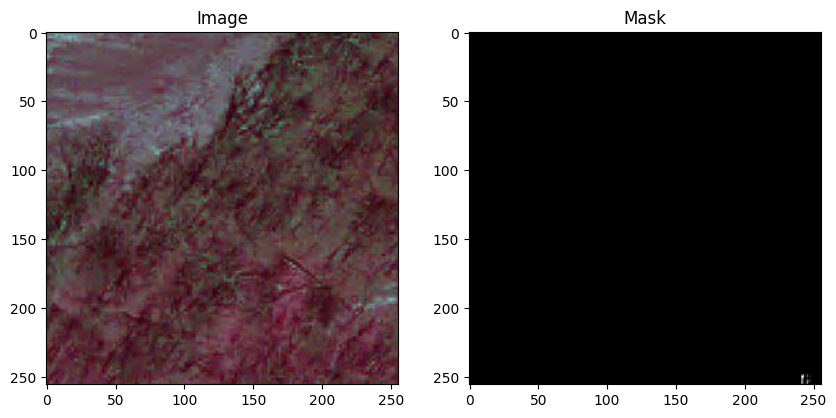

In [12]:
# sample training image and it's lable
img_num = random.randint(0, 88863)
example_img = np.asarray(Image.open(io.BytesIO(train_dataset[img_num]['tif'])))
example_label = np.asarray(Image.open(io.BytesIO(train_dataset[img_num]['label_tif'])))

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

axes[0].imshow(example_img, cmap='gray')
axes[0].set_title('Image')

axes[1].imshow(example_label, cmap='gray')
axes[1].set_title('Mask')

plt.show()

In [13]:
def get_bounding_box(ground_truth_map):
  y_ind, x_ind = np.where(ground_truth_map > 0)
  x_min, x_max = 0, 255 #np.min(x_ind), np.max(x_ind)
  y_min, y_max = 0, 255 #np.min(y_ind), np.max(y_ind)

  H, W = 256, 256
  x_min = max(0, x_min - np.random.randint(0, 20))
  x_max = min(W, x_max + np.random.randint(0, 20))
  y_min = max(0, y_min - np.random.randint(0, 20))
  y_max = min(H, y_max + np.random.randint(0, 20))

  bbox = [x_min, y_min, x_max, y_max]

  return bbox

In [14]:
from torch.utils.data import Dataset

class SAMDataset(Dataset):
  """
  This class is used to create a dataset that serves input images and masks.
  It takes a dataset and a processor as input and overrides the __len__ and __getitem__ methods of the Dataset class.
  """
  def __init__(self, dataset, processor):
    self.dataset = dataset
    self.processor = processor

  def __len__(self):
    return len(self.dataset)

  def __getitem__(self, idx):
    item = self.dataset[idx]
    image = np.asarray(Image.open(io.BytesIO(item["tif"])))
    ground_truth_mask = np.asarray(Image.open(io.BytesIO(item["label_tif"])))

    # get bounding box prompt
    prompt = get_bounding_box(ground_truth_mask)

    # prepare image and prompt for the model
    inputs = self.processor(image, input_boxes=[[prompt]], return_tensors="pt")

    # remove batch dimension which the processor adds by default
    inputs = {k:v.squeeze(0) for k,v in inputs.items()}

    # add ground truth segmentation
    inputs["ground_truth_mask"] = ground_truth_mask

    return inputs

In [15]:
# Initialize the processor
from transformers import SamProcessor
processor = SamProcessor.from_pretrained("facebook/sam-vit-base")

2024-04-23 22:36:47.440399: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-23 22:36:47.440533: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-23 22:36:47.618323: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


preprocessor_config.json:   0%|          | 0.00/466 [00:00<?, ?B/s]

In [16]:
# instance of out customn SAMDataset
trainDataset = SAMDataset(dataset=train_dataset, processor=processor)

In [17]:
example = trainDataset[0]
for k,v in example.items():
  print(k,v.shape)

pixel_values torch.Size([3, 1024, 1024])
original_sizes torch.Size([2])
reshaped_input_sizes torch.Size([2])
input_boxes torch.Size([1, 4])
ground_truth_mask (256, 256)


In [18]:
# Create a DataLoader instance for the training dataset
from torch.utils.data import DataLoader
train_dataloader = DataLoader(trainDataset, batch_size=2, shuffle=True)

In [19]:
batch = next(iter(train_dataloader))
for k,v in batch.items():
  print(k,v.shape)

pixel_values torch.Size([2, 3, 1024, 1024])
original_sizes torch.Size([2, 2])
reshaped_input_sizes torch.Size([2, 2])
input_boxes torch.Size([2, 1, 4])
ground_truth_mask torch.Size([2, 256, 256])


/opt/conda/lib/python3.10/site-packages/torch/utils/data/_utils/collate.py:171: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /usr/local/src/pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return collate([torch.as_tensor(b) for b in batch], collate_fn_map=collate_fn_map)


In [20]:
# Load the model
from transformers import SamModel
model = SamModel.from_pretrained("facebook/sam-vit-base")

# make sure we only compute gradients for mask decoder
for name, param in model.named_parameters():
  if name.startswith("vision_encoder") or name.startswith("prompt_encoder"):
    param.requires_grad_(False)

config.json:   0%|          | 0.00/6.57k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/375M [00:00<?, ?B/s]

In [21]:
!pip install -q monai

In [22]:
from torch.optim import Adam
import monai

optimizer = Adam(model.mask_decoder.parameters(), lr=1e-5, weight_decay=0)
seg_loss = monai.losses.DiceLoss(sigmoid=True, squared_pred=True, reduction='mean')

In [23]:
print("Traning Starts....")

Traning Starts....


In [24]:
from tqdm import tqdm
from statistics import mean
import torch
from torch.nn.functional import threshold, normalize

#Training loop
num_epochs = 1

device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

model.train()
for epoch in range(num_epochs):
    epoch_losses = []
    for batch in tqdm(train_dataloader):
      # forward pass
        outputs = model(pixel_values=batch["pixel_values"].to(device),
                      input_boxes=batch["input_boxes"].to(device),
                      multimask_output=False)

      # compute loss
        predicted_masks = outputs.pred_masks.squeeze(1)
        ground_truth_masks = batch["ground_truth_mask"].float().to(device)
        loss = seg_loss(predicted_masks, ground_truth_masks.unsqueeze(1))

      # backward pass (compute gradients of parameters w.r.t. loss)
        optimizer.zero_grad()
        loss.backward()

      # optimize
        optimizer.step()
        epoch_losses.append(loss.item())
        print(f'Mean loss: {mean(epoch_losses)}')
        if mean(epoch_losses)<0.1:
            break
        
    
print(f'EPOCH: {epoch}')
print(f'Mean loss: {mean(epoch_losses)}')
    

  0%|          | 1/44432 [00:02<30:13:20,  2.45s/it]

Mean loss: 0.9950584769248962


  0%|          | 2/44432 [00:03<18:48:16,  1.52s/it]

Mean loss: 0.9743595123291016


  0%|          | 3/44432 [00:04<15:02:27,  1.22s/it]

Mean loss: 0.9712536732355753


  0%|          | 4/44432 [00:05<13:15:32,  1.07s/it]

Mean loss: 0.9698985517024994


  0%|          | 5/44432 [00:05<12:17:28,  1.00it/s]

Mean loss: 0.958890187740326


  0%|          | 6/44432 [00:06<11:40:56,  1.06it/s]

Mean loss: 0.9465209941069285


  0%|          | 7/44432 [00:07<11:17:56,  1.09it/s]

Mean loss: 0.9499027473585946


  0%|          | 8/44432 [00:08<11:07:10,  1.11it/s]

Mean loss: 0.9425923898816109


  0%|          | 9/44432 [00:09<10:56:37,  1.13it/s]

Mean loss: 0.938751757144928


  0%|          | 10/44432 [00:10<10:52:26,  1.13it/s]

Mean loss: 0.9364100158214569


  0%|          | 11/44432 [00:11<10:47:39,  1.14it/s]

Mean loss: 0.9342451583255421


  0%|          | 12/44432 [00:11<10:44:58,  1.15it/s]

Mean loss: 0.9390507340431213


  0%|          | 13/44432 [00:12<10:41:53,  1.15it/s]

Mean loss: 0.9402014017105103


  0%|          | 14/44432 [00:13<10:38:39,  1.16it/s]

Mean loss: 0.9348597015653338


  0%|          | 15/44432 [00:14<10:36:51,  1.16it/s]

Mean loss: 0.9305997292200724


  0%|          | 16/44432 [00:15<10:35:12,  1.17it/s]

Mean loss: 0.9271852746605873


  0%|          | 17/44432 [00:16<10:35:58,  1.16it/s]

Mean loss: 0.9258726414512185


  0%|          | 18/44432 [00:17<10:34:39,  1.17it/s]

Mean loss: 0.9230874247021146


  0%|          | 19/44432 [00:17<10:35:02,  1.17it/s]

Mean loss: 0.9181458510850605


  0%|          | 20/44432 [00:18<10:35:42,  1.16it/s]

Mean loss: 0.9193516552448273


  0%|          | 21/44432 [00:19<10:37:50,  1.16it/s]

Mean loss: 0.9150214308784121


  0%|          | 22/44432 [00:20<10:37:18,  1.16it/s]

Mean loss: 0.918537662787871


  0%|          | 23/44432 [00:21<10:38:57,  1.16it/s]

Mean loss: 0.9167583895766217


  0%|          | 24/44432 [00:22<10:37:49,  1.16it/s]

Mean loss: 0.9133682524164518


  0%|          | 25/44432 [00:23<10:37:56,  1.16it/s]

Mean loss: 0.9112667202949524


  0%|          | 26/44432 [00:23<10:39:50,  1.16it/s]

Mean loss: 0.9064200543440305


  0%|          | 27/44432 [00:24<10:37:37,  1.16it/s]

Mean loss: 0.9040138831845036


  0%|          | 28/44432 [00:25<10:38:50,  1.16it/s]

Mean loss: 0.9063336913074765


  0%|          | 29/44432 [00:26<10:39:46,  1.16it/s]

Mean loss: 0.9024451539434236


  0%|          | 30/44432 [00:27<10:37:56,  1.16it/s]

Mean loss: 0.898890882730484


  0%|          | 31/44432 [00:28<10:39:32,  1.16it/s]

Mean loss: 0.8983886434185889


  0%|          | 32/44432 [00:29<10:41:10,  1.15it/s]

Mean loss: 0.9012264758348465


  0%|          | 33/44432 [00:30<10:41:57,  1.15it/s]

Mean loss: 0.897829841483723


  0%|          | 34/44432 [00:30<10:43:08,  1.15it/s]

Mean loss: 0.8909244309453404


  0%|          | 35/44432 [00:31<10:43:19,  1.15it/s]

Mean loss: 0.8910892844200134


  0%|          | 36/44432 [00:32<10:43:40,  1.15it/s]

Mean loss: 0.8884223881695006


  0%|          | 37/44432 [00:33<10:43:27,  1.15it/s]

Mean loss: 0.8780782609372526


  0%|          | 38/44432 [00:34<10:44:06,  1.15it/s]

Mean loss: 0.8752285775385404


  0%|          | 39/44432 [00:35<10:42:37,  1.15it/s]

Mean loss: 0.8728380356079493


  0%|          | 40/44432 [00:36<10:41:20,  1.15it/s]

Mean loss: 0.8694712355732918


  0%|          | 41/44432 [00:36<10:42:28,  1.15it/s]

Mean loss: 0.8700655393484162


  0%|          | 42/44432 [00:37<10:43:05,  1.15it/s]

Mean loss: 0.8659429848194122


  0%|          | 43/44432 [00:38<10:42:44,  1.15it/s]

Mean loss: 0.8584291699320771


  0%|          | 44/44432 [00:39<10:40:45,  1.15it/s]

Mean loss: 0.8504718826575712


  0%|          | 45/44432 [00:40<10:40:44,  1.15it/s]

Mean loss: 0.8460171474350824


  0%|          | 46/44432 [00:41<10:42:02,  1.15it/s]

Mean loss: 0.8414325649323671


  0%|          | 47/44432 [00:42<10:43:42,  1.15it/s]

Mean loss: 0.8333934837199272


  0%|          | 48/44432 [00:43<10:43:37,  1.15it/s]

Mean loss: 0.8269713781774044


  0%|          | 49/44432 [00:43<10:43:17,  1.15it/s]

Mean loss: 0.8253159741966092


  0%|          | 50/44432 [00:44<10:43:28,  1.15it/s]

Mean loss: 0.8217764592170715


  0%|          | 51/44432 [00:45<10:44:06,  1.15it/s]

Mean loss: 0.8186645811679316


  0%|          | 52/44432 [00:46<10:44:19,  1.15it/s]

Mean loss: 0.8123855883112321


  0%|          | 53/44432 [00:47<10:44:25,  1.15it/s]

Mean loss: 0.8070602703769252


  0%|          | 54/44432 [00:48<10:45:19,  1.15it/s]

Mean loss: 0.80850325414428


  0%|          | 55/44432 [00:49<10:44:44,  1.15it/s]

Mean loss: 0.805882392688231


  0%|          | 56/44432 [00:50<10:44:03,  1.15it/s]

Mean loss: 0.8043655939400196


  0%|          | 57/44432 [00:50<10:45:44,  1.15it/s]

Mean loss: 0.8016333491132971


  0%|          | 58/44432 [00:51<10:45:24,  1.15it/s]

Mean loss: 0.7997146778065582


  0%|          | 59/44432 [00:52<10:45:04,  1.15it/s]

Mean loss: 0.7968790808976707


  0%|          | 60/44432 [00:53<10:44:58,  1.15it/s]

Mean loss: 0.7928138469656308


  0%|          | 61/44432 [00:54<10:44:41,  1.15it/s]

Mean loss: 0.7902465164661407


  0%|          | 62/44432 [00:55<10:44:57,  1.15it/s]

Mean loss: 0.7890637271827267


  0%|          | 63/44432 [00:56<10:45:08,  1.15it/s]

Mean loss: 0.7891922134255606


  0%|          | 64/44432 [00:56<10:45:27,  1.15it/s]

Mean loss: 0.7910026744939387


  0%|          | 65/44432 [00:57<10:44:49,  1.15it/s]

Mean loss: 0.7915895200692691


  0%|          | 66/44432 [00:58<10:45:00,  1.15it/s]

Mean loss: 0.7874170501123775


  0%|          | 67/44432 [00:59<10:45:22,  1.15it/s]

Mean loss: 0.7845466025729677


  0%|          | 68/44432 [01:00<10:44:58,  1.15it/s]

Mean loss: 0.7832523834179429


  0%|          | 69/44432 [01:01<10:46:14,  1.14it/s]

Mean loss: 0.7819715302059616


  0%|          | 70/44432 [01:02<10:48:33,  1.14it/s]

Mean loss: 0.7792101361921855


  0%|          | 71/44432 [01:03<10:47:40,  1.14it/s]

Mean loss: 0.7815277068547799


  0%|          | 72/44432 [01:03<10:47:39,  1.14it/s]

Mean loss: 0.7764334496524599


  0%|          | 73/44432 [01:04<10:51:01,  1.14it/s]

Mean loss: 0.7728161583208057


  0%|          | 74/44432 [01:05<10:49:50,  1.14it/s]

Mean loss: 0.7678940159243506


  0%|          | 75/44432 [01:06<10:50:00,  1.14it/s]

Mean loss: 0.7675218828519186


  0%|          | 76/44432 [01:07<10:51:12,  1.14it/s]

Mean loss: 0.766452777542566


  0%|          | 77/44432 [01:08<10:50:09,  1.14it/s]

Mean loss: 0.7684057772933662


  0%|          | 78/44432 [01:09<10:48:55,  1.14it/s]

Mean loss: 0.7647462670619671


  0%|          | 79/44432 [01:10<10:50:27,  1.14it/s]

Mean loss: 0.7639855659460719


  0%|          | 80/44432 [01:11<10:49:53,  1.14it/s]

Mean loss: 0.7626805871725082


  0%|          | 81/44432 [01:11<10:53:33,  1.13it/s]

Mean loss: 0.7632145072207038


  0%|          | 82/44432 [01:12<10:52:24,  1.13it/s]

Mean loss: 0.7616244714434554


  0%|          | 83/44432 [01:13<10:53:22,  1.13it/s]

Mean loss: 0.7620957759489496


  0%|          | 84/44432 [01:14<10:54:15,  1.13it/s]

Mean loss: 0.7612845017796471


  0%|          | 85/44432 [01:15<10:55:11,  1.13it/s]

Mean loss: 0.7600652694702148


  0%|          | 86/44432 [01:16<10:55:02,  1.13it/s]

Mean loss: 0.7589652358099471


  0%|          | 87/44432 [01:17<10:55:11,  1.13it/s]

Mean loss: 0.756846751974917


  0%|          | 88/44432 [01:18<10:53:56,  1.13it/s]

Mean loss: 0.7522681138732217


  0%|          | 89/44432 [01:19<10:54:55,  1.13it/s]

Mean loss: 0.752584994508979


  0%|          | 90/44432 [01:19<10:55:47,  1.13it/s]

Mean loss: 0.7538337455855475


  0%|          | 91/44432 [01:20<10:55:38,  1.13it/s]

Mean loss: 0.7536984564183833


  0%|          | 92/44432 [01:21<10:55:23,  1.13it/s]

Mean loss: 0.7529827472956284


  0%|          | 93/44432 [01:22<10:56:30,  1.13it/s]

Mean loss: 0.7513338135134789


  0%|          | 94/44432 [01:23<10:57:10,  1.12it/s]

Mean loss: 0.7513733658384769


  0%|          | 95/44432 [01:24<10:57:43,  1.12it/s]

Mean loss: 0.74885300146906


  0%|          | 96/44432 [01:25<10:58:17,  1.12it/s]

Mean loss: 0.7479548572252194


  0%|          | 97/44432 [01:26<10:58:35,  1.12it/s]

Mean loss: 0.7472304001296919


  0%|          | 98/44432 [01:27<10:58:57,  1.12it/s]

Mean loss: 0.7459276458438562


  0%|          | 99/44432 [01:27<10:56:56,  1.12it/s]

Mean loss: 0.7436883654257264


  0%|          | 100/44432 [01:28<10:56:17,  1.13it/s]

Mean loss: 0.7408910611271858


  0%|          | 101/44432 [01:29<10:58:51,  1.12it/s]

Mean loss: 0.7406986819045378


  0%|          | 102/44432 [01:30<11:00:20,  1.12it/s]

Mean loss: 0.7387033581149345


  0%|          | 103/44432 [01:31<11:00:54,  1.12it/s]

Mean loss: 0.7368735118398388


  0%|          | 104/44432 [01:32<10:59:39,  1.12it/s]

Mean loss: 0.7351796664297581


  0%|          | 105/44432 [01:33<10:59:51,  1.12it/s]

Mean loss: 0.7375490202790215


  0%|          | 106/44432 [01:34<11:03:22,  1.11it/s]

Mean loss: 0.7385921807221647


  0%|          | 107/44432 [01:35<11:02:06,  1.12it/s]

Mean loss: 0.7358629982048106


  0%|          | 108/44432 [01:35<11:02:06,  1.12it/s]

Mean loss: 0.7331298884970171


  0%|          | 109/44432 [01:36<11:00:46,  1.12it/s]

Mean loss: 0.732793037771085


  0%|          | 110/44432 [01:37<10:59:59,  1.12it/s]

Mean loss: 0.7341687416488474


  0%|          | 111/44432 [01:38<11:02:32,  1.11it/s]

Mean loss: 0.7352332389569497


  0%|          | 112/44432 [01:39<11:02:52,  1.11it/s]

Mean loss: 0.735150343339358


  0%|          | 113/44432 [01:40<11:01:52,  1.12it/s]

Mean loss: 0.7349332209709472


  0%|          | 114/44432 [01:41<11:04:09,  1.11it/s]

Mean loss: 0.7353487921911374


  0%|          | 115/44432 [01:42<11:03:58,  1.11it/s]

Mean loss: 0.7341052856134331


  0%|          | 116/44432 [01:43<11:03:16,  1.11it/s]

Mean loss: 0.731447881665723


  0%|          | 117/44432 [01:44<11:05:01,  1.11it/s]

Mean loss: 0.7297324110300113


  0%|          | 118/44432 [01:44<11:06:01,  1.11it/s]

Mean loss: 0.7289202218338594


  0%|          | 119/44432 [01:45<11:06:00,  1.11it/s]

Mean loss: 0.729852712454916


  0%|          | 120/44432 [01:46<11:06:27,  1.11it/s]

Mean loss: 0.7274613909423351


  0%|          | 121/44432 [01:47<11:06:02,  1.11it/s]

Mean loss: 0.7271012420004065


  0%|          | 122/44432 [01:48<11:07:49,  1.11it/s]

Mean loss: 0.7263803469841598


  0%|          | 123/44432 [01:49<11:06:03,  1.11it/s]

Mean loss: 0.7281453873568434


  0%|          | 124/44432 [01:50<11:08:22,  1.10it/s]

Mean loss: 0.7278697070094847


  0%|          | 125/44432 [01:51<11:10:20,  1.10it/s]

Mean loss: 0.7277331206798553


  0%|          | 126/44432 [01:52<11:16:10,  1.09it/s]

Mean loss: 0.7252530297116627


  0%|          | 127/44432 [01:53<11:14:51,  1.09it/s]

Mean loss: 0.7259090516980239


  0%|          | 128/44432 [01:54<11:16:28,  1.09it/s]

Mean loss: 0.7255994302686304


  0%|          | 129/44432 [01:54<11:15:52,  1.09it/s]

Mean loss: 0.7258335534454317


  0%|          | 130/44432 [01:55<11:14:54,  1.09it/s]

Mean loss: 0.7255595012353017


  0%|          | 131/44432 [01:56<11:18:35,  1.09it/s]

Mean loss: 0.72635898403539


  0%|          | 132/44432 [01:57<11:17:05,  1.09it/s]

Mean loss: 0.7260882626428748


  0%|          | 133/44432 [01:58<11:17:05,  1.09it/s]

Mean loss: 0.7247285809283867


  0%|          | 134/44432 [01:59<11:16:00,  1.09it/s]

Mean loss: 0.726737138273111


  0%|          | 135/44432 [02:00<11:18:41,  1.09it/s]

Mean loss: 0.7244227888407531


  0%|          | 136/44432 [02:01<11:18:35,  1.09it/s]

Mean loss: 0.7233932134421432


  0%|          | 137/44432 [02:02<11:20:39,  1.08it/s]

Mean loss: 0.7219727989965982


  0%|          | 138/44432 [02:03<11:19:08,  1.09it/s]

Mean loss: 0.7211135342933129


  0%|          | 139/44432 [02:04<11:20:47,  1.08it/s]

Mean loss: 0.7193584976007612


  0%|          | 140/44432 [02:05<11:22:21,  1.08it/s]

Mean loss: 0.7190915450453759


  0%|          | 141/44432 [02:06<11:21:25,  1.08it/s]

Mean loss: 0.7209344597150248


  0%|          | 142/44432 [02:06<11:22:02,  1.08it/s]

Mean loss: 0.7195460999935446


  0%|          | 143/44432 [02:07<11:20:43,  1.08it/s]

Mean loss: 0.7181414884703976


  0%|          | 144/44432 [02:08<11:21:46,  1.08it/s]

Mean loss: 0.7163869506782956


  0%|          | 145/44432 [02:09<11:20:37,  1.08it/s]

Mean loss: 0.715094882866432


  0%|          | 146/44432 [02:10<11:21:51,  1.08it/s]

Mean loss: 0.7144296634687136


  0%|          | 147/44432 [02:11<11:21:53,  1.08it/s]

Mean loss: 0.7131460110346476


  0%|          | 148/44432 [02:12<11:22:15,  1.08it/s]

Mean loss: 0.7132930630767668


  0%|          | 149/44432 [02:13<11:22:32,  1.08it/s]

Mean loss: 0.7109691902695087


  0%|          | 150/44432 [02:14<11:25:07,  1.08it/s]

Mean loss: 0.7100670097271601


  0%|          | 151/44432 [02:15<11:26:20,  1.08it/s]

Mean loss: 0.7108828119489531


  0%|          | 152/44432 [02:16<11:24:47,  1.08it/s]

Mean loss: 0.709531338003121


  0%|          | 153/44432 [02:17<11:23:33,  1.08it/s]

Mean loss: 0.7099945118614271


  0%|          | 154/44432 [02:18<11:25:40,  1.08it/s]

Mean loss: 0.7103067073342088


  0%|          | 155/44432 [02:19<11:24:24,  1.08it/s]

Mean loss: 0.7090149769859929


  0%|          | 156/44432 [02:19<11:24:56,  1.08it/s]

Mean loss: 0.7101081657486085


  0%|          | 157/44432 [02:20<11:24:34,  1.08it/s]

Mean loss: 0.7108415678428237


  0%|          | 158/44432 [02:21<11:24:38,  1.08it/s]

Mean loss: 0.7104157215055031


  0%|          | 159/44432 [02:22<11:24:23,  1.08it/s]

Mean loss: 0.7110750474644907


  0%|          | 160/44432 [02:23<11:24:47,  1.08it/s]

Mean loss: 0.7111044464632869


  0%|          | 161/44432 [02:24<11:25:16,  1.08it/s]

Mean loss: 0.7110186110001914


  0%|          | 162/44432 [02:25<11:24:54,  1.08it/s]

Mean loss: 0.7104119671347701


  0%|          | 163/44432 [02:26<11:25:18,  1.08it/s]

Mean loss: 0.7100447538805885


  0%|          | 164/44432 [02:27<11:25:14,  1.08it/s]

Mean loss: 0.7089519418957757


  0%|          | 165/44432 [02:28<11:23:33,  1.08it/s]

Mean loss: 0.7074337267514431


  0%|          | 166/44432 [02:29<11:23:00,  1.08it/s]

Mean loss: 0.708409358040396


  0%|          | 167/44432 [02:30<11:21:01,  1.08it/s]

Mean loss: 0.7072991188057882


  0%|          | 168/44432 [02:31<11:20:52,  1.08it/s]

Mean loss: 0.707524413686423


  0%|          | 169/44432 [02:31<11:22:55,  1.08it/s]

Mean loss: 0.7069322221730587


  0%|          | 170/44432 [02:32<11:20:17,  1.08it/s]

Mean loss: 0.7079233041580986


  0%|          | 171/44432 [02:33<11:18:53,  1.09it/s]

Mean loss: 0.707184643599025


  0%|          | 172/44432 [02:34<11:18:39,  1.09it/s]

Mean loss: 0.7087869548866915


  0%|          | 173/44432 [02:35<11:22:50,  1.08it/s]

Mean loss: 0.709793195042307


  0%|          | 174/44432 [02:36<11:22:35,  1.08it/s]

Mean loss: 0.7103377726228758


  0%|          | 175/44432 [02:37<11:20:55,  1.08it/s]

Mean loss: 0.7117732853548867


  0%|          | 176/44432 [02:38<11:22:45,  1.08it/s]

Mean loss: 0.7116870682009242


  0%|          | 177/44432 [02:39<11:24:11,  1.08it/s]

Mean loss: 0.7119535371071875


  0%|          | 178/44432 [02:40<11:21:10,  1.08it/s]

Mean loss: 0.7131021945329195


  0%|          | 179/44432 [02:41<11:22:51,  1.08it/s]

Mean loss: 0.713262669700484


  0%|          | 180/44432 [02:42<11:23:35,  1.08it/s]

Mean loss: 0.713076535695129


  0%|          | 181/44432 [02:43<11:21:16,  1.08it/s]

Mean loss: 0.7120045217690547


  0%|          | 182/44432 [02:44<11:23:07,  1.08it/s]

Mean loss: 0.711954096352661


  0%|          | 183/44432 [02:44<11:23:15,  1.08it/s]

Mean loss: 0.7112860332746975


  0%|          | 184/44432 [02:45<11:21:35,  1.08it/s]

Mean loss: 0.7114991501945517


  0%|          | 185/44432 [02:46<11:20:55,  1.08it/s]

Mean loss: 0.7115345292800181


  0%|          | 186/44432 [02:47<11:19:23,  1.09it/s]

Mean loss: 0.7102801456887234


  0%|          | 187/44432 [02:48<11:17:14,  1.09it/s]

Mean loss: 0.7109657242336375


  0%|          | 188/44432 [02:49<11:15:57,  1.09it/s]

Mean loss: 0.7105393387535786


  0%|          | 189/44432 [02:50<11:15:54,  1.09it/s]

Mean loss: 0.7119254040970373


  0%|          | 190/44432 [02:51<11:15:19,  1.09it/s]

Mean loss: 0.7103820101210946


  0%|          | 191/44432 [02:52<11:17:18,  1.09it/s]

Mean loss: 0.7096498293402307


  0%|          | 192/44432 [02:53<11:17:30,  1.09it/s]

Mean loss: 0.7080111756610373


  0%|          | 193/44432 [02:54<11:18:31,  1.09it/s]

Mean loss: 0.7088376140038584


  0%|          | 194/44432 [02:55<11:20:18,  1.08it/s]

Mean loss: 0.7084039205435625


  0%|          | 195/44432 [02:55<11:19:14,  1.09it/s]

Mean loss: 0.7082999790326143


  0%|          | 196/44432 [02:56<11:17:51,  1.09it/s]

Mean loss: 0.7084525761251547


  0%|          | 197/44432 [02:57<11:16:47,  1.09it/s]

Mean loss: 0.7089442116052366


  0%|          | 198/44432 [02:58<11:17:20,  1.09it/s]

Mean loss: 0.7084772136777339


  0%|          | 199/44432 [02:59<11:14:27,  1.09it/s]

Mean loss: 0.706927579251965


  0%|          | 200/44432 [03:00<11:13:42,  1.09it/s]

Mean loss: 0.7064566814899444


  0%|          | 201/44432 [03:01<11:16:56,  1.09it/s]

Mean loss: 0.704701141190173


  0%|          | 202/44432 [03:02<11:20:06,  1.08it/s]

Mean loss: 0.702948435550869


  0%|          | 203/44432 [03:03<11:18:08,  1.09it/s]

Mean loss: 0.7017770246625534


  0%|          | 204/44432 [03:04<11:17:40,  1.09it/s]

Mean loss: 0.7028282680640033


  0%|          | 205/44432 [03:05<11:15:51,  1.09it/s]

Mean loss: 0.7018913511822863


  0%|          | 206/44432 [03:06<11:15:31,  1.09it/s]

Mean loss: 0.701972090358873


  0%|          | 207/44432 [03:06<11:17:42,  1.09it/s]

Mean loss: 0.7005137948022373


  0%|          | 208/44432 [03:07<11:19:58,  1.08it/s]

Mean loss: 0.7017344350998218


  0%|          | 209/44432 [03:08<11:19:00,  1.09it/s]

Mean loss: 0.7011374252264579


  0%|          | 210/44432 [03:09<11:17:00,  1.09it/s]

Mean loss: 0.7014734290895008


  0%|          | 211/44432 [03:10<11:17:39,  1.09it/s]

Mean loss: 0.7015055367166962


  0%|          | 212/44432 [03:11<11:17:55,  1.09it/s]

Mean loss: 0.7014987193188578


  0%|          | 213/44432 [03:12<11:16:55,  1.09it/s]

Mean loss: 0.701135000152767


  0%|          | 214/44432 [03:13<11:15:48,  1.09it/s]

Mean loss: 0.700936380390809


  0%|          | 215/44432 [03:14<11:17:46,  1.09it/s]

Mean loss: 0.6994532863761104


  0%|          | 216/44432 [03:15<11:17:17,  1.09it/s]

Mean loss: 0.7007117029969339


  0%|          | 217/44432 [03:16<11:15:33,  1.09it/s]

Mean loss: 0.700286927173764


  0%|          | 218/44432 [03:17<11:15:13,  1.09it/s]

Mean loss: 0.7001138535934851


  0%|          | 219/44432 [03:17<11:17:22,  1.09it/s]

Mean loss: 0.7002246149870903


  0%|          | 220/44432 [03:18<11:17:30,  1.09it/s]

Mean loss: 0.7003192905675281


  0%|          | 221/44432 [03:19<11:17:50,  1.09it/s]

Mean loss: 0.6997331654593956


  0%|          | 222/44432 [03:20<11:19:13,  1.08it/s]

Mean loss: 0.7008861124784023


  1%|          | 223/44432 [03:21<11:17:12,  1.09it/s]

Mean loss: 0.6993236756912796


  1%|          | 224/44432 [03:22<11:19:16,  1.08it/s]

Mean loss: 0.6999169991218618


  1%|          | 225/44432 [03:23<11:18:42,  1.09it/s]

Mean loss: 0.6996346837944455


  1%|          | 226/44432 [03:24<11:20:49,  1.08it/s]

Mean loss: 0.6996966335362038


  1%|          | 227/44432 [03:25<11:21:36,  1.08it/s]

Mean loss: 0.6989051632681608


  1%|          | 228/44432 [03:26<11:23:02,  1.08it/s]

Mean loss: 0.6992079080981121


  1%|          | 229/44432 [03:27<11:24:35,  1.08it/s]

Mean loss: 0.7004597742744929


  1%|          | 230/44432 [03:28<11:23:01,  1.08it/s]

Mean loss: 0.6995047621105028


  1%|          | 231/44432 [03:29<11:20:58,  1.08it/s]

Mean loss: 0.7007513856474972


  1%|          | 232/44432 [03:30<11:21:15,  1.08it/s]

Mean loss: 0.7004740351232989


  1%|          | 233/44432 [03:30<11:19:48,  1.08it/s]

Mean loss: 0.7005413325559428


  1%|          | 234/44432 [03:31<11:18:44,  1.09it/s]

Mean loss: 0.7008584753060952


  1%|          | 235/44432 [03:32<11:19:30,  1.08it/s]

Mean loss: 0.7013009629351028


  1%|          | 236/44432 [03:33<11:19:56,  1.08it/s]

Mean loss: 0.7011128368519121


  1%|          | 237/44432 [03:34<11:20:52,  1.08it/s]

Mean loss: 0.7003354882892174


  1%|          | 238/44432 [03:35<11:22:25,  1.08it/s]

Mean loss: 0.7010760572778076


  1%|          | 239/44432 [03:36<11:21:52,  1.08it/s]

Mean loss: 0.7009801011704002


  1%|          | 240/44432 [03:37<11:25:49,  1.07it/s]

Mean loss: 0.7004697193702062


  1%|          | 241/44432 [03:38<11:25:10,  1.07it/s]

Mean loss: 0.6999769008011244


  1%|          | 242/44432 [03:39<11:24:40,  1.08it/s]

Mean loss: 0.6991731187036215


  1%|          | 243/44432 [03:40<11:23:04,  1.08it/s]

Mean loss: 0.6986035807633105


  1%|          | 244/44432 [03:41<11:22:43,  1.08it/s]

Mean loss: 0.6991567054732901


  1%|          | 245/44432 [03:42<11:22:54,  1.08it/s]

Mean loss: 0.699191419932307


  1%|          | 246/44432 [03:42<11:21:41,  1.08it/s]

Mean loss: 0.6987435408239442


  1%|          | 247/44432 [03:43<11:21:42,  1.08it/s]

Mean loss: 0.6981719519927917


  1%|          | 248/44432 [03:44<11:19:45,  1.08it/s]

Mean loss: 0.6978666599719755


  1%|          | 249/44432 [03:45<11:24:43,  1.08it/s]

Mean loss: 0.6987195661269039


  1%|          | 250/44432 [03:46<11:23:42,  1.08it/s]

Mean loss: 0.6991087293624878


  1%|          | 251/44432 [03:47<11:21:45,  1.08it/s]

Mean loss: 0.7000178231661063


  1%|          | 252/44432 [03:48<11:22:01,  1.08it/s]

Mean loss: 0.7004152493817466


  1%|          | 253/44432 [03:49<11:23:35,  1.08it/s]

Mean loss: 0.6989818367326683


  1%|          | 254/44432 [03:50<11:21:28,  1.08it/s]

Mean loss: 0.6989808970783639


  1%|          | 255/44432 [03:51<11:21:32,  1.08it/s]

Mean loss: 0.6985720357474159


  1%|          | 256/44432 [03:52<11:23:09,  1.08it/s]

Mean loss: 0.6982487625209615


  1%|          | 257/44432 [03:53<11:24:11,  1.08it/s]

Mean loss: 0.6976292373373351


  1%|          | 258/44432 [03:54<11:24:32,  1.08it/s]

Mean loss: 0.6968450722999351


  1%|          | 259/44432 [03:55<11:23:11,  1.08it/s]

Mean loss: 0.6959578784966561


  1%|          | 260/44432 [03:55<11:22:54,  1.08it/s]

Mean loss: 0.6952903996293361


  1%|          | 261/44432 [03:56<11:21:32,  1.08it/s]

Mean loss: 0.6949041130670642


  1%|          | 262/44432 [03:57<11:24:33,  1.08it/s]

Mean loss: 0.6936745344455005


  1%|          | 263/44432 [03:58<11:24:40,  1.08it/s]

Mean loss: 0.6941605132115658


  1%|          | 264/44432 [03:59<11:23:44,  1.08it/s]

Mean loss: 0.694912211122838


  1%|          | 265/44432 [04:00<11:21:41,  1.08it/s]

Mean loss: 0.6942030804337196


  1%|          | 266/44432 [04:01<11:20:11,  1.08it/s]

Mean loss: 0.6945549533107227


  1%|          | 267/44432 [04:02<11:18:50,  1.08it/s]

Mean loss: 0.69545189193572


  1%|          | 268/44432 [04:03<11:22:22,  1.08it/s]

Mean loss: 0.6943293972246682


  1%|          | 269/44432 [04:04<11:21:10,  1.08it/s]

Mean loss: 0.6941359071926556


  1%|          | 270/44432 [04:05<11:20:20,  1.08it/s]

Mean loss: 0.6942311743895213


  1%|          | 271/44432 [04:06<11:21:45,  1.08it/s]

Mean loss: 0.6939713512839426


  1%|          | 272/44432 [04:07<11:19:23,  1.08it/s]

Mean loss: 0.6942476071417332


  1%|          | 273/44432 [04:07<11:18:29,  1.08it/s]

Mean loss: 0.6943501952366952


  1%|          | 274/44432 [04:08<11:20:14,  1.08it/s]

Mean loss: 0.6948330835269315


  1%|          | 275/44432 [04:09<11:20:20,  1.08it/s]

Mean loss: 0.6953107116439126


  1%|          | 276/44432 [04:10<11:19:15,  1.08it/s]

Mean loss: 0.6964125395685002


  1%|          | 277/44432 [04:11<11:19:27,  1.08it/s]

Mean loss: 0.6959794415463609


  1%|          | 278/44432 [04:12<11:17:15,  1.09it/s]

Mean loss: 0.695655419886541


  1%|          | 279/44432 [04:13<11:16:15,  1.09it/s]

Mean loss: 0.6954959590375209


  1%|          | 280/44432 [04:14<11:17:33,  1.09it/s]

Mean loss: 0.6951056175998279


  1%|          | 281/44432 [04:15<11:16:30,  1.09it/s]

Mean loss: 0.6950896564751757


  1%|          | 282/44432 [04:16<11:18:27,  1.08it/s]

Mean loss: 0.6950110334453853


  1%|          | 283/44432 [04:17<11:19:36,  1.08it/s]

Mean loss: 0.6946436394229795


  1%|          | 284/44432 [04:18<11:18:16,  1.08it/s]

Mean loss: 0.6951283770547786


  1%|          | 285/44432 [04:19<11:16:39,  1.09it/s]

Mean loss: 0.695101601408239


  1%|          | 286/44432 [04:19<11:16:06,  1.09it/s]

Mean loss: 0.6961246489228069


  1%|          | 287/44432 [04:20<11:17:08,  1.09it/s]

Mean loss: 0.6963948603291129


  1%|          | 288/44432 [04:21<11:16:04,  1.09it/s]

Mean loss: 0.6957455763800277


  1%|          | 289/44432 [04:22<11:15:51,  1.09it/s]

Mean loss: 0.695685274254492


  1%|          | 290/44432 [04:23<11:14:52,  1.09it/s]

Mean loss: 0.6960168659687043


  1%|          | 291/44432 [04:24<11:14:11,  1.09it/s]

Mean loss: 0.6956424043350613


  1%|          | 292/44432 [04:25<11:15:40,  1.09it/s]

Mean loss: 0.696036280222135


  1%|          | 293/44432 [04:26<11:15:06,  1.09it/s]

Mean loss: 0.6956898633123665


  1%|          | 294/44432 [04:27<11:19:23,  1.08it/s]

Mean loss: 0.6951222320397695


  1%|          | 295/44432 [04:28<11:19:55,  1.08it/s]

Mean loss: 0.6952584008039054


  1%|          | 296/44432 [04:29<11:19:21,  1.08it/s]

Mean loss: 0.6950572108900225


  1%|          | 297/44432 [04:30<11:19:44,  1.08it/s]

Mean loss: 0.6948558991204207


  1%|          | 298/44432 [04:31<11:17:36,  1.09it/s]

Mean loss: 0.6950746218630132


  1%|          | 299/44432 [04:31<11:17:44,  1.09it/s]

Mean loss: 0.6942973391068819


  1%|          | 300/44432 [04:32<11:18:00,  1.08it/s]

Mean loss: 0.6950768477718036


  1%|          | 301/44432 [04:33<11:20:42,  1.08it/s]

Mean loss: 0.6953345322331717


  1%|          | 302/44432 [04:34<11:20:28,  1.08it/s]

Mean loss: 0.6950167013912012


  1%|          | 303/44432 [04:35<11:20:13,  1.08it/s]

Mean loss: 0.6951402562482916


  1%|          | 304/44432 [04:36<11:19:25,  1.08it/s]

Mean loss: 0.6955136373443039


  1%|          | 305/44432 [04:37<11:19:32,  1.08it/s]

Mean loss: 0.6947511481457069


  1%|          | 306/44432 [04:38<11:18:56,  1.08it/s]

Mean loss: 0.6956076191531287


  1%|          | 307/44432 [04:39<11:19:55,  1.08it/s]

Mean loss: 0.6955719079567477


  1%|          | 308/44432 [04:40<11:23:27,  1.08it/s]

Mean loss: 0.6951987553726543


  1%|          | 309/44432 [04:41<11:21:15,  1.08it/s]

Mean loss: 0.694712003843684


  1%|          | 310/44432 [04:42<11:20:26,  1.08it/s]

Mean loss: 0.6945554498703249


  1%|          | 311/44432 [04:43<11:18:02,  1.08it/s]

Mean loss: 0.6946186367721803


  1%|          | 312/44432 [04:43<11:18:44,  1.08it/s]

Mean loss: 0.6938813936251861


  1%|          | 313/44432 [04:44<11:17:44,  1.08it/s]

Mean loss: 0.6947204621074299


  1%|          | 314/44432 [04:45<11:17:52,  1.08it/s]

Mean loss: 0.6947244037488464


  1%|          | 315/44432 [04:46<11:18:23,  1.08it/s]

Mean loss: 0.6947877410858396


  1%|          | 316/44432 [04:47<11:18:42,  1.08it/s]

Mean loss: 0.6939110630486585


  1%|          | 317/44432 [04:48<11:21:49,  1.08it/s]

Mean loss: 0.6936826842252388


  1%|          | 318/44432 [04:49<11:20:29,  1.08it/s]

Mean loss: 0.6931013027264638


  1%|          | 319/44432 [04:50<11:20:05,  1.08it/s]

Mean loss: 0.6928755195350109


  1%|          | 320/44432 [04:51<11:22:40,  1.08it/s]

Mean loss: 0.6924217496998608


  1%|          | 321/44432 [04:52<11:21:39,  1.08it/s]

Mean loss: 0.6918617227924204


  1%|          | 322/44432 [04:53<11:19:37,  1.08it/s]

Mean loss: 0.6909267107337158


  1%|          | 323/44432 [04:54<11:19:14,  1.08it/s]

Mean loss: 0.6918778077183124


  1%|          | 324/44432 [04:55<11:17:38,  1.08it/s]

Mean loss: 0.6923283059839849


  1%|          | 325/44432 [04:55<11:19:06,  1.08it/s]

Mean loss: 0.6923790802405431


  1%|          | 326/44432 [04:56<11:19:40,  1.08it/s]

Mean loss: 0.6922586021796326


  1%|          | 327/44432 [04:57<11:19:55,  1.08it/s]

Mean loss: 0.6919336328994973


  1%|          | 328/44432 [04:58<11:21:22,  1.08it/s]

Mean loss: 0.6915806472846647


  1%|          | 329/44432 [04:59<11:20:27,  1.08it/s]

Mean loss: 0.6914355474945985


  1%|          | 330/44432 [05:00<11:22:52,  1.08it/s]

Mean loss: 0.6920982789812666


  1%|          | 331/44432 [05:01<11:21:50,  1.08it/s]

Mean loss: 0.6913980619244705


  1%|          | 332/44432 [05:02<11:20:42,  1.08it/s]

Mean loss: 0.6910823717354292


  1%|          | 333/44432 [05:03<11:21:01,  1.08it/s]

Mean loss: 0.6908372390914608


  1%|          | 334/44432 [05:04<11:24:18,  1.07it/s]

Mean loss: 0.6910319311354689


  1%|          | 335/44432 [05:05<11:23:46,  1.07it/s]

Mean loss: 0.6902612840951379


  1%|          | 336/44432 [05:06<11:23:13,  1.08it/s]

Mean loss: 0.6902261961783681


  1%|          | 337/44432 [05:07<11:20:24,  1.08it/s]

Mean loss: 0.6891904039092871


  1%|          | 338/44432 [05:08<11:20:38,  1.08it/s]

Mean loss: 0.6886844969183735


  1%|          | 339/44432 [05:08<11:20:17,  1.08it/s]

Mean loss: 0.6888336512015633


  1%|          | 340/44432 [05:09<11:20:36,  1.08it/s]

Mean loss: 0.6890174710575272


  1%|          | 341/44432 [05:10<11:20:40,  1.08it/s]

Mean loss: 0.6887377032960964


  1%|          | 342/44432 [05:11<11:22:44,  1.08it/s]

Mean loss: 0.6885600462120179


  1%|          | 343/44432 [05:12<11:21:51,  1.08it/s]

Mean loss: 0.6886764025375377


  1%|          | 344/44432 [05:13<11:19:58,  1.08it/s]

Mean loss: 0.6879827006784982


  1%|          | 345/44432 [05:14<11:20:36,  1.08it/s]

Mean loss: 0.6875697152338166


  1%|          | 346/44432 [05:15<11:19:27,  1.08it/s]

Mean loss: 0.6873905695759492


  1%|          | 347/44432 [05:16<11:24:32,  1.07it/s]

Mean loss: 0.6873094969421024


  1%|          | 348/44432 [05:17<11:26:18,  1.07it/s]

Mean loss: 0.6864159972160712


  1%|          | 349/44432 [05:18<11:23:29,  1.07it/s]

Mean loss: 0.685789914988515


  1%|          | 350/44432 [05:19<11:20:42,  1.08it/s]

Mean loss: 0.6855437465224947


  1%|          | 351/44432 [05:20<11:24:24,  1.07it/s]

Mean loss: 0.6849192717985549


  1%|          | 352/44432 [05:21<11:25:56,  1.07it/s]

Mean loss: 0.6854173061014577


  1%|          | 353/44432 [05:21<11:25:24,  1.07it/s]

Mean loss: 0.6856162553974995


  1%|          | 354/44432 [05:22<11:24:56,  1.07it/s]

Mean loss: 0.6856421271791566


  1%|          | 355/44432 [05:23<11:24:29,  1.07it/s]

Mean loss: 0.685653944838215


  1%|          | 356/44432 [05:24<11:26:01,  1.07it/s]

Mean loss: 0.686090329473608


  1%|          | 357/44432 [05:25<11:24:14,  1.07it/s]

Mean loss: 0.686298130356631


  1%|          | 358/44432 [05:26<11:23:10,  1.08it/s]

Mean loss: 0.6862752614907046


  1%|          | 359/44432 [05:27<11:21:27,  1.08it/s]

Mean loss: 0.6864009233072276


  1%|          | 360/44432 [05:28<11:20:03,  1.08it/s]

Mean loss: 0.6864600059886773


  1%|          | 361/44432 [05:29<11:19:25,  1.08it/s]

Mean loss: 0.6867330950217895


  1%|          | 362/44432 [05:30<11:19:46,  1.08it/s]

Mean loss: 0.6866759148256555


  1%|          | 363/44432 [05:31<11:19:18,  1.08it/s]

Mean loss: 0.6866007902898079


  1%|          | 364/44432 [05:32<11:20:27,  1.08it/s]

Mean loss: 0.6860703693313913


  1%|          | 365/44432 [05:33<11:19:44,  1.08it/s]

Mean loss: 0.6852167411209785


  1%|          | 366/44432 [05:34<11:20:08,  1.08it/s]

Mean loss: 0.6851009733852793


  1%|          | 367/44432 [05:34<11:20:18,  1.08it/s]

Mean loss: 0.6852533736898074


  1%|          | 368/44432 [05:35<11:17:49,  1.08it/s]

Mean loss: 0.6852527660034273


  1%|          | 369/44432 [05:36<11:16:52,  1.08it/s]

Mean loss: 0.6846947253234987


  1%|          | 370/44432 [05:37<11:18:01,  1.08it/s]

Mean loss: 0.6845580511801952


  1%|          | 371/44432 [05:38<11:17:09,  1.08it/s]

Mean loss: 0.6844329311841261


  1%|          | 372/44432 [05:39<11:18:01,  1.08it/s]

Mean loss: 0.684348340797168


  1%|          | 373/44432 [05:40<11:16:13,  1.09it/s]

Mean loss: 0.6840263510836992


  1%|          | 374/44432 [05:41<11:18:25,  1.08it/s]

Mean loss: 0.6836111620466977


  1%|          | 375/44432 [05:42<11:20:43,  1.08it/s]

Mean loss: 0.6842567750612895


  1%|          | 376/44432 [05:43<11:21:42,  1.08it/s]

Mean loss: 0.6841220708286508


  1%|          | 377/44432 [05:44<11:20:17,  1.08it/s]

Mean loss: 0.6844822258468648


  1%|          | 378/44432 [05:45<11:20:16,  1.08it/s]

Mean loss: 0.6841433526031555


  1%|          | 379/44432 [05:46<11:19:46,  1.08it/s]

Mean loss: 0.6840912315965013


  1%|          | 380/44432 [05:46<11:19:29,  1.08it/s]

Mean loss: 0.6842736551636144


  1%|          | 381/44432 [05:47<11:19:26,  1.08it/s]

Mean loss: 0.6844189032482038


  1%|          | 382/44432 [05:48<11:18:36,  1.08it/s]

Mean loss: 0.6844145618184074


  1%|          | 383/44432 [05:49<11:17:54,  1.08it/s]

Mean loss: 0.6843177515906391


  1%|          | 384/44432 [05:50<11:18:01,  1.08it/s]

Mean loss: 0.6843554560715953


  1%|          | 385/44432 [05:51<11:17:28,  1.08it/s]

Mean loss: 0.6845251496736106


  1%|          | 386/44432 [05:52<11:17:09,  1.08it/s]

Mean loss: 0.6846109999276195


  1%|          | 387/44432 [05:53<11:15:17,  1.09it/s]

Mean loss: 0.6849227516842135


  1%|          | 388/44432 [05:54<11:17:42,  1.08it/s]

Mean loss: 0.6849514474881064


  1%|          | 389/44432 [05:55<11:16:31,  1.09it/s]

Mean loss: 0.6857554416117141


  1%|          | 390/44432 [05:56<11:16:08,  1.09it/s]

Mean loss: 0.6862600720845736


  1%|          | 391/44432 [05:57<11:16:00,  1.09it/s]

Mean loss: 0.6861273807942715


  1%|          | 392/44432 [05:58<11:16:40,  1.08it/s]

Mean loss: 0.6859801553037702


  1%|          | 393/44432 [05:58<11:15:54,  1.09it/s]

Mean loss: 0.6862028999486346


  1%|          | 394/44432 [05:59<11:15:26,  1.09it/s]

Mean loss: 0.6854366475555498


  1%|          | 395/44432 [06:00<11:16:25,  1.09it/s]

Mean loss: 0.6850171397003947


  1%|          | 396/44432 [06:01<11:14:47,  1.09it/s]

Mean loss: 0.6846606848817883


  1%|          | 397/44432 [06:02<11:14:57,  1.09it/s]

Mean loss: 0.6842550369594199


  1%|          | 398/44432 [06:03<11:15:23,  1.09it/s]

Mean loss: 0.684458954549914


  1%|          | 399/44432 [06:04<11:16:04,  1.09it/s]

Mean loss: 0.6845477528141853


  1%|          | 400/44432 [06:05<11:18:04,  1.08it/s]

Mean loss: 0.6839440642297268


  1%|          | 401/44432 [06:06<11:18:32,  1.08it/s]

Mean loss: 0.6836802867285331


  1%|          | 402/44432 [06:07<11:20:44,  1.08it/s]

Mean loss: 0.6839176770763018


  1%|          | 403/44432 [06:08<11:19:28,  1.08it/s]

Mean loss: 0.6834875738650339


  1%|          | 404/44432 [06:09<11:19:43,  1.08it/s]

Mean loss: 0.6828322356732766


  1%|          | 405/44432 [06:10<11:18:56,  1.08it/s]

Mean loss: 0.6825250568949146


  1%|          | 406/44432 [06:10<11:18:24,  1.08it/s]

Mean loss: 0.6822055680264393


  1%|          | 407/44432 [06:11<11:18:03,  1.08it/s]

Mean loss: 0.6824092536212771


  1%|          | 408/44432 [06:12<11:17:42,  1.08it/s]

Mean loss: 0.6825180333472934


  1%|          | 409/44432 [06:13<11:17:47,  1.08it/s]

Mean loss: 0.6820796412623016


  1%|          | 410/44432 [06:14<11:18:48,  1.08it/s]

Mean loss: 0.6816279219418038


  1%|          | 411/44432 [06:15<11:19:40,  1.08it/s]

Mean loss: 0.6814031545843231


  1%|          | 412/44432 [06:16<11:19:05,  1.08it/s]

Mean loss: 0.6807230295776163


  1%|          | 413/44432 [06:17<11:20:09,  1.08it/s]

Mean loss: 0.680208477067601


  1%|          | 414/44432 [06:18<11:22:55,  1.07it/s]

Mean loss: 0.6804705080778702


  1%|          | 415/44432 [06:19<11:24:38,  1.07it/s]

Mean loss: 0.6799786407545388


  1%|          | 416/44432 [06:20<11:21:30,  1.08it/s]

Mean loss: 0.6802286586652582


  1%|          | 417/44432 [06:21<11:22:05,  1.08it/s]

Mean loss: 0.6807711402432238


  1%|          | 418/44432 [06:22<11:19:34,  1.08it/s]

Mean loss: 0.6808478074353277


  1%|          | 419/44432 [06:23<11:19:57,  1.08it/s]

Mean loss: 0.681393590989147


  1%|          | 420/44432 [06:23<11:21:35,  1.08it/s]

Mean loss: 0.6814813008620626


  1%|          | 421/44432 [06:24<11:20:15,  1.08it/s]

Mean loss: 0.6812084875735421


  1%|          | 422/44432 [06:25<11:19:02,  1.08it/s]

Mean loss: 0.6815577772980053


  1%|          | 423/44432 [06:26<11:18:36,  1.08it/s]

Mean loss: 0.6810074469017362


  1%|          | 424/44432 [06:27<11:20:49,  1.08it/s]

Mean loss: 0.6807786288829345


  1%|          | 425/44432 [06:28<11:21:14,  1.08it/s]

Mean loss: 0.6806289656723247


  1%|          | 426/44432 [06:29<11:20:18,  1.08it/s]

Mean loss: 0.6806736051896368


  1%|          | 427/44432 [06:30<11:22:56,  1.07it/s]

Mean loss: 0.6797795128208134


  1%|          | 428/44432 [06:31<11:22:34,  1.07it/s]

Mean loss: 0.6805231454216432


  1%|          | 429/44432 [06:32<11:20:38,  1.08it/s]

Mean loss: 0.679820629475


  1%|          | 430/44432 [06:33<11:18:56,  1.08it/s]

Mean loss: 0.6798708754223447


  1%|          | 431/44432 [06:34<11:16:33,  1.08it/s]

Mean loss: 0.6794066732001692


  1%|          | 432/44432 [06:35<11:15:55,  1.08it/s]

Mean loss: 0.6795726894504495


  1%|          | 433/44432 [06:35<11:16:32,  1.08it/s]

Mean loss: 0.6796650982894192


  1%|          | 434/44432 [06:36<11:16:51,  1.08it/s]

Mean loss: 0.6803453799491653


  1%|          | 435/44432 [06:37<11:16:31,  1.08it/s]

Mean loss: 0.6805353919665019


  1%|          | 436/44432 [06:38<11:17:22,  1.08it/s]

Mean loss: 0.6799209090547824


  1%|          | 437/44432 [06:39<11:20:19,  1.08it/s]

Mean loss: 0.679351823621811


  1%|          | 438/44432 [06:40<11:20:21,  1.08it/s]

Mean loss: 0.6793912799527112


  1%|          | 439/44432 [06:41<11:17:33,  1.08it/s]

Mean loss: 0.6797284728981097


  1%|          | 440/44432 [06:42<11:15:47,  1.08it/s]

Mean loss: 0.6795607926493341


  1%|          | 441/44432 [06:43<11:18:02,  1.08it/s]

Mean loss: 0.6800241672398012


  1%|          | 442/44432 [06:44<11:16:57,  1.08it/s]

Mean loss: 0.6793837017333346


  1%|          | 443/44432 [06:45<11:19:37,  1.08it/s]

Mean loss: 0.6787550361915313


  1%|          | 444/44432 [06:46<11:17:27,  1.08it/s]

Mean loss: 0.6786157754627434


  1%|          | 445/44432 [06:47<11:16:32,  1.08it/s]

Mean loss: 0.6787892660398162


  1%|          | 446/44432 [06:48<11:16:26,  1.08it/s]

Mean loss: 0.6786927763923936


  1%|          | 447/44432 [06:48<11:16:30,  1.08it/s]

Mean loss: 0.6783110867410698


  1%|          | 448/44432 [06:49<11:15:07,  1.09it/s]

Mean loss: 0.6782775964321834


  1%|          | 449/44432 [06:50<11:13:34,  1.09it/s]

Mean loss: 0.6779904061542588


  1%|          | 450/44432 [06:51<11:13:10,  1.09it/s]

Mean loss: 0.677348011997011


  1%|          | 451/44432 [06:52<11:13:00,  1.09it/s]

Mean loss: 0.6780089958015408


  1%|          | 452/44432 [06:53<11:12:48,  1.09it/s]

Mean loss: 0.6782867255727801


  1%|          | 453/44432 [06:54<11:12:31,  1.09it/s]

Mean loss: 0.6784956552598124


  1%|          | 454/44432 [06:55<11:11:25,  1.09it/s]

Mean loss: 0.6784212375264861


  1%|          | 455/44432 [06:56<11:10:42,  1.09it/s]

Mean loss: 0.6783175210376362


  1%|          | 456/44432 [06:57<11:10:19,  1.09it/s]

Mean loss: 0.6782738337652725


  1%|          | 457/44432 [06:58<11:09:44,  1.09it/s]

Mean loss: 0.6784411046645834


  1%|          | 458/44432 [06:59<11:11:04,  1.09it/s]

Mean loss: 0.6783957831463959


  1%|          | 459/44432 [06:59<11:13:44,  1.09it/s]

Mean loss: 0.6780402968132418


  1%|          | 460/44432 [07:00<11:17:41,  1.08it/s]

Mean loss: 0.6773666209500769


  1%|          | 461/44432 [07:01<11:17:25,  1.08it/s]

Mean loss: 0.6774460481976738


  1%|          | 462/44432 [07:02<11:15:08,  1.09it/s]

Mean loss: 0.677449528660093


  1%|          | 463/44432 [07:03<11:17:06,  1.08it/s]

Mean loss: 0.676909524408324


  1%|          | 464/44432 [07:04<11:15:08,  1.09it/s]

Mean loss: 0.6773175315224919


  1%|          | 465/44432 [07:05<11:16:32,  1.08it/s]

Mean loss: 0.6769898198625093


  1%|          | 466/44432 [07:06<11:20:59,  1.08it/s]

Mean loss: 0.6767478359487435


  1%|          | 467/44432 [07:07<11:19:25,  1.08it/s]

Mean loss: 0.6769830636217457


  1%|          | 468/44432 [07:08<11:17:40,  1.08it/s]

Mean loss: 0.6764045213150163


  1%|          | 469/44432 [07:09<11:17:02,  1.08it/s]

Mean loss: 0.6762880590805875


  1%|          | 470/44432 [07:10<11:14:19,  1.09it/s]

Mean loss: 0.6764185753908564


  1%|          | 471/44432 [07:11<11:13:22,  1.09it/s]

Mean loss: 0.6769141166959346


  1%|          | 472/44432 [07:11<11:11:58,  1.09it/s]

Mean loss: 0.67672583239816


  1%|          | 473/44432 [07:12<11:12:46,  1.09it/s]

Mean loss: 0.676327187843605


  1%|          | 474/44432 [07:13<11:13:26,  1.09it/s]

Mean loss: 0.6760322817518741


  1%|          | 475/44432 [07:14<11:11:43,  1.09it/s]

Mean loss: 0.6759771767415499


  1%|          | 476/44432 [07:15<11:10:40,  1.09it/s]

Mean loss: 0.6754809855913916


  1%|          | 477/44432 [07:16<11:13:58,  1.09it/s]

Mean loss: 0.6755089359963216


  1%|          | 478/44432 [07:17<11:12:37,  1.09it/s]

Mean loss: 0.6761167231463987


  1%|          | 479/44432 [07:18<11:14:59,  1.09it/s]

Mean loss: 0.6757327035722752


  1%|          | 480/44432 [07:19<11:16:17,  1.08it/s]

Mean loss: 0.6753014812866847


  1%|          | 481/44432 [07:20<11:18:21,  1.08it/s]

Mean loss: 0.6754951039619604


  1%|          | 482/44432 [07:21<11:16:43,  1.08it/s]

Mean loss: 0.6749772994597423


  1%|          | 483/44432 [07:22<11:15:47,  1.08it/s]

Mean loss: 0.6744926004182725


  1%|          | 484/44432 [07:22<11:14:24,  1.09it/s]

Mean loss: 0.6741848190215008


  1%|          | 485/44432 [07:23<11:14:04,  1.09it/s]

Mean loss: 0.6739849800916062


  1%|          | 486/44432 [07:24<11:12:26,  1.09it/s]

Mean loss: 0.6736830610306666


  1%|          | 487/44432 [07:25<11:12:38,  1.09it/s]

Mean loss: 0.6732607990564506


  1%|          | 488/44432 [07:26<11:12:54,  1.09it/s]

Mean loss: 0.6734000925646454


  1%|          | 489/44432 [07:27<11:12:43,  1.09it/s]

Mean loss: 0.6732310554001228


  1%|          | 490/44432 [07:28<11:11:58,  1.09it/s]

Mean loss: 0.6726216041920137


  1%|          | 491/44432 [07:29<11:11:15,  1.09it/s]

Mean loss: 0.6722823060335793


  1%|          | 492/44432 [07:30<11:11:02,  1.09it/s]

Mean loss: 0.6727170632258663


  1%|          | 493/44432 [07:31<11:12:06,  1.09it/s]

Mean loss: 0.6726685330181045


  1%|          | 494/44432 [07:32<11:12:53,  1.09it/s]

Mean loss: 0.6723903902025841


  1%|          | 495/44432 [07:33<11:13:58,  1.09it/s]

Mean loss: 0.6721032308207617


  1%|          | 496/44432 [07:34<11:17:01,  1.08it/s]

Mean loss: 0.6720634432689797


  1%|          | 497/44432 [07:34<11:14:47,  1.09it/s]

Mean loss: 0.6716788390152891


  1%|          | 498/44432 [07:35<11:15:57,  1.08it/s]

Mean loss: 0.6717804018632475


  1%|          | 499/44432 [07:36<11:17:55,  1.08it/s]

Mean loss: 0.6715223570027666


  1%|          | 500/44432 [07:37<11:16:00,  1.08it/s]

Mean loss: 0.6712620366215706


  1%|          | 501/44432 [07:38<11:15:42,  1.08it/s]

Mean loss: 0.6711217655750092


  1%|          | 502/44432 [07:39<11:15:03,  1.08it/s]

Mean loss: 0.6710942670762301


  1%|          | 503/44432 [07:40<11:17:00,  1.08it/s]

Mean loss: 0.6709114049466893


  1%|          | 504/44432 [07:41<11:18:59,  1.08it/s]

Mean loss: 0.6710741092406568


  1%|          | 505/44432 [07:42<11:16:15,  1.08it/s]

Mean loss: 0.6704835606683599


  1%|          | 506/44432 [07:43<11:14:55,  1.08it/s]

Mean loss: 0.6704229234824539


  1%|          | 507/44432 [07:44<11:15:39,  1.08it/s]

Mean loss: 0.6706519957477525


  1%|          | 508/44432 [07:45<11:13:25,  1.09it/s]

Mean loss: 0.670553987479116


  1%|          | 509/44432 [07:45<11:12:48,  1.09it/s]

Mean loss: 0.6701559411519169


  1%|          | 510/44432 [07:46<11:10:21,  1.09it/s]

Mean loss: 0.67011472010145


  1%|          | 511/44432 [07:47<11:12:06,  1.09it/s]

Mean loss: 0.6694498580612548


  1%|          | 512/44432 [07:48<11:12:44,  1.09it/s]

Mean loss: 0.6697162523050793


  1%|          | 513/44432 [07:49<11:11:37,  1.09it/s]

Mean loss: 0.6698202504168245


  1%|          | 514/44432 [07:50<11:10:30,  1.09it/s]

Mean loss: 0.6700544684893426


  1%|          | 515/44432 [07:51<11:14:07,  1.09it/s]

Mean loss: 0.6697774812434484


  1%|          | 516/44432 [07:52<11:15:43,  1.08it/s]

Mean loss: 0.6699453836610151


  1%|          | 517/44432 [07:53<11:14:40,  1.08it/s]

Mean loss: 0.6699971301297385


  1%|          | 518/44432 [07:54<11:14:56,  1.08it/s]

Mean loss: 0.6695363445631786


  1%|          | 519/44432 [07:55<11:15:09,  1.08it/s]

Mean loss: 0.6693040968595442


  1%|          | 520/44432 [07:56<11:13:58,  1.09it/s]

Mean loss: 0.6692686835160622


  1%|          | 521/44432 [07:57<11:12:22,  1.09it/s]

Mean loss: 0.6687643291167701


  1%|          | 522/44432 [07:57<11:14:08,  1.09it/s]

Mean loss: 0.6687504055399548


  1%|          | 523/44432 [07:58<11:12:47,  1.09it/s]

Mean loss: 0.6686440462364065


  1%|          | 524/44432 [07:59<11:15:32,  1.08it/s]

Mean loss: 0.6682492456477107


  1%|          | 525/44432 [08:00<11:15:37,  1.08it/s]

Mean loss: 0.6681458253519875


  1%|          | 526/44432 [08:01<11:18:09,  1.08it/s]

Mean loss: 0.6678883748929311


  1%|          | 527/44432 [08:02<11:17:53,  1.08it/s]

Mean loss: 0.6676611774221091


  1%|          | 528/44432 [08:03<11:17:31,  1.08it/s]

Mean loss: 0.6676703003432715


  1%|          | 529/44432 [08:04<11:18:41,  1.08it/s]

Mean loss: 0.6678446832699226


  1%|          | 530/44432 [08:05<11:18:06,  1.08it/s]

Mean loss: 0.667507209136801


  1%|          | 531/44432 [08:06<11:18:10,  1.08it/s]

Mean loss: 0.667343204472698


  1%|          | 532/44432 [08:07<11:19:18,  1.08it/s]

Mean loss: 0.6672020816153154


  1%|          | 533/44432 [08:08<11:19:55,  1.08it/s]

Mean loss: 0.667224677765347


  1%|          | 534/44432 [08:09<11:19:20,  1.08it/s]

Mean loss: 0.6672897485646416


  1%|          | 535/44432 [08:10<11:21:00,  1.07it/s]

Mean loss: 0.6673802523412438


  1%|          | 536/44432 [08:10<11:20:28,  1.08it/s]

Mean loss: 0.6667400228221025


  1%|          | 537/44432 [08:11<11:17:55,  1.08it/s]

Mean loss: 0.6667897380486103


  1%|          | 538/44432 [08:12<11:18:28,  1.08it/s]

Mean loss: 0.6662816471769907


  1%|          | 539/44432 [08:13<11:16:48,  1.08it/s]

Mean loss: 0.6663822008638965


  1%|          | 540/44432 [08:14<11:17:07,  1.08it/s]

Mean loss: 0.6665063782974526


  1%|          | 541/44432 [08:15<11:16:38,  1.08it/s]

Mean loss: 0.666519947170991


  1%|          | 542/44432 [08:16<11:15:57,  1.08it/s]

Mean loss: 0.6661883060892569


  1%|          | 543/44432 [08:17<11:18:10,  1.08it/s]

Mean loss: 0.6659447879532204


  1%|          | 544/44432 [08:18<11:19:16,  1.08it/s]

Mean loss: 0.6655436870915925


  1%|          | 545/44432 [08:19<11:19:20,  1.08it/s]

Mean loss: 0.6652331066240958


  1%|          | 546/44432 [08:20<11:17:53,  1.08it/s]

Mean loss: 0.6653765754931139


  1%|          | 547/44432 [08:21<11:17:02,  1.08it/s]

Mean loss: 0.664889201767048


  1%|          | 548/44432 [08:22<11:16:47,  1.08it/s]

Mean loss: 0.6650743597071537


  1%|          | 549/44432 [08:22<11:15:14,  1.08it/s]

Mean loss: 0.6652720953271689


  1%|          | 550/44432 [08:23<11:15:51,  1.08it/s]

Mean loss: 0.6651535174521533


  1%|          | 551/44432 [08:24<11:14:58,  1.08it/s]

Mean loss: 0.6652366402685751


  1%|          | 552/44432 [08:25<11:16:36,  1.08it/s]

Mean loss: 0.6655795577967513


  1%|          | 553/44432 [08:26<11:14:54,  1.08it/s]

Mean loss: 0.6660869325802512


  1%|          | 554/44432 [08:27<11:14:41,  1.08it/s]

Mean loss: 0.6661462827387269


  1%|          | 555/44432 [08:28<11:14:11,  1.08it/s]

Mean loss: 0.6658102139159365


  1%|▏         | 556/44432 [08:29<11:12:55,  1.09it/s]

Mean loss: 0.6654165486852042


  1%|▏         | 557/44432 [08:30<11:18:02,  1.08it/s]

Mean loss: 0.6651792131377722


  1%|▏         | 558/44432 [08:31<11:19:14,  1.08it/s]

Mean loss: 0.664928996221139


  1%|▏         | 559/44432 [08:32<11:20:01,  1.08it/s]

Mean loss: 0.6651436777148989


  1%|▏         | 560/44432 [08:33<11:17:38,  1.08it/s]

Mean loss: 0.6648745602795056


  1%|▏         | 561/44432 [08:34<11:15:23,  1.08it/s]

Mean loss: 0.6651568259784882


  1%|▏         | 562/44432 [08:35<11:15:42,  1.08it/s]

Mean loss: 0.6648107907632067


  1%|▏         | 563/44432 [08:35<11:19:37,  1.08it/s]

Mean loss: 0.6644543063682943


  1%|▏         | 564/44432 [08:36<11:18:01,  1.08it/s]

Mean loss: 0.6640956249114469


  1%|▏         | 565/44432 [08:37<11:23:01,  1.07it/s]

Mean loss: 0.6640373877191965


  1%|▏         | 566/44432 [08:38<11:19:25,  1.08it/s]

Mean loss: 0.6635966707455396


  1%|▏         | 567/44432 [08:39<11:17:43,  1.08it/s]

Mean loss: 0.6636412696653363


  1%|▏         | 568/44432 [08:40<11:15:19,  1.08it/s]

Mean loss: 0.6630808476516059


  1%|▏         | 569/44432 [08:41<11:14:09,  1.08it/s]

Mean loss: 0.6630087031316674


  1%|▏         | 570/44432 [08:42<11:14:55,  1.08it/s]

Mean loss: 0.6631576235357084


  1%|▏         | 571/44432 [08:43<11:12:59,  1.09it/s]

Mean loss: 0.6633090025593645


  1%|▏         | 572/44432 [08:44<11:14:47,  1.08it/s]

Mean loss: 0.6632388277383118


  1%|▏         | 573/44432 [08:45<11:13:07,  1.09it/s]

Mean loss: 0.6625166281563657


  1%|▏         | 574/44432 [08:46<11:13:22,  1.09it/s]

Mean loss: 0.6625393510695534


  1%|▏         | 575/44432 [08:47<11:12:52,  1.09it/s]

Mean loss: 0.6625172989264778


  1%|▏         | 576/44432 [08:47<11:12:32,  1.09it/s]

Mean loss: 0.6620011874474585


  1%|▏         | 577/44432 [08:48<11:12:58,  1.09it/s]

Mean loss: 0.6618207737002877


  1%|▏         | 578/44432 [08:49<11:13:19,  1.09it/s]

Mean loss: 0.6619399480238093


  1%|▏         | 579/44432 [08:50<11:13:40,  1.08it/s]

Mean loss: 0.6617394231246955


  1%|▏         | 580/44432 [08:51<11:12:17,  1.09it/s]

Mean loss: 0.6615358715941166


  1%|▏         | 581/44432 [08:52<11:12:22,  1.09it/s]

Mean loss: 0.6616704465497586


  1%|▏         | 582/44432 [08:53<11:13:10,  1.09it/s]

Mean loss: 0.6618369230392462


  1%|▏         | 583/44432 [08:54<11:15:13,  1.08it/s]

Mean loss: 0.6616660565597934


  1%|▏         | 584/44432 [08:55<11:17:18,  1.08it/s]

Mean loss: 0.6613338412079093


  1%|▏         | 585/44432 [08:56<11:14:21,  1.08it/s]

Mean loss: 0.6613101969417344


  1%|▏         | 586/44432 [08:57<11:16:12,  1.08it/s]

Mean loss: 0.6608462065153154


  1%|▏         | 587/44432 [08:58<11:15:40,  1.08it/s]

Mean loss: 0.6606865210468156


  1%|▏         | 588/44432 [08:59<11:15:49,  1.08it/s]

Mean loss: 0.6602181952928199


  1%|▏         | 589/44432 [08:59<11:14:20,  1.08it/s]

Mean loss: 0.6606847033132317


  1%|▏         | 590/44432 [09:00<11:14:26,  1.08it/s]

Mean loss: 0.6606818127935216


  1%|▏         | 591/44432 [09:01<11:14:00,  1.08it/s]

Mean loss: 0.6604580515633178


  1%|▏         | 592/44432 [09:02<11:12:00,  1.09it/s]

Mean loss: 0.6601094340251105


  1%|▏         | 593/44432 [09:03<11:11:02,  1.09it/s]

Mean loss: 0.6604784870328629


  1%|▏         | 594/44432 [09:04<11:11:01,  1.09it/s]

Mean loss: 0.6602237667599913


  1%|▏         | 595/44432 [09:05<11:13:42,  1.08it/s]

Mean loss: 0.6605351609843118


  1%|▏         | 596/44432 [09:06<11:14:25,  1.08it/s]

Mean loss: 0.6604570824927931


  1%|▏         | 597/44432 [09:07<11:14:56,  1.08it/s]

Mean loss: 0.6604760106983696


  1%|▏         | 598/44432 [09:08<11:16:24,  1.08it/s]

Mean loss: 0.6605816731185817


  1%|▏         | 599/44432 [09:09<11:16:37,  1.08it/s]

Mean loss: 0.6601586464748955


  1%|▏         | 600/44432 [09:10<11:16:02,  1.08it/s]

Mean loss: 0.6603118146955967


  1%|▏         | 601/44432 [09:11<11:15:22,  1.08it/s]

Mean loss: 0.6603809805856569


  1%|▏         | 602/44432 [09:11<11:14:18,  1.08it/s]

Mean loss: 0.660409135725411


  1%|▏         | 603/44432 [09:12<11:13:06,  1.09it/s]

Mean loss: 0.6605176177882832


  1%|▏         | 604/44432 [09:13<11:17:07,  1.08it/s]

Mean loss: 0.6605577981531225


  1%|▏         | 605/44432 [09:14<11:19:17,  1.08it/s]

Mean loss: 0.6605606789923897


  1%|▏         | 606/44432 [09:15<11:18:00,  1.08it/s]

Mean loss: 0.6602122062700416


  1%|▏         | 607/44432 [09:16<11:19:34,  1.07it/s]

Mean loss: 0.6598473839351333


  1%|▏         | 608/44432 [09:17<11:17:37,  1.08it/s]

Mean loss: 0.6599133490143638


  1%|▏         | 609/44432 [09:18<11:16:05,  1.08it/s]

Mean loss: 0.660310368624031


  1%|▏         | 610/44432 [09:19<11:21:56,  1.07it/s]

Mean loss: 0.6598805909274055


  1%|▏         | 611/44432 [09:20<11:21:23,  1.07it/s]

Mean loss: 0.6600099452778868


  1%|▏         | 612/44432 [09:21<11:24:04,  1.07it/s]

Mean loss: 0.6605610227078395


  1%|▏         | 613/44432 [09:22<11:28:42,  1.06it/s]

Mean loss: 0.6606738449698755


  1%|▏         | 614/44432 [09:23<11:24:07,  1.07it/s]

Mean loss: 0.6605881535074998


  1%|▏         | 615/44432 [09:24<11:22:21,  1.07it/s]

Mean loss: 0.660231991948151


  1%|▏         | 616/44432 [09:24<11:19:46,  1.07it/s]

Mean loss: 0.6599427419533204


  1%|▏         | 617/44432 [09:25<11:16:52,  1.08it/s]

Mean loss: 0.6599526161409468


  1%|▏         | 618/44432 [09:26<11:16:22,  1.08it/s]

Mean loss: 0.6595938057671858


  1%|▏         | 619/44432 [09:27<11:15:44,  1.08it/s]

Mean loss: 0.660120541955042


  1%|▏         | 620/44432 [09:28<11:16:03,  1.08it/s]

Mean loss: 0.659608460530158


  1%|▏         | 621/44432 [09:29<11:16:24,  1.08it/s]

Mean loss: 0.6591698289301469


  1%|▏         | 622/44432 [09:30<11:14:31,  1.08it/s]

Mean loss: 0.6590923192608394


  1%|▏         | 623/44432 [09:31<11:14:28,  1.08it/s]

Mean loss: 0.6587451469649472


  1%|▏         | 624/44432 [09:32<11:14:19,  1.08it/s]

Mean loss: 0.6591587418164963


  1%|▏         | 625/44432 [09:33<11:15:31,  1.08it/s]

Mean loss: 0.6587510119438171


  1%|▏         | 626/44432 [09:34<11:14:59,  1.08it/s]

Mean loss: 0.6587247381004663


  1%|▏         | 627/44432 [09:35<11:14:27,  1.08it/s]

Mean loss: 0.658525175360021


  1%|▏         | 628/44432 [09:36<11:15:04,  1.08it/s]

Mean loss: 0.658040267836516


  1%|▏         | 629/44432 [09:37<11:15:53,  1.08it/s]

Mean loss: 0.6583200667545034


  1%|▏         | 630/44432 [09:37<11:14:24,  1.08it/s]

Mean loss: 0.6580781784322527


  1%|▏         | 631/44432 [09:38<11:13:27,  1.08it/s]

Mean loss: 0.6580474732794965


  1%|▏         | 632/44432 [09:39<11:13:26,  1.08it/s]

Mean loss: 0.6580904621300818


  1%|▏         | 633/44432 [09:40<11:12:50,  1.08it/s]

Mean loss: 0.6575966772592463


  1%|▏         | 634/44432 [09:41<11:12:28,  1.09it/s]

Mean loss: 0.6576505433591758


  1%|▏         | 635/44432 [09:42<11:13:13,  1.08it/s]

Mean loss: 0.6577021774813885


  1%|▏         | 636/44432 [09:43<11:12:56,  1.08it/s]

Mean loss: 0.6577833628035942


  1%|▏         | 637/44432 [09:44<11:12:16,  1.09it/s]

Mean loss: 0.6576413260056422


  1%|▏         | 638/44432 [09:45<11:12:57,  1.08it/s]

Mean loss: 0.6576025379021714


  1%|▏         | 639/44432 [09:46<11:13:38,  1.08it/s]

Mean loss: 0.6574842602900682


  1%|▏         | 640/44432 [09:47<11:12:34,  1.09it/s]

Mean loss: 0.6574593249242753


  1%|▏         | 641/44432 [09:48<11:12:07,  1.09it/s]

Mean loss: 0.6577517631552334


  1%|▏         | 642/44432 [09:48<11:13:30,  1.08it/s]

Mean loss: 0.6577945134814284


  1%|▏         | 643/44432 [09:49<11:15:24,  1.08it/s]

Mean loss: 0.6581488362459892


  1%|▏         | 644/44432 [09:50<11:14:33,  1.08it/s]

Mean loss: 0.6583833891134825


  1%|▏         | 645/44432 [09:51<11:13:52,  1.08it/s]

Mean loss: 0.6585413110810657


  1%|▏         | 646/44432 [09:52<11:15:58,  1.08it/s]

Mean loss: 0.6581166682320851


  1%|▏         | 647/44432 [09:53<11:14:55,  1.08it/s]

Mean loss: 0.6579087589863095


  1%|▏         | 648/44432 [09:54<11:14:35,  1.08it/s]

Mean loss: 0.657495896021525


  1%|▏         | 649/44432 [09:55<11:13:55,  1.08it/s]

Mean loss: 0.657405088329903


  1%|▏         | 650/44432 [09:56<11:13:25,  1.08it/s]

Mean loss: 0.6576217654118172


  1%|▏         | 651/44432 [09:57<11:13:17,  1.08it/s]

Mean loss: 0.6577212036846237


  1%|▏         | 652/44432 [09:58<11:11:25,  1.09it/s]

Mean loss: 0.6575871725206727


  1%|▏         | 653/44432 [09:59<11:13:58,  1.08it/s]

Mean loss: 0.6574744948201668


  1%|▏         | 654/44432 [10:00<11:16:25,  1.08it/s]

Mean loss: 0.6575785304792795


  1%|▏         | 655/44432 [10:01<11:16:34,  1.08it/s]

Mean loss: 0.6577629853750914


  1%|▏         | 656/44432 [10:01<11:17:39,  1.08it/s]

Mean loss: 0.6576383504562262


  1%|▏         | 657/44432 [10:02<11:18:39,  1.08it/s]

Mean loss: 0.6579292571707948


  1%|▏         | 658/44432 [10:03<11:15:42,  1.08it/s]

Mean loss: 0.6578391053031644


  1%|▏         | 659/44432 [10:04<11:14:46,  1.08it/s]

Mean loss: 0.6580553479006511


  1%|▏         | 660/44432 [10:05<11:16:20,  1.08it/s]

Mean loss: 0.6577846374024044


  1%|▏         | 661/44432 [10:06<11:15:17,  1.08it/s]

Mean loss: 0.6579466295765316


  1%|▏         | 662/44432 [10:07<11:15:51,  1.08it/s]

Mean loss: 0.6579307456841281


  1%|▏         | 663/44432 [10:08<11:14:09,  1.08it/s]

Mean loss: 0.6577121179837447


  1%|▏         | 664/44432 [10:09<11:14:31,  1.08it/s]

Mean loss: 0.6572415579604097


  1%|▏         | 665/44432 [10:10<11:14:11,  1.08it/s]

Mean loss: 0.6569624460281286


  1%|▏         | 666/44432 [10:11<11:13:08,  1.08it/s]

Mean loss: 0.6572666166870443


  2%|▏         | 667/44432 [10:12<11:13:41,  1.08it/s]

Mean loss: 0.6569796811336878


  2%|▏         | 668/44432 [10:13<11:12:22,  1.08it/s]

Mean loss: 0.6569770131996292


  2%|▏         | 669/44432 [10:13<11:11:41,  1.09it/s]

Mean loss: 0.6568944192253421


  2%|▏         | 670/44432 [10:14<11:11:06,  1.09it/s]

Mean loss: 0.6569627285003662


  2%|▏         | 671/44432 [10:15<11:11:22,  1.09it/s]

Mean loss: 0.6574370676287951


  2%|▏         | 672/44432 [10:16<11:09:01,  1.09it/s]

Mean loss: 0.6574088296897355


  2%|▏         | 673/44432 [10:17<11:11:52,  1.09it/s]

Mean loss: 0.657461873400973


  2%|▏         | 674/44432 [10:18<11:15:16,  1.08it/s]

Mean loss: 0.6574449294221861


  2%|▏         | 675/44432 [10:19<11:13:47,  1.08it/s]

Mean loss: 0.6570469404149939


  2%|▏         | 676/44432 [10:20<11:14:45,  1.08it/s]

Mean loss: 0.6573900386426575


  2%|▏         | 677/44432 [10:21<11:14:45,  1.08it/s]

Mean loss: 0.6574408606553184


  2%|▏         | 678/44432 [10:22<11:16:48,  1.08it/s]

Mean loss: 0.657229214027568


  2%|▏         | 679/44432 [10:23<11:14:01,  1.08it/s]

Mean loss: 0.6569912540719506


  2%|▏         | 680/44432 [10:24<11:17:03,  1.08it/s]

Mean loss: 0.6566257862922024


  2%|▏         | 681/44432 [10:25<11:15:29,  1.08it/s]

Mean loss: 0.6568120414727585


  2%|▏         | 682/44432 [10:25<11:15:56,  1.08it/s]

Mean loss: 0.6567577980567982


  2%|▏         | 683/44432 [10:26<11:13:54,  1.08it/s]

Mean loss: 0.6563534600493849


  2%|▏         | 684/44432 [10:27<11:10:52,  1.09it/s]

Mean loss: 0.6562169184635954


  2%|▏         | 685/44432 [10:28<11:12:21,  1.08it/s]

Mean loss: 0.6563687215756325


  2%|▏         | 686/44432 [10:29<11:10:52,  1.09it/s]

Mean loss: 0.6565563339012357


  2%|▏         | 687/44432 [10:30<11:09:52,  1.09it/s]

Mean loss: 0.6563835314094066


  2%|▏         | 688/44432 [10:31<11:10:40,  1.09it/s]

Mean loss: 0.6567555045665696


  2%|▏         | 689/44432 [10:32<11:12:30,  1.08it/s]

Mean loss: 0.6565796403303548


  2%|▏         | 690/44432 [10:33<11:12:28,  1.08it/s]

Mean loss: 0.6569716368896373


  2%|▏         | 691/44432 [10:34<11:13:51,  1.08it/s]

Mean loss: 0.657169668270779


  2%|▏         | 692/44432 [10:35<11:12:35,  1.08it/s]

Mean loss: 0.6567328634289648


  2%|▏         | 693/44432 [10:36<11:13:05,  1.08it/s]

Mean loss: 0.6568896963138773


  2%|▏         | 694/44432 [10:37<11:11:43,  1.09it/s]

Mean loss: 0.656498826031039


  2%|▏         | 695/44432 [10:37<11:09:53,  1.09it/s]

Mean loss: 0.6565917294660061


  2%|▏         | 696/44432 [10:38<11:09:45,  1.09it/s]

Mean loss: 0.6563562545283087


  2%|▏         | 697/44432 [10:39<11:12:10,  1.08it/s]

Mean loss: 0.6560045541444502


  2%|▏         | 698/44432 [10:40<11:11:46,  1.09it/s]

Mean loss: 0.6560169234658381


  2%|▏         | 699/44432 [10:41<11:14:10,  1.08it/s]

Mean loss: 0.656100043240876


  2%|▏         | 700/44432 [10:42<11:16:27,  1.08it/s]

Mean loss: 0.656585048862866


  2%|▏         | 701/44432 [10:43<11:13:43,  1.08it/s]

Mean loss: 0.6565030260535007


  2%|▏         | 702/44432 [10:44<11:13:26,  1.08it/s]

Mean loss: 0.6561131570753549


  2%|▏         | 703/44432 [10:45<11:12:29,  1.08it/s]

Mean loss: 0.656018300890753


  2%|▏         | 704/44432 [10:46<11:10:42,  1.09it/s]

Mean loss: 0.6557202974588356


  2%|▏         | 705/44432 [10:47<11:09:31,  1.09it/s]

Mean loss: 0.6554340638590197


  2%|▏         | 706/44432 [10:48<11:08:39,  1.09it/s]

Mean loss: 0.6555489494594569


  2%|▏         | 707/44432 [10:49<11:10:01,  1.09it/s]

Mean loss: 0.655275267328872


  2%|▏         | 708/44432 [10:49<11:11:10,  1.09it/s]

Mean loss: 0.655458614608999


  2%|▏         | 709/44432 [10:50<11:11:26,  1.09it/s]

Mean loss: 0.6556133843527526


  2%|▏         | 710/44432 [10:51<11:13:00,  1.08it/s]

Mean loss: 0.6555814141538782


  2%|▏         | 711/44432 [10:52<11:13:24,  1.08it/s]

Mean loss: 0.6551242120742127


  2%|▏         | 712/44432 [10:53<11:12:34,  1.08it/s]

Mean loss: 0.6555865297742774


  2%|▏         | 713/44432 [10:54<11:12:58,  1.08it/s]

Mean loss: 0.6556968197832602


  2%|▏         | 714/44432 [10:55<11:13:06,  1.08it/s]

Mean loss: 0.6556988039187023


  2%|▏         | 715/44432 [10:56<11:13:56,  1.08it/s]

Mean loss: 0.6554709814228378


  2%|▏         | 716/44432 [10:57<11:15:23,  1.08it/s]

Mean loss: 0.6551529049207379


  2%|▏         | 717/44432 [10:58<11:16:17,  1.08it/s]

Mean loss: 0.6548196109352086


  2%|▏         | 718/44432 [10:59<11:17:26,  1.08it/s]

Mean loss: 0.6549150479288154


  2%|▏         | 719/44432 [11:00<11:17:17,  1.08it/s]

Mean loss: 0.6549922370860904


  2%|▏         | 720/44432 [11:01<11:16:17,  1.08it/s]

Mean loss: 0.65534863592022


  2%|▏         | 721/44432 [11:01<11:17:52,  1.07it/s]

Mean loss: 0.6553601620514746


  2%|▏         | 722/44432 [11:02<11:16:46,  1.08it/s]

Mean loss: 0.6558309310938844


  2%|▏         | 723/44432 [11:03<11:15:00,  1.08it/s]

Mean loss: 0.655656681309762


  2%|▏         | 724/44432 [11:04<11:12:47,  1.08it/s]

Mean loss: 0.6557214823628658


  2%|▏         | 725/44432 [11:05<11:14:46,  1.08it/s]

Mean loss: 0.6558234947714312


  2%|▏         | 726/44432 [11:06<11:13:41,  1.08it/s]

Mean loss: 0.6554455218154208


  2%|▏         | 727/44432 [11:07<11:14:16,  1.08it/s]

Mean loss: 0.6555097145342269


  2%|▏         | 728/44432 [11:08<11:13:54,  1.08it/s]

Mean loss: 0.6553899449715902


  2%|▏         | 729/44432 [11:09<11:11:51,  1.08it/s]

Mean loss: 0.6557883402365879


  2%|▏         | 730/44432 [11:10<11:13:24,  1.08it/s]

Mean loss: 0.6556124217297933


  2%|▏         | 731/44432 [11:11<11:10:47,  1.09it/s]

Mean loss: 0.6557000267603492


  2%|▏         | 732/44432 [11:12<11:12:54,  1.08it/s]

Mean loss: 0.6557511495517903


  2%|▏         | 733/44432 [11:13<11:12:39,  1.08it/s]

Mean loss: 0.6553378634937463


  2%|▏         | 734/44432 [11:13<11:11:50,  1.08it/s]

Mean loss: 0.6548793775915125


  2%|▏         | 735/44432 [11:14<11:13:27,  1.08it/s]

Mean loss: 0.6544496930780865


  2%|▏         | 736/44432 [11:15<11:15:25,  1.08it/s]

Mean loss: 0.6541888038830265


  2%|▏         | 737/44432 [11:16<11:15:29,  1.08it/s]

Mean loss: 0.6537019474939867


  2%|▏         | 738/44432 [11:17<11:12:00,  1.08it/s]

Mean loss: 0.6533295440722288


  2%|▏         | 739/44432 [11:18<11:16:35,  1.08it/s]

Mean loss: 0.6529728104845597


  2%|▏         | 740/44432 [11:19<11:15:11,  1.08it/s]

Mean loss: 0.6531135315830643


  2%|▏         | 741/44432 [11:20<11:13:25,  1.08it/s]

Mean loss: 0.652908391476321


  2%|▏         | 742/44432 [11:21<11:14:59,  1.08it/s]

Mean loss: 0.6528180724366335


  2%|▏         | 743/44432 [11:22<11:15:28,  1.08it/s]

Mean loss: 0.6528882618547288


  2%|▏         | 744/44432 [11:23<11:16:40,  1.08it/s]

Mean loss: 0.6532530243838987


  2%|▏         | 745/44432 [11:24<11:13:43,  1.08it/s]

Mean loss: 0.6534850257355095


  2%|▏         | 746/44432 [11:25<11:14:25,  1.08it/s]

Mean loss: 0.6537856131232775


  2%|▏         | 747/44432 [11:26<11:12:48,  1.08it/s]

Mean loss: 0.653733004128917


  2%|▏         | 748/44432 [11:26<11:14:10,  1.08it/s]

Mean loss: 0.6539230875790438


  2%|▏         | 749/44432 [11:27<11:13:44,  1.08it/s]

Mean loss: 0.6539214080739244


  2%|▏         | 750/44432 [11:28<11:13:42,  1.08it/s]

Mean loss: 0.6536817829608917


  2%|▏         | 751/44432 [11:29<11:12:27,  1.08it/s]

Mean loss: 0.6537426782352788


  2%|▏         | 752/44432 [11:30<11:11:30,  1.08it/s]

Mean loss: 0.6536107753661085


  2%|▏         | 753/44432 [11:31<11:12:24,  1.08it/s]

Mean loss: 0.6540275471777238


  2%|▏         | 754/44432 [11:32<11:11:56,  1.08it/s]

Mean loss: 0.6537501276408962


  2%|▏         | 755/44432 [11:33<11:10:58,  1.08it/s]

Mean loss: 0.6535126125180958


  2%|▏         | 756/44432 [11:34<11:11:24,  1.08it/s]

Mean loss: 0.6533513172830223


  2%|▏         | 757/44432 [11:35<11:11:33,  1.08it/s]

Mean loss: 0.6537087918351474


  2%|▏         | 758/44432 [11:36<11:11:48,  1.08it/s]

Mean loss: 0.6539133685323997


  2%|▏         | 759/44432 [11:37<11:11:09,  1.08it/s]

Mean loss: 0.6539920490328345


  2%|▏         | 760/44432 [11:38<11:11:08,  1.08it/s]

Mean loss: 0.6543247489944884


  2%|▏         | 761/44432 [11:38<11:11:55,  1.08it/s]

Mean loss: 0.6545722099625642


  2%|▏         | 762/44432 [11:39<11:11:30,  1.08it/s]

Mean loss: 0.654880358908433


  2%|▏         | 763/44432 [11:40<11:14:06,  1.08it/s]

Mean loss: 0.6550581522022287


  2%|▏         | 764/44432 [11:41<11:14:25,  1.08it/s]

Mean loss: 0.655308407131602


  2%|▏         | 765/44432 [11:42<11:12:39,  1.08it/s]

Mean loss: 0.6552056460209142


  2%|▏         | 766/44432 [11:43<11:12:18,  1.08it/s]

Mean loss: 0.6551036845221532


  2%|▏         | 767/44432 [11:44<11:11:41,  1.08it/s]

Mean loss: 0.6552352269205618


  2%|▏         | 768/44432 [11:45<11:12:20,  1.08it/s]

Mean loss: 0.6553224145512407


  2%|▏         | 769/44432 [11:46<11:13:10,  1.08it/s]

Mean loss: 0.6550635617948167


  2%|▏         | 770/44432 [11:47<11:11:02,  1.08it/s]

Mean loss: 0.6551004884304938


  2%|▏         | 771/44432 [11:48<11:12:28,  1.08it/s]

Mean loss: 0.6547849222766441


  2%|▏         | 772/44432 [11:49<11:11:50,  1.08it/s]

Mean loss: 0.655014288973623


  2%|▏         | 773/44432 [11:50<11:12:21,  1.08it/s]

Mean loss: 0.6546589271834103


  2%|▏         | 774/44432 [11:50<11:13:26,  1.08it/s]

Mean loss: 0.6546512340082371


  2%|▏         | 775/44432 [11:51<11:14:22,  1.08it/s]

Mean loss: 0.6546018765818689


  2%|▏         | 776/44432 [11:52<11:14:24,  1.08it/s]

Mean loss: 0.6542474191981492


  2%|▏         | 777/44432 [11:53<11:13:16,  1.08it/s]

Mean loss: 0.6543942937672982


  2%|▏         | 778/44432 [11:54<11:14:39,  1.08it/s]

Mean loss: 0.6543206472170077


  2%|▏         | 779/44432 [11:55<11:15:51,  1.08it/s]

Mean loss: 0.6542774990526182


  2%|▏         | 780/44432 [11:56<11:14:32,  1.08it/s]

Mean loss: 0.654518116513888


  2%|▏         | 781/44432 [11:57<11:18:27,  1.07it/s]

Mean loss: 0.6546726058143049


  2%|▏         | 782/44432 [11:58<11:18:03,  1.07it/s]

Mean loss: 0.6547634180092141


  2%|▏         | 783/44432 [11:59<11:16:12,  1.08it/s]

Mean loss: 0.6546726915723672


  2%|▏         | 784/44432 [12:00<11:13:45,  1.08it/s]

Mean loss: 0.6546464005143059


  2%|▏         | 785/44432 [12:01<11:12:11,  1.08it/s]

Mean loss: 0.6546753894751239


  2%|▏         | 786/44432 [12:02<11:12:02,  1.08it/s]

Mean loss: 0.6545279926167796


  2%|▏         | 787/44432 [12:03<11:10:23,  1.09it/s]

Mean loss: 0.6543188372667136


  2%|▏         | 788/44432 [12:03<11:09:13,  1.09it/s]

Mean loss: 0.6543631646309407


  2%|▏         | 789/44432 [12:04<11:09:42,  1.09it/s]

Mean loss: 0.6543632457540365


  2%|▏         | 790/44432 [12:05<11:13:07,  1.08it/s]

Mean loss: 0.6542377632252777


  2%|▏         | 791/44432 [12:06<11:13:46,  1.08it/s]

Mean loss: 0.6540467265508269


  2%|▏         | 792/44432 [12:07<11:13:10,  1.08it/s]

Mean loss: 0.654362396873308


  2%|▏         | 793/44432 [12:08<11:13:04,  1.08it/s]

Mean loss: 0.6543820407546934


  2%|▏         | 794/44432 [12:09<11:13:01,  1.08it/s]

Mean loss: 0.6545124154171955


  2%|▏         | 795/44432 [12:10<11:11:48,  1.08it/s]

Mean loss: 0.6543738708181202


  2%|▏         | 796/44432 [12:11<11:11:16,  1.08it/s]

Mean loss: 0.6543316842997493


  2%|▏         | 797/44432 [12:12<11:11:27,  1.08it/s]

Mean loss: 0.6539670903530145


  2%|▏         | 798/44432 [12:13<11:08:27,  1.09it/s]

Mean loss: 0.6540913450389279


  2%|▏         | 799/44432 [12:14<11:08:19,  1.09it/s]

Mean loss: 0.6540627900291892


  2%|▏         | 800/44432 [12:15<11:08:14,  1.09it/s]

Mean loss: 0.6541715706139803


  2%|▏         | 801/44432 [12:15<11:09:26,  1.09it/s]

Mean loss: 0.6542348292436493


  2%|▏         | 802/44432 [12:16<11:09:56,  1.09it/s]

Mean loss: 0.6544375349012693


  2%|▏         | 803/44432 [12:17<11:09:08,  1.09it/s]

Mean loss: 0.6543997581839412


  2%|▏         | 804/44432 [12:18<11:08:10,  1.09it/s]

Mean loss: 0.6539741535091874


  2%|▏         | 805/44432 [12:19<11:10:19,  1.08it/s]

Mean loss: 0.6539428176346773


  2%|▏         | 806/44432 [12:20<11:12:23,  1.08it/s]

Mean loss: 0.6536896764936282


  2%|▏         | 807/44432 [12:21<11:10:59,  1.08it/s]

Mean loss: 0.6535674829169867


  2%|▏         | 808/44432 [12:22<11:12:31,  1.08it/s]

Mean loss: 0.6537281132423052


  2%|▏         | 809/44432 [12:23<11:12:10,  1.08it/s]

Mean loss: 0.6538534591018196


  2%|▏         | 810/44432 [12:24<11:15:14,  1.08it/s]

Mean loss: 0.6534148259663287


  2%|▏         | 811/44432 [12:25<11:14:16,  1.08it/s]

Mean loss: 0.653520896681728


  2%|▏         | 812/44432 [12:26<11:13:58,  1.08it/s]

Mean loss: 0.6539110411417308


  2%|▏         | 813/44432 [12:27<11:12:57,  1.08it/s]

Mean loss: 0.6540853867964844


  2%|▏         | 814/44432 [12:27<11:13:46,  1.08it/s]

Mean loss: 0.6536848970508107


  2%|▏         | 815/44432 [12:28<11:14:31,  1.08it/s]

Mean loss: 0.6538199052488877


  2%|▏         | 816/44432 [12:29<11:14:36,  1.08it/s]

Mean loss: 0.6535358151384428


  2%|▏         | 817/44432 [12:30<11:15:43,  1.08it/s]

Mean loss: 0.6534727805247359


  2%|▏         | 818/44432 [12:31<11:13:36,  1.08it/s]

Mean loss: 0.6532775856244827


  2%|▏         | 819/44432 [12:32<11:13:31,  1.08it/s]

Mean loss: 0.653323466560925


  2%|▏         | 820/44432 [12:33<11:12:22,  1.08it/s]

Mean loss: 0.6530812806472546


  2%|▏         | 821/44432 [12:34<11:13:03,  1.08it/s]

Mean loss: 0.6531238249535973


  2%|▏         | 822/44432 [12:35<11:14:57,  1.08it/s]

Mean loss: 0.6531180998994777


  2%|▏         | 823/44432 [12:36<11:14:11,  1.08it/s]

Mean loss: 0.6527351785908347


  2%|▏         | 824/44432 [12:37<11:12:26,  1.08it/s]

Mean loss: 0.6525732026010462


  2%|▏         | 825/44432 [12:38<11:12:08,  1.08it/s]

Mean loss: 0.6526919755429933


  2%|▏         | 826/44432 [12:39<11:11:44,  1.08it/s]

Mean loss: 0.6525692441489448


  2%|▏         | 827/44432 [12:40<11:13:31,  1.08it/s]

Mean loss: 0.6526986426497025


  2%|▏         | 828/44432 [12:40<11:12:43,  1.08it/s]

Mean loss: 0.6527160419430134


  2%|▏         | 829/44432 [12:41<11:13:03,  1.08it/s]

Mean loss: 0.652559465644443


  2%|▏         | 830/44432 [12:42<11:12:54,  1.08it/s]

Mean loss: 0.6521619441279446


  2%|▏         | 831/44432 [12:43<11:14:42,  1.08it/s]

Mean loss: 0.6521613041990214


  2%|▏         | 832/44432 [12:44<11:13:24,  1.08it/s]

Mean loss: 0.6517421317000228


  2%|▏         | 833/44432 [12:45<11:13:52,  1.08it/s]

Mean loss: 0.651315252212774


  2%|▏         | 834/44432 [12:46<11:10:46,  1.08it/s]

Mean loss: 0.6513404884427


  2%|▏         | 835/44432 [12:47<11:11:25,  1.08it/s]

Mean loss: 0.6515118615712948


  2%|▏         | 836/44432 [12:48<11:10:13,  1.08it/s]

Mean loss: 0.6516501871806583


  2%|▏         | 837/44432 [12:49<11:08:23,  1.09it/s]

Mean loss: 0.6515433198306153


  2%|▏         | 838/44432 [12:50<11:06:51,  1.09it/s]

Mean loss: 0.6516199734657647


  2%|▏         | 839/44432 [12:51<11:06:53,  1.09it/s]

Mean loss: 0.6516809103670791


  2%|▏         | 840/44432 [12:52<11:09:04,  1.09it/s]

Mean loss: 0.6513435929658867


  2%|▏         | 841/44432 [12:52<11:08:37,  1.09it/s]

Mean loss: 0.6514769055826344


  2%|▏         | 842/44432 [12:53<11:09:20,  1.09it/s]

Mean loss: 0.6515139925720572


  2%|▏         | 843/44432 [12:54<11:11:00,  1.08it/s]

Mean loss: 0.6514017718754629


  2%|▏         | 844/44432 [12:55<11:10:02,  1.08it/s]

Mean loss: 0.6512858454861912


  2%|▏         | 845/44432 [12:56<11:09:46,  1.08it/s]

Mean loss: 0.6512336723550537


  2%|▏         | 846/44432 [12:57<11:08:48,  1.09it/s]

Mean loss: 0.6514539369525075


  2%|▏         | 847/44432 [12:58<11:09:31,  1.08it/s]

Mean loss: 0.6514225784763957


  2%|▏         | 848/44432 [12:59<11:09:35,  1.08it/s]

Mean loss: 0.6514423419633564


  2%|▏         | 849/44432 [13:00<11:11:10,  1.08it/s]

Mean loss: 0.6513880618680071


  2%|▏         | 850/44432 [13:01<11:10:18,  1.08it/s]

Mean loss: 0.6514165600257761


  2%|▏         | 851/44432 [13:02<11:10:18,  1.08it/s]

Mean loss: 0.6513927451802196


  2%|▏         | 852/44432 [13:03<11:10:24,  1.08it/s]

Mean loss: 0.6514824410209633


  2%|▏         | 853/44432 [13:04<11:10:20,  1.08it/s]

Mean loss: 0.6513590475529047


  2%|▏         | 854/44432 [13:04<11:11:34,  1.08it/s]

Mean loss: 0.6512198154694582


  2%|▏         | 855/44432 [13:05<11:13:01,  1.08it/s]

Mean loss: 0.6509098365292911


  2%|▏         | 856/44432 [13:06<11:13:51,  1.08it/s]

Mean loss: 0.6508932662344424


  2%|▏         | 857/44432 [13:07<11:11:20,  1.08it/s]

Mean loss: 0.650778323307616


  2%|▏         | 858/44432 [13:08<11:12:24,  1.08it/s]

Mean loss: 0.6510835995068361


  2%|▏         | 859/44432 [13:09<11:09:51,  1.08it/s]

Mean loss: 0.6514733232497059


  2%|▏         | 860/44432 [13:10<11:07:55,  1.09it/s]

Mean loss: 0.6517201418793479


  2%|▏         | 861/44432 [13:11<11:08:05,  1.09it/s]

Mean loss: 0.6517319958938262


  2%|▏         | 862/44432 [13:12<11:08:48,  1.09it/s]

Mean loss: 0.6520247139952852


  2%|▏         | 863/44432 [13:13<11:08:03,  1.09it/s]

Mean loss: 0.6520947015575572


  2%|▏         | 864/44432 [13:14<11:07:48,  1.09it/s]

Mean loss: 0.6521328205449713


  2%|▏         | 865/44432 [13:15<11:07:59,  1.09it/s]

Mean loss: 0.6518131828032477


  2%|▏         | 866/44432 [13:15<11:06:35,  1.09it/s]

Mean loss: 0.6515747713092843


  2%|▏         | 867/44432 [13:16<11:07:44,  1.09it/s]

Mean loss: 0.6515675402636346


  2%|▏         | 868/44432 [13:17<11:07:02,  1.09it/s]

Mean loss: 0.6514127802120925


  2%|▏         | 869/44432 [13:18<11:05:45,  1.09it/s]

Mean loss: 0.6512320074579658


  2%|▏         | 870/44432 [13:19<11:05:46,  1.09it/s]

Mean loss: 0.651359872297309


  2%|▏         | 871/44432 [13:20<11:05:29,  1.09it/s]

Mean loss: 0.65108027452032


  2%|▏         | 872/44432 [13:21<11:05:55,  1.09it/s]

Mean loss: 0.65085431266952


  2%|▏         | 873/44432 [13:22<11:08:55,  1.09it/s]

Mean loss: 0.6505421049474714


  2%|▏         | 874/44432 [13:23<11:08:19,  1.09it/s]

Mean loss: 0.6503415433711264


  2%|▏         | 875/44432 [13:24<11:06:27,  1.09it/s]

Mean loss: 0.6504044212613787


  2%|▏         | 876/44432 [13:25<11:06:44,  1.09it/s]

Mean loss: 0.650097388416937


  2%|▏         | 877/44432 [13:26<11:08:21,  1.09it/s]

Mean loss: 0.650096603273122


  2%|▏         | 878/44432 [13:27<11:07:47,  1.09it/s]

Mean loss: 0.6501881787404927


  2%|▏         | 879/44432 [13:27<11:09:42,  1.08it/s]

Mean loss: 0.6499586801751346


  2%|▏         | 880/44432 [13:28<11:08:47,  1.09it/s]

Mean loss: 0.6501642912626266


  2%|▏         | 881/44432 [13:29<11:08:37,  1.09it/s]

Mean loss: 0.6498622018146191


  2%|▏         | 882/44432 [13:30<11:08:27,  1.09it/s]

Mean loss: 0.6499879017573635


  2%|▏         | 883/44432 [13:31<11:08:20,  1.09it/s]

Mean loss: 0.6501544829403153


  2%|▏         | 884/44432 [13:32<11:08:45,  1.09it/s]

Mean loss: 0.6501536767137536


  2%|▏         | 885/44432 [13:33<11:08:06,  1.09it/s]

Mean loss: 0.6500727230546165


  2%|▏         | 886/44432 [13:34<11:09:18,  1.08it/s]

Mean loss: 0.649851443838858


  2%|▏         | 887/44432 [13:35<11:07:46,  1.09it/s]

Mean loss: 0.6497087378176654


  2%|▏         | 888/44432 [13:36<11:06:53,  1.09it/s]

Mean loss: 0.6499691630067589


  2%|▏         | 889/44432 [13:37<11:06:26,  1.09it/s]

Mean loss: 0.6497072610664689


  2%|▏         | 890/44432 [13:38<11:05:32,  1.09it/s]

Mean loss: 0.6500098777286122


  2%|▏         | 891/44432 [13:38<11:05:14,  1.09it/s]

Mean loss: 0.6502280785512977


  2%|▏         | 892/44432 [13:39<11:07:00,  1.09it/s]

Mean loss: 0.6499000974166553


  2%|▏         | 893/44432 [13:40<11:07:11,  1.09it/s]

Mean loss: 0.649560389533422


  2%|▏         | 894/44432 [13:41<11:06:10,  1.09it/s]

Mean loss: 0.6499109430534461


  2%|▏         | 895/44432 [13:42<11:08:17,  1.09it/s]

Mean loss: 0.6499752898788985


  2%|▏         | 896/44432 [13:43<11:07:44,  1.09it/s]

Mean loss: 0.6496943424988005


  2%|▏         | 897/44432 [13:44<11:05:57,  1.09it/s]

Mean loss: 0.6497763317564259


  2%|▏         | 898/44432 [13:45<11:04:53,  1.09it/s]

Mean loss: 0.6495027172738035


  2%|▏         | 899/44432 [13:46<11:03:41,  1.09it/s]

Mean loss: 0.6494502884991574


  2%|▏         | 900/44432 [13:47<11:02:43,  1.09it/s]

Mean loss: 0.6492280728618304


  2%|▏         | 901/44432 [13:48<11:04:09,  1.09it/s]

Mean loss: 0.6491943320939596


  2%|▏         | 902/44432 [13:49<11:06:32,  1.09it/s]

Mean loss: 0.6491017873892498


  2%|▏         | 903/44432 [13:49<11:08:58,  1.08it/s]

Mean loss: 0.6487571519540658


  2%|▏         | 904/44432 [13:50<11:08:31,  1.09it/s]

Mean loss: 0.6487161924287809


  2%|▏         | 905/44432 [13:51<11:09:01,  1.08it/s]

Mean loss: 0.649041964961679


  2%|▏         | 906/44432 [13:52<11:07:42,  1.09it/s]

Mean loss: 0.6488233144183295


  2%|▏         | 907/44432 [13:53<11:07:35,  1.09it/s]

Mean loss: 0.6487601379049652


  2%|▏         | 908/44432 [13:54<11:08:07,  1.09it/s]

Mean loss: 0.6487420123185356


  2%|▏         | 909/44432 [13:55<11:08:23,  1.09it/s]

Mean loss: 0.6485024806362043


  2%|▏         | 910/44432 [13:56<11:08:04,  1.09it/s]

Mean loss: 0.6485091915169915


  2%|▏         | 911/44432 [13:57<11:07:23,  1.09it/s]

Mean loss: 0.6483280280549754


  2%|▏         | 912/44432 [13:58<11:06:31,  1.09it/s]

Mean loss: 0.6481432580438099


  2%|▏         | 913/44432 [13:59<11:07:04,  1.09it/s]

Mean loss: 0.648515965663068


  2%|▏         | 914/44432 [14:00<11:09:15,  1.08it/s]

Mean loss: 0.6482210395698735


  2%|▏         | 915/44432 [14:01<11:08:38,  1.08it/s]

Mean loss: 0.6483778222988212


  2%|▏         | 916/44432 [14:01<11:09:33,  1.08it/s]

Mean loss: 0.6482619150952481


  2%|▏         | 917/44432 [14:02<11:11:20,  1.08it/s]

Mean loss: 0.6483379342108803


  2%|▏         | 918/44432 [14:03<11:10:27,  1.08it/s]

Mean loss: 0.6483184018361023


  2%|▏         | 919/44432 [14:04<11:10:12,  1.08it/s]

Mean loss: 0.6481696326727446


  2%|▏         | 920/44432 [14:05<11:09:10,  1.08it/s]

Mean loss: 0.6483449918744357


  2%|▏         | 921/44432 [14:06<11:09:07,  1.08it/s]

Mean loss: 0.6483151181059992


  2%|▏         | 922/44432 [14:07<11:07:31,  1.09it/s]

Mean loss: 0.6481625094137068


  2%|▏         | 923/44432 [14:08<11:07:45,  1.09it/s]

Mean loss: 0.6483793832434347


  2%|▏         | 924/44432 [14:09<11:08:45,  1.08it/s]

Mean loss: 0.6483247094017602


  2%|▏         | 925/44432 [14:10<11:08:18,  1.09it/s]

Mean loss: 0.6484533605382249


  2%|▏         | 926/44432 [14:11<11:08:20,  1.08it/s]

Mean loss: 0.6484943900909074


  2%|▏         | 927/44432 [14:12<11:09:19,  1.08it/s]

Mean loss: 0.6483368380748724


  2%|▏         | 928/44432 [14:13<11:13:54,  1.08it/s]

Mean loss: 0.6483125216809327


  2%|▏         | 929/44432 [14:13<11:13:40,  1.08it/s]

Mean loss: 0.6483482213849272


  2%|▏         | 930/44432 [14:14<11:13:15,  1.08it/s]

Mean loss: 0.6482002728408383


  2%|▏         | 931/44432 [14:15<11:14:15,  1.08it/s]

Mean loss: 0.6480370667772057


  2%|▏         | 932/44432 [14:16<11:14:24,  1.08it/s]

Mean loss: 0.647852517600479


  2%|▏         | 933/44432 [14:17<11:11:06,  1.08it/s]

Mean loss: 0.6476289340218035


  2%|▏         | 934/44432 [14:18<11:09:01,  1.08it/s]

Mean loss: 0.6477658307973527


  2%|▏         | 935/44432 [14:19<11:10:05,  1.08it/s]

Mean loss: 0.6477289719696351


  2%|▏         | 936/44432 [14:20<11:08:17,  1.08it/s]

Mean loss: 0.647829399499883


  2%|▏         | 937/44432 [14:21<11:10:14,  1.08it/s]

Mean loss: 0.6478689902302041


  2%|▏         | 938/44432 [14:22<11:08:51,  1.08it/s]

Mean loss: 0.6478242436642332


  2%|▏         | 939/44432 [14:23<11:08:39,  1.08it/s]

Mean loss: 0.6474639216360574


  2%|▏         | 940/44432 [14:24<11:12:28,  1.08it/s]

Mean loss: 0.6473811019925361


  2%|▏         | 941/44432 [14:25<11:12:09,  1.08it/s]

Mean loss: 0.6472664344640138


  2%|▏         | 942/44432 [14:26<11:13:34,  1.08it/s]

Mean loss: 0.6471826890028712


  2%|▏         | 943/44432 [14:26<11:11:29,  1.08it/s]

Mean loss: 0.6471115368737396


  2%|▏         | 944/44432 [14:27<11:10:49,  1.08it/s]

Mean loss: 0.647241686770724


  2%|▏         | 945/44432 [14:28<11:09:14,  1.08it/s]

Mean loss: 0.6469983002496145


  2%|▏         | 946/44432 [14:29<11:08:20,  1.08it/s]

Mean loss: 0.6469434090194944


  2%|▏         | 947/44432 [14:30<11:07:52,  1.09it/s]

Mean loss: 0.6467850594737085


  2%|▏         | 948/44432 [14:31<11:06:37,  1.09it/s]

Mean loss: 0.6469907155771296


  2%|▏         | 949/44432 [14:32<11:04:41,  1.09it/s]

Mean loss: 0.6468904739436159


  2%|▏         | 950/44432 [14:33<11:03:53,  1.09it/s]

Mean loss: 0.6469220498361086


  2%|▏         | 951/44432 [14:34<11:03:24,  1.09it/s]

Mean loss: 0.6471065519736017


  2%|▏         | 952/44432 [14:35<11:02:55,  1.09it/s]

Mean loss: 0.6471936627596366


  2%|▏         | 953/44432 [14:36<11:05:19,  1.09it/s]

Mean loss: 0.6468514407919437


  2%|▏         | 954/44432 [14:37<11:07:44,  1.09it/s]

Mean loss: 0.646662675640868


  2%|▏         | 955/44432 [14:37<11:08:05,  1.08it/s]

Mean loss: 0.6469913952325651


  2%|▏         | 956/44432 [14:38<11:07:02,  1.09it/s]

Mean loss: 0.6471029679957294


  2%|▏         | 957/44432 [14:39<11:06:54,  1.09it/s]

Mean loss: 0.6471033999102741


  2%|▏         | 958/44432 [14:40<11:07:08,  1.09it/s]

Mean loss: 0.6471326127492809


  2%|▏         | 959/44432 [14:41<11:06:47,  1.09it/s]

Mean loss: 0.6469317702605653


  2%|▏         | 960/44432 [14:42<11:07:24,  1.09it/s]

Mean loss: 0.6469349278137088


  2%|▏         | 961/44432 [14:43<11:07:42,  1.09it/s]

Mean loss: 0.6470449580486309


  2%|▏         | 962/44432 [14:44<11:07:21,  1.09it/s]

Mean loss: 0.6466995882888842


  2%|▏         | 963/44432 [14:45<11:06:53,  1.09it/s]

Mean loss: 0.6464870005753182


  2%|▏         | 964/44432 [14:46<11:05:56,  1.09it/s]

Mean loss: 0.6462389020195146


  2%|▏         | 965/44432 [14:47<11:04:47,  1.09it/s]

Mean loss: 0.6460372465570974


  2%|▏         | 966/44432 [14:48<11:03:58,  1.09it/s]

Mean loss: 0.6458636582761571


  2%|▏         | 967/44432 [14:49<11:03:58,  1.09it/s]

Mean loss: 0.6456062800511949


  2%|▏         | 968/44432 [14:49<11:06:39,  1.09it/s]

Mean loss: 0.6453501285046093


  2%|▏         | 969/44432 [14:50<11:05:35,  1.09it/s]

Mean loss: 0.6451327865952924


  2%|▏         | 970/44432 [14:51<11:06:15,  1.09it/s]

Mean loss: 0.6449712482309833


  2%|▏         | 971/44432 [14:52<11:06:07,  1.09it/s]

Mean loss: 0.6450102475349984


  2%|▏         | 972/44432 [14:53<11:05:10,  1.09it/s]

Mean loss: 0.6448989225390517


  2%|▏         | 973/44432 [14:54<11:04:26,  1.09it/s]

Mean loss: 0.6450278124975889


  2%|▏         | 974/44432 [14:55<11:05:32,  1.09it/s]

Mean loss: 0.6450246159423303


  2%|▏         | 975/44432 [14:56<11:05:46,  1.09it/s]

Mean loss: 0.6451697375224187


  2%|▏         | 976/44432 [14:57<11:05:42,  1.09it/s]

Mean loss: 0.6451580370547342


  2%|▏         | 977/44432 [14:58<11:05:59,  1.09it/s]

Mean loss: 0.645176944615531


  2%|▏         | 978/44432 [14:59<11:05:23,  1.09it/s]

Mean loss: 0.6451039241135486


  2%|▏         | 979/44432 [15:00<11:06:35,  1.09it/s]

Mean loss: 0.6450646412506532


  2%|▏         | 980/44432 [15:00<11:06:08,  1.09it/s]

Mean loss: 0.6449105316278886


  2%|▏         | 981/44432 [15:01<11:08:04,  1.08it/s]

Mean loss: 0.6446964907536813


  2%|▏         | 982/44432 [15:02<11:05:30,  1.09it/s]

Mean loss: 0.644568095776554


  2%|▏         | 983/44432 [15:03<11:08:12,  1.08it/s]

Mean loss: 0.644628367704147


  2%|▏         | 984/44432 [15:04<11:09:01,  1.08it/s]

Mean loss: 0.644520015160485


  2%|▏         | 985/44432 [15:05<11:08:16,  1.08it/s]

Mean loss: 0.644578560385002


  2%|▏         | 986/44432 [15:06<11:06:21,  1.09it/s]

Mean loss: 0.6445668522593457


  2%|▏         | 987/44432 [15:07<11:07:50,  1.08it/s]

Mean loss: 0.6447067683772113


  2%|▏         | 988/44432 [15:08<11:08:23,  1.08it/s]

Mean loss: 0.6448272147219674


  2%|▏         | 989/44432 [15:09<11:08:17,  1.08it/s]

Mean loss: 0.644768989514051


  2%|▏         | 990/44432 [15:10<11:08:49,  1.08it/s]

Mean loss: 0.6449502192061357


  2%|▏         | 991/44432 [15:11<11:08:03,  1.08it/s]

Mean loss: 0.6447309560239255


  2%|▏         | 992/44432 [15:12<11:07:09,  1.09it/s]

Mean loss: 0.6446042515397552


  2%|▏         | 993/44432 [15:12<11:08:17,  1.08it/s]

Mean loss: 0.6445755823201164


  2%|▏         | 994/44432 [15:13<11:08:22,  1.08it/s]

Mean loss: 0.644365351774563


  2%|▏         | 995/44432 [15:14<11:07:33,  1.08it/s]

Mean loss: 0.6441809823165587


  2%|▏         | 996/44432 [15:15<11:09:48,  1.08it/s]

Mean loss: 0.6438495365371666


  2%|▏         | 997/44432 [15:16<11:08:52,  1.08it/s]

Mean loss: 0.6436779129887775


  2%|▏         | 998/44432 [15:17<11:08:42,  1.08it/s]

Mean loss: 0.6435422186920782


  2%|▏         | 999/44432 [15:18<11:07:53,  1.08it/s]

Mean loss: 0.6436432628958553


  2%|▏         | 1000/44432 [15:19<11:08:23,  1.08it/s]

Mean loss: 0.6434480230510234


  2%|▏         | 1001/44432 [15:20<11:07:37,  1.08it/s]

Mean loss: 0.6434868869188425


  2%|▏         | 1002/44432 [15:21<11:08:15,  1.08it/s]

Mean loss: 0.643562650103531


  2%|▏         | 1003/44432 [15:22<11:10:16,  1.08it/s]

Mean loss: 0.6435460499668882


  2%|▏         | 1004/44432 [15:23<11:11:00,  1.08it/s]

Mean loss: 0.643311982551419


  2%|▏         | 1005/44432 [15:24<11:09:41,  1.08it/s]

Mean loss: 0.6435157762238042


  2%|▏         | 1006/44432 [15:24<11:10:15,  1.08it/s]

Mean loss: 0.643363202216611


  2%|▏         | 1007/44432 [15:25<11:08:57,  1.08it/s]

Mean loss: 0.6434694026941813


  2%|▏         | 1008/44432 [15:26<11:07:51,  1.08it/s]

Mean loss: 0.643374747315806


  2%|▏         | 1009/44432 [15:27<11:06:46,  1.09it/s]

Mean loss: 0.6431070139670395


  2%|▏         | 1010/44432 [15:28<11:08:18,  1.08it/s]

Mean loss: 0.642823783566456


  2%|▏         | 1011/44432 [15:29<11:08:01,  1.08it/s]

Mean loss: 0.6426867815849218


  2%|▏         | 1012/44432 [15:30<11:07:34,  1.08it/s]

Mean loss: 0.6424709198326461


  2%|▏         | 1013/44432 [15:31<11:06:21,  1.09it/s]

Mean loss: 0.6423235865712519


  2%|▏         | 1014/44432 [15:32<11:07:28,  1.08it/s]

Mean loss: 0.6426526320991667


  2%|▏         | 1015/44432 [15:33<11:06:54,  1.09it/s]

Mean loss: 0.6427372241842335


  2%|▏         | 1016/44432 [15:34<11:05:55,  1.09it/s]

Mean loss: 0.6429298406276177


  2%|▏         | 1017/44432 [15:35<11:06:47,  1.09it/s]

Mean loss: 0.6429661068123936


  2%|▏         | 1018/44432 [15:36<11:08:33,  1.08it/s]

Mean loss: 0.6426770425967009


  2%|▏         | 1019/44432 [15:36<11:09:20,  1.08it/s]

Mean loss: 0.6427170158134475


  2%|▏         | 1020/44432 [15:37<11:08:21,  1.08it/s]

Mean loss: 0.6425039869020966


  2%|▏         | 1021/44432 [15:38<11:08:57,  1.08it/s]

Mean loss: 0.6424269908263798


  2%|▏         | 1022/44432 [15:39<11:07:25,  1.08it/s]

Mean loss: 0.6424362764141565


  2%|▏         | 1023/44432 [15:40<11:05:44,  1.09it/s]

Mean loss: 0.6426016598910763


  2%|▏         | 1024/44432 [15:41<11:04:49,  1.09it/s]

Mean loss: 0.6428512119164225


  2%|▏         | 1025/44432 [15:42<11:05:19,  1.09it/s]

Mean loss: 0.6427879533244343


  2%|▏         | 1026/44432 [15:43<11:04:47,  1.09it/s]

Mean loss: 0.6428763301458508


  2%|▏         | 1027/44432 [15:44<11:08:05,  1.08it/s]

Mean loss: 0.6427267730642316


  2%|▏         | 1028/44432 [15:45<11:06:35,  1.09it/s]

Mean loss: 0.6428995727333113


  2%|▏         | 1029/44432 [15:46<11:05:34,  1.09it/s]

Mean loss: 0.642757467787977


  2%|▏         | 1030/44432 [15:47<11:04:59,  1.09it/s]

Mean loss: 0.6425927696008127


  2%|▏         | 1031/44432 [15:48<11:05:25,  1.09it/s]

Mean loss: 0.6426446309202973


  2%|▏         | 1032/44432 [15:48<11:04:31,  1.09it/s]

Mean loss: 0.6423990840539914


  2%|▏         | 1033/44432 [15:49<11:05:53,  1.09it/s]

Mean loss: 0.6424194114194374


  2%|▏         | 1034/44432 [15:50<11:06:34,  1.09it/s]

Mean loss: 0.6424587758931708


  2%|▏         | 1035/44432 [15:51<11:09:07,  1.08it/s]

Mean loss: 0.642418701896345


  2%|▏         | 1036/44432 [15:52<11:10:01,  1.08it/s]

Mean loss: 0.642169955902118


  2%|▏         | 1037/44432 [15:53<11:07:45,  1.08it/s]

Mean loss: 0.6422449233102017


  2%|▏         | 1038/44432 [15:54<11:06:18,  1.09it/s]

Mean loss: 0.6422282944295218


  2%|▏         | 1039/44432 [15:55<11:04:22,  1.09it/s]

Mean loss: 0.6422081871372329


  2%|▏         | 1040/44432 [15:56<11:07:05,  1.08it/s]

Mean loss: 0.6421445588652904


  2%|▏         | 1041/44432 [15:57<11:05:40,  1.09it/s]

Mean loss: 0.6419311351895218


  2%|▏         | 1042/44432 [15:58<11:04:03,  1.09it/s]

Mean loss: 0.6420773818030696


  2%|▏         | 1043/44432 [15:59<11:03:27,  1.09it/s]

Mean loss: 0.6421578279049033


  2%|▏         | 1044/44432 [15:59<11:03:46,  1.09it/s]

Mean loss: 0.6419984535581764


  2%|▏         | 1045/44432 [16:00<11:04:00,  1.09it/s]

Mean loss: 0.6417932975805547


  2%|▏         | 1046/44432 [16:01<11:03:42,  1.09it/s]

Mean loss: 0.64182574810535


  2%|▏         | 1047/44432 [16:02<11:04:42,  1.09it/s]

Mean loss: 0.641676075877524


  2%|▏         | 1048/44432 [16:03<11:05:35,  1.09it/s]

Mean loss: 0.6417885416450392


  2%|▏         | 1049/44432 [16:04<11:07:31,  1.08it/s]

Mean loss: 0.642125862740243


  2%|▏         | 1050/44432 [16:05<11:05:14,  1.09it/s]

Mean loss: 0.6419100742964517


  2%|▏         | 1051/44432 [16:06<11:04:21,  1.09it/s]

Mean loss: 0.6418698605585961


  2%|▏         | 1052/44432 [16:07<11:07:01,  1.08it/s]

Mean loss: 0.6418784085392045


  2%|▏         | 1053/44432 [16:08<11:06:26,  1.08it/s]

Mean loss: 0.6417614310159077


  2%|▏         | 1054/44432 [16:09<11:06:05,  1.09it/s]

Mean loss: 0.6418946634490305


  2%|▏         | 1055/44432 [16:10<11:05:19,  1.09it/s]

Mean loss: 0.6419877388183539


  2%|▏         | 1056/44432 [16:11<11:04:30,  1.09it/s]

Mean loss: 0.6418365737084638


  2%|▏         | 1057/44432 [16:11<11:05:06,  1.09it/s]

Mean loss: 0.6416544365285135


  2%|▏         | 1058/44432 [16:12<11:06:12,  1.09it/s]

Mean loss: 0.6419522294419023


  2%|▏         | 1059/44432 [16:13<11:05:34,  1.09it/s]

Mean loss: 0.6417098806025961


  2%|▏         | 1060/44432 [16:14<11:07:26,  1.08it/s]

Mean loss: 0.6414052770104048


  2%|▏         | 1061/44432 [16:15<11:05:54,  1.09it/s]

Mean loss: 0.64157498419341


  2%|▏         | 1062/44432 [16:16<11:06:26,  1.08it/s]

Mean loss: 0.6415940181066312


  2%|▏         | 1063/44432 [16:17<11:05:44,  1.09it/s]

Mean loss: 0.6416889937386014


  2%|▏         | 1064/44432 [16:18<11:06:39,  1.08it/s]

Mean loss: 0.6416034050061739


  2%|▏         | 1065/44432 [16:19<11:05:41,  1.09it/s]

Mean loss: 0.6417902910933249


  2%|▏         | 1066/44432 [16:20<11:04:56,  1.09it/s]

Mean loss: 0.6420298184339817


  2%|▏         | 1067/44432 [16:21<11:07:16,  1.08it/s]

Mean loss: 0.6420628440469476


  2%|▏         | 1068/44432 [16:22<11:08:57,  1.08it/s]

Mean loss: 0.6421213313825568


  2%|▏         | 1069/44432 [16:23<11:08:00,  1.08it/s]

Mean loss: 0.6419515509656705


  2%|▏         | 1070/44432 [16:23<11:08:10,  1.08it/s]

Mean loss: 0.6418391975008438


  2%|▏         | 1071/44432 [16:24<11:07:14,  1.08it/s]

Mean loss: 0.6421148098873046


  2%|▏         | 1072/44432 [16:25<11:06:08,  1.08it/s]

Mean loss: 0.6421241581495574


  2%|▏         | 1073/44432 [16:26<11:05:17,  1.09it/s]

Mean loss: 0.6422077817608015


  2%|▏         | 1074/44432 [16:27<11:06:17,  1.08it/s]

Mean loss: 0.6422397230979007


  2%|▏         | 1075/44432 [16:28<11:05:23,  1.09it/s]

Mean loss: 0.6419987664943517


  2%|▏         | 1076/44432 [16:29<11:07:02,  1.08it/s]

Mean loss: 0.6421425849697847


  2%|▏         | 1077/44432 [16:30<11:06:30,  1.08it/s]

Mean loss: 0.642180244432297


  2%|▏         | 1078/44432 [16:31<11:06:47,  1.08it/s]

Mean loss: 0.6419851694235332


  2%|▏         | 1079/44432 [16:32<11:08:57,  1.08it/s]

Mean loss: 0.6419470095325113


  2%|▏         | 1080/44432 [16:33<11:07:18,  1.08it/s]

Mean loss: 0.6422274338978308


  2%|▏         | 1081/44432 [16:34<11:06:52,  1.08it/s]

Mean loss: 0.6421751555858334


  2%|▏         | 1082/44432 [16:35<11:05:37,  1.09it/s]

Mean loss: 0.642326953175328


  2%|▏         | 1083/44432 [16:35<11:06:21,  1.08it/s]

Mean loss: 0.6421461140019742


  2%|▏         | 1084/44432 [16:36<11:06:22,  1.08it/s]

Mean loss: 0.6422101872873482


  2%|▏         | 1085/44432 [16:37<11:06:52,  1.08it/s]

Mean loss: 0.6420885028377656


  2%|▏         | 1086/44432 [16:38<11:10:19,  1.08it/s]

Mean loss: 0.6423721772311581


  2%|▏         | 1087/44432 [16:39<11:09:39,  1.08it/s]

Mean loss: 0.6421113393673024


  2%|▏         | 1088/44432 [16:40<11:07:43,  1.08it/s]

Mean loss: 0.6420721828060991


  2%|▏         | 1089/44432 [16:41<11:07:32,  1.08it/s]

Mean loss: 0.6420668286944443


  2%|▏         | 1090/44432 [16:42<11:08:25,  1.08it/s]

Mean loss: 0.6419414071861756


  2%|▏         | 1091/44432 [16:43<11:08:18,  1.08it/s]

Mean loss: 0.642040877796771


  2%|▏         | 1092/44432 [16:44<11:09:04,  1.08it/s]

Mean loss: 0.6421885888327609


  2%|▏         | 1093/44432 [16:45<11:14:08,  1.07it/s]

Mean loss: 0.6420693420425861


  2%|▏         | 1094/44432 [16:46<11:11:07,  1.08it/s]

Mean loss: 0.6420834235560959


  2%|▏         | 1095/44432 [16:47<11:11:29,  1.08it/s]

Mean loss: 0.6418209914747438


  2%|▏         | 1096/44432 [16:48<11:12:16,  1.07it/s]

Mean loss: 0.6415602200168328


  2%|▏         | 1097/44432 [16:48<11:10:20,  1.08it/s]

Mean loss: 0.6416291490455269


  2%|▏         | 1098/44432 [16:49<11:09:52,  1.08it/s]

Mean loss: 0.6415129013780253


  2%|▏         | 1099/44432 [16:50<11:11:19,  1.08it/s]

Mean loss: 0.6414876851686246


  2%|▏         | 1100/44432 [16:51<11:09:55,  1.08it/s]

Mean loss: 0.6413785255768082


  2%|▏         | 1101/44432 [16:52<11:08:32,  1.08it/s]

Mean loss: 0.6413137472888538


  2%|▏         | 1102/44432 [16:53<11:06:49,  1.08it/s]

Mean loss: 0.6411264206666479


  2%|▏         | 1103/44432 [16:54<11:08:00,  1.08it/s]

Mean loss: 0.6408043678035978


  2%|▏         | 1104/44432 [16:55<11:07:55,  1.08it/s]

Mean loss: 0.6406045928327502


  2%|▏         | 1105/44432 [16:56<11:08:20,  1.08it/s]

Mean loss: 0.6405233744312735


  2%|▏         | 1106/44432 [16:57<11:09:35,  1.08it/s]

Mean loss: 0.6402696472126148


  2%|▏         | 1107/44432 [16:58<11:07:37,  1.08it/s]

Mean loss: 0.6403181584923786


  2%|▏         | 1108/44432 [16:59<11:08:05,  1.08it/s]

Mean loss: 0.6403274226005757


  2%|▏         | 1109/44432 [17:00<11:06:50,  1.08it/s]

Mean loss: 0.6402254862168332


  2%|▏         | 1110/44432 [17:00<11:08:33,  1.08it/s]

Mean loss: 0.6403126580489649


  3%|▎         | 1111/44432 [17:01<11:05:52,  1.08it/s]

Mean loss: 0.6402734142772578


  3%|▎         | 1112/44432 [17:02<11:07:52,  1.08it/s]

Mean loss: 0.6401669088509871


  3%|▎         | 1113/44432 [17:03<11:08:04,  1.08it/s]

Mean loss: 0.6402478803146667


  3%|▎         | 1114/44432 [17:04<11:06:45,  1.08it/s]

Mean loss: 0.6399665364671224


  3%|▎         | 1115/44432 [17:05<11:07:41,  1.08it/s]

Mean loss: 0.6398209798763685


  3%|▎         | 1116/44432 [17:06<11:07:34,  1.08it/s]

Mean loss: 0.6395956760132184


  3%|▎         | 1117/44432 [17:07<11:06:37,  1.08it/s]

Mean loss: 0.6397474768872548


  3%|▎         | 1118/44432 [17:08<11:07:24,  1.08it/s]

Mean loss: 0.6397338577801085


  3%|▎         | 1119/44432 [17:09<11:06:00,  1.08it/s]

Mean loss: 0.6395527807541251


  3%|▎         | 1120/44432 [17:10<11:07:54,  1.08it/s]

Mean loss: 0.6395115379510181


  3%|▎         | 1121/44432 [17:11<11:11:57,  1.07it/s]

Mean loss: 0.6394319087399849


  3%|▎         | 1122/44432 [17:12<11:10:57,  1.08it/s]

Mean loss: 0.6393383928108131


  3%|▎         | 1123/44432 [17:12<11:09:58,  1.08it/s]

Mean loss: 0.6393117630524181


  3%|▎         | 1124/44432 [17:13<11:07:36,  1.08it/s]

Mean loss: 0.639256653916157


  3%|▎         | 1125/44432 [17:14<11:08:30,  1.08it/s]

Mean loss: 0.6393398144245148


  3%|▎         | 1126/44432 [17:15<11:09:46,  1.08it/s]

Mean loss: 0.6395168807059791


  3%|▎         | 1127/44432 [17:16<11:10:59,  1.08it/s]

Mean loss: 0.6395709354632072


  3%|▎         | 1128/44432 [17:17<11:09:17,  1.08it/s]

Mean loss: 0.6393684670857503


  3%|▎         | 1129/44432 [17:18<11:08:02,  1.08it/s]

Mean loss: 0.6393955858330266


  3%|▎         | 1130/44432 [17:19<11:07:11,  1.08it/s]

Mean loss: 0.6395516011567243


  3%|▎         | 1131/44432 [17:20<11:08:25,  1.08it/s]

Mean loss: 0.6395748355660578


  3%|▎         | 1132/44432 [17:21<11:09:47,  1.08it/s]

Mean loss: 0.6394301062653848


  3%|▎         | 1133/44432 [17:22<11:08:32,  1.08it/s]

Mean loss: 0.6392564842738836


  3%|▎         | 1134/44432 [17:23<11:07:49,  1.08it/s]

Mean loss: 0.6394244637176053


  3%|▎         | 1135/44432 [17:24<11:07:47,  1.08it/s]

Mean loss: 0.6394229335669379


  3%|▎         | 1136/44432 [17:25<11:06:51,  1.08it/s]

Mean loss: 0.6392119027621729


  3%|▎         | 1137/44432 [17:25<11:06:21,  1.08it/s]

Mean loss: 0.6391135538316339


  3%|▎         | 1138/44432 [17:26<11:05:57,  1.08it/s]

Mean loss: 0.6391753009364978


  3%|▎         | 1139/44432 [17:27<11:06:54,  1.08it/s]

Mean loss: 0.639145284315491


  3%|▎         | 1140/44432 [17:28<11:07:16,  1.08it/s]

Mean loss: 0.6389050168687838


  3%|▎         | 1141/44432 [17:29<11:06:59,  1.08it/s]

Mean loss: 0.6389782028329885


  3%|▎         | 1142/44432 [17:30<11:06:09,  1.08it/s]

Mean loss: 0.6390052291902268


  3%|▎         | 1143/44432 [17:31<11:04:54,  1.09it/s]

Mean loss: 0.6390365460986958


  3%|▎         | 1144/44432 [17:32<11:05:05,  1.08it/s]

Mean loss: 0.6391805534127292


  3%|▎         | 1145/44432 [17:33<11:04:33,  1.09it/s]

Mean loss: 0.6392126642200103


  3%|▎         | 1146/44432 [17:34<11:03:06,  1.09it/s]

Mean loss: 0.6390145865202366


  3%|▎         | 1147/44432 [17:35<11:04:01,  1.09it/s]

Mean loss: 0.6390083340737959


  3%|▎         | 1148/44432 [17:36<11:04:50,  1.09it/s]

Mean loss: 0.6389851190591108


  3%|▎         | 1149/44432 [17:37<11:05:03,  1.08it/s]

Mean loss: 0.6390691642350379


  3%|▎         | 1150/44432 [17:37<11:05:51,  1.08it/s]

Mean loss: 0.6388901277469552


  3%|▎         | 1151/44432 [17:38<11:05:06,  1.08it/s]

Mean loss: 0.6386212806770016


  3%|▎         | 1152/44432 [17:39<11:08:48,  1.08it/s]

Mean loss: 0.6388428224923296


  3%|▎         | 1153/44432 [17:40<11:08:55,  1.08it/s]

Mean loss: 0.6388635159004076


  3%|▎         | 1154/44432 [17:41<11:10:07,  1.08it/s]

Mean loss: 0.6387443847476506


  3%|▎         | 1155/44432 [17:42<11:09:57,  1.08it/s]

Mean loss: 0.6387097474042471


  3%|▎         | 1156/44432 [17:43<11:09:01,  1.08it/s]

Mean loss: 0.6386373355262832


  3%|▎         | 1157/44432 [17:44<11:07:16,  1.08it/s]

Mean loss: 0.6387129900727482


  3%|▎         | 1158/44432 [17:45<11:07:25,  1.08it/s]

Mean loss: 0.6388157493143708


  3%|▎         | 1159/44432 [17:46<11:09:30,  1.08it/s]

Mean loss: 0.6389852164890151


  3%|▎         | 1160/44432 [17:47<11:09:28,  1.08it/s]

Mean loss: 0.6389111590025753


  3%|▎         | 1161/44432 [17:48<11:07:33,  1.08it/s]

Mean loss: 0.6388549133429334


  3%|▎         | 1162/44432 [17:49<11:08:48,  1.08it/s]

Mean loss: 0.6388210050261575


  3%|▎         | 1163/44432 [17:49<11:09:26,  1.08it/s]

Mean loss: 0.6387014174553616


  3%|▎         | 1164/44432 [17:50<11:06:28,  1.08it/s]

Mean loss: 0.6386731071109625


  3%|▎         | 1165/44432 [17:51<11:08:04,  1.08it/s]

Mean loss: 0.6385220584439617


  3%|▎         | 1166/44432 [17:52<11:08:18,  1.08it/s]

Mean loss: 0.6383689798376369


  3%|▎         | 1167/44432 [17:53<11:08:58,  1.08it/s]

Mean loss: 0.6385209783081734


  3%|▎         | 1168/44432 [17:54<11:07:15,  1.08it/s]

Mean loss: 0.6388152664246625


  3%|▎         | 1169/44432 [17:55<11:04:38,  1.08it/s]

Mean loss: 0.6388202479397568


  3%|▎         | 1170/44432 [17:56<11:03:09,  1.09it/s]

Mean loss: 0.6386728246497293


  3%|▎         | 1171/44432 [17:57<11:03:03,  1.09it/s]

Mean loss: 0.6387067674877906


  3%|▎         | 1172/44432 [17:58<11:08:51,  1.08it/s]

Mean loss: 0.6385595126160176


  3%|▎         | 1173/44432 [17:59<11:07:12,  1.08it/s]

Mean loss: 0.6383686638345906


  3%|▎         | 1174/44432 [18:00<11:07:19,  1.08it/s]

Mean loss: 0.6384142216364813


  3%|▎         | 1175/44432 [18:01<11:05:02,  1.08it/s]

Mean loss: 0.6383994747730012


  3%|▎         | 1176/44432 [18:02<11:07:43,  1.08it/s]

Mean loss: 0.6384554776001949


  3%|▎         | 1177/44432 [18:02<11:07:33,  1.08it/s]

Mean loss: 0.6386286467946781


  3%|▎         | 1178/44432 [18:03<11:06:38,  1.08it/s]

Mean loss: 0.638480559244423


  3%|▎         | 1179/44432 [18:04<11:04:22,  1.09it/s]

Mean loss: 0.6382991788850385


  3%|▎         | 1180/44432 [18:05<11:03:03,  1.09it/s]

Mean loss: 0.6381272023259583


  3%|▎         | 1181/44432 [18:06<11:02:47,  1.09it/s]

Mean loss: 0.6381080719144742


  3%|▎         | 1182/44432 [18:07<11:02:57,  1.09it/s]

Mean loss: 0.6378222932115626


  3%|▎         | 1183/44432 [18:08<11:02:17,  1.09it/s]

Mean loss: 0.6376053836017167


  3%|▎         | 1184/44432 [18:09<11:04:15,  1.09it/s]

Mean loss: 0.6376635741845176


  3%|▎         | 1185/44432 [18:10<11:03:07,  1.09it/s]

Mean loss: 0.6376229566360828


  3%|▎         | 1186/44432 [18:11<11:02:11,  1.09it/s]

Mean loss: 0.6373625087848602


  3%|▎         | 1187/44432 [18:12<11:05:02,  1.08it/s]

Mean loss: 0.6374992862055054


  3%|▎         | 1188/44432 [18:13<11:06:36,  1.08it/s]

Mean loss: 0.6373085254922459


  3%|▎         | 1189/44432 [18:13<11:04:28,  1.08it/s]

Mean loss: 0.6371111096054491


  3%|▎         | 1190/44432 [18:14<11:04:47,  1.08it/s]

Mean loss: 0.6369773272456242


  3%|▎         | 1191/44432 [18:15<11:04:19,  1.08it/s]

Mean loss: 0.6367585888987924


  3%|▎         | 1192/44432 [18:16<11:03:49,  1.09it/s]

Mean loss: 0.6367318950993502


  3%|▎         | 1193/44432 [18:17<11:04:10,  1.09it/s]

Mean loss: 0.636698968427479


  3%|▎         | 1194/44432 [18:18<11:02:49,  1.09it/s]

Mean loss: 0.6365789064959665


  3%|▎         | 1195/44432 [18:19<11:03:14,  1.09it/s]

Mean loss: 0.6364411537866712


  3%|▎         | 1196/44432 [18:20<11:03:49,  1.09it/s]

Mean loss: 0.636286003683323


  3%|▎         | 1197/44432 [18:21<11:06:43,  1.08it/s]

Mean loss: 0.6361483011080408


  3%|▎         | 1198/44432 [18:22<11:06:23,  1.08it/s]

Mean loss: 0.6361247722264721


  3%|▎         | 1199/44432 [18:23<11:05:31,  1.08it/s]

Mean loss: 0.6358729130134073


  3%|▎         | 1200/44432 [18:24<11:06:19,  1.08it/s]

Mean loss: 0.6357396600643793


  3%|▎         | 1201/44432 [18:25<11:08:39,  1.08it/s]

Mean loss: 0.6355287396689439


  3%|▎         | 1202/44432 [18:25<11:07:52,  1.08it/s]

Mean loss: 0.6357423238914938


  3%|▎         | 1203/44432 [18:26<11:09:53,  1.08it/s]

Mean loss: 0.6359154600108156


  3%|▎         | 1204/44432 [18:27<11:08:33,  1.08it/s]

Mean loss: 0.6357419230662708


  3%|▎         | 1205/44432 [18:28<11:09:23,  1.08it/s]

Mean loss: 0.6355588002570932


  3%|▎         | 1206/44432 [18:29<11:08:17,  1.08it/s]

Mean loss: 0.6355377230329893


  3%|▎         | 1207/44432 [18:30<11:05:33,  1.08it/s]

Mean loss: 0.6354110760933719


  3%|▎         | 1208/44432 [18:31<11:04:34,  1.08it/s]

Mean loss: 0.6354841505060133


  3%|▎         | 1209/44432 [18:32<11:04:35,  1.08it/s]

Mean loss: 0.6355930960700964


  3%|▎         | 1210/44432 [18:33<11:03:20,  1.09it/s]

Mean loss: 0.6353597907734311


  3%|▎         | 1211/44432 [18:34<11:03:53,  1.09it/s]

Mean loss: 0.6352349651145305


  3%|▎         | 1212/44432 [18:35<11:02:46,  1.09it/s]

Mean loss: 0.6351733659655348


  3%|▎         | 1213/44432 [18:36<11:04:28,  1.08it/s]

Mean loss: 0.6351872434423467


  3%|▎         | 1214/44432 [18:37<11:03:27,  1.09it/s]

Mean loss: 0.6349499875424918


  3%|▎         | 1215/44432 [18:37<11:03:48,  1.09it/s]

Mean loss: 0.6352164068094497


  3%|▎         | 1216/44432 [18:38<11:03:20,  1.09it/s]

Mean loss: 0.6354795288245537


  3%|▎         | 1217/44432 [18:39<11:03:43,  1.09it/s]

Mean loss: 0.6352400586266154


  3%|▎         | 1218/44432 [18:40<11:03:31,  1.09it/s]

Mean loss: 0.6351289797837315


  3%|▎         | 1219/44432 [18:41<11:01:49,  1.09it/s]

Mean loss: 0.6351015572913657


  3%|▎         | 1220/44432 [18:42<11:03:09,  1.09it/s]

Mean loss: 0.6348946151674771


  3%|▎         | 1221/44432 [18:43<11:05:10,  1.08it/s]

Mean loss: 0.6349134025858817


  3%|▎         | 1222/44432 [18:44<11:07:57,  1.08it/s]

Mean loss: 0.634864758157496


  3%|▎         | 1223/44432 [18:45<11:07:46,  1.08it/s]

Mean loss: 0.63490089362309


  3%|▎         | 1224/44432 [18:46<11:07:43,  1.08it/s]

Mean loss: 0.634917603550004


  3%|▎         | 1225/44432 [18:47<11:05:43,  1.08it/s]

Mean loss: 0.634928931995314


  3%|▎         | 1226/44432 [18:48<11:05:40,  1.08it/s]

Mean loss: 0.6347080703223121


  3%|▎         | 1227/44432 [18:49<11:06:35,  1.08it/s]

Mean loss: 0.6346747065668875


  3%|▎         | 1228/44432 [18:50<11:06:53,  1.08it/s]

Mean loss: 0.6347152547795532


  3%|▎         | 1229/44432 [18:50<11:10:01,  1.07it/s]

Mean loss: 0.6347407931181548


  3%|▎         | 1230/44432 [18:51<11:08:18,  1.08it/s]

Mean loss: 0.6345963013123691


  3%|▎         | 1231/44432 [18:52<11:07:20,  1.08it/s]

Mean loss: 0.6345302443936237


  3%|▎         | 1232/44432 [18:53<11:05:09,  1.08it/s]

Mean loss: 0.6345385814013033


  3%|▎         | 1233/44432 [18:54<11:05:14,  1.08it/s]

Mean loss: 0.6345912851121304


  3%|▎         | 1234/44432 [18:55<11:03:33,  1.09it/s]

Mean loss: 0.6348717402745298


  3%|▎         | 1235/44432 [18:56<11:03:49,  1.08it/s]

Mean loss: 0.6348832691487996


  3%|▎         | 1236/44432 [18:57<11:03:38,  1.08it/s]

Mean loss: 0.6348685336006884


  3%|▎         | 1237/44432 [18:58<11:04:10,  1.08it/s]

Mean loss: 0.6350944621628489


  3%|▎         | 1238/44432 [18:59<11:04:01,  1.08it/s]

Mean loss: 0.6350570489353048


  3%|▎         | 1239/44432 [19:00<11:02:50,  1.09it/s]

Mean loss: 0.635079392870171


  3%|▎         | 1240/44432 [19:01<11:03:42,  1.08it/s]

Mean loss: 0.6350617719994437


  3%|▎         | 1241/44432 [19:02<11:05:25,  1.08it/s]

Mean loss: 0.6349278563073717


  3%|▎         | 1242/44432 [19:02<11:05:14,  1.08it/s]

Mean loss: 0.6350717494645173


  3%|▎         | 1243/44432 [19:03<11:05:26,  1.08it/s]

Mean loss: 0.6348913408342333


  3%|▎         | 1244/44432 [19:04<11:03:41,  1.08it/s]

Mean loss: 0.6349283681517629


  3%|▎         | 1245/44432 [19:05<11:05:36,  1.08it/s]

Mean loss: 0.6346823510156577


  3%|▎         | 1246/44432 [19:06<11:03:12,  1.09it/s]

Mean loss: 0.6347225350275468


  3%|▎         | 1247/44432 [19:07<11:05:23,  1.08it/s]

Mean loss: 0.6346631682722111


  3%|▎         | 1248/44432 [19:08<11:04:00,  1.08it/s]

Mean loss: 0.6346543330746965


  3%|▎         | 1249/44432 [19:09<11:04:31,  1.08it/s]

Mean loss: 0.6345065790142795


  3%|▎         | 1250/44432 [19:10<11:03:27,  1.08it/s]

Mean loss: 0.6345051507949829


  3%|▎         | 1251/44432 [19:11<11:03:54,  1.08it/s]

Mean loss: 0.6343931958591529


  3%|▎         | 1252/44432 [19:12<11:05:18,  1.08it/s]

Mean loss: 0.6343375034749318


  3%|▎         | 1253/44432 [19:13<11:05:07,  1.08it/s]

Mean loss: 0.6344961803005109


  3%|▎         | 1254/44432 [19:14<11:03:48,  1.08it/s]

Mean loss: 0.6345466542899894


  3%|▎         | 1255/44432 [19:14<11:05:30,  1.08it/s]

Mean loss: 0.6346152074071041


  3%|▎         | 1256/44432 [19:15<11:07:07,  1.08it/s]

Mean loss: 0.6347848628973884


  3%|▎         | 1257/44432 [19:16<11:05:23,  1.08it/s]

Mean loss: 0.6348470743203221


  3%|▎         | 1258/44432 [19:17<11:04:46,  1.08it/s]

Mean loss: 0.634790675936708


  3%|▎         | 1259/44432 [19:18<11:04:27,  1.08it/s]

Mean loss: 0.6346800556440406


  3%|▎         | 1260/44432 [19:19<11:04:05,  1.08it/s]

Mean loss: 0.634762670312609


  3%|▎         | 1261/44432 [19:20<11:04:26,  1.08it/s]

Mean loss: 0.634595481107199


  3%|▎         | 1262/44432 [19:21<11:07:22,  1.08it/s]

Mean loss: 0.6344257631175303


  3%|▎         | 1263/44432 [19:22<11:07:33,  1.08it/s]

Mean loss: 0.6342423613450873


  3%|▎         | 1264/44432 [19:23<11:05:10,  1.08it/s]

Mean loss: 0.6342902200037166


  3%|▎         | 1265/44432 [19:24<11:04:01,  1.08it/s]

Mean loss: 0.6341382533194048


  3%|▎         | 1266/44432 [19:25<11:03:42,  1.08it/s]

Mean loss: 0.6339908494109414


  3%|▎         | 1267/44432 [19:26<11:04:22,  1.08it/s]

Mean loss: 0.6338192895819281


  3%|▎         | 1268/44432 [19:26<11:03:52,  1.08it/s]

Mean loss: 0.6338915294183165


  3%|▎         | 1269/44432 [19:27<11:04:19,  1.08it/s]

Mean loss: 0.633764286272351


  3%|▎         | 1270/44432 [19:28<11:04:55,  1.08it/s]

Mean loss: 0.6337591295636545


  3%|▎         | 1271/44432 [19:29<11:07:23,  1.08it/s]

Mean loss: 0.6335858991069179


  3%|▎         | 1272/44432 [19:30<11:05:07,  1.08it/s]

Mean loss: 0.6336296226056117


  3%|▎         | 1273/44432 [19:31<11:03:36,  1.08it/s]

Mean loss: 0.6335620221338774


  3%|▎         | 1274/44432 [19:32<11:04:28,  1.08it/s]

Mean loss: 0.6336691996179159


  3%|▎         | 1275/44432 [19:33<11:03:24,  1.08it/s]

Mean loss: 0.6334141232920628


  3%|▎         | 1276/44432 [19:34<11:04:01,  1.08it/s]

Mean loss: 0.6333310162666076


  3%|▎         | 1277/44432 [19:35<11:02:12,  1.09it/s]

Mean loss: 0.6332829921340793


  3%|▎         | 1278/44432 [19:36<11:00:14,  1.09it/s]

Mean loss: 0.6333114945552718


  3%|▎         | 1279/44432 [19:37<11:00:33,  1.09it/s]

Mean loss: 0.6332578788612669


  3%|▎         | 1280/44432 [19:38<11:00:54,  1.09it/s]

Mean loss: 0.6330473760841414


  3%|▎         | 1281/44432 [19:38<11:00:40,  1.09it/s]

Mean loss: 0.6331048262807933


  3%|▎         | 1282/44432 [19:39<10:58:56,  1.09it/s]

Mean loss: 0.6330808757015398


  3%|▎         | 1283/44432 [19:40<10:59:33,  1.09it/s]

Mean loss: 0.6330840894930639


  3%|▎         | 1284/44432 [19:41<11:00:07,  1.09it/s]

Mean loss: 0.6332424845883037


  3%|▎         | 1285/44432 [19:42<11:00:33,  1.09it/s]

Mean loss: 0.6334688692009403


  3%|▎         | 1286/44432 [19:43<11:00:48,  1.09it/s]

Mean loss: 0.633436542577914


  3%|▎         | 1287/44432 [19:44<11:01:18,  1.09it/s]

Mean loss: 0.6333339937963315


  3%|▎         | 1288/44432 [19:45<11:01:46,  1.09it/s]

Mean loss: 0.6332829262575378


  3%|▎         | 1289/44432 [19:46<11:02:23,  1.09it/s]

Mean loss: 0.6335447902500029


  3%|▎         | 1290/44432 [19:47<11:02:05,  1.09it/s]

Mean loss: 0.6335747739834379


  3%|▎         | 1291/44432 [19:48<11:03:31,  1.08it/s]

Mean loss: 0.6334697480445496


  3%|▎         | 1292/44432 [19:49<11:04:59,  1.08it/s]

Mean loss: 0.6334191674233959


  3%|▎         | 1293/44432 [19:50<11:07:20,  1.08it/s]

Mean loss: 0.6334306864155786


  3%|▎         | 1294/44432 [19:50<11:06:58,  1.08it/s]

Mean loss: 0.6334112465750121


  3%|▎         | 1295/44432 [19:51<11:06:13,  1.08it/s]

Mean loss: 0.6332412513296577


  3%|▎         | 1296/44432 [19:52<11:06:36,  1.08it/s]

Mean loss: 0.6332169282997464


  3%|▎         | 1297/44432 [19:53<11:05:51,  1.08it/s]

Mean loss: 0.6331620674318962


  3%|▎         | 1298/44432 [19:54<11:04:18,  1.08it/s]

Mean loss: 0.6332586851481847


  3%|▎         | 1299/44432 [19:55<11:04:57,  1.08it/s]

Mean loss: 0.6332774610359729


  3%|▎         | 1300/44432 [19:56<11:04:00,  1.08it/s]

Mean loss: 0.6333919792221143


  3%|▎         | 1301/44432 [19:57<11:02:59,  1.08it/s]

Mean loss: 0.6334494761234976


  3%|▎         | 1302/44432 [19:58<11:03:26,  1.08it/s]

Mean loss: 0.6334439593205621


  3%|▎         | 1303/44432 [19:59<11:03:00,  1.08it/s]

Mean loss: 0.6333009697159527


  3%|▎         | 1304/44432 [20:00<11:02:51,  1.08it/s]

Mean loss: 0.633243043181355


  3%|▎         | 1305/44432 [20:01<11:03:34,  1.08it/s]

Mean loss: 0.6330988793537534


  3%|▎         | 1306/44432 [20:02<11:05:49,  1.08it/s]

Mean loss: 0.6330720843436342


  3%|▎         | 1307/44432 [20:02<11:06:13,  1.08it/s]

Mean loss: 0.6328553749389473


  3%|▎         | 1308/44432 [20:03<11:05:16,  1.08it/s]

Mean loss: 0.6329138977082862


  3%|▎         | 1309/44432 [20:04<11:04:31,  1.08it/s]

Mean loss: 0.6329369010863366


  3%|▎         | 1310/44432 [20:05<11:04:02,  1.08it/s]

Mean loss: 0.6327671396595831


  3%|▎         | 1311/44432 [20:06<11:03:55,  1.08it/s]

Mean loss: 0.6326453455480158


  3%|▎         | 1312/44432 [20:07<11:02:25,  1.08it/s]

Mean loss: 0.6324307691169585


  3%|▎         | 1313/44432 [20:08<11:03:54,  1.08it/s]

Mean loss: 0.6324006160841765


  3%|▎         | 1314/44432 [20:09<11:04:03,  1.08it/s]

Mean loss: 0.6322366704588793


  3%|▎         | 1315/44432 [20:10<11:03:05,  1.08it/s]

Mean loss: 0.6324613296033765


  3%|▎         | 1316/44432 [20:11<11:01:12,  1.09it/s]

Mean loss: 0.6322815504298747


  3%|▎         | 1317/44432 [20:12<11:04:01,  1.08it/s]

Mean loss: 0.6321698958075399


  3%|▎         | 1318/44432 [20:13<11:02:44,  1.08it/s]

Mean loss: 0.6321758018730262


  3%|▎         | 1319/44432 [20:14<11:03:22,  1.08it/s]

Mean loss: 0.6321930489005059


  3%|▎         | 1320/44432 [20:14<11:02:31,  1.08it/s]

Mean loss: 0.6323784227172534


  3%|▎         | 1321/44432 [20:15<11:01:54,  1.09it/s]

Mean loss: 0.6325236544024304


  3%|▎         | 1322/44432 [20:16<11:02:46,  1.08it/s]

Mean loss: 0.63273665038432


  3%|▎         | 1323/44432 [20:17<11:04:09,  1.08it/s]

Mean loss: 0.6328223921634533


  3%|▎         | 1324/44432 [20:18<11:03:49,  1.08it/s]

Mean loss: 0.6328998575848035


  3%|▎         | 1325/44432 [20:19<11:03:36,  1.08it/s]

Mean loss: 0.632973245809663


  3%|▎         | 1326/44432 [20:20<11:06:18,  1.08it/s]

Mean loss: 0.6329168347841294


  3%|▎         | 1327/44432 [20:21<11:03:37,  1.08it/s]

Mean loss: 0.6329011973260306


  3%|▎         | 1328/44432 [20:22<11:05:34,  1.08it/s]

Mean loss: 0.6328412091965416


  3%|▎         | 1329/44432 [20:23<11:06:43,  1.08it/s]

Mean loss: 0.6327489212188979


  3%|▎         | 1330/44432 [20:24<11:06:24,  1.08it/s]

Mean loss: 0.6327830647167406


  3%|▎         | 1331/44432 [20:25<11:05:33,  1.08it/s]

Mean loss: 0.6329667619705917


  3%|▎         | 1332/44432 [20:26<11:02:39,  1.08it/s]

Mean loss: 0.6328598524894085


  3%|▎         | 1333/44432 [20:26<11:03:45,  1.08it/s]

Mean loss: 0.6329900552612986


  3%|▎         | 1334/44432 [20:27<11:02:21,  1.08it/s]

Mean loss: 0.632969598496693


  3%|▎         | 1335/44432 [20:28<11:00:59,  1.09it/s]

Mean loss: 0.6328305037280594


  3%|▎         | 1336/44432 [20:29<11:01:08,  1.09it/s]

Mean loss: 0.632873383869311


  3%|▎         | 1337/44432 [20:30<11:00:40,  1.09it/s]

Mean loss: 0.6329480919181721


  3%|▎         | 1338/44432 [20:31<11:00:22,  1.09it/s]

Mean loss: 0.6326910239743189


  3%|▎         | 1339/44432 [20:32<11:01:10,  1.09it/s]

Mean loss: 0.6325288919747276


  3%|▎         | 1340/44432 [20:33<11:01:29,  1.09it/s]

Mean loss: 0.6327969632486798


  3%|▎         | 1341/44432 [20:34<11:02:03,  1.08it/s]

Mean loss: 0.6326528818281971


  3%|▎         | 1342/44432 [20:35<11:04:16,  1.08it/s]

Mean loss: 0.6327576635935622


  3%|▎         | 1343/44432 [20:36<11:04:58,  1.08it/s]

Mean loss: 0.6326579390979932


  3%|▎         | 1344/44432 [20:37<11:02:56,  1.08it/s]

Mean loss: 0.6324893135488743


  3%|▎         | 1345/44432 [20:38<11:05:02,  1.08it/s]

Mean loss: 0.6325324757391635


  3%|▎         | 1346/44432 [20:38<11:05:52,  1.08it/s]

Mean loss: 0.6325023797787671


  3%|▎         | 1347/44432 [20:39<11:04:51,  1.08it/s]

Mean loss: 0.6327293641317661


  3%|▎         | 1348/44432 [20:40<11:05:39,  1.08it/s]

Mean loss: 0.6328325075282542


  3%|▎         | 1349/44432 [20:41<11:04:43,  1.08it/s]

Mean loss: 0.632651291726871


  3%|▎         | 1350/44432 [20:42<11:05:57,  1.08it/s]

Mean loss: 0.6325192039984244


  3%|▎         | 1351/44432 [20:43<11:03:50,  1.08it/s]

Mean loss: 0.6325413350878955


  3%|▎         | 1352/44432 [20:44<11:04:23,  1.08it/s]

Mean loss: 0.6326891141971187


  3%|▎         | 1353/44432 [20:45<11:01:59,  1.08it/s]

Mean loss: 0.6329399338935097


  3%|▎         | 1354/44432 [20:46<11:02:11,  1.08it/s]

Mean loss: 0.6326887324958643


  3%|▎         | 1355/44432 [20:47<11:01:30,  1.09it/s]

Mean loss: 0.6325634680990804


  3%|▎         | 1356/44432 [20:48<11:04:53,  1.08it/s]

Mean loss: 0.6327122003279605


  3%|▎         | 1357/44432 [20:49<11:09:24,  1.07it/s]

Mean loss: 0.6326001223915187


  3%|▎         | 1358/44432 [20:50<11:05:27,  1.08it/s]

Mean loss: 0.6323540388703873


  3%|▎         | 1359/44432 [20:50<11:03:45,  1.08it/s]

Mean loss: 0.6321425539899872


  3%|▎         | 1360/44432 [20:51<11:03:49,  1.08it/s]

Mean loss: 0.6319710944943568


  3%|▎         | 1361/44432 [20:52<11:02:24,  1.08it/s]

Mean loss: 0.6318332920566716


  3%|▎         | 1362/44432 [20:53<11:02:11,  1.08it/s]

Mean loss: 0.6317216637988797


  3%|▎         | 1363/44432 [20:54<11:00:40,  1.09it/s]

Mean loss: 0.6317033887084407


  3%|▎         | 1364/44432 [20:55<11:00:21,  1.09it/s]

Mean loss: 0.6317763018730449


  3%|▎         | 1365/44432 [20:56<11:01:23,  1.09it/s]

Mean loss: 0.6315681576510489


  3%|▎         | 1366/44432 [20:57<10:59:35,  1.09it/s]

Mean loss: 0.631655881140452


  3%|▎         | 1367/44432 [20:58<11:02:13,  1.08it/s]

Mean loss: 0.6315480073002366


  3%|▎         | 1368/44432 [20:59<11:00:31,  1.09it/s]

Mean loss: 0.6314962983828539


  3%|▎         | 1369/44432 [21:00<10:58:59,  1.09it/s]

Mean loss: 0.6313331181590274


  3%|▎         | 1370/44432 [21:01<10:57:57,  1.09it/s]

Mean loss: 0.6313084914301433


  3%|▎         | 1371/44432 [21:02<11:00:30,  1.09it/s]

Mean loss: 0.6314294080417753


  3%|▎         | 1372/44432 [21:02<11:01:49,  1.08it/s]

Mean loss: 0.6316849185756622


  3%|▎         | 1373/44432 [21:03<11:01:04,  1.09it/s]

Mean loss: 0.6319198435618768


  3%|▎         | 1374/44432 [21:04<11:00:15,  1.09it/s]

Mean loss: 0.6319060899978816


  3%|▎         | 1375/44432 [21:05<10:58:42,  1.09it/s]

Mean loss: 0.6319281350482594


  3%|▎         | 1376/44432 [21:06<11:00:54,  1.09it/s]

Mean loss: 0.6320114765142979


  3%|▎         | 1377/44432 [21:07<10:59:21,  1.09it/s]

Mean loss: 0.6321649317215038


  3%|▎         | 1378/44432 [21:08<10:57:49,  1.09it/s]

Mean loss: 0.6322054858650629


  3%|▎         | 1379/44432 [21:09<10:57:49,  1.09it/s]

Mean loss: 0.6321621510842471


  3%|▎         | 1380/44432 [21:10<10:57:39,  1.09it/s]

Mean loss: 0.6319688040061273


  3%|▎         | 1381/44432 [21:11<10:57:36,  1.09it/s]

Mean loss: 0.6318782293261349


  3%|▎         | 1382/44432 [21:12<10:58:35,  1.09it/s]

Mean loss: 0.6318441856485373


  3%|▎         | 1383/44432 [21:13<10:58:53,  1.09it/s]

Mean loss: 0.6318755210394111


  3%|▎         | 1384/44432 [21:13<10:59:25,  1.09it/s]

Mean loss: 0.6317795251706088


  3%|▎         | 1385/44432 [21:14<10:59:03,  1.09it/s]

Mean loss: 0.6317812048786383


  3%|▎         | 1386/44432 [21:15<10:58:22,  1.09it/s]

Mean loss: 0.6315640025109611


  3%|▎         | 1387/44432 [21:16<10:59:45,  1.09it/s]

Mean loss: 0.6315423873962905


  3%|▎         | 1388/44432 [21:17<10:58:09,  1.09it/s]

Mean loss: 0.6315233554336798


  3%|▎         | 1389/44432 [21:18<11:01:03,  1.09it/s]

Mean loss: 0.631608148136956


  3%|▎         | 1390/44432 [21:19<11:06:55,  1.08it/s]

Mean loss: 0.6317858458637333


  3%|▎         | 1391/44432 [21:20<11:04:59,  1.08it/s]

Mean loss: 0.6318340539118097


  3%|▎         | 1392/44432 [21:21<11:06:54,  1.08it/s]

Mean loss: 0.6319172686586777


  3%|▎         | 1393/44432 [21:22<11:03:02,  1.08it/s]

Mean loss: 0.6321787790309074


  3%|▎         | 1394/44432 [21:23<11:00:40,  1.09it/s]

Mean loss: 0.632013639469913


  3%|▎         | 1395/44432 [21:24<10:59:26,  1.09it/s]

Mean loss: 0.6319637550675313


  3%|▎         | 1396/44432 [21:25<10:59:39,  1.09it/s]

Mean loss: 0.6319545945072584


  3%|▎         | 1397/44432 [21:25<11:00:12,  1.09it/s]

Mean loss: 0.6318873235303842


  3%|▎         | 1398/44432 [21:26<10:58:44,  1.09it/s]

Mean loss: 0.6319038604035739


  3%|▎         | 1399/44432 [21:27<10:57:50,  1.09it/s]

Mean loss: 0.6320262051122882


  3%|▎         | 1400/44432 [21:28<10:57:20,  1.09it/s]

Mean loss: 0.6319874230027199


  3%|▎         | 1401/44432 [21:29<10:59:19,  1.09it/s]

Mean loss: 0.6319726738310303


  3%|▎         | 1402/44432 [21:30<10:59:30,  1.09it/s]

Mean loss: 0.6320269850113253


  3%|▎         | 1403/44432 [21:31<11:00:57,  1.09it/s]

Mean loss: 0.632080058667461


  3%|▎         | 1404/44432 [21:32<11:01:31,  1.08it/s]

Mean loss: 0.6319433398905643


  3%|▎         | 1405/44432 [21:33<11:03:19,  1.08it/s]

Mean loss: 0.632144323277728


  3%|▎         | 1406/44432 [21:34<11:01:01,  1.08it/s]

Mean loss: 0.6321022506289258


  3%|▎         | 1407/44432 [21:35<11:03:08,  1.08it/s]

Mean loss: 0.6320984487255669


  3%|▎         | 1408/44432 [21:36<11:00:13,  1.09it/s]

Mean loss: 0.6323514501987533


  3%|▎         | 1409/44432 [21:37<11:01:17,  1.08it/s]

Mean loss: 0.6322139882296852


  3%|▎         | 1410/44432 [21:37<11:01:55,  1.08it/s]

Mean loss: 0.6321602602377006


  3%|▎         | 1411/44432 [21:38<11:02:05,  1.08it/s]

Mean loss: 0.6320154144356726


  3%|▎         | 1412/44432 [21:39<11:02:30,  1.08it/s]

Mean loss: 0.6317769751037147


  3%|▎         | 1413/44432 [21:40<11:02:31,  1.08it/s]

Mean loss: 0.6315400722764185


  3%|▎         | 1414/44432 [21:41<11:03:13,  1.08it/s]

Mean loss: 0.6315607884648498


  3%|▎         | 1415/44432 [21:42<11:02:32,  1.08it/s]

Mean loss: 0.6314439033029778


  3%|▎         | 1416/44432 [21:43<11:04:51,  1.08it/s]

Mean loss: 0.6314539023290919


  3%|▎         | 1417/44432 [21:44<11:03:13,  1.08it/s]

Mean loss: 0.6316874263231066


  3%|▎         | 1418/44432 [21:45<11:01:24,  1.08it/s]

Mean loss: 0.6317081594332653


  3%|▎         | 1419/44432 [21:46<11:01:44,  1.08it/s]

Mean loss: 0.6315330721653205


  3%|▎         | 1420/44432 [21:47<11:00:05,  1.09it/s]

Mean loss: 0.6315244745830415


  3%|▎         | 1421/44432 [21:48<10:58:47,  1.09it/s]

Mean loss: 0.631644156409518


  3%|▎         | 1422/44432 [21:49<11:00:50,  1.08it/s]

Mean loss: 0.6316322791383572


  3%|▎         | 1423/44432 [21:49<11:02:46,  1.08it/s]

Mean loss: 0.6315704734285198


  3%|▎         | 1424/44432 [21:50<11:06:49,  1.07it/s]

Mean loss: 0.6315786408030251


  3%|▎         | 1425/44432 [21:51<11:05:17,  1.08it/s]

Mean loss: 0.6314639754671799


  3%|▎         | 1426/44432 [21:52<11:05:33,  1.08it/s]

Mean loss: 0.6314544185975156


  3%|▎         | 1427/44432 [21:53<11:06:25,  1.08it/s]

Mean loss: 0.631271692719924


  3%|▎         | 1428/44432 [21:54<11:03:34,  1.08it/s]

Mean loss: 0.6313386656531766


  3%|▎         | 1429/44432 [21:55<11:04:48,  1.08it/s]

Mean loss: 0.6314124189072176


  3%|▎         | 1430/44432 [21:56<11:04:26,  1.08it/s]

Mean loss: 0.6312573232017197


  3%|▎         | 1431/44432 [21:57<11:05:21,  1.08it/s]

Mean loss: 0.6312085157670315


  3%|▎         | 1432/44432 [21:58<11:03:26,  1.08it/s]

Mean loss: 0.6312612680166794


  3%|▎         | 1433/44432 [21:59<11:03:01,  1.08it/s]

Mean loss: 0.6310207198860757


  3%|▎         | 1434/44432 [22:00<11:02:13,  1.08it/s]

Mean loss: 0.6308816011730098


  3%|▎         | 1435/44432 [22:01<11:03:17,  1.08it/s]

Mean loss: 0.6309761656701357


  3%|▎         | 1436/44432 [22:02<11:04:05,  1.08it/s]

Mean loss: 0.6309216080186759


  3%|▎         | 1437/44432 [22:02<11:02:11,  1.08it/s]

Mean loss: 0.6307410773462775


  3%|▎         | 1438/44432 [22:03<11:03:30,  1.08it/s]

Mean loss: 0.6305563503329711


  3%|▎         | 1439/44432 [22:04<11:02:49,  1.08it/s]

Mean loss: 0.6303584653938538


  3%|▎         | 1440/44432 [22:05<11:01:22,  1.08it/s]

Mean loss: 0.6303836630864276


  3%|▎         | 1441/44432 [22:06<11:04:26,  1.08it/s]

Mean loss: 0.6304161999889085


  3%|▎         | 1442/44432 [22:07<11:04:01,  1.08it/s]

Mean loss: 0.6304210113999582


  3%|▎         | 1443/44432 [22:08<11:01:18,  1.08it/s]

Mean loss: 0.6304827456001763


  3%|▎         | 1444/44432 [22:09<11:04:11,  1.08it/s]

Mean loss: 0.6304745015345121


  3%|▎         | 1445/44432 [22:10<11:04:43,  1.08it/s]

Mean loss: 0.6302904311348411


  3%|▎         | 1446/44432 [22:11<11:02:11,  1.08it/s]

Mean loss: 0.6301492882755947


  3%|▎         | 1447/44432 [22:12<11:05:04,  1.08it/s]

Mean loss: 0.6301908998672272


  3%|▎         | 1448/44432 [22:13<11:03:26,  1.08it/s]

Mean loss: 0.6302306459218429


  3%|▎         | 1449/44432 [22:14<11:03:49,  1.08it/s]

Mean loss: 0.6300790582014166


  3%|▎         | 1450/44432 [22:14<11:01:59,  1.08it/s]

Mean loss: 0.6303323098092244


  3%|▎         | 1451/44432 [22:15<11:02:32,  1.08it/s]

Mean loss: 0.6301173948773345


  3%|▎         | 1452/44432 [22:16<11:02:20,  1.08it/s]

Mean loss: 0.6301243408857626


  3%|▎         | 1453/44432 [22:17<11:02:33,  1.08it/s]

Mean loss: 0.6301173177039467


  3%|▎         | 1454/44432 [22:18<11:03:20,  1.08it/s]

Mean loss: 0.6301660642048351


  3%|▎         | 1455/44432 [22:19<11:02:59,  1.08it/s]

Mean loss: 0.6301083728824695


  3%|▎         | 1456/44432 [22:20<11:04:29,  1.08it/s]

Mean loss: 0.6300639012562377


  3%|▎         | 1457/44432 [22:21<11:03:18,  1.08it/s]

Mean loss: 0.6300222305254979


  3%|▎         | 1458/44432 [22:22<11:04:50,  1.08it/s]

Mean loss: 0.6300486402460904


  3%|▎         | 1459/44432 [22:23<11:04:44,  1.08it/s]

Mean loss: 0.6301309374646833


  3%|▎         | 1460/44432 [22:24<11:02:10,  1.08it/s]

Mean loss: 0.6301193829472751


  3%|▎         | 1461/44432 [22:25<11:04:00,  1.08it/s]

Mean loss: 0.6301716146895039


  3%|▎         | 1462/44432 [22:26<11:03:13,  1.08it/s]

Mean loss: 0.6303100184971918


  3%|▎         | 1463/44432 [22:27<11:04:18,  1.08it/s]

Mean loss: 0.6303180048951366


  3%|▎         | 1464/44432 [22:27<11:03:30,  1.08it/s]

Mean loss: 0.6303263962309543


  3%|▎         | 1465/44432 [22:28<11:04:56,  1.08it/s]

Mean loss: 0.6301933407376651


  3%|▎         | 1466/44432 [22:29<11:02:22,  1.08it/s]

Mean loss: 0.6301768922626891


  3%|▎         | 1467/44432 [22:30<11:02:57,  1.08it/s]

Mean loss: 0.6301538683804185


  3%|▎         | 1468/44432 [22:31<11:00:58,  1.08it/s]

Mean loss: 0.6300397947105789


  3%|▎         | 1469/44432 [22:32<10:58:42,  1.09it/s]

Mean loss: 0.630189562813614


  3%|▎         | 1470/44432 [22:33<10:58:09,  1.09it/s]

Mean loss: 0.6302764882644017


  3%|▎         | 1471/44432 [22:34<11:00:22,  1.08it/s]

Mean loss: 0.6302152546914073


  3%|▎         | 1472/44432 [22:35<11:00:09,  1.08it/s]

Mean loss: 0.6301339474992583


  3%|▎         | 1473/44432 [22:36<11:00:35,  1.08it/s]

Mean loss: 0.6302069894772198


  3%|▎         | 1474/44432 [22:37<11:00:35,  1.08it/s]

Mean loss: 0.6300489994895668


  3%|▎         | 1475/44432 [22:38<11:00:58,  1.08it/s]

Mean loss: 0.6301120162616342


  3%|▎         | 1476/44432 [22:39<11:01:23,  1.08it/s]

Mean loss: 0.6299402640683218


  3%|▎         | 1477/44432 [22:39<11:02:04,  1.08it/s]

Mean loss: 0.6298897355572953


  3%|▎         | 1478/44432 [22:40<11:00:07,  1.08it/s]

Mean loss: 0.62976953492113


  3%|▎         | 1479/44432 [22:41<11:00:19,  1.08it/s]

Mean loss: 0.6299835650238981


  3%|▎         | 1480/44432 [22:42<10:58:36,  1.09it/s]

Mean loss: 0.6301149544280928


  3%|▎         | 1481/44432 [22:43<11:01:36,  1.08it/s]

Mean loss: 0.6301681932205287


  3%|▎         | 1482/44432 [22:44<11:01:59,  1.08it/s]

Mean loss: 0.6302831692171161


  3%|▎         | 1483/44432 [22:45<11:00:23,  1.08it/s]

Mean loss: 0.6303682179364174


  3%|▎         | 1484/44432 [22:46<11:02:06,  1.08it/s]

Mean loss: 0.6302638542901152


  3%|▎         | 1485/44432 [22:47<11:00:43,  1.08it/s]

Mean loss: 0.6304528249032569


  3%|▎         | 1486/44432 [22:48<11:01:35,  1.08it/s]

Mean loss: 0.6305378014234322


  3%|▎         | 1487/44432 [22:49<11:00:00,  1.08it/s]

Mean loss: 0.6305536712947594


  3%|▎         | 1488/44432 [22:50<11:01:10,  1.08it/s]

Mean loss: 0.6305691362508843


  3%|▎         | 1489/44432 [22:51<11:00:28,  1.08it/s]

Mean loss: 0.6305682708586199


  3%|▎         | 1490/44432 [22:51<11:04:34,  1.08it/s]

Mean loss: 0.630672850844844


  3%|▎         | 1491/44432 [22:52<11:03:03,  1.08it/s]

Mean loss: 0.6306619355336361


  3%|▎         | 1492/44432 [22:53<11:05:36,  1.08it/s]

Mean loss: 0.6306076007258477


  3%|▎         | 1493/44432 [22:54<11:05:41,  1.08it/s]

Mean loss: 0.6305424671043746


  3%|▎         | 1494/44432 [22:55<11:03:48,  1.08it/s]

Mean loss: 0.6303575501304713


  3%|▎         | 1495/44432 [22:56<11:03:40,  1.08it/s]

Mean loss: 0.630199831484951


  3%|▎         | 1496/44432 [22:57<11:03:47,  1.08it/s]

Mean loss: 0.6300987950501277


  3%|▎         | 1497/44432 [22:58<11:02:21,  1.08it/s]

Mean loss: 0.6299639127616016


  3%|▎         | 1498/44432 [22:59<11:00:50,  1.08it/s]

Mean loss: 0.6299055312997668


  3%|▎         | 1499/44432 [23:00<11:00:39,  1.08it/s]

Mean loss: 0.6299327405951196


  3%|▎         | 1500/44432 [23:01<10:59:04,  1.09it/s]

Mean loss: 0.630047958056132


  3%|▎         | 1501/44432 [23:02<10:59:29,  1.08it/s]

Mean loss: 0.6299691674393229


  3%|▎         | 1502/44432 [23:03<10:58:32,  1.09it/s]

Mean loss: 0.630045658024586


  3%|▎         | 1503/44432 [23:03<11:00:38,  1.08it/s]

Mean loss: 0.6301058818718155


  3%|▎         | 1504/44432 [23:04<11:02:25,  1.08it/s]

Mean loss: 0.6301573111893649


  3%|▎         | 1505/44432 [23:05<11:02:00,  1.08it/s]

Mean loss: 0.630222517786628


  3%|▎         | 1506/44432 [23:06<11:03:03,  1.08it/s]

Mean loss: 0.6301322600558142


  3%|▎         | 1507/44432 [23:07<11:02:07,  1.08it/s]

Mean loss: 0.6299930915740759


  3%|▎         | 1508/44432 [23:08<11:00:19,  1.08it/s]

Mean loss: 0.6301055859270399


  3%|▎         | 1509/44432 [23:09<10:59:12,  1.09it/s]

Mean loss: 0.630194554153541


  3%|▎         | 1510/44432 [23:10<10:59:58,  1.08it/s]

Mean loss: 0.6302057714651752


  3%|▎         | 1511/44432 [23:11<11:02:27,  1.08it/s]

Mean loss: 0.6301343143578005


  3%|▎         | 1512/44432 [23:12<11:01:49,  1.08it/s]

Mean loss: 0.6302143012878125


  3%|▎         | 1513/44432 [23:13<11:04:50,  1.08it/s]

Mean loss: 0.6301651913364912


  3%|▎         | 1514/44432 [23:14<11:03:33,  1.08it/s]

Mean loss: 0.63014062951704


  3%|▎         | 1515/44432 [23:15<11:02:26,  1.08it/s]

Mean loss: 0.6300055872292408


  3%|▎         | 1516/44432 [23:15<11:01:20,  1.08it/s]

Mean loss: 0.629907026926257


  3%|▎         | 1517/44432 [23:16<11:00:58,  1.08it/s]

Mean loss: 0.6297802314132785


  3%|▎         | 1518/44432 [23:17<11:00:15,  1.08it/s]

Mean loss: 0.6297552413227373


  3%|▎         | 1519/44432 [23:18<10:58:17,  1.09it/s]

Mean loss: 0.6295758514438827


  3%|▎         | 1520/44432 [23:19<10:58:10,  1.09it/s]

Mean loss: 0.6295044311175221


  3%|▎         | 1521/44432 [23:20<10:58:45,  1.09it/s]

Mean loss: 0.6293407590627513


  3%|▎         | 1522/44432 [23:21<10:58:32,  1.09it/s]

Mean loss: 0.6292950827212277


  3%|▎         | 1523/44432 [23:22<10:57:47,  1.09it/s]

Mean loss: 0.6293258914920897


  3%|▎         | 1524/44432 [23:23<10:58:10,  1.09it/s]

Mean loss: 0.6293381203621078


  3%|▎         | 1525/44432 [23:24<10:58:22,  1.09it/s]

Mean loss: 0.6292751030648341


  3%|▎         | 1526/44432 [23:25<10:56:57,  1.09it/s]

Mean loss: 0.6291622115423607


  3%|▎         | 1527/44432 [23:26<10:56:53,  1.09it/s]

Mean loss: 0.6291158235416587


  3%|▎         | 1528/44432 [23:27<10:57:57,  1.09it/s]

Mean loss: 0.6290555278629221


  3%|▎         | 1529/44432 [23:27<10:59:55,  1.08it/s]

Mean loss: 0.6289791331679467


  3%|▎         | 1530/44432 [23:28<10:59:12,  1.08it/s]

Mean loss: 0.6291406083535525


  3%|▎         | 1531/44432 [23:29<11:02:37,  1.08it/s]

Mean loss: 0.629113503311445


  3%|▎         | 1532/44432 [23:30<11:02:45,  1.08it/s]

Mean loss: 0.6291283204684681


  3%|▎         | 1533/44432 [23:31<11:01:27,  1.08it/s]

Mean loss: 0.6290420883439058


  3%|▎         | 1534/44432 [23:32<11:01:38,  1.08it/s]

Mean loss: 0.629027338681507


  3%|▎         | 1535/44432 [23:33<10:59:58,  1.08it/s]

Mean loss: 0.6290909413988505


  3%|▎         | 1536/44432 [23:34<11:00:45,  1.08it/s]

Mean loss: 0.6289904224686325


  3%|▎         | 1537/44432 [23:35<11:01:59,  1.08it/s]

Mean loss: 0.6290317282865943


  3%|▎         | 1538/44432 [23:36<11:04:36,  1.08it/s]

Mean loss: 0.6288478432806943


  3%|▎         | 1539/44432 [23:37<11:01:45,  1.08it/s]

Mean loss: 0.6288779329719134


  3%|▎         | 1540/44432 [23:38<11:01:51,  1.08it/s]

Mean loss: 0.6288244208151644


  3%|▎         | 1541/44432 [23:39<11:00:19,  1.08it/s]

Mean loss: 0.6287777175731585


  3%|▎         | 1542/44432 [23:39<11:00:54,  1.08it/s]

Mean loss: 0.6286503741210846


  3%|▎         | 1543/44432 [23:40<10:58:56,  1.08it/s]

Mean loss: 0.6285791108728769


  3%|▎         | 1544/44432 [23:41<10:59:19,  1.08it/s]

Mean loss: 0.6286342129921975


  3%|▎         | 1545/44432 [23:42<11:01:13,  1.08it/s]

Mean loss: 0.6286242295816107


  3%|▎         | 1546/44432 [23:43<11:00:09,  1.08it/s]

Mean loss: 0.628678716690235


  3%|▎         | 1547/44432 [23:44<10:59:36,  1.08it/s]

Mean loss: 0.6287215156908104


  3%|▎         | 1548/44432 [23:45<10:57:47,  1.09it/s]

Mean loss: 0.6287211320081423


  3%|▎         | 1549/44432 [23:46<10:58:56,  1.08it/s]

Mean loss: 0.6285237391546051


  3%|▎         | 1550/44432 [23:47<10:57:44,  1.09it/s]

Mean loss: 0.6284030290188328


  3%|▎         | 1551/44432 [23:48<10:58:38,  1.09it/s]

Mean loss: 0.6283330316316075


  3%|▎         | 1552/44432 [23:49<10:58:46,  1.08it/s]

Mean loss: 0.6282627402814394


  3%|▎         | 1553/44432 [23:50<10:57:17,  1.09it/s]

Mean loss: 0.6284198330359081


  3%|▎         | 1554/44432 [23:51<10:57:45,  1.09it/s]

Mean loss: 0.628384674914862


  3%|▎         | 1555/44432 [23:51<10:59:59,  1.08it/s]

Mean loss: 0.6282848068755539


  4%|▎         | 1556/44432 [23:52<11:00:55,  1.08it/s]

Mean loss: 0.6283298539701648


  4%|▎         | 1557/44432 [23:53<11:01:18,  1.08it/s]

Mean loss: 0.6281882100711668


  4%|▎         | 1558/44432 [23:54<11:02:02,  1.08it/s]

Mean loss: 0.6282933650105541


  4%|▎         | 1559/44432 [23:55<11:05:55,  1.07it/s]

Mean loss: 0.6283359912972637


  4%|▎         | 1560/44432 [23:56<11:05:46,  1.07it/s]

Mean loss: 0.6285538902267431


  4%|▎         | 1561/44432 [23:57<11:05:51,  1.07it/s]

Mean loss: 0.6285653168157764


  4%|▎         | 1562/44432 [23:58<11:04:41,  1.07it/s]

Mean loss: 0.6286831013906017


  4%|▎         | 1563/44432 [23:59<11:03:45,  1.08it/s]

Mean loss: 0.628658211505802


  4%|▎         | 1564/44432 [24:00<11:03:31,  1.08it/s]

Mean loss: 0.6284871492391962


  4%|▎         | 1565/44432 [24:01<11:02:20,  1.08it/s]

Mean loss: 0.6286257460094489


  4%|▎         | 1566/44432 [24:02<11:03:41,  1.08it/s]

Mean loss: 0.6284513525274674


  4%|▎         | 1567/44432 [24:03<11:02:47,  1.08it/s]

Mean loss: 0.6284600767118579


  4%|▎         | 1568/44432 [24:04<11:02:22,  1.08it/s]

Mean loss: 0.6285606687318306


  4%|▎         | 1569/44432 [24:04<11:01:40,  1.08it/s]

Mean loss: 0.6287438992180591


  4%|▎         | 1570/44432 [24:05<11:01:23,  1.08it/s]

Mean loss: 0.6286621132853684


  4%|▎         | 1571/44432 [24:06<11:03:29,  1.08it/s]

Mean loss: 0.628535653245745


  4%|▎         | 1572/44432 [24:07<11:02:00,  1.08it/s]

Mean loss: 0.6285797539937283


  4%|▎         | 1573/44432 [24:08<11:00:42,  1.08it/s]

Mean loss: 0.6287327500111118


  4%|▎         | 1574/44432 [24:09<11:00:05,  1.08it/s]

Mean loss: 0.6286537448817621


  4%|▎         | 1575/44432 [24:10<11:00:08,  1.08it/s]

Mean loss: 0.6287952484403337


  4%|▎         | 1576/44432 [24:11<10:59:03,  1.08it/s]

Mean loss: 0.6288053503798955


  4%|▎         | 1577/44432 [24:12<10:59:40,  1.08it/s]

Mean loss: 0.6289627373634294


  4%|▎         | 1578/44432 [24:13<11:00:25,  1.08it/s]

Mean loss: 0.6290750097110396


  4%|▎         | 1579/44432 [24:14<10:59:00,  1.08it/s]

Mean loss: 0.6292290795521316


  4%|▎         | 1580/44432 [24:15<10:58:56,  1.08it/s]

Mean loss: 0.6292640014539791


  4%|▎         | 1581/44432 [24:16<10:58:03,  1.09it/s]

Mean loss: 0.6291000933341027


  4%|▎         | 1582/44432 [24:16<10:58:33,  1.08it/s]

Mean loss: 0.6291383245086248


  4%|▎         | 1583/44432 [24:17<10:59:03,  1.08it/s]

Mean loss: 0.6289913518400186


  4%|▎         | 1584/44432 [24:18<11:00:45,  1.08it/s]

Mean loss: 0.6288355345828365


  4%|▎         | 1585/44432 [24:19<11:01:09,  1.08it/s]

Mean loss: 0.6288461880729026


  4%|▎         | 1586/44432 [24:20<11:00:44,  1.08it/s]

Mean loss: 0.628907452690947


  4%|▎         | 1587/44432 [24:21<11:00:10,  1.08it/s]

Mean loss: 0.6289563012633897


  4%|▎         | 1588/44432 [24:22<10:59:54,  1.08it/s]

Mean loss: 0.6288299611969018


  4%|▎         | 1589/44432 [24:23<10:59:26,  1.08it/s]

Mean loss: 0.6290180163986657


  4%|▎         | 1590/44432 [24:24<10:59:38,  1.08it/s]

Mean loss: 0.6288921442046855


  4%|▎         | 1591/44432 [24:25<11:00:15,  1.08it/s]

Mean loss: 0.6288441931729344


  4%|▎         | 1592/44432 [24:26<11:01:26,  1.08it/s]

Mean loss: 0.6290036175194098


  4%|▎         | 1593/44432 [24:27<11:02:24,  1.08it/s]

Mean loss: 0.6289331845270337


  4%|▎         | 1594/44432 [24:28<11:02:05,  1.08it/s]

Mean loss: 0.6287541895768275


  4%|▎         | 1595/44432 [24:29<11:02:00,  1.08it/s]

Mean loss: 0.6287398183607382


  4%|▎         | 1596/44432 [24:29<11:01:11,  1.08it/s]

Mean loss: 0.628768506429548


  4%|▎         | 1597/44432 [24:30<11:01:24,  1.08it/s]

Mean loss: 0.6286774618071769


  4%|▎         | 1598/44432 [24:31<11:00:58,  1.08it/s]

Mean loss: 0.6287214028298184


  4%|▎         | 1599/44432 [24:32<10:59:56,  1.08it/s]

Mean loss: 0.6286539793238184


  4%|▎         | 1600/44432 [24:33<11:00:47,  1.08it/s]

Mean loss: 0.6286929718405009


  4%|▎         | 1601/44432 [24:34<11:00:12,  1.08it/s]

Mean loss: 0.6286984969868205


  4%|▎         | 1602/44432 [24:35<10:59:59,  1.08it/s]

Mean loss: 0.6287523676616869


  4%|▎         | 1603/44432 [24:36<11:01:18,  1.08it/s]

Mean loss: 0.6286870663566138


  4%|▎         | 1604/44432 [24:37<11:01:34,  1.08it/s]

Mean loss: 0.6287243460627863


  4%|▎         | 1605/44432 [24:38<11:03:34,  1.08it/s]

Mean loss: 0.6287583753698711


  4%|▎         | 1606/44432 [24:39<11:05:09,  1.07it/s]

Mean loss: 0.6287282561305748


  4%|▎         | 1607/44432 [24:40<11:03:39,  1.08it/s]

Mean loss: 0.6287369582693103


  4%|▎         | 1608/44432 [24:41<11:03:50,  1.08it/s]

Mean loss: 0.6287854156313251


  4%|▎         | 1609/44432 [24:42<11:02:28,  1.08it/s]

Mean loss: 0.6288461898927588


  4%|▎         | 1610/44432 [24:42<11:02:00,  1.08it/s]

Mean loss: 0.6288940251613996


  4%|▎         | 1611/44432 [24:43<11:03:24,  1.08it/s]

Mean loss: 0.6287692932517243


  4%|▎         | 1612/44432 [24:44<11:00:32,  1.08it/s]

Mean loss: 0.6288328635189728


  4%|▎         | 1613/44432 [24:45<10:59:14,  1.08it/s]

Mean loss: 0.6289277901504621


  4%|▎         | 1614/44432 [24:46<10:59:12,  1.08it/s]

Mean loss: 0.6288630779938774


  4%|▎         | 1615/44432 [24:47<10:57:36,  1.09it/s]

Mean loss: 0.6288507367804324


  4%|▎         | 1616/44432 [24:48<10:57:35,  1.09it/s]

Mean loss: 0.6289757148242823


  4%|▎         | 1617/44432 [24:49<10:58:35,  1.08it/s]

Mean loss: 0.6289814755587793


  4%|▎         | 1618/44432 [24:50<10:57:16,  1.09it/s]

Mean loss: 0.6289868414475684


  4%|▎         | 1619/44432 [24:51<10:57:53,  1.08it/s]

Mean loss: 0.6289889500640365


  4%|▎         | 1620/44432 [24:52<11:01:43,  1.08it/s]

Mean loss: 0.6290418104257113


  4%|▎         | 1621/44432 [24:53<11:02:36,  1.08it/s]

Mean loss: 0.6290229158883915


  4%|▎         | 1622/44432 [24:54<11:00:41,  1.08it/s]

Mean loss: 0.6289856618341476


  4%|▎         | 1623/44432 [24:54<11:03:55,  1.07it/s]

Mean loss: 0.6290434528778015


  4%|▎         | 1624/44432 [24:55<11:05:37,  1.07it/s]

Mean loss: 0.6289804921728637


  4%|▎         | 1625/44432 [24:56<11:05:14,  1.07it/s]

Mean loss: 0.6289710978361277


  4%|▎         | 1626/44432 [24:57<11:04:52,  1.07it/s]

Mean loss: 0.6290697054009596


  4%|▎         | 1627/44432 [24:58<11:07:07,  1.07it/s]

Mean loss: 0.6288924868222607


  4%|▎         | 1628/44432 [24:59<11:05:36,  1.07it/s]

Mean loss: 0.6287228112138753


  4%|▎         | 1629/44432 [25:00<11:03:36,  1.08it/s]

Mean loss: 0.628683829834448


  4%|▎         | 1630/44432 [25:01<11:02:27,  1.08it/s]

Mean loss: 0.6289104399139895


  4%|▎         | 1631/44432 [25:02<11:03:07,  1.08it/s]

Mean loss: 0.6288958218549381


  4%|▎         | 1632/44432 [25:03<11:03:24,  1.08it/s]

Mean loss: 0.6290099165384092


  4%|▎         | 1633/44432 [25:04<11:02:14,  1.08it/s]

Mean loss: 0.6290008332637359


  4%|▎         | 1634/44432 [25:05<11:00:38,  1.08it/s]

Mean loss: 0.6288878022712476


  4%|▎         | 1635/44432 [25:06<11:02:33,  1.08it/s]

Mean loss: 0.6288686508250163


  4%|▎         | 1636/44432 [25:07<11:05:12,  1.07it/s]

Mean loss: 0.6287761136962324


  4%|▎         | 1637/44432 [25:08<11:05:54,  1.07it/s]

Mean loss: 0.6286537914867436


  4%|▎         | 1638/44432 [25:08<11:06:22,  1.07it/s]

Mean loss: 0.6285786668386797


  4%|▎         | 1639/44432 [25:09<11:07:35,  1.07it/s]

Mean loss: 0.6284926950276952


  4%|▎         | 1640/44432 [25:10<11:06:18,  1.07it/s]

Mean loss: 0.628365578920376


  4%|▎         | 1641/44432 [25:11<11:06:49,  1.07it/s]

Mean loss: 0.6284403350932942


  4%|▎         | 1642/44432 [25:12<11:07:06,  1.07it/s]

Mean loss: 0.6283741463769803


  4%|▎         | 1643/44432 [25:13<11:06:00,  1.07it/s]

Mean loss: 0.6281642274419781


  4%|▎         | 1644/44432 [25:14<11:06:02,  1.07it/s]

Mean loss: 0.6280403806127771


  4%|▎         | 1645/44432 [25:15<11:04:13,  1.07it/s]

Mean loss: 0.6282276338719307


  4%|▎         | 1646/44432 [25:16<11:03:17,  1.08it/s]

Mean loss: 0.6281681425443976


  4%|▎         | 1647/44432 [25:17<11:04:00,  1.07it/s]

Mean loss: 0.6281952184478514


  4%|▎         | 1648/44432 [25:18<11:03:21,  1.07it/s]

Mean loss: 0.6281765910968619


  4%|▎         | 1649/44432 [25:19<11:03:07,  1.08it/s]

Mean loss: 0.6282302461804008


  4%|▎         | 1650/44432 [25:20<11:02:01,  1.08it/s]

Mean loss: 0.628454062685822


  4%|▎         | 1651/44432 [25:21<11:01:32,  1.08it/s]

Mean loss: 0.6282839463884942


  4%|▎         | 1652/44432 [25:21<11:03:33,  1.07it/s]

Mean loss: 0.6282124423013761


  4%|▎         | 1653/44432 [25:22<11:03:08,  1.08it/s]

Mean loss: 0.6282318712939512


  4%|▎         | 1654/44432 [25:23<11:04:59,  1.07it/s]

Mean loss: 0.6284363790535725


  4%|▎         | 1655/44432 [25:24<11:08:47,  1.07it/s]

Mean loss: 0.6284628350569043


  4%|▎         | 1656/44432 [25:25<11:08:35,  1.07it/s]

Mean loss: 0.628406649230471


  4%|▎         | 1657/44432 [25:26<11:09:09,  1.07it/s]

Mean loss: 0.6285482620933938


  4%|▎         | 1658/44432 [25:27<11:06:56,  1.07it/s]

Mean loss: 0.6286493672464668


  4%|▎         | 1659/44432 [25:28<11:06:21,  1.07it/s]

Mean loss: 0.6286274782141121


  4%|▎         | 1660/44432 [25:29<11:09:40,  1.06it/s]

Mean loss: 0.6286508368081357


  4%|▎         | 1661/44432 [25:30<11:08:18,  1.07it/s]

Mean loss: 0.6286534256493019


  4%|▎         | 1662/44432 [25:31<11:08:42,  1.07it/s]

Mean loss: 0.628749455893513


  4%|▎         | 1663/44432 [25:32<11:08:14,  1.07it/s]

Mean loss: 0.6287045177392622


  4%|▎         | 1664/44432 [25:33<11:07:37,  1.07it/s]

Mean loss: 0.6288598366439916


  4%|▎         | 1665/44432 [25:34<11:06:38,  1.07it/s]

Mean loss: 0.6287371632036146


  4%|▎         | 1666/44432 [25:35<11:06:06,  1.07it/s]

Mean loss: 0.6287250966191434


  4%|▍         | 1667/44432 [25:36<11:05:42,  1.07it/s]

Mean loss: 0.6286470407165305


  4%|▍         | 1668/44432 [25:36<11:06:07,  1.07it/s]

Mean loss: 0.6285413989274622


  4%|▍         | 1669/44432 [25:37<11:05:36,  1.07it/s]

Mean loss: 0.6287451069322155


  4%|▍         | 1670/44432 [25:38<11:05:47,  1.07it/s]

Mean loss: 0.6287903733239203


  4%|▍         | 1671/44432 [25:39<11:05:32,  1.07it/s]

Mean loss: 0.6289745459008688


  4%|▍         | 1672/44432 [25:40<11:05:55,  1.07it/s]

Mean loss: 0.628912910284323


  4%|▍         | 1673/44432 [25:41<11:06:10,  1.07it/s]

Mean loss: 0.6288012445721167


  4%|▍         | 1674/44432 [25:42<11:06:32,  1.07it/s]

Mean loss: 0.6286701316296556


  4%|▍         | 1675/44432 [25:43<11:06:02,  1.07it/s]

Mean loss: 0.6287333306091935


  4%|▍         | 1676/44432 [25:44<11:03:52,  1.07it/s]

Mean loss: 0.6287169777088063


  4%|▍         | 1677/44432 [25:45<11:03:19,  1.07it/s]

Mean loss: 0.6286400584287422


  4%|▍         | 1678/44432 [25:46<11:02:46,  1.08it/s]

Mean loss: 0.6285298479825294


  4%|▍         | 1679/44432 [25:47<11:02:08,  1.08it/s]

Mean loss: 0.6283454536823662


  4%|▍         | 1680/44432 [25:48<11:01:09,  1.08it/s]

Mean loss: 0.6282743287937982


  4%|▍         | 1681/44432 [25:49<11:01:02,  1.08it/s]

Mean loss: 0.6281767350835931


  4%|▍         | 1682/44432 [25:50<11:02:39,  1.08it/s]

Mean loss: 0.6281818108418326


  4%|▍         | 1683/44432 [25:50<11:03:13,  1.07it/s]

Mean loss: 0.6280932238395202


  4%|▍         | 1684/44432 [25:51<11:02:27,  1.08it/s]

Mean loss: 0.6280607278514079


  4%|▍         | 1685/44432 [25:52<11:01:17,  1.08it/s]

Mean loss: 0.6282044862427414


  4%|▍         | 1686/44432 [25:53<11:01:09,  1.08it/s]

Mean loss: 0.6281702105897177


  4%|▍         | 1687/44432 [25:54<11:02:53,  1.07it/s]

Mean loss: 0.6282470229114381


  4%|▍         | 1688/44432 [25:55<11:02:32,  1.08it/s]

Mean loss: 0.6281400185555078


  4%|▍         | 1689/44432 [25:56<11:03:02,  1.07it/s]

Mean loss: 0.6281843072850016


  4%|▍         | 1690/44432 [25:57<11:02:23,  1.08it/s]

Mean loss: 0.6282590815301478


  4%|▍         | 1691/44432 [25:58<11:00:25,  1.08it/s]

Mean loss: 0.6282960565255141


  4%|▍         | 1692/44432 [25:59<11:01:56,  1.08it/s]

Mean loss: 0.628308574429077


  4%|▍         | 1693/44432 [26:00<11:03:20,  1.07it/s]

Mean loss: 0.6282231860166461


  4%|▍         | 1694/44432 [26:01<11:06:59,  1.07it/s]

Mean loss: 0.6284261653738573


  4%|▍         | 1695/44432 [26:02<11:06:30,  1.07it/s]

Mean loss: 0.6283974370070263


  4%|▍         | 1696/44432 [26:03<11:05:39,  1.07it/s]

Mean loss: 0.6283429237961207


  4%|▍         | 1697/44432 [26:03<11:05:33,  1.07it/s]

Mean loss: 0.6283383287959191


  4%|▍         | 1698/44432 [26:04<11:06:09,  1.07it/s]

Mean loss: 0.6285448025898883


  4%|▍         | 1699/44432 [26:05<11:06:08,  1.07it/s]

Mean loss: 0.6287425959229539


  4%|▍         | 1700/44432 [26:06<11:04:55,  1.07it/s]

Mean loss: 0.6286008772604605


  4%|▍         | 1701/44432 [26:07<11:04:57,  1.07it/s]

Mean loss: 0.6285043673295263


  4%|▍         | 1702/44432 [26:08<11:04:41,  1.07it/s]

Mean loss: 0.6284855889062344


  4%|▍         | 1703/44432 [26:09<11:05:26,  1.07it/s]

Mean loss: 0.6286557510503936


  4%|▍         | 1704/44432 [26:10<11:04:58,  1.07it/s]

Mean loss: 0.6286929379011823


  4%|▍         | 1705/44432 [26:11<11:04:22,  1.07it/s]

Mean loss: 0.6286360707625616


  4%|▍         | 1706/44432 [26:12<11:02:38,  1.07it/s]

Mean loss: 0.6287709701487495


  4%|▍         | 1707/44432 [26:13<11:01:30,  1.08it/s]

Mean loss: 0.6286607771570667


  4%|▍         | 1708/44432 [26:14<10:59:52,  1.08it/s]

Mean loss: 0.6286413847911553


  4%|▍         | 1709/44432 [26:15<11:00:17,  1.08it/s]

Mean loss: 0.6287757014935306


  4%|▍         | 1710/44432 [26:16<11:01:03,  1.08it/s]

Mean loss: 0.628666555393509


  4%|▍         | 1711/44432 [26:17<11:00:34,  1.08it/s]

Mean loss: 0.6285215020179749


  4%|▍         | 1712/44432 [26:17<11:00:12,  1.08it/s]

Mean loss: 0.628375507577836


  4%|▍         | 1713/44432 [26:18<10:59:40,  1.08it/s]

Mean loss: 0.628355892060865


  4%|▍         | 1714/44432 [26:19<10:59:35,  1.08it/s]

Mean loss: 0.6282433773735441


  4%|▍         | 1715/44432 [26:20<10:57:49,  1.08it/s]

Mean loss: 0.6280937348614629


  4%|▍         | 1716/44432 [26:21<10:57:52,  1.08it/s]

Mean loss: 0.6281248282615122


  4%|▍         | 1717/44432 [26:22<10:58:01,  1.08it/s]

Mean loss: 0.628039203206675


  4%|▍         | 1718/44432 [26:23<10:58:51,  1.08it/s]

Mean loss: 0.6279415172178893


  4%|▍         | 1719/44432 [26:24<10:58:17,  1.08it/s]

Mean loss: 0.628049015409382


  4%|▍         | 1720/44432 [26:25<11:01:55,  1.08it/s]

Mean loss: 0.6280465893620668


  4%|▍         | 1721/44432 [26:26<11:01:36,  1.08it/s]

Mean loss: 0.6280232834511202


  4%|▍         | 1722/44432 [26:27<11:03:32,  1.07it/s]

Mean loss: 0.6279545414253949


  4%|▍         | 1723/44432 [26:28<11:03:01,  1.07it/s]

Mean loss: 0.6279879095453339


  4%|▍         | 1724/44432 [26:29<11:03:52,  1.07it/s]

Mean loss: 0.6280698039484688


  4%|▍         | 1725/44432 [26:30<11:01:49,  1.08it/s]

Mean loss: 0.627998470361682


  4%|▍         | 1726/44432 [26:30<11:00:20,  1.08it/s]

Mean loss: 0.6279948355494065


  4%|▍         | 1727/44432 [26:31<11:00:38,  1.08it/s]

Mean loss: 0.6279294059051553


  4%|▍         | 1728/44432 [26:32<10:59:47,  1.08it/s]

Mean loss: 0.6279475210165536


  4%|▍         | 1729/44432 [26:33<10:58:44,  1.08it/s]

Mean loss: 0.6279316743789483


  4%|▍         | 1730/44432 [26:34<10:59:43,  1.08it/s]

Mean loss: 0.6279241282471343


  4%|▍         | 1731/44432 [26:35<10:59:49,  1.08it/s]

Mean loss: 0.6279537174344958


  4%|▍         | 1732/44432 [26:36<10:58:12,  1.08it/s]

Mean loss: 0.6278831258794727


  4%|▍         | 1733/44432 [26:37<10:57:36,  1.08it/s]

Mean loss: 0.6279129432036019


  4%|▍         | 1734/44432 [26:38<10:56:54,  1.08it/s]

Mean loss: 0.6277483697237303


  4%|▍         | 1735/44432 [26:39<10:57:39,  1.08it/s]

Mean loss: 0.6278382099671048


  4%|▍         | 1736/44432 [26:40<10:57:14,  1.08it/s]

Mean loss: 0.6278659348388971


  4%|▍         | 1737/44432 [26:41<10:58:00,  1.08it/s]

Mean loss: 0.6277293079738036


  4%|▍         | 1738/44432 [26:42<10:58:37,  1.08it/s]

Mean loss: 0.6276990559693721


  4%|▍         | 1739/44432 [26:42<11:00:02,  1.08it/s]

Mean loss: 0.6276368636588655


  4%|▍         | 1740/44432 [26:43<11:01:50,  1.08it/s]

Mean loss: 0.6275039389044389


  4%|▍         | 1741/44432 [26:44<11:02:18,  1.07it/s]

Mean loss: 0.6275420589292275


  4%|▍         | 1742/44432 [26:45<11:02:11,  1.07it/s]

Mean loss: 0.6273859579342789


  4%|▍         | 1743/44432 [26:46<11:01:45,  1.08it/s]

Mean loss: 0.6273772957779112


  4%|▍         | 1744/44432 [26:47<10:59:17,  1.08it/s]

Mean loss: 0.6274941326930709


  4%|▍         | 1745/44432 [26:48<10:59:41,  1.08it/s]

Mean loss: 0.6274469872771157


  4%|▍         | 1746/44432 [26:49<10:59:26,  1.08it/s]

Mean loss: 0.6275244653054256


  4%|▍         | 1747/44432 [26:50<10:58:58,  1.08it/s]

Mean loss: 0.627446062884197


  4%|▍         | 1748/44432 [26:51<10:59:39,  1.08it/s]

Mean loss: 0.6272754193852641


  4%|▍         | 1749/44432 [26:52<11:01:41,  1.08it/s]

Mean loss: 0.6272652383665823


  4%|▍         | 1750/44432 [26:53<11:01:22,  1.08it/s]

Mean loss: 0.6271784840141024


  4%|▍         | 1751/44432 [26:54<10:59:36,  1.08it/s]

Mean loss: 0.6269977870054206


  4%|▍         | 1752/44432 [26:55<10:59:10,  1.08it/s]

Mean loss: 0.6269363575023875


  4%|▍         | 1753/44432 [26:55<11:01:42,  1.07it/s]

Mean loss: 0.6269020184032997


  4%|▍         | 1754/44432 [26:56<11:03:17,  1.07it/s]

Mean loss: 0.626900542947966


  4%|▍         | 1755/44432 [26:57<11:02:12,  1.07it/s]

Mean loss: 0.627059020225139


  4%|▍         | 1756/44432 [26:58<11:00:46,  1.08it/s]

Mean loss: 0.6269035953052494


  4%|▍         | 1757/44432 [26:59<10:58:59,  1.08it/s]

Mean loss: 0.6268425968877959


  4%|▍         | 1758/44432 [27:00<10:58:32,  1.08it/s]

Mean loss: 0.6269081138642304


  4%|▍         | 1759/44432 [27:01<10:58:31,  1.08it/s]

Mean loss: 0.6267459491493351


  4%|▍         | 1760/44432 [27:02<10:58:28,  1.08it/s]

Mean loss: 0.6267383948645808


  4%|▍         | 1761/44432 [27:03<10:59:58,  1.08it/s]

Mean loss: 0.6266351219336462


  4%|▍         | 1762/44432 [27:04<11:01:09,  1.08it/s]

Mean loss: 0.6267898217706215


  4%|▍         | 1763/44432 [27:05<11:01:10,  1.08it/s]

Mean loss: 0.626600630636318


  4%|▍         | 1764/44432 [27:06<10:59:37,  1.08it/s]

Mean loss: 0.626479802927733


  4%|▍         | 1765/44432 [27:07<10:59:53,  1.08it/s]

Mean loss: 0.6263789822123206


  4%|▍         | 1766/44432 [27:08<11:01:31,  1.07it/s]

Mean loss: 0.6264838056716887


  4%|▍         | 1767/44432 [27:08<11:01:36,  1.07it/s]

Mean loss: 0.6265311748312231


  4%|▍         | 1768/44432 [27:09<11:02:14,  1.07it/s]

Mean loss: 0.6265928341893319


  4%|▍         | 1769/44432 [27:10<11:02:14,  1.07it/s]

Mean loss: 0.6266106658732574


  4%|▍         | 1770/44432 [27:11<10:59:54,  1.08it/s]

Mean loss: 0.6265325560744873


  4%|▍         | 1771/44432 [27:12<10:59:57,  1.08it/s]

Mean loss: 0.6265217007586406


  4%|▍         | 1772/44432 [27:13<11:00:46,  1.08it/s]

Mean loss: 0.6263993713777706


  4%|▍         | 1773/44432 [27:14<11:01:25,  1.07it/s]

Mean loss: 0.6265764530271174


  4%|▍         | 1774/44432 [27:15<11:00:18,  1.08it/s]

Mean loss: 0.62645401509128


  4%|▍         | 1775/44432 [27:16<10:59:46,  1.08it/s]

Mean loss: 0.6264483029070035


  4%|▍         | 1776/44432 [27:17<11:00:27,  1.08it/s]

Mean loss: 0.6264502033255659


  4%|▍         | 1777/44432 [27:18<10:59:58,  1.08it/s]

Mean loss: 0.626400595410325


  4%|▍         | 1778/44432 [27:19<11:00:25,  1.08it/s]

Mean loss: 0.6262526843860259


  4%|▍         | 1779/44432 [27:20<11:00:16,  1.08it/s]

Mean loss: 0.6261394225927871


  4%|▍         | 1780/44432 [27:21<11:01:45,  1.07it/s]

Mean loss: 0.6261151462793351


  4%|▍         | 1781/44432 [27:21<11:03:44,  1.07it/s]

Mean loss: 0.626053834650906


  4%|▍         | 1782/44432 [27:22<11:02:26,  1.07it/s]

Mean loss: 0.626224045734748


  4%|▍         | 1783/44432 [27:23<11:02:24,  1.07it/s]

Mean loss: 0.6262305522660359


  4%|▍         | 1784/44432 [27:24<11:01:55,  1.07it/s]

Mean loss: 0.6262951659982514


  4%|▍         | 1785/44432 [27:25<11:02:06,  1.07it/s]

Mean loss: 0.6261521758485575


  4%|▍         | 1786/44432 [27:26<11:02:07,  1.07it/s]

Mean loss: 0.6260757125071422


  4%|▍         | 1787/44432 [27:27<11:00:04,  1.08it/s]

Mean loss: 0.6260621881078059


  4%|▍         | 1788/44432 [27:28<10:59:44,  1.08it/s]

Mean loss: 0.6262676180975816


  4%|▍         | 1789/44432 [27:29<11:00:17,  1.08it/s]

Mean loss: 0.6262306711106009


  4%|▍         | 1790/44432 [27:30<11:01:26,  1.07it/s]

Mean loss: 0.6263035721785529


  4%|▍         | 1791/44432 [27:31<11:01:15,  1.07it/s]

Mean loss: 0.6261696237748325


  4%|▍         | 1792/44432 [27:32<11:07:59,  1.06it/s]

Mean loss: 0.6261920028898332


  4%|▍         | 1793/44432 [27:33<11:10:37,  1.06it/s]

Mean loss: 0.6260751355678358


  4%|▍         | 1794/44432 [27:34<11:09:58,  1.06it/s]

Mean loss: 0.6259366207431125


  4%|▍         | 1795/44432 [27:35<11:08:11,  1.06it/s]

Mean loss: 0.6260334466493229


  4%|▍         | 1796/44432 [27:36<11:05:49,  1.07it/s]

Mean loss: 0.6261626468734911


  4%|▍         | 1797/44432 [27:36<11:04:50,  1.07it/s]

Mean loss: 0.6260786326182306


  4%|▍         | 1798/44432 [27:37<11:08:38,  1.06it/s]

Mean loss: 0.6261512961682011


  4%|▍         | 1799/44432 [27:38<11:07:58,  1.06it/s]

Mean loss: 0.6263162283648247


  4%|▍         | 1800/44432 [27:39<11:07:12,  1.06it/s]

Mean loss: 0.6263933084408442


  4%|▍         | 1801/44432 [27:40<11:07:09,  1.06it/s]

Mean loss: 0.6263569986270839


  4%|▍         | 1802/44432 [27:41<11:08:14,  1.06it/s]

Mean loss: 0.6262742846079592


  4%|▍         | 1803/44432 [27:42<11:05:11,  1.07it/s]

Mean loss: 0.6262478965458047


  4%|▍         | 1804/44432 [27:43<11:04:02,  1.07it/s]

Mean loss: 0.6262452159151269


  4%|▍         | 1805/44432 [27:44<11:02:47,  1.07it/s]

Mean loss: 0.6264157224064719


  4%|▍         | 1806/44432 [27:45<11:02:36,  1.07it/s]

Mean loss: 0.6262797528954175


  4%|▍         | 1807/44432 [27:46<11:02:04,  1.07it/s]

Mean loss: 0.6263473915110389


  4%|▍         | 1808/44432 [27:47<11:03:03,  1.07it/s]

Mean loss: 0.6262936694794787


  4%|▍         | 1809/44432 [27:48<11:02:52,  1.07it/s]

Mean loss: 0.6261946613153349


  4%|▍         | 1810/44432 [27:49<11:02:02,  1.07it/s]

Mean loss: 0.6261170923380562


  4%|▍         | 1811/44432 [27:50<11:01:30,  1.07it/s]

Mean loss: 0.6260829796651527


  4%|▍         | 1812/44432 [27:50<11:01:50,  1.07it/s]

Mean loss: 0.6262102373125275


  4%|▍         | 1813/44432 [27:51<11:01:22,  1.07it/s]

Mean loss: 0.6260769573516498


  4%|▍         | 1814/44432 [27:52<11:01:54,  1.07it/s]

Mean loss: 0.6261281222433608


  4%|▍         | 1815/44432 [27:53<11:00:06,  1.08it/s]

Mean loss: 0.6261008897596154


  4%|▍         | 1816/44432 [27:54<10:59:54,  1.08it/s]

Mean loss: 0.6261389043986272


  4%|▍         | 1817/44432 [27:55<10:59:10,  1.08it/s]

Mean loss: 0.6260121233954034


  4%|▍         | 1818/44432 [27:56<10:59:53,  1.08it/s]

Mean loss: 0.6260954999130289


  4%|▍         | 1819/44432 [27:57<11:01:44,  1.07it/s]

Mean loss: 0.6262341286370622


  4%|▍         | 1820/44432 [27:58<11:03:17,  1.07it/s]

Mean loss: 0.6262734206986952


  4%|▍         | 1821/44432 [27:59<11:03:30,  1.07it/s]

Mean loss: 0.6261316111688755


  4%|▍         | 1822/44432 [28:00<11:01:55,  1.07it/s]

Mean loss: 0.6260897582631996


  4%|▍         | 1823/44432 [28:01<11:00:35,  1.08it/s]

Mean loss: 0.6260518939431002


  4%|▍         | 1824/44432 [28:02<11:00:48,  1.07it/s]

Mean loss: 0.6258789522638708


  4%|▍         | 1825/44432 [28:03<11:00:46,  1.07it/s]

Mean loss: 0.6257728369105352


  4%|▍         | 1826/44432 [28:03<11:01:00,  1.07it/s]

Mean loss: 0.6257551003814658


  4%|▍         | 1827/44432 [28:04<10:59:44,  1.08it/s]

Mean loss: 0.6257347775308174


  4%|▍         | 1828/44432 [28:05<10:58:56,  1.08it/s]

Mean loss: 0.6256819099546522


  4%|▍         | 1829/44432 [28:06<11:01:41,  1.07it/s]

Mean loss: 0.6256638042681721


  4%|▍         | 1830/44432 [28:07<10:59:52,  1.08it/s]

Mean loss: 0.6255829728529102


  4%|▍         | 1831/44432 [28:08<11:00:34,  1.07it/s]

Mean loss: 0.6254536202864072


  4%|▍         | 1832/44432 [28:09<11:01:08,  1.07it/s]

Mean loss: 0.6254750476849131


  4%|▍         | 1833/44432 [28:10<11:01:13,  1.07it/s]

Mean loss: 0.6254973013870585


  4%|▍         | 1834/44432 [28:11<11:02:24,  1.07it/s]

Mean loss: 0.6254626789750813


  4%|▍         | 1835/44432 [28:12<11:02:49,  1.07it/s]

Mean loss: 0.6254284192171019


  4%|▍         | 1836/44432 [28:13<11:02:12,  1.07it/s]

Mean loss: 0.6255379019869179


  4%|▍         | 1837/44432 [28:14<11:00:13,  1.08it/s]

Mean loss: 0.6255561453399284


  4%|▍         | 1838/44432 [28:15<11:02:47,  1.07it/s]

Mean loss: 0.6255795075532791


  4%|▍         | 1839/44432 [28:16<11:03:52,  1.07it/s]

Mean loss: 0.6256024836197439


  4%|▍         | 1840/44432 [28:17<11:02:53,  1.07it/s]

Mean loss: 0.6256770705723245


  4%|▍         | 1841/44432 [28:17<11:06:54,  1.06it/s]

Mean loss: 0.6256699593801462


  4%|▍         | 1842/44432 [28:18<11:05:28,  1.07it/s]

Mean loss: 0.6255954121210159


  4%|▍         | 1843/44432 [28:19<11:04:38,  1.07it/s]

Mean loss: 0.6256206611932391


  4%|▍         | 1844/44432 [28:20<11:04:35,  1.07it/s]

Mean loss: 0.6256336569786072


  4%|▍         | 1845/44432 [28:21<11:04:14,  1.07it/s]

Mean loss: 0.6254679330319247


  4%|▍         | 1846/44432 [28:22<11:03:00,  1.07it/s]

Mean loss: 0.6254648369285939


  4%|▍         | 1847/44432 [28:23<11:02:51,  1.07it/s]

Mean loss: 0.6254278407202711


  4%|▍         | 1848/44432 [28:24<11:04:03,  1.07it/s]

Mean loss: 0.6254800391661657


  4%|▍         | 1849/44432 [28:25<11:03:37,  1.07it/s]

Mean loss: 0.6255293969143526


  4%|▍         | 1850/44432 [28:26<11:04:32,  1.07it/s]

Mean loss: 0.6255354876775999


  4%|▍         | 1851/44432 [28:27<11:04:05,  1.07it/s]

Mean loss: 0.6257361754541588


  4%|▍         | 1852/44432 [28:28<11:03:11,  1.07it/s]

Mean loss: 0.6257094624361775


  4%|▍         | 1853/44432 [28:29<11:02:39,  1.07it/s]

Mean loss: 0.625563217348108


  4%|▍         | 1854/44432 [28:30<11:02:56,  1.07it/s]

Mean loss: 0.625679323395479


  4%|▍         | 1855/44432 [28:31<11:02:43,  1.07it/s]

Mean loss: 0.6255660107514929


  4%|▍         | 1856/44432 [28:32<11:05:46,  1.07it/s]

Mean loss: 0.6254215607548068


  4%|▍         | 1857/44432 [28:32<11:05:54,  1.07it/s]

Mean loss: 0.6254292619632789


  4%|▍         | 1858/44432 [28:33<11:06:38,  1.06it/s]

Mean loss: 0.6254165310520915


  4%|▍         | 1859/44432 [28:34<11:06:24,  1.06it/s]

Mean loss: 0.6255157873667716


  4%|▍         | 1860/44432 [28:35<11:02:13,  1.07it/s]

Mean loss: 0.6256045663228599


  4%|▍         | 1861/44432 [28:36<11:01:31,  1.07it/s]

Mean loss: 0.6254920112004144


  4%|▍         | 1862/44432 [28:37<11:01:17,  1.07it/s]

Mean loss: 0.6254804368690057


  4%|▍         | 1863/44432 [28:38<11:00:49,  1.07it/s]

Mean loss: 0.6255643845436334


  4%|▍         | 1864/44432 [28:39<10:59:55,  1.08it/s]

Mean loss: 0.6255623403409009


  4%|▍         | 1865/44432 [28:40<10:59:57,  1.07it/s]

Mean loss: 0.6256275611013254


  4%|▍         | 1866/44432 [28:41<11:03:35,  1.07it/s]

Mean loss: 0.6255060357040658


  4%|▍         | 1867/44432 [28:42<11:05:40,  1.07it/s]

Mean loss: 0.62560512595593


  4%|▍         | 1868/44432 [28:43<11:03:51,  1.07it/s]

Mean loss: 0.625632594305647


  4%|▍         | 1869/44432 [28:44<11:03:16,  1.07it/s]

Mean loss: 0.6256413480826021


  4%|▍         | 1870/44432 [28:45<11:04:26,  1.07it/s]

Mean loss: 0.6257352624028761


  4%|▍         | 1871/44432 [28:46<11:08:32,  1.06it/s]

Mean loss: 0.6256908277723637


  4%|▍         | 1872/44432 [28:47<11:08:53,  1.06it/s]

Mean loss: 0.6258374826393576


  4%|▍         | 1873/44432 [28:47<11:09:25,  1.06it/s]

Mean loss: 0.6258681466473784


  4%|▍         | 1874/44432 [28:48<11:07:57,  1.06it/s]

Mean loss: 0.6257426174498673


  4%|▍         | 1875/44432 [28:49<11:06:44,  1.06it/s]

Mean loss: 0.6256475975036621


  4%|▍         | 1876/44432 [28:50<11:08:04,  1.06it/s]

Mean loss: 0.6256495378990926


  4%|▍         | 1877/44432 [28:51<11:05:50,  1.07it/s]

Mean loss: 0.6256575798759705


  4%|▍         | 1878/44432 [28:52<11:05:41,  1.07it/s]

Mean loss: 0.6255615881234566


  4%|▍         | 1879/44432 [28:53<11:06:02,  1.06it/s]

Mean loss: 0.6255515269011244


  4%|▍         | 1880/44432 [28:54<11:03:13,  1.07it/s]

Mean loss: 0.6255452449809997


  4%|▍         | 1881/44432 [28:55<11:03:10,  1.07it/s]

Mean loss: 0.6254477885129412


  4%|▍         | 1882/44432 [28:56<11:07:13,  1.06it/s]

Mean loss: 0.6256435737251349


  4%|▍         | 1883/44432 [28:57<11:07:58,  1.06it/s]

Mean loss: 0.6255604229072149


  4%|▍         | 1884/44432 [28:58<11:07:24,  1.06it/s]

Mean loss: 0.6256429341062113


  4%|▍         | 1885/44432 [28:59<11:08:40,  1.06it/s]

Mean loss: 0.625513763658564


  4%|▍         | 1886/44432 [29:00<11:07:05,  1.06it/s]

Mean loss: 0.6256099744825323


  4%|▍         | 1887/44432 [29:01<11:06:31,  1.06it/s]

Mean loss: 0.6254606984662328


  4%|▍         | 1888/44432 [29:02<11:04:21,  1.07it/s]

Mean loss: 0.6255849801730049


  4%|▍         | 1889/44432 [29:02<11:04:39,  1.07it/s]

Mean loss: 0.6254806956991182


  4%|▍         | 1890/44432 [29:03<11:03:48,  1.07it/s]

Mean loss: 0.6253700467171492


  4%|▍         | 1891/44432 [29:04<11:03:54,  1.07it/s]

Mean loss: 0.6252416175928525


  4%|▍         | 1892/44432 [29:05<11:02:12,  1.07it/s]

Mean loss: 0.6251658073628428


  4%|▍         | 1893/44432 [29:06<11:03:02,  1.07it/s]

Mean loss: 0.6250940213522077


  4%|▍         | 1894/44432 [29:07<11:03:25,  1.07it/s]

Mean loss: 0.6251031398741723


  4%|▍         | 1895/44432 [29:08<11:04:02,  1.07it/s]

Mean loss: 0.6252354600970538


  4%|▍         | 1896/44432 [29:09<11:04:27,  1.07it/s]

Mean loss: 0.6251805374548154


  4%|▍         | 1897/44432 [29:10<11:05:12,  1.07it/s]

Mean loss: 0.6251809762444192


  4%|▍         | 1898/44432 [29:11<11:05:37,  1.07it/s]

Mean loss: 0.6250548690431864


  4%|▍         | 1899/44432 [29:12<11:04:49,  1.07it/s]

Mean loss: 0.6251221932411947


  4%|▍         | 1900/44432 [29:13<11:04:38,  1.07it/s]

Mean loss: 0.625126715035815


  4%|▍         | 1901/44432 [29:14<11:04:37,  1.07it/s]

Mean loss: 0.6252300116747446


  4%|▍         | 1902/44432 [29:15<11:03:53,  1.07it/s]

Mean loss: 0.6252885968683897


  4%|▍         | 1903/44432 [29:16<11:02:04,  1.07it/s]

Mean loss: 0.6253244443529854


  4%|▍         | 1904/44432 [29:17<11:01:47,  1.07it/s]

Mean loss: 0.6254243889995733


  4%|▍         | 1905/44432 [29:17<11:02:41,  1.07it/s]

Mean loss: 0.6255741507206063


  4%|▍         | 1906/44432 [29:18<11:02:44,  1.07it/s]

Mean loss: 0.6254729407781819


  4%|▍         | 1907/44432 [29:19<11:03:03,  1.07it/s]

Mean loss: 0.6253378442056403


  4%|▍         | 1908/44432 [29:20<11:00:38,  1.07it/s]

Mean loss: 0.6252000278927995


  4%|▍         | 1909/44432 [29:21<11:01:40,  1.07it/s]

Mean loss: 0.6251849873550529


  4%|▍         | 1910/44432 [29:22<11:02:01,  1.07it/s]

Mean loss: 0.6250094440907084


  4%|▍         | 1911/44432 [29:23<11:02:07,  1.07it/s]

Mean loss: 0.6248477149670939


  4%|▍         | 1912/44432 [29:24<11:03:14,  1.07it/s]

Mean loss: 0.6248828772782781


  4%|▍         | 1913/44432 [29:25<11:03:41,  1.07it/s]

Mean loss: 0.6249011695478452


  4%|▍         | 1914/44432 [29:26<11:04:40,  1.07it/s]

Mean loss: 0.6249706456778316


  4%|▍         | 1915/44432 [29:27<11:05:09,  1.07it/s]

Mean loss: 0.624946759886281


  4%|▍         | 1916/44432 [29:28<11:05:09,  1.07it/s]

Mean loss: 0.6250726624794445


  4%|▍         | 1917/44432 [29:29<11:04:09,  1.07it/s]

Mean loss: 0.6249485172109798


  4%|▍         | 1918/44432 [29:30<11:05:58,  1.06it/s]

Mean loss: 0.6249198504763426


  4%|▍         | 1919/44432 [29:31<11:05:28,  1.06it/s]

Mean loss: 0.6248587111652736


  4%|▍         | 1920/44432 [29:32<11:05:41,  1.06it/s]

Mean loss: 0.6250431823388983


  4%|▍         | 1921/44432 [29:32<11:05:22,  1.06it/s]

Mean loss: 0.6249960230421983


  4%|▍         | 1922/44432 [29:33<11:04:51,  1.07it/s]

Mean loss: 0.6249558120407745


  4%|▍         | 1923/44432 [29:34<11:03:46,  1.07it/s]

Mean loss: 0.6249846231639851


  4%|▍         | 1924/44432 [29:35<11:03:16,  1.07it/s]

Mean loss: 0.625115198600193


  4%|▍         | 1925/44432 [29:36<11:06:29,  1.06it/s]

Mean loss: 0.6250313045761802


  4%|▍         | 1926/44432 [29:37<11:08:17,  1.06it/s]

Mean loss: 0.6249621140529805


  4%|▍         | 1927/44432 [29:38<11:07:57,  1.06it/s]

Mean loss: 0.6249049920675727


  4%|▍         | 1928/44432 [29:39<11:06:46,  1.06it/s]

Mean loss: 0.6249786073890712


  4%|▍         | 1929/44432 [29:40<11:09:54,  1.06it/s]

Mean loss: 0.6248624123181007


  4%|▍         | 1930/44432 [29:41<11:10:59,  1.06it/s]

Mean loss: 0.6248306462647384


  4%|▍         | 1931/44432 [29:42<11:10:29,  1.06it/s]

Mean loss: 0.6248196576896077


  4%|▍         | 1932/44432 [29:43<11:10:07,  1.06it/s]

Mean loss: 0.6248992688444831


  4%|▍         | 1933/44432 [29:44<11:09:53,  1.06it/s]

Mean loss: 0.6249190013734282


  4%|▍         | 1934/44432 [29:45<11:07:38,  1.06it/s]

Mean loss: 0.6247664552563349


  4%|▍         | 1935/44432 [29:46<11:07:44,  1.06it/s]

Mean loss: 0.6246773306867565


  4%|▍         | 1936/44432 [29:47<11:06:20,  1.06it/s]

Mean loss: 0.6247030724271023


  4%|▍         | 1937/44432 [29:48<11:08:16,  1.06it/s]

Mean loss: 0.624600928563338


  4%|▍         | 1938/44432 [29:48<11:09:30,  1.06it/s]

Mean loss: 0.624617513949657


  4%|▍         | 1939/44432 [29:49<11:10:17,  1.06it/s]

Mean loss: 0.6245661941061565


  4%|▍         | 1940/44432 [29:50<11:14:35,  1.05it/s]

Mean loss: 0.6246866850816097


  4%|▍         | 1941/44432 [29:51<11:12:06,  1.05it/s]

Mean loss: 0.6248425888622132


  4%|▍         | 1942/44432 [29:52<11:10:10,  1.06it/s]

Mean loss: 0.6247704611164657


  4%|▍         | 1943/44432 [29:53<11:08:26,  1.06it/s]

Mean loss: 0.6246772637179507


  4%|▍         | 1944/44432 [29:54<11:06:55,  1.06it/s]

Mean loss: 0.6246423417311392


  4%|▍         | 1945/44432 [29:55<11:05:11,  1.06it/s]

Mean loss: 0.6245853355580553


  4%|▍         | 1946/44432 [29:56<11:06:07,  1.06it/s]

Mean loss: 0.6246495306461223


  4%|▍         | 1947/44432 [29:57<11:06:27,  1.06it/s]

Mean loss: 0.6247282352243011


  4%|▍         | 1948/44432 [29:58<11:05:52,  1.06it/s]

Mean loss: 0.6245668275430951


  4%|▍         | 1949/44432 [29:59<11:05:26,  1.06it/s]

Mean loss: 0.6245487584494027


  4%|▍         | 1950/44432 [30:00<11:06:07,  1.06it/s]

Mean loss: 0.6243727719478118


  4%|▍         | 1951/44432 [30:01<11:06:53,  1.06it/s]

Mean loss: 0.62426966757178


  4%|▍         | 1952/44432 [30:02<11:08:50,  1.06it/s]

Mean loss: 0.6241416545493192


  4%|▍         | 1953/44432 [30:03<11:08:22,  1.06it/s]

Mean loss: 0.6241764245555759


  4%|▍         | 1954/44432 [30:04<11:07:13,  1.06it/s]

Mean loss: 0.624258639411038


  4%|▍         | 1955/44432 [30:05<11:06:14,  1.06it/s]

Mean loss: 0.6241966933240671


  4%|▍         | 1956/44432 [30:05<11:06:09,  1.06it/s]

Mean loss: 0.6242484301328659


  4%|▍         | 1957/44432 [30:06<11:05:33,  1.06it/s]

Mean loss: 0.624131222753788


  4%|▍         | 1958/44432 [30:07<11:05:39,  1.06it/s]

Mean loss: 0.6241887325498983


  4%|▍         | 1959/44432 [30:08<11:05:31,  1.06it/s]

Mean loss: 0.6242828859456526


  4%|▍         | 1960/44432 [30:09<11:06:39,  1.06it/s]

Mean loss: 0.6241455063223839


  4%|▍         | 1961/44432 [30:10<11:07:30,  1.06it/s]

Mean loss: 0.6241539926142305


  4%|▍         | 1962/44432 [30:11<11:07:07,  1.06it/s]

Mean loss: 0.6240104485329746


  4%|▍         | 1963/44432 [30:12<11:06:09,  1.06it/s]

Mean loss: 0.6238475517691001


  4%|▍         | 1964/44432 [30:13<11:07:08,  1.06it/s]

Mean loss: 0.6239460220981519


  4%|▍         | 1965/44432 [30:14<11:06:02,  1.06it/s]

Mean loss: 0.6238571591352992


  4%|▍         | 1966/44432 [30:15<11:04:26,  1.07it/s]

Mean loss: 0.6237830140401485


  4%|▍         | 1967/44432 [30:16<11:03:18,  1.07it/s]

Mean loss: 0.6237025949848323


  4%|▍         | 1968/44432 [30:17<11:03:14,  1.07it/s]

Mean loss: 0.623619189304186


  4%|▍         | 1969/44432 [30:18<11:03:35,  1.07it/s]

Mean loss: 0.6235290373291928


  4%|▍         | 1970/44432 [30:19<11:03:12,  1.07it/s]

Mean loss: 0.6234016692275324


  4%|▍         | 1971/44432 [30:20<11:03:44,  1.07it/s]

Mean loss: 0.6233285005355111


  4%|▍         | 1972/44432 [30:20<11:03:18,  1.07it/s]

Mean loss: 0.6232820051678779


  4%|▍         | 1973/44432 [30:21<11:02:45,  1.07it/s]

Mean loss: 0.6231317907888999


  4%|▍         | 1974/44432 [30:22<11:02:37,  1.07it/s]

Mean loss: 0.6233038038558874


  4%|▍         | 1975/44432 [30:23<11:03:01,  1.07it/s]

Mean loss: 0.6231863065610959


  4%|▍         | 1976/44432 [30:24<11:02:54,  1.07it/s]

Mean loss: 0.6232010074532949


  4%|▍         | 1977/44432 [30:25<11:06:12,  1.06it/s]

Mean loss: 0.623267026006663


  4%|▍         | 1978/44432 [30:26<11:04:05,  1.07it/s]

Mean loss: 0.6234560143296711


  4%|▍         | 1979/44432 [30:27<11:03:13,  1.07it/s]

Mean loss: 0.6234612942886449


  4%|▍         | 1980/44432 [30:28<11:03:17,  1.07it/s]

Mean loss: 0.6235719416478668


  4%|▍         | 1981/44432 [30:29<11:02:39,  1.07it/s]

Mean loss: 0.6237552404885097


  4%|▍         | 1982/44432 [30:30<11:02:29,  1.07it/s]

Mean loss: 0.6235732597220919


  4%|▍         | 1983/44432 [30:31<11:03:27,  1.07it/s]

Mean loss: 0.623664076122081


  4%|▍         | 1984/44432 [30:32<11:10:56,  1.05it/s]

Mean loss: 0.6237495726785592


  4%|▍         | 1985/44432 [30:33<11:08:44,  1.06it/s]

Mean loss: 0.6237293920979392


  4%|▍         | 1986/44432 [30:34<11:10:47,  1.05it/s]

Mean loss: 0.6239170478459931


  4%|▍         | 1987/44432 [30:35<11:10:00,  1.06it/s]

Mean loss: 0.6238552931420577


  4%|▍         | 1988/44432 [30:36<11:07:37,  1.06it/s]

Mean loss: 0.6238173414433986


  4%|▍         | 1989/44432 [30:36<11:08:45,  1.06it/s]

Mean loss: 0.6237448516234853


  4%|▍         | 1990/44432 [30:37<11:07:06,  1.06it/s]

Mean loss: 0.6237464940727656


  4%|▍         | 1991/44432 [30:38<11:05:50,  1.06it/s]

Mean loss: 0.6237261301306012


  4%|▍         | 1992/44432 [30:39<11:04:20,  1.06it/s]

Mean loss: 0.623797930926683


  4%|▍         | 1993/44432 [30:40<11:03:50,  1.07it/s]

Mean loss: 0.623785310005699


  4%|▍         | 1994/44432 [30:41<11:04:05,  1.07it/s]

Mean loss: 0.6238090314023353


  4%|▍         | 1995/44432 [30:42<11:04:22,  1.06it/s]

Mean loss: 0.623812070645784


  4%|▍         | 1996/44432 [30:43<11:05:45,  1.06it/s]

Mean loss: 0.6237121415669789


  4%|▍         | 1997/44432 [30:44<11:07:21,  1.06it/s]

Mean loss: 0.6236471603766762


  4%|▍         | 1998/44432 [30:45<11:06:03,  1.06it/s]

Mean loss: 0.6236671394742168


  4%|▍         | 1999/44432 [30:46<11:05:02,  1.06it/s]

Mean loss: 0.6235453673098432


  5%|▍         | 2000/44432 [30:47<11:03:47,  1.07it/s]

Mean loss: 0.6234909125864506


  5%|▍         | 2001/44432 [30:48<11:04:34,  1.06it/s]

Mean loss: 0.6235203359318876


  5%|▍         | 2002/44432 [30:49<11:03:23,  1.07it/s]

Mean loss: 0.6235382164513076


  5%|▍         | 2003/44432 [30:50<11:01:55,  1.07it/s]

Mean loss: 0.6234959556767182


  5%|▍         | 2004/44432 [30:51<11:01:01,  1.07it/s]

Mean loss: 0.6236717982325487


  5%|▍         | 2005/44432 [30:52<11:04:19,  1.06it/s]

Mean loss: 0.6235514614350184


  5%|▍         | 2006/44432 [30:52<11:03:20,  1.07it/s]

Mean loss: 0.6235485700881136


  5%|▍         | 2007/44432 [30:53<11:02:11,  1.07it/s]

Mean loss: 0.623484865358117


  5%|▍         | 2008/44432 [30:54<11:01:34,  1.07it/s]

Mean loss: 0.6234862479822807


  5%|▍         | 2009/44432 [30:55<11:00:45,  1.07it/s]

Mean loss: 0.6234488946665218


  5%|▍         | 2010/44432 [30:56<11:01:11,  1.07it/s]

Mean loss: 0.6234716529128563


  5%|▍         | 2011/44432 [30:57<11:00:14,  1.07it/s]

Mean loss: 0.6235103003573264


  5%|▍         | 2012/44432 [30:58<11:00:49,  1.07it/s]

Mean loss: 0.6235190681950236


  5%|▍         | 2013/44432 [30:59<11:01:28,  1.07it/s]

Mean loss: 0.6234261205524458


  5%|▍         | 2014/44432 [31:00<11:01:30,  1.07it/s]

Mean loss: 0.6232517357645584


  5%|▍         | 2015/44432 [31:01<11:06:12,  1.06it/s]

Mean loss: 0.6231460847570641


  5%|▍         | 2016/44432 [31:02<11:04:15,  1.06it/s]

Mean loss: 0.6229768010625054


  5%|▍         | 2017/44432 [31:03<11:04:23,  1.06it/s]

Mean loss: 0.6229928909372917


  5%|▍         | 2018/44432 [31:04<11:03:28,  1.07it/s]

Mean loss: 0.6229751771251322


  5%|▍         | 2019/44432 [31:05<11:02:14,  1.07it/s]

Mean loss: 0.6231403580657795


  5%|▍         | 2020/44432 [31:06<11:01:08,  1.07it/s]

Mean loss: 0.6231175878998076


  5%|▍         | 2021/44432 [31:06<11:00:22,  1.07it/s]

Mean loss: 0.6229819248714759


  5%|▍         | 2022/44432 [31:07<10:59:54,  1.07it/s]

Mean loss: 0.6228844552907934


  5%|▍         | 2023/44432 [31:08<10:59:47,  1.07it/s]

Mean loss: 0.6229004555271807


  5%|▍         | 2024/44432 [31:09<10:59:14,  1.07it/s]

Mean loss: 0.6228876756761856


  5%|▍         | 2025/44432 [31:10<10:58:53,  1.07it/s]

Mean loss: 0.6227724388940835


  5%|▍         | 2026/44432 [31:11<11:00:30,  1.07it/s]

Mean loss: 0.622877843155795


  5%|▍         | 2027/44432 [31:12<11:01:05,  1.07it/s]

Mean loss: 0.6228710157005553


  5%|▍         | 2028/44432 [31:13<11:02:08,  1.07it/s]

Mean loss: 0.6227971491875969


  5%|▍         | 2029/44432 [31:14<11:01:59,  1.07it/s]

Mean loss: 0.6226346829126714


  5%|▍         | 2030/44432 [31:15<11:00:18,  1.07it/s]

Mean loss: 0.6225834209343483


  5%|▍         | 2031/44432 [31:16<10:59:35,  1.07it/s]

Mean loss: 0.6226555671907892


  5%|▍         | 2032/44432 [31:17<10:58:53,  1.07it/s]

Mean loss: 0.6226625287040012


  5%|▍         | 2033/44432 [31:18<10:58:39,  1.07it/s]

Mean loss: 0.622792810568127


  5%|▍         | 2034/44432 [31:19<10:58:36,  1.07it/s]

Mean loss: 0.6228093687177525


  5%|▍         | 2035/44432 [31:20<10:58:54,  1.07it/s]

Mean loss: 0.6226995752250241


  5%|▍         | 2036/44432 [31:20<10:59:32,  1.07it/s]

Mean loss: 0.622697957665138


  5%|▍         | 2037/44432 [31:21<10:59:14,  1.07it/s]

Mean loss: 0.6225821028811473


  5%|▍         | 2038/44432 [31:22<10:59:20,  1.07it/s]

Mean loss: 0.6224834015985934


  5%|▍         | 2039/44432 [31:23<10:59:50,  1.07it/s]

Mean loss: 0.6223837823888845


  5%|▍         | 2040/44432 [31:24<11:01:13,  1.07it/s]

Mean loss: 0.6223344238657578


  5%|▍         | 2041/44432 [31:25<11:00:17,  1.07it/s]

Mean loss: 0.6223453917029089


  5%|▍         | 2042/44432 [31:26<11:01:07,  1.07it/s]

Mean loss: 0.6222361912923509


  5%|▍         | 2043/44432 [31:27<10:59:45,  1.07it/s]

Mean loss: 0.6222121717296157


  5%|▍         | 2044/44432 [31:28<11:02:34,  1.07it/s]

Mean loss: 0.6221184602076527


  5%|▍         | 2045/44432 [31:29<11:02:45,  1.07it/s]

Mean loss: 0.6220319413031226


  5%|▍         | 2046/44432 [31:30<11:01:45,  1.07it/s]

Mean loss: 0.6221986004858772


  5%|▍         | 2047/44432 [31:31<11:01:04,  1.07it/s]

Mean loss: 0.6220674562378516


  5%|▍         | 2048/44432 [31:32<11:04:40,  1.06it/s]

Mean loss: 0.622110162905301


  5%|▍         | 2049/44432 [31:33<11:03:11,  1.07it/s]

Mean loss: 0.622126884769381


  5%|▍         | 2050/44432 [31:34<11:02:32,  1.07it/s]

Mean loss: 0.6220363918310259


  5%|▍         | 2051/44432 [31:35<11:01:39,  1.07it/s]

Mean loss: 0.6221810727367048


  5%|▍         | 2052/44432 [31:35<11:00:48,  1.07it/s]

Mean loss: 0.6222285268280009


  5%|▍         | 2053/44432 [31:36<11:00:10,  1.07it/s]

Mean loss: 0.622169954264042


  5%|▍         | 2054/44432 [31:37<10:59:25,  1.07it/s]

Mean loss: 0.6221386097741568


  5%|▍         | 2055/44432 [31:38<11:00:30,  1.07it/s]

Mean loss: 0.6220610247476257


  5%|▍         | 2056/44432 [31:39<11:00:58,  1.07it/s]

Mean loss: 0.6220181818747103


  5%|▍         | 2057/44432 [31:40<10:59:59,  1.07it/s]

Mean loss: 0.6220077768975111


  5%|▍         | 2058/44432 [31:41<10:59:00,  1.07it/s]

Mean loss: 0.622042834020217


  5%|▍         | 2059/44432 [31:42<10:58:04,  1.07it/s]

Mean loss: 0.6220296805868338


  5%|▍         | 2060/44432 [31:43<10:59:34,  1.07it/s]

Mean loss: 0.6221649238640822


  5%|▍         | 2061/44432 [31:44<10:58:26,  1.07it/s]

Mean loss: 0.6221307240632598


  5%|▍         | 2062/44432 [31:45<10:58:59,  1.07it/s]

Mean loss: 0.6220840691913111


  5%|▍         | 2063/44432 [31:46<10:57:45,  1.07it/s]

Mean loss: 0.6220562135745643


  5%|▍         | 2064/44432 [31:47<10:57:43,  1.07it/s]

Mean loss: 0.6221490401716888


  5%|▍         | 2065/44432 [31:48<10:58:41,  1.07it/s]

Mean loss: 0.6220497455060049


  5%|▍         | 2066/44432 [31:49<10:58:41,  1.07it/s]

Mean loss: 0.6220904244082941


  5%|▍         | 2067/44432 [31:49<10:57:40,  1.07it/s]

Mean loss: 0.6220902142082947


  5%|▍         | 2068/44432 [31:50<10:58:42,  1.07it/s]

Mean loss: 0.6221311479893367


  5%|▍         | 2069/44432 [31:51<10:58:33,  1.07it/s]

Mean loss: 0.6221056633983159


  5%|▍         | 2070/44432 [31:52<10:57:41,  1.07it/s]

Mean loss: 0.6220573201703564


  5%|▍         | 2071/44432 [31:53<10:57:53,  1.07it/s]

Mean loss: 0.6220376562778642


  5%|▍         | 2072/44432 [31:54<10:57:36,  1.07it/s]

Mean loss: 0.6220721994098779


  5%|▍         | 2073/44432 [31:55<10:58:28,  1.07it/s]

Mean loss: 0.6219573879782497


  5%|▍         | 2074/44432 [31:56<10:58:11,  1.07it/s]

Mean loss: 0.6221234463622278


  5%|▍         | 2075/44432 [31:57<10:58:16,  1.07it/s]

Mean loss: 0.6220847237541015


  5%|▍         | 2076/44432 [31:58<10:58:32,  1.07it/s]

Mean loss: 0.6219615222516547


  5%|▍         | 2077/44432 [31:59<10:58:23,  1.07it/s]

Mean loss: 0.6218924790577758


  5%|▍         | 2078/44432 [32:00<10:58:47,  1.07it/s]

Mean loss: 0.6218957310261006


  5%|▍         | 2079/44432 [32:01<11:01:17,  1.07it/s]

Mean loss: 0.6218349424304155


  5%|▍         | 2080/44432 [32:02<11:00:56,  1.07it/s]

Mean loss: 0.6217182556597086


  5%|▍         | 2081/44432 [32:03<11:01:06,  1.07it/s]

Mean loss: 0.621734382211446


  5%|▍         | 2082/44432 [32:03<11:01:03,  1.07it/s]

Mean loss: 0.6216231493939584


  5%|▍         | 2083/44432 [32:04<11:01:07,  1.07it/s]

Mean loss: 0.6216513045951259


  5%|▍         | 2084/44432 [32:05<11:00:50,  1.07it/s]

Mean loss: 0.6216480654026176


  5%|▍         | 2085/44432 [32:06<11:02:43,  1.06it/s]

Mean loss: 0.6216936332573422


  5%|▍         | 2086/44432 [32:07<11:02:07,  1.07it/s]

Mean loss: 0.6217411499781211


  5%|▍         | 2087/44432 [32:08<11:01:12,  1.07it/s]

Mean loss: 0.6216739363000904


  5%|▍         | 2088/44432 [32:09<11:00:20,  1.07it/s]

Mean loss: 0.6216968620245941


  5%|▍         | 2089/44432 [32:10<11:00:05,  1.07it/s]

Mean loss: 0.6216188100406917


  5%|▍         | 2090/44432 [32:11<10:58:18,  1.07it/s]

Mean loss: 0.6215684927393945


  5%|▍         | 2091/44432 [32:12<10:58:36,  1.07it/s]

Mean loss: 0.6214977756235258


  5%|▍         | 2092/44432 [32:13<10:58:29,  1.07it/s]

Mean loss: 0.6214253058083654


  5%|▍         | 2093/44432 [32:14<10:59:44,  1.07it/s]

Mean loss: 0.6214845345257232


  5%|▍         | 2094/44432 [32:15<10:58:30,  1.07it/s]

Mean loss: 0.6214498011208537


  5%|▍         | 2095/44432 [32:16<11:02:33,  1.06it/s]

Mean loss: 0.6215192908461168


  5%|▍         | 2096/44432 [32:17<11:08:14,  1.06it/s]

Mean loss: 0.6215149508149341


  5%|▍         | 2097/44432 [32:18<11:05:23,  1.06it/s]

Mean loss: 0.6214058339368405


  5%|▍         | 2098/44432 [32:18<11:06:13,  1.06it/s]

Mean loss: 0.6214841596704079


  5%|▍         | 2099/44432 [32:19<11:03:41,  1.06it/s]

Mean loss: 0.6213916909444781


  5%|▍         | 2100/44432 [32:20<11:02:53,  1.06it/s]

Mean loss: 0.6213661021419934


  5%|▍         | 2101/44432 [32:21<11:02:00,  1.07it/s]

Mean loss: 0.6214222792413676


  5%|▍         | 2102/44432 [32:22<11:02:13,  1.07it/s]

Mean loss: 0.621331672332153


  5%|▍         | 2103/44432 [32:23<11:01:19,  1.07it/s]

Mean loss: 0.6213498462312175


  5%|▍         | 2104/44432 [32:24<11:00:05,  1.07it/s]

Mean loss: 0.621334500058409


  5%|▍         | 2105/44432 [32:25<10:59:47,  1.07it/s]

Mean loss: 0.6212611344959277


  5%|▍         | 2106/44432 [32:26<10:59:23,  1.07it/s]

Mean loss: 0.6211307707109116


  5%|▍         | 2107/44432 [32:27<11:00:23,  1.07it/s]

Mean loss: 0.6211064262417294


  5%|▍         | 2108/44432 [32:28<11:00:19,  1.07it/s]

Mean loss: 0.6212758547440879


  5%|▍         | 2109/44432 [32:29<10:59:58,  1.07it/s]

Mean loss: 0.6211840566468498


  5%|▍         | 2110/44432 [32:30<11:00:15,  1.07it/s]

Mean loss: 0.6210672402268902


  5%|▍         | 2111/44432 [32:31<10:59:43,  1.07it/s]

Mean loss: 0.6210341334964132


  5%|▍         | 2112/44432 [32:32<10:59:13,  1.07it/s]

Mean loss: 0.621007526293397


  5%|▍         | 2113/44432 [32:33<10:58:22,  1.07it/s]

Mean loss: 0.6208811367060187


  5%|▍         | 2114/44432 [32:33<10:57:59,  1.07it/s]

Mean loss: 0.6208473406203422


  5%|▍         | 2115/44432 [32:34<10:58:24,  1.07it/s]

Mean loss: 0.620727079317643


  5%|▍         | 2116/44432 [32:35<11:02:04,  1.07it/s]

Mean loss: 0.6207960820237495


  5%|▍         | 2117/44432 [32:36<11:02:09,  1.07it/s]

Mean loss: 0.6206710356611883


  5%|▍         | 2118/44432 [32:37<10:59:59,  1.07it/s]

Mean loss: 0.6205343685840187


  5%|▍         | 2119/44432 [32:38<10:59:15,  1.07it/s]

Mean loss: 0.6205739814220256


  5%|▍         | 2120/44432 [32:39<10:58:52,  1.07it/s]

Mean loss: 0.6205350695494211


  5%|▍         | 2121/44432 [32:40<11:00:22,  1.07it/s]

Mean loss: 0.6206387215799344


  5%|▍         | 2122/44432 [32:41<11:01:20,  1.07it/s]

Mean loss: 0.6206681757715937


  5%|▍         | 2123/44432 [32:42<11:01:37,  1.07it/s]

Mean loss: 0.6206198969625157


  5%|▍         | 2124/44432 [32:43<11:01:15,  1.07it/s]

Mean loss: 0.6206911036327285


  5%|▍         | 2125/44432 [32:44<11:03:54,  1.06it/s]

Mean loss: 0.6206375330616446


  5%|▍         | 2126/44432 [32:45<11:01:45,  1.07it/s]

Mean loss: 0.6205134851435726


  5%|▍         | 2127/44432 [32:46<11:01:14,  1.07it/s]

Mean loss: 0.6205525224372486


  5%|▍         | 2128/44432 [32:47<11:00:52,  1.07it/s]

Mean loss: 0.6206226899687733


  5%|▍         | 2129/44432 [32:48<11:03:01,  1.06it/s]

Mean loss: 0.6207236068217392


  5%|▍         | 2130/44432 [32:48<11:01:36,  1.07it/s]

Mean loss: 0.6206444651867862


  5%|▍         | 2131/44432 [32:49<11:00:33,  1.07it/s]

Mean loss: 0.6205182466524859


  5%|▍         | 2132/44432 [32:50<11:00:05,  1.07it/s]

Mean loss: 0.6204084336869489


  5%|▍         | 2133/44432 [32:51<11:00:57,  1.07it/s]

Mean loss: 0.6204833892718538


  5%|▍         | 2134/44432 [32:52<10:59:05,  1.07it/s]

Mean loss: 0.6205440411080573


  5%|▍         | 2135/44432 [32:53<10:59:21,  1.07it/s]

Mean loss: 0.6204178531499323


  5%|▍         | 2136/44432 [32:54<11:00:20,  1.07it/s]

Mean loss: 0.6203390262072229


  5%|▍         | 2137/44432 [32:55<10:59:56,  1.07it/s]

Mean loss: 0.6202264397597279


  5%|▍         | 2138/44432 [32:56<10:59:11,  1.07it/s]

Mean loss: 0.6202434042522682


  5%|▍         | 2139/44432 [32:57<10:58:39,  1.07it/s]

Mean loss: 0.6202084679172216


  5%|▍         | 2140/44432 [32:58<10:58:04,  1.07it/s]

Mean loss: 0.6202099566008443


  5%|▍         | 2141/44432 [32:59<10:57:50,  1.07it/s]

Mean loss: 0.6201387355813129


  5%|▍         | 2142/44432 [33:00<10:57:34,  1.07it/s]

Mean loss: 0.619987595843779


  5%|▍         | 2143/44432 [33:01<10:57:50,  1.07it/s]

Mean loss: 0.6200690231921792


  5%|▍         | 2144/44432 [33:02<10:57:20,  1.07it/s]

Mean loss: 0.6200749598610312


  5%|▍         | 2145/44432 [33:02<10:57:24,  1.07it/s]

Mean loss: 0.6200968807671732


  5%|▍         | 2146/44432 [33:03<10:57:19,  1.07it/s]

Mean loss: 0.6200511851881779


  5%|▍         | 2147/44432 [33:04<10:57:03,  1.07it/s]

Mean loss: 0.6202048095759537


  5%|▍         | 2148/44432 [33:05<10:57:04,  1.07it/s]

Mean loss: 0.6201932612022653


  5%|▍         | 2149/44432 [33:06<11:01:13,  1.07it/s]

Mean loss: 0.6201122867861366


  5%|▍         | 2150/44432 [33:07<11:00:06,  1.07it/s]

Mean loss: 0.6201265790989232


  5%|▍         | 2151/44432 [33:08<10:58:55,  1.07it/s]

Mean loss: 0.6200703833891258


  5%|▍         | 2152/44432 [33:09<10:58:53,  1.07it/s]

Mean loss: 0.6200927674050225


  5%|▍         | 2153/44432 [33:10<10:58:28,  1.07it/s]

Mean loss: 0.6201557260693586


  5%|▍         | 2154/44432 [33:11<10:58:22,  1.07it/s]

Mean loss: 0.6200069711373266


  5%|▍         | 2155/44432 [33:12<10:58:21,  1.07it/s]

Mean loss: 0.6199462604495046


  5%|▍         | 2156/44432 [33:13<10:57:11,  1.07it/s]

Mean loss: 0.6199966127913383


  5%|▍         | 2157/44432 [33:14<10:56:35,  1.07it/s]

Mean loss: 0.620050559993911


  5%|▍         | 2158/44432 [33:15<10:57:21,  1.07it/s]

Mean loss: 0.619954462538614


  5%|▍         | 2159/44432 [33:16<10:59:50,  1.07it/s]

Mean loss: 0.619945832318098


  5%|▍         | 2160/44432 [33:16<11:00:33,  1.07it/s]

Mean loss: 0.6198677993758961


  5%|▍         | 2161/44432 [33:17<11:00:08,  1.07it/s]

Mean loss: 0.6198303647639298


  5%|▍         | 2162/44432 [33:18<10:59:58,  1.07it/s]

Mean loss: 0.6197893390712862


  5%|▍         | 2163/44432 [33:19<11:00:52,  1.07it/s]

Mean loss: 0.6197601393919216


  5%|▍         | 2164/44432 [33:20<10:59:44,  1.07it/s]

Mean loss: 0.6196476769480379


  5%|▍         | 2165/44432 [33:21<10:58:51,  1.07it/s]

Mean loss: 0.6195148804584222


  5%|▍         | 2166/44432 [33:22<10:58:04,  1.07it/s]

Mean loss: 0.6193935822829646


  5%|▍         | 2167/44432 [33:23<10:57:39,  1.07it/s]

Mean loss: 0.6194374910768519


  5%|▍         | 2168/44432 [33:24<10:57:01,  1.07it/s]

Mean loss: 0.6194631929244723


  5%|▍         | 2169/44432 [33:25<10:56:57,  1.07it/s]

Mean loss: 0.619474896215634


  5%|▍         | 2170/44432 [33:26<10:57:09,  1.07it/s]

Mean loss: 0.6193774496080688


  5%|▍         | 2171/44432 [33:27<10:56:49,  1.07it/s]

Mean loss: 0.6193747535546986


  5%|▍         | 2172/44432 [33:28<10:56:59,  1.07it/s]

Mean loss: 0.6193439277441243


  5%|▍         | 2173/44432 [33:29<10:56:10,  1.07it/s]

Mean loss: 0.6193993858242166


  5%|▍         | 2174/44432 [33:30<10:56:30,  1.07it/s]

Mean loss: 0.6194610848214063


  5%|▍         | 2175/44432 [33:31<10:56:55,  1.07it/s]

Mean loss: 0.6194655484988771


  5%|▍         | 2176/44432 [33:31<10:56:57,  1.07it/s]

Mean loss: 0.6193804941277075


  5%|▍         | 2177/44432 [33:32<10:58:31,  1.07it/s]

Mean loss: 0.6194209353087088


  5%|▍         | 2178/44432 [33:33<10:58:36,  1.07it/s]

Mean loss: 0.6193853996427263


  5%|▍         | 2179/44432 [33:34<10:58:31,  1.07it/s]

Mean loss: 0.6193449758865134


  5%|▍         | 2180/44432 [33:35<10:57:54,  1.07it/s]

Mean loss: 0.6193606516226716


  5%|▍         | 2181/44432 [33:36<10:57:49,  1.07it/s]

Mean loss: 0.6192360979490792


  5%|▍         | 2182/44432 [33:37<11:00:08,  1.07it/s]

Mean loss: 0.6193033831311846


  5%|▍         | 2183/44432 [33:38<10:59:01,  1.07it/s]

Mean loss: 0.619281413737536


  5%|▍         | 2184/44432 [33:39<10:58:45,  1.07it/s]

Mean loss: 0.6192231234231275


  5%|▍         | 2185/44432 [33:40<10:58:49,  1.07it/s]

Mean loss: 0.6192469263786037


  5%|▍         | 2186/44432 [33:41<10:58:11,  1.07it/s]

Mean loss: 0.6191646922158192


  5%|▍         | 2187/44432 [33:42<11:01:22,  1.06it/s]

Mean loss: 0.6191079496765006


  5%|▍         | 2188/44432 [33:43<11:03:52,  1.06it/s]

Mean loss: 0.6192094849684775


  5%|▍         | 2189/44432 [33:44<11:01:15,  1.06it/s]

Mean loss: 0.6191975851889994


  5%|▍         | 2190/44432 [33:45<11:00:01,  1.07it/s]

Mean loss: 0.6191312383026837


  5%|▍         | 2191/44432 [33:45<10:58:42,  1.07it/s]

Mean loss: 0.6191475746404195


  5%|▍         | 2192/44432 [33:46<10:58:22,  1.07it/s]

Mean loss: 0.6191507049557501


  5%|▍         | 2193/44432 [33:47<10:58:19,  1.07it/s]

Mean loss: 0.6191994510336223


  5%|▍         | 2194/44432 [33:48<10:58:03,  1.07it/s]

Mean loss: 0.6190661541716881


  5%|▍         | 2195/44432 [33:49<10:58:33,  1.07it/s]

Mean loss: 0.6190935849464564


  5%|▍         | 2196/44432 [33:50<10:57:18,  1.07it/s]

Mean loss: 0.6190789694641674


  5%|▍         | 2197/44432 [33:51<10:58:04,  1.07it/s]

Mean loss: 0.6190734489511022


  5%|▍         | 2198/44432 [33:52<10:59:13,  1.07it/s]

Mean loss: 0.6189718513162272


  5%|▍         | 2199/44432 [33:53<10:58:39,  1.07it/s]

Mean loss: 0.6188951180354201


  5%|▍         | 2200/44432 [33:54<10:57:31,  1.07it/s]

Mean loss: 0.6189007670906457


  5%|▍         | 2201/44432 [33:55<10:56:34,  1.07it/s]

Mean loss: 0.6189173812732974


  5%|▍         | 2202/44432 [33:56<10:57:42,  1.07it/s]

Mean loss: 0.6189076442078608


  5%|▍         | 2203/44432 [33:57<10:58:27,  1.07it/s]

Mean loss: 0.618761829216806


  5%|▍         | 2204/44432 [33:58<10:58:55,  1.07it/s]

Mean loss: 0.6187197113724023


  5%|▍         | 2205/44432 [33:59<10:59:11,  1.07it/s]

Mean loss: 0.6186537688146102


  5%|▍         | 2206/44432 [34:00<11:00:28,  1.07it/s]

Mean loss: 0.6186175786924708


  5%|▍         | 2207/44432 [34:00<11:01:01,  1.06it/s]

Mean loss: 0.6184801600829584


  5%|▍         | 2208/44432 [34:01<11:01:25,  1.06it/s]

Mean loss: 0.6184963530496411


  5%|▍         | 2209/44432 [34:02<11:03:33,  1.06it/s]

Mean loss: 0.6183667483508938


  5%|▍         | 2210/44432 [34:03<11:03:47,  1.06it/s]

Mean loss: 0.6183349949741795


  5%|▍         | 2211/44432 [34:04<11:02:52,  1.06it/s]

Mean loss: 0.6182666508416038


  5%|▍         | 2212/44432 [34:05<11:03:11,  1.06it/s]

Mean loss: 0.6182542182841956


  5%|▍         | 2213/44432 [34:06<11:04:44,  1.06it/s]

Mean loss: 0.6181532352071943


  5%|▍         | 2214/44432 [34:07<11:04:30,  1.06it/s]

Mean loss: 0.6181123066750753


  5%|▍         | 2215/44432 [34:08<11:06:28,  1.06it/s]

Mean loss: 0.6181027048732034


  5%|▍         | 2216/44432 [34:09<11:07:33,  1.05it/s]

Mean loss: 0.6179723758048744


  5%|▍         | 2217/44432 [34:10<11:06:20,  1.06it/s]

Mean loss: 0.6180473017999057


  5%|▍         | 2218/44432 [34:11<11:05:03,  1.06it/s]

Mean loss: 0.6180610090117932


  5%|▍         | 2219/44432 [34:12<11:02:17,  1.06it/s]

Mean loss: 0.6180430134307592


  5%|▍         | 2220/44432 [34:13<11:01:33,  1.06it/s]

Mean loss: 0.6180637136101723


  5%|▍         | 2221/44432 [34:14<11:02:03,  1.06it/s]

Mean loss: 0.6180930050011961


  5%|▌         | 2222/44432 [34:15<11:00:15,  1.07it/s]

Mean loss: 0.6182231086664217


  5%|▌         | 2223/44432 [34:16<10:58:25,  1.07it/s]

Mean loss: 0.6181912283960678


  5%|▌         | 2224/44432 [34:16<10:57:58,  1.07it/s]

Mean loss: 0.6181453885979575


  5%|▌         | 2225/44432 [34:17<11:01:29,  1.06it/s]

Mean loss: 0.6181160318047813


  5%|▌         | 2226/44432 [34:18<10:58:16,  1.07it/s]

Mean loss: 0.6180097520056868


  5%|▌         | 2227/44432 [34:19<10:56:32,  1.07it/s]

Mean loss: 0.618071343219489


  5%|▌         | 2228/44432 [34:20<10:58:26,  1.07it/s]

Mean loss: 0.6180578427024761


  5%|▌         | 2229/44432 [34:21<10:59:50,  1.07it/s]

Mean loss: 0.61808128890942


  5%|▌         | 2230/44432 [34:22<11:02:22,  1.06it/s]

Mean loss: 0.618024248806885


  5%|▌         | 2231/44432 [34:23<11:02:11,  1.06it/s]

Mean loss: 0.6180896540358162


  5%|▌         | 2232/44432 [34:24<11:02:10,  1.06it/s]

Mean loss: 0.6180997546027852


  5%|▌         | 2233/44432 [34:25<11:01:12,  1.06it/s]

Mean loss: 0.6180989671677044


  5%|▌         | 2234/44432 [34:26<11:00:21,  1.07it/s]

Mean loss: 0.6180254461889088


  5%|▌         | 2235/44432 [34:27<10:58:47,  1.07it/s]

Mean loss: 0.6180700397864818


  5%|▌         | 2236/44432 [34:28<10:57:18,  1.07it/s]

Mean loss: 0.6181208744831717


  5%|▌         | 2237/44432 [34:29<10:55:48,  1.07it/s]

Mean loss: 0.6181920215547431


  5%|▌         | 2238/44432 [34:30<10:53:41,  1.08it/s]

Mean loss: 0.6181980148024384


  5%|▌         | 2239/44432 [34:31<10:53:40,  1.08it/s]

Mean loss: 0.6181706750217214


  5%|▌         | 2240/44432 [34:31<10:54:35,  1.07it/s]

Mean loss: 0.6181872237473727


  5%|▌         | 2241/44432 [34:32<10:55:04,  1.07it/s]

Mean loss: 0.6180747761916816


  5%|▌         | 2242/44432 [34:33<10:54:11,  1.07it/s]

Mean loss: 0.6179548333549372


  5%|▌         | 2243/44432 [34:34<10:54:03,  1.08it/s]

Mean loss: 0.6178496749178937


  5%|▌         | 2244/44432 [34:35<10:56:19,  1.07it/s]

Mean loss: 0.6177707819430799


  5%|▌         | 2245/44432 [34:36<10:57:34,  1.07it/s]

Mean loss: 0.6178861616448995


  5%|▌         | 2246/44432 [34:37<10:54:16,  1.07it/s]

Mean loss: 0.6178611409473079


  5%|▌         | 2247/44432 [34:38<10:57:05,  1.07it/s]

Mean loss: 0.6178980998638528


  5%|▌         | 2248/44432 [34:39<11:00:21,  1.06it/s]

Mean loss: 0.6177851806702988


  5%|▌         | 2249/44432 [34:40<11:02:35,  1.06it/s]

Mean loss: 0.6178109251217823


  5%|▌         | 2250/44432 [34:41<11:01:21,  1.06it/s]

Mean loss: 0.617734879957305


  5%|▌         | 2251/44432 [34:42<11:01:26,  1.06it/s]

Mean loss: 0.6176814630475377


  5%|▌         | 2252/44432 [34:43<10:59:32,  1.07it/s]

Mean loss: 0.6177098148140137


  5%|▌         | 2253/44432 [34:44<10:59:40,  1.07it/s]

Mean loss: 0.6176390234915035


  5%|▌         | 2254/44432 [34:45<10:56:54,  1.07it/s]

Mean loss: 0.6175860066856023


  5%|▌         | 2255/44432 [34:45<10:55:57,  1.07it/s]

Mean loss: 0.6175264585969718


  5%|▌         | 2256/44432 [34:46<10:54:30,  1.07it/s]

Mean loss: 0.6174167798475382


  5%|▌         | 2257/44432 [34:47<10:53:19,  1.08it/s]

Mean loss: 0.6173365997512836


  5%|▌         | 2258/44432 [34:48<10:52:44,  1.08it/s]

Mean loss: 0.6173412008846196


  5%|▌         | 2259/44432 [34:49<10:52:27,  1.08it/s]

Mean loss: 0.6173086764143335


  5%|▌         | 2260/44432 [34:50<10:53:26,  1.08it/s]

Mean loss: 0.6172021274018077


  5%|▌         | 2261/44432 [34:51<10:51:13,  1.08it/s]

Mean loss: 0.6172438765563357


  5%|▌         | 2262/44432 [34:52<10:52:22,  1.08it/s]

Mean loss: 0.6172995615279537


  5%|▌         | 2263/44432 [34:53<10:55:26,  1.07it/s]

Mean loss: 0.6172135384589552


  5%|▌         | 2264/44432 [34:54<10:55:45,  1.07it/s]

Mean loss: 0.6173817267371572


  5%|▌         | 2265/44432 [34:55<10:54:49,  1.07it/s]

Mean loss: 0.6172913806196343


  5%|▌         | 2266/44432 [34:56<10:53:38,  1.08it/s]

Mean loss: 0.6173291684170266


  5%|▌         | 2267/44432 [34:57<10:53:51,  1.07it/s]

Mean loss: 0.6174519270408716


  5%|▌         | 2268/44432 [34:58<10:53:43,  1.07it/s]

Mean loss: 0.6174726229049331


  5%|▌         | 2269/44432 [34:59<10:54:07,  1.07it/s]

Mean loss: 0.6173651337413443


  5%|▌         | 2270/44432 [34:59<10:54:50,  1.07it/s]

Mean loss: 0.6172274988915952


  5%|▌         | 2271/44432 [35:00<10:53:34,  1.08it/s]

Mean loss: 0.6173346668599934


  5%|▌         | 2272/44432 [35:01<10:53:28,  1.08it/s]

Mean loss: 0.6173291632669492


  5%|▌         | 2273/44432 [35:02<10:52:07,  1.08it/s]

Mean loss: 0.6174920473495245


  5%|▌         | 2274/44432 [35:03<10:53:27,  1.08it/s]

Mean loss: 0.6176294716125847


  5%|▌         | 2275/44432 [35:04<10:54:00,  1.07it/s]

Mean loss: 0.6176558589673304


  5%|▌         | 2276/44432 [35:05<10:53:52,  1.07it/s]

Mean loss: 0.6177078208154451


  5%|▌         | 2277/44432 [35:06<10:54:08,  1.07it/s]

Mean loss: 0.617618351769018


  5%|▌         | 2278/44432 [35:07<10:54:38,  1.07it/s]

Mean loss: 0.6177841809310863


  5%|▌         | 2279/44432 [35:08<10:56:08,  1.07it/s]

Mean loss: 0.6176908722620567


  5%|▌         | 2280/44432 [35:09<10:54:50,  1.07it/s]

Mean loss: 0.6176769870676493


  5%|▌         | 2281/44432 [35:10<10:58:01,  1.07it/s]

Mean loss: 0.617666170608574


  5%|▌         | 2282/44432 [35:11<10:58:38,  1.07it/s]

Mean loss: 0.6177059920548765


  5%|▌         | 2283/44432 [35:12<10:58:43,  1.07it/s]

Mean loss: 0.6175892428640624


  5%|▌         | 2284/44432 [35:13<10:57:45,  1.07it/s]

Mean loss: 0.6175220521809549


  5%|▌         | 2285/44432 [35:13<10:56:52,  1.07it/s]

Mean loss: 0.6175124662188524


  5%|▌         | 2286/44432 [35:14<10:57:27,  1.07it/s]

Mean loss: 0.6174447330746438


  5%|▌         | 2287/44432 [35:15<10:58:01,  1.07it/s]

Mean loss: 0.61732772306735


  5%|▌         | 2288/44432 [35:16<10:58:34,  1.07it/s]

Mean loss: 0.6172814170953694


  5%|▌         | 2289/44432 [35:17<10:57:53,  1.07it/s]

Mean loss: 0.6172179012722508


  5%|▌         | 2290/44432 [35:18<10:58:02,  1.07it/s]

Mean loss: 0.6172630406753465


  5%|▌         | 2291/44432 [35:19<11:00:55,  1.06it/s]

Mean loss: 0.6172942722509751


  5%|▌         | 2292/44432 [35:20<10:59:32,  1.06it/s]

Mean loss: 0.6171965715174692


  5%|▌         | 2293/44432 [35:21<10:58:57,  1.07it/s]

Mean loss: 0.6172223221746221


  5%|▌         | 2294/44432 [35:22<10:58:59,  1.07it/s]

Mean loss: 0.6172196032201713


  5%|▌         | 2295/44432 [35:23<10:58:31,  1.07it/s]

Mean loss: 0.6171999169460829


  5%|▌         | 2296/44432 [35:24<11:00:03,  1.06it/s]

Mean loss: 0.6171285701649529


  5%|▌         | 2297/44432 [35:25<10:59:19,  1.07it/s]

Mean loss: 0.617128821264208


  5%|▌         | 2298/44432 [35:26<10:59:09,  1.07it/s]

Mean loss: 0.6171114716558896


  5%|▌         | 2299/44432 [35:27<10:58:21,  1.07it/s]

Mean loss: 0.6170199517972472


  5%|▌         | 2300/44432 [35:28<10:57:13,  1.07it/s]

Mean loss: 0.6170798974063085


  5%|▌         | 2301/44432 [35:28<10:57:55,  1.07it/s]

Mean loss: 0.6171409334503325


  5%|▌         | 2302/44432 [35:29<10:57:40,  1.07it/s]

Mean loss: 0.6171479966591794


  5%|▌         | 2303/44432 [35:30<10:56:55,  1.07it/s]

Mean loss: 0.6171769878034016


  5%|▌         | 2304/44432 [35:31<10:56:50,  1.07it/s]

Mean loss: 0.6171377599368699


  5%|▌         | 2305/44432 [35:32<10:57:28,  1.07it/s]

Mean loss: 0.6170564803539285


  5%|▌         | 2306/44432 [35:33<10:58:00,  1.07it/s]

Mean loss: 0.6170850575021941


  5%|▌         | 2307/44432 [35:34<10:58:16,  1.07it/s]

Mean loss: 0.6171369899853928


  5%|▌         | 2308/44432 [35:35<10:58:49,  1.07it/s]

Mean loss: 0.6170376221192565


  5%|▌         | 2309/44432 [35:36<10:59:06,  1.07it/s]

Mean loss: 0.6170747071156103


  5%|▌         | 2310/44432 [35:37<10:59:26,  1.06it/s]

Mean loss: 0.6169930858916535


  5%|▌         | 2311/44432 [35:38<10:58:50,  1.07it/s]

Mean loss: 0.6170056911708472


  5%|▌         | 2312/44432 [35:39<11:00:54,  1.06it/s]

Mean loss: 0.617027866863565


  5%|▌         | 2313/44432 [35:40<10:58:48,  1.07it/s]

Mean loss: 0.6169491570798855


  5%|▌         | 2314/44432 [35:41<11:00:13,  1.06it/s]

Mean loss: 0.6169263316622662


  5%|▌         | 2315/44432 [35:42<10:59:45,  1.06it/s]

Mean loss: 0.6169511347558534


  5%|▌         | 2316/44432 [35:43<10:58:44,  1.07it/s]

Mean loss: 0.6169190530332259


  5%|▌         | 2317/44432 [35:43<10:58:13,  1.07it/s]

Mean loss: 0.6170531824636315


  5%|▌         | 2318/44432 [35:44<10:57:36,  1.07it/s]

Mean loss: 0.6169875448921613


  5%|▌         | 2319/44432 [35:45<10:59:16,  1.06it/s]

Mean loss: 0.6171494665948828


  5%|▌         | 2320/44432 [35:46<10:59:08,  1.06it/s]

Mean loss: 0.6172062617052217


  5%|▌         | 2321/44432 [35:47<10:57:35,  1.07it/s]

Mean loss: 0.6173396720833842


  5%|▌         | 2322/44432 [35:48<10:57:23,  1.07it/s]

Mean loss: 0.6173737366249805


  5%|▌         | 2323/44432 [35:49<10:57:28,  1.07it/s]

Mean loss: 0.6174555706326119


  5%|▌         | 2324/44432 [35:50<10:56:53,  1.07it/s]

Mean loss: 0.6175368912838617


  5%|▌         | 2325/44432 [35:51<10:56:18,  1.07it/s]

Mean loss: 0.617608226512068


  5%|▌         | 2326/44432 [35:52<10:57:07,  1.07it/s]

Mean loss: 0.6175762455035978


  5%|▌         | 2327/44432 [35:53<10:56:12,  1.07it/s]

Mean loss: 0.6175938828415659


  5%|▌         | 2328/44432 [35:54<10:55:53,  1.07it/s]

Mean loss: 0.6175599381506852


  5%|▌         | 2329/44432 [35:55<10:54:13,  1.07it/s]

Mean loss: 0.6175248950860591


  5%|▌         | 2330/44432 [35:56<10:57:15,  1.07it/s]

Mean loss: 0.6176625676804858


  5%|▌         | 2331/44432 [35:57<10:57:11,  1.07it/s]

Mean loss: 0.6175675671124141


  5%|▌         | 2332/44432 [35:57<10:55:30,  1.07it/s]

Mean loss: 0.617450917858509


  5%|▌         | 2333/44432 [35:58<10:54:41,  1.07it/s]

Mean loss: 0.6174194545154147


  5%|▌         | 2334/44432 [35:59<10:51:11,  1.08it/s]

Mean loss: 0.6173189607638013


  5%|▌         | 2335/44432 [36:00<10:49:34,  1.08it/s]

Mean loss: 0.6171955491031262


  5%|▌         | 2336/44432 [36:01<10:49:59,  1.08it/s]

Mean loss: 0.61715056446113


  5%|▌         | 2337/44432 [36:02<10:50:57,  1.08it/s]

Mean loss: 0.6171037447875924


  5%|▌         | 2338/44432 [36:03<10:50:18,  1.08it/s]

Mean loss: 0.6171016074124313


  5%|▌         | 2339/44432 [36:04<10:50:05,  1.08it/s]

Mean loss: 0.6170827806785913


  5%|▌         | 2340/44432 [36:05<10:49:57,  1.08it/s]

Mean loss: 0.6170883103058888


  5%|▌         | 2341/44432 [36:06<10:49:19,  1.08it/s]

Mean loss: 0.6170840446432653


  5%|▌         | 2342/44432 [36:07<10:49:36,  1.08it/s]

Mean loss: 0.616939081036566


  5%|▌         | 2343/44432 [36:08<10:47:32,  1.08it/s]

Mean loss: 0.6169756838286274


  5%|▌         | 2344/44432 [36:09<10:49:11,  1.08it/s]

Mean loss: 0.6169928332263089


  5%|▌         | 2345/44432 [36:10<10:51:21,  1.08it/s]

Mean loss: 0.6169875950574366


  5%|▌         | 2346/44432 [36:10<10:52:08,  1.08it/s]

Mean loss: 0.6170079830433707


  5%|▌         | 2347/44432 [36:11<10:52:51,  1.07it/s]

Mean loss: 0.6171492343894665


  5%|▌         | 2348/44432 [36:12<10:53:44,  1.07it/s]

Mean loss: 0.6171636040079735


  5%|▌         | 2349/44432 [36:13<10:53:49,  1.07it/s]

Mean loss: 0.6171119721228135


  5%|▌         | 2350/44432 [36:14<10:52:48,  1.07it/s]

Mean loss: 0.6170260528173852


  5%|▌         | 2351/44432 [36:15<10:50:30,  1.08it/s]

Mean loss: 0.6169365415771887


  5%|▌         | 2352/44432 [36:16<10:49:26,  1.08it/s]

Mean loss: 0.6169779182595461


  5%|▌         | 2353/44432 [36:17<10:50:33,  1.08it/s]

Mean loss: 0.6170998319787164


  5%|▌         | 2354/44432 [36:18<10:51:12,  1.08it/s]

Mean loss: 0.6171287387837368


  5%|▌         | 2355/44432 [36:19<10:50:11,  1.08it/s]

Mean loss: 0.6171474776197138


  5%|▌         | 2356/44432 [36:20<10:50:48,  1.08it/s]

Mean loss: 0.6170811747755786


  5%|▌         | 2357/44432 [36:21<10:51:39,  1.08it/s]

Mean loss: 0.6170406382014098


  5%|▌         | 2358/44432 [36:22<10:52:54,  1.07it/s]

Mean loss: 0.6171881161168837


  5%|▌         | 2359/44432 [36:23<10:52:42,  1.07it/s]

Mean loss: 0.6170576065715565


  5%|▌         | 2360/44432 [36:23<10:52:12,  1.08it/s]

Mean loss: 0.6170459782925702


  5%|▌         | 2361/44432 [36:24<10:51:45,  1.08it/s]

Mean loss: 0.6171276562550168


  5%|▌         | 2362/44432 [36:25<10:49:39,  1.08it/s]

Mean loss: 0.6169968368540771


  5%|▌         | 2363/44432 [36:26<10:50:43,  1.08it/s]

Mean loss: 0.6169915485321542


  5%|▌         | 2364/44432 [36:27<10:52:27,  1.07it/s]

Mean loss: 0.6168978844978886


  5%|▌         | 2365/44432 [36:28<10:52:04,  1.08it/s]

Mean loss: 0.6169483706638627


  5%|▌         | 2366/44432 [36:29<10:52:22,  1.07it/s]

Mean loss: 0.6169657286883207


  5%|▌         | 2367/44432 [36:30<10:49:38,  1.08it/s]

Mean loss: 0.6168908645671584


  5%|▌         | 2368/44432 [36:31<10:50:08,  1.08it/s]

Mean loss: 0.6168414238034874


  5%|▌         | 2369/44432 [36:32<10:50:47,  1.08it/s]

Mean loss: 0.6168256115943583


  5%|▌         | 2370/44432 [36:33<10:49:08,  1.08it/s]

Mean loss: 0.6167885358072032


  5%|▌         | 2371/44432 [36:34<10:49:08,  1.08it/s]

Mean loss: 0.6168020054390038


  5%|▌         | 2372/44432 [36:35<10:49:06,  1.08it/s]

Mean loss: 0.6168192525537178


  5%|▌         | 2373/44432 [36:36<10:49:56,  1.08it/s]

Mean loss: 0.616751837331034


  5%|▌         | 2374/44432 [36:36<10:50:01,  1.08it/s]

Mean loss: 0.6166572753205054


  5%|▌         | 2375/44432 [36:37<10:52:28,  1.07it/s]

Mean loss: 0.6165701379650518


  5%|▌         | 2376/44432 [36:38<10:56:14,  1.07it/s]

Mean loss: 0.616531140914168


  5%|▌         | 2377/44432 [36:39<10:57:15,  1.07it/s]

Mean loss: 0.6164302116163548


  5%|▌         | 2378/44432 [36:40<10:56:51,  1.07it/s]

Mean loss: 0.6163177202237163


  5%|▌         | 2379/44432 [36:41<10:56:42,  1.07it/s]

Mean loss: 0.6163941300331218


  5%|▌         | 2380/44432 [36:42<10:57:03,  1.07it/s]

Mean loss: 0.6163769536409057


  5%|▌         | 2381/44432 [36:43<10:56:02,  1.07it/s]

Mean loss: 0.6162694024218576


  5%|▌         | 2382/44432 [36:44<10:54:44,  1.07it/s]

Mean loss: 0.6162208813413865


  5%|▌         | 2383/44432 [36:45<10:52:30,  1.07it/s]

Mean loss: 0.6162624559980754


  5%|▌         | 2384/44432 [36:46<10:52:31,  1.07it/s]

Mean loss: 0.6161645262458381


  5%|▌         | 2385/44432 [36:47<10:53:17,  1.07it/s]

Mean loss: 0.6161830794261437


  5%|▌         | 2386/44432 [36:48<10:53:42,  1.07it/s]

Mean loss: 0.6161701923668734


  5%|▌         | 2387/44432 [36:49<10:53:18,  1.07it/s]

Mean loss: 0.6161758623140149


  5%|▌         | 2388/44432 [36:50<10:52:14,  1.07it/s]

Mean loss: 0.6161386403481365


  5%|▌         | 2389/44432 [36:50<10:50:58,  1.08it/s]

Mean loss: 0.61605627976386


  5%|▌         | 2390/44432 [36:51<10:50:42,  1.08it/s]

Mean loss: 0.6160719398424715


  5%|▌         | 2391/44432 [36:52<10:50:24,  1.08it/s]

Mean loss: 0.6159769879355684


  5%|▌         | 2392/44432 [36:53<10:50:28,  1.08it/s]

Mean loss: 0.6159011851186338


  5%|▌         | 2393/44432 [36:54<10:51:28,  1.08it/s]

Mean loss: 0.6160152713175454


  5%|▌         | 2394/44432 [36:55<10:51:12,  1.08it/s]

Mean loss: 0.6159720399425541


  5%|▌         | 2395/44432 [36:56<10:49:11,  1.08it/s]

Mean loss: 0.6158905782256594


  5%|▌         | 2396/44432 [36:57<10:48:37,  1.08it/s]

Mean loss: 0.6159002177777991


  5%|▌         | 2397/44432 [36:58<10:50:42,  1.08it/s]

Mean loss: 0.6159743345499934


  5%|▌         | 2398/44432 [36:59<10:51:24,  1.08it/s]

Mean loss: 0.6160817080557197


  5%|▌         | 2399/44432 [37:00<10:50:15,  1.08it/s]

Mean loss: 0.6160702467983392


  5%|▌         | 2400/44432 [37:01<10:49:41,  1.08it/s]

Mean loss: 0.6160550388817986


  5%|▌         | 2401/44432 [37:02<10:50:19,  1.08it/s]

Mean loss: 0.6159067092985473


  5%|▌         | 2402/44432 [37:03<10:49:09,  1.08it/s]

Mean loss: 0.6158210963110047


  5%|▌         | 2403/44432 [37:03<10:48:19,  1.08it/s]

Mean loss: 0.6158019245861472


  5%|▌         | 2404/44432 [37:04<10:49:35,  1.08it/s]

Mean loss: 0.6157576627347513


  5%|▌         | 2405/44432 [37:05<10:50:24,  1.08it/s]

Mean loss: 0.6157512145949501


  5%|▌         | 2406/44432 [37:06<10:50:05,  1.08it/s]

Mean loss: 0.6157074398852742


  5%|▌         | 2407/44432 [37:07<10:50:49,  1.08it/s]

Mean loss: 0.6157219342215704


  5%|▌         | 2408/44432 [37:08<10:50:12,  1.08it/s]

Mean loss: 0.6155825308292016


  5%|▌         | 2409/44432 [37:09<10:50:07,  1.08it/s]

Mean loss: 0.6155348851652054


  5%|▌         | 2410/44432 [37:10<10:52:03,  1.07it/s]

Mean loss: 0.6154418938140157


  5%|▌         | 2411/44432 [37:11<10:52:52,  1.07it/s]

Mean loss: 0.6153349149949023


  5%|▌         | 2412/44432 [37:12<10:53:15,  1.07it/s]

Mean loss: 0.6153272107045844


  5%|▌         | 2413/44432 [37:13<10:53:00,  1.07it/s]

Mean loss: 0.6152861946680415


  5%|▌         | 2414/44432 [37:14<10:53:10,  1.07it/s]

Mean loss: 0.6153518508783331


  5%|▌         | 2415/44432 [37:15<10:54:41,  1.07it/s]

Mean loss: 0.6154266529818746


  5%|▌         | 2416/44432 [37:16<10:52:43,  1.07it/s]

Mean loss: 0.6154143311552062


  5%|▌         | 2417/44432 [37:17<10:53:05,  1.07it/s]

Mean loss: 0.6153867276162711


  5%|▌         | 2418/44432 [37:17<10:54:21,  1.07it/s]

Mean loss: 0.6153664132279735


  5%|▌         | 2419/44432 [37:18<10:54:00,  1.07it/s]

Mean loss: 0.6153306308956666


  5%|▌         | 2420/44432 [37:19<10:53:40,  1.07it/s]

Mean loss: 0.6153133817324954


  5%|▌         | 2421/44432 [37:20<10:52:44,  1.07it/s]

Mean loss: 0.6152270656388341


  5%|▌         | 2422/44432 [37:21<10:52:32,  1.07it/s]

Mean loss: 0.6152312101705522


  5%|▌         | 2423/44432 [37:22<10:51:22,  1.07it/s]

Mean loss: 0.6153624476207665


  5%|▌         | 2424/44432 [37:23<10:51:00,  1.08it/s]

Mean loss: 0.6153727461500923


  5%|▌         | 2425/44432 [37:24<10:50:17,  1.08it/s]

Mean loss: 0.6154840443797948


  5%|▌         | 2426/44432 [37:25<10:50:46,  1.08it/s]

Mean loss: 0.6155091198337835


  5%|▌         | 2427/44432 [37:26<10:51:50,  1.07it/s]

Mean loss: 0.6156352139521294


  5%|▌         | 2428/44432 [37:27<10:51:30,  1.07it/s]

Mean loss: 0.6157101672357547


  5%|▌         | 2429/44432 [37:28<10:51:55,  1.07it/s]

Mean loss: 0.6158657540456411


  5%|▌         | 2430/44432 [37:29<10:53:03,  1.07it/s]

Mean loss: 0.6158613937872427


  5%|▌         | 2431/44432 [37:30<10:56:07,  1.07it/s]

Mean loss: 0.6157375478979885


  5%|▌         | 2432/44432 [37:30<10:54:42,  1.07it/s]

Mean loss: 0.6156462357060886


  5%|▌         | 2433/44432 [37:31<10:54:25,  1.07it/s]

Mean loss: 0.6156246923415494


  5%|▌         | 2434/44432 [37:32<10:53:42,  1.07it/s]

Mean loss: 0.615538681640719


  5%|▌         | 2435/44432 [37:33<10:52:45,  1.07it/s]

Mean loss: 0.615421826381703


  5%|▌         | 2436/44432 [37:34<10:53:12,  1.07it/s]

Mean loss: 0.6154486405952223


  5%|▌         | 2437/44432 [37:35<10:52:23,  1.07it/s]

Mean loss: 0.6153678516408289


  5%|▌         | 2438/44432 [37:36<10:50:19,  1.08it/s]

Mean loss: 0.6154038348923558


  5%|▌         | 2439/44432 [37:37<10:49:18,  1.08it/s]

Mean loss: 0.6154120376775772


  5%|▌         | 2440/44432 [37:38<10:48:53,  1.08it/s]

Mean loss: 0.6154780457254316


  5%|▌         | 2441/44432 [37:39<10:49:02,  1.08it/s]

Mean loss: 0.6154842217014442


  5%|▌         | 2442/44432 [37:40<10:49:38,  1.08it/s]

Mean loss: 0.6154019680182334


  5%|▌         | 2443/44432 [37:41<10:49:33,  1.08it/s]

Mean loss: 0.615419988072509


  6%|▌         | 2444/44432 [37:42<10:49:21,  1.08it/s]

Mean loss: 0.6155058854364724


  6%|▌         | 2445/44432 [37:43<10:50:38,  1.08it/s]

Mean loss: 0.6155305595851384


  6%|▌         | 2446/44432 [37:44<10:51:08,  1.07it/s]

Mean loss: 0.6154755101229261


  6%|▌         | 2447/44432 [37:44<10:51:12,  1.07it/s]

Mean loss: 0.6155123050280089


  6%|▌         | 2448/44432 [37:45<10:49:35,  1.08it/s]

Mean loss: 0.6156173201606554


  6%|▌         | 2449/44432 [37:46<10:49:08,  1.08it/s]

Mean loss: 0.6156449554257609


  6%|▌         | 2450/44432 [37:47<10:49:48,  1.08it/s]

Mean loss: 0.6156455924802897


  6%|▌         | 2451/44432 [37:48<10:51:01,  1.07it/s]

Mean loss: 0.6156338715203097


  6%|▌         | 2452/44432 [37:49<10:50:24,  1.08it/s]

Mean loss: 0.6156490951970973


  6%|▌         | 2453/44432 [37:50<10:50:00,  1.08it/s]

Mean loss: 0.6156866384971593


  6%|▌         | 2454/44432 [37:51<10:48:48,  1.08it/s]

Mean loss: 0.6156392354326901


  6%|▌         | 2455/44432 [37:52<10:48:50,  1.08it/s]

Mean loss: 0.6155839557074724


  6%|▌         | 2456/44432 [37:53<10:49:52,  1.08it/s]

Mean loss: 0.6155621599927787


  6%|▌         | 2457/44432 [37:54<10:50:45,  1.08it/s]

Mean loss: 0.6155103115493028


  6%|▌         | 2458/44432 [37:55<10:52:11,  1.07it/s]

Mean loss: 0.6155389572930976


  6%|▌         | 2459/44432 [37:56<10:52:19,  1.07it/s]

Mean loss: 0.6154509195592065


  6%|▌         | 2460/44432 [37:57<10:50:53,  1.07it/s]

Mean loss: 0.6153583171164118


  6%|▌         | 2461/44432 [37:57<10:50:36,  1.08it/s]

Mean loss: 0.6153905501892682


  6%|▌         | 2462/44432 [37:58<10:50:25,  1.08it/s]

Mean loss: 0.6153792075322567


  6%|▌         | 2463/44432 [37:59<10:51:00,  1.07it/s]

Mean loss: 0.6153106723817151


  6%|▌         | 2464/44432 [38:00<10:50:56,  1.07it/s]

Mean loss: 0.6152376333953111


  6%|▌         | 2465/44432 [38:01<10:53:28,  1.07it/s]

Mean loss: 0.6151349865761538


  6%|▌         | 2466/44432 [38:02<10:52:53,  1.07it/s]

Mean loss: 0.6151916348561947


  6%|▌         | 2467/44432 [38:03<10:52:22,  1.07it/s]

Mean loss: 0.6151742424300967


  6%|▌         | 2468/44432 [38:04<10:51:53,  1.07it/s]

Mean loss: 0.6151629633827186


  6%|▌         | 2469/44432 [38:05<10:51:26,  1.07it/s]

Mean loss: 0.6152094689613897


  6%|▌         | 2470/44432 [38:06<10:51:21,  1.07it/s]

Mean loss: 0.6151463882884516


  6%|▌         | 2471/44432 [38:07<10:51:14,  1.07it/s]

Mean loss: 0.615034473299353


  6%|▌         | 2472/44432 [38:08<10:55:49,  1.07it/s]

Mean loss: 0.6150135490259692


  6%|▌         | 2473/44432 [38:09<10:54:19,  1.07it/s]

Mean loss: 0.6150251743381823


  6%|▌         | 2474/44432 [38:10<10:54:18,  1.07it/s]

Mean loss: 0.615014960545152


  6%|▌         | 2475/44432 [38:11<10:51:23,  1.07it/s]

Mean loss: 0.6150791184589116


  6%|▌         | 2476/44432 [38:11<10:51:09,  1.07it/s]

Mean loss: 0.6149860002425452


  6%|▌         | 2477/44432 [38:12<10:51:11,  1.07it/s]

Mean loss: 0.615033674430212


  6%|▌         | 2478/44432 [38:13<10:50:57,  1.07it/s]

Mean loss: 0.6149522651458961


  6%|▌         | 2479/44432 [38:14<10:50:26,  1.07it/s]

Mean loss: 0.6149672060519661


  6%|▌         | 2480/44432 [38:15<10:49:55,  1.08it/s]

Mean loss: 0.6149860054615044


  6%|▌         | 2481/44432 [38:16<10:50:10,  1.08it/s]

Mean loss: 0.6149028984350046


  6%|▌         | 2482/44432 [38:17<10:49:08,  1.08it/s]

Mean loss: 0.6149120853371817


  6%|▌         | 2483/44432 [38:18<10:49:59,  1.08it/s]

Mean loss: 0.6149183877091517


  6%|▌         | 2484/44432 [38:19<10:51:10,  1.07it/s]

Mean loss: 0.6148536621012549


  6%|▌         | 2485/44432 [38:20<10:50:35,  1.07it/s]

Mean loss: 0.6148236666526833


  6%|▌         | 2486/44432 [38:21<10:50:05,  1.08it/s]

Mean loss: 0.6147675943513695


  6%|▌         | 2487/44432 [38:22<10:51:33,  1.07it/s]

Mean loss: 0.6146815273361029


  6%|▌         | 2488/44432 [38:23<10:53:25,  1.07it/s]

Mean loss: 0.6146493521893331


  6%|▌         | 2489/44432 [38:24<10:52:45,  1.07it/s]

Mean loss: 0.6146251495198679


  6%|▌         | 2490/44432 [38:24<10:52:46,  1.07it/s]

Mean loss: 0.614497831571533


  6%|▌         | 2491/44432 [38:25<10:50:45,  1.07it/s]

Mean loss: 0.614536371277978


  6%|▌         | 2492/44432 [38:26<10:49:36,  1.08it/s]

Mean loss: 0.6145018514957321


  6%|▌         | 2493/44432 [38:27<10:50:00,  1.08it/s]

Mean loss: 0.614484920517967


  6%|▌         | 2494/44432 [38:28<10:49:54,  1.08it/s]

Mean loss: 0.6146319070001938


  6%|▌         | 2495/44432 [38:29<10:50:21,  1.07it/s]

Mean loss: 0.6146544310038458


  6%|▌         | 2496/44432 [38:30<10:49:16,  1.08it/s]

Mean loss: 0.6146312999324157


  6%|▌         | 2497/44432 [38:31<10:52:24,  1.07it/s]

Mean loss: 0.6146920182774628


  6%|▌         | 2498/44432 [38:32<10:53:35,  1.07it/s]

Mean loss: 0.614623669352982


  6%|▌         | 2499/44432 [38:33<10:52:31,  1.07it/s]

Mean loss: 0.6146694185758601


  6%|▌         | 2500/44432 [38:34<10:52:11,  1.07it/s]

Mean loss: 0.6146780073285103


  6%|▌         | 2501/44432 [38:35<10:51:31,  1.07it/s]

Mean loss: 0.6147387958511931


  6%|▌         | 2502/44432 [38:36<10:51:04,  1.07it/s]

Mean loss: 0.6148428300992667


  6%|▌         | 2503/44432 [38:37<10:50:53,  1.07it/s]

Mean loss: 0.614824203684289


  6%|▌         | 2504/44432 [38:38<10:50:54,  1.07it/s]

Mean loss: 0.6148002221109197


  6%|▌         | 2505/44432 [38:38<10:52:10,  1.07it/s]

Mean loss: 0.6148632921501548


  6%|▌         | 2506/44432 [38:39<10:51:57,  1.07it/s]

Mean loss: 0.6149250307586416


  6%|▌         | 2507/44432 [38:40<10:52:10,  1.07it/s]

Mean loss: 0.6148963426873177


  6%|▌         | 2508/44432 [38:41<10:52:27,  1.07it/s]

Mean loss: 0.6148135690003681


  6%|▌         | 2509/44432 [38:42<10:53:17,  1.07it/s]

Mean loss: 0.6149130392212372


  6%|▌         | 2510/44432 [38:43<10:54:10,  1.07it/s]

Mean loss: 0.6148424203058638


  6%|▌         | 2511/44432 [38:44<10:53:47,  1.07it/s]

Mean loss: 0.6148501493478856


  6%|▌         | 2512/44432 [38:45<10:54:26,  1.07it/s]

Mean loss: 0.6147295636166433


  6%|▌         | 2513/44432 [38:46<10:52:53,  1.07it/s]

Mean loss: 0.6148466732556062


  6%|▌         | 2514/44432 [38:47<10:51:41,  1.07it/s]

Mean loss: 0.6148179642909467


  6%|▌         | 2515/44432 [38:48<10:52:02,  1.07it/s]

Mean loss: 0.6148995160108532


  6%|▌         | 2516/44432 [38:49<10:54:18,  1.07it/s]

Mean loss: 0.6149028260112757


  6%|▌         | 2517/44432 [38:50<10:55:25,  1.07it/s]

Mean loss: 0.6148360767769918


  6%|▌         | 2518/44432 [38:51<10:53:51,  1.07it/s]

Mean loss: 0.6147647890971709


  6%|▌         | 2519/44432 [38:52<10:54:15,  1.07it/s]

Mean loss: 0.6148081386714003


  6%|▌         | 2520/44432 [38:52<10:53:08,  1.07it/s]

Mean loss: 0.6147740361827706


  6%|▌         | 2521/44432 [38:53<10:51:09,  1.07it/s]

Mean loss: 0.6148133869092647


  6%|▌         | 2522/44432 [38:54<10:51:41,  1.07it/s]

Mean loss: 0.6147152228453725


  6%|▌         | 2523/44432 [38:55<10:50:23,  1.07it/s]

Mean loss: 0.6147266371685789


  6%|▌         | 2524/44432 [38:56<10:49:30,  1.08it/s]

Mean loss: 0.6148018695756486


  6%|▌         | 2525/44432 [38:57<10:49:53,  1.07it/s]

Mean loss: 0.6147067491842969


  6%|▌         | 2526/44432 [38:58<10:50:04,  1.07it/s]

Mean loss: 0.6146725852009991


  6%|▌         | 2527/44432 [38:59<10:50:27,  1.07it/s]

Mean loss: 0.6146255625086808


  6%|▌         | 2528/44432 [39:00<10:50:55,  1.07it/s]

Mean loss: 0.6145752516775569


  6%|▌         | 2529/44432 [39:01<10:51:54,  1.07it/s]

Mean loss: 0.6145868924777467


  6%|▌         | 2530/44432 [39:02<10:52:23,  1.07it/s]

Mean loss: 0.6145991529165049


  6%|▌         | 2531/44432 [39:03<10:51:34,  1.07it/s]

Mean loss: 0.6146904631878066


  6%|▌         | 2532/44432 [39:04<10:52:19,  1.07it/s]

Mean loss: 0.6146655556102876


  6%|▌         | 2533/44432 [39:05<10:52:57,  1.07it/s]

Mean loss: 0.614680119879482


  6%|▌         | 2534/44432 [39:06<10:53:36,  1.07it/s]

Mean loss: 0.6145724353469444


  6%|▌         | 2535/44432 [39:06<10:52:44,  1.07it/s]

Mean loss: 0.6145168009829474


  6%|▌         | 2536/44432 [39:07<10:54:21,  1.07it/s]

Mean loss: 0.614516677799097


  6%|▌         | 2537/44432 [39:08<10:53:43,  1.07it/s]

Mean loss: 0.6144339801361113


  6%|▌         | 2538/44432 [39:09<10:52:57,  1.07it/s]

Mean loss: 0.6144724711717068


  6%|▌         | 2539/44432 [39:10<10:52:43,  1.07it/s]

Mean loss: 0.6145614722128129


  6%|▌         | 2540/44432 [39:11<10:52:02,  1.07it/s]

Mean loss: 0.6145671036651754


  6%|▌         | 2541/44432 [39:12<10:50:41,  1.07it/s]

Mean loss: 0.6146397243588517


  6%|▌         | 2542/44432 [39:13<10:49:48,  1.07it/s]

Mean loss: 0.614718514912997


  6%|▌         | 2543/44432 [39:14<10:50:11,  1.07it/s]

Mean loss: 0.6148519832296631


  6%|▌         | 2544/44432 [39:15<10:49:18,  1.08it/s]

Mean loss: 0.6147923967537453


  6%|▌         | 2545/44432 [39:16<10:52:11,  1.07it/s]

Mean loss: 0.6147043615286851


  6%|▌         | 2546/44432 [39:17<10:52:05,  1.07it/s]

Mean loss: 0.614610213116221


  6%|▌         | 2547/44432 [39:18<10:49:17,  1.08it/s]

Mean loss: 0.6145188760233243


  6%|▌         | 2548/44432 [39:19<10:50:15,  1.07it/s]

Mean loss: 0.6144951207203618


  6%|▌         | 2549/44432 [39:20<10:50:02,  1.07it/s]

Mean loss: 0.6145246043865612


  6%|▌         | 2550/44432 [39:20<10:50:07,  1.07it/s]

Mean loss: 0.6145971171996173


  6%|▌         | 2551/44432 [39:21<10:52:15,  1.07it/s]

Mean loss: 0.6144736606623322


  6%|▌         | 2552/44432 [39:22<10:50:22,  1.07it/s]

Mean loss: 0.6143491650496531


  6%|▌         | 2553/44432 [39:23<10:50:53,  1.07it/s]

Mean loss: 0.6143517689848712


  6%|▌         | 2554/44432 [39:24<10:50:34,  1.07it/s]

Mean loss: 0.6143647574687621


  6%|▌         | 2555/44432 [39:25<10:51:48,  1.07it/s]

Mean loss: 0.6143493590289599


  6%|▌         | 2556/44432 [39:26<10:52:03,  1.07it/s]

Mean loss: 0.614280007371507


  6%|▌         | 2557/44432 [39:27<10:51:02,  1.07it/s]

Mean loss: 0.6142660468222343


  6%|▌         | 2558/44432 [39:28<10:51:41,  1.07it/s]

Mean loss: 0.6142898858805202


  6%|▌         | 2559/44432 [39:29<10:51:24,  1.07it/s]

Mean loss: 0.6142029879544106


  6%|▌         | 2560/44432 [39:30<10:51:17,  1.07it/s]

Mean loss: 0.6142370058572851


  6%|▌         | 2561/44432 [39:31<10:50:21,  1.07it/s]

Mean loss: 0.6142798342284911


  6%|▌         | 2562/44432 [39:32<10:50:52,  1.07it/s]

Mean loss: 0.6142405473353061


  6%|▌         | 2563/44432 [39:33<10:51:27,  1.07it/s]

Mean loss: 0.6142420075598333


  6%|▌         | 2564/44432 [39:34<10:51:28,  1.07it/s]

Mean loss: 0.6142483141023357


  6%|▌         | 2565/44432 [39:34<10:55:43,  1.06it/s]

Mean loss: 0.6142175723586166


  6%|▌         | 2566/44432 [39:35<10:54:02,  1.07it/s]

Mean loss: 0.6143244276939661


  6%|▌         | 2567/44432 [39:36<10:51:27,  1.07it/s]

Mean loss: 0.6143554124587883


  6%|▌         | 2568/44432 [39:37<10:51:06,  1.07it/s]

Mean loss: 0.6142971221345979


  6%|▌         | 2569/44432 [39:38<10:49:38,  1.07it/s]

Mean loss: 0.6143209204315536


  6%|▌         | 2570/44432 [39:39<10:49:59,  1.07it/s]

Mean loss: 0.6142608234738561


  6%|▌         | 2571/44432 [39:40<10:50:10,  1.07it/s]

Mean loss: 0.6142417708638576


  6%|▌         | 2572/44432 [39:41<10:49:46,  1.07it/s]

Mean loss: 0.6142411351458837


  6%|▌         | 2573/44432 [39:42<10:49:53,  1.07it/s]

Mean loss: 0.6142122347184391


  6%|▌         | 2574/44432 [39:43<10:49:59,  1.07it/s]

Mean loss: 0.61410822022906


  6%|▌         | 2575/44432 [39:44<10:50:08,  1.07it/s]

Mean loss: 0.6140895973941655


  6%|▌         | 2576/44432 [39:45<10:49:49,  1.07it/s]

Mean loss: 0.6140479993260239


  6%|▌         | 2577/44432 [39:46<10:49:21,  1.07it/s]

Mean loss: 0.6140377364581437


  6%|▌         | 2578/44432 [39:47<10:47:50,  1.08it/s]

Mean loss: 0.6140713526515466


  6%|▌         | 2579/44432 [39:48<10:48:04,  1.08it/s]

Mean loss: 0.6141376621665858


  6%|▌         | 2580/44432 [39:48<10:51:50,  1.07it/s]

Mean loss: 0.6140546583852102


  6%|▌         | 2581/44432 [39:49<10:52:09,  1.07it/s]

Mean loss: 0.6139342559834221


  6%|▌         | 2582/44432 [39:50<10:53:29,  1.07it/s]

Mean loss: 0.6139308745712388


  6%|▌         | 2583/44432 [39:51<10:55:51,  1.06it/s]

Mean loss: 0.6138601621199706


  6%|▌         | 2584/44432 [39:52<10:53:38,  1.07it/s]

Mean loss: 0.6139597602696057


  6%|▌         | 2585/44432 [39:53<10:51:41,  1.07it/s]

Mean loss: 0.6138092878824046


  6%|▌         | 2586/44432 [39:54<10:51:39,  1.07it/s]

Mean loss: 0.6137551909970942


  6%|▌         | 2587/44432 [39:55<10:51:20,  1.07it/s]

Mean loss: 0.6137385116634472


  6%|▌         | 2588/44432 [39:56<10:50:49,  1.07it/s]

Mean loss: 0.6137830896829896


  6%|▌         | 2589/44432 [39:57<10:51:00,  1.07it/s]

Mean loss: 0.6137941468517124


  6%|▌         | 2590/44432 [39:58<10:50:31,  1.07it/s]

Mean loss: 0.6138840979245639


  6%|▌         | 2591/44432 [39:59<10:53:45,  1.07it/s]

Mean loss: 0.6137895741917276


  6%|▌         | 2592/44432 [40:00<10:52:01,  1.07it/s]

Mean loss: 0.6138208581617585


  6%|▌         | 2593/44432 [40:01<10:52:05,  1.07it/s]

Mean loss: 0.6137549791196301


  6%|▌         | 2594/44432 [40:02<10:52:15,  1.07it/s]

Mean loss: 0.6136629806979399


  6%|▌         | 2595/44432 [40:02<10:51:24,  1.07it/s]

Mean loss: 0.6137478417628992


  6%|▌         | 2596/44432 [40:03<10:51:42,  1.07it/s]

Mean loss: 0.6136706726530851


  6%|▌         | 2597/44432 [40:04<10:51:25,  1.07it/s]

Mean loss: 0.6137484654721086


  6%|▌         | 2598/44432 [40:05<10:51:15,  1.07it/s]

Mean loss: 0.613692062212193


  6%|▌         | 2599/44432 [40:06<10:49:45,  1.07it/s]

Mean loss: 0.6137676210346567


  6%|▌         | 2600/44432 [40:07<10:49:17,  1.07it/s]

Mean loss: 0.6136624649625558


  6%|▌         | 2601/44432 [40:08<10:49:06,  1.07it/s]

Mean loss: 0.613769576142541


  6%|▌         | 2602/44432 [40:09<10:50:01,  1.07it/s]

Mean loss: 0.6137370609898094


  6%|▌         | 2603/44432 [40:10<10:50:22,  1.07it/s]

Mean loss: 0.6138082556526706


  6%|▌         | 2604/44432 [40:11<10:51:20,  1.07it/s]

Mean loss: 0.6138505297734441


  6%|▌         | 2605/44432 [40:12<10:50:52,  1.07it/s]

Mean loss: 0.6138697682095123


  6%|▌         | 2606/44432 [40:13<10:51:00,  1.07it/s]

Mean loss: 0.6139073929279837


  6%|▌         | 2607/44432 [40:14<10:50:55,  1.07it/s]

Mean loss: 0.6138587960302487


  6%|▌         | 2608/44432 [40:15<10:51:22,  1.07it/s]

Mean loss: 0.6138159427677561


  6%|▌         | 2609/44432 [40:16<10:51:46,  1.07it/s]

Mean loss: 0.6138374658095147


  6%|▌         | 2610/44432 [40:16<10:50:57,  1.07it/s]

Mean loss: 0.6137869859906449


  6%|▌         | 2611/44432 [40:17<10:50:53,  1.07it/s]

Mean loss: 0.6137992190771384


  6%|▌         | 2612/44432 [40:18<10:50:45,  1.07it/s]

Mean loss: 0.613706013715468


  6%|▌         | 2613/44432 [40:19<10:51:41,  1.07it/s]

Mean loss: 0.6135937480282336


  6%|▌         | 2614/44432 [40:20<10:50:46,  1.07it/s]

Mean loss: 0.613489382362311


  6%|▌         | 2615/44432 [40:21<10:49:54,  1.07it/s]

Mean loss: 0.6134068360406172


  6%|▌         | 2616/44432 [40:22<10:50:49,  1.07it/s]

Mean loss: 0.613471627953129


  6%|▌         | 2617/44432 [40:23<10:50:35,  1.07it/s]

Mean loss: 0.6135015294417016


  6%|▌         | 2618/44432 [40:24<10:49:37,  1.07it/s]

Mean loss: 0.6135192635612146


  6%|▌         | 2619/44432 [40:25<10:48:55,  1.07it/s]

Mean loss: 0.6134589099392449


  6%|▌         | 2620/44432 [40:26<10:51:09,  1.07it/s]

Mean loss: 0.6133510637488074


  6%|▌         | 2621/44432 [40:27<10:51:07,  1.07it/s]

Mean loss: 0.6133172727754579


  6%|▌         | 2622/44432 [40:28<10:51:12,  1.07it/s]

Mean loss: 0.6133292766698529


  6%|▌         | 2623/44432 [40:29<10:49:35,  1.07it/s]

Mean loss: 0.6133800793980262


  6%|▌         | 2624/44432 [40:30<10:48:45,  1.07it/s]

Mean loss: 0.6134167992646192


  6%|▌         | 2625/44432 [40:30<10:48:13,  1.07it/s]

Mean loss: 0.6133456362769717


  6%|▌         | 2626/44432 [40:31<10:48:41,  1.07it/s]

Mean loss: 0.6133709430966955


  6%|▌         | 2627/44432 [40:32<10:49:05,  1.07it/s]

Mean loss: 0.6135076709605007


  6%|▌         | 2628/44432 [40:33<10:48:22,  1.07it/s]

Mean loss: 0.6134129490482209


  6%|▌         | 2629/44432 [40:34<10:47:25,  1.08it/s]

Mean loss: 0.613356656597884


  6%|▌         | 2630/44432 [40:35<10:46:38,  1.08it/s]

Mean loss: 0.6134530203310709


  6%|▌         | 2631/44432 [40:36<10:47:43,  1.08it/s]

Mean loss: 0.6133357669884875


  6%|▌         | 2632/44432 [40:37<10:49:11,  1.07it/s]

Mean loss: 0.6133696552717034


  6%|▌         | 2633/44432 [40:38<10:49:09,  1.07it/s]

Mean loss: 0.6133291199209117


  6%|▌         | 2634/44432 [40:39<10:49:12,  1.07it/s]

Mean loss: 0.6132600724289792


  6%|▌         | 2635/44432 [40:40<10:48:31,  1.07it/s]

Mean loss: 0.6133310883502128


  6%|▌         | 2636/44432 [40:41<10:46:55,  1.08it/s]

Mean loss: 0.613291061408422


  6%|▌         | 2637/44432 [40:42<10:47:15,  1.08it/s]

Mean loss: 0.6133762941380364


  6%|▌         | 2638/44432 [40:43<10:47:55,  1.08it/s]

Mean loss: 0.6134996552237785


  6%|▌         | 2639/44432 [40:43<10:48:03,  1.07it/s]

Mean loss: 0.613446081235762


  6%|▌         | 2640/44432 [40:44<10:45:55,  1.08it/s]

Mean loss: 0.6135113818175865


  6%|▌         | 2641/44432 [40:45<10:46:27,  1.08it/s]

Mean loss: 0.6134592503568793


  6%|▌         | 2642/44432 [40:46<10:47:09,  1.08it/s]

Mean loss: 0.6134774971761819


  6%|▌         | 2643/44432 [40:47<10:46:48,  1.08it/s]

Mean loss: 0.6134783600457365


  6%|▌         | 2644/44432 [40:48<10:48:40,  1.07it/s]

Mean loss: 0.6134643678112398


  6%|▌         | 2645/44432 [40:49<10:49:00,  1.07it/s]

Mean loss: 0.6135215775389753


  6%|▌         | 2646/44432 [40:50<10:49:31,  1.07it/s]

Mean loss: 0.6136287598450438


  6%|▌         | 2647/44432 [40:51<10:49:29,  1.07it/s]

Mean loss: 0.613637811098632


  6%|▌         | 2648/44432 [40:52<10:50:26,  1.07it/s]

Mean loss: 0.6135790492787823


  6%|▌         | 2649/44432 [40:53<10:52:39,  1.07it/s]

Mean loss: 0.6137032607178636


  6%|▌         | 2650/44432 [40:54<10:51:48,  1.07it/s]

Mean loss: 0.6137714545007021


  6%|▌         | 2651/44432 [40:55<10:51:42,  1.07it/s]

Mean loss: 0.6137609133312092


  6%|▌         | 2652/44432 [40:56<10:50:25,  1.07it/s]

Mean loss: 0.613794161138851


  6%|▌         | 2653/44432 [40:57<10:49:31,  1.07it/s]

Mean loss: 0.6137979885474089


  6%|▌         | 2654/44432 [40:57<10:49:04,  1.07it/s]

Mean loss: 0.6137262911457897


  6%|▌         | 2655/44432 [40:58<10:48:03,  1.07it/s]

Mean loss: 0.6136622935814148


  6%|▌         | 2656/44432 [40:59<10:47:36,  1.08it/s]

Mean loss: 0.6135784044906677


  6%|▌         | 2657/44432 [41:00<10:47:35,  1.08it/s]

Mean loss: 0.6135167175771421


  6%|▌         | 2658/44432 [41:01<10:47:24,  1.08it/s]

Mean loss: 0.6135809325113433


  6%|▌         | 2659/44432 [41:02<10:47:02,  1.08it/s]

Mean loss: 0.613474990694807


  6%|▌         | 2660/44432 [41:03<10:47:24,  1.08it/s]

Mean loss: 0.6134487138654953


  6%|▌         | 2661/44432 [41:04<10:48:47,  1.07it/s]

Mean loss: 0.6134502532024305


  6%|▌         | 2662/44432 [41:05<10:48:53,  1.07it/s]

Mean loss: 0.6134369100600056


  6%|▌         | 2663/44432 [41:06<10:48:53,  1.07it/s]

Mean loss: 0.6134845750518997


  6%|▌         | 2664/44432 [41:07<10:48:10,  1.07it/s]

Mean loss: 0.6134019649444936


  6%|▌         | 2665/44432 [41:08<10:48:24,  1.07it/s]

Mean loss: 0.6134197371650145


  6%|▌         | 2666/44432 [41:09<10:48:39,  1.07it/s]

Mean loss: 0.6133407078130032


  6%|▌         | 2667/44432 [41:10<10:49:57,  1.07it/s]

Mean loss: 0.613364702145795


  6%|▌         | 2668/44432 [41:11<10:50:33,  1.07it/s]

Mean loss: 0.6133669961182431


  6%|▌         | 2669/44432 [41:11<10:49:16,  1.07it/s]

Mean loss: 0.6133463282784347


  6%|▌         | 2670/44432 [41:12<10:47:47,  1.07it/s]

Mean loss: 0.6133147788516591


  6%|▌         | 2671/44432 [41:13<10:48:27,  1.07it/s]

Mean loss: 0.6132444035065214


  6%|▌         | 2672/44432 [41:14<10:48:41,  1.07it/s]

Mean loss: 0.6132413245469868


  6%|▌         | 2673/44432 [41:15<10:48:35,  1.07it/s]

Mean loss: 0.6131776882453309


  6%|▌         | 2674/44432 [41:16<10:49:32,  1.07it/s]

Mean loss: 0.6131231736673199


  6%|▌         | 2675/44432 [41:17<10:48:15,  1.07it/s]

Mean loss: 0.6130396081688249


  6%|▌         | 2676/44432 [41:18<10:49:55,  1.07it/s]

Mean loss: 0.6130701402266285


  6%|▌         | 2677/44432 [41:19<10:50:59,  1.07it/s]

Mean loss: 0.613107466579686


  6%|▌         | 2678/44432 [41:20<10:52:26,  1.07it/s]

Mean loss: 0.6130817548675801


  6%|▌         | 2679/44432 [41:21<10:51:55,  1.07it/s]

Mean loss: 0.6130867804129118


  6%|▌         | 2680/44432 [41:22<10:53:15,  1.07it/s]

Mean loss: 0.6130542610674652


  6%|▌         | 2681/44432 [41:23<10:52:40,  1.07it/s]

Mean loss: 0.6130025570893278


  6%|▌         | 2682/44432 [41:24<10:51:44,  1.07it/s]

Mean loss: 0.6130281900577275


  6%|▌         | 2683/44432 [41:25<10:50:37,  1.07it/s]

Mean loss: 0.612990385887119


  6%|▌         | 2684/44432 [41:25<10:51:35,  1.07it/s]

Mean loss: 0.6129052556507101


  6%|▌         | 2685/44432 [41:26<10:51:25,  1.07it/s]

Mean loss: 0.612936019286985


  6%|▌         | 2686/44432 [41:27<10:50:23,  1.07it/s]

Mean loss: 0.6128404080889959


  6%|▌         | 2687/44432 [41:28<10:50:48,  1.07it/s]

Mean loss: 0.6127631787611376


  6%|▌         | 2688/44432 [41:29<10:48:34,  1.07it/s]

Mean loss: 0.6128614541320574


  6%|▌         | 2689/44432 [41:30<10:50:26,  1.07it/s]

Mean loss: 0.6129168160301285


  6%|▌         | 2690/44432 [41:31<10:51:01,  1.07it/s]

Mean loss: 0.6129839898485233


  6%|▌         | 2691/44432 [41:32<10:50:43,  1.07it/s]

Mean loss: 0.6131071844139936


  6%|▌         | 2692/44432 [41:33<10:49:42,  1.07it/s]

Mean loss: 0.6131344007170395


  6%|▌         | 2693/44432 [41:34<10:49:44,  1.07it/s]

Mean loss: 0.613155853403044


  6%|▌         | 2694/44432 [41:35<10:49:31,  1.07it/s]

Mean loss: 0.6130999176145573


  6%|▌         | 2695/44432 [41:36<10:50:05,  1.07it/s]

Mean loss: 0.6131363340897109


  6%|▌         | 2696/44432 [41:37<10:51:13,  1.07it/s]

Mean loss: 0.6132648378853806


  6%|▌         | 2697/44432 [41:38<10:49:39,  1.07it/s]

Mean loss: 0.6132739452264642


  6%|▌         | 2698/44432 [41:39<10:50:08,  1.07it/s]

Mean loss: 0.6132054173500119


  6%|▌         | 2699/44432 [41:40<10:53:29,  1.06it/s]

Mean loss: 0.6132718062414069


  6%|▌         | 2700/44432 [41:40<10:52:27,  1.07it/s]

Mean loss: 0.6132339042756293


  6%|▌         | 2701/44432 [41:41<10:50:12,  1.07it/s]

Mean loss: 0.6131808919537646


  6%|▌         | 2702/44432 [41:42<10:50:16,  1.07it/s]

Mean loss: 0.6132337394508938


  6%|▌         | 2703/44432 [41:43<10:50:15,  1.07it/s]

Mean loss: 0.6132210805554589


  6%|▌         | 2704/44432 [41:44<10:50:27,  1.07it/s]

Mean loss: 0.6131740950665178


  6%|▌         | 2705/44432 [41:45<10:51:09,  1.07it/s]

Mean loss: 0.6131402863151706


  6%|▌         | 2706/44432 [41:46<10:49:19,  1.07it/s]

Mean loss: 0.6131172142509875


  6%|▌         | 2707/44432 [41:47<10:48:28,  1.07it/s]

Mean loss: 0.6131988770635004


  6%|▌         | 2708/44432 [41:48<10:48:50,  1.07it/s]

Mean loss: 0.6132795001150411


  6%|▌         | 2709/44432 [41:49<10:48:19,  1.07it/s]

Mean loss: 0.6132267566460355


  6%|▌         | 2710/44432 [41:50<10:48:09,  1.07it/s]

Mean loss: 0.6132396989093055


  6%|▌         | 2711/44432 [41:51<10:47:35,  1.07it/s]

Mean loss: 0.6132862602529909


  6%|▌         | 2712/44432 [41:52<10:50:49,  1.07it/s]

Mean loss: 0.6133333915036864


  6%|▌         | 2713/44432 [41:53<10:51:09,  1.07it/s]

Mean loss: 0.6134356764401627


  6%|▌         | 2714/44432 [41:54<10:51:35,  1.07it/s]

Mean loss: 0.6133065582112346


  6%|▌         | 2715/44432 [41:54<10:54:49,  1.06it/s]

Mean loss: 0.613306569350578


  6%|▌         | 2716/44432 [41:55<10:53:30,  1.06it/s]

Mean loss: 0.6133487124067343


  6%|▌         | 2717/44432 [41:56<10:51:10,  1.07it/s]

Mean loss: 0.6134139186194332


  6%|▌         | 2718/44432 [41:57<10:50:57,  1.07it/s]

Mean loss: 0.6134065316169028


  6%|▌         | 2719/44432 [41:58<10:49:30,  1.07it/s]

Mean loss: 0.6134003401460258


  6%|▌         | 2720/44432 [41:59<10:51:19,  1.07it/s]

Mean loss: 0.6134461469948291


  6%|▌         | 2721/44432 [42:00<10:52:03,  1.07it/s]

Mean loss: 0.6135680475291063


  6%|▌         | 2722/44432 [42:01<10:50:27,  1.07it/s]

Mean loss: 0.6135341217638727


  6%|▌         | 2723/44432 [42:02<10:49:42,  1.07it/s]

Mean loss: 0.613589531570684


  6%|▌         | 2724/44432 [42:03<10:49:08,  1.07it/s]

Mean loss: 0.6135027546889631


  6%|▌         | 2725/44432 [42:04<10:48:21,  1.07it/s]

Mean loss: 0.6135649835516553


  6%|▌         | 2726/44432 [42:05<10:47:49,  1.07it/s]

Mean loss: 0.6135313370957238


  6%|▌         | 2727/44432 [42:06<10:47:47,  1.07it/s]

Mean loss: 0.6134874736996068


  6%|▌         | 2728/44432 [42:07<10:47:47,  1.07it/s]

Mean loss: 0.6134564370310202


  6%|▌         | 2729/44432 [42:08<10:45:49,  1.08it/s]

Mean loss: 0.6133490537780246


  6%|▌         | 2730/44432 [42:08<10:45:34,  1.08it/s]

Mean loss: 0.613322544217983


  6%|▌         | 2731/44432 [42:09<10:45:52,  1.08it/s]

Mean loss: 0.6132703503816829


  6%|▌         | 2732/44432 [42:10<10:47:10,  1.07it/s]

Mean loss: 0.613271833207911


  6%|▌         | 2733/44432 [42:11<10:47:49,  1.07it/s]

Mean loss: 0.613405176147715


  6%|▌         | 2734/44432 [42:12<10:47:50,  1.07it/s]

Mean loss: 0.6133126313876478


  6%|▌         | 2735/44432 [42:13<10:47:52,  1.07it/s]

Mean loss: 0.6132549122874872


  6%|▌         | 2736/44432 [42:14<10:47:49,  1.07it/s]

Mean loss: 0.613205678967966


  6%|▌         | 2737/44432 [42:15<10:48:17,  1.07it/s]

Mean loss: 0.6132311965476696


  6%|▌         | 2738/44432 [42:16<10:47:29,  1.07it/s]

Mean loss: 0.6132613279311826


  6%|▌         | 2739/44432 [42:17<10:47:29,  1.07it/s]

Mean loss: 0.6132039405669379


  6%|▌         | 2740/44432 [42:18<10:50:36,  1.07it/s]

Mean loss: 0.6132223870088584


  6%|▌         | 2741/44432 [42:19<10:48:31,  1.07it/s]

Mean loss: 0.6131251114252404


  6%|▌         | 2742/44432 [42:20<10:47:58,  1.07it/s]

Mean loss: 0.6131279330937033


  6%|▌         | 2743/44432 [42:21<10:49:40,  1.07it/s]

Mean loss: 0.6130991082664307


  6%|▌         | 2744/44432 [42:22<10:49:35,  1.07it/s]

Mean loss: 0.6131533031560936


  6%|▌         | 2745/44432 [42:22<10:49:11,  1.07it/s]

Mean loss: 0.6131408991058016


  6%|▌         | 2746/44432 [42:23<10:48:28,  1.07it/s]

Mean loss: 0.6131187440788147


  6%|▌         | 2747/44432 [42:24<10:47:58,  1.07it/s]

Mean loss: 0.6130988875605385


  6%|▌         | 2748/44432 [42:25<10:46:57,  1.07it/s]

Mean loss: 0.6130379998224097


  6%|▌         | 2749/44432 [42:26<10:46:00,  1.08it/s]

Mean loss: 0.612971774672716


  6%|▌         | 2750/44432 [42:27<10:45:17,  1.08it/s]

Mean loss: 0.61295075330951


  6%|▌         | 2751/44432 [42:28<10:45:57,  1.08it/s]

Mean loss: 0.6128799125351762


  6%|▌         | 2752/44432 [42:29<10:46:09,  1.08it/s]

Mean loss: 0.6127859372537323


  6%|▌         | 2753/44432 [42:30<10:45:49,  1.08it/s]

Mean loss: 0.6127745347307935


  6%|▌         | 2754/44432 [42:31<10:47:25,  1.07it/s]

Mean loss: 0.6128700922582144


  6%|▌         | 2755/44432 [42:32<10:49:01,  1.07it/s]

Mean loss: 0.6128120715518612


  6%|▌         | 2756/44432 [42:33<10:47:01,  1.07it/s]

Mean loss: 0.6128128268938452


  6%|▌         | 2757/44432 [42:34<10:47:15,  1.07it/s]

Mean loss: 0.6128177371066594


  6%|▌         | 2758/44432 [42:35<10:47:17,  1.07it/s]

Mean loss: 0.612709202861077


  6%|▌         | 2759/44432 [42:36<10:47:10,  1.07it/s]

Mean loss: 0.6128304004993245


  6%|▌         | 2760/44432 [42:36<10:46:23,  1.07it/s]

Mean loss: 0.6127187082085057


  6%|▌         | 2761/44432 [42:37<10:47:04,  1.07it/s]

Mean loss: 0.6126434143493678


  6%|▌         | 2762/44432 [42:38<10:46:31,  1.07it/s]

Mean loss: 0.6126839520920886


  6%|▌         | 2763/44432 [42:39<10:47:09,  1.07it/s]

Mean loss: 0.6126441972177183


  6%|▌         | 2764/44432 [42:40<10:48:14,  1.07it/s]

Mean loss: 0.6127294430511905


  6%|▌         | 2765/44432 [42:41<10:49:25,  1.07it/s]

Mean loss: 0.6127373945863941


  6%|▌         | 2766/44432 [42:42<10:51:44,  1.07it/s]

Mean loss: 0.6127326486986441


  6%|▌         | 2767/44432 [42:43<10:48:58,  1.07it/s]

Mean loss: 0.6127588415042476


  6%|▌         | 2768/44432 [42:44<10:49:01,  1.07it/s]

Mean loss: 0.6126657684974243


  6%|▌         | 2769/44432 [42:45<10:48:45,  1.07it/s]

Mean loss: 0.6126717610581337


  6%|▌         | 2770/44432 [42:46<10:48:36,  1.07it/s]

Mean loss: 0.6125896748652957


  6%|▌         | 2771/44432 [42:47<10:48:24,  1.07it/s]

Mean loss: 0.6125021649585739


  6%|▌         | 2772/44432 [42:48<10:48:36,  1.07it/s]

Mean loss: 0.6125604192286859


  6%|▌         | 2773/44432 [42:49<10:48:29,  1.07it/s]

Mean loss: 0.6125971084676234


  6%|▌         | 2774/44432 [42:50<10:48:38,  1.07it/s]

Mean loss: 0.6126271365526003


  6%|▌         | 2775/44432 [42:50<10:48:20,  1.07it/s]

Mean loss: 0.6126126389890104


  6%|▌         | 2776/44432 [42:51<10:50:28,  1.07it/s]

Mean loss: 0.612632052012067


  6%|▋         | 2777/44432 [42:52<10:51:56,  1.06it/s]

Mean loss: 0.6125867511885261


  6%|▋         | 2778/44432 [42:53<10:50:33,  1.07it/s]

Mean loss: 0.6124952653485979


  6%|▋         | 2779/44432 [42:54<10:52:59,  1.06it/s]

Mean loss: 0.6124952027333559


  6%|▋         | 2780/44432 [42:55<10:52:58,  1.06it/s]

Mean loss: 0.612531136737453


  6%|▋         | 2781/44432 [42:56<10:52:26,  1.06it/s]

Mean loss: 0.6125194381698779


  6%|▋         | 2782/44432 [42:57<10:50:35,  1.07it/s]

Mean loss: 0.612428303462494


  6%|▋         | 2783/44432 [42:58<10:51:40,  1.07it/s]

Mean loss: 0.6123399710723748


  6%|▋         | 2784/44432 [42:59<10:50:10,  1.07it/s]

Mean loss: 0.6123171027792597


  6%|▋         | 2785/44432 [43:00<10:50:15,  1.07it/s]

Mean loss: 0.6123507060953274


  6%|▋         | 2786/44432 [43:01<10:50:06,  1.07it/s]

Mean loss: 0.6123014956562962


  6%|▋         | 2787/44432 [43:02<10:52:39,  1.06it/s]

Mean loss: 0.6123075843670054


  6%|▋         | 2788/44432 [43:03<10:51:30,  1.07it/s]

Mean loss: 0.61239456557475


  6%|▋         | 2789/44432 [43:04<10:49:51,  1.07it/s]

Mean loss: 0.6123188861427704


  6%|▋         | 2790/44432 [43:05<10:50:15,  1.07it/s]

Mean loss: 0.6122869683422922


  6%|▋         | 2791/44432 [43:05<10:49:15,  1.07it/s]

Mean loss: 0.6123075542890739


  6%|▋         | 2792/44432 [43:06<10:48:24,  1.07it/s]

Mean loss: 0.6122715194151873


  6%|▋         | 2793/44432 [43:07<10:48:28,  1.07it/s]

Mean loss: 0.6123167858557422


  6%|▋         | 2794/44432 [43:08<10:48:02,  1.07it/s]

Mean loss: 0.6122982201613779


  6%|▋         | 2795/44432 [43:09<10:47:36,  1.07it/s]

Mean loss: 0.6123334138465909


  6%|▋         | 2796/44432 [43:10<10:48:29,  1.07it/s]

Mean loss: 0.6122866490154989


  6%|▋         | 2797/44432 [43:11<10:48:58,  1.07it/s]

Mean loss: 0.6123349648907989


  6%|▋         | 2798/44432 [43:12<10:50:25,  1.07it/s]

Mean loss: 0.612423116411798


  6%|▋         | 2799/44432 [43:13<10:52:55,  1.06it/s]

Mean loss: 0.6123370709441397


  6%|▋         | 2800/44432 [43:14<10:55:03,  1.06it/s]

Mean loss: 0.6123687570861408


  6%|▋         | 2801/44432 [43:15<10:52:49,  1.06it/s]

Mean loss: 0.6123077091958768


  6%|▋         | 2802/44432 [43:16<10:51:33,  1.06it/s]

Mean loss: 0.6123414233082282


  6%|▋         | 2803/44432 [43:17<10:49:29,  1.07it/s]

Mean loss: 0.6124015748713469


  6%|▋         | 2804/44432 [43:18<10:51:53,  1.06it/s]

Mean loss: 0.6123391995458902


  6%|▋         | 2805/44432 [43:19<10:51:01,  1.07it/s]

Mean loss: 0.6122134722065373


  6%|▋         | 2806/44432 [43:20<10:53:53,  1.06it/s]

Mean loss: 0.612250602190102


  6%|▋         | 2807/44432 [43:20<10:51:25,  1.06it/s]

Mean loss: 0.6121630081724433


  6%|▋         | 2808/44432 [43:21<10:52:00,  1.06it/s]

Mean loss: 0.6120729443863926


  6%|▋         | 2809/44432 [43:22<10:52:08,  1.06it/s]

Mean loss: 0.6120135551905369


  6%|▋         | 2810/44432 [43:23<10:50:05,  1.07it/s]

Mean loss: 0.6120108617900529


  6%|▋         | 2811/44432 [43:24<10:49:52,  1.07it/s]

Mean loss: 0.6119923951764923


  6%|▋         | 2812/44432 [43:25<10:48:09,  1.07it/s]

Mean loss: 0.6119482194207302


  6%|▋         | 2813/44432 [43:26<10:47:03,  1.07it/s]

Mean loss: 0.6119222730408772


  6%|▋         | 2814/44432 [43:27<10:46:58,  1.07it/s]

Mean loss: 0.6118771887960888


  6%|▋         | 2815/44432 [43:28<10:46:42,  1.07it/s]

Mean loss: 0.6118642216889092


  6%|▋         | 2816/44432 [43:29<10:49:44,  1.07it/s]

Mean loss: 0.6118733954869888


  6%|▋         | 2817/44432 [43:30<10:51:32,  1.06it/s]

Mean loss: 0.6119159077091508


  6%|▋         | 2818/44432 [43:31<10:51:16,  1.06it/s]

Mean loss: 0.611845807986026


  6%|▋         | 2819/44432 [43:32<10:54:10,  1.06it/s]

Mean loss: 0.6117957976850562


  6%|▋         | 2820/44432 [43:33<10:51:38,  1.06it/s]

Mean loss: 0.6118610215419573


  6%|▋         | 2821/44432 [43:34<10:51:33,  1.06it/s]

Mean loss: 0.6118837089688167


  6%|▋         | 2822/44432 [43:35<10:50:58,  1.07it/s]

Mean loss: 0.6117732441231006


  6%|▋         | 2823/44432 [43:35<10:49:42,  1.07it/s]

Mean loss: 0.6119095174040813


  6%|▋         | 2824/44432 [43:36<10:49:32,  1.07it/s]

Mean loss: 0.6118097364712538


  6%|▋         | 2825/44432 [43:37<10:48:29,  1.07it/s]

Mean loss: 0.6117945125145194


  6%|▋         | 2826/44432 [43:38<10:47:22,  1.07it/s]

Mean loss: 0.6118353310938178


  6%|▋         | 2827/44432 [43:39<10:47:02,  1.07it/s]

Mean loss: 0.611857961345402


  6%|▋         | 2828/44432 [43:40<10:46:35,  1.07it/s]

Mean loss: 0.6119070851587844


  6%|▋         | 2829/44432 [43:41<10:47:33,  1.07it/s]

Mean loss: 0.6119111364344566


  6%|▋         | 2830/44432 [43:42<10:47:11,  1.07it/s]

Mean loss: 0.6118743135630031


  6%|▋         | 2831/44432 [43:43<10:46:00,  1.07it/s]

Mean loss: 0.6118868820892969


  6%|▋         | 2832/44432 [43:44<10:46:57,  1.07it/s]

Mean loss: 0.6119254246080494


  6%|▋         | 2833/44432 [43:45<10:46:45,  1.07it/s]

Mean loss: 0.6118661097911319


  6%|▋         | 2834/44432 [43:46<10:46:35,  1.07it/s]

Mean loss: 0.6117655837102599


  6%|▋         | 2835/44432 [43:47<10:45:27,  1.07it/s]

Mean loss: 0.6116896408890921


  6%|▋         | 2836/44432 [43:48<10:45:52,  1.07it/s]

Mean loss: 0.6117050427791094


  6%|▋         | 2837/44432 [43:49<10:46:39,  1.07it/s]

Mean loss: 0.6116667095418122


  6%|▋         | 2838/44432 [43:49<10:45:07,  1.07it/s]

Mean loss: 0.6116636792713693


  6%|▋         | 2839/44432 [43:50<10:44:37,  1.08it/s]

Mean loss: 0.6116802672573108


  6%|▋         | 2840/44432 [43:51<10:45:02,  1.07it/s]

Mean loss: 0.6116354806847136


  6%|▋         | 2841/44432 [43:52<10:45:13,  1.07it/s]

Mean loss: 0.6115955773456463


  6%|▋         | 2842/44432 [43:53<10:47:30,  1.07it/s]

Mean loss: 0.6115415776849716


  6%|▋         | 2843/44432 [43:54<10:47:23,  1.07it/s]

Mean loss: 0.6114661977654228


  6%|▋         | 2844/44432 [43:55<10:47:43,  1.07it/s]

Mean loss: 0.6114714204342891


  6%|▋         | 2845/44432 [43:56<10:48:03,  1.07it/s]

Mean loss: 0.6115634546129063


  6%|▋         | 2846/44432 [43:57<10:50:32,  1.07it/s]

Mean loss: 0.6116961393654556


  6%|▋         | 2847/44432 [43:58<10:49:35,  1.07it/s]

Mean loss: 0.6116022262859646


  6%|▋         | 2848/44432 [43:59<10:49:00,  1.07it/s]

Mean loss: 0.6115177614363224


  6%|▋         | 2849/44432 [44:00<10:48:03,  1.07it/s]

Mean loss: 0.6114271350306936


  6%|▋         | 2850/44432 [44:01<10:47:33,  1.07it/s]

Mean loss: 0.6114284119062257


  6%|▋         | 2851/44432 [44:02<10:48:08,  1.07it/s]

Mean loss: 0.6113286057989541


  6%|▋         | 2852/44432 [44:03<10:47:06,  1.07it/s]

Mean loss: 0.6113121062621663


  6%|▋         | 2853/44432 [44:03<10:46:37,  1.07it/s]

Mean loss: 0.6114414226599338


  6%|▋         | 2854/44432 [44:04<10:47:18,  1.07it/s]

Mean loss: 0.6114801078115883


  6%|▋         | 2855/44432 [44:05<10:47:24,  1.07it/s]

Mean loss: 0.6114776577611312


  6%|▋         | 2856/44432 [44:06<10:47:24,  1.07it/s]

Mean loss: 0.6115776277995076


  6%|▋         | 2857/44432 [44:07<10:46:31,  1.07it/s]

Mean loss: 0.6117077236268167


  6%|▋         | 2858/44432 [44:08<10:49:07,  1.07it/s]

Mean loss: 0.6116184367530407


  6%|▋         | 2859/44432 [44:09<10:49:16,  1.07it/s]

Mean loss: 0.6116175508219781


  6%|▋         | 2860/44432 [44:10<10:49:08,  1.07it/s]

Mean loss: 0.6115706316345222


  6%|▋         | 2861/44432 [44:11<10:49:43,  1.07it/s]

Mean loss: 0.611619382013353


  6%|▋         | 2862/44432 [44:12<10:48:54,  1.07it/s]

Mean loss: 0.6115663111272348


  6%|▋         | 2863/44432 [44:13<10:47:14,  1.07it/s]

Mean loss: 0.6114932771250371


  6%|▋         | 2864/44432 [44:14<10:45:46,  1.07it/s]

Mean loss: 0.6114014640721029


  6%|▋         | 2865/44432 [44:15<10:47:02,  1.07it/s]

Mean loss: 0.6115283130663227


  6%|▋         | 2866/44432 [44:16<10:51:01,  1.06it/s]

Mean loss: 0.61156164839687


  6%|▋         | 2867/44432 [44:17<10:48:46,  1.07it/s]

Mean loss: 0.6115654701237734


  6%|▋         | 2868/44432 [44:18<10:48:37,  1.07it/s]

Mean loss: 0.6115944630036461


  6%|▋         | 2869/44432 [44:18<10:48:27,  1.07it/s]

Mean loss: 0.6115420510977475


  6%|▋         | 2870/44432 [44:19<10:48:38,  1.07it/s]

Mean loss: 0.6115194930847514


  6%|▋         | 2871/44432 [44:20<10:48:00,  1.07it/s]

Mean loss: 0.6114648962033331


  6%|▋         | 2872/44432 [44:21<10:47:50,  1.07it/s]

Mean loss: 0.6114103302546364


  6%|▋         | 2873/44432 [44:22<10:47:51,  1.07it/s]

Mean loss: 0.6113618814567635


  6%|▋         | 2874/44432 [44:23<10:48:25,  1.07it/s]

Mean loss: 0.6113608991552245


  6%|▋         | 2875/44432 [44:24<10:50:42,  1.06it/s]

Mean loss: 0.611291891294977


  6%|▋         | 2876/44432 [44:25<10:49:37,  1.07it/s]

Mean loss: 0.6112640678198679


  6%|▋         | 2877/44432 [44:26<10:48:30,  1.07it/s]

Mean loss: 0.61134234087352


  6%|▋         | 2878/44432 [44:27<10:47:14,  1.07it/s]

Mean loss: 0.6113328957429274


  6%|▋         | 2879/44432 [44:28<10:46:58,  1.07it/s]

Mean loss: 0.6112673429616337


  6%|▋         | 2880/44432 [44:29<10:45:57,  1.07it/s]

Mean loss: 0.6112427953216765


  6%|▋         | 2881/44432 [44:30<10:45:32,  1.07it/s]

Mean loss: 0.6112508179619262


  6%|▋         | 2882/44432 [44:31<10:46:15,  1.07it/s]

Mean loss: 0.6112167772156426


  6%|▋         | 2883/44432 [44:32<10:46:53,  1.07it/s]

Mean loss: 0.6112293648794216


  6%|▋         | 2884/44432 [44:32<10:47:19,  1.07it/s]

Mean loss: 0.6111986467643188


  6%|▋         | 2885/44432 [44:33<10:46:54,  1.07it/s]

Mean loss: 0.6113156872770815


  6%|▋         | 2886/44432 [44:34<10:46:12,  1.07it/s]

Mean loss: 0.6113502018912667


  6%|▋         | 2887/44432 [44:35<10:44:59,  1.07it/s]

Mean loss: 0.6112326370274108


  6%|▋         | 2888/44432 [44:36<10:46:02,  1.07it/s]

Mean loss: 0.6112117030015447


  7%|▋         | 2889/44432 [44:37<10:46:02,  1.07it/s]

Mean loss: 0.6111582390430189


  7%|▋         | 2890/44432 [44:38<10:45:16,  1.07it/s]

Mean loss: 0.6110788069381846


  7%|▋         | 2891/44432 [44:39<10:44:04,  1.07it/s]

Mean loss: 0.6110797168803602


  7%|▋         | 2892/44432 [44:40<10:43:56,  1.08it/s]

Mean loss: 0.6110675984769441


  7%|▋         | 2893/44432 [44:41<10:45:09,  1.07it/s]

Mean loss: 0.6110733411652466


  7%|▋         | 2894/44432 [44:42<10:49:17,  1.07it/s]

Mean loss: 0.6110284714840492


  7%|▋         | 2895/44432 [44:43<10:47:18,  1.07it/s]

Mean loss: 0.6110386868626755


  7%|▋         | 2896/44432 [44:44<10:46:59,  1.07it/s]

Mean loss: 0.6111485652049273


  7%|▋         | 2897/44432 [44:45<10:46:12,  1.07it/s]

Mean loss: 0.6111229579326075


  7%|▋         | 2898/44432 [44:46<10:46:31,  1.07it/s]

Mean loss: 0.6112037879627602


  7%|▋         | 2899/44432 [44:46<10:45:49,  1.07it/s]

Mean loss: 0.6111996690336282


  7%|▋         | 2900/44432 [44:47<10:45:12,  1.07it/s]

Mean loss: 0.6111376702066126


  7%|▋         | 2901/44432 [44:48<10:46:01,  1.07it/s]

Mean loss: 0.6111258331330551


  7%|▋         | 2902/44432 [44:49<10:46:08,  1.07it/s]

Mean loss: 0.6110713994457835


  7%|▋         | 2903/44432 [44:50<10:45:51,  1.07it/s]

Mean loss: 0.6110851743633567


  7%|▋         | 2904/44432 [44:51<10:45:32,  1.07it/s]

Mean loss: 0.6110150348959547


  7%|▋         | 2905/44432 [44:52<10:46:14,  1.07it/s]

Mean loss: 0.6110830518341721


  7%|▋         | 2906/44432 [44:53<10:45:45,  1.07it/s]

Mean loss: 0.6110200638186086


  7%|▋         | 2907/44432 [44:54<10:45:17,  1.07it/s]

Mean loss: 0.6110439783299876


  7%|▋         | 2908/44432 [44:55<10:46:37,  1.07it/s]

Mean loss: 0.6111333804228118


  7%|▋         | 2909/44432 [44:56<10:48:07,  1.07it/s]

Mean loss: 0.6112535770568868


  7%|▋         | 2910/44432 [44:57<10:45:24,  1.07it/s]

Mean loss: 0.6112893753137785


  7%|▋         | 2911/44432 [44:58<10:45:11,  1.07it/s]

Mean loss: 0.6113753352469081


  7%|▋         | 2912/44432 [44:59<10:46:39,  1.07it/s]

Mean loss: 0.6113394640979695


  7%|▋         | 2913/44432 [45:00<10:45:33,  1.07it/s]

Mean loss: 0.611381949129851


  7%|▋         | 2914/44432 [45:00<10:45:35,  1.07it/s]

Mean loss: 0.6114150228345729


  7%|▋         | 2915/44432 [45:01<10:44:42,  1.07it/s]

Mean loss: 0.6114185189812302


  7%|▋         | 2916/44432 [45:02<10:44:54,  1.07it/s]

Mean loss: 0.6113600652813094


  7%|▋         | 2917/44432 [45:03<10:44:59,  1.07it/s]

Mean loss: 0.6114844722129893


  7%|▋         | 2918/44432 [45:04<10:44:54,  1.07it/s]

Mean loss: 0.6114499850416936


  7%|▋         | 2919/44432 [45:05<10:43:44,  1.07it/s]

Mean loss: 0.611412599279522


  7%|▋         | 2920/44432 [45:06<10:43:13,  1.08it/s]

Mean loss: 0.6115258825764264


  7%|▋         | 2921/44432 [45:07<10:43:52,  1.07it/s]

Mean loss: 0.611652597484014


  7%|▋         | 2922/44432 [45:08<10:44:53,  1.07it/s]

Mean loss: 0.6115651660529332


  7%|▋         | 2923/44432 [45:09<10:44:53,  1.07it/s]

Mean loss: 0.611529718869115


  7%|▋         | 2924/44432 [45:10<10:43:35,  1.07it/s]

Mean loss: 0.6115649596631282


  7%|▋         | 2925/44432 [45:11<10:42:41,  1.08it/s]

Mean loss: 0.61159920499875


  7%|▋         | 2926/44432 [45:12<10:42:58,  1.08it/s]

Mean loss: 0.6116457930979302


  7%|▋         | 2927/44432 [45:13<10:43:27,  1.08it/s]

Mean loss: 0.6115722245513517


  7%|▋         | 2928/44432 [45:13<10:43:56,  1.07it/s]

Mean loss: 0.6116617502532696


  7%|▋         | 2929/44432 [45:14<10:45:09,  1.07it/s]

Mean loss: 0.6116771233004489


  7%|▋         | 2930/44432 [45:15<10:44:41,  1.07it/s]

Mean loss: 0.6116241504104472


  7%|▋         | 2931/44432 [45:16<10:43:53,  1.07it/s]

Mean loss: 0.6116917233587491


  7%|▋         | 2932/44432 [45:17<10:43:20,  1.08it/s]

Mean loss: 0.6117304096565077


  7%|▋         | 2933/44432 [45:18<10:47:19,  1.07it/s]

Mean loss: 0.611692718686482


  7%|▋         | 2934/44432 [45:19<10:46:06,  1.07it/s]

Mean loss: 0.6116058902526763


  7%|▋         | 2935/44432 [45:20<10:46:34,  1.07it/s]

Mean loss: 0.6116265795807619


  7%|▋         | 2936/44432 [45:21<10:45:53,  1.07it/s]

Mean loss: 0.6116177680361661


  7%|▋         | 2937/44432 [45:22<10:44:20,  1.07it/s]

Mean loss: 0.6116855805184835


  7%|▋         | 2938/44432 [45:23<10:43:29,  1.07it/s]

Mean loss: 0.6117907975038921


  7%|▋         | 2939/44432 [45:24<10:44:00,  1.07it/s]

Mean loss: 0.6117442888583241


  7%|▋         | 2940/44432 [45:25<10:44:25,  1.07it/s]

Mean loss: 0.6116594837737732


  7%|▋         | 2941/44432 [45:26<10:48:44,  1.07it/s]

Mean loss: 0.6117714637499689


  7%|▋         | 2942/44432 [45:27<10:47:08,  1.07it/s]

Mean loss: 0.6118100377611365


  7%|▋         | 2943/44432 [45:27<10:46:13,  1.07it/s]

Mean loss: 0.6118303615444176


  7%|▋         | 2944/44432 [45:28<10:46:27,  1.07it/s]

Mean loss: 0.6117580255149337


  7%|▋         | 2945/44432 [45:29<10:46:03,  1.07it/s]

Mean loss: 0.6117282095202363


  7%|▋         | 2946/44432 [45:30<10:45:25,  1.07it/s]

Mean loss: 0.6117388422867107


  7%|▋         | 2947/44432 [45:31<10:44:49,  1.07it/s]

Mean loss: 0.611866874667722


  7%|▋         | 2948/44432 [45:32<10:45:11,  1.07it/s]

Mean loss: 0.6117821155644175


  7%|▋         | 2949/44432 [45:33<10:45:06,  1.07it/s]

Mean loss: 0.6117698983767753


  7%|▋         | 2950/44432 [45:34<10:46:49,  1.07it/s]

Mean loss: 0.6117763528581392


  7%|▋         | 2951/44432 [45:35<10:46:03,  1.07it/s]

Mean loss: 0.6118006220675049


  7%|▋         | 2952/44432 [45:36<10:47:03,  1.07it/s]

Mean loss: 0.6116998983309844


  7%|▋         | 2953/44432 [45:37<10:46:15,  1.07it/s]

Mean loss: 0.6116484625336278


  7%|▋         | 2954/44432 [45:38<10:45:18,  1.07it/s]

Mean loss: 0.6116028391354457


  7%|▋         | 2955/44432 [45:39<10:45:18,  1.07it/s]

Mean loss: 0.6116031623532122


  7%|▋         | 2956/44432 [45:40<10:44:34,  1.07it/s]

Mean loss: 0.6116118248607535


  7%|▋         | 2957/44432 [45:41<10:44:42,  1.07it/s]

Mean loss: 0.6115937671187281


  7%|▋         | 2958/44432 [45:42<10:45:14,  1.07it/s]

Mean loss: 0.6115110618408022


  7%|▋         | 2959/44432 [45:42<10:44:45,  1.07it/s]

Mean loss: 0.6115142062190579


  7%|▋         | 2960/44432 [45:43<10:45:13,  1.07it/s]

Mean loss: 0.6115087436159721


  7%|▋         | 2961/44432 [45:44<10:44:24,  1.07it/s]

Mean loss: 0.6114257457931876


  7%|▋         | 2962/44432 [45:45<10:44:03,  1.07it/s]

Mean loss: 0.6114456795865342


  7%|▋         | 2963/44432 [45:46<10:44:10,  1.07it/s]

Mean loss: 0.6113783216259184


  7%|▋         | 2964/44432 [45:47<10:44:08,  1.07it/s]

Mean loss: 0.6112856135154382


  7%|▋         | 2965/44432 [45:48<10:43:21,  1.07it/s]

Mean loss: 0.6112388547516191


  7%|▋         | 2966/44432 [45:49<10:43:13,  1.07it/s]

Mean loss: 0.6112512052662052


  7%|▋         | 2967/44432 [45:50<10:44:54,  1.07it/s]

Mean loss: 0.611207154309826


  7%|▋         | 2968/44432 [45:51<10:45:01,  1.07it/s]

Mean loss: 0.611143086617687


  7%|▋         | 2969/44432 [45:52<10:45:59,  1.07it/s]

Mean loss: 0.6111021019184617


  7%|▋         | 2970/44432 [45:53<10:46:30,  1.07it/s]

Mean loss: 0.6111480237056912


  7%|▋         | 2971/44432 [45:54<10:47:24,  1.07it/s]

Mean loss: 0.6110544512866524


  7%|▋         | 2972/44432 [45:55<10:47:04,  1.07it/s]

Mean loss: 0.6111222133541813


  7%|▋         | 2973/44432 [45:56<10:45:28,  1.07it/s]

Mean loss: 0.6111363438977724


  7%|▋         | 2974/44432 [45:56<10:48:06,  1.07it/s]

Mean loss: 0.6111836864913


  7%|▋         | 2975/44432 [45:57<10:46:34,  1.07it/s]

Mean loss: 0.61124672891713


  7%|▋         | 2976/44432 [45:58<10:46:23,  1.07it/s]

Mean loss: 0.6111931116270122


  7%|▋         | 2977/44432 [45:59<10:47:10,  1.07it/s]

Mean loss: 0.611118242299753


  7%|▋         | 2978/44432 [46:00<10:49:12,  1.06it/s]

Mean loss: 0.6110938589812286


  7%|▋         | 2979/44432 [46:01<10:46:49,  1.07it/s]

Mean loss: 0.6111451723644421


  7%|▋         | 2980/44432 [46:02<10:44:29,  1.07it/s]

Mean loss: 0.6111606159166202


  7%|▋         | 2981/44432 [46:03<10:44:10,  1.07it/s]

Mean loss: 0.6110444693147876


  7%|▋         | 2982/44432 [46:04<10:43:09,  1.07it/s]

Mean loss: 0.6111389848707828


  7%|▋         | 2983/44432 [46:05<10:44:28,  1.07it/s]

Mean loss: 0.6111277640365411


  7%|▋         | 2984/44432 [46:06<10:43:33,  1.07it/s]

Mean loss: 0.6110777653274364


  7%|▋         | 2985/44432 [46:07<10:43:42,  1.07it/s]

Mean loss: 0.6110532481965907


  7%|▋         | 2986/44432 [46:08<10:45:32,  1.07it/s]

Mean loss: 0.6111170192113756


  7%|▋         | 2987/44432 [46:09<10:44:41,  1.07it/s]

Mean loss: 0.6111750143065994


  7%|▋         | 2988/44432 [46:10<10:44:04,  1.07it/s]

Mean loss: 0.6110778519786505


  7%|▋         | 2989/44432 [46:10<10:43:30,  1.07it/s]

Mean loss: 0.6111142619591806


  7%|▋         | 2990/44432 [46:11<10:44:51,  1.07it/s]

Mean loss: 0.6110129600783255


  7%|▋         | 2991/44432 [46:12<10:45:05,  1.07it/s]

Mean loss: 0.6110044983628202


  7%|▋         | 2992/44432 [46:13<10:43:15,  1.07it/s]

Mean loss: 0.6111216074562965


  7%|▋         | 2993/44432 [46:14<10:43:10,  1.07it/s]

Mean loss: 0.6111195242767385


  7%|▋         | 2994/44432 [46:15<10:43:35,  1.07it/s]

Mean loss: 0.6110439734333104


  7%|▋         | 2995/44432 [46:16<10:44:27,  1.07it/s]

Mean loss: 0.610976469198332


  7%|▋         | 2996/44432 [46:17<10:44:17,  1.07it/s]

Mean loss: 0.6109849336110702


  7%|▋         | 2997/44432 [46:18<10:43:58,  1.07it/s]

Mean loss: 0.6109012281413392


  7%|▋         | 2998/44432 [46:19<10:44:35,  1.07it/s]

Mean loss: 0.6108901069274022


  7%|▋         | 2999/44432 [46:20<10:44:52,  1.07it/s]

Mean loss: 0.6108657921223133


  7%|▋         | 3000/44432 [46:21<10:45:06,  1.07it/s]

Mean loss: 0.6109477427999178


  7%|▋         | 3001/44432 [46:22<10:46:43,  1.07it/s]

Mean loss: 0.6109398889247675


  7%|▋         | 3002/44432 [46:23<10:47:32,  1.07it/s]

Mean loss: 0.6109382704366929


  7%|▋         | 3003/44432 [46:24<10:46:42,  1.07it/s]

Mean loss: 0.6108808361150168


  7%|▋         | 3004/44432 [46:24<10:49:37,  1.06it/s]

Mean loss: 0.6109616121602122


  7%|▋         | 3005/44432 [46:25<10:49:05,  1.06it/s]

Mean loss: 0.61097135037035


  7%|▋         | 3006/44432 [46:26<10:48:50,  1.06it/s]

Mean loss: 0.6109639862161911


  7%|▋         | 3007/44432 [46:27<10:48:31,  1.06it/s]

Mean loss: 0.6109039665537099


  7%|▋         | 3008/44432 [46:28<10:47:07,  1.07it/s]

Mean loss: 0.6108121510614899


  7%|▋         | 3009/44432 [46:29<10:45:54,  1.07it/s]

Mean loss: 0.610773763473583


  7%|▋         | 3010/44432 [46:30<10:44:46,  1.07it/s]

Mean loss: 0.6108135406361069


  7%|▋         | 3011/44432 [46:31<10:44:07,  1.07it/s]

Mean loss: 0.610839127029386


  7%|▋         | 3012/44432 [46:32<10:43:45,  1.07it/s]

Mean loss: 0.6109013978743142


  7%|▋         | 3013/44432 [46:33<10:44:09,  1.07it/s]

Mean loss: 0.6109116038451589


  7%|▋         | 3014/44432 [46:34<10:43:52,  1.07it/s]

Mean loss: 0.6108418711780632


  7%|▋         | 3015/44432 [46:35<10:43:54,  1.07it/s]

Mean loss: 0.610825859333943


  7%|▋         | 3016/44432 [46:36<10:44:11,  1.07it/s]

Mean loss: 0.610764072116079


  7%|▋         | 3017/44432 [46:37<10:43:36,  1.07it/s]

Mean loss: 0.6107796601479442


  7%|▋         | 3018/44432 [46:38<10:47:49,  1.07it/s]

Mean loss: 0.6107432069448228


  7%|▋         | 3019/44432 [46:39<10:47:08,  1.07it/s]

Mean loss: 0.6106771500685547


  7%|▋         | 3020/44432 [46:39<10:45:23,  1.07it/s]

Mean loss: 0.6106512901700095


  7%|▋         | 3021/44432 [46:40<10:44:47,  1.07it/s]

Mean loss: 0.6106740012838918


  7%|▋         | 3022/44432 [46:41<10:44:09,  1.07it/s]

Mean loss: 0.6106317574558946


  7%|▋         | 3023/44432 [46:42<10:44:03,  1.07it/s]

Mean loss: 0.6105450074620646


  7%|▋         | 3024/44432 [46:43<10:43:48,  1.07it/s]

Mean loss: 0.6105359625465497


  7%|▋         | 3025/44432 [46:44<10:43:29,  1.07it/s]

Mean loss: 0.6104641317336027


  7%|▋         | 3026/44432 [46:45<10:42:19,  1.07it/s]

Mean loss: 0.6104012110122213


  7%|▋         | 3027/44432 [46:46<10:41:51,  1.08it/s]

Mean loss: 0.6103591203079154


  7%|▋         | 3028/44432 [46:47<10:42:38,  1.07it/s]

Mean loss: 0.6104434456681166


  7%|▋         | 3029/44432 [46:48<10:41:36,  1.08it/s]

Mean loss: 0.6103748415377558


  7%|▋         | 3030/44432 [46:49<10:41:00,  1.08it/s]

Mean loss: 0.6103654798993183


  7%|▋         | 3031/44432 [46:50<10:45:04,  1.07it/s]

Mean loss: 0.6104165249258644


  7%|▋         | 3032/44432 [46:51<10:45:26,  1.07it/s]

Mean loss: 0.6104368664678137


  7%|▋         | 3033/44432 [46:52<10:45:50,  1.07it/s]

Mean loss: 0.6104590253609067


  7%|▋         | 3034/44432 [46:52<10:43:42,  1.07it/s]

Mean loss: 0.6104690552484698


  7%|▋         | 3035/44432 [46:53<10:43:17,  1.07it/s]

Mean loss: 0.6105127882427203


  7%|▋         | 3036/44432 [46:54<10:43:20,  1.07it/s]

Mean loss: 0.6104434682780261


  7%|▋         | 3037/44432 [46:55<10:43:03,  1.07it/s]

Mean loss: 0.6103499453339406


  7%|▋         | 3038/44432 [46:56<10:46:01,  1.07it/s]

Mean loss: 0.6104083295379367


  7%|▋         | 3039/44432 [46:57<10:46:33,  1.07it/s]

Mean loss: 0.6103786368850973


  7%|▋         | 3040/44432 [46:58<10:45:02,  1.07it/s]

Mean loss: 0.6103344665055996


  7%|▋         | 3041/44432 [46:59<10:47:33,  1.07it/s]

Mean loss: 0.6102878719578053


  7%|▋         | 3042/44432 [47:00<10:44:45,  1.07it/s]

Mean loss: 0.6102394484948517


  7%|▋         | 3043/44432 [47:01<10:44:53,  1.07it/s]

Mean loss: 0.6102415211608917


  7%|▋         | 3044/44432 [47:02<10:46:53,  1.07it/s]

Mean loss: 0.6102320150461209


  7%|▋         | 3045/44432 [47:03<10:45:56,  1.07it/s]

Mean loss: 0.6102401821875612


  7%|▋         | 3046/44432 [47:04<10:44:23,  1.07it/s]

Mean loss: 0.6102396823901216


  7%|▋         | 3047/44432 [47:05<10:43:26,  1.07it/s]

Mean loss: 0.6101585749645565


  7%|▋         | 3048/44432 [47:06<10:42:47,  1.07it/s]

Mean loss: 0.6101696542476419


  7%|▋         | 3049/44432 [47:07<10:42:38,  1.07it/s]

Mean loss: 0.6101459931959751


  7%|▋         | 3050/44432 [47:07<10:42:33,  1.07it/s]

Mean loss: 0.6101194230259442


  7%|▋         | 3051/44432 [47:08<10:42:27,  1.07it/s]

Mean loss: 0.6100681696767223


  7%|▋         | 3052/44432 [47:09<10:42:56,  1.07it/s]

Mean loss: 0.6100543761725976


  7%|▋         | 3053/44432 [47:10<10:42:49,  1.07it/s]

Mean loss: 0.6101220647136071


  7%|▋         | 3054/44432 [47:11<10:44:04,  1.07it/s]

Mean loss: 0.6101375766630335


  7%|▋         | 3055/44432 [47:12<10:43:03,  1.07it/s]

Mean loss: 0.6101488621554866


  7%|▋         | 3056/44432 [47:13<10:42:43,  1.07it/s]

Mean loss: 0.6102475695292519


  7%|▋         | 3057/44432 [47:14<10:43:23,  1.07it/s]

Mean loss: 0.6101700137809557


  7%|▋         | 3058/44432 [47:15<10:43:40,  1.07it/s]

Mean loss: 0.6102388619772354


  7%|▋         | 3059/44432 [47:16<10:43:41,  1.07it/s]

Mean loss: 0.6102973231013673


  7%|▋         | 3060/44432 [47:17<10:43:04,  1.07it/s]

Mean loss: 0.6102310493296268


  7%|▋         | 3061/44432 [47:18<10:43:24,  1.07it/s]

Mean loss: 0.6101774089147903


  7%|▋         | 3062/44432 [47:19<10:43:52,  1.07it/s]

Mean loss: 0.6100809960525695


  7%|▋         | 3063/44432 [47:20<10:43:52,  1.07it/s]

Mean loss: 0.6100342013245893


  7%|▋         | 3064/44432 [47:20<10:43:58,  1.07it/s]

Mean loss: 0.6099367217980228


  7%|▋         | 3065/44432 [47:21<10:43:00,  1.07it/s]

Mean loss: 0.6099453862300704


  7%|▋         | 3066/44432 [47:22<10:43:50,  1.07it/s]

Mean loss: 0.6099240898658307


  7%|▋         | 3067/44432 [47:23<10:47:53,  1.06it/s]

Mean loss: 0.6099385319682725


  7%|▋         | 3068/44432 [47:24<10:47:11,  1.07it/s]

Mean loss: 0.6098641823914092


  7%|▋         | 3069/44432 [47:25<10:45:37,  1.07it/s]

Mean loss: 0.6098941599130242


  7%|▋         | 3070/44432 [47:26<10:43:48,  1.07it/s]

Mean loss: 0.6098437320914253


  7%|▋         | 3071/44432 [47:27<10:44:01,  1.07it/s]

Mean loss: 0.6097874419575054


  7%|▋         | 3072/44432 [47:28<10:44:17,  1.07it/s]

Mean loss: 0.6097811900738938


  7%|▋         | 3073/44432 [47:29<10:46:04,  1.07it/s]

Mean loss: 0.6097128186150633


  7%|▋         | 3074/44432 [47:30<10:43:54,  1.07it/s]

Mean loss: 0.6096038452956144


  7%|▋         | 3075/44432 [47:31<10:43:49,  1.07it/s]

Mean loss: 0.6095474466463414


  7%|▋         | 3076/44432 [47:32<10:47:25,  1.06it/s]

Mean loss: 0.6094791039398185


  7%|▋         | 3077/44432 [47:33<10:46:34,  1.07it/s]

Mean loss: 0.6094804819059481


  7%|▋         | 3078/44432 [47:34<10:45:48,  1.07it/s]

Mean loss: 0.6093992195089116


  7%|▋         | 3079/44432 [47:35<10:44:53,  1.07it/s]

Mean loss: 0.609342026203319


  7%|▋         | 3080/44432 [47:35<10:46:43,  1.07it/s]

Mean loss: 0.6093692348761992


  7%|▋         | 3081/44432 [47:36<10:45:23,  1.07it/s]

Mean loss: 0.6093248965019763


  7%|▋         | 3082/44432 [47:37<10:44:47,  1.07it/s]

Mean loss: 0.6093714964768857


  7%|▋         | 3083/44432 [47:38<10:44:23,  1.07it/s]

Mean loss: 0.6093583112214627


  7%|▋         | 3084/44432 [47:39<10:43:52,  1.07it/s]

Mean loss: 0.6092876913038054


  7%|▋         | 3085/44432 [47:40<10:43:29,  1.07it/s]

Mean loss: 0.6092869373639167


  7%|▋         | 3086/44432 [47:41<10:42:38,  1.07it/s]

Mean loss: 0.6092596524868858


  7%|▋         | 3087/44432 [47:42<10:42:34,  1.07it/s]

Mean loss: 0.6091990873174139


  7%|▋         | 3088/44432 [47:43<10:42:08,  1.07it/s]

Mean loss: 0.6091555162318476


  7%|▋         | 3089/44432 [47:44<10:42:19,  1.07it/s]

Mean loss: 0.6091580449106934


  7%|▋         | 3090/44432 [47:45<10:42:50,  1.07it/s]

Mean loss: 0.6091425934945109


  7%|▋         | 3091/44432 [47:46<10:43:01,  1.07it/s]

Mean loss: 0.6091085405015745


  7%|▋         | 3092/44432 [47:47<10:42:17,  1.07it/s]

Mean loss: 0.6090575225005483


  7%|▋         | 3093/44432 [47:48<10:43:22,  1.07it/s]

Mean loss: 0.6089781930617749


  7%|▋         | 3094/44432 [47:49<10:44:50,  1.07it/s]

Mean loss: 0.6088786213800225


  7%|▋         | 3095/44432 [47:49<10:45:22,  1.07it/s]

Mean loss: 0.608906383930385


  7%|▋         | 3096/44432 [47:50<10:44:15,  1.07it/s]

Mean loss: 0.6089188225894627


  7%|▋         | 3097/44432 [47:51<10:44:55,  1.07it/s]

Mean loss: 0.6089579808084589


  7%|▋         | 3098/44432 [47:52<10:44:39,  1.07it/s]

Mean loss: 0.6088811315649013


  7%|▋         | 3099/44432 [47:53<10:43:47,  1.07it/s]

Mean loss: 0.6088175925372993


  7%|▋         | 3100/44432 [47:54<10:44:54,  1.07it/s]

Mean loss: 0.6087289689529327


  7%|▋         | 3101/44432 [47:55<10:44:34,  1.07it/s]

Mean loss: 0.6087164728632284


  7%|▋         | 3102/44432 [47:56<10:45:14,  1.07it/s]

Mean loss: 0.608738109200405


  7%|▋         | 3103/44432 [47:57<10:44:35,  1.07it/s]

Mean loss: 0.6087841349208197


  7%|▋         | 3104/44432 [47:58<10:44:06,  1.07it/s]

Mean loss: 0.6087793084821597


  7%|▋         | 3105/44432 [47:59<10:43:36,  1.07it/s]

Mean loss: 0.6086853893674706


  7%|▋         | 3106/44432 [48:00<10:44:01,  1.07it/s]

Mean loss: 0.6086873416929803


  7%|▋         | 3107/44432 [48:01<10:44:29,  1.07it/s]

Mean loss: 0.6087029118955346


  7%|▋         | 3108/44432 [48:02<10:45:52,  1.07it/s]

Mean loss: 0.6086515718963156


  7%|▋         | 3109/44432 [48:03<10:44:46,  1.07it/s]

Mean loss: 0.6086481487244876


  7%|▋         | 3110/44432 [48:04<10:48:15,  1.06it/s]

Mean loss: 0.608739804694507


  7%|▋         | 3111/44432 [48:04<10:47:08,  1.06it/s]

Mean loss: 0.6087598803628874


  7%|▋         | 3112/44432 [48:05<10:46:49,  1.06it/s]

Mean loss: 0.6087553720528638


  7%|▋         | 3113/44432 [48:06<10:45:09,  1.07it/s]

Mean loss: 0.6086674862320769


  7%|▋         | 3114/44432 [48:07<10:43:28,  1.07it/s]

Mean loss: 0.6086832617882666


  7%|▋         | 3115/44432 [48:08<10:41:58,  1.07it/s]

Mean loss: 0.6087321666136599


  7%|▋         | 3116/44432 [48:09<10:43:05,  1.07it/s]

Mean loss: 0.608730728889843


  7%|▋         | 3117/44432 [48:10<10:42:44,  1.07it/s]

Mean loss: 0.6087187638468646


  7%|▋         | 3118/44432 [48:11<10:42:43,  1.07it/s]

Mean loss: 0.6087284860337981


  7%|▋         | 3119/44432 [48:12<10:41:53,  1.07it/s]

Mean loss: 0.6087199346248673


  7%|▋         | 3120/44432 [48:13<10:42:42,  1.07it/s]

Mean loss: 0.6086114689994316


  7%|▋         | 3121/44432 [48:14<10:42:38,  1.07it/s]

Mean loss: 0.60861387138411


  7%|▋         | 3122/44432 [48:15<10:41:43,  1.07it/s]

Mean loss: 0.6085684798529024


  7%|▋         | 3123/44432 [48:16<10:41:08,  1.07it/s]

Mean loss: 0.6085108644470663


  7%|▋         | 3124/44432 [48:17<10:41:10,  1.07it/s]

Mean loss: 0.6084785838724709


  7%|▋         | 3125/44432 [48:18<10:42:16,  1.07it/s]

Mean loss: 0.6085309859371185


  7%|▋         | 3126/44432 [48:18<10:42:20,  1.07it/s]

Mean loss: 0.608507992391089


  7%|▋         | 3127/44432 [48:19<10:41:56,  1.07it/s]

Mean loss: 0.6084521508918314


  7%|▋         | 3128/44432 [48:20<10:42:27,  1.07it/s]

Mean loss: 0.6084180105182216


  7%|▋         | 3129/44432 [48:21<10:42:37,  1.07it/s]

Mean loss: 0.6084443047504602


  7%|▋         | 3130/44432 [48:22<10:42:04,  1.07it/s]

Mean loss: 0.6084638686987539


  7%|▋         | 3131/44432 [48:23<10:42:16,  1.07it/s]

Mean loss: 0.6083958705881845


  7%|▋         | 3132/44432 [48:24<10:40:25,  1.07it/s]

Mean loss: 0.608393178465342


  7%|▋         | 3133/44432 [48:25<10:43:19,  1.07it/s]

Mean loss: 0.6084103300725162


  7%|▋         | 3134/44432 [48:26<10:46:06,  1.07it/s]

Mean loss: 0.6083361402810115


  7%|▋         | 3135/44432 [48:27<10:45:33,  1.07it/s]

Mean loss: 0.6083747820991078


  7%|▋         | 3136/44432 [48:28<10:44:48,  1.07it/s]

Mean loss: 0.6084115046969786


  7%|▋         | 3137/44432 [48:29<10:44:09,  1.07it/s]

Mean loss: 0.6083384353547557


  7%|▋         | 3138/44432 [48:30<10:41:08,  1.07it/s]

Mean loss: 0.6082377613749452


  7%|▋         | 3139/44432 [48:31<10:44:31,  1.07it/s]

Mean loss: 0.608174415407913


  7%|▋         | 3140/44432 [48:32<10:43:27,  1.07it/s]

Mean loss: 0.6080636508525556


  7%|▋         | 3141/44432 [48:32<10:42:06,  1.07it/s]

Mean loss: 0.6080052612580072


  7%|▋         | 3142/44432 [48:33<10:40:41,  1.07it/s]

Mean loss: 0.6079733326395631


  7%|▋         | 3143/44432 [48:34<10:41:05,  1.07it/s]

Mean loss: 0.6079920790319112


  7%|▋         | 3144/44432 [48:35<10:41:13,  1.07it/s]

Mean loss: 0.6080379604193697


  7%|▋         | 3145/44432 [48:36<10:41:57,  1.07it/s]

Mean loss: 0.6081321684658433


  7%|▋         | 3146/44432 [48:37<10:40:59,  1.07it/s]

Mean loss: 0.608076142283359


  7%|▋         | 3147/44432 [48:38<10:43:38,  1.07it/s]

Mean loss: 0.6080179172241009


  7%|▋         | 3148/44432 [48:39<10:43:03,  1.07it/s]

Mean loss: 0.6079510449700465


  7%|▋         | 3149/44432 [48:40<10:43:33,  1.07it/s]

Mean loss: 0.6079263192447415


  7%|▋         | 3150/44432 [48:41<10:45:26,  1.07it/s]

Mean loss: 0.6079126802607188


  7%|▋         | 3151/44432 [48:42<10:42:29,  1.07it/s]

Mean loss: 0.607996907991971


  7%|▋         | 3152/44432 [48:43<10:42:19,  1.07it/s]

Mean loss: 0.6079298280803535


  7%|▋         | 3153/44432 [48:44<10:42:49,  1.07it/s]

Mean loss: 0.6079980050179076


  7%|▋         | 3154/44432 [48:45<10:42:08,  1.07it/s]

Mean loss: 0.6079240556978771


  7%|▋         | 3155/44432 [48:46<10:41:24,  1.07it/s]

Mean loss: 0.6079016090006156


  7%|▋         | 3156/44432 [48:46<10:41:01,  1.07it/s]

Mean loss: 0.6078889433799739


  7%|▋         | 3157/44432 [48:47<10:41:14,  1.07it/s]

Mean loss: 0.6079333635459492


  7%|▋         | 3158/44432 [48:48<10:41:38,  1.07it/s]

Mean loss: 0.6080092027113361


  7%|▋         | 3159/44432 [48:49<10:41:58,  1.07it/s]

Mean loss: 0.6080277828749089


  7%|▋         | 3160/44432 [48:50<10:42:04,  1.07it/s]

Mean loss: 0.6080579632445227


  7%|▋         | 3161/44432 [48:51<10:41:18,  1.07it/s]

Mean loss: 0.6080778501185388


  7%|▋         | 3162/44432 [48:52<10:41:24,  1.07it/s]

Mean loss: 0.6080034515059952


  7%|▋         | 3163/44432 [48:53<10:41:09,  1.07it/s]

Mean loss: 0.6080204767213002


  7%|▋         | 3164/44432 [48:54<10:40:46,  1.07it/s]

Mean loss: 0.6080440665617604


  7%|▋         | 3165/44432 [48:55<10:40:55,  1.07it/s]

Mean loss: 0.6080246347010041


  7%|▋         | 3166/44432 [48:56<10:40:23,  1.07it/s]

Mean loss: 0.6080642688786464


  7%|▋         | 3167/44432 [48:57<10:39:54,  1.07it/s]

Mean loss: 0.6080505858658615


  7%|▋         | 3168/44432 [48:58<10:42:07,  1.07it/s]

Mean loss: 0.6080841926312206


  7%|▋         | 3169/44432 [48:59<10:41:29,  1.07it/s]

Mean loss: 0.6080972646154715


  7%|▋         | 3170/44432 [49:00<10:41:12,  1.07it/s]

Mean loss: 0.6081284646356143


  7%|▋         | 3171/44432 [49:00<10:40:55,  1.07it/s]

Mean loss: 0.6080805499333382


  7%|▋         | 3172/44432 [49:01<10:44:09,  1.07it/s]

Mean loss: 0.6079987757199199


  7%|▋         | 3173/44432 [49:02<10:44:26,  1.07it/s]

Mean loss: 0.6079308738420711


  7%|▋         | 3174/44432 [49:03<10:43:11,  1.07it/s]

Mean loss: 0.6079172292875658


  7%|▋         | 3175/44432 [49:04<10:44:37,  1.07it/s]

Mean loss: 0.6078642576416646


  7%|▋         | 3176/44432 [49:05<10:45:17,  1.07it/s]

Mean loss: 0.6077709746751137


  7%|▋         | 3177/44432 [49:06<10:44:30,  1.07it/s]

Mean loss: 0.6077261644130914


  7%|▋         | 3178/44432 [49:07<10:43:42,  1.07it/s]

Mean loss: 0.6076633602174443


  7%|▋         | 3179/44432 [49:08<10:43:07,  1.07it/s]

Mean loss: 0.6076075282438853


  7%|▋         | 3180/44432 [49:09<10:42:26,  1.07it/s]

Mean loss: 0.6076013162825842


  7%|▋         | 3181/44432 [49:10<10:42:25,  1.07it/s]

Mean loss: 0.6075406678533899


  7%|▋         | 3182/44432 [49:11<10:40:43,  1.07it/s]

Mean loss: 0.6074880176954941


  7%|▋         | 3183/44432 [49:12<10:44:03,  1.07it/s]

Mean loss: 0.6075555021812284


  7%|▋         | 3184/44432 [49:13<10:43:22,  1.07it/s]

Mean loss: 0.6075228978060747


  7%|▋         | 3185/44432 [49:14<10:43:41,  1.07it/s]

Mean loss: 0.6075381521620967


  7%|▋         | 3186/44432 [49:15<10:43:29,  1.07it/s]

Mean loss: 0.6074713898655459


  7%|▋         | 3187/44432 [49:15<10:42:11,  1.07it/s]

Mean loss: 0.6074510736640509


  7%|▋         | 3188/44432 [49:16<10:41:50,  1.07it/s]

Mean loss: 0.6074938142352002


  7%|▋         | 3189/44432 [49:17<10:41:33,  1.07it/s]

Mean loss: 0.6076064406984388


  7%|▋         | 3190/44432 [49:18<10:40:48,  1.07it/s]

Mean loss: 0.607517489249056


  7%|▋         | 3191/44432 [49:19<10:41:06,  1.07it/s]

Mean loss: 0.6075139507740054


  7%|▋         | 3192/44432 [49:20<10:40:55,  1.07it/s]

Mean loss: 0.6075346227968695


  7%|▋         | 3193/44432 [49:21<10:40:54,  1.07it/s]

Mean loss: 0.6075346434504643


  7%|▋         | 3194/44432 [49:22<10:45:09,  1.07it/s]

Mean loss: 0.607499419028638


  7%|▋         | 3195/44432 [49:23<10:43:26,  1.07it/s]

Mean loss: 0.6074610369772605


  7%|▋         | 3196/44432 [49:24<10:44:02,  1.07it/s]

Mean loss: 0.6073619062931875


  7%|▋         | 3197/44432 [49:25<10:44:12,  1.07it/s]

Mean loss: 0.6074497561586026


  7%|▋         | 3198/44432 [49:26<10:44:33,  1.07it/s]

Mean loss: 0.6074397197882037


  7%|▋         | 3199/44432 [49:27<10:43:57,  1.07it/s]

Mean loss: 0.6074216406432567


  7%|▋         | 3200/44432 [49:28<10:43:27,  1.07it/s]

Mean loss: 0.6074658784642816


  7%|▋         | 3201/44432 [49:29<10:46:38,  1.06it/s]

Mean loss: 0.6073771093141954


  7%|▋         | 3202/44432 [49:30<10:46:26,  1.06it/s]

Mean loss: 0.6073794022509637


  7%|▋         | 3203/44432 [49:30<10:44:12,  1.07it/s]

Mean loss: 0.6074636333944498


  7%|▋         | 3204/44432 [49:31<10:43:54,  1.07it/s]

Mean loss: 0.607432507183147


  7%|▋         | 3205/44432 [49:32<10:43:14,  1.07it/s]

Mean loss: 0.6073915163830922


  7%|▋         | 3206/44432 [49:33<10:42:29,  1.07it/s]

Mean loss: 0.6073475388794933


  7%|▋         | 3207/44432 [49:34<10:42:34,  1.07it/s]

Mean loss: 0.607282248006493


  7%|▋         | 3208/44432 [49:35<10:41:30,  1.07it/s]

Mean loss: 0.6072696279223423


  7%|▋         | 3209/44432 [49:36<10:41:03,  1.07it/s]

Mean loss: 0.6073910571325973


  7%|▋         | 3210/44432 [49:37<10:41:25,  1.07it/s]

Mean loss: 0.6074491172379051


  7%|▋         | 3211/44432 [49:38<10:40:42,  1.07it/s]

Mean loss: 0.6075214124735698


  7%|▋         | 3212/44432 [49:39<10:41:05,  1.07it/s]

Mean loss: 0.6076106517616274


  7%|▋         | 3213/44432 [49:40<10:40:48,  1.07it/s]

Mean loss: 0.6076333696620323


  7%|▋         | 3214/44432 [49:41<10:41:17,  1.07it/s]

Mean loss: 0.6075665312445379


  7%|▋         | 3215/44432 [49:42<10:43:11,  1.07it/s]

Mean loss: 0.6074813794107126


  7%|▋         | 3216/44432 [49:43<10:42:48,  1.07it/s]

Mean loss: 0.607586353729984


  7%|▋         | 3217/44432 [49:44<10:42:48,  1.07it/s]

Mean loss: 0.6075812952559966


  7%|▋         | 3218/44432 [49:44<10:41:52,  1.07it/s]

Mean loss: 0.6076410168387121


  7%|▋         | 3219/44432 [49:45<10:41:50,  1.07it/s]

Mean loss: 0.6076202609313871


  7%|▋         | 3220/44432 [49:46<10:42:13,  1.07it/s]

Mean loss: 0.6075875762919462


  7%|▋         | 3221/44432 [49:47<10:41:59,  1.07it/s]

Mean loss: 0.6076638251589308


  7%|▋         | 3222/44432 [49:48<10:42:15,  1.07it/s]

Mean loss: 0.6075798400546512


  7%|▋         | 3223/44432 [49:49<10:41:50,  1.07it/s]

Mean loss: 0.6075018455791356


  7%|▋         | 3224/44432 [49:50<10:41:20,  1.07it/s]

Mean loss: 0.6074330736663442


  7%|▋         | 3225/44432 [49:51<10:42:20,  1.07it/s]

Mean loss: 0.607388998353204


  7%|▋         | 3226/44432 [49:52<10:42:17,  1.07it/s]

Mean loss: 0.6073305054214971


  7%|▋         | 3227/44432 [49:53<10:42:24,  1.07it/s]

Mean loss: 0.6073130679677284


  7%|▋         | 3228/44432 [49:54<10:41:48,  1.07it/s]

Mean loss: 0.6073383172648547


  7%|▋         | 3229/44432 [49:55<10:41:54,  1.07it/s]

Mean loss: 0.6073138805394129


  7%|▋         | 3230/44432 [49:56<10:40:54,  1.07it/s]

Mean loss: 0.6073966991975212


  7%|▋         | 3231/44432 [49:57<10:41:01,  1.07it/s]

Mean loss: 0.6073805903621001


  7%|▋         | 3232/44432 [49:58<10:42:07,  1.07it/s]

Mean loss: 0.6073285983322133


  7%|▋         | 3233/44432 [49:58<10:41:44,  1.07it/s]

Mean loss: 0.6072843431357146


  7%|▋         | 3234/44432 [49:59<10:45:08,  1.06it/s]

Mean loss: 0.6072111909560532


  7%|▋         | 3235/44432 [50:00<10:43:35,  1.07it/s]

Mean loss: 0.607187567040946


  7%|▋         | 3236/44432 [50:01<10:41:48,  1.07it/s]

Mean loss: 0.6071793663376489


  7%|▋         | 3237/44432 [50:02<10:41:06,  1.07it/s]

Mean loss: 0.6072836602253423


  7%|▋         | 3238/44432 [50:03<10:42:20,  1.07it/s]

Mean loss: 0.6073293845509217


  7%|▋         | 3239/44432 [50:04<10:42:51,  1.07it/s]

Mean loss: 0.6073337128111594


  7%|▋         | 3240/44432 [50:05<10:41:14,  1.07it/s]

Mean loss: 0.6073852074550994


  7%|▋         | 3241/44432 [50:06<10:44:14,  1.07it/s]

Mean loss: 0.6073351582878351


  7%|▋         | 3242/44432 [50:07<10:43:42,  1.07it/s]

Mean loss: 0.6074394920242193


  7%|▋         | 3243/44432 [50:08<10:44:36,  1.06it/s]

Mean loss: 0.6074476786189854


  7%|▋         | 3244/44432 [50:09<10:44:38,  1.06it/s]

Mean loss: 0.6073968429233231


  7%|▋         | 3245/44432 [50:10<10:45:28,  1.06it/s]

Mean loss: 0.6073544038554369


  7%|▋         | 3246/44432 [50:11<10:45:43,  1.06it/s]

Mean loss: 0.6072638390226563


  7%|▋         | 3247/44432 [50:12<10:44:35,  1.06it/s]

Mean loss: 0.6073702997910929


  7%|▋         | 3248/44432 [50:13<10:46:11,  1.06it/s]

Mean loss: 0.60731502018612


  7%|▋         | 3249/44432 [50:13<10:43:25,  1.07it/s]

Mean loss: 0.6073069832038057


  7%|▋         | 3250/44432 [50:14<10:42:21,  1.07it/s]

Mean loss: 0.6072569081691596


  7%|▋         | 3251/44432 [50:15<10:41:42,  1.07it/s]

Mean loss: 0.60728159097663


  7%|▋         | 3252/44432 [50:16<10:40:58,  1.07it/s]

Mean loss: 0.6073469654238826


  7%|▋         | 3253/44432 [50:17<10:40:00,  1.07it/s]

Mean loss: 0.6073752314154639


  7%|▋         | 3254/44432 [50:18<10:40:00,  1.07it/s]

Mean loss: 0.6073830447994865


  7%|▋         | 3255/44432 [50:19<10:43:06,  1.07it/s]

Mean loss: 0.6073792402920086


  7%|▋         | 3256/44432 [50:20<10:42:32,  1.07it/s]

Mean loss: 0.6073055595287673


  7%|▋         | 3257/44432 [50:21<10:42:53,  1.07it/s]

Mean loss: 0.6072592200367664


  7%|▋         | 3258/44432 [50:22<10:41:54,  1.07it/s]

Mean loss: 0.607301375959606


  7%|▋         | 3259/44432 [50:23<10:41:21,  1.07it/s]

Mean loss: 0.6073131004188937


  7%|▋         | 3260/44432 [50:24<10:40:40,  1.07it/s]

Mean loss: 0.6073641475724296


  7%|▋         | 3261/44432 [50:25<10:40:20,  1.07it/s]

Mean loss: 0.6073584501014389


  7%|▋         | 3262/44432 [50:26<10:40:31,  1.07it/s]

Mean loss: 0.6074081255861911


  7%|▋         | 3263/44432 [50:27<10:40:16,  1.07it/s]

Mean loss: 0.6073448669223598


  7%|▋         | 3264/44432 [50:27<10:41:19,  1.07it/s]

Mean loss: 0.6073399182756012


  7%|▋         | 3265/44432 [50:28<10:41:14,  1.07it/s]

Mean loss: 0.60724453827506


  7%|▋         | 3266/44432 [50:29<10:41:50,  1.07it/s]

Mean loss: 0.6072814440661534


  7%|▋         | 3267/44432 [50:30<10:43:50,  1.07it/s]

Mean loss: 0.607262700823494


  7%|▋         | 3268/44432 [50:31<10:43:34,  1.07it/s]

Mean loss: 0.6073436911788973


  7%|▋         | 3269/44432 [50:32<10:43:24,  1.07it/s]

Mean loss: 0.6073159703642412


  7%|▋         | 3270/44432 [50:33<10:42:32,  1.07it/s]

Mean loss: 0.6073537049490377


  7%|▋         | 3271/44432 [50:34<10:42:47,  1.07it/s]

Mean loss: 0.6074008823753095


  7%|▋         | 3272/44432 [50:35<10:41:44,  1.07it/s]

Mean loss: 0.607369674720362


  7%|▋         | 3273/44432 [50:36<10:41:11,  1.07it/s]

Mean loss: 0.6074351097988929


  7%|▋         | 3274/44432 [50:37<10:42:03,  1.07it/s]

Mean loss: 0.6074729694523459


  7%|▋         | 3275/44432 [50:38<10:41:24,  1.07it/s]

Mean loss: 0.6075253187609083


  7%|▋         | 3276/44432 [50:39<10:42:14,  1.07it/s]

Mean loss: 0.6075531171864497


  7%|▋         | 3277/44432 [50:40<10:40:52,  1.07it/s]

Mean loss: 0.6075661387936823


  7%|▋         | 3278/44432 [50:41<10:40:17,  1.07it/s]

Mean loss: 0.6075057978761712


  7%|▋         | 3279/44432 [50:42<10:40:04,  1.07it/s]

Mean loss: 0.607614845291948


  7%|▋         | 3280/44432 [50:42<10:40:15,  1.07it/s]

Mean loss: 0.6075491968905781


  7%|▋         | 3281/44432 [50:43<10:41:17,  1.07it/s]

Mean loss: 0.6076085817356075


  7%|▋         | 3282/44432 [50:44<10:43:07,  1.07it/s]

Mean loss: 0.60761139095556


  7%|▋         | 3283/44432 [50:45<10:42:50,  1.07it/s]

Mean loss: 0.6075737767382217


  7%|▋         | 3284/44432 [50:46<10:42:59,  1.07it/s]

Mean loss: 0.6076149499989891


  7%|▋         | 3285/44432 [50:47<10:43:29,  1.07it/s]

Mean loss: 0.6075567531077648


  7%|▋         | 3286/44432 [50:48<10:43:06,  1.07it/s]

Mean loss: 0.607497037926318


  7%|▋         | 3287/44432 [50:49<10:42:18,  1.07it/s]

Mean loss: 0.607533257548701


  7%|▋         | 3288/44432 [50:50<10:42:13,  1.07it/s]

Mean loss: 0.6074985003329977


  7%|▋         | 3289/44432 [50:51<10:42:21,  1.07it/s]

Mean loss: 0.607606334748258


  7%|▋         | 3290/44432 [50:52<10:43:41,  1.07it/s]

Mean loss: 0.6076196013522366


  7%|▋         | 3291/44432 [50:53<10:41:49,  1.07it/s]

Mean loss: 0.6075852259481905


  7%|▋         | 3292/44432 [50:54<10:41:32,  1.07it/s]

Mean loss: 0.6075596915759409


  7%|▋         | 3293/44432 [50:55<10:39:54,  1.07it/s]

Mean loss: 0.6075805733803373


  7%|▋         | 3294/44432 [50:56<10:40:40,  1.07it/s]

Mean loss: 0.6076109880614295


  7%|▋         | 3295/44432 [50:56<10:39:26,  1.07it/s]

Mean loss: 0.6076150751891737


  7%|▋         | 3296/44432 [50:57<10:38:18,  1.07it/s]

Mean loss: 0.6076315394286247


  7%|▋         | 3297/44432 [50:58<10:38:07,  1.07it/s]

Mean loss: 0.6076473242718775


  7%|▋         | 3298/44432 [50:59<10:38:04,  1.07it/s]

Mean loss: 0.6076368398110458


  7%|▋         | 3299/44432 [51:00<10:38:15,  1.07it/s]

Mean loss: 0.6077242833027229


  7%|▋         | 3300/44432 [51:01<10:37:14,  1.08it/s]

Mean loss: 0.6076581181992184


  7%|▋         | 3301/44432 [51:02<10:41:39,  1.07it/s]

Mean loss: 0.607694702820502


  7%|▋         | 3302/44432 [51:03<10:42:10,  1.07it/s]

Mean loss: 0.6076485577548799


  7%|▋         | 3303/44432 [51:04<10:40:25,  1.07it/s]

Mean loss: 0.6076580765046677


  7%|▋         | 3304/44432 [51:05<10:40:17,  1.07it/s]

Mean loss: 0.6075744746888809


  7%|▋         | 3305/44432 [51:06<10:39:08,  1.07it/s]

Mean loss: 0.6076579055699566


  7%|▋         | 3306/44432 [51:07<10:38:27,  1.07it/s]

Mean loss: 0.6075943481972631


  7%|▋         | 3307/44432 [51:08<10:39:49,  1.07it/s]

Mean loss: 0.6075487274722747


  7%|▋         | 3308/44432 [51:09<10:39:38,  1.07it/s]

Mean loss: 0.6075430387381054


  7%|▋         | 3309/44432 [51:10<10:38:56,  1.07it/s]

Mean loss: 0.6075608610710589


  7%|▋         | 3310/44432 [51:10<10:39:04,  1.07it/s]

Mean loss: 0.6075298630579


  7%|▋         | 3311/44432 [51:11<10:39:17,  1.07it/s]

Mean loss: 0.6074603802035922


  7%|▋         | 3312/44432 [51:12<10:39:30,  1.07it/s]

Mean loss: 0.6074265765593104


  7%|▋         | 3313/44432 [51:13<10:39:47,  1.07it/s]

Mean loss: 0.6073899685868748


  7%|▋         | 3314/44432 [51:14<10:39:18,  1.07it/s]

Mean loss: 0.6073596107812265


  7%|▋         | 3315/44432 [51:15<10:39:43,  1.07it/s]

Mean loss: 0.6073495137116128


  7%|▋         | 3316/44432 [51:16<10:39:07,  1.07it/s]

Mean loss: 0.6073418393623268


  7%|▋         | 3317/44432 [51:17<10:38:40,  1.07it/s]

Mean loss: 0.6073668157170256


  7%|▋         | 3318/44432 [51:18<10:38:49,  1.07it/s]

Mean loss: 0.6073757228163655


  7%|▋         | 3319/44432 [51:19<10:38:49,  1.07it/s]

Mean loss: 0.6072983454781579


  7%|▋         | 3320/44432 [51:20<10:38:58,  1.07it/s]

Mean loss: 0.607321600598025


  7%|▋         | 3321/44432 [51:21<10:38:13,  1.07it/s]

Mean loss: 0.6072820244568438


  7%|▋         | 3322/44432 [51:22<10:40:19,  1.07it/s]

Mean loss: 0.6072459341010582


  7%|▋         | 3323/44432 [51:23<10:38:02,  1.07it/s]

Mean loss: 0.6073409699098625


  7%|▋         | 3324/44432 [51:24<10:38:33,  1.07it/s]

Mean loss: 0.6073259061334653


  7%|▋         | 3325/44432 [51:24<10:38:36,  1.07it/s]

Mean loss: 0.6072775527767669


  7%|▋         | 3326/44432 [51:25<10:38:19,  1.07it/s]

Mean loss: 0.6072319178375507


  7%|▋         | 3327/44432 [51:26<10:38:44,  1.07it/s]

Mean loss: 0.6071623149651252


  7%|▋         | 3328/44432 [51:27<10:38:19,  1.07it/s]

Mean loss: 0.6071985508046615


  7%|▋         | 3329/44432 [51:28<10:37:06,  1.08it/s]

Mean loss: 0.60719608520201


  7%|▋         | 3330/44432 [51:29<10:36:52,  1.08it/s]

Mean loss: 0.6072281229692894


  7%|▋         | 3331/44432 [51:30<10:35:44,  1.08it/s]

Mean loss: 0.6072026727812242


  7%|▋         | 3332/44432 [51:31<10:36:43,  1.08it/s]

Mean loss: 0.60723190656265


  8%|▊         | 3333/44432 [51:32<10:37:09,  1.08it/s]

Mean loss: 0.6072193129961103


  8%|▊         | 3334/44432 [51:33<10:37:43,  1.07it/s]

Mean loss: 0.6071698056879198


  8%|▊         | 3335/44432 [51:34<10:36:55,  1.08it/s]

Mean loss: 0.6071939010491435


  8%|▊         | 3336/44432 [51:35<10:37:20,  1.07it/s]

Mean loss: 0.6071517951250505


  8%|▊         | 3337/44432 [51:36<10:38:50,  1.07it/s]

Mean loss: 0.6070794231133579


  8%|▊         | 3338/44432 [51:37<10:39:04,  1.07it/s]

Mean loss: 0.6070340549145865


  8%|▊         | 3339/44432 [51:38<10:38:54,  1.07it/s]

Mean loss: 0.6069611418332908


  8%|▊         | 3340/44432 [51:38<10:41:13,  1.07it/s]

Mean loss: 0.6069943764520263


  8%|▊         | 3341/44432 [51:39<10:40:36,  1.07it/s]

Mean loss: 0.6070557827633393


  8%|▊         | 3342/44432 [51:40<10:39:39,  1.07it/s]

Mean loss: 0.6070961357500652


  8%|▊         | 3343/44432 [51:41<10:37:12,  1.07it/s]

Mean loss: 0.607020757849474


  8%|▊         | 3344/44432 [51:42<10:37:18,  1.07it/s]

Mean loss: 0.6069681302746802


  8%|▊         | 3345/44432 [51:43<10:37:06,  1.07it/s]

Mean loss: 0.6068801289627549


  8%|▊         | 3346/44432 [51:44<10:37:51,  1.07it/s]

Mean loss: 0.6067833081377672


  8%|▊         | 3347/44432 [51:45<10:37:54,  1.07it/s]

Mean loss: 0.6067308063805549


  8%|▊         | 3348/44432 [51:46<10:37:51,  1.07it/s]

Mean loss: 0.6066590751584713


  8%|▊         | 3349/44432 [51:47<10:36:58,  1.07it/s]

Mean loss: 0.6067160325251113


  8%|▊         | 3350/44432 [51:48<10:35:54,  1.08it/s]

Mean loss: 0.6066667904515765


  8%|▊         | 3351/44432 [51:49<10:33:19,  1.08it/s]

Mean loss: 0.6066093014553745


  8%|▊         | 3352/44432 [51:50<10:34:57,  1.08it/s]

Mean loss: 0.6066455009408953


  8%|▊         | 3353/44432 [51:51<10:37:04,  1.07it/s]

Mean loss: 0.606647540820452


  8%|▊         | 3354/44432 [51:51<10:39:21,  1.07it/s]

Mean loss: 0.606584389124801


  8%|▊         | 3355/44432 [51:52<10:37:53,  1.07it/s]

Mean loss: 0.6065524624818839


  8%|▊         | 3356/44432 [51:53<10:36:39,  1.08it/s]

Mean loss: 0.6066656283883287


  8%|▊         | 3357/44432 [51:54<10:37:57,  1.07it/s]

Mean loss: 0.6066094960241685


  8%|▊         | 3358/44432 [51:55<10:38:03,  1.07it/s]

Mean loss: 0.606560726777083


  8%|▊         | 3359/44432 [51:56<10:38:51,  1.07it/s]

Mean loss: 0.6066577457785429


  8%|▊         | 3360/44432 [51:57<10:38:56,  1.07it/s]

Mean loss: 0.6066616429636876


  8%|▊         | 3361/44432 [51:58<10:37:52,  1.07it/s]

Mean loss: 0.6067228191879951


  8%|▊         | 3362/44432 [51:59<10:37:00,  1.07it/s]

Mean loss: 0.6066850827057259


  8%|▊         | 3363/44432 [52:00<10:39:45,  1.07it/s]

Mean loss: 0.6067506266941175


  8%|▊         | 3364/44432 [52:01<10:39:49,  1.07it/s]

Mean loss: 0.6067755480920376


  8%|▊         | 3365/44432 [52:02<10:43:14,  1.06it/s]

Mean loss: 0.6067592444692643


  8%|▊         | 3366/44432 [52:03<10:42:14,  1.07it/s]

Mean loss: 0.6067907138286569


  8%|▊         | 3367/44432 [52:04<10:42:48,  1.06it/s]

Mean loss: 0.6068262194521462


  8%|▊         | 3368/44432 [52:05<10:42:31,  1.07it/s]

Mean loss: 0.606765577795245


  8%|▊         | 3369/44432 [52:06<10:42:26,  1.07it/s]

Mean loss: 0.6067989686541049


  8%|▊         | 3370/44432 [52:06<10:43:55,  1.06it/s]

Mean loss: 0.6068140332175291


  8%|▊         | 3371/44432 [52:07<10:42:20,  1.07it/s]

Mean loss: 0.6067581576980635


  8%|▊         | 3372/44432 [52:08<10:40:48,  1.07it/s]

Mean loss: 0.6067309716046917


  8%|▊         | 3373/44432 [52:09<10:42:58,  1.06it/s]

Mean loss: 0.6067117518976468


  8%|▊         | 3374/44432 [52:10<10:41:18,  1.07it/s]

Mean loss: 0.6067538996578746


  8%|▊         | 3375/44432 [52:11<10:40:02,  1.07it/s]

Mean loss: 0.6067267636104866


  8%|▊         | 3376/44432 [52:12<10:39:31,  1.07it/s]

Mean loss: 0.6068301515044618


  8%|▊         | 3377/44432 [52:13<10:39:22,  1.07it/s]

Mean loss: 0.6068438854678552


  8%|▊         | 3378/44432 [52:14<10:38:51,  1.07it/s]

Mean loss: 0.6069583301804629


  8%|▊         | 3379/44432 [52:15<10:39:06,  1.07it/s]

Mean loss: 0.6069300691469


  8%|▊         | 3380/44432 [52:16<10:38:40,  1.07it/s]

Mean loss: 0.6069648649301049


  8%|▊         | 3381/44432 [52:17<10:38:23,  1.07it/s]

Mean loss: 0.6070082673075212


  8%|▊         | 3382/44432 [52:18<10:38:02,  1.07it/s]

Mean loss: 0.6069779984613342


  8%|▊         | 3383/44432 [52:19<10:38:29,  1.07it/s]

Mean loss: 0.606950392067309


  8%|▊         | 3384/44432 [52:20<10:37:55,  1.07it/s]

Mean loss: 0.606963903724654


  8%|▊         | 3385/44432 [52:20<10:37:38,  1.07it/s]

Mean loss: 0.6069237040364056


  8%|▊         | 3386/44432 [52:21<10:37:47,  1.07it/s]

Mean loss: 0.606918473155345


  8%|▊         | 3387/44432 [52:22<10:37:41,  1.07it/s]

Mean loss: 0.6068504510251055


  8%|▊         | 3388/44432 [52:23<10:37:07,  1.07it/s]

Mean loss: 0.6067713060478955


  8%|▊         | 3389/44432 [52:24<10:36:59,  1.07it/s]

Mean loss: 0.6067525829210785


  8%|▊         | 3390/44432 [52:25<10:37:48,  1.07it/s]

Mean loss: 0.6067017344862311


  8%|▊         | 3391/44432 [52:26<10:38:16,  1.07it/s]

Mean loss: 0.6066470766130784


  8%|▊         | 3392/44432 [52:27<10:37:46,  1.07it/s]

Mean loss: 0.6066943518290261


  8%|▊         | 3393/44432 [52:28<10:38:10,  1.07it/s]

Mean loss: 0.6066852041552842


  8%|▊         | 3394/44432 [52:29<10:38:35,  1.07it/s]

Mean loss: 0.6066142733773556


  8%|▊         | 3395/44432 [52:30<10:41:20,  1.07it/s]

Mean loss: 0.606729242596254


  8%|▊         | 3396/44432 [52:31<10:39:25,  1.07it/s]

Mean loss: 0.6066345616876728


  8%|▊         | 3397/44432 [52:32<10:40:10,  1.07it/s]

Mean loss: 0.6065793595122421


  8%|▊         | 3398/44432 [52:33<10:39:10,  1.07it/s]

Mean loss: 0.6065801086760465


  8%|▊         | 3399/44432 [52:34<10:38:57,  1.07it/s]

Mean loss: 0.6065541109413777


  8%|▊         | 3400/44432 [52:34<10:38:03,  1.07it/s]

Mean loss: 0.6065947275214335


  8%|▊         | 3401/44432 [52:35<10:38:13,  1.07it/s]

Mean loss: 0.6065573650085025


  8%|▊         | 3402/44432 [52:36<10:38:14,  1.07it/s]

Mean loss: 0.6066469014882341


  8%|▊         | 3403/44432 [52:37<10:41:10,  1.07it/s]

Mean loss: 0.6066730851780973


  8%|▊         | 3404/44432 [52:38<10:40:27,  1.07it/s]

Mean loss: 0.606720027576182


  8%|▊         | 3405/44432 [52:39<10:40:02,  1.07it/s]

Mean loss: 0.6066571834416467


  8%|▊         | 3406/44432 [52:40<10:39:12,  1.07it/s]

Mean loss: 0.6067075518758872


  8%|▊         | 3407/44432 [52:41<10:38:29,  1.07it/s]

Mean loss: 0.6066538692920271


  8%|▊         | 3408/44432 [52:42<10:38:22,  1.07it/s]

Mean loss: 0.6066688790812459


  8%|▊         | 3409/44432 [52:43<10:38:30,  1.07it/s]

Mean loss: 0.6065864514643652


  8%|▊         | 3410/44432 [52:44<10:37:59,  1.07it/s]

Mean loss: 0.6067002731421826


  8%|▊         | 3411/44432 [52:45<10:38:10,  1.07it/s]

Mean loss: 0.6066889457516011


  8%|▊         | 3412/44432 [52:46<10:38:07,  1.07it/s]

Mean loss: 0.6066495939600091


  8%|▊         | 3413/44432 [52:47<10:37:10,  1.07it/s]

Mean loss: 0.6067067835203825


  8%|▊         | 3414/44432 [52:48<10:37:08,  1.07it/s]

Mean loss: 0.6066723897765097


  8%|▊         | 3415/44432 [52:48<10:37:00,  1.07it/s]

Mean loss: 0.6065768774658834


  8%|▊         | 3416/44432 [52:49<10:37:51,  1.07it/s]

Mean loss: 0.606517952389195


  8%|▊         | 3417/44432 [52:50<10:37:48,  1.07it/s]

Mean loss: 0.6064736043496337


  8%|▊         | 3418/44432 [52:51<10:37:30,  1.07it/s]

Mean loss: 0.6064439136044473


  8%|▊         | 3419/44432 [52:52<10:37:37,  1.07it/s]

Mean loss: 0.6065276049668066


  8%|▊         | 3420/44432 [52:53<10:37:20,  1.07it/s]

Mean loss: 0.6064842641440749


  8%|▊         | 3421/44432 [52:54<10:37:33,  1.07it/s]

Mean loss: 0.6065184319535043


  8%|▊         | 3422/44432 [52:55<10:37:46,  1.07it/s]

Mean loss: 0.6065308124976574


  8%|▊         | 3423/44432 [52:56<10:37:56,  1.07it/s]

Mean loss: 0.6064715331108501


  8%|▊         | 3424/44432 [52:57<10:37:47,  1.07it/s]

Mean loss: 0.6063975644532904


  8%|▊         | 3425/44432 [52:58<10:38:02,  1.07it/s]

Mean loss: 0.6063885847234378


  8%|▊         | 3426/44432 [52:59<10:38:17,  1.07it/s]

Mean loss: 0.6063491284099157


  8%|▊         | 3427/44432 [53:00<10:38:24,  1.07it/s]

Mean loss: 0.6062904613199616


  8%|▊         | 3428/44432 [53:01<10:38:33,  1.07it/s]

Mean loss: 0.6062508013225492


  8%|▊         | 3429/44432 [53:02<10:38:22,  1.07it/s]

Mean loss: 0.6062019515155738


  8%|▊         | 3430/44432 [53:02<10:38:47,  1.07it/s]

Mean loss: 0.6062560119712318


  8%|▊         | 3431/44432 [53:03<10:38:20,  1.07it/s]

Mean loss: 0.6062101485238621


  8%|▊         | 3432/44432 [53:04<10:37:31,  1.07it/s]

Mean loss: 0.6062819624541106


  8%|▊         | 3433/44432 [53:05<10:36:51,  1.07it/s]

Mean loss: 0.6063730736411489


  8%|▊         | 3434/44432 [53:06<10:37:14,  1.07it/s]

Mean loss: 0.6064230810870386


  8%|▊         | 3435/44432 [53:07<10:39:02,  1.07it/s]

Mean loss: 0.6064755334691015


  8%|▊         | 3436/44432 [53:08<10:42:05,  1.06it/s]

Mean loss: 0.6064471604608268


  8%|▊         | 3437/44432 [53:09<10:42:58,  1.06it/s]

Mean loss: 0.6064110461417623


  8%|▊         | 3438/44432 [53:10<10:42:33,  1.06it/s]

Mean loss: 0.606500803158684


  8%|▊         | 3439/44432 [53:11<10:44:17,  1.06it/s]

Mean loss: 0.6064802798014389


  8%|▊         | 3440/44432 [53:12<10:42:23,  1.06it/s]

Mean loss: 0.6064838261625102


  8%|▊         | 3441/44432 [53:13<10:40:25,  1.07it/s]

Mean loss: 0.6065118964658647


  8%|▊         | 3442/44432 [53:14<10:40:27,  1.07it/s]

Mean loss: 0.6065002327080316


  8%|▊         | 3443/44432 [53:15<10:39:13,  1.07it/s]

Mean loss: 0.606426933728918


  8%|▊         | 3444/44432 [53:16<10:38:35,  1.07it/s]

Mean loss: 0.6063556941734513


  8%|▊         | 3445/44432 [53:17<10:38:49,  1.07it/s]

Mean loss: 0.6063085682160276


  8%|▊         | 3446/44432 [53:17<10:39:23,  1.07it/s]

Mean loss: 0.6062422058589917


  8%|▊         | 3447/44432 [53:18<10:41:15,  1.07it/s]

Mean loss: 0.6063558316019815


  8%|▊         | 3448/44432 [53:19<10:39:45,  1.07it/s]

Mean loss: 0.606319959091753


  8%|▊         | 3449/44432 [53:20<10:39:41,  1.07it/s]

Mean loss: 0.6062671887456386


  8%|▊         | 3450/44432 [53:21<10:38:49,  1.07it/s]

Mean loss: 0.6062299489715824


  8%|▊         | 3451/44432 [53:22<10:38:30,  1.07it/s]

Mean loss: 0.6061919209266946


  8%|▊         | 3452/44432 [53:23<10:38:04,  1.07it/s]

Mean loss: 0.6061163541805841


  8%|▊         | 3453/44432 [53:24<10:38:16,  1.07it/s]

Mean loss: 0.6060649173055357


  8%|▊         | 3454/44432 [53:25<10:38:27,  1.07it/s]

Mean loss: 0.6060272303270203


  8%|▊         | 3455/44432 [53:26<10:39:06,  1.07it/s]

Mean loss: 0.6060830387037501


  8%|▊         | 3456/44432 [53:27<10:38:44,  1.07it/s]

Mean loss: 0.6060047125340335


  8%|▊         | 3457/44432 [53:28<10:37:42,  1.07it/s]

Mean loss: 0.6060016199209319


  8%|▊         | 3458/44432 [53:29<10:37:46,  1.07it/s]

Mean loss: 0.6059315688024717


  8%|▊         | 3459/44432 [53:30<10:37:06,  1.07it/s]

Mean loss: 0.605856321913619


  8%|▊         | 3460/44432 [53:31<10:38:45,  1.07it/s]

Mean loss: 0.6058741951350531


  8%|▊         | 3461/44432 [53:31<10:38:36,  1.07it/s]

Mean loss: 0.6058870639821002


  8%|▊         | 3462/44432 [53:32<10:38:56,  1.07it/s]

Mean loss: 0.6058641218729339


  8%|▊         | 3463/44432 [53:33<10:39:44,  1.07it/s]

Mean loss: 0.605889959079559


  8%|▊         | 3464/44432 [53:34<10:40:34,  1.07it/s]

Mean loss: 0.6058502141945494


  8%|▊         | 3465/44432 [53:35<10:40:08,  1.07it/s]

Mean loss: 0.6058760551061121


  8%|▊         | 3466/44432 [53:36<10:38:28,  1.07it/s]

Mean loss: 0.6058526700088487


  8%|▊         | 3467/44432 [53:37<10:39:22,  1.07it/s]

Mean loss: 0.605810235050043


  8%|▊         | 3468/44432 [53:38<10:39:21,  1.07it/s]

Mean loss: 0.6057553802635155


  8%|▊         | 3469/44432 [53:39<10:40:32,  1.07it/s]

Mean loss: 0.6057401103085419


  8%|▊         | 3470/44432 [53:40<10:39:06,  1.07it/s]

Mean loss: 0.6057009067504482


  8%|▊         | 3471/44432 [53:41<10:39:30,  1.07it/s]

Mean loss: 0.6057148457724022


  8%|▊         | 3472/44432 [53:42<10:39:33,  1.07it/s]

Mean loss: 0.6056925803165419


  8%|▊         | 3473/44432 [53:43<10:38:20,  1.07it/s]

Mean loss: 0.6056969082135822


  8%|▊         | 3474/44432 [53:44<10:37:26,  1.07it/s]

Mean loss: 0.6057621365607162


  8%|▊         | 3475/44432 [53:45<10:37:17,  1.07it/s]

Mean loss: 0.6058324963840649


  8%|▊         | 3476/44432 [53:46<10:37:05,  1.07it/s]

Mean loss: 0.6058160233020919


  8%|▊         | 3477/44432 [53:46<10:37:36,  1.07it/s]

Mean loss: 0.6058874270560791


  8%|▊         | 3478/44432 [53:47<10:37:21,  1.07it/s]

Mean loss: 0.6058716681872105


  8%|▊         | 3479/44432 [53:48<10:37:39,  1.07it/s]

Mean loss: 0.6059819273254453


  8%|▊         | 3480/44432 [53:49<10:37:39,  1.07it/s]

Mean loss: 0.6060825234600182


  8%|▊         | 3481/44432 [53:50<10:37:02,  1.07it/s]

Mean loss: 0.6061440335457711


  8%|▊         | 3482/44432 [53:51<10:35:57,  1.07it/s]

Mean loss: 0.6061688313653317


  8%|▊         | 3483/44432 [53:52<10:36:49,  1.07it/s]

Mean loss: 0.6061331938044148


  8%|▊         | 3484/44432 [53:53<10:36:32,  1.07it/s]

Mean loss: 0.6062138513517571


  8%|▊         | 3485/44432 [53:54<10:36:43,  1.07it/s]

Mean loss: 0.6062601866048241


  8%|▊         | 3486/44432 [53:55<10:35:47,  1.07it/s]

Mean loss: 0.6062937369051844


  8%|▊         | 3487/44432 [53:56<10:36:22,  1.07it/s]

Mean loss: 0.6063282497895971


  8%|▊         | 3488/44432 [53:57<10:35:54,  1.07it/s]

Mean loss: 0.6062369918655774


  8%|▊         | 3489/44432 [53:58<10:36:00,  1.07it/s]

Mean loss: 0.6062076908618204


  8%|▊         | 3490/44432 [53:59<10:35:50,  1.07it/s]

Mean loss: 0.6062239591832831


  8%|▊         | 3491/44432 [54:00<10:36:23,  1.07it/s]

Mean loss: 0.6061669156633999


  8%|▊         | 3492/44432 [54:00<10:36:36,  1.07it/s]

Mean loss: 0.6062426359690342


  8%|▊         | 3493/44432 [54:01<10:36:22,  1.07it/s]

Mean loss: 0.6062269490494825


  8%|▊         | 3494/44432 [54:02<10:36:10,  1.07it/s]

Mean loss: 0.606242511073862


  8%|▊         | 3495/44432 [54:03<10:36:40,  1.07it/s]

Mean loss: 0.6062562756442887


  8%|▊         | 3496/44432 [54:04<10:36:36,  1.07it/s]

Mean loss: 0.6063425523363207


  8%|▊         | 3497/44432 [54:05<10:37:30,  1.07it/s]

Mean loss: 0.6064116965200617


  8%|▊         | 3498/44432 [54:06<10:37:01,  1.07it/s]

Mean loss: 0.6063764882793149


  8%|▊         | 3499/44432 [54:07<10:36:24,  1.07it/s]

Mean loss: 0.6064250735887019


  8%|▊         | 3500/44432 [54:08<10:36:20,  1.07it/s]

Mean loss: 0.6063812310780797


  8%|▊         | 3501/44432 [54:09<10:36:30,  1.07it/s]

Mean loss: 0.6064780118107217


  8%|▊         | 3502/44432 [54:10<10:42:38,  1.06it/s]

Mean loss: 0.6064422671656007


  8%|▊         | 3503/44432 [54:11<10:43:52,  1.06it/s]

Mean loss: 0.6064542138062645


  8%|▊         | 3504/44432 [54:12<10:45:45,  1.06it/s]

Mean loss: 0.6063779654517157


  8%|▊         | 3505/44432 [54:13<10:43:53,  1.06it/s]

Mean loss: 0.6064877799421167


  8%|▊         | 3506/44432 [54:14<10:40:16,  1.07it/s]

Mean loss: 0.6064303887448036


  8%|▊         | 3507/44432 [54:15<10:39:55,  1.07it/s]

Mean loss: 0.6064577396690318


  8%|▊         | 3508/44432 [54:15<10:38:44,  1.07it/s]

Mean loss: 0.6063780511645526


  8%|▊         | 3509/44432 [54:16<10:38:28,  1.07it/s]

Mean loss: 0.606289567890314


  8%|▊         | 3510/44432 [54:17<10:37:25,  1.07it/s]

Mean loss: 0.6062345241973882


  8%|▊         | 3511/44432 [54:18<10:36:47,  1.07it/s]

Mean loss: 0.6061719454224379


  8%|▊         | 3512/44432 [54:19<10:37:18,  1.07it/s]

Mean loss: 0.6061921258094235


  8%|▊         | 3513/44432 [54:20<10:37:08,  1.07it/s]

Mean loss: 0.6061677275018206


  8%|▊         | 3514/44432 [54:21<10:37:01,  1.07it/s]

Mean loss: 0.6061761184772037


  8%|▊         | 3515/44432 [54:22<10:38:13,  1.07it/s]

Mean loss: 0.6061316058103254


  8%|▊         | 3516/44432 [54:23<10:38:29,  1.07it/s]

Mean loss: 0.6061554176985064


  8%|▊         | 3517/44432 [54:24<10:38:36,  1.07it/s]

Mean loss: 0.6061720331690682


  8%|▊         | 3518/44432 [54:25<10:37:58,  1.07it/s]

Mean loss: 0.6061489414667256


  8%|▊         | 3519/44432 [54:26<10:37:39,  1.07it/s]

Mean loss: 0.6062078947843426


  8%|▊         | 3520/44432 [54:27<10:36:40,  1.07it/s]

Mean loss: 0.6062050613320686


  8%|▊         | 3521/44432 [54:28<10:36:12,  1.07it/s]

Mean loss: 0.6061418686729708


  8%|▊         | 3522/44432 [54:29<10:37:29,  1.07it/s]

Mean loss: 0.6062150553063463


  8%|▊         | 3523/44432 [54:29<10:37:23,  1.07it/s]

Mean loss: 0.6062699886096529


  8%|▊         | 3524/44432 [54:30<10:37:08,  1.07it/s]

Mean loss: 0.6062952450536843


  8%|▊         | 3525/44432 [54:31<10:36:28,  1.07it/s]

Mean loss: 0.60627661975563


  8%|▊         | 3526/44432 [54:32<10:37:31,  1.07it/s]

Mean loss: 0.6062868928544168


  8%|▊         | 3527/44432 [54:33<10:37:10,  1.07it/s]

Mean loss: 0.6063151452843515


  8%|▊         | 3528/44432 [54:34<10:37:44,  1.07it/s]

Mean loss: 0.6062750428104077


  8%|▊         | 3529/44432 [54:35<10:37:11,  1.07it/s]

Mean loss: 0.6062769702184163


  8%|▊         | 3530/44432 [54:36<10:37:40,  1.07it/s]

Mean loss: 0.6062244589031587


  8%|▊         | 3531/44432 [54:37<10:37:26,  1.07it/s]

Mean loss: 0.606204454907612


  8%|▊         | 3532/44432 [54:38<10:37:15,  1.07it/s]

Mean loss: 0.6062517329831085


  8%|▊         | 3533/44432 [54:39<10:37:18,  1.07it/s]

Mean loss: 0.6062007162276051


  8%|▊         | 3534/44432 [54:40<10:38:07,  1.07it/s]

Mean loss: 0.6062342775158107


  8%|▊         | 3535/44432 [54:41<10:39:27,  1.07it/s]

Mean loss: 0.6062341724460499


  8%|▊         | 3536/44432 [54:42<10:42:49,  1.06it/s]

Mean loss: 0.6062111773979071


  8%|▊         | 3537/44432 [54:43<10:40:33,  1.06it/s]

Mean loss: 0.6062236207502859


  8%|▊         | 3538/44432 [54:44<10:40:24,  1.06it/s]

Mean loss: 0.6062146727482164


  8%|▊         | 3539/44432 [54:44<10:38:59,  1.07it/s]

Mean loss: 0.6061980003992626


  8%|▊         | 3540/44432 [54:45<10:40:12,  1.06it/s]

Mean loss: 0.6061869927887189


  8%|▊         | 3541/44432 [54:46<10:40:19,  1.06it/s]

Mean loss: 0.6060973608672232


  8%|▊         | 3542/44432 [54:47<10:39:55,  1.06it/s]

Mean loss: 0.6061682956895876


  8%|▊         | 3543/44432 [54:48<10:39:33,  1.07it/s]

Mean loss: 0.6061737829435017


  8%|▊         | 3544/44432 [54:49<10:39:51,  1.07it/s]

Mean loss: 0.6061701355817356


  8%|▊         | 3545/44432 [54:50<10:40:51,  1.06it/s]

Mean loss: 0.6061176351751023


  8%|▊         | 3546/44432 [54:51<10:39:19,  1.07it/s]

Mean loss: 0.6062091939861467


  8%|▊         | 3547/44432 [54:52<10:39:12,  1.07it/s]

Mean loss: 0.6061448204641716


  8%|▊         | 3548/44432 [54:53<10:38:58,  1.07it/s]

Mean loss: 0.6061606389190056


  8%|▊         | 3549/44432 [54:54<10:38:18,  1.07it/s]

Mean loss: 0.6061948262896125


  8%|▊         | 3550/44432 [54:55<10:38:12,  1.07it/s]

Mean loss: 0.6061522837507892


  8%|▊         | 3551/44432 [54:56<10:38:04,  1.07it/s]

Mean loss: 0.606132278834152


  8%|▊         | 3552/44432 [54:57<10:37:25,  1.07it/s]

Mean loss: 0.6060878880204515


  8%|▊         | 3553/44432 [54:58<10:36:57,  1.07it/s]

Mean loss: 0.6060120784629073


  8%|▊         | 3554/44432 [54:59<10:37:35,  1.07it/s]

Mean loss: 0.6060543109274474


  8%|▊         | 3555/44432 [54:59<10:37:37,  1.07it/s]

Mean loss: 0.6060867582863058


  8%|▊         | 3556/44432 [55:00<10:38:24,  1.07it/s]

Mean loss: 0.6060159072045266


  8%|▊         | 3557/44432 [55:01<10:39:00,  1.07it/s]

Mean loss: 0.6059628460123728


  8%|▊         | 3558/44432 [55:02<10:38:15,  1.07it/s]

Mean loss: 0.605911469454508


  8%|▊         | 3559/44432 [55:03<10:37:06,  1.07it/s]

Mean loss: 0.6059732398195661


  8%|▊         | 3560/44432 [55:04<10:37:33,  1.07it/s]

Mean loss: 0.605987328952283


  8%|▊         | 3561/44432 [55:05<10:38:29,  1.07it/s]

Mean loss: 0.6060212377800898


  8%|▊         | 3562/44432 [55:06<10:37:43,  1.07it/s]

Mean loss: 0.6060744671173005


  8%|▊         | 3563/44432 [55:07<10:40:15,  1.06it/s]

Mean loss: 0.6060131740493115


  8%|▊         | 3564/44432 [55:08<10:39:23,  1.07it/s]

Mean loss: 0.6060394094932895


  8%|▊         | 3565/44432 [55:09<10:39:29,  1.07it/s]

Mean loss: 0.6060545309813795


  8%|▊         | 3566/44432 [55:10<10:38:42,  1.07it/s]

Mean loss: 0.6060185130566476


  8%|▊         | 3567/44432 [55:11<10:39:13,  1.07it/s]

Mean loss: 0.6060413809293186


  8%|▊         | 3568/44432 [55:12<10:43:47,  1.06it/s]

Mean loss: 0.6060781660802963


  8%|▊         | 3569/44432 [55:13<10:43:29,  1.06it/s]

Mean loss: 0.6060245610662921


  8%|▊         | 3570/44432 [55:14<10:42:25,  1.06it/s]

Mean loss: 0.6059630583731734


  8%|▊         | 3571/44432 [55:14<10:41:21,  1.06it/s]

Mean loss: 0.6059360258537859


  8%|▊         | 3572/44432 [55:15<10:38:43,  1.07it/s]

Mean loss: 0.6059103958967819


  8%|▊         | 3573/44432 [55:16<10:38:07,  1.07it/s]

Mean loss: 0.6058294579591065


  8%|▊         | 3574/44432 [55:17<10:37:51,  1.07it/s]

Mean loss: 0.6058776814409255


  8%|▊         | 3575/44432 [55:18<10:37:10,  1.07it/s]

Mean loss: 0.6059015850754051


  8%|▊         | 3576/44432 [55:19<10:36:40,  1.07it/s]

Mean loss: 0.6059621007950514


  8%|▊         | 3577/44432 [55:20<10:37:04,  1.07it/s]

Mean loss: 0.6059428780379494


  8%|▊         | 3578/44432 [55:21<10:37:35,  1.07it/s]

Mean loss: 0.6058891896447901


  8%|▊         | 3579/44432 [55:22<10:36:55,  1.07it/s]

Mean loss: 0.6058393773602253


  8%|▊         | 3580/44432 [55:23<10:36:09,  1.07it/s]

Mean loss: 0.6058457171617273


  8%|▊         | 3581/44432 [55:24<10:36:26,  1.07it/s]

Mean loss: 0.6057652527811274


  8%|▊         | 3582/44432 [55:25<10:35:58,  1.07it/s]

Mean loss: 0.6057455839723399


  8%|▊         | 3583/44432 [55:26<10:35:26,  1.07it/s]

Mean loss: 0.6056784165993503


  8%|▊         | 3584/44432 [55:27<10:35:29,  1.07it/s]

Mean loss: 0.6056995380869401


  8%|▊         | 3585/44432 [55:28<10:35:43,  1.07it/s]

Mean loss: 0.6056288603293181


  8%|▊         | 3586/44432 [55:29<10:36:08,  1.07it/s]

Mean loss: 0.6055595548589736


  8%|▊         | 3587/44432 [55:29<10:35:24,  1.07it/s]

Mean loss: 0.6056363888111891


  8%|▊         | 3588/44432 [55:30<10:36:03,  1.07it/s]

Mean loss: 0.6056530953134714


  8%|▊         | 3589/44432 [55:31<10:36:52,  1.07it/s]

Mean loss: 0.6056794818894515


  8%|▊         | 3590/44432 [55:32<10:36:59,  1.07it/s]

Mean loss: 0.6056678708798374


  8%|▊         | 3591/44432 [55:33<10:37:18,  1.07it/s]

Mean loss: 0.6056496787871268


  8%|▊         | 3592/44432 [55:34<10:35:23,  1.07it/s]

Mean loss: 0.6056899683827945


  8%|▊         | 3593/44432 [55:35<10:35:48,  1.07it/s]

Mean loss: 0.6056712908214624


  8%|▊         | 3594/44432 [55:36<10:36:48,  1.07it/s]

Mean loss: 0.6056756591077108


  8%|▊         | 3595/44432 [55:37<10:38:55,  1.07it/s]

Mean loss: 0.6056701284705017


  8%|▊         | 3596/44432 [55:38<10:37:22,  1.07it/s]

Mean loss: 0.6056819052846731


  8%|▊         | 3597/44432 [55:39<10:37:38,  1.07it/s]

Mean loss: 0.6057620533628864


  8%|▊         | 3598/44432 [55:40<10:35:39,  1.07it/s]

Mean loss: 0.6056822139631052


  8%|▊         | 3599/44432 [55:41<10:36:16,  1.07it/s]

Mean loss: 0.6057240645996098


  8%|▊         | 3600/44432 [55:42<10:36:42,  1.07it/s]

Mean loss: 0.6057293158769608


  8%|▊         | 3601/44432 [55:43<10:36:28,  1.07it/s]

Mean loss: 0.6056872524923167


  8%|▊         | 3602/44432 [55:43<10:36:01,  1.07it/s]

Mean loss: 0.6056872368735913


  8%|▊         | 3603/44432 [55:44<10:36:22,  1.07it/s]

Mean loss: 0.6056251979489609


  8%|▊         | 3604/44432 [55:45<10:37:01,  1.07it/s]

Mean loss: 0.6056634516483141


  8%|▊         | 3605/44432 [55:46<10:37:29,  1.07it/s]

Mean loss: 0.6056293112643053


  8%|▊         | 3606/44432 [55:47<10:37:40,  1.07it/s]

Mean loss: 0.6056593268514672


  8%|▊         | 3607/44432 [55:48<10:37:18,  1.07it/s]

Mean loss: 0.6056216139111916


  8%|▊         | 3608/44432 [55:49<10:36:43,  1.07it/s]

Mean loss: 0.6056020164288201


  8%|▊         | 3609/44432 [55:50<10:37:05,  1.07it/s]

Mean loss: 0.6056246019509665


  8%|▊         | 3610/44432 [55:51<10:37:00,  1.07it/s]

Mean loss: 0.6056066272909292


  8%|▊         | 3611/44432 [55:52<10:37:35,  1.07it/s]

Mean loss: 0.6055743102137978


  8%|▊         | 3612/44432 [55:53<10:37:21,  1.07it/s]

Mean loss: 0.6055296033389809


  8%|▊         | 3613/44432 [55:54<10:38:32,  1.07it/s]

Mean loss: 0.6055366380571692


  8%|▊         | 3614/44432 [55:55<10:38:15,  1.07it/s]

Mean loss: 0.6055747151341832


  8%|▊         | 3615/44432 [55:56<10:39:21,  1.06it/s]

Mean loss: 0.6056429230655707


  8%|▊         | 3616/44432 [55:57<10:40:08,  1.06it/s]

Mean loss: 0.6056264144887703


  8%|▊         | 3617/44432 [55:58<10:39:39,  1.06it/s]

Mean loss: 0.605573907902401


  8%|▊         | 3618/44432 [55:58<10:40:20,  1.06it/s]

Mean loss: 0.6054981754688086


  8%|▊         | 3619/44432 [55:59<10:38:33,  1.07it/s]

Mean loss: 0.6055357185935869


  8%|▊         | 3620/44432 [56:00<10:37:35,  1.07it/s]

Mean loss: 0.6055111911909357


  8%|▊         | 3621/44432 [56:01<10:38:32,  1.07it/s]

Mean loss: 0.6055330729589907


  8%|▊         | 3622/44432 [56:02<10:40:01,  1.06it/s]

Mean loss: 0.6055009794096997


  8%|▊         | 3623/44432 [56:03<10:38:50,  1.06it/s]

Mean loss: 0.6055176176980093


  8%|▊         | 3624/44432 [56:04<10:39:04,  1.06it/s]

Mean loss: 0.6055382313679649


  8%|▊         | 3625/44432 [56:05<10:38:34,  1.07it/s]

Mean loss: 0.605492398163368


  8%|▊         | 3626/44432 [56:06<10:36:51,  1.07it/s]

Mean loss: 0.6055119027436535


  8%|▊         | 3627/44432 [56:07<10:37:07,  1.07it/s]

Mean loss: 0.6054328004535579


  8%|▊         | 3628/44432 [56:08<10:37:36,  1.07it/s]

Mean loss: 0.6053644503983273


  8%|▊         | 3629/44432 [56:09<10:36:37,  1.07it/s]

Mean loss: 0.6053865962561973


  8%|▊         | 3630/44432 [56:10<10:36:29,  1.07it/s]

Mean loss: 0.6053225990333505


  8%|▊         | 3631/44432 [56:11<10:36:22,  1.07it/s]

Mean loss: 0.6052654003660333


  8%|▊         | 3632/44432 [56:12<10:36:45,  1.07it/s]

Mean loss: 0.6053059564468488


  8%|▊         | 3633/44432 [56:13<10:37:08,  1.07it/s]

Mean loss: 0.6052968502290774


  8%|▊         | 3634/44432 [56:13<10:38:52,  1.06it/s]

Mean loss: 0.6052824990576811


  8%|▊         | 3635/44432 [56:14<10:40:02,  1.06it/s]

Mean loss: 0.6052652380571405


  8%|▊         | 3636/44432 [56:15<10:47:23,  1.05it/s]

Mean loss: 0.6052354964354907


  8%|▊         | 3637/44432 [56:16<10:41:55,  1.06it/s]

Mean loss: 0.605179931653998


  8%|▊         | 3638/44432 [56:17<10:39:48,  1.06it/s]

Mean loss: 0.6051924876160121


  8%|▊         | 3639/44432 [56:18<10:39:25,  1.06it/s]

Mean loss: 0.6051101322585523


  8%|▊         | 3640/44432 [56:19<10:37:16,  1.07it/s]

Mean loss: 0.6050995050223319


  8%|▊         | 3641/44432 [56:20<10:35:54,  1.07it/s]

Mean loss: 0.6050515848835298


  8%|▊         | 3642/44432 [56:21<10:37:32,  1.07it/s]

Mean loss: 0.6049817494233842


  8%|▊         | 3643/44432 [56:22<10:35:07,  1.07it/s]

Mean loss: 0.6049160915860232


  8%|▊         | 3644/44432 [56:23<10:34:47,  1.07it/s]

Mean loss: 0.6049775136828947


  8%|▊         | 3645/44432 [56:24<10:34:37,  1.07it/s]

Mean loss: 0.604904920189796


  8%|▊         | 3646/44432 [56:25<10:34:09,  1.07it/s]

Mean loss: 0.6048571423260118


  8%|▊         | 3647/44432 [56:26<10:34:30,  1.07it/s]

Mean loss: 0.6048180505384116


  8%|▊         | 3648/44432 [56:27<10:35:10,  1.07it/s]

Mean loss: 0.6047781452111769


  8%|▊         | 3649/44432 [56:28<10:35:21,  1.07it/s]

Mean loss: 0.6047702522498675


  8%|▊         | 3650/44432 [56:28<10:34:22,  1.07it/s]

Mean loss: 0.6047048804041457


  8%|▊         | 3651/44432 [56:29<10:35:57,  1.07it/s]

Mean loss: 0.6047838280639136


  8%|▊         | 3652/44432 [56:30<10:34:11,  1.07it/s]

Mean loss: 0.6047265200599261


  8%|▊         | 3653/44432 [56:31<10:33:25,  1.07it/s]

Mean loss: 0.6046913384069589


  8%|▊         | 3654/44432 [56:32<10:33:53,  1.07it/s]

Mean loss: 0.6047214654360433


  8%|▊         | 3655/44432 [56:33<10:34:01,  1.07it/s]

Mean loss: 0.6046420145540329


  8%|▊         | 3656/44432 [56:34<10:33:17,  1.07it/s]

Mean loss: 0.6046212607468896


  8%|▊         | 3657/44432 [56:35<10:33:19,  1.07it/s]

Mean loss: 0.6046305314044598


  8%|▊         | 3658/44432 [56:36<10:33:00,  1.07it/s]

Mean loss: 0.6046059294647047


  8%|▊         | 3659/44432 [56:37<10:32:51,  1.07it/s]

Mean loss: 0.6046641643873555


  8%|▊         | 3660/44432 [56:38<10:33:20,  1.07it/s]

Mean loss: 0.6046198002057649


  8%|▊         | 3661/44432 [56:39<10:31:52,  1.08it/s]

Mean loss: 0.6045825590415914


  8%|▊         | 3662/44432 [56:40<10:29:42,  1.08it/s]

Mean loss: 0.6046616910244194


  8%|▊         | 3663/44432 [56:41<10:30:53,  1.08it/s]

Mean loss: 0.60466890696486


  8%|▊         | 3664/44432 [56:42<10:32:15,  1.07it/s]

Mean loss: 0.6046800380532008


  8%|▊         | 3665/44432 [56:42<10:31:22,  1.08it/s]

Mean loss: 0.6046800805715714


  8%|▊         | 3666/44432 [56:43<10:32:40,  1.07it/s]

Mean loss: 0.604596235227923


  8%|▊         | 3667/44432 [56:44<10:32:44,  1.07it/s]

Mean loss: 0.604558716133696


  8%|▊         | 3668/44432 [56:45<10:33:10,  1.07it/s]

Mean loss: 0.6044911487574406


  8%|▊         | 3669/44432 [56:46<10:30:23,  1.08it/s]

Mean loss: 0.6045148977144241


  8%|▊         | 3670/44432 [56:47<10:31:36,  1.08it/s]

Mean loss: 0.6045658503793566


  8%|▊         | 3671/44432 [56:48<10:30:33,  1.08it/s]

Mean loss: 0.6045521131590581


  8%|▊         | 3672/44432 [56:49<10:30:21,  1.08it/s]

Mean loss: 0.6045642151844268


  8%|▊         | 3673/44432 [56:50<10:28:43,  1.08it/s]

Mean loss: 0.6045689047794721


  8%|▊         | 3674/44432 [56:51<10:32:26,  1.07it/s]

Mean loss: 0.60449935031054


  8%|▊         | 3675/44432 [56:52<10:33:00,  1.07it/s]

Mean loss: 0.6044135982082004


  8%|▊         | 3676/44432 [56:53<10:30:09,  1.08it/s]

Mean loss: 0.6044179710181545


  8%|▊         | 3677/44432 [56:54<10:29:31,  1.08it/s]

Mean loss: 0.604493486117759


  8%|▊         | 3678/44432 [56:55<10:28:07,  1.08it/s]

Mean loss: 0.604454250569704


  8%|▊         | 3679/44432 [56:55<10:27:55,  1.08it/s]

Mean loss: 0.6044770202969818


  8%|▊         | 3680/44432 [56:56<10:28:30,  1.08it/s]

Mean loss: 0.6044530023861191


  8%|▊         | 3681/44432 [56:57<10:27:39,  1.08it/s]

Mean loss: 0.604487284131427


  8%|▊         | 3682/44432 [56:58<10:28:40,  1.08it/s]

Mean loss: 0.604450749750373


  8%|▊         | 3683/44432 [56:59<10:28:21,  1.08it/s]

Mean loss: 0.6044407262042784


  8%|▊         | 3684/44432 [57:00<10:29:53,  1.08it/s]

Mean loss: 0.6043955241769844


  8%|▊         | 3685/44432 [57:01<10:31:35,  1.08it/s]

Mean loss: 0.6044511762774945


  8%|▊         | 3686/44432 [57:02<10:32:38,  1.07it/s]

Mean loss: 0.6044774945265433


  8%|▊         | 3687/44432 [57:03<10:30:02,  1.08it/s]

Mean loss: 0.604473651562857


  8%|▊         | 3688/44432 [57:04<10:29:59,  1.08it/s]

Mean loss: 0.6044892028313527


  8%|▊         | 3689/44432 [57:05<10:31:11,  1.08it/s]

Mean loss: 0.6044767619261867


  8%|▊         | 3690/44432 [57:06<10:29:26,  1.08it/s]

Mean loss: 0.6044293215119741


  8%|▊         | 3691/44432 [57:07<10:29:23,  1.08it/s]

Mean loss: 0.604387750343978


  8%|▊         | 3692/44432 [57:07<10:29:05,  1.08it/s]

Mean loss: 0.6044098946668474


  8%|▊         | 3693/44432 [57:08<10:29:31,  1.08it/s]

Mean loss: 0.6044117208099159


  8%|▊         | 3694/44432 [57:09<10:31:04,  1.08it/s]

Mean loss: 0.60442794109914


  8%|▊         | 3695/44432 [57:10<10:28:41,  1.08it/s]

Mean loss: 0.6044478490646218


  8%|▊         | 3696/44432 [57:11<10:28:30,  1.08it/s]

Mean loss: 0.6044931924252799


  8%|▊         | 3697/44432 [57:12<10:26:52,  1.08it/s]

Mean loss: 0.604477325258366


  8%|▊         | 3698/44432 [57:13<10:27:22,  1.08it/s]

Mean loss: 0.60448791972362


  8%|▊         | 3699/44432 [57:14<10:28:04,  1.08it/s]

Mean loss: 0.6044706886734438


  8%|▊         | 3700/44432 [57:15<10:29:18,  1.08it/s]

Mean loss: 0.6044911545998342


  8%|▊         | 3701/44432 [57:16<10:28:46,  1.08it/s]

Mean loss: 0.6044621785342194


  8%|▊         | 3702/44432 [57:17<10:29:13,  1.08it/s]

Mean loss: 0.6044111425154663


  8%|▊         | 3703/44432 [57:18<10:30:42,  1.08it/s]

Mean loss: 0.6043546314162883


  8%|▊         | 3704/44432 [57:19<10:31:09,  1.08it/s]

Mean loss: 0.6042550159919983


  8%|▊         | 3705/44432 [57:20<10:31:58,  1.07it/s]

Mean loss: 0.6041902343914737


  8%|▊         | 3706/44432 [57:20<10:31:56,  1.07it/s]

Mean loss: 0.6041569185864906


  8%|▊         | 3707/44432 [57:21<10:29:21,  1.08it/s]

Mean loss: 0.6041789359164618


  8%|▊         | 3708/44432 [57:22<10:28:52,  1.08it/s]

Mean loss: 0.6042042632206487


  8%|▊         | 3709/44432 [57:23<10:27:02,  1.08it/s]

Mean loss: 0.6041865823612151


  8%|▊         | 3710/44432 [57:24<10:27:23,  1.08it/s]

Mean loss: 0.6041412660455446


  8%|▊         | 3711/44432 [57:25<10:26:31,  1.08it/s]

Mean loss: 0.6042014164235258


  8%|▊         | 3712/44432 [57:26<10:25:16,  1.09it/s]

Mean loss: 0.6042039217347086


  8%|▊         | 3713/44432 [57:27<10:26:21,  1.08it/s]

Mean loss: 0.6042308543863689


  8%|▊         | 3714/44432 [57:28<10:25:40,  1.08it/s]

Mean loss: 0.6042118815962961


  8%|▊         | 3715/44432 [57:29<10:25:33,  1.08it/s]

Mean loss: 0.604176428099821


  8%|▊         | 3716/44432 [57:30<10:25:35,  1.08it/s]

Mean loss: 0.604190306800174


  8%|▊         | 3717/44432 [57:31<10:24:42,  1.09it/s]

Mean loss: 0.6042176884029513


  8%|▊         | 3718/44432 [57:32<10:26:49,  1.08it/s]

Mean loss: 0.604256787740652


  8%|▊         | 3719/44432 [57:32<10:29:25,  1.08it/s]

Mean loss: 0.6042409281507555


  8%|▊         | 3720/44432 [57:33<10:29:29,  1.08it/s]

Mean loss: 0.6042270619221913


  8%|▊         | 3721/44432 [57:34<10:29:18,  1.08it/s]

Mean loss: 0.6041825054330039


  8%|▊         | 3722/44432 [57:35<10:27:27,  1.08it/s]

Mean loss: 0.6041389252231815


  8%|▊         | 3723/44432 [57:36<10:26:36,  1.08it/s]

Mean loss: 0.6041542443814791


  8%|▊         | 3724/44432 [57:37<10:27:27,  1.08it/s]

Mean loss: 0.6042200106763302


  8%|▊         | 3725/44432 [57:38<10:26:28,  1.08it/s]

Mean loss: 0.604222810548424


  8%|▊         | 3726/44432 [57:39<10:27:14,  1.08it/s]

Mean loss: 0.604203513878939


  8%|▊         | 3727/44432 [57:40<10:28:40,  1.08it/s]

Mean loss: 0.6041650787847497


  8%|▊         | 3728/44432 [57:41<10:30:00,  1.08it/s]

Mean loss: 0.6041679520863448


  8%|▊         | 3729/44432 [57:42<10:30:53,  1.08it/s]

Mean loss: 0.6041623605627514


  8%|▊         | 3730/44432 [57:43<10:29:55,  1.08it/s]

Mean loss: 0.6041290632361701


  8%|▊         | 3731/44432 [57:44<10:30:29,  1.08it/s]

Mean loss: 0.6041514041659596


  8%|▊         | 3732/44432 [57:45<10:28:24,  1.08it/s]

Mean loss: 0.6040829763950387


  8%|▊         | 3733/44432 [57:45<10:29:19,  1.08it/s]

Mean loss: 0.6040261871863267


  8%|▊         | 3734/44432 [57:46<10:29:02,  1.08it/s]

Mean loss: 0.6040327395180297


  8%|▊         | 3735/44432 [57:47<10:28:42,  1.08it/s]

Mean loss: 0.6041048795902426


  8%|▊         | 3736/44432 [57:48<10:28:39,  1.08it/s]

Mean loss: 0.6040986685812219


  8%|▊         | 3737/44432 [57:49<10:29:28,  1.08it/s]

Mean loss: 0.6040379910313385


  8%|▊         | 3738/44432 [57:50<10:30:15,  1.08it/s]

Mean loss: 0.6039942719596411


  8%|▊         | 3739/44432 [57:51<10:30:21,  1.08it/s]

Mean loss: 0.6039324449118716


  8%|▊         | 3740/44432 [57:52<10:30:09,  1.08it/s]

Mean loss: 0.6039539243687283


  8%|▊         | 3741/44432 [57:53<10:30:10,  1.08it/s]

Mean loss: 0.6039056141278987


  8%|▊         | 3742/44432 [57:54<10:29:49,  1.08it/s]

Mean loss: 0.6039507679605407


  8%|▊         | 3743/44432 [57:55<10:30:01,  1.08it/s]

Mean loss: 0.6039702712040421


  8%|▊         | 3744/44432 [57:56<10:29:53,  1.08it/s]

Mean loss: 0.6040300220473964


  8%|▊         | 3745/44432 [57:57<10:30:13,  1.08it/s]

Mean loss: 0.6040910770164154


  8%|▊         | 3746/44432 [57:58<10:36:17,  1.07it/s]

Mean loss: 0.6041089599614976


  8%|▊         | 3747/44432 [57:58<10:34:35,  1.07it/s]

Mean loss: 0.6040514340583948


  8%|▊         | 3748/44432 [57:59<10:34:41,  1.07it/s]

Mean loss: 0.6040626928098937


  8%|▊         | 3749/44432 [58:00<10:34:41,  1.07it/s]

Mean loss: 0.6040797891156392


  8%|▊         | 3750/44432 [58:01<10:34:08,  1.07it/s]

Mean loss: 0.6040482434034348


  8%|▊         | 3751/44432 [58:02<10:37:07,  1.06it/s]

Mean loss: 0.6040713647482269


  8%|▊         | 3752/44432 [58:03<10:34:49,  1.07it/s]

Mean loss: 0.6040490299129664


  8%|▊         | 3753/44432 [58:04<10:32:47,  1.07it/s]

Mean loss: 0.6041187796550149


  8%|▊         | 3754/44432 [58:05<10:34:23,  1.07it/s]

Mean loss: 0.6042198729073678


  8%|▊         | 3755/44432 [58:06<10:33:23,  1.07it/s]

Mean loss: 0.6042257752066128


  8%|▊         | 3756/44432 [58:07<10:33:18,  1.07it/s]

Mean loss: 0.6041764672190998


  8%|▊         | 3757/44432 [58:08<10:31:39,  1.07it/s]

Mean loss: 0.6042766067808475


  8%|▊         | 3758/44432 [58:09<10:31:58,  1.07it/s]

Mean loss: 0.6043704358296803


  8%|▊         | 3759/44432 [58:10<10:31:01,  1.07it/s]

Mean loss: 0.6043948459320799


  8%|▊         | 3760/44432 [58:11<10:31:33,  1.07it/s]

Mean loss: 0.6043569050491491


  8%|▊         | 3761/44432 [58:12<10:32:37,  1.07it/s]

Mean loss: 0.6043987022898546


  8%|▊         | 3762/44432 [58:12<10:32:25,  1.07it/s]

Mean loss: 0.6044521347076446


  8%|▊         | 3763/44432 [58:13<10:31:53,  1.07it/s]

Mean loss: 0.6044791367359375


  8%|▊         | 3764/44432 [58:14<10:32:47,  1.07it/s]

Mean loss: 0.6045033804335959


  8%|▊         | 3765/44432 [58:15<10:31:58,  1.07it/s]

Mean loss: 0.6044399013161501


  8%|▊         | 3766/44432 [58:16<10:31:02,  1.07it/s]

Mean loss: 0.6044909277860623


  8%|▊         | 3767/44432 [58:17<10:32:59,  1.07it/s]

Mean loss: 0.6045538872709824


  8%|▊         | 3768/44432 [58:18<10:33:16,  1.07it/s]

Mean loss: 0.6045722728179899


  8%|▊         | 3769/44432 [58:19<10:35:34,  1.07it/s]

Mean loss: 0.6045933113344217


  8%|▊         | 3770/44432 [58:20<10:34:25,  1.07it/s]

Mean loss: 0.6045482219214149


  8%|▊         | 3771/44432 [58:21<10:34:35,  1.07it/s]

Mean loss: 0.604526413890608


  8%|▊         | 3772/44432 [58:22<10:32:36,  1.07it/s]

Mean loss: 0.6045835833060274


  8%|▊         | 3773/44432 [58:23<10:31:28,  1.07it/s]

Mean loss: 0.6045663716178215


  8%|▊         | 3774/44432 [58:24<10:31:07,  1.07it/s]

Mean loss: 0.6046423176545344


  8%|▊         | 3775/44432 [58:25<10:32:26,  1.07it/s]

Mean loss: 0.604684353490539


  8%|▊         | 3776/44432 [58:26<10:32:59,  1.07it/s]

Mean loss: 0.6046451286144429


  9%|▊         | 3777/44432 [58:27<10:32:11,  1.07it/s]

Mean loss: 0.6047400683835287


  9%|▊         | 3778/44432 [58:27<10:31:27,  1.07it/s]

Mean loss: 0.6047131474558294


  9%|▊         | 3779/44432 [58:28<10:32:11,  1.07it/s]

Mean loss: 0.6046677818923566


  9%|▊         | 3780/44432 [58:29<10:32:33,  1.07it/s]

Mean loss: 0.6047086024489352


  9%|▊         | 3781/44432 [58:30<10:32:26,  1.07it/s]

Mean loss: 0.6046610488695494


  9%|▊         | 3782/44432 [58:31<10:33:28,  1.07it/s]

Mean loss: 0.6046693641111247


  9%|▊         | 3783/44432 [58:32<10:31:39,  1.07it/s]

Mean loss: 0.6047504843699374


  9%|▊         | 3784/44432 [58:33<10:34:34,  1.07it/s]

Mean loss: 0.60480544184498


  9%|▊         | 3785/44432 [58:34<10:31:39,  1.07it/s]

Mean loss: 0.6047916739509789


  9%|▊         | 3786/44432 [58:35<10:31:51,  1.07it/s]

Mean loss: 0.6047634204669535


  9%|▊         | 3787/44432 [58:36<10:30:55,  1.07it/s]

Mean loss: 0.6047357408374603


  9%|▊         | 3788/44432 [58:37<10:30:50,  1.07it/s]

Mean loss: 0.6047730389608753


  9%|▊         | 3789/44432 [58:38<10:31:27,  1.07it/s]

Mean loss: 0.6047187506460394


  9%|▊         | 3790/44432 [58:39<10:31:29,  1.07it/s]

Mean loss: 0.6046723861493033


  9%|▊         | 3791/44432 [58:40<10:31:13,  1.07it/s]

Mean loss: 0.6047173251705729


  9%|▊         | 3792/44432 [58:40<10:28:55,  1.08it/s]

Mean loss: 0.6046844956461136


  9%|▊         | 3793/44432 [58:41<10:29:18,  1.08it/s]

Mean loss: 0.604632040857483


  9%|▊         | 3794/44432 [58:42<10:30:10,  1.07it/s]

Mean loss: 0.6046204902447709


  9%|▊         | 3795/44432 [58:43<10:28:26,  1.08it/s]

Mean loss: 0.6046436278009603


  9%|▊         | 3796/44432 [58:44<10:28:04,  1.08it/s]

Mean loss: 0.604601109712468


  9%|▊         | 3797/44432 [58:45<10:27:28,  1.08it/s]

Mean loss: 0.6046439263894114


  9%|▊         | 3798/44432 [58:46<10:26:32,  1.08it/s]

Mean loss: 0.6046435655324693


  9%|▊         | 3799/44432 [58:47<10:26:26,  1.08it/s]

Mean loss: 0.6046260956181574


  9%|▊         | 3800/44432 [58:48<10:27:28,  1.08it/s]

Mean loss: 0.6046862073164238


  9%|▊         | 3801/44432 [58:49<10:28:15,  1.08it/s]

Mean loss: 0.6047187323351968


  9%|▊         | 3802/44432 [58:50<10:27:22,  1.08it/s]

Mean loss: 0.6046753646213089


  9%|▊         | 3803/44432 [58:51<10:28:24,  1.08it/s]

Mean loss: 0.6047001967156149


  9%|▊         | 3804/44432 [58:52<10:30:47,  1.07it/s]

Mean loss: 0.6047323683411917


  9%|▊         | 3805/44432 [58:53<10:29:36,  1.08it/s]

Mean loss: 0.6047485459414794


  9%|▊         | 3806/44432 [58:53<10:27:43,  1.08it/s]

Mean loss: 0.6046767144831493


  9%|▊         | 3807/44432 [58:54<10:26:43,  1.08it/s]

Mean loss: 0.6046429061579648


  9%|▊         | 3808/44432 [58:55<10:26:56,  1.08it/s]

Mean loss: 0.6045952720113662


  9%|▊         | 3809/44432 [58:56<10:26:37,  1.08it/s]

Mean loss: 0.6045535002192289


  9%|▊         | 3810/44432 [58:57<10:27:33,  1.08it/s]

Mean loss: 0.6044654509526851


  9%|▊         | 3811/44432 [58:58<10:29:56,  1.07it/s]

Mean loss: 0.604557835893098


  9%|▊         | 3812/44432 [58:59<10:28:43,  1.08it/s]

Mean loss: 0.6045281347688698


  9%|▊         | 3813/44432 [59:00<10:28:26,  1.08it/s]

Mean loss: 0.6044952447508816


  9%|▊         | 3814/44432 [59:01<10:29:08,  1.08it/s]

Mean loss: 0.6045453816761693


  9%|▊         | 3815/44432 [59:02<10:26:52,  1.08it/s]

Mean loss: 0.6045636930284463


  9%|▊         | 3816/44432 [59:03<10:26:55,  1.08it/s]

Mean loss: 0.6045575075835552


  9%|▊         | 3817/44432 [59:04<10:28:16,  1.08it/s]

Mean loss: 0.6045314728323626


  9%|▊         | 3818/44432 [59:05<10:27:21,  1.08it/s]

Mean loss: 0.604494740289815


  9%|▊         | 3819/44432 [59:06<10:26:54,  1.08it/s]

Mean loss: 0.6044464965442863


  9%|▊         | 3820/44432 [59:06<10:27:38,  1.08it/s]

Mean loss: 0.6044772996094214


  9%|▊         | 3821/44432 [59:07<10:28:08,  1.08it/s]

Mean loss: 0.6044990079888372


  9%|▊         | 3822/44432 [59:08<10:27:56,  1.08it/s]

Mean loss: 0.6044214572318869


  9%|▊         | 3823/44432 [59:09<10:30:39,  1.07it/s]

Mean loss: 0.6044048818655111


  9%|▊         | 3824/44432 [59:10<10:30:13,  1.07it/s]

Mean loss: 0.6043206906281255


  9%|▊         | 3825/44432 [59:11<10:28:08,  1.08it/s]

Mean loss: 0.6043086293164421


  9%|▊         | 3826/44432 [59:12<10:27:09,  1.08it/s]

Mean loss: 0.6042629462913637


  9%|▊         | 3827/44432 [59:13<10:24:56,  1.08it/s]

Mean loss: 0.6041992897616063


  9%|▊         | 3828/44432 [59:14<10:24:49,  1.08it/s]

Mean loss: 0.604104069255238


  9%|▊         | 3829/44432 [59:15<10:27:44,  1.08it/s]

Mean loss: 0.604053426961047


  9%|▊         | 3830/44432 [59:16<10:26:51,  1.08it/s]

Mean loss: 0.6040441567608332


  9%|▊         | 3831/44432 [59:17<10:30:05,  1.07it/s]

Mean loss: 0.6040017900361744


  9%|▊         | 3832/44432 [59:18<10:30:25,  1.07it/s]

Mean loss: 0.6039991421636683


  9%|▊         | 3833/44432 [59:19<10:27:30,  1.08it/s]

Mean loss: 0.6040270000019741


  9%|▊         | 3834/44432 [59:19<10:30:44,  1.07it/s]

Mean loss: 0.603999662505007


  9%|▊         | 3835/44432 [59:20<10:30:06,  1.07it/s]

Mean loss: 0.6039089805455065


  9%|▊         | 3836/44432 [59:21<10:27:59,  1.08it/s]

Mean loss: 0.6039519609419223


  9%|▊         | 3837/44432 [59:22<10:27:52,  1.08it/s]

Mean loss: 0.6039555856794437


  9%|▊         | 3838/44432 [59:23<10:28:40,  1.08it/s]

Mean loss: 0.6039910842783442


  9%|▊         | 3839/44432 [59:24<10:28:26,  1.08it/s]

Mean loss: 0.6039911421148315


  9%|▊         | 3840/44432 [59:25<10:26:24,  1.08it/s]

Mean loss: 0.6040039728395641


  9%|▊         | 3841/44432 [59:26<10:26:20,  1.08it/s]

Mean loss: 0.6040150561204835


  9%|▊         | 3842/44432 [59:27<10:26:57,  1.08it/s]

Mean loss: 0.6039472050200769


  9%|▊         | 3843/44432 [59:28<10:26:44,  1.08it/s]

Mean loss: 0.6039073312000282


  9%|▊         | 3844/44432 [59:29<10:26:48,  1.08it/s]

Mean loss: 0.6038269861974404


  9%|▊         | 3845/44432 [59:30<10:26:56,  1.08it/s]

Mean loss: 0.6039049147706969


  9%|▊         | 3846/44432 [59:31<10:25:59,  1.08it/s]

Mean loss: 0.6039235701690536


  9%|▊         | 3847/44432 [59:31<10:26:35,  1.08it/s]

Mean loss: 0.6039365997074609


  9%|▊         | 3848/44432 [59:32<10:27:04,  1.08it/s]

Mean loss: 0.6040332879398692


  9%|▊         | 3849/44432 [59:33<10:25:24,  1.08it/s]

Mean loss: 0.6039829401419856


  9%|▊         | 3850/44432 [59:34<10:25:32,  1.08it/s]

Mean loss: 0.6039965613476642


  9%|▊         | 3851/44432 [59:35<10:23:44,  1.08it/s]

Mean loss: 0.6039470312766241


  9%|▊         | 3852/44432 [59:36<10:23:52,  1.08it/s]

Mean loss: 0.6039114429819498


  9%|▊         | 3853/44432 [59:37<10:24:30,  1.08it/s]

Mean loss: 0.6039371924866895


  9%|▊         | 3854/44432 [59:38<10:24:25,  1.08it/s]

Mean loss: 0.6038797695477762


  9%|▊         | 3855/44432 [59:39<10:25:45,  1.08it/s]

Mean loss: 0.6038612977462674


  9%|▊         | 3856/44432 [59:40<10:26:16,  1.08it/s]

Mean loss: 0.6037875160930438


  9%|▊         | 3857/44432 [59:41<10:27:25,  1.08it/s]

Mean loss: 0.6038313604541662


  9%|▊         | 3858/44432 [59:42<10:28:13,  1.08it/s]

Mean loss: 0.603825304354022


  9%|▊         | 3859/44432 [59:43<10:27:49,  1.08it/s]

Mean loss: 0.6038477485446802


  9%|▊         | 3860/44432 [59:44<10:26:54,  1.08it/s]

Mean loss: 0.6038543396894795


  9%|▊         | 3861/44432 [59:44<10:27:21,  1.08it/s]

Mean loss: 0.603838039838536


  9%|▊         | 3862/44432 [59:45<10:27:09,  1.08it/s]

Mean loss: 0.6038471351921219


  9%|▊         | 3863/44432 [59:46<10:27:31,  1.08it/s]

Mean loss: 0.6038502592929991


  9%|▊         | 3864/44432 [59:47<10:26:39,  1.08it/s]

Mean loss: 0.6039519633395948


  9%|▊         | 3865/44432 [59:48<10:25:59,  1.08it/s]

Mean loss: 0.6039523838639722


  9%|▊         | 3866/44432 [59:49<10:25:57,  1.08it/s]

Mean loss: 0.6039648224930657


  9%|▊         | 3867/44432 [59:50<10:27:15,  1.08it/s]

Mean loss: 0.6039894638226141


  9%|▊         | 3868/44432 [59:51<10:28:30,  1.08it/s]

Mean loss: 0.6039621619105092


  9%|▊         | 3869/44432 [59:52<10:27:30,  1.08it/s]

Mean loss: 0.6039708053289257


  9%|▊         | 3870/44432 [59:53<10:27:31,  1.08it/s]

Mean loss: 0.6039362940215325


  9%|▊         | 3871/44432 [59:54<10:27:14,  1.08it/s]

Mean loss: 0.6039157008915347


  9%|▊         | 3872/44432 [59:55<10:27:43,  1.08it/s]

Mean loss: 0.6039518311558184


  9%|▊         | 3873/44432 [59:56<10:29:32,  1.07it/s]

Mean loss: 0.6039710879756781


  9%|▊         | 3874/44432 [59:57<10:28:35,  1.08it/s]

Mean loss: 0.6039528384858576


  9%|▊         | 3875/44432 [59:57<10:31:37,  1.07it/s]

Mean loss: 0.6039184343891759


  9%|▊         | 3876/44432 [59:58<10:31:07,  1.07it/s]

Mean loss: 0.6038768081872948


  9%|▊         | 3877/44432 [59:59<10:30:52,  1.07it/s]

Mean loss: 0.6038250357243152


  9%|▊         | 3878/44432 [1:00:00<10:28:33,  1.08it/s]

Mean loss: 0.6038199303044431


  9%|▊         | 3879/44432 [1:00:01<10:28:00,  1.08it/s]

Mean loss: 0.6038224275009507


  9%|▊         | 3880/44432 [1:00:02<10:26:54,  1.08it/s]

Mean loss: 0.6038452971381011


  9%|▊         | 3881/44432 [1:00:03<10:28:21,  1.08it/s]

Mean loss: 0.6037782759925687


  9%|▊         | 3882/44432 [1:00:04<10:29:15,  1.07it/s]

Mean loss: 0.6037480331139734


  9%|▊         | 3883/44432 [1:00:05<10:28:38,  1.08it/s]

Mean loss: 0.6037659637021736


  9%|▊         | 3884/44432 [1:00:06<10:31:42,  1.07it/s]

Mean loss: 0.6037342060130976


  9%|▊         | 3885/44432 [1:00:07<10:30:32,  1.07it/s]

Mean loss: 0.6036472281970879


  9%|▊         | 3886/44432 [1:00:08<10:30:10,  1.07it/s]

Mean loss: 0.6036542340752641


  9%|▊         | 3887/44432 [1:00:09<10:30:04,  1.07it/s]

Mean loss: 0.6036758627948584


  9%|▉         | 3888/44432 [1:00:10<10:30:33,  1.07it/s]

Mean loss: 0.6036463709923711


  9%|▉         | 3889/44432 [1:00:11<10:29:54,  1.07it/s]

Mean loss: 0.6037090361256255


  9%|▉         | 3890/44432 [1:00:11<10:28:30,  1.08it/s]

Mean loss: 0.6037218093718845


  9%|▉         | 3891/44432 [1:00:12<10:28:59,  1.07it/s]

Mean loss: 0.6036854706488242


  9%|▉         | 3892/44432 [1:00:13<10:28:26,  1.08it/s]

Mean loss: 0.6037530352927185


  9%|▉         | 3893/44432 [1:00:14<10:27:35,  1.08it/s]

Mean loss: 0.6036924631620721


  9%|▉         | 3894/44432 [1:00:15<10:26:37,  1.08it/s]

Mean loss: 0.6037042824868122


  9%|▉         | 3895/44432 [1:00:16<10:25:18,  1.08it/s]

Mean loss: 0.6037685629645116


  9%|▉         | 3896/44432 [1:00:17<10:26:08,  1.08it/s]

Mean loss: 0.6038311816889648


  9%|▉         | 3897/44432 [1:00:18<10:27:22,  1.08it/s]

Mean loss: 0.6038170643179485


  9%|▉         | 3898/44432 [1:00:19<10:27:54,  1.08it/s]

Mean loss: 0.6038354291036351


  9%|▉         | 3899/44432 [1:00:20<10:27:16,  1.08it/s]

Mean loss: 0.6038591803175023


  9%|▉         | 3900/44432 [1:00:21<10:28:33,  1.07it/s]

Mean loss: 0.603941010985619


  9%|▉         | 3901/44432 [1:00:22<10:29:51,  1.07it/s]

Mean loss: 0.6039128357311054


  9%|▉         | 3902/44432 [1:00:23<10:28:41,  1.07it/s]

Mean loss: 0.6039253211766863


  9%|▉         | 3903/44432 [1:00:24<10:30:24,  1.07it/s]

Mean loss: 0.603984288518135


  9%|▉         | 3904/44432 [1:00:24<10:31:00,  1.07it/s]

Mean loss: 0.6040852844226555


  9%|▉         | 3905/44432 [1:00:25<10:31:04,  1.07it/s]

Mean loss: 0.6041351070477319


  9%|▉         | 3906/44432 [1:00:26<10:30:31,  1.07it/s]

Mean loss: 0.6041445501999433


  9%|▉         | 3907/44432 [1:00:27<10:28:38,  1.07it/s]

Mean loss: 0.604099040549217


  9%|▉         | 3908/44432 [1:00:28<10:30:36,  1.07it/s]

Mean loss: 0.6041011332382688


  9%|▉         | 3909/44432 [1:00:29<10:28:56,  1.07it/s]

Mean loss: 0.6041439975137508


  9%|▉         | 3910/44432 [1:00:30<10:28:50,  1.07it/s]

Mean loss: 0.6041034151297396


  9%|▉         | 3911/44432 [1:00:31<10:28:27,  1.07it/s]

Mean loss: 0.6040871183956349


  9%|▉         | 3912/44432 [1:00:32<10:27:21,  1.08it/s]

Mean loss: 0.6041735864810052


  9%|▉         | 3913/44432 [1:00:33<10:26:32,  1.08it/s]

Mean loss: 0.6042096681327367


  9%|▉         | 3914/44432 [1:00:34<10:26:30,  1.08it/s]

Mean loss: 0.6041719443452681


  9%|▉         | 3915/44432 [1:00:35<10:26:33,  1.08it/s]

Mean loss: 0.6041341709907941


  9%|▉         | 3916/44432 [1:00:36<10:25:37,  1.08it/s]

Mean loss: 0.604188927484484


  9%|▉         | 3917/44432 [1:00:37<10:25:18,  1.08it/s]

Mean loss: 0.6041879177032639


  9%|▉         | 3918/44432 [1:00:37<10:26:55,  1.08it/s]

Mean loss: 0.6042026822788488


  9%|▉         | 3919/44432 [1:00:38<10:27:16,  1.08it/s]

Mean loss: 0.6042103096519571


  9%|▉         | 3920/44432 [1:00:39<10:25:45,  1.08it/s]

Mean loss: 0.6041702665616663


  9%|▉         | 3921/44432 [1:00:40<10:25:33,  1.08it/s]

Mean loss: 0.6042136084103091


  9%|▉         | 3922/44432 [1:00:41<10:23:50,  1.08it/s]

Mean loss: 0.6042367985651603


  9%|▉         | 3923/44432 [1:00:42<10:24:17,  1.08it/s]

Mean loss: 0.6041612432542699


  9%|▉         | 3924/44432 [1:00:43<10:24:57,  1.08it/s]

Mean loss: 0.6041377185787873


  9%|▉         | 3925/44432 [1:00:44<10:27:47,  1.08it/s]

Mean loss: 0.6040740573937726


  9%|▉         | 3926/44432 [1:00:45<10:28:32,  1.07it/s]

Mean loss: 0.604096967394839


  9%|▉         | 3927/44432 [1:00:46<10:28:24,  1.07it/s]

Mean loss: 0.6040798001444792


  9%|▉         | 3928/44432 [1:00:47<10:25:06,  1.08it/s]

Mean loss: 0.604128270992315


  9%|▉         | 3929/44432 [1:00:48<10:22:54,  1.08it/s]

Mean loss: 0.6040759646322139


  9%|▉         | 3930/44432 [1:00:49<10:25:20,  1.08it/s]

Mean loss: 0.6040378902856327


  9%|▉         | 3931/44432 [1:00:50<10:26:18,  1.08it/s]

Mean loss: 0.6039908850687328


  9%|▉         | 3932/44432 [1:00:50<10:27:02,  1.08it/s]

Mean loss: 0.6039529336599343


  9%|▉         | 3933/44432 [1:00:51<10:25:09,  1.08it/s]

Mean loss: 0.6039000249624313


  9%|▉         | 3934/44432 [1:00:52<10:26:35,  1.08it/s]

Mean loss: 0.6039679067566363


  9%|▉         | 3935/44432 [1:00:53<10:25:41,  1.08it/s]

Mean loss: 0.6040126296586276


  9%|▉         | 3936/44432 [1:00:54<10:24:11,  1.08it/s]

Mean loss: 0.6039482638073282


  9%|▉         | 3937/44432 [1:00:55<10:24:21,  1.08it/s]

Mean loss: 0.6038751303316949


  9%|▉         | 3938/44432 [1:00:56<10:24:38,  1.08it/s]

Mean loss: 0.6038604587271106


  9%|▉         | 3939/44432 [1:00:57<10:25:33,  1.08it/s]

Mean loss: 0.6038343645830874


  9%|▉         | 3940/44432 [1:00:58<10:26:18,  1.08it/s]

Mean loss: 0.6038285551488702


  9%|▉         | 3941/44432 [1:00:59<10:26:43,  1.08it/s]

Mean loss: 0.6038042164429648


  9%|▉         | 3942/44432 [1:01:00<10:26:09,  1.08it/s]

Mean loss: 0.6038359768163245


  9%|▉         | 3943/44432 [1:01:01<10:25:47,  1.08it/s]

Mean loss: 0.6038837117076131


  9%|▉         | 3944/44432 [1:01:02<10:26:21,  1.08it/s]

Mean loss: 0.603902277020968


  9%|▉         | 3945/44432 [1:01:03<10:26:15,  1.08it/s]

Mean loss: 0.6038382178099285


  9%|▉         | 3946/44432 [1:01:03<10:25:14,  1.08it/s]

Mean loss: 0.6037626259682206


  9%|▉         | 3947/44432 [1:01:04<10:25:43,  1.08it/s]

Mean loss: 0.60371816933744


  9%|▉         | 3948/44432 [1:01:05<10:26:10,  1.08it/s]

Mean loss: 0.6037520761351576


  9%|▉         | 3949/44432 [1:01:06<10:26:13,  1.08it/s]

Mean loss: 0.6037289876444607


  9%|▉         | 3950/44432 [1:01:07<10:27:59,  1.07it/s]

Mean loss: 0.6038072900455209


  9%|▉         | 3951/44432 [1:01:08<10:27:50,  1.07it/s]

Mean loss: 0.60379009495292


  9%|▉         | 3952/44432 [1:01:09<10:27:07,  1.08it/s]

Mean loss: 0.6037811466421072


  9%|▉         | 3953/44432 [1:01:10<10:28:41,  1.07it/s]

Mean loss: 0.603848681392894


  9%|▉         | 3954/44432 [1:01:11<10:29:24,  1.07it/s]

Mean loss: 0.6038000870893625


  9%|▉         | 3955/44432 [1:01:12<10:29:36,  1.07it/s]

Mean loss: 0.60376119891702


  9%|▉         | 3956/44432 [1:01:13<10:32:09,  1.07it/s]

Mean loss: 0.6037821521185889


  9%|▉         | 3957/44432 [1:01:14<10:30:01,  1.07it/s]

Mean loss: 0.6038426845354476


  9%|▉         | 3958/44432 [1:01:15<10:28:57,  1.07it/s]

Mean loss: 0.603846633574347


  9%|▉         | 3959/44432 [1:01:16<10:30:21,  1.07it/s]

Mean loss: 0.6038087421473484


  9%|▉         | 3960/44432 [1:01:16<10:31:04,  1.07it/s]

Mean loss: 0.6037776344653332


  9%|▉         | 3961/44432 [1:01:17<10:30:12,  1.07it/s]

Mean loss: 0.6038750145839218


  9%|▉         | 3962/44432 [1:01:18<10:29:50,  1.07it/s]

Mean loss: 0.603968130705755


  9%|▉         | 3963/44432 [1:01:19<10:31:31,  1.07it/s]

Mean loss: 0.60392278906615


  9%|▉         | 3964/44432 [1:01:20<10:30:43,  1.07it/s]

Mean loss: 0.6038993812954631


  9%|▉         | 3965/44432 [1:01:21<10:30:14,  1.07it/s]

Mean loss: 0.6038757181408125


  9%|▉         | 3966/44432 [1:01:22<10:28:19,  1.07it/s]

Mean loss: 0.603826121337415


  9%|▉         | 3967/44432 [1:01:23<10:27:27,  1.07it/s]

Mean loss: 0.6037756194312897


  9%|▉         | 3968/44432 [1:01:24<10:27:50,  1.07it/s]

Mean loss: 0.6037987576602327


  9%|▉         | 3969/44432 [1:01:25<10:28:15,  1.07it/s]

Mean loss: 0.6038275304670206


  9%|▉         | 3970/44432 [1:01:26<10:26:54,  1.08it/s]

Mean loss: 0.6038121664479037


  9%|▉         | 3971/44432 [1:01:27<10:28:05,  1.07it/s]

Mean loss: 0.6037462259743863


  9%|▉         | 3972/44432 [1:01:28<10:29:58,  1.07it/s]

Mean loss: 0.6037237339119417


  9%|▉         | 3973/44432 [1:01:29<10:28:01,  1.07it/s]

Mean loss: 0.603710629149105


  9%|▉         | 3974/44432 [1:01:30<10:27:24,  1.07it/s]

Mean loss: 0.6037724167033542


  9%|▉         | 3975/44432 [1:01:30<10:27:11,  1.08it/s]

Mean loss: 0.6037720262329533


  9%|▉         | 3976/44432 [1:01:31<10:26:08,  1.08it/s]

Mean loss: 0.6037625036908827


  9%|▉         | 3977/44432 [1:01:32<10:26:03,  1.08it/s]

Mean loss: 0.6037895012537319


  9%|▉         | 3978/44432 [1:01:33<10:25:31,  1.08it/s]

Mean loss: 0.6038431991219461


  9%|▉         | 3979/44432 [1:01:34<10:23:55,  1.08it/s]

Mean loss: 0.6037901300645767


  9%|▉         | 3980/44432 [1:01:35<10:24:40,  1.08it/s]

Mean loss: 0.6037500249905203


  9%|▉         | 3981/44432 [1:01:36<10:24:32,  1.08it/s]

Mean loss: 0.6036892970418007


  9%|▉         | 3982/44432 [1:01:37<10:24:09,  1.08it/s]

Mean loss: 0.603615092788133


  9%|▉         | 3983/44432 [1:01:38<10:24:49,  1.08it/s]

Mean loss: 0.6037091486662918


  9%|▉         | 3984/44432 [1:01:39<10:25:49,  1.08it/s]

Mean loss: 0.6037089758848091


  9%|▉         | 3985/44432 [1:01:40<10:26:34,  1.08it/s]

Mean loss: 0.6037137565828178


  9%|▉         | 3986/44432 [1:01:41<10:27:16,  1.07it/s]

Mean loss: 0.603726422912322


  9%|▉         | 3987/44432 [1:01:42<10:27:18,  1.07it/s]

Mean loss: 0.6037673737310902


  9%|▉         | 3988/44432 [1:01:43<10:28:16,  1.07it/s]

Mean loss: 0.6038625577507669


  9%|▉         | 3989/44432 [1:01:43<10:29:26,  1.07it/s]

Mean loss: 0.603830634845352


  9%|▉         | 3990/44432 [1:01:44<10:28:51,  1.07it/s]

Mean loss: 0.6038416209376247


  9%|▉         | 3991/44432 [1:01:45<10:29:02,  1.07it/s]

Mean loss: 0.6038438535459476


  9%|▉         | 3992/44432 [1:01:46<10:28:36,  1.07it/s]

Mean loss: 0.603799555510402


  9%|▉         | 3993/44432 [1:01:47<10:28:58,  1.07it/s]

Mean loss: 0.6037853193065142


  9%|▉         | 3994/44432 [1:01:48<10:27:48,  1.07it/s]

Mean loss: 0.6037511353231276


  9%|▉         | 3995/44432 [1:01:49<10:26:59,  1.07it/s]

Mean loss: 0.603703975297035


  9%|▉         | 3996/44432 [1:01:50<10:26:14,  1.08it/s]

Mean loss: 0.6036641568661452


  9%|▉         | 3997/44432 [1:01:51<10:26:38,  1.08it/s]

Mean loss: 0.6036713769920832


  9%|▉         | 3998/44432 [1:01:52<10:29:30,  1.07it/s]

Mean loss: 0.6036882205060746


  9%|▉         | 3999/44432 [1:01:53<10:28:39,  1.07it/s]

Mean loss: 0.6037628631139881


  9%|▉         | 4000/44432 [1:01:54<10:28:41,  1.07it/s]

Mean loss: 0.603760954707861


  9%|▉         | 4001/44432 [1:01:55<10:28:57,  1.07it/s]

Mean loss: 0.6037771068224755


  9%|▉         | 4002/44432 [1:01:56<10:28:44,  1.07it/s]

Mean loss: 0.6037847737203176


  9%|▉         | 4003/44432 [1:01:57<10:28:58,  1.07it/s]

Mean loss: 0.6037435857260373


  9%|▉         | 4004/44432 [1:01:57<10:29:02,  1.07it/s]

Mean loss: 0.603711755088457


  9%|▉         | 4005/44432 [1:01:58<10:28:43,  1.07it/s]

Mean loss: 0.6037170811613252


  9%|▉         | 4006/44432 [1:01:59<10:31:29,  1.07it/s]

Mean loss: 0.6037613656734504


  9%|▉         | 4007/44432 [1:02:00<10:30:41,  1.07it/s]

Mean loss: 0.6038219197554454


  9%|▉         | 4008/44432 [1:02:01<10:28:04,  1.07it/s]

Mean loss: 0.6037981133692398


  9%|▉         | 4009/44432 [1:02:02<10:27:22,  1.07it/s]

Mean loss: 0.6037592930920435


  9%|▉         | 4010/44432 [1:02:03<10:25:59,  1.08it/s]

Mean loss: 0.6037402407263877


  9%|▉         | 4011/44432 [1:02:04<10:24:54,  1.08it/s]

Mean loss: 0.6037333268190197


  9%|▉         | 4012/44432 [1:02:05<10:26:52,  1.07it/s]

Mean loss: 0.6036921231408537


  9%|▉         | 4013/44432 [1:02:06<10:27:02,  1.07it/s]

Mean loss: 0.6037762944772004


  9%|▉         | 4014/44432 [1:02:07<10:26:45,  1.07it/s]

Mean loss: 0.6037681061694677


  9%|▉         | 4015/44432 [1:02:08<10:26:16,  1.08it/s]

Mean loss: 0.6037824741410437


  9%|▉         | 4016/44432 [1:02:09<10:25:36,  1.08it/s]

Mean loss: 0.6037335657548025


  9%|▉         | 4017/44432 [1:02:10<10:25:06,  1.08it/s]

Mean loss: 0.6037259249877716


  9%|▉         | 4018/44432 [1:02:10<10:25:34,  1.08it/s]

Mean loss: 0.6036397292134535


  9%|▉         | 4019/44432 [1:02:11<10:25:53,  1.08it/s]

Mean loss: 0.603633959084549


  9%|▉         | 4020/44432 [1:02:12<10:25:49,  1.08it/s]

Mean loss: 0.6036082435306624


  9%|▉         | 4021/44432 [1:02:13<10:25:57,  1.08it/s]

Mean loss: 0.6035677352389777


  9%|▉         | 4022/44432 [1:02:14<10:25:11,  1.08it/s]

Mean loss: 0.6035499348013867


  9%|▉         | 4023/44432 [1:02:15<10:24:53,  1.08it/s]

Mean loss: 0.6034988907255878


  9%|▉         | 4024/44432 [1:02:16<10:24:55,  1.08it/s]

Mean loss: 0.6035547970347921


  9%|▉         | 4025/44432 [1:02:17<10:24:00,  1.08it/s]

Mean loss: 0.6035013050544336


  9%|▉         | 4026/44432 [1:02:18<10:24:17,  1.08it/s]

Mean loss: 0.603542079165452


  9%|▉         | 4027/44432 [1:02:19<10:27:31,  1.07it/s]

Mean loss: 0.6034974238033001


  9%|▉         | 4028/44432 [1:02:20<10:28:13,  1.07it/s]

Mean loss: 0.603504543722623


  9%|▉         | 4029/44432 [1:02:21<10:26:42,  1.07it/s]

Mean loss: 0.603509871775946


  9%|▉         | 4030/44432 [1:02:22<10:28:59,  1.07it/s]

Mean loss: 0.6035453693668541


  9%|▉         | 4031/44432 [1:02:23<10:27:42,  1.07it/s]

Mean loss: 0.6034636930374259


  9%|▉         | 4032/44432 [1:02:24<10:27:28,  1.07it/s]

Mean loss: 0.6034742179031055


  9%|▉         | 4033/44432 [1:02:24<10:26:20,  1.08it/s]

Mean loss: 0.6034798306520837


  9%|▉         | 4034/44432 [1:02:25<10:26:20,  1.07it/s]

Mean loss: 0.6034042729959668


  9%|▉         | 4035/44432 [1:02:26<10:26:20,  1.07it/s]

Mean loss: 0.60335926107019


  9%|▉         | 4036/44432 [1:02:27<10:26:47,  1.07it/s]

Mean loss: 0.6033356693768053


  9%|▉         | 4037/44432 [1:02:28<10:29:40,  1.07it/s]

Mean loss: 0.6033251001925228


  9%|▉         | 4038/44432 [1:02:29<10:30:51,  1.07it/s]

Mean loss: 0.6032714079428924


  9%|▉         | 4039/44432 [1:02:30<10:29:36,  1.07it/s]

Mean loss: 0.6032620778057829


  9%|▉         | 4040/44432 [1:02:31<10:31:04,  1.07it/s]

Mean loss: 0.6033419119397012


  9%|▉         | 4041/44432 [1:02:32<10:31:25,  1.07it/s]

Mean loss: 0.6033971847298416


  9%|▉         | 4042/44432 [1:02:33<10:30:30,  1.07it/s]

Mean loss: 0.6033258309669862


  9%|▉         | 4043/44432 [1:02:34<10:29:36,  1.07it/s]

Mean loss: 0.6033298785132758


  9%|▉         | 4044/44432 [1:02:35<10:28:41,  1.07it/s]

Mean loss: 0.6032785201402847


  9%|▉         | 4045/44432 [1:02:36<10:31:15,  1.07it/s]

Mean loss: 0.60328261780061


  9%|▉         | 4046/44432 [1:02:37<10:29:01,  1.07it/s]

Mean loss: 0.6032233680172598


  9%|▉         | 4047/44432 [1:02:38<10:28:27,  1.07it/s]

Mean loss: 0.6032865898297515


  9%|▉         | 4048/44432 [1:02:38<10:26:29,  1.07it/s]

Mean loss: 0.6033670658856748


  9%|▉         | 4049/44432 [1:02:39<10:27:02,  1.07it/s]

Mean loss: 0.6033828098351763


  9%|▉         | 4050/44432 [1:02:40<10:25:56,  1.08it/s]

Mean loss: 0.6033999986707428


  9%|▉         | 4051/44432 [1:02:41<10:27:12,  1.07it/s]

Mean loss: 0.6034389174417106


  9%|▉         | 4052/44432 [1:02:42<10:28:06,  1.07it/s]

Mean loss: 0.6034401886584375


  9%|▉         | 4053/44432 [1:02:43<10:27:49,  1.07it/s]

Mean loss: 0.6035201823508448


  9%|▉         | 4054/44432 [1:02:44<10:29:10,  1.07it/s]

Mean loss: 0.6034730148685937


  9%|▉         | 4055/44432 [1:02:45<10:30:55,  1.07it/s]

Mean loss: 0.6034798061656599


  9%|▉         | 4056/44432 [1:02:46<10:29:52,  1.07it/s]

Mean loss: 0.6034353729153761


  9%|▉         | 4057/44432 [1:02:47<10:28:37,  1.07it/s]

Mean loss: 0.6034191431510263


  9%|▉         | 4058/44432 [1:02:48<10:28:57,  1.07it/s]

Mean loss: 0.6033738000220181


  9%|▉         | 4059/44432 [1:02:49<10:28:26,  1.07it/s]

Mean loss: 0.6033596590723008


  9%|▉         | 4060/44432 [1:02:50<10:27:17,  1.07it/s]

Mean loss: 0.6033994689069945


  9%|▉         | 4061/44432 [1:02:51<10:27:41,  1.07it/s]

Mean loss: 0.6033731366401528


  9%|▉         | 4062/44432 [1:02:52<10:29:43,  1.07it/s]

Mean loss: 0.6033430693919644


  9%|▉         | 4063/44432 [1:02:52<10:28:42,  1.07it/s]

Mean loss: 0.6034400790687737


  9%|▉         | 4064/44432 [1:02:53<10:26:45,  1.07it/s]

Mean loss: 0.6034348213267843


  9%|▉         | 4065/44432 [1:02:54<10:26:16,  1.07it/s]

Mean loss: 0.6033759482232407


  9%|▉         | 4066/44432 [1:02:55<10:26:20,  1.07it/s]

Mean loss: 0.6033488949911968


  9%|▉         | 4067/44432 [1:02:56<10:25:35,  1.08it/s]

Mean loss: 0.6034300118897276


  9%|▉         | 4068/44432 [1:02:57<10:26:01,  1.07it/s]

Mean loss: 0.6034022585553874


  9%|▉         | 4069/44432 [1:02:58<10:26:53,  1.07it/s]

Mean loss: 0.6034116421337062


  9%|▉         | 4070/44432 [1:02:59<10:25:50,  1.07it/s]

Mean loss: 0.6034359811345248


  9%|▉         | 4071/44432 [1:03:00<10:24:29,  1.08it/s]

Mean loss: 0.6034008267396676


  9%|▉         | 4072/44432 [1:03:01<10:24:44,  1.08it/s]

Mean loss: 0.6033283007900232


  9%|▉         | 4073/44432 [1:03:02<10:28:26,  1.07it/s]

Mean loss: 0.6033706162211762


  9%|▉         | 4074/44432 [1:03:03<10:27:39,  1.07it/s]

Mean loss: 0.6033850912668568


  9%|▉         | 4075/44432 [1:03:04<10:27:46,  1.07it/s]

Mean loss: 0.6034540752984263


  9%|▉         | 4076/44432 [1:03:05<10:26:34,  1.07it/s]

Mean loss: 0.6034078438555176


  9%|▉         | 4077/44432 [1:03:06<10:27:08,  1.07it/s]

Mean loss: 0.6034676197012587


  9%|▉         | 4078/44432 [1:03:06<10:29:12,  1.07it/s]

Mean loss: 0.6034539035499067


  9%|▉         | 4079/44432 [1:03:07<10:27:15,  1.07it/s]

Mean loss: 0.603470800750891


  9%|▉         | 4080/44432 [1:03:08<10:28:09,  1.07it/s]

Mean loss: 0.603427533681194


  9%|▉         | 4081/44432 [1:03:09<10:26:52,  1.07it/s]

Mean loss: 0.6034361718259469


  9%|▉         | 4082/44432 [1:03:10<10:26:39,  1.07it/s]

Mean loss: 0.6034397155572129


  9%|▉         | 4083/44432 [1:03:11<10:28:32,  1.07it/s]

Mean loss: 0.6034647812380266


  9%|▉         | 4084/44432 [1:03:12<10:27:56,  1.07it/s]

Mean loss: 0.6035574220784965


  9%|▉         | 4085/44432 [1:03:13<10:29:21,  1.07it/s]

Mean loss: 0.6035739361218461


  9%|▉         | 4086/44432 [1:03:14<10:26:44,  1.07it/s]

Mean loss: 0.6035253487698774


  9%|▉         | 4087/44432 [1:03:15<10:26:44,  1.07it/s]

Mean loss: 0.6035068857223561


  9%|▉         | 4088/44432 [1:03:16<10:26:48,  1.07it/s]

Mean loss: 0.6035253943150057


  9%|▉         | 4089/44432 [1:03:17<10:25:17,  1.08it/s]

Mean loss: 0.6035223390135388


  9%|▉         | 4090/44432 [1:03:18<10:24:15,  1.08it/s]

Mean loss: 0.6035748407864046


  9%|▉         | 4091/44432 [1:03:19<10:24:19,  1.08it/s]

Mean loss: 0.6035721648354252


  9%|▉         | 4092/44432 [1:03:19<10:24:37,  1.08it/s]

Mean loss: 0.6035573199638989


  9%|▉         | 4093/44432 [1:03:20<10:25:22,  1.08it/s]

Mean loss: 0.6035299798095544


  9%|▉         | 4094/44432 [1:03:21<10:25:52,  1.07it/s]

Mean loss: 0.6035455624810881


  9%|▉         | 4095/44432 [1:03:22<10:25:50,  1.07it/s]

Mean loss: 0.6035686991808615


  9%|▉         | 4096/44432 [1:03:23<10:26:33,  1.07it/s]

Mean loss: 0.6035151493779267


  9%|▉         | 4097/44432 [1:03:24<10:26:51,  1.07it/s]

Mean loss: 0.6034751132199727


  9%|▉         | 4098/44432 [1:03:25<10:26:20,  1.07it/s]

Mean loss: 0.6034865385442317


  9%|▉         | 4099/44432 [1:03:26<10:25:24,  1.07it/s]

Mean loss: 0.6034444147317868


  9%|▉         | 4100/44432 [1:03:27<10:26:54,  1.07it/s]

Mean loss: 0.6034094330086941


  9%|▉         | 4101/44432 [1:03:28<10:27:50,  1.07it/s]

Mean loss: 0.6033452940158686


  9%|▉         | 4102/44432 [1:03:29<10:26:59,  1.07it/s]

Mean loss: 0.6033558585203781


  9%|▉         | 4103/44432 [1:03:30<10:26:36,  1.07it/s]

Mean loss: 0.6033523089197709


  9%|▉         | 4104/44432 [1:03:31<10:25:38,  1.07it/s]

Mean loss: 0.6033717968789806


  9%|▉         | 4105/44432 [1:03:32<10:25:44,  1.07it/s]

Mean loss: 0.603374535948873


  9%|▉         | 4106/44432 [1:03:33<10:24:49,  1.08it/s]

Mean loss: 0.6034141963958392


  9%|▉         | 4107/44432 [1:03:33<10:26:22,  1.07it/s]

Mean loss: 0.6033362665256503


  9%|▉         | 4108/44432 [1:03:34<10:26:33,  1.07it/s]

Mean loss: 0.6033828210488267


  9%|▉         | 4109/44432 [1:03:35<10:25:48,  1.07it/s]

Mean loss: 0.603433152755469


  9%|▉         | 4110/44432 [1:03:36<10:27:53,  1.07it/s]

Mean loss: 0.60343020013069


  9%|▉         | 4111/44432 [1:03:37<10:27:25,  1.07it/s]

Mean loss: 0.6034841132813549


  9%|▉         | 4112/44432 [1:03:38<10:26:26,  1.07it/s]

Mean loss: 0.6034198604118267


  9%|▉         | 4113/44432 [1:03:39<10:25:50,  1.07it/s]

Mean loss: 0.6034520709424769


  9%|▉         | 4114/44432 [1:03:40<10:23:32,  1.08it/s]

Mean loss: 0.6033978401151281


  9%|▉         | 4115/44432 [1:03:41<10:24:20,  1.08it/s]

Mean loss: 0.6034229572097413


  9%|▉         | 4116/44432 [1:03:42<10:25:04,  1.07it/s]

Mean loss: 0.6034213230593095


  9%|▉         | 4117/44432 [1:03:43<10:25:06,  1.07it/s]

Mean loss: 0.603428176263307


  9%|▉         | 4118/44432 [1:03:44<10:25:59,  1.07it/s]

Mean loss: 0.6033566540135175


  9%|▉         | 4119/44432 [1:03:45<10:25:35,  1.07it/s]

Mean loss: 0.6033782749304525


  9%|▉         | 4120/44432 [1:03:46<10:25:15,  1.07it/s]

Mean loss: 0.60335444789199


  9%|▉         | 4121/44432 [1:03:46<10:25:44,  1.07it/s]

Mean loss: 0.6033228071850788


  9%|▉         | 4122/44432 [1:03:47<10:26:08,  1.07it/s]

Mean loss: 0.6033653996338953


  9%|▉         | 4123/44432 [1:03:48<10:26:57,  1.07it/s]

Mean loss: 0.6033146396629908


  9%|▉         | 4124/44432 [1:03:49<10:26:06,  1.07it/s]

Mean loss: 0.603317691784652


  9%|▉         | 4125/44432 [1:03:50<10:26:27,  1.07it/s]

Mean loss: 0.6033811035084002


  9%|▉         | 4126/44432 [1:03:51<10:26:30,  1.07it/s]

Mean loss: 0.6033595670601493


  9%|▉         | 4127/44432 [1:03:52<10:25:01,  1.07it/s]

Mean loss: 0.6033163742548853


  9%|▉         | 4128/44432 [1:03:53<10:22:54,  1.08it/s]

Mean loss: 0.6032995817561945


  9%|▉         | 4129/44432 [1:03:54<10:22:23,  1.08it/s]

Mean loss: 0.6032874718449196


  9%|▉         | 4130/44432 [1:03:55<10:23:06,  1.08it/s]

Mean loss: 0.6032931951575937


  9%|▉         | 4131/44432 [1:03:56<10:22:02,  1.08it/s]

Mean loss: 0.6032616372865673


  9%|▉         | 4132/44432 [1:03:57<10:21:30,  1.08it/s]

Mean loss: 0.6032307360389803


  9%|▉         | 4133/44432 [1:03:58<10:23:47,  1.08it/s]

Mean loss: 0.6031876744397351


  9%|▉         | 4134/44432 [1:03:59<10:24:50,  1.07it/s]

Mean loss: 0.603125481038608


  9%|▉         | 4135/44432 [1:04:00<10:23:34,  1.08it/s]

Mean loss: 0.6032176244359784


  9%|▉         | 4136/44432 [1:04:00<10:22:56,  1.08it/s]

Mean loss: 0.6032180351491593


  9%|▉         | 4137/44432 [1:04:01<10:23:13,  1.08it/s]

Mean loss: 0.6031622405584693


  9%|▉         | 4138/44432 [1:04:02<10:23:04,  1.08it/s]

Mean loss: 0.6031312605950382


  9%|▉         | 4139/44432 [1:04:03<10:22:02,  1.08it/s]

Mean loss: 0.6031673257766815


  9%|▉         | 4140/44432 [1:04:04<10:22:36,  1.08it/s]

Mean loss: 0.6031976784988878


  9%|▉         | 4141/44432 [1:04:05<10:22:46,  1.08it/s]

Mean loss: 0.6031722340627559


  9%|▉         | 4142/44432 [1:04:06<10:23:18,  1.08it/s]

Mean loss: 0.6032077146290237


  9%|▉         | 4143/44432 [1:04:07<10:23:04,  1.08it/s]

Mean loss: 0.603209393369153


  9%|▉         | 4144/44432 [1:04:08<10:22:28,  1.08it/s]

Mean loss: 0.6032298217351372


  9%|▉         | 4145/44432 [1:04:09<10:21:21,  1.08it/s]

Mean loss: 0.6031778878196444


  9%|▉         | 4146/44432 [1:04:10<10:20:41,  1.08it/s]

Mean loss: 0.6031480478495719


  9%|▉         | 4147/44432 [1:04:11<10:20:38,  1.08it/s]

Mean loss: 0.6031454069185521


  9%|▉         | 4148/44432 [1:04:12<10:21:31,  1.08it/s]

Mean loss: 0.6031348989592109


  9%|▉         | 4149/44432 [1:04:12<10:22:28,  1.08it/s]

Mean loss: 0.6030893709306747


  9%|▉         | 4150/44432 [1:04:13<10:23:23,  1.08it/s]

Mean loss: 0.6030829490451928


  9%|▉         | 4151/44432 [1:04:14<10:25:02,  1.07it/s]

Mean loss: 0.6031153134497296


  9%|▉         | 4152/44432 [1:04:15<10:25:52,  1.07it/s]

Mean loss: 0.6030898608611843


  9%|▉         | 4153/44432 [1:04:16<10:25:18,  1.07it/s]

Mean loss: 0.6031088338985002


  9%|▉         | 4154/44432 [1:04:17<10:22:53,  1.08it/s]

Mean loss: 0.6030911707180764


  9%|▉         | 4155/44432 [1:04:18<10:22:16,  1.08it/s]

Mean loss: 0.6031265837405994


  9%|▉         | 4156/44432 [1:04:19<10:20:18,  1.08it/s]

Mean loss: 0.6031232602514248


  9%|▉         | 4157/44432 [1:04:20<10:18:37,  1.09it/s]

Mean loss: 0.6031505629180113


  9%|▉         | 4158/44432 [1:04:21<10:17:22,  1.09it/s]

Mean loss: 0.6030795505308887


  9%|▉         | 4159/44432 [1:04:22<10:23:22,  1.08it/s]

Mean loss: 0.6030823819753097


  9%|▉         | 4160/44432 [1:04:23<10:23:12,  1.08it/s]

Mean loss: 0.6030517891192666


  9%|▉         | 4161/44432 [1:04:24<10:22:18,  1.08it/s]

Mean loss: 0.6030639384377894


  9%|▉         | 4162/44432 [1:04:25<10:21:35,  1.08it/s]

Mean loss: 0.6030698344004034


  9%|▉         | 4163/44432 [1:04:25<10:20:20,  1.08it/s]

Mean loss: 0.6030509706560648


  9%|▉         | 4164/44432 [1:04:26<10:19:59,  1.08it/s]

Mean loss: 0.6030966291681834


  9%|▉         | 4165/44432 [1:04:27<10:18:46,  1.08it/s]

Mean loss: 0.6030852597730071


  9%|▉         | 4166/44432 [1:04:28<10:19:25,  1.08it/s]

Mean loss: 0.6031181927031757


  9%|▉         | 4167/44432 [1:04:29<10:22:50,  1.08it/s]

Mean loss: 0.6030559329240477


  9%|▉         | 4168/44432 [1:04:30<10:23:04,  1.08it/s]

Mean loss: 0.6029993626798527


  9%|▉         | 4169/44432 [1:04:31<10:21:11,  1.08it/s]

Mean loss: 0.6030005245264213


  9%|▉         | 4170/44432 [1:04:32<10:21:41,  1.08it/s]

Mean loss: 0.6030109007081254


  9%|▉         | 4171/44432 [1:04:33<10:21:48,  1.08it/s]

Mean loss: 0.60296792108445


  9%|▉         | 4172/44432 [1:04:34<10:20:51,  1.08it/s]

Mean loss: 0.6029785968727599


  9%|▉         | 4173/44432 [1:04:35<10:22:19,  1.08it/s]

Mean loss: 0.6029537452329927


  9%|▉         | 4174/44432 [1:04:36<10:22:37,  1.08it/s]

Mean loss: 0.6029084507049302


  9%|▉         | 4175/44432 [1:04:37<10:20:59,  1.08it/s]

Mean loss: 0.602922604241057


  9%|▉         | 4176/44432 [1:04:37<10:20:42,  1.08it/s]

Mean loss: 0.602891704331641


  9%|▉         | 4177/44432 [1:04:38<10:20:05,  1.08it/s]

Mean loss: 0.6029024061358714


  9%|▉         | 4178/44432 [1:04:39<10:19:27,  1.08it/s]

Mean loss: 0.6029067904456145


  9%|▉         | 4179/44432 [1:04:40<10:18:48,  1.08it/s]

Mean loss: 0.6029276231539594


  9%|▉         | 4180/44432 [1:04:41<10:18:59,  1.08it/s]

Mean loss: 0.6029237973062616


  9%|▉         | 4181/44432 [1:04:42<10:19:00,  1.08it/s]

Mean loss: 0.602862819883134


  9%|▉         | 4182/44432 [1:04:43<10:18:56,  1.08it/s]

Mean loss: 0.6028898105288966


  9%|▉         | 4183/44432 [1:04:44<10:20:16,  1.08it/s]

Mean loss: 0.6028297345104783


  9%|▉         | 4184/44432 [1:04:45<10:21:22,  1.08it/s]

Mean loss: 0.6027726502821961


  9%|▉         | 4185/44432 [1:04:46<10:22:19,  1.08it/s]

Mean loss: 0.6027580636376548


  9%|▉         | 4186/44432 [1:04:47<10:20:34,  1.08it/s]

Mean loss: 0.6027704006852115


  9%|▉         | 4187/44432 [1:04:48<10:21:53,  1.08it/s]

Mean loss: 0.6027239974270523


  9%|▉         | 4188/44432 [1:04:49<10:21:56,  1.08it/s]

Mean loss: 0.6026840051484882


  9%|▉         | 4189/44432 [1:04:50<10:22:02,  1.08it/s]

Mean loss: 0.6026365919553115


  9%|▉         | 4190/44432 [1:04:50<10:22:20,  1.08it/s]

Mean loss: 0.6026165265812226


  9%|▉         | 4191/44432 [1:04:51<10:21:25,  1.08it/s]

Mean loss: 0.6026398511596808


  9%|▉         | 4192/44432 [1:04:52<10:19:30,  1.08it/s]

Mean loss: 0.6026689952296269


  9%|▉         | 4193/44432 [1:04:53<10:19:39,  1.08it/s]

Mean loss: 0.6027126098813517


  9%|▉         | 4194/44432 [1:04:54<10:19:06,  1.08it/s]

Mean loss: 0.60267844737912


  9%|▉         | 4195/44432 [1:04:55<10:19:54,  1.08it/s]

Mean loss: 0.6027214436337831


  9%|▉         | 4196/44432 [1:04:56<10:19:56,  1.08it/s]

Mean loss: 0.602666534000459


  9%|▉         | 4197/44432 [1:04:57<10:19:52,  1.08it/s]

Mean loss: 0.6027521767345303


  9%|▉         | 4198/44432 [1:04:58<10:20:34,  1.08it/s]

Mean loss: 0.6028147163548431


  9%|▉         | 4199/44432 [1:04:59<10:19:47,  1.08it/s]

Mean loss: 0.6028619530045382


  9%|▉         | 4200/44432 [1:05:00<10:19:42,  1.08it/s]

Mean loss: 0.6027985243357363


  9%|▉         | 4201/44432 [1:05:01<10:20:03,  1.08it/s]

Mean loss: 0.6028901654193868


  9%|▉         | 4202/44432 [1:05:02<10:22:34,  1.08it/s]

Mean loss: 0.6029032782351387


  9%|▉         | 4203/44432 [1:05:02<10:23:04,  1.08it/s]

Mean loss: 0.6028533661235039


  9%|▉         | 4204/44432 [1:05:03<10:22:19,  1.08it/s]

Mean loss: 0.6028816002207523


  9%|▉         | 4205/44432 [1:05:04<10:20:10,  1.08it/s]

Mean loss: 0.6028411080806065


  9%|▉         | 4206/44432 [1:05:05<10:19:27,  1.08it/s]

Mean loss: 0.6027927899354988


  9%|▉         | 4207/44432 [1:05:06<10:20:18,  1.08it/s]

Mean loss: 0.6027692883802985


  9%|▉         | 4208/44432 [1:05:07<10:20:54,  1.08it/s]

Mean loss: 0.6027810425274499


  9%|▉         | 4209/44432 [1:05:08<10:22:06,  1.08it/s]

Mean loss: 0.6027513466444399


  9%|▉         | 4210/44432 [1:05:09<10:21:19,  1.08it/s]

Mean loss: 0.6027755500443475


  9%|▉         | 4211/44432 [1:05:10<10:20:42,  1.08it/s]

Mean loss: 0.6027631527934214


  9%|▉         | 4212/44432 [1:05:11<10:21:13,  1.08it/s]

Mean loss: 0.6027754241952642


  9%|▉         | 4213/44432 [1:05:12<10:23:06,  1.08it/s]

Mean loss: 0.6027562458244096


  9%|▉         | 4214/44432 [1:05:13<10:22:36,  1.08it/s]

Mean loss: 0.6027180668396241


  9%|▉         | 4215/44432 [1:05:14<10:21:18,  1.08it/s]

Mean loss: 0.6027418368581068


  9%|▉         | 4216/44432 [1:05:15<10:22:33,  1.08it/s]

Mean loss: 0.6028123035164553


  9%|▉         | 4217/44432 [1:05:15<10:22:01,  1.08it/s]

Mean loss: 0.6028426656698711


  9%|▉         | 4218/44432 [1:05:16<10:26:03,  1.07it/s]

Mean loss: 0.6028683572838012


  9%|▉         | 4219/44432 [1:05:17<10:26:07,  1.07it/s]

Mean loss: 0.60285827726599


  9%|▉         | 4220/44432 [1:05:18<10:23:47,  1.07it/s]

Mean loss: 0.6028408411625438


  9%|▉         | 4221/44432 [1:05:19<10:24:07,  1.07it/s]

Mean loss: 0.6027987678026707


 10%|▉         | 4222/44432 [1:05:20<10:23:05,  1.08it/s]

Mean loss: 0.6027387869281827


 10%|▉         | 4223/44432 [1:05:21<10:22:12,  1.08it/s]

Mean loss: 0.602693832184561


 10%|▉         | 4224/44432 [1:05:22<10:21:07,  1.08it/s]

Mean loss: 0.6027217798259561


 10%|▉         | 4225/44432 [1:05:23<10:21:10,  1.08it/s]

Mean loss: 0.6026713537393943


 10%|▉         | 4226/44432 [1:05:24<10:19:06,  1.08it/s]

Mean loss: 0.602695267762102


 10%|▉         | 4227/44432 [1:05:25<10:17:39,  1.08it/s]

Mean loss: 0.6027039650387873


 10%|▉         | 4228/44432 [1:05:26<10:18:22,  1.08it/s]

Mean loss: 0.6026634812397335


 10%|▉         | 4229/44432 [1:05:27<10:17:32,  1.09it/s]

Mean loss: 0.6026623364979281


 10%|▉         | 4230/44432 [1:05:27<10:17:15,  1.09it/s]

Mean loss: 0.6026260771861313


 10%|▉         | 4231/44432 [1:05:28<10:18:46,  1.08it/s]

Mean loss: 0.6026610395173546


 10%|▉         | 4232/44432 [1:05:29<10:19:38,  1.08it/s]

Mean loss: 0.6026484002843359


 10%|▉         | 4233/44432 [1:05:30<10:18:52,  1.08it/s]

Mean loss: 0.6026430944658019


 10%|▉         | 4234/44432 [1:05:31<10:20:15,  1.08it/s]

Mean loss: 0.6025940720405453


 10%|▉         | 4235/44432 [1:05:32<10:19:55,  1.08it/s]

Mean loss: 0.6026127554309129


 10%|▉         | 4236/44432 [1:05:33<10:19:26,  1.08it/s]

Mean loss: 0.6026205857819944


 10%|▉         | 4237/44432 [1:05:34<10:19:54,  1.08it/s]

Mean loss: 0.6027056690316901


 10%|▉         | 4238/44432 [1:05:35<10:20:33,  1.08it/s]

Mean loss: 0.6027824657601306


 10%|▉         | 4239/44432 [1:05:36<10:19:41,  1.08it/s]

Mean loss: 0.6028049835677304


 10%|▉         | 4240/44432 [1:05:37<10:21:25,  1.08it/s]

Mean loss: 0.6028094516469622


 10%|▉         | 4241/44432 [1:05:38<10:25:08,  1.07it/s]

Mean loss: 0.6028168963896894


 10%|▉         | 4242/44432 [1:05:39<10:24:21,  1.07it/s]

Mean loss: 0.6028222179339776


 10%|▉         | 4243/44432 [1:05:40<10:24:42,  1.07it/s]

Mean loss: 0.6027938691043584


 10%|▉         | 4244/44432 [1:05:40<10:23:56,  1.07it/s]

Mean loss: 0.6028151113775179


 10%|▉         | 4245/44432 [1:05:41<10:22:15,  1.08it/s]

Mean loss: 0.6028705718169083


 10%|▉         | 4246/44432 [1:05:42<10:21:29,  1.08it/s]

Mean loss: 0.6028560698383325


 10%|▉         | 4247/44432 [1:05:43<10:21:19,  1.08it/s]

Mean loss: 0.6028183184779895


 10%|▉         | 4248/44432 [1:05:44<10:21:15,  1.08it/s]

Mean loss: 0.6028472554226267


 10%|▉         | 4249/44432 [1:05:45<10:22:35,  1.08it/s]

Mean loss: 0.6028751386884073


 10%|▉         | 4250/44432 [1:05:46<10:23:37,  1.07it/s]

Mean loss: 0.602922316628344


 10%|▉         | 4251/44432 [1:05:47<10:23:08,  1.07it/s]

Mean loss: 0.6028664464867556


 10%|▉         | 4252/44432 [1:05:48<10:25:29,  1.07it/s]

Mean loss: 0.6028170915126015


 10%|▉         | 4253/44432 [1:05:49<10:24:33,  1.07it/s]

Mean loss: 0.6028393902149084


 10%|▉         | 4254/44432 [1:05:50<10:24:11,  1.07it/s]

Mean loss: 0.602870631544423


 10%|▉         | 4255/44432 [1:05:51<10:22:55,  1.07it/s]

Mean loss: 0.602788487738644


 10%|▉         | 4256/44432 [1:05:52<10:24:33,  1.07it/s]

Mean loss: 0.6028014042351703


 10%|▉         | 4257/44432 [1:05:53<10:24:32,  1.07it/s]

Mean loss: 0.6027818634696541


 10%|▉         | 4258/44432 [1:05:54<10:24:28,  1.07it/s]

Mean loss: 0.6028089310821652


 10%|▉         | 4259/44432 [1:05:54<10:23:45,  1.07it/s]

Mean loss: 0.6028829474464832


 10%|▉         | 4260/44432 [1:05:55<10:24:00,  1.07it/s]

Mean loss: 0.6028292049194726


 10%|▉         | 4261/44432 [1:05:56<10:24:20,  1.07it/s]

Mean loss: 0.6028100084220543


 10%|▉         | 4262/44432 [1:05:57<10:23:46,  1.07it/s]

Mean loss: 0.6027573387019235


 10%|▉         | 4263/44432 [1:05:58<10:24:32,  1.07it/s]

Mean loss: 0.6027171415620474


 10%|▉         | 4264/44432 [1:05:59<10:22:58,  1.07it/s]

Mean loss: 0.602795132483036


 10%|▉         | 4265/44432 [1:06:00<10:23:15,  1.07it/s]

Mean loss: 0.6028418097238887


 10%|▉         | 4266/44432 [1:06:01<10:22:35,  1.08it/s]

Mean loss: 0.6028358132219963


 10%|▉         | 4267/44432 [1:06:02<10:22:41,  1.08it/s]

Mean loss: 0.6028124084650339


 10%|▉         | 4268/44432 [1:06:03<10:22:38,  1.08it/s]

Mean loss: 0.6027981826464708


 10%|▉         | 4269/44432 [1:06:04<10:22:58,  1.07it/s]

Mean loss: 0.6028257802348697


 10%|▉         | 4270/44432 [1:06:05<10:23:27,  1.07it/s]

Mean loss: 0.6028019685516313


 10%|▉         | 4271/44432 [1:06:06<10:22:32,  1.08it/s]

Mean loss: 0.6028221665180084


 10%|▉         | 4272/44432 [1:06:07<10:21:24,  1.08it/s]

Mean loss: 0.6028543395942516


 10%|▉         | 4273/44432 [1:06:07<10:20:49,  1.08it/s]

Mean loss: 0.6028707329155046


 10%|▉         | 4274/44432 [1:06:08<10:21:41,  1.08it/s]

Mean loss: 0.6028509755585313


 10%|▉         | 4275/44432 [1:06:09<10:22:45,  1.07it/s]

Mean loss: 0.6028193988019263


 10%|▉         | 4276/44432 [1:06:10<10:24:21,  1.07it/s]

Mean loss: 0.6027760599139587


 10%|▉         | 4277/44432 [1:06:11<10:22:34,  1.07it/s]

Mean loss: 0.6027719658517046


 10%|▉         | 4278/44432 [1:06:12<10:25:05,  1.07it/s]

Mean loss: 0.602723368316847


 10%|▉         | 4279/44432 [1:06:13<10:24:02,  1.07it/s]

Mean loss: 0.6027311938517728


 10%|▉         | 4280/44432 [1:06:14<10:24:46,  1.07it/s]

Mean loss: 0.6026856624286309


 10%|▉         | 4281/44432 [1:06:15<10:24:36,  1.07it/s]

Mean loss: 0.6026658150490354


 10%|▉         | 4282/44432 [1:06:16<10:25:15,  1.07it/s]

Mean loss: 0.6027175444676351


 10%|▉         | 4283/44432 [1:06:17<10:25:15,  1.07it/s]

Mean loss: 0.6026828165313726


 10%|▉         | 4284/44432 [1:06:18<10:25:28,  1.07it/s]

Mean loss: 0.6026707802639176


 10%|▉         | 4285/44432 [1:06:19<10:24:22,  1.07it/s]

Mean loss: 0.6026267699001828


 10%|▉         | 4286/44432 [1:06:20<10:24:09,  1.07it/s]

Mean loss: 0.6026297480813599


 10%|▉         | 4287/44432 [1:06:21<10:24:39,  1.07it/s]

Mean loss: 0.6026455343937523


 10%|▉         | 4288/44432 [1:06:21<10:23:46,  1.07it/s]

Mean loss: 0.6026464563155018


 10%|▉         | 4289/44432 [1:06:22<10:26:03,  1.07it/s]

Mean loss: 0.6026129608708513


 10%|▉         | 4290/44432 [1:06:23<10:27:15,  1.07it/s]

Mean loss: 0.6026245409027958


 10%|▉         | 4291/44432 [1:06:24<10:26:48,  1.07it/s]

Mean loss: 0.6026098150399647


 10%|▉         | 4292/44432 [1:06:25<10:25:35,  1.07it/s]

Mean loss: 0.6026986713581072


 10%|▉         | 4293/44432 [1:06:26<10:25:25,  1.07it/s]

Mean loss: 0.6027149366118985


 10%|▉         | 4294/44432 [1:06:27<10:24:59,  1.07it/s]

Mean loss: 0.6026913602864625


 10%|▉         | 4295/44432 [1:06:28<10:25:12,  1.07it/s]

Mean loss: 0.602718317834823


 10%|▉         | 4296/44432 [1:06:29<10:27:02,  1.07it/s]

Mean loss: 0.6026770648038365


 10%|▉         | 4297/44432 [1:06:30<10:26:31,  1.07it/s]

Mean loss: 0.6026630227804906


 10%|▉         | 4298/44432 [1:06:31<10:26:15,  1.07it/s]

Mean loss: 0.6026489065518874


 10%|▉         | 4299/44432 [1:06:32<10:26:39,  1.07it/s]

Mean loss: 0.6026982924749087


 10%|▉         | 4300/44432 [1:06:33<10:25:47,  1.07it/s]

Mean loss: 0.6026453749523606


 10%|▉         | 4301/44432 [1:06:34<10:25:07,  1.07it/s]

Mean loss: 0.6026364868531474


 10%|▉         | 4302/44432 [1:06:35<10:24:46,  1.07it/s]

Mean loss: 0.6026012476296383


 10%|▉         | 4303/44432 [1:06:36<10:23:51,  1.07it/s]

Mean loss: 0.6025287692501965


 10%|▉         | 4304/44432 [1:06:36<10:26:01,  1.07it/s]

Mean loss: 0.6025558964359716


 10%|▉         | 4305/44432 [1:06:37<10:25:51,  1.07it/s]

Mean loss: 0.6025940814500071


 10%|▉         | 4306/44432 [1:06:38<10:23:59,  1.07it/s]

Mean loss: 0.6026136397041945


 10%|▉         | 4307/44432 [1:06:39<10:24:21,  1.07it/s]

Mean loss: 0.6027054401680685


 10%|▉         | 4308/44432 [1:06:40<10:23:41,  1.07it/s]

Mean loss: 0.6027503780114396


 10%|▉         | 4309/44432 [1:06:41<10:24:25,  1.07it/s]

Mean loss: 0.6027283310807202


 10%|▉         | 4310/44432 [1:06:42<10:24:08,  1.07it/s]

Mean loss: 0.6026534695705515


 10%|▉         | 4311/44432 [1:06:43<10:22:58,  1.07it/s]

Mean loss: 0.6026122207308114


 10%|▉         | 4312/44432 [1:06:44<10:22:39,  1.07it/s]

Mean loss: 0.602660892327387


 10%|▉         | 4313/44432 [1:06:45<10:22:19,  1.07it/s]

Mean loss: 0.6026155013109951


 10%|▉         | 4314/44432 [1:06:46<10:22:47,  1.07it/s]

Mean loss: 0.6025726445982951


 10%|▉         | 4315/44432 [1:06:47<10:23:29,  1.07it/s]

Mean loss: 0.6025986405195256


 10%|▉         | 4316/44432 [1:06:48<10:22:47,  1.07it/s]

Mean loss: 0.6025445491793644


 10%|▉         | 4317/44432 [1:06:49<10:20:54,  1.08it/s]

Mean loss: 0.6025029518882075


 10%|▉         | 4318/44432 [1:06:49<10:19:58,  1.08it/s]

Mean loss: 0.6025592574591767


 10%|▉         | 4319/44432 [1:06:50<10:19:22,  1.08it/s]

Mean loss: 0.6025205633518292


 10%|▉         | 4320/44432 [1:06:51<10:18:52,  1.08it/s]

Mean loss: 0.6024998643194084


 10%|▉         | 4321/44432 [1:06:52<10:19:34,  1.08it/s]

Mean loss: 0.6024593464121502


 10%|▉         | 4322/44432 [1:06:53<10:19:23,  1.08it/s]

Mean loss: 0.6023973018372296


 10%|▉         | 4323/44432 [1:06:54<10:17:50,  1.08it/s]

Mean loss: 0.6023467981219706


 10%|▉         | 4324/44432 [1:06:55<10:18:29,  1.08it/s]

Mean loss: 0.6024153334235947


 10%|▉         | 4325/44432 [1:06:56<10:18:52,  1.08it/s]

Mean loss: 0.6025066673342203


 10%|▉         | 4326/44432 [1:06:57<10:19:57,  1.08it/s]

Mean loss: 0.6025107591600259


 10%|▉         | 4327/44432 [1:06:58<10:19:13,  1.08it/s]

Mean loss: 0.6025108419873573


 10%|▉         | 4328/44432 [1:06:59<10:18:54,  1.08it/s]

Mean loss: 0.6025456852604963


 10%|▉         | 4329/44432 [1:07:00<10:18:39,  1.08it/s]

Mean loss: 0.6025697517529953


 10%|▉         | 4330/44432 [1:07:01<10:19:13,  1.08it/s]

Mean loss: 0.6025110753937076


 10%|▉         | 4331/44432 [1:07:02<10:20:08,  1.08it/s]

Mean loss: 0.6025195422884885


 10%|▉         | 4332/44432 [1:07:02<10:20:18,  1.08it/s]

Mean loss: 0.6025440318239913


 10%|▉         | 4333/44432 [1:07:03<10:18:25,  1.08it/s]

Mean loss: 0.6024966665195203


 10%|▉         | 4334/44432 [1:07:04<10:18:45,  1.08it/s]

Mean loss: 0.6024304835695685


 10%|▉         | 4335/44432 [1:07:05<10:18:37,  1.08it/s]

Mean loss: 0.6023758792753451


 10%|▉         | 4336/44432 [1:07:06<10:18:12,  1.08it/s]

Mean loss: 0.6023870293545877


 10%|▉         | 4337/44432 [1:07:07<10:19:17,  1.08it/s]

Mean loss: 0.6023190932832392


 10%|▉         | 4338/44432 [1:07:08<10:19:56,  1.08it/s]

Mean loss: 0.6022717606889426


 10%|▉         | 4339/44432 [1:07:09<10:20:00,  1.08it/s]

Mean loss: 0.602320362563286


 10%|▉         | 4340/44432 [1:07:10<10:20:13,  1.08it/s]

Mean loss: 0.6022630127412932


 10%|▉         | 4341/44432 [1:07:11<10:19:31,  1.08it/s]

Mean loss: 0.6021940023276806


 10%|▉         | 4342/44432 [1:07:12<10:24:35,  1.07it/s]

Mean loss: 0.6022326852362697


 10%|▉         | 4343/44432 [1:07:13<10:23:29,  1.07it/s]

Mean loss: 0.6023235941383385


 10%|▉         | 4344/44432 [1:07:14<10:23:04,  1.07it/s]

Mean loss: 0.6023753225446625


 10%|▉         | 4345/44432 [1:07:15<10:21:26,  1.08it/s]

Mean loss: 0.6024235375182675


 10%|▉         | 4346/44432 [1:07:15<10:20:07,  1.08it/s]

Mean loss: 0.6023987973622337


 10%|▉         | 4347/44432 [1:07:16<10:19:16,  1.08it/s]

Mean loss: 0.6023986780056604


 10%|▉         | 4348/44432 [1:07:17<10:18:48,  1.08it/s]

Mean loss: 0.6024108778654487


 10%|▉         | 4349/44432 [1:07:18<10:18:52,  1.08it/s]

Mean loss: 0.6023979941423692


 10%|▉         | 4350/44432 [1:07:19<10:19:23,  1.08it/s]

Mean loss: 0.6023872173860155


 10%|▉         | 4351/44432 [1:07:20<10:20:02,  1.08it/s]

Mean loss: 0.6023264023332151


 10%|▉         | 4352/44432 [1:07:21<10:20:27,  1.08it/s]

Mean loss: 0.6023146002690363


 10%|▉         | 4353/44432 [1:07:22<10:19:41,  1.08it/s]

Mean loss: 0.6022702944352658


 10%|▉         | 4354/44432 [1:07:23<10:19:47,  1.08it/s]

Mean loss: 0.602299158678287


 10%|▉         | 4355/44432 [1:07:24<10:20:27,  1.08it/s]

Mean loss: 0.6022832149616202


 10%|▉         | 4356/44432 [1:07:25<10:20:06,  1.08it/s]

Mean loss: 0.6022425113781206


 10%|▉         | 4357/44432 [1:07:26<10:19:21,  1.08it/s]

Mean loss: 0.6022515003837684


 10%|▉         | 4358/44432 [1:07:27<10:19:25,  1.08it/s]

Mean loss: 0.6022888482533337


 10%|▉         | 4359/44432 [1:07:28<10:20:07,  1.08it/s]

Mean loss: 0.6023459331612981


 10%|▉         | 4360/44432 [1:07:28<10:19:04,  1.08it/s]

Mean loss: 0.6023414985234038


 10%|▉         | 4361/44432 [1:07:29<10:18:09,  1.08it/s]

Mean loss: 0.6023287649235028


 10%|▉         | 4362/44432 [1:07:30<10:18:02,  1.08it/s]

Mean loss: 0.6023275285603966


 10%|▉         | 4363/44432 [1:07:31<10:16:47,  1.08it/s]

Mean loss: 0.6022661031453729


 10%|▉         | 4364/44432 [1:07:32<10:15:54,  1.08it/s]

Mean loss: 0.6022117756832968


 10%|▉         | 4365/44432 [1:07:33<10:17:09,  1.08it/s]

Mean loss: 0.6022028586503976


 10%|▉         | 4366/44432 [1:07:34<10:18:53,  1.08it/s]

Mean loss: 0.602232393619668


 10%|▉         | 4367/44432 [1:07:35<10:19:59,  1.08it/s]

Mean loss: 0.6021819470033565


 10%|▉         | 4368/44432 [1:07:36<10:22:13,  1.07it/s]

Mean loss: 0.6021793945300165


 10%|▉         | 4369/44432 [1:07:37<10:21:25,  1.07it/s]

Mean loss: 0.6021900888533253


 10%|▉         | 4370/44432 [1:07:38<10:20:16,  1.08it/s]

Mean loss: 0.6021772987714349


 10%|▉         | 4371/44432 [1:07:39<10:19:02,  1.08it/s]

Mean loss: 0.6021586570593018


 10%|▉         | 4372/44432 [1:07:40<10:21:42,  1.07it/s]

Mean loss: 0.6021496703659082


 10%|▉         | 4373/44432 [1:07:40<10:21:09,  1.07it/s]

Mean loss: 0.6021204709107124


 10%|▉         | 4374/44432 [1:07:41<10:20:11,  1.08it/s]

Mean loss: 0.6021143292448649


 10%|▉         | 4375/44432 [1:07:42<10:21:15,  1.07it/s]

Mean loss: 0.6020424336297171


 10%|▉         | 4376/44432 [1:07:43<10:20:42,  1.08it/s]

Mean loss: 0.6020543328341662


 10%|▉         | 4377/44432 [1:07:44<10:19:19,  1.08it/s]

Mean loss: 0.6020827334385254


 10%|▉         | 4378/44432 [1:07:45<10:22:09,  1.07it/s]

Mean loss: 0.6020902261689353


 10%|▉         | 4379/44432 [1:07:46<10:20:53,  1.08it/s]

Mean loss: 0.6020816546456677


 10%|▉         | 4380/44432 [1:07:47<10:21:13,  1.07it/s]

Mean loss: 0.6020262909942566


 10%|▉         | 4381/44432 [1:07:48<10:22:05,  1.07it/s]

Mean loss: 0.6019709637599894


 10%|▉         | 4382/44432 [1:07:49<10:21:53,  1.07it/s]

Mean loss: 0.6019238658157564


 10%|▉         | 4383/44432 [1:07:50<10:24:45,  1.07it/s]

Mean loss: 0.6019547078031778


 10%|▉         | 4384/44432 [1:07:51<10:24:55,  1.07it/s]

Mean loss: 0.6018969851348849


 10%|▉         | 4385/44432 [1:07:52<10:24:35,  1.07it/s]

Mean loss: 0.6019202190019114


 10%|▉         | 4386/44432 [1:07:53<10:25:13,  1.07it/s]

Mean loss: 0.6018666299616318


 10%|▉         | 4387/44432 [1:07:54<10:25:13,  1.07it/s]

Mean loss: 0.6018482137642119


 10%|▉         | 4388/44432 [1:07:54<10:23:42,  1.07it/s]

Mean loss: 0.601885109888551


 10%|▉         | 4389/44432 [1:07:55<10:23:37,  1.07it/s]

Mean loss: 0.6019037669640409


 10%|▉         | 4390/44432 [1:07:56<10:23:58,  1.07it/s]

Mean loss: 0.6019941047750464


 10%|▉         | 4391/44432 [1:07:57<10:23:23,  1.07it/s]

Mean loss: 0.6020383094158511


 10%|▉         | 4392/44432 [1:07:58<10:23:23,  1.07it/s]

Mean loss: 0.6019822997066493


 10%|▉         | 4393/44432 [1:07:59<10:22:31,  1.07it/s]

Mean loss: 0.6019216823450341


 10%|▉         | 4394/44432 [1:08:00<10:23:01,  1.07it/s]

Mean loss: 0.6018827327569073


 10%|▉         | 4395/44432 [1:08:01<10:23:12,  1.07it/s]

Mean loss: 0.601871181029373


 10%|▉         | 4396/44432 [1:08:02<10:22:15,  1.07it/s]

Mean loss: 0.6018717508149537


 10%|▉         | 4397/44432 [1:08:03<10:22:03,  1.07it/s]

Mean loss: 0.6018235607664504


 10%|▉         | 4398/44432 [1:08:04<10:22:11,  1.07it/s]

Mean loss: 0.601843084718163


 10%|▉         | 4399/44432 [1:08:05<10:22:08,  1.07it/s]

Mean loss: 0.6018146422741819


 10%|▉         | 4400/44432 [1:08:06<10:22:15,  1.07it/s]

Mean loss: 0.6018210357630794


 10%|▉         | 4401/44432 [1:08:07<10:23:23,  1.07it/s]

Mean loss: 0.6017663833486089


 10%|▉         | 4402/44432 [1:08:08<10:22:47,  1.07it/s]

Mean loss: 0.6018192905193023


 10%|▉         | 4403/44432 [1:08:09<10:23:57,  1.07it/s]

Mean loss: 0.6017838550675275


 10%|▉         | 4404/44432 [1:08:09<10:24:25,  1.07it/s]

Mean loss: 0.6017246437034858


 10%|▉         | 4405/44432 [1:08:10<10:23:54,  1.07it/s]

Mean loss: 0.6017870639022714


 10%|▉         | 4406/44432 [1:08:11<10:22:20,  1.07it/s]

Mean loss: 0.6018172389828937


 10%|▉         | 4407/44432 [1:08:12<10:23:53,  1.07it/s]

Mean loss: 0.6017799434516877


 10%|▉         | 4408/44432 [1:08:13<10:23:17,  1.07it/s]

Mean loss: 0.6017839046712363


 10%|▉         | 4409/44432 [1:08:14<10:22:48,  1.07it/s]

Mean loss: 0.6017625721086582


 10%|▉         | 4410/44432 [1:08:15<10:21:51,  1.07it/s]

Mean loss: 0.6018011225053783


 10%|▉         | 4411/44432 [1:08:16<10:21:19,  1.07it/s]

Mean loss: 0.6017689201072943


 10%|▉         | 4412/44432 [1:08:17<10:20:54,  1.07it/s]

Mean loss: 0.6017251834948821


 10%|▉         | 4413/44432 [1:08:18<10:22:12,  1.07it/s]

Mean loss: 0.6017819266659101


 10%|▉         | 4414/44432 [1:08:19<10:23:06,  1.07it/s]

Mean loss: 0.6018200524465283


 10%|▉         | 4415/44432 [1:08:20<10:22:09,  1.07it/s]

Mean loss: 0.6017698862679547


 10%|▉         | 4416/44432 [1:08:21<10:21:30,  1.07it/s]

Mean loss: 0.6017430111752364


 10%|▉         | 4417/44432 [1:08:22<10:21:56,  1.07it/s]

Mean loss: 0.6017811646457708


 10%|▉         | 4418/44432 [1:08:22<10:21:33,  1.07it/s]

Mean loss: 0.6017703711514346


 10%|▉         | 4419/44432 [1:08:23<10:22:06,  1.07it/s]

Mean loss: 0.6017776045372487


 10%|▉         | 4420/44432 [1:08:24<10:20:52,  1.07it/s]

Mean loss: 0.6017365391909807


 10%|▉         | 4421/44432 [1:08:25<10:18:27,  1.08it/s]

Mean loss: 0.60168032404444


 10%|▉         | 4422/44432 [1:08:26<10:18:52,  1.08it/s]

Mean loss: 0.6016355962679969


 10%|▉         | 4423/44432 [1:08:27<10:19:00,  1.08it/s]

Mean loss: 0.6015957915524188


 10%|▉         | 4424/44432 [1:08:28<10:19:59,  1.08it/s]

Mean loss: 0.6016372138092035


 10%|▉         | 4425/44432 [1:08:29<10:21:10,  1.07it/s]

Mean loss: 0.601678916552646


 10%|▉         | 4426/44432 [1:08:30<10:21:07,  1.07it/s]

Mean loss: 0.6016459677467721


 10%|▉         | 4427/44432 [1:08:31<10:23:41,  1.07it/s]

Mean loss: 0.6016025162992613


 10%|▉         | 4428/44432 [1:08:32<10:26:40,  1.06it/s]

Mean loss: 0.6015675742694033


 10%|▉         | 4429/44432 [1:08:33<10:23:06,  1.07it/s]

Mean loss: 0.6016141490329063


 10%|▉         | 4430/44432 [1:08:34<10:23:26,  1.07it/s]

Mean loss: 0.6015934091120219


 10%|▉         | 4431/44432 [1:08:35<10:22:40,  1.07it/s]

Mean loss: 0.6016006787187546


 10%|▉         | 4432/44432 [1:08:36<10:21:25,  1.07it/s]

Mean loss: 0.6015568553917244


 10%|▉         | 4433/44432 [1:08:36<10:17:50,  1.08it/s]

Mean loss: 0.6015545281712046


 10%|▉         | 4434/44432 [1:08:37<10:18:30,  1.08it/s]

Mean loss: 0.601583306430211


 10%|▉         | 4435/44432 [1:08:38<10:19:51,  1.08it/s]

Mean loss: 0.6015819908129187


 10%|▉         | 4436/44432 [1:08:39<10:20:17,  1.07it/s]

Mean loss: 0.6015954853259733


 10%|▉         | 4437/44432 [1:08:40<10:19:29,  1.08it/s]

Mean loss: 0.6015798900480445


 10%|▉         | 4438/44432 [1:08:41<10:18:33,  1.08it/s]

Mean loss: 0.6015640843043514


 10%|▉         | 4439/44432 [1:08:42<10:18:47,  1.08it/s]

Mean loss: 0.6015596625825848


 10%|▉         | 4440/44432 [1:08:43<10:17:06,  1.08it/s]

Mean loss: 0.601556009886501


 10%|▉         | 4441/44432 [1:08:44<10:17:20,  1.08it/s]

Mean loss: 0.601632580674465


 10%|▉         | 4442/44432 [1:08:45<10:18:56,  1.08it/s]

Mean loss: 0.601609552211184


 10%|▉         | 4443/44432 [1:08:46<10:20:17,  1.07it/s]

Mean loss: 0.6016027893524784


 10%|█         | 4444/44432 [1:08:47<10:20:51,  1.07it/s]

Mean loss: 0.6015576421007394


 10%|█         | 4445/44432 [1:08:48<10:20:29,  1.07it/s]

Mean loss: 0.6015563550226064


 10%|█         | 4446/44432 [1:08:49<10:20:42,  1.07it/s]

Mean loss: 0.6016038790030143


 10%|█         | 4447/44432 [1:08:49<10:20:08,  1.07it/s]

Mean loss: 0.6016381959017674


 10%|█         | 4448/44432 [1:08:50<10:20:32,  1.07it/s]

Mean loss: 0.6016407363625954


 10%|█         | 4449/44432 [1:08:51<10:18:46,  1.08it/s]

Mean loss: 0.6016612412367384


 10%|█         | 4450/44432 [1:08:52<10:18:12,  1.08it/s]

Mean loss: 0.6016797658968508


 10%|█         | 4451/44432 [1:08:53<10:18:09,  1.08it/s]

Mean loss: 0.6016685201381999


 10%|█         | 4452/44432 [1:08:54<10:17:39,  1.08it/s]

Mean loss: 0.601663900889048


 10%|█         | 4453/44432 [1:08:55<10:20:39,  1.07it/s]

Mean loss: 0.6016671679514113


 10%|█         | 4454/44432 [1:08:56<10:20:09,  1.07it/s]

Mean loss: 0.6016272163987962


 10%|█         | 4455/44432 [1:08:57<10:19:01,  1.08it/s]

Mean loss: 0.6016516565808275


 10%|█         | 4456/44432 [1:08:58<10:20:13,  1.07it/s]

Mean loss: 0.6015841744412105


 10%|█         | 4457/44432 [1:08:59<10:18:46,  1.08it/s]

Mean loss: 0.6015753267604138


 10%|█         | 4458/44432 [1:09:00<10:17:45,  1.08it/s]

Mean loss: 0.6015368389168787


 10%|█         | 4459/44432 [1:09:01<10:17:58,  1.08it/s]

Mean loss: 0.6014794357410058


 10%|█         | 4460/44432 [1:09:02<10:18:44,  1.08it/s]

Mean loss: 0.6015174332688742


 10%|█         | 4461/44432 [1:09:02<10:20:16,  1.07it/s]

Mean loss: 0.6014744504046958


 10%|█         | 4462/44432 [1:09:03<10:20:25,  1.07it/s]

Mean loss: 0.6014255335690568


 10%|█         | 4463/44432 [1:09:04<10:20:35,  1.07it/s]

Mean loss: 0.6013841113981687


 10%|█         | 4464/44432 [1:09:05<10:20:10,  1.07it/s]

Mean loss: 0.6013201633368128


 10%|█         | 4465/44432 [1:09:06<10:19:44,  1.07it/s]

Mean loss: 0.6012967616019297


 10%|█         | 4466/44432 [1:09:07<10:17:38,  1.08it/s]

Mean loss: 0.6012966668210753


 10%|█         | 4467/44432 [1:09:08<10:18:27,  1.08it/s]

Mean loss: 0.6012494723776028


 10%|█         | 4468/44432 [1:09:09<10:22:00,  1.07it/s]

Mean loss: 0.6013009660112719


 10%|█         | 4469/44432 [1:09:10<10:22:48,  1.07it/s]

Mean loss: 0.6012326370858858


 10%|█         | 4470/44432 [1:09:11<10:21:35,  1.07it/s]

Mean loss: 0.6013210396571981


 10%|█         | 4471/44432 [1:09:12<10:20:44,  1.07it/s]

Mean loss: 0.6013870800309361


 10%|█         | 4472/44432 [1:09:13<10:21:20,  1.07it/s]

Mean loss: 0.6013703902247021


 10%|█         | 4473/44432 [1:09:14<10:20:24,  1.07it/s]

Mean loss: 0.6013300637990443


 10%|█         | 4474/44432 [1:09:15<10:19:51,  1.07it/s]

Mean loss: 0.6013965811388909


 10%|█         | 4475/44432 [1:09:16<10:20:18,  1.07it/s]

Mean loss: 0.6013713896607553


 10%|█         | 4476/44432 [1:09:16<10:21:54,  1.07it/s]

Mean loss: 0.6013804726748726


 10%|█         | 4477/44432 [1:09:17<10:21:25,  1.07it/s]

Mean loss: 0.6013875389328114


 10%|█         | 4478/44432 [1:09:18<10:21:05,  1.07it/s]

Mean loss: 0.6014314273496247


 10%|█         | 4479/44432 [1:09:19<10:20:39,  1.07it/s]

Mean loss: 0.6014272098723308


 10%|█         | 4480/44432 [1:09:20<10:20:20,  1.07it/s]

Mean loss: 0.6014336767074253


 10%|█         | 4481/44432 [1:09:21<10:18:17,  1.08it/s]

Mean loss: 0.6015026072816267


 10%|█         | 4482/44432 [1:09:22<10:18:48,  1.08it/s]

Mean loss: 0.6015229405355688


 10%|█         | 4483/44432 [1:09:23<10:18:25,  1.08it/s]

Mean loss: 0.6015237321977022


 10%|█         | 4484/44432 [1:09:24<10:18:57,  1.08it/s]

Mean loss: 0.6015485980540487


 10%|█         | 4485/44432 [1:09:25<10:19:08,  1.08it/s]

Mean loss: 0.601511591400457


 10%|█         | 4486/44432 [1:09:26<10:19:17,  1.08it/s]

Mean loss: 0.6015111505188051


 10%|█         | 4487/44432 [1:09:27<10:19:16,  1.08it/s]

Mean loss: 0.6014794227950473


 10%|█         | 4488/44432 [1:09:28<10:20:44,  1.07it/s]

Mean loss: 0.6015222879083505


 10%|█         | 4489/44432 [1:09:29<10:22:05,  1.07it/s]

Mean loss: 0.6015562670125705


 10%|█         | 4490/44432 [1:09:30<10:21:58,  1.07it/s]

Mean loss: 0.6015213479642613


 10%|█         | 4491/44432 [1:09:30<10:23:05,  1.07it/s]

Mean loss: 0.6015536374555773


 10%|█         | 4492/44432 [1:09:31<10:23:10,  1.07it/s]

Mean loss: 0.6016372258667955


 10%|█         | 4493/44432 [1:09:32<10:21:44,  1.07it/s]

Mean loss: 0.6015905567274682


 10%|█         | 4494/44432 [1:09:33<10:22:23,  1.07it/s]

Mean loss: 0.6016413626614602


 10%|█         | 4495/44432 [1:09:34<10:21:14,  1.07it/s]

Mean loss: 0.6016521145292331


 10%|█         | 4496/44432 [1:09:35<10:19:48,  1.07it/s]

Mean loss: 0.6016684664923737


 10%|█         | 4497/44432 [1:09:36<10:19:29,  1.07it/s]

Mean loss: 0.6016950710815988


 10%|█         | 4498/44432 [1:09:37<10:19:28,  1.07it/s]

Mean loss: 0.6016817542646874


 10%|█         | 4499/44432 [1:09:38<10:20:07,  1.07it/s]

Mean loss: 0.6016281735277038


 10%|█         | 4500/44432 [1:09:39<10:20:56,  1.07it/s]

Mean loss: 0.6016028023560842


 10%|█         | 4501/44432 [1:09:40<10:19:51,  1.07it/s]

Mean loss: 0.6016902235634352


 10%|█         | 4502/44432 [1:09:41<10:20:18,  1.07it/s]

Mean loss: 0.6016618374425642


 10%|█         | 4503/44432 [1:09:42<10:19:33,  1.07it/s]

Mean loss: 0.6016778831293443


 10%|█         | 4504/44432 [1:09:43<10:19:27,  1.07it/s]

Mean loss: 0.6016331012319396


 10%|█         | 4505/44432 [1:09:43<10:18:52,  1.08it/s]

Mean loss: 0.6016376585925988


 10%|█         | 4506/44432 [1:09:44<10:19:36,  1.07it/s]

Mean loss: 0.6015664839937694


 10%|█         | 4507/44432 [1:09:45<10:20:27,  1.07it/s]

Mean loss: 0.6015678297224927


 10%|█         | 4508/44432 [1:09:46<10:19:20,  1.07it/s]

Mean loss: 0.601515126346008


 10%|█         | 4509/44432 [1:09:47<10:17:16,  1.08it/s]

Mean loss: 0.6015622157444047


 10%|█         | 4510/44432 [1:09:48<10:17:25,  1.08it/s]

Mean loss: 0.6014899166090261


 10%|█         | 4511/44432 [1:09:49<10:19:33,  1.07it/s]

Mean loss: 0.6015102845077582


 10%|█         | 4512/44432 [1:09:50<10:19:47,  1.07it/s]

Mean loss: 0.601447984351651


 10%|█         | 4513/44432 [1:09:51<10:19:07,  1.07it/s]

Mean loss: 0.6014292690116287


 10%|█         | 4514/44432 [1:09:52<10:18:02,  1.08it/s]

Mean loss: 0.601450936782133


 10%|█         | 4515/44432 [1:09:53<10:16:54,  1.08it/s]

Mean loss: 0.6014091823782239


 10%|█         | 4516/44432 [1:09:54<10:15:25,  1.08it/s]

Mean loss: 0.6013762093255539


 10%|█         | 4517/44432 [1:09:55<10:15:22,  1.08it/s]

Mean loss: 0.6013985724213747


 10%|█         | 4518/44432 [1:09:56<10:15:58,  1.08it/s]

Mean loss: 0.6014187173301955


 10%|█         | 4519/44432 [1:09:56<10:15:09,  1.08it/s]

Mean loss: 0.601364170101581


 10%|█         | 4520/44432 [1:09:57<10:16:40,  1.08it/s]

Mean loss: 0.6014517678359969


 10%|█         | 4521/44432 [1:09:58<10:17:47,  1.08it/s]

Mean loss: 0.6014810005691932


 10%|█         | 4522/44432 [1:09:59<10:18:05,  1.08it/s]

Mean loss: 0.6014380171954342


 10%|█         | 4523/44432 [1:10:00<10:15:59,  1.08it/s]

Mean loss: 0.6014091945672335


 10%|█         | 4524/44432 [1:10:01<10:15:02,  1.08it/s]

Mean loss: 0.6014587649075885


 10%|█         | 4525/44432 [1:10:02<10:16:24,  1.08it/s]

Mean loss: 0.6014154158771368


 10%|█         | 4526/44432 [1:10:03<10:15:58,  1.08it/s]

Mean loss: 0.6014008347539316


 10%|█         | 4527/44432 [1:10:04<10:14:50,  1.08it/s]

Mean loss: 0.6013674326874653


 10%|█         | 4528/44432 [1:10:05<10:15:00,  1.08it/s]

Mean loss: 0.6013231013865332


 10%|█         | 4529/44432 [1:10:06<10:15:25,  1.08it/s]

Mean loss: 0.6012766978076868


 10%|█         | 4530/44432 [1:10:07<10:14:20,  1.08it/s]

Mean loss: 0.6013584810113801


 10%|█         | 4531/44432 [1:10:08<10:14:43,  1.08it/s]

Mean loss: 0.6012854106679865


 10%|█         | 4532/44432 [1:10:09<10:15:23,  1.08it/s]

Mean loss: 0.6012782978661694


 10%|█         | 4533/44432 [1:10:09<10:16:29,  1.08it/s]

Mean loss: 0.6012935697401225


 10%|█         | 4534/44432 [1:10:10<10:16:47,  1.08it/s]

Mean loss: 0.6012868987249287


 10%|█         | 4535/44432 [1:10:11<10:17:03,  1.08it/s]

Mean loss: 0.6013172708837831


 10%|█         | 4536/44432 [1:10:12<10:17:03,  1.08it/s]

Mean loss: 0.6013041179712593


 10%|█         | 4537/44432 [1:10:13<10:16:53,  1.08it/s]

Mean loss: 0.6012375497373947


 10%|█         | 4538/44432 [1:10:14<10:17:39,  1.08it/s]

Mean loss: 0.6012202444752706


 10%|█         | 4539/44432 [1:10:15<10:17:04,  1.08it/s]

Mean loss: 0.6011730535987926


 10%|█         | 4540/44432 [1:10:16<10:15:45,  1.08it/s]

Mean loss: 0.6011718745930079


 10%|█         | 4541/44432 [1:10:17<10:15:36,  1.08it/s]

Mean loss: 0.601155372501811


 10%|█         | 4542/44432 [1:10:18<10:16:19,  1.08it/s]

Mean loss: 0.6011249494547363


 10%|█         | 4543/44432 [1:10:19<10:20:47,  1.07it/s]

Mean loss: 0.6011203631624209


 10%|█         | 4544/44432 [1:10:20<10:23:19,  1.07it/s]

Mean loss: 0.6010557891289429


 10%|█         | 4545/44432 [1:10:21<10:21:21,  1.07it/s]

Mean loss: 0.6010072043495472


 10%|█         | 4546/44432 [1:10:22<10:20:57,  1.07it/s]

Mean loss: 0.6010168510494492


 10%|█         | 4547/44432 [1:10:22<10:19:53,  1.07it/s]

Mean loss: 0.6010585656946299


 10%|█         | 4548/44432 [1:10:23<10:19:21,  1.07it/s]

Mean loss: 0.6010416295172986


 10%|█         | 4549/44432 [1:10:24<10:18:05,  1.08it/s]

Mean loss: 0.601043294814687


 10%|█         | 4550/44432 [1:10:25<10:16:44,  1.08it/s]

Mean loss: 0.6010697642132476


 10%|█         | 4551/44432 [1:10:26<10:16:09,  1.08it/s]

Mean loss: 0.6010624276520368


 10%|█         | 4552/44432 [1:10:27<10:15:26,  1.08it/s]

Mean loss: 0.6010109749025222


 10%|█         | 4553/44432 [1:10:28<10:15:43,  1.08it/s]

Mean loss: 0.6010029406605671


 10%|█         | 4554/44432 [1:10:29<10:15:44,  1.08it/s]

Mean loss: 0.6010061886536222


 10%|█         | 4555/44432 [1:10:30<10:16:22,  1.08it/s]

Mean loss: 0.6009667666173008


 10%|█         | 4556/44432 [1:10:31<10:15:35,  1.08it/s]

Mean loss: 0.6009743184282971


 10%|█         | 4557/44432 [1:10:32<10:18:10,  1.08it/s]

Mean loss: 0.6009633659544759


 10%|█         | 4558/44432 [1:10:33<10:18:36,  1.07it/s]

Mean loss: 0.6008958575455124


 10%|█         | 4559/44432 [1:10:34<10:19:02,  1.07it/s]

Mean loss: 0.600854012959096


 10%|█         | 4560/44432 [1:10:35<10:18:05,  1.08it/s]

Mean loss: 0.6008504591163313


 10%|█         | 4561/44432 [1:10:35<10:17:41,  1.08it/s]

Mean loss: 0.600841549183292


 10%|█         | 4562/44432 [1:10:36<10:17:39,  1.08it/s]

Mean loss: 0.6009140223891837


 10%|█         | 4563/44432 [1:10:37<10:17:49,  1.08it/s]

Mean loss: 0.6008903014798345


 10%|█         | 4564/44432 [1:10:38<10:18:21,  1.07it/s]

Mean loss: 0.6008315968484758


 10%|█         | 4565/44432 [1:10:39<10:18:36,  1.07it/s]

Mean loss: 0.6009187173412507


 10%|█         | 4566/44432 [1:10:40<10:19:15,  1.07it/s]

Mean loss: 0.60095414888086


 10%|█         | 4567/44432 [1:10:41<10:16:34,  1.08it/s]

Mean loss: 0.600972936526414


 10%|█         | 4568/44432 [1:10:42<10:20:13,  1.07it/s]

Mean loss: 0.6009641049035063


 10%|█         | 4569/44432 [1:10:43<10:20:50,  1.07it/s]

Mean loss: 0.6009285850150758


 10%|█         | 4570/44432 [1:10:44<10:20:10,  1.07it/s]

Mean loss: 0.6009294202539018


 10%|█         | 4571/44432 [1:10:45<10:19:03,  1.07it/s]

Mean loss: 0.6009360786484201


 10%|█         | 4572/44432 [1:10:46<10:17:45,  1.08it/s]

Mean loss: 0.6010209663998424


 10%|█         | 4573/44432 [1:10:47<10:17:22,  1.08it/s]

Mean loss: 0.6010116083458271


 10%|█         | 4574/44432 [1:10:48<10:17:12,  1.08it/s]

Mean loss: 0.6010459564205961


 10%|█         | 4575/44432 [1:10:49<10:17:11,  1.08it/s]

Mean loss: 0.6010908074261713


 10%|█         | 4576/44432 [1:10:49<10:17:32,  1.08it/s]

Mean loss: 0.6011761946577605


 10%|█         | 4577/44432 [1:10:50<10:18:11,  1.07it/s]

Mean loss: 0.6011350423208303


 10%|█         | 4578/44432 [1:10:51<10:17:09,  1.08it/s]

Mean loss: 0.6011471710920125


 10%|█         | 4579/44432 [1:10:52<10:16:51,  1.08it/s]

Mean loss: 0.6011632744350608


 10%|█         | 4580/44432 [1:10:53<10:17:10,  1.08it/s]

Mean loss: 0.6011080938655736


 10%|█         | 4581/44432 [1:10:54<10:17:01,  1.08it/s]

Mean loss: 0.6011349284162274


 10%|█         | 4582/44432 [1:10:55<10:16:12,  1.08it/s]

Mean loss: 0.6012192403630157


 10%|█         | 4583/44432 [1:10:56<10:17:11,  1.08it/s]

Mean loss: 0.6011699256211838


 10%|█         | 4584/44432 [1:10:57<10:16:36,  1.08it/s]

Mean loss: 0.601147963081927


 10%|█         | 4585/44432 [1:10:58<10:16:27,  1.08it/s]

Mean loss: 0.6012300037570713


 10%|█         | 4586/44432 [1:10:59<10:16:09,  1.08it/s]

Mean loss: 0.6012324930939984


 10%|█         | 4587/44432 [1:11:00<10:15:28,  1.08it/s]

Mean loss: 0.6011733123425541


 10%|█         | 4588/44432 [1:11:01<10:15:13,  1.08it/s]

Mean loss: 0.6011811417983008


 10%|█         | 4589/44432 [1:11:01<10:15:09,  1.08it/s]

Mean loss: 0.6011337971708098


 10%|█         | 4590/44432 [1:11:02<10:15:45,  1.08it/s]

Mean loss: 0.6011062713425144


 10%|█         | 4591/44432 [1:11:03<10:18:52,  1.07it/s]

Mean loss: 0.6011078301415519


 10%|█         | 4592/44432 [1:11:04<10:20:56,  1.07it/s]

Mean loss: 0.6011123832003684


 10%|█         | 4593/44432 [1:11:05<10:20:20,  1.07it/s]

Mean loss: 0.6011451272995104


 10%|█         | 4594/44432 [1:11:06<10:18:37,  1.07it/s]

Mean loss: 0.6011386449940577


 10%|█         | 4595/44432 [1:11:07<10:17:52,  1.07it/s]

Mean loss: 0.601140580168227


 10%|█         | 4596/44432 [1:11:08<10:17:44,  1.07it/s]

Mean loss: 0.6011500355533873


 10%|█         | 4597/44432 [1:11:09<10:16:35,  1.08it/s]

Mean loss: 0.6011225702465942


 10%|█         | 4598/44432 [1:11:10<10:17:39,  1.07it/s]

Mean loss: 0.6011242080494444


 10%|█         | 4599/44432 [1:11:11<10:18:59,  1.07it/s]

Mean loss: 0.6011898020773666


 10%|█         | 4600/44432 [1:11:12<10:19:56,  1.07it/s]

Mean loss: 0.6011846298303293


 10%|█         | 4601/44432 [1:11:13<10:19:03,  1.07it/s]

Mean loss: 0.6011799778906683


 10%|█         | 4602/44432 [1:11:14<10:18:54,  1.07it/s]

Mean loss: 0.6011224383830713


 10%|█         | 4603/44432 [1:11:15<10:18:30,  1.07it/s]

Mean loss: 0.6011307155039682


 10%|█         | 4604/44432 [1:11:15<10:19:55,  1.07it/s]

Mean loss: 0.6011520024683557


 10%|█         | 4605/44432 [1:11:16<10:18:20,  1.07it/s]

Mean loss: 0.6011865078885185


 10%|█         | 4606/44432 [1:11:17<10:17:17,  1.08it/s]

Mean loss: 0.6011394883012233


 10%|█         | 4607/44432 [1:11:18<10:15:01,  1.08it/s]

Mean loss: 0.6011682835672174


 10%|█         | 4608/44432 [1:11:19<10:14:53,  1.08it/s]

Mean loss: 0.6011495688192857


 10%|█         | 4609/44432 [1:11:20<10:15:34,  1.08it/s]

Mean loss: 0.6011094824692049


 10%|█         | 4610/44432 [1:11:21<10:15:26,  1.08it/s]

Mean loss: 0.601063408930493


 10%|█         | 4611/44432 [1:11:22<10:18:16,  1.07it/s]

Mean loss: 0.601056023310798


 10%|█         | 4612/44432 [1:11:23<10:19:07,  1.07it/s]

Mean loss: 0.6010493999742883


 10%|█         | 4613/44432 [1:11:24<10:18:59,  1.07it/s]

Mean loss: 0.6010745714355802


 10%|█         | 4614/44432 [1:11:25<10:18:08,  1.07it/s]

Mean loss: 0.6010093558555462


 10%|█         | 4615/44432 [1:11:26<10:16:41,  1.08it/s]

Mean loss: 0.6010276225961559


 10%|█         | 4616/44432 [1:11:27<10:18:48,  1.07it/s]

Mean loss: 0.6009561792016029


 10%|█         | 4617/44432 [1:11:28<10:16:58,  1.08it/s]

Mean loss: 0.6010167572130134


 10%|█         | 4618/44432 [1:11:28<10:16:58,  1.08it/s]

Mean loss: 0.6009761118860459


 10%|█         | 4619/44432 [1:11:29<10:16:01,  1.08it/s]

Mean loss: 0.6009293656040513


 10%|█         | 4620/44432 [1:11:30<10:15:07,  1.08it/s]

Mean loss: 0.6008881204443061


 10%|█         | 4621/44432 [1:11:31<10:13:55,  1.08it/s]

Mean loss: 0.600882724040361


 10%|█         | 4622/44432 [1:11:32<10:14:54,  1.08it/s]

Mean loss: 0.6009155293658202


 10%|█         | 4623/44432 [1:11:33<10:15:44,  1.08it/s]

Mean loss: 0.600926357702391


 10%|█         | 4624/44432 [1:11:34<10:14:36,  1.08it/s]

Mean loss: 0.6009439178146293


 10%|█         | 4625/44432 [1:11:35<10:14:55,  1.08it/s]

Mean loss: 0.6009575556806616


 10%|█         | 4626/44432 [1:11:36<10:18:09,  1.07it/s]

Mean loss: 0.6009075430258497


 10%|█         | 4627/44432 [1:11:37<10:18:57,  1.07it/s]

Mean loss: 0.6008759702555634


 10%|█         | 4628/44432 [1:11:38<10:16:00,  1.08it/s]

Mean loss: 0.6008930949618204


 10%|█         | 4629/44432 [1:11:39<10:16:18,  1.08it/s]

Mean loss: 0.6009293719369666


 10%|█         | 4630/44432 [1:11:40<10:16:01,  1.08it/s]

Mean loss: 0.6008663340019098


 10%|█         | 4631/44432 [1:11:41<10:16:21,  1.08it/s]

Mean loss: 0.6009198444125411


 10%|█         | 4632/44432 [1:11:41<10:17:01,  1.08it/s]

Mean loss: 0.60092779192977


 10%|█         | 4633/44432 [1:11:42<10:15:47,  1.08it/s]

Mean loss: 0.60094061868252


 10%|█         | 4634/44432 [1:11:43<10:14:01,  1.08it/s]

Mean loss: 0.6009253935215542


 10%|█         | 4635/44432 [1:11:44<10:14:07,  1.08it/s]

Mean loss: 0.6009025656675444


 10%|█         | 4636/44432 [1:11:45<10:16:30,  1.08it/s]

Mean loss: 0.6008569767266332


 10%|█         | 4637/44432 [1:11:46<10:15:49,  1.08it/s]

Mean loss: 0.6008601708866693


 10%|█         | 4638/44432 [1:11:47<10:14:10,  1.08it/s]

Mean loss: 0.6008340799381837


 10%|█         | 4639/44432 [1:11:48<10:13:58,  1.08it/s]

Mean loss: 0.6008017281053086


 10%|█         | 4640/44432 [1:11:49<10:13:16,  1.08it/s]

Mean loss: 0.6007773850498528


 10%|█         | 4641/44432 [1:11:50<10:12:48,  1.08it/s]

Mean loss: 0.6007797108259573


 10%|█         | 4642/44432 [1:11:51<10:11:16,  1.08it/s]

Mean loss: 0.6007350322528422


 10%|█         | 4643/44432 [1:11:52<10:14:14,  1.08it/s]

Mean loss: 0.6007501710829692


 10%|█         | 4644/44432 [1:11:53<10:15:24,  1.08it/s]

Mean loss: 0.6007781975696459


 10%|█         | 4645/44432 [1:11:54<10:15:04,  1.08it/s]

Mean loss: 0.6008128498547557


 10%|█         | 4646/44432 [1:11:54<10:13:08,  1.08it/s]

Mean loss: 0.6008496035854209


 10%|█         | 4647/44432 [1:11:55<10:13:06,  1.08it/s]

Mean loss: 0.6008579266540769


 10%|█         | 4648/44432 [1:11:56<10:11:04,  1.09it/s]

Mean loss: 0.6008521166218127


 10%|█         | 4649/44432 [1:11:57<10:09:18,  1.09it/s]

Mean loss: 0.6008124281947754


 10%|█         | 4650/44432 [1:11:58<10:09:29,  1.09it/s]

Mean loss: 0.6008270163241253


 10%|█         | 4651/44432 [1:11:59<10:10:06,  1.09it/s]

Mean loss: 0.6008143185146699


 10%|█         | 4652/44432 [1:12:00<10:10:33,  1.09it/s]

Mean loss: 0.6007814867068034


 10%|█         | 4653/44432 [1:12:01<10:11:15,  1.08it/s]

Mean loss: 0.6007953282456078


 10%|█         | 4654/44432 [1:12:02<10:09:46,  1.09it/s]

Mean loss: 0.6008417283100379


 10%|█         | 4655/44432 [1:12:03<10:10:50,  1.09it/s]

Mean loss: 0.600813283968945


 10%|█         | 4656/44432 [1:12:04<10:11:32,  1.08it/s]

Mean loss: 0.6008682247264074


 10%|█         | 4657/44432 [1:12:05<10:13:07,  1.08it/s]

Mean loss: 0.6008363772045269


 10%|█         | 4658/44432 [1:12:06<10:13:22,  1.08it/s]

Mean loss: 0.6008197348444899


 10%|█         | 4659/44432 [1:12:06<10:11:43,  1.08it/s]

Mean loss: 0.6007687637007116


 10%|█         | 4660/44432 [1:12:07<10:10:41,  1.09it/s]

Mean loss: 0.600737670972112


 10%|█         | 4661/44432 [1:12:08<10:10:31,  1.09it/s]

Mean loss: 0.6007066149615443


 10%|█         | 4662/44432 [1:12:09<10:11:02,  1.08it/s]

Mean loss: 0.6006753026595294


 10%|█         | 4663/44432 [1:12:10<10:09:44,  1.09it/s]

Mean loss: 0.600726418272252


 10%|█         | 4664/44432 [1:12:11<10:12:06,  1.08it/s]

Mean loss: 0.6006823883457413


 10%|█         | 4665/44432 [1:12:12<10:10:52,  1.08it/s]

Mean loss: 0.6006989883584353


 11%|█         | 4666/44432 [1:12:13<10:10:57,  1.08it/s]

Mean loss: 0.6007627497095435


 11%|█         | 4667/44432 [1:12:14<10:10:48,  1.09it/s]

Mean loss: 0.6007544321551015


 11%|█         | 4668/44432 [1:12:15<10:12:08,  1.08it/s]

Mean loss: 0.6006985258090772


 11%|█         | 4669/44432 [1:12:16<10:11:38,  1.08it/s]

Mean loss: 0.6006451723381038


 11%|█         | 4670/44432 [1:12:17<10:13:33,  1.08it/s]

Mean loss: 0.6006735838582735


 11%|█         | 4671/44432 [1:12:18<10:14:37,  1.08it/s]

Mean loss: 0.6006882328773765


 11%|█         | 4672/44432 [1:12:18<10:14:38,  1.08it/s]

Mean loss: 0.6007030881328942


 11%|█         | 4673/44432 [1:12:19<10:12:57,  1.08it/s]

Mean loss: 0.6006771357506417


 11%|█         | 4674/44432 [1:12:20<10:12:51,  1.08it/s]

Mean loss: 0.6007540848362788


 11%|█         | 4675/44432 [1:12:21<10:12:38,  1.08it/s]

Mean loss: 0.6007721127609518


 11%|█         | 4676/44432 [1:12:22<10:12:17,  1.08it/s]

Mean loss: 0.6007469140114287


 11%|█         | 4677/44432 [1:12:23<10:12:13,  1.08it/s]

Mean loss: 0.6007529952050988


 11%|█         | 4678/44432 [1:12:24<10:15:58,  1.08it/s]

Mean loss: 0.6006933370491234


 11%|█         | 4679/44432 [1:12:25<10:15:04,  1.08it/s]

Mean loss: 0.6006645111159703


 11%|█         | 4680/44432 [1:12:26<10:13:37,  1.08it/s]

Mean loss: 0.6006631862722401


 11%|█         | 4681/44432 [1:12:27<10:14:36,  1.08it/s]

Mean loss: 0.6006188709189356


 11%|█         | 4682/44432 [1:12:28<10:14:48,  1.08it/s]

Mean loss: 0.6006373035658226


 11%|█         | 4683/44432 [1:12:29<10:13:13,  1.08it/s]

Mean loss: 0.6006506399519801


 11%|█         | 4684/44432 [1:12:30<10:13:03,  1.08it/s]

Mean loss: 0.6006633329096256


 11%|█         | 4685/44432 [1:12:30<10:11:31,  1.08it/s]

Mean loss: 0.6006519706170358


 11%|█         | 4686/44432 [1:12:31<10:12:51,  1.08it/s]

Mean loss: 0.6006038212275027


 11%|█         | 4687/44432 [1:12:32<10:13:37,  1.08it/s]

Mean loss: 0.600688805305706


 11%|█         | 4688/44432 [1:12:33<10:14:11,  1.08it/s]

Mean loss: 0.6006413441748952


 11%|█         | 4689/44432 [1:12:34<10:15:36,  1.08it/s]

Mean loss: 0.6005824351964105


 11%|█         | 4690/44432 [1:12:35<10:14:39,  1.08it/s]

Mean loss: 0.6006580083926858


 11%|█         | 4691/44432 [1:12:36<10:12:57,  1.08it/s]

Mean loss: 0.6006104734006962


 11%|█         | 4692/44432 [1:12:37<10:11:44,  1.08it/s]

Mean loss: 0.6005698111025777


 11%|█         | 4693/44432 [1:12:38<10:14:22,  1.08it/s]

Mean loss: 0.6006001241675019


 11%|█         | 4694/44432 [1:12:39<10:13:40,  1.08it/s]

Mean loss: 0.6005707168431804


 11%|█         | 4695/44432 [1:12:40<10:14:08,  1.08it/s]

Mean loss: 0.6005339259855028


 11%|█         | 4696/44432 [1:12:41<10:14:33,  1.08it/s]

Mean loss: 0.6004945628624251


 11%|█         | 4697/44432 [1:12:42<10:15:00,  1.08it/s]

Mean loss: 0.6004571007342193


 11%|█         | 4698/44432 [1:12:43<10:13:12,  1.08it/s]

Mean loss: 0.6004471822259984


 11%|█         | 4699/44432 [1:12:43<10:13:40,  1.08it/s]

Mean loss: 0.6003988485852311


 11%|█         | 4700/44432 [1:12:44<10:12:50,  1.08it/s]

Mean loss: 0.600361621563739


 11%|█         | 4701/44432 [1:12:45<10:12:02,  1.08it/s]

Mean loss: 0.6003988101377915


 11%|█         | 4702/44432 [1:12:46<10:14:00,  1.08it/s]

Mean loss: 0.6003413033746547


 11%|█         | 4703/44432 [1:12:47<10:15:09,  1.08it/s]

Mean loss: 0.6003938013192266


 11%|█         | 4704/44432 [1:12:48<10:15:00,  1.08it/s]

Mean loss: 0.6004522457452757


 11%|█         | 4705/44432 [1:12:49<10:16:18,  1.07it/s]

Mean loss: 0.600415038505092


 11%|█         | 4706/44432 [1:12:50<10:13:29,  1.08it/s]

Mean loss: 0.6004769529148309


 11%|█         | 4707/44432 [1:12:51<10:15:10,  1.08it/s]

Mean loss: 0.6004533400220529


 11%|█         | 4708/44432 [1:12:52<10:17:53,  1.07it/s]

Mean loss: 0.6004660869667666


 11%|█         | 4709/44432 [1:12:53<10:17:39,  1.07it/s]

Mean loss: 0.6004641168840019


 11%|█         | 4710/44432 [1:12:54<10:15:33,  1.08it/s]

Mean loss: 0.6004599440755864


 11%|█         | 4711/44432 [1:12:55<10:15:34,  1.08it/s]

Mean loss: 0.6004118108048456


 11%|█         | 4712/44432 [1:12:56<10:19:33,  1.07it/s]

Mean loss: 0.6004515579365611


 11%|█         | 4713/44432 [1:12:56<10:18:33,  1.07it/s]

Mean loss: 0.600411801208692


 11%|█         | 4714/44432 [1:12:57<10:16:21,  1.07it/s]

Mean loss: 0.6004625098858033


 11%|█         | 4715/44432 [1:12:58<10:15:43,  1.08it/s]

Mean loss: 0.6005191309201755


 11%|█         | 4716/44432 [1:12:59<10:15:32,  1.08it/s]

Mean loss: 0.6005174927381867


 11%|█         | 4717/44432 [1:13:00<10:15:51,  1.07it/s]

Mean loss: 0.6005209757408804


 11%|█         | 4718/44432 [1:13:01<10:15:42,  1.08it/s]

Mean loss: 0.6004880622010355


 11%|█         | 4719/44432 [1:13:02<10:14:58,  1.08it/s]

Mean loss: 0.6004565255221079


 11%|█         | 4720/44432 [1:13:03<10:13:36,  1.08it/s]

Mean loss: 0.6004824188553681


 11%|█         | 4721/44432 [1:13:04<10:12:30,  1.08it/s]

Mean loss: 0.6004759328291088


 11%|█         | 4722/44432 [1:13:05<10:12:35,  1.08it/s]

Mean loss: 0.6004769547113873


 11%|█         | 4723/44432 [1:13:06<10:13:37,  1.08it/s]

Mean loss: 0.6004956872968534


 11%|█         | 4724/44432 [1:13:07<10:14:01,  1.08it/s]

Mean loss: 0.6005664976924078


 11%|█         | 4725/44432 [1:13:08<10:14:16,  1.08it/s]

Mean loss: 0.6005997167945539


 11%|█         | 4726/44432 [1:13:09<10:13:24,  1.08it/s]

Mean loss: 0.6006125218273974


 11%|█         | 4727/44432 [1:13:09<10:13:41,  1.08it/s]

Mean loss: 0.6006674645111983


 11%|█         | 4728/44432 [1:13:10<10:12:28,  1.08it/s]

Mean loss: 0.6006391618129767


 11%|█         | 4729/44432 [1:13:11<10:12:38,  1.08it/s]

Mean loss: 0.6006269102798352


 11%|█         | 4730/44432 [1:13:12<10:14:27,  1.08it/s]

Mean loss: 0.6006492426481106


 11%|█         | 4731/44432 [1:13:13<10:15:27,  1.08it/s]

Mean loss: 0.6005937341806173


 11%|█         | 4732/44432 [1:13:14<10:15:37,  1.07it/s]

Mean loss: 0.6005702984290212


 11%|█         | 4733/44432 [1:13:15<10:15:19,  1.08it/s]

Mean loss: 0.6005124015131084


 11%|█         | 4734/44432 [1:13:16<10:16:05,  1.07it/s]

Mean loss: 0.6005373918964836


 11%|█         | 4735/44432 [1:13:17<10:15:02,  1.08it/s]

Mean loss: 0.6005498746128747


 11%|█         | 4736/44432 [1:13:18<10:15:00,  1.08it/s]

Mean loss: 0.6006106904430969


 11%|█         | 4737/44432 [1:13:19<10:16:08,  1.07it/s]

Mean loss: 0.600604859288292


 11%|█         | 4738/44432 [1:13:20<10:17:55,  1.07it/s]

Mean loss: 0.6005649047657224


 11%|█         | 4739/44432 [1:13:21<10:15:34,  1.07it/s]

Mean loss: 0.6005346895358461


 11%|█         | 4740/44432 [1:13:22<10:15:14,  1.08it/s]

Mean loss: 0.6005444586968623


 11%|█         | 4741/44432 [1:13:22<10:13:27,  1.08it/s]

Mean loss: 0.6005445417976158


 11%|█         | 4742/44432 [1:13:23<10:14:03,  1.08it/s]

Mean loss: 0.6005109508283427


 11%|█         | 4743/44432 [1:13:24<10:15:10,  1.08it/s]

Mean loss: 0.6005540232341199


 11%|█         | 4744/44432 [1:13:25<10:14:47,  1.08it/s]

Mean loss: 0.6004944341618436


 11%|█         | 4745/44432 [1:13:26<10:20:44,  1.07it/s]

Mean loss: 0.6004234456978307


 11%|█         | 4746/44432 [1:13:27<10:20:50,  1.07it/s]

Mean loss: 0.6004531315759019


 11%|█         | 4747/44432 [1:13:28<10:17:10,  1.07it/s]

Mean loss: 0.6004112288779602


 11%|█         | 4748/44432 [1:13:29<10:16:36,  1.07it/s]

Mean loss: 0.6003762972121391


 11%|█         | 4749/44432 [1:13:30<10:15:08,  1.08it/s]

Mean loss: 0.6003748905749089


 11%|█         | 4750/44432 [1:13:31<10:16:25,  1.07it/s]

Mean loss: 0.6003765115800657


 11%|█         | 4751/44432 [1:13:32<10:15:54,  1.07it/s]

Mean loss: 0.600421676928559


 11%|█         | 4752/44432 [1:13:33<10:14:47,  1.08it/s]

Mean loss: 0.6003801690082157


 11%|█         | 4753/44432 [1:13:34<10:16:04,  1.07it/s]

Mean loss: 0.600372989755065


 11%|█         | 4754/44432 [1:13:35<10:13:41,  1.08it/s]

Mean loss: 0.600402366365261


 11%|█         | 4755/44432 [1:13:36<10:13:28,  1.08it/s]

Mean loss: 0.6004321339253246


 11%|█         | 4756/44432 [1:13:36<10:13:38,  1.08it/s]

Mean loss: 0.6004653576294648


 11%|█         | 4757/44432 [1:13:37<10:14:07,  1.08it/s]

Mean loss: 0.6004499235222364


 11%|█         | 4758/44432 [1:13:38<10:14:12,  1.08it/s]

Mean loss: 0.6004799283342533


 11%|█         | 4759/44432 [1:13:39<10:13:03,  1.08it/s]

Mean loss: 0.6004415594008471


 11%|█         | 4760/44432 [1:13:40<10:13:11,  1.08it/s]

Mean loss: 0.6003860482335591


 11%|█         | 4761/44432 [1:13:41<10:11:38,  1.08it/s]

Mean loss: 0.6004011324475578


 11%|█         | 4762/44432 [1:13:42<10:11:44,  1.08it/s]

Mean loss: 0.6004262365735613


 11%|█         | 4763/44432 [1:13:43<10:10:30,  1.08it/s]

Mean loss: 0.600425340030315


 11%|█         | 4764/44432 [1:13:44<10:11:18,  1.08it/s]

Mean loss: 0.6004081354621176


 11%|█         | 4765/44432 [1:13:45<10:09:43,  1.08it/s]

Mean loss: 0.6004344012341994


 11%|█         | 4766/44432 [1:13:46<10:11:06,  1.08it/s]

Mean loss: 0.6004184367736247


 11%|█         | 4767/44432 [1:13:47<10:11:39,  1.08it/s]

Mean loss: 0.6004596103943192


 11%|█         | 4768/44432 [1:13:48<10:11:11,  1.08it/s]

Mean loss: 0.6004160948085205


 11%|█         | 4769/44432 [1:13:48<10:11:45,  1.08it/s]

Mean loss: 0.6004225926207756


 11%|█         | 4770/44432 [1:13:49<10:10:29,  1.08it/s]

Mean loss: 0.6004220327928631


 11%|█         | 4771/44432 [1:13:50<10:17:31,  1.07it/s]

Mean loss: 0.600478524614295


 11%|█         | 4772/44432 [1:13:51<10:15:48,  1.07it/s]

Mean loss: 0.6004276776128923


 11%|█         | 4773/44432 [1:13:52<10:14:50,  1.08it/s]

Mean loss: 0.6003750562418089


 11%|█         | 4774/44432 [1:13:53<10:11:57,  1.08it/s]

Mean loss: 0.6003576591642121


 11%|█         | 4775/44432 [1:13:54<10:12:19,  1.08it/s]

Mean loss: 0.6003967824781128


 11%|█         | 4776/44432 [1:13:55<10:10:35,  1.08it/s]

Mean loss: 0.6003606857628978


 11%|█         | 4777/44432 [1:13:56<10:10:58,  1.08it/s]

Mean loss: 0.6003831531716012


 11%|█         | 4778/44432 [1:13:57<10:10:25,  1.08it/s]

Mean loss: 0.6003943922044144


 11%|█         | 4779/44432 [1:13:58<10:11:53,  1.08it/s]

Mean loss: 0.6004210763220559


 11%|█         | 4780/44432 [1:13:59<10:11:08,  1.08it/s]

Mean loss: 0.6003750881265896


 11%|█         | 4781/44432 [1:14:00<10:10:02,  1.08it/s]

Mean loss: 0.6003065961745213


 11%|█         | 4782/44432 [1:14:01<10:10:27,  1.08it/s]

Mean loss: 0.6003463464220016


 11%|█         | 4783/44432 [1:14:01<10:11:01,  1.08it/s]

Mean loss: 0.6003231829912025


 11%|█         | 4784/44432 [1:14:02<10:12:16,  1.08it/s]

Mean loss: 0.6003190420418479


 11%|█         | 4785/44432 [1:14:03<10:10:24,  1.08it/s]

Mean loss: 0.6002699585855319


 11%|█         | 4786/44432 [1:14:04<10:09:48,  1.08it/s]

Mean loss: 0.6002178618437667


 11%|█         | 4787/44432 [1:14:05<10:10:22,  1.08it/s]

Mean loss: 0.6002561211312069


 11%|█         | 4788/44432 [1:14:06<10:10:43,  1.08it/s]

Mean loss: 0.6002192242800841


 11%|█         | 4789/44432 [1:14:07<10:10:29,  1.08it/s]

Mean loss: 0.6002446213403807


 11%|█         | 4790/44432 [1:14:08<10:11:40,  1.08it/s]

Mean loss: 0.6002571015243491


 11%|█         | 4791/44432 [1:14:09<10:10:52,  1.08it/s]

Mean loss: 0.6002669344737619


 11%|█         | 4792/44432 [1:14:10<10:13:33,  1.08it/s]

Mean loss: 0.6003089394041016


 11%|█         | 4793/44432 [1:14:11<10:11:50,  1.08it/s]

Mean loss: 0.6003569677307341


 11%|█         | 4794/44432 [1:14:12<10:12:46,  1.08it/s]

Mean loss: 0.6003007209942547


 11%|█         | 4795/44432 [1:14:13<10:13:54,  1.08it/s]

Mean loss: 0.6002453359995694


 11%|█         | 4796/44432 [1:14:13<10:14:13,  1.08it/s]

Mean loss: 0.6002008991690354


 11%|█         | 4797/44432 [1:14:14<10:13:52,  1.08it/s]

Mean loss: 0.6001888662234977


 11%|█         | 4798/44432 [1:14:15<10:11:59,  1.08it/s]

Mean loss: 0.6002256103844482


 11%|█         | 4799/44432 [1:14:16<10:09:30,  1.08it/s]

Mean loss: 0.6002635837135327


 11%|█         | 4800/44432 [1:14:17<10:07:55,  1.09it/s]

Mean loss: 0.6002424185412626


 11%|█         | 4801/44432 [1:14:18<10:08:08,  1.09it/s]

Mean loss: 0.6002042342525947


 11%|█         | 4802/44432 [1:14:19<10:08:40,  1.09it/s]

Mean loss: 0.6002102423178459


 11%|█         | 4803/44432 [1:14:20<10:09:29,  1.08it/s]

Mean loss: 0.6001839860017265


 11%|█         | 4804/44432 [1:14:21<10:12:15,  1.08it/s]

Mean loss: 0.6001114334901803


 11%|█         | 4805/44432 [1:14:22<10:15:02,  1.07it/s]

Mean loss: 0.6000730720568646


 11%|█         | 4806/44432 [1:14:23<10:14:06,  1.08it/s]

Mean loss: 0.6000875245269716


 11%|█         | 4807/44432 [1:14:24<10:12:10,  1.08it/s]

Mean loss: 0.6000358025001492


 11%|█         | 4808/44432 [1:14:25<10:14:07,  1.08it/s]

Mean loss: 0.6000429664594361


 11%|█         | 4809/44432 [1:14:26<10:14:51,  1.07it/s]

Mean loss: 0.6000356629822402


 11%|█         | 4810/44432 [1:14:26<10:14:16,  1.08it/s]

Mean loss: 0.5999953380431554


 11%|█         | 4811/44432 [1:14:27<10:15:10,  1.07it/s]

Mean loss: 0.5999816746120517


 11%|█         | 4812/44432 [1:14:28<10:13:49,  1.08it/s]

Mean loss: 0.5999808221349395


 11%|█         | 4813/44432 [1:14:29<10:12:08,  1.08it/s]

Mean loss: 0.5999943878716053


 11%|█         | 4814/44432 [1:14:30<10:09:31,  1.08it/s]

Mean loss: 0.6000335562647652


 11%|█         | 4815/44432 [1:14:31<10:11:15,  1.08it/s]

Mean loss: 0.600030983441344


 11%|█         | 4816/44432 [1:14:32<10:12:31,  1.08it/s]

Mean loss: 0.600053597074559


 11%|█         | 4817/44432 [1:14:33<10:12:05,  1.08it/s]

Mean loss: 0.6000406726566815


 11%|█         | 4818/44432 [1:14:34<10:11:58,  1.08it/s]

Mean loss: 0.6001018885447307


 11%|█         | 4819/44432 [1:14:35<10:11:27,  1.08it/s]

Mean loss: 0.6000972609533317


 11%|█         | 4820/44432 [1:14:36<10:10:13,  1.08it/s]

Mean loss: 0.6000473602122292


 11%|█         | 4821/44432 [1:14:37<10:10:38,  1.08it/s]

Mean loss: 0.600030111706472


 11%|█         | 4822/44432 [1:14:38<10:11:58,  1.08it/s]

Mean loss: 0.600101478357673


 11%|█         | 4823/44432 [1:14:39<10:12:35,  1.08it/s]

Mean loss: 0.6000965895394232


 11%|█         | 4824/44432 [1:14:39<10:14:16,  1.07it/s]

Mean loss: 0.6000507247339236


 11%|█         | 4825/44432 [1:14:40<10:13:01,  1.08it/s]

Mean loss: 0.6000319070396029


 11%|█         | 4826/44432 [1:14:41<10:12:13,  1.08it/s]

Mean loss: 0.6000852447251684


 11%|█         | 4827/44432 [1:14:42<10:11:50,  1.08it/s]

Mean loss: 0.600073286952107


 11%|█         | 4828/44432 [1:14:43<10:12:34,  1.08it/s]

Mean loss: 0.6000291325627226


 11%|█         | 4829/44432 [1:14:44<10:13:09,  1.08it/s]

Mean loss: 0.6000023605624053


 11%|█         | 4830/44432 [1:14:45<10:13:33,  1.08it/s]

Mean loss: 0.5999823684833064


 11%|█         | 4831/44432 [1:14:46<10:12:03,  1.08it/s]

Mean loss: 0.6000202973975673


 11%|█         | 4832/44432 [1:14:47<10:12:04,  1.08it/s]

Mean loss: 0.6000206053491361


 11%|█         | 4833/44432 [1:14:48<10:12:26,  1.08it/s]

Mean loss: 0.6000463222769163


 11%|█         | 4834/44432 [1:14:49<10:12:02,  1.08it/s]

Mean loss: 0.6000304061998056


 11%|█         | 4835/44432 [1:14:50<10:11:51,  1.08it/s]

Mean loss: 0.6000125768820773


 11%|█         | 4836/44432 [1:14:51<10:11:50,  1.08it/s]

Mean loss: 0.5999707059242984


 11%|█         | 4837/44432 [1:14:52<10:17:03,  1.07it/s]

Mean loss: 0.5999177657660804


 11%|█         | 4838/44432 [1:14:52<10:15:50,  1.07it/s]

Mean loss: 0.599887491621573


 11%|█         | 4839/44432 [1:14:53<10:18:09,  1.07it/s]

Mean loss: 0.599896471290752


 11%|█         | 4840/44432 [1:14:54<10:17:01,  1.07it/s]

Mean loss: 0.5999086829441146


 11%|█         | 4841/44432 [1:14:55<10:14:16,  1.07it/s]

Mean loss: 0.5999243816507427


 11%|█         | 4842/44432 [1:14:56<10:13:40,  1.08it/s]

Mean loss: 0.5999981910975104


 11%|█         | 4843/44432 [1:14:57<10:11:17,  1.08it/s]

Mean loss: 0.5999773949624684


 11%|█         | 4844/44432 [1:14:58<10:11:43,  1.08it/s]

Mean loss: 0.6000328432740898


 11%|█         | 4845/44432 [1:14:59<10:11:06,  1.08it/s]

Mean loss: 0.6000063196178315


 11%|█         | 4846/44432 [1:15:00<10:14:43,  1.07it/s]

Mean loss: 0.5999548057178008


 11%|█         | 4847/44432 [1:15:01<10:15:28,  1.07it/s]

Mean loss: 0.5999462645902864


 11%|█         | 4848/44432 [1:15:02<10:17:10,  1.07it/s]

Mean loss: 0.5999103661122496


 11%|█         | 4849/44432 [1:15:03<10:14:09,  1.07it/s]

Mean loss: 0.5999405516818962


 11%|█         | 4850/44432 [1:15:04<10:13:44,  1.07it/s]

Mean loss: 0.5999626069830865


 11%|█         | 4851/44432 [1:15:05<10:13:48,  1.07it/s]

Mean loss: 0.5999837026992205


 11%|█         | 4852/44432 [1:15:05<10:13:48,  1.07it/s]

Mean loss: 0.6000006377254747


 11%|█         | 4853/44432 [1:15:06<10:12:02,  1.08it/s]

Mean loss: 0.5999996839369446


 11%|█         | 4854/44432 [1:15:07<10:11:18,  1.08it/s]

Mean loss: 0.5999682911959114


 11%|█         | 4855/44432 [1:15:08<10:09:39,  1.08it/s]

Mean loss: 0.5999790559345367


 11%|█         | 4856/44432 [1:15:09<10:09:56,  1.08it/s]

Mean loss: 0.5999209444963756


 11%|█         | 4857/44432 [1:15:10<10:08:40,  1.08it/s]

Mean loss: 0.5999709619571575


 11%|█         | 4858/44432 [1:15:11<10:09:44,  1.08it/s]

Mean loss: 0.599991021086621


 11%|█         | 4859/44432 [1:15:12<10:10:51,  1.08it/s]

Mean loss: 0.6000103823906553


 11%|█         | 4860/44432 [1:15:13<10:09:26,  1.08it/s]

Mean loss: 0.5999797894079009


 11%|█         | 4861/44432 [1:15:14<10:09:54,  1.08it/s]

Mean loss: 0.5999496287093979


 11%|█         | 4862/44432 [1:15:15<10:07:42,  1.09it/s]

Mean loss: 0.5999128300005494


 11%|█         | 4863/44432 [1:15:16<10:09:16,  1.08it/s]

Mean loss: 0.5999753261860227


 11%|█         | 4864/44432 [1:15:17<10:08:05,  1.08it/s]

Mean loss: 0.6000005823841906


 11%|█         | 4865/44432 [1:15:17<10:09:13,  1.08it/s]

Mean loss: 0.6000310235927676


 11%|█         | 4866/44432 [1:15:18<10:08:44,  1.08it/s]

Mean loss: 0.6001106365823079


 11%|█         | 4867/44432 [1:15:19<10:09:05,  1.08it/s]

Mean loss: 0.6000462054520485


 11%|█         | 4868/44432 [1:15:20<10:10:11,  1.08it/s]

Mean loss: 0.6000288226928687


 11%|█         | 4869/44432 [1:15:21<10:08:31,  1.08it/s]

Mean loss: 0.6000077677754853


 11%|█         | 4870/44432 [1:15:22<10:09:14,  1.08it/s]

Mean loss: 0.5999632580813931


 11%|█         | 4871/44432 [1:15:23<10:08:32,  1.08it/s]

Mean loss: 0.5999539764332248


 11%|█         | 4872/44432 [1:15:24<10:09:58,  1.08it/s]

Mean loss: 0.5999167594379686


 11%|█         | 4873/44432 [1:15:25<10:10:07,  1.08it/s]

Mean loss: 0.5999261879796197


 11%|█         | 4874/44432 [1:15:26<10:10:09,  1.08it/s]

Mean loss: 0.5998630390078697


 11%|█         | 4875/44432 [1:15:27<10:11:20,  1.08it/s]

Mean loss: 0.5998426383397518


 11%|█         | 4876/44432 [1:15:28<10:10:49,  1.08it/s]

Mean loss: 0.599913626903144


 11%|█         | 4877/44432 [1:15:29<10:11:02,  1.08it/s]

Mean loss: 0.5998813902437137


 11%|█         | 4878/44432 [1:15:30<10:10:54,  1.08it/s]

Mean loss: 0.599850888108562


 11%|█         | 4879/44432 [1:15:30<10:12:43,  1.08it/s]

Mean loss: 0.5998635063114702


 11%|█         | 4880/44432 [1:15:31<10:12:50,  1.08it/s]

Mean loss: 0.5998232393479738


 11%|█         | 4881/44432 [1:15:32<10:13:35,  1.07it/s]

Mean loss: 0.5999006455341731


 11%|█         | 4882/44432 [1:15:33<10:13:26,  1.07it/s]

Mean loss: 0.5998688665680688


 11%|█         | 4883/44432 [1:15:34<10:12:53,  1.08it/s]

Mean loss: 0.5998700041886165


 11%|█         | 4884/44432 [1:15:35<10:12:07,  1.08it/s]

Mean loss: 0.5999157348316678


 11%|█         | 4885/44432 [1:15:36<10:12:07,  1.08it/s]

Mean loss: 0.5999247236652042


 11%|█         | 4886/44432 [1:15:37<10:14:16,  1.07it/s]

Mean loss: 0.5999054817259434


 11%|█         | 4887/44432 [1:15:38<10:15:38,  1.07it/s]

Mean loss: 0.5998775554149702


 11%|█         | 4888/44432 [1:15:39<10:15:37,  1.07it/s]

Mean loss: 0.5999270954676912


 11%|█         | 4889/44432 [1:15:40<10:15:10,  1.07it/s]

Mean loss: 0.5998924008345258


 11%|█         | 4890/44432 [1:15:41<10:14:09,  1.07it/s]

Mean loss: 0.599929591251541


 11%|█         | 4891/44432 [1:15:42<10:14:42,  1.07it/s]

Mean loss: 0.5999415244604761


 11%|█         | 4892/44432 [1:15:43<10:15:35,  1.07it/s]

Mean loss: 0.5999122089717784


 11%|█         | 4893/44432 [1:15:44<10:14:35,  1.07it/s]

Mean loss: 0.5999710822724234


 11%|█         | 4894/44432 [1:15:44<10:13:47,  1.07it/s]

Mean loss: 0.599989890759947


 11%|█         | 4895/44432 [1:15:45<10:14:33,  1.07it/s]

Mean loss: 0.600028784513717


 11%|█         | 4896/44432 [1:15:46<10:15:28,  1.07it/s]

Mean loss: 0.600005718422871


 11%|█         | 4897/44432 [1:15:47<10:15:06,  1.07it/s]

Mean loss: 0.6000195936886953


 11%|█         | 4898/44432 [1:15:48<10:13:00,  1.07it/s]

Mean loss: 0.5999744407446251


 11%|█         | 4899/44432 [1:15:49<10:11:26,  1.08it/s]

Mean loss: 0.5999459640411339


 11%|█         | 4900/44432 [1:15:50<10:10:46,  1.08it/s]

Mean loss: 0.5999099199139342


 11%|█         | 4901/44432 [1:15:51<10:09:51,  1.08it/s]

Mean loss: 0.5999348900605649


 11%|█         | 4902/44432 [1:15:52<10:10:13,  1.08it/s]

Mean loss: 0.5999077188572267


 11%|█         | 4903/44432 [1:15:53<10:11:10,  1.08it/s]

Mean loss: 0.5998646950031237


 11%|█         | 4904/44432 [1:15:54<10:13:16,  1.07it/s]

Mean loss: 0.5998758085278664


 11%|█         | 4905/44432 [1:15:55<10:12:25,  1.08it/s]

Mean loss: 0.5998964049400539


 11%|█         | 4906/44432 [1:15:56<10:13:08,  1.07it/s]

Mean loss: 0.5999156935964367


 11%|█         | 4907/44432 [1:15:57<10:14:40,  1.07it/s]

Mean loss: 0.5999385512528653


 11%|█         | 4908/44432 [1:15:57<10:14:06,  1.07it/s]

Mean loss: 0.5999927152291292


 11%|█         | 4909/44432 [1:15:58<10:13:54,  1.07it/s]

Mean loss: 0.5999250319223098


 11%|█         | 4910/44432 [1:15:59<10:13:28,  1.07it/s]

Mean loss: 0.5999476951397121


 11%|█         | 4911/44432 [1:16:00<10:13:08,  1.07it/s]

Mean loss: 0.5999523443011542


 11%|█         | 4912/44432 [1:16:01<10:13:24,  1.07it/s]

Mean loss: 0.5999112698440637


 11%|█         | 4913/44432 [1:16:02<10:13:28,  1.07it/s]

Mean loss: 0.5998829957935636


 11%|█         | 4914/44432 [1:16:03<10:13:19,  1.07it/s]

Mean loss: 0.5999038874205409


 11%|█         | 4915/44432 [1:16:04<10:13:38,  1.07it/s]

Mean loss: 0.5998202839072335


 11%|█         | 4916/44432 [1:16:05<10:13:14,  1.07it/s]

Mean loss: 0.5998307434740446


 11%|█         | 4917/44432 [1:16:06<10:11:14,  1.08it/s]

Mean loss: 0.5997781996165007


 11%|█         | 4918/44432 [1:16:07<10:11:36,  1.08it/s]

Mean loss: 0.5997899932110392


 11%|█         | 4919/44432 [1:16:08<10:12:17,  1.08it/s]

Mean loss: 0.5997459899121412


 11%|█         | 4920/44432 [1:16:09<10:12:33,  1.08it/s]

Mean loss: 0.5997265432302544


 11%|█         | 4921/44432 [1:16:10<10:14:09,  1.07it/s]

Mean loss: 0.599778407704319


 11%|█         | 4922/44432 [1:16:10<10:14:16,  1.07it/s]

Mean loss: 0.5998098268614509


 11%|█         | 4923/44432 [1:16:11<10:13:04,  1.07it/s]

Mean loss: 0.5997677804577188


 11%|█         | 4924/44432 [1:16:12<10:13:04,  1.07it/s]

Mean loss: 0.5997687338705376


 11%|█         | 4925/44432 [1:16:13<10:12:51,  1.07it/s]

Mean loss: 0.5997725444215203


 11%|█         | 4926/44432 [1:16:14<10:12:04,  1.08it/s]

Mean loss: 0.5997179335287999


 11%|█         | 4927/44432 [1:16:15<10:10:50,  1.08it/s]

Mean loss: 0.5997125529325925


 11%|█         | 4928/44432 [1:16:16<10:11:07,  1.08it/s]

Mean loss: 0.5997208131465142


 11%|█         | 4929/44432 [1:16:17<10:11:59,  1.08it/s]

Mean loss: 0.5997516769899948


 11%|█         | 4930/44432 [1:16:18<10:13:16,  1.07it/s]

Mean loss: 0.5997948709958465


 11%|█         | 4931/44432 [1:16:19<10:13:17,  1.07it/s]

Mean loss: 0.5998241736097863


 11%|█         | 4932/44432 [1:16:20<10:12:47,  1.07it/s]

Mean loss: 0.599846959688126


 11%|█         | 4933/44432 [1:16:21<10:12:34,  1.07it/s]

Mean loss: 0.5998160100638105


 11%|█         | 4934/44432 [1:16:22<10:14:04,  1.07it/s]

Mean loss: 0.5997735553235721


 11%|█         | 4935/44432 [1:16:23<10:13:27,  1.07it/s]

Mean loss: 0.5997000663778098


 11%|█         | 4936/44432 [1:16:24<10:13:01,  1.07it/s]

Mean loss: 0.5997327361527582


 11%|█         | 4937/44432 [1:16:24<10:12:25,  1.07it/s]

Mean loss: 0.5996616210427052


 11%|█         | 4938/44432 [1:16:25<10:10:47,  1.08it/s]

Mean loss: 0.599626928501498


 11%|█         | 4939/44432 [1:16:26<10:10:44,  1.08it/s]

Mean loss: 0.5996144166611109


 11%|█         | 4940/44432 [1:16:27<10:12:27,  1.07it/s]

Mean loss: 0.5996613205866775


 11%|█         | 4941/44432 [1:16:28<10:12:15,  1.08it/s]

Mean loss: 0.5996946713034621


 11%|█         | 4942/44432 [1:16:29<10:11:33,  1.08it/s]

Mean loss: 0.5996977997750031


 11%|█         | 4943/44432 [1:16:30<10:09:32,  1.08it/s]

Mean loss: 0.599766028082952


 11%|█         | 4944/44432 [1:16:31<10:08:59,  1.08it/s]

Mean loss: 0.5997449729929175


 11%|█         | 4945/44432 [1:16:32<10:08:44,  1.08it/s]

Mean loss: 0.5997005051983139


 11%|█         | 4946/44432 [1:16:33<10:09:06,  1.08it/s]

Mean loss: 0.5996728413713831


 11%|█         | 4947/44432 [1:16:34<10:11:39,  1.08it/s]

Mean loss: 0.5996405093301684


 11%|█         | 4948/44432 [1:16:35<10:12:21,  1.07it/s]

Mean loss: 0.5995990353046933


 11%|█         | 4949/44432 [1:16:36<10:13:22,  1.07it/s]

Mean loss: 0.5995400663300412


 11%|█         | 4950/44432 [1:16:37<10:12:09,  1.07it/s]

Mean loss: 0.5995451259914071


 11%|█         | 4951/44432 [1:16:37<10:10:05,  1.08it/s]

Mean loss: 0.5995204092288012


 11%|█         | 4952/44432 [1:16:38<10:14:16,  1.07it/s]

Mean loss: 0.5994599894928913


 11%|█         | 4953/44432 [1:16:39<10:13:58,  1.07it/s]

Mean loss: 0.59952144801027


 11%|█         | 4954/44432 [1:16:40<10:10:45,  1.08it/s]

Mean loss: 0.5994871481260466


 11%|█         | 4955/44432 [1:16:41<10:10:12,  1.08it/s]

Mean loss: 0.599478696904678


 11%|█         | 4956/44432 [1:16:42<10:08:42,  1.08it/s]

Mean loss: 0.5994674163457845


 11%|█         | 4957/44432 [1:16:43<10:07:53,  1.08it/s]

Mean loss: 0.5994543875384432


 11%|█         | 4958/44432 [1:16:44<10:08:06,  1.08it/s]

Mean loss: 0.5994483671237885


 11%|█         | 4959/44432 [1:16:45<10:08:43,  1.08it/s]

Mean loss: 0.5993972962711289


 11%|█         | 4960/44432 [1:16:46<10:08:18,  1.08it/s]

Mean loss: 0.5994061133854331


 11%|█         | 4961/44432 [1:16:47<10:08:43,  1.08it/s]

Mean loss: 0.599428129043581


 11%|█         | 4962/44432 [1:16:48<10:07:35,  1.08it/s]

Mean loss: 0.59943850651978


 11%|█         | 4963/44432 [1:16:49<10:08:48,  1.08it/s]

Mean loss: 0.5994299879399322


 11%|█         | 4964/44432 [1:16:49<10:08:25,  1.08it/s]

Mean loss: 0.5994367933112417


 11%|█         | 4965/44432 [1:16:50<10:07:47,  1.08it/s]

Mean loss: 0.5994445224362918


 11%|█         | 4966/44432 [1:16:51<10:08:53,  1.08it/s]

Mean loss: 0.5994027219097604


 11%|█         | 4967/44432 [1:16:52<10:08:54,  1.08it/s]

Mean loss: 0.5993577079115822


 11%|█         | 4968/44432 [1:16:53<10:07:23,  1.08it/s]

Mean loss: 0.5993273924922213


 11%|█         | 4969/44432 [1:16:54<10:07:19,  1.08it/s]

Mean loss: 0.5993031955840099


 11%|█         | 4970/44432 [1:16:55<10:06:52,  1.08it/s]

Mean loss: 0.5993050823389164


 11%|█         | 4971/44432 [1:16:56<10:08:28,  1.08it/s]

Mean loss: 0.5992950626336648


 11%|█         | 4972/44432 [1:16:57<10:09:54,  1.08it/s]

Mean loss: 0.5992947691693387


 11%|█         | 4973/44432 [1:16:58<10:08:51,  1.08it/s]

Mean loss: 0.5993458900608912


 11%|█         | 4974/44432 [1:16:59<10:09:42,  1.08it/s]

Mean loss: 0.5993096688556345


 11%|█         | 4975/44432 [1:17:00<10:09:42,  1.08it/s]

Mean loss: 0.5992708033293336


 11%|█         | 4976/44432 [1:17:01<10:09:41,  1.08it/s]

Mean loss: 0.5992691760637178


 11%|█         | 4977/44432 [1:17:02<10:09:22,  1.08it/s]

Mean loss: 0.5992314854143901


 11%|█         | 4978/44432 [1:17:02<10:07:50,  1.08it/s]

Mean loss: 0.599247941683698


 11%|█         | 4979/44432 [1:17:03<10:05:54,  1.09it/s]

Mean loss: 0.5992075892475432


 11%|█         | 4980/44432 [1:17:04<10:07:16,  1.08it/s]

Mean loss: 0.5991769293166068


 11%|█         | 4981/44432 [1:17:05<10:12:59,  1.07it/s]

Mean loss: 0.5991755002558746


 11%|█         | 4982/44432 [1:17:06<10:13:09,  1.07it/s]

Mean loss: 0.5992408063590215


 11%|█         | 4983/44432 [1:17:07<10:12:21,  1.07it/s]

Mean loss: 0.5992105301546568


 11%|█         | 4984/44432 [1:17:08<10:12:06,  1.07it/s]

Mean loss: 0.5991914584204243


 11%|█         | 4985/44432 [1:17:09<10:10:55,  1.08it/s]

Mean loss: 0.5991720567256541


 11%|█         | 4986/44432 [1:17:10<10:10:32,  1.08it/s]

Mean loss: 0.5991689745580342


 11%|█         | 4987/44432 [1:17:11<10:12:36,  1.07it/s]

Mean loss: 0.5991518787064102


 11%|█         | 4988/44432 [1:17:12<10:14:29,  1.07it/s]

Mean loss: 0.5991889365381877


 11%|█         | 4989/44432 [1:17:13<10:14:35,  1.07it/s]

Mean loss: 0.5991328488695619


 11%|█         | 4990/44432 [1:17:14<10:13:43,  1.07it/s]

Mean loss: 0.5991660717912093


 11%|█         | 4991/44432 [1:17:15<10:15:54,  1.07it/s]

Mean loss: 0.5991811693025194


 11%|█         | 4992/44432 [1:17:15<10:13:36,  1.07it/s]

Mean loss: 0.5992327362764627


 11%|█         | 4993/44432 [1:17:16<10:15:05,  1.07it/s]

Mean loss: 0.599279925283869


 11%|█         | 4994/44432 [1:17:17<10:15:30,  1.07it/s]

Mean loss: 0.5993205380704721


 11%|█         | 4995/44432 [1:17:18<10:14:31,  1.07it/s]

Mean loss: 0.599261881561728


 11%|█         | 4996/44432 [1:17:19<10:14:11,  1.07it/s]

Mean loss: 0.5992251097070302


 11%|█         | 4997/44432 [1:17:20<10:13:31,  1.07it/s]

Mean loss: 0.5992131444402091


 11%|█         | 4998/44432 [1:17:21<10:12:57,  1.07it/s]

Mean loss: 0.5992003822205018


 11%|█▏        | 4999/44432 [1:17:22<10:13:22,  1.07it/s]

Mean loss: 0.599252417394461


 11%|█▏        | 5000/44432 [1:17:23<10:13:39,  1.07it/s]

Mean loss: 0.5991993678808212


 11%|█▏        | 5001/44432 [1:17:24<10:13:02,  1.07it/s]

Mean loss: 0.5992071912470305


 11%|█▏        | 5002/44432 [1:17:25<10:11:42,  1.07it/s]

Mean loss: 0.599246514065177


 11%|█▏        | 5003/44432 [1:17:26<10:13:43,  1.07it/s]

Mean loss: 0.5992966125470363


 11%|█▏        | 5004/44432 [1:17:27<10:11:20,  1.07it/s]

Mean loss: 0.5993490677466876


 11%|█▏        | 5005/44432 [1:17:28<10:12:14,  1.07it/s]

Mean loss: 0.5993275765951102


 11%|█▏        | 5006/44432 [1:17:29<10:12:26,  1.07it/s]

Mean loss: 0.5992630691026812


 11%|█▏        | 5007/44432 [1:17:29<10:11:17,  1.07it/s]

Mean loss: 0.5992930307165935


 11%|█▏        | 5008/44432 [1:17:30<10:13:31,  1.07it/s]

Mean loss: 0.5993112659813783


 11%|█▏        | 5009/44432 [1:17:31<10:13:10,  1.07it/s]

Mean loss: 0.5993310095462334


 11%|█▏        | 5010/44432 [1:17:32<10:12:07,  1.07it/s]

Mean loss: 0.599307139809736


 11%|█▏        | 5011/44432 [1:17:33<10:11:03,  1.08it/s]

Mean loss: 0.5992712837580173


 11%|█▏        | 5012/44432 [1:17:34<10:11:13,  1.07it/s]

Mean loss: 0.5992886232418816


 11%|█▏        | 5013/44432 [1:17:35<10:10:36,  1.08it/s]

Mean loss: 0.5993235765722443


 11%|█▏        | 5014/44432 [1:17:36<10:11:05,  1.08it/s]

Mean loss: 0.599326544249966


 11%|█▏        | 5015/44432 [1:17:37<10:09:54,  1.08it/s]

Mean loss: 0.5993742939898167


 11%|█▏        | 5016/44432 [1:17:38<10:09:25,  1.08it/s]

Mean loss: 0.5993694206209559


 11%|█▏        | 5017/44432 [1:17:39<10:09:40,  1.08it/s]

Mean loss: 0.5993702235760289


 11%|█▏        | 5018/44432 [1:17:40<10:09:57,  1.08it/s]

Mean loss: 0.5994183255493902


 11%|█▏        | 5019/44432 [1:17:41<10:11:05,  1.07it/s]

Mean loss: 0.5994332457507933


 11%|█▏        | 5020/44432 [1:17:42<10:11:51,  1.07it/s]

Mean loss: 0.5993900241664206


 11%|█▏        | 5021/44432 [1:17:43<10:13:05,  1.07it/s]

Mean loss: 0.5993608121163483


 11%|█▏        | 5022/44432 [1:17:43<10:11:45,  1.07it/s]

Mean loss: 0.5994005485484915


 11%|█▏        | 5023/44432 [1:17:44<10:11:27,  1.07it/s]

Mean loss: 0.5993577193423568


 11%|█▏        | 5024/44432 [1:17:45<10:10:37,  1.08it/s]

Mean loss: 0.5994064872253947


 11%|█▏        | 5025/44432 [1:17:46<10:13:37,  1.07it/s]

Mean loss: 0.5993584422626306


 11%|█▏        | 5026/44432 [1:17:47<10:12:53,  1.07it/s]

Mean loss: 0.5993580949754768


 11%|█▏        | 5027/44432 [1:17:48<10:12:49,  1.07it/s]

Mean loss: 0.5993975601128467


 11%|█▏        | 5028/44432 [1:17:49<10:13:25,  1.07it/s]

Mean loss: 0.5993588071912171


 11%|█▏        | 5029/44432 [1:17:50<10:11:53,  1.07it/s]

Mean loss: 0.5993210655790978


 11%|█▏        | 5030/44432 [1:17:51<10:12:10,  1.07it/s]

Mean loss: 0.5993678513981002


 11%|█▏        | 5031/44432 [1:17:52<10:11:40,  1.07it/s]

Mean loss: 0.5993781256950582


 11%|█▏        | 5032/44432 [1:17:53<10:11:28,  1.07it/s]

Mean loss: 0.5994180378834281


 11%|█▏        | 5033/44432 [1:17:54<10:15:45,  1.07it/s]

Mean loss: 0.5993611834204602


 11%|█▏        | 5034/44432 [1:17:55<10:15:04,  1.07it/s]

Mean loss: 0.5992951070357752


 11%|█▏        | 5035/44432 [1:17:56<10:13:46,  1.07it/s]

Mean loss: 0.5992957780827595


 11%|█▏        | 5036/44432 [1:17:57<10:13:06,  1.07it/s]

Mean loss: 0.5992963998397255


 11%|█▏        | 5037/44432 [1:17:57<10:13:11,  1.07it/s]

Mean loss: 0.5993461543921561


 11%|█▏        | 5038/44432 [1:17:58<10:13:06,  1.07it/s]

Mean loss: 0.5993812155775629


 11%|█▏        | 5039/44432 [1:17:59<10:12:07,  1.07it/s]

Mean loss: 0.5993678676369976


 11%|█▏        | 5040/44432 [1:18:00<10:10:13,  1.08it/s]

Mean loss: 0.599333967493167


 11%|█▏        | 5041/44432 [1:18:01<10:13:31,  1.07it/s]

Mean loss: 0.5993357297684129


 11%|█▏        | 5042/44432 [1:18:02<10:12:48,  1.07it/s]

Mean loss: 0.5993283742810468


 11%|█▏        | 5043/44432 [1:18:03<10:11:48,  1.07it/s]

Mean loss: 0.5992974614295699


 11%|█▏        | 5044/44432 [1:18:04<10:12:13,  1.07it/s]

Mean loss: 0.5993017155993183


 11%|█▏        | 5045/44432 [1:18:05<10:12:26,  1.07it/s]

Mean loss: 0.5992557926504062


 11%|█▏        | 5046/44432 [1:18:06<10:11:51,  1.07it/s]

Mean loss: 0.5993330041496611


 11%|█▏        | 5047/44432 [1:18:07<10:11:02,  1.07it/s]

Mean loss: 0.5993085139714682


 11%|█▏        | 5048/44432 [1:18:08<10:13:13,  1.07it/s]

Mean loss: 0.5992783206838247


 11%|█▏        | 5049/44432 [1:18:09<10:12:53,  1.07it/s]

Mean loss: 0.5993152820584703


 11%|█▏        | 5050/44432 [1:18:10<10:11:21,  1.07it/s]

Mean loss: 0.5992616952645897


 11%|█▏        | 5051/44432 [1:18:11<10:14:43,  1.07it/s]

Mean loss: 0.599278541029951


 11%|█▏        | 5052/44432 [1:18:11<10:16:14,  1.07it/s]

Mean loss: 0.5992188316814878


 11%|█▏        | 5053/44432 [1:18:12<10:14:22,  1.07it/s]

Mean loss: 0.5991701005344081


 11%|█▏        | 5054/44432 [1:18:13<10:14:27,  1.07it/s]

Mean loss: 0.599227845580341


 11%|█▏        | 5055/44432 [1:18:14<10:16:09,  1.07it/s]

Mean loss: 0.5991910255745304


 11%|█▏        | 5056/44432 [1:18:15<10:13:35,  1.07it/s]

Mean loss: 0.5992450804296362


 11%|█▏        | 5057/44432 [1:18:16<10:13:18,  1.07it/s]

Mean loss: 0.599291169280376


 11%|█▏        | 5058/44432 [1:18:17<10:12:33,  1.07it/s]

Mean loss: 0.5992863449879718


 11%|█▏        | 5059/44432 [1:18:18<10:12:12,  1.07it/s]

Mean loss: 0.5992929397258016


 11%|█▏        | 5060/44432 [1:18:19<10:12:27,  1.07it/s]

Mean loss: 0.5993243038418736


 11%|█▏        | 5061/44432 [1:18:20<10:11:44,  1.07it/s]

Mean loss: 0.5993233601275793


 11%|█▏        | 5062/44432 [1:18:21<10:10:07,  1.08it/s]

Mean loss: 0.5993159446071985


 11%|█▏        | 5063/44432 [1:18:22<10:13:06,  1.07it/s]

Mean loss: 0.5993112998825275


 11%|█▏        | 5064/44432 [1:18:23<10:12:43,  1.07it/s]

Mean loss: 0.5993417641515792


 11%|█▏        | 5065/44432 [1:18:24<10:12:12,  1.07it/s]

Mean loss: 0.5992813440560117


 11%|█▏        | 5066/44432 [1:18:25<10:11:01,  1.07it/s]

Mean loss: 0.5992779892704208


 11%|█▏        | 5067/44432 [1:18:25<10:10:10,  1.08it/s]

Mean loss: 0.5992552133173027


 11%|█▏        | 5068/44432 [1:18:26<10:11:02,  1.07it/s]

Mean loss: 0.5992473911937993


 11%|█▏        | 5069/44432 [1:18:27<10:09:37,  1.08it/s]

Mean loss: 0.5992361468237799


 11%|█▏        | 5070/44432 [1:18:28<10:09:39,  1.08it/s]

Mean loss: 0.599243129263733


 11%|█▏        | 5071/44432 [1:18:29<10:09:37,  1.08it/s]

Mean loss: 0.5992446692120134


 11%|█▏        | 5072/44432 [1:18:30<10:09:40,  1.08it/s]

Mean loss: 0.5993163966888133


 11%|█▏        | 5073/44432 [1:18:31<10:08:55,  1.08it/s]

Mean loss: 0.5993440465393232


 11%|█▏        | 5074/44432 [1:18:32<10:09:41,  1.08it/s]

Mean loss: 0.5993438888404329


 11%|█▏        | 5075/44432 [1:18:33<10:09:48,  1.08it/s]

Mean loss: 0.5993444576874155


 11%|█▏        | 5076/44432 [1:18:34<10:09:25,  1.08it/s]

Mean loss: 0.5993656977788024


 11%|█▏        | 5077/44432 [1:18:35<10:09:55,  1.08it/s]

Mean loss: 0.599317667068448


 11%|█▏        | 5078/44432 [1:18:36<10:09:39,  1.08it/s]

Mean loss: 0.5992770784421905


 11%|█▏        | 5079/44432 [1:18:37<10:09:30,  1.08it/s]

Mean loss: 0.5992106787624216


 11%|█▏        | 5080/44432 [1:18:38<10:09:01,  1.08it/s]

Mean loss: 0.5992262747168071


 11%|█▏        | 5081/44432 [1:18:38<10:09:58,  1.08it/s]

Mean loss: 0.5992297553577378


 11%|█▏        | 5082/44432 [1:18:39<10:08:55,  1.08it/s]

Mean loss: 0.5992269670397969


 11%|█▏        | 5083/44432 [1:18:40<10:08:51,  1.08it/s]

Mean loss: 0.5991742569303128


 11%|█▏        | 5084/44432 [1:18:41<10:08:55,  1.08it/s]

Mean loss: 0.599208040993857


 11%|█▏        | 5085/44432 [1:18:42<10:08:08,  1.08it/s]

Mean loss: 0.5992120425961363


 11%|█▏        | 5086/44432 [1:18:43<10:08:24,  1.08it/s]

Mean loss: 0.5992147872591412


 11%|█▏        | 5087/44432 [1:18:44<10:09:00,  1.08it/s]

Mean loss: 0.5992077224400368


 11%|█▏        | 5088/44432 [1:18:45<10:08:40,  1.08it/s]

Mean loss: 0.5992103202280196


 11%|█▏        | 5089/44432 [1:18:46<10:09:40,  1.08it/s]

Mean loss: 0.5991845753027053


 11%|█▏        | 5090/44432 [1:18:47<10:09:12,  1.08it/s]

Mean loss: 0.5992543081579134


 11%|█▏        | 5091/44432 [1:18:48<10:07:57,  1.08it/s]

Mean loss: 0.5992557624718268


 11%|█▏        | 5092/44432 [1:18:49<10:08:23,  1.08it/s]

Mean loss: 0.5992509577034125


 11%|█▏        | 5093/44432 [1:18:50<10:09:58,  1.07it/s]

Mean loss: 0.5992034587437854


 11%|█▏        | 5094/44432 [1:18:51<10:10:36,  1.07it/s]

Mean loss: 0.5991497561130797


 11%|█▏        | 5095/44432 [1:18:51<10:10:55,  1.07it/s]

Mean loss: 0.5991319836589843


 11%|█▏        | 5096/44432 [1:18:52<10:10:51,  1.07it/s]

Mean loss: 0.5991394668642075


 11%|█▏        | 5097/44432 [1:18:53<10:10:11,  1.07it/s]

Mean loss: 0.599176963082664


 11%|█▏        | 5098/44432 [1:18:54<10:08:06,  1.08it/s]

Mean loss: 0.5992002186996416


 11%|█▏        | 5099/44432 [1:18:55<10:06:37,  1.08it/s]

Mean loss: 0.599207703360952


 11%|█▏        | 5100/44432 [1:18:56<10:06:45,  1.08it/s]

Mean loss: 0.5991785047101039


 11%|█▏        | 5101/44432 [1:18:57<10:06:06,  1.08it/s]

Mean loss: 0.5991875697902267


 11%|█▏        | 5102/44432 [1:18:58<10:06:46,  1.08it/s]

Mean loss: 0.5991582433086711


 11%|█▏        | 5103/44432 [1:18:59<10:07:40,  1.08it/s]

Mean loss: 0.5991841328277229


 11%|█▏        | 5104/44432 [1:19:00<10:08:57,  1.08it/s]

Mean loss: 0.5991266046747051


 11%|█▏        | 5105/44432 [1:19:01<10:07:20,  1.08it/s]

Mean loss: 0.5990701275112347


 11%|█▏        | 5106/44432 [1:19:02<10:07:49,  1.08it/s]

Mean loss: 0.5990858643873505


 11%|█▏        | 5107/44432 [1:19:03<10:08:34,  1.08it/s]

Mean loss: 0.5991524185468148


 11%|█▏        | 5108/44432 [1:19:04<10:10:41,  1.07it/s]

Mean loss: 0.599146276333179


 11%|█▏        | 5109/44432 [1:19:04<10:10:22,  1.07it/s]

Mean loss: 0.5991508604134336


 12%|█▏        | 5110/44432 [1:19:05<10:09:58,  1.07it/s]

Mean loss: 0.599146852725406


 12%|█▏        | 5111/44432 [1:19:06<10:10:00,  1.07it/s]

Mean loss: 0.5991311916409815


 12%|█▏        | 5112/44432 [1:19:07<10:10:29,  1.07it/s]

Mean loss: 0.5991326642043434


 12%|█▏        | 5113/44432 [1:19:08<10:10:14,  1.07it/s]

Mean loss: 0.5991371953683242


 12%|█▏        | 5114/44432 [1:19:09<10:10:09,  1.07it/s]

Mean loss: 0.5991518459995603


 12%|█▏        | 5115/44432 [1:19:10<10:10:45,  1.07it/s]

Mean loss: 0.5991772013850226


 12%|█▏        | 5116/44432 [1:19:11<10:10:44,  1.07it/s]

Mean loss: 0.5991685529406225


 12%|█▏        | 5117/44432 [1:19:12<10:11:04,  1.07it/s]

Mean loss: 0.5991169884495141


 12%|█▏        | 5118/44432 [1:19:13<10:11:13,  1.07it/s]

Mean loss: 0.5990903840173544


 12%|█▏        | 5119/44432 [1:19:14<10:09:30,  1.07it/s]

Mean loss: 0.5991199372929739


 12%|█▏        | 5120/44432 [1:19:15<10:09:25,  1.08it/s]

Mean loss: 0.5990727905649692


 12%|█▏        | 5121/44432 [1:19:16<10:09:29,  1.07it/s]

Mean loss: 0.5990798371631032


 12%|█▏        | 5122/44432 [1:19:17<10:08:15,  1.08it/s]

Mean loss: 0.5990878971164835


 12%|█▏        | 5123/44432 [1:19:17<10:09:49,  1.07it/s]

Mean loss: 0.5991105870090144


 12%|█▏        | 5124/44432 [1:19:18<10:08:41,  1.08it/s]

Mean loss: 0.5990587849574197


 12%|█▏        | 5125/44432 [1:19:19<10:09:29,  1.07it/s]

Mean loss: 0.599026504679424


 12%|█▏        | 5126/44432 [1:19:20<10:08:52,  1.08it/s]

Mean loss: 0.599048896246109


 12%|█▏        | 5127/44432 [1:19:21<10:08:46,  1.08it/s]

Mean loss: 0.5990768633601213


 12%|█▏        | 5128/44432 [1:19:22<10:07:14,  1.08it/s]

Mean loss: 0.5990627475443199


 12%|█▏        | 5129/44432 [1:19:23<10:07:57,  1.08it/s]

Mean loss: 0.5990458925371399


 12%|█▏        | 5130/44432 [1:19:24<10:08:48,  1.08it/s]

Mean loss: 0.5990215125488259


 12%|█▏        | 5131/44432 [1:19:25<10:09:16,  1.08it/s]

Mean loss: 0.5990135166013573


 12%|█▏        | 5132/44432 [1:19:26<10:09:57,  1.07it/s]

Mean loss: 0.5990353556043546


 12%|█▏        | 5133/44432 [1:19:27<10:09:53,  1.07it/s]

Mean loss: 0.599057477467617


 12%|█▏        | 5134/44432 [1:19:28<10:09:43,  1.07it/s]

Mean loss: 0.599039189653913


 12%|█▏        | 5135/44432 [1:19:29<10:08:44,  1.08it/s]

Mean loss: 0.5990226285483148


 12%|█▏        | 5136/44432 [1:19:30<10:10:34,  1.07it/s]

Mean loss: 0.5989954751739249


 12%|█▏        | 5137/44432 [1:19:30<10:09:55,  1.07it/s]

Mean loss: 0.5989993035920937


 12%|█▏        | 5138/44432 [1:19:31<10:09:25,  1.07it/s]

Mean loss: 0.5989782984976455


 12%|█▏        | 5139/44432 [1:19:32<10:08:19,  1.08it/s]

Mean loss: 0.5990039175425227


 12%|█▏        | 5140/44432 [1:19:33<10:07:59,  1.08it/s]

Mean loss: 0.5990258302264176


 12%|█▏        | 5141/44432 [1:19:34<10:07:57,  1.08it/s]

Mean loss: 0.5990727772406162


 12%|█▏        | 5142/44432 [1:19:35<10:06:02,  1.08it/s]

Mean loss: 0.5990379250429799


 12%|█▏        | 5143/44432 [1:19:36<10:07:12,  1.08it/s]

Mean loss: 0.5991099207706774


 12%|█▏        | 5144/44432 [1:19:37<10:07:17,  1.08it/s]

Mean loss: 0.5990826261590465


 12%|█▏        | 5145/44432 [1:19:38<10:06:56,  1.08it/s]

Mean loss: 0.5990494441302571


 12%|█▏        | 5146/44432 [1:19:39<10:07:37,  1.08it/s]

Mean loss: 0.599062159263666


 12%|█▏        | 5147/44432 [1:19:40<10:07:59,  1.08it/s]

Mean loss: 0.5990203582351129


 12%|█▏        | 5148/44432 [1:19:41<10:07:53,  1.08it/s]

Mean loss: 0.5990525265314732


 12%|█▏        | 5149/44432 [1:19:42<10:09:29,  1.07it/s]

Mean loss: 0.5990503448367142


 12%|█▏        | 5150/44432 [1:19:43<10:09:11,  1.07it/s]

Mean loss: 0.599068696041709


 12%|█▏        | 5151/44432 [1:19:44<10:11:07,  1.07it/s]

Mean loss: 0.5990772437144427


 12%|█▏        | 5152/44432 [1:19:44<10:12:20,  1.07it/s]

Mean loss: 0.5990846000715905


 12%|█▏        | 5153/44432 [1:19:45<10:08:59,  1.07it/s]

Mean loss: 0.5990476532917497


 12%|█▏        | 5154/44432 [1:19:46<10:09:27,  1.07it/s]

Mean loss: 0.5990514027653714


 12%|█▏        | 5155/44432 [1:19:47<10:10:10,  1.07it/s]

Mean loss: 0.5990119268487196


 12%|█▏        | 5156/44432 [1:19:48<10:08:59,  1.07it/s]

Mean loss: 0.5989606110877636


 12%|█▏        | 5157/44432 [1:19:49<10:09:37,  1.07it/s]

Mean loss: 0.5989392338125933


 12%|█▏        | 5158/44432 [1:19:50<10:09:00,  1.07it/s]

Mean loss: 0.5989006286607597


 12%|█▏        | 5159/44432 [1:19:51<10:08:56,  1.07it/s]

Mean loss: 0.5988897838133161


 12%|█▏        | 5160/44432 [1:19:52<10:09:33,  1.07it/s]

Mean loss: 0.5989185602050419


 12%|█▏        | 5161/44432 [1:19:53<10:08:54,  1.07it/s]

Mean loss: 0.5989168690309301


 12%|█▏        | 5162/44432 [1:19:54<10:10:35,  1.07it/s]

Mean loss: 0.5989062466602


 12%|█▏        | 5163/44432 [1:19:55<10:10:49,  1.07it/s]

Mean loss: 0.5989124538615395


 12%|█▏        | 5164/44432 [1:19:56<10:11:31,  1.07it/s]

Mean loss: 0.5988757376819502


 12%|█▏        | 5165/44432 [1:19:57<10:10:34,  1.07it/s]

Mean loss: 0.5988551957274915


 12%|█▏        | 5166/44432 [1:19:57<10:10:58,  1.07it/s]

Mean loss: 0.5988131135679058


 12%|█▏        | 5167/44432 [1:19:58<10:11:28,  1.07it/s]

Mean loss: 0.5988058548024852


 12%|█▏        | 5168/44432 [1:19:59<10:10:57,  1.07it/s]

Mean loss: 0.5988216224435037


 12%|█▏        | 5169/44432 [1:20:00<10:09:49,  1.07it/s]

Mean loss: 0.5988239588936285


 12%|█▏        | 5170/44432 [1:20:01<10:09:20,  1.07it/s]

Mean loss: 0.5988696595052225


 12%|█▏        | 5171/44432 [1:20:02<10:07:44,  1.08it/s]

Mean loss: 0.5988895292151623


 12%|█▏        | 5172/44432 [1:20:03<10:08:21,  1.08it/s]

Mean loss: 0.5988909475223002


 12%|█▏        | 5173/44432 [1:20:04<10:08:15,  1.08it/s]

Mean loss: 0.5989365784579911


 12%|█▏        | 5174/44432 [1:20:05<10:09:32,  1.07it/s]

Mean loss: 0.598901051395779


 12%|█▏        | 5175/44432 [1:20:06<10:08:52,  1.07it/s]

Mean loss: 0.59890743115098


 12%|█▏        | 5176/44432 [1:20:07<10:10:15,  1.07it/s]

Mean loss: 0.5988595222613818


 12%|█▏        | 5177/44432 [1:20:08<10:11:21,  1.07it/s]

Mean loss: 0.5988504957261638


 12%|█▏        | 5178/44432 [1:20:09<10:11:14,  1.07it/s]

Mean loss: 0.5988681122931149


 12%|█▏        | 5179/44432 [1:20:10<10:11:41,  1.07it/s]

Mean loss: 0.598828773973623


 12%|█▏        | 5180/44432 [1:20:11<10:10:04,  1.07it/s]

Mean loss: 0.5988116235576542


 12%|█▏        | 5181/44432 [1:20:11<10:13:05,  1.07it/s]

Mean loss: 0.5987761218939893


 12%|█▏        | 5182/44432 [1:20:12<10:14:35,  1.06it/s]

Mean loss: 0.5987452557364379


 12%|█▏        | 5183/44432 [1:20:13<10:12:02,  1.07it/s]

Mean loss: 0.5987433993503575


 12%|█▏        | 5184/44432 [1:20:14<10:11:24,  1.07it/s]

Mean loss: 0.5987395068205157


 12%|█▏        | 5185/44432 [1:20:15<10:10:14,  1.07it/s]

Mean loss: 0.5987989507105449


 12%|█▏        | 5186/44432 [1:20:16<10:08:54,  1.07it/s]

Mean loss: 0.5988201414221647


 12%|█▏        | 5187/44432 [1:20:17<10:08:33,  1.07it/s]

Mean loss: 0.5988364257873633


 12%|█▏        | 5188/44432 [1:20:18<10:07:55,  1.08it/s]

Mean loss: 0.5987738286681421


 12%|█▏        | 5189/44432 [1:20:19<10:08:18,  1.08it/s]

Mean loss: 0.5987516178816448


 12%|█▏        | 5190/44432 [1:20:20<10:08:59,  1.07it/s]

Mean loss: 0.5987479972586696


 12%|█▏        | 5191/44432 [1:20:21<10:10:39,  1.07it/s]

Mean loss: 0.5987341593534036


 12%|█▏        | 5192/44432 [1:20:22<10:13:36,  1.07it/s]

Mean loss: 0.5987155412098476


 12%|█▏        | 5193/44432 [1:20:23<10:11:14,  1.07it/s]

Mean loss: 0.5987793972858133


 12%|█▏        | 5194/44432 [1:20:24<10:10:27,  1.07it/s]

Mean loss: 0.5987564029030769


 12%|█▏        | 5195/44432 [1:20:25<10:10:09,  1.07it/s]

Mean loss: 0.5987256463670868


 12%|█▏        | 5196/44432 [1:20:25<10:09:59,  1.07it/s]

Mean loss: 0.5987108912866698


 12%|█▏        | 5197/44432 [1:20:26<10:09:18,  1.07it/s]

Mean loss: 0.59865279029786


 12%|█▏        | 5198/44432 [1:20:27<10:07:54,  1.08it/s]

Mean loss: 0.5986481543089986


 12%|█▏        | 5199/44432 [1:20:28<10:07:32,  1.08it/s]

Mean loss: 0.5986108031725054


 12%|█▏        | 5200/44432 [1:20:29<10:08:05,  1.08it/s]

Mean loss: 0.5986224463582039


 12%|█▏        | 5201/44432 [1:20:30<10:10:00,  1.07it/s]

Mean loss: 0.5985812130248952


 12%|█▏        | 5202/44432 [1:20:31<10:08:57,  1.07it/s]

Mean loss: 0.5985759570994134


 12%|█▏        | 5203/44432 [1:20:32<10:10:07,  1.07it/s]

Mean loss: 0.5986146532856866


 12%|█▏        | 5204/44432 [1:20:33<10:10:06,  1.07it/s]

Mean loss: 0.5985518878499057


 12%|█▏        | 5205/44432 [1:20:34<10:09:12,  1.07it/s]

Mean loss: 0.5985626095596354


 12%|█▏        | 5206/44432 [1:20:35<10:08:54,  1.07it/s]

Mean loss: 0.5985797684821449


 12%|█▏        | 5207/44432 [1:20:36<10:08:18,  1.07it/s]

Mean loss: 0.5985303336458607


 12%|█▏        | 5208/44432 [1:20:37<10:07:51,  1.08it/s]

Mean loss: 0.5985613157729491


 12%|█▏        | 5209/44432 [1:20:38<10:10:55,  1.07it/s]

Mean loss: 0.5986106760798454


 12%|█▏        | 5210/44432 [1:20:39<10:10:35,  1.07it/s]

Mean loss: 0.5986376942748529


 12%|█▏        | 5211/44432 [1:20:39<10:10:42,  1.07it/s]

Mean loss: 0.5986438983405444


 12%|█▏        | 5212/44432 [1:20:40<10:10:08,  1.07it/s]

Mean loss: 0.5986144227402447


 12%|█▏        | 5213/44432 [1:20:41<10:10:44,  1.07it/s]

Mean loss: 0.5985747359431501


 12%|█▏        | 5214/44432 [1:20:42<10:11:07,  1.07it/s]

Mean loss: 0.5985518073127971


 12%|█▏        | 5215/44432 [1:20:43<10:12:07,  1.07it/s]

Mean loss: 0.5986044394718492


 12%|█▏        | 5216/44432 [1:20:44<10:13:49,  1.06it/s]

Mean loss: 0.5985653547033027


 12%|█▏        | 5217/44432 [1:20:45<10:13:59,  1.06it/s]

Mean loss: 0.5985445419627404


 12%|█▏        | 5218/44432 [1:20:46<10:10:57,  1.07it/s]

Mean loss: 0.5985151975433138


 12%|█▏        | 5219/44432 [1:20:47<10:11:16,  1.07it/s]

Mean loss: 0.5984829203861841


 12%|█▏        | 5220/44432 [1:20:48<10:11:05,  1.07it/s]

Mean loss: 0.5985101765371373


 12%|█▏        | 5221/44432 [1:20:49<10:09:17,  1.07it/s]

Mean loss: 0.5984978576291912


 12%|█▏        | 5222/44432 [1:20:50<10:08:24,  1.07it/s]

Mean loss: 0.5985161441352257


 12%|█▏        | 5223/44432 [1:20:51<10:08:40,  1.07it/s]

Mean loss: 0.5985044713977103


 12%|█▏        | 5224/44432 [1:20:52<10:10:21,  1.07it/s]

Mean loss: 0.5985093097363643


 12%|█▏        | 5225/44432 [1:20:53<10:08:12,  1.07it/s]

Mean loss: 0.5985116220090948


 12%|█▏        | 5226/44432 [1:20:53<10:11:11,  1.07it/s]

Mean loss: 0.598524887238797


 12%|█▏        | 5227/44432 [1:20:54<10:11:48,  1.07it/s]

Mean loss: 0.5985192998271611


 12%|█▏        | 5228/44432 [1:20:55<10:09:40,  1.07it/s]

Mean loss: 0.5985392335041297


 12%|█▏        | 5229/44432 [1:20:56<10:09:45,  1.07it/s]

Mean loss: 0.598581730373322


 12%|█▏        | 5230/44432 [1:20:57<10:07:58,  1.07it/s]

Mean loss: 0.5985563223266237


 12%|█▏        | 5231/44432 [1:20:58<10:05:53,  1.08it/s]

Mean loss: 0.5985667766838314


 12%|█▏        | 5232/44432 [1:20:59<10:05:27,  1.08it/s]

Mean loss: 0.5985837313788017


 12%|█▏        | 5233/44432 [1:21:00<10:05:58,  1.08it/s]

Mean loss: 0.5986288342857689


 12%|█▏        | 5234/44432 [1:21:01<10:06:11,  1.08it/s]

Mean loss: 0.5986215732892051


 12%|█▏        | 5235/44432 [1:21:02<10:06:43,  1.08it/s]

Mean loss: 0.5985695576884116


 12%|█▏        | 5236/44432 [1:21:03<10:07:16,  1.08it/s]

Mean loss: 0.5985439043688446


 12%|█▏        | 5237/44432 [1:21:04<10:06:54,  1.08it/s]

Mean loss: 0.5985968709617984


 12%|█▏        | 5238/44432 [1:21:05<10:06:21,  1.08it/s]

Mean loss: 0.5985677563288413


 12%|█▏        | 5239/44432 [1:21:06<10:06:04,  1.08it/s]

Mean loss: 0.5986038353930541


 12%|█▏        | 5240/44432 [1:21:06<10:06:05,  1.08it/s]

Mean loss: 0.5985715175061735


 12%|█▏        | 5241/44432 [1:21:07<10:04:28,  1.08it/s]

Mean loss: 0.5985709784527221


 12%|█▏        | 5242/44432 [1:21:08<10:05:24,  1.08it/s]

Mean loss: 0.5986060001885605


 12%|█▏        | 5243/44432 [1:21:09<10:07:17,  1.08it/s]

Mean loss: 0.5985874363013222


 12%|█▏        | 5244/44432 [1:21:10<10:08:08,  1.07it/s]

Mean loss: 0.5986104155432441


 12%|█▏        | 5245/44432 [1:21:11<10:07:11,  1.08it/s]

Mean loss: 0.5986095090726083


 12%|█▏        | 5246/44432 [1:21:12<10:07:01,  1.08it/s]

Mean loss: 0.598565763370299


 12%|█▏        | 5247/44432 [1:21:13<10:05:01,  1.08it/s]

Mean loss: 0.5985309184051955


 12%|█▏        | 5248/44432 [1:21:14<10:04:19,  1.08it/s]

Mean loss: 0.598500561173551


 12%|█▏        | 5249/44432 [1:21:15<10:08:55,  1.07it/s]

Mean loss: 0.5985060917533995


 12%|█▏        | 5250/44432 [1:21:16<10:08:55,  1.07it/s]

Mean loss: 0.5984816857916968


 12%|█▏        | 5251/44432 [1:21:17<10:09:23,  1.07it/s]

Mean loss: 0.5984906888001307


 12%|█▏        | 5252/44432 [1:21:18<10:08:54,  1.07it/s]

Mean loss: 0.59848338240149


 12%|█▏        | 5253/44432 [1:21:19<10:08:55,  1.07it/s]

Mean loss: 0.5984834485194263


 12%|█▏        | 5254/44432 [1:21:20<10:09:04,  1.07it/s]

Mean loss: 0.5984973685513171


 12%|█▏        | 5255/44432 [1:21:20<10:08:33,  1.07it/s]

Mean loss: 0.5984546821362399


 12%|█▏        | 5256/44432 [1:21:21<10:07:42,  1.07it/s]

Mean loss: 0.598411591896501


 12%|█▏        | 5257/44432 [1:21:22<10:07:00,  1.08it/s]

Mean loss: 0.5983949832721697


 12%|█▏        | 5258/44432 [1:21:23<10:05:35,  1.08it/s]

Mean loss: 0.5984113818738069


 12%|█▏        | 5259/44432 [1:21:24<10:06:06,  1.08it/s]

Mean loss: 0.5984207014038799


 12%|█▏        | 5260/44432 [1:21:25<10:05:58,  1.08it/s]

Mean loss: 0.5984249631884887


 12%|█▏        | 5261/44432 [1:21:26<10:03:39,  1.08it/s]

Mean loss: 0.5984484963749235


 12%|█▏        | 5262/44432 [1:21:27<10:03:55,  1.08it/s]

Mean loss: 0.5984685429542158


 12%|█▏        | 5263/44432 [1:21:28<10:04:53,  1.08it/s]

Mean loss: 0.5984474614944926


 12%|█▏        | 5264/44432 [1:21:29<10:06:00,  1.08it/s]

Mean loss: 0.5984085438812666


 12%|█▏        | 5265/44432 [1:21:30<10:04:52,  1.08it/s]

Mean loss: 0.5983753706824746


 12%|█▏        | 5266/44432 [1:21:31<10:05:20,  1.08it/s]

Mean loss: 0.598405206385693


 12%|█▏        | 5267/44432 [1:21:32<10:06:20,  1.08it/s]

Mean loss: 0.5984064356264951


 12%|█▏        | 5268/44432 [1:21:32<10:06:57,  1.08it/s]

Mean loss: 0.5983506183202917


 12%|█▏        | 5269/44432 [1:21:33<10:08:03,  1.07it/s]

Mean loss: 0.5983414241192485


 12%|█▏        | 5270/44432 [1:21:34<10:07:09,  1.08it/s]

Mean loss: 0.5983189531646146


 12%|█▏        | 5271/44432 [1:21:35<10:07:24,  1.07it/s]

Mean loss: 0.5983482046012882


 12%|█▏        | 5272/44432 [1:21:36<10:05:44,  1.08it/s]

Mean loss: 0.5983525244335394


 12%|█▏        | 5273/44432 [1:21:37<10:04:44,  1.08it/s]

Mean loss: 0.5983105571338264


 12%|█▏        | 5274/44432 [1:21:38<10:03:09,  1.08it/s]

Mean loss: 0.5982741192802589


 12%|█▏        | 5275/44432 [1:21:39<10:03:14,  1.08it/s]

Mean loss: 0.5983220975715402


 12%|█▏        | 5276/44432 [1:21:40<10:01:45,  1.08it/s]

Mean loss: 0.5983522005938418


 12%|█▏        | 5277/44432 [1:21:41<10:04:38,  1.08it/s]

Mean loss: 0.5983248947243676


 12%|█▏        | 5278/44432 [1:21:42<10:10:06,  1.07it/s]

Mean loss: 0.5983504909103049


 12%|█▏        | 5279/44432 [1:21:43<10:07:40,  1.07it/s]

Mean loss: 0.598353687324495


 12%|█▏        | 5280/44432 [1:21:44<10:06:31,  1.08it/s]

Mean loss: 0.5983481636778875


 12%|█▏        | 5281/44432 [1:21:45<10:06:20,  1.08it/s]

Mean loss: 0.5983540767793559


 12%|█▏        | 5282/44432 [1:21:45<10:05:37,  1.08it/s]

Mean loss: 0.5983067429435835


 12%|█▏        | 5283/44432 [1:21:46<10:07:17,  1.07it/s]

Mean loss: 0.5982780904677834


 12%|█▏        | 5284/44432 [1:21:47<10:05:59,  1.08it/s]

Mean loss: 0.598319217698038


 12%|█▏        | 5285/44432 [1:21:48<10:04:12,  1.08it/s]

Mean loss: 0.5983359922410862


 12%|█▏        | 5286/44432 [1:21:49<10:04:20,  1.08it/s]

Mean loss: 0.5982879301814297


 12%|█▏        | 5287/44432 [1:21:50<10:04:09,  1.08it/s]

Mean loss: 0.5983104588111948


 12%|█▏        | 5288/44432 [1:21:51<10:03:38,  1.08it/s]

Mean loss: 0.5982691168492031


 12%|█▏        | 5289/44432 [1:21:52<10:04:14,  1.08it/s]

Mean loss: 0.5982689826378955


 12%|█▏        | 5290/44432 [1:21:53<10:07:25,  1.07it/s]

Mean loss: 0.5982318737162083


 12%|█▏        | 5291/44432 [1:21:54<10:05:48,  1.08it/s]

Mean loss: 0.5982337609634713


 12%|█▏        | 5292/44432 [1:21:55<10:02:40,  1.08it/s]

Mean loss: 0.5981946142836673


 12%|█▏        | 5293/44432 [1:21:56<10:01:16,  1.08it/s]

Mean loss: 0.598204335445901


 12%|█▏        | 5294/44432 [1:21:57<10:02:53,  1.08it/s]

Mean loss: 0.5981472632627826


 12%|█▏        | 5295/44432 [1:21:58<10:01:11,  1.08it/s]

Mean loss: 0.5981143884832167


 12%|█▏        | 5296/44432 [1:21:58<10:01:54,  1.08it/s]

Mean loss: 0.5981500031555977


 12%|█▏        | 5297/44432 [1:21:59<10:01:05,  1.09it/s]

Mean loss: 0.5982256553489036


 12%|█▏        | 5298/44432 [1:22:00<10:02:06,  1.08it/s]

Mean loss: 0.59819565710593


 12%|█▏        | 5299/44432 [1:22:01<10:01:34,  1.08it/s]

Mean loss: 0.5982119999847045


 12%|█▏        | 5300/44432 [1:22:02<10:02:28,  1.08it/s]

Mean loss: 0.5981688609775507


 12%|█▏        | 5301/44432 [1:22:03<10:01:46,  1.08it/s]

Mean loss: 0.5981872931468534


 12%|█▏        | 5302/44432 [1:22:04<10:02:04,  1.08it/s]

Mean loss: 0.5982292468077459


 12%|█▏        | 5303/44432 [1:22:05<10:02:54,  1.08it/s]

Mean loss: 0.5982630915311784


 12%|█▏        | 5304/44432 [1:22:06<10:05:04,  1.08it/s]

Mean loss: 0.5982122628375056


 12%|█▏        | 5305/44432 [1:22:07<10:06:10,  1.08it/s]

Mean loss: 0.5982037850644204


 12%|█▏        | 5306/44432 [1:22:08<10:03:16,  1.08it/s]

Mean loss: 0.5981659209710267


 12%|█▏        | 5307/44432 [1:22:09<10:05:49,  1.08it/s]

Mean loss: 0.5982266414832638


 12%|█▏        | 5308/44432 [1:22:10<10:05:17,  1.08it/s]

Mean loss: 0.5982452273346377


 12%|█▏        | 5309/44432 [1:22:10<10:06:11,  1.08it/s]

Mean loss: 0.5982171769509501


 12%|█▏        | 5310/44432 [1:22:11<10:07:16,  1.07it/s]

Mean loss: 0.5982375911849143


 12%|█▏        | 5311/44432 [1:22:12<10:07:00,  1.07it/s]

Mean loss: 0.5982541880394819


 12%|█▏        | 5312/44432 [1:22:13<10:04:44,  1.08it/s]

Mean loss: 0.5982768704598568


 12%|█▏        | 5313/44432 [1:22:14<10:05:06,  1.08it/s]

Mean loss: 0.5982784043142806


 12%|█▏        | 5314/44432 [1:22:15<10:06:20,  1.08it/s]

Mean loss: 0.5983173807716298


 12%|█▏        | 5315/44432 [1:22:16<10:06:48,  1.07it/s]

Mean loss: 0.5983060386308722


 12%|█▏        | 5316/44432 [1:22:17<10:07:31,  1.07it/s]

Mean loss: 0.5983406210344837


 12%|█▏        | 5317/44432 [1:22:18<10:07:09,  1.07it/s]

Mean loss: 0.5982964351613517


 12%|█▏        | 5318/44432 [1:22:19<10:04:11,  1.08it/s]

Mean loss: 0.5982977873111587


 12%|█▏        | 5319/44432 [1:22:20<10:04:25,  1.08it/s]

Mean loss: 0.5983280616385706


 12%|█▏        | 5320/44432 [1:22:21<10:02:30,  1.08it/s]

Mean loss: 0.598308875770273


 12%|█▏        | 5321/44432 [1:22:22<10:02:23,  1.08it/s]

Mean loss: 0.5983535486142721


 12%|█▏        | 5322/44432 [1:22:23<10:02:27,  1.08it/s]

Mean loss: 0.5983513365592422


 12%|█▏        | 5323/44432 [1:22:23<10:03:25,  1.08it/s]

Mean loss: 0.5983663707518071


 12%|█▏        | 5324/44432 [1:22:24<10:04:56,  1.08it/s]

Mean loss: 0.5983899474804514


 12%|█▏        | 5325/44432 [1:22:25<10:04:13,  1.08it/s]

Mean loss: 0.5983798025415537


 12%|█▏        | 5326/44432 [1:22:26<10:03:37,  1.08it/s]

Mean loss: 0.5983657543199473


 12%|█▏        | 5327/44432 [1:22:27<10:03:55,  1.08it/s]

Mean loss: 0.5983497878669104


 12%|█▏        | 5328/44432 [1:22:28<10:03:06,  1.08it/s]

Mean loss: 0.598349361218982


 12%|█▏        | 5329/44432 [1:22:29<10:03:32,  1.08it/s]

Mean loss: 0.5983727152955132


 12%|█▏        | 5330/44432 [1:22:30<10:04:45,  1.08it/s]

Mean loss: 0.5983707477015358


 12%|█▏        | 5331/44432 [1:22:31<10:05:27,  1.08it/s]

Mean loss: 0.598394603912389


 12%|█▏        | 5332/44432 [1:22:32<10:04:53,  1.08it/s]

Mean loss: 0.5983988369877233


 12%|█▏        | 5333/44432 [1:22:33<10:04:15,  1.08it/s]

Mean loss: 0.5983807469999144


 12%|█▏        | 5334/44432 [1:22:34<10:04:36,  1.08it/s]

Mean loss: 0.5983365833155886


 12%|█▏        | 5335/44432 [1:22:35<10:05:02,  1.08it/s]

Mean loss: 0.5984101650082517


 12%|█▏        | 5336/44432 [1:22:36<10:06:40,  1.07it/s]

Mean loss: 0.5984021795988976


 12%|█▏        | 5337/44432 [1:22:36<10:05:36,  1.08it/s]

Mean loss: 0.5983956267776975


 12%|█▏        | 5338/44432 [1:22:37<10:08:08,  1.07it/s]

Mean loss: 0.5983391388631036


 12%|█▏        | 5339/44432 [1:22:38<10:06:32,  1.07it/s]

Mean loss: 0.5983074929891041


 12%|█▏        | 5340/44432 [1:22:39<10:07:18,  1.07it/s]

Mean loss: 0.5983150593852729


 12%|█▏        | 5341/44432 [1:22:40<10:09:56,  1.07it/s]

Mean loss: 0.598310011560563


 12%|█▏        | 5342/44432 [1:22:41<10:08:43,  1.07it/s]

Mean loss: 0.5983183255237124


 12%|█▏        | 5343/44432 [1:22:42<10:08:16,  1.07it/s]

Mean loss: 0.5983041128247903


 12%|█▏        | 5344/44432 [1:22:43<10:06:54,  1.07it/s]

Mean loss: 0.5983028896654884


 12%|█▏        | 5345/44432 [1:22:44<10:08:36,  1.07it/s]

Mean loss: 0.5983199271060686


 12%|█▏        | 5346/44432 [1:22:45<10:08:49,  1.07it/s]

Mean loss: 0.5982963989791557


 12%|█▏        | 5347/44432 [1:22:46<10:07:14,  1.07it/s]

Mean loss: 0.5982856839220836


 12%|█▏        | 5348/44432 [1:22:47<10:06:28,  1.07it/s]

Mean loss: 0.5982889328973902


 12%|█▏        | 5349/44432 [1:22:48<10:05:59,  1.07it/s]

Mean loss: 0.5982555249379625


 12%|█▏        | 5350/44432 [1:22:49<10:07:22,  1.07it/s]

Mean loss: 0.5982516443172348


 12%|█▏        | 5351/44432 [1:22:50<10:09:01,  1.07it/s]

Mean loss: 0.5982245543452651


 12%|█▏        | 5352/44432 [1:22:50<10:06:57,  1.07it/s]

Mean loss: 0.5982445269733979


 12%|█▏        | 5353/44432 [1:22:51<10:06:31,  1.07it/s]

Mean loss: 0.5982631223570982


 12%|█▏        | 5354/44432 [1:22:52<10:06:35,  1.07it/s]

Mean loss: 0.5982118785203193


 12%|█▏        | 5355/44432 [1:22:53<10:04:10,  1.08it/s]

Mean loss: 0.5982159418663502


 12%|█▏        | 5356/44432 [1:22:54<10:03:52,  1.08it/s]

Mean loss: 0.5982355767662085


 12%|█▏        | 5357/44432 [1:22:55<10:01:55,  1.08it/s]

Mean loss: 0.5982090685045806


 12%|█▏        | 5358/44432 [1:22:56<10:02:41,  1.08it/s]

Mean loss: 0.5982001823981158


 12%|█▏        | 5359/44432 [1:22:57<10:03:27,  1.08it/s]

Mean loss: 0.5982733477538903


 12%|█▏        | 5360/44432 [1:22:58<10:04:26,  1.08it/s]

Mean loss: 0.5982053164615115


 12%|█▏        | 5361/44432 [1:22:59<10:05:05,  1.08it/s]

Mean loss: 0.598207680292037


 12%|█▏        | 5362/44432 [1:23:00<10:03:35,  1.08it/s]

Mean loss: 0.5981672672594451


 12%|█▏        | 5363/44432 [1:23:01<10:03:32,  1.08it/s]

Mean loss: 0.5981019171409457


 12%|█▏        | 5364/44432 [1:23:02<10:04:34,  1.08it/s]

Mean loss: 0.5980766321588683


 12%|█▏        | 5365/44432 [1:23:03<10:04:20,  1.08it/s]

Mean loss: 0.5981075077554608


 12%|█▏        | 5366/44432 [1:23:03<10:03:44,  1.08it/s]

Mean loss: 0.5980769426985726


 12%|█▏        | 5367/44432 [1:23:04<10:03:08,  1.08it/s]

Mean loss: 0.5980703425191958


 12%|█▏        | 5368/44432 [1:23:05<10:04:00,  1.08it/s]

Mean loss: 0.598050494807399


 12%|█▏        | 5369/44432 [1:23:06<10:02:30,  1.08it/s]

Mean loss: 0.5979954634527184


 12%|█▏        | 5370/44432 [1:23:07<10:02:38,  1.08it/s]

Mean loss: 0.5980039752728447


 12%|█▏        | 5371/44432 [1:23:08<10:02:52,  1.08it/s]

Mean loss: 0.5980660286590699


 12%|█▏        | 5372/44432 [1:23:09<10:03:34,  1.08it/s]

Mean loss: 0.5980269967266986


 12%|█▏        | 5373/44432 [1:23:10<10:02:17,  1.08it/s]

Mean loss: 0.5979698127305155


 12%|█▏        | 5374/44432 [1:23:11<10:06:02,  1.07it/s]

Mean loss: 0.5980425064986108


 12%|█▏        | 5375/44432 [1:23:12<10:06:34,  1.07it/s]

Mean loss: 0.5979997079039729


 12%|█▏        | 5376/44432 [1:23:13<10:03:48,  1.08it/s]

Mean loss: 0.5979791779647625


 12%|█▏        | 5377/44432 [1:23:14<10:03:16,  1.08it/s]

Mean loss: 0.5979137402031309


 12%|█▏        | 5378/44432 [1:23:15<10:02:50,  1.08it/s]

Mean loss: 0.597922285678618


 12%|█▏        | 5379/44432 [1:23:15<10:02:09,  1.08it/s]

Mean loss: 0.5978859107575024


 12%|█▏        | 5380/44432 [1:23:16<10:01:36,  1.08it/s]

Mean loss: 0.5978541963384054


 12%|█▏        | 5381/44432 [1:23:17<10:02:14,  1.08it/s]

Mean loss: 0.5978938242113517


 12%|█▏        | 5382/44432 [1:23:18<10:01:57,  1.08it/s]

Mean loss: 0.5979197129513065


 12%|█▏        | 5383/44432 [1:23:19<10:02:54,  1.08it/s]

Mean loss: 0.5979340314842967


 12%|█▏        | 5384/44432 [1:23:20<10:06:14,  1.07it/s]

Mean loss: 0.5979436759962901


 12%|█▏        | 5385/44432 [1:23:21<10:05:08,  1.08it/s]

Mean loss: 0.597924208585709


 12%|█▏        | 5386/44432 [1:23:22<10:04:34,  1.08it/s]

Mean loss: 0.5979008491026881


 12%|█▏        | 5387/44432 [1:23:23<10:02:38,  1.08it/s]

Mean loss: 0.5978520461186111


 12%|█▏        | 5388/44432 [1:23:24<10:03:36,  1.08it/s]

Mean loss: 0.5979104774002243


 12%|█▏        | 5389/44432 [1:23:25<10:04:51,  1.08it/s]

Mean loss: 0.597883140134953


 12%|█▏        | 5390/44432 [1:23:26<10:04:36,  1.08it/s]

Mean loss: 0.5978672363596634


 12%|█▏        | 5391/44432 [1:23:27<10:05:15,  1.08it/s]

Mean loss: 0.5978220576447031


 12%|█▏        | 5392/44432 [1:23:28<10:03:25,  1.08it/s]

Mean loss: 0.5977766652831957


 12%|█▏        | 5393/44432 [1:23:28<10:03:24,  1.08it/s]

Mean loss: 0.5978078626589454


 12%|█▏        | 5394/44432 [1:23:29<10:02:50,  1.08it/s]

Mean loss: 0.5978170555136051


 12%|█▏        | 5395/44432 [1:23:30<10:03:40,  1.08it/s]

Mean loss: 0.59782804897585


 12%|█▏        | 5396/44432 [1:23:31<10:03:22,  1.08it/s]

Mean loss: 0.59778563301041


 12%|█▏        | 5397/44432 [1:23:32<10:02:17,  1.08it/s]

Mean loss: 0.5977642080707419


 12%|█▏        | 5398/44432 [1:23:33<10:03:33,  1.08it/s]

Mean loss: 0.597784400074603


 12%|█▏        | 5399/44432 [1:23:34<10:03:55,  1.08it/s]

Mean loss: 0.5978110134656792


 12%|█▏        | 5400/44432 [1:23:35<10:04:19,  1.08it/s]

Mean loss: 0.5978152326411671


 12%|█▏        | 5401/44432 [1:23:36<10:03:41,  1.08it/s]

Mean loss: 0.5978423397290753


 12%|█▏        | 5402/44432 [1:23:37<10:02:55,  1.08it/s]

Mean loss: 0.5977803431189268


 12%|█▏        | 5403/44432 [1:23:38<10:03:46,  1.08it/s]

Mean loss: 0.5977243442800604


 12%|█▏        | 5404/44432 [1:23:39<10:04:25,  1.08it/s]

Mean loss: 0.5977370968456625


 12%|█▏        | 5405/44432 [1:23:40<10:05:06,  1.07it/s]

Mean loss: 0.5978104852450103


 12%|█▏        | 5406/44432 [1:23:41<10:05:42,  1.07it/s]

Mean loss: 0.597816953179883


 12%|█▏        | 5407/44432 [1:23:41<10:05:52,  1.07it/s]

Mean loss: 0.5977970582291977


 12%|█▏        | 5408/44432 [1:23:42<10:06:29,  1.07it/s]

Mean loss: 0.597754368712828


 12%|█▏        | 5409/44432 [1:23:43<10:06:15,  1.07it/s]

Mean loss: 0.5977552335349132


 12%|█▏        | 5410/44432 [1:23:44<10:05:43,  1.07it/s]

Mean loss: 0.5977476530727309


 12%|█▏        | 5411/44432 [1:23:45<10:04:21,  1.08it/s]

Mean loss: 0.5977244857024671


 12%|█▏        | 5412/44432 [1:23:46<10:03:09,  1.08it/s]

Mean loss: 0.5977687227366945


 12%|█▏        | 5413/44432 [1:23:47<10:03:58,  1.08it/s]

Mean loss: 0.5977447345101324


 12%|█▏        | 5414/44432 [1:23:48<10:04:14,  1.08it/s]

Mean loss: 0.5976878732916258


 12%|█▏        | 5415/44432 [1:23:49<10:04:41,  1.08it/s]

Mean loss: 0.5977148288725046


 12%|█▏        | 5416/44432 [1:23:50<10:05:14,  1.07it/s]

Mean loss: 0.5977495384335165


 12%|█▏        | 5417/44432 [1:23:51<10:05:10,  1.07it/s]

Mean loss: 0.5977137223785601


 12%|█▏        | 5418/44432 [1:23:52<10:09:21,  1.07it/s]

Mean loss: 0.5977506390375684


 12%|█▏        | 5419/44432 [1:23:53<10:09:04,  1.07it/s]

Mean loss: 0.5977770564828462


 12%|█▏        | 5420/44432 [1:23:54<10:07:51,  1.07it/s]

Mean loss: 0.5978478260145856


 12%|█▏        | 5421/44432 [1:23:55<10:07:56,  1.07it/s]

Mean loss: 0.5978167795305915


 12%|█▏        | 5422/44432 [1:23:55<10:07:13,  1.07it/s]

Mean loss: 0.5977736430023483


 12%|█▏        | 5423/44432 [1:23:56<10:06:28,  1.07it/s]

Mean loss: 0.5977751026453841


 12%|█▏        | 5424/44432 [1:23:57<10:06:15,  1.07it/s]

Mean loss: 0.5977869742332922


 12%|█▏        | 5425/44432 [1:23:58<10:05:54,  1.07it/s]

Mean loss: 0.5977469291829843


 12%|█▏        | 5426/44432 [1:23:59<10:05:02,  1.07it/s]

Mean loss: 0.5977592106690233


 12%|█▏        | 5427/44432 [1:24:00<10:04:37,  1.08it/s]

Mean loss: 0.5977512131096229


 12%|█▏        | 5428/44432 [1:24:01<10:03:28,  1.08it/s]

Mean loss: 0.5977703951732939


 12%|█▏        | 5429/44432 [1:24:02<10:03:51,  1.08it/s]

Mean loss: 0.5978440884387521


 12%|█▏        | 5430/44432 [1:24:03<10:04:28,  1.08it/s]

Mean loss: 0.5978261817829824


 12%|█▏        | 5431/44432 [1:24:04<10:05:06,  1.07it/s]

Mean loss: 0.5978200910796427


 12%|█▏        | 5432/44432 [1:24:05<10:05:02,  1.07it/s]

Mean loss: 0.5977875607771269


 12%|█▏        | 5433/44432 [1:24:06<10:05:43,  1.07it/s]

Mean loss: 0.5977439095735682


 12%|█▏        | 5434/44432 [1:24:07<10:06:15,  1.07it/s]

Mean loss: 0.5977652999553603


 12%|█▏        | 5435/44432 [1:24:08<10:05:39,  1.07it/s]

Mean loss: 0.5977915696518731


 12%|█▏        | 5436/44432 [1:24:08<10:04:14,  1.08it/s]

Mean loss: 0.5977920943143352


 12%|█▏        | 5437/44432 [1:24:09<10:03:07,  1.08it/s]

Mean loss: 0.5977599394382833


 12%|█▏        | 5438/44432 [1:24:10<10:04:04,  1.08it/s]

Mean loss: 0.5977799291282333


 12%|█▏        | 5439/44432 [1:24:11<10:04:11,  1.08it/s]

Mean loss: 0.59782138221359


 12%|█▏        | 5440/44432 [1:24:12<10:04:11,  1.08it/s]

Mean loss: 0.5978038523510537


 12%|█▏        | 5441/44432 [1:24:13<10:04:45,  1.07it/s]

Mean loss: 0.5977879081101479


 12%|█▏        | 5442/44432 [1:24:14<10:04:12,  1.08it/s]

Mean loss: 0.5977395463793737


 12%|█▏        | 5443/44432 [1:24:15<10:02:52,  1.08it/s]

Mean loss: 0.5977123773439653


 12%|█▏        | 5444/44432 [1:24:16<10:03:11,  1.08it/s]

Mean loss: 0.5977273699632468


 12%|█▏        | 5445/44432 [1:24:17<10:04:22,  1.08it/s]

Mean loss: 0.5977762861302186


 12%|█▏        | 5446/44432 [1:24:18<10:04:18,  1.08it/s]

Mean loss: 0.5978344002005986


 12%|█▏        | 5447/44432 [1:24:19<10:05:22,  1.07it/s]

Mean loss: 0.5978201840620687


 12%|█▏        | 5448/44432 [1:24:20<10:05:14,  1.07it/s]

Mean loss: 0.5977852500143643


 12%|█▏        | 5449/44432 [1:24:21<10:05:39,  1.07it/s]

Mean loss: 0.5977666745176664


 12%|█▏        | 5450/44432 [1:24:22<10:06:07,  1.07it/s]

Mean loss: 0.5977719781869049


 12%|█▏        | 5451/44432 [1:24:22<10:09:44,  1.07it/s]

Mean loss: 0.5977579449004283


 12%|█▏        | 5452/44432 [1:24:23<10:07:48,  1.07it/s]

Mean loss: 0.597759554322511


 12%|█▏        | 5453/44432 [1:24:24<10:08:13,  1.07it/s]

Mean loss: 0.597778406287254


 12%|█▏        | 5454/44432 [1:24:25<10:08:02,  1.07it/s]

Mean loss: 0.5977579528950141


 12%|█▏        | 5455/44432 [1:24:26<10:06:43,  1.07it/s]

Mean loss: 0.5977764769118386


 12%|█▏        | 5456/44432 [1:24:27<10:06:37,  1.07it/s]

Mean loss: 0.5977441906885318


 12%|█▏        | 5457/44432 [1:24:28<10:04:14,  1.08it/s]

Mean loss: 0.5977910941875263


 12%|█▏        | 5458/44432 [1:24:29<10:02:20,  1.08it/s]

Mean loss: 0.5977794056783539


 12%|█▏        | 5459/44432 [1:24:30<10:05:15,  1.07it/s]

Mean loss: 0.5977753605963132


 12%|█▏        | 5460/44432 [1:24:31<10:08:36,  1.07it/s]

Mean loss: 0.5978218412770456


 12%|█▏        | 5461/44432 [1:24:32<10:05:41,  1.07it/s]

Mean loss: 0.5977883267710441


 12%|█▏        | 5462/44432 [1:24:33<10:04:10,  1.08it/s]

Mean loss: 0.5978230407051619


 12%|█▏        | 5463/44432 [1:24:34<10:02:33,  1.08it/s]

Mean loss: 0.5978736433434264


 12%|█▏        | 5464/44432 [1:24:35<10:03:10,  1.08it/s]

Mean loss: 0.5978906208902903


 12%|█▏        | 5465/44432 [1:24:36<10:03:11,  1.08it/s]

Mean loss: 0.597856703926856


 12%|█▏        | 5466/44432 [1:24:36<10:04:14,  1.07it/s]

Mean loss: 0.5979286179333609


 12%|█▏        | 5467/44432 [1:24:37<10:03:57,  1.08it/s]

Mean loss: 0.5979345746083519


 12%|█▏        | 5468/44432 [1:24:38<10:02:31,  1.08it/s]

Mean loss: 0.5979095329724705


 12%|█▏        | 5469/44432 [1:24:39<10:02:26,  1.08it/s]

Mean loss: 0.5979662729390776


 12%|█▏        | 5470/44432 [1:24:40<10:01:38,  1.08it/s]

Mean loss: 0.5980112605055682


 12%|█▏        | 5471/44432 [1:24:41<10:00:52,  1.08it/s]

Mean loss: 0.5980170536816959


 12%|█▏        | 5472/44432 [1:24:42<10:01:42,  1.08it/s]

Mean loss: 0.5980121281695122


 12%|█▏        | 5473/44432 [1:24:43<10:00:58,  1.08it/s]

Mean loss: 0.5980258299122557


 12%|█▏        | 5474/44432 [1:24:44<10:00:41,  1.08it/s]

Mean loss: 0.5980604053262293


 12%|█▏        | 5475/44432 [1:24:45<10:01:56,  1.08it/s]

Mean loss: 0.5980461718176053


 12%|█▏        | 5476/44432 [1:24:46<10:02:37,  1.08it/s]

Mean loss: 0.598031433972675


 12%|█▏        | 5477/44432 [1:24:47<10:02:06,  1.08it/s]

Mean loss: 0.5980959168006321


 12%|█▏        | 5478/44432 [1:24:48<10:01:55,  1.08it/s]

Mean loss: 0.5981067134956236


 12%|█▏        | 5479/44432 [1:24:48<10:02:16,  1.08it/s]

Mean loss: 0.5981164762716612


 12%|█▏        | 5480/44432 [1:24:49<10:04:10,  1.07it/s]

Mean loss: 0.5981293193941569


 12%|█▏        | 5481/44432 [1:24:50<10:06:58,  1.07it/s]

Mean loss: 0.598154296439574


 12%|█▏        | 5482/44432 [1:24:51<10:05:21,  1.07it/s]

Mean loss: 0.5981835956579575


 12%|█▏        | 5483/44432 [1:24:52<10:03:11,  1.08it/s]

Mean loss: 0.598232717381849


 12%|█▏        | 5484/44432 [1:24:53<10:03:05,  1.08it/s]

Mean loss: 0.5981935457123361


 12%|█▏        | 5485/44432 [1:24:54<10:02:02,  1.08it/s]

Mean loss: 0.5981884036698771


 12%|█▏        | 5486/44432 [1:24:55<10:01:37,  1.08it/s]

Mean loss: 0.5981931044613842


 12%|█▏        | 5487/44432 [1:24:56<10:01:44,  1.08it/s]

Mean loss: 0.5981986373961677


 12%|█▏        | 5488/44432 [1:24:57<10:01:31,  1.08it/s]

Mean loss: 0.5981447686910977


 12%|█▏        | 5489/44432 [1:24:58<10:00:36,  1.08it/s]

Mean loss: 0.5981568411456841


 12%|█▏        | 5490/44432 [1:24:59<10:01:17,  1.08it/s]

Mean loss: 0.5981338826250726


 12%|█▏        | 5491/44432 [1:25:00<10:02:14,  1.08it/s]

Mean loss: 0.5981178988830311


 12%|█▏        | 5492/44432 [1:25:01<10:01:37,  1.08it/s]

Mean loss: 0.5980897053142837


 12%|█▏        | 5493/44432 [1:25:01<10:02:32,  1.08it/s]

Mean loss: 0.5980527877709958


 12%|█▏        | 5494/44432 [1:25:02<10:03:30,  1.08it/s]

Mean loss: 0.5980772119209382


 12%|█▏        | 5495/44432 [1:25:03<10:01:41,  1.08it/s]

Mean loss: 0.5981133236626911


 12%|█▏        | 5496/44432 [1:25:04<10:00:03,  1.08it/s]

Mean loss: 0.5981006537668483


 12%|█▏        | 5497/44432 [1:25:05<10:00:20,  1.08it/s]

Mean loss: 0.5980964652436287


 12%|█▏        | 5498/44432 [1:25:06<10:01:32,  1.08it/s]

Mean loss: 0.5981162456641764


 12%|█▏        | 5499/44432 [1:25:07<10:02:38,  1.08it/s]

Mean loss: 0.598152723094944


 12%|█▏        | 5500/44432 [1:25:08<10:03:34,  1.08it/s]

Mean loss: 0.5980942032770677


 12%|█▏        | 5501/44432 [1:25:09<10:03:13,  1.08it/s]

Mean loss: 0.5980578445668785


 12%|█▏        | 5502/44432 [1:25:10<10:02:32,  1.08it/s]

Mean loss: 0.5981040269580593


 12%|█▏        | 5503/44432 [1:25:11<10:02:58,  1.08it/s]

Mean loss: 0.5980768459083253


 12%|█▏        | 5504/44432 [1:25:12<10:06:12,  1.07it/s]

Mean loss: 0.5981258861016655


 12%|█▏        | 5505/44432 [1:25:13<10:06:42,  1.07it/s]

Mean loss: 0.5981195099617977


 12%|█▏        | 5506/44432 [1:25:14<10:06:46,  1.07it/s]

Mean loss: 0.5981022308046412


 12%|█▏        | 5507/44432 [1:25:15<10:04:40,  1.07it/s]

Mean loss: 0.5980890917273644


 12%|█▏        | 5508/44432 [1:25:15<10:04:04,  1.07it/s]

Mean loss: 0.5980368339353137


 12%|█▏        | 5509/44432 [1:25:16<10:03:58,  1.07it/s]

Mean loss: 0.5980187007326637


 12%|█▏        | 5510/44432 [1:25:17<10:04:31,  1.07it/s]

Mean loss: 0.5980144145863026


 12%|█▏        | 5511/44432 [1:25:18<10:04:48,  1.07it/s]

Mean loss: 0.5980309248673593


 12%|█▏        | 5512/44432 [1:25:19<10:02:50,  1.08it/s]

Mean loss: 0.5980847827246729


 12%|█▏        | 5513/44432 [1:25:20<10:03:20,  1.08it/s]

Mean loss: 0.5981323486411937


 12%|█▏        | 5514/44432 [1:25:21<10:05:49,  1.07it/s]

Mean loss: 0.598101560695257


 12%|█▏        | 5515/44432 [1:25:22<10:05:19,  1.07it/s]

Mean loss: 0.5980454346156617


 12%|█▏        | 5516/44432 [1:25:23<10:05:04,  1.07it/s]

Mean loss: 0.5980774459791754


 12%|█▏        | 5517/44432 [1:25:24<10:06:17,  1.07it/s]

Mean loss: 0.5980890618462655


 12%|█▏        | 5518/44432 [1:25:25<10:10:15,  1.06it/s]

Mean loss: 0.5981154911876286


 12%|█▏        | 5519/44432 [1:25:26<10:10:13,  1.06it/s]

Mean loss: 0.5980782449450651


 12%|█▏        | 5520/44432 [1:25:27<10:08:36,  1.07it/s]

Mean loss: 0.5980976696679557


 12%|█▏        | 5521/44432 [1:25:28<10:07:03,  1.07it/s]

Mean loss: 0.5980602344175846


 12%|█▏        | 5522/44432 [1:25:29<10:05:19,  1.07it/s]

Mean loss: 0.5980508813917184


 12%|█▏        | 5523/44432 [1:25:29<10:05:01,  1.07it/s]

Mean loss: 0.5980196780977572


 12%|█▏        | 5524/44432 [1:25:30<10:03:41,  1.07it/s]

Mean loss: 0.5980672188087014


 12%|█▏        | 5525/44432 [1:25:31<10:03:23,  1.07it/s]

Mean loss: 0.5980198062598975


 12%|█▏        | 5526/44432 [1:25:32<10:02:30,  1.08it/s]

Mean loss: 0.5980191803198555


 12%|█▏        | 5527/44432 [1:25:33<10:00:54,  1.08it/s]

Mean loss: 0.5980367293857376


 12%|█▏        | 5528/44432 [1:25:34<10:01:31,  1.08it/s]

Mean loss: 0.59803676318415


 12%|█▏        | 5529/44432 [1:25:35<10:01:38,  1.08it/s]

Mean loss: 0.5980355896124423


 12%|█▏        | 5530/44432 [1:25:36<10:01:42,  1.08it/s]

Mean loss: 0.5980866510010111


 12%|█▏        | 5531/44432 [1:25:37<10:03:07,  1.07it/s]

Mean loss: 0.5980437957417187


 12%|█▏        | 5532/44432 [1:25:38<10:01:40,  1.08it/s]

Mean loss: 0.5980387243697459


 12%|█▏        | 5533/44432 [1:25:39<10:03:02,  1.08it/s]

Mean loss: 0.5980228038985109


 12%|█▏        | 5534/44432 [1:25:40<10:04:02,  1.07it/s]

Mean loss: 0.5980416088111572


 12%|█▏        | 5535/44432 [1:25:41<10:04:03,  1.07it/s]

Mean loss: 0.5980489520038047


 12%|█▏        | 5536/44432 [1:25:42<10:03:15,  1.07it/s]

Mean loss: 0.5980249229291013


 12%|█▏        | 5537/44432 [1:25:42<10:01:23,  1.08it/s]

Mean loss: 0.5980575748066491


 12%|█▏        | 5538/44432 [1:25:43<10:01:36,  1.08it/s]

Mean loss: 0.5980782712536971


 12%|█▏        | 5539/44432 [1:25:44<10:01:58,  1.08it/s]

Mean loss: 0.5980555548319685


 12%|█▏        | 5540/44432 [1:25:45<10:03:23,  1.07it/s]

Mean loss: 0.5980307854631317


 12%|█▏        | 5541/44432 [1:25:46<10:02:37,  1.08it/s]

Mean loss: 0.5979888352530676


 12%|█▏        | 5542/44432 [1:25:47<10:03:47,  1.07it/s]

Mean loss: 0.5979595152921343


 12%|█▏        | 5543/44432 [1:25:48<10:01:40,  1.08it/s]

Mean loss: 0.5979584273762077


 12%|█▏        | 5544/44432 [1:25:49<10:01:18,  1.08it/s]

Mean loss: 0.5979159705684901


 12%|█▏        | 5545/44432 [1:25:50<10:01:34,  1.08it/s]

Mean loss: 0.5979225129184689


 12%|█▏        | 5546/44432 [1:25:51<10:02:44,  1.08it/s]

Mean loss: 0.5978996750146011


 12%|█▏        | 5547/44432 [1:25:52<10:04:27,  1.07it/s]

Mean loss: 0.5979141265030313


 12%|█▏        | 5548/44432 [1:25:53<10:02:59,  1.07it/s]

Mean loss: 0.5979717894153107


 12%|█▏        | 5549/44432 [1:25:54<10:02:47,  1.08it/s]

Mean loss: 0.5979264846125644


 12%|█▏        | 5550/44432 [1:25:55<10:02:24,  1.08it/s]

Mean loss: 0.5979277298149762


 12%|█▏        | 5551/44432 [1:25:55<10:05:02,  1.07it/s]

Mean loss: 0.5978819191928297


 12%|█▏        | 5552/44432 [1:25:56<10:05:26,  1.07it/s]

Mean loss: 0.5978468100215585


 12%|█▏        | 5553/44432 [1:25:57<10:04:53,  1.07it/s]

Mean loss: 0.5979088806964332


 12%|█▎        | 5554/44432 [1:25:58<10:08:06,  1.07it/s]

Mean loss: 0.597879396627436


 13%|█▎        | 5555/44432 [1:25:59<10:07:05,  1.07it/s]

Mean loss: 0.597923998436769


 13%|█▎        | 5556/44432 [1:26:00<10:07:15,  1.07it/s]

Mean loss: 0.597904661738718


 13%|█▎        | 5557/44432 [1:26:01<10:05:34,  1.07it/s]

Mean loss: 0.5978887995809923


 13%|█▎        | 5558/44432 [1:26:02<10:05:16,  1.07it/s]

Mean loss: 0.5978982936686087


 13%|█▎        | 5559/44432 [1:26:03<10:05:45,  1.07it/s]

Mean loss: 0.5978798755672601


 13%|█▎        | 5560/44432 [1:26:04<10:04:40,  1.07it/s]

Mean loss: 0.5978832616490855


 13%|█▎        | 5561/44432 [1:26:05<10:05:32,  1.07it/s]

Mean loss: 0.5979468773871612


 13%|█▎        | 5562/44432 [1:26:06<10:04:46,  1.07it/s]

Mean loss: 0.5979052410628117


 13%|█▎        | 5563/44432 [1:26:07<10:04:10,  1.07it/s]

Mean loss: 0.5979007993823608


 13%|█▎        | 5564/44432 [1:26:08<10:04:21,  1.07it/s]

Mean loss: 0.5978526398378855


 13%|█▎        | 5565/44432 [1:26:09<10:03:54,  1.07it/s]

Mean loss: 0.5978084692843627


 13%|█▎        | 5566/44432 [1:26:10<10:03:45,  1.07it/s]

Mean loss: 0.5978267768005052


 13%|█▎        | 5567/44432 [1:26:10<10:03:18,  1.07it/s]

Mean loss: 0.5978008856545536


 13%|█▎        | 5568/44432 [1:26:11<10:01:52,  1.08it/s]

Mean loss: 0.5977386139793557


 13%|█▎        | 5569/44432 [1:26:12<10:00:47,  1.08it/s]

Mean loss: 0.597726516100508


 13%|█▎        | 5570/44432 [1:26:13<10:01:44,  1.08it/s]

Mean loss: 0.5977035486505532


 13%|█▎        | 5571/44432 [1:26:14<10:01:23,  1.08it/s]

Mean loss: 0.5976594896584861


 13%|█▎        | 5572/44432 [1:26:15<10:02:16,  1.08it/s]

Mean loss: 0.5976202809609532


 13%|█▎        | 5573/44432 [1:26:16<10:02:43,  1.07it/s]

Mean loss: 0.5976148058733691


 13%|█▎        | 5574/44432 [1:26:17<10:03:41,  1.07it/s]

Mean loss: 0.597590911605472


 13%|█▎        | 5575/44432 [1:26:18<10:03:14,  1.07it/s]

Mean loss: 0.5975309227453753


 13%|█▎        | 5576/44432 [1:26:19<10:03:47,  1.07it/s]

Mean loss: 0.5975053325626822


 13%|█▎        | 5577/44432 [1:26:20<10:05:10,  1.07it/s]

Mean loss: 0.5975012246085812


 13%|█▎        | 5578/44432 [1:26:21<10:03:41,  1.07it/s]

Mean loss: 0.5974654709888898


 13%|█▎        | 5579/44432 [1:26:22<10:02:35,  1.07it/s]

Mean loss: 0.5974714297091455


 13%|█▎        | 5580/44432 [1:26:23<10:02:18,  1.08it/s]

Mean loss: 0.597431134088065


 13%|█▎        | 5581/44432 [1:26:23<10:02:15,  1.08it/s]

Mean loss: 0.5974441908995453


 13%|█▎        | 5582/44432 [1:26:24<10:01:47,  1.08it/s]

Mean loss: 0.5974533163019082


 13%|█▎        | 5583/44432 [1:26:25<10:00:40,  1.08it/s]

Mean loss: 0.5974012560182931


 13%|█▎        | 5584/44432 [1:26:26<10:01:05,  1.08it/s]

Mean loss: 0.5973624650356933


 13%|█▎        | 5585/44432 [1:26:27<10:01:41,  1.08it/s]

Mean loss: 0.5973482757246483


 13%|█▎        | 5586/44432 [1:26:28<10:02:16,  1.07it/s]

Mean loss: 0.5973588261517239


 13%|█▎        | 5587/44432 [1:26:29<10:02:46,  1.07it/s]

Mean loss: 0.5973616864166171


 13%|█▎        | 5588/44432 [1:26:30<10:06:38,  1.07it/s]

Mean loss: 0.5973661881454859


 13%|█▎        | 5589/44432 [1:26:31<10:04:48,  1.07it/s]

Mean loss: 0.5973990923455287


 13%|█▎        | 5590/44432 [1:26:32<10:05:27,  1.07it/s]

Mean loss: 0.5973809318700288


 13%|█▎        | 5591/44432 [1:26:33<10:05:18,  1.07it/s]

Mean loss: 0.5974012711056228


 13%|█▎        | 5592/44432 [1:26:34<10:04:21,  1.07it/s]

Mean loss: 0.5974034035687624


 13%|█▎        | 5593/44432 [1:26:35<10:05:41,  1.07it/s]

Mean loss: 0.5974445715906282


 13%|█▎        | 5594/44432 [1:26:36<10:04:38,  1.07it/s]

Mean loss: 0.5974009175640709


 13%|█▎        | 5595/44432 [1:26:37<10:03:35,  1.07it/s]

Mean loss: 0.5974212070039813


 13%|█▎        | 5596/44432 [1:26:37<10:03:47,  1.07it/s]

Mean loss: 0.597422884608099


 13%|█▎        | 5597/44432 [1:26:38<10:03:33,  1.07it/s]

Mean loss: 0.597450827240241


 13%|█▎        | 5598/44432 [1:26:39<10:03:35,  1.07it/s]

Mean loss: 0.5974184125289188


 13%|█▎        | 5599/44432 [1:26:40<10:02:21,  1.07it/s]

Mean loss: 0.5974311545972931


 13%|█▎        | 5600/44432 [1:26:41<10:01:50,  1.08it/s]

Mean loss: 0.5974015675857663


 13%|█▎        | 5601/44432 [1:26:42<10:01:42,  1.08it/s]

Mean loss: 0.5973553634119808


 13%|█▎        | 5602/44432 [1:26:43<10:02:06,  1.07it/s]

Mean loss: 0.5973186113554765


 13%|█▎        | 5603/44432 [1:26:44<10:02:30,  1.07it/s]

Mean loss: 0.5972947787274724


 13%|█▎        | 5604/44432 [1:26:45<10:06:16,  1.07it/s]

Mean loss: 0.5972788142602755


 13%|█▎        | 5605/44432 [1:26:46<10:06:37,  1.07it/s]

Mean loss: 0.5972873783186011


 13%|█▎        | 5606/44432 [1:26:47<10:05:50,  1.07it/s]

Mean loss: 0.5973382180465616


 13%|█▎        | 5607/44432 [1:26:48<10:04:54,  1.07it/s]

Mean loss: 0.5973193697832008


 13%|█▎        | 5608/44432 [1:26:49<10:04:35,  1.07it/s]

Mean loss: 0.5973029072620984


 13%|█▎        | 5609/44432 [1:26:50<10:03:01,  1.07it/s]

Mean loss: 0.5972707811195086


 13%|█▎        | 5610/44432 [1:26:51<10:01:58,  1.07it/s]

Mean loss: 0.5973167082842659


 13%|█▎        | 5611/44432 [1:26:51<10:02:11,  1.07it/s]

Mean loss: 0.5972823869351332


 13%|█▎        | 5612/44432 [1:26:52<10:02:03,  1.07it/s]

Mean loss: 0.5973130465615926


 13%|█▎        | 5613/44432 [1:26:53<10:01:27,  1.08it/s]

Mean loss: 0.5973439081327261


 13%|█▎        | 5614/44432 [1:26:54<10:04:23,  1.07it/s]

Mean loss: 0.5973965478168504


 13%|█▎        | 5615/44432 [1:26:55<10:04:23,  1.07it/s]

Mean loss: 0.5973894625716409


 13%|█▎        | 5616/44432 [1:26:56<10:03:15,  1.07it/s]

Mean loss: 0.5974517852343895


 13%|█▎        | 5617/44432 [1:26:57<10:02:32,  1.07it/s]

Mean loss: 0.5974118644303649


 13%|█▎        | 5618/44432 [1:26:58<10:03:16,  1.07it/s]

Mean loss: 0.5974530679405521


 13%|█▎        | 5619/44432 [1:26:59<10:04:13,  1.07it/s]

Mean loss: 0.5974560050082643


 13%|█▎        | 5620/44432 [1:27:00<10:03:35,  1.07it/s]

Mean loss: 0.597471037740385


 13%|█▎        | 5621/44432 [1:27:01<10:03:02,  1.07it/s]

Mean loss: 0.5974810954578998


 13%|█▎        | 5622/44432 [1:27:02<10:04:48,  1.07it/s]

Mean loss: 0.5975215593422489


 13%|█▎        | 5623/44432 [1:27:03<10:02:30,  1.07it/s]

Mean loss: 0.5975159412386069


 13%|█▎        | 5624/44432 [1:27:04<10:02:31,  1.07it/s]

Mean loss: 0.5975154734522655


 13%|█▎        | 5625/44432 [1:27:04<10:02:33,  1.07it/s]

Mean loss: 0.5975303149117364


 13%|█▎        | 5626/44432 [1:27:05<10:02:56,  1.07it/s]

Mean loss: 0.5975346049082648


 13%|█▎        | 5627/44432 [1:27:06<10:03:06,  1.07it/s]

Mean loss: 0.597500853085573


 13%|█▎        | 5628/44432 [1:27:07<10:03:11,  1.07it/s]

Mean loss: 0.59749774329825


 13%|█▎        | 5629/44432 [1:27:08<10:03:04,  1.07it/s]

Mean loss: 0.5975552648438254


 13%|█▎        | 5630/44432 [1:27:09<10:03:33,  1.07it/s]

Mean loss: 0.5975121823180845


 13%|█▎        | 5631/44432 [1:27:10<10:03:10,  1.07it/s]

Mean loss: 0.5975368260924462


 13%|█▎        | 5632/44432 [1:27:11<10:02:30,  1.07it/s]

Mean loss: 0.5975061666474424


 13%|█▎        | 5633/44432 [1:27:12<10:03:09,  1.07it/s]

Mean loss: 0.5975164574902116


 13%|█▎        | 5634/44432 [1:27:13<10:02:53,  1.07it/s]

Mean loss: 0.5974826207758054


 13%|█▎        | 5635/44432 [1:27:14<10:03:10,  1.07it/s]

Mean loss: 0.5974219245305608


 13%|█▎        | 5636/44432 [1:27:15<10:03:06,  1.07it/s]

Mean loss: 0.5974829577760886


 13%|█▎        | 5637/44432 [1:27:16<10:02:25,  1.07it/s]

Mean loss: 0.5974641484647053


 13%|█▎        | 5638/44432 [1:27:17<10:01:26,  1.08it/s]

Mean loss: 0.5974760672256599


 13%|█▎        | 5639/44432 [1:27:18<10:02:00,  1.07it/s]

Mean loss: 0.5974506994504247


 13%|█▎        | 5640/44432 [1:27:18<10:02:21,  1.07it/s]

Mean loss: 0.5974314382048787


 13%|█▎        | 5641/44432 [1:27:19<10:00:28,  1.08it/s]

Mean loss: 0.5974358420774798


 13%|█▎        | 5642/44432 [1:27:20<10:00:18,  1.08it/s]

Mean loss: 0.5974890351115876


 13%|█▎        | 5643/44432 [1:27:21<10:00:35,  1.08it/s]

Mean loss: 0.5974381145921008


 13%|█▎        | 5644/44432 [1:27:22<10:01:28,  1.07it/s]

Mean loss: 0.597453083190869


 13%|█▎        | 5645/44432 [1:27:23<10:01:34,  1.07it/s]

Mean loss: 0.5974635530457864


 13%|█▎        | 5646/44432 [1:27:24<10:02:05,  1.07it/s]

Mean loss: 0.5974309896265747


 13%|█▎        | 5647/44432 [1:27:25<10:02:22,  1.07it/s]

Mean loss: 0.5974236526847286


 13%|█▎        | 5648/44432 [1:27:26<10:01:56,  1.07it/s]

Mean loss: 0.5973700088509504


 13%|█▎        | 5649/44432 [1:27:27<10:03:18,  1.07it/s]

Mean loss: 0.5974224267343142


 13%|█▎        | 5650/44432 [1:27:28<10:02:55,  1.07it/s]

Mean loss: 0.5973917181196466


 13%|█▎        | 5651/44432 [1:27:29<10:02:27,  1.07it/s]

Mean loss: 0.5973696881713033


 13%|█▎        | 5652/44432 [1:27:30<10:02:56,  1.07it/s]

Mean loss: 0.5973326292703612


 13%|█▎        | 5653/44432 [1:27:31<10:02:52,  1.07it/s]

Mean loss: 0.5973475406955623


 13%|█▎        | 5654/44432 [1:27:32<10:03:07,  1.07it/s]

Mean loss: 0.597381739501275


 13%|█▎        | 5655/44432 [1:27:32<10:02:24,  1.07it/s]

Mean loss: 0.597348494333677


 13%|█▎        | 5656/44432 [1:27:33<10:01:22,  1.07it/s]

Mean loss: 0.5973219446563907


 13%|█▎        | 5657/44432 [1:27:34<10:00:38,  1.08it/s]

Mean loss: 0.5972795369074246


 13%|█▎        | 5658/44432 [1:27:35<9:59:48,  1.08it/s] 

Mean loss: 0.5972730792445233


 13%|█▎        | 5659/44432 [1:27:36<9:59:32,  1.08it/s]

Mean loss: 0.5972347984857032


 13%|█▎        | 5660/44432 [1:27:37<10:00:40,  1.08it/s]

Mean loss: 0.5972328700625433


 13%|█▎        | 5661/44432 [1:27:38<10:01:15,  1.07it/s]

Mean loss: 0.5972196657662677


 13%|█▎        | 5662/44432 [1:27:39<10:00:44,  1.08it/s]

Mean loss: 0.5971814457791638


 13%|█▎        | 5663/44432 [1:27:40<10:00:16,  1.08it/s]

Mean loss: 0.5971915896086648


 13%|█▎        | 5664/44432 [1:27:41<9:59:41,  1.08it/s] 

Mean loss: 0.5971997285545882


 13%|█▎        | 5665/44432 [1:27:42<10:03:02,  1.07it/s]

Mean loss: 0.5971594233483418


 13%|█▎        | 5666/44432 [1:27:43<10:02:50,  1.07it/s]

Mean loss: 0.5971142514472373


 13%|█▎        | 5667/44432 [1:27:44<10:02:56,  1.07it/s]

Mean loss: 0.5971597370298657


 13%|█▎        | 5668/44432 [1:27:45<10:04:17,  1.07it/s]

Mean loss: 0.5971817449629097


 13%|█▎        | 5669/44432 [1:27:45<10:02:44,  1.07it/s]

Mean loss: 0.5972261739525767


 13%|█▎        | 5670/44432 [1:27:46<10:02:21,  1.07it/s]

Mean loss: 0.5972214255068037


 13%|█▎        | 5671/44432 [1:27:47<10:02:27,  1.07it/s]

Mean loss: 0.5971890624774825


 13%|█▎        | 5672/44432 [1:27:48<10:02:01,  1.07it/s]

Mean loss: 0.5971774247978067


 13%|█▎        | 5673/44432 [1:27:49<10:01:09,  1.07it/s]

Mean loss: 0.597200168906413


 13%|█▎        | 5674/44432 [1:27:50<10:01:35,  1.07it/s]

Mean loss: 0.5972221327849077


 13%|█▎        | 5675/44432 [1:27:51<9:59:58,  1.08it/s] 

Mean loss: 0.5971980849079098


 13%|█▎        | 5676/44432 [1:27:52<10:00:59,  1.07it/s]

Mean loss: 0.5971885526039552


 13%|█▎        | 5677/44432 [1:27:53<10:01:58,  1.07it/s]

Mean loss: 0.597194986678732


 13%|█▎        | 5678/44432 [1:27:54<10:01:30,  1.07it/s]

Mean loss: 0.5971856786619824


 13%|█▎        | 5679/44432 [1:27:55<10:01:47,  1.07it/s]

Mean loss: 0.597144121371392


 13%|█▎        | 5680/44432 [1:27:56<10:00:50,  1.07it/s]

Mean loss: 0.597151029424768


 13%|█▎        | 5681/44432 [1:27:57<9:59:25,  1.08it/s] 

Mean loss: 0.597162957406342


 13%|█▎        | 5682/44432 [1:27:58<10:00:16,  1.08it/s]

Mean loss: 0.597116150095697


 13%|█▎        | 5683/44432 [1:27:59<9:59:37,  1.08it/s] 

Mean loss: 0.5971018698734443


 13%|█▎        | 5684/44432 [1:27:59<9:59:42,  1.08it/s]

Mean loss: 0.5971116137118678


 13%|█▎        | 5685/44432 [1:28:00<9:59:50,  1.08it/s]

Mean loss: 0.5971043247555889


 13%|█▎        | 5686/44432 [1:28:01<10:04:00,  1.07it/s]

Mean loss: 0.5970699911569568


 13%|█▎        | 5687/44432 [1:28:02<10:03:43,  1.07it/s]

Mean loss: 0.5970541707069568


 13%|█▎        | 5688/44432 [1:28:03<10:02:26,  1.07it/s]

Mean loss: 0.5970643097338294


 13%|█▎        | 5689/44432 [1:28:04<10:01:45,  1.07it/s]

Mean loss: 0.5970630389270726


 13%|█▎        | 5690/44432 [1:28:05<10:00:20,  1.08it/s]

Mean loss: 0.597059819673193


 13%|█▎        | 5691/44432 [1:28:06<9:59:50,  1.08it/s] 

Mean loss: 0.5970823707825227


 13%|█▎        | 5692/44432 [1:28:07<9:59:42,  1.08it/s]

Mean loss: 0.5971291662414394


 13%|█▎        | 5693/44432 [1:28:08<10:00:43,  1.07it/s]

Mean loss: 0.5971692763877505


 13%|█▎        | 5694/44432 [1:28:09<10:02:25,  1.07it/s]

Mean loss: 0.5971851433458184


 13%|█▎        | 5695/44432 [1:28:10<10:01:36,  1.07it/s]

Mean loss: 0.5971657141611385


 13%|█▎        | 5696/44432 [1:28:11<10:01:00,  1.07it/s]

Mean loss: 0.5971869664591098


 13%|█▎        | 5697/44432 [1:28:12<10:01:26,  1.07it/s]

Mean loss: 0.5971671875127474


 13%|█▎        | 5698/44432 [1:28:12<10:01:10,  1.07it/s]

Mean loss: 0.5971595364763009


 13%|█▎        | 5699/44432 [1:28:13<10:01:45,  1.07it/s]

Mean loss: 0.5971773145731802


 13%|█▎        | 5700/44432 [1:28:14<10:02:03,  1.07it/s]

Mean loss: 0.5971998402999158


 13%|█▎        | 5701/44432 [1:28:15<10:01:20,  1.07it/s]

Mean loss: 0.5972037661903637


 13%|█▎        | 5702/44432 [1:28:16<10:00:20,  1.08it/s]

Mean loss: 0.597195538401771


 13%|█▎        | 5703/44432 [1:28:17<9:58:46,  1.08it/s] 

Mean loss: 0.5971714937590766


 13%|█▎        | 5704/44432 [1:28:18<9:58:43,  1.08it/s]

Mean loss: 0.597128951052128


 13%|█▎        | 5705/44432 [1:28:19<9:58:13,  1.08it/s]

Mean loss: 0.5971375989663193


 13%|█▎        | 5706/44432 [1:28:20<10:00:45,  1.07it/s]

Mean loss: 0.5970803523717577


 13%|█▎        | 5707/44432 [1:28:21<10:00:49,  1.07it/s]

Mean loss: 0.5970443574010292


 13%|█▎        | 5708/44432 [1:28:22<10:02:22,  1.07it/s]

Mean loss: 0.5970126607918037


 13%|█▎        | 5709/44432 [1:28:23<10:02:18,  1.07it/s]

Mean loss: 0.596973153108848


 13%|█▎        | 5710/44432 [1:28:24<10:01:52,  1.07it/s]

Mean loss: 0.5969933352672908


 13%|█▎        | 5711/44432 [1:28:25<10:03:37,  1.07it/s]

Mean loss: 0.59696808652543


 13%|█▎        | 5712/44432 [1:28:26<10:04:36,  1.07it/s]

Mean loss: 0.5969349151941574


 13%|█▎        | 5713/44432 [1:28:26<10:04:49,  1.07it/s]

Mean loss: 0.5969451588255583


 13%|█▎        | 5714/44432 [1:28:27<10:02:07,  1.07it/s]

Mean loss: 0.596907897495414


 13%|█▎        | 5715/44432 [1:28:28<10:02:09,  1.07it/s]

Mean loss: 0.5968675757278399


 13%|█▎        | 5716/44432 [1:28:29<10:00:55,  1.07it/s]

Mean loss: 0.596872166158896


 13%|█▎        | 5717/44432 [1:28:30<10:02:38,  1.07it/s]

Mean loss: 0.5968840973338027


 13%|█▎        | 5718/44432 [1:28:31<10:03:04,  1.07it/s]

Mean loss: 0.5968649884690435


 13%|█▎        | 5719/44432 [1:28:32<10:02:01,  1.07it/s]

Mean loss: 0.5968326416897761


 13%|█▎        | 5720/44432 [1:28:33<10:01:13,  1.07it/s]

Mean loss: 0.5968099405090292


 13%|█▎        | 5721/44432 [1:28:34<10:00:47,  1.07it/s]

Mean loss: 0.5968106779012828


 13%|█▎        | 5722/44432 [1:28:35<10:00:52,  1.07it/s]

Mean loss: 0.5968233789442636


 13%|█▎        | 5723/44432 [1:28:36<10:00:37,  1.07it/s]

Mean loss: 0.5968398232779135


 13%|█▎        | 5724/44432 [1:28:37<10:00:26,  1.07it/s]

Mean loss: 0.5968889475160342


 13%|█▎        | 5725/44432 [1:28:38<10:00:26,  1.07it/s]

Mean loss: 0.5968537858636098


 13%|█▎        | 5726/44432 [1:28:39<10:01:14,  1.07it/s]

Mean loss: 0.5968794063686117


 13%|█▎        | 5727/44432 [1:28:40<10:01:06,  1.07it/s]

Mean loss: 0.5968475067138839


 13%|█▎        | 5728/44432 [1:28:40<10:02:26,  1.07it/s]

Mean loss: 0.5968153539618384


 13%|█▎        | 5729/44432 [1:28:41<10:02:37,  1.07it/s]

Mean loss: 0.5968251395056979


 13%|█▎        | 5730/44432 [1:28:42<10:02:18,  1.07it/s]

Mean loss: 0.5968066512550151


 13%|█▎        | 5731/44432 [1:28:43<10:01:43,  1.07it/s]

Mean loss: 0.5967987128950251


 13%|█▎        | 5732/44432 [1:28:44<10:01:34,  1.07it/s]

Mean loss: 0.5968149830401983


 13%|█▎        | 5733/44432 [1:28:45<10:02:13,  1.07it/s]

Mean loss: 0.5968138045890781


 13%|█▎        | 5734/44432 [1:28:46<10:00:58,  1.07it/s]

Mean loss: 0.5968004787606481


 13%|█▎        | 5735/44432 [1:28:47<9:59:06,  1.08it/s] 

Mean loss: 0.596857319365612


 13%|█▎        | 5736/44432 [1:28:48<9:59:13,  1.08it/s]

Mean loss: 0.5968293998198196


 13%|█▎        | 5737/44432 [1:28:49<9:58:50,  1.08it/s]

Mean loss: 0.5967756449365856


 13%|█▎        | 5738/44432 [1:28:50<9:58:52,  1.08it/s]

Mean loss: 0.5967969153402325


 13%|█▎        | 5739/44432 [1:28:51<10:00:39,  1.07it/s]

Mean loss: 0.5967542741238022


 13%|█▎        | 5740/44432 [1:28:52<10:00:51,  1.07it/s]

Mean loss: 0.5967354483201529


 13%|█▎        | 5741/44432 [1:28:53<10:01:04,  1.07it/s]

Mean loss: 0.5967531998779192


 13%|█▎        | 5742/44432 [1:28:53<10:00:33,  1.07it/s]

Mean loss: 0.5967682541164111


 13%|█▎        | 5743/44432 [1:28:54<10:01:52,  1.07it/s]

Mean loss: 0.5967659609524938


 13%|█▎        | 5744/44432 [1:28:55<10:01:21,  1.07it/s]

Mean loss: 0.596708373340433


 13%|█▎        | 5745/44432 [1:28:56<9:59:36,  1.08it/s] 

Mean loss: 0.59672803453926


 13%|█▎        | 5746/44432 [1:28:57<9:59:46,  1.08it/s]

Mean loss: 0.5967131523493894


 13%|█▎        | 5747/44432 [1:28:58<9:58:43,  1.08it/s]

Mean loss: 0.5967182052048348


 13%|█▎        | 5748/44432 [1:28:59<9:58:17,  1.08it/s]

Mean loss: 0.5967324433502176


 13%|█▎        | 5749/44432 [1:29:00<9:57:36,  1.08it/s]

Mean loss: 0.5967646444967715


 13%|█▎        | 5750/44432 [1:29:01<9:57:49,  1.08it/s]

Mean loss: 0.5967617805574251


 13%|█▎        | 5751/44432 [1:29:02<10:00:45,  1.07it/s]

Mean loss: 0.5967835936053403


 13%|█▎        | 5752/44432 [1:29:03<10:00:17,  1.07it/s]

Mean loss: 0.5967634546159869


 13%|█▎        | 5753/44432 [1:29:04<10:01:59,  1.07it/s]

Mean loss: 0.5967779543406856


 13%|█▎        | 5754/44432 [1:29:05<10:00:23,  1.07it/s]

Mean loss: 0.5967864326544838


 13%|█▎        | 5755/44432 [1:29:06<9:59:25,  1.08it/s] 

Mean loss: 0.5967697303156352


 13%|█▎        | 5756/44432 [1:29:07<9:59:57,  1.07it/s]

Mean loss: 0.5967787457597679


 13%|█▎        | 5757/44432 [1:29:07<9:59:43,  1.07it/s]

Mean loss: 0.596739311215777


 13%|█▎        | 5758/44432 [1:29:08<9:58:21,  1.08it/s]

Mean loss: 0.5967016078223781


 13%|█▎        | 5759/44432 [1:29:09<9:58:39,  1.08it/s]

Mean loss: 0.5967116026512801


 13%|█▎        | 5760/44432 [1:29:10<9:57:34,  1.08it/s]

Mean loss: 0.5967743618879467


 13%|█▎        | 5761/44432 [1:29:11<9:57:40,  1.08it/s]

Mean loss: 0.5967881286636737


 13%|█▎        | 5762/44432 [1:29:12<9:57:50,  1.08it/s]

Mean loss: 0.5967795017826106


 13%|█▎        | 5763/44432 [1:29:13<9:58:13,  1.08it/s]

Mean loss: 0.5967208390204459


 13%|█▎        | 5764/44432 [1:29:14<9:59:04,  1.08it/s]

Mean loss: 0.5966723720949612


 13%|█▎        | 5765/44432 [1:29:15<9:59:25,  1.08it/s]

Mean loss: 0.5966802989516378


 13%|█▎        | 5766/44432 [1:29:16<9:58:25,  1.08it/s]

Mean loss: 0.5967234163246261


 13%|█▎        | 5767/44432 [1:29:17<9:56:46,  1.08it/s]

Mean loss: 0.596670857506483


 13%|█▎        | 5768/44432 [1:29:18<9:56:56,  1.08it/s]

Mean loss: 0.5967151590011983


 13%|█▎        | 5769/44432 [1:29:19<9:57:10,  1.08it/s]

Mean loss: 0.5966848165525227


 13%|█▎        | 5770/44432 [1:29:19<9:56:35,  1.08it/s]

Mean loss: 0.596695649969929


 13%|█▎        | 5771/44432 [1:29:20<9:56:52,  1.08it/s]

Mean loss: 0.5967007531045194


 13%|█▎        | 5772/44432 [1:29:21<9:55:35,  1.08it/s]

Mean loss: 0.596731211579639


 13%|█▎        | 5773/44432 [1:29:22<9:56:28,  1.08it/s]

Mean loss: 0.5967216690295328


 13%|█▎        | 5774/44432 [1:29:23<9:56:01,  1.08it/s]

Mean loss: 0.5967851849908353


 13%|█▎        | 5775/44432 [1:29:24<9:56:14,  1.08it/s]

Mean loss: 0.5967865626378492


 13%|█▎        | 5776/44432 [1:29:25<9:56:28,  1.08it/s]

Mean loss: 0.5968329636457471


 13%|█▎        | 5777/44432 [1:29:26<9:57:22,  1.08it/s]

Mean loss: 0.5968532463877758


 13%|█▎        | 5778/44432 [1:29:27<9:56:48,  1.08it/s]

Mean loss: 0.5968162424684438


 13%|█▎        | 5779/44432 [1:29:28<9:55:54,  1.08it/s]

Mean loss: 0.5967855540283578


 13%|█▎        | 5780/44432 [1:29:29<9:56:45,  1.08it/s]

Mean loss: 0.5967513113853016


 13%|█▎        | 5781/44432 [1:29:30<9:56:22,  1.08it/s]

Mean loss: 0.5967693577906064


 13%|█▎        | 5782/44432 [1:29:31<9:55:23,  1.08it/s]

Mean loss: 0.5968329525198008


 13%|█▎        | 5783/44432 [1:29:32<9:56:16,  1.08it/s]

Mean loss: 0.5968471461620047


 13%|█▎        | 5784/44432 [1:29:32<9:57:31,  1.08it/s]

Mean loss: 0.5968273679157757


 13%|█▎        | 5785/44432 [1:29:33<9:56:21,  1.08it/s]

Mean loss: 0.5968162385523061


 13%|█▎        | 5786/44432 [1:29:34<9:56:46,  1.08it/s]

Mean loss: 0.5968663850448307


 13%|█▎        | 5787/44432 [1:29:35<9:57:29,  1.08it/s]

Mean loss: 0.5969055320997405


 13%|█▎        | 5788/44432 [1:29:36<9:57:13,  1.08it/s]

Mean loss: 0.5968667111760514


 13%|█▎        | 5789/44432 [1:29:37<9:57:49,  1.08it/s]

Mean loss: 0.5968686758771753


 13%|█▎        | 5790/44432 [1:29:38<9:56:43,  1.08it/s]

Mean loss: 0.5968960260222819


 13%|█▎        | 5791/44432 [1:29:39<9:57:18,  1.08it/s]

Mean loss: 0.5968677212724289


 13%|█▎        | 5792/44432 [1:29:40<9:58:30,  1.08it/s]

Mean loss: 0.5968685883936056


 13%|█▎        | 5793/44432 [1:29:41<10:01:30,  1.07it/s]

Mean loss: 0.5968892093861677


 13%|█▎        | 5794/44432 [1:29:42<10:03:19,  1.07it/s]

Mean loss: 0.5968585546145491


 13%|█▎        | 5795/44432 [1:29:43<10:01:24,  1.07it/s]

Mean loss: 0.5968615753111703


 13%|█▎        | 5796/44432 [1:29:44<10:01:02,  1.07it/s]

Mean loss: 0.5968252301648043


 13%|█▎        | 5797/44432 [1:29:45<10:00:17,  1.07it/s]

Mean loss: 0.5967842943147686


 13%|█▎        | 5798/44432 [1:29:45<9:59:22,  1.07it/s] 

Mean loss: 0.5967451875149772


 13%|█▎        | 5799/44432 [1:29:46<10:01:03,  1.07it/s]

Mean loss: 0.5967242897718318


 13%|█▎        | 5800/44432 [1:29:47<10:00:32,  1.07it/s]

Mean loss: 0.5967398882734365


 13%|█▎        | 5801/44432 [1:29:48<10:00:12,  1.07it/s]

Mean loss: 0.5967891488973693


 13%|█▎        | 5802/44432 [1:29:49<10:00:20,  1.07it/s]

Mean loss: 0.5967443349884527


 13%|█▎        | 5803/44432 [1:29:50<10:00:27,  1.07it/s]

Mean loss: 0.5967417016545802


 13%|█▎        | 5804/44432 [1:29:51<9:58:55,  1.07it/s] 

Mean loss: 0.5967925415469975


 13%|█▎        | 5805/44432 [1:29:52<9:57:40,  1.08it/s]

Mean loss: 0.5968259322088818


 13%|█▎        | 5806/44432 [1:29:53<9:57:32,  1.08it/s]

Mean loss: 0.5967994021919732


 13%|█▎        | 5807/44432 [1:29:54<9:57:55,  1.08it/s]

Mean loss: 0.5967720945299811


 13%|█▎        | 5808/44432 [1:29:55<9:57:15,  1.08it/s]

Mean loss: 0.5968015869622717


 13%|█▎        | 5809/44432 [1:29:56<9:57:22,  1.08it/s]

Mean loss: 0.59682562154631


 13%|█▎        | 5810/44432 [1:29:57<9:56:29,  1.08it/s]

Mean loss: 0.5968300518809005


 13%|█▎        | 5811/44432 [1:29:58<9:56:49,  1.08it/s]

Mean loss: 0.5968187043843673


 13%|█▎        | 5812/44432 [1:29:58<9:58:06,  1.08it/s]

Mean loss: 0.5968773767034186


 13%|█▎        | 5813/44432 [1:29:59<9:57:42,  1.08it/s]

Mean loss: 0.596913409934445


 13%|█▎        | 5814/44432 [1:30:00<9:56:26,  1.08it/s]

Mean loss: 0.5969252651977014


 13%|█▎        | 5815/44432 [1:30:01<9:56:49,  1.08it/s]

Mean loss: 0.5969018972237768


 13%|█▎        | 5816/44432 [1:30:02<9:56:41,  1.08it/s]

Mean loss: 0.5969456741496654


 13%|█▎        | 5817/44432 [1:30:03<9:55:22,  1.08it/s]

Mean loss: 0.5969343124559825


 13%|█▎        | 5818/44432 [1:30:04<9:58:29,  1.08it/s]

Mean loss: 0.5969444640152395


 13%|█▎        | 5819/44432 [1:30:05<10:00:35,  1.07it/s]

Mean loss: 0.596897596683181


 13%|█▎        | 5820/44432 [1:30:06<10:02:02,  1.07it/s]

Mean loss: 0.5968968937077473


 13%|█▎        | 5821/44432 [1:30:07<10:01:30,  1.07it/s]

Mean loss: 0.5969232483902167


 13%|█▎        | 5822/44432 [1:30:08<10:00:50,  1.07it/s]

Mean loss: 0.5969627813267486


 13%|█▎        | 5823/44432 [1:30:09<9:58:59,  1.07it/s] 

Mean loss: 0.5969255843124458


 13%|█▎        | 5824/44432 [1:30:10<9:58:04,  1.08it/s]

Mean loss: 0.5969150386453903


 13%|█▎        | 5825/44432 [1:30:11<9:59:19,  1.07it/s]

Mean loss: 0.5968837716037112


 13%|█▎        | 5826/44432 [1:30:12<9:59:20,  1.07it/s]

Mean loss: 0.5968356665327423


 13%|█▎        | 5827/44432 [1:30:12<10:03:27,  1.07it/s]

Mean loss: 0.5968363196583458


 13%|█▎        | 5828/44432 [1:30:13<10:01:45,  1.07it/s]

Mean loss: 0.5967910153076676


 13%|█▎        | 5829/44432 [1:30:14<9:59:55,  1.07it/s] 

Mean loss: 0.5967677894383439


 13%|█▎        | 5830/44432 [1:30:15<10:01:14,  1.07it/s]

Mean loss: 0.5967598962896276


 13%|█▎        | 5831/44432 [1:30:16<9:59:11,  1.07it/s] 

Mean loss: 0.5967661614760263


 13%|█▎        | 5832/44432 [1:30:17<9:58:39,  1.07it/s]

Mean loss: 0.596730891748016


 13%|█▎        | 5833/44432 [1:30:18<9:59:08,  1.07it/s]

Mean loss: 0.5967339434479433


 13%|█▎        | 5834/44432 [1:30:19<10:00:29,  1.07it/s]

Mean loss: 0.5967011002132163


 13%|█▎        | 5835/44432 [1:30:20<9:59:29,  1.07it/s] 

Mean loss: 0.596707941066943


 13%|█▎        | 5836/44432 [1:30:21<10:00:28,  1.07it/s]

Mean loss: 0.5966795541044781


 13%|█▎        | 5837/44432 [1:30:22<10:01:28,  1.07it/s]

Mean loss: 0.5967455584442899


 13%|█▎        | 5838/44432 [1:30:23<9:59:21,  1.07it/s] 

Mean loss: 0.5967300076544305


 13%|█▎        | 5839/44432 [1:30:24<9:58:42,  1.07it/s]

Mean loss: 0.5967018790523939


 13%|█▎        | 5840/44432 [1:30:25<9:59:20,  1.07it/s]

Mean loss: 0.596733654224097


 13%|█▎        | 5841/44432 [1:30:26<9:58:29,  1.07it/s]

Mean loss: 0.5967384580318047


 13%|█▎        | 5842/44432 [1:30:26<9:58:15,  1.08it/s]

Mean loss: 0.5967111007292276


 13%|█▎        | 5843/44432 [1:30:27<9:58:03,  1.08it/s]

Mean loss: 0.5966803414526203


 13%|█▎        | 5844/44432 [1:30:28<9:56:31,  1.08it/s]

Mean loss: 0.5966855004572608


 13%|█▎        | 5845/44432 [1:30:29<9:56:42,  1.08it/s]

Mean loss: 0.5966572244826089


 13%|█▎        | 5846/44432 [1:30:30<9:57:40,  1.08it/s]

Mean loss: 0.5966370240327964


 13%|█▎        | 5847/44432 [1:30:31<9:57:41,  1.08it/s]

Mean loss: 0.5966568718267258


 13%|█▎        | 5848/44432 [1:30:32<9:58:13,  1.07it/s]

Mean loss: 0.5966629970681162


 13%|█▎        | 5849/44432 [1:30:33<9:57:49,  1.08it/s]

Mean loss: 0.5966796787972531


 13%|█▎        | 5850/44432 [1:30:34<9:58:01,  1.08it/s]

Mean loss: 0.5966341295914772


 13%|█▎        | 5851/44432 [1:30:35<9:58:06,  1.08it/s]

Mean loss: 0.5966461258675375


 13%|█▎        | 5852/44432 [1:30:36<9:57:59,  1.08it/s]

Mean loss: 0.5966141059719693


 13%|█▎        | 5853/44432 [1:30:37<10:00:23,  1.07it/s]

Mean loss: 0.5965944240179996


 13%|█▎        | 5854/44432 [1:30:38<10:01:22,  1.07it/s]

Mean loss: 0.5966274101945129


 13%|█▎        | 5855/44432 [1:30:39<10:01:15,  1.07it/s]

Mean loss: 0.5965972069997649


 13%|█▎        | 5856/44432 [1:30:39<10:01:53,  1.07it/s]

Mean loss: 0.5965798270781754


 13%|█▎        | 5857/44432 [1:30:40<10:00:04,  1.07it/s]

Mean loss: 0.5965274370874747


 13%|█▎        | 5858/44432 [1:30:41<9:59:00,  1.07it/s] 

Mean loss: 0.5965463036907211


 13%|█▎        | 5859/44432 [1:30:42<9:58:09,  1.07it/s]

Mean loss: 0.5965852963373022


 13%|█▎        | 5860/44432 [1:30:43<10:00:00,  1.07it/s]

Mean loss: 0.5966041342593704


 13%|█▎        | 5861/44432 [1:30:44<9:59:48,  1.07it/s] 

Mean loss: 0.5965899128369597


 13%|█▎        | 5862/44432 [1:30:45<9:58:28,  1.07it/s]

Mean loss: 0.5966073063525353


 13%|█▎        | 5863/44432 [1:30:46<9:58:48,  1.07it/s]

Mean loss: 0.5966374954834909


 13%|█▎        | 5864/44432 [1:30:47<9:57:54,  1.08it/s]

Mean loss: 0.5965897976630463


 13%|█▎        | 5865/44432 [1:30:48<9:58:22,  1.07it/s]

Mean loss: 0.5966050501725456


 13%|█▎        | 5866/44432 [1:30:49<9:57:29,  1.08it/s]

Mean loss: 0.5966225069281675


 13%|█▎        | 5867/44432 [1:30:50<9:59:07,  1.07it/s]

Mean loss: 0.5965746261251832


 13%|█▎        | 5868/44432 [1:30:51<10:00:09,  1.07it/s]

Mean loss: 0.5965870966463164


 13%|█▎        | 5869/44432 [1:30:52<9:59:54,  1.07it/s] 

Mean loss: 0.5965763983429545


 13%|█▎        | 5870/44432 [1:30:53<9:59:22,  1.07it/s]

Mean loss: 0.596597944964136


 13%|█▎        | 5871/44432 [1:30:53<9:58:42,  1.07it/s]

Mean loss: 0.596555886287296


 13%|█▎        | 5872/44432 [1:30:54<9:58:36,  1.07it/s]

Mean loss: 0.5965730888154916


 13%|█▎        | 5873/44432 [1:30:55<9:58:34,  1.07it/s]

Mean loss: 0.5965483953249265


 13%|█▎        | 5874/44432 [1:30:56<9:57:30,  1.08it/s]

Mean loss: 0.5965374572507613


 13%|█▎        | 5875/44432 [1:30:57<9:55:43,  1.08it/s]

Mean loss: 0.5965351259657677


 13%|█▎        | 5876/44432 [1:30:58<9:58:56,  1.07it/s]

Mean loss: 0.5964998240329685


 13%|█▎        | 5877/44432 [1:30:59<9:59:29,  1.07it/s]

Mean loss: 0.5965316588525283


 13%|█▎        | 5878/44432 [1:31:00<10:00:00,  1.07it/s]

Mean loss: 0.5965444371383098


 13%|█▎        | 5879/44432 [1:31:01<9:59:46,  1.07it/s] 

Mean loss: 0.5965373353460124


 13%|█▎        | 5880/44432 [1:31:02<9:57:21,  1.08it/s]

Mean loss: 0.5965142803431368


 13%|█▎        | 5881/44432 [1:31:03<9:56:40,  1.08it/s]

Mean loss: 0.5964714286481821


 13%|█▎        | 5882/44432 [1:31:04<9:56:09,  1.08it/s]

Mean loss: 0.5964499001588517


 13%|█▎        | 5883/44432 [1:31:05<9:56:54,  1.08it/s]

Mean loss: 0.5964707096286033


 13%|█▎        | 5884/44432 [1:31:06<9:55:24,  1.08it/s]

Mean loss: 0.5964413465973798


 13%|█▎        | 5885/44432 [1:31:06<9:55:55,  1.08it/s]

Mean loss: 0.5964094147554574


 13%|█▎        | 5886/44432 [1:31:07<9:54:16,  1.08it/s]

Mean loss: 0.5964415808427589


 13%|█▎        | 5887/44432 [1:31:08<9:58:37,  1.07it/s]

Mean loss: 0.5964458985170322


 13%|█▎        | 5888/44432 [1:31:09<10:02:24,  1.07it/s]

Mean loss: 0.5964101116557646


 13%|█▎        | 5889/44432 [1:31:10<10:01:29,  1.07it/s]

Mean loss: 0.5963818145276006


 13%|█▎        | 5890/44432 [1:31:11<9:58:46,  1.07it/s] 

Mean loss: 0.5964194144376874


 13%|█▎        | 5891/44432 [1:31:12<9:57:30,  1.08it/s]

Mean loss: 0.5964207177938416


 13%|█▎        | 5892/44432 [1:31:13<9:58:03,  1.07it/s]

Mean loss: 0.5963792725739961


 13%|█▎        | 5893/44432 [1:31:14<9:57:09,  1.08it/s]

Mean loss: 0.5963365622060763


 13%|█▎        | 5894/44432 [1:31:15<9:55:24,  1.08it/s]

Mean loss: 0.596364792880059


 13%|█▎        | 5895/44432 [1:31:16<9:54:54,  1.08it/s]

Mean loss: 0.5963231335665029


 13%|█▎        | 5896/44432 [1:31:17<9:54:33,  1.08it/s]

Mean loss: 0.5963522835737006


 13%|█▎        | 5897/44432 [1:31:18<9:55:21,  1.08it/s]

Mean loss: 0.5964076940904578


 13%|█▎        | 5898/44432 [1:31:19<9:57:00,  1.08it/s]

Mean loss: 0.5963920228822468


 13%|█▎        | 5899/44432 [1:31:19<9:57:25,  1.07it/s]

Mean loss: 0.5964128802258759


 13%|█▎        | 5900/44432 [1:31:20<9:57:57,  1.07it/s]

Mean loss: 0.596396766729274


 13%|█▎        | 5901/44432 [1:31:21<9:58:12,  1.07it/s]

Mean loss: 0.5963480411960076


 13%|█▎        | 5902/44432 [1:31:22<9:59:16,  1.07it/s]

Mean loss: 0.5963417519677982


 13%|█▎        | 5903/44432 [1:31:23<9:57:26,  1.07it/s]

Mean loss: 0.5963220648567252


 13%|█▎        | 5904/44432 [1:31:24<9:55:36,  1.08it/s]

Mean loss: 0.5963492738209201


 13%|█▎        | 5905/44432 [1:31:25<9:56:13,  1.08it/s]

Mean loss: 0.596369268442997


 13%|█▎        | 5906/44432 [1:31:26<9:55:47,  1.08it/s]

Mean loss: 0.5963779831039595


 13%|█▎        | 5907/44432 [1:31:27<9:57:16,  1.08it/s]

Mean loss: 0.5963645204636819


 13%|█▎        | 5908/44432 [1:31:28<9:56:32,  1.08it/s]

Mean loss: 0.5963293509803758


 13%|█▎        | 5909/44432 [1:31:29<9:55:04,  1.08it/s]

Mean loss: 0.5962710840071815


 13%|█▎        | 5910/44432 [1:31:30<9:55:26,  1.08it/s]

Mean loss: 0.5962803884962489


 13%|█▎        | 5911/44432 [1:31:31<9:56:05,  1.08it/s]

Mean loss: 0.5962366884915564


 13%|█▎        | 5912/44432 [1:31:32<9:56:46,  1.08it/s]

Mean loss: 0.5962369389711036


 13%|█▎        | 5913/44432 [1:31:33<9:57:42,  1.07it/s]

Mean loss: 0.5961956435727243


 13%|█▎        | 5914/44432 [1:31:33<9:58:05,  1.07it/s]

Mean loss: 0.5962411026757918


 13%|█▎        | 5915/44432 [1:31:34<10:02:40,  1.07it/s]

Mean loss: 0.5962202681390693


 13%|█▎        | 5916/44432 [1:31:35<10:00:53,  1.07it/s]

Mean loss: 0.5962216248779865


 13%|█▎        | 5917/44432 [1:31:36<10:00:02,  1.07it/s]

Mean loss: 0.5962831917819651


 13%|█▎        | 5918/44432 [1:31:37<9:59:50,  1.07it/s] 

Mean loss: 0.5962890652274312


 13%|█▎        | 5919/44432 [1:31:38<9:59:17,  1.07it/s]

Mean loss: 0.5963177390951707


 13%|█▎        | 5920/44432 [1:31:39<9:58:23,  1.07it/s]

Mean loss: 0.5963065889437457


 13%|█▎        | 5921/44432 [1:31:40<9:58:50,  1.07it/s]

Mean loss: 0.5963044691440161


 13%|█▎        | 5922/44432 [1:31:41<10:02:28,  1.07it/s]

Mean loss: 0.596335800041906


 13%|█▎        | 5923/44432 [1:31:42<10:03:42,  1.06it/s]

Mean loss: 0.5963562479921638


 13%|█▎        | 5924/44432 [1:31:43<10:02:56,  1.06it/s]

Mean loss: 0.596383474339592


 13%|█▎        | 5925/44432 [1:31:44<10:02:31,  1.07it/s]

Mean loss: 0.5963918615795892


 13%|█▎        | 5926/44432 [1:31:45<10:02:05,  1.07it/s]

Mean loss: 0.596455500963126


 13%|█▎        | 5927/44432 [1:31:46<10:00:18,  1.07it/s]

Mean loss: 0.5964634493207055


 13%|█▎        | 5928/44432 [1:31:47<10:00:18,  1.07it/s]

Mean loss: 0.5964657595524421


 13%|█▎        | 5929/44432 [1:31:48<10:02:10,  1.07it/s]

Mean loss: 0.5965278353532665


 13%|█▎        | 5930/44432 [1:31:48<10:00:18,  1.07it/s]

Mean loss: 0.596531309818136


 13%|█▎        | 5931/44432 [1:31:49<10:00:15,  1.07it/s]

Mean loss: 0.5964992085047465


 13%|█▎        | 5932/44432 [1:31:50<9:58:59,  1.07it/s] 

Mean loss: 0.5965018432966697


 13%|█▎        | 5933/44432 [1:31:51<9:58:41,  1.07it/s]

Mean loss: 0.5964471670782789


 13%|█▎        | 5934/44432 [1:31:52<9:58:23,  1.07it/s]

Mean loss: 0.5964486249617386


 13%|█▎        | 5935/44432 [1:31:53<9:58:29,  1.07it/s]

Mean loss: 0.5964549715918659


 13%|█▎        | 5936/44432 [1:31:54<9:58:48,  1.07it/s]

Mean loss: 0.5964497541180357


 13%|█▎        | 5937/44432 [1:31:55<9:57:07,  1.07it/s]

Mean loss: 0.5964401327381035


 13%|█▎        | 5938/44432 [1:31:56<9:58:01,  1.07it/s]

Mean loss: 0.5964618537132087


 13%|█▎        | 5939/44432 [1:31:57<9:59:17,  1.07it/s]

Mean loss: 0.5964235236978346


 13%|█▎        | 5940/44432 [1:31:58<10:00:56,  1.07it/s]

Mean loss: 0.5963835873938972


 13%|█▎        | 5941/44432 [1:31:59<10:00:34,  1.07it/s]

Mean loss: 0.5964331696770284


 13%|█▎        | 5942/44432 [1:32:00<10:01:45,  1.07it/s]

Mean loss: 0.5964928608486766


 13%|█▎        | 5943/44432 [1:32:01<10:00:27,  1.07it/s]

Mean loss: 0.5965059647681675


 13%|█▎        | 5944/44432 [1:32:02<9:59:23,  1.07it/s] 

Mean loss: 0.5964704080513638


 13%|█▎        | 5945/44432 [1:32:02<9:57:56,  1.07it/s]

Mean loss: 0.5964811925631396


 13%|█▎        | 5946/44432 [1:32:03<9:58:34,  1.07it/s]

Mean loss: 0.5964691430440544


 13%|█▎        | 5947/44432 [1:32:04<9:59:24,  1.07it/s]

Mean loss: 0.5964937509158609


 13%|█▎        | 5948/44432 [1:32:05<9:59:54,  1.07it/s]

Mean loss: 0.5964801416512536


 13%|█▎        | 5949/44432 [1:32:06<9:59:43,  1.07it/s]

Mean loss: 0.596524948852566


 13%|█▎        | 5950/44432 [1:32:07<9:58:26,  1.07it/s]

Mean loss: 0.5965113188939936


 13%|█▎        | 5951/44432 [1:32:08<9:57:58,  1.07it/s]

Mean loss: 0.5965423376054207


 13%|█▎        | 5952/44432 [1:32:09<9:57:22,  1.07it/s]

Mean loss: 0.5965501130708764


 13%|█▎        | 5953/44432 [1:32:10<9:57:36,  1.07it/s]

Mean loss: 0.5965608499559979


 13%|█▎        | 5954/44432 [1:32:11<10:02:08,  1.07it/s]

Mean loss: 0.5965719139531911


 13%|█▎        | 5955/44432 [1:32:12<10:09:34,  1.05it/s]

Mean loss: 0.5965799073428291


 13%|█▎        | 5956/44432 [1:32:13<10:10:54,  1.05it/s]

Mean loss: 0.596583796496196


 13%|█▎        | 5957/44432 [1:32:14<10:07:04,  1.06it/s]

Mean loss: 0.5965486308442519


 13%|█▎        | 5958/44432 [1:32:15<10:04:35,  1.06it/s]

Mean loss: 0.5965908056699657


 13%|█▎        | 5959/44432 [1:32:16<10:02:59,  1.06it/s]

Mean loss: 0.5965639840818368


 13%|█▎        | 5960/44432 [1:32:17<10:02:01,  1.07it/s]

Mean loss: 0.5965241173569789


 13%|█▎        | 5961/44432 [1:32:17<9:59:27,  1.07it/s] 

Mean loss: 0.5965314653971275


 13%|█▎        | 5962/44432 [1:32:18<10:01:37,  1.07it/s]

Mean loss: 0.5965084406262634


 13%|█▎        | 5963/44432 [1:32:19<9:59:42,  1.07it/s] 

Mean loss: 0.5964993974336058


 13%|█▎        | 5964/44432 [1:32:20<10:01:45,  1.07it/s]

Mean loss: 0.5964630627636138


 13%|█▎        | 5965/44432 [1:32:21<10:00:41,  1.07it/s]

Mean loss: 0.5964698266603321


 13%|█▎        | 5966/44432 [1:32:22<9:58:41,  1.07it/s] 

Mean loss: 0.5964405465817395


 13%|█▎        | 5967/44432 [1:32:23<10:00:22,  1.07it/s]

Mean loss: 0.5964539613139596


 13%|█▎        | 5968/44432 [1:32:24<10:00:14,  1.07it/s]

Mean loss: 0.5964636436636103


 13%|█▎        | 5969/44432 [1:32:25<9:59:29,  1.07it/s] 

Mean loss: 0.5964807208747915


 13%|█▎        | 5970/44432 [1:32:26<9:58:56,  1.07it/s]

Mean loss: 0.5964594792730644


 13%|█▎        | 5971/44432 [1:32:27<9:56:19,  1.07it/s]

Mean loss: 0.5964674367425111


 13%|█▎        | 5972/44432 [1:32:28<9:56:11,  1.08it/s]

Mean loss: 0.596488727836783


 13%|█▎        | 5973/44432 [1:32:29<9:56:50,  1.07it/s]

Mean loss: 0.5965131958355641


 13%|█▎        | 5974/44432 [1:32:30<9:58:02,  1.07it/s]

Mean loss: 0.5965316221342464


 13%|█▎        | 5975/44432 [1:32:31<9:57:42,  1.07it/s]

Mean loss: 0.5965472060915815


 13%|█▎        | 5976/44432 [1:32:31<9:57:07,  1.07it/s]

Mean loss: 0.5965423429337451


 13%|█▎        | 5977/44432 [1:32:32<9:57:45,  1.07it/s]

Mean loss: 0.5965026152090064


 13%|█▎        | 5978/44432 [1:32:33<9:58:12,  1.07it/s]

Mean loss: 0.5965388276109173


 13%|█▎        | 5979/44432 [1:32:34<9:57:43,  1.07it/s]

Mean loss: 0.596591126686515


 13%|█▎        | 5980/44432 [1:32:35<9:57:42,  1.07it/s]

Mean loss: 0.5965445373269627


 13%|█▎        | 5981/44432 [1:32:36<9:57:29,  1.07it/s]

Mean loss: 0.5965595095378063


 13%|█▎        | 5982/44432 [1:32:37<9:57:18,  1.07it/s]

Mean loss: 0.5965108758219108


 13%|█▎        | 5983/44432 [1:32:38<9:57:01,  1.07it/s]

Mean loss: 0.5965314077958402


 13%|█▎        | 5984/44432 [1:32:39<9:56:27,  1.07it/s]

Mean loss: 0.5964789216600876


 13%|█▎        | 5985/44432 [1:32:40<9:57:41,  1.07it/s]

Mean loss: 0.5964828929357361


 13%|█▎        | 5986/44432 [1:32:41<9:57:36,  1.07it/s]

Mean loss: 0.596502165366406


 13%|█▎        | 5987/44432 [1:32:42<9:59:36,  1.07it/s]

Mean loss: 0.5965407579186486


 13%|█▎        | 5988/44432 [1:32:43<10:00:39,  1.07it/s]

Mean loss: 0.5965717692144649


 13%|█▎        | 5989/44432 [1:32:44<10:07:12,  1.06it/s]

Mean loss: 0.5965463606030181


 13%|█▎        | 5990/44432 [1:32:45<10:07:09,  1.06it/s]

Mean loss: 0.5965386881304902


 13%|█▎        | 5991/44432 [1:32:46<10:05:13,  1.06it/s]

Mean loss: 0.5965111407865926


 13%|█▎        | 5992/44432 [1:32:46<10:02:32,  1.06it/s]

Mean loss: 0.5964907117645556


 13%|█▎        | 5993/44432 [1:32:47<10:01:07,  1.07it/s]

Mean loss: 0.596484409988016


 13%|█▎        | 5994/44432 [1:32:48<10:00:01,  1.07it/s]

Mean loss: 0.5965067986641321


 13%|█▎        | 5995/44432 [1:32:49<9:57:04,  1.07it/s] 

Mean loss: 0.5964881898016607


 13%|█▎        | 5996/44432 [1:32:50<9:56:00,  1.07it/s]

Mean loss: 0.5964902726121948


 13%|█▎        | 5997/44432 [1:32:51<9:56:22,  1.07it/s]

Mean loss: 0.5965537979928021


 13%|█▎        | 5998/44432 [1:32:52<9:56:20,  1.07it/s]

Mean loss: 0.5966010913873919


 14%|█▎        | 5999/44432 [1:32:53<9:56:38,  1.07it/s]

Mean loss: 0.5966338876993145


 14%|█▎        | 6000/44432 [1:32:54<9:56:23,  1.07it/s]

Mean loss: 0.5966442496031523


 14%|█▎        | 6001/44432 [1:32:55<9:56:20,  1.07it/s]

Mean loss: 0.596674292932012


 14%|█▎        | 6002/44432 [1:32:56<9:55:11,  1.08it/s]

Mean loss: 0.5967039884834916


 14%|█▎        | 6003/44432 [1:32:57<9:55:04,  1.08it/s]

Mean loss: 0.5966811075560872


 14%|█▎        | 6004/44432 [1:32:58<9:54:40,  1.08it/s]

Mean loss: 0.5967167521877181


 14%|█▎        | 6005/44432 [1:32:59<9:54:16,  1.08it/s]

Mean loss: 0.5967378216619594


 14%|█▎        | 6006/44432 [1:32:59<9:54:45,  1.08it/s]

Mean loss: 0.5966976554323108


 14%|█▎        | 6007/44432 [1:33:00<9:54:27,  1.08it/s]

Mean loss: 0.5967013552321041


 14%|█▎        | 6008/44432 [1:33:01<9:55:23,  1.08it/s]

Mean loss: 0.5966647433069908


 14%|█▎        | 6009/44432 [1:33:02<9:55:17,  1.08it/s]

Mean loss: 0.596653001923235


 14%|█▎        | 6010/44432 [1:33:03<9:54:12,  1.08it/s]

Mean loss: 0.5966421629198378


 14%|█▎        | 6011/44432 [1:33:04<9:54:21,  1.08it/s]

Mean loss: 0.5965961284316968


 14%|█▎        | 6012/44432 [1:33:05<9:54:37,  1.08it/s]

Mean loss: 0.5965639655382254


 14%|█▎        | 6013/44432 [1:33:06<9:55:54,  1.07it/s]

Mean loss: 0.5965719882212362


 14%|█▎        | 6014/44432 [1:33:07<9:56:17,  1.07it/s]

Mean loss: 0.5965927914899967


 14%|█▎        | 6015/44432 [1:33:08<9:56:24,  1.07it/s]

Mean loss: 0.5965993590584816


 14%|█▎        | 6016/44432 [1:33:09<9:55:40,  1.07it/s]

Mean loss: 0.5966321630799707


 14%|█▎        | 6017/44432 [1:33:10<9:53:46,  1.08it/s]

Mean loss: 0.5966377924382934


 14%|█▎        | 6018/44432 [1:33:11<9:54:35,  1.08it/s]

Mean loss: 0.596617487369086


 14%|█▎        | 6019/44432 [1:33:12<9:55:33,  1.07it/s]

Mean loss: 0.5965966988013895


 14%|█▎        | 6020/44432 [1:33:12<9:56:53,  1.07it/s]

Mean loss: 0.5965969189654949


 14%|█▎        | 6021/44432 [1:33:13<9:57:22,  1.07it/s]

Mean loss: 0.596559338663884


 14%|█▎        | 6022/44432 [1:33:14<10:00:59,  1.07it/s]

Mean loss: 0.5965782312490108


 14%|█▎        | 6023/44432 [1:33:15<10:00:23,  1.07it/s]

Mean loss: 0.5965280189093375


 14%|█▎        | 6024/44432 [1:33:16<9:59:51,  1.07it/s] 

Mean loss: 0.5965398577194052


 14%|█▎        | 6025/44432 [1:33:17<9:58:55,  1.07it/s]

Mean loss: 0.5965382193777077


 14%|█▎        | 6026/44432 [1:33:18<9:58:44,  1.07it/s]

Mean loss: 0.5965431867556203


 14%|█▎        | 6027/44432 [1:33:19<9:58:24,  1.07it/s]

Mean loss: 0.5964960293754409


 14%|█▎        | 6028/44432 [1:33:20<9:57:27,  1.07it/s]

Mean loss: 0.5965186870634042


 14%|█▎        | 6029/44432 [1:33:21<9:57:20,  1.07it/s]

Mean loss: 0.5965176698312887


 14%|█▎        | 6030/44432 [1:33:22<9:57:07,  1.07it/s]

Mean loss: 0.5965271946753238


 14%|█▎        | 6031/44432 [1:33:23<9:57:15,  1.07it/s]

Mean loss: 0.5965048115094529


 14%|█▎        | 6032/44432 [1:33:24<9:57:34,  1.07it/s]

Mean loss: 0.5965103803731165


 14%|█▎        | 6033/44432 [1:33:25<9:56:52,  1.07it/s]

Mean loss: 0.5965071990233876


 14%|█▎        | 6034/44432 [1:33:26<9:54:45,  1.08it/s]

Mean loss: 0.5964682933695078


 14%|█▎        | 6035/44432 [1:33:27<9:54:52,  1.08it/s]

Mean loss: 0.5964299143397719


 14%|█▎        | 6036/44432 [1:33:27<9:55:08,  1.08it/s]

Mean loss: 0.596423551301991


 14%|█▎        | 6037/44432 [1:33:28<9:55:55,  1.07it/s]

Mean loss: 0.596394265223284


 14%|█▎        | 6038/44432 [1:33:29<9:57:22,  1.07it/s]

Mean loss: 0.5963670784677247


 14%|█▎        | 6039/44432 [1:33:30<9:56:18,  1.07it/s]

Mean loss: 0.5963940298513853


 14%|█▎        | 6040/44432 [1:33:31<9:56:02,  1.07it/s]

Mean loss: 0.5964117006799637


 14%|█▎        | 6041/44432 [1:33:32<9:56:06,  1.07it/s]

Mean loss: 0.5963594702976939


 14%|█▎        | 6042/44432 [1:33:33<9:56:47,  1.07it/s]

Mean loss: 0.5963643343933605


 14%|█▎        | 6043/44432 [1:33:34<9:57:15,  1.07it/s]

Mean loss: 0.5963317489024328


 14%|█▎        | 6044/44432 [1:33:35<9:56:56,  1.07it/s]

Mean loss: 0.5963647282533816


 14%|█▎        | 6045/44432 [1:33:36<9:56:14,  1.07it/s]

Mean loss: 0.5963340342981546


 14%|█▎        | 6046/44432 [1:33:37<9:56:35,  1.07it/s]

Mean loss: 0.5963911198737643


 14%|█▎        | 6047/44432 [1:33:38<9:56:01,  1.07it/s]

Mean loss: 0.596404548211395


 14%|█▎        | 6048/44432 [1:33:39<9:55:10,  1.07it/s]

Mean loss: 0.59640429369987


 14%|█▎        | 6049/44432 [1:33:40<9:56:07,  1.07it/s]

Mean loss: 0.5964070270230581


 14%|█▎        | 6050/44432 [1:33:40<9:54:45,  1.08it/s]

Mean loss: 0.5963672908081497


 14%|█▎        | 6051/44432 [1:33:41<9:54:49,  1.08it/s]

Mean loss: 0.5963292236545621


 14%|█▎        | 6052/44432 [1:33:42<9:56:25,  1.07it/s]

Mean loss: 0.5962878215641906


 14%|█▎        | 6053/44432 [1:33:43<9:55:37,  1.07it/s]

Mean loss: 0.5962614172965893


 14%|█▎        | 6054/44432 [1:33:44<9:55:41,  1.07it/s]

Mean loss: 0.5962740125674244


 14%|█▎        | 6055/44432 [1:33:45<9:55:10,  1.07it/s]

Mean loss: 0.5962602965699849


 14%|█▎        | 6056/44432 [1:33:46<9:54:37,  1.08it/s]

Mean loss: 0.5962367269113326


 14%|█▎        | 6057/44432 [1:33:47<9:58:08,  1.07it/s]

Mean loss: 0.5962523810340368


 14%|█▎        | 6058/44432 [1:33:48<9:59:15,  1.07it/s]

Mean loss: 0.5961930353616323


 14%|█▎        | 6059/44432 [1:33:49<9:58:43,  1.07it/s]

Mean loss: 0.5961466922158356


 14%|█▎        | 6060/44432 [1:33:50<9:58:07,  1.07it/s]

Mean loss: 0.5961593596996254


 14%|█▎        | 6061/44432 [1:33:51<9:57:58,  1.07it/s]

Mean loss: 0.5962162649910789


 14%|█▎        | 6062/44432 [1:33:52<9:59:31,  1.07it/s]

Mean loss: 0.5962092642568196


 14%|█▎        | 6063/44432 [1:33:53<10:02:02,  1.06it/s]

Mean loss: 0.5962168309636661


 14%|█▎        | 6064/44432 [1:33:54<9:58:49,  1.07it/s] 

Mean loss: 0.5961864928034255


 14%|█▎        | 6065/44432 [1:33:55<9:59:13,  1.07it/s]

Mean loss: 0.5961938122187581


 14%|█▎        | 6066/44432 [1:33:55<9:58:22,  1.07it/s]

Mean loss: 0.5961801176893802


 14%|█▎        | 6067/44432 [1:33:56<9:56:17,  1.07it/s]

Mean loss: 0.596155605408315


 14%|█▎        | 6068/44432 [1:33:57<9:55:36,  1.07it/s]

Mean loss: 0.5961359938558733


 14%|█▎        | 6069/44432 [1:33:58<9:55:56,  1.07it/s]

Mean loss: 0.5961049911973504


 14%|█▎        | 6070/44432 [1:33:59<9:55:55,  1.07it/s]

Mean loss: 0.5960950242383083


 14%|█▎        | 6071/44432 [1:34:00<9:56:22,  1.07it/s]

Mean loss: 0.5960493201803796


 14%|█▎        | 6072/44432 [1:34:01<9:57:00,  1.07it/s]

Mean loss: 0.5960562609096839


 14%|█▎        | 6073/44432 [1:34:02<9:57:06,  1.07it/s]

Mean loss: 0.5960701441727536


 14%|█▎        | 6074/44432 [1:34:03<9:56:12,  1.07it/s]

Mean loss: 0.5960658573136739


 14%|█▎        | 6075/44432 [1:34:04<9:56:16,  1.07it/s]

Mean loss: 0.5960702852996779


 14%|█▎        | 6076/44432 [1:34:05<9:55:38,  1.07it/s]

Mean loss: 0.5960917257856506


 14%|█▎        | 6077/44432 [1:34:06<9:54:40,  1.07it/s]

Mean loss: 0.5960520647339902


 14%|█▎        | 6078/44432 [1:34:07<9:54:16,  1.08it/s]

Mean loss: 0.5960144537693186


 14%|█▎        | 6079/44432 [1:34:08<9:54:32,  1.08it/s]

Mean loss: 0.5960091212741402


 14%|█▎        | 6080/44432 [1:34:08<9:54:54,  1.07it/s]

Mean loss: 0.5959634881319577


 14%|█▎        | 6081/44432 [1:34:09<9:55:15,  1.07it/s]

Mean loss: 0.5959634035801225


 14%|█▎        | 6082/44432 [1:34:10<9:53:52,  1.08it/s]

Mean loss: 0.5959244742818037


 14%|█▎        | 6083/44432 [1:34:11<9:53:23,  1.08it/s]

Mean loss: 0.5959484409476589


 14%|█▎        | 6084/44432 [1:34:12<9:53:38,  1.08it/s]

Mean loss: 0.5959639106678147


 14%|█▎        | 6085/44432 [1:34:13<9:53:27,  1.08it/s]

Mean loss: 0.5959875805758019


 14%|█▎        | 6086/44432 [1:34:14<9:52:17,  1.08it/s]

Mean loss: 0.595975922330641


 14%|█▎        | 6087/44432 [1:34:15<9:53:21,  1.08it/s]

Mean loss: 0.5960091761234889


 14%|█▎        | 6088/44432 [1:34:16<9:55:42,  1.07it/s]

Mean loss: 0.5959640947732286


 14%|█▎        | 6089/44432 [1:34:17<9:58:24,  1.07it/s]

Mean loss: 0.5960185677571765


 14%|█▎        | 6090/44432 [1:34:18<9:56:53,  1.07it/s]

Mean loss: 0.5959906844914644


 14%|█▎        | 6091/44432 [1:34:19<9:56:19,  1.07it/s]

Mean loss: 0.5959965659908191


 14%|█▎        | 6092/44432 [1:34:20<9:55:54,  1.07it/s]

Mean loss: 0.5959595442258521


 14%|█▎        | 6093/44432 [1:34:21<9:58:35,  1.07it/s]

Mean loss: 0.5958982055241616


 14%|█▎        | 6094/44432 [1:34:22<9:56:57,  1.07it/s]

Mean loss: 0.5959605942368703


 14%|█▎        | 6095/44432 [1:34:22<9:56:35,  1.07it/s]

Mean loss: 0.5959240967519367


 14%|█▎        | 6096/44432 [1:34:23<9:56:07,  1.07it/s]

Mean loss: 0.5959618151080343


 14%|█▎        | 6097/44432 [1:34:24<9:54:03,  1.08it/s]

Mean loss: 0.5959505310884866


 14%|█▎        | 6098/44432 [1:34:25<9:53:38,  1.08it/s]

Mean loss: 0.595961936143196


 14%|█▎        | 6099/44432 [1:34:26<9:52:33,  1.08it/s]

Mean loss: 0.595965257759543


 14%|█▎        | 6100/44432 [1:34:27<9:52:13,  1.08it/s]

Mean loss: 0.595986547113442


 14%|█▎        | 6101/44432 [1:34:28<9:53:02,  1.08it/s]

Mean loss: 0.5959815436543998


 14%|█▎        | 6102/44432 [1:34:29<9:53:57,  1.08it/s]

Mean loss: 0.5959712953176393


 14%|█▎        | 6103/44432 [1:34:30<9:54:24,  1.07it/s]

Mean loss: 0.5959685188316037


 14%|█▎        | 6104/44432 [1:34:31<9:55:30,  1.07it/s]

Mean loss: 0.595972064482158


 14%|█▎        | 6105/44432 [1:34:32<9:55:52,  1.07it/s]

Mean loss: 0.5959630662402982


 14%|█▎        | 6106/44432 [1:34:33<9:54:37,  1.07it/s]

Mean loss: 0.5959600199110344


 14%|█▎        | 6107/44432 [1:34:34<9:55:05,  1.07it/s]

Mean loss: 0.5959547180356068


 14%|█▎        | 6108/44432 [1:34:35<9:55:45,  1.07it/s]

Mean loss: 0.5959309959185225


 14%|█▎        | 6109/44432 [1:34:35<9:55:38,  1.07it/s]

Mean loss: 0.5959327742713507


 14%|█▍        | 6110/44432 [1:34:36<9:55:37,  1.07it/s]

Mean loss: 0.5959112450553625


 14%|█▍        | 6111/44432 [1:34:37<9:54:29,  1.07it/s]

Mean loss: 0.5958718604726265


 14%|█▍        | 6112/44432 [1:34:38<9:54:01,  1.08it/s]

Mean loss: 0.5958871998341452


 14%|█▍        | 6113/44432 [1:34:39<9:53:28,  1.08it/s]

Mean loss: 0.5959088387064978


 14%|█▍        | 6114/44432 [1:34:40<9:53:42,  1.08it/s]

Mean loss: 0.5958888050403944


 14%|█▍        | 6115/44432 [1:34:41<9:53:15,  1.08it/s]

Mean loss: 0.5958528596947452


 14%|█▍        | 6116/44432 [1:34:42<9:52:25,  1.08it/s]

Mean loss: 0.5958548280598682


 14%|█▍        | 6117/44432 [1:34:43<9:52:25,  1.08it/s]

Mean loss: 0.5958584657346031


 14%|█▍        | 6118/44432 [1:34:44<9:54:28,  1.07it/s]

Mean loss: 0.5958484215512702


 14%|█▍        | 6119/44432 [1:34:45<9:54:40,  1.07it/s]

Mean loss: 0.5958628031353795


 14%|█▍        | 6120/44432 [1:34:46<9:55:40,  1.07it/s]

Mean loss: 0.595869625783434


 14%|█▍        | 6121/44432 [1:34:47<9:53:55,  1.08it/s]

Mean loss: 0.5958540780231505


 14%|█▍        | 6122/44432 [1:34:48<9:53:20,  1.08it/s]

Mean loss: 0.5958412915069035


 14%|█▍        | 6123/44432 [1:34:49<9:54:05,  1.07it/s]

Mean loss: 0.5958085737595581


 14%|█▍        | 6124/44432 [1:34:49<9:54:37,  1.07it/s]

Mean loss: 0.5958205698937625


 14%|█▍        | 6125/44432 [1:34:50<9:57:20,  1.07it/s]

Mean loss: 0.5958199531642758


 14%|█▍        | 6126/44432 [1:34:51<9:57:14,  1.07it/s]

Mean loss: 0.5958312604645674


 14%|█▍        | 6127/44432 [1:34:52<9:56:57,  1.07it/s]

Mean loss: 0.595850754191791


 14%|█▍        | 6128/44432 [1:34:53<9:54:30,  1.07it/s]

Mean loss: 0.5958274088109364


 14%|█▍        | 6129/44432 [1:34:54<9:53:34,  1.08it/s]

Mean loss: 0.5958898294018695


 14%|█▍        | 6130/44432 [1:34:55<9:53:04,  1.08it/s]

Mean loss: 0.5958970406267421


 14%|█▍        | 6131/44432 [1:34:56<9:52:10,  1.08it/s]

Mean loss: 0.5958904570660959


 14%|█▍        | 6132/44432 [1:34:57<9:54:48,  1.07it/s]

Mean loss: 0.5959065289461993


 14%|█▍        | 6133/44432 [1:34:58<9:54:04,  1.07it/s]

Mean loss: 0.5959176094472146


 14%|█▍        | 6134/44432 [1:34:59<9:54:09,  1.07it/s]

Mean loss: 0.595894131893283


 14%|█▍        | 6135/44432 [1:35:00<9:54:34,  1.07it/s]

Mean loss: 0.5958542626712413


 14%|█▍        | 6136/44432 [1:35:01<9:54:43,  1.07it/s]

Mean loss: 0.5958175586713805


 14%|█▍        | 6137/44432 [1:35:02<9:55:17,  1.07it/s]

Mean loss: 0.5958337545666843


 14%|█▍        | 6138/44432 [1:35:02<9:54:47,  1.07it/s]

Mean loss: 0.5958428493576199


 14%|█▍        | 6139/44432 [1:35:03<9:53:51,  1.07it/s]

Mean loss: 0.595829860087151


 14%|█▍        | 6140/44432 [1:35:04<9:56:09,  1.07it/s]

Mean loss: 0.5957955976019853


 14%|█▍        | 6141/44432 [1:35:05<9:54:45,  1.07it/s]

Mean loss: 0.5957537628340228


 14%|█▍        | 6142/44432 [1:35:06<9:54:17,  1.07it/s]

Mean loss: 0.5957427006354359


 14%|█▍        | 6143/44432 [1:35:07<9:52:25,  1.08it/s]

Mean loss: 0.5957636939679763


 14%|█▍        | 6144/44432 [1:35:08<9:51:59,  1.08it/s]

Mean loss: 0.5957821120149068


 14%|█▍        | 6145/44432 [1:35:09<9:52:40,  1.08it/s]

Mean loss: 0.5957460051440339


 14%|█▍        | 6146/44432 [1:35:10<9:53:53,  1.07it/s]

Mean loss: 0.59577773943461


 14%|█▍        | 6147/44432 [1:35:11<9:55:36,  1.07it/s]

Mean loss: 0.5958381597348417


 14%|█▍        | 6148/44432 [1:35:12<9:55:36,  1.07it/s]

Mean loss: 0.5957931164232801


 14%|█▍        | 6149/44432 [1:35:13<9:56:46,  1.07it/s]

Mean loss: 0.5957703802193601


 14%|█▍        | 6150/44432 [1:35:14<9:56:07,  1.07it/s]

Mean loss: 0.5958279380081146


 14%|█▍        | 6151/44432 [1:35:15<9:54:55,  1.07it/s]

Mean loss: 0.5958520017916779


 14%|█▍        | 6152/44432 [1:35:16<9:55:25,  1.07it/s]

Mean loss: 0.5958174981457824


 14%|█▍        | 6153/44432 [1:35:16<9:55:51,  1.07it/s]

Mean loss: 0.5958787040188896


 14%|█▍        | 6154/44432 [1:35:17<9:55:15,  1.07it/s]

Mean loss: 0.5958714604978248


 14%|█▍        | 6155/44432 [1:35:18<9:55:13,  1.07it/s]

Mean loss: 0.5958290595237459


 14%|█▍        | 6156/44432 [1:35:19<9:59:43,  1.06it/s]

Mean loss: 0.5958668380549699


 14%|█▍        | 6157/44432 [1:35:20<9:57:46,  1.07it/s]

Mean loss: 0.5958357186495183


 14%|█▍        | 6158/44432 [1:35:21<9:56:43,  1.07it/s]

Mean loss: 0.5958445763125285


 14%|█▍        | 6159/44432 [1:35:22<9:56:01,  1.07it/s]

Mean loss: 0.5958315378747836


 14%|█▍        | 6160/44432 [1:35:23<9:57:46,  1.07it/s]

Mean loss: 0.5958298700148023


 14%|█▍        | 6161/44432 [1:35:24<9:56:43,  1.07it/s]

Mean loss: 0.5958492141800487


 14%|█▍        | 6162/44432 [1:35:25<9:56:49,  1.07it/s]

Mean loss: 0.5958479241005827


 14%|█▍        | 6163/44432 [1:35:26<9:56:41,  1.07it/s]

Mean loss: 0.5958099176836115


 14%|█▍        | 6164/44432 [1:35:27<9:54:54,  1.07it/s]

Mean loss: 0.5957996982169724


 14%|█▍        | 6165/44432 [1:35:28<9:55:53,  1.07it/s]

Mean loss: 0.5957784177564743


 14%|█▍        | 6166/44432 [1:35:29<9:55:22,  1.07it/s]

Mean loss: 0.5957651571420505


 14%|█▍        | 6167/44432 [1:35:30<9:55:27,  1.07it/s]

Mean loss: 0.5957482763689458


 14%|█▍        | 6168/44432 [1:35:30<9:55:36,  1.07it/s]

Mean loss: 0.595708491442539


 14%|█▍        | 6169/44432 [1:35:31<9:55:16,  1.07it/s]

Mean loss: 0.595683639517942


 14%|█▍        | 6170/44432 [1:35:32<9:54:30,  1.07it/s]

Mean loss: 0.5956932511379885


 14%|█▍        | 6171/44432 [1:35:33<9:54:32,  1.07it/s]

Mean loss: 0.5957050697476256


 14%|█▍        | 6172/44432 [1:35:34<9:54:27,  1.07it/s]

Mean loss: 0.5957016175973747


 14%|█▍        | 6173/44432 [1:35:35<9:54:33,  1.07it/s]

Mean loss: 0.5957054983907168


 14%|█▍        | 6174/44432 [1:35:36<9:53:55,  1.07it/s]

Mean loss: 0.5956766180836501


 14%|█▍        | 6175/44432 [1:35:37<9:53:34,  1.07it/s]

Mean loss: 0.5956676882433023


 14%|█▍        | 6176/44432 [1:35:38<9:53:34,  1.07it/s]

Mean loss: 0.5956855138397047


 14%|█▍        | 6177/44432 [1:35:39<9:52:31,  1.08it/s]

Mean loss: 0.5956932501835751


 14%|█▍        | 6178/44432 [1:35:40<9:53:12,  1.07it/s]

Mean loss: 0.5956669977256186


 14%|█▍        | 6179/44432 [1:35:41<9:54:03,  1.07it/s]

Mean loss: 0.5957194320359533


 14%|█▍        | 6180/44432 [1:35:42<9:53:24,  1.07it/s]

Mean loss: 0.5956941857403536


 14%|█▍        | 6181/44432 [1:35:43<9:54:12,  1.07it/s]

Mean loss: 0.5957118221575958


 14%|█▍        | 6182/44432 [1:35:44<9:53:09,  1.07it/s]

Mean loss: 0.5957221048466791


 14%|█▍        | 6183/44432 [1:35:44<9:54:21,  1.07it/s]

Mean loss: 0.595704697866608


 14%|█▍        | 6184/44432 [1:35:45<9:53:34,  1.07it/s]

Mean loss: 0.595711385293889


 14%|█▍        | 6185/44432 [1:35:46<9:52:38,  1.08it/s]

Mean loss: 0.5956975866925264


 14%|█▍        | 6186/44432 [1:35:47<9:52:14,  1.08it/s]

Mean loss: 0.5957072769173364


 14%|█▍        | 6187/44432 [1:35:48<9:50:45,  1.08it/s]

Mean loss: 0.5957344350299215


 14%|█▍        | 6188/44432 [1:35:49<9:50:18,  1.08it/s]

Mean loss: 0.5957467281575656


 14%|█▍        | 6189/44432 [1:35:50<9:50:56,  1.08it/s]

Mean loss: 0.5957347372175708


 14%|█▍        | 6190/44432 [1:35:51<9:52:53,  1.08it/s]

Mean loss: 0.5957331643639936


 14%|█▍        | 6191/44432 [1:35:52<9:53:15,  1.07it/s]

Mean loss: 0.595697297926308


 14%|█▍        | 6192/44432 [1:35:53<9:53:05,  1.07it/s]

Mean loss: 0.5957053248176125


 14%|█▍        | 6193/44432 [1:35:54<9:55:07,  1.07it/s]

Mean loss: 0.595719906022201


 14%|█▍        | 6194/44432 [1:35:55<9:54:49,  1.07it/s]

Mean loss: 0.5957316775301945


 14%|█▍        | 6195/44432 [1:35:56<9:54:54,  1.07it/s]

Mean loss: 0.5957512960018315


 14%|█▍        | 6196/44432 [1:35:57<9:55:15,  1.07it/s]

Mean loss: 0.5957460779675058


 14%|█▍        | 6197/44432 [1:35:57<9:54:43,  1.07it/s]

Mean loss: 0.5957680807606874


 14%|█▍        | 6198/44432 [1:35:58<9:55:52,  1.07it/s]

Mean loss: 0.5957303198740228


 14%|█▍        | 6199/44432 [1:35:59<9:53:18,  1.07it/s]

Mean loss: 0.5956808199688665


 14%|█▍        | 6200/44432 [1:36:00<9:52:41,  1.08it/s]

Mean loss: 0.5956630461687041


 14%|█▍        | 6201/44432 [1:36:01<9:52:19,  1.08it/s]

Mean loss: 0.5956469722677288


 14%|█▍        | 6202/44432 [1:36:02<9:52:50,  1.07it/s]

Mean loss: 0.5956046337977181


 14%|█▍        | 6203/44432 [1:36:03<9:53:00,  1.07it/s]

Mean loss: 0.5955579590022939


 14%|█▍        | 6204/44432 [1:36:04<9:52:09,  1.08it/s]

Mean loss: 0.5956193347474131


 14%|█▍        | 6205/44432 [1:36:05<9:52:11,  1.08it/s]

Mean loss: 0.5956391324591579


 14%|█▍        | 6206/44432 [1:36:06<9:52:33,  1.08it/s]

Mean loss: 0.5956731736227807


 14%|█▍        | 6207/44432 [1:36:07<9:53:10,  1.07it/s]

Mean loss: 0.5956702722728358


 14%|█▍        | 6208/44432 [1:36:08<9:52:50,  1.07it/s]

Mean loss: 0.5956693577445736


 14%|█▍        | 6209/44432 [1:36:09<9:53:02,  1.07it/s]

Mean loss: 0.5956833528894449


 14%|█▍        | 6210/44432 [1:36:10<9:53:11,  1.07it/s]

Mean loss: 0.5956898927352663


 14%|█▍        | 6211/44432 [1:36:11<9:53:37,  1.07it/s]

Mean loss: 0.5957007785625378


 14%|█▍        | 6212/44432 [1:36:11<9:53:03,  1.07it/s]

Mean loss: 0.5956989124666777


 14%|█▍        | 6213/44432 [1:36:12<9:55:25,  1.07it/s]

Mean loss: 0.5956972869442566


 14%|█▍        | 6214/44432 [1:36:13<9:54:00,  1.07it/s]

Mean loss: 0.5956632035374065


 14%|█▍        | 6215/44432 [1:36:14<9:53:05,  1.07it/s]

Mean loss: 0.5956814216493314


 14%|█▍        | 6216/44432 [1:36:15<9:53:12,  1.07it/s]

Mean loss: 0.5956628715123219


 14%|█▍        | 6217/44432 [1:36:16<9:52:57,  1.07it/s]

Mean loss: 0.595671864012842


 14%|█▍        | 6218/44432 [1:36:17<9:53:46,  1.07it/s]

Mean loss: 0.5956495416800897


 14%|█▍        | 6219/44432 [1:36:18<9:54:32,  1.07it/s]

Mean loss: 0.5956185251488757


 14%|█▍        | 6220/44432 [1:36:19<9:53:26,  1.07it/s]

Mean loss: 0.5956125669971923


 14%|█▍        | 6221/44432 [1:36:20<9:53:44,  1.07it/s]

Mean loss: 0.5956215666979192


 14%|█▍        | 6222/44432 [1:36:21<9:54:07,  1.07it/s]

Mean loss: 0.5955942788286173


 14%|█▍        | 6223/44432 [1:36:22<9:58:34,  1.06it/s]

Mean loss: 0.5956024202324657


 14%|█▍        | 6224/44432 [1:36:23<9:59:01,  1.06it/s]

Mean loss: 0.5956570390937491


 14%|█▍        | 6225/44432 [1:36:24<9:57:28,  1.07it/s]

Mean loss: 0.5956174847208352


 14%|█▍        | 6226/44432 [1:36:25<9:56:38,  1.07it/s]

Mean loss: 0.5955973034153175


 14%|█▍        | 6227/44432 [1:36:25<9:56:37,  1.07it/s]

Mean loss: 0.5956038680565918


 14%|█▍        | 6228/44432 [1:36:26<9:55:33,  1.07it/s]

Mean loss: 0.595569553603786


 14%|█▍        | 6229/44432 [1:36:27<9:54:13,  1.07it/s]

Mean loss: 0.595600751998777


 14%|█▍        | 6230/44432 [1:36:28<9:53:45,  1.07it/s]

Mean loss: 0.59558687431089


 14%|█▍        | 6231/44432 [1:36:29<9:53:30,  1.07it/s]

Mean loss: 0.5955866845475596


 14%|█▍        | 6232/44432 [1:36:30<9:54:17,  1.07it/s]

Mean loss: 0.5955962311184758


 14%|█▍        | 6233/44432 [1:36:31<9:54:00,  1.07it/s]

Mean loss: 0.5956529562495865


 14%|█▍        | 6234/44432 [1:36:32<9:53:47,  1.07it/s]

Mean loss: 0.5956640433989774


 14%|█▍        | 6235/44432 [1:36:33<9:53:52,  1.07it/s]

Mean loss: 0.5956244785449174


 14%|█▍        | 6236/44432 [1:36:34<9:53:14,  1.07it/s]

Mean loss: 0.5956154668260416


 14%|█▍        | 6237/44432 [1:36:35<9:54:22,  1.07it/s]

Mean loss: 0.5955925543988307


 14%|█▍        | 6238/44432 [1:36:36<9:53:37,  1.07it/s]

Mean loss: 0.5956320233951207


 14%|█▍        | 6239/44432 [1:36:37<9:53:17,  1.07it/s]

Mean loss: 0.5956437508539046


 14%|█▍        | 6240/44432 [1:36:38<9:53:25,  1.07it/s]

Mean loss: 0.5956461515946266


 14%|█▍        | 6241/44432 [1:36:39<9:52:49,  1.07it/s]

Mean loss: 0.5956492347798273


 14%|█▍        | 6242/44432 [1:36:39<9:52:53,  1.07it/s]

Mean loss: 0.5956797171903321


 14%|█▍        | 6243/44432 [1:36:40<9:53:18,  1.07it/s]

Mean loss: 0.5956843002148399


 14%|█▍        | 6244/44432 [1:36:41<9:53:15,  1.07it/s]

Mean loss: 0.5956618878692103


 14%|█▍        | 6245/44432 [1:36:42<9:53:22,  1.07it/s]

Mean loss: 0.5956232453843324


 14%|█▍        | 6246/44432 [1:36:43<9:54:05,  1.07it/s]

Mean loss: 0.595641135444177


 14%|█▍        | 6247/44432 [1:36:44<9:53:38,  1.07it/s]

Mean loss: 0.5956558960999644


 14%|█▍        | 6248/44432 [1:36:45<9:53:24,  1.07it/s]

Mean loss: 0.5956625045490631


 14%|█▍        | 6249/44432 [1:36:46<9:53:39,  1.07it/s]

Mean loss: 0.595669502677069


 14%|█▍        | 6250/44432 [1:36:47<9:53:30,  1.07it/s]

Mean loss: 0.5956229305839539


 14%|█▍        | 6251/44432 [1:36:48<9:53:48,  1.07it/s]

Mean loss: 0.5956064940709874


 14%|█▍        | 6252/44432 [1:36:49<9:53:33,  1.07it/s]

Mean loss: 0.5956260140124835


 14%|█▍        | 6253/44432 [1:36:50<9:53:40,  1.07it/s]

Mean loss: 0.5956397042805608


 14%|█▍        | 6254/44432 [1:36:51<9:57:29,  1.06it/s]

Mean loss: 0.5956113727606636


 14%|█▍        | 6255/44432 [1:36:52<9:57:29,  1.06it/s]

Mean loss: 0.5955841920120444


 14%|█▍        | 6256/44432 [1:36:53<9:56:06,  1.07it/s]

Mean loss: 0.5956106802682056


 14%|█▍        | 6257/44432 [1:36:53<9:55:21,  1.07it/s]

Mean loss: 0.5956087885705812


 14%|█▍        | 6258/44432 [1:36:54<9:55:18,  1.07it/s]

Mean loss: 0.5955799558685396


 14%|█▍        | 6259/44432 [1:36:55<9:55:50,  1.07it/s]

Mean loss: 0.5955951893876242


 14%|█▍        | 6260/44432 [1:36:56<9:54:42,  1.07it/s]

Mean loss: 0.595597089393832


 14%|█▍        | 6261/44432 [1:36:57<9:58:04,  1.06it/s]

Mean loss: 0.5955507433361147


 14%|█▍        | 6262/44432 [1:36:58<9:57:50,  1.06it/s]

Mean loss: 0.5955116529171172


 14%|█▍        | 6263/44432 [1:36:59<9:54:36,  1.07it/s]

Mean loss: 0.5955057162865842


 14%|█▍        | 6264/44432 [1:37:00<9:53:59,  1.07it/s]

Mean loss: 0.5955680724790041


 14%|█▍        | 6265/44432 [1:37:01<9:53:28,  1.07it/s]

Mean loss: 0.5955801556753523


 14%|█▍        | 6266/44432 [1:37:02<9:54:18,  1.07it/s]

Mean loss: 0.5955414127711857


 14%|█▍        | 6267/44432 [1:37:03<9:54:05,  1.07it/s]

Mean loss: 0.5955717783948538


 14%|█▍        | 6268/44432 [1:37:04<9:53:47,  1.07it/s]

Mean loss: 0.5955413098862464


 14%|█▍        | 6269/44432 [1:37:05<9:53:29,  1.07it/s]

Mean loss: 0.5955680014699588


 14%|█▍        | 6270/44432 [1:37:06<9:54:16,  1.07it/s]

Mean loss: 0.5956014383637734


 14%|█▍        | 6271/44432 [1:37:07<9:53:52,  1.07it/s]

Mean loss: 0.5955924869268026


 14%|█▍        | 6272/44432 [1:37:08<9:56:19,  1.07it/s]

Mean loss: 0.5955650695808687


 14%|█▍        | 6273/44432 [1:37:08<9:54:59,  1.07it/s]

Mean loss: 0.5955858464809615


 14%|█▍        | 6274/44432 [1:37:09<9:53:04,  1.07it/s]

Mean loss: 0.5955889287802837


 14%|█▍        | 6275/44432 [1:37:10<9:52:32,  1.07it/s]

Mean loss: 0.5955557129345093


 14%|█▍        | 6276/44432 [1:37:11<9:51:55,  1.07it/s]

Mean loss: 0.5955613226106852


 14%|█▍        | 6277/44432 [1:37:12<9:51:40,  1.07it/s]

Mean loss: 0.5955489832342327


 14%|█▍        | 6278/44432 [1:37:13<9:52:58,  1.07it/s]

Mean loss: 0.5954964251541416


 14%|█▍        | 6279/44432 [1:37:14<9:53:18,  1.07it/s]

Mean loss: 0.5955329976666218


 14%|█▍        | 6280/44432 [1:37:15<9:51:46,  1.07it/s]

Mean loss: 0.5955848979389972


 14%|█▍        | 6281/44432 [1:37:16<9:52:33,  1.07it/s]

Mean loss: 0.5955933034325117


 14%|█▍        | 6282/44432 [1:37:17<9:52:26,  1.07it/s]

Mean loss: 0.5955936404947869


 14%|█▍        | 6283/44432 [1:37:18<9:52:02,  1.07it/s]

Mean loss: 0.5955693763654816


 14%|█▍        | 6284/44432 [1:37:19<9:52:08,  1.07it/s]

Mean loss: 0.5955302175359692


 14%|█▍        | 6285/44432 [1:37:20<9:53:26,  1.07it/s]

Mean loss: 0.5955426384981606


 14%|█▍        | 6286/44432 [1:37:21<9:52:20,  1.07it/s]

Mean loss: 0.5955568886025104


 14%|█▍        | 6287/44432 [1:37:21<9:52:40,  1.07it/s]

Mean loss: 0.5955203148904202


 14%|█▍        | 6288/44432 [1:37:22<9:52:33,  1.07it/s]

Mean loss: 0.5955021201369871


 14%|█▍        | 6289/44432 [1:37:23<9:52:31,  1.07it/s]

Mean loss: 0.595512903301529


 14%|█▍        | 6290/44432 [1:37:24<9:55:17,  1.07it/s]

Mean loss: 0.5955684055489842


 14%|█▍        | 6291/44432 [1:37:25<9:56:36,  1.07it/s]

Mean loss: 0.5955849638369519


 14%|█▍        | 6292/44432 [1:37:26<9:54:20,  1.07it/s]

Mean loss: 0.5955381456286529


 14%|█▍        | 6293/44432 [1:37:27<9:55:09,  1.07it/s]

Mean loss: 0.5955951725633425


 14%|█▍        | 6294/44432 [1:37:28<9:53:58,  1.07it/s]

Mean loss: 0.5955473650039701


 14%|█▍        | 6295/44432 [1:37:29<9:56:06,  1.07it/s]

Mean loss: 0.5955148342964287


 14%|█▍        | 6296/44432 [1:37:30<9:54:50,  1.07it/s]

Mean loss: 0.5955212333226598


 14%|█▍        | 6297/44432 [1:37:31<9:55:22,  1.07it/s]

Mean loss: 0.5954736909904953


 14%|█▍        | 6298/44432 [1:37:32<9:54:18,  1.07it/s]

Mean loss: 0.59542890219565


 14%|█▍        | 6299/44432 [1:37:33<9:53:30,  1.07it/s]

Mean loss: 0.595403483659999


 14%|█▍        | 6300/44432 [1:37:34<9:52:16,  1.07it/s]

Mean loss: 0.5953682285641867


 14%|█▍        | 6301/44432 [1:37:35<9:52:06,  1.07it/s]

Mean loss: 0.5954045258217663


 14%|█▍        | 6302/44432 [1:37:35<9:51:00,  1.08it/s]

Mean loss: 0.5954152326457502


 14%|█▍        | 6303/44432 [1:37:36<9:49:19,  1.08it/s]

Mean loss: 0.5954337074948401


 14%|█▍        | 6304/44432 [1:37:37<9:49:20,  1.08it/s]

Mean loss: 0.5954211365128985


 14%|█▍        | 6305/44432 [1:37:38<9:48:51,  1.08it/s]

Mean loss: 0.5954635600359264


 14%|█▍        | 6306/44432 [1:37:39<9:48:20,  1.08it/s]

Mean loss: 0.5954466153667572


 14%|█▍        | 6307/44432 [1:37:40<9:48:16,  1.08it/s]

Mean loss: 0.5954459662225369


 14%|█▍        | 6308/44432 [1:37:41<9:47:11,  1.08it/s]

Mean loss: 0.5954340985334214


 14%|█▍        | 6309/44432 [1:37:42<9:48:11,  1.08it/s]

Mean loss: 0.5953977142249107


 14%|█▍        | 6310/44432 [1:37:43<9:49:23,  1.08it/s]

Mean loss: 0.5953574927550299


 14%|█▍        | 6311/44432 [1:37:44<9:50:01,  1.08it/s]

Mean loss: 0.5953440908310135


 14%|█▍        | 6312/44432 [1:37:45<9:51:21,  1.07it/s]

Mean loss: 0.5953412667549532


 14%|█▍        | 6313/44432 [1:37:46<9:49:01,  1.08it/s]

Mean loss: 0.5953672041223409


 14%|█▍        | 6314/44432 [1:37:47<9:49:04,  1.08it/s]

Mean loss: 0.5953102248508718


 14%|█▍        | 6315/44432 [1:37:48<9:49:04,  1.08it/s]

Mean loss: 0.5952858361382383


 14%|█▍        | 6316/44432 [1:37:48<9:50:43,  1.08it/s]

Mean loss: 0.5952766629394811


 14%|█▍        | 6317/44432 [1:37:49<9:50:01,  1.08it/s]

Mean loss: 0.5952273349190543


 14%|█▍        | 6318/44432 [1:37:50<9:50:05,  1.08it/s]

Mean loss: 0.5952061206979743


 14%|█▍        | 6319/44432 [1:37:51<9:48:57,  1.08it/s]

Mean loss: 0.5951710410709716


 14%|█▍        | 6320/44432 [1:37:52<9:48:38,  1.08it/s]

Mean loss: 0.5951463122533847


 14%|█▍        | 6321/44432 [1:37:53<9:47:17,  1.08it/s]

Mean loss: 0.5951435441571764


 14%|█▍        | 6322/44432 [1:37:54<9:47:08,  1.08it/s]

Mean loss: 0.5951568839746878


 14%|█▍        | 6323/44432 [1:37:55<9:47:41,  1.08it/s]

Mean loss: 0.5951701086306146


 14%|█▍        | 6324/44432 [1:37:56<9:48:09,  1.08it/s]

Mean loss: 0.5951438218562533


 14%|█▍        | 6325/44432 [1:37:57<9:46:58,  1.08it/s]

Mean loss: 0.5951911315427938


 14%|█▍        | 6326/44432 [1:37:58<9:47:34,  1.08it/s]

Mean loss: 0.595155253572966


 14%|█▍        | 6327/44432 [1:37:59<9:48:41,  1.08it/s]

Mean loss: 0.5951336701890012


 14%|█▍        | 6328/44432 [1:38:00<9:47:21,  1.08it/s]

Mean loss: 0.5951132676581818


 14%|█▍        | 6329/44432 [1:38:01<9:47:55,  1.08it/s]

Mean loss: 0.5951096566202969


 14%|█▍        | 6330/44432 [1:38:01<9:48:48,  1.08it/s]

Mean loss: 0.5951001097899854


 14%|█▍        | 6331/44432 [1:38:02<9:46:57,  1.08it/s]

Mean loss: 0.5951342258741836


 14%|█▍        | 6332/44432 [1:38:03<9:47:33,  1.08it/s]

Mean loss: 0.5951762162219552


 14%|█▍        | 6333/44432 [1:38:04<9:46:41,  1.08it/s]

Mean loss: 0.5951906665700807


 14%|█▍        | 6334/44432 [1:38:05<9:47:43,  1.08it/s]

Mean loss: 0.5951603551909568


 14%|█▍        | 6335/44432 [1:38:06<9:45:54,  1.08it/s]

Mean loss: 0.5951658546454152


 14%|█▍        | 6336/44432 [1:38:07<9:49:59,  1.08it/s]

Mean loss: 0.5952237992867301


 14%|█▍        | 6337/44432 [1:38:08<9:48:31,  1.08it/s]

Mean loss: 0.595209509670424


 14%|█▍        | 6338/44432 [1:38:09<9:49:20,  1.08it/s]

Mean loss: 0.5951726153591673


 14%|█▍        | 6339/44432 [1:38:10<9:49:38,  1.08it/s]

Mean loss: 0.595171719422794


 14%|█▍        | 6340/44432 [1:38:11<9:48:11,  1.08it/s]

Mean loss: 0.5951573656983556


 14%|█▍        | 6341/44432 [1:38:12<9:48:31,  1.08it/s]

Mean loss: 0.5951660196547289


 14%|█▍        | 6342/44432 [1:38:13<9:48:48,  1.08it/s]

Mean loss: 0.5951803229568283


 14%|█▍        | 6343/44432 [1:38:13<9:50:44,  1.07it/s]

Mean loss: 0.5951850530844879


 14%|█▍        | 6344/44432 [1:38:14<9:51:13,  1.07it/s]

Mean loss: 0.5951714486513207


 14%|█▍        | 6345/44432 [1:38:15<9:49:44,  1.08it/s]

Mean loss: 0.5951504344400973


 14%|█▍        | 6346/44432 [1:38:16<9:50:54,  1.07it/s]

Mean loss: 0.5951942821904157


 14%|█▍        | 6347/44432 [1:38:17<9:48:44,  1.08it/s]

Mean loss: 0.5952055903002843


 14%|█▍        | 6348/44432 [1:38:18<9:48:48,  1.08it/s]

Mean loss: 0.5951891696642763


 14%|█▍        | 6349/44432 [1:38:19<9:51:17,  1.07it/s]

Mean loss: 0.595186554182982


 14%|█▍        | 6350/44432 [1:38:20<9:51:46,  1.07it/s]

Mean loss: 0.5951896385461327


 14%|█▍        | 6351/44432 [1:38:21<9:50:26,  1.07it/s]

Mean loss: 0.595196665276544


 14%|█▍        | 6352/44432 [1:38:22<9:50:27,  1.07it/s]

Mean loss: 0.5952006542365482


 14%|█▍        | 6353/44432 [1:38:23<9:49:49,  1.08it/s]

Mean loss: 0.5951856749791077


 14%|█▍        | 6354/44432 [1:38:24<9:47:47,  1.08it/s]

Mean loss: 0.5951534837277985


 14%|█▍        | 6355/44432 [1:38:25<9:48:39,  1.08it/s]

Mean loss: 0.5951165803626801


 14%|█▍        | 6356/44432 [1:38:26<9:49:08,  1.08it/s]

Mean loss: 0.59512117853455


 14%|█▍        | 6357/44432 [1:38:26<9:49:08,  1.08it/s]

Mean loss: 0.5951029897129947


 14%|█▍        | 6358/44432 [1:38:27<9:49:55,  1.08it/s]

Mean loss: 0.5951073910313307


 14%|█▍        | 6359/44432 [1:38:28<9:48:08,  1.08it/s]

Mean loss: 0.5950958127026139


 14%|█▍        | 6360/44432 [1:38:29<9:47:57,  1.08it/s]

Mean loss: 0.5950724268203261


 14%|█▍        | 6361/44432 [1:38:30<9:46:18,  1.08it/s]

Mean loss: 0.5951058895515582


 14%|█▍        | 6362/44432 [1:38:31<9:47:30,  1.08it/s]

Mean loss: 0.595111118626647


 14%|█▍        | 6363/44432 [1:38:32<9:49:44,  1.08it/s]

Mean loss: 0.5951073659996969


 14%|█▍        | 6364/44432 [1:38:33<9:49:55,  1.08it/s]

Mean loss: 0.5950886685141298


 14%|█▍        | 6365/44432 [1:38:34<9:49:31,  1.08it/s]

Mean loss: 0.5951000265174275


 14%|█▍        | 6366/44432 [1:38:35<9:49:21,  1.08it/s]

Mean loss: 0.5950722813213017


 14%|█▍        | 6367/44432 [1:38:36<9:50:40,  1.07it/s]

Mean loss: 0.5950838620609891


 14%|█▍        | 6368/44432 [1:38:37<9:48:56,  1.08it/s]

Mean loss: 0.5950894176997431


 14%|█▍        | 6369/44432 [1:38:38<9:51:33,  1.07it/s]

Mean loss: 0.5951174706487345


 14%|█▍        | 6370/44432 [1:38:39<9:51:09,  1.07it/s]

Mean loss: 0.5951516850964054


 14%|█▍        | 6371/44432 [1:38:40<9:50:47,  1.07it/s]

Mean loss: 0.59511800390307


 14%|█▍        | 6372/44432 [1:38:40<9:49:14,  1.08it/s]

Mean loss: 0.5951033427198205


 14%|█▍        | 6373/44432 [1:38:41<9:49:13,  1.08it/s]

Mean loss: 0.5950495979811359


 14%|█▍        | 6374/44432 [1:38:42<9:49:34,  1.08it/s]

Mean loss: 0.5950663768790678


 14%|█▍        | 6375/44432 [1:38:43<9:49:54,  1.08it/s]

Mean loss: 0.5950867804873223


 14%|█▍        | 6376/44432 [1:38:44<9:49:47,  1.08it/s]

Mean loss: 0.5951001169568996


 14%|█▍        | 6377/44432 [1:38:45<9:48:59,  1.08it/s]

Mean loss: 0.5950655265485902


 14%|█▍        | 6378/44432 [1:38:46<9:49:23,  1.08it/s]

Mean loss: 0.5950542498799318


 14%|█▍        | 6379/44432 [1:38:47<9:52:16,  1.07it/s]

Mean loss: 0.5950838832865316


 14%|█▍        | 6380/44432 [1:38:48<9:53:36,  1.07it/s]

Mean loss: 0.5951157358139286


 14%|█▍        | 6381/44432 [1:38:49<9:51:10,  1.07it/s]

Mean loss: 0.5950834819738477


 14%|█▍        | 6382/44432 [1:38:50<9:53:38,  1.07it/s]

Mean loss: 0.5950874026172477


 14%|█▍        | 6383/44432 [1:38:51<9:53:19,  1.07it/s]

Mean loss: 0.5950570832538171


 14%|█▍        | 6384/44432 [1:38:52<9:53:10,  1.07it/s]

Mean loss: 0.5950589416487923


 14%|█▍        | 6385/44432 [1:38:53<9:52:22,  1.07it/s]

Mean loss: 0.5950695604576015


 14%|█▍        | 6386/44432 [1:38:53<9:51:44,  1.07it/s]

Mean loss: 0.5950711481798192


 14%|█▍        | 6387/44432 [1:38:54<9:52:56,  1.07it/s]

Mean loss: 0.5950280222298114


 14%|█▍        | 6388/44432 [1:38:55<9:51:20,  1.07it/s]

Mean loss: 0.5950716693017284


 14%|█▍        | 6389/44432 [1:38:56<9:50:13,  1.07it/s]

Mean loss: 0.5950486752783157


 14%|█▍        | 6390/44432 [1:38:57<9:49:09,  1.08it/s]

Mean loss: 0.5950034667581833


 14%|█▍        | 6391/44432 [1:38:58<9:52:10,  1.07it/s]

Mean loss: 0.5949803480490555


 14%|█▍        | 6392/44432 [1:38:59<9:51:53,  1.07it/s]

Mean loss: 0.5949559560388289


 14%|█▍        | 6393/44432 [1:39:00<9:51:18,  1.07it/s]

Mean loss: 0.5949227760911416


 14%|█▍        | 6394/44432 [1:39:01<9:50:03,  1.07it/s]

Mean loss: 0.5949203411014072


 14%|█▍        | 6395/44432 [1:39:02<9:49:42,  1.08it/s]

Mean loss: 0.5949608301771535


 14%|█▍        | 6396/44432 [1:39:03<9:48:27,  1.08it/s]

Mean loss: 0.5949654702034274


 14%|█▍        | 6397/44432 [1:39:04<9:49:42,  1.07it/s]

Mean loss: 0.5949231785676508


 14%|█▍        | 6398/44432 [1:39:05<9:49:48,  1.07it/s]

Mean loss: 0.5949396634658972


 14%|█▍        | 6399/44432 [1:39:06<9:50:13,  1.07it/s]

Mean loss: 0.5949058415722448


 14%|█▍        | 6400/44432 [1:39:07<9:50:23,  1.07it/s]

Mean loss: 0.5949389981199056


 14%|█▍        | 6401/44432 [1:39:07<9:50:20,  1.07it/s]

Mean loss: 0.5949009602059798


 14%|█▍        | 6402/44432 [1:39:08<9:49:01,  1.08it/s]

Mean loss: 0.594877097670714


 14%|█▍        | 6403/44432 [1:39:09<9:48:51,  1.08it/s]

Mean loss: 0.5948611142094314


 14%|█▍        | 6404/44432 [1:39:10<9:49:08,  1.08it/s]

Mean loss: 0.5948258088779479


 14%|█▍        | 6405/44432 [1:39:11<9:49:46,  1.07it/s]

Mean loss: 0.594876816149897


 14%|█▍        | 6406/44432 [1:39:12<9:49:04,  1.08it/s]

Mean loss: 0.5948718592240742


 14%|█▍        | 6407/44432 [1:39:13<9:48:13,  1.08it/s]

Mean loss: 0.5948645414103393


 14%|█▍        | 6408/44432 [1:39:14<9:49:10,  1.08it/s]

Mean loss: 0.5948327503233367


 14%|█▍        | 6409/44432 [1:39:15<9:49:06,  1.08it/s]

Mean loss: 0.5948516899476577


 14%|█▍        | 6410/44432 [1:39:16<9:49:38,  1.07it/s]

Mean loss: 0.5948219299269912


 14%|█▍        | 6411/44432 [1:39:17<9:47:51,  1.08it/s]

Mean loss: 0.5948108854587244


 14%|█▍        | 6412/44432 [1:39:18<9:47:59,  1.08it/s]

Mean loss: 0.5947875853765033


 14%|█▍        | 6413/44432 [1:39:19<9:48:19,  1.08it/s]

Mean loss: 0.5948093383412233


 14%|█▍        | 6414/44432 [1:39:20<9:49:53,  1.07it/s]

Mean loss: 0.5948016950282717


 14%|█▍        | 6415/44432 [1:39:20<9:50:36,  1.07it/s]

Mean loss: 0.5947637037522887


 14%|█▍        | 6416/44432 [1:39:21<9:50:27,  1.07it/s]

Mean loss: 0.5947564478146093


 14%|█▍        | 6417/44432 [1:39:22<9:49:54,  1.07it/s]

Mean loss: 0.5947729613999442


 14%|█▍        | 6418/44432 [1:39:23<9:48:27,  1.08it/s]

Mean loss: 0.5947787835567159


 14%|█▍        | 6419/44432 [1:39:24<9:47:53,  1.08it/s]

Mean loss: 0.5947486128618011


 14%|█▍        | 6420/44432 [1:39:25<9:48:09,  1.08it/s]

Mean loss: 0.5947185225204515


 14%|█▍        | 6421/44432 [1:39:26<9:48:27,  1.08it/s]

Mean loss: 0.594724786567495


 14%|█▍        | 6422/44432 [1:39:27<9:50:08,  1.07it/s]

Mean loss: 0.5946973972010932


 14%|█▍        | 6423/44432 [1:39:28<9:51:06,  1.07it/s]

Mean loss: 0.5947376919668745


 14%|█▍        | 6424/44432 [1:39:29<9:53:02,  1.07it/s]

Mean loss: 0.5947422069563515


 14%|█▍        | 6425/44432 [1:39:30<9:52:25,  1.07it/s]

Mean loss: 0.594722535253035


 14%|█▍        | 6426/44432 [1:39:31<9:52:10,  1.07it/s]

Mean loss: 0.5947044590737937


 14%|█▍        | 6427/44432 [1:39:32<9:53:28,  1.07it/s]

Mean loss: 0.5946622012710245


 14%|█▍        | 6428/44432 [1:39:33<9:51:35,  1.07it/s]

Mean loss: 0.5946556251002307


 14%|█▍        | 6429/44432 [1:39:34<9:50:03,  1.07it/s]

Mean loss: 0.5946376473291014


 14%|█▍        | 6430/44432 [1:39:34<9:49:32,  1.07it/s]

Mean loss: 0.5945922813973568


 14%|█▍        | 6431/44432 [1:39:35<9:49:58,  1.07it/s]

Mean loss: 0.5945529486608068


 14%|█▍        | 6432/44432 [1:39:36<9:50:12,  1.07it/s]

Mean loss: 0.5945174264077523


 14%|█▍        | 6433/44432 [1:39:37<9:49:24,  1.07it/s]

Mean loss: 0.5944728372989464


 14%|█▍        | 6434/44432 [1:39:38<9:48:02,  1.08it/s]

Mean loss: 0.5944902897761185


 14%|█▍        | 6435/44432 [1:39:39<9:47:18,  1.08it/s]

Mean loss: 0.5945102044520864


 14%|█▍        | 6436/44432 [1:39:40<9:46:54,  1.08it/s]

Mean loss: 0.594489805993084


 14%|█▍        | 6437/44432 [1:39:41<9:48:39,  1.08it/s]

Mean loss: 0.5945212080396443


 14%|█▍        | 6438/44432 [1:39:42<9:50:02,  1.07it/s]

Mean loss: 0.5944775284938317


 14%|█▍        | 6439/44432 [1:39:43<9:49:36,  1.07it/s]

Mean loss: 0.5944370654896006


 14%|█▍        | 6440/44432 [1:39:44<9:48:18,  1.08it/s]

Mean loss: 0.5944519242792397


 14%|█▍        | 6441/44432 [1:39:45<9:47:18,  1.08it/s]

Mean loss: 0.594461718223384


 14%|█▍        | 6442/44432 [1:39:46<9:47:37,  1.08it/s]

Mean loss: 0.5944307684685569


 15%|█▍        | 6443/44432 [1:39:47<9:47:40,  1.08it/s]

Mean loss: 0.5944216959959007


 15%|█▍        | 6444/44432 [1:39:47<9:48:25,  1.08it/s]

Mean loss: 0.5944232935632777


 15%|█▍        | 6445/44432 [1:39:48<9:47:22,  1.08it/s]

Mean loss: 0.5944263840711237


 15%|█▍        | 6446/44432 [1:39:49<9:46:11,  1.08it/s]

Mean loss: 0.594447805127519


 15%|█▍        | 6447/44432 [1:39:50<9:47:18,  1.08it/s]

Mean loss: 0.5944893669625373


 15%|█▍        | 6448/44432 [1:39:51<9:45:12,  1.08it/s]

Mean loss: 0.5944478736945402


 15%|█▍        | 6449/44432 [1:39:52<9:46:01,  1.08it/s]

Mean loss: 0.594412115432991


 15%|█▍        | 6450/44432 [1:39:53<9:47:14,  1.08it/s]

Mean loss: 0.5944102781179339


 15%|█▍        | 6451/44432 [1:39:54<9:50:44,  1.07it/s]

Mean loss: 0.5944036457348638


 15%|█▍        | 6452/44432 [1:39:55<9:48:28,  1.08it/s]

Mean loss: 0.5944305862919632


 15%|█▍        | 6453/44432 [1:39:56<9:48:32,  1.08it/s]

Mean loss: 0.5944230042417604


 15%|█▍        | 6454/44432 [1:39:57<9:50:01,  1.07it/s]

Mean loss: 0.5944027027867326


 15%|█▍        | 6455/44432 [1:39:58<9:49:01,  1.07it/s]

Mean loss: 0.5943729474228727


 15%|█▍        | 6456/44432 [1:39:59<9:50:11,  1.07it/s]

Mean loss: 0.5943293989055514


 15%|█▍        | 6457/44432 [1:40:00<9:49:09,  1.07it/s]

Mean loss: 0.594311878752077


 15%|█▍        | 6458/44432 [1:40:00<9:49:05,  1.07it/s]

Mean loss: 0.5943257724880692


 15%|█▍        | 6459/44432 [1:40:01<9:47:24,  1.08it/s]

Mean loss: 0.5943365191357629


 15%|█▍        | 6460/44432 [1:40:02<9:46:21,  1.08it/s]

Mean loss: 0.5943442847245248


 15%|█▍        | 6461/44432 [1:40:03<9:46:14,  1.08it/s]

Mean loss: 0.5943377163273283


 15%|█▍        | 6462/44432 [1:40:04<9:45:11,  1.08it/s]

Mean loss: 0.594320783274567


 15%|█▍        | 6463/44432 [1:40:05<9:45:20,  1.08it/s]

Mean loss: 0.5943314446839278


 15%|█▍        | 6464/44432 [1:40:06<9:45:23,  1.08it/s]

Mean loss: 0.5943073647945086


 15%|█▍        | 6465/44432 [1:40:07<9:49:47,  1.07it/s]

Mean loss: 0.5943692546525116


 15%|█▍        | 6466/44432 [1:40:08<9:48:53,  1.07it/s]

Mean loss: 0.5943462661488521


 15%|█▍        | 6467/44432 [1:40:09<9:49:12,  1.07it/s]

Mean loss: 0.5943197962469824


 15%|█▍        | 6468/44432 [1:40:10<9:48:34,  1.08it/s]

Mean loss: 0.594326971938526


 15%|█▍        | 6469/44432 [1:40:11<9:47:58,  1.08it/s]

Mean loss: 0.5942914644041724


 15%|█▍        | 6470/44432 [1:40:12<9:47:06,  1.08it/s]

Mean loss: 0.5943190593807922


 15%|█▍        | 6471/44432 [1:40:13<9:47:32,  1.08it/s]

Mean loss: 0.5943298728365449


 15%|█▍        | 6472/44432 [1:40:13<9:45:32,  1.08it/s]

Mean loss: 0.5942822337353185


 15%|█▍        | 6473/44432 [1:40:14<9:47:18,  1.08it/s]

Mean loss: 0.5942436157460008


 15%|█▍        | 6474/44432 [1:40:15<9:48:07,  1.08it/s]

Mean loss: 0.5942779521874745


 15%|█▍        | 6475/44432 [1:40:16<9:49:05,  1.07it/s]

Mean loss: 0.5942353967027775


 15%|█▍        | 6476/44432 [1:40:17<9:49:17,  1.07it/s]

Mean loss: 0.5942052296875361


 15%|█▍        | 6477/44432 [1:40:18<9:47:43,  1.08it/s]

Mean loss: 0.5941954645428444


 15%|█▍        | 6478/44432 [1:40:19<9:47:08,  1.08it/s]

Mean loss: 0.594212391593457


 15%|█▍        | 6479/44432 [1:40:20<9:47:32,  1.08it/s]

Mean loss: 0.5941782455594107


 15%|█▍        | 6480/44432 [1:40:21<9:48:28,  1.07it/s]

Mean loss: 0.594131397465129


 15%|█▍        | 6481/44432 [1:40:22<9:47:34,  1.08it/s]

Mean loss: 0.5940931164874392


 15%|█▍        | 6482/44432 [1:40:23<9:46:44,  1.08it/s]

Mean loss: 0.5940629367620921


 15%|█▍        | 6483/44432 [1:40:24<9:47:18,  1.08it/s]

Mean loss: 0.5940709883335948


 15%|█▍        | 6484/44432 [1:40:25<9:46:50,  1.08it/s]

Mean loss: 0.5941256844357603


 15%|█▍        | 6485/44432 [1:40:26<9:46:09,  1.08it/s]

Mean loss: 0.5941538067165484


 15%|█▍        | 6486/44432 [1:40:26<9:47:16,  1.08it/s]

Mean loss: 0.5941172664019564


 15%|█▍        | 6487/44432 [1:40:27<9:47:39,  1.08it/s]

Mean loss: 0.5940824402799146


 15%|█▍        | 6488/44432 [1:40:28<9:48:25,  1.07it/s]

Mean loss: 0.5941434969204569


 15%|█▍        | 6489/44432 [1:40:29<9:47:16,  1.08it/s]

Mean loss: 0.5941460026782032


 15%|█▍        | 6490/44432 [1:40:30<9:49:37,  1.07it/s]

Mean loss: 0.5941724185950951


 15%|█▍        | 6491/44432 [1:40:31<9:50:06,  1.07it/s]

Mean loss: 0.5941459840544382


 15%|█▍        | 6492/44432 [1:40:32<9:50:29,  1.07it/s]

Mean loss: 0.5941461796011002


 15%|█▍        | 6493/44432 [1:40:33<9:49:01,  1.07it/s]

Mean loss: 0.5941835662745079


 15%|█▍        | 6494/44432 [1:40:34<9:48:51,  1.07it/s]

Mean loss: 0.5941968611572058


 15%|█▍        | 6495/44432 [1:40:35<9:47:34,  1.08it/s]

Mean loss: 0.5942589934143863


 15%|█▍        | 6496/44432 [1:40:36<9:46:18,  1.08it/s]

Mean loss: 0.5942551331007349


 15%|█▍        | 6497/44432 [1:40:37<9:46:57,  1.08it/s]

Mean loss: 0.5942219712008728


 15%|█▍        | 6498/44432 [1:40:38<9:47:35,  1.08it/s]

Mean loss: 0.5942226902691538


 15%|█▍        | 6499/44432 [1:40:39<9:48:39,  1.07it/s]

Mean loss: 0.5942178530901427


 15%|█▍        | 6500/44432 [1:40:39<9:48:23,  1.07it/s]

Mean loss: 0.594237778709485


 15%|█▍        | 6501/44432 [1:40:40<9:49:01,  1.07it/s]

Mean loss: 0.5942068791099739


 15%|█▍        | 6502/44432 [1:40:41<9:49:09,  1.07it/s]

Mean loss: 0.5942228791787785


 15%|█▍        | 6503/44432 [1:40:42<9:48:51,  1.07it/s]

Mean loss: 0.5942351483077832


 15%|█▍        | 6504/44432 [1:40:43<9:48:08,  1.07it/s]

Mean loss: 0.5942444245607064


 15%|█▍        | 6505/44432 [1:40:44<9:47:28,  1.08it/s]

Mean loss: 0.5942636814601232


 15%|█▍        | 6506/44432 [1:40:45<9:47:31,  1.08it/s]

Mean loss: 0.5942403336158357


 15%|█▍        | 6507/44432 [1:40:46<9:47:13,  1.08it/s]

Mean loss: 0.5942524707004078


 15%|█▍        | 6508/44432 [1:40:47<9:47:06,  1.08it/s]

Mean loss: 0.594291596698043


 15%|█▍        | 6509/44432 [1:40:48<9:47:51,  1.08it/s]

Mean loss: 0.5943059243352242


 15%|█▍        | 6510/44432 [1:40:49<9:47:41,  1.08it/s]

Mean loss: 0.5943017731339152


 15%|█▍        | 6511/44432 [1:40:50<9:48:36,  1.07it/s]

Mean loss: 0.594271024545754


 15%|█▍        | 6512/44432 [1:40:51<9:49:16,  1.07it/s]

Mean loss: 0.5942599377766508


 15%|█▍        | 6513/44432 [1:40:52<9:50:07,  1.07it/s]

Mean loss: 0.5942663138690274


 15%|█▍        | 6514/44432 [1:40:53<9:49:07,  1.07it/s]

Mean loss: 0.594271510212671


 15%|█▍        | 6515/44432 [1:40:53<9:49:34,  1.07it/s]

Mean loss: 0.5942539558535068


 15%|█▍        | 6516/44432 [1:40:54<9:50:25,  1.07it/s]

Mean loss: 0.5942943224316364


 15%|█▍        | 6517/44432 [1:40:55<9:48:54,  1.07it/s]

Mean loss: 0.594264522979134


 15%|█▍        | 6518/44432 [1:40:56<9:49:05,  1.07it/s]

Mean loss: 0.5942685923517098


 15%|█▍        | 6519/44432 [1:40:57<9:47:54,  1.07it/s]

Mean loss: 0.594268387831287


 15%|█▍        | 6520/44432 [1:40:58<9:48:01,  1.07it/s]

Mean loss: 0.5942306644071831


 15%|█▍        | 6521/44432 [1:40:59<9:48:02,  1.07it/s]

Mean loss: 0.5942551124463361


 15%|█▍        | 6522/44432 [1:41:00<9:49:15,  1.07it/s]

Mean loss: 0.5942655054750123


 15%|█▍        | 6523/44432 [1:41:01<9:49:11,  1.07it/s]

Mean loss: 0.5943091692559727


 15%|█▍        | 6524/44432 [1:41:02<9:49:38,  1.07it/s]

Mean loss: 0.594330764160355


 15%|█▍        | 6525/44432 [1:41:03<9:53:13,  1.07it/s]

Mean loss: 0.5943232586374685


 15%|█▍        | 6526/44432 [1:41:04<9:53:36,  1.06it/s]

Mean loss: 0.5943188597609432


 15%|█▍        | 6527/44432 [1:41:05<9:53:12,  1.06it/s]

Mean loss: 0.594348227053593


 15%|█▍        | 6528/44432 [1:41:06<9:52:22,  1.07it/s]

Mean loss: 0.5943555443127658


 15%|█▍        | 6529/44432 [1:41:07<9:51:11,  1.07it/s]

Mean loss: 0.594329700871291


 15%|█▍        | 6530/44432 [1:41:07<9:51:07,  1.07it/s]

Mean loss: 0.5943083749978502


 15%|█▍        | 6531/44432 [1:41:08<9:50:15,  1.07it/s]

Mean loss: 0.594335467814304


 15%|█▍        | 6532/44432 [1:41:09<9:49:43,  1.07it/s]

Mean loss: 0.5943418211427409


 15%|█▍        | 6533/44432 [1:41:10<9:50:15,  1.07it/s]

Mean loss: 0.5943246395851046


 15%|█▍        | 6534/44432 [1:41:11<9:49:18,  1.07it/s]

Mean loss: 0.594295176588179


 15%|█▍        | 6535/44432 [1:41:12<9:48:38,  1.07it/s]

Mean loss: 0.5942650422260063


 15%|█▍        | 6536/44432 [1:41:13<9:48:48,  1.07it/s]

Mean loss: 0.5942471301686953


 15%|█▍        | 6537/44432 [1:41:14<9:48:19,  1.07it/s]

Mean loss: 0.5942188821994002


 15%|█▍        | 6538/44432 [1:41:15<9:46:21,  1.08it/s]

Mean loss: 0.5941995784079638


 15%|█▍        | 6539/44432 [1:41:16<9:46:32,  1.08it/s]

Mean loss: 0.5941527470260389


 15%|█▍        | 6540/44432 [1:41:17<9:46:54,  1.08it/s]

Mean loss: 0.5941759800327663


 15%|█▍        | 6541/44432 [1:41:18<9:47:35,  1.07it/s]

Mean loss: 0.5941440078838942


 15%|█▍        | 6542/44432 [1:41:19<9:48:26,  1.07it/s]

Mean loss: 0.5941663469033881


 15%|█▍        | 6543/44432 [1:41:20<9:49:01,  1.07it/s]

Mean loss: 0.5941600914843563


 15%|█▍        | 6544/44432 [1:41:21<9:49:00,  1.07it/s]

Mean loss: 0.5941474494594889


 15%|█▍        | 6545/44432 [1:41:21<9:48:16,  1.07it/s]

Mean loss: 0.5941667265205369


 15%|█▍        | 6546/44432 [1:41:22<9:49:21,  1.07it/s]

Mean loss: 0.5941720660849882


 15%|█▍        | 6547/44432 [1:41:23<9:49:54,  1.07it/s]

Mean loss: 0.5941615531521752


 15%|█▍        | 6548/44432 [1:41:24<9:49:44,  1.07it/s]

Mean loss: 0.594123609568844


 15%|█▍        | 6549/44432 [1:41:25<9:49:32,  1.07it/s]

Mean loss: 0.5941371250960786


 15%|█▍        | 6550/44432 [1:41:26<9:49:01,  1.07it/s]

Mean loss: 0.5941267265982301


 15%|█▍        | 6551/44432 [1:41:27<9:46:11,  1.08it/s]

Mean loss: 0.5941361582856054


 15%|█▍        | 6552/44432 [1:41:28<9:46:42,  1.08it/s]

Mean loss: 0.5941815413307212


 15%|█▍        | 6553/44432 [1:41:29<9:47:57,  1.07it/s]

Mean loss: 0.5942081796127877


 15%|█▍        | 6554/44432 [1:41:30<9:47:28,  1.07it/s]

Mean loss: 0.5941818935326552


 15%|█▍        | 6555/44432 [1:41:31<9:49:18,  1.07it/s]

Mean loss: 0.5941951748480968


 15%|█▍        | 6556/44432 [1:41:32<9:51:44,  1.07it/s]

Mean loss: 0.5941595477645829


 15%|█▍        | 6557/44432 [1:41:33<9:51:35,  1.07it/s]

Mean loss: 0.5941832493141291


 15%|█▍        | 6558/44432 [1:41:34<9:50:58,  1.07it/s]

Mean loss: 0.5941393646653305


 15%|█▍        | 6559/44432 [1:41:35<9:50:08,  1.07it/s]

Mean loss: 0.5941114083516341


 15%|█▍        | 6560/44432 [1:41:35<9:49:25,  1.07it/s]

Mean loss: 0.5940770932995691


 15%|█▍        | 6561/44432 [1:41:36<9:49:02,  1.07it/s]

Mean loss: 0.5940642440815085


 15%|█▍        | 6562/44432 [1:41:37<9:48:46,  1.07it/s]

Mean loss: 0.5940782177088574


 15%|█▍        | 6563/44432 [1:41:38<9:48:33,  1.07it/s]

Mean loss: 0.5940405205175968


 15%|█▍        | 6564/44432 [1:41:39<9:48:22,  1.07it/s]

Mean loss: 0.5940488500567125


 15%|█▍        | 6565/44432 [1:41:40<9:48:00,  1.07it/s]

Mean loss: 0.5940168711717857


 15%|█▍        | 6566/44432 [1:41:41<9:47:36,  1.07it/s]

Mean loss: 0.5939719000495937


 15%|█▍        | 6567/44432 [1:41:42<9:48:44,  1.07it/s]

Mean loss: 0.5939455542305534


 15%|█▍        | 6568/44432 [1:41:43<9:47:52,  1.07it/s]

Mean loss: 0.593960640568572


 15%|█▍        | 6569/44432 [1:41:44<9:47:50,  1.07it/s]

Mean loss: 0.593911497523785


 15%|█▍        | 6570/44432 [1:41:45<9:49:17,  1.07it/s]

Mean loss: 0.5939040042176457


 15%|█▍        | 6571/44432 [1:41:46<9:49:14,  1.07it/s]

Mean loss: 0.5938798454667386


 15%|█▍        | 6572/44432 [1:41:47<9:49:07,  1.07it/s]

Mean loss: 0.5938501368960954


 15%|█▍        | 6573/44432 [1:41:48<9:48:39,  1.07it/s]

Mean loss: 0.5938814008152505


 15%|█▍        | 6574/44432 [1:41:49<9:48:30,  1.07it/s]

Mean loss: 0.5938902158513416


 15%|█▍        | 6575/44432 [1:41:49<9:48:15,  1.07it/s]

Mean loss: 0.5938643974994978


 15%|█▍        | 6576/44432 [1:41:50<9:47:02,  1.07it/s]

Mean loss: 0.5938395211640791


 15%|█▍        | 6577/44432 [1:41:51<9:46:57,  1.07it/s]

Mean loss: 0.5938218828073765


 15%|█▍        | 6578/44432 [1:41:52<9:45:26,  1.08it/s]

Mean loss: 0.5938208155961485


 15%|█▍        | 6579/44432 [1:41:53<9:46:14,  1.08it/s]

Mean loss: 0.5938012948205069


 15%|█▍        | 6580/44432 [1:41:54<9:46:01,  1.08it/s]

Mean loss: 0.5938122196400419


 15%|█▍        | 6581/44432 [1:41:55<9:45:19,  1.08it/s]

Mean loss: 0.5937758097168958


 15%|█▍        | 6582/44432 [1:41:56<9:46:23,  1.08it/s]

Mean loss: 0.593736833087654


 15%|█▍        | 6583/44432 [1:41:57<9:46:17,  1.08it/s]

Mean loss: 0.5937218500110818


 15%|█▍        | 6584/44432 [1:41:58<9:45:16,  1.08it/s]

Mean loss: 0.5937272655536598


 15%|█▍        | 6585/44432 [1:41:59<9:45:58,  1.08it/s]

Mean loss: 0.5937372669815203


 15%|█▍        | 6586/44432 [1:42:00<9:46:17,  1.08it/s]

Mean loss: 0.5937655698626808


 15%|█▍        | 6587/44432 [1:42:01<9:46:37,  1.08it/s]

Mean loss: 0.5937371073714587


 15%|█▍        | 6588/44432 [1:42:02<9:47:22,  1.07it/s]

Mean loss: 0.5937366323465278


 15%|█▍        | 6589/44432 [1:42:02<9:47:45,  1.07it/s]

Mean loss: 0.5937444002571517


 15%|█▍        | 6590/44432 [1:42:03<9:47:48,  1.07it/s]

Mean loss: 0.5937528117021408


 15%|█▍        | 6591/44432 [1:42:04<9:47:31,  1.07it/s]

Mean loss: 0.593736403964391


 15%|█▍        | 6592/44432 [1:42:05<9:49:30,  1.07it/s]

Mean loss: 0.5937781387903881


 15%|█▍        | 6593/44432 [1:42:06<9:49:38,  1.07it/s]

Mean loss: 0.5937415344588912


 15%|█▍        | 6594/44432 [1:42:07<9:49:05,  1.07it/s]

Mean loss: 0.5937133154111232


 15%|█▍        | 6595/44432 [1:42:08<9:48:16,  1.07it/s]

Mean loss: 0.5936982045262216


 15%|█▍        | 6596/44432 [1:42:09<9:47:19,  1.07it/s]

Mean loss: 0.5936792610476348


 15%|█▍        | 6597/44432 [1:42:10<9:50:26,  1.07it/s]

Mean loss: 0.5937180924916133


 15%|█▍        | 6598/44432 [1:42:11<9:49:49,  1.07it/s]

Mean loss: 0.5936900664501459


 15%|█▍        | 6599/44432 [1:42:12<9:50:00,  1.07it/s]

Mean loss: 0.5937348982432987


 15%|█▍        | 6600/44432 [1:42:13<9:48:36,  1.07it/s]

Mean loss: 0.5936995161392472


 15%|█▍        | 6601/44432 [1:42:14<9:48:24,  1.07it/s]

Mean loss: 0.5936990840798742


 15%|█▍        | 6602/44432 [1:42:15<9:47:52,  1.07it/s]

Mean loss: 0.5937214110862555


 15%|█▍        | 6603/44432 [1:42:16<9:48:20,  1.07it/s]

Mean loss: 0.5937482103712176


 15%|█▍        | 6604/44432 [1:42:16<9:49:06,  1.07it/s]

Mean loss: 0.5937581607369059


 15%|█▍        | 6605/44432 [1:42:17<9:48:39,  1.07it/s]

Mean loss: 0.5937736059209778


 15%|█▍        | 6606/44432 [1:42:18<9:47:14,  1.07it/s]

Mean loss: 0.5937507327283977


 15%|█▍        | 6607/44432 [1:42:19<9:46:56,  1.07it/s]

Mean loss: 0.5937630921146666


 15%|█▍        | 6608/44432 [1:42:20<9:48:00,  1.07it/s]

Mean loss: 0.5937905734580813


 15%|█▍        | 6609/44432 [1:42:21<9:47:31,  1.07it/s]

Mean loss: 0.5937774856731957


 15%|█▍        | 6610/44432 [1:42:22<9:47:19,  1.07it/s]

Mean loss: 0.5937346480662812


 15%|█▍        | 6611/44432 [1:42:23<9:47:50,  1.07it/s]

Mean loss: 0.5937502603860147


 15%|█▍        | 6612/44432 [1:42:24<9:51:36,  1.07it/s]

Mean loss: 0.5937604445736478


 15%|█▍        | 6613/44432 [1:42:25<9:50:30,  1.07it/s]

Mean loss: 0.5937405364129072


 15%|█▍        | 6614/44432 [1:42:26<9:50:04,  1.07it/s]

Mean loss: 0.5937346204651206


 15%|█▍        | 6615/44432 [1:42:27<9:49:18,  1.07it/s]

Mean loss: 0.5937560605128787


 15%|█▍        | 6616/44432 [1:42:28<9:49:17,  1.07it/s]

Mean loss: 0.5937240007395396


 15%|█▍        | 6617/44432 [1:42:29<9:52:06,  1.06it/s]

Mean loss: 0.5937636762123301


 15%|█▍        | 6618/44432 [1:42:30<9:51:00,  1.07it/s]

Mean loss: 0.5937207380822506


 15%|█▍        | 6619/44432 [1:42:30<9:50:20,  1.07it/s]

Mean loss: 0.5937407465207287


 15%|█▍        | 6620/44432 [1:42:31<9:49:57,  1.07it/s]

Mean loss: 0.5937216720732317


 15%|█▍        | 6621/44432 [1:42:32<9:50:00,  1.07it/s]

Mean loss: 0.593680097556802


 15%|█▍        | 6622/44432 [1:42:33<9:49:13,  1.07it/s]

Mean loss: 0.5936403754064591


 15%|█▍        | 6623/44432 [1:42:34<9:48:02,  1.07it/s]

Mean loss: 0.5936092368951291


 15%|█▍        | 6624/44432 [1:42:35<9:48:26,  1.07it/s]

Mean loss: 0.5935884074798384


 15%|█▍        | 6625/44432 [1:42:36<9:48:19,  1.07it/s]

Mean loss: 0.5935708824013765


 15%|█▍        | 6626/44432 [1:42:37<9:49:06,  1.07it/s]

Mean loss: 0.5935419541613558


 15%|█▍        | 6627/44432 [1:42:38<9:49:18,  1.07it/s]

Mean loss: 0.593551770709337


 15%|█▍        | 6628/44432 [1:42:39<9:49:22,  1.07it/s]

Mean loss: 0.5935327380886621


 15%|█▍        | 6629/44432 [1:42:40<9:48:56,  1.07it/s]

Mean loss: 0.5935339019666845


 15%|█▍        | 6630/44432 [1:42:41<9:46:57,  1.07it/s]

Mean loss: 0.5934979465797117


 15%|█▍        | 6631/44432 [1:42:42<9:49:54,  1.07it/s]

Mean loss: 0.5935000827177278


 15%|█▍        | 6632/44432 [1:42:43<9:48:06,  1.07it/s]

Mean loss: 0.5934800539430864


 15%|█▍        | 6633/44432 [1:42:44<9:48:13,  1.07it/s]

Mean loss: 0.5934599703718378


 15%|█▍        | 6634/44432 [1:42:45<9:48:08,  1.07it/s]

Mean loss: 0.5934354224440777


 15%|█▍        | 6635/44432 [1:42:45<9:49:16,  1.07it/s]

Mean loss: 0.5934955832288062


 15%|█▍        | 6636/44432 [1:42:46<9:50:19,  1.07it/s]

Mean loss: 0.59348127624944


 15%|█▍        | 6637/44432 [1:42:47<9:49:29,  1.07it/s]

Mean loss: 0.5934994937569976


 15%|█▍        | 6638/44432 [1:42:48<9:48:55,  1.07it/s]

Mean loss: 0.5934981686966935


 15%|█▍        | 6639/44432 [1:42:49<9:48:07,  1.07it/s]

Mean loss: 0.5935274126354084


 15%|█▍        | 6640/44432 [1:42:50<9:49:06,  1.07it/s]

Mean loss: 0.5935062482638891


 15%|█▍        | 6641/44432 [1:42:51<9:49:03,  1.07it/s]

Mean loss: 0.5935548937090943


 15%|█▍        | 6642/44432 [1:42:52<9:48:33,  1.07it/s]

Mean loss: 0.5935596533072566


 15%|█▍        | 6643/44432 [1:42:53<9:48:06,  1.07it/s]

Mean loss: 0.5935993012302739


 15%|█▍        | 6644/44432 [1:42:54<9:48:35,  1.07it/s]

Mean loss: 0.5936047157910773


 15%|█▍        | 6645/44432 [1:42:55<9:50:45,  1.07it/s]

Mean loss: 0.593575991370608


 15%|█▍        | 6646/44432 [1:42:56<9:50:19,  1.07it/s]

Mean loss: 0.5935468334203523


 15%|█▍        | 6647/44432 [1:42:57<9:50:12,  1.07it/s]

Mean loss: 0.5935431753843013


 15%|█▍        | 6648/44432 [1:42:58<9:50:00,  1.07it/s]

Mean loss: 0.5935338205208489


 15%|█▍        | 6649/44432 [1:42:59<9:50:17,  1.07it/s]

Mean loss: 0.5935575983446869


 15%|█▍        | 6650/44432 [1:42:59<9:49:26,  1.07it/s]

Mean loss: 0.5935452137809051


 15%|█▍        | 6651/44432 [1:43:00<9:48:22,  1.07it/s]

Mean loss: 0.5935919705261379


 15%|█▍        | 6652/44432 [1:43:01<9:46:56,  1.07it/s]

Mean loss: 0.5935751258860994


 15%|█▍        | 6653/44432 [1:43:02<9:49:50,  1.07it/s]

Mean loss: 0.5935569716838361


 15%|█▍        | 6654/44432 [1:43:03<9:49:05,  1.07it/s]

Mean loss: 0.5935237323392215


 15%|█▍        | 6655/44432 [1:43:04<9:48:17,  1.07it/s]

Mean loss: 0.5934975539849809


 15%|█▍        | 6656/44432 [1:43:05<9:47:29,  1.07it/s]

Mean loss: 0.5934598951448257


 15%|█▍        | 6657/44432 [1:43:06<9:47:30,  1.07it/s]

Mean loss: 0.5934642080082735


 15%|█▍        | 6658/44432 [1:43:07<9:47:49,  1.07it/s]

Mean loss: 0.5934563726992462


 15%|█▍        | 6659/44432 [1:43:08<9:50:38,  1.07it/s]

Mean loss: 0.593452193448271


 15%|█▍        | 6660/44432 [1:43:09<9:51:57,  1.06it/s]

Mean loss: 0.5934592234077039


 15%|█▍        | 6661/44432 [1:43:10<9:51:04,  1.07it/s]

Mean loss: 0.5934200037610261


 15%|█▍        | 6662/44432 [1:43:11<9:51:32,  1.06it/s]

Mean loss: 0.5934407259878616


 15%|█▍        | 6663/44432 [1:43:12<9:51:17,  1.06it/s]

Mean loss: 0.5934645069955116


 15%|█▍        | 6664/44432 [1:43:13<9:50:07,  1.07it/s]

Mean loss: 0.5934431424581347


 15%|█▌        | 6665/44432 [1:43:14<9:51:07,  1.06it/s]

Mean loss: 0.5934406039371405


 15%|█▌        | 6666/44432 [1:43:14<9:49:54,  1.07it/s]

Mean loss: 0.5934080081303629


 15%|█▌        | 6667/44432 [1:43:15<9:48:24,  1.07it/s]

Mean loss: 0.5934028594823225


 15%|█▌        | 6668/44432 [1:43:16<9:48:15,  1.07it/s]

Mean loss: 0.5934251471325961


 15%|█▌        | 6669/44432 [1:43:17<9:51:29,  1.06it/s]

Mean loss: 0.5933898773431456


 15%|█▌        | 6670/44432 [1:43:18<9:51:32,  1.06it/s]

Mean loss: 0.5933933265473711


 15%|█▌        | 6671/44432 [1:43:19<9:51:03,  1.06it/s]

Mean loss: 0.59338437325235


 15%|█▌        | 6672/44432 [1:43:20<9:50:03,  1.07it/s]

Mean loss: 0.5933892968818724


 15%|█▌        | 6673/44432 [1:43:21<9:49:41,  1.07it/s]

Mean loss: 0.5933527209430768


 15%|█▌        | 6674/44432 [1:43:22<9:49:29,  1.07it/s]

Mean loss: 0.5933630628333251


 15%|█▌        | 6675/44432 [1:43:23<9:47:48,  1.07it/s]

Mean loss: 0.5933383118793759


 15%|█▌        | 6676/44432 [1:43:24<9:47:37,  1.07it/s]

Mean loss: 0.5933449036475782


 15%|█▌        | 6677/44432 [1:43:25<9:47:24,  1.07it/s]

Mean loss: 0.5933394465722134


 15%|█▌        | 6678/44432 [1:43:26<9:47:25,  1.07it/s]

Mean loss: 0.5933126385660363


 15%|█▌        | 6679/44432 [1:43:27<9:47:23,  1.07it/s]

Mean loss: 0.5933330459836751


 15%|█▌        | 6680/44432 [1:43:28<9:46:43,  1.07it/s]

Mean loss: 0.5933542385161994


 15%|█▌        | 6681/44432 [1:43:29<9:47:17,  1.07it/s]

Mean loss: 0.5933505129696384


 15%|█▌        | 6682/44432 [1:43:29<9:46:19,  1.07it/s]

Mean loss: 0.5933075876774384


 15%|█▌        | 6683/44432 [1:43:30<9:45:55,  1.07it/s]

Mean loss: 0.5932998885058471


 15%|█▌        | 6684/44432 [1:43:31<9:46:07,  1.07it/s]

Mean loss: 0.5932763415421646


 15%|█▌        | 6685/44432 [1:43:32<9:46:03,  1.07it/s]

Mean loss: 0.5932712362431374


 15%|█▌        | 6686/44432 [1:43:33<9:45:27,  1.07it/s]

Mean loss: 0.5932844410194382


 15%|█▌        | 6687/44432 [1:43:34<9:44:24,  1.08it/s]

Mean loss: 0.5932629903959769


 15%|█▌        | 6688/44432 [1:43:35<9:44:28,  1.08it/s]

Mean loss: 0.593246917864174


 15%|█▌        | 6689/44432 [1:43:36<9:45:26,  1.07it/s]

Mean loss: 0.593205823119864


 15%|█▌        | 6690/44432 [1:43:37<9:45:41,  1.07it/s]

Mean loss: 0.593173932677249


 15%|█▌        | 6691/44432 [1:43:38<9:45:13,  1.07it/s]

Mean loss: 0.593156862959985


 15%|█▌        | 6692/44432 [1:43:39<9:44:05,  1.08it/s]

Mean loss: 0.593142514693224


 15%|█▌        | 6693/44432 [1:43:40<9:45:12,  1.07it/s]

Mean loss: 0.5931233742098877


 15%|█▌        | 6694/44432 [1:43:41<9:45:10,  1.07it/s]

Mean loss: 0.5931621037216588


 15%|█▌        | 6695/44432 [1:43:42<9:45:25,  1.07it/s]

Mean loss: 0.5931834220396573


 15%|█▌        | 6696/44432 [1:43:42<9:45:16,  1.07it/s]

Mean loss: 0.5931561061691853


 15%|█▌        | 6697/44432 [1:43:43<9:45:11,  1.07it/s]

Mean loss: 0.5931706339481323


 15%|█▌        | 6698/44432 [1:43:44<9:44:54,  1.08it/s]

Mean loss: 0.5931812483460271


 15%|█▌        | 6699/44432 [1:43:45<9:45:56,  1.07it/s]

Mean loss: 0.5932055953892865


 15%|█▌        | 6700/44432 [1:43:46<9:46:46,  1.07it/s]

Mean loss: 0.593212174430712


 15%|█▌        | 6701/44432 [1:43:47<9:45:54,  1.07it/s]

Mean loss: 0.5931790746551648


 15%|█▌        | 6702/44432 [1:43:48<9:45:01,  1.07it/s]

Mean loss: 0.593144917547685


 15%|█▌        | 6703/44432 [1:43:49<9:46:04,  1.07it/s]

Mean loss: 0.5931271852200981


 15%|█▌        | 6704/44432 [1:43:50<9:47:32,  1.07it/s]

Mean loss: 0.5930965004982272


 15%|█▌        | 6705/44432 [1:43:51<9:48:44,  1.07it/s]

Mean loss: 0.5931323206042461


 15%|█▌        | 6706/44432 [1:43:52<9:48:44,  1.07it/s]

Mean loss: 0.5931056355749214


 15%|█▌        | 6707/44432 [1:43:53<9:47:45,  1.07it/s]

Mean loss: 0.5930944702007456


 15%|█▌        | 6708/44432 [1:43:54<9:47:59,  1.07it/s]

Mean loss: 0.5931462258695845


 15%|█▌        | 6709/44432 [1:43:55<9:47:06,  1.07it/s]

Mean loss: 0.5931536987199568


 15%|█▌        | 6710/44432 [1:43:56<9:48:26,  1.07it/s]

Mean loss: 0.5931525593676261


 15%|█▌        | 6711/44432 [1:43:56<9:48:13,  1.07it/s]

Mean loss: 0.5931964023575806


 15%|█▌        | 6712/44432 [1:43:57<9:47:12,  1.07it/s]

Mean loss: 0.593162406884196


 15%|█▌        | 6713/44432 [1:43:58<9:47:37,  1.07it/s]

Mean loss: 0.5931753672955733


 15%|█▌        | 6714/44432 [1:43:59<9:47:26,  1.07it/s]

Mean loss: 0.593178524235405


 15%|█▌        | 6715/44432 [1:44:00<9:46:34,  1.07it/s]

Mean loss: 0.5932113729167677


 15%|█▌        | 6716/44432 [1:44:01<9:45:41,  1.07it/s]

Mean loss: 0.5931995808856341


 15%|█▌        | 6717/44432 [1:44:02<9:48:03,  1.07it/s]

Mean loss: 0.593182502357985


 15%|█▌        | 6718/44432 [1:44:03<9:48:09,  1.07it/s]

Mean loss: 0.5932026901533292


 15%|█▌        | 6719/44432 [1:44:04<9:48:37,  1.07it/s]

Mean loss: 0.593220134774282


 15%|█▌        | 6720/44432 [1:44:05<9:47:32,  1.07it/s]

Mean loss: 0.5931805232894563


 15%|█▌        | 6721/44432 [1:44:06<9:47:01,  1.07it/s]

Mean loss: 0.593188186971369


 15%|█▌        | 6722/44432 [1:44:07<9:46:37,  1.07it/s]

Mean loss: 0.5932432684877805


 15%|█▌        | 6723/44432 [1:44:08<9:46:15,  1.07it/s]

Mean loss: 0.593240794398929


 15%|█▌        | 6724/44432 [1:44:09<9:46:07,  1.07it/s]

Mean loss: 0.5932689737362354


 15%|█▌        | 6725/44432 [1:44:10<9:46:24,  1.07it/s]

Mean loss: 0.5932624243714996


 15%|█▌        | 6726/44432 [1:44:10<9:46:38,  1.07it/s]

Mean loss: 0.5932736940462604


 15%|█▌        | 6727/44432 [1:44:11<9:45:20,  1.07it/s]

Mean loss: 0.593278694413331


 15%|█▌        | 6728/44432 [1:44:12<9:44:24,  1.08it/s]

Mean loss: 0.5932404016422531


 15%|█▌        | 6729/44432 [1:44:13<9:43:17,  1.08it/s]

Mean loss: 0.5932723163167725


 15%|█▌        | 6730/44432 [1:44:14<9:42:39,  1.08it/s]

Mean loss: 0.5932394325644619


 15%|█▌        | 6731/44432 [1:44:15<9:43:52,  1.08it/s]

Mean loss: 0.5932149531369825


 15%|█▌        | 6732/44432 [1:44:16<9:44:06,  1.08it/s]

Mean loss: 0.5932303266428229


 15%|█▌        | 6733/44432 [1:44:17<9:44:34,  1.07it/s]

Mean loss: 0.5932089419443186


 15%|█▌        | 6734/44432 [1:44:18<9:45:08,  1.07it/s]

Mean loss: 0.5932655904097978


 15%|█▌        | 6735/44432 [1:44:19<9:45:00,  1.07it/s]

Mean loss: 0.5932784683322057


 15%|█▌        | 6736/44432 [1:44:20<9:45:03,  1.07it/s]

Mean loss: 0.5932709492893443


 15%|█▌        | 6737/44432 [1:44:21<9:46:27,  1.07it/s]

Mean loss: 0.5932741577049843


 15%|█▌        | 6738/44432 [1:44:22<9:48:00,  1.07it/s]

Mean loss: 0.593232141099439


 15%|█▌        | 6739/44432 [1:44:23<9:48:38,  1.07it/s]

Mean loss: 0.5932015297117105


 15%|█▌        | 6740/44432 [1:44:24<9:46:38,  1.07it/s]

Mean loss: 0.593186559565697


 15%|█▌        | 6741/44432 [1:44:24<9:46:38,  1.07it/s]

Mean loss: 0.5931706191515148


 15%|█▌        | 6742/44432 [1:44:25<9:46:45,  1.07it/s]

Mean loss: 0.5931944853870142


 15%|█▌        | 6743/44432 [1:44:26<9:46:16,  1.07it/s]

Mean loss: 0.5931706267472422


 15%|█▌        | 6744/44432 [1:44:27<9:44:21,  1.07it/s]

Mean loss: 0.5931266808389627


 15%|█▌        | 6745/44432 [1:44:28<9:43:20,  1.08it/s]

Mean loss: 0.5930906417592532


 15%|█▌        | 6746/44432 [1:44:29<9:44:04,  1.08it/s]

Mean loss: 0.5930821482669767


 15%|█▌        | 6747/44432 [1:44:30<9:44:34,  1.07it/s]

Mean loss: 0.5930662352155011


 15%|█▌        | 6748/44432 [1:44:31<9:44:24,  1.07it/s]

Mean loss: 0.5930472862132216


 15%|█▌        | 6749/44432 [1:44:32<9:44:52,  1.07it/s]

Mean loss: 0.5930312506833559


 15%|█▌        | 6750/44432 [1:44:33<9:44:40,  1.07it/s]

Mean loss: 0.5930153844974659


 15%|█▌        | 6751/44432 [1:44:34<9:45:38,  1.07it/s]

Mean loss: 0.5929960718138662


 15%|█▌        | 6752/44432 [1:44:35<9:45:01,  1.07it/s]

Mean loss: 0.593004962464715


 15%|█▌        | 6753/44432 [1:44:36<9:44:20,  1.07it/s]

Mean loss: 0.5930311797319404


 15%|█▌        | 6754/44432 [1:44:37<9:45:33,  1.07it/s]

Mean loss: 0.5930534491692205


 15%|█▌        | 6755/44432 [1:44:37<9:46:03,  1.07it/s]

Mean loss: 0.5930700447628182


 15%|█▌        | 6756/44432 [1:44:38<9:45:25,  1.07it/s]

Mean loss: 0.5931082043053484


 15%|█▌        | 6757/44432 [1:44:39<9:42:38,  1.08it/s]

Mean loss: 0.5930896609320309


 15%|█▌        | 6758/44432 [1:44:40<9:42:48,  1.08it/s]

Mean loss: 0.5930673718170218


 15%|█▌        | 6759/44432 [1:44:41<9:44:07,  1.07it/s]

Mean loss: 0.5930727719202393


 15%|█▌        | 6760/44432 [1:44:42<9:43:57,  1.08it/s]

Mean loss: 0.5930793667686056


 15%|█▌        | 6761/44432 [1:44:43<9:45:03,  1.07it/s]

Mean loss: 0.5931138271517415


 15%|█▌        | 6762/44432 [1:44:44<9:45:05,  1.07it/s]

Mean loss: 0.5931264068452045


 15%|█▌        | 6763/44432 [1:44:45<9:45:21,  1.07it/s]

Mean loss: 0.5931144864905009


 15%|█▌        | 6764/44432 [1:44:46<9:45:22,  1.07it/s]

Mean loss: 0.5930936657628105


 15%|█▌        | 6765/44432 [1:44:47<9:43:50,  1.08it/s]

Mean loss: 0.593058667752096


 15%|█▌        | 6766/44432 [1:44:48<9:43:49,  1.08it/s]

Mean loss: 0.5930730631691162


 15%|█▌        | 6767/44432 [1:44:49<9:43:27,  1.08it/s]

Mean loss: 0.5930530671286269


 15%|█▌        | 6768/44432 [1:44:50<9:44:08,  1.07it/s]

Mean loss: 0.5930373305388799


 15%|█▌        | 6769/44432 [1:44:51<9:44:13,  1.07it/s]

Mean loss: 0.5930487448557351


 15%|█▌        | 6770/44432 [1:44:51<9:42:38,  1.08it/s]

Mean loss: 0.593036711638576


 15%|█▌        | 6771/44432 [1:44:52<9:42:15,  1.08it/s]

Mean loss: 0.5930000528673393


 15%|█▌        | 6772/44432 [1:44:53<9:42:31,  1.08it/s]

Mean loss: 0.5930046033283626


 15%|█▌        | 6773/44432 [1:44:54<9:40:57,  1.08it/s]

Mean loss: 0.5929819814267898


 15%|█▌        | 6774/44432 [1:44:55<9:41:18,  1.08it/s]

Mean loss: 0.5929437636941944


 15%|█▌        | 6775/44432 [1:44:56<9:39:45,  1.08it/s]

Mean loss: 0.5929517662921076


 15%|█▌        | 6776/44432 [1:44:57<9:41:05,  1.08it/s]

Mean loss: 0.5929401339226377


 15%|█▌        | 6777/44432 [1:44:58<9:42:32,  1.08it/s]

Mean loss: 0.5929402774003327


 15%|█▌        | 6778/44432 [1:44:59<9:42:08,  1.08it/s]

Mean loss: 0.5929113633471205


 15%|█▌        | 6779/44432 [1:45:00<9:40:51,  1.08it/s]

Mean loss: 0.5928926587781823


 15%|█▌        | 6780/44432 [1:45:01<9:42:13,  1.08it/s]

Mean loss: 0.5928669130116437


 15%|█▌        | 6781/44432 [1:45:02<9:42:30,  1.08it/s]

Mean loss: 0.5928282023196972


 15%|█▌        | 6782/44432 [1:45:03<9:43:14,  1.08it/s]

Mean loss: 0.5927880753048118


 15%|█▌        | 6783/44432 [1:45:03<9:43:13,  1.08it/s]

Mean loss: 0.5927725370419196


 15%|█▌        | 6784/44432 [1:45:04<9:41:54,  1.08it/s]

Mean loss: 0.5927869986988744


 15%|█▌        | 6785/44432 [1:45:05<9:41:44,  1.08it/s]

Mean loss: 0.5927625404224733


 15%|█▌        | 6786/44432 [1:45:06<9:42:52,  1.08it/s]

Mean loss: 0.5927348629171575


 15%|█▌        | 6787/44432 [1:45:07<9:42:45,  1.08it/s]

Mean loss: 0.5927902781394263


 15%|█▌        | 6788/44432 [1:45:08<9:42:33,  1.08it/s]

Mean loss: 0.5928256803257506


 15%|█▌        | 6789/44432 [1:45:09<9:42:45,  1.08it/s]

Mean loss: 0.5928369766176143


 15%|█▌        | 6790/44432 [1:45:10<9:43:22,  1.08it/s]

Mean loss: 0.5928145689535913


 15%|█▌        | 6791/44432 [1:45:11<9:45:16,  1.07it/s]

Mean loss: 0.592785496407871


 15%|█▌        | 6792/44432 [1:45:12<9:44:26,  1.07it/s]

Mean loss: 0.5928097974785436


 15%|█▌        | 6793/44432 [1:45:13<9:46:37,  1.07it/s]

Mean loss: 0.5928074007627102


 15%|█▌        | 6794/44432 [1:45:14<9:49:01,  1.06it/s]

Mean loss: 0.5927896841873588


 15%|█▌        | 6795/44432 [1:45:15<9:47:54,  1.07it/s]

Mean loss: 0.5927508203442962


 15%|█▌        | 6796/44432 [1:45:16<9:46:54,  1.07it/s]

Mean loss: 0.5927023664993915


 15%|█▌        | 6797/44432 [1:45:17<9:46:05,  1.07it/s]

Mean loss: 0.5927044838399453


 15%|█▌        | 6798/44432 [1:45:17<9:45:02,  1.07it/s]

Mean loss: 0.592740449568881


 15%|█▌        | 6799/44432 [1:45:18<9:44:29,  1.07it/s]

Mean loss: 0.592771037827872


 15%|█▌        | 6800/44432 [1:45:19<9:42:31,  1.08it/s]

Mean loss: 0.5927459436085294


 15%|█▌        | 6801/44432 [1:45:20<9:42:22,  1.08it/s]

Mean loss: 0.592716459683891


 15%|█▌        | 6802/44432 [1:45:21<9:43:02,  1.08it/s]

Mean loss: 0.5927513636269663


 15%|█▌        | 6803/44432 [1:45:22<9:44:01,  1.07it/s]

Mean loss: 0.5927676363024977


 15%|█▌        | 6804/44432 [1:45:23<9:43:52,  1.07it/s]

Mean loss: 0.5927504071421584


 15%|█▌        | 6805/44432 [1:45:24<9:45:18,  1.07it/s]

Mean loss: 0.5927292925964639


 15%|█▌        | 6806/44432 [1:45:25<9:45:01,  1.07it/s]

Mean loss: 0.5927453623329791


 15%|█▌        | 6807/44432 [1:45:26<9:43:53,  1.07it/s]

Mean loss: 0.5927105883643441


 15%|█▌        | 6808/44432 [1:45:27<9:47:57,  1.07it/s]

Mean loss: 0.5927358667260051


 15%|█▌        | 6809/44432 [1:45:28<9:46:26,  1.07it/s]

Mean loss: 0.5927506406798484


 15%|█▌        | 6810/44432 [1:45:29<9:45:50,  1.07it/s]

Mean loss: 0.5927211470672212


 15%|█▌        | 6811/44432 [1:45:30<9:45:16,  1.07it/s]

Mean loss: 0.5927194059507698


 15%|█▌        | 6812/44432 [1:45:31<9:45:30,  1.07it/s]

Mean loss: 0.5927360342160366


 15%|█▌        | 6813/44432 [1:45:31<9:43:48,  1.07it/s]

Mean loss: 0.5927704897034314


 15%|█▌        | 6814/44432 [1:45:32<9:44:14,  1.07it/s]

Mean loss: 0.5927516460934796


 15%|█▌        | 6815/44432 [1:45:33<9:43:54,  1.07it/s]

Mean loss: 0.5927687676050868


 15%|█▌        | 6816/44432 [1:45:34<9:42:00,  1.08it/s]

Mean loss: 0.5927422141717493


 15%|█▌        | 6817/44432 [1:45:35<9:41:54,  1.08it/s]

Mean loss: 0.5927452046237804


 15%|█▌        | 6818/44432 [1:45:36<9:41:41,  1.08it/s]

Mean loss: 0.5927028751864606


 15%|█▌        | 6819/44432 [1:45:37<9:42:28,  1.08it/s]

Mean loss: 0.5926804623832485


 15%|█▌        | 6820/44432 [1:45:38<9:44:33,  1.07it/s]

Mean loss: 0.5926776476619531


 15%|█▌        | 6821/44432 [1:45:39<9:44:25,  1.07it/s]

Mean loss: 0.5926460870950562


 15%|█▌        | 6822/44432 [1:45:40<9:44:52,  1.07it/s]

Mean loss: 0.5926818289092055


 15%|█▌        | 6823/44432 [1:45:41<9:44:17,  1.07it/s]

Mean loss: 0.5926603672879367


 15%|█▌        | 6824/44432 [1:45:42<9:46:22,  1.07it/s]

Mean loss: 0.5927157029684236


 15%|█▌        | 6825/44432 [1:45:43<9:45:33,  1.07it/s]

Mean loss: 0.592709214303083


 15%|█▌        | 6826/44432 [1:45:44<9:45:49,  1.07it/s]

Mean loss: 0.5927196903519361


 15%|█▌        | 6827/44432 [1:45:45<9:47:42,  1.07it/s]

Mean loss: 0.5926933415518929


 15%|█▌        | 6828/44432 [1:45:45<9:46:23,  1.07it/s]

Mean loss: 0.5926950969190435


 15%|█▌        | 6829/44432 [1:45:46<9:45:10,  1.07it/s]

Mean loss: 0.5927166608507941


 15%|█▌        | 6830/44432 [1:45:47<9:45:47,  1.07it/s]

Mean loss: 0.5927224230103053


 15%|█▌        | 6831/44432 [1:45:48<9:46:46,  1.07it/s]

Mean loss: 0.5926946156450045


 15%|█▌        | 6832/44432 [1:45:49<9:45:15,  1.07it/s]

Mean loss: 0.592738848105422


 15%|█▌        | 6833/44432 [1:45:50<9:44:44,  1.07it/s]

Mean loss: 0.5926948859971456


 15%|█▌        | 6834/44432 [1:45:51<9:43:40,  1.07it/s]

Mean loss: 0.592705311165904


 15%|█▌        | 6835/44432 [1:45:52<9:43:33,  1.07it/s]

Mean loss: 0.5926719371951576


 15%|█▌        | 6836/44432 [1:45:53<9:44:49,  1.07it/s]

Mean loss: 0.592641779271185


 15%|█▌        | 6837/44432 [1:45:54<9:44:52,  1.07it/s]

Mean loss: 0.5926802664520066


 15%|█▌        | 6838/44432 [1:45:55<9:44:32,  1.07it/s]

Mean loss: 0.5927223235185678


 15%|█▌        | 6839/44432 [1:45:56<9:45:24,  1.07it/s]

Mean loss: 0.5927166295323495


 15%|█▌        | 6840/44432 [1:45:57<9:45:04,  1.07it/s]

Mean loss: 0.5927217517767036


 15%|█▌        | 6841/44432 [1:45:58<9:45:27,  1.07it/s]

Mean loss: 0.5927291084688112


 15%|█▌        | 6842/44432 [1:45:59<9:44:48,  1.07it/s]

Mean loss: 0.592738077336325


 15%|█▌        | 6843/44432 [1:45:59<9:44:14,  1.07it/s]

Mean loss: 0.5927300188479744


 15%|█▌        | 6844/44432 [1:46:00<9:43:12,  1.07it/s]

Mean loss: 0.5927305072633096


 15%|█▌        | 6845/44432 [1:46:01<9:42:15,  1.08it/s]

Mean loss: 0.5927350109558719


 15%|█▌        | 6846/44432 [1:46:02<9:42:13,  1.08it/s]

Mean loss: 0.592743045277948


 15%|█▌        | 6847/44432 [1:46:03<9:43:30,  1.07it/s]

Mean loss: 0.5927827127209297


 15%|█▌        | 6848/44432 [1:46:04<9:46:30,  1.07it/s]

Mean loss: 0.5927639140216546


 15%|█▌        | 6849/44432 [1:46:05<9:43:48,  1.07it/s]

Mean loss: 0.5927652780079183


 15%|█▌        | 6850/44432 [1:46:06<9:43:37,  1.07it/s]

Mean loss: 0.5927363583815359


 15%|█▌        | 6851/44432 [1:46:07<9:42:38,  1.08it/s]

Mean loss: 0.5927097496325526


 15%|█▌        | 6852/44432 [1:46:08<9:43:43,  1.07it/s]

Mean loss: 0.5926888668425795


 15%|█▌        | 6853/44432 [1:46:09<9:45:14,  1.07it/s]

Mean loss: 0.5926628788944301


 15%|█▌        | 6854/44432 [1:46:10<9:43:55,  1.07it/s]

Mean loss: 0.5926369123610874


 15%|█▌        | 6855/44432 [1:46:11<9:43:09,  1.07it/s]

Mean loss: 0.592617375645474


 15%|█▌        | 6856/44432 [1:46:12<9:42:50,  1.07it/s]

Mean loss: 0.5925797643042153


 15%|█▌        | 6857/44432 [1:46:12<9:42:21,  1.08it/s]

Mean loss: 0.5925590627930925


 15%|█▌        | 6858/44432 [1:46:13<9:42:27,  1.08it/s]

Mean loss: 0.5925367527746466


 15%|█▌        | 6859/44432 [1:46:14<9:42:53,  1.07it/s]

Mean loss: 0.5925030154369545


 15%|█▌        | 6860/44432 [1:46:15<9:44:16,  1.07it/s]

Mean loss: 0.5925245991905299


 15%|█▌        | 6861/44432 [1:46:16<9:46:11,  1.07it/s]

Mean loss: 0.5924822287915


 15%|█▌        | 6862/44432 [1:46:17<9:45:24,  1.07it/s]

Mean loss: 0.5924862453095665


 15%|█▌        | 6863/44432 [1:46:18<9:44:01,  1.07it/s]

Mean loss: 0.5924643435405952


 15%|█▌        | 6864/44432 [1:46:19<9:43:58,  1.07it/s]

Mean loss: 0.5924339115202844


 15%|█▌        | 6865/44432 [1:46:20<9:41:37,  1.08it/s]

Mean loss: 0.5923922126126481


 15%|█▌        | 6866/44432 [1:46:21<9:42:59,  1.07it/s]

Mean loss: 0.5923968706113967


 15%|█▌        | 6867/44432 [1:46:22<9:42:27,  1.07it/s]

Mean loss: 0.5923551240697497


 15%|█▌        | 6868/44432 [1:46:23<9:45:14,  1.07it/s]

Mean loss: 0.5923508460056872


 15%|█▌        | 6869/44432 [1:46:24<9:44:41,  1.07it/s]

Mean loss: 0.5923756450427674


 15%|█▌        | 6870/44432 [1:46:25<9:44:31,  1.07it/s]

Mean loss: 0.5923696144135585


 15%|█▌        | 6871/44432 [1:46:26<9:43:18,  1.07it/s]

Mean loss: 0.5923403090454574


 15%|█▌        | 6872/44432 [1:46:26<9:42:52,  1.07it/s]

Mean loss: 0.5923524110147576


 15%|█▌        | 6873/44432 [1:46:27<9:45:04,  1.07it/s]

Mean loss: 0.5923298911185967


 15%|█▌        | 6874/44432 [1:46:28<9:45:03,  1.07it/s]

Mean loss: 0.5923776741824873


 15%|█▌        | 6875/44432 [1:46:29<9:44:10,  1.07it/s]

Mean loss: 0.5924214632641185


 15%|█▌        | 6876/44432 [1:46:30<9:42:38,  1.07it/s]

Mean loss: 0.5924590616170025


 15%|█▌        | 6877/44432 [1:46:31<9:42:41,  1.07it/s]

Mean loss: 0.592435270131839


 15%|█▌        | 6878/44432 [1:46:32<9:41:44,  1.08it/s]

Mean loss: 0.5924241860381182


 15%|█▌        | 6879/44432 [1:46:33<9:41:24,  1.08it/s]

Mean loss: 0.5924412196528897


 15%|█▌        | 6880/44432 [1:46:34<9:41:48,  1.08it/s]

Mean loss: 0.5924632170042673


 15%|█▌        | 6881/44432 [1:46:35<9:41:56,  1.08it/s]

Mean loss: 0.5924371420176392


 15%|█▌        | 6882/44432 [1:46:36<9:42:46,  1.07it/s]

Mean loss: 0.5924538881002349


 15%|█▌        | 6883/44432 [1:46:37<9:42:19,  1.07it/s]

Mean loss: 0.5924158065181891


 15%|█▌        | 6884/44432 [1:46:38<9:42:15,  1.07it/s]

Mean loss: 0.5924121900821481


 15%|█▌        | 6885/44432 [1:46:39<9:40:33,  1.08it/s]

Mean loss: 0.5924128054230647


 15%|█▌        | 6886/44432 [1:46:39<9:41:03,  1.08it/s]

Mean loss: 0.5924139131415628


 16%|█▌        | 6887/44432 [1:46:40<9:40:57,  1.08it/s]

Mean loss: 0.592460314062072


 16%|█▌        | 6888/44432 [1:46:41<9:40:39,  1.08it/s]

Mean loss: 0.5924308250261239


 16%|█▌        | 6889/44432 [1:46:42<9:40:25,  1.08it/s]

Mean loss: 0.592420483582043


 16%|█▌        | 6890/44432 [1:46:43<9:40:40,  1.08it/s]

Mean loss: 0.5924526498608389


 16%|█▌        | 6891/44432 [1:46:44<9:41:09,  1.08it/s]

Mean loss: 0.5924690024649659


 16%|█▌        | 6892/44432 [1:46:45<9:42:15,  1.07it/s]

Mean loss: 0.5924882755522387


 16%|█▌        | 6893/44432 [1:46:46<9:43:48,  1.07it/s]

Mean loss: 0.5924896054995625


 16%|█▌        | 6894/44432 [1:46:47<9:44:19,  1.07it/s]

Mean loss: 0.5924767578879335


 16%|█▌        | 6895/44432 [1:46:48<9:42:48,  1.07it/s]

Mean loss: 0.5924312124959449


 16%|█▌        | 6896/44432 [1:46:49<9:42:05,  1.07it/s]

Mean loss: 0.5924484293320132


 16%|█▌        | 6897/44432 [1:46:50<9:42:26,  1.07it/s]

Mean loss: 0.5924526227847967


 16%|█▌        | 6898/44432 [1:46:51<9:42:54,  1.07it/s]

Mean loss: 0.5924222649232517


 16%|█▌        | 6899/44432 [1:46:52<9:43:13,  1.07it/s]

Mean loss: 0.592449524226716


 16%|█▌        | 6900/44432 [1:46:53<9:42:20,  1.07it/s]

Mean loss: 0.5925073559042336


 16%|█▌        | 6901/44432 [1:46:53<9:42:39,  1.07it/s]

Mean loss: 0.5925275519729921


 16%|█▌        | 6902/44432 [1:46:54<9:44:56,  1.07it/s]

Mean loss: 0.5925451552943884


 16%|█▌        | 6903/44432 [1:46:55<9:45:41,  1.07it/s]

Mean loss: 0.5925680255520331


 16%|█▌        | 6904/44432 [1:46:56<9:45:09,  1.07it/s]

Mean loss: 0.5925754032951379


 16%|█▌        | 6905/44432 [1:46:57<9:42:29,  1.07it/s]

Mean loss: 0.5926255159840732


 16%|█▌        | 6906/44432 [1:46:58<9:41:48,  1.07it/s]

Mean loss: 0.592625946108583


 16%|█▌        | 6907/44432 [1:46:59<9:41:26,  1.08it/s]

Mean loss: 0.5926129644680286


 16%|█▌        | 6908/44432 [1:47:00<9:43:26,  1.07it/s]

Mean loss: 0.5926035675929334


 16%|█▌        | 6909/44432 [1:47:01<9:43:29,  1.07it/s]

Mean loss: 0.5925769500422536


 16%|█▌        | 6910/44432 [1:47:02<9:43:01,  1.07it/s]

Mean loss: 0.5925979527567989


 16%|█▌        | 6911/44432 [1:47:03<9:44:07,  1.07it/s]

Mean loss: 0.5926067109236305


 16%|█▌        | 6912/44432 [1:47:04<9:43:59,  1.07it/s]

Mean loss: 0.5925849513150752


 16%|█▌        | 6913/44432 [1:47:05<9:43:42,  1.07it/s]

Mean loss: 0.5926322342775914


 16%|█▌        | 6914/44432 [1:47:06<9:43:42,  1.07it/s]

Mean loss: 0.5926558463118964


 16%|█▌        | 6915/44432 [1:47:07<9:43:02,  1.07it/s]

Mean loss: 0.5927144214888026


 16%|█▌        | 6916/44432 [1:47:07<9:43:16,  1.07it/s]

Mean loss: 0.5927280685403845


 16%|█▌        | 6917/44432 [1:47:08<9:43:50,  1.07it/s]

Mean loss: 0.5927681739023177


 16%|█▌        | 6918/44432 [1:47:09<9:44:00,  1.07it/s]

Mean loss: 0.5927518375625015


 16%|█▌        | 6919/44432 [1:47:10<9:43:44,  1.07it/s]

Mean loss: 0.5927521132427


 16%|█▌        | 6920/44432 [1:47:11<9:43:06,  1.07it/s]

Mean loss: 0.5927334891621433


 16%|█▌        | 6921/44432 [1:47:12<9:42:51,  1.07it/s]

Mean loss: 0.5927535631489227


 16%|█▌        | 6922/44432 [1:47:13<9:42:36,  1.07it/s]

Mean loss: 0.5927165631518065


 16%|█▌        | 6923/44432 [1:47:14<9:40:58,  1.08it/s]

Mean loss: 0.5927727254685786


 16%|█▌        | 6924/44432 [1:47:15<9:41:03,  1.08it/s]

Mean loss: 0.5927341464607788


 16%|█▌        | 6925/44432 [1:47:16<9:40:57,  1.08it/s]

Mean loss: 0.5927383347022405


 16%|█▌        | 6926/44432 [1:47:17<9:40:28,  1.08it/s]

Mean loss: 0.5927180441221749


 16%|█▌        | 6927/44432 [1:47:18<9:42:46,  1.07it/s]

Mean loss: 0.5927320432487428


 16%|█▌        | 6928/44432 [1:47:19<9:43:17,  1.07it/s]

Mean loss: 0.5927778860128229


 16%|█▌        | 6929/44432 [1:47:20<9:45:00,  1.07it/s]

Mean loss: 0.5928091056454593


 16%|█▌        | 6930/44432 [1:47:21<9:44:17,  1.07it/s]

Mean loss: 0.5928052971545408


 16%|█▌        | 6931/44432 [1:47:21<9:46:45,  1.07it/s]

Mean loss: 0.5928187003694319


 16%|█▌        | 6932/44432 [1:47:22<9:48:07,  1.06it/s]

Mean loss: 0.5928766488667795


 16%|█▌        | 6933/44432 [1:47:23<9:46:29,  1.07it/s]

Mean loss: 0.5928687320356673


 16%|█▌        | 6934/44432 [1:47:24<9:45:27,  1.07it/s]

Mean loss: 0.5928778982159038


 16%|█▌        | 6935/44432 [1:47:25<9:43:58,  1.07it/s]

Mean loss: 0.5929339291040383


 16%|█▌        | 6936/44432 [1:47:26<9:43:29,  1.07it/s]

Mean loss: 0.5929345308170324


 16%|█▌        | 6937/44432 [1:47:27<9:43:32,  1.07it/s]

Mean loss: 0.5928966151339633


 16%|█▌        | 6938/44432 [1:47:28<9:44:19,  1.07it/s]

Mean loss: 0.5929164956835238


 16%|█▌        | 6939/44432 [1:47:29<9:45:38,  1.07it/s]

Mean loss: 0.592870991848305


 16%|█▌        | 6940/44432 [1:47:30<9:45:13,  1.07it/s]

Mean loss: 0.5928759557240635


 16%|█▌        | 6941/44432 [1:47:31<9:45:49,  1.07it/s]

Mean loss: 0.5928232591084523


 16%|█▌        | 6942/44432 [1:47:32<9:46:56,  1.06it/s]

Mean loss: 0.5928085631087479


 16%|█▌        | 6943/44432 [1:47:33<9:46:16,  1.07it/s]

Mean loss: 0.5927649807830409


 16%|█▌        | 6944/44432 [1:47:34<9:44:41,  1.07it/s]

Mean loss: 0.5927697405356416


 16%|█▌        | 6945/44432 [1:47:35<9:43:59,  1.07it/s]

Mean loss: 0.5927561517281872


 16%|█▌        | 6946/44432 [1:47:35<9:43:28,  1.07it/s]

Mean loss: 0.5927256923646224


 16%|█▌        | 6947/44432 [1:47:36<9:43:28,  1.07it/s]

Mean loss: 0.592717398979586


 16%|█▌        | 6948/44432 [1:47:37<9:42:04,  1.07it/s]

Mean loss: 0.5927709229054572


 16%|█▌        | 6949/44432 [1:47:38<9:40:35,  1.08it/s]

Mean loss: 0.5927410052867051


 16%|█▌        | 6950/44432 [1:47:39<9:40:18,  1.08it/s]

Mean loss: 0.5927458575003439


 16%|█▌        | 6951/44432 [1:47:40<9:40:52,  1.08it/s]

Mean loss: 0.5927581273511303


 16%|█▌        | 6952/44432 [1:47:41<9:41:05,  1.07it/s]

Mean loss: 0.5927411596257544


 16%|█▌        | 6953/44432 [1:47:42<9:41:28,  1.07it/s]

Mean loss: 0.5927403558377274


 16%|█▌        | 6954/44432 [1:47:43<9:40:39,  1.08it/s]

Mean loss: 0.5927769095476997


 16%|█▌        | 6955/44432 [1:47:44<9:40:38,  1.08it/s]

Mean loss: 0.5927472965739597


 16%|█▌        | 6956/44432 [1:47:45<9:39:25,  1.08it/s]

Mean loss: 0.5927357607836556


 16%|█▌        | 6957/44432 [1:47:46<9:40:01,  1.08it/s]

Mean loss: 0.5927056633348315


 16%|█▌        | 6958/44432 [1:47:47<9:40:35,  1.08it/s]

Mean loss: 0.5927135969037536


 16%|█▌        | 6959/44432 [1:47:48<9:41:50,  1.07it/s]

Mean loss: 0.5927015381017658


 16%|█▌        | 6960/44432 [1:47:49<9:42:39,  1.07it/s]

Mean loss: 0.5927407687337234


 16%|█▌        | 6961/44432 [1:47:49<9:41:12,  1.07it/s]

Mean loss: 0.5926984217022706


 16%|█▌        | 6962/44432 [1:47:50<9:42:06,  1.07it/s]

Mean loss: 0.5927426298094084


 16%|█▌        | 6963/44432 [1:47:51<9:41:00,  1.07it/s]

Mean loss: 0.5926969729713817


 16%|█▌        | 6964/44432 [1:47:52<9:40:33,  1.08it/s]

Mean loss: 0.5927231239517621


 16%|█▌        | 6965/44432 [1:47:53<9:39:33,  1.08it/s]

Mean loss: 0.5927349617518886


 16%|█▌        | 6966/44432 [1:47:54<9:41:36,  1.07it/s]

Mean loss: 0.5927883520649659


 16%|█▌        | 6967/44432 [1:47:55<9:41:25,  1.07it/s]

Mean loss: 0.5927509337950252


 16%|█▌        | 6968/44432 [1:47:56<9:40:00,  1.08it/s]

Mean loss: 0.592765906002334


 16%|█▌        | 6969/44432 [1:47:57<9:40:09,  1.08it/s]

Mean loss: 0.5927228380872899


 16%|█▌        | 6970/44432 [1:47:58<9:40:44,  1.08it/s]

Mean loss: 0.5926771001203501


 16%|█▌        | 6971/44432 [1:47:59<9:44:39,  1.07it/s]

Mean loss: 0.5926613840981922


 16%|█▌        | 6972/44432 [1:48:00<9:42:43,  1.07it/s]

Mean loss: 0.5926243077260424


 16%|█▌        | 6973/44432 [1:48:01<9:43:22,  1.07it/s]

Mean loss: 0.5926314497009405


 16%|█▌        | 6974/44432 [1:48:02<9:40:46,  1.07it/s]

Mean loss: 0.5926077996193936


 16%|█▌        | 6975/44432 [1:48:02<9:43:59,  1.07it/s]

Mean loss: 0.5925956414250063


 16%|█▌        | 6976/44432 [1:48:03<9:43:08,  1.07it/s]

Mean loss: 0.5925530979085133


 16%|█▌        | 6977/44432 [1:48:04<9:42:18,  1.07it/s]

Mean loss: 0.5925546963815961


 16%|█▌        | 6978/44432 [1:48:05<9:42:56,  1.07it/s]

Mean loss: 0.5925219973645875


 16%|█▌        | 6979/44432 [1:48:06<9:42:47,  1.07it/s]

Mean loss: 0.5924816381915932


 16%|█▌        | 6980/44432 [1:48:07<9:40:38,  1.08it/s]

Mean loss: 0.5925037340994892


 16%|█▌        | 6981/44432 [1:48:08<9:40:43,  1.07it/s]

Mean loss: 0.5925236888130592


 16%|█▌        | 6982/44432 [1:48:09<9:40:19,  1.08it/s]

Mean loss: 0.5924796988273616


 16%|█▌        | 6983/44432 [1:48:10<9:41:30,  1.07it/s]

Mean loss: 0.5924894677078453


 16%|█▌        | 6984/44432 [1:48:11<9:42:29,  1.07it/s]

Mean loss: 0.592496842111782


 16%|█▌        | 6985/44432 [1:48:12<9:42:11,  1.07it/s]

Mean loss: 0.5924899675032029


 16%|█▌        | 6986/44432 [1:48:13<9:41:12,  1.07it/s]

Mean loss: 0.592483601135338


 16%|█▌        | 6987/44432 [1:48:14<9:41:58,  1.07it/s]

Mean loss: 0.5924546512493474


 16%|█▌        | 6988/44432 [1:48:15<9:41:33,  1.07it/s]

Mean loss: 0.5924347096304587


 16%|█▌        | 6989/44432 [1:48:16<9:39:39,  1.08it/s]

Mean loss: 0.5924448922845764


 16%|█▌        | 6990/44432 [1:48:16<9:39:51,  1.08it/s]

Mean loss: 0.5924378726743321


 16%|█▌        | 6991/44432 [1:48:17<9:38:51,  1.08it/s]

Mean loss: 0.5924081276234188


 16%|█▌        | 6992/44432 [1:48:18<9:38:47,  1.08it/s]

Mean loss: 0.5924189867242932


 16%|█▌        | 6993/44432 [1:48:19<9:39:55,  1.08it/s]

Mean loss: 0.5924059132402519


 16%|█▌        | 6994/44432 [1:48:20<9:40:55,  1.07it/s]

Mean loss: 0.5924157279114537


 16%|█▌        | 6995/44432 [1:48:21<9:39:50,  1.08it/s]

Mean loss: 0.5924350726766361


 16%|█▌        | 6996/44432 [1:48:22<9:40:13,  1.08it/s]

Mean loss: 0.5924180674810215


 16%|█▌        | 6997/44432 [1:48:23<9:40:22,  1.08it/s]

Mean loss: 0.592387905206206


 16%|█▌        | 6998/44432 [1:48:24<9:41:31,  1.07it/s]

Mean loss: 0.5923883843103386


 16%|█▌        | 6999/44432 [1:48:25<9:41:18,  1.07it/s]

Mean loss: 0.5924164196655978


 16%|█▌        | 7000/44432 [1:48:26<9:40:57,  1.07it/s]

Mean loss: 0.5924026344971998


 16%|█▌        | 7001/44432 [1:48:27<9:41:05,  1.07it/s]

Mean loss: 0.5924020713396607


 16%|█▌        | 7002/44432 [1:48:28<9:40:56,  1.07it/s]

Mean loss: 0.5923570927144186


 16%|█▌        | 7003/44432 [1:48:29<9:41:28,  1.07it/s]

Mean loss: 0.5923530498385753


 16%|█▌        | 7004/44432 [1:48:29<9:42:30,  1.07it/s]

Mean loss: 0.5923219488849646


 16%|█▌        | 7005/44432 [1:48:30<9:42:42,  1.07it/s]

Mean loss: 0.5923212152306817


 16%|█▌        | 7006/44432 [1:48:31<9:42:11,  1.07it/s]

Mean loss: 0.5923264339723623


 16%|█▌        | 7007/44432 [1:48:32<9:42:45,  1.07it/s]

Mean loss: 0.5923309779565277


 16%|█▌        | 7008/44432 [1:48:33<9:41:44,  1.07it/s]

Mean loss: 0.5923838366214271


 16%|█▌        | 7009/44432 [1:48:34<9:42:12,  1.07it/s]

Mean loss: 0.5923931377729007


 16%|█▌        | 7010/44432 [1:48:35<9:42:49,  1.07it/s]

Mean loss: 0.5923723550308788


 16%|█▌        | 7011/44432 [1:48:36<9:42:00,  1.07it/s]

Mean loss: 0.5924000353143927


 16%|█▌        | 7012/44432 [1:48:37<9:41:26,  1.07it/s]

Mean loss: 0.5924165910455206


 16%|█▌        | 7013/44432 [1:48:38<9:42:03,  1.07it/s]

Mean loss: 0.5924398052646518


 16%|█▌        | 7014/44432 [1:48:39<9:42:10,  1.07it/s]

Mean loss: 0.5923977905498259


 16%|█▌        | 7015/44432 [1:48:40<9:42:38,  1.07it/s]

Mean loss: 0.592403024248115


 16%|█▌        | 7016/44432 [1:48:41<9:41:44,  1.07it/s]

Mean loss: 0.5923902287849883


 16%|█▌        | 7017/44432 [1:48:42<9:42:33,  1.07it/s]

Mean loss: 0.5924375223157003


 16%|█▌        | 7018/44432 [1:48:43<9:41:17,  1.07it/s]

Mean loss: 0.5924184682974621


 16%|█▌        | 7019/44432 [1:48:43<9:41:26,  1.07it/s]

Mean loss: 0.5923818823856104


 16%|█▌        | 7020/44432 [1:48:44<9:40:59,  1.07it/s]

Mean loss: 0.5924047322354765


 16%|█▌        | 7021/44432 [1:48:45<9:41:17,  1.07it/s]

Mean loss: 0.5923688937763325


 16%|█▌        | 7022/44432 [1:48:46<9:42:07,  1.07it/s]

Mean loss: 0.5924221928839125


 16%|█▌        | 7023/44432 [1:48:47<9:41:52,  1.07it/s]

Mean loss: 0.5924220129658689


 16%|█▌        | 7024/44432 [1:48:48<9:41:23,  1.07it/s]

Mean loss: 0.5923975907978952


 16%|█▌        | 7025/44432 [1:48:49<9:40:40,  1.07it/s]

Mean loss: 0.5923996902190918


 16%|█▌        | 7026/44432 [1:48:50<9:40:34,  1.07it/s]

Mean loss: 0.5924384732074015


 16%|█▌        | 7027/44432 [1:48:51<9:42:24,  1.07it/s]

Mean loss: 0.5924470326936786


 16%|█▌        | 7028/44432 [1:48:52<9:45:13,  1.07it/s]

Mean loss: 0.5924443266543734


 16%|█▌        | 7029/44432 [1:48:53<9:43:58,  1.07it/s]

Mean loss: 0.5924176344543861


 16%|█▌        | 7030/44432 [1:48:54<9:43:59,  1.07it/s]

Mean loss: 0.5923935246035181


 16%|█▌        | 7031/44432 [1:48:55<9:43:52,  1.07it/s]

Mean loss: 0.5923577189538747


 16%|█▌        | 7032/44432 [1:48:56<9:42:36,  1.07it/s]

Mean loss: 0.592392153643809


 16%|█▌        | 7033/44432 [1:48:57<9:41:53,  1.07it/s]

Mean loss: 0.5924098986481325


 16%|█▌        | 7034/44432 [1:48:58<9:41:00,  1.07it/s]

Mean loss: 0.5924257027186011


 16%|█▌        | 7035/44432 [1:48:58<9:41:20,  1.07it/s]

Mean loss: 0.5924174018209507


 16%|█▌        | 7036/44432 [1:48:59<9:41:58,  1.07it/s]

Mean loss: 0.5924323467053833


 16%|█▌        | 7037/44432 [1:49:00<9:41:12,  1.07it/s]

Mean loss: 0.5924454124852712


 16%|█▌        | 7038/44432 [1:49:01<9:41:50,  1.07it/s]

Mean loss: 0.5924801580919126


 16%|█▌        | 7039/44432 [1:49:02<9:41:25,  1.07it/s]

Mean loss: 0.5924908459559136


 16%|█▌        | 7040/44432 [1:49:03<9:40:45,  1.07it/s]

Mean loss: 0.5925484188874676


 16%|█▌        | 7041/44432 [1:49:04<9:41:05,  1.07it/s]

Mean loss: 0.5925450942095091


 16%|█▌        | 7042/44432 [1:49:05<9:40:46,  1.07it/s]

Mean loss: 0.5925026967363985


 16%|█▌        | 7043/44432 [1:49:06<9:45:16,  1.06it/s]

Mean loss: 0.5924816167897906


 16%|█▌        | 7044/44432 [1:49:07<9:46:47,  1.06it/s]

Mean loss: 0.5924620978589223


 16%|█▌        | 7045/44432 [1:49:08<9:45:35,  1.06it/s]

Mean loss: 0.5924921371566225


 16%|█▌        | 7046/44432 [1:49:09<9:44:03,  1.07it/s]

Mean loss: 0.5924904964760627


 16%|█▌        | 7047/44432 [1:49:10<9:43:16,  1.07it/s]

Mean loss: 0.5924514169572549


 16%|█▌        | 7048/44432 [1:49:11<9:42:37,  1.07it/s]

Mean loss: 0.5924458327902974


 16%|█▌        | 7049/44432 [1:49:12<9:42:26,  1.07it/s]

Mean loss: 0.5924187932881688


 16%|█▌        | 7050/44432 [1:49:12<9:42:03,  1.07it/s]

Mean loss: 0.5924222809456764


 16%|█▌        | 7051/44432 [1:49:13<9:41:44,  1.07it/s]

Mean loss: 0.5923973978402648


 16%|█▌        | 7052/44432 [1:49:14<9:39:51,  1.07it/s]

Mean loss: 0.5924105771515631


 16%|█▌        | 7053/44432 [1:49:15<9:40:52,  1.07it/s]

Mean loss: 0.5924007475807128


 16%|█▌        | 7054/44432 [1:49:16<9:39:48,  1.07it/s]

Mean loss: 0.592379716792423


 16%|█▌        | 7055/44432 [1:49:17<9:39:06,  1.08it/s]

Mean loss: 0.5923615863524287


 16%|█▌        | 7056/44432 [1:49:18<9:39:51,  1.07it/s]

Mean loss: 0.5923189187460408


 16%|█▌        | 7057/44432 [1:49:19<9:40:08,  1.07it/s]

Mean loss: 0.592296886920456


 16%|█▌        | 7058/44432 [1:49:20<9:40:49,  1.07it/s]

Mean loss: 0.5923366577370575


 16%|█▌        | 7059/44432 [1:49:21<9:41:36,  1.07it/s]

Mean loss: 0.592348241606757


 16%|█▌        | 7060/44432 [1:49:22<9:42:54,  1.07it/s]

Mean loss: 0.5923618983445694


 16%|█▌        | 7061/44432 [1:49:23<9:43:44,  1.07it/s]

Mean loss: 0.5923348035383218


 16%|█▌        | 7062/44432 [1:49:24<9:43:24,  1.07it/s]

Mean loss: 0.5923551033598882


 16%|█▌        | 7063/44432 [1:49:25<9:43:00,  1.07it/s]

Mean loss: 0.5923315847323397


 16%|█▌        | 7064/44432 [1:49:26<9:42:48,  1.07it/s]

Mean loss: 0.5923561162208781


 16%|█▌        | 7065/44432 [1:49:26<9:42:08,  1.07it/s]

Mean loss: 0.5923378136886912


 16%|█▌        | 7066/44432 [1:49:27<9:41:24,  1.07it/s]

Mean loss: 0.5923328007116151


 16%|█▌        | 7067/44432 [1:49:28<9:41:39,  1.07it/s]

Mean loss: 0.5923396265918335


 16%|█▌        | 7068/44432 [1:49:29<9:41:45,  1.07it/s]

Mean loss: 0.5923259228164353


 16%|█▌        | 7069/44432 [1:49:30<9:40:41,  1.07it/s]

Mean loss: 0.5923363066643733


 16%|█▌        | 7070/44432 [1:49:31<9:40:20,  1.07it/s]

Mean loss: 0.5923195840403586


 16%|█▌        | 7071/44432 [1:49:32<9:40:36,  1.07it/s]

Mean loss: 0.5923264037220806


 16%|█▌        | 7072/44432 [1:49:33<9:40:43,  1.07it/s]

Mean loss: 0.5923118998814897


 16%|█▌        | 7073/44432 [1:49:34<9:40:52,  1.07it/s]

Mean loss: 0.592290670092568


 16%|█▌        | 7074/44432 [1:49:35<9:40:44,  1.07it/s]

Mean loss: 0.5922750600034111


 16%|█▌        | 7075/44432 [1:49:36<9:40:08,  1.07it/s]

Mean loss: 0.5922363786983827


 16%|█▌        | 7076/44432 [1:49:37<9:40:09,  1.07it/s]

Mean loss: 0.5922377044077038


 16%|█▌        | 7077/44432 [1:49:38<9:41:05,  1.07it/s]

Mean loss: 0.5922172036155126


 16%|█▌        | 7078/44432 [1:49:39<9:41:51,  1.07it/s]

Mean loss: 0.5922538781905451


 16%|█▌        | 7079/44432 [1:49:40<9:41:40,  1.07it/s]

Mean loss: 0.5922199650737993


 16%|█▌        | 7080/44432 [1:49:40<9:41:22,  1.07it/s]

Mean loss: 0.5922463116546471


 16%|█▌        | 7081/44432 [1:49:41<9:39:30,  1.07it/s]

Mean loss: 0.5922887954119656


 16%|█▌        | 7082/44432 [1:49:42<9:39:21,  1.07it/s]

Mean loss: 0.5922937115490756


 16%|█▌        | 7083/44432 [1:49:43<9:39:26,  1.07it/s]

Mean loss: 0.5923039750806797


 16%|█▌        | 7084/44432 [1:49:44<9:39:46,  1.07it/s]

Mean loss: 0.5923007894317892


 16%|█▌        | 7085/44432 [1:49:45<9:39:36,  1.07it/s]

Mean loss: 0.592322356013572


 16%|█▌        | 7086/44432 [1:49:46<9:40:28,  1.07it/s]

Mean loss: 0.5923007904995373


 16%|█▌        | 7087/44432 [1:49:47<9:40:18,  1.07it/s]

Mean loss: 0.5922756363066494


 16%|█▌        | 7088/44432 [1:49:48<9:40:14,  1.07it/s]

Mean loss: 0.5922693287571115


 16%|█▌        | 7089/44432 [1:49:49<9:40:00,  1.07it/s]

Mean loss: 0.5923246647334937


 16%|█▌        | 7090/44432 [1:49:50<9:40:05,  1.07it/s]

Mean loss: 0.5923352548492644


 16%|█▌        | 7091/44432 [1:49:51<9:39:57,  1.07it/s]

Mean loss: 0.5923567577395885


 16%|█▌        | 7092/44432 [1:49:52<9:39:48,  1.07it/s]

Mean loss: 0.5923366261298416


 16%|█▌        | 7093/44432 [1:49:53<9:39:26,  1.07it/s]

Mean loss: 0.5923591998909822


 16%|█▌        | 7094/44432 [1:49:54<9:39:04,  1.07it/s]

Mean loss: 0.5923866743701325


 16%|█▌        | 7095/44432 [1:49:54<9:42:33,  1.07it/s]

Mean loss: 0.5923690654468671


 16%|█▌        | 7096/44432 [1:49:55<9:41:48,  1.07it/s]

Mean loss: 0.5923779459697486


 16%|█▌        | 7097/44432 [1:49:56<9:40:27,  1.07it/s]

Mean loss: 0.5924348783598864


 16%|█▌        | 7098/44432 [1:49:57<9:40:21,  1.07it/s]

Mean loss: 0.5924176228914707


 16%|█▌        | 7099/44432 [1:49:58<9:38:59,  1.07it/s]

Mean loss: 0.5923927942998545


 16%|█▌        | 7100/44432 [1:49:59<9:38:58,  1.07it/s]

Mean loss: 0.5923968001360624


 16%|█▌        | 7101/44432 [1:50:00<9:40:29,  1.07it/s]

Mean loss: 0.5924339439437148


 16%|█▌        | 7102/44432 [1:50:01<9:40:06,  1.07it/s]

Mean loss: 0.5924168447228224


 16%|█▌        | 7103/44432 [1:50:02<9:40:52,  1.07it/s]

Mean loss: 0.5924360929417574


 16%|█▌        | 7104/44432 [1:50:03<9:39:58,  1.07it/s]

Mean loss: 0.5924398412357446


 16%|█▌        | 7105/44432 [1:50:04<9:41:58,  1.07it/s]

Mean loss: 0.5924178681475943


 16%|█▌        | 7106/44432 [1:50:05<9:41:51,  1.07it/s]

Mean loss: 0.5923783349933807


 16%|█▌        | 7107/44432 [1:50:06<9:41:19,  1.07it/s]

Mean loss: 0.5923340413889772


 16%|█▌        | 7108/44432 [1:50:07<9:40:55,  1.07it/s]

Mean loss: 0.5923425137921203


 16%|█▌        | 7109/44432 [1:50:08<9:41:14,  1.07it/s]

Mean loss: 0.5923124276806926


 16%|█▌        | 7110/44432 [1:50:08<9:42:08,  1.07it/s]

Mean loss: 0.5923134597754512


 16%|█▌        | 7111/44432 [1:50:09<9:45:33,  1.06it/s]

Mean loss: 0.592359549791195


 16%|█▌        | 7112/44432 [1:50:10<9:48:18,  1.06it/s]

Mean loss: 0.5923772815183325


 16%|█▌        | 7113/44432 [1:50:11<9:47:31,  1.06it/s]

Mean loss: 0.59239888298902


 16%|█▌        | 7114/44432 [1:50:12<9:45:56,  1.06it/s]

Mean loss: 0.5924221672660218


 16%|█▌        | 7115/44432 [1:50:13<9:45:40,  1.06it/s]

Mean loss: 0.59246085753595


 16%|█▌        | 7116/44432 [1:50:14<9:45:43,  1.06it/s]

Mean loss: 0.5924253883557483


 16%|█▌        | 7117/44432 [1:50:15<9:44:07,  1.06it/s]

Mean loss: 0.5924272942328631


 16%|█▌        | 7118/44432 [1:50:16<9:45:30,  1.06it/s]

Mean loss: 0.5923879078873827


 16%|█▌        | 7119/44432 [1:50:17<9:42:45,  1.07it/s]

Mean loss: 0.5923950791501282


 16%|█▌        | 7120/44432 [1:50:18<9:42:24,  1.07it/s]

Mean loss: 0.592378485968776


 16%|█▌        | 7121/44432 [1:50:19<9:41:22,  1.07it/s]

Mean loss: 0.5923905507673827


 16%|█▌        | 7122/44432 [1:50:20<9:41:12,  1.07it/s]

Mean loss: 0.5923730779090848


 16%|█▌        | 7123/44432 [1:50:21<9:40:49,  1.07it/s]

Mean loss: 0.5923440432960224


 16%|█▌        | 7124/44432 [1:50:22<9:40:34,  1.07it/s]

Mean loss: 0.5923790628993063


 16%|█▌        | 7125/44432 [1:50:23<9:39:12,  1.07it/s]

Mean loss: 0.5923513770981839


 16%|█▌        | 7126/44432 [1:50:23<9:39:22,  1.07it/s]

Mean loss: 0.5923459126838566


 16%|█▌        | 7127/44432 [1:50:24<9:41:38,  1.07it/s]

Mean loss: 0.592384031862836


 16%|█▌        | 7128/44432 [1:50:25<9:44:35,  1.06it/s]

Mean loss: 0.592344879355662


 16%|█▌        | 7129/44432 [1:50:26<9:43:30,  1.07it/s]

Mean loss: 0.5923516213107969


 16%|█▌        | 7130/44432 [1:50:27<9:42:46,  1.07it/s]

Mean loss: 0.5923710624056477


 16%|█▌        | 7131/44432 [1:50:28<9:41:26,  1.07it/s]

Mean loss: 0.5923485706521525


 16%|█▌        | 7132/44432 [1:50:29<9:40:34,  1.07it/s]

Mean loss: 0.5923095148430737


 16%|█▌        | 7133/44432 [1:50:30<9:40:25,  1.07it/s]

Mean loss: 0.592324866572353


 16%|█▌        | 7134/44432 [1:50:31<9:38:30,  1.07it/s]

Mean loss: 0.5923290910976823


 16%|█▌        | 7135/44432 [1:50:32<9:41:05,  1.07it/s]

Mean loss: 0.5923297500393152


 16%|█▌        | 7136/44432 [1:50:33<9:40:51,  1.07it/s]

Mean loss: 0.5923509469063694


 16%|█▌        | 7137/44432 [1:50:34<9:40:57,  1.07it/s]

Mean loss: 0.5923169359316324


 16%|█▌        | 7138/44432 [1:50:35<9:40:41,  1.07it/s]

Mean loss: 0.5923703167327615


 16%|█▌        | 7139/44432 [1:50:36<9:41:05,  1.07it/s]

Mean loss: 0.5924154063753261


 16%|█▌        | 7140/44432 [1:50:37<9:43:15,  1.07it/s]

Mean loss: 0.5924293820597545


 16%|█▌        | 7141/44432 [1:50:38<9:42:54,  1.07it/s]

Mean loss: 0.5924384953711584


 16%|█▌        | 7142/44432 [1:50:38<9:41:37,  1.07it/s]

Mean loss: 0.5924402496054272


 16%|█▌        | 7143/44432 [1:50:39<9:42:21,  1.07it/s]

Mean loss: 0.5924113069689776


 16%|█▌        | 7144/44432 [1:50:40<9:40:04,  1.07it/s]

Mean loss: 0.5923843577103679


 16%|█▌        | 7145/44432 [1:50:41<9:44:19,  1.06it/s]

Mean loss: 0.592346301998101


 16%|█▌        | 7146/44432 [1:50:42<9:44:54,  1.06it/s]

Mean loss: 0.5923552099826987


 16%|█▌        | 7147/44432 [1:50:43<9:44:02,  1.06it/s]

Mean loss: 0.592342312934433


 16%|█▌        | 7148/44432 [1:50:44<9:45:42,  1.06it/s]

Mean loss: 0.5923123768065386


 16%|█▌        | 7149/44432 [1:50:45<9:43:37,  1.06it/s]

Mean loss: 0.5923191399145066


 16%|█▌        | 7150/44432 [1:50:46<9:43:36,  1.06it/s]

Mean loss: 0.5922941902133968


 16%|█▌        | 7151/44432 [1:50:47<9:42:12,  1.07it/s]

Mean loss: 0.5922885162482611


 16%|█▌        | 7152/44432 [1:50:48<9:40:47,  1.07it/s]

Mean loss: 0.5922858871236211


 16%|█▌        | 7153/44432 [1:50:49<9:40:21,  1.07it/s]

Mean loss: 0.5923023593187432


 16%|█▌        | 7154/44432 [1:50:50<9:40:08,  1.07it/s]

Mean loss: 0.5923140933968883


 16%|█▌        | 7155/44432 [1:50:51<9:39:46,  1.07it/s]

Mean loss: 0.5923091933912201


 16%|█▌        | 7156/44432 [1:50:52<9:42:45,  1.07it/s]

Mean loss: 0.5922973406104951


 16%|█▌        | 7157/44432 [1:50:53<9:42:42,  1.07it/s]

Mean loss: 0.5923053652726856


 16%|█▌        | 7158/44432 [1:50:53<9:41:55,  1.07it/s]

Mean loss: 0.5922889487058566


 16%|█▌        | 7159/44432 [1:50:54<9:42:12,  1.07it/s]

Mean loss: 0.5923348974292381


 16%|█▌        | 7160/44432 [1:50:55<9:40:48,  1.07it/s]

Mean loss: 0.5923509674864774


 16%|█▌        | 7161/44432 [1:50:56<9:41:15,  1.07it/s]

Mean loss: 0.5923173928615385


 16%|█▌        | 7162/44432 [1:50:57<9:41:19,  1.07it/s]

Mean loss: 0.5923348591126932


 16%|█▌        | 7163/44432 [1:50:58<9:44:15,  1.06it/s]

Mean loss: 0.5923334058521348


 16%|█▌        | 7164/44432 [1:50:59<9:42:34,  1.07it/s]

Mean loss: 0.5922956317621593


 16%|█▌        | 7165/44432 [1:51:00<9:41:58,  1.07it/s]

Mean loss: 0.592274304074336


 16%|█▌        | 7166/44432 [1:51:01<9:41:07,  1.07it/s]

Mean loss: 0.5922504256399125


 16%|█▌        | 7167/44432 [1:51:02<9:40:18,  1.07it/s]

Mean loss: 0.5922179928846534


 16%|█▌        | 7168/44432 [1:51:03<9:40:02,  1.07it/s]

Mean loss: 0.5922290178215397


 16%|█▌        | 7169/44432 [1:51:04<9:39:48,  1.07it/s]

Mean loss: 0.5922578488505025


 16%|█▌        | 7170/44432 [1:51:05<9:39:22,  1.07it/s]

Mean loss: 0.5922491114758048


 16%|█▌        | 7171/44432 [1:51:06<9:40:06,  1.07it/s]

Mean loss: 0.5923018351523485


 16%|█▌        | 7172/44432 [1:51:07<9:40:36,  1.07it/s]

Mean loss: 0.5923040784641942


 16%|█▌        | 7173/44432 [1:51:07<9:41:22,  1.07it/s]

Mean loss: 0.5923092846140509


 16%|█▌        | 7174/44432 [1:51:08<9:41:39,  1.07it/s]

Mean loss: 0.5922787371064283


 16%|█▌        | 7175/44432 [1:51:09<9:40:54,  1.07it/s]

Mean loss: 0.5922769811053724


 16%|█▌        | 7176/44432 [1:51:10<9:40:06,  1.07it/s]

Mean loss: 0.5922834317728362


 16%|█▌        | 7177/44432 [1:51:11<9:40:07,  1.07it/s]

Mean loss: 0.5922528212990986


 16%|█▌        | 7178/44432 [1:51:12<9:39:51,  1.07it/s]

Mean loss: 0.5922812254490644


 16%|█▌        | 7179/44432 [1:51:13<9:40:12,  1.07it/s]

Mean loss: 0.5922659529311558


 16%|█▌        | 7180/44432 [1:51:14<9:39:50,  1.07it/s]

Mean loss: 0.5922642133652666


 16%|█▌        | 7181/44432 [1:51:15<9:38:41,  1.07it/s]

Mean loss: 0.5922340638473861


 16%|█▌        | 7182/44432 [1:51:16<9:38:19,  1.07it/s]

Mean loss: 0.5922422099249571


 16%|█▌        | 7183/44432 [1:51:17<9:38:08,  1.07it/s]

Mean loss: 0.5922314207666385


 16%|█▌        | 7184/44432 [1:51:18<9:38:14,  1.07it/s]

Mean loss: 0.5922256733533534


 16%|█▌        | 7185/44432 [1:51:19<9:38:32,  1.07it/s]

Mean loss: 0.5922312430980393


 16%|█▌        | 7186/44432 [1:51:20<9:39:14,  1.07it/s]

Mean loss: 0.592202457181763


 16%|█▌        | 7187/44432 [1:51:21<9:38:47,  1.07it/s]

Mean loss: 0.592184676913537


 16%|█▌        | 7188/44432 [1:51:21<9:38:53,  1.07it/s]

Mean loss: 0.5921971952800759


 16%|█▌        | 7189/44432 [1:51:22<9:38:51,  1.07it/s]

Mean loss: 0.5922071216442701


 16%|█▌        | 7190/44432 [1:51:23<9:39:37,  1.07it/s]

Mean loss: 0.5922168322042232


 16%|█▌        | 7191/44432 [1:51:24<9:38:33,  1.07it/s]

Mean loss: 0.5921739877563345


 16%|█▌        | 7192/44432 [1:51:25<9:38:52,  1.07it/s]

Mean loss: 0.5921574823591481


 16%|█▌        | 7193/44432 [1:51:26<9:39:22,  1.07it/s]

Mean loss: 0.5921259710458262


 16%|█▌        | 7194/44432 [1:51:27<9:38:50,  1.07it/s]

Mean loss: 0.592100579911946


 16%|█▌        | 7195/44432 [1:51:28<9:39:26,  1.07it/s]

Mean loss: 0.5921457275406531


 16%|█▌        | 7196/44432 [1:51:29<9:39:22,  1.07it/s]

Mean loss: 0.5921337752126203


 16%|█▌        | 7197/44432 [1:51:30<9:38:58,  1.07it/s]

Mean loss: 0.5921251303837898


 16%|█▌        | 7198/44432 [1:51:31<9:43:12,  1.06it/s]

Mean loss: 0.592136260949098


 16%|█▌        | 7199/44432 [1:51:32<9:42:24,  1.07it/s]

Mean loss: 0.5921392258148522


 16%|█▌        | 7200/44432 [1:51:33<9:42:22,  1.07it/s]

Mean loss: 0.5921483845015367


 16%|█▌        | 7201/44432 [1:51:34<9:41:58,  1.07it/s]

Mean loss: 0.5921773801096908


 16%|█▌        | 7202/44432 [1:51:35<9:40:36,  1.07it/s]

Mean loss: 0.5921889495283522


 16%|█▌        | 7203/44432 [1:51:35<9:39:38,  1.07it/s]

Mean loss: 0.5921581552481463


 16%|█▌        | 7204/44432 [1:51:36<9:39:12,  1.07it/s]

Mean loss: 0.5921678340919875


 16%|█▌        | 7205/44432 [1:51:37<9:38:08,  1.07it/s]

Mean loss: 0.5921665323558241


 16%|█▌        | 7206/44432 [1:51:38<9:39:09,  1.07it/s]

Mean loss: 0.59216960238527


 16%|█▌        | 7207/44432 [1:51:39<9:39:10,  1.07it/s]

Mean loss: 0.5921730664321582


 16%|█▌        | 7208/44432 [1:51:40<9:38:19,  1.07it/s]

Mean loss: 0.5921551078086622


 16%|█▌        | 7209/44432 [1:51:41<9:37:00,  1.08it/s]

Mean loss: 0.5921120517196661


 16%|█▌        | 7210/44432 [1:51:42<9:39:13,  1.07it/s]

Mean loss: 0.5920920988764412


 16%|█▌        | 7211/44432 [1:51:43<9:40:11,  1.07it/s]

Mean loss: 0.5920726905259556


 16%|█▌        | 7212/44432 [1:51:44<9:39:23,  1.07it/s]

Mean loss: 0.5920524286375863


 16%|█▌        | 7213/44432 [1:51:45<9:42:52,  1.06it/s]

Mean loss: 0.5920330395434776


 16%|█▌        | 7214/44432 [1:51:46<9:40:46,  1.07it/s]

Mean loss: 0.592030785587444


 16%|█▌        | 7215/44432 [1:51:47<9:39:43,  1.07it/s]

Mean loss: 0.5920046423386965


 16%|█▌        | 7216/44432 [1:51:48<9:39:21,  1.07it/s]

Mean loss: 0.592004393299674


 16%|█▌        | 7217/44432 [1:51:49<9:38:41,  1.07it/s]

Mean loss: 0.5919511745812508


 16%|█▌        | 7218/44432 [1:51:49<9:38:52,  1.07it/s]

Mean loss: 0.5919402491215624


 16%|█▌        | 7219/44432 [1:51:50<9:39:01,  1.07it/s]

Mean loss: 0.5919089536329009


 16%|█▌        | 7220/44432 [1:51:51<9:37:47,  1.07it/s]

Mean loss: 0.5919078654736033


 16%|█▋        | 7221/44432 [1:51:52<9:37:35,  1.07it/s]

Mean loss: 0.5919094269311324


 16%|█▋        | 7222/44432 [1:51:53<9:36:58,  1.07it/s]

Mean loss: 0.5919039201345249


 16%|█▋        | 7223/44432 [1:51:54<9:38:59,  1.07it/s]

Mean loss: 0.5919150434033157


 16%|█▋        | 7224/44432 [1:51:55<9:38:43,  1.07it/s]

Mean loss: 0.59188821971631


 16%|█▋        | 7225/44432 [1:51:56<9:37:04,  1.07it/s]

Mean loss: 0.5918694202173952


 16%|█▋        | 7226/44432 [1:51:57<9:39:28,  1.07it/s]

Mean loss: 0.5918735452027258


 16%|█▋        | 7227/44432 [1:51:58<9:38:16,  1.07it/s]

Mean loss: 0.5918625783166467


 16%|█▋        | 7228/44432 [1:51:59<9:39:13,  1.07it/s]

Mean loss: 0.5918639868242211


 16%|█▋        | 7229/44432 [1:52:00<9:39:08,  1.07it/s]

Mean loss: 0.5919100058814238


 16%|█▋        | 7230/44432 [1:52:01<9:37:41,  1.07it/s]

Mean loss: 0.5918842345558591


 16%|█▋        | 7231/44432 [1:52:02<9:37:50,  1.07it/s]

Mean loss: 0.5918872267926915


 16%|█▋        | 7232/44432 [1:52:03<9:37:29,  1.07it/s]

Mean loss: 0.5918579568006758


 16%|█▋        | 7233/44432 [1:52:03<9:38:40,  1.07it/s]

Mean loss: 0.5918617759826486


 16%|█▋        | 7234/44432 [1:52:04<9:38:55,  1.07it/s]

Mean loss: 0.591872853738582


 16%|█▋        | 7235/44432 [1:52:05<9:39:04,  1.07it/s]

Mean loss: 0.5918824616719215


 16%|█▋        | 7236/44432 [1:52:06<9:37:42,  1.07it/s]

Mean loss: 0.5918526070479729


 16%|█▋        | 7237/44432 [1:52:07<9:38:02,  1.07it/s]

Mean loss: 0.5919088439683122


 16%|█▋        | 7238/44432 [1:52:08<9:38:20,  1.07it/s]

Mean loss: 0.5919240763352767


 16%|█▋        | 7239/44432 [1:52:09<9:37:40,  1.07it/s]

Mean loss: 0.5919026319106848


 16%|█▋        | 7240/44432 [1:52:10<9:39:08,  1.07it/s]

Mean loss: 0.5918771663999689


 16%|█▋        | 7241/44432 [1:52:11<9:38:26,  1.07it/s]

Mean loss: 0.5918637403070787


 16%|█▋        | 7242/44432 [1:52:12<9:39:45,  1.07it/s]

Mean loss: 0.591857381821403


 16%|█▋        | 7243/44432 [1:52:13<9:37:47,  1.07it/s]

Mean loss: 0.5919123684012


 16%|█▋        | 7244/44432 [1:52:14<9:35:56,  1.08it/s]

Mean loss: 0.5919147896658051


 16%|█▋        | 7245/44432 [1:52:15<9:35:48,  1.08it/s]

Mean loss: 0.5919033120713454


 16%|█▋        | 7246/44432 [1:52:16<9:36:28,  1.08it/s]

Mean loss: 0.5919299607378259


 16%|█▋        | 7247/44432 [1:52:17<9:41:18,  1.07it/s]

Mean loss: 0.5919296785241178


 16%|█▋        | 7248/44432 [1:52:17<9:43:14,  1.06it/s]

Mean loss: 0.5919349608864742


 16%|█▋        | 7249/44432 [1:52:18<9:41:13,  1.07it/s]

Mean loss: 0.5918923717627839


 16%|█▋        | 7250/44432 [1:52:19<9:40:06,  1.07it/s]

Mean loss: 0.5918740877488564


 16%|█▋        | 7251/44432 [1:52:20<9:39:13,  1.07it/s]

Mean loss: 0.5919000317459846


 16%|█▋        | 7252/44432 [1:52:21<9:37:12,  1.07it/s]

Mean loss: 0.5918697146457398


 16%|█▋        | 7253/44432 [1:52:22<9:35:49,  1.08it/s]

Mean loss: 0.5918783129338115


 16%|█▋        | 7254/44432 [1:52:23<9:35:33,  1.08it/s]

Mean loss: 0.591875513863031


 16%|█▋        | 7255/44432 [1:52:24<9:36:01,  1.08it/s]

Mean loss: 0.5918770973638039


 16%|█▋        | 7256/44432 [1:52:25<9:37:39,  1.07it/s]

Mean loss: 0.5918905136340771


 16%|█▋        | 7257/44432 [1:52:26<9:36:21,  1.08it/s]

Mean loss: 0.5919255258558341


 16%|█▋        | 7258/44432 [1:52:27<9:36:26,  1.07it/s]

Mean loss: 0.5918969511780472


 16%|█▋        | 7259/44432 [1:52:28<9:36:35,  1.07it/s]

Mean loss: 0.591920317997041


 16%|█▋        | 7260/44432 [1:52:29<9:35:50,  1.08it/s]

Mean loss: 0.5918903028710486


 16%|█▋        | 7261/44432 [1:52:30<9:39:48,  1.07it/s]

Mean loss: 0.5918614806887237


 16%|█▋        | 7262/44432 [1:52:31<9:40:39,  1.07it/s]

Mean loss: 0.591838899483795


 16%|█▋        | 7263/44432 [1:52:31<9:39:10,  1.07it/s]

Mean loss: 0.5918268821677048


 16%|█▋        | 7264/44432 [1:52:32<9:38:44,  1.07it/s]

Mean loss: 0.5918394504976562


 16%|█▋        | 7265/44432 [1:52:33<9:37:12,  1.07it/s]

Mean loss: 0.5918111629922556


 16%|█▋        | 7266/44432 [1:52:34<9:36:06,  1.08it/s]

Mean loss: 0.5918012186659292


 16%|█▋        | 7267/44432 [1:52:35<9:35:55,  1.08it/s]

Mean loss: 0.5917760421800962


 16%|█▋        | 7268/44432 [1:52:36<9:34:04,  1.08it/s]

Mean loss: 0.5917995819267363


 16%|█▋        | 7269/44432 [1:52:37<9:34:08,  1.08it/s]

Mean loss: 0.5918122009129615


 16%|█▋        | 7270/44432 [1:52:38<9:35:15,  1.08it/s]

Mean loss: 0.5918418023248486


 16%|█▋        | 7271/44432 [1:52:39<9:36:05,  1.08it/s]

Mean loss: 0.591830833170375


 16%|█▋        | 7272/44432 [1:52:40<9:36:06,  1.08it/s]

Mean loss: 0.5917899716600399


 16%|█▋        | 7273/44432 [1:52:41<9:35:24,  1.08it/s]

Mean loss: 0.5917645176888233


 16%|█▋        | 7274/44432 [1:52:42<9:40:22,  1.07it/s]

Mean loss: 0.5917944640396452


 16%|█▋        | 7275/44432 [1:52:43<9:37:27,  1.07it/s]

Mean loss: 0.591813174150244


 16%|█▋        | 7276/44432 [1:52:44<9:36:12,  1.07it/s]

Mean loss: 0.591818495786177


 16%|█▋        | 7277/44432 [1:52:44<9:34:41,  1.08it/s]

Mean loss: 0.5918182475325726


 16%|█▋        | 7278/44432 [1:52:45<9:33:38,  1.08it/s]

Mean loss: 0.5918037111810289


 16%|█▋        | 7279/44432 [1:52:46<9:33:29,  1.08it/s]

Mean loss: 0.5918346082284762


 16%|█▋        | 7280/44432 [1:52:47<9:34:35,  1.08it/s]

Mean loss: 0.5918700080487754


 16%|█▋        | 7281/44432 [1:52:48<9:36:17,  1.07it/s]

Mean loss: 0.591843900964935


 16%|█▋        | 7282/44432 [1:52:49<9:37:04,  1.07it/s]

Mean loss: 0.5918663716953032


 16%|█▋        | 7283/44432 [1:52:50<9:36:45,  1.07it/s]

Mean loss: 0.5918722414395876


 16%|█▋        | 7284/44432 [1:52:51<9:38:39,  1.07it/s]

Mean loss: 0.5918652574802283


 16%|█▋        | 7285/44432 [1:52:52<9:37:45,  1.07it/s]

Mean loss: 0.5918300008929258


 16%|█▋        | 7286/44432 [1:52:53<9:36:04,  1.07it/s]

Mean loss: 0.5918021922521528


 16%|█▋        | 7287/44432 [1:52:54<9:35:20,  1.08it/s]

Mean loss: 0.5917607688259258


 16%|█▋        | 7288/44432 [1:52:55<9:34:25,  1.08it/s]

Mean loss: 0.5917745232991015


 16%|█▋        | 7289/44432 [1:52:56<9:34:25,  1.08it/s]

Mean loss: 0.5917454486252072


 16%|█▋        | 7290/44432 [1:52:57<9:34:25,  1.08it/s]

Mean loss: 0.5917728099435445


 16%|█▋        | 7291/44432 [1:52:57<9:34:53,  1.08it/s]

Mean loss: 0.5918127119279565


 16%|█▋        | 7292/44432 [1:52:58<9:34:46,  1.08it/s]

Mean loss: 0.5918533394437077


 16%|█▋        | 7293/44432 [1:52:59<9:33:34,  1.08it/s]

Mean loss: 0.5918400815145217


 16%|█▋        | 7294/44432 [1:53:00<9:34:08,  1.08it/s]

Mean loss: 0.5918203367659384


 16%|█▋        | 7295/44432 [1:53:01<9:35:36,  1.08it/s]

Mean loss: 0.5918224944489879


 16%|█▋        | 7296/44432 [1:53:02<9:35:00,  1.08it/s]

Mean loss: 0.5918462869155694


 16%|█▋        | 7297/44432 [1:53:03<9:35:22,  1.08it/s]

Mean loss: 0.5918720101875623


 16%|█▋        | 7298/44432 [1:53:04<9:35:52,  1.07it/s]

Mean loss: 0.5918965679091863


 16%|█▋        | 7299/44432 [1:53:05<9:35:51,  1.07it/s]

Mean loss: 0.5918897295475072


 16%|█▋        | 7300/44432 [1:53:06<9:36:34,  1.07it/s]

Mean loss: 0.5919150262172908


 16%|█▋        | 7301/44432 [1:53:07<9:36:40,  1.07it/s]

Mean loss: 0.5919325170394836


 16%|█▋        | 7302/44432 [1:53:08<9:36:31,  1.07it/s]

Mean loss: 0.5919515596729734


 16%|█▋        | 7303/44432 [1:53:09<9:36:31,  1.07it/s]

Mean loss: 0.5919963920849343


 16%|█▋        | 7304/44432 [1:53:10<9:37:43,  1.07it/s]

Mean loss: 0.5920350755374115


 16%|█▋        | 7305/44432 [1:53:11<9:36:32,  1.07it/s]

Mean loss: 0.5920257444091238


 16%|█▋        | 7306/44432 [1:53:11<9:36:29,  1.07it/s]

Mean loss: 0.5919985287309574


 16%|█▋        | 7307/44432 [1:53:12<9:35:21,  1.08it/s]

Mean loss: 0.591988445804761


 16%|█▋        | 7308/44432 [1:53:13<9:35:16,  1.08it/s]

Mean loss: 0.5919985023592754


 16%|█▋        | 7309/44432 [1:53:14<9:34:28,  1.08it/s]

Mean loss: 0.5920083017188753


 16%|█▋        | 7310/44432 [1:53:15<9:34:09,  1.08it/s]

Mean loss: 0.5919755278794775


 16%|█▋        | 7311/44432 [1:53:16<9:34:40,  1.08it/s]

Mean loss: 0.5919816162253254


 16%|█▋        | 7312/44432 [1:53:17<9:35:15,  1.08it/s]

Mean loss: 0.5920112518353197


 16%|█▋        | 7313/44432 [1:53:18<9:35:56,  1.07it/s]

Mean loss: 0.5919972217704046


 16%|█▋        | 7314/44432 [1:53:19<9:36:36,  1.07it/s]

Mean loss: 0.5920137622120408


 16%|█▋        | 7315/44432 [1:53:20<9:36:39,  1.07it/s]

Mean loss: 0.591990929218652


 16%|█▋        | 7316/44432 [1:53:21<9:36:43,  1.07it/s]

Mean loss: 0.5919524535104966


 16%|█▋        | 7317/44432 [1:53:22<9:40:22,  1.07it/s]

Mean loss: 0.5919184759982186


 16%|█▋        | 7318/44432 [1:53:23<9:39:04,  1.07it/s]

Mean loss: 0.5919126637298313


 16%|█▋        | 7319/44432 [1:53:24<9:38:36,  1.07it/s]

Mean loss: 0.5919221644071563


 16%|█▋        | 7320/44432 [1:53:25<9:37:43,  1.07it/s]

Mean loss: 0.5919002049811225


 16%|█▋        | 7321/44432 [1:53:25<9:36:59,  1.07it/s]

Mean loss: 0.5919525298431033


 16%|█▋        | 7322/44432 [1:53:26<9:36:58,  1.07it/s]

Mean loss: 0.5919361127933757


 16%|█▋        | 7323/44432 [1:53:27<9:37:03,  1.07it/s]

Mean loss: 0.59194975790228


 16%|█▋        | 7324/44432 [1:53:28<9:36:05,  1.07it/s]

Mean loss: 0.5919663058741376


 16%|█▋        | 7325/44432 [1:53:29<9:36:54,  1.07it/s]

Mean loss: 0.5919443088790256


 16%|█▋        | 7326/44432 [1:53:30<9:37:18,  1.07it/s]

Mean loss: 0.5919183848246244


 16%|█▋        | 7327/44432 [1:53:31<9:36:39,  1.07it/s]

Mean loss: 0.5918843588164254


 16%|█▋        | 7328/44432 [1:53:32<9:38:20,  1.07it/s]

Mean loss: 0.5918486053164739


 16%|█▋        | 7329/44432 [1:53:33<9:40:14,  1.07it/s]

Mean loss: 0.5918496485247035


 16%|█▋        | 7330/44432 [1:53:34<9:39:46,  1.07it/s]

Mean loss: 0.5918787330510997


 16%|█▋        | 7331/44432 [1:53:35<9:38:06,  1.07it/s]

Mean loss: 0.5918779845306679


 17%|█▋        | 7332/44432 [1:53:36<9:38:17,  1.07it/s]

Mean loss: 0.5918407569483403


 17%|█▋        | 7333/44432 [1:53:37<9:36:35,  1.07it/s]

Mean loss: 0.5918241532205251


 17%|█▋        | 7334/44432 [1:53:38<9:35:40,  1.07it/s]

Mean loss: 0.5918014882361495


 17%|█▋        | 7335/44432 [1:53:39<9:35:01,  1.08it/s]

Mean loss: 0.5917650340971853


 17%|█▋        | 7336/44432 [1:53:39<9:34:13,  1.08it/s]

Mean loss: 0.591759132800244


 17%|█▋        | 7337/44432 [1:53:40<9:34:23,  1.08it/s]

Mean loss: 0.5917170231886938


 17%|█▋        | 7338/44432 [1:53:41<9:33:55,  1.08it/s]

Mean loss: 0.591768405046116


 17%|█▋        | 7339/44432 [1:53:42<9:34:14,  1.08it/s]

Mean loss: 0.5917275202852582


 17%|█▋        | 7340/44432 [1:53:43<9:34:17,  1.08it/s]

Mean loss: 0.5917079600391336


 17%|█▋        | 7341/44432 [1:53:44<9:33:38,  1.08it/s]

Mean loss: 0.591695059959123


 17%|█▋        | 7342/44432 [1:53:45<9:33:33,  1.08it/s]

Mean loss: 0.5917274660852747


 17%|█▋        | 7343/44432 [1:53:46<9:33:24,  1.08it/s]

Mean loss: 0.5917460042458211


 17%|█▋        | 7344/44432 [1:53:47<9:32:56,  1.08it/s]

Mean loss: 0.5917603912801849


 17%|█▋        | 7345/44432 [1:53:48<9:34:18,  1.08it/s]

Mean loss: 0.5917746526071861


 17%|█▋        | 7346/44432 [1:53:49<9:34:54,  1.08it/s]

Mean loss: 0.591752022541319


 17%|█▋        | 7347/44432 [1:53:50<9:35:34,  1.07it/s]

Mean loss: 0.5917253521927298


 17%|█▋        | 7348/44432 [1:53:51<9:34:18,  1.08it/s]

Mean loss: 0.5917324035645959


 17%|█▋        | 7349/44432 [1:53:52<9:36:58,  1.07it/s]

Mean loss: 0.5917317659972654


 17%|█▋        | 7350/44432 [1:53:52<9:37:21,  1.07it/s]

Mean loss: 0.5917464540767021


 17%|█▋        | 7351/44432 [1:53:53<9:37:03,  1.07it/s]

Mean loss: 0.5917621555741572


 17%|█▋        | 7352/44432 [1:53:54<9:36:54,  1.07it/s]

Mean loss: 0.5917624726859089


 17%|█▋        | 7353/44432 [1:53:55<9:37:14,  1.07it/s]

Mean loss: 0.5917863821101387


 17%|█▋        | 7354/44432 [1:53:56<9:37:02,  1.07it/s]

Mean loss: 0.5917958289036324


 17%|█▋        | 7355/44432 [1:53:57<9:36:50,  1.07it/s]

Mean loss: 0.5917973149074007


 17%|█▋        | 7356/44432 [1:53:58<9:36:10,  1.07it/s]

Mean loss: 0.5918109212850604


 17%|█▋        | 7357/44432 [1:53:59<9:35:59,  1.07it/s]

Mean loss: 0.5918455019793757


 17%|█▋        | 7358/44432 [1:54:00<9:36:23,  1.07it/s]

Mean loss: 0.5918804010430507


 17%|█▋        | 7359/44432 [1:54:01<9:36:43,  1.07it/s]

Mean loss: 0.591895661975787


 17%|█▋        | 7360/44432 [1:54:02<9:36:04,  1.07it/s]

Mean loss: 0.5919147360664995


 17%|█▋        | 7361/44432 [1:54:03<9:35:31,  1.07it/s]

Mean loss: 0.5918935412800906


 17%|█▋        | 7362/44432 [1:54:04<9:36:12,  1.07it/s]

Mean loss: 0.5918612902828676


 17%|█▋        | 7363/44432 [1:54:05<9:36:25,  1.07it/s]

Mean loss: 0.5918234514102135


 17%|█▋        | 7364/44432 [1:54:06<9:36:12,  1.07it/s]

Mean loss: 0.5918504311412265


 17%|█▋        | 7365/44432 [1:54:06<9:35:54,  1.07it/s]

Mean loss: 0.5918150099822638


 17%|█▋        | 7366/44432 [1:54:07<9:38:10,  1.07it/s]

Mean loss: 0.5917973327322754


 17%|█▋        | 7367/44432 [1:54:08<9:38:09,  1.07it/s]

Mean loss: 0.5917557494334843


 17%|█▋        | 7368/44432 [1:54:09<9:37:47,  1.07it/s]

Mean loss: 0.5917667879254823


 17%|█▋        | 7369/44432 [1:54:10<9:35:30,  1.07it/s]

Mean loss: 0.5917697862176886


 17%|█▋        | 7370/44432 [1:54:11<9:35:10,  1.07it/s]

Mean loss: 0.591771099594102


 17%|█▋        | 7371/44432 [1:54:12<9:33:14,  1.08it/s]

Mean loss: 0.5917571310821697


 17%|█▋        | 7372/44432 [1:54:13<9:33:52,  1.08it/s]

Mean loss: 0.5917387856448466


 17%|█▋        | 7373/44432 [1:54:14<9:34:16,  1.08it/s]

Mean loss: 0.5917131907093013


 17%|█▋        | 7374/44432 [1:54:15<9:35:04,  1.07it/s]

Mean loss: 0.5916997431771103


 17%|█▋        | 7375/44432 [1:54:16<9:34:24,  1.08it/s]

Mean loss: 0.5917148066213576


 17%|█▋        | 7376/44432 [1:54:17<9:34:36,  1.07it/s]

Mean loss: 0.5917334750036097


 17%|█▋        | 7377/44432 [1:54:18<9:36:16,  1.07it/s]

Mean loss: 0.5917295827134541


 17%|█▋        | 7378/44432 [1:54:19<9:36:20,  1.07it/s]

Mean loss: 0.5917131323523882


 17%|█▋        | 7379/44432 [1:54:19<9:35:58,  1.07it/s]

Mean loss: 0.5917492694551988


 17%|█▋        | 7380/44432 [1:54:20<9:35:54,  1.07it/s]

Mean loss: 0.5917994613852604


 17%|█▋        | 7381/44432 [1:54:21<9:36:27,  1.07it/s]

Mean loss: 0.5917739765485149


 17%|█▋        | 7382/44432 [1:54:22<9:35:49,  1.07it/s]

Mean loss: 0.5917818570558504


 17%|█▋        | 7383/44432 [1:54:23<9:37:10,  1.07it/s]

Mean loss: 0.5917916388615317


 17%|█▋        | 7384/44432 [1:54:24<9:36:26,  1.07it/s]

Mean loss: 0.5917591134798618


 17%|█▋        | 7385/44432 [1:54:25<9:35:27,  1.07it/s]

Mean loss: 0.5917385595185416


 17%|█▋        | 7386/44432 [1:54:26<9:34:42,  1.07it/s]

Mean loss: 0.5916992568111084


 17%|█▋        | 7387/44432 [1:54:27<9:34:52,  1.07it/s]

Mean loss: 0.591662661917432


 17%|█▋        | 7388/44432 [1:54:28<9:35:23,  1.07it/s]

Mean loss: 0.5916271696081985


 17%|█▋        | 7389/44432 [1:54:29<9:36:29,  1.07it/s]

Mean loss: 0.5915942713225029


 17%|█▋        | 7390/44432 [1:54:30<9:37:18,  1.07it/s]

Mean loss: 0.5915761044851336


 17%|█▋        | 7391/44432 [1:54:31<9:35:05,  1.07it/s]

Mean loss: 0.591573410057728


 17%|█▋        | 7392/44432 [1:54:32<9:34:14,  1.08it/s]

Mean loss: 0.5915521047364324


 17%|█▋        | 7393/44432 [1:54:33<9:34:38,  1.07it/s]

Mean loss: 0.5915414755308595


 17%|█▋        | 7394/44432 [1:54:33<9:34:10,  1.08it/s]

Mean loss: 0.5915857343648555


 17%|█▋        | 7395/44432 [1:54:34<9:34:44,  1.07it/s]

Mean loss: 0.5915824968078154


 17%|█▋        | 7396/44432 [1:54:35<9:35:50,  1.07it/s]

Mean loss: 0.5916362637810091


 17%|█▋        | 7397/44432 [1:54:36<9:35:12,  1.07it/s]

Mean loss: 0.5916534446051946


 17%|█▋        | 7398/44432 [1:54:37<9:35:17,  1.07it/s]

Mean loss: 0.5916284290954338


 17%|█▋        | 7399/44432 [1:54:38<9:35:11,  1.07it/s]

Mean loss: 0.591593187984574


 17%|█▋        | 7400/44432 [1:54:39<9:34:49,  1.07it/s]

Mean loss: 0.5915572575902617


 17%|█▋        | 7401/44432 [1:54:40<9:36:20,  1.07it/s]

Mean loss: 0.5915428907013378


 17%|█▋        | 7402/44432 [1:54:41<9:36:12,  1.07it/s]

Mean loss: 0.591552243566745


 17%|█▋        | 7403/44432 [1:54:42<9:34:07,  1.07it/s]

Mean loss: 0.5915564785337957


 17%|█▋        | 7404/44432 [1:54:43<9:34:06,  1.07it/s]

Mean loss: 0.5915236922935947


 17%|█▋        | 7405/44432 [1:54:44<9:34:06,  1.07it/s]

Mean loss: 0.5915173407747164


 17%|█▋        | 7406/44432 [1:54:45<9:34:19,  1.07it/s]

Mean loss: 0.591504497795114


 17%|█▋        | 7407/44432 [1:54:46<9:34:33,  1.07it/s]

Mean loss: 0.5915023876866847


 17%|█▋        | 7408/44432 [1:54:47<9:35:10,  1.07it/s]

Mean loss: 0.5915258984015068


 17%|█▋        | 7409/44432 [1:54:47<9:34:33,  1.07it/s]

Mean loss: 0.5915199585257955


 17%|█▋        | 7410/44432 [1:54:48<9:34:47,  1.07it/s]

Mean loss: 0.591499694482035


 17%|█▋        | 7411/44432 [1:54:49<9:32:21,  1.08it/s]

Mean loss: 0.5915291354918734


 17%|█▋        | 7412/44432 [1:54:50<9:33:06,  1.08it/s]

Mean loss: 0.5915349289630145


 17%|█▋        | 7413/44432 [1:54:51<9:34:09,  1.07it/s]

Mean loss: 0.5915098004811981


 17%|█▋        | 7414/44432 [1:54:52<9:34:45,  1.07it/s]

Mean loss: 0.5915459617711091


 17%|█▋        | 7415/44432 [1:54:53<9:34:54,  1.07it/s]

Mean loss: 0.5915303889835355


 17%|█▋        | 7416/44432 [1:54:54<9:35:10,  1.07it/s]

Mean loss: 0.5915106417573064


 17%|█▋        | 7417/44432 [1:54:55<9:35:09,  1.07it/s]

Mean loss: 0.5914987468512148


 17%|█▋        | 7418/44432 [1:54:56<9:35:32,  1.07it/s]

Mean loss: 0.5914945189852894


 17%|█▋        | 7419/44432 [1:54:57<9:37:09,  1.07it/s]

Mean loss: 0.5914953261802646


 17%|█▋        | 7420/44432 [1:54:58<9:35:50,  1.07it/s]

Mean loss: 0.5915206368761564


 17%|█▋        | 7421/44432 [1:54:59<9:35:31,  1.07it/s]

Mean loss: 0.5915313253881732


 17%|█▋        | 7422/44432 [1:55:00<9:35:01,  1.07it/s]

Mean loss: 0.5915666513086747


 17%|█▋        | 7423/44432 [1:55:00<9:34:34,  1.07it/s]

Mean loss: 0.5915706567802503


 17%|█▋        | 7424/44432 [1:55:01<9:32:57,  1.08it/s]

Mean loss: 0.5915666381017594


 17%|█▋        | 7425/44432 [1:55:02<9:33:50,  1.07it/s]

Mean loss: 0.5915524186429753


 17%|█▋        | 7426/44432 [1:55:03<9:34:30,  1.07it/s]

Mean loss: 0.5915522918269668


 17%|█▋        | 7427/44432 [1:55:04<9:33:57,  1.07it/s]

Mean loss: 0.5915439588169367


 17%|█▋        | 7428/44432 [1:55:05<9:35:41,  1.07it/s]

Mean loss: 0.5915626431496861


 17%|█▋        | 7429/44432 [1:55:06<9:35:13,  1.07it/s]

Mean loss: 0.5915283993446164


 17%|█▋        | 7430/44432 [1:55:07<9:40:20,  1.06it/s]

Mean loss: 0.5915025133183314


 17%|█▋        | 7431/44432 [1:55:08<9:40:07,  1.06it/s]

Mean loss: 0.5914854299306644


 17%|█▋        | 7432/44432 [1:55:09<9:38:23,  1.07it/s]

Mean loss: 0.5914714503251377


 17%|█▋        | 7433/44432 [1:55:10<9:37:53,  1.07it/s]

Mean loss: 0.5914377359936251


 17%|█▋        | 7434/44432 [1:55:11<9:36:20,  1.07it/s]

Mean loss: 0.5914888517579822


 17%|█▋        | 7435/44432 [1:55:12<9:39:13,  1.06it/s]

Mean loss: 0.591503050247935


 17%|█▋        | 7436/44432 [1:55:13<9:37:59,  1.07it/s]

Mean loss: 0.5914711489864676


 17%|█▋        | 7437/44432 [1:55:14<9:37:10,  1.07it/s]

Mean loss: 0.5914915725959474


 17%|█▋        | 7438/44432 [1:55:15<9:37:42,  1.07it/s]

Mean loss: 0.5914752935932093


 17%|█▋        | 7439/44432 [1:55:15<9:36:13,  1.07it/s]

Mean loss: 0.5914825173111143


 17%|█▋        | 7440/44432 [1:55:16<9:35:31,  1.07it/s]

Mean loss: 0.5914724089565777


 17%|█▋        | 7441/44432 [1:55:17<9:34:39,  1.07it/s]

Mean loss: 0.591502322635252


 17%|█▋        | 7442/44432 [1:55:18<9:34:31,  1.07it/s]

Mean loss: 0.5915380453421075


 17%|█▋        | 7443/44432 [1:55:19<9:35:16,  1.07it/s]

Mean loss: 0.5915455087552897


 17%|█▋        | 7444/44432 [1:55:20<9:34:37,  1.07it/s]

Mean loss: 0.591548520713356


 17%|█▋        | 7445/44432 [1:55:21<9:34:11,  1.07it/s]

Mean loss: 0.5915411474201966


 17%|█▋        | 7446/44432 [1:55:22<9:35:00,  1.07it/s]

Mean loss: 0.5915531088972553


 17%|█▋        | 7447/44432 [1:55:23<9:34:33,  1.07it/s]

Mean loss: 0.5915223887955341


 17%|█▋        | 7448/44432 [1:55:24<9:34:53,  1.07it/s]

Mean loss: 0.5915445031120045


 17%|█▋        | 7449/44432 [1:55:25<9:35:04,  1.07it/s]

Mean loss: 0.59151878877364


 17%|█▋        | 7450/44432 [1:55:26<9:35:15,  1.07it/s]

Mean loss: 0.5915238622530995


 17%|█▋        | 7451/44432 [1:55:27<9:38:02,  1.07it/s]

Mean loss: 0.5915065179525838


 17%|█▋        | 7452/44432 [1:55:28<9:38:20,  1.07it/s]

Mean loss: 0.5914734218167605


 17%|█▋        | 7453/44432 [1:55:29<9:37:00,  1.07it/s]

Mean loss: 0.591474863369801


 17%|█▋        | 7454/44432 [1:55:29<9:35:46,  1.07it/s]

Mean loss: 0.5914847037532804


 17%|█▋        | 7455/44432 [1:55:30<9:36:34,  1.07it/s]

Mean loss: 0.591504305289305


 17%|█▋        | 7456/44432 [1:55:31<9:35:49,  1.07it/s]

Mean loss: 0.5915289513502957


 17%|█▋        | 7457/44432 [1:55:32<9:36:31,  1.07it/s]

Mean loss: 0.5915040402497461


 17%|█▋        | 7458/44432 [1:55:33<9:37:15,  1.07it/s]

Mean loss: 0.5915332765114406


 17%|█▋        | 7459/44432 [1:55:34<9:35:42,  1.07it/s]

Mean loss: 0.5915384155317676


 17%|█▋        | 7460/44432 [1:55:35<9:35:47,  1.07it/s]

Mean loss: 0.5915035382712175


 17%|█▋        | 7461/44432 [1:55:36<9:37:46,  1.07it/s]

Mean loss: 0.5914978586969132


 17%|█▋        | 7462/44432 [1:55:37<9:38:10,  1.07it/s]

Mean loss: 0.5914707837635823


 17%|█▋        | 7463/44432 [1:55:38<9:41:26,  1.06it/s]

Mean loss: 0.5915151666767489


 17%|█▋        | 7464/44432 [1:55:39<9:42:32,  1.06it/s]

Mean loss: 0.5915494549696085


 17%|█▋        | 7465/44432 [1:55:40<9:44:51,  1.05it/s]

Mean loss: 0.5915834993702888


 17%|█▋        | 7466/44432 [1:55:41<9:45:44,  1.05it/s]

Mean loss: 0.591578879785576


 17%|█▋        | 7467/44432 [1:55:42<9:46:10,  1.05it/s]

Mean loss: 0.5916205945863643


 17%|█▋        | 7468/44432 [1:55:43<9:48:17,  1.05it/s]

Mean loss: 0.5916325764567953


 17%|█▋        | 7469/44432 [1:55:44<9:48:25,  1.05it/s]

Mean loss: 0.5915961958131791


 17%|█▋        | 7470/44432 [1:55:45<9:46:43,  1.05it/s]

Mean loss: 0.5915880930671091


 17%|█▋        | 7471/44432 [1:55:46<9:45:37,  1.05it/s]

Mean loss: 0.5915966993745049


 17%|█▋        | 7472/44432 [1:55:46<9:43:48,  1.06it/s]

Mean loss: 0.5915678462583962


 17%|█▋        | 7473/44432 [1:55:47<9:43:34,  1.06it/s]

Mean loss: 0.5915534543963971


 17%|█▋        | 7474/44432 [1:55:48<9:41:53,  1.06it/s]

Mean loss: 0.5915377934029435


 17%|█▋        | 7475/44432 [1:55:49<9:41:23,  1.06it/s]

Mean loss: 0.5915624917869186


 17%|█▋        | 7476/44432 [1:55:50<9:38:31,  1.06it/s]

Mean loss: 0.591578924899882


 17%|█▋        | 7477/44432 [1:55:51<9:39:17,  1.06it/s]

Mean loss: 0.5915546293634614


 17%|█▋        | 7478/44432 [1:55:52<9:39:43,  1.06it/s]

Mean loss: 0.5915423311207441


 17%|█▋        | 7479/44432 [1:55:53<9:39:30,  1.06it/s]

Mean loss: 0.5915871440949869


 17%|█▋        | 7480/44432 [1:55:54<9:39:04,  1.06it/s]

Mean loss: 0.5915749270847456


 17%|█▋        | 7481/44432 [1:55:55<9:40:27,  1.06it/s]

Mean loss: 0.5915537027214128


 17%|█▋        | 7482/44432 [1:55:56<9:39:16,  1.06it/s]

Mean loss: 0.5915820655362933


 17%|█▋        | 7483/44432 [1:55:57<9:39:47,  1.06it/s]

Mean loss: 0.5916292149681595


 17%|█▋        | 7484/44432 [1:55:58<9:43:15,  1.06it/s]

Mean loss: 0.5916464081833479


 17%|█▋        | 7485/44432 [1:55:59<9:43:58,  1.05it/s]

Mean loss: 0.5916403473856932


 17%|█▋        | 7486/44432 [1:56:00<9:42:46,  1.06it/s]

Mean loss: 0.5916144987565771


 17%|█▋        | 7487/44432 [1:56:01<9:41:28,  1.06it/s]

Mean loss: 0.5915897314524927


 17%|█▋        | 7488/44432 [1:56:02<9:41:54,  1.06it/s]

Mean loss: 0.5916131144572591


 17%|█▋        | 7489/44432 [1:56:03<9:42:47,  1.06it/s]

Mean loss: 0.5915844325015504


 17%|█▋        | 7490/44432 [1:56:03<9:41:47,  1.06it/s]

Mean loss: 0.5916113161714437


 17%|█▋        | 7491/44432 [1:56:04<9:44:00,  1.05it/s]

Mean loss: 0.591567178809934


 17%|█▋        | 7492/44432 [1:56:05<9:42:36,  1.06it/s]

Mean loss: 0.5916010735310849


 17%|█▋        | 7493/44432 [1:56:06<9:40:08,  1.06it/s]

Mean loss: 0.591609275847749


 17%|█▋        | 7494/44432 [1:56:07<9:38:19,  1.06it/s]

Mean loss: 0.5916438855813413


 17%|█▋        | 7495/44432 [1:56:08<9:37:16,  1.07it/s]

Mean loss: 0.5916318230703722


 17%|█▋        | 7496/44432 [1:56:09<9:36:33,  1.07it/s]

Mean loss: 0.5916283646421537


 17%|█▋        | 7497/44432 [1:56:10<9:36:18,  1.07it/s]

Mean loss: 0.5916075651583965


 17%|█▋        | 7498/44432 [1:56:11<9:35:26,  1.07it/s]

Mean loss: 0.5916099145742186


 17%|█▋        | 7499/44432 [1:56:12<9:34:21,  1.07it/s]

Mean loss: 0.5916181658208967


 17%|█▋        | 7500/44432 [1:56:13<9:32:19,  1.08it/s]

Mean loss: 0.5916117759823799


 17%|█▋        | 7501/44432 [1:56:14<9:32:38,  1.07it/s]

Mean loss: 0.59159869356102


 17%|█▋        | 7502/44432 [1:56:15<9:32:02,  1.08it/s]

Mean loss: 0.5915963965490703


 17%|█▋        | 7503/44432 [1:56:16<9:32:36,  1.07it/s]

Mean loss: 0.5915769921387575


 17%|█▋        | 7504/44432 [1:56:17<9:32:36,  1.07it/s]

Mean loss: 0.5916134255733698


 17%|█▋        | 7505/44432 [1:56:17<9:33:09,  1.07it/s]

Mean loss: 0.591592160111503


 17%|█▋        | 7506/44432 [1:56:18<9:32:41,  1.07it/s]

Mean loss: 0.5915682771477164


 17%|█▋        | 7507/44432 [1:56:19<9:33:07,  1.07it/s]

Mean loss: 0.5915265852369321


 17%|█▋        | 7508/44432 [1:56:20<9:33:14,  1.07it/s]

Mean loss: 0.5915411035463285


 17%|█▋        | 7509/44432 [1:56:21<9:33:53,  1.07it/s]

Mean loss: 0.5915526249450316


 17%|█▋        | 7510/44432 [1:56:22<9:33:35,  1.07it/s]

Mean loss: 0.5915365017881089


 17%|█▋        | 7511/44432 [1:56:23<9:33:23,  1.07it/s]

Mean loss: 0.591543814219706


 17%|█▋        | 7512/44432 [1:56:24<9:34:30,  1.07it/s]

Mean loss: 0.5915233050894559


 17%|█▋        | 7513/44432 [1:56:25<9:33:08,  1.07it/s]

Mean loss: 0.5915279294891362


 17%|█▋        | 7514/44432 [1:56:26<9:33:20,  1.07it/s]

Mean loss: 0.5915685005174661


 17%|█▋        | 7515/44432 [1:56:27<9:33:09,  1.07it/s]

Mean loss: 0.591595509428226


 17%|█▋        | 7516/44432 [1:56:28<9:33:00,  1.07it/s]

Mean loss: 0.5916105231082839


 17%|█▋        | 7517/44432 [1:56:29<9:33:24,  1.07it/s]

Mean loss: 0.5916042770970862


 17%|█▋        | 7518/44432 [1:56:30<9:36:09,  1.07it/s]

Mean loss: 0.5916020459049273


 17%|█▋        | 7519/44432 [1:56:31<9:36:35,  1.07it/s]

Mean loss: 0.5916107949748891


 17%|█▋        | 7520/44432 [1:56:31<9:35:42,  1.07it/s]

Mean loss: 0.5915982091957901


 17%|█▋        | 7521/44432 [1:56:32<9:35:26,  1.07it/s]

Mean loss: 0.5916457535571961


 17%|█▋        | 7522/44432 [1:56:33<9:34:42,  1.07it/s]

Mean loss: 0.5916759844387


 17%|█▋        | 7523/44432 [1:56:34<9:34:23,  1.07it/s]

Mean loss: 0.591677329312229


 17%|█▋        | 7524/44432 [1:56:35<9:33:18,  1.07it/s]

Mean loss: 0.5916393270546739


 17%|█▋        | 7525/44432 [1:56:36<9:32:52,  1.07it/s]

Mean loss: 0.5916534341807381


 17%|█▋        | 7526/44432 [1:56:37<9:33:05,  1.07it/s]

Mean loss: 0.5916508785903121


 17%|█▋        | 7527/44432 [1:56:38<9:33:33,  1.07it/s]

Mean loss: 0.5916568064960458


 17%|█▋        | 7528/44432 [1:56:39<9:33:33,  1.07it/s]

Mean loss: 0.5916323591811498


 17%|█▋        | 7529/44432 [1:56:40<9:33:53,  1.07it/s]

Mean loss: 0.5916241749473928


 17%|█▋        | 7530/44432 [1:56:41<9:34:22,  1.07it/s]

Mean loss: 0.5916688069404359


 17%|█▋        | 7531/44432 [1:56:42<9:35:54,  1.07it/s]

Mean loss: 0.5916665929229021


 17%|█▋        | 7532/44432 [1:56:43<9:36:26,  1.07it/s]

Mean loss: 0.5916424877882257


 17%|█▋        | 7533/44432 [1:56:44<9:36:07,  1.07it/s]

Mean loss: 0.5916418690661202


 17%|█▋        | 7534/44432 [1:56:45<9:34:40,  1.07it/s]

Mean loss: 0.591603571761183


 17%|█▋        | 7535/44432 [1:56:45<9:34:28,  1.07it/s]

Mean loss: 0.5915980861016117


 17%|█▋        | 7536/44432 [1:56:46<9:33:53,  1.07it/s]

Mean loss: 0.5915638174102374


 17%|█▋        | 7537/44432 [1:56:47<9:32:30,  1.07it/s]

Mean loss: 0.5915655748896658


 17%|█▋        | 7538/44432 [1:56:48<9:32:42,  1.07it/s]

Mean loss: 0.5915340115977207


 17%|█▋        | 7539/44432 [1:56:49<9:33:12,  1.07it/s]

Mean loss: 0.5915633308379905


 17%|█▋        | 7540/44432 [1:56:50<9:33:39,  1.07it/s]

Mean loss: 0.5915263294383133


 17%|█▋        | 7541/44432 [1:56:51<9:33:05,  1.07it/s]

Mean loss: 0.5915230596639357


 17%|█▋        | 7542/44432 [1:56:52<9:33:01,  1.07it/s]

Mean loss: 0.5915118632045357


 17%|█▋        | 7543/44432 [1:56:53<9:33:25,  1.07it/s]

Mean loss: 0.5915306091672085


 17%|█▋        | 7544/44432 [1:56:54<9:33:21,  1.07it/s]

Mean loss: 0.5915144682997168


 17%|█▋        | 7545/44432 [1:56:55<9:33:27,  1.07it/s]

Mean loss: 0.5915390271434253


 17%|█▋        | 7546/44432 [1:56:56<9:31:48,  1.08it/s]

Mean loss: 0.5915748145744272


 17%|█▋        | 7547/44432 [1:56:57<9:31:51,  1.07it/s]

Mean loss: 0.5915445712160177


 17%|█▋        | 7548/44432 [1:56:58<9:33:32,  1.07it/s]

Mean loss: 0.5915620379193346


 17%|█▋        | 7549/44432 [1:56:59<9:32:18,  1.07it/s]

Mean loss: 0.591528388522669


 17%|█▋        | 7550/44432 [1:56:59<9:31:28,  1.08it/s]

Mean loss: 0.5915184926552488


 17%|█▋        | 7551/44432 [1:57:00<9:30:52,  1.08it/s]

Mean loss: 0.5915358835435864


 17%|█▋        | 7552/44432 [1:57:01<9:32:07,  1.07it/s]

Mean loss: 0.5915062975935574


 17%|█▋        | 7553/44432 [1:57:02<9:34:20,  1.07it/s]

Mean loss: 0.591489665842555


 17%|█▋        | 7554/44432 [1:57:03<9:34:14,  1.07it/s]

Mean loss: 0.5914798586937307


 17%|█▋        | 7555/44432 [1:57:04<9:33:36,  1.07it/s]

Mean loss: 0.5914600503712912


 17%|█▋        | 7556/44432 [1:57:05<9:34:10,  1.07it/s]

Mean loss: 0.5914515926802897


 17%|█▋        | 7557/44432 [1:57:06<9:32:56,  1.07it/s]

Mean loss: 0.5914984850817546


 17%|█▋        | 7558/44432 [1:57:07<9:30:40,  1.08it/s]

Mean loss: 0.5915045176439735


 17%|█▋        | 7559/44432 [1:57:08<9:31:30,  1.08it/s]

Mean loss: 0.591527714298301


 17%|█▋        | 7560/44432 [1:57:09<9:31:33,  1.08it/s]

Mean loss: 0.591533705462066


 17%|█▋        | 7561/44432 [1:57:10<9:31:50,  1.07it/s]

Mean loss: 0.5915108477094946


 17%|█▋        | 7562/44432 [1:57:11<9:33:06,  1.07it/s]

Mean loss: 0.5914836031707686


 17%|█▋        | 7563/44432 [1:57:12<9:33:26,  1.07it/s]

Mean loss: 0.5914790554445729


 17%|█▋        | 7564/44432 [1:57:13<9:33:04,  1.07it/s]

Mean loss: 0.5914533623252389


 17%|█▋        | 7565/44432 [1:57:13<9:33:34,  1.07it/s]

Mean loss: 0.5914227779307116


 17%|█▋        | 7566/44432 [1:57:14<9:33:20,  1.07it/s]

Mean loss: 0.5914187967273062


 17%|█▋        | 7567/44432 [1:57:15<9:32:46,  1.07it/s]

Mean loss: 0.591423977684814


 17%|█▋        | 7568/44432 [1:57:16<9:33:33,  1.07it/s]

Mean loss: 0.5914010998712219


 17%|█▋        | 7569/44432 [1:57:17<9:33:00,  1.07it/s]

Mean loss: 0.5913854827574055


 17%|█▋        | 7570/44432 [1:57:18<9:31:08,  1.08it/s]

Mean loss: 0.5913589770641163


 17%|█▋        | 7571/44432 [1:57:19<9:31:10,  1.08it/s]

Mean loss: 0.5913384225957067


 17%|█▋        | 7572/44432 [1:57:20<9:30:53,  1.08it/s]

Mean loss: 0.59130891595514


 17%|█▋        | 7573/44432 [1:57:21<9:30:45,  1.08it/s]

Mean loss: 0.591316703806839


 17%|█▋        | 7574/44432 [1:57:22<9:31:47,  1.07it/s]

Mean loss: 0.5913299839871837


 17%|█▋        | 7575/44432 [1:57:23<9:32:32,  1.07it/s]

Mean loss: 0.5913302881489493


 17%|█▋        | 7576/44432 [1:57:24<9:33:23,  1.07it/s]

Mean loss: 0.5913118807777935


 17%|█▋        | 7577/44432 [1:57:25<9:33:19,  1.07it/s]

Mean loss: 0.5913061762888167


 17%|█▋        | 7578/44432 [1:57:26<9:33:59,  1.07it/s]

Mean loss: 0.5912638355383744


 17%|█▋        | 7579/44432 [1:57:26<9:33:57,  1.07it/s]

Mean loss: 0.5912872028627658


 17%|█▋        | 7580/44432 [1:57:27<9:32:21,  1.07it/s]

Mean loss: 0.5912684849156239


 17%|█▋        | 7581/44432 [1:57:28<9:33:40,  1.07it/s]

Mean loss: 0.5912968104715288


 17%|█▋        | 7582/44432 [1:57:29<9:32:24,  1.07it/s]

Mean loss: 0.5912826086876732


 17%|█▋        | 7583/44432 [1:57:30<9:31:43,  1.07it/s]

Mean loss: 0.5912500437411472


 17%|█▋        | 7584/44432 [1:57:31<9:30:37,  1.08it/s]

Mean loss: 0.5912359018892616


 17%|█▋        | 7585/44432 [1:57:32<9:29:09,  1.08it/s]

Mean loss: 0.59122274194647


 17%|█▋        | 7586/44432 [1:57:33<9:33:00,  1.07it/s]

Mean loss: 0.591246881523957


 17%|█▋        | 7587/44432 [1:57:34<9:35:22,  1.07it/s]

Mean loss: 0.5912418259420429


 17%|█▋        | 7588/44432 [1:57:35<9:33:38,  1.07it/s]

Mean loss: 0.5912355990961594


 17%|█▋        | 7589/44432 [1:57:36<9:35:14,  1.07it/s]

Mean loss: 0.5912151724229705


 17%|█▋        | 7590/44432 [1:57:37<9:34:43,  1.07it/s]

Mean loss: 0.5912259737218636


 17%|█▋        | 7591/44432 [1:57:38<9:34:57,  1.07it/s]

Mean loss: 0.5912456779773018


 17%|█▋        | 7592/44432 [1:57:39<9:34:38,  1.07it/s]

Mean loss: 0.5912174066475684


 17%|█▋        | 7593/44432 [1:57:40<9:33:20,  1.07it/s]

Mean loss: 0.5912055699160867


 17%|█▋        | 7594/44432 [1:57:40<9:32:34,  1.07it/s]

Mean loss: 0.5912534848330427


 17%|█▋        | 7595/44432 [1:57:41<9:32:00,  1.07it/s]

Mean loss: 0.591305836848792


 17%|█▋        | 7596/44432 [1:57:42<9:32:12,  1.07it/s]

Mean loss: 0.591297395009471


 17%|█▋        | 7597/44432 [1:57:43<9:33:18,  1.07it/s]

Mean loss: 0.5912906349615407


 17%|█▋        | 7598/44432 [1:57:44<9:32:40,  1.07it/s]

Mean loss: 0.591324509927774


 17%|█▋        | 7599/44432 [1:57:45<9:31:35,  1.07it/s]

Mean loss: 0.5913721461180935


 17%|█▋        | 7600/44432 [1:57:46<9:30:32,  1.08it/s]

Mean loss: 0.5913830801962238


 17%|█▋        | 7601/44432 [1:57:47<9:29:16,  1.08it/s]

Mean loss: 0.5913611656936308


 17%|█▋        | 7602/44432 [1:57:48<9:29:36,  1.08it/s]

Mean loss: 0.5913378243202035


 17%|█▋        | 7603/44432 [1:57:49<9:29:51,  1.08it/s]

Mean loss: 0.5913249355828184


 17%|█▋        | 7604/44432 [1:57:50<9:31:38,  1.07it/s]

Mean loss: 0.5913043888006506


 17%|█▋        | 7605/44432 [1:57:51<9:31:26,  1.07it/s]

Mean loss: 0.5912684763441894


 17%|█▋        | 7606/44432 [1:57:52<9:32:40,  1.07it/s]

Mean loss: 0.5912762913473838


 17%|█▋        | 7607/44432 [1:57:53<9:31:48,  1.07it/s]

Mean loss: 0.5912937118406284


 17%|█▋        | 7608/44432 [1:57:54<9:31:06,  1.07it/s]

Mean loss: 0.5912984804447141


 17%|█▋        | 7609/44432 [1:57:54<9:30:44,  1.08it/s]

Mean loss: 0.5912922981189889


 17%|█▋        | 7610/44432 [1:57:55<9:28:57,  1.08it/s]

Mean loss: 0.5913203685731675


 17%|█▋        | 7611/44432 [1:57:56<9:29:07,  1.08it/s]

Mean loss: 0.5913188767141839


 17%|█▋        | 7612/44432 [1:57:57<9:29:34,  1.08it/s]

Mean loss: 0.5913078325770744


 17%|█▋        | 7613/44432 [1:57:58<9:30:23,  1.08it/s]

Mean loss: 0.5913088814933213


 17%|█▋        | 7614/44432 [1:57:59<9:31:00,  1.07it/s]

Mean loss: 0.5913455462029891


 17%|█▋        | 7615/44432 [1:58:00<9:31:08,  1.07it/s]

Mean loss: 0.5913502576236888


 17%|█▋        | 7616/44432 [1:58:01<9:31:32,  1.07it/s]

Mean loss: 0.5913328175949512


 17%|█▋        | 7617/44432 [1:58:02<9:31:55,  1.07it/s]

Mean loss: 0.5913783999171426


 17%|█▋        | 7618/44432 [1:58:03<9:32:45,  1.07it/s]

Mean loss: 0.5913952165081545


 17%|█▋        | 7619/44432 [1:58:04<9:32:07,  1.07it/s]

Mean loss: 0.5913594196022363


 17%|█▋        | 7620/44432 [1:58:05<9:31:28,  1.07it/s]

Mean loss: 0.5913497024751085


 17%|█▋        | 7621/44432 [1:58:06<9:31:44,  1.07it/s]

Mean loss: 0.5913369625810719


 17%|█▋        | 7622/44432 [1:58:07<9:31:41,  1.07it/s]

Mean loss: 0.591316050848633


 17%|█▋        | 7623/44432 [1:58:07<9:31:37,  1.07it/s]

Mean loss: 0.5913494226619138


 17%|█▋        | 7624/44432 [1:58:08<9:31:55,  1.07it/s]

Mean loss: 0.5913961675889782


 17%|█▋        | 7625/44432 [1:58:09<9:32:52,  1.07it/s]

Mean loss: 0.591378579479749


 17%|█▋        | 7626/44432 [1:58:10<9:31:58,  1.07it/s]

Mean loss: 0.5913465856263058


 17%|█▋        | 7627/44432 [1:58:11<9:32:09,  1.07it/s]

Mean loss: 0.5913055931637168


 17%|█▋        | 7628/44432 [1:58:12<9:32:34,  1.07it/s]

Mean loss: 0.5912940102367109


 17%|█▋        | 7629/44432 [1:58:13<9:31:56,  1.07it/s]

Mean loss: 0.5913017705182508


 17%|█▋        | 7630/44432 [1:58:14<9:31:05,  1.07it/s]

Mean loss: 0.5913162470762258


 17%|█▋        | 7631/44432 [1:58:15<9:31:52,  1.07it/s]

Mean loss: 0.5912851477580058


 17%|█▋        | 7632/44432 [1:58:16<9:32:33,  1.07it/s]

Mean loss: 0.5912947978324548


 17%|█▋        | 7633/44432 [1:58:17<9:32:16,  1.07it/s]

Mean loss: 0.5912780925781843


 17%|█▋        | 7634/44432 [1:58:18<9:31:57,  1.07it/s]

Mean loss: 0.5912831725563902


 17%|█▋        | 7635/44432 [1:58:19<9:32:30,  1.07it/s]

Mean loss: 0.5913304320487152


 17%|█▋        | 7636/44432 [1:58:20<9:32:50,  1.07it/s]

Mean loss: 0.5913078970289968


 17%|█▋        | 7637/44432 [1:58:21<9:33:53,  1.07it/s]

Mean loss: 0.5913035470347949


 17%|█▋        | 7638/44432 [1:58:21<9:35:38,  1.07it/s]

Mean loss: 0.5912725839097639


 17%|█▋        | 7639/44432 [1:58:22<9:34:40,  1.07it/s]

Mean loss: 0.5912812414640906


 17%|█▋        | 7640/44432 [1:58:23<9:33:13,  1.07it/s]

Mean loss: 0.5912842745517249


 17%|█▋        | 7641/44432 [1:58:24<9:32:37,  1.07it/s]

Mean loss: 0.5912543428792892


 17%|█▋        | 7642/44432 [1:58:25<9:31:35,  1.07it/s]

Mean loss: 0.5912686803326248


 17%|█▋        | 7643/44432 [1:58:26<9:30:35,  1.07it/s]

Mean loss: 0.5912755447837456


 17%|█▋        | 7644/44432 [1:58:27<9:30:56,  1.07it/s]

Mean loss: 0.5912476598452299


 17%|█▋        | 7645/44432 [1:58:28<9:31:08,  1.07it/s]

Mean loss: 0.591215179799194


 17%|█▋        | 7646/44432 [1:58:29<9:31:40,  1.07it/s]

Mean loss: 0.5912216328729549


 17%|█▋        | 7647/44432 [1:58:30<9:35:07,  1.07it/s]

Mean loss: 0.5912137542797317


 17%|█▋        | 7648/44432 [1:58:31<9:34:40,  1.07it/s]

Mean loss: 0.5912410752091822


 17%|█▋        | 7649/44432 [1:58:32<9:37:06,  1.06it/s]

Mean loss: 0.5912909938909132


 17%|█▋        | 7650/44432 [1:58:33<9:35:05,  1.07it/s]

Mean loss: 0.5913029647107217


 17%|█▋        | 7651/44432 [1:58:34<9:34:20,  1.07it/s]

Mean loss: 0.5913146758465935


 17%|█▋        | 7652/44432 [1:58:35<9:33:05,  1.07it/s]

Mean loss: 0.5912895585447784


 17%|█▋        | 7653/44432 [1:58:36<9:33:00,  1.07it/s]

Mean loss: 0.5913390687917645


 17%|█▋        | 7654/44432 [1:58:36<9:32:37,  1.07it/s]

Mean loss: 0.5913428773269785


 17%|█▋        | 7655/44432 [1:58:37<9:32:49,  1.07it/s]

Mean loss: 0.5913513386701151


 17%|█▋        | 7656/44432 [1:58:38<9:31:56,  1.07it/s]

Mean loss: 0.5913546039618731


 17%|█▋        | 7657/44432 [1:58:39<9:31:20,  1.07it/s]

Mean loss: 0.5913299612133656


 17%|█▋        | 7658/44432 [1:58:40<9:31:42,  1.07it/s]

Mean loss: 0.591312912728401


 17%|█▋        | 7659/44432 [1:58:41<9:31:34,  1.07it/s]

Mean loss: 0.5913111112310457


 17%|█▋        | 7660/44432 [1:58:42<9:31:50,  1.07it/s]

Mean loss: 0.5912793786734265


 17%|█▋        | 7661/44432 [1:58:43<9:31:17,  1.07it/s]

Mean loss: 0.5912955322646547


 17%|█▋        | 7662/44432 [1:58:44<9:31:05,  1.07it/s]

Mean loss: 0.5912818386625665


 17%|█▋        | 7663/44432 [1:58:45<9:31:33,  1.07it/s]

Mean loss: 0.5913211388592929


 17%|█▋        | 7664/44432 [1:58:46<9:31:40,  1.07it/s]

Mean loss: 0.5913725023027626


 17%|█▋        | 7665/44432 [1:58:47<9:31:02,  1.07it/s]

Mean loss: 0.5913550368571546


 17%|█▋        | 7666/44432 [1:58:48<9:31:04,  1.07it/s]

Mean loss: 0.5913476230206827


 17%|█▋        | 7667/44432 [1:58:49<9:30:39,  1.07it/s]

Mean loss: 0.5913620777199784


 17%|█▋        | 7668/44432 [1:58:49<9:30:36,  1.07it/s]

Mean loss: 0.5913663783854474


 17%|█▋        | 7669/44432 [1:58:50<9:31:39,  1.07it/s]

Mean loss: 0.5914003274201072


 17%|█▋        | 7670/44432 [1:58:51<9:31:35,  1.07it/s]

Mean loss: 0.5913667349608657


 17%|█▋        | 7671/44432 [1:58:52<9:31:03,  1.07it/s]

Mean loss: 0.5913790570424629


 17%|█▋        | 7672/44432 [1:58:53<9:33:00,  1.07it/s]

Mean loss: 0.5913503555439187


 17%|█▋        | 7673/44432 [1:58:54<9:31:31,  1.07it/s]

Mean loss: 0.5913440010141522


 17%|█▋        | 7674/44432 [1:58:55<9:31:16,  1.07it/s]

Mean loss: 0.5913102276737814


 17%|█▋        | 7675/44432 [1:58:56<9:31:09,  1.07it/s]

Mean loss: 0.5912829625606537


 17%|█▋        | 7676/44432 [1:58:57<9:31:56,  1.07it/s]

Mean loss: 0.5912848434305675


 17%|█▋        | 7677/44432 [1:58:58<9:31:15,  1.07it/s]

Mean loss: 0.5912747708780933


 17%|█▋        | 7678/44432 [1:58:59<9:31:12,  1.07it/s]

Mean loss: 0.5912354705264774


 17%|█▋        | 7679/44432 [1:59:00<9:30:58,  1.07it/s]

Mean loss: 0.5912417664567013


 17%|█▋        | 7680/44432 [1:59:01<9:31:41,  1.07it/s]

Mean loss: 0.5912324703298509


 17%|█▋        | 7681/44432 [1:59:02<9:34:06,  1.07it/s]

Mean loss: 0.5912227539745505


 17%|█▋        | 7682/44432 [1:59:03<9:31:55,  1.07it/s]

Mean loss: 0.5912364101586818


 17%|█▋        | 7683/44432 [1:59:04<9:32:47,  1.07it/s]

Mean loss: 0.5912430871127251


 17%|█▋        | 7684/44432 [1:59:04<9:31:47,  1.07it/s]

Mean loss: 0.5912425507719103


 17%|█▋        | 7685/44432 [1:59:05<9:30:28,  1.07it/s]

Mean loss: 0.5912268798965561


 17%|█▋        | 7686/44432 [1:59:06<9:29:23,  1.08it/s]

Mean loss: 0.5912401520884847


 17%|█▋        | 7687/44432 [1:59:07<9:29:13,  1.08it/s]

Mean loss: 0.5912127183529526


 17%|█▋        | 7688/44432 [1:59:08<9:27:51,  1.08it/s]

Mean loss: 0.5912327685206353


 17%|█▋        | 7689/44432 [1:59:09<9:28:06,  1.08it/s]

Mean loss: 0.5912195345734973


 17%|█▋        | 7690/44432 [1:59:10<9:31:00,  1.07it/s]

Mean loss: 0.5911992283651826


 17%|█▋        | 7691/44432 [1:59:11<9:30:45,  1.07it/s]

Mean loss: 0.5912094212077464


 17%|█▋        | 7692/44432 [1:59:12<9:29:15,  1.08it/s]

Mean loss: 0.5912298617252012


 17%|█▋        | 7693/44432 [1:59:13<9:29:08,  1.08it/s]

Mean loss: 0.5912102662965347


 17%|█▋        | 7694/44432 [1:59:14<9:28:21,  1.08it/s]

Mean loss: 0.5912282140472818


 17%|█▋        | 7695/44432 [1:59:15<9:28:58,  1.08it/s]

Mean loss: 0.591260668768985


 17%|█▋        | 7696/44432 [1:59:16<9:28:07,  1.08it/s]

Mean loss: 0.5912747637421016


 17%|█▋        | 7697/44432 [1:59:17<9:28:01,  1.08it/s]

Mean loss: 0.5912609596414753


 17%|█▋        | 7698/44432 [1:59:17<9:28:24,  1.08it/s]

Mean loss: 0.5912839463234691


 17%|█▋        | 7699/44432 [1:59:18<9:26:16,  1.08it/s]

Mean loss: 0.5912882232220084


 17%|█▋        | 7700/44432 [1:59:19<9:27:02,  1.08it/s]

Mean loss: 0.5912517680053587


 17%|█▋        | 7701/44432 [1:59:20<9:28:09,  1.08it/s]

Mean loss: 0.5912573292431561


 17%|█▋        | 7702/44432 [1:59:21<9:29:15,  1.08it/s]

Mean loss: 0.5912533051021623


 17%|█▋        | 7703/44432 [1:59:22<9:30:06,  1.07it/s]

Mean loss: 0.5912690015252683


 17%|█▋        | 7704/44432 [1:59:23<9:29:26,  1.07it/s]

Mean loss: 0.5912352785359786


 17%|█▋        | 7705/44432 [1:59:24<9:28:25,  1.08it/s]

Mean loss: 0.5912545688426162


 17%|█▋        | 7706/44432 [1:59:25<9:28:14,  1.08it/s]

Mean loss: 0.5912531239937535


 17%|█▋        | 7707/44432 [1:59:26<9:27:38,  1.08it/s]

Mean loss: 0.5912841622492552


 17%|█▋        | 7708/44432 [1:59:27<9:27:05,  1.08it/s]

Mean loss: 0.591324923589988


 17%|█▋        | 7709/44432 [1:59:28<9:28:14,  1.08it/s]

Mean loss: 0.5913399797281351


 17%|█▋        | 7710/44432 [1:59:29<9:29:25,  1.07it/s]

Mean loss: 0.5913897968219876


 17%|█▋        | 7711/44432 [1:59:30<9:29:24,  1.07it/s]

Mean loss: 0.5913968894472692


 17%|█▋        | 7712/44432 [1:59:30<9:30:07,  1.07it/s]

Mean loss: 0.5914009300242198


 17%|█▋        | 7713/44432 [1:59:31<9:30:03,  1.07it/s]

Mean loss: 0.5913844704859825


 17%|█▋        | 7714/44432 [1:59:32<9:30:03,  1.07it/s]

Mean loss: 0.5913875270205086


 17%|█▋        | 7715/44432 [1:59:33<9:28:27,  1.08it/s]

Mean loss: 0.5913926661516735


 17%|█▋        | 7716/44432 [1:59:34<9:28:39,  1.08it/s]

Mean loss: 0.5913514783108649


 17%|█▋        | 7717/44432 [1:59:35<9:29:08,  1.08it/s]

Mean loss: 0.5913355199146321


 17%|█▋        | 7718/44432 [1:59:36<9:28:52,  1.08it/s]

Mean loss: 0.591334201107837


 17%|█▋        | 7719/44432 [1:59:37<9:29:57,  1.07it/s]

Mean loss: 0.591319589837874


 17%|█▋        | 7720/44432 [1:59:38<9:32:21,  1.07it/s]

Mean loss: 0.5913008419922288


 17%|█▋        | 7721/44432 [1:59:39<9:31:12,  1.07it/s]

Mean loss: 0.5912773894446917


 17%|█▋        | 7722/44432 [1:59:40<9:30:33,  1.07it/s]

Mean loss: 0.591312584810478


 17%|█▋        | 7723/44432 [1:59:41<9:31:06,  1.07it/s]

Mean loss: 0.5912854542475081


 17%|█▋        | 7724/44432 [1:59:42<9:32:48,  1.07it/s]

Mean loss: 0.5912577281771145


 17%|█▋        | 7725/44432 [1:59:43<9:31:42,  1.07it/s]

Mean loss: 0.5912667547074723


 17%|█▋        | 7726/44432 [1:59:43<9:31:18,  1.07it/s]

Mean loss: 0.5912695084709347


 17%|█▋        | 7727/44432 [1:59:44<9:31:23,  1.07it/s]

Mean loss: 0.5912604700999101


 17%|█▋        | 7728/44432 [1:59:45<9:30:53,  1.07it/s]

Mean loss: 0.5912592713923558


 17%|█▋        | 7729/44432 [1:59:46<9:30:54,  1.07it/s]

Mean loss: 0.5912305213475323


 17%|█▋        | 7730/44432 [1:59:47<9:31:07,  1.07it/s]

Mean loss: 0.5912617474563063


 17%|█▋        | 7731/44432 [1:59:48<9:31:21,  1.07it/s]

Mean loss: 0.5912338193569127


 17%|█▋        | 7732/44432 [1:59:49<9:29:41,  1.07it/s]

Mean loss: 0.5912205578399888


 17%|█▋        | 7733/44432 [1:59:50<9:29:32,  1.07it/s]

Mean loss: 0.5912088536012223


 17%|█▋        | 7734/44432 [1:59:51<9:29:51,  1.07it/s]

Mean loss: 0.5912345103439756


 17%|█▋        | 7735/44432 [1:59:52<9:30:06,  1.07it/s]

Mean loss: 0.5912124874211159


 17%|█▋        | 7736/44432 [1:59:53<9:33:40,  1.07it/s]

Mean loss: 0.5912096596476087


 17%|█▋        | 7737/44432 [1:59:54<9:32:36,  1.07it/s]

Mean loss: 0.5912237673269866


 17%|█▋        | 7738/44432 [1:59:55<9:32:23,  1.07it/s]

Mean loss: 0.5911946562555724


 17%|█▋        | 7739/44432 [1:59:56<9:31:33,  1.07it/s]

Mean loss: 0.5911672782229428


 17%|█▋        | 7740/44432 [1:59:57<9:30:35,  1.07it/s]

Mean loss: 0.5912178915523435


 17%|█▋        | 7741/44432 [1:59:58<9:30:42,  1.07it/s]

Mean loss: 0.5911932060567927


 17%|█▋        | 7742/44432 [1:59:58<9:31:20,  1.07it/s]

Mean loss: 0.5912008140167812


 17%|█▋        | 7743/44432 [1:59:59<9:31:01,  1.07it/s]

Mean loss: 0.5911928696347872


 17%|█▋        | 7744/44432 [2:00:00<9:31:01,  1.07it/s]

Mean loss: 0.5911748293086825


 17%|█▋        | 7745/44432 [2:00:01<9:32:21,  1.07it/s]

Mean loss: 0.5911357547676587


 17%|█▋        | 7746/44432 [2:00:02<9:32:14,  1.07it/s]

Mean loss: 0.5911023349893392


 17%|█▋        | 7747/44432 [2:00:03<9:31:55,  1.07it/s]

Mean loss: 0.5910819917397914


 17%|█▋        | 7748/44432 [2:00:04<9:31:21,  1.07it/s]

Mean loss: 0.5910739347715629


 17%|█▋        | 7749/44432 [2:00:05<9:31:06,  1.07it/s]

Mean loss: 0.5910562850580106


 17%|█▋        | 7750/44432 [2:00:06<9:31:37,  1.07it/s]

Mean loss: 0.5910250637877372


 17%|█▋        | 7751/44432 [2:00:07<9:31:14,  1.07it/s]

Mean loss: 0.5910280624361534


 17%|█▋        | 7752/44432 [2:00:08<9:30:06,  1.07it/s]

Mean loss: 0.5910038075518436


 17%|█▋        | 7753/44432 [2:00:09<9:29:28,  1.07it/s]

Mean loss: 0.5910003839670174


 17%|█▋        | 7754/44432 [2:00:10<9:29:14,  1.07it/s]

Mean loss: 0.5909927865264033


 17%|█▋        | 7755/44432 [2:00:11<9:30:04,  1.07it/s]

Mean loss: 0.5910268829685116


 17%|█▋        | 7756/44432 [2:00:12<9:33:05,  1.07it/s]

Mean loss: 0.591005530775116


 17%|█▋        | 7757/44432 [2:00:12<9:32:06,  1.07it/s]

Mean loss: 0.5910173516321446


 17%|█▋        | 7758/44432 [2:00:13<9:31:36,  1.07it/s]

Mean loss: 0.5910335563221184


 17%|█▋        | 7759/44432 [2:00:14<9:30:52,  1.07it/s]

Mean loss: 0.5910018382075214


 17%|█▋        | 7760/44432 [2:00:15<9:30:27,  1.07it/s]

Mean loss: 0.5910047348435085


 17%|█▋        | 7761/44432 [2:00:16<9:30:22,  1.07it/s]

Mean loss: 0.5910188959801785


 17%|█▋        | 7762/44432 [2:00:17<9:30:13,  1.07it/s]

Mean loss: 0.5910114729237047


 17%|█▋        | 7763/44432 [2:00:18<9:30:27,  1.07it/s]

Mean loss: 0.590970968322534


 17%|█▋        | 7764/44432 [2:00:19<9:30:24,  1.07it/s]

Mean loss: 0.5909466828607763


 17%|█▋        | 7765/44432 [2:00:20<9:32:36,  1.07it/s]

Mean loss: 0.5909378078393758


 17%|█▋        | 7766/44432 [2:00:21<9:34:28,  1.06it/s]

Mean loss: 0.590946522234581


 17%|█▋        | 7767/44432 [2:00:22<9:32:43,  1.07it/s]

Mean loss: 0.5909207186344985


 17%|█▋        | 7768/44432 [2:00:23<9:31:47,  1.07it/s]

Mean loss: 0.5909170314140165


 17%|█▋        | 7769/44432 [2:00:24<9:32:28,  1.07it/s]

Mean loss: 0.5909055196950451


 17%|█▋        | 7770/44432 [2:00:25<9:31:27,  1.07it/s]

Mean loss: 0.5908778117008344


 17%|█▋        | 7771/44432 [2:00:26<9:31:50,  1.07it/s]

Mean loss: 0.5909241961667382


 17%|█▋        | 7772/44432 [2:00:26<9:31:22,  1.07it/s]

Mean loss: 0.5909113371672854


 17%|█▋        | 7773/44432 [2:00:27<9:31:39,  1.07it/s]

Mean loss: 0.5909550976188858


 17%|█▋        | 7774/44432 [2:00:28<9:31:10,  1.07it/s]

Mean loss: 0.5909577246754403


 17%|█▋        | 7775/44432 [2:00:29<9:30:03,  1.07it/s]

Mean loss: 0.5909512046295731


 18%|█▊        | 7776/44432 [2:00:30<9:29:33,  1.07it/s]

Mean loss: 0.5909916293795829


 18%|█▊        | 7777/44432 [2:00:31<9:29:50,  1.07it/s]

Mean loss: 0.5910035212977741


 18%|█▊        | 7778/44432 [2:00:32<9:30:13,  1.07it/s]

Mean loss: 0.5910244674586367


 18%|█▊        | 7779/44432 [2:00:33<9:30:21,  1.07it/s]

Mean loss: 0.5910506220736775


 18%|█▊        | 7780/44432 [2:00:34<9:29:51,  1.07it/s]

Mean loss: 0.5910476918545358


 18%|█▊        | 7781/44432 [2:00:35<9:30:46,  1.07it/s]

Mean loss: 0.5910328181838487


 18%|█▊        | 7782/44432 [2:00:36<9:30:10,  1.07it/s]

Mean loss: 0.5910188069735111


 18%|█▊        | 7783/44432 [2:00:37<9:30:15,  1.07it/s]

Mean loss: 0.5909857271141279


 18%|█▊        | 7784/44432 [2:00:38<9:30:00,  1.07it/s]

Mean loss: 0.5909575833905515


 18%|█▊        | 7785/44432 [2:00:39<9:29:27,  1.07it/s]

Mean loss: 0.5909462914531172


 18%|█▊        | 7786/44432 [2:00:40<9:29:34,  1.07it/s]

Mean loss: 0.5909160328744281


 18%|█▊        | 7787/44432 [2:00:40<9:29:09,  1.07it/s]

Mean loss: 0.5908974176525105


 18%|█▊        | 7788/44432 [2:00:41<9:29:24,  1.07it/s]

Mean loss: 0.5908642728273906


 18%|█▊        | 7789/44432 [2:00:42<9:28:57,  1.07it/s]

Mean loss: 0.5909118269378741


 18%|█▊        | 7790/44432 [2:00:43<9:30:53,  1.07it/s]

Mean loss: 0.5909022491956094


 18%|█▊        | 7791/44432 [2:00:44<9:31:31,  1.07it/s]

Mean loss: 0.5908899290458242


 18%|█▊        | 7792/44432 [2:00:45<9:30:16,  1.07it/s]

Mean loss: 0.5908681293241909


 18%|█▊        | 7793/44432 [2:00:46<9:29:46,  1.07it/s]

Mean loss: 0.5908444624121223


 18%|█▊        | 7794/44432 [2:00:47<9:30:09,  1.07it/s]

Mean loss: 0.5908025928130357


 18%|█▊        | 7795/44432 [2:00:48<9:30:55,  1.07it/s]

Mean loss: 0.5908224353735229


 18%|█▊        | 7796/44432 [2:00:49<9:30:54,  1.07it/s]

Mean loss: 0.5908013427560301


 18%|█▊        | 7797/44432 [2:00:50<9:29:58,  1.07it/s]

Mean loss: 0.5908045053589079


 18%|█▊        | 7798/44432 [2:00:51<9:30:26,  1.07it/s]

Mean loss: 0.5908012813820415


 18%|█▊        | 7799/44432 [2:00:52<9:31:13,  1.07it/s]

Mean loss: 0.5908201984800365


 18%|█▊        | 7800/44432 [2:00:53<9:30:39,  1.07it/s]

Mean loss: 0.5908169011657055


 18%|█▊        | 7801/44432 [2:00:54<9:30:19,  1.07it/s]

Mean loss: 0.5908245873549033


 18%|█▊        | 7802/44432 [2:00:54<9:29:35,  1.07it/s]

Mean loss: 0.5908151965925431


 18%|█▊        | 7803/44432 [2:00:55<9:29:31,  1.07it/s]

Mean loss: 0.5908071765162678


 18%|█▊        | 7804/44432 [2:00:56<9:30:09,  1.07it/s]

Mean loss: 0.5908166683373972


 18%|█▊        | 7805/44432 [2:00:57<9:29:41,  1.07it/s]

Mean loss: 0.5907905603699926


 18%|█▊        | 7806/44432 [2:00:58<9:29:18,  1.07it/s]

Mean loss: 0.590786525023738


 18%|█▊        | 7807/44432 [2:00:59<9:29:00,  1.07it/s]

Mean loss: 0.5908114546519839


 18%|█▊        | 7808/44432 [2:01:00<9:28:14,  1.07it/s]

Mean loss: 0.5907808798823322


 18%|█▊        | 7809/44432 [2:01:01<9:27:04,  1.08it/s]

Mean loss: 0.5907855449939204


 18%|█▊        | 7810/44432 [2:01:02<9:28:38,  1.07it/s]

Mean loss: 0.5907475516219145


 18%|█▊        | 7811/44432 [2:01:03<9:28:41,  1.07it/s]

Mean loss: 0.5907457974149054


 18%|█▊        | 7812/44432 [2:01:04<9:29:02,  1.07it/s]

Mean loss: 0.5907360473566646


 18%|█▊        | 7813/44432 [2:01:05<9:28:46,  1.07it/s]

Mean loss: 0.5906955033300415


 18%|█▊        | 7814/44432 [2:01:06<9:27:40,  1.08it/s]

Mean loss: 0.5906626516621772


 18%|█▊        | 7815/44432 [2:01:07<9:26:34,  1.08it/s]

Mean loss: 0.5906427938588826


 18%|█▊        | 7816/44432 [2:01:08<9:27:19,  1.08it/s]

Mean loss: 0.5906078561171966


 18%|█▊        | 7817/44432 [2:01:08<9:27:45,  1.07it/s]

Mean loss: 0.5905825207609189


 18%|█▊        | 7818/44432 [2:01:09<9:27:50,  1.07it/s]

Mean loss: 0.5905478256122021


 18%|█▊        | 7819/44432 [2:01:10<9:27:51,  1.07it/s]

Mean loss: 0.5905114946798041


 18%|█▊        | 7820/44432 [2:01:11<9:27:36,  1.08it/s]

Mean loss: 0.590502480072591


 18%|█▊        | 7821/44432 [2:01:12<9:27:32,  1.08it/s]

Mean loss: 0.5905085151807653


 18%|█▊        | 7822/44432 [2:01:13<9:28:50,  1.07it/s]

Mean loss: 0.5904978996109883


 18%|█▊        | 7823/44432 [2:01:14<9:29:14,  1.07it/s]

Mean loss: 0.5904816780022674


 18%|█▊        | 7824/44432 [2:01:15<9:33:03,  1.06it/s]

Mean loss: 0.5905151573868739


 18%|█▊        | 7825/44432 [2:01:16<9:31:24,  1.07it/s]

Mean loss: 0.5904990206777859


 18%|█▊        | 7826/44432 [2:01:17<9:31:00,  1.07it/s]

Mean loss: 0.5904982520656271


 18%|█▊        | 7827/44432 [2:01:18<9:30:41,  1.07it/s]

Mean loss: 0.5904770618740346


 18%|█▊        | 7828/44432 [2:01:19<9:29:20,  1.07it/s]

Mean loss: 0.5904542573279852


 18%|█▊        | 7829/44432 [2:01:20<9:29:10,  1.07it/s]

Mean loss: 0.5904297649647209


 18%|█▊        | 7830/44432 [2:01:21<9:29:01,  1.07it/s]

Mean loss: 0.5903996700033222


 18%|█▊        | 7831/44432 [2:01:22<9:29:51,  1.07it/s]

Mean loss: 0.590412152051743


 18%|█▊        | 7832/44432 [2:01:22<9:30:41,  1.07it/s]

Mean loss: 0.5903922553203688


 18%|█▊        | 7833/44432 [2:01:23<9:31:29,  1.07it/s]

Mean loss: 0.5904008420996323


 18%|█▊        | 7834/44432 [2:01:24<9:30:11,  1.07it/s]

Mean loss: 0.5904331132408183


 18%|█▊        | 7835/44432 [2:01:25<9:29:36,  1.07it/s]

Mean loss: 0.5904062115697246


 18%|█▊        | 7836/44432 [2:01:26<9:29:37,  1.07it/s]

Mean loss: 0.5903984338136399


 18%|█▊        | 7837/44432 [2:01:27<9:29:11,  1.07it/s]

Mean loss: 0.5903823232223325


 18%|█▊        | 7838/44432 [2:01:28<9:30:54,  1.07it/s]

Mean loss: 0.5904010021015831


 18%|█▊        | 7839/44432 [2:01:29<9:29:30,  1.07it/s]

Mean loss: 0.590418228306687


 18%|█▊        | 7840/44432 [2:01:30<9:28:29,  1.07it/s]

Mean loss: 0.5903962424823216


 18%|█▊        | 7841/44432 [2:01:31<9:28:30,  1.07it/s]

Mean loss: 0.5903995095155568


 18%|█▊        | 7842/44432 [2:01:32<9:27:46,  1.07it/s]

Mean loss: 0.5903727300873645


 18%|█▊        | 7843/44432 [2:01:33<9:27:23,  1.07it/s]

Mean loss: 0.5903897412756823


 18%|█▊        | 7844/44432 [2:01:34<9:28:30,  1.07it/s]

Mean loss: 0.5904026970472462


 18%|█▊        | 7845/44432 [2:01:35<9:28:37,  1.07it/s]

Mean loss: 0.5904027332919202


 18%|█▊        | 7846/44432 [2:01:36<9:28:13,  1.07it/s]

Mean loss: 0.5904122629762456


 18%|█▊        | 7847/44432 [2:01:36<9:27:38,  1.07it/s]

Mean loss: 0.5904152731660279


 18%|█▊        | 7848/44432 [2:01:37<9:27:04,  1.08it/s]

Mean loss: 0.5904134148304615


 18%|█▊        | 7849/44432 [2:01:38<9:26:30,  1.08it/s]

Mean loss: 0.5904549830110837


 18%|█▊        | 7850/44432 [2:01:39<9:26:32,  1.08it/s]

Mean loss: 0.5904569086147722


 18%|█▊        | 7851/44432 [2:01:40<9:26:40,  1.08it/s]

Mean loss: 0.5904769808558837


 18%|█▊        | 7852/44432 [2:01:41<9:27:46,  1.07it/s]

Mean loss: 0.5904634055689593


 18%|█▊        | 7853/44432 [2:01:42<9:28:31,  1.07it/s]

Mean loss: 0.590463600920884


 18%|█▊        | 7854/44432 [2:01:43<9:28:47,  1.07it/s]

Mean loss: 0.5905062635534739


 18%|█▊        | 7855/44432 [2:01:44<9:29:29,  1.07it/s]

Mean loss: 0.5904727479479709


 18%|█▊        | 7856/44432 [2:01:45<9:29:10,  1.07it/s]

Mean loss: 0.5904783678038118


 18%|█▊        | 7857/44432 [2:01:46<9:29:01,  1.07it/s]

Mean loss: 0.590502324765976


 18%|█▊        | 7858/44432 [2:01:47<9:28:57,  1.07it/s]

Mean loss: 0.5905334140719516


 18%|█▊        | 7859/44432 [2:01:48<9:27:21,  1.07it/s]

Mean loss: 0.5905391165986894


 18%|█▊        | 7860/44432 [2:01:49<9:28:57,  1.07it/s]

Mean loss: 0.5905346725164479


 18%|█▊        | 7861/44432 [2:01:50<9:28:40,  1.07it/s]

Mean loss: 0.5905088813473836


 18%|█▊        | 7862/44432 [2:01:50<9:29:15,  1.07it/s]

Mean loss: 0.5905195736333148


 18%|█▊        | 7863/44432 [2:01:51<9:30:30,  1.07it/s]

Mean loss: 0.5904984274135509


 18%|█▊        | 7864/44432 [2:01:52<9:28:47,  1.07it/s]

Mean loss: 0.5905102440520803


 18%|█▊        | 7865/44432 [2:01:53<9:30:50,  1.07it/s]

Mean loss: 0.5905105042972917


 18%|█▊        | 7866/44432 [2:01:54<9:29:48,  1.07it/s]

Mean loss: 0.5905345652565955


 18%|█▊        | 7867/44432 [2:01:55<9:28:44,  1.07it/s]

Mean loss: 0.5904963045603926


 18%|█▊        | 7868/44432 [2:01:56<9:28:52,  1.07it/s]

Mean loss: 0.5904867920662827


 18%|█▊        | 7869/44432 [2:01:57<9:28:37,  1.07it/s]

Mean loss: 0.5904899130920123


 18%|█▊        | 7870/44432 [2:01:58<9:29:02,  1.07it/s]

Mean loss: 0.590505035814215


 18%|█▊        | 7871/44432 [2:01:59<9:28:59,  1.07it/s]

Mean loss: 0.5904973889832998


 18%|█▊        | 7872/44432 [2:02:00<9:28:33,  1.07it/s]

Mean loss: 0.590513081759275


 18%|█▊        | 7873/44432 [2:02:01<9:28:19,  1.07it/s]

Mean loss: 0.5904874131055098


 18%|█▊        | 7874/44432 [2:02:02<9:31:20,  1.07it/s]

Mean loss: 0.5904683022177216


 18%|█▊        | 7875/44432 [2:02:03<9:30:29,  1.07it/s]

Mean loss: 0.5904726218609583


 18%|█▊        | 7876/44432 [2:02:04<9:29:46,  1.07it/s]

Mean loss: 0.5904847154986925


 18%|█▊        | 7877/44432 [2:02:04<9:30:52,  1.07it/s]

Mean loss: 0.5904601630189024


 18%|█▊        | 7878/44432 [2:02:05<9:32:02,  1.07it/s]

Mean loss: 0.5904974616604367


 18%|█▊        | 7879/44432 [2:02:06<9:31:10,  1.07it/s]

Mean loss: 0.5904945191891912


 18%|█▊        | 7880/44432 [2:02:07<9:30:07,  1.07it/s]

Mean loss: 0.5904725171436513


 18%|█▊        | 7881/44432 [2:02:08<9:28:57,  1.07it/s]

Mean loss: 0.5905119936836203


 18%|█▊        | 7882/44432 [2:02:09<9:28:23,  1.07it/s]

Mean loss: 0.5905391139083935


 18%|█▊        | 7883/44432 [2:02:10<9:28:43,  1.07it/s]

Mean loss: 0.5905474383380681


 18%|█▊        | 7884/44432 [2:02:11<9:29:49,  1.07it/s]

Mean loss: 0.5905190086013953


 18%|█▊        | 7885/44432 [2:02:12<9:28:21,  1.07it/s]

Mean loss: 0.5905162365510634


 18%|█▊        | 7886/44432 [2:02:13<9:27:29,  1.07it/s]

Mean loss: 0.5905226205180146


 18%|█▊        | 7887/44432 [2:02:14<9:28:16,  1.07it/s]

Mean loss: 0.5905020623941967


 18%|█▊        | 7888/44432 [2:02:15<9:28:09,  1.07it/s]

Mean loss: 0.5904957980000647


 18%|█▊        | 7889/44432 [2:02:16<9:27:36,  1.07it/s]

Mean loss: 0.590464840889249


 18%|█▊        | 7890/44432 [2:02:17<9:27:00,  1.07it/s]

Mean loss: 0.5904893448182083


 18%|█▊        | 7891/44432 [2:02:18<9:26:59,  1.07it/s]

Mean loss: 0.5905280113257982


 18%|█▊        | 7892/44432 [2:02:18<9:29:17,  1.07it/s]

Mean loss: 0.5905296563143


 18%|█▊        | 7893/44432 [2:02:19<9:30:35,  1.07it/s]

Mean loss: 0.5905300426336654


 18%|█▊        | 7894/44432 [2:02:20<9:30:24,  1.07it/s]

Mean loss: 0.5905122331744482


 18%|█▊        | 7895/44432 [2:02:21<9:29:29,  1.07it/s]

Mean loss: 0.5905097728178726


 18%|█▊        | 7896/44432 [2:02:22<9:28:15,  1.07it/s]

Mean loss: 0.590490942803922


 18%|█▊        | 7897/44432 [2:02:23<9:28:16,  1.07it/s]

Mean loss: 0.5904830338397297


 18%|█▊        | 7898/44432 [2:02:24<9:27:49,  1.07it/s]

Mean loss: 0.5904745608681393


 18%|█▊        | 7899/44432 [2:02:25<9:29:47,  1.07it/s]

Mean loss: 0.5904568950237089


 18%|█▊        | 7900/44432 [2:02:26<9:32:29,  1.06it/s]

Mean loss: 0.5904224125607104


 18%|█▊        | 7901/44432 [2:02:27<9:31:20,  1.07it/s]

Mean loss: 0.5904344760523674


 18%|█▊        | 7902/44432 [2:02:28<9:29:12,  1.07it/s]

Mean loss: 0.5904468395828567


 18%|█▊        | 7903/44432 [2:02:29<9:31:21,  1.07it/s]

Mean loss: 0.5904689977572686


 18%|█▊        | 7904/44432 [2:02:30<9:30:51,  1.07it/s]

Mean loss: 0.5904699920484351


 18%|█▊        | 7905/44432 [2:02:31<9:30:20,  1.07it/s]

Mean loss: 0.5904464951200925


 18%|█▊        | 7906/44432 [2:02:32<9:30:51,  1.07it/s]

Mean loss: 0.5904207138465744


 18%|█▊        | 7907/44432 [2:02:33<9:30:16,  1.07it/s]

Mean loss: 0.5904208584306393


 18%|█▊        | 7908/44432 [2:02:33<9:29:13,  1.07it/s]

Mean loss: 0.5903950906916887


 18%|█▊        | 7909/44432 [2:02:34<9:28:19,  1.07it/s]

Mean loss: 0.590397588012794


 18%|█▊        | 7910/44432 [2:02:35<9:27:05,  1.07it/s]

Mean loss: 0.5903658636262836


 18%|█▊        | 7911/44432 [2:02:36<9:26:29,  1.07it/s]

Mean loss: 0.5903599596576584


 18%|█▊        | 7912/44432 [2:02:37<9:27:20,  1.07it/s]

Mean loss: 0.5903399792265361


 18%|█▊        | 7913/44432 [2:02:38<9:26:58,  1.07it/s]

Mean loss: 0.5903083159267323


 18%|█▊        | 7914/44432 [2:02:39<9:28:54,  1.07it/s]

Mean loss: 0.5902991115948996


 18%|█▊        | 7915/44432 [2:02:40<9:29:40,  1.07it/s]

Mean loss: 0.5903027437227253


 18%|█▊        | 7916/44432 [2:02:41<9:29:17,  1.07it/s]

Mean loss: 0.590269703017063


 18%|█▊        | 7917/44432 [2:02:42<9:29:05,  1.07it/s]

Mean loss: 0.5902935526272226


 18%|█▊        | 7918/44432 [2:02:43<9:28:38,  1.07it/s]

Mean loss: 0.5902978396567771


 18%|█▊        | 7919/44432 [2:02:44<9:28:29,  1.07it/s]

Mean loss: 0.5902934524240421


 18%|█▊        | 7920/44432 [2:02:45<9:27:33,  1.07it/s]

Mean loss: 0.5902692579711326


 18%|█▊        | 7921/44432 [2:02:46<9:27:45,  1.07it/s]

Mean loss: 0.5902605840856116


 18%|█▊        | 7922/44432 [2:02:47<9:28:20,  1.07it/s]

Mean loss: 0.5902900558488895


 18%|█▊        | 7923/44432 [2:02:47<9:31:21,  1.06it/s]

Mean loss: 0.5902728574882022


 18%|█▊        | 7924/44432 [2:02:48<9:30:06,  1.07it/s]

Mean loss: 0.5902493796915432


 18%|█▊        | 7925/44432 [2:02:49<9:30:02,  1.07it/s]

Mean loss: 0.5902610189756761


 18%|█▊        | 7926/44432 [2:02:50<9:29:12,  1.07it/s]

Mean loss: 0.590294439384139


 18%|█▊        | 7927/44432 [2:02:51<9:28:58,  1.07it/s]

Mean loss: 0.5903141289231334


 18%|█▊        | 7928/44432 [2:02:52<9:29:01,  1.07it/s]

Mean loss: 0.5903064309272588


 18%|█▊        | 7929/44432 [2:02:53<9:28:04,  1.07it/s]

Mean loss: 0.5903099095525199


 18%|█▊        | 7930/44432 [2:02:54<9:27:31,  1.07it/s]

Mean loss: 0.5903107276630282


 18%|█▊        | 7931/44432 [2:02:55<9:28:27,  1.07it/s]

Mean loss: 0.5903331065084727


 18%|█▊        | 7932/44432 [2:02:56<9:31:42,  1.06it/s]

Mean loss: 0.5903315589966585


 18%|█▊        | 7933/44432 [2:02:57<9:30:21,  1.07it/s]

Mean loss: 0.5903334063719068


 18%|█▊        | 7934/44432 [2:02:58<9:29:25,  1.07it/s]

Mean loss: 0.59030676281344


 18%|█▊        | 7935/44432 [2:02:59<9:29:00,  1.07it/s]

Mean loss: 0.5902922909366461


 18%|█▊        | 7936/44432 [2:03:00<9:27:59,  1.07it/s]

Mean loss: 0.5903398621181447


 18%|█▊        | 7937/44432 [2:03:01<9:26:37,  1.07it/s]

Mean loss: 0.5903429790920134


 18%|█▊        | 7938/44432 [2:03:01<9:26:43,  1.07it/s]

Mean loss: 0.5903388392147354


 18%|█▊        | 7939/44432 [2:03:02<9:26:30,  1.07it/s]

Mean loss: 0.5903289462835637


 18%|█▊        | 7940/44432 [2:03:03<9:26:45,  1.07it/s]

Mean loss: 0.5903247757432443


 18%|█▊        | 7941/44432 [2:03:04<9:25:57,  1.07it/s]

Mean loss: 0.5903042550614492


 18%|█▊        | 7942/44432 [2:03:05<9:25:26,  1.08it/s]

Mean loss: 0.5903419219923692


 18%|█▊        | 7943/44432 [2:03:06<9:25:17,  1.08it/s]

Mean loss: 0.5903157537678064


 18%|█▊        | 7944/44432 [2:03:07<9:27:24,  1.07it/s]

Mean loss: 0.5902948443480549


 18%|█▊        | 7945/44432 [2:03:08<9:27:32,  1.07it/s]

Mean loss: 0.5902673365973766


 18%|█▊        | 7946/44432 [2:03:09<9:27:45,  1.07it/s]

Mean loss: 0.5902372441985221


 18%|█▊        | 7947/44432 [2:03:10<9:29:37,  1.07it/s]

Mean loss: 0.5902457243806388


 18%|█▊        | 7948/44432 [2:03:11<9:29:48,  1.07it/s]

Mean loss: 0.5902159399553106


 18%|█▊        | 7949/44432 [2:03:12<9:34:07,  1.06it/s]

Mean loss: 0.5902247221338808


 18%|█▊        | 7950/44432 [2:03:13<9:32:16,  1.06it/s]

Mean loss: 0.5902044098182294


 18%|█▊        | 7951/44432 [2:03:14<9:31:35,  1.06it/s]

Mean loss: 0.5902105568640038


 18%|█▊        | 7952/44432 [2:03:15<9:30:32,  1.07it/s]

Mean loss: 0.5902108698858461


 18%|█▊        | 7953/44432 [2:03:16<9:31:31,  1.06it/s]

Mean loss: 0.5902440344314522


 18%|█▊        | 7954/44432 [2:03:16<9:30:08,  1.07it/s]

Mean loss: 0.5902944574156448


 18%|█▊        | 7955/44432 [2:03:17<9:29:15,  1.07it/s]

Mean loss: 0.5902678566373122


 18%|█▊        | 7956/44432 [2:03:18<9:29:15,  1.07it/s]

Mean loss: 0.5902623267307721


 18%|█▊        | 7957/44432 [2:03:19<9:27:42,  1.07it/s]

Mean loss: 0.5902431794779676


 18%|█▊        | 7958/44432 [2:03:20<9:27:34,  1.07it/s]

Mean loss: 0.5902344746808665


 18%|█▊        | 7959/44432 [2:03:21<9:26:43,  1.07it/s]

Mean loss: 0.590233285349358


 18%|█▊        | 7960/44432 [2:03:22<9:26:53,  1.07it/s]

Mean loss: 0.5902179127137864


 18%|█▊        | 7961/44432 [2:03:23<9:27:00,  1.07it/s]

Mean loss: 0.5902359904678095


 18%|█▊        | 7962/44432 [2:03:24<9:26:50,  1.07it/s]

Mean loss: 0.5902536366339816


 18%|█▊        | 7963/44432 [2:03:25<9:26:37,  1.07it/s]

Mean loss: 0.5903011798469412


 18%|█▊        | 7964/44432 [2:03:26<9:27:44,  1.07it/s]

Mean loss: 0.590286302696006


 18%|█▊        | 7965/44432 [2:03:27<9:27:02,  1.07it/s]

Mean loss: 0.5903168753977475


 18%|█▊        | 7966/44432 [2:03:28<9:26:57,  1.07it/s]

Mean loss: 0.5903194468695705


 18%|█▊        | 7967/44432 [2:03:29<9:27:15,  1.07it/s]

Mean loss: 0.5903226770951575


 18%|█▊        | 7968/44432 [2:03:30<9:25:59,  1.07it/s]

Mean loss: 0.5903101096034469


 18%|█▊        | 7969/44432 [2:03:30<9:26:25,  1.07it/s]

Mean loss: 0.5903031187227131


 18%|█▊        | 7970/44432 [2:03:31<9:26:05,  1.07it/s]

Mean loss: 0.5902741971623194


 18%|█▊        | 7971/44432 [2:03:32<9:26:57,  1.07it/s]

Mean loss: 0.5902971399651464


 18%|█▊        | 7972/44432 [2:03:33<9:26:20,  1.07it/s]

Mean loss: 0.5902871646611343


 18%|█▊        | 7973/44432 [2:03:34<9:25:54,  1.07it/s]

Mean loss: 0.5902520315823255


 18%|█▊        | 7974/44432 [2:03:35<9:25:59,  1.07it/s]

Mean loss: 0.5902731390279847


 18%|█▊        | 7975/44432 [2:03:36<9:26:27,  1.07it/s]

Mean loss: 0.5902759286303505


 18%|█▊        | 7976/44432 [2:03:37<9:27:07,  1.07it/s]

Mean loss: 0.5903268650906495


 18%|█▊        | 7977/44432 [2:03:38<9:25:59,  1.07it/s]

Mean loss: 0.5903092644687462


 18%|█▊        | 7978/44432 [2:03:39<9:26:02,  1.07it/s]

Mean loss: 0.5903156676420026


 18%|█▊        | 7979/44432 [2:03:40<9:25:47,  1.07it/s]

Mean loss: 0.5903618158344219


 18%|█▊        | 7980/44432 [2:03:41<9:26:04,  1.07it/s]

Mean loss: 0.5903962341727769


 18%|█▊        | 7981/44432 [2:03:42<9:26:43,  1.07it/s]

Mean loss: 0.5904073608599724


 18%|█▊        | 7982/44432 [2:03:43<9:26:19,  1.07it/s]

Mean loss: 0.5903892615995321


 18%|█▊        | 7983/44432 [2:03:43<9:26:18,  1.07it/s]

Mean loss: 0.5903986814691655


 18%|█▊        | 7984/44432 [2:03:44<9:26:10,  1.07it/s]

Mean loss: 0.5903702821500435


 18%|█▊        | 7985/44432 [2:03:45<9:25:55,  1.07it/s]

Mean loss: 0.5903701218800315


 18%|█▊        | 7986/44432 [2:03:46<9:26:18,  1.07it/s]

Mean loss: 0.590378139980628


 18%|█▊        | 7987/44432 [2:03:47<9:26:09,  1.07it/s]

Mean loss: 0.5903806572744332


 18%|█▊        | 7988/44432 [2:03:48<9:27:44,  1.07it/s]

Mean loss: 0.5903824272681667


 18%|█▊        | 7989/44432 [2:03:49<9:26:14,  1.07it/s]

Mean loss: 0.5903876732117632


 18%|█▊        | 7990/44432 [2:03:50<9:26:42,  1.07it/s]

Mean loss: 0.590395261729614


 18%|█▊        | 7991/44432 [2:03:51<9:26:16,  1.07it/s]

Mean loss: 0.590432704971902


 18%|█▊        | 7992/44432 [2:03:52<9:26:12,  1.07it/s]

Mean loss: 0.5904389143929826


 18%|█▊        | 7993/44432 [2:03:53<9:26:07,  1.07it/s]

Mean loss: 0.5904326802288563


 18%|█▊        | 7994/44432 [2:03:54<9:26:25,  1.07it/s]

Mean loss: 0.5903919364046328


 18%|█▊        | 7995/44432 [2:03:55<9:27:02,  1.07it/s]

Mean loss: 0.5904130251091521


 18%|█▊        | 7996/44432 [2:03:56<9:26:49,  1.07it/s]

Mean loss: 0.590463748126253


 18%|█▊        | 7997/44432 [2:03:57<9:26:04,  1.07it/s]

Mean loss: 0.5904304895816005


 18%|█▊        | 7998/44432 [2:03:57<9:26:20,  1.07it/s]

Mean loss: 0.5903902630726675


 18%|█▊        | 7999/44432 [2:03:58<9:27:39,  1.07it/s]

Mean loss: 0.5903927660134453


 18%|█▊        | 8000/44432 [2:03:59<9:27:39,  1.07it/s]

Mean loss: 0.5903789860792458


 18%|█▊        | 8001/44432 [2:04:00<9:27:18,  1.07it/s]

Mean loss: 0.5903952654719785


 18%|█▊        | 8002/44432 [2:04:01<9:27:00,  1.07it/s]

Mean loss: 0.5904012192557436


 18%|█▊        | 8003/44432 [2:04:02<9:27:49,  1.07it/s]

Mean loss: 0.5903714891934148


 18%|█▊        | 8004/44432 [2:04:03<9:26:46,  1.07it/s]

Mean loss: 0.5903797781114457


 18%|█▊        | 8005/44432 [2:04:04<9:26:42,  1.07it/s]

Mean loss: 0.5903806717860408


 18%|█▊        | 8006/44432 [2:04:05<9:27:00,  1.07it/s]

Mean loss: 0.5903926478969196


 18%|█▊        | 8007/44432 [2:04:06<9:26:11,  1.07it/s]

Mean loss: 0.5904065952871836


 18%|█▊        | 8008/44432 [2:04:07<9:26:15,  1.07it/s]

Mean loss: 0.5903878442042476


 18%|█▊        | 8009/44432 [2:04:08<9:25:56,  1.07it/s]

Mean loss: 0.5903776897251688


 18%|█▊        | 8010/44432 [2:04:09<9:25:42,  1.07it/s]

Mean loss: 0.5903708124949543


 18%|█▊        | 8011/44432 [2:04:10<9:26:04,  1.07it/s]

Mean loss: 0.5903828433577509


 18%|█▊        | 8012/44432 [2:04:11<9:25:58,  1.07it/s]

Mean loss: 0.5903981544869695


 18%|█▊        | 8013/44432 [2:04:11<9:26:46,  1.07it/s]

Mean loss: 0.590381716649422


 18%|█▊        | 8014/44432 [2:04:12<9:26:34,  1.07it/s]

Mean loss: 0.5903692154298853


 18%|█▊        | 8015/44432 [2:04:13<9:25:25,  1.07it/s]

Mean loss: 0.5903749814274455


 18%|█▊        | 8016/44432 [2:04:14<9:25:32,  1.07it/s]

Mean loss: 0.5904239963539346


 18%|█▊        | 8017/44432 [2:04:15<9:26:30,  1.07it/s]

Mean loss: 0.59040902418003


 18%|█▊        | 8018/44432 [2:04:16<9:28:34,  1.07it/s]

Mean loss: 0.5904189581383669


 18%|█▊        | 8019/44432 [2:04:17<9:28:38,  1.07it/s]

Mean loss: 0.5904282406576407


 18%|█▊        | 8020/44432 [2:04:18<9:27:23,  1.07it/s]

Mean loss: 0.590444153313179


 18%|█▊        | 8021/44432 [2:04:19<9:28:05,  1.07it/s]

Mean loss: 0.5904141911996925


 18%|█▊        | 8022/44432 [2:04:20<9:26:39,  1.07it/s]

Mean loss: 0.5903869521451454


 18%|█▊        | 8023/44432 [2:04:21<9:27:43,  1.07it/s]

Mean loss: 0.5904057383254983


 18%|█▊        | 8024/44432 [2:04:22<9:28:19,  1.07it/s]

Mean loss: 0.590378107638623


 18%|█▊        | 8025/44432 [2:04:23<9:27:10,  1.07it/s]

Mean loss: 0.5903876197598062


 18%|█▊        | 8026/44432 [2:04:24<9:27:25,  1.07it/s]

Mean loss: 0.5904024101881027


 18%|█▊        | 8027/44432 [2:04:25<9:27:08,  1.07it/s]

Mean loss: 0.5903847358199154


 18%|█▊        | 8028/44432 [2:04:26<9:27:31,  1.07it/s]

Mean loss: 0.5903989612892842


 18%|█▊        | 8029/44432 [2:04:26<9:28:01,  1.07it/s]

Mean loss: 0.5904133354968695


 18%|█▊        | 8030/44432 [2:04:27<9:27:41,  1.07it/s]

Mean loss: 0.59038653789392


 18%|█▊        | 8031/44432 [2:04:28<9:27:32,  1.07it/s]

Mean loss: 0.5904026314117086


 18%|█▊        | 8032/44432 [2:04:29<9:29:07,  1.07it/s]

Mean loss: 0.5903724595956297


 18%|█▊        | 8033/44432 [2:04:30<9:28:47,  1.07it/s]

Mean loss: 0.5903624604376941


 18%|█▊        | 8034/44432 [2:04:31<9:29:31,  1.07it/s]

Mean loss: 0.5903508590544995


 18%|█▊        | 8035/44432 [2:04:32<9:28:40,  1.07it/s]

Mean loss: 0.5903753198150085


 18%|█▊        | 8036/44432 [2:04:33<9:27:25,  1.07it/s]

Mean loss: 0.5903836178165458


 18%|█▊        | 8037/44432 [2:04:34<9:26:25,  1.07it/s]

Mean loss: 0.5904233493851803


 18%|█▊        | 8038/44432 [2:04:35<9:26:11,  1.07it/s]

Mean loss: 0.5904396475547877


 18%|█▊        | 8039/44432 [2:04:36<9:25:55,  1.07it/s]

Mean loss: 0.5904432243265194


 18%|█▊        | 8040/44432 [2:04:37<9:26:16,  1.07it/s]

Mean loss: 0.5904240046715855


 18%|█▊        | 8041/44432 [2:04:38<9:25:27,  1.07it/s]

Mean loss: 0.5903939395761211


 18%|█▊        | 8042/44432 [2:04:39<9:25:46,  1.07it/s]

Mean loss: 0.5904030184734227


 18%|█▊        | 8043/44432 [2:04:40<9:26:10,  1.07it/s]

Mean loss: 0.5903653777106609


 18%|█▊        | 8044/44432 [2:04:40<9:26:58,  1.07it/s]

Mean loss: 0.5903714068904556


 18%|█▊        | 8045/44432 [2:04:41<9:25:35,  1.07it/s]

Mean loss: 0.5903962604076393


 18%|█▊        | 8046/44432 [2:04:42<9:25:19,  1.07it/s]

Mean loss: 0.5903962660185472


 18%|█▊        | 8047/44432 [2:04:43<9:24:48,  1.07it/s]

Mean loss: 0.5903820284993304


 18%|█▊        | 8048/44432 [2:04:44<9:25:16,  1.07it/s]

Mean loss: 0.5903652038195617


 18%|█▊        | 8049/44432 [2:04:45<9:28:20,  1.07it/s]

Mean loss: 0.5903834966209782


 18%|█▊        | 8050/44432 [2:04:46<9:26:43,  1.07it/s]

Mean loss: 0.5903662616421718


 18%|█▊        | 8051/44432 [2:04:47<9:26:43,  1.07it/s]

Mean loss: 0.5903362924046375


 18%|█▊        | 8052/44432 [2:04:48<9:26:50,  1.07it/s]

Mean loss: 0.5903116061402622


 18%|█▊        | 8053/44432 [2:04:49<9:26:52,  1.07it/s]

Mean loss: 0.5903465897418484


 18%|█▊        | 8054/44432 [2:04:50<9:25:58,  1.07it/s]

Mean loss: 0.5903270178880826


 18%|█▊        | 8055/44432 [2:04:51<9:27:05,  1.07it/s]

Mean loss: 0.5903296788607526


 18%|█▊        | 8056/44432 [2:04:52<9:28:59,  1.07it/s]

Mean loss: 0.5903255795281244


 18%|█▊        | 8057/44432 [2:04:53<9:27:38,  1.07it/s]

Mean loss: 0.5903499940422047


 18%|█▊        | 8058/44432 [2:04:54<9:27:17,  1.07it/s]

Mean loss: 0.5903606720363037


 18%|█▊        | 8059/44432 [2:04:54<9:26:15,  1.07it/s]

Mean loss: 0.590335025124225


 18%|█▊        | 8060/44432 [2:04:55<9:27:08,  1.07it/s]

Mean loss: 0.5903167359623365


 18%|█▊        | 8061/44432 [2:04:56<9:26:28,  1.07it/s]

Mean loss: 0.5903216757507866


 18%|█▊        | 8062/44432 [2:04:57<9:29:48,  1.06it/s]

Mean loss: 0.5903392140939554


 18%|█▊        | 8063/44432 [2:04:58<9:29:15,  1.06it/s]

Mean loss: 0.5903123540846065


 18%|█▊        | 8064/44432 [2:04:59<9:29:44,  1.06it/s]

Mean loss: 0.590287584959278


 18%|█▊        | 8065/44432 [2:05:00<9:29:16,  1.06it/s]

Mean loss: 0.5902539522435011


 18%|█▊        | 8066/44432 [2:05:01<9:29:17,  1.06it/s]

Mean loss: 0.5902251818289155


 18%|█▊        | 8067/44432 [2:05:02<9:28:54,  1.07it/s]

Mean loss: 0.5902290808655034


 18%|█▊        | 8068/44432 [2:05:03<9:27:53,  1.07it/s]

Mean loss: 0.590239797794086


 18%|█▊        | 8069/44432 [2:05:04<9:27:50,  1.07it/s]

Mean loss: 0.5902263687687863


 18%|█▊        | 8070/44432 [2:05:05<9:27:44,  1.07it/s]

Mean loss: 0.5901983982383688


 18%|█▊        | 8071/44432 [2:05:06<9:26:52,  1.07it/s]

Mean loss: 0.5902313768509196


 18%|█▊        | 8072/44432 [2:05:07<9:26:05,  1.07it/s]

Mean loss: 0.5902099857924596


 18%|█▊        | 8073/44432 [2:05:08<9:25:32,  1.07it/s]

Mean loss: 0.5902291420193302


 18%|█▊        | 8074/44432 [2:05:09<9:25:28,  1.07it/s]

Mean loss: 0.5902376426736818


 18%|█▊        | 8075/44432 [2:05:09<9:25:18,  1.07it/s]

Mean loss: 0.5902312426301348


 18%|█▊        | 8076/44432 [2:05:10<9:23:43,  1.07it/s]

Mean loss: 0.590250975464818


 18%|█▊        | 8077/44432 [2:05:11<9:24:04,  1.07it/s]

Mean loss: 0.5902583018246006


 18%|█▊        | 8078/44432 [2:05:12<9:24:31,  1.07it/s]

Mean loss: 0.5903016325786403


 18%|█▊        | 8079/44432 [2:05:13<9:24:45,  1.07it/s]

Mean loss: 0.5903122175933554


 18%|█▊        | 8080/44432 [2:05:14<9:24:51,  1.07it/s]

Mean loss: 0.590276910711338


 18%|█▊        | 8081/44432 [2:05:15<9:25:39,  1.07it/s]

Mean loss: 0.590252150223996


 18%|█▊        | 8082/44432 [2:05:16<9:25:16,  1.07it/s]

Mean loss: 0.5902619363168065


 18%|█▊        | 8083/44432 [2:05:17<9:27:14,  1.07it/s]

Mean loss: 0.590227105989029


 18%|█▊        | 8084/44432 [2:05:18<9:26:43,  1.07it/s]

Mean loss: 0.5902348277276545


 18%|█▊        | 8085/44432 [2:05:19<9:26:41,  1.07it/s]

Mean loss: 0.5902582793856522


 18%|█▊        | 8086/44432 [2:05:20<9:25:36,  1.07it/s]

Mean loss: 0.5902317540939863


 18%|█▊        | 8087/44432 [2:05:21<9:24:27,  1.07it/s]

Mean loss: 0.5902303655524623


 18%|█▊        | 8088/44432 [2:05:22<9:25:11,  1.07it/s]

Mean loss: 0.5902280275416067


 18%|█▊        | 8089/44432 [2:05:23<9:25:11,  1.07it/s]

Mean loss: 0.5902673298517667


 18%|█▊        | 8090/44432 [2:05:23<9:25:16,  1.07it/s]

Mean loss: 0.590246354325298


 18%|█▊        | 8091/44432 [2:05:24<9:25:01,  1.07it/s]

Mean loss: 0.590239124861802


 18%|█▊        | 8092/44432 [2:05:25<9:25:09,  1.07it/s]

Mean loss: 0.5902237847219053


 18%|█▊        | 8093/44432 [2:05:26<9:24:37,  1.07it/s]

Mean loss: 0.5902311405528097


 18%|█▊        | 8094/44432 [2:05:27<9:23:19,  1.08it/s]

Mean loss: 0.5902780671163285


 18%|█▊        | 8095/44432 [2:05:28<9:23:00,  1.08it/s]

Mean loss: 0.5902833097801303


 18%|█▊        | 8096/44432 [2:05:29<9:23:41,  1.07it/s]

Mean loss: 0.5902537730054952


 18%|█▊        | 8097/44432 [2:05:30<9:22:55,  1.08it/s]

Mean loss: 0.5902474863088704


 18%|█▊        | 8098/44432 [2:05:31<9:26:43,  1.07it/s]

Mean loss: 0.5902721297339057


 18%|█▊        | 8099/44432 [2:05:32<9:29:36,  1.06it/s]

Mean loss: 0.5902347613343605


 18%|█▊        | 8100/44432 [2:05:33<9:28:10,  1.07it/s]

Mean loss: 0.5902478875201426


 18%|█▊        | 8101/44432 [2:05:34<9:25:20,  1.07it/s]

Mean loss: 0.590220865431045


 18%|█▊        | 8102/44432 [2:05:35<9:25:11,  1.07it/s]

Mean loss: 0.5902285933553422


 18%|█▊        | 8103/44432 [2:05:36<9:24:44,  1.07it/s]

Mean loss: 0.5902075908051058


 18%|█▊        | 8104/44432 [2:05:37<9:24:01,  1.07it/s]

Mean loss: 0.5901898893050533


 18%|█▊        | 8105/44432 [2:05:37<9:23:36,  1.07it/s]

Mean loss: 0.5902226247550675


 18%|█▊        | 8106/44432 [2:05:38<9:23:05,  1.08it/s]

Mean loss: 0.5902202120944655


 18%|█▊        | 8107/44432 [2:05:39<9:23:38,  1.07it/s]

Mean loss: 0.5902331625877069


 18%|█▊        | 8108/44432 [2:05:40<9:24:12,  1.07it/s]

Mean loss: 0.5902093721210927


 18%|█▊        | 8109/44432 [2:05:41<9:23:48,  1.07it/s]

Mean loss: 0.59025346207801


 18%|█▊        | 8110/44432 [2:05:42<9:23:33,  1.07it/s]

Mean loss: 0.590271949573304


 18%|█▊        | 8111/44432 [2:05:43<9:23:22,  1.07it/s]

Mean loss: 0.5903045250291875


 18%|█▊        | 8112/44432 [2:05:44<9:24:12,  1.07it/s]

Mean loss: 0.5903336298955086


 18%|█▊        | 8113/44432 [2:05:45<9:23:45,  1.07it/s]

Mean loss: 0.5903151937239592


 18%|█▊        | 8114/44432 [2:05:46<9:23:52,  1.07it/s]

Mean loss: 0.5903307870195685


 18%|█▊        | 8115/44432 [2:05:47<9:24:02,  1.07it/s]

Mean loss: 0.5903240379733358


 18%|█▊        | 8116/44432 [2:05:48<9:24:42,  1.07it/s]

Mean loss: 0.5903381663018873


 18%|█▊        | 8117/44432 [2:05:49<9:24:15,  1.07it/s]

Mean loss: 0.5903338724108214


 18%|█▊        | 8118/44432 [2:05:50<9:24:54,  1.07it/s]

Mean loss: 0.590312752139395


 18%|█▊        | 8119/44432 [2:05:51<9:24:58,  1.07it/s]

Mean loss: 0.5902855240780375


 18%|█▊        | 8120/44432 [2:05:51<9:25:02,  1.07it/s]

Mean loss: 0.590269006252876


 18%|█▊        | 8121/44432 [2:05:52<9:26:13,  1.07it/s]

Mean loss: 0.590249517478169


 18%|█▊        | 8122/44432 [2:05:53<9:25:34,  1.07it/s]

Mean loss: 0.5902248864337101


 18%|█▊        | 8123/44432 [2:05:54<9:25:33,  1.07it/s]

Mean loss: 0.5902219860700203


 18%|█▊        | 8124/44432 [2:05:55<9:26:38,  1.07it/s]

Mean loss: 0.5901979567975554


 18%|█▊        | 8125/44432 [2:05:56<9:26:25,  1.07it/s]

Mean loss: 0.5902173515209785


 18%|█▊        | 8126/44432 [2:05:57<9:26:48,  1.07it/s]

Mean loss: 0.5902295352942891


 18%|█▊        | 8127/44432 [2:05:58<9:26:55,  1.07it/s]

Mean loss: 0.5901970315811246


 18%|█▊        | 8128/44432 [2:05:59<9:25:37,  1.07it/s]

Mean loss: 0.5901810784024868


 18%|█▊        | 8129/44432 [2:06:00<9:25:07,  1.07it/s]

Mean loss: 0.590145690727973


 18%|█▊        | 8130/44432 [2:06:01<9:26:03,  1.07it/s]

Mean loss: 0.5901952813618884


 18%|█▊        | 8131/44432 [2:06:02<9:31:55,  1.06it/s]

Mean loss: 0.5901718145879399


 18%|█▊        | 8132/44432 [2:06:03<9:30:48,  1.06it/s]

Mean loss: 0.5901615111202192


 18%|█▊        | 8133/44432 [2:06:04<9:30:34,  1.06it/s]

Mean loss: 0.5901810618896818


 18%|█▊        | 8134/44432 [2:06:05<9:29:13,  1.06it/s]

Mean loss: 0.5901639377063986


 18%|█▊        | 8135/44432 [2:06:06<9:28:07,  1.06it/s]

Mean loss: 0.5901468644606679


 18%|█▊        | 8136/44432 [2:06:06<9:27:26,  1.07it/s]

Mean loss: 0.5901145706925772


 18%|█▊        | 8137/44432 [2:06:07<9:26:59,  1.07it/s]

Mean loss: 0.5900734532255937


 18%|█▊        | 8138/44432 [2:06:08<9:28:36,  1.06it/s]

Mean loss: 0.5900852832623681


 18%|█▊        | 8139/44432 [2:06:09<9:27:48,  1.07it/s]

Mean loss: 0.590056246333076


 18%|█▊        | 8140/44432 [2:06:10<9:25:26,  1.07it/s]

Mean loss: 0.5900496439829799


 18%|█▊        | 8141/44432 [2:06:11<9:26:37,  1.07it/s]

Mean loss: 0.5900144450436967


 18%|█▊        | 8142/44432 [2:06:12<9:25:33,  1.07it/s]

Mean loss: 0.5900205312490288


 18%|█▊        | 8143/44432 [2:06:13<9:25:40,  1.07it/s]

Mean loss: 0.5900034037237157


 18%|█▊        | 8144/44432 [2:06:14<9:25:29,  1.07it/s]

Mean loss: 0.5900162055151635


 18%|█▊        | 8145/44432 [2:06:15<9:25:25,  1.07it/s]

Mean loss: 0.5900269786663184


 18%|█▊        | 8146/44432 [2:06:16<9:25:10,  1.07it/s]

Mean loss: 0.5899973166404531


 18%|█▊        | 8147/44432 [2:06:17<9:24:26,  1.07it/s]

Mean loss: 0.589968249068255


 18%|█▊        | 8148/44432 [2:06:18<9:24:44,  1.07it/s]

Mean loss: 0.589973258384022


 18%|█▊        | 8149/44432 [2:06:19<9:24:32,  1.07it/s]

Mean loss: 0.589981201456023


 18%|█▊        | 8150/44432 [2:06:20<9:24:27,  1.07it/s]

Mean loss: 0.5899863564090495


 18%|█▊        | 8151/44432 [2:06:20<9:23:41,  1.07it/s]

Mean loss: 0.5900120825039772


 18%|█▊        | 8152/44432 [2:06:21<9:22:59,  1.07it/s]

Mean loss: 0.590028707073294


 18%|█▊        | 8153/44432 [2:06:22<9:22:17,  1.08it/s]

Mean loss: 0.5900034346997803


 18%|█▊        | 8154/44432 [2:06:23<9:22:08,  1.08it/s]

Mean loss: 0.5900489877500983


 18%|█▊        | 8155/44432 [2:06:24<9:22:32,  1.07it/s]

Mean loss: 0.5900205375774005


 18%|█▊        | 8156/44432 [2:06:25<9:23:36,  1.07it/s]

Mean loss: 0.5900124163495202


 18%|█▊        | 8157/44432 [2:06:26<9:22:54,  1.07it/s]

Mean loss: 0.590054967608159


 18%|█▊        | 8158/44432 [2:06:27<9:25:00,  1.07it/s]

Mean loss: 0.5900752829311525


 18%|█▊        | 8159/44432 [2:06:28<9:24:22,  1.07it/s]

Mean loss: 0.5900320900116266


 18%|█▊        | 8160/44432 [2:06:29<9:25:13,  1.07it/s]

Mean loss: 0.5900074242084634


 18%|█▊        | 8161/44432 [2:06:30<9:26:45,  1.07it/s]

Mean loss: 0.5900137937838739


 18%|█▊        | 8162/44432 [2:06:31<9:24:48,  1.07it/s]

Mean loss: 0.5900019913130431


 18%|█▊        | 8163/44432 [2:06:32<9:27:26,  1.07it/s]

Mean loss: 0.5899798715434412


 18%|█▊        | 8164/44432 [2:06:33<9:26:56,  1.07it/s]

Mean loss: 0.5899932290893276


 18%|█▊        | 8165/44432 [2:06:34<9:29:03,  1.06it/s]

Mean loss: 0.5899853044540255


 18%|█▊        | 8166/44432 [2:06:35<9:30:41,  1.06it/s]

Mean loss: 0.5899792944512005


 18%|█▊        | 8167/44432 [2:06:35<9:29:04,  1.06it/s]

Mean loss: 0.5899893799624508


 18%|█▊        | 8168/44432 [2:06:36<9:27:21,  1.07it/s]

Mean loss: 0.5900052971517654


 18%|█▊        | 8169/44432 [2:06:37<9:26:09,  1.07it/s]

Mean loss: 0.5899743217049621


 18%|█▊        | 8170/44432 [2:06:38<9:24:43,  1.07it/s]

Mean loss: 0.5899406845377008


 18%|█▊        | 8171/44432 [2:06:39<9:23:52,  1.07it/s]

Mean loss: 0.5899481730848612


 18%|█▊        | 8172/44432 [2:06:40<9:24:13,  1.07it/s]

Mean loss: 0.5899981289693554


 18%|█▊        | 8173/44432 [2:06:41<9:24:37,  1.07it/s]

Mean loss: 0.5900171456219706


 18%|█▊        | 8174/44432 [2:06:42<9:24:36,  1.07it/s]

Mean loss: 0.5900072847423036


 18%|█▊        | 8175/44432 [2:06:43<9:23:39,  1.07it/s]

Mean loss: 0.5899959113692654


 18%|█▊        | 8176/44432 [2:06:44<9:23:28,  1.07it/s]

Mean loss: 0.5900123507994611


 18%|█▊        | 8177/44432 [2:06:45<9:24:06,  1.07it/s]

Mean loss: 0.5899938742149659


 18%|█▊        | 8178/44432 [2:06:46<9:24:45,  1.07it/s]

Mean loss: 0.5900209733182744


 18%|█▊        | 8179/44432 [2:06:47<9:23:46,  1.07it/s]

Mean loss: 0.5900478033713977


 18%|█▊        | 8180/44432 [2:06:48<9:22:59,  1.07it/s]

Mean loss: 0.5900182040840898


 18%|█▊        | 8181/44432 [2:06:49<9:23:03,  1.07it/s]

Mean loss: 0.5899932134262202


 18%|█▊        | 8182/44432 [2:06:49<9:23:00,  1.07it/s]

Mean loss: 0.5899981734652707


 18%|█▊        | 8183/44432 [2:06:50<9:23:29,  1.07it/s]

Mean loss: 0.5899744786355805


 18%|█▊        | 8184/44432 [2:06:51<9:22:39,  1.07it/s]

Mean loss: 0.5899798372325251


 18%|█▊        | 8185/44432 [2:06:52<9:22:32,  1.07it/s]

Mean loss: 0.5900139675136011


 18%|█▊        | 8186/44432 [2:06:53<9:22:51,  1.07it/s]

Mean loss: 0.5900311074694066


 18%|█▊        | 8187/44432 [2:06:54<9:23:28,  1.07it/s]

Mean loss: 0.5899983825294238


 18%|█▊        | 8188/44432 [2:06:55<9:24:10,  1.07it/s]

Mean loss: 0.5899794617650506


 18%|█▊        | 8189/44432 [2:06:56<9:24:00,  1.07it/s]

Mean loss: 0.5899604623688055


 18%|█▊        | 8190/44432 [2:06:57<9:25:27,  1.07it/s]

Mean loss: 0.5899483099270507


 18%|█▊        | 8191/44432 [2:06:58<9:25:27,  1.07it/s]

Mean loss: 0.5899457296722902


 18%|█▊        | 8192/44432 [2:06:59<9:24:34,  1.07it/s]

Mean loss: 0.5899346551595954


 18%|█▊        | 8193/44432 [2:07:00<9:23:48,  1.07it/s]

Mean loss: 0.5899256432462376


 18%|█▊        | 8194/44432 [2:07:01<9:24:02,  1.07it/s]

Mean loss: 0.5899285346611494


 18%|█▊        | 8195/44432 [2:07:02<9:23:35,  1.07it/s]

Mean loss: 0.5899321243848795


 18%|█▊        | 8196/44432 [2:07:03<9:23:40,  1.07it/s]

Mean loss: 0.5899334724950698


 18%|█▊        | 8197/44432 [2:07:03<9:23:09,  1.07it/s]

Mean loss: 0.5899020976644762


 18%|█▊        | 8198/44432 [2:07:04<9:23:08,  1.07it/s]

Mean loss: 0.5899109166587204


 18%|█▊        | 8199/44432 [2:07:05<9:24:05,  1.07it/s]

Mean loss: 0.5899602774113093


 18%|█▊        | 8200/44432 [2:07:06<9:23:02,  1.07it/s]

Mean loss: 0.5899270711984577


 18%|█▊        | 8201/44432 [2:07:07<9:22:54,  1.07it/s]

Mean loss: 0.5899043782515259


 18%|█▊        | 8202/44432 [2:07:08<9:25:42,  1.07it/s]

Mean loss: 0.589880783727651


 18%|█▊        | 8203/44432 [2:07:09<9:25:22,  1.07it/s]

Mean loss: 0.5898379875939895


 18%|█▊        | 8204/44432 [2:07:10<9:24:46,  1.07it/s]

Mean loss: 0.5898260107742526


 18%|█▊        | 8205/44432 [2:07:11<9:24:25,  1.07it/s]

Mean loss: 0.589805801607791


 18%|█▊        | 8206/44432 [2:07:12<9:23:48,  1.07it/s]

Mean loss: 0.5898279281409811


 18%|█▊        | 8207/44432 [2:07:13<9:23:19,  1.07it/s]

Mean loss: 0.5898510620381083


 18%|█▊        | 8208/44432 [2:07:14<9:23:40,  1.07it/s]

Mean loss: 0.5898474393227295


 18%|█▊        | 8209/44432 [2:07:15<9:23:39,  1.07it/s]

Mean loss: 0.589845385421047


 18%|█▊        | 8210/44432 [2:07:16<9:25:17,  1.07it/s]

Mean loss: 0.5898639963039092


 18%|█▊        | 8211/44432 [2:07:17<9:23:32,  1.07it/s]

Mean loss: 0.5898884702594108


 18%|█▊        | 8212/44432 [2:07:17<9:23:28,  1.07it/s]

Mean loss: 0.5899007921749013


 18%|█▊        | 8213/44432 [2:07:18<9:23:03,  1.07it/s]

Mean loss: 0.5899145966991065


 18%|█▊        | 8214/44432 [2:07:19<9:23:07,  1.07it/s]

Mean loss: 0.5898794764392069


 18%|█▊        | 8215/44432 [2:07:20<9:23:36,  1.07it/s]

Mean loss: 0.5898450039830501


 18%|█▊        | 8216/44432 [2:07:21<9:22:27,  1.07it/s]

Mean loss: 0.5898209561747086


 18%|█▊        | 8217/44432 [2:07:22<9:23:26,  1.07it/s]

Mean loss: 0.589822943666577


 18%|█▊        | 8218/44432 [2:07:23<9:23:32,  1.07it/s]

Mean loss: 0.5897999177429617


 18%|█▊        | 8219/44432 [2:07:24<9:23:53,  1.07it/s]

Mean loss: 0.5897975616616654


 19%|█▊        | 8220/44432 [2:07:25<9:23:53,  1.07it/s]

Mean loss: 0.5898355043608777


 19%|█▊        | 8221/44432 [2:07:26<9:23:39,  1.07it/s]

Mean loss: 0.5898349270806407


 19%|█▊        | 8222/44432 [2:07:27<9:22:59,  1.07it/s]

Mean loss: 0.5898277703260337


 19%|█▊        | 8223/44432 [2:07:28<9:24:21,  1.07it/s]

Mean loss: 0.5898304744335359


 19%|█▊        | 8224/44432 [2:07:29<9:24:04,  1.07it/s]

Mean loss: 0.5898336220047063


 19%|█▊        | 8225/44432 [2:07:30<9:23:03,  1.07it/s]

Mean loss: 0.58988009930744


 19%|█▊        | 8226/44432 [2:07:31<9:22:22,  1.07it/s]

Mean loss: 0.5899042575073277


 19%|█▊        | 8227/44432 [2:07:31<9:21:36,  1.07it/s]

Mean loss: 0.5899170436697713


 19%|█▊        | 8228/44432 [2:07:32<9:21:31,  1.07it/s]

Mean loss: 0.5899209289127435


 19%|█▊        | 8229/44432 [2:07:33<9:22:28,  1.07it/s]

Mean loss: 0.5899625445813075


 19%|█▊        | 8230/44432 [2:07:34<9:22:53,  1.07it/s]

Mean loss: 0.5899311755182967


 19%|█▊        | 8231/44432 [2:07:35<9:24:17,  1.07it/s]

Mean loss: 0.58990065148253


 19%|█▊        | 8232/44432 [2:07:36<9:26:54,  1.06it/s]

Mean loss: 0.5898856588497222


 19%|█▊        | 8233/44432 [2:07:37<9:37:03,  1.05it/s]

Mean loss: 0.5899047855833937


 19%|█▊        | 8234/44432 [2:07:38<9:33:23,  1.05it/s]

Mean loss: 0.5899025916850535


 19%|█▊        | 8235/44432 [2:07:39<9:30:50,  1.06it/s]

Mean loss: 0.589909100271965


 19%|█▊        | 8236/44432 [2:07:40<9:27:33,  1.06it/s]

Mean loss: 0.5898972572365278


 19%|█▊        | 8237/44432 [2:07:41<9:27:00,  1.06it/s]

Mean loss: 0.5898665779819618


 19%|█▊        | 8238/44432 [2:07:42<9:25:02,  1.07it/s]

Mean loss: 0.5898343568130094


 19%|█▊        | 8239/44432 [2:07:43<9:24:14,  1.07it/s]

Mean loss: 0.5898179809385052


 19%|█▊        | 8240/44432 [2:07:44<9:24:10,  1.07it/s]

Mean loss: 0.5898359221921673


 19%|█▊        | 8241/44432 [2:07:45<9:24:29,  1.07it/s]

Mean loss: 0.589839156540313


 19%|█▊        | 8242/44432 [2:07:46<9:23:11,  1.07it/s]

Mean loss: 0.5898427511955228


 19%|█▊        | 8243/44432 [2:07:46<9:23:53,  1.07it/s]

Mean loss: 0.5898161545607357


 19%|█▊        | 8244/44432 [2:07:47<9:23:08,  1.07it/s]

Mean loss: 0.5898342099743871


 19%|█▊        | 8245/44432 [2:07:48<9:23:13,  1.07it/s]

Mean loss: 0.5898700219634955


 19%|█▊        | 8246/44432 [2:07:49<9:23:47,  1.07it/s]

Mean loss: 0.589872899627674


 19%|█▊        | 8247/44432 [2:07:50<9:23:42,  1.07it/s]

Mean loss: 0.5899134944666801


 19%|█▊        | 8248/44432 [2:07:51<9:24:42,  1.07it/s]

Mean loss: 0.589894288364946


 19%|█▊        | 8249/44432 [2:07:52<9:24:27,  1.07it/s]

Mean loss: 0.5898879450701962


 19%|█▊        | 8250/44432 [2:07:53<9:24:51,  1.07it/s]

Mean loss: 0.5898748615907901


 19%|█▊        | 8251/44432 [2:07:54<9:25:17,  1.07it/s]

Mean loss: 0.5898387250561032


 19%|█▊        | 8252/44432 [2:07:55<9:24:38,  1.07it/s]

Mean loss: 0.5898341665597894


 19%|█▊        | 8253/44432 [2:07:56<9:25:22,  1.07it/s]

Mean loss: 0.5898659595443049


 19%|█▊        | 8254/44432 [2:07:57<9:25:37,  1.07it/s]

Mean loss: 0.589834774554368


 19%|█▊        | 8255/44432 [2:07:58<9:25:21,  1.07it/s]

Mean loss: 0.5898587275461166


 19%|█▊        | 8256/44432 [2:07:59<9:25:03,  1.07it/s]

Mean loss: 0.5898501003493172


 19%|█▊        | 8257/44432 [2:08:00<9:25:07,  1.07it/s]

Mean loss: 0.5898339952635133


 19%|█▊        | 8258/44432 [2:08:01<9:24:16,  1.07it/s]

Mean loss: 0.5898561773122035


 19%|█▊        | 8259/44432 [2:08:01<9:24:53,  1.07it/s]

Mean loss: 0.5898756087836695


 19%|█▊        | 8260/44432 [2:08:02<9:24:29,  1.07it/s]

Mean loss: 0.5899062776067644


 19%|█▊        | 8261/44432 [2:08:03<9:23:13,  1.07it/s]

Mean loss: 0.5898778500366176


 19%|█▊        | 8262/44432 [2:08:04<9:22:45,  1.07it/s]

Mean loss: 0.5898887589122965


 19%|█▊        | 8263/44432 [2:08:05<9:23:00,  1.07it/s]

Mean loss: 0.5898757743717149


 19%|█▊        | 8264/44432 [2:08:06<9:25:52,  1.07it/s]

Mean loss: 0.5898640067330115


 19%|█▊        | 8265/44432 [2:08:07<9:25:26,  1.07it/s]

Mean loss: 0.5898411834124573


 19%|█▊        | 8266/44432 [2:08:08<9:30:01,  1.06it/s]

Mean loss: 0.5898326145998364


 19%|█▊        | 8267/44432 [2:08:09<9:36:02,  1.05it/s]

Mean loss: 0.5898326706991557


 19%|█▊        | 8268/44432 [2:08:10<9:31:47,  1.05it/s]

Mean loss: 0.5898317359550079


 19%|█▊        | 8269/44432 [2:08:11<9:31:15,  1.06it/s]

Mean loss: 0.5898430659377686


 19%|█▊        | 8270/44432 [2:08:12<9:31:28,  1.05it/s]

Mean loss: 0.5898579956146076


 19%|█▊        | 8271/44432 [2:08:13<9:29:50,  1.06it/s]

Mean loss: 0.5898441775485633


 19%|█▊        | 8272/44432 [2:08:14<9:27:34,  1.06it/s]

Mean loss: 0.5898050509854373


 19%|█▊        | 8273/44432 [2:08:15<9:26:35,  1.06it/s]

Mean loss: 0.5898467062405227


 19%|█▊        | 8274/44432 [2:08:16<9:26:51,  1.06it/s]

Mean loss: 0.5898359243726281


 19%|█▊        | 8275/44432 [2:08:17<9:26:38,  1.06it/s]

Mean loss: 0.5898533099511599


 19%|█▊        | 8276/44432 [2:08:17<9:28:02,  1.06it/s]

Mean loss: 0.5898686834309861


 19%|█▊        | 8277/44432 [2:08:18<9:26:39,  1.06it/s]

Mean loss: 0.5898401188226776


 19%|█▊        | 8278/44432 [2:08:19<9:25:04,  1.07it/s]

Mean loss: 0.5898178375647188


 19%|█▊        | 8279/44432 [2:08:20<9:24:15,  1.07it/s]

Mean loss: 0.5898194571979266


 19%|█▊        | 8280/44432 [2:08:21<9:24:04,  1.07it/s]

Mean loss: 0.5898136455259749


 19%|█▊        | 8281/44432 [2:08:22<9:26:04,  1.06it/s]

Mean loss: 0.589801688216444


 19%|█▊        | 8282/44432 [2:08:23<9:24:46,  1.07it/s]

Mean loss: 0.5897895679061351


 19%|█▊        | 8283/44432 [2:08:24<9:23:31,  1.07it/s]

Mean loss: 0.5897611787709783


 19%|█▊        | 8284/44432 [2:08:25<9:21:59,  1.07it/s]

Mean loss: 0.5897494857255702


 19%|█▊        | 8285/44432 [2:08:26<9:22:42,  1.07it/s]

Mean loss: 0.58973369404143


 19%|█▊        | 8286/44432 [2:08:27<9:24:06,  1.07it/s]

Mean loss: 0.5897270710808397


 19%|█▊        | 8287/44432 [2:08:28<9:23:57,  1.07it/s]

Mean loss: 0.5897158463549036


 19%|█▊        | 8288/44432 [2:08:29<9:23:20,  1.07it/s]

Mean loss: 0.5897363545301165


 19%|█▊        | 8289/44432 [2:08:30<9:23:37,  1.07it/s]

Mean loss: 0.5897373872731474


 19%|█▊        | 8290/44432 [2:08:31<9:23:15,  1.07it/s]

Mean loss: 0.589740549716357


 19%|█▊        | 8291/44432 [2:08:32<9:22:24,  1.07it/s]

Mean loss: 0.5897190957855307


 19%|█▊        | 8292/44432 [2:08:32<9:22:11,  1.07it/s]

Mean loss: 0.5897284391324012


 19%|█▊        | 8293/44432 [2:08:33<9:21:41,  1.07it/s]

Mean loss: 0.5897336588734728


 19%|█▊        | 8294/44432 [2:08:34<9:23:01,  1.07it/s]

Mean loss: 0.5897084651854


 19%|█▊        | 8295/44432 [2:08:35<9:22:43,  1.07it/s]

Mean loss: 0.5896925791873495


 19%|█▊        | 8296/44432 [2:08:36<9:24:33,  1.07it/s]

Mean loss: 0.5896543041302705


 19%|█▊        | 8297/44432 [2:08:37<9:24:40,  1.07it/s]

Mean loss: 0.5896578428543259


 19%|█▊        | 8298/44432 [2:08:38<9:24:26,  1.07it/s]

Mean loss: 0.5896291202573956


 19%|█▊        | 8299/44432 [2:08:39<9:23:07,  1.07it/s]

Mean loss: 0.5896210155834389


 19%|█▊        | 8300/44432 [2:08:40<9:28:23,  1.06it/s]

Mean loss: 0.5896321735432349


 19%|█▊        | 8301/44432 [2:08:41<9:28:05,  1.06it/s]

Mean loss: 0.5896415138923896


 19%|█▊        | 8302/44432 [2:08:42<9:26:15,  1.06it/s]

Mean loss: 0.5896268239569245


 19%|█▊        | 8303/44432 [2:08:43<9:23:58,  1.07it/s]

Mean loss: 0.5896235830766903


 19%|█▊        | 8304/44432 [2:08:44<9:23:51,  1.07it/s]

Mean loss: 0.5896355090142444


 19%|█▊        | 8305/44432 [2:08:45<9:22:28,  1.07it/s]

Mean loss: 0.589612129479557


 19%|█▊        | 8306/44432 [2:08:46<9:22:18,  1.07it/s]

Mean loss: 0.5896412353830799


 19%|█▊        | 8307/44432 [2:08:47<9:21:47,  1.07it/s]

Mean loss: 0.5896467239730149


 19%|█▊        | 8308/44432 [2:08:47<9:22:08,  1.07it/s]

Mean loss: 0.5896414364609629


 19%|█▊        | 8309/44432 [2:08:48<9:21:26,  1.07it/s]

Mean loss: 0.5896216625914216


 19%|█▊        | 8310/44432 [2:08:49<9:21:39,  1.07it/s]

Mean loss: 0.5895993869729277


 19%|█▊        | 8311/44432 [2:08:50<9:20:54,  1.07it/s]

Mean loss: 0.589561095870713


 19%|█▊        | 8312/44432 [2:08:51<9:20:47,  1.07it/s]

Mean loss: 0.5895644034562889


 19%|█▊        | 8313/44432 [2:08:52<9:21:26,  1.07it/s]

Mean loss: 0.5895826910952576


 19%|█▊        | 8314/44432 [2:08:53<9:21:21,  1.07it/s]

Mean loss: 0.589564614376111


 19%|█▊        | 8315/44432 [2:08:54<9:20:59,  1.07it/s]

Mean loss: 0.5895796144539093


 19%|█▊        | 8316/44432 [2:08:55<9:21:09,  1.07it/s]

Mean loss: 0.5895966395463377


 19%|█▊        | 8317/44432 [2:08:56<9:20:49,  1.07it/s]

Mean loss: 0.5895848481524976


 19%|█▊        | 8318/44432 [2:08:57<9:20:44,  1.07it/s]

Mean loss: 0.5896043226026119


 19%|█▊        | 8319/44432 [2:08:58<9:20:26,  1.07it/s]

Mean loss: 0.5895806119044765


 19%|█▊        | 8320/44432 [2:08:59<9:20:56,  1.07it/s]

Mean loss: 0.5895611520534239


 19%|█▊        | 8321/44432 [2:09:00<9:21:19,  1.07it/s]

Mean loss: 0.5895748221627825


 19%|█▊        | 8322/44432 [2:09:00<9:20:50,  1.07it/s]

Mean loss: 0.5895792890507509


 19%|█▊        | 8323/44432 [2:09:01<9:20:29,  1.07it/s]

Mean loss: 0.5896032469591728


 19%|█▊        | 8324/44432 [2:09:02<9:20:33,  1.07it/s]

Mean loss: 0.5895713934319515


 19%|█▊        | 8325/44432 [2:09:03<9:21:27,  1.07it/s]

Mean loss: 0.5895649570423561


 19%|█▊        | 8326/44432 [2:09:04<9:21:11,  1.07it/s]

Mean loss: 0.589565490558833


 19%|█▊        | 8327/44432 [2:09:05<9:20:47,  1.07it/s]

Mean loss: 0.5895751734426704


 19%|█▊        | 8328/44432 [2:09:06<9:20:48,  1.07it/s]

Mean loss: 0.5895777109341193


 19%|█▊        | 8329/44432 [2:09:07<9:21:51,  1.07it/s]

Mean loss: 0.5895937544262728


 19%|█▊        | 8330/44432 [2:09:08<9:22:51,  1.07it/s]

Mean loss: 0.5895720123064045


 19%|█▉        | 8331/44432 [2:09:09<9:23:38,  1.07it/s]

Mean loss: 0.5895640132285841


 19%|█▉        | 8332/44432 [2:09:10<9:22:57,  1.07it/s]

Mean loss: 0.5895526038408565


 19%|█▉        | 8333/44432 [2:09:11<9:23:00,  1.07it/s]

Mean loss: 0.589537395698375


 19%|█▉        | 8334/44432 [2:09:12<9:32:13,  1.05it/s]

Mean loss: 0.5895162681280809


 19%|█▉        | 8335/44432 [2:09:13<9:30:04,  1.06it/s]

Mean loss: 0.5894907172561479


 19%|█▉        | 8336/44432 [2:09:14<9:29:07,  1.06it/s]

Mean loss: 0.5895040529867681


 19%|█▉        | 8337/44432 [2:09:15<9:27:32,  1.06it/s]

Mean loss: 0.5894920129283836


 19%|█▉        | 8338/44432 [2:09:16<9:25:38,  1.06it/s]

Mean loss: 0.5894710684700474


 19%|█▉        | 8339/44432 [2:09:16<9:24:11,  1.07it/s]

Mean loss: 0.5894426954158534


 19%|█▉        | 8340/44432 [2:09:17<9:23:39,  1.07it/s]

Mean loss: 0.58945353178026


 19%|█▉        | 8341/44432 [2:09:18<9:23:53,  1.07it/s]

Mean loss: 0.5894342802322936


 19%|█▉        | 8342/44432 [2:09:19<9:22:15,  1.07it/s]

Mean loss: 0.5894326985568287


 19%|█▉        | 8343/44432 [2:09:20<9:20:40,  1.07it/s]

Mean loss: 0.5894613200192484


 19%|█▉        | 8344/44432 [2:09:21<9:20:40,  1.07it/s]

Mean loss: 0.5894623126116718


 19%|█▉        | 8345/44432 [2:09:22<9:21:30,  1.07it/s]

Mean loss: 0.589485822958172


 19%|█▉        | 8346/44432 [2:09:23<9:21:34,  1.07it/s]

Mean loss: 0.5894915221007699


 19%|█▉        | 8347/44432 [2:09:24<9:21:12,  1.07it/s]

Mean loss: 0.5894934623144594


 19%|█▉        | 8348/44432 [2:09:25<9:22:04,  1.07it/s]

Mean loss: 0.5894799736780474


 19%|█▉        | 8349/44432 [2:09:26<9:21:23,  1.07it/s]

Mean loss: 0.5894460852723847


 19%|█▉        | 8350/44432 [2:09:27<9:22:40,  1.07it/s]

Mean loss: 0.5894511828879396


 19%|█▉        | 8351/44432 [2:09:28<9:22:07,  1.07it/s]

Mean loss: 0.589426727159168


 19%|█▉        | 8352/44432 [2:09:29<9:20:54,  1.07it/s]

Mean loss: 0.58941197836008


 19%|█▉        | 8353/44432 [2:09:29<9:20:34,  1.07it/s]

Mean loss: 0.5894167076131334


 19%|█▉        | 8354/44432 [2:09:30<9:22:31,  1.07it/s]

Mean loss: 0.589431685663765


 19%|█▉        | 8355/44432 [2:09:31<9:23:25,  1.07it/s]

Mean loss: 0.5894089327359328


 19%|█▉        | 8356/44432 [2:09:32<9:21:02,  1.07it/s]

Mean loss: 0.5894574132039536


 19%|█▉        | 8357/44432 [2:09:33<9:21:01,  1.07it/s]

Mean loss: 0.5894794240620657


 19%|█▉        | 8358/44432 [2:09:34<9:21:02,  1.07it/s]

Mean loss: 0.5894616800301324


 19%|█▉        | 8359/44432 [2:09:35<9:21:51,  1.07it/s]

Mean loss: 0.5894494747656329


 19%|█▉        | 8360/44432 [2:09:36<9:21:23,  1.07it/s]

Mean loss: 0.5894475293073927


 19%|█▉        | 8361/44432 [2:09:37<9:21:07,  1.07it/s]

Mean loss: 0.5894190993816313


 19%|█▉        | 8362/44432 [2:09:38<9:21:14,  1.07it/s]

Mean loss: 0.589403320544931


 19%|█▉        | 8363/44432 [2:09:39<9:21:19,  1.07it/s]

Mean loss: 0.5894337172401617


 19%|█▉        | 8364/44432 [2:09:40<9:20:54,  1.07it/s]

Mean loss: 0.5894493534911597


 19%|█▉        | 8365/44432 [2:09:41<9:20:53,  1.07it/s]

Mean loss: 0.5894332112128765


 19%|█▉        | 8366/44432 [2:09:42<9:21:22,  1.07it/s]

Mean loss: 0.5894318829875457


 19%|█▉        | 8367/44432 [2:09:43<9:25:35,  1.06it/s]

Mean loss: 0.5894432908191866


 19%|█▉        | 8368/44432 [2:09:44<9:27:45,  1.06it/s]

Mean loss: 0.5894566662324661


 19%|█▉        | 8369/44432 [2:09:44<9:26:26,  1.06it/s]

Mean loss: 0.5894775703925075


 19%|█▉        | 8370/44432 [2:09:45<9:25:22,  1.06it/s]

Mean loss: 0.5894854337867158


 19%|█▉        | 8371/44432 [2:09:46<9:24:42,  1.06it/s]

Mean loss: 0.5894724369768229


 19%|█▉        | 8372/44432 [2:09:47<9:24:07,  1.07it/s]

Mean loss: 0.5894809108222152


 19%|█▉        | 8373/44432 [2:09:48<9:22:40,  1.07it/s]

Mean loss: 0.5894544487833535


 19%|█▉        | 8374/44432 [2:09:49<9:22:03,  1.07it/s]

Mean loss: 0.5894401797480705


 19%|█▉        | 8375/44432 [2:09:50<9:22:41,  1.07it/s]

Mean loss: 0.5894871452459648


 19%|█▉        | 8376/44432 [2:09:51<9:25:07,  1.06it/s]

Mean loss: 0.5894984953681855


 19%|█▉        | 8377/44432 [2:09:52<9:25:24,  1.06it/s]

Mean loss: 0.5895152400284774


 19%|█▉        | 8378/44432 [2:09:53<9:24:16,  1.06it/s]

Mean loss: 0.5894861529866048


 19%|█▉        | 8379/44432 [2:09:54<9:23:55,  1.07it/s]

Mean loss: 0.5895335387679953


 19%|█▉        | 8380/44432 [2:09:55<9:21:45,  1.07it/s]

Mean loss: 0.5895353270387877


 19%|█▉        | 8381/44432 [2:09:56<9:21:11,  1.07it/s]

Mean loss: 0.5895119711139751


 19%|█▉        | 8382/44432 [2:09:57<9:20:57,  1.07it/s]

Mean loss: 0.5895278665628902


 19%|█▉        | 8383/44432 [2:09:58<9:21:16,  1.07it/s]

Mean loss: 0.589506991784413


 19%|█▉        | 8384/44432 [2:09:59<9:22:03,  1.07it/s]

Mean loss: 0.589516818374111


 19%|█▉        | 8385/44432 [2:09:59<9:21:32,  1.07it/s]

Mean loss: 0.5895235508200521


 19%|█▉        | 8386/44432 [2:10:00<9:20:26,  1.07it/s]

Mean loss: 0.5895008607266656


 19%|█▉        | 8387/44432 [2:10:01<9:19:27,  1.07it/s]

Mean loss: 0.5895091990570609


 19%|█▉        | 8388/44432 [2:10:02<9:19:09,  1.07it/s]

Mean loss: 0.5895001731944414


 19%|█▉        | 8389/44432 [2:10:03<9:19:16,  1.07it/s]

Mean loss: 0.5895051032798568


 19%|█▉        | 8390/44432 [2:10:04<9:19:36,  1.07it/s]

Mean loss: 0.589525917431737


 19%|█▉        | 8391/44432 [2:10:05<9:19:46,  1.07it/s]

Mean loss: 0.5895023153835763


 19%|█▉        | 8392/44432 [2:10:06<9:20:09,  1.07it/s]

Mean loss: 0.5894879771519037


 19%|█▉        | 8393/44432 [2:10:07<9:19:59,  1.07it/s]

Mean loss: 0.589455044004668


 19%|█▉        | 8394/44432 [2:10:08<9:19:57,  1.07it/s]

Mean loss: 0.5894618975972743


 19%|█▉        | 8395/44432 [2:10:09<9:19:45,  1.07it/s]

Mean loss: 0.5894953668330524


 19%|█▉        | 8396/44432 [2:10:10<9:19:37,  1.07it/s]

Mean loss: 0.5895248673405461


 19%|█▉        | 8397/44432 [2:10:11<9:20:17,  1.07it/s]

Mean loss: 0.5895630136953871


 19%|█▉        | 8398/44432 [2:10:12<9:19:44,  1.07it/s]

Mean loss: 0.5895785116977594


 19%|█▉        | 8399/44432 [2:10:13<9:19:22,  1.07it/s]

Mean loss: 0.5895890164643558


 19%|█▉        | 8400/44432 [2:10:13<9:19:45,  1.07it/s]

Mean loss: 0.589616077609715


 19%|█▉        | 8401/44432 [2:10:14<9:20:39,  1.07it/s]

Mean loss: 0.5896061908565892


 19%|█▉        | 8402/44432 [2:10:15<9:21:51,  1.07it/s]

Mean loss: 0.5895994235982046


 19%|█▉        | 8403/44432 [2:10:16<9:21:54,  1.07it/s]

Mean loss: 0.5895954979064705


 19%|█▉        | 8404/44432 [2:10:17<9:21:08,  1.07it/s]

Mean loss: 0.5896211045057022


 19%|█▉        | 8405/44432 [2:10:18<9:21:01,  1.07it/s]

Mean loss: 0.5895900287456558


 19%|█▉        | 8406/44432 [2:10:19<9:21:16,  1.07it/s]

Mean loss: 0.5895786407467243


 19%|█▉        | 8407/44432 [2:10:20<9:20:40,  1.07it/s]

Mean loss: 0.589562156969803


 19%|█▉        | 8408/44432 [2:10:21<9:20:10,  1.07it/s]

Mean loss: 0.589549195833086


 19%|█▉        | 8409/44432 [2:10:22<9:20:16,  1.07it/s]

Mean loss: 0.589544538773117


 19%|█▉        | 8410/44432 [2:10:23<9:20:07,  1.07it/s]

Mean loss: 0.5895485673804062


 19%|█▉        | 8411/44432 [2:10:24<9:20:23,  1.07it/s]

Mean loss: 0.5895656543712867


 19%|█▉        | 8412/44432 [2:10:25<9:20:00,  1.07it/s]

Mean loss: 0.5896095926144891


 19%|█▉        | 8413/44432 [2:10:26<9:18:56,  1.07it/s]

Mean loss: 0.5896472377441562


 19%|█▉        | 8414/44432 [2:10:27<9:19:31,  1.07it/s]

Mean loss: 0.5896511230824083


 19%|█▉        | 8415/44432 [2:10:27<9:19:41,  1.07it/s]

Mean loss: 0.5896369917259567


 19%|█▉        | 8416/44432 [2:10:28<9:19:18,  1.07it/s]

Mean loss: 0.589643604986143


 19%|█▉        | 8417/44432 [2:10:29<9:19:20,  1.07it/s]

Mean loss: 0.5896305257844658


 19%|█▉        | 8418/44432 [2:10:30<9:19:00,  1.07it/s]

Mean loss: 0.589658808983627


 19%|█▉        | 8419/44432 [2:10:31<9:18:29,  1.07it/s]

Mean loss: 0.5896424060055332


 19%|█▉        | 8420/44432 [2:10:32<9:17:23,  1.08it/s]

Mean loss: 0.5896261974461288


 19%|█▉        | 8421/44432 [2:10:33<9:18:26,  1.07it/s]

Mean loss: 0.5896142249881138


 19%|█▉        | 8422/44432 [2:10:34<9:18:24,  1.07it/s]

Mean loss: 0.5895801021626148


 19%|█▉        | 8423/44432 [2:10:35<9:19:01,  1.07it/s]

Mean loss: 0.5896230195468188


 19%|█▉        | 8424/44432 [2:10:36<9:19:34,  1.07it/s]

Mean loss: 0.5896414069658727


 19%|█▉        | 8425/44432 [2:10:37<9:19:06,  1.07it/s]

Mean loss: 0.5896349183211341


 19%|█▉        | 8426/44432 [2:10:38<9:22:57,  1.07it/s]

Mean loss: 0.5896256811335


 19%|█▉        | 8427/44432 [2:10:39<9:23:02,  1.07it/s]

Mean loss: 0.5896335549770166


 19%|█▉        | 8428/44432 [2:10:40<9:21:10,  1.07it/s]

Mean loss: 0.5896027081093066


 19%|█▉        | 8429/44432 [2:10:41<9:24:06,  1.06it/s]

Mean loss: 0.5896041131426903


 19%|█▉        | 8430/44432 [2:10:41<9:23:36,  1.06it/s]

Mean loss: 0.5896372311692221


 19%|█▉        | 8431/44432 [2:10:42<9:23:14,  1.07it/s]

Mean loss: 0.5896134211094888


 19%|█▉        | 8432/44432 [2:10:43<9:22:21,  1.07it/s]

Mean loss: 0.5895945883799606


 19%|█▉        | 8433/44432 [2:10:44<9:21:25,  1.07it/s]

Mean loss: 0.5895916278691927


 19%|█▉        | 8434/44432 [2:10:45<9:21:41,  1.07it/s]

Mean loss: 0.5895701715179832


 19%|█▉        | 8435/44432 [2:10:46<9:23:35,  1.06it/s]

Mean loss: 0.5895685330996092


 19%|█▉        | 8436/44432 [2:10:47<9:22:53,  1.07it/s]

Mean loss: 0.589593747689889


 19%|█▉        | 8437/44432 [2:10:48<9:24:54,  1.06it/s]

Mean loss: 0.5895807305663291


 19%|█▉        | 8438/44432 [2:10:49<9:24:22,  1.06it/s]

Mean loss: 0.5895478227786132


 19%|█▉        | 8439/44432 [2:10:50<9:23:53,  1.06it/s]

Mean loss: 0.5895383514729647


 19%|█▉        | 8440/44432 [2:10:51<9:22:00,  1.07it/s]

Mean loss: 0.5895385523331109


 19%|█▉        | 8441/44432 [2:10:52<9:23:51,  1.06it/s]

Mean loss: 0.5895687660932569


 19%|█▉        | 8442/44432 [2:10:53<9:22:40,  1.07it/s]

Mean loss: 0.5895395765468934


 19%|█▉        | 8443/44432 [2:10:54<9:21:21,  1.07it/s]

Mean loss: 0.5895135522658235


 19%|█▉        | 8444/44432 [2:10:55<9:20:51,  1.07it/s]

Mean loss: 0.5895256405084803


 19%|█▉        | 8445/44432 [2:10:56<9:19:57,  1.07it/s]

Mean loss: 0.5895556008237011


 19%|█▉        | 8446/44432 [2:10:56<9:19:59,  1.07it/s]

Mean loss: 0.5895395137470197


 19%|█▉        | 8447/44432 [2:10:57<9:19:28,  1.07it/s]

Mean loss: 0.5895563107496805


 19%|█▉        | 8448/44432 [2:10:58<9:19:50,  1.07it/s]

Mean loss: 0.5895544141566268


 19%|█▉        | 8449/44432 [2:10:59<9:19:31,  1.07it/s]

Mean loss: 0.5895277277889132


 19%|█▉        | 8450/44432 [2:11:00<9:18:50,  1.07it/s]

Mean loss: 0.5894916997153378


 19%|█▉        | 8451/44432 [2:11:01<9:19:34,  1.07it/s]

Mean loss: 0.5895097595095676


 19%|█▉        | 8452/44432 [2:11:02<9:18:38,  1.07it/s]

Mean loss: 0.5894893148162046


 19%|█▉        | 8453/44432 [2:11:03<9:18:41,  1.07it/s]

Mean loss: 0.589493920813506


 19%|█▉        | 8454/44432 [2:11:04<9:18:40,  1.07it/s]

Mean loss: 0.5894822864483682


 19%|█▉        | 8455/44432 [2:11:05<9:19:14,  1.07it/s]

Mean loss: 0.5894645606040391


 19%|█▉        | 8456/44432 [2:11:06<9:19:02,  1.07it/s]

Mean loss: 0.5894707399742042


 19%|█▉        | 8457/44432 [2:11:07<9:19:26,  1.07it/s]

Mean loss: 0.5894609053704112


 19%|█▉        | 8458/44432 [2:11:08<9:18:57,  1.07it/s]

Mean loss: 0.589444567908996


 19%|█▉        | 8459/44432 [2:11:09<9:19:27,  1.07it/s]

Mean loss: 0.5894272171347569


 19%|█▉        | 8460/44432 [2:11:10<9:19:13,  1.07it/s]

Mean loss: 0.5894746009410132


 19%|█▉        | 8461/44432 [2:11:10<9:19:08,  1.07it/s]

Mean loss: 0.5895224300037812


 19%|█▉        | 8462/44432 [2:11:11<9:22:03,  1.07it/s]

Mean loss: 0.5895255500967129


 19%|█▉        | 8463/44432 [2:11:12<9:20:57,  1.07it/s]

Mean loss: 0.5894914338644495


 19%|█▉        | 8464/44432 [2:11:13<9:20:20,  1.07it/s]

Mean loss: 0.5894583770072189


 19%|█▉        | 8465/44432 [2:11:14<9:19:34,  1.07it/s]

Mean loss: 0.5894828250756013


 19%|█▉        | 8466/44432 [2:11:15<9:19:58,  1.07it/s]

Mean loss: 0.5894468588424072


 19%|█▉        | 8467/44432 [2:11:16<9:22:00,  1.07it/s]

Mean loss: 0.5894413029371784


 19%|█▉        | 8468/44432 [2:11:17<9:22:04,  1.07it/s]

Mean loss: 0.5894272022361061


 19%|█▉        | 8469/44432 [2:11:18<9:21:13,  1.07it/s]

Mean loss: 0.5893958168717255


 19%|█▉        | 8470/44432 [2:11:19<9:20:57,  1.07it/s]

Mean loss: 0.5893572380720091


 19%|█▉        | 8471/44432 [2:11:20<9:21:56,  1.07it/s]

Mean loss: 0.5893507689895491


 19%|█▉        | 8472/44432 [2:11:21<9:20:37,  1.07it/s]

Mean loss: 0.58936015356814


 19%|█▉        | 8473/44432 [2:11:22<9:22:06,  1.07it/s]

Mean loss: 0.5893711630827869


 19%|█▉        | 8474/44432 [2:11:23<9:21:01,  1.07it/s]

Mean loss: 0.5893655632404271


 19%|█▉        | 8475/44432 [2:11:24<9:22:03,  1.07it/s]

Mean loss: 0.5893636880230412


 19%|█▉        | 8476/44432 [2:11:24<9:20:06,  1.07it/s]

Mean loss: 0.5893531103089712


 19%|█▉        | 8477/44432 [2:11:25<9:19:16,  1.07it/s]

Mean loss: 0.5893322649613238


 19%|█▉        | 8478/44432 [2:11:26<9:18:45,  1.07it/s]

Mean loss: 0.5892896660587984


 19%|█▉        | 8479/44432 [2:11:27<9:18:41,  1.07it/s]

Mean loss: 0.589309210083594


 19%|█▉        | 8480/44432 [2:11:28<9:18:06,  1.07it/s]

Mean loss: 0.589303133545338


 19%|█▉        | 8481/44432 [2:11:29<9:18:26,  1.07it/s]

Mean loss: 0.589322191738967


 19%|█▉        | 8482/44432 [2:11:30<9:18:32,  1.07it/s]

Mean loss: 0.5893140851720496


 19%|█▉        | 8483/44432 [2:11:31<9:18:45,  1.07it/s]

Mean loss: 0.589296503437587


 19%|█▉        | 8484/44432 [2:11:32<9:18:33,  1.07it/s]

Mean loss: 0.5893078768473928


 19%|█▉        | 8485/44432 [2:11:33<9:19:27,  1.07it/s]

Mean loss: 0.5892836782956166


 19%|█▉        | 8486/44432 [2:11:34<9:18:26,  1.07it/s]

Mean loss: 0.5892537057174986


 19%|█▉        | 8487/44432 [2:11:35<9:17:48,  1.07it/s]

Mean loss: 0.5892989440999211


 19%|█▉        | 8488/44432 [2:11:36<9:18:02,  1.07it/s]

Mean loss: 0.5893074366545812


 19%|█▉        | 8489/44432 [2:11:37<9:18:33,  1.07it/s]

Mean loss: 0.5892940051410431


 19%|█▉        | 8490/44432 [2:11:38<9:19:29,  1.07it/s]

Mean loss: 0.5892749155262755


 19%|█▉        | 8491/44432 [2:11:38<9:20:17,  1.07it/s]

Mean loss: 0.5892512794623961


 19%|█▉        | 8492/44432 [2:11:39<9:20:25,  1.07it/s]

Mean loss: 0.5892394891520238


 19%|█▉        | 8493/44432 [2:11:40<9:20:34,  1.07it/s]

Mean loss: 0.5892541335480493


 19%|█▉        | 8494/44432 [2:11:41<9:20:50,  1.07it/s]

Mean loss: 0.5892480726393077


 19%|█▉        | 8495/44432 [2:11:42<9:19:29,  1.07it/s]

Mean loss: 0.5892544884131613


 19%|█▉        | 8496/44432 [2:11:43<9:22:38,  1.06it/s]

Mean loss: 0.5892269595503358


 19%|█▉        | 8497/44432 [2:11:44<9:22:07,  1.07it/s]

Mean loss: 0.5892095006717378


 19%|█▉        | 8498/44432 [2:11:45<9:22:13,  1.07it/s]

Mean loss: 0.5891751364718664


 19%|█▉        | 8499/44432 [2:11:46<9:26:06,  1.06it/s]

Mean loss: 0.5891593999863513


 19%|█▉        | 8500/44432 [2:11:47<9:27:08,  1.06it/s]

Mean loss: 0.5891442608517758


 19%|█▉        | 8501/44432 [2:11:48<9:25:00,  1.06it/s]

Mean loss: 0.5891603299406413


 19%|█▉        | 8502/44432 [2:11:49<9:23:34,  1.06it/s]

Mean loss: 0.5891921820745163


 19%|█▉        | 8503/44432 [2:11:50<9:22:03,  1.07it/s]

Mean loss: 0.5892017095821908


 19%|█▉        | 8504/44432 [2:11:51<9:23:14,  1.06it/s]

Mean loss: 0.589199230085396


 19%|█▉        | 8505/44432 [2:11:52<9:27:43,  1.05it/s]

Mean loss: 0.5891821530620748


 19%|█▉        | 8506/44432 [2:11:53<9:26:19,  1.06it/s]

Mean loss: 0.5891889961935227


 19%|█▉        | 8507/44432 [2:11:54<9:25:10,  1.06it/s]

Mean loss: 0.5891948886381216


 19%|█▉        | 8508/44432 [2:11:54<9:23:19,  1.06it/s]

Mean loss: 0.5892117010227211


 19%|█▉        | 8509/44432 [2:11:55<9:26:30,  1.06it/s]

Mean loss: 0.5892054012133044


 19%|█▉        | 8510/44432 [2:11:56<9:24:16,  1.06it/s]

Mean loss: 0.5892266555972722


 19%|█▉        | 8511/44432 [2:11:57<9:22:25,  1.06it/s]

Mean loss: 0.5892491340287045


 19%|█▉        | 8512/44432 [2:11:58<9:20:20,  1.07it/s]

Mean loss: 0.5892334186114875


 19%|█▉        | 8513/44432 [2:11:59<9:20:13,  1.07it/s]

Mean loss: 0.5892126063167398


 19%|█▉        | 8514/44432 [2:12:00<9:20:02,  1.07it/s]

Mean loss: 0.5892497722828699


 19%|█▉        | 8515/44432 [2:12:01<9:21:02,  1.07it/s]

Mean loss: 0.5892756189098795


 19%|█▉        | 8516/44432 [2:12:02<9:21:58,  1.07it/s]

Mean loss: 0.5892464690725812


 19%|█▉        | 8517/44432 [2:12:03<9:21:50,  1.07it/s]

Mean loss: 0.5892439479767415


 19%|█▉        | 8518/44432 [2:12:04<9:22:09,  1.06it/s]

Mean loss: 0.5892471463068967


 19%|█▉        | 8519/44432 [2:12:05<9:21:29,  1.07it/s]

Mean loss: 0.5892273309624297


 19%|█▉        | 8520/44432 [2:12:06<9:20:19,  1.07it/s]

Mean loss: 0.5892510826284058


 19%|█▉        | 8521/44432 [2:12:07<9:19:06,  1.07it/s]

Mean loss: 0.5892812028280685


 19%|█▉        | 8522/44432 [2:12:08<9:19:32,  1.07it/s]

Mean loss: 0.5892565819200735


 19%|█▉        | 8523/44432 [2:12:09<9:19:56,  1.07it/s]

Mean loss: 0.5892679771284087


 19%|█▉        | 8524/44432 [2:12:09<9:20:52,  1.07it/s]

Mean loss: 0.5892485123440616


 19%|█▉        | 8525/44432 [2:12:10<9:20:32,  1.07it/s]

Mean loss: 0.589256854501288


 19%|█▉        | 8526/44432 [2:12:11<9:22:47,  1.06it/s]

Mean loss: 0.5892330224374749


 19%|█▉        | 8527/44432 [2:12:12<9:21:35,  1.07it/s]

Mean loss: 0.5892770626738718


 19%|█▉        | 8528/44432 [2:12:13<9:21:03,  1.07it/s]

Mean loss: 0.5892607353935211


 19%|█▉        | 8529/44432 [2:12:14<9:20:09,  1.07it/s]

Mean loss: 0.5892736696738516


 19%|█▉        | 8530/44432 [2:12:15<9:20:01,  1.07it/s]

Mean loss: 0.5892906112310335


 19%|█▉        | 8531/44432 [2:12:16<9:21:17,  1.07it/s]

Mean loss: 0.5893019703499053


 19%|█▉        | 8532/44432 [2:12:17<9:20:41,  1.07it/s]

Mean loss: 0.5892904295616177


 19%|█▉        | 8533/44432 [2:12:18<9:24:54,  1.06it/s]

Mean loss: 0.5892612084817959


 19%|█▉        | 8534/44432 [2:12:19<9:25:55,  1.06it/s]

Mean loss: 0.5893028809806629


 19%|█▉        | 8535/44432 [2:12:20<9:24:42,  1.06it/s]

Mean loss: 0.5892928318001055


 19%|█▉        | 8536/44432 [2:12:21<9:25:22,  1.06it/s]

Mean loss: 0.5893057427266936


 19%|█▉        | 8537/44432 [2:12:22<9:25:04,  1.06it/s]

Mean loss: 0.589312331817099


 19%|█▉        | 8538/44432 [2:12:23<9:24:58,  1.06it/s]

Mean loss: 0.5893362079642086


 19%|█▉        | 8539/44432 [2:12:24<9:25:25,  1.06it/s]

Mean loss: 0.5893656107431162


 19%|█▉        | 8540/44432 [2:12:25<9:24:26,  1.06it/s]

Mean loss: 0.5893462316981524


 19%|█▉        | 8541/44432 [2:12:25<9:22:06,  1.06it/s]

Mean loss: 0.5893118014737323


 19%|█▉        | 8542/44432 [2:12:26<9:21:22,  1.07it/s]

Mean loss: 0.5892899991323841


 19%|█▉        | 8543/44432 [2:12:27<9:21:03,  1.07it/s]

Mean loss: 0.5892583923751209


 19%|█▉        | 8544/44432 [2:12:28<9:20:05,  1.07it/s]

Mean loss: 0.5892355129199472


 19%|█▉        | 8545/44432 [2:12:29<9:19:08,  1.07it/s]

Mean loss: 0.5892676391226287


 19%|█▉        | 8546/44432 [2:12:30<9:18:56,  1.07it/s]

Mean loss: 0.5892370646113734


 19%|█▉        | 8547/44432 [2:12:31<9:19:04,  1.07it/s]

Mean loss: 0.5892672275358771


 19%|█▉        | 8548/44432 [2:12:32<9:19:18,  1.07it/s]

Mean loss: 0.5892808183044488


 19%|█▉        | 8549/44432 [2:12:33<9:17:56,  1.07it/s]

Mean loss: 0.5892575324411378


 19%|█▉        | 8550/44432 [2:12:34<9:17:03,  1.07it/s]

Mean loss: 0.5892550710349055


 19%|█▉        | 8551/44432 [2:12:35<9:17:19,  1.07it/s]

Mean loss: 0.5892310049356515


 19%|█▉        | 8552/44432 [2:12:36<9:16:56,  1.07it/s]

Mean loss: 0.5892155565133265


 19%|█▉        | 8553/44432 [2:12:37<9:17:00,  1.07it/s]

Mean loss: 0.589255051864848


 19%|█▉        | 8554/44432 [2:12:38<9:17:00,  1.07it/s]

Mean loss: 0.5892320781813789


 19%|█▉        | 8555/44432 [2:12:39<9:17:55,  1.07it/s]

Mean loss: 0.5892103839345594


 19%|█▉        | 8556/44432 [2:12:39<9:18:32,  1.07it/s]

Mean loss: 0.5892029787897506


 19%|█▉        | 8557/44432 [2:12:40<9:17:50,  1.07it/s]

Mean loss: 0.5891909233679821


 19%|█▉        | 8558/44432 [2:12:41<9:16:32,  1.07it/s]

Mean loss: 0.589180397960203


 19%|█▉        | 8559/44432 [2:12:42<9:17:00,  1.07it/s]

Mean loss: 0.5891551198643464


 19%|█▉        | 8560/44432 [2:12:43<9:16:48,  1.07it/s]

Mean loss: 0.5891507197624055


 19%|█▉        | 8561/44432 [2:12:44<9:17:05,  1.07it/s]

Mean loss: 0.5891543574846176


 19%|█▉        | 8562/44432 [2:12:45<9:17:54,  1.07it/s]

Mean loss: 0.589127749796366


 19%|█▉        | 8563/44432 [2:12:46<9:19:47,  1.07it/s]

Mean loss: 0.589170787235043


 19%|█▉        | 8564/44432 [2:12:47<9:20:19,  1.07it/s]

Mean loss: 0.5891718585975033


 19%|█▉        | 8565/44432 [2:12:48<9:21:25,  1.06it/s]

Mean loss: 0.5892109737504803


 19%|█▉        | 8566/44432 [2:12:49<9:21:04,  1.07it/s]

Mean loss: 0.5892179251872238


 19%|█▉        | 8567/44432 [2:12:50<9:20:57,  1.07it/s]

Mean loss: 0.5892372793142194


 19%|█▉        | 8568/44432 [2:12:51<9:19:31,  1.07it/s]

Mean loss: 0.5892455822168167


 19%|█▉        | 8569/44432 [2:12:52<9:19:12,  1.07it/s]

Mean loss: 0.5892224774566271


 19%|█▉        | 8570/44432 [2:12:53<9:18:44,  1.07it/s]

Mean loss: 0.5892044230721796


 19%|█▉        | 8571/44432 [2:12:53<9:18:48,  1.07it/s]

Mean loss: 0.5891799928322513


 19%|█▉        | 8572/44432 [2:12:54<9:18:24,  1.07it/s]

Mean loss: 0.5891924487288678


 19%|█▉        | 8573/44432 [2:12:55<9:17:52,  1.07it/s]

Mean loss: 0.5892147124786993


 19%|█▉        | 8574/44432 [2:12:56<9:18:15,  1.07it/s]

Mean loss: 0.5892307855134971


 19%|█▉        | 8575/44432 [2:12:57<9:18:03,  1.07it/s]

Mean loss: 0.5891989777665096


 19%|█▉        | 8576/44432 [2:12:58<9:18:13,  1.07it/s]

Mean loss: 0.589206471476259


 19%|█▉        | 8577/44432 [2:12:59<9:18:49,  1.07it/s]

Mean loss: 0.5892116118870069


 19%|█▉        | 8578/44432 [2:13:00<9:20:51,  1.07it/s]

Mean loss: 0.5892063676338147


 19%|█▉        | 8579/44432 [2:13:01<9:23:51,  1.06it/s]

Mean loss: 0.5891809831592139


 19%|█▉        | 8580/44432 [2:13:02<9:22:00,  1.06it/s]

Mean loss: 0.5891841252089103


 19%|█▉        | 8581/44432 [2:13:03<9:20:49,  1.07it/s]

Mean loss: 0.5891740637466827


 19%|█▉        | 8582/44432 [2:13:04<9:19:41,  1.07it/s]

Mean loss: 0.5891720776345674


 19%|█▉        | 8583/44432 [2:13:05<9:19:29,  1.07it/s]

Mean loss: 0.5891677750361128


 19%|█▉        | 8584/44432 [2:13:06<9:18:57,  1.07it/s]

Mean loss: 0.5891402175255946


 19%|█▉        | 8585/44432 [2:13:07<9:18:55,  1.07it/s]

Mean loss: 0.5891277518325165


 19%|█▉        | 8586/44432 [2:13:08<9:17:42,  1.07it/s]

Mean loss: 0.5890924291381074


 19%|█▉        | 8587/44432 [2:13:08<9:17:44,  1.07it/s]

Mean loss: 0.5891053409540044


 19%|█▉        | 8588/44432 [2:13:09<9:17:26,  1.07it/s]

Mean loss: 0.5890826637460622


 19%|█▉        | 8589/44432 [2:13:10<9:17:33,  1.07it/s]

Mean loss: 0.5890869925388261


 19%|█▉        | 8590/44432 [2:13:11<9:17:36,  1.07it/s]

Mean loss: 0.5890917361684672


 19%|█▉        | 8591/44432 [2:13:12<9:17:10,  1.07it/s]

Mean loss: 0.5890725272184145


 19%|█▉        | 8592/44432 [2:13:13<9:17:16,  1.07it/s]

Mean loss: 0.5890574678639904


 19%|█▉        | 8593/44432 [2:13:14<9:17:24,  1.07it/s]

Mean loss: 0.5890342033909625


 19%|█▉        | 8594/44432 [2:13:15<9:18:15,  1.07it/s]

Mean loss: 0.5890017786094247


 19%|█▉        | 8595/44432 [2:13:16<9:19:22,  1.07it/s]

Mean loss: 0.5889965686151772


 19%|█▉        | 8596/44432 [2:13:17<9:18:28,  1.07it/s]

Mean loss: 0.5889729081981123


 19%|█▉        | 8597/44432 [2:13:18<9:18:14,  1.07it/s]

Mean loss: 0.5889725340990684


 19%|█▉        | 8598/44432 [2:13:19<9:18:14,  1.07it/s]

Mean loss: 0.5889712046796318


 19%|█▉        | 8599/44432 [2:13:20<9:17:32,  1.07it/s]

Mean loss: 0.588934363546254


 19%|█▉        | 8600/44432 [2:13:21<9:17:10,  1.07it/s]

Mean loss: 0.5889342980017496


 19%|█▉        | 8601/44432 [2:13:22<9:20:35,  1.07it/s]

Mean loss: 0.5889476288329611


 19%|█▉        | 8602/44432 [2:13:23<9:21:54,  1.06it/s]

Mean loss: 0.588926447872865


 19%|█▉        | 8603/44432 [2:13:23<9:20:56,  1.06it/s]

Mean loss: 0.588902398554181


 19%|█▉        | 8604/44432 [2:13:24<9:19:19,  1.07it/s]

Mean loss: 0.5888838689654775


 19%|█▉        | 8605/44432 [2:13:25<9:19:06,  1.07it/s]

Mean loss: 0.5888581680565778


 19%|█▉        | 8606/44432 [2:13:26<9:18:58,  1.07it/s]

Mean loss: 0.5888712856725513


 19%|█▉        | 8607/44432 [2:13:27<9:19:03,  1.07it/s]

Mean loss: 0.5888383699873397


 19%|█▉        | 8608/44432 [2:13:28<9:18:03,  1.07it/s]

Mean loss: 0.588860658783341


 19%|█▉        | 8609/44432 [2:13:29<9:18:55,  1.07it/s]

Mean loss: 0.5888400037697985


 19%|█▉        | 8610/44432 [2:13:30<9:18:45,  1.07it/s]

Mean loss: 0.5888118119363032


 19%|█▉        | 8611/44432 [2:13:31<9:18:05,  1.07it/s]

Mean loss: 0.5888399045242553


 19%|█▉        | 8612/44432 [2:13:32<9:17:44,  1.07it/s]

Mean loss: 0.5888408126142542


 19%|█▉        | 8613/44432 [2:13:33<9:17:15,  1.07it/s]

Mean loss: 0.5888226504741362


 19%|█▉        | 8614/44432 [2:13:34<9:16:50,  1.07it/s]

Mean loss: 0.5887896593462045


 19%|█▉        | 8615/44432 [2:13:35<9:17:29,  1.07it/s]

Mean loss: 0.5887992942153335


 19%|█▉        | 8616/44432 [2:13:36<9:16:29,  1.07it/s]

Mean loss: 0.588816264556062


 19%|█▉        | 8617/44432 [2:13:37<9:17:22,  1.07it/s]

Mean loss: 0.5887877492903556


 19%|█▉        | 8618/44432 [2:13:37<9:18:29,  1.07it/s]

Mean loss: 0.5887866236682723


 19%|█▉        | 8619/44432 [2:13:38<9:19:05,  1.07it/s]

Mean loss: 0.5887936209772037


 19%|█▉        | 8620/44432 [2:13:39<9:18:04,  1.07it/s]

Mean loss: 0.5888087697136983


 19%|█▉        | 8621/44432 [2:13:40<9:19:47,  1.07it/s]

Mean loss: 0.5888325644333143


 19%|█▉        | 8622/44432 [2:13:41<9:20:54,  1.06it/s]

Mean loss: 0.5888712659177469


 19%|█▉        | 8623/44432 [2:13:42<9:20:08,  1.07it/s]

Mean loss: 0.5888447179866753


 19%|█▉        | 8624/44432 [2:13:43<9:21:27,  1.06it/s]

Mean loss: 0.5888148817563764


 19%|█▉        | 8625/44432 [2:13:44<9:20:54,  1.06it/s]

Mean loss: 0.5887883462698563


 19%|█▉        | 8626/44432 [2:13:45<9:20:20,  1.07it/s]

Mean loss: 0.5888279070095206


 19%|█▉        | 8627/44432 [2:13:46<9:19:56,  1.07it/s]

Mean loss: 0.5888084359574984


 19%|█▉        | 8628/44432 [2:13:47<9:20:29,  1.06it/s]

Mean loss: 0.5888128710645573


 19%|█▉        | 8629/44432 [2:13:48<9:21:52,  1.06it/s]

Mean loss: 0.5888077218233606


 19%|█▉        | 8630/44432 [2:13:49<9:20:28,  1.06it/s]

Mean loss: 0.5887947764243339


 19%|█▉        | 8631/44432 [2:13:50<9:19:19,  1.07it/s]

Mean loss: 0.5887995001484132


 19%|█▉        | 8632/44432 [2:13:51<9:19:41,  1.07it/s]

Mean loss: 0.5888155361290492


 19%|█▉        | 8633/44432 [2:13:52<9:20:51,  1.06it/s]

Mean loss: 0.5888185296766482


 19%|█▉        | 8634/44432 [2:13:53<9:23:38,  1.06it/s]

Mean loss: 0.5888221133996525


 19%|█▉        | 8635/44432 [2:13:53<9:23:18,  1.06it/s]

Mean loss: 0.5888350694974723


 19%|█▉        | 8636/44432 [2:13:54<9:22:01,  1.06it/s]

Mean loss: 0.5888290636728019


 19%|█▉        | 8637/44432 [2:13:55<9:20:23,  1.06it/s]

Mean loss: 0.5888058745234436


 19%|█▉        | 8638/44432 [2:13:56<9:19:00,  1.07it/s]

Mean loss: 0.5888292302333749


 19%|█▉        | 8639/44432 [2:13:57<9:18:36,  1.07it/s]

Mean loss: 0.5888558212102377


 19%|█▉        | 8640/44432 [2:13:58<9:21:38,  1.06it/s]

Mean loss: 0.5888666301172365


 19%|█▉        | 8641/44432 [2:13:59<9:23:06,  1.06it/s]

Mean loss: 0.5888781636425665


 19%|█▉        | 8642/44432 [2:14:00<9:22:21,  1.06it/s]

Mean loss: 0.5888577618689428


 19%|█▉        | 8643/44432 [2:14:01<9:20:43,  1.06it/s]

Mean loss: 0.5888409167786763


 19%|█▉        | 8644/44432 [2:14:02<9:18:59,  1.07it/s]

Mean loss: 0.5888070328120609


 19%|█▉        | 8645/44432 [2:14:03<9:18:27,  1.07it/s]

Mean loss: 0.588836287724758


 19%|█▉        | 8646/44432 [2:14:04<9:17:15,  1.07it/s]

Mean loss: 0.5888049650869241


 19%|█▉        | 8647/44432 [2:14:05<9:17:14,  1.07it/s]

Mean loss: 0.5888244638287761


 19%|█▉        | 8648/44432 [2:14:06<9:16:30,  1.07it/s]

Mean loss: 0.5888689018262139


 19%|█▉        | 8649/44432 [2:14:07<9:16:19,  1.07it/s]

Mean loss: 0.5888961684960191


 19%|█▉        | 8650/44432 [2:14:07<9:16:38,  1.07it/s]

Mean loss: 0.5888855007618149


 19%|█▉        | 8651/44432 [2:14:08<9:16:39,  1.07it/s]

Mean loss: 0.5888994971171595


 19%|█▉        | 8652/44432 [2:14:09<9:18:50,  1.07it/s]

Mean loss: 0.5888879322311253


 19%|█▉        | 8653/44432 [2:14:10<9:19:36,  1.07it/s]

Mean loss: 0.588927493451662


 19%|█▉        | 8654/44432 [2:14:11<9:19:06,  1.07it/s]

Mean loss: 0.5889433413323834


 19%|█▉        | 8655/44432 [2:14:12<9:18:37,  1.07it/s]

Mean loss: 0.5889404656637754


 19%|█▉        | 8656/44432 [2:14:13<9:17:55,  1.07it/s]

Mean loss: 0.5889335726826777


 19%|█▉        | 8657/44432 [2:14:14<9:17:22,  1.07it/s]

Mean loss: 0.5889025634419109


 19%|█▉        | 8658/44432 [2:14:15<9:17:44,  1.07it/s]

Mean loss: 0.5889033292045657


 19%|█▉        | 8659/44432 [2:14:16<9:17:42,  1.07it/s]

Mean loss: 0.588937651124641


 19%|█▉        | 8660/44432 [2:14:17<9:18:24,  1.07it/s]

Mean loss: 0.5889323427791409


 19%|█▉        | 8661/44432 [2:14:18<9:18:03,  1.07it/s]

Mean loss: 0.5889795748517993


 19%|█▉        | 8662/44432 [2:14:19<9:18:00,  1.07it/s]

Mean loss: 0.5889709348100296


 19%|█▉        | 8663/44432 [2:14:20<9:16:36,  1.07it/s]

Mean loss: 0.58893623237011


 19%|█▉        | 8664/44432 [2:14:21<9:16:28,  1.07it/s]

Mean loss: 0.588960922669726


 20%|█▉        | 8665/44432 [2:14:22<9:16:13,  1.07it/s]

Mean loss: 0.588998934249966


 20%|█▉        | 8666/44432 [2:14:22<9:16:26,  1.07it/s]

Mean loss: 0.5889680384764241


 20%|█▉        | 8667/44432 [2:14:23<9:16:29,  1.07it/s]

Mean loss: 0.5889919235850201


 20%|█▉        | 8668/44432 [2:14:24<9:15:59,  1.07it/s]

Mean loss: 0.5890239607671686


 20%|█▉        | 8669/44432 [2:14:25<9:15:54,  1.07it/s]

Mean loss: 0.589016069135447


 20%|█▉        | 8670/44432 [2:14:26<9:19:00,  1.07it/s]

Mean loss: 0.5890196481515517


 20%|█▉        | 8671/44432 [2:14:27<9:19:10,  1.07it/s]

Mean loss: 0.5890068303389391


 20%|█▉        | 8672/44432 [2:14:28<9:18:06,  1.07it/s]

Mean loss: 0.5889771617158588


 20%|█▉        | 8673/44432 [2:14:29<9:20:17,  1.06it/s]

Mean loss: 0.5889731927938174


 20%|█▉        | 8674/44432 [2:14:30<9:21:21,  1.06it/s]

Mean loss: 0.5889900315356249


 20%|█▉        | 8675/44432 [2:14:31<9:19:28,  1.07it/s]

Mean loss: 0.5890271279069808


 20%|█▉        | 8676/44432 [2:14:32<9:18:16,  1.07it/s]

Mean loss: 0.589060282548516


 20%|█▉        | 8677/44432 [2:14:33<9:17:10,  1.07it/s]

Mean loss: 0.5890440439846819


 20%|█▉        | 8678/44432 [2:14:34<9:15:52,  1.07it/s]

Mean loss: 0.5890631042755702


 20%|█▉        | 8679/44432 [2:14:35<9:16:19,  1.07it/s]

Mean loss: 0.5890464712561434


 20%|█▉        | 8680/44432 [2:14:36<9:15:55,  1.07it/s]

Mean loss: 0.5890181026769123


 20%|█▉        | 8681/44432 [2:14:36<9:16:14,  1.07it/s]

Mean loss: 0.5890064448952441


 20%|█▉        | 8682/44432 [2:14:37<9:16:22,  1.07it/s]

Mean loss: 0.5890097272056941


 20%|█▉        | 8683/44432 [2:14:38<9:16:14,  1.07it/s]

Mean loss: 0.5890130271501672


 20%|█▉        | 8684/44432 [2:14:39<9:15:52,  1.07it/s]

Mean loss: 0.5890017709304857


 20%|█▉        | 8685/44432 [2:14:40<9:16:49,  1.07it/s]

Mean loss: 0.589000406454676


 20%|█▉        | 8686/44432 [2:14:41<9:17:10,  1.07it/s]

Mean loss: 0.5890103998668398


 20%|█▉        | 8687/44432 [2:14:42<9:16:39,  1.07it/s]

Mean loss: 0.5890240168920029


 20%|█▉        | 8688/44432 [2:14:43<9:16:12,  1.07it/s]

Mean loss: 0.5890355319141464


 20%|█▉        | 8689/44432 [2:14:44<9:16:44,  1.07it/s]

Mean loss: 0.5890100935733638


 20%|█▉        | 8690/44432 [2:14:45<9:17:04,  1.07it/s]

Mean loss: 0.5890480255675947


 20%|█▉        | 8691/44432 [2:14:46<9:16:17,  1.07it/s]

Mean loss: 0.589044644007295


 20%|█▉        | 8692/44432 [2:14:47<9:15:53,  1.07it/s]

Mean loss: 0.5890407642521893


 20%|█▉        | 8693/44432 [2:14:48<9:19:17,  1.06it/s]

Mean loss: 0.5890396987865287


 20%|█▉        | 8694/44432 [2:14:49<9:18:09,  1.07it/s]

Mean loss: 0.5890184387424114


 20%|█▉        | 8695/44432 [2:14:50<9:17:37,  1.07it/s]

Mean loss: 0.589026679164586


 20%|█▉        | 8696/44432 [2:14:51<9:16:36,  1.07it/s]

Mean loss: 0.5890463823186989


 20%|█▉        | 8697/44432 [2:14:51<9:16:54,  1.07it/s]

Mean loss: 0.589011172679727


 20%|█▉        | 8698/44432 [2:14:52<9:16:47,  1.07it/s]

Mean loss: 0.5890319302427985


 20%|█▉        | 8699/44432 [2:14:53<9:15:53,  1.07it/s]

Mean loss: 0.5890101075946689


 20%|█▉        | 8700/44432 [2:14:54<9:15:32,  1.07it/s]

Mean loss: 0.5889741784779505


 20%|█▉        | 8701/44432 [2:14:55<9:18:58,  1.07it/s]

Mean loss: 0.5889954492389821


 20%|█▉        | 8702/44432 [2:14:56<9:19:17,  1.06it/s]

Mean loss: 0.5889721636908051


 20%|█▉        | 8703/44432 [2:14:57<9:19:29,  1.06it/s]

Mean loss: 0.5889833900800563


 20%|█▉        | 8704/44432 [2:14:58<9:18:36,  1.07it/s]

Mean loss: 0.5889607572702088


 20%|█▉        | 8705/44432 [2:14:59<9:17:33,  1.07it/s]

Mean loss: 0.58894987355218


 20%|█▉        | 8706/44432 [2:15:00<9:17:19,  1.07it/s]

Mean loss: 0.588930872382582


 20%|█▉        | 8707/44432 [2:15:01<9:19:35,  1.06it/s]

Mean loss: 0.5889288546934431


 20%|█▉        | 8708/44432 [2:15:02<9:24:29,  1.05it/s]

Mean loss: 0.5889382736674404


 20%|█▉        | 8709/44432 [2:15:03<9:23:33,  1.06it/s]

Mean loss: 0.588970090689595


 20%|█▉        | 8710/44432 [2:15:04<9:23:07,  1.06it/s]

Mean loss: 0.5889480009897431


 20%|█▉        | 8711/44432 [2:15:05<9:21:34,  1.06it/s]

Mean loss: 0.5889652467269381


 20%|█▉        | 8712/44432 [2:15:06<9:19:07,  1.06it/s]

Mean loss: 0.5889525685709096


 20%|█▉        | 8713/44432 [2:15:06<9:18:30,  1.07it/s]

Mean loss: 0.5889633479306334


 20%|█▉        | 8714/44432 [2:15:07<9:18:18,  1.07it/s]

Mean loss: 0.5889202101339516


 20%|█▉        | 8715/44432 [2:15:08<9:18:59,  1.06it/s]

Mean loss: 0.5888950740408774


 20%|█▉        | 8716/44432 [2:15:09<9:17:48,  1.07it/s]

Mean loss: 0.5888890327254037


 20%|█▉        | 8717/44432 [2:15:10<9:17:23,  1.07it/s]

Mean loss: 0.5888865577992707


 20%|█▉        | 8718/44432 [2:15:11<9:17:13,  1.07it/s]

Mean loss: 0.5888573903779312


 20%|█▉        | 8719/44432 [2:15:12<9:16:44,  1.07it/s]

Mean loss: 0.5888943198091161


 20%|█▉        | 8720/44432 [2:15:13<9:16:20,  1.07it/s]

Mean loss: 0.5888674991051538


 20%|█▉        | 8721/44432 [2:15:14<9:15:55,  1.07it/s]

Mean loss: 0.5888482499233341


 20%|█▉        | 8722/44432 [2:15:15<9:16:39,  1.07it/s]

Mean loss: 0.5888300718920298


 20%|█▉        | 8723/44432 [2:15:16<9:16:33,  1.07it/s]

Mean loss: 0.5888094453859204


 20%|█▉        | 8724/44432 [2:15:17<9:16:15,  1.07it/s]

Mean loss: 0.5888170611074024


 20%|█▉        | 8725/44432 [2:15:18<9:17:10,  1.07it/s]

Mean loss: 0.5888335720242607


 20%|█▉        | 8726/44432 [2:15:19<9:20:10,  1.06it/s]

Mean loss: 0.5888490264647438


 20%|█▉        | 8727/44432 [2:15:20<9:19:52,  1.06it/s]

Mean loss: 0.5888532212240338


 20%|█▉        | 8728/44432 [2:15:21<9:19:30,  1.06it/s]

Mean loss: 0.588843753020169


 20%|█▉        | 8729/44432 [2:15:21<9:18:32,  1.07it/s]

Mean loss: 0.5888288478347933


 20%|█▉        | 8730/44432 [2:15:22<9:19:52,  1.06it/s]

Mean loss: 0.5888246390042573


 20%|█▉        | 8731/44432 [2:15:23<9:19:23,  1.06it/s]

Mean loss: 0.5888658426817225


 20%|█▉        | 8732/44432 [2:15:24<9:17:49,  1.07it/s]

Mean loss: 0.5888434826126352


 20%|█▉        | 8733/44432 [2:15:25<9:17:08,  1.07it/s]

Mean loss: 0.5888748606714912


 20%|█▉        | 8734/44432 [2:15:26<9:18:44,  1.06it/s]

Mean loss: 0.5888559497587463


 20%|█▉        | 8735/44432 [2:15:27<9:18:05,  1.07it/s]

Mean loss: 0.5888573894175926


 20%|█▉        | 8736/44432 [2:15:28<9:17:28,  1.07it/s]

Mean loss: 0.5888723000242706


 20%|█▉        | 8737/44432 [2:15:29<9:16:42,  1.07it/s]

Mean loss: 0.5888844190001883


 20%|█▉        | 8738/44432 [2:15:30<9:17:29,  1.07it/s]

Mean loss: 0.5888702038647409


 20%|█▉        | 8739/44432 [2:15:31<9:18:22,  1.07it/s]

Mean loss: 0.5888355249384064


 20%|█▉        | 8740/44432 [2:15:32<9:18:27,  1.07it/s]

Mean loss: 0.5888330487623913


 20%|█▉        | 8741/44432 [2:15:33<9:17:32,  1.07it/s]

Mean loss: 0.5888363322531409


 20%|█▉        | 8742/44432 [2:15:34<9:20:44,  1.06it/s]

Mean loss: 0.5888810476935502


 20%|█▉        | 8743/44432 [2:15:35<9:20:36,  1.06it/s]

Mean loss: 0.5888775614965129


 20%|█▉        | 8744/44432 [2:15:36<9:19:31,  1.06it/s]

Mean loss: 0.5888515359228724


 20%|█▉        | 8745/44432 [2:15:37<9:19:51,  1.06it/s]

Mean loss: 0.5888418829325202


 20%|█▉        | 8746/44432 [2:15:37<9:21:56,  1.06it/s]

Mean loss: 0.5888169478312417


 20%|█▉        | 8747/44432 [2:15:38<9:22:12,  1.06it/s]

Mean loss: 0.5888282736056162


 20%|█▉        | 8748/44432 [2:15:39<9:21:10,  1.06it/s]

Mean loss: 0.5888296332283548


 20%|█▉        | 8749/44432 [2:15:40<9:21:50,  1.06it/s]

Mean loss: 0.5888444312995795


 20%|█▉        | 8750/44432 [2:15:41<9:20:36,  1.06it/s]

Mean loss: 0.5888203559126173


 20%|█▉        | 8751/44432 [2:15:42<9:19:29,  1.06it/s]

Mean loss: 0.5888414721109706


 20%|█▉        | 8752/44432 [2:15:43<9:20:40,  1.06it/s]

Mean loss: 0.5888157525530572


 20%|█▉        | 8753/44432 [2:15:44<9:19:47,  1.06it/s]

Mean loss: 0.5888222395645119


 20%|█▉        | 8754/44432 [2:15:45<9:19:34,  1.06it/s]

Mean loss: 0.588791285877035


 20%|█▉        | 8755/44432 [2:15:46<9:18:25,  1.06it/s]

Mean loss: 0.5887665660159374


 20%|█▉        | 8756/44432 [2:15:47<9:17:14,  1.07it/s]

Mean loss: 0.5887393263369023


 20%|█▉        | 8757/44432 [2:15:48<9:16:35,  1.07it/s]

Mean loss: 0.5887152721610422


 20%|█▉        | 8758/44432 [2:15:49<9:16:09,  1.07it/s]

Mean loss: 0.5887023260513651


 20%|█▉        | 8759/44432 [2:15:50<9:17:01,  1.07it/s]

Mean loss: 0.5887112862301113


 20%|█▉        | 8760/44432 [2:15:51<9:18:11,  1.07it/s]

Mean loss: 0.5887158672593228


 20%|█▉        | 8761/44432 [2:15:52<9:20:34,  1.06it/s]

Mean loss: 0.5887043043884318


 20%|█▉        | 8762/44432 [2:15:53<9:21:07,  1.06it/s]

Mean loss: 0.5887168862726612


 20%|█▉        | 8763/44432 [2:15:53<9:20:07,  1.06it/s]

Mean loss: 0.5887058683587416


 20%|█▉        | 8764/44432 [2:15:54<9:18:35,  1.06it/s]

Mean loss: 0.5887211693722002


 20%|█▉        | 8765/44432 [2:15:55<9:18:43,  1.06it/s]

Mean loss: 0.5887342861191042


 20%|█▉        | 8766/44432 [2:15:56<9:18:24,  1.06it/s]

Mean loss: 0.5887101805396421


 20%|█▉        | 8767/44432 [2:15:57<9:17:29,  1.07it/s]

Mean loss: 0.5886950645082908


 20%|█▉        | 8768/44432 [2:15:58<9:16:52,  1.07it/s]

Mean loss: 0.5886959774610009


 20%|█▉        | 8769/44432 [2:15:59<9:17:52,  1.07it/s]

Mean loss: 0.5887116255557908


 20%|█▉        | 8770/44432 [2:16:00<9:18:02,  1.07it/s]

Mean loss: 0.5887365275601025


 20%|█▉        | 8771/44432 [2:16:01<9:16:43,  1.07it/s]

Mean loss: 0.5887006844697908


 20%|█▉        | 8772/44432 [2:16:02<9:15:58,  1.07it/s]

Mean loss: 0.5886633856671345


 20%|█▉        | 8773/44432 [2:16:03<9:15:48,  1.07it/s]

Mean loss: 0.5886829602674871


 20%|█▉        | 8774/44432 [2:16:04<9:16:40,  1.07it/s]

Mean loss: 0.588669218280904


 20%|█▉        | 8775/44432 [2:16:05<9:17:19,  1.07it/s]

Mean loss: 0.5886633126552289


 20%|█▉        | 8776/44432 [2:16:06<9:17:14,  1.07it/s]

Mean loss: 0.5886778398981503


 20%|█▉        | 8777/44432 [2:16:07<9:21:40,  1.06it/s]

Mean loss: 0.5887222418796504


 20%|█▉        | 8778/44432 [2:16:08<9:21:01,  1.06it/s]

Mean loss: 0.5887326859251788


 20%|█▉        | 8779/44432 [2:16:08<9:19:53,  1.06it/s]

Mean loss: 0.588759210539076


 20%|█▉        | 8780/44432 [2:16:09<9:20:03,  1.06it/s]

Mean loss: 0.5887764590204713


 20%|█▉        | 8781/44432 [2:16:10<9:18:03,  1.06it/s]

Mean loss: 0.5887720535453395


 20%|█▉        | 8782/44432 [2:16:11<9:17:22,  1.07it/s]

Mean loss: 0.5888118779257473


 20%|█▉        | 8783/44432 [2:16:12<9:15:52,  1.07it/s]

Mean loss: 0.5888434025389749


 20%|█▉        | 8784/44432 [2:16:13<9:15:08,  1.07it/s]

Mean loss: 0.5888266652544285


 20%|█▉        | 8785/44432 [2:16:14<9:14:55,  1.07it/s]

Mean loss: 0.5888279830351022


 20%|█▉        | 8786/44432 [2:16:15<9:15:02,  1.07it/s]

Mean loss: 0.5887967855172415


 20%|█▉        | 8787/44432 [2:16:16<9:14:49,  1.07it/s]

Mean loss: 0.5887849407213953


 20%|█▉        | 8788/44432 [2:16:17<9:13:52,  1.07it/s]

Mean loss: 0.5887915481002319


 20%|█▉        | 8789/44432 [2:16:18<9:13:40,  1.07it/s]

Mean loss: 0.5888041808060214


 20%|█▉        | 8790/44432 [2:16:19<9:14:01,  1.07it/s]

Mean loss: 0.5887930860664522


 20%|█▉        | 8791/44432 [2:16:20<9:14:18,  1.07it/s]

Mean loss: 0.5887729114890031


 20%|█▉        | 8792/44432 [2:16:21<9:14:12,  1.07it/s]

Mean loss: 0.5887646847171497


 20%|█▉        | 8793/44432 [2:16:22<9:14:25,  1.07it/s]

Mean loss: 0.5887605384675144


 20%|█▉        | 8794/44432 [2:16:22<9:14:09,  1.07it/s]

Mean loss: 0.588737262293022


 20%|█▉        | 8795/44432 [2:16:23<9:14:35,  1.07it/s]

Mean loss: 0.5887611873723215


 20%|█▉        | 8796/44432 [2:16:24<9:14:14,  1.07it/s]

Mean loss: 0.5887502485571964


 20%|█▉        | 8797/44432 [2:16:25<9:13:59,  1.07it/s]

Mean loss: 0.588761425521735


 20%|█▉        | 8798/44432 [2:16:26<9:14:06,  1.07it/s]

Mean loss: 0.5887338134152533


 20%|█▉        | 8799/44432 [2:16:27<9:16:02,  1.07it/s]

Mean loss: 0.5886991145103029


 20%|█▉        | 8800/44432 [2:16:28<9:17:13,  1.07it/s]

Mean loss: 0.5887043370949951


 20%|█▉        | 8801/44432 [2:16:29<9:16:43,  1.07it/s]

Mean loss: 0.5886793584867495


 20%|█▉        | 8802/44432 [2:16:30<9:15:48,  1.07it/s]

Mean loss: 0.5886802339020222


 20%|█▉        | 8803/44432 [2:16:31<9:15:31,  1.07it/s]

Mean loss: 0.5886797442715723


 20%|█▉        | 8804/44432 [2:16:32<9:15:41,  1.07it/s]

Mean loss: 0.5886570401337405


 20%|█▉        | 8805/44432 [2:16:33<9:16:23,  1.07it/s]

Mean loss: 0.5887036170626417


 20%|█▉        | 8806/44432 [2:16:34<9:16:11,  1.07it/s]

Mean loss: 0.588718010279744


 20%|█▉        | 8807/44432 [2:16:35<9:15:44,  1.07it/s]

Mean loss: 0.5887177744382246


 20%|█▉        | 8808/44432 [2:16:36<9:15:29,  1.07it/s]

Mean loss: 0.5887457021494328


 20%|█▉        | 8809/44432 [2:16:37<9:15:14,  1.07it/s]

Mean loss: 0.5887340164533713


 20%|█▉        | 8810/44432 [2:16:37<9:15:02,  1.07it/s]

Mean loss: 0.5887194447464623


 20%|█▉        | 8811/44432 [2:16:38<9:15:21,  1.07it/s]

Mean loss: 0.5887487814457811


 20%|█▉        | 8812/44432 [2:16:39<9:15:16,  1.07it/s]

Mean loss: 0.5887257908549138


 20%|█▉        | 8813/44432 [2:16:40<9:17:01,  1.07it/s]

Mean loss: 0.5887014946019922


 20%|█▉        | 8814/44432 [2:16:41<9:19:17,  1.06it/s]

Mean loss: 0.5886943364511251


 20%|█▉        | 8815/44432 [2:16:42<9:20:02,  1.06it/s]

Mean loss: 0.588660960956791


 20%|█▉        | 8816/44432 [2:16:43<9:18:16,  1.06it/s]

Mean loss: 0.5886333669297492


 20%|█▉        | 8817/44432 [2:16:44<9:17:02,  1.07it/s]

Mean loss: 0.5886221690230377


 20%|█▉        | 8818/44432 [2:16:45<9:15:40,  1.07it/s]

Mean loss: 0.5886161512705603


 20%|█▉        | 8819/44432 [2:16:46<9:14:45,  1.07it/s]

Mean loss: 0.5886244818471918


 20%|█▉        | 8820/44432 [2:16:47<9:14:13,  1.07it/s]

Mean loss: 0.5886392567163151


 20%|█▉        | 8821/44432 [2:16:48<9:14:18,  1.07it/s]

Mean loss: 0.5886480419182505


 20%|█▉        | 8822/44432 [2:16:49<9:13:59,  1.07it/s]

Mean loss: 0.5886586922632813


 20%|█▉        | 8823/44432 [2:16:50<9:13:46,  1.07it/s]

Mean loss: 0.5886591641821586


 20%|█▉        | 8824/44432 [2:16:51<9:13:27,  1.07it/s]

Mean loss: 0.5886906948234423


 20%|█▉        | 8825/44432 [2:16:51<9:14:17,  1.07it/s]

Mean loss: 0.5886875423425993


 20%|█▉        | 8826/44432 [2:16:52<9:13:28,  1.07it/s]

Mean loss: 0.5886949255046136


 20%|█▉        | 8827/44432 [2:16:53<9:13:23,  1.07it/s]

Mean loss: 0.5886707630637711


 20%|█▉        | 8828/44432 [2:16:54<9:13:06,  1.07it/s]

Mean loss: 0.58868144994064


 20%|█▉        | 8829/44432 [2:16:55<9:12:45,  1.07it/s]

Mean loss: 0.5886852648145062


 20%|█▉        | 8830/44432 [2:16:56<9:13:04,  1.07it/s]

Mean loss: 0.5887021479965742


 20%|█▉        | 8831/44432 [2:16:57<9:12:56,  1.07it/s]

Mean loss: 0.5887236362364294


 20%|█▉        | 8832/44432 [2:16:58<9:13:24,  1.07it/s]

Mean loss: 0.5887534560811153


 20%|█▉        | 8833/44432 [2:16:59<9:13:05,  1.07it/s]

Mean loss: 0.5887355833392066


 20%|█▉        | 8834/44432 [2:17:00<9:13:51,  1.07it/s]

Mean loss: 0.5887059424159374


 20%|█▉        | 8835/44432 [2:17:01<9:15:11,  1.07it/s]

Mean loss: 0.588745862856111


 20%|█▉        | 8836/44432 [2:17:02<9:16:10,  1.07it/s]

Mean loss: 0.5887863512706195


 20%|█▉        | 8837/44432 [2:17:03<9:15:35,  1.07it/s]

Mean loss: 0.5888134405747034


 20%|█▉        | 8838/44432 [2:17:04<9:14:22,  1.07it/s]

Mean loss: 0.5887919521542204


 20%|█▉        | 8839/44432 [2:17:05<9:13:23,  1.07it/s]

Mean loss: 0.5887972291325914


 20%|█▉        | 8840/44432 [2:17:05<9:13:11,  1.07it/s]

Mean loss: 0.5888406603921592


 20%|█▉        | 8841/44432 [2:17:06<9:13:02,  1.07it/s]

Mean loss: 0.5888063342285944


 20%|█▉        | 8842/44432 [2:17:07<9:12:51,  1.07it/s]

Mean loss: 0.5887966601962122


 20%|█▉        | 8843/44432 [2:17:08<9:12:37,  1.07it/s]

Mean loss: 0.5888057505094964


 20%|█▉        | 8844/44432 [2:17:09<9:14:39,  1.07it/s]

Mean loss: 0.5888279477317158


 20%|█▉        | 8845/44432 [2:17:10<9:16:05,  1.07it/s]

Mean loss: 0.5888551729658082


 20%|█▉        | 8846/44432 [2:17:11<9:15:28,  1.07it/s]

Mean loss: 0.5888740838065881


 20%|█▉        | 8847/44432 [2:17:12<9:14:30,  1.07it/s]

Mean loss: 0.5889017192626439


 20%|█▉        | 8848/44432 [2:17:13<9:13:46,  1.07it/s]

Mean loss: 0.5888744697318317


 20%|█▉        | 8849/44432 [2:17:14<9:13:36,  1.07it/s]

Mean loss: 0.5888450586710936


 20%|█▉        | 8850/44432 [2:17:15<9:13:48,  1.07it/s]

Mean loss: 0.5888195727672954


 20%|█▉        | 8851/44432 [2:17:16<9:14:46,  1.07it/s]

Mean loss: 0.5888110197724468


 20%|█▉        | 8852/44432 [2:17:17<9:14:28,  1.07it/s]

Mean loss: 0.5887866845792955


 20%|█▉        | 8853/44432 [2:17:18<9:14:12,  1.07it/s]

Mean loss: 0.5887676777003997


 20%|█▉        | 8854/44432 [2:17:19<9:13:27,  1.07it/s]

Mean loss: 0.5887679691633253


 20%|█▉        | 8855/44432 [2:17:20<9:15:07,  1.07it/s]

Mean loss: 0.5887692462886409


 20%|█▉        | 8856/44432 [2:17:20<9:14:56,  1.07it/s]

Mean loss: 0.5887785054299082


 20%|█▉        | 8857/44432 [2:17:21<9:14:36,  1.07it/s]

Mean loss: 0.5888073838623892


 20%|█▉        | 8858/44432 [2:17:22<9:14:12,  1.07it/s]

Mean loss: 0.588839641988587


 20%|█▉        | 8859/44432 [2:17:23<9:13:35,  1.07it/s]

Mean loss: 0.5888543063603348


 20%|█▉        | 8860/44432 [2:17:24<9:13:31,  1.07it/s]

Mean loss: 0.5888846417010234


 20%|█▉        | 8861/44432 [2:17:25<9:13:43,  1.07it/s]

Mean loss: 0.5888549931201906


 20%|█▉        | 8862/44432 [2:17:26<9:14:07,  1.07it/s]

Mean loss: 0.5888851585223535


 20%|█▉        | 8863/44432 [2:17:27<9:14:19,  1.07it/s]

Mean loss: 0.5888581416662856


 20%|█▉        | 8864/44432 [2:17:28<9:13:45,  1.07it/s]

Mean loss: 0.5888429923110813


 20%|█▉        | 8865/44432 [2:17:29<9:13:16,  1.07it/s]

Mean loss: 0.5888102616889962


 20%|█▉        | 8866/44432 [2:17:30<9:13:32,  1.07it/s]

Mean loss: 0.5888041492283492


 20%|█▉        | 8867/44432 [2:17:31<9:14:09,  1.07it/s]

Mean loss: 0.5887729283672208


 20%|█▉        | 8868/44432 [2:17:32<9:16:56,  1.06it/s]

Mean loss: 0.5887759089449746


 20%|█▉        | 8869/44432 [2:17:33<9:16:27,  1.07it/s]

Mean loss: 0.5887876999077123


 20%|█▉        | 8870/44432 [2:17:34<9:15:27,  1.07it/s]

Mean loss: 0.5887815481343694


 20%|█▉        | 8871/44432 [2:17:34<9:14:28,  1.07it/s]

Mean loss: 0.5888024702233132


 20%|█▉        | 8872/44432 [2:17:35<9:13:49,  1.07it/s]

Mean loss: 0.5887709462845562


 20%|█▉        | 8873/44432 [2:17:36<9:13:30,  1.07it/s]

Mean loss: 0.588764715981325


 20%|█▉        | 8874/44432 [2:17:37<9:13:39,  1.07it/s]

Mean loss: 0.5887732035724972


 20%|█▉        | 8875/44432 [2:17:38<9:13:22,  1.07it/s]

Mean loss: 0.5887611252892185


 20%|█▉        | 8876/44432 [2:17:39<9:13:33,  1.07it/s]

Mean loss: 0.5887438144707744


 20%|█▉        | 8877/44432 [2:17:40<9:12:57,  1.07it/s]

Mean loss: 0.5887442469778155


 20%|█▉        | 8878/44432 [2:17:41<9:15:39,  1.07it/s]

Mean loss: 0.5887228786629797


 20%|█▉        | 8879/44432 [2:17:42<9:15:53,  1.07it/s]

Mean loss: 0.5887165907663408


 20%|█▉        | 8880/44432 [2:17:43<9:14:34,  1.07it/s]

Mean loss: 0.588709869836499


 20%|█▉        | 8881/44432 [2:17:44<9:13:49,  1.07it/s]

Mean loss: 0.5887114874462382


 20%|█▉        | 8882/44432 [2:17:45<9:12:55,  1.07it/s]

Mean loss: 0.588732980310823


 20%|█▉        | 8883/44432 [2:17:46<9:12:29,  1.07it/s]

Mean loss: 0.5887235965389772


 20%|█▉        | 8884/44432 [2:17:47<9:12:24,  1.07it/s]

Mean loss: 0.5887315052987916


 20%|█▉        | 8885/44432 [2:17:48<9:12:27,  1.07it/s]

Mean loss: 0.5887387483959864


 20%|█▉        | 8886/44432 [2:17:48<9:12:41,  1.07it/s]

Mean loss: 0.5887055796242608


 20%|██        | 8887/44432 [2:17:49<9:14:11,  1.07it/s]

Mean loss: 0.5887107116152307


 20%|██        | 8888/44432 [2:17:50<9:14:35,  1.07it/s]

Mean loss: 0.5886804741529813


 20%|██        | 8889/44432 [2:17:51<9:15:11,  1.07it/s]

Mean loss: 0.5886956622903909


 20%|██        | 8890/44432 [2:17:52<9:16:26,  1.06it/s]

Mean loss: 0.5887042095945442


 20%|██        | 8891/44432 [2:17:53<9:15:34,  1.07it/s]

Mean loss: 0.5887000558481161


 20%|██        | 8892/44432 [2:17:54<9:14:36,  1.07it/s]

Mean loss: 0.588673404320317


 20%|██        | 8893/44432 [2:17:55<9:14:50,  1.07it/s]

Mean loss: 0.5886884181434869


 20%|██        | 8894/44432 [2:17:56<9:13:56,  1.07it/s]

Mean loss: 0.5887341209079325


 20%|██        | 8895/44432 [2:17:57<9:14:00,  1.07it/s]

Mean loss: 0.588737796671676


 20%|██        | 8896/44432 [2:17:58<9:14:54,  1.07it/s]

Mean loss: 0.5887435961903321


 20%|██        | 8897/44432 [2:17:59<9:14:41,  1.07it/s]

Mean loss: 0.5887118191535223


 20%|██        | 8898/44432 [2:18:00<9:14:04,  1.07it/s]

Mean loss: 0.5887558485020624


 20%|██        | 8899/44432 [2:18:01<9:13:56,  1.07it/s]

Mean loss: 0.5887761627412778


 20%|██        | 8900/44432 [2:18:02<9:13:39,  1.07it/s]

Mean loss: 0.5887366892213232


 20%|██        | 8901/44432 [2:18:03<9:16:02,  1.07it/s]

Mean loss: 0.5887244582718617


 20%|██        | 8902/44432 [2:18:03<9:17:05,  1.06it/s]

Mean loss: 0.5887442650961838


 20%|██        | 8903/44432 [2:18:04<9:15:55,  1.07it/s]

Mean loss: 0.5887149098106118


 20%|██        | 8904/44432 [2:18:05<9:14:38,  1.07it/s]

Mean loss: 0.5887043314575078


 20%|██        | 8905/44432 [2:18:06<9:14:06,  1.07it/s]

Mean loss: 0.5887103547747385


 20%|██        | 8906/44432 [2:18:07<9:13:26,  1.07it/s]

Mean loss: 0.5887291325415597


 20%|██        | 8907/44432 [2:18:08<9:12:46,  1.07it/s]

Mean loss: 0.5887464938761209


 20%|██        | 8908/44432 [2:18:09<9:12:29,  1.07it/s]

Mean loss: 0.5887645769865993


 20%|██        | 8909/44432 [2:18:10<9:12:53,  1.07it/s]

Mean loss: 0.5887753703415173


 20%|██        | 8910/44432 [2:18:11<9:14:33,  1.07it/s]

Mean loss: 0.588789858527724


 20%|██        | 8911/44432 [2:18:12<9:14:42,  1.07it/s]

Mean loss: 0.5887729027812802


 20%|██        | 8912/44432 [2:18:13<9:16:05,  1.06it/s]

Mean loss: 0.5888007278830028


 20%|██        | 8913/44432 [2:18:14<9:16:53,  1.06it/s]

Mean loss: 0.5888355779424469


 20%|██        | 8914/44432 [2:18:15<9:16:37,  1.06it/s]

Mean loss: 0.5888810302307447


 20%|██        | 8915/44432 [2:18:16<9:16:57,  1.06it/s]

Mean loss: 0.5888936122849091


 20%|██        | 8916/44432 [2:18:17<9:19:22,  1.06it/s]

Mean loss: 0.5888561651197556


 20%|██        | 8917/44432 [2:18:18<9:17:55,  1.06it/s]

Mean loss: 0.5888981843885049


 20%|██        | 8918/44432 [2:18:19<9:17:15,  1.06it/s]

Mean loss: 0.5889026527314957


 20%|██        | 8919/44432 [2:18:19<9:18:03,  1.06it/s]

Mean loss: 0.5888895375911184


 20%|██        | 8920/44432 [2:18:20<9:18:10,  1.06it/s]

Mean loss: 0.5888943153579673


 20%|██        | 8921/44432 [2:18:21<9:16:56,  1.06it/s]

Mean loss: 0.5888984980317005


 20%|██        | 8922/44432 [2:18:22<9:16:16,  1.06it/s]

Mean loss: 0.5889019143672247


 20%|██        | 8923/44432 [2:18:23<9:16:37,  1.06it/s]

Mean loss: 0.5889074241822442


 20%|██        | 8924/44432 [2:18:24<9:16:39,  1.06it/s]

Mean loss: 0.5889126911311874


 20%|██        | 8925/44432 [2:18:25<9:16:12,  1.06it/s]

Mean loss: 0.5889033562462537


 20%|██        | 8926/44432 [2:18:26<9:15:20,  1.07it/s]

Mean loss: 0.588880727189874


 20%|██        | 8927/44432 [2:18:27<9:15:54,  1.06it/s]

Mean loss: 0.5888813319219057


 20%|██        | 8928/44432 [2:18:28<9:14:25,  1.07it/s]

Mean loss: 0.588875470295762


 20%|██        | 8929/44432 [2:18:29<9:15:21,  1.07it/s]

Mean loss: 0.58884969523231


 20%|██        | 8930/44432 [2:18:30<9:14:14,  1.07it/s]

Mean loss: 0.5888274570562004


 20%|██        | 8931/44432 [2:18:31<9:13:29,  1.07it/s]

Mean loss: 0.588829089223491


 20%|██        | 8932/44432 [2:18:32<9:14:21,  1.07it/s]

Mean loss: 0.5888260290013319


 20%|██        | 8933/44432 [2:18:33<9:14:45,  1.07it/s]

Mean loss: 0.5888450694827474


 20%|██        | 8934/44432 [2:18:34<9:14:54,  1.07it/s]

Mean loss: 0.5888819784152847


 20%|██        | 8935/44432 [2:18:34<9:15:43,  1.06it/s]

Mean loss: 0.588914590253467


 20%|██        | 8936/44432 [2:18:35<9:15:22,  1.07it/s]

Mean loss: 0.588888173304238


 20%|██        | 8937/44432 [2:18:36<9:15:07,  1.07it/s]

Mean loss: 0.5888841980333575


 20%|██        | 8938/44432 [2:18:37<9:14:02,  1.07it/s]

Mean loss: 0.5888944559247735


 20%|██        | 8939/44432 [2:18:38<9:13:25,  1.07it/s]

Mean loss: 0.5889161893926433


 20%|██        | 8940/44432 [2:18:39<9:13:01,  1.07it/s]

Mean loss: 0.5889224630940947


 20%|██        | 8941/44432 [2:18:40<9:12:19,  1.07it/s]

Mean loss: 0.5888880066937774


 20%|██        | 8942/44432 [2:18:41<9:12:06,  1.07it/s]

Mean loss: 0.5888996855494321


 20%|██        | 8943/44432 [2:18:42<9:12:33,  1.07it/s]

Mean loss: 0.5889407027611513


 20%|██        | 8944/44432 [2:18:43<9:13:48,  1.07it/s]

Mean loss: 0.5889334673185255


 20%|██        | 8945/44432 [2:18:44<9:13:38,  1.07it/s]

Mean loss: 0.5889212884471162


 20%|██        | 8946/44432 [2:18:45<9:15:21,  1.06it/s]

Mean loss: 0.5889387032995281


 20%|██        | 8947/44432 [2:18:46<9:15:25,  1.06it/s]

Mean loss: 0.5889223945651145


 20%|██        | 8948/44432 [2:18:47<9:15:31,  1.06it/s]

Mean loss: 0.5889103214256882


 20%|██        | 8949/44432 [2:18:48<9:15:01,  1.07it/s]

Mean loss: 0.5889098126737216


 20%|██        | 8950/44432 [2:18:49<9:14:15,  1.07it/s]

Mean loss: 0.5889253741669255


 20%|██        | 8951/44432 [2:18:49<9:13:28,  1.07it/s]

Mean loss: 0.5889316488745332


 20%|██        | 8952/44432 [2:18:50<9:12:44,  1.07it/s]

Mean loss: 0.5889450309996205


 20%|██        | 8953/44432 [2:18:51<9:14:16,  1.07it/s]

Mean loss: 0.5889427721214124


 20%|██        | 8954/44432 [2:18:52<9:13:32,  1.07it/s]

Mean loss: 0.5889365572614651


 20%|██        | 8955/44432 [2:18:53<9:13:07,  1.07it/s]

Mean loss: 0.588956107532825


 20%|██        | 8956/44432 [2:18:54<9:12:24,  1.07it/s]

Mean loss: 0.5889744703566832


 20%|██        | 8957/44432 [2:18:55<9:12:28,  1.07it/s]

Mean loss: 0.5889551852169188


 20%|██        | 8958/44432 [2:18:56<9:12:41,  1.07it/s]

Mean loss: 0.5889708965810502


 20%|██        | 8959/44432 [2:18:57<9:11:26,  1.07it/s]

Mean loss: 0.5889621171146009


 20%|██        | 8960/44432 [2:18:58<9:10:58,  1.07it/s]

Mean loss: 0.5889726920718593


 20%|██        | 8961/44432 [2:18:59<9:11:12,  1.07it/s]

Mean loss: 0.588985045977089


 20%|██        | 8962/44432 [2:19:00<9:10:56,  1.07it/s]

Mean loss: 0.5889697137341332


 20%|██        | 8963/44432 [2:19:01<9:11:30,  1.07it/s]

Mean loss: 0.5890079619335726


 20%|██        | 8964/44432 [2:19:02<9:11:26,  1.07it/s]

Mean loss: 0.5890358405645699


 20%|██        | 8965/44432 [2:19:03<9:12:11,  1.07it/s]

Mean loss: 0.5890280153787276


 20%|██        | 8966/44432 [2:19:03<9:12:26,  1.07it/s]

Mean loss: 0.5890290981660111


 20%|██        | 8967/44432 [2:19:04<9:14:31,  1.07it/s]

Mean loss: 0.5890364889797058


 20%|██        | 8968/44432 [2:19:05<9:15:41,  1.06it/s]

Mean loss: 0.5890451497950796


 20%|██        | 8969/44432 [2:19:06<9:15:22,  1.06it/s]

Mean loss: 0.5890317560737515


 20%|██        | 8970/44432 [2:19:07<9:13:36,  1.07it/s]

Mean loss: 0.5890323873912477


 20%|██        | 8971/44432 [2:19:08<9:12:35,  1.07it/s]

Mean loss: 0.5890349362482794


 20%|██        | 8972/44432 [2:19:09<9:12:20,  1.07it/s]

Mean loss: 0.5890262601361496


 20%|██        | 8973/44432 [2:19:10<9:12:05,  1.07it/s]

Mean loss: 0.5890269697270478


 20%|██        | 8974/44432 [2:19:11<9:11:59,  1.07it/s]

Mean loss: 0.5890286923723442


 20%|██        | 8975/44432 [2:19:12<9:12:55,  1.07it/s]

Mean loss: 0.5890663079597824


 20%|██        | 8976/44432 [2:19:13<9:12:27,  1.07it/s]

Mean loss: 0.5890872385087232


 20%|██        | 8977/44432 [2:19:14<9:11:11,  1.07it/s]

Mean loss: 0.5891051149499752


 20%|██        | 8978/44432 [2:19:15<9:09:52,  1.07it/s]

Mean loss: 0.5890976852173262


 20%|██        | 8979/44432 [2:19:16<9:10:42,  1.07it/s]

Mean loss: 0.5891403430839041


 20%|██        | 8980/44432 [2:19:17<9:11:14,  1.07it/s]

Mean loss: 0.5891439712691413


 20%|██        | 8981/44432 [2:19:17<9:11:08,  1.07it/s]

Mean loss: 0.5891197928373804


 20%|██        | 8982/44432 [2:19:18<9:10:36,  1.07it/s]

Mean loss: 0.5891127498736229


 20%|██        | 8983/44432 [2:19:19<9:13:53,  1.07it/s]

Mean loss: 0.5891119040632572


 20%|██        | 8984/44432 [2:19:20<9:14:23,  1.07it/s]

Mean loss: 0.5891137813066173


 20%|██        | 8985/44432 [2:19:21<9:13:43,  1.07it/s]

Mean loss: 0.5890825271606446


 20%|██        | 8986/44432 [2:19:22<9:14:23,  1.07it/s]

Mean loss: 0.5890895837987157


 20%|██        | 8987/44432 [2:19:23<9:13:42,  1.07it/s]

Mean loss: 0.5890896053193235


 20%|██        | 8988/44432 [2:19:24<9:12:23,  1.07it/s]

Mean loss: 0.5890845807263413


 20%|██        | 8989/44432 [2:19:25<9:12:13,  1.07it/s]

Mean loss: 0.589128333318882


 20%|██        | 8990/44432 [2:19:26<9:14:28,  1.07it/s]

Mean loss: 0.5891720379685136


 20%|██        | 8991/44432 [2:19:27<9:13:12,  1.07it/s]

Mean loss: 0.5891584882168998


 20%|██        | 8992/44432 [2:19:28<9:12:01,  1.07it/s]

Mean loss: 0.5891264566084456


 20%|██        | 8993/44432 [2:19:29<9:12:15,  1.07it/s]

Mean loss: 0.589128836043271


 20%|██        | 8994/44432 [2:19:30<9:14:01,  1.07it/s]

Mean loss: 0.5891016360081538


 20%|██        | 8995/44432 [2:19:31<9:13:47,  1.07it/s]

Mean loss: 0.5890946414352722


 20%|██        | 8996/44432 [2:19:32<9:13:22,  1.07it/s]

Mean loss: 0.5890779160576006


 20%|██        | 8997/44432 [2:19:32<9:12:19,  1.07it/s]

Mean loss: 0.5890517397345312


 20%|██        | 8998/44432 [2:19:33<9:11:34,  1.07it/s]

Mean loss: 0.589023725543056


 20%|██        | 8999/44432 [2:19:34<9:11:26,  1.07it/s]

Mean loss: 0.5890345440459047


 20%|██        | 9000/44432 [2:19:35<9:12:22,  1.07it/s]

Mean loss: 0.5890730126400788


 20%|██        | 9001/44432 [2:19:36<9:13:08,  1.07it/s]

Mean loss: 0.5890656733742


 20%|██        | 9002/44432 [2:19:37<9:12:15,  1.07it/s]

Mean loss: 0.5890655832915962


 20%|██        | 9003/44432 [2:19:38<9:11:33,  1.07it/s]

Mean loss: 0.5890570923174592


 20%|██        | 9004/44432 [2:19:39<9:12:52,  1.07it/s]

Mean loss: 0.5890556917004933


 20%|██        | 9005/44432 [2:19:40<9:12:24,  1.07it/s]

Mean loss: 0.5890675065485654


 20%|██        | 9006/44432 [2:19:41<9:12:50,  1.07it/s]

Mean loss: 0.5890745166213466


 20%|██        | 9007/44432 [2:19:42<9:12:20,  1.07it/s]

Mean loss: 0.5890623607949966


 20%|██        | 9008/44432 [2:19:43<9:11:59,  1.07it/s]

Mean loss: 0.5890656345413061


 20%|██        | 9009/44432 [2:19:44<9:11:35,  1.07it/s]

Mean loss: 0.5890336362724631


 20%|██        | 9010/44432 [2:19:45<9:11:20,  1.07it/s]

Mean loss: 0.5890318198024102


 20%|██        | 9011/44432 [2:19:46<9:10:08,  1.07it/s]

Mean loss: 0.5890353999171216


 20%|██        | 9012/44432 [2:19:46<9:12:11,  1.07it/s]

Mean loss: 0.5890410893290402


 20%|██        | 9013/44432 [2:19:47<9:12:01,  1.07it/s]

Mean loss: 0.5890179954681652


 20%|██        | 9014/44432 [2:19:48<9:13:51,  1.07it/s]

Mean loss: 0.5890296235571475


 20%|██        | 9015/44432 [2:19:49<9:12:49,  1.07it/s]

Mean loss: 0.5890204729699322


 20%|██        | 9016/44432 [2:19:50<9:13:20,  1.07it/s]

Mean loss: 0.5889965037566535


 20%|██        | 9017/44432 [2:19:51<9:12:36,  1.07it/s]

Mean loss: 0.5889762780665558


 20%|██        | 9018/44432 [2:19:52<9:11:59,  1.07it/s]

Mean loss: 0.5889757366924916


 20%|██        | 9019/44432 [2:19:53<9:11:37,  1.07it/s]

Mean loss: 0.5889437231418496


 20%|██        | 9020/44432 [2:19:54<9:11:14,  1.07it/s]

Mean loss: 0.5889521725426228


 20%|██        | 9021/44432 [2:19:55<9:11:29,  1.07it/s]

Mean loss: 0.5889413016470926


 20%|██        | 9022/44432 [2:19:56<9:11:13,  1.07it/s]

Mean loss: 0.5889422841166954


 20%|██        | 9023/44432 [2:19:57<9:10:09,  1.07it/s]

Mean loss: 0.5889495698487192


 20%|██        | 9024/44432 [2:19:58<9:09:51,  1.07it/s]

Mean loss: 0.5889615401103828


 20%|██        | 9025/44432 [2:19:59<9:10:22,  1.07it/s]

Mean loss: 0.5889533176613646


 20%|██        | 9026/44432 [2:20:00<9:11:27,  1.07it/s]

Mean loss: 0.5889576197945039


 20%|██        | 9027/44432 [2:20:01<9:12:44,  1.07it/s]

Mean loss: 0.5889365473755758


 20%|██        | 9028/44432 [2:20:01<9:12:05,  1.07it/s]

Mean loss: 0.5889726942541275


 20%|██        | 9029/44432 [2:20:02<9:11:48,  1.07it/s]

Mean loss: 0.5889775051384329


 20%|██        | 9030/44432 [2:20:03<9:10:59,  1.07it/s]

Mean loss: 0.5889928939301574


 20%|██        | 9031/44432 [2:20:04<9:10:41,  1.07it/s]

Mean loss: 0.5890049484101869


 20%|██        | 9032/44432 [2:20:05<9:10:52,  1.07it/s]

Mean loss: 0.5889776041871473


 20%|██        | 9033/44432 [2:20:06<9:10:18,  1.07it/s]

Mean loss: 0.588950945044836


 20%|██        | 9034/44432 [2:20:07<9:10:15,  1.07it/s]

Mean loss: 0.5889290093003265


 20%|██        | 9035/44432 [2:20:08<9:09:44,  1.07it/s]

Mean loss: 0.5889167127453562


 20%|██        | 9036/44432 [2:20:09<9:09:53,  1.07it/s]

Mean loss: 0.5889070765628599


 20%|██        | 9037/44432 [2:20:10<9:10:14,  1.07it/s]

Mean loss: 0.5889077394676377


 20%|██        | 9038/44432 [2:20:11<9:10:06,  1.07it/s]

Mean loss: 0.5888892222978183


 20%|██        | 9039/44432 [2:20:12<9:12:30,  1.07it/s]

Mean loss: 0.5888824462429033


 20%|██        | 9040/44432 [2:20:13<9:11:39,  1.07it/s]

Mean loss: 0.5888839439744443


 20%|██        | 9041/44432 [2:20:14<9:11:20,  1.07it/s]

Mean loss: 0.5889215607543445


 20%|██        | 9042/44432 [2:20:15<9:11:22,  1.07it/s]

Mean loss: 0.5888970790315956


 20%|██        | 9043/44432 [2:20:15<9:10:26,  1.07it/s]

Mean loss: 0.5888904911035143


 20%|██        | 9044/44432 [2:20:16<9:10:44,  1.07it/s]

Mean loss: 0.5889060161826569


 20%|██        | 9045/44432 [2:20:17<9:11:03,  1.07it/s]

Mean loss: 0.5889031870909459


 20%|██        | 9046/44432 [2:20:18<9:11:58,  1.07it/s]

Mean loss: 0.588893775632364


 20%|██        | 9047/44432 [2:20:19<9:12:07,  1.07it/s]

Mean loss: 0.5888714711185422


 20%|██        | 9048/44432 [2:20:20<9:14:43,  1.06it/s]

Mean loss: 0.5889118810593554


 20%|██        | 9049/44432 [2:20:21<9:14:11,  1.06it/s]

Mean loss: 0.588950254858785


 20%|██        | 9050/44432 [2:20:22<9:14:28,  1.06it/s]

Mean loss: 0.5889299893543866


 20%|██        | 9051/44432 [2:20:23<9:14:02,  1.06it/s]

Mean loss: 0.5889186715568683


 20%|██        | 9052/44432 [2:20:24<9:13:28,  1.07it/s]

Mean loss: 0.5888771716335733


 20%|██        | 9053/44432 [2:20:25<9:12:54,  1.07it/s]

Mean loss: 0.5888638387631806


 20%|██        | 9054/44432 [2:20:26<9:11:47,  1.07it/s]

Mean loss: 0.5888363000129743


 20%|██        | 9055/44432 [2:20:27<9:11:53,  1.07it/s]

Mean loss: 0.5888107668392438


 20%|██        | 9056/44432 [2:20:28<9:11:08,  1.07it/s]

Mean loss: 0.5887801282127575


 20%|██        | 9057/44432 [2:20:29<9:11:50,  1.07it/s]

Mean loss: 0.5887615576483523


 20%|██        | 9058/44432 [2:20:30<9:12:19,  1.07it/s]

Mean loss: 0.588728322318701


 20%|██        | 9059/44432 [2:20:30<9:12:05,  1.07it/s]

Mean loss: 0.5887379497010025


 20%|██        | 9060/44432 [2:20:31<9:11:47,  1.07it/s]

Mean loss: 0.5887324017470509


 20%|██        | 9061/44432 [2:20:32<9:10:22,  1.07it/s]

Mean loss: 0.588733457799332


 20%|██        | 9062/44432 [2:20:33<9:10:53,  1.07it/s]

Mean loss: 0.5887739264894021


 20%|██        | 9063/44432 [2:20:34<9:09:43,  1.07it/s]

Mean loss: 0.5887442940903015


 20%|██        | 9064/44432 [2:20:35<9:09:45,  1.07it/s]

Mean loss: 0.5887220464252257


 20%|██        | 9065/44432 [2:20:36<9:09:34,  1.07it/s]

Mean loss: 0.5887025310528982


 20%|██        | 9066/44432 [2:20:37<9:10:14,  1.07it/s]

Mean loss: 0.5886987593824595


 20%|██        | 9067/44432 [2:20:38<9:10:39,  1.07it/s]

Mean loss: 0.5886925319937949


 20%|██        | 9068/44432 [2:20:39<9:12:28,  1.07it/s]

Mean loss: 0.5886745836814175


 20%|██        | 9069/44432 [2:20:40<9:11:55,  1.07it/s]

Mean loss: 0.5886685413606559


 20%|██        | 9070/44432 [2:20:41<9:11:17,  1.07it/s]

Mean loss: 0.5886806166224601


 20%|██        | 9071/44432 [2:20:42<9:11:51,  1.07it/s]

Mean loss: 0.5886941802513506


 20%|██        | 9072/44432 [2:20:43<9:10:40,  1.07it/s]

Mean loss: 0.5886731911417774


 20%|██        | 9073/44432 [2:20:44<9:11:14,  1.07it/s]

Mean loss: 0.5886764997199866


 20%|██        | 9074/44432 [2:20:44<9:12:33,  1.07it/s]

Mean loss: 0.588689372531375


 20%|██        | 9075/44432 [2:20:45<9:11:26,  1.07it/s]

Mean loss: 0.5886988318524742


 20%|██        | 9076/44432 [2:20:46<9:11:03,  1.07it/s]

Mean loss: 0.5886686961226076


 20%|██        | 9077/44432 [2:20:47<9:10:38,  1.07it/s]

Mean loss: 0.5886455787998524


 20%|██        | 9078/44432 [2:20:48<9:10:50,  1.07it/s]

Mean loss: 0.5886218235517131


 20%|██        | 9079/44432 [2:20:49<9:11:27,  1.07it/s]

Mean loss: 0.5886300685207727


 20%|██        | 9080/44432 [2:20:50<9:10:09,  1.07it/s]

Mean loss: 0.588650327031439


 20%|██        | 9081/44432 [2:20:51<9:10:08,  1.07it/s]

Mean loss: 0.5886742059104887


 20%|██        | 9082/44432 [2:20:52<9:12:24,  1.07it/s]

Mean loss: 0.5886864761566176


 20%|██        | 9083/44432 [2:20:53<9:13:10,  1.07it/s]

Mean loss: 0.5887009709053046


 20%|██        | 9084/44432 [2:20:54<9:12:28,  1.07it/s]

Mean loss: 0.5886944023779918


 20%|██        | 9085/44432 [2:20:55<9:12:08,  1.07it/s]

Mean loss: 0.5886964693099638


 20%|██        | 9086/44432 [2:20:56<9:11:07,  1.07it/s]

Mean loss: 0.5886937076860972


 20%|██        | 9087/44432 [2:20:57<9:11:24,  1.07it/s]

Mean loss: 0.5886775865844207


 20%|██        | 9088/44432 [2:20:58<9:11:36,  1.07it/s]

Mean loss: 0.5886879767337158


 20%|██        | 9089/44432 [2:20:59<9:11:14,  1.07it/s]

Mean loss: 0.5886878082921159


 20%|██        | 9090/44432 [2:20:59<9:11:20,  1.07it/s]

Mean loss: 0.58867504620316


 20%|██        | 9091/44432 [2:21:00<9:11:26,  1.07it/s]

Mean loss: 0.5886751288379488


 20%|██        | 9092/44432 [2:21:01<9:10:28,  1.07it/s]

Mean loss: 0.5886903571049338


 20%|██        | 9093/44432 [2:21:02<9:09:52,  1.07it/s]

Mean loss: 0.5886792676501


 20%|██        | 9094/44432 [2:21:03<9:10:00,  1.07it/s]

Mean loss: 0.5886899505850245


 20%|██        | 9095/44432 [2:21:04<9:09:31,  1.07it/s]

Mean loss: 0.5886960177122728


 20%|██        | 9096/44432 [2:21:05<9:09:50,  1.07it/s]

Mean loss: 0.588669581212621


 20%|██        | 9097/44432 [2:21:06<9:09:14,  1.07it/s]

Mean loss: 0.5886723196668993


 20%|██        | 9098/44432 [2:21:07<9:08:47,  1.07it/s]

Mean loss: 0.5886642386537774


 20%|██        | 9099/44432 [2:21:08<9:09:21,  1.07it/s]

Mean loss: 0.5886701814374212


 20%|██        | 9100/44432 [2:21:09<9:10:26,  1.07it/s]

Mean loss: 0.5886998795971765


 20%|██        | 9101/44432 [2:21:10<9:11:38,  1.07it/s]

Mean loss: 0.5887318012472326


 20%|██        | 9102/44432 [2:21:11<9:11:09,  1.07it/s]

Mean loss: 0.5887370563665345


 20%|██        | 9103/44432 [2:21:12<9:10:36,  1.07it/s]

Mean loss: 0.5887163864260622


 20%|██        | 9104/44432 [2:21:13<9:10:06,  1.07it/s]

Mean loss: 0.5886920390385473


 20%|██        | 9105/44432 [2:21:13<9:09:51,  1.07it/s]

Mean loss: 0.5886816106217042


 20%|██        | 9106/44432 [2:21:14<9:09:22,  1.07it/s]

Mean loss: 0.5887044968119093


 20%|██        | 9107/44432 [2:21:15<9:09:34,  1.07it/s]

Mean loss: 0.5886889337164727


 20%|██        | 9108/44432 [2:21:16<9:08:52,  1.07it/s]

Mean loss: 0.5887026654971133


 21%|██        | 9109/44432 [2:21:17<9:09:04,  1.07it/s]

Mean loss: 0.5887021366799227


 21%|██        | 9110/44432 [2:21:18<9:09:03,  1.07it/s]

Mean loss: 0.5886732590905136


 21%|██        | 9111/44432 [2:21:19<9:09:31,  1.07it/s]

Mean loss: 0.5886508150081605


 21%|██        | 9112/44432 [2:21:20<9:09:06,  1.07it/s]

Mean loss: 0.5886862490414474


 21%|██        | 9113/44432 [2:21:21<9:08:34,  1.07it/s]

Mean loss: 0.588721636767368


 21%|██        | 9114/44432 [2:21:22<9:08:26,  1.07it/s]

Mean loss: 0.5886950046870435


 21%|██        | 9115/44432 [2:21:23<9:08:33,  1.07it/s]

Mean loss: 0.5887045700113261


 21%|██        | 9116/44432 [2:21:24<9:10:56,  1.07it/s]

Mean loss: 0.5887153718184096


 21%|██        | 9117/44432 [2:21:25<9:11:06,  1.07it/s]

Mean loss: 0.5887122358900028


 21%|██        | 9118/44432 [2:21:26<9:11:07,  1.07it/s]

Mean loss: 0.5886968902836611


 21%|██        | 9119/44432 [2:21:27<9:10:10,  1.07it/s]

Mean loss: 0.5887026439856667


 21%|██        | 9120/44432 [2:21:27<9:10:23,  1.07it/s]

Mean loss: 0.5886853534630254


 21%|██        | 9121/44432 [2:21:28<9:09:52,  1.07it/s]

Mean loss: 0.5887026949490048


 21%|██        | 9122/44432 [2:21:29<9:08:54,  1.07it/s]

Mean loss: 0.5886832388725178


 21%|██        | 9123/44432 [2:21:30<9:09:22,  1.07it/s]

Mean loss: 0.588696846536125


 21%|██        | 9124/44432 [2:21:31<9:09:48,  1.07it/s]

Mean loss: 0.5886948316577285


 21%|██        | 9125/44432 [2:21:32<9:09:23,  1.07it/s]

Mean loss: 0.5886698243748651


 21%|██        | 9126/44432 [2:21:33<9:09:00,  1.07it/s]

Mean loss: 0.5886425444745662


 21%|██        | 9127/44432 [2:21:34<9:09:46,  1.07it/s]

Mean loss: 0.5886395121601621


 21%|██        | 9128/44432 [2:21:35<9:10:10,  1.07it/s]

Mean loss: 0.5886499575852668


 21%|██        | 9129/44432 [2:21:36<9:10:09,  1.07it/s]

Mean loss: 0.5886377799529238


 21%|██        | 9130/44432 [2:21:37<9:09:18,  1.07it/s]

Mean loss: 0.5886348195398494


 21%|██        | 9131/44432 [2:21:38<9:08:39,  1.07it/s]

Mean loss: 0.5886058508076917


 21%|██        | 9132/44432 [2:21:39<9:08:26,  1.07it/s]

Mean loss: 0.5886147555438667


 21%|██        | 9133/44432 [2:21:40<9:08:28,  1.07it/s]

Mean loss: 0.5885827812845157


 21%|██        | 9134/44432 [2:21:41<9:10:14,  1.07it/s]

Mean loss: 0.5886025057597001


 21%|██        | 9135/44432 [2:21:41<9:12:39,  1.06it/s]

Mean loss: 0.588574165748519


 21%|██        | 9136/44432 [2:21:42<9:14:25,  1.06it/s]

Mean loss: 0.58856065875986


 21%|██        | 9137/44432 [2:21:43<9:12:13,  1.07it/s]

Mean loss: 0.5885827144008765


 21%|██        | 9138/44432 [2:21:44<9:11:14,  1.07it/s]

Mean loss: 0.5885973139035151


 21%|██        | 9139/44432 [2:21:45<9:10:17,  1.07it/s]

Mean loss: 0.5885786430060127


 21%|██        | 9140/44432 [2:21:46<9:09:35,  1.07it/s]

Mean loss: 0.58856634983153


 21%|██        | 9141/44432 [2:21:47<9:09:26,  1.07it/s]

Mean loss: 0.5885876573817029


 21%|██        | 9142/44432 [2:21:48<9:08:44,  1.07it/s]

Mean loss: 0.5885767811362056


 21%|██        | 9143/44432 [2:21:49<9:10:22,  1.07it/s]

Mean loss: 0.5885795045020243


 21%|██        | 9144/44432 [2:21:50<9:11:23,  1.07it/s]

Mean loss: 0.5885813073438453


 21%|██        | 9145/44432 [2:21:51<9:12:55,  1.06it/s]

Mean loss: 0.5885935461377758


 21%|██        | 9146/44432 [2:21:52<9:11:55,  1.07it/s]

Mean loss: 0.5886112933389056


 21%|██        | 9147/44432 [2:21:53<9:12:31,  1.06it/s]

Mean loss: 0.5885897013018193


 21%|██        | 9148/44432 [2:21:54<9:12:46,  1.06it/s]

Mean loss: 0.5886062542795093


 21%|██        | 9149/44432 [2:21:55<9:12:17,  1.06it/s]

Mean loss: 0.5886357365370918


 21%|██        | 9150/44432 [2:21:56<9:13:13,  1.06it/s]

Mean loss: 0.5886442509928688


 21%|██        | 9151/44432 [2:21:56<9:12:41,  1.06it/s]

Mean loss: 0.5886371261323687


 21%|██        | 9152/44432 [2:21:57<9:11:46,  1.07it/s]

Mean loss: 0.588626894738421


 21%|██        | 9153/44432 [2:21:58<9:09:51,  1.07it/s]

Mean loss: 0.5886105348259507


 21%|██        | 9154/44432 [2:21:59<9:09:09,  1.07it/s]

Mean loss: 0.5886389382032163


 21%|██        | 9155/44432 [2:22:00<9:09:04,  1.07it/s]

Mean loss: 0.5886071688291611


 21%|██        | 9156/44432 [2:22:01<9:08:49,  1.07it/s]

Mean loss: 0.5886147556645008


 21%|██        | 9157/44432 [2:22:02<9:08:24,  1.07it/s]

Mean loss: 0.588605957396025


 21%|██        | 9158/44432 [2:22:03<9:08:46,  1.07it/s]

Mean loss: 0.5886052294143502


 21%|██        | 9159/44432 [2:22:04<9:08:48,  1.07it/s]

Mean loss: 0.5885813033194218


 21%|██        | 9160/44432 [2:22:05<9:08:44,  1.07it/s]

Mean loss: 0.5885565688679052


 21%|██        | 9161/44432 [2:22:06<9:09:14,  1.07it/s]

Mean loss: 0.5885394518519317


 21%|██        | 9162/44432 [2:22:07<9:08:53,  1.07it/s]

Mean loss: 0.5885642132197527


 21%|██        | 9163/44432 [2:22:08<9:09:01,  1.07it/s]

Mean loss: 0.5885917438985114


 21%|██        | 9164/44432 [2:22:09<9:11:04,  1.07it/s]

Mean loss: 0.5885816294259246


 21%|██        | 9165/44432 [2:22:10<9:10:43,  1.07it/s]

Mean loss: 0.5885676898594704


 21%|██        | 9166/44432 [2:22:10<9:09:40,  1.07it/s]

Mean loss: 0.5885753737457345


 21%|██        | 9167/44432 [2:22:11<9:10:29,  1.07it/s]

Mean loss: 0.5885519443856626


 21%|██        | 9168/44432 [2:22:12<9:11:04,  1.07it/s]

Mean loss: 0.588523476516233


 21%|██        | 9169/44432 [2:22:13<9:10:36,  1.07it/s]

Mean loss: 0.5885185491155935


 21%|██        | 9170/44432 [2:22:14<9:09:21,  1.07it/s]

Mean loss: 0.5885317133388186


 21%|██        | 9171/44432 [2:22:15<9:09:18,  1.07it/s]

Mean loss: 0.5885444848595418


 21%|██        | 9172/44432 [2:22:16<9:09:48,  1.07it/s]

Mean loss: 0.5885522969154827


 21%|██        | 9173/44432 [2:22:17<9:12:27,  1.06it/s]

Mean loss: 0.5885696527963894


 21%|██        | 9174/44432 [2:22:18<9:11:27,  1.07it/s]

Mean loss: 0.5885663573352605


 21%|██        | 9175/44432 [2:22:19<9:13:01,  1.06it/s]

Mean loss: 0.588576738678467


 21%|██        | 9176/44432 [2:22:20<9:11:30,  1.07it/s]

Mean loss: 0.5885573268105595


 21%|██        | 9177/44432 [2:22:21<9:11:14,  1.07it/s]

Mean loss: 0.5885295900232563


 21%|██        | 9178/44432 [2:22:22<9:11:51,  1.06it/s]

Mean loss: 0.5884946030315996


 21%|██        | 9179/44432 [2:22:23<9:12:15,  1.06it/s]

Mean loss: 0.588504485239688


 21%|██        | 9180/44432 [2:22:24<9:13:53,  1.06it/s]

Mean loss: 0.5885093511806594


 21%|██        | 9181/44432 [2:22:25<9:12:38,  1.06it/s]

Mean loss: 0.5884861623185248


 21%|██        | 9182/44432 [2:22:26<9:11:40,  1.06it/s]

Mean loss: 0.5885094071922414


 21%|██        | 9183/44432 [2:22:26<9:10:28,  1.07it/s]

Mean loss: 0.5885011977416218


 21%|██        | 9184/44432 [2:22:27<9:12:20,  1.06it/s]

Mean loss: 0.5885173523026269


 21%|██        | 9185/44432 [2:22:28<9:13:02,  1.06it/s]

Mean loss: 0.5885260939792764


 21%|██        | 9186/44432 [2:22:29<9:12:48,  1.06it/s]

Mean loss: 0.5885617282949656


 21%|██        | 9187/44432 [2:22:30<9:13:26,  1.06it/s]

Mean loss: 0.5885524715110295


 21%|██        | 9188/44432 [2:22:31<9:11:58,  1.06it/s]

Mean loss: 0.5885506576437196


 21%|██        | 9189/44432 [2:22:32<9:11:51,  1.06it/s]

Mean loss: 0.5885557478537223


 21%|██        | 9190/44432 [2:22:33<9:11:13,  1.07it/s]

Mean loss: 0.5885407770516693


 21%|██        | 9191/44432 [2:22:34<9:09:55,  1.07it/s]

Mean loss: 0.5885446703371734


 21%|██        | 9192/44432 [2:22:35<9:08:52,  1.07it/s]

Mean loss: 0.5885294005923213


 21%|██        | 9193/44432 [2:22:36<9:08:24,  1.07it/s]

Mean loss: 0.5885667808683759


 21%|██        | 9194/44432 [2:22:37<9:08:18,  1.07it/s]

Mean loss: 0.5885919111304525


 21%|██        | 9195/44432 [2:22:38<9:07:57,  1.07it/s]

Mean loss: 0.588594609191069


 21%|██        | 9196/44432 [2:22:39<9:08:08,  1.07it/s]

Mean loss: 0.5885694906400721


 21%|██        | 9197/44432 [2:22:40<9:08:10,  1.07it/s]

Mean loss: 0.5885483783406383


 21%|██        | 9198/44432 [2:22:41<9:09:17,  1.07it/s]

Mean loss: 0.5885326124988552


 21%|██        | 9199/44432 [2:22:41<9:09:37,  1.07it/s]

Mean loss: 0.5885389127936334


 21%|██        | 9200/44432 [2:22:42<9:09:23,  1.07it/s]

Mean loss: 0.5885290470103854


 21%|██        | 9201/44432 [2:22:43<9:10:37,  1.07it/s]

Mean loss: 0.5885034650159315


 21%|██        | 9202/44432 [2:22:44<9:12:41,  1.06it/s]

Mean loss: 0.5884937186347119


 21%|██        | 9203/44432 [2:22:45<9:11:42,  1.06it/s]

Mean loss: 0.5884764893319469


 21%|██        | 9204/44432 [2:22:46<9:12:34,  1.06it/s]

Mean loss: 0.5884785043032777


 21%|██        | 9205/44432 [2:22:47<9:11:35,  1.06it/s]

Mean loss: 0.5884767015947718


 21%|██        | 9206/44432 [2:22:48<9:10:06,  1.07it/s]

Mean loss: 0.5884926121907729


 21%|██        | 9207/44432 [2:22:49<9:09:23,  1.07it/s]

Mean loss: 0.5884766060605271


 21%|██        | 9208/44432 [2:22:50<9:10:22,  1.07it/s]

Mean loss: 0.5885024486347502


 21%|██        | 9209/44432 [2:22:51<9:11:19,  1.06it/s]

Mean loss: 0.5884877185063482


 21%|██        | 9210/44432 [2:22:52<9:11:09,  1.07it/s]

Mean loss: 0.588522639595595


 21%|██        | 9211/44432 [2:22:53<9:10:42,  1.07it/s]

Mean loss: 0.5884992511403663


 21%|██        | 9212/44432 [2:22:54<9:10:29,  1.07it/s]

Mean loss: 0.588507116060903


 21%|██        | 9213/44432 [2:22:55<9:10:15,  1.07it/s]

Mean loss: 0.588507908039886


 21%|██        | 9214/44432 [2:22:56<9:09:38,  1.07it/s]

Mean loss: 0.5885189910410593


 21%|██        | 9215/44432 [2:22:56<9:09:25,  1.07it/s]

Mean loss: 0.5884939550512586


 21%|██        | 9216/44432 [2:22:57<9:09:01,  1.07it/s]

Mean loss: 0.5884682761873895


 21%|██        | 9217/44432 [2:22:58<9:08:58,  1.07it/s]

Mean loss: 0.5884738325251407


 21%|██        | 9218/44432 [2:22:59<9:09:51,  1.07it/s]

Mean loss: 0.5884996117176526


 21%|██        | 9219/44432 [2:23:00<9:09:59,  1.07it/s]

Mean loss: 0.5884865239167216


 21%|██        | 9220/44432 [2:23:01<9:09:55,  1.07it/s]

Mean loss: 0.5884910562841339


 21%|██        | 9221/44432 [2:23:02<9:09:57,  1.07it/s]

Mean loss: 0.5884858644580055


 21%|██        | 9222/44432 [2:23:03<9:10:24,  1.07it/s]

Mean loss: 0.5884655959123749


 21%|██        | 9223/44432 [2:23:04<9:09:33,  1.07it/s]

Mean loss: 0.5884549363205157


 21%|██        | 9224/44432 [2:23:05<9:11:44,  1.06it/s]

Mean loss: 0.5884652323923933


 21%|██        | 9225/44432 [2:23:06<9:11:28,  1.06it/s]

Mean loss: 0.5884416228775087


 21%|██        | 9226/44432 [2:23:07<9:11:18,  1.06it/s]

Mean loss: 0.5884342139012225


 21%|██        | 9227/44432 [2:23:08<9:10:59,  1.06it/s]

Mean loss: 0.5884107506047792


 21%|██        | 9228/44432 [2:23:09<9:09:22,  1.07it/s]

Mean loss: 0.5884124662195855


 21%|██        | 9229/44432 [2:23:10<9:09:05,  1.07it/s]

Mean loss: 0.5883989583788487


 21%|██        | 9230/44432 [2:23:11<9:10:32,  1.07it/s]

Mean loss: 0.5884116530418396


 21%|██        | 9231/44432 [2:23:11<9:11:31,  1.06it/s]

Mean loss: 0.5883865425664443


 21%|██        | 9232/44432 [2:23:12<9:09:29,  1.07it/s]

Mean loss: 0.5883878306251671


 21%|██        | 9233/44432 [2:23:13<9:08:34,  1.07it/s]

Mean loss: 0.5883985176048209


 21%|██        | 9234/44432 [2:23:14<9:09:06,  1.07it/s]

Mean loss: 0.5883824811279709


 21%|██        | 9235/44432 [2:23:15<9:07:36,  1.07it/s]

Mean loss: 0.5883910316483808


 21%|██        | 9236/44432 [2:23:16<9:07:59,  1.07it/s]

Mean loss: 0.5884294186953912


 21%|██        | 9237/44432 [2:23:17<9:07:50,  1.07it/s]

Mean loss: 0.5884332416751135


 21%|██        | 9238/44432 [2:23:18<9:07:31,  1.07it/s]

Mean loss: 0.5884666039097693


 21%|██        | 9239/44432 [2:23:19<9:06:36,  1.07it/s]

Mean loss: 0.5884683819054035


 21%|██        | 9240/44432 [2:23:20<9:05:57,  1.07it/s]

Mean loss: 0.5884570738195857


 21%|██        | 9241/44432 [2:23:21<9:06:11,  1.07it/s]

Mean loss: 0.5884514308674952


 21%|██        | 9242/44432 [2:23:22<9:09:07,  1.07it/s]

Mean loss: 0.5884632156592275


 21%|██        | 9243/44432 [2:23:23<9:08:25,  1.07it/s]

Mean loss: 0.5884735680794956


 21%|██        | 9244/44432 [2:23:24<9:09:26,  1.07it/s]

Mean loss: 0.5884526334138775


 21%|██        | 9245/44432 [2:23:25<9:11:16,  1.06it/s]

Mean loss: 0.5884245665734881


 21%|██        | 9246/44432 [2:23:25<9:12:11,  1.06it/s]

Mean loss: 0.5884086033585214


 21%|██        | 9247/44432 [2:23:26<9:10:51,  1.06it/s]

Mean loss: 0.5884268188510081


 21%|██        | 9248/44432 [2:23:27<9:09:46,  1.07it/s]

Mean loss: 0.5884012727221558


 21%|██        | 9249/44432 [2:23:28<9:09:02,  1.07it/s]

Mean loss: 0.5884158401756573


 21%|██        | 9250/44432 [2:23:29<9:09:28,  1.07it/s]

Mean loss: 0.5884163117698721


 21%|██        | 9251/44432 [2:23:30<9:08:03,  1.07it/s]

Mean loss: 0.5884052650140641


 21%|██        | 9252/44432 [2:23:31<9:09:55,  1.07it/s]

Mean loss: 0.5883908610045265


 21%|██        | 9253/44432 [2:23:32<9:10:08,  1.07it/s]

Mean loss: 0.5883920371377841


 21%|██        | 9254/44432 [2:23:33<9:09:13,  1.07it/s]

Mean loss: 0.5884020002319305


 21%|██        | 9255/44432 [2:23:34<9:08:15,  1.07it/s]

Mean loss: 0.5884097419031113


 21%|██        | 9256/44432 [2:23:35<9:07:46,  1.07it/s]

Mean loss: 0.5884224651164038


 21%|██        | 9257/44432 [2:23:36<9:08:00,  1.07it/s]

Mean loss: 0.5883878320149705


 21%|██        | 9258/44432 [2:23:37<9:06:55,  1.07it/s]

Mean loss: 0.5884065627343559


 21%|██        | 9259/44432 [2:23:38<9:07:14,  1.07it/s]

Mean loss: 0.5883885329440984


 21%|██        | 9260/44432 [2:23:39<9:06:31,  1.07it/s]

Mean loss: 0.5883640700198919


 21%|██        | 9261/44432 [2:23:40<9:06:53,  1.07it/s]

Mean loss: 0.5883365053007328


 21%|██        | 9262/44432 [2:23:40<9:06:40,  1.07it/s]

Mean loss: 0.5883169504845022


 21%|██        | 9263/44432 [2:23:41<9:06:45,  1.07it/s]

Mean loss: 0.5882830819963418


 21%|██        | 9264/44432 [2:23:42<9:06:42,  1.07it/s]

Mean loss: 0.5882799625171539


 21%|██        | 9265/44432 [2:23:43<9:06:28,  1.07it/s]

Mean loss: 0.5882664728183973


 21%|██        | 9266/44432 [2:23:44<9:06:13,  1.07it/s]

Mean loss: 0.5882589893563118


 21%|██        | 9267/44432 [2:23:45<9:07:14,  1.07it/s]

Mean loss: 0.5882566151649059


 21%|██        | 9268/44432 [2:23:46<9:09:59,  1.07it/s]

Mean loss: 0.5882775936762886


 21%|██        | 9269/44432 [2:23:47<9:10:37,  1.06it/s]

Mean loss: 0.5882843702706798


 21%|██        | 9270/44432 [2:23:48<9:09:35,  1.07it/s]

Mean loss: 0.5882998416628267


 21%|██        | 9271/44432 [2:23:49<9:08:43,  1.07it/s]

Mean loss: 0.5882952078564526


 21%|██        | 9272/44432 [2:23:50<9:08:37,  1.07it/s]

Mean loss: 0.588300828983472


 21%|██        | 9273/44432 [2:23:51<9:07:57,  1.07it/s]

Mean loss: 0.5882747031512878


 21%|██        | 9274/44432 [2:23:52<9:07:43,  1.07it/s]

Mean loss: 0.5882585038520767


 21%|██        | 9275/44432 [2:23:53<9:07:40,  1.07it/s]

Mean loss: 0.5882725140090901


 21%|██        | 9276/44432 [2:23:54<9:07:42,  1.07it/s]

Mean loss: 0.5882542800092398


 21%|██        | 9277/44432 [2:23:54<9:10:29,  1.06it/s]

Mean loss: 0.5882291451788828


 21%|██        | 9278/44432 [2:23:55<9:12:06,  1.06it/s]

Mean loss: 0.5882439759334477


 21%|██        | 9279/44432 [2:23:56<9:10:27,  1.06it/s]

Mean loss: 0.5882314696325055


 21%|██        | 9280/44432 [2:23:57<9:09:06,  1.07it/s]

Mean loss: 0.5882272026501596


 21%|██        | 9281/44432 [2:23:58<9:08:43,  1.07it/s]

Mean loss: 0.5882628237060554


 21%|██        | 9282/44432 [2:23:59<9:06:55,  1.07it/s]

Mean loss: 0.5882693397327118


 21%|██        | 9283/44432 [2:24:00<9:06:40,  1.07it/s]

Mean loss: 0.5882471687806831


 21%|██        | 9284/44432 [2:24:01<9:06:29,  1.07it/s]

Mean loss: 0.588218909615666


 21%|██        | 9285/44432 [2:24:02<9:06:51,  1.07it/s]

Mean loss: 0.5881988700031914


 21%|██        | 9286/44432 [2:24:03<9:07:25,  1.07it/s]

Mean loss: 0.588178499685827


 21%|██        | 9287/44432 [2:24:04<9:08:40,  1.07it/s]

Mean loss: 0.5882112144095348


 21%|██        | 9288/44432 [2:24:05<9:08:48,  1.07it/s]

Mean loss: 0.5882196392989127


 21%|██        | 9289/44432 [2:24:06<9:08:18,  1.07it/s]

Mean loss: 0.5882286095256017


 21%|██        | 9290/44432 [2:24:07<9:05:54,  1.07it/s]

Mean loss: 0.588228726839352


 21%|██        | 9291/44432 [2:24:08<9:04:13,  1.08it/s]

Mean loss: 0.5882330609431579


 21%|██        | 9292/44432 [2:24:08<9:05:11,  1.07it/s]

Mean loss: 0.5882349734804366


 21%|██        | 9293/44432 [2:24:09<9:05:52,  1.07it/s]

Mean loss: 0.5882262717846275


 21%|██        | 9294/44432 [2:24:10<9:06:07,  1.07it/s]

Mean loss: 0.5882076042517298


 21%|██        | 9295/44432 [2:24:11<9:05:57,  1.07it/s]

Mean loss: 0.588209791347633


 21%|██        | 9296/44432 [2:24:12<9:05:26,  1.07it/s]

Mean loss: 0.5881982702928596


 21%|██        | 9297/44432 [2:24:13<9:03:40,  1.08it/s]

Mean loss: 0.5882003939451806


 21%|██        | 9298/44432 [2:24:14<9:04:11,  1.08it/s]

Mean loss: 0.5881867225957599


 21%|██        | 9299/44432 [2:24:15<9:04:53,  1.07it/s]

Mean loss: 0.5882044751287238


 21%|██        | 9300/44432 [2:24:16<9:05:48,  1.07it/s]

Mean loss: 0.5882018023697279


 21%|██        | 9301/44432 [2:24:17<9:07:14,  1.07it/s]

Mean loss: 0.5882103365892339


 21%|██        | 9302/44432 [2:24:18<9:07:51,  1.07it/s]

Mean loss: 0.5882117814932862


 21%|██        | 9303/44432 [2:24:19<9:08:12,  1.07it/s]

Mean loss: 0.5882244723292688


 21%|██        | 9304/44432 [2:24:20<9:07:35,  1.07it/s]

Mean loss: 0.5882576402190268


 21%|██        | 9305/44432 [2:24:21<9:07:39,  1.07it/s]

Mean loss: 0.5882602516743908


 21%|██        | 9306/44432 [2:24:22<9:07:47,  1.07it/s]

Mean loss: 0.5882296633610232


 21%|██        | 9307/44432 [2:24:23<9:08:08,  1.07it/s]

Mean loss: 0.5882107749928769


 21%|██        | 9308/44432 [2:24:23<9:07:45,  1.07it/s]

Mean loss: 0.5882313006205727


 21%|██        | 9309/44432 [2:24:24<9:06:43,  1.07it/s]

Mean loss: 0.5882335144084818


 21%|██        | 9310/44432 [2:24:25<9:06:22,  1.07it/s]

Mean loss: 0.5882357948480692


 21%|██        | 9311/44432 [2:24:26<9:06:09,  1.07it/s]

Mean loss: 0.5882155247782421


 21%|██        | 9312/44432 [2:24:27<9:05:54,  1.07it/s]

Mean loss: 0.588179776656259


 21%|██        | 9313/44432 [2:24:28<9:06:50,  1.07it/s]

Mean loss: 0.588223894902232


 21%|██        | 9314/44432 [2:24:29<9:06:30,  1.07it/s]

Mean loss: 0.5882013040901332


 21%|██        | 9315/44432 [2:24:30<9:06:37,  1.07it/s]

Mean loss: 0.5882143943366093


 21%|██        | 9316/44432 [2:24:31<9:07:12,  1.07it/s]

Mean loss: 0.5882004758334303


 21%|██        | 9317/44432 [2:24:32<9:07:37,  1.07it/s]

Mean loss: 0.5882255072608786


 21%|██        | 9318/44432 [2:24:33<9:07:32,  1.07it/s]

Mean loss: 0.5882241467398158


 21%|██        | 9319/44432 [2:24:34<9:09:05,  1.07it/s]

Mean loss: 0.5882250755363325


 21%|██        | 9320/44432 [2:24:35<9:11:17,  1.06it/s]

Mean loss: 0.5882237571791262


 21%|██        | 9321/44432 [2:24:36<9:11:17,  1.06it/s]

Mean loss: 0.5882260644305431


 21%|██        | 9322/44432 [2:24:37<9:10:52,  1.06it/s]

Mean loss: 0.588221412744294


 21%|██        | 9323/44432 [2:24:38<9:11:31,  1.06it/s]

Mean loss: 0.5881998568380082


 21%|██        | 9324/44432 [2:24:38<9:10:11,  1.06it/s]

Mean loss: 0.5881898843202659


 21%|██        | 9325/44432 [2:24:39<9:09:15,  1.07it/s]

Mean loss: 0.5882175829295498


 21%|██        | 9326/44432 [2:24:40<9:10:02,  1.06it/s]

Mean loss: 0.5881936242146832


 21%|██        | 9327/44432 [2:24:41<9:10:09,  1.06it/s]

Mean loss: 0.5881825068078267


 21%|██        | 9328/44432 [2:24:42<9:09:33,  1.06it/s]

Mean loss: 0.5882085181076214


 21%|██        | 9329/44432 [2:24:43<9:08:53,  1.07it/s]

Mean loss: 0.5881802486170908


 21%|██        | 9330/44432 [2:24:44<9:08:20,  1.07it/s]

Mean loss: 0.5881849011200673


 21%|██        | 9331/44432 [2:24:45<9:07:54,  1.07it/s]

Mean loss: 0.5881911797732252


 21%|██        | 9332/44432 [2:24:46<9:08:15,  1.07it/s]

Mean loss: 0.5881877596694872


 21%|██        | 9333/44432 [2:24:47<9:08:46,  1.07it/s]

Mean loss: 0.5881941179447231


 21%|██        | 9334/44432 [2:24:48<9:07:53,  1.07it/s]

Mean loss: 0.5881738710804468


 21%|██        | 9335/44432 [2:24:49<9:09:07,  1.07it/s]

Mean loss: 0.5881497372646158


 21%|██        | 9336/44432 [2:24:50<9:08:45,  1.07it/s]

Mean loss: 0.5881473473125579


 21%|██        | 9337/44432 [2:24:51<9:08:52,  1.07it/s]

Mean loss: 0.588153345038169


 21%|██        | 9338/44432 [2:24:52<9:10:16,  1.06it/s]

Mean loss: 0.5881749569386735


 21%|██        | 9339/44432 [2:24:53<9:09:35,  1.06it/s]

Mean loss: 0.5881639738571263


 21%|██        | 9340/44432 [2:24:53<9:07:47,  1.07it/s]

Mean loss: 0.5881497033658324


 21%|██        | 9341/44432 [2:24:54<9:07:42,  1.07it/s]

Mean loss: 0.5881343960806691


 21%|██        | 9342/44432 [2:24:55<9:08:48,  1.07it/s]

Mean loss: 0.5881777950647274


 21%|██        | 9343/44432 [2:24:56<9:08:00,  1.07it/s]

Mean loss: 0.5881959148262497


 21%|██        | 9344/44432 [2:24:57<9:07:22,  1.07it/s]

Mean loss: 0.5881926447937699


 21%|██        | 9345/44432 [2:24:58<9:06:28,  1.07it/s]

Mean loss: 0.5881936056113868


 21%|██        | 9346/44432 [2:24:59<9:06:08,  1.07it/s]

Mean loss: 0.5882210923757794


 21%|██        | 9347/44432 [2:25:00<9:05:53,  1.07it/s]

Mean loss: 0.5882184744563551


 21%|██        | 9348/44432 [2:25:01<9:05:40,  1.07it/s]

Mean loss: 0.5882070207690193


 21%|██        | 9349/44432 [2:25:02<9:05:25,  1.07it/s]

Mean loss: 0.5882068572229008


 21%|██        | 9350/44432 [2:25:03<9:08:00,  1.07it/s]

Mean loss: 0.5882048814245724


 21%|██        | 9351/44432 [2:25:04<9:08:02,  1.07it/s]

Mean loss: 0.5882080705353773


 21%|██        | 9352/44432 [2:25:05<9:06:59,  1.07it/s]

Mean loss: 0.5881772662414966


 21%|██        | 9353/44432 [2:25:06<9:06:44,  1.07it/s]

Mean loss: 0.5881556771145164


 21%|██        | 9354/44432 [2:25:07<9:10:14,  1.06it/s]

Mean loss: 0.5881527287310863


 21%|██        | 9355/44432 [2:25:07<9:09:33,  1.06it/s]

Mean loss: 0.5881223030328623


 21%|██        | 9356/44432 [2:25:08<9:09:59,  1.06it/s]

Mean loss: 0.5881172025041888


 21%|██        | 9357/44432 [2:25:09<9:08:37,  1.07it/s]

Mean loss: 0.5881409022693923


 21%|██        | 9358/44432 [2:25:10<9:07:52,  1.07it/s]

Mean loss: 0.5881153137689219


 21%|██        | 9359/44432 [2:25:11<9:08:39,  1.07it/s]

Mean loss: 0.5880866612725971


 21%|██        | 9360/44432 [2:25:12<9:05:51,  1.07it/s]

Mean loss: 0.5880901026069864


 21%|██        | 9361/44432 [2:25:13<9:05:07,  1.07it/s]

Mean loss: 0.5880985437562967


 21%|██        | 9362/44432 [2:25:14<9:05:01,  1.07it/s]

Mean loss: 0.5880791877030919


 21%|██        | 9363/44432 [2:25:15<9:05:15,  1.07it/s]

Mean loss: 0.5880667119533934


 21%|██        | 9364/44432 [2:25:16<9:05:16,  1.07it/s]

Mean loss: 0.5880510992585772


 21%|██        | 9365/44432 [2:25:17<9:05:42,  1.07it/s]

Mean loss: 0.588051814665084


 21%|██        | 9366/44432 [2:25:18<9:05:41,  1.07it/s]

Mean loss: 0.5880354755096091


 21%|██        | 9367/44432 [2:25:19<9:04:54,  1.07it/s]

Mean loss: 0.5880211929482356


 21%|██        | 9368/44432 [2:25:20<9:06:35,  1.07it/s]

Mean loss: 0.5880594027286712


 21%|██        | 9369/44432 [2:25:21<9:08:21,  1.07it/s]

Mean loss: 0.5880522017087558


 21%|██        | 9370/44432 [2:25:22<9:07:58,  1.07it/s]

Mean loss: 0.588085700404555


 21%|██        | 9371/44432 [2:25:22<9:06:28,  1.07it/s]

Mean loss: 0.5880903940917767


 21%|██        | 9372/44432 [2:25:23<9:06:22,  1.07it/s]

Mean loss: 0.58808899638722


 21%|██        | 9373/44432 [2:25:24<9:06:11,  1.07it/s]

Mean loss: 0.5880740779537179


 21%|██        | 9374/44432 [2:25:25<9:05:27,  1.07it/s]

Mean loss: 0.5880831377082016


 21%|██        | 9375/44432 [2:25:26<9:04:32,  1.07it/s]

Mean loss: 0.5880776757049561


 21%|██        | 9376/44432 [2:25:27<9:04:05,  1.07it/s]

Mean loss: 0.588098213941164


 21%|██        | 9377/44432 [2:25:28<9:02:46,  1.08it/s]

Mean loss: 0.5881367228910132


 21%|██        | 9378/44432 [2:25:29<9:03:16,  1.08it/s]

Mean loss: 0.5881410029161254


 21%|██        | 9379/44432 [2:25:30<9:03:35,  1.07it/s]

Mean loss: 0.5881338735127045


 21%|██        | 9380/44432 [2:25:31<9:05:17,  1.07it/s]

Mean loss: 0.588131219091446


 21%|██        | 9381/44432 [2:25:32<9:07:33,  1.07it/s]

Mean loss: 0.5880976100711856


 21%|██        | 9382/44432 [2:25:33<9:08:06,  1.07it/s]

Mean loss: 0.5881074256726456


 21%|██        | 9383/44432 [2:25:34<9:05:38,  1.07it/s]

Mean loss: 0.5880800649630138


 21%|██        | 9384/44432 [2:25:35<9:06:57,  1.07it/s]

Mean loss: 0.5880653468188524


 21%|██        | 9385/44432 [2:25:36<9:05:58,  1.07it/s]

Mean loss: 0.5880789180480234


 21%|██        | 9386/44432 [2:25:36<9:05:01,  1.07it/s]

Mean loss: 0.5880988219603277


 21%|██        | 9387/44432 [2:25:37<9:03:44,  1.07it/s]

Mean loss: 0.5880641479410658


 21%|██        | 9388/44432 [2:25:38<9:03:34,  1.07it/s]

Mean loss: 0.5880347068005285


 21%|██        | 9389/44432 [2:25:39<9:03:41,  1.07it/s]

Mean loss: 0.5880191091760328


 21%|██        | 9390/44432 [2:25:40<9:03:53,  1.07it/s]

Mean loss: 0.5880064255068985


 21%|██        | 9391/44432 [2:25:41<9:03:42,  1.07it/s]

Mean loss: 0.5880104480948949


 21%|██        | 9392/44432 [2:25:42<9:04:09,  1.07it/s]

Mean loss: 0.5879961454945741


 21%|██        | 9393/44432 [2:25:43<9:04:26,  1.07it/s]

Mean loss: 0.5879625109809917


 21%|██        | 9394/44432 [2:25:44<9:03:54,  1.07it/s]

Mean loss: 0.5879616788633077


 21%|██        | 9395/44432 [2:25:45<9:04:13,  1.07it/s]

Mean loss: 0.5879672731091965


 21%|██        | 9396/44432 [2:25:46<9:04:37,  1.07it/s]

Mean loss: 0.5879795090055506


 21%|██        | 9397/44432 [2:25:47<9:05:03,  1.07it/s]

Mean loss: 0.5879887793880327


 21%|██        | 9398/44432 [2:25:48<9:04:28,  1.07it/s]

Mean loss: 0.5880032184213292


 21%|██        | 9399/44432 [2:25:49<9:04:06,  1.07it/s]

Mean loss: 0.5880065996262073


 21%|██        | 9400/44432 [2:25:49<9:04:03,  1.07it/s]

Mean loss: 0.5880208530895253


 21%|██        | 9401/44432 [2:25:50<9:04:47,  1.07it/s]

Mean loss: 0.5880042236037184


 21%|██        | 9402/44432 [2:25:51<9:04:49,  1.07it/s]

Mean loss: 0.5879942690709935


 21%|██        | 9403/44432 [2:25:52<9:03:58,  1.07it/s]

Mean loss: 0.5880201343309495


 21%|██        | 9404/44432 [2:25:53<9:03:22,  1.07it/s]

Mean loss: 0.5879987811107983


 21%|██        | 9405/44432 [2:25:54<9:03:03,  1.07it/s]

Mean loss: 0.5880151667758419


 21%|██        | 9406/44432 [2:25:55<9:03:33,  1.07it/s]

Mean loss: 0.5880498790453272


 21%|██        | 9407/44432 [2:25:56<9:03:59,  1.07it/s]

Mean loss: 0.5880701350959211


 21%|██        | 9408/44432 [2:25:57<9:04:49,  1.07it/s]

Mean loss: 0.5880556673533759


 21%|██        | 9409/44432 [2:25:58<9:04:07,  1.07it/s]

Mean loss: 0.58802413807081


 21%|██        | 9410/44432 [2:25:59<9:04:09,  1.07it/s]

Mean loss: 0.5880164961664127


 21%|██        | 9411/44432 [2:26:00<9:05:16,  1.07it/s]

Mean loss: 0.587990372131664


 21%|██        | 9412/44432 [2:26:01<9:04:20,  1.07it/s]

Mean loss: 0.588002377265294


 21%|██        | 9413/44432 [2:26:02<9:04:22,  1.07it/s]

Mean loss: 0.58801755124839


 21%|██        | 9414/44432 [2:26:03<9:04:00,  1.07it/s]

Mean loss: 0.5880184011909393


 21%|██        | 9415/44432 [2:26:03<9:03:53,  1.07it/s]

Mean loss: 0.588027460870753


 21%|██        | 9416/44432 [2:26:04<9:03:45,  1.07it/s]

Mean loss: 0.5880005742180318


 21%|██        | 9417/44432 [2:26:05<9:03:22,  1.07it/s]

Mean loss: 0.5879798322153329


 21%|██        | 9418/44432 [2:26:06<9:03:51,  1.07it/s]

Mean loss: 0.5879817856651731


 21%|██        | 9419/44432 [2:26:07<9:04:44,  1.07it/s]

Mean loss: 0.5879744040205392


 21%|██        | 9420/44432 [2:26:08<9:03:45,  1.07it/s]

Mean loss: 0.5879725945033845


 21%|██        | 9421/44432 [2:26:09<9:03:44,  1.07it/s]

Mean loss: 0.5880084363420404


 21%|██        | 9422/44432 [2:26:10<9:04:36,  1.07it/s]

Mean loss: 0.5880226164872772


 21%|██        | 9423/44432 [2:26:11<9:03:55,  1.07it/s]

Mean loss: 0.5880112072173594


 21%|██        | 9424/44432 [2:26:12<9:03:31,  1.07it/s]

Mean loss: 0.5880246161687203


 21%|██        | 9425/44432 [2:26:13<9:03:30,  1.07it/s]

Mean loss: 0.5880287402599497


 21%|██        | 9426/44432 [2:26:14<9:03:11,  1.07it/s]

Mean loss: 0.5880196851838452


 21%|██        | 9427/44432 [2:26:15<9:03:37,  1.07it/s]

Mean loss: 0.5880134900484736


 21%|██        | 9428/44432 [2:26:16<9:04:13,  1.07it/s]

Mean loss: 0.5880226183510403


 21%|██        | 9429/44432 [2:26:17<9:04:05,  1.07it/s]

Mean loss: 0.5880145476806049


 21%|██        | 9430/44432 [2:26:17<9:03:51,  1.07it/s]

Mean loss: 0.5880182742977699


 21%|██        | 9431/44432 [2:26:18<9:04:03,  1.07it/s]

Mean loss: 0.588056847258775


 21%|██        | 9432/44432 [2:26:19<9:04:51,  1.07it/s]

Mean loss: 0.5880728186889409


 21%|██        | 9433/44432 [2:26:20<9:03:16,  1.07it/s]

Mean loss: 0.5880658825438639


 21%|██        | 9434/44432 [2:26:21<9:04:41,  1.07it/s]

Mean loss: 0.5880691678860896


 21%|██        | 9435/44432 [2:26:22<9:06:42,  1.07it/s]

Mean loss: 0.5880630673557347


 21%|██        | 9436/44432 [2:26:23<9:06:33,  1.07it/s]

Mean loss: 0.5880694688977252


 21%|██        | 9437/44432 [2:26:24<9:09:08,  1.06it/s]

Mean loss: 0.5880411016311992


 21%|██        | 9438/44432 [2:26:25<9:07:58,  1.06it/s]

Mean loss: 0.5880213736079462


 21%|██        | 9439/44432 [2:26:26<9:07:06,  1.07it/s]

Mean loss: 0.5880253558499111


 21%|██        | 9440/44432 [2:26:27<9:06:40,  1.07it/s]

Mean loss: 0.588022045289182


 21%|██        | 9441/44432 [2:26:28<9:05:37,  1.07it/s]

Mean loss: 0.5880314443951352


 21%|██▏       | 9442/44432 [2:26:29<9:04:55,  1.07it/s]

Mean loss: 0.5880071047225561


 21%|██▏       | 9443/44432 [2:26:30<9:06:34,  1.07it/s]

Mean loss: 0.5879999836546806


 21%|██▏       | 9444/44432 [2:26:31<9:07:32,  1.07it/s]

Mean loss: 0.5880084780566726


 21%|██▏       | 9445/44432 [2:26:32<9:06:38,  1.07it/s]

Mean loss: 0.5879809526175402


 21%|██▏       | 9446/44432 [2:26:32<9:06:29,  1.07it/s]

Mean loss: 0.5879765424578467


 21%|██▏       | 9447/44432 [2:26:33<9:04:59,  1.07it/s]

Mean loss: 0.5880192965505691


 21%|██▏       | 9448/44432 [2:26:34<9:04:09,  1.07it/s]

Mean loss: 0.5880351437982818


 21%|██▏       | 9449/44432 [2:26:35<9:03:24,  1.07it/s]

Mean loss: 0.5880259834391589


 21%|██▏       | 9450/44432 [2:26:36<9:05:13,  1.07it/s]

Mean loss: 0.5880120559123458


 21%|██▏       | 9451/44432 [2:26:37<9:05:42,  1.07it/s]

Mean loss: 0.5880185136396713


 21%|██▏       | 9452/44432 [2:26:38<9:05:27,  1.07it/s]

Mean loss: 0.5880002067583978


 21%|██▏       | 9453/44432 [2:26:39<9:05:07,  1.07it/s]

Mean loss: 0.5880158152275586


 21%|██▏       | 9454/44432 [2:26:40<9:06:24,  1.07it/s]

Mean loss: 0.5879906249306079


 21%|██▏       | 9455/44432 [2:26:41<9:07:35,  1.06it/s]

Mean loss: 0.5879733479193189


 21%|██▏       | 9456/44432 [2:26:42<9:08:46,  1.06it/s]

Mean loss: 0.5879964377296153


 21%|██▏       | 9457/44432 [2:26:43<9:10:35,  1.06it/s]

Mean loss: 0.5879821831294871


 21%|██▏       | 9458/44432 [2:26:44<9:10:57,  1.06it/s]

Mean loss: 0.587966610485919


 21%|██▏       | 9459/44432 [2:26:45<9:09:27,  1.06it/s]

Mean loss: 0.5879423982094655


 21%|██▏       | 9460/44432 [2:26:46<9:07:43,  1.06it/s]

Mean loss: 0.58793010649608


 21%|██▏       | 9461/44432 [2:26:47<9:08:44,  1.06it/s]

Mean loss: 0.5879178776850397


 21%|██▏       | 9462/44432 [2:26:47<9:09:15,  1.06it/s]

Mean loss: 0.5879242070959426


 21%|██▏       | 9463/44432 [2:26:48<9:08:51,  1.06it/s]

Mean loss: 0.5879447340247219


 21%|██▏       | 9464/44432 [2:26:49<9:07:36,  1.06it/s]

Mean loss: 0.5879283109719181


 21%|██▏       | 9465/44432 [2:26:50<9:06:00,  1.07it/s]

Mean loss: 0.5879368262793485


 21%|██▏       | 9466/44432 [2:26:51<9:05:11,  1.07it/s]

Mean loss: 0.5879296887514079


 21%|██▏       | 9467/44432 [2:26:52<9:04:46,  1.07it/s]

Mean loss: 0.5879429241974276


 21%|██▏       | 9468/44432 [2:26:53<9:05:04,  1.07it/s]

Mean loss: 0.5879191090480708


 21%|██▏       | 9469/44432 [2:26:54<9:05:14,  1.07it/s]

Mean loss: 0.5878981885109095


 21%|██▏       | 9470/44432 [2:26:55<9:06:34,  1.07it/s]

Mean loss: 0.5878824861021958


 21%|██▏       | 9471/44432 [2:26:56<9:06:05,  1.07it/s]

Mean loss: 0.5878651329914956


 21%|██▏       | 9472/44432 [2:26:57<9:04:12,  1.07it/s]

Mean loss: 0.5878382921942535


 21%|██▏       | 9473/44432 [2:26:58<9:03:43,  1.07it/s]

Mean loss: 0.5878376207060488


 21%|██▏       | 9474/44432 [2:26:59<9:04:18,  1.07it/s]

Mean loss: 0.5878278087790767


 21%|██▏       | 9475/44432 [2:27:00<9:07:09,  1.06it/s]

Mean loss: 0.5878341575694273


 21%|██▏       | 9476/44432 [2:27:01<9:05:51,  1.07it/s]

Mean loss: 0.5878219930160242


 21%|██▏       | 9477/44432 [2:27:02<9:05:11,  1.07it/s]

Mean loss: 0.5878138338367283


 21%|██▏       | 9478/44432 [2:27:02<9:04:16,  1.07it/s]

Mean loss: 0.5877838301322812


 21%|██▏       | 9479/44432 [2:27:03<9:03:38,  1.07it/s]

Mean loss: 0.5877806603506102


 21%|██▏       | 9480/44432 [2:27:04<9:03:29,  1.07it/s]

Mean loss: 0.5877971986080776


 21%|██▏       | 9481/44432 [2:27:05<9:04:00,  1.07it/s]

Mean loss: 0.587797905209698


 21%|██▏       | 9482/44432 [2:27:06<9:04:12,  1.07it/s]

Mean loss: 0.5877845545083856


 21%|██▏       | 9483/44432 [2:27:07<9:04:04,  1.07it/s]

Mean loss: 0.5877693712987893


 21%|██▏       | 9484/44432 [2:27:08<9:06:06,  1.07it/s]

Mean loss: 0.5877919488915256


 21%|██▏       | 9485/44432 [2:27:09<9:05:17,  1.07it/s]

Mean loss: 0.5877836975507128


 21%|██▏       | 9486/44432 [2:27:10<9:05:24,  1.07it/s]

Mean loss: 0.5877766544692455


 21%|██▏       | 9487/44432 [2:27:11<9:05:04,  1.07it/s]

Mean loss: 0.5877695144780936


 21%|██▏       | 9488/44432 [2:27:12<9:03:42,  1.07it/s]

Mean loss: 0.5877558362354567


 21%|██▏       | 9489/44432 [2:27:13<9:03:08,  1.07it/s]

Mean loss: 0.5877476118333046


 21%|██▏       | 9490/44432 [2:27:14<9:03:10,  1.07it/s]

Mean loss: 0.5877312759924739


 21%|██▏       | 9491/44432 [2:27:15<9:03:25,  1.07it/s]

Mean loss: 0.5877344119305129


 21%|██▏       | 9492/44432 [2:27:16<9:03:33,  1.07it/s]

Mean loss: 0.5877376578205052


 21%|██▏       | 9493/44432 [2:27:16<9:05:48,  1.07it/s]

Mean loss: 0.5877223576250411


 21%|██▏       | 9494/44432 [2:27:17<9:05:45,  1.07it/s]

Mean loss: 0.587730352194128


 21%|██▏       | 9495/44432 [2:27:18<9:05:10,  1.07it/s]

Mean loss: 0.5877353893103506


 21%|██▏       | 9496/44432 [2:27:19<9:05:16,  1.07it/s]

Mean loss: 0.5877020308793395


 21%|██▏       | 9497/44432 [2:27:20<9:04:22,  1.07it/s]

Mean loss: 0.5876808750405994


 21%|██▏       | 9498/44432 [2:27:21<9:05:59,  1.07it/s]

Mean loss: 0.5876952996220581


 21%|██▏       | 9499/44432 [2:27:22<9:05:22,  1.07it/s]

Mean loss: 0.5877025061619258


 21%|██▏       | 9500/44432 [2:27:23<9:04:22,  1.07it/s]

Mean loss: 0.5877272383319704


 21%|██▏       | 9501/44432 [2:27:24<9:04:52,  1.07it/s]

Mean loss: 0.5877064382505472


 21%|██▏       | 9502/44432 [2:27:25<9:06:48,  1.06it/s]

Mean loss: 0.5877301957269288


 21%|██▏       | 9503/44432 [2:27:26<9:05:36,  1.07it/s]

Mean loss: 0.5877171051222488


 21%|██▏       | 9504/44432 [2:27:27<9:04:28,  1.07it/s]

Mean loss: 0.5877207533428164


 21%|██▏       | 9505/44432 [2:27:28<9:07:40,  1.06it/s]

Mean loss: 0.5877391980234916


 21%|██▏       | 9506/44432 [2:27:29<9:06:34,  1.07it/s]

Mean loss: 0.5877427326712437


 21%|██▏       | 9507/44432 [2:27:30<9:05:54,  1.07it/s]

Mean loss: 0.5877482114097003


 21%|██▏       | 9508/44432 [2:27:31<9:04:29,  1.07it/s]

Mean loss: 0.5877446298858524


 21%|██▏       | 9509/44432 [2:27:31<9:04:12,  1.07it/s]

Mean loss: 0.5877528009523489


 21%|██▏       | 9510/44432 [2:27:32<9:03:55,  1.07it/s]

Mean loss: 0.5877409746688247


 21%|██▏       | 9511/44432 [2:27:33<9:03:49,  1.07it/s]

Mean loss: 0.5877460463009927


 21%|██▏       | 9512/44432 [2:27:34<9:04:11,  1.07it/s]

Mean loss: 0.5877530558036345


 21%|██▏       | 9513/44432 [2:27:35<9:03:14,  1.07it/s]

Mean loss: 0.5877331262799977


 21%|██▏       | 9514/44432 [2:27:36<9:06:22,  1.07it/s]

Mean loss: 0.5877192702699615


 21%|██▏       | 9515/44432 [2:27:37<9:05:32,  1.07it/s]

Mean loss: 0.5877210181666498


 21%|██▏       | 9516/44432 [2:27:38<9:05:18,  1.07it/s]

Mean loss: 0.5877087591838416


 21%|██▏       | 9517/44432 [2:27:39<9:04:25,  1.07it/s]

Mean loss: 0.5876935227704897


 21%|██▏       | 9518/44432 [2:27:40<9:03:37,  1.07it/s]

Mean loss: 0.5877157050969847


 21%|██▏       | 9519/44432 [2:27:41<9:03:13,  1.07it/s]

Mean loss: 0.5877021996992978


 21%|██▏       | 9520/44432 [2:27:42<9:04:29,  1.07it/s]

Mean loss: 0.5876805808426452


 21%|██▏       | 9521/44432 [2:27:43<9:03:49,  1.07it/s]

Mean loss: 0.5876872755564407


 21%|██▏       | 9522/44432 [2:27:44<9:03:01,  1.07it/s]

Mean loss: 0.5877096496680484


 21%|██▏       | 9523/44432 [2:27:45<9:02:31,  1.07it/s]

Mean loss: 0.5877422860511696


 21%|██▏       | 9524/44432 [2:27:45<9:03:33,  1.07it/s]

Mean loss: 0.5877230083088772


 21%|██▏       | 9525/44432 [2:27:46<9:02:42,  1.07it/s]

Mean loss: 0.5877265434002313


 21%|██▏       | 9526/44432 [2:27:47<9:02:18,  1.07it/s]

Mean loss: 0.5877350975729801


 21%|██▏       | 9527/44432 [2:27:48<9:02:45,  1.07it/s]

Mean loss: 0.5877233530762589


 21%|██▏       | 9528/44432 [2:27:49<9:03:00,  1.07it/s]

Mean loss: 0.5877129599721015


 21%|██▏       | 9529/44432 [2:27:50<9:01:29,  1.07it/s]

Mean loss: 0.5876872645700224


 21%|██▏       | 9530/44432 [2:27:51<9:01:34,  1.07it/s]

Mean loss: 0.5877041705476524


 21%|██▏       | 9531/44432 [2:27:52<9:01:34,  1.07it/s]

Mean loss: 0.5877023996573633


 21%|██▏       | 9532/44432 [2:27:53<9:02:13,  1.07it/s]

Mean loss: 0.5877021641896094


 21%|██▏       | 9533/44432 [2:27:54<9:01:45,  1.07it/s]

Mean loss: 0.5876858577508935


 21%|██▏       | 9534/44432 [2:27:55<9:01:48,  1.07it/s]

Mean loss: 0.587691719358338


 21%|██▏       | 9535/44432 [2:27:56<9:02:05,  1.07it/s]

Mean loss: 0.5876650072263059


 21%|██▏       | 9536/44432 [2:27:57<9:02:34,  1.07it/s]

Mean loss: 0.58767071409751


 21%|██▏       | 9537/44432 [2:27:58<9:02:43,  1.07it/s]

Mean loss: 0.5876919483224763


 21%|██▏       | 9538/44432 [2:27:59<9:01:45,  1.07it/s]

Mean loss: 0.587677764377646


 21%|██▏       | 9539/44432 [2:27:59<9:01:34,  1.07it/s]

Mean loss: 0.5876837199820776


 21%|██▏       | 9540/44432 [2:28:00<9:01:40,  1.07it/s]

Mean loss: 0.5876787205974511


 21%|██▏       | 9541/44432 [2:28:01<9:01:37,  1.07it/s]

Mean loss: 0.5877022003992562


 21%|██▏       | 9542/44432 [2:28:02<9:04:15,  1.07it/s]

Mean loss: 0.5876749961087849


 21%|██▏       | 9543/44432 [2:28:03<9:02:22,  1.07it/s]

Mean loss: 0.5876726684587301


 21%|██▏       | 9544/44432 [2:28:04<9:02:27,  1.07it/s]

Mean loss: 0.5876571357574967


 21%|██▏       | 9545/44432 [2:28:05<9:01:55,  1.07it/s]

Mean loss: 0.5876697807114682


 21%|██▏       | 9546/44432 [2:28:06<9:02:26,  1.07it/s]

Mean loss: 0.5876498092352258


 21%|██▏       | 9547/44432 [2:28:07<9:03:07,  1.07it/s]

Mean loss: 0.5876588226051447


 21%|██▏       | 9548/44432 [2:28:08<9:02:01,  1.07it/s]

Mean loss: 0.5876383896703294


 21%|██▏       | 9549/44432 [2:28:09<9:03:46,  1.07it/s]

Mean loss: 0.587620873559344


 21%|██▏       | 9550/44432 [2:28:10<9:03:38,  1.07it/s]

Mean loss: 0.5875904986433957


 21%|██▏       | 9551/44432 [2:28:11<9:03:07,  1.07it/s]

Mean loss: 0.5875979259605496


 21%|██▏       | 9552/44432 [2:28:12<9:02:01,  1.07it/s]

Mean loss: 0.587600316789931


 22%|██▏       | 9553/44432 [2:28:13<9:02:26,  1.07it/s]

Mean loss: 0.587600081407199


 22%|██▏       | 9554/44432 [2:28:13<9:02:16,  1.07it/s]

Mean loss: 0.5876059411696019


 22%|██▏       | 9555/44432 [2:28:14<9:02:35,  1.07it/s]

Mean loss: 0.5876096464463518


 22%|██▏       | 9556/44432 [2:28:15<9:02:05,  1.07it/s]

Mean loss: 0.5875836180880909


 22%|██▏       | 9557/44432 [2:28:16<9:04:58,  1.07it/s]

Mean loss: 0.5876220629387874


 22%|██▏       | 9558/44432 [2:28:17<9:05:52,  1.06it/s]

Mean loss: 0.5876084278351493


 22%|██▏       | 9559/44432 [2:28:18<9:05:57,  1.06it/s]

Mean loss: 0.5875916032034653


 22%|██▏       | 9560/44432 [2:28:19<9:04:53,  1.07it/s]

Mean loss: 0.5875802830983904


 22%|██▏       | 9561/44432 [2:28:20<9:07:46,  1.06it/s]

Mean loss: 0.587571667591257


 22%|██▏       | 9562/44432 [2:28:21<9:06:05,  1.06it/s]

Mean loss: 0.5875512007090168


 22%|██▏       | 9563/44432 [2:28:22<9:04:09,  1.07it/s]

Mean loss: 0.5875511882283455


 22%|██▏       | 9564/44432 [2:28:23<9:03:35,  1.07it/s]

Mean loss: 0.5875389619053831


 22%|██▏       | 9565/44432 [2:28:24<9:03:24,  1.07it/s]

Mean loss: 0.5875461128545693


 22%|██▏       | 9566/44432 [2:28:25<9:03:14,  1.07it/s]

Mean loss: 0.5875251914183515


 22%|██▏       | 9567/44432 [2:28:26<9:02:30,  1.07it/s]

Mean loss: 0.5874998893460672


 22%|██▏       | 9568/44432 [2:28:27<9:03:14,  1.07it/s]

Mean loss: 0.5875079397510824


 22%|██▏       | 9569/44432 [2:28:28<9:04:37,  1.07it/s]

Mean loss: 0.5874941479058484


 22%|██▏       | 9570/44432 [2:28:28<9:05:14,  1.07it/s]

Mean loss: 0.587519200739442


 22%|██▏       | 9571/44432 [2:28:29<9:05:25,  1.07it/s]

Mean loss: 0.5875189730415099


 22%|██▏       | 9572/44432 [2:28:30<9:06:28,  1.06it/s]

Mean loss: 0.5875195801550755


 22%|██▏       | 9573/44432 [2:28:31<9:05:48,  1.06it/s]

Mean loss: 0.587514817350451


 22%|██▏       | 9574/44432 [2:28:32<9:05:45,  1.06it/s]

Mean loss: 0.5875187937597505


 22%|██▏       | 9575/44432 [2:28:33<9:07:52,  1.06it/s]

Mean loss: 0.5875018327821329


 22%|██▏       | 9576/44432 [2:28:34<9:06:31,  1.06it/s]

Mean loss: 0.5874889303518517


 22%|██▏       | 9577/44432 [2:28:35<9:05:17,  1.07it/s]

Mean loss: 0.5874820393299626


 22%|██▏       | 9578/44432 [2:28:36<9:04:02,  1.07it/s]

Mean loss: 0.5874942488039578


 22%|██▏       | 9579/44432 [2:28:37<9:04:11,  1.07it/s]

Mean loss: 0.5874825442511822


 22%|██▏       | 9580/44432 [2:28:38<9:02:54,  1.07it/s]

Mean loss: 0.5874693285977168


 22%|██▏       | 9581/44432 [2:28:39<9:02:54,  1.07it/s]

Mean loss: 0.587463383239267


 22%|██▏       | 9582/44432 [2:28:40<9:01:59,  1.07it/s]

Mean loss: 0.5874753676166715


 22%|██▏       | 9583/44432 [2:28:41<9:01:19,  1.07it/s]

Mean loss: 0.5874818528972339


 22%|██▏       | 9584/44432 [2:28:42<9:01:49,  1.07it/s]

Mean loss: 0.5874513536660569


 22%|██▏       | 9585/44432 [2:28:42<9:01:55,  1.07it/s]

Mean loss: 0.5874255407895032


 22%|██▏       | 9586/44432 [2:28:43<9:02:11,  1.07it/s]

Mean loss: 0.5874415156788053


 22%|██▏       | 9587/44432 [2:28:44<9:02:51,  1.07it/s]

Mean loss: 0.5874386871894358


 22%|██▏       | 9588/44432 [2:28:45<9:02:24,  1.07it/s]

Mean loss: 0.5874424682317001


 22%|██▏       | 9589/44432 [2:28:46<9:02:34,  1.07it/s]

Mean loss: 0.5874270943658471


 22%|██▏       | 9590/44432 [2:28:47<9:02:43,  1.07it/s]

Mean loss: 0.587408845678236


 22%|██▏       | 9591/44432 [2:28:48<9:02:13,  1.07it/s]

Mean loss: 0.5873869388360274


 22%|██▏       | 9592/44432 [2:28:49<9:03:13,  1.07it/s]

Mean loss: 0.5873851509418361


 22%|██▏       | 9593/44432 [2:28:50<9:02:42,  1.07it/s]

Mean loss: 0.5873609712700967


 22%|██▏       | 9594/44432 [2:28:51<9:03:01,  1.07it/s]

Mean loss: 0.587363887450112


 22%|██▏       | 9595/44432 [2:28:52<9:03:21,  1.07it/s]

Mean loss: 0.5873541206261216


 22%|██▏       | 9596/44432 [2:28:53<9:04:16,  1.07it/s]

Mean loss: 0.5873335144230603


 22%|██▏       | 9597/44432 [2:28:54<9:04:14,  1.07it/s]

Mean loss: 0.5873310441733326


 22%|██▏       | 9598/44432 [2:28:55<9:04:48,  1.07it/s]

Mean loss: 0.5873431546113272


 22%|██▏       | 9599/44432 [2:28:56<9:04:21,  1.07it/s]

Mean loss: 0.5873194661087289


 22%|██▏       | 9600/44432 [2:28:57<9:04:29,  1.07it/s]

Mean loss: 0.5873055334637562


 22%|██▏       | 9601/44432 [2:28:57<9:05:03,  1.07it/s]

Mean loss: 0.5873038374301158


 22%|██▏       | 9602/44432 [2:28:58<9:05:44,  1.06it/s]

Mean loss: 0.5873334476027084


 22%|██▏       | 9603/44432 [2:28:59<9:04:15,  1.07it/s]

Mean loss: 0.5873260320219834


 22%|██▏       | 9604/44432 [2:29:00<9:03:24,  1.07it/s]

Mean loss: 0.5873248476701098


 22%|██▏       | 9605/44432 [2:29:01<9:02:17,  1.07it/s]

Mean loss: 0.5873365548177041


 22%|██▏       | 9606/44432 [2:29:02<9:02:52,  1.07it/s]

Mean loss: 0.5873258990153605


 22%|██▏       | 9607/44432 [2:29:03<9:02:17,  1.07it/s]

Mean loss: 0.5873152630143251


 22%|██▏       | 9608/44432 [2:29:04<9:02:12,  1.07it/s]

Mean loss: 0.5873280121610623


 22%|██▏       | 9609/44432 [2:29:05<9:02:08,  1.07it/s]

Mean loss: 0.5873014949613388


 22%|██▏       | 9610/44432 [2:29:06<9:02:26,  1.07it/s]

Mean loss: 0.5873094855436549


 22%|██▏       | 9611/44432 [2:29:07<9:03:48,  1.07it/s]

Mean loss: 0.5873330358275141


 22%|██▏       | 9612/44432 [2:29:08<9:04:20,  1.07it/s]

Mean loss: 0.5873130540852988


 22%|██▏       | 9613/44432 [2:29:09<9:04:34,  1.07it/s]

Mean loss: 0.5873096633296001


 22%|██▏       | 9614/44432 [2:29:10<9:04:30,  1.07it/s]

Mean loss: 0.5872866997717323


 22%|██▏       | 9615/44432 [2:29:11<9:04:23,  1.07it/s]

Mean loss: 0.587273215224702


 22%|██▏       | 9616/44432 [2:29:12<9:07:03,  1.06it/s]

Mean loss: 0.5872482935310699


 22%|██▏       | 9617/44432 [2:29:12<9:07:48,  1.06it/s]

Mean loss: 0.5872558251765484


 22%|██▏       | 9618/44432 [2:29:13<9:06:40,  1.06it/s]

Mean loss: 0.5872922824720108


 22%|██▏       | 9619/44432 [2:29:14<9:07:50,  1.06it/s]

Mean loss: 0.5873000015338997


 22%|██▏       | 9620/44432 [2:29:15<9:05:31,  1.06it/s]

Mean loss: 0.5872975672666844


 22%|██▏       | 9621/44432 [2:29:16<9:04:21,  1.07it/s]

Mean loss: 0.587324876272806


 22%|██▏       | 9622/44432 [2:29:17<9:03:17,  1.07it/s]

Mean loss: 0.5873287362012662


 22%|██▏       | 9623/44432 [2:29:18<9:02:19,  1.07it/s]

Mean loss: 0.5873153880184335


 22%|██▏       | 9624/44432 [2:29:19<9:03:22,  1.07it/s]

Mean loss: 0.5872871188488684


 22%|██▏       | 9625/44432 [2:29:20<9:02:36,  1.07it/s]

Mean loss: 0.5872889840943473


 22%|██▏       | 9626/44432 [2:29:21<9:03:09,  1.07it/s]

Mean loss: 0.5872658944113844


 22%|██▏       | 9627/44432 [2:29:22<9:01:16,  1.07it/s]

Mean loss: 0.5872501063609379


 22%|██▏       | 9628/44432 [2:29:23<9:01:20,  1.07it/s]

Mean loss: 0.5872751292248312


 22%|██▏       | 9629/44432 [2:29:24<9:02:24,  1.07it/s]

Mean loss: 0.5872736601136731


 22%|██▏       | 9630/44432 [2:29:25<9:01:37,  1.07it/s]

Mean loss: 0.587251899373618


 22%|██▏       | 9631/44432 [2:29:26<9:02:07,  1.07it/s]

Mean loss: 0.5872539872259703


 22%|██▏       | 9632/44432 [2:29:27<9:02:05,  1.07it/s]

Mean loss: 0.5872421262142221


 22%|██▏       | 9633/44432 [2:29:27<9:02:03,  1.07it/s]

Mean loss: 0.587235696684172


 22%|██▏       | 9634/44432 [2:29:28<9:02:07,  1.07it/s]

Mean loss: 0.5872285981005793


 22%|██▏       | 9635/44432 [2:29:29<9:02:35,  1.07it/s]

Mean loss: 0.5872385052089315


 22%|██▏       | 9636/44432 [2:29:30<9:02:14,  1.07it/s]

Mean loss: 0.5872393770521486


 22%|██▏       | 9637/44432 [2:29:31<9:02:35,  1.07it/s]

Mean loss: 0.5872325530540303


 22%|██▏       | 9638/44432 [2:29:32<9:01:34,  1.07it/s]

Mean loss: 0.5872239061975459


 22%|██▏       | 9639/44432 [2:29:33<8:59:51,  1.07it/s]

Mean loss: 0.5872314979437909


 22%|██▏       | 9640/44432 [2:29:34<9:00:31,  1.07it/s]

Mean loss: 0.5872611375919764


 22%|██▏       | 9641/44432 [2:29:35<9:00:56,  1.07it/s]

Mean loss: 0.5872451435473558


 22%|██▏       | 9642/44432 [2:29:36<9:01:38,  1.07it/s]

Mean loss: 0.5872747229264995


 22%|██▏       | 9643/44432 [2:29:37<9:00:13,  1.07it/s]

Mean loss: 0.5872683092931686


 22%|██▏       | 9644/44432 [2:29:38<8:59:47,  1.07it/s]

Mean loss: 0.5872936253754591


 22%|██▏       | 9645/44432 [2:29:39<8:59:58,  1.07it/s]

Mean loss: 0.5873304633077036


 22%|██▏       | 9646/44432 [2:29:40<9:01:47,  1.07it/s]

Mean loss: 0.5873462250407939


 22%|██▏       | 9647/44432 [2:29:41<9:01:42,  1.07it/s]

Mean loss: 0.5873531349442765


 22%|██▏       | 9648/44432 [2:29:41<9:01:52,  1.07it/s]

Mean loss: 0.5873437274006469


 22%|██▏       | 9649/44432 [2:29:42<9:02:30,  1.07it/s]

Mean loss: 0.5873621272378566


 22%|██▏       | 9650/44432 [2:29:43<9:01:59,  1.07it/s]

Mean loss: 0.5873733741755313


 22%|██▏       | 9651/44432 [2:29:44<9:01:14,  1.07it/s]

Mean loss: 0.5873712014687542


 22%|██▏       | 9652/44432 [2:29:45<9:00:23,  1.07it/s]

Mean loss: 0.587351373942176


 22%|██▏       | 9653/44432 [2:29:46<9:00:58,  1.07it/s]

Mean loss: 0.5873557141774877


 22%|██▏       | 9654/44432 [2:29:47<9:01:03,  1.07it/s]

Mean loss: 0.5873358499313551


 22%|██▏       | 9655/44432 [2:29:48<9:01:22,  1.07it/s]

Mean loss: 0.5873364830529486


 22%|██▏       | 9656/44432 [2:29:49<9:00:36,  1.07it/s]

Mean loss: 0.5873206380381254


 22%|██▏       | 9657/44432 [2:29:50<9:00:31,  1.07it/s]

Mean loss: 0.587320308683698


 22%|██▏       | 9658/44432 [2:29:51<9:01:24,  1.07it/s]

Mean loss: 0.5873181295921946


 22%|██▏       | 9659/44432 [2:29:52<9:04:30,  1.06it/s]

Mean loss: 0.5873034721372883


 22%|██▏       | 9660/44432 [2:29:53<9:06:01,  1.06it/s]

Mean loss: 0.5873187512560414


 22%|██▏       | 9661/44432 [2:29:54<9:05:40,  1.06it/s]

Mean loss: 0.5873260729623352


 22%|██▏       | 9662/44432 [2:29:55<9:06:26,  1.06it/s]

Mean loss: 0.5873237258311854


 22%|██▏       | 9663/44432 [2:29:56<9:04:58,  1.06it/s]

Mean loss: 0.5873261523687184


 22%|██▏       | 9664/44432 [2:29:56<9:03:32,  1.07it/s]

Mean loss: 0.5873299719648596


 22%|██▏       | 9665/44432 [2:29:57<9:03:34,  1.07it/s]

Mean loss: 0.5873511254787445


 22%|██▏       | 9666/44432 [2:29:58<9:02:08,  1.07it/s]

Mean loss: 0.5873267403269021


 22%|██▏       | 9667/44432 [2:29:59<9:01:26,  1.07it/s]

Mean loss: 0.587336730035863


 22%|██▏       | 9668/44432 [2:30:00<9:00:52,  1.07it/s]

Mean loss: 0.587325005052649


 22%|██▏       | 9669/44432 [2:30:01<9:04:35,  1.06it/s]

Mean loss: 0.587346237187105


 22%|██▏       | 9670/44432 [2:30:02<9:07:07,  1.06it/s]

Mean loss: 0.5873564876901081


 22%|██▏       | 9671/44432 [2:30:03<9:05:17,  1.06it/s]

Mean loss: 0.5873314164846245


 22%|██▏       | 9672/44432 [2:30:04<9:06:43,  1.06it/s]

Mean loss: 0.5873717066544556


 22%|██▏       | 9673/44432 [2:30:05<9:04:25,  1.06it/s]

Mean loss: 0.587383485377716


 22%|██▏       | 9674/44432 [2:30:06<9:03:08,  1.07it/s]

Mean loss: 0.587393164813383


 22%|██▏       | 9675/44432 [2:30:07<9:02:03,  1.07it/s]

Mean loss: 0.5874210187076598


 22%|██▏       | 9676/44432 [2:30:08<9:02:11,  1.07it/s]

Mean loss: 0.5874278797387288


 22%|██▏       | 9677/44432 [2:30:09<9:01:41,  1.07it/s]

Mean loss: 0.5874433066402202


 22%|██▏       | 9678/44432 [2:30:10<9:01:54,  1.07it/s]

Mean loss: 0.587457773778576


 22%|██▏       | 9679/44432 [2:30:11<9:01:37,  1.07it/s]

Mean loss: 0.5874755017975907


 22%|██▏       | 9680/44432 [2:30:11<9:00:59,  1.07it/s]

Mean loss: 0.5874742997948789


 22%|██▏       | 9681/44432 [2:30:12<9:00:26,  1.07it/s]

Mean loss: 0.5874933724055641


 22%|██▏       | 9682/44432 [2:30:13<9:00:18,  1.07it/s]

Mean loss: 0.5874957051670667


 22%|██▏       | 9683/44432 [2:30:14<9:00:35,  1.07it/s]

Mean loss: 0.5875123743859252


 22%|██▏       | 9684/44432 [2:30:15<9:01:14,  1.07it/s]

Mean loss: 0.5875119862047812


 22%|██▏       | 9685/44432 [2:30:16<9:00:54,  1.07it/s]

Mean loss: 0.58749576682397


 22%|██▏       | 9686/44432 [2:30:17<9:00:55,  1.07it/s]

Mean loss: 0.5874662803374069


 22%|██▏       | 9687/44432 [2:30:18<9:01:21,  1.07it/s]

Mean loss: 0.587454840022491


 22%|██▏       | 9688/44432 [2:30:19<9:00:51,  1.07it/s]

Mean loss: 0.5874450890813407


 22%|██▏       | 9689/44432 [2:30:20<9:01:28,  1.07it/s]

Mean loss: 0.5874797056113521


 22%|██▏       | 9690/44432 [2:30:21<9:00:06,  1.07it/s]

Mean loss: 0.5874687117535017


 22%|██▏       | 9691/44432 [2:30:22<9:02:08,  1.07it/s]

Mean loss: 0.5874448701325689


 22%|██▏       | 9692/44432 [2:30:23<9:01:29,  1.07it/s]

Mean loss: 0.5874232982603962


 22%|██▏       | 9693/44432 [2:30:24<9:01:37,  1.07it/s]

Mean loss: 0.5874185496982524


 22%|██▏       | 9694/44432 [2:30:25<9:00:49,  1.07it/s]

Mean loss: 0.5873987585988664


 22%|██▏       | 9695/44432 [2:30:25<9:01:00,  1.07it/s]

Mean loss: 0.5873780650782672


 22%|██▏       | 9696/44432 [2:30:26<9:00:31,  1.07it/s]

Mean loss: 0.5873738394515349


 22%|██▏       | 9697/44432 [2:30:27<9:00:34,  1.07it/s]

Mean loss: 0.5874052090510592


 22%|██▏       | 9698/44432 [2:30:28<9:00:27,  1.07it/s]

Mean loss: 0.5874158421861287


 22%|██▏       | 9699/44432 [2:30:29<8:59:23,  1.07it/s]

Mean loss: 0.587407474880895


 22%|██▏       | 9700/44432 [2:30:30<8:59:19,  1.07it/s]

Mean loss: 0.5873874609341326


 22%|██▏       | 9701/44432 [2:30:31<9:01:12,  1.07it/s]

Mean loss: 0.5873634241288648


 22%|██▏       | 9702/44432 [2:30:32<9:05:01,  1.06it/s]

Mean loss: 0.5873412423233622


 22%|██▏       | 9703/44432 [2:30:33<9:04:51,  1.06it/s]

Mean loss: 0.5873512420336832


 22%|██▏       | 9704/44432 [2:30:34<9:02:43,  1.07it/s]

Mean loss: 0.5873292458703571


 22%|██▏       | 9705/44432 [2:30:35<9:01:33,  1.07it/s]

Mean loss: 0.5873238148423952


 22%|██▏       | 9706/44432 [2:30:36<9:01:05,  1.07it/s]

Mean loss: 0.5873347310867109


 22%|██▏       | 9707/44432 [2:30:37<9:00:53,  1.07it/s]

Mean loss: 0.587354193451452


 22%|██▏       | 9708/44432 [2:30:38<9:00:18,  1.07it/s]

Mean loss: 0.5873327085300881


 22%|██▏       | 9709/44432 [2:30:39<9:00:12,  1.07it/s]

Mean loss: 0.5873300047438427


 22%|██▏       | 9710/44432 [2:30:39<8:59:35,  1.07it/s]

Mean loss: 0.5873638016924676


 22%|██▏       | 9711/44432 [2:30:40<8:59:50,  1.07it/s]

Mean loss: 0.587338041318898


 22%|██▏       | 9712/44432 [2:30:41<9:00:04,  1.07it/s]

Mean loss: 0.5873503274601904


 22%|██▏       | 9713/44432 [2:30:42<8:59:36,  1.07it/s]

Mean loss: 0.5873435575353563


 22%|██▏       | 9714/44432 [2:30:43<9:00:21,  1.07it/s]

Mean loss: 0.5873262203044058


 22%|██▏       | 9715/44432 [2:30:44<9:01:40,  1.07it/s]

Mean loss: 0.5873630221455721


 22%|██▏       | 9716/44432 [2:30:45<9:01:44,  1.07it/s]

Mean loss: 0.5873368322702042


 22%|██▏       | 9717/44432 [2:30:46<9:01:21,  1.07it/s]

Mean loss: 0.5873400353840672


 22%|██▏       | 9718/44432 [2:30:47<9:01:50,  1.07it/s]

Mean loss: 0.5873693450411349


 22%|██▏       | 9719/44432 [2:30:48<9:01:09,  1.07it/s]

Mean loss: 0.5873373558564445


 22%|██▏       | 9720/44432 [2:30:49<9:00:57,  1.07it/s]

Mean loss: 0.5873277315356359


 22%|██▏       | 9721/44432 [2:30:50<9:00:47,  1.07it/s]

Mean loss: 0.5873695378802144


 22%|██▏       | 9722/44432 [2:30:51<9:00:19,  1.07it/s]

Mean loss: 0.5873681296876271


 22%|██▏       | 9723/44432 [2:30:52<9:00:56,  1.07it/s]

Mean loss: 0.5873493912238883


 22%|██▏       | 9724/44432 [2:30:53<9:00:57,  1.07it/s]

Mean loss: 0.5873746980320323


 22%|██▏       | 9725/44432 [2:30:53<9:00:57,  1.07it/s]

Mean loss: 0.5873883340475186


 22%|██▏       | 9726/44432 [2:30:54<9:00:51,  1.07it/s]

Mean loss: 0.5874080585582792


 22%|██▏       | 9727/44432 [2:30:55<9:00:24,  1.07it/s]

Mean loss: 0.5874087683365501


 22%|██▏       | 9728/44432 [2:30:56<8:59:54,  1.07it/s]

Mean loss: 0.5874330918610978


 22%|██▏       | 9729/44432 [2:30:57<8:58:54,  1.07it/s]

Mean loss: 0.5874142813797735


 22%|██▏       | 9730/44432 [2:30:58<8:56:54,  1.08it/s]

Mean loss: 0.5874167332913868


 22%|██▏       | 9731/44432 [2:30:59<8:57:24,  1.08it/s]

Mean loss: 0.5873872572698741


 22%|██▏       | 9732/44432 [2:31:00<8:58:37,  1.07it/s]

Mean loss: 0.5873951016141709


 22%|██▏       | 9733/44432 [2:31:01<8:59:10,  1.07it/s]

Mean loss: 0.5873749649140103


 22%|██▏       | 9734/44432 [2:31:02<9:00:05,  1.07it/s]

Mean loss: 0.587361498026111


 22%|██▏       | 9735/44432 [2:31:03<9:00:37,  1.07it/s]

Mean loss: 0.5873309026942476


 22%|██▏       | 9736/44432 [2:31:04<9:02:59,  1.06it/s]

Mean loss: 0.5873318493439706


 22%|██▏       | 9737/44432 [2:31:05<9:04:50,  1.06it/s]

Mean loss: 0.5873313105802975


 22%|██▏       | 9738/44432 [2:31:06<9:05:06,  1.06it/s]

Mean loss: 0.5873058220644364


 22%|██▏       | 9739/44432 [2:31:07<9:04:34,  1.06it/s]

Mean loss: 0.5872784957361609


 22%|██▏       | 9740/44432 [2:31:08<9:03:55,  1.06it/s]

Mean loss: 0.5872871413582159


 22%|██▏       | 9741/44432 [2:31:08<9:03:12,  1.06it/s]

Mean loss: 0.5873161958768228


 22%|██▏       | 9742/44432 [2:31:09<9:02:17,  1.07it/s]

Mean loss: 0.5873329874102865


 22%|██▏       | 9743/44432 [2:31:10<9:03:56,  1.06it/s]

Mean loss: 0.587346737427987


 22%|██▏       | 9744/44432 [2:31:11<9:03:44,  1.06it/s]

Mean loss: 0.5873507832823862


 22%|██▏       | 9745/44432 [2:31:12<9:02:43,  1.07it/s]

Mean loss: 0.5873540833493023


 22%|██▏       | 9746/44432 [2:31:13<9:02:51,  1.06it/s]

Mean loss: 0.5873589736436051


 22%|██▏       | 9747/44432 [2:31:14<9:01:49,  1.07it/s]

Mean loss: 0.587340553317227


 22%|██▏       | 9748/44432 [2:31:15<9:02:57,  1.06it/s]

Mean loss: 0.5873172232941569


 22%|██▏       | 9749/44432 [2:31:16<9:02:13,  1.07it/s]

Mean loss: 0.5873154159820634


 22%|██▏       | 9750/44432 [2:31:17<9:02:18,  1.07it/s]

Mean loss: 0.5873023794736618


 22%|██▏       | 9751/44432 [2:31:18<9:01:44,  1.07it/s]

Mean loss: 0.5872968304354085


 22%|██▏       | 9752/44432 [2:31:19<9:01:31,  1.07it/s]

Mean loss: 0.5872885368098187


 22%|██▏       | 9753/44432 [2:31:20<8:59:18,  1.07it/s]

Mean loss: 0.587296102867852


 22%|██▏       | 9754/44432 [2:31:21<8:59:11,  1.07it/s]

Mean loss: 0.587304550316433


 22%|██▏       | 9755/44432 [2:31:22<8:59:03,  1.07it/s]

Mean loss: 0.5872858358309367


 22%|██▏       | 9756/44432 [2:31:23<8:59:01,  1.07it/s]

Mean loss: 0.5872873977810303


 22%|██▏       | 9757/44432 [2:31:23<8:59:41,  1.07it/s]

Mean loss: 0.5873276432774723


 22%|██▏       | 9758/44432 [2:31:24<8:58:33,  1.07it/s]

Mean loss: 0.587338376348198


 22%|██▏       | 9759/44432 [2:31:25<8:58:32,  1.07it/s]

Mean loss: 0.5873752701220203


 22%|██▏       | 9760/44432 [2:31:26<8:58:25,  1.07it/s]

Mean loss: 0.5874060060279291


 22%|██▏       | 9761/44432 [2:31:27<8:57:58,  1.07it/s]

Mean loss: 0.5874105714137113


 22%|██▏       | 9762/44432 [2:31:28<8:57:48,  1.07it/s]

Mean loss: 0.5873903412905367


 22%|██▏       | 9763/44432 [2:31:29<8:58:59,  1.07it/s]

Mean loss: 0.5873658382494552


 22%|██▏       | 9764/44432 [2:31:30<9:00:26,  1.07it/s]

Mean loss: 0.587368825639017


 22%|██▏       | 9765/44432 [2:31:31<9:00:22,  1.07it/s]

Mean loss: 0.5873657277133364


 22%|██▏       | 9766/44432 [2:31:32<9:00:27,  1.07it/s]

Mean loss: 0.5873635795555616


 22%|██▏       | 9767/44432 [2:31:33<8:59:49,  1.07it/s]

Mean loss: 0.5873691071790988


 22%|██▏       | 9768/44432 [2:31:34<8:59:46,  1.07it/s]

Mean loss: 0.5873657638126226


 22%|██▏       | 9769/44432 [2:31:35<9:05:39,  1.06it/s]

Mean loss: 0.587351615404641


 22%|██▏       | 9770/44432 [2:31:36<9:03:18,  1.06it/s]

Mean loss: 0.5873528820922943


 22%|██▏       | 9771/44432 [2:31:37<9:02:39,  1.06it/s]

Mean loss: 0.5873380135628525


 22%|██▏       | 9772/44432 [2:31:37<9:01:53,  1.07it/s]

Mean loss: 0.5873656817210584


 22%|██▏       | 9773/44432 [2:31:38<9:01:11,  1.07it/s]

Mean loss: 0.5873923004862841


 22%|██▏       | 9774/44432 [2:31:39<9:00:26,  1.07it/s]

Mean loss: 0.5873838433988601


 22%|██▏       | 9775/44432 [2:31:40<8:59:48,  1.07it/s]

Mean loss: 0.5873742619835203


 22%|██▏       | 9776/44432 [2:31:41<8:59:05,  1.07it/s]

Mean loss: 0.5873806154334067


 22%|██▏       | 9777/44432 [2:31:42<8:58:52,  1.07it/s]

Mean loss: 0.5873743869433609


 22%|██▏       | 9778/44432 [2:31:43<8:58:55,  1.07it/s]

Mean loss: 0.5873828069683135


 22%|██▏       | 9779/44432 [2:31:44<8:58:45,  1.07it/s]

Mean loss: 0.5873588051017241


 22%|██▏       | 9780/44432 [2:31:45<8:58:16,  1.07it/s]

Mean loss: 0.5873475797977185


 22%|██▏       | 9781/44432 [2:31:46<8:58:42,  1.07it/s]

Mean loss: 0.5873506129787397


 22%|██▏       | 9782/44432 [2:31:47<8:58:32,  1.07it/s]

Mean loss: 0.5873920801464119


 22%|██▏       | 9783/44432 [2:31:48<8:58:35,  1.07it/s]

Mean loss: 0.587379348219556


 22%|██▏       | 9784/44432 [2:31:49<8:58:48,  1.07it/s]

Mean loss: 0.5873733570194595


 22%|██▏       | 9785/44432 [2:31:50<8:58:25,  1.07it/s]

Mean loss: 0.5873570625551757


 22%|██▏       | 9786/44432 [2:31:51<8:58:00,  1.07it/s]

Mean loss: 0.5873381285738803


 22%|██▏       | 9787/44432 [2:31:51<8:58:44,  1.07it/s]

Mean loss: 0.5873665196623733


 22%|██▏       | 9788/44432 [2:31:52<9:01:16,  1.07it/s]

Mean loss: 0.5873586639493984


 22%|██▏       | 9789/44432 [2:31:53<9:00:38,  1.07it/s]

Mean loss: 0.5873695835935435


 22%|██▏       | 9790/44432 [2:31:54<9:00:05,  1.07it/s]

Mean loss: 0.5873657156516388


 22%|██▏       | 9791/44432 [2:31:55<8:59:06,  1.07it/s]

Mean loss: 0.5873737709811535


 22%|██▏       | 9792/44432 [2:31:56<8:59:16,  1.07it/s]

Mean loss: 0.5873830885675072


 22%|██▏       | 9793/44432 [2:31:57<8:59:04,  1.07it/s]

Mean loss: 0.5873838170920087


 22%|██▏       | 9794/44432 [2:31:58<8:59:36,  1.07it/s]

Mean loss: 0.5874230905633959


 22%|██▏       | 9795/44432 [2:31:59<8:59:33,  1.07it/s]

Mean loss: 0.5874054219632686


 22%|██▏       | 9796/44432 [2:32:00<9:01:07,  1.07it/s]

Mean loss: 0.5874215207199945


 22%|██▏       | 9797/44432 [2:32:01<9:02:13,  1.06it/s]

Mean loss: 0.5874255266866842


 22%|██▏       | 9798/44432 [2:32:02<9:01:30,  1.07it/s]

Mean loss: 0.5873996673688326


 22%|██▏       | 9799/44432 [2:32:03<9:00:15,  1.07it/s]

Mean loss: 0.5873819595363046


 22%|██▏       | 9800/44432 [2:32:04<8:59:42,  1.07it/s]

Mean loss: 0.5873735850471623


 22%|██▏       | 9801/44432 [2:32:05<9:00:17,  1.07it/s]

Mean loss: 0.5873677391973567


 22%|██▏       | 9802/44432 [2:32:06<8:59:41,  1.07it/s]

Mean loss: 0.5873840847013678


 22%|██▏       | 9803/44432 [2:32:06<8:58:48,  1.07it/s]

Mean loss: 0.5874012592196841


 22%|██▏       | 9804/44432 [2:32:07<8:58:13,  1.07it/s]

Mean loss: 0.5874280873055314


 22%|██▏       | 9805/44432 [2:32:08<8:59:23,  1.07it/s]

Mean loss: 0.5874251511770509


 22%|██▏       | 9806/44432 [2:32:09<8:59:42,  1.07it/s]

Mean loss: 0.5874456416465252


 22%|██▏       | 9807/44432 [2:32:10<9:01:40,  1.07it/s]

Mean loss: 0.5874564809130397


 22%|██▏       | 9808/44432 [2:32:11<9:00:35,  1.07it/s]

Mean loss: 0.5874281958760436


 22%|██▏       | 9809/44432 [2:32:12<8:59:57,  1.07it/s]

Mean loss: 0.5874226773225127


 22%|██▏       | 9810/44432 [2:32:13<8:59:13,  1.07it/s]

Mean loss: 0.5874086156138101


 22%|██▏       | 9811/44432 [2:32:14<8:59:47,  1.07it/s]

Mean loss: 0.5873887557743304


 22%|██▏       | 9812/44432 [2:32:15<8:58:38,  1.07it/s]

Mean loss: 0.5873632368856044


 22%|██▏       | 9813/44432 [2:32:16<8:58:09,  1.07it/s]

Mean loss: 0.5873801365310988


 22%|██▏       | 9814/44432 [2:32:17<8:58:13,  1.07it/s]

Mean loss: 0.5873584061654542


 22%|██▏       | 9815/44432 [2:32:18<8:58:25,  1.07it/s]

Mean loss: 0.5873436569074435


 22%|██▏       | 9816/44432 [2:32:19<8:57:31,  1.07it/s]

Mean loss: 0.5873489291593129


 22%|██▏       | 9817/44432 [2:32:20<8:57:41,  1.07it/s]

Mean loss: 0.5873395632104329


 22%|██▏       | 9818/44432 [2:32:20<8:58:39,  1.07it/s]

Mean loss: 0.5873162571009173


 22%|██▏       | 9819/44432 [2:32:21<8:59:36,  1.07it/s]

Mean loss: 0.5873231791268664


 22%|██▏       | 9820/44432 [2:32:22<8:59:12,  1.07it/s]

Mean loss: 0.5873184237090487


 22%|██▏       | 9821/44432 [2:32:23<9:00:03,  1.07it/s]

Mean loss: 0.5873102596809708


 22%|██▏       | 9822/44432 [2:32:24<9:00:07,  1.07it/s]

Mean loss: 0.5873156772159166


 22%|██▏       | 9823/44432 [2:32:25<8:59:40,  1.07it/s]

Mean loss: 0.5873182913132795


 22%|██▏       | 9824/44432 [2:32:26<8:58:38,  1.07it/s]

Mean loss: 0.5873287323261657


 22%|██▏       | 9825/44432 [2:32:27<8:57:58,  1.07it/s]

Mean loss: 0.5873242795467377


 22%|██▏       | 9826/44432 [2:32:28<8:58:08,  1.07it/s]

Mean loss: 0.5873032277921977


 22%|██▏       | 9827/44432 [2:32:29<8:58:15,  1.07it/s]

Mean loss: 0.5872910131791412


 22%|██▏       | 9828/44432 [2:32:30<8:58:01,  1.07it/s]

Mean loss: 0.5872968239880307


 22%|██▏       | 9829/44432 [2:32:31<8:57:48,  1.07it/s]

Mean loss: 0.587309650261922


 22%|██▏       | 9830/44432 [2:32:32<8:59:58,  1.07it/s]

Mean loss: 0.5873200378910328


 22%|██▏       | 9831/44432 [2:32:33<9:02:00,  1.06it/s]

Mean loss: 0.5873112347431336


 22%|██▏       | 9832/44432 [2:32:34<9:02:04,  1.06it/s]

Mean loss: 0.5873407694663431


 22%|██▏       | 9833/44432 [2:32:35<9:01:31,  1.06it/s]

Mean loss: 0.5873303129279479


 22%|██▏       | 9834/44432 [2:32:35<9:00:41,  1.07it/s]

Mean loss: 0.5873124691676095


 22%|██▏       | 9835/44432 [2:32:36<8:59:58,  1.07it/s]

Mean loss: 0.5873000925182387


 22%|██▏       | 9836/44432 [2:32:37<8:59:44,  1.07it/s]

Mean loss: 0.5872833914494262


 22%|██▏       | 9837/44432 [2:32:38<8:58:30,  1.07it/s]

Mean loss: 0.5872676920191573


 22%|██▏       | 9838/44432 [2:32:39<8:57:18,  1.07it/s]

Mean loss: 0.5872554366188482


 22%|██▏       | 9839/44432 [2:32:40<8:57:46,  1.07it/s]

Mean loss: 0.5872889062516002


 22%|██▏       | 9840/44432 [2:32:41<8:56:52,  1.07it/s]

Mean loss: 0.5872977259773307


 22%|██▏       | 9841/44432 [2:32:42<8:57:49,  1.07it/s]

Mean loss: 0.5872840542895512


 22%|██▏       | 9842/44432 [2:32:43<8:56:59,  1.07it/s]

Mean loss: 0.5872696287668083


 22%|██▏       | 9843/44432 [2:32:44<8:57:19,  1.07it/s]

Mean loss: 0.5873011167542571


 22%|██▏       | 9844/44432 [2:32:45<8:58:52,  1.07it/s]

Mean loss: 0.5872911409252013


 22%|██▏       | 9845/44432 [2:32:46<8:58:34,  1.07it/s]

Mean loss: 0.5872599209850363


 22%|██▏       | 9846/44432 [2:32:47<8:57:03,  1.07it/s]

Mean loss: 0.5872655214997973


 22%|██▏       | 9847/44432 [2:32:48<8:59:38,  1.07it/s]

Mean loss: 0.5872931892077451


 22%|██▏       | 9848/44432 [2:32:49<9:00:03,  1.07it/s]

Mean loss: 0.5872983776099502


 22%|██▏       | 9849/44432 [2:32:49<8:58:18,  1.07it/s]

Mean loss: 0.5873065210378815


 22%|██▏       | 9850/44432 [2:32:50<9:00:00,  1.07it/s]

Mean loss: 0.5873205366836587


 22%|██▏       | 9851/44432 [2:32:51<9:01:05,  1.07it/s]

Mean loss: 0.5873330531961578


 22%|██▏       | 9852/44432 [2:32:52<8:59:12,  1.07it/s]

Mean loss: 0.5873534539476236


 22%|██▏       | 9853/44432 [2:32:53<9:01:11,  1.06it/s]

Mean loss: 0.5873778014150136


 22%|██▏       | 9854/44432 [2:32:54<9:01:16,  1.06it/s]

Mean loss: 0.5873623682261239


 22%|██▏       | 9855/44432 [2:32:55<9:00:18,  1.07it/s]

Mean loss: 0.587363421408916


 22%|██▏       | 9856/44432 [2:32:56<9:02:14,  1.06it/s]

Mean loss: 0.5873380832059624


 22%|██▏       | 9857/44432 [2:32:57<9:01:14,  1.06it/s]

Mean loss: 0.5873208891169904


 22%|██▏       | 9858/44432 [2:32:58<9:02:02,  1.06it/s]

Mean loss: 0.5873266025141205


 22%|██▏       | 9859/44432 [2:32:59<9:01:40,  1.06it/s]

Mean loss: 0.5873173238757368


 22%|██▏       | 9860/44432 [2:33:00<9:00:19,  1.07it/s]

Mean loss: 0.5872975439014589


 22%|██▏       | 9861/44432 [2:33:01<9:01:46,  1.06it/s]

Mean loss: 0.5873017488683095


 22%|██▏       | 9862/44432 [2:33:02<9:01:46,  1.06it/s]

Mean loss: 0.5873188451612438


 22%|██▏       | 9863/44432 [2:33:03<9:03:03,  1.06it/s]

Mean loss: 0.587312404480665


 22%|██▏       | 9864/44432 [2:33:04<9:01:18,  1.06it/s]

Mean loss: 0.5873082611175059


 22%|██▏       | 9865/44432 [2:33:04<9:00:46,  1.07it/s]

Mean loss: 0.5872869820233474


 22%|██▏       | 9866/44432 [2:33:05<9:03:00,  1.06it/s]

Mean loss: 0.5872743514417611


 22%|██▏       | 9867/44432 [2:33:06<9:01:19,  1.06it/s]

Mean loss: 0.5872912091923495


 22%|██▏       | 9868/44432 [2:33:07<9:02:14,  1.06it/s]

Mean loss: 0.5872763856568943


 22%|██▏       | 9869/44432 [2:33:08<9:05:34,  1.06it/s]

Mean loss: 0.5872902091645774


 22%|██▏       | 9870/44432 [2:33:09<9:03:08,  1.06it/s]

Mean loss: 0.5872820953377113


 22%|██▏       | 9871/44432 [2:33:10<9:01:46,  1.06it/s]

Mean loss: 0.5872926334668868


 22%|██▏       | 9872/44432 [2:33:11<8:59:34,  1.07it/s]

Mean loss: 0.587320915904844


 22%|██▏       | 9873/44432 [2:33:12<8:58:46,  1.07it/s]

Mean loss: 0.5873105619636626


 22%|██▏       | 9874/44432 [2:33:13<8:59:21,  1.07it/s]

Mean loss: 0.587306181884546


 22%|██▏       | 9875/44432 [2:33:14<8:59:33,  1.07it/s]

Mean loss: 0.5872838480382025


 22%|██▏       | 9876/44432 [2:33:15<9:00:52,  1.06it/s]

Mean loss: 0.5872790606073061


 22%|██▏       | 9877/44432 [2:33:16<9:01:14,  1.06it/s]

Mean loss: 0.5873088135861235


 22%|██▏       | 9878/44432 [2:33:17<9:00:13,  1.07it/s]

Mean loss: 0.5873133369328691


 22%|██▏       | 9879/44432 [2:33:18<8:59:46,  1.07it/s]

Mean loss: 0.58728097935946


 22%|██▏       | 9880/44432 [2:33:19<8:58:35,  1.07it/s]

Mean loss: 0.5872858562389849


 22%|██▏       | 9881/44432 [2:33:19<8:58:02,  1.07it/s]

Mean loss: 0.5872612208137024


 22%|██▏       | 9882/44432 [2:33:20<8:59:41,  1.07it/s]

Mean loss: 0.5872354451774272


 22%|██▏       | 9883/44432 [2:33:21<9:01:18,  1.06it/s]

Mean loss: 0.5872749185545247


 22%|██▏       | 9884/44432 [2:33:22<8:59:54,  1.07it/s]

Mean loss: 0.587279415315146


 22%|██▏       | 9885/44432 [2:33:23<8:58:43,  1.07it/s]

Mean loss: 0.5873189850232188


 22%|██▏       | 9886/44432 [2:33:24<8:59:09,  1.07it/s]

Mean loss: 0.5872945333212077


 22%|██▏       | 9887/44432 [2:33:25<8:59:11,  1.07it/s]

Mean loss: 0.5872970265687217


 22%|██▏       | 9888/44432 [2:33:26<8:59:09,  1.07it/s]

Mean loss: 0.5872803670218558


 22%|██▏       | 9889/44432 [2:33:27<8:59:33,  1.07it/s]

Mean loss: 0.5872821828233833


 22%|██▏       | 9890/44432 [2:33:28<9:00:26,  1.07it/s]

Mean loss: 0.5872714241697284


 22%|██▏       | 9891/44432 [2:33:29<9:01:58,  1.06it/s]

Mean loss: 0.5872517747249175


 22%|██▏       | 9892/44432 [2:33:30<8:59:56,  1.07it/s]

Mean loss: 0.5872923237197417


 22%|██▏       | 9893/44432 [2:33:31<8:59:55,  1.07it/s]

Mean loss: 0.5872848371994046


 22%|██▏       | 9894/44432 [2:33:32<9:01:13,  1.06it/s]

Mean loss: 0.5872595110444654


 22%|██▏       | 9895/44432 [2:33:33<8:59:45,  1.07it/s]

Mean loss: 0.5872705321531214


 22%|██▏       | 9896/44432 [2:33:34<9:00:09,  1.07it/s]

Mean loss: 0.5872737426813707


 22%|██▏       | 9897/44432 [2:33:35<8:59:34,  1.07it/s]

Mean loss: 0.5873152632008445


 22%|██▏       | 9898/44432 [2:33:35<9:01:22,  1.06it/s]

Mean loss: 0.5872928313587285


 22%|██▏       | 9899/44432 [2:33:36<9:01:18,  1.06it/s]

Mean loss: 0.5872981119744765


 22%|██▏       | 9900/44432 [2:33:37<9:03:09,  1.06it/s]

Mean loss: 0.5873115953321408


 22%|██▏       | 9901/44432 [2:33:38<9:02:14,  1.06it/s]

Mean loss: 0.5872936728638527


 22%|██▏       | 9902/44432 [2:33:39<9:02:42,  1.06it/s]

Mean loss: 0.5872956268042416


 22%|██▏       | 9903/44432 [2:33:40<9:01:34,  1.06it/s]

Mean loss: 0.5872755461595979


 22%|██▏       | 9904/44432 [2:33:41<9:00:11,  1.07it/s]

Mean loss: 0.5872866592621235


 22%|██▏       | 9905/44432 [2:33:42<8:58:45,  1.07it/s]

Mean loss: 0.5872861424610508


 22%|██▏       | 9906/44432 [2:33:43<8:59:16,  1.07it/s]

Mean loss: 0.587269589563656


 22%|██▏       | 9907/44432 [2:33:44<8:58:44,  1.07it/s]

Mean loss: 0.5872546797643652


 22%|██▏       | 9908/44432 [2:33:45<8:59:11,  1.07it/s]

Mean loss: 0.5872630713703799


 22%|██▏       | 9909/44432 [2:33:46<8:58:51,  1.07it/s]

Mean loss: 0.5872497901670843


 22%|██▏       | 9910/44432 [2:33:47<8:58:45,  1.07it/s]

Mean loss: 0.5872210002751451


 22%|██▏       | 9911/44432 [2:33:48<8:57:53,  1.07it/s]

Mean loss: 0.5872373661099091


 22%|██▏       | 9912/44432 [2:33:49<8:56:52,  1.07it/s]

Mean loss: 0.5872303468684115


 22%|██▏       | 9913/44432 [2:33:50<8:56:49,  1.07it/s]

Mean loss: 0.5872540005542767


 22%|██▏       | 9914/44432 [2:33:50<8:56:54,  1.07it/s]

Mean loss: 0.5872672481572457


 22%|██▏       | 9915/44432 [2:33:51<8:56:19,  1.07it/s]

Mean loss: 0.5872440012819047


 22%|██▏       | 9916/44432 [2:33:52<8:57:08,  1.07it/s]

Mean loss: 0.5872490773215655


 22%|██▏       | 9917/44432 [2:33:53<8:57:20,  1.07it/s]

Mean loss: 0.5872271312025991


 22%|██▏       | 9918/44432 [2:33:54<8:57:22,  1.07it/s]

Mean loss: 0.5872282398476623


 22%|██▏       | 9919/44432 [2:33:55<8:56:44,  1.07it/s]

Mean loss: 0.5872326772177409


 22%|██▏       | 9920/44432 [2:33:56<8:57:41,  1.07it/s]

Mean loss: 0.587213482866965


 22%|██▏       | 9921/44432 [2:33:57<8:59:32,  1.07it/s]

Mean loss: 0.587202333536447


 22%|██▏       | 9922/44432 [2:33:58<8:59:39,  1.07it/s]

Mean loss: 0.5872115480265437


 22%|██▏       | 9923/44432 [2:33:59<9:00:54,  1.06it/s]

Mean loss: 0.5871902131828872


 22%|██▏       | 9924/44432 [2:34:00<8:59:13,  1.07it/s]

Mean loss: 0.5871723999045204


 22%|██▏       | 9925/44432 [2:34:01<8:59:13,  1.07it/s]

Mean loss: 0.5871863734301752


 22%|██▏       | 9926/44432 [2:34:02<9:01:34,  1.06it/s]

Mean loss: 0.5871935653999979


 22%|██▏       | 9927/44432 [2:34:03<8:59:24,  1.07it/s]

Mean loss: 0.5872195860290499


 22%|██▏       | 9928/44432 [2:34:04<9:01:08,  1.06it/s]

Mean loss: 0.5872567375486988


 22%|██▏       | 9929/44432 [2:34:05<9:00:30,  1.06it/s]

Mean loss: 0.5872381644608428


 22%|██▏       | 9930/44432 [2:34:05<8:59:32,  1.07it/s]

Mean loss: 0.5872468943892409


 22%|██▏       | 9931/44432 [2:34:06<8:59:14,  1.07it/s]

Mean loss: 0.5872333886195809


 22%|██▏       | 9932/44432 [2:34:07<8:58:49,  1.07it/s]

Mean loss: 0.5872444927548383


 22%|██▏       | 9933/44432 [2:34:08<8:59:09,  1.07it/s]

Mean loss: 0.5872533574728859


 22%|██▏       | 9934/44432 [2:34:09<8:58:34,  1.07it/s]

Mean loss: 0.5872610920340045


 22%|██▏       | 9935/44432 [2:34:10<8:58:36,  1.07it/s]

Mean loss: 0.5872870799879603


 22%|██▏       | 9936/44432 [2:34:11<9:00:52,  1.06it/s]

Mean loss: 0.5872887807047885


 22%|██▏       | 9937/44432 [2:34:12<9:00:17,  1.06it/s]

Mean loss: 0.5872923629293743


 22%|██▏       | 9938/44432 [2:34:13<8:58:37,  1.07it/s]

Mean loss: 0.5872944921441039


 22%|██▏       | 9939/44432 [2:34:14<8:57:55,  1.07it/s]

Mean loss: 0.5872984225150985


 22%|██▏       | 9940/44432 [2:34:15<8:56:34,  1.07it/s]

Mean loss: 0.5873134652613634


 22%|██▏       | 9941/44432 [2:34:16<8:56:39,  1.07it/s]

Mean loss: 0.5872916998865378


 22%|██▏       | 9942/44432 [2:34:17<8:56:31,  1.07it/s]

Mean loss: 0.5872613514897761


 22%|██▏       | 9943/44432 [2:34:18<8:58:00,  1.07it/s]

Mean loss: 0.5872461250205281


 22%|██▏       | 9944/44432 [2:34:19<8:57:50,  1.07it/s]

Mean loss: 0.5872598109753354


 22%|██▏       | 9945/44432 [2:34:19<8:58:20,  1.07it/s]

Mean loss: 0.5872443771649989


 22%|██▏       | 9946/44432 [2:34:20<8:58:26,  1.07it/s]

Mean loss: 0.5872133999745323


 22%|██▏       | 9947/44432 [2:34:21<8:58:30,  1.07it/s]

Mean loss: 0.5872230455841121


 22%|██▏       | 9948/44432 [2:34:22<8:58:11,  1.07it/s]

Mean loss: 0.5872297661223946


 22%|██▏       | 9949/44432 [2:34:23<8:57:11,  1.07it/s]

Mean loss: 0.5872509204475038


 22%|██▏       | 9950/44432 [2:34:24<8:56:53,  1.07it/s]

Mean loss: 0.5872572742215353


 22%|██▏       | 9951/44432 [2:34:25<8:57:04,  1.07it/s]

Mean loss: 0.5872379134419143


 22%|██▏       | 9952/44432 [2:34:26<8:56:34,  1.07it/s]

Mean loss: 0.5872431031047962


 22%|██▏       | 9953/44432 [2:34:27<8:56:58,  1.07it/s]

Mean loss: 0.5872601572411822


 22%|██▏       | 9954/44432 [2:34:28<8:57:02,  1.07it/s]

Mean loss: 0.5872410822937425


 22%|██▏       | 9955/44432 [2:34:29<8:58:08,  1.07it/s]

Mean loss: 0.5872547669305327


 22%|██▏       | 9956/44432 [2:34:30<8:58:18,  1.07it/s]

Mean loss: 0.5872442672779733


 22%|██▏       | 9957/44432 [2:34:31<8:57:02,  1.07it/s]

Mean loss: 0.5872306454800644


 22%|██▏       | 9958/44432 [2:34:32<8:57:18,  1.07it/s]

Mean loss: 0.5872138197354031


 22%|██▏       | 9959/44432 [2:34:33<8:57:05,  1.07it/s]

Mean loss: 0.587213941511709


 22%|██▏       | 9960/44432 [2:34:34<8:58:10,  1.07it/s]

Mean loss: 0.5872207617963174


 22%|██▏       | 9961/44432 [2:34:34<8:58:16,  1.07it/s]

Mean loss: 0.587249510481635


 22%|██▏       | 9962/44432 [2:34:35<8:57:19,  1.07it/s]

Mean loss: 0.5872556306922849


 22%|██▏       | 9963/44432 [2:34:36<9:00:25,  1.06it/s]

Mean loss: 0.5872718997297428


 22%|██▏       | 9964/44432 [2:34:37<8:58:28,  1.07it/s]

Mean loss: 0.5872658636078496


 22%|██▏       | 9965/44432 [2:34:38<8:58:26,  1.07it/s]

Mean loss: 0.5872513542747114


 22%|██▏       | 9966/44432 [2:34:39<8:59:08,  1.07it/s]

Mean loss: 0.5872526625576877


 22%|██▏       | 9967/44432 [2:34:40<8:58:55,  1.07it/s]

Mean loss: 0.5872383818345813


 22%|██▏       | 9968/44432 [2:34:41<9:01:22,  1.06it/s]

Mean loss: 0.587243163121048


 22%|██▏       | 9969/44432 [2:34:42<9:02:12,  1.06it/s]

Mean loss: 0.5872261609849605


 22%|██▏       | 9970/44432 [2:34:43<9:03:55,  1.06it/s]

Mean loss: 0.587225157258623


 22%|██▏       | 9971/44432 [2:34:44<9:02:54,  1.06it/s]

Mean loss: 0.5872325007989143


 22%|██▏       | 9972/44432 [2:34:45<9:01:04,  1.06it/s]

Mean loss: 0.5872621322540074


 22%|██▏       | 9973/44432 [2:34:46<9:00:57,  1.06it/s]

Mean loss: 0.5872374723031243


 22%|██▏       | 9974/44432 [2:34:47<9:01:59,  1.06it/s]

Mean loss: 0.5872165312359704


 22%|██▏       | 9975/44432 [2:34:48<8:59:10,  1.07it/s]

Mean loss: 0.587190091517336


 22%|██▏       | 9976/44432 [2:34:49<8:59:07,  1.07it/s]

Mean loss: 0.5871851247762955


 22%|██▏       | 9977/44432 [2:34:50<8:59:02,  1.07it/s]

Mean loss: 0.5871925230307988


 22%|██▏       | 9978/44432 [2:34:50<8:57:55,  1.07it/s]

Mean loss: 0.5871984161739718


 22%|██▏       | 9979/44432 [2:34:51<8:56:59,  1.07it/s]

Mean loss: 0.587172479416997


 22%|██▏       | 9980/44432 [2:34:52<8:56:24,  1.07it/s]

Mean loss: 0.5871504409727687


 22%|██▏       | 9981/44432 [2:34:53<8:56:35,  1.07it/s]

Mean loss: 0.5871450298625068


 22%|██▏       | 9982/44432 [2:34:54<8:56:07,  1.07it/s]

Mean loss: 0.5871648069428576


 22%|██▏       | 9983/44432 [2:34:55<8:55:53,  1.07it/s]

Mean loss: 0.5871815682203846


 22%|██▏       | 9984/44432 [2:34:56<8:55:10,  1.07it/s]

Mean loss: 0.5871836514576362


 22%|██▏       | 9985/44432 [2:34:57<8:55:40,  1.07it/s]

Mean loss: 0.5871949358618015


 22%|██▏       | 9986/44432 [2:34:58<8:55:44,  1.07it/s]

Mean loss: 0.5871949397160299


 22%|██▏       | 9987/44432 [2:34:59<8:55:19,  1.07it/s]

Mean loss: 0.5872050155846817


 22%|██▏       | 9988/44432 [2:35:00<8:55:02,  1.07it/s]

Mean loss: 0.5872209341879554


 22%|██▏       | 9989/44432 [2:35:01<8:55:21,  1.07it/s]

Mean loss: 0.5871956193246621


 22%|██▏       | 9990/44432 [2:35:02<8:54:43,  1.07it/s]

Mean loss: 0.5871859183779231


 22%|██▏       | 9991/44432 [2:35:03<8:54:51,  1.07it/s]

Mean loss: 0.5871694133382173


 22%|██▏       | 9992/44432 [2:35:03<8:54:48,  1.07it/s]

Mean loss: 0.5871499080726917


 22%|██▏       | 9993/44432 [2:35:04<8:54:51,  1.07it/s]

Mean loss: 0.5871269800641998


 22%|██▏       | 9994/44432 [2:35:05<8:54:49,  1.07it/s]

Mean loss: 0.5871208722511004


 22%|██▏       | 9995/44432 [2:35:06<8:54:35,  1.07it/s]

Mean loss: 0.5870967854792741


 22%|██▏       | 9996/44432 [2:35:07<8:55:09,  1.07it/s]

Mean loss: 0.5870844242947489


 22%|██▏       | 9997/44432 [2:35:08<8:55:01,  1.07it/s]

Mean loss: 0.5871143821473


 23%|██▎       | 9998/44432 [2:35:09<8:55:09,  1.07it/s]

Mean loss: 0.5871065896310719


 23%|██▎       | 9999/44432 [2:35:10<8:55:28,  1.07it/s]

Mean loss: 0.5870840994462166


 23%|██▎       | 10000/44432 [2:35:11<8:56:51,  1.07it/s]

Mean loss: 0.5870789632320405


 23%|██▎       | 10001/44432 [2:35:12<8:57:37,  1.07it/s]

Mean loss: 0.5870600763725861


 23%|██▎       | 10002/44432 [2:35:13<8:57:19,  1.07it/s]

Mean loss: 0.5870386455010662


 23%|██▎       | 10003/44432 [2:35:14<8:56:03,  1.07it/s]

Mean loss: 0.5870217382848281


 23%|██▎       | 10004/44432 [2:35:15<8:55:09,  1.07it/s]

Mean loss: 0.586995500181971


 23%|██▎       | 10005/44432 [2:35:16<8:55:38,  1.07it/s]

Mean loss: 0.5870099080258283


 23%|██▎       | 10006/44432 [2:35:17<8:55:43,  1.07it/s]

Mean loss: 0.5870057610709644


 23%|██▎       | 10007/44432 [2:35:18<8:55:38,  1.07it/s]

Mean loss: 0.5870114772353388


 23%|██▎       | 10008/44432 [2:35:18<8:54:13,  1.07it/s]

Mean loss: 0.5870025741229716


 23%|██▎       | 10009/44432 [2:35:19<8:55:01,  1.07it/s]

Mean loss: 0.5869959401660347


 23%|██▎       | 10010/44432 [2:35:20<8:55:07,  1.07it/s]

Mean loss: 0.5869814161832754


 23%|██▎       | 10011/44432 [2:35:21<8:56:29,  1.07it/s]

Mean loss: 0.586981835207874


 23%|██▎       | 10012/44432 [2:35:22<8:55:51,  1.07it/s]

Mean loss: 0.5869687352652461


 23%|██▎       | 10013/44432 [2:35:23<8:54:31,  1.07it/s]

Mean loss: 0.5869470386491793


 23%|██▎       | 10014/44432 [2:35:24<8:54:20,  1.07it/s]

Mean loss: 0.586948113061007


 23%|██▎       | 10015/44432 [2:35:25<8:55:05,  1.07it/s]

Mean loss: 0.5869141589714418


 23%|██▎       | 10016/44432 [2:35:26<8:55:10,  1.07it/s]

Mean loss: 0.5868962480040928


 23%|██▎       | 10017/44432 [2:35:27<8:55:11,  1.07it/s]

Mean loss: 0.5869236430466573


 23%|██▎       | 10018/44432 [2:35:28<8:55:17,  1.07it/s]

Mean loss: 0.5869220126547435


 23%|██▎       | 10019/44432 [2:35:29<8:55:09,  1.07it/s]

Mean loss: 0.5869021290212897


 23%|██▎       | 10020/44432 [2:35:30<8:55:37,  1.07it/s]

Mean loss: 0.5868874404928879


 23%|██▎       | 10021/44432 [2:35:31<8:55:27,  1.07it/s]

Mean loss: 0.586878162900817


 23%|██▎       | 10022/44432 [2:35:32<8:56:02,  1.07it/s]

Mean loss: 0.5869176579798037


 23%|██▎       | 10023/44432 [2:35:32<8:56:40,  1.07it/s]

Mean loss: 0.586918790317469


 23%|██▎       | 10024/44432 [2:35:33<8:57:20,  1.07it/s]

Mean loss: 0.5869382021581517


 23%|██▎       | 10025/44432 [2:35:34<8:57:08,  1.07it/s]

Mean loss: 0.5869508451327421


 23%|██▎       | 10026/44432 [2:35:35<8:56:35,  1.07it/s]

Mean loss: 0.5869405599481542


 23%|██▎       | 10027/44432 [2:35:36<8:56:04,  1.07it/s]

Mean loss: 0.5869113973871214


 23%|██▎       | 10028/44432 [2:35:37<8:56:06,  1.07it/s]

Mean loss: 0.5869183406192181


 23%|██▎       | 10029/44432 [2:35:38<8:55:49,  1.07it/s]

Mean loss: 0.5869435319718412


 23%|██▎       | 10030/44432 [2:35:39<8:57:03,  1.07it/s]

Mean loss: 0.5869195895561073


 23%|██▎       | 10031/44432 [2:35:40<8:57:30,  1.07it/s]

Mean loss: 0.5869239059239463


 23%|██▎       | 10032/44432 [2:35:41<9:00:03,  1.06it/s]

Mean loss: 0.5869193592033033


 23%|██▎       | 10033/44432 [2:35:42<9:00:09,  1.06it/s]

Mean loss: 0.5869423079547694


 23%|██▎       | 10034/44432 [2:35:43<8:59:59,  1.06it/s]

Mean loss: 0.5869261357671168


 23%|██▎       | 10035/44432 [2:35:44<9:00:38,  1.06it/s]

Mean loss: 0.5869373547062686


 23%|██▎       | 10036/44432 [2:35:45<9:03:45,  1.05it/s]

Mean loss: 0.5869203387960441


 23%|██▎       | 10037/44432 [2:35:46<9:00:48,  1.06it/s]

Mean loss: 0.5869249543031279


 23%|██▎       | 10038/44432 [2:35:47<9:00:50,  1.06it/s]

Mean loss: 0.5869005438067282


 23%|██▎       | 10039/44432 [2:35:47<8:59:45,  1.06it/s]

Mean loss: 0.5868849511230381


 23%|██▎       | 10040/44432 [2:35:48<8:58:41,  1.06it/s]

Mean loss: 0.5868673037218145


 23%|██▎       | 10041/44432 [2:35:49<8:57:38,  1.07it/s]

Mean loss: 0.5868393508232325


 23%|██▎       | 10042/44432 [2:35:50<8:56:32,  1.07it/s]

Mean loss: 0.5868131309670533


 23%|██▎       | 10043/44432 [2:35:51<8:56:23,  1.07it/s]

Mean loss: 0.5868010266414976


 23%|██▎       | 10044/44432 [2:35:52<8:56:15,  1.07it/s]

Mean loss: 0.5867802930193943


 23%|██▎       | 10045/44432 [2:35:53<8:56:17,  1.07it/s]

Mean loss: 0.5867867329928814


 23%|██▎       | 10046/44432 [2:35:54<8:56:51,  1.07it/s]

Mean loss: 0.5868192414660248


 23%|██▎       | 10047/44432 [2:35:55<8:56:11,  1.07it/s]

Mean loss: 0.5868191164952078


 23%|██▎       | 10048/44432 [2:35:56<8:56:01,  1.07it/s]

Mean loss: 0.586808644932143


 23%|██▎       | 10049/44432 [2:35:57<8:56:08,  1.07it/s]

Mean loss: 0.5867976575529341


 23%|██▎       | 10050/44432 [2:35:58<8:55:38,  1.07it/s]

Mean loss: 0.5868283799750295


 23%|██▎       | 10051/44432 [2:35:59<8:56:17,  1.07it/s]

Mean loss: 0.5868370767233206


 23%|██▎       | 10052/44432 [2:36:00<8:56:41,  1.07it/s]

Mean loss: 0.5868517375779826


 23%|██▎       | 10053/44432 [2:36:01<8:57:00,  1.07it/s]

Mean loss: 0.5868267754731481


 23%|██▎       | 10054/44432 [2:36:02<8:58:00,  1.06it/s]

Mean loss: 0.5868298153481712


 23%|██▎       | 10055/44432 [2:36:02<8:57:11,  1.07it/s]

Mean loss: 0.5868016199589012


 23%|██▎       | 10056/44432 [2:36:03<8:56:21,  1.07it/s]

Mean loss: 0.5868080889505343


 23%|██▎       | 10057/44432 [2:36:04<8:55:44,  1.07it/s]

Mean loss: 0.5867817482785201


 23%|██▎       | 10058/44432 [2:36:05<8:55:09,  1.07it/s]

Mean loss: 0.5867885441020603


 23%|██▎       | 10059/44432 [2:36:06<8:54:51,  1.07it/s]

Mean loss: 0.5867925169738366


 23%|██▎       | 10060/44432 [2:36:07<8:55:02,  1.07it/s]

Mean loss: 0.5867834552885524


 23%|██▎       | 10061/44432 [2:36:08<8:55:01,  1.07it/s]

Mean loss: 0.586791755952035


 23%|██▎       | 10062/44432 [2:36:09<8:56:00,  1.07it/s]

Mean loss: 0.5867967213528267


 23%|██▎       | 10063/44432 [2:36:10<8:57:12,  1.07it/s]

Mean loss: 0.5867988446752013


 23%|██▎       | 10064/44432 [2:36:11<8:57:15,  1.07it/s]

Mean loss: 0.5868149918544037


 23%|██▎       | 10065/44432 [2:36:12<8:55:47,  1.07it/s]

Mean loss: 0.5868199400651887


 23%|██▎       | 10066/44432 [2:36:13<8:56:29,  1.07it/s]

Mean loss: 0.5868268773927855


 23%|██▎       | 10067/44432 [2:36:14<8:55:17,  1.07it/s]

Mean loss: 0.5868350225520652


 23%|██▎       | 10068/44432 [2:36:15<8:56:59,  1.07it/s]

Mean loss: 0.5868311183180039


 23%|██▎       | 10069/44432 [2:36:16<8:57:13,  1.07it/s]

Mean loss: 0.5868165813973223


 23%|██▎       | 10070/44432 [2:36:17<8:58:54,  1.06it/s]

Mean loss: 0.5868426704359386


 23%|██▎       | 10071/44432 [2:36:17<8:59:00,  1.06it/s]

Mean loss: 0.586851665415199


 23%|██▎       | 10072/44432 [2:36:18<8:58:14,  1.06it/s]

Mean loss: 0.5868819085163574


 23%|██▎       | 10073/44432 [2:36:19<8:58:10,  1.06it/s]

Mean loss: 0.5868877534488575


 23%|██▎       | 10074/44432 [2:36:20<8:56:17,  1.07it/s]

Mean loss: 0.5868786030791217


 23%|██▎       | 10075/44432 [2:36:21<8:56:46,  1.07it/s]

Mean loss: 0.5868745940021487


 23%|██▎       | 10076/44432 [2:36:22<8:57:06,  1.07it/s]

Mean loss: 0.5868551398214483


 23%|██▎       | 10077/44432 [2:36:23<8:57:05,  1.07it/s]

Mean loss: 0.586842225088751


 23%|██▎       | 10078/44432 [2:36:24<8:56:32,  1.07it/s]

Mean loss: 0.586850677753848


 23%|██▎       | 10079/44432 [2:36:25<8:57:30,  1.07it/s]

Mean loss: 0.5868659727316029


 23%|██▎       | 10080/44432 [2:36:26<8:57:35,  1.06it/s]

Mean loss: 0.5868651808106473


 23%|██▎       | 10081/44432 [2:36:27<8:56:41,  1.07it/s]

Mean loss: 0.5868585685565706


 23%|██▎       | 10082/44432 [2:36:28<8:56:21,  1.07it/s]

Mean loss: 0.58685196473222


 23%|██▎       | 10083/44432 [2:36:29<8:55:47,  1.07it/s]

Mean loss: 0.5868238879080082


 23%|██▎       | 10084/44432 [2:36:30<8:56:10,  1.07it/s]

Mean loss: 0.5868299708142729


 23%|██▎       | 10085/44432 [2:36:31<8:56:11,  1.07it/s]

Mean loss: 0.5868420433099754


 23%|██▎       | 10086/44432 [2:36:32<8:55:23,  1.07it/s]

Mean loss: 0.5868408760628766


 23%|██▎       | 10087/44432 [2:36:32<8:56:26,  1.07it/s]

Mean loss: 0.5868162863983961


 23%|██▎       | 10088/44432 [2:36:33<8:55:58,  1.07it/s]

Mean loss: 0.5868258016489736


 23%|██▎       | 10089/44432 [2:36:34<8:55:48,  1.07it/s]

Mean loss: 0.5868231131644348


 23%|██▎       | 10090/44432 [2:36:35<8:54:01,  1.07it/s]

Mean loss: 0.5868387523355522


 23%|██▎       | 10091/44432 [2:36:36<8:54:27,  1.07it/s]

Mean loss: 0.5868240576375878


 23%|██▎       | 10092/44432 [2:36:37<8:55:05,  1.07it/s]

Mean loss: 0.5868116592899042


 23%|██▎       | 10093/44432 [2:36:38<8:55:29,  1.07it/s]

Mean loss: 0.5868429028839065


 23%|██▎       | 10094/44432 [2:36:39<8:54:36,  1.07it/s]

Mean loss: 0.5868464353706002


 23%|██▎       | 10095/44432 [2:36:40<8:56:13,  1.07it/s]

Mean loss: 0.5868207187272346


 23%|██▎       | 10096/44432 [2:36:41<8:58:14,  1.06it/s]

Mean loss: 0.5868165546735946


 23%|██▎       | 10097/44432 [2:36:42<8:58:53,  1.06it/s]

Mean loss: 0.5867989265063948


 23%|██▎       | 10098/44432 [2:36:43<8:57:03,  1.07it/s]

Mean loss: 0.5868002633767261


 23%|██▎       | 10099/44432 [2:36:44<8:57:15,  1.07it/s]

Mean loss: 0.586825568934622


 23%|██▎       | 10100/44432 [2:36:45<8:56:53,  1.07it/s]

Mean loss: 0.586830573073118


 23%|██▎       | 10101/44432 [2:36:46<8:56:51,  1.07it/s]

Mean loss: 0.5868200316675558


 23%|██▎       | 10102/44432 [2:36:47<8:56:17,  1.07it/s]

Mean loss: 0.5868343119160111


 23%|██▎       | 10103/44432 [2:36:47<9:04:22,  1.05it/s]

Mean loss: 0.5868220221615187


 23%|██▎       | 10104/44432 [2:36:48<9:07:45,  1.04it/s]

Mean loss: 0.5868249936641348


 23%|██▎       | 10105/44432 [2:36:49<9:03:56,  1.05it/s]

Mean loss: 0.5868213939289242


 23%|██▎       | 10106/44432 [2:36:50<9:01:14,  1.06it/s]

Mean loss: 0.5868621433864082


 23%|██▎       | 10107/44432 [2:36:51<9:01:20,  1.06it/s]

Mean loss: 0.586868868727376


 23%|██▎       | 10108/44432 [2:36:52<9:00:31,  1.06it/s]

Mean loss: 0.5868707260726514


 23%|██▎       | 10109/44432 [2:36:53<9:00:11,  1.06it/s]

Mean loss: 0.5869034369004352


 23%|██▎       | 10110/44432 [2:36:54<8:58:52,  1.06it/s]

Mean loss: 0.5869156148796855


 23%|██▎       | 10111/44432 [2:36:55<8:59:07,  1.06it/s]

Mean loss: 0.5869216943527586


 23%|██▎       | 10112/44432 [2:36:56<8:59:22,  1.06it/s]

Mean loss: 0.5869312368015039


 23%|██▎       | 10113/44432 [2:36:57<8:58:31,  1.06it/s]

Mean loss: 0.5869244174529145


 23%|██▎       | 10114/44432 [2:36:58<8:57:19,  1.06it/s]

Mean loss: 0.5868999797593752


 23%|██▎       | 10115/44432 [2:36:59<8:57:42,  1.06it/s]

Mean loss: 0.5868842066571787


 23%|██▎       | 10116/44432 [2:37:00<8:57:17,  1.06it/s]

Mean loss: 0.5869142833689118


 23%|██▎       | 10117/44432 [2:37:01<8:57:25,  1.06it/s]

Mean loss: 0.5869254186164724


 23%|██▎       | 10118/44432 [2:37:02<8:58:03,  1.06it/s]

Mean loss: 0.5869317399045181


 23%|██▎       | 10119/44432 [2:37:03<8:59:32,  1.06it/s]

Mean loss: 0.5869082027902857


 23%|██▎       | 10120/44432 [2:37:04<8:59:47,  1.06it/s]

Mean loss: 0.5869001154195178


 23%|██▎       | 10121/44432 [2:37:04<8:58:27,  1.06it/s]

Mean loss: 0.5869095907971247


 23%|██▎       | 10122/44432 [2:37:05<8:57:52,  1.06it/s]

Mean loss: 0.5869041195183822


 23%|██▎       | 10123/44432 [2:37:06<8:56:40,  1.07it/s]

Mean loss: 0.5868888325039063


 23%|██▎       | 10124/44432 [2:37:07<8:56:56,  1.06it/s]

Mean loss: 0.5868833838085891


 23%|██▎       | 10125/44432 [2:37:08<8:57:21,  1.06it/s]

Mean loss: 0.5868737194655854


 23%|██▎       | 10126/44432 [2:37:09<8:56:24,  1.07it/s]

Mean loss: 0.5868657542215655


 23%|██▎       | 10127/44432 [2:37:10<8:57:30,  1.06it/s]

Mean loss: 0.5868562988188679


 23%|██▎       | 10128/44432 [2:37:11<8:58:41,  1.06it/s]

Mean loss: 0.5868313756181401


 23%|██▎       | 10129/44432 [2:37:12<8:58:27,  1.06it/s]

Mean loss: 0.5868508144837987


 23%|██▎       | 10130/44432 [2:37:13<8:56:55,  1.06it/s]

Mean loss: 0.5868596681337601


 23%|██▎       | 10131/44432 [2:37:14<8:56:30,  1.07it/s]

Mean loss: 0.5868931929405744


 23%|██▎       | 10132/44432 [2:37:15<8:55:05,  1.07it/s]

Mean loss: 0.5868811995273422


 23%|██▎       | 10133/44432 [2:37:16<8:54:36,  1.07it/s]

Mean loss: 0.5868879790651025


 23%|██▎       | 10134/44432 [2:37:17<8:55:45,  1.07it/s]

Mean loss: 0.5868616141886172


 23%|██▎       | 10135/44432 [2:37:18<8:56:07,  1.07it/s]

Mean loss: 0.5868622425217669


 23%|██▎       | 10136/44432 [2:37:19<8:56:58,  1.06it/s]

Mean loss: 0.5868465100292296


 23%|██▎       | 10137/44432 [2:37:19<8:59:30,  1.06it/s]

Mean loss: 0.5868263664278063


 23%|██▎       | 10138/44432 [2:37:20<9:01:58,  1.05it/s]

Mean loss: 0.5868028934260848


 23%|██▎       | 10139/44432 [2:37:21<8:59:45,  1.06it/s]

Mean loss: 0.5868210671057138


 23%|██▎       | 10140/44432 [2:37:22<8:59:15,  1.06it/s]

Mean loss: 0.5868170637674115


 23%|██▎       | 10141/44432 [2:37:23<8:57:59,  1.06it/s]

Mean loss: 0.5867884496520602


 23%|██▎       | 10142/44432 [2:37:24<8:58:00,  1.06it/s]

Mean loss: 0.5867733225135309


 23%|██▎       | 10143/44432 [2:37:25<8:55:45,  1.07it/s]

Mean loss: 0.5867762702798086


 23%|██▎       | 10144/44432 [2:37:26<8:56:04,  1.07it/s]

Mean loss: 0.5867926368184317


 23%|██▎       | 10145/44432 [2:37:27<8:55:58,  1.07it/s]

Mean loss: 0.5868097773586487


 23%|██▎       | 10146/44432 [2:37:28<8:55:56,  1.07it/s]

Mean loss: 0.5867885803062488


 23%|██▎       | 10147/44432 [2:37:29<8:56:03,  1.07it/s]

Mean loss: 0.5867956385913713


 23%|██▎       | 10148/44432 [2:37:30<8:56:03,  1.07it/s]

Mean loss: 0.5867942499982873


 23%|██▎       | 10149/44432 [2:37:31<8:55:34,  1.07it/s]

Mean loss: 0.5867971773041399


 23%|██▎       | 10150/44432 [2:37:32<8:58:39,  1.06it/s]

Mean loss: 0.5867780483914127


 23%|██▎       | 10151/44432 [2:37:33<8:56:43,  1.06it/s]

Mean loss: 0.5867719227998036


 23%|██▎       | 10152/44432 [2:37:34<8:56:36,  1.06it/s]

Mean loss: 0.5867522335057187


 23%|██▎       | 10153/44432 [2:37:35<8:54:24,  1.07it/s]

Mean loss: 0.5867411798442466


 23%|██▎       | 10154/44432 [2:37:35<8:55:49,  1.07it/s]

Mean loss: 0.5867365617492148


 23%|██▎       | 10155/44432 [2:37:36<8:55:39,  1.07it/s]

Mean loss: 0.58673874555052


 23%|██▎       | 10156/44432 [2:37:37<8:55:59,  1.07it/s]

Mean loss: 0.5867479158174386


 23%|██▎       | 10157/44432 [2:37:38<8:54:54,  1.07it/s]

Mean loss: 0.5867633424494648


 23%|██▎       | 10158/44432 [2:37:39<8:55:09,  1.07it/s]

Mean loss: 0.5867630031856877


 23%|██▎       | 10159/44432 [2:37:40<8:55:59,  1.07it/s]

Mean loss: 0.5867565499626167


 23%|██▎       | 10160/44432 [2:37:41<8:56:16,  1.07it/s]

Mean loss: 0.5867302472666492


 23%|██▎       | 10161/44432 [2:37:42<8:55:24,  1.07it/s]

Mean loss: 0.5867349793680797


 23%|██▎       | 10162/44432 [2:37:43<8:56:08,  1.07it/s]

Mean loss: 0.5867405824188735


 23%|██▎       | 10163/44432 [2:37:44<8:57:15,  1.06it/s]

Mean loss: 0.5867153801171315


 23%|██▎       | 10164/44432 [2:37:45<8:57:42,  1.06it/s]

Mean loss: 0.5866926376748536


 23%|██▎       | 10165/44432 [2:37:46<8:58:04,  1.06it/s]

Mean loss: 0.5867021562457377


 23%|██▎       | 10166/44432 [2:37:47<8:56:58,  1.06it/s]

Mean loss: 0.5867009571827281


 23%|██▎       | 10167/44432 [2:37:48<8:56:15,  1.06it/s]

Mean loss: 0.5866847450055238


 23%|██▎       | 10168/44432 [2:37:49<8:56:49,  1.06it/s]

Mean loss: 0.5866616777723976


 23%|██▎       | 10169/44432 [2:37:50<8:57:18,  1.06it/s]

Mean loss: 0.5866465127559547


 23%|██▎       | 10170/44432 [2:37:50<8:58:58,  1.06it/s]

Mean loss: 0.5866809988473135


 23%|██▎       | 10171/44432 [2:37:51<8:59:27,  1.06it/s]

Mean loss: 0.5867213723658578


 23%|██▎       | 10172/44432 [2:37:52<9:00:06,  1.06it/s]

Mean loss: 0.5867079967091602


 23%|██▎       | 10173/44432 [2:37:53<9:00:06,  1.06it/s]

Mean loss: 0.5867207999205057


 23%|██▎       | 10174/44432 [2:37:54<8:59:52,  1.06it/s]

Mean loss: 0.5867216363563879


 23%|██▎       | 10175/44432 [2:37:55<8:58:34,  1.06it/s]

Mean loss: 0.586738557200467


 23%|██▎       | 10176/44432 [2:37:56<8:58:39,  1.06it/s]

Mean loss: 0.5867529503544265


 23%|██▎       | 10177/44432 [2:37:57<8:57:56,  1.06it/s]

Mean loss: 0.5867673733021921


 23%|██▎       | 10178/44432 [2:37:58<8:57:14,  1.06it/s]

Mean loss: 0.5867758729142087


 23%|██▎       | 10179/44432 [2:37:59<8:57:43,  1.06it/s]

Mean loss: 0.5867667966471497


 23%|██▎       | 10180/44432 [2:38:00<8:58:18,  1.06it/s]

Mean loss: 0.586741762890797


 23%|██▎       | 10181/44432 [2:38:01<8:59:54,  1.06it/s]

Mean loss: 0.5867483506396131


 23%|██▎       | 10182/44432 [2:38:02<8:58:43,  1.06it/s]

Mean loss: 0.5867209866733688


 23%|██▎       | 10183/44432 [2:38:03<9:00:26,  1.06it/s]

Mean loss: 0.5867384031076954


 23%|██▎       | 10184/44432 [2:38:04<8:58:38,  1.06it/s]

Mean loss: 0.5867424287218


 23%|██▎       | 10185/44432 [2:38:05<8:57:27,  1.06it/s]

Mean loss: 0.5867463138768295


 23%|██▎       | 10186/44432 [2:38:06<8:57:52,  1.06it/s]

Mean loss: 0.586752955273493


 23%|██▎       | 10187/44432 [2:38:07<8:58:24,  1.06it/s]

Mean loss: 0.5867484511641721


 23%|██▎       | 10188/44432 [2:38:07<8:59:12,  1.06it/s]

Mean loss: 0.5867776474738102


 23%|██▎       | 10189/44432 [2:38:08<8:58:19,  1.06it/s]

Mean loss: 0.5867758838026408


 23%|██▎       | 10190/44432 [2:38:09<8:58:34,  1.06it/s]

Mean loss: 0.586793119344089


 23%|██▎       | 10191/44432 [2:38:10<8:58:00,  1.06it/s]

Mean loss: 0.5867820489676798


 23%|██▎       | 10192/44432 [2:38:11<8:56:21,  1.06it/s]

Mean loss: 0.5867648632375281


 23%|██▎       | 10193/44432 [2:38:12<8:55:28,  1.07it/s]

Mean loss: 0.5867311210975228


 23%|██▎       | 10194/44432 [2:38:13<8:56:18,  1.06it/s]

Mean loss: 0.5867352813792177


 23%|██▎       | 10195/44432 [2:38:14<8:55:51,  1.06it/s]

Mean loss: 0.5867225309924322


 23%|██▎       | 10196/44432 [2:38:15<8:56:51,  1.06it/s]

Mean loss: 0.5866969165444468


 23%|██▎       | 10197/44432 [2:38:16<8:57:21,  1.06it/s]

Mean loss: 0.5866999441944666


 23%|██▎       | 10198/44432 [2:38:17<8:55:39,  1.07it/s]

Mean loss: 0.5866846032827876


 23%|██▎       | 10199/44432 [2:38:18<8:57:51,  1.06it/s]

Mean loss: 0.5866674167967998


 23%|██▎       | 10200/44432 [2:38:19<8:58:41,  1.06it/s]

Mean loss: 0.5866518336213102


 23%|██▎       | 10201/44432 [2:38:20<8:57:27,  1.06it/s]

Mean loss: 0.586641855846841


 23%|██▎       | 10202/44432 [2:38:21<8:58:58,  1.06it/s]

Mean loss: 0.5866211363174849


 23%|██▎       | 10203/44432 [2:38:22<9:00:45,  1.05it/s]

Mean loss: 0.5866305476209176


 23%|██▎       | 10204/44432 [2:38:23<8:57:55,  1.06it/s]

Mean loss: 0.5866241601665597


 23%|██▎       | 10205/44432 [2:38:23<8:57:44,  1.06it/s]

Mean loss: 0.5866246372475921


 23%|██▎       | 10206/44432 [2:38:24<8:56:57,  1.06it/s]

Mean loss: 0.5866077947349098


 23%|██▎       | 10207/44432 [2:38:25<8:57:24,  1.06it/s]

Mean loss: 0.5866277999873024


 23%|██▎       | 10208/44432 [2:38:26<8:56:49,  1.06it/s]

Mean loss: 0.5866150965353585


 23%|██▎       | 10209/44432 [2:38:27<8:56:07,  1.06it/s]

Mean loss: 0.5865943737642598


 23%|██▎       | 10210/44432 [2:38:28<8:54:31,  1.07it/s]

Mean loss: 0.5865782196123617


 23%|██▎       | 10211/44432 [2:38:29<8:54:19,  1.07it/s]

Mean loss: 0.5865792672759743


 23%|██▎       | 10212/44432 [2:38:30<8:55:19,  1.07it/s]

Mean loss: 0.5865650075793126


 23%|██▎       | 10213/44432 [2:38:31<8:53:59,  1.07it/s]

Mean loss: 0.5865668267037906


 23%|██▎       | 10214/44432 [2:38:32<8:54:01,  1.07it/s]

Mean loss: 0.5865360797151838


 23%|██▎       | 10215/44432 [2:38:33<8:53:34,  1.07it/s]

Mean loss: 0.5865206370678125


 23%|██▎       | 10216/44432 [2:38:34<8:53:01,  1.07it/s]

Mean loss: 0.586518321661811


 23%|██▎       | 10217/44432 [2:38:35<8:52:59,  1.07it/s]

Mean loss: 0.5865509570362494


 23%|██▎       | 10218/44432 [2:38:36<8:52:39,  1.07it/s]

Mean loss: 0.5865556723008909


 23%|██▎       | 10219/44432 [2:38:37<8:52:18,  1.07it/s]

Mean loss: 0.5865279430395377


 23%|██▎       | 10220/44432 [2:38:38<8:51:44,  1.07it/s]

Mean loss: 0.5865545497481837


 23%|██▎       | 10221/44432 [2:38:38<8:52:15,  1.07it/s]

Mean loss: 0.586539861058643


 23%|██▎       | 10222/44432 [2:38:39<8:51:29,  1.07it/s]

Mean loss: 0.5865447415610019


 23%|██▎       | 10223/44432 [2:38:40<8:51:05,  1.07it/s]

Mean loss: 0.5865160174581108


 23%|██▎       | 10224/44432 [2:38:41<8:51:41,  1.07it/s]

Mean loss: 0.5865394586350343


 23%|██▎       | 10225/44432 [2:38:42<8:51:12,  1.07it/s]

Mean loss: 0.5865308672262579


 23%|██▎       | 10226/44432 [2:38:43<8:51:19,  1.07it/s]

Mean loss: 0.5865615408218422


 23%|██▎       | 10227/44432 [2:38:44<8:54:48,  1.07it/s]

Mean loss: 0.586555990073482


 23%|██▎       | 10228/44432 [2:38:45<8:53:55,  1.07it/s]

Mean loss: 0.586563060563502


 23%|██▎       | 10229/44432 [2:38:46<8:53:19,  1.07it/s]

Mean loss: 0.5865733891693492


 23%|██▎       | 10230/44432 [2:38:47<8:52:49,  1.07it/s]

Mean loss: 0.5865649491723331


 23%|██▎       | 10231/44432 [2:38:48<8:52:24,  1.07it/s]

Mean loss: 0.5865708222319077


 23%|██▎       | 10232/44432 [2:38:49<8:52:29,  1.07it/s]

Mean loss: 0.5865608710472335


 23%|██▎       | 10233/44432 [2:38:50<8:52:27,  1.07it/s]

Mean loss: 0.5865736757859705


 23%|██▎       | 10234/44432 [2:38:51<8:51:45,  1.07it/s]

Mean loss: 0.5865580488374184


 23%|██▎       | 10235/44432 [2:38:52<8:54:16,  1.07it/s]

Mean loss: 0.5865440376688925


 23%|██▎       | 10236/44432 [2:38:52<8:54:44,  1.07it/s]

Mean loss: 0.5865245627100322


 23%|██▎       | 10237/44432 [2:38:53<8:54:18,  1.07it/s]

Mean loss: 0.5864965249647371


 23%|██▎       | 10238/44432 [2:38:54<8:52:57,  1.07it/s]

Mean loss: 0.5864835353795614


 23%|██▎       | 10239/44432 [2:38:55<8:53:01,  1.07it/s]

Mean loss: 0.5864829418307369


 23%|██▎       | 10240/44432 [2:38:56<8:54:12,  1.07it/s]

Mean loss: 0.5864976426353679


 23%|██▎       | 10241/44432 [2:38:57<8:53:25,  1.07it/s]

Mean loss: 0.5864827274059763


 23%|██▎       | 10242/44432 [2:38:58<8:52:21,  1.07it/s]

Mean loss: 0.5864734426271727


 23%|██▎       | 10243/44432 [2:38:59<8:50:58,  1.07it/s]

Mean loss: 0.5864832959061754


 23%|██▎       | 10244/44432 [2:39:00<8:51:27,  1.07it/s]

Mean loss: 0.586459096289854


 23%|██▎       | 10245/44432 [2:39:01<8:52:00,  1.07it/s]

Mean loss: 0.5864905281727811


 23%|██▎       | 10246/44432 [2:39:02<8:50:54,  1.07it/s]

Mean loss: 0.5864812920894238


 23%|██▎       | 10247/44432 [2:39:03<8:51:01,  1.07it/s]

Mean loss: 0.5864591651618033


 23%|██▎       | 10248/44432 [2:39:04<8:53:38,  1.07it/s]

Mean loss: 0.5864668218455307


 23%|██▎       | 10249/44432 [2:39:05<8:53:25,  1.07it/s]

Mean loss: 0.5864716973324754


 23%|██▎       | 10250/44432 [2:39:06<8:52:40,  1.07it/s]

Mean loss: 0.5864418289486955


 23%|██▎       | 10251/44432 [2:39:06<8:51:58,  1.07it/s]

Mean loss: 0.5864222520107805


 23%|██▎       | 10252/44432 [2:39:07<8:53:17,  1.07it/s]

Mean loss: 0.5864185624949596


 23%|██▎       | 10253/44432 [2:39:08<8:53:34,  1.07it/s]

Mean loss: 0.5864410812210876


 23%|██▎       | 10254/44432 [2:39:09<8:53:50,  1.07it/s]

Mean loss: 0.5864340350459095


 23%|██▎       | 10255/44432 [2:39:10<8:52:53,  1.07it/s]

Mean loss: 0.5864437237127649


 23%|██▎       | 10256/44432 [2:39:11<8:52:36,  1.07it/s]

Mean loss: 0.5864219365411913


 23%|██▎       | 10257/44432 [2:39:12<8:53:20,  1.07it/s]

Mean loss: 0.586427451760678


 23%|██▎       | 10258/44432 [2:39:13<8:52:54,  1.07it/s]

Mean loss: 0.5864196381598659


 23%|██▎       | 10259/44432 [2:39:14<8:53:29,  1.07it/s]

Mean loss: 0.5864120291645665


 23%|██▎       | 10260/44432 [2:39:15<8:53:15,  1.07it/s]

Mean loss: 0.5863983076305417


 23%|██▎       | 10261/44432 [2:39:16<8:52:19,  1.07it/s]

Mean loss: 0.5863854452864536


 23%|██▎       | 10262/44432 [2:39:17<8:51:18,  1.07it/s]

Mean loss: 0.5863660293157699


 23%|██▎       | 10263/44432 [2:39:18<8:52:16,  1.07it/s]

Mean loss: 0.5864046020726416


 23%|██▎       | 10264/44432 [2:39:19<8:55:12,  1.06it/s]

Mean loss: 0.5864024478346922


 23%|██▎       | 10265/44432 [2:39:20<8:54:09,  1.07it/s]

Mean loss: 0.5863959496304633


 23%|██▎       | 10266/44432 [2:39:21<8:58:49,  1.06it/s]

Mean loss: 0.5863942469702625


 23%|██▎       | 10267/44432 [2:39:22<8:57:47,  1.06it/s]

Mean loss: 0.5863987119430992


 23%|██▎       | 10268/44432 [2:39:22<8:56:26,  1.06it/s]

Mean loss: 0.5863757024264818


 23%|██▎       | 10269/44432 [2:39:23<8:55:47,  1.06it/s]

Mean loss: 0.5863542717020193


 23%|██▎       | 10270/44432 [2:39:24<8:56:39,  1.06it/s]

Mean loss: 0.5863665507796212


 23%|██▎       | 10271/44432 [2:39:25<8:55:53,  1.06it/s]

Mean loss: 0.58634068176735


 23%|██▎       | 10272/44432 [2:39:26<8:54:38,  1.06it/s]

Mean loss: 0.5863292673370595


 23%|██▎       | 10273/44432 [2:39:27<8:57:04,  1.06it/s]

Mean loss: 0.5863356373650787


 23%|██▎       | 10274/44432 [2:39:28<8:58:50,  1.06it/s]

Mean loss: 0.5863252607577966


 23%|██▎       | 10275/44432 [2:39:29<8:57:27,  1.06it/s]

Mean loss: 0.5862945827892517


 23%|██▎       | 10276/44432 [2:39:30<8:56:43,  1.06it/s]

Mean loss: 0.5862711662939198


 23%|██▎       | 10277/44432 [2:39:31<8:56:35,  1.06it/s]

Mean loss: 0.5862508938245716


 23%|██▎       | 10278/44432 [2:39:32<8:56:42,  1.06it/s]

Mean loss: 0.5862358943146939


 23%|██▎       | 10279/44432 [2:39:33<8:55:30,  1.06it/s]

Mean loss: 0.586221457736735


 23%|██▎       | 10280/44432 [2:39:34<8:55:01,  1.06it/s]

Mean loss: 0.5862407048127762


 23%|██▎       | 10281/44432 [2:39:35<8:58:46,  1.06it/s]

Mean loss: 0.5862477735958956


 23%|██▎       | 10282/44432 [2:39:36<8:57:22,  1.06it/s]

Mean loss: 0.5862688857701891


 23%|██▎       | 10283/44432 [2:39:37<8:55:37,  1.06it/s]

Mean loss: 0.5863083390732585


 23%|██▎       | 10284/44432 [2:39:38<8:55:16,  1.06it/s]

Mean loss: 0.5862841941923401


 23%|██▎       | 10285/44432 [2:39:38<8:54:18,  1.07it/s]

Mean loss: 0.5862851544816227


 23%|██▎       | 10286/44432 [2:39:39<8:53:04,  1.07it/s]

Mean loss: 0.5863043156441793


 23%|██▎       | 10287/44432 [2:39:40<8:52:48,  1.07it/s]

Mean loss: 0.5863237147389412


 23%|██▎       | 10288/44432 [2:39:41<8:53:40,  1.07it/s]

Mean loss: 0.586291231084644


 23%|██▎       | 10289/44432 [2:39:42<8:53:59,  1.07it/s]

Mean loss: 0.5862989211924767


 23%|██▎       | 10290/44432 [2:39:43<8:52:53,  1.07it/s]

Mean loss: 0.5863387229983614


 23%|██▎       | 10291/44432 [2:39:44<8:52:53,  1.07it/s]

Mean loss: 0.58634075103667


 23%|██▎       | 10292/44432 [2:39:45<8:53:34,  1.07it/s]

Mean loss: 0.5863498281694737


 23%|██▎       | 10293/44432 [2:39:46<8:53:49,  1.07it/s]

Mean loss: 0.5863390809666436


 23%|██▎       | 10294/44432 [2:39:47<8:53:35,  1.07it/s]

Mean loss: 0.5863276032572792


 23%|██▎       | 10295/44432 [2:39:48<8:53:06,  1.07it/s]

Mean loss: 0.5863466802356658


 23%|██▎       | 10296/44432 [2:39:49<8:53:44,  1.07it/s]

Mean loss: 0.5863324601373981


 23%|██▎       | 10297/44432 [2:39:50<8:55:04,  1.06it/s]

Mean loss: 0.5863243876046969


 23%|██▎       | 10298/44432 [2:39:51<8:56:03,  1.06it/s]

Mean loss: 0.5863009208491715


 23%|██▎       | 10299/44432 [2:39:52<8:56:51,  1.06it/s]

Mean loss: 0.5862916702754938


 23%|██▎       | 10300/44432 [2:39:53<8:56:03,  1.06it/s]

Mean loss: 0.58627910041404


 23%|██▎       | 10301/44432 [2:39:53<8:55:04,  1.06it/s]

Mean loss: 0.5862715860504906


 23%|██▎       | 10302/44432 [2:39:54<8:55:31,  1.06it/s]

Mean loss: 0.5863028538994269


 23%|██▎       | 10303/44432 [2:39:55<8:59:27,  1.05it/s]

Mean loss: 0.5863084747995391


 23%|██▎       | 10304/44432 [2:39:56<8:57:14,  1.06it/s]

Mean loss: 0.5862824798920279


 23%|██▎       | 10305/44432 [2:39:57<8:55:57,  1.06it/s]

Mean loss: 0.5862950362926661


 23%|██▎       | 10306/44432 [2:39:58<8:55:36,  1.06it/s]

Mean loss: 0.5862690431213878


 23%|██▎       | 10307/44432 [2:39:59<8:54:27,  1.06it/s]

Mean loss: 0.5862459043440075


 23%|██▎       | 10308/44432 [2:40:00<8:53:41,  1.07it/s]

Mean loss: 0.5862486121332549


 23%|██▎       | 10309/44432 [2:40:01<8:52:51,  1.07it/s]

Mean loss: 0.5862480854708259


 23%|██▎       | 10310/44432 [2:40:02<8:53:35,  1.07it/s]

Mean loss: 0.5862565527773967


 23%|██▎       | 10311/44432 [2:40:03<8:54:08,  1.06it/s]

Mean loss: 0.5862644892314185


 23%|██▎       | 10312/44432 [2:40:04<8:53:47,  1.07it/s]

Mean loss: 0.5862340815885526


 23%|██▎       | 10313/44432 [2:40:05<8:52:42,  1.07it/s]

Mean loss: 0.586238046382177


 23%|██▎       | 10314/44432 [2:40:06<8:53:47,  1.07it/s]

Mean loss: 0.5862155479066752


 23%|██▎       | 10315/44432 [2:40:07<8:53:02,  1.07it/s]

Mean loss: 0.5861951121501534


 23%|██▎       | 10316/44432 [2:40:08<8:53:28,  1.07it/s]

Mean loss: 0.5862034568985611


 23%|██▎       | 10317/44432 [2:40:09<8:52:34,  1.07it/s]

Mean loss: 0.5862086207624946


 23%|██▎       | 10318/44432 [2:40:09<8:52:22,  1.07it/s]

Mean loss: 0.5862109765286223


 23%|██▎       | 10319/44432 [2:40:10<8:51:28,  1.07it/s]

Mean loss: 0.5862253115515409


 23%|██▎       | 10320/44432 [2:40:11<8:50:54,  1.07it/s]

Mean loss: 0.5862074352021134


 23%|██▎       | 10321/44432 [2:40:12<8:50:44,  1.07it/s]

Mean loss: 0.5862161845947672


 23%|██▎       | 10322/44432 [2:40:13<8:50:40,  1.07it/s]

Mean loss: 0.586207411904664


 23%|██▎       | 10323/44432 [2:40:14<8:50:24,  1.07it/s]

Mean loss: 0.5861918036413206


 23%|██▎       | 10324/44432 [2:40:15<8:50:51,  1.07it/s]

Mean loss: 0.5862013758187237


 23%|██▎       | 10325/44432 [2:40:16<8:50:43,  1.07it/s]

Mean loss: 0.5861977303865169


 23%|██▎       | 10326/44432 [2:40:17<8:50:19,  1.07it/s]

Mean loss: 0.586215189849132


 23%|██▎       | 10327/44432 [2:40:18<8:51:14,  1.07it/s]

Mean loss: 0.5862493944373565


 23%|██▎       | 10328/44432 [2:40:19<8:51:25,  1.07it/s]

Mean loss: 0.5862286901873364


 23%|██▎       | 10329/44432 [2:40:20<8:54:52,  1.06it/s]

Mean loss: 0.5862070442700227


 23%|██▎       | 10330/44432 [2:40:21<8:56:20,  1.06it/s]

Mean loss: 0.586191336338887


 23%|██▎       | 10331/44432 [2:40:22<8:54:56,  1.06it/s]

Mean loss: 0.5861929093299422


 23%|██▎       | 10332/44432 [2:40:23<8:53:43,  1.06it/s]

Mean loss: 0.5862328009034514


 23%|██▎       | 10333/44432 [2:40:24<8:55:53,  1.06it/s]

Mean loss: 0.5862452351584343


 23%|██▎       | 10334/44432 [2:40:24<8:53:56,  1.06it/s]

Mean loss: 0.5862556691958315


 23%|██▎       | 10335/44432 [2:40:25<8:52:56,  1.07it/s]

Mean loss: 0.5862954674046226


 23%|██▎       | 10336/44432 [2:40:26<8:52:15,  1.07it/s]

Mean loss: 0.5862723760848906


 23%|██▎       | 10337/44432 [2:40:27<8:53:08,  1.07it/s]

Mean loss: 0.5862519610512819


 23%|██▎       | 10338/44432 [2:40:28<8:52:51,  1.07it/s]

Mean loss: 0.5862492368931143


 23%|██▎       | 10339/44432 [2:40:29<8:52:19,  1.07it/s]

Mean loss: 0.5862497720085152


 23%|██▎       | 10340/44432 [2:40:30<8:51:25,  1.07it/s]

Mean loss: 0.586224260124985


 23%|██▎       | 10341/44432 [2:40:31<8:51:15,  1.07it/s]

Mean loss: 0.5862161138626953


 23%|██▎       | 10342/44432 [2:40:32<8:51:30,  1.07it/s]

Mean loss: 0.5862545519750231


 23%|██▎       | 10343/44432 [2:40:33<8:50:59,  1.07it/s]

Mean loss: 0.586251387360547


 23%|██▎       | 10344/44432 [2:40:34<8:49:51,  1.07it/s]

Mean loss: 0.5862846715521278


 23%|██▎       | 10345/44432 [2:40:35<8:50:19,  1.07it/s]

Mean loss: 0.5862566050784838


 23%|██▎       | 10346/44432 [2:40:36<8:50:59,  1.07it/s]

Mean loss: 0.5862322464173384


 23%|██▎       | 10347/44432 [2:40:37<8:51:25,  1.07it/s]

Mean loss: 0.5862216105740624


 23%|██▎       | 10348/44432 [2:40:38<8:51:15,  1.07it/s]

Mean loss: 0.5862356316244967


 23%|██▎       | 10349/44432 [2:40:38<8:51:04,  1.07it/s]

Mean loss: 0.5862210727346175


 23%|██▎       | 10350/44432 [2:40:39<8:51:24,  1.07it/s]

Mean loss: 0.5862126622654965


 23%|██▎       | 10351/44432 [2:40:40<8:50:27,  1.07it/s]

Mean loss: 0.5862035482543159


 23%|██▎       | 10352/44432 [2:40:41<8:53:24,  1.06it/s]

Mean loss: 0.5861796329094463


 23%|██▎       | 10353/44432 [2:40:42<8:52:53,  1.07it/s]

Mean loss: 0.5861527074923967


 23%|██▎       | 10354/44432 [2:40:43<8:53:20,  1.06it/s]

Mean loss: 0.5861481442624408


 23%|██▎       | 10355/44432 [2:40:44<8:55:29,  1.06it/s]

Mean loss: 0.5861307536387201


 23%|██▎       | 10356/44432 [2:40:45<8:54:41,  1.06it/s]

Mean loss: 0.5861443125658304


 23%|██▎       | 10357/44432 [2:40:46<8:55:05,  1.06it/s]

Mean loss: 0.5861245887389086


 23%|██▎       | 10358/44432 [2:40:47<8:53:26,  1.06it/s]

Mean loss: 0.586141926331579


 23%|██▎       | 10359/44432 [2:40:48<8:52:57,  1.07it/s]

Mean loss: 0.5861481035701648


 23%|██▎       | 10360/44432 [2:40:49<8:52:55,  1.07it/s]

Mean loss: 0.5861516148743713


 23%|██▎       | 10361/44432 [2:40:50<8:52:07,  1.07it/s]

Mean loss: 0.5861343570645395


 23%|██▎       | 10362/44432 [2:40:51<8:53:57,  1.06it/s]

Mean loss: 0.5861155207990979


 23%|██▎       | 10363/44432 [2:40:52<8:54:11,  1.06it/s]

Mean loss: 0.5860995926745872


 23%|██▎       | 10364/44432 [2:40:53<8:52:46,  1.07it/s]

Mean loss: 0.5860758184012139


 23%|██▎       | 10365/44432 [2:40:53<8:51:39,  1.07it/s]

Mean loss: 0.5860623144005096


 23%|██▎       | 10366/44432 [2:40:54<8:51:59,  1.07it/s]

Mean loss: 0.5860749116918881


 23%|██▎       | 10367/44432 [2:40:55<8:52:16,  1.07it/s]

Mean loss: 0.5860965483827049


 23%|██▎       | 10368/44432 [2:40:56<8:53:21,  1.06it/s]

Mean loss: 0.5861008317974384


 23%|██▎       | 10369/44432 [2:40:57<8:54:07,  1.06it/s]

Mean loss: 0.5861084514413141


 23%|██▎       | 10370/44432 [2:40:58<8:55:39,  1.06it/s]

Mean loss: 0.5860813348738184


 23%|██▎       | 10371/44432 [2:40:59<8:54:27,  1.06it/s]

Mean loss: 0.5860820003690812


 23%|██▎       | 10372/44432 [2:41:00<8:52:58,  1.07it/s]

Mean loss: 0.5861002749605755


 23%|██▎       | 10373/44432 [2:41:01<8:52:57,  1.07it/s]

Mean loss: 0.586093542210497


 23%|██▎       | 10374/44432 [2:41:02<8:52:11,  1.07it/s]

Mean loss: 0.5860984885918973


 23%|██▎       | 10375/44432 [2:41:03<8:51:31,  1.07it/s]

Mean loss: 0.5861039896901832


 23%|██▎       | 10376/44432 [2:41:04<8:51:53,  1.07it/s]

Mean loss: 0.5860881022132399


 23%|██▎       | 10377/44432 [2:41:05<8:51:50,  1.07it/s]

Mean loss: 0.5861035192605559


 23%|██▎       | 10378/44432 [2:41:06<8:51:17,  1.07it/s]

Mean loss: 0.5860947707377548


 23%|██▎       | 10379/44432 [2:41:07<8:51:14,  1.07it/s]

Mean loss: 0.5860982496265915


 23%|██▎       | 10380/44432 [2:41:08<8:50:33,  1.07it/s]

Mean loss: 0.5861114080643608


 23%|██▎       | 10381/44432 [2:41:08<8:49:55,  1.07it/s]

Mean loss: 0.5861234405564155


 23%|██▎       | 10382/44432 [2:41:09<8:50:08,  1.07it/s]

Mean loss: 0.5860961298249264


 23%|██▎       | 10383/44432 [2:41:10<8:50:18,  1.07it/s]

Mean loss: 0.5860967602152752


 23%|██▎       | 10384/44432 [2:41:11<8:49:55,  1.07it/s]

Mean loss: 0.5860735055185475


 23%|██▎       | 10385/44432 [2:41:12<8:49:30,  1.07it/s]

Mean loss: 0.5860513079206588


 23%|██▎       | 10386/44432 [2:41:13<8:49:25,  1.07it/s]

Mean loss: 0.5860439671984349


 23%|██▎       | 10387/44432 [2:41:14<8:49:21,  1.07it/s]

Mean loss: 0.5860280436128765


 23%|██▎       | 10388/44432 [2:41:15<8:49:38,  1.07it/s]

Mean loss: 0.5860168266844924


 23%|██▎       | 10389/44432 [2:41:16<8:49:54,  1.07it/s]

Mean loss: 0.5860295686137517


 23%|██▎       | 10390/44432 [2:41:17<8:49:21,  1.07it/s]

Mean loss: 0.5860410787774692


 23%|██▎       | 10391/44432 [2:41:18<8:49:29,  1.07it/s]

Mean loss: 0.586061902603072


 23%|██▎       | 10392/44432 [2:41:19<8:51:51,  1.07it/s]

Mean loss: 0.5860428704584076


 23%|██▎       | 10393/44432 [2:41:20<8:51:11,  1.07it/s]

Mean loss: 0.5860193891456678


 23%|██▎       | 10394/44432 [2:41:21<8:51:44,  1.07it/s]

Mean loss: 0.5860419149482069


 23%|██▎       | 10395/44432 [2:41:22<8:50:32,  1.07it/s]

Mean loss: 0.586024025866709


 23%|██▎       | 10396/44432 [2:41:23<8:50:39,  1.07it/s]

Mean loss: 0.5860107568633377


 23%|██▎       | 10397/44432 [2:41:23<8:50:39,  1.07it/s]

Mean loss: 0.5860285912125778


 23%|██▎       | 10398/44432 [2:41:24<8:50:30,  1.07it/s]

Mean loss: 0.5860303078111169


 23%|██▎       | 10399/44432 [2:41:25<8:50:30,  1.07it/s]

Mean loss: 0.5860103760496769


 23%|██▎       | 10400/44432 [2:41:26<8:51:09,  1.07it/s]

Mean loss: 0.5860120261546511


 23%|██▎       | 10401/44432 [2:41:27<8:49:51,  1.07it/s]

Mean loss: 0.585993826529714


 23%|██▎       | 10402/44432 [2:41:28<8:50:38,  1.07it/s]

Mean loss: 0.5860066827106558


 23%|██▎       | 10403/44432 [2:41:29<8:53:11,  1.06it/s]

Mean loss: 0.5860419206197338


 23%|██▎       | 10404/44432 [2:41:30<8:53:03,  1.06it/s]

Mean loss: 0.5860328234127741


 23%|██▎       | 10405/44432 [2:41:31<8:53:42,  1.06it/s]

Mean loss: 0.586063785134228


 23%|██▎       | 10406/44432 [2:41:32<8:54:31,  1.06it/s]

Mean loss: 0.5860809440621271


 23%|██▎       | 10407/44432 [2:41:33<8:53:35,  1.06it/s]

Mean loss: 0.586082667868362


 23%|██▎       | 10408/44432 [2:41:34<8:51:37,  1.07it/s]

Mean loss: 0.5860804348158937


 23%|██▎       | 10409/44432 [2:41:35<8:51:02,  1.07it/s]

Mean loss: 0.5861019151007388


 23%|██▎       | 10410/44432 [2:41:36<8:50:54,  1.07it/s]

Mean loss: 0.5860806383070868


 23%|██▎       | 10411/44432 [2:41:37<8:51:26,  1.07it/s]

Mean loss: 0.5860617630346148


 23%|██▎       | 10412/44432 [2:41:38<8:51:21,  1.07it/s]

Mean loss: 0.5860478167854681


 23%|██▎       | 10413/44432 [2:41:38<8:51:19,  1.07it/s]

Mean loss: 0.586057679062788


 23%|██▎       | 10414/44432 [2:41:39<8:51:56,  1.07it/s]

Mean loss: 0.5860504645296908


 23%|██▎       | 10415/44432 [2:41:40<8:52:00,  1.07it/s]

Mean loss: 0.5860659699599101


 23%|██▎       | 10416/44432 [2:41:41<8:51:00,  1.07it/s]

Mean loss: 0.5860464809928805


 23%|██▎       | 10417/44432 [2:41:42<8:51:03,  1.07it/s]

Mean loss: 0.5860722906772379


 23%|██▎       | 10418/44432 [2:41:43<8:50:38,  1.07it/s]

Mean loss: 0.5860872576369002


 23%|██▎       | 10419/44432 [2:41:44<8:49:54,  1.07it/s]

Mean loss: 0.5860976534471458


 23%|██▎       | 10420/44432 [2:41:45<8:51:19,  1.07it/s]

Mean loss: 0.5860681174040527


 23%|██▎       | 10421/44432 [2:41:46<8:51:15,  1.07it/s]

Mean loss: 0.5860552111773376


 23%|██▎       | 10422/44432 [2:41:47<8:53:43,  1.06it/s]

Mean loss: 0.5860384773914106


 23%|██▎       | 10423/44432 [2:41:48<8:52:56,  1.06it/s]

Mean loss: 0.586019789996445


 23%|██▎       | 10424/44432 [2:41:49<8:51:35,  1.07it/s]

Mean loss: 0.5860069271145605


 23%|██▎       | 10425/44432 [2:41:50<8:50:42,  1.07it/s]

Mean loss: 0.5860088435665881


 23%|██▎       | 10426/44432 [2:41:51<8:50:17,  1.07it/s]

Mean loss: 0.5860143946138929


 23%|██▎       | 10427/44432 [2:41:52<8:51:24,  1.07it/s]

Mean loss: 0.5859865913617939


 23%|██▎       | 10428/44432 [2:41:53<8:50:23,  1.07it/s]

Mean loss: 0.5859913129572398


 23%|██▎       | 10429/44432 [2:41:53<8:49:47,  1.07it/s]

Mean loss: 0.5859801583795788


 23%|██▎       | 10430/44432 [2:41:54<8:49:16,  1.07it/s]

Mean loss: 0.5859775040259412


 23%|██▎       | 10431/44432 [2:41:55<8:48:45,  1.07it/s]

Mean loss: 0.5859584830434927


 23%|██▎       | 10432/44432 [2:41:56<8:48:26,  1.07it/s]

Mean loss: 0.5859677449491538


 23%|██▎       | 10433/44432 [2:41:57<8:49:17,  1.07it/s]

Mean loss: 0.585944143284159


 23%|██▎       | 10434/44432 [2:41:58<8:48:59,  1.07it/s]

Mean loss: 0.5859475446308346


 23%|██▎       | 10435/44432 [2:41:59<8:48:41,  1.07it/s]

Mean loss: 0.5859577389527693


 23%|██▎       | 10436/44432 [2:42:00<8:50:10,  1.07it/s]

Mean loss: 0.5859603340248122


 23%|██▎       | 10437/44432 [2:42:01<8:50:23,  1.07it/s]

Mean loss: 0.5859430796018195


 23%|██▎       | 10438/44432 [2:42:02<8:49:45,  1.07it/s]

Mean loss: 0.5859263507364856


 23%|██▎       | 10439/44432 [2:42:03<8:48:58,  1.07it/s]

Mean loss: 0.5859220292772847


 23%|██▎       | 10440/44432 [2:42:04<8:49:00,  1.07it/s]

Mean loss: 0.585912518368827


 23%|██▎       | 10441/44432 [2:42:05<8:48:39,  1.07it/s]

Mean loss: 0.5858915685300066


 24%|██▎       | 10442/44432 [2:42:06<8:48:25,  1.07it/s]

Mean loss: 0.585924085658461


 24%|██▎       | 10443/44432 [2:42:07<8:48:29,  1.07it/s]

Mean loss: 0.5859078779327199


 24%|██▎       | 10444/44432 [2:42:07<8:48:26,  1.07it/s]

Mean loss: 0.5859203216976838


 24%|██▎       | 10445/44432 [2:42:08<8:48:14,  1.07it/s]

Mean loss: 0.5859247601990953


 24%|██▎       | 10446/44432 [2:42:09<8:48:50,  1.07it/s]

Mean loss: 0.5859151336879947


 24%|██▎       | 10447/44432 [2:42:10<8:52:15,  1.06it/s]

Mean loss: 0.58588708173924


 24%|██▎       | 10448/44432 [2:42:11<8:50:46,  1.07it/s]

Mean loss: 0.5858921168021185


 24%|██▎       | 10449/44432 [2:42:12<8:49:51,  1.07it/s]

Mean loss: 0.5858650051391756


 24%|██▎       | 10450/44432 [2:42:13<8:50:12,  1.07it/s]

Mean loss: 0.5858660707006044


 24%|██▎       | 10451/44432 [2:42:14<8:50:35,  1.07it/s]

Mean loss: 0.5858875917494097


 24%|██▎       | 10452/44432 [2:42:15<8:49:51,  1.07it/s]

Mean loss: 0.585884203291058


 24%|██▎       | 10453/44432 [2:42:16<8:49:08,  1.07it/s]

Mean loss: 0.5858750924657637


 24%|██▎       | 10454/44432 [2:42:17<8:48:44,  1.07it/s]

Mean loss: 0.5858697897222044


 24%|██▎       | 10455/44432 [2:42:18<8:48:35,  1.07it/s]

Mean loss: 0.585866309221369


 24%|██▎       | 10456/44432 [2:42:19<8:48:50,  1.07it/s]

Mean loss: 0.5858611355563476


 24%|██▎       | 10457/44432 [2:42:20<8:48:59,  1.07it/s]

Mean loss: 0.5858361593416365


 24%|██▎       | 10458/44432 [2:42:21<8:48:50,  1.07it/s]

Mean loss: 0.5858185714359013


 24%|██▎       | 10459/44432 [2:42:21<8:49:01,  1.07it/s]

Mean loss: 0.5858359693717246


 24%|██▎       | 10460/44432 [2:42:22<8:48:29,  1.07it/s]

Mean loss: 0.5858519828342343


 24%|██▎       | 10461/44432 [2:42:23<8:48:43,  1.07it/s]

Mean loss: 0.5858437840973438


 24%|██▎       | 10462/44432 [2:42:24<8:48:51,  1.07it/s]

Mean loss: 0.5858468264198923


 24%|██▎       | 10463/44432 [2:42:25<8:48:37,  1.07it/s]

Mean loss: 0.585847903771142


 24%|██▎       | 10464/44432 [2:42:26<8:47:42,  1.07it/s]

Mean loss: 0.5858688820324359


 24%|██▎       | 10465/44432 [2:42:27<8:48:02,  1.07it/s]

Mean loss: 0.5858626397101434


 24%|██▎       | 10466/44432 [2:42:28<8:48:39,  1.07it/s]

Mean loss: 0.585889537049005


 24%|██▎       | 10467/44432 [2:42:29<8:49:39,  1.07it/s]

Mean loss: 0.5859172158850815


 24%|██▎       | 10468/44432 [2:42:30<8:49:36,  1.07it/s]

Mean loss: 0.5859092832647939


 24%|██▎       | 10469/44432 [2:42:31<8:50:37,  1.07it/s]

Mean loss: 0.5859039200958954


 24%|██▎       | 10470/44432 [2:42:32<8:54:41,  1.06it/s]

Mean loss: 0.5858788015763876


 24%|██▎       | 10471/44432 [2:42:33<8:53:54,  1.06it/s]

Mean loss: 0.5859182727546363


 24%|██▎       | 10472/44432 [2:42:34<8:52:33,  1.06it/s]

Mean loss: 0.5859429590984598


 24%|██▎       | 10473/44432 [2:42:35<8:52:39,  1.06it/s]

Mean loss: 0.5859374129833652


 24%|██▎       | 10474/44432 [2:42:36<8:50:56,  1.07it/s]

Mean loss: 0.5859393452998221


 24%|██▎       | 10475/44432 [2:42:36<8:50:15,  1.07it/s]

Mean loss: 0.5859146039098999


 24%|██▎       | 10476/44432 [2:42:37<8:48:56,  1.07it/s]

Mean loss: 0.5858975074880903


 24%|██▎       | 10477/44432 [2:42:38<8:48:44,  1.07it/s]

Mean loss: 0.5858926236561217


 24%|██▎       | 10478/44432 [2:42:39<8:48:49,  1.07it/s]

Mean loss: 0.5858646748396568


 24%|██▎       | 10479/44432 [2:42:40<8:48:54,  1.07it/s]

Mean loss: 0.5858765455025595


 24%|██▎       | 10480/44432 [2:42:41<8:49:41,  1.07it/s]

Mean loss: 0.5858820740076649


 24%|██▎       | 10481/44432 [2:42:42<8:49:42,  1.07it/s]

Mean loss: 0.58588965462485


 24%|██▎       | 10482/44432 [2:42:43<8:49:43,  1.07it/s]

Mean loss: 0.5859020915173138


 24%|██▎       | 10483/44432 [2:42:44<8:49:10,  1.07it/s]

Mean loss: 0.5859031887934839


 24%|██▎       | 10484/44432 [2:42:45<8:50:30,  1.07it/s]

Mean loss: 0.5858754705280941


 24%|██▎       | 10485/44432 [2:42:46<8:50:32,  1.07it/s]

Mean loss: 0.5858756365722625


 24%|██▎       | 10486/44432 [2:42:47<8:49:19,  1.07it/s]

Mean loss: 0.5859097350497476


 24%|██▎       | 10487/44432 [2:42:48<8:48:37,  1.07it/s]

Mean loss: 0.5858984491163979


 24%|██▎       | 10488/44432 [2:42:49<8:48:12,  1.07it/s]

Mean loss: 0.5858891005823168


 24%|██▎       | 10489/44432 [2:42:50<8:47:44,  1.07it/s]

Mean loss: 0.5858967422853719


 24%|██▎       | 10490/44432 [2:42:50<8:48:55,  1.07it/s]

Mean loss: 0.5859087176017242


 24%|██▎       | 10491/44432 [2:42:51<8:48:53,  1.07it/s]

Mean loss: 0.5859311299986044


 24%|██▎       | 10492/44432 [2:42:52<8:49:34,  1.07it/s]

Mean loss: 0.5859476132101791


 24%|██▎       | 10493/44432 [2:42:53<8:49:21,  1.07it/s]

Mean loss: 0.5859572647280908


 24%|██▎       | 10494/44432 [2:42:54<8:48:39,  1.07it/s]

Mean loss: 0.5859618336587082


 24%|██▎       | 10495/44432 [2:42:55<8:49:27,  1.07it/s]

Mean loss: 0.5859620554751587


 24%|██▎       | 10496/44432 [2:42:56<8:50:42,  1.07it/s]

Mean loss: 0.5859685103925762


 24%|██▎       | 10497/44432 [2:42:57<8:49:55,  1.07it/s]

Mean loss: 0.5859854129782129


 24%|██▎       | 10498/44432 [2:42:58<8:50:02,  1.07it/s]

Mean loss: 0.5859939319692491


 24%|██▎       | 10499/44432 [2:42:59<8:50:17,  1.07it/s]

Mean loss: 0.5859792837586582


 24%|██▎       | 10500/44432 [2:43:00<8:50:54,  1.07it/s]

Mean loss: 0.5859813315754845


 24%|██▎       | 10501/44432 [2:43:01<8:51:14,  1.06it/s]

Mean loss: 0.5859679791339522


 24%|██▎       | 10502/44432 [2:43:02<8:54:26,  1.06it/s]

Mean loss: 0.5860047139421778


 24%|██▎       | 10503/44432 [2:43:03<8:53:30,  1.06it/s]

Mean loss: 0.5859858211813388


 24%|██▎       | 10504/44432 [2:43:04<8:54:09,  1.06it/s]

Mean loss: 0.5859566474502221


 24%|██▎       | 10505/44432 [2:43:05<8:52:49,  1.06it/s]

Mean loss: 0.5859351124126874


 24%|██▎       | 10506/44432 [2:43:06<8:50:19,  1.07it/s]

Mean loss: 0.5859645229196766


 24%|██▎       | 10507/44432 [2:43:06<8:52:53,  1.06it/s]

Mean loss: 0.5859670169581307


 24%|██▎       | 10508/44432 [2:43:07<8:51:15,  1.06it/s]

Mean loss: 0.5859718599931387


 24%|██▎       | 10509/44432 [2:43:08<8:51:42,  1.06it/s]

Mean loss: 0.5859563391145579


 24%|██▎       | 10510/44432 [2:43:09<8:51:56,  1.06it/s]

Mean loss: 0.5859570751322892


 24%|██▎       | 10511/44432 [2:43:10<8:50:49,  1.07it/s]

Mean loss: 0.585936563961536


 24%|██▎       | 10512/44432 [2:43:11<8:51:13,  1.06it/s]

Mean loss: 0.5859573973141486


 24%|██▎       | 10513/44432 [2:43:12<8:52:45,  1.06it/s]

Mean loss: 0.5859354098261814


 24%|██▎       | 10514/44432 [2:43:13<8:55:00,  1.06it/s]

Mean loss: 0.5859303609945485


 24%|██▎       | 10515/44432 [2:43:14<8:53:49,  1.06it/s]

Mean loss: 0.5859679028158011


 24%|██▎       | 10516/44432 [2:43:15<8:54:11,  1.06it/s]

Mean loss: 0.585978497660015


 24%|██▎       | 10517/44432 [2:43:16<8:53:54,  1.06it/s]

Mean loss: 0.5859597827121651


 24%|██▎       | 10518/44432 [2:43:17<8:53:04,  1.06it/s]

Mean loss: 0.5859395850575181


 24%|██▎       | 10519/44432 [2:43:18<8:53:38,  1.06it/s]

Mean loss: 0.58593977690423


 24%|██▎       | 10520/44432 [2:43:19<8:54:24,  1.06it/s]

Mean loss: 0.5859475758422463


 24%|██▎       | 10521/44432 [2:43:20<8:55:16,  1.06it/s]

Mean loss: 0.5859821594925098


 24%|██▎       | 10522/44432 [2:43:21<8:54:33,  1.06it/s]

Mean loss: 0.585972854974854


 24%|██▎       | 10523/44432 [2:43:22<8:54:02,  1.06it/s]

Mean loss: 0.5859582640933728


 24%|██▎       | 10524/44432 [2:43:23<8:54:16,  1.06it/s]

Mean loss: 0.5859589012674576


 24%|██▎       | 10525/44432 [2:43:23<8:51:19,  1.06it/s]

Mean loss: 0.585954136401061


 24%|██▎       | 10526/44432 [2:43:24<8:51:19,  1.06it/s]

Mean loss: 0.5859365945598052


 24%|██▎       | 10527/44432 [2:43:25<8:52:45,  1.06it/s]

Mean loss: 0.5859324628554643


 24%|██▎       | 10528/44432 [2:43:26<8:51:41,  1.06it/s]

Mean loss: 0.5859471421099995


 24%|██▎       | 10529/44432 [2:43:27<8:53:01,  1.06it/s]

Mean loss: 0.5859245450501882


 24%|██▎       | 10530/44432 [2:43:28<8:54:15,  1.06it/s]

Mean loss: 0.5859620584325347


 24%|██▎       | 10531/44432 [2:43:29<8:53:54,  1.06it/s]

Mean loss: 0.5859390607802529


 24%|██▎       | 10532/44432 [2:43:30<8:52:44,  1.06it/s]

Mean loss: 0.5859327753301904


 24%|██▎       | 10533/44432 [2:43:31<8:52:08,  1.06it/s]

Mean loss: 0.5859067471213211


 24%|██▎       | 10534/44432 [2:43:32<8:52:10,  1.06it/s]

Mean loss: 0.585913320471083


 24%|██▎       | 10535/44432 [2:43:33<8:51:08,  1.06it/s]

Mean loss: 0.5859089091257512


 24%|██▎       | 10536/44432 [2:43:34<8:51:22,  1.06it/s]

Mean loss: 0.5858913993119244


 24%|██▎       | 10537/44432 [2:43:35<8:52:51,  1.06it/s]

Mean loss: 0.5859238771030366


 24%|██▎       | 10538/44432 [2:43:36<8:53:17,  1.06it/s]

Mean loss: 0.5859313371212483


 24%|██▎       | 10539/44432 [2:43:37<8:52:26,  1.06it/s]

Mean loss: 0.5859271456823368


 24%|██▎       | 10540/44432 [2:43:38<8:50:49,  1.06it/s]

Mean loss: 0.5859205977881656


 24%|██▎       | 10541/44432 [2:43:39<8:49:51,  1.07it/s]

Mean loss: 0.5859113425036194


 24%|██▎       | 10542/44432 [2:43:39<8:51:03,  1.06it/s]

Mean loss: 0.5859176922293411


 24%|██▎       | 10543/44432 [2:43:40<8:50:16,  1.07it/s]

Mean loss: 0.585923941701546


 24%|██▎       | 10544/44432 [2:43:41<8:49:35,  1.07it/s]

Mean loss: 0.5859104293216252


 24%|██▎       | 10545/44432 [2:43:42<8:49:10,  1.07it/s]

Mean loss: 0.5859181558707135


 24%|██▎       | 10546/44432 [2:43:43<8:53:21,  1.06it/s]

Mean loss: 0.5859101456108704


 24%|██▎       | 10547/44432 [2:43:44<8:52:40,  1.06it/s]

Mean loss: 0.5859117174336184


 24%|██▎       | 10548/44432 [2:43:45<8:50:59,  1.06it/s]

Mean loss: 0.5859050632630689


 24%|██▎       | 10549/44432 [2:43:46<8:53:05,  1.06it/s]

Mean loss: 0.5858780102816133


 24%|██▎       | 10550/44432 [2:43:47<8:54:18,  1.06it/s]

Mean loss: 0.5858890387345265


 24%|██▎       | 10551/44432 [2:43:48<8:53:39,  1.06it/s]

Mean loss: 0.5858745250291999


 24%|██▎       | 10552/44432 [2:43:49<8:52:38,  1.06it/s]

Mean loss: 0.5858575743541878


 24%|██▍       | 10553/44432 [2:43:50<8:53:33,  1.06it/s]

Mean loss: 0.5858342071669842


 24%|██▍       | 10554/44432 [2:43:51<8:52:15,  1.06it/s]

Mean loss: 0.5858382609038726


 24%|██▍       | 10555/44432 [2:43:52<8:54:23,  1.06it/s]

Mean loss: 0.5858686575218718


 24%|██▍       | 10556/44432 [2:43:53<8:53:38,  1.06it/s]

Mean loss: 0.5858544221443631


 24%|██▍       | 10557/44432 [2:43:54<8:53:21,  1.06it/s]

Mean loss: 0.5858354131623494


 24%|██▍       | 10558/44432 [2:43:55<8:52:10,  1.06it/s]

Mean loss: 0.5858395508398588


 24%|██▍       | 10559/44432 [2:43:56<8:52:47,  1.06it/s]

Mean loss: 0.5858369632639525


 24%|██▍       | 10560/44432 [2:43:56<8:52:08,  1.06it/s]

Mean loss: 0.5858416646069875


 24%|██▍       | 10561/44432 [2:43:57<8:51:00,  1.06it/s]

Mean loss: 0.5858455435868049


 24%|██▍       | 10562/44432 [2:43:58<8:50:53,  1.06it/s]

Mean loss: 0.5858517675530931


 24%|██▍       | 10563/44432 [2:43:59<8:51:04,  1.06it/s]

Mean loss: 0.585858600516894


 24%|██▍       | 10564/44432 [2:44:00<8:50:47,  1.06it/s]

Mean loss: 0.585864694514698


 24%|██▍       | 10565/44432 [2:44:01<8:49:45,  1.07it/s]

Mean loss: 0.5858845538033505


 24%|██▍       | 10566/44432 [2:44:02<8:48:23,  1.07it/s]

Mean loss: 0.5858745106846551


 24%|██▍       | 10567/44432 [2:44:03<8:49:07,  1.07it/s]

Mean loss: 0.5858842865051423


 24%|██▍       | 10568/44432 [2:44:04<8:50:41,  1.06it/s]

Mean loss: 0.5858750918529009


 24%|██▍       | 10569/44432 [2:44:05<8:50:57,  1.06it/s]

Mean loss: 0.5858801685626825


 24%|██▍       | 10570/44432 [2:44:06<8:50:37,  1.06it/s]

Mean loss: 0.5858825263457131


 24%|██▍       | 10571/44432 [2:44:07<8:50:04,  1.06it/s]

Mean loss: 0.5858829344850357


 24%|██▍       | 10572/44432 [2:44:08<8:50:08,  1.06it/s]

Mean loss: 0.5858594621790659


 24%|██▍       | 10573/44432 [2:44:09<8:50:37,  1.06it/s]

Mean loss: 0.5858853985782289


 24%|██▍       | 10574/44432 [2:44:10<8:49:03,  1.07it/s]

Mean loss: 0.5858949532530496


 24%|██▍       | 10575/44432 [2:44:11<8:49:44,  1.07it/s]

Mean loss: 0.5858665200440878


 24%|██▍       | 10576/44432 [2:44:11<8:50:16,  1.06it/s]

Mean loss: 0.585879622272437


 24%|██▍       | 10577/44432 [2:44:12<8:49:30,  1.07it/s]

Mean loss: 0.5858586067466776


 24%|██▍       | 10578/44432 [2:44:13<8:47:46,  1.07it/s]

Mean loss: 0.5858599499507535


 24%|██▍       | 10579/44432 [2:44:14<8:47:40,  1.07it/s]

Mean loss: 0.5858505987351396


 24%|██▍       | 10580/44432 [2:44:15<8:47:45,  1.07it/s]

Mean loss: 0.5858733659853106


 24%|██▍       | 10581/44432 [2:44:16<8:48:42,  1.07it/s]

Mean loss: 0.5858484292011181


 24%|██▍       | 10582/44432 [2:44:17<8:49:22,  1.07it/s]

Mean loss: 0.5858498584303777


 24%|██▍       | 10583/44432 [2:44:18<8:48:52,  1.07it/s]

Mean loss: 0.5858509843593666


 24%|██▍       | 10584/44432 [2:44:19<8:50:19,  1.06it/s]

Mean loss: 0.5858713346009037


 24%|██▍       | 10585/44432 [2:44:20<8:49:31,  1.07it/s]

Mean loss: 0.5858558329535815


 24%|██▍       | 10586/44432 [2:44:21<8:50:12,  1.06it/s]

Mean loss: 0.5858819965106338


 24%|██▍       | 10587/44432 [2:44:22<8:50:20,  1.06it/s]

Mean loss: 0.5858758128802972


 24%|██▍       | 10588/44432 [2:44:23<8:48:54,  1.07it/s]

Mean loss: 0.58586368947647


 24%|██▍       | 10589/44432 [2:44:24<8:48:58,  1.07it/s]

Mean loss: 0.5858657399254195


 24%|██▍       | 10590/44432 [2:44:25<8:48:48,  1.07it/s]

Mean loss: 0.5858321236849281


 24%|██▍       | 10591/44432 [2:44:26<8:50:07,  1.06it/s]

Mean loss: 0.5858382025816073


 24%|██▍       | 10592/44432 [2:44:26<8:49:11,  1.07it/s]

Mean loss: 0.5858308859310166


 24%|██▍       | 10593/44432 [2:44:27<8:48:19,  1.07it/s]

Mean loss: 0.5858409172621191


 24%|██▍       | 10594/44432 [2:44:28<8:47:47,  1.07it/s]

Mean loss: 0.5858704544096054


 24%|██▍       | 10595/44432 [2:44:29<8:50:57,  1.06it/s]

Mean loss: 0.5858794695113615


 24%|██▍       | 10596/44432 [2:44:30<8:49:42,  1.06it/s]

Mean loss: 0.5858982370406243


 24%|██▍       | 10597/44432 [2:44:31<8:48:56,  1.07it/s]

Mean loss: 0.5859029512956838


 24%|██▍       | 10598/44432 [2:44:32<8:48:06,  1.07it/s]

Mean loss: 0.5859320697992068


 24%|██▍       | 10599/44432 [2:44:33<8:49:14,  1.07it/s]

Mean loss: 0.5859144388678974


 24%|██▍       | 10600/44432 [2:44:34<8:49:08,  1.07it/s]

Mean loss: 0.5859500921672245


 24%|██▍       | 10601/44432 [2:44:35<8:49:14,  1.07it/s]

Mean loss: 0.5859279581375049


 24%|██▍       | 10602/44432 [2:44:36<8:50:56,  1.06it/s]

Mean loss: 0.5859121647820655


 24%|██▍       | 10603/44432 [2:44:37<8:53:19,  1.06it/s]

Mean loss: 0.5858866175727823


 24%|██▍       | 10604/44432 [2:44:38<8:52:29,  1.06it/s]

Mean loss: 0.5858645415258875


 24%|██▍       | 10605/44432 [2:44:39<8:50:40,  1.06it/s]

Mean loss: 0.5858725899685558


 24%|██▍       | 10606/44432 [2:44:40<8:49:38,  1.06it/s]

Mean loss: 0.5858859188957257


 24%|██▍       | 10607/44432 [2:44:41<8:48:59,  1.07it/s]

Mean loss: 0.5859011982707126


 24%|██▍       | 10608/44432 [2:44:42<8:49:07,  1.07it/s]

Mean loss: 0.5859003546528327


 24%|██▍       | 10609/44432 [2:44:42<8:48:24,  1.07it/s]

Mean loss: 0.5859097800253473


 24%|██▍       | 10610/44432 [2:44:43<8:48:05,  1.07it/s]

Mean loss: 0.5858912420851459


 24%|██▍       | 10611/44432 [2:44:44<8:46:21,  1.07it/s]

Mean loss: 0.5858908960573433


 24%|██▍       | 10612/44432 [2:44:45<8:45:43,  1.07it/s]

Mean loss: 0.585878975189523


 24%|██▍       | 10613/44432 [2:44:46<8:46:21,  1.07it/s]

Mean loss: 0.5858851744088962


 24%|██▍       | 10614/44432 [2:44:47<8:46:32,  1.07it/s]

Mean loss: 0.5858903952562048


 24%|██▍       | 10615/44432 [2:44:48<8:47:46,  1.07it/s]

Mean loss: 0.5858683801489061


 24%|██▍       | 10616/44432 [2:44:49<8:47:48,  1.07it/s]

Mean loss: 0.5858633672592554


 24%|██▍       | 10617/44432 [2:44:50<8:47:51,  1.07it/s]

Mean loss: 0.585846728099384


 24%|██▍       | 10618/44432 [2:44:51<8:48:50,  1.07it/s]

Mean loss: 0.5858342545919217


 24%|██▍       | 10619/44432 [2:44:52<8:48:15,  1.07it/s]

Mean loss: 0.5858427009510448


 24%|██▍       | 10620/44432 [2:44:53<8:47:04,  1.07it/s]

Mean loss: 0.5858472630886709


 24%|██▍       | 10621/44432 [2:44:54<8:46:57,  1.07it/s]

Mean loss: 0.585871997842927


 24%|██▍       | 10622/44432 [2:44:55<8:47:09,  1.07it/s]

Mean loss: 0.5858546280014697


 24%|██▍       | 10623/44432 [2:44:56<8:47:12,  1.07it/s]

Mean loss: 0.5858406075383831


 24%|██▍       | 10624/44432 [2:44:56<8:47:59,  1.07it/s]

Mean loss: 0.5858170635050095


 24%|██▍       | 10625/44432 [2:44:57<8:47:47,  1.07it/s]

Mean loss: 0.585827374455508


 24%|██▍       | 10626/44432 [2:44:58<8:47:01,  1.07it/s]

Mean loss: 0.5858204617168009


 24%|██▍       | 10627/44432 [2:44:59<8:46:14,  1.07it/s]

Mean loss: 0.5858384734113409


 24%|██▍       | 10628/44432 [2:45:00<8:45:36,  1.07it/s]

Mean loss: 0.5858286064304622


 24%|██▍       | 10629/44432 [2:45:01<8:46:40,  1.07it/s]

Mean loss: 0.5858261494614553


 24%|██▍       | 10630/44432 [2:45:02<8:46:15,  1.07it/s]

Mean loss: 0.5858409796642562


 24%|██▍       | 10631/44432 [2:45:03<8:46:31,  1.07it/s]

Mean loss: 0.5858271824636281


 24%|██▍       | 10632/44432 [2:45:04<8:45:31,  1.07it/s]

Mean loss: 0.5858067011585398


 24%|██▍       | 10633/44432 [2:45:05<8:44:34,  1.07it/s]

Mean loss: 0.5858380048275891


 24%|██▍       | 10634/44432 [2:45:06<8:44:59,  1.07it/s]

Mean loss: 0.5858495496500697


 24%|██▍       | 10635/44432 [2:45:07<8:45:19,  1.07it/s]

Mean loss: 0.585832278250415


 24%|██▍       | 10636/44432 [2:45:08<8:46:36,  1.07it/s]

Mean loss: 0.5858473589503035


 24%|██▍       | 10637/44432 [2:45:09<8:47:24,  1.07it/s]

Mean loss: 0.585833092594075


 24%|██▍       | 10638/44432 [2:45:10<8:46:49,  1.07it/s]

Mean loss: 0.5858034221866925


 24%|██▍       | 10639/44432 [2:45:10<8:49:07,  1.06it/s]

Mean loss: 0.5857854300742423


 24%|██▍       | 10640/44432 [2:45:11<8:47:58,  1.07it/s]

Mean loss: 0.5857789168232366


 24%|██▍       | 10641/44432 [2:45:12<8:47:01,  1.07it/s]

Mean loss: 0.5857899046943507


 24%|██▍       | 10642/44432 [2:45:13<8:46:28,  1.07it/s]

Mean loss: 0.585772035041713


 24%|██▍       | 10643/44432 [2:45:14<8:45:58,  1.07it/s]

Mean loss: 0.5857440357586612


 24%|██▍       | 10644/44432 [2:45:15<8:48:38,  1.07it/s]

Mean loss: 0.5857320316849862


 24%|██▍       | 10645/44432 [2:45:16<8:48:53,  1.06it/s]

Mean loss: 0.5857077545966269


 24%|██▍       | 10646/44432 [2:45:17<8:47:44,  1.07it/s]

Mean loss: 0.5857183104330226


 24%|██▍       | 10647/44432 [2:45:18<8:48:19,  1.07it/s]

Mean loss: 0.5856927039702308


 24%|██▍       | 10648/44432 [2:45:19<8:48:37,  1.07it/s]

Mean loss: 0.5856831485865978


 24%|██▍       | 10649/44432 [2:45:20<8:47:00,  1.07it/s]

Mean loss: 0.5856967382962093


 24%|██▍       | 10650/44432 [2:45:21<8:48:55,  1.06it/s]

Mean loss: 0.5856961378133353


 24%|██▍       | 10651/44432 [2:45:22<8:51:28,  1.06it/s]

Mean loss: 0.5856810928638995


 24%|██▍       | 10652/44432 [2:45:23<8:49:23,  1.06it/s]

Mean loss: 0.5856790885418777


 24%|██▍       | 10653/44432 [2:45:24<8:48:20,  1.07it/s]

Mean loss: 0.585688389940552


 24%|██▍       | 10654/44432 [2:45:25<8:47:08,  1.07it/s]

Mean loss: 0.5857006794704334


 24%|██▍       | 10655/44432 [2:45:25<8:46:27,  1.07it/s]

Mean loss: 0.5856758605337434


 24%|██▍       | 10656/44432 [2:45:26<8:48:28,  1.07it/s]

Mean loss: 0.5856746128612049


 24%|██▍       | 10657/44432 [2:45:27<8:48:41,  1.06it/s]

Mean loss: 0.5856596300785857


 24%|██▍       | 10658/44432 [2:45:28<8:47:31,  1.07it/s]

Mean loss: 0.5856849585007404


 24%|██▍       | 10659/44432 [2:45:29<8:47:34,  1.07it/s]

Mean loss: 0.5856794127520796


 24%|██▍       | 10660/44432 [2:45:30<8:46:22,  1.07it/s]

Mean loss: 0.5856983551752053


 24%|██▍       | 10661/44432 [2:45:31<8:45:23,  1.07it/s]

Mean loss: 0.5857312963336732


 24%|██▍       | 10662/44432 [2:45:32<8:45:24,  1.07it/s]

Mean loss: 0.5857371684786438


 24%|██▍       | 10663/44432 [2:45:33<8:45:47,  1.07it/s]

Mean loss: 0.5857246017898772


 24%|██▍       | 10664/44432 [2:45:34<8:45:15,  1.07it/s]

Mean loss: 0.5856984371189461


 24%|██▍       | 10665/44432 [2:45:35<8:45:17,  1.07it/s]

Mean loss: 0.585701075879498


 24%|██▍       | 10666/44432 [2:45:36<8:44:08,  1.07it/s]

Mean loss: 0.5857097475927273


 24%|██▍       | 10667/44432 [2:45:37<8:44:41,  1.07it/s]

Mean loss: 0.5856799785764749


 24%|██▍       | 10668/44432 [2:45:38<8:45:12,  1.07it/s]

Mean loss: 0.5856664564989906


 24%|██▍       | 10669/44432 [2:45:39<8:45:41,  1.07it/s]

Mean loss: 0.5856721378923613


 24%|██▍       | 10670/44432 [2:45:40<8:45:25,  1.07it/s]

Mean loss: 0.5856985634191079


 24%|██▍       | 10671/44432 [2:45:40<8:44:17,  1.07it/s]

Mean loss: 0.5856911194893114


 24%|██▍       | 10672/44432 [2:45:41<8:44:22,  1.07it/s]

Mean loss: 0.5856950970469922


 24%|██▍       | 10673/44432 [2:45:42<8:44:49,  1.07it/s]

Mean loss: 0.585666269815081


 24%|██▍       | 10674/44432 [2:45:43<8:45:03,  1.07it/s]

Mean loss: 0.5856646834095252


 24%|██▍       | 10675/44432 [2:45:44<8:45:51,  1.07it/s]

Mean loss: 0.5856781592748762


 24%|██▍       | 10676/44432 [2:45:45<8:45:15,  1.07it/s]

Mean loss: 0.5856776433229536


 24%|██▍       | 10677/44432 [2:45:46<8:44:43,  1.07it/s]

Mean loss: 0.585659710253023


 24%|██▍       | 10678/44432 [2:45:47<8:44:56,  1.07it/s]

Mean loss: 0.5856305624683333


 24%|██▍       | 10679/44432 [2:45:48<8:44:39,  1.07it/s]

Mean loss: 0.5856163828256191


 24%|██▍       | 10680/44432 [2:45:49<8:44:35,  1.07it/s]

Mean loss: 0.5855875717399273


 24%|██▍       | 10681/44432 [2:45:50<8:43:10,  1.08it/s]

Mean loss: 0.5855886961801948


 24%|██▍       | 10682/44432 [2:45:51<8:44:54,  1.07it/s]

Mean loss: 0.5855949404053955


 24%|██▍       | 10683/44432 [2:45:52<8:45:21,  1.07it/s]

Mean loss: 0.5856287729971129


 24%|██▍       | 10684/44432 [2:45:53<8:46:06,  1.07it/s]

Mean loss: 0.5856163659788883


 24%|██▍       | 10685/44432 [2:45:54<8:44:52,  1.07it/s]

Mean loss: 0.5855976630356137


 24%|██▍       | 10686/44432 [2:45:54<8:44:41,  1.07it/s]

Mean loss: 0.585582541210161


 24%|██▍       | 10687/44432 [2:45:55<8:43:54,  1.07it/s]

Mean loss: 0.585603594077228


 24%|██▍       | 10688/44432 [2:45:56<8:44:38,  1.07it/s]

Mean loss: 0.5856045824391934


 24%|██▍       | 10689/44432 [2:45:57<8:44:24,  1.07it/s]

Mean loss: 0.5855826060573873


 24%|██▍       | 10690/44432 [2:45:58<8:43:38,  1.07it/s]

Mean loss: 0.5855679304634331


 24%|██▍       | 10691/44432 [2:45:59<8:44:54,  1.07it/s]

Mean loss: 0.5855414157313612


 24%|██▍       | 10692/44432 [2:46:00<8:46:06,  1.07it/s]

Mean loss: 0.5855329417631593


 24%|██▍       | 10693/44432 [2:46:01<8:45:57,  1.07it/s]

Mean loss: 0.5855596211564604


 24%|██▍       | 10694/44432 [2:46:02<8:45:26,  1.07it/s]

Mean loss: 0.5855733291086626


 24%|██▍       | 10695/44432 [2:46:03<8:45:33,  1.07it/s]

Mean loss: 0.5855624439979391


 24%|██▍       | 10696/44432 [2:46:04<8:46:44,  1.07it/s]

Mean loss: 0.585573986181035


 24%|██▍       | 10697/44432 [2:46:05<8:46:03,  1.07it/s]

Mean loss: 0.5855787282676755


 24%|██▍       | 10698/44432 [2:46:06<8:45:49,  1.07it/s]

Mean loss: 0.5855729722864139


 24%|██▍       | 10699/44432 [2:46:07<8:45:43,  1.07it/s]

Mean loss: 0.5855641841570878


 24%|██▍       | 10700/44432 [2:46:08<8:45:02,  1.07it/s]

Mean loss: 0.5855488008344285


 24%|██▍       | 10701/44432 [2:46:08<8:44:49,  1.07it/s]

Mean loss: 0.585540114713711


 24%|██▍       | 10702/44432 [2:46:09<8:45:59,  1.07it/s]

Mean loss: 0.5855273685122713


 24%|██▍       | 10703/44432 [2:46:10<8:48:18,  1.06it/s]

Mean loss: 0.5855330371287542


 24%|██▍       | 10704/44432 [2:46:11<8:47:49,  1.06it/s]

Mean loss: 0.5855359325967785


 24%|██▍       | 10705/44432 [2:46:12<8:46:44,  1.07it/s]

Mean loss: 0.5855285790772818


 24%|██▍       | 10706/44432 [2:46:13<8:46:06,  1.07it/s]

Mean loss: 0.5854998579453736


 24%|██▍       | 10707/44432 [2:46:14<8:47:00,  1.07it/s]

Mean loss: 0.5854812013821251


 24%|██▍       | 10708/44432 [2:46:15<8:45:54,  1.07it/s]

Mean loss: 0.5855002698387991


 24%|██▍       | 10709/44432 [2:46:16<8:45:12,  1.07it/s]

Mean loss: 0.5854860646449302


 24%|██▍       | 10710/44432 [2:46:17<8:44:37,  1.07it/s]

Mean loss: 0.5854720492462039


 24%|██▍       | 10711/44432 [2:46:18<8:44:30,  1.07it/s]

Mean loss: 0.5854900631708944


 24%|██▍       | 10712/44432 [2:46:19<8:44:27,  1.07it/s]

Mean loss: 0.5854696256788121


 24%|██▍       | 10713/44432 [2:46:20<8:44:10,  1.07it/s]

Mean loss: 0.5854870768240116


 24%|██▍       | 10714/44432 [2:46:21<8:44:16,  1.07it/s]

Mean loss: 0.5854883548293025


 24%|██▍       | 10715/44432 [2:46:22<8:44:58,  1.07it/s]

Mean loss: 0.5854784454077802


 24%|██▍       | 10716/44432 [2:46:22<8:45:13,  1.07it/s]

Mean loss: 0.5854594592601562


 24%|██▍       | 10717/44432 [2:46:23<8:44:46,  1.07it/s]

Mean loss: 0.5854688973733602


 24%|██▍       | 10718/44432 [2:46:24<8:45:54,  1.07it/s]

Mean loss: 0.5854665670355524


 24%|██▍       | 10719/44432 [2:46:25<8:46:19,  1.07it/s]

Mean loss: 0.5854400112559095


 24%|██▍       | 10720/44432 [2:46:26<8:46:48,  1.07it/s]

Mean loss: 0.5854178220951067


 24%|██▍       | 10721/44432 [2:46:27<8:47:14,  1.07it/s]

Mean loss: 0.5854163222315818


 24%|██▍       | 10722/44432 [2:46:28<8:46:45,  1.07it/s]

Mean loss: 0.5854323717684382


 24%|██▍       | 10723/44432 [2:46:29<8:46:56,  1.07it/s]

Mean loss: 0.5854264169995336


 24%|██▍       | 10724/44432 [2:46:30<8:45:52,  1.07it/s]

Mean loss: 0.5854137040221704


 24%|██▍       | 10725/44432 [2:46:31<8:46:41,  1.07it/s]

Mean loss: 0.5854020004283575


 24%|██▍       | 10726/44432 [2:46:32<8:45:38,  1.07it/s]

Mean loss: 0.5854023471099549


 24%|██▍       | 10727/44432 [2:46:33<8:45:37,  1.07it/s]

Mean loss: 0.5854015604329708


 24%|██▍       | 10728/44432 [2:46:34<8:44:35,  1.07it/s]

Mean loss: 0.5853729776004684


 24%|██▍       | 10729/44432 [2:46:35<8:44:37,  1.07it/s]

Mean loss: 0.5853699505695793


 24%|██▍       | 10730/44432 [2:46:36<8:44:07,  1.07it/s]

Mean loss: 0.5853724643685277


 24%|██▍       | 10731/44432 [2:46:37<8:44:58,  1.07it/s]

Mean loss: 0.5853480077664124


 24%|██▍       | 10732/44432 [2:46:37<8:44:12,  1.07it/s]

Mean loss: 0.585340780864511


 24%|██▍       | 10733/44432 [2:46:38<8:43:21,  1.07it/s]

Mean loss: 0.585350059248423


 24%|██▍       | 10734/44432 [2:46:39<8:43:23,  1.07it/s]

Mean loss: 0.5853622505784546


 24%|██▍       | 10735/44432 [2:46:40<8:44:01,  1.07it/s]

Mean loss: 0.5853595363438602


 24%|██▍       | 10736/44432 [2:46:41<8:46:21,  1.07it/s]

Mean loss: 0.585344618028127


 24%|██▍       | 10737/44432 [2:46:42<8:46:19,  1.07it/s]

Mean loss: 0.5853600053799667


 24%|██▍       | 10738/44432 [2:46:43<8:45:50,  1.07it/s]

Mean loss: 0.5853368031715499


 24%|██▍       | 10739/44432 [2:46:44<8:45:21,  1.07it/s]

Mean loss: 0.5853383319345041


 24%|██▍       | 10740/44432 [2:46:45<8:44:47,  1.07it/s]

Mean loss: 0.5853113874931797


 24%|██▍       | 10741/44432 [2:46:46<8:45:15,  1.07it/s]

Mean loss: 0.5852883200568423


 24%|██▍       | 10742/44432 [2:46:47<8:44:51,  1.07it/s]

Mean loss: 0.5852728801479643


 24%|██▍       | 10743/44432 [2:46:48<8:44:24,  1.07it/s]

Mean loss: 0.5852935641884726


 24%|██▍       | 10744/44432 [2:46:49<8:45:04,  1.07it/s]

Mean loss: 0.5852981884939539


 24%|██▍       | 10745/44432 [2:46:50<8:44:45,  1.07it/s]

Mean loss: 0.5852881134610334


 24%|██▍       | 10746/44432 [2:46:51<8:43:56,  1.07it/s]

Mean loss: 0.585283939820771


 24%|██▍       | 10747/44432 [2:46:51<8:43:48,  1.07it/s]

Mean loss: 0.5852718854561688


 24%|██▍       | 10748/44432 [2:46:52<8:43:37,  1.07it/s]

Mean loss: 0.5853103028189572


 24%|██▍       | 10749/44432 [2:46:53<8:44:05,  1.07it/s]

Mean loss: 0.5853066507306517


 24%|██▍       | 10750/44432 [2:46:54<8:44:52,  1.07it/s]

Mean loss: 0.5852805267017941


 24%|██▍       | 10751/44432 [2:46:55<8:43:50,  1.07it/s]

Mean loss: 0.5852987203844402


 24%|██▍       | 10752/44432 [2:46:56<8:43:51,  1.07it/s]

Mean loss: 0.5852794126341385


 24%|██▍       | 10753/44432 [2:46:57<8:46:34,  1.07it/s]

Mean loss: 0.5852582580509114


 24%|██▍       | 10754/44432 [2:46:58<8:45:26,  1.07it/s]

Mean loss: 0.5852369087983269


 24%|██▍       | 10755/44432 [2:46:59<8:44:38,  1.07it/s]

Mean loss: 0.5852268038268202


 24%|██▍       | 10756/44432 [2:47:00<8:44:00,  1.07it/s]

Mean loss: 0.5852160305948495


 24%|██▍       | 10757/44432 [2:47:01<8:43:39,  1.07it/s]

Mean loss: 0.5852119132157451


 24%|██▍       | 10758/44432 [2:47:02<8:45:27,  1.07it/s]

Mean loss: 0.5851958004664612


 24%|██▍       | 10759/44432 [2:47:03<8:45:10,  1.07it/s]

Mean loss: 0.5851869856887995


 24%|██▍       | 10760/44432 [2:47:04<8:45:08,  1.07it/s]

Mean loss: 0.5852142556144624


 24%|██▍       | 10761/44432 [2:47:05<8:44:36,  1.07it/s]

Mean loss: 0.5852310024870006


 24%|██▍       | 10762/44432 [2:47:06<8:47:16,  1.06it/s]

Mean loss: 0.5852357225083791


 24%|██▍       | 10763/44432 [2:47:06<8:46:07,  1.07it/s]

Mean loss: 0.5852175635259457


 24%|██▍       | 10764/44432 [2:47:07<8:45:25,  1.07it/s]

Mean loss: 0.5852337762026794


 24%|██▍       | 10765/44432 [2:47:08<8:45:08,  1.07it/s]

Mean loss: 0.5852377191040607


 24%|██▍       | 10766/44432 [2:47:09<8:44:35,  1.07it/s]

Mean loss: 0.5852360877459452


 24%|██▍       | 10767/44432 [2:47:10<8:43:37,  1.07it/s]

Mean loss: 0.5852683421888313


 24%|██▍       | 10768/44432 [2:47:11<8:43:35,  1.07it/s]

Mean loss: 0.5852594929837233


 24%|██▍       | 10769/44432 [2:47:12<8:43:33,  1.07it/s]

Mean loss: 0.5852713304200714


 24%|██▍       | 10770/44432 [2:47:13<8:43:51,  1.07it/s]

Mean loss: 0.5852599675802578


 24%|██▍       | 10771/44432 [2:47:14<8:42:56,  1.07it/s]

Mean loss: 0.5852382014708846


 24%|██▍       | 10772/44432 [2:47:15<8:42:15,  1.07it/s]

Mean loss: 0.5852374369316592


 24%|██▍       | 10773/44432 [2:47:16<8:42:26,  1.07it/s]

Mean loss: 0.5852145344602645


 24%|██▍       | 10774/44432 [2:47:17<8:42:35,  1.07it/s]

Mean loss: 0.5851905686704396


 24%|██▍       | 10775/44432 [2:47:18<8:42:45,  1.07it/s]

Mean loss: 0.5851611707907541


 24%|██▍       | 10776/44432 [2:47:19<8:42:24,  1.07it/s]

Mean loss: 0.5851659208464242


 24%|██▍       | 10777/44432 [2:47:19<8:42:42,  1.07it/s]

Mean loss: 0.5851642117187709


 24%|██▍       | 10778/44432 [2:47:20<8:42:04,  1.07it/s]

Mean loss: 0.5852024699683135


 24%|██▍       | 10779/44432 [2:47:21<8:42:29,  1.07it/s]

Mean loss: 0.5852159456818984


 24%|██▍       | 10780/44432 [2:47:22<8:43:24,  1.07it/s]

Mean loss: 0.5852355361344199


 24%|██▍       | 10781/44432 [2:47:23<8:43:12,  1.07it/s]

Mean loss: 0.5852420726481246


 24%|██▍       | 10782/44432 [2:47:24<8:43:34,  1.07it/s]

Mean loss: 0.5852493389603425


 24%|██▍       | 10783/44432 [2:47:25<8:43:30,  1.07it/s]

Mean loss: 0.5852268588301933


 24%|██▍       | 10784/44432 [2:47:26<8:43:23,  1.07it/s]

Mean loss: 0.5852517126327055


 24%|██▍       | 10785/44432 [2:47:27<8:43:02,  1.07it/s]

Mean loss: 0.585261588841055


 24%|██▍       | 10786/44432 [2:47:28<8:43:10,  1.07it/s]

Mean loss: 0.5852643187730626


 24%|██▍       | 10787/44432 [2:47:29<8:42:42,  1.07it/s]

Mean loss: 0.5852405533789925


 24%|██▍       | 10788/44432 [2:47:30<8:43:52,  1.07it/s]

Mean loss: 0.5852302842071465


 24%|██▍       | 10789/44432 [2:47:31<8:43:32,  1.07it/s]

Mean loss: 0.5852004003702672


 24%|██▍       | 10790/44432 [2:47:32<8:42:27,  1.07it/s]

Mean loss: 0.5852001780183145


 24%|██▍       | 10791/44432 [2:47:33<8:42:01,  1.07it/s]

Mean loss: 0.5852031473592704


 24%|██▍       | 10792/44432 [2:47:33<8:41:49,  1.07it/s]

Mean loss: 0.585186490149764


 24%|██▍       | 10793/44432 [2:47:34<8:42:01,  1.07it/s]

Mean loss: 0.5851735596936019


 24%|██▍       | 10794/44432 [2:47:35<8:42:26,  1.07it/s]

Mean loss: 0.585170998940186


 24%|██▍       | 10795/44432 [2:47:36<8:42:43,  1.07it/s]

Mean loss: 0.5851488146090629


 24%|██▍       | 10796/44432 [2:47:37<8:42:31,  1.07it/s]

Mean loss: 0.5851562738573167


 24%|██▍       | 10797/44432 [2:47:38<8:42:42,  1.07it/s]

Mean loss: 0.58518702578432


 24%|██▍       | 10798/44432 [2:47:39<8:42:46,  1.07it/s]

Mean loss: 0.5851663624518314


 24%|██▍       | 10799/44432 [2:47:40<8:42:46,  1.07it/s]

Mean loss: 0.5852024429031452


 24%|██▍       | 10800/44432 [2:47:41<8:42:30,  1.07it/s]

Mean loss: 0.5851786417376112


 24%|██▍       | 10801/44432 [2:47:42<8:42:48,  1.07it/s]

Mean loss: 0.5851605266660973


 24%|██▍       | 10802/44432 [2:47:43<8:42:49,  1.07it/s]

Mean loss: 0.5851911737248536


 24%|██▍       | 10803/44432 [2:47:44<8:43:08,  1.07it/s]

Mean loss: 0.5851953368429497


 24%|██▍       | 10804/44432 [2:47:45<8:45:08,  1.07it/s]

Mean loss: 0.5851856830113688


 24%|██▍       | 10805/44432 [2:47:46<8:45:18,  1.07it/s]

Mean loss: 0.5851910502283951


 24%|██▍       | 10806/44432 [2:47:47<8:44:46,  1.07it/s]

Mean loss: 0.5852219544443492


 24%|██▍       | 10807/44432 [2:47:47<8:43:57,  1.07it/s]

Mean loss: 0.5852338688257963


 24%|██▍       | 10808/44432 [2:47:48<8:43:20,  1.07it/s]

Mean loss: 0.585209013269642


 24%|██▍       | 10809/44432 [2:47:49<8:43:19,  1.07it/s]

Mean loss: 0.5852063285239101


 24%|██▍       | 10810/44432 [2:47:50<8:43:40,  1.07it/s]

Mean loss: 0.5852083631045945


 24%|██▍       | 10811/44432 [2:47:51<8:43:08,  1.07it/s]

Mean loss: 0.5852211477186201


 24%|██▍       | 10812/44432 [2:47:52<8:42:58,  1.07it/s]

Mean loss: 0.5852117554273951


 24%|██▍       | 10813/44432 [2:47:53<8:43:11,  1.07it/s]

Mean loss: 0.5852001719979499


 24%|██▍       | 10814/44432 [2:47:54<8:43:14,  1.07it/s]

Mean loss: 0.5851803374545111


 24%|██▍       | 10815/44432 [2:47:55<8:43:15,  1.07it/s]

Mean loss: 0.5851843286844739


 24%|██▍       | 10816/44432 [2:47:56<8:42:59,  1.07it/s]

Mean loss: 0.5852006839549709


 24%|██▍       | 10817/44432 [2:47:57<8:42:11,  1.07it/s]

Mean loss: 0.5851910414984037


 24%|██▍       | 10818/44432 [2:47:58<8:42:46,  1.07it/s]

Mean loss: 0.585174781100039


 24%|██▍       | 10819/44432 [2:47:59<8:43:05,  1.07it/s]

Mean loss: 0.5851506239242459


 24%|██▍       | 10820/44432 [2:48:00<8:43:21,  1.07it/s]

Mean loss: 0.58516040849267


 24%|██▍       | 10821/44432 [2:48:01<8:43:02,  1.07it/s]

Mean loss: 0.5851712216512188


 24%|██▍       | 10822/44432 [2:48:01<8:42:56,  1.07it/s]

Mean loss: 0.5851676791019612


 24%|██▍       | 10823/44432 [2:48:02<8:43:44,  1.07it/s]

Mean loss: 0.5851512418611207


 24%|██▍       | 10824/44432 [2:48:03<8:45:01,  1.07it/s]

Mean loss: 0.5851383407029591


 24%|██▍       | 10825/44432 [2:48:04<8:44:36,  1.07it/s]

Mean loss: 0.5851399279852112


 24%|██▍       | 10826/44432 [2:48:05<8:43:36,  1.07it/s]

Mean loss: 0.5851174506807688


 24%|██▍       | 10827/44432 [2:48:06<8:43:07,  1.07it/s]

Mean loss: 0.5851542949236099


 24%|██▍       | 10828/44432 [2:48:07<8:42:51,  1.07it/s]

Mean loss: 0.5851366774271589


 24%|██▍       | 10829/44432 [2:48:08<8:43:01,  1.07it/s]

Mean loss: 0.5851526267944209


 24%|██▍       | 10830/44432 [2:48:09<8:43:45,  1.07it/s]

Mean loss: 0.585140455831341


 24%|██▍       | 10831/44432 [2:48:10<8:44:40,  1.07it/s]

Mean loss: 0.5851525559549505


 24%|██▍       | 10832/44432 [2:48:11<8:45:18,  1.07it/s]

Mean loss: 0.5851611545147096


 24%|██▍       | 10833/44432 [2:48:12<8:46:25,  1.06it/s]

Mean loss: 0.5851544471622493


 24%|██▍       | 10834/44432 [2:48:13<8:45:04,  1.07it/s]

Mean loss: 0.585153200578179


 24%|██▍       | 10835/44432 [2:48:14<8:43:55,  1.07it/s]

Mean loss: 0.5851259616040722


 24%|██▍       | 10836/44432 [2:48:15<8:44:44,  1.07it/s]

Mean loss: 0.5851086125096829


 24%|██▍       | 10837/44432 [2:48:16<8:47:11,  1.06it/s]

Mean loss: 0.5851276319928085


 24%|██▍       | 10838/44432 [2:48:16<8:45:59,  1.06it/s]

Mean loss: 0.5851364669395694


 24%|██▍       | 10839/44432 [2:48:17<8:44:25,  1.07it/s]

Mean loss: 0.5851434879097752


 24%|██▍       | 10840/44432 [2:48:18<8:44:28,  1.07it/s]

Mean loss: 0.585118296145843


 24%|██▍       | 10841/44432 [2:48:19<8:45:07,  1.07it/s]

Mean loss: 0.5851067394724676


 24%|██▍       | 10842/44432 [2:48:20<8:44:07,  1.07it/s]

Mean loss: 0.585081734547996


 24%|██▍       | 10843/44432 [2:48:21<8:44:47,  1.07it/s]

Mean loss: 0.5850864653051707


 24%|██▍       | 10844/44432 [2:48:22<8:44:25,  1.07it/s]

Mean loss: 0.5850960557881162


 24%|██▍       | 10845/44432 [2:48:23<8:44:39,  1.07it/s]

Mean loss: 0.5850889180540874


 24%|██▍       | 10846/44432 [2:48:24<8:44:19,  1.07it/s]

Mean loss: 0.5850888852942986


 24%|██▍       | 10847/44432 [2:48:25<8:43:30,  1.07it/s]

Mean loss: 0.5850881346142258


 24%|██▍       | 10848/44432 [2:48:26<8:43:23,  1.07it/s]

Mean loss: 0.5850955089581663


 24%|██▍       | 10849/44432 [2:48:27<8:42:10,  1.07it/s]

Mean loss: 0.5851022723754196


 24%|██▍       | 10850/44432 [2:48:28<8:42:41,  1.07it/s]

Mean loss: 0.5850818161810598


 24%|██▍       | 10851/44432 [2:48:29<8:45:20,  1.07it/s]

Mean loss: 0.5850615803739044


 24%|██▍       | 10852/44432 [2:48:30<8:44:23,  1.07it/s]

Mean loss: 0.5850428508857586


 24%|██▍       | 10853/44432 [2:48:31<8:44:01,  1.07it/s]

Mean loss: 0.5850483831157226


 24%|██▍       | 10854/44432 [2:48:31<8:44:27,  1.07it/s]

Mean loss: 0.5850412253793573


 24%|██▍       | 10855/44432 [2:48:32<8:44:05,  1.07it/s]

Mean loss: 0.5850504373965972


 24%|██▍       | 10856/44432 [2:48:33<8:43:27,  1.07it/s]

Mean loss: 0.5850875088196953


 24%|██▍       | 10857/44432 [2:48:34<8:46:55,  1.06it/s]

Mean loss: 0.585058537305933


 24%|██▍       | 10858/44432 [2:48:35<8:49:00,  1.06it/s]

Mean loss: 0.5850370820055221


 24%|██▍       | 10859/44432 [2:48:36<8:46:41,  1.06it/s]

Mean loss: 0.5850493541046207


 24%|██▍       | 10860/44432 [2:48:37<8:45:39,  1.06it/s]

Mean loss: 0.585029664643891


 24%|██▍       | 10861/44432 [2:48:38<8:44:59,  1.07it/s]

Mean loss: 0.5850132092011698


 24%|██▍       | 10862/44432 [2:48:39<8:44:44,  1.07it/s]

Mean loss: 0.5850194932769794


 24%|██▍       | 10863/44432 [2:48:40<8:44:33,  1.07it/s]

Mean loss: 0.5849944020759595


 24%|██▍       | 10864/44432 [2:48:41<8:45:00,  1.07it/s]

Mean loss: 0.5850023923603618


 24%|██▍       | 10865/44432 [2:48:42<8:45:33,  1.06it/s]

Mean loss: 0.5849883696202358


 24%|██▍       | 10866/44432 [2:48:43<8:44:12,  1.07it/s]

Mean loss: 0.5850208602995146


 24%|██▍       | 10867/44432 [2:48:44<8:43:39,  1.07it/s]

Mean loss: 0.5850050596860884


 24%|██▍       | 10868/44432 [2:48:45<8:43:08,  1.07it/s]

Mean loss: 0.5850138912360634


 24%|██▍       | 10869/44432 [2:48:46<8:42:31,  1.07it/s]

Mean loss: 0.5850392313952915


 24%|██▍       | 10870/44432 [2:48:46<8:45:25,  1.06it/s]

Mean loss: 0.5850667591641118


 24%|██▍       | 10871/44432 [2:48:47<8:44:22,  1.07it/s]

Mean loss: 0.5850708335898485


 24%|██▍       | 10872/44432 [2:48:48<8:44:10,  1.07it/s]

Mean loss: 0.5851012658961035


 24%|██▍       | 10873/44432 [2:48:49<8:42:23,  1.07it/s]

Mean loss: 0.585102645950463


 24%|██▍       | 10874/44432 [2:48:50<8:42:12,  1.07it/s]

Mean loss: 0.5850932350766249


 24%|██▍       | 10875/44432 [2:48:51<8:42:03,  1.07it/s]

Mean loss: 0.5850941215246573


 24%|██▍       | 10876/44432 [2:48:52<8:42:14,  1.07it/s]

Mean loss: 0.5850719153968759


 24%|██▍       | 10877/44432 [2:48:53<8:42:41,  1.07it/s]

Mean loss: 0.5850790800653289


 24%|██▍       | 10878/44432 [2:48:54<8:41:51,  1.07it/s]

Mean loss: 0.5850798365582787


 24%|██▍       | 10879/44432 [2:48:55<8:41:21,  1.07it/s]

Mean loss: 0.5850822416470872


 24%|██▍       | 10880/44432 [2:48:56<8:41:48,  1.07it/s]

Mean loss: 0.5850965893334326


 24%|██▍       | 10881/44432 [2:48:57<8:41:43,  1.07it/s]

Mean loss: 0.5851265818535235


 24%|██▍       | 10882/44432 [2:48:58<8:41:52,  1.07it/s]

Mean loss: 0.5851011755048648


 24%|██▍       | 10883/44432 [2:48:59<8:41:40,  1.07it/s]

Mean loss: 0.5850953441310058


 24%|██▍       | 10884/44432 [2:49:00<8:41:37,  1.07it/s]

Mean loss: 0.5850925700015462


 24%|██▍       | 10885/44432 [2:49:00<8:41:57,  1.07it/s]

Mean loss: 0.5850755032454821


 25%|██▍       | 10886/44432 [2:49:01<8:42:15,  1.07it/s]

Mean loss: 0.5850562908764207


 25%|██▍       | 10887/44432 [2:49:02<8:42:25,  1.07it/s]

Mean loss: 0.5850886077200664


 25%|██▍       | 10888/44432 [2:49:03<8:41:15,  1.07it/s]

Mean loss: 0.5850754428181378


 25%|██▍       | 10889/44432 [2:49:04<8:41:34,  1.07it/s]

Mean loss: 0.5850598052635327


 25%|██▍       | 10890/44432 [2:49:05<8:41:42,  1.07it/s]

Mean loss: 0.5850462410157705


 25%|██▍       | 10891/44432 [2:49:06<8:42:12,  1.07it/s]

Mean loss: 0.5850326731649161


 25%|██▍       | 10892/44432 [2:49:07<8:42:13,  1.07it/s]

Mean loss: 0.5850199817970883


 25%|██▍       | 10893/44432 [2:49:08<8:42:24,  1.07it/s]

Mean loss: 0.5850250350452811


 25%|██▍       | 10894/44432 [2:49:09<8:42:04,  1.07it/s]

Mean loss: 0.585016160954439


 25%|██▍       | 10895/44432 [2:49:10<8:41:35,  1.07it/s]

Mean loss: 0.5850057778034586


 25%|██▍       | 10896/44432 [2:49:11<8:41:40,  1.07it/s]

Mean loss: 0.5849917517036812


 25%|██▍       | 10897/44432 [2:49:12<8:44:28,  1.07it/s]

Mean loss: 0.5850005601840007


 25%|██▍       | 10898/44432 [2:49:13<8:45:12,  1.06it/s]

Mean loss: 0.5850032346443116


 25%|██▍       | 10899/44432 [2:49:14<8:44:27,  1.07it/s]

Mean loss: 0.5850161324428718


 25%|██▍       | 10900/44432 [2:49:15<8:43:54,  1.07it/s]

Mean loss: 0.5850067573266292


 25%|██▍       | 10901/44432 [2:49:15<8:43:13,  1.07it/s]

Mean loss: 0.5849882888609134


 25%|██▍       | 10902/44432 [2:49:16<8:42:25,  1.07it/s]

Mean loss: 0.584995697256382


 25%|██▍       | 10903/44432 [2:49:17<8:42:20,  1.07it/s]

Mean loss: 0.5849976300192811


 25%|██▍       | 10904/44432 [2:49:18<8:43:12,  1.07it/s]

Mean loss: 0.5849935990223225


 25%|██▍       | 10905/44432 [2:49:19<8:42:54,  1.07it/s]

Mean loss: 0.5850010859343175


 25%|██▍       | 10906/44432 [2:49:20<8:43:07,  1.07it/s]

Mean loss: 0.5849904469420183


 25%|██▍       | 10907/44432 [2:49:21<8:43:02,  1.07it/s]

Mean loss: 0.5849799402307456


 25%|██▍       | 10908/44432 [2:49:22<8:43:09,  1.07it/s]

Mean loss: 0.5850002299031146


 25%|██▍       | 10909/44432 [2:49:23<8:43:10,  1.07it/s]

Mean loss: 0.5849926418082962


 25%|██▍       | 10910/44432 [2:49:24<8:43:25,  1.07it/s]

Mean loss: 0.5849867449808732


 25%|██▍       | 10911/44432 [2:49:25<8:43:46,  1.07it/s]

Mean loss: 0.5849877982422124


 25%|██▍       | 10912/44432 [2:49:26<8:43:04,  1.07it/s]

Mean loss: 0.5849958749083786


 25%|██▍       | 10913/44432 [2:49:27<8:42:23,  1.07it/s]

Mean loss: 0.585014955871081


 25%|██▍       | 10914/44432 [2:49:28<8:43:24,  1.07it/s]

Mean loss: 0.5850186321501419


 25%|██▍       | 10915/44432 [2:49:29<8:43:17,  1.07it/s]

Mean loss: 0.5850267196679082


 25%|██▍       | 10916/44432 [2:49:29<8:44:37,  1.06it/s]

Mean loss: 0.585023391398046


 25%|██▍       | 10917/44432 [2:49:30<8:43:56,  1.07it/s]

Mean loss: 0.5850279974945083


 25%|██▍       | 10918/44432 [2:49:31<8:43:03,  1.07it/s]

Mean loss: 0.585015165006575


 25%|██▍       | 10919/44432 [2:49:32<8:42:57,  1.07it/s]

Mean loss: 0.5850167883349727


 25%|██▍       | 10920/44432 [2:49:33<8:41:34,  1.07it/s]

Mean loss: 0.58503232501147


 25%|██▍       | 10921/44432 [2:49:34<8:41:37,  1.07it/s]

Mean loss: 0.5850512365229061


 25%|██▍       | 10922/44432 [2:49:35<8:43:06,  1.07it/s]

Mean loss: 0.5850246199494512


 25%|██▍       | 10923/44432 [2:49:36<8:43:16,  1.07it/s]

Mean loss: 0.5850336168053102


 25%|██▍       | 10924/44432 [2:49:37<8:42:51,  1.07it/s]

Mean loss: 0.585033412055627


 25%|██▍       | 10925/44432 [2:49:38<8:42:36,  1.07it/s]

Mean loss: 0.5850044273593605


 25%|██▍       | 10926/44432 [2:49:39<8:44:57,  1.06it/s]

Mean loss: 0.5849986153629353


 25%|██▍       | 10927/44432 [2:49:40<8:44:09,  1.07it/s]

Mean loss: 0.5849845146062641


 25%|██▍       | 10928/44432 [2:49:41<8:45:40,  1.06it/s]

Mean loss: 0.5849783356774647


 25%|██▍       | 10929/44432 [2:49:42<8:45:59,  1.06it/s]

Mean loss: 0.5849838389936071


 25%|██▍       | 10930/44432 [2:49:43<8:45:20,  1.06it/s]

Mean loss: 0.5849942528018139


 25%|██▍       | 10931/44432 [2:49:44<8:44:39,  1.06it/s]

Mean loss: 0.5849858208633322


 25%|██▍       | 10932/44432 [2:49:44<8:43:20,  1.07it/s]

Mean loss: 0.584969403807645


 25%|██▍       | 10933/44432 [2:49:45<8:44:08,  1.07it/s]

Mean loss: 0.5849469053246974


 25%|██▍       | 10934/44432 [2:49:46<8:43:50,  1.07it/s]

Mean loss: 0.5849565009879351


 25%|██▍       | 10935/44432 [2:49:47<8:43:39,  1.07it/s]

Mean loss: 0.5849585199933865


 25%|██▍       | 10936/44432 [2:49:48<8:44:13,  1.06it/s]

Mean loss: 0.5849466170344417


 25%|██▍       | 10937/44432 [2:49:49<8:44:21,  1.06it/s]

Mean loss: 0.5849450384964506


 25%|██▍       | 10938/44432 [2:49:50<8:43:54,  1.07it/s]

Mean loss: 0.5849823350743111


 25%|██▍       | 10939/44432 [2:49:51<8:43:18,  1.07it/s]

Mean loss: 0.584990922562197


 25%|██▍       | 10940/44432 [2:49:52<8:42:39,  1.07it/s]

Mean loss: 0.5850049307866114


 25%|██▍       | 10941/44432 [2:49:53<8:43:26,  1.07it/s]

Mean loss: 0.5850265981504702


 25%|██▍       | 10942/44432 [2:49:54<8:44:04,  1.07it/s]

Mean loss: 0.5850315088083792


 25%|██▍       | 10943/44432 [2:49:55<8:45:12,  1.06it/s]

Mean loss: 0.5850149702543229


 25%|██▍       | 10944/44432 [2:49:56<8:43:53,  1.07it/s]

Mean loss: 0.5850331953410822


 25%|██▍       | 10945/44432 [2:49:57<8:45:54,  1.06it/s]

Mean loss: 0.5850710495332977


 25%|██▍       | 10946/44432 [2:49:58<8:44:55,  1.06it/s]

Mean loss: 0.5850910296387631


 25%|██▍       | 10947/44432 [2:49:59<8:45:58,  1.06it/s]

Mean loss: 0.5850759551951338


 25%|██▍       | 10948/44432 [2:50:00<8:44:55,  1.06it/s]

Mean loss: 0.5850940833387472


 25%|██▍       | 10949/44432 [2:50:00<8:43:55,  1.07it/s]

Mean loss: 0.5850809291461057


 25%|██▍       | 10950/44432 [2:50:01<8:42:42,  1.07it/s]

Mean loss: 0.5850870708951122


 25%|██▍       | 10951/44432 [2:50:02<8:41:35,  1.07it/s]

Mean loss: 0.5850932177272891


 25%|██▍       | 10952/44432 [2:50:03<8:41:23,  1.07it/s]

Mean loss: 0.5850723296501847


 25%|██▍       | 10953/44432 [2:50:04<8:40:59,  1.07it/s]

Mean loss: 0.5850914803735853


 25%|██▍       | 10954/44432 [2:50:05<8:41:21,  1.07it/s]

Mean loss: 0.5850741921799754


 25%|██▍       | 10955/44432 [2:50:06<8:41:15,  1.07it/s]

Mean loss: 0.5850561562927278


 25%|██▍       | 10956/44432 [2:50:07<8:40:53,  1.07it/s]

Mean loss: 0.5850666942290469


 25%|██▍       | 10957/44432 [2:50:08<8:41:04,  1.07it/s]

Mean loss: 0.5850973395554049


 25%|██▍       | 10958/44432 [2:50:09<8:43:20,  1.07it/s]

Mean loss: 0.5850909176393242


 25%|██▍       | 10959/44432 [2:50:10<8:43:43,  1.07it/s]

Mean loss: 0.5850702689119103


 25%|██▍       | 10960/44432 [2:50:11<8:45:46,  1.06it/s]

Mean loss: 0.5850643578481718


 25%|██▍       | 10961/44432 [2:50:12<8:48:01,  1.06it/s]

Mean loss: 0.5850418735709833


 25%|██▍       | 10962/44432 [2:50:13<8:46:26,  1.06it/s]

Mean loss: 0.5850560316920302


 25%|██▍       | 10963/44432 [2:50:14<8:45:36,  1.06it/s]

Mean loss: 0.585028208499297


 25%|██▍       | 10964/44432 [2:50:15<8:45:11,  1.06it/s]

Mean loss: 0.5850383278467671


 25%|██▍       | 10965/44432 [2:50:15<8:44:32,  1.06it/s]

Mean loss: 0.5850420454132247


 25%|██▍       | 10966/44432 [2:50:16<8:43:34,  1.07it/s]

Mean loss: 0.5850747953512667


 25%|██▍       | 10967/44432 [2:50:17<8:43:08,  1.07it/s]

Mean loss: 0.5850827305778022


 25%|██▍       | 10968/44432 [2:50:18<8:44:03,  1.06it/s]

Mean loss: 0.5851158118384933


 25%|██▍       | 10969/44432 [2:50:19<8:43:28,  1.07it/s]

Mean loss: 0.5851194174475108


 25%|██▍       | 10970/44432 [2:50:20<8:45:28,  1.06it/s]

Mean loss: 0.5851464164941661


 25%|██▍       | 10971/44432 [2:50:21<8:45:54,  1.06it/s]

Mean loss: 0.5851736348738656


 25%|██▍       | 10972/44432 [2:50:22<8:45:32,  1.06it/s]

Mean loss: 0.5851765909074998


 25%|██▍       | 10973/44432 [2:50:23<8:43:47,  1.06it/s]

Mean loss: 0.585185256231823


 25%|██▍       | 10974/44432 [2:50:24<8:43:51,  1.06it/s]

Mean loss: 0.5851638737719025


 25%|██▍       | 10975/44432 [2:50:25<8:42:09,  1.07it/s]

Mean loss: 0.5851507230880321


 25%|██▍       | 10976/44432 [2:50:26<8:41:14,  1.07it/s]

Mean loss: 0.5851317022332471


 25%|██▍       | 10977/44432 [2:50:27<8:40:06,  1.07it/s]

Mean loss: 0.5851137860367356


 25%|██▍       | 10978/44432 [2:50:28<8:40:13,  1.07it/s]

Mean loss: 0.5851418758393159


 25%|██▍       | 10979/44432 [2:50:29<8:40:33,  1.07it/s]

Mean loss: 0.5851416408212168


 25%|██▍       | 10980/44432 [2:50:30<8:40:54,  1.07it/s]

Mean loss: 0.5851558228632358


 25%|██▍       | 10981/44432 [2:50:30<8:42:12,  1.07it/s]

Mean loss: 0.5851397555541628


 25%|██▍       | 10982/44432 [2:50:31<8:42:51,  1.07it/s]

Mean loss: 0.5851247542419192


 25%|██▍       | 10983/44432 [2:50:32<8:41:45,  1.07it/s]

Mean loss: 0.5851616997905716


 25%|██▍       | 10984/44432 [2:50:33<8:42:54,  1.07it/s]

Mean loss: 0.585156606750404


 25%|██▍       | 10985/44432 [2:50:34<8:43:31,  1.06it/s]

Mean loss: 0.5851348830777838


 25%|██▍       | 10986/44432 [2:50:35<8:44:55,  1.06it/s]

Mean loss: 0.5851137980007635


 25%|██▍       | 10987/44432 [2:50:36<8:44:13,  1.06it/s]

Mean loss: 0.5851071986182541


 25%|██▍       | 10988/44432 [2:50:37<8:43:35,  1.06it/s]

Mean loss: 0.585104190613254


 25%|██▍       | 10989/44432 [2:50:38<8:44:43,  1.06it/s]

Mean loss: 0.585098017302383


 25%|██▍       | 10990/44432 [2:50:39<8:45:42,  1.06it/s]

Mean loss: 0.5851107907685722


 25%|██▍       | 10991/44432 [2:50:40<8:44:21,  1.06it/s]

Mean loss: 0.5851183993217022


 25%|██▍       | 10992/44432 [2:50:41<8:44:03,  1.06it/s]

Mean loss: 0.5851120123425512


 25%|██▍       | 10993/44432 [2:50:42<8:44:39,  1.06it/s]

Mean loss: 0.5850938595719565


 25%|██▍       | 10994/44432 [2:50:43<8:43:42,  1.06it/s]

Mean loss: 0.5850834493065001


 25%|██▍       | 10995/44432 [2:50:44<8:45:36,  1.06it/s]

Mean loss: 0.585105367837683


 25%|██▍       | 10996/44432 [2:50:45<8:46:54,  1.06it/s]

Mean loss: 0.585086056709875


 25%|██▍       | 10997/44432 [2:50:46<8:44:26,  1.06it/s]

Mean loss: 0.5850936162333017


 25%|██▍       | 10998/44432 [2:50:46<8:42:48,  1.07it/s]

Mean loss: 0.5850822437696185


 25%|██▍       | 10999/44432 [2:50:47<8:42:01,  1.07it/s]

Mean loss: 0.585103153337055


 25%|██▍       | 11000/44432 [2:50:48<8:42:13,  1.07it/s]

Mean loss: 0.5850988082614812


 25%|██▍       | 11001/44432 [2:50:49<8:42:33,  1.07it/s]

Mean loss: 0.5850985907075752


 25%|██▍       | 11002/44432 [2:50:50<8:42:18,  1.07it/s]

Mean loss: 0.5851045141510911


 25%|██▍       | 11003/44432 [2:50:51<8:43:31,  1.06it/s]

Mean loss: 0.5850870365648175


 25%|██▍       | 11004/44432 [2:50:52<8:44:47,  1.06it/s]

Mean loss: 0.5850988593411549


 25%|██▍       | 11005/44432 [2:50:53<8:44:24,  1.06it/s]

Mean loss: 0.5850874752740544


 25%|██▍       | 11006/44432 [2:50:54<8:43:31,  1.06it/s]

Mean loss: 0.585074224061323


 25%|██▍       | 11007/44432 [2:50:55<8:41:35,  1.07it/s]

Mean loss: 0.5850473099615027


 25%|██▍       | 11008/44432 [2:50:56<8:41:25,  1.07it/s]

Mean loss: 0.5850823135304719


 25%|██▍       | 11009/44432 [2:50:57<8:41:00,  1.07it/s]

Mean loss: 0.5850884428340697


 25%|██▍       | 11010/44432 [2:50:58<8:40:03,  1.07it/s]

Mean loss: 0.5850931476371922


 25%|██▍       | 11011/44432 [2:50:59<8:39:33,  1.07it/s]

Mean loss: 0.5850842546706476


 25%|██▍       | 11012/44432 [2:51:00<8:40:01,  1.07it/s]

Mean loss: 0.585067121802548


 25%|██▍       | 11013/44432 [2:51:01<8:40:20,  1.07it/s]

Mean loss: 0.5850550392868408


 25%|██▍       | 11014/44432 [2:51:01<8:39:56,  1.07it/s]

Mean loss: 0.5850474895594534


 25%|██▍       | 11015/44432 [2:51:02<8:40:08,  1.07it/s]

Mean loss: 0.5850509401997598


 25%|██▍       | 11016/44432 [2:51:03<8:41:25,  1.07it/s]

Mean loss: 0.5850330624044937


 25%|██▍       | 11017/44432 [2:51:04<8:40:51,  1.07it/s]

Mean loss: 0.585034476912172


 25%|██▍       | 11018/44432 [2:51:05<8:40:24,  1.07it/s]

Mean loss: 0.5850636098763107


 25%|██▍       | 11019/44432 [2:51:06<8:40:23,  1.07it/s]

Mean loss: 0.5850553237268914


 25%|██▍       | 11020/44432 [2:51:07<8:40:58,  1.07it/s]

Mean loss: 0.5850370929916195


 25%|██▍       | 11021/44432 [2:51:08<8:41:28,  1.07it/s]

Mean loss: 0.5850377515595206


 25%|██▍       | 11022/44432 [2:51:09<8:41:53,  1.07it/s]

Mean loss: 0.5850169920776397


 25%|██▍       | 11023/44432 [2:51:10<8:42:00,  1.07it/s]

Mean loss: 0.5849979514463793


 25%|██▍       | 11024/44432 [2:51:11<8:40:59,  1.07it/s]

Mean loss: 0.5849811318120953


 25%|██▍       | 11025/44432 [2:51:12<8:42:58,  1.06it/s]

Mean loss: 0.584983777643061


 25%|██▍       | 11026/44432 [2:51:13<8:43:16,  1.06it/s]

Mean loss: 0.5849683603054595


 25%|██▍       | 11027/44432 [2:51:14<8:45:27,  1.06it/s]

Mean loss: 0.584959929196651


 25%|██▍       | 11028/44432 [2:51:15<8:43:15,  1.06it/s]

Mean loss: 0.5849667564628995


 25%|██▍       | 11029/44432 [2:51:16<8:45:51,  1.06it/s]

Mean loss: 0.5849703265177889


 25%|██▍       | 11030/44432 [2:51:16<8:44:41,  1.06it/s]

Mean loss: 0.584944265367546


 25%|██▍       | 11031/44432 [2:51:17<8:44:08,  1.06it/s]

Mean loss: 0.5849499471297172


 25%|██▍       | 11032/44432 [2:51:18<8:42:32,  1.07it/s]

Mean loss: 0.5849873948088584


 25%|██▍       | 11033/44432 [2:51:19<8:40:44,  1.07it/s]

Mean loss: 0.5849915797546402


 25%|██▍       | 11034/44432 [2:51:20<8:40:14,  1.07it/s]

Mean loss: 0.584974833576926


 25%|██▍       | 11035/44432 [2:51:21<8:40:57,  1.07it/s]

Mean loss: 0.5849698242203488


 25%|██▍       | 11036/44432 [2:51:22<8:40:18,  1.07it/s]

Mean loss: 0.5849760344610477


 25%|██▍       | 11037/44432 [2:51:23<8:39:17,  1.07it/s]

Mean loss: 0.5849603103686256


 25%|██▍       | 11038/44432 [2:51:24<8:39:06,  1.07it/s]

Mean loss: 0.5849525888645686


 25%|██▍       | 11039/44432 [2:51:25<8:39:31,  1.07it/s]

Mean loss: 0.5849407571566603


 25%|██▍       | 11040/44432 [2:51:26<8:39:24,  1.07it/s]

Mean loss: 0.5849340916597757


 25%|██▍       | 11041/44432 [2:51:27<8:38:47,  1.07it/s]

Mean loss: 0.5849473408550988


 25%|██▍       | 11042/44432 [2:51:28<8:39:37,  1.07it/s]

Mean loss: 0.5849182634298794


 25%|██▍       | 11043/44432 [2:51:29<8:40:39,  1.07it/s]

Mean loss: 0.5849352393754418


 25%|██▍       | 11044/44432 [2:51:30<8:40:55,  1.07it/s]

Mean loss: 0.5849371900574879


 25%|██▍       | 11045/44432 [2:51:30<8:41:27,  1.07it/s]

Mean loss: 0.5849639512716563


 25%|██▍       | 11046/44432 [2:51:31<8:44:45,  1.06it/s]

Mean loss: 0.5849638366783397


 25%|██▍       | 11047/44432 [2:51:32<8:43:51,  1.06it/s]

Mean loss: 0.5849744470030773


 25%|██▍       | 11048/44432 [2:51:33<8:45:31,  1.06it/s]

Mean loss: 0.5849649573660778


 25%|██▍       | 11049/44432 [2:51:34<8:43:41,  1.06it/s]

Mean loss: 0.5849856924272704


 25%|██▍       | 11050/44432 [2:51:35<8:42:33,  1.06it/s]

Mean loss: 0.5849699654838079


 25%|██▍       | 11051/44432 [2:51:36<8:41:13,  1.07it/s]

Mean loss: 0.5849447842178684


 25%|██▍       | 11052/44432 [2:51:37<8:40:43,  1.07it/s]

Mean loss: 0.5849520963250274


 25%|██▍       | 11053/44432 [2:51:38<8:39:41,  1.07it/s]

Mean loss: 0.5849495542234914


 25%|██▍       | 11054/44432 [2:51:39<8:39:38,  1.07it/s]

Mean loss: 0.5849245988790998


 25%|██▍       | 11055/44432 [2:51:40<8:40:07,  1.07it/s]

Mean loss: 0.5849295699639538


 25%|██▍       | 11056/44432 [2:51:41<8:39:33,  1.07it/s]

Mean loss: 0.5849298369678548


 25%|██▍       | 11057/44432 [2:51:42<8:42:35,  1.06it/s]

Mean loss: 0.5849312318943288


 25%|██▍       | 11058/44432 [2:51:43<8:42:36,  1.06it/s]

Mean loss: 0.5849322320717889


 25%|██▍       | 11059/44432 [2:51:44<8:41:49,  1.07it/s]

Mean loss: 0.5849152207482367


 25%|██▍       | 11060/44432 [2:51:45<8:40:41,  1.07it/s]

Mean loss: 0.5849048159329413


 25%|██▍       | 11061/44432 [2:51:45<8:40:14,  1.07it/s]

Mean loss: 0.5848930345695129


 25%|██▍       | 11062/44432 [2:51:46<8:39:55,  1.07it/s]

Mean loss: 0.584894092631284


 25%|██▍       | 11063/44432 [2:51:47<8:39:14,  1.07it/s]

Mean loss: 0.5849002421166252


 25%|██▍       | 11064/44432 [2:51:48<8:40:02,  1.07it/s]

Mean loss: 0.5849373001101563


 25%|██▍       | 11065/44432 [2:51:49<8:41:34,  1.07it/s]

Mean loss: 0.5849190473017841


 25%|██▍       | 11066/44432 [2:51:50<8:40:55,  1.07it/s]

Mean loss: 0.5849560902462544


 25%|██▍       | 11067/44432 [2:51:51<8:40:35,  1.07it/s]

Mean loss: 0.5849434168555069


 25%|██▍       | 11068/44432 [2:51:52<8:40:30,  1.07it/s]

Mean loss: 0.5849251134875108


 25%|██▍       | 11069/44432 [2:51:53<8:41:15,  1.07it/s]

Mean loss: 0.5849496075396012


 25%|██▍       | 11070/44432 [2:51:54<8:42:47,  1.06it/s]

Mean loss: 0.5849345138698628


 25%|██▍       | 11071/44432 [2:51:55<8:44:09,  1.06it/s]

Mean loss: 0.5849229510388673


 25%|██▍       | 11072/44432 [2:51:56<8:44:34,  1.06it/s]

Mean loss: 0.5849016250913285


 25%|██▍       | 11073/44432 [2:51:57<8:43:14,  1.06it/s]

Mean loss: 0.5848862295614546


 25%|██▍       | 11074/44432 [2:51:58<8:43:42,  1.06it/s]

Mean loss: 0.5848804579296546


 25%|██▍       | 11075/44432 [2:51:59<8:44:02,  1.06it/s]

Mean loss: 0.5848847350309988


 25%|██▍       | 11076/44432 [2:52:00<8:44:16,  1.06it/s]

Mean loss: 0.5848807708618227


 25%|██▍       | 11077/44432 [2:52:01<8:43:16,  1.06it/s]

Mean loss: 0.5848894023643436


 25%|██▍       | 11078/44432 [2:52:01<8:42:08,  1.06it/s]

Mean loss: 0.5848951476815591


 25%|██▍       | 11079/44432 [2:52:02<8:42:16,  1.06it/s]

Mean loss: 0.5848904749430176


 25%|██▍       | 11080/44432 [2:52:03<8:42:20,  1.06it/s]

Mean loss: 0.5848623872421924


 25%|██▍       | 11081/44432 [2:52:04<8:42:31,  1.06it/s]

Mean loss: 0.5848768225791771


 25%|██▍       | 11082/44432 [2:52:05<8:42:34,  1.06it/s]

Mean loss: 0.5848523619679031


 25%|██▍       | 11083/44432 [2:52:06<8:42:45,  1.06it/s]

Mean loss: 0.5848350451814992


 25%|██▍       | 11084/44432 [2:52:07<8:42:43,  1.06it/s]

Mean loss: 0.5848147172987654


 25%|██▍       | 11085/44432 [2:52:08<8:43:36,  1.06it/s]

Mean loss: 0.5847892679095967


 25%|██▍       | 11086/44432 [2:52:09<8:43:07,  1.06it/s]

Mean loss: 0.5847754748250826


 25%|██▍       | 11087/44432 [2:52:10<8:42:32,  1.06it/s]

Mean loss: 0.5847541877094872


 25%|██▍       | 11088/44432 [2:52:11<8:43:41,  1.06it/s]

Mean loss: 0.5847586725648992


 25%|██▍       | 11089/44432 [2:52:12<8:43:24,  1.06it/s]

Mean loss: 0.5847485819185637


 25%|██▍       | 11090/44432 [2:52:13<8:43:07,  1.06it/s]

Mean loss: 0.5847630789222966


 25%|██▍       | 11091/44432 [2:52:14<8:44:00,  1.06it/s]

Mean loss: 0.5847607726428885


 25%|██▍       | 11092/44432 [2:52:15<8:43:55,  1.06it/s]

Mean loss: 0.5847715013403563


 25%|██▍       | 11093/44432 [2:52:16<8:43:01,  1.06it/s]

Mean loss: 0.5847796587097003


 25%|██▍       | 11094/44432 [2:52:17<8:44:03,  1.06it/s]

Mean loss: 0.5847616986673287


 25%|██▍       | 11095/44432 [2:52:17<8:44:11,  1.06it/s]

Mean loss: 0.5847523075038649


 25%|██▍       | 11096/44432 [2:52:18<8:42:41,  1.06it/s]

Mean loss: 0.5847379679468654


 25%|██▍       | 11097/44432 [2:52:19<8:42:51,  1.06it/s]

Mean loss: 0.5847439925805119


 25%|██▍       | 11098/44432 [2:52:20<8:42:54,  1.06it/s]

Mean loss: 0.5847403787588038


 25%|██▍       | 11099/44432 [2:52:21<8:43:37,  1.06it/s]

Mean loss: 0.5847487212414247


 25%|██▍       | 11100/44432 [2:52:22<8:43:24,  1.06it/s]

Mean loss: 0.5847776481724


 25%|██▍       | 11101/44432 [2:52:23<8:42:44,  1.06it/s]

Mean loss: 0.584773065294621


 25%|██▍       | 11102/44432 [2:52:24<8:41:28,  1.07it/s]

Mean loss: 0.5847535376569384


 25%|██▍       | 11103/44432 [2:52:25<8:42:11,  1.06it/s]

Mean loss: 0.5847642243654677


 25%|██▍       | 11104/44432 [2:52:26<8:44:47,  1.06it/s]

Mean loss: 0.5847350896553536


 25%|██▍       | 11105/44432 [2:52:27<8:45:44,  1.06it/s]

Mean loss: 0.5847178021190081


 25%|██▍       | 11106/44432 [2:52:28<8:44:33,  1.06it/s]

Mean loss: 0.5847140652369577


 25%|██▍       | 11107/44432 [2:52:29<8:45:08,  1.06it/s]

Mean loss: 0.5847016519932203


 25%|██▌       | 11108/44432 [2:52:30<8:43:49,  1.06it/s]

Mean loss: 0.5847388933814168


 25%|██▌       | 11109/44432 [2:52:31<8:44:05,  1.06it/s]

Mean loss: 0.5847472455931007


 25%|██▌       | 11110/44432 [2:52:32<8:43:44,  1.06it/s]

Mean loss: 0.5847196628578497


 25%|██▌       | 11111/44432 [2:52:33<8:43:06,  1.06it/s]

Mean loss: 0.5847259095003512


 25%|██▌       | 11112/44432 [2:52:33<8:43:54,  1.06it/s]

Mean loss: 0.584699337455847


 25%|██▌       | 11113/44432 [2:52:34<8:45:00,  1.06it/s]

Mean loss: 0.5846811055032203


 25%|██▌       | 11114/44432 [2:52:35<8:43:39,  1.06it/s]

Mean loss: 0.5846623372871798


 25%|██▌       | 11115/44432 [2:52:36<8:43:59,  1.06it/s]

Mean loss: 0.584669321523397


 25%|██▌       | 11116/44432 [2:52:37<8:45:29,  1.06it/s]

Mean loss: 0.5846923469462254


 25%|██▌       | 11117/44432 [2:52:38<8:43:31,  1.06it/s]

Mean loss: 0.5846925168449398


 25%|██▌       | 11118/44432 [2:52:39<8:45:46,  1.06it/s]

Mean loss: 0.5847028816485066


 25%|██▌       | 11119/44432 [2:52:40<8:45:12,  1.06it/s]

Mean loss: 0.5847128006593713


 25%|██▌       | 11120/44432 [2:52:41<8:43:42,  1.06it/s]

Mean loss: 0.5847176429420281


 25%|██▌       | 11121/44432 [2:52:42<8:43:36,  1.06it/s]

Mean loss: 0.5847288590440775


 25%|██▌       | 11122/44432 [2:52:43<8:43:09,  1.06it/s]

Mean loss: 0.5847072648371837


 25%|██▌       | 11123/44432 [2:52:44<8:43:18,  1.06it/s]

Mean loss: 0.5847306710497184


 25%|██▌       | 11124/44432 [2:52:45<8:43:01,  1.06it/s]

Mean loss: 0.5847147409943144


 25%|██▌       | 11125/44432 [2:52:46<8:42:09,  1.06it/s]

Mean loss: 0.5847196709948979


 25%|██▌       | 11126/44432 [2:52:47<8:42:38,  1.06it/s]

Mean loss: 0.5847349397579629


 25%|██▌       | 11127/44432 [2:52:48<8:42:23,  1.06it/s]

Mean loss: 0.584768559625338


 25%|██▌       | 11128/44432 [2:52:49<8:42:22,  1.06it/s]

Mean loss: 0.5847759360941642


 25%|██▌       | 11129/44432 [2:52:50<8:42:50,  1.06it/s]

Mean loss: 0.5847578833597841


 25%|██▌       | 11130/44432 [2:52:50<8:42:37,  1.06it/s]

Mean loss: 0.5847352872559967


 25%|██▌       | 11131/44432 [2:52:51<8:43:00,  1.06it/s]

Mean loss: 0.584748004163632


 25%|██▌       | 11132/44432 [2:52:52<8:44:01,  1.06it/s]

Mean loss: 0.5847488878374472


 25%|██▌       | 11133/44432 [2:52:53<8:43:32,  1.06it/s]

Mean loss: 0.5847858326176818


 25%|██▌       | 11134/44432 [2:52:54<8:43:36,  1.06it/s]

Mean loss: 0.5847849455704397


 25%|██▌       | 11135/44432 [2:52:55<8:41:57,  1.06it/s]

Mean loss: 0.5847664152740844


 25%|██▌       | 11136/44432 [2:52:56<8:42:12,  1.06it/s]

Mean loss: 0.5847781238911524


 25%|██▌       | 11137/44432 [2:52:57<8:42:13,  1.06it/s]

Mean loss: 0.5847893775344334


 25%|██▌       | 11138/44432 [2:52:58<8:41:39,  1.06it/s]

Mean loss: 0.5847858115107565


 25%|██▌       | 11139/44432 [2:52:59<8:41:25,  1.06it/s]

Mean loss: 0.5848064200193646


 25%|██▌       | 11140/44432 [2:53:00<8:40:50,  1.07it/s]

Mean loss: 0.5847904861749181


 25%|██▌       | 11141/44432 [2:53:01<8:40:26,  1.07it/s]

Mean loss: 0.5847808875544112


 25%|██▌       | 11142/44432 [2:53:02<8:42:06,  1.06it/s]

Mean loss: 0.5847513785917099


 25%|██▌       | 11143/44432 [2:53:03<8:42:21,  1.06it/s]

Mean loss: 0.5847493203984208


 25%|██▌       | 11144/44432 [2:53:04<8:41:54,  1.06it/s]

Mean loss: 0.5847247858148681


 25%|██▌       | 11145/44432 [2:53:05<8:40:48,  1.07it/s]

Mean loss: 0.5847372755682377


 25%|██▌       | 11146/44432 [2:53:06<8:40:17,  1.07it/s]

Mean loss: 0.5847508428411425


 25%|██▌       | 11147/44432 [2:53:06<8:40:43,  1.07it/s]

Mean loss: 0.5847876749119332


 25%|██▌       | 11148/44432 [2:53:07<8:40:32,  1.07it/s]

Mean loss: 0.5847999041824518


 25%|██▌       | 11149/44432 [2:53:08<8:40:06,  1.07it/s]

Mean loss: 0.5847952951149124


 25%|██▌       | 11150/44432 [2:53:09<8:39:16,  1.07it/s]

Mean loss: 0.5848052741353287


 25%|██▌       | 11151/44432 [2:53:10<8:38:10,  1.07it/s]

Mean loss: 0.5848072860024134


 25%|██▌       | 11152/44432 [2:53:11<8:37:40,  1.07it/s]

Mean loss: 0.5848444071137366


 25%|██▌       | 11153/44432 [2:53:12<8:37:48,  1.07it/s]

Mean loss: 0.5848366394472007


 25%|██▌       | 11154/44432 [2:53:13<8:37:31,  1.07it/s]

Mean loss: 0.5848421524620321


 25%|██▌       | 11155/44432 [2:53:14<8:38:59,  1.07it/s]

Mean loss: 0.5848769854745861


 25%|██▌       | 11156/44432 [2:53:15<8:39:35,  1.07it/s]

Mean loss: 0.5848999836055683


 25%|██▌       | 11157/44432 [2:53:16<8:38:57,  1.07it/s]

Mean loss: 0.5848959603301724


 25%|██▌       | 11158/44432 [2:53:17<8:38:49,  1.07it/s]

Mean loss: 0.5848788340622901


 25%|██▌       | 11159/44432 [2:53:18<8:38:15,  1.07it/s]

Mean loss: 0.5848864453359577


 25%|██▌       | 11160/44432 [2:53:19<8:38:35,  1.07it/s]

Mean loss: 0.5849033594451925


 25%|██▌       | 11161/44432 [2:53:20<8:38:13,  1.07it/s]

Mean loss: 0.5848960264717504


 25%|██▌       | 11162/44432 [2:53:20<8:38:27,  1.07it/s]

Mean loss: 0.5848973062522863


 25%|██▌       | 11163/44432 [2:53:21<8:39:02,  1.07it/s]

Mean loss: 0.584928921988753


 25%|██▌       | 11164/44432 [2:53:22<8:39:01,  1.07it/s]

Mean loss: 0.584934071368404


 25%|██▌       | 11165/44432 [2:53:23<8:38:37,  1.07it/s]

Mean loss: 0.5849507925545641


 25%|██▌       | 11166/44432 [2:53:24<8:40:39,  1.06it/s]

Mean loss: 0.5849476725412871


 25%|██▌       | 11167/44432 [2:53:25<8:40:37,  1.06it/s]

Mean loss: 0.5849698867741914


 25%|██▌       | 11168/44432 [2:53:26<8:41:28,  1.06it/s]

Mean loss: 0.5849820580973922


 25%|██▌       | 11169/44432 [2:53:27<8:41:51,  1.06it/s]

Mean loss: 0.584961673029535


 25%|██▌       | 11170/44432 [2:53:28<8:43:50,  1.06it/s]

Mean loss: 0.5849749792817457


 25%|██▌       | 11171/44432 [2:53:29<8:41:48,  1.06it/s]

Mean loss: 0.5849650064440767


 25%|██▌       | 11172/44432 [2:53:30<8:40:48,  1.06it/s]

Mean loss: 0.5849959297026309


 25%|██▌       | 11173/44432 [2:53:31<8:40:41,  1.06it/s]

Mean loss: 0.5849777589784915


 25%|██▌       | 11174/44432 [2:53:32<8:41:46,  1.06it/s]

Mean loss: 0.5849609953283474


 25%|██▌       | 11175/44432 [2:53:33<8:40:44,  1.06it/s]

Mean loss: 0.5849428071538341


 25%|██▌       | 11176/44432 [2:53:34<8:39:45,  1.07it/s]

Mean loss: 0.5849382023653049


 25%|██▌       | 11177/44432 [2:53:35<8:39:18,  1.07it/s]

Mean loss: 0.5849378433372164


 25%|██▌       | 11178/44432 [2:53:36<8:39:57,  1.07it/s]

Mean loss: 0.5849445710712862


 25%|██▌       | 11179/44432 [2:53:36<8:38:26,  1.07it/s]

Mean loss: 0.5849682629796237


 25%|██▌       | 11180/44432 [2:53:37<8:38:33,  1.07it/s]

Mean loss: 0.5849609746489414


 25%|██▌       | 11181/44432 [2:53:38<8:38:53,  1.07it/s]

Mean loss: 0.5849937192976405


 25%|██▌       | 11182/44432 [2:53:39<8:38:29,  1.07it/s]

Mean loss: 0.5849927250269892


 25%|██▌       | 11183/44432 [2:53:40<8:38:57,  1.07it/s]

Mean loss: 0.5849975630538382


 25%|██▌       | 11184/44432 [2:53:41<8:39:01,  1.07it/s]

Mean loss: 0.5849861001838345


 25%|██▌       | 11185/44432 [2:53:42<8:38:49,  1.07it/s]

Mean loss: 0.5849768726912044


 25%|██▌       | 11186/44432 [2:53:43<8:38:38,  1.07it/s]

Mean loss: 0.5849962178068214


 25%|██▌       | 11187/44432 [2:53:44<8:42:28,  1.06it/s]

Mean loss: 0.5849849696404239


 25%|██▌       | 11188/44432 [2:53:45<8:41:10,  1.06it/s]

Mean loss: 0.5849965404416776


 25%|██▌       | 11189/44432 [2:53:46<8:39:44,  1.07it/s]

Mean loss: 0.5849836917769037


 25%|██▌       | 11190/44432 [2:53:47<8:38:54,  1.07it/s]

Mean loss: 0.5850017244736992


 25%|██▌       | 11191/44432 [2:53:48<8:38:55,  1.07it/s]

Mean loss: 0.5850057615776632


 25%|██▌       | 11192/44432 [2:53:49<8:37:32,  1.07it/s]

Mean loss: 0.585002302702748


 25%|██▌       | 11193/44432 [2:53:50<8:37:43,  1.07it/s]

Mean loss: 0.5849876487946304


 25%|██▌       | 11194/44432 [2:53:50<8:37:21,  1.07it/s]

Mean loss: 0.584976153957731


 25%|██▌       | 11195/44432 [2:53:51<8:38:32,  1.07it/s]

Mean loss: 0.5850109126483718


 25%|██▌       | 11196/44432 [2:53:52<8:39:02,  1.07it/s]

Mean loss: 0.5850130475155155


 25%|██▌       | 11197/44432 [2:53:53<8:38:39,  1.07it/s]

Mean loss: 0.5850074627127532


 25%|██▌       | 11198/44432 [2:53:54<8:37:50,  1.07it/s]

Mean loss: 0.584989921317758


 25%|██▌       | 11199/44432 [2:53:55<8:39:25,  1.07it/s]

Mean loss: 0.584971012739382


 25%|██▌       | 11200/44432 [2:53:56<8:38:56,  1.07it/s]

Mean loss: 0.5849891148294721


 25%|██▌       | 11201/44432 [2:53:57<8:40:01,  1.07it/s]

Mean loss: 0.5850073606848089


 25%|██▌       | 11202/44432 [2:53:58<8:43:32,  1.06it/s]

Mean loss: 0.5849910526722802


 25%|██▌       | 11203/44432 [2:53:59<8:48:18,  1.05it/s]

Mean loss: 0.5849791348650872


 25%|██▌       | 11204/44432 [2:54:00<8:47:30,  1.05it/s]

Mean loss: 0.584961627829143


 25%|██▌       | 11205/44432 [2:54:01<8:45:47,  1.05it/s]

Mean loss: 0.5849381473355929


 25%|██▌       | 11206/44432 [2:54:02<8:45:37,  1.05it/s]

Mean loss: 0.5849185892163526


 25%|██▌       | 11207/44432 [2:54:03<8:44:01,  1.06it/s]

Mean loss: 0.5849102973283811


 25%|██▌       | 11208/44432 [2:54:04<8:42:32,  1.06it/s]

Mean loss: 0.5849359222075541


 25%|██▌       | 11209/44432 [2:54:05<8:43:40,  1.06it/s]

Mean loss: 0.5849502784756613


 25%|██▌       | 11210/44432 [2:54:06<8:42:56,  1.06it/s]

Mean loss: 0.5849336218264994


 25%|██▌       | 11211/44432 [2:54:07<8:43:27,  1.06it/s]

Mean loss: 0.5849604114335841


 25%|██▌       | 11212/44432 [2:54:07<8:42:30,  1.06it/s]

Mean loss: 0.5849429620081001


 25%|██▌       | 11213/44432 [2:54:08<8:41:42,  1.06it/s]

Mean loss: 0.5849367485578592


 25%|██▌       | 11214/44432 [2:54:09<8:40:28,  1.06it/s]

Mean loss: 0.5849229036480725


 25%|██▌       | 11215/44432 [2:54:10<8:41:13,  1.06it/s]

Mean loss: 0.5849451756323228


 25%|██▌       | 11216/44432 [2:54:11<8:41:10,  1.06it/s]

Mean loss: 0.5849582879762889


 25%|██▌       | 11217/44432 [2:54:12<8:39:56,  1.06it/s]

Mean loss: 0.5849508662678463


 25%|██▌       | 11218/44432 [2:54:13<8:38:36,  1.07it/s]

Mean loss: 0.5849362902062997


 25%|██▌       | 11219/44432 [2:54:14<8:39:18,  1.07it/s]

Mean loss: 0.5849420958204334


 25%|██▌       | 11220/44432 [2:54:15<8:39:20,  1.07it/s]

Mean loss: 0.5849256743349919


 25%|██▌       | 11221/44432 [2:54:16<8:38:49,  1.07it/s]

Mean loss: 0.584913190617917


 25%|██▌       | 11222/44432 [2:54:17<8:38:13,  1.07it/s]

Mean loss: 0.5848947782457842


 25%|██▌       | 11223/44432 [2:54:18<8:37:39,  1.07it/s]

Mean loss: 0.5848753446140339


 25%|██▌       | 11224/44432 [2:54:19<8:37:58,  1.07it/s]

Mean loss: 0.5849122064332833


 25%|██▌       | 11225/44432 [2:54:20<8:39:07,  1.07it/s]

Mean loss: 0.5849487934877188


 25%|██▌       | 11226/44432 [2:54:21<8:38:19,  1.07it/s]

Mean loss: 0.5849323579143887


 25%|██▌       | 11227/44432 [2:54:22<8:38:04,  1.07it/s]

Mean loss: 0.5849126577642771


 25%|██▌       | 11228/44432 [2:54:22<8:37:49,  1.07it/s]

Mean loss: 0.5848971283973049


 25%|██▌       | 11229/44432 [2:54:23<8:37:20,  1.07it/s]

Mean loss: 0.5848903316659084


 25%|██▌       | 11230/44432 [2:54:24<8:37:43,  1.07it/s]

Mean loss: 0.5848749250412412


 25%|██▌       | 11231/44432 [2:54:25<8:38:09,  1.07it/s]

Mean loss: 0.5848931299324993


 25%|██▌       | 11232/44432 [2:54:26<8:38:13,  1.07it/s]

Mean loss: 0.5849015896190011


 25%|██▌       | 11233/44432 [2:54:27<8:38:07,  1.07it/s]

Mean loss: 0.5849061823481286


 25%|██▌       | 11234/44432 [2:54:28<8:37:45,  1.07it/s]

Mean loss: 0.5848929945957158


 25%|██▌       | 11235/44432 [2:54:29<8:39:15,  1.07it/s]

Mean loss: 0.5849013324652876


 25%|██▌       | 11236/44432 [2:54:30<8:40:19,  1.06it/s]

Mean loss: 0.5849091286319097


 25%|██▌       | 11237/44432 [2:54:31<8:40:31,  1.06it/s]

Mean loss: 0.5848954774401541


 25%|██▌       | 11238/44432 [2:54:32<8:41:17,  1.06it/s]

Mean loss: 0.5848733891231943


 25%|██▌       | 11239/44432 [2:54:33<8:40:59,  1.06it/s]

Mean loss: 0.5848513019685273


 25%|██▌       | 11240/44432 [2:54:34<8:41:37,  1.06it/s]

Mean loss: 0.5848582714557435


 25%|██▌       | 11241/44432 [2:54:35<8:40:18,  1.06it/s]

Mean loss: 0.5848636444236829


 25%|██▌       | 11242/44432 [2:54:36<8:39:41,  1.06it/s]

Mean loss: 0.5848763504792439


 25%|██▌       | 11243/44432 [2:54:37<8:38:51,  1.07it/s]

Mean loss: 0.584885535601841


 25%|██▌       | 11244/44432 [2:54:37<8:38:04,  1.07it/s]

Mean loss: 0.584880813312187


 25%|██▌       | 11245/44432 [2:54:38<8:36:48,  1.07it/s]

Mean loss: 0.5848905751815421


 25%|██▌       | 11246/44432 [2:54:39<8:36:31,  1.07it/s]

Mean loss: 0.5849079185987142


 25%|██▌       | 11247/44432 [2:54:40<8:36:44,  1.07it/s]

Mean loss: 0.5848923787690591


 25%|██▌       | 11248/44432 [2:54:41<8:38:50,  1.07it/s]

Mean loss: 0.5848919403677009


 25%|██▌       | 11249/44432 [2:54:42<8:38:40,  1.07it/s]

Mean loss: 0.5848801277146698


 25%|██▌       | 11250/44432 [2:54:43<8:41:53,  1.06it/s]

Mean loss: 0.5849024637195799


 25%|██▌       | 11251/44432 [2:54:44<8:40:46,  1.06it/s]

Mean loss: 0.5848870765616148


 25%|██▌       | 11252/44432 [2:54:45<8:41:12,  1.06it/s]

Mean loss: 0.5848912402531917


 25%|██▌       | 11253/44432 [2:54:46<8:41:00,  1.06it/s]

Mean loss: 0.5848868559156429


 25%|██▌       | 11254/44432 [2:54:47<8:38:53,  1.07it/s]

Mean loss: 0.5848828109290093


 25%|██▌       | 11255/44432 [2:54:48<8:37:40,  1.07it/s]

Mean loss: 0.5848961926655788


 25%|██▌       | 11256/44432 [2:54:49<8:37:52,  1.07it/s]

Mean loss: 0.5849000857143472


 25%|██▌       | 11257/44432 [2:54:50<8:37:15,  1.07it/s]

Mean loss: 0.584893162123759


 25%|██▌       | 11258/44432 [2:54:51<8:39:49,  1.06it/s]

Mean loss: 0.5849109652395421


 25%|██▌       | 11259/44432 [2:54:52<8:41:13,  1.06it/s]

Mean loss: 0.5849168265767966


 25%|██▌       | 11260/44432 [2:54:53<8:39:38,  1.06it/s]

Mean loss: 0.5849100406888746


 25%|██▌       | 11261/44432 [2:54:53<8:38:17,  1.07it/s]

Mean loss: 0.5849011525116089


 25%|██▌       | 11262/44432 [2:54:54<8:38:11,  1.07it/s]

Mean loss: 0.584931406875716


 25%|██▌       | 11263/44432 [2:54:55<8:39:34,  1.06it/s]

Mean loss: 0.5849417959999194


 25%|██▌       | 11264/44432 [2:54:56<8:38:10,  1.07it/s]

Mean loss: 0.5849511508872225


 25%|██▌       | 11265/44432 [2:54:57<8:37:46,  1.07it/s]

Mean loss: 0.5849560085900667


 25%|██▌       | 11266/44432 [2:54:58<8:37:35,  1.07it/s]

Mean loss: 0.5849613315858491


 25%|██▌       | 11267/44432 [2:54:59<8:39:11,  1.06it/s]

Mean loss: 0.5849742563369482


 25%|██▌       | 11268/44432 [2:55:00<8:38:58,  1.07it/s]

Mean loss: 0.5849841767204624


 25%|██▌       | 11269/44432 [2:55:01<8:42:46,  1.06it/s]

Mean loss: 0.5849750732580045


 25%|██▌       | 11270/44432 [2:55:02<8:45:10,  1.05it/s]

Mean loss: 0.5849988066578927


 25%|██▌       | 11271/44432 [2:55:03<8:43:39,  1.06it/s]

Mean loss: 0.5849876904956155


 25%|██▌       | 11272/44432 [2:55:04<8:42:36,  1.06it/s]

Mean loss: 0.5849758229430598


 25%|██▌       | 11273/44432 [2:55:05<8:41:29,  1.06it/s]

Mean loss: 0.5849682591187333


 25%|██▌       | 11274/44432 [2:55:06<8:40:39,  1.06it/s]

Mean loss: 0.584946744031616


 25%|██▌       | 11275/44432 [2:55:07<8:40:49,  1.06it/s]

Mean loss: 0.5849531606216388


 25%|██▌       | 11276/44432 [2:55:08<8:38:40,  1.07it/s]

Mean loss: 0.5849306672711074


 25%|██▌       | 11277/44432 [2:55:09<8:37:15,  1.07it/s]

Mean loss: 0.584931378324076


 25%|██▌       | 11278/44432 [2:55:09<8:36:47,  1.07it/s]

Mean loss: 0.5849400296540395


 25%|██▌       | 11279/44432 [2:55:10<8:35:41,  1.07it/s]

Mean loss: 0.5849252839662978


 25%|██▌       | 11280/44432 [2:55:11<8:35:20,  1.07it/s]

Mean loss: 0.5849104118104099


 25%|██▌       | 11281/44432 [2:55:12<8:35:07,  1.07it/s]

Mean loss: 0.5849119550359027


 25%|██▌       | 11282/44432 [2:55:13<8:35:10,  1.07it/s]

Mean loss: 0.5849096630507592


 25%|██▌       | 11283/44432 [2:55:14<8:35:21,  1.07it/s]

Mean loss: 0.5849241941604675


 25%|██▌       | 11284/44432 [2:55:15<8:35:12,  1.07it/s]

Mean loss: 0.5849285664625178


 25%|██▌       | 11285/44432 [2:55:16<8:35:04,  1.07it/s]

Mean loss: 0.5849385495623182


 25%|██▌       | 11286/44432 [2:55:17<8:35:21,  1.07it/s]

Mean loss: 0.584918295998597


 25%|██▌       | 11287/44432 [2:55:18<8:35:54,  1.07it/s]

Mean loss: 0.5849288699133061


 25%|██▌       | 11288/44432 [2:55:19<8:35:18,  1.07it/s]

Mean loss: 0.5849299640503655


 25%|██▌       | 11289/44432 [2:55:20<8:35:57,  1.07it/s]

Mean loss: 0.5849217560417163


 25%|██▌       | 11290/44432 [2:55:21<8:36:23,  1.07it/s]

Mean loss: 0.5848974247914273


 25%|██▌       | 11291/44432 [2:55:22<8:37:02,  1.07it/s]

Mean loss: 0.5849009189801245


 25%|██▌       | 11292/44432 [2:55:23<8:36:22,  1.07it/s]

Mean loss: 0.5849201705147095


 25%|██▌       | 11293/44432 [2:55:23<8:35:57,  1.07it/s]

Mean loss: 0.5849336734551065


 25%|██▌       | 11294/44432 [2:55:24<8:36:00,  1.07it/s]

Mean loss: 0.5849147359259217


 25%|██▌       | 11295/44432 [2:55:25<8:36:20,  1.07it/s]

Mean loss: 0.584951341912091


 25%|██▌       | 11296/44432 [2:55:26<8:35:23,  1.07it/s]

Mean loss: 0.5849592509249452


 25%|██▌       | 11297/44432 [2:55:27<8:35:38,  1.07it/s]

Mean loss: 0.5849440280020611


 25%|██▌       | 11298/44432 [2:55:28<8:37:01,  1.07it/s]

Mean loss: 0.584922985337143


 25%|██▌       | 11299/44432 [2:55:29<8:37:03,  1.07it/s]

Mean loss: 0.5849180444171654


 25%|██▌       | 11300/44432 [2:55:30<8:36:23,  1.07it/s]

Mean loss: 0.5848962023616892


 25%|██▌       | 11301/44432 [2:55:31<8:35:55,  1.07it/s]

Mean loss: 0.5848862964034598


 25%|██▌       | 11302/44432 [2:55:32<8:36:38,  1.07it/s]

Mean loss: 0.5848923190265308


 25%|██▌       | 11303/44432 [2:55:33<8:37:09,  1.07it/s]

Mean loss: 0.5848950578197593


 25%|██▌       | 11304/44432 [2:55:34<8:45:30,  1.05it/s]

Mean loss: 0.5849132149177751


 25%|██▌       | 11305/44432 [2:55:35<8:46:21,  1.05it/s]

Mean loss: 0.5849268574305522


 25%|██▌       | 11306/44432 [2:55:36<8:43:18,  1.06it/s]

Mean loss: 0.5849269011337821


 25%|██▌       | 11307/44432 [2:55:37<8:41:16,  1.06it/s]

Mean loss: 0.5849162987897512


 25%|██▌       | 11308/44432 [2:55:38<8:39:19,  1.06it/s]

Mean loss: 0.5848974268903233


 25%|██▌       | 11309/44432 [2:55:38<8:40:50,  1.06it/s]

Mean loss: 0.584884378422328


 25%|██▌       | 11310/44432 [2:55:39<8:39:53,  1.06it/s]

Mean loss: 0.5849041772115346


 25%|██▌       | 11311/44432 [2:55:40<8:38:19,  1.06it/s]

Mean loss: 0.5848863583989194


 25%|██▌       | 11312/44432 [2:55:41<8:37:37,  1.07it/s]

Mean loss: 0.5849044045546689


 25%|██▌       | 11313/44432 [2:55:42<8:37:34,  1.07it/s]

Mean loss: 0.5848857627763868


 25%|██▌       | 11314/44432 [2:55:43<8:36:04,  1.07it/s]

Mean loss: 0.5848771989640571


 25%|██▌       | 11315/44432 [2:55:44<8:35:56,  1.07it/s]

Mean loss: 0.5848823861795561


 25%|██▌       | 11316/44432 [2:55:45<8:35:28,  1.07it/s]

Mean loss: 0.5848612655869386


 25%|██▌       | 11317/44432 [2:55:46<8:35:28,  1.07it/s]

Mean loss: 0.5848525041371803


 25%|██▌       | 11318/44432 [2:55:47<8:35:03,  1.07it/s]

Mean loss: 0.584847397734955


 25%|██▌       | 11319/44432 [2:55:48<8:35:02,  1.07it/s]

Mean loss: 0.5848543054803288


 25%|██▌       | 11320/44432 [2:55:49<8:35:00,  1.07it/s]

Mean loss: 0.5848322754692905


 25%|██▌       | 11321/44432 [2:55:50<8:35:33,  1.07it/s]

Mean loss: 0.5848393919121281


 25%|██▌       | 11322/44432 [2:55:51<8:37:17,  1.07it/s]

Mean loss: 0.5848308576909588


 25%|██▌       | 11323/44432 [2:55:52<8:38:21,  1.06it/s]

Mean loss: 0.5848378611097359


 25%|██▌       | 11324/44432 [2:55:53<8:37:59,  1.07it/s]

Mean loss: 0.5848367078876546


 25%|██▌       | 11325/44432 [2:55:53<8:36:16,  1.07it/s]

Mean loss: 0.5848219122397189


 25%|██▌       | 11326/44432 [2:55:54<8:37:24,  1.07it/s]

Mean loss: 0.5848134034185807


 25%|██▌       | 11327/44432 [2:55:55<8:37:35,  1.07it/s]

Mean loss: 0.5847932900383265


 25%|██▌       | 11328/44432 [2:55:56<8:37:12,  1.07it/s]

Mean loss: 0.5847985994223358


 25%|██▌       | 11329/44432 [2:55:57<8:37:12,  1.07it/s]

Mean loss: 0.584803109138386


 25%|██▌       | 11330/44432 [2:55:58<8:37:23,  1.07it/s]

Mean loss: 0.5848088889261946


 26%|██▌       | 11331/44432 [2:55:59<8:36:32,  1.07it/s]

Mean loss: 0.5848220609422395


 26%|██▌       | 11332/44432 [2:56:00<8:37:12,  1.07it/s]

Mean loss: 0.5848562342436584


 26%|██▌       | 11333/44432 [2:56:01<8:36:26,  1.07it/s]

Mean loss: 0.5848504349301397


 26%|██▌       | 11334/44432 [2:56:02<8:35:57,  1.07it/s]

Mean loss: 0.5848289511575887


 26%|██▌       | 11335/44432 [2:56:03<8:35:52,  1.07it/s]

Mean loss: 0.5848354154475522


 26%|██▌       | 11336/44432 [2:56:04<8:35:16,  1.07it/s]

Mean loss: 0.5848437124809373


 26%|██▌       | 11337/44432 [2:56:05<8:36:17,  1.07it/s]

Mean loss: 0.584857782219688


 26%|██▌       | 11338/44432 [2:56:06<8:37:03,  1.07it/s]

Mean loss: 0.5848630823682573


 26%|██▌       | 11339/44432 [2:56:07<8:39:09,  1.06it/s]

Mean loss: 0.5848668859411625


 26%|██▌       | 11340/44432 [2:56:08<8:39:46,  1.06it/s]

Mean loss: 0.5848549542235739


 26%|██▌       | 11341/44432 [2:56:08<8:38:51,  1.06it/s]

Mean loss: 0.5848417637467164


 26%|██▌       | 11342/44432 [2:56:09<8:37:44,  1.07it/s]

Mean loss: 0.5848237475092251


 26%|██▌       | 11343/44432 [2:56:10<8:36:45,  1.07it/s]

Mean loss: 0.5848057284710805


 26%|██▌       | 11344/44432 [2:56:11<8:36:21,  1.07it/s]

Mean loss: 0.584793432144125


 26%|██▌       | 11345/44432 [2:56:12<8:35:21,  1.07it/s]

Mean loss: 0.584796558050607


 26%|██▌       | 11346/44432 [2:56:13<8:35:22,  1.07it/s]

Mean loss: 0.5847724415828117


 26%|██▌       | 11347/44432 [2:56:14<8:35:41,  1.07it/s]

Mean loss: 0.5847536649085818


 26%|██▌       | 11348/44432 [2:56:15<8:35:42,  1.07it/s]

Mean loss: 0.5847795814548868


 26%|██▌       | 11349/44432 [2:56:16<8:36:10,  1.07it/s]

Mean loss: 0.5847817011442108


 26%|██▌       | 11350/44432 [2:56:17<8:36:18,  1.07it/s]

Mean loss: 0.5847621783784833


 26%|██▌       | 11351/44432 [2:56:18<8:36:42,  1.07it/s]

Mean loss: 0.5847698022731967


 26%|██▌       | 11352/44432 [2:56:19<8:36:40,  1.07it/s]

Mean loss: 0.584756169284394


 26%|██▌       | 11353/44432 [2:56:20<8:37:16,  1.07it/s]

Mean loss: 0.5847453723434287


 26%|██▌       | 11354/44432 [2:56:21<8:37:36,  1.07it/s]

Mean loss: 0.5847312927939049


 26%|██▌       | 11355/44432 [2:56:22<8:36:55,  1.07it/s]

Mean loss: 0.5847418138551481


 26%|██▌       | 11356/44432 [2:56:23<8:37:18,  1.07it/s]

Mean loss: 0.5847421930883081


 26%|██▌       | 11357/44432 [2:56:23<8:36:15,  1.07it/s]

Mean loss: 0.5847508785873061


 26%|██▌       | 11358/44432 [2:56:24<8:35:35,  1.07it/s]

Mean loss: 0.5847452334911392


 26%|██▌       | 11359/44432 [2:56:25<8:35:29,  1.07it/s]

Mean loss: 0.5847617058342995


 26%|██▌       | 11360/44432 [2:56:26<8:35:19,  1.07it/s]

Mean loss: 0.584784948647442


 26%|██▌       | 11361/44432 [2:56:27<8:34:19,  1.07it/s]

Mean loss: 0.5848084171728479


 26%|██▌       | 11362/44432 [2:56:28<8:37:19,  1.07it/s]

Mean loss: 0.5847832943206102


 26%|██▌       | 11363/44432 [2:56:29<8:35:56,  1.07it/s]

Mean loss: 0.584817812939109


 26%|██▌       | 11364/44432 [2:56:30<8:37:06,  1.07it/s]

Mean loss: 0.5847925340723337


 26%|██▌       | 11365/44432 [2:56:31<8:38:19,  1.06it/s]

Mean loss: 0.5847803992895738


 26%|██▌       | 11366/44432 [2:56:32<8:36:50,  1.07it/s]

Mean loss: 0.5847987511481866


 26%|██▌       | 11367/44432 [2:56:33<8:39:20,  1.06it/s]

Mean loss: 0.5848351432579304


 26%|██▌       | 11368/44432 [2:56:34<8:40:02,  1.06it/s]

Mean loss: 0.5848627779095379


 26%|██▌       | 11369/44432 [2:56:35<8:38:56,  1.06it/s]

Mean loss: 0.5848855108077738


 26%|██▌       | 11370/44432 [2:56:36<8:41:32,  1.06it/s]

Mean loss: 0.5848870452287015


 26%|██▌       | 11371/44432 [2:56:37<8:41:37,  1.06it/s]

Mean loss: 0.5848744080963241


 26%|██▌       | 11372/44432 [2:56:38<8:39:49,  1.06it/s]

Mean loss: 0.5848829336765783


 26%|██▌       | 11373/44432 [2:56:38<8:38:36,  1.06it/s]

Mean loss: 0.584862793381816


 26%|██▌       | 11374/44432 [2:56:39<8:37:12,  1.07it/s]

Mean loss: 0.5848781651785656


 26%|██▌       | 11375/44432 [2:56:40<8:37:37,  1.06it/s]

Mean loss: 0.584860383958607


 26%|██▌       | 11376/44432 [2:56:41<8:37:09,  1.07it/s]

Mean loss: 0.584846497852612


 26%|██▌       | 11377/44432 [2:56:42<8:35:44,  1.07it/s]

Mean loss: 0.5848249955856079


 26%|██▌       | 11378/44432 [2:56:43<8:36:24,  1.07it/s]

Mean loss: 0.5848271732962934


 26%|██▌       | 11379/44432 [2:56:44<8:36:28,  1.07it/s]

Mean loss: 0.584838035401775


 26%|██▌       | 11380/44432 [2:56:45<8:36:57,  1.07it/s]

Mean loss: 0.5848569227254873


 26%|██▌       | 11381/44432 [2:56:46<8:35:52,  1.07it/s]

Mean loss: 0.5848779095679341


 26%|██▌       | 11382/44432 [2:56:47<8:35:18,  1.07it/s]

Mean loss: 0.5848846493805676


 26%|██▌       | 11383/44432 [2:56:48<8:34:54,  1.07it/s]

Mean loss: 0.5848882851534251


 26%|██▌       | 11384/44432 [2:56:49<8:34:41,  1.07it/s]

Mean loss: 0.5848918722540621


 26%|██▌       | 11385/44432 [2:56:50<8:34:15,  1.07it/s]

Mean loss: 0.5849084555003325


 26%|██▌       | 11386/44432 [2:56:51<8:35:29,  1.07it/s]

Mean loss: 0.5849055805342197


 26%|██▌       | 11387/44432 [2:56:52<8:37:09,  1.06it/s]

Mean loss: 0.5849091145957104


 26%|██▌       | 11388/44432 [2:56:53<8:36:15,  1.07it/s]

Mean loss: 0.5848963899851306


 26%|██▌       | 11389/44432 [2:56:53<8:38:40,  1.06it/s]

Mean loss: 0.5848958175362795


 26%|██▌       | 11390/44432 [2:56:54<8:37:52,  1.06it/s]

Mean loss: 0.5848935710614559


 26%|██▌       | 11391/44432 [2:56:55<8:37:00,  1.07it/s]

Mean loss: 0.584879103396881


 26%|██▌       | 11392/44432 [2:56:56<8:36:40,  1.07it/s]

Mean loss: 0.5848893163584465


 26%|██▌       | 11393/44432 [2:56:57<8:36:46,  1.07it/s]

Mean loss: 0.5848709275570156


 26%|██▌       | 11394/44432 [2:56:58<8:35:14,  1.07it/s]

Mean loss: 0.5848911369952775


 26%|██▌       | 11395/44432 [2:56:59<8:35:47,  1.07it/s]

Mean loss: 0.5848846340739136


 26%|██▌       | 11396/44432 [2:57:00<8:35:17,  1.07it/s]

Mean loss: 0.5848890611108833


 26%|██▌       | 11397/44432 [2:57:01<8:35:22,  1.07it/s]

Mean loss: 0.5849081695634168


 26%|██▌       | 11398/44432 [2:57:02<8:37:57,  1.06it/s]

Mean loss: 0.584917595858092


 26%|██▌       | 11399/44432 [2:57:03<8:37:17,  1.06it/s]

Mean loss: 0.5849071355862244


 26%|██▌       | 11400/44432 [2:57:04<8:37:40,  1.06it/s]

Mean loss: 0.58488649025298


 26%|██▌       | 11401/44432 [2:57:05<8:37:16,  1.06it/s]

Mean loss: 0.5849008544496607


 26%|██▌       | 11402/44432 [2:57:06<8:36:28,  1.07it/s]

Mean loss: 0.5849006492575937


 26%|██▌       | 11403/44432 [2:57:07<8:36:33,  1.07it/s]

Mean loss: 0.5849078768001965


 26%|██▌       | 11404/44432 [2:57:08<8:36:52,  1.07it/s]

Mean loss: 0.5849274338357953


 26%|██▌       | 11405/44432 [2:57:09<8:37:27,  1.06it/s]

Mean loss: 0.584942388874248


 26%|██▌       | 11406/44432 [2:57:09<8:37:01,  1.06it/s]

Mean loss: 0.5849157561445663


 26%|██▌       | 11407/44432 [2:57:10<8:37:12,  1.06it/s]

Mean loss: 0.5848896514682815


 26%|██▌       | 11408/44432 [2:57:11<8:39:32,  1.06it/s]

Mean loss: 0.58487015270052


 26%|██▌       | 11409/44432 [2:57:12<8:40:51,  1.06it/s]

Mean loss: 0.5848697833341369


 26%|██▌       | 11410/44432 [2:57:13<8:42:32,  1.05it/s]

Mean loss: 0.5848767430008137


 26%|██▌       | 11411/44432 [2:57:14<8:38:57,  1.06it/s]

Mean loss: 0.5848541025886212


 26%|██▌       | 11412/44432 [2:57:15<8:36:54,  1.06it/s]

Mean loss: 0.5848404897322707


 26%|██▌       | 11413/44432 [2:57:16<8:38:01,  1.06it/s]

Mean loss: 0.5848493745833998


 26%|██▌       | 11414/44432 [2:57:17<8:36:43,  1.06it/s]

Mean loss: 0.5848479476109975


 26%|██▌       | 11415/44432 [2:57:18<8:35:49,  1.07it/s]

Mean loss: 0.58482519375667


 26%|██▌       | 11416/44432 [2:57:19<8:37:16,  1.06it/s]

Mean loss: 0.5848129763337767


 26%|██▌       | 11417/44432 [2:57:20<8:37:25,  1.06it/s]

Mean loss: 0.5847920248332411


 26%|██▌       | 11418/44432 [2:57:21<8:38:45,  1.06it/s]

Mean loss: 0.5847775318103071


 26%|██▌       | 11419/44432 [2:57:22<8:39:43,  1.06it/s]

Mean loss: 0.5847717635904451


 26%|██▌       | 11420/44432 [2:57:23<8:38:44,  1.06it/s]

Mean loss: 0.5847454670562218


 26%|██▌       | 11421/44432 [2:57:24<8:36:27,  1.07it/s]

Mean loss: 0.5847575537780153


 26%|██▌       | 11422/44432 [2:57:25<8:36:17,  1.07it/s]

Mean loss: 0.5847672851219046


 26%|██▌       | 11423/44432 [2:57:25<8:35:18,  1.07it/s]

Mean loss: 0.5847840611810265


 26%|██▌       | 11424/44432 [2:57:26<8:35:17,  1.07it/s]

Mean loss: 0.5847702383556787


 26%|██▌       | 11425/44432 [2:57:27<8:36:08,  1.07it/s]

Mean loss: 0.5847703782421755


 26%|██▌       | 11426/44432 [2:57:28<8:34:46,  1.07it/s]

Mean loss: 0.584766837546063


 26%|██▌       | 11427/44432 [2:57:29<8:34:25,  1.07it/s]

Mean loss: 0.5847632055146139


 26%|██▌       | 11428/44432 [2:57:30<8:33:35,  1.07it/s]

Mean loss: 0.5847801814285408


 26%|██▌       | 11429/44432 [2:57:31<8:33:49,  1.07it/s]

Mean loss: 0.5848024494796717


 26%|██▌       | 11430/44432 [2:57:32<8:33:03,  1.07it/s]

Mean loss: 0.5848096522394232


 26%|██▌       | 11431/44432 [2:57:33<8:32:49,  1.07it/s]

Mean loss: 0.5848042891778696


 26%|██▌       | 11432/44432 [2:57:34<8:32:58,  1.07it/s]

Mean loss: 0.5847982787237124


 26%|██▌       | 11433/44432 [2:57:35<8:32:54,  1.07it/s]

Mean loss: 0.5848118930750086


 26%|██▌       | 11434/44432 [2:57:36<8:33:46,  1.07it/s]

Mean loss: 0.5847996792083064


 26%|██▌       | 11435/44432 [2:57:37<8:34:24,  1.07it/s]

Mean loss: 0.5848103843456697


 26%|██▌       | 11436/44432 [2:57:38<8:33:58,  1.07it/s]

Mean loss: 0.5848008218413885


 26%|██▌       | 11437/44432 [2:57:39<8:36:54,  1.06it/s]

Mean loss: 0.584808706624885


 26%|██▌       | 11438/44432 [2:57:39<8:40:17,  1.06it/s]

Mean loss: 0.5848138874973486


 26%|██▌       | 11439/44432 [2:57:40<8:38:25,  1.06it/s]

Mean loss: 0.584819752940849


 26%|██▌       | 11440/44432 [2:57:41<8:39:28,  1.06it/s]

Mean loss: 0.5847989531272983


 26%|██▌       | 11441/44432 [2:57:42<8:40:10,  1.06it/s]

Mean loss: 0.584794122304713


 26%|██▌       | 11442/44432 [2:57:43<8:38:15,  1.06it/s]

Mean loss: 0.584789885158848


 26%|██▌       | 11443/44432 [2:57:44<8:40:07,  1.06it/s]

Mean loss: 0.584774119184847


 26%|██▌       | 11444/44432 [2:57:45<8:40:24,  1.06it/s]

Mean loss: 0.5847653348685061


 26%|██▌       | 11445/44432 [2:57:46<8:39:15,  1.06it/s]

Mean loss: 0.5847528276249747


 26%|██▌       | 11446/44432 [2:57:47<8:38:02,  1.06it/s]

Mean loss: 0.5847303542238046


 26%|██▌       | 11447/44432 [2:57:48<8:37:49,  1.06it/s]

Mean loss: 0.5847256611952919


 26%|██▌       | 11448/44432 [2:57:49<8:36:55,  1.06it/s]

Mean loss: 0.5847058535392763


 26%|██▌       | 11449/44432 [2:57:50<8:36:47,  1.06it/s]

Mean loss: 0.5847176410702287


 26%|██▌       | 11450/44432 [2:57:51<8:35:24,  1.07it/s]

Mean loss: 0.5847307575165445


 26%|██▌       | 11451/44432 [2:57:52<8:37:11,  1.06it/s]

Mean loss: 0.5847262409709654


 26%|██▌       | 11452/44432 [2:57:53<8:37:33,  1.06it/s]

Mean loss: 0.5847410330906058


 26%|██▌       | 11453/44432 [2:57:54<8:36:58,  1.06it/s]

Mean loss: 0.5847354861968243


 26%|██▌       | 11454/44432 [2:57:55<8:36:11,  1.06it/s]

Mean loss: 0.5847213011184912


 26%|██▌       | 11455/44432 [2:57:55<8:34:58,  1.07it/s]

Mean loss: 0.5847123200744586


 26%|██▌       | 11456/44432 [2:57:56<8:35:25,  1.07it/s]

Mean loss: 0.5846965532416905


 26%|██▌       | 11457/44432 [2:57:57<8:35:44,  1.07it/s]

Mean loss: 0.5846988843344078


 26%|██▌       | 11458/44432 [2:57:58<8:37:21,  1.06it/s]

Mean loss: 0.5847348604584722


 26%|██▌       | 11459/44432 [2:57:59<8:34:51,  1.07it/s]

Mean loss: 0.5847442097632254


 26%|██▌       | 11460/44432 [2:58:00<8:34:28,  1.07it/s]

Mean loss: 0.5847535396381615


 26%|██▌       | 11461/44432 [2:58:01<8:35:44,  1.07it/s]

Mean loss: 0.5847624357526147


 26%|██▌       | 11462/44432 [2:58:02<8:35:04,  1.07it/s]

Mean loss: 0.5847825723009736


 26%|██▌       | 11463/44432 [2:58:03<8:34:17,  1.07it/s]

Mean loss: 0.5847964147971083


 26%|██▌       | 11464/44432 [2:58:04<8:34:15,  1.07it/s]

Mean loss: 0.584784542422921


 26%|██▌       | 11465/44432 [2:58:05<8:35:15,  1.07it/s]

Mean loss: 0.5847730945329503


 26%|██▌       | 11466/44432 [2:58:06<8:34:24,  1.07it/s]

Mean loss: 0.5847563881608343


 26%|██▌       | 11467/44432 [2:58:07<8:34:02,  1.07it/s]

Mean loss: 0.5847591145874224


 26%|██▌       | 11468/44432 [2:58:08<8:33:53,  1.07it/s]

Mean loss: 0.5847446894968974


 26%|██▌       | 11469/44432 [2:58:09<8:35:35,  1.07it/s]

Mean loss: 0.5847252482019397


 26%|██▌       | 11470/44432 [2:58:10<8:34:18,  1.07it/s]

Mean loss: 0.5847375741837434


 26%|██▌       | 11471/44432 [2:58:10<8:33:32,  1.07it/s]

Mean loss: 0.5847574425480462


 26%|██▌       | 11472/44432 [2:58:11<8:33:28,  1.07it/s]

Mean loss: 0.5847643058632749


 26%|██▌       | 11473/44432 [2:58:12<8:35:11,  1.07it/s]

Mean loss: 0.584765799563733


 26%|██▌       | 11474/44432 [2:58:13<8:34:36,  1.07it/s]

Mean loss: 0.5847584216363425


 26%|██▌       | 11475/44432 [2:58:14<8:35:15,  1.07it/s]

Mean loss: 0.5847538878377486


 26%|██▌       | 11476/44432 [2:58:15<8:35:55,  1.06it/s]

Mean loss: 0.5847683405187455


 26%|██▌       | 11477/44432 [2:58:16<8:37:52,  1.06it/s]

Mean loss: 0.5847440878849698


 26%|██▌       | 11478/44432 [2:58:17<8:36:56,  1.06it/s]

Mean loss: 0.5847254661701349


 26%|██▌       | 11479/44432 [2:58:18<8:37:14,  1.06it/s]

Mean loss: 0.5847074285893399


 26%|██▌       | 11480/44432 [2:58:19<8:36:41,  1.06it/s]

Mean loss: 0.5846896442931911


 26%|██▌       | 11481/44432 [2:58:20<8:35:32,  1.07it/s]

Mean loss: 0.5847041552884582


 26%|██▌       | 11482/44432 [2:58:21<8:35:39,  1.06it/s]

Mean loss: 0.584690788446393


 26%|██▌       | 11483/44432 [2:58:22<8:36:25,  1.06it/s]

Mean loss: 0.5846720850629631


 26%|██▌       | 11484/44432 [2:58:23<8:35:29,  1.07it/s]

Mean loss: 0.5846683479240862


 26%|██▌       | 11485/44432 [2:58:24<8:36:16,  1.06it/s]

Mean loss: 0.584658454989785


 26%|██▌       | 11486/44432 [2:58:25<8:35:49,  1.06it/s]

Mean loss: 0.5846499066391868


 26%|██▌       | 11487/44432 [2:58:26<8:34:24,  1.07it/s]

Mean loss: 0.5846467649146929


 26%|██▌       | 11488/44432 [2:58:26<8:36:34,  1.06it/s]

Mean loss: 0.5846780900659252


 26%|██▌       | 11489/44432 [2:58:27<8:36:54,  1.06it/s]

Mean loss: 0.5846761033381233


 26%|██▌       | 11490/44432 [2:58:28<8:36:12,  1.06it/s]

Mean loss: 0.5846609842995129


 26%|██▌       | 11491/44432 [2:58:29<8:38:13,  1.06it/s]

Mean loss: 0.5846622989026449


 26%|██▌       | 11492/44432 [2:58:30<8:36:19,  1.06it/s]

Mean loss: 0.5846437285409504


 26%|██▌       | 11493/44432 [2:58:31<8:35:50,  1.06it/s]

Mean loss: 0.5846523253421689


 26%|██▌       | 11494/44432 [2:58:32<8:37:27,  1.06it/s]

Mean loss: 0.5846503193904903


 26%|██▌       | 11495/44432 [2:58:33<8:37:16,  1.06it/s]

Mean loss: 0.5846377323300178


 26%|██▌       | 11496/44432 [2:58:34<8:35:36,  1.06it/s]

Mean loss: 0.5846266025390863


 26%|██▌       | 11497/44432 [2:58:35<8:36:43,  1.06it/s]

Mean loss: 0.5846219539118713


 26%|██▌       | 11498/44432 [2:58:36<8:36:11,  1.06it/s]

Mean loss: 0.5846283599399944


 26%|██▌       | 11499/44432 [2:58:37<8:36:30,  1.06it/s]

Mean loss: 0.5846270422399931


 26%|██▌       | 11500/44432 [2:58:38<8:35:13,  1.07it/s]

Mean loss: 0.5846284179454264


 26%|██▌       | 11501/44432 [2:58:39<8:34:30,  1.07it/s]

Mean loss: 0.5846255530653679


 26%|██▌       | 11502/44432 [2:58:40<8:34:34,  1.07it/s]

Mean loss: 0.5846306513033003


 26%|██▌       | 11503/44432 [2:58:41<8:34:40,  1.07it/s]

Mean loss: 0.5846354737158891


 26%|██▌       | 11504/44432 [2:58:42<8:36:26,  1.06it/s]

Mean loss: 0.5846162802502202


 26%|██▌       | 11505/44432 [2:58:42<8:36:29,  1.06it/s]

Mean loss: 0.5846066462558438


 26%|██▌       | 11506/44432 [2:58:43<8:35:04,  1.07it/s]

Mean loss: 0.5846154625734288


 26%|██▌       | 11507/44432 [2:58:44<8:34:52,  1.07it/s]

Mean loss: 0.5846264973014756


 26%|██▌       | 11508/44432 [2:58:45<8:34:30,  1.07it/s]

Mean loss: 0.584599883400155


 26%|██▌       | 11509/44432 [2:58:46<8:35:05,  1.07it/s]

Mean loss: 0.5846356034682828


 26%|██▌       | 11510/44432 [2:58:47<8:34:38,  1.07it/s]

Mean loss: 0.5846172258995803


 26%|██▌       | 11511/44432 [2:58:48<8:33:49,  1.07it/s]

Mean loss: 0.5846239720182284


 26%|██▌       | 11512/44432 [2:58:49<8:34:45,  1.07it/s]

Mean loss: 0.5846402684693911


 26%|██▌       | 11513/44432 [2:58:50<8:35:49,  1.06it/s]

Mean loss: 0.5846479759040907


 26%|██▌       | 11514/44432 [2:58:51<8:35:30,  1.06it/s]

Mean loss: 0.5846751880004876


 26%|██▌       | 11515/44432 [2:58:52<8:35:48,  1.06it/s]

Mean loss: 0.5846914608505462


 26%|██▌       | 11516/44432 [2:58:53<8:35:12,  1.06it/s]

Mean loss: 0.5846668231188112


 26%|██▌       | 11517/44432 [2:58:54<8:35:05,  1.07it/s]

Mean loss: 0.5846646939770385


 26%|██▌       | 11518/44432 [2:58:55<8:37:00,  1.06it/s]

Mean loss: 0.5846460075542153


 26%|██▌       | 11519/44432 [2:58:56<8:36:16,  1.06it/s]

Mean loss: 0.5846352865013131


 26%|██▌       | 11520/44432 [2:58:57<8:35:11,  1.06it/s]

Mean loss: 0.5846246074652299


 26%|██▌       | 11521/44432 [2:58:57<8:33:59,  1.07it/s]

Mean loss: 0.5846106643871698


 26%|██▌       | 11522/44432 [2:58:58<8:33:19,  1.07it/s]

Mean loss: 0.584618242689976


 26%|██▌       | 11523/44432 [2:58:59<8:32:50,  1.07it/s]

Mean loss: 0.5846023242692716


 26%|██▌       | 11524/44432 [2:59:00<8:32:28,  1.07it/s]

Mean loss: 0.584617163211428


 26%|██▌       | 11525/44432 [2:59:01<8:32:59,  1.07it/s]

Mean loss: 0.5845961108926578


 26%|██▌       | 11526/44432 [2:59:02<8:32:22,  1.07it/s]

Mean loss: 0.5846016313075895


 26%|██▌       | 11527/44432 [2:59:03<8:31:48,  1.07it/s]

Mean loss: 0.5845977927423924


 26%|██▌       | 11528/44432 [2:59:04<8:33:11,  1.07it/s]

Mean loss: 0.5845750826414181


 26%|██▌       | 11529/44432 [2:59:05<8:34:33,  1.07it/s]

Mean loss: 0.5845861528590626


 26%|██▌       | 11530/44432 [2:59:06<8:34:19,  1.07it/s]

Mean loss: 0.5845752642140218


 26%|██▌       | 11531/44432 [2:59:07<8:35:46,  1.06it/s]

Mean loss: 0.5845500192460467


 26%|██▌       | 11532/44432 [2:59:08<8:35:02,  1.06it/s]

Mean loss: 0.5845790557121388


 26%|██▌       | 11533/44432 [2:59:09<8:35:38,  1.06it/s]

Mean loss: 0.5845705274359099


 26%|██▌       | 11534/44432 [2:59:10<8:35:05,  1.06it/s]

Mean loss: 0.5845990709654273


 26%|██▌       | 11535/44432 [2:59:11<8:34:16,  1.07it/s]

Mean loss: 0.5845676286064498


 26%|██▌       | 11536/44432 [2:59:12<8:34:58,  1.06it/s]

Mean loss: 0.5845965503065249


 26%|██▌       | 11537/44432 [2:59:12<8:35:39,  1.06it/s]

Mean loss: 0.5846074644682508


 26%|██▌       | 11538/44432 [2:59:13<8:34:05,  1.07it/s]

Mean loss: 0.5846124009101225


 26%|██▌       | 11539/44432 [2:59:14<8:33:59,  1.07it/s]

Mean loss: 0.5846272567465458


 26%|██▌       | 11540/44432 [2:59:15<8:36:12,  1.06it/s]

Mean loss: 0.5846079124295939


 26%|██▌       | 11541/44432 [2:59:16<8:36:27,  1.06it/s]

Mean loss: 0.5845821983850805


 26%|██▌       | 11542/44432 [2:59:17<8:36:42,  1.06it/s]

Mean loss: 0.5845699091110294


 26%|██▌       | 11543/44432 [2:59:18<8:37:33,  1.06it/s]

Mean loss: 0.5846057157809571


 26%|██▌       | 11544/44432 [2:59:19<8:37:41,  1.06it/s]

Mean loss: 0.5846120349969909


 26%|██▌       | 11545/44432 [2:59:20<8:37:37,  1.06it/s]

Mean loss: 0.5846172662176782


 26%|██▌       | 11546/44432 [2:59:21<8:39:17,  1.06it/s]

Mean loss: 0.5846217490478424


 26%|██▌       | 11547/44432 [2:59:22<8:40:41,  1.05it/s]

Mean loss: 0.5846290322256323


 26%|██▌       | 11548/44432 [2:59:23<8:38:02,  1.06it/s]

Mean loss: 0.5846337001779768


 26%|██▌       | 11549/44432 [2:59:24<8:36:35,  1.06it/s]

Mean loss: 0.5846149213815295


 26%|██▌       | 11550/44432 [2:59:25<8:36:30,  1.06it/s]

Mean loss: 0.5846256880765354


 26%|██▌       | 11551/44432 [2:59:26<8:34:49,  1.06it/s]

Mean loss: 0.5846491665765224


 26%|██▌       | 11552/44432 [2:59:27<8:34:07,  1.07it/s]

Mean loss: 0.5846262742040312


 26%|██▌       | 11553/44432 [2:59:28<8:35:35,  1.06it/s]

Mean loss: 0.5846438504788387


 26%|██▌       | 11554/44432 [2:59:28<8:34:40,  1.06it/s]

Mean loss: 0.584645555003696


 26%|██▌       | 11555/44432 [2:59:29<8:33:34,  1.07it/s]

Mean loss: 0.5846251235282663


 26%|██▌       | 11556/44432 [2:59:30<8:33:00,  1.07it/s]

Mean loss: 0.5846157872055838


 26%|██▌       | 11557/44432 [2:59:31<8:32:14,  1.07it/s]

Mean loss: 0.5846362698033801


 26%|██▌       | 11558/44432 [2:59:32<8:31:40,  1.07it/s]

Mean loss: 0.5846362264537135


 26%|██▌       | 11559/44432 [2:59:33<8:31:45,  1.07it/s]

Mean loss: 0.5846152725114739


 26%|██▌       | 11560/44432 [2:59:34<8:31:36,  1.07it/s]

Mean loss: 0.5846268433781024


 26%|██▌       | 11561/44432 [2:59:35<8:32:03,  1.07it/s]

Mean loss: 0.5846331161375576


 26%|██▌       | 11562/44432 [2:59:36<8:33:30,  1.07it/s]

Mean loss: 0.5846315742626753


 26%|██▌       | 11563/44432 [2:59:37<8:33:45,  1.07it/s]

Mean loss: 0.5846337074718189


 26%|██▌       | 11564/44432 [2:59:38<8:33:09,  1.07it/s]

Mean loss: 0.5846337477890153


 26%|██▌       | 11565/44432 [2:59:39<8:34:51,  1.06it/s]

Mean loss: 0.5846141332369885


 26%|██▌       | 11566/44432 [2:59:40<8:35:43,  1.06it/s]

Mean loss: 0.5846472984003027


 26%|██▌       | 11567/44432 [2:59:41<8:35:01,  1.06it/s]

Mean loss: 0.5846701092168456


 26%|██▌       | 11568/44432 [2:59:42<8:33:52,  1.07it/s]

Mean loss: 0.5846756242452651


 26%|██▌       | 11569/44432 [2:59:43<8:34:47,  1.06it/s]

Mean loss: 0.5846902026725378


 26%|██▌       | 11570/44432 [2:59:43<8:34:39,  1.06it/s]

Mean loss: 0.58466835879208


 26%|██▌       | 11571/44432 [2:59:44<8:34:33,  1.06it/s]

Mean loss: 0.5846715398218439


 26%|██▌       | 11572/44432 [2:59:45<8:33:50,  1.07it/s]

Mean loss: 0.584675386182338


 26%|██▌       | 11573/44432 [2:59:46<8:34:10,  1.07it/s]

Mean loss: 0.5846874538580837


 26%|██▌       | 11574/44432 [2:59:47<8:33:32,  1.07it/s]

Mean loss: 0.5846861394571892


 26%|██▌       | 11575/44432 [2:59:48<8:33:35,  1.07it/s]

Mean loss: 0.5846989459146948


 26%|██▌       | 11576/44432 [2:59:49<8:34:40,  1.06it/s]

Mean loss: 0.5846780535237865


 26%|██▌       | 11577/44432 [2:59:50<8:33:42,  1.07it/s]

Mean loss: 0.5846815244170414


 26%|██▌       | 11578/44432 [2:59:51<8:33:04,  1.07it/s]

Mean loss: 0.5846720303993271


 26%|██▌       | 11579/44432 [2:59:52<8:32:32,  1.07it/s]

Mean loss: 0.5846586408717241


 26%|██▌       | 11580/44432 [2:59:53<8:32:15,  1.07it/s]

Mean loss: 0.5846869176687972


 26%|██▌       | 11581/44432 [2:59:54<8:31:24,  1.07it/s]

Mean loss: 0.584682457594867


 26%|██▌       | 11582/44432 [2:59:55<8:31:49,  1.07it/s]

Mean loss: 0.5846609450224417


 26%|██▌       | 11583/44432 [2:59:56<8:33:08,  1.07it/s]

Mean loss: 0.5846501920395726


 26%|██▌       | 11584/44432 [2:59:57<8:32:06,  1.07it/s]

Mean loss: 0.5846492625510537


 26%|██▌       | 11585/44432 [2:59:58<8:31:50,  1.07it/s]

Mean loss: 0.5846351816986571


 26%|██▌       | 11586/44432 [2:59:58<8:31:31,  1.07it/s]

Mean loss: 0.5846122127137571


 26%|██▌       | 11587/44432 [2:59:59<8:31:33,  1.07it/s]

Mean loss: 0.5845982716731065


 26%|██▌       | 11588/44432 [3:00:00<8:32:10,  1.07it/s]

Mean loss: 0.5845742553580535


 26%|██▌       | 11589/44432 [3:00:01<8:32:28,  1.07it/s]

Mean loss: 0.5845577645748249


 26%|██▌       | 11590/44432 [3:00:02<8:32:18,  1.07it/s]

Mean loss: 0.5845391418370222


 26%|██▌       | 11591/44432 [3:00:03<8:31:42,  1.07it/s]

Mean loss: 0.5845322098212414


 26%|██▌       | 11592/44432 [3:00:04<8:31:57,  1.07it/s]

Mean loss: 0.5845208512895513


 26%|██▌       | 11593/44432 [3:00:05<8:33:39,  1.07it/s]

Mean loss: 0.5845373887194352


 26%|██▌       | 11594/44432 [3:00:06<8:34:04,  1.06it/s]

Mean loss: 0.5845200889029749


 26%|██▌       | 11595/44432 [3:00:07<8:32:02,  1.07it/s]

Mean loss: 0.5845386469682881


 26%|██▌       | 11596/44432 [3:00:08<8:34:55,  1.06it/s]

Mean loss: 0.5845495259717606


 26%|██▌       | 11597/44432 [3:00:09<8:34:03,  1.06it/s]

Mean loss: 0.5845519977956535


 26%|██▌       | 11598/44432 [3:00:10<8:34:22,  1.06it/s]

Mean loss: 0.5845459595895631


 26%|██▌       | 11599/44432 [3:00:11<8:35:13,  1.06it/s]

Mean loss: 0.5845375856928542


 26%|██▌       | 11600/44432 [3:00:12<8:34:56,  1.06it/s]

Mean loss: 0.5845368262611587


 26%|██▌       | 11601/44432 [3:00:13<8:35:04,  1.06it/s]

Mean loss: 0.5845094654963106


 26%|██▌       | 11602/44432 [3:00:13<8:33:38,  1.07it/s]

Mean loss: 0.5845170854556316


 26%|██▌       | 11603/44432 [3:00:14<8:33:26,  1.07it/s]

Mean loss: 0.5845295799751482


 26%|██▌       | 11604/44432 [3:00:15<8:32:59,  1.07it/s]

Mean loss: 0.5845346319515184


 26%|██▌       | 11605/44432 [3:00:16<8:32:22,  1.07it/s]

Mean loss: 0.5845407039068321


 26%|██▌       | 11606/44432 [3:00:17<8:31:55,  1.07it/s]

Mean loss: 0.584529006802664


 26%|██▌       | 11607/44432 [3:00:18<8:31:05,  1.07it/s]

Mean loss: 0.5845142226585012


 26%|██▌       | 11608/44432 [3:00:19<8:31:15,  1.07it/s]

Mean loss: 0.5845141454755767


 26%|██▌       | 11609/44432 [3:00:20<8:31:01,  1.07it/s]

Mean loss: 0.584496486681419


 26%|██▌       | 11610/44432 [3:00:21<8:30:42,  1.07it/s]

Mean loss: 0.5845074059555594


 26%|██▌       | 11611/44432 [3:00:22<8:30:16,  1.07it/s]

Mean loss: 0.5844943876871612


 26%|██▌       | 11612/44432 [3:00:23<8:30:26,  1.07it/s]

Mean loss: 0.5845096780104634


 26%|██▌       | 11613/44432 [3:00:24<8:30:28,  1.07it/s]

Mean loss: 0.5845002535521127


 26%|██▌       | 11614/44432 [3:00:25<8:30:44,  1.07it/s]

Mean loss: 0.5845100179004119


 26%|██▌       | 11615/44432 [3:00:26<8:30:22,  1.07it/s]

Mean loss: 0.584498393248239


 26%|██▌       | 11616/44432 [3:00:27<8:30:23,  1.07it/s]

Mean loss: 0.5844963602157254


 26%|██▌       | 11617/44432 [3:00:27<8:31:17,  1.07it/s]

Mean loss: 0.5844790151810455


 26%|██▌       | 11618/44432 [3:00:28<8:30:41,  1.07it/s]

Mean loss: 0.5844847104736769


 26%|██▌       | 11619/44432 [3:00:29<8:31:42,  1.07it/s]

Mean loss: 0.5844825183101751


 26%|██▌       | 11620/44432 [3:00:30<8:32:03,  1.07it/s]

Mean loss: 0.5844773198030697


 26%|██▌       | 11621/44432 [3:00:31<8:30:57,  1.07it/s]

Mean loss: 0.584462606766355


 26%|██▌       | 11622/44432 [3:00:32<8:30:42,  1.07it/s]

Mean loss: 0.5844744254135056


 26%|██▌       | 11623/44432 [3:00:33<8:30:12,  1.07it/s]

Mean loss: 0.5844532397997868


 26%|██▌       | 11624/44432 [3:00:34<8:30:05,  1.07it/s]

Mean loss: 0.5844421726148332


 26%|██▌       | 11625/44432 [3:00:35<8:29:22,  1.07it/s]

Mean loss: 0.5844439475023618


 26%|██▌       | 11626/44432 [3:00:36<8:29:45,  1.07it/s]

Mean loss: 0.5844574217954848


 26%|██▌       | 11627/44432 [3:00:37<8:30:28,  1.07it/s]

Mean loss: 0.584451523050762


 26%|██▌       | 11628/44432 [3:00:38<8:31:28,  1.07it/s]

Mean loss: 0.5844564996262493


 26%|██▌       | 11629/44432 [3:00:39<8:31:37,  1.07it/s]

Mean loss: 0.5844363432541914


 26%|██▌       | 11630/44432 [3:00:40<8:31:07,  1.07it/s]

Mean loss: 0.5844528413136664


 26%|██▌       | 11631/44432 [3:00:41<8:30:49,  1.07it/s]

Mean loss: 0.584472274054625


 26%|██▌       | 11632/44432 [3:00:41<8:30:36,  1.07it/s]

Mean loss: 0.5844899105136135


 26%|██▌       | 11633/44432 [3:00:42<8:29:46,  1.07it/s]

Mean loss: 0.5844842256790977


 26%|██▌       | 11634/44432 [3:00:43<8:29:53,  1.07it/s]

Mean loss: 0.5844761623136567


 26%|██▌       | 11635/44432 [3:00:44<8:31:40,  1.07it/s]

Mean loss: 0.5844740159326118


 26%|██▌       | 11636/44432 [3:00:45<8:31:15,  1.07it/s]

Mean loss: 0.5844777278184645


 26%|██▌       | 11637/44432 [3:00:46<8:38:30,  1.05it/s]

Mean loss: 0.5844714518950508


 26%|██▌       | 11638/44432 [3:00:47<8:35:56,  1.06it/s]

Mean loss: 0.5844709518839145


 26%|██▌       | 11639/44432 [3:00:48<8:34:24,  1.06it/s]

Mean loss: 0.5844867592087746


 26%|██▌       | 11640/44432 [3:00:49<8:32:21,  1.07it/s]

Mean loss: 0.5844766547871414


 26%|██▌       | 11641/44432 [3:00:50<8:31:46,  1.07it/s]

Mean loss: 0.5844796030533271


 26%|██▌       | 11642/44432 [3:00:51<8:31:24,  1.07it/s]

Mean loss: 0.5845095259645431


 26%|██▌       | 11643/44432 [3:00:52<8:32:09,  1.07it/s]

Mean loss: 0.5845175526283005


 26%|██▌       | 11644/44432 [3:00:53<8:32:26,  1.07it/s]

Mean loss: 0.5845165472210211


 26%|██▌       | 11645/44432 [3:00:54<8:31:46,  1.07it/s]

Mean loss: 0.5845093608081674


 26%|██▌       | 11646/44432 [3:00:55<8:34:43,  1.06it/s]

Mean loss: 0.5844979232761554


 26%|██▌       | 11647/44432 [3:00:56<8:35:33,  1.06it/s]

Mean loss: 0.5844965732239895


 26%|██▌       | 11648/44432 [3:00:57<8:33:20,  1.06it/s]

Mean loss: 0.5844971260803005


 26%|██▌       | 11649/44432 [3:00:57<8:34:00,  1.06it/s]

Mean loss: 0.5845008262063989


 26%|██▌       | 11650/44432 [3:00:58<8:33:53,  1.06it/s]

Mean loss: 0.584512133659723


 26%|██▌       | 11651/44432 [3:00:59<8:35:37,  1.06it/s]

Mean loss: 0.5845165238668147


 26%|██▌       | 11652/44432 [3:01:00<8:35:56,  1.06it/s]

Mean loss: 0.5845240012215372


 26%|██▌       | 11653/44432 [3:01:01<8:35:08,  1.06it/s]

Mean loss: 0.5845303701493072


 26%|██▌       | 11654/44432 [3:01:02<8:33:40,  1.06it/s]

Mean loss: 0.5845453319979999


 26%|██▌       | 11655/44432 [3:01:03<8:32:03,  1.07it/s]

Mean loss: 0.5845468875728723


 26%|██▌       | 11656/44432 [3:01:04<8:31:40,  1.07it/s]

Mean loss: 0.5845652799452504


 26%|██▌       | 11657/44432 [3:01:05<8:32:19,  1.07it/s]

Mean loss: 0.5845397704741021


 26%|██▌       | 11658/44432 [3:01:06<8:32:34,  1.07it/s]

Mean loss: 0.5845439103638908


 26%|██▌       | 11659/44432 [3:01:07<8:31:45,  1.07it/s]

Mean loss: 0.5845557010335347


 26%|██▌       | 11660/44432 [3:01:08<8:32:25,  1.07it/s]

Mean loss: 0.5845580390320634


 26%|██▌       | 11661/44432 [3:01:09<8:31:50,  1.07it/s]

Mean loss: 0.5845911267225743


 26%|██▌       | 11662/44432 [3:01:10<8:32:23,  1.07it/s]

Mean loss: 0.5845642686529074


 26%|██▌       | 11663/44432 [3:01:11<8:31:40,  1.07it/s]

Mean loss: 0.5845844777040474


 26%|██▋       | 11664/44432 [3:01:12<8:31:31,  1.07it/s]

Mean loss: 0.5846100105675364


 26%|██▋       | 11665/44432 [3:01:12<8:31:54,  1.07it/s]

Mean loss: 0.5846061823478442


 26%|██▋       | 11666/44432 [3:01:13<8:32:34,  1.07it/s]

Mean loss: 0.5846161423207924


 26%|██▋       | 11667/44432 [3:01:14<8:31:19,  1.07it/s]

Mean loss: 0.5846215667200035


 26%|██▋       | 11668/44432 [3:01:15<8:31:10,  1.07it/s]

Mean loss: 0.5846214961869732


 26%|██▋       | 11669/44432 [3:01:16<8:30:32,  1.07it/s]

Mean loss: 0.5846307905522867


 26%|██▋       | 11670/44432 [3:01:17<8:31:04,  1.07it/s]

Mean loss: 0.5846281380533865


 26%|██▋       | 11671/44432 [3:01:18<8:32:01,  1.07it/s]

Mean loss: 0.5846098185290347


 26%|██▋       | 11672/44432 [3:01:19<8:31:20,  1.07it/s]

Mean loss: 0.5845831468384751


 26%|██▋       | 11673/44432 [3:01:20<8:31:42,  1.07it/s]

Mean loss: 0.5845723451919975


 26%|██▋       | 11674/44432 [3:01:21<8:32:47,  1.06it/s]

Mean loss: 0.5845927360078458


 26%|██▋       | 11675/44432 [3:01:22<8:32:26,  1.07it/s]

Mean loss: 0.5845949035563868


 26%|██▋       | 11676/44432 [3:01:23<8:31:44,  1.07it/s]

Mean loss: 0.5845829729921158


 26%|██▋       | 11677/44432 [3:01:24<8:31:06,  1.07it/s]

Mean loss: 0.584589593467866


 26%|██▋       | 11678/44432 [3:01:25<8:30:57,  1.07it/s]

Mean loss: 0.5845735817969019


 26%|██▋       | 11679/44432 [3:01:26<8:30:18,  1.07it/s]

Mean loss: 0.5845678017986424


 26%|██▋       | 11680/44432 [3:01:27<8:29:49,  1.07it/s]

Mean loss: 0.5845787790744272


 26%|██▋       | 11681/44432 [3:01:27<8:30:10,  1.07it/s]

Mean loss: 0.5845741439626985


 26%|██▋       | 11682/44432 [3:01:28<8:30:51,  1.07it/s]

Mean loss: 0.5845529421273619


 26%|██▋       | 11683/44432 [3:01:29<8:31:31,  1.07it/s]

Mean loss: 0.5845398468625552


 26%|██▋       | 11684/44432 [3:01:30<8:31:35,  1.07it/s]

Mean loss: 0.5845264954641027


 26%|██▋       | 11685/44432 [3:01:31<8:31:51,  1.07it/s]

Mean loss: 0.5845323080454415


 26%|██▋       | 11686/44432 [3:01:32<8:33:33,  1.06it/s]

Mean loss: 0.584523860238277


 26%|██▋       | 11687/44432 [3:01:33<8:33:13,  1.06it/s]

Mean loss: 0.5845226588272259


 26%|██▋       | 11688/44432 [3:01:34<8:34:38,  1.06it/s]

Mean loss: 0.5845223778475033


 26%|██▋       | 11689/44432 [3:01:35<8:34:00,  1.06it/s]

Mean loss: 0.5845150946856912


 26%|██▋       | 11690/44432 [3:01:36<8:32:01,  1.07it/s]

Mean loss: 0.5845026844173951


 26%|██▋       | 11691/44432 [3:01:37<8:33:03,  1.06it/s]

Mean loss: 0.584498183434212


 26%|██▋       | 11692/44432 [3:01:38<8:31:59,  1.07it/s]

Mean loss: 0.58448779663779


 26%|██▋       | 11693/44432 [3:01:39<8:30:46,  1.07it/s]

Mean loss: 0.5844769701393515


 26%|██▋       | 11694/44432 [3:01:40<8:30:19,  1.07it/s]

Mean loss: 0.5844736601478813


 26%|██▋       | 11695/44432 [3:01:41<8:31:22,  1.07it/s]

Mean loss: 0.5844567957827554


 26%|██▋       | 11696/44432 [3:01:42<8:31:10,  1.07it/s]

Mean loss: 0.5844653252150389


 26%|██▋       | 11697/44432 [3:01:42<8:30:29,  1.07it/s]

Mean loss: 0.5844913260991975


 26%|██▋       | 11698/44432 [3:01:43<8:29:58,  1.07it/s]

Mean loss: 0.5844631187527337


 26%|██▋       | 11699/44432 [3:01:44<8:29:32,  1.07it/s]

Mean loss: 0.5844552946942557


 26%|██▋       | 11700/44432 [3:01:45<8:29:10,  1.07it/s]

Mean loss: 0.5844401756616739


 26%|██▋       | 11701/44432 [3:01:46<8:29:00,  1.07it/s]

Mean loss: 0.5844350544094744


 26%|██▋       | 11702/44432 [3:01:47<8:28:39,  1.07it/s]

Mean loss: 0.5844233244621861


 26%|██▋       | 11703/44432 [3:01:48<8:29:05,  1.07it/s]

Mean loss: 0.5843977231857339


 26%|██▋       | 11704/44432 [3:01:49<8:28:36,  1.07it/s]

Mean loss: 0.5844120578592107


 26%|██▋       | 11705/44432 [3:01:50<8:29:14,  1.07it/s]

Mean loss: 0.5844333288482192


 26%|██▋       | 11706/44432 [3:01:51<8:32:11,  1.06it/s]

Mean loss: 0.5844080360469789


 26%|██▋       | 11707/44432 [3:01:52<8:32:26,  1.06it/s]

Mean loss: 0.5844144029204705


 26%|██▋       | 11708/44432 [3:01:53<8:31:22,  1.07it/s]

Mean loss: 0.5844229672410849


 26%|██▋       | 11709/44432 [3:01:54<8:31:37,  1.07it/s]

Mean loss: 0.5844094887298201


 26%|██▋       | 11710/44432 [3:01:55<8:30:33,  1.07it/s]

Mean loss: 0.5844189776761424


 26%|██▋       | 11711/44432 [3:01:56<8:29:47,  1.07it/s]

Mean loss: 0.584405394836124


 26%|██▋       | 11712/44432 [3:01:56<8:29:36,  1.07it/s]

Mean loss: 0.5844152282613019


 26%|██▋       | 11713/44432 [3:01:57<8:30:51,  1.07it/s]

Mean loss: 0.5844087564857694


 26%|██▋       | 11714/44432 [3:01:58<8:31:32,  1.07it/s]

Mean loss: 0.5844027534526669


 26%|██▋       | 11715/44432 [3:01:59<8:30:52,  1.07it/s]

Mean loss: 0.5844131541542146


 26%|██▋       | 11716/44432 [3:02:00<8:30:18,  1.07it/s]

Mean loss: 0.5844269870882476


 26%|██▋       | 11717/44432 [3:02:01<8:29:36,  1.07it/s]

Mean loss: 0.584425084400352


 26%|██▋       | 11718/44432 [3:02:02<8:29:20,  1.07it/s]

Mean loss: 0.5843976876662034


 26%|██▋       | 11719/44432 [3:02:03<8:29:03,  1.07it/s]

Mean loss: 0.5843960821084352


 26%|██▋       | 11720/44432 [3:02:04<8:31:10,  1.07it/s]

Mean loss: 0.5843863179938988


 26%|██▋       | 11721/44432 [3:02:05<8:33:13,  1.06it/s]

Mean loss: 0.5843795557501535


 26%|██▋       | 11722/44432 [3:02:06<8:34:43,  1.06it/s]

Mean loss: 0.5843875545183966


 26%|██▋       | 11723/44432 [3:02:07<8:34:03,  1.06it/s]

Mean loss: 0.584363790468725


 26%|██▋       | 11724/44432 [3:02:08<8:33:50,  1.06it/s]

Mean loss: 0.584346977807645


 26%|██▋       | 11725/44432 [3:02:09<8:32:48,  1.06it/s]

Mean loss: 0.5843438998620901


 26%|██▋       | 11726/44432 [3:02:10<8:31:48,  1.07it/s]

Mean loss: 0.5843614474988605


 26%|██▋       | 11727/44432 [3:02:11<8:31:47,  1.07it/s]

Mean loss: 0.5843663730868967


 26%|██▋       | 11728/44432 [3:02:12<8:33:56,  1.06it/s]

Mean loss: 0.5843506985474861


 26%|██▋       | 11729/44432 [3:02:12<8:33:39,  1.06it/s]

Mean loss: 0.5843666837931757


 26%|██▋       | 11730/44432 [3:02:13<8:32:43,  1.06it/s]

Mean loss: 0.5843536216381362


 26%|██▋       | 11731/44432 [3:02:14<8:30:50,  1.07it/s]

Mean loss: 0.584387535746471


 26%|██▋       | 11732/44432 [3:02:15<8:29:55,  1.07it/s]

Mean loss: 0.5843689343804717


 26%|██▋       | 11733/44432 [3:02:16<8:30:43,  1.07it/s]

Mean loss: 0.5843700309584312


 26%|██▋       | 11734/44432 [3:02:17<8:31:25,  1.07it/s]

Mean loss: 0.58435107781297


 26%|██▋       | 11735/44432 [3:02:18<8:33:42,  1.06it/s]

Mean loss: 0.5843444547782211


 26%|██▋       | 11736/44432 [3:02:19<8:31:45,  1.06it/s]

Mean loss: 0.5843562656085387


 26%|██▋       | 11737/44432 [3:02:20<8:34:06,  1.06it/s]

Mean loss: 0.58436089506027


 26%|██▋       | 11738/44432 [3:02:21<8:35:04,  1.06it/s]

Mean loss: 0.5843437726589256


 26%|██▋       | 11739/44432 [3:02:22<8:33:31,  1.06it/s]

Mean loss: 0.584331437134237


 26%|██▋       | 11740/44432 [3:02:23<8:31:37,  1.06it/s]

Mean loss: 0.5843438895054327


 26%|██▋       | 11741/44432 [3:02:24<8:30:32,  1.07it/s]

Mean loss: 0.5843345233157611


 26%|██▋       | 11742/44432 [3:02:25<8:29:48,  1.07it/s]

Mean loss: 0.5843290505184264


 26%|██▋       | 11743/44432 [3:02:26<8:29:12,  1.07it/s]

Mean loss: 0.5843415216257348


 26%|██▋       | 11744/44432 [3:02:27<8:29:30,  1.07it/s]

Mean loss: 0.5843250983285563


 26%|██▋       | 11745/44432 [3:02:27<8:29:05,  1.07it/s]

Mean loss: 0.5843505565081825


 26%|██▋       | 11746/44432 [3:02:28<8:28:41,  1.07it/s]

Mean loss: 0.5843438622027143


 26%|██▋       | 11747/44432 [3:02:29<8:29:07,  1.07it/s]

Mean loss: 0.5843206237476105


 26%|██▋       | 11748/44432 [3:02:30<8:28:39,  1.07it/s]

Mean loss: 0.5843467633406403


 26%|██▋       | 11749/44432 [3:02:31<8:29:09,  1.07it/s]

Mean loss: 0.5843300004088227


 26%|██▋       | 11750/44432 [3:02:32<8:28:16,  1.07it/s]

Mean loss: 0.5843031549200098


 26%|██▋       | 11751/44432 [3:02:33<8:28:34,  1.07it/s]

Mean loss: 0.5842905646612793


 26%|██▋       | 11752/44432 [3:02:34<8:28:53,  1.07it/s]

Mean loss: 0.5842859511592706


 26%|██▋       | 11753/44432 [3:02:35<8:28:39,  1.07it/s]

Mean loss: 0.5843061728928025


 26%|██▋       | 11754/44432 [3:02:36<8:29:19,  1.07it/s]

Mean loss: 0.5843047846488367


 26%|██▋       | 11755/44432 [3:02:37<8:31:13,  1.07it/s]

Mean loss: 0.584329342920696


 26%|██▋       | 11756/44432 [3:02:38<8:31:28,  1.06it/s]

Mean loss: 0.5843287184986584


 26%|██▋       | 11757/44432 [3:02:39<8:30:52,  1.07it/s]

Mean loss: 0.5843354048950591


 26%|██▋       | 11758/44432 [3:02:40<8:31:14,  1.07it/s]

Mean loss: 0.5843212751709375


 26%|██▋       | 11759/44432 [3:02:41<8:30:55,  1.07it/s]

Mean loss: 0.5843202958165591


 26%|██▋       | 11760/44432 [3:02:42<8:31:49,  1.06it/s]

Mean loss: 0.5842976806723341


 26%|██▋       | 11761/44432 [3:02:42<8:30:48,  1.07it/s]

Mean loss: 0.584281302250503


 26%|██▋       | 11762/44432 [3:02:43<8:31:14,  1.07it/s]

Mean loss: 0.5842584361609017


 26%|██▋       | 11763/44432 [3:02:44<8:32:27,  1.06it/s]

Mean loss: 0.5842432299636613


 26%|██▋       | 11764/44432 [3:02:45<8:31:43,  1.06it/s]

Mean loss: 0.5842377592723048


 26%|██▋       | 11765/44432 [3:02:46<8:30:57,  1.07it/s]

Mean loss: 0.5842283997746462


 26%|██▋       | 11766/44432 [3:02:47<8:30:27,  1.07it/s]

Mean loss: 0.5842177715002427


 26%|██▋       | 11767/44432 [3:02:48<8:30:45,  1.07it/s]

Mean loss: 0.5841917116741078


 26%|██▋       | 11768/44432 [3:02:49<8:31:22,  1.06it/s]

Mean loss: 0.584205917269498


 26%|██▋       | 11769/44432 [3:02:50<8:31:08,  1.07it/s]

Mean loss: 0.5842002204710589


 26%|██▋       | 11770/44432 [3:02:51<8:32:15,  1.06it/s]

Mean loss: 0.584205990619546


 26%|██▋       | 11771/44432 [3:02:52<8:32:19,  1.06it/s]

Mean loss: 0.5841884365600106


 26%|██▋       | 11772/44432 [3:02:53<8:32:29,  1.06it/s]

Mean loss: 0.584177593531918


 26%|██▋       | 11773/44432 [3:02:54<8:31:33,  1.06it/s]

Mean loss: 0.5841730796601246


 26%|██▋       | 11774/44432 [3:02:55<8:31:47,  1.06it/s]

Mean loss: 0.5842060761721446


 27%|██▋       | 11775/44432 [3:02:56<8:32:15,  1.06it/s]

Mean loss: 0.5842104076832976


 27%|██▋       | 11776/44432 [3:02:57<8:31:21,  1.06it/s]

Mean loss: 0.5842164159479105


 27%|██▋       | 11777/44432 [3:02:58<8:31:59,  1.06it/s]

Mean loss: 0.5842267479477081


 27%|██▋       | 11778/44432 [3:02:58<8:30:54,  1.07it/s]

Mean loss: 0.5842162261042212


 27%|██▋       | 11779/44432 [3:02:59<8:31:02,  1.06it/s]

Mean loss: 0.5842488035275015


 27%|██▋       | 11780/44432 [3:03:00<8:31:41,  1.06it/s]

Mean loss: 0.5842562560997714


 27%|██▋       | 11781/44432 [3:03:01<8:31:45,  1.06it/s]

Mean loss: 0.5842552109446046


 27%|██▋       | 11782/44432 [3:03:02<8:30:50,  1.07it/s]

Mean loss: 0.5842748396016406


 27%|██▋       | 11783/44432 [3:03:03<8:31:06,  1.06it/s]

Mean loss: 0.5842756112084408


 27%|██▋       | 11784/44432 [3:03:04<8:30:35,  1.07it/s]

Mean loss: 0.5842876894132709


 27%|██▋       | 11785/44432 [3:03:05<8:30:54,  1.07it/s]

Mean loss: 0.5842750935823573


 27%|██▋       | 11786/44432 [3:03:06<8:31:20,  1.06it/s]

Mean loss: 0.5842983887249397


 27%|██▋       | 11787/44432 [3:03:07<8:30:29,  1.07it/s]

Mean loss: 0.5842930242852864


 27%|██▋       | 11788/44432 [3:03:08<8:29:17,  1.07it/s]

Mean loss: 0.5842736385962418


 27%|██▋       | 11789/44432 [3:03:09<8:28:43,  1.07it/s]

Mean loss: 0.5842498520275282


 27%|██▋       | 11790/44432 [3:03:10<8:28:22,  1.07it/s]

Mean loss: 0.5842435005891111


 27%|██▋       | 11791/44432 [3:03:11<8:28:56,  1.07it/s]

Mean loss: 0.5842249948108341


 27%|██▋       | 11792/44432 [3:03:12<8:28:52,  1.07it/s]

Mean loss: 0.5841997513418645


 27%|██▋       | 11793/44432 [3:03:13<8:28:55,  1.07it/s]

Mean loss: 0.5841974629318099


 27%|██▋       | 11794/44432 [3:03:13<8:28:54,  1.07it/s]

Mean loss: 0.5841851187688285


 27%|██▋       | 11795/44432 [3:03:14<8:29:04,  1.07it/s]

Mean loss: 0.5841779621615658


 27%|██▋       | 11796/44432 [3:03:15<8:28:40,  1.07it/s]

Mean loss: 0.5841742162761667


 27%|██▋       | 11797/44432 [3:03:16<8:30:09,  1.07it/s]

Mean loss: 0.584166197427867


 27%|██▋       | 11798/44432 [3:03:17<8:30:34,  1.07it/s]

Mean loss: 0.5841465903719839


 27%|██▋       | 11799/44432 [3:03:18<8:30:46,  1.06it/s]

Mean loss: 0.5841513782201636


 27%|██▋       | 11800/44432 [3:03:19<8:30:52,  1.06it/s]

Mean loss: 0.5841517777639931


 27%|██▋       | 11801/44432 [3:03:20<8:31:10,  1.06it/s]

Mean loss: 0.5841680901246135


 27%|██▋       | 11802/44432 [3:03:21<8:30:22,  1.07it/s]

Mean loss: 0.5841501655896384


 27%|██▋       | 11803/44432 [3:03:22<8:31:03,  1.06it/s]

Mean loss: 0.5841554335054883


 27%|██▋       | 11804/44432 [3:03:23<8:30:52,  1.06it/s]

Mean loss: 0.58418118538886


 27%|██▋       | 11805/44432 [3:03:24<8:29:53,  1.07it/s]

Mean loss: 0.5841637536208036


 27%|██▋       | 11806/44432 [3:03:25<8:30:23,  1.07it/s]

Mean loss: 0.5841379208260222


 27%|██▋       | 11807/44432 [3:03:26<8:29:35,  1.07it/s]

Mean loss: 0.5841236486052885


 27%|██▋       | 11808/44432 [3:03:27<8:28:48,  1.07it/s]

Mean loss: 0.5841188148714016


 27%|██▋       | 11809/44432 [3:03:28<8:29:32,  1.07it/s]

Mean loss: 0.5841507519853136


 27%|██▋       | 11810/44432 [3:03:28<8:30:02,  1.07it/s]

Mean loss: 0.584139934689387


 27%|██▋       | 11811/44432 [3:03:29<8:29:46,  1.07it/s]

Mean loss: 0.5841618637390257


 27%|██▋       | 11812/44432 [3:03:30<8:28:41,  1.07it/s]

Mean loss: 0.5841488159216545


 27%|██▋       | 11813/44432 [3:03:31<8:28:20,  1.07it/s]

Mean loss: 0.5841466583734765


 27%|██▋       | 11814/44432 [3:03:32<8:27:56,  1.07it/s]

Mean loss: 0.5841557597380433


 27%|██▋       | 11815/44432 [3:03:33<8:27:39,  1.07it/s]

Mean loss: 0.584142656322258


 27%|██▋       | 11816/44432 [3:03:34<8:27:39,  1.07it/s]

Mean loss: 0.5841424592651462


 27%|██▋       | 11817/44432 [3:03:35<8:26:58,  1.07it/s]

Mean loss: 0.5841421302153574


 27%|██▋       | 11818/44432 [3:03:36<8:26:38,  1.07it/s]

Mean loss: 0.5841406960185963


 27%|██▋       | 11819/44432 [3:03:37<8:26:32,  1.07it/s]

Mean loss: 0.5841510000946215


 27%|██▋       | 11820/44432 [3:03:38<8:27:46,  1.07it/s]

Mean loss: 0.5841620158523876


 27%|██▋       | 11821/44432 [3:03:39<8:27:48,  1.07it/s]

Mean loss: 0.5841686473503077


 27%|██▋       | 11822/44432 [3:03:40<8:27:41,  1.07it/s]

Mean loss: 0.5841360346650012


 27%|██▋       | 11823/44432 [3:03:41<8:27:50,  1.07it/s]

Mean loss: 0.5841304618075325


 27%|██▋       | 11824/44432 [3:03:42<8:28:08,  1.07it/s]

Mean loss: 0.5841506600143017


 27%|██▋       | 11825/44432 [3:03:42<8:30:29,  1.06it/s]

Mean loss: 0.5841563425079208


 27%|██▋       | 11826/44432 [3:03:43<8:29:49,  1.07it/s]

Mean loss: 0.5841494056273491


 27%|██▋       | 11827/44432 [3:03:44<8:30:08,  1.07it/s]

Mean loss: 0.5841653835186846


 27%|██▋       | 11828/44432 [3:03:45<8:30:45,  1.06it/s]

Mean loss: 0.584177586623229


 27%|██▋       | 11829/44432 [3:03:46<8:30:11,  1.07it/s]

Mean loss: 0.5841919519646511


 27%|██▋       | 11830/44432 [3:03:47<8:29:29,  1.07it/s]

Mean loss: 0.584192704103906


 27%|██▋       | 11831/44432 [3:03:48<8:28:42,  1.07it/s]

Mean loss: 0.5842125575683111


 27%|██▋       | 11832/44432 [3:03:49<8:27:54,  1.07it/s]

Mean loss: 0.5842076319825859


 27%|██▋       | 11833/44432 [3:03:50<8:28:10,  1.07it/s]

Mean loss: 0.5841939107237166


 27%|██▋       | 11834/44432 [3:03:51<8:28:47,  1.07it/s]

Mean loss: 0.5842260915130624


 27%|██▋       | 11835/44432 [3:03:52<8:29:50,  1.07it/s]

Mean loss: 0.5842378777041434


 27%|██▋       | 11836/44432 [3:03:53<8:30:27,  1.06it/s]

Mean loss: 0.5842310578718746


 27%|██▋       | 11837/44432 [3:03:54<8:30:49,  1.06it/s]

Mean loss: 0.5842097231873872


 27%|██▋       | 11838/44432 [3:03:55<8:30:24,  1.06it/s]

Mean loss: 0.5842056732702183


 27%|██▋       | 11839/44432 [3:03:56<8:29:38,  1.07it/s]

Mean loss: 0.5842376308965164


 27%|██▋       | 11840/44432 [3:03:57<8:28:22,  1.07it/s]

Mean loss: 0.5842191684311507


 27%|██▋       | 11841/44432 [3:03:57<8:28:44,  1.07it/s]

Mean loss: 0.5842042698840839


 27%|██▋       | 11842/44432 [3:03:58<8:28:41,  1.07it/s]

Mean loss: 0.5841951821023922


 27%|██▋       | 11843/44432 [3:03:59<8:28:11,  1.07it/s]

Mean loss: 0.5841708173046621


 27%|██▋       | 11844/44432 [3:04:00<8:27:48,  1.07it/s]

Mean loss: 0.5841818288854351


 27%|██▋       | 11845/44432 [3:04:01<8:27:17,  1.07it/s]

Mean loss: 0.584164460400279


 27%|██▋       | 11846/44432 [3:04:02<8:27:12,  1.07it/s]

Mean loss: 0.5841455864590325


 27%|██▋       | 11847/44432 [3:04:03<8:27:36,  1.07it/s]

Mean loss: 0.5841331917786584


 27%|██▋       | 11848/44432 [3:04:04<8:28:16,  1.07it/s]

Mean loss: 0.5841615109840894


 27%|██▋       | 11849/44432 [3:04:05<8:28:42,  1.07it/s]

Mean loss: 0.5841885924500265


 27%|██▋       | 11850/44432 [3:04:06<8:28:28,  1.07it/s]

Mean loss: 0.5841937226534896


 27%|██▋       | 11851/44432 [3:04:07<8:28:15,  1.07it/s]

Mean loss: 0.5841683475400474


 27%|██▋       | 11852/44432 [3:04:08<8:28:01,  1.07it/s]

Mean loss: 0.5841516924948456


 27%|██▋       | 11853/44432 [3:04:09<8:27:17,  1.07it/s]

Mean loss: 0.5841492637897618


 27%|██▋       | 11854/44432 [3:04:10<8:28:01,  1.07it/s]

Mean loss: 0.5841286282565916


 27%|██▋       | 11855/44432 [3:04:11<8:28:12,  1.07it/s]

Mean loss: 0.5841343859387369


 27%|██▋       | 11856/44432 [3:04:12<8:28:29,  1.07it/s]

Mean loss: 0.5841431524629696


 27%|██▋       | 11857/44432 [3:04:12<8:27:41,  1.07it/s]

Mean loss: 0.5841472822809296


 27%|██▋       | 11858/44432 [3:04:13<8:27:40,  1.07it/s]

Mean loss: 0.58413928118609


 27%|██▋       | 11859/44432 [3:04:14<8:27:45,  1.07it/s]

Mean loss: 0.5841510052528779


 27%|██▋       | 11860/44432 [3:04:15<8:29:11,  1.07it/s]

Mean loss: 0.5841554747891265


 27%|██▋       | 11861/44432 [3:04:16<8:29:06,  1.07it/s]

Mean loss: 0.5841397111667729


 27%|██▋       | 11862/44432 [3:04:17<8:28:31,  1.07it/s]

Mean loss: 0.5841398103565576


 27%|██▋       | 11863/44432 [3:04:18<8:29:45,  1.06it/s]

Mean loss: 0.5841566950175731


 27%|██▋       | 11864/44432 [3:04:19<8:28:50,  1.07it/s]

Mean loss: 0.5841632472427809


 27%|██▋       | 11865/44432 [3:04:20<8:29:01,  1.07it/s]

Mean loss: 0.5841601476355841


 27%|██▋       | 11866/44432 [3:04:21<8:29:50,  1.06it/s]

Mean loss: 0.5841903457769391


 27%|██▋       | 11867/44432 [3:04:22<8:29:58,  1.06it/s]

Mean loss: 0.5841909345875717


 27%|██▋       | 11868/44432 [3:04:23<8:29:53,  1.06it/s]

Mean loss: 0.5841796643903933


 27%|██▋       | 11869/44432 [3:04:24<8:29:51,  1.06it/s]

Mean loss: 0.584155537081966


 27%|██▋       | 11870/44432 [3:04:25<8:28:50,  1.07it/s]

Mean loss: 0.5841608780366389


 27%|██▋       | 11871/44432 [3:04:26<8:29:24,  1.07it/s]

Mean loss: 0.5841569246925246


 27%|██▋       | 11872/44432 [3:04:27<8:28:48,  1.07it/s]

Mean loss: 0.5841591631456446


 27%|██▋       | 11873/44432 [3:04:27<8:29:09,  1.07it/s]

Mean loss: 0.5841517802549073


 27%|██▋       | 11874/44432 [3:04:28<8:28:34,  1.07it/s]

Mean loss: 0.5841678552240439


 27%|██▋       | 11875/44432 [3:04:29<8:29:36,  1.06it/s]

Mean loss: 0.5841828475349827


 27%|██▋       | 11876/44432 [3:04:30<8:29:52,  1.06it/s]

Mean loss: 0.5842151512257295


 27%|██▋       | 11877/44432 [3:04:31<8:29:50,  1.06it/s]

Mean loss: 0.5842305053873296


 27%|██▋       | 11878/44432 [3:04:32<8:29:52,  1.06it/s]

Mean loss: 0.5842202235064055


 27%|██▋       | 11879/44432 [3:04:33<8:29:13,  1.07it/s]

Mean loss: 0.5841951593650051


 27%|██▋       | 11880/44432 [3:04:34<8:28:20,  1.07it/s]

Mean loss: 0.5841990185832536


 27%|██▋       | 11881/44432 [3:04:35<8:29:15,  1.07it/s]

Mean loss: 0.5842022903764622


 27%|██▋       | 11882/44432 [3:04:36<8:29:07,  1.07it/s]

Mean loss: 0.5841870420916356


 27%|██▋       | 11883/44432 [3:04:37<8:28:21,  1.07it/s]

Mean loss: 0.5841849529486377


 27%|██▋       | 11884/44432 [3:04:38<8:30:29,  1.06it/s]

Mean loss: 0.5841631758237118


 27%|██▋       | 11885/44432 [3:04:39<8:29:20,  1.06it/s]

Mean loss: 0.5841452918711659


 27%|██▋       | 11886/44432 [3:04:40<8:28:35,  1.07it/s]

Mean loss: 0.5841421989801454


 27%|██▋       | 11887/44432 [3:04:41<8:27:55,  1.07it/s]

Mean loss: 0.5841501561182546


 27%|██▋       | 11888/44432 [3:04:42<8:29:48,  1.06it/s]

Mean loss: 0.5841523212722902


 27%|██▋       | 11889/44432 [3:04:42<8:29:01,  1.07it/s]

Mean loss: 0.5841561403429151


 27%|██▋       | 11890/44432 [3:04:43<8:28:15,  1.07it/s]

Mean loss: 0.5841908199858324


 27%|██▋       | 11891/44432 [3:04:44<8:27:55,  1.07it/s]

Mean loss: 0.5842021978384672


 27%|██▋       | 11892/44432 [3:04:45<8:27:46,  1.07it/s]

Mean loss: 0.5841814116159754


 27%|██▋       | 11893/44432 [3:04:46<8:29:51,  1.06it/s]

Mean loss: 0.5842018348960392


 27%|██▋       | 11894/44432 [3:04:47<8:29:49,  1.06it/s]

Mean loss: 0.5842335164767465


 27%|██▋       | 11895/44432 [3:04:48<8:29:58,  1.06it/s]

Mean loss: 0.5842290541112498


 27%|██▋       | 11896/44432 [3:04:49<8:30:16,  1.06it/s]

Mean loss: 0.584208373606666


 27%|██▋       | 11897/44432 [3:04:50<8:28:48,  1.07it/s]

Mean loss: 0.5842416196412736


 27%|██▋       | 11898/44432 [3:04:51<8:28:06,  1.07it/s]

Mean loss: 0.5842207062142218


 27%|██▋       | 11899/44432 [3:04:52<8:28:22,  1.07it/s]

Mean loss: 0.5842366878430737


 27%|██▋       | 11900/44432 [3:04:53<8:29:21,  1.06it/s]

Mean loss: 0.5842207698210948


 27%|██▋       | 11901/44432 [3:04:54<8:28:19,  1.07it/s]

Mean loss: 0.5842114905130662


 27%|██▋       | 11902/44432 [3:04:55<8:28:10,  1.07it/s]

Mean loss: 0.5841986868055382


 27%|██▋       | 11903/44432 [3:04:56<8:27:57,  1.07it/s]

Mean loss: 0.5842012809443191


 27%|██▋       | 11904/44432 [3:04:57<8:27:07,  1.07it/s]

Mean loss: 0.5842283944979871


 27%|██▋       | 11905/44432 [3:04:57<8:30:15,  1.06it/s]

Mean loss: 0.5842457820016363


 27%|██▋       | 11906/44432 [3:04:58<8:28:08,  1.07it/s]

Mean loss: 0.5842301537689993


 27%|██▋       | 11907/44432 [3:04:59<8:28:45,  1.07it/s]

Mean loss: 0.5842149796764827


 27%|██▋       | 11908/44432 [3:05:00<8:28:42,  1.07it/s]

Mean loss: 0.5842225094684668


 27%|██▋       | 11909/44432 [3:05:01<8:28:10,  1.07it/s]

Mean loss: 0.5842303867248596


 27%|██▋       | 11910/44432 [3:05:02<8:27:19,  1.07it/s]

Mean loss: 0.5842406583497947


 27%|██▋       | 11911/44432 [3:05:03<8:28:08,  1.07it/s]

Mean loss: 0.584232182811904


 27%|██▋       | 11912/44432 [3:05:04<8:29:08,  1.06it/s]

Mean loss: 0.5842274789310006


 27%|██▋       | 11913/44432 [3:05:05<8:28:00,  1.07it/s]

Mean loss: 0.584221044358144


 27%|██▋       | 11914/44432 [3:05:06<8:27:14,  1.07it/s]

Mean loss: 0.5842422118683439


 27%|██▋       | 11915/44432 [3:05:07<8:27:21,  1.07it/s]

Mean loss: 0.584244403629507


 27%|██▋       | 11916/44432 [3:05:08<8:29:51,  1.06it/s]

Mean loss: 0.5842345775164146


 27%|██▋       | 11917/44432 [3:05:09<8:30:19,  1.06it/s]

Mean loss: 0.5842581453204925


 27%|██▋       | 11918/44432 [3:05:10<8:29:41,  1.06it/s]

Mean loss: 0.5842433972238874


 27%|██▋       | 11919/44432 [3:05:11<8:32:22,  1.06it/s]

Mean loss: 0.584225070717571


 27%|██▋       | 11920/44432 [3:05:12<8:30:43,  1.06it/s]

Mean loss: 0.5842374972849084


 27%|██▋       | 11921/44432 [3:05:13<8:29:18,  1.06it/s]

Mean loss: 0.5842480873283589


 27%|██▋       | 11922/44432 [3:05:13<8:30:49,  1.06it/s]

Mean loss: 0.5842534399356564


 27%|██▋       | 11923/44432 [3:05:14<8:30:20,  1.06it/s]

Mean loss: 0.5842624227742486


 27%|██▋       | 11924/44432 [3:05:15<8:30:22,  1.06it/s]

Mean loss: 0.5842441686125099


 27%|██▋       | 11925/44432 [3:05:16<8:31:11,  1.06it/s]

Mean loss: 0.5842595350017588


 27%|██▋       | 11926/44432 [3:05:17<8:30:45,  1.06it/s]

Mean loss: 0.5842380980962119


 27%|██▋       | 11927/44432 [3:05:18<8:29:55,  1.06it/s]

Mean loss: 0.5842155064502625


 27%|██▋       | 11928/44432 [3:05:19<8:28:37,  1.07it/s]

Mean loss: 0.5842273539140831


 27%|██▋       | 11929/44432 [3:05:20<8:28:11,  1.07it/s]

Mean loss: 0.5842243512245003


 27%|██▋       | 11930/44432 [3:05:21<8:30:01,  1.06it/s]

Mean loss: 0.5842355368672952


 27%|██▋       | 11931/44432 [3:05:22<8:29:09,  1.06it/s]

Mean loss: 0.5842543400030366


 27%|██▋       | 11932/44432 [3:05:23<8:27:39,  1.07it/s]

Mean loss: 0.5842622137842984


 27%|██▋       | 11933/44432 [3:05:24<8:26:58,  1.07it/s]

Mean loss: 0.5842378465241003


 27%|██▋       | 11934/44432 [3:05:25<8:27:33,  1.07it/s]

Mean loss: 0.5842145453905647


 27%|██▋       | 11935/44432 [3:05:26<8:28:15,  1.07it/s]

Mean loss: 0.5842310747268263


 27%|██▋       | 11936/44432 [3:05:27<8:27:41,  1.07it/s]

Mean loss: 0.5842172175311251


 27%|██▋       | 11937/44432 [3:05:28<8:29:04,  1.06it/s]

Mean loss: 0.5842354951181873


 27%|██▋       | 11938/44432 [3:05:28<8:28:20,  1.07it/s]

Mean loss: 0.5842432586501483


 27%|██▋       | 11939/44432 [3:05:29<8:26:46,  1.07it/s]

Mean loss: 0.5842549190473113


 27%|██▋       | 11940/44432 [3:05:30<8:26:40,  1.07it/s]

Mean loss: 0.5842766914959728


 27%|██▋       | 11941/44432 [3:05:31<8:26:42,  1.07it/s]

Mean loss: 0.5842738162856257


 27%|██▋       | 11942/44432 [3:05:32<8:26:20,  1.07it/s]

Mean loss: 0.5842570692071203


 27%|██▋       | 11943/44432 [3:05:33<8:28:10,  1.07it/s]

Mean loss: 0.5842588104081196


 27%|██▋       | 11944/44432 [3:05:34<8:28:04,  1.07it/s]

Mean loss: 0.5842559860079822


 27%|██▋       | 11945/44432 [3:05:35<8:28:42,  1.06it/s]

Mean loss: 0.5842527735353065


 27%|██▋       | 11946/44432 [3:05:36<8:28:26,  1.06it/s]

Mean loss: 0.5842793581849184


 27%|██▋       | 11947/44432 [3:05:37<8:28:20,  1.07it/s]

Mean loss: 0.5842799888606489


 27%|██▋       | 11948/44432 [3:05:38<8:29:14,  1.06it/s]

Mean loss: 0.5843111254751263


 27%|██▋       | 11949/44432 [3:05:39<8:31:36,  1.06it/s]

Mean loss: 0.5842975163691233


 27%|██▋       | 11950/44432 [3:05:40<8:29:47,  1.06it/s]

Mean loss: 0.5843012558117072


 27%|██▋       | 11951/44432 [3:05:41<8:30:22,  1.06it/s]

Mean loss: 0.5842862488155973


 27%|██▋       | 11952/44432 [3:05:42<8:29:41,  1.06it/s]

Mean loss: 0.5842759454351073


 27%|██▋       | 11953/44432 [3:05:43<8:28:13,  1.07it/s]

Mean loss: 0.5842701735096996


 27%|██▋       | 11954/44432 [3:05:44<8:26:35,  1.07it/s]

Mean loss: 0.5842769710275069


 27%|██▋       | 11955/44432 [3:05:44<8:26:17,  1.07it/s]

Mean loss: 0.5842810173679824


 27%|██▋       | 11956/44432 [3:05:45<8:25:59,  1.07it/s]

Mean loss: 0.5842666368384392


 27%|██▋       | 11957/44432 [3:05:46<8:24:59,  1.07it/s]

Mean loss: 0.5842526287919674


 27%|██▋       | 11958/44432 [3:05:47<8:25:40,  1.07it/s]

Mean loss: 0.5842434506733135


 27%|██▋       | 11959/44432 [3:05:48<8:25:17,  1.07it/s]

Mean loss: 0.5842203643048066


 27%|██▋       | 11960/44432 [3:05:49<8:25:03,  1.07it/s]

Mean loss: 0.5842317902099927


 27%|██▋       | 11961/44432 [3:05:50<8:24:47,  1.07it/s]

Mean loss: 0.5842131244808363


 27%|██▋       | 11962/44432 [3:05:51<8:26:17,  1.07it/s]

Mean loss: 0.5841938691745333


 27%|██▋       | 11963/44432 [3:05:52<8:28:10,  1.06it/s]

Mean loss: 0.5842141681821372


 27%|██▋       | 11964/44432 [3:05:53<8:28:33,  1.06it/s]

Mean loss: 0.5842312134401291


 27%|██▋       | 11965/44432 [3:05:54<8:30:00,  1.06it/s]

Mean loss: 0.5842223212702026


 27%|██▋       | 11966/44432 [3:05:55<8:29:13,  1.06it/s]

Mean loss: 0.5842416807000461


 27%|██▋       | 11967/44432 [3:05:56<8:29:28,  1.06it/s]

Mean loss: 0.5842475173984781


 27%|██▋       | 11968/44432 [3:05:57<8:27:35,  1.07it/s]

Mean loss: 0.5842381231436994


 27%|██▋       | 11969/44432 [3:05:58<8:27:28,  1.07it/s]

Mean loss: 0.5842243775044361


 27%|██▋       | 11970/44432 [3:05:59<8:29:52,  1.06it/s]

Mean loss: 0.5841982499673751


 27%|██▋       | 11971/44432 [3:05:59<8:31:06,  1.06it/s]

Mean loss: 0.5841969454704734


 27%|██▋       | 11972/44432 [3:06:00<8:29:41,  1.06it/s]

Mean loss: 0.5841927579786121


 27%|██▋       | 11973/44432 [3:06:01<8:28:27,  1.06it/s]

Mean loss: 0.5841694075785653


 27%|██▋       | 11974/44432 [3:06:02<8:27:17,  1.07it/s]

Mean loss: 0.5841787621411254


 27%|██▋       | 11975/44432 [3:06:03<8:27:38,  1.07it/s]

Mean loss: 0.584175949353017


 27%|██▋       | 11976/44432 [3:06:04<8:27:25,  1.07it/s]

Mean loss: 0.5841809075671629


 27%|██▋       | 11977/44432 [3:06:05<8:27:25,  1.07it/s]

Mean loss: 0.5841846773891564


 27%|██▋       | 11978/44432 [3:06:06<8:26:48,  1.07it/s]

Mean loss: 0.5842126129659434


 27%|██▋       | 11979/44432 [3:06:07<8:27:04,  1.07it/s]

Mean loss: 0.5841868008473787


 27%|██▋       | 11980/44432 [3:06:08<8:27:53,  1.06it/s]

Mean loss: 0.5841816954551038


 27%|██▋       | 11981/44432 [3:06:09<8:27:20,  1.07it/s]

Mean loss: 0.5842040749098062


 27%|██▋       | 11982/44432 [3:06:10<8:26:33,  1.07it/s]

Mean loss: 0.5842377385409044


 27%|██▋       | 11983/44432 [3:06:11<8:26:41,  1.07it/s]

Mean loss: 0.5842139812664029


 27%|██▋       | 11984/44432 [3:06:12<8:27:20,  1.07it/s]

Mean loss: 0.5842278395942319


 27%|██▋       | 11985/44432 [3:06:13<8:27:13,  1.07it/s]

Mean loss: 0.5842338563727497


 27%|██▋       | 11986/44432 [3:06:14<8:26:22,  1.07it/s]

Mean loss: 0.5842398499683648


 27%|██▋       | 11987/44432 [3:06:14<8:26:37,  1.07it/s]

Mean loss: 0.5842448669611846


 27%|██▋       | 11988/44432 [3:06:15<8:26:48,  1.07it/s]

Mean loss: 0.5842688621547288


 27%|██▋       | 11989/44432 [3:06:16<8:26:05,  1.07it/s]

Mean loss: 0.5842662548882638


 27%|██▋       | 11990/44432 [3:06:17<8:25:51,  1.07it/s]

Mean loss: 0.5842944308382159


 27%|██▋       | 11991/44432 [3:06:18<8:26:04,  1.07it/s]

Mean loss: 0.5842806164545906


 27%|██▋       | 11992/44432 [3:06:19<8:26:17,  1.07it/s]

Mean loss: 0.5842947839393346


 27%|██▋       | 11993/44432 [3:06:20<8:25:45,  1.07it/s]

Mean loss: 0.5842947094109262


 27%|██▋       | 11994/44432 [3:06:21<8:30:07,  1.06it/s]

Mean loss: 0.5842778202750711


 27%|██▋       | 11995/44432 [3:06:22<8:29:03,  1.06it/s]

Mean loss: 0.5842823120990164


 27%|██▋       | 11996/44432 [3:06:23<8:29:25,  1.06it/s]

Mean loss: 0.5842757060522634


 27%|██▋       | 11997/44432 [3:06:24<8:29:47,  1.06it/s]

Mean loss: 0.5842930651102561


 27%|██▋       | 11998/44432 [3:06:25<8:30:00,  1.06it/s]

Mean loss: 0.584289015139276


 27%|██▋       | 11999/44432 [3:06:26<8:31:40,  1.06it/s]

Mean loss: 0.5842712340911077


 27%|██▋       | 12000/44432 [3:06:27<8:31:59,  1.06it/s]

Mean loss: 0.5843050661260883


 27%|██▋       | 12001/44432 [3:06:28<8:30:35,  1.06it/s]

Mean loss: 0.5843192353619903


 27%|██▋       | 12002/44432 [3:06:29<8:31:03,  1.06it/s]

Mean loss: 0.5843036897012421


 27%|██▋       | 12003/44432 [3:06:30<8:31:15,  1.06it/s]

Mean loss: 0.5843175404480793


 27%|██▋       | 12004/44432 [3:06:30<8:29:12,  1.06it/s]

Mean loss: 0.5843491430075635


 27%|██▋       | 12005/44432 [3:06:31<8:29:42,  1.06it/s]

Mean loss: 0.5843244727255652


 27%|██▋       | 12006/44432 [3:06:32<8:28:30,  1.06it/s]

Mean loss: 0.5843457012534559


 27%|██▋       | 12007/44432 [3:06:33<8:28:45,  1.06it/s]

Mean loss: 0.5843293115594678


 27%|██▋       | 12008/44432 [3:06:34<8:27:00,  1.07it/s]

Mean loss: 0.5843195161006


 27%|██▋       | 12009/44432 [3:06:35<8:25:37,  1.07it/s]

Mean loss: 0.5842959886040355


 27%|██▋       | 12010/44432 [3:06:36<8:25:03,  1.07it/s]

Mean loss: 0.5842949505451815


 27%|██▋       | 12011/44432 [3:06:37<8:24:46,  1.07it/s]

Mean loss: 0.584324557808414


 27%|██▋       | 12012/44432 [3:06:38<8:24:37,  1.07it/s]

Mean loss: 0.5843490753676389


 27%|██▋       | 12013/44432 [3:06:39<8:24:22,  1.07it/s]

Mean loss: 0.5843300985762055


 27%|██▋       | 12014/44432 [3:06:40<8:24:08,  1.07it/s]

Mean loss: 0.5843328656611674


 27%|██▋       | 12015/44432 [3:06:41<8:24:22,  1.07it/s]

Mean loss: 0.5843161974804529


 27%|██▋       | 12016/44432 [3:06:42<8:26:22,  1.07it/s]

Mean loss: 0.5843288515968503


 27%|██▋       | 12017/44432 [3:06:43<8:25:57,  1.07it/s]

Mean loss: 0.5843219533978062


 27%|██▋       | 12018/44432 [3:06:44<8:25:02,  1.07it/s]

Mean loss: 0.584301002252953


 27%|██▋       | 12019/44432 [3:06:45<8:25:29,  1.07it/s]

Mean loss: 0.5843116621753323


 27%|██▋       | 12020/44432 [3:06:45<8:25:25,  1.07it/s]

Mean loss: 0.5842929556990621


 27%|██▋       | 12021/44432 [3:06:46<8:24:42,  1.07it/s]

Mean loss: 0.5842808215320234


 27%|██▋       | 12022/44432 [3:06:47<8:26:05,  1.07it/s]

Mean loss: 0.5842710465163047


 27%|██▋       | 12023/44432 [3:06:48<8:25:35,  1.07it/s]

Mean loss: 0.5842490875685283


 27%|██▋       | 12024/44432 [3:06:49<8:27:28,  1.06it/s]

Mean loss: 0.5842445482210524


 27%|██▋       | 12025/44432 [3:06:50<8:27:12,  1.06it/s]

Mean loss: 0.5842586304764738


 27%|██▋       | 12026/44432 [3:06:51<8:26:50,  1.07it/s]

Mean loss: 0.5842618216086243


 27%|██▋       | 12027/44432 [3:06:52<8:28:52,  1.06it/s]

Mean loss: 0.5842538934138743


 27%|██▋       | 12028/44432 [3:06:53<8:27:01,  1.07it/s]

Mean loss: 0.5842562427240667


 27%|██▋       | 12029/44432 [3:06:54<8:25:34,  1.07it/s]

Mean loss: 0.5842323435002981


 27%|██▋       | 12030/44432 [3:06:55<8:25:09,  1.07it/s]

Mean loss: 0.5842294206172352


 27%|██▋       | 12031/44432 [3:06:56<8:25:19,  1.07it/s]

Mean loss: 0.5842343154254572


 27%|██▋       | 12032/44432 [3:06:57<8:26:21,  1.07it/s]

Mean loss: 0.5842376734957376


 27%|██▋       | 12033/44432 [3:06:58<8:27:31,  1.06it/s]

Mean loss: 0.5842126231855123


 27%|██▋       | 12034/44432 [3:06:59<8:28:35,  1.06it/s]

Mean loss: 0.584246669763918


 27%|██▋       | 12035/44432 [3:07:00<8:28:40,  1.06it/s]

Mean loss: 0.5842607989888693


 27%|██▋       | 12036/44432 [3:07:00<8:28:17,  1.06it/s]

Mean loss: 0.5842411952008437


 27%|██▋       | 12037/44432 [3:07:01<8:29:10,  1.06it/s]

Mean loss: 0.584238638218885


 27%|██▋       | 12038/44432 [3:07:02<8:28:17,  1.06it/s]

Mean loss: 0.5842262997166187


 27%|██▋       | 12039/44432 [3:07:03<8:27:55,  1.06it/s]

Mean loss: 0.5842143475628144


 27%|██▋       | 12040/44432 [3:07:04<8:25:29,  1.07it/s]

Mean loss: 0.5842045488745667


 27%|██▋       | 12041/44432 [3:07:05<8:24:35,  1.07it/s]

Mean loss: 0.584203810640748


 27%|██▋       | 12042/44432 [3:07:06<8:24:04,  1.07it/s]

Mean loss: 0.5842182221572634


 27%|██▋       | 12043/44432 [3:07:07<8:23:56,  1.07it/s]

Mean loss: 0.5842229289528659


 27%|██▋       | 12044/44432 [3:07:08<8:24:07,  1.07it/s]

Mean loss: 0.5842071136726331


 27%|██▋       | 12045/44432 [3:07:09<8:25:17,  1.07it/s]

Mean loss: 0.584204950709717


 27%|██▋       | 12046/44432 [3:07:10<8:25:04,  1.07it/s]

Mean loss: 0.5841908841464244


 27%|██▋       | 12047/44432 [3:07:11<8:25:14,  1.07it/s]

Mean loss: 0.5841792900255333


 27%|██▋       | 12048/44432 [3:07:12<8:28:11,  1.06it/s]

Mean loss: 0.5841691026051008


 27%|██▋       | 12049/44432 [3:07:13<8:27:20,  1.06it/s]

Mean loss: 0.5841611560963725


 27%|██▋       | 12050/44432 [3:07:14<8:25:52,  1.07it/s]

Mean loss: 0.5841633434884281


 27%|██▋       | 12051/44432 [3:07:15<8:25:31,  1.07it/s]

Mean loss: 0.5841396145282094


 27%|██▋       | 12052/44432 [3:07:15<8:26:23,  1.07it/s]

Mean loss: 0.5841224413776849


 27%|██▋       | 12053/44432 [3:07:16<8:27:06,  1.06it/s]

Mean loss: 0.5841566585118688


 27%|██▋       | 12054/44432 [3:07:17<8:29:40,  1.06it/s]

Mean loss: 0.5841655395424383


 27%|██▋       | 12055/44432 [3:07:18<8:29:03,  1.06it/s]

Mean loss: 0.5841543193354937


 27%|██▋       | 12056/44432 [3:07:19<8:28:03,  1.06it/s]

Mean loss: 0.5841489419830541


 27%|██▋       | 12057/44432 [3:07:20<8:30:04,  1.06it/s]

Mean loss: 0.5841379656125887


 27%|██▋       | 12058/44432 [3:07:21<8:31:00,  1.06it/s]

Mean loss: 0.5841250513339047


 27%|██▋       | 12059/44432 [3:07:22<8:28:28,  1.06it/s]

Mean loss: 0.5841289498298082


 27%|██▋       | 12060/44432 [3:07:23<8:29:57,  1.06it/s]

Mean loss: 0.5841098325614312


 27%|██▋       | 12061/44432 [3:07:24<8:31:02,  1.06it/s]

Mean loss: 0.5840946801013589


 27%|██▋       | 12062/44432 [3:07:25<8:29:53,  1.06it/s]

Mean loss: 0.5841183453561101


 27%|██▋       | 12063/44432 [3:07:26<8:29:26,  1.06it/s]

Mean loss: 0.5841098362648655


 27%|██▋       | 12064/44432 [3:07:27<8:29:08,  1.06it/s]

Mean loss: 0.5840981864031968


 27%|██▋       | 12065/44432 [3:07:28<8:28:56,  1.06it/s]

Mean loss: 0.5840727650323845


 27%|██▋       | 12066/44432 [3:07:29<8:27:39,  1.06it/s]

Mean loss: 0.5840569004038565


 27%|██▋       | 12067/44432 [3:07:30<8:28:49,  1.06it/s]

Mean loss: 0.584059735782166


 27%|██▋       | 12068/44432 [3:07:31<8:30:31,  1.06it/s]

Mean loss: 0.584038650558352


 27%|██▋       | 12069/44432 [3:07:32<8:30:59,  1.06it/s]

Mean loss: 0.5840171618413803


 27%|██▋       | 12070/44432 [3:07:32<8:31:24,  1.05it/s]

Mean loss: 0.5840119963109048


 27%|██▋       | 12071/44432 [3:07:33<8:32:42,  1.05it/s]

Mean loss: 0.5840048539703698


 27%|██▋       | 12072/44432 [3:07:34<8:31:00,  1.06it/s]

Mean loss: 0.5840127969628497


 27%|██▋       | 12073/44432 [3:07:35<8:28:54,  1.06it/s]

Mean loss: 0.5840341934907568


 27%|██▋       | 12074/44432 [3:07:36<8:27:54,  1.06it/s]

Mean loss: 0.5840210236864452


 27%|██▋       | 12075/44432 [3:07:37<8:26:54,  1.06it/s]

Mean loss: 0.5840408322381677


 27%|██▋       | 12076/44432 [3:07:38<8:25:46,  1.07it/s]

Mean loss: 0.5840171096576844


 27%|██▋       | 12077/44432 [3:07:39<8:27:42,  1.06it/s]

Mean loss: 0.5839931310392862


 27%|██▋       | 12078/44432 [3:07:40<8:29:35,  1.06it/s]

Mean loss: 0.5839969544077891


 27%|██▋       | 12079/44432 [3:07:41<8:30:43,  1.06it/s]

Mean loss: 0.5840059273023264


 27%|██▋       | 12080/44432 [3:07:42<8:28:31,  1.06it/s]

Mean loss: 0.5840106485547214


 27%|██▋       | 12081/44432 [3:07:43<8:26:45,  1.06it/s]

Mean loss: 0.583990789061202


 27%|██▋       | 12082/44432 [3:07:44<8:25:32,  1.07it/s]

Mean loss: 0.5840031536870436


 27%|██▋       | 12083/44432 [3:07:45<8:25:00,  1.07it/s]

Mean loss: 0.5839805433753704


 27%|██▋       | 12084/44432 [3:07:46<8:24:13,  1.07it/s]

Mean loss: 0.5839602330866652


 27%|██▋       | 12085/44432 [3:07:47<8:24:59,  1.07it/s]

Mean loss: 0.5839560260543855


 27%|██▋       | 12086/44432 [3:07:48<8:24:31,  1.07it/s]

Mean loss: 0.5839378566447422


 27%|██▋       | 12087/44432 [3:07:48<8:25:16,  1.07it/s]

Mean loss: 0.5839405609629946


 27%|██▋       | 12088/44432 [3:07:49<8:24:53,  1.07it/s]

Mean loss: 0.5839190247667735


 27%|██▋       | 12089/44432 [3:07:50<8:27:29,  1.06it/s]

Mean loss: 0.5839222096062661


 27%|██▋       | 12090/44432 [3:07:51<8:27:14,  1.06it/s]

Mean loss: 0.5839054958745405


 27%|██▋       | 12091/44432 [3:07:52<8:28:05,  1.06it/s]

Mean loss: 0.5838932276373514


 27%|██▋       | 12092/44432 [3:07:53<8:28:13,  1.06it/s]

Mean loss: 0.5838771206833573


 27%|██▋       | 12093/44432 [3:07:54<8:27:30,  1.06it/s]

Mean loss: 0.5838601345692794


 27%|██▋       | 12094/44432 [3:07:55<8:26:32,  1.06it/s]

Mean loss: 0.5838691582926369


 27%|██▋       | 12095/44432 [3:07:56<8:25:46,  1.07it/s]

Mean loss: 0.5838774172690053


 27%|██▋       | 12096/44432 [3:07:57<8:23:40,  1.07it/s]

Mean loss: 0.583872198691424


 27%|██▋       | 12097/44432 [3:07:58<8:25:24,  1.07it/s]

Mean loss: 0.5838590491071283


 27%|██▋       | 12098/44432 [3:07:59<8:25:13,  1.07it/s]

Mean loss: 0.5838685054378207


 27%|██▋       | 12099/44432 [3:08:00<8:25:32,  1.07it/s]

Mean loss: 0.5838532027173352


 27%|██▋       | 12100/44432 [3:08:01<8:25:41,  1.07it/s]

Mean loss: 0.5838396458167675


 27%|██▋       | 12101/44432 [3:08:02<8:26:35,  1.06it/s]

Mean loss: 0.5838565910717601


 27%|██▋       | 12102/44432 [3:08:03<8:30:56,  1.05it/s]

Mean loss: 0.583858520149633


 27%|██▋       | 12103/44432 [3:08:04<8:35:39,  1.04it/s]

Mean loss: 0.5838634997919001


 27%|██▋       | 12104/44432 [3:08:05<8:34:21,  1.05it/s]

Mean loss: 0.5838588604879592


 27%|██▋       | 12105/44432 [3:08:05<8:34:09,  1.05it/s]

Mean loss: 0.5838682045059134


 27%|██▋       | 12106/44432 [3:08:06<8:31:20,  1.05it/s]

Mean loss: 0.5838675792382095


 27%|██▋       | 12107/44432 [3:08:07<8:28:16,  1.06it/s]

Mean loss: 0.5838664003024854


 27%|██▋       | 12108/44432 [3:08:08<8:26:51,  1.06it/s]

Mean loss: 0.5838583128672643


 27%|██▋       | 12109/44432 [3:08:09<8:25:42,  1.07it/s]

Mean loss: 0.5838492334981767


 27%|██▋       | 12110/44432 [3:08:10<8:24:33,  1.07it/s]

Mean loss: 0.5838770493040589


 27%|██▋       | 12111/44432 [3:08:11<8:23:24,  1.07it/s]

Mean loss: 0.5838857331886013


 27%|██▋       | 12112/44432 [3:08:12<8:23:33,  1.07it/s]

Mean loss: 0.5838915475790575


 27%|██▋       | 12113/44432 [3:08:13<8:22:27,  1.07it/s]

Mean loss: 0.5838855174145218


 27%|██▋       | 12114/44432 [3:08:14<8:22:58,  1.07it/s]

Mean loss: 0.5839019795618022


 27%|██▋       | 12115/44432 [3:08:15<8:23:25,  1.07it/s]

Mean loss: 0.5839087345730014


 27%|██▋       | 12116/44432 [3:08:16<8:23:17,  1.07it/s]

Mean loss: 0.583905318940717


 27%|██▋       | 12117/44432 [3:08:17<8:22:52,  1.07it/s]

Mean loss: 0.5839043026627847


 27%|██▋       | 12118/44432 [3:08:18<8:23:41,  1.07it/s]

Mean loss: 0.5839178987310987


 27%|██▋       | 12119/44432 [3:08:19<8:25:21,  1.07it/s]

Mean loss: 0.5839141543519035


 27%|██▋       | 12120/44432 [3:08:19<8:27:22,  1.06it/s]

Mean loss: 0.5839059377759204


 27%|██▋       | 12121/44432 [3:08:20<8:26:57,  1.06it/s]

Mean loss: 0.5839125090783879


 27%|██▋       | 12122/44432 [3:08:21<8:25:59,  1.06it/s]

Mean loss: 0.5839107105036101


 27%|██▋       | 12123/44432 [3:08:22<8:26:17,  1.06it/s]

Mean loss: 0.5839227936620476


 27%|██▋       | 12124/44432 [3:08:23<8:24:53,  1.07it/s]

Mean loss: 0.5839214434190302


 27%|██▋       | 12125/44432 [3:08:24<8:24:01,  1.07it/s]

Mean loss: 0.5839236905304427


 27%|██▋       | 12126/44432 [3:08:25<8:24:20,  1.07it/s]

Mean loss: 0.5839222453715246


 27%|██▋       | 12127/44432 [3:08:26<8:27:06,  1.06it/s]

Mean loss: 0.5838981431708388


 27%|██▋       | 12128/44432 [3:08:27<8:26:39,  1.06it/s]

Mean loss: 0.5838988525915823


 27%|██▋       | 12129/44432 [3:08:28<8:26:09,  1.06it/s]

Mean loss: 0.5838931150207988


 27%|██▋       | 12130/44432 [3:08:29<8:25:19,  1.07it/s]

Mean loss: 0.5838956040433882


 27%|██▋       | 12131/44432 [3:08:30<8:24:36,  1.07it/s]

Mean loss: 0.5839293734935531


 27%|██▋       | 12132/44432 [3:08:31<8:24:01,  1.07it/s]

Mean loss: 0.583935717127522


 27%|██▋       | 12133/44432 [3:08:32<8:25:39,  1.06it/s]

Mean loss: 0.583948330696266


 27%|██▋       | 12134/44432 [3:08:33<8:25:26,  1.07it/s]

Mean loss: 0.5839460115024437


 27%|██▋       | 12135/44432 [3:08:34<8:25:43,  1.06it/s]

Mean loss: 0.5839540154982065


 27%|██▋       | 12136/44432 [3:08:35<8:27:32,  1.06it/s]

Mean loss: 0.5839287724932833


 27%|██▋       | 12137/44432 [3:08:35<8:31:58,  1.05it/s]

Mean loss: 0.5839316741981351


 27%|██▋       | 12138/44432 [3:08:36<8:31:20,  1.05it/s]

Mean loss: 0.5839344237418991


 27%|██▋       | 12139/44432 [3:08:37<8:30:24,  1.05it/s]

Mean loss: 0.5839109011046605


 27%|██▋       | 12140/44432 [3:08:38<8:27:50,  1.06it/s]

Mean loss: 0.5839137616596466


 27%|██▋       | 12141/44432 [3:08:39<8:26:03,  1.06it/s]

Mean loss: 0.5838994546017491


 27%|██▋       | 12142/44432 [3:08:40<8:24:47,  1.07it/s]

Mean loss: 0.5839070460535593


 27%|██▋       | 12143/44432 [3:08:41<8:23:55,  1.07it/s]

Mean loss: 0.5839103098600099


 27%|██▋       | 12144/44432 [3:08:42<8:23:52,  1.07it/s]

Mean loss: 0.5838946669027504


 27%|██▋       | 12145/44432 [3:08:43<8:24:01,  1.07it/s]

Mean loss: 0.5839054599275506


 27%|██▋       | 12146/44432 [3:08:44<8:24:53,  1.07it/s]

Mean loss: 0.583912280257365


 27%|██▋       | 12147/44432 [3:08:45<8:25:36,  1.06it/s]

Mean loss: 0.5838993080380503


 27%|██▋       | 12148/44432 [3:08:46<8:25:50,  1.06it/s]

Mean loss: 0.5838778192961848


 27%|██▋       | 12149/44432 [3:08:47<8:26:04,  1.06it/s]

Mean loss: 0.5838814578126788


 27%|██▋       | 12150/44432 [3:08:48<8:26:35,  1.06it/s]

Mean loss: 0.5838970714758454


 27%|██▋       | 12151/44432 [3:08:49<8:27:13,  1.06it/s]

Mean loss: 0.5838864698874863


 27%|██▋       | 12152/44432 [3:08:50<8:26:32,  1.06it/s]

Mean loss: 0.5838861911728674


 27%|██▋       | 12153/44432 [3:08:51<8:25:06,  1.07it/s]

Mean loss: 0.5838675021114913


 27%|██▋       | 12154/44432 [3:08:51<8:26:00,  1.06it/s]

Mean loss: 0.5838727332150169


 27%|██▋       | 12155/44432 [3:08:52<8:26:54,  1.06it/s]

Mean loss: 0.583868248351853


 27%|██▋       | 12156/44432 [3:08:53<8:26:35,  1.06it/s]

Mean loss: 0.5838529212438931


 27%|██▋       | 12157/44432 [3:08:54<8:28:12,  1.06it/s]

Mean loss: 0.583857318923457


 27%|██▋       | 12158/44432 [3:08:55<8:28:38,  1.06it/s]

Mean loss: 0.5838598220912931


 27%|██▋       | 12159/44432 [3:08:56<8:27:18,  1.06it/s]

Mean loss: 0.5838551575984205


 27%|██▋       | 12160/44432 [3:08:57<8:28:58,  1.06it/s]

Mean loss: 0.5838430935467936


 27%|██▋       | 12161/44432 [3:08:58<8:28:10,  1.06it/s]

Mean loss: 0.5838599979029548


 27%|██▋       | 12162/44432 [3:08:59<8:27:22,  1.06it/s]

Mean loss: 0.5838610707998001


 27%|██▋       | 12163/44432 [3:09:00<8:27:48,  1.06it/s]

Mean loss: 0.5838662779841838


 27%|██▋       | 12164/44432 [3:09:01<8:29:54,  1.05it/s]

Mean loss: 0.5838470919935455


 27%|██▋       | 12165/44432 [3:09:02<8:28:12,  1.06it/s]

Mean loss: 0.5838422688789148


 27%|██▋       | 12166/44432 [3:09:03<8:27:30,  1.06it/s]

Mean loss: 0.5838264345549526


 27%|██▋       | 12167/44432 [3:09:04<8:27:04,  1.06it/s]

Mean loss: 0.5838012741802849


 27%|██▋       | 12168/44432 [3:09:05<8:26:00,  1.06it/s]

Mean loss: 0.5837997001235145


 27%|██▋       | 12169/44432 [3:09:06<8:26:11,  1.06it/s]

Mean loss: 0.5837729190514428


 27%|██▋       | 12170/44432 [3:09:07<8:28:23,  1.06it/s]

Mean loss: 0.5837872360804675


 27%|██▋       | 12171/44432 [3:09:08<8:26:48,  1.06it/s]

Mean loss: 0.5837681130751344


 27%|██▋       | 12172/44432 [3:09:08<8:29:54,  1.05it/s]

Mean loss: 0.5837702615810311


 27%|██▋       | 12173/44432 [3:09:09<8:29:10,  1.06it/s]

Mean loss: 0.5837545639426825


 27%|██▋       | 12174/44432 [3:09:10<8:26:27,  1.06it/s]

Mean loss: 0.5837378193317855


 27%|██▋       | 12175/44432 [3:09:11<8:26:55,  1.06it/s]

Mean loss: 0.5837138491440602


 27%|██▋       | 12176/44432 [3:09:12<8:26:27,  1.06it/s]

Mean loss: 0.5837304046507263


 27%|██▋       | 12177/44432 [3:09:13<8:25:40,  1.06it/s]

Mean loss: 0.5837066900121213


 27%|██▋       | 12178/44432 [3:09:14<8:24:13,  1.07it/s]

Mean loss: 0.5837104118997034


 27%|██▋       | 12179/44432 [3:09:15<8:23:51,  1.07it/s]

Mean loss: 0.5837036774476395


 27%|██▋       | 12180/44432 [3:09:16<8:25:43,  1.06it/s]

Mean loss: 0.5836813911477529


 27%|██▋       | 12181/44432 [3:09:17<8:25:12,  1.06it/s]

Mean loss: 0.5836887912605012


 27%|██▋       | 12182/44432 [3:09:18<8:23:47,  1.07it/s]

Mean loss: 0.5836871863536853


 27%|██▋       | 12183/44432 [3:09:19<8:23:35,  1.07it/s]

Mean loss: 0.5836871407463136


 27%|██▋       | 12184/44432 [3:09:20<8:23:59,  1.07it/s]

Mean loss: 0.5837179654114589


 27%|██▋       | 12185/44432 [3:09:21<8:23:19,  1.07it/s]

Mean loss: 0.5837220134772284


 27%|██▋       | 12186/44432 [3:09:22<8:22:57,  1.07it/s]

Mean loss: 0.5837309591126094


 27%|██▋       | 12187/44432 [3:09:23<8:24:43,  1.06it/s]

Mean loss: 0.5837409275877297


 27%|██▋       | 12188/44432 [3:09:23<8:23:51,  1.07it/s]

Mean loss: 0.5837488466935506


 27%|██▋       | 12189/44432 [3:09:24<8:24:32,  1.07it/s]

Mean loss: 0.5837557730941544


 27%|██▋       | 12190/44432 [3:09:25<8:24:30,  1.07it/s]

Mean loss: 0.5837463393770739


 27%|██▋       | 12191/44432 [3:09:26<8:25:00,  1.06it/s]

Mean loss: 0.5837228753325996


 27%|██▋       | 12192/44432 [3:09:27<8:27:29,  1.06it/s]

Mean loss: 0.5837446621465167


 27%|██▋       | 12193/44432 [3:09:28<8:28:05,  1.06it/s]

Mean loss: 0.5837282231958233


 27%|██▋       | 12194/44432 [3:09:29<8:26:02,  1.06it/s]

Mean loss: 0.5837189040458532


 27%|██▋       | 12195/44432 [3:09:30<8:26:40,  1.06it/s]

Mean loss: 0.583693638943707


 27%|██▋       | 12196/44432 [3:09:31<8:27:10,  1.06it/s]

Mean loss: 0.5836978985925861


 27%|██▋       | 12197/44432 [3:09:32<8:26:20,  1.06it/s]

Mean loss: 0.5836837591500011


 27%|██▋       | 12198/44432 [3:09:33<8:28:20,  1.06it/s]

Mean loss: 0.5836812774188832


 27%|██▋       | 12199/44432 [3:09:34<8:27:35,  1.06it/s]

Mean loss: 0.5836701232059558


 27%|██▋       | 12200/44432 [3:09:35<8:27:15,  1.06it/s]

Mean loss: 0.583665223148514


 27%|██▋       | 12201/44432 [3:09:36<8:28:21,  1.06it/s]

Mean loss: 0.5836616086745866


 27%|██▋       | 12202/44432 [3:09:37<8:28:38,  1.06it/s]

Mean loss: 0.5836633910064599


 27%|██▋       | 12203/44432 [3:09:38<8:26:36,  1.06it/s]

Mean loss: 0.5836650201441625


 27%|██▋       | 12204/44432 [3:09:39<8:30:23,  1.05it/s]

Mean loss: 0.5836749619678254


 27%|██▋       | 12205/44432 [3:09:40<8:29:48,  1.05it/s]

Mean loss: 0.5836603522056539


 27%|██▋       | 12206/44432 [3:09:41<8:29:30,  1.05it/s]

Mean loss: 0.5836548490122305


 27%|██▋       | 12207/44432 [3:09:41<8:29:16,  1.05it/s]

Mean loss: 0.5836593940655097


 27%|██▋       | 12208/44432 [3:09:42<8:26:32,  1.06it/s]

Mean loss: 0.5836717662441777


 27%|██▋       | 12209/44432 [3:09:43<8:24:58,  1.06it/s]

Mean loss: 0.5836864239178083


 27%|██▋       | 12210/44432 [3:09:44<8:25:03,  1.06it/s]

Mean loss: 0.5836686932362073


 27%|██▋       | 12211/44432 [3:09:45<8:24:56,  1.06it/s]

Mean loss: 0.5836861194273478


 27%|██▋       | 12212/44432 [3:09:46<8:23:13,  1.07it/s]

Mean loss: 0.5836904465913031


 27%|██▋       | 12213/44432 [3:09:47<8:22:46,  1.07it/s]

Mean loss: 0.5836671239707195


 27%|██▋       | 12214/44432 [3:09:48<8:22:39,  1.07it/s]

Mean loss: 0.583661414830486


 27%|██▋       | 12215/44432 [3:09:49<8:22:17,  1.07it/s]

Mean loss: 0.5836424191443099


 27%|██▋       | 12216/44432 [3:09:50<8:23:10,  1.07it/s]

Mean loss: 0.5836663643689857


 27%|██▋       | 12217/44432 [3:09:51<8:23:18,  1.07it/s]

Mean loss: 0.5836964402391408


 27%|██▋       | 12218/44432 [3:09:52<8:25:06,  1.06it/s]

Mean loss: 0.5836846976106346


 28%|██▊       | 12219/44432 [3:09:53<8:23:53,  1.07it/s]

Mean loss: 0.5837071019656452


 28%|██▊       | 12220/44432 [3:09:54<8:23:36,  1.07it/s]

Mean loss: 0.5836862211702498


 28%|██▊       | 12221/44432 [3:09:55<8:24:52,  1.06it/s]

Mean loss: 0.5836665479243948


 28%|██▊       | 12222/44432 [3:09:56<8:23:54,  1.07it/s]

Mean loss: 0.5836674143046487


 28%|██▊       | 12223/44432 [3:09:56<8:22:50,  1.07it/s]

Mean loss: 0.5836522309038708


 28%|██▊       | 12224/44432 [3:09:57<8:21:59,  1.07it/s]

Mean loss: 0.5836623556014755


 28%|██▊       | 12225/44432 [3:09:58<8:21:34,  1.07it/s]

Mean loss: 0.5836666180751076


 28%|██▊       | 12226/44432 [3:09:59<8:21:41,  1.07it/s]

Mean loss: 0.5836378481356695


 28%|██▊       | 12227/44432 [3:10:00<8:20:48,  1.07it/s]

Mean loss: 0.5836413224803033


 28%|██▊       | 12228/44432 [3:10:01<8:22:36,  1.07it/s]

Mean loss: 0.5836256790758739


 28%|██▊       | 12229/44432 [3:10:02<8:23:32,  1.07it/s]

Mean loss: 0.5836251088809437


 28%|██▊       | 12230/44432 [3:10:03<8:22:09,  1.07it/s]

Mean loss: 0.5836431845060062


 28%|██▊       | 12231/44432 [3:10:04<8:21:52,  1.07it/s]

Mean loss: 0.5836447588377558


 28%|██▊       | 12232/44432 [3:10:05<8:21:52,  1.07it/s]

Mean loss: 0.5836533808884588


 28%|██▊       | 12233/44432 [3:10:06<8:22:51,  1.07it/s]

Mean loss: 0.5836444503199019


 28%|██▊       | 12234/44432 [3:10:07<8:22:49,  1.07it/s]

Mean loss: 0.5836402318125674


 28%|██▊       | 12235/44432 [3:10:08<8:23:18,  1.07it/s]

Mean loss: 0.5836573017242738


 28%|██▊       | 12236/44432 [3:10:09<8:24:40,  1.06it/s]

Mean loss: 0.5836370625636982


 28%|██▊       | 12237/44432 [3:10:10<8:24:27,  1.06it/s]

Mean loss: 0.5836653323055453


 28%|██▊       | 12238/44432 [3:10:11<8:25:03,  1.06it/s]

Mean loss: 0.5836723103332722


 28%|██▊       | 12239/44432 [3:10:11<8:26:58,  1.06it/s]

Mean loss: 0.5836519795516434


 28%|██▊       | 12240/44432 [3:10:12<8:28:28,  1.06it/s]

Mean loss: 0.583655395485412


 28%|██▊       | 12241/44432 [3:10:13<8:27:42,  1.06it/s]

Mean loss: 0.5836588601672215


 28%|██▊       | 12242/44432 [3:10:14<8:28:41,  1.05it/s]

Mean loss: 0.5836351164326795


 28%|██▊       | 12243/44432 [3:10:15<8:28:59,  1.05it/s]

Mean loss: 0.5836467391562639


 28%|██▊       | 12244/44432 [3:10:16<8:26:55,  1.06it/s]

Mean loss: 0.5836342149935918


 28%|██▊       | 12245/44432 [3:10:17<8:25:50,  1.06it/s]

Mean loss: 0.5836250190371735


 28%|██▊       | 12246/44432 [3:10:18<8:23:58,  1.06it/s]

Mean loss: 0.5836028183414794


 28%|██▊       | 12247/44432 [3:10:19<8:23:34,  1.07it/s]

Mean loss: 0.583581775906252


 28%|██▊       | 12248/44432 [3:10:20<8:24:56,  1.06it/s]

Mean loss: 0.5835608674747387


 28%|██▊       | 12249/44432 [3:10:21<8:24:38,  1.06it/s]

Mean loss: 0.5835606854602711


 28%|██▊       | 12250/44432 [3:10:22<8:24:04,  1.06it/s]

Mean loss: 0.5835699884769868


 28%|██▊       | 12251/44432 [3:10:23<8:24:19,  1.06it/s]

Mean loss: 0.5835468031349849


 28%|██▊       | 12252/44432 [3:10:24<8:23:20,  1.07it/s]

Mean loss: 0.5835260276822845


 28%|██▊       | 12253/44432 [3:10:25<8:22:36,  1.07it/s]

Mean loss: 0.5835218697063954


 28%|██▊       | 12254/44432 [3:10:26<8:21:51,  1.07it/s]

Mean loss: 0.583517143830246


 28%|██▊       | 12255/44432 [3:10:27<8:23:09,  1.07it/s]

Mean loss: 0.5835265092585146


 28%|██▊       | 12256/44432 [3:10:27<8:22:49,  1.07it/s]

Mean loss: 0.5835236704983693


 28%|██▊       | 12257/44432 [3:10:28<8:23:14,  1.07it/s]

Mean loss: 0.5835074287570786


 28%|██▊       | 12258/44432 [3:10:29<8:22:40,  1.07it/s]

Mean loss: 0.5834873443322618


 28%|██▊       | 12259/44432 [3:10:30<8:22:13,  1.07it/s]

Mean loss: 0.583516202552817


 28%|██▊       | 12260/44432 [3:10:31<8:21:41,  1.07it/s]

Mean loss: 0.5835254056880563


 28%|██▊       | 12261/44432 [3:10:32<8:22:11,  1.07it/s]

Mean loss: 0.5835166393655634


 28%|██▊       | 12262/44432 [3:10:33<8:23:11,  1.07it/s]

Mean loss: 0.5835499137985125


 28%|██▊       | 12263/44432 [3:10:34<8:22:33,  1.07it/s]

Mean loss: 0.5835483952291072


 28%|██▊       | 12264/44432 [3:10:35<8:21:54,  1.07it/s]

Mean loss: 0.583559729406745


 28%|██▊       | 12265/44432 [3:10:36<8:20:52,  1.07it/s]

Mean loss: 0.5835395861804316


 28%|██▊       | 12266/44432 [3:10:37<8:20:56,  1.07it/s]

Mean loss: 0.5835323465136745


 28%|██▊       | 12267/44432 [3:10:38<8:21:34,  1.07it/s]

Mean loss: 0.5835524827079123


 28%|██▊       | 12268/44432 [3:10:39<8:22:19,  1.07it/s]

Mean loss: 0.5835719891584848


 28%|██▊       | 12269/44432 [3:10:40<8:23:01,  1.07it/s]

Mean loss: 0.5835836293188418


 28%|██▊       | 12270/44432 [3:10:41<8:23:10,  1.07it/s]

Mean loss: 0.5836034966272946


 28%|██▊       | 12271/44432 [3:10:42<8:24:46,  1.06it/s]

Mean loss: 0.5835849090107651


 28%|██▊       | 12272/44432 [3:10:42<8:26:35,  1.06it/s]

Mean loss: 0.5835963924581761


 28%|██▊       | 12273/44432 [3:10:43<8:26:07,  1.06it/s]

Mean loss: 0.5835792247288231


 28%|██▊       | 12274/44432 [3:10:44<8:24:28,  1.06it/s]

Mean loss: 0.5835946585065829


 28%|██▊       | 12275/44432 [3:10:45<8:23:18,  1.06it/s]

Mean loss: 0.5835822199221299


 28%|██▊       | 12276/44432 [3:10:46<8:22:54,  1.07it/s]

Mean loss: 0.5835802498519052


 28%|██▊       | 12277/44432 [3:10:47<8:24:54,  1.06it/s]

Mean loss: 0.5835603528198711


 28%|██▊       | 12278/44432 [3:10:48<8:23:54,  1.06it/s]

Mean loss: 0.5835535998238786


 28%|██▊       | 12279/44432 [3:10:49<8:23:32,  1.06it/s]

Mean loss: 0.5835507309235834


 28%|██▊       | 12280/44432 [3:10:50<8:22:17,  1.07it/s]

Mean loss: 0.5835324372792865


 28%|██▊       | 12281/44432 [3:10:51<8:22:09,  1.07it/s]

Mean loss: 0.5835328878899


 28%|██▊       | 12282/44432 [3:10:52<8:22:04,  1.07it/s]

Mean loss: 0.5835430699651899


 28%|██▊       | 12283/44432 [3:10:53<8:23:54,  1.06it/s]

Mean loss: 0.5835272846766969


 28%|██▊       | 12284/44432 [3:10:54<8:24:29,  1.06it/s]

Mean loss: 0.583543249699783


 28%|██▊       | 12285/44432 [3:10:55<8:22:59,  1.07it/s]

Mean loss: 0.5835191371458354


 28%|██▊       | 12286/44432 [3:10:56<8:21:54,  1.07it/s]

Mean loss: 0.583533034039091


 28%|██▊       | 12287/44432 [3:10:57<8:21:50,  1.07it/s]

Mean loss: 0.583546411186333


 28%|██▊       | 12288/44432 [3:10:57<8:21:47,  1.07it/s]

Mean loss: 0.583541363281256


 28%|██▊       | 12289/44432 [3:10:58<8:21:12,  1.07it/s]

Mean loss: 0.5835505665774574


 28%|██▊       | 12290/44432 [3:10:59<8:21:51,  1.07it/s]

Mean loss: 0.5835423494398934


 28%|██▊       | 12291/44432 [3:11:00<8:21:46,  1.07it/s]

Mean loss: 0.5835412957114303


 28%|██▊       | 12292/44432 [3:11:01<8:21:36,  1.07it/s]

Mean loss: 0.5835640469412636


 28%|██▊       | 12293/44432 [3:11:02<8:20:59,  1.07it/s]

Mean loss: 0.5835605375835411


 28%|██▊       | 12294/44432 [3:11:03<8:21:33,  1.07it/s]

Mean loss: 0.5835541644769509


 28%|██▊       | 12295/44432 [3:11:04<8:22:17,  1.07it/s]

Mean loss: 0.5835691004737018


 28%|██▊       | 12296/44432 [3:11:05<8:22:51,  1.07it/s]

Mean loss: 0.5835797145463425


 28%|██▊       | 12297/44432 [3:11:06<8:22:47,  1.07it/s]

Mean loss: 0.5835733420942686


 28%|██▊       | 12298/44432 [3:11:07<8:21:56,  1.07it/s]

Mean loss: 0.5835963140141385


 28%|██▊       | 12299/44432 [3:11:08<8:21:42,  1.07it/s]

Mean loss: 0.5835917550249307


 28%|██▊       | 12300/44432 [3:11:09<8:21:04,  1.07it/s]

Mean loss: 0.5835980723858849


 28%|██▊       | 12301/44432 [3:11:10<8:20:24,  1.07it/s]

Mean loss: 0.5835736578518312


 28%|██▊       | 12302/44432 [3:11:11<8:19:20,  1.07it/s]

Mean loss: 0.5835878993632095


 28%|██▊       | 12303/44432 [3:11:12<8:20:40,  1.07it/s]

Mean loss: 0.5835849567490807


 28%|██▊       | 12304/44432 [3:11:12<8:22:27,  1.07it/s]

Mean loss: 0.5835749836970406


 28%|██▊       | 12305/44432 [3:11:13<8:22:25,  1.07it/s]

Mean loss: 0.5835619819982901


 28%|██▊       | 12306/44432 [3:11:14<8:21:42,  1.07it/s]

Mean loss: 0.583591191052383


 28%|██▊       | 12307/44432 [3:11:15<8:22:09,  1.07it/s]

Mean loss: 0.5836094894048461


 28%|██▊       | 12308/44432 [3:11:16<8:22:41,  1.07it/s]

Mean loss: 0.5836191581689889


 28%|██▊       | 12309/44432 [3:11:17<8:23:29,  1.06it/s]

Mean loss: 0.5836107694087732


 28%|██▊       | 12310/44432 [3:11:18<8:23:33,  1.06it/s]

Mean loss: 0.5836017876088765


 28%|██▊       | 12311/44432 [3:11:19<8:23:39,  1.06it/s]

Mean loss: 0.5836010130038938


 28%|██▊       | 12312/44432 [3:11:20<8:23:58,  1.06it/s]

Mean loss: 0.5835850855978261


 28%|██▊       | 12313/44432 [3:11:21<8:23:44,  1.06it/s]

Mean loss: 0.583567797268743


 28%|██▊       | 12314/44432 [3:11:22<8:22:37,  1.07it/s]

Mean loss: 0.5835851810839882


 28%|██▊       | 12315/44432 [3:11:23<8:21:36,  1.07it/s]

Mean loss: 0.5835723505361846


 28%|██▊       | 12316/44432 [3:11:24<8:20:53,  1.07it/s]

Mean loss: 0.5835589943874111


 28%|██▊       | 12317/44432 [3:11:25<8:20:26,  1.07it/s]

Mean loss: 0.5835490925383469


 28%|██▊       | 12318/44432 [3:11:26<8:19:53,  1.07it/s]

Mean loss: 0.5835325901970729


 28%|██▊       | 12319/44432 [3:11:27<8:22:28,  1.07it/s]

Mean loss: 0.5835381675578429


 28%|██▊       | 12320/44432 [3:11:27<8:23:10,  1.06it/s]

Mean loss: 0.5835241920399394


 28%|██▊       | 12321/44432 [3:11:28<8:22:35,  1.06it/s]

Mean loss: 0.5835343610566986


 28%|██▊       | 12322/44432 [3:11:29<8:24:28,  1.06it/s]

Mean loss: 0.5835091047541621


 28%|██▊       | 12323/44432 [3:11:30<8:21:59,  1.07it/s]

Mean loss: 0.5835177969605584


 28%|██▊       | 12324/44432 [3:11:31<8:20:46,  1.07it/s]

Mean loss: 0.583492048611911


 28%|██▊       | 12325/44432 [3:11:32<8:20:51,  1.07it/s]

Mean loss: 0.5834891157145432


 28%|██▊       | 12326/44432 [3:11:33<8:20:00,  1.07it/s]

Mean loss: 0.5834857589762725


 28%|██▊       | 12327/44432 [3:11:34<8:20:04,  1.07it/s]

Mean loss: 0.5834977049974375


 28%|██▊       | 12328/44432 [3:11:35<8:21:18,  1.07it/s]

Mean loss: 0.5835136025104525


 28%|██▊       | 12329/44432 [3:11:36<8:20:10,  1.07it/s]

Mean loss: 0.5834980561950992


 28%|██▊       | 12330/44432 [3:11:37<8:19:46,  1.07it/s]

Mean loss: 0.5835083883149974


 28%|██▊       | 12331/44432 [3:11:38<8:19:23,  1.07it/s]

Mean loss: 0.5835110341876143


 28%|██▊       | 12332/44432 [3:11:39<8:19:57,  1.07it/s]

Mean loss: 0.5835398502075126


 28%|██▊       | 12333/44432 [3:11:40<8:20:07,  1.07it/s]

Mean loss: 0.5835489329824499


 28%|██▊       | 12334/44432 [3:11:41<8:19:25,  1.07it/s]

Mean loss: 0.5835448135568234


 28%|██▊       | 12335/44432 [3:11:42<8:19:34,  1.07it/s]

Mean loss: 0.5835467681862537


 28%|██▊       | 12336/44432 [3:11:42<8:19:55,  1.07it/s]

Mean loss: 0.583548876032929


 28%|██▊       | 12337/44432 [3:11:43<8:21:30,  1.07it/s]

Mean loss: 0.5835374078396374


 28%|██▊       | 12338/44432 [3:11:44<8:22:03,  1.07it/s]

Mean loss: 0.5835262322579468


 28%|██▊       | 12339/44432 [3:11:45<8:22:22,  1.06it/s]

Mean loss: 0.5835380625861015


 28%|██▊       | 12340/44432 [3:11:46<8:21:42,  1.07it/s]

Mean loss: 0.5835204833161503


 28%|██▊       | 12341/44432 [3:11:47<8:23:44,  1.06it/s]

Mean loss: 0.5835285328305064


 28%|██▊       | 12342/44432 [3:11:48<8:24:34,  1.06it/s]

Mean loss: 0.5835241756824983


 28%|██▊       | 12343/44432 [3:11:49<8:23:24,  1.06it/s]

Mean loss: 0.5835239333034595


 28%|██▊       | 12344/44432 [3:11:50<8:26:10,  1.06it/s]

Mean loss: 0.5835104150261805


 28%|██▊       | 12345/44432 [3:11:51<8:25:27,  1.06it/s]

Mean loss: 0.583496055587577


 28%|██▊       | 12346/44432 [3:11:52<8:25:13,  1.06it/s]

Mean loss: 0.5835097995450156


 28%|██▊       | 12347/44432 [3:11:53<8:25:37,  1.06it/s]

Mean loss: 0.5835042507327731


 28%|██▊       | 12348/44432 [3:11:54<8:24:18,  1.06it/s]

Mean loss: 0.5835168105829175


 28%|██▊       | 12349/44432 [3:11:55<8:23:13,  1.06it/s]

Mean loss: 0.5835205795736156


 28%|██▊       | 12350/44432 [3:11:56<8:22:57,  1.06it/s]

Mean loss: 0.5835032264303099


 28%|██▊       | 12351/44432 [3:11:57<8:22:03,  1.06it/s]

Mean loss: 0.5835145255151851


 28%|██▊       | 12352/44432 [3:11:58<8:21:44,  1.07it/s]

Mean loss: 0.5835245287243682


 28%|██▊       | 12353/44432 [3:11:58<8:21:53,  1.07it/s]

Mean loss: 0.5835014470316645


 28%|██▊       | 12354/44432 [3:11:59<8:21:09,  1.07it/s]

Mean loss: 0.5835125439420225


 28%|██▊       | 12355/44432 [3:12:00<8:21:50,  1.07it/s]

Mean loss: 0.583509793319185


 28%|██▊       | 12356/44432 [3:12:01<8:21:48,  1.07it/s]

Mean loss: 0.5835014167810073


 28%|██▊       | 12357/44432 [3:12:02<8:21:01,  1.07it/s]

Mean loss: 0.5835026475621474


 28%|██▊       | 12358/44432 [3:12:03<8:21:30,  1.07it/s]

Mean loss: 0.5834926127456581


 28%|██▊       | 12359/44432 [3:12:04<8:20:26,  1.07it/s]

Mean loss: 0.5834961725323995


 28%|██▊       | 12360/44432 [3:12:05<8:22:09,  1.06it/s]

Mean loss: 0.5834771043877193


 28%|██▊       | 12361/44432 [3:12:06<8:22:29,  1.06it/s]

Mean loss: 0.5834747066790787


 28%|██▊       | 12362/44432 [3:12:07<8:20:55,  1.07it/s]

Mean loss: 0.5834795220844994


 28%|██▊       | 12363/44432 [3:12:08<8:20:47,  1.07it/s]

Mean loss: 0.5834700111204836


 28%|██▊       | 12364/44432 [3:12:09<8:20:54,  1.07it/s]

Mean loss: 0.5834763432201812


 28%|██▊       | 12365/44432 [3:12:10<8:20:45,  1.07it/s]

Mean loss: 0.5834890794643158


 28%|██▊       | 12366/44432 [3:12:11<8:20:17,  1.07it/s]

Mean loss: 0.5834799903015209


 28%|██▊       | 12367/44432 [3:12:12<8:21:59,  1.06it/s]

Mean loss: 0.5834885618570426


 28%|██▊       | 12368/44432 [3:12:13<8:20:52,  1.07it/s]

Mean loss: 0.5834874334283665


 28%|██▊       | 12369/44432 [3:12:13<8:20:08,  1.07it/s]

Mean loss: 0.583484667931371


 28%|██▊       | 12370/44432 [3:12:14<8:22:24,  1.06it/s]

Mean loss: 0.5834694056546582


 28%|██▊       | 12371/44432 [3:12:15<8:23:27,  1.06it/s]

Mean loss: 0.5834804991951718


 28%|██▊       | 12372/44432 [3:12:16<8:22:39,  1.06it/s]

Mean loss: 0.5834986702320725


 28%|██▊       | 12373/44432 [3:12:17<8:24:47,  1.06it/s]

Mean loss: 0.5835026016614377


 28%|██▊       | 12374/44432 [3:12:18<8:23:05,  1.06it/s]

Mean loss: 0.5835074640585298


 28%|██▊       | 12375/44432 [3:12:19<8:22:12,  1.06it/s]

Mean loss: 0.5834931811876971


 28%|██▊       | 12376/44432 [3:12:20<8:22:31,  1.06it/s]

Mean loss: 0.5834919486529572


 28%|██▊       | 12377/44432 [3:12:21<8:21:47,  1.06it/s]

Mean loss: 0.5834869761247189


 28%|██▊       | 12378/44432 [3:12:22<8:21:17,  1.07it/s]

Mean loss: 0.583476533111992


 28%|██▊       | 12379/44432 [3:12:23<8:22:32,  1.06it/s]

Mean loss: 0.5834727713129364


 28%|██▊       | 12380/44432 [3:12:24<8:22:22,  1.06it/s]

Mean loss: 0.5834619760994765


 28%|██▊       | 12381/44432 [3:12:25<8:21:10,  1.07it/s]

Mean loss: 0.5834476892228524


 28%|██▊       | 12382/44432 [3:12:26<8:20:17,  1.07it/s]

Mean loss: 0.5834257860351044


 28%|██▊       | 12383/44432 [3:12:27<8:20:38,  1.07it/s]

Mean loss: 0.583403813119833


 28%|██▊       | 12384/44432 [3:12:28<8:20:47,  1.07it/s]

Mean loss: 0.5834075691760818


 28%|██▊       | 12385/44432 [3:12:28<8:20:51,  1.07it/s]

Mean loss: 0.5834096723619275


 28%|██▊       | 12386/44432 [3:12:29<8:19:38,  1.07it/s]

Mean loss: 0.5834106464301676


 28%|██▊       | 12387/44432 [3:12:30<8:19:40,  1.07it/s]

Mean loss: 0.5833926765611926


 28%|██▊       | 12388/44432 [3:12:31<8:19:21,  1.07it/s]

Mean loss: 0.5833797646379101


 28%|██▊       | 12389/44432 [3:12:32<8:18:36,  1.07it/s]

Mean loss: 0.5834006821958154


 28%|██▊       | 12390/44432 [3:12:33<8:19:54,  1.07it/s]

Mean loss: 0.5833941159948791


 28%|██▊       | 12391/44432 [3:12:34<8:19:57,  1.07it/s]

Mean loss: 0.5834061226768977


 28%|██▊       | 12392/44432 [3:12:35<8:20:29,  1.07it/s]

Mean loss: 0.583417539522677


 28%|██▊       | 12393/44432 [3:12:36<8:20:26,  1.07it/s]

Mean loss: 0.5834098050946004


 28%|██▊       | 12394/44432 [3:12:37<8:21:56,  1.06it/s]

Mean loss: 0.583410025996721


 28%|██▊       | 12395/44432 [3:12:38<8:23:25,  1.06it/s]

Mean loss: 0.5833942565599628


 28%|██▊       | 12396/44432 [3:12:39<8:22:47,  1.06it/s]

Mean loss: 0.5834005903302373


 28%|██▊       | 12397/44432 [3:12:40<8:22:17,  1.06it/s]

Mean loss: 0.5833821803886697


 28%|██▊       | 12398/44432 [3:12:41<8:20:33,  1.07it/s]

Mean loss: 0.5833867318756369


 28%|██▊       | 12399/44432 [3:12:42<8:21:14,  1.07it/s]

Mean loss: 0.5833936641317998


 28%|██▊       | 12400/44432 [3:12:43<8:20:05,  1.07it/s]

Mean loss: 0.5833876314230504


 28%|██▊       | 12401/44432 [3:12:43<8:20:07,  1.07it/s]

Mean loss: 0.5833697226771173


 28%|██▊       | 12402/44432 [3:12:44<8:19:41,  1.07it/s]

Mean loss: 0.5833780917765113


 28%|██▊       | 12403/44432 [3:12:45<8:20:05,  1.07it/s]

Mean loss: 0.5834079450953731


 28%|██▊       | 12404/44432 [3:12:46<8:20:30,  1.07it/s]

Mean loss: 0.5834160061665444


 28%|██▊       | 12405/44432 [3:12:47<8:20:19,  1.07it/s]

Mean loss: 0.5834260345250067


 28%|██▊       | 12406/44432 [3:12:48<8:19:11,  1.07it/s]

Mean loss: 0.583406825265384


 28%|██▊       | 12407/44432 [3:12:49<8:19:36,  1.07it/s]

Mean loss: 0.5833995024174238


 28%|██▊       | 12408/44432 [3:12:50<8:19:09,  1.07it/s]

Mean loss: 0.5834090258183977


 28%|██▊       | 12409/44432 [3:12:51<8:19:33,  1.07it/s]

Mean loss: 0.5833918882930333


 28%|██▊       | 12410/44432 [3:12:52<8:19:14,  1.07it/s]

Mean loss: 0.5833669578832162


 28%|██▊       | 12411/44432 [3:12:53<8:18:44,  1.07it/s]

Mean loss: 0.5833699492840155


 28%|██▊       | 12412/44432 [3:12:54<8:19:45,  1.07it/s]

Mean loss: 0.5833560856088607


 28%|██▊       | 12413/44432 [3:12:55<8:20:49,  1.07it/s]

Mean loss: 0.583371994699564


 28%|██▊       | 12414/44432 [3:12:56<8:20:13,  1.07it/s]

Mean loss: 0.5833883646780192


 28%|██▊       | 12415/44432 [3:12:57<8:20:31,  1.07it/s]

Mean loss: 0.5833809415443357


 28%|██▊       | 12416/44432 [3:12:58<8:22:49,  1.06it/s]

Mean loss: 0.5833895155300683


 28%|██▊       | 12417/44432 [3:12:58<8:23:01,  1.06it/s]

Mean loss: 0.5833824029591499


 28%|██▊       | 12418/44432 [3:12:59<8:21:16,  1.06it/s]

Mean loss: 0.5833817707285595


 28%|██▊       | 12419/44432 [3:13:00<8:22:46,  1.06it/s]

Mean loss: 0.5833639535953653


 28%|██▊       | 12420/44432 [3:13:01<8:22:02,  1.06it/s]

Mean loss: 0.5833583335825595


 28%|██▊       | 12421/44432 [3:13:02<8:21:00,  1.06it/s]

Mean loss: 0.583338207358679


 28%|██▊       | 12422/44432 [3:13:03<8:20:48,  1.07it/s]

Mean loss: 0.5833251141821431


 28%|██▊       | 12423/44432 [3:13:04<8:20:48,  1.07it/s]

Mean loss: 0.5833393642385734


 28%|██▊       | 12424/44432 [3:13:05<8:21:52,  1.06it/s]

Mean loss: 0.5833440586919756


 28%|██▊       | 12425/44432 [3:13:06<8:21:34,  1.06it/s]

Mean loss: 0.5833645222484466


 28%|██▊       | 12426/44432 [3:13:07<8:22:40,  1.06it/s]

Mean loss: 0.5833565078600198


 28%|██▊       | 12427/44432 [3:13:08<8:23:42,  1.06it/s]

Mean loss: 0.5833445273929104


 28%|██▊       | 12428/44432 [3:13:09<8:22:16,  1.06it/s]

Mean loss: 0.583326580550247


 28%|██▊       | 12429/44432 [3:13:10<8:23:37,  1.06it/s]

Mean loss: 0.5833055804727044


 28%|██▊       | 12430/44432 [3:13:11<8:24:34,  1.06it/s]

Mean loss: 0.5833201127577864


 28%|██▊       | 12431/44432 [3:13:12<8:25:32,  1.06it/s]

Mean loss: 0.5833448039278042


 28%|██▊       | 12432/44432 [3:13:13<8:23:33,  1.06it/s]

Mean loss: 0.5833233674482335


 28%|██▊       | 12433/44432 [3:13:14<8:24:51,  1.06it/s]

Mean loss: 0.5833141520028523


 28%|██▊       | 12434/44432 [3:13:15<8:23:50,  1.06it/s]

Mean loss: 0.5833001999235122


 28%|██▊       | 12435/44432 [3:13:15<8:23:29,  1.06it/s]

Mean loss: 0.583294982374745


 28%|██▊       | 12436/44432 [3:13:16<8:22:52,  1.06it/s]

Mean loss: 0.583279607156708


 28%|██▊       | 12437/44432 [3:13:17<8:22:42,  1.06it/s]

Mean loss: 0.5832803871692583


 28%|██▊       | 12438/44432 [3:13:18<8:21:30,  1.06it/s]

Mean loss: 0.5832756858107591


 28%|██▊       | 12439/44432 [3:13:19<8:21:03,  1.06it/s]

Mean loss: 0.5832656114605886


 28%|██▊       | 12440/44432 [3:13:20<8:22:27,  1.06it/s]

Mean loss: 0.5832391061990783


 28%|██▊       | 12441/44432 [3:13:21<8:20:51,  1.06it/s]

Mean loss: 0.583221047299821


 28%|██▊       | 12442/44432 [3:13:22<8:22:50,  1.06it/s]

Mean loss: 0.5832238815074525


 28%|██▊       | 12443/44432 [3:13:23<8:23:38,  1.06it/s]

Mean loss: 0.5832048461103443


 28%|██▊       | 12444/44432 [3:13:24<8:22:41,  1.06it/s]

Mean loss: 0.5832075827717015


 28%|██▊       | 12445/44432 [3:13:25<8:24:59,  1.06it/s]

Mean loss: 0.5832348819308705


 28%|██▊       | 12446/44432 [3:13:26<8:23:21,  1.06it/s]

Mean loss: 0.5832336963434686


 28%|██▊       | 12447/44432 [3:13:27<8:21:30,  1.06it/s]

Mean loss: 0.5832333906119038


 28%|██▊       | 12448/44432 [3:13:28<8:21:06,  1.06it/s]

Mean loss: 0.5832126754812494


 28%|██▊       | 12449/44432 [3:13:29<8:21:28,  1.06it/s]

Mean loss: 0.5831931020870909


 28%|██▊       | 12450/44432 [3:13:30<8:21:13,  1.06it/s]

Mean loss: 0.5831761849740423


 28%|██▊       | 12451/44432 [3:13:31<8:19:52,  1.07it/s]

Mean loss: 0.5831676930890448


 28%|██▊       | 12452/44432 [3:13:31<8:19:10,  1.07it/s]

Mean loss: 0.5831735609999776


 28%|██▊       | 12453/44432 [3:13:32<8:19:01,  1.07it/s]

Mean loss: 0.5831535173201479


 28%|██▊       | 12454/44432 [3:13:33<8:18:48,  1.07it/s]

Mean loss: 0.5831525054553433


 28%|██▊       | 12455/44432 [3:13:34<8:19:38,  1.07it/s]

Mean loss: 0.5831707049114835


 28%|██▊       | 12456/44432 [3:13:35<8:19:05,  1.07it/s]

Mean loss: 0.5831872142262772


 28%|██▊       | 12457/44432 [3:13:36<8:18:15,  1.07it/s]

Mean loss: 0.5831999495868326


 28%|██▊       | 12458/44432 [3:13:37<8:21:13,  1.06it/s]

Mean loss: 0.5831999746021939


 28%|██▊       | 12459/44432 [3:13:38<8:22:48,  1.06it/s]

Mean loss: 0.5831837687697894


 28%|██▊       | 12460/44432 [3:13:39<8:22:11,  1.06it/s]

Mean loss: 0.5831730149243847


 28%|██▊       | 12461/44432 [3:13:40<8:23:06,  1.06it/s]

Mean loss: 0.583176548002084


 28%|██▊       | 12462/44432 [3:13:41<8:24:02,  1.06it/s]

Mean loss: 0.5831879051744489


 28%|██▊       | 12463/44432 [3:13:42<8:22:47,  1.06it/s]

Mean loss: 0.5831724611798249


 28%|██▊       | 12464/44432 [3:13:43<8:21:06,  1.06it/s]

Mean loss: 0.5831573865375217


 28%|██▊       | 12465/44432 [3:13:44<8:20:09,  1.07it/s]

Mean loss: 0.5831633453167351


 28%|██▊       | 12466/44432 [3:13:45<8:18:53,  1.07it/s]

Mean loss: 0.5831543895304346


 28%|██▊       | 12467/44432 [3:13:46<8:18:12,  1.07it/s]

Mean loss: 0.5831364262880467


 28%|██▊       | 12468/44432 [3:13:46<8:18:16,  1.07it/s]

Mean loss: 0.5831305263949427


 28%|██▊       | 12469/44432 [3:13:47<8:17:57,  1.07it/s]

Mean loss: 0.5831299387674418


 28%|██▊       | 12470/44432 [3:13:48<8:21:00,  1.06it/s]

Mean loss: 0.583128908730643


 28%|██▊       | 12471/44432 [3:13:49<8:21:20,  1.06it/s]

Mean loss: 0.583141420603219


 28%|██▊       | 12472/44432 [3:13:50<8:21:38,  1.06it/s]

Mean loss: 0.5831142206120139


 28%|██▊       | 12473/44432 [3:13:51<8:21:40,  1.06it/s]

Mean loss: 0.5830956553123551


 28%|██▊       | 12474/44432 [3:13:52<8:21:56,  1.06it/s]

Mean loss: 0.5830913904229476


 28%|██▊       | 12475/44432 [3:13:53<8:21:05,  1.06it/s]

Mean loss: 0.583099125294026


 28%|██▊       | 12476/44432 [3:13:54<8:22:11,  1.06it/s]

Mean loss: 0.5830747438388667


 28%|██▊       | 12477/44432 [3:13:55<8:21:21,  1.06it/s]

Mean loss: 0.5830596730147664


 28%|██▊       | 12478/44432 [3:13:56<8:19:45,  1.07it/s]

Mean loss: 0.5830477505664371


 28%|██▊       | 12479/44432 [3:13:57<8:19:00,  1.07it/s]

Mean loss: 0.5830313800877033


 28%|██▊       | 12480/44432 [3:13:58<8:18:34,  1.07it/s]

Mean loss: 0.5830137611438448


 28%|██▊       | 12481/44432 [3:13:59<8:19:10,  1.07it/s]

Mean loss: 0.5830259142649039


 28%|██▊       | 12482/44432 [3:14:00<8:20:30,  1.06it/s]

Mean loss: 0.5830136769151405


 28%|██▊       | 12483/44432 [3:14:01<8:20:58,  1.06it/s]

Mean loss: 0.583003408605831


 28%|██▊       | 12484/44432 [3:14:02<8:21:17,  1.06it/s]

Mean loss: 0.5830039324997442


 28%|██▊       | 12485/44432 [3:14:02<8:19:50,  1.07it/s]

Mean loss: 0.5829779445241822


 28%|██▊       | 12486/44432 [3:14:03<8:21:19,  1.06it/s]

Mean loss: 0.5829644289089093


 28%|██▊       | 12487/44432 [3:14:04<8:23:23,  1.06it/s]

Mean loss: 0.582988715244846


 28%|██▊       | 12488/44432 [3:14:05<8:22:50,  1.06it/s]

Mean loss: 0.5830213766733588


 28%|██▊       | 12489/44432 [3:14:06<8:24:27,  1.06it/s]

Mean loss: 0.5830154741499554


 28%|██▊       | 12490/44432 [3:14:07<8:22:37,  1.06it/s]

Mean loss: 0.5830036726114366


 28%|██▊       | 12491/44432 [3:14:08<8:20:07,  1.06it/s]

Mean loss: 0.5830041098256822


 28%|██▊       | 12492/44432 [3:14:09<8:22:23,  1.06it/s]

Mean loss: 0.5830121256585232


 28%|██▊       | 12493/44432 [3:14:10<8:22:30,  1.06it/s]

Mean loss: 0.5830152262815395


 28%|██▊       | 12494/44432 [3:14:11<8:21:21,  1.06it/s]

Mean loss: 0.582987474344703


 28%|██▊       | 12495/44432 [3:14:12<8:22:26,  1.06it/s]

Mean loss: 0.5829787563471471


 28%|██▊       | 12496/44432 [3:14:13<8:21:27,  1.06it/s]

Mean loss: 0.582982595339799


 28%|██▊       | 12497/44432 [3:14:14<8:19:58,  1.06it/s]

Mean loss: 0.5829689392397153


 28%|██▊       | 12498/44432 [3:14:15<8:19:14,  1.07it/s]

Mean loss: 0.582974943571576


 28%|██▊       | 12499/44432 [3:14:16<8:19:46,  1.06it/s]

Mean loss: 0.5829654243962556


 28%|██▊       | 12500/44432 [3:14:17<8:20:18,  1.06it/s]

Mean loss: 0.5829578385281563


 28%|██▊       | 12501/44432 [3:14:18<8:19:56,  1.06it/s]

Mean loss: 0.5829659874639876


 28%|██▊       | 12502/44432 [3:14:18<8:19:17,  1.07it/s]

Mean loss: 0.5829554549852689


 28%|██▊       | 12503/44432 [3:14:19<8:19:02,  1.07it/s]

Mean loss: 0.582951451240802


 28%|██▊       | 12504/44432 [3:14:20<8:21:59,  1.06it/s]

Mean loss: 0.5829520914739359


 28%|██▊       | 12505/44432 [3:14:21<8:20:28,  1.06it/s]

Mean loss: 0.5829487149665852


 28%|██▊       | 12506/44432 [3:14:22<8:22:14,  1.06it/s]

Mean loss: 0.5829370663954547


 28%|██▊       | 12507/44432 [3:14:23<8:21:50,  1.06it/s]

Mean loss: 0.5829381025208266


 28%|██▊       | 12508/44432 [3:14:24<8:21:28,  1.06it/s]

Mean loss: 0.5829148337526141


 28%|██▊       | 12509/44432 [3:14:25<8:22:57,  1.06it/s]

Mean loss: 0.582900594105413


 28%|██▊       | 12510/44432 [3:14:26<8:21:04,  1.06it/s]

Mean loss: 0.5828991293073368


 28%|██▊       | 12511/44432 [3:14:27<8:21:04,  1.06it/s]

Mean loss: 0.5829025104376311


 28%|██▊       | 12512/44432 [3:14:28<8:21:26,  1.06it/s]

Mean loss: 0.5829068847986705


 28%|██▊       | 12513/44432 [3:14:29<8:20:47,  1.06it/s]

Mean loss: 0.5829083131155712


 28%|██▊       | 12514/44432 [3:14:30<8:18:47,  1.07it/s]

Mean loss: 0.5829095727927353


 28%|██▊       | 12515/44432 [3:14:31<8:19:06,  1.07it/s]

Mean loss: 0.5829126778217587


 28%|██▊       | 12516/44432 [3:14:32<8:19:39,  1.06it/s]

Mean loss: 0.5829412023164511


 28%|██▊       | 12517/44432 [3:14:33<8:19:14,  1.07it/s]

Mean loss: 0.582927548743441


 28%|██▊       | 12518/44432 [3:14:34<8:20:05,  1.06it/s]

Mean loss: 0.582945268629153


 28%|██▊       | 12519/44432 [3:14:34<8:19:08,  1.07it/s]

Mean loss: 0.5829403412323979


 28%|██▊       | 12520/44432 [3:14:35<8:18:04,  1.07it/s]

Mean loss: 0.582942034594548


 28%|██▊       | 12521/44432 [3:14:36<8:17:37,  1.07it/s]

Mean loss: 0.5829581202490338


 28%|██▊       | 12522/44432 [3:14:37<8:16:52,  1.07it/s]

Mean loss: 0.5829652957624186


 28%|██▊       | 12523/44432 [3:14:38<8:16:37,  1.07it/s]

Mean loss: 0.5829736496525851


 28%|██▊       | 12524/44432 [3:14:39<8:17:32,  1.07it/s]

Mean loss: 0.5829755571875774


 28%|██▊       | 12525/44432 [3:14:40<8:18:18,  1.07it/s]

Mean loss: 0.5829882761151967


 28%|██▊       | 12526/44432 [3:14:41<8:17:45,  1.07it/s]

Mean loss: 0.5829654890385447


 28%|██▊       | 12527/44432 [3:14:42<8:17:47,  1.07it/s]

Mean loss: 0.582972488071586


 28%|██▊       | 12528/44432 [3:14:43<8:17:43,  1.07it/s]

Mean loss: 0.5829625752817549


 28%|██▊       | 12529/44432 [3:14:44<8:19:04,  1.07it/s]

Mean loss: 0.5829658565483943


 28%|██▊       | 12530/44432 [3:14:45<8:17:37,  1.07it/s]

Mean loss: 0.5829513349441747


 28%|██▊       | 12531/44432 [3:14:46<8:19:16,  1.06it/s]

Mean loss: 0.5829330861673095


 28%|██▊       | 12532/44432 [3:14:47<8:19:23,  1.06it/s]

Mean loss: 0.5829344729155996


 28%|██▊       | 12533/44432 [3:14:48<8:18:40,  1.07it/s]

Mean loss: 0.5829154640367213


 28%|██▊       | 12534/44432 [3:14:49<8:18:28,  1.07it/s]

Mean loss: 0.582908606068434


 28%|██▊       | 12535/44432 [3:14:49<8:20:00,  1.06it/s]

Mean loss: 0.5829290374727139


 28%|██▊       | 12536/44432 [3:14:50<8:21:54,  1.06it/s]

Mean loss: 0.5829369674467059


 28%|██▊       | 12537/44432 [3:14:51<8:23:07,  1.06it/s]

Mean loss: 0.5829220087184778


 28%|██▊       | 12538/44432 [3:14:52<8:22:04,  1.06it/s]

Mean loss: 0.5829270001037932


 28%|██▊       | 12539/44432 [3:14:53<8:20:24,  1.06it/s]

Mean loss: 0.582914009061629


 28%|██▊       | 12540/44432 [3:14:54<8:19:54,  1.06it/s]

Mean loss: 0.5828995579927922


 28%|██▊       | 12541/44432 [3:14:55<8:17:48,  1.07it/s]

Mean loss: 0.5829282222481571


 28%|██▊       | 12542/44432 [3:14:56<8:20:10,  1.06it/s]

Mean loss: 0.5829267800614664


 28%|██▊       | 12543/44432 [3:14:57<8:18:40,  1.07it/s]

Mean loss: 0.5829218891042752


 28%|██▊       | 12544/44432 [3:14:58<8:17:56,  1.07it/s]

Mean loss: 0.5829225322089101


 28%|██▊       | 12545/44432 [3:14:59<8:16:54,  1.07it/s]

Mean loss: 0.5829474365582928


 28%|██▊       | 12546/44432 [3:15:00<8:16:25,  1.07it/s]

Mean loss: 0.5829403407096141


 28%|██▊       | 12547/44432 [3:15:01<8:17:51,  1.07it/s]

Mean loss: 0.5829325518237933


 28%|██▊       | 12548/44432 [3:15:02<8:21:15,  1.06it/s]

Mean loss: 0.5829416318070102


 28%|██▊       | 12549/44432 [3:15:03<8:20:31,  1.06it/s]

Mean loss: 0.5829459980850971


 28%|██▊       | 12550/44432 [3:15:04<8:20:15,  1.06it/s]

Mean loss: 0.5829683635671775


 28%|██▊       | 12551/44432 [3:15:05<8:22:03,  1.06it/s]

Mean loss: 0.5829509734399821


 28%|██▊       | 12552/44432 [3:15:05<8:22:25,  1.06it/s]

Mean loss: 0.5829349950767954


 28%|██▊       | 12553/44432 [3:15:06<8:21:48,  1.06it/s]

Mean loss: 0.5829254941670418


 28%|██▊       | 12554/44432 [3:15:07<8:21:18,  1.06it/s]

Mean loss: 0.5829330276978592


 28%|██▊       | 12555/44432 [3:15:08<8:19:58,  1.06it/s]

Mean loss: 0.5829459570048577


 28%|██▊       | 12556/44432 [3:15:09<8:20:31,  1.06it/s]

Mean loss: 0.5829540404303319


 28%|██▊       | 12557/44432 [3:15:10<8:19:31,  1.06it/s]

Mean loss: 0.5829475789020954


 28%|██▊       | 12558/44432 [3:15:11<8:18:39,  1.07it/s]

Mean loss: 0.5829421244437081


 28%|██▊       | 12559/44432 [3:15:12<8:17:57,  1.07it/s]

Mean loss: 0.5829410450346901


 28%|██▊       | 12560/44432 [3:15:13<8:19:51,  1.06it/s]

Mean loss: 0.5829293132872339


 28%|██▊       | 12561/44432 [3:15:14<8:18:52,  1.06it/s]

Mean loss: 0.5829073695698587


 28%|██▊       | 12562/44432 [3:15:15<8:18:03,  1.07it/s]

Mean loss: 0.5829091660513503


 28%|██▊       | 12563/44432 [3:15:16<8:17:48,  1.07it/s]

Mean loss: 0.5828889620125716


 28%|██▊       | 12564/44432 [3:15:17<8:18:04,  1.07it/s]

Mean loss: 0.582906000259214


 28%|██▊       | 12565/44432 [3:15:18<8:17:47,  1.07it/s]

Mean loss: 0.5828889590855191


 28%|██▊       | 12566/44432 [3:15:19<8:16:55,  1.07it/s]

Mean loss: 0.5829096174502892


 28%|██▊       | 12567/44432 [3:15:20<8:17:50,  1.07it/s]

Mean loss: 0.582893962048399


 28%|██▊       | 12568/44432 [3:15:20<8:17:34,  1.07it/s]

Mean loss: 0.5828976981996313


 28%|██▊       | 12569/44432 [3:15:21<8:18:47,  1.06it/s]

Mean loss: 0.5829230577087942


 28%|██▊       | 12570/44432 [3:15:22<8:21:27,  1.06it/s]

Mean loss: 0.5829057257281662


 28%|██▊       | 12571/44432 [3:15:23<8:21:10,  1.06it/s]

Mean loss: 0.5829097268054332


 28%|██▊       | 12572/44432 [3:15:24<8:19:43,  1.06it/s]

Mean loss: 0.5829239637418192


 28%|██▊       | 12573/44432 [3:15:25<8:20:24,  1.06it/s]

Mean loss: 0.5829339705844355


 28%|██▊       | 12574/44432 [3:15:26<8:21:39,  1.06it/s]

Mean loss: 0.5829442343339075


 28%|██▊       | 12575/44432 [3:15:27<8:20:36,  1.06it/s]

Mean loss: 0.5829249785884948


 28%|██▊       | 12576/44432 [3:15:28<8:20:29,  1.06it/s]

Mean loss: 0.5829178888928951


 28%|██▊       | 12577/44432 [3:15:29<8:19:24,  1.06it/s]

Mean loss: 0.5829270329461754


 28%|██▊       | 12578/44432 [3:15:30<8:19:05,  1.06it/s]

Mean loss: 0.5829237331919838


 28%|██▊       | 12579/44432 [3:15:31<8:19:48,  1.06it/s]

Mean loss: 0.5829358446511813


 28%|██▊       | 12580/44432 [3:15:32<8:20:03,  1.06it/s]

Mean loss: 0.5829563070935551


 28%|██▊       | 12581/44432 [3:15:33<8:18:53,  1.06it/s]

Mean loss: 0.5829507746403495


 28%|██▊       | 12582/44432 [3:15:34<8:17:50,  1.07it/s]

Mean loss: 0.5829566257345982


 28%|██▊       | 12583/44432 [3:15:35<8:18:10,  1.07it/s]

Mean loss: 0.5829426246247211


 28%|██▊       | 12584/44432 [3:15:36<8:18:32,  1.06it/s]

Mean loss: 0.5829317815369736


 28%|██▊       | 12585/44432 [3:15:36<8:20:04,  1.06it/s]

Mean loss: 0.5829312350762283


 28%|██▊       | 12586/44432 [3:15:37<8:19:23,  1.06it/s]

Mean loss: 0.5829115344589434


 28%|██▊       | 12587/44432 [3:15:38<8:19:14,  1.06it/s]

Mean loss: 0.5829018047892603


 28%|██▊       | 12588/44432 [3:15:39<8:18:45,  1.06it/s]

Mean loss: 0.5828893279220553


 28%|██▊       | 12589/44432 [3:15:40<8:17:39,  1.07it/s]

Mean loss: 0.5829100438425242


 28%|██▊       | 12590/44432 [3:15:41<8:18:12,  1.07it/s]

Mean loss: 0.5829076599989551


 28%|██▊       | 12591/44432 [3:15:42<8:18:42,  1.06it/s]

Mean loss: 0.5829017062390185


 28%|██▊       | 12592/44432 [3:15:43<8:18:06,  1.07it/s]

Mean loss: 0.5828773328416722


 28%|██▊       | 12593/44432 [3:15:44<8:18:19,  1.06it/s]

Mean loss: 0.5828528912482227


 28%|██▊       | 12594/44432 [3:15:45<8:18:03,  1.07it/s]

Mean loss: 0.5828372391539186


 28%|██▊       | 12595/44432 [3:15:46<8:17:52,  1.07it/s]

Mean loss: 0.5828164206321583


 28%|██▊       | 12596/44432 [3:15:47<8:16:33,  1.07it/s]

Mean loss: 0.5828118834014013


 28%|██▊       | 12597/44432 [3:15:48<8:15:53,  1.07it/s]

Mean loss: 0.5827949913028612


 28%|██▊       | 12598/44432 [3:15:49<8:14:50,  1.07it/s]

Mean loss: 0.582771036843115


 28%|██▊       | 12599/44432 [3:15:50<8:14:40,  1.07it/s]

Mean loss: 0.5827766947968062


 28%|██▊       | 12600/44432 [3:15:51<8:14:40,  1.07it/s]

Mean loss: 0.5827673647540902


 28%|██▊       | 12601/44432 [3:15:51<8:18:25,  1.06it/s]

Mean loss: 0.5827663872494753


 28%|██▊       | 12602/44432 [3:15:52<8:20:28,  1.06it/s]

Mean loss: 0.5827747646129768


 28%|██▊       | 12603/44432 [3:15:53<8:20:56,  1.06it/s]

Mean loss: 0.5827784558156176


 28%|██▊       | 12604/44432 [3:15:54<8:22:53,  1.05it/s]

Mean loss: 0.5827816275354227


 28%|██▊       | 12605/44432 [3:15:55<8:20:30,  1.06it/s]

Mean loss: 0.5827698218472559


 28%|██▊       | 12606/44432 [3:15:56<8:18:32,  1.06it/s]

Mean loss: 0.5827655878740134


 28%|██▊       | 12607/44432 [3:15:57<8:17:48,  1.07it/s]

Mean loss: 0.5827399085215179


 28%|██▊       | 12608/44432 [3:15:58<8:17:25,  1.07it/s]

Mean loss: 0.5827198048065497


 28%|██▊       | 12609/44432 [3:15:59<8:17:10,  1.07it/s]

Mean loss: 0.5827345554929237


 28%|██▊       | 12610/44432 [3:16:00<8:15:33,  1.07it/s]

Mean loss: 0.5827150472046174


 28%|██▊       | 12611/44432 [3:16:01<8:16:44,  1.07it/s]

Mean loss: 0.5827250583356552


 28%|██▊       | 12612/44432 [3:16:02<8:17:15,  1.07it/s]

Mean loss: 0.5827391139153938


 28%|██▊       | 12613/44432 [3:16:03<8:17:22,  1.07it/s]

Mean loss: 0.5827253901149434


 28%|██▊       | 12614/44432 [3:16:04<8:16:47,  1.07it/s]

Mean loss: 0.5827361732267702


 28%|██▊       | 12615/44432 [3:16:05<8:17:25,  1.07it/s]

Mean loss: 0.5827152468739546


 28%|██▊       | 12616/44432 [3:16:06<8:17:46,  1.07it/s]

Mean loss: 0.5827242294037047


 28%|██▊       | 12617/44432 [3:16:07<8:17:51,  1.07it/s]

Mean loss: 0.582716862892891


 28%|██▊       | 12618/44432 [3:16:07<8:16:38,  1.07it/s]

Mean loss: 0.5827204850315575


 28%|██▊       | 12619/44432 [3:16:08<8:16:14,  1.07it/s]

Mean loss: 0.5827368377354455


 28%|██▊       | 12620/44432 [3:16:09<8:16:01,  1.07it/s]

Mean loss: 0.5827286964692707


 28%|██▊       | 12621/44432 [3:16:10<8:15:47,  1.07it/s]

Mean loss: 0.5827240776962792


 28%|██▊       | 12622/44432 [3:16:11<8:17:33,  1.07it/s]

Mean loss: 0.5827533023337746


 28%|██▊       | 12623/44432 [3:16:12<8:17:31,  1.07it/s]

Mean loss: 0.5827418277572076


 28%|██▊       | 12624/44432 [3:16:13<8:17:39,  1.07it/s]

Mean loss: 0.5827358076714819


 28%|██▊       | 12625/44432 [3:16:14<8:18:05,  1.06it/s]

Mean loss: 0.5827312335590324


 28%|██▊       | 12626/44432 [3:16:15<8:17:15,  1.07it/s]

Mean loss: 0.582726398724564


 28%|██▊       | 12627/44432 [3:16:16<8:16:30,  1.07it/s]

Mean loss: 0.5827195624057288


 28%|██▊       | 12628/44432 [3:16:17<8:15:53,  1.07it/s]

Mean loss: 0.5827365961748284


 28%|██▊       | 12629/44432 [3:16:18<8:15:34,  1.07it/s]

Mean loss: 0.582748020511312


 28%|██▊       | 12630/44432 [3:16:19<8:16:10,  1.07it/s]

Mean loss: 0.5827806348165443


 28%|██▊       | 12631/44432 [3:16:20<8:16:07,  1.07it/s]

Mean loss: 0.58276314653445


 28%|██▊       | 12632/44432 [3:16:21<8:16:06,  1.07it/s]

Mean loss: 0.5827773610050917


 28%|██▊       | 12633/44432 [3:16:22<8:16:23,  1.07it/s]

Mean loss: 0.582769163891226


 28%|██▊       | 12634/44432 [3:16:22<8:15:26,  1.07it/s]

Mean loss: 0.5827546612086394


 28%|██▊       | 12635/44432 [3:16:23<8:16:54,  1.07it/s]

Mean loss: 0.5827643747946751


 28%|██▊       | 12636/44432 [3:16:24<8:16:41,  1.07it/s]

Mean loss: 0.5827518907853529


 28%|██▊       | 12637/44432 [3:16:25<8:15:35,  1.07it/s]

Mean loss: 0.5827514315963669


 28%|██▊       | 12638/44432 [3:16:26<8:15:18,  1.07it/s]

Mean loss: 0.5827320603148849


 28%|██▊       | 12639/44432 [3:16:27<8:18:03,  1.06it/s]

Mean loss: 0.5827292565167049


 28%|██▊       | 12640/44432 [3:16:28<8:17:16,  1.07it/s]

Mean loss: 0.5827423535169491


 28%|██▊       | 12641/44432 [3:16:29<8:15:55,  1.07it/s]

Mean loss: 0.5827273037857802


 28%|██▊       | 12642/44432 [3:16:30<8:17:56,  1.06it/s]

Mean loss: 0.5827427846196143


 28%|██▊       | 12643/44432 [3:16:31<8:17:51,  1.06it/s]

Mean loss: 0.582722207964914


 28%|██▊       | 12644/44432 [3:16:32<8:18:17,  1.06it/s]

Mean loss: 0.5827217970570218


 28%|██▊       | 12645/44432 [3:16:33<8:18:00,  1.06it/s]

Mean loss: 0.5827080828510004


 28%|██▊       | 12646/44432 [3:16:34<8:17:30,  1.06it/s]

Mean loss: 0.5827107527046552


 28%|██▊       | 12647/44432 [3:16:35<8:18:08,  1.06it/s]

Mean loss: 0.5827020183211495


 28%|██▊       | 12648/44432 [3:16:36<8:17:32,  1.06it/s]

Mean loss: 0.5827193083447757


 28%|██▊       | 12649/44432 [3:16:37<8:17:12,  1.07it/s]

Mean loss: 0.5827028713934845


 28%|██▊       | 12650/44432 [3:16:37<8:17:44,  1.06it/s]

Mean loss: 0.582700520822182


 28%|██▊       | 12651/44432 [3:16:38<8:16:40,  1.07it/s]

Mean loss: 0.5826899037159683


 28%|██▊       | 12652/44432 [3:16:39<8:19:23,  1.06it/s]

Mean loss: 0.5826823951071702


 28%|██▊       | 12653/44432 [3:16:40<8:17:54,  1.06it/s]

Mean loss: 0.5826749371924551


 28%|██▊       | 12654/44432 [3:16:41<8:16:26,  1.07it/s]

Mean loss: 0.5826691908634385


 28%|██▊       | 12655/44432 [3:16:42<8:16:19,  1.07it/s]

Mean loss: 0.5826743035107345


 28%|██▊       | 12656/44432 [3:16:43<8:17:45,  1.06it/s]

Mean loss: 0.58266592787063


 28%|██▊       | 12657/44432 [3:16:44<8:16:41,  1.07it/s]

Mean loss: 0.5826431264114991


 28%|██▊       | 12658/44432 [3:16:45<8:19:15,  1.06it/s]

Mean loss: 0.5826275381601748


 28%|██▊       | 12659/44432 [3:16:46<8:19:43,  1.06it/s]

Mean loss: 0.5826423738496979


 28%|██▊       | 12660/44432 [3:16:47<8:17:56,  1.06it/s]

Mean loss: 0.5826368300670884


 28%|██▊       | 12661/44432 [3:16:48<8:17:37,  1.06it/s]

Mean loss: 0.582634520781623


 28%|██▊       | 12662/44432 [3:16:49<8:17:18,  1.06it/s]

Mean loss: 0.5826166067463662


 28%|██▊       | 12663/44432 [3:16:50<8:17:08,  1.07it/s]

Mean loss: 0.5826008864171338


 29%|██▊       | 12664/44432 [3:16:51<8:16:43,  1.07it/s]

Mean loss: 0.5826061063187828


 29%|██▊       | 12665/44432 [3:16:52<8:19:01,  1.06it/s]

Mean loss: 0.5826079389298805


 29%|██▊       | 12666/44432 [3:16:53<8:18:13,  1.06it/s]

Mean loss: 0.5826061331941564


 29%|██▊       | 12667/44432 [3:16:53<8:17:51,  1.06it/s]

Mean loss: 0.5826161604583748


 29%|██▊       | 12668/44432 [3:16:54<8:17:25,  1.06it/s]

Mean loss: 0.582607228001906


 29%|██▊       | 12669/44432 [3:16:55<8:18:00,  1.06it/s]

Mean loss: 0.5826077552303367


 29%|██▊       | 12670/44432 [3:16:56<8:18:28,  1.06it/s]

Mean loss: 0.5826058387215343


 29%|██▊       | 12671/44432 [3:16:57<8:18:33,  1.06it/s]

Mean loss: 0.5826254552400024


 29%|██▊       | 12672/44432 [3:16:58<8:18:46,  1.06it/s]

Mean loss: 0.5826240149867542


 29%|██▊       | 12673/44432 [3:16:59<8:19:01,  1.06it/s]

Mean loss: 0.5826410076913184


 29%|██▊       | 12674/44432 [3:17:00<8:18:34,  1.06it/s]

Mean loss: 0.5826120759662213


 29%|██▊       | 12675/44432 [3:17:01<8:17:15,  1.06it/s]

Mean loss: 0.582633888361722


 29%|██▊       | 12676/44432 [3:17:02<8:16:08,  1.07it/s]

Mean loss: 0.5826423274474815


 29%|██▊       | 12677/44432 [3:17:03<8:16:05,  1.07it/s]

Mean loss: 0.5826260766659925


 29%|██▊       | 12678/44432 [3:17:04<8:14:57,  1.07it/s]

Mean loss: 0.582655553830725


 29%|██▊       | 12679/44432 [3:17:05<8:15:00,  1.07it/s]

Mean loss: 0.5826320741579768


 29%|██▊       | 12680/44432 [3:17:06<8:17:32,  1.06it/s]

Mean loss: 0.5826222931149442


 29%|██▊       | 12681/44432 [3:17:07<8:16:34,  1.07it/s]

Mean loss: 0.5826331342270619


 29%|██▊       | 12682/44432 [3:17:08<8:18:39,  1.06it/s]

Mean loss: 0.5826290431124727


 29%|██▊       | 12683/44432 [3:17:08<8:18:17,  1.06it/s]

Mean loss: 0.5826307772852255


 29%|██▊       | 12684/44432 [3:17:09<8:17:12,  1.06it/s]

Mean loss: 0.5826136710510499


 29%|██▊       | 12685/44432 [3:17:10<8:18:10,  1.06it/s]

Mean loss: 0.5825970043405849


 29%|██▊       | 12686/44432 [3:17:11<8:18:40,  1.06it/s]

Mean loss: 0.5825838198726455


 29%|██▊       | 12687/44432 [3:17:12<8:18:13,  1.06it/s]

Mean loss: 0.5825891611169601


 29%|██▊       | 12688/44432 [3:17:13<8:17:01,  1.06it/s]

Mean loss: 0.5825902775287027


 29%|██▊       | 12689/44432 [3:17:14<8:18:47,  1.06it/s]

Mean loss: 0.5825928005684408


 29%|██▊       | 12690/44432 [3:17:15<8:17:55,  1.06it/s]

Mean loss: 0.5825920908774233


 29%|██▊       | 12691/44432 [3:17:16<8:18:15,  1.06it/s]

Mean loss: 0.582567979075668


 29%|██▊       | 12692/44432 [3:17:17<8:18:59,  1.06it/s]

Mean loss: 0.5825639984001318


 29%|██▊       | 12693/44432 [3:17:18<8:20:01,  1.06it/s]

Mean loss: 0.5825723155512367


 29%|██▊       | 12694/44432 [3:17:19<8:21:25,  1.05it/s]

Mean loss: 0.5825480921603347


 29%|██▊       | 12695/44432 [3:17:20<8:21:01,  1.06it/s]

Mean loss: 0.5825618231399832


 29%|██▊       | 12696/44432 [3:17:21<8:19:54,  1.06it/s]

Mean loss: 0.5825944882996554


 29%|██▊       | 12697/44432 [3:17:22<8:23:35,  1.05it/s]

Mean loss: 0.5826028531565858


 29%|██▊       | 12698/44432 [3:17:23<8:21:11,  1.06it/s]

Mean loss: 0.5825928610119224


 29%|██▊       | 12699/44432 [3:17:24<8:18:34,  1.06it/s]

Mean loss: 0.5826039147598554


 29%|██▊       | 12700/44432 [3:17:25<8:17:10,  1.06it/s]

Mean loss: 0.5825839473975924


 29%|██▊       | 12701/44432 [3:17:25<8:16:06,  1.07it/s]

Mean loss: 0.5825866662689142


 29%|██▊       | 12702/44432 [3:17:26<8:15:51,  1.07it/s]

Mean loss: 0.5825870903978722


 29%|██▊       | 12703/44432 [3:17:27<8:16:37,  1.06it/s]

Mean loss: 0.5825905892676859


 29%|██▊       | 12704/44432 [3:17:28<8:16:22,  1.07it/s]

Mean loss: 0.5825797999136957


 29%|██▊       | 12705/44432 [3:17:29<8:16:30,  1.07it/s]

Mean loss: 0.5825635565941093


 29%|██▊       | 12706/44432 [3:17:30<8:16:19,  1.07it/s]

Mean loss: 0.5825679082931843


 29%|██▊       | 12707/44432 [3:17:31<8:15:44,  1.07it/s]

Mean loss: 0.5825595731597135


 29%|██▊       | 12708/44432 [3:17:32<8:16:43,  1.06it/s]

Mean loss: 0.5825412047474048


 29%|██▊       | 12709/44432 [3:17:33<8:16:49,  1.06it/s]

Mean loss: 0.5825293834888172


 29%|██▊       | 12710/44432 [3:17:34<8:15:44,  1.07it/s]

Mean loss: 0.5825214868052375


 29%|██▊       | 12711/44432 [3:17:35<8:17:59,  1.06it/s]

Mean loss: 0.5825392340644977


 29%|██▊       | 12712/44432 [3:17:36<8:17:19,  1.06it/s]

Mean loss: 0.582550105091965


 29%|██▊       | 12713/44432 [3:17:37<8:18:44,  1.06it/s]

Mean loss: 0.5825499386183726


 29%|██▊       | 12714/44432 [3:17:38<8:18:41,  1.06it/s]

Mean loss: 0.5825325016360697


 29%|██▊       | 12715/44432 [3:17:39<8:17:58,  1.06it/s]

Mean loss: 0.5825372307637148


 29%|██▊       | 12716/44432 [3:17:40<8:19:47,  1.06it/s]

Mean loss: 0.582543204756194


 29%|██▊       | 12717/44432 [3:17:41<8:17:53,  1.06it/s]

Mean loss: 0.5825535306917793


 29%|██▊       | 12718/44432 [3:17:41<8:19:16,  1.06it/s]

Mean loss: 0.5825394278760976


 29%|██▊       | 12719/44432 [3:17:42<8:20:24,  1.06it/s]

Mean loss: 0.5825417314261627


 29%|██▊       | 12720/44432 [3:17:43<8:18:14,  1.06it/s]

Mean loss: 0.5825155665851989


 29%|██▊       | 12721/44432 [3:17:44<8:19:39,  1.06it/s]

Mean loss: 0.5825179001134425


 29%|██▊       | 12722/44432 [3:17:45<8:18:30,  1.06it/s]

Mean loss: 0.5825301298619516


 29%|██▊       | 12723/44432 [3:17:46<8:16:30,  1.06it/s]

Mean loss: 0.5825215349601779


 29%|██▊       | 12724/44432 [3:17:47<8:17:57,  1.06it/s]

Mean loss: 0.582509785602487


 29%|██▊       | 12725/44432 [3:17:48<8:17:49,  1.06it/s]

Mean loss: 0.5825000440535705


 29%|██▊       | 12726/44432 [3:17:49<8:17:15,  1.06it/s]

Mean loss: 0.5824808178763148


 29%|██▊       | 12727/44432 [3:17:50<8:16:48,  1.06it/s]

Mean loss: 0.5824764769305097


 29%|██▊       | 12728/44432 [3:17:51<8:17:42,  1.06it/s]

Mean loss: 0.5824668571905547


 29%|██▊       | 12729/44432 [3:17:52<8:17:10,  1.06it/s]

Mean loss: 0.5824533353331177


 29%|██▊       | 12730/44432 [3:17:53<8:15:39,  1.07it/s]

Mean loss: 0.5824431830260666


 29%|██▊       | 12731/44432 [3:17:54<8:16:01,  1.07it/s]

Mean loss: 0.5824452296827568


 29%|██▊       | 12732/44432 [3:17:55<8:15:25,  1.07it/s]

Mean loss: 0.582435130157768


 29%|██▊       | 12733/44432 [3:17:56<8:15:17,  1.07it/s]

Mean loss: 0.5824518073108821


 29%|██▊       | 12734/44432 [3:17:56<8:14:22,  1.07it/s]

Mean loss: 0.5824332622750056


 29%|██▊       | 12735/44432 [3:17:57<8:14:46,  1.07it/s]

Mean loss: 0.5824195624801941


 29%|██▊       | 12736/44432 [3:17:58<8:19:02,  1.06it/s]

Mean loss: 0.5824070093292163


 29%|██▊       | 12737/44432 [3:17:59<8:17:39,  1.06it/s]

Mean loss: 0.5823968383270446


 29%|██▊       | 12738/44432 [3:18:00<8:19:09,  1.06it/s]

Mean loss: 0.5823947402344036


 29%|██▊       | 12739/44432 [3:18:01<8:17:37,  1.06it/s]

Mean loss: 0.5824101934679843


 29%|██▊       | 12740/44432 [3:18:02<8:16:55,  1.06it/s]

Mean loss: 0.5824141301974959


 29%|██▊       | 12741/44432 [3:18:03<8:19:54,  1.06it/s]

Mean loss: 0.5824277534275094


 29%|██▊       | 12742/44432 [3:18:04<8:19:17,  1.06it/s]

Mean loss: 0.5824311921775593


 29%|██▊       | 12743/44432 [3:18:05<8:18:21,  1.06it/s]

Mean loss: 0.5824449636713915


 29%|██▊       | 12744/44432 [3:18:06<8:20:33,  1.06it/s]

Mean loss: 0.5824327748724858


 29%|██▊       | 12745/44432 [3:18:07<8:18:34,  1.06it/s]

Mean loss: 0.5824291320420472


 29%|██▊       | 12746/44432 [3:18:08<8:18:34,  1.06it/s]

Mean loss: 0.5824288696275108


 29%|██▊       | 12747/44432 [3:18:09<8:17:47,  1.06it/s]

Mean loss: 0.5824155532477687


 29%|██▊       | 12748/44432 [3:18:10<8:16:02,  1.06it/s]

Mean loss: 0.5824107162778304


 29%|██▊       | 12749/44432 [3:18:11<8:18:44,  1.06it/s]

Mean loss: 0.582409768324196


 29%|██▊       | 12750/44432 [3:18:12<8:17:19,  1.06it/s]

Mean loss: 0.5824233104458042


 29%|██▊       | 12751/44432 [3:18:13<8:16:31,  1.06it/s]

Mean loss: 0.58240256138843


 29%|██▊       | 12752/44432 [3:18:13<8:16:14,  1.06it/s]

Mean loss: 0.5824048487280251


 29%|██▊       | 12753/44432 [3:18:14<8:15:56,  1.06it/s]

Mean loss: 0.5824131326849092


 29%|██▊       | 12754/44432 [3:18:15<8:15:32,  1.07it/s]

Mean loss: 0.5824144511003563


 29%|██▊       | 12755/44432 [3:18:16<8:14:43,  1.07it/s]

Mean loss: 0.5824185211090236


 29%|██▊       | 12756/44432 [3:18:17<8:14:18,  1.07it/s]

Mean loss: 0.5824418237153061


 29%|██▊       | 12757/44432 [3:18:18<8:13:24,  1.07it/s]

Mean loss: 0.5824474924394888


 29%|██▊       | 12758/44432 [3:18:19<8:15:16,  1.07it/s]

Mean loss: 0.5824598906102422


 29%|██▊       | 12759/44432 [3:18:20<8:15:35,  1.07it/s]

Mean loss: 0.5824537460791279


 29%|██▊       | 12760/44432 [3:18:21<8:20:25,  1.05it/s]

Mean loss: 0.5824488607109715


 29%|██▊       | 12761/44432 [3:18:22<8:21:43,  1.05it/s]

Mean loss: 0.5824238828880904


 29%|██▊       | 12762/44432 [3:18:23<8:20:33,  1.05it/s]

Mean loss: 0.5824214101393494


 29%|██▊       | 12763/44432 [3:18:24<8:19:18,  1.06it/s]

Mean loss: 0.5823987551120478


 29%|██▊       | 12764/44432 [3:18:25<8:17:52,  1.06it/s]

Mean loss: 0.5824149761597627


 29%|██▊       | 12765/44432 [3:18:26<8:17:35,  1.06it/s]

Mean loss: 0.5824184831128231


 29%|██▊       | 12766/44432 [3:18:27<8:16:57,  1.06it/s]

Mean loss: 0.582413004991703


 29%|██▊       | 12767/44432 [3:18:28<8:16:38,  1.06it/s]

Mean loss: 0.5823962991628127


 29%|██▊       | 12768/44432 [3:18:29<8:17:09,  1.06it/s]

Mean loss: 0.5823848403495431


 29%|██▊       | 12769/44432 [3:18:30<8:19:27,  1.06it/s]

Mean loss: 0.5824123177861484


 29%|██▊       | 12770/44432 [3:18:30<8:18:43,  1.06it/s]

Mean loss: 0.5824095121238413


 29%|██▊       | 12771/44432 [3:18:31<8:18:06,  1.06it/s]

Mean loss: 0.5823937989529255


 29%|██▊       | 12772/44432 [3:18:32<8:16:48,  1.06it/s]

Mean loss: 0.5824124285752333


 29%|██▊       | 12773/44432 [3:18:33<8:16:39,  1.06it/s]

Mean loss: 0.5823932496824551


 29%|██▊       | 12774/44432 [3:18:34<8:16:12,  1.06it/s]

Mean loss: 0.5823822600056312


 29%|██▉       | 12775/44432 [3:18:35<8:16:01,  1.06it/s]

Mean loss: 0.5823825116470135


 29%|██▉       | 12776/44432 [3:18:36<8:14:57,  1.07it/s]

Mean loss: 0.5823702353543241


 29%|██▉       | 12777/44432 [3:18:37<8:16:03,  1.06it/s]

Mean loss: 0.5823802337490114


 29%|██▉       | 12778/44432 [3:18:38<8:16:50,  1.06it/s]

Mean loss: 0.582369256673107


 29%|██▉       | 12779/44432 [3:18:39<8:16:38,  1.06it/s]

Mean loss: 0.5823451390367353


 29%|██▉       | 12780/44432 [3:18:40<8:15:56,  1.06it/s]

Mean loss: 0.5823628667817803


 29%|██▉       | 12781/44432 [3:18:41<8:16:52,  1.06it/s]

Mean loss: 0.582346234534438


 29%|██▉       | 12782/44432 [3:18:42<8:18:43,  1.06it/s]

Mean loss: 0.5823342548772178


 29%|██▉       | 12783/44432 [3:18:43<8:16:51,  1.06it/s]

Mean loss: 0.5823365540433767


 29%|██▉       | 12784/44432 [3:18:44<8:15:56,  1.06it/s]

Mean loss: 0.582311511918604


 29%|██▉       | 12785/44432 [3:18:45<8:14:46,  1.07it/s]

Mean loss: 0.5823181709205447


 29%|██▉       | 12786/44432 [3:18:45<8:14:20,  1.07it/s]

Mean loss: 0.5823194139392167


 29%|██▉       | 12787/44432 [3:18:46<8:14:39,  1.07it/s]

Mean loss: 0.5823369431558129


 29%|██▉       | 12788/44432 [3:18:47<8:14:30,  1.07it/s]

Mean loss: 0.5823369458560128


 29%|██▉       | 12789/44432 [3:18:48<8:14:22,  1.07it/s]

Mean loss: 0.5823647181309549


 29%|██▉       | 12790/44432 [3:18:49<8:14:39,  1.07it/s]

Mean loss: 0.5823629100705796


 29%|██▉       | 12791/44432 [3:18:50<8:14:41,  1.07it/s]

Mean loss: 0.5823719603710035


 29%|██▉       | 12792/44432 [3:18:51<8:17:44,  1.06it/s]

Mean loss: 0.5823516406123529


 29%|██▉       | 12793/44432 [3:18:52<8:16:26,  1.06it/s]

Mean loss: 0.5823292237598958


 29%|██▉       | 12794/44432 [3:18:53<8:15:37,  1.06it/s]

Mean loss: 0.5823165726802377


 29%|██▉       | 12795/44432 [3:18:54<8:17:43,  1.06it/s]

Mean loss: 0.5823285778480006


 29%|██▉       | 12796/44432 [3:18:55<8:18:08,  1.06it/s]

Mean loss: 0.58232910980253


 29%|██▉       | 12797/44432 [3:18:56<8:15:24,  1.06it/s]

Mean loss: 0.5823111101045286


 29%|██▉       | 12798/44432 [3:18:57<8:13:56,  1.07it/s]

Mean loss: 0.582308869992295


 29%|██▉       | 12799/44432 [3:18:58<8:13:44,  1.07it/s]

Mean loss: 0.5823144290920198


 29%|██▉       | 12800/44432 [3:18:59<8:14:25,  1.07it/s]

Mean loss: 0.5823125392477959


 29%|██▉       | 12801/44432 [3:19:00<8:14:09,  1.07it/s]

Mean loss: 0.5823268384805331


 29%|██▉       | 12802/44432 [3:19:01<8:17:22,  1.06it/s]

Mean loss: 0.5823342888509085


 29%|██▉       | 12803/44432 [3:19:01<8:18:27,  1.06it/s]

Mean loss: 0.5823666703083697


 29%|██▉       | 12804/44432 [3:19:02<8:17:04,  1.06it/s]

Mean loss: 0.582374932211252


 29%|██▉       | 12805/44432 [3:19:03<8:15:33,  1.06it/s]

Mean loss: 0.5823633895749833


 29%|██▉       | 12806/44432 [3:19:04<8:13:51,  1.07it/s]

Mean loss: 0.5823755378385606


 29%|██▉       | 12807/44432 [3:19:05<8:15:34,  1.06it/s]

Mean loss: 0.5823834617229874


 29%|██▉       | 12808/44432 [3:19:06<8:14:38,  1.07it/s]

Mean loss: 0.582393210702375


 29%|██▉       | 12809/44432 [3:19:07<8:13:51,  1.07it/s]

Mean loss: 0.5824004442106971


 29%|██▉       | 12810/44432 [3:19:08<8:16:35,  1.06it/s]

Mean loss: 0.5824032217124586


 29%|██▉       | 12811/44432 [3:19:09<8:15:01,  1.06it/s]

Mean loss: 0.5823914123222612


 29%|██▉       | 12812/44432 [3:19:10<8:13:52,  1.07it/s]

Mean loss: 0.582394542140567


 29%|██▉       | 12813/44432 [3:19:11<8:14:36,  1.07it/s]

Mean loss: 0.5823975914206408


 29%|██▉       | 12814/44432 [3:19:12<8:16:09,  1.06it/s]

Mean loss: 0.5823761445135971


 29%|██▉       | 12815/44432 [3:19:13<8:15:25,  1.06it/s]

Mean loss: 0.5823674111453714


 29%|██▉       | 12816/44432 [3:19:14<8:15:03,  1.06it/s]

Mean loss: 0.5823632260498482


 29%|██▉       | 12817/44432 [3:19:15<8:13:50,  1.07it/s]

Mean loss: 0.5823869671159


 29%|██▉       | 12818/44432 [3:19:16<8:13:19,  1.07it/s]

Mean loss: 0.5823735142529782


 29%|██▉       | 12819/44432 [3:19:16<8:12:44,  1.07it/s]

Mean loss: 0.5823583213120004


 29%|██▉       | 12820/44432 [3:19:17<8:12:05,  1.07it/s]

Mean loss: 0.5823412727709866


 29%|██▉       | 12821/44432 [3:19:18<8:13:58,  1.07it/s]

Mean loss: 0.5823730734862587


 29%|██▉       | 12822/44432 [3:19:19<8:14:15,  1.07it/s]

Mean loss: 0.5823759586502211


 29%|██▉       | 12823/44432 [3:19:20<8:13:55,  1.07it/s]

Mean loss: 0.582365900233933


 29%|██▉       | 12824/44432 [3:19:21<8:13:53,  1.07it/s]

Mean loss: 0.5823959017815028


 29%|██▉       | 12825/44432 [3:19:22<8:14:03,  1.07it/s]

Mean loss: 0.5823806545376545


 29%|██▉       | 12826/44432 [3:19:23<8:14:39,  1.06it/s]

Mean loss: 0.5823713332210152


 29%|██▉       | 12827/44432 [3:19:24<8:14:32,  1.07it/s]

Mean loss: 0.5823769094237313


 29%|██▉       | 12828/44432 [3:19:25<8:12:49,  1.07it/s]

Mean loss: 0.5823680176857033


 29%|██▉       | 12829/44432 [3:19:26<8:12:59,  1.07it/s]

Mean loss: 0.5823535351460903


 29%|██▉       | 12830/44432 [3:19:27<8:14:53,  1.06it/s]

Mean loss: 0.5823434682605049


 29%|██▉       | 12831/44432 [3:19:28<8:15:07,  1.06it/s]

Mean loss: 0.5823563759194635


 29%|██▉       | 12832/44432 [3:19:29<8:16:10,  1.06it/s]

Mean loss: 0.5823502297260035


 29%|██▉       | 12833/44432 [3:19:30<8:16:32,  1.06it/s]

Mean loss: 0.5823594664645791


 29%|██▉       | 12834/44432 [3:19:31<8:15:29,  1.06it/s]

Mean loss: 0.5823709147057653


 29%|██▉       | 12835/44432 [3:19:32<8:14:08,  1.07it/s]

Mean loss: 0.5823900456158252


 29%|██▉       | 12836/44432 [3:19:32<8:14:17,  1.07it/s]

Mean loss: 0.5823906693211706


 29%|██▉       | 12837/44432 [3:19:33<8:14:07,  1.07it/s]

Mean loss: 0.5824218525422774


 29%|██▉       | 12838/44432 [3:19:34<8:12:35,  1.07it/s]

Mean loss: 0.5824207438149915


 29%|██▉       | 12839/44432 [3:19:35<8:14:07,  1.07it/s]

Mean loss: 0.5824261936515428


 29%|██▉       | 12840/44432 [3:19:36<8:14:30,  1.06it/s]

Mean loss: 0.5824325073197066


 29%|██▉       | 12841/44432 [3:19:37<8:15:14,  1.06it/s]

Mean loss: 0.582426814368354


 29%|██▉       | 12842/44432 [3:19:38<8:17:22,  1.06it/s]

Mean loss: 0.5824178928337334


 29%|██▉       | 12843/44432 [3:19:39<8:17:54,  1.06it/s]

Mean loss: 0.5823976702777561


 29%|██▉       | 12844/44432 [3:19:40<8:16:24,  1.06it/s]

Mean loss: 0.5824017416707863


 29%|██▉       | 12845/44432 [3:19:41<8:15:25,  1.06it/s]

Mean loss: 0.5824025678026764


 29%|██▉       | 12846/44432 [3:19:42<8:14:11,  1.07it/s]

Mean loss: 0.5824087660283513


 29%|██▉       | 12847/44432 [3:19:43<8:13:14,  1.07it/s]

Mean loss: 0.58242440518075


 29%|██▉       | 12848/44432 [3:19:44<8:14:27,  1.06it/s]

Mean loss: 0.5824138028373197


 29%|██▉       | 12849/44432 [3:19:45<8:15:00,  1.06it/s]

Mean loss: 0.5824213306772467


 29%|██▉       | 12850/44432 [3:19:46<8:13:55,  1.07it/s]

Mean loss: 0.5824179531280169


 29%|██▉       | 12851/44432 [3:19:47<8:12:55,  1.07it/s]

Mean loss: 0.5824056136409612


 29%|██▉       | 12852/44432 [3:19:47<8:11:51,  1.07it/s]

Mean loss: 0.5823984801713603


 29%|██▉       | 12853/44432 [3:19:48<8:12:40,  1.07it/s]

Mean loss: 0.5823957722984492


 29%|██▉       | 12854/44432 [3:19:49<8:12:36,  1.07it/s]

Mean loss: 0.582395967904676


 29%|██▉       | 12855/44432 [3:19:50<8:11:50,  1.07it/s]

Mean loss: 0.5823895490874302


 29%|██▉       | 12856/44432 [3:19:51<8:11:56,  1.07it/s]

Mean loss: 0.5824005887742248


 29%|██▉       | 12857/44432 [3:19:52<8:11:36,  1.07it/s]

Mean loss: 0.5823896282743015


 29%|██▉       | 12858/44432 [3:19:53<8:10:33,  1.07it/s]

Mean loss: 0.5823699289109737


 29%|██▉       | 12859/44432 [3:19:54<8:11:05,  1.07it/s]

Mean loss: 0.5823872848477257


 29%|██▉       | 12860/44432 [3:19:55<8:10:08,  1.07it/s]

Mean loss: 0.5824048686894251


 29%|██▉       | 12861/44432 [3:19:56<8:11:01,  1.07it/s]

Mean loss: 0.5823793509553189


 29%|██▉       | 12862/44432 [3:19:57<8:12:49,  1.07it/s]

Mean loss: 0.5823600262616659


 29%|██▉       | 12863/44432 [3:19:58<8:12:14,  1.07it/s]

Mean loss: 0.582341205992206


 29%|██▉       | 12864/44432 [3:19:59<8:12:28,  1.07it/s]

Mean loss: 0.5823163971541199


 29%|██▉       | 12865/44432 [3:20:00<8:14:12,  1.06it/s]

Mean loss: 0.5823170909402531


 29%|██▉       | 12866/44432 [3:20:01<8:13:59,  1.07it/s]

Mean loss: 0.5823324399673233


 29%|██▉       | 12867/44432 [3:20:02<8:14:28,  1.06it/s]

Mean loss: 0.582337501923725


 29%|██▉       | 12868/44432 [3:20:02<8:15:02,  1.06it/s]

Mean loss: 0.5823238381191296


 29%|██▉       | 12869/44432 [3:20:03<8:18:45,  1.05it/s]

Mean loss: 0.5823322400312915


 29%|██▉       | 12870/44432 [3:20:04<8:19:05,  1.05it/s]

Mean loss: 0.5823225737497987


 29%|██▉       | 12871/44432 [3:20:05<8:17:26,  1.06it/s]

Mean loss: 0.5823173109361244


 29%|██▉       | 12872/44432 [3:20:06<8:15:54,  1.06it/s]

Mean loss: 0.5823235718719777


 29%|██▉       | 12873/44432 [3:20:07<8:15:54,  1.06it/s]

Mean loss: 0.5823119087281469


 29%|██▉       | 12874/44432 [3:20:08<8:16:55,  1.06it/s]

Mean loss: 0.5823145030040039


 29%|██▉       | 12875/44432 [3:20:09<8:15:55,  1.06it/s]

Mean loss: 0.5823210323944833


 29%|██▉       | 12876/44432 [3:20:10<8:14:17,  1.06it/s]

Mean loss: 0.582328039885456


 29%|██▉       | 12877/44432 [3:20:11<8:16:01,  1.06it/s]

Mean loss: 0.5823344450111001


 29%|██▉       | 12878/44432 [3:20:12<8:17:16,  1.06it/s]

Mean loss: 0.5823329527901278


 29%|██▉       | 12879/44432 [3:20:13<8:16:50,  1.06it/s]

Mean loss: 0.5823404375501038


 29%|██▉       | 12880/44432 [3:20:14<8:16:36,  1.06it/s]

Mean loss: 0.5823577487783402


 29%|██▉       | 12881/44432 [3:20:15<8:16:36,  1.06it/s]

Mean loss: 0.5823370324960083


 29%|██▉       | 12882/44432 [3:20:16<8:15:20,  1.06it/s]

Mean loss: 0.5823404333006057


 29%|██▉       | 12883/44432 [3:20:17<8:13:56,  1.06it/s]

Mean loss: 0.582323512101612


 29%|██▉       | 12884/44432 [3:20:18<8:14:57,  1.06it/s]

Mean loss: 0.5823522257956611


 29%|██▉       | 12885/44432 [3:20:18<8:15:25,  1.06it/s]

Mean loss: 0.5823256185039051


 29%|██▉       | 12886/44432 [3:20:19<8:14:27,  1.06it/s]

Mean loss: 0.5823042271264163


 29%|██▉       | 12887/44432 [3:20:20<8:14:11,  1.06it/s]

Mean loss: 0.5822836545289437


 29%|██▉       | 12888/44432 [3:20:21<8:13:53,  1.06it/s]

Mean loss: 0.5822836927130753


 29%|██▉       | 12889/44432 [3:20:22<8:13:04,  1.07it/s]

Mean loss: 0.5823049856467895


 29%|██▉       | 12890/44432 [3:20:23<8:14:58,  1.06it/s]

Mean loss: 0.5822899132342741


 29%|██▉       | 12891/44432 [3:20:24<8:15:43,  1.06it/s]

Mean loss: 0.58231860003454


 29%|██▉       | 12892/44432 [3:20:25<8:14:13,  1.06it/s]

Mean loss: 0.5823008957423854


 29%|██▉       | 12893/44432 [3:20:26<8:15:44,  1.06it/s]

Mean loss: 0.5823300425666802


 29%|██▉       | 12894/44432 [3:20:27<8:15:20,  1.06it/s]

Mean loss: 0.5823375603381434


 29%|██▉       | 12895/44432 [3:20:28<8:14:08,  1.06it/s]

Mean loss: 0.5823424427834718


 29%|██▉       | 12896/44432 [3:20:29<8:12:31,  1.07it/s]

Mean loss: 0.5823418351223059


 29%|██▉       | 12897/44432 [3:20:30<8:14:56,  1.06it/s]

Mean loss: 0.5823257144587053


 29%|██▉       | 12898/44432 [3:20:31<8:14:18,  1.06it/s]

Mean loss: 0.5823284353460706


 29%|██▉       | 12899/44432 [3:20:32<8:15:26,  1.06it/s]

Mean loss: 0.5823339576596058


 29%|██▉       | 12900/44432 [3:20:33<8:17:47,  1.06it/s]

Mean loss: 0.5823373066847639


 29%|██▉       | 12901/44432 [3:20:34<8:19:15,  1.05it/s]

Mean loss: 0.582345158111198


 29%|██▉       | 12902/44432 [3:20:35<8:25:01,  1.04it/s]

Mean loss: 0.5823322066298345


 29%|██▉       | 12903/44432 [3:20:36<8:21:38,  1.05it/s]

Mean loss: 0.5823419701911715


 29%|██▉       | 12904/44432 [3:20:36<8:17:58,  1.06it/s]

Mean loss: 0.5823250658791662


 29%|██▉       | 12905/44432 [3:20:37<8:17:50,  1.06it/s]

Mean loss: 0.5823524041884355


 29%|██▉       | 12906/44432 [3:20:38<8:17:26,  1.06it/s]

Mean loss: 0.5823336594602257


 29%|██▉       | 12907/44432 [3:20:39<8:15:46,  1.06it/s]

Mean loss: 0.5823119677746981


 29%|██▉       | 12908/44432 [3:20:40<8:15:24,  1.06it/s]

Mean loss: 0.5822939121703781


 29%|██▉       | 12909/44432 [3:20:41<8:13:49,  1.06it/s]

Mean loss: 0.5823029749818623


 29%|██▉       | 12910/44432 [3:20:42<8:15:15,  1.06it/s]

Mean loss: 0.5823053122559414


 29%|██▉       | 12911/44432 [3:20:43<8:14:09,  1.06it/s]

Mean loss: 0.5823248722650016


 29%|██▉       | 12912/44432 [3:20:44<8:13:57,  1.06it/s]

Mean loss: 0.5823154302413173


 29%|██▉       | 12913/44432 [3:20:45<8:14:43,  1.06it/s]

Mean loss: 0.5823002554182577


 29%|██▉       | 12914/44432 [3:20:46<8:13:54,  1.06it/s]

Mean loss: 0.5823280806786618


 29%|██▉       | 12915/44432 [3:20:47<8:12:56,  1.07it/s]

Mean loss: 0.58232198455654


 29%|██▉       | 12916/44432 [3:20:48<8:13:30,  1.06it/s]

Mean loss: 0.5823413896353926


 29%|██▉       | 12917/44432 [3:20:49<8:13:09,  1.07it/s]

Mean loss: 0.5823311840264137


 29%|██▉       | 12918/44432 [3:20:50<8:14:10,  1.06it/s]

Mean loss: 0.5823191873617337


 29%|██▉       | 12919/44432 [3:20:51<8:13:58,  1.06it/s]

Mean loss: 0.5823001153320155


 29%|██▉       | 12920/44432 [3:20:52<8:16:40,  1.06it/s]

Mean loss: 0.5823238452982976


 29%|██▉       | 12921/44432 [3:20:52<8:17:25,  1.06it/s]

Mean loss: 0.5823194231192456


 29%|██▉       | 12922/44432 [3:20:53<8:17:02,  1.06it/s]

Mean loss: 0.5823160192856127


 29%|██▉       | 12923/44432 [3:20:54<8:15:42,  1.06it/s]

Mean loss: 0.5823255719705364


 29%|██▉       | 12924/44432 [3:20:55<8:14:10,  1.06it/s]

Mean loss: 0.582307478015783


 29%|██▉       | 12925/44432 [3:20:56<8:12:30,  1.07it/s]

Mean loss: 0.5823078180812084


 29%|██▉       | 12926/44432 [3:20:57<8:13:54,  1.06it/s]

Mean loss: 0.5823258620661035


 29%|██▉       | 12927/44432 [3:20:58<8:12:51,  1.07it/s]

Mean loss: 0.5823117971784546


 29%|██▉       | 12928/44432 [3:20:59<8:12:07,  1.07it/s]

Mean loss: 0.5823328284486796


 29%|██▉       | 12929/44432 [3:21:00<8:13:01,  1.06it/s]

Mean loss: 0.5823369383217241


 29%|██▉       | 12930/44432 [3:21:01<8:13:04,  1.06it/s]

Mean loss: 0.5823405738058518


 29%|██▉       | 12931/44432 [3:21:02<8:12:28,  1.07it/s]

Mean loss: 0.5823591278288169


 29%|██▉       | 12932/44432 [3:21:03<8:12:15,  1.07it/s]

Mean loss: 0.5823601029036659


 29%|██▉       | 12933/44432 [3:21:04<8:11:14,  1.07it/s]

Mean loss: 0.5823657720357002


 29%|██▉       | 12934/44432 [3:21:05<8:12:26,  1.07it/s]

Mean loss: 0.5823570433269609


 29%|██▉       | 12935/44432 [3:21:06<8:17:03,  1.06it/s]

Mean loss: 0.5823735568783299


 29%|██▉       | 12936/44432 [3:21:07<8:20:42,  1.05it/s]

Mean loss: 0.5823799246736677


 29%|██▉       | 12937/44432 [3:21:08<8:18:47,  1.05it/s]

Mean loss: 0.5823741410291295


 29%|██▉       | 12938/44432 [3:21:08<8:17:44,  1.05it/s]

Mean loss: 0.5824058559347588


 29%|██▉       | 12939/44432 [3:21:09<8:16:21,  1.06it/s]

Mean loss: 0.5823871337844154


 29%|██▉       | 12940/44432 [3:21:10<8:14:20,  1.06it/s]

Mean loss: 0.5823775108552421


 29%|██▉       | 12941/44432 [3:21:11<8:13:34,  1.06it/s]

Mean loss: 0.582375397954213


 29%|██▉       | 12942/44432 [3:21:12<8:13:04,  1.06it/s]

Mean loss: 0.5823550342573962


 29%|██▉       | 12943/44432 [3:21:13<8:13:33,  1.06it/s]

Mean loss: 0.5823407827113131


 29%|██▉       | 12944/44432 [3:21:14<8:12:26,  1.07it/s]

Mean loss: 0.5823437212833994


 29%|██▉       | 12945/44432 [3:21:15<8:13:17,  1.06it/s]

Mean loss: 0.5823404370541276


 29%|██▉       | 12946/44432 [3:21:16<8:13:22,  1.06it/s]

Mean loss: 0.582342986820305


 29%|██▉       | 12947/44432 [3:21:17<8:12:27,  1.07it/s]

Mean loss: 0.5823209461967319


 29%|██▉       | 12948/44432 [3:21:18<8:11:42,  1.07it/s]

Mean loss: 0.5823093245716827


 29%|██▉       | 12949/44432 [3:21:19<8:13:36,  1.06it/s]

Mean loss: 0.5823000622735593


 29%|██▉       | 12950/44432 [3:21:20<8:14:25,  1.06it/s]

Mean loss: 0.5823126433001522


 29%|██▉       | 12951/44432 [3:21:21<8:14:06,  1.06it/s]

Mean loss: 0.5822954671202125


 29%|██▉       | 12952/44432 [3:21:22<8:15:35,  1.06it/s]

Mean loss: 0.5823245753889065


 29%|██▉       | 12953/44432 [3:21:23<8:16:23,  1.06it/s]

Mean loss: 0.582333943224557


 29%|██▉       | 12954/44432 [3:21:24<8:14:19,  1.06it/s]

Mean loss: 0.582345495931948


 29%|██▉       | 12955/44432 [3:21:24<8:13:35,  1.06it/s]

Mean loss: 0.5823267968291713


 29%|██▉       | 12956/44432 [3:21:25<8:14:09,  1.06it/s]

Mean loss: 0.5823178007835295


 29%|██▉       | 12957/44432 [3:21:26<8:13:08,  1.06it/s]

Mean loss: 0.5823334785599652


 29%|██▉       | 12958/44432 [3:21:27<8:12:42,  1.06it/s]

Mean loss: 0.5823296956910011


 29%|██▉       | 12959/44432 [3:21:28<8:12:00,  1.07it/s]

Mean loss: 0.5823563857021151


 29%|██▉       | 12960/44432 [3:21:29<8:12:33,  1.06it/s]

Mean loss: 0.5823668779276403


 29%|██▉       | 12961/44432 [3:21:30<8:12:27,  1.07it/s]

Mean loss: 0.5823475045123482


 29%|██▉       | 12962/44432 [3:21:31<8:12:27,  1.07it/s]

Mean loss: 0.5823522543391223


 29%|██▉       | 12963/44432 [3:21:32<8:13:54,  1.06it/s]

Mean loss: 0.5823344186386337


 29%|██▉       | 12964/44432 [3:21:33<8:12:55,  1.06it/s]

Mean loss: 0.5823253231104124


 29%|██▉       | 12965/44432 [3:21:34<8:14:28,  1.06it/s]

Mean loss: 0.5823273605055391


 29%|██▉       | 12966/44432 [3:21:35<8:13:34,  1.06it/s]

Mean loss: 0.5823176122940967


 29%|██▉       | 12967/44432 [3:21:36<8:13:25,  1.06it/s]

Mean loss: 0.5823125173203091


 29%|██▉       | 12968/44432 [3:21:37<8:13:07,  1.06it/s]

Mean loss: 0.5822936250500147


 29%|██▉       | 12969/44432 [3:21:38<8:13:53,  1.06it/s]

Mean loss: 0.5823095517386834


 29%|██▉       | 12970/44432 [3:21:39<8:18:18,  1.05it/s]

Mean loss: 0.5822922617955307


 29%|██▉       | 12971/44432 [3:21:40<8:19:23,  1.05it/s]

Mean loss: 0.5822980478756338


 29%|██▉       | 12972/44432 [3:21:40<8:17:14,  1.05it/s]

Mean loss: 0.5822849245951605


 29%|██▉       | 12973/44432 [3:21:41<8:14:57,  1.06it/s]

Mean loss: 0.5823041644490952


 29%|██▉       | 12974/44432 [3:21:42<8:12:59,  1.06it/s]

Mean loss: 0.5822925530896635


 29%|██▉       | 12975/44432 [3:21:43<8:13:15,  1.06it/s]

Mean loss: 0.5822900207125382


 29%|██▉       | 12976/44432 [3:21:44<8:12:43,  1.06it/s]

Mean loss: 0.5822779467529198


 29%|██▉       | 12977/44432 [3:21:45<8:11:55,  1.07it/s]

Mean loss: 0.5822829972285744


 29%|██▉       | 12978/44432 [3:21:46<8:11:15,  1.07it/s]

Mean loss: 0.5822702490928857


 29%|██▉       | 12979/44432 [3:21:47<8:11:02,  1.07it/s]

Mean loss: 0.5822745203209526


 29%|██▉       | 12980/44432 [3:21:48<8:11:40,  1.07it/s]

Mean loss: 0.5822580548620371


 29%|██▉       | 12981/44432 [3:21:49<8:11:53,  1.07it/s]

Mean loss: 0.5822658466637093


 29%|██▉       | 12982/44432 [3:21:50<8:14:10,  1.06it/s]

Mean loss: 0.5822690544382226


 29%|██▉       | 12983/44432 [3:21:51<8:16:20,  1.06it/s]

Mean loss: 0.5822778356733633


 29%|██▉       | 12984/44432 [3:21:52<8:16:26,  1.06it/s]

Mean loss: 0.5822795287959016


 29%|██▉       | 12985/44432 [3:21:53<8:14:31,  1.06it/s]

Mean loss: 0.5822857066673364


 29%|██▉       | 12986/44432 [3:21:54<8:13:31,  1.06it/s]

Mean loss: 0.5822873224825442


 29%|██▉       | 12987/44432 [3:21:55<8:12:33,  1.06it/s]

Mean loss: 0.5822888915015761


 29%|██▉       | 12988/44432 [3:21:56<8:13:15,  1.06it/s]

Mean loss: 0.5822793161860789


 29%|██▉       | 12989/44432 [3:21:56<8:12:01,  1.07it/s]

Mean loss: 0.5822855535427429


 29%|██▉       | 12990/44432 [3:21:57<8:10:38,  1.07it/s]

Mean loss: 0.5822878266844591


 29%|██▉       | 12991/44432 [3:21:58<8:10:21,  1.07it/s]

Mean loss: 0.5822710482837072


 29%|██▉       | 12992/44432 [3:21:59<8:09:50,  1.07it/s]

Mean loss: 0.582270060227771


 29%|██▉       | 12993/44432 [3:22:00<8:09:02,  1.07it/s]

Mean loss: 0.5822550729530692


 29%|██▉       | 12994/44432 [3:22:01<8:09:38,  1.07it/s]

Mean loss: 0.5822517016479121


 29%|██▉       | 12995/44432 [3:22:02<8:11:23,  1.07it/s]

Mean loss: 0.5822558696818563


 29%|██▉       | 12996/44432 [3:22:03<8:11:07,  1.07it/s]

Mean loss: 0.5822625143958554


 29%|██▉       | 12997/44432 [3:22:04<8:12:32,  1.06it/s]

Mean loss: 0.5822444199699434


 29%|██▉       | 12998/44432 [3:22:05<8:11:40,  1.07it/s]

Mean loss: 0.5822520748865313


 29%|██▉       | 12999/44432 [3:22:06<8:11:31,  1.07it/s]

Mean loss: 0.5822331965868359


 29%|██▉       | 13000/44432 [3:22:07<8:09:38,  1.07it/s]

Mean loss: 0.5822373516995173


 29%|██▉       | 13001/44432 [3:22:08<8:09:24,  1.07it/s]

Mean loss: 0.5822434643375609


 29%|██▉       | 13002/44432 [3:22:09<8:13:01,  1.06it/s]

Mean loss: 0.5822527406376484


 29%|██▉       | 13003/44432 [3:22:10<8:13:21,  1.06it/s]

Mean loss: 0.5822484930354815


 29%|██▉       | 13004/44432 [3:22:11<8:12:14,  1.06it/s]

Mean loss: 0.5822412626275243


 29%|██▉       | 13005/44432 [3:22:11<8:11:08,  1.07it/s]

Mean loss: 0.5822201803114633


 29%|██▉       | 13006/44432 [3:22:12<8:10:11,  1.07it/s]

Mean loss: 0.5822245214245017


 29%|██▉       | 13007/44432 [3:22:13<8:10:10,  1.07it/s]

Mean loss: 0.5822366113811926


 29%|██▉       | 13008/44432 [3:22:14<8:09:53,  1.07it/s]

Mean loss: 0.582214419307304


 29%|██▉       | 13009/44432 [3:22:15<8:10:05,  1.07it/s]

Mean loss: 0.5822231841404402


 29%|██▉       | 13010/44432 [3:22:16<8:10:38,  1.07it/s]

Mean loss: 0.5822200935039037


 29%|██▉       | 13011/44432 [3:22:17<8:10:47,  1.07it/s]

Mean loss: 0.5822155900558954


 29%|██▉       | 13012/44432 [3:22:18<8:10:03,  1.07it/s]

Mean loss: 0.582224988402347


 29%|██▉       | 13013/44432 [3:22:19<8:11:40,  1.07it/s]

Mean loss: 0.5822437791392685


 29%|██▉       | 13014/44432 [3:22:20<8:13:38,  1.06it/s]

Mean loss: 0.5822445263378225


 29%|██▉       | 13015/44432 [3:22:21<8:13:26,  1.06it/s]

Mean loss: 0.5822396370753663


 29%|██▉       | 13016/44432 [3:22:22<8:14:19,  1.06it/s]

Mean loss: 0.5822292359473702


 29%|██▉       | 13017/44432 [3:22:23<8:14:35,  1.06it/s]

Mean loss: 0.582232894218947


 29%|██▉       | 13018/44432 [3:22:24<8:14:00,  1.06it/s]

Mean loss: 0.5822153451425686


 29%|██▉       | 13019/44432 [3:22:25<8:14:31,  1.06it/s]

Mean loss: 0.5822251416271811


 29%|██▉       | 13020/44432 [3:22:26<8:13:23,  1.06it/s]

Mean loss: 0.5822220968783542


 29%|██▉       | 13021/44432 [3:22:26<8:11:47,  1.06it/s]

Mean loss: 0.5822397317056712


 29%|██▉       | 13022/44432 [3:22:27<8:13:21,  1.06it/s]

Mean loss: 0.5822424456772396


 29%|██▉       | 13023/44432 [3:22:28<8:12:51,  1.06it/s]

Mean loss: 0.5822259698317438


 29%|██▉       | 13024/44432 [3:22:29<8:12:43,  1.06it/s]

Mean loss: 0.5822433382524429


 29%|██▉       | 13025/44432 [3:22:30<8:11:45,  1.06it/s]

Mean loss: 0.5822479372678929


 29%|██▉       | 13026/44432 [3:22:31<8:11:18,  1.07it/s]

Mean loss: 0.5822294512785069


 29%|██▉       | 13027/44432 [3:22:32<8:11:31,  1.06it/s]

Mean loss: 0.5822095312810122


 29%|██▉       | 13028/44432 [3:22:33<8:13:50,  1.06it/s]

Mean loss: 0.5822206176119712


 29%|██▉       | 13029/44432 [3:22:34<8:12:41,  1.06it/s]

Mean loss: 0.5822381402747356


 29%|██▉       | 13030/44432 [3:22:35<8:11:44,  1.06it/s]

Mean loss: 0.5822201400880894


 29%|██▉       | 13031/44432 [3:22:36<8:10:57,  1.07it/s]

Mean loss: 0.5822209834128529


 29%|██▉       | 13032/44432 [3:22:37<8:10:33,  1.07it/s]

Mean loss: 0.5821981826228844


 29%|██▉       | 13033/44432 [3:22:38<8:08:59,  1.07it/s]

Mean loss: 0.5821748913537237


 29%|██▉       | 13034/44432 [3:22:39<8:08:09,  1.07it/s]

Mean loss: 0.5821677962201165


 29%|██▉       | 13035/44432 [3:22:40<8:08:03,  1.07it/s]

Mean loss: 0.5821606229492015


 29%|██▉       | 13036/44432 [3:22:41<8:08:32,  1.07it/s]

Mean loss: 0.5821461919906609


 29%|██▉       | 13037/44432 [3:22:41<8:08:51,  1.07it/s]

Mean loss: 0.5821534390028721


 29%|██▉       | 13038/44432 [3:22:42<8:08:30,  1.07it/s]

Mean loss: 0.5821661481459204


 29%|██▉       | 13039/44432 [3:22:43<8:10:59,  1.07it/s]

Mean loss: 0.5821639153638111


 29%|██▉       | 13040/44432 [3:22:44<8:12:02,  1.06it/s]

Mean loss: 0.5821870994782704


 29%|██▉       | 13041/44432 [3:22:45<8:12:13,  1.06it/s]

Mean loss: 0.5821756769584994


 29%|██▉       | 13042/44432 [3:22:46<8:11:49,  1.06it/s]

Mean loss: 0.5821853039400323


 29%|██▉       | 13043/44432 [3:22:47<8:11:59,  1.06it/s]

Mean loss: 0.5821914395187051


 29%|██▉       | 13044/44432 [3:22:48<8:11:45,  1.06it/s]

Mean loss: 0.5821995306228868


 29%|██▉       | 13045/44432 [3:22:49<8:10:56,  1.07it/s]

Mean loss: 0.5821921854537307


 29%|██▉       | 13046/44432 [3:22:50<8:10:02,  1.07it/s]

Mean loss: 0.5821781386636288


 29%|██▉       | 13047/44432 [3:22:51<8:09:58,  1.07it/s]

Mean loss: 0.5821776728072897


 29%|██▉       | 13048/44432 [3:22:52<8:09:27,  1.07it/s]

Mean loss: 0.5821559097843986


 29%|██▉       | 13049/44432 [3:22:53<8:08:55,  1.07it/s]

Mean loss: 0.5821597847511727


 29%|██▉       | 13050/44432 [3:22:54<8:09:57,  1.07it/s]

Mean loss: 0.5821421031728101


 29%|██▉       | 13051/44432 [3:22:55<8:10:39,  1.07it/s]

Mean loss: 0.582135410059842


 29%|██▉       | 13052/44432 [3:22:56<8:10:07,  1.07it/s]

Mean loss: 0.5821470585048034


 29%|██▉       | 13053/44432 [3:22:57<8:09:50,  1.07it/s]

Mean loss: 0.5821562322914158


 29%|██▉       | 13054/44432 [3:22:57<8:09:02,  1.07it/s]

Mean loss: 0.582146992789068


 29%|██▉       | 13055/44432 [3:22:58<8:08:52,  1.07it/s]

Mean loss: 0.5821516301818206


 29%|██▉       | 13056/44432 [3:22:59<8:08:29,  1.07it/s]

Mean loss: 0.5821651465501454


 29%|██▉       | 13057/44432 [3:23:00<8:09:36,  1.07it/s]

Mean loss: 0.5821702434141621


 29%|██▉       | 13058/44432 [3:23:01<8:10:13,  1.07it/s]

Mean loss: 0.58217043920879


 29%|██▉       | 13059/44432 [3:23:02<8:09:41,  1.07it/s]

Mean loss: 0.5821652718927295


 29%|██▉       | 13060/44432 [3:23:03<8:08:56,  1.07it/s]

Mean loss: 0.5821882217278159


 29%|██▉       | 13061/44432 [3:23:04<8:09:11,  1.07it/s]

Mean loss: 0.5821789806574211


 29%|██▉       | 13062/44432 [3:23:05<8:10:23,  1.07it/s]

Mean loss: 0.582168958815366


 29%|██▉       | 13063/44432 [3:23:06<8:11:14,  1.06it/s]

Mean loss: 0.5821562574918699


 29%|██▉       | 13064/44432 [3:23:07<8:10:33,  1.07it/s]

Mean loss: 0.5821585846267554


 29%|██▉       | 13065/44432 [3:23:08<8:10:19,  1.07it/s]

Mean loss: 0.5821472835413031


 29%|██▉       | 13066/44432 [3:23:09<8:10:28,  1.07it/s]

Mean loss: 0.5821640445046342


 29%|██▉       | 13067/44432 [3:23:10<8:09:53,  1.07it/s]

Mean loss: 0.5821465819451441


 29%|██▉       | 13068/44432 [3:23:11<8:10:57,  1.06it/s]

Mean loss: 0.5821281436786289


 29%|██▉       | 13069/44432 [3:23:12<8:15:45,  1.05it/s]

Mean loss: 0.582116180530183


 29%|██▉       | 13070/44432 [3:23:12<8:13:59,  1.06it/s]

Mean loss: 0.5820937785490287


 29%|██▉       | 13071/44432 [3:23:13<8:12:55,  1.06it/s]

Mean loss: 0.5820870651008432


 29%|██▉       | 13072/44432 [3:23:14<8:11:31,  1.06it/s]

Mean loss: 0.5820661501131378


 29%|██▉       | 13073/44432 [3:23:15<8:13:28,  1.06it/s]

Mean loss: 0.5820605009281307


 29%|██▉       | 13074/44432 [3:23:16<8:14:17,  1.06it/s]

Mean loss: 0.5820443128293054


 29%|██▉       | 13075/44432 [3:23:17<8:13:27,  1.06it/s]

Mean loss: 0.5820366819410889


 29%|██▉       | 13076/44432 [3:23:18<8:14:36,  1.06it/s]

Mean loss: 0.5820521744712845


 29%|██▉       | 13077/44432 [3:23:19<8:15:32,  1.05it/s]

Mean loss: 0.5820630562773099


 29%|██▉       | 13078/44432 [3:23:20<8:12:42,  1.06it/s]

Mean loss: 0.5820413679704879


 29%|██▉       | 13079/44432 [3:23:21<8:13:45,  1.06it/s]

Mean loss: 0.5820512499514136


 29%|██▉       | 13080/44432 [3:23:22<8:13:14,  1.06it/s]

Mean loss: 0.5820581033803089


 29%|██▉       | 13081/44432 [3:23:23<8:13:54,  1.06it/s]

Mean loss: 0.5820719200681177


 29%|██▉       | 13082/44432 [3:23:24<8:12:41,  1.06it/s]

Mean loss: 0.5820521072311843


 29%|██▉       | 13083/44432 [3:23:25<8:12:27,  1.06it/s]

Mean loss: 0.582055577430978


 29%|██▉       | 13084/44432 [3:23:26<8:11:17,  1.06it/s]

Mean loss: 0.5820642297296522


 29%|██▉       | 13085/44432 [3:23:27<8:10:04,  1.07it/s]

Mean loss: 0.5820869983381382


 29%|██▉       | 13086/44432 [3:23:28<8:09:46,  1.07it/s]

Mean loss: 0.5820661194049745


 29%|██▉       | 13087/44432 [3:23:28<8:11:25,  1.06it/s]

Mean loss: 0.5820960862037012


 29%|██▉       | 13088/44432 [3:23:29<8:10:50,  1.06it/s]

Mean loss: 0.5820857579307517


 29%|██▉       | 13089/44432 [3:23:30<8:12:12,  1.06it/s]

Mean loss: 0.5820682186823185


 29%|██▉       | 13090/44432 [3:23:31<8:13:08,  1.06it/s]

Mean loss: 0.5820497995915533


 29%|██▉       | 13091/44432 [3:23:32<8:11:32,  1.06it/s]

Mean loss: 0.5820557291850479


 29%|██▉       | 13092/44432 [3:23:33<8:13:21,  1.06it/s]

Mean loss: 0.5820652430520268


 29%|██▉       | 13093/44432 [3:23:34<8:12:50,  1.06it/s]

Mean loss: 0.5820622312975269


 29%|██▉       | 13094/44432 [3:23:35<8:12:36,  1.06it/s]

Mean loss: 0.5820642590217778


 29%|██▉       | 13095/44432 [3:23:36<8:13:21,  1.06it/s]

Mean loss: 0.5820638599651559


 29%|██▉       | 13096/44432 [3:23:37<8:12:32,  1.06it/s]

Mean loss: 0.5820567356576152


 29%|██▉       | 13097/44432 [3:23:38<8:12:11,  1.06it/s]

Mean loss: 0.5820810566255589


 29%|██▉       | 13098/44432 [3:23:39<8:11:15,  1.06it/s]

Mean loss: 0.5821018686233941


 29%|██▉       | 13099/44432 [3:23:40<8:10:55,  1.06it/s]

Mean loss: 0.5821036278464355


 29%|██▉       | 13100/44432 [3:23:41<8:10:08,  1.07it/s]

Mean loss: 0.5821008721721991


 29%|██▉       | 13101/44432 [3:23:42<8:11:35,  1.06it/s]

Mean loss: 0.5821029726293886


 29%|██▉       | 13102/44432 [3:23:43<8:13:29,  1.06it/s]

Mean loss: 0.5820888717621997


 29%|██▉       | 13103/44432 [3:23:44<8:13:01,  1.06it/s]

Mean loss: 0.5820797357992809


 29%|██▉       | 13104/44432 [3:23:45<8:12:35,  1.06it/s]

Mean loss: 0.5820548242146788


 29%|██▉       | 13105/44432 [3:23:45<8:12:20,  1.06it/s]

Mean loss: 0.5820392900980506


 29%|██▉       | 13106/44432 [3:23:46<8:13:17,  1.06it/s]

Mean loss: 0.5820655810952132


 29%|██▉       | 13107/44432 [3:23:47<8:10:55,  1.06it/s]

Mean loss: 0.5820757731303039


 30%|██▉       | 13108/44432 [3:23:48<8:09:08,  1.07it/s]

Mean loss: 0.5820815768939785


 30%|██▉       | 13109/44432 [3:23:49<8:08:56,  1.07it/s]

Mean loss: 0.5820779818215953


 30%|██▉       | 13110/44432 [3:23:50<8:08:19,  1.07it/s]

Mean loss: 0.582067505343555


 30%|██▉       | 13111/44432 [3:23:51<8:09:53,  1.07it/s]

Mean loss: 0.5820535896831133


 30%|██▉       | 13112/44432 [3:23:52<8:10:20,  1.06it/s]

Mean loss: 0.5820580198701705


 30%|██▉       | 13113/44432 [3:23:53<8:09:42,  1.07it/s]

Mean loss: 0.5820411667233427


 30%|██▉       | 13114/44432 [3:23:54<8:08:16,  1.07it/s]

Mean loss: 0.5820364114945302


 30%|██▉       | 13115/44432 [3:23:55<8:07:43,  1.07it/s]

Mean loss: 0.5820148033037742


 30%|██▉       | 13116/44432 [3:23:56<8:07:45,  1.07it/s]

Mean loss: 0.5819976779837621


 30%|██▉       | 13117/44432 [3:23:57<8:07:54,  1.07it/s]

Mean loss: 0.5819809124983601


 30%|██▉       | 13118/44432 [3:23:58<8:08:38,  1.07it/s]

Mean loss: 0.5819934263409665


 30%|██▉       | 13119/44432 [3:23:59<8:09:44,  1.07it/s]

Mean loss: 0.5819976402679334


 30%|██▉       | 13120/44432 [3:24:00<8:09:39,  1.07it/s]

Mean loss: 0.5820040250151622


 30%|██▉       | 13121/44432 [3:24:00<8:09:11,  1.07it/s]

Mean loss: 0.5820069256810806


 30%|██▉       | 13122/44432 [3:24:01<8:08:13,  1.07it/s]

Mean loss: 0.5820195724680336


 30%|██▉       | 13123/44432 [3:24:02<8:08:02,  1.07it/s]

Mean loss: 0.5820183901491393


 30%|██▉       | 13124/44432 [3:24:03<8:07:43,  1.07it/s]

Mean loss: 0.5820149654333492


 30%|██▉       | 13125/44432 [3:24:04<8:07:52,  1.07it/s]

Mean loss: 0.581995683047885


 30%|██▉       | 13126/44432 [3:24:05<8:07:51,  1.07it/s]

Mean loss: 0.5819851557701331


 30%|██▉       | 13127/44432 [3:24:06<8:09:14,  1.07it/s]

Mean loss: 0.5819796628769313


 30%|██▉       | 13128/44432 [3:24:07<8:08:44,  1.07it/s]

Mean loss: 0.5819564645044111


 30%|██▉       | 13129/44432 [3:24:08<8:08:36,  1.07it/s]

Mean loss: 0.5819481398261359


 30%|██▉       | 13130/44432 [3:24:09<8:08:25,  1.07it/s]

Mean loss: 0.5819575941412847


 30%|██▉       | 13131/44432 [3:24:10<8:09:16,  1.07it/s]

Mean loss: 0.5819836509340326


 30%|██▉       | 13132/44432 [3:24:11<8:09:11,  1.07it/s]

Mean loss: 0.5819792379961303


 30%|██▉       | 13133/44432 [3:24:12<8:12:09,  1.06it/s]

Mean loss: 0.5819667316959026


 30%|██▉       | 13134/44432 [3:24:13<8:11:44,  1.06it/s]

Mean loss: 0.5819708967936789


 30%|██▉       | 13135/44432 [3:24:14<8:11:27,  1.06it/s]

Mean loss: 0.5819480374279611


 30%|██▉       | 13136/44432 [3:24:15<8:11:58,  1.06it/s]

Mean loss: 0.5819430023195827


 30%|██▉       | 13137/44432 [3:24:15<8:11:26,  1.06it/s]

Mean loss: 0.5819507766243638


 30%|██▉       | 13138/44432 [3:24:16<8:11:19,  1.06it/s]

Mean loss: 0.5819354721660174


 30%|██▉       | 13139/44432 [3:24:17<8:12:40,  1.06it/s]

Mean loss: 0.5819261296829392


 30%|██▉       | 13140/44432 [3:24:18<8:11:47,  1.06it/s]

Mean loss: 0.5819177597965279


 30%|██▉       | 13141/44432 [3:24:19<8:14:19,  1.06it/s]

Mean loss: 0.5819246648458501


 30%|██▉       | 13142/44432 [3:24:20<8:11:19,  1.06it/s]

Mean loss: 0.581907130928639


 30%|██▉       | 13143/44432 [3:24:21<8:12:17,  1.06it/s]

Mean loss: 0.5819144832219906


 30%|██▉       | 13144/44432 [3:24:22<8:13:23,  1.06it/s]

Mean loss: 0.5819424414282809


 30%|██▉       | 13145/44432 [3:24:23<8:11:47,  1.06it/s]

Mean loss: 0.5819403318635136


 30%|██▉       | 13146/44432 [3:24:24<8:15:37,  1.05it/s]

Mean loss: 0.5819548889733913


 30%|██▉       | 13147/44432 [3:24:25<8:16:02,  1.05it/s]

Mean loss: 0.5819599775385927


 30%|██▉       | 13148/44432 [3:24:26<8:14:58,  1.05it/s]

Mean loss: 0.5819600804221279


 30%|██▉       | 13149/44432 [3:24:27<8:13:23,  1.06it/s]

Mean loss: 0.5819531646334397


 30%|██▉       | 13150/44432 [3:24:28<8:14:09,  1.06it/s]

Mean loss: 0.5819847837872378


 30%|██▉       | 13151/44432 [3:24:29<8:13:58,  1.06it/s]

Mean loss: 0.5819880839545739


 30%|██▉       | 13152/44432 [3:24:30<8:12:24,  1.06it/s]

Mean loss: 0.5819921585348256


 30%|██▉       | 13153/44432 [3:24:31<8:13:28,  1.06it/s]

Mean loss: 0.5819872345506016


 30%|██▉       | 13154/44432 [3:24:32<8:11:46,  1.06it/s]

Mean loss: 0.5819805121352032


 30%|██▉       | 13155/44432 [3:24:32<8:11:32,  1.06it/s]

Mean loss: 0.5819703686581688


 30%|██▉       | 13156/44432 [3:24:33<8:10:56,  1.06it/s]

Mean loss: 0.5819906210869451


 30%|██▉       | 13157/44432 [3:24:34<8:10:22,  1.06it/s]

Mean loss: 0.5819862037183594


 30%|██▉       | 13158/44432 [3:24:35<8:11:22,  1.06it/s]

Mean loss: 0.5819906193351362


 30%|██▉       | 13159/44432 [3:24:36<8:12:59,  1.06it/s]

Mean loss: 0.5819969074130376


 30%|██▉       | 13160/44432 [3:24:37<8:13:42,  1.06it/s]

Mean loss: 0.5819914607450049


 30%|██▉       | 13161/44432 [3:24:38<8:14:06,  1.05it/s]

Mean loss: 0.5819832033846899


 30%|██▉       | 13162/44432 [3:24:39<8:12:16,  1.06it/s]

Mean loss: 0.5819727919725205


 30%|██▉       | 13163/44432 [3:24:40<8:12:54,  1.06it/s]

Mean loss: 0.5819654608288136


 30%|██▉       | 13164/44432 [3:24:41<8:13:47,  1.06it/s]

Mean loss: 0.5819743396875634


 30%|██▉       | 13165/44432 [3:24:42<8:13:30,  1.06it/s]

Mean loss: 0.5819801057263377


 30%|██▉       | 13166/44432 [3:24:43<8:13:34,  1.06it/s]

Mean loss: 0.5819654754890273


 30%|██▉       | 13167/44432 [3:24:44<8:12:45,  1.06it/s]

Mean loss: 0.5819550999125144


 30%|██▉       | 13168/44432 [3:24:45<8:12:06,  1.06it/s]

Mean loss: 0.5819367688547544


 30%|██▉       | 13169/44432 [3:24:46<8:12:07,  1.06it/s]

Mean loss: 0.5819274059428433


 30%|██▉       | 13170/44432 [3:24:47<8:10:35,  1.06it/s]

Mean loss: 0.5819311413990338


 30%|██▉       | 13171/44432 [3:24:48<8:09:54,  1.06it/s]

Mean loss: 0.5819463850981952


 30%|██▉       | 13172/44432 [3:24:49<8:10:17,  1.06it/s]

Mean loss: 0.5819305883188252


 30%|██▉       | 13173/44432 [3:24:49<8:09:41,  1.06it/s]

Mean loss: 0.5819465013374041


 30%|██▉       | 13174/44432 [3:24:50<8:10:13,  1.06it/s]

Mean loss: 0.5819214843026926


 30%|██▉       | 13175/44432 [3:24:51<8:13:32,  1.06it/s]

Mean loss: 0.5819111221406672


 30%|██▉       | 13176/44432 [3:24:52<8:13:18,  1.06it/s]

Mean loss: 0.581942700824469


 30%|██▉       | 13177/44432 [3:24:53<8:11:39,  1.06it/s]

Mean loss: 0.5819211579775009


 30%|██▉       | 13178/44432 [3:24:54<8:10:07,  1.06it/s]

Mean loss: 0.5819095326860354


 30%|██▉       | 13179/44432 [3:24:55<8:10:41,  1.06it/s]

Mean loss: 0.5818879276964062


 30%|██▉       | 13180/44432 [3:24:56<8:10:54,  1.06it/s]

Mean loss: 0.5818832161326148


 30%|██▉       | 13181/44432 [3:24:57<8:11:43,  1.06it/s]

Mean loss: 0.5818609847559226


 30%|██▉       | 13182/44432 [3:24:58<8:11:52,  1.06it/s]

Mean loss: 0.5818664977586138


 30%|██▉       | 13183/44432 [3:24:59<8:11:03,  1.06it/s]

Mean loss: 0.5818764056668769


 30%|██▉       | 13184/44432 [3:25:00<8:09:40,  1.06it/s]

Mean loss: 0.5818600260937423


 30%|██▉       | 13185/44432 [3:25:01<8:08:41,  1.07it/s]

Mean loss: 0.5818485199817438


 30%|██▉       | 13186/44432 [3:25:02<8:11:05,  1.06it/s]

Mean loss: 0.5818329379968283


 30%|██▉       | 13187/44432 [3:25:03<8:09:01,  1.06it/s]

Mean loss: 0.5818092249559291


 30%|██▉       | 13188/44432 [3:25:04<8:09:00,  1.06it/s]

Mean loss: 0.5818095007108528


 30%|██▉       | 13189/44432 [3:25:05<8:08:42,  1.07it/s]

Mean loss: 0.5818132156603204


 30%|██▉       | 13190/44432 [3:25:05<8:08:37,  1.07it/s]

Mean loss: 0.5818214189676374


 30%|██▉       | 13191/44432 [3:25:06<8:09:25,  1.06it/s]

Mean loss: 0.5818043738077177


 30%|██▉       | 13192/44432 [3:25:07<8:08:51,  1.07it/s]

Mean loss: 0.5818133021983289


 30%|██▉       | 13193/44432 [3:25:08<8:09:32,  1.06it/s]

Mean loss: 0.5818160722513769


 30%|██▉       | 13194/44432 [3:25:09<8:10:03,  1.06it/s]

Mean loss: 0.5818314206465566


 30%|██▉       | 13195/44432 [3:25:10<8:08:39,  1.07it/s]

Mean loss: 0.5818595174882122


 30%|██▉       | 13196/44432 [3:25:11<8:10:58,  1.06it/s]

Mean loss: 0.5818553469481161


 30%|██▉       | 13197/44432 [3:25:12<8:10:06,  1.06it/s]

Mean loss: 0.5818612480977453


 30%|██▉       | 13198/44432 [3:25:13<8:09:06,  1.06it/s]

Mean loss: 0.5818712444450118


 30%|██▉       | 13199/44432 [3:25:14<8:09:55,  1.06it/s]

Mean loss: 0.5818534397529792


 30%|██▉       | 13200/44432 [3:25:15<8:10:47,  1.06it/s]

Mean loss: 0.5818430308184841


 30%|██▉       | 13201/44432 [3:25:16<8:10:47,  1.06it/s]

Mean loss: 0.5818252394496649


 30%|██▉       | 13202/44432 [3:25:17<8:11:02,  1.06it/s]

Mean loss: 0.581830056374894


 30%|██▉       | 13203/44432 [3:25:18<8:09:38,  1.06it/s]

Mean loss: 0.581821388241866


 30%|██▉       | 13204/44432 [3:25:19<8:08:22,  1.07it/s]

Mean loss: 0.5818120431345689


 30%|██▉       | 13205/44432 [3:25:20<8:08:13,  1.07it/s]

Mean loss: 0.5818408244353991


 30%|██▉       | 13206/44432 [3:25:21<8:08:51,  1.06it/s]

Mean loss: 0.5818256714024291


 30%|██▉       | 13207/44432 [3:25:22<8:11:19,  1.06it/s]

Mean loss: 0.58185089294082


 30%|██▉       | 13208/44432 [3:25:22<8:12:33,  1.06it/s]

Mean loss: 0.5818420058823693


 30%|██▉       | 13209/44432 [3:25:23<8:10:53,  1.06it/s]

Mean loss: 0.5818387759910488


 30%|██▉       | 13210/44432 [3:25:24<8:11:35,  1.06it/s]

Mean loss: 0.5818180524427542


 30%|██▉       | 13211/44432 [3:25:25<8:09:38,  1.06it/s]

Mean loss: 0.5818240660504347


 30%|██▉       | 13212/44432 [3:25:26<8:08:15,  1.07it/s]

Mean loss: 0.5818400771111529


 30%|██▉       | 13213/44432 [3:25:27<8:08:15,  1.07it/s]

Mean loss: 0.5818315666291008


 30%|██▉       | 13214/44432 [3:25:28<8:09:50,  1.06it/s]

Mean loss: 0.5818414683667293


 30%|██▉       | 13215/44432 [3:25:29<8:10:56,  1.06it/s]

Mean loss: 0.5818510323706514


 30%|██▉       | 13216/44432 [3:25:30<8:11:16,  1.06it/s]

Mean loss: 0.5818478229904398


 30%|██▉       | 13217/44432 [3:25:31<8:10:01,  1.06it/s]

Mean loss: 0.5818387820585021


 30%|██▉       | 13218/44432 [3:25:32<8:10:27,  1.06it/s]

Mean loss: 0.5818259669700321


 30%|██▉       | 13219/44432 [3:25:33<8:09:47,  1.06it/s]

Mean loss: 0.5818389804512589


 30%|██▉       | 13220/44432 [3:25:34<8:09:04,  1.06it/s]

Mean loss: 0.5818609442522414


 30%|██▉       | 13221/44432 [3:25:35<8:09:44,  1.06it/s]

Mean loss: 0.5818615785800836


 30%|██▉       | 13222/44432 [3:25:36<8:08:59,  1.06it/s]

Mean loss: 0.5818417086473772


 30%|██▉       | 13223/44432 [3:25:37<8:07:45,  1.07it/s]

Mean loss: 0.5818199533891689


 30%|██▉       | 13224/44432 [3:25:37<8:06:54,  1.07it/s]

Mean loss: 0.5818252303382337


 30%|██▉       | 13225/44432 [3:25:38<8:08:11,  1.07it/s]

Mean loss: 0.5818130889484247


 30%|██▉       | 13226/44432 [3:25:39<8:08:02,  1.07it/s]

Mean loss: 0.5817896714193205


 30%|██▉       | 13227/44432 [3:25:40<8:06:49,  1.07it/s]

Mean loss: 0.581789071529083


 30%|██▉       | 13228/44432 [3:25:41<8:06:31,  1.07it/s]

Mean loss: 0.5817928423703456


 30%|██▉       | 13229/44432 [3:25:42<8:06:30,  1.07it/s]

Mean loss: 0.5817802278274977


 30%|██▉       | 13230/44432 [3:25:43<8:08:14,  1.07it/s]

Mean loss: 0.581788665292755


 30%|██▉       | 13231/44432 [3:25:44<8:07:20,  1.07it/s]

Mean loss: 0.5817755978264765


 30%|██▉       | 13232/44432 [3:25:45<8:08:29,  1.06it/s]

Mean loss: 0.5817750314703299


 30%|██▉       | 13233/44432 [3:25:46<8:08:47,  1.06it/s]

Mean loss: 0.5817906154865924


 30%|██▉       | 13234/44432 [3:25:47<8:08:35,  1.06it/s]

Mean loss: 0.5817849394578632


 30%|██▉       | 13235/44432 [3:25:48<8:09:26,  1.06it/s]

Mean loss: 0.5817693443130807


 30%|██▉       | 13236/44432 [3:25:49<8:07:57,  1.07it/s]

Mean loss: 0.5817798327133352


 30%|██▉       | 13237/44432 [3:25:50<8:07:10,  1.07it/s]

Mean loss: 0.5817798640537615


 30%|██▉       | 13238/44432 [3:25:51<8:09:00,  1.06it/s]

Mean loss: 0.5817888219707015


 30%|██▉       | 13239/44432 [3:25:52<8:10:14,  1.06it/s]

Mean loss: 0.5817873168274377


 30%|██▉       | 13240/44432 [3:25:53<8:09:27,  1.06it/s]

Mean loss: 0.5818041062967295


 30%|██▉       | 13241/44432 [3:25:53<8:08:50,  1.06it/s]

Mean loss: 0.581813547260298


 30%|██▉       | 13242/44432 [3:25:54<8:09:40,  1.06it/s]

Mean loss: 0.5818156638258516


 30%|██▉       | 13243/44432 [3:25:55<8:08:07,  1.06it/s]

Mean loss: 0.5818198444907564


 30%|██▉       | 13244/44432 [3:25:56<8:08:00,  1.07it/s]

Mean loss: 0.5818123125536713


 30%|██▉       | 13245/44432 [3:25:57<8:09:10,  1.06it/s]

Mean loss: 0.5818118800213311


 30%|██▉       | 13246/44432 [3:25:58<8:09:45,  1.06it/s]

Mean loss: 0.58182707509479


 30%|██▉       | 13247/44432 [3:25:59<8:09:02,  1.06it/s]

Mean loss: 0.5818500232496756


 30%|██▉       | 13248/44432 [3:26:00<8:10:53,  1.06it/s]

Mean loss: 0.5818462376100357


 30%|██▉       | 13249/44432 [3:26:01<8:11:30,  1.06it/s]

Mean loss: 0.5818367339217966


 30%|██▉       | 13250/44432 [3:26:02<8:10:33,  1.06it/s]

Mean loss: 0.5818302976837698


 30%|██▉       | 13251/44432 [3:26:03<8:10:34,  1.06it/s]

Mean loss: 0.5818461545273346


 30%|██▉       | 13252/44432 [3:26:04<8:09:58,  1.06it/s]

Mean loss: 0.5818525762728719


 30%|██▉       | 13253/44432 [3:26:05<8:09:23,  1.06it/s]

Mean loss: 0.5818342144157557


 30%|██▉       | 13254/44432 [3:26:06<8:09:20,  1.06it/s]

Mean loss: 0.581838026881146


 30%|██▉       | 13255/44432 [3:26:07<8:08:50,  1.06it/s]

Mean loss: 0.5818514525170868


 30%|██▉       | 13256/44432 [3:26:08<8:07:57,  1.06it/s]

Mean loss: 0.5818563415390688


 30%|██▉       | 13257/44432 [3:26:09<8:07:41,  1.07it/s]

Mean loss: 0.5818443554437043


 30%|██▉       | 13258/44432 [3:26:09<8:06:19,  1.07it/s]

Mean loss: 0.5818399268319514


 30%|██▉       | 13259/44432 [3:26:10<8:08:32,  1.06it/s]

Mean loss: 0.5818178047915553


 30%|██▉       | 13260/44432 [3:26:11<8:08:39,  1.06it/s]

Mean loss: 0.5818054122353031


 30%|██▉       | 13261/44432 [3:26:12<8:08:16,  1.06it/s]

Mean loss: 0.581814134559627


 30%|██▉       | 13262/44432 [3:26:13<8:11:22,  1.06it/s]

Mean loss: 0.581806533601539


 30%|██▉       | 13263/44432 [3:26:14<8:10:42,  1.06it/s]

Mean loss: 0.5818103095111395


 30%|██▉       | 13264/44432 [3:26:15<8:10:11,  1.06it/s]

Mean loss: 0.5817966488885398


 30%|██▉       | 13265/44432 [3:26:16<8:12:06,  1.06it/s]

Mean loss: 0.5817735089969959


 30%|██▉       | 13266/44432 [3:26:17<8:10:29,  1.06it/s]

Mean loss: 0.5817734471915553


 30%|██▉       | 13267/44432 [3:26:18<8:09:13,  1.06it/s]

Mean loss: 0.5817540997840487


 30%|██▉       | 13268/44432 [3:26:19<8:11:05,  1.06it/s]

Mean loss: 0.5817513148159121


 30%|██▉       | 13269/44432 [3:26:20<8:11:24,  1.06it/s]

Mean loss: 0.5817489553655907


 30%|██▉       | 13270/44432 [3:26:21<8:10:25,  1.06it/s]

Mean loss: 0.5817650669193304


 30%|██▉       | 13271/44432 [3:26:22<8:11:16,  1.06it/s]

Mean loss: 0.5817615829908392


 30%|██▉       | 13272/44432 [3:26:23<8:09:46,  1.06it/s]

Mean loss: 0.5817868927625054


 30%|██▉       | 13273/44432 [3:26:24<8:08:36,  1.06it/s]

Mean loss: 0.5817760468104103


 30%|██▉       | 13274/44432 [3:26:25<8:08:21,  1.06it/s]

Mean loss: 0.5817788695514929


 30%|██▉       | 13275/44432 [3:26:25<8:07:22,  1.07it/s]

Mean loss: 0.5817800190085072


 30%|██▉       | 13276/44432 [3:26:26<8:05:57,  1.07it/s]

Mean loss: 0.5817874456455852


 30%|██▉       | 13277/44432 [3:26:27<8:05:57,  1.07it/s]

Mean loss: 0.5817748781198513


 30%|██▉       | 13278/44432 [3:26:28<8:07:24,  1.07it/s]

Mean loss: 0.5817936828565051


 30%|██▉       | 13279/44432 [3:26:29<8:07:02,  1.07it/s]

Mean loss: 0.5817900901301652


 30%|██▉       | 13280/44432 [3:26:30<8:07:00,  1.07it/s]

Mean loss: 0.5817761850487216


 30%|██▉       | 13281/44432 [3:26:31<8:07:34,  1.06it/s]

Mean loss: 0.581770624198268


 30%|██▉       | 13282/44432 [3:26:32<8:08:32,  1.06it/s]

Mean loss: 0.5817787567838777


 30%|██▉       | 13283/44432 [3:26:33<8:08:33,  1.06it/s]

Mean loss: 0.5818099904350242


 30%|██▉       | 13284/44432 [3:26:34<8:10:00,  1.06it/s]

Mean loss: 0.5817946220706902


 30%|██▉       | 13285/44432 [3:26:35<8:12:31,  1.05it/s]

Mean loss: 0.5817809962468081


 30%|██▉       | 13286/44432 [3:26:36<8:14:47,  1.05it/s]

Mean loss: 0.5817557856671587


 30%|██▉       | 13287/44432 [3:26:37<8:13:21,  1.05it/s]

Mean loss: 0.581758071330669


 30%|██▉       | 13288/44432 [3:26:38<8:14:19,  1.05it/s]

Mean loss: 0.5817398042370403


 30%|██▉       | 13289/44432 [3:26:39<8:12:02,  1.05it/s]

Mean loss: 0.5817425724852568


 30%|██▉       | 13290/44432 [3:26:40<8:12:33,  1.05it/s]

Mean loss: 0.581720583994107


 30%|██▉       | 13291/44432 [3:26:41<8:09:58,  1.06it/s]

Mean loss: 0.5817313453349489


 30%|██▉       | 13292/44432 [3:26:42<8:08:15,  1.06it/s]

Mean loss: 0.5817432853065626


 30%|██▉       | 13293/44432 [3:26:42<8:07:23,  1.06it/s]

Mean loss: 0.581720027732659


 30%|██▉       | 13294/44432 [3:26:43<8:08:32,  1.06it/s]

Mean loss: 0.5817050175194599


 30%|██▉       | 13295/44432 [3:26:44<8:07:14,  1.07it/s]

Mean loss: 0.5817063923458624


 30%|██▉       | 13296/44432 [3:26:45<8:06:48,  1.07it/s]

Mean loss: 0.5817040620544291


 30%|██▉       | 13297/44432 [3:26:46<8:06:03,  1.07it/s]

Mean loss: 0.5816790527658031


 30%|██▉       | 13298/44432 [3:26:47<8:06:55,  1.07it/s]

Mean loss: 0.5817052118131713


 30%|██▉       | 13299/44432 [3:26:48<8:06:48,  1.07it/s]

Mean loss: 0.5817098546470948


 30%|██▉       | 13300/44432 [3:26:49<8:07:53,  1.06it/s]

Mean loss: 0.5816937251579493


 30%|██▉       | 13301/44432 [3:26:50<8:11:05,  1.06it/s]

Mean loss: 0.5816760919173134


 30%|██▉       | 13302/44432 [3:26:51<8:11:30,  1.06it/s]

Mean loss: 0.5816855744174899


 30%|██▉       | 13303/44432 [3:26:52<8:12:27,  1.05it/s]

Mean loss: 0.5816962656236041


 30%|██▉       | 13304/44432 [3:26:53<8:12:55,  1.05it/s]

Mean loss: 0.5816992106419046


 30%|██▉       | 13305/44432 [3:26:54<8:10:08,  1.06it/s]

Mean loss: 0.5816798799560285


 30%|██▉       | 13306/44432 [3:26:55<8:08:37,  1.06it/s]

Mean loss: 0.5816792720881473


 30%|██▉       | 13307/44432 [3:26:56<8:08:14,  1.06it/s]

Mean loss: 0.5816672158548545


 30%|██▉       | 13308/44432 [3:26:57<8:07:54,  1.06it/s]

Mean loss: 0.5816688427574505


 30%|██▉       | 13309/44432 [3:26:58<8:07:12,  1.06it/s]

Mean loss: 0.5816450323575032


 30%|██▉       | 13310/44432 [3:26:58<8:07:06,  1.06it/s]

Mean loss: 0.5816288321023593


 30%|██▉       | 13311/44432 [3:26:59<8:08:23,  1.06it/s]

Mean loss: 0.5816447370335875


 30%|██▉       | 13312/44432 [3:27:00<8:09:16,  1.06it/s]

Mean loss: 0.5816365717977393


 30%|██▉       | 13313/44432 [3:27:01<8:08:08,  1.06it/s]

Mean loss: 0.5816417877015779


 30%|██▉       | 13314/44432 [3:27:02<8:10:35,  1.06it/s]

Mean loss: 0.5816700853853948


 30%|██▉       | 13315/44432 [3:27:03<8:10:06,  1.06it/s]

Mean loss: 0.5816815506883729


 30%|██▉       | 13316/44432 [3:27:04<8:08:28,  1.06it/s]

Mean loss: 0.5816849543346267


 30%|██▉       | 13317/44432 [3:27:05<8:09:36,  1.06it/s]

Mean loss: 0.5817009873255744


 30%|██▉       | 13318/44432 [3:27:06<8:10:04,  1.06it/s]

Mean loss: 0.5817240747979926


 30%|██▉       | 13319/44432 [3:27:07<8:08:54,  1.06it/s]

Mean loss: 0.5817308062274263


 30%|██▉       | 13320/44432 [3:27:08<8:10:56,  1.06it/s]

Mean loss: 0.5817334112663706


 30%|██▉       | 13321/44432 [3:27:09<8:11:41,  1.05it/s]

Mean loss: 0.5817427895272443


 30%|██▉       | 13322/44432 [3:27:10<8:09:04,  1.06it/s]

Mean loss: 0.5817523915910664


 30%|██▉       | 13323/44432 [3:27:11<8:08:42,  1.06it/s]

Mean loss: 0.5817381263266882


 30%|██▉       | 13324/44432 [3:27:12<8:09:41,  1.06it/s]

Mean loss: 0.5817435021064583


 30%|██▉       | 13325/44432 [3:27:13<8:08:27,  1.06it/s]

Mean loss: 0.5817479730703594


 30%|██▉       | 13326/44432 [3:27:14<8:07:51,  1.06it/s]

Mean loss: 0.581754046963461


 30%|██▉       | 13327/44432 [3:27:15<8:07:44,  1.06it/s]

Mean loss: 0.5817545314292947


 30%|██▉       | 13328/44432 [3:27:15<8:06:45,  1.06it/s]

Mean loss: 0.5817587330941858


 30%|██▉       | 13329/44432 [3:27:16<8:05:43,  1.07it/s]

Mean loss: 0.5817788118239828


 30%|███       | 13330/44432 [3:27:17<8:04:54,  1.07it/s]

Mean loss: 0.5817918766130653


 30%|███       | 13331/44432 [3:27:18<8:04:37,  1.07it/s]

Mean loss: 0.5817736216410899


 30%|███       | 13332/44432 [3:27:19<8:04:38,  1.07it/s]

Mean loss: 0.5817735702282238


 30%|███       | 13333/44432 [3:27:20<8:04:34,  1.07it/s]

Mean loss: 0.5817618009759419


 30%|███       | 13334/44432 [3:27:21<8:05:29,  1.07it/s]

Mean loss: 0.5817460607392544


 30%|███       | 13335/44432 [3:27:22<8:04:59,  1.07it/s]

Mean loss: 0.5817337951836266


 30%|███       | 13336/44432 [3:27:23<8:04:49,  1.07it/s]

Mean loss: 0.5817252828660809


 30%|███       | 13337/44432 [3:27:24<8:05:36,  1.07it/s]

Mean loss: 0.581727342603982


 30%|███       | 13338/44432 [3:27:25<8:05:37,  1.07it/s]

Mean loss: 0.5817126595182099


 30%|███       | 13339/44432 [3:27:26<8:04:52,  1.07it/s]

Mean loss: 0.5817170593010914


 30%|███       | 13340/44432 [3:27:27<8:04:37,  1.07it/s]

Mean loss: 0.5817155937919731


 30%|███       | 13341/44432 [3:27:28<8:04:24,  1.07it/s]

Mean loss: 0.5817178374028047


 30%|███       | 13342/44432 [3:27:29<8:04:38,  1.07it/s]

Mean loss: 0.5816973026988747


 30%|███       | 13343/44432 [3:27:29<8:06:15,  1.07it/s]

Mean loss: 0.5816961438622975


 30%|███       | 13344/44432 [3:27:30<8:08:28,  1.06it/s]

Mean loss: 0.5817031151318043


 30%|███       | 13345/44432 [3:27:31<8:07:42,  1.06it/s]

Mean loss: 0.5817217069491325


 30%|███       | 13346/44432 [3:27:32<8:07:06,  1.06it/s]

Mean loss: 0.5817355547224798


 30%|███       | 13347/44432 [3:27:33<8:09:46,  1.06it/s]

Mean loss: 0.5817518259462207


 30%|███       | 13348/44432 [3:27:34<8:07:58,  1.06it/s]

Mean loss: 0.581744153812809


 30%|███       | 13349/44432 [3:27:35<8:09:17,  1.06it/s]

Mean loss: 0.5817427866105614


 30%|███       | 13350/44432 [3:27:36<8:08:10,  1.06it/s]

Mean loss: 0.5817479221807437


 30%|███       | 13351/44432 [3:27:37<8:07:11,  1.06it/s]

Mean loss: 0.5817295071043135


 30%|███       | 13352/44432 [3:27:38<8:09:40,  1.06it/s]

Mean loss: 0.5817445573414279


 30%|███       | 13353/44432 [3:27:39<8:08:53,  1.06it/s]

Mean loss: 0.5817296685109574


 30%|███       | 13354/44432 [3:27:40<8:10:57,  1.06it/s]

Mean loss: 0.5817459980933917


 30%|███       | 13355/44432 [3:27:41<8:12:50,  1.05it/s]

Mean loss: 0.5817687597693418


 30%|███       | 13356/44432 [3:27:42<8:13:54,  1.05it/s]

Mean loss: 0.581777101585111


 30%|███       | 13357/44432 [3:27:43<8:14:01,  1.05it/s]

Mean loss: 0.581753205898735


 30%|███       | 13358/44432 [3:27:44<8:11:55,  1.05it/s]

Mean loss: 0.5817565580366757


 30%|███       | 13359/44432 [3:27:45<8:10:43,  1.06it/s]

Mean loss: 0.5817671934549427


 30%|███       | 13360/44432 [3:27:46<8:10:41,  1.06it/s]

Mean loss: 0.5817602752546172


 30%|███       | 13361/44432 [3:27:47<8:09:29,  1.06it/s]

Mean loss: 0.5817482332436145


 30%|███       | 13362/44432 [3:27:47<8:09:11,  1.06it/s]

Mean loss: 0.5817644245283562


 30%|███       | 13363/44432 [3:27:48<8:09:12,  1.06it/s]

Mean loss: 0.5817641832755728


 30%|███       | 13364/44432 [3:27:49<8:09:58,  1.06it/s]

Mean loss: 0.5817563833523317


 30%|███       | 13365/44432 [3:27:50<8:08:24,  1.06it/s]

Mean loss: 0.5817526114664852


 30%|███       | 13366/44432 [3:27:51<8:07:32,  1.06it/s]

Mean loss: 0.5817365466179327


 30%|███       | 13367/44432 [3:27:52<8:06:32,  1.06it/s]

Mean loss: 0.5817436498814231


 30%|███       | 13368/44432 [3:27:53<8:06:10,  1.06it/s]

Mean loss: 0.5817343373540488


 30%|███       | 13369/44432 [3:27:54<8:05:28,  1.07it/s]

Mean loss: 0.5817408711687861


 30%|███       | 13370/44432 [3:27:55<8:05:23,  1.07it/s]

Mean loss: 0.581750233822468


 30%|███       | 13371/44432 [3:27:56<8:04:42,  1.07it/s]

Mean loss: 0.5817524902787243


 30%|███       | 13372/44432 [3:27:57<8:05:23,  1.07it/s]

Mean loss: 0.5817776140145402


 30%|███       | 13373/44432 [3:27:58<8:04:48,  1.07it/s]

Mean loss: 0.5817870767713975


 30%|███       | 13374/44432 [3:27:59<8:04:15,  1.07it/s]

Mean loss: 0.5817943255792949


 30%|███       | 13375/44432 [3:28:00<8:04:13,  1.07it/s]

Mean loss: 0.5817973347556925


 30%|███       | 13376/44432 [3:28:01<8:03:50,  1.07it/s]

Mean loss: 0.5818106605043037


 30%|███       | 13377/44432 [3:28:02<8:04:19,  1.07it/s]

Mean loss: 0.5818268007437922


 30%|███       | 13378/44432 [3:28:02<8:05:28,  1.07it/s]

Mean loss: 0.581807140746019


 30%|███       | 13379/44432 [3:28:03<8:04:18,  1.07it/s]

Mean loss: 0.5817891075695939


 30%|███       | 13380/44432 [3:28:04<8:07:05,  1.06it/s]

Mean loss: 0.5818088285524748


 30%|███       | 13381/44432 [3:28:05<8:06:33,  1.06it/s]

Mean loss: 0.5818134618285667


 30%|███       | 13382/44432 [3:28:06<8:07:33,  1.06it/s]

Mean loss: 0.5818100674900484


 30%|███       | 13383/44432 [3:28:07<8:07:29,  1.06it/s]

Mean loss: 0.5817973948772968


 30%|███       | 13384/44432 [3:28:08<8:07:20,  1.06it/s]

Mean loss: 0.5818022501861451


 30%|███       | 13385/44432 [3:28:09<8:06:57,  1.06it/s]

Mean loss: 0.581796809553343


 30%|███       | 13386/44432 [3:28:10<8:07:31,  1.06it/s]

Mean loss: 0.5817738933407742


 30%|███       | 13387/44432 [3:28:11<8:06:54,  1.06it/s]

Mean loss: 0.5817641336032556


 30%|███       | 13388/44432 [3:28:12<8:04:59,  1.07it/s]

Mean loss: 0.5817729089111936


 30%|███       | 13389/44432 [3:28:13<8:09:44,  1.06it/s]

Mean loss: 0.5817854169752557


 30%|███       | 13390/44432 [3:28:14<8:11:49,  1.05it/s]

Mean loss: 0.58177153419834


 30%|███       | 13391/44432 [3:28:15<8:11:23,  1.05it/s]

Mean loss: 0.5817795097872422


 30%|███       | 13392/44432 [3:28:16<8:09:53,  1.06it/s]

Mean loss: 0.5817581506839896


 30%|███       | 13393/44432 [3:28:17<8:11:19,  1.05it/s]

Mean loss: 0.5817654789126071


 30%|███       | 13394/44432 [3:28:18<8:09:31,  1.06it/s]

Mean loss: 0.5817709959330302


 30%|███       | 13395/44432 [3:28:19<8:08:08,  1.06it/s]

Mean loss: 0.5817596718329643


 30%|███       | 13396/44432 [3:28:19<8:06:34,  1.06it/s]

Mean loss: 0.5817576844804712


 30%|███       | 13397/44432 [3:28:20<8:07:51,  1.06it/s]

Mean loss: 0.5817400961191145


 30%|███       | 13398/44432 [3:28:21<8:06:21,  1.06it/s]

Mean loss: 0.5817453471146016


 30%|███       | 13399/44432 [3:28:22<8:05:08,  1.07it/s]

Mean loss: 0.5817479803892417


 30%|███       | 13400/44432 [3:28:23<8:07:11,  1.06it/s]

Mean loss: 0.5817359481929844


 30%|███       | 13401/44432 [3:28:24<8:08:21,  1.06it/s]

Mean loss: 0.5817404258416647


 30%|███       | 13402/44432 [3:28:25<8:07:56,  1.06it/s]

Mean loss: 0.5817349884909776


 30%|███       | 13403/44432 [3:28:26<8:06:14,  1.06it/s]

Mean loss: 0.581719307844153


 30%|███       | 13404/44432 [3:28:27<8:06:04,  1.06it/s]

Mean loss: 0.5817470523989831


 30%|███       | 13405/44432 [3:28:28<8:04:53,  1.07it/s]

Mean loss: 0.5817345397234941


 30%|███       | 13406/44432 [3:28:29<8:06:08,  1.06it/s]

Mean loss: 0.5817277235014126


 30%|███       | 13407/44432 [3:28:30<8:05:49,  1.06it/s]

Mean loss: 0.5817416369128104


 30%|███       | 13408/44432 [3:28:31<8:06:56,  1.06it/s]

Mean loss: 0.5817308403009234


 30%|███       | 13409/44432 [3:28:32<8:08:56,  1.06it/s]

Mean loss: 0.5817399551532565


 30%|███       | 13410/44432 [3:28:33<8:10:27,  1.05it/s]

Mean loss: 0.581729392039518


 30%|███       | 13411/44432 [3:28:34<8:09:32,  1.06it/s]

Mean loss: 0.5817120285648759


 30%|███       | 13412/44432 [3:28:35<8:07:24,  1.06it/s]

Mean loss: 0.5817169572256978


 30%|███       | 13413/44432 [3:28:36<8:09:21,  1.06it/s]

Mean loss: 0.5817129417886174


 30%|███       | 13414/44432 [3:28:36<8:08:55,  1.06it/s]

Mean loss: 0.5817333210597935


 30%|███       | 13415/44432 [3:28:37<8:09:04,  1.06it/s]

Mean loss: 0.5817256045172653


 30%|███       | 13416/44432 [3:28:38<8:08:36,  1.06it/s]

Mean loss: 0.5817154537182196


 30%|███       | 13417/44432 [3:28:39<8:09:09,  1.06it/s]

Mean loss: 0.5817256865264531


 30%|███       | 13418/44432 [3:28:40<8:06:42,  1.06it/s]

Mean loss: 0.5817292404101065


 30%|███       | 13419/44432 [3:28:41<8:07:17,  1.06it/s]

Mean loss: 0.5817212617333346


 30%|███       | 13420/44432 [3:28:42<8:06:57,  1.06it/s]

Mean loss: 0.5817048745610142


 30%|███       | 13421/44432 [3:28:43<8:05:50,  1.06it/s]

Mean loss: 0.5817305901155201


 30%|███       | 13422/44432 [3:28:44<8:05:08,  1.07it/s]

Mean loss: 0.5817302012075842


 30%|███       | 13423/44432 [3:28:45<8:04:45,  1.07it/s]

Mean loss: 0.5817229798993224


 30%|███       | 13424/44432 [3:28:46<8:05:49,  1.06it/s]

Mean loss: 0.5817069613082829


 30%|███       | 13425/44432 [3:28:47<8:06:42,  1.06it/s]

Mean loss: 0.5817055979609711


 30%|███       | 13426/44432 [3:28:48<8:06:04,  1.06it/s]

Mean loss: 0.5816873663937338


 30%|███       | 13427/44432 [3:28:49<8:06:36,  1.06it/s]

Mean loss: 0.5816889636331192


 30%|███       | 13428/44432 [3:28:50<8:05:25,  1.06it/s]

Mean loss: 0.5816887098944077


 30%|███       | 13429/44432 [3:28:51<8:04:00,  1.07it/s]

Mean loss: 0.5816925241072967


 30%|███       | 13430/44432 [3:28:51<8:04:23,  1.07it/s]

Mean loss: 0.5817042228386461


 30%|███       | 13431/44432 [3:28:52<8:04:49,  1.07it/s]

Mean loss: 0.5817097998408299


 30%|███       | 13432/44432 [3:28:53<8:04:58,  1.07it/s]

Mean loss: 0.5816882029442009


 30%|███       | 13433/44432 [3:28:54<8:05:08,  1.06it/s]

Mean loss: 0.5816752347469258


 30%|███       | 13434/44432 [3:28:55<8:07:28,  1.06it/s]

Mean loss: 0.5816746272442862


 30%|███       | 13435/44432 [3:28:56<8:07:09,  1.06it/s]

Mean loss: 0.5816727840660849


 30%|███       | 13436/44432 [3:28:57<8:05:45,  1.06it/s]

Mean loss: 0.581666788658009


 30%|███       | 13437/44432 [3:28:58<8:05:06,  1.06it/s]

Mean loss: 0.5816953474831934


 30%|███       | 13438/44432 [3:28:59<8:05:11,  1.06it/s]

Mean loss: 0.581710261327824


 30%|███       | 13439/44432 [3:29:00<8:05:38,  1.06it/s]

Mean loss: 0.581687736146657


 30%|███       | 13440/44432 [3:29:01<8:04:54,  1.07it/s]

Mean loss: 0.5816952474459651


 30%|███       | 13441/44432 [3:29:02<8:05:00,  1.06it/s]

Mean loss: 0.5816915023407583


 30%|███       | 13442/44432 [3:29:03<8:05:03,  1.06it/s]

Mean loss: 0.5816755788238643


 30%|███       | 13443/44432 [3:29:04<8:07:10,  1.06it/s]

Mean loss: 0.5816804502351399


 30%|███       | 13444/44432 [3:29:05<8:05:47,  1.06it/s]

Mean loss: 0.5816888158979674


 30%|███       | 13445/44432 [3:29:06<8:04:47,  1.07it/s]

Mean loss: 0.5816799076749916


 30%|███       | 13446/44432 [3:29:07<8:05:30,  1.06it/s]

Mean loss: 0.5816706659608382


 30%|███       | 13447/44432 [3:29:07<8:04:58,  1.06it/s]

Mean loss: 0.5816704490915802


 30%|███       | 13448/44432 [3:29:08<8:05:13,  1.06it/s]

Mean loss: 0.5816913373427047


 30%|███       | 13449/44432 [3:29:09<8:05:27,  1.06it/s]

Mean loss: 0.5816862784280096


 30%|███       | 13450/44432 [3:29:10<8:04:26,  1.07it/s]

Mean loss: 0.5816902675283


 30%|███       | 13451/44432 [3:29:11<8:04:51,  1.06it/s]

Mean loss: 0.5816792327026906


 30%|███       | 13452/44432 [3:29:12<8:04:16,  1.07it/s]

Mean loss: 0.5816885856509989


 30%|███       | 13453/44432 [3:29:13<8:04:29,  1.07it/s]

Mean loss: 0.5816820354202215


 30%|███       | 13454/44432 [3:29:14<8:03:13,  1.07it/s]

Mean loss: 0.5816610012509696


 30%|███       | 13455/44432 [3:29:15<8:06:01,  1.06it/s]

Mean loss: 0.5816729598597318


 30%|███       | 13456/44432 [3:29:16<8:07:34,  1.06it/s]

Mean loss: 0.581677183245312


 30%|███       | 13457/44432 [3:29:17<8:07:17,  1.06it/s]

Mean loss: 0.581674049460375


 30%|███       | 13458/44432 [3:29:18<8:07:16,  1.06it/s]

Mean loss: 0.581654251412361


 30%|███       | 13459/44432 [3:29:19<8:08:19,  1.06it/s]

Mean loss: 0.5816398485249472


 30%|███       | 13460/44432 [3:29:20<8:07:24,  1.06it/s]

Mean loss: 0.5816226553686661


 30%|███       | 13461/44432 [3:29:21<8:07:42,  1.06it/s]

Mean loss: 0.5816017176379474


 30%|███       | 13462/44432 [3:29:22<8:05:58,  1.06it/s]

Mean loss: 0.5815891294369743


 30%|███       | 13463/44432 [3:29:23<8:05:21,  1.06it/s]

Mean loss: 0.5815821117905161


 30%|███       | 13464/44432 [3:29:23<8:05:38,  1.06it/s]

Mean loss: 0.5815818322113031


 30%|███       | 13465/44432 [3:29:24<8:04:31,  1.07it/s]

Mean loss: 0.5815676099276658


 30%|███       | 13466/44432 [3:29:25<8:03:47,  1.07it/s]

Mean loss: 0.5815705149153021


 30%|███       | 13467/44432 [3:29:26<8:06:00,  1.06it/s]

Mean loss: 0.5815569207646528


 30%|███       | 13468/44432 [3:29:27<8:06:41,  1.06it/s]

Mean loss: 0.5815576985810325


 30%|███       | 13469/44432 [3:29:28<8:05:59,  1.06it/s]

Mean loss: 0.5815771677834091


 30%|███       | 13470/44432 [3:29:29<8:05:38,  1.06it/s]

Mean loss: 0.5815853517013032


 30%|███       | 13471/44432 [3:29:30<8:04:07,  1.07it/s]

Mean loss: 0.581595334122843


 30%|███       | 13472/44432 [3:29:31<8:03:29,  1.07it/s]

Mean loss: 0.5816114771394435


 30%|███       | 13473/44432 [3:29:32<8:03:06,  1.07it/s]

Mean loss: 0.5815947724350451


 30%|███       | 13474/44432 [3:29:33<8:02:55,  1.07it/s]

Mean loss: 0.581598885822972


 30%|███       | 13475/44432 [3:29:34<8:02:47,  1.07it/s]

Mean loss: 0.5816079414510108


 30%|███       | 13476/44432 [3:29:35<8:03:27,  1.07it/s]

Mean loss: 0.5816079123561019


 30%|███       | 13477/44432 [3:29:36<8:04:00,  1.07it/s]

Mean loss: 0.5816114580935537


 30%|███       | 13478/44432 [3:29:37<8:04:01,  1.07it/s]

Mean loss: 0.5816183433009637


 30%|███       | 13479/44432 [3:29:38<8:05:29,  1.06it/s]

Mean loss: 0.5816101074523871


 30%|███       | 13480/44432 [3:29:39<8:07:30,  1.06it/s]

Mean loss: 0.5815908434350342


 30%|███       | 13481/44432 [3:29:39<8:07:13,  1.06it/s]

Mean loss: 0.5815742166939338


 30%|███       | 13482/44432 [3:29:40<8:07:33,  1.06it/s]

Mean loss: 0.5815684171723711


 30%|███       | 13483/44432 [3:29:41<8:07:01,  1.06it/s]

Mean loss: 0.5815555784943319


 30%|███       | 13484/44432 [3:29:42<8:04:36,  1.06it/s]

Mean loss: 0.5815399458587117


 30%|███       | 13485/44432 [3:29:43<8:05:06,  1.06it/s]

Mean loss: 0.5815251785183023


 30%|███       | 13486/44432 [3:29:44<8:04:26,  1.06it/s]

Mean loss: 0.5815287069597779


 30%|███       | 13487/44432 [3:29:45<8:04:14,  1.07it/s]

Mean loss: 0.5815349923894378


 30%|███       | 13488/44432 [3:29:46<8:03:08,  1.07it/s]

Mean loss: 0.581541535805818


 30%|███       | 13489/44432 [3:29:47<8:03:39,  1.07it/s]

Mean loss: 0.5815370104131551


 30%|███       | 13490/44432 [3:29:48<8:05:51,  1.06it/s]

Mean loss: 0.5815550454043741


 30%|███       | 13491/44432 [3:29:49<8:05:22,  1.06it/s]

Mean loss: 0.5815317610621267


 30%|███       | 13492/44432 [3:29:50<8:04:42,  1.06it/s]

Mean loss: 0.5815078317102961


 30%|███       | 13493/44432 [3:29:51<8:04:44,  1.06it/s]

Mean loss: 0.5815066559420923


 30%|███       | 13494/44432 [3:29:52<8:08:17,  1.06it/s]

Mean loss: 0.5814853072347544


 30%|███       | 13495/44432 [3:29:53<8:10:22,  1.05it/s]

Mean loss: 0.5814776240189281


 30%|███       | 13496/44432 [3:29:54<8:12:18,  1.05it/s]

Mean loss: 0.581488092081587


 30%|███       | 13497/44432 [3:29:55<8:09:46,  1.05it/s]

Mean loss: 0.5814910264375378


 30%|███       | 13498/44432 [3:29:56<8:09:22,  1.05it/s]

Mean loss: 0.5814842114578019


 30%|███       | 13499/44432 [3:29:56<8:10:53,  1.05it/s]

Mean loss: 0.5814922904184955


 30%|███       | 13500/44432 [3:29:57<8:10:56,  1.05it/s]

Mean loss: 0.5814743170164249


 30%|███       | 13501/44432 [3:29:58<8:08:42,  1.05it/s]

Mean loss: 0.5814829566559786


 30%|███       | 13502/44432 [3:29:59<8:06:48,  1.06it/s]

Mean loss: 0.5815091895944118


 30%|███       | 13503/44432 [3:30:00<8:05:11,  1.06it/s]

Mean loss: 0.5814951073922096


 30%|███       | 13504/44432 [3:30:01<8:04:00,  1.06it/s]

Mean loss: 0.5814917618077761


 30%|███       | 13505/44432 [3:30:02<8:03:17,  1.07it/s]

Mean loss: 0.5815029464951712


 30%|███       | 13506/44432 [3:30:03<8:01:49,  1.07it/s]

Mean loss: 0.5814964000020365


 30%|███       | 13507/44432 [3:30:04<8:02:40,  1.07it/s]

Mean loss: 0.5814751223851655


 30%|███       | 13508/44432 [3:30:05<8:03:51,  1.07it/s]

Mean loss: 0.5814550968539549


 30%|███       | 13509/44432 [3:30:06<8:03:01,  1.07it/s]

Mean loss: 0.5814347994791711


 30%|███       | 13510/44432 [3:30:07<8:01:59,  1.07it/s]

Mean loss: 0.5814311806071166


 30%|███       | 13511/44432 [3:30:08<8:01:32,  1.07it/s]

Mean loss: 0.5814133661172346


 30%|███       | 13512/44432 [3:30:09<8:02:36,  1.07it/s]

Mean loss: 0.5813962458073211


 30%|███       | 13513/44432 [3:30:10<8:02:50,  1.07it/s]

Mean loss: 0.581400065046072


 30%|███       | 13514/44432 [3:30:11<8:03:27,  1.07it/s]

Mean loss: 0.5813914695637491


 30%|███       | 13515/44432 [3:30:11<8:04:37,  1.06it/s]

Mean loss: 0.5814064041270709


 30%|███       | 13516/44432 [3:30:12<8:05:34,  1.06it/s]

Mean loss: 0.5813894244773602


 30%|███       | 13517/44432 [3:30:13<8:05:23,  1.06it/s]

Mean loss: 0.5813786510229022


 30%|███       | 13518/44432 [3:30:14<8:05:01,  1.06it/s]

Mean loss: 0.5813688845200764


 30%|███       | 13519/44432 [3:30:15<8:04:43,  1.06it/s]

Mean loss: 0.5813531540155111


 30%|███       | 13520/44432 [3:30:16<8:04:48,  1.06it/s]

Mean loss: 0.581359632337499


 30%|███       | 13521/44432 [3:30:17<8:05:43,  1.06it/s]

Mean loss: 0.5813478643055208


 30%|███       | 13522/44432 [3:30:18<8:05:42,  1.06it/s]

Mean loss: 0.5813779808429902


 30%|███       | 13523/44432 [3:30:19<8:04:33,  1.06it/s]

Mean loss: 0.5813588249183552


 30%|███       | 13524/44432 [3:30:20<8:04:18,  1.06it/s]

Mean loss: 0.5813752224867741


 30%|███       | 13525/44432 [3:30:21<8:05:09,  1.06it/s]

Mean loss: 0.58139470164745


 30%|███       | 13526/44432 [3:30:22<8:05:15,  1.06it/s]

Mean loss: 0.5814073745155236


 30%|███       | 13527/44432 [3:30:23<8:03:48,  1.06it/s]

Mean loss: 0.5813941454256402


 30%|███       | 13528/44432 [3:30:24<8:02:43,  1.07it/s]

Mean loss: 0.5813850363873998


 30%|███       | 13529/44432 [3:30:25<8:02:32,  1.07it/s]

Mean loss: 0.5814113463581124


 30%|███       | 13530/44432 [3:30:26<8:03:15,  1.07it/s]

Mean loss: 0.5814269457802628


 30%|███       | 13531/44432 [3:30:27<8:04:53,  1.06it/s]

Mean loss: 0.5814196241993517


 30%|███       | 13532/44432 [3:30:27<8:04:51,  1.06it/s]

Mean loss: 0.5814136053167642


 30%|███       | 13533/44432 [3:30:28<8:03:59,  1.06it/s]

Mean loss: 0.5814242451944804


 30%|███       | 13534/44432 [3:30:29<8:04:57,  1.06it/s]

Mean loss: 0.5814175827298503


 30%|███       | 13535/44432 [3:30:30<8:04:08,  1.06it/s]

Mean loss: 0.5814244560178989


 30%|███       | 13536/44432 [3:30:31<8:04:24,  1.06it/s]

Mean loss: 0.5814416134294044


 30%|███       | 13537/44432 [3:30:32<8:03:40,  1.06it/s]

Mean loss: 0.5814385752897367


 30%|███       | 13538/44432 [3:30:33<8:06:07,  1.06it/s]

Mean loss: 0.5814208635808024


 30%|███       | 13539/44432 [3:30:34<8:04:54,  1.06it/s]

Mean loss: 0.5813963000795868


 30%|███       | 13540/44432 [3:30:35<8:04:48,  1.06it/s]

Mean loss: 0.5813763395942296


 30%|███       | 13541/44432 [3:30:36<8:04:33,  1.06it/s]

Mean loss: 0.5813925369839998


 30%|███       | 13542/44432 [3:30:37<8:03:49,  1.06it/s]

Mean loss: 0.5813994223452481


 30%|███       | 13543/44432 [3:30:38<8:03:03,  1.07it/s]

Mean loss: 0.5814001804034361


 30%|███       | 13544/44432 [3:30:39<8:01:41,  1.07it/s]

Mean loss: 0.5813906757932265


 30%|███       | 13545/44432 [3:30:40<8:01:24,  1.07it/s]

Mean loss: 0.5814004788587084


 30%|███       | 13546/44432 [3:30:41<8:01:12,  1.07it/s]

Mean loss: 0.5814201967694744


 30%|███       | 13547/44432 [3:30:42<8:02:30,  1.07it/s]

Mean loss: 0.5814219210045254


 30%|███       | 13548/44432 [3:30:42<8:03:11,  1.07it/s]

Mean loss: 0.5814091968684201


 30%|███       | 13549/44432 [3:30:43<8:02:54,  1.07it/s]

Mean loss: 0.581418283030207


 30%|███       | 13550/44432 [3:30:44<8:01:48,  1.07it/s]

Mean loss: 0.5814266493311667


 30%|███       | 13551/44432 [3:30:45<8:01:12,  1.07it/s]

Mean loss: 0.5814099172834681


 31%|███       | 13552/44432 [3:30:46<8:01:42,  1.07it/s]

Mean loss: 0.5814268592274456


 31%|███       | 13553/44432 [3:30:47<8:02:16,  1.07it/s]

Mean loss: 0.5814104593390338


 31%|███       | 13554/44432 [3:30:48<8:01:11,  1.07it/s]

Mean loss: 0.5813985505787623


 31%|███       | 13555/44432 [3:30:49<8:01:13,  1.07it/s]

Mean loss: 0.5814082924222999


 31%|███       | 13556/44432 [3:30:50<8:02:04,  1.07it/s]

Mean loss: 0.5814109491841144


 31%|███       | 13557/44432 [3:30:51<8:01:45,  1.07it/s]

Mean loss: 0.5814059987008031


 31%|███       | 13558/44432 [3:30:52<8:01:09,  1.07it/s]

Mean loss: 0.5814058353352607


 31%|███       | 13559/44432 [3:30:53<8:00:26,  1.07it/s]

Mean loss: 0.5814156074537641


 31%|███       | 13560/44432 [3:30:54<8:00:37,  1.07it/s]

Mean loss: 0.5814257066466112


 31%|███       | 13561/44432 [3:30:55<8:01:46,  1.07it/s]

Mean loss: 0.5814236196547903


 31%|███       | 13562/44432 [3:30:56<8:02:09,  1.07it/s]

Mean loss: 0.5814068395775727


 31%|███       | 13563/44432 [3:30:57<8:01:32,  1.07it/s]

Mean loss: 0.5814271347322164


 31%|███       | 13564/44432 [3:30:57<8:01:22,  1.07it/s]

Mean loss: 0.5814450107266579


 31%|███       | 13565/44432 [3:30:58<8:02:07,  1.07it/s]

Mean loss: 0.5814756916670443


 31%|███       | 13566/44432 [3:30:59<8:02:26,  1.07it/s]

Mean loss: 0.581483475168634


 31%|███       | 13567/44432 [3:31:00<8:02:55,  1.07it/s]

Mean loss: 0.5814928045416577


 31%|███       | 13568/44432 [3:31:01<8:03:24,  1.06it/s]

Mean loss: 0.5815233433452206


 31%|███       | 13569/44432 [3:31:02<8:03:00,  1.06it/s]

Mean loss: 0.5815239339941718


 31%|███       | 13570/44432 [3:31:03<8:02:48,  1.07it/s]

Mean loss: 0.5815328907026643


 31%|███       | 13571/44432 [3:31:04<8:03:03,  1.06it/s]

Mean loss: 0.5815636447979649


 31%|███       | 13572/44432 [3:31:05<8:02:36,  1.07it/s]

Mean loss: 0.581566249040984


 31%|███       | 13573/44432 [3:31:06<8:01:56,  1.07it/s]

Mean loss: 0.5815764613038428


 31%|███       | 13574/44432 [3:31:07<8:01:11,  1.07it/s]

Mean loss: 0.5815806139177648


 31%|███       | 13575/44432 [3:31:08<8:00:44,  1.07it/s]

Mean loss: 0.5815738206015107


 31%|███       | 13576/44432 [3:31:09<8:01:43,  1.07it/s]

Mean loss: 0.5815629779932495


 31%|███       | 13577/44432 [3:31:10<8:02:29,  1.07it/s]

Mean loss: 0.5815700069700942


 31%|███       | 13578/44432 [3:31:11<8:01:37,  1.07it/s]

Mean loss: 0.5815555325447679


 31%|███       | 13579/44432 [3:31:12<8:02:48,  1.07it/s]

Mean loss: 0.5815533603582635


 31%|███       | 13580/44432 [3:31:12<8:03:37,  1.06it/s]

Mean loss: 0.581568815411015


 31%|███       | 13581/44432 [3:31:13<8:04:17,  1.06it/s]

Mean loss: 0.5815503039966406


 31%|███       | 13582/44432 [3:31:14<8:03:20,  1.06it/s]

Mean loss: 0.5815426997764703


 31%|███       | 13583/44432 [3:31:15<8:02:01,  1.07it/s]

Mean loss: 0.5815282837132383


 31%|███       | 13584/44432 [3:31:16<8:01:15,  1.07it/s]

Mean loss: 0.5815576646713928


 31%|███       | 13585/44432 [3:31:17<8:00:57,  1.07it/s]

Mean loss: 0.5815561009958293


 31%|███       | 13586/44432 [3:31:18<8:00:26,  1.07it/s]

Mean loss: 0.5815653110921918


 31%|███       | 13587/44432 [3:31:19<8:00:16,  1.07it/s]

Mean loss: 0.5815635227385828


 31%|███       | 13588/44432 [3:31:20<8:00:32,  1.07it/s]

Mean loss: 0.5815632561458045


 31%|███       | 13589/44432 [3:31:21<8:00:57,  1.07it/s]

Mean loss: 0.5815812195691327


 31%|███       | 13590/44432 [3:31:22<8:01:39,  1.07it/s]

Mean loss: 0.5815854497500603


 31%|███       | 13591/44432 [3:31:23<8:01:29,  1.07it/s]

Mean loss: 0.5815876401726768


 31%|███       | 13592/44432 [3:31:24<8:02:06,  1.07it/s]

Mean loss: 0.5815732053153791


 31%|███       | 13593/44432 [3:31:25<8:02:06,  1.07it/s]

Mean loss: 0.5815815035189907


 31%|███       | 13594/44432 [3:31:26<8:01:34,  1.07it/s]

Mean loss: 0.5815588022192139


 31%|███       | 13595/44432 [3:31:27<8:00:31,  1.07it/s]

Mean loss: 0.5815855494182134


 31%|███       | 13596/44432 [3:31:27<8:00:04,  1.07it/s]

Mean loss: 0.5815875409814882


 31%|███       | 13597/44432 [3:31:28<8:00:03,  1.07it/s]

Mean loss: 0.5816133329296161


 31%|███       | 13598/44432 [3:31:29<7:59:32,  1.07it/s]

Mean loss: 0.5816036374240364


 31%|███       | 13599/44432 [3:31:30<8:04:12,  1.06it/s]

Mean loss: 0.5815825746514199


 31%|███       | 13600/44432 [3:31:31<8:08:58,  1.05it/s]

Mean loss: 0.5815780693971936


 31%|███       | 13601/44432 [3:31:32<8:06:58,  1.06it/s]

Mean loss: 0.5815811657320971


 31%|███       | 13602/44432 [3:31:33<8:04:41,  1.06it/s]

Mean loss: 0.581559973233869


 31%|███       | 13603/44432 [3:31:34<8:03:28,  1.06it/s]

Mean loss: 0.5815635485955128


 31%|███       | 13604/44432 [3:31:35<8:03:33,  1.06it/s]

Mean loss: 0.5815657395162992


 31%|███       | 13605/44432 [3:31:36<8:03:10,  1.06it/s]

Mean loss: 0.5815951507742552


 31%|███       | 13606/44432 [3:31:37<8:02:46,  1.06it/s]

Mean loss: 0.581590434518541


 31%|███       | 13607/44432 [3:31:38<8:02:45,  1.06it/s]

Mean loss: 0.5815909859706068


 31%|███       | 13608/44432 [3:31:39<8:02:56,  1.06it/s]

Mean loss: 0.5815943208890477


 31%|███       | 13609/44432 [3:31:40<8:02:43,  1.06it/s]

Mean loss: 0.5815987978528867


 31%|███       | 13610/44432 [3:31:41<8:03:05,  1.06it/s]

Mean loss: 0.5815896574339386


 31%|███       | 13611/44432 [3:31:42<8:02:53,  1.06it/s]

Mean loss: 0.5815956651437519


 31%|███       | 13612/44432 [3:31:43<8:03:12,  1.06it/s]

Mean loss: 0.5815729643693048


 31%|███       | 13613/44432 [3:31:43<8:03:05,  1.06it/s]

Mean loss: 0.5815715669232673


 31%|███       | 13614/44432 [3:31:44<8:01:51,  1.07it/s]

Mean loss: 0.5815761688808276


 31%|███       | 13615/44432 [3:31:45<8:01:42,  1.07it/s]

Mean loss: 0.5815699675855416


 31%|███       | 13616/44432 [3:31:46<8:01:22,  1.07it/s]

Mean loss: 0.5815710476966253


 31%|███       | 13617/44432 [3:31:47<8:02:02,  1.07it/s]

Mean loss: 0.5815787098105192


 31%|███       | 13618/44432 [3:31:48<8:01:30,  1.07it/s]

Mean loss: 0.5815904169600692


 31%|███       | 13619/44432 [3:31:49<8:01:53,  1.07it/s]

Mean loss: 0.5815756719856765


 31%|███       | 13620/44432 [3:31:50<8:01:41,  1.07it/s]

Mean loss: 0.5815716230681114


 31%|███       | 13621/44432 [3:31:51<8:01:01,  1.07it/s]

Mean loss: 0.581576272585994


 31%|███       | 13622/44432 [3:31:52<8:01:59,  1.07it/s]

Mean loss: 0.5815687730455518


 31%|███       | 13623/44432 [3:31:53<8:02:30,  1.06it/s]

Mean loss: 0.5815624182557496


 31%|███       | 13624/44432 [3:31:54<8:01:54,  1.07it/s]

Mean loss: 0.5815408516694921


 31%|███       | 13625/44432 [3:31:55<8:02:43,  1.06it/s]

Mean loss: 0.5815395042568172


 31%|███       | 13626/44432 [3:31:56<8:02:46,  1.06it/s]

Mean loss: 0.5815334645715489


 31%|███       | 13627/44432 [3:31:57<8:01:33,  1.07it/s]

Mean loss: 0.5815312380839525


 31%|███       | 13628/44432 [3:31:58<8:01:43,  1.07it/s]

Mean loss: 0.5815294798991706


 31%|███       | 13629/44432 [3:31:58<8:02:26,  1.06it/s]

Mean loss: 0.5815486468544744


 31%|███       | 13630/44432 [3:31:59<8:01:26,  1.07it/s]

Mean loss: 0.5815414543656505


 31%|███       | 13631/44432 [3:32:00<8:01:04,  1.07it/s]

Mean loss: 0.5815538484036078


 31%|███       | 13632/44432 [3:32:01<8:01:24,  1.07it/s]

Mean loss: 0.5815643795783426


 31%|███       | 13633/44432 [3:32:02<8:02:31,  1.06it/s]

Mean loss: 0.5815699609601908


 31%|███       | 13634/44432 [3:32:03<8:05:21,  1.06it/s]

Mean loss: 0.5815568705147726


 31%|███       | 13635/44432 [3:32:04<8:05:20,  1.06it/s]

Mean loss: 0.581558379969144


 31%|███       | 13636/44432 [3:32:05<8:06:09,  1.06it/s]

Mean loss: 0.5815502110640302


 31%|███       | 13637/44432 [3:32:06<8:05:16,  1.06it/s]

Mean loss: 0.5815533652476589


 31%|███       | 13638/44432 [3:32:07<8:04:25,  1.06it/s]

Mean loss: 0.5815564709983101


 31%|███       | 13639/44432 [3:32:08<8:03:03,  1.06it/s]

Mean loss: 0.581557267860143


 31%|███       | 13640/44432 [3:32:09<8:03:42,  1.06it/s]

Mean loss: 0.5815573670254075


 31%|███       | 13641/44432 [3:32:10<8:02:51,  1.06it/s]

Mean loss: 0.58158759250292


 31%|███       | 13642/44432 [3:32:11<8:02:56,  1.06it/s]

Mean loss: 0.5815775128573796


 31%|███       | 13643/44432 [3:32:12<8:03:17,  1.06it/s]

Mean loss: 0.5815707661185824


 31%|███       | 13644/44432 [3:32:13<8:03:13,  1.06it/s]

Mean loss: 0.5815706864781339


 31%|███       | 13645/44432 [3:32:14<8:03:20,  1.06it/s]

Mean loss: 0.5815807569109943


 31%|███       | 13646/44432 [3:32:14<8:03:32,  1.06it/s]

Mean loss: 0.5815976513379063


 31%|███       | 13647/44432 [3:32:15<8:03:23,  1.06it/s]

Mean loss: 0.5815855803800308


 31%|███       | 13648/44432 [3:32:16<8:01:40,  1.07it/s]

Mean loss: 0.5815988512052461


 31%|███       | 13649/44432 [3:32:17<8:00:42,  1.07it/s]

Mean loss: 0.5816234580779985


 31%|███       | 13650/44432 [3:32:18<7:59:43,  1.07it/s]

Mean loss: 0.5816293918082129


 31%|███       | 13651/44432 [3:32:19<7:59:28,  1.07it/s]

Mean loss: 0.5816461100970229


 31%|███       | 13652/44432 [3:32:20<7:59:35,  1.07it/s]

Mean loss: 0.5816461007169988


 31%|███       | 13653/44432 [3:32:21<8:00:48,  1.07it/s]

Mean loss: 0.5816432007073501


 31%|███       | 13654/44432 [3:32:22<8:01:16,  1.07it/s]

Mean loss: 0.5816399995458585


 31%|███       | 13655/44432 [3:32:23<8:00:40,  1.07it/s]

Mean loss: 0.5816450611613514


 31%|███       | 13656/44432 [3:32:24<8:01:18,  1.07it/s]

Mean loss: 0.581645178289426


 31%|███       | 13657/44432 [3:32:25<8:01:14,  1.07it/s]

Mean loss: 0.5816441319248394


 31%|███       | 13658/44432 [3:32:26<8:00:39,  1.07it/s]

Mean loss: 0.5816303100526935


 31%|███       | 13659/44432 [3:32:27<8:01:11,  1.07it/s]

Mean loss: 0.5816153984126029


 31%|███       | 13660/44432 [3:32:28<8:01:26,  1.07it/s]

Mean loss: 0.5815934336639254


 31%|███       | 13661/44432 [3:32:29<8:01:37,  1.06it/s]

Mean loss: 0.5816069471042874


 31%|███       | 13662/44432 [3:32:29<8:01:43,  1.06it/s]

Mean loss: 0.5815976118643555


 31%|███       | 13663/44432 [3:32:30<8:01:36,  1.06it/s]

Mean loss: 0.5815847664951519


 31%|███       | 13664/44432 [3:32:31<8:00:26,  1.07it/s]

Mean loss: 0.5815704399370861


 31%|███       | 13665/44432 [3:32:32<8:00:24,  1.07it/s]

Mean loss: 0.5815741121463622


 31%|███       | 13666/44432 [3:32:33<8:02:12,  1.06it/s]

Mean loss: 0.5815588153836564


 31%|███       | 13667/44432 [3:32:34<8:04:09,  1.06it/s]

Mean loss: 0.5815625133101485


 31%|███       | 13668/44432 [3:32:35<8:05:39,  1.06it/s]

Mean loss: 0.581542675866085


 31%|███       | 13669/44432 [3:32:36<8:06:18,  1.05it/s]

Mean loss: 0.5815474785767876


 31%|███       | 13670/44432 [3:32:37<8:06:14,  1.05it/s]

Mean loss: 0.5815499251984991


 31%|███       | 13671/44432 [3:32:38<8:04:18,  1.06it/s]

Mean loss: 0.5815486006041434


 31%|███       | 13672/44432 [3:32:39<8:03:21,  1.06it/s]

Mean loss: 0.581564533989059


 31%|███       | 13673/44432 [3:32:40<8:02:48,  1.06it/s]

Mean loss: 0.5815493007528575


 31%|███       | 13674/44432 [3:32:41<8:02:49,  1.06it/s]

Mean loss: 0.5815304234172755


 31%|███       | 13675/44432 [3:32:42<8:04:49,  1.06it/s]

Mean loss: 0.5815373047243743


 31%|███       | 13676/44432 [3:32:43<8:04:45,  1.06it/s]

Mean loss: 0.5815294285695188


 31%|███       | 13677/44432 [3:32:44<8:04:07,  1.06it/s]

Mean loss: 0.581524496297874


 31%|███       | 13678/44432 [3:32:45<8:04:21,  1.06it/s]

Mean loss: 0.5815272433491265


 31%|███       | 13679/44432 [3:32:46<8:03:19,  1.06it/s]

Mean loss: 0.5815421020599457


 31%|███       | 13680/44432 [3:32:46<8:03:04,  1.06it/s]

Mean loss: 0.5815332359977459


 31%|███       | 13681/44432 [3:32:47<8:02:30,  1.06it/s]

Mean loss: 0.5815366698992234


 31%|███       | 13682/44432 [3:32:48<8:02:25,  1.06it/s]

Mean loss: 0.5815250779553962


 31%|███       | 13683/44432 [3:32:49<8:02:21,  1.06it/s]

Mean loss: 0.5815377908692865


 31%|███       | 13684/44432 [3:32:50<8:01:12,  1.06it/s]

Mean loss: 0.5815359220470612


 31%|███       | 13685/44432 [3:32:51<8:01:11,  1.06it/s]

Mean loss: 0.5815228172819851


 31%|███       | 13686/44432 [3:32:52<7:59:28,  1.07it/s]

Mean loss: 0.581513544237267


 31%|███       | 13687/44432 [3:32:53<7:59:02,  1.07it/s]

Mean loss: 0.5815029604070728


 31%|███       | 13688/44432 [3:32:54<7:59:08,  1.07it/s]

Mean loss: 0.5814844862993944


 31%|███       | 13689/44432 [3:32:55<7:59:02,  1.07it/s]

Mean loss: 0.5814912805547497


 31%|███       | 13690/44432 [3:32:56<7:59:05,  1.07it/s]

Mean loss: 0.5814849424941249


 31%|███       | 13691/44432 [3:32:57<7:58:33,  1.07it/s]

Mean loss: 0.581491818815768


 31%|███       | 13692/44432 [3:32:58<7:59:41,  1.07it/s]

Mean loss: 0.5814985386176204


 31%|███       | 13693/44432 [3:32:59<8:00:05,  1.07it/s]

Mean loss: 0.5814772960864225


 31%|███       | 13694/44432 [3:33:00<7:59:44,  1.07it/s]

Mean loss: 0.581463846746232


 31%|███       | 13695/44432 [3:33:01<7:59:42,  1.07it/s]

Mean loss: 0.5814762013874248


 31%|███       | 13696/44432 [3:33:01<7:59:02,  1.07it/s]

Mean loss: 0.5814735540515247


 31%|███       | 13697/44432 [3:33:02<7:59:34,  1.07it/s]

Mean loss: 0.5814532031780213


 31%|███       | 13698/44432 [3:33:03<7:59:35,  1.07it/s]

Mean loss: 0.5814447184342819


 31%|███       | 13699/44432 [3:33:04<8:00:39,  1.07it/s]

Mean loss: 0.5814352798474097


 31%|███       | 13700/44432 [3:33:05<8:02:31,  1.06it/s]

Mean loss: 0.581440293845469


 31%|███       | 13701/44432 [3:33:06<8:02:33,  1.06it/s]

Mean loss: 0.581441652900102


 31%|███       | 13702/44432 [3:33:07<8:01:33,  1.06it/s]

Mean loss: 0.5814310847938609


 31%|███       | 13703/44432 [3:33:08<8:01:44,  1.06it/s]

Mean loss: 0.5814166975562471


 31%|███       | 13704/44432 [3:33:09<8:03:20,  1.06it/s]

Mean loss: 0.5814041244143362


 31%|███       | 13705/44432 [3:33:10<8:03:27,  1.06it/s]

Mean loss: 0.5814021503738311


 31%|███       | 13706/44432 [3:33:11<8:03:51,  1.06it/s]

Mean loss: 0.5813980763600062


 31%|███       | 13707/44432 [3:33:12<8:03:34,  1.06it/s]

Mean loss: 0.5813766508531352


 31%|███       | 13708/44432 [3:33:13<8:01:59,  1.06it/s]

Mean loss: 0.5813700731877408


 31%|███       | 13709/44432 [3:33:14<8:01:45,  1.06it/s]

Mean loss: 0.5813731822845616


 31%|███       | 13710/44432 [3:33:15<8:01:26,  1.06it/s]

Mean loss: 0.5813885313655058


 31%|███       | 13711/44432 [3:33:16<8:00:59,  1.06it/s]

Mean loss: 0.5813739118017172


 31%|███       | 13712/44432 [3:33:17<8:03:02,  1.06it/s]

Mean loss: 0.5813662517998398


 31%|███       | 13713/44432 [3:33:17<8:01:36,  1.06it/s]

Mean loss: 0.581369030467358


 31%|███       | 13714/44432 [3:33:18<8:02:54,  1.06it/s]

Mean loss: 0.5813620104957673


 31%|███       | 13715/44432 [3:33:19<8:02:22,  1.06it/s]

Mean loss: 0.5813646432391232


 31%|███       | 13716/44432 [3:33:20<8:01:23,  1.06it/s]

Mean loss: 0.5813512872001735


 31%|███       | 13717/44432 [3:33:21<8:01:52,  1.06it/s]

Mean loss: 0.5813480545656321


 31%|███       | 13718/44432 [3:33:22<8:01:58,  1.06it/s]

Mean loss: 0.5813653847621679


 31%|███       | 13719/44432 [3:33:23<8:02:04,  1.06it/s]

Mean loss: 0.5813510003716581


 31%|███       | 13720/44432 [3:33:24<8:01:47,  1.06it/s]

Mean loss: 0.5813547398275953


 31%|███       | 13721/44432 [3:33:25<8:02:15,  1.06it/s]

Mean loss: 0.5813675865679752


 31%|███       | 13722/44432 [3:33:26<8:01:13,  1.06it/s]

Mean loss: 0.5813650199561126


 31%|███       | 13723/44432 [3:33:27<8:01:42,  1.06it/s]

Mean loss: 0.5813484101008632


 31%|███       | 13724/44432 [3:33:28<8:01:07,  1.06it/s]

Mean loss: 0.5813601789222415


 31%|███       | 13725/44432 [3:33:29<8:00:35,  1.06it/s]

Mean loss: 0.5813649704352103


 31%|███       | 13726/44432 [3:33:30<8:01:12,  1.06it/s]

Mean loss: 0.5813603394778949


 31%|███       | 13727/44432 [3:33:31<8:00:57,  1.06it/s]

Mean loss: 0.5813655499451679


 31%|███       | 13728/44432 [3:33:32<8:00:10,  1.07it/s]

Mean loss: 0.5813648996110528


 31%|███       | 13729/44432 [3:33:33<8:01:28,  1.06it/s]

Mean loss: 0.5813618432959723


 31%|███       | 13730/44432 [3:33:33<8:01:43,  1.06it/s]

Mean loss: 0.5813574199271045


 31%|███       | 13731/44432 [3:33:34<8:01:19,  1.06it/s]

Mean loss: 0.581354024537262


 31%|███       | 13732/44432 [3:33:35<8:01:18,  1.06it/s]

Mean loss: 0.5813484290013013


 31%|███       | 13733/44432 [3:33:36<8:03:47,  1.06it/s]

Mean loss: 0.5813481952738173


 31%|███       | 13734/44432 [3:33:37<8:02:19,  1.06it/s]

Mean loss: 0.5813588931564162


 31%|███       | 13735/44432 [3:33:38<8:01:12,  1.06it/s]

Mean loss: 0.5813550588409381


 31%|███       | 13736/44432 [3:33:39<8:00:15,  1.07it/s]

Mean loss: 0.5813409502687986


 31%|███       | 13737/44432 [3:33:40<8:01:02,  1.06it/s]

Mean loss: 0.5813477039489022


 31%|███       | 13738/44432 [3:33:41<8:00:44,  1.06it/s]

Mean loss: 0.581378100486818


 31%|███       | 13739/44432 [3:33:42<8:02:43,  1.06it/s]

Mean loss: 0.5813722515311839


 31%|███       | 13740/44432 [3:33:43<8:03:55,  1.06it/s]

Mean loss: 0.5813510285519616


 31%|███       | 13741/44432 [3:33:44<8:02:43,  1.06it/s]

Mean loss: 0.5813410503228725


 31%|███       | 13742/44432 [3:33:45<8:01:55,  1.06it/s]

Mean loss: 0.5813236845349002


 31%|███       | 13743/44432 [3:33:46<8:01:21,  1.06it/s]

Mean loss: 0.5813330247340084


 31%|███       | 13744/44432 [3:33:47<8:00:46,  1.06it/s]

Mean loss: 0.5813208229891843


 31%|███       | 13745/44432 [3:33:48<8:00:15,  1.06it/s]

Mean loss: 0.5813119253231075


 31%|███       | 13746/44432 [3:33:49<8:00:42,  1.06it/s]

Mean loss: 0.5813039191946372


 31%|███       | 13747/44432 [3:33:49<7:59:48,  1.07it/s]

Mean loss: 0.5813166004918381


 31%|███       | 13748/44432 [3:33:50<7:59:34,  1.07it/s]

Mean loss: 0.5813163687405386


 31%|███       | 13749/44432 [3:33:51<8:00:28,  1.06it/s]

Mean loss: 0.5813214873385799


 31%|███       | 13750/44432 [3:33:52<7:59:46,  1.07it/s]

Mean loss: 0.5813020175066861


 31%|███       | 13751/44432 [3:33:53<7:59:59,  1.07it/s]

Mean loss: 0.5813003373955754


 31%|███       | 13752/44432 [3:33:54<8:00:26,  1.06it/s]

Mean loss: 0.5813200886319584


 31%|███       | 13753/44432 [3:33:55<8:00:39,  1.06it/s]

Mean loss: 0.5813085698850855


 31%|███       | 13754/44432 [3:33:56<8:02:03,  1.06it/s]

Mean loss: 0.5813209487330312


 31%|███       | 13755/44432 [3:33:57<8:01:10,  1.06it/s]

Mean loss: 0.5813204058947368


 31%|███       | 13756/44432 [3:33:58<8:01:03,  1.06it/s]

Mean loss: 0.5813102330443782


 31%|███       | 13757/44432 [3:33:59<8:00:54,  1.06it/s]

Mean loss: 0.581321024295505


 31%|███       | 13758/44432 [3:34:00<8:00:33,  1.06it/s]

Mean loss: 0.5812979896027156


 31%|███       | 13759/44432 [3:34:01<8:01:22,  1.06it/s]

Mean loss: 0.5812929252789234


 31%|███       | 13760/44432 [3:34:02<8:02:35,  1.06it/s]

Mean loss: 0.5812967376371976


 31%|███       | 13761/44432 [3:34:03<8:02:24,  1.06it/s]

Mean loss: 0.5812860989360977


 31%|███       | 13762/44432 [3:34:04<8:02:20,  1.06it/s]

Mean loss: 0.5813005219415738


 31%|███       | 13763/44432 [3:34:05<8:02:00,  1.06it/s]

Mean loss: 0.5812913487035157


 31%|███       | 13764/44432 [3:34:05<8:00:51,  1.06it/s]

Mean loss: 0.5812881198651879


 31%|███       | 13765/44432 [3:34:06<8:01:04,  1.06it/s]

Mean loss: 0.5812750281916936


 31%|███       | 13766/44432 [3:34:07<8:02:18,  1.06it/s]

Mean loss: 0.5812569903449301


 31%|███       | 13767/44432 [3:34:08<8:02:41,  1.06it/s]

Mean loss: 0.5812449970670175


 31%|███       | 13768/44432 [3:34:09<8:02:01,  1.06it/s]

Mean loss: 0.5812375985436631


 31%|███       | 13769/44432 [3:34:10<8:01:00,  1.06it/s]

Mean loss: 0.5812194754579711


 31%|███       | 13770/44432 [3:34:11<8:01:19,  1.06it/s]

Mean loss: 0.5812347376506746


 31%|███       | 13771/44432 [3:34:12<7:59:54,  1.06it/s]

Mean loss: 0.5812375881743582


 31%|███       | 13772/44432 [3:34:13<7:59:44,  1.07it/s]

Mean loss: 0.58124582755325


 31%|███       | 13773/44432 [3:34:14<8:01:38,  1.06it/s]

Mean loss: 0.5812532693496034


 31%|███       | 13774/44432 [3:34:15<8:01:46,  1.06it/s]

Mean loss: 0.5812400020664379


 31%|███       | 13775/44432 [3:34:16<8:02:21,  1.06it/s]

Mean loss: 0.5812541642639035


 31%|███       | 13776/44432 [3:34:17<8:01:58,  1.06it/s]

Mean loss: 0.5812542906959091


 31%|███       | 13777/44432 [3:34:18<8:02:24,  1.06it/s]

Mean loss: 0.5812383805873943


 31%|███       | 13778/44432 [3:34:19<8:02:47,  1.06it/s]

Mean loss: 0.5812210959807798


 31%|███       | 13779/44432 [3:34:20<8:01:48,  1.06it/s]

Mean loss: 0.5812263163429134


 31%|███       | 13780/44432 [3:34:21<8:00:53,  1.06it/s]

Mean loss: 0.5812288842716826


 31%|███       | 13781/44432 [3:34:21<7:59:28,  1.07it/s]

Mean loss: 0.5812231349318789


 31%|███       | 13782/44432 [3:34:22<8:00:25,  1.06it/s]

Mean loss: 0.581222447778469


 31%|███       | 13783/44432 [3:34:23<8:00:16,  1.06it/s]

Mean loss: 0.5812027087614998


 31%|███       | 13784/44432 [3:34:24<7:59:31,  1.07it/s]

Mean loss: 0.5811826765290783


 31%|███       | 13785/44432 [3:34:25<8:00:10,  1.06it/s]

Mean loss: 0.5811631542468011


 31%|███       | 13786/44432 [3:34:26<7:59:30,  1.07it/s]

Mean loss: 0.5811513944710182


 31%|███       | 13787/44432 [3:34:27<7:58:40,  1.07it/s]

Mean loss: 0.5811420400286028


 31%|███       | 13788/44432 [3:34:28<7:59:49,  1.06it/s]

Mean loss: 0.5811496124747942


 31%|███       | 13789/44432 [3:34:29<8:00:00,  1.06it/s]

Mean loss: 0.5811462782907455


 31%|███       | 13790/44432 [3:34:30<8:01:39,  1.06it/s]

Mean loss: 0.5811272204397726


 31%|███       | 13791/44432 [3:34:31<8:01:31,  1.06it/s]

Mean loss: 0.581112209303662


 31%|███       | 13792/44432 [3:34:32<8:01:06,  1.06it/s]

Mean loss: 0.5810938236776851


 31%|███       | 13793/44432 [3:34:33<8:01:31,  1.06it/s]

Mean loss: 0.5811036721445587


 31%|███       | 13794/44432 [3:34:34<8:01:37,  1.06it/s]

Mean loss: 0.5811115819418


 31%|███       | 13795/44432 [3:34:35<8:00:23,  1.06it/s]

Mean loss: 0.5811361980485761


 31%|███       | 13796/44432 [3:34:36<8:00:30,  1.06it/s]

Mean loss: 0.5811354353998011


 31%|███       | 13797/44432 [3:34:37<8:00:14,  1.06it/s]

Mean loss: 0.5811536990037524


 31%|███       | 13798/44432 [3:34:37<8:01:07,  1.06it/s]

Mean loss: 0.5811367642492432


 31%|███       | 13799/44432 [3:34:38<8:02:50,  1.06it/s]

Mean loss: 0.5811237295612631


 31%|███       | 13800/44432 [3:34:39<8:01:57,  1.06it/s]

Mean loss: 0.5811307172628416


 31%|███       | 13801/44432 [3:34:40<8:01:41,  1.06it/s]

Mean loss: 0.5811185250722121


 31%|███       | 13802/44432 [3:34:41<8:01:02,  1.06it/s]

Mean loss: 0.5810968411489598


 31%|███       | 13803/44432 [3:34:42<8:00:06,  1.06it/s]

Mean loss: 0.5811104666454364


 31%|███       | 13804/44432 [3:34:43<7:59:53,  1.06it/s]

Mean loss: 0.5810946910208945


 31%|███       | 13805/44432 [3:34:44<7:59:30,  1.06it/s]

Mean loss: 0.5810781141309279


 31%|███       | 13806/44432 [3:34:45<7:59:45,  1.06it/s]

Mean loss: 0.5810844238173456


 31%|███       | 13807/44432 [3:34:46<7:59:54,  1.06it/s]

Mean loss: 0.5810771446885246


 31%|███       | 13808/44432 [3:34:47<7:59:03,  1.07it/s]

Mean loss: 0.5810722517343896


 31%|███       | 13809/44432 [3:34:48<8:00:38,  1.06it/s]

Mean loss: 0.5810666775986584


 31%|███       | 13810/44432 [3:34:49<8:02:57,  1.06it/s]

Mean loss: 0.5810463925555165


 31%|███       | 13811/44432 [3:34:50<8:03:36,  1.06it/s]

Mean loss: 0.5810589390081203


 31%|███       | 13812/44432 [3:34:51<8:04:19,  1.05it/s]

Mean loss: 0.5810579255853326


 31%|███       | 13813/44432 [3:34:52<8:03:22,  1.06it/s]

Mean loss: 0.5810642029416127


 31%|███       | 13814/44432 [3:34:53<8:03:52,  1.05it/s]

Mean loss: 0.581067254296239


 31%|███       | 13815/44432 [3:34:54<8:03:06,  1.06it/s]

Mean loss: 0.5810711812097181


 31%|███       | 13816/44432 [3:34:54<8:00:59,  1.06it/s]

Mean loss: 0.5810694046076937


 31%|███       | 13817/44432 [3:34:55<8:00:12,  1.06it/s]

Mean loss: 0.5810683117210843


 31%|███       | 13818/44432 [3:34:56<8:01:21,  1.06it/s]

Mean loss: 0.5810679136468767


 31%|███       | 13819/44432 [3:34:57<8:01:39,  1.06it/s]

Mean loss: 0.5810605354169851


 31%|███       | 13820/44432 [3:34:58<8:00:01,  1.06it/s]

Mean loss: 0.5810651749609693


 31%|███       | 13821/44432 [3:34:59<8:00:30,  1.06it/s]

Mean loss: 0.5810520832091473


 31%|███       | 13822/44432 [3:35:00<8:03:14,  1.06it/s]

Mean loss: 0.5810562072826042


 31%|███       | 13823/44432 [3:35:01<8:02:41,  1.06it/s]

Mean loss: 0.5810546739668178


 31%|███       | 13824/44432 [3:35:02<8:03:28,  1.06it/s]

Mean loss: 0.5810766946933991


 31%|███       | 13825/44432 [3:35:03<8:03:28,  1.06it/s]

Mean loss: 0.5810828995122617


 31%|███       | 13826/44432 [3:35:04<8:01:30,  1.06it/s]

Mean loss: 0.5810743940690484


 31%|███       | 13827/44432 [3:35:05<8:01:44,  1.06it/s]

Mean loss: 0.5811034858662161


 31%|███       | 13828/44432 [3:35:06<8:00:52,  1.06it/s]

Mean loss: 0.5810863976537888


 31%|███       | 13829/44432 [3:35:07<7:59:40,  1.06it/s]

Mean loss: 0.5810717564638925


 31%|███       | 13830/44432 [3:35:08<7:58:37,  1.07it/s]

Mean loss: 0.5810811083577977


 31%|███       | 13831/44432 [3:35:09<7:59:56,  1.06it/s]

Mean loss: 0.5810849570859996


 31%|███       | 13832/44432 [3:35:10<7:59:37,  1.06it/s]

Mean loss: 0.5810647100089532


 31%|███       | 13833/44432 [3:35:10<7:58:52,  1.06it/s]

Mean loss: 0.5810476914818405


 31%|███       | 13834/44432 [3:35:11<7:57:05,  1.07it/s]

Mean loss: 0.5810412284144608


 31%|███       | 13835/44432 [3:35:12<7:57:23,  1.07it/s]

Mean loss: 0.5810463670362493


 31%|███       | 13836/44432 [3:35:13<8:02:18,  1.06it/s]

Mean loss: 0.5810348046230043


 31%|███       | 13837/44432 [3:35:14<8:03:46,  1.05it/s]

Mean loss: 0.5810599144551678


 31%|███       | 13838/44432 [3:35:15<8:04:30,  1.05it/s]

Mean loss: 0.5810500305414648


 31%|███       | 13839/44432 [3:35:16<8:04:33,  1.05it/s]

Mean loss: 0.5810380565658437


 31%|███       | 13840/44432 [3:35:17<8:04:51,  1.05it/s]

Mean loss: 0.5810312367372774


 31%|███       | 13841/44432 [3:35:18<8:03:23,  1.05it/s]

Mean loss: 0.5810248593113239


 31%|███       | 13842/44432 [3:35:19<8:03:15,  1.05it/s]

Mean loss: 0.5810135699127161


 31%|███       | 13843/44432 [3:35:20<8:03:30,  1.05it/s]

Mean loss: 0.5810167117825152


 31%|███       | 13844/44432 [3:35:21<8:05:26,  1.05it/s]

Mean loss: 0.5810200692975462


 31%|███       | 13845/44432 [3:35:22<8:07:07,  1.05it/s]

Mean loss: 0.5810133126420034


 31%|███       | 13846/44432 [3:35:23<8:07:22,  1.05it/s]

Mean loss: 0.5809962815775548


 31%|███       | 13847/44432 [3:35:24<8:07:38,  1.05it/s]

Mean loss: 0.5810122028140632


 31%|███       | 13848/44432 [3:35:25<8:07:05,  1.05it/s]

Mean loss: 0.5809976704233578


 31%|███       | 13849/44432 [3:35:26<8:06:33,  1.05it/s]

Mean loss: 0.5809848417258106


 31%|███       | 13850/44432 [3:35:27<8:04:56,  1.05it/s]

Mean loss: 0.5810024046015654


 31%|███       | 13851/44432 [3:35:28<8:05:30,  1.05it/s]

Mean loss: 0.5809919914242404


 31%|███       | 13852/44432 [3:35:29<8:05:37,  1.05it/s]

Mean loss: 0.5809860916567819


 31%|███       | 13853/44432 [3:35:30<8:05:58,  1.05it/s]

Mean loss: 0.5809675411701134


 31%|███       | 13854/44432 [3:35:30<8:06:38,  1.05it/s]

Mean loss: 0.5809871440771357


 31%|███       | 13855/44432 [3:35:31<8:06:18,  1.05it/s]

Mean loss: 0.5809663580454286


 31%|███       | 13856/44432 [3:35:32<8:06:13,  1.05it/s]

Mean loss: 0.5809697495046444


 31%|███       | 13857/44432 [3:35:33<8:06:04,  1.05it/s]

Mean loss: 0.5809843083037747


 31%|███       | 13858/44432 [3:35:34<8:05:16,  1.05it/s]

Mean loss: 0.5809899222749294


 31%|███       | 13859/44432 [3:35:35<8:05:28,  1.05it/s]

Mean loss: 0.5809895429305678


 31%|███       | 13860/44432 [3:35:36<8:04:31,  1.05it/s]

Mean loss: 0.5809952125533835


 31%|███       | 13861/44432 [3:35:37<8:05:15,  1.05it/s]

Mean loss: 0.5809975553965915


 31%|███       | 13862/44432 [3:35:38<8:04:51,  1.05it/s]

Mean loss: 0.5810015679755918


 31%|███       | 13863/44432 [3:35:39<8:04:40,  1.05it/s]

Mean loss: 0.58099114255954


 31%|███       | 13864/44432 [3:35:40<8:04:16,  1.05it/s]

Mean loss: 0.5809950808517794


 31%|███       | 13865/44432 [3:35:41<8:05:08,  1.05it/s]

Mean loss: 0.5809915372708881


 31%|███       | 13866/44432 [3:35:42<8:06:06,  1.05it/s]

Mean loss: 0.5809819425156532


 31%|███       | 13867/44432 [3:35:43<8:05:04,  1.05it/s]

Mean loss: 0.5809737112395411


 31%|███       | 13868/44432 [3:35:44<8:03:45,  1.05it/s]

Mean loss: 0.5809870432167257


 31%|███       | 13869/44432 [3:35:45<8:03:44,  1.05it/s]

Mean loss: 0.580994364165634


 31%|███       | 13870/44432 [3:35:46<8:04:06,  1.05it/s]

Mean loss: 0.5809899814668626


 31%|███       | 13871/44432 [3:35:47<8:03:21,  1.05it/s]

Mean loss: 0.5809744417658794


 31%|███       | 13872/44432 [3:35:48<8:03:59,  1.05it/s]

Mean loss: 0.5809579913664475


 31%|███       | 13873/44432 [3:35:49<8:03:18,  1.05it/s]

Mean loss: 0.5809503266885785


 31%|███       | 13874/44432 [3:35:49<8:02:36,  1.06it/s]

Mean loss: 0.5809535679151127


 31%|███       | 13875/44432 [3:35:50<8:01:47,  1.06it/s]

Mean loss: 0.5809548193484814


 31%|███       | 13876/44432 [3:35:51<8:01:51,  1.06it/s]

Mean loss: 0.5809600514537768


 31%|███       | 13877/44432 [3:35:52<8:02:47,  1.05it/s]

Mean loss: 0.5809450340050222


 31%|███       | 13878/44432 [3:35:53<8:03:55,  1.05it/s]

Mean loss: 0.5809414707127455


 31%|███       | 13879/44432 [3:35:54<8:06:01,  1.05it/s]

Mean loss: 0.5809382028521821


 31%|███       | 13880/44432 [3:35:55<8:06:32,  1.05it/s]

Mean loss: 0.5809359261878801


 31%|███       | 13881/44432 [3:35:56<8:07:52,  1.04it/s]

Mean loss: 0.5809301189172766


 31%|███       | 13882/44432 [3:35:57<8:07:18,  1.04it/s]

Mean loss: 0.5809161690771022


 31%|███       | 13883/44432 [3:35:58<8:05:32,  1.05it/s]

Mean loss: 0.5809163641927051


 31%|███       | 13884/44432 [3:35:59<8:05:06,  1.05it/s]

Mean loss: 0.580893933326564


 31%|███▏      | 13885/44432 [3:36:00<8:04:01,  1.05it/s]

Mean loss: 0.5808843608056207


 31%|███▏      | 13886/44432 [3:36:01<8:03:57,  1.05it/s]

Mean loss: 0.5808690748202016


 31%|███▏      | 13887/44432 [3:36:02<8:03:54,  1.05it/s]

Mean loss: 0.5808813208001233


 31%|███▏      | 13888/44432 [3:36:03<8:04:04,  1.05it/s]

Mean loss: 0.5809041711797912


 31%|███▏      | 13889/44432 [3:36:04<8:03:54,  1.05it/s]

Mean loss: 0.5808986512002252


 31%|███▏      | 13890/44432 [3:36:05<8:03:44,  1.05it/s]

Mean loss: 0.5808981199158105


 31%|███▏      | 13891/44432 [3:36:06<8:04:49,  1.05it/s]

Mean loss: 0.5808860290004165


 31%|███▏      | 13892/44432 [3:36:07<8:04:15,  1.05it/s]

Mean loss: 0.5808802783304733


 31%|███▏      | 13893/44432 [3:36:08<8:03:47,  1.05it/s]

Mean loss: 0.580900293307197


 31%|███▏      | 13894/44432 [3:36:09<8:02:05,  1.06it/s]

Mean loss: 0.5808902251942648


 31%|███▏      | 13895/44432 [3:36:09<8:00:11,  1.06it/s]

Mean loss: 0.5808801674937206


 31%|███▏      | 13896/44432 [3:36:10<7:59:53,  1.06it/s]

Mean loss: 0.580864188020591


 31%|███▏      | 13897/44432 [3:36:11<7:59:57,  1.06it/s]

Mean loss: 0.5808925288906627


 31%|███▏      | 13898/44432 [3:36:12<8:00:54,  1.06it/s]

Mean loss: 0.5809157810004122


 31%|███▏      | 13899/44432 [3:36:13<8:02:31,  1.05it/s]

Mean loss: 0.5809133193635951


 31%|███▏      | 13900/44432 [3:36:14<8:04:37,  1.05it/s]

Mean loss: 0.5809174637978883


 31%|███▏      | 13901/44432 [3:36:15<8:05:08,  1.05it/s]

Mean loss: 0.5809266610944299


 31%|███▏      | 13902/44432 [3:36:16<8:04:14,  1.05it/s]

Mean loss: 0.5809177590984009


 31%|███▏      | 13903/44432 [3:36:17<8:04:13,  1.05it/s]

Mean loss: 0.5809272013747726


 31%|███▏      | 13904/44432 [3:36:18<8:06:16,  1.05it/s]

Mean loss: 0.580909984705003


 31%|███▏      | 13905/44432 [3:36:19<8:06:55,  1.04it/s]

Mean loss: 0.580927775839343


 31%|███▏      | 13906/44432 [3:36:20<8:07:02,  1.04it/s]

Mean loss: 0.5809277353352066


 31%|███▏      | 13907/44432 [3:36:21<8:09:14,  1.04it/s]

Mean loss: 0.5809196646293079


 31%|███▏      | 13908/44432 [3:36:22<8:09:32,  1.04it/s]

Mean loss: 0.580947685747833


 31%|███▏      | 13909/44432 [3:36:23<8:09:14,  1.04it/s]

Mean loss: 0.5809590830875082


 31%|███▏      | 13910/44432 [3:36:24<8:07:55,  1.04it/s]

Mean loss: 0.5809357658253567


 31%|███▏      | 13911/44432 [3:36:25<8:06:10,  1.05it/s]

Mean loss: 0.5809471843124558


 31%|███▏      | 13912/44432 [3:36:26<8:03:44,  1.05it/s]

Mean loss: 0.5809462063524351


 31%|███▏      | 13913/44432 [3:36:27<8:05:24,  1.05it/s]

Mean loss: 0.5809416651580109


 31%|███▏      | 13914/44432 [3:36:28<8:07:11,  1.04it/s]

Mean loss: 0.5809295508468119


 31%|███▏      | 13915/44432 [3:36:29<8:05:59,  1.05it/s]

Mean loss: 0.5809301101428932


 31%|███▏      | 13916/44432 [3:36:30<8:05:02,  1.05it/s]

Mean loss: 0.5809228496048326


 31%|███▏      | 13917/44432 [3:36:30<8:04:11,  1.05it/s]

Mean loss: 0.5809368886588385


 31%|███▏      | 13918/44432 [3:36:31<8:02:52,  1.05it/s]

Mean loss: 0.5809312418460811


 31%|███▏      | 13919/44432 [3:36:32<8:02:02,  1.06it/s]

Mean loss: 0.5809213209660953


 31%|███▏      | 13920/44432 [3:36:33<8:00:48,  1.06it/s]

Mean loss: 0.5809312296324762


 31%|███▏      | 13921/44432 [3:36:34<8:00:40,  1.06it/s]

Mean loss: 0.5809195844398886


 31%|███▏      | 13922/44432 [3:36:35<7:59:44,  1.06it/s]

Mean loss: 0.5809132670974306


 31%|███▏      | 13923/44432 [3:36:36<8:00:07,  1.06it/s]

Mean loss: 0.5808976466569425


 31%|███▏      | 13924/44432 [3:36:37<8:00:27,  1.06it/s]

Mean loss: 0.5808897944607635


 31%|███▏      | 13925/44432 [3:36:38<8:01:03,  1.06it/s]

Mean loss: 0.5808797749967934


 31%|███▏      | 13926/44432 [3:36:39<8:01:10,  1.06it/s]

Mean loss: 0.5809078425207512


 31%|███▏      | 13927/44432 [3:36:40<8:01:09,  1.06it/s]

Mean loss: 0.5808899340861029


 31%|███▏      | 13928/44432 [3:36:41<8:03:18,  1.05it/s]

Mean loss: 0.5808715515827256


 31%|███▏      | 13929/44432 [3:36:42<8:02:27,  1.05it/s]

Mean loss: 0.580872069382344


 31%|███▏      | 13930/44432 [3:36:43<8:02:46,  1.05it/s]

Mean loss: 0.5808889348260464


 31%|███▏      | 13931/44432 [3:36:44<8:05:05,  1.05it/s]

Mean loss: 0.5808707856325876


 31%|███▏      | 13932/44432 [3:36:45<8:03:14,  1.05it/s]

Mean loss: 0.5808594882479694


 31%|███▏      | 13933/44432 [3:36:46<8:03:15,  1.05it/s]

Mean loss: 0.5808718292367336


 31%|███▏      | 13934/44432 [3:36:47<8:03:10,  1.05it/s]

Mean loss: 0.5808581647044603


 31%|███▏      | 13935/44432 [3:36:48<8:02:39,  1.05it/s]

Mean loss: 0.5808610785187125


 31%|███▏      | 13936/44432 [3:36:48<8:02:22,  1.05it/s]

Mean loss: 0.5808683560346387


 31%|███▏      | 13937/44432 [3:36:49<8:02:22,  1.05it/s]

Mean loss: 0.5808982845763868


 31%|███▏      | 13938/44432 [3:36:50<8:02:47,  1.05it/s]

Mean loss: 0.5808983132369311


 31%|███▏      | 13939/44432 [3:36:51<8:02:26,  1.05it/s]

Mean loss: 0.580880115120968


 31%|███▏      | 13940/44432 [3:36:52<8:00:36,  1.06it/s]

Mean loss: 0.5808909000847569


 31%|███▏      | 13941/44432 [3:36:53<8:00:52,  1.06it/s]

Mean loss: 0.5808912417902494


 31%|███▏      | 13942/44432 [3:36:54<8:02:17,  1.05it/s]

Mean loss: 0.5808795990141542


 31%|███▏      | 13943/44432 [3:36:55<8:01:58,  1.05it/s]

Mean loss: 0.5808891245720847


 31%|███▏      | 13944/44432 [3:36:56<8:02:01,  1.05it/s]

Mean loss: 0.5809097328980422


 31%|███▏      | 13945/44432 [3:36:57<8:01:19,  1.06it/s]

Mean loss: 0.5808955076947012


 31%|███▏      | 13946/44432 [3:36:58<8:00:53,  1.06it/s]

Mean loss: 0.5808879715006782


 31%|███▏      | 13947/44432 [3:36:59<8:00:25,  1.06it/s]

Mean loss: 0.5809012443273821


 31%|███▏      | 13948/44432 [3:37:00<8:01:46,  1.05it/s]

Mean loss: 0.580895448242965


 31%|███▏      | 13949/44432 [3:37:01<8:02:25,  1.05it/s]

Mean loss: 0.5809009749877923


 31%|███▏      | 13950/44432 [3:37:02<8:03:44,  1.05it/s]

Mean loss: 0.5808959924191984


 31%|███▏      | 13951/44432 [3:37:03<8:02:49,  1.05it/s]

Mean loss: 0.5808991213851774


 31%|███▏      | 13952/44432 [3:37:04<8:00:55,  1.06it/s]

Mean loss: 0.5809276178735522


 31%|███▏      | 13953/44432 [3:37:05<8:00:15,  1.06it/s]

Mean loss: 0.5809390557279623


 31%|███▏      | 13954/44432 [3:37:06<7:59:16,  1.06it/s]

Mean loss: 0.5809438219038996


 31%|███▏      | 13955/44432 [3:37:06<8:00:29,  1.06it/s]

Mean loss: 0.5809331284996773


 31%|███▏      | 13956/44432 [3:37:07<8:00:50,  1.06it/s]

Mean loss: 0.5809165041869163


 31%|███▏      | 13957/44432 [3:37:08<8:00:05,  1.06it/s]

Mean loss: 0.5809292751827836


 31%|███▏      | 13958/44432 [3:37:09<8:00:55,  1.06it/s]

Mean loss: 0.5809324568404153


 31%|███▏      | 13959/44432 [3:37:10<8:02:39,  1.05it/s]

Mean loss: 0.5809412691076332


 31%|███▏      | 13960/44432 [3:37:11<8:03:30,  1.05it/s]

Mean loss: 0.5809533952364436


 31%|███▏      | 13961/44432 [3:37:12<8:04:40,  1.05it/s]

Mean loss: 0.5809607078498658


 31%|███▏      | 13962/44432 [3:37:13<8:05:01,  1.05it/s]

Mean loss: 0.5809608399889357


 31%|███▏      | 13963/44432 [3:37:14<8:04:41,  1.05it/s]

Mean loss: 0.5809624120459672


 31%|███▏      | 13964/44432 [3:37:15<8:07:40,  1.04it/s]

Mean loss: 0.5809611634393197


 31%|███▏      | 13965/44432 [3:37:16<8:08:34,  1.04it/s]

Mean loss: 0.5809598789968843


 31%|███▏      | 13966/44432 [3:37:17<8:08:40,  1.04it/s]

Mean loss: 0.5809488095984355


 31%|███▏      | 13967/44432 [3:37:18<8:08:43,  1.04it/s]

Mean loss: 0.5809337162758973


 31%|███▏      | 13968/44432 [3:37:19<8:07:59,  1.04it/s]

Mean loss: 0.5809411284410291


 31%|███▏      | 13969/44432 [3:37:20<8:06:28,  1.04it/s]

Mean loss: 0.5809458496682551


 31%|███▏      | 13970/44432 [3:37:21<8:07:23,  1.04it/s]

Mean loss: 0.5809478090525356


 31%|███▏      | 13971/44432 [3:37:22<8:07:53,  1.04it/s]

Mean loss: 0.5809508035561118


 31%|███▏      | 13972/44432 [3:37:23<8:06:30,  1.04it/s]

Mean loss: 0.5809490459310166


 31%|███▏      | 13973/44432 [3:37:24<8:06:01,  1.04it/s]

Mean loss: 0.5809343004247159


 31%|███▏      | 13974/44432 [3:37:25<8:06:14,  1.04it/s]

Mean loss: 0.5809444373592689


 31%|███▏      | 13975/44432 [3:37:26<8:05:53,  1.04it/s]

Mean loss: 0.5809336029267695


 31%|███▏      | 13976/44432 [3:37:27<8:04:34,  1.05it/s]

Mean loss: 0.5809506348109819


 31%|███▏      | 13977/44432 [3:37:28<8:04:41,  1.05it/s]

Mean loss: 0.5809509582066473


 31%|███▏      | 13978/44432 [3:37:28<8:04:34,  1.05it/s]

Mean loss: 0.5809444912254494


 31%|███▏      | 13979/44432 [3:37:29<8:04:45,  1.05it/s]

Mean loss: 0.5809305259338715


 31%|███▏      | 13980/44432 [3:37:30<8:05:16,  1.05it/s]

Mean loss: 0.5809456479822276


 31%|███▏      | 13981/44432 [3:37:31<8:05:14,  1.05it/s]

Mean loss: 0.5809324818204532


 31%|███▏      | 13982/44432 [3:37:32<8:05:45,  1.04it/s]

Mean loss: 0.5809132697785673


 31%|███▏      | 13983/44432 [3:37:33<8:04:43,  1.05it/s]

Mean loss: 0.580907475545087


 31%|███▏      | 13984/44432 [3:37:34<8:04:24,  1.05it/s]

Mean loss: 0.5808973509596673


 31%|███▏      | 13985/44432 [3:37:35<8:04:37,  1.05it/s]

Mean loss: 0.5808794353576826


 31%|███▏      | 13986/44432 [3:37:36<8:05:33,  1.05it/s]

Mean loss: 0.5808624374211031


 31%|███▏      | 13987/44432 [3:37:37<8:05:30,  1.05it/s]

Mean loss: 0.5808659168349808


 31%|███▏      | 13988/44432 [3:37:38<8:05:29,  1.05it/s]

Mean loss: 0.5808701142455668


 31%|███▏      | 13989/44432 [3:37:39<8:04:57,  1.05it/s]

Mean loss: 0.5808681059948021


 31%|███▏      | 13990/44432 [3:37:40<8:04:57,  1.05it/s]

Mean loss: 0.5808692183406802


 31%|███▏      | 13991/44432 [3:37:41<8:04:55,  1.05it/s]

Mean loss: 0.5808768301561062


 31%|███▏      | 13992/44432 [3:37:42<8:05:19,  1.05it/s]

Mean loss: 0.5808841122911786


 31%|███▏      | 13993/44432 [3:37:43<8:05:23,  1.05it/s]

Mean loss: 0.5808959008306787


 31%|███▏      | 13994/44432 [3:37:44<8:04:58,  1.05it/s]

Mean loss: 0.5808826957206241


 31%|███▏      | 13995/44432 [3:37:45<8:04:42,  1.05it/s]

Mean loss: 0.5808843435922577


 31%|███▏      | 13996/44432 [3:37:46<8:04:25,  1.05it/s]

Mean loss: 0.5808956053647766


 32%|███▏      | 13997/44432 [3:37:47<8:05:24,  1.05it/s]

Mean loss: 0.5808888127367403


 32%|███▏      | 13998/44432 [3:37:48<8:06:06,  1.04it/s]

Mean loss: 0.5808750263966566


 32%|███▏      | 13999/44432 [3:37:49<8:05:28,  1.04it/s]

Mean loss: 0.5808714065873476


 32%|███▏      | 14000/44432 [3:37:49<8:03:48,  1.05it/s]

Mean loss: 0.580877097719482


 32%|███▏      | 14001/44432 [3:37:50<8:04:01,  1.05it/s]

Mean loss: 0.5808633417966034


 32%|███▏      | 14002/44432 [3:37:51<8:03:30,  1.05it/s]

Mean loss: 0.580865710675759


 32%|███▏      | 14003/44432 [3:37:52<8:02:49,  1.05it/s]

Mean loss: 0.5808774433305909


 32%|███▏      | 14004/44432 [3:37:53<8:02:52,  1.05it/s]

Mean loss: 0.5809058197368319


 32%|███▏      | 14005/44432 [3:37:54<8:03:15,  1.05it/s]

Mean loss: 0.5809001202031742


 32%|███▏      | 14006/44432 [3:37:55<8:02:44,  1.05it/s]

Mean loss: 0.5808797757484803


 32%|███▏      | 14007/44432 [3:37:56<8:02:22,  1.05it/s]

Mean loss: 0.5808563330592729


 32%|███▏      | 14008/44432 [3:37:57<8:02:42,  1.05it/s]

Mean loss: 0.5808624671288112


 32%|███▏      | 14009/44432 [3:37:58<8:02:28,  1.05it/s]

Mean loss: 0.5808605659492215


 32%|███▏      | 14010/44432 [3:37:59<8:02:48,  1.05it/s]

Mean loss: 0.5808591013036397


 32%|███▏      | 14011/44432 [3:38:00<8:03:16,  1.05it/s]

Mean loss: 0.5808437292393419


 32%|███▏      | 14012/44432 [3:38:01<8:02:53,  1.05it/s]

Mean loss: 0.5808254752521885


 32%|███▏      | 14013/44432 [3:38:02<8:03:15,  1.05it/s]

Mean loss: 0.5808116605392761


 32%|███▏      | 14014/44432 [3:38:03<8:03:34,  1.05it/s]

Mean loss: 0.580796378010075


 32%|███▏      | 14015/44432 [3:38:04<8:02:50,  1.05it/s]

Mean loss: 0.5807871892032902


 32%|███▏      | 14016/44432 [3:38:05<8:03:37,  1.05it/s]

Mean loss: 0.5807898677162588


 32%|███▏      | 14017/44432 [3:38:06<8:05:34,  1.04it/s]

Mean loss: 0.5807753959042783


 32%|███▏      | 14018/44432 [3:38:07<8:07:15,  1.04it/s]

Mean loss: 0.5807656139360717


 32%|███▏      | 14019/44432 [3:38:08<8:09:49,  1.03it/s]

Mean loss: 0.580751054464593


 32%|███▏      | 14020/44432 [3:38:09<8:09:56,  1.03it/s]

Mean loss: 0.5807369229499352


 32%|███▏      | 14021/44432 [3:38:10<8:07:19,  1.04it/s]

Mean loss: 0.5807158664462995


 32%|███▏      | 14022/44432 [3:38:11<8:05:19,  1.04it/s]

Mean loss: 0.5807096602793954


 32%|███▏      | 14023/44432 [3:38:11<8:06:57,  1.04it/s]

Mean loss: 0.5807020628192171


 32%|███▏      | 14024/44432 [3:38:12<8:07:14,  1.04it/s]

Mean loss: 0.5806937545019426


 32%|███▏      | 14025/44432 [3:38:13<8:05:17,  1.04it/s]

Mean loss: 0.5806764552512483


 32%|███▏      | 14026/44432 [3:38:14<8:07:09,  1.04it/s]

Mean loss: 0.5806936250592407


 32%|███▏      | 14027/44432 [3:38:15<8:06:01,  1.04it/s]

Mean loss: 0.5806818487656603


 32%|███▏      | 14028/44432 [3:38:16<8:04:58,  1.04it/s]

Mean loss: 0.5806675893452421


 32%|███▏      | 14029/44432 [3:38:17<8:05:17,  1.04it/s]

Mean loss: 0.5806573914486528


 32%|███▏      | 14030/44432 [3:38:18<8:05:25,  1.04it/s]

Mean loss: 0.5806468527400315


 32%|███▏      | 14031/44432 [3:38:19<8:05:30,  1.04it/s]

Mean loss: 0.5806367523985743


 32%|███▏      | 14032/44432 [3:38:20<8:04:46,  1.05it/s]

Mean loss: 0.5806197258776549


 32%|███▏      | 14033/44432 [3:38:21<8:03:39,  1.05it/s]

Mean loss: 0.5806028529526986


 32%|███▏      | 14034/44432 [3:38:22<8:04:14,  1.05it/s]

Mean loss: 0.5805982510720255


 32%|███▏      | 14035/44432 [3:38:23<8:03:23,  1.05it/s]

Mean loss: 0.5806098630919251


 32%|███▏      | 14036/44432 [3:38:24<8:03:04,  1.05it/s]

Mean loss: 0.5806288127101327


 32%|███▏      | 14037/44432 [3:38:25<8:03:09,  1.05it/s]

Mean loss: 0.5806049290457164


 32%|███▏      | 14038/44432 [3:38:26<8:05:00,  1.04it/s]

Mean loss: 0.5805961546084873


 32%|███▏      | 14039/44432 [3:38:27<8:03:09,  1.05it/s]

Mean loss: 0.5806049409203231


 32%|███▏      | 14040/44432 [3:38:28<8:02:00,  1.05it/s]

Mean loss: 0.5805922583764435


 32%|███▏      | 14041/44432 [3:38:29<8:01:45,  1.05it/s]

Mean loss: 0.5805778798936617


 32%|███▏      | 14042/44432 [3:38:30<8:00:29,  1.05it/s]

Mean loss: 0.5805776202492761


 32%|███▏      | 14043/44432 [3:38:31<8:02:39,  1.05it/s]

Mean loss: 0.5805701013474878


 32%|███▏      | 14044/44432 [3:38:32<8:05:38,  1.04it/s]

Mean loss: 0.5805683757073178


 32%|███▏      | 14045/44432 [3:38:32<8:02:27,  1.05it/s]

Mean loss: 0.5805751475544322


 32%|███▏      | 14046/44432 [3:38:33<8:02:55,  1.05it/s]

Mean loss: 0.5805666590265682


 32%|███▏      | 14047/44432 [3:38:34<8:04:27,  1.05it/s]

Mean loss: 0.580554173938013


 32%|███▏      | 14048/44432 [3:38:35<8:05:16,  1.04it/s]

Mean loss: 0.5805594448131723


 32%|███▏      | 14049/44432 [3:38:36<8:04:08,  1.05it/s]

Mean loss: 0.5805555740529782


 32%|███▏      | 14050/44432 [3:38:37<8:03:36,  1.05it/s]

Mean loss: 0.5805478838372485


 32%|███▏      | 14051/44432 [3:38:38<8:00:44,  1.05it/s]

Mean loss: 0.5805479202539622


 32%|███▏      | 14052/44432 [3:38:39<8:01:12,  1.05it/s]

Mean loss: 0.5805741115416213


 32%|███▏      | 14053/44432 [3:38:40<7:59:06,  1.06it/s]

Mean loss: 0.5805847801823196


 32%|███▏      | 14054/44432 [3:38:41<7:58:35,  1.06it/s]

Mean loss: 0.5805701932612601


 32%|███▏      | 14055/44432 [3:38:42<7:57:59,  1.06it/s]

Mean loss: 0.5805660695971988


 32%|███▏      | 14056/44432 [3:38:43<7:57:49,  1.06it/s]

Mean loss: 0.580574395994809


 32%|███▏      | 14057/44432 [3:38:44<7:58:01,  1.06it/s]

Mean loss: 0.5805713770026086


 32%|███▏      | 14058/44432 [3:38:45<7:56:47,  1.06it/s]

Mean loss: 0.5805704891596873


 32%|███▏      | 14059/44432 [3:38:46<7:57:20,  1.06it/s]

Mean loss: 0.5805832557398748


 32%|███▏      | 14060/44432 [3:38:47<7:56:05,  1.06it/s]

Mean loss: 0.5805583111549678


 32%|███▏      | 14061/44432 [3:38:48<7:56:23,  1.06it/s]

Mean loss: 0.5805547978247088


 32%|███▏      | 14062/44432 [3:38:49<7:56:44,  1.06it/s]

Mean loss: 0.5805697023122549


 32%|███▏      | 14063/44432 [3:38:50<7:57:03,  1.06it/s]

Mean loss: 0.5805587692305839


 32%|███▏      | 14064/44432 [3:38:50<7:55:48,  1.06it/s]

Mean loss: 0.5805376454238463


 32%|███▏      | 14065/44432 [3:38:51<7:55:29,  1.06it/s]

Mean loss: 0.5805433714427941


 32%|███▏      | 14066/44432 [3:38:52<7:55:07,  1.07it/s]

Mean loss: 0.580531756562714


 32%|███▏      | 14067/44432 [3:38:53<7:54:29,  1.07it/s]

Mean loss: 0.5805263336515634


 32%|███▏      | 14068/44432 [3:38:54<7:53:44,  1.07it/s]

Mean loss: 0.5805277806543341


 32%|███▏      | 14069/44432 [3:38:55<7:53:24,  1.07it/s]

Mean loss: 0.5805212646940978


 32%|███▏      | 14070/44432 [3:38:56<7:53:19,  1.07it/s]

Mean loss: 0.5805110741059832


 32%|███▏      | 14071/44432 [3:38:57<7:54:14,  1.07it/s]

Mean loss: 0.5805303163725332


 32%|███▏      | 14072/44432 [3:38:58<7:54:33,  1.07it/s]

Mean loss: 0.5805138697918671


 32%|███▏      | 14073/44432 [3:38:59<7:53:58,  1.07it/s]

Mean loss: 0.5804958988153408


 32%|███▏      | 14074/44432 [3:39:00<7:53:12,  1.07it/s]

Mean loss: 0.5805019604769285


 32%|███▏      | 14075/44432 [3:39:01<7:53:45,  1.07it/s]

Mean loss: 0.5804796677457291


 32%|███▏      | 14076/44432 [3:39:02<7:56:36,  1.06it/s]

Mean loss: 0.580482353313669


 32%|███▏      | 14077/44432 [3:39:03<7:55:58,  1.06it/s]

Mean loss: 0.5804915106405781


 32%|███▏      | 14078/44432 [3:39:04<7:54:43,  1.07it/s]

Mean loss: 0.5805066817015778


 32%|███▏      | 14079/44432 [3:39:05<7:53:57,  1.07it/s]

Mean loss: 0.5805078285120963


 32%|███▏      | 14080/44432 [3:39:05<7:53:36,  1.07it/s]

Mean loss: 0.5805168730630116


 32%|███▏      | 14081/44432 [3:39:06<7:52:47,  1.07it/s]

Mean loss: 0.5805112457217823


 32%|███▏      | 14082/44432 [3:39:07<7:52:10,  1.07it/s]

Mean loss: 0.5805045623676697


 32%|███▏      | 14083/44432 [3:39:08<7:54:22,  1.07it/s]

Mean loss: 0.5804797129469196


 32%|███▏      | 14084/44432 [3:39:09<7:54:10,  1.07it/s]

Mean loss: 0.5805054444907505


 32%|███▏      | 14085/44432 [3:39:10<7:56:38,  1.06it/s]

Mean loss: 0.5804927928209898


 32%|███▏      | 14086/44432 [3:39:11<7:57:12,  1.06it/s]

Mean loss: 0.5805141951920006


 32%|███▏      | 14087/44432 [3:39:12<7:55:57,  1.06it/s]

Mean loss: 0.5805146915770292


 32%|███▏      | 14088/44432 [3:39:13<7:57:37,  1.06it/s]

Mean loss: 0.5805125795960562


 32%|███▏      | 14089/44432 [3:39:14<7:58:32,  1.06it/s]

Mean loss: 0.5804990304820252


 32%|███▏      | 14090/44432 [3:39:15<7:56:43,  1.06it/s]

Mean loss: 0.5805274961052252


 32%|███▏      | 14091/44432 [3:39:16<7:57:54,  1.06it/s]

Mean loss: 0.5805180012549512


 32%|███▏      | 14092/44432 [3:39:17<7:56:46,  1.06it/s]

Mean loss: 0.5805135987172436


 32%|███▏      | 14093/44432 [3:39:18<7:57:13,  1.06it/s]

Mean loss: 0.5805415071191234


 32%|███▏      | 14094/44432 [3:39:19<7:56:54,  1.06it/s]

Mean loss: 0.5805271477082342


 32%|███▏      | 14095/44432 [3:39:20<7:57:24,  1.06it/s]

Mean loss: 0.5805067440134788


 32%|███▏      | 14096/44432 [3:39:21<7:56:26,  1.06it/s]

Mean loss: 0.5804968124781984


 32%|███▏      | 14097/44432 [3:39:21<7:57:11,  1.06it/s]

Mean loss: 0.5805033538674196


 32%|███▏      | 14098/44432 [3:39:22<7:55:43,  1.06it/s]

Mean loss: 0.5804888982099072


 32%|███▏      | 14099/44432 [3:39:23<7:53:29,  1.07it/s]

Mean loss: 0.5804819945845505


 32%|███▏      | 14100/44432 [3:39:24<7:52:53,  1.07it/s]

Mean loss: 0.580491105831684


 32%|███▏      | 14101/44432 [3:39:25<7:53:41,  1.07it/s]

Mean loss: 0.5805016523045468


 32%|███▏      | 14102/44432 [3:39:26<7:52:23,  1.07it/s]

Mean loss: 0.5805150263382347


 32%|███▏      | 14103/44432 [3:39:27<7:53:06,  1.07it/s]

Mean loss: 0.5804989791665357


 32%|███▏      | 14104/44432 [3:39:28<7:52:56,  1.07it/s]

Mean loss: 0.5804916318131994


 32%|███▏      | 14105/44432 [3:39:29<7:53:16,  1.07it/s]

Mean loss: 0.5805025387046947


 32%|███▏      | 14106/44432 [3:39:30<7:53:11,  1.07it/s]

Mean loss: 0.5804917428737056


 32%|███▏      | 14107/44432 [3:39:31<8:02:17,  1.05it/s]

Mean loss: 0.5804990219526527


 32%|███▏      | 14108/44432 [3:39:32<8:08:25,  1.03it/s]

Mean loss: 0.5804793281205525


 32%|███▏      | 14109/44432 [3:39:33<8:04:55,  1.04it/s]

Mean loss: 0.5804896662372813


 32%|███▏      | 14110/44432 [3:39:34<8:02:06,  1.05it/s]

Mean loss: 0.5804915582749288


 32%|███▏      | 14111/44432 [3:39:35<7:58:18,  1.06it/s]

Mean loss: 0.58049578865341


 32%|███▏      | 14112/44432 [3:39:36<7:58:15,  1.06it/s]

Mean loss: 0.5804813147381016


 32%|███▏      | 14113/44432 [3:39:37<7:56:41,  1.06it/s]

Mean loss: 0.5804894805431772


 32%|███▏      | 14114/44432 [3:39:38<7:55:45,  1.06it/s]

Mean loss: 0.5804937957209704


 32%|███▏      | 14115/44432 [3:39:38<7:54:13,  1.07it/s]

Mean loss: 0.5805126935233049


 32%|███▏      | 14116/44432 [3:39:39<7:54:09,  1.07it/s]

Mean loss: 0.580491590859634


 32%|███▏      | 14117/44432 [3:39:40<7:54:38,  1.06it/s]

Mean loss: 0.5804939937927639


 32%|███▏      | 14118/44432 [3:39:41<7:55:09,  1.06it/s]

Mean loss: 0.5804920495907432


 32%|███▏      | 14119/44432 [3:39:42<7:54:56,  1.06it/s]

Mean loss: 0.5804768786403172


 32%|███▏      | 14120/44432 [3:39:43<7:55:14,  1.06it/s]

Mean loss: 0.5804857709737912


 32%|███▏      | 14121/44432 [3:39:44<7:54:55,  1.06it/s]

Mean loss: 0.580500454352147


 32%|███▏      | 14122/44432 [3:39:45<7:54:55,  1.06it/s]

Mean loss: 0.5805217384544991


 32%|███▏      | 14123/44432 [3:39:46<7:55:59,  1.06it/s]

Mean loss: 0.5805351373549689


 32%|███▏      | 14124/44432 [3:39:47<7:56:24,  1.06it/s]

Mean loss: 0.5805644820863922


 32%|███▏      | 14125/44432 [3:39:48<7:55:21,  1.06it/s]

Mean loss: 0.5805756438411442


 32%|███▏      | 14126/44432 [3:39:49<7:54:34,  1.06it/s]

Mean loss: 0.5805711571380874


 32%|███▏      | 14127/44432 [3:39:50<7:55:47,  1.06it/s]

Mean loss: 0.5805841848869152


 32%|███▏      | 14128/44432 [3:39:51<7:56:55,  1.06it/s]

Mean loss: 0.5805870445459946


 32%|███▏      | 14129/44432 [3:39:52<7:57:18,  1.06it/s]

Mean loss: 0.5805865944030896


 32%|███▏      | 14130/44432 [3:39:53<7:57:39,  1.06it/s]

Mean loss: 0.5805859522180867


 32%|███▏      | 14131/44432 [3:39:54<7:56:31,  1.06it/s]

Mean loss: 0.5805910555755887


 32%|███▏      | 14132/44432 [3:39:54<7:56:16,  1.06it/s]

Mean loss: 0.5806069828647916


 32%|███▏      | 14133/44432 [3:39:55<7:56:04,  1.06it/s]

Mean loss: 0.5806203637353041


 32%|███▏      | 14134/44432 [3:39:56<7:56:15,  1.06it/s]

Mean loss: 0.5806337289772564


 32%|███▏      | 14135/44432 [3:39:57<7:56:45,  1.06it/s]

Mean loss: 0.5806110759421546


 32%|███▏      | 14136/44432 [3:39:58<7:56:17,  1.06it/s]

Mean loss: 0.5805904013866344


 32%|███▏      | 14137/44432 [3:39:59<7:56:47,  1.06it/s]

Mean loss: 0.5805960842108823


 32%|███▏      | 14138/44432 [3:40:00<7:57:50,  1.06it/s]

Mean loss: 0.5806086635906637


 32%|███▏      | 14139/44432 [3:40:01<7:58:54,  1.05it/s]

Mean loss: 0.5806232767704058


 32%|███▏      | 14140/44432 [3:40:02<8:00:18,  1.05it/s]

Mean loss: 0.5806144404276425


 32%|███▏      | 14141/44432 [3:40:03<8:01:07,  1.05it/s]

Mean loss: 0.5806196092438068


 32%|███▏      | 14142/44432 [3:40:04<8:01:11,  1.05it/s]

Mean loss: 0.5806200945163241


 32%|███▏      | 14143/44432 [3:40:05<8:01:19,  1.05it/s]

Mean loss: 0.5806146343686764


 32%|███▏      | 14144/44432 [3:40:06<8:02:22,  1.05it/s]

Mean loss: 0.5806111171630914


 32%|███▏      | 14145/44432 [3:40:07<8:02:38,  1.05it/s]

Mean loss: 0.5806121407780558


 32%|███▏      | 14146/44432 [3:40:08<8:02:27,  1.05it/s]

Mean loss: 0.5806119164272091


 32%|███▏      | 14147/44432 [3:40:09<8:01:55,  1.05it/s]

Mean loss: 0.5806350223696374


 32%|███▏      | 14148/44432 [3:40:10<8:00:00,  1.05it/s]

Mean loss: 0.5806341994262059


 32%|███▏      | 14149/44432 [3:40:11<7:59:08,  1.05it/s]

Mean loss: 0.5806186749969863


 32%|███▏      | 14150/44432 [3:40:12<7:59:27,  1.05it/s]

Mean loss: 0.5805987815027102


 32%|███▏      | 14151/44432 [3:40:13<7:59:24,  1.05it/s]

Mean loss: 0.5806037868432262


 32%|███▏      | 14152/44432 [3:40:13<8:00:12,  1.05it/s]

Mean loss: 0.5806066789356344


 32%|███▏      | 14153/44432 [3:40:14<7:59:40,  1.05it/s]

Mean loss: 0.5805921176461494


 32%|███▏      | 14154/44432 [3:40:15<7:58:40,  1.05it/s]

Mean loss: 0.5806145635519692


 32%|███▏      | 14155/44432 [3:40:16<7:58:13,  1.06it/s]

Mean loss: 0.5806223961667769


 32%|███▏      | 14156/44432 [3:40:17<7:57:55,  1.06it/s]

Mean loss: 0.5806297860296475


 32%|███▏      | 14157/44432 [3:40:18<7:59:40,  1.05it/s]

Mean loss: 0.5806322647975042


 32%|███▏      | 14158/44432 [3:40:19<7:59:21,  1.05it/s]

Mean loss: 0.5806258347520621


 32%|███▏      | 14159/44432 [3:40:20<8:00:13,  1.05it/s]

Mean loss: 0.5806126943398384


 32%|███▏      | 14160/44432 [3:40:21<7:59:54,  1.05it/s]

Mean loss: 0.5806174918209429


 32%|███▏      | 14161/44432 [3:40:22<7:59:30,  1.05it/s]

Mean loss: 0.580640332142888


 32%|███▏      | 14162/44432 [3:40:23<7:59:57,  1.05it/s]

Mean loss: 0.5806288280391606


 32%|███▏      | 14163/44432 [3:40:24<7:57:35,  1.06it/s]

Mean loss: 0.5806295085612355


 32%|███▏      | 14164/44432 [3:40:25<7:57:13,  1.06it/s]

Mean loss: 0.5806181423662746


 32%|███▏      | 14165/44432 [3:40:26<7:55:57,  1.06it/s]

Mean loss: 0.5805993459206186


 32%|███▏      | 14166/44432 [3:40:27<7:55:26,  1.06it/s]

Mean loss: 0.5806107882004782


 32%|███▏      | 14167/44432 [3:40:28<7:55:29,  1.06it/s]

Mean loss: 0.5805974596009692


 32%|███▏      | 14168/44432 [3:40:29<7:56:10,  1.06it/s]

Mean loss: 0.5805941240842029


 32%|███▏      | 14169/44432 [3:40:30<7:57:45,  1.06it/s]

Mean loss: 0.5805985214126514


 32%|███▏      | 14170/44432 [3:40:31<7:56:09,  1.06it/s]

Mean loss: 0.5805930337017493


 32%|███▏      | 14171/44432 [3:40:31<7:56:58,  1.06it/s]

Mean loss: 0.5805869392152142


 32%|███▏      | 14172/44432 [3:40:32<7:56:46,  1.06it/s]

Mean loss: 0.5806140871815785


 32%|███▏      | 14173/44432 [3:40:33<7:57:22,  1.06it/s]

Mean loss: 0.5806185917040796


 32%|███▏      | 14174/44432 [3:40:34<7:56:50,  1.06it/s]

Mean loss: 0.5806362132511742


 32%|███▏      | 14175/44432 [3:40:35<7:55:06,  1.06it/s]

Mean loss: 0.5806233823951169


 32%|███▏      | 14176/44432 [3:40:36<7:55:37,  1.06it/s]

Mean loss: 0.5806113864288878


 32%|███▏      | 14177/44432 [3:40:37<7:56:42,  1.06it/s]

Mean loss: 0.5806072402266981


 32%|███▏      | 14178/44432 [3:40:38<7:56:32,  1.06it/s]

Mean loss: 0.5806141287920791


 32%|███▏      | 14179/44432 [3:40:39<7:56:47,  1.06it/s]

Mean loss: 0.5806174141869356


 32%|███▏      | 14180/44432 [3:40:40<7:57:51,  1.06it/s]

Mean loss: 0.5806336089296132


 32%|███▏      | 14181/44432 [3:40:41<7:57:17,  1.06it/s]

Mean loss: 0.5806299392342794


 32%|███▏      | 14182/44432 [3:40:42<7:56:20,  1.06it/s]

Mean loss: 0.5806267297334319


 32%|███▏      | 14183/44432 [3:40:43<7:55:33,  1.06it/s]

Mean loss: 0.5806228526659966


 32%|███▏      | 14184/44432 [3:40:44<7:54:52,  1.06it/s]

Mean loss: 0.5806078313415459


 32%|███▏      | 14185/44432 [3:40:45<7:54:52,  1.06it/s]

Mean loss: 0.5806008718658342


 32%|███▏      | 14186/44432 [3:40:46<7:53:47,  1.06it/s]

Mean loss: 0.5806123235616263


 32%|███▏      | 14187/44432 [3:40:47<7:53:09,  1.07it/s]

Mean loss: 0.5806358761546089


 32%|███▏      | 14188/44432 [3:40:47<7:52:31,  1.07it/s]

Mean loss: 0.5806297975352592


 32%|███▏      | 14189/44432 [3:40:48<7:53:41,  1.06it/s]

Mean loss: 0.5806140808270576


 32%|███▏      | 14190/44432 [3:40:49<7:53:12,  1.07it/s]

Mean loss: 0.5805995395374265


 32%|███▏      | 14191/44432 [3:40:50<7:52:42,  1.07it/s]

Mean loss: 0.5805971533318385


 32%|███▏      | 14192/44432 [3:40:51<7:52:58,  1.07it/s]

Mean loss: 0.5806167132568703


 32%|███▏      | 14193/44432 [3:40:52<7:53:27,  1.06it/s]

Mean loss: 0.5806002261450837


 32%|███▏      | 14194/44432 [3:40:53<7:55:11,  1.06it/s]

Mean loss: 0.5805948371847398


 32%|███▏      | 14195/44432 [3:40:54<7:59:52,  1.05it/s]

Mean loss: 0.580597001032831


 32%|███▏      | 14196/44432 [3:40:55<8:01:20,  1.05it/s]

Mean loss: 0.5805960202169237


 32%|███▏      | 14197/44432 [3:40:56<8:01:58,  1.05it/s]

Mean loss: 0.5806003686948805


 32%|███▏      | 14198/44432 [3:40:57<8:00:14,  1.05it/s]

Mean loss: 0.5805935540687435


 32%|███▏      | 14199/44432 [3:40:58<8:00:07,  1.05it/s]

Mean loss: 0.5805997312933687


 32%|███▏      | 14200/44432 [3:40:59<8:00:41,  1.05it/s]

Mean loss: 0.5806044630328534


 32%|███▏      | 14201/44432 [3:41:00<7:59:19,  1.05it/s]

Mean loss: 0.5806124038670603


 32%|███▏      | 14202/44432 [3:41:01<7:59:36,  1.05it/s]

Mean loss: 0.5806282738882326


 32%|███▏      | 14203/44432 [3:41:02<8:01:13,  1.05it/s]

Mean loss: 0.5806406849242093


 32%|███▏      | 14204/44432 [3:41:03<7:59:41,  1.05it/s]

Mean loss: 0.5806479597785748


 32%|███▏      | 14205/44432 [3:41:04<7:59:14,  1.05it/s]

Mean loss: 0.5806653099868214


 32%|███▏      | 14206/44432 [3:41:05<7:58:22,  1.05it/s]

Mean loss: 0.5806573563107601


 32%|███▏      | 14207/44432 [3:41:06<7:57:34,  1.05it/s]

Mean loss: 0.5806512041758827


 32%|███▏      | 14208/44432 [3:41:06<7:57:18,  1.06it/s]

Mean loss: 0.5806693262965964


 32%|███▏      | 14209/44432 [3:41:07<7:57:14,  1.06it/s]

Mean loss: 0.5806654922832484


 32%|███▏      | 14210/44432 [3:41:08<7:56:51,  1.06it/s]

Mean loss: 0.5806466710328385


 32%|███▏      | 14211/44432 [3:41:09<7:57:02,  1.06it/s]

Mean loss: 0.5806475291089567


 32%|███▏      | 14212/44432 [3:41:10<7:57:11,  1.06it/s]

Mean loss: 0.5806316220878616


 32%|███▏      | 14213/44432 [3:41:11<7:57:55,  1.05it/s]

Mean loss: 0.5806121760457051


 32%|███▏      | 14214/44432 [3:41:12<7:58:43,  1.05it/s]

Mean loss: 0.5805955027286825


 32%|███▏      | 14215/44432 [3:41:13<7:58:59,  1.05it/s]

Mean loss: 0.5805982578505189


 32%|███▏      | 14216/44432 [3:41:14<8:00:35,  1.05it/s]

Mean loss: 0.5805844869789577


 32%|███▏      | 14217/44432 [3:41:15<8:02:06,  1.04it/s]

Mean loss: 0.5805725899268918


 32%|███▏      | 14218/44432 [3:41:16<8:02:40,  1.04it/s]

Mean loss: 0.5805630223386179


 32%|███▏      | 14219/44432 [3:41:17<8:03:32,  1.04it/s]

Mean loss: 0.5805720108975102


 32%|███▏      | 14220/44432 [3:41:18<8:01:34,  1.05it/s]

Mean loss: 0.5805917703065859


 32%|███▏      | 14221/44432 [3:41:19<8:00:35,  1.05it/s]

Mean loss: 0.5805787294526767


 32%|███▏      | 14222/44432 [3:41:20<8:00:05,  1.05it/s]

Mean loss: 0.580586639265021


 32%|███▏      | 14223/44432 [3:41:21<7:59:40,  1.05it/s]

Mean loss: 0.580568939529122


 32%|███▏      | 14224/44432 [3:41:22<8:02:39,  1.04it/s]

Mean loss: 0.5805600588225641


 32%|███▏      | 14225/44432 [3:41:23<8:01:50,  1.04it/s]

Mean loss: 0.5805458692926095


 32%|███▏      | 14226/44432 [3:41:24<8:01:17,  1.05it/s]

Mean loss: 0.580560571903856


 32%|███▏      | 14227/44432 [3:41:25<8:02:54,  1.04it/s]

Mean loss: 0.5805554251908133


 32%|███▏      | 14228/44432 [3:41:26<8:09:29,  1.03it/s]

Mean loss: 0.5805537009636338


 32%|███▏      | 14229/44432 [3:41:27<8:11:29,  1.02it/s]

Mean loss: 0.5805397971368103


 32%|███▏      | 14230/44432 [3:41:28<8:08:20,  1.03it/s]

Mean loss: 0.5805452717854285


 32%|███▏      | 14231/44432 [3:41:29<8:05:50,  1.04it/s]

Mean loss: 0.5805661377694198


 32%|███▏      | 14232/44432 [3:41:29<8:03:42,  1.04it/s]

Mean loss: 0.58058055376968


 32%|███▏      | 14233/44432 [3:41:30<8:01:59,  1.04it/s]

Mean loss: 0.5805853440711648


 32%|███▏      | 14234/44432 [3:41:31<8:02:38,  1.04it/s]

Mean loss: 0.5805899659447813


 32%|███▏      | 14235/44432 [3:41:32<8:00:53,  1.05it/s]

Mean loss: 0.58060004066952


 32%|███▏      | 14236/44432 [3:41:33<8:00:52,  1.05it/s]

Mean loss: 0.5805787634053201


 32%|███▏      | 14237/44432 [3:41:34<7:59:52,  1.05it/s]

Mean loss: 0.5805925435858964


 32%|███▏      | 14238/44432 [3:41:35<7:59:10,  1.05it/s]

Mean loss: 0.5805965747507892


 32%|███▏      | 14239/44432 [3:41:36<7:59:03,  1.05it/s]

Mean loss: 0.5806162564056594


 32%|███▏      | 14240/44432 [3:41:37<7:58:29,  1.05it/s]

Mean loss: 0.5806271283709433


 32%|███▏      | 14241/44432 [3:41:38<7:58:03,  1.05it/s]

Mean loss: 0.5806263587936225


 32%|███▏      | 14242/44432 [3:41:39<7:57:41,  1.05it/s]

Mean loss: 0.5806183945327441


 32%|███▏      | 14243/44432 [3:41:40<7:57:39,  1.05it/s]

Mean loss: 0.5806027153486082


 32%|███▏      | 14244/44432 [3:41:41<7:58:54,  1.05it/s]

Mean loss: 0.5805996913997453


 32%|███▏      | 14245/44432 [3:41:42<7:58:14,  1.05it/s]

Mean loss: 0.5806108354036746


 32%|███▏      | 14246/44432 [3:41:43<7:58:49,  1.05it/s]

Mean loss: 0.5806078571948077


 32%|███▏      | 14247/44432 [3:41:44<8:01:11,  1.05it/s]

Mean loss: 0.5806028011360277


 32%|███▏      | 14248/44432 [3:41:45<7:59:32,  1.05it/s]

Mean loss: 0.5806179912023535


 32%|███▏      | 14249/44432 [3:41:46<7:58:56,  1.05it/s]

Mean loss: 0.5806044574134919


 32%|███▏      | 14250/44432 [3:41:47<7:57:38,  1.05it/s]

Mean loss: 0.5805880593856175


 32%|███▏      | 14251/44432 [3:41:48<7:57:43,  1.05it/s]

Mean loss: 0.5805963852762566


 32%|███▏      | 14252/44432 [3:41:49<7:58:41,  1.05it/s]

Mean loss: 0.5806017505350556


 32%|███▏      | 14253/44432 [3:41:49<7:58:20,  1.05it/s]

Mean loss: 0.5805919794005728


 32%|███▏      | 14254/44432 [3:41:50<7:57:13,  1.05it/s]

Mean loss: 0.580596353107588


 32%|███▏      | 14255/44432 [3:41:51<7:56:54,  1.05it/s]

Mean loss: 0.5805898123563528


 32%|███▏      | 14256/44432 [3:41:52<7:57:37,  1.05it/s]

Mean loss: 0.5805788793246754


 32%|███▏      | 14257/44432 [3:41:53<7:58:07,  1.05it/s]

Mean loss: 0.5805686275817874


 32%|███▏      | 14258/44432 [3:41:54<7:58:50,  1.05it/s]

Mean loss: 0.5805726701367334


 32%|███▏      | 14259/44432 [3:41:55<7:59:14,  1.05it/s]

Mean loss: 0.5805643779176074


 32%|███▏      | 14260/44432 [3:41:56<7:59:31,  1.05it/s]

Mean loss: 0.580560879718622


 32%|███▏      | 14261/44432 [3:41:57<8:02:44,  1.04it/s]

Mean loss: 0.5805448551606299


 32%|███▏      | 14262/44432 [3:41:58<8:07:39,  1.03it/s]

Mean loss: 0.5805522833887214


 32%|███▏      | 14263/44432 [3:41:59<8:07:13,  1.03it/s]

Mean loss: 0.5805320898358889


 32%|███▏      | 14264/44432 [3:42:00<8:05:43,  1.04it/s]

Mean loss: 0.580539158526108


 32%|███▏      | 14265/44432 [3:42:01<8:04:38,  1.04it/s]

Mean loss: 0.5805323025969676


 32%|███▏      | 14266/44432 [3:42:02<8:02:10,  1.04it/s]

Mean loss: 0.5805243696209493


 32%|███▏      | 14267/44432 [3:42:03<8:00:46,  1.05it/s]

Mean loss: 0.5805173537329601


 32%|███▏      | 14268/44432 [3:42:04<8:00:09,  1.05it/s]

Mean loss: 0.5805233873203418


 32%|███▏      | 14269/44432 [3:42:05<7:58:06,  1.05it/s]

Mean loss: 0.5805213786773887


 32%|███▏      | 14270/44432 [3:42:06<7:59:32,  1.05it/s]

Mean loss: 0.5805178238114195


 32%|███▏      | 14271/44432 [3:42:07<8:00:31,  1.05it/s]

Mean loss: 0.5805055006840462


 32%|███▏      | 14272/44432 [3:42:08<7:59:53,  1.05it/s]

Mean loss: 0.5805162775973401


 32%|███▏      | 14273/44432 [3:42:09<7:58:58,  1.05it/s]

Mean loss: 0.5805063312430192


 32%|███▏      | 14274/44432 [3:42:10<8:00:09,  1.05it/s]

Mean loss: 0.5805100644333817


 32%|███▏      | 14275/44432 [3:42:10<7:59:06,  1.05it/s]

Mean loss: 0.5805021793266103


 32%|███▏      | 14276/44432 [3:42:11<7:58:58,  1.05it/s]

Mean loss: 0.58050988349645


 32%|███▏      | 14277/44432 [3:42:12<7:58:45,  1.05it/s]

Mean loss: 0.5805065272472616


 32%|███▏      | 14278/44432 [3:42:13<7:57:09,  1.05it/s]

Mean loss: 0.580529475735172


 32%|███▏      | 14279/44432 [3:42:14<7:56:45,  1.05it/s]

Mean loss: 0.5805059726043394


 32%|███▏      | 14280/44432 [3:42:15<7:57:36,  1.05it/s]

Mean loss: 0.5805351670674918


 32%|███▏      | 14281/44432 [3:42:16<7:57:05,  1.05it/s]

Mean loss: 0.5805195347554593


 32%|███▏      | 14282/44432 [3:42:17<7:57:16,  1.05it/s]

Mean loss: 0.5805391192482126


 32%|███▏      | 14283/44432 [3:42:18<7:57:49,  1.05it/s]

Mean loss: 0.5805516294456368


 32%|███▏      | 14284/44432 [3:42:19<7:58:36,  1.05it/s]

Mean loss: 0.5805426729523278


 32%|███▏      | 14285/44432 [3:42:20<7:58:49,  1.05it/s]

Mean loss: 0.5805521605145818


 32%|███▏      | 14286/44432 [3:42:21<7:57:38,  1.05it/s]

Mean loss: 0.5805665137227737


 32%|███▏      | 14287/44432 [3:42:22<7:58:41,  1.05it/s]

Mean loss: 0.5805550832636438


 32%|███▏      | 14288/44432 [3:42:23<7:57:52,  1.05it/s]

Mean loss: 0.5805622456534812


 32%|███▏      | 14289/44432 [3:42:24<7:57:46,  1.05it/s]

Mean loss: 0.5805723385473305


 32%|███▏      | 14290/44432 [3:42:25<7:58:26,  1.05it/s]

Mean loss: 0.5805755399569004


 32%|███▏      | 14291/44432 [3:42:26<7:57:45,  1.05it/s]

Mean loss: 0.580574954607515


 32%|███▏      | 14292/44432 [3:42:27<7:55:31,  1.06it/s]

Mean loss: 0.5805779736777864


 32%|███▏      | 14293/44432 [3:42:28<7:55:07,  1.06it/s]

Mean loss: 0.5805629311298995


 32%|███▏      | 14294/44432 [3:42:29<7:55:49,  1.06it/s]

Mean loss: 0.5805539164186041


 32%|███▏      | 14295/44432 [3:42:29<7:56:21,  1.05it/s]

Mean loss: 0.580563723922151


 32%|███▏      | 14296/44432 [3:42:30<7:58:48,  1.05it/s]

Mean loss: 0.5805562077581082


 32%|███▏      | 14297/44432 [3:42:31<7:58:46,  1.05it/s]

Mean loss: 0.5805409625771913


 32%|███▏      | 14298/44432 [3:42:32<7:58:33,  1.05it/s]

Mean loss: 0.5805409481653319


 32%|███▏      | 14299/44432 [3:42:33<7:59:58,  1.05it/s]

Mean loss: 0.5805496522030369


 32%|███▏      | 14300/44432 [3:42:34<7:58:18,  1.05it/s]

Mean loss: 0.5805571072189124


 32%|███▏      | 14301/44432 [3:42:35<7:59:10,  1.05it/s]

Mean loss: 0.5805667173165591


 32%|███▏      | 14302/44432 [3:42:36<7:57:03,  1.05it/s]

Mean loss: 0.5805659621053768


 32%|███▏      | 14303/44432 [3:42:37<7:56:34,  1.05it/s]

Mean loss: 0.5805677874896074


 32%|███▏      | 14304/44432 [3:42:38<7:55:53,  1.06it/s]

Mean loss: 0.580582079098412


 32%|███▏      | 14305/44432 [3:42:39<7:55:53,  1.06it/s]

Mean loss: 0.5805682353834221


 32%|███▏      | 14306/44432 [3:42:40<7:56:12,  1.05it/s]

Mean loss: 0.5805609032988764


 32%|███▏      | 14307/44432 [3:42:41<7:56:55,  1.05it/s]

Mean loss: 0.580543262745888


 32%|███▏      | 14308/44432 [3:42:42<7:56:51,  1.05it/s]

Mean loss: 0.5805535319425021


 32%|███▏      | 14309/44432 [3:42:43<7:56:18,  1.05it/s]

Mean loss: 0.5805740799533303


 32%|███▏      | 14310/44432 [3:42:44<7:54:41,  1.06it/s]

Mean loss: 0.580554407959964


 32%|███▏      | 14311/44432 [3:42:45<7:54:49,  1.06it/s]

Mean loss: 0.5805598441955221


 32%|███▏      | 14312/44432 [3:42:46<7:54:05,  1.06it/s]

Mean loss: 0.5805653230421965


 32%|███▏      | 14313/44432 [3:42:47<7:55:44,  1.06it/s]

Mean loss: 0.5805774585119476


 32%|███▏      | 14314/44432 [3:42:48<7:55:21,  1.06it/s]

Mean loss: 0.5805640901448391


 32%|███▏      | 14315/44432 [3:42:48<7:55:17,  1.06it/s]

Mean loss: 0.58056551321503


 32%|███▏      | 14316/44432 [3:42:49<7:56:46,  1.05it/s]

Mean loss: 0.5805611040492104


 32%|███▏      | 14317/44432 [3:42:50<7:56:54,  1.05it/s]

Mean loss: 0.5805852940551827


 32%|███▏      | 14318/44432 [3:42:51<7:56:17,  1.05it/s]

Mean loss: 0.5805635600491166


 32%|███▏      | 14319/44432 [3:42:52<7:57:47,  1.05it/s]

Mean loss: 0.5805678910650149


 32%|███▏      | 14320/44432 [3:42:53<7:58:04,  1.05it/s]

Mean loss: 0.5805617633853212


 32%|███▏      | 14321/44432 [3:42:54<7:58:10,  1.05it/s]

Mean loss: 0.5805659903826373


 32%|███▏      | 14322/44432 [3:42:55<7:58:07,  1.05it/s]

Mean loss: 0.5805796047209895


 32%|███▏      | 14323/44432 [3:42:56<7:57:09,  1.05it/s]

Mean loss: 0.5805993359623063


 32%|███▏      | 14324/44432 [3:42:57<7:57:59,  1.05it/s]

Mean loss: 0.5805968015853402


 32%|███▏      | 14325/44432 [3:42:58<7:58:17,  1.05it/s]

Mean loss: 0.58059265986371


 32%|███▏      | 14326/44432 [3:42:59<7:56:04,  1.05it/s]

Mean loss: 0.5805872662447192


 32%|███▏      | 14327/44432 [3:43:00<7:56:27,  1.05it/s]

Mean loss: 0.5805749070571989


 32%|███▏      | 14328/44432 [3:43:01<7:57:42,  1.05it/s]

Mean loss: 0.5805543146794532


 32%|███▏      | 14329/44432 [3:43:02<7:56:47,  1.05it/s]

Mean loss: 0.5805779281389822


 32%|███▏      | 14330/44432 [3:43:03<7:55:38,  1.05it/s]

Mean loss: 0.5805916198487059


 32%|███▏      | 14331/44432 [3:43:04<7:57:26,  1.05it/s]

Mean loss: 0.5805910673276069


 32%|███▏      | 14332/44432 [3:43:05<7:59:18,  1.05it/s]

Mean loss: 0.5805761403742863


 32%|███▏      | 14333/44432 [3:43:06<8:00:25,  1.04it/s]

Mean loss: 0.5805825955522773


 32%|███▏      | 14334/44432 [3:43:07<7:58:18,  1.05it/s]

Mean loss: 0.5805962968961255


 32%|███▏      | 14335/44432 [3:43:08<7:58:33,  1.05it/s]

Mean loss: 0.5805814520735586


 32%|███▏      | 14336/44432 [3:43:08<7:57:50,  1.05it/s]

Mean loss: 0.5805862113879162


 32%|███▏      | 14337/44432 [3:43:09<7:56:45,  1.05it/s]

Mean loss: 0.5805883935062907


 32%|███▏      | 14338/44432 [3:43:10<7:58:27,  1.05it/s]

Mean loss: 0.5805780260607627


 32%|███▏      | 14339/44432 [3:43:11<7:58:32,  1.05it/s]

Mean loss: 0.5805821106564226


 32%|███▏      | 14340/44432 [3:43:12<7:58:41,  1.05it/s]

Mean loss: 0.5805751911869774


 32%|███▏      | 14341/44432 [3:43:13<7:57:51,  1.05it/s]

Mean loss: 0.5805767779507054


 32%|███▏      | 14342/44432 [3:43:14<7:57:54,  1.05it/s]

Mean loss: 0.5805560433557885


 32%|███▏      | 14343/44432 [3:43:15<7:57:34,  1.05it/s]

Mean loss: 0.5805580029986788


 32%|███▏      | 14344/44432 [3:43:16<7:58:16,  1.05it/s]

Mean loss: 0.5805869763285936


 32%|███▏      | 14345/44432 [3:43:17<7:57:24,  1.05it/s]

Mean loss: 0.5805749112656409


 32%|███▏      | 14346/44432 [3:43:18<7:56:50,  1.05it/s]

Mean loss: 0.580567456631253


 32%|███▏      | 14347/44432 [3:43:19<7:56:06,  1.05it/s]

Mean loss: 0.5805749870504894


 32%|███▏      | 14348/44432 [3:43:20<7:56:29,  1.05it/s]

Mean loss: 0.5805680813407512


 32%|███▏      | 14349/44432 [3:43:21<7:57:43,  1.05it/s]

Mean loss: 0.5805783484262725


 32%|███▏      | 14350/44432 [3:43:22<7:58:06,  1.05it/s]

Mean loss: 0.580579657616931


 32%|███▏      | 14351/44432 [3:43:23<7:56:46,  1.05it/s]

Mean loss: 0.5805737754188176


 32%|███▏      | 14352/44432 [3:43:24<7:56:16,  1.05it/s]

Mean loss: 0.5805681711052406


 32%|███▏      | 14353/44432 [3:43:25<7:56:11,  1.05it/s]

Mean loss: 0.5805683443768551


 32%|███▏      | 14354/44432 [3:43:26<7:56:29,  1.05it/s]

Mean loss: 0.5805669407712827


 32%|███▏      | 14355/44432 [3:43:27<7:56:30,  1.05it/s]

Mean loss: 0.5805426315163453


 32%|███▏      | 14356/44432 [3:43:28<7:56:19,  1.05it/s]

Mean loss: 0.5805290494499249


 32%|███▏      | 14357/44432 [3:43:28<7:55:41,  1.05it/s]

Mean loss: 0.5805136681022339


 32%|███▏      | 14358/44432 [3:43:29<7:54:18,  1.06it/s]

Mean loss: 0.5804925226790774


 32%|███▏      | 14359/44432 [3:43:30<7:53:01,  1.06it/s]

Mean loss: 0.5804791944265548


 32%|███▏      | 14360/44432 [3:43:31<7:55:23,  1.05it/s]

Mean loss: 0.5804611763457734


 32%|███▏      | 14361/44432 [3:43:32<7:56:23,  1.05it/s]

Mean loss: 0.5804567562364186


 32%|███▏      | 14362/44432 [3:43:33<7:56:11,  1.05it/s]

Mean loss: 0.5804395435634487


 32%|███▏      | 14363/44432 [3:43:34<7:55:27,  1.05it/s]

Mean loss: 0.5804575037812653


 32%|███▏      | 14364/44432 [3:43:35<7:54:47,  1.06it/s]

Mean loss: 0.5804427555471501


 32%|███▏      | 14365/44432 [3:43:36<7:55:07,  1.05it/s]

Mean loss: 0.5804405313271742


 32%|███▏      | 14366/44432 [3:43:37<7:55:31,  1.05it/s]

Mean loss: 0.5804426622817265


 32%|███▏      | 14367/44432 [3:43:38<7:55:37,  1.05it/s]

Mean loss: 0.5804365728048655


 32%|███▏      | 14368/44432 [3:43:39<7:54:55,  1.06it/s]

Mean loss: 0.5804207017313365


 32%|███▏      | 14369/44432 [3:43:40<7:54:26,  1.06it/s]

Mean loss: 0.5804003569123076


 32%|███▏      | 14370/44432 [3:43:41<7:55:12,  1.05it/s]

Mean loss: 0.5803908938675517


 32%|███▏      | 14371/44432 [3:43:42<7:56:39,  1.05it/s]

Mean loss: 0.5803936006036401


 32%|███▏      | 14372/44432 [3:43:43<7:56:57,  1.05it/s]

Mean loss: 0.5803876677255859


 32%|███▏      | 14373/44432 [3:43:44<7:56:39,  1.05it/s]

Mean loss: 0.5804016961937266


 32%|███▏      | 14374/44432 [3:43:45<7:56:07,  1.05it/s]

Mean loss: 0.5803843270455976


 32%|███▏      | 14375/44432 [3:43:46<7:56:07,  1.05it/s]

Mean loss: 0.5803830134868622


 32%|███▏      | 14376/44432 [3:43:46<7:56:20,  1.05it/s]

Mean loss: 0.5804110639643092


 32%|███▏      | 14377/44432 [3:43:47<7:55:58,  1.05it/s]

Mean loss: 0.5804166066540443


 32%|███▏      | 14378/44432 [3:43:48<7:55:50,  1.05it/s]

Mean loss: 0.5804025490271695


 32%|███▏      | 14379/44432 [3:43:49<7:55:36,  1.05it/s]

Mean loss: 0.5804026181496055


 32%|███▏      | 14380/44432 [3:43:50<7:54:34,  1.06it/s]

Mean loss: 0.5803959455025047


 32%|███▏      | 14381/44432 [3:43:51<7:54:11,  1.06it/s]

Mean loss: 0.5804011266919222


 32%|███▏      | 14382/44432 [3:43:52<7:53:58,  1.06it/s]

Mean loss: 0.5803944211131491


 32%|███▏      | 14383/44432 [3:43:53<7:53:37,  1.06it/s]

Mean loss: 0.580380679418039


 32%|███▏      | 14384/44432 [3:43:54<7:53:04,  1.06it/s]

Mean loss: 0.5803649105086044


 32%|███▏      | 14385/44432 [3:43:55<7:53:09,  1.06it/s]

Mean loss: 0.5803478397716446


 32%|███▏      | 14386/44432 [3:43:56<7:53:00,  1.06it/s]

Mean loss: 0.580333650543049


 32%|███▏      | 14387/44432 [3:43:57<7:53:11,  1.06it/s]

Mean loss: 0.5803156697228908


 32%|███▏      | 14388/44432 [3:43:58<7:53:52,  1.06it/s]

Mean loss: 0.5803058240412505


 32%|███▏      | 14389/44432 [3:43:59<7:53:51,  1.06it/s]

Mean loss: 0.580284106881783


 32%|███▏      | 14390/44432 [3:44:00<7:52:57,  1.06it/s]

Mean loss: 0.5802776095082646


 32%|███▏      | 14391/44432 [3:44:01<7:54:22,  1.06it/s]

Mean loss: 0.5802677959321761


 32%|███▏      | 14392/44432 [3:44:02<7:54:14,  1.06it/s]

Mean loss: 0.5802578315710345


 32%|███▏      | 14393/44432 [3:44:03<7:56:46,  1.05it/s]

Mean loss: 0.5802618431297906


 32%|███▏      | 14394/44432 [3:44:04<7:57:34,  1.05it/s]

Mean loss: 0.5802558592285267


 32%|███▏      | 14395/44432 [3:44:05<7:56:37,  1.05it/s]

Mean loss: 0.5802451594230325


 32%|███▏      | 14396/44432 [3:44:05<7:54:59,  1.05it/s]

Mean loss: 0.5802244916827389


 32%|███▏      | 14397/44432 [3:44:06<7:54:59,  1.05it/s]

Mean loss: 0.5802081726968077


 32%|███▏      | 14398/44432 [3:44:07<7:56:20,  1.05it/s]

Mean loss: 0.5801906030589399


 32%|███▏      | 14399/44432 [3:44:08<7:55:13,  1.05it/s]

Mean loss: 0.5802060996536513


 32%|███▏      | 14400/44432 [3:44:09<7:56:27,  1.05it/s]

Mean loss: 0.580194667948203


 32%|███▏      | 14401/44432 [3:44:10<7:56:29,  1.05it/s]

Mean loss: 0.5801957791116154


 32%|███▏      | 14402/44432 [3:44:11<7:54:59,  1.05it/s]

Mean loss: 0.580193926211265


 32%|███▏      | 14403/44432 [3:44:12<7:53:58,  1.06it/s]

Mean loss: 0.5802047307343315


 32%|███▏      | 14404/44432 [3:44:13<7:53:36,  1.06it/s]

Mean loss: 0.5802105162246166


 32%|███▏      | 14405/44432 [3:44:14<7:53:44,  1.06it/s]

Mean loss: 0.5802352417657376


 32%|███▏      | 14406/44432 [3:44:15<7:54:01,  1.06it/s]

Mean loss: 0.5802282551341001


 32%|███▏      | 14407/44432 [3:44:16<7:52:50,  1.06it/s]

Mean loss: 0.5802309237244211


 32%|███▏      | 14408/44432 [3:44:17<7:54:03,  1.06it/s]

Mean loss: 0.5802226669151441


 32%|███▏      | 14409/44432 [3:44:18<7:52:37,  1.06it/s]

Mean loss: 0.5802224794556161


 32%|███▏      | 14410/44432 [3:44:19<7:52:56,  1.06it/s]

Mean loss: 0.580223077215063


 32%|███▏      | 14411/44432 [3:44:20<7:53:10,  1.06it/s]

Mean loss: 0.5802172767852117


 32%|███▏      | 14412/44432 [3:44:21<7:52:23,  1.06it/s]

Mean loss: 0.580208547556033


 32%|███▏      | 14413/44432 [3:44:22<7:53:42,  1.06it/s]

Mean loss: 0.5801939471118002


 32%|███▏      | 14414/44432 [3:44:22<7:53:47,  1.06it/s]

Mean loss: 0.5801850031599748


 32%|███▏      | 14415/44432 [3:44:23<7:52:28,  1.06it/s]

Mean loss: 0.5801651358501059


 32%|███▏      | 14416/44432 [3:44:24<7:53:09,  1.06it/s]

Mean loss: 0.5801643735432499


 32%|███▏      | 14417/44432 [3:44:25<7:54:17,  1.05it/s]

Mean loss: 0.580170067851881


 32%|███▏      | 14418/44432 [3:44:26<7:52:42,  1.06it/s]

Mean loss: 0.5801525866502465


 32%|███▏      | 14419/44432 [3:44:27<7:55:08,  1.05it/s]

Mean loss: 0.5801349241981246


 32%|███▏      | 14420/44432 [3:44:28<7:55:16,  1.05it/s]

Mean loss: 0.5801195521832504


 32%|███▏      | 14421/44432 [3:44:29<7:53:32,  1.06it/s]

Mean loss: 0.580134282342092


 32%|███▏      | 14422/44432 [3:44:30<7:53:27,  1.06it/s]

Mean loss: 0.580125163737935


 32%|███▏      | 14423/44432 [3:44:31<7:52:08,  1.06it/s]

Mean loss: 0.580107178102789


 32%|███▏      | 14424/44432 [3:44:32<7:51:06,  1.06it/s]

Mean loss: 0.5800993332408959


 32%|███▏      | 14425/44432 [3:44:33<7:51:47,  1.06it/s]

Mean loss: 0.5801059897520306


 32%|███▏      | 14426/44432 [3:44:34<7:51:13,  1.06it/s]

Mean loss: 0.5801005025197874


 32%|███▏      | 14427/44432 [3:44:35<7:50:50,  1.06it/s]

Mean loss: 0.5800902583151736


 32%|███▏      | 14428/44432 [3:44:36<7:50:37,  1.06it/s]

Mean loss: 0.5800737178152969


 32%|███▏      | 14429/44432 [3:44:37<7:49:36,  1.06it/s]

Mean loss: 0.580057489854629


 32%|███▏      | 14430/44432 [3:44:38<7:51:13,  1.06it/s]

Mean loss: 0.580050651808621


 32%|███▏      | 14431/44432 [3:44:39<7:50:34,  1.06it/s]

Mean loss: 0.5800292409017324


 32%|███▏      | 14432/44432 [3:44:39<7:50:35,  1.06it/s]

Mean loss: 0.5800211011285495


 32%|███▏      | 14433/44432 [3:44:40<7:49:33,  1.06it/s]

Mean loss: 0.580017570478211


 32%|███▏      | 14434/44432 [3:44:41<7:51:32,  1.06it/s]

Mean loss: 0.5800239693632049


 32%|███▏      | 14435/44432 [3:44:42<7:50:06,  1.06it/s]

Mean loss: 0.580020372432782


 32%|███▏      | 14436/44432 [3:44:43<7:51:55,  1.06it/s]

Mean loss: 0.580023135064001


 32%|███▏      | 14437/44432 [3:44:44<7:52:32,  1.06it/s]

Mean loss: 0.5800327266043735


 32%|███▏      | 14438/44432 [3:44:45<7:52:07,  1.06it/s]

Mean loss: 0.5800172679909611


 32%|███▏      | 14439/44432 [3:44:46<7:52:59,  1.06it/s]

Mean loss: 0.5800414154264387


 32%|███▏      | 14440/44432 [3:44:47<7:52:47,  1.06it/s]

Mean loss: 0.5800542850346612


 33%|███▎      | 14441/44432 [3:44:48<7:51:20,  1.06it/s]

Mean loss: 0.5800431274833644


 33%|███▎      | 14442/44432 [3:44:49<7:52:06,  1.06it/s]

Mean loss: 0.5800470821131235


 33%|███▎      | 14443/44432 [3:44:50<7:52:08,  1.06it/s]

Mean loss: 0.5800650008252344


 33%|███▎      | 14444/44432 [3:44:51<7:51:53,  1.06it/s]

Mean loss: 0.5800492639906912


 33%|███▎      | 14445/44432 [3:44:52<7:55:51,  1.05it/s]

Mean loss: 0.5800407779695419


 33%|███▎      | 14446/44432 [3:44:53<7:55:52,  1.05it/s]

Mean loss: 0.5800243502535121


 33%|███▎      | 14447/44432 [3:44:54<7:55:58,  1.05it/s]

Mean loss: 0.5800119770528734


 33%|███▎      | 14448/44432 [3:44:55<7:55:35,  1.05it/s]

Mean loss: 0.5800225182208475


 33%|███▎      | 14449/44432 [3:44:56<7:55:15,  1.05it/s]

Mean loss: 0.5800437144432375


 33%|███▎      | 14450/44432 [3:44:57<7:53:46,  1.05it/s]

Mean loss: 0.5800271959556428


 33%|███▎      | 14451/44432 [3:44:57<7:53:18,  1.06it/s]

Mean loss: 0.5800253288814844


 33%|███▎      | 14452/44432 [3:44:58<7:51:26,  1.06it/s]

Mean loss: 0.580017790948952


 33%|███▎      | 14453/44432 [3:44:59<7:51:12,  1.06it/s]

Mean loss: 0.5800146350338988


 33%|███▎      | 14454/44432 [3:45:00<7:50:50,  1.06it/s]

Mean loss: 0.5799981351522748


 33%|███▎      | 14455/44432 [3:45:01<7:51:47,  1.06it/s]

Mean loss: 0.5799828961166862


 33%|███▎      | 14456/44432 [3:45:02<7:50:05,  1.06it/s]

Mean loss: 0.5799877985726422


 33%|███▎      | 14457/44432 [3:45:03<7:49:27,  1.06it/s]

Mean loss: 0.5799901039511153


 33%|███▎      | 14458/44432 [3:45:04<7:49:21,  1.06it/s]

Mean loss: 0.5799992807113641


 33%|███▎      | 14459/44432 [3:45:05<7:49:57,  1.06it/s]

Mean loss: 0.580002160832153


 33%|███▎      | 14460/44432 [3:45:06<7:51:48,  1.06it/s]

Mean loss: 0.5800114958159327


 33%|███▎      | 14461/44432 [3:45:07<7:52:12,  1.06it/s]

Mean loss: 0.5800141364729641


 33%|███▎      | 14462/44432 [3:45:08<7:50:58,  1.06it/s]

Mean loss: 0.5800086610455052


 33%|███▎      | 14463/44432 [3:45:09<7:50:02,  1.06it/s]

Mean loss: 0.5800271176132994


 33%|███▎      | 14464/44432 [3:45:10<7:51:26,  1.06it/s]

Mean loss: 0.5800216194052678


 33%|███▎      | 14465/44432 [3:45:11<7:50:21,  1.06it/s]

Mean loss: 0.5800277214498616


 33%|███▎      | 14466/44432 [3:45:12<7:50:13,  1.06it/s]

Mean loss: 0.5800338222511441


 33%|███▎      | 14467/44432 [3:45:13<7:49:52,  1.06it/s]

Mean loss: 0.5800237605519339


 33%|███▎      | 14468/44432 [3:45:13<7:49:24,  1.06it/s]

Mean loss: 0.5800103561400147


 33%|███▎      | 14469/44432 [3:45:14<7:49:47,  1.06it/s]

Mean loss: 0.580026387301186


 33%|███▎      | 14470/44432 [3:45:15<7:50:17,  1.06it/s]

Mean loss: 0.5800159336598725


 33%|███▎      | 14471/44432 [3:45:16<7:51:05,  1.06it/s]

Mean loss: 0.5800145026845993


 33%|███▎      | 14472/44432 [3:45:17<7:49:45,  1.06it/s]

Mean loss: 0.5800187621819604


 33%|███▎      | 14473/44432 [3:45:18<7:49:04,  1.06it/s]

Mean loss: 0.5800403503514865


 33%|███▎      | 14474/44432 [3:45:19<7:50:51,  1.06it/s]

Mean loss: 0.5800330054740213


 33%|███▎      | 14475/44432 [3:45:20<7:49:56,  1.06it/s]

Mean loss: 0.5800241034533281


 33%|███▎      | 14476/44432 [3:45:21<7:48:01,  1.07it/s]

Mean loss: 0.5800273178150951


 33%|███▎      | 14477/44432 [3:45:22<7:49:49,  1.06it/s]

Mean loss: 0.580029646432753


 33%|███▎      | 14478/44432 [3:45:23<7:49:55,  1.06it/s]

Mean loss: 0.5800315411644329


 33%|███▎      | 14479/44432 [3:45:24<7:50:53,  1.06it/s]

Mean loss: 0.5800109086951232


 33%|███▎      | 14480/44432 [3:45:25<7:49:45,  1.06it/s]

Mean loss: 0.5800106942406675


 33%|███▎      | 14481/44432 [3:45:26<7:49:09,  1.06it/s]

Mean loss: 0.5800039827819523


 33%|███▎      | 14482/44432 [3:45:27<7:50:44,  1.06it/s]

Mean loss: 0.5799857424287864


 33%|███▎      | 14483/44432 [3:45:28<7:50:32,  1.06it/s]

Mean loss: 0.5800016751619759


 33%|███▎      | 14484/44432 [3:45:29<7:50:58,  1.06it/s]

Mean loss: 0.5799910982412813


 33%|███▎      | 14485/44432 [3:45:29<7:50:18,  1.06it/s]

Mean loss: 0.57997257955987


 33%|███▎      | 14486/44432 [3:45:30<7:50:06,  1.06it/s]

Mean loss: 0.5799714977588506


 33%|███▎      | 14487/44432 [3:45:31<7:50:07,  1.06it/s]

Mean loss: 0.5799882212822058


 33%|███▎      | 14488/44432 [3:45:32<7:50:01,  1.06it/s]

Mean loss: 0.5799838846013534


 33%|███▎      | 14489/44432 [3:45:33<7:49:37,  1.06it/s]

Mean loss: 0.5799741678989422


 33%|███▎      | 14490/44432 [3:45:34<7:49:53,  1.06it/s]

Mean loss: 0.5799622619641576


 33%|███▎      | 14491/44432 [3:45:35<7:49:49,  1.06it/s]

Mean loss: 0.5799660580690977


 33%|███▎      | 14492/44432 [3:45:36<7:51:36,  1.06it/s]

Mean loss: 0.5799466154167674


 33%|███▎      | 14493/44432 [3:45:37<7:52:09,  1.06it/s]

Mean loss: 0.5799383718960199


 33%|███▎      | 14494/44432 [3:45:38<7:51:18,  1.06it/s]

Mean loss: 0.5799189544664147


 33%|███▎      | 14495/44432 [3:45:39<7:50:52,  1.06it/s]

Mean loss: 0.579910040423968


 33%|███▎      | 14496/44432 [3:45:40<7:49:26,  1.06it/s]

Mean loss: 0.5799348827155418


 33%|███▎      | 14497/44432 [3:45:41<7:49:03,  1.06it/s]

Mean loss: 0.5799244565619036


 33%|███▎      | 14498/44432 [3:45:42<7:51:58,  1.06it/s]

Mean loss: 0.5799242486656411


 33%|███▎      | 14499/44432 [3:45:43<7:51:15,  1.06it/s]

Mean loss: 0.5799297674934374


 33%|███▎      | 14500/44432 [3:45:44<7:50:58,  1.06it/s]

Mean loss: 0.5799149260932002


 33%|███▎      | 14501/44432 [3:45:45<7:49:03,  1.06it/s]

Mean loss: 0.5799240076897859


 33%|███▎      | 14502/44432 [3:45:45<7:48:33,  1.06it/s]

Mean loss: 0.5799287558629453


 33%|███▎      | 14503/44432 [3:45:46<7:48:14,  1.07it/s]

Mean loss: 0.5799211231332922


 33%|███▎      | 14504/44432 [3:45:47<7:48:19,  1.07it/s]

Mean loss: 0.57994922362494


 33%|███▎      | 14505/44432 [3:45:48<7:50:55,  1.06it/s]

Mean loss: 0.579952637960647


 33%|███▎      | 14506/44432 [3:45:49<7:51:45,  1.06it/s]

Mean loss: 0.579979546640341


 33%|███▎      | 14507/44432 [3:45:50<7:52:19,  1.06it/s]

Mean loss: 0.5799810689597749


 33%|███▎      | 14508/44432 [3:45:51<7:53:24,  1.05it/s]

Mean loss: 0.5799598931580133


 33%|███▎      | 14509/44432 [3:45:52<7:51:24,  1.06it/s]

Mean loss: 0.5799805223530992


 33%|███▎      | 14510/44432 [3:45:53<7:49:28,  1.06it/s]

Mean loss: 0.5799785592180544


 33%|███▎      | 14511/44432 [3:45:54<7:49:48,  1.06it/s]

Mean loss: 0.5799594760910483


 33%|███▎      | 14512/44432 [3:45:55<7:49:13,  1.06it/s]

Mean loss: 0.5799562567280238


 33%|███▎      | 14513/44432 [3:45:56<7:49:12,  1.06it/s]

Mean loss: 0.5799501237933004


 33%|███▎      | 14514/44432 [3:45:57<7:49:14,  1.06it/s]

Mean loss: 0.5799518455088393


 33%|███▎      | 14515/44432 [3:45:58<7:49:43,  1.06it/s]

Mean loss: 0.5799434349695404


 33%|███▎      | 14516/44432 [3:45:59<7:49:20,  1.06it/s]

Mean loss: 0.5799508098893732


 33%|███▎      | 14517/44432 [3:46:00<7:48:46,  1.06it/s]

Mean loss: 0.5799312010759524


 33%|███▎      | 14518/44432 [3:46:01<7:48:36,  1.06it/s]

Mean loss: 0.5799289344119573


 33%|███▎      | 14519/44432 [3:46:02<7:49:17,  1.06it/s]

Mean loss: 0.5799274932390666


 33%|███▎      | 14520/44432 [3:46:02<7:49:56,  1.06it/s]

Mean loss: 0.5799105234793067


 33%|███▎      | 14521/44432 [3:46:03<7:49:28,  1.06it/s]

Mean loss: 0.5799100516083959


 33%|███▎      | 14522/44432 [3:46:04<7:49:41,  1.06it/s]

Mean loss: 0.5799199628109217


 33%|███▎      | 14523/44432 [3:46:05<7:48:50,  1.06it/s]

Mean loss: 0.5799200255040302


 33%|███▎      | 14524/44432 [3:46:06<7:48:45,  1.06it/s]

Mean loss: 0.5799061842621833


 33%|███▎      | 14525/44432 [3:46:07<7:49:54,  1.06it/s]

Mean loss: 0.5799039252304989


 33%|███▎      | 14526/44432 [3:46:08<7:51:20,  1.06it/s]

Mean loss: 0.5799144863708935


 33%|███▎      | 14527/44432 [3:46:09<7:50:55,  1.06it/s]

Mean loss: 0.5798960520800683


 33%|███▎      | 14528/44432 [3:46:10<7:50:00,  1.06it/s]

Mean loss: 0.5799033485685315


 33%|███▎      | 14529/44432 [3:46:11<7:50:47,  1.06it/s]

Mean loss: 0.5799046460916273


 33%|███▎      | 14530/44432 [3:46:12<7:49:20,  1.06it/s]

Mean loss: 0.5798984271119729


 33%|███▎      | 14531/44432 [3:46:13<7:48:36,  1.06it/s]

Mean loss: 0.579890831208723


 33%|███▎      | 14532/44432 [3:46:14<7:48:25,  1.06it/s]

Mean loss: 0.5798714208826034


 33%|███▎      | 14533/44432 [3:46:15<7:48:12,  1.06it/s]

Mean loss: 0.5799000252017478


 33%|███▎      | 14534/44432 [3:46:16<7:47:27,  1.07it/s]

Mean loss: 0.5799052559748729


 33%|███▎      | 14535/44432 [3:46:17<7:47:12,  1.07it/s]

Mean loss: 0.5798895964927595


 33%|███▎      | 14536/44432 [3:46:18<7:48:16,  1.06it/s]

Mean loss: 0.5799030035889995


 33%|███▎      | 14537/44432 [3:46:18<7:48:28,  1.06it/s]

Mean loss: 0.5799141852926369


 33%|███▎      | 14538/44432 [3:46:19<7:48:08,  1.06it/s]

Mean loss: 0.5799211065917449


 33%|███▎      | 14539/44432 [3:46:20<7:47:49,  1.06it/s]

Mean loss: 0.5799420133680956


 33%|███▎      | 14540/44432 [3:46:21<7:50:22,  1.06it/s]

Mean loss: 0.5799489404755085


 33%|███▎      | 14541/44432 [3:46:22<7:49:58,  1.06it/s]

Mean loss: 0.5799335045545942


 33%|███▎      | 14542/44432 [3:46:23<7:50:10,  1.06it/s]

Mean loss: 0.5799536044373668


 33%|███▎      | 14543/44432 [3:46:24<7:49:14,  1.06it/s]

Mean loss: 0.5799768287074998


 33%|███▎      | 14544/44432 [3:46:25<7:49:29,  1.06it/s]

Mean loss: 0.5799810414635899


 33%|███▎      | 14545/44432 [3:46:26<7:48:52,  1.06it/s]

Mean loss: 0.5799748243745474


 33%|███▎      | 14546/44432 [3:46:27<7:48:05,  1.06it/s]

Mean loss: 0.579977064654815


 33%|███▎      | 14547/44432 [3:46:28<7:49:14,  1.06it/s]

Mean loss: 0.5799771498906913


 33%|███▎      | 14548/44432 [3:46:29<7:49:13,  1.06it/s]

Mean loss: 0.5799715890148888


 33%|███▎      | 14549/44432 [3:46:30<7:47:49,  1.06it/s]

Mean loss: 0.5799692049986128


 33%|███▎      | 14550/44432 [3:46:31<7:46:18,  1.07it/s]

Mean loss: 0.5799734892304411


 33%|███▎      | 14551/44432 [3:46:32<7:46:19,  1.07it/s]

Mean loss: 0.5799779934445966


 33%|███▎      | 14552/44432 [3:46:33<7:46:46,  1.07it/s]

Mean loss: 0.579981036398226


 33%|███▎      | 14553/44432 [3:46:34<7:47:23,  1.07it/s]

Mean loss: 0.5799697487409816


 33%|███▎      | 14554/44432 [3:46:34<7:47:07,  1.07it/s]

Mean loss: 0.5799723284755972


 33%|███▎      | 14555/44432 [3:46:35<7:46:50,  1.07it/s]

Mean loss: 0.5799784386538837


 33%|███▎      | 14556/44432 [3:46:36<7:47:05,  1.07it/s]

Mean loss: 0.5799810157458708


 33%|███▎      | 14557/44432 [3:46:37<7:47:48,  1.06it/s]

Mean loss: 0.5799654413155657


 33%|███▎      | 14558/44432 [3:46:38<7:48:41,  1.06it/s]

Mean loss: 0.5799746061766732


 33%|███▎      | 14559/44432 [3:46:39<7:51:27,  1.06it/s]

Mean loss: 0.5799735678987145


 33%|███▎      | 14560/44432 [3:46:40<7:50:06,  1.06it/s]

Mean loss: 0.5800001739227509


 33%|███▎      | 14561/44432 [3:46:41<7:49:22,  1.06it/s]

Mean loss: 0.5799812730766327


 33%|███▎      | 14562/44432 [3:46:42<7:48:54,  1.06it/s]

Mean loss: 0.5799708745584696


 33%|███▎      | 14563/44432 [3:46:43<7:47:57,  1.06it/s]

Mean loss: 0.5799743077883164


 33%|███▎      | 14564/44432 [3:46:44<7:48:18,  1.06it/s]

Mean loss: 0.5799833765088186


 33%|███▎      | 14565/44432 [3:46:45<7:48:52,  1.06it/s]

Mean loss: 0.5799692122092412


 33%|███▎      | 14566/44432 [3:46:46<7:48:33,  1.06it/s]

Mean loss: 0.5799563749611877


 33%|███▎      | 14567/44432 [3:46:47<7:48:11,  1.06it/s]

Mean loss: 0.5799562356475616


 33%|███▎      | 14568/44432 [3:46:48<7:48:24,  1.06it/s]

Mean loss: 0.579940612191096


 33%|███▎      | 14569/44432 [3:46:49<7:47:13,  1.07it/s]

Mean loss: 0.5799356276369249


 33%|███▎      | 14570/44432 [3:46:50<7:49:16,  1.06it/s]

Mean loss: 0.5799146884074339


 33%|███▎      | 14571/44432 [3:46:50<7:48:44,  1.06it/s]

Mean loss: 0.5799231740046722


 33%|███▎      | 14572/44432 [3:46:51<7:48:18,  1.06it/s]

Mean loss: 0.5799127224113894


 33%|███▎      | 14573/44432 [3:46:52<7:48:09,  1.06it/s]

Mean loss: 0.5799114735032588


 33%|███▎      | 14574/44432 [3:46:53<7:47:10,  1.07it/s]

Mean loss: 0.5798969567312827


 33%|███▎      | 14575/44432 [3:46:54<7:47:31,  1.06it/s]

Mean loss: 0.5798907809928188


 33%|███▎      | 14576/44432 [3:46:55<7:47:29,  1.06it/s]

Mean loss: 0.5798733701845621


 33%|███▎      | 14577/44432 [3:46:56<7:50:11,  1.06it/s]

Mean loss: 0.5798590507184788


 33%|███▎      | 14578/44432 [3:46:57<7:50:34,  1.06it/s]

Mean loss: 0.579841075442851


 33%|███▎      | 14579/44432 [3:46:58<7:50:13,  1.06it/s]

Mean loss: 0.5798356423686092


 33%|███▎      | 14580/44432 [3:46:59<7:49:29,  1.06it/s]

Mean loss: 0.579824936420584


 33%|███▎      | 14581/44432 [3:47:00<7:50:33,  1.06it/s]

Mean loss: 0.5798050085177564


 33%|███▎      | 14582/44432 [3:47:01<7:49:46,  1.06it/s]

Mean loss: 0.5797889543943258


 33%|███▎      | 14583/44432 [3:47:02<7:50:40,  1.06it/s]

Mean loss: 0.5798012112333542


 33%|███▎      | 14584/44432 [3:47:03<7:50:26,  1.06it/s]

Mean loss: 0.5797982621555857


 33%|███▎      | 14585/44432 [3:47:04<7:51:48,  1.05it/s]

Mean loss: 0.5798269847913029


 33%|███▎      | 14586/44432 [3:47:05<7:49:14,  1.06it/s]

Mean loss: 0.5798260428835854


 33%|███▎      | 14587/44432 [3:47:06<7:47:54,  1.06it/s]

Mean loss: 0.5798158498119931


 33%|███▎      | 14588/44432 [3:47:07<7:49:49,  1.06it/s]

Mean loss: 0.5798232859132844


 33%|███▎      | 14589/44432 [3:47:07<7:50:04,  1.06it/s]

Mean loss: 0.5798190557586541


 33%|███▎      | 14590/44432 [3:47:08<7:50:15,  1.06it/s]

Mean loss: 0.5798261866698615


 33%|███▎      | 14591/44432 [3:47:09<7:49:08,  1.06it/s]

Mean loss: 0.5798189248965002


 33%|███▎      | 14592/44432 [3:47:10<7:51:17,  1.06it/s]

Mean loss: 0.5798003988875599


 33%|███▎      | 14593/44432 [3:47:11<7:52:32,  1.05it/s]

Mean loss: 0.5798026492558422


 33%|███▎      | 14594/44432 [3:47:12<7:51:21,  1.06it/s]

Mean loss: 0.5797878023274258


 33%|███▎      | 14595/44432 [3:47:13<7:50:22,  1.06it/s]

Mean loss: 0.5797969111905354


 33%|███▎      | 14596/44432 [3:47:14<7:50:03,  1.06it/s]

Mean loss: 0.579794231023273


 33%|███▎      | 14597/44432 [3:47:15<7:49:45,  1.06it/s]

Mean loss: 0.5797853713461232


 33%|███▎      | 14598/44432 [3:47:16<7:49:22,  1.06it/s]

Mean loss: 0.5797667974400217


 33%|███▎      | 14599/44432 [3:47:17<7:49:09,  1.06it/s]

Mean loss: 0.5797535953917595


 33%|███▎      | 14600/44432 [3:47:18<7:48:46,  1.06it/s]

Mean loss: 0.5797410281512835


 33%|███▎      | 14601/44432 [3:47:19<7:47:31,  1.06it/s]

Mean loss: 0.5797178178921553


 33%|███▎      | 14602/44432 [3:47:20<7:48:32,  1.06it/s]

Mean loss: 0.5797391418761022


 33%|███▎      | 14603/44432 [3:47:21<7:49:08,  1.06it/s]

Mean loss: 0.579750858432486


 33%|███▎      | 14604/44432 [3:47:22<7:49:09,  1.06it/s]

Mean loss: 0.5797427889991218


 33%|███▎      | 14605/44432 [3:47:23<7:50:59,  1.06it/s]

Mean loss: 0.5797304971480933


 33%|███▎      | 14606/44432 [3:47:24<7:49:59,  1.06it/s]

Mean loss: 0.5797312430354906


 33%|███▎      | 14607/44432 [3:47:24<7:49:21,  1.06it/s]

Mean loss: 0.5797253370513545


 33%|███▎      | 14608/44432 [3:47:25<7:47:13,  1.06it/s]

Mean loss: 0.5797356326961308


 33%|███▎      | 14609/44432 [3:47:26<7:47:22,  1.06it/s]

Mean loss: 0.5797167134155229


 33%|███▎      | 14610/44432 [3:47:27<7:48:28,  1.06it/s]

Mean loss: 0.5797237308750733


 33%|███▎      | 14611/44432 [3:47:28<7:49:07,  1.06it/s]

Mean loss: 0.5797418029648055


 33%|███▎      | 14612/44432 [3:47:29<7:48:36,  1.06it/s]

Mean loss: 0.5797618702502731


 33%|███▎      | 14613/44432 [3:47:30<7:49:12,  1.06it/s]

Mean loss: 0.5797613652928167


 33%|███▎      | 14614/44432 [3:47:31<7:48:17,  1.06it/s]

Mean loss: 0.5797651666340822


 33%|███▎      | 14615/44432 [3:47:32<7:47:11,  1.06it/s]

Mean loss: 0.5797466405197402


 33%|███▎      | 14616/44432 [3:47:33<7:46:55,  1.06it/s]

Mean loss: 0.579752559361232


 33%|███▎      | 14617/44432 [3:47:34<7:47:08,  1.06it/s]

Mean loss: 0.5797525158640934


 33%|███▎      | 14618/44432 [3:47:35<7:46:26,  1.07it/s]

Mean loss: 0.5797430488308603


 33%|███▎      | 14619/44432 [3:47:36<7:45:41,  1.07it/s]

Mean loss: 0.5797462594399856


 33%|███▎      | 14620/44432 [3:47:37<7:44:46,  1.07it/s]

Mean loss: 0.5797743742814142


 33%|███▎      | 14621/44432 [3:47:38<7:44:23,  1.07it/s]

Mean loss: 0.5797800502982726


 33%|███▎      | 14622/44432 [3:47:39<7:45:04,  1.07it/s]

Mean loss: 0.5797747457574484


 33%|███▎      | 14623/44432 [3:47:39<7:46:43,  1.06it/s]

Mean loss: 0.5797765181299063


 33%|███▎      | 14624/44432 [3:47:40<7:46:19,  1.07it/s]

Mean loss: 0.5797783632536523


 33%|███▎      | 14625/44432 [3:47:41<7:47:49,  1.06it/s]

Mean loss: 0.5797678352910229


 33%|███▎      | 14626/44432 [3:47:42<7:48:13,  1.06it/s]

Mean loss: 0.5797651101524716


 33%|███▎      | 14627/44432 [3:47:43<7:48:23,  1.06it/s]

Mean loss: 0.5797837255649315


 33%|███▎      | 14628/44432 [3:47:44<7:46:34,  1.06it/s]

Mean loss: 0.5797973959040765


 33%|███▎      | 14629/44432 [3:47:45<7:45:33,  1.07it/s]

Mean loss: 0.5797968786929211


 33%|███▎      | 14630/44432 [3:47:46<7:44:53,  1.07it/s]

Mean loss: 0.5797806405462961


 33%|███▎      | 14631/44432 [3:47:47<7:44:21,  1.07it/s]

Mean loss: 0.5797752319022836


 33%|███▎      | 14632/44432 [3:47:48<7:44:06,  1.07it/s]

Mean loss: 0.5797566711768191


 33%|███▎      | 14633/44432 [3:47:49<7:44:36,  1.07it/s]

Mean loss: 0.5797765897313903


 33%|███▎      | 14634/44432 [3:47:50<7:44:42,  1.07it/s]

Mean loss: 0.5797731371582964


 33%|███▎      | 14635/44432 [3:47:51<7:44:52,  1.07it/s]

Mean loss: 0.5797911076913077


 33%|███▎      | 14636/44432 [3:47:52<7:44:45,  1.07it/s]

Mean loss: 0.579787088846714


 33%|███▎      | 14637/44432 [3:47:53<7:44:44,  1.07it/s]

Mean loss: 0.5797997852866911


 33%|███▎      | 14638/44432 [3:47:54<7:45:30,  1.07it/s]

Mean loss: 0.5797908026238969


 33%|███▎      | 14639/44432 [3:47:54<7:45:23,  1.07it/s]

Mean loss: 0.5798061345332681


 33%|███▎      | 14640/44432 [3:47:55<7:44:39,  1.07it/s]

Mean loss: 0.5798013196311524


 33%|███▎      | 14641/44432 [3:47:56<7:44:49,  1.07it/s]

Mean loss: 0.5797812011441232


 33%|███▎      | 14642/44432 [3:47:57<7:43:54,  1.07it/s]

Mean loss: 0.5797861978002559


 33%|███▎      | 14643/44432 [3:47:58<7:45:06,  1.07it/s]

Mean loss: 0.5797749318353939


 33%|███▎      | 14644/44432 [3:47:59<7:45:10,  1.07it/s]

Mean loss: 0.5797935850232457


 33%|███▎      | 14645/44432 [3:48:00<7:44:58,  1.07it/s]

Mean loss: 0.5797827780999678


 33%|███▎      | 14646/44432 [3:48:01<7:45:29,  1.07it/s]

Mean loss: 0.5797906345631213


 33%|███▎      | 14647/44432 [3:48:02<7:46:12,  1.06it/s]

Mean loss: 0.5797738268154509


 33%|███▎      | 14648/44432 [3:48:03<7:45:23,  1.07it/s]

Mean loss: 0.5797627199866419


 33%|███▎      | 14649/44432 [3:48:04<7:45:07,  1.07it/s]

Mean loss: 0.5797532391459456


 33%|███▎      | 14650/44432 [3:48:05<7:44:06,  1.07it/s]

Mean loss: 0.5797447911566028


 33%|███▎      | 14651/44432 [3:48:06<7:44:04,  1.07it/s]

Mean loss: 0.5797414713329475


 33%|███▎      | 14652/44432 [3:48:07<7:43:08,  1.07it/s]

Mean loss: 0.5797358557435452


 33%|███▎      | 14653/44432 [3:48:08<7:43:12,  1.07it/s]

Mean loss: 0.5797265466773729


 33%|███▎      | 14654/44432 [3:48:09<7:44:58,  1.07it/s]

Mean loss: 0.5797179017484928


 33%|███▎      | 14655/44432 [3:48:09<7:44:31,  1.07it/s]

Mean loss: 0.5797178629212557


 33%|███▎      | 14656/44432 [3:48:10<7:44:09,  1.07it/s]

Mean loss: 0.5797259514138721


 33%|███▎      | 14657/44432 [3:48:11<7:44:11,  1.07it/s]

Mean loss: 0.5797214014143689


 33%|███▎      | 14658/44432 [3:48:12<7:43:38,  1.07it/s]

Mean loss: 0.5797231829736516


 33%|███▎      | 14659/44432 [3:48:13<7:45:42,  1.07it/s]

Mean loss: 0.5797329150631773


 33%|███▎      | 14660/44432 [3:48:14<7:48:03,  1.06it/s]

Mean loss: 0.5797333556645401


 33%|███▎      | 14661/44432 [3:48:15<7:47:06,  1.06it/s]

Mean loss: 0.5797347041023159


 33%|███▎      | 14662/44432 [3:48:16<7:47:45,  1.06it/s]

Mean loss: 0.5797175129863091


 33%|███▎      | 14663/44432 [3:48:17<7:47:09,  1.06it/s]

Mean loss: 0.5797157346763284


 33%|███▎      | 14664/44432 [3:48:18<7:47:35,  1.06it/s]

Mean loss: 0.5797146848391231


 33%|███▎      | 14665/44432 [3:48:19<7:46:51,  1.06it/s]

Mean loss: 0.5796988253844626


 33%|███▎      | 14666/44432 [3:48:20<7:46:07,  1.06it/s]

Mean loss: 0.5797162392622092


 33%|███▎      | 14667/44432 [3:48:21<7:46:31,  1.06it/s]

Mean loss: 0.5797012384833348


 33%|███▎      | 14668/44432 [3:48:22<7:46:44,  1.06it/s]

Mean loss: 0.5797037527773794


 33%|███▎      | 14669/44432 [3:48:23<7:47:07,  1.06it/s]

Mean loss: 0.5796855191376176


 33%|███▎      | 14670/44432 [3:48:24<7:46:04,  1.06it/s]

Mean loss: 0.579691756525329


 33%|███▎      | 14671/44432 [3:48:25<7:47:24,  1.06it/s]

Mean loss: 0.5796870488682844


 33%|███▎      | 14672/44432 [3:48:25<7:48:29,  1.06it/s]

Mean loss: 0.5796714114490389


 33%|███▎      | 14673/44432 [3:48:26<7:47:25,  1.06it/s]

Mean loss: 0.5796808767036808


 33%|███▎      | 14674/44432 [3:48:27<7:46:26,  1.06it/s]

Mean loss: 0.5796794149914473


 33%|███▎      | 14675/44432 [3:48:28<7:46:27,  1.06it/s]

Mean loss: 0.5796747309649823


 33%|███▎      | 14676/44432 [3:48:29<7:46:13,  1.06it/s]

Mean loss: 0.579676638719057


 33%|███▎      | 14677/44432 [3:48:30<7:45:33,  1.07it/s]

Mean loss: 0.579658109647763


 33%|███▎      | 14678/44432 [3:48:31<7:44:54,  1.07it/s]

Mean loss: 0.5796453026090985


 33%|███▎      | 14679/44432 [3:48:32<7:45:58,  1.06it/s]

Mean loss: 0.5796370652425402


 33%|███▎      | 14680/44432 [3:48:33<7:45:22,  1.07it/s]

Mean loss: 0.5796429242644388


 33%|███▎      | 14681/44432 [3:48:34<7:46:23,  1.06it/s]

Mean loss: 0.5796438283072888


 33%|███▎      | 14682/44432 [3:48:35<7:46:21,  1.06it/s]

Mean loss: 0.5796470790431604


 33%|███▎      | 14683/44432 [3:48:36<7:46:11,  1.06it/s]

Mean loss: 0.5796408210639075


 33%|███▎      | 14684/44432 [3:48:37<7:46:23,  1.06it/s]

Mean loss: 0.5796203861417448


 33%|███▎      | 14685/44432 [3:48:38<7:46:18,  1.06it/s]

Mean loss: 0.5796058643501472


 33%|███▎      | 14686/44432 [3:48:39<7:45:42,  1.06it/s]

Mean loss: 0.5796297555696764


 33%|███▎      | 14687/44432 [3:48:40<7:46:26,  1.06it/s]

Mean loss: 0.5796351311172241


 33%|███▎      | 14688/44432 [3:48:40<7:45:52,  1.06it/s]

Mean loss: 0.5796387673341435


 33%|███▎      | 14689/44432 [3:48:41<7:46:29,  1.06it/s]

Mean loss: 0.5796617244722991


 33%|███▎      | 14690/44432 [3:48:42<7:46:45,  1.06it/s]

Mean loss: 0.5796457704007016


 33%|███▎      | 14691/44432 [3:48:43<7:46:17,  1.06it/s]

Mean loss: 0.5796597087819827


 33%|███▎      | 14692/44432 [3:48:44<7:50:00,  1.05it/s]

Mean loss: 0.5796480969734553


 33%|███▎      | 14693/44432 [3:48:45<7:47:57,  1.06it/s]

Mean loss: 0.5796515929490431


 33%|███▎      | 14694/44432 [3:48:46<7:46:18,  1.06it/s]

Mean loss: 0.5796542495988057


 33%|███▎      | 14695/44432 [3:48:47<7:45:16,  1.07it/s]

Mean loss: 0.5796657877253935


 33%|███▎      | 14696/44432 [3:48:48<7:44:56,  1.07it/s]

Mean loss: 0.5796599289038354


 33%|███▎      | 14697/44432 [3:48:49<7:44:43,  1.07it/s]

Mean loss: 0.5796596041997208


 33%|███▎      | 14698/44432 [3:48:50<7:45:11,  1.07it/s]

Mean loss: 0.5796629458377922


 33%|███▎      | 14699/44432 [3:48:51<7:46:18,  1.06it/s]

Mean loss: 0.5796666357766869


 33%|███▎      | 14700/44432 [3:48:52<7:46:52,  1.06it/s]

Mean loss: 0.5796475327542039


 33%|███▎      | 14701/44432 [3:48:53<7:46:49,  1.06it/s]

Mean loss: 0.5796477475723242


 33%|███▎      | 14702/44432 [3:48:54<7:46:59,  1.06it/s]

Mean loss: 0.5796380771485953


 33%|███▎      | 14703/44432 [3:48:55<7:46:40,  1.06it/s]

Mean loss: 0.5796279467802944


 33%|███▎      | 14704/44432 [3:48:56<7:49:39,  1.05it/s]

Mean loss: 0.5796394206287585


 33%|███▎      | 14705/44432 [3:48:57<7:49:38,  1.05it/s]

Mean loss: 0.5796440286828481


 33%|███▎      | 14706/44432 [3:48:57<7:48:53,  1.06it/s]

Mean loss: 0.5796292806569855


 33%|███▎      | 14707/44432 [3:48:58<7:48:55,  1.06it/s]

Mean loss: 0.5796201440935724


 33%|███▎      | 14708/44432 [3:48:59<7:49:53,  1.05it/s]

Mean loss: 0.57960490998907


 33%|███▎      | 14709/44432 [3:49:00<7:48:01,  1.06it/s]

Mean loss: 0.5796048711612796


 33%|███▎      | 14710/44432 [3:49:01<7:48:04,  1.06it/s]

Mean loss: 0.5796085890805454


 33%|███▎      | 14711/44432 [3:49:02<7:49:15,  1.06it/s]

Mean loss: 0.5796152265344467


 33%|███▎      | 14712/44432 [3:49:03<7:49:55,  1.05it/s]

Mean loss: 0.5796167683555193


 33%|███▎      | 14713/44432 [3:49:04<7:48:12,  1.06it/s]

Mean loss: 0.5796113868873124


 33%|███▎      | 14714/44432 [3:49:05<7:48:52,  1.06it/s]

Mean loss: 0.5796160038636077


 33%|███▎      | 14715/44432 [3:49:06<7:50:04,  1.05it/s]

Mean loss: 0.579613424285188


 33%|███▎      | 14716/44432 [3:49:07<7:50:09,  1.05it/s]

Mean loss: 0.5796285877067552


 33%|███▎      | 14717/44432 [3:49:08<7:49:52,  1.05it/s]

Mean loss: 0.5796160581862464


 33%|███▎      | 14718/44432 [3:49:09<7:49:12,  1.06it/s]

Mean loss: 0.5796076503257936


 33%|███▎      | 14719/44432 [3:49:10<7:51:03,  1.05it/s]

Mean loss: 0.5796045754657863


 33%|███▎      | 14720/44432 [3:49:11<7:48:57,  1.06it/s]

Mean loss: 0.5795967670643459


 33%|███▎      | 14721/44432 [3:49:12<7:50:05,  1.05it/s]

Mean loss: 0.5796012691153869


 33%|███▎      | 14722/44432 [3:49:13<7:50:36,  1.05it/s]

Mean loss: 0.5796089369048082


 33%|███▎      | 14723/44432 [3:49:14<7:51:24,  1.05it/s]

Mean loss: 0.57961036634212


 33%|███▎      | 14724/44432 [3:49:15<7:52:05,  1.05it/s]

Mean loss: 0.579608502469125


 33%|███▎      | 14725/44432 [3:49:16<7:54:02,  1.04it/s]

Mean loss: 0.5796004184761759


 33%|███▎      | 14726/44432 [3:49:16<7:51:46,  1.05it/s]

Mean loss: 0.5795896587675556


 33%|███▎      | 14727/44432 [3:49:17<7:50:23,  1.05it/s]

Mean loss: 0.5795935763598475


 33%|███▎      | 14728/44432 [3:49:18<7:49:19,  1.05it/s]

Mean loss: 0.5796027867966278


 33%|███▎      | 14729/44432 [3:49:19<7:47:11,  1.06it/s]

Mean loss: 0.5795966333964666


 33%|███▎      | 14730/44432 [3:49:20<7:45:26,  1.06it/s]

Mean loss: 0.5796005390589527


 33%|███▎      | 14731/44432 [3:49:21<7:46:50,  1.06it/s]

Mean loss: 0.5796048589919186


 33%|███▎      | 14732/44432 [3:49:22<7:48:17,  1.06it/s]

Mean loss: 0.579595055666803


 33%|███▎      | 14733/44432 [3:49:23<7:47:15,  1.06it/s]

Mean loss: 0.5795711793745316


 33%|███▎      | 14734/44432 [3:49:24<7:46:45,  1.06it/s]

Mean loss: 0.5795528612342185


 33%|███▎      | 14735/44432 [3:49:25<7:46:14,  1.06it/s]

Mean loss: 0.5795706594540461


 33%|███▎      | 14736/44432 [3:49:26<7:46:17,  1.06it/s]

Mean loss: 0.5795689723702162


 33%|███▎      | 14737/44432 [3:49:27<7:46:35,  1.06it/s]

Mean loss: 0.5795597436349282


 33%|███▎      | 14738/44432 [3:49:28<7:47:29,  1.06it/s]

Mean loss: 0.5795529335797892


 33%|███▎      | 14739/44432 [3:49:29<7:48:06,  1.06it/s]

Mean loss: 0.5795600837441197


 33%|███▎      | 14740/44432 [3:49:30<7:47:40,  1.06it/s]

Mean loss: 0.5795544456897791


 33%|███▎      | 14741/44432 [3:49:31<7:47:42,  1.06it/s]

Mean loss: 0.5795350010618573


 33%|███▎      | 14742/44432 [3:49:32<7:47:33,  1.06it/s]

Mean loss: 0.5795229351548032


 33%|███▎      | 14743/44432 [3:49:32<7:46:32,  1.06it/s]

Mean loss: 0.5795046690966925


 33%|███▎      | 14744/44432 [3:49:33<7:45:39,  1.06it/s]

Mean loss: 0.579514044639667


 33%|███▎      | 14745/44432 [3:49:34<7:45:22,  1.06it/s]

Mean loss: 0.579509067042232


 33%|███▎      | 14746/44432 [3:49:35<7:45:17,  1.06it/s]

Mean loss: 0.5795221173074503


 33%|███▎      | 14747/44432 [3:49:36<7:44:41,  1.06it/s]

Mean loss: 0.5795309803174974


 33%|███▎      | 14748/44432 [3:49:37<7:44:25,  1.07it/s]

Mean loss: 0.579527253053167


 33%|███▎      | 14749/44432 [3:49:38<7:44:36,  1.06it/s]

Mean loss: 0.5795185344143555


 33%|███▎      | 14750/44432 [3:49:39<7:45:46,  1.06it/s]

Mean loss: 0.579530491261159


 33%|███▎      | 14751/44432 [3:49:40<7:45:47,  1.06it/s]

Mean loss: 0.5795182861737757


 33%|███▎      | 14752/44432 [3:49:41<7:46:47,  1.06it/s]

Mean loss: 0.5795104186699085


 33%|███▎      | 14753/44432 [3:49:42<7:47:41,  1.06it/s]

Mean loss: 0.5795092702372506


 33%|███▎      | 14754/44432 [3:49:43<7:46:37,  1.06it/s]

Mean loss: 0.5795191779391333


 33%|███▎      | 14755/44432 [3:49:44<7:45:15,  1.06it/s]

Mean loss: 0.5795259166676809


 33%|███▎      | 14756/44432 [3:49:45<7:47:10,  1.06it/s]

Mean loss: 0.5795060025745693


 33%|███▎      | 14757/44432 [3:49:46<7:49:25,  1.05it/s]

Mean loss: 0.5795164578949895


 33%|███▎      | 14758/44432 [3:49:47<7:48:24,  1.06it/s]

Mean loss: 0.5795168130963875


 33%|███▎      | 14759/44432 [3:49:48<7:47:37,  1.06it/s]

Mean loss: 0.5795189048896775


 33%|███▎      | 14760/44432 [3:49:49<7:49:02,  1.05it/s]

Mean loss: 0.5795239948119898


 33%|███▎      | 14761/44432 [3:49:49<7:47:02,  1.06it/s]

Mean loss: 0.5795303436808692


 33%|███▎      | 14762/44432 [3:49:50<7:46:48,  1.06it/s]

Mean loss: 0.579539417114188


 33%|███▎      | 14763/44432 [3:49:51<7:46:02,  1.06it/s]

Mean loss: 0.5795355546056986


 33%|███▎      | 14764/44432 [3:49:52<7:45:59,  1.06it/s]

Mean loss: 0.5795374603670033


 33%|███▎      | 14765/44432 [3:49:53<7:44:11,  1.07it/s]

Mean loss: 0.5795453759479878


 33%|███▎      | 14766/44432 [3:49:54<7:42:56,  1.07it/s]

Mean loss: 0.5795415346294371


 33%|███▎      | 14767/44432 [3:49:55<7:43:35,  1.07it/s]

Mean loss: 0.5795526270085927


 33%|███▎      | 14768/44432 [3:49:56<7:44:27,  1.06it/s]

Mean loss: 0.5795608887111895


 33%|███▎      | 14769/44432 [3:49:57<7:43:28,  1.07it/s]

Mean loss: 0.579580754193014


 33%|███▎      | 14770/44432 [3:49:58<7:43:19,  1.07it/s]

Mean loss: 0.5795981179198948


 33%|███▎      | 14771/44432 [3:49:59<7:43:01,  1.07it/s]

Mean loss: 0.5795827776074579


 33%|███▎      | 14772/44432 [3:50:00<7:43:40,  1.07it/s]

Mean loss: 0.5796111924334203


 33%|███▎      | 14773/44432 [3:50:01<7:44:05,  1.07it/s]

Mean loss: 0.579620277507202


 33%|███▎      | 14774/44432 [3:50:02<7:45:47,  1.06it/s]

Mean loss: 0.579607622075891


 33%|███▎      | 14775/44432 [3:50:03<7:45:54,  1.06it/s]

Mean loss: 0.5796358404829216


 33%|███▎      | 14776/44432 [3:50:04<7:46:47,  1.06it/s]

Mean loss: 0.5796321397803574


 33%|███▎      | 14777/44432 [3:50:05<7:46:46,  1.06it/s]

Mean loss: 0.579633438128164


 33%|███▎      | 14778/44432 [3:50:05<7:47:02,  1.06it/s]

Mean loss: 0.5796287154769006


 33%|███▎      | 14779/44432 [3:50:06<7:48:26,  1.06it/s]

Mean loss: 0.5796570577732127


 33%|███▎      | 14780/44432 [3:50:07<7:48:35,  1.05it/s]

Mean loss: 0.5796356713336279


 33%|███▎      | 14781/44432 [3:50:08<7:47:02,  1.06it/s]

Mean loss: 0.5796606977159652


 33%|███▎      | 14782/44432 [3:50:09<7:46:51,  1.06it/s]

Mean loss: 0.5796679824312458


 33%|███▎      | 14783/44432 [3:50:10<7:46:08,  1.06it/s]

Mean loss: 0.5796816754323385


 33%|███▎      | 14784/44432 [3:50:11<7:46:49,  1.06it/s]

Mean loss: 0.5797068061411896


 33%|███▎      | 14785/44432 [3:50:12<7:45:40,  1.06it/s]

Mean loss: 0.5797085837693806


 33%|███▎      | 14786/44432 [3:50:13<7:45:57,  1.06it/s]

Mean loss: 0.5796919904581735


 33%|███▎      | 14787/44432 [3:50:14<7:47:27,  1.06it/s]

Mean loss: 0.5797028632945025


 33%|███▎      | 14788/44432 [3:50:15<7:46:27,  1.06it/s]

Mean loss: 0.5797297076491172


 33%|███▎      | 14789/44432 [3:50:16<7:46:57,  1.06it/s]

Mean loss: 0.5797443336974262


 33%|███▎      | 14790/44432 [3:50:17<7:47:10,  1.06it/s]

Mean loss: 0.5797374889264645


 33%|███▎      | 14791/44432 [3:50:18<7:46:25,  1.06it/s]

Mean loss: 0.5797281586372718


 33%|███▎      | 14792/44432 [3:50:19<7:47:19,  1.06it/s]

Mean loss: 0.5797090406326618


 33%|███▎      | 14793/44432 [3:50:20<7:47:38,  1.06it/s]

Mean loss: 0.5797253474618346


 33%|███▎      | 14794/44432 [3:50:21<7:46:26,  1.06it/s]

Mean loss: 0.5797306443164844


 33%|███▎      | 14795/44432 [3:50:22<7:47:04,  1.06it/s]

Mean loss: 0.5797387223543449


 33%|███▎      | 14796/44432 [3:50:22<7:45:36,  1.06it/s]

Mean loss: 0.5797455852605033


 33%|███▎      | 14797/44432 [3:50:23<7:45:12,  1.06it/s]

Mean loss: 0.5797289087618172


 33%|███▎      | 14798/44432 [3:50:24<7:45:08,  1.06it/s]

Mean loss: 0.579720632764339


 33%|███▎      | 14799/44432 [3:50:25<7:43:57,  1.06it/s]

Mean loss: 0.5797151610737548


 33%|███▎      | 14800/44432 [3:50:26<7:45:41,  1.06it/s]

Mean loss: 0.5797221786166366


 33%|███▎      | 14801/44432 [3:50:27<7:44:59,  1.06it/s]

Mean loss: 0.5797320062099667


 33%|███▎      | 14802/44432 [3:50:28<7:45:02,  1.06it/s]

Mean loss: 0.5797383403124929


 33%|███▎      | 14803/44432 [3:50:29<7:44:51,  1.06it/s]

Mean loss: 0.5797207159447781


 33%|███▎      | 14804/44432 [3:50:30<7:44:55,  1.06it/s]

Mean loss: 0.579716677272426


 33%|███▎      | 14805/44432 [3:50:31<7:44:29,  1.06it/s]

Mean loss: 0.5796976551660128


 33%|███▎      | 14806/44432 [3:50:32<7:43:52,  1.06it/s]

Mean loss: 0.5797257329038265


 33%|███▎      | 14807/44432 [3:50:33<7:45:04,  1.06it/s]

Mean loss: 0.5797196353074386


 33%|███▎      | 14808/44432 [3:50:34<7:45:18,  1.06it/s]

Mean loss: 0.5797215539605827


 33%|███▎      | 14809/44432 [3:50:35<7:45:33,  1.06it/s]

Mean loss: 0.579730169744847


 33%|███▎      | 14810/44432 [3:50:36<7:46:15,  1.06it/s]

Mean loss: 0.5797144410740597


 33%|███▎      | 14811/44432 [3:50:37<7:45:05,  1.06it/s]

Mean loss: 0.5796987518691314


 33%|███▎      | 14812/44432 [3:50:38<7:44:16,  1.06it/s]

Mean loss: 0.5796974137055207


 33%|███▎      | 14813/44432 [3:50:38<7:44:16,  1.06it/s]

Mean loss: 0.5797036189473006


 33%|███▎      | 14814/44432 [3:50:39<7:43:46,  1.06it/s]

Mean loss: 0.5796933244685983


 33%|███▎      | 14815/44432 [3:50:40<7:42:55,  1.07it/s]

Mean loss: 0.5796816115619925


 33%|███▎      | 14816/44432 [3:50:41<7:43:46,  1.06it/s]

Mean loss: 0.5796665124591143


 33%|███▎      | 14817/44432 [3:50:42<7:43:47,  1.06it/s]

Mean loss: 0.5796619112947623


 33%|███▎      | 14818/44432 [3:50:43<7:42:49,  1.07it/s]

Mean loss: 0.5796689599680022


 33%|███▎      | 14819/44432 [3:50:44<7:42:03,  1.07it/s]

Mean loss: 0.579686024057631


 33%|███▎      | 14820/44432 [3:50:45<7:42:05,  1.07it/s]

Mean loss: 0.5796890335064507


 33%|███▎      | 14821/44432 [3:50:46<7:44:49,  1.06it/s]

Mean loss: 0.5796757024893772


 33%|███▎      | 14822/44432 [3:50:47<7:45:45,  1.06it/s]

Mean loss: 0.5796718765223594


 33%|███▎      | 14823/44432 [3:50:48<7:46:14,  1.06it/s]

Mean loss: 0.5796524675491729


 33%|███▎      | 14824/44432 [3:50:49<7:46:14,  1.06it/s]

Mean loss: 0.5796402922041887


 33%|███▎      | 14825/44432 [3:50:50<7:46:29,  1.06it/s]

Mean loss: 0.5796603785779384


 33%|███▎      | 14826/44432 [3:50:51<7:47:30,  1.06it/s]

Mean loss: 0.5796543102338055


 33%|███▎      | 14827/44432 [3:50:52<7:50:40,  1.05it/s]

Mean loss: 0.5796581822741882


 33%|███▎      | 14828/44432 [3:50:53<7:48:44,  1.05it/s]

Mean loss: 0.5796748658565295


 33%|███▎      | 14829/44432 [3:50:54<7:48:06,  1.05it/s]

Mean loss: 0.5796555344735598


 33%|███▎      | 14830/44432 [3:50:55<7:46:25,  1.06it/s]

Mean loss: 0.5796659108580404


 33%|███▎      | 14831/44432 [3:50:55<7:44:53,  1.06it/s]

Mean loss: 0.5796857908610251


 33%|███▎      | 14832/44432 [3:50:56<7:45:33,  1.06it/s]

Mean loss: 0.5796939592704


 33%|███▎      | 14833/44432 [3:50:57<7:44:45,  1.06it/s]

Mean loss: 0.5796915961539103


 33%|███▎      | 14834/44432 [3:50:58<7:46:25,  1.06it/s]

Mean loss: 0.5796837596293326


 33%|███▎      | 14835/44432 [3:50:59<7:45:46,  1.06it/s]

Mean loss: 0.5796770108983619


 33%|███▎      | 14836/44432 [3:51:00<7:45:28,  1.06it/s]

Mean loss: 0.5796829256974613


 33%|███▎      | 14837/44432 [3:51:01<7:44:10,  1.06it/s]

Mean loss: 0.5796675075014028


 33%|███▎      | 14838/44432 [3:51:02<7:43:43,  1.06it/s]

Mean loss: 0.5796537897503751


 33%|███▎      | 14839/44432 [3:51:03<7:43:53,  1.06it/s]

Mean loss: 0.5796450512357314


 33%|███▎      | 14840/44432 [3:51:04<7:43:51,  1.06it/s]

Mean loss: 0.5796473619108894


 33%|███▎      | 14841/44432 [3:51:05<7:42:52,  1.07it/s]

Mean loss: 0.5796444823210005


 33%|███▎      | 14842/44432 [3:51:06<7:42:15,  1.07it/s]

Mean loss: 0.579652388576002


 33%|███▎      | 14843/44432 [3:51:07<7:43:14,  1.06it/s]

Mean loss: 0.5796544675010078


 33%|███▎      | 14844/44432 [3:51:08<7:43:54,  1.06it/s]

Mean loss: 0.5796552387386665


 33%|███▎      | 14845/44432 [3:51:09<7:44:30,  1.06it/s]

Mean loss: 0.5796553899479779


 33%|███▎      | 14846/44432 [3:51:10<7:43:48,  1.06it/s]

Mean loss: 0.5796535553017443


 33%|███▎      | 14847/44432 [3:51:11<7:44:14,  1.06it/s]

Mean loss: 0.5796504853799013


 33%|███▎      | 14848/44432 [3:51:11<7:43:45,  1.06it/s]

Mean loss: 0.5796461963207172


 33%|███▎      | 14849/44432 [3:51:12<7:43:44,  1.06it/s]

Mean loss: 0.5796460712852763


 33%|███▎      | 14850/44432 [3:51:13<7:43:58,  1.06it/s]

Mean loss: 0.5796489228303183


 33%|███▎      | 14851/44432 [3:51:14<7:42:58,  1.06it/s]

Mean loss: 0.5796371370716518


 33%|███▎      | 14852/44432 [3:51:15<7:42:09,  1.07it/s]

Mean loss: 0.5796259783716045


 33%|███▎      | 14853/44432 [3:51:16<7:41:57,  1.07it/s]

Mean loss: 0.5796196802307891


 33%|███▎      | 14854/44432 [3:51:17<7:42:56,  1.06it/s]

Mean loss: 0.57960799235514


 33%|███▎      | 14855/44432 [3:51:18<7:44:42,  1.06it/s]

Mean loss: 0.5796330937609774


 33%|███▎      | 14856/44432 [3:51:19<7:46:10,  1.06it/s]

Mean loss: 0.579630295674311


 33%|███▎      | 14857/44432 [3:51:20<7:47:14,  1.05it/s]

Mean loss: 0.5796186960950276


 33%|███▎      | 14858/44432 [3:51:21<7:48:11,  1.05it/s]

Mean loss: 0.5796249503783029


 33%|███▎      | 14859/44432 [3:51:22<7:46:06,  1.06it/s]

Mean loss: 0.5796238020773459


 33%|███▎      | 14860/44432 [3:51:23<7:45:33,  1.06it/s]

Mean loss: 0.5796280644282518


 33%|███▎      | 14861/44432 [3:51:24<7:44:42,  1.06it/s]

Mean loss: 0.5796130990911466


 33%|███▎      | 14862/44432 [3:51:25<7:44:16,  1.06it/s]

Mean loss: 0.5796155505891989


 33%|███▎      | 14863/44432 [3:51:26<7:44:20,  1.06it/s]

Mean loss: 0.5796040827013046


 33%|███▎      | 14864/44432 [3:51:27<7:43:35,  1.06it/s]

Mean loss: 0.5796099100382227


 33%|███▎      | 14865/44432 [3:51:27<7:42:46,  1.06it/s]

Mean loss: 0.5795960080391063


 33%|███▎      | 14866/44432 [3:51:28<7:43:16,  1.06it/s]

Mean loss: 0.5795805843312183


 33%|███▎      | 14867/44432 [3:51:29<7:43:19,  1.06it/s]

Mean loss: 0.5795846792763465


 33%|███▎      | 14868/44432 [3:51:30<7:44:11,  1.06it/s]

Mean loss: 0.5795837952796734


 33%|███▎      | 14869/44432 [3:51:31<7:43:56,  1.06it/s]

Mean loss: 0.5795850619073434


 33%|███▎      | 14870/44432 [3:51:32<7:43:43,  1.06it/s]

Mean loss: 0.5795698001349462


 33%|███▎      | 14871/44432 [3:51:33<7:43:12,  1.06it/s]

Mean loss: 0.5795481160857251


 33%|███▎      | 14872/44432 [3:51:34<7:43:47,  1.06it/s]

Mean loss: 0.5795377115726535


 33%|███▎      | 14873/44432 [3:51:35<7:44:36,  1.06it/s]

Mean loss: 0.5795233931633136


 33%|███▎      | 14874/44432 [3:51:36<7:44:17,  1.06it/s]

Mean loss: 0.5795085860770188


 33%|███▎      | 14875/44432 [3:51:37<7:44:26,  1.06it/s]

Mean loss: 0.5795156785179587


 33%|███▎      | 14876/44432 [3:51:38<7:44:09,  1.06it/s]

Mean loss: 0.5794965433606412


 33%|███▎      | 14877/44432 [3:51:39<7:43:16,  1.06it/s]

Mean loss: 0.5794955642103004


 33%|███▎      | 14878/44432 [3:51:40<7:43:09,  1.06it/s]

Mean loss: 0.5794788257703776


 33%|███▎      | 14879/44432 [3:51:41<7:43:09,  1.06it/s]

Mean loss: 0.5794604813806616


 33%|███▎      | 14880/44432 [3:51:42<7:43:00,  1.06it/s]

Mean loss: 0.5794680096249106


 33%|███▎      | 14881/44432 [3:51:43<7:43:25,  1.06it/s]

Mean loss: 0.5794709554227095


 33%|███▎      | 14882/44432 [3:51:43<7:42:30,  1.06it/s]

Mean loss: 0.579449356523449


 33%|███▎      | 14883/44432 [3:51:44<7:41:55,  1.07it/s]

Mean loss: 0.579451697612653


 33%|███▎      | 14884/44432 [3:51:45<7:42:31,  1.06it/s]

Mean loss: 0.5794627259764995


 34%|███▎      | 14885/44432 [3:51:46<7:42:45,  1.06it/s]

Mean loss: 0.5794844058843759


 34%|███▎      | 14886/44432 [3:51:47<7:42:14,  1.07it/s]

Mean loss: 0.5794729693540879


 34%|███▎      | 14887/44432 [3:51:48<7:43:02,  1.06it/s]

Mean loss: 0.5794621516368688


 34%|███▎      | 14888/44432 [3:51:49<7:44:59,  1.06it/s]

Mean loss: 0.5794503723923267


 34%|███▎      | 14889/44432 [3:51:50<7:45:43,  1.06it/s]

Mean loss: 0.5794528477683046


 34%|███▎      | 14890/44432 [3:51:51<7:46:00,  1.06it/s]

Mean loss: 0.5794411401267496


 34%|███▎      | 14891/44432 [3:51:52<7:49:08,  1.05it/s]

Mean loss: 0.5794497351270647


 34%|███▎      | 14892/44432 [3:51:53<7:52:00,  1.04it/s]

Mean loss: 0.579452216351045


 34%|███▎      | 14893/44432 [3:51:54<7:49:20,  1.05it/s]

Mean loss: 0.5794702399183631


 34%|███▎      | 14894/44432 [3:51:55<7:48:28,  1.05it/s]

Mean loss: 0.5794512118323307


 34%|███▎      | 14895/44432 [3:51:56<7:49:01,  1.05it/s]

Mean loss: 0.5794390607056261


 34%|███▎      | 14896/44432 [3:51:57<7:47:38,  1.05it/s]

Mean loss: 0.5794295234091492


 34%|███▎      | 14897/44432 [3:51:58<7:45:14,  1.06it/s]

Mean loss: 0.5794150115395822


 34%|███▎      | 14898/44432 [3:51:59<7:44:41,  1.06it/s]

Mean loss: 0.5794123999583416


 34%|███▎      | 14899/44432 [3:52:00<7:42:57,  1.06it/s]

Mean loss: 0.5794126214745204


 34%|███▎      | 14900/44432 [3:52:00<7:42:49,  1.06it/s]

Mean loss: 0.5794227918122439


 34%|███▎      | 14901/44432 [3:52:01<7:41:43,  1.07it/s]

Mean loss: 0.5794179256582699


 34%|███▎      | 14902/44432 [3:52:02<7:42:16,  1.06it/s]

Mean loss: 0.5794219404255011


 34%|███▎      | 14903/44432 [3:52:03<7:42:46,  1.06it/s]

Mean loss: 0.5794241492287358


 34%|███▎      | 14904/44432 [3:52:04<7:43:56,  1.06it/s]

Mean loss: 0.579427015522252


 34%|███▎      | 14905/44432 [3:52:05<7:43:31,  1.06it/s]

Mean loss: 0.5794300621845946


 34%|███▎      | 14906/44432 [3:52:06<7:42:39,  1.06it/s]

Mean loss: 0.5794306205780285


 34%|███▎      | 14907/44432 [3:52:07<7:41:21,  1.07it/s]

Mean loss: 0.5794395373334121


 34%|███▎      | 14908/44432 [3:52:08<7:41:26,  1.07it/s]

Mean loss: 0.5794617448043081


 34%|███▎      | 14909/44432 [3:52:09<7:41:25,  1.07it/s]

Mean loss: 0.5794662396163718


 34%|███▎      | 14910/44432 [3:52:10<7:42:04,  1.06it/s]

Mean loss: 0.579458261901384


 34%|███▎      | 14911/44432 [3:52:11<7:41:57,  1.07it/s]

Mean loss: 0.5794733047913069


 34%|███▎      | 14912/44432 [3:52:12<7:43:46,  1.06it/s]

Mean loss: 0.5794659605481594


 34%|███▎      | 14913/44432 [3:52:13<7:42:36,  1.06it/s]

Mean loss: 0.5794805256420159


 34%|███▎      | 14914/44432 [3:52:14<7:42:34,  1.06it/s]

Mean loss: 0.5794805862859793


 34%|███▎      | 14915/44432 [3:52:15<7:42:28,  1.06it/s]

Mean loss: 0.5794673984377647


 34%|███▎      | 14916/44432 [3:52:16<7:41:52,  1.07it/s]

Mean loss: 0.5794830283783946


 34%|███▎      | 14917/44432 [3:52:16<7:41:37,  1.07it/s]

Mean loss: 0.579472992446089


 34%|███▎      | 14918/44432 [3:52:17<7:40:14,  1.07it/s]

Mean loss: 0.5794762091808304


 34%|███▎      | 14919/44432 [3:52:18<7:41:14,  1.07it/s]

Mean loss: 0.5794602445106947


 34%|███▎      | 14920/44432 [3:52:19<7:44:09,  1.06it/s]

Mean loss: 0.5794494121987123


 34%|███▎      | 14921/44432 [3:52:20<7:42:28,  1.06it/s]

Mean loss: 0.5794458308949179


 34%|███▎      | 14922/44432 [3:52:21<7:42:10,  1.06it/s]

Mean loss: 0.5794419549638249


 34%|███▎      | 14923/44432 [3:52:22<7:42:52,  1.06it/s]

Mean loss: 0.5794289533573349


 34%|███▎      | 14924/44432 [3:52:23<7:43:57,  1.06it/s]

Mean loss: 0.5794331524945462


 34%|███▎      | 14925/44432 [3:52:24<7:43:48,  1.06it/s]

Mean loss: 0.5794524942510692


 34%|███▎      | 14926/44432 [3:52:25<7:43:55,  1.06it/s]

Mean loss: 0.5794617628266118


 34%|███▎      | 14927/44432 [3:52:26<7:44:08,  1.06it/s]

Mean loss: 0.5794505590135337


 34%|███▎      | 14928/44432 [3:52:27<7:43:53,  1.06it/s]

Mean loss: 0.5794285506944373


 34%|███▎      | 14929/44432 [3:52:28<7:42:14,  1.06it/s]

Mean loss: 0.5794303388818844


 34%|███▎      | 14930/44432 [3:52:29<7:41:56,  1.06it/s]

Mean loss: 0.5794355588756147


 34%|███▎      | 14931/44432 [3:52:30<7:41:52,  1.06it/s]

Mean loss: 0.5794367495093149


 34%|███▎      | 14932/44432 [3:52:31<7:41:33,  1.07it/s]

Mean loss: 0.5794428313805148


 34%|███▎      | 14933/44432 [3:52:32<7:42:24,  1.06it/s]

Mean loss: 0.5794585284828813


 34%|███▎      | 14934/44432 [3:52:32<7:42:28,  1.06it/s]

Mean loss: 0.5794520944245165


 34%|███▎      | 14935/44432 [3:52:33<7:41:38,  1.06it/s]

Mean loss: 0.5794645015655412


 34%|███▎      | 14936/44432 [3:52:34<7:43:03,  1.06it/s]

Mean loss: 0.5794568261541686


 34%|███▎      | 14937/44432 [3:52:35<7:42:14,  1.06it/s]

Mean loss: 0.5794704128753838


 34%|███▎      | 14938/44432 [3:52:36<7:43:11,  1.06it/s]

Mean loss: 0.5794982931244116


 34%|███▎      | 14939/44432 [3:52:37<7:42:15,  1.06it/s]

Mean loss: 0.5794971769984703


 34%|███▎      | 14940/44432 [3:52:38<7:41:12,  1.07it/s]

Mean loss: 0.5794716844816444


 34%|███▎      | 14941/44432 [3:52:39<7:40:42,  1.07it/s]

Mean loss: 0.5794639803105653


 34%|███▎      | 14942/44432 [3:52:40<7:41:05,  1.07it/s]

Mean loss: 0.5794606413719661


 34%|███▎      | 14943/44432 [3:52:41<7:41:27,  1.07it/s]

Mean loss: 0.5794668685262688


 34%|███▎      | 14944/44432 [3:52:42<7:42:25,  1.06it/s]

Mean loss: 0.5794522623118707


 34%|███▎      | 14945/44432 [3:52:43<7:41:40,  1.06it/s]

Mean loss: 0.5794581760347947


 34%|███▎      | 14946/44432 [3:52:44<7:41:03,  1.07it/s]

Mean loss: 0.5794573594360773


 34%|███▎      | 14947/44432 [3:52:45<7:40:22,  1.07it/s]

Mean loss: 0.5794585573180364


 34%|███▎      | 14948/44432 [3:52:46<7:40:19,  1.07it/s]

Mean loss: 0.5794416851129065


 34%|███▎      | 14949/44432 [3:52:47<7:41:18,  1.07it/s]

Mean loss: 0.5794340366124708


 34%|███▎      | 14950/44432 [3:52:47<7:40:51,  1.07it/s]

Mean loss: 0.579425003442876


 34%|███▎      | 14951/44432 [3:52:48<7:40:16,  1.07it/s]

Mean loss: 0.5794164674149398


 34%|███▎      | 14952/44432 [3:52:49<7:40:50,  1.07it/s]

Mean loss: 0.579408006881124


 34%|███▎      | 14953/44432 [3:52:50<7:41:05,  1.07it/s]

Mean loss: 0.5793993970701736


 34%|███▎      | 14954/44432 [3:52:51<7:42:27,  1.06it/s]

Mean loss: 0.579402147242853


 34%|███▎      | 14955/44432 [3:52:52<7:44:13,  1.06it/s]

Mean loss: 0.5793968221388784


 34%|███▎      | 14956/44432 [3:52:53<7:42:32,  1.06it/s]

Mean loss: 0.5793989312903037


 34%|███▎      | 14957/44432 [3:52:54<7:42:44,  1.06it/s]

Mean loss: 0.5793911205253364


 34%|███▎      | 14958/44432 [3:52:55<7:42:47,  1.06it/s]

Mean loss: 0.5793895369657365


 34%|███▎      | 14959/44432 [3:52:56<7:41:49,  1.06it/s]

Mean loss: 0.5793717403934318


 34%|███▎      | 14960/44432 [3:52:57<7:42:09,  1.06it/s]

Mean loss: 0.5793612910484407


 34%|███▎      | 14961/44432 [3:52:58<7:41:51,  1.06it/s]

Mean loss: 0.5793435958810895


 34%|███▎      | 14962/44432 [3:52:59<7:41:26,  1.06it/s]

Mean loss: 0.5793715399239188


 34%|███▎      | 14963/44432 [3:53:00<7:42:08,  1.06it/s]

Mean loss: 0.5793516397424411


 34%|███▎      | 14964/44432 [3:53:01<7:41:14,  1.06it/s]

Mean loss: 0.5793549270373842


 34%|███▎      | 14965/44432 [3:53:02<7:41:37,  1.06it/s]

Mean loss: 0.5793617665369376


 34%|███▎      | 14966/44432 [3:53:03<7:42:09,  1.06it/s]

Mean loss: 0.5793658956122656


 34%|███▎      | 14967/44432 [3:53:03<7:42:05,  1.06it/s]

Mean loss: 0.5793609995856157


 34%|███▎      | 14968/44432 [3:53:04<7:41:51,  1.06it/s]

Mean loss: 0.5793635199261598


 34%|███▎      | 14969/44432 [3:53:05<7:41:22,  1.06it/s]

Mean loss: 0.5793706479993339


 34%|███▎      | 14970/44432 [3:53:06<7:42:07,  1.06it/s]

Mean loss: 0.5793565429443507


 34%|███▎      | 14971/44432 [3:53:07<7:44:03,  1.06it/s]

Mean loss: 0.5793659113092227


 34%|███▎      | 14972/44432 [3:53:08<7:43:21,  1.06it/s]

Mean loss: 0.5793606912169328


 34%|███▎      | 14973/44432 [3:53:09<7:42:24,  1.06it/s]

Mean loss: 0.5793650205512886


 34%|███▎      | 14974/44432 [3:53:10<7:43:10,  1.06it/s]

Mean loss: 0.5793673333815043


 34%|███▎      | 14975/44432 [3:53:11<7:43:32,  1.06it/s]

Mean loss: 0.5793544130273574


 34%|███▎      | 14976/44432 [3:53:12<7:42:44,  1.06it/s]

Mean loss: 0.5793660672791462


 34%|███▎      | 14977/44432 [3:53:13<7:43:47,  1.06it/s]

Mean loss: 0.5793508475924586


 34%|███▎      | 14978/44432 [3:53:14<7:42:27,  1.06it/s]

Mean loss: 0.5793354320564326


 34%|███▎      | 14979/44432 [3:53:15<7:41:37,  1.06it/s]

Mean loss: 0.5793207113598303


 34%|███▎      | 14980/44432 [3:53:16<7:40:53,  1.07it/s]

Mean loss: 0.5793255217860792


 34%|███▎      | 14981/44432 [3:53:17<7:40:15,  1.07it/s]

Mean loss: 0.5793293496710333


 34%|███▎      | 14982/44432 [3:53:18<7:38:29,  1.07it/s]

Mean loss: 0.5793422433323765


 34%|███▎      | 14983/44432 [3:53:19<7:38:36,  1.07it/s]

Mean loss: 0.5793504494954148


 34%|███▎      | 14984/44432 [3:53:19<7:38:40,  1.07it/s]

Mean loss: 0.579362688354404


 34%|███▎      | 14985/44432 [3:53:20<7:39:06,  1.07it/s]

Mean loss: 0.5793588414266183


 34%|███▎      | 14986/44432 [3:53:21<7:39:14,  1.07it/s]

Mean loss: 0.5793709148138654


 34%|███▎      | 14987/44432 [3:53:22<7:39:47,  1.07it/s]

Mean loss: 0.5793808352150226


 34%|███▎      | 14988/44432 [3:53:23<7:39:18,  1.07it/s]

Mean loss: 0.5793745099965305


 34%|███▎      | 14989/44432 [3:53:24<7:39:15,  1.07it/s]

Mean loss: 0.5793763977912326


 34%|███▎      | 14990/44432 [3:53:25<7:39:23,  1.07it/s]

Mean loss: 0.5793805388111206


 34%|███▎      | 14991/44432 [3:53:26<7:40:49,  1.06it/s]

Mean loss: 0.5793923148279646


 34%|███▎      | 14992/44432 [3:53:27<7:40:50,  1.06it/s]

Mean loss: 0.5793778495038109


 34%|███▎      | 14993/44432 [3:53:28<7:40:57,  1.06it/s]

Mean loss: 0.5793721423329279


 34%|███▎      | 14994/44432 [3:53:29<7:42:51,  1.06it/s]

Mean loss: 0.5793647845677571


 34%|███▎      | 14995/44432 [3:53:30<7:43:42,  1.06it/s]

Mean loss: 0.5793666638088608


 34%|███▍      | 14996/44432 [3:53:31<7:43:02,  1.06it/s]

Mean loss: 0.5793667087481956


 34%|███▍      | 14997/44432 [3:53:32<7:43:52,  1.06it/s]

Mean loss: 0.579375870115973


 34%|███▍      | 14998/44432 [3:53:33<7:44:00,  1.06it/s]

Mean loss: 0.5793678620021683


 34%|███▍      | 14999/44432 [3:53:34<7:43:01,  1.06it/s]

Mean loss: 0.5793537932862058


 34%|███▍      | 15000/44432 [3:53:35<7:43:46,  1.06it/s]

Mean loss: 0.5793376814246177


 34%|███▍      | 15001/44432 [3:53:35<7:44:15,  1.06it/s]

Mean loss: 0.5793470699154102


 34%|███▍      | 15002/44432 [3:53:36<7:42:28,  1.06it/s]

Mean loss: 0.579353517877183


 34%|███▍      | 15003/44432 [3:53:37<7:41:35,  1.06it/s]

Mean loss: 0.5793346391612988


 34%|███▍      | 15004/44432 [3:53:38<7:41:16,  1.06it/s]

Mean loss: 0.5793398428232598


 34%|███▍      | 15005/44432 [3:53:39<7:41:19,  1.06it/s]

Mean loss: 0.5793349284543391


 34%|███▍      | 15006/44432 [3:53:40<7:39:46,  1.07it/s]

Mean loss: 0.5793425368556464


 34%|███▍      | 15007/44432 [3:53:41<7:39:19,  1.07it/s]

Mean loss: 0.5793313135322775


 34%|███▍      | 15008/44432 [3:53:42<7:39:35,  1.07it/s]

Mean loss: 0.5793557497821669


 34%|███▍      | 15009/44432 [3:53:43<7:39:52,  1.07it/s]

Mean loss: 0.5793673253681286


 34%|███▍      | 15010/44432 [3:53:44<7:39:26,  1.07it/s]

Mean loss: 0.5793685291049323


 34%|███▍      | 15011/44432 [3:53:45<7:38:51,  1.07it/s]

Mean loss: 0.5793600710229612


 34%|███▍      | 15012/44432 [3:53:46<7:38:08,  1.07it/s]

Mean loss: 0.5793440002137078


 34%|███▍      | 15013/44432 [3:53:47<7:38:14,  1.07it/s]

Mean loss: 0.5793511133055648


 34%|███▍      | 15014/44432 [3:53:48<7:38:11,  1.07it/s]

Mean loss: 0.5793666280493432


 34%|███▍      | 15015/44432 [3:53:49<7:39:30,  1.07it/s]

Mean loss: 0.5793592413603922


 34%|███▍      | 15016/44432 [3:53:50<7:40:02,  1.07it/s]

Mean loss: 0.5793600085632529


 34%|███▍      | 15017/44432 [3:53:50<7:40:42,  1.06it/s]

Mean loss: 0.5793669199434698


 34%|███▍      | 15018/44432 [3:53:51<7:40:57,  1.06it/s]

Mean loss: 0.579358263043688


 34%|███▍      | 15019/44432 [3:53:52<7:41:34,  1.06it/s]

Mean loss: 0.5793484928835104


 34%|███▍      | 15020/44432 [3:53:53<7:41:00,  1.06it/s]

Mean loss: 0.5793514141507854


 34%|███▍      | 15021/44432 [3:53:54<7:39:55,  1.07it/s]

Mean loss: 0.5793420918001633


 34%|███▍      | 15022/44432 [3:53:55<7:40:20,  1.06it/s]

Mean loss: 0.5793317406457015


 34%|███▍      | 15023/44432 [3:53:56<7:40:00,  1.07it/s]

Mean loss: 0.5793270087845989


 34%|███▍      | 15024/44432 [3:53:57<7:40:43,  1.06it/s]

Mean loss: 0.5793197682153144


 34%|███▍      | 15025/44432 [3:53:58<7:40:34,  1.06it/s]

Mean loss: 0.5793012552055067


 34%|███▍      | 15026/44432 [3:53:59<7:40:58,  1.06it/s]

Mean loss: 0.5793085456862361


 34%|███▍      | 15027/44432 [3:54:00<7:40:41,  1.06it/s]

Mean loss: 0.5793004010940904


 34%|███▍      | 15028/44432 [3:54:01<7:39:54,  1.07it/s]

Mean loss: 0.5793054745687999


 34%|███▍      | 15029/44432 [3:54:02<7:41:32,  1.06it/s]

Mean loss: 0.5793096559479515


 34%|███▍      | 15030/44432 [3:54:03<7:43:27,  1.06it/s]

Mean loss: 0.579297166985428


 34%|███▍      | 15031/44432 [3:54:04<7:44:07,  1.06it/s]

Mean loss: 0.5792926009718382


 34%|███▍      | 15032/44432 [3:54:05<7:47:50,  1.05it/s]

Mean loss: 0.579297057072919


 34%|███▍      | 15033/44432 [3:54:06<7:47:10,  1.05it/s]

Mean loss: 0.5792992762313792


 34%|███▍      | 15034/44432 [3:54:06<7:44:28,  1.05it/s]

Mean loss: 0.5792910202879752


 34%|███▍      | 15035/44432 [3:54:07<7:44:29,  1.05it/s]

Mean loss: 0.5792755662165966


 34%|███▍      | 15036/44432 [3:54:08<7:43:09,  1.06it/s]

Mean loss: 0.5792607091274088


 34%|███▍      | 15037/44432 [3:54:09<7:40:37,  1.06it/s]

Mean loss: 0.579263949805279


 34%|███▍      | 15038/44432 [3:54:10<7:40:28,  1.06it/s]

Mean loss: 0.5792632578182354


 34%|███▍      | 15039/44432 [3:54:11<7:41:06,  1.06it/s]

Mean loss: 0.5792473991489987


 34%|███▍      | 15040/44432 [3:54:12<7:41:06,  1.06it/s]

Mean loss: 0.5792338156854694


 34%|███▍      | 15041/44432 [3:54:13<7:41:11,  1.06it/s]

Mean loss: 0.5792501858891852


 34%|███▍      | 15042/44432 [3:54:14<7:40:44,  1.06it/s]

Mean loss: 0.5792585022251208


 34%|███▍      | 15043/44432 [3:54:15<7:39:38,  1.07it/s]

Mean loss: 0.5792558019718163


 34%|███▍      | 15044/44432 [3:54:16<7:39:32,  1.07it/s]

Mean loss: 0.5792450810886862


 34%|███▍      | 15045/44432 [3:54:17<7:39:16,  1.07it/s]

Mean loss: 0.5792495401664682


 34%|███▍      | 15046/44432 [3:54:18<7:40:13,  1.06it/s]

Mean loss: 0.5792449130195737


 34%|███▍      | 15047/44432 [3:54:19<7:39:42,  1.07it/s]

Mean loss: 0.5792542281119604


 34%|███▍      | 15048/44432 [3:54:20<7:39:25,  1.07it/s]

Mean loss: 0.5792499392024543


 34%|███▍      | 15049/44432 [3:54:21<7:39:11,  1.07it/s]

Mean loss: 0.5792564076298898


 34%|███▍      | 15050/44432 [3:54:22<7:40:23,  1.06it/s]

Mean loss: 0.5792372962050264


 34%|███▍      | 15051/44432 [3:54:22<7:40:22,  1.06it/s]

Mean loss: 0.5792531791489574


 34%|███▍      | 15052/44432 [3:54:23<7:40:34,  1.06it/s]

Mean loss: 0.5792800324760851


 34%|███▍      | 15053/44432 [3:54:24<7:39:53,  1.06it/s]

Mean loss: 0.5792869467406798


 34%|███▍      | 15054/44432 [3:54:25<7:39:23,  1.07it/s]

Mean loss: 0.5792862789412648


 34%|███▍      | 15055/44432 [3:54:26<7:38:59,  1.07it/s]

Mean loss: 0.5792776490694975


 34%|███▍      | 15056/44432 [3:54:27<7:39:55,  1.06it/s]

Mean loss: 0.5792711432785682


 34%|███▍      | 15057/44432 [3:54:28<7:40:02,  1.06it/s]

Mean loss: 0.5792771664587809


 34%|███▍      | 15058/44432 [3:54:29<7:40:39,  1.06it/s]

Mean loss: 0.579277714410853


 34%|███▍      | 15059/44432 [3:54:30<7:40:32,  1.06it/s]

Mean loss: 0.5792642231817636


 34%|███▍      | 15060/44432 [3:54:31<7:40:23,  1.06it/s]

Mean loss: 0.5792467518315055


 34%|███▍      | 15061/44432 [3:54:32<7:40:51,  1.06it/s]

Mean loss: 0.5792321119897513


 34%|███▍      | 15062/44432 [3:54:33<7:40:25,  1.06it/s]

Mean loss: 0.5792509360156549


 34%|███▍      | 15063/44432 [3:54:34<7:41:25,  1.06it/s]

Mean loss: 0.5792537096434995


 34%|███▍      | 15064/44432 [3:54:35<7:40:57,  1.06it/s]

Mean loss: 0.5792387080672126


 34%|███▍      | 15065/44432 [3:54:36<7:41:31,  1.06it/s]

Mean loss: 0.5792400098543329


 34%|███▍      | 15066/44432 [3:54:37<7:42:55,  1.06it/s]

Mean loss: 0.5792394163606019


 34%|███▍      | 15067/44432 [3:54:38<7:43:54,  1.05it/s]

Mean loss: 0.5792403717723659


 34%|███▍      | 15068/44432 [3:54:38<7:44:29,  1.05it/s]

Mean loss: 0.5792249648762312


 34%|███▍      | 15069/44432 [3:54:39<7:44:04,  1.05it/s]

Mean loss: 0.579230298559053


 34%|███▍      | 15070/44432 [3:54:40<7:43:09,  1.06it/s]

Mean loss: 0.5792148978131135


 34%|███▍      | 15071/44432 [3:54:41<7:42:48,  1.06it/s]

Mean loss: 0.5792182536030581


 34%|███▍      | 15072/44432 [3:54:42<7:41:26,  1.06it/s]

Mean loss: 0.5792186625001283


 34%|███▍      | 15073/44432 [3:54:43<7:41:47,  1.06it/s]

Mean loss: 0.5792183911627182


 34%|███▍      | 15074/44432 [3:54:44<7:40:48,  1.06it/s]

Mean loss: 0.5792074555587243


 34%|███▍      | 15075/44432 [3:54:45<7:40:25,  1.06it/s]

Mean loss: 0.5792082160444402


 34%|███▍      | 15076/44432 [3:54:46<7:40:27,  1.06it/s]

Mean loss: 0.5792145324630268


 34%|███▍      | 15077/44432 [3:54:47<7:39:51,  1.06it/s]

Mean loss: 0.5792253193290273


 34%|███▍      | 15078/44432 [3:54:48<7:39:40,  1.06it/s]

Mean loss: 0.579214877817972


 34%|███▍      | 15079/44432 [3:54:49<7:40:15,  1.06it/s]

Mean loss: 0.579225319591534


 34%|███▍      | 15080/44432 [3:54:50<7:39:41,  1.06it/s]

Mean loss: 0.5792394661322354


 34%|███▍      | 15081/44432 [3:54:51<7:40:14,  1.06it/s]

Mean loss: 0.5792481810591612


 34%|███▍      | 15082/44432 [3:54:52<7:41:01,  1.06it/s]

Mean loss: 0.5792388814507516


 34%|███▍      | 15083/44432 [3:54:53<7:40:53,  1.06it/s]

Mean loss: 0.5792217194176491


 34%|███▍      | 15084/44432 [3:54:54<7:41:38,  1.06it/s]

Mean loss: 0.579210612945628


 34%|███▍      | 15085/44432 [3:54:55<7:42:38,  1.06it/s]

Mean loss: 0.5792213110505725


 34%|███▍      | 15086/44432 [3:54:55<7:41:08,  1.06it/s]

Mean loss: 0.5792144223974568


 34%|███▍      | 15087/44432 [3:54:56<7:40:51,  1.06it/s]

Mean loss: 0.5792028876187558


 34%|███▍      | 15088/44432 [3:54:57<7:40:58,  1.06it/s]

Mean loss: 0.5791985623870334


 34%|███▍      | 15089/44432 [3:54:58<7:42:10,  1.06it/s]

Mean loss: 0.5792082417824214


 34%|███▍      | 15090/44432 [3:54:59<7:41:26,  1.06it/s]

Mean loss: 0.5792003505884851


 34%|███▍      | 15091/44432 [3:55:00<7:41:56,  1.06it/s]

Mean loss: 0.5792027247247493


 34%|███▍      | 15092/44432 [3:55:01<7:42:08,  1.06it/s]

Mean loss: 0.5792266927460066


 34%|███▍      | 15093/44432 [3:55:02<7:41:49,  1.06it/s]

Mean loss: 0.5792137399362237


 34%|███▍      | 15094/44432 [3:55:03<7:40:47,  1.06it/s]

Mean loss: 0.57920667513508


 34%|███▍      | 15095/44432 [3:55:04<7:40:32,  1.06it/s]

Mean loss: 0.5792241949026614


 34%|███▍      | 15096/44432 [3:55:05<7:40:21,  1.06it/s]

Mean loss: 0.5792309507652604


 34%|███▍      | 15097/44432 [3:55:06<7:41:19,  1.06it/s]

Mean loss: 0.5792333410596693


 34%|███▍      | 15098/44432 [3:55:07<7:42:02,  1.06it/s]

Mean loss: 0.5792279565219043


 34%|███▍      | 15099/44432 [3:55:08<7:40:59,  1.06it/s]

Mean loss: 0.5792431153321994


 34%|███▍      | 15100/44432 [3:55:09<7:41:38,  1.06it/s]

Mean loss: 0.579245821103355


 34%|███▍      | 15101/44432 [3:55:10<7:42:54,  1.06it/s]

Mean loss: 0.5792336687588722


 34%|███▍      | 15102/44432 [3:55:11<7:43:29,  1.05it/s]

Mean loss: 0.5792421590210728


 34%|███▍      | 15103/44432 [3:55:12<7:43:45,  1.05it/s]

Mean loss: 0.5792286696023107


 34%|███▍      | 15104/44432 [3:55:12<7:42:20,  1.06it/s]

Mean loss: 0.5792140382247329


 34%|███▍      | 15105/44432 [3:55:13<7:41:39,  1.06it/s]

Mean loss: 0.5792413267304826


 34%|███▍      | 15106/44432 [3:55:14<7:40:09,  1.06it/s]

Mean loss: 0.5792266747860124


 34%|███▍      | 15107/44432 [3:55:15<7:38:35,  1.07it/s]

Mean loss: 0.5792247768590884


 34%|███▍      | 15108/44432 [3:55:16<7:38:39,  1.07it/s]

Mean loss: 0.579227402031043


 34%|███▍      | 15109/44432 [3:55:17<7:39:38,  1.06it/s]

Mean loss: 0.5792107708173723


 34%|███▍      | 15110/44432 [3:55:18<7:39:23,  1.06it/s]

Mean loss: 0.5792049544998386


 34%|███▍      | 15111/44432 [3:55:19<7:38:31,  1.07it/s]

Mean loss: 0.5791865946613703


 34%|███▍      | 15112/44432 [3:55:20<7:38:41,  1.07it/s]

Mean loss: 0.5791966529191329


 34%|███▍      | 15113/44432 [3:55:21<7:39:22,  1.06it/s]

Mean loss: 0.5792024960857377


 34%|███▍      | 15114/44432 [3:55:22<7:39:25,  1.06it/s]

Mean loss: 0.5791895206629701


 34%|███▍      | 15115/44432 [3:55:23<7:39:07,  1.06it/s]

Mean loss: 0.5792094869661757


 34%|███▍      | 15116/44432 [3:55:24<7:39:19,  1.06it/s]

Mean loss: 0.5791931920173496


 34%|███▍      | 15117/44432 [3:55:25<7:38:57,  1.06it/s]

Mean loss: 0.5792063310729564


 34%|███▍      | 15118/44432 [3:55:26<7:37:55,  1.07it/s]

Mean loss: 0.5792244454136852


 34%|███▍      | 15119/44432 [3:55:27<7:37:26,  1.07it/s]

Mean loss: 0.5792086645601067


 34%|███▍      | 15120/44432 [3:55:27<7:38:53,  1.06it/s]

Mean loss: 0.5791997201208557


 34%|███▍      | 15121/44432 [3:55:28<7:39:26,  1.06it/s]

Mean loss: 0.5791848936800555


 34%|███▍      | 15122/44432 [3:55:29<7:39:01,  1.06it/s]

Mean loss: 0.5791916204514193


 34%|███▍      | 15123/44432 [3:55:30<7:39:23,  1.06it/s]

Mean loss: 0.5791972320499003


 34%|███▍      | 15124/44432 [3:55:31<7:41:33,  1.06it/s]

Mean loss: 0.5792022845600686


 34%|███▍      | 15125/44432 [3:55:32<7:41:24,  1.06it/s]

Mean loss: 0.5792117322259698


 34%|███▍      | 15126/44432 [3:55:33<7:40:09,  1.06it/s]

Mean loss: 0.5792312292404533


 34%|███▍      | 15127/44432 [3:55:34<7:39:03,  1.06it/s]

Mean loss: 0.579225591497096


 34%|███▍      | 15128/44432 [3:55:35<7:38:33,  1.07it/s]

Mean loss: 0.5792217019517891


 34%|███▍      | 15129/44432 [3:55:36<7:38:18,  1.07it/s]

Mean loss: 0.5792080434065705


 34%|███▍      | 15130/44432 [3:55:37<7:39:42,  1.06it/s]

Mean loss: 0.5792098473297076


 34%|███▍      | 15131/44432 [3:55:38<7:39:45,  1.06it/s]

Mean loss: 0.5792307895100146


 34%|███▍      | 15132/44432 [3:55:39<7:40:13,  1.06it/s]

Mean loss: 0.5792557243400549


 34%|███▍      | 15133/44432 [3:55:40<7:40:01,  1.06it/s]

Mean loss: 0.5792534162014622


 34%|███▍      | 15134/44432 [3:55:41<7:39:56,  1.06it/s]

Mean loss: 0.5792560295635192


 34%|███▍      | 15135/44432 [3:55:42<7:39:30,  1.06it/s]

Mean loss: 0.5792459160414394


 34%|███▍      | 15136/44432 [3:55:43<7:39:18,  1.06it/s]

Mean loss: 0.5792508865125776


 34%|███▍      | 15137/44432 [3:55:43<7:38:47,  1.06it/s]

Mean loss: 0.5792347642703156


 34%|███▍      | 15138/44432 [3:55:44<7:39:48,  1.06it/s]

Mean loss: 0.5792277508780355


 34%|███▍      | 15139/44432 [3:55:45<7:38:36,  1.06it/s]

Mean loss: 0.5792327398482635


 34%|███▍      | 15140/44432 [3:55:46<7:40:26,  1.06it/s]

Mean loss: 0.5792254992705356


 34%|███▍      | 15141/44432 [3:55:47<7:40:50,  1.06it/s]

Mean loss: 0.5792062623770405


 34%|███▍      | 15142/44432 [3:55:48<7:39:50,  1.06it/s]

Mean loss: 0.5792296026868906


 34%|███▍      | 15143/44432 [3:55:49<7:40:01,  1.06it/s]

Mean loss: 0.5792229828038336


 34%|███▍      | 15144/44432 [3:55:50<7:39:36,  1.06it/s]

Mean loss: 0.5792192751891041


 34%|███▍      | 15145/44432 [3:55:51<7:38:38,  1.06it/s]

Mean loss: 0.5792111913100766


 34%|███▍      | 15146/44432 [3:55:52<7:40:53,  1.06it/s]

Mean loss: 0.5791922791893095


 34%|███▍      | 15147/44432 [3:55:53<7:41:09,  1.06it/s]

Mean loss: 0.579196669061467


 34%|███▍      | 15148/44432 [3:55:54<7:40:03,  1.06it/s]

Mean loss: 0.5791923703199362


 34%|███▍      | 15149/44432 [3:55:55<7:41:11,  1.06it/s]

Mean loss: 0.5791803637277381


 34%|███▍      | 15150/44432 [3:55:56<7:40:48,  1.06it/s]

Mean loss: 0.5791882324415465


 34%|███▍      | 15151/44432 [3:55:57<7:40:06,  1.06it/s]

Mean loss: 0.5791921583184094


 34%|███▍      | 15152/44432 [3:55:58<7:40:43,  1.06it/s]

Mean loss: 0.5791802195696418


 34%|███▍      | 15153/44432 [3:55:59<7:39:43,  1.06it/s]

Mean loss: 0.5791751805968012


 34%|███▍      | 15154/44432 [3:56:00<7:41:00,  1.06it/s]

Mean loss: 0.5791702683814931


 34%|███▍      | 15155/44432 [3:56:00<7:40:20,  1.06it/s]

Mean loss: 0.5791591180015893


 34%|███▍      | 15156/44432 [3:56:01<7:39:55,  1.06it/s]

Mean loss: 0.5791666761127208


 34%|███▍      | 15157/44432 [3:56:02<7:43:08,  1.05it/s]

Mean loss: 0.5791836581692151


 34%|███▍      | 15158/44432 [3:56:03<7:42:14,  1.06it/s]

Mean loss: 0.5791794327380774


 34%|███▍      | 15159/44432 [3:56:04<7:40:31,  1.06it/s]

Mean loss: 0.5791723248519624


 34%|███▍      | 15160/44432 [3:56:05<7:40:09,  1.06it/s]

Mean loss: 0.5791524868291412


 34%|███▍      | 15161/44432 [3:56:06<7:39:36,  1.06it/s]

Mean loss: 0.5791469480933021


 34%|███▍      | 15162/44432 [3:56:07<7:38:44,  1.06it/s]

Mean loss: 0.5791534907725694


 34%|███▍      | 15163/44432 [3:56:08<7:39:14,  1.06it/s]

Mean loss: 0.5791383135395802


 34%|███▍      | 15164/44432 [3:56:09<7:38:02,  1.06it/s]

Mean loss: 0.5791236132744968


 34%|███▍      | 15165/44432 [3:56:10<7:38:17,  1.06it/s]

Mean loss: 0.5791226505997391


 34%|███▍      | 15166/44432 [3:56:11<7:39:27,  1.06it/s]

Mean loss: 0.5791140740950284


 34%|███▍      | 15167/44432 [3:56:12<7:40:12,  1.06it/s]

Mean loss: 0.5791024585188972


 34%|███▍      | 15168/44432 [3:56:13<7:41:19,  1.06it/s]

Mean loss: 0.579106572029114


 34%|███▍      | 15169/44432 [3:56:14<7:40:57,  1.06it/s]

Mean loss: 0.5790906052063195


 34%|███▍      | 15170/44432 [3:56:15<7:43:35,  1.05it/s]

Mean loss: 0.5791152485869162


 34%|███▍      | 15171/44432 [3:56:16<7:44:27,  1.05it/s]

Mean loss: 0.57910741003939


 34%|███▍      | 15172/44432 [3:56:17<7:43:45,  1.05it/s]

Mean loss: 0.5791056896207548


 34%|███▍      | 15173/44432 [3:56:17<7:42:19,  1.05it/s]

Mean loss: 0.5791186831691683


 34%|███▍      | 15174/44432 [3:56:18<7:41:25,  1.06it/s]

Mean loss: 0.579143445802816


 34%|███▍      | 15175/44432 [3:56:19<7:40:39,  1.06it/s]

Mean loss: 0.579138808429143


 34%|███▍      | 15176/44432 [3:56:20<7:40:21,  1.06it/s]

Mean loss: 0.5791350500967449


 34%|███▍      | 15177/44432 [3:56:21<7:41:41,  1.06it/s]

Mean loss: 0.5791410552310152


 34%|███▍      | 15178/44432 [3:56:22<7:42:14,  1.05it/s]

Mean loss: 0.5791319858801665


 34%|███▍      | 15179/44432 [3:56:23<7:40:46,  1.06it/s]

Mean loss: 0.579123527485043


 34%|███▍      | 15180/44432 [3:56:24<7:41:20,  1.06it/s]

Mean loss: 0.5791267645374746


 34%|███▍      | 15181/44432 [3:56:25<7:39:39,  1.06it/s]

Mean loss: 0.5791121854328857


 34%|███▍      | 15182/44432 [3:56:26<7:38:10,  1.06it/s]

Mean loss: 0.5791176389743337


 34%|███▍      | 15183/44432 [3:56:27<7:37:04,  1.07it/s]

Mean loss: 0.5791198765423617


 34%|███▍      | 15184/44432 [3:56:28<7:37:07,  1.07it/s]

Mean loss: 0.5791233751502818


 34%|███▍      | 15185/44432 [3:56:29<7:37:29,  1.07it/s]

Mean loss: 0.5791246903307704


 34%|███▍      | 15186/44432 [3:56:30<7:37:34,  1.07it/s]

Mean loss: 0.5791136768143529


 34%|███▍      | 15187/44432 [3:56:31<7:37:22,  1.07it/s]

Mean loss: 0.5791107868613709


 34%|███▍      | 15188/44432 [3:56:32<7:38:30,  1.06it/s]

Mean loss: 0.579092064128209


 34%|███▍      | 15189/44432 [3:56:33<7:38:59,  1.06it/s]

Mean loss: 0.5790906037118188


 34%|███▍      | 15190/44432 [3:56:33<7:39:32,  1.06it/s]

Mean loss: 0.5791043367430597


 34%|███▍      | 15191/44432 [3:56:34<7:38:44,  1.06it/s]

Mean loss: 0.5790940319175003


 34%|███▍      | 15192/44432 [3:56:35<7:39:44,  1.06it/s]

Mean loss: 0.5790892603261305


 34%|███▍      | 15193/44432 [3:56:36<7:38:26,  1.06it/s]

Mean loss: 0.5790727611633362


 34%|███▍      | 15194/44432 [3:56:37<7:37:34,  1.06it/s]

Mean loss: 0.5790676770181864


 34%|███▍      | 15195/44432 [3:56:38<7:37:03,  1.07it/s]

Mean loss: 0.5790532795152762


 34%|███▍      | 15196/44432 [3:56:39<7:36:59,  1.07it/s]

Mean loss: 0.579033528922592


 34%|███▍      | 15197/44432 [3:56:40<7:36:47,  1.07it/s]

Mean loss: 0.5790425150196137


 34%|███▍      | 15198/44432 [3:56:41<7:37:25,  1.07it/s]

Mean loss: 0.5790507605549128


 34%|███▍      | 15199/44432 [3:56:42<7:37:05,  1.07it/s]

Mean loss: 0.5790447939053218


 34%|███▍      | 15200/44432 [3:56:43<7:36:40,  1.07it/s]

Mean loss: 0.5790305104773296


 34%|███▍      | 15201/44432 [3:56:44<7:35:59,  1.07it/s]

Mean loss: 0.5790140020063884


 34%|███▍      | 15202/44432 [3:56:45<7:36:05,  1.07it/s]

Mean loss: 0.5790234018887145


 34%|███▍      | 15203/44432 [3:56:46<7:37:27,  1.06it/s]

Mean loss: 0.5790256933029613


 34%|███▍      | 15204/44432 [3:56:47<7:37:45,  1.06it/s]

Mean loss: 0.5790176598320381


 34%|███▍      | 15205/44432 [3:56:48<7:39:09,  1.06it/s]

Mean loss: 0.579024476155918


 34%|███▍      | 15206/44432 [3:56:49<7:42:07,  1.05it/s]

Mean loss: 0.5790099331431211


 34%|███▍      | 15207/44432 [3:56:49<7:44:00,  1.05it/s]

Mean loss: 0.5790117873084564


 34%|███▍      | 15208/44432 [3:56:50<7:43:23,  1.05it/s]

Mean loss: 0.5789940310745004


 34%|███▍      | 15209/44432 [3:56:51<7:41:06,  1.06it/s]

Mean loss: 0.5789751067960417


 34%|███▍      | 15210/44432 [3:56:52<7:40:59,  1.06it/s]

Mean loss: 0.5789669708171853


 34%|███▍      | 15211/44432 [3:56:53<7:40:56,  1.06it/s]

Mean loss: 0.5789501936558271


 34%|███▍      | 15212/44432 [3:56:54<7:39:42,  1.06it/s]

Mean loss: 0.5789441538447146


 34%|███▍      | 15213/44432 [3:56:55<7:38:28,  1.06it/s]

Mean loss: 0.5789371262301608


 34%|███▍      | 15214/44432 [3:56:56<7:39:15,  1.06it/s]

Mean loss: 0.578934758885925


 34%|███▍      | 15215/44432 [3:56:57<7:38:37,  1.06it/s]

Mean loss: 0.5789408537223469


 34%|███▍      | 15216/44432 [3:56:58<7:39:08,  1.06it/s]

Mean loss: 0.5789498538483957


 34%|███▍      | 15217/44432 [3:56:59<7:40:16,  1.06it/s]

Mean loss: 0.5789549704363243


 34%|███▍      | 15218/44432 [3:57:00<7:41:16,  1.06it/s]

Mean loss: 0.5789677132592281


 34%|███▍      | 15219/44432 [3:57:01<7:42:15,  1.05it/s]

Mean loss: 0.5789699926389815


 34%|███▍      | 15220/44432 [3:57:02<7:42:43,  1.05it/s]

Mean loss: 0.5789699132942182


 34%|███▍      | 15221/44432 [3:57:03<7:40:28,  1.06it/s]

Mean loss: 0.5789486539891731


 34%|███▍      | 15222/44432 [3:57:04<7:40:44,  1.06it/s]

Mean loss: 0.5789354474112076


 34%|███▍      | 15223/44432 [3:57:05<7:40:17,  1.06it/s]

Mean loss: 0.5789339991743646


 34%|███▍      | 15224/44432 [3:57:06<7:39:19,  1.06it/s]

Mean loss: 0.5789357464284848


 34%|███▍      | 15225/44432 [3:57:06<7:38:33,  1.06it/s]

Mean loss: 0.5789188504199481


 34%|███▍      | 15226/44432 [3:57:07<7:38:52,  1.06it/s]

Mean loss: 0.5789311959151446


 34%|███▍      | 15227/44432 [3:57:08<7:38:15,  1.06it/s]

Mean loss: 0.5789222126562299


 34%|███▍      | 15228/44432 [3:57:09<7:37:47,  1.06it/s]

Mean loss: 0.5789363756012598


 34%|███▍      | 15229/44432 [3:57:10<7:37:55,  1.06it/s]

Mean loss: 0.5789292671999198


 34%|███▍      | 15230/44432 [3:57:11<7:39:15,  1.06it/s]

Mean loss: 0.5789284455153947


 34%|███▍      | 15231/44432 [3:57:12<7:37:56,  1.06it/s]

Mean loss: 0.578938770817408


 34%|███▍      | 15232/44432 [3:57:13<7:40:26,  1.06it/s]

Mean loss: 0.5789394012804949


 34%|███▍      | 15233/44432 [3:57:14<7:40:38,  1.06it/s]

Mean loss: 0.578927652345799


 34%|███▍      | 15234/44432 [3:57:15<7:39:15,  1.06it/s]

Mean loss: 0.5789087993905068


 34%|███▍      | 15235/44432 [3:57:16<7:40:28,  1.06it/s]

Mean loss: 0.5789190001142662


 34%|███▍      | 15236/44432 [3:57:17<7:40:22,  1.06it/s]

Mean loss: 0.5788998852316931


 34%|███▍      | 15237/44432 [3:57:18<7:40:34,  1.06it/s]

Mean loss: 0.5788947690727908


 34%|███▍      | 15238/44432 [3:57:19<7:39:22,  1.06it/s]

Mean loss: 0.5788722639028944


 34%|███▍      | 15239/44432 [3:57:20<7:38:16,  1.06it/s]

Mean loss: 0.5788658290731836


 34%|███▍      | 15240/44432 [3:57:21<7:41:38,  1.05it/s]

Mean loss: 0.5788773344629237


 34%|███▍      | 15241/44432 [3:57:22<7:42:04,  1.05it/s]

Mean loss: 0.5788613101502321


 34%|███▍      | 15242/44432 [3:57:23<7:42:40,  1.05it/s]

Mean loss: 0.5788502402661307


 34%|███▍      | 15243/44432 [3:57:24<7:42:14,  1.05it/s]

Mean loss: 0.5788690884900219


 34%|███▍      | 15244/44432 [3:57:24<7:40:26,  1.06it/s]

Mean loss: 0.5788536760511281


 34%|███▍      | 15245/44432 [3:57:25<7:39:26,  1.06it/s]

Mean loss: 0.5788797540033633


 34%|███▍      | 15246/44432 [3:57:26<7:39:36,  1.06it/s]

Mean loss: 0.5788665028533551


 34%|███▍      | 15247/44432 [3:57:27<7:39:51,  1.06it/s]

Mean loss: 0.5788580031287688


 34%|███▍      | 15248/44432 [3:57:28<7:38:50,  1.06it/s]

Mean loss: 0.5788547589139699


 34%|███▍      | 15249/44432 [3:57:29<7:39:16,  1.06it/s]

Mean loss: 0.578850283604136


 34%|███▍      | 15250/44432 [3:57:30<7:38:41,  1.06it/s]

Mean loss: 0.5788344415621679


 34%|███▍      | 15251/44432 [3:57:31<7:39:23,  1.06it/s]

Mean loss: 0.5788219080159848


 34%|███▍      | 15252/44432 [3:57:32<7:38:22,  1.06it/s]

Mean loss: 0.578821474838188


 34%|███▍      | 15253/44432 [3:57:33<7:38:39,  1.06it/s]

Mean loss: 0.5788154503048377


 34%|███▍      | 15254/44432 [3:57:34<7:38:10,  1.06it/s]

Mean loss: 0.5788015927081498


 34%|███▍      | 15255/44432 [3:57:35<7:39:54,  1.06it/s]

Mean loss: 0.5788040093264397


 34%|███▍      | 15256/44432 [3:57:36<7:40:15,  1.06it/s]

Mean loss: 0.5788131355653274


 34%|███▍      | 15257/44432 [3:57:37<7:40:56,  1.05it/s]

Mean loss: 0.5788137612363462


 34%|███▍      | 15258/44432 [3:57:38<7:40:09,  1.06it/s]

Mean loss: 0.5788025510492386


 34%|███▍      | 15259/44432 [3:57:39<7:40:22,  1.06it/s]

Mean loss: 0.5788101621064441


 34%|███▍      | 15260/44432 [3:57:40<7:41:04,  1.05it/s]

Mean loss: 0.5788191745431207


 34%|███▍      | 15261/44432 [3:57:41<7:41:01,  1.05it/s]

Mean loss: 0.578810195907307


 34%|███▍      | 15262/44432 [3:57:41<7:39:51,  1.06it/s]

Mean loss: 0.578807537507033


 34%|███▍      | 15263/44432 [3:57:42<7:38:41,  1.06it/s]

Mean loss: 0.5788087146623352


 34%|███▍      | 15264/44432 [3:57:43<7:39:36,  1.06it/s]

Mean loss: 0.5788338729658747


 34%|███▍      | 15265/44432 [3:57:44<7:40:20,  1.06it/s]

Mean loss: 0.5788365847725498


 34%|███▍      | 15266/44432 [3:57:45<7:38:47,  1.06it/s]

Mean loss: 0.5788271413606256


 34%|███▍      | 15267/44432 [3:57:46<7:38:04,  1.06it/s]

Mean loss: 0.5788237750784012


 34%|███▍      | 15268/44432 [3:57:47<7:38:28,  1.06it/s]

Mean loss: 0.5788087078709548


 34%|███▍      | 15269/44432 [3:57:48<7:37:05,  1.06it/s]

Mean loss: 0.5788029427143951


 34%|███▍      | 15270/44432 [3:57:49<7:38:06,  1.06it/s]

Mean loss: 0.5787958890219178


 34%|███▍      | 15271/44432 [3:57:50<7:37:36,  1.06it/s]

Mean loss: 0.5788049959502546


 34%|███▍      | 15272/44432 [3:57:51<7:37:57,  1.06it/s]

Mean loss: 0.5787970650572313


 34%|███▍      | 15273/44432 [3:57:52<7:37:42,  1.06it/s]

Mean loss: 0.5787974766294669


 34%|███▍      | 15274/44432 [3:57:53<7:37:18,  1.06it/s]

Mean loss: 0.5788067151804908


 34%|███▍      | 15275/44432 [3:57:54<7:38:10,  1.06it/s]

Mean loss: 0.5787913984967527


 34%|███▍      | 15276/44432 [3:57:55<7:39:17,  1.06it/s]

Mean loss: 0.5787694066310309


 34%|███▍      | 15277/44432 [3:57:56<7:39:01,  1.06it/s]

Mean loss: 0.5787578052568321


 34%|███▍      | 15278/44432 [3:57:57<7:38:27,  1.06it/s]

Mean loss: 0.578744695230388


 34%|███▍      | 15279/44432 [3:57:57<7:37:33,  1.06it/s]

Mean loss: 0.578741998869178


 34%|███▍      | 15280/44432 [3:57:58<7:37:40,  1.06it/s]

Mean loss: 0.5787321154281732


 34%|███▍      | 15281/44432 [3:57:59<7:37:33,  1.06it/s]

Mean loss: 0.5787456385651368


 34%|███▍      | 15282/44432 [3:58:00<7:37:34,  1.06it/s]

Mean loss: 0.5787328812050548


 34%|███▍      | 15283/44432 [3:58:01<7:40:33,  1.05it/s]

Mean loss: 0.5787219970449216


 34%|███▍      | 15284/44432 [3:58:02<7:38:27,  1.06it/s]

Mean loss: 0.578742724267858


 34%|███▍      | 15285/44432 [3:58:03<7:37:03,  1.06it/s]

Mean loss: 0.5787506834252582


 34%|███▍      | 15286/44432 [3:58:04<7:36:49,  1.06it/s]

Mean loss: 0.5787373579337649


 34%|███▍      | 15287/44432 [3:58:05<7:36:27,  1.06it/s]

Mean loss: 0.5787149819510052


 34%|███▍      | 15288/44432 [3:58:06<7:36:32,  1.06it/s]

Mean loss: 0.5787188160086508


 34%|███▍      | 15289/44432 [3:58:07<7:36:42,  1.06it/s]

Mean loss: 0.5787359738792008


 34%|███▍      | 15290/44432 [3:58:08<7:37:04,  1.06it/s]

Mean loss: 0.5787531810367396


 34%|███▍      | 15291/44432 [3:58:09<7:37:39,  1.06it/s]

Mean loss: 0.5787582483899562


 34%|███▍      | 15292/44432 [3:58:10<7:37:02,  1.06it/s]

Mean loss: 0.5787681297964523


 34%|███▍      | 15293/44432 [3:58:11<7:37:45,  1.06it/s]

Mean loss: 0.5787686233892954


 34%|███▍      | 15294/44432 [3:58:12<7:38:00,  1.06it/s]

Mean loss: 0.5787604695615448


 34%|███▍      | 15295/44432 [3:58:13<7:37:36,  1.06it/s]

Mean loss: 0.5787622821724622


 34%|███▍      | 15296/44432 [3:58:14<7:37:53,  1.06it/s]

Mean loss: 0.5787457225037638


 34%|███▍      | 15297/44432 [3:58:14<7:37:37,  1.06it/s]

Mean loss: 0.5787345841366255


 34%|███▍      | 15298/44432 [3:58:15<7:37:05,  1.06it/s]

Mean loss: 0.5787222482656588


 34%|███▍      | 15299/44432 [3:58:16<7:37:58,  1.06it/s]

Mean loss: 0.5787164033826749


 34%|███▍      | 15300/44432 [3:58:17<7:38:02,  1.06it/s]

Mean loss: 0.57871695691464


 34%|███▍      | 15301/44432 [3:58:18<7:37:17,  1.06it/s]

Mean loss: 0.5787101798696881


 34%|███▍      | 15302/44432 [3:58:19<7:36:29,  1.06it/s]

Mean loss: 0.5787048433699058


 34%|███▍      | 15303/44432 [3:58:20<7:37:03,  1.06it/s]

Mean loss: 0.5787259603722192


 34%|███▍      | 15304/44432 [3:58:21<7:36:46,  1.06it/s]

Mean loss: 0.578729829461286


 34%|███▍      | 15305/44432 [3:58:22<7:37:38,  1.06it/s]

Mean loss: 0.5787394692386844


 34%|███▍      | 15306/44432 [3:58:23<7:37:38,  1.06it/s]

Mean loss: 0.5787332820690614


 34%|███▍      | 15307/44432 [3:58:24<7:37:08,  1.06it/s]

Mean loss: 0.5787161390758974


 34%|███▍      | 15308/44432 [3:58:25<7:36:12,  1.06it/s]

Mean loss: 0.5787293259312379


 34%|███▍      | 15309/44432 [3:58:26<7:36:56,  1.06it/s]

Mean loss: 0.5787313911902989


 34%|███▍      | 15310/44432 [3:58:27<7:36:28,  1.06it/s]

Mean loss: 0.5787154439673713


 34%|███▍      | 15311/44432 [3:58:28<7:37:04,  1.06it/s]

Mean loss: 0.5787313688794836


 34%|███▍      | 15312/44432 [3:58:29<7:36:14,  1.06it/s]

Mean loss: 0.5787321992214601


 34%|███▍      | 15313/44432 [3:58:30<7:36:07,  1.06it/s]

Mean loss: 0.5787488483011719


 34%|███▍      | 15314/44432 [3:58:30<7:36:33,  1.06it/s]

Mean loss: 0.5787355568431697


 34%|███▍      | 15315/44432 [3:58:31<7:37:33,  1.06it/s]

Mean loss: 0.5787271435709122


 34%|███▍      | 15316/44432 [3:58:32<7:37:07,  1.06it/s]

Mean loss: 0.5787247117851041


 34%|███▍      | 15317/44432 [3:58:33<7:38:07,  1.06it/s]

Mean loss: 0.5787078228749891


 34%|███▍      | 15318/44432 [3:58:34<7:38:27,  1.06it/s]

Mean loss: 0.5787052864629305


 34%|███▍      | 15319/44432 [3:58:35<7:39:56,  1.05it/s]

Mean loss: 0.5787096295377606


 34%|███▍      | 15320/44432 [3:58:36<7:39:29,  1.06it/s]

Mean loss: 0.5786941595550616


 34%|███▍      | 15321/44432 [3:58:37<7:38:55,  1.06it/s]

Mean loss: 0.5786954449903917


 34%|███▍      | 15322/44432 [3:58:38<7:40:21,  1.05it/s]

Mean loss: 0.578701412361886


 34%|███▍      | 15323/44432 [3:58:39<7:40:25,  1.05it/s]

Mean loss: 0.578700900529046


 34%|███▍      | 15324/44432 [3:58:40<7:37:52,  1.06it/s]

Mean loss: 0.5787118333137804


 34%|███▍      | 15325/44432 [3:58:41<7:41:02,  1.05it/s]

Mean loss: 0.5786988776426331


 34%|███▍      | 15326/44432 [3:58:42<7:40:33,  1.05it/s]

Mean loss: 0.5786865303881343


 34%|███▍      | 15327/44432 [3:58:43<7:39:48,  1.05it/s]

Mean loss: 0.5786787529525874


 34%|███▍      | 15328/44432 [3:58:44<7:40:47,  1.05it/s]

Mean loss: 0.5786871466015724


 34%|███▍      | 15329/44432 [3:58:45<7:39:29,  1.06it/s]

Mean loss: 0.5787001700579859


 35%|███▍      | 15330/44432 [3:58:46<7:38:30,  1.06it/s]

Mean loss: 0.5787066647956671


 35%|███▍      | 15331/44432 [3:58:47<7:38:28,  1.06it/s]

Mean loss: 0.5786911919873394


 35%|███▍      | 15332/44432 [3:58:48<7:39:35,  1.06it/s]

Mean loss: 0.578703071524557


 35%|███▍      | 15333/44432 [3:58:48<7:39:23,  1.06it/s]

Mean loss: 0.57868829256812


 35%|███▍      | 15334/44432 [3:58:49<7:38:11,  1.06it/s]

Mean loss: 0.5786908789079535


 35%|███▍      | 15335/44432 [3:58:50<7:39:08,  1.06it/s]

Mean loss: 0.5786960699657762


 35%|███▍      | 15336/44432 [3:58:51<7:40:01,  1.05it/s]

Mean loss: 0.578716757690294


 35%|███▍      | 15337/44432 [3:58:52<7:38:33,  1.06it/s]

Mean loss: 0.5787270701097884


 35%|███▍      | 15338/44432 [3:58:53<7:37:34,  1.06it/s]

Mean loss: 0.578713535644626


 35%|███▍      | 15339/44432 [3:58:54<7:36:57,  1.06it/s]

Mean loss: 0.5786955930048285


 35%|███▍      | 15340/44432 [3:58:55<7:36:21,  1.06it/s]

Mean loss: 0.578697418849891


 35%|███▍      | 15341/44432 [3:58:56<7:35:18,  1.06it/s]

Mean loss: 0.5786822331937784


 35%|███▍      | 15342/44432 [3:58:57<7:34:36,  1.07it/s]

Mean loss: 0.578676470586567


 35%|███▍      | 15343/44432 [3:58:58<7:34:15,  1.07it/s]

Mean loss: 0.5786797050402449


 35%|███▍      | 15344/44432 [3:58:59<7:35:46,  1.06it/s]

Mean loss: 0.5786717024042317


 35%|███▍      | 15345/44432 [3:59:00<7:37:30,  1.06it/s]

Mean loss: 0.5786708316281705


 35%|███▍      | 15346/44432 [3:59:01<7:37:37,  1.06it/s]

Mean loss: 0.5786736976711191


 35%|███▍      | 15347/44432 [3:59:02<7:39:52,  1.05it/s]

Mean loss: 0.5786537438768933


 35%|███▍      | 15348/44432 [3:59:03<7:40:14,  1.05it/s]

Mean loss: 0.5786427143870899


 35%|███▍      | 15349/44432 [3:59:04<7:38:59,  1.06it/s]

Mean loss: 0.5786354510362735


 35%|███▍      | 15350/44432 [3:59:04<7:39:05,  1.06it/s]

Mean loss: 0.57863661220097


 35%|███▍      | 15351/44432 [3:59:05<7:39:34,  1.05it/s]

Mean loss: 0.5786265061620889


 35%|███▍      | 15352/44432 [3:59:06<7:38:33,  1.06it/s]

Mean loss: 0.578614008489175


 35%|███▍      | 15353/44432 [3:59:07<7:37:54,  1.06it/s]

Mean loss: 0.5785986955027033


 35%|███▍      | 15354/44432 [3:59:08<7:37:19,  1.06it/s]

Mean loss: 0.5786152812102133


 35%|███▍      | 15355/44432 [3:59:09<7:38:22,  1.06it/s]

Mean loss: 0.5786365508974977


 35%|███▍      | 15356/44432 [3:59:10<7:38:21,  1.06it/s]

Mean loss: 0.5786272670533174


 35%|███▍      | 15357/44432 [3:59:11<7:38:34,  1.06it/s]

Mean loss: 0.5786364826810945


 35%|███▍      | 15358/44432 [3:59:12<7:39:02,  1.06it/s]

Mean loss: 0.5786325482651349


 35%|███▍      | 15359/44432 [3:59:13<7:37:51,  1.06it/s]

Mean loss: 0.5786111993077631


 35%|███▍      | 15360/44432 [3:59:14<7:36:39,  1.06it/s]

Mean loss: 0.5786005294066854


 35%|███▍      | 15361/44432 [3:59:15<7:37:06,  1.06it/s]

Mean loss: 0.5786047533002188


 35%|███▍      | 15362/44432 [3:59:16<7:35:37,  1.06it/s]

Mean loss: 0.5785870837359794


 35%|███▍      | 15363/44432 [3:59:17<7:37:10,  1.06it/s]

Mean loss: 0.578583612111772


 35%|███▍      | 15364/44432 [3:59:18<7:36:41,  1.06it/s]

Mean loss: 0.5786005334753569


 35%|███▍      | 15365/44432 [3:59:19<7:37:00,  1.06it/s]

Mean loss: 0.5786004389686225


 35%|███▍      | 15366/44432 [3:59:20<7:36:04,  1.06it/s]

Mean loss: 0.5786083952827905


 35%|███▍      | 15367/44432 [3:59:21<7:36:54,  1.06it/s]

Mean loss: 0.5786024744996889


 35%|███▍      | 15368/44432 [3:59:21<7:37:20,  1.06it/s]

Mean loss: 0.5785916249933403


 35%|███▍      | 15369/44432 [3:59:22<7:36:16,  1.06it/s]

Mean loss: 0.5785721427090144


 35%|███▍      | 15370/44432 [3:59:23<7:34:56,  1.06it/s]

Mean loss: 0.5785666409838719


 35%|███▍      | 15371/44432 [3:59:24<7:35:24,  1.06it/s]

Mean loss: 0.5785623342622801


 35%|███▍      | 15372/44432 [3:59:25<7:35:25,  1.06it/s]

Mean loss: 0.5785861352234187


 35%|███▍      | 15373/44432 [3:59:26<7:34:45,  1.07it/s]

Mean loss: 0.578579678690473


 35%|███▍      | 15374/44432 [3:59:27<7:35:26,  1.06it/s]

Mean loss: 0.5785665063925802


 35%|███▍      | 15375/44432 [3:59:28<7:36:42,  1.06it/s]

Mean loss: 0.5785716969734285


 35%|███▍      | 15376/44432 [3:59:29<7:36:24,  1.06it/s]

Mean loss: 0.5785584663148509


 35%|███▍      | 15377/44432 [3:59:30<7:37:35,  1.06it/s]

Mean loss: 0.5785592028651566


 35%|███▍      | 15378/44432 [3:59:31<7:37:49,  1.06it/s]

Mean loss: 0.5785566903045141


 35%|███▍      | 15379/44432 [3:59:32<7:37:13,  1.06it/s]

Mean loss: 0.5785719702993214


 35%|███▍      | 15380/44432 [3:59:33<7:37:47,  1.06it/s]

Mean loss: 0.5785524153004077


 35%|███▍      | 15381/44432 [3:59:34<7:37:36,  1.06it/s]

Mean loss: 0.5785546985026586


 35%|███▍      | 15382/44432 [3:59:35<7:36:58,  1.06it/s]

Mean loss: 0.5785620322255067


 35%|███▍      | 15383/44432 [3:59:36<7:35:26,  1.06it/s]

Mean loss: 0.5785645674234837


 35%|███▍      | 15384/44432 [3:59:37<7:36:08,  1.06it/s]

Mean loss: 0.5785591527684028


 35%|███▍      | 15385/44432 [3:59:37<7:35:32,  1.06it/s]

Mean loss: 0.5785619756309174


 35%|███▍      | 15386/44432 [3:59:38<7:35:05,  1.06it/s]

Mean loss: 0.5785475993933548


 35%|███▍      | 15387/44432 [3:59:39<7:34:12,  1.07it/s]

Mean loss: 0.5785620218578538


 35%|███▍      | 15388/44432 [3:59:40<7:34:42,  1.06it/s]

Mean loss: 0.5785488031314571


 35%|███▍      | 15389/44432 [3:59:41<7:37:03,  1.06it/s]

Mean loss: 0.5785537415665023


 35%|███▍      | 15390/44432 [3:59:42<7:36:28,  1.06it/s]

Mean loss: 0.5785494094083958


 35%|███▍      | 15391/44432 [3:59:43<7:36:17,  1.06it/s]

Mean loss: 0.578543270536972


 35%|███▍      | 15392/44432 [3:59:44<7:34:55,  1.06it/s]

Mean loss: 0.5785306163747909


 35%|███▍      | 15393/44432 [3:59:45<7:36:49,  1.06it/s]

Mean loss: 0.5785385917840487


 35%|███▍      | 15394/44432 [3:59:46<7:37:38,  1.06it/s]

Mean loss: 0.5785486089462303


 35%|███▍      | 15395/44432 [3:59:47<7:36:03,  1.06it/s]

Mean loss: 0.5785307524613879


 35%|███▍      | 15396/44432 [3:59:48<7:37:07,  1.06it/s]

Mean loss: 0.578535973987012


 35%|███▍      | 15397/44432 [3:59:49<7:37:31,  1.06it/s]

Mean loss: 0.5785357086365971


 35%|███▍      | 15398/44432 [3:59:50<7:36:12,  1.06it/s]

Mean loss: 0.5785587216247319


 35%|███▍      | 15399/44432 [3:59:51<7:35:55,  1.06it/s]

Mean loss: 0.5785489462979374


 35%|███▍      | 15400/44432 [3:59:52<7:36:07,  1.06it/s]

Mean loss: 0.5785426164466839


 35%|███▍      | 15401/44432 [3:59:53<7:37:29,  1.06it/s]

Mean loss: 0.5785674907585899


 35%|███▍      | 15402/44432 [3:59:54<7:38:00,  1.06it/s]

Mean loss: 0.5785874500028995


 35%|███▍      | 15403/44432 [3:59:54<7:36:47,  1.06it/s]

Mean loss: 0.5785705314873333


 35%|███▍      | 15404/44432 [3:59:55<7:35:43,  1.06it/s]

Mean loss: 0.5785705830715161


 35%|███▍      | 15405/44432 [3:59:56<7:34:24,  1.06it/s]

Mean loss: 0.5785792030149836


 35%|███▍      | 15406/44432 [3:59:57<7:33:55,  1.07it/s]

Mean loss: 0.5785847337493089


 35%|███▍      | 15407/44432 [3:59:58<7:32:41,  1.07it/s]

Mean loss: 0.5785761205181494


 35%|███▍      | 15408/44432 [3:59:59<7:32:00,  1.07it/s]

Mean loss: 0.5785742592170974


 35%|███▍      | 15409/44432 [4:00:00<7:31:45,  1.07it/s]

Mean loss: 0.5785805003084008


 35%|███▍      | 15410/44432 [4:00:01<7:31:20,  1.07it/s]

Mean loss: 0.5785878981846173


 35%|███▍      | 15411/44432 [4:00:02<7:34:32,  1.06it/s]

Mean loss: 0.5785750926747637


 35%|███▍      | 15412/44432 [4:00:03<7:35:54,  1.06it/s]

Mean loss: 0.5785910756714678


 35%|███▍      | 15413/44432 [4:00:04<7:35:01,  1.06it/s]

Mean loss: 0.5785818440731005


 35%|███▍      | 15414/44432 [4:00:05<7:36:41,  1.06it/s]

Mean loss: 0.5785857326185191


 35%|███▍      | 15415/44432 [4:00:06<7:38:29,  1.05it/s]

Mean loss: 0.5785869866406573


 35%|███▍      | 15416/44432 [4:00:07<7:38:32,  1.05it/s]

Mean loss: 0.5785749251545867


 35%|███▍      | 15417/44432 [4:00:08<7:38:14,  1.06it/s]

Mean loss: 0.5785619659113607


 35%|███▍      | 15418/44432 [4:00:09<7:37:20,  1.06it/s]

Mean loss: 0.5785462932064617


 35%|███▍      | 15419/44432 [4:00:10<7:37:55,  1.06it/s]

Mean loss: 0.5785564904207076


 35%|███▍      | 15420/44432 [4:00:10<7:38:31,  1.05it/s]

Mean loss: 0.5785410595601171


 35%|███▍      | 15421/44432 [4:00:11<7:38:06,  1.06it/s]

Mean loss: 0.5785329838252379


 35%|███▍      | 15422/44432 [4:00:12<7:40:13,  1.05it/s]

Mean loss: 0.5785343187581301


 35%|███▍      | 15423/44432 [4:00:13<7:39:53,  1.05it/s]

Mean loss: 0.5785398897490581


 35%|███▍      | 15424/44432 [4:00:14<7:37:53,  1.06it/s]

Mean loss: 0.5785250919503914


 35%|███▍      | 15425/44432 [4:00:15<7:37:18,  1.06it/s]

Mean loss: 0.5785280735025143


 35%|███▍      | 15426/44432 [4:00:16<7:36:30,  1.06it/s]

Mean loss: 0.5785193915699731


 35%|███▍      | 15427/44432 [4:00:17<7:35:32,  1.06it/s]

Mean loss: 0.5785168787908699


 35%|███▍      | 15428/44432 [4:00:18<7:35:59,  1.06it/s]

Mean loss: 0.5785038770655291


 35%|███▍      | 15429/44432 [4:00:19<7:37:25,  1.06it/s]

Mean loss: 0.5785194344514851


 35%|███▍      | 15430/44432 [4:00:20<7:37:53,  1.06it/s]

Mean loss: 0.578503639112412


 35%|███▍      | 15431/44432 [4:00:21<7:37:35,  1.06it/s]

Mean loss: 0.5784860847178779


 35%|███▍      | 15432/44432 [4:00:22<7:36:24,  1.06it/s]

Mean loss: 0.5784915846098019


 35%|███▍      | 15433/44432 [4:00:23<7:36:34,  1.06it/s]

Mean loss: 0.5784823942314217


 35%|███▍      | 15434/44432 [4:00:24<7:37:43,  1.06it/s]

Mean loss: 0.5784634411686425


 35%|███▍      | 15435/44432 [4:00:25<7:36:30,  1.06it/s]

Mean loss: 0.5784870291918583


 35%|███▍      | 15436/44432 [4:00:26<7:35:02,  1.06it/s]

Mean loss: 0.5784915898050259


 35%|███▍      | 15437/44432 [4:00:27<7:37:02,  1.06it/s]

Mean loss: 0.5784890743772114


 35%|███▍      | 15438/44432 [4:00:28<7:37:06,  1.06it/s]

Mean loss: 0.5784978314989017


 35%|███▍      | 15439/44432 [4:00:28<7:37:53,  1.06it/s]

Mean loss: 0.578522265978571


 35%|███▍      | 15440/44432 [4:00:29<7:36:36,  1.06it/s]

Mean loss: 0.5785026746787556


 35%|███▍      | 15441/44432 [4:00:30<7:36:45,  1.06it/s]

Mean loss: 0.5784969565554315


 35%|███▍      | 15442/44432 [4:00:31<7:36:27,  1.06it/s]

Mean loss: 0.57849878260523


 35%|███▍      | 15443/44432 [4:00:32<7:38:13,  1.05it/s]

Mean loss: 0.5785049597544504


 35%|███▍      | 15444/44432 [4:00:33<7:36:50,  1.06it/s]

Mean loss: 0.5785052270619587


 35%|███▍      | 15445/44432 [4:00:34<7:37:25,  1.06it/s]

Mean loss: 0.5784967226285925


 35%|███▍      | 15446/44432 [4:00:35<7:37:51,  1.06it/s]

Mean loss: 0.5784997669554245


 35%|███▍      | 15447/44432 [4:00:36<7:36:38,  1.06it/s]

Mean loss: 0.5784890754227346


 35%|███▍      | 15448/44432 [4:00:37<7:36:59,  1.06it/s]

Mean loss: 0.5784960203355054


 35%|███▍      | 15449/44432 [4:00:38<7:36:15,  1.06it/s]

Mean loss: 0.5785160474549128


 35%|███▍      | 15450/44432 [4:00:39<7:36:31,  1.06it/s]

Mean loss: 0.578501318077825


 35%|███▍      | 15451/44432 [4:00:40<7:35:57,  1.06it/s]

Mean loss: 0.5784851771389795


 35%|███▍      | 15452/44432 [4:00:41<7:35:07,  1.06it/s]

Mean loss: 0.5784696258398155


 35%|███▍      | 15453/44432 [4:00:42<7:36:40,  1.06it/s]

Mean loss: 0.5784795451671847


 35%|███▍      | 15454/44432 [4:00:43<7:37:07,  1.06it/s]

Mean loss: 0.5784738371535602


 35%|███▍      | 15455/44432 [4:00:44<7:39:05,  1.05it/s]

Mean loss: 0.578459803451037


 35%|███▍      | 15456/44432 [4:00:45<7:38:51,  1.05it/s]

Mean loss: 0.5784399057111816


 35%|███▍      | 15457/44432 [4:00:46<7:40:35,  1.05it/s]

Mean loss: 0.5784460290280229


 35%|███▍      | 15458/44432 [4:00:46<7:40:49,  1.05it/s]

Mean loss: 0.5784321559602962


 35%|███▍      | 15459/44432 [4:00:47<7:38:11,  1.05it/s]

Mean loss: 0.5784451065847563


 35%|███▍      | 15460/44432 [4:00:48<7:36:31,  1.06it/s]

Mean loss: 0.5784528408869426


 35%|███▍      | 15461/44432 [4:00:49<7:36:48,  1.06it/s]

Mean loss: 0.5784555807180574


 35%|███▍      | 15462/44432 [4:00:50<7:37:22,  1.06it/s]

Mean loss: 0.578449636815344


 35%|███▍      | 15463/44432 [4:00:51<7:36:24,  1.06it/s]

Mean loss: 0.578473988751086


 35%|███▍      | 15464/44432 [4:00:52<7:36:14,  1.06it/s]

Mean loss: 0.5784623689556362


 35%|███▍      | 15465/44432 [4:00:53<7:35:12,  1.06it/s]

Mean loss: 0.578452468459906


 35%|███▍      | 15466/44432 [4:00:54<7:34:50,  1.06it/s]

Mean loss: 0.5784698195584946


 35%|███▍      | 15467/44432 [4:00:55<7:34:17,  1.06it/s]

Mean loss: 0.5784798228722194


 35%|███▍      | 15468/44432 [4:00:56<7:33:18,  1.06it/s]

Mean loss: 0.5784783240244898


 35%|███▍      | 15469/44432 [4:00:57<7:33:26,  1.06it/s]

Mean loss: 0.5784648849368597


 35%|███▍      | 15470/44432 [4:00:58<7:34:05,  1.06it/s]

Mean loss: 0.5784587850070569


 35%|███▍      | 15471/44432 [4:00:59<7:33:09,  1.07it/s]

Mean loss: 0.5784404415129907


 35%|███▍      | 15472/44432 [4:01:00<7:34:56,  1.06it/s]

Mean loss: 0.5784519522854406


 35%|███▍      | 15473/44432 [4:01:01<7:33:41,  1.06it/s]

Mean loss: 0.5784563258928789


 35%|███▍      | 15474/44432 [4:01:02<7:35:31,  1.06it/s]

Mean loss: 0.5784527545033368


 35%|███▍      | 15475/44432 [4:01:02<7:36:31,  1.06it/s]

Mean loss: 0.5784589539456252


 35%|███▍      | 15476/44432 [4:01:03<7:36:09,  1.06it/s]

Mean loss: 0.5784693763438015


 35%|███▍      | 15477/44432 [4:01:04<7:35:33,  1.06it/s]

Mean loss: 0.5784496482166354


 35%|███▍      | 15478/44432 [4:01:05<7:34:33,  1.06it/s]

Mean loss: 0.5784340167014016


 35%|███▍      | 15479/44432 [4:01:06<7:34:06,  1.06it/s]

Mean loss: 0.5784452934872466


 35%|███▍      | 15480/44432 [4:01:07<7:33:11,  1.06it/s]

Mean loss: 0.578452116306823


 35%|███▍      | 15481/44432 [4:01:08<7:32:40,  1.07it/s]

Mean loss: 0.5784372166025339


 35%|███▍      | 15482/44432 [4:01:09<7:32:01,  1.07it/s]

Mean loss: 0.5784320550061307


 35%|███▍      | 15483/44432 [4:01:10<7:32:09,  1.07it/s]

Mean loss: 0.5784320386352445


 35%|███▍      | 15484/44432 [4:01:11<7:33:39,  1.06it/s]

Mean loss: 0.5784373056231097


 35%|███▍      | 15485/44432 [4:01:12<7:36:09,  1.06it/s]

Mean loss: 0.5784459615277212


 35%|███▍      | 15486/44432 [4:01:13<7:34:53,  1.06it/s]

Mean loss: 0.5784328069013941


 35%|███▍      | 15487/44432 [4:01:14<7:38:04,  1.05it/s]

Mean loss: 0.5784338390730192


 35%|███▍      | 15488/44432 [4:01:15<7:38:24,  1.05it/s]

Mean loss: 0.5784410075342268


 35%|███▍      | 15489/44432 [4:01:16<7:35:55,  1.06it/s]

Mean loss: 0.5784599292720062


 35%|███▍      | 15490/44432 [4:01:17<7:37:19,  1.05it/s]

Mean loss: 0.5784653367555241


 35%|███▍      | 15491/44432 [4:01:18<7:37:44,  1.05it/s]

Mean loss: 0.5784732723692421


 35%|███▍      | 15492/44432 [4:01:19<7:35:39,  1.06it/s]

Mean loss: 0.5784731302559453


 35%|███▍      | 15493/44432 [4:01:19<7:35:48,  1.06it/s]

Mean loss: 0.5784607631975676


 35%|███▍      | 15494/44432 [4:01:20<7:34:05,  1.06it/s]

Mean loss: 0.578466111646247


 35%|███▍      | 15495/44432 [4:01:21<7:32:11,  1.07it/s]

Mean loss: 0.5784630012919958


 35%|███▍      | 15496/44432 [4:01:22<7:31:24,  1.07it/s]

Mean loss: 0.5784653042763794


 35%|███▍      | 15497/44432 [4:01:23<7:30:31,  1.07it/s]

Mean loss: 0.5784647251595495


 35%|███▍      | 15498/44432 [4:01:24<7:30:49,  1.07it/s]

Mean loss: 0.578465177737785


 35%|███▍      | 15499/44432 [4:01:25<7:30:50,  1.07it/s]

Mean loss: 0.5784648687610765


 35%|███▍      | 15500/44432 [4:01:26<7:31:25,  1.07it/s]

Mean loss: 0.5784770460936332


 35%|███▍      | 15501/44432 [4:01:27<7:31:51,  1.07it/s]

Mean loss: 0.5784605422290507


 35%|███▍      | 15502/44432 [4:01:28<7:31:14,  1.07it/s]

Mean loss: 0.5784657815186043


 35%|███▍      | 15503/44432 [4:01:29<7:30:49,  1.07it/s]

Mean loss: 0.5784663607968381


 35%|███▍      | 15504/44432 [4:01:30<7:30:37,  1.07it/s]

Mean loss: 0.578453928232193


 35%|███▍      | 15505/44432 [4:01:31<7:32:49,  1.06it/s]

Mean loss: 0.5784662922902555


 35%|███▍      | 15506/44432 [4:01:32<7:32:35,  1.07it/s]

Mean loss: 0.578448711140193


 35%|███▍      | 15507/44432 [4:01:33<7:33:46,  1.06it/s]

Mean loss: 0.578444433500944


 35%|███▍      | 15508/44432 [4:01:34<7:33:59,  1.06it/s]

Mean loss: 0.5784538632831931


 35%|███▍      | 15509/44432 [4:01:34<7:33:57,  1.06it/s]

Mean loss: 0.5784681610404211


 35%|███▍      | 15510/44432 [4:01:35<7:32:51,  1.06it/s]

Mean loss: 0.5784889380156341


 35%|███▍      | 15511/44432 [4:01:36<7:32:27,  1.07it/s]

Mean loss: 0.578478242558073


 35%|███▍      | 15512/44432 [4:01:37<7:33:03,  1.06it/s]

Mean loss: 0.5784874088724075


 35%|███▍      | 15513/44432 [4:01:38<7:32:36,  1.06it/s]

Mean loss: 0.5784893041248594


 35%|███▍      | 15514/44432 [4:01:39<7:32:37,  1.06it/s]

Mean loss: 0.5784831205693904


 35%|███▍      | 15515/44432 [4:01:40<7:33:04,  1.06it/s]

Mean loss: 0.5784891197729833


 35%|███▍      | 15516/44432 [4:01:41<7:32:59,  1.06it/s]

Mean loss: 0.5784813835621495


 35%|███▍      | 15517/44432 [4:01:42<7:33:32,  1.06it/s]

Mean loss: 0.5785069706329805


 35%|███▍      | 15518/44432 [4:01:43<7:32:56,  1.06it/s]

Mean loss: 0.5785148891073355


 35%|███▍      | 15519/44432 [4:01:44<7:33:27,  1.06it/s]

Mean loss: 0.578502968336797


 35%|███▍      | 15520/44432 [4:01:45<7:33:26,  1.06it/s]

Mean loss: 0.5784900611055266


 35%|███▍      | 15521/44432 [4:01:46<7:33:54,  1.06it/s]

Mean loss: 0.5784894537506364


 35%|███▍      | 15522/44432 [4:01:47<7:40:20,  1.05it/s]

Mean loss: 0.5784961198918707


 35%|███▍      | 15523/44432 [4:01:48<7:38:51,  1.05it/s]

Mean loss: 0.57850652360996


 35%|███▍      | 15524/44432 [4:01:49<7:37:15,  1.05it/s]

Mean loss: 0.5784982137537531


 35%|███▍      | 15525/44432 [4:01:50<7:36:18,  1.06it/s]

Mean loss: 0.5785130001803719


 35%|███▍      | 15526/44432 [4:01:51<7:34:29,  1.06it/s]

Mean loss: 0.5785143034530027


 35%|███▍      | 15527/44432 [4:01:51<7:33:02,  1.06it/s]

Mean loss: 0.5785058244286436


 35%|███▍      | 15528/44432 [4:01:52<7:32:13,  1.07it/s]

Mean loss: 0.5785226754379726


 35%|███▍      | 15529/44432 [4:01:53<7:33:15,  1.06it/s]

Mean loss: 0.5785089455551186


 35%|███▍      | 15530/44432 [4:01:54<7:31:55,  1.07it/s]

Mean loss: 0.578512372927595


 35%|███▍      | 15531/44432 [4:01:55<7:31:40,  1.07it/s]

Mean loss: 0.5785133052521607


 35%|███▍      | 15532/44432 [4:01:56<7:31:33,  1.07it/s]

Mean loss: 0.5784973794099845


 35%|███▍      | 15533/44432 [4:01:57<7:32:25,  1.06it/s]

Mean loss: 0.5784919943838213


 35%|███▍      | 15534/44432 [4:01:58<7:31:55,  1.07it/s]

Mean loss: 0.5785156549293285


 35%|███▍      | 15535/44432 [4:01:59<7:31:20,  1.07it/s]

Mean loss: 0.5785384461950327


 35%|███▍      | 15536/44432 [4:02:00<7:31:13,  1.07it/s]

Mean loss: 0.5785272657472245


 35%|███▍      | 15537/44432 [4:02:01<7:32:36,  1.06it/s]

Mean loss: 0.5785316510297789


 35%|███▍      | 15538/44432 [4:02:02<7:33:53,  1.06it/s]

Mean loss: 0.5785115917326784


 35%|███▍      | 15539/44432 [4:02:03<7:32:34,  1.06it/s]

Mean loss: 0.5784999437793678


 35%|███▍      | 15540/44432 [4:02:04<7:33:18,  1.06it/s]

Mean loss: 0.5785075095476178


 35%|███▍      | 15541/44432 [4:02:05<7:33:08,  1.06it/s]

Mean loss: 0.5785118360238971


 35%|███▍      | 15542/44432 [4:02:06<7:32:44,  1.06it/s]

Mean loss: 0.5785135401520946


 35%|███▍      | 15543/44432 [4:02:06<7:33:13,  1.06it/s]

Mean loss: 0.5785181555272161


 35%|███▍      | 15544/44432 [4:02:07<7:32:35,  1.06it/s]

Mean loss: 0.578529399331243


 35%|███▍      | 15545/44432 [4:02:08<7:32:42,  1.06it/s]

Mean loss: 0.5785096471391716


 35%|███▍      | 15546/44432 [4:02:09<7:33:47,  1.06it/s]

Mean loss: 0.5784952071229724


 35%|███▍      | 15547/44432 [4:02:10<7:34:29,  1.06it/s]

Mean loss: 0.5784874754453645


 35%|███▍      | 15548/44432 [4:02:11<7:34:51,  1.06it/s]

Mean loss: 0.57848466474468


 35%|███▍      | 15549/44432 [4:02:12<7:34:27,  1.06it/s]

Mean loss: 0.5784970166940184


 35%|███▍      | 15550/44432 [4:02:13<7:33:52,  1.06it/s]

Mean loss: 0.5784867526461457


 35%|███▍      | 15551/44432 [4:02:14<7:34:34,  1.06it/s]

Mean loss: 0.5784878354330598


 35%|███▌      | 15552/44432 [4:02:15<7:33:17,  1.06it/s]

Mean loss: 0.5784795735387799


 35%|███▌      | 15553/44432 [4:02:16<7:32:33,  1.06it/s]

Mean loss: 0.5784982235084613


 35%|███▌      | 15554/44432 [4:02:17<7:32:58,  1.06it/s]

Mean loss: 0.5785011019381916


 35%|███▌      | 15555/44432 [4:02:18<7:33:15,  1.06it/s]

Mean loss: 0.5785140747140359


 35%|███▌      | 15556/44432 [4:02:19<7:34:34,  1.06it/s]

Mean loss: 0.5785000999476095


 35%|███▌      | 15557/44432 [4:02:20<7:35:15,  1.06it/s]

Mean loss: 0.578502353555923


 35%|███▌      | 15558/44432 [4:02:21<7:36:30,  1.05it/s]

Mean loss: 0.5785068922287886


 35%|███▌      | 15559/44432 [4:02:22<7:35:46,  1.06it/s]

Mean loss: 0.5784917694853896


 35%|███▌      | 15560/44432 [4:02:23<7:36:11,  1.05it/s]

Mean loss: 0.5784920266420032


 35%|███▌      | 15561/44432 [4:02:23<7:35:53,  1.06it/s]

Mean loss: 0.5784952771896553


 35%|███▌      | 15562/44432 [4:02:24<7:34:48,  1.06it/s]

Mean loss: 0.5785011536544798


 35%|███▌      | 15563/44432 [4:02:25<7:34:25,  1.06it/s]

Mean loss: 0.5784930163113675


 35%|███▌      | 15564/44432 [4:02:26<7:33:58,  1.06it/s]

Mean loss: 0.5784810601045006


 35%|███▌      | 15565/44432 [4:02:27<7:33:56,  1.06it/s]

Mean loss: 0.5785064790109481


 35%|███▌      | 15566/44432 [4:02:28<7:34:07,  1.06it/s]

Mean loss: 0.578508271909336


 35%|███▌      | 15567/44432 [4:02:29<7:33:59,  1.06it/s]

Mean loss: 0.5785293887501133


 35%|███▌      | 15568/44432 [4:02:30<7:32:35,  1.06it/s]

Mean loss: 0.5785278916561867


 35%|███▌      | 15569/44432 [4:02:31<7:33:11,  1.06it/s]

Mean loss: 0.5785425227324209


 35%|███▌      | 15570/44432 [4:02:32<7:32:51,  1.06it/s]

Mean loss: 0.5785376123093456


 35%|███▌      | 15571/44432 [4:02:33<7:32:04,  1.06it/s]

Mean loss: 0.5785540345948323


 35%|███▌      | 15572/44432 [4:02:34<7:32:44,  1.06it/s]

Mean loss: 0.5785540832905637


 35%|███▌      | 15573/44432 [4:02:35<7:32:14,  1.06it/s]

Mean loss: 0.5785561391634878


 35%|███▌      | 15574/44432 [4:02:36<7:32:42,  1.06it/s]

Mean loss: 0.5785665018243601


 35%|███▌      | 15575/44432 [4:02:37<7:32:22,  1.06it/s]

Mean loss: 0.5785466376717171


 35%|███▌      | 15576/44432 [4:02:38<7:32:11,  1.06it/s]

Mean loss: 0.5785383368068833


 35%|███▌      | 15577/44432 [4:02:39<7:35:30,  1.06it/s]

Mean loss: 0.578535487827153


 35%|███▌      | 15578/44432 [4:02:40<7:36:24,  1.05it/s]

Mean loss: 0.5785399072454774


 35%|███▌      | 15579/44432 [4:02:40<7:35:24,  1.06it/s]

Mean loss: 0.5785380516812694


 35%|███▌      | 15580/44432 [4:02:41<7:34:45,  1.06it/s]

Mean loss: 0.5785269069235499


 35%|███▌      | 15581/44432 [4:02:42<7:33:27,  1.06it/s]

Mean loss: 0.5785212697499861


 35%|███▌      | 15582/44432 [4:02:43<7:34:05,  1.06it/s]

Mean loss: 0.5785274820469445


 35%|███▌      | 15583/44432 [4:02:44<7:34:12,  1.06it/s]

Mean loss: 0.5785100441214469


 35%|███▌      | 15584/44432 [4:02:45<7:33:06,  1.06it/s]

Mean loss: 0.5785358929700645


 35%|███▌      | 15585/44432 [4:02:46<7:33:45,  1.06it/s]

Mean loss: 0.5785414565611543


 35%|███▌      | 15586/44432 [4:02:47<7:33:10,  1.06it/s]

Mean loss: 0.5785243269182759


 35%|███▌      | 15587/44432 [4:02:48<7:33:45,  1.06it/s]

Mean loss: 0.5785219898609795


 35%|███▌      | 15588/44432 [4:02:49<7:34:58,  1.06it/s]

Mean loss: 0.5785352585654183


 35%|███▌      | 15589/44432 [4:02:50<7:34:08,  1.06it/s]

Mean loss: 0.578535615853008


 35%|███▌      | 15590/44432 [4:02:51<7:38:43,  1.05it/s]

Mean loss: 0.5785449349876395


 35%|███▌      | 15591/44432 [4:02:52<7:39:33,  1.05it/s]

Mean loss: 0.578557358309316


 35%|███▌      | 15592/44432 [4:02:53<7:37:53,  1.05it/s]

Mean loss: 0.5785352534123755


 35%|███▌      | 15593/44432 [4:02:54<7:36:05,  1.05it/s]

Mean loss: 0.5785310986291557


 35%|███▌      | 15594/44432 [4:02:55<7:35:54,  1.05it/s]

Mean loss: 0.5785188324652957


 35%|███▌      | 15595/44432 [4:02:56<7:37:25,  1.05it/s]

Mean loss: 0.578520914559641


 35%|███▌      | 15596/44432 [4:02:57<7:36:20,  1.05it/s]

Mean loss: 0.578517643824147


 35%|███▌      | 15597/44432 [4:02:57<7:35:01,  1.06it/s]

Mean loss: 0.5785262589042841


 35%|███▌      | 15598/44432 [4:02:58<7:34:12,  1.06it/s]

Mean loss: 0.5785249461346917


 35%|███▌      | 15599/44432 [4:02:59<7:33:27,  1.06it/s]

Mean loss: 0.5785284917227266


 35%|███▌      | 15600/44432 [4:03:00<7:32:11,  1.06it/s]

Mean loss: 0.5785400785314732


 35%|███▌      | 15601/44432 [4:03:01<7:33:29,  1.06it/s]

Mean loss: 0.5785588525394684


 35%|███▌      | 15602/44432 [4:03:02<7:32:17,  1.06it/s]

Mean loss: 0.5785477005882211


 35%|███▌      | 15603/44432 [4:03:03<7:31:07,  1.07it/s]

Mean loss: 0.5785335243046227


 35%|███▌      | 15604/44432 [4:03:04<7:30:49,  1.07it/s]

Mean loss: 0.57853578734103


 35%|███▌      | 15605/44432 [4:03:05<7:31:44,  1.06it/s]

Mean loss: 0.5785294415858341


 35%|███▌      | 15606/44432 [4:03:06<7:32:57,  1.06it/s]

Mean loss: 0.5785208491599668


 35%|███▌      | 15607/44432 [4:03:07<7:34:45,  1.06it/s]

Mean loss: 0.5785145042661656


 35%|███▌      | 15608/44432 [4:03:08<7:35:11,  1.06it/s]

Mean loss: 0.5785022262161142


 35%|███▌      | 15609/44432 [4:03:09<7:33:13,  1.06it/s]

Mean loss: 0.5785111239580565


 35%|███▌      | 15610/44432 [4:03:10<7:32:09,  1.06it/s]

Mean loss: 0.5785044677951716


 35%|███▌      | 15611/44432 [4:03:11<7:30:52,  1.07it/s]

Mean loss: 0.5784869073149136


 35%|███▌      | 15612/44432 [4:03:12<7:33:06,  1.06it/s]

Mean loss: 0.5784665774721046


 35%|███▌      | 15613/44432 [4:03:13<7:34:09,  1.06it/s]

Mean loss: 0.5784579482969129


 35%|███▌      | 15614/44432 [4:03:14<7:34:51,  1.06it/s]

Mean loss: 0.578475312503639


 35%|███▌      | 15615/44432 [4:03:14<7:36:11,  1.05it/s]

Mean loss: 0.5784735219279352


 35%|███▌      | 15616/44432 [4:03:15<7:36:26,  1.05it/s]

Mean loss: 0.5784898378855747


 35%|███▌      | 15617/44432 [4:03:16<7:34:28,  1.06it/s]

Mean loss: 0.5785033922689462


 35%|███▌      | 15618/44432 [4:03:17<7:35:05,  1.06it/s]

Mean loss: 0.5785076584419377


 35%|███▌      | 15619/44432 [4:03:18<7:33:23,  1.06it/s]

Mean loss: 0.5785175330836257


 35%|███▌      | 15620/44432 [4:03:19<7:32:17,  1.06it/s]

Mean loss: 0.5785174216679208


 35%|███▌      | 15621/44432 [4:03:20<7:32:08,  1.06it/s]

Mean loss: 0.5785212167536019


 35%|███▌      | 15622/44432 [4:03:21<7:31:45,  1.06it/s]

Mean loss: 0.5785315031012382


 35%|███▌      | 15623/44432 [4:03:22<7:31:00,  1.06it/s]

Mean loss: 0.5785280684193873


 35%|███▌      | 15624/44432 [4:03:23<7:30:31,  1.07it/s]

Mean loss: 0.5785164454912779


 35%|███▌      | 15625/44432 [4:03:24<7:32:58,  1.06it/s]

Mean loss: 0.5785051753234863


 35%|███▌      | 15626/44432 [4:03:25<7:31:45,  1.06it/s]

Mean loss: 0.5785170340223714


 35%|███▌      | 15627/44432 [4:03:26<7:35:09,  1.05it/s]

Mean loss: 0.5785242819340572


 35%|███▌      | 15628/44432 [4:03:27<7:35:51,  1.05it/s]

Mean loss: 0.5785283730948158


 35%|███▌      | 15629/44432 [4:03:28<7:34:21,  1.06it/s]

Mean loss: 0.5785319114365988


 35%|███▌      | 15630/44432 [4:03:29<7:33:46,  1.06it/s]

Mean loss: 0.5785300284833841


 35%|███▌      | 15631/44432 [4:03:30<7:33:32,  1.06it/s]

Mean loss: 0.5785288497320361


 35%|███▌      | 15632/44432 [4:03:31<7:33:18,  1.06it/s]

Mean loss: 0.5785324141162018


 35%|███▌      | 15633/44432 [4:03:31<7:34:05,  1.06it/s]

Mean loss: 0.5785479781830951


 35%|███▌      | 15634/44432 [4:03:32<7:33:25,  1.06it/s]

Mean loss: 0.5785503300144893


 35%|███▌      | 15635/44432 [4:03:33<7:32:11,  1.06it/s]

Mean loss: 0.5785620925218334


 35%|███▌      | 15636/44432 [4:03:34<7:32:55,  1.06it/s]

Mean loss: 0.5785476781406894


 35%|███▌      | 15637/44432 [4:03:35<7:32:28,  1.06it/s]

Mean loss: 0.5785382924946997


 35%|███▌      | 15638/44432 [4:03:36<7:31:52,  1.06it/s]

Mean loss: 0.5785238877070318


 35%|███▌      | 15639/44432 [4:03:37<7:31:58,  1.06it/s]

Mean loss: 0.5785106499677303


 35%|███▌      | 15640/44432 [4:03:38<7:32:53,  1.06it/s]

Mean loss: 0.5785124702260013


 35%|███▌      | 15641/44432 [4:03:39<7:33:59,  1.06it/s]

Mean loss: 0.5785136274323196


 35%|███▌      | 15642/44432 [4:03:40<7:32:32,  1.06it/s]

Mean loss: 0.5784983339211838


 35%|███▌      | 15643/44432 [4:03:41<7:31:24,  1.06it/s]

Mean loss: 0.5784868434750728


 35%|███▌      | 15644/44432 [4:03:42<7:32:11,  1.06it/s]

Mean loss: 0.5784766293625885


 35%|███▌      | 15645/44432 [4:03:43<7:31:18,  1.06it/s]

Mean loss: 0.5784832891220862


 35%|███▌      | 15646/44432 [4:03:44<7:32:16,  1.06it/s]

Mean loss: 0.5784692662090318


 35%|███▌      | 15647/44432 [4:03:45<7:32:38,  1.06it/s]

Mean loss: 0.5784673132785648


 35%|███▌      | 15648/44432 [4:03:46<7:32:25,  1.06it/s]

Mean loss: 0.5784701949122585


 35%|███▌      | 15649/44432 [4:03:47<7:34:53,  1.05it/s]

Mean loss: 0.5784731658607772


 35%|███▌      | 15650/44432 [4:03:48<7:35:14,  1.05it/s]

Mean loss: 0.5784647057840999


 35%|███▌      | 15651/44432 [4:03:48<7:34:18,  1.06it/s]

Mean loss: 0.5784798528384754


 35%|███▌      | 15652/44432 [4:03:49<7:35:04,  1.05it/s]

Mean loss: 0.5784999939591385


 35%|███▌      | 15653/44432 [4:03:50<7:35:40,  1.05it/s]

Mean loss: 0.578483870006526


 35%|███▌      | 15654/44432 [4:03:51<7:34:37,  1.06it/s]

Mean loss: 0.5784682640364394


 35%|███▌      | 15655/44432 [4:03:52<7:36:18,  1.05it/s]

Mean loss: 0.5784497994711817


 35%|███▌      | 15656/44432 [4:03:53<7:36:47,  1.05it/s]

Mean loss: 0.5784485563959433


 35%|███▌      | 15657/44432 [4:03:54<7:36:14,  1.05it/s]

Mean loss: 0.5784388866648863


 35%|███▌      | 15658/44432 [4:03:55<7:33:50,  1.06it/s]

Mean loss: 0.5784273051712336


 35%|███▌      | 15659/44432 [4:03:56<7:34:34,  1.05it/s]

Mean loss: 0.5784287847023265


 35%|███▌      | 15660/44432 [4:03:57<7:32:52,  1.06it/s]

Mean loss: 0.5784387180384244


 35%|███▌      | 15661/44432 [4:03:58<7:32:47,  1.06it/s]

Mean loss: 0.5784439440069965


 35%|███▌      | 15662/44432 [4:03:59<7:32:18,  1.06it/s]

Mean loss: 0.578450310937732


 35%|███▌      | 15663/44432 [4:04:00<7:32:13,  1.06it/s]

Mean loss: 0.5784630889900341


 35%|███▌      | 15664/44432 [4:04:01<7:33:24,  1.06it/s]

Mean loss: 0.5784817394668254


 35%|███▌      | 15665/44432 [4:04:02<7:33:08,  1.06it/s]

Mean loss: 0.5784877739259316


 35%|███▌      | 15666/44432 [4:04:03<7:33:41,  1.06it/s]

Mean loss: 0.5784856765229599


 35%|███▌      | 15667/44432 [4:04:04<7:33:26,  1.06it/s]

Mean loss: 0.578479669439836


 35%|███▌      | 15668/44432 [4:04:05<7:33:57,  1.06it/s]

Mean loss: 0.5784640669278688


 35%|███▌      | 15669/44432 [4:04:06<7:33:20,  1.06it/s]

Mean loss: 0.5784876942653603


 35%|███▌      | 15670/44432 [4:04:06<7:33:14,  1.06it/s]

Mean loss: 0.5784853558233762


 35%|███▌      | 15671/44432 [4:04:07<7:32:47,  1.06it/s]

Mean loss: 0.5784999088511212


 35%|███▌      | 15672/44432 [4:04:08<7:32:12,  1.06it/s]

Mean loss: 0.57849858132452


 35%|███▌      | 15673/44432 [4:04:09<7:34:05,  1.06it/s]

Mean loss: 0.5784917641505966


 35%|███▌      | 15674/44432 [4:04:10<7:33:39,  1.06it/s]

Mean loss: 0.5784960946205305


 35%|███▌      | 15675/44432 [4:04:11<7:33:14,  1.06it/s]

Mean loss: 0.5784977125665217


 35%|███▌      | 15676/44432 [4:04:12<7:34:34,  1.05it/s]

Mean loss: 0.5784852412924014


 35%|███▌      | 15677/44432 [4:04:13<7:33:59,  1.06it/s]

Mean loss: 0.5784901343526041


 35%|███▌      | 15678/44432 [4:04:14<7:33:15,  1.06it/s]

Mean loss: 0.5784801388519852


 35%|███▌      | 15679/44432 [4:04:15<7:32:21,  1.06it/s]

Mean loss: 0.5784856216990679


 35%|███▌      | 15680/44432 [4:04:16<7:32:56,  1.06it/s]

Mean loss: 0.5784938718173273


 35%|███▌      | 15681/44432 [4:04:17<7:32:32,  1.06it/s]

Mean loss: 0.5784828300420882


 35%|███▌      | 15682/44432 [4:04:18<7:31:46,  1.06it/s]

Mean loss: 0.5784722507216616


 35%|███▌      | 15683/44432 [4:04:19<7:30:12,  1.06it/s]

Mean loss: 0.5784732982937204


 35%|███▌      | 15684/44432 [4:04:20<7:29:12,  1.07it/s]

Mean loss: 0.5784755906119118


 35%|███▌      | 15685/44432 [4:04:21<7:29:08,  1.07it/s]

Mean loss: 0.5784780202928075


 35%|███▌      | 15686/44432 [4:04:22<7:30:26,  1.06it/s]

Mean loss: 0.5784969021228143


 35%|███▌      | 15687/44432 [4:04:22<7:30:23,  1.06it/s]

Mean loss: 0.5784842221057688


 35%|███▌      | 15688/44432 [4:04:23<7:31:46,  1.06it/s]

Mean loss: 0.5784830141970237


 35%|███▌      | 15689/44432 [4:04:24<7:32:24,  1.06it/s]

Mean loss: 0.5784690740273525


 35%|███▌      | 15690/44432 [4:04:25<7:31:34,  1.06it/s]

Mean loss: 0.5784608048132227


 35%|███▌      | 15691/44432 [4:04:26<7:30:31,  1.06it/s]

Mean loss: 0.5784445206868732


 35%|███▌      | 15692/44432 [4:04:27<7:29:48,  1.06it/s]

Mean loss: 0.5784555518662112


 35%|███▌      | 15693/44432 [4:04:28<7:30:38,  1.06it/s]

Mean loss: 0.5784528960820359


 35%|███▌      | 15694/44432 [4:04:29<7:29:22,  1.07it/s]

Mean loss: 0.578466781722796


 35%|███▌      | 15695/44432 [4:04:30<7:31:34,  1.06it/s]

Mean loss: 0.5784705135464554


 35%|███▌      | 15696/44432 [4:04:31<7:32:20,  1.06it/s]

Mean loss: 0.5784509173963717


 35%|███▌      | 15697/44432 [4:04:32<7:32:27,  1.06it/s]

Mean loss: 0.5784566340654862


 35%|███▌      | 15698/44432 [4:04:33<7:31:11,  1.06it/s]

Mean loss: 0.5784654462127902


 35%|███▌      | 15699/44432 [4:04:34<7:31:24,  1.06it/s]

Mean loss: 0.5784804038625134


 35%|███▌      | 15700/44432 [4:04:35<7:30:52,  1.06it/s]

Mean loss: 0.5784638182828381


 35%|███▌      | 15701/44432 [4:04:36<7:29:41,  1.06it/s]

Mean loss: 0.5784721659798583


 35%|███▌      | 15702/44432 [4:04:37<7:29:10,  1.07it/s]

Mean loss: 0.5784757252962418


 35%|███▌      | 15703/44432 [4:04:38<7:30:05,  1.06it/s]

Mean loss: 0.5784853049989552


 35%|███▌      | 15704/44432 [4:04:38<7:29:58,  1.06it/s]

Mean loss: 0.5784996620403585


 35%|███▌      | 15705/44432 [4:04:39<7:31:53,  1.06it/s]

Mean loss: 0.5785113685300342


 35%|███▌      | 15706/44432 [4:04:40<7:32:45,  1.06it/s]

Mean loss: 0.5785111130976486


 35%|███▌      | 15707/44432 [4:04:41<7:31:18,  1.06it/s]

Mean loss: 0.5784950588884424


 35%|███▌      | 15708/44432 [4:04:42<7:29:43,  1.06it/s]

Mean loss: 0.5784892464620575


 35%|███▌      | 15709/44432 [4:04:43<7:28:24,  1.07it/s]

Mean loss: 0.5784821302690893


 35%|███▌      | 15710/44432 [4:04:44<7:28:34,  1.07it/s]

Mean loss: 0.5784709331831456


 35%|███▌      | 15711/44432 [4:04:45<7:31:42,  1.06it/s]

Mean loss: 0.578474100041561


 35%|███▌      | 15712/44432 [4:04:46<7:32:09,  1.06it/s]

Mean loss: 0.5784644190005791


 35%|███▌      | 15713/44432 [4:04:47<7:32:14,  1.06it/s]

Mean loss: 0.578448098093368


 35%|███▌      | 15714/44432 [4:04:48<7:33:33,  1.06it/s]

Mean loss: 0.5784397231280022


 35%|███▌      | 15715/44432 [4:04:49<7:32:05,  1.06it/s]

Mean loss: 0.578431413210087


 35%|███▌      | 15716/44432 [4:04:50<7:31:40,  1.06it/s]

Mean loss: 0.5784239333685223


 35%|███▌      | 15717/44432 [4:04:51<7:31:18,  1.06it/s]

Mean loss: 0.5784236416016825


 35%|███▌      | 15718/44432 [4:04:52<7:32:14,  1.06it/s]

Mean loss: 0.5784071920664048


 35%|███▌      | 15719/44432 [4:04:53<7:32:08,  1.06it/s]

Mean loss: 0.5783865991435939


 35%|███▌      | 15720/44432 [4:04:54<7:31:17,  1.06it/s]

Mean loss: 0.5783736777157729


 35%|███▌      | 15721/44432 [4:04:55<7:32:29,  1.06it/s]

Mean loss: 0.5783803645064302


 35%|███▌      | 15722/44432 [4:04:55<7:32:45,  1.06it/s]

Mean loss: 0.5783812993375146


 35%|███▌      | 15723/44432 [4:04:56<7:34:15,  1.05it/s]

Mean loss: 0.5783676708869744


 35%|███▌      | 15724/44432 [4:04:57<7:34:46,  1.05it/s]

Mean loss: 0.5783687849171105


 35%|███▌      | 15725/44432 [4:04:58<7:33:55,  1.05it/s]

Mean loss: 0.5783797884385423


 35%|███▌      | 15726/44432 [4:04:59<7:35:09,  1.05it/s]

Mean loss: 0.5783709917593196


 35%|███▌      | 15727/44432 [4:05:00<7:33:09,  1.06it/s]

Mean loss: 0.5783640961475122


 35%|███▌      | 15728/44432 [4:05:01<7:32:30,  1.06it/s]

Mean loss: 0.578361249740102


 35%|███▌      | 15729/44432 [4:05:02<7:31:41,  1.06it/s]

Mean loss: 0.5783639178044753


 35%|███▌      | 15730/44432 [4:05:03<7:32:46,  1.06it/s]

Mean loss: 0.5783426777523032


 35%|███▌      | 15731/44432 [4:05:04<7:33:20,  1.06it/s]

Mean loss: 0.5783299485268986


 35%|███▌      | 15732/44432 [4:05:05<7:33:57,  1.05it/s]

Mean loss: 0.5783133617103358


 35%|███▌      | 15733/44432 [4:05:06<7:33:59,  1.05it/s]

Mean loss: 0.5783020445291702


 35%|███▌      | 15734/44432 [4:05:07<7:34:30,  1.05it/s]

Mean loss: 0.5782844530300368


 35%|███▌      | 15735/44432 [4:05:08<7:32:20,  1.06it/s]

Mean loss: 0.5782797772637389


 35%|███▌      | 15736/44432 [4:05:09<7:32:27,  1.06it/s]

Mean loss: 0.5782899349590789


 35%|███▌      | 15737/44432 [4:05:10<7:31:09,  1.06it/s]

Mean loss: 0.5782813564063164


 35%|███▌      | 15738/44432 [4:05:11<7:30:04,  1.06it/s]

Mean loss: 0.5782806942591386


 35%|███▌      | 15739/44432 [4:05:12<7:32:38,  1.06it/s]

Mean loss: 0.5782738493323379


 35%|███▌      | 15740/44432 [4:05:13<7:33:58,  1.05it/s]

Mean loss: 0.5782781064093795


 35%|███▌      | 15741/44432 [4:05:13<7:32:42,  1.06it/s]

Mean loss: 0.5782640499494921


 35%|███▌      | 15742/44432 [4:05:14<7:32:18,  1.06it/s]

Mean loss: 0.5782490824652724


 35%|███▌      | 15743/44432 [4:05:15<7:33:44,  1.05it/s]

Mean loss: 0.578227413478319


 35%|███▌      | 15744/44432 [4:05:16<7:35:20,  1.05it/s]

Mean loss: 0.5782142085632749


 35%|███▌      | 15745/44432 [4:05:17<7:33:48,  1.05it/s]

Mean loss: 0.5782190781333931


 35%|███▌      | 15746/44432 [4:05:18<7:31:46,  1.06it/s]

Mean loss: 0.5782205914979391


 35%|███▌      | 15747/44432 [4:05:19<7:31:50,  1.06it/s]

Mean loss: 0.578204481310032


 35%|███▌      | 15748/44432 [4:05:20<7:30:27,  1.06it/s]

Mean loss: 0.578205009975847


 35%|███▌      | 15749/44432 [4:05:21<7:30:26,  1.06it/s]

Mean loss: 0.5782254656422092


 35%|███▌      | 15750/44432 [4:05:22<7:31:00,  1.06it/s]

Mean loss: 0.5782338608389809


 35%|███▌      | 15751/44432 [4:05:23<7:30:50,  1.06it/s]

Mean loss: 0.5782361106848793


 35%|███▌      | 15752/44432 [4:05:24<7:32:39,  1.06it/s]

Mean loss: 0.5782291824920429


 35%|███▌      | 15753/44432 [4:05:25<7:31:34,  1.06it/s]

Mean loss: 0.5782351044237156


 35%|███▌      | 15754/44432 [4:05:26<7:31:51,  1.06it/s]

Mean loss: 0.5782281151766158


 35%|███▌      | 15755/44432 [4:05:27<7:30:55,  1.06it/s]

Mean loss: 0.578230488103596


 35%|███▌      | 15756/44432 [4:05:28<7:30:14,  1.06it/s]

Mean loss: 0.5782542382476898


 35%|███▌      | 15757/44432 [4:05:29<7:29:41,  1.06it/s]

Mean loss: 0.5782659490784693


 35%|███▌      | 15758/44432 [4:05:30<7:29:26,  1.06it/s]

Mean loss: 0.5782528557833688


 35%|███▌      | 15759/44432 [4:05:30<7:28:17,  1.07it/s]

Mean loss: 0.5782497014799081


 35%|███▌      | 15760/44432 [4:05:31<7:26:54,  1.07it/s]

Mean loss: 0.5782302120861215


 35%|███▌      | 15761/44432 [4:05:32<7:27:14,  1.07it/s]

Mean loss: 0.5782210930626931


 35%|███▌      | 15762/44432 [4:05:33<7:26:57,  1.07it/s]

Mean loss: 0.5782313878566325


 35%|███▌      | 15763/44432 [4:05:34<7:27:46,  1.07it/s]

Mean loss: 0.5782196063087244


 35%|███▌      | 15764/44432 [4:05:35<7:28:39,  1.06it/s]

Mean loss: 0.5782024434596806


 35%|███▌      | 15765/44432 [4:05:36<7:31:01,  1.06it/s]

Mean loss: 0.5782039628874261


 35%|███▌      | 15766/44432 [4:05:37<7:31:20,  1.06it/s]

Mean loss: 0.5781844823316286


 35%|███▌      | 15767/44432 [4:05:38<7:31:02,  1.06it/s]

Mean loss: 0.578181099961977


 35%|███▌      | 15768/44432 [4:05:39<7:31:05,  1.06it/s]

Mean loss: 0.5781780418853418


 35%|███▌      | 15769/44432 [4:05:40<7:29:53,  1.06it/s]

Mean loss: 0.5781911375466823


 35%|███▌      | 15770/44432 [4:05:41<7:29:30,  1.06it/s]

Mean loss: 0.5781862215218698


 35%|███▌      | 15771/44432 [4:05:42<7:31:03,  1.06it/s]

Mean loss: 0.5781919811797062


 35%|███▌      | 15772/44432 [4:05:43<7:32:01,  1.06it/s]

Mean loss: 0.5781812148705794


 35%|███▌      | 15773/44432 [4:05:44<7:33:12,  1.05it/s]

Mean loss: 0.5781754610832934


 36%|███▌      | 15774/44432 [4:05:45<7:31:11,  1.06it/s]

Mean loss: 0.5781648400918271


 36%|███▌      | 15775/44432 [4:05:46<7:32:33,  1.06it/s]

Mean loss: 0.5781698764655179


 36%|███▌      | 15776/44432 [4:05:47<7:32:31,  1.06it/s]

Mean loss: 0.5781545979603672


 36%|███▌      | 15777/44432 [4:05:47<7:31:10,  1.06it/s]

Mean loss: 0.5781478413087361


 36%|███▌      | 15778/44432 [4:05:48<7:32:31,  1.06it/s]

Mean loss: 0.5781321165463909


 36%|███▌      | 15779/44432 [4:05:49<7:31:46,  1.06it/s]

Mean loss: 0.578158688925618


 36%|███▌      | 15780/44432 [4:05:50<7:32:23,  1.06it/s]

Mean loss: 0.5781552715503218


 36%|███▌      | 15781/44432 [4:05:51<7:32:09,  1.06it/s]

Mean loss: 0.5781659939433222


 36%|███▌      | 15782/44432 [4:05:52<7:30:53,  1.06it/s]

Mean loss: 0.5781538930267545


 36%|███▌      | 15783/44432 [4:05:53<7:30:09,  1.06it/s]

Mean loss: 0.5781533842563992


 36%|███▌      | 15784/44432 [4:05:54<7:30:48,  1.06it/s]

Mean loss: 0.578156273075683


 36%|███▌      | 15785/44432 [4:05:55<7:30:29,  1.06it/s]

Mean loss: 0.5781566324002161


 36%|███▌      | 15786/44432 [4:05:56<7:31:07,  1.06it/s]

Mean loss: 0.5781394229383202


 36%|███▌      | 15787/44432 [4:05:57<7:33:41,  1.05it/s]

Mean loss: 0.5781331055992844


 36%|███▌      | 15788/44432 [4:05:58<7:32:16,  1.06it/s]

Mean loss: 0.5781255864722534


 36%|███▌      | 15789/44432 [4:05:59<7:31:43,  1.06it/s]

Mean loss: 0.5781214565267073


 36%|███▌      | 15790/44432 [4:06:00<7:32:57,  1.05it/s]

Mean loss: 0.5781153808823863


 36%|███▌      | 15791/44432 [4:06:01<7:32:19,  1.06it/s]

Mean loss: 0.5780997824434104


 36%|███▌      | 15792/44432 [4:06:02<7:31:05,  1.06it/s]

Mean loss: 0.5780794399808394


 36%|███▌      | 15793/44432 [4:06:03<7:31:29,  1.06it/s]

Mean loss: 0.5780932089457871


 36%|███▌      | 15794/44432 [4:06:04<7:30:36,  1.06it/s]

Mean loss: 0.5780903324362174


 36%|███▌      | 15795/44432 [4:06:04<7:30:54,  1.06it/s]

Mean loss: 0.5780812123392383


 36%|███▌      | 15796/44432 [4:06:05<7:29:32,  1.06it/s]

Mean loss: 0.578076653412684


 36%|███▌      | 15797/44432 [4:06:06<7:29:56,  1.06it/s]

Mean loss: 0.578067923970122


 36%|███▌      | 15798/44432 [4:06:07<7:29:24,  1.06it/s]

Mean loss: 0.578053987381624


 36%|███▌      | 15799/44432 [4:06:08<7:28:42,  1.06it/s]

Mean loss: 0.5780604040368432


 36%|███▌      | 15800/44432 [4:06:09<7:32:26,  1.05it/s]

Mean loss: 0.5780631321329105


 36%|███▌      | 15801/44432 [4:06:10<7:33:01,  1.05it/s]

Mean loss: 0.5780488334176027


 36%|███▌      | 15802/44432 [4:06:11<7:33:36,  1.05it/s]

Mean loss: 0.578075396259847


 36%|███▌      | 15803/44432 [4:06:12<7:33:35,  1.05it/s]

Mean loss: 0.5780635479620074


 36%|███▌      | 15804/44432 [4:06:13<7:31:22,  1.06it/s]

Mean loss: 0.5780573776706024


 36%|███▌      | 15805/44432 [4:06:14<7:31:50,  1.06it/s]

Mean loss: 0.578044183989259


 36%|███▌      | 15806/44432 [4:06:15<7:30:51,  1.06it/s]

Mean loss: 0.5780372203723789


 36%|███▌      | 15807/44432 [4:06:16<7:30:37,  1.06it/s]

Mean loss: 0.5780343347741477


 36%|███▌      | 15808/44432 [4:06:17<7:29:37,  1.06it/s]

Mean loss: 0.5780354544165948


 36%|███▌      | 15809/44432 [4:06:18<7:30:30,  1.06it/s]

Mean loss: 0.5780265262761992


 36%|███▌      | 15810/44432 [4:06:19<7:31:50,  1.06it/s]

Mean loss: 0.5780275082301671


 36%|███▌      | 15811/44432 [4:06:20<7:30:07,  1.06it/s]

Mean loss: 0.5780226404244229


 36%|███▌      | 15812/44432 [4:06:21<7:30:51,  1.06it/s]

Mean loss: 0.5780317326972312


 36%|███▌      | 15813/44432 [4:06:21<7:31:42,  1.06it/s]

Mean loss: 0.5780209103956219


 36%|███▌      | 15814/44432 [4:06:22<7:30:03,  1.06it/s]

Mean loss: 0.5780290013373056


 36%|███▌      | 15815/44432 [4:06:23<7:30:15,  1.06it/s]

Mean loss: 0.5780183876536897


 36%|███▌      | 15816/44432 [4:06:24<7:29:18,  1.06it/s]

Mean loss: 0.5780079793477064


 36%|███▌      | 15817/44432 [4:06:25<7:29:13,  1.06it/s]

Mean loss: 0.5779918894410065


 36%|███▌      | 15818/44432 [4:06:26<7:29:07,  1.06it/s]

Mean loss: 0.577977869286144


 36%|███▌      | 15819/44432 [4:06:27<7:32:58,  1.05it/s]

Mean loss: 0.577980738381639


 36%|███▌      | 15820/44432 [4:06:28<7:34:17,  1.05it/s]

Mean loss: 0.5779681054929415


 36%|███▌      | 15821/44432 [4:06:29<7:33:44,  1.05it/s]

Mean loss: 0.5779571295892173


 36%|███▌      | 15822/44432 [4:06:30<7:31:51,  1.06it/s]

Mean loss: 0.577951772797501


 36%|███▌      | 15823/44432 [4:06:31<7:31:28,  1.06it/s]

Mean loss: 0.5779436033025807


 36%|███▌      | 15824/44432 [4:06:32<7:30:26,  1.06it/s]

Mean loss: 0.5779540272047263


 36%|███▌      | 15825/44432 [4:06:33<7:31:15,  1.06it/s]

Mean loss: 0.5779460415663124


 36%|███▌      | 15826/44432 [4:06:34<7:29:07,  1.06it/s]

Mean loss: 0.5779421098834417


 36%|███▌      | 15827/44432 [4:06:35<7:27:57,  1.06it/s]

Mean loss: 0.577945518591192


 36%|███▌      | 15828/44432 [4:06:36<7:28:15,  1.06it/s]

Mean loss: 0.5779508559227683


 36%|███▌      | 15829/44432 [4:06:37<7:27:56,  1.06it/s]

Mean loss: 0.5779382811319249


 36%|███▌      | 15830/44432 [4:06:38<7:29:39,  1.06it/s]

Mean loss: 0.5779244089363801


 36%|███▌      | 15831/44432 [4:06:38<7:31:19,  1.06it/s]

Mean loss: 0.5779309879448852


 36%|███▌      | 15832/44432 [4:06:39<7:29:28,  1.06it/s]

Mean loss: 0.5779511724260342


 36%|███▌      | 15833/44432 [4:06:40<7:28:23,  1.06it/s]

Mean loss: 0.5779561728101652


 36%|███▌      | 15834/44432 [4:06:41<7:29:46,  1.06it/s]

Mean loss: 0.5779488875180223


 36%|███▌      | 15835/44432 [4:06:42<7:30:20,  1.06it/s]

Mean loss: 0.57795001295112


 36%|███▌      | 15836/44432 [4:06:43<7:32:12,  1.05it/s]

Mean loss: 0.5779391287624399


 36%|███▌      | 15837/44432 [4:06:44<7:33:09,  1.05it/s]

Mean loss: 0.5779217663434236


 36%|███▌      | 15838/44432 [4:06:45<7:32:40,  1.05it/s]

Mean loss: 0.5779106080144444


 36%|███▌      | 15839/44432 [4:06:46<7:30:58,  1.06it/s]

Mean loss: 0.5778910902155507


 36%|███▌      | 15840/44432 [4:06:47<7:31:38,  1.06it/s]

Mean loss: 0.5778936527274323


 36%|███▌      | 15841/44432 [4:06:48<7:30:18,  1.06it/s]

Mean loss: 0.5778769696837204


 36%|███▌      | 15842/44432 [4:06:49<7:28:41,  1.06it/s]

Mean loss: 0.5778807343151093


 36%|███▌      | 15843/44432 [4:06:50<7:29:34,  1.06it/s]

Mean loss: 0.5778807235630912


 36%|███▌      | 15844/44432 [4:06:51<7:31:27,  1.06it/s]

Mean loss: 0.5778848013359319


 36%|███▌      | 15845/44432 [4:06:52<7:32:37,  1.05it/s]

Mean loss: 0.5779049704600749


 36%|███▌      | 15846/44432 [4:06:53<7:29:58,  1.06it/s]

Mean loss: 0.5779090438785237


 36%|███▌      | 15847/44432 [4:06:54<7:30:25,  1.06it/s]

Mean loss: 0.5779098276235316


 36%|███▌      | 15848/44432 [4:06:55<7:28:36,  1.06it/s]

Mean loss: 0.5779255936575742


 36%|███▌      | 15849/44432 [4:06:56<7:29:41,  1.06it/s]

Mean loss: 0.577911512534982


 36%|███▌      | 15850/44432 [4:06:56<7:28:49,  1.06it/s]

Mean loss: 0.5779238526772249


 36%|███▌      | 15851/44432 [4:06:57<7:30:01,  1.06it/s]

Mean loss: 0.5779075050126882


 36%|███▌      | 15852/44432 [4:06:58<7:30:12,  1.06it/s]

Mean loss: 0.5779275089547455


 36%|███▌      | 15853/44432 [4:06:59<7:31:44,  1.05it/s]

Mean loss: 0.5779215805253674


 36%|███▌      | 15854/44432 [4:07:00<7:31:51,  1.05it/s]

Mean loss: 0.577914909571616


 36%|███▌      | 15855/44432 [4:07:01<7:30:57,  1.06it/s]

Mean loss: 0.5779249495416363


 36%|███▌      | 15856/44432 [4:07:02<7:29:59,  1.06it/s]

Mean loss: 0.577908285952706


 36%|███▌      | 15857/44432 [4:07:03<7:29:29,  1.06it/s]

Mean loss: 0.5778930395054112


 36%|███▌      | 15858/44432 [4:07:04<7:29:58,  1.06it/s]

Mean loss: 0.5778791652375714


 36%|███▌      | 15859/44432 [4:07:05<7:28:14,  1.06it/s]

Mean loss: 0.5778831583068683


 36%|███▌      | 15860/44432 [4:07:06<7:29:48,  1.06it/s]

Mean loss: 0.5778870450461948


 36%|███▌      | 15861/44432 [4:07:07<7:30:37,  1.06it/s]

Mean loss: 0.5779039712780007


 36%|███▌      | 15862/44432 [4:07:08<7:28:41,  1.06it/s]

Mean loss: 0.5778934951463454


 36%|███▌      | 15863/44432 [4:07:09<7:27:59,  1.06it/s]

Mean loss: 0.5778913245535976


 36%|███▌      | 15864/44432 [4:07:10<7:28:24,  1.06it/s]

Mean loss: 0.5778815685421514


 36%|███▌      | 15865/44432 [4:07:11<7:28:57,  1.06it/s]

Mean loss: 0.5778807939263574


 36%|███▌      | 15866/44432 [4:07:12<7:30:13,  1.06it/s]

Mean loss: 0.5778879043708965


 36%|███▌      | 15867/44432 [4:07:13<7:29:48,  1.06it/s]

Mean loss: 0.5778799573246094


 36%|███▌      | 15868/44432 [4:07:13<7:29:20,  1.06it/s]

Mean loss: 0.5778738347302164


 36%|███▌      | 15869/44432 [4:07:14<7:30:32,  1.06it/s]

Mean loss: 0.5778620445222739


 36%|███▌      | 15870/44432 [4:07:15<7:30:33,  1.06it/s]

Mean loss: 0.5778443417781242


 36%|███▌      | 15871/44432 [4:07:16<7:30:16,  1.06it/s]

Mean loss: 0.5778211744436582


 36%|███▌      | 15872/44432 [4:07:17<7:31:21,  1.05it/s]

Mean loss: 0.5778099011043988


 36%|███▌      | 15873/44432 [4:07:18<7:31:37,  1.05it/s]

Mean loss: 0.5778101951227457


 36%|███▌      | 15874/44432 [4:07:19<7:30:06,  1.06it/s]

Mean loss: 0.5778080033718286


 36%|███▌      | 15875/44432 [4:07:20<7:29:39,  1.06it/s]

Mean loss: 0.5778011065805991


 36%|███▌      | 15876/44432 [4:07:21<7:29:04,  1.06it/s]

Mean loss: 0.5778165999250888


 36%|███▌      | 15877/44432 [4:07:22<7:31:20,  1.05it/s]

Mean loss: 0.577813914363973


 36%|███▌      | 15878/44432 [4:07:23<7:31:34,  1.05it/s]

Mean loss: 0.5778135762232379


 36%|███▌      | 15879/44432 [4:07:24<7:30:26,  1.06it/s]

Mean loss: 0.5778134635709622


 36%|███▌      | 15880/44432 [4:07:25<7:31:21,  1.05it/s]

Mean loss: 0.5778020671993419


 36%|███▌      | 15881/44432 [4:07:26<7:29:44,  1.06it/s]

Mean loss: 0.5777924577600296


 36%|███▌      | 15882/44432 [4:07:27<7:29:59,  1.06it/s]

Mean loss: 0.5777998382394282


 36%|███▌      | 15883/44432 [4:07:28<7:31:09,  1.05it/s]

Mean loss: 0.5778180255717568


 36%|███▌      | 15884/44432 [4:07:29<7:30:55,  1.06it/s]

Mean loss: 0.5778158605774174


 36%|███▌      | 15885/44432 [4:07:30<7:31:35,  1.05it/s]

Mean loss: 0.5778009422364984


 36%|███▌      | 15886/44432 [4:07:31<7:30:48,  1.06it/s]

Mean loss: 0.5777981304918265


 36%|███▌      | 15887/44432 [4:07:31<7:30:03,  1.06it/s]

Mean loss: 0.5777892527011791


 36%|███▌      | 15888/44432 [4:07:32<7:28:49,  1.06it/s]

Mean loss: 0.5777728124676424


 36%|███▌      | 15889/44432 [4:07:33<7:29:07,  1.06it/s]

Mean loss: 0.5777773514040182


 36%|███▌      | 15890/44432 [4:07:34<7:29:46,  1.06it/s]

Mean loss: 0.5777707007525476


 36%|███▌      | 15891/44432 [4:07:35<7:28:27,  1.06it/s]

Mean loss: 0.5777573051671536


 36%|███▌      | 15892/44432 [4:07:36<7:29:05,  1.06it/s]

Mean loss: 0.5777793148269499


 36%|███▌      | 15893/44432 [4:07:37<7:28:29,  1.06it/s]

Mean loss: 0.5778006459076799


 36%|███▌      | 15894/44432 [4:07:38<7:28:49,  1.06it/s]

Mean loss: 0.5778089877856937


 36%|███▌      | 15895/44432 [4:07:39<7:28:35,  1.06it/s]

Mean loss: 0.5778305216737797


 36%|███▌      | 15896/44432 [4:07:40<7:28:58,  1.06it/s]

Mean loss: 0.5778407377566323


 36%|███▌      | 15897/44432 [4:07:41<7:28:54,  1.06it/s]

Mean loss: 0.5778335868569899


 36%|███▌      | 15898/44432 [4:07:42<7:27:57,  1.06it/s]

Mean loss: 0.5778304646619987


 36%|███▌      | 15899/44432 [4:07:43<7:27:27,  1.06it/s]

Mean loss: 0.5778350030407154


 36%|███▌      | 15900/44432 [4:07:44<7:29:13,  1.06it/s]

Mean loss: 0.5778341041927068


 36%|███▌      | 15901/44432 [4:07:45<7:28:14,  1.06it/s]

Mean loss: 0.5778508316543925


 36%|███▌      | 15902/44432 [4:07:46<7:27:35,  1.06it/s]

Mean loss: 0.5778364956139049


 36%|███▌      | 15903/44432 [4:07:47<7:28:10,  1.06it/s]

Mean loss: 0.5778219788425157


 36%|███▌      | 15904/44432 [4:07:47<7:28:55,  1.06it/s]

Mean loss: 0.5778274459565729


 36%|███▌      | 15905/44432 [4:07:48<7:33:07,  1.05it/s]

Mean loss: 0.5778318743741726


 36%|███▌      | 15906/44432 [4:07:49<7:31:32,  1.05it/s]

Mean loss: 0.5778352162282782


 36%|███▌      | 15907/44432 [4:07:50<7:31:40,  1.05it/s]

Mean loss: 0.5778376565442991


 36%|███▌      | 15908/44432 [4:07:51<7:30:24,  1.06it/s]

Mean loss: 0.5778368145212445


 36%|███▌      | 15909/44432 [4:07:52<7:30:03,  1.06it/s]

Mean loss: 0.5778471932898851


 36%|███▌      | 15910/44432 [4:07:53<7:28:31,  1.06it/s]

Mean loss: 0.5778537201289483


 36%|███▌      | 15911/44432 [4:07:54<7:28:53,  1.06it/s]

Mean loss: 0.5778446281085884


 36%|███▌      | 15912/44432 [4:07:55<7:27:57,  1.06it/s]

Mean loss: 0.5778229811428749


 36%|███▌      | 15913/44432 [4:07:56<7:26:48,  1.06it/s]

Mean loss: 0.5778222492303329


 36%|███▌      | 15914/44432 [4:07:57<7:26:01,  1.07it/s]

Mean loss: 0.5778301880316052


 36%|███▌      | 15915/44432 [4:07:58<7:25:33,  1.07it/s]

Mean loss: 0.5778140464706912


 36%|███▌      | 15916/44432 [4:07:59<7:24:24,  1.07it/s]

Mean loss: 0.5778167582084018


 36%|███▌      | 15917/44432 [4:08:00<7:24:08,  1.07it/s]

Mean loss: 0.5778310917471868


 36%|███▌      | 15918/44432 [4:08:01<7:26:07,  1.07it/s]

Mean loss: 0.5778263988230063


 36%|███▌      | 15919/44432 [4:08:02<7:26:39,  1.06it/s]

Mean loss: 0.5778225782985581


 36%|███▌      | 15920/44432 [4:08:03<7:27:38,  1.06it/s]

Mean loss: 0.5778060209193272


 36%|███▌      | 15921/44432 [4:08:04<7:28:03,  1.06it/s]

Mean loss: 0.5778043823871591


 36%|███▌      | 15922/44432 [4:08:04<7:27:30,  1.06it/s]

Mean loss: 0.5777893762330346


 36%|███▌      | 15923/44432 [4:08:05<7:25:52,  1.07it/s]

Mean loss: 0.5777789045988312


 36%|███▌      | 15924/44432 [4:08:06<7:27:27,  1.06it/s]

Mean loss: 0.5777620468471135


 36%|███▌      | 15925/44432 [4:08:07<7:28:17,  1.06it/s]

Mean loss: 0.5777450374681122


 36%|███▌      | 15926/44432 [4:08:08<7:27:32,  1.06it/s]

Mean loss: 0.5777417655777395


 36%|███▌      | 15927/44432 [4:08:09<7:28:16,  1.06it/s]

Mean loss: 0.5777380286154044


 36%|███▌      | 15928/44432 [4:08:10<7:26:57,  1.06it/s]

Mean loss: 0.5777495543803179


 36%|███▌      | 15929/44432 [4:08:11<7:26:05,  1.06it/s]

Mean loss: 0.5777415416676848


 36%|███▌      | 15930/44432 [4:08:12<7:25:59,  1.07it/s]

Mean loss: 0.5777281109091627


 36%|███▌      | 15931/44432 [4:08:13<7:26:51,  1.06it/s]

Mean loss: 0.5777111264632835


 36%|███▌      | 15932/44432 [4:08:14<7:25:47,  1.07it/s]

Mean loss: 0.577702717848558


 36%|███▌      | 15933/44432 [4:08:15<7:27:12,  1.06it/s]

Mean loss: 0.5777064249623722


 36%|███▌      | 15934/44432 [4:08:16<7:28:52,  1.06it/s]

Mean loss: 0.5777206267042592


 36%|███▌      | 15935/44432 [4:08:17<7:28:23,  1.06it/s]

Mean loss: 0.577721538519762


 36%|███▌      | 15936/44432 [4:08:18<7:28:23,  1.06it/s]

Mean loss: 0.5777127390585272


 36%|███▌      | 15937/44432 [4:08:19<7:29:03,  1.06it/s]

Mean loss: 0.5776945883206579


 36%|███▌      | 15938/44432 [4:08:20<7:30:09,  1.05it/s]

Mean loss: 0.5776974851112919


 36%|███▌      | 15939/44432 [4:08:20<7:31:51,  1.05it/s]

Mean loss: 0.5777024658461931


 36%|███▌      | 15940/44432 [4:08:21<7:30:48,  1.05it/s]

Mean loss: 0.577687278290839


 36%|███▌      | 15941/44432 [4:08:22<7:30:51,  1.05it/s]

Mean loss: 0.577667654807621


 36%|███▌      | 15942/44432 [4:08:23<7:29:50,  1.06it/s]

Mean loss: 0.577665187540908


 36%|███▌      | 15943/44432 [4:08:24<7:29:22,  1.06it/s]

Mean loss: 0.5776736110585297


 36%|███▌      | 15944/44432 [4:08:25<7:30:20,  1.05it/s]

Mean loss: 0.5776560920016346


 36%|███▌      | 15945/44432 [4:08:26<7:28:41,  1.06it/s]

Mean loss: 0.5776447089946767


 36%|███▌      | 15946/44432 [4:08:27<7:28:05,  1.06it/s]

Mean loss: 0.5776304047151505


 36%|███▌      | 15947/44432 [4:08:28<7:27:43,  1.06it/s]

Mean loss: 0.5776340799820702


 36%|███▌      | 15948/44432 [4:08:29<7:27:44,  1.06it/s]

Mean loss: 0.5776194018254102


 36%|███▌      | 15949/44432 [4:08:30<7:29:19,  1.06it/s]

Mean loss: 0.5776207486741094


 36%|███▌      | 15950/44432 [4:08:31<7:30:22,  1.05it/s]

Mean loss: 0.5776119584648587


 36%|███▌      | 15951/44432 [4:08:32<7:30:34,  1.05it/s]

Mean loss: 0.5776044502840334


 36%|███▌      | 15952/44432 [4:08:33<7:29:57,  1.05it/s]

Mean loss: 0.5775992572625189


 36%|███▌      | 15953/44432 [4:08:34<7:30:18,  1.05it/s]

Mean loss: 0.5776057066266861


 36%|███▌      | 15954/44432 [4:08:35<7:29:42,  1.06it/s]

Mean loss: 0.5776005476896247


 36%|███▌      | 15955/44432 [4:08:36<7:28:38,  1.06it/s]

Mean loss: 0.5775980584040886


 36%|███▌      | 15956/44432 [4:08:37<7:29:03,  1.06it/s]

Mean loss: 0.5775896182471004


 36%|███▌      | 15957/44432 [4:08:38<7:28:03,  1.06it/s]

Mean loss: 0.577601481581822


 36%|███▌      | 15958/44432 [4:08:38<7:29:28,  1.06it/s]

Mean loss: 0.577606616363159


 36%|███▌      | 15959/44432 [4:08:39<7:28:38,  1.06it/s]

Mean loss: 0.5775985717624043


 36%|███▌      | 15960/44432 [4:08:40<7:29:14,  1.06it/s]

Mean loss: 0.5775824076568423


 36%|███▌      | 15961/44432 [4:08:41<7:29:44,  1.06it/s]

Mean loss: 0.5775761313306517


 36%|███▌      | 15962/44432 [4:08:42<7:30:19,  1.05it/s]

Mean loss: 0.577579609156327


 36%|███▌      | 15963/44432 [4:08:43<7:29:05,  1.06it/s]

Mean loss: 0.5775898676975877


 36%|███▌      | 15964/44432 [4:08:44<7:27:46,  1.06it/s]

Mean loss: 0.5775933354753237


 36%|███▌      | 15965/44432 [4:08:45<7:28:21,  1.06it/s]

Mean loss: 0.5775983141631943


 36%|███▌      | 15966/44432 [4:08:46<7:28:56,  1.06it/s]

Mean loss: 0.5776110041299052


 36%|███▌      | 15967/44432 [4:08:47<7:30:27,  1.05it/s]

Mean loss: 0.5775943338225195


 36%|███▌      | 15968/44432 [4:08:48<7:30:10,  1.05it/s]

Mean loss: 0.5775900470253401


 36%|███▌      | 15969/44432 [4:08:49<7:30:09,  1.05it/s]

Mean loss: 0.5776014670163226


 36%|███▌      | 15970/44432 [4:08:50<7:28:46,  1.06it/s]

Mean loss: 0.5776060213464905


 36%|███▌      | 15971/44432 [4:08:51<7:28:23,  1.06it/s]

Mean loss: 0.5776120967471183


 36%|███▌      | 15972/44432 [4:08:52<7:31:02,  1.05it/s]

Mean loss: 0.57760152692055


 36%|███▌      | 15973/44432 [4:08:53<7:31:29,  1.05it/s]

Mean loss: 0.5776059990131301


 36%|███▌      | 15974/44432 [4:08:54<7:31:48,  1.05it/s]

Mean loss: 0.5776024083328797


 36%|███▌      | 15975/44432 [4:08:55<7:31:42,  1.05it/s]

Mean loss: 0.577595341875333


 36%|███▌      | 15976/44432 [4:08:56<7:31:45,  1.05it/s]

Mean loss: 0.5776152466337533


 36%|███▌      | 15977/44432 [4:08:57<7:32:24,  1.05it/s]

Mean loss: 0.5776392237548574


 36%|███▌      | 15978/44432 [4:08:57<7:32:51,  1.05it/s]

Mean loss: 0.5776543095866437


 36%|███▌      | 15979/44432 [4:08:58<7:31:11,  1.05it/s]

Mean loss: 0.5776337502809034


 36%|███▌      | 15980/44432 [4:08:59<7:30:48,  1.05it/s]

Mean loss: 0.5776320277581525


 36%|███▌      | 15981/44432 [4:09:00<7:29:22,  1.06it/s]

Mean loss: 0.5776344230760435


 36%|███▌      | 15982/44432 [4:09:01<7:29:11,  1.06it/s]

Mean loss: 0.5776318572289116


 36%|███▌      | 15983/44432 [4:09:02<7:28:03,  1.06it/s]

Mean loss: 0.577639434300398


 36%|███▌      | 15984/44432 [4:09:03<7:26:56,  1.06it/s]

Mean loss: 0.5776575824471416


 36%|███▌      | 15985/44432 [4:09:04<7:27:33,  1.06it/s]

Mean loss: 0.5776697255519543


 36%|███▌      | 15986/44432 [4:09:05<7:28:51,  1.06it/s]

Mean loss: 0.5776934549501419


 36%|███▌      | 15987/44432 [4:09:06<7:27:32,  1.06it/s]

Mean loss: 0.5776971077866064


 36%|███▌      | 15988/44432 [4:09:07<7:27:37,  1.06it/s]

Mean loss: 0.5777017087814269


 36%|███▌      | 15989/44432 [4:09:08<7:27:45,  1.06it/s]

Mean loss: 0.5776956168062968


 36%|███▌      | 15990/44432 [4:09:09<7:27:42,  1.06it/s]

Mean loss: 0.5776882826405961


 36%|███▌      | 15991/44432 [4:09:10<7:27:30,  1.06it/s]

Mean loss: 0.5777093926850585


 36%|███▌      | 15992/44432 [4:09:11<7:27:40,  1.06it/s]

Mean loss: 0.5777096364063851


 36%|███▌      | 15993/44432 [4:09:12<7:28:32,  1.06it/s]

Mean loss: 0.5776976762595815


 36%|███▌      | 15994/44432 [4:09:13<7:28:13,  1.06it/s]

Mean loss: 0.5776934476737695


 36%|███▌      | 15995/44432 [4:09:14<7:27:40,  1.06it/s]

Mean loss: 0.5777077374364407


 36%|███▌      | 15996/44432 [4:09:14<7:26:55,  1.06it/s]

Mean loss: 0.5777092929347273


 36%|███▌      | 15997/44432 [4:09:15<7:26:42,  1.06it/s]

Mean loss: 0.5777187134434583


 36%|███▌      | 15998/44432 [4:09:16<7:26:00,  1.06it/s]

Mean loss: 0.5777186233373802


 36%|███▌      | 15999/44432 [4:09:17<7:26:46,  1.06it/s]

Mean loss: 0.5777211347530242


 36%|███▌      | 16000/44432 [4:09:18<7:27:45,  1.06it/s]

Mean loss: 0.5777157898545265


 36%|███▌      | 16001/44432 [4:09:19<7:29:28,  1.05it/s]

Mean loss: 0.5777125072832383


 36%|███▌      | 16002/44432 [4:09:20<7:28:13,  1.06it/s]

Mean loss: 0.5776946482163282


 36%|███▌      | 16003/44432 [4:09:21<7:28:02,  1.06it/s]

Mean loss: 0.577701879213998


 36%|███▌      | 16004/44432 [4:09:22<7:27:24,  1.06it/s]

Mean loss: 0.577708882099761


 36%|███▌      | 16005/44432 [4:09:23<7:28:14,  1.06it/s]

Mean loss: 0.5777178446693891


 36%|███▌      | 16006/44432 [4:09:24<7:28:12,  1.06it/s]

Mean loss: 0.577706183008845


 36%|███▌      | 16007/44432 [4:09:25<7:28:39,  1.06it/s]

Mean loss: 0.5776873786467157


 36%|███▌      | 16008/44432 [4:09:26<7:31:43,  1.05it/s]

Mean loss: 0.5776846024958507


 36%|███▌      | 16009/44432 [4:09:27<7:31:37,  1.05it/s]

Mean loss: 0.5776712312299387


 36%|███▌      | 16010/44432 [4:09:28<7:30:14,  1.05it/s]

Mean loss: 0.5776917145689303


 36%|███▌      | 16011/44432 [4:09:29<7:30:54,  1.05it/s]

Mean loss: 0.5776831406517587


 36%|███▌      | 16012/44432 [4:09:30<7:30:15,  1.05it/s]

Mean loss: 0.5776918362709781


 36%|███▌      | 16013/44432 [4:09:31<7:29:39,  1.05it/s]

Mean loss: 0.5776768761315277


 36%|███▌      | 16014/44432 [4:09:32<7:29:33,  1.05it/s]

Mean loss: 0.577672743015303


 36%|███▌      | 16015/44432 [4:09:32<7:28:16,  1.06it/s]

Mean loss: 0.5776599786168443


 36%|███▌      | 16016/44432 [4:09:33<7:28:14,  1.06it/s]

Mean loss: 0.5776543413232137


 36%|███▌      | 16017/44432 [4:09:34<7:26:27,  1.06it/s]

Mean loss: 0.5776559089225516


 36%|███▌      | 16018/44432 [4:09:35<7:25:18,  1.06it/s]

Mean loss: 0.5776693946726686


 36%|███▌      | 16019/44432 [4:09:36<7:27:06,  1.06it/s]

Mean loss: 0.5776589129351968


 36%|███▌      | 16020/44432 [4:09:37<7:27:38,  1.06it/s]

Mean loss: 0.5776634292098021


 36%|███▌      | 16021/44432 [4:09:38<7:26:12,  1.06it/s]

Mean loss: 0.5776670308760746


 36%|███▌      | 16022/44432 [4:09:39<7:25:39,  1.06it/s]

Mean loss: 0.5776711443013398


 36%|███▌      | 16023/44432 [4:09:40<7:26:18,  1.06it/s]

Mean loss: 0.5776594388795943


 36%|███▌      | 16024/44432 [4:09:41<7:26:47,  1.06it/s]

Mean loss: 0.5776607333866138


 36%|███▌      | 16025/44432 [4:09:42<7:25:50,  1.06it/s]

Mean loss: 0.5776652840388918


 36%|███▌      | 16026/44432 [4:09:43<7:27:15,  1.06it/s]

Mean loss: 0.5776536927272449


 36%|███▌      | 16027/44432 [4:09:44<7:27:02,  1.06it/s]

Mean loss: 0.5776581807789446


 36%|███▌      | 16028/44432 [4:09:45<7:26:20,  1.06it/s]

Mean loss: 0.5776456669363441


 36%|███▌      | 16029/44432 [4:09:46<7:25:03,  1.06it/s]

Mean loss: 0.5776414358353346


 36%|███▌      | 16030/44432 [4:09:47<7:26:20,  1.06it/s]

Mean loss: 0.5776390058319046


 36%|███▌      | 16031/44432 [4:09:48<7:27:04,  1.06it/s]

Mean loss: 0.5776406584381797


 36%|███▌      | 16032/44432 [4:09:48<7:26:24,  1.06it/s]

Mean loss: 0.5776436734543053


 36%|███▌      | 16033/44432 [4:09:49<7:27:10,  1.06it/s]

Mean loss: 0.5776269633492803


 36%|███▌      | 16034/44432 [4:09:50<7:26:47,  1.06it/s]

Mean loss: 0.577628762357042


 36%|███▌      | 16035/44432 [4:09:51<7:26:49,  1.06it/s]

Mean loss: 0.5776295505378117


 36%|███▌      | 16036/44432 [4:09:52<7:26:35,  1.06it/s]

Mean loss: 0.5776275850053766


 36%|███▌      | 16037/44432 [4:09:53<7:26:41,  1.06it/s]

Mean loss: 0.5776239566232243


 36%|███▌      | 16038/44432 [4:09:54<7:27:09,  1.06it/s]

Mean loss: 0.5776143916149153


 36%|███▌      | 16039/44432 [4:09:55<7:26:01,  1.06it/s]

Mean loss: 0.5776038565397991


 36%|███▌      | 16040/44432 [4:09:56<7:25:36,  1.06it/s]

Mean loss: 0.5776177824491129


 36%|███▌      | 16041/44432 [4:09:57<7:25:35,  1.06it/s]

Mean loss: 0.5775942954236927


 36%|███▌      | 16042/44432 [4:09:58<7:24:42,  1.06it/s]

Mean loss: 0.5776130108502036


 36%|███▌      | 16043/44432 [4:09:59<7:24:35,  1.06it/s]

Mean loss: 0.5776035817032227


 36%|███▌      | 16044/44432 [4:10:00<7:24:36,  1.06it/s]

Mean loss: 0.5775977417425424


 36%|███▌      | 16045/44432 [4:10:01<7:26:48,  1.06it/s]

Mean loss: 0.5775916859549353


 36%|███▌      | 16046/44432 [4:10:02<7:29:10,  1.05it/s]

Mean loss: 0.57759359600604


 36%|███▌      | 16047/44432 [4:10:03<7:29:54,  1.05it/s]

Mean loss: 0.5775992083606701


 36%|███▌      | 16048/44432 [4:10:04<7:29:33,  1.05it/s]

Mean loss: 0.5776078896810591


 36%|███▌      | 16049/44432 [4:10:05<7:27:45,  1.06it/s]

Mean loss: 0.577604696060818


 36%|███▌      | 16050/44432 [4:10:05<7:27:27,  1.06it/s]

Mean loss: 0.5775991111139642


 36%|███▌      | 16051/44432 [4:10:06<7:26:36,  1.06it/s]

Mean loss: 0.5775855898923958


 36%|███▌      | 16052/44432 [4:10:07<7:26:41,  1.06it/s]

Mean loss: 0.5775958679796542


 36%|███▌      | 16053/44432 [4:10:08<7:26:45,  1.06it/s]

Mean loss: 0.5775827843975978


 36%|███▌      | 16054/44432 [4:10:09<7:26:18,  1.06it/s]

Mean loss: 0.5775713760331987


 36%|███▌      | 16055/44432 [4:10:10<7:26:19,  1.06it/s]

Mean loss: 0.577564758500441


 36%|███▌      | 16056/44432 [4:10:11<7:26:37,  1.06it/s]

Mean loss: 0.5775635251835709


 36%|███▌      | 16057/44432 [4:10:12<7:26:39,  1.06it/s]

Mean loss: 0.5775524521349911


 36%|███▌      | 16058/44432 [4:10:13<7:24:52,  1.06it/s]

Mean loss: 0.5775403352369628


 36%|███▌      | 16059/44432 [4:10:14<7:26:25,  1.06it/s]

Mean loss: 0.5775463998455048


 36%|███▌      | 16060/44432 [4:10:15<7:26:25,  1.06it/s]

Mean loss: 0.5775375417780461


 36%|███▌      | 16061/44432 [4:10:16<7:26:21,  1.06it/s]

Mean loss: 0.5775280035575265


 36%|███▌      | 16062/44432 [4:10:17<7:27:03,  1.06it/s]

Mean loss: 0.5775168486363474


 36%|███▌      | 16063/44432 [4:10:18<7:25:58,  1.06it/s]

Mean loss: 0.5775149016616903


 36%|███▌      | 16064/44432 [4:10:19<7:25:32,  1.06it/s]

Mean loss: 0.5775110722330224


 36%|███▌      | 16065/44432 [4:10:20<7:25:26,  1.06it/s]

Mean loss: 0.5775109404015683


 36%|███▌      | 16066/44432 [4:10:21<7:26:15,  1.06it/s]

Mean loss: 0.5774988660246383


 36%|███▌      | 16067/44432 [4:10:22<7:26:58,  1.06it/s]

Mean loss: 0.5774830156585858


 36%|███▌      | 16068/44432 [4:10:22<7:28:43,  1.05it/s]

Mean loss: 0.5774829499284396


 36%|███▌      | 16069/44432 [4:10:23<7:28:55,  1.05it/s]

Mean loss: 0.5774727508196663


 36%|███▌      | 16070/44432 [4:10:24<7:28:59,  1.05it/s]

Mean loss: 0.5774523776828983


 36%|███▌      | 16071/44432 [4:10:25<7:29:36,  1.05it/s]

Mean loss: 0.5774521539985084


 36%|███▌      | 16072/44432 [4:10:26<7:29:28,  1.05it/s]

Mean loss: 0.577456577178953


 36%|███▌      | 16073/44432 [4:10:27<7:28:07,  1.05it/s]

Mean loss: 0.5774539821510449


 36%|███▌      | 16074/44432 [4:10:28<7:29:00,  1.05it/s]

Mean loss: 0.5774533427705719


 36%|███▌      | 16075/44432 [4:10:29<7:28:39,  1.05it/s]

Mean loss: 0.5774648157341484


 36%|███▌      | 16076/44432 [4:10:30<7:28:51,  1.05it/s]

Mean loss: 0.5774800577684106


 36%|███▌      | 16077/44432 [4:10:31<7:29:08,  1.05it/s]

Mean loss: 0.5774677814558355


 36%|███▌      | 16078/44432 [4:10:32<7:28:52,  1.05it/s]

Mean loss: 0.5774728238215596


 36%|███▌      | 16079/44432 [4:10:33<7:29:15,  1.05it/s]

Mean loss: 0.5774937896717691


 36%|███▌      | 16080/44432 [4:10:34<7:29:41,  1.05it/s]

Mean loss: 0.5775022326102156


 36%|███▌      | 16081/44432 [4:10:35<7:29:41,  1.05it/s]

Mean loss: 0.5775026645105756


 36%|███▌      | 16082/44432 [4:10:36<7:29:31,  1.05it/s]

Mean loss: 0.5775005441650557


 36%|███▌      | 16083/44432 [4:10:37<7:29:41,  1.05it/s]

Mean loss: 0.5774869375124964


 36%|███▌      | 16084/44432 [4:10:38<7:28:20,  1.05it/s]

Mean loss: 0.5774884086729459


 36%|███▌      | 16085/44432 [4:10:39<7:27:33,  1.06it/s]

Mean loss: 0.5774782835529352


 36%|███▌      | 16086/44432 [4:10:40<7:27:39,  1.06it/s]

Mean loss: 0.5774732210584116


 36%|███▌      | 16087/44432 [4:10:41<7:28:34,  1.05it/s]

Mean loss: 0.5774599656498794


 36%|███▌      | 16088/44432 [4:10:42<7:29:34,  1.05it/s]

Mean loss: 0.577464444969407


 36%|███▌      | 16089/44432 [4:10:42<7:27:40,  1.06it/s]

Mean loss: 0.5774738442920766


 36%|███▌      | 16090/44432 [4:10:43<7:27:19,  1.06it/s]

Mean loss: 0.5774734983168602


 36%|███▌      | 16091/44432 [4:10:44<7:27:40,  1.06it/s]

Mean loss: 0.5774671158002478


 36%|███▌      | 16092/44432 [4:10:45<7:27:35,  1.06it/s]

Mean loss: 0.5774673973757652


 36%|███▌      | 16093/44432 [4:10:46<7:27:16,  1.06it/s]

Mean loss: 0.5774559944077334


 36%|███▌      | 16094/44432 [4:10:47<7:26:53,  1.06it/s]

Mean loss: 0.5774422445970692


 36%|███▌      | 16095/44432 [4:10:48<7:27:35,  1.06it/s]

Mean loss: 0.5774393762443035


 36%|███▌      | 16096/44432 [4:10:49<7:26:33,  1.06it/s]

Mean loss: 0.5774305877599784


 36%|███▌      | 16097/44432 [4:10:50<7:26:38,  1.06it/s]

Mean loss: 0.5774426011352085


 36%|███▌      | 16098/44432 [4:10:51<7:27:24,  1.06it/s]

Mean loss: 0.5774308299852433


 36%|███▌      | 16099/44432 [4:10:52<7:27:50,  1.05it/s]

Mean loss: 0.5774341329512918


 36%|███▌      | 16100/44432 [4:10:53<7:30:01,  1.05it/s]

Mean loss: 0.5774265456477308


 36%|███▌      | 16101/44432 [4:10:54<7:30:40,  1.05it/s]

Mean loss: 0.5774387454947332


 36%|███▌      | 16102/44432 [4:10:55<7:29:22,  1.05it/s]

Mean loss: 0.5774442781859075


 36%|███▌      | 16103/44432 [4:10:56<7:28:24,  1.05it/s]

Mean loss: 0.577439716069482


 36%|███▌      | 16104/44432 [4:10:57<7:28:02,  1.05it/s]

Mean loss: 0.577442584987739


 36%|███▌      | 16105/44432 [4:10:58<7:26:42,  1.06it/s]

Mean loss: 0.5774302477960223


 36%|███▌      | 16106/44432 [4:10:59<7:27:23,  1.06it/s]

Mean loss: 0.5774184788596803


 36%|███▋      | 16107/44432 [4:11:00<7:27:07,  1.06it/s]

Mean loss: 0.5774257370655471


 36%|███▋      | 16108/44432 [4:11:00<7:28:28,  1.05it/s]

Mean loss: 0.5774112837058396


 36%|███▋      | 16109/44432 [4:11:01<7:28:08,  1.05it/s]

Mean loss: 0.5774027210361902


 36%|███▋      | 16110/44432 [4:11:02<7:27:21,  1.06it/s]

Mean loss: 0.5773920148851559


 36%|███▋      | 16111/44432 [4:11:03<7:27:06,  1.06it/s]

Mean loss: 0.5773932728293251


 36%|███▋      | 16112/44432 [4:11:04<7:26:58,  1.06it/s]

Mean loss: 0.577375643933793


 36%|███▋      | 16113/44432 [4:11:05<7:28:37,  1.05it/s]

Mean loss: 0.5773563108534178


 36%|███▋      | 16114/44432 [4:11:06<7:29:23,  1.05it/s]

Mean loss: 0.5773401701067138


 36%|███▋      | 16115/44432 [4:11:07<7:29:12,  1.05it/s]

Mean loss: 0.57733830287151


 36%|███▋      | 16116/44432 [4:11:08<7:29:44,  1.05it/s]

Mean loss: 0.5773264400071084


 36%|███▋      | 16117/44432 [4:11:09<7:32:41,  1.04it/s]

Mean loss: 0.5773286963023951


 36%|███▋      | 16118/44432 [4:11:10<7:34:24,  1.04it/s]

Mean loss: 0.5773384770435559


 36%|███▋      | 16119/44432 [4:11:11<7:32:44,  1.04it/s]

Mean loss: 0.5773506111487523


 36%|███▋      | 16120/44432 [4:11:12<7:32:46,  1.04it/s]

Mean loss: 0.5773440105891405


 36%|███▋      | 16121/44432 [4:11:13<7:30:56,  1.05it/s]

Mean loss: 0.5773305594311052


 36%|███▋      | 16122/44432 [4:11:14<7:28:26,  1.05it/s]

Mean loss: 0.5773232083764418


 36%|███▋      | 16123/44432 [4:11:15<7:26:55,  1.06it/s]

Mean loss: 0.5773231104826843


 36%|███▋      | 16124/44432 [4:11:16<7:26:55,  1.06it/s]

Mean loss: 0.5773264882941455


 36%|███▋      | 16125/44432 [4:11:17<7:26:29,  1.06it/s]

Mean loss: 0.5773416393061941


 36%|███▋      | 16126/44432 [4:11:18<7:26:38,  1.06it/s]

Mean loss: 0.5773304260562139


 36%|███▋      | 16127/44432 [4:11:19<7:26:57,  1.06it/s]

Mean loss: 0.5773256274563089


 36%|███▋      | 16128/44432 [4:11:19<7:26:59,  1.06it/s]

Mean loss: 0.5773371269959691


 36%|███▋      | 16129/44432 [4:11:20<7:29:09,  1.05it/s]

Mean loss: 0.5773344824230452


 36%|███▋      | 16130/44432 [4:11:21<7:29:22,  1.05it/s]

Mean loss: 0.5773267426663722


 36%|███▋      | 16131/44432 [4:11:22<7:29:58,  1.05it/s]

Mean loss: 0.5773314687724034


 36%|███▋      | 16132/44432 [4:11:23<7:30:17,  1.05it/s]

Mean loss: 0.577320791178695


 36%|███▋      | 16133/44432 [4:11:24<7:32:02,  1.04it/s]

Mean loss: 0.577309176832879


 36%|███▋      | 16134/44432 [4:11:25<7:32:38,  1.04it/s]

Mean loss: 0.5772970358933365


 36%|███▋      | 16135/44432 [4:11:26<7:32:12,  1.04it/s]

Mean loss: 0.5773034632907846


 36%|███▋      | 16136/44432 [4:11:27<7:33:00,  1.04it/s]

Mean loss: 0.5772908626804862


 36%|███▋      | 16137/44432 [4:11:28<7:33:00,  1.04it/s]

Mean loss: 0.5772837858173626


 36%|███▋      | 16138/44432 [4:11:29<7:35:46,  1.03it/s]

Mean loss: 0.5772698993191783


 36%|███▋      | 16139/44432 [4:11:30<7:37:09,  1.03it/s]

Mean loss: 0.5772508316411871


 36%|███▋      | 16140/44432 [4:11:31<7:35:32,  1.04it/s]

Mean loss: 0.5772653905894086


 36%|███▋      | 16141/44432 [4:11:32<7:34:57,  1.04it/s]

Mean loss: 0.5772755627431698


 36%|███▋      | 16142/44432 [4:11:33<7:37:04,  1.03it/s]

Mean loss: 0.5772692741049132


 36%|███▋      | 16143/44432 [4:11:34<7:35:48,  1.03it/s]

Mean loss: 0.5772538892193251


 36%|███▋      | 16144/44432 [4:11:35<7:33:32,  1.04it/s]

Mean loss: 0.5772422128278537


 36%|███▋      | 16145/44432 [4:11:36<7:32:41,  1.04it/s]

Mean loss: 0.577252378805978


 36%|███▋      | 16146/44432 [4:11:37<7:32:20,  1.04it/s]

Mean loss: 0.5772400141061349


 36%|███▋      | 16147/44432 [4:11:38<7:31:35,  1.04it/s]

Mean loss: 0.577240462643728


 36%|███▋      | 16148/44432 [4:11:39<7:30:40,  1.05it/s]

Mean loss: 0.5772356138903079


 36%|███▋      | 16149/44432 [4:11:40<7:30:13,  1.05it/s]

Mean loss: 0.5772333085034992


 36%|███▋      | 16150/44432 [4:11:41<7:29:38,  1.05it/s]

Mean loss: 0.5772247387584148


 36%|███▋      | 16151/44432 [4:11:42<7:35:24,  1.04it/s]

Mean loss: 0.5772152260415481


 36%|███▋      | 16152/44432 [4:11:43<7:37:24,  1.03it/s]

Mean loss: 0.5772101436476414


 36%|███▋      | 16153/44432 [4:11:44<7:33:28,  1.04it/s]

Mean loss: 0.5772130846652513


 36%|███▋      | 16154/44432 [4:11:45<7:32:49,  1.04it/s]

Mean loss: 0.5772119055064994


 36%|███▋      | 16155/44432 [4:11:45<7:32:33,  1.04it/s]

Mean loss: 0.5772087497225638


 36%|███▋      | 16156/44432 [4:11:46<7:30:23,  1.05it/s]

Mean loss: 0.5772015965311029


 36%|███▋      | 16157/44432 [4:11:47<7:28:53,  1.05it/s]

Mean loss: 0.5772113797134446


 36%|███▋      | 16158/44432 [4:11:48<7:28:42,  1.05it/s]

Mean loss: 0.5771986790529822


 36%|███▋      | 16159/44432 [4:11:49<7:28:25,  1.05it/s]

Mean loss: 0.5772024557133684


 36%|███▋      | 16160/44432 [4:11:50<7:28:21,  1.05it/s]

Mean loss: 0.5771996239827264


 36%|███▋      | 16161/44432 [4:11:51<7:29:14,  1.05it/s]

Mean loss: 0.5771906398272251


 36%|███▋      | 16162/44432 [4:11:52<7:28:12,  1.05it/s]

Mean loss: 0.5771811963798327


 36%|███▋      | 16163/44432 [4:11:53<7:28:05,  1.05it/s]

Mean loss: 0.577168179562885


 36%|███▋      | 16164/44432 [4:11:54<7:28:25,  1.05it/s]

Mean loss: 0.5771847625484976


 36%|███▋      | 16165/44432 [4:11:55<7:28:59,  1.05it/s]

Mean loss: 0.5771784836040943


 36%|███▋      | 16166/44432 [4:11:56<7:29:36,  1.05it/s]

Mean loss: 0.5771869518951395


 36%|███▋      | 16167/44432 [4:11:57<7:30:16,  1.05it/s]

Mean loss: 0.5772126162086073


 36%|███▋      | 16168/44432 [4:11:58<7:31:12,  1.04it/s]

Mean loss: 0.5772173221194025


 36%|███▋      | 16169/44432 [4:11:59<7:30:39,  1.05it/s]

Mean loss: 0.5772161434017312


 36%|███▋      | 16170/44432 [4:12:00<7:29:14,  1.05it/s]

Mean loss: 0.5772269905037399


 36%|███▋      | 16171/44432 [4:12:01<7:32:14,  1.04it/s]

Mean loss: 0.5772284751577256


 36%|███▋      | 16172/44432 [4:12:02<7:31:22,  1.04it/s]

Mean loss: 0.5772269280766044


 36%|███▋      | 16173/44432 [4:12:03<7:32:04,  1.04it/s]

Mean loss: 0.5772358803977434


 36%|███▋      | 16174/44432 [4:12:04<7:31:47,  1.04it/s]

Mean loss: 0.5772422230223783


 36%|███▋      | 16175/44432 [4:12:05<7:32:12,  1.04it/s]

Mean loss: 0.5772458459218097


 36%|███▋      | 16176/44432 [4:12:06<7:30:46,  1.04it/s]

Mean loss: 0.5772592634069489


 36%|███▋      | 16177/44432 [4:12:06<7:31:25,  1.04it/s]

Mean loss: 0.5772656143345378


 36%|███▋      | 16178/44432 [4:12:07<7:30:09,  1.05it/s]

Mean loss: 0.5772533911844608


 36%|███▋      | 16179/44432 [4:12:08<7:28:03,  1.05it/s]

Mean loss: 0.5772403255993802


 36%|███▋      | 16180/44432 [4:12:09<7:26:50,  1.05it/s]

Mean loss: 0.5772406228356367


 36%|███▋      | 16181/44432 [4:12:10<7:28:04,  1.05it/s]

Mean loss: 0.5772292886497314


 36%|███▋      | 16182/44432 [4:12:11<7:28:44,  1.05it/s]

Mean loss: 0.5772347076465756


 36%|███▋      | 16183/44432 [4:12:12<7:29:15,  1.05it/s]

Mean loss: 0.5772380372292399


 36%|███▋      | 16184/44432 [4:12:13<7:29:19,  1.05it/s]

Mean loss: 0.5772257134635085


 36%|███▋      | 16185/44432 [4:12:14<7:29:14,  1.05it/s]

Mean loss: 0.5772144669933307


 36%|███▋      | 16186/44432 [4:12:15<7:28:13,  1.05it/s]

Mean loss: 0.5772068545629196


 36%|███▋      | 16187/44432 [4:12:16<7:28:23,  1.05it/s]

Mean loss: 0.5772103993065046


 36%|███▋      | 16188/44432 [4:12:17<7:26:43,  1.05it/s]

Mean loss: 0.5772335430170419


 36%|███▋      | 16189/44432 [4:12:18<7:26:50,  1.05it/s]

Mean loss: 0.577234122392916


 36%|███▋      | 16190/44432 [4:12:19<7:27:15,  1.05it/s]

Mean loss: 0.5772318139571037


 36%|███▋      | 16191/44432 [4:12:20<7:28:02,  1.05it/s]

Mean loss: 0.5772275653367546


 36%|███▋      | 16192/44432 [4:12:21<7:27:17,  1.05it/s]

Mean loss: 0.5772115250500913


 36%|███▋      | 16193/44432 [4:12:22<7:27:59,  1.05it/s]

Mean loss: 0.5772100926192777


 36%|███▋      | 16194/44432 [4:12:23<7:27:40,  1.05it/s]

Mean loss: 0.5772203376087213


 36%|███▋      | 16195/44432 [4:12:24<7:29:25,  1.05it/s]

Mean loss: 0.5772277987400813


 36%|███▋      | 16196/44432 [4:12:25<7:28:10,  1.05it/s]

Mean loss: 0.5772147445777782


 36%|███▋      | 16197/44432 [4:12:26<7:28:37,  1.05it/s]

Mean loss: 0.5772140920051801


 36%|███▋      | 16198/44432 [4:12:26<7:28:21,  1.05it/s]

Mean loss: 0.5772124133734574


 36%|███▋      | 16199/44432 [4:12:27<7:27:41,  1.05it/s]

Mean loss: 0.5772034575287314


 36%|███▋      | 16200/44432 [4:12:28<7:26:27,  1.05it/s]

Mean loss: 0.5771895631945427


 36%|███▋      | 16201/44432 [4:12:29<7:26:19,  1.05it/s]

Mean loss: 0.5771913817157555


 36%|███▋      | 16202/44432 [4:12:30<7:25:18,  1.06it/s]

Mean loss: 0.5772047253184636


 36%|███▋      | 16203/44432 [4:12:31<7:25:43,  1.06it/s]

Mean loss: 0.5772057548151527


 36%|███▋      | 16204/44432 [4:12:32<7:25:38,  1.06it/s]

Mean loss: 0.577212840574328


 36%|███▋      | 16205/44432 [4:12:33<7:26:15,  1.05it/s]

Mean loss: 0.5771977969799024


 36%|███▋      | 16206/44432 [4:12:34<7:25:47,  1.06it/s]

Mean loss: 0.5771813537568262


 36%|███▋      | 16207/44432 [4:12:35<7:24:37,  1.06it/s]

Mean loss: 0.5771841209531455


 36%|███▋      | 16208/44432 [4:12:36<7:24:33,  1.06it/s]

Mean loss: 0.5771930076803383


 36%|███▋      | 16209/44432 [4:12:37<7:24:29,  1.06it/s]

Mean loss: 0.5771910386944076


 36%|███▋      | 16210/44432 [4:12:38<7:25:02,  1.06it/s]

Mean loss: 0.5771985377907238


 36%|███▋      | 16211/44432 [4:12:39<7:26:46,  1.05it/s]

Mean loss: 0.5771992712630194


 36%|███▋      | 16212/44432 [4:12:40<7:26:36,  1.05it/s]

Mean loss: 0.5771887901129029


 36%|███▋      | 16213/44432 [4:12:41<7:29:39,  1.05it/s]

Mean loss: 0.5771991765999833


 36%|███▋      | 16214/44432 [4:12:42<7:28:30,  1.05it/s]

Mean loss: 0.5771980280755289


 36%|███▋      | 16215/44432 [4:12:43<7:28:15,  1.05it/s]

Mean loss: 0.5772004864703275


 36%|███▋      | 16216/44432 [4:12:44<7:28:17,  1.05it/s]

Mean loss: 0.5772042451862872


 36%|███▋      | 16217/44432 [4:12:45<7:30:23,  1.04it/s]

Mean loss: 0.5772093217058424


 37%|███▋      | 16218/44432 [4:12:45<7:30:52,  1.04it/s]

Mean loss: 0.5772091756547361


 37%|███▋      | 16219/44432 [4:12:46<7:28:54,  1.05it/s]

Mean loss: 0.5772120689734246


 37%|███▋      | 16220/44432 [4:12:47<7:28:44,  1.05it/s]

Mean loss: 0.5772178623738036


 37%|███▋      | 16221/44432 [4:12:48<7:32:08,  1.04it/s]

Mean loss: 0.5772209054341513


 37%|███▋      | 16222/44432 [4:12:49<7:31:00,  1.04it/s]

Mean loss: 0.5772181268450276


 37%|███▋      | 16223/44432 [4:12:50<7:31:11,  1.04it/s]

Mean loss: 0.5772113410632795


 37%|███▋      | 16224/44432 [4:12:51<7:31:11,  1.04it/s]

Mean loss: 0.5771989481104813


 37%|███▋      | 16225/44432 [4:12:52<7:28:56,  1.05it/s]

Mean loss: 0.5771855317425838


 37%|███▋      | 16226/44432 [4:12:53<7:27:45,  1.05it/s]

Mean loss: 0.5771852374098884


 37%|███▋      | 16227/44432 [4:12:54<7:28:10,  1.05it/s]

Mean loss: 0.5771746917334988


 37%|███▋      | 16228/44432 [4:12:55<7:28:40,  1.05it/s]

Mean loss: 0.5771759722472736


 37%|███▋      | 16229/44432 [4:12:56<7:29:16,  1.05it/s]

Mean loss: 0.577189826814383


 37%|███▋      | 16230/44432 [4:12:57<7:28:29,  1.05it/s]

Mean loss: 0.5772000101140745


 37%|███▋      | 16231/44432 [4:12:58<7:26:58,  1.05it/s]

Mean loss: 0.5771883103045626


 37%|███▋      | 16232/44432 [4:12:59<7:28:46,  1.05it/s]

Mean loss: 0.577209139943211


 37%|███▋      | 16233/44432 [4:13:00<7:28:46,  1.05it/s]

Mean loss: 0.5772060314527848


 37%|███▋      | 16234/44432 [4:13:01<7:28:49,  1.05it/s]

Mean loss: 0.5772040755573687


 37%|███▋      | 16235/44432 [4:13:02<7:31:19,  1.04it/s]

Mean loss: 0.577191293039504


 37%|███▋      | 16236/44432 [4:13:03<7:29:52,  1.04it/s]

Mean loss: 0.57717720866497


 37%|███▋      | 16237/44432 [4:13:04<7:31:15,  1.04it/s]

Mean loss: 0.5771829575536991


 37%|███▋      | 16238/44432 [4:13:05<7:30:33,  1.04it/s]

Mean loss: 0.5771860664173335


 37%|███▋      | 16239/44432 [4:13:06<7:29:11,  1.05it/s]

Mean loss: 0.5771856620780235


 37%|███▋      | 16240/44432 [4:13:06<7:28:25,  1.05it/s]

Mean loss: 0.5771776363473807


 37%|███▋      | 16241/44432 [4:13:07<7:27:23,  1.05it/s]

Mean loss: 0.5771654230713309


 37%|███▋      | 16242/44432 [4:13:08<7:27:36,  1.05it/s]

Mean loss: 0.5771552077079991


 37%|███▋      | 16243/44432 [4:13:09<7:26:15,  1.05it/s]

Mean loss: 0.577150171038142


 37%|███▋      | 16244/44432 [4:13:10<7:26:15,  1.05it/s]

Mean loss: 0.5771518247585026


 37%|███▋      | 16245/44432 [4:13:11<7:25:57,  1.05it/s]

Mean loss: 0.577142666236699


 37%|███▋      | 16246/44432 [4:13:12<7:26:00,  1.05it/s]

Mean loss: 0.5771616895577744


 37%|███▋      | 16247/44432 [4:13:13<7:25:41,  1.05it/s]

Mean loss: 0.5771481172942511


 37%|███▋      | 16248/44432 [4:13:14<7:25:38,  1.05it/s]

Mean loss: 0.5771576437928564


 37%|███▋      | 16249/44432 [4:13:15<7:25:02,  1.06it/s]

Mean loss: 0.5771562478451944


 37%|███▋      | 16250/44432 [4:13:16<7:25:23,  1.05it/s]

Mean loss: 0.5771576486715904


 37%|███▋      | 16251/44432 [4:13:17<7:25:27,  1.05it/s]

Mean loss: 0.5771494920796875


 37%|███▋      | 16252/44432 [4:13:18<7:23:52,  1.06it/s]

Mean loss: 0.5771567346502958


 37%|███▋      | 16253/44432 [4:13:19<7:24:40,  1.06it/s]

Mean loss: 0.5771728258462845


 37%|███▋      | 16254/44432 [4:13:20<7:23:24,  1.06it/s]

Mean loss: 0.5771816978763944


 37%|███▋      | 16255/44432 [4:13:21<7:24:26,  1.06it/s]

Mean loss: 0.5771653052917887


 37%|███▋      | 16256/44432 [4:13:22<7:28:30,  1.05it/s]

Mean loss: 0.5771509176780154


 37%|███▋      | 16257/44432 [4:13:23<7:28:01,  1.05it/s]

Mean loss: 0.5771704177146044


 37%|███▋      | 16258/44432 [4:13:24<7:26:54,  1.05it/s]

Mean loss: 0.5771688620701592


 37%|███▋      | 16259/44432 [4:13:25<7:27:43,  1.05it/s]

Mean loss: 0.5771763268611888


 37%|███▋      | 16260/44432 [4:13:25<7:25:56,  1.05it/s]

Mean loss: 0.577157175885502


 37%|███▋      | 16261/44432 [4:13:26<7:25:24,  1.05it/s]

Mean loss: 0.5771593354620856


 37%|███▋      | 16262/44432 [4:13:27<7:25:23,  1.05it/s]

Mean loss: 0.577146109169281


 37%|███▋      | 16263/44432 [4:13:28<7:25:00,  1.05it/s]

Mean loss: 0.5771604323675952


 37%|███▋      | 16264/44432 [4:13:29<7:26:35,  1.05it/s]

Mean loss: 0.5771724221100083


 37%|███▋      | 16265/44432 [4:13:30<7:25:39,  1.05it/s]

Mean loss: 0.5771655035081219


 37%|███▋      | 16266/44432 [4:13:31<7:26:47,  1.05it/s]

Mean loss: 0.5771566836758175


 37%|███▋      | 16267/44432 [4:13:32<7:27:25,  1.05it/s]

Mean loss: 0.577151299198984


 37%|███▋      | 16268/44432 [4:13:33<7:28:28,  1.05it/s]

Mean loss: 0.5771525420151414


 37%|███▋      | 16269/44432 [4:13:34<7:25:56,  1.05it/s]

Mean loss: 0.5771376253442015


 37%|███▋      | 16270/44432 [4:13:35<7:29:15,  1.04it/s]

Mean loss: 0.5771321646663112


 37%|███▋      | 16271/44432 [4:13:36<7:28:09,  1.05it/s]

Mean loss: 0.5771357982418458


 37%|███▋      | 16272/44432 [4:13:37<7:28:09,  1.05it/s]

Mean loss: 0.577117991537559


 37%|███▋      | 16273/44432 [4:13:38<7:27:37,  1.05it/s]

Mean loss: 0.577121760592012


 37%|███▋      | 16274/44432 [4:13:39<7:27:50,  1.05it/s]

Mean loss: 0.5771092228976927


 37%|███▋      | 16275/44432 [4:13:40<7:28:21,  1.05it/s]

Mean loss: 0.5771130710098601


 37%|███▋      | 16276/44432 [4:13:41<7:28:16,  1.05it/s]

Mean loss: 0.5771209868895653


 37%|███▋      | 16277/44432 [4:13:42<7:28:03,  1.05it/s]

Mean loss: 0.5771276832721798


 37%|███▋      | 16278/44432 [4:13:43<7:25:58,  1.05it/s]

Mean loss: 0.5771477902872232


 37%|███▋      | 16279/44432 [4:13:44<7:25:35,  1.05it/s]

Mean loss: 0.5771358958006975


 37%|███▋      | 16280/44432 [4:13:45<7:24:23,  1.06it/s]

Mean loss: 0.5771466398250119


 37%|███▋      | 16281/44432 [4:13:45<7:23:54,  1.06it/s]

Mean loss: 0.57713558337816


 37%|███▋      | 16282/44432 [4:13:46<7:23:56,  1.06it/s]

Mean loss: 0.5771458141653064


 37%|███▋      | 16283/44432 [4:13:47<7:23:25,  1.06it/s]

Mean loss: 0.5771413614278723


 37%|███▋      | 16284/44432 [4:13:48<7:24:08,  1.06it/s]

Mean loss: 0.5771333301530017


 37%|███▋      | 16285/44432 [4:13:49<7:27:07,  1.05it/s]

Mean loss: 0.5771221615454153


 37%|███▋      | 16286/44432 [4:13:50<7:25:46,  1.05it/s]

Mean loss: 0.577129087376899


 37%|███▋      | 16287/44432 [4:13:51<7:27:17,  1.05it/s]

Mean loss: 0.5771198406062557


 37%|███▋      | 16288/44432 [4:13:52<7:28:38,  1.05it/s]

Mean loss: 0.5771218210802741


 37%|███▋      | 16289/44432 [4:13:53<7:28:09,  1.05it/s]

Mean loss: 0.5771164671533403


 37%|███▋      | 16290/44432 [4:13:54<7:28:43,  1.05it/s]

Mean loss: 0.5771095589928426


 37%|███▋      | 16291/44432 [4:13:55<7:28:54,  1.04it/s]

Mean loss: 0.5770954044401869


 37%|███▋      | 16292/44432 [4:13:56<7:27:18,  1.05it/s]

Mean loss: 0.5770830284815996


 37%|███▋      | 16293/44432 [4:13:57<7:26:57,  1.05it/s]

Mean loss: 0.5770777065634091


 37%|███▋      | 16294/44432 [4:13:58<7:27:48,  1.05it/s]

Mean loss: 0.5770778057508502


 37%|███▋      | 16295/44432 [4:13:59<7:27:32,  1.05it/s]

Mean loss: 0.5770803043944004


 37%|███▋      | 16296/44432 [4:14:00<7:28:29,  1.05it/s]

Mean loss: 0.5770718593536257


 37%|███▋      | 16297/44432 [4:14:01<7:29:30,  1.04it/s]

Mean loss: 0.5770545876936115


 37%|███▋      | 16298/44432 [4:14:02<7:31:01,  1.04it/s]

Mean loss: 0.5770445470137602


 37%|███▋      | 16299/44432 [4:14:03<7:31:58,  1.04it/s]

Mean loss: 0.5770555837029028


 37%|███▋      | 16300/44432 [4:14:04<7:30:13,  1.04it/s]

Mean loss: 0.5770423182132054


 37%|███▋      | 16301/44432 [4:14:05<7:28:55,  1.04it/s]

Mean loss: 0.577045370410479


 37%|███▋      | 16302/44432 [4:14:06<7:27:55,  1.05it/s]

Mean loss: 0.5770388954662864


 37%|███▋      | 16303/44432 [4:14:06<7:27:21,  1.05it/s]

Mean loss: 0.5770212863914983


 37%|███▋      | 16304/44432 [4:14:07<7:27:31,  1.05it/s]

Mean loss: 0.5770179608304847


 37%|███▋      | 16305/44432 [4:14:08<7:26:41,  1.05it/s]

Mean loss: 0.5770162236540641


 37%|███▋      | 16306/44432 [4:14:09<7:25:59,  1.05it/s]

Mean loss: 0.5770189259537126


 37%|███▋      | 16307/44432 [4:14:10<7:25:33,  1.05it/s]

Mean loss: 0.5770026000976534


 37%|███▋      | 16308/44432 [4:14:11<7:25:58,  1.05it/s]

Mean loss: 0.5769964836324024


 37%|███▋      | 16309/44432 [4:14:12<7:26:46,  1.05it/s]

Mean loss: 0.5770022879982866


 37%|███▋      | 16310/44432 [4:14:13<7:25:24,  1.05it/s]

Mean loss: 0.5769999060855183


 37%|███▋      | 16311/44432 [4:14:14<7:26:04,  1.05it/s]

Mean loss: 0.5769932155726506


 37%|███▋      | 16312/44432 [4:14:15<7:25:33,  1.05it/s]

Mean loss: 0.576976577071231


 37%|███▋      | 16313/44432 [4:14:16<7:25:24,  1.05it/s]

Mean loss: 0.5769757089156388


 37%|███▋      | 16314/44432 [4:14:17<7:26:32,  1.05it/s]

Mean loss: 0.576982172822359


 37%|███▋      | 16315/44432 [4:14:18<7:26:38,  1.05it/s]

Mean loss: 0.5770064156971715


 37%|███▋      | 16316/44432 [4:14:19<7:27:05,  1.05it/s]

Mean loss: 0.5770025723619506


 37%|███▋      | 16317/44432 [4:14:20<7:26:19,  1.05it/s]

Mean loss: 0.5770170713414191


 37%|███▋      | 16318/44432 [4:14:21<7:26:19,  1.05it/s]

Mean loss: 0.5770179673359082


 37%|███▋      | 16319/44432 [4:14:22<7:28:19,  1.05it/s]

Mean loss: 0.5770119412034171


 37%|███▋      | 16320/44432 [4:14:23<7:26:49,  1.05it/s]

Mean loss: 0.5770009133216066


 37%|███▋      | 16321/44432 [4:14:24<7:26:02,  1.05it/s]

Mean loss: 0.5769884533544256


 37%|███▋      | 16322/44432 [4:14:25<7:25:56,  1.05it/s]

Mean loss: 0.5769964499740737


 37%|███▋      | 16323/44432 [4:14:26<7:26:08,  1.05it/s]

Mean loss: 0.576984778801571


 37%|███▋      | 16324/44432 [4:14:26<7:25:37,  1.05it/s]

Mean loss: 0.5769814526978528


 37%|███▋      | 16325/44432 [4:14:27<7:26:21,  1.05it/s]

Mean loss: 0.5769860865127803


 37%|███▋      | 16326/44432 [4:14:28<7:26:29,  1.05it/s]

Mean loss: 0.5769907172956873


 37%|███▋      | 16327/44432 [4:14:29<7:26:37,  1.05it/s]

Mean loss: 0.5769983611545977


 37%|███▋      | 16328/44432 [4:14:30<7:25:29,  1.05it/s]

Mean loss: 0.5770001874845119


 37%|███▋      | 16329/44432 [4:14:31<7:25:17,  1.05it/s]

Mean loss: 0.5770029438196084


 37%|███▋      | 16330/44432 [4:14:32<7:24:38,  1.05it/s]

Mean loss: 0.577000655858924


 37%|███▋      | 16331/44432 [4:14:33<7:24:25,  1.05it/s]

Mean loss: 0.5769951170974525


 37%|███▋      | 16332/44432 [4:14:34<7:26:44,  1.05it/s]

Mean loss: 0.5769955135942119


 37%|███▋      | 16333/44432 [4:14:35<7:25:47,  1.05it/s]

Mean loss: 0.5769872557768037


 37%|███▋      | 16334/44432 [4:14:36<7:26:00,  1.05it/s]

Mean loss: 0.5769816441446619


 37%|███▋      | 16335/44432 [4:14:37<7:25:26,  1.05it/s]

Mean loss: 0.5769618478177482


 37%|███▋      | 16336/44432 [4:14:38<7:24:27,  1.05it/s]

Mean loss: 0.5769468009796624


 37%|███▋      | 16337/44432 [4:14:39<7:24:16,  1.05it/s]

Mean loss: 0.5769288324299864


 37%|███▋      | 16338/44432 [4:14:40<7:24:34,  1.05it/s]

Mean loss: 0.5769125445974925


 37%|███▋      | 16339/44432 [4:14:41<7:24:32,  1.05it/s]

Mean loss: 0.5769157220975255


 37%|███▋      | 16340/44432 [4:14:42<7:25:42,  1.05it/s]

Mean loss: 0.5769178785465776


 37%|███▋      | 16341/44432 [4:14:43<7:24:10,  1.05it/s]

Mean loss: 0.5769207232289956


 37%|███▋      | 16342/44432 [4:14:44<7:26:02,  1.05it/s]

Mean loss: 0.5769112034674709


 37%|███▋      | 16343/44432 [4:14:45<7:25:13,  1.05it/s]

Mean loss: 0.5769168328117042


 37%|███▋      | 16344/44432 [4:14:46<7:27:18,  1.05it/s]

Mean loss: 0.5769278198823413


 37%|███▋      | 16345/44432 [4:14:46<7:26:22,  1.05it/s]

Mean loss: 0.5769200765984472


 37%|███▋      | 16346/44432 [4:14:47<7:26:08,  1.05it/s]

Mean loss: 0.5769412285069073


 37%|███▋      | 16347/44432 [4:14:48<7:27:30,  1.05it/s]

Mean loss: 0.576926405274001


 37%|███▋      | 16348/44432 [4:14:49<7:29:57,  1.04it/s]

Mean loss: 0.5769328341792229


 37%|███▋      | 16349/44432 [4:14:50<7:27:59,  1.04it/s]

Mean loss: 0.576933912094802


 37%|███▋      | 16350/44432 [4:14:51<7:28:08,  1.04it/s]

Mean loss: 0.5769200505557774


 37%|███▋      | 16351/44432 [4:14:52<7:26:23,  1.05it/s]

Mean loss: 0.5769047270028367


 37%|███▋      | 16352/44432 [4:14:53<7:25:00,  1.05it/s]

Mean loss: 0.5768985622680933


 37%|███▋      | 16353/44432 [4:14:54<7:24:39,  1.05it/s]

Mean loss: 0.5768932556731325


 37%|███▋      | 16354/44432 [4:14:55<7:24:26,  1.05it/s]

Mean loss: 0.5769101388372505


 37%|███▋      | 16355/44432 [4:14:56<7:28:35,  1.04it/s]

Mean loss: 0.5768934558233111


 37%|███▋      | 16356/44432 [4:14:57<7:29:12,  1.04it/s]

Mean loss: 0.5768891547260613


 37%|███▋      | 16357/44432 [4:14:58<7:27:17,  1.05it/s]

Mean loss: 0.5768741045479466


 37%|███▋      | 16358/44432 [4:14:59<7:28:23,  1.04it/s]

Mean loss: 0.5768801933658897


 37%|███▋      | 16359/44432 [4:15:00<7:26:29,  1.05it/s]

Mean loss: 0.5768713302360609


 37%|███▋      | 16360/44432 [4:15:01<7:26:51,  1.05it/s]

Mean loss: 0.5768673739780861


 37%|███▋      | 16361/44432 [4:15:02<7:30:56,  1.04it/s]

Mean loss: 0.5768664023413663


 37%|███▋      | 16362/44432 [4:15:03<7:29:04,  1.04it/s]

Mean loss: 0.5768608339017038


 37%|███▋      | 16363/44432 [4:15:04<7:29:49,  1.04it/s]

Mean loss: 0.576843816095129


 37%|███▋      | 16364/44432 [4:15:05<7:28:01,  1.04it/s]

Mean loss: 0.576841557932509


 37%|███▋      | 16365/44432 [4:15:06<7:26:50,  1.05it/s]

Mean loss: 0.5768304700611784


 37%|███▋      | 16366/44432 [4:15:07<7:28:52,  1.04it/s]

Mean loss: 0.5768228390463608


 37%|███▋      | 16367/44432 [4:15:08<7:27:44,  1.04it/s]

Mean loss: 0.5768096692536465


 37%|███▋      | 16368/44432 [4:15:08<7:26:36,  1.05it/s]

Mean loss: 0.5768207817348421


 37%|███▋      | 16369/44432 [4:15:09<7:26:33,  1.05it/s]

Mean loss: 0.5768146419126059


 37%|███▋      | 16370/44432 [4:15:10<7:25:26,  1.05it/s]

Mean loss: 0.5768060034051055


 37%|███▋      | 16371/44432 [4:15:11<7:27:40,  1.04it/s]

Mean loss: 0.5767903400413366


 37%|███▋      | 16372/44432 [4:15:12<7:25:15,  1.05it/s]

Mean loss: 0.5767905536193502


 37%|███▋      | 16373/44432 [4:15:13<7:24:23,  1.05it/s]

Mean loss: 0.576789674105164


 37%|███▋      | 16374/44432 [4:15:14<7:22:13,  1.06it/s]

Mean loss: 0.5768095443478664


 37%|███▋      | 16375/44432 [4:15:15<7:22:32,  1.06it/s]

Mean loss: 0.5768020022734431


 37%|███▋      | 16376/44432 [4:15:16<7:22:41,  1.06it/s]

Mean loss: 0.5768157985219736


 37%|███▋      | 16377/44432 [4:15:17<7:22:53,  1.06it/s]

Mean loss: 0.576821311836082


 37%|███▋      | 16378/44432 [4:15:18<7:23:38,  1.05it/s]

Mean loss: 0.5768458988803664


 37%|███▋      | 16379/44432 [4:15:19<7:23:19,  1.05it/s]

Mean loss: 0.5768323299343154


 37%|███▋      | 16380/44432 [4:15:20<7:25:35,  1.05it/s]

Mean loss: 0.5768269902893475


 37%|███▋      | 16381/44432 [4:15:21<7:25:15,  1.05it/s]

Mean loss: 0.5768308143997489


 37%|███▋      | 16382/44432 [4:15:22<7:25:47,  1.05it/s]

Mean loss: 0.5768423146099678


 37%|███▋      | 16383/44432 [4:15:23<7:23:53,  1.05it/s]

Mean loss: 0.576832419290783


 37%|███▋      | 16384/44432 [4:15:24<7:26:16,  1.05it/s]

Mean loss: 0.5768196879198513


 37%|███▋      | 16385/44432 [4:15:25<7:26:45,  1.05it/s]

Mean loss: 0.5768009493636183


 37%|███▋      | 16386/44432 [4:15:26<7:25:49,  1.05it/s]

Mean loss: 0.5768230803611877


 37%|███▋      | 16387/44432 [4:15:27<7:25:50,  1.05it/s]

Mean loss: 0.5768151917993429


 37%|███▋      | 16388/44432 [4:15:27<7:25:14,  1.05it/s]

Mean loss: 0.5768011792192146


 37%|███▋      | 16389/44432 [4:15:28<7:23:45,  1.05it/s]

Mean loss: 0.5767882003033675


 37%|███▋      | 16390/44432 [4:15:29<7:25:07,  1.05it/s]

Mean loss: 0.5767704521776919


 37%|███▋      | 16391/44432 [4:15:30<7:23:12,  1.05it/s]

Mean loss: 0.5767743681622761


 37%|███▋      | 16392/44432 [4:15:31<7:24:50,  1.05it/s]

Mean loss: 0.5767787272786006


 37%|███▋      | 16393/44432 [4:15:32<7:23:11,  1.05it/s]

Mean loss: 0.5767707689084921


 37%|███▋      | 16394/44432 [4:15:33<7:24:51,  1.05it/s]

Mean loss: 0.5767699406941634


 37%|███▋      | 16395/44432 [4:15:34<7:24:19,  1.05it/s]

Mean loss: 0.5767657463381152


 37%|███▋      | 16396/44432 [4:15:35<7:24:13,  1.05it/s]

Mean loss: 0.5767525092737941


 37%|███▋      | 16397/44432 [4:15:36<7:25:19,  1.05it/s]

Mean loss: 0.5767683647075441


 37%|███▋      | 16398/44432 [4:15:37<7:24:43,  1.05it/s]

Mean loss: 0.5767651164345602


 37%|███▋      | 16399/44432 [4:15:38<7:23:45,  1.05it/s]

Mean loss: 0.5767878641863554


 37%|███▋      | 16400/44432 [4:15:39<7:22:27,  1.06it/s]

Mean loss: 0.5767871503132146


 37%|███▋      | 16401/44432 [4:15:40<7:21:03,  1.06it/s]

Mean loss: 0.5767836568849958


 37%|███▋      | 16402/44432 [4:15:41<7:20:07,  1.06it/s]

Mean loss: 0.5767863881128646


 37%|███▋      | 16403/44432 [4:15:42<7:23:11,  1.05it/s]

Mean loss: 0.5768023235459361


 37%|███▋      | 16404/44432 [4:15:43<7:22:28,  1.06it/s]

Mean loss: 0.5767963589531304


 37%|███▋      | 16405/44432 [4:15:44<7:22:49,  1.05it/s]

Mean loss: 0.5768031941358363


 37%|███▋      | 16406/44432 [4:15:45<7:23:40,  1.05it/s]

Mean loss: 0.576811252048099


 37%|███▋      | 16407/44432 [4:15:46<7:24:37,  1.05it/s]

Mean loss: 0.5768070835049122


 37%|███▋      | 16408/44432 [4:15:47<7:27:52,  1.04it/s]

Mean loss: 0.5767906717393004


 37%|███▋      | 16409/44432 [4:15:47<7:26:44,  1.05it/s]

Mean loss: 0.5767921148709968


 37%|███▋      | 16410/44432 [4:15:48<7:27:23,  1.04it/s]

Mean loss: 0.5767806673562069


 37%|███▋      | 16411/44432 [4:15:49<7:26:13,  1.05it/s]

Mean loss: 0.5767860192662292


 37%|███▋      | 16412/44432 [4:15:50<7:24:48,  1.05it/s]

Mean loss: 0.5767921814406729


 37%|███▋      | 16413/44432 [4:15:51<7:25:34,  1.05it/s]

Mean loss: 0.5767929287375287


 37%|███▋      | 16414/44432 [4:15:52<7:26:41,  1.05it/s]

Mean loss: 0.5767975289910665


 37%|███▋      | 16415/44432 [4:15:53<7:27:36,  1.04it/s]

Mean loss: 0.5768015195003123


 37%|███▋      | 16416/44432 [4:15:54<7:26:50,  1.04it/s]

Mean loss: 0.5767917714170662


 37%|███▋      | 16417/44432 [4:15:55<7:27:28,  1.04it/s]

Mean loss: 0.5767957514325862


 37%|███▋      | 16418/44432 [4:15:56<7:27:52,  1.04it/s]

Mean loss: 0.5767813942539575


 37%|███▋      | 16419/44432 [4:15:57<7:25:58,  1.05it/s]

Mean loss: 0.5767707835252831


 37%|███▋      | 16420/44432 [4:15:58<7:26:57,  1.04it/s]

Mean loss: 0.576757487589346


 37%|███▋      | 16421/44432 [4:15:59<7:25:14,  1.05it/s]

Mean loss: 0.5767787681827519


 37%|███▋      | 16422/44432 [4:16:00<7:25:53,  1.05it/s]

Mean loss: 0.5767916364162242


 37%|███▋      | 16423/44432 [4:16:01<7:24:42,  1.05it/s]

Mean loss: 0.5768013125555325


 37%|███▋      | 16424/44432 [4:16:02<7:26:46,  1.04it/s]

Mean loss: 0.5768034373892266


 37%|███▋      | 16425/44432 [4:16:03<7:26:02,  1.05it/s]

Mean loss: 0.5767953360534331


 37%|███▋      | 16426/44432 [4:16:04<7:24:41,  1.05it/s]

Mean loss: 0.5767904015757578


 37%|███▋      | 16427/44432 [4:16:05<7:26:35,  1.05it/s]

Mean loss: 0.5767714038891286


 37%|███▋      | 16428/44432 [4:16:06<7:25:30,  1.05it/s]

Mean loss: 0.5767887929476668


 37%|███▋      | 16429/44432 [4:16:07<7:24:39,  1.05it/s]

Mean loss: 0.5767759559971394


 37%|███▋      | 16430/44432 [4:16:08<7:25:55,  1.05it/s]

Mean loss: 0.5767651240635556


 37%|███▋      | 16431/44432 [4:16:08<7:26:59,  1.04it/s]

Mean loss: 0.5767749687365987


 37%|███▋      | 16432/44432 [4:16:09<7:25:52,  1.05it/s]

Mean loss: 0.5767847496903744


 37%|███▋      | 16433/44432 [4:16:10<7:28:43,  1.04it/s]

Mean loss: 0.5767698075631614


 37%|███▋      | 16434/44432 [4:16:11<7:28:19,  1.04it/s]

Mean loss: 0.5767655172414178


 37%|███▋      | 16435/44432 [4:16:12<7:26:42,  1.04it/s]

Mean loss: 0.5767686533354901


 37%|███▋      | 16436/44432 [4:16:13<7:26:51,  1.04it/s]

Mean loss: 0.5767578488702204


 37%|███▋      | 16437/44432 [4:16:14<7:25:56,  1.05it/s]

Mean loss: 0.5767645490603225


 37%|███▋      | 16438/44432 [4:16:15<7:25:07,  1.05it/s]

Mean loss: 0.5767476362952323


 37%|███▋      | 16439/44432 [4:16:16<7:26:57,  1.04it/s]

Mean loss: 0.5767583967785279


 37%|███▋      | 16440/44432 [4:16:17<7:25:06,  1.05it/s]

Mean loss: 0.5767420888817223


 37%|███▋      | 16441/44432 [4:16:18<7:24:20,  1.05it/s]

Mean loss: 0.576737910895211


 37%|███▋      | 16442/44432 [4:16:19<7:23:16,  1.05it/s]

Mean loss: 0.5767356156106558


 37%|███▋      | 16443/44432 [4:16:20<7:23:20,  1.05it/s]

Mean loss: 0.5767271535200685


 37%|███▋      | 16444/44432 [4:16:21<7:24:15,  1.05it/s]

Mean loss: 0.5767132326511101


 37%|███▋      | 16445/44432 [4:16:22<7:23:32,  1.05it/s]

Mean loss: 0.5766981191006646


 37%|███▋      | 16446/44432 [4:16:23<7:25:02,  1.05it/s]

Mean loss: 0.5766878978140987


 37%|███▋      | 16447/44432 [4:16:24<7:24:59,  1.05it/s]

Mean loss: 0.576693463984714


 37%|███▋      | 16448/44432 [4:16:25<7:24:04,  1.05it/s]

Mean loss: 0.5767054352673778


 37%|███▋      | 16449/44432 [4:16:26<7:25:22,  1.05it/s]

Mean loss: 0.5767191729343976


 37%|███▋      | 16450/44432 [4:16:27<7:25:49,  1.05it/s]

Mean loss: 0.5767424336302244


 37%|███▋      | 16451/44432 [4:16:28<7:26:59,  1.04it/s]

Mean loss: 0.5767310392305153


 37%|███▋      | 16452/44432 [4:16:29<7:28:55,  1.04it/s]

Mean loss: 0.5767301356353349


 37%|███▋      | 16453/44432 [4:16:30<7:27:59,  1.04it/s]

Mean loss: 0.5767183542552273


 37%|███▋      | 16454/44432 [4:16:30<7:27:15,  1.04it/s]

Mean loss: 0.5767238854590345


 37%|███▋      | 16455/44432 [4:16:31<7:25:38,  1.05it/s]

Mean loss: 0.5767106341377503


 37%|███▋      | 16456/44432 [4:16:32<7:25:53,  1.05it/s]

Mean loss: 0.5767187273920336


 37%|███▋      | 16457/44432 [4:16:33<7:24:42,  1.05it/s]

Mean loss: 0.576729205199491


 37%|███▋      | 16458/44432 [4:16:34<7:23:34,  1.05it/s]

Mean loss: 0.5767547921267963


 37%|███▋      | 16459/44432 [4:16:35<7:21:57,  1.05it/s]

Mean loss: 0.5767591715753495


 37%|███▋      | 16460/44432 [4:16:36<7:21:37,  1.06it/s]

Mean loss: 0.5767718345415693


 37%|███▋      | 16461/44432 [4:16:37<7:22:17,  1.05it/s]

Mean loss: 0.5767608005864661


 37%|███▋      | 16462/44432 [4:16:38<7:20:59,  1.06it/s]

Mean loss: 0.5767462222196833


 37%|███▋      | 16463/44432 [4:16:39<7:21:33,  1.06it/s]

Mean loss: 0.5767392613890249


 37%|███▋      | 16464/44432 [4:16:40<7:20:36,  1.06it/s]

Mean loss: 0.5767399167752416


 37%|███▋      | 16465/44432 [4:16:41<7:23:26,  1.05it/s]

Mean loss: 0.5767383275370883


 37%|███▋      | 16466/44432 [4:16:42<7:24:59,  1.05it/s]

Mean loss: 0.5767531212191672


 37%|███▋      | 16467/44432 [4:16:43<7:25:22,  1.05it/s]

Mean loss: 0.5767692186297155


 37%|███▋      | 16468/44432 [4:16:44<7:24:34,  1.05it/s]

Mean loss: 0.5767904743823664


 37%|███▋      | 16469/44432 [4:16:45<7:23:48,  1.05it/s]

Mean loss: 0.5767789055932103


 37%|███▋      | 16470/44432 [4:16:46<7:24:34,  1.05it/s]

Mean loss: 0.5767787691239668


 37%|███▋      | 16471/44432 [4:16:47<7:22:48,  1.05it/s]

Mean loss: 0.5767712439787814


 37%|███▋      | 16472/44432 [4:16:48<7:23:12,  1.05it/s]

Mean loss: 0.5767630780384401


 37%|███▋      | 16473/44432 [4:16:49<7:22:52,  1.05it/s]

Mean loss: 0.5767435479423195


 37%|███▋      | 16474/44432 [4:16:49<7:23:02,  1.05it/s]

Mean loss: 0.5767651391113298


 37%|███▋      | 16475/44432 [4:16:50<7:23:11,  1.05it/s]

Mean loss: 0.5767465894139048


 37%|███▋      | 16476/44432 [4:16:51<7:21:19,  1.06it/s]

Mean loss: 0.5767340714902837


 37%|███▋      | 16477/44432 [4:16:52<7:19:52,  1.06it/s]

Mean loss: 0.5767546713789914


 37%|███▋      | 16478/44432 [4:16:53<7:19:58,  1.06it/s]

Mean loss: 0.5767382394252493


 37%|███▋      | 16479/44432 [4:16:54<7:21:42,  1.05it/s]

Mean loss: 0.5767529153988065


 37%|███▋      | 16480/44432 [4:16:55<7:22:27,  1.05it/s]

Mean loss: 0.5767504100931935


 37%|███▋      | 16481/44432 [4:16:56<7:21:44,  1.05it/s]

Mean loss: 0.5767388157376994


 37%|███▋      | 16482/44432 [4:16:57<7:22:30,  1.05it/s]

Mean loss: 0.576748606186876


 37%|███▋      | 16483/44432 [4:16:58<7:24:28,  1.05it/s]

Mean loss: 0.576748182192406


 37%|███▋      | 16484/44432 [4:16:59<7:25:31,  1.05it/s]

Mean loss: 0.5767440249317626


 37%|███▋      | 16485/44432 [4:17:00<7:24:06,  1.05it/s]

Mean loss: 0.576749697337557


 37%|███▋      | 16486/44432 [4:17:01<7:26:21,  1.04it/s]

Mean loss: 0.5767432207221995


 37%|███▋      | 16487/44432 [4:17:02<7:24:53,  1.05it/s]

Mean loss: 0.5767275269548361


 37%|███▋      | 16488/44432 [4:17:03<7:24:03,  1.05it/s]

Mean loss: 0.5767244578134458


 37%|███▋      | 16489/44432 [4:17:04<7:23:43,  1.05it/s]

Mean loss: 0.5767219619631977


 37%|███▋      | 16490/44432 [4:17:05<7:24:07,  1.05it/s]

Mean loss: 0.5767097651036744


 37%|███▋      | 16491/44432 [4:17:06<7:25:39,  1.04it/s]

Mean loss: 0.5767021962741328


 37%|███▋      | 16492/44432 [4:17:07<7:26:59,  1.04it/s]

Mean loss: 0.5767234869169402


 37%|███▋      | 16493/44432 [4:17:08<7:26:39,  1.04it/s]

Mean loss: 0.5767201344040853


 37%|███▋      | 16494/44432 [4:17:09<7:26:10,  1.04it/s]

Mean loss: 0.5767264162354344


 37%|███▋      | 16495/44432 [4:17:10<7:26:45,  1.04it/s]

Mean loss: 0.576739733818626


 37%|███▋      | 16496/44432 [4:17:10<7:25:29,  1.05it/s]

Mean loss: 0.5767374475595878


 37%|███▋      | 16497/44432 [4:17:11<7:24:35,  1.05it/s]

Mean loss: 0.5767626159677594


 37%|███▋      | 16498/44432 [4:17:12<7:26:12,  1.04it/s]

Mean loss: 0.5767605808618965


 37%|███▋      | 16499/44432 [4:17:13<7:25:36,  1.04it/s]

Mean loss: 0.5767691335310914


 37%|███▋      | 16500/44432 [4:17:14<7:25:53,  1.04it/s]

Mean loss: 0.5767798328381596


 37%|███▋      | 16501/44432 [4:17:15<7:26:43,  1.04it/s]

Mean loss: 0.5767649174690189


 37%|███▋      | 16502/44432 [4:17:16<7:26:51,  1.04it/s]

Mean loss: 0.5767724618104397


 37%|███▋      | 16503/44432 [4:17:17<7:24:59,  1.05it/s]

Mean loss: 0.576777868033799


 37%|███▋      | 16504/44432 [4:17:18<7:23:47,  1.05it/s]

Mean loss: 0.5767944453882755


 37%|███▋      | 16505/44432 [4:17:19<7:22:41,  1.05it/s]

Mean loss: 0.5767803982419341


 37%|███▋      | 16506/44432 [4:17:20<7:22:40,  1.05it/s]

Mean loss: 0.5767877095741286


 37%|███▋      | 16507/44432 [4:17:21<7:24:26,  1.05it/s]

Mean loss: 0.5767959113819953


 37%|███▋      | 16508/44432 [4:17:22<7:22:26,  1.05it/s]

Mean loss: 0.5768060646165881


 37%|███▋      | 16509/44432 [4:17:23<7:22:40,  1.05it/s]

Mean loss: 0.5768046427703841


 37%|███▋      | 16510/44432 [4:17:24<7:21:40,  1.05it/s]

Mean loss: 0.5767913397300034


 37%|███▋      | 16511/44432 [4:17:25<7:24:20,  1.05it/s]

Mean loss: 0.5767933389859098


 37%|███▋      | 16512/44432 [4:17:26<7:24:16,  1.05it/s]

Mean loss: 0.5767985492648716


 37%|███▋      | 16513/44432 [4:17:27<7:25:17,  1.04it/s]

Mean loss: 0.5767994711683945


 37%|███▋      | 16514/44432 [4:17:28<7:26:17,  1.04it/s]

Mean loss: 0.5767974586604914


 37%|███▋      | 16515/44432 [4:17:29<7:26:15,  1.04it/s]

Mean loss: 0.5768073279136533


 37%|███▋      | 16516/44432 [4:17:30<7:25:30,  1.04it/s]

Mean loss: 0.5767927718858333


 37%|███▋      | 16517/44432 [4:17:31<7:25:30,  1.04it/s]

Mean loss: 0.5767955959886141


 37%|███▋      | 16518/44432 [4:17:31<7:25:51,  1.04it/s]

Mean loss: 0.5767915116656648


 37%|███▋      | 16519/44432 [4:17:32<7:25:57,  1.04it/s]

Mean loss: 0.5767724025613192


 37%|███▋      | 16520/44432 [4:17:33<7:23:50,  1.05it/s]

Mean loss: 0.5767832876099657


 37%|███▋      | 16521/44432 [4:17:34<7:21:59,  1.05it/s]

Mean loss: 0.5767691572240244


 37%|███▋      | 16522/44432 [4:17:35<7:21:32,  1.05it/s]

Mean loss: 0.5767619156214071


 37%|███▋      | 16523/44432 [4:17:36<7:21:15,  1.05it/s]

Mean loss: 0.5767706756527441


 37%|███▋      | 16524/44432 [4:17:37<7:21:25,  1.05it/s]

Mean loss: 0.5767801286730689


 37%|███▋      | 16525/44432 [4:17:38<7:20:07,  1.06it/s]

Mean loss: 0.5767841003702195


 37%|███▋      | 16526/44432 [4:17:39<7:19:49,  1.06it/s]

Mean loss: 0.5768012136210112


 37%|███▋      | 16527/44432 [4:17:40<7:19:40,  1.06it/s]

Mean loss: 0.5768052864155493


 37%|███▋      | 16528/44432 [4:17:41<7:19:48,  1.06it/s]

Mean loss: 0.576808499033488


 37%|███▋      | 16529/44432 [4:17:42<7:20:18,  1.06it/s]

Mean loss: 0.5768113401193022


 37%|███▋      | 16530/44432 [4:17:43<7:20:33,  1.06it/s]

Mean loss: 0.5768337014438308


 37%|███▋      | 16531/44432 [4:17:44<7:22:37,  1.05it/s]

Mean loss: 0.5768168523036


 37%|███▋      | 16532/44432 [4:17:45<7:21:51,  1.05it/s]

Mean loss: 0.5768276297769217


 37%|███▋      | 16533/44432 [4:17:46<7:23:05,  1.05it/s]

Mean loss: 0.576830475449901


 37%|███▋      | 16534/44432 [4:17:47<7:22:58,  1.05it/s]

Mean loss: 0.5768258157142838


 37%|███▋      | 16535/44432 [4:17:48<7:22:29,  1.05it/s]

Mean loss: 0.5768443143958948


 37%|███▋      | 16536/44432 [4:17:49<7:21:42,  1.05it/s]

Mean loss: 0.576852334047797


 37%|███▋      | 16537/44432 [4:17:50<7:22:24,  1.05it/s]

Mean loss: 0.5768419680200653


 37%|███▋      | 16538/44432 [4:17:50<7:22:06,  1.05it/s]

Mean loss: 0.5768484024950203


 37%|███▋      | 16539/44432 [4:17:51<7:21:00,  1.05it/s]

Mean loss: 0.5768390558792924


 37%|███▋      | 16540/44432 [4:17:52<7:20:26,  1.06it/s]

Mean loss: 0.5768568483722973


 37%|███▋      | 16541/44432 [4:17:53<7:19:23,  1.06it/s]

Mean loss: 0.5768633678183432


 37%|███▋      | 16542/44432 [4:17:54<7:23:15,  1.05it/s]

Mean loss: 0.5768509727102455


 37%|███▋      | 16543/44432 [4:17:55<7:22:31,  1.05it/s]

Mean loss: 0.5768403592557463


 37%|███▋      | 16544/44432 [4:17:56<7:22:59,  1.05it/s]

Mean loss: 0.5768298380098502


 37%|███▋      | 16545/44432 [4:17:57<7:24:38,  1.05it/s]

Mean loss: 0.5768539250275274


 37%|███▋      | 16546/44432 [4:17:58<7:24:55,  1.04it/s]

Mean loss: 0.5768541651503806


 37%|███▋      | 16547/44432 [4:17:59<7:24:24,  1.05it/s]

Mean loss: 0.5768515727682374


 37%|███▋      | 16548/44432 [4:18:00<7:23:31,  1.05it/s]

Mean loss: 0.5768553148023109


 37%|███▋      | 16549/44432 [4:18:01<7:22:31,  1.05it/s]

Mean loss: 0.5768380192527095


 37%|███▋      | 16550/44432 [4:18:02<7:24:53,  1.04it/s]

Mean loss: 0.576829682682216


 37%|███▋      | 16551/44432 [4:18:03<7:24:47,  1.04it/s]

Mean loss: 0.5768352898180892


 37%|███▋      | 16552/44432 [4:18:04<7:22:50,  1.05it/s]

Mean loss: 0.5768385660056332


 37%|███▋      | 16553/44432 [4:18:05<7:20:52,  1.05it/s]

Mean loss: 0.5768237373266869


 37%|███▋      | 16554/44432 [4:18:06<7:20:50,  1.05it/s]

Mean loss: 0.5768062559622447


 37%|███▋      | 16555/44432 [4:18:07<7:21:24,  1.05it/s]

Mean loss: 0.5768094929817831


 37%|███▋      | 16556/44432 [4:18:08<7:21:54,  1.05it/s]

Mean loss: 0.5768089684297509


 37%|███▋      | 16557/44432 [4:18:09<7:21:47,  1.05it/s]

Mean loss: 0.576791921439591


 37%|███▋      | 16558/44432 [4:18:10<7:20:16,  1.06it/s]

Mean loss: 0.5767975579171037


 37%|███▋      | 16559/44432 [4:18:10<7:19:49,  1.06it/s]

Mean loss: 0.5767856901434497


 37%|███▋      | 16560/44432 [4:18:11<7:20:24,  1.05it/s]

Mean loss: 0.5767886010740978


 37%|███▋      | 16561/44432 [4:18:12<7:20:11,  1.06it/s]

Mean loss: 0.5767821063364655


 37%|███▋      | 16562/44432 [4:18:13<7:21:16,  1.05it/s]

Mean loss: 0.5767869689987558


 37%|███▋      | 16563/44432 [4:18:14<7:19:35,  1.06it/s]

Mean loss: 0.5767854895398415


 37%|███▋      | 16564/44432 [4:18:15<7:19:17,  1.06it/s]

Mean loss: 0.5767768805811038


 37%|███▋      | 16565/44432 [4:18:16<7:20:04,  1.06it/s]

Mean loss: 0.576791357132304


 37%|███▋      | 16566/44432 [4:18:17<7:19:10,  1.06it/s]

Mean loss: 0.576775660684154


 37%|███▋      | 16567/44432 [4:18:18<7:20:45,  1.05it/s]

Mean loss: 0.5767785957862366


 37%|███▋      | 16568/44432 [4:18:19<7:20:06,  1.06it/s]

Mean loss: 0.5767819085025747


 37%|███▋      | 16569/44432 [4:18:20<7:19:22,  1.06it/s]

Mean loss: 0.5767889640403792


 37%|███▋      | 16570/44432 [4:18:21<7:23:12,  1.05it/s]

Mean loss: 0.5767873162937653


 37%|███▋      | 16571/44432 [4:18:22<7:25:07,  1.04it/s]

Mean loss: 0.5767895399186084


 37%|███▋      | 16572/44432 [4:18:23<7:26:33,  1.04it/s]

Mean loss: 0.576783661713728


 37%|███▋      | 16573/44432 [4:18:24<7:25:37,  1.04it/s]

Mean loss: 0.5767906834017077


 37%|███▋      | 16574/44432 [4:18:25<7:24:18,  1.04it/s]

Mean loss: 0.5767911447968891


 37%|███▋      | 16575/44432 [4:18:26<7:22:09,  1.05it/s]

Mean loss: 0.5768011028914071


 37%|███▋      | 16576/44432 [4:18:27<7:23:33,  1.05it/s]

Mean loss: 0.5767840238694375


 37%|███▋      | 16577/44432 [4:18:28<7:24:23,  1.04it/s]

Mean loss: 0.5768006356585735


 37%|███▋      | 16578/44432 [4:18:29<7:23:52,  1.05it/s]

Mean loss: 0.57679685105179


 37%|███▋      | 16579/44432 [4:18:29<7:22:23,  1.05it/s]

Mean loss: 0.5767887170172131


 37%|███▋      | 16580/44432 [4:18:30<7:21:11,  1.05it/s]

Mean loss: 0.5767810300226235


 37%|███▋      | 16581/44432 [4:18:31<7:21:44,  1.05it/s]

Mean loss: 0.5767628689430842


 37%|███▋      | 16582/44432 [4:18:32<7:21:06,  1.05it/s]

Mean loss: 0.5767732895286188


 37%|███▋      | 16583/44432 [4:18:33<7:19:21,  1.06it/s]

Mean loss: 0.576784860478202


 37%|███▋      | 16584/44432 [4:18:34<7:18:50,  1.06it/s]

Mean loss: 0.5767704098715882


 37%|███▋      | 16585/44432 [4:18:35<7:17:49,  1.06it/s]

Mean loss: 0.5767929448415114


 37%|███▋      | 16586/44432 [4:18:36<7:18:29,  1.06it/s]

Mean loss: 0.5767848616081628


 37%|███▋      | 16587/44432 [4:18:37<7:17:55,  1.06it/s]

Mean loss: 0.5767737617506762


 37%|███▋      | 16588/44432 [4:18:38<7:18:05,  1.06it/s]

Mean loss: 0.5767919758062119


 37%|███▋      | 16589/44432 [4:18:39<7:17:56,  1.06it/s]

Mean loss: 0.5767784341096346


 37%|███▋      | 16590/44432 [4:18:40<7:19:44,  1.06it/s]

Mean loss: 0.57678089668551


 37%|███▋      | 16591/44432 [4:18:41<7:22:10,  1.05it/s]

Mean loss: 0.5767706608076753


 37%|███▋      | 16592/44432 [4:18:42<7:24:25,  1.04it/s]

Mean loss: 0.5767818173445697


 37%|███▋      | 16593/44432 [4:18:43<7:23:58,  1.05it/s]

Mean loss: 0.5767916179382944


 37%|███▋      | 16594/44432 [4:18:44<7:23:06,  1.05it/s]

Mean loss: 0.5767959058105162


 37%|███▋      | 16595/44432 [4:18:45<7:23:26,  1.05it/s]

Mean loss: 0.5767760960065876


 37%|███▋      | 16596/44432 [4:18:46<7:23:33,  1.05it/s]

Mean loss: 0.5767661904241413


 37%|███▋      | 16597/44432 [4:18:47<7:21:06,  1.05it/s]

Mean loss: 0.5767481235191679


 37%|███▋      | 16598/44432 [4:18:48<7:21:14,  1.05it/s]

Mean loss: 0.576758797017332


 37%|███▋      | 16599/44432 [4:18:49<7:22:44,  1.05it/s]

Mean loss: 0.5767723153647087


 37%|███▋      | 16600/44432 [4:18:49<7:20:33,  1.05it/s]

Mean loss: 0.5767820705383657


 37%|███▋      | 16601/44432 [4:18:50<7:20:09,  1.05it/s]

Mean loss: 0.5767854772578607


 37%|███▋      | 16602/44432 [4:18:51<7:21:16,  1.05it/s]

Mean loss: 0.5767999614143843


 37%|███▋      | 16603/44432 [4:18:52<7:20:11,  1.05it/s]

Mean loss: 0.5768076379579327


 37%|███▋      | 16604/44432 [4:18:53<7:19:38,  1.05it/s]

Mean loss: 0.576827150458343


 37%|███▋      | 16605/44432 [4:18:54<7:19:57,  1.05it/s]

Mean loss: 0.5768141916791778


 37%|███▋      | 16606/44432 [4:18:55<7:19:15,  1.06it/s]

Mean loss: 0.5768234385100098


 37%|███▋      | 16607/44432 [4:18:56<7:19:14,  1.06it/s]

Mean loss: 0.5768028035218865


 37%|███▋      | 16608/44432 [4:18:57<7:19:35,  1.05it/s]

Mean loss: 0.5768081075843847


 37%|███▋      | 16609/44432 [4:18:58<7:21:09,  1.05it/s]

Mean loss: 0.57679829080378


 37%|███▋      | 16610/44432 [4:18:59<7:23:23,  1.05it/s]

Mean loss: 0.5768097562451883


 37%|███▋      | 16611/44432 [4:19:00<7:22:31,  1.05it/s]

Mean loss: 0.5767980324218019


 37%|███▋      | 16612/44432 [4:19:01<7:23:02,  1.05it/s]

Mean loss: 0.5768058522513135


 37%|███▋      | 16613/44432 [4:19:02<7:22:42,  1.05it/s]

Mean loss: 0.5768036606015731


 37%|███▋      | 16614/44432 [4:19:03<7:21:36,  1.05it/s]

Mean loss: 0.5767966441974265


 37%|███▋      | 16615/44432 [4:19:04<7:21:52,  1.05it/s]

Mean loss: 0.5767804235677348


 37%|███▋      | 16616/44432 [4:19:05<7:22:05,  1.05it/s]

Mean loss: 0.5767654537541194


 37%|███▋      | 16617/44432 [4:19:06<7:19:29,  1.05it/s]

Mean loss: 0.5767581237885484


 37%|███▋      | 16618/44432 [4:19:07<7:21:10,  1.05it/s]

Mean loss: 0.576755329150559


 37%|███▋      | 16619/44432 [4:19:08<7:19:53,  1.05it/s]

Mean loss: 0.5767579501670393


 37%|███▋      | 16620/44432 [4:19:08<7:18:25,  1.06it/s]

Mean loss: 0.5767420284727994


 37%|███▋      | 16621/44432 [4:19:09<7:18:45,  1.06it/s]

Mean loss: 0.5767507443616812


 37%|███▋      | 16622/44432 [4:19:10<7:19:09,  1.06it/s]

Mean loss: 0.5767619157293589


 37%|███▋      | 16623/44432 [4:19:11<7:20:19,  1.05it/s]

Mean loss: 0.5767626423544024


 37%|███▋      | 16624/44432 [4:19:12<7:19:23,  1.05it/s]

Mean loss: 0.5767736373481782


 37%|███▋      | 16625/44432 [4:19:13<7:20:33,  1.05it/s]

Mean loss: 0.5767776197060607


 37%|███▋      | 16626/44432 [4:19:14<7:19:35,  1.05it/s]

Mean loss: 0.5767625360519436


 37%|███▋      | 16627/44432 [4:19:15<7:19:49,  1.05it/s]

Mean loss: 0.5767652059125479


 37%|███▋      | 16628/44432 [4:19:16<7:18:38,  1.06it/s]

Mean loss: 0.5767541767808432


 37%|███▋      | 16629/44432 [4:19:17<7:19:02,  1.06it/s]

Mean loss: 0.5767416708582227


 37%|███▋      | 16630/44432 [4:19:18<7:18:43,  1.06it/s]

Mean loss: 0.5767352532207858


 37%|███▋      | 16631/44432 [4:19:19<7:18:33,  1.06it/s]

Mean loss: 0.5767244044553567


 37%|███▋      | 16632/44432 [4:19:20<7:18:34,  1.06it/s]

Mean loss: 0.5767138112800491


 37%|███▋      | 16633/44432 [4:19:21<7:19:22,  1.05it/s]

Mean loss: 0.576728300414928


 37%|███▋      | 16634/44432 [4:19:22<7:21:44,  1.05it/s]

Mean loss: 0.5767159964497365


 37%|███▋      | 16635/44432 [4:19:23<7:21:40,  1.05it/s]

Mean loss: 0.5767231757518297


 37%|███▋      | 16636/44432 [4:19:24<7:22:04,  1.05it/s]

Mean loss: 0.5767132315760508


 37%|███▋      | 16637/44432 [4:19:25<7:22:39,  1.05it/s]

Mean loss: 0.5767154151207339


 37%|███▋      | 16638/44432 [4:19:26<7:21:34,  1.05it/s]

Mean loss: 0.5767107956977486


 37%|███▋      | 16639/44432 [4:19:27<7:21:55,  1.05it/s]

Mean loss: 0.5767209898308568


 37%|███▋      | 16640/44432 [4:19:27<7:21:26,  1.05it/s]

Mean loss: 0.5767014839131241


 37%|███▋      | 16641/44432 [4:19:28<7:20:35,  1.05it/s]

Mean loss: 0.5766855270435199


 37%|███▋      | 16642/44432 [4:19:29<7:21:55,  1.05it/s]

Mean loss: 0.5766931191908742


 37%|███▋      | 16643/44432 [4:19:30<7:23:33,  1.04it/s]

Mean loss: 0.5767020819164673


 37%|███▋      | 16644/44432 [4:19:31<7:23:53,  1.04it/s]

Mean loss: 0.5766915210492047


 37%|███▋      | 16645/44432 [4:19:32<7:23:37,  1.04it/s]

Mean loss: 0.5766835986780097


 37%|███▋      | 16646/44432 [4:19:33<7:23:24,  1.04it/s]

Mean loss: 0.5766791369939214


 37%|███▋      | 16647/44432 [4:19:34<7:22:28,  1.05it/s]

Mean loss: 0.5766771373812799


 37%|███▋      | 16648/44432 [4:19:35<7:21:38,  1.05it/s]

Mean loss: 0.5766710532629564


 37%|███▋      | 16649/44432 [4:19:36<7:21:07,  1.05it/s]

Mean loss: 0.5766586177867772


 37%|███▋      | 16650/44432 [4:19:37<7:20:09,  1.05it/s]

Mean loss: 0.5766483880431802


 37%|███▋      | 16651/44432 [4:19:38<7:20:33,  1.05it/s]

Mean loss: 0.5766437273291551


 37%|███▋      | 16652/44432 [4:19:39<7:19:12,  1.05it/s]

Mean loss: 0.5766602319978676


 37%|███▋      | 16653/44432 [4:19:40<7:18:53,  1.05it/s]

Mean loss: 0.5766812644906497


 37%|███▋      | 16654/44432 [4:19:41<7:17:52,  1.06it/s]

Mean loss: 0.5766647596386882


 37%|███▋      | 16655/44432 [4:19:42<7:18:54,  1.05it/s]

Mean loss: 0.5766723608852542


 37%|███▋      | 16656/44432 [4:19:43<7:21:45,  1.05it/s]

Mean loss: 0.5766720532472751


 37%|███▋      | 16657/44432 [4:19:44<7:22:36,  1.05it/s]

Mean loss: 0.5766837474245222


 37%|███▋      | 16658/44432 [4:19:45<7:22:59,  1.04it/s]

Mean loss: 0.5766697775016585


 37%|███▋      | 16659/44432 [4:19:46<7:21:51,  1.05it/s]

Mean loss: 0.5766725608499491


 37%|███▋      | 16660/44432 [4:19:47<7:22:20,  1.05it/s]

Mean loss: 0.5766825272112477


 37%|███▋      | 16661/44432 [4:19:47<7:22:20,  1.05it/s]

Mean loss: 0.5766867739650126


 38%|███▊      | 16662/44432 [4:19:48<7:21:35,  1.05it/s]

Mean loss: 0.5766674134660749


 38%|███▊      | 16663/44432 [4:19:49<7:20:47,  1.05it/s]

Mean loss: 0.5766620429625411


 38%|███▊      | 16664/44432 [4:19:50<7:21:21,  1.05it/s]

Mean loss: 0.5766526231067403


 38%|███▊      | 16665/44432 [4:19:51<7:21:45,  1.05it/s]

Mean loss: 0.5766524747778552


 38%|███▊      | 16666/44432 [4:19:52<7:20:51,  1.05it/s]

Mean loss: 0.5766717101504619


 38%|███▊      | 16667/44432 [4:19:53<7:21:16,  1.05it/s]

Mean loss: 0.5766575267650073


 38%|███▊      | 16668/44432 [4:19:54<7:22:52,  1.04it/s]

Mean loss: 0.576647081636098


 38%|███▊      | 16669/44432 [4:19:55<7:23:05,  1.04it/s]

Mean loss: 0.5766299013735631


 38%|███▊      | 16670/44432 [4:19:56<7:22:08,  1.05it/s]

Mean loss: 0.5766185119184964


 38%|███▊      | 16671/44432 [4:19:57<7:21:41,  1.05it/s]

Mean loss: 0.5766077389132032


 38%|███▊      | 16672/44432 [4:19:58<7:23:10,  1.04it/s]

Mean loss: 0.5765984954845139


 38%|███▊      | 16673/44432 [4:19:59<7:23:02,  1.04it/s]

Mean loss: 0.5766055077816653


 38%|███▊      | 16674/44432 [4:20:00<7:22:43,  1.04it/s]

Mean loss: 0.576614459005351


 38%|███▊      | 16675/44432 [4:20:01<7:25:59,  1.04it/s]

Mean loss: 0.5765953321882273


 38%|███▊      | 16676/44432 [4:20:02<7:34:01,  1.02it/s]

Mean loss: 0.5765855093136998


 38%|███▊      | 16677/44432 [4:20:03<7:35:15,  1.02it/s]

Mean loss: 0.5765640259989948


 38%|███▊      | 16678/44432 [4:20:04<7:33:29,  1.02it/s]

Mean loss: 0.5765511208493185


 38%|███▊      | 16679/44432 [4:20:05<7:30:24,  1.03it/s]

Mean loss: 0.5765375596305236


 38%|███▊      | 16680/44432 [4:20:06<7:28:47,  1.03it/s]

Mean loss: 0.5765444291760023


 38%|███▊      | 16681/44432 [4:20:07<7:26:00,  1.04it/s]

Mean loss: 0.5765460746428798


 38%|███▊      | 16682/44432 [4:20:08<7:25:28,  1.04it/s]

Mean loss: 0.5765527264632534


 38%|███▊      | 16683/44432 [4:20:09<7:23:09,  1.04it/s]

Mean loss: 0.5765415837061904


 38%|███▊      | 16684/44432 [4:20:10<7:23:09,  1.04it/s]

Mean loss: 0.5765367106185546


 38%|███▊      | 16685/44432 [4:20:11<7:20:43,  1.05it/s]

Mean loss: 0.5765609635147892


 38%|███▊      | 16686/44432 [4:20:12<7:21:05,  1.05it/s]

Mean loss: 0.5765500736260862


 38%|███▊      | 16687/44432 [4:20:12<7:19:27,  1.05it/s]

Mean loss: 0.5765379348684616


 38%|███▊      | 16688/44432 [4:20:13<7:20:18,  1.05it/s]

Mean loss: 0.5765479046258494


 38%|███▊      | 16689/44432 [4:20:14<7:20:18,  1.05it/s]

Mean loss: 0.5765624241561342


 38%|███▊      | 16690/44432 [4:20:15<7:18:40,  1.05it/s]

Mean loss: 0.5765629664679499


 38%|███▊      | 16691/44432 [4:20:16<7:21:09,  1.05it/s]

Mean loss: 0.5765694598659233


 38%|███▊      | 16692/44432 [4:20:17<7:20:35,  1.05it/s]

Mean loss: 0.5765725018475771


 38%|███▊      | 16693/44432 [4:20:18<7:21:59,  1.05it/s]

Mean loss: 0.5765744958612736


 38%|███▊      | 16694/44432 [4:20:19<7:21:12,  1.05it/s]

Mean loss: 0.5765574803245386


 38%|███▊      | 16695/44432 [4:20:20<7:21:19,  1.05it/s]

Mean loss: 0.5765447293651714


 38%|███▊      | 16696/44432 [4:20:21<7:21:30,  1.05it/s]

Mean loss: 0.5765481096173395


 38%|███▊      | 16697/44432 [4:20:22<7:20:35,  1.05it/s]

Mean loss: 0.5765505634632454


 38%|███▊      | 16698/44432 [4:20:23<7:22:07,  1.05it/s]

Mean loss: 0.5765539061731886


 38%|███▊      | 16699/44432 [4:20:24<7:20:22,  1.05it/s]

Mean loss: 0.5765535650021145


 38%|███▊      | 16700/44432 [4:20:25<7:20:13,  1.05it/s]

Mean loss: 0.5765678294547304


 38%|███▊      | 16701/44432 [4:20:26<7:19:46,  1.05it/s]

Mean loss: 0.5765757755557689


 38%|███▊      | 16702/44432 [4:20:27<7:18:09,  1.05it/s]

Mean loss: 0.576561302382023


 38%|███▊      | 16703/44432 [4:20:28<7:19:57,  1.05it/s]

Mean loss: 0.5765468596373676


 38%|███▊      | 16704/44432 [4:20:29<7:18:44,  1.05it/s]

Mean loss: 0.5765347602505994


 38%|███▊      | 16705/44432 [4:20:30<7:17:54,  1.06it/s]

Mean loss: 0.5765448450988654


 38%|███▊      | 16706/44432 [4:20:31<7:20:40,  1.05it/s]

Mean loss: 0.5765669380374744


 38%|███▊      | 16707/44432 [4:20:32<7:21:21,  1.05it/s]

Mean loss: 0.5765715699535644


 38%|███▊      | 16708/44432 [4:20:32<7:20:54,  1.05it/s]

Mean loss: 0.5765625825885354


 38%|███▊      | 16709/44432 [4:20:33<7:23:26,  1.04it/s]

Mean loss: 0.576550694970313


 38%|███▊      | 16710/44432 [4:20:34<7:22:50,  1.04it/s]

Mean loss: 0.5765310826753157


 38%|███▊      | 16711/44432 [4:20:35<7:23:16,  1.04it/s]

Mean loss: 0.5765540907084211


 38%|███▊      | 16712/44432 [4:20:36<7:23:48,  1.04it/s]

Mean loss: 0.5765465805730562


 38%|███▊      | 16713/44432 [4:20:37<7:23:28,  1.04it/s]

Mean loss: 0.5765430165786528


 38%|███▊      | 16714/44432 [4:20:38<7:23:28,  1.04it/s]

Mean loss: 0.5765281260473614


 38%|███▊      | 16715/44432 [4:20:39<7:20:38,  1.05it/s]

Mean loss: 0.5765207831691277


 38%|███▊      | 16716/44432 [4:20:40<7:20:26,  1.05it/s]

Mean loss: 0.5764983547314356


 38%|███▊      | 16717/44432 [4:20:41<7:20:55,  1.05it/s]

Mean loss: 0.5764865728755127


 38%|███▊      | 16718/44432 [4:20:42<7:21:36,  1.05it/s]

Mean loss: 0.5764910585983103


 38%|███▊      | 16719/44432 [4:20:43<7:20:30,  1.05it/s]

Mean loss: 0.5764790588542101


 38%|███▊      | 16720/44432 [4:20:44<7:21:22,  1.05it/s]

Mean loss: 0.576470418042686


 38%|███▊      | 16721/44432 [4:20:45<7:21:57,  1.05it/s]

Mean loss: 0.57647065129707


 38%|███▊      | 16722/44432 [4:20:46<7:20:05,  1.05it/s]

Mean loss: 0.5764845133205589


 38%|███▊      | 16723/44432 [4:20:47<7:22:55,  1.04it/s]

Mean loss: 0.5764822240887465


 38%|███▊      | 16724/44432 [4:20:48<7:21:09,  1.05it/s]

Mean loss: 0.5764918497941107


 38%|███▊      | 16725/44432 [4:20:49<7:20:10,  1.05it/s]

Mean loss: 0.5764762835028638


 38%|███▊      | 16726/44432 [4:20:50<7:20:04,  1.05it/s]

Mean loss: 0.5764889692673626


 38%|███▊      | 16727/44432 [4:20:51<7:18:25,  1.05it/s]

Mean loss: 0.5764738615871068


 38%|███▊      | 16728/44432 [4:20:52<7:18:30,  1.05it/s]

Mean loss: 0.5764593873110643


 38%|███▊      | 16729/44432 [4:20:53<7:18:25,  1.05it/s]

Mean loss: 0.576445254165263


 38%|███▊      | 16730/44432 [4:20:53<7:19:36,  1.05it/s]

Mean loss: 0.5764270633245326


 38%|███▊      | 16731/44432 [4:20:54<7:20:16,  1.05it/s]

Mean loss: 0.5764317188304408


 38%|███▊      | 16732/44432 [4:20:55<7:18:50,  1.05it/s]

Mean loss: 0.5764271163132497


 38%|███▊      | 16733/44432 [4:20:56<7:19:17,  1.05it/s]

Mean loss: 0.5764256250706561


 38%|███▊      | 16734/44432 [4:20:57<7:19:29,  1.05it/s]

Mean loss: 0.5764057740143469


 38%|███▊      | 16735/44432 [4:20:58<7:19:32,  1.05it/s]

Mean loss: 0.5764150929960309


 38%|███▊      | 16736/44432 [4:20:59<7:21:34,  1.05it/s]

Mean loss: 0.5764348069882558


 38%|███▊      | 16737/44432 [4:21:00<7:21:50,  1.04it/s]

Mean loss: 0.5764290236148981


 38%|███▊      | 16738/44432 [4:21:01<7:22:28,  1.04it/s]

Mean loss: 0.5764112675709171


 38%|███▊      | 16739/44432 [4:21:02<7:23:15,  1.04it/s]

Mean loss: 0.5764047113151575


 38%|███▊      | 16740/44432 [4:21:03<7:23:52,  1.04it/s]

Mean loss: 0.5764053095109859


 38%|███▊      | 16741/44432 [4:21:04<7:22:29,  1.04it/s]

Mean loss: 0.57641157798425


 38%|███▊      | 16742/44432 [4:21:05<7:22:34,  1.04it/s]

Mean loss: 0.5763934323268899


 38%|███▊      | 16743/44432 [4:21:06<7:22:20,  1.04it/s]

Mean loss: 0.5763789338837856


 38%|███▊      | 16744/44432 [4:21:07<7:20:10,  1.05it/s]

Mean loss: 0.5763616522518688


 38%|███▊      | 16745/44432 [4:21:08<7:21:51,  1.04it/s]

Mean loss: 0.5763510099219792


 38%|███▊      | 16746/44432 [4:21:09<7:20:03,  1.05it/s]

Mean loss: 0.5763543844596752


 38%|███▊      | 16747/44432 [4:21:10<7:21:08,  1.05it/s]

Mean loss: 0.5763510981178813


 38%|███▊      | 16748/44432 [4:21:11<7:20:44,  1.05it/s]

Mean loss: 0.5763441848301477


 38%|███▊      | 16749/44432 [4:21:12<7:21:57,  1.04it/s]

Mean loss: 0.5763266129015852


 38%|███▊      | 16750/44432 [4:21:13<7:19:29,  1.05it/s]

Mean loss: 0.5763078156496162


 38%|███▊      | 16751/44432 [4:21:14<7:19:17,  1.05it/s]

Mean loss: 0.5763063300179693


 38%|███▊      | 16752/44432 [4:21:15<7:19:05,  1.05it/s]

Mean loss: 0.5762884941809555


 38%|███▊      | 16753/44432 [4:21:15<7:19:55,  1.05it/s]

Mean loss: 0.5762722903612101


 38%|███▊      | 16754/44432 [4:21:16<7:19:54,  1.05it/s]

Mean loss: 0.5762730953558769


 38%|███▊      | 16755/44432 [4:21:17<7:20:16,  1.05it/s]

Mean loss: 0.5762669187398214


 38%|███▊      | 16756/44432 [4:21:18<7:20:06,  1.05it/s]

Mean loss: 0.576292165004359


 38%|███▊      | 16757/44432 [4:21:19<7:19:31,  1.05it/s]

Mean loss: 0.5762971254178901


 38%|███▊      | 16758/44432 [4:21:20<7:18:09,  1.05it/s]

Mean loss: 0.5762855830152304


 38%|███▊      | 16759/44432 [4:21:21<7:17:42,  1.05it/s]

Mean loss: 0.5762896687779323


 38%|███▊      | 16760/44432 [4:21:22<7:18:20,  1.05it/s]

Mean loss: 0.5763087008317359


 38%|███▊      | 16761/44432 [4:21:23<7:18:10,  1.05it/s]

Mean loss: 0.5763037842840364


 38%|███▊      | 16762/44432 [4:21:24<7:17:18,  1.05it/s]

Mean loss: 0.5763085915039979


 38%|███▊      | 16763/44432 [4:21:25<7:19:43,  1.05it/s]

Mean loss: 0.5763138580196393


 38%|███▊      | 16764/44432 [4:21:26<7:19:16,  1.05it/s]

Mean loss: 0.5763102330585648


 38%|███▊      | 16765/44432 [4:21:27<7:19:29,  1.05it/s]

Mean loss: 0.5762942688894599


 38%|███▊      | 16766/44432 [4:21:28<7:19:12,  1.05it/s]

Mean loss: 0.576288164950677


 38%|███▊      | 16767/44432 [4:21:29<7:19:13,  1.05it/s]

Mean loss: 0.5762757017267349


 38%|███▊      | 16768/44432 [4:21:30<7:19:50,  1.05it/s]

Mean loss: 0.5762814231437297


 38%|███▊      | 16769/44432 [4:21:31<7:17:32,  1.05it/s]

Mean loss: 0.5762699284421444


 38%|███▊      | 16770/44432 [4:21:32<7:18:53,  1.05it/s]

Mean loss: 0.5762641346820707


 38%|███▊      | 16771/44432 [4:21:33<7:18:33,  1.05it/s]

Mean loss: 0.5762637406543175


 38%|███▊      | 16772/44432 [4:21:34<7:19:06,  1.05it/s]

Mean loss: 0.5762575764378727


 38%|███▊      | 16773/44432 [4:21:34<7:18:18,  1.05it/s]

Mean loss: 0.5762520470087156


 38%|███▊      | 16774/44432 [4:21:35<7:18:51,  1.05it/s]

Mean loss: 0.5762437413460708


 38%|███▊      | 16775/44432 [4:21:36<7:20:22,  1.05it/s]

Mean loss: 0.5762465812321391


 38%|███▊      | 16776/44432 [4:21:37<7:18:31,  1.05it/s]

Mean loss: 0.5762460670377535


 38%|███▊      | 16777/44432 [4:21:38<7:18:05,  1.05it/s]

Mean loss: 0.5762458797230043


 38%|███▊      | 16778/44432 [4:21:39<7:17:47,  1.05it/s]

Mean loss: 0.5762359593132423


 38%|███▊      | 16779/44432 [4:21:40<7:17:11,  1.05it/s]

Mean loss: 0.5762253611759475


 38%|███▊      | 16780/44432 [4:21:41<7:15:38,  1.06it/s]

Mean loss: 0.5762310477064676


 38%|███▊      | 16781/44432 [4:21:42<7:16:21,  1.06it/s]

Mean loss: 0.5762204615942351


 38%|███▊      | 16782/44432 [4:21:43<7:18:06,  1.05it/s]

Mean loss: 0.5762052679765837


 38%|███▊      | 16783/44432 [4:21:44<7:18:41,  1.05it/s]

Mean loss: 0.5761864300774412


 38%|███▊      | 16784/44432 [4:21:45<7:18:02,  1.05it/s]

Mean loss: 0.5761813263242818


 38%|███▊      | 16785/44432 [4:21:46<7:19:26,  1.05it/s]

Mean loss: 0.576173357926986


 38%|███▊      | 16786/44432 [4:21:47<7:20:02,  1.05it/s]

Mean loss: 0.5761588233191621


 38%|███▊      | 16787/44432 [4:21:48<7:19:30,  1.05it/s]

Mean loss: 0.5761567798849299


 38%|███▊      | 16788/44432 [4:21:49<7:19:33,  1.05it/s]

Mean loss: 0.5761456509143619


 38%|███▊      | 16789/44432 [4:21:50<7:19:10,  1.05it/s]

Mean loss: 0.5761267845388804


 38%|███▊      | 16790/44432 [4:21:51<7:20:20,  1.05it/s]

Mean loss: 0.5761449215879321


 38%|███▊      | 16791/44432 [4:21:52<7:20:54,  1.04it/s]

Mean loss: 0.5761306700651957


 38%|███▊      | 16792/44432 [4:21:53<7:19:10,  1.05it/s]

Mean loss: 0.5761369065926891


 38%|███▊      | 16793/44432 [4:21:54<7:19:23,  1.05it/s]

Mean loss: 0.5761300800299975


 38%|███▊      | 16794/44432 [4:21:54<7:17:51,  1.05it/s]

Mean loss: 0.5761267600122543


 38%|███▊      | 16795/44432 [4:21:55<7:19:01,  1.05it/s]

Mean loss: 0.5761342098117407


 38%|███▊      | 16796/44432 [4:21:56<7:17:26,  1.05it/s]

Mean loss: 0.5761431745686227


 38%|███▊      | 16797/44432 [4:21:57<7:17:19,  1.05it/s]

Mean loss: 0.576129741377225


 38%|███▊      | 16798/44432 [4:21:58<7:18:07,  1.05it/s]

Mean loss: 0.5761246296717647


 38%|███▊      | 16799/44432 [4:21:59<7:19:53,  1.05it/s]

Mean loss: 0.5761144017313157


 38%|███▊      | 16800/44432 [4:22:00<7:22:16,  1.04it/s]

Mean loss: 0.5760981084991779


 38%|███▊      | 16801/44432 [4:22:01<7:22:09,  1.04it/s]

Mean loss: 0.5761086504417944


 38%|███▊      | 16802/44432 [4:22:02<7:19:31,  1.05it/s]

Mean loss: 0.5760951821785741


 38%|███▊      | 16803/44432 [4:22:03<7:20:31,  1.05it/s]

Mean loss: 0.5760927662685259


 38%|███▊      | 16804/44432 [4:22:04<7:20:26,  1.05it/s]

Mean loss: 0.5760969837767912


 38%|███▊      | 16805/44432 [4:22:05<7:20:58,  1.04it/s]

Mean loss: 0.5761048701982774


 38%|███▊      | 16806/44432 [4:22:06<7:24:33,  1.04it/s]

Mean loss: 0.5760903767634046


 38%|███▊      | 16807/44432 [4:22:07<7:25:14,  1.03it/s]

Mean loss: 0.5760761048779324


 38%|███▊      | 16808/44432 [4:22:08<7:21:06,  1.04it/s]

Mean loss: 0.576062935527267


 38%|███▊      | 16809/44432 [4:22:09<7:20:22,  1.05it/s]

Mean loss: 0.5760678480567055


 38%|███▊      | 16810/44432 [4:22:10<7:19:11,  1.05it/s]

Mean loss: 0.5760710566349501


 38%|███▊      | 16811/44432 [4:22:11<7:18:02,  1.05it/s]

Mean loss: 0.5760764339781979


 38%|███▊      | 16812/44432 [4:22:12<7:18:58,  1.05it/s]

Mean loss: 0.5760839294120156


 38%|███▊      | 16813/44432 [4:22:13<7:18:29,  1.05it/s]

Mean loss: 0.5760714194701314


 38%|███▊      | 16814/44432 [4:22:14<7:18:31,  1.05it/s]

Mean loss: 0.5760728562255386


 38%|███▊      | 16815/44432 [4:22:15<7:17:34,  1.05it/s]

Mean loss: 0.5760578740841216


 38%|███▊      | 16816/44432 [4:22:16<7:17:20,  1.05it/s]

Mean loss: 0.5760436951617872


 38%|███▊      | 16817/44432 [4:22:16<7:17:02,  1.05it/s]

Mean loss: 0.57603399919586


 38%|███▊      | 16818/44432 [4:22:17<7:17:29,  1.05it/s]

Mean loss: 0.5760278112061994


 38%|███▊      | 16819/44432 [4:22:18<7:16:29,  1.05it/s]

Mean loss: 0.5760257835779854


 38%|███▊      | 16820/44432 [4:22:19<7:16:48,  1.05it/s]

Mean loss: 0.5760314842768005


 38%|███▊      | 16821/44432 [4:22:20<7:17:22,  1.05it/s]

Mean loss: 0.5760368224425844


 38%|███▊      | 16822/44432 [4:22:21<7:17:43,  1.05it/s]

Mean loss: 0.576035032467147


 38%|███▊      | 16823/44432 [4:22:22<7:18:38,  1.05it/s]

Mean loss: 0.5760138765502711


 38%|███▊      | 16824/44432 [4:22:23<7:16:44,  1.05it/s]

Mean loss: 0.5760000071767762


 38%|███▊      | 16825/44432 [4:22:24<7:15:57,  1.06it/s]

Mean loss: 0.5759968578248641


 38%|███▊      | 16826/44432 [4:22:25<7:16:32,  1.05it/s]

Mean loss: 0.5760018645204461


 38%|███▊      | 16827/44432 [4:22:26<7:17:17,  1.05it/s]

Mean loss: 0.5759892460761765


 38%|███▊      | 16828/44432 [4:22:27<7:15:14,  1.06it/s]

Mean loss: 0.5759878994355526


 38%|███▊      | 16829/44432 [4:22:28<7:16:13,  1.05it/s]

Mean loss: 0.5759697663386639


 38%|███▊      | 16830/44432 [4:22:29<7:17:48,  1.05it/s]

Mean loss: 0.5759574180494372


 38%|███▊      | 16831/44432 [4:22:30<7:17:04,  1.05it/s]

Mean loss: 0.5759384247005308


 38%|███▊      | 16832/44432 [4:22:31<7:18:12,  1.05it/s]

Mean loss: 0.5759374264312532


 38%|███▊      | 16833/44432 [4:22:32<7:17:24,  1.05it/s]

Mean loss: 0.5759385384896757


 38%|███▊      | 16834/44432 [4:22:33<7:19:26,  1.05it/s]

Mean loss: 0.5759502496648687


 38%|███▊      | 16835/44432 [4:22:34<7:19:57,  1.05it/s]

Mean loss: 0.5759556058733407


 38%|███▊      | 16836/44432 [4:22:35<7:19:17,  1.05it/s]

Mean loss: 0.5759612775526554


 38%|███▊      | 16837/44432 [4:22:35<7:19:49,  1.05it/s]

Mean loss: 0.5759519488973488


 38%|███▊      | 16838/44432 [4:22:36<7:19:09,  1.05it/s]

Mean loss: 0.5759540446804402


 38%|███▊      | 16839/44432 [4:22:37<7:19:43,  1.05it/s]

Mean loss: 0.5759555488193012


 38%|███▊      | 16840/44432 [4:22:38<7:18:16,  1.05it/s]

Mean loss: 0.5759394155669241


 38%|███▊      | 16841/44432 [4:22:39<7:20:14,  1.04it/s]

Mean loss: 0.5759236518974705


 38%|███▊      | 16842/44432 [4:22:40<7:20:04,  1.04it/s]

Mean loss: 0.5759227810775479


 38%|███▊      | 16843/44432 [4:22:41<7:19:41,  1.05it/s]

Mean loss: 0.575929228688181


 38%|███▊      | 16844/44432 [4:22:42<7:18:38,  1.05it/s]

Mean loss: 0.5759172124212696


 38%|███▊      | 16845/44432 [4:22:43<7:18:25,  1.05it/s]

Mean loss: 0.5759277770377013


 38%|███▊      | 16846/44432 [4:22:44<7:17:14,  1.05it/s]

Mean loss: 0.5759229526042259


 38%|███▊      | 16847/44432 [4:22:45<7:16:56,  1.05it/s]

Mean loss: 0.5759159258499962


 38%|███▊      | 16848/44432 [4:22:46<7:16:33,  1.05it/s]

Mean loss: 0.5759190741169345


 38%|███▊      | 16849/44432 [4:22:47<7:16:53,  1.05it/s]

Mean loss: 0.5759067465745488


 38%|███▊      | 16850/44432 [4:22:48<7:17:12,  1.05it/s]

Mean loss: 0.575909408875672


 38%|███▊      | 16851/44432 [4:22:49<7:19:37,  1.05it/s]

Mean loss: 0.5758960292103185


 38%|███▊      | 16852/44432 [4:22:50<7:21:08,  1.04it/s]

Mean loss: 0.5758865292033956


 38%|███▊      | 16853/44432 [4:22:51<7:18:58,  1.05it/s]

Mean loss: 0.5758888352955653


 38%|███▊      | 16854/44432 [4:22:52<7:20:59,  1.04it/s]

Mean loss: 0.5758795278294734


 38%|███▊      | 16855/44432 [4:22:53<7:19:10,  1.05it/s]

Mean loss: 0.5758810081491835


 38%|███▊      | 16856/44432 [4:22:54<7:18:12,  1.05it/s]

Mean loss: 0.5758735735780914


 38%|███▊      | 16857/44432 [4:22:55<7:17:45,  1.05it/s]

Mean loss: 0.5758666270616648


 38%|███▊      | 16858/44432 [4:22:56<7:19:43,  1.05it/s]

Mean loss: 0.5758638121554515


 38%|███▊      | 16859/44432 [4:22:56<7:19:53,  1.04it/s]

Mean loss: 0.5758871057044994


 38%|███▊      | 16860/44432 [4:22:57<7:21:08,  1.04it/s]

Mean loss: 0.5758879504311268


 38%|███▊      | 16861/44432 [4:22:58<7:19:22,  1.05it/s]

Mean loss: 0.5758893861018934


 38%|███▊      | 16862/44432 [4:22:59<7:19:00,  1.05it/s]

Mean loss: 0.5758877470744715


 38%|███▊      | 16863/44432 [4:23:00<7:18:18,  1.05it/s]

Mean loss: 0.5758919099369331


 38%|███▊      | 16864/44432 [4:23:01<7:17:40,  1.05it/s]

Mean loss: 0.5758965749936832


 38%|███▊      | 16865/44432 [4:23:02<7:17:37,  1.05it/s]

Mean loss: 0.5759027380389132


 38%|███▊      | 16866/44432 [4:23:03<7:17:34,  1.05it/s]

Mean loss: 0.5759044713281616


 38%|███▊      | 16867/44432 [4:23:04<7:18:45,  1.05it/s]

Mean loss: 0.5758946654975693


 38%|███▊      | 16868/44432 [4:23:05<7:19:35,  1.05it/s]

Mean loss: 0.5758841771324127


 38%|███▊      | 16869/44432 [4:23:06<7:20:18,  1.04it/s]

Mean loss: 0.5758901972925877


 38%|███▊      | 16870/44432 [4:23:07<7:18:49,  1.05it/s]

Mean loss: 0.5758820621233829


 38%|███▊      | 16871/44432 [4:23:08<7:19:20,  1.05it/s]

Mean loss: 0.5758878375038087


 38%|███▊      | 16872/44432 [4:23:09<7:19:13,  1.05it/s]

Mean loss: 0.575895617688194


 38%|███▊      | 16873/44432 [4:23:10<7:19:27,  1.05it/s]

Mean loss: 0.5759025131533454


 38%|███▊      | 16874/44432 [4:23:11<7:21:28,  1.04it/s]

Mean loss: 0.5759039244105554


 38%|███▊      | 16875/44432 [4:23:12<7:23:49,  1.03it/s]

Mean loss: 0.5759184391268978


 38%|███▊      | 16876/44432 [4:23:13<7:23:01,  1.04it/s]

Mean loss: 0.5759096038224263


 38%|███▊      | 16877/44432 [4:23:14<7:21:03,  1.04it/s]

Mean loss: 0.5758952534512377


 38%|███▊      | 16878/44432 [4:23:15<7:18:04,  1.05it/s]

Mean loss: 0.575889851922234


 38%|███▊      | 16879/44432 [4:23:16<7:16:18,  1.05it/s]

Mean loss: 0.5758959287482349


 38%|███▊      | 16880/44432 [4:23:17<7:16:36,  1.05it/s]

Mean loss: 0.5759009323131417


 38%|███▊      | 16881/44432 [4:23:18<7:15:58,  1.05it/s]

Mean loss: 0.575908703287379


 38%|███▊      | 16882/44432 [4:23:18<7:16:02,  1.05it/s]

Mean loss: 0.5759190488816325


 38%|███▊      | 16883/44432 [4:23:19<7:14:50,  1.06it/s]

Mean loss: 0.5759016951646581


 38%|███▊      | 16884/44432 [4:23:20<7:17:08,  1.05it/s]

Mean loss: 0.57592257767831


 38%|███▊      | 16885/44432 [4:23:21<7:18:30,  1.05it/s]

Mean loss: 0.5759353354321735


 38%|███▊      | 16886/44432 [4:23:22<7:17:28,  1.05it/s]

Mean loss: 0.5759379355567589


 38%|███▊      | 16887/44432 [4:23:23<7:19:37,  1.04it/s]

Mean loss: 0.5759463153932604


 38%|███▊      | 16888/44432 [4:23:24<7:19:37,  1.04it/s]

Mean loss: 0.5759674110619704


 38%|███▊      | 16889/44432 [4:23:25<7:18:08,  1.05it/s]

Mean loss: 0.5759784442008837


 38%|███▊      | 16890/44432 [4:23:26<7:19:11,  1.05it/s]

Mean loss: 0.5759669183008483


 38%|███▊      | 16891/44432 [4:23:27<7:17:38,  1.05it/s]

Mean loss: 0.5759568875092581


 38%|███▊      | 16892/44432 [4:23:28<7:17:03,  1.05it/s]

Mean loss: 0.5759810935119275


 38%|███▊      | 16893/44432 [4:23:29<7:17:32,  1.05it/s]

Mean loss: 0.5759982409097159


 38%|███▊      | 16894/44432 [4:23:30<7:16:43,  1.05it/s]

Mean loss: 0.5760024086168366


 38%|███▊      | 16895/44432 [4:23:31<7:18:44,  1.05it/s]

Mean loss: 0.5759859201769816


 38%|███▊      | 16896/44432 [4:23:32<7:17:07,  1.05it/s]

Mean loss: 0.5759856029939273


 38%|███▊      | 16897/44432 [4:23:33<7:17:53,  1.05it/s]

Mean loss: 0.5759940188583794


 38%|███▊      | 16898/44432 [4:23:34<7:18:03,  1.05it/s]

Mean loss: 0.5759925857681906


 38%|███▊      | 16899/44432 [4:23:35<7:18:19,  1.05it/s]

Mean loss: 0.575989987641878


 38%|███▊      | 16900/44432 [4:23:36<7:19:51,  1.04it/s]

Mean loss: 0.5760000989123208


 38%|███▊      | 16901/44432 [4:23:37<7:19:33,  1.04it/s]

Mean loss: 0.5759917616696056


 38%|███▊      | 16902/44432 [4:23:38<7:20:57,  1.04it/s]

Mean loss: 0.5759970860190116


 38%|███▊      | 16903/44432 [4:23:39<7:19:52,  1.04it/s]

Mean loss: 0.576019113842273


 38%|███▊      | 16904/44432 [4:23:39<7:19:46,  1.04it/s]

Mean loss: 0.5760260439644027


 38%|███▊      | 16905/44432 [4:23:40<7:18:37,  1.05it/s]

Mean loss: 0.576025168573458


 38%|███▊      | 16906/44432 [4:23:41<7:16:43,  1.05it/s]

Mean loss: 0.576026894503848


 38%|███▊      | 16907/44432 [4:23:42<7:15:58,  1.05it/s]

Mean loss: 0.5760174687869616


 38%|███▊      | 16908/44432 [4:23:43<7:17:00,  1.05it/s]

Mean loss: 0.5760264351703129


 38%|███▊      | 16909/44432 [4:23:44<7:16:22,  1.05it/s]

Mean loss: 0.5760338026769157


 38%|███▊      | 16910/44432 [4:23:45<7:16:44,  1.05it/s]

Mean loss: 0.5760154314308319


 38%|███▊      | 16911/44432 [4:23:46<7:17:05,  1.05it/s]

Mean loss: 0.5760057032598227


 38%|███▊      | 16912/44432 [4:23:47<7:17:35,  1.05it/s]

Mean loss: 0.5760271113221388


 38%|███▊      | 16913/44432 [4:23:48<7:18:51,  1.05it/s]

Mean loss: 0.5760055922171355


 38%|███▊      | 16914/44432 [4:23:49<7:17:20,  1.05it/s]

Mean loss: 0.5760119062842552


 38%|███▊      | 16915/44432 [4:23:50<7:18:24,  1.05it/s]

Mean loss: 0.5760308803572586


 38%|███▊      | 16916/44432 [4:23:51<7:18:12,  1.05it/s]

Mean loss: 0.5760330171376065


 38%|███▊      | 16917/44432 [4:23:52<7:17:39,  1.05it/s]

Mean loss: 0.5760367218062141


 38%|███▊      | 16918/44432 [4:23:53<7:17:36,  1.05it/s]

Mean loss: 0.5760357420588093


 38%|███▊      | 16919/44432 [4:23:54<7:16:41,  1.05it/s]

Mean loss: 0.5760343569719


 38%|███▊      | 16920/44432 [4:23:55<7:15:45,  1.05it/s]

Mean loss: 0.5760200692988033


 38%|███▊      | 16921/44432 [4:23:56<7:17:22,  1.05it/s]

Mean loss: 0.5760397811683736


 38%|███▊      | 16922/44432 [4:23:57<7:15:53,  1.05it/s]

Mean loss: 0.5760268430882574


 38%|███▊      | 16923/44432 [4:23:58<7:15:07,  1.05it/s]

Mean loss: 0.5760166888286873


 38%|███▊      | 16924/44432 [4:23:59<7:15:36,  1.05it/s]

Mean loss: 0.5760055479851774


 38%|███▊      | 16925/44432 [4:23:59<7:14:42,  1.05it/s]

Mean loss: 0.5759972846296725


 38%|███▊      | 16926/44432 [4:24:00<7:17:05,  1.05it/s]

Mean loss: 0.5760065732601052


 38%|███▊      | 16927/44432 [4:24:01<7:15:13,  1.05it/s]

Mean loss: 0.5759944359339395


 38%|███▊      | 16928/44432 [4:24:02<7:15:01,  1.05it/s]

Mean loss: 0.5760038485345633


 38%|███▊      | 16929/44432 [4:24:03<7:14:09,  1.06it/s]

Mean loss: 0.5760021478288024


 38%|███▊      | 16930/44432 [4:24:04<7:14:13,  1.06it/s]

Mean loss: 0.5760071565924632


 38%|███▊      | 16931/44432 [4:24:05<7:14:34,  1.05it/s]

Mean loss: 0.5760123696648837


 38%|███▊      | 16932/44432 [4:24:06<7:15:42,  1.05it/s]

Mean loss: 0.5760071218355226


 38%|███▊      | 16933/44432 [4:24:07<7:17:06,  1.05it/s]

Mean loss: 0.5760052592162436


 38%|███▊      | 16934/44432 [4:24:08<7:16:35,  1.05it/s]

Mean loss: 0.5759917494431851


 38%|███▊      | 16935/44432 [4:24:09<7:18:15,  1.05it/s]

Mean loss: 0.5759752903359106


 38%|███▊      | 16936/44432 [4:24:10<7:17:05,  1.05it/s]

Mean loss: 0.5759702980127687


 38%|███▊      | 16937/44432 [4:24:11<7:17:45,  1.05it/s]

Mean loss: 0.5759859623819328


 38%|███▊      | 16938/44432 [4:24:12<7:21:51,  1.04it/s]

Mean loss: 0.575986201522243


 38%|███▊      | 16939/44432 [4:24:13<7:20:27,  1.04it/s]

Mean loss: 0.5759743682675509


 38%|███▊      | 16940/44432 [4:24:14<7:19:18,  1.04it/s]

Mean loss: 0.5759825905615633


 38%|███▊      | 16941/44432 [4:24:15<7:16:44,  1.05it/s]

Mean loss: 0.5759753889798569


 38%|███▊      | 16942/44432 [4:24:16<7:17:56,  1.05it/s]

Mean loss: 0.5759746901697117


 38%|███▊      | 16943/44432 [4:24:17<7:17:53,  1.05it/s]

Mean loss: 0.5759949856944823


 38%|███▊      | 16944/44432 [4:24:18<7:18:50,  1.04it/s]

Mean loss: 0.5759928194178062


 38%|███▊      | 16945/44432 [4:24:19<7:17:12,  1.05it/s]

Mean loss: 0.5759932353877149


 38%|███▊      | 16946/44432 [4:24:20<7:18:18,  1.05it/s]

Mean loss: 0.5759767805894769


 38%|███▊      | 16947/44432 [4:24:20<7:16:27,  1.05it/s]

Mean loss: 0.5759731594082064


 38%|███▊      | 16948/44432 [4:24:21<7:16:24,  1.05it/s]

Mean loss: 0.5759777109159989


 38%|███▊      | 16949/44432 [4:24:22<7:17:21,  1.05it/s]

Mean loss: 0.5759629347949079


 38%|███▊      | 16950/44432 [4:24:23<7:15:37,  1.05it/s]

Mean loss: 0.5759531283536844


 38%|███▊      | 16951/44432 [4:24:24<7:16:25,  1.05it/s]

Mean loss: 0.5759374040058247


 38%|███▊      | 16952/44432 [4:24:25<7:15:06,  1.05it/s]

Mean loss: 0.5759523884692581


 38%|███▊      | 16953/44432 [4:24:26<7:16:17,  1.05it/s]

Mean loss: 0.5759490658728793


 38%|███▊      | 16954/44432 [4:24:27<7:15:26,  1.05it/s]

Mean loss: 0.5759369862101418


 38%|███▊      | 16955/44432 [4:24:28<7:16:31,  1.05it/s]

Mean loss: 0.5759392413566401


 38%|███▊      | 16956/44432 [4:24:29<7:17:27,  1.05it/s]

Mean loss: 0.5759414470341302


 38%|███▊      | 16957/44432 [4:24:30<7:18:05,  1.05it/s]

Mean loss: 0.575936232525595


 38%|███▊      | 16958/44432 [4:24:31<7:16:26,  1.05it/s]

Mean loss: 0.5759389390306718


 38%|███▊      | 16959/44432 [4:24:32<7:16:08,  1.05it/s]

Mean loss: 0.575941820733776


 38%|███▊      | 16960/44432 [4:24:33<7:16:01,  1.05it/s]

Mean loss: 0.5759425871900089


 38%|███▊      | 16961/44432 [4:24:34<7:16:02,  1.05it/s]

Mean loss: 0.5759529804141094


 38%|███▊      | 16962/44432 [4:24:35<7:16:17,  1.05it/s]

Mean loss: 0.5759415566787702


 38%|███▊      | 16963/44432 [4:24:36<7:18:24,  1.04it/s]

Mean loss: 0.5759323872302997


 38%|███▊      | 16964/44432 [4:24:37<7:17:06,  1.05it/s]

Mean loss: 0.5759366314469068


 38%|███▊      | 16965/44432 [4:24:38<7:16:56,  1.05it/s]

Mean loss: 0.5759494532465127


 38%|███▊      | 16966/44432 [4:24:39<7:15:36,  1.05it/s]

Mean loss: 0.5759423465014459


 38%|███▊      | 16967/44432 [4:24:40<7:15:44,  1.05it/s]

Mean loss: 0.5759499554674985


 38%|███▊      | 16968/44432 [4:24:40<7:16:25,  1.05it/s]

Mean loss: 0.57596681503608


 38%|███▊      | 16969/44432 [4:24:41<7:13:39,  1.06it/s]

Mean loss: 0.5759711306783866


 38%|███▊      | 16970/44432 [4:24:42<7:16:05,  1.05it/s]

Mean loss: 0.5759609591542937


 38%|███▊      | 16971/44432 [4:24:43<7:16:44,  1.05it/s]

Mean loss: 0.5759782637077372


 38%|███▊      | 16972/44432 [4:24:44<7:15:19,  1.05it/s]

Mean loss: 0.5759793344569915


 38%|███▊      | 16973/44432 [4:24:45<7:15:21,  1.05it/s]

Mean loss: 0.5759812496378224


 38%|███▊      | 16974/44432 [4:24:46<7:14:27,  1.05it/s]

Mean loss: 0.5759840665916904


 38%|███▊      | 16975/44432 [4:24:47<7:14:03,  1.05it/s]

Mean loss: 0.5759868544419139


 38%|███▊      | 16976/44432 [4:24:48<7:13:18,  1.06it/s]

Mean loss: 0.5759813327440583


 38%|███▊      | 16977/44432 [4:24:49<7:12:15,  1.06it/s]

Mean loss: 0.5759784627674872


 38%|███▊      | 16978/44432 [4:24:50<7:12:34,  1.06it/s]

Mean loss: 0.5759778886731542


 38%|███▊      | 16979/44432 [4:24:51<7:13:53,  1.05it/s]

Mean loss: 0.5759713550455487


 38%|███▊      | 16980/44432 [4:24:52<7:13:57,  1.05it/s]

Mean loss: 0.5759819082275156


 38%|███▊      | 16981/44432 [4:24:53<7:12:21,  1.06it/s]

Mean loss: 0.5759838228108191


 38%|███▊      | 16982/44432 [4:24:54<7:12:29,  1.06it/s]

Mean loss: 0.5759790002415225


 38%|███▊      | 16983/44432 [4:24:55<7:12:49,  1.06it/s]

Mean loss: 0.5759763820449462


 38%|███▊      | 16984/44432 [4:24:56<7:13:16,  1.06it/s]

Mean loss: 0.5759875099830508


 38%|███▊      | 16985/44432 [4:24:57<7:12:30,  1.06it/s]

Mean loss: 0.5759899521912762


 38%|███▊      | 16986/44432 [4:24:58<7:12:09,  1.06it/s]

Mean loss: 0.5759710101841701


 38%|███▊      | 16987/44432 [4:24:58<7:14:38,  1.05it/s]

Mean loss: 0.5759654398269606


 38%|███▊      | 16988/44432 [4:24:59<7:13:38,  1.05it/s]

Mean loss: 0.5759613495596386


 38%|███▊      | 16989/44432 [4:25:00<7:13:10,  1.06it/s]

Mean loss: 0.5759573580027398


 38%|███▊      | 16990/44432 [4:25:01<7:15:44,  1.05it/s]

Mean loss: 0.5759692230352309


 38%|███▊      | 16991/44432 [4:25:02<7:15:58,  1.05it/s]

Mean loss: 0.5759712581033669


 38%|███▊      | 16992/44432 [4:25:03<7:16:28,  1.05it/s]

Mean loss: 0.5759598952832082


 38%|███▊      | 16993/44432 [4:25:04<7:16:22,  1.05it/s]

Mean loss: 0.5759624718483288


 38%|███▊      | 16994/44432 [4:25:05<7:18:31,  1.04it/s]

Mean loss: 0.5759657775603758


 38%|███▊      | 16995/44432 [4:25:06<7:18:01,  1.04it/s]

Mean loss: 0.5759587257565664


 38%|███▊      | 16996/44432 [4:25:07<7:17:58,  1.04it/s]

Mean loss: 0.5759511585918334


 38%|███▊      | 16997/44432 [4:25:08<7:16:09,  1.05it/s]

Mean loss: 0.5759402515537958


 38%|███▊      | 16998/44432 [4:25:09<7:15:07,  1.05it/s]

Mean loss: 0.575943822460408


 38%|███▊      | 16999/44432 [4:25:10<7:15:16,  1.05it/s]

Mean loss: 0.5759291986860495


 38%|███▊      | 17000/44432 [4:25:11<7:16:54,  1.05it/s]

Mean loss: 0.575934278349666


 38%|███▊      | 17001/44432 [4:25:12<7:17:46,  1.04it/s]

Mean loss: 0.5759249635934339


 38%|███▊      | 17002/44432 [4:25:13<7:15:50,  1.05it/s]

Mean loss: 0.5759209783855375


 38%|███▊      | 17003/44432 [4:25:14<7:16:38,  1.05it/s]

Mean loss: 0.5759181061285576


 38%|███▊      | 17004/44432 [4:25:15<7:16:10,  1.05it/s]

Mean loss: 0.5759152080876859


 38%|███▊      | 17005/44432 [4:25:16<7:15:52,  1.05it/s]

Mean loss: 0.5759084253986244


 38%|███▊      | 17006/44432 [4:25:17<7:15:57,  1.05it/s]

Mean loss: 0.5758914950208552


 38%|███▊      | 17007/44432 [4:25:18<7:14:39,  1.05it/s]

Mean loss: 0.5758759980129664


 38%|███▊      | 17008/44432 [4:25:19<7:13:52,  1.05it/s]

Mean loss: 0.575861050588756


 38%|███▊      | 17009/44432 [4:25:19<7:14:12,  1.05it/s]

Mean loss: 0.5758668892534541


 38%|███▊      | 17010/44432 [4:25:20<7:14:21,  1.05it/s]

Mean loss: 0.5758711785656224


 38%|███▊      | 17011/44432 [4:25:21<7:13:52,  1.05it/s]

Mean loss: 0.5758710594924555


 38%|███▊      | 17012/44432 [4:25:22<7:14:42,  1.05it/s]

Mean loss: 0.5758615953240315


 38%|███▊      | 17013/44432 [4:25:23<7:13:21,  1.05it/s]

Mean loss: 0.5758815854726516


 38%|███▊      | 17014/44432 [4:25:24<7:15:09,  1.05it/s]

Mean loss: 0.5758723321764789


 38%|███▊      | 17015/44432 [4:25:25<7:14:13,  1.05it/s]

Mean loss: 0.5758634731589505


 38%|███▊      | 17016/44432 [4:25:26<7:13:41,  1.05it/s]

Mean loss: 0.5758644521663768


 38%|███▊      | 17017/44432 [4:25:27<7:13:56,  1.05it/s]

Mean loss: 0.575854939152633


 38%|███▊      | 17018/44432 [4:25:28<7:13:49,  1.05it/s]

Mean loss: 0.5758442469164493


 38%|███▊      | 17019/44432 [4:25:29<7:14:47,  1.05it/s]

Mean loss: 0.5758551336149399


 38%|███▊      | 17020/44432 [4:25:30<7:16:30,  1.05it/s]

Mean loss: 0.5758508454496095


 38%|███▊      | 17021/44432 [4:25:31<7:17:27,  1.04it/s]

Mean loss: 0.5758401772406664


 38%|███▊      | 17022/44432 [4:25:32<7:15:49,  1.05it/s]

Mean loss: 0.5758255415059553


 38%|███▊      | 17023/44432 [4:25:33<7:16:47,  1.05it/s]

Mean loss: 0.5758419751172087


 38%|███▊      | 17024/44432 [4:25:34<7:17:32,  1.04it/s]

Mean loss: 0.5758430261420492


 38%|███▊      | 17025/44432 [4:25:35<7:17:12,  1.04it/s]

Mean loss: 0.5758483781005842


 38%|███▊      | 17026/44432 [4:25:36<7:17:11,  1.04it/s]

Mean loss: 0.5758553536027463


 38%|███▊      | 17027/44432 [4:25:37<7:17:41,  1.04it/s]

Mean loss: 0.5758515370513826


 38%|███▊      | 17028/44432 [4:25:38<7:18:40,  1.04it/s]

Mean loss: 0.5758565959706815


 38%|███▊      | 17029/44432 [4:25:39<7:19:04,  1.04it/s]

Mean loss: 0.5758578946074636


 38%|███▊      | 17030/44432 [4:25:40<7:19:35,  1.04it/s]

Mean loss: 0.5758600314277379


 38%|███▊      | 17031/44432 [4:25:40<7:17:09,  1.04it/s]

Mean loss: 0.5758619635683015


 38%|███▊      | 17032/44432 [4:25:41<7:16:02,  1.05it/s]

Mean loss: 0.5758508510936616


 38%|███▊      | 17033/44432 [4:25:42<7:14:36,  1.05it/s]

Mean loss: 0.5758543658951504


 38%|███▊      | 17034/44432 [4:25:43<7:14:15,  1.05it/s]

Mean loss: 0.5758479731654959


 38%|███▊      | 17035/44432 [4:25:44<7:13:42,  1.05it/s]

Mean loss: 0.5758437010473543


 38%|███▊      | 17036/44432 [4:25:45<7:13:18,  1.05it/s]

Mean loss: 0.5758317500636257


 38%|███▊      | 17037/44432 [4:25:46<7:17:24,  1.04it/s]

Mean loss: 0.575824193217815


 38%|███▊      | 17038/44432 [4:25:47<7:16:35,  1.05it/s]

Mean loss: 0.5758128714143061


 38%|███▊      | 17039/44432 [4:25:48<7:15:35,  1.05it/s]

Mean loss: 0.5758137640220415


 38%|███▊      | 17040/44432 [4:25:49<7:18:53,  1.04it/s]

Mean loss: 0.5758101667281887


 38%|███▊      | 17041/44432 [4:25:50<7:16:39,  1.05it/s]

Mean loss: 0.5757979973158179


 38%|███▊      | 17042/44432 [4:25:51<7:16:57,  1.04it/s]

Mean loss: 0.5757967888042829


 38%|███▊      | 17043/44432 [4:25:52<7:16:03,  1.05it/s]

Mean loss: 0.5757803221456197


 38%|███▊      | 17044/44432 [4:25:53<7:17:30,  1.04it/s]

Mean loss: 0.5757890866902814


 38%|███▊      | 17045/44432 [4:25:54<7:16:20,  1.05it/s]

Mean loss: 0.5758042078732954


 38%|███▊      | 17046/44432 [4:25:55<7:16:34,  1.05it/s]

Mean loss: 0.5758011854164872


 38%|███▊      | 17047/44432 [4:25:56<7:15:48,  1.05it/s]

Mean loss: 0.5757983389149427


 38%|███▊      | 17048/44432 [4:25:57<7:15:14,  1.05it/s]

Mean loss: 0.5757990276684843


 38%|███▊      | 17049/44432 [4:25:58<7:14:08,  1.05it/s]

Mean loss: 0.5758063626454383


 38%|███▊      | 17050/44432 [4:25:59<7:16:11,  1.05it/s]

Mean loss: 0.5757969023824787


 38%|███▊      | 17051/44432 [4:26:00<7:14:41,  1.05it/s]

Mean loss: 0.5757909839271863


 38%|███▊      | 17052/44432 [4:26:01<7:14:43,  1.05it/s]

Mean loss: 0.5757836824046623


 38%|███▊      | 17053/44432 [4:26:01<7:15:08,  1.05it/s]

Mean loss: 0.5757869895721736


 38%|███▊      | 17054/44432 [4:26:02<7:14:34,  1.05it/s]

Mean loss: 0.5757797065402749


 38%|███▊      | 17055/44432 [4:26:03<7:15:28,  1.05it/s]

Mean loss: 0.5757735482778272


 38%|███▊      | 17056/44432 [4:26:04<7:15:09,  1.05it/s]

Mean loss: 0.5757624775566175


 38%|███▊      | 17057/44432 [4:26:05<7:14:40,  1.05it/s]

Mean loss: 0.5757743741941528


 38%|███▊      | 17058/44432 [4:26:06<7:13:22,  1.05it/s]

Mean loss: 0.5757717201589965


 38%|███▊      | 17059/44432 [4:26:07<7:14:29,  1.05it/s]

Mean loss: 0.5757633498310518


 38%|███▊      | 17060/44432 [4:26:08<7:14:34,  1.05it/s]

Mean loss: 0.5757701807676139


 38%|███▊      | 17061/44432 [4:26:09<7:14:18,  1.05it/s]

Mean loss: 0.5757614714282108


 38%|███▊      | 17062/44432 [4:26:10<7:18:02,  1.04it/s]

Mean loss: 0.5757629264894117


 38%|███▊      | 17063/44432 [4:26:11<7:16:28,  1.05it/s]

Mean loss: 0.5757528038563695


 38%|███▊      | 17064/44432 [4:26:12<7:16:12,  1.05it/s]

Mean loss: 0.5757512506176148


 38%|███▊      | 17065/44432 [4:26:13<7:15:31,  1.05it/s]

Mean loss: 0.5757497810318503


 38%|███▊      | 17066/44432 [4:26:14<7:14:34,  1.05it/s]

Mean loss: 0.5757319832671001


 38%|███▊      | 17067/44432 [4:26:15<7:14:44,  1.05it/s]

Mean loss: 0.5757228109817301


 38%|███▊      | 17068/44432 [4:26:16<7:13:56,  1.05it/s]

Mean loss: 0.5757172439349516


 38%|███▊      | 17069/44432 [4:26:17<7:18:02,  1.04it/s]

Mean loss: 0.5757283532833884


 38%|███▊      | 17070/44432 [4:26:18<7:15:47,  1.05it/s]

Mean loss: 0.5757235267267775


 38%|███▊      | 17071/44432 [4:26:19<7:15:29,  1.05it/s]

Mean loss: 0.5757040955620779


 38%|███▊      | 17072/44432 [4:26:20<7:16:06,  1.05it/s]

Mean loss: 0.5757001420690729


 38%|███▊      | 17073/44432 [4:26:21<7:15:26,  1.05it/s]

Mean loss: 0.5756953470350004


 38%|███▊      | 17074/44432 [4:26:22<7:16:37,  1.04it/s]

Mean loss: 0.575703079981213


 38%|███▊      | 17075/44432 [4:26:22<7:16:32,  1.04it/s]

Mean loss: 0.5756906181268426


 38%|███▊      | 17076/44432 [4:26:23<7:15:56,  1.05it/s]

Mean loss: 0.5756733080253972


 38%|███▊      | 17077/44432 [4:26:24<7:14:53,  1.05it/s]

Mean loss: 0.5756615396108463


 38%|███▊      | 17078/44432 [4:26:25<7:14:57,  1.05it/s]

Mean loss: 0.575646831534802


 38%|███▊      | 17079/44432 [4:26:26<7:13:47,  1.05it/s]

Mean loss: 0.5756339141528091


 38%|███▊      | 17080/44432 [4:26:27<7:13:07,  1.05it/s]

Mean loss: 0.5756585650407737


 38%|███▊      | 17081/44432 [4:26:28<7:12:21,  1.05it/s]

Mean loss: 0.5756577786471915


 38%|███▊      | 17082/44432 [4:26:29<7:14:44,  1.05it/s]

Mean loss: 0.5756508989815494


 38%|███▊      | 17083/44432 [4:26:30<7:14:26,  1.05it/s]

Mean loss: 0.5756379657716164


 38%|███▊      | 17084/44432 [4:26:31<7:14:31,  1.05it/s]

Mean loss: 0.5756357621111096


 38%|███▊      | 17085/44432 [4:26:32<7:18:03,  1.04it/s]

Mean loss: 0.5756401605727486


 38%|███▊      | 17086/44432 [4:26:33<7:16:26,  1.04it/s]

Mean loss: 0.5756454613418639


 38%|███▊      | 17087/44432 [4:26:34<7:15:24,  1.05it/s]

Mean loss: 0.5756377775551054


 38%|███▊      | 17088/44432 [4:26:35<7:16:26,  1.04it/s]

Mean loss: 0.5756197872498398


 38%|███▊      | 17089/44432 [4:26:36<7:15:36,  1.05it/s]

Mean loss: 0.5756189468640944


 38%|███▊      | 17090/44432 [4:26:37<7:16:06,  1.04it/s]

Mean loss: 0.5756307071939137


 38%|███▊      | 17091/44432 [4:26:38<7:15:23,  1.05it/s]

Mean loss: 0.5756435314737525


 38%|███▊      | 17092/44432 [4:26:39<7:16:42,  1.04it/s]

Mean loss: 0.5756599734147817


 38%|███▊      | 17093/44432 [4:26:40<7:16:00,  1.05it/s]

Mean loss: 0.575654349543356


 38%|███▊      | 17094/44432 [4:26:41<7:14:22,  1.05it/s]

Mean loss: 0.5756572066562502


 38%|███▊      | 17095/44432 [4:26:42<7:17:35,  1.04it/s]

Mean loss: 0.5756654513216953


 38%|███▊      | 17096/44432 [4:26:43<7:17:40,  1.04it/s]

Mean loss: 0.5756712123789991


 38%|███▊      | 17097/44432 [4:26:44<7:19:41,  1.04it/s]

Mean loss: 0.5756593608326986


 38%|███▊      | 17098/44432 [4:26:44<7:18:43,  1.04it/s]

Mean loss: 0.5756499641020962


 38%|███▊      | 17099/44432 [4:26:45<7:17:18,  1.04it/s]

Mean loss: 0.5756425360112353


 38%|███▊      | 17100/44432 [4:26:46<7:15:10,  1.05it/s]

Mean loss: 0.5756253049805847


 38%|███▊      | 17101/44432 [4:26:47<7:14:18,  1.05it/s]

Mean loss: 0.575620877821887


 38%|███▊      | 17102/44432 [4:26:48<7:14:45,  1.05it/s]

Mean loss: 0.57560381413712


 38%|███▊      | 17103/44432 [4:26:49<7:14:20,  1.05it/s]

Mean loss: 0.5756110096980778


 38%|███▊      | 17104/44432 [4:26:50<7:11:42,  1.06it/s]

Mean loss: 0.5756086403707877


 38%|███▊      | 17105/44432 [4:26:51<7:12:28,  1.05it/s]

Mean loss: 0.5756140175687399


 38%|███▊      | 17106/44432 [4:26:52<7:12:08,  1.05it/s]

Mean loss: 0.5756000396185251


 39%|███▊      | 17107/44432 [4:26:53<7:12:37,  1.05it/s]

Mean loss: 0.5755906251919027


 39%|███▊      | 17108/44432 [4:26:54<7:11:07,  1.06it/s]

Mean loss: 0.5755777802385402


 39%|███▊      | 17109/44432 [4:26:55<7:11:32,  1.06it/s]

Mean loss: 0.5755706282934696


 39%|███▊      | 17110/44432 [4:26:56<7:12:10,  1.05it/s]

Mean loss: 0.5755762384221402


 39%|███▊      | 17111/44432 [4:26:57<7:12:53,  1.05it/s]

Mean loss: 0.575579358921318


 39%|███▊      | 17112/44432 [4:26:58<7:13:12,  1.05it/s]

Mean loss: 0.5755776118307735


 39%|███▊      | 17113/44432 [4:26:59<7:14:35,  1.05it/s]

Mean loss: 0.5755833134839684


 39%|███▊      | 17114/44432 [4:27:00<7:14:29,  1.05it/s]

Mean loss: 0.5755822621638549


 39%|███▊      | 17115/44432 [4:27:01<7:14:21,  1.05it/s]

Mean loss: 0.5755841312459293


 39%|███▊      | 17116/44432 [4:27:02<7:13:13,  1.05it/s]

Mean loss: 0.5755707421719847


 39%|███▊      | 17117/44432 [4:27:03<7:13:09,  1.05it/s]

Mean loss: 0.5755690871753404


 39%|███▊      | 17118/44432 [4:27:03<7:12:22,  1.05it/s]

Mean loss: 0.5755621103245823


 39%|███▊      | 17119/44432 [4:27:04<7:12:27,  1.05it/s]

Mean loss: 0.5755476530668954


 39%|███▊      | 17120/44432 [4:27:05<7:11:28,  1.05it/s]

Mean loss: 0.5755529453873495


 39%|███▊      | 17121/44432 [4:27:06<7:13:03,  1.05it/s]

Mean loss: 0.5755513049903633


 39%|███▊      | 17122/44432 [4:27:07<7:13:11,  1.05it/s]

Mean loss: 0.5755579059678335


 39%|███▊      | 17123/44432 [4:27:08<7:12:30,  1.05it/s]

Mean loss: 0.5755573576061148


 39%|███▊      | 17124/44432 [4:27:09<7:13:58,  1.05it/s]

Mean loss: 0.5755499025349499


 39%|███▊      | 17125/44432 [4:27:10<7:13:24,  1.05it/s]

Mean loss: 0.5755512033848867


 39%|███▊      | 17126/44432 [4:27:11<7:14:09,  1.05it/s]

Mean loss: 0.5755364015275569


 39%|███▊      | 17127/44432 [4:27:12<7:13:04,  1.05it/s]

Mean loss: 0.5755217823181386


 39%|███▊      | 17128/44432 [4:27:13<7:12:07,  1.05it/s]

Mean loss: 0.5755298872787588


 39%|███▊      | 17129/44432 [4:27:14<7:12:27,  1.05it/s]

Mean loss: 0.575513226859338


 39%|███▊      | 17130/44432 [4:27:15<7:12:57,  1.05it/s]

Mean loss: 0.575513571725209


 39%|███▊      | 17131/44432 [4:27:16<7:14:06,  1.05it/s]

Mean loss: 0.5755016033362468


 39%|███▊      | 17132/44432 [4:27:17<7:14:16,  1.05it/s]

Mean loss: 0.5755139007475536


 39%|███▊      | 17133/44432 [4:27:18<7:15:21,  1.05it/s]

Mean loss: 0.5755222447019516


 39%|███▊      | 17134/44432 [4:27:19<7:14:56,  1.05it/s]

Mean loss: 0.5755115539579975


 39%|███▊      | 17135/44432 [4:27:20<7:15:33,  1.04it/s]

Mean loss: 0.5755010710136168


 39%|███▊      | 17136/44432 [4:27:21<7:16:10,  1.04it/s]

Mean loss: 0.5754924882864223


 39%|███▊      | 17137/44432 [4:27:22<7:16:45,  1.04it/s]

Mean loss: 0.5754827368636459


 39%|███▊      | 17138/44432 [4:27:23<7:15:57,  1.04it/s]

Mean loss: 0.5754790153601773


 39%|███▊      | 17139/44432 [4:27:24<7:18:36,  1.04it/s]

Mean loss: 0.5754733299755551


 39%|███▊      | 17140/44432 [4:27:25<7:16:03,  1.04it/s]

Mean loss: 0.5754765972477691


 39%|███▊      | 17141/44432 [4:27:25<7:16:53,  1.04it/s]

Mean loss: 0.575460853025019


 39%|███▊      | 17142/44432 [4:27:26<7:14:31,  1.05it/s]

Mean loss: 0.5754766700885605


 39%|███▊      | 17143/44432 [4:27:27<7:14:06,  1.05it/s]

Mean loss: 0.5754781003830863


 39%|███▊      | 17144/44432 [4:27:28<7:12:51,  1.05it/s]

Mean loss: 0.5754785221269961


 39%|███▊      | 17145/44432 [4:27:29<7:12:37,  1.05it/s]

Mean loss: 0.5754661602541461


 39%|███▊      | 17146/44432 [4:27:30<7:13:23,  1.05it/s]

Mean loss: 0.575472943829806


 39%|███▊      | 17147/44432 [4:27:31<7:12:53,  1.05it/s]

Mean loss: 0.5754675989860959


 39%|███▊      | 17148/44432 [4:27:32<7:14:54,  1.05it/s]

Mean loss: 0.5754696172810891


 39%|███▊      | 17149/44432 [4:27:33<7:14:00,  1.05it/s]

Mean loss: 0.5754743042378129


 39%|███▊      | 17150/44432 [4:27:34<7:13:30,  1.05it/s]

Mean loss: 0.5754656523170694


 39%|███▊      | 17151/44432 [4:27:35<7:14:32,  1.05it/s]

Mean loss: 0.5754575943013376


 39%|███▊      | 17152/44432 [4:27:36<7:13:51,  1.05it/s]

Mean loss: 0.5754588909652223


 39%|███▊      | 17153/44432 [4:27:37<7:15:41,  1.04it/s]

Mean loss: 0.5754471292219405


 39%|███▊      | 17154/44432 [4:27:38<7:14:46,  1.05it/s]

Mean loss: 0.5754404051523185


 39%|███▊      | 17155/44432 [4:27:39<7:15:34,  1.04it/s]

Mean loss: 0.5754446635125365


 39%|███▊      | 17156/44432 [4:27:40<7:17:12,  1.04it/s]

Mean loss: 0.5754489806891322


 39%|███▊      | 17157/44432 [4:27:41<7:14:54,  1.05it/s]

Mean loss: 0.5754385454195977


 39%|███▊      | 17158/44432 [4:27:42<7:17:18,  1.04it/s]

Mean loss: 0.5754197631780328


 39%|███▊      | 17159/44432 [4:27:43<7:14:06,  1.05it/s]

Mean loss: 0.5754309066390719


 39%|███▊      | 17160/44432 [4:27:44<7:13:16,  1.05it/s]

Mean loss: 0.575435719923887


 39%|███▊      | 17161/44432 [4:27:45<7:14:13,  1.05it/s]

Mean loss: 0.5754364616862823


 39%|███▊      | 17162/44432 [4:27:46<7:13:18,  1.05it/s]

Mean loss: 0.5754385554138256


 39%|███▊      | 17163/44432 [4:27:46<7:14:02,  1.05it/s]

Mean loss: 0.5754499290311474


 39%|███▊      | 17164/44432 [4:27:47<7:14:07,  1.05it/s]

Mean loss: 0.5754541337014328


 39%|███▊      | 17165/44432 [4:27:48<7:14:22,  1.05it/s]

Mean loss: 0.5754543016698594


 39%|███▊      | 17166/44432 [4:27:49<7:13:35,  1.05it/s]

Mean loss: 0.5754444150849404


 39%|███▊      | 17167/44432 [4:27:50<7:14:24,  1.05it/s]

Mean loss: 0.5754327087450397


 39%|███▊      | 17168/44432 [4:27:51<7:17:07,  1.04it/s]

Mean loss: 0.5754173449748382


 39%|███▊      | 17169/44432 [4:27:52<7:15:58,  1.04it/s]

Mean loss: 0.5754127829504927


 39%|███▊      | 17170/44432 [4:27:53<7:13:33,  1.05it/s]

Mean loss: 0.5753944794678313


 39%|███▊      | 17171/44432 [4:27:54<7:13:44,  1.05it/s]

Mean loss: 0.5754023499730012


 39%|███▊      | 17172/44432 [4:27:55<7:13:25,  1.05it/s]

Mean loss: 0.575401331371162


 39%|███▊      | 17173/44432 [4:27:56<7:14:28,  1.05it/s]

Mean loss: 0.5754059211945954


 39%|███▊      | 17174/44432 [4:27:57<7:13:44,  1.05it/s]

Mean loss: 0.5753979872852734


 39%|███▊      | 17175/44432 [4:27:58<7:14:22,  1.05it/s]

Mean loss: 0.5753867339931721


 39%|███▊      | 17176/44432 [4:27:59<7:13:11,  1.05it/s]

Mean loss: 0.5754020893395391


 39%|███▊      | 17177/44432 [4:28:00<7:13:05,  1.05it/s]

Mean loss: 0.5753963959052593


 39%|███▊      | 17178/44432 [4:28:01<7:13:30,  1.05it/s]

Mean loss: 0.5754123142745751


 39%|███▊      | 17179/44432 [4:28:02<7:15:35,  1.04it/s]

Mean loss: 0.575403549330942


 39%|███▊      | 17180/44432 [4:28:03<7:15:26,  1.04it/s]

Mean loss: 0.5754101273951764


 39%|███▊      | 17181/44432 [4:28:04<7:14:16,  1.05it/s]

Mean loss: 0.5753961834035509


 39%|███▊      | 17182/44432 [4:28:05<7:13:38,  1.05it/s]

Mean loss: 0.5754000171108388


 39%|███▊      | 17183/44432 [4:28:06<7:13:17,  1.05it/s]

Mean loss: 0.575388013197866


 39%|███▊      | 17184/44432 [4:28:07<7:12:56,  1.05it/s]

Mean loss: 0.5753896687772937


 39%|███▊      | 17185/44432 [4:28:08<7:13:45,  1.05it/s]

Mean loss: 0.5753948663655915


 39%|███▊      | 17186/44432 [4:28:08<7:14:44,  1.04it/s]

Mean loss: 0.5753910781968032


 39%|███▊      | 17187/44432 [4:28:09<7:13:19,  1.05it/s]

Mean loss: 0.5754062835632794


 39%|███▊      | 17188/44432 [4:28:10<7:13:19,  1.05it/s]

Mean loss: 0.5753916249837409


 39%|███▊      | 17189/44432 [4:28:11<7:12:22,  1.05it/s]

Mean loss: 0.5753777426615443


 39%|███▊      | 17190/44432 [4:28:12<7:14:24,  1.05it/s]

Mean loss: 0.575370144636011


 39%|███▊      | 17191/44432 [4:28:13<7:13:19,  1.05it/s]

Mean loss: 0.5753681563414327


 39%|███▊      | 17192/44432 [4:28:14<7:13:26,  1.05it/s]

Mean loss: 0.5753640429731744


 39%|███▊      | 17193/44432 [4:28:15<7:15:02,  1.04it/s]

Mean loss: 0.5753561984904737


 39%|███▊      | 17194/44432 [4:28:16<7:12:49,  1.05it/s]

Mean loss: 0.5753510889409933


 39%|███▊      | 17195/44432 [4:28:17<7:15:22,  1.04it/s]

Mean loss: 0.5753487234269509


 39%|███▊      | 17196/44432 [4:28:18<7:13:25,  1.05it/s]

Mean loss: 0.5753377423844633


 39%|███▊      | 17197/44432 [4:28:19<7:13:40,  1.05it/s]

Mean loss: 0.5753279141252066


 39%|███▊      | 17198/44432 [4:28:20<7:14:12,  1.05it/s]

Mean loss: 0.5753407019912565


 39%|███▊      | 17199/44432 [4:28:21<7:14:46,  1.04it/s]

Mean loss: 0.5753399255878877


 39%|███▊      | 17200/44432 [4:28:22<7:15:45,  1.04it/s]

Mean loss: 0.575362940070241


 39%|███▊      | 17201/44432 [4:28:23<7:17:06,  1.04it/s]

Mean loss: 0.5753633167832253


 39%|███▊      | 17202/44432 [4:28:24<7:15:22,  1.04it/s]

Mean loss: 0.575387405345723


 39%|███▊      | 17203/44432 [4:28:25<7:12:57,  1.05it/s]

Mean loss: 0.5753824785685239


 39%|███▊      | 17204/44432 [4:28:26<7:10:40,  1.05it/s]

Mean loss: 0.5753717078920215


 39%|███▊      | 17205/44432 [4:28:27<7:10:48,  1.05it/s]

Mean loss: 0.5753620017427097


 39%|███▊      | 17206/44432 [4:28:28<7:11:49,  1.05it/s]

Mean loss: 0.575377190071844


 39%|███▊      | 17207/44432 [4:28:29<7:11:16,  1.05it/s]

Mean loss: 0.5753872799032992


 39%|███▊      | 17208/44432 [4:28:29<7:10:53,  1.05it/s]

Mean loss: 0.5753775136393761


 39%|███▊      | 17209/44432 [4:28:30<7:11:33,  1.05it/s]

Mean loss: 0.5753914702637578


 39%|███▊      | 17210/44432 [4:28:31<7:11:13,  1.05it/s]

Mean loss: 0.575404445436512


 39%|███▊      | 17211/44432 [4:28:32<7:12:19,  1.05it/s]

Mean loss: 0.5753913432035889


 39%|███▊      | 17212/44432 [4:28:33<7:11:38,  1.05it/s]

Mean loss: 0.5753921181510665


 39%|███▊      | 17213/44432 [4:28:34<7:11:18,  1.05it/s]

Mean loss: 0.5753948903925947


 39%|███▊      | 17214/44432 [4:28:35<7:11:45,  1.05it/s]

Mean loss: 0.5754158159914202


 39%|███▊      | 17215/44432 [4:28:36<7:11:57,  1.05it/s]

Mean loss: 0.5754181653719949


 39%|███▊      | 17216/44432 [4:28:37<7:12:49,  1.05it/s]

Mean loss: 0.5753971010889706


 39%|███▊      | 17217/44432 [4:28:38<7:12:33,  1.05it/s]

Mean loss: 0.5753949167642983


 39%|███▉      | 17218/44432 [4:28:39<7:12:15,  1.05it/s]

Mean loss: 0.5753932099874627


 39%|███▉      | 17219/44432 [4:28:40<7:10:49,  1.05it/s]

Mean loss: 0.5753932098553387


 39%|███▉      | 17220/44432 [4:28:41<7:11:49,  1.05it/s]

Mean loss: 0.5753979301549554


 39%|███▉      | 17221/44432 [4:28:42<7:11:59,  1.05it/s]

Mean loss: 0.575414453630047


 39%|███▉      | 17222/44432 [4:28:43<7:12:23,  1.05it/s]

Mean loss: 0.5754218183076281


 39%|███▉      | 17223/44432 [4:28:44<7:11:02,  1.05it/s]

Mean loss: 0.575426701458255


 39%|███▉      | 17224/44432 [4:28:45<7:10:23,  1.05it/s]

Mean loss: 0.5754204899370255


 39%|███▉      | 17225/44432 [4:28:46<7:08:53,  1.06it/s]

Mean loss: 0.5754050433826031


 39%|███▉      | 17226/44432 [4:28:47<7:08:44,  1.06it/s]

Mean loss: 0.5754200322978466


 39%|███▉      | 17227/44432 [4:28:48<7:08:33,  1.06it/s]

Mean loss: 0.5754050465263161


 39%|███▉      | 17228/44432 [4:28:48<7:08:36,  1.06it/s]

Mean loss: 0.5754115985265762


 39%|███▉      | 17229/44432 [4:28:49<7:07:54,  1.06it/s]

Mean loss: 0.5754328098865317


 39%|███▉      | 17230/44432 [4:28:50<7:08:24,  1.06it/s]

Mean loss: 0.5754480979017788


 39%|███▉      | 17231/44432 [4:28:51<7:09:58,  1.05it/s]

Mean loss: 0.5754474044385758


 39%|███▉      | 17232/44432 [4:28:52<7:10:59,  1.05it/s]

Mean loss: 0.5754386794337434


 39%|███▉      | 17233/44432 [4:28:53<7:10:34,  1.05it/s]

Mean loss: 0.5754350654269402


 39%|███▉      | 17234/44432 [4:28:54<7:12:20,  1.05it/s]

Mean loss: 0.57542178872789


 39%|███▉      | 17235/44432 [4:28:55<7:12:17,  1.05it/s]

Mean loss: 0.5754298053204165


 39%|███▉      | 17236/44432 [4:28:56<7:12:32,  1.05it/s]

Mean loss: 0.575417240227865


 39%|███▉      | 17237/44432 [4:28:57<7:13:25,  1.05it/s]

Mean loss: 0.575439631368373


 39%|███▉      | 17238/44432 [4:28:58<7:13:47,  1.04it/s]

Mean loss: 0.5754197163667047


 39%|███▉      | 17239/44432 [4:28:59<7:13:03,  1.05it/s]

Mean loss: 0.5754038151400058


 39%|███▉      | 17240/44432 [4:29:00<7:12:47,  1.05it/s]

Mean loss: 0.5754044535870203


 39%|███▉      | 17241/44432 [4:29:01<7:12:45,  1.05it/s]

Mean loss: 0.5754061643526647


 39%|███▉      | 17242/44432 [4:29:02<7:13:50,  1.04it/s]

Mean loss: 0.5754063549633992


 39%|███▉      | 17243/44432 [4:29:03<7:12:35,  1.05it/s]

Mean loss: 0.5754274888813085


 39%|███▉      | 17244/44432 [4:29:04<7:13:19,  1.05it/s]

Mean loss: 0.5754271287395876


 39%|███▉      | 17245/44432 [4:29:05<7:11:49,  1.05it/s]

Mean loss: 0.5754298248077414


 39%|███▉      | 17246/44432 [4:29:06<7:10:21,  1.05it/s]

Mean loss: 0.5754350885674556


 39%|███▉      | 17247/44432 [4:29:07<7:10:43,  1.05it/s]

Mean loss: 0.575424190746941


 39%|███▉      | 17248/44432 [4:29:08<7:10:35,  1.05it/s]

Mean loss: 0.5754264213839383


 39%|███▉      | 17249/44432 [4:29:08<7:11:56,  1.05it/s]

Mean loss: 0.5754215994070037


 39%|███▉      | 17250/44432 [4:29:09<7:12:31,  1.05it/s]

Mean loss: 0.5754225646205571


 39%|███▉      | 17251/44432 [4:29:10<7:11:09,  1.05it/s]

Mean loss: 0.5754303572267859


 39%|███▉      | 17252/44432 [4:29:11<7:11:23,  1.05it/s]

Mean loss: 0.5754371021170088


 39%|███▉      | 17253/44432 [4:29:12<7:12:00,  1.05it/s]

Mean loss: 0.5754502547006293


 39%|███▉      | 17254/44432 [4:29:13<7:11:11,  1.05it/s]

Mean loss: 0.5754357680731913


 39%|███▉      | 17255/44432 [4:29:14<7:11:54,  1.05it/s]

Mean loss: 0.5754282288760664


 39%|███▉      | 17256/44432 [4:29:15<7:13:44,  1.04it/s]

Mean loss: 0.5754322295280507


 39%|███▉      | 17257/44432 [4:29:16<7:13:04,  1.05it/s]

Mean loss: 0.5754148500998534


 39%|███▉      | 17258/44432 [4:29:17<7:11:51,  1.05it/s]

Mean loss: 0.5754217731795868


 39%|███▉      | 17259/44432 [4:29:18<7:10:29,  1.05it/s]

Mean loss: 0.5754243263837615


 39%|███▉      | 17260/44432 [4:29:19<7:12:16,  1.05it/s]

Mean loss: 0.5754255752073792


 39%|███▉      | 17261/44432 [4:29:20<7:13:17,  1.05it/s]

Mean loss: 0.5754149980947957


 39%|███▉      | 17262/44432 [4:29:21<7:12:56,  1.05it/s]

Mean loss: 0.5754191739014852


 39%|███▉      | 17263/44432 [4:29:22<7:13:16,  1.05it/s]

Mean loss: 0.5754360669558856


 39%|███▉      | 17264/44432 [4:29:23<7:11:54,  1.05it/s]

Mean loss: 0.5754275395810272


 39%|███▉      | 17265/44432 [4:29:24<7:11:31,  1.05it/s]

Mean loss: 0.5754328858669413


 39%|███▉      | 17266/44432 [4:29:25<7:12:15,  1.05it/s]

Mean loss: 0.575421323103285


 39%|███▉      | 17267/44432 [4:29:26<7:13:41,  1.04it/s]

Mean loss: 0.5754130163628107


 39%|███▉      | 17268/44432 [4:29:27<7:15:16,  1.04it/s]

Mean loss: 0.5754050543760022


 39%|███▉      | 17269/44432 [4:29:28<7:15:12,  1.04it/s]

Mean loss: 0.5753906035376338


 39%|███▉      | 17270/44432 [4:29:29<7:18:12,  1.03it/s]

Mean loss: 0.5753859637718223


 39%|███▉      | 17271/44432 [4:29:30<7:16:28,  1.04it/s]

Mean loss: 0.5753970126231608


 39%|███▉      | 17272/44432 [4:29:31<7:19:20,  1.03it/s]

Mean loss: 0.5753855715838363


 39%|███▉      | 17273/44432 [4:29:31<7:17:53,  1.03it/s]

Mean loss: 0.5753894084002888


 39%|███▉      | 17274/44432 [4:29:32<7:15:49,  1.04it/s]

Mean loss: 0.575377787387563


 39%|███▉      | 17275/44432 [4:29:33<7:12:47,  1.05it/s]

Mean loss: 0.5753871969531483


 39%|███▉      | 17276/44432 [4:29:34<7:11:12,  1.05it/s]

Mean loss: 0.5753884696783111


 39%|███▉      | 17277/44432 [4:29:35<7:11:19,  1.05it/s]

Mean loss: 0.5753949711604576


 39%|███▉      | 17278/44432 [4:29:36<7:11:20,  1.05it/s]

Mean loss: 0.5753954205800433


 39%|███▉      | 17279/44432 [4:29:37<7:10:37,  1.05it/s]

Mean loss: 0.5753818790913594


 39%|███▉      | 17280/44432 [4:29:38<7:11:05,  1.05it/s]

Mean loss: 0.5753932366596052


 39%|███▉      | 17281/44432 [4:29:39<7:11:29,  1.05it/s]

Mean loss: 0.5753725241037798


 39%|███▉      | 17282/44432 [4:29:40<7:13:43,  1.04it/s]

Mean loss: 0.5753634381871604


 39%|███▉      | 17283/44432 [4:29:41<7:12:18,  1.05it/s]

Mean loss: 0.5753574516357581


 39%|███▉      | 17284/44432 [4:29:42<7:12:53,  1.05it/s]

Mean loss: 0.5753602038562864


 39%|███▉      | 17285/44432 [4:29:43<7:12:10,  1.05it/s]

Mean loss: 0.5753514416272287


 39%|███▉      | 17286/44432 [4:29:44<7:11:44,  1.05it/s]

Mean loss: 0.5753539322075794


 39%|███▉      | 17287/44432 [4:29:45<7:11:02,  1.05it/s]

Mean loss: 0.5753409310933129


 39%|███▉      | 17288/44432 [4:29:46<7:10:51,  1.05it/s]

Mean loss: 0.5753549548234034


 39%|███▉      | 17289/44432 [4:29:47<7:10:11,  1.05it/s]

Mean loss: 0.5753455763766003


 39%|███▉      | 17290/44432 [4:29:48<7:10:55,  1.05it/s]

Mean loss: 0.5753386990881987


 39%|███▉      | 17291/44432 [4:29:49<7:09:31,  1.05it/s]

Mean loss: 0.5753249613598672


 39%|███▉      | 17292/44432 [4:29:50<7:10:08,  1.05it/s]

Mean loss: 0.5753194490913409


 39%|███▉      | 17293/44432 [4:29:51<7:09:00,  1.05it/s]

Mean loss: 0.5753110275297232


 39%|███▉      | 17294/44432 [4:29:51<7:10:04,  1.05it/s]

Mean loss: 0.5753008857105761


 39%|███▉      | 17295/44432 [4:29:52<7:10:02,  1.05it/s]

Mean loss: 0.5752981488416566


 39%|███▉      | 17296/44432 [4:29:53<7:09:47,  1.05it/s]

Mean loss: 0.5752967005504241


 39%|███▉      | 17297/44432 [4:29:54<7:10:37,  1.05it/s]

Mean loss: 0.5752865487305066


 39%|███▉      | 17298/44432 [4:29:55<7:09:58,  1.05it/s]

Mean loss: 0.575273392987549


 39%|███▉      | 17299/44432 [4:29:56<7:12:51,  1.04it/s]

Mean loss: 0.5752604348624095


 39%|███▉      | 17300/44432 [4:29:57<7:12:17,  1.05it/s]

Mean loss: 0.5752448228570078


 39%|███▉      | 17301/44432 [4:29:58<7:10:58,  1.05it/s]

Mean loss: 0.5752432536757769


 39%|███▉      | 17302/44432 [4:29:59<7:10:01,  1.05it/s]

Mean loss: 0.5752470517810294


 39%|███▉      | 17303/44432 [4:30:00<7:09:51,  1.05it/s]

Mean loss: 0.5752401629731206


 39%|███▉      | 17304/44432 [4:30:01<7:09:05,  1.05it/s]

Mean loss: 0.5752466519277541


 39%|███▉      | 17305/44432 [4:30:02<7:10:58,  1.05it/s]

Mean loss: 0.5752608569448169


 39%|███▉      | 17306/44432 [4:30:03<7:10:42,  1.05it/s]

Mean loss: 0.57525757962736


 39%|███▉      | 17307/44432 [4:30:04<7:09:59,  1.05it/s]

Mean loss: 0.5752753883922246


 39%|███▉      | 17308/44432 [4:30:05<7:09:44,  1.05it/s]

Mean loss: 0.5752709114974438


 39%|███▉      | 17309/44432 [4:30:06<7:09:43,  1.05it/s]

Mean loss: 0.5752516618217255


 39%|███▉      | 17310/44432 [4:30:07<7:10:02,  1.05it/s]

Mean loss: 0.5752585940747369


 39%|███▉      | 17311/44432 [4:30:08<7:09:38,  1.05it/s]

Mean loss: 0.575267387239753


 39%|███▉      | 17312/44432 [4:30:09<7:08:32,  1.05it/s]

Mean loss: 0.5752645404286366


 39%|███▉      | 17313/44432 [4:30:10<7:08:16,  1.06it/s]

Mean loss: 0.5752625289243835


 39%|███▉      | 17314/44432 [4:30:10<7:09:17,  1.05it/s]

Mean loss: 0.5752677232564095


 39%|███▉      | 17315/44432 [4:30:11<7:09:46,  1.05it/s]

Mean loss: 0.5752687506496028


 39%|███▉      | 17316/44432 [4:30:12<7:09:06,  1.05it/s]

Mean loss: 0.5752721338634624


 39%|███▉      | 17317/44432 [4:30:13<7:09:34,  1.05it/s]

Mean loss: 0.5752829907311092


 39%|███▉      | 17318/44432 [4:30:14<7:08:50,  1.05it/s]

Mean loss: 0.5752817846818311


 39%|███▉      | 17319/44432 [4:30:15<7:08:35,  1.05it/s]

Mean loss: 0.5752700858592051


 39%|███▉      | 17320/44432 [4:30:16<7:09:14,  1.05it/s]

Mean loss: 0.5752832309530046


 39%|███▉      | 17321/44432 [4:30:17<7:10:37,  1.05it/s]

Mean loss: 0.5752889012056399


 39%|███▉      | 17322/44432 [4:30:18<7:12:55,  1.04it/s]

Mean loss: 0.575288892588884


 39%|███▉      | 17323/44432 [4:30:19<7:10:57,  1.05it/s]

Mean loss: 0.5752741249643448


 39%|███▉      | 17324/44432 [4:30:20<7:10:34,  1.05it/s]

Mean loss: 0.5752969715813929


 39%|███▉      | 17325/44432 [4:30:21<7:08:56,  1.05it/s]

Mean loss: 0.5752862254520515


 39%|███▉      | 17326/44432 [4:30:22<7:08:27,  1.05it/s]

Mean loss: 0.5753018673391963


 39%|███▉      | 17327/44432 [4:30:23<7:08:39,  1.05it/s]

Mean loss: 0.5752987879022432


 39%|███▉      | 17328/44432 [4:30:24<7:10:00,  1.05it/s]

Mean loss: 0.5753073729041513


 39%|███▉      | 17329/44432 [4:30:25<7:08:33,  1.05it/s]

Mean loss: 0.5753015609678115


 39%|███▉      | 17330/44432 [4:30:26<7:09:28,  1.05it/s]

Mean loss: 0.575288505701749


 39%|███▉      | 17331/44432 [4:30:27<7:09:38,  1.05it/s]

Mean loss: 0.5752953608015682


 39%|███▉      | 17332/44432 [4:30:28<7:09:29,  1.05it/s]

Mean loss: 0.5752971489390819


 39%|███▉      | 17333/44432 [4:30:29<7:10:57,  1.05it/s]

Mean loss: 0.5752880840862588


 39%|███▉      | 17334/44432 [4:30:30<7:09:31,  1.05it/s]

Mean loss: 0.57528806478043


 39%|███▉      | 17335/44432 [4:30:30<7:10:15,  1.05it/s]

Mean loss: 0.5752950814518489


 39%|███▉      | 17336/44432 [4:30:31<7:11:34,  1.05it/s]

Mean loss: 0.5752930452056095


 39%|███▉      | 17337/44432 [4:30:32<7:10:31,  1.05it/s]

Mean loss: 0.5752826331705139


 39%|███▉      | 17338/44432 [4:30:33<7:13:48,  1.04it/s]

Mean loss: 0.5752773957209049


 39%|███▉      | 17339/44432 [4:30:34<7:12:05,  1.05it/s]

Mean loss: 0.5752610370780613


 39%|███▉      | 17340/44432 [4:30:35<7:11:01,  1.05it/s]

Mean loss: 0.5752675777058426


 39%|███▉      | 17341/44432 [4:30:36<7:09:47,  1.05it/s]

Mean loss: 0.5752597448099348


 39%|███▉      | 17342/44432 [4:30:37<7:09:37,  1.05it/s]

Mean loss: 0.5752616842499573


 39%|███▉      | 17343/44432 [4:30:38<7:09:30,  1.05it/s]

Mean loss: 0.5752782184624833


 39%|███▉      | 17344/44432 [4:30:39<7:08:22,  1.05it/s]

Mean loss: 0.5752888171232522


 39%|███▉      | 17345/44432 [4:30:40<7:08:09,  1.05it/s]

Mean loss: 0.5752736278846924


 39%|███▉      | 17346/44432 [4:30:41<7:07:50,  1.06it/s]

Mean loss: 0.5752685661084592


 39%|███▉      | 17347/44432 [4:30:42<7:09:12,  1.05it/s]

Mean loss: 0.5752670401409324


 39%|███▉      | 17348/44432 [4:30:43<7:09:09,  1.05it/s]

Mean loss: 0.575268036332209


 39%|███▉      | 17349/44432 [4:30:44<7:11:03,  1.05it/s]

Mean loss: 0.5752630154521976


 39%|███▉      | 17350/44432 [4:30:45<7:09:39,  1.05it/s]

Mean loss: 0.5752610632407906


 39%|███▉      | 17351/44432 [4:30:46<7:08:56,  1.05it/s]

Mean loss: 0.575276579967006


 39%|███▉      | 17352/44432 [4:30:47<7:07:38,  1.06it/s]

Mean loss: 0.5752623674986603


 39%|███▉      | 17353/44432 [4:30:48<7:07:09,  1.06it/s]

Mean loss: 0.5752637009658312


 39%|███▉      | 17354/44432 [4:30:49<7:08:09,  1.05it/s]

Mean loss: 0.5752630984094872


 39%|███▉      | 17355/44432 [4:30:50<7:08:22,  1.05it/s]

Mean loss: 0.5752526719042631


 39%|███▉      | 17356/44432 [4:30:50<7:07:30,  1.06it/s]

Mean loss: 0.5752726343283733


 39%|███▉      | 17357/44432 [4:30:51<7:06:54,  1.06it/s]

Mean loss: 0.5752706051803428


 39%|███▉      | 17358/44432 [4:30:52<7:06:40,  1.06it/s]

Mean loss: 0.5752709421941604


 39%|███▉      | 17359/44432 [4:30:53<7:05:56,  1.06it/s]

Mean loss: 0.5752715661841072


 39%|███▉      | 17360/44432 [4:30:54<7:05:51,  1.06it/s]

Mean loss: 0.5752672171108596


 39%|███▉      | 17361/44432 [4:30:55<7:06:04,  1.06it/s]

Mean loss: 0.5752626226115327


 39%|███▉      | 17362/44432 [4:30:56<7:06:20,  1.06it/s]

Mean loss: 0.5752732251995981


 39%|███▉      | 17363/44432 [4:30:57<7:10:27,  1.05it/s]

Mean loss: 0.5752591025164715


 39%|███▉      | 17364/44432 [4:30:58<7:09:46,  1.05it/s]

Mean loss: 0.5752746615489351


 39%|███▉      | 17365/44432 [4:30:59<7:12:21,  1.04it/s]

Mean loss: 0.575280175264308


 39%|███▉      | 17366/44432 [4:31:00<7:11:36,  1.05it/s]

Mean loss: 0.5752971292822286


 39%|███▉      | 17367/44432 [4:31:01<7:12:29,  1.04it/s]

Mean loss: 0.5752916213071579


 39%|███▉      | 17368/44432 [4:31:02<7:10:19,  1.05it/s]

Mean loss: 0.5752889271319351


 39%|███▉      | 17369/44432 [4:31:03<7:09:23,  1.05it/s]

Mean loss: 0.575288345757266


 39%|███▉      | 17370/44432 [4:31:04<7:09:47,  1.05it/s]

Mean loss: 0.5752871685540738


 39%|███▉      | 17371/44432 [4:31:05<7:08:08,  1.05it/s]

Mean loss: 0.5752901751038723


 39%|███▉      | 17372/44432 [4:31:06<7:08:51,  1.05it/s]

Mean loss: 0.575299272725872


 39%|███▉      | 17373/44432 [4:31:07<7:07:36,  1.05it/s]

Mean loss: 0.5752944610817804


 39%|███▉      | 17374/44432 [4:31:08<7:07:58,  1.05it/s]

Mean loss: 0.575297561993571


 39%|███▉      | 17375/44432 [4:31:09<7:10:49,  1.05it/s]

Mean loss: 0.5752958760570279


 39%|███▉      | 17376/44432 [4:31:09<7:11:38,  1.04it/s]

Mean loss: 0.575281640761712


 39%|███▉      | 17377/44432 [4:31:10<7:12:40,  1.04it/s]

Mean loss: 0.5753057868329621


 39%|███▉      | 17378/44432 [4:31:11<7:11:49,  1.04it/s]

Mean loss: 0.5753054206631156


 39%|███▉      | 17379/44432 [4:31:12<7:12:39,  1.04it/s]

Mean loss: 0.5753164032714346


 39%|███▉      | 17380/44432 [4:31:13<7:10:41,  1.05it/s]

Mean loss: 0.5753134954510679


 39%|███▉      | 17381/44432 [4:31:14<7:09:45,  1.05it/s]

Mean loss: 0.5753221118568819


 39%|███▉      | 17382/44432 [4:31:15<7:11:10,  1.05it/s]

Mean loss: 0.575328159299356


 39%|███▉      | 17383/44432 [4:31:16<7:12:23,  1.04it/s]

Mean loss: 0.5753413263579984


 39%|███▉      | 17384/44432 [4:31:17<7:11:01,  1.05it/s]

Mean loss: 0.5753391810923856


 39%|███▉      | 17385/44432 [4:31:18<7:09:26,  1.05it/s]

Mean loss: 0.5753300038688924


 39%|███▉      | 17386/44432 [4:31:19<7:08:09,  1.05it/s]

Mean loss: 0.5753368140998266


 39%|███▉      | 17387/44432 [4:31:20<7:09:10,  1.05it/s]

Mean loss: 0.5753518021808798


 39%|███▉      | 17388/44432 [4:31:21<7:10:41,  1.05it/s]

Mean loss: 0.5753624310606865


 39%|███▉      | 17389/44432 [4:31:22<7:08:22,  1.05it/s]

Mean loss: 0.5753440766218951


 39%|███▉      | 17390/44432 [4:31:23<7:09:20,  1.05it/s]

Mean loss: 0.5753504716695349


 39%|███▉      | 17391/44432 [4:31:24<7:08:19,  1.05it/s]

Mean loss: 0.5753556167552939


 39%|███▉      | 17392/44432 [4:31:25<7:08:11,  1.05it/s]

Mean loss: 0.5753557180048489


 39%|███▉      | 17393/44432 [4:31:26<7:07:38,  1.05it/s]

Mean loss: 0.5753603528385939


 39%|███▉      | 17394/44432 [4:31:27<7:09:28,  1.05it/s]

Mean loss: 0.5753500692094895


 39%|███▉      | 17395/44432 [4:31:28<7:09:00,  1.05it/s]

Mean loss: 0.5753370370851847


 39%|███▉      | 17396/44432 [4:31:29<7:09:02,  1.05it/s]

Mean loss: 0.5753319021318666


 39%|███▉      | 17397/44432 [4:31:30<7:09:23,  1.05it/s]

Mean loss: 0.5753199719160242


 39%|███▉      | 17398/44432 [4:31:30<7:09:18,  1.05it/s]

Mean loss: 0.57530457119871


 39%|███▉      | 17399/44432 [4:31:31<7:10:18,  1.05it/s]

Mean loss: 0.5753284458305872


 39%|███▉      | 17400/44432 [4:31:32<7:09:53,  1.05it/s]

Mean loss: 0.5753400264320703


 39%|███▉      | 17401/44432 [4:31:33<7:09:43,  1.05it/s]

Mean loss: 0.5753593123491437


 39%|███▉      | 17402/44432 [4:31:34<7:09:15,  1.05it/s]

Mean loss: 0.5753453042387702


 39%|███▉      | 17403/44432 [4:31:35<7:10:45,  1.05it/s]

Mean loss: 0.5753444107772221


 39%|███▉      | 17404/44432 [4:31:36<7:10:31,  1.05it/s]

Mean loss: 0.575338249633543


 39%|███▉      | 17405/44432 [4:31:37<7:09:15,  1.05it/s]

Mean loss: 0.5753374661121242


 39%|███▉      | 17406/44432 [4:31:38<7:09:29,  1.05it/s]

Mean loss: 0.5753567569059681


 39%|███▉      | 17407/44432 [4:31:39<7:08:45,  1.05it/s]

Mean loss: 0.5753534893421971


 39%|███▉      | 17408/44432 [4:31:40<7:09:25,  1.05it/s]

Mean loss: 0.5753531697452726


 39%|███▉      | 17409/44432 [4:31:41<7:08:46,  1.05it/s]

Mean loss: 0.5753397626070599


 39%|███▉      | 17410/44432 [4:31:42<7:08:24,  1.05it/s]

Mean loss: 0.5753298359362987


 39%|███▉      | 17411/44432 [4:31:43<7:06:36,  1.06it/s]

Mean loss: 0.5753388721903464


 39%|███▉      | 17412/44432 [4:31:44<7:06:59,  1.05it/s]

Mean loss: 0.5753330325216993


 39%|███▉      | 17413/44432 [4:31:45<7:08:19,  1.05it/s]

Mean loss: 0.575325014180389


 39%|███▉      | 17414/44432 [4:31:46<7:07:26,  1.05it/s]

Mean loss: 0.575328481494114


 39%|███▉      | 17415/44432 [4:31:47<7:08:29,  1.05it/s]

Mean loss: 0.5753335697963051


 39%|███▉      | 17416/44432 [4:31:48<7:07:41,  1.05it/s]

Mean loss: 0.5753389996590694


 39%|███▉      | 17417/44432 [4:31:49<7:11:20,  1.04it/s]

Mean loss: 0.5753345622557507


 39%|███▉      | 17418/44432 [4:31:50<7:11:44,  1.04it/s]

Mean loss: 0.5753224901089317


 39%|███▉      | 17419/44432 [4:31:50<7:11:33,  1.04it/s]

Mean loss: 0.5753138981974695


 39%|███▉      | 17420/44432 [4:31:51<7:14:08,  1.04it/s]

Mean loss: 0.5753192052707059


 39%|███▉      | 17421/44432 [4:31:52<7:12:09,  1.04it/s]

Mean loss: 0.5753137591111523


 39%|███▉      | 17422/44432 [4:31:53<7:11:49,  1.04it/s]

Mean loss: 0.5753066748904109


 39%|███▉      | 17423/44432 [4:31:54<7:11:21,  1.04it/s]

Mean loss: 0.5753055277042053


 39%|███▉      | 17424/44432 [4:31:55<7:10:15,  1.05it/s]

Mean loss: 0.575307058863157


 39%|███▉      | 17425/44432 [4:31:56<7:08:27,  1.05it/s]

Mean loss: 0.5753062347496941


 39%|███▉      | 17426/44432 [4:31:57<7:10:18,  1.05it/s]

Mean loss: 0.5752941190505512


 39%|███▉      | 17427/44432 [4:31:58<7:09:49,  1.05it/s]

Mean loss: 0.575292332034079


 39%|███▉      | 17428/44432 [4:31:59<7:09:54,  1.05it/s]

Mean loss: 0.5752859599435168


 39%|███▉      | 17429/44432 [4:32:00<7:10:10,  1.05it/s]

Mean loss: 0.5752676136916103


 39%|███▉      | 17430/44432 [4:32:01<7:09:24,  1.05it/s]

Mean loss: 0.575266527235337


 39%|███▉      | 17431/44432 [4:32:02<7:11:28,  1.04it/s]

Mean loss: 0.5752691091317453


 39%|███▉      | 17432/44432 [4:32:03<7:10:43,  1.04it/s]

Mean loss: 0.5752722897668151


 39%|███▉      | 17433/44432 [4:32:04<7:09:14,  1.05it/s]

Mean loss: 0.5752646882976592


 39%|███▉      | 17434/44432 [4:32:05<7:10:41,  1.04it/s]

Mean loss: 0.5752518768360873


 39%|███▉      | 17435/44432 [4:32:06<7:09:58,  1.05it/s]

Mean loss: 0.575240376566897


 39%|███▉      | 17436/44432 [4:32:07<7:08:43,  1.05it/s]

Mean loss: 0.5752370869413952


 39%|███▉      | 17437/44432 [4:32:08<7:07:24,  1.05it/s]

Mean loss: 0.5752435198305068


 39%|███▉      | 17438/44432 [4:32:09<7:09:00,  1.05it/s]

Mean loss: 0.5752340453810505


 39%|███▉      | 17439/44432 [4:32:10<7:07:37,  1.05it/s]

Mean loss: 0.5752471299392654


 39%|███▉      | 17440/44432 [4:32:11<7:08:23,  1.05it/s]

Mean loss: 0.5752341091120189


 39%|███▉      | 17441/44432 [4:32:12<7:09:30,  1.05it/s]

Mean loss: 0.575222563467799


 39%|███▉      | 17442/44432 [4:32:12<7:07:43,  1.05it/s]

Mean loss: 0.5752240563922759


 39%|███▉      | 17443/44432 [4:32:13<7:09:27,  1.05it/s]

Mean loss: 0.5752458567449972


 39%|███▉      | 17444/44432 [4:32:14<7:09:09,  1.05it/s]

Mean loss: 0.5752332559527265


 39%|███▉      | 17445/44432 [4:32:15<7:11:07,  1.04it/s]

Mean loss: 0.5752408708857069


 39%|███▉      | 17446/44432 [4:32:16<7:11:00,  1.04it/s]

Mean loss: 0.5752495692336722


 39%|███▉      | 17447/44432 [4:32:17<7:11:03,  1.04it/s]

Mean loss: 0.5752324383805568


 39%|███▉      | 17448/44432 [4:32:18<7:13:35,  1.04it/s]

Mean loss: 0.5752278375108408


 39%|███▉      | 17449/44432 [4:32:19<7:11:00,  1.04it/s]

Mean loss: 0.5752320026841039


 39%|███▉      | 17450/44432 [4:32:20<7:11:13,  1.04it/s]

Mean loss: 0.5752360462100594


 39%|███▉      | 17451/44432 [4:32:21<7:10:57,  1.04it/s]

Mean loss: 0.5752231023416268


 39%|███▉      | 17452/44432 [4:32:22<7:11:35,  1.04it/s]

Mean loss: 0.575206307787811


 39%|███▉      | 17453/44432 [4:32:23<7:08:55,  1.05it/s]

Mean loss: 0.5752104832737697


 39%|███▉      | 17454/44432 [4:32:24<7:09:05,  1.05it/s]

Mean loss: 0.5751947821675536


 39%|███▉      | 17455/44432 [4:32:25<7:08:42,  1.05it/s]

Mean loss: 0.5751854316548337


 39%|███▉      | 17456/44432 [4:32:26<7:09:07,  1.05it/s]

Mean loss: 0.5751746458493986


 39%|███▉      | 17457/44432 [4:32:27<7:08:43,  1.05it/s]

Mean loss: 0.5751790493366514


 39%|███▉      | 17458/44432 [4:32:28<7:10:06,  1.05it/s]

Mean loss: 0.5751740826369152


 39%|███▉      | 17459/44432 [4:32:29<7:09:11,  1.05it/s]

Mean loss: 0.5751670463158643


 39%|███▉      | 17460/44432 [4:32:30<7:07:31,  1.05it/s]

Mean loss: 0.5751523708047735


 39%|███▉      | 17461/44432 [4:32:31<7:05:55,  1.06it/s]

Mean loss: 0.5751393271638836


 39%|███▉      | 17462/44432 [4:32:32<7:07:27,  1.05it/s]

Mean loss: 0.5751623555739684


 39%|███▉      | 17463/44432 [4:32:33<7:09:24,  1.05it/s]

Mean loss: 0.5751709141050944


 39%|███▉      | 17464/44432 [4:32:33<7:09:20,  1.05it/s]

Mean loss: 0.5751783811750485


 39%|███▉      | 17465/44432 [4:32:34<7:08:19,  1.05it/s]

Mean loss: 0.5751649741282819


 39%|███▉      | 17466/44432 [4:32:35<7:08:14,  1.05it/s]

Mean loss: 0.5751890391879211


 39%|███▉      | 17467/44432 [4:32:36<7:07:08,  1.05it/s]

Mean loss: 0.5751790656138894


 39%|███▉      | 17468/44432 [4:32:37<7:06:32,  1.05it/s]

Mean loss: 0.5751681857106203


 39%|███▉      | 17469/44432 [4:32:38<7:06:45,  1.05it/s]

Mean loss: 0.5751564785009858


 39%|███▉      | 17470/44432 [4:32:39<7:06:04,  1.05it/s]

Mean loss: 0.5751561466239832


 39%|███▉      | 17471/44432 [4:32:40<7:05:49,  1.06it/s]

Mean loss: 0.5751644664890581


 39%|███▉      | 17472/44432 [4:32:41<7:06:02,  1.05it/s]

Mean loss: 0.5751798628153955


 39%|███▉      | 17473/44432 [4:32:42<7:07:05,  1.05it/s]

Mean loss: 0.5751838792099033


 39%|███▉      | 17474/44432 [4:32:43<7:06:55,  1.05it/s]

Mean loss: 0.5751860635179232


 39%|███▉      | 17475/44432 [4:32:44<7:07:38,  1.05it/s]

Mean loss: 0.5752036120025215


 39%|███▉      | 17476/44432 [4:32:45<7:07:42,  1.05it/s]

Mean loss: 0.5751988205024459


 39%|███▉      | 17477/44432 [4:32:46<7:07:32,  1.05it/s]

Mean loss: 0.5751860419979642


 39%|███▉      | 17478/44432 [4:32:47<7:06:57,  1.05it/s]

Mean loss: 0.5751874433568855


 39%|███▉      | 17479/44432 [4:32:48<7:05:58,  1.05it/s]

Mean loss: 0.575176358727652


 39%|███▉      | 17480/44432 [4:32:49<7:08:34,  1.05it/s]

Mean loss: 0.5751802353107411


 39%|███▉      | 17481/44432 [4:32:50<7:09:06,  1.05it/s]

Mean loss: 0.5751861866916673


 39%|███▉      | 17482/44432 [4:32:51<7:08:33,  1.05it/s]

Mean loss: 0.5751905809781491


 39%|███▉      | 17483/44432 [4:32:52<7:09:56,  1.04it/s]

Mean loss: 0.5751794885339204


 39%|███▉      | 17484/44432 [4:32:53<7:10:42,  1.04it/s]

Mean loss: 0.57517753092662


 39%|███▉      | 17485/44432 [4:32:53<7:09:59,  1.04it/s]

Mean loss: 0.5751795370731485


 39%|███▉      | 17486/44432 [4:32:54<7:07:40,  1.05it/s]

Mean loss: 0.5751715030469597


 39%|███▉      | 17487/44432 [4:32:55<7:07:02,  1.05it/s]

Mean loss: 0.5751721681207341


 39%|███▉      | 17488/44432 [4:32:56<7:06:01,  1.05it/s]

Mean loss: 0.5751771641143641


 39%|███▉      | 17489/44432 [4:32:57<7:06:11,  1.05it/s]

Mean loss: 0.5751730287280893


 39%|███▉      | 17490/44432 [4:32:58<7:06:08,  1.05it/s]

Mean loss: 0.575175022910226


 39%|███▉      | 17491/44432 [4:32:59<7:07:12,  1.05it/s]

Mean loss: 0.5751650247018528


 39%|███▉      | 17492/44432 [4:33:00<7:07:16,  1.05it/s]

Mean loss: 0.5751703938227781


 39%|███▉      | 17493/44432 [4:33:01<7:07:00,  1.05it/s]

Mean loss: 0.5751645565271473


 39%|███▉      | 17494/44432 [4:33:02<7:08:20,  1.05it/s]

Mean loss: 0.5751506920026155


 39%|███▉      | 17495/44432 [4:33:03<7:07:01,  1.05it/s]

Mean loss: 0.5751351433265002


 39%|███▉      | 17496/44432 [4:33:04<7:07:35,  1.05it/s]

Mean loss: 0.5751269774628138


 39%|███▉      | 17497/44432 [4:33:05<7:07:27,  1.05it/s]

Mean loss: 0.5751290893056648


 39%|███▉      | 17498/44432 [4:33:06<7:06:38,  1.05it/s]

Mean loss: 0.5751147516551243


 39%|███▉      | 17499/44432 [4:33:07<7:07:30,  1.05it/s]

Mean loss: 0.5751158340575797


 39%|███▉      | 17500/44432 [4:33:08<7:06:38,  1.05it/s]

Mean loss: 0.5751159124408449


 39%|███▉      | 17501/44432 [4:33:09<7:07:54,  1.05it/s]

Mean loss: 0.5751270770202411


 39%|███▉      | 17502/44432 [4:33:10<7:07:11,  1.05it/s]

Mean loss: 0.5751108454678511


 39%|███▉      | 17503/44432 [4:33:11<7:09:34,  1.04it/s]

Mean loss: 0.5751143759477821


 39%|███▉      | 17504/44432 [4:33:12<7:10:38,  1.04it/s]

Mean loss: 0.5751267976861386


 39%|███▉      | 17505/44432 [4:33:13<7:11:05,  1.04it/s]

Mean loss: 0.5751312098650209


 39%|███▉      | 17506/44432 [4:33:13<7:10:22,  1.04it/s]

Mean loss: 0.5751307659573818


 39%|███▉      | 17507/44432 [4:33:14<7:09:09,  1.05it/s]

Mean loss: 0.5751300483249192


 39%|███▉      | 17508/44432 [4:33:15<7:10:02,  1.04it/s]

Mean loss: 0.5751155240162067


 39%|███▉      | 17509/44432 [4:33:16<7:09:42,  1.04it/s]

Mean loss: 0.5751081652446983


 39%|███▉      | 17510/44432 [4:33:17<7:09:47,  1.04it/s]

Mean loss: 0.5751159598781748


 39%|███▉      | 17511/44432 [4:33:18<7:09:03,  1.05it/s]

Mean loss: 0.5751071499121209


 39%|███▉      | 17512/44432 [4:33:19<7:07:41,  1.05it/s]

Mean loss: 0.5751140421148357


 39%|███▉      | 17513/44432 [4:33:20<7:06:38,  1.05it/s]

Mean loss: 0.5751284870484402


 39%|███▉      | 17514/44432 [4:33:21<7:05:26,  1.05it/s]

Mean loss: 0.5751348456094101


 39%|███▉      | 17515/44432 [4:33:22<7:06:46,  1.05it/s]

Mean loss: 0.5751378824974243


 39%|███▉      | 17516/44432 [4:33:23<7:06:11,  1.05it/s]

Mean loss: 0.575127495380876


 39%|███▉      | 17517/44432 [4:33:24<7:07:08,  1.05it/s]

Mean loss: 0.5751206379009721


 39%|███▉      | 17518/44432 [4:33:25<7:06:28,  1.05it/s]

Mean loss: 0.5751199195654183


 39%|███▉      | 17519/44432 [4:33:26<7:06:17,  1.05it/s]

Mean loss: 0.575125252352001


 39%|███▉      | 17520/44432 [4:33:27<7:06:49,  1.05it/s]

Mean loss: 0.5751311957768109


 39%|███▉      | 17521/44432 [4:33:28<7:08:12,  1.05it/s]

Mean loss: 0.5751326709950013


 39%|███▉      | 17522/44432 [4:33:29<7:07:02,  1.05it/s]

Mean loss: 0.5751369426326928


 39%|███▉      | 17523/44432 [4:33:30<7:08:37,  1.05it/s]

Mean loss: 0.575140411846443


 39%|███▉      | 17524/44432 [4:33:31<7:07:09,  1.05it/s]

Mean loss: 0.5751387537022319


 39%|███▉      | 17525/44432 [4:33:32<7:07:41,  1.05it/s]

Mean loss: 0.5751559980211517


 39%|███▉      | 17526/44432 [4:33:33<7:06:21,  1.05it/s]

Mean loss: 0.5751688624950599


 39%|███▉      | 17527/44432 [4:33:33<7:06:34,  1.05it/s]

Mean loss: 0.575168611435132


 39%|███▉      | 17528/44432 [4:33:34<7:08:23,  1.05it/s]

Mean loss: 0.5751649776872355


 39%|███▉      | 17529/44432 [4:33:35<7:08:35,  1.05it/s]

Mean loss: 0.5751709104420775


 39%|███▉      | 17530/44432 [4:33:36<7:08:01,  1.05it/s]

Mean loss: 0.5751590192980992


 39%|███▉      | 17531/44432 [4:33:37<7:06:55,  1.05it/s]

Mean loss: 0.5751542185585835


 39%|███▉      | 17532/44432 [4:33:38<7:09:06,  1.04it/s]

Mean loss: 0.5751777013316292


 39%|███▉      | 17533/44432 [4:33:39<7:08:33,  1.05it/s]

Mean loss: 0.5751641005598893


 39%|███▉      | 17534/44432 [4:33:40<7:07:25,  1.05it/s]

Mean loss: 0.5751635299191802


 39%|███▉      | 17535/44432 [4:33:41<7:08:39,  1.05it/s]

Mean loss: 0.5751553894992836


 39%|███▉      | 17536/44432 [4:33:42<7:09:03,  1.04it/s]

Mean loss: 0.5751616400020727


 39%|███▉      | 17537/44432 [4:33:43<7:08:56,  1.04it/s]

Mean loss: 0.5751462306700065


 39%|███▉      | 17538/44432 [4:33:44<7:07:24,  1.05it/s]

Mean loss: 0.5751397655591792


 39%|███▉      | 17539/44432 [4:33:45<7:06:29,  1.05it/s]

Mean loss: 0.5751276357860126


 39%|███▉      | 17540/44432 [4:33:46<7:06:09,  1.05it/s]

Mean loss: 0.575139189094407


 39%|███▉      | 17541/44432 [4:33:47<7:06:59,  1.05it/s]

Mean loss: 0.5751517665157853


 39%|███▉      | 17542/44432 [4:33:48<7:06:08,  1.05it/s]

Mean loss: 0.5751680537944454


 39%|███▉      | 17543/44432 [4:33:49<7:04:34,  1.06it/s]

Mean loss: 0.5751900138380264


 39%|███▉      | 17544/44432 [4:33:50<7:04:01,  1.06it/s]

Mean loss: 0.5751945463217696


 39%|███▉      | 17545/44432 [4:33:51<7:03:10,  1.06it/s]

Mean loss: 0.5751974280300423


 39%|███▉      | 17546/44432 [4:33:52<7:06:39,  1.05it/s]

Mean loss: 0.5751934625394366


 39%|███▉      | 17547/44432 [4:33:53<7:07:00,  1.05it/s]

Mean loss: 0.5751872361725386


 39%|███▉      | 17548/44432 [4:33:54<7:07:47,  1.05it/s]

Mean loss: 0.5751815628449738


 39%|███▉      | 17549/44432 [4:33:54<7:11:03,  1.04it/s]

Mean loss: 0.5751724002643068


 39%|███▉      | 17550/44432 [4:33:55<7:11:22,  1.04it/s]

Mean loss: 0.5751612385283847


 40%|███▉      | 17551/44432 [4:33:56<7:09:06,  1.04it/s]

Mean loss: 0.575155680167438


 40%|███▉      | 17552/44432 [4:33:57<7:11:17,  1.04it/s]

Mean loss: 0.5751483913955899


 40%|███▉      | 17553/44432 [4:33:58<7:10:11,  1.04it/s]

Mean loss: 0.5751471554751492


 40%|███▉      | 17554/44432 [4:33:59<7:07:51,  1.05it/s]

Mean loss: 0.5751382897577104


 40%|███▉      | 17555/44432 [4:34:00<7:07:26,  1.05it/s]

Mean loss: 0.5751290574538269


 40%|███▉      | 17556/44432 [4:34:01<7:06:43,  1.05it/s]

Mean loss: 0.5751283376743539


 40%|███▉      | 17557/44432 [4:34:02<7:07:14,  1.05it/s]

Mean loss: 0.5751355270450762


 40%|███▉      | 17558/44432 [4:34:03<7:06:17,  1.05it/s]

Mean loss: 0.5751439242696202


 40%|███▉      | 17559/44432 [4:34:04<7:05:31,  1.05it/s]

Mean loss: 0.5751653554479057


 40%|███▉      | 17560/44432 [4:34:05<7:07:03,  1.05it/s]

Mean loss: 0.5751514411121946


 40%|███▉      | 17561/44432 [4:34:06<7:07:25,  1.05it/s]

Mean loss: 0.5751408546048031


 40%|███▉      | 17562/44432 [4:34:07<7:07:15,  1.05it/s]

Mean loss: 0.5751475759861124


 40%|███▉      | 17563/44432 [4:34:08<7:07:32,  1.05it/s]

Mean loss: 0.575159395919712


 40%|███▉      | 17564/44432 [4:34:09<7:05:09,  1.05it/s]

Mean loss: 0.5751540313305792


 40%|███▉      | 17565/44432 [4:34:10<7:04:11,  1.06it/s]

Mean loss: 0.57514972506749


 40%|███▉      | 17566/44432 [4:34:11<7:06:45,  1.05it/s]

Mean loss: 0.5751391278778545


 40%|███▉      | 17567/44432 [4:34:12<7:05:07,  1.05it/s]

Mean loss: 0.5751231702385707


 40%|███▉      | 17568/44432 [4:34:13<7:05:17,  1.05it/s]

Mean loss: 0.5751344158665322


 40%|███▉      | 17569/44432 [4:34:14<7:05:30,  1.05it/s]

Mean loss: 0.5751453514195878


 40%|███▉      | 17570/44432 [4:34:14<7:05:35,  1.05it/s]

Mean loss: 0.5751411989678967


 40%|███▉      | 17571/44432 [4:34:15<7:06:42,  1.05it/s]

Mean loss: 0.575150546163726


 40%|███▉      | 17572/44432 [4:34:16<7:05:48,  1.05it/s]

Mean loss: 0.5751697374586225


 40%|███▉      | 17573/44432 [4:34:17<7:05:21,  1.05it/s]

Mean loss: 0.5751692638982375


 40%|███▉      | 17574/44432 [4:34:18<7:03:51,  1.06it/s]

Mean loss: 0.5751708468673062


 40%|███▉      | 17575/44432 [4:34:19<7:04:36,  1.05it/s]

Mean loss: 0.5751615950918808


 40%|███▉      | 17576/44432 [4:34:20<7:04:45,  1.05it/s]

Mean loss: 0.5751521009061626


 40%|███▉      | 17577/44432 [4:34:21<7:03:41,  1.06it/s]

Mean loss: 0.5751518904162449


 40%|███▉      | 17578/44432 [4:34:22<7:03:25,  1.06it/s]

Mean loss: 0.575160810606704


 40%|███▉      | 17579/44432 [4:34:23<7:04:51,  1.05it/s]

Mean loss: 0.5751638165736295


 40%|███▉      | 17580/44432 [4:34:24<7:04:16,  1.05it/s]

Mean loss: 0.575169944610612


 40%|███▉      | 17581/44432 [4:34:25<7:03:42,  1.06it/s]

Mean loss: 0.5751601605446264


 40%|███▉      | 17582/44432 [4:34:26<7:04:04,  1.06it/s]

Mean loss: 0.575167297008379


 40%|███▉      | 17583/44432 [4:34:27<7:03:51,  1.06it/s]

Mean loss: 0.575167350816366


 40%|███▉      | 17584/44432 [4:34:28<7:04:46,  1.05it/s]

Mean loss: 0.5751615465772054


 40%|███▉      | 17585/44432 [4:34:29<7:07:45,  1.05it/s]

Mean loss: 0.5751620131051435


 40%|███▉      | 17586/44432 [4:34:30<7:07:26,  1.05it/s]

Mean loss: 0.5751771749075967


 40%|███▉      | 17587/44432 [4:34:31<7:07:22,  1.05it/s]

Mean loss: 0.5751692927696411


 40%|███▉      | 17588/44432 [4:34:32<7:07:18,  1.05it/s]

Mean loss: 0.5751748863223848


 40%|███▉      | 17589/44432 [4:34:33<7:07:23,  1.05it/s]

Mean loss: 0.5751722262374537


 40%|███▉      | 17590/44432 [4:34:34<7:06:53,  1.05it/s]

Mean loss: 0.5751613975401424


 40%|███▉      | 17591/44432 [4:34:34<7:05:21,  1.05it/s]

Mean loss: 0.5751665898057493


 40%|███▉      | 17592/44432 [4:34:35<7:04:17,  1.05it/s]

Mean loss: 0.5751601048474585


 40%|███▉      | 17593/44432 [4:34:36<7:03:46,  1.06it/s]

Mean loss: 0.5751717690481549


 40%|███▉      | 17594/44432 [4:34:37<7:03:30,  1.06it/s]

Mean loss: 0.5751623076729657


 40%|███▉      | 17595/44432 [4:34:38<7:03:25,  1.06it/s]

Mean loss: 0.5751588434277356


 40%|███▉      | 17596/44432 [4:34:39<7:05:15,  1.05it/s]

Mean loss: 0.5751438657464182


 40%|███▉      | 17597/44432 [4:34:40<7:04:13,  1.05it/s]

Mean loss: 0.5751380873937705


 40%|███▉      | 17598/44432 [4:34:41<7:03:51,  1.06it/s]

Mean loss: 0.5751537216876174


 40%|███▉      | 17599/44432 [4:34:42<7:04:29,  1.05it/s]

Mean loss: 0.5751410627952387


 40%|███▉      | 17600/44432 [4:34:43<7:03:40,  1.06it/s]

Mean loss: 0.575131368626925


 40%|███▉      | 17601/44432 [4:34:44<7:04:09,  1.05it/s]

Mean loss: 0.5751175480544937


 40%|███▉      | 17602/44432 [4:34:45<7:03:08,  1.06it/s]

Mean loss: 0.5751137135906147


 40%|███▉      | 17603/44432 [4:34:46<7:07:31,  1.05it/s]

Mean loss: 0.5751050128311296


 40%|███▉      | 17604/44432 [4:34:47<7:08:15,  1.04it/s]

Mean loss: 0.5751044096912316


 40%|███▉      | 17605/44432 [4:34:48<7:07:14,  1.05it/s]

Mean loss: 0.5750904094390793


 40%|███▉      | 17606/44432 [4:34:49<7:04:53,  1.05it/s]

Mean loss: 0.5750912422045352


 40%|███▉      | 17607/44432 [4:34:50<7:04:55,  1.05it/s]

Mean loss: 0.5750811522286071


 40%|███▉      | 17608/44432 [4:34:51<7:04:35,  1.05it/s]

Mean loss: 0.5750773438996805


 40%|███▉      | 17609/44432 [4:34:52<7:05:57,  1.05it/s]

Mean loss: 0.5750939720526851


 40%|███▉      | 17610/44432 [4:34:53<7:06:09,  1.05it/s]

Mean loss: 0.5750752661764317


 40%|███▉      | 17611/44432 [4:34:53<7:04:23,  1.05it/s]

Mean loss: 0.5750700522136541


 40%|███▉      | 17612/44432 [4:34:54<7:04:06,  1.05it/s]

Mean loss: 0.5750604680562301


 40%|███▉      | 17613/44432 [4:34:55<7:02:38,  1.06it/s]

Mean loss: 0.5750512253187019


 40%|███▉      | 17614/44432 [4:34:56<7:05:08,  1.05it/s]

Mean loss: 0.575041814015945


 40%|███▉      | 17615/44432 [4:34:57<7:05:37,  1.05it/s]

Mean loss: 0.5750419557111492


 40%|███▉      | 17616/44432 [4:34:58<7:04:19,  1.05it/s]

Mean loss: 0.57505145346531


 40%|███▉      | 17617/44432 [4:34:59<7:04:45,  1.05it/s]

Mean loss: 0.5750591945633307


 40%|███▉      | 17618/44432 [4:35:00<7:04:59,  1.05it/s]

Mean loss: 0.5750484063245338


 40%|███▉      | 17619/44432 [4:35:01<7:06:23,  1.05it/s]

Mean loss: 0.5750326753369701


 40%|███▉      | 17620/44432 [4:35:02<7:07:56,  1.04it/s]

Mean loss: 0.5750238976095645


 40%|███▉      | 17621/44432 [4:35:03<7:06:55,  1.05it/s]

Mean loss: 0.575024341290103


 40%|███▉      | 17622/44432 [4:35:04<7:06:25,  1.05it/s]

Mean loss: 0.5750149305004657


 40%|███▉      | 17623/44432 [4:35:05<7:05:27,  1.05it/s]

Mean loss: 0.5750046040737445


 40%|███▉      | 17624/44432 [4:35:06<7:04:57,  1.05it/s]

Mean loss: 0.5749975378475863


 40%|███▉      | 17625/44432 [4:35:07<7:04:49,  1.05it/s]

Mean loss: 0.5750022513359151


 40%|███▉      | 17626/44432 [4:35:08<7:05:09,  1.05it/s]

Mean loss: 0.5749935541928836


 40%|███▉      | 17627/44432 [4:35:09<7:08:19,  1.04it/s]

Mean loss: 0.5749869956867149


 40%|███▉      | 17628/44432 [4:35:10<7:06:58,  1.05it/s]

Mean loss: 0.5749924174810662


 40%|███▉      | 17629/44432 [4:35:11<7:08:04,  1.04it/s]

Mean loss: 0.5749812289785896


 40%|███▉      | 17630/44432 [4:35:12<7:08:04,  1.04it/s]

Mean loss: 0.5749817125495023


 40%|███▉      | 17631/44432 [4:35:13<7:08:07,  1.04it/s]

Mean loss: 0.5749778500042624


 40%|███▉      | 17632/44432 [4:35:13<7:06:13,  1.05it/s]

Mean loss: 0.5749754096092335


 40%|███▉      | 17633/44432 [4:35:14<7:04:51,  1.05it/s]

Mean loss: 0.574981420782645


 40%|███▉      | 17634/44432 [4:35:15<7:04:38,  1.05it/s]

Mean loss: 0.5749863313904584


 40%|███▉      | 17635/44432 [4:35:16<7:04:21,  1.05it/s]

Mean loss: 0.5750007010685813


 40%|███▉      | 17636/44432 [4:35:17<7:05:43,  1.05it/s]

Mean loss: 0.5750048004190488


 40%|███▉      | 17637/44432 [4:35:18<7:05:10,  1.05it/s]

Mean loss: 0.5749941656833104


 40%|███▉      | 17638/44432 [4:35:19<7:05:09,  1.05it/s]

Mean loss: 0.5749915217272561


 40%|███▉      | 17639/44432 [4:35:20<7:05:11,  1.05it/s]

Mean loss: 0.5749820944024657


 40%|███▉      | 17640/44432 [4:35:21<7:07:30,  1.04it/s]

Mean loss: 0.5749833545852411


 40%|███▉      | 17641/44432 [4:35:22<7:06:16,  1.05it/s]

Mean loss: 0.5749865839131449


 40%|███▉      | 17642/44432 [4:35:23<7:05:32,  1.05it/s]

Mean loss: 0.5749774989800285


 40%|███▉      | 17643/44432 [4:35:24<7:04:51,  1.05it/s]

Mean loss: 0.5749928743713048


 40%|███▉      | 17644/44432 [4:35:25<7:04:30,  1.05it/s]

Mean loss: 0.574996135787706


 40%|███▉      | 17645/44432 [4:35:26<7:04:20,  1.05it/s]

Mean loss: 0.5749969843647303


 40%|███▉      | 17646/44432 [4:35:27<7:04:07,  1.05it/s]

Mean loss: 0.5749950888633701


 40%|███▉      | 17647/44432 [4:35:28<7:04:45,  1.05it/s]

Mean loss: 0.574987816328961


 40%|███▉      | 17648/44432 [4:35:29<7:04:22,  1.05it/s]

Mean loss: 0.5749851444994496


 40%|███▉      | 17649/44432 [4:35:30<7:03:17,  1.05it/s]

Mean loss: 0.5749708568011677


 40%|███▉      | 17650/44432 [4:35:31<7:03:55,  1.05it/s]

Mean loss: 0.5749711821774923


 40%|███▉      | 17651/44432 [4:35:32<7:06:39,  1.05it/s]

Mean loss: 0.5749707159986037


 40%|███▉      | 17652/44432 [4:35:33<7:06:45,  1.05it/s]

Mean loss: 0.5749773466071114


 40%|███▉      | 17653/44432 [4:35:33<7:07:02,  1.05it/s]

Mean loss: 0.5749646212834106


 40%|███▉      | 17654/44432 [4:35:34<7:06:46,  1.05it/s]

Mean loss: 0.5749800124706709


 40%|███▉      | 17655/44432 [4:35:35<7:05:47,  1.05it/s]

Mean loss: 0.5749763931710873


 40%|███▉      | 17656/44432 [4:35:36<7:05:03,  1.05it/s]

Mean loss: 0.5749797599553036


 40%|███▉      | 17657/44432 [4:35:37<7:05:34,  1.05it/s]

Mean loss: 0.5749834757729687


 40%|███▉      | 17658/44432 [4:35:38<7:05:45,  1.05it/s]

Mean loss: 0.5749873717018346


 40%|███▉      | 17659/44432 [4:35:39<7:07:31,  1.04it/s]

Mean loss: 0.5750018867328986


 40%|███▉      | 17660/44432 [4:35:40<7:07:10,  1.04it/s]

Mean loss: 0.5750005329114259


 40%|███▉      | 17661/44432 [4:35:41<7:06:13,  1.05it/s]

Mean loss: 0.5750052986973363


 40%|███▉      | 17662/44432 [4:35:42<7:04:49,  1.05it/s]

Mean loss: 0.5749961089495962


 40%|███▉      | 17663/44432 [4:35:43<7:04:35,  1.05it/s]

Mean loss: 0.5750150105535853


 40%|███▉      | 17664/44432 [4:35:44<7:04:17,  1.05it/s]

Mean loss: 0.575000451346252


 40%|███▉      | 17665/44432 [4:35:45<7:04:22,  1.05it/s]

Mean loss: 0.5750050818467998


 40%|███▉      | 17666/44432 [4:35:46<7:06:16,  1.05it/s]

Mean loss: 0.5750077564054635


 40%|███▉      | 17667/44432 [4:35:47<7:05:13,  1.05it/s]

Mean loss: 0.5750187121172702


 40%|███▉      | 17668/44432 [4:35:48<7:04:10,  1.05it/s]

Mean loss: 0.5750220554994867


 40%|███▉      | 17669/44432 [4:35:49<7:04:39,  1.05it/s]

Mean loss: 0.5750091830594773


 40%|███▉      | 17670/44432 [4:35:50<7:04:30,  1.05it/s]

Mean loss: 0.5749968905889455


 40%|███▉      | 17671/44432 [4:35:51<7:04:05,  1.05it/s]

Mean loss: 0.575017871110105


 40%|███▉      | 17672/44432 [4:35:52<7:04:21,  1.05it/s]

Mean loss: 0.575008720270834


 40%|███▉      | 17673/44432 [4:35:53<7:04:22,  1.05it/s]

Mean loss: 0.5750119217768365


 40%|███▉      | 17674/44432 [4:35:53<7:04:23,  1.05it/s]

Mean loss: 0.5749953991301502


 40%|███▉      | 17675/44432 [4:35:54<7:04:17,  1.05it/s]

Mean loss: 0.5749980929295784


 40%|███▉      | 17676/44432 [4:35:55<7:05:29,  1.05it/s]

Mean loss: 0.5749952601065299


 40%|███▉      | 17677/44432 [4:35:56<7:04:46,  1.05it/s]

Mean loss: 0.5750027846165856


 40%|███▉      | 17678/44432 [4:35:57<7:04:53,  1.05it/s]

Mean loss: 0.5750124978778427


 40%|███▉      | 17679/44432 [4:35:58<7:04:27,  1.05it/s]

Mean loss: 0.5750212696462514


 40%|███▉      | 17680/44432 [4:35:59<7:03:00,  1.05it/s]

Mean loss: 0.5750208907520474


 40%|███▉      | 17681/44432 [4:36:00<7:03:20,  1.05it/s]

Mean loss: 0.5750236176259849


 40%|███▉      | 17682/44432 [4:36:01<7:03:21,  1.05it/s]

Mean loss: 0.5750227901608868


 40%|███▉      | 17683/44432 [4:36:02<7:04:06,  1.05it/s]

Mean loss: 0.5750161734114323


 40%|███▉      | 17684/44432 [4:36:03<7:03:16,  1.05it/s]

Mean loss: 0.575017298634331


 40%|███▉      | 17685/44432 [4:36:04<7:02:30,  1.06it/s]

Mean loss: 0.5750094341530717


 40%|███▉      | 17686/44432 [4:36:05<7:03:10,  1.05it/s]

Mean loss: 0.5750149426808876


 40%|███▉      | 17687/44432 [4:36:06<7:03:12,  1.05it/s]

Mean loss: 0.5750228344244975


 40%|███▉      | 17688/44432 [4:36:07<7:03:44,  1.05it/s]

Mean loss: 0.5750231426908441


 40%|███▉      | 17689/44432 [4:36:08<7:02:45,  1.05it/s]

Mean loss: 0.5750094945245833


 40%|███▉      | 17690/44432 [4:36:09<7:05:23,  1.05it/s]

Mean loss: 0.5749970729638116


 40%|███▉      | 17691/44432 [4:36:10<7:05:14,  1.05it/s]

Mean loss: 0.5750082376604198


 40%|███▉      | 17692/44432 [4:36:11<7:08:31,  1.04it/s]

Mean loss: 0.5750213645039817


 40%|███▉      | 17693/44432 [4:36:12<7:11:40,  1.03it/s]

Mean loss: 0.5750226712931626


 40%|███▉      | 17694/44432 [4:36:13<7:09:50,  1.04it/s]

Mean loss: 0.5750091500227447


 40%|███▉      | 17695/44432 [4:36:14<7:09:14,  1.04it/s]

Mean loss: 0.5749991261157386


 40%|███▉      | 17696/44432 [4:36:14<7:06:33,  1.04it/s]

Mean loss: 0.5749893026227707


 40%|███▉      | 17697/44432 [4:36:15<7:05:51,  1.05it/s]

Mean loss: 0.5749855301181711


 40%|███▉      | 17698/44432 [4:36:16<7:04:49,  1.05it/s]

Mean loss: 0.5749918136142421


 40%|███▉      | 17699/44432 [4:36:17<7:04:08,  1.05it/s]

Mean loss: 0.5749876271958364


 40%|███▉      | 17700/44432 [4:36:18<7:02:31,  1.05it/s]

Mean loss: 0.5749880749829072


 40%|███▉      | 17701/44432 [4:36:19<7:02:23,  1.05it/s]

Mean loss: 0.5749737264446523


 40%|███▉      | 17702/44432 [4:36:20<7:02:09,  1.06it/s]

Mean loss: 0.5749769368985591


 40%|███▉      | 17703/44432 [4:36:21<7:03:37,  1.05it/s]

Mean loss: 0.5749774215191507


 40%|███▉      | 17704/44432 [4:36:22<7:04:47,  1.05it/s]

Mean loss: 0.5749652434815474


 40%|███▉      | 17705/44432 [4:36:23<7:03:36,  1.05it/s]

Mean loss: 0.5749622014729662


 40%|███▉      | 17706/44432 [4:36:24<7:02:31,  1.05it/s]

Mean loss: 0.5749655470485998


 40%|███▉      | 17707/44432 [4:36:25<7:02:20,  1.05it/s]

Mean loss: 0.5749505647875383


 40%|███▉      | 17708/44432 [4:36:26<7:02:41,  1.05it/s]

Mean loss: 0.5749509420800429


 40%|███▉      | 17709/44432 [4:36:27<7:03:27,  1.05it/s]

Mean loss: 0.5749467989795124


 40%|███▉      | 17710/44432 [4:36:28<7:02:57,  1.05it/s]

Mean loss: 0.5749548389674713


 40%|███▉      | 17711/44432 [4:36:29<7:03:32,  1.05it/s]

Mean loss: 0.5749765414742302


 40%|███▉      | 17712/44432 [4:36:30<7:03:47,  1.05it/s]

Mean loss: 0.5749925755152804


 40%|███▉      | 17713/44432 [4:36:31<7:06:33,  1.04it/s]

Mean loss: 0.5749955389067999


 40%|███▉      | 17714/44432 [4:36:32<7:04:50,  1.05it/s]

Mean loss: 0.5749934165912758


 40%|███▉      | 17715/44432 [4:36:33<7:04:59,  1.05it/s]

Mean loss: 0.5749884463436618


 40%|███▉      | 17716/44432 [4:36:34<7:06:12,  1.04it/s]

Mean loss: 0.5750006799602729


 40%|███▉      | 17717/44432 [4:36:34<7:05:09,  1.05it/s]

Mean loss: 0.5749878721137062


 40%|███▉      | 17718/44432 [4:36:35<7:05:30,  1.05it/s]

Mean loss: 0.5749803545973831


 40%|███▉      | 17719/44432 [4:36:36<7:06:05,  1.04it/s]

Mean loss: 0.5749692795013451


 40%|███▉      | 17720/44432 [4:36:37<7:06:13,  1.04it/s]

Mean loss: 0.5749663053412605


 40%|███▉      | 17721/44432 [4:36:38<7:03:59,  1.05it/s]

Mean loss: 0.5749788771824766


 40%|███▉      | 17722/44432 [4:36:39<7:03:16,  1.05it/s]

Mean loss: 0.574972832958648


 40%|███▉      | 17723/44432 [4:36:40<7:02:41,  1.05it/s]

Mean loss: 0.5749590050058951


 40%|███▉      | 17724/44432 [4:36:41<7:02:50,  1.05it/s]

Mean loss: 0.5749495620031143


 40%|███▉      | 17725/44432 [4:36:42<7:05:01,  1.05it/s]

Mean loss: 0.5749365852682816


 40%|███▉      | 17726/44432 [4:36:43<7:09:39,  1.04it/s]

Mean loss: 0.5749328767797364


 40%|███▉      | 17727/44432 [4:36:44<7:08:37,  1.04it/s]

Mean loss: 0.5749241277796568


 40%|███▉      | 17728/44432 [4:36:45<7:05:58,  1.04it/s]

Mean loss: 0.5749255609732216


 40%|███▉      | 17729/44432 [4:36:46<7:04:26,  1.05it/s]

Mean loss: 0.57492661795692


 40%|███▉      | 17730/44432 [4:36:47<7:04:03,  1.05it/s]

Mean loss: 0.5749435628479104


 40%|███▉      | 17731/44432 [4:36:48<7:05:00,  1.05it/s]

Mean loss: 0.5749230333007496


 40%|███▉      | 17732/44432 [4:36:49<7:03:53,  1.05it/s]

Mean loss: 0.5749176699435391


 40%|███▉      | 17733/44432 [4:36:50<7:02:56,  1.05it/s]

Mean loss: 0.5749127771277883


 40%|███▉      | 17734/44432 [4:36:51<7:03:36,  1.05it/s]

Mean loss: 0.5749198009041636


 40%|███▉      | 17735/44432 [4:36:52<7:04:25,  1.05it/s]

Mean loss: 0.5749431415262242


 40%|███▉      | 17736/44432 [4:36:53<7:05:57,  1.04it/s]

Mean loss: 0.5749575515228534


 40%|███▉      | 17737/44432 [4:36:54<7:05:47,  1.04it/s]

Mean loss: 0.5749604259842096


 40%|███▉      | 17738/44432 [4:36:55<7:05:50,  1.04it/s]

Mean loss: 0.5749532208359084


 40%|███▉      | 17739/44432 [4:36:55<7:04:57,  1.05it/s]

Mean loss: 0.5749537055310553


 40%|███▉      | 17740/44432 [4:36:56<7:04:18,  1.05it/s]

Mean loss: 0.5749421003806954


 40%|███▉      | 17741/44432 [4:36:57<7:02:21,  1.05it/s]

Mean loss: 0.57495059007037


 40%|███▉      | 17742/44432 [4:36:58<7:02:16,  1.05it/s]

Mean loss: 0.5749436401736977


 40%|███▉      | 17743/44432 [4:36:59<7:02:08,  1.05it/s]

Mean loss: 0.5749374998030355


 40%|███▉      | 17744/44432 [4:37:00<7:02:44,  1.05it/s]

Mean loss: 0.5749222530527385


 40%|███▉      | 17745/44432 [4:37:01<7:03:26,  1.05it/s]

Mean loss: 0.5749332732921185


 40%|███▉      | 17746/44432 [4:37:02<7:02:00,  1.05it/s]

Mean loss: 0.5749310719215197


 40%|███▉      | 17747/44432 [4:37:03<7:01:20,  1.06it/s]

Mean loss: 0.5749265940137506


 40%|███▉      | 17748/44432 [4:37:04<7:01:23,  1.06it/s]

Mean loss: 0.5749282404706504


 40%|███▉      | 17749/44432 [4:37:05<7:01:55,  1.05it/s]

Mean loss: 0.5749365022094615


 40%|███▉      | 17750/44432 [4:37:06<7:03:51,  1.05it/s]

Mean loss: 0.5749332636326132


 40%|███▉      | 17751/44432 [4:37:07<7:03:43,  1.05it/s]

Mean loss: 0.5749252216593392


 40%|███▉      | 17752/44432 [4:37:08<7:04:40,  1.05it/s]

Mean loss: 0.5749335599582225


 40%|███▉      | 17753/44432 [4:37:09<7:03:31,  1.05it/s]

Mean loss: 0.5749347736679291


 40%|███▉      | 17754/44432 [4:37:10<7:03:12,  1.05it/s]

Mean loss: 0.5749426458660004


 40%|███▉      | 17755/44432 [4:37:11<7:04:46,  1.05it/s]

Mean loss: 0.5749468515504081


 40%|███▉      | 17756/44432 [4:37:12<7:03:44,  1.05it/s]

Mean loss: 0.5749477309958037


 40%|███▉      | 17757/44432 [4:37:13<7:04:30,  1.05it/s]

Mean loss: 0.5749628065626934


 40%|███▉      | 17758/44432 [4:37:14<7:04:09,  1.05it/s]

Mean loss: 0.5749615526861241


 40%|███▉      | 17759/44432 [4:37:15<7:07:35,  1.04it/s]

Mean loss: 0.5749607468565625


 40%|███▉      | 17760/44432 [4:37:16<7:08:02,  1.04it/s]

Mean loss: 0.5749475405274613


 40%|███▉      | 17761/44432 [4:37:16<7:09:17,  1.04it/s]

Mean loss: 0.5749404780630875


 40%|███▉      | 17762/44432 [4:37:17<7:08:39,  1.04it/s]

Mean loss: 0.5749613892376363


 40%|███▉      | 17763/44432 [4:37:18<7:09:21,  1.04it/s]

Mean loss: 0.5749608352314759


 40%|███▉      | 17764/44432 [4:37:19<7:07:25,  1.04it/s]

Mean loss: 0.5749555487345935


 40%|███▉      | 17765/44432 [4:37:20<7:06:21,  1.04it/s]

Mean loss: 0.5749490890659281


 40%|███▉      | 17766/44432 [4:37:21<7:04:44,  1.05it/s]

Mean loss: 0.5749381311798933


 40%|███▉      | 17767/44432 [4:37:22<7:03:28,  1.05it/s]

Mean loss: 0.5749495138916427


 40%|███▉      | 17768/44432 [4:37:23<7:03:44,  1.05it/s]

Mean loss: 0.5749381395364629


 40%|███▉      | 17769/44432 [4:37:24<7:02:16,  1.05it/s]

Mean loss: 0.5749284427780111


 40%|███▉      | 17770/44432 [4:37:25<7:02:37,  1.05it/s]

Mean loss: 0.5749291730249069


 40%|███▉      | 17771/44432 [4:37:26<7:02:05,  1.05it/s]

Mean loss: 0.5749493305741228


 40%|███▉      | 17772/44432 [4:37:27<7:01:43,  1.05it/s]

Mean loss: 0.5749388859833036


 40%|████      | 17773/44432 [4:37:28<7:02:21,  1.05it/s]

Mean loss: 0.5749208162754232


 40%|████      | 17774/44432 [4:37:29<7:01:41,  1.05it/s]

Mean loss: 0.5749105782111531


 40%|████      | 17775/44432 [4:37:30<7:00:51,  1.06it/s]

Mean loss: 0.5749182524694505


 40%|████      | 17776/44432 [4:37:31<7:01:01,  1.06it/s]

Mean loss: 0.5749102811438881


 40%|████      | 17777/44432 [4:37:32<7:04:36,  1.05it/s]

Mean loss: 0.5749283559599844


 40%|████      | 17778/44432 [4:37:33<7:04:04,  1.05it/s]

Mean loss: 0.5749322466258057


 40%|████      | 17779/44432 [4:37:34<7:04:07,  1.05it/s]

Mean loss: 0.5749375510017289


 40%|████      | 17780/44432 [4:37:35<7:03:37,  1.05it/s]

Mean loss: 0.5749270554133288


 40%|████      | 17781/44432 [4:37:36<7:03:17,  1.05it/s]

Mean loss: 0.57492825742393


 40%|████      | 17782/44432 [4:37:36<7:04:26,  1.05it/s]

Mean loss: 0.574930599745153


 40%|████      | 17783/44432 [4:37:37<7:03:05,  1.05it/s]

Mean loss: 0.5749251485785946


 40%|████      | 17784/44432 [4:37:38<7:04:14,  1.05it/s]

Mean loss: 0.5749190283861318


 40%|████      | 17785/44432 [4:37:39<7:04:48,  1.05it/s]

Mean loss: 0.5749088213254067


 40%|████      | 17786/44432 [4:37:40<7:05:52,  1.04it/s]

Mean loss: 0.5749112977919101


 40%|████      | 17787/44432 [4:37:41<7:06:08,  1.04it/s]

Mean loss: 0.5749225869088697


 40%|████      | 17788/44432 [4:37:42<7:06:16,  1.04it/s]

Mean loss: 0.5749163471408606


 40%|████      | 17789/44432 [4:37:43<7:05:58,  1.04it/s]

Mean loss: 0.5749093883002988


 40%|████      | 17790/44432 [4:37:44<7:05:41,  1.04it/s]

Mean loss: 0.5749136377061064


 40%|████      | 17791/44432 [4:37:45<7:05:19,  1.04it/s]

Mean loss: 0.5749289603570642


 40%|████      | 17792/44432 [4:37:46<7:06:20,  1.04it/s]

Mean loss: 0.5749193824067202


 40%|████      | 17793/44432 [4:37:47<7:05:14,  1.04it/s]

Mean loss: 0.5749391125904424


 40%|████      | 17794/44432 [4:37:48<7:04:50,  1.05it/s]

Mean loss: 0.5749348646551756


 40%|████      | 17795/44432 [4:37:49<7:04:41,  1.05it/s]

Mean loss: 0.5749234422936671


 40%|████      | 17796/44432 [4:37:50<7:05:48,  1.04it/s]

Mean loss: 0.5749306797338192


 40%|████      | 17797/44432 [4:37:51<7:08:17,  1.04it/s]

Mean loss: 0.5749258404920937


 40%|████      | 17798/44432 [4:37:52<7:06:20,  1.04it/s]

Mean loss: 0.5749257913729838


 40%|████      | 17799/44432 [4:37:53<7:05:05,  1.04it/s]

Mean loss: 0.5749307506033808


 40%|████      | 17800/44432 [4:37:54<7:02:53,  1.05it/s]

Mean loss: 0.5749251715771938


 40%|████      | 17801/44432 [4:37:55<7:01:55,  1.05it/s]

Mean loss: 0.5749085249341503


 40%|████      | 17802/44432 [4:37:56<7:00:12,  1.06it/s]

Mean loss: 0.5748945493977226


 40%|████      | 17803/44432 [4:37:57<7:00:56,  1.05it/s]

Mean loss: 0.5748895566691001


 40%|████      | 17804/44432 [4:37:58<7:02:27,  1.05it/s]

Mean loss: 0.5748904502959606


 40%|████      | 17805/44432 [4:37:58<7:05:03,  1.04it/s]

Mean loss: 0.574880601195799


 40%|████      | 17806/44432 [4:37:59<7:04:57,  1.04it/s]

Mean loss: 0.574875963665817


 40%|████      | 17807/44432 [4:38:00<7:03:58,  1.05it/s]

Mean loss: 0.5748863285603553


 40%|████      | 17808/44432 [4:38:01<7:04:08,  1.05it/s]

Mean loss: 0.5748705633958636


 40%|████      | 17809/44432 [4:38:02<7:03:42,  1.05it/s]

Mean loss: 0.5748784927326743


 40%|████      | 17810/44432 [4:38:03<7:04:22,  1.05it/s]

Mean loss: 0.574872563386954


 40%|████      | 17811/44432 [4:38:04<7:02:42,  1.05it/s]

Mean loss: 0.5748692142853644


 40%|████      | 17812/44432 [4:38:05<7:01:19,  1.05it/s]

Mean loss: 0.5748562217528381


 40%|████      | 17813/44432 [4:38:06<7:01:44,  1.05it/s]

Mean loss: 0.5748631056325584


 40%|████      | 17814/44432 [4:38:07<7:00:42,  1.05it/s]

Mean loss: 0.5748635304319453


 40%|████      | 17815/44432 [4:38:08<7:01:48,  1.05it/s]

Mean loss: 0.5748517709068793


 40%|████      | 17816/44432 [4:38:09<7:01:47,  1.05it/s]

Mean loss: 0.574850928043377


 40%|████      | 17817/44432 [4:38:10<7:02:11,  1.05it/s]

Mean loss: 0.5748522799645449


 40%|████      | 17818/44432 [4:38:11<7:04:41,  1.04it/s]

Mean loss: 0.5748468084790407


 40%|████      | 17819/44432 [4:38:12<7:03:30,  1.05it/s]

Mean loss: 0.5748526695598302


 40%|████      | 17820/44432 [4:38:13<7:04:35,  1.04it/s]

Mean loss: 0.5748523951162126


 40%|████      | 17821/44432 [4:38:14<7:04:18,  1.05it/s]

Mean loss: 0.5748619293147791


 40%|████      | 17822/44432 [4:38:15<7:03:33,  1.05it/s]

Mean loss: 0.574849662195083


 40%|████      | 17823/44432 [4:38:16<7:03:10,  1.05it/s]

Mean loss: 0.5748398431652505


 40%|████      | 17824/44432 [4:38:17<7:02:10,  1.05it/s]

Mean loss: 0.574839723025594


 40%|████      | 17825/44432 [4:38:18<7:01:15,  1.05it/s]

Mean loss: 0.5748388273134138


 40%|████      | 17826/44432 [4:38:18<7:00:52,  1.05it/s]

Mean loss: 0.5748366437117607


 40%|████      | 17827/44432 [4:38:19<7:01:24,  1.05it/s]

Mean loss: 0.5748296706586342


 40%|████      | 17828/44432 [4:38:20<7:00:54,  1.05it/s]

Mean loss: 0.5748244401085048


 40%|████      | 17829/44432 [4:38:21<6:59:52,  1.06it/s]

Mean loss: 0.5748357898244628


 40%|████      | 17830/44432 [4:38:22<7:00:55,  1.05it/s]

Mean loss: 0.5748592232076626


 40%|████      | 17831/44432 [4:38:23<7:00:09,  1.06it/s]

Mean loss: 0.5748508337733255


 40%|████      | 17832/44432 [4:38:24<6:59:37,  1.06it/s]

Mean loss: 0.5748539271494127


 40%|████      | 17833/44432 [4:38:25<7:00:31,  1.05it/s]

Mean loss: 0.5748467864775253


 40%|████      | 17834/44432 [4:38:26<7:00:23,  1.05it/s]

Mean loss: 0.5748498977848242


 40%|████      | 17835/44432 [4:38:27<7:00:02,  1.06it/s]

Mean loss: 0.5748399282758364


 40%|████      | 17836/44432 [4:38:28<7:00:02,  1.06it/s]

Mean loss: 0.5748435380975343


 40%|████      | 17837/44432 [4:38:29<7:00:03,  1.06it/s]

Mean loss: 0.5748469631801695


 40%|████      | 17838/44432 [4:38:30<7:02:12,  1.05it/s]

Mean loss: 0.5748633218895548


 40%|████      | 17839/44432 [4:38:31<7:02:02,  1.05it/s]

Mean loss: 0.5748482807995432


 40%|████      | 17840/44432 [4:38:32<7:02:54,  1.05it/s]

Mean loss: 0.574835571701818


 40%|████      | 17841/44432 [4:38:33<7:02:31,  1.05it/s]

Mean loss: 0.5748226766070873


 40%|████      | 17842/44432 [4:38:34<7:02:19,  1.05it/s]

Mean loss: 0.5748167044411405


 40%|████      | 17843/44432 [4:38:35<7:02:35,  1.05it/s]

Mean loss: 0.5748048906054243


 40%|████      | 17844/44432 [4:38:36<7:01:20,  1.05it/s]

Mean loss: 0.5748031623185522


 40%|████      | 17845/44432 [4:38:37<7:02:50,  1.05it/s]

Mean loss: 0.5747991801109859


 40%|████      | 17846/44432 [4:38:38<7:01:43,  1.05it/s]

Mean loss: 0.574793384815096


 40%|████      | 17847/44432 [4:38:38<7:02:36,  1.05it/s]

Mean loss: 0.5747921825400413


 40%|████      | 17848/44432 [4:38:39<7:02:00,  1.05it/s]

Mean loss: 0.5747842955791672


 40%|████      | 17849/44432 [4:38:40<7:01:47,  1.05it/s]

Mean loss: 0.5747892794067956


 40%|████      | 17850/44432 [4:38:41<7:02:09,  1.05it/s]

Mean loss: 0.5747928229784097


 40%|████      | 17851/44432 [4:38:42<7:02:47,  1.05it/s]

Mean loss: 0.5747816023886835


 40%|████      | 17852/44432 [4:38:43<7:03:27,  1.05it/s]

Mean loss: 0.5747816447346381


 40%|████      | 17853/44432 [4:38:44<7:01:38,  1.05it/s]

Mean loss: 0.5747825313364299


 40%|████      | 17854/44432 [4:38:45<7:01:04,  1.05it/s]

Mean loss: 0.5747703468364257


 40%|████      | 17855/44432 [4:38:46<7:01:15,  1.05it/s]

Mean loss: 0.5747795773867765


 40%|████      | 17856/44432 [4:38:47<7:01:08,  1.05it/s]

Mean loss: 0.574784277651232


 40%|████      | 17857/44432 [4:38:48<7:02:01,  1.05it/s]

Mean loss: 0.5747921193487842


 40%|████      | 17858/44432 [4:38:49<7:01:59,  1.05it/s]

Mean loss: 0.5747965434748671


 40%|████      | 17859/44432 [4:38:50<7:00:54,  1.05it/s]

Mean loss: 0.5747840405545127


 40%|████      | 17860/44432 [4:38:51<7:01:49,  1.05it/s]

Mean loss: 0.5747955619721503


 40%|████      | 17861/44432 [4:38:52<7:01:52,  1.05it/s]

Mean loss: 0.5747926416038552


 40%|████      | 17862/44432 [4:38:53<7:02:39,  1.05it/s]

Mean loss: 0.5748030047289349


 40%|████      | 17863/44432 [4:38:54<7:02:56,  1.05it/s]

Mean loss: 0.5747997986438166


 40%|████      | 17864/44432 [4:38:55<7:03:34,  1.05it/s]

Mean loss: 0.5747946397928155


 40%|████      | 17865/44432 [4:38:56<7:03:25,  1.05it/s]

Mean loss: 0.5747890851125976


 40%|████      | 17866/44432 [4:38:57<7:02:15,  1.05it/s]

Mean loss: 0.5747829848656686


 40%|████      | 17867/44432 [4:38:58<7:01:59,  1.05it/s]

Mean loss: 0.5747743250374002


 40%|████      | 17868/44432 [4:38:58<7:02:15,  1.05it/s]

Mean loss: 0.5747559294588271


 40%|████      | 17869/44432 [4:38:59<7:01:12,  1.05it/s]

Mean loss: 0.5747650024259662


 40%|████      | 17870/44432 [4:39:00<7:02:14,  1.05it/s]

Mean loss: 0.5747542330871165


 40%|████      | 17871/44432 [4:39:01<7:02:39,  1.05it/s]

Mean loss: 0.5747516781156727


 40%|████      | 17872/44432 [4:39:02<7:03:09,  1.05it/s]

Mean loss: 0.5747708039860189


 40%|████      | 17873/44432 [4:39:03<7:05:19,  1.04it/s]

Mean loss: 0.574778437529401


 40%|████      | 17874/44432 [4:39:04<7:04:41,  1.04it/s]

Mean loss: 0.5747872690509813


 40%|████      | 17875/44432 [4:39:05<7:04:45,  1.04it/s]

Mean loss: 0.5747779484345362


 40%|████      | 17876/44432 [4:39:06<7:04:18,  1.04it/s]

Mean loss: 0.5747575372204095


 40%|████      | 17877/44432 [4:39:07<7:02:56,  1.05it/s]

Mean loss: 0.5747399468089721


 40%|████      | 17878/44432 [4:39:08<7:01:34,  1.05it/s]

Mean loss: 0.5747355793343653


 40%|████      | 17879/44432 [4:39:09<7:00:23,  1.05it/s]

Mean loss: 0.5747329787964242


 40%|████      | 17880/44432 [4:39:10<6:59:51,  1.05it/s]

Mean loss: 0.5747322969288634


 40%|████      | 17881/44432 [4:39:11<7:01:20,  1.05it/s]

Mean loss: 0.5747228750319338


 40%|████      | 17882/44432 [4:39:12<7:01:45,  1.05it/s]

Mean loss: 0.5747121017929985


 40%|████      | 17883/44432 [4:39:13<7:01:59,  1.05it/s]

Mean loss: 0.5747084543804711


 40%|████      | 17884/44432 [4:39:14<7:01:33,  1.05it/s]

Mean loss: 0.5747108062713825


 40%|████      | 17885/44432 [4:39:15<7:05:42,  1.04it/s]

Mean loss: 0.5746963611337637


 40%|████      | 17886/44432 [4:39:16<7:03:52,  1.04it/s]

Mean loss: 0.5747036988501526


 40%|████      | 17887/44432 [4:39:17<7:02:50,  1.05it/s]

Mean loss: 0.5747029239927975


 40%|████      | 17888/44432 [4:39:18<7:02:11,  1.05it/s]

Mean loss: 0.5747137688456873


 40%|████      | 17889/44432 [4:39:19<7:03:34,  1.04it/s]

Mean loss: 0.5747210058103607


 40%|████      | 17890/44432 [4:39:20<7:05:12,  1.04it/s]

Mean loss: 0.5747230780048035


 40%|████      | 17891/44432 [4:39:20<7:04:36,  1.04it/s]

Mean loss: 0.5747261981677998


 40%|████      | 17892/44432 [4:39:21<7:03:49,  1.04it/s]

Mean loss: 0.5747251411961971


 40%|████      | 17893/44432 [4:39:22<7:03:31,  1.04it/s]

Mean loss: 0.5747218160317341


 40%|████      | 17894/44432 [4:39:23<7:04:25,  1.04it/s]

Mean loss: 0.574725252302303


 40%|████      | 17895/44432 [4:39:24<7:04:11,  1.04it/s]

Mean loss: 0.5747215878583759


 40%|████      | 17896/44432 [4:39:25<7:03:22,  1.04it/s]

Mean loss: 0.5747306773861205


 40%|████      | 17897/44432 [4:39:26<7:02:52,  1.05it/s]

Mean loss: 0.5747204483164857


 40%|████      | 17898/44432 [4:39:27<7:02:05,  1.05it/s]

Mean loss: 0.5747246471033748


 40%|████      | 17899/44432 [4:39:28<7:00:44,  1.05it/s]

Mean loss: 0.5747149389405125


 40%|████      | 17900/44432 [4:39:29<7:01:08,  1.05it/s]

Mean loss: 0.5747051215088568


 40%|████      | 17901/44432 [4:39:30<7:02:22,  1.05it/s]

Mean loss: 0.5746981953350594


 40%|████      | 17902/44432 [4:39:31<7:02:09,  1.05it/s]

Mean loss: 0.574680959320364


 40%|████      | 17903/44432 [4:39:32<7:02:37,  1.05it/s]

Mean loss: 0.5746676594040576


 40%|████      | 17904/44432 [4:39:33<7:02:23,  1.05it/s]

Mean loss: 0.5746690726758275


 40%|████      | 17905/44432 [4:39:34<7:02:59,  1.05it/s]

Mean loss: 0.5746746768601212


 40%|████      | 17906/44432 [4:39:35<7:02:45,  1.05it/s]

Mean loss: 0.5746664661332826


 40%|████      | 17907/44432 [4:39:36<7:01:32,  1.05it/s]

Mean loss: 0.5746566518677694


 40%|████      | 17908/44432 [4:39:37<7:01:48,  1.05it/s]

Mean loss: 0.5746469237451205


 40%|████      | 17909/44432 [4:39:38<7:00:17,  1.05it/s]

Mean loss: 0.5746488286123729


 40%|████      | 17910/44432 [4:39:39<7:01:01,  1.05it/s]

Mean loss: 0.5746479088786859


 40%|████      | 17911/44432 [4:39:40<7:00:29,  1.05it/s]

Mean loss: 0.5746368055623564


 40%|████      | 17912/44432 [4:39:41<7:02:02,  1.05it/s]

Mean loss: 0.5746255599997202


 40%|████      | 17913/44432 [4:39:41<7:01:15,  1.05it/s]

Mean loss: 0.5746414716476799


 40%|████      | 17914/44432 [4:39:42<7:01:47,  1.05it/s]

Mean loss: 0.5746584915483958


 40%|████      | 17915/44432 [4:39:43<7:02:54,  1.05it/s]

Mean loss: 0.5746620940756205


 40%|████      | 17916/44432 [4:39:44<7:00:50,  1.05it/s]

Mean loss: 0.5746573917110281


 40%|████      | 17917/44432 [4:39:45<7:03:08,  1.04it/s]

Mean loss: 0.5746401694428144


 40%|████      | 17918/44432 [4:39:46<7:01:20,  1.05it/s]

Mean loss: 0.5746478348960433


 40%|████      | 17919/44432 [4:39:47<7:03:41,  1.04it/s]

Mean loss: 0.5746509489240614


 40%|████      | 17920/44432 [4:39:48<7:01:40,  1.05it/s]

Mean loss: 0.5746424095971244


 40%|████      | 17921/44432 [4:39:49<7:01:14,  1.05it/s]

Mean loss: 0.5746485006861785


 40%|████      | 17922/44432 [4:39:50<7:01:46,  1.05it/s]

Mean loss: 0.5746364886041545


 40%|████      | 17923/44432 [4:39:51<7:01:28,  1.05it/s]

Mean loss: 0.5746288668169531


 40%|████      | 17924/44432 [4:39:52<7:02:44,  1.05it/s]

Mean loss: 0.5746125064505926


 40%|████      | 17925/44432 [4:39:53<7:02:16,  1.05it/s]

Mean loss: 0.5746347342973972


 40%|████      | 17926/44432 [4:39:54<7:01:17,  1.05it/s]

Mean loss: 0.5746336915085228


 40%|████      | 17927/44432 [4:39:55<7:01:34,  1.05it/s]

Mean loss: 0.574640434661539


 40%|████      | 17928/44432 [4:39:56<7:01:05,  1.05it/s]

Mean loss: 0.5746607441972111


 40%|████      | 17929/44432 [4:39:57<7:00:21,  1.05it/s]

Mean loss: 0.5746665797162305


 40%|████      | 17930/44432 [4:39:58<7:01:16,  1.05it/s]

Mean loss: 0.5746629588177133


 40%|████      | 17931/44432 [4:39:59<7:00:43,  1.05it/s]

Mean loss: 0.5746659476375042


 40%|████      | 17932/44432 [4:40:00<7:01:36,  1.05it/s]

Mean loss: 0.5746632254558457


 40%|████      | 17933/44432 [4:40:01<7:02:24,  1.05it/s]

Mean loss: 0.5746867987818828


 40%|████      | 17934/44432 [4:40:02<7:01:17,  1.05it/s]

Mean loss: 0.5746850572668537


 40%|████      | 17935/44432 [4:40:02<7:03:13,  1.04it/s]

Mean loss: 0.5746939196538753


 40%|████      | 17936/44432 [4:40:03<7:02:07,  1.05it/s]

Mean loss: 0.5746945104429649


 40%|████      | 17937/44432 [4:40:04<7:01:11,  1.05it/s]

Mean loss: 0.5746835719590709


 40%|████      | 17938/44432 [4:40:05<7:01:51,  1.05it/s]

Mean loss: 0.5746812931881765


 40%|████      | 17939/44432 [4:40:06<7:00:37,  1.05it/s]

Mean loss: 0.5746749307680132


 40%|████      | 17940/44432 [4:40:07<7:00:15,  1.05it/s]

Mean loss: 0.5746659569118334


 40%|████      | 17941/44432 [4:40:08<7:00:54,  1.05it/s]

Mean loss: 0.5746673579519259


 40%|████      | 17942/44432 [4:40:09<6:59:49,  1.05it/s]

Mean loss: 0.5746817752617602


 40%|████      | 17943/44432 [4:40:10<7:00:34,  1.05it/s]

Mean loss: 0.5746974227374356


 40%|████      | 17944/44432 [4:40:11<7:01:00,  1.05it/s]

Mean loss: 0.5746839690390464


 40%|████      | 17945/44432 [4:40:12<7:02:24,  1.05it/s]

Mean loss: 0.5746740288856004


 40%|████      | 17946/44432 [4:40:13<7:01:22,  1.05it/s]

Mean loss: 0.574670147335504


 40%|████      | 17947/44432 [4:40:14<7:02:35,  1.04it/s]

Mean loss: 0.5746656917075018


 40%|████      | 17948/44432 [4:40:15<7:01:47,  1.05it/s]

Mean loss: 0.5746699910447357


 40%|████      | 17949/44432 [4:40:16<7:01:02,  1.05it/s]

Mean loss: 0.5746687602662092


 40%|████      | 17950/44432 [4:40:17<6:59:42,  1.05it/s]

Mean loss: 0.5746573108351662


 40%|████      | 17951/44432 [4:40:18<6:58:32,  1.05it/s]

Mean loss: 0.5746633826069271


 40%|████      | 17952/44432 [4:40:19<6:57:44,  1.06it/s]

Mean loss: 0.5746585872130545


 40%|████      | 17953/44432 [4:40:20<6:57:20,  1.06it/s]

Mean loss: 0.5746453791443421


 40%|████      | 17954/44432 [4:40:21<6:56:54,  1.06it/s]

Mean loss: 0.5746424010778118


 40%|████      | 17955/44432 [4:40:21<6:57:24,  1.06it/s]

Mean loss: 0.5746621784211798


 40%|████      | 17956/44432 [4:40:22<6:59:52,  1.05it/s]

Mean loss: 0.5746806785879223


 40%|████      | 17957/44432 [4:40:23<6:58:46,  1.05it/s]

Mean loss: 0.5746985446499272


 40%|████      | 17958/44432 [4:40:24<6:59:38,  1.05it/s]

Mean loss: 0.5746914919277836


 40%|████      | 17959/44432 [4:40:25<6:59:04,  1.05it/s]

Mean loss: 0.5746934667293542


 40%|████      | 17960/44432 [4:40:26<7:01:42,  1.05it/s]

Mean loss: 0.574707531107627


 40%|████      | 17961/44432 [4:40:27<7:03:40,  1.04it/s]

Mean loss: 0.5747105227610654


 40%|████      | 17962/44432 [4:40:28<7:03:11,  1.04it/s]

Mean loss: 0.5747087162360093


 40%|████      | 17963/44432 [4:40:29<7:04:46,  1.04it/s]

Mean loss: 0.5747047676289792


 40%|████      | 17964/44432 [4:40:30<7:03:41,  1.04it/s]

Mean loss: 0.5747048355683774


 40%|████      | 17965/44432 [4:40:31<7:03:01,  1.04it/s]

Mean loss: 0.5747105176572245


 40%|████      | 17966/44432 [4:40:32<7:02:11,  1.04it/s]

Mean loss: 0.5746947055412774


 40%|████      | 17967/44432 [4:40:33<7:02:51,  1.04it/s]

Mean loss: 0.5747012860665386


 40%|████      | 17968/44432 [4:40:34<7:03:03,  1.04it/s]

Mean loss: 0.5746854114647248


 40%|████      | 17969/44432 [4:40:35<7:01:00,  1.05it/s]

Mean loss: 0.5746801901264351


 40%|████      | 17970/44432 [4:40:36<7:02:23,  1.04it/s]

Mean loss: 0.5746644019267927


 40%|████      | 17971/44432 [4:40:37<7:04:48,  1.04it/s]

Mean loss: 0.5746548023093729


 40%|████      | 17972/44432 [4:40:38<7:05:29,  1.04it/s]

Mean loss: 0.5746401988157259


 40%|████      | 17973/44432 [4:40:39<7:04:15,  1.04it/s]

Mean loss: 0.574648014407242


 40%|████      | 17974/44432 [4:40:40<7:01:40,  1.05it/s]

Mean loss: 0.5746428645783302


 40%|████      | 17975/44432 [4:40:41<7:02:37,  1.04it/s]

Mean loss: 0.5746378548039183


 40%|████      | 17976/44432 [4:40:42<7:00:12,  1.05it/s]

Mean loss: 0.5746299539641719


 40%|████      | 17977/44432 [4:40:43<6:59:06,  1.05it/s]

Mean loss: 0.5746140875775629


 40%|████      | 17978/44432 [4:40:44<6:59:04,  1.05it/s]

Mean loss: 0.5746069749870506


 40%|████      | 17979/44432 [4:40:44<6:57:33,  1.06it/s]

Mean loss: 0.5746217710839621


 40%|████      | 17980/44432 [4:40:45<6:57:30,  1.06it/s]

Mean loss: 0.5746366309078702


 40%|████      | 17981/44432 [4:40:46<6:57:58,  1.05it/s]

Mean loss: 0.5746355557175196


 40%|████      | 17982/44432 [4:40:47<6:58:20,  1.05it/s]

Mean loss: 0.5746357114418982


 40%|████      | 17983/44432 [4:40:48<6:58:49,  1.05it/s]

Mean loss: 0.5746221828764302


 40%|████      | 17984/44432 [4:40:49<6:57:52,  1.05it/s]

Mean loss: 0.5746094471480021


 40%|████      | 17985/44432 [4:40:50<6:56:45,  1.06it/s]

Mean loss: 0.5746179649655542


 40%|████      | 17986/44432 [4:40:51<6:57:53,  1.05it/s]

Mean loss: 0.5746252604345055


 40%|████      | 17987/44432 [4:40:52<6:57:54,  1.05it/s]

Mean loss: 0.5746349595715353


 40%|████      | 17988/44432 [4:40:53<6:57:07,  1.06it/s]

Mean loss: 0.5746235629605377


 40%|████      | 17989/44432 [4:40:54<6:56:53,  1.06it/s]

Mean loss: 0.5746117521468168


 40%|████      | 17990/44432 [4:40:55<6:55:52,  1.06it/s]

Mean loss: 0.5746178832035584


 40%|████      | 17991/44432 [4:40:56<6:55:30,  1.06it/s]

Mean loss: 0.5746139059349837


 40%|████      | 17992/44432 [4:40:57<6:55:49,  1.06it/s]

Mean loss: 0.574605514881358


 40%|████      | 17993/44432 [4:40:58<6:57:28,  1.06it/s]

Mean loss: 0.5746109631697849


 40%|████      | 17994/44432 [4:40:59<6:58:35,  1.05it/s]

Mean loss: 0.5746087717326916


 41%|████      | 17995/44432 [4:41:00<6:58:56,  1.05it/s]

Mean loss: 0.5746002668505015


 41%|████      | 17996/44432 [4:41:01<6:58:01,  1.05it/s]

Mean loss: 0.5745866559354775


 41%|████      | 17997/44432 [4:41:02<6:58:30,  1.05it/s]

Mean loss: 0.5745775886656225


 41%|████      | 17998/44432 [4:41:02<6:58:28,  1.05it/s]

Mean loss: 0.5745980049079756


 41%|████      | 17999/44432 [4:41:03<7:00:03,  1.05it/s]

Mean loss: 0.5745931458516919


 41%|████      | 18000/44432 [4:41:04<6:59:40,  1.05it/s]

Mean loss: 0.5745863472157055


 41%|████      | 18001/44432 [4:41:05<7:00:14,  1.05it/s]

Mean loss: 0.5745841731999187


 41%|████      | 18002/44432 [4:41:06<7:02:01,  1.04it/s]

Mean loss: 0.5745696427854958


 41%|████      | 18003/44432 [4:41:07<7:01:37,  1.04it/s]

Mean loss: 0.574557788642335


 41%|████      | 18004/44432 [4:41:08<7:01:48,  1.04it/s]

Mean loss: 0.5745510345076991


 41%|████      | 18005/44432 [4:41:09<7:03:34,  1.04it/s]

Mean loss: 0.574543993274757


 41%|████      | 18006/44432 [4:41:10<7:03:25,  1.04it/s]

Mean loss: 0.5745449473109627


 41%|████      | 18007/44432 [4:41:11<7:03:17,  1.04it/s]

Mean loss: 0.5745391110120175


 41%|████      | 18008/44432 [4:41:12<7:02:14,  1.04it/s]

Mean loss: 0.5745264865898229


 41%|████      | 18009/44432 [4:41:13<7:02:03,  1.04it/s]

Mean loss: 0.5745346100685551


 41%|████      | 18010/44432 [4:41:14<7:00:54,  1.05it/s]

Mean loss: 0.5745384012441513


 41%|████      | 18011/44432 [4:41:15<7:00:10,  1.05it/s]

Mean loss: 0.5745353275332642


 41%|████      | 18012/44432 [4:41:16<7:00:44,  1.05it/s]

Mean loss: 0.5745498491556624


 41%|████      | 18013/44432 [4:41:17<7:00:24,  1.05it/s]

Mean loss: 0.5745349057605688


 41%|████      | 18014/44432 [4:41:18<6:59:51,  1.05it/s]

Mean loss: 0.5745212642240831


 41%|████      | 18015/44432 [4:41:19<6:58:32,  1.05it/s]

Mean loss: 0.5745116054548544


 41%|████      | 18016/44432 [4:41:20<6:58:22,  1.05it/s]

Mean loss: 0.5745191646667055


 41%|████      | 18017/44432 [4:41:21<6:59:17,  1.05it/s]

Mean loss: 0.5745198937008792


 41%|████      | 18018/44432 [4:41:22<6:59:56,  1.05it/s]

Mean loss: 0.5745129803465823


 41%|████      | 18019/44432 [4:41:23<7:00:28,  1.05it/s]

Mean loss: 0.5745161192366468


 41%|████      | 18020/44432 [4:41:24<7:00:33,  1.05it/s]

Mean loss: 0.5745201170510642


 41%|████      | 18021/44432 [4:41:24<7:02:27,  1.04it/s]

Mean loss: 0.5745333770219629


 41%|████      | 18022/44432 [4:41:25<7:02:16,  1.04it/s]

Mean loss: 0.5745376961376225


 41%|████      | 18023/44432 [4:41:26<6:59:59,  1.05it/s]

Mean loss: 0.5745360935851498


 41%|████      | 18024/44432 [4:41:27<7:00:04,  1.05it/s]

Mean loss: 0.5745277983585808


 41%|████      | 18025/44432 [4:41:28<6:59:54,  1.05it/s]

Mean loss: 0.5745222257823785


 41%|████      | 18026/44432 [4:41:29<6:58:42,  1.05it/s]

Mean loss: 0.5745078685442245


 41%|████      | 18027/44432 [4:41:30<6:58:08,  1.05it/s]

Mean loss: 0.5745147327410108


 41%|████      | 18028/44432 [4:41:31<6:58:47,  1.05it/s]

Mean loss: 0.5745230260364412


 41%|████      | 18029/44432 [4:41:32<6:58:30,  1.05it/s]

Mean loss: 0.5745147611398097


 41%|████      | 18030/44432 [4:41:33<7:02:02,  1.04it/s]

Mean loss: 0.5745014020967536


 41%|████      | 18031/44432 [4:41:34<7:01:04,  1.04it/s]

Mean loss: 0.5744976002515754


 41%|████      | 18032/44432 [4:41:35<7:00:31,  1.05it/s]

Mean loss: 0.574500731028081


 41%|████      | 18033/44432 [4:41:36<6:59:41,  1.05it/s]

Mean loss: 0.574524217849959


 41%|████      | 18034/44432 [4:41:37<6:58:32,  1.05it/s]

Mean loss: 0.5745207196023256


 41%|████      | 18035/44432 [4:41:38<7:00:11,  1.05it/s]

Mean loss: 0.5745121528839913


 41%|████      | 18036/44432 [4:41:39<7:00:12,  1.05it/s]

Mean loss: 0.5745265521497414


 41%|████      | 18037/44432 [4:41:40<6:58:27,  1.05it/s]

Mean loss: 0.5745364345712171


 41%|████      | 18038/44432 [4:41:41<6:58:39,  1.05it/s]

Mean loss: 0.5745429342470328


 41%|████      | 18039/44432 [4:41:42<6:57:51,  1.05it/s]

Mean loss: 0.5745348380191395


 41%|████      | 18040/44432 [4:41:43<6:57:17,  1.05it/s]

Mean loss: 0.5745439957538228


 41%|████      | 18041/44432 [4:41:44<6:56:22,  1.06it/s]

Mean loss: 0.5745328048150269


 41%|████      | 18042/44432 [4:41:44<6:57:15,  1.05it/s]

Mean loss: 0.5745532674015579


 41%|████      | 18043/44432 [4:41:45<6:55:58,  1.06it/s]

Mean loss: 0.5745578491092488


 41%|████      | 18044/44432 [4:41:46<6:57:56,  1.05it/s]

Mean loss: 0.5745704203870496


 41%|████      | 18045/44432 [4:41:47<6:56:39,  1.06it/s]

Mean loss: 0.5745858519418843


 41%|████      | 18046/44432 [4:41:48<6:55:44,  1.06it/s]

Mean loss: 0.574567649300857


 41%|████      | 18047/44432 [4:41:49<6:55:03,  1.06it/s]

Mean loss: 0.5745590102453274


 41%|████      | 18048/44432 [4:41:50<6:56:49,  1.05it/s]

Mean loss: 0.5745746447417409


 41%|████      | 18049/44432 [4:41:51<6:58:51,  1.05it/s]

Mean loss: 0.5745669066546016


 41%|████      | 18050/44432 [4:41:52<6:59:43,  1.05it/s]

Mean loss: 0.5745691110057514


 41%|████      | 18051/44432 [4:41:53<7:00:27,  1.05it/s]

Mean loss: 0.574557302143559


 41%|████      | 18052/44432 [4:41:54<7:01:58,  1.04it/s]

Mean loss: 0.5745474706807766


 41%|████      | 18053/44432 [4:41:55<7:03:12,  1.04it/s]

Mean loss: 0.5745594693997926


 41%|████      | 18054/44432 [4:41:56<7:02:02,  1.04it/s]

Mean loss: 0.5745544027199946


 41%|████      | 18055/44432 [4:41:57<7:01:02,  1.04it/s]

Mean loss: 0.5745464054130511


 41%|████      | 18056/44432 [4:41:58<7:00:12,  1.05it/s]

Mean loss: 0.5745586109028673


 41%|████      | 18057/44432 [4:41:59<6:59:29,  1.05it/s]

Mean loss: 0.5745629311753329


 41%|████      | 18058/44432 [4:42:00<6:58:51,  1.05it/s]

Mean loss: 0.5745580804705791


 41%|████      | 18059/44432 [4:42:01<6:59:06,  1.05it/s]

Mean loss: 0.5745497555756887


 41%|████      | 18060/44432 [4:42:02<6:58:49,  1.05it/s]

Mean loss: 0.5745691215625633


 41%|████      | 18061/44432 [4:42:03<6:57:16,  1.05it/s]

Mean loss: 0.5745595358107931


 41%|████      | 18062/44432 [4:42:04<6:59:05,  1.05it/s]

Mean loss: 0.5745501138996727


 41%|████      | 18063/44432 [4:42:04<6:58:39,  1.05it/s]

Mean loss: 0.5745338206538553


 41%|████      | 18064/44432 [4:42:05<6:57:08,  1.05it/s]

Mean loss: 0.5745197293770139


 41%|████      | 18065/44432 [4:42:06<6:57:43,  1.05it/s]

Mean loss: 0.5745236745393412


 41%|████      | 18066/44432 [4:42:07<6:57:01,  1.05it/s]

Mean loss: 0.5745100908242863


 41%|████      | 18067/44432 [4:42:08<6:57:23,  1.05it/s]

Mean loss: 0.5745289844182476


 41%|████      | 18068/44432 [4:42:09<6:56:51,  1.05it/s]

Mean loss: 0.5745322033630975


 41%|████      | 18069/44432 [4:42:10<6:55:20,  1.06it/s]

Mean loss: 0.5745203140792153


 41%|████      | 18070/44432 [4:42:11<6:56:11,  1.06it/s]

Mean loss: 0.5745228318776884


 41%|████      | 18071/44432 [4:42:12<6:59:14,  1.05it/s]

Mean loss: 0.574519597831294


 41%|████      | 18072/44432 [4:42:13<6:58:28,  1.05it/s]

Mean loss: 0.5745135344409901


 41%|████      | 18073/44432 [4:42:14<6:58:16,  1.05it/s]

Mean loss: 0.5745169229890805


 41%|████      | 18074/44432 [4:42:15<6:58:41,  1.05it/s]

Mean loss: 0.574512221508616


 41%|████      | 18075/44432 [4:42:16<6:56:20,  1.06it/s]

Mean loss: 0.5745217464540674


 41%|████      | 18076/44432 [4:42:17<6:57:10,  1.05it/s]

Mean loss: 0.5745274074660859


 41%|████      | 18077/44432 [4:42:18<6:57:03,  1.05it/s]

Mean loss: 0.574517127462158


 41%|████      | 18078/44432 [4:42:19<6:56:46,  1.05it/s]

Mean loss: 0.574512760042287


 41%|████      | 18079/44432 [4:42:20<6:56:26,  1.05it/s]

Mean loss: 0.574517397715973


 41%|████      | 18080/44432 [4:42:21<6:56:15,  1.06it/s]

Mean loss: 0.5745133552996986


 41%|████      | 18081/44432 [4:42:22<6:57:42,  1.05it/s]

Mean loss: 0.5745201690832167


 41%|████      | 18082/44432 [4:42:23<6:56:48,  1.05it/s]

Mean loss: 0.5745246013851638


 41%|████      | 18083/44432 [4:42:23<6:58:23,  1.05it/s]

Mean loss: 0.5745278258921727


 41%|████      | 18084/44432 [4:42:24<6:59:23,  1.05it/s]

Mean loss: 0.5745204640711021


 41%|████      | 18085/44432 [4:42:25<7:00:06,  1.05it/s]

Mean loss: 0.5745135881787412


 41%|████      | 18086/44432 [4:42:26<7:02:21,  1.04it/s]

Mean loss: 0.5745022868333659


 41%|████      | 18087/44432 [4:42:27<7:05:17,  1.03it/s]

Mean loss: 0.5744873838647586


 41%|████      | 18088/44432 [4:42:28<7:03:02,  1.04it/s]

Mean loss: 0.5744730305093044


 41%|████      | 18089/44432 [4:42:29<7:01:09,  1.04it/s]

Mean loss: 0.5744791000536131


 41%|████      | 18090/44432 [4:42:30<7:00:54,  1.04it/s]

Mean loss: 0.574476582497243


 41%|████      | 18091/44432 [4:42:31<6:58:21,  1.05it/s]

Mean loss: 0.5744853687750272


 41%|████      | 18092/44432 [4:42:32<6:59:14,  1.05it/s]

Mean loss: 0.5744948897238145


 41%|████      | 18093/44432 [4:42:33<6:57:20,  1.05it/s]

Mean loss: 0.5744933485721254


 41%|████      | 18094/44432 [4:42:34<6:56:34,  1.05it/s]

Mean loss: 0.5744991512756868


 41%|████      | 18095/44432 [4:42:35<6:56:02,  1.06it/s]

Mean loss: 0.5745074785852603


 41%|████      | 18096/44432 [4:42:36<6:55:47,  1.06it/s]

Mean loss: 0.5745159849610136


 41%|████      | 18097/44432 [4:42:37<6:56:45,  1.05it/s]

Mean loss: 0.5745023346862234


 41%|████      | 18098/44432 [4:42:38<6:56:58,  1.05it/s]

Mean loss: 0.5744923742693661


 41%|████      | 18099/44432 [4:42:39<6:57:16,  1.05it/s]

Mean loss: 0.5744801201694044


 41%|████      | 18100/44432 [4:42:40<6:57:25,  1.05it/s]

Mean loss: 0.5744832030366798


 41%|████      | 18101/44432 [4:42:41<6:58:06,  1.05it/s]

Mean loss: 0.5744786831178255


 41%|████      | 18102/44432 [4:42:42<6:58:09,  1.05it/s]

Mean loss: 0.5744637846386955


 41%|████      | 18103/44432 [4:42:43<6:57:57,  1.05it/s]

Mean loss: 0.57445401648181


 41%|████      | 18104/44432 [4:42:44<6:58:13,  1.05it/s]

Mean loss: 0.5744523138937121


 41%|████      | 18105/44432 [4:42:44<6:59:18,  1.05it/s]

Mean loss: 0.5744394315931883


 41%|████      | 18106/44432 [4:42:45<6:57:33,  1.05it/s]

Mean loss: 0.5744363972591087


 41%|████      | 18107/44432 [4:42:46<6:56:49,  1.05it/s]

Mean loss: 0.5744424163324116


 41%|████      | 18108/44432 [4:42:47<6:56:59,  1.05it/s]

Mean loss: 0.5744318575545839


 41%|████      | 18109/44432 [4:42:48<6:56:06,  1.05it/s]

Mean loss: 0.5744249962520821


 41%|████      | 18110/44432 [4:42:49<6:57:01,  1.05it/s]

Mean loss: 0.574423848057175


 41%|████      | 18111/44432 [4:42:50<6:58:39,  1.05it/s]

Mean loss: 0.5744232584514437


 41%|████      | 18112/44432 [4:42:51<6:59:51,  1.04it/s]

Mean loss: 0.5744182175311652


 41%|████      | 18113/44432 [4:42:52<6:59:02,  1.05it/s]

Mean loss: 0.5744249280917482


 41%|████      | 18114/44432 [4:42:53<6:58:15,  1.05it/s]

Mean loss: 0.574417615953273


 41%|████      | 18115/44432 [4:42:54<6:57:53,  1.05it/s]

Mean loss: 0.5744029121638463


 41%|████      | 18116/44432 [4:42:55<6:58:25,  1.05it/s]

Mean loss: 0.5744061558997823


 41%|████      | 18117/44432 [4:42:56<6:59:55,  1.04it/s]

Mean loss: 0.5743965360132901


 41%|████      | 18118/44432 [4:42:57<6:57:16,  1.05it/s]

Mean loss: 0.5743864419997455


 41%|████      | 18119/44432 [4:42:58<6:55:46,  1.05it/s]

Mean loss: 0.574371582492047


 41%|████      | 18120/44432 [4:42:59<6:56:38,  1.05it/s]

Mean loss: 0.5743650698174967


 41%|████      | 18121/44432 [4:43:00<6:58:09,  1.05it/s]

Mean loss: 0.5743478071800783


 41%|████      | 18122/44432 [4:43:01<6:57:27,  1.05it/s]

Mean loss: 0.5743425910180932


 41%|████      | 18123/44432 [4:43:02<6:58:35,  1.05it/s]

Mean loss: 0.5743376346081882


 41%|████      | 18124/44432 [4:43:03<6:57:51,  1.05it/s]

Mean loss: 0.5743219481727272


 41%|████      | 18125/44432 [4:43:04<6:57:36,  1.05it/s]

Mean loss: 0.5743185697243132


 41%|████      | 18126/44432 [4:43:04<6:57:41,  1.05it/s]

Mean loss: 0.5743192497562338


 41%|████      | 18127/44432 [4:43:05<6:57:16,  1.05it/s]

Mean loss: 0.5743277739829431


 41%|████      | 18128/44432 [4:43:06<6:58:02,  1.05it/s]

Mean loss: 0.5743230993317774


 41%|████      | 18129/44432 [4:43:07<6:56:53,  1.05it/s]

Mean loss: 0.5743226360907142


 41%|████      | 18130/44432 [4:43:08<6:55:48,  1.05it/s]

Mean loss: 0.5743276874909267


 41%|████      | 18131/44432 [4:43:09<6:55:33,  1.05it/s]

Mean loss: 0.5743172124729253


 41%|████      | 18132/44432 [4:43:10<6:55:29,  1.05it/s]

Mean loss: 0.5743254450935285


 41%|████      | 18133/44432 [4:43:11<6:55:26,  1.06it/s]

Mean loss: 0.574335273791811


 41%|████      | 18134/44432 [4:43:12<6:55:20,  1.06it/s]

Mean loss: 0.5743340523043501


 41%|████      | 18135/44432 [4:43:13<6:55:41,  1.05it/s]

Mean loss: 0.5743241371285465


 41%|████      | 18136/44432 [4:43:14<6:55:28,  1.05it/s]

Mean loss: 0.5743372091570771


 41%|████      | 18137/44432 [4:43:15<6:55:41,  1.05it/s]

Mean loss: 0.5743468686508595


 41%|████      | 18138/44432 [4:43:16<6:58:08,  1.05it/s]

Mean loss: 0.5743385268645771


 41%|████      | 18139/44432 [4:43:17<6:58:33,  1.05it/s]

Mean loss: 0.5743233122161984


 41%|████      | 18140/44432 [4:43:18<6:57:18,  1.05it/s]

Mean loss: 0.5743126158151763


 41%|████      | 18141/44432 [4:43:19<6:56:25,  1.05it/s]

Mean loss: 0.5743102427781677


 41%|████      | 18142/44432 [4:43:20<6:56:46,  1.05it/s]

Mean loss: 0.5743048868694742


 41%|████      | 18143/44432 [4:43:21<6:56:34,  1.05it/s]

Mean loss: 0.574317302457725


 41%|████      | 18144/44432 [4:43:22<6:56:27,  1.05it/s]

Mean loss: 0.5743100292310512


 41%|████      | 18145/44432 [4:43:23<6:57:01,  1.05it/s]

Mean loss: 0.5743166138495779


 41%|████      | 18146/44432 [4:43:23<6:57:09,  1.05it/s]

Mean loss: 0.5743145651595537


 41%|████      | 18147/44432 [4:43:24<6:57:16,  1.05it/s]

Mean loss: 0.5743215340664611


 41%|████      | 18148/44432 [4:43:25<6:56:56,  1.05it/s]

Mean loss: 0.5743369845624587


 41%|████      | 18149/44432 [4:43:26<6:56:24,  1.05it/s]

Mean loss: 0.5743334766944727


 41%|████      | 18150/44432 [4:43:27<6:56:16,  1.05it/s]

Mean loss: 0.5743307928933913


 41%|████      | 18151/44432 [4:43:28<6:56:34,  1.05it/s]

Mean loss: 0.5743328769189531


 41%|████      | 18152/44432 [4:43:29<6:56:10,  1.05it/s]

Mean loss: 0.5743460307409186


 41%|████      | 18153/44432 [4:43:30<6:57:11,  1.05it/s]

Mean loss: 0.5743518500907792


 41%|████      | 18154/44432 [4:43:31<6:57:54,  1.05it/s]

Mean loss: 0.5743473054810585


 41%|████      | 18155/44432 [4:43:32<6:57:17,  1.05it/s]

Mean loss: 0.5743542849672822


 41%|████      | 18156/44432 [4:43:33<6:56:59,  1.05it/s]

Mean loss: 0.5743364458483047


 41%|████      | 18157/44432 [4:43:34<6:56:58,  1.05it/s]

Mean loss: 0.5743478526790453


 41%|████      | 18158/44432 [4:43:35<6:57:14,  1.05it/s]

Mean loss: 0.5743390930629221


 41%|████      | 18159/44432 [4:43:36<6:56:39,  1.05it/s]

Mean loss: 0.5743216095818737


 41%|████      | 18160/44432 [4:43:37<6:57:02,  1.05it/s]

Mean loss: 0.5743106318990564


 41%|████      | 18161/44432 [4:43:38<6:58:28,  1.05it/s]

Mean loss: 0.5743172472383566


 41%|████      | 18162/44432 [4:43:39<6:56:46,  1.05it/s]

Mean loss: 0.5743216897879202


 41%|████      | 18163/44432 [4:43:40<6:56:44,  1.05it/s]

Mean loss: 0.574338687576728


 41%|████      | 18164/44432 [4:43:41<6:57:08,  1.05it/s]

Mean loss: 0.5743207063717061


 41%|████      | 18165/44432 [4:43:42<6:56:55,  1.05it/s]

Mean loss: 0.5743287012017925


 41%|████      | 18166/44432 [4:43:43<6:56:48,  1.05it/s]

Mean loss: 0.5743276475170275


 41%|████      | 18167/44432 [4:43:43<6:56:08,  1.05it/s]

Mean loss: 0.5743298670625085


 41%|████      | 18168/44432 [4:43:44<6:57:20,  1.05it/s]

Mean loss: 0.574342176490408


 41%|████      | 18169/44432 [4:43:45<6:56:04,  1.05it/s]

Mean loss: 0.5743505452930308


 41%|████      | 18170/44432 [4:43:46<6:54:44,  1.06it/s]

Mean loss: 0.5743393906752488


 41%|████      | 18171/44432 [4:43:47<6:55:12,  1.05it/s]

Mean loss: 0.5743481666661537


 41%|████      | 18172/44432 [4:43:48<6:54:54,  1.05it/s]

Mean loss: 0.5743381876991285


 41%|████      | 18173/44432 [4:43:49<6:53:55,  1.06it/s]

Mean loss: 0.574330410787506


 41%|████      | 18174/44432 [4:43:50<6:54:39,  1.06it/s]

Mean loss: 0.574333765090686


 41%|████      | 18175/44432 [4:43:51<6:55:51,  1.05it/s]

Mean loss: 0.5743305277676825


 41%|████      | 18176/44432 [4:43:52<6:55:10,  1.05it/s]

Mean loss: 0.5743311548385848


 41%|████      | 18177/44432 [4:43:53<6:54:13,  1.06it/s]

Mean loss: 0.5743208346032674


 41%|████      | 18178/44432 [4:43:54<6:54:56,  1.05it/s]

Mean loss: 0.5743198485372615


 41%|████      | 18179/44432 [4:43:55<6:54:02,  1.06it/s]

Mean loss: 0.5743020424368595


 41%|████      | 18180/44432 [4:43:56<6:59:34,  1.04it/s]

Mean loss: 0.5743060156096458


 41%|████      | 18181/44432 [4:43:57<6:58:22,  1.05it/s]

Mean loss: 0.5742979246993302


 41%|████      | 18182/44432 [4:43:58<6:58:46,  1.04it/s]

Mean loss: 0.5742818151136893


 41%|████      | 18183/44432 [4:43:59<6:58:09,  1.05it/s]

Mean loss: 0.5742625842549152


 41%|████      | 18184/44432 [4:44:00<6:57:38,  1.05it/s]

Mean loss: 0.5742515606704888


 41%|████      | 18185/44432 [4:44:01<6:57:29,  1.05it/s]

Mean loss: 0.5742656112520256


 41%|████      | 18186/44432 [4:44:02<6:58:24,  1.05it/s]

Mean loss: 0.5742672557771422


 41%|████      | 18187/44432 [4:44:03<6:58:15,  1.05it/s]

Mean loss: 0.574277483259084


 41%|████      | 18188/44432 [4:44:03<6:56:37,  1.05it/s]

Mean loss: 0.5742777554309706


 41%|████      | 18189/44432 [4:44:04<6:57:37,  1.05it/s]

Mean loss: 0.5742875691528888


 41%|████      | 18190/44432 [4:44:05<6:56:07,  1.05it/s]

Mean loss: 0.5742975132110815


 41%|████      | 18191/44432 [4:44:06<6:56:48,  1.05it/s]

Mean loss: 0.5742964612406178


 41%|████      | 18192/44432 [4:44:07<6:56:27,  1.05it/s]

Mean loss: 0.5742860860686845


 41%|████      | 18193/44432 [4:44:08<6:57:58,  1.05it/s]

Mean loss: 0.5742786826046475


 41%|████      | 18194/44432 [4:44:09<6:56:48,  1.05it/s]

Mean loss: 0.5742742317701364


 41%|████      | 18195/44432 [4:44:10<6:55:05,  1.05it/s]

Mean loss: 0.5742937711363607


 41%|████      | 18196/44432 [4:44:11<6:54:15,  1.06it/s]

Mean loss: 0.5743083067600295


 41%|████      | 18197/44432 [4:44:12<6:53:25,  1.06it/s]

Mean loss: 0.5743007678500688


 41%|████      | 18198/44432 [4:44:13<6:53:21,  1.06it/s]

Mean loss: 0.5743009331563971


 41%|████      | 18199/44432 [4:44:14<6:53:00,  1.06it/s]

Mean loss: 0.5742947433592756


 41%|████      | 18200/44432 [4:44:15<6:53:15,  1.06it/s]

Mean loss: 0.5742897764405052


 41%|████      | 18201/44432 [4:44:16<6:54:14,  1.06it/s]

Mean loss: 0.5742920584406448


 41%|████      | 18202/44432 [4:44:17<6:55:17,  1.05it/s]

Mean loss: 0.5742770236588457


 41%|████      | 18203/44432 [4:44:18<6:56:27,  1.05it/s]

Mean loss: 0.5742800317773031


 41%|████      | 18204/44432 [4:44:19<6:57:55,  1.05it/s]

Mean loss: 0.574276119892976


 41%|████      | 18205/44432 [4:44:20<6:57:35,  1.05it/s]

Mean loss: 0.5742783134535622


 41%|████      | 18206/44432 [4:44:21<6:58:13,  1.05it/s]

Mean loss: 0.5742754770788036


 41%|████      | 18207/44432 [4:44:22<6:57:30,  1.05it/s]

Mean loss: 0.5742723532816969


 41%|████      | 18208/44432 [4:44:22<6:56:46,  1.05it/s]

Mean loss: 0.5742710242457099


 41%|████      | 18209/44432 [4:44:23<6:55:37,  1.05it/s]

Mean loss: 0.5742667455804545


 41%|████      | 18210/44432 [4:44:24<6:55:14,  1.05it/s]

Mean loss: 0.5742484627992226


 41%|████      | 18211/44432 [4:44:25<6:55:59,  1.05it/s]

Mean loss: 0.5742461817113736


 41%|████      | 18212/44432 [4:44:26<6:56:13,  1.05it/s]

Mean loss: 0.5742372841382587


 41%|████      | 18213/44432 [4:44:27<6:55:44,  1.05it/s]

Mean loss: 0.5742309280965052


 41%|████      | 18214/44432 [4:44:28<6:55:29,  1.05it/s]

Mean loss: 0.5742230744030442


 41%|████      | 18215/44432 [4:44:29<6:55:44,  1.05it/s]

Mean loss: 0.5742402702970816


 41%|████      | 18216/44432 [4:44:30<6:56:55,  1.05it/s]

Mean loss: 0.5742351601851656


 41%|████      | 18217/44432 [4:44:31<6:58:32,  1.04it/s]

Mean loss: 0.5742301891037483


 41%|████      | 18218/44432 [4:44:32<7:01:15,  1.04it/s]

Mean loss: 0.5742347297000105


 41%|████      | 18219/44432 [4:44:33<6:59:38,  1.04it/s]

Mean loss: 0.5742381515670565


 41%|████      | 18220/44432 [4:44:34<7:00:57,  1.04it/s]

Mean loss: 0.5742482299158916


 41%|████      | 18221/44432 [4:44:35<6:59:52,  1.04it/s]

Mean loss: 0.5742290822742969


 41%|████      | 18222/44432 [4:44:36<6:58:48,  1.04it/s]

Mean loss: 0.5742228487401223


 41%|████      | 18223/44432 [4:44:37<6:57:51,  1.05it/s]

Mean loss: 0.5742458630156348


 41%|████      | 18224/44432 [4:44:38<6:56:56,  1.05it/s]

Mean loss: 0.5742515971764752


 41%|████      | 18225/44432 [4:44:39<6:55:42,  1.05it/s]

Mean loss: 0.5742533605088913


 41%|████      | 18226/44432 [4:44:40<6:56:15,  1.05it/s]

Mean loss: 0.5742407620760922


 41%|████      | 18227/44432 [4:44:41<6:56:14,  1.05it/s]

Mean loss: 0.5742367899505517


 41%|████      | 18228/44432 [4:44:42<6:57:16,  1.05it/s]

Mean loss: 0.5742348587879859


 41%|████      | 18229/44432 [4:44:43<6:56:18,  1.05it/s]

Mean loss: 0.5742357973878085


 41%|████      | 18230/44432 [4:44:43<6:56:31,  1.05it/s]

Mean loss: 0.5742256685625506


 41%|████      | 18231/44432 [4:44:44<6:55:35,  1.05it/s]

Mean loss: 0.574229539303829


 41%|████      | 18232/44432 [4:44:45<6:55:32,  1.05it/s]

Mean loss: 0.5742390376825037


 41%|████      | 18233/44432 [4:44:46<6:56:08,  1.05it/s]

Mean loss: 0.5742306437762003


 41%|████      | 18234/44432 [4:44:47<6:56:38,  1.05it/s]

Mean loss: 0.5742242764659105


 41%|████      | 18235/44432 [4:44:48<6:55:28,  1.05it/s]

Mean loss: 0.5742324959326353


 41%|████      | 18236/44432 [4:44:49<6:57:24,  1.05it/s]

Mean loss: 0.5742227114617733


 41%|████      | 18237/44432 [4:44:50<6:56:30,  1.05it/s]

Mean loss: 0.5742221743549871


 41%|████      | 18238/44432 [4:44:51<6:56:14,  1.05it/s]

Mean loss: 0.5742076489404833


 41%|████      | 18239/44432 [4:44:52<6:56:35,  1.05it/s]

Mean loss: 0.5741976335635735


 41%|████      | 18240/44432 [4:44:53<6:55:50,  1.05it/s]

Mean loss: 0.5742086447710008


 41%|████      | 18241/44432 [4:44:54<6:55:54,  1.05it/s]

Mean loss: 0.5741922682389429


 41%|████      | 18242/44432 [4:44:55<6:54:46,  1.05it/s]

Mean loss: 0.5741895890957351


 41%|████      | 18243/44432 [4:44:56<6:55:15,  1.05it/s]

Mean loss: 0.5741920460736171


 41%|████      | 18244/44432 [4:44:57<6:54:16,  1.05it/s]

Mean loss: 0.574208897349605


 41%|████      | 18245/44432 [4:44:58<6:55:12,  1.05it/s]

Mean loss: 0.5742039527704239


 41%|████      | 18246/44432 [4:44:59<6:56:38,  1.05it/s]

Mean loss: 0.5742270854364737


 41%|████      | 18247/44432 [4:45:00<6:56:16,  1.05it/s]

Mean loss: 0.5742192709763462


 41%|████      | 18248/44432 [4:45:01<6:56:12,  1.05it/s]

Mean loss: 0.574222531839258


 41%|████      | 18249/44432 [4:45:02<6:56:11,  1.05it/s]

Mean loss: 0.5742057745777043


 41%|████      | 18250/44432 [4:45:03<6:57:33,  1.05it/s]

Mean loss: 0.5741957328401199


 41%|████      | 18251/44432 [4:45:04<6:57:10,  1.05it/s]

Mean loss: 0.5741920745374078


 41%|████      | 18252/44432 [4:45:04<6:57:01,  1.05it/s]

Mean loss: 0.5741838097797657


 41%|████      | 18253/44432 [4:45:05<6:56:26,  1.05it/s]

Mean loss: 0.5741759703573133


 41%|████      | 18254/44432 [4:45:06<6:54:37,  1.05it/s]

Mean loss: 0.5741678621361573


 41%|████      | 18255/44432 [4:45:07<6:56:26,  1.05it/s]

Mean loss: 0.5741558199760131


 41%|████      | 18256/44432 [4:45:08<6:55:05,  1.05it/s]

Mean loss: 0.5741649973406199


 41%|████      | 18257/44432 [4:45:09<6:54:29,  1.05it/s]

Mean loss: 0.5741702951374572


 41%|████      | 18258/44432 [4:45:10<6:55:08,  1.05it/s]

Mean loss: 0.5741602805612356


 41%|████      | 18259/44432 [4:45:11<6:55:23,  1.05it/s]

Mean loss: 0.5741519426240529


 41%|████      | 18260/44432 [4:45:12<6:55:26,  1.05it/s]

Mean loss: 0.5741444687119319


 41%|████      | 18261/44432 [4:45:13<6:55:16,  1.05it/s]

Mean loss: 0.5741342763445488


 41%|████      | 18262/44432 [4:45:14<6:54:34,  1.05it/s]

Mean loss: 0.5741564145685222


 41%|████      | 18263/44432 [4:45:15<6:55:06,  1.05it/s]

Mean loss: 0.5741673666790673


 41%|████      | 18264/44432 [4:45:16<6:54:26,  1.05it/s]

Mean loss: 0.5741597928377655


 41%|████      | 18265/44432 [4:45:17<6:54:58,  1.05it/s]

Mean loss: 0.5741461714065274


 41%|████      | 18266/44432 [4:45:18<6:54:24,  1.05it/s]

Mean loss: 0.5741380974479068


 41%|████      | 18267/44432 [4:45:19<6:54:28,  1.05it/s]

Mean loss: 0.5741356140780725


 41%|████      | 18268/44432 [4:45:20<6:54:35,  1.05it/s]

Mean loss: 0.5741245228922


 41%|████      | 18269/44432 [4:45:21<6:56:33,  1.05it/s]

Mean loss: 0.5741326920233426


 41%|████      | 18270/44432 [4:45:22<6:55:19,  1.05it/s]

Mean loss: 0.5741551648203506


 41%|████      | 18271/44432 [4:45:23<6:57:12,  1.05it/s]

Mean loss: 0.574140547683338


 41%|████      | 18272/44432 [4:45:24<6:55:57,  1.05it/s]

Mean loss: 0.574147201524868


 41%|████      | 18273/44432 [4:45:24<6:54:55,  1.05it/s]

Mean loss: 0.5741630656776096


 41%|████      | 18274/44432 [4:45:25<6:55:19,  1.05it/s]

Mean loss: 0.5741574798401902


 41%|████      | 18275/44432 [4:45:26<6:54:56,  1.05it/s]

Mean loss: 0.5741734278087903


 41%|████      | 18276/44432 [4:45:27<6:55:11,  1.05it/s]

Mean loss: 0.574178277891766


 41%|████      | 18277/44432 [4:45:28<6:54:35,  1.05it/s]

Mean loss: 0.5741828841075677


 41%|████      | 18278/44432 [4:45:29<6:53:50,  1.05it/s]

Mean loss: 0.5741739293207994


 41%|████      | 18279/44432 [4:45:30<6:55:35,  1.05it/s]

Mean loss: 0.5741795439256203


 41%|████      | 18280/44432 [4:45:31<6:55:03,  1.05it/s]

Mean loss: 0.5741833865658851


 41%|████      | 18281/44432 [4:45:32<6:55:16,  1.05it/s]

Mean loss: 0.5742036812131732


 41%|████      | 18282/44432 [4:45:33<6:54:27,  1.05it/s]

Mean loss: 0.5742155470393339


 41%|████      | 18283/44432 [4:45:34<6:55:26,  1.05it/s]

Mean loss: 0.5742219049694018


 41%|████      | 18284/44432 [4:45:35<6:55:27,  1.05it/s]

Mean loss: 0.5742109913099415


 41%|████      | 18285/44432 [4:45:36<6:58:55,  1.04it/s]

Mean loss: 0.574212763053262


 41%|████      | 18286/44432 [4:45:37<6:58:23,  1.04it/s]

Mean loss: 0.574216243286669


 41%|████      | 18287/44432 [4:45:38<6:57:46,  1.04it/s]

Mean loss: 0.5742326098481347


 41%|████      | 18288/44432 [4:45:39<6:57:57,  1.04it/s]

Mean loss: 0.57423469033793


 41%|████      | 18289/44432 [4:45:40<6:57:07,  1.04it/s]

Mean loss: 0.5742256687177499


 41%|████      | 18290/44432 [4:45:41<6:56:18,  1.05it/s]

Mean loss: 0.5742130151842382


 41%|████      | 18291/44432 [4:45:42<6:55:55,  1.05it/s]

Mean loss: 0.5742083543467682


 41%|████      | 18292/44432 [4:45:43<6:55:30,  1.05it/s]

Mean loss: 0.5742252476247818


 41%|████      | 18293/44432 [4:45:44<6:55:28,  1.05it/s]

Mean loss: 0.5742190014339814


 41%|████      | 18294/44432 [4:45:45<6:54:49,  1.05it/s]

Mean loss: 0.5742142668194076


 41%|████      | 18295/44432 [4:45:45<6:56:11,  1.05it/s]

Mean loss: 0.5742336589982516


 41%|████      | 18296/44432 [4:45:46<6:54:57,  1.05it/s]

Mean loss: 0.574228814462217


 41%|████      | 18297/44432 [4:45:47<6:54:48,  1.05it/s]

Mean loss: 0.5742136343988674


 41%|████      | 18298/44432 [4:45:48<6:53:09,  1.05it/s]

Mean loss: 0.574228814109738


 41%|████      | 18299/44432 [4:45:49<6:52:32,  1.06it/s]

Mean loss: 0.5742149973226393


 41%|████      | 18300/44432 [4:45:50<6:52:04,  1.06it/s]

Mean loss: 0.5742173412214211


 41%|████      | 18301/44432 [4:45:51<6:52:16,  1.06it/s]

Mean loss: 0.5742227972810968


 41%|████      | 18302/44432 [4:45:52<6:52:10,  1.06it/s]

Mean loss: 0.5742155389992374


 41%|████      | 18303/44432 [4:45:53<6:51:33,  1.06it/s]

Mean loss: 0.5742111495480617


 41%|████      | 18304/44432 [4:45:54<6:52:09,  1.06it/s]

Mean loss: 0.5742108672841003


 41%|████      | 18305/44432 [4:45:55<6:51:57,  1.06it/s]

Mean loss: 0.5742098337459095


 41%|████      | 18306/44432 [4:45:56<6:51:46,  1.06it/s]

Mean loss: 0.5741980326630881


 41%|████      | 18307/44432 [4:45:57<6:53:17,  1.05it/s]

Mean loss: 0.5742092319893057


 41%|████      | 18308/44432 [4:45:58<6:54:24,  1.05it/s]

Mean loss: 0.5742068683652475


 41%|████      | 18309/44432 [4:45:59<6:54:46,  1.05it/s]

Mean loss: 0.574190880969192


 41%|████      | 18310/44432 [4:46:00<6:54:27,  1.05it/s]

Mean loss: 0.5742008296307939


 41%|████      | 18311/44432 [4:46:01<6:54:47,  1.05it/s]

Mean loss: 0.5742042292883757


 41%|████      | 18312/44432 [4:46:02<6:55:14,  1.05it/s]

Mean loss: 0.5741871748007297


 41%|████      | 18313/44432 [4:46:03<6:56:12,  1.05it/s]

Mean loss: 0.574178199612358


 41%|████      | 18314/44432 [4:46:04<6:57:01,  1.04it/s]

Mean loss: 0.5741659777434851


 41%|████      | 18315/44432 [4:46:04<6:57:13,  1.04it/s]

Mean loss: 0.5741695749004649


 41%|████      | 18316/44432 [4:46:05<6:56:43,  1.04it/s]

Mean loss: 0.5741631199121084


 41%|████      | 18317/44432 [4:46:06<6:56:43,  1.04it/s]

Mean loss: 0.5741576050517144


 41%|████      | 18318/44432 [4:46:07<6:55:07,  1.05it/s]

Mean loss: 0.5741598128146617


 41%|████      | 18319/44432 [4:46:08<6:55:14,  1.05it/s]

Mean loss: 0.5741445175134899


 41%|████      | 18320/44432 [4:46:09<6:54:48,  1.05it/s]

Mean loss: 0.5741482371147153


 41%|████      | 18321/44432 [4:46:10<6:55:14,  1.05it/s]

Mean loss: 0.5741434345406857


 41%|████      | 18322/44432 [4:46:11<6:54:20,  1.05it/s]

Mean loss: 0.5741374222160154


 41%|████      | 18323/44432 [4:46:12<6:53:59,  1.05it/s]

Mean loss: 0.574131813891452


 41%|████      | 18324/44432 [4:46:13<6:52:40,  1.05it/s]

Mean loss: 0.5741312553908101


 41%|████      | 18325/44432 [4:46:14<6:52:45,  1.05it/s]

Mean loss: 0.5741284413715014


 41%|████      | 18326/44432 [4:46:15<6:51:44,  1.06it/s]

Mean loss: 0.5741292040258025


 41%|████      | 18327/44432 [4:46:16<6:53:02,  1.05it/s]

Mean loss: 0.574137136586502


 41%|████      | 18328/44432 [4:46:17<6:52:46,  1.05it/s]

Mean loss: 0.5741528461413683


 41%|████▏     | 18329/44432 [4:46:18<6:52:57,  1.05it/s]

Mean loss: 0.5741425810020094


 41%|████▏     | 18330/44432 [4:46:19<6:52:34,  1.05it/s]

Mean loss: 0.5741306054205174


 41%|████▏     | 18331/44432 [4:46:20<6:53:23,  1.05it/s]

Mean loss: 0.5741230765657673


 41%|████▏     | 18332/44432 [4:46:21<6:53:06,  1.05it/s]

Mean loss: 0.574123073048189


 41%|████▏     | 18333/44432 [4:46:22<6:54:54,  1.05it/s]

Mean loss: 0.5741138799597704


 41%|████▏     | 18334/44432 [4:46:23<6:55:20,  1.05it/s]

Mean loss: 0.5741108882169733


 41%|████▏     | 18335/44432 [4:46:24<6:54:32,  1.05it/s]

Mean loss: 0.5740976265496248


 41%|████▏     | 18336/44432 [4:46:24<6:54:05,  1.05it/s]

Mean loss: 0.5741080739608532


 41%|████▏     | 18337/44432 [4:46:25<6:53:16,  1.05it/s]

Mean loss: 0.5741000181229481


 41%|████▏     | 18338/44432 [4:46:26<6:54:56,  1.05it/s]

Mean loss: 0.5740864283727942


 41%|████▏     | 18339/44432 [4:46:27<6:53:17,  1.05it/s]

Mean loss: 0.5740869925904089


 41%|████▏     | 18340/44432 [4:46:28<6:54:45,  1.05it/s]

Mean loss: 0.5741019946131998


 41%|████▏     | 18341/44432 [4:46:29<6:54:25,  1.05it/s]

Mean loss: 0.5741106989089135


 41%|████▏     | 18342/44432 [4:46:30<6:55:44,  1.05it/s]

Mean loss: 0.5741149234223841


 41%|████▏     | 18343/44432 [4:46:31<6:54:43,  1.05it/s]

Mean loss: 0.5741361698475606


 41%|████▏     | 18344/44432 [4:46:32<6:57:29,  1.04it/s]

Mean loss: 0.5741251060341936


 41%|████▏     | 18345/44432 [4:46:33<6:55:42,  1.05it/s]

Mean loss: 0.574118777808197


 41%|████▏     | 18346/44432 [4:46:34<6:54:36,  1.05it/s]

Mean loss: 0.5741305600904163


 41%|████▏     | 18347/44432 [4:46:35<6:54:23,  1.05it/s]

Mean loss: 0.5741355232128936


 41%|████▏     | 18348/44432 [4:46:36<6:54:11,  1.05it/s]

Mean loss: 0.5741244717776217


 41%|████▏     | 18349/44432 [4:46:37<6:54:14,  1.05it/s]

Mean loss: 0.5741141286410976


 41%|████▏     | 18350/44432 [4:46:38<6:55:22,  1.05it/s]

Mean loss: 0.5741111891812135


 41%|████▏     | 18351/44432 [4:46:39<6:59:03,  1.04it/s]

Mean loss: 0.5741043432821896


 41%|████▏     | 18352/44432 [4:46:40<6:58:04,  1.04it/s]

Mean loss: 0.574100489927084


 41%|████▏     | 18353/44432 [4:46:41<6:55:52,  1.05it/s]

Mean loss: 0.5740899002689085


 41%|████▏     | 18354/44432 [4:46:42<6:56:17,  1.04it/s]

Mean loss: 0.5741042358995821


 41%|████▏     | 18355/44432 [4:46:43<6:54:32,  1.05it/s]

Mean loss: 0.5740916123542172


 41%|████▏     | 18356/44432 [4:46:44<6:56:14,  1.04it/s]

Mean loss: 0.5740879983209946


 41%|████▏     | 18357/44432 [4:46:45<6:57:04,  1.04it/s]

Mean loss: 0.5740822149208183


 41%|████▏     | 18358/44432 [4:46:45<6:56:36,  1.04it/s]

Mean loss: 0.5740893729869571


 41%|████▏     | 18359/44432 [4:46:46<6:54:06,  1.05it/s]

Mean loss: 0.5740823024864894


 41%|████▏     | 18360/44432 [4:46:47<6:53:24,  1.05it/s]

Mean loss: 0.5740686750830778


 41%|████▏     | 18361/44432 [4:46:48<6:54:12,  1.05it/s]

Mean loss: 0.5740711161428843


 41%|████▏     | 18362/44432 [4:46:49<6:54:57,  1.05it/s]

Mean loss: 0.5740587532393697


 41%|████▏     | 18363/44432 [4:46:50<6:54:07,  1.05it/s]

Mean loss: 0.5740417383360862


 41%|████▏     | 18364/44432 [4:46:51<6:53:00,  1.05it/s]

Mean loss: 0.5740411912345258


 41%|████▏     | 18365/44432 [4:46:52<6:52:39,  1.05it/s]

Mean loss: 0.5740395095167905


 41%|████▏     | 18366/44432 [4:46:53<6:52:54,  1.05it/s]

Mean loss: 0.5740399988004874


 41%|████▏     | 18367/44432 [4:46:54<6:55:06,  1.05it/s]

Mean loss: 0.5740274118372422


 41%|████▏     | 18368/44432 [4:46:55<6:53:05,  1.05it/s]

Mean loss: 0.5740301356738504


 41%|████▏     | 18369/44432 [4:46:56<6:54:44,  1.05it/s]

Mean loss: 0.5740345381445705


 41%|████▏     | 18370/44432 [4:46:57<6:54:59,  1.05it/s]

Mean loss: 0.5740244815822653


 41%|████▏     | 18371/44432 [4:46:58<6:54:07,  1.05it/s]

Mean loss: 0.574010955053502


 41%|████▏     | 18372/44432 [4:46:59<6:54:37,  1.05it/s]

Mean loss: 0.5740004492635279


 41%|████▏     | 18373/44432 [4:47:00<6:53:22,  1.05it/s]

Mean loss: 0.5740084462989067


 41%|████▏     | 18374/44432 [4:47:01<6:52:18,  1.05it/s]

Mean loss: 0.5740175495453157


 41%|████▏     | 18375/44432 [4:47:02<6:51:49,  1.05it/s]

Mean loss: 0.5740149347376661


 41%|████▏     | 18376/44432 [4:47:03<6:52:37,  1.05it/s]

Mean loss: 0.5740054409349281


 41%|████▏     | 18377/44432 [4:47:04<6:53:03,  1.05it/s]

Mean loss: 0.5739950415695908


 41%|████▏     | 18378/44432 [4:47:05<6:53:00,  1.05it/s]

Mean loss: 0.5740096367849387


 41%|████▏     | 18379/44432 [4:47:05<6:52:46,  1.05it/s]

Mean loss: 0.5740122999743594


 41%|████▏     | 18380/44432 [4:47:06<6:51:56,  1.05it/s]

Mean loss: 0.5740197687400698


 41%|████▏     | 18381/44432 [4:47:07<6:51:18,  1.06it/s]

Mean loss: 0.5740081711012198


 41%|████▏     | 18382/44432 [4:47:08<6:51:25,  1.06it/s]

Mean loss: 0.5740119115599558


 41%|████▏     | 18383/44432 [4:47:09<6:52:37,  1.05it/s]

Mean loss: 0.5739986313000238


 41%|████▏     | 18384/44432 [4:47:10<6:51:53,  1.05it/s]

Mean loss: 0.5739970004236288


 41%|████▏     | 18385/44432 [4:47:11<6:53:49,  1.05it/s]

Mean loss: 0.5739980707665906


 41%|████▏     | 18386/44432 [4:47:12<6:54:53,  1.05it/s]

Mean loss: 0.5739999958655916


 41%|████▏     | 18387/44432 [4:47:13<6:52:52,  1.05it/s]

Mean loss: 0.5739961040913394


 41%|████▏     | 18388/44432 [4:47:14<6:54:27,  1.05it/s]

Mean loss: 0.5739850345362859


 41%|████▏     | 18389/44432 [4:47:15<6:54:01,  1.05it/s]

Mean loss: 0.5739869545036872


 41%|████▏     | 18390/44432 [4:47:16<6:55:23,  1.04it/s]

Mean loss: 0.5739793928016976


 41%|████▏     | 18391/44432 [4:47:17<6:54:44,  1.05it/s]

Mean loss: 0.5739751760323488


 41%|████▏     | 18392/44432 [4:47:18<6:55:07,  1.05it/s]

Mean loss: 0.5739572691306206


 41%|████▏     | 18393/44432 [4:47:19<6:54:21,  1.05it/s]

Mean loss: 0.5739535715521915


 41%|████▏     | 18394/44432 [4:47:20<6:53:47,  1.05it/s]

Mean loss: 0.5739423275687351


 41%|████▏     | 18395/44432 [4:47:21<6:53:00,  1.05it/s]

Mean loss: 0.5739368439644178


 41%|████▏     | 18396/44432 [4:47:22<6:53:58,  1.05it/s]

Mean loss: 0.5739524004189935


 41%|████▏     | 18397/44432 [4:47:23<6:51:31,  1.05it/s]

Mean loss: 0.573947069832454


 41%|████▏     | 18398/44432 [4:47:24<6:49:46,  1.06it/s]

Mean loss: 0.57393001211585


 41%|████▏     | 18399/44432 [4:47:24<6:50:24,  1.06it/s]

Mean loss: 0.5739246324564012


 41%|████▏     | 18400/44432 [4:47:25<6:49:22,  1.06it/s]

Mean loss: 0.5739150057036592


 41%|████▏     | 18401/44432 [4:47:26<6:49:29,  1.06it/s]

Mean loss: 0.5739050251097467


 41%|████▏     | 18402/44432 [4:47:27<6:51:38,  1.05it/s]

Mean loss: 0.5738997384168936


 41%|████▏     | 18403/44432 [4:47:28<6:51:41,  1.05it/s]

Mean loss: 0.573901407016993


 41%|████▏     | 18404/44432 [4:47:29<6:51:48,  1.05it/s]

Mean loss: 0.5739045639973157


 41%|████▏     | 18405/44432 [4:47:30<6:51:29,  1.05it/s]

Mean loss: 0.5738936864724142


 41%|████▏     | 18406/44432 [4:47:31<6:51:52,  1.05it/s]

Mean loss: 0.5738855857690702


 41%|████▏     | 18407/44432 [4:47:32<6:51:43,  1.05it/s]

Mean loss: 0.5738727602207687


 41%|████▏     | 18408/44432 [4:47:33<6:53:05,  1.05it/s]

Mean loss: 0.5738629782535961


 41%|████▏     | 18409/44432 [4:47:34<6:51:42,  1.05it/s]

Mean loss: 0.5738485242789596


 41%|████▏     | 18410/44432 [4:47:35<6:53:48,  1.05it/s]

Mean loss: 0.5738594189893287


 41%|████▏     | 18411/44432 [4:47:36<6:52:35,  1.05it/s]

Mean loss: 0.5738520875794114


 41%|████▏     | 18412/44432 [4:47:37<6:52:46,  1.05it/s]

Mean loss: 0.5738463448605381


 41%|████▏     | 18413/44432 [4:47:38<6:53:01,  1.05it/s]

Mean loss: 0.5738461157192213


 41%|████▏     | 18414/44432 [4:47:39<6:51:30,  1.05it/s]

Mean loss: 0.5738529916486536


 41%|████▏     | 18415/44432 [4:47:40<6:52:34,  1.05it/s]

Mean loss: 0.5738485473913891


 41%|████▏     | 18416/44432 [4:47:41<6:53:41,  1.05it/s]

Mean loss: 0.5738439563270189


 41%|████▏     | 18417/44432 [4:47:42<6:52:15,  1.05it/s]

Mean loss: 0.5738434375267746


 41%|████▏     | 18418/44432 [4:47:43<6:51:41,  1.05it/s]

Mean loss: 0.5738498026047795


 41%|████▏     | 18419/44432 [4:47:43<6:51:27,  1.05it/s]

Mean loss: 0.5738413475421089


 41%|████▏     | 18420/44432 [4:47:44<6:54:21,  1.05it/s]

Mean loss: 0.5738513199808672


 41%|████▏     | 18421/44432 [4:47:45<6:51:53,  1.05it/s]

Mean loss: 0.5738547607309091


 41%|████▏     | 18422/44432 [4:47:46<6:51:14,  1.05it/s]

Mean loss: 0.5738492389349605


 41%|████▏     | 18423/44432 [4:47:47<6:51:59,  1.05it/s]

Mean loss: 0.5738500598871649


 41%|████▏     | 18424/44432 [4:47:48<6:51:47,  1.05it/s]

Mean loss: 0.5738477132829489


 41%|████▏     | 18425/44432 [4:47:49<6:51:23,  1.05it/s]

Mean loss: 0.5738704483447599


 41%|████▏     | 18426/44432 [4:47:50<6:50:08,  1.06it/s]

Mean loss: 0.5738794432068886


 41%|████▏     | 18427/44432 [4:47:51<6:51:17,  1.05it/s]

Mean loss: 0.5738669801241616


 41%|████▏     | 18428/44432 [4:47:52<6:51:51,  1.05it/s]

Mean loss: 0.5738717580623707


 41%|████▏     | 18429/44432 [4:47:53<6:53:14,  1.05it/s]

Mean loss: 0.5738753696127459


 41%|████▏     | 18430/44432 [4:47:54<6:51:54,  1.05it/s]

Mean loss: 0.5738649918990361


 41%|████▏     | 18431/44432 [4:47:55<6:51:52,  1.05it/s]

Mean loss: 0.5738728668561535


 41%|████▏     | 18432/44432 [4:47:56<6:51:52,  1.05it/s]

Mean loss: 0.5738663693498691


 41%|████▏     | 18433/44432 [4:47:57<6:53:02,  1.05it/s]

Mean loss: 0.5738694450115153


 41%|████▏     | 18434/44432 [4:47:58<6:54:35,  1.05it/s]

Mean loss: 0.5738571227401951


 41%|████▏     | 18435/44432 [4:47:59<6:53:44,  1.05it/s]

Mean loss: 0.5738462498623212


 41%|████▏     | 18436/44432 [4:48:00<6:53:59,  1.05it/s]

Mean loss: 0.5738495440163925


 41%|████▏     | 18437/44432 [4:48:01<6:53:47,  1.05it/s]

Mean loss: 0.5738372760028004


 41%|████▏     | 18438/44432 [4:48:02<6:54:29,  1.05it/s]

Mean loss: 0.5738570441915487


 41%|████▏     | 18439/44432 [4:48:03<6:54:33,  1.05it/s]

Mean loss: 0.5738604928641756


 42%|████▏     | 18440/44432 [4:48:04<6:54:15,  1.05it/s]

Mean loss: 0.573868965284814


 42%|████▏     | 18441/44432 [4:48:04<6:54:09,  1.05it/s]

Mean loss: 0.5738507614148154


 42%|████▏     | 18442/44432 [4:48:05<6:52:45,  1.05it/s]

Mean loss: 0.5738473819065166


 42%|████▏     | 18443/44432 [4:48:06<6:52:02,  1.05it/s]

Mean loss: 0.5738421903268405


 42%|████▏     | 18444/44432 [4:48:07<6:52:51,  1.05it/s]

Mean loss: 0.5738479631343573


 42%|████▏     | 18445/44432 [4:48:08<6:52:10,  1.05it/s]

Mean loss: 0.5738499863501906


 42%|████▏     | 18446/44432 [4:48:09<6:52:27,  1.05it/s]

Mean loss: 0.5738458347969403


 42%|████▏     | 18447/44432 [4:48:10<6:51:15,  1.05it/s]

Mean loss: 0.5738487126620836


 42%|████▏     | 18448/44432 [4:48:11<6:52:22,  1.05it/s]

Mean loss: 0.5738562744721473


 42%|████▏     | 18449/44432 [4:48:12<6:51:10,  1.05it/s]

Mean loss: 0.5738620477560393


 42%|████▏     | 18450/44432 [4:48:13<6:49:56,  1.06it/s]

Mean loss: 0.5738550543365116


 42%|████▏     | 18451/44432 [4:48:14<6:49:20,  1.06it/s]

Mean loss: 0.5738508373500532


 42%|████▏     | 18452/44432 [4:48:15<6:49:09,  1.06it/s]

Mean loss: 0.5738460590488322


 42%|████▏     | 18453/44432 [4:48:16<6:49:12,  1.06it/s]

Mean loss: 0.5738310542415682


 42%|████▏     | 18454/44432 [4:48:17<6:49:59,  1.06it/s]

Mean loss: 0.573842666354432


 42%|████▏     | 18455/44432 [4:48:18<6:50:55,  1.05it/s]

Mean loss: 0.5738382167559075


 42%|████▏     | 18456/44432 [4:48:19<6:49:52,  1.06it/s]

Mean loss: 0.5738272417561157


 42%|████▏     | 18457/44432 [4:48:20<6:49:48,  1.06it/s]

Mean loss: 0.5738285149013117


 42%|████▏     | 18458/44432 [4:48:21<6:50:41,  1.05it/s]

Mean loss: 0.5738472891568828


 42%|████▏     | 18459/44432 [4:48:22<6:51:30,  1.05it/s]

Mean loss: 0.5738540955270911


 42%|████▏     | 18460/44432 [4:48:22<6:52:40,  1.05it/s]

Mean loss: 0.5738469746847711


 42%|████▏     | 18461/44432 [4:48:23<6:52:07,  1.05it/s]

Mean loss: 0.5738514929026709


 42%|████▏     | 18462/44432 [4:48:24<6:51:53,  1.05it/s]

Mean loss: 0.573852721082339


 42%|████▏     | 18463/44432 [4:48:25<6:52:55,  1.05it/s]

Mean loss: 0.5738393333262588


 42%|████▏     | 18464/44432 [4:48:26<6:52:34,  1.05it/s]

Mean loss: 0.5738399077297238


 42%|████▏     | 18465/44432 [4:48:27<6:52:45,  1.05it/s]

Mean loss: 0.5738313275044635


 42%|████▏     | 18466/44432 [4:48:28<6:52:15,  1.05it/s]

Mean loss: 0.5738415673276681


 42%|████▏     | 18467/44432 [4:48:29<6:52:36,  1.05it/s]

Mean loss: 0.5738396593886217


 42%|████▏     | 18468/44432 [4:48:30<6:53:07,  1.05it/s]

Mean loss: 0.5738248045449136


 42%|████▏     | 18469/44432 [4:48:31<6:54:06,  1.04it/s]

Mean loss: 0.5738357520140891


 42%|████▏     | 18470/44432 [4:48:32<6:54:19,  1.04it/s]

Mean loss: 0.5738478616953026


 42%|████▏     | 18471/44432 [4:48:33<6:52:38,  1.05it/s]

Mean loss: 0.5738389871683359


 42%|████▏     | 18472/44432 [4:48:34<6:51:35,  1.05it/s]

Mean loss: 0.5738477868150198


 42%|████▏     | 18473/44432 [4:48:35<6:51:30,  1.05it/s]

Mean loss: 0.5738556887548126


 42%|████▏     | 18474/44432 [4:48:36<6:51:23,  1.05it/s]

Mean loss: 0.573855916878433


 42%|████▏     | 18475/44432 [4:48:37<6:51:43,  1.05it/s]

Mean loss: 0.5738509761222483


 42%|████▏     | 18476/44432 [4:48:38<6:50:54,  1.05it/s]

Mean loss: 0.5738393485055752


 42%|████▏     | 18477/44432 [4:48:39<6:50:03,  1.05it/s]

Mean loss: 0.5738313329737895


 42%|████▏     | 18478/44432 [4:48:40<6:51:40,  1.05it/s]

Mean loss: 0.5738209846980619


 42%|████▏     | 18479/44432 [4:48:41<6:52:05,  1.05it/s]

Mean loss: 0.5738088560621101


 42%|████▏     | 18480/44432 [4:48:42<6:53:02,  1.05it/s]

Mean loss: 0.5738108054916193


 42%|████▏     | 18481/44432 [4:48:43<6:52:30,  1.05it/s]

Mean loss: 0.5737979870619541


 42%|████▏     | 18482/44432 [4:48:43<6:52:52,  1.05it/s]

Mean loss: 0.5737871798540449


 42%|████▏     | 18483/44432 [4:48:44<6:51:17,  1.05it/s]

Mean loss: 0.5738095447775


 42%|████▏     | 18484/44432 [4:48:45<6:53:20,  1.05it/s]

Mean loss: 0.5737978327754152


 42%|████▏     | 18485/44432 [4:48:46<6:51:58,  1.05it/s]

Mean loss: 0.5738002524170838


 42%|████▏     | 18486/44432 [4:48:47<6:53:12,  1.05it/s]

Mean loss: 0.5737862931670248


 42%|████▏     | 18487/44432 [4:48:48<6:52:26,  1.05it/s]

Mean loss: 0.5737928949623321


 42%|████▏     | 18488/44432 [4:48:49<6:52:14,  1.05it/s]

Mean loss: 0.5737938761488667


 42%|████▏     | 18489/44432 [4:48:50<6:53:17,  1.05it/s]

Mean loss: 0.5737899294896461


 42%|████▏     | 18490/44432 [4:48:51<6:52:15,  1.05it/s]

Mean loss: 0.5738003500914045


 42%|████▏     | 18491/44432 [4:48:52<6:53:17,  1.05it/s]

Mean loss: 0.5738147379054134


 42%|████▏     | 18492/44432 [4:48:53<6:51:55,  1.05it/s]

Mean loss: 0.5738016891077873


 42%|████▏     | 18493/44432 [4:48:54<6:52:23,  1.05it/s]

Mean loss: 0.5738015533934313


 42%|████▏     | 18494/44432 [4:48:55<6:53:17,  1.05it/s]

Mean loss: 0.5738027784387215


 42%|████▏     | 18495/44432 [4:48:56<6:52:00,  1.05it/s]

Mean loss: 0.5737903432012668


 42%|████▏     | 18496/44432 [4:48:57<6:52:38,  1.05it/s]

Mean loss: 0.573773505596386


 42%|████▏     | 18497/44432 [4:48:58<6:51:54,  1.05it/s]

Mean loss: 0.573777704986294


 42%|████▏     | 18498/44432 [4:48:59<6:53:10,  1.05it/s]

Mean loss: 0.5737646891837095


 42%|████▏     | 18499/44432 [4:49:00<6:53:24,  1.05it/s]

Mean loss: 0.5737619683258443


 42%|████▏     | 18500/44432 [4:49:01<6:53:50,  1.04it/s]

Mean loss: 0.5737664066247038


 42%|████▏     | 18501/44432 [4:49:02<6:52:46,  1.05it/s]

Mean loss: 0.5737652020124892


 42%|████▏     | 18502/44432 [4:49:03<6:52:08,  1.05it/s]

Mean loss: 0.5737673999724962


 42%|████▏     | 18503/44432 [4:49:04<6:51:47,  1.05it/s]

Mean loss: 0.5737630375132705


 42%|████▏     | 18504/44432 [4:49:04<6:51:08,  1.05it/s]

Mean loss: 0.5737503747944187


 42%|████▏     | 18505/44432 [4:49:05<6:50:14,  1.05it/s]

Mean loss: 0.5737428565310067


 42%|████▏     | 18506/44432 [4:49:06<6:51:03,  1.05it/s]

Mean loss: 0.573729035518536


 42%|████▏     | 18507/44432 [4:49:07<6:52:28,  1.05it/s]

Mean loss: 0.5737230037618071


 42%|████▏     | 18508/44432 [4:49:08<6:52:48,  1.05it/s]

Mean loss: 0.57372798669221


 42%|████▏     | 18509/44432 [4:49:09<6:52:22,  1.05it/s]

Mean loss: 0.5737118833751216


 42%|████▏     | 18510/44432 [4:49:10<6:51:24,  1.05it/s]

Mean loss: 0.5737104180051081


 42%|████▏     | 18511/44432 [4:49:11<6:50:13,  1.05it/s]

Mean loss: 0.5737071796301009


 42%|████▏     | 18512/44432 [4:49:12<6:51:09,  1.05it/s]

Mean loss: 0.5736914796959174


 42%|████▏     | 18513/44432 [4:49:13<6:49:58,  1.05it/s]

Mean loss: 0.5736811754495921


 42%|████▏     | 18514/44432 [4:49:14<6:50:50,  1.05it/s]

Mean loss: 0.5736732693960307


 42%|████▏     | 18515/44432 [4:49:15<6:50:36,  1.05it/s]

Mean loss: 0.5736712775985646


 42%|████▏     | 18516/44432 [4:49:16<6:51:45,  1.05it/s]

Mean loss: 0.573654499457822


 42%|████▏     | 18517/44432 [4:49:17<6:51:13,  1.05it/s]

Mean loss: 0.5736454447537537


 42%|████▏     | 18518/44432 [4:49:18<6:51:25,  1.05it/s]

Mean loss: 0.5736434102406035


 42%|████▏     | 18519/44432 [4:49:19<6:53:24,  1.04it/s]

Mean loss: 0.5736397997054177


 42%|████▏     | 18520/44432 [4:49:20<6:52:27,  1.05it/s]

Mean loss: 0.5736413882083821


 42%|████▏     | 18521/44432 [4:49:21<6:53:18,  1.04it/s]

Mean loss: 0.5736299347049776


 42%|████▏     | 18522/44432 [4:49:22<6:53:13,  1.05it/s]

Mean loss: 0.5736123955368211


 42%|████▏     | 18523/44432 [4:49:23<6:53:18,  1.04it/s]

Mean loss: 0.5736100286147201


 42%|████▏     | 18524/44432 [4:49:24<6:53:06,  1.05it/s]

Mean loss: 0.5735951934586563


 42%|████▏     | 18525/44432 [4:49:24<6:53:00,  1.05it/s]

Mean loss: 0.5736013245148215


 42%|████▏     | 18526/44432 [4:49:25<6:52:36,  1.05it/s]

Mean loss: 0.5736174780256507


 42%|████▏     | 18527/44432 [4:49:26<6:51:42,  1.05it/s]

Mean loss: 0.5736307568404565


 42%|████▏     | 18528/44432 [4:49:27<6:51:28,  1.05it/s]

Mean loss: 0.5736314362165919


 42%|████▏     | 18529/44432 [4:49:28<6:50:00,  1.05it/s]

Mean loss: 0.5736148409117985


 42%|████▏     | 18530/44432 [4:49:29<6:50:07,  1.05it/s]

Mean loss: 0.573606434274672


 42%|████▏     | 18531/44432 [4:49:30<6:53:36,  1.04it/s]

Mean loss: 0.5735935549221128


 42%|████▏     | 18532/44432 [4:49:31<6:53:05,  1.04it/s]

Mean loss: 0.5736010586008664


 42%|████▏     | 18533/44432 [4:49:32<6:54:41,  1.04it/s]

Mean loss: 0.5736070382178894


 42%|████▏     | 18534/44432 [4:49:33<6:52:45,  1.05it/s]

Mean loss: 0.5735949114812441


 42%|████▏     | 18535/44432 [4:49:34<6:51:50,  1.05it/s]

Mean loss: 0.5735981534859997


 42%|████▏     | 18536/44432 [4:49:35<6:51:06,  1.05it/s]

Mean loss: 0.5736071130772912


 42%|████▏     | 18537/44432 [4:49:36<6:51:27,  1.05it/s]

Mean loss: 0.573590601108578


 42%|████▏     | 18538/44432 [4:49:37<6:50:20,  1.05it/s]

Mean loss: 0.5736008696004866


 42%|████▏     | 18539/44432 [4:49:38<6:50:51,  1.05it/s]

Mean loss: 0.5736001080966149


 42%|████▏     | 18540/44432 [4:49:39<6:51:00,  1.05it/s]

Mean loss: 0.5735871056860319


 42%|████▏     | 18541/44432 [4:49:40<6:51:13,  1.05it/s]

Mean loss: 0.5735868802397107


 42%|████▏     | 18542/44432 [4:49:41<6:51:07,  1.05it/s]

Mean loss: 0.5735912813429641


 42%|████▏     | 18543/44432 [4:49:42<6:50:47,  1.05it/s]

Mean loss: 0.5735859389602254


 42%|████▏     | 18544/44432 [4:49:43<6:50:05,  1.05it/s]

Mean loss: 0.5735856802399633


 42%|████▏     | 18545/44432 [4:49:44<6:50:21,  1.05it/s]

Mean loss: 0.5735759673815398


 42%|████▏     | 18546/44432 [4:49:45<6:52:04,  1.05it/s]

Mean loss: 0.5735635533117366


 42%|████▏     | 18547/44432 [4:49:45<6:53:25,  1.04it/s]

Mean loss: 0.5735542624698737


 42%|████▏     | 18548/44432 [4:49:46<6:52:58,  1.04it/s]

Mean loss: 0.5735653616280707


 42%|████▏     | 18549/44432 [4:49:47<6:51:27,  1.05it/s]

Mean loss: 0.5735532930452706


 42%|████▏     | 18550/44432 [4:49:48<6:51:06,  1.05it/s]

Mean loss: 0.5735422931398664


 42%|████▏     | 18551/44432 [4:49:49<6:50:43,  1.05it/s]

Mean loss: 0.5735310983139899


 42%|████▏     | 18552/44432 [4:49:50<6:49:25,  1.05it/s]

Mean loss: 0.5735417258102044


 42%|████▏     | 18553/44432 [4:49:51<6:48:48,  1.06it/s]

Mean loss: 0.5735440187580674


 42%|████▏     | 18554/44432 [4:49:52<6:47:36,  1.06it/s]

Mean loss: 0.5735362868049708


 42%|████▏     | 18555/44432 [4:49:53<6:48:18,  1.06it/s]

Mean loss: 0.5735384477980533


 42%|████▏     | 18556/44432 [4:49:54<6:50:25,  1.05it/s]

Mean loss: 0.5735377763867969


 42%|████▏     | 18557/44432 [4:49:55<6:49:24,  1.05it/s]

Mean loss: 0.573537975117687


 42%|████▏     | 18558/44432 [4:49:56<6:49:34,  1.05it/s]

Mean loss: 0.5735553639602373


 42%|████▏     | 18559/44432 [4:49:57<6:49:48,  1.05it/s]

Mean loss: 0.5735428243549523


 42%|████▏     | 18560/44432 [4:49:58<6:49:28,  1.05it/s]

Mean loss: 0.5735529248538459


 42%|████▏     | 18561/44432 [4:49:59<6:49:59,  1.05it/s]

Mean loss: 0.5735656289144628


 42%|████▏     | 18562/44432 [4:50:00<6:50:31,  1.05it/s]

Mean loss: 0.5735569752495089


 42%|████▏     | 18563/44432 [4:50:01<6:50:45,  1.05it/s]

Mean loss: 0.5735670178815581


 42%|████▏     | 18564/44432 [4:50:02<6:50:14,  1.05it/s]

Mean loss: 0.5735704793472969


 42%|████▏     | 18565/44432 [4:50:03<6:49:53,  1.05it/s]

Mean loss: 0.5735760484475702


 42%|████▏     | 18566/44432 [4:50:04<6:50:48,  1.05it/s]

Mean loss: 0.5735626833026398


 42%|████▏     | 18567/44432 [4:50:04<6:51:34,  1.05it/s]

Mean loss: 0.5735696350429621


 42%|████▏     | 18568/44432 [4:50:05<6:51:29,  1.05it/s]

Mean loss: 0.5735570085377387


 42%|████▏     | 18569/44432 [4:50:06<6:52:35,  1.04it/s]

Mean loss: 0.5735433220420376


 42%|████▏     | 18570/44432 [4:50:07<6:50:58,  1.05it/s]

Mean loss: 0.5735387360144509


 42%|████▏     | 18571/44432 [4:50:08<6:51:06,  1.05it/s]

Mean loss: 0.5735415181168241


 42%|████▏     | 18572/44432 [4:50:09<6:49:19,  1.05it/s]

Mean loss: 0.5735576443058032


 42%|████▏     | 18573/44432 [4:50:10<6:49:29,  1.05it/s]

Mean loss: 0.5735629976312429


 42%|████▏     | 18574/44432 [4:50:11<6:49:03,  1.05it/s]

Mean loss: 0.5735495786653008


 42%|████▏     | 18575/44432 [4:50:12<6:49:28,  1.05it/s]

Mean loss: 0.5735535887657874


 42%|████▏     | 18576/44432 [4:50:13<6:48:34,  1.05it/s]

Mean loss: 0.5735544583581318


 42%|████▏     | 18577/44432 [4:50:14<6:47:42,  1.06it/s]

Mean loss: 0.573569276023939


 42%|████▏     | 18578/44432 [4:50:15<6:47:53,  1.06it/s]

Mean loss: 0.5735702248099084


 42%|████▏     | 18579/44432 [4:50:16<6:47:57,  1.06it/s]

Mean loss: 0.5735691702752781


 42%|████▏     | 18580/44432 [4:50:17<6:50:04,  1.05it/s]

Mean loss: 0.5735550826232965


 42%|████▏     | 18581/44432 [4:50:18<6:49:17,  1.05it/s]

Mean loss: 0.5735414838288547


 42%|████▏     | 18582/44432 [4:50:19<6:50:26,  1.05it/s]

Mean loss: 0.5735457579285218


 42%|████▏     | 18583/44432 [4:50:20<6:49:40,  1.05it/s]

Mean loss: 0.573547104153561


 42%|████▏     | 18584/44432 [4:50:21<6:50:58,  1.05it/s]

Mean loss: 0.5735500766701268


 42%|████▏     | 18585/44432 [4:50:22<6:50:29,  1.05it/s]

Mean loss: 0.5735363322286346


 42%|████▏     | 18586/44432 [4:50:23<6:50:20,  1.05it/s]

Mean loss: 0.5735402122231329


 42%|████▏     | 18587/44432 [4:50:24<6:51:36,  1.05it/s]

Mean loss: 0.5735348067420496


 42%|████▏     | 18588/44432 [4:50:24<6:51:25,  1.05it/s]

Mean loss: 0.5735387699720627


 42%|████▏     | 18589/44432 [4:50:25<6:51:03,  1.05it/s]

Mean loss: 0.5735550661819774


 42%|████▏     | 18590/44432 [4:50:26<6:52:23,  1.04it/s]

Mean loss: 0.5735505573335291


 42%|████▏     | 18591/44432 [4:50:27<6:52:39,  1.04it/s]

Mean loss: 0.5735665313475911


 42%|████▏     | 18592/44432 [4:50:28<6:51:16,  1.05it/s]

Mean loss: 0.5735594791547747


 42%|████▏     | 18593/44432 [4:50:29<6:52:06,  1.04it/s]

Mean loss: 0.5735452403566614


 42%|████▏     | 18594/44432 [4:50:30<6:50:35,  1.05it/s]

Mean loss: 0.57354482159065


 42%|████▏     | 18595/44432 [4:50:31<6:51:56,  1.05it/s]

Mean loss: 0.5735379949536622


 42%|████▏     | 18596/44432 [4:50:32<6:51:17,  1.05it/s]

Mean loss: 0.5735421797605607


 42%|████▏     | 18597/44432 [4:50:33<6:50:58,  1.05it/s]

Mean loss: 0.573544533212845


 42%|████▏     | 18598/44432 [4:50:34<6:51:21,  1.05it/s]

Mean loss: 0.5735495388988577


 42%|████▏     | 18599/44432 [4:50:35<6:50:50,  1.05it/s]

Mean loss: 0.5735395369276423


 42%|████▏     | 18600/44432 [4:50:36<6:50:29,  1.05it/s]

Mean loss: 0.5735333010842724


 42%|████▏     | 18601/44432 [4:50:37<6:50:34,  1.05it/s]

Mean loss: 0.5735465416914161


 42%|████▏     | 18602/44432 [4:50:38<6:50:23,  1.05it/s]

Mean loss: 0.5735454323304339


 42%|████▏     | 18603/44432 [4:50:39<6:49:04,  1.05it/s]

Mean loss: 0.5735420685381439


 42%|████▏     | 18604/44432 [4:50:40<6:48:17,  1.05it/s]

Mean loss: 0.5735324377739104


 42%|████▏     | 18605/44432 [4:50:41<6:49:22,  1.05it/s]

Mean loss: 0.5735233429602096


 42%|████▏     | 18606/44432 [4:50:42<6:49:37,  1.05it/s]

Mean loss: 0.5735337763550614


 42%|████▏     | 18607/44432 [4:50:43<6:49:43,  1.05it/s]

Mean loss: 0.5735208093735624


 42%|████▏     | 18608/44432 [4:50:44<6:49:33,  1.05it/s]

Mean loss: 0.573512865432241


 42%|████▏     | 18609/44432 [4:50:44<6:50:14,  1.05it/s]

Mean loss: 0.573509057691182


 42%|████▏     | 18610/44432 [4:50:45<6:49:33,  1.05it/s]

Mean loss: 0.5735084451907172


 42%|████▏     | 18611/44432 [4:50:46<6:49:37,  1.05it/s]

Mean loss: 0.5735116754541674


 42%|████▏     | 18612/44432 [4:50:47<6:50:03,  1.05it/s]

Mean loss: 0.5735106124173768


 42%|████▏     | 18613/44432 [4:50:48<6:49:39,  1.05it/s]

Mean loss: 0.5734982946484821


 42%|████▏     | 18614/44432 [4:50:49<6:49:46,  1.05it/s]

Mean loss: 0.5734888145935655


 42%|████▏     | 18615/44432 [4:50:50<6:48:47,  1.05it/s]

Mean loss: 0.573481828840452


 42%|████▏     | 18616/44432 [4:50:51<6:48:30,  1.05it/s]

Mean loss: 0.573480968887477


 42%|████▏     | 18617/44432 [4:50:52<6:48:35,  1.05it/s]

Mean loss: 0.5734885393814426


 42%|████▏     | 18618/44432 [4:50:53<6:48:23,  1.05it/s]

Mean loss: 0.5734838104706494


 42%|████▏     | 18619/44432 [4:50:54<6:48:44,  1.05it/s]

Mean loss: 0.5734701099377313


 42%|████▏     | 18620/44432 [4:50:55<6:48:28,  1.05it/s]

Mean loss: 0.5734726623068819


 42%|████▏     | 18621/44432 [4:50:56<6:49:56,  1.05it/s]

Mean loss: 0.5734769512942383


 42%|████▏     | 18622/44432 [4:50:57<6:49:30,  1.05it/s]

Mean loss: 0.5734798081091966


 42%|████▏     | 18623/44432 [4:50:58<6:49:28,  1.05it/s]

Mean loss: 0.5734765160828229


 42%|████▏     | 18624/44432 [4:50:59<6:49:19,  1.05it/s]

Mean loss: 0.5734679225009716


 42%|████▏     | 18625/44432 [4:51:00<6:48:15,  1.05it/s]

Mean loss: 0.573457886107016


 42%|████▏     | 18626/44432 [4:51:01<6:50:15,  1.05it/s]

Mean loss: 0.573448364462387


 42%|████▏     | 18627/44432 [4:51:02<6:48:46,  1.05it/s]

Mean loss: 0.5734430888559006


 42%|████▏     | 18628/44432 [4:51:03<6:48:15,  1.05it/s]

Mean loss: 0.5734293007827609


 42%|████▏     | 18629/44432 [4:51:04<6:48:58,  1.05it/s]

Mean loss: 0.57342373430041


 42%|████▏     | 18630/44432 [4:51:04<6:47:55,  1.05it/s]

Mean loss: 0.5734252226893388


 42%|████▏     | 18631/44432 [4:51:05<6:49:51,  1.05it/s]

Mean loss: 0.5734139952140181


 42%|████▏     | 18632/44432 [4:51:06<6:48:55,  1.05it/s]

Mean loss: 0.5734172409529106


 42%|████▏     | 18633/44432 [4:51:07<6:49:13,  1.05it/s]

Mean loss: 0.5734063305729658


 42%|████▏     | 18634/44432 [4:51:08<6:48:13,  1.05it/s]

Mean loss: 0.5734032614491867


 42%|████▏     | 18635/44432 [4:51:09<6:51:22,  1.05it/s]

Mean loss: 0.5734052264149847


 42%|████▏     | 18636/44432 [4:51:10<6:51:40,  1.04it/s]

Mean loss: 0.5734147571217582


 42%|████▏     | 18637/44432 [4:51:11<6:52:06,  1.04it/s]

Mean loss: 0.5734032256914616


 42%|████▏     | 18638/44432 [4:51:12<6:50:29,  1.05it/s]

Mean loss: 0.5734171288833302


 42%|████▏     | 18639/44432 [4:51:13<6:51:34,  1.04it/s]

Mean loss: 0.5734114586408382


 42%|████▏     | 18640/44432 [4:51:14<6:50:14,  1.05it/s]

Mean loss: 0.5734116616870713


 42%|████▏     | 18641/44432 [4:51:15<6:50:21,  1.05it/s]

Mean loss: 0.5734139263332546


 42%|████▏     | 18642/44432 [4:51:16<6:49:24,  1.05it/s]

Mean loss: 0.5734060924828354


 42%|████▏     | 18643/44432 [4:51:17<6:48:30,  1.05it/s]

Mean loss: 0.5733999442160274


 42%|████▏     | 18644/44432 [4:51:18<6:47:45,  1.05it/s]

Mean loss: 0.5733953234790553


 42%|████▏     | 18645/44432 [4:51:19<6:48:18,  1.05it/s]

Mean loss: 0.5734094474967154


 42%|████▏     | 18646/44432 [4:51:20<6:49:48,  1.05it/s]

Mean loss: 0.5734143941862496


 42%|████▏     | 18647/44432 [4:51:21<6:48:44,  1.05it/s]

Mean loss: 0.573418923099923


 42%|████▏     | 18648/44432 [4:51:22<6:48:46,  1.05it/s]

Mean loss: 0.5734193484602134


 42%|████▏     | 18649/44432 [4:51:23<6:49:40,  1.05it/s]

Mean loss: 0.573426482607017


 42%|████▏     | 18650/44432 [4:51:24<6:50:02,  1.05it/s]

Mean loss: 0.5734155845450333


 42%|████▏     | 18651/44432 [4:51:24<6:50:02,  1.05it/s]

Mean loss: 0.5734092747214065


 42%|████▏     | 18652/44432 [4:51:25<6:47:30,  1.05it/s]

Mean loss: 0.5734181755519773


 42%|████▏     | 18653/44432 [4:51:26<6:47:43,  1.05it/s]

Mean loss: 0.5734080114403225


 42%|████▏     | 18654/44432 [4:51:27<6:46:26,  1.06it/s]

Mean loss: 0.57340907635471


 42%|████▏     | 18655/44432 [4:51:28<6:47:59,  1.05it/s]

Mean loss: 0.5734216694888082


 42%|████▏     | 18656/44432 [4:51:29<6:47:21,  1.05it/s]

Mean loss: 0.5734091395061738


 42%|████▏     | 18657/44432 [4:51:30<6:48:52,  1.05it/s]

Mean loss: 0.5733972985788436


 42%|████▏     | 18658/44432 [4:51:31<6:48:35,  1.05it/s]

Mean loss: 0.5733943933161627


 42%|████▏     | 18659/44432 [4:51:32<6:49:18,  1.05it/s]

Mean loss: 0.5733993224002226


 42%|████▏     | 18660/44432 [4:51:33<6:51:12,  1.04it/s]

Mean loss: 0.5734180747552317


 42%|████▏     | 18661/44432 [4:51:34<6:50:43,  1.05it/s]

Mean loss: 0.5734107452447976


 42%|████▏     | 18662/44432 [4:51:35<6:51:51,  1.04it/s]

Mean loss: 0.5734306436018882


 42%|████▏     | 18663/44432 [4:51:36<6:50:45,  1.05it/s]

Mean loss: 0.5734286961407036


 42%|████▏     | 18664/44432 [4:51:37<6:50:32,  1.05it/s]

Mean loss: 0.5734196776692646


 42%|████▏     | 18665/44432 [4:51:38<6:51:22,  1.04it/s]

Mean loss: 0.5734172106411896


 42%|████▏     | 18666/44432 [4:51:39<6:51:40,  1.04it/s]

Mean loss: 0.5734224025474207


 42%|████▏     | 18667/44432 [4:51:40<6:49:48,  1.05it/s]

Mean loss: 0.573427051644234


 42%|████▏     | 18668/44432 [4:51:41<6:49:40,  1.05it/s]

Mean loss: 0.5734270700367892


 42%|████▏     | 18669/44432 [4:51:42<6:50:45,  1.05it/s]

Mean loss: 0.5734228591204035


 42%|████▏     | 18670/44432 [4:51:43<6:50:18,  1.05it/s]

Mean loss: 0.5734131133534018


 42%|████▏     | 18671/44432 [4:51:44<6:50:27,  1.05it/s]

Mean loss: 0.573435880215446


 42%|████▏     | 18672/44432 [4:51:45<6:49:55,  1.05it/s]

Mean loss: 0.5734346279125875


 42%|████▏     | 18673/44432 [4:51:45<6:51:06,  1.04it/s]

Mean loss: 0.5734266785317532


 42%|████▏     | 18674/44432 [4:51:46<6:50:58,  1.04it/s]

Mean loss: 0.5734162473941598


 42%|████▏     | 18675/44432 [4:51:47<6:50:06,  1.05it/s]

Mean loss: 0.5734203231254894


 42%|████▏     | 18676/44432 [4:51:48<6:48:21,  1.05it/s]

Mean loss: 0.5734200852698293


 42%|████▏     | 18677/44432 [4:51:49<6:47:12,  1.05it/s]

Mean loss: 0.5734237170821946


 42%|████▏     | 18678/44432 [4:51:50<6:48:49,  1.05it/s]

Mean loss: 0.5734334834504784


 42%|████▏     | 18679/44432 [4:51:51<6:49:21,  1.05it/s]

Mean loss: 0.5734188562734038


 42%|████▏     | 18680/44432 [4:51:52<6:49:24,  1.05it/s]

Mean loss: 0.573415385668487


 42%|████▏     | 18681/44432 [4:51:53<6:48:04,  1.05it/s]

Mean loss: 0.5734138378117581


 42%|████▏     | 18682/44432 [4:51:54<6:47:20,  1.05it/s]

Mean loss: 0.5734009994848958


 42%|████▏     | 18683/44432 [4:51:55<6:47:15,  1.05it/s]

Mean loss: 0.5733873494504217


 42%|████▏     | 18684/44432 [4:51:56<6:46:14,  1.06it/s]

Mean loss: 0.5733885871259616


 42%|████▏     | 18685/44432 [4:51:57<6:46:45,  1.05it/s]

Mean loss: 0.5733930352205001


 42%|████▏     | 18686/44432 [4:51:58<6:46:56,  1.05it/s]

Mean loss: 0.5734074055832739


 42%|████▏     | 18687/44432 [4:51:59<6:47:53,  1.05it/s]

Mean loss: 0.5734124965481322


 42%|████▏     | 18688/44432 [4:52:00<6:48:50,  1.05it/s]

Mean loss: 0.5734270869814855


 42%|████▏     | 18689/44432 [4:52:01<6:49:39,  1.05it/s]

Mean loss: 0.5734231333058006


 42%|████▏     | 18690/44432 [4:52:02<6:48:45,  1.05it/s]

Mean loss: 0.5734307500083795


 42%|████▏     | 18691/44432 [4:52:03<6:49:12,  1.05it/s]

Mean loss: 0.573417310264187


 42%|████▏     | 18692/44432 [4:52:04<6:48:46,  1.05it/s]

Mean loss: 0.5734107345613683


 42%|████▏     | 18693/44432 [4:52:05<6:49:37,  1.05it/s]

Mean loss: 0.5733974611182685


 42%|████▏     | 18694/44432 [4:52:05<6:48:39,  1.05it/s]

Mean loss: 0.5733811634405291


 42%|████▏     | 18695/44432 [4:52:06<6:49:04,  1.05it/s]

Mean loss: 0.5733794813058567


 42%|████▏     | 18696/44432 [4:52:07<6:48:14,  1.05it/s]

Mean loss: 0.5733940183532942


 42%|████▏     | 18697/44432 [4:52:08<6:47:36,  1.05it/s]

Mean loss: 0.5733834130675256


 42%|████▏     | 18698/44432 [4:52:09<6:48:20,  1.05it/s]

Mean loss: 0.5733940665789347


 42%|████▏     | 18699/44432 [4:52:10<6:47:22,  1.05it/s]

Mean loss: 0.5733951333802845


 42%|████▏     | 18700/44432 [4:52:11<6:49:04,  1.05it/s]

Mean loss: 0.5733946147752318


 42%|████▏     | 18701/44432 [4:52:12<6:48:38,  1.05it/s]

Mean loss: 0.5733990625760548


 42%|████▏     | 18702/44432 [4:52:13<6:47:59,  1.05it/s]

Mean loss: 0.573386118192046


 42%|████▏     | 18703/44432 [4:52:14<6:48:35,  1.05it/s]

Mean loss: 0.5733921573578671


 42%|████▏     | 18704/44432 [4:52:15<6:47:11,  1.05it/s]

Mean loss: 0.5733834287283943


 42%|████▏     | 18705/44432 [4:52:16<6:49:53,  1.05it/s]

Mean loss: 0.5733697571862162


 42%|████▏     | 18706/44432 [4:52:17<6:51:50,  1.04it/s]

Mean loss: 0.5733576932033599


 42%|████▏     | 18707/44432 [4:52:18<6:50:16,  1.05it/s]

Mean loss: 0.5733424875465662


 42%|████▏     | 18708/44432 [4:52:19<6:50:04,  1.05it/s]

Mean loss: 0.5733474980173953


 42%|████▏     | 18709/44432 [4:52:20<6:49:18,  1.05it/s]

Mean loss: 0.573350668520578


 42%|████▏     | 18710/44432 [4:52:21<6:48:22,  1.05it/s]

Mean loss: 0.5733701536898814


 42%|████▏     | 18711/44432 [4:52:22<6:49:17,  1.05it/s]

Mean loss: 0.5733820985775515


 42%|████▏     | 18712/44432 [4:52:23<6:49:33,  1.05it/s]

Mean loss: 0.5733800952049237


 42%|████▏     | 18713/44432 [4:52:24<6:49:07,  1.05it/s]

Mean loss: 0.5733767255064908


 42%|████▏     | 18714/44432 [4:52:25<6:48:46,  1.05it/s]

Mean loss: 0.5733695197235357


 42%|████▏     | 18715/44432 [4:52:25<6:49:21,  1.05it/s]

Mean loss: 0.5733682714265329


 42%|████▏     | 18716/44432 [4:52:26<6:47:42,  1.05it/s]

Mean loss: 0.5733859116774029


 42%|████▏     | 18717/44432 [4:52:27<6:46:38,  1.05it/s]

Mean loss: 0.5733952062337733


 42%|████▏     | 18718/44432 [4:52:28<6:46:13,  1.05it/s]

Mean loss: 0.5733988306113245


 42%|████▏     | 18719/44432 [4:52:29<6:48:09,  1.05it/s]

Mean loss: 0.5733951258827488


 42%|████▏     | 18720/44432 [4:52:30<6:47:56,  1.05it/s]

Mean loss: 0.5733848641013615


 42%|████▏     | 18721/44432 [4:52:31<6:50:13,  1.04it/s]

Mean loss: 0.5734028923566267


 42%|████▏     | 18722/44432 [4:52:32<6:50:07,  1.04it/s]

Mean loss: 0.5734211379102427


 42%|████▏     | 18723/44432 [4:52:33<6:52:11,  1.04it/s]

Mean loss: 0.5734035954279681


 42%|████▏     | 18724/44432 [4:52:34<6:50:23,  1.04it/s]

Mean loss: 0.5734179337576423


 42%|████▏     | 18725/44432 [4:52:35<6:50:32,  1.04it/s]

Mean loss: 0.5734084391434775


 42%|████▏     | 18726/44432 [4:52:36<6:50:31,  1.04it/s]

Mean loss: 0.5733939378014948


 42%|████▏     | 18727/44432 [4:52:37<6:50:49,  1.04it/s]

Mean loss: 0.5733989186200227


 42%|████▏     | 18728/44432 [4:52:38<6:51:57,  1.04it/s]

Mean loss: 0.5733969050170341


 42%|████▏     | 18729/44432 [4:52:39<6:49:54,  1.05it/s]

Mean loss: 0.57338224318547


 42%|████▏     | 18730/44432 [4:52:40<6:50:07,  1.04it/s]

Mean loss: 0.5733728634009563


 42%|████▏     | 18731/44432 [4:52:41<6:49:49,  1.05it/s]

Mean loss: 0.5733604329658022


 42%|████▏     | 18732/44432 [4:52:42<6:51:56,  1.04it/s]

Mean loss: 0.5733581765620672


 42%|████▏     | 18733/44432 [4:52:43<6:51:21,  1.04it/s]

Mean loss: 0.5733455726822665


 42%|████▏     | 18734/44432 [4:52:44<6:50:27,  1.04it/s]

Mean loss: 0.5733480887926794


 42%|████▏     | 18735/44432 [4:52:45<6:48:54,  1.05it/s]

Mean loss: 0.5733405902158556


 42%|████▏     | 18736/44432 [4:52:46<6:46:45,  1.05it/s]

Mean loss: 0.5733274457599239


 42%|████▏     | 18737/44432 [4:52:47<6:46:38,  1.05it/s]

Mean loss: 0.5733185123323968


 42%|████▏     | 18738/44432 [4:52:47<6:46:21,  1.05it/s]

Mean loss: 0.5733095625730955


 42%|████▏     | 18739/44432 [4:52:48<6:47:50,  1.05it/s]

Mean loss: 0.573313178985705


 42%|████▏     | 18740/44432 [4:52:49<6:50:00,  1.04it/s]

Mean loss: 0.573302729451669


 42%|████▏     | 18741/44432 [4:52:50<6:50:17,  1.04it/s]

Mean loss: 0.5732917618416944


 42%|████▏     | 18742/44432 [4:52:51<6:51:52,  1.04it/s]

Mean loss: 0.5732971502621239


 42%|████▏     | 18743/44432 [4:52:52<6:53:05,  1.04it/s]

Mean loss: 0.5732903131116119


 42%|████▏     | 18744/44432 [4:52:53<6:54:24,  1.03it/s]

Mean loss: 0.573295442836627


 42%|████▏     | 18745/44432 [4:52:54<6:52:54,  1.04it/s]

Mean loss: 0.5732943371904153


 42%|████▏     | 18746/44432 [4:52:55<6:51:51,  1.04it/s]

Mean loss: 0.5732846712272475


 42%|████▏     | 18747/44432 [4:52:56<6:49:37,  1.05it/s]

Mean loss: 0.5732784655235059


 42%|████▏     | 18748/44432 [4:52:57<6:49:54,  1.04it/s]

Mean loss: 0.5732843529362274


 42%|████▏     | 18749/44432 [4:52:58<6:49:34,  1.05it/s]

Mean loss: 0.573301668263822


 42%|████▏     | 18750/44432 [4:52:59<6:47:41,  1.05it/s]

Mean loss: 0.5732926803000769


 42%|████▏     | 18751/44432 [4:53:00<6:49:43,  1.04it/s]

Mean loss: 0.5732888938900528


 42%|████▏     | 18752/44432 [4:53:01<6:49:18,  1.05it/s]

Mean loss: 0.5732959883252585


 42%|████▏     | 18753/44432 [4:53:02<6:48:21,  1.05it/s]

Mean loss: 0.5733083712271497


 42%|████▏     | 18754/44432 [4:53:03<6:47:34,  1.05it/s]

Mean loss: 0.573296953753468


 42%|████▏     | 18755/44432 [4:53:04<6:46:35,  1.05it/s]

Mean loss: 0.5732862417839648


 42%|████▏     | 18756/44432 [4:53:05<6:49:07,  1.05it/s]

Mean loss: 0.5732846297665328


 42%|████▏     | 18757/44432 [4:53:06<6:49:33,  1.04it/s]

Mean loss: 0.5732860428638573


 42%|████▏     | 18758/44432 [4:53:07<6:49:43,  1.04it/s]

Mean loss: 0.5732937719137102


 42%|████▏     | 18759/44432 [4:53:08<6:47:23,  1.05it/s]

Mean loss: 0.5733095133309044


 42%|████▏     | 18760/44432 [4:53:09<6:48:39,  1.05it/s]

Mean loss: 0.573299272820703


 42%|████▏     | 18761/44432 [4:53:09<6:48:58,  1.05it/s]

Mean loss: 0.5732915160368262


 42%|████▏     | 18762/44432 [4:53:10<6:47:16,  1.05it/s]

Mean loss: 0.5732839284529248


 42%|████▏     | 18763/44432 [4:53:11<6:48:43,  1.05it/s]

Mean loss: 0.5732706107974707


 42%|████▏     | 18764/44432 [4:53:12<6:48:17,  1.05it/s]

Mean loss: 0.5732638986459218


 42%|████▏     | 18765/44432 [4:53:13<6:48:51,  1.05it/s]

Mean loss: 0.5732535217258093


 42%|████▏     | 18766/44432 [4:53:14<6:47:49,  1.05it/s]

Mean loss: 0.5732474660350609


 42%|████▏     | 18767/44432 [4:53:15<6:47:15,  1.05it/s]

Mean loss: 0.5732348876746581


 42%|████▏     | 18768/44432 [4:53:16<6:46:18,  1.05it/s]

Mean loss: 0.573243326147842


 42%|████▏     | 18769/44432 [4:53:17<6:45:53,  1.05it/s]

Mean loss: 0.5732276263193302


 42%|████▏     | 18770/44432 [4:53:18<6:46:35,  1.05it/s]

Mean loss: 0.5732147512883027


 42%|████▏     | 18771/44432 [4:53:19<6:45:51,  1.05it/s]

Mean loss: 0.5732120736368895


 42%|████▏     | 18772/44432 [4:53:20<6:46:09,  1.05it/s]

Mean loss: 0.5732180680797828


 42%|████▏     | 18773/44432 [4:53:21<6:47:40,  1.05it/s]

Mean loss: 0.573231584321695


 42%|████▏     | 18774/44432 [4:53:22<6:48:31,  1.05it/s]

Mean loss: 0.5732200409091165


 42%|████▏     | 18775/44432 [4:53:23<6:46:54,  1.05it/s]

Mean loss: 0.5732234857196655


 42%|████▏     | 18776/44432 [4:53:24<6:47:41,  1.05it/s]

Mean loss: 0.573230928315614


 42%|████▏     | 18777/44432 [4:53:25<6:48:22,  1.05it/s]

Mean loss: 0.5732421928979708


 42%|████▏     | 18778/44432 [4:53:26<6:48:26,  1.05it/s]

Mean loss: 0.5732332157487495


 42%|████▏     | 18779/44432 [4:53:27<6:49:20,  1.04it/s]

Mean loss: 0.5732467389362575


 42%|████▏     | 18780/44432 [4:53:28<6:51:26,  1.04it/s]

Mean loss: 0.5732342491325099


 42%|████▏     | 18781/44432 [4:53:29<6:52:02,  1.04it/s]

Mean loss: 0.5732237917312728


 42%|████▏     | 18782/44432 [4:53:30<6:49:57,  1.04it/s]

Mean loss: 0.5732265994795315


 42%|████▏     | 18783/44432 [4:53:30<6:50:05,  1.04it/s]

Mean loss: 0.5732133814856082


 42%|████▏     | 18784/44432 [4:53:31<6:47:31,  1.05it/s]

Mean loss: 0.5732223940204061


 42%|████▏     | 18785/44432 [4:53:32<6:49:30,  1.04it/s]

Mean loss: 0.573245055316324


 42%|████▏     | 18786/44432 [4:53:33<6:48:26,  1.05it/s]

Mean loss: 0.5732669078585414


 42%|████▏     | 18787/44432 [4:53:34<6:48:11,  1.05it/s]

Mean loss: 0.5732548685951916


 42%|████▏     | 18788/44432 [4:53:35<6:48:20,  1.05it/s]

Mean loss: 0.5732639027128504


 42%|████▏     | 18789/44432 [4:53:36<6:48:11,  1.05it/s]

Mean loss: 0.5732643475847352


 42%|████▏     | 18790/44432 [4:53:37<6:47:07,  1.05it/s]

Mean loss: 0.5732746905741887


 42%|████▏     | 18791/44432 [4:53:38<6:47:27,  1.05it/s]

Mean loss: 0.5732792489312708


 42%|████▏     | 18792/44432 [4:53:39<6:47:27,  1.05it/s]

Mean loss: 0.5732952192847579


 42%|████▏     | 18793/44432 [4:53:40<6:46:08,  1.05it/s]

Mean loss: 0.5733038811443751


 42%|████▏     | 18794/44432 [4:53:41<6:45:16,  1.05it/s]

Mean loss: 0.5732895443052437


 42%|████▏     | 18795/44432 [4:53:42<6:45:52,  1.05it/s]

Mean loss: 0.5732963305152011


 42%|████▏     | 18796/44432 [4:53:43<6:45:09,  1.05it/s]

Mean loss: 0.5732940472717943


 42%|████▏     | 18797/44432 [4:53:44<6:45:51,  1.05it/s]

Mean loss: 0.5732986780549704


 42%|████▏     | 18798/44432 [4:53:45<6:45:43,  1.05it/s]

Mean loss: 0.5732876511821976


 42%|████▏     | 18799/44432 [4:53:46<6:46:43,  1.05it/s]

Mean loss: 0.5732814490500268


 42%|████▏     | 18800/44432 [4:53:47<6:46:41,  1.05it/s]

Mean loss: 0.5732697970356713


 42%|████▏     | 18801/44432 [4:53:48<6:46:38,  1.05it/s]

Mean loss: 0.5732714421847014


 42%|████▏     | 18802/44432 [4:53:49<6:48:35,  1.05it/s]

Mean loss: 0.5732611936196382


 42%|████▏     | 18803/44432 [4:53:50<6:48:38,  1.05it/s]

Mean loss: 0.573255952808037


 42%|████▏     | 18804/44432 [4:53:50<6:47:42,  1.05it/s]

Mean loss: 0.5732483174354693


 42%|████▏     | 18805/44432 [4:53:51<6:48:01,  1.05it/s]

Mean loss: 0.5732676822449482


 42%|████▏     | 18806/44432 [4:53:52<6:49:42,  1.04it/s]

Mean loss: 0.5732626780767739


 42%|████▏     | 18807/44432 [4:53:53<6:49:04,  1.04it/s]

Mean loss: 0.5732689462948779


 42%|████▏     | 18808/44432 [4:53:54<6:48:30,  1.05it/s]

Mean loss: 0.5732756308412638


 42%|████▏     | 18809/44432 [4:53:55<6:48:21,  1.05it/s]

Mean loss: 0.5732696817910451


 42%|████▏     | 18810/44432 [4:53:56<6:51:44,  1.04it/s]

Mean loss: 0.5732601604012971


 42%|████▏     | 18811/44432 [4:53:57<6:49:55,  1.04it/s]

Mean loss: 0.5732525885754697


 42%|████▏     | 18812/44432 [4:53:58<6:48:21,  1.05it/s]

Mean loss: 0.5732469240557176


 42%|████▏     | 18813/44432 [4:53:59<6:49:30,  1.04it/s]

Mean loss: 0.5732362025733175


 42%|████▏     | 18814/44432 [4:54:00<6:48:50,  1.04it/s]

Mean loss: 0.5732396823688003


 42%|████▏     | 18815/44432 [4:54:01<6:48:24,  1.05it/s]

Mean loss: 0.5732312389345775


 42%|████▏     | 18816/44432 [4:54:02<6:47:22,  1.05it/s]

Mean loss: 0.5732376883424134


 42%|████▏     | 18817/44432 [4:54:03<6:46:06,  1.05it/s]

Mean loss: 0.5732425551929033


 42%|████▏     | 18818/44432 [4:54:04<6:45:54,  1.05it/s]

Mean loss: 0.5732472719602268


 42%|████▏     | 18819/44432 [4:54:05<6:45:36,  1.05it/s]

Mean loss: 0.5732343257917811


 42%|████▏     | 18820/44432 [4:54:06<6:46:13,  1.05it/s]

Mean loss: 0.5732357637329258


 42%|████▏     | 18821/44432 [4:54:07<6:46:16,  1.05it/s]

Mean loss: 0.573254998674568


 42%|████▏     | 18822/44432 [4:54:08<6:45:25,  1.05it/s]

Mean loss: 0.5732686081771554


 42%|████▏     | 18823/44432 [4:54:09<6:46:46,  1.05it/s]

Mean loss: 0.5732758702437252


 42%|████▏     | 18824/44432 [4:54:10<6:46:21,  1.05it/s]

Mean loss: 0.5732740527418665


 42%|████▏     | 18825/44432 [4:54:11<6:46:59,  1.05it/s]

Mean loss: 0.5732786576823884


 42%|████▏     | 18826/44432 [4:54:12<6:47:11,  1.05it/s]

Mean loss: 0.5732754149064493


 42%|████▏     | 18827/44432 [4:54:12<6:48:16,  1.05it/s]

Mean loss: 0.5732823953221657


 42%|████▏     | 18828/44432 [4:54:13<6:45:55,  1.05it/s]

Mean loss: 0.5732893897234342


 42%|████▏     | 18829/44432 [4:54:14<6:45:08,  1.05it/s]

Mean loss: 0.5732951832767933


 42%|████▏     | 18830/44432 [4:54:15<6:45:29,  1.05it/s]

Mean loss: 0.5732997921272218


 42%|████▏     | 18831/44432 [4:54:16<6:44:38,  1.05it/s]

Mean loss: 0.5733166006989439


 42%|████▏     | 18832/44432 [4:54:17<6:46:14,  1.05it/s]

Mean loss: 0.5733118745733365


 42%|████▏     | 18833/44432 [4:54:18<6:46:06,  1.05it/s]

Mean loss: 0.5733167290994556


 42%|████▏     | 18834/44432 [4:54:19<6:45:01,  1.05it/s]

Mean loss: 0.5733139003454227


 42%|████▏     | 18835/44432 [4:54:20<6:45:02,  1.05it/s]

Mean loss: 0.5733215367363655


 42%|████▏     | 18836/44432 [4:54:21<6:45:22,  1.05it/s]

Mean loss: 0.5733252802686115


 42%|████▏     | 18837/44432 [4:54:22<6:46:18,  1.05it/s]

Mean loss: 0.5733312834690044


 42%|████▏     | 18838/44432 [4:54:23<6:45:10,  1.05it/s]

Mean loss: 0.5733492859297212


 42%|████▏     | 18839/44432 [4:54:24<6:46:04,  1.05it/s]

Mean loss: 0.5733382797407632


 42%|████▏     | 18840/44432 [4:54:25<6:44:31,  1.05it/s]

Mean loss: 0.5733350973774041


 42%|████▏     | 18841/44432 [4:54:26<6:44:02,  1.06it/s]

Mean loss: 0.5733513379877119


 42%|████▏     | 18842/44432 [4:54:27<6:44:42,  1.05it/s]

Mean loss: 0.5733476108808627


 42%|████▏     | 18843/44432 [4:54:28<6:45:55,  1.05it/s]

Mean loss: 0.573341811449166


 42%|████▏     | 18844/44432 [4:54:29<6:45:35,  1.05it/s]

Mean loss: 0.5733438724419844


 42%|████▏     | 18845/44432 [4:54:30<6:45:19,  1.05it/s]

Mean loss: 0.5733292674205448


 42%|████▏     | 18846/44432 [4:54:31<6:45:19,  1.05it/s]

Mean loss: 0.5733224479879883


 42%|████▏     | 18847/44432 [4:54:31<6:44:07,  1.06it/s]

Mean loss: 0.5733282418126306


 42%|████▏     | 18848/44432 [4:54:32<6:45:08,  1.05it/s]

Mean loss: 0.5733166062075437


 42%|████▏     | 18849/44432 [4:54:33<6:44:47,  1.05it/s]

Mean loss: 0.5733311655629034


 42%|████▏     | 18850/44432 [4:54:34<6:45:54,  1.05it/s]

Mean loss: 0.5733291622561548


 42%|████▏     | 18851/44432 [4:54:35<6:46:38,  1.05it/s]

Mean loss: 0.573331664148727


 42%|████▏     | 18852/44432 [4:54:36<6:47:11,  1.05it/s]

Mean loss: 0.5733312202719096


 42%|████▏     | 18853/44432 [4:54:37<6:46:09,  1.05it/s]

Mean loss: 0.5733384236615134


 42%|████▏     | 18854/44432 [4:54:38<6:46:10,  1.05it/s]

Mean loss: 0.573353850261093


 42%|████▏     | 18855/44432 [4:54:39<6:45:08,  1.05it/s]

Mean loss: 0.573340369898898


 42%|████▏     | 18856/44432 [4:54:40<6:43:44,  1.06it/s]

Mean loss: 0.5733393104742986


 42%|████▏     | 18857/44432 [4:54:41<6:43:36,  1.06it/s]

Mean loss: 0.573337898816019


 42%|████▏     | 18858/44432 [4:54:42<6:42:45,  1.06it/s]

Mean loss: 0.5733234318357875


 42%|████▏     | 18859/44432 [4:54:43<6:43:18,  1.06it/s]

Mean loss: 0.5733431710994119


 42%|████▏     | 18860/44432 [4:54:44<6:43:23,  1.06it/s]

Mean loss: 0.5733434396103609


 42%|████▏     | 18861/44432 [4:54:45<6:44:06,  1.05it/s]

Mean loss: 0.5733367110492


 42%|████▏     | 18862/44432 [4:54:46<6:43:20,  1.06it/s]

Mean loss: 0.57335562603482


 42%|████▏     | 18863/44432 [4:54:47<6:44:59,  1.05it/s]

Mean loss: 0.5733378722506162


 42%|████▏     | 18864/44432 [4:54:48<6:43:49,  1.06it/s]

Mean loss: 0.573349500454147


 42%|████▏     | 18865/44432 [4:54:49<6:45:46,  1.05it/s]

Mean loss: 0.5733373874493818


 42%|████▏     | 18866/44432 [4:54:50<6:45:29,  1.05it/s]

Mean loss: 0.5733398937283651


 42%|████▏     | 18867/44432 [4:54:50<6:45:25,  1.05it/s]

Mean loss: 0.5733332531061196


 42%|████▏     | 18868/44432 [4:54:51<6:45:55,  1.05it/s]

Mean loss: 0.5733415179028839


 42%|████▏     | 18869/44432 [4:54:52<6:45:18,  1.05it/s]

Mean loss: 0.5733494853893153


 42%|████▏     | 18870/44432 [4:54:53<6:44:44,  1.05it/s]

Mean loss: 0.5733497677733169


 42%|████▏     | 18871/44432 [4:54:54<6:44:02,  1.05it/s]

Mean loss: 0.5733401458748927


 42%|████▏     | 18872/44432 [4:54:55<6:45:42,  1.05it/s]

Mean loss: 0.5733403974781607


 42%|████▏     | 18873/44432 [4:54:56<6:44:31,  1.05it/s]

Mean loss: 0.5733370155337656


 42%|████▏     | 18874/44432 [4:54:57<6:45:15,  1.05it/s]

Mean loss: 0.5733281349092391


 42%|████▏     | 18875/44432 [4:54:58<6:46:52,  1.05it/s]

Mean loss: 0.5733479860665782


 42%|████▏     | 18876/44432 [4:54:59<6:46:56,  1.05it/s]

Mean loss: 0.57333718395146


 42%|████▏     | 18877/44432 [4:55:00<6:46:43,  1.05it/s]

Mean loss: 0.5733377527680988


 42%|████▏     | 18878/44432 [4:55:01<6:46:05,  1.05it/s]

Mean loss: 0.5733236517977798


 42%|████▏     | 18879/44432 [4:55:02<6:45:06,  1.05it/s]

Mean loss: 0.5733162559132006


 42%|████▏     | 18880/44432 [4:55:03<6:45:28,  1.05it/s]

Mean loss: 0.5732964779471316


 42%|████▏     | 18881/44432 [4:55:04<6:44:33,  1.05it/s]

Mean loss: 0.5732916698722376


 42%|████▏     | 18882/44432 [4:55:05<6:43:28,  1.06it/s]

Mean loss: 0.5733018064398518


 42%|████▏     | 18883/44432 [4:55:06<6:42:36,  1.06it/s]

Mean loss: 0.5733003731751312


 43%|████▎     | 18884/44432 [4:55:07<6:43:18,  1.06it/s]

Mean loss: 0.5732887670053716


 43%|████▎     | 18885/44432 [4:55:08<6:45:00,  1.05it/s]

Mean loss: 0.5732763561332608


 43%|████▎     | 18886/44432 [4:55:09<6:47:00,  1.05it/s]

Mean loss: 0.5732791886028693


 43%|████▎     | 18887/44432 [4:55:10<6:48:02,  1.04it/s]

Mean loss: 0.5732803152156254


 43%|████▎     | 18888/44432 [4:55:10<6:46:59,  1.05it/s]

Mean loss: 0.5732784934061051


 43%|████▎     | 18889/44432 [4:55:11<6:49:05,  1.04it/s]

Mean loss: 0.573286763835


 43%|████▎     | 18890/44432 [4:55:12<6:48:18,  1.04it/s]

Mean loss: 0.573294210932506


 43%|████▎     | 18891/44432 [4:55:13<6:46:57,  1.05it/s]

Mean loss: 0.5733012900093248


 43%|████▎     | 18892/44432 [4:55:14<6:46:30,  1.05it/s]

Mean loss: 0.5733150431735269


 43%|████▎     | 18893/44432 [4:55:15<6:47:04,  1.05it/s]

Mean loss: 0.5733237940480305


 43%|████▎     | 18894/44432 [4:55:16<6:45:16,  1.05it/s]

Mean loss: 0.5733179664017474


 43%|████▎     | 18895/44432 [4:55:17<6:45:27,  1.05it/s]

Mean loss: 0.5733242493863142


 43%|████▎     | 18896/44432 [4:55:18<6:44:15,  1.05it/s]

Mean loss: 0.5733272938639759


 43%|████▎     | 18897/44432 [4:55:19<6:46:53,  1.05it/s]

Mean loss: 0.5733496791573185


 43%|████▎     | 18898/44432 [4:55:20<6:49:02,  1.04it/s]

Mean loss: 0.5733361648215681


 43%|████▎     | 18899/44432 [4:55:21<6:47:17,  1.04it/s]

Mean loss: 0.573346996193519


 43%|████▎     | 18900/44432 [4:55:22<6:49:27,  1.04it/s]

Mean loss: 0.5733491901320125


 43%|████▎     | 18901/44432 [4:55:23<6:47:10,  1.05it/s]

Mean loss: 0.5733614717597123


 43%|████▎     | 18902/44432 [4:55:24<6:47:53,  1.04it/s]

Mean loss: 0.5733707432011652


 43%|████▎     | 18903/44432 [4:55:25<6:47:03,  1.05it/s]

Mean loss: 0.5733781062625851


 43%|████▎     | 18904/44432 [4:55:26<6:46:39,  1.05it/s]

Mean loss: 0.5733766445194041


 43%|████▎     | 18905/44432 [4:55:27<6:45:57,  1.05it/s]

Mean loss: 0.5733856549766826


 43%|████▎     | 18906/44432 [4:55:28<6:45:01,  1.05it/s]

Mean loss: 0.573389604504835


 43%|████▎     | 18907/44432 [4:55:29<6:44:11,  1.05it/s]

Mean loss: 0.5733914039136493


 43%|████▎     | 18908/44432 [4:55:30<6:44:13,  1.05it/s]

Mean loss: 0.5733975639615246


 43%|████▎     | 18909/44432 [4:55:31<6:44:00,  1.05it/s]

Mean loss: 0.5733838118461068


 43%|████▎     | 18910/44432 [4:55:31<6:43:50,  1.05it/s]

Mean loss: 0.5733907360270312


 43%|████▎     | 18911/44432 [4:55:32<6:44:52,  1.05it/s]

Mean loss: 0.5733789254546664


 43%|████▎     | 18912/44432 [4:55:33<6:43:48,  1.05it/s]

Mean loss: 0.5733833316218757


 43%|████▎     | 18913/44432 [4:55:34<6:45:25,  1.05it/s]

Mean loss: 0.5733810647418408


 43%|████▎     | 18914/44432 [4:55:35<6:47:40,  1.04it/s]

Mean loss: 0.5733915022671368


 43%|████▎     | 18915/44432 [4:55:36<6:46:03,  1.05it/s]

Mean loss: 0.573387580251303


 43%|████▎     | 18916/44432 [4:55:37<6:45:09,  1.05it/s]

Mean loss: 0.5733796836133612


 43%|████▎     | 18917/44432 [4:55:38<6:45:27,  1.05it/s]

Mean loss: 0.5733781180160837


 43%|████▎     | 18918/44432 [4:55:39<6:45:21,  1.05it/s]

Mean loss: 0.5733619802364122


 43%|████▎     | 18919/44432 [4:55:40<6:49:23,  1.04it/s]

Mean loss: 0.573363329181649


 43%|████▎     | 18920/44432 [4:55:41<6:52:01,  1.03it/s]

Mean loss: 0.5733567716518366


 43%|████▎     | 18921/44432 [4:55:42<6:51:19,  1.03it/s]

Mean loss: 0.5733449038053742


 43%|████▎     | 18922/44432 [4:55:43<6:52:13,  1.03it/s]

Mean loss: 0.5733428183002359


 43%|████▎     | 18923/44432 [4:55:44<6:50:16,  1.04it/s]

Mean loss: 0.5733462477192744


 43%|████▎     | 18924/44432 [4:55:45<6:50:07,  1.04it/s]

Mean loss: 0.5733399321849743


 43%|████▎     | 18925/44432 [4:55:46<6:48:57,  1.04it/s]

Mean loss: 0.5733396231734453


 43%|████▎     | 18926/44432 [4:55:47<6:48:11,  1.04it/s]

Mean loss: 0.5733406955446537


 43%|████▎     | 18927/44432 [4:55:48<6:48:17,  1.04it/s]

Mean loss: 0.573349157310977


 43%|████▎     | 18928/44432 [4:55:49<6:46:46,  1.04it/s]

Mean loss: 0.5733545565015667


 43%|████▎     | 18929/44432 [4:55:50<6:48:10,  1.04it/s]

Mean loss: 0.573350569188132


 43%|████▎     | 18930/44432 [4:55:51<6:49:06,  1.04it/s]

Mean loss: 0.5733545790178965


 43%|████▎     | 18931/44432 [4:55:52<6:48:15,  1.04it/s]

Mean loss: 0.5733582109604867


 43%|████▎     | 18932/44432 [4:55:53<6:46:17,  1.05it/s]

Mean loss: 0.5733650976659354


 43%|████▎     | 18933/44432 [4:55:54<6:44:25,  1.05it/s]

Mean loss: 0.5733547403551361


 43%|████▎     | 18934/44432 [4:55:54<6:43:48,  1.05it/s]

Mean loss: 0.5733566218291591


 43%|████▎     | 18935/44432 [4:55:55<6:44:35,  1.05it/s]

Mean loss: 0.5733588124316256


 43%|████▎     | 18936/44432 [4:55:56<6:42:58,  1.05it/s]

Mean loss: 0.573350009472626


 43%|████▎     | 18937/44432 [4:55:57<6:42:56,  1.05it/s]

Mean loss: 0.5733565187488217


 43%|████▎     | 18938/44432 [4:55:58<6:44:00,  1.05it/s]

Mean loss: 0.5733686506446053


 43%|████▎     | 18939/44432 [4:55:59<6:43:36,  1.05it/s]

Mean loss: 0.5733892646250802


 43%|████▎     | 18940/44432 [4:56:00<6:45:11,  1.05it/s]

Mean loss: 0.5733798385138497


 43%|████▎     | 18941/44432 [4:56:01<6:45:00,  1.05it/s]

Mean loss: 0.5733929269732093


 43%|████▎     | 18942/44432 [4:56:02<6:46:10,  1.05it/s]

Mean loss: 0.5733989253522174


 43%|████▎     | 18943/44432 [4:56:03<6:46:27,  1.05it/s]

Mean loss: 0.5733975107318804


 43%|████▎     | 18944/44432 [4:56:04<6:47:35,  1.04it/s]

Mean loss: 0.5733885188127641


 43%|████▎     | 18945/44432 [4:56:05<6:46:02,  1.05it/s]

Mean loss: 0.5733951889861382


 43%|████▎     | 18946/44432 [4:56:06<6:47:15,  1.04it/s]

Mean loss: 0.5733808853769584


 43%|████▎     | 18947/44432 [4:56:07<6:46:33,  1.04it/s]

Mean loss: 0.5733992967947483


 43%|████▎     | 18948/44432 [4:56:08<6:45:13,  1.05it/s]

Mean loss: 0.5734046705779657


 43%|████▎     | 18949/44432 [4:56:09<6:44:55,  1.05it/s]

Mean loss: 0.5734014105633876


 43%|████▎     | 18950/44432 [4:56:10<6:43:48,  1.05it/s]

Mean loss: 0.5734091712412545


 43%|████▎     | 18951/44432 [4:56:11<6:44:54,  1.05it/s]

Mean loss: 0.5733984374121232


 43%|████▎     | 18952/44432 [4:56:12<6:45:08,  1.05it/s]

Mean loss: 0.5734190474149923


 43%|████▎     | 18953/44432 [4:56:13<6:47:13,  1.04it/s]

Mean loss: 0.5734121443438718


 43%|████▎     | 18954/44432 [4:56:14<6:50:11,  1.04it/s]

Mean loss: 0.5734084919150072


 43%|████▎     | 18955/44432 [4:56:15<6:49:07,  1.04it/s]

Mean loss: 0.5734299506118511


 43%|████▎     | 18956/44432 [4:56:16<6:51:18,  1.03it/s]

Mean loss: 0.5734276386454629


 43%|████▎     | 18957/44432 [4:56:16<6:48:59,  1.04it/s]

Mean loss: 0.5734231197935258


 43%|████▎     | 18958/44432 [4:56:17<6:46:49,  1.04it/s]

Mean loss: 0.5734422006414892


 43%|████▎     | 18959/44432 [4:56:18<6:46:06,  1.05it/s]

Mean loss: 0.5734356735456756


 43%|████▎     | 18960/44432 [4:56:19<6:44:36,  1.05it/s]

Mean loss: 0.5734459452173881


 43%|████▎     | 18961/44432 [4:56:20<6:44:52,  1.05it/s]

Mean loss: 0.5734514761943051


 43%|████▎     | 18962/44432 [4:56:21<6:45:02,  1.05it/s]

Mean loss: 0.5734426273775055


 43%|████▎     | 18963/44432 [4:56:22<6:45:04,  1.05it/s]

Mean loss: 0.5734428783946165


 43%|████▎     | 18964/44432 [4:56:23<6:46:54,  1.04it/s]

Mean loss: 0.5734646266314128


 43%|████▎     | 18965/44432 [4:56:24<6:46:28,  1.04it/s]

Mean loss: 0.5734696702343663


 43%|████▎     | 18966/44432 [4:56:25<6:46:00,  1.05it/s]

Mean loss: 0.5734636033356322


 43%|████▎     | 18967/44432 [4:56:26<6:46:22,  1.04it/s]

Mean loss: 0.573470316933751


 43%|████▎     | 18968/44432 [4:56:27<6:45:05,  1.05it/s]

Mean loss: 0.5734750241503113


 43%|████▎     | 18969/44432 [4:56:28<6:44:31,  1.05it/s]

Mean loss: 0.5734670708003384


 43%|████▎     | 18970/44432 [4:56:29<6:44:22,  1.05it/s]

Mean loss: 0.5734660400141524


 43%|████▎     | 18971/44432 [4:56:30<6:44:25,  1.05it/s]

Mean loss: 0.5734810004355716


 43%|████▎     | 18972/44432 [4:56:31<6:43:44,  1.05it/s]

Mean loss: 0.5734781377801357


 43%|████▎     | 18973/44432 [4:56:32<6:45:02,  1.05it/s]

Mean loss: 0.5734741111865551


 43%|████▎     | 18974/44432 [4:56:33<6:46:26,  1.04it/s]

Mean loss: 0.5734858109336062


 43%|████▎     | 18975/44432 [4:56:34<6:46:56,  1.04it/s]

Mean loss: 0.5734902052006075


 43%|████▎     | 18976/44432 [4:56:35<6:46:03,  1.04it/s]

Mean loss: 0.5734850875169516


 43%|████▎     | 18977/44432 [4:56:36<6:47:15,  1.04it/s]

Mean loss: 0.5734819435307554


 43%|████▎     | 18978/44432 [4:56:37<6:48:08,  1.04it/s]

Mean loss: 0.573482013134085


 43%|████▎     | 18979/44432 [4:56:38<6:46:32,  1.04it/s]

Mean loss: 0.5734725608621672


 43%|████▎     | 18980/44432 [4:56:38<6:47:45,  1.04it/s]

Mean loss: 0.5734729534142637


 43%|████▎     | 18981/44432 [4:56:39<6:45:42,  1.05it/s]

Mean loss: 0.573476741370584


 43%|████▎     | 18982/44432 [4:56:40<6:47:28,  1.04it/s]

Mean loss: 0.5734843861854513


 43%|████▎     | 18983/44432 [4:56:41<6:45:38,  1.05it/s]

Mean loss: 0.5734769112489337


 43%|████▎     | 18984/44432 [4:56:42<6:46:22,  1.04it/s]

Mean loss: 0.5734780171875883


 43%|████▎     | 18985/44432 [4:56:43<6:45:11,  1.05it/s]

Mean loss: 0.5734827068359374


 43%|████▎     | 18986/44432 [4:56:44<6:45:15,  1.05it/s]

Mean loss: 0.5734716328048335


 43%|████▎     | 18987/44432 [4:56:45<6:44:33,  1.05it/s]

Mean loss: 0.5734602253433401


 43%|████▎     | 18988/44432 [4:56:46<6:46:52,  1.04it/s]

Mean loss: 0.5734457244681814


 43%|████▎     | 18989/44432 [4:56:47<6:45:59,  1.04it/s]

Mean loss: 0.5734390122479025


 43%|████▎     | 18990/44432 [4:56:48<6:48:00,  1.04it/s]

Mean loss: 0.5734267566833702


 43%|████▎     | 18991/44432 [4:56:49<6:47:36,  1.04it/s]

Mean loss: 0.5734126546341349


 43%|████▎     | 18992/44432 [4:56:50<6:46:21,  1.04it/s]

Mean loss: 0.5734046935209755


 43%|████▎     | 18993/44432 [4:56:51<6:46:02,  1.04it/s]

Mean loss: 0.5733963048603086


 43%|████▎     | 18994/44432 [4:56:52<6:47:34,  1.04it/s]

Mean loss: 0.5733844032033539


 43%|████▎     | 18995/44432 [4:56:53<6:47:39,  1.04it/s]

Mean loss: 0.5733764705045439


 43%|████▎     | 18996/44432 [4:56:54<6:45:50,  1.04it/s]

Mean loss: 0.5733891704674142


 43%|████▎     | 18997/44432 [4:56:55<6:45:31,  1.05it/s]

Mean loss: 0.5733903793339329


 43%|████▎     | 18998/44432 [4:56:56<6:44:35,  1.05it/s]

Mean loss: 0.5734036257015


 43%|████▎     | 18999/44432 [4:56:57<6:44:53,  1.05it/s]

Mean loss: 0.5734067978190839


 43%|████▎     | 19000/44432 [4:56:58<6:45:00,  1.05it/s]

Mean loss: 0.5734111740432287


 43%|████▎     | 19001/44432 [4:56:59<6:43:13,  1.05it/s]

Mean loss: 0.5733971561587401


 43%|████▎     | 19002/44432 [4:57:00<6:43:04,  1.05it/s]

Mean loss: 0.5733936037885906


 43%|████▎     | 19003/44432 [4:57:00<6:42:57,  1.05it/s]

Mean loss: 0.5733984579385936


 43%|████▎     | 19004/44432 [4:57:01<6:43:16,  1.05it/s]

Mean loss: 0.5734080597131008


 43%|████▎     | 19005/44432 [4:57:02<6:43:28,  1.05it/s]

Mean loss: 0.5734079176879061


 43%|████▎     | 19006/44432 [4:57:03<6:44:05,  1.05it/s]

Mean loss: 0.5734069887182154


 43%|████▎     | 19007/44432 [4:57:04<6:43:10,  1.05it/s]

Mean loss: 0.5733956914855096


 43%|████▎     | 19008/44432 [4:57:05<6:43:45,  1.05it/s]

Mean loss: 0.5734015480326708


 43%|████▎     | 19009/44432 [4:57:06<6:43:11,  1.05it/s]

Mean loss: 0.5733864203050754


 43%|████▎     | 19010/44432 [4:57:07<6:43:02,  1.05it/s]

Mean loss: 0.5733759136669639


 43%|████▎     | 19011/44432 [4:57:08<6:43:00,  1.05it/s]

Mean loss: 0.5733759223812853


 43%|████▎     | 19012/44432 [4:57:09<6:42:18,  1.05it/s]

Mean loss: 0.5733689487046275


 43%|████▎     | 19013/44432 [4:57:10<6:42:42,  1.05it/s]

Mean loss: 0.5733788947529779


 43%|████▎     | 19014/44432 [4:57:11<6:42:28,  1.05it/s]

Mean loss: 0.5733775758816639


 43%|████▎     | 19015/44432 [4:57:12<6:42:24,  1.05it/s]

Mean loss: 0.5733821174532935


 43%|████▎     | 19016/44432 [4:57:13<6:42:20,  1.05it/s]

Mean loss: 0.5733759609365668


 43%|████▎     | 19017/44432 [4:57:14<6:42:35,  1.05it/s]

Mean loss: 0.5733629948127381


 43%|████▎     | 19018/44432 [4:57:15<6:45:00,  1.05it/s]

Mean loss: 0.5733728285548639


 43%|████▎     | 19019/44432 [4:57:16<6:45:06,  1.05it/s]

Mean loss: 0.5733623326301098


 43%|████▎     | 19020/44432 [4:57:17<6:44:51,  1.05it/s]

Mean loss: 0.5733523475556594


 43%|████▎     | 19021/44432 [4:57:18<6:46:44,  1.04it/s]

Mean loss: 0.5733686692189747


 43%|████▎     | 19022/44432 [4:57:19<6:45:28,  1.04it/s]

Mean loss: 0.5733572914843905


 43%|████▎     | 19023/44432 [4:57:20<6:47:23,  1.04it/s]

Mean loss: 0.5733467080515654


 43%|████▎     | 19024/44432 [4:57:20<6:46:15,  1.04it/s]

Mean loss: 0.5733351322146301


 43%|████▎     | 19025/44432 [4:57:21<6:47:05,  1.04it/s]

Mean loss: 0.5733377602786491


 43%|████▎     | 19026/44432 [4:57:22<6:45:57,  1.04it/s]

Mean loss: 0.5733371043661397


 43%|████▎     | 19027/44432 [4:57:23<6:44:25,  1.05it/s]

Mean loss: 0.5733432137922926


 43%|████▎     | 19028/44432 [4:57:24<6:44:14,  1.05it/s]

Mean loss: 0.5733315084745886


 43%|████▎     | 19029/44432 [4:57:25<6:43:02,  1.05it/s]

Mean loss: 0.5733225438578405


 43%|████▎     | 19030/44432 [4:57:26<6:41:40,  1.05it/s]

Mean loss: 0.5733344511802861


 43%|████▎     | 19031/44432 [4:57:27<6:40:50,  1.06it/s]

Mean loss: 0.5733466991441899


 43%|████▎     | 19032/44432 [4:57:28<6:41:13,  1.06it/s]

Mean loss: 0.5733536581261011


 43%|████▎     | 19033/44432 [4:57:29<6:41:10,  1.06it/s]

Mean loss: 0.5733469469676421


 43%|████▎     | 19034/44432 [4:57:30<6:40:39,  1.06it/s]

Mean loss: 0.5733526370111253


 43%|████▎     | 19035/44432 [4:57:31<6:40:05,  1.06it/s]

Mean loss: 0.5733550765616455


 43%|████▎     | 19036/44432 [4:57:32<6:38:38,  1.06it/s]

Mean loss: 0.5733501688475668


 43%|████▎     | 19037/44432 [4:57:33<6:38:41,  1.06it/s]

Mean loss: 0.5733471218638042


 43%|████▎     | 19038/44432 [4:57:34<6:39:01,  1.06it/s]

Mean loss: 0.5733467240564737


 43%|████▎     | 19039/44432 [4:57:35<6:40:25,  1.06it/s]

Mean loss: 0.5733388127198809


 43%|████▎     | 19040/44432 [4:57:36<6:40:31,  1.06it/s]

Mean loss: 0.5733402649535476


 43%|████▎     | 19041/44432 [4:57:37<6:39:57,  1.06it/s]

Mean loss: 0.5733334642643375


 43%|████▎     | 19042/44432 [4:57:38<6:39:39,  1.06it/s]

Mean loss: 0.5733242958264496


 43%|████▎     | 19043/44432 [4:57:38<6:40:09,  1.06it/s]

Mean loss: 0.573316505785932


 43%|████▎     | 19044/44432 [4:57:39<6:41:26,  1.05it/s]

Mean loss: 0.5733238678582825


 43%|████▎     | 19045/44432 [4:57:40<6:42:12,  1.05it/s]

Mean loss: 0.5733448002259541


 43%|████▎     | 19046/44432 [4:57:41<6:43:11,  1.05it/s]

Mean loss: 0.5733314980939069


 43%|████▎     | 19047/44432 [4:57:42<6:44:15,  1.05it/s]

Mean loss: 0.5733421944899716


 43%|████▎     | 19048/44432 [4:57:43<6:44:27,  1.05it/s]

Mean loss: 0.5733395856545033


 43%|████▎     | 19049/44432 [4:57:44<6:43:31,  1.05it/s]

Mean loss: 0.5733493929072261


 43%|████▎     | 19050/44432 [4:57:45<6:41:57,  1.05it/s]

Mean loss: 0.5733356628283428


 43%|████▎     | 19051/44432 [4:57:46<6:43:27,  1.05it/s]

Mean loss: 0.5733412035283977


 43%|████▎     | 19052/44432 [4:57:47<6:43:16,  1.05it/s]

Mean loss: 0.5733597152030521


 43%|████▎     | 19053/44432 [4:57:48<6:42:01,  1.05it/s]

Mean loss: 0.5733507766765178


 43%|████▎     | 19054/44432 [4:57:49<6:42:57,  1.05it/s]

Mean loss: 0.5733390339160749


 43%|████▎     | 19055/44432 [4:57:50<6:41:50,  1.05it/s]

Mean loss: 0.57333547413834


 43%|████▎     | 19056/44432 [4:57:51<6:42:39,  1.05it/s]

Mean loss: 0.573349469640831


 43%|████▎     | 19057/44432 [4:57:52<6:43:21,  1.05it/s]

Mean loss: 0.5733437294358127


 43%|████▎     | 19058/44432 [4:57:53<6:44:02,  1.05it/s]

Mean loss: 0.5733387342282089


 43%|████▎     | 19059/44432 [4:57:54<6:45:13,  1.04it/s]

Mean loss: 0.5733330190913538


 43%|████▎     | 19060/44432 [4:57:55<6:44:03,  1.05it/s]

Mean loss: 0.5733391640866166


 43%|████▎     | 19061/44432 [4:57:56<6:44:13,  1.05it/s]

Mean loss: 0.5733527167118845


 43%|████▎     | 19062/44432 [4:57:57<6:42:24,  1.05it/s]

Mean loss: 0.5733415326974209


 43%|████▎     | 19063/44432 [4:57:58<6:43:41,  1.05it/s]

Mean loss: 0.5733334220125462


 43%|████▎     | 19064/44432 [4:57:59<6:42:13,  1.05it/s]

Mean loss: 0.5733196358085054


 43%|████▎     | 19065/44432 [4:57:59<6:42:58,  1.05it/s]

Mean loss: 0.5733251852733457


 43%|████▎     | 19066/44432 [4:58:00<6:43:27,  1.05it/s]

Mean loss: 0.5733202414032821


 43%|████▎     | 19067/44432 [4:58:01<6:42:06,  1.05it/s]

Mean loss: 0.5733414854354761


 43%|████▎     | 19068/44432 [4:58:02<6:40:56,  1.05it/s]

Mean loss: 0.5733578326627972


 43%|████▎     | 19069/44432 [4:58:03<6:40:53,  1.05it/s]

Mean loss: 0.5733533541712615


 43%|████▎     | 19070/44432 [4:58:04<6:42:11,  1.05it/s]

Mean loss: 0.5733420978698296


 43%|████▎     | 19071/44432 [4:58:05<6:43:12,  1.05it/s]

Mean loss: 0.5733451262951698


 43%|████▎     | 19072/44432 [4:58:06<6:43:40,  1.05it/s]

Mean loss: 0.5733414246566318


 43%|████▎     | 19073/44432 [4:58:07<6:44:03,  1.05it/s]

Mean loss: 0.5733404785671238


 43%|████▎     | 19074/44432 [4:58:08<6:42:57,  1.05it/s]

Mean loss: 0.5733433781545018


 43%|████▎     | 19075/44432 [4:58:09<6:42:23,  1.05it/s]

Mean loss: 0.5733323322289268


 43%|████▎     | 19076/44432 [4:58:10<6:43:34,  1.05it/s]

Mean loss: 0.5733392856363656


 43%|████▎     | 19077/44432 [4:58:11<6:43:07,  1.05it/s]

Mean loss: 0.5733372438592581


 43%|████▎     | 19078/44432 [4:58:12<6:44:04,  1.05it/s]

Mean loss: 0.5733468826258379


 43%|████▎     | 19079/44432 [4:58:13<6:42:30,  1.05it/s]

Mean loss: 0.5733483455576508


 43%|████▎     | 19080/44432 [4:58:14<6:42:59,  1.05it/s]

Mean loss: 0.5733387269017206


 43%|████▎     | 19081/44432 [4:58:15<6:41:39,  1.05it/s]

Mean loss: 0.5733329199450139


 43%|████▎     | 19082/44432 [4:58:16<6:40:56,  1.05it/s]

Mean loss: 0.5733527877010673


 43%|████▎     | 19083/44432 [4:58:17<6:41:15,  1.05it/s]

Mean loss: 0.5733556921474715


 43%|████▎     | 19084/44432 [4:58:18<6:40:21,  1.06it/s]

Mean loss: 0.573357845615776


 43%|████▎     | 19085/44432 [4:58:19<6:40:33,  1.05it/s]

Mean loss: 0.5733650682670207


 43%|████▎     | 19086/44432 [4:58:19<6:40:44,  1.05it/s]

Mean loss: 0.5733545914840413


 43%|████▎     | 19087/44432 [4:58:20<6:40:39,  1.05it/s]

Mean loss: 0.5733500884656241


 43%|████▎     | 19088/44432 [4:58:21<6:41:31,  1.05it/s]

Mean loss: 0.5733486979322356


 43%|████▎     | 19089/44432 [4:58:22<6:40:42,  1.05it/s]

Mean loss: 0.5733452719658265


 43%|████▎     | 19090/44432 [4:58:23<6:41:22,  1.05it/s]

Mean loss: 0.5733388672345218


 43%|████▎     | 19091/44432 [4:58:24<6:40:38,  1.05it/s]

Mean loss: 0.5733471206716168


 43%|████▎     | 19092/44432 [4:58:25<6:39:24,  1.06it/s]

Mean loss: 0.5733574887375874


 43%|████▎     | 19093/44432 [4:58:26<6:39:21,  1.06it/s]

Mean loss: 0.5733534386844412


 43%|████▎     | 19094/44432 [4:58:27<6:41:55,  1.05it/s]

Mean loss: 0.5733401354500245


 43%|████▎     | 19095/44432 [4:58:28<6:44:07,  1.04it/s]

Mean loss: 0.5733466289342464


 43%|████▎     | 19096/44432 [4:58:29<6:44:39,  1.04it/s]

Mean loss: 0.57335360721534


 43%|████▎     | 19097/44432 [4:58:30<6:46:01,  1.04it/s]

Mean loss: 0.573353573427891


 43%|████▎     | 19098/44432 [4:58:31<6:45:07,  1.04it/s]

Mean loss: 0.5733672076837594


 43%|████▎     | 19099/44432 [4:58:32<6:44:35,  1.04it/s]

Mean loss: 0.5733533179540273


 43%|████▎     | 19100/44432 [4:58:33<6:44:39,  1.04it/s]

Mean loss: 0.573351074199714


 43%|████▎     | 19101/44432 [4:58:34<6:42:53,  1.05it/s]

Mean loss: 0.5733562308461571


 43%|████▎     | 19102/44432 [4:58:35<6:42:50,  1.05it/s]

Mean loss: 0.5733682382947399


 43%|████▎     | 19103/44432 [4:58:36<6:42:57,  1.05it/s]

Mean loss: 0.5733647557997438


 43%|████▎     | 19104/44432 [4:58:37<6:42:42,  1.05it/s]

Mean loss: 0.5733567364763474


 43%|████▎     | 19105/44432 [4:58:38<6:42:14,  1.05it/s]

Mean loss: 0.5733483930012844


 43%|████▎     | 19106/44432 [4:58:39<6:42:02,  1.05it/s]

Mean loss: 0.573333482221073


 43%|████▎     | 19107/44432 [4:58:39<6:42:53,  1.05it/s]

Mean loss: 0.5733388147305711


 43%|████▎     | 19108/44432 [4:58:40<6:44:02,  1.04it/s]

Mean loss: 0.573343705963784


 43%|████▎     | 19109/44432 [4:58:41<6:42:35,  1.05it/s]

Mean loss: 0.5733292114495095


 43%|████▎     | 19110/44432 [4:58:42<6:41:09,  1.05it/s]

Mean loss: 0.5733287688467529


 43%|████▎     | 19111/44432 [4:58:43<6:40:14,  1.05it/s]

Mean loss: 0.5733287492241155


 43%|████▎     | 19112/44432 [4:58:44<6:39:21,  1.06it/s]

Mean loss: 0.5733362907234247


 43%|████▎     | 19113/44432 [4:58:45<6:38:44,  1.06it/s]

Mean loss: 0.573332376916511


 43%|████▎     | 19114/44432 [4:58:46<6:38:44,  1.06it/s]

Mean loss: 0.5733297012712811


 43%|████▎     | 19115/44432 [4:58:47<6:40:43,  1.05it/s]

Mean loss: 0.5733262007083064


 43%|████▎     | 19116/44432 [4:58:48<6:40:19,  1.05it/s]

Mean loss: 0.5733184807671367


 43%|████▎     | 19117/44432 [4:58:49<6:42:17,  1.05it/s]

Mean loss: 0.5733087145334982


 43%|████▎     | 19118/44432 [4:58:50<6:40:57,  1.05it/s]

Mean loss: 0.5733292272417899


 43%|████▎     | 19119/44432 [4:58:51<6:42:43,  1.05it/s]

Mean loss: 0.5733279159605407


 43%|████▎     | 19120/44432 [4:58:52<6:42:52,  1.05it/s]

Mean loss: 0.5733224816495655


 43%|████▎     | 19121/44432 [4:58:53<6:43:18,  1.05it/s]

Mean loss: 0.5733280469574357


 43%|████▎     | 19122/44432 [4:58:54<6:42:50,  1.05it/s]

Mean loss: 0.5733296103419376


 43%|████▎     | 19123/44432 [4:58:55<6:43:08,  1.05it/s]

Mean loss: 0.5733207828896456


 43%|████▎     | 19124/44432 [4:58:56<6:43:11,  1.05it/s]

Mean loss: 0.5733122023029373


 43%|████▎     | 19125/44432 [4:58:57<6:41:40,  1.05it/s]

Mean loss: 0.5733158467112024


 43%|████▎     | 19126/44432 [4:58:58<6:40:40,  1.05it/s]

Mean loss: 0.5733033007443805


 43%|████▎     | 19127/44432 [4:58:59<6:40:54,  1.05it/s]

Mean loss: 0.5733125464437697


 43%|████▎     | 19128/44432 [4:58:59<6:41:55,  1.05it/s]

Mean loss: 0.5733016411186087


 43%|████▎     | 19129/44432 [4:59:00<6:42:45,  1.05it/s]

Mean loss: 0.573323047697354


 43%|████▎     | 19130/44432 [4:59:01<6:41:20,  1.05it/s]

Mean loss: 0.5733265331775433


 43%|████▎     | 19131/44432 [4:59:02<6:44:21,  1.04it/s]

Mean loss: 0.5733155674539577


 43%|████▎     | 19132/44432 [4:59:03<6:44:24,  1.04it/s]

Mean loss: 0.5733095733968753


 43%|████▎     | 19133/44432 [4:59:04<6:44:01,  1.04it/s]

Mean loss: 0.5733082570586919


 43%|████▎     | 19134/44432 [4:59:05<6:44:26,  1.04it/s]

Mean loss: 0.5733134516640318


 43%|████▎     | 19135/44432 [4:59:06<6:42:59,  1.05it/s]

Mean loss: 0.5733204890752169


 43%|████▎     | 19136/44432 [4:59:07<6:41:18,  1.05it/s]

Mean loss: 0.5733272524310719


 43%|████▎     | 19137/44432 [4:59:08<6:40:56,  1.05it/s]

Mean loss: 0.5733301159732798


 43%|████▎     | 19138/44432 [4:59:09<6:42:53,  1.05it/s]

Mean loss: 0.573321529160237


 43%|████▎     | 19139/44432 [4:59:10<6:44:36,  1.04it/s]

Mean loss: 0.5733079495686736


 43%|████▎     | 19140/44432 [4:59:11<6:42:56,  1.05it/s]

Mean loss: 0.5732990251330498


 43%|████▎     | 19141/44432 [4:59:12<6:42:34,  1.05it/s]

Mean loss: 0.5733173943635258


 43%|████▎     | 19142/44432 [4:59:13<6:41:48,  1.05it/s]

Mean loss: 0.5733204454793887


 43%|████▎     | 19143/44432 [4:59:14<6:41:22,  1.05it/s]

Mean loss: 0.5733111430184692


 43%|████▎     | 19144/44432 [4:59:15<6:39:28,  1.06it/s]

Mean loss: 0.5733177940833285


 43%|████▎     | 19145/44432 [4:59:16<6:40:18,  1.05it/s]

Mean loss: 0.5733218727519039


 43%|████▎     | 19146/44432 [4:59:17<6:39:59,  1.05it/s]

Mean loss: 0.5733424497879773


 43%|████▎     | 19147/44432 [4:59:18<6:39:37,  1.05it/s]

Mean loss: 0.573344828114719


 43%|████▎     | 19148/44432 [4:59:19<6:42:10,  1.05it/s]

Mean loss: 0.5733347901514534


 43%|████▎     | 19149/44432 [4:59:20<6:42:12,  1.05it/s]

Mean loss: 0.5733320777413365


 43%|████▎     | 19150/44432 [4:59:20<6:42:05,  1.05it/s]

Mean loss: 0.5733347355167797


 43%|████▎     | 19151/44432 [4:59:21<6:44:25,  1.04it/s]

Mean loss: 0.5733398384204091


 43%|████▎     | 19152/44432 [4:59:22<6:44:57,  1.04it/s]

Mean loss: 0.5733355957728405


 43%|████▎     | 19153/44432 [4:59:23<6:43:34,  1.04it/s]

Mean loss: 0.5733497813355671


 43%|████▎     | 19154/44432 [4:59:24<6:42:37,  1.05it/s]

Mean loss: 0.5733529875727702


 43%|████▎     | 19155/44432 [4:59:25<6:41:36,  1.05it/s]

Mean loss: 0.5733538267834011


 43%|████▎     | 19156/44432 [4:59:26<6:42:52,  1.05it/s]

Mean loss: 0.5733446355175563


 43%|████▎     | 19157/44432 [4:59:27<6:42:58,  1.05it/s]

Mean loss: 0.5733347465967457


 43%|████▎     | 19158/44432 [4:59:28<6:41:39,  1.05it/s]

Mean loss: 0.5733397328314744


 43%|████▎     | 19159/44432 [4:59:29<6:41:13,  1.05it/s]

Mean loss: 0.573339295310114


 43%|████▎     | 19160/44432 [4:59:30<6:40:28,  1.05it/s]

Mean loss: 0.5733276412030973


 43%|████▎     | 19161/44432 [4:59:31<6:41:35,  1.05it/s]

Mean loss: 0.5733362464368869


 43%|████▎     | 19162/44432 [4:59:32<6:41:39,  1.05it/s]

Mean loss: 0.5733296058332481


 43%|████▎     | 19163/44432 [4:59:33<6:41:29,  1.05it/s]

Mean loss: 0.5733331029999762


 43%|████▎     | 19164/44432 [4:59:34<6:40:19,  1.05it/s]

Mean loss: 0.5733274581041821


 43%|████▎     | 19165/44432 [4:59:35<6:41:16,  1.05it/s]

Mean loss: 0.5733170396318145


 43%|████▎     | 19166/44432 [4:59:36<6:40:40,  1.05it/s]

Mean loss: 0.5733155351764634


 43%|████▎     | 19167/44432 [4:59:37<6:41:55,  1.05it/s]

Mean loss: 0.5733159566147012


 43%|████▎     | 19168/44432 [4:59:38<6:41:50,  1.05it/s]

Mean loss: 0.5733071945682292


 43%|████▎     | 19169/44432 [4:59:39<6:41:43,  1.05it/s]

Mean loss: 0.5733127239394856


 43%|████▎     | 19170/44432 [4:59:40<6:42:38,  1.05it/s]

Mean loss: 0.573303569142061


 43%|████▎     | 19171/44432 [4:59:41<6:41:45,  1.05it/s]

Mean loss: 0.5732976830432837


 43%|████▎     | 19172/44432 [4:59:41<6:40:05,  1.05it/s]

Mean loss: 0.5732957371839918


 43%|████▎     | 19173/44432 [4:59:42<6:39:40,  1.05it/s]

Mean loss: 0.5733034487982557


 43%|████▎     | 19174/44432 [4:59:43<6:38:54,  1.06it/s]

Mean loss: 0.5733069393294589


 43%|████▎     | 19175/44432 [4:59:44<6:38:41,  1.06it/s]

Mean loss: 0.5732981904544606


 43%|████▎     | 19176/44432 [4:59:45<6:39:22,  1.05it/s]

Mean loss: 0.573302428117259


 43%|████▎     | 19177/44432 [4:59:46<6:38:53,  1.06it/s]

Mean loss: 0.5732903921154099


 43%|████▎     | 19178/44432 [4:59:47<6:38:23,  1.06it/s]

Mean loss: 0.5732732878628656


 43%|████▎     | 19179/44432 [4:59:48<6:38:30,  1.06it/s]

Mean loss: 0.5732739172816445


 43%|████▎     | 19180/44432 [4:59:49<6:39:04,  1.05it/s]

Mean loss: 0.5732632510667051


 43%|████▎     | 19181/44432 [4:59:50<6:38:47,  1.06it/s]

Mean loss: 0.5732552991421278


 43%|████▎     | 19182/44432 [4:59:51<6:38:32,  1.06it/s]

Mean loss: 0.5732527041650268


 43%|████▎     | 19183/44432 [4:59:52<6:38:56,  1.05it/s]

Mean loss: 0.5732476201900966


 43%|████▎     | 19184/44432 [4:59:53<6:39:09,  1.05it/s]

Mean loss: 0.5732467894592292


 43%|████▎     | 19185/44432 [4:59:54<6:40:33,  1.05it/s]

Mean loss: 0.5732320147207512


 43%|████▎     | 19186/44432 [4:59:55<6:39:41,  1.05it/s]

Mean loss: 0.5732328510332266


 43%|████▎     | 19187/44432 [4:59:56<6:39:14,  1.05it/s]

Mean loss: 0.5732319015174112


 43%|████▎     | 19188/44432 [4:59:57<6:40:13,  1.05it/s]

Mean loss: 0.5732328859339387


 43%|████▎     | 19189/44432 [4:59:58<6:39:36,  1.05it/s]

Mean loss: 0.5732256527960011


 43%|████▎     | 19190/44432 [4:59:59<6:39:29,  1.05it/s]

Mean loss: 0.5732371912097608


 43%|████▎     | 19191/44432 [4:59:59<6:38:35,  1.06it/s]

Mean loss: 0.5732334810832984


 43%|████▎     | 19192/44432 [5:00:00<6:39:51,  1.05it/s]

Mean loss: 0.5732230599216492


 43%|████▎     | 19193/44432 [5:00:01<6:39:02,  1.05it/s]

Mean loss: 0.5732219631344084


 43%|████▎     | 19194/44432 [5:00:02<6:38:31,  1.06it/s]

Mean loss: 0.5732398364486031


 43%|████▎     | 19195/44432 [5:00:03<6:38:27,  1.06it/s]

Mean loss: 0.5732432736397783


 43%|████▎     | 19196/44432 [5:00:04<6:38:09,  1.06it/s]

Mean loss: 0.5732531291161956


 43%|████▎     | 19197/44432 [5:00:05<6:37:53,  1.06it/s]

Mean loss: 0.5732540560369784


 43%|████▎     | 19198/44432 [5:00:06<6:39:34,  1.05it/s]

Mean loss: 0.5732535954496117


 43%|████▎     | 19199/44432 [5:00:07<6:40:08,  1.05it/s]

Mean loss: 0.5732494635990905


 43%|████▎     | 19200/44432 [5:00:08<6:40:55,  1.05it/s]

Mean loss: 0.5732455939302842


 43%|████▎     | 19201/44432 [5:00:09<6:41:36,  1.05it/s]

Mean loss: 0.5732559113289923


 43%|████▎     | 19202/44432 [5:00:10<6:42:26,  1.04it/s]

Mean loss: 0.5732601817052025


 43%|████▎     | 19203/44432 [5:00:11<6:44:50,  1.04it/s]

Mean loss: 0.5732624872875656


 43%|████▎     | 19204/44432 [5:00:12<6:45:21,  1.04it/s]

Mean loss: 0.5732692693346765


 43%|████▎     | 19205/44432 [5:00:13<6:42:31,  1.04it/s]

Mean loss: 0.5732657775876423


 43%|████▎     | 19206/44432 [5:00:14<6:42:37,  1.04it/s]

Mean loss: 0.5732658507674234


 43%|████▎     | 19207/44432 [5:00:15<6:41:15,  1.05it/s]

Mean loss: 0.5732576833313382


 43%|████▎     | 19208/44432 [5:00:16<6:40:49,  1.05it/s]

Mean loss: 0.5732455420688335


 43%|████▎     | 19209/44432 [5:00:17<6:39:24,  1.05it/s]

Mean loss: 0.5732489001531257


 43%|████▎     | 19210/44432 [5:00:18<6:39:38,  1.05it/s]

Mean loss: 0.5732477760342867


 43%|████▎     | 19211/44432 [5:00:19<6:39:45,  1.05it/s]

Mean loss: 0.5732520580071461


 43%|████▎     | 19212/44432 [5:00:19<6:38:50,  1.05it/s]

Mean loss: 0.5732593218451387


 43%|████▎     | 19213/44432 [5:00:20<6:41:58,  1.05it/s]

Mean loss: 0.5732731372715191


 43%|████▎     | 19214/44432 [5:00:21<6:42:02,  1.05it/s]

Mean loss: 0.5732952563732512


 43%|████▎     | 19215/44432 [5:00:22<6:41:53,  1.05it/s]

Mean loss: 0.5732817483063076


 43%|████▎     | 19216/44432 [5:00:23<6:42:02,  1.05it/s]

Mean loss: 0.5732844105652602


 43%|████▎     | 19217/44432 [5:00:24<6:41:00,  1.05it/s]

Mean loss: 0.5732798540003499


 43%|████▎     | 19218/44432 [5:00:25<6:41:15,  1.05it/s]

Mean loss: 0.5732815186350139


 43%|████▎     | 19219/44432 [5:00:26<6:40:09,  1.05it/s]

Mean loss: 0.573278934552795


 43%|████▎     | 19220/44432 [5:00:27<6:39:23,  1.05it/s]

Mean loss: 0.5732680848622297


 43%|████▎     | 19221/44432 [5:00:28<6:40:47,  1.05it/s]

Mean loss: 0.5732696785042904


 43%|████▎     | 19222/44432 [5:00:29<6:40:40,  1.05it/s]

Mean loss: 0.5732517278091479


 43%|████▎     | 19223/44432 [5:00:30<6:40:42,  1.05it/s]

Mean loss: 0.5732585661171787


 43%|████▎     | 19224/44432 [5:00:31<6:39:55,  1.05it/s]

Mean loss: 0.5732660335777354


 43%|████▎     | 19225/44432 [5:00:32<6:38:51,  1.05it/s]

Mean loss: 0.5732583763555991


 43%|████▎     | 19226/44432 [5:00:33<6:38:11,  1.06it/s]

Mean loss: 0.5732735324855229


 43%|████▎     | 19227/44432 [5:00:34<6:37:29,  1.06it/s]

Mean loss: 0.5732672252328657


 43%|████▎     | 19228/44432 [5:00:35<6:38:17,  1.05it/s]

Mean loss: 0.5732681277278359


 43%|████▎     | 19229/44432 [5:00:36<6:38:40,  1.05it/s]

Mean loss: 0.5732708474150116


 43%|████▎     | 19230/44432 [5:00:37<6:40:48,  1.05it/s]

Mean loss: 0.5732586665508094


 43%|████▎     | 19231/44432 [5:00:38<6:42:10,  1.04it/s]

Mean loss: 0.5732566161260089


 43%|████▎     | 19232/44432 [5:00:39<6:42:41,  1.04it/s]

Mean loss: 0.5732680044126094


 43%|████▎     | 19233/44432 [5:00:40<6:43:30,  1.04it/s]

Mean loss: 0.5732558122546725


 43%|████▎     | 19234/44432 [5:00:40<6:42:32,  1.04it/s]

Mean loss: 0.5732533580531471


 43%|████▎     | 19235/44432 [5:00:41<6:43:27,  1.04it/s]

Mean loss: 0.573244775388964


 43%|████▎     | 19236/44432 [5:00:42<6:48:07,  1.03it/s]

Mean loss: 0.5732483903275728


 43%|████▎     | 19237/44432 [5:00:43<6:50:03,  1.02it/s]

Mean loss: 0.5732540084330773


 43%|████▎     | 19238/44432 [5:00:44<6:47:12,  1.03it/s]

Mean loss: 0.5732407146412811


 43%|████▎     | 19239/44432 [5:00:45<6:43:55,  1.04it/s]

Mean loss: 0.5732347434579759


 43%|████▎     | 19240/44432 [5:00:46<6:42:22,  1.04it/s]

Mean loss: 0.5732378706010737


 43%|████▎     | 19241/44432 [5:00:47<6:41:36,  1.05it/s]

Mean loss: 0.5732526642670533


 43%|████▎     | 19242/44432 [5:00:48<6:41:10,  1.05it/s]

Mean loss: 0.5732651991846531


 43%|████▎     | 19243/44432 [5:00:49<6:41:49,  1.04it/s]

Mean loss: 0.5732665572429481


 43%|████▎     | 19244/44432 [5:00:50<6:41:06,  1.05it/s]

Mean loss: 0.573268596655154


 43%|████▎     | 19245/44432 [5:00:51<6:40:30,  1.05it/s]

Mean loss: 0.5732728552263908


 43%|████▎     | 19246/44432 [5:00:52<6:40:43,  1.05it/s]

Mean loss: 0.5732782026713149


 43%|████▎     | 19247/44432 [5:00:53<6:39:30,  1.05it/s]

Mean loss: 0.5732905705461206


 43%|████▎     | 19248/44432 [5:00:54<6:38:39,  1.05it/s]

Mean loss: 0.573280194156485


 43%|████▎     | 19249/44432 [5:00:55<6:38:23,  1.05it/s]

Mean loss: 0.5732700517393842


 43%|████▎     | 19250/44432 [5:00:56<6:39:36,  1.05it/s]

Mean loss: 0.5732735212267219


 43%|████▎     | 19251/44432 [5:00:57<6:39:32,  1.05it/s]

Mean loss: 0.5732613722167507


 43%|████▎     | 19252/44432 [5:00:58<6:41:17,  1.05it/s]

Mean loss: 0.5732511186377437


 43%|████▎     | 19253/44432 [5:00:59<6:39:37,  1.05it/s]

Mean loss: 0.5732398600876873


 43%|████▎     | 19254/44432 [5:01:00<6:41:03,  1.05it/s]

Mean loss: 0.5732296668948866


 43%|████▎     | 19255/44432 [5:01:01<6:42:09,  1.04it/s]

Mean loss: 0.5732334825024299


 43%|████▎     | 19256/44432 [5:01:02<6:41:53,  1.04it/s]

Mean loss: 0.573226703378079


 43%|████▎     | 19257/44432 [5:01:02<6:40:56,  1.05it/s]

Mean loss: 0.5732265207965829


 43%|████▎     | 19258/44432 [5:01:03<6:40:49,  1.05it/s]

Mean loss: 0.5732343599768192


 43%|████▎     | 19259/44432 [5:01:04<6:39:49,  1.05it/s]

Mean loss: 0.5732344254658683


 43%|████▎     | 19260/44432 [5:01:05<6:40:50,  1.05it/s]

Mean loss: 0.5732402421433482


 43%|████▎     | 19261/44432 [5:01:06<6:40:02,  1.05it/s]

Mean loss: 0.5732302074522487


 43%|████▎     | 19262/44432 [5:01:07<6:42:19,  1.04it/s]

Mean loss: 0.5732415515232057


 43%|████▎     | 19263/44432 [5:01:08<6:42:19,  1.04it/s]

Mean loss: 0.5732501527635948


 43%|████▎     | 19264/44432 [5:01:09<6:41:29,  1.04it/s]

Mean loss: 0.5732330194027766


 43%|████▎     | 19265/44432 [5:01:10<6:42:37,  1.04it/s]

Mean loss: 0.5732349249687314


 43%|████▎     | 19266/44432 [5:01:11<6:43:31,  1.04it/s]

Mean loss: 0.5732251269760056


 43%|████▎     | 19267/44432 [5:01:12<6:41:23,  1.04it/s]

Mean loss: 0.5732471095731115


 43%|████▎     | 19268/44432 [5:01:13<6:42:24,  1.04it/s]

Mean loss: 0.5732372779277739


 43%|████▎     | 19269/44432 [5:01:14<6:43:53,  1.04it/s]

Mean loss: 0.573224121245247


 43%|████▎     | 19270/44432 [5:01:15<6:42:41,  1.04it/s]

Mean loss: 0.5732176711244414


 43%|████▎     | 19271/44432 [5:01:16<6:41:53,  1.04it/s]

Mean loss: 0.573228449622223


 43%|████▎     | 19272/44432 [5:01:17<6:42:37,  1.04it/s]

Mean loss: 0.5732325958207887


 43%|████▎     | 19273/44432 [5:01:18<6:41:34,  1.04it/s]

Mean loss: 0.5732174713545544


 43%|████▎     | 19274/44432 [5:01:19<6:40:53,  1.05it/s]

Mean loss: 0.5732095455376826


 43%|████▎     | 19275/44432 [5:01:20<6:40:49,  1.05it/s]

Mean loss: 0.5732129528318398


 43%|████▎     | 19276/44432 [5:01:21<6:39:48,  1.05it/s]

Mean loss: 0.573215528238819


 43%|████▎     | 19277/44432 [5:01:22<6:40:33,  1.05it/s]

Mean loss: 0.5732041118769822


 43%|████▎     | 19278/44432 [5:01:23<6:41:13,  1.04it/s]

Mean loss: 0.5732039365655024


 43%|████▎     | 19279/44432 [5:01:24<6:41:15,  1.04it/s]

Mean loss: 0.5732129998777571


 43%|████▎     | 19280/44432 [5:01:25<6:42:33,  1.04it/s]

Mean loss: 0.5732222857981673


 43%|████▎     | 19281/44432 [5:01:26<6:43:37,  1.04it/s]

Mean loss: 0.573206689907588


 43%|████▎     | 19282/44432 [5:01:26<6:42:30,  1.04it/s]

Mean loss: 0.5732194831241848


 43%|████▎     | 19283/44432 [5:01:27<6:41:12,  1.04it/s]

Mean loss: 0.573221415630584


 43%|████▎     | 19284/44432 [5:01:28<6:40:07,  1.05it/s]

Mean loss: 0.573218594181775


 43%|████▎     | 19285/44432 [5:01:29<6:39:18,  1.05it/s]

Mean loss: 0.5732235391908956


 43%|████▎     | 19286/44432 [5:01:30<6:39:23,  1.05it/s]

Mean loss: 0.5732139517836806


 43%|████▎     | 19287/44432 [5:01:31<6:41:07,  1.04it/s]

Mean loss: 0.5732149244816559


 43%|████▎     | 19288/44432 [5:01:32<6:40:29,  1.05it/s]

Mean loss: 0.5732024902735123


 43%|████▎     | 19289/44432 [5:01:33<6:41:10,  1.04it/s]

Mean loss: 0.5732056848896786


 43%|████▎     | 19290/44432 [5:01:34<6:39:53,  1.05it/s]

Mean loss: 0.5732084155747036


 43%|████▎     | 19291/44432 [5:01:35<6:41:32,  1.04it/s]

Mean loss: 0.5732013301597612


 43%|████▎     | 19292/44432 [5:01:36<6:41:25,  1.04it/s]

Mean loss: 0.5732022961661476


 43%|████▎     | 19293/44432 [5:01:37<6:40:37,  1.05it/s]

Mean loss: 0.5732030296040836


 43%|████▎     | 19294/44432 [5:01:38<6:39:26,  1.05it/s]

Mean loss: 0.5731936046558056


 43%|████▎     | 19295/44432 [5:01:39<6:39:32,  1.05it/s]

Mean loss: 0.5731897492348823


 43%|████▎     | 19296/44432 [5:01:40<6:39:22,  1.05it/s]

Mean loss: 0.5731759444836706


 43%|████▎     | 19297/44432 [5:01:41<6:37:49,  1.05it/s]

Mean loss: 0.5731743277524638


 43%|████▎     | 19298/44432 [5:01:42<6:39:49,  1.05it/s]

Mean loss: 0.573161458518792


 43%|████▎     | 19299/44432 [5:01:43<6:39:03,  1.05it/s]

Mean loss: 0.5731831039750606


 43%|████▎     | 19300/44432 [5:01:44<6:39:47,  1.05it/s]

Mean loss: 0.57318446829529


 43%|████▎     | 19301/44432 [5:01:45<6:41:23,  1.04it/s]

Mean loss: 0.5732025148633737


 43%|████▎     | 19302/44432 [5:01:46<6:41:54,  1.04it/s]

Mean loss: 0.5732068066219754


 43%|████▎     | 19303/44432 [5:01:47<6:41:03,  1.04it/s]

Mean loss: 0.5732079156753233


 43%|████▎     | 19304/44432 [5:01:47<6:39:46,  1.05it/s]

Mean loss: 0.5732039887777661


 43%|████▎     | 19305/44432 [5:01:48<6:39:36,  1.05it/s]

Mean loss: 0.5731878503574296


 43%|████▎     | 19306/44432 [5:01:49<6:39:30,  1.05it/s]

Mean loss: 0.5731850778233458


 43%|████▎     | 19307/44432 [5:01:50<6:41:51,  1.04it/s]

Mean loss: 0.5731703006138231


 43%|████▎     | 19308/44432 [5:01:51<6:41:45,  1.04it/s]

Mean loss: 0.5731923419041418


 43%|████▎     | 19309/44432 [5:01:52<6:40:46,  1.04it/s]

Mean loss: 0.5731866799159512


 43%|████▎     | 19310/44432 [5:01:53<6:40:11,  1.05it/s]

Mean loss: 0.5731917911431507


 43%|████▎     | 19311/44432 [5:01:54<6:39:05,  1.05it/s]

Mean loss: 0.5731752448478038


 43%|████▎     | 19312/44432 [5:01:55<6:39:25,  1.05it/s]

Mean loss: 0.5731761125259737


 43%|████▎     | 19313/44432 [5:01:56<6:38:10,  1.05it/s]

Mean loss: 0.5731646700175874


 43%|████▎     | 19314/44432 [5:01:57<6:39:28,  1.05it/s]

Mean loss: 0.5731637637903692


 43%|████▎     | 19315/44432 [5:01:58<6:38:18,  1.05it/s]

Mean loss: 0.5731517942418344


 43%|████▎     | 19316/44432 [5:01:59<6:39:56,  1.05it/s]

Mean loss: 0.573147892692761


 43%|████▎     | 19317/44432 [5:02:00<6:39:52,  1.05it/s]

Mean loss: 0.5731441265814557


 43%|████▎     | 19318/44432 [5:02:01<6:40:52,  1.04it/s]

Mean loss: 0.5731450845451258


 43%|████▎     | 19319/44432 [5:02:02<6:41:52,  1.04it/s]

Mean loss: 0.5731325613995123


 43%|████▎     | 19320/44432 [5:02:03<6:41:57,  1.04it/s]

Mean loss: 0.5731207428110558


 43%|████▎     | 19321/44432 [5:02:04<6:41:43,  1.04it/s]

Mean loss: 0.5731255405900962


 43%|████▎     | 19322/44432 [5:02:05<6:40:55,  1.04it/s]

Mean loss: 0.5731244208143681


 43%|████▎     | 19323/44432 [5:02:06<6:41:15,  1.04it/s]

Mean loss: 0.5731221587121323


 43%|████▎     | 19324/44432 [5:02:07<6:40:39,  1.04it/s]

Mean loss: 0.5731210918887706


 43%|████▎     | 19325/44432 [5:02:08<6:39:21,  1.05it/s]

Mean loss: 0.5731173658401815


 43%|████▎     | 19326/44432 [5:02:09<6:41:17,  1.04it/s]

Mean loss: 0.5731103101400785


 43%|████▎     | 19327/44432 [5:02:09<6:40:11,  1.05it/s]

Mean loss: 0.5731094067244249


 44%|████▎     | 19328/44432 [5:02:10<6:40:51,  1.04it/s]

Mean loss: 0.573095910283521


 44%|████▎     | 19329/44432 [5:02:11<6:39:20,  1.05it/s]

Mean loss: 0.5730861856515066


 44%|████▎     | 19330/44432 [5:02:12<6:40:17,  1.05it/s]

Mean loss: 0.5730743944213234


 44%|████▎     | 19331/44432 [5:02:13<6:38:55,  1.05it/s]

Mean loss: 0.573081339702475


 44%|████▎     | 19332/44432 [5:02:14<6:41:12,  1.04it/s]

Mean loss: 0.5730776862373713


 44%|████▎     | 19333/44432 [5:02:15<6:39:25,  1.05it/s]

Mean loss: 0.5730855280661283


 44%|████▎     | 19334/44432 [5:02:16<6:40:49,  1.04it/s]

Mean loss: 0.5730934997305106


 44%|████▎     | 19335/44432 [5:02:17<6:40:38,  1.04it/s]

Mean loss: 0.5731021412497255


 44%|████▎     | 19336/44432 [5:02:18<6:40:09,  1.05it/s]

Mean loss: 0.573092184046859


 44%|████▎     | 19337/44432 [5:02:19<6:39:41,  1.05it/s]

Mean loss: 0.5730852174781721


 44%|████▎     | 19338/44432 [5:02:20<6:38:38,  1.05it/s]

Mean loss: 0.573087244786685


 44%|████▎     | 19339/44432 [5:02:21<6:39:17,  1.05it/s]

Mean loss: 0.5730745724783152


 44%|████▎     | 19340/44432 [5:02:22<6:40:30,  1.04it/s]

Mean loss: 0.5730604234115907


 44%|████▎     | 19341/44432 [5:02:23<6:40:01,  1.05it/s]

Mean loss: 0.5730553698215531


 44%|████▎     | 19342/44432 [5:02:24<6:41:26,  1.04it/s]

Mean loss: 0.5730460195833642


 44%|████▎     | 19343/44432 [5:02:25<6:42:59,  1.04it/s]

Mean loss: 0.5730389756339909


 44%|████▎     | 19344/44432 [5:02:26<6:42:16,  1.04it/s]

Mean loss: 0.5730323032348904


 44%|████▎     | 19345/44432 [5:02:27<6:41:53,  1.04it/s]

Mean loss: 0.5730364789716894


 44%|████▎     | 19346/44432 [5:02:28<6:41:32,  1.04it/s]

Mean loss: 0.573019908505229


 44%|████▎     | 19347/44432 [5:02:29<6:40:34,  1.04it/s]

Mean loss: 0.5730259654216571


 44%|████▎     | 19348/44432 [5:02:30<6:40:05,  1.04it/s]

Mean loss: 0.5730104690615195


 44%|████▎     | 19349/44432 [5:02:31<6:41:34,  1.04it/s]

Mean loss: 0.5730211832916541


 44%|████▎     | 19350/44432 [5:02:31<6:41:30,  1.04it/s]

Mean loss: 0.5730148641345421


 44%|████▎     | 19351/44432 [5:02:32<6:41:04,  1.04it/s]

Mean loss: 0.5730058704612853


 44%|████▎     | 19352/44432 [5:02:33<6:39:55,  1.05it/s]

Mean loss: 0.5730106232071056


 44%|████▎     | 19353/44432 [5:02:34<6:41:44,  1.04it/s]

Mean loss: 0.5730000165770579


 44%|████▎     | 19354/44432 [5:02:35<6:40:54,  1.04it/s]

Mean loss: 0.5730070090850079


 44%|████▎     | 19355/44432 [5:02:36<6:40:47,  1.04it/s]

Mean loss: 0.5730115683141589


 44%|████▎     | 19356/44432 [5:02:37<6:39:33,  1.05it/s]

Mean loss: 0.5730153060271662


 44%|████▎     | 19357/44432 [5:02:38<6:40:08,  1.04it/s]

Mean loss: 0.5730291830995774


 44%|████▎     | 19358/44432 [5:02:39<6:41:01,  1.04it/s]

Mean loss: 0.5730297760165222


 44%|████▎     | 19359/44432 [5:02:40<6:39:39,  1.05it/s]

Mean loss: 0.5730233155850987


 44%|████▎     | 19360/44432 [5:02:41<6:41:23,  1.04it/s]

Mean loss: 0.5730156875962068


 44%|████▎     | 19361/44432 [5:02:42<6:39:47,  1.05it/s]

Mean loss: 0.5730018334677874


 44%|████▎     | 19362/44432 [5:02:43<6:38:53,  1.05it/s]

Mean loss: 0.57299310305883


 44%|████▎     | 19363/44432 [5:02:44<6:37:36,  1.05it/s]

Mean loss: 0.5729891733708771


 44%|████▎     | 19364/44432 [5:02:45<6:37:35,  1.05it/s]

Mean loss: 0.5729786746913406


 44%|████▎     | 19365/44432 [5:02:46<6:37:11,  1.05it/s]

Mean loss: 0.5729844113760391


 44%|████▎     | 19366/44432 [5:02:47<6:36:51,  1.05it/s]

Mean loss: 0.572982905860973


 44%|████▎     | 19367/44432 [5:02:48<6:39:55,  1.04it/s]

Mean loss: 0.5729852644716535


 44%|████▎     | 19368/44432 [5:02:49<6:39:17,  1.05it/s]

Mean loss: 0.5729816878035215


 44%|████▎     | 19369/44432 [5:02:50<6:38:54,  1.05it/s]

Mean loss: 0.5729666899573705


 44%|████▎     | 19370/44432 [5:02:51<6:40:17,  1.04it/s]

Mean loss: 0.572975617419461


 44%|████▎     | 19371/44432 [5:02:52<6:39:31,  1.05it/s]

Mean loss: 0.5729853453624354


 44%|████▎     | 19372/44432 [5:02:53<6:39:40,  1.05it/s]

Mean loss: 0.5729742821797517


 44%|████▎     | 19373/44432 [5:02:53<6:40:00,  1.04it/s]

Mean loss: 0.5729954164943051


 44%|████▎     | 19374/44432 [5:02:54<6:40:37,  1.04it/s]

Mean loss: 0.5729815499589602


 44%|████▎     | 19375/44432 [5:02:55<6:41:22,  1.04it/s]

Mean loss: 0.5729943260285162


 44%|████▎     | 19376/44432 [5:02:56<6:42:05,  1.04it/s]

Mean loss: 0.5729910799269091


 44%|████▎     | 19377/44432 [5:02:57<6:40:50,  1.04it/s]

Mean loss: 0.5729798981281123


 44%|████▎     | 19378/44432 [5:02:58<6:43:26,  1.04it/s]

Mean loss: 0.5729691144872935


 44%|████▎     | 19379/44432 [5:02:59<6:43:11,  1.04it/s]

Mean loss: 0.5729858902325736


 44%|████▎     | 19380/44432 [5:03:00<6:40:53,  1.04it/s]

Mean loss: 0.572989385119102


 44%|████▎     | 19381/44432 [5:03:01<6:40:23,  1.04it/s]

Mean loss: 0.5729944585514453


 44%|████▎     | 19382/44432 [5:03:02<6:38:56,  1.05it/s]

Mean loss: 0.5729887910627776


 44%|████▎     | 19383/44432 [5:03:03<6:38:47,  1.05it/s]

Mean loss: 0.5729940989767441


 44%|████▎     | 19384/44432 [5:03:04<6:39:30,  1.04it/s]

Mean loss: 0.5729985759430959


 44%|████▎     | 19385/44432 [5:03:05<6:38:40,  1.05it/s]

Mean loss: 0.5730172890254078


 44%|████▎     | 19386/44432 [5:03:06<6:39:36,  1.04it/s]

Mean loss: 0.5730341657862431


 44%|████▎     | 19387/44432 [5:03:07<6:37:32,  1.05it/s]

Mean loss: 0.5730539916218013


 44%|████▎     | 19388/44432 [5:03:08<6:37:34,  1.05it/s]

Mean loss: 0.5730495439046482


 44%|████▎     | 19389/44432 [5:03:09<6:36:34,  1.05it/s]

Mean loss: 0.5730356366369131


 44%|████▎     | 19390/44432 [5:03:10<6:35:28,  1.06it/s]

Mean loss: 0.5730190339916572


 44%|████▎     | 19391/44432 [5:03:11<6:36:06,  1.05it/s]

Mean loss: 0.5730120975749537


 44%|████▎     | 19392/44432 [5:03:12<6:35:58,  1.05it/s]

Mean loss: 0.5730288768672805


 44%|████▎     | 19393/44432 [5:03:13<6:36:15,  1.05it/s]

Mean loss: 0.5730301253737718


 44%|████▎     | 19394/44432 [5:03:14<6:36:09,  1.05it/s]

Mean loss: 0.5730237016527139


 44%|████▎     | 19395/44432 [5:03:15<6:37:39,  1.05it/s]

Mean loss: 0.5730090629658031


 44%|████▎     | 19396/44432 [5:03:15<6:38:16,  1.05it/s]

Mean loss: 0.5730088591716982


 44%|████▎     | 19397/44432 [5:03:16<6:39:05,  1.05it/s]

Mean loss: 0.5730082285326155


 44%|████▎     | 19398/44432 [5:03:17<6:37:48,  1.05it/s]

Mean loss: 0.5729976705849594


 44%|████▎     | 19399/44432 [5:03:18<6:37:52,  1.05it/s]

Mean loss: 0.5730026272380037


 44%|████▎     | 19400/44432 [5:03:19<6:41:30,  1.04it/s]

Mean loss: 0.5729896371297001


 44%|████▎     | 19401/44432 [5:03:20<6:41:22,  1.04it/s]

Mean loss: 0.5729753276879784


 44%|████▎     | 19402/44432 [5:03:21<6:41:06,  1.04it/s]

Mean loss: 0.5729679327940845


 44%|████▎     | 19403/44432 [5:03:22<6:39:30,  1.04it/s]

Mean loss: 0.5729674836326455


 44%|████▎     | 19404/44432 [5:03:23<6:38:42,  1.05it/s]

Mean loss: 0.5729502709645803


 44%|████▎     | 19405/44432 [5:03:24<6:40:11,  1.04it/s]

Mean loss: 0.5729514021951493


 44%|████▎     | 19406/44432 [5:03:25<6:40:25,  1.04it/s]

Mean loss: 0.5729514188687481


 44%|████▎     | 19407/44432 [5:03:26<6:39:39,  1.04it/s]

Mean loss: 0.5729400034130661


 44%|████▎     | 19408/44432 [5:03:27<6:40:48,  1.04it/s]

Mean loss: 0.5729577050153519


 44%|████▎     | 19409/44432 [5:03:28<6:40:18,  1.04it/s]

Mean loss: 0.5729557783865684


 44%|████▎     | 19410/44432 [5:03:29<6:40:26,  1.04it/s]

Mean loss: 0.5729600852233487


 44%|████▎     | 19411/44432 [5:03:30<6:39:01,  1.05it/s]

Mean loss: 0.5729463789827961


 44%|████▎     | 19412/44432 [5:03:31<6:43:30,  1.03it/s]

Mean loss: 0.572933036122412


 44%|████▎     | 19413/44432 [5:03:32<6:42:53,  1.03it/s]

Mean loss: 0.5729196277061668


 44%|████▎     | 19414/44432 [5:03:33<6:39:53,  1.04it/s]

Mean loss: 0.572923720874636


 44%|████▎     | 19415/44432 [5:03:34<6:37:55,  1.05it/s]

Mean loss: 0.5729165634420033


 44%|████▎     | 19416/44432 [5:03:35<6:37:14,  1.05it/s]

Mean loss: 0.5729105233176038


 44%|████▎     | 19417/44432 [5:03:36<6:37:16,  1.05it/s]

Mean loss: 0.5729107227612519


 44%|████▎     | 19418/44432 [5:03:37<6:37:04,  1.05it/s]

Mean loss: 0.5729058722746042


 44%|████▎     | 19419/44432 [5:03:37<6:37:23,  1.05it/s]

Mean loss: 0.5729103549417872


 44%|████▎     | 19420/44432 [5:03:38<6:38:40,  1.05it/s]

Mean loss: 0.5729140077526734


 44%|████▎     | 19421/44432 [5:03:39<6:39:39,  1.04it/s]

Mean loss: 0.5729030688730574


 44%|████▎     | 19422/44432 [5:03:40<6:41:30,  1.04it/s]

Mean loss: 0.5729121117142076


 44%|████▎     | 19423/44432 [5:03:41<6:40:03,  1.04it/s]

Mean loss: 0.5729130149556625


 44%|████▎     | 19424/44432 [5:03:42<6:39:20,  1.04it/s]

Mean loss: 0.5729116537904327


 44%|████▎     | 19425/44432 [5:03:43<6:39:29,  1.04it/s]

Mean loss: 0.5728997790429889


 44%|████▎     | 19426/44432 [5:03:44<6:38:28,  1.05it/s]

Mean loss: 0.5729004660295087


 44%|████▎     | 19427/44432 [5:03:45<6:39:31,  1.04it/s]

Mean loss: 0.5729029502338233


 44%|████▎     | 19428/44432 [5:03:46<6:38:10,  1.05it/s]

Mean loss: 0.5728909045362732


 44%|████▎     | 19429/44432 [5:03:47<6:40:08,  1.04it/s]

Mean loss: 0.5728911261510307


 44%|████▎     | 19430/44432 [5:03:48<6:39:01,  1.04it/s]

Mean loss: 0.5728771879295068


 44%|████▎     | 19431/44432 [5:03:49<6:37:39,  1.05it/s]

Mean loss: 0.5728988198133144


 44%|████▎     | 19432/44432 [5:03:50<6:38:20,  1.05it/s]

Mean loss: 0.5728900935063763


 44%|████▎     | 19433/44432 [5:03:51<6:37:00,  1.05it/s]

Mean loss: 0.5728864614636446


 44%|████▎     | 19434/44432 [5:03:52<6:36:49,  1.05it/s]

Mean loss: 0.5728751347534718


 44%|████▎     | 19435/44432 [5:03:53<6:37:11,  1.05it/s]

Mean loss: 0.5728669995969631


 44%|████▎     | 19436/44432 [5:03:54<6:36:38,  1.05it/s]

Mean loss: 0.5728624019787915


 44%|████▎     | 19437/44432 [5:03:55<6:39:00,  1.04it/s]

Mean loss: 0.5728597652061478


 44%|████▎     | 19438/44432 [5:03:56<6:38:03,  1.05it/s]

Mean loss: 0.5728600593227235


 44%|████▍     | 19439/44432 [5:03:57<6:36:48,  1.05it/s]

Mean loss: 0.5728558922747329


 44%|████▍     | 19440/44432 [5:03:58<6:38:08,  1.05it/s]

Mean loss: 0.5728483808905254


 44%|████▍     | 19441/44432 [5:03:59<6:37:17,  1.05it/s]

Mean loss: 0.5728492487556717


 44%|████▍     | 19442/44432 [5:03:59<6:37:10,  1.05it/s]

Mean loss: 0.5728375737025235


 44%|████▍     | 19443/44432 [5:04:00<6:36:53,  1.05it/s]

Mean loss: 0.5728542867685636


 44%|████▍     | 19444/44432 [5:04:01<6:36:07,  1.05it/s]

Mean loss: 0.5728531333613459


 44%|████▍     | 19445/44432 [5:04:02<6:36:57,  1.05it/s]

Mean loss: 0.5728459165270392


 44%|████▍     | 19446/44432 [5:04:03<6:38:37,  1.04it/s]

Mean loss: 0.5728427967769085


 44%|████▍     | 19447/44432 [5:04:04<6:40:31,  1.04it/s]

Mean loss: 0.5728282721917869


 44%|████▍     | 19448/44432 [5:04:05<6:39:34,  1.04it/s]

Mean loss: 0.5728352755363318


 44%|████▍     | 19449/44432 [5:04:06<6:39:00,  1.04it/s]

Mean loss: 0.5728258555242167


 44%|████▍     | 19450/44432 [5:04:07<6:38:07,  1.05it/s]

Mean loss: 0.5728192419288703


 44%|████▍     | 19451/44432 [5:04:08<6:37:54,  1.05it/s]

Mean loss: 0.5728180983656017


 44%|████▍     | 19452/44432 [5:04:09<6:36:51,  1.05it/s]

Mean loss: 0.5728199758170295


 44%|████▍     | 19453/44432 [5:04:10<6:37:26,  1.05it/s]

Mean loss: 0.5728128679732103


 44%|████▍     | 19454/44432 [5:04:11<6:36:31,  1.05it/s]

Mean loss: 0.5728013652381714


 44%|████▍     | 19455/44432 [5:04:12<6:36:18,  1.05it/s]

Mean loss: 0.5727833473124807


 44%|████▍     | 19456/44432 [5:04:13<6:35:15,  1.05it/s]

Mean loss: 0.5727921735363596


 44%|████▍     | 19457/44432 [5:04:14<6:35:35,  1.05it/s]

Mean loss: 0.5727821209174961


 44%|████▍     | 19458/44432 [5:04:15<6:36:07,  1.05it/s]

Mean loss: 0.5727868695637222


 44%|████▍     | 19459/44432 [5:04:16<6:36:10,  1.05it/s]

Mean loss: 0.5727946304963754


 44%|████▍     | 19460/44432 [5:04:17<6:37:34,  1.05it/s]

Mean loss: 0.5728028506653159


 44%|████▍     | 19461/44432 [5:04:18<6:36:34,  1.05it/s]

Mean loss: 0.5728028170907248


 44%|████▍     | 19462/44432 [5:04:19<6:36:11,  1.05it/s]

Mean loss: 0.5727886421813245


 44%|████▍     | 19463/44432 [5:04:20<6:37:46,  1.05it/s]

Mean loss: 0.5727890365930891


 44%|████▍     | 19464/44432 [5:04:20<6:37:20,  1.05it/s]

Mean loss: 0.5727845690409514


 44%|████▍     | 19465/44432 [5:04:21<6:38:36,  1.04it/s]

Mean loss: 0.5727795096464032


 44%|████▍     | 19466/44432 [5:04:22<6:36:51,  1.05it/s]

Mean loss: 0.5727682413798766


 44%|████▍     | 19467/44432 [5:04:23<6:37:59,  1.05it/s]

Mean loss: 0.5727663841671683


 44%|████▍     | 19468/44432 [5:04:24<6:37:02,  1.05it/s]

Mean loss: 0.5727710495277158


 44%|████▍     | 19469/44432 [5:04:25<6:37:29,  1.05it/s]

Mean loss: 0.5727582712255878


 44%|████▍     | 19470/44432 [5:04:26<6:36:23,  1.05it/s]

Mean loss: 0.5727549772064809


 44%|████▍     | 19471/44432 [5:04:27<6:35:56,  1.05it/s]

Mean loss: 0.5727537572108372


 44%|████▍     | 19472/44432 [5:04:28<6:36:01,  1.05it/s]

Mean loss: 0.572755688467754


 44%|████▍     | 19473/44432 [5:04:29<6:36:40,  1.05it/s]

Mean loss: 0.5727657583503285


 44%|████▍     | 19474/44432 [5:04:30<6:37:47,  1.05it/s]

Mean loss: 0.5727756940080141


 44%|████▍     | 19475/44432 [5:04:31<6:36:05,  1.05it/s]

Mean loss: 0.5727800076656684


 44%|████▍     | 19476/44432 [5:04:32<6:36:58,  1.05it/s]

Mean loss: 0.5727802607255517


 44%|████▍     | 19477/44432 [5:04:33<6:36:52,  1.05it/s]

Mean loss: 0.5727813026266323


 44%|████▍     | 19478/44432 [5:04:34<6:37:49,  1.05it/s]

Mean loss: 0.5727715357604097


 44%|████▍     | 19479/44432 [5:04:35<6:38:56,  1.04it/s]

Mean loss: 0.572765133846185


 44%|████▍     | 19480/44432 [5:04:36<6:41:22,  1.04it/s]

Mean loss: 0.5727707325356575


 44%|████▍     | 19481/44432 [5:04:37<6:39:56,  1.04it/s]

Mean loss: 0.5727712266894068


 44%|████▍     | 19482/44432 [5:04:38<6:38:11,  1.04it/s]

Mean loss: 0.5727604041001279


 44%|████▍     | 19483/44432 [5:04:39<6:37:11,  1.05it/s]

Mean loss: 0.5727704423507222


 44%|████▍     | 19484/44432 [5:04:40<6:36:53,  1.05it/s]

Mean loss: 0.5727751662132922


 44%|████▍     | 19485/44432 [5:04:41<6:36:26,  1.05it/s]

Mean loss: 0.5727630449207067


 44%|████▍     | 19486/44432 [5:04:42<6:36:59,  1.05it/s]

Mean loss: 0.5727591208412358


 44%|████▍     | 19487/44432 [5:04:42<6:37:12,  1.05it/s]

Mean loss: 0.5727667852226067


 44%|████▍     | 19488/44432 [5:04:43<6:35:35,  1.05it/s]

Mean loss: 0.5727640784839519


 44%|████▍     | 19489/44432 [5:04:44<6:35:35,  1.05it/s]

Mean loss: 0.5727668537908963


 44%|████▍     | 19490/44432 [5:04:45<6:35:57,  1.05it/s]

Mean loss: 0.5727592291099222


 44%|████▍     | 19491/44432 [5:04:46<6:37:19,  1.05it/s]

Mean loss: 0.5727461164479968


 44%|████▍     | 19492/44432 [5:04:47<6:37:50,  1.04it/s]

Mean loss: 0.5727614658387221


 44%|████▍     | 19493/44432 [5:04:48<6:37:35,  1.05it/s]

Mean loss: 0.572770901040777


 44%|████▍     | 19494/44432 [5:04:49<6:38:18,  1.04it/s]

Mean loss: 0.5727669974391346


 44%|████▍     | 19495/44432 [5:04:50<6:36:07,  1.05it/s]

Mean loss: 0.572752534380079


 44%|████▍     | 19496/44432 [5:04:51<6:35:13,  1.05it/s]

Mean loss: 0.5727483971433459


 44%|████▍     | 19497/44432 [5:04:52<6:37:01,  1.05it/s]

Mean loss: 0.5727581227046438


 44%|████▍     | 19498/44432 [5:04:53<6:37:41,  1.04it/s]

Mean loss: 0.5727449340237778


 44%|████▍     | 19499/44432 [5:04:54<6:38:01,  1.04it/s]

Mean loss: 0.5727641211698542


 44%|████▍     | 19500/44432 [5:04:55<6:37:21,  1.05it/s]

Mean loss: 0.5727699346053294


 44%|████▍     | 19501/44432 [5:04:56<6:36:44,  1.05it/s]

Mean loss: 0.5727689926773821


 44%|████▍     | 19502/44432 [5:04:57<6:36:18,  1.05it/s]

Mean loss: 0.5727626582959678


 44%|████▍     | 19503/44432 [5:04:58<6:36:57,  1.05it/s]

Mean loss: 0.572770721212947


 44%|████▍     | 19504/44432 [5:04:59<6:36:45,  1.05it/s]

Mean loss: 0.5727623547072094


 44%|████▍     | 19505/44432 [5:05:00<6:38:11,  1.04it/s]

Mean loss: 0.5727451239127863


 44%|████▍     | 19506/44432 [5:05:01<6:37:31,  1.05it/s]

Mean loss: 0.5727455617662676


 44%|████▍     | 19507/44432 [5:05:02<6:37:31,  1.05it/s]

Mean loss: 0.5727502837484568


 44%|████▍     | 19508/44432 [5:05:03<6:36:47,  1.05it/s]

Mean loss: 0.5727507283107922


 44%|████▍     | 19509/44432 [5:05:03<6:38:04,  1.04it/s]

Mean loss: 0.5727632846294676


 44%|████▍     | 19510/44432 [5:05:04<6:35:59,  1.05it/s]

Mean loss: 0.5727492907211024


 44%|████▍     | 19511/44432 [5:05:05<6:35:06,  1.05it/s]

Mean loss: 0.5727550610789184


 44%|████▍     | 19512/44432 [5:05:06<6:34:56,  1.05it/s]

Mean loss: 0.5727575935725796


 44%|████▍     | 19513/44432 [5:05:07<6:35:33,  1.05it/s]

Mean loss: 0.5727485566300382


 44%|████▍     | 19514/44432 [5:05:08<6:35:06,  1.05it/s]

Mean loss: 0.5727472171283616


 44%|████▍     | 19515/44432 [5:05:09<6:36:39,  1.05it/s]

Mean loss: 0.5727604815524998


 44%|████▍     | 19516/44432 [5:05:10<6:35:36,  1.05it/s]

Mean loss: 0.5727597530194423


 44%|████▍     | 19517/44432 [5:05:11<6:37:18,  1.05it/s]

Mean loss: 0.5727581030238192


 44%|████▍     | 19518/44432 [5:05:12<6:36:58,  1.05it/s]

Mean loss: 0.5727634310786481


 44%|████▍     | 19519/44432 [5:05:13<6:36:49,  1.05it/s]

Mean loss: 0.5727522385337813


 44%|████▍     | 19520/44432 [5:05:14<6:36:04,  1.05it/s]

Mean loss: 0.5727404911864976


 44%|████▍     | 19521/44432 [5:05:15<6:35:17,  1.05it/s]

Mean loss: 0.5727605760283758


 44%|████▍     | 19522/44432 [5:05:16<6:34:48,  1.05it/s]

Mean loss: 0.572744352054723


 44%|████▍     | 19523/44432 [5:05:17<6:36:33,  1.05it/s]

Mean loss: 0.572732983967909


 44%|████▍     | 19524/44432 [5:05:18<6:36:04,  1.05it/s]

Mean loss: 0.5727342559031179


 44%|████▍     | 19525/44432 [5:05:19<6:35:31,  1.05it/s]

Mean loss: 0.5727229267045875


 44%|████▍     | 19526/44432 [5:05:20<6:36:07,  1.05it/s]

Mean loss: 0.5727178797569966


 44%|████▍     | 19527/44432 [5:05:21<6:34:01,  1.05it/s]

Mean loss: 0.5727069601489083


 44%|████▍     | 19528/44432 [5:05:22<6:35:33,  1.05it/s]

Mean loss: 0.5727156183145565


 44%|████▍     | 19529/44432 [5:05:23<6:34:14,  1.05it/s]

Mean loss: 0.5727272022062869


 44%|████▍     | 19530/44432 [5:05:23<6:33:51,  1.05it/s]

Mean loss: 0.5727403212832721


 44%|████▍     | 19531/44432 [5:05:24<6:34:02,  1.05it/s]

Mean loss: 0.5727366492877779


 44%|████▍     | 19532/44432 [5:05:25<6:33:25,  1.05it/s]

Mean loss: 0.5727292300277671


 44%|████▍     | 19533/44432 [5:05:26<6:33:42,  1.05it/s]

Mean loss: 0.5727262710216486


 44%|████▍     | 19534/44432 [5:05:27<6:33:21,  1.05it/s]

Mean loss: 0.5727156592181899


 44%|████▍     | 19535/44432 [5:05:28<6:32:19,  1.06it/s]

Mean loss: 0.5727284184739753


 44%|████▍     | 19536/44432 [5:05:29<6:32:50,  1.06it/s]

Mean loss: 0.5727238568029596


 44%|████▍     | 19537/44432 [5:05:30<6:34:08,  1.05it/s]

Mean loss: 0.5727248171591043


 44%|████▍     | 19538/44432 [5:05:31<6:35:40,  1.05it/s]

Mean loss: 0.5727376818629465


 44%|████▍     | 19539/44432 [5:05:32<6:35:18,  1.05it/s]

Mean loss: 0.5727300932228129


 44%|████▍     | 19540/44432 [5:05:33<6:35:27,  1.05it/s]

Mean loss: 0.5727182634548497


 44%|████▍     | 19541/44432 [5:05:34<6:35:49,  1.05it/s]

Mean loss: 0.5727216266257682


 44%|████▍     | 19542/44432 [5:05:35<6:35:08,  1.05it/s]

Mean loss: 0.5727328881750989


 44%|████▍     | 19543/44432 [5:05:36<6:36:10,  1.05it/s]

Mean loss: 0.5727197056092851


 44%|████▍     | 19544/44432 [5:05:37<6:36:44,  1.05it/s]

Mean loss: 0.5727130847628908


 44%|████▍     | 19545/44432 [5:05:38<6:35:38,  1.05it/s]

Mean loss: 0.5727115916333622


 44%|████▍     | 19546/44432 [5:05:39<6:36:07,  1.05it/s]

Mean loss: 0.5726983491497153


 44%|████▍     | 19547/44432 [5:05:40<6:36:02,  1.05it/s]

Mean loss: 0.5726838569912622


 44%|████▍     | 19548/44432 [5:05:41<6:38:06,  1.04it/s]

Mean loss: 0.5726765045861488


 44%|████▍     | 19549/44432 [5:05:42<6:37:32,  1.04it/s]

Mean loss: 0.5726687982827051


 44%|████▍     | 19550/44432 [5:05:43<6:37:06,  1.04it/s]

Mean loss: 0.5726605043996631


 44%|████▍     | 19551/44432 [5:05:44<6:38:02,  1.04it/s]

Mean loss: 0.5726625128149907


 44%|████▍     | 19552/44432 [5:05:44<6:37:27,  1.04it/s]

Mean loss: 0.5726533483777884


 44%|████▍     | 19553/44432 [5:05:45<6:37:27,  1.04it/s]

Mean loss: 0.5726406722232057


 44%|████▍     | 19554/44432 [5:05:46<6:36:12,  1.05it/s]

Mean loss: 0.5726288485038715


 44%|████▍     | 19555/44432 [5:05:47<6:36:07,  1.05it/s]

Mean loss: 0.572632097367343


 44%|████▍     | 19556/44432 [5:05:48<6:36:21,  1.05it/s]

Mean loss: 0.5726456208084838


 44%|████▍     | 19557/44432 [5:05:49<6:35:13,  1.05it/s]

Mean loss: 0.5726420082090554


 44%|████▍     | 19558/44432 [5:05:50<6:35:22,  1.05it/s]

Mean loss: 0.5726421405453175


 44%|████▍     | 19559/44432 [5:05:51<6:34:30,  1.05it/s]

Mean loss: 0.572640090793778


 44%|████▍     | 19560/44432 [5:05:52<6:36:17,  1.05it/s]

Mean loss: 0.5726618571652591


 44%|████▍     | 19561/44432 [5:05:53<6:35:03,  1.05it/s]

Mean loss: 0.5726646393968688


 44%|████▍     | 19562/44432 [5:05:54<6:34:19,  1.05it/s]

Mean loss: 0.572658140409969


 44%|████▍     | 19563/44432 [5:05:55<6:35:23,  1.05it/s]

Mean loss: 0.5726519649574034


 44%|████▍     | 19564/44432 [5:05:56<6:35:14,  1.05it/s]

Mean loss: 0.572657185160134


 44%|████▍     | 19565/44432 [5:05:57<6:35:43,  1.05it/s]

Mean loss: 0.5726591869522293


 44%|████▍     | 19566/44432 [5:05:58<6:34:36,  1.05it/s]

Mean loss: 0.5726633710091945


 44%|████▍     | 19567/44432 [5:05:59<6:35:58,  1.05it/s]

Mean loss: 0.5726613266065221


 44%|████▍     | 19568/44432 [5:06:00<6:35:44,  1.05it/s]

Mean loss: 0.5726499976750192


 44%|████▍     | 19569/44432 [5:06:01<6:34:54,  1.05it/s]

Mean loss: 0.5726679727146515


 44%|████▍     | 19570/44432 [5:06:02<6:34:44,  1.05it/s]

Mean loss: 0.5726546636210087


 44%|████▍     | 19571/44432 [5:06:03<6:34:33,  1.05it/s]

Mean loss: 0.5726567636896462


 44%|████▍     | 19572/44432 [5:06:04<6:35:24,  1.05it/s]

Mean loss: 0.5726648782193965


 44%|████▍     | 19573/44432 [5:06:04<6:34:34,  1.05it/s]

Mean loss: 0.5726501490923256


 44%|████▍     | 19574/44432 [5:06:05<6:34:57,  1.05it/s]

Mean loss: 0.5726449267804178


 44%|████▍     | 19575/44432 [5:06:06<6:34:12,  1.05it/s]

Mean loss: 0.5726524401335271


 44%|████▍     | 19576/44432 [5:06:07<6:34:57,  1.05it/s]

Mean loss: 0.572654729116058


 44%|████▍     | 19577/44432 [5:06:08<6:34:47,  1.05it/s]

Mean loss: 0.5726508209546058


 44%|████▍     | 19578/44432 [5:06:09<6:34:18,  1.05it/s]

Mean loss: 0.5726364919407179


 44%|████▍     | 19579/44432 [5:06:10<6:34:00,  1.05it/s]

Mean loss: 0.5726577813714595


 44%|████▍     | 19580/44432 [5:06:11<6:34:32,  1.05it/s]

Mean loss: 0.5726450238213232


 44%|████▍     | 19581/44432 [5:06:12<6:34:45,  1.05it/s]

Mean loss: 0.5726316770024346


 44%|████▍     | 19582/44432 [5:06:13<6:34:02,  1.05it/s]

Mean loss: 0.5726322573598711


 44%|████▍     | 19583/44432 [5:06:14<6:32:52,  1.05it/s]

Mean loss: 0.5726203926340196


 44%|████▍     | 19584/44432 [5:06:15<6:33:23,  1.05it/s]

Mean loss: 0.5726334036851387


 44%|████▍     | 19585/44432 [5:06:16<6:33:49,  1.05it/s]

Mean loss: 0.5726445487089111


 44%|████▍     | 19586/44432 [5:06:17<6:33:50,  1.05it/s]

Mean loss: 0.5726335461276258


 44%|████▍     | 19587/44432 [5:06:18<6:36:52,  1.04it/s]

Mean loss: 0.572639808274036


 44%|████▍     | 19588/44432 [5:06:19<6:35:27,  1.05it/s]

Mean loss: 0.5726455603664399


 44%|████▍     | 19589/44432 [5:06:20<6:34:00,  1.05it/s]

Mean loss: 0.5726419263110238


 44%|████▍     | 19590/44432 [5:06:21<6:33:52,  1.05it/s]

Mean loss: 0.5726293054723569


 44%|████▍     | 19591/44432 [5:06:22<6:33:43,  1.05it/s]

Mean loss: 0.572619888898236


 44%|████▍     | 19592/44432 [5:06:23<6:34:08,  1.05it/s]

Mean loss: 0.5726120375452747


 44%|████▍     | 19593/44432 [5:06:24<6:33:33,  1.05it/s]

Mean loss: 0.5726002794458229


 44%|████▍     | 19594/44432 [5:06:24<6:33:51,  1.05it/s]

Mean loss: 0.5725908263661466


 44%|████▍     | 19595/44432 [5:06:25<6:33:23,  1.05it/s]

Mean loss: 0.5725764274855724


 44%|████▍     | 19596/44432 [5:06:26<6:34:49,  1.05it/s]

Mean loss: 0.5725692140326667


 44%|████▍     | 19597/44432 [5:06:27<6:34:40,  1.05it/s]

Mean loss: 0.5725578504639292


 44%|████▍     | 19598/44432 [5:06:28<6:34:33,  1.05it/s]

Mean loss: 0.5725612325341206


 44%|████▍     | 19599/44432 [5:06:29<6:34:20,  1.05it/s]

Mean loss: 0.5725530661093994


 44%|████▍     | 19600/44432 [5:06:30<6:34:47,  1.05it/s]

Mean loss: 0.5725562672423465


 44%|████▍     | 19601/44432 [5:06:31<6:34:59,  1.05it/s]

Mean loss: 0.5725533480708328


 44%|████▍     | 19602/44432 [5:06:32<6:35:10,  1.05it/s]

Mean loss: 0.5725459578803286


 44%|████▍     | 19603/44432 [5:06:33<6:35:30,  1.05it/s]

Mean loss: 0.5725569676448027


 44%|████▍     | 19604/44432 [5:06:34<6:34:17,  1.05it/s]

Mean loss: 0.5725553371643101


 44%|████▍     | 19605/44432 [5:06:35<6:34:27,  1.05it/s]

Mean loss: 0.5725513950792146


 44%|████▍     | 19606/44432 [5:06:36<6:34:06,  1.05it/s]

Mean loss: 0.5725542503975976


 44%|████▍     | 19607/44432 [5:06:37<6:35:47,  1.05it/s]

Mean loss: 0.5725504608976183


 44%|████▍     | 19608/44432 [5:06:38<6:35:38,  1.05it/s]

Mean loss: 0.5725660492639087


 44%|████▍     | 19609/44432 [5:06:39<6:35:15,  1.05it/s]

Mean loss: 0.5725739144863713


 44%|████▍     | 19610/44432 [5:06:40<6:35:05,  1.05it/s]

Mean loss: 0.5725894217206045


 44%|████▍     | 19611/44432 [5:06:41<6:34:08,  1.05it/s]

Mean loss: 0.5726000697087806


 44%|████▍     | 19612/44432 [5:06:42<6:35:03,  1.05it/s]

Mean loss: 0.5726008128307193


 44%|████▍     | 19613/44432 [5:06:43<6:34:18,  1.05it/s]

Mean loss: 0.5725865980300364


 44%|████▍     | 19614/44432 [5:06:44<6:35:30,  1.05it/s]

Mean loss: 0.5725769368840294


 44%|████▍     | 19615/44432 [5:06:45<6:35:13,  1.05it/s]

Mean loss: 0.5725700482889429


 44%|████▍     | 19616/44432 [5:06:45<6:35:24,  1.05it/s]

Mean loss: 0.5725858540351686


 44%|████▍     | 19617/44432 [5:06:46<6:34:52,  1.05it/s]

Mean loss: 0.572579421976166


 44%|████▍     | 19618/44432 [5:06:47<6:34:17,  1.05it/s]

Mean loss: 0.5725868078033571


 44%|████▍     | 19619/44432 [5:06:48<6:34:32,  1.05it/s]

Mean loss: 0.5726027511312021


 44%|████▍     | 19620/44432 [5:06:49<6:35:38,  1.05it/s]

Mean loss: 0.5726019460673726


 44%|████▍     | 19621/44432 [5:06:50<6:37:29,  1.04it/s]

Mean loss: 0.5725987635465166


 44%|████▍     | 19622/44432 [5:06:51<6:38:58,  1.04it/s]

Mean loss: 0.5726115208051946


 44%|████▍     | 19623/44432 [5:06:52<6:38:00,  1.04it/s]

Mean loss: 0.5726118583577868


 44%|████▍     | 19624/44432 [5:06:53<6:40:07,  1.03it/s]

Mean loss: 0.5726165812397266


 44%|████▍     | 19625/44432 [5:06:54<6:38:00,  1.04it/s]

Mean loss: 0.5726147639675505


 44%|████▍     | 19626/44432 [5:06:55<6:36:45,  1.04it/s]

Mean loss: 0.5726093879675849


 44%|████▍     | 19627/44432 [5:06:56<6:34:58,  1.05it/s]

Mean loss: 0.5726010650495045


 44%|████▍     | 19628/44432 [5:06:57<6:35:54,  1.04it/s]

Mean loss: 0.5726021456835662


 44%|████▍     | 19629/44432 [5:06:58<6:37:13,  1.04it/s]

Mean loss: 0.5725941746945692


 44%|████▍     | 19630/44432 [5:06:59<6:35:56,  1.04it/s]

Mean loss: 0.5726079391282368


 44%|████▍     | 19631/44432 [5:07:00<6:36:32,  1.04it/s]

Mean loss: 0.5726070788396577


 44%|████▍     | 19632/44432 [5:07:01<6:35:57,  1.04it/s]

Mean loss: 0.5726082830931977


 44%|████▍     | 19633/44432 [5:07:02<6:36:09,  1.04it/s]

Mean loss: 0.5726055549174472


 44%|████▍     | 19634/44432 [5:07:03<6:35:38,  1.04it/s]

Mean loss: 0.5726009661731548


 44%|████▍     | 19635/44432 [5:07:04<6:34:57,  1.05it/s]

Mean loss: 0.5726008484237274


 44%|████▍     | 19636/44432 [5:07:05<6:34:45,  1.05it/s]

Mean loss: 0.5725920738538138


 44%|████▍     | 19637/44432 [5:07:06<6:33:59,  1.05it/s]

Mean loss: 0.5725964775953308


 44%|████▍     | 19638/44432 [5:07:07<6:36:32,  1.04it/s]

Mean loss: 0.5726133761137393


 44%|████▍     | 19639/44432 [5:07:08<6:35:50,  1.04it/s]

Mean loss: 0.5726144176720662


 44%|████▍     | 19640/44432 [5:07:09<6:36:24,  1.04it/s]

Mean loss: 0.5726057145342444


 44%|████▍     | 19641/44432 [5:07:09<6:36:22,  1.04it/s]

Mean loss: 0.5725917505453818


 44%|████▍     | 19642/44432 [5:07:10<6:35:55,  1.04it/s]

Mean loss: 0.5725836955688355


 44%|████▍     | 19643/44432 [5:07:11<6:35:31,  1.04it/s]

Mean loss: 0.5725873922058201


 44%|████▍     | 19644/44432 [5:07:12<6:35:08,  1.05it/s]

Mean loss: 0.5725873751158846


 44%|████▍     | 19645/44432 [5:07:13<6:35:23,  1.04it/s]

Mean loss: 0.5725853575416787


 44%|████▍     | 19646/44432 [5:07:14<6:35:30,  1.04it/s]

Mean loss: 0.5725847055002931


 44%|████▍     | 19647/44432 [5:07:15<6:35:26,  1.04it/s]

Mean loss: 0.5725807167118291


 44%|████▍     | 19648/44432 [5:07:16<6:36:08,  1.04it/s]

Mean loss: 0.5725684270933149


 44%|████▍     | 19649/44432 [5:07:17<6:34:47,  1.05it/s]

Mean loss: 0.5725812838835185


 44%|████▍     | 19650/44432 [5:07:18<6:35:35,  1.04it/s]

Mean loss: 0.5725788042093355


 44%|████▍     | 19651/44432 [5:07:19<6:34:00,  1.05it/s]

Mean loss: 0.5725736098370536


 44%|████▍     | 19652/44432 [5:07:20<6:32:57,  1.05it/s]

Mean loss: 0.572562813222008


 44%|████▍     | 19653/44432 [5:07:21<6:33:35,  1.05it/s]

Mean loss: 0.5725576178263764


 44%|████▍     | 19654/44432 [5:07:22<6:33:57,  1.05it/s]

Mean loss: 0.5725623661614488


 44%|████▍     | 19655/44432 [5:07:23<6:33:10,  1.05it/s]

Mean loss: 0.5725713525844026


 44%|████▍     | 19656/44432 [5:07:24<6:34:18,  1.05it/s]

Mean loss: 0.5725747256042829


 44%|████▍     | 19657/44432 [5:07:25<6:38:18,  1.04it/s]

Mean loss: 0.5725793194772633


 44%|████▍     | 19658/44432 [5:07:26<6:38:28,  1.04it/s]

Mean loss: 0.5725756586371172


 44%|████▍     | 19659/44432 [5:07:27<6:36:50,  1.04it/s]

Mean loss: 0.5725658664844535


 44%|████▍     | 19660/44432 [5:07:28<6:39:10,  1.03it/s]

Mean loss: 0.5725704302410628


 44%|████▍     | 19661/44432 [5:07:29<6:37:42,  1.04it/s]

Mean loss: 0.5725654063956747


 44%|████▍     | 19662/44432 [5:07:30<6:37:02,  1.04it/s]

Mean loss: 0.5725722816665616


 44%|████▍     | 19663/44432 [5:07:31<6:36:16,  1.04it/s]

Mean loss: 0.5725731668428397


 44%|████▍     | 19664/44432 [5:07:32<6:37:03,  1.04it/s]

Mean loss: 0.5725590967724026


 44%|████▍     | 19665/44432 [5:07:32<6:38:30,  1.04it/s]

Mean loss: 0.572566902281339


 44%|████▍     | 19666/44432 [5:07:33<6:36:04,  1.04it/s]

Mean loss: 0.5725705600152796


 44%|████▍     | 19667/44432 [5:07:34<6:37:01,  1.04it/s]

Mean loss: 0.5725574447720502


 44%|████▍     | 19668/44432 [5:07:35<6:36:25,  1.04it/s]

Mean loss: 0.5725768121360568


 44%|████▍     | 19669/44432 [5:07:36<6:37:26,  1.04it/s]

Mean loss: 0.5725685408336726


 44%|████▍     | 19670/44432 [5:07:37<6:36:23,  1.04it/s]

Mean loss: 0.5725768508239027


 44%|████▍     | 19671/44432 [5:07:38<6:38:21,  1.04it/s]

Mean loss: 0.5725716365795107


 44%|████▍     | 19672/44432 [5:07:39<6:37:05,  1.04it/s]

Mean loss: 0.5725649671341986


 44%|████▍     | 19673/44432 [5:07:40<6:36:01,  1.04it/s]

Mean loss: 0.5725633908359143


 44%|████▍     | 19674/44432 [5:07:41<6:36:54,  1.04it/s]

Mean loss: 0.5725642288435253


 44%|████▍     | 19675/44432 [5:07:42<6:36:02,  1.04it/s]

Mean loss: 0.5725525010828748


 44%|████▍     | 19676/44432 [5:07:43<6:35:20,  1.04it/s]

Mean loss: 0.5725574874767663


 44%|████▍     | 19677/44432 [5:07:44<6:35:30,  1.04it/s]

Mean loss: 0.572551382032056


 44%|████▍     | 19678/44432 [5:07:45<6:34:26,  1.05it/s]

Mean loss: 0.572539011355168


 44%|████▍     | 19679/44432 [5:07:46<6:34:06,  1.05it/s]

Mean loss: 0.5725428022043305


 44%|████▍     | 19680/44432 [5:07:47<6:34:22,  1.05it/s]

Mean loss: 0.5725384648389569


 44%|████▍     | 19681/44432 [5:07:48<6:34:09,  1.05it/s]

Mean loss: 0.5725372198390486


 44%|████▍     | 19682/44432 [5:07:49<6:33:59,  1.05it/s]

Mean loss: 0.5725256546100772


 44%|████▍     | 19683/44432 [5:07:50<6:32:13,  1.05it/s]

Mean loss: 0.5725153189333984


 44%|████▍     | 19684/44432 [5:07:51<6:33:54,  1.05it/s]

Mean loss: 0.5725260611136762


 44%|████▍     | 19685/44432 [5:07:52<6:33:40,  1.05it/s]

Mean loss: 0.5725444089179418


 44%|████▍     | 19686/44432 [5:07:53<6:33:32,  1.05it/s]

Mean loss: 0.5725411929581498


 44%|████▍     | 19687/44432 [5:07:54<6:32:59,  1.05it/s]

Mean loss: 0.572534553247584


 44%|████▍     | 19688/44432 [5:07:54<6:32:38,  1.05it/s]

Mean loss: 0.5725241608354605


 44%|████▍     | 19689/44432 [5:07:55<6:34:02,  1.05it/s]

Mean loss: 0.5725085201788483


 44%|████▍     | 19690/44432 [5:07:56<6:33:16,  1.05it/s]

Mean loss: 0.5725151607989054


 44%|████▍     | 19691/44432 [5:07:57<6:33:32,  1.05it/s]

Mean loss: 0.5724985019075556


 44%|████▍     | 19692/44432 [5:07:58<6:35:24,  1.04it/s]

Mean loss: 0.572503519591255


 44%|████▍     | 19693/44432 [5:07:59<6:37:48,  1.04it/s]

Mean loss: 0.5725165966705063


 44%|████▍     | 19694/44432 [5:08:00<6:39:45,  1.03it/s]

Mean loss: 0.572518682946248


 44%|████▍     | 19695/44432 [5:08:01<6:38:56,  1.03it/s]

Mean loss: 0.5725199487206899


 44%|████▍     | 19696/44432 [5:08:02<6:38:20,  1.03it/s]

Mean loss: 0.5725109105677042


 44%|████▍     | 19697/44432 [5:08:03<6:36:36,  1.04it/s]

Mean loss: 0.5725054080963692


 44%|████▍     | 19698/44432 [5:08:04<6:35:32,  1.04it/s]

Mean loss: 0.5724917815528989


 44%|████▍     | 19699/44432 [5:08:05<6:33:52,  1.05it/s]

Mean loss: 0.5725020161769894


 44%|████▍     | 19700/44432 [5:08:06<6:35:02,  1.04it/s]

Mean loss: 0.5724911329256096


 44%|████▍     | 19701/44432 [5:08:07<6:34:02,  1.05it/s]

Mean loss: 0.5725000562822025


 44%|████▍     | 19702/44432 [5:08:08<6:32:53,  1.05it/s]

Mean loss: 0.5724941184618499


 44%|████▍     | 19703/44432 [5:08:09<6:32:09,  1.05it/s]

Mean loss: 0.572497316506867


 44%|████▍     | 19704/44432 [5:08:10<6:31:05,  1.05it/s]

Mean loss: 0.5725029690771194


 44%|████▍     | 19705/44432 [5:08:11<6:30:16,  1.06it/s]

Mean loss: 0.5725055734780318


 44%|████▍     | 19706/44432 [5:08:12<6:33:24,  1.05it/s]

Mean loss: 0.5724981583524063


 44%|████▍     | 19707/44432 [5:08:13<6:33:18,  1.05it/s]

Mean loss: 0.5724979940191847


 44%|████▍     | 19708/44432 [5:08:14<6:33:02,  1.05it/s]

Mean loss: 0.5724958888498334


 44%|████▍     | 19709/44432 [5:08:15<6:32:37,  1.05it/s]

Mean loss: 0.5725006704518794


 44%|████▍     | 19710/44432 [5:08:16<6:32:59,  1.05it/s]

Mean loss: 0.5724921807291422


 44%|████▍     | 19711/44432 [5:08:16<6:32:33,  1.05it/s]

Mean loss: 0.5724864694333852


 44%|████▍     | 19712/44432 [5:08:17<6:32:20,  1.05it/s]

Mean loss: 0.5724915858349073


 44%|████▍     | 19713/44432 [5:08:18<6:32:55,  1.05it/s]

Mean loss: 0.5724825205015204


 44%|████▍     | 19714/44432 [5:08:19<6:34:12,  1.05it/s]

Mean loss: 0.5724731603095192


 44%|████▍     | 19715/44432 [5:08:20<6:34:13,  1.04it/s]

Mean loss: 0.572472021481787


 44%|████▍     | 19716/44432 [5:08:21<6:33:23,  1.05it/s]

Mean loss: 0.5724758245194508


 44%|████▍     | 19717/44432 [5:08:22<6:34:10,  1.04it/s]

Mean loss: 0.5724770273362767


 44%|████▍     | 19718/44432 [5:08:23<6:32:42,  1.05it/s]

Mean loss: 0.5724806284394223


 44%|████▍     | 19719/44432 [5:08:24<6:32:26,  1.05it/s]

Mean loss: 0.5724810119683363


 44%|████▍     | 19720/44432 [5:08:25<6:31:39,  1.05it/s]

Mean loss: 0.5724790831819992


 44%|████▍     | 19721/44432 [5:08:26<6:31:49,  1.05it/s]

Mean loss: 0.572475969084172


 44%|████▍     | 19722/44432 [5:08:27<6:31:43,  1.05it/s]

Mean loss: 0.572480462595024


 44%|████▍     | 19723/44432 [5:08:28<6:34:34,  1.04it/s]

Mean loss: 0.5724912351807154


 44%|████▍     | 19724/44432 [5:08:29<6:32:56,  1.05it/s]

Mean loss: 0.5724836894511403


 44%|████▍     | 19725/44432 [5:08:30<6:31:35,  1.05it/s]

Mean loss: 0.572488029241864


 44%|████▍     | 19726/44432 [5:08:31<6:30:49,  1.05it/s]

Mean loss: 0.5724946296047054


 44%|████▍     | 19727/44432 [5:08:32<6:36:47,  1.04it/s]

Mean loss: 0.5724928553458397


 44%|████▍     | 19728/44432 [5:08:33<6:38:19,  1.03it/s]

Mean loss: 0.5725000081077786


 44%|████▍     | 19729/44432 [5:08:34<6:36:35,  1.04it/s]

Mean loss: 0.5725012132451879


 44%|████▍     | 19730/44432 [5:08:35<6:34:26,  1.04it/s]

Mean loss: 0.5724884960926915


 44%|████▍     | 19731/44432 [5:08:36<6:32:45,  1.05it/s]

Mean loss: 0.5724959416642251


 44%|████▍     | 19732/44432 [5:08:37<6:31:20,  1.05it/s]

Mean loss: 0.5724958115227682


 44%|████▍     | 19733/44432 [5:08:37<6:30:44,  1.05it/s]

Mean loss: 0.5725033634433767


 44%|████▍     | 19734/44432 [5:08:38<6:30:47,  1.05it/s]

Mean loss: 0.572519601798896


 44%|████▍     | 19735/44432 [5:08:39<6:30:46,  1.05it/s]

Mean loss: 0.5725370164699183


 44%|████▍     | 19736/44432 [5:08:40<6:31:40,  1.05it/s]

Mean loss: 0.572546042118374


 44%|████▍     | 19737/44432 [5:08:41<6:31:27,  1.05it/s]

Mean loss: 0.5725530994006697


 44%|████▍     | 19738/44432 [5:08:42<6:31:29,  1.05it/s]

Mean loss: 0.5725428499715501


 44%|████▍     | 19739/44432 [5:08:43<6:30:37,  1.05it/s]

Mean loss: 0.5725421701480603


 44%|████▍     | 19740/44432 [5:08:44<6:30:00,  1.06it/s]

Mean loss: 0.5725388625110174


 44%|████▍     | 19741/44432 [5:08:45<6:30:52,  1.05it/s]

Mean loss: 0.5725394030918279


 44%|████▍     | 19742/44432 [5:08:46<6:31:01,  1.05it/s]

Mean loss: 0.5725265914875617


 44%|████▍     | 19743/44432 [5:08:47<6:32:19,  1.05it/s]

Mean loss: 0.5725347974368252


 44%|████▍     | 19744/44432 [5:08:48<6:31:30,  1.05it/s]

Mean loss: 0.5725364705571842


 44%|████▍     | 19745/44432 [5:08:49<6:31:55,  1.05it/s]

Mean loss: 0.5725373950886647


 44%|████▍     | 19746/44432 [5:08:50<6:31:53,  1.05it/s]

Mean loss: 0.5725378420433712


 44%|████▍     | 19747/44432 [5:08:51<6:32:02,  1.05it/s]

Mean loss: 0.5725416687266304


 44%|████▍     | 19748/44432 [5:08:52<6:33:45,  1.04it/s]

Mean loss: 0.5725520857482853


 44%|████▍     | 19749/44432 [5:08:53<6:32:35,  1.05it/s]

Mean loss: 0.5725616600638529


 44%|████▍     | 19750/44432 [5:08:54<6:33:06,  1.05it/s]

Mean loss: 0.5725527943040751


 44%|████▍     | 19751/44432 [5:08:55<6:32:31,  1.05it/s]

Mean loss: 0.5725413624497705


 44%|████▍     | 19752/44432 [5:08:56<6:32:02,  1.05it/s]

Mean loss: 0.57254847104568


 44%|████▍     | 19753/44432 [5:08:57<6:32:06,  1.05it/s]

Mean loss: 0.5725517914484454


 44%|████▍     | 19754/44432 [5:08:57<6:31:38,  1.05it/s]

Mean loss: 0.5725444516720916


 44%|████▍     | 19755/44432 [5:08:58<6:33:18,  1.05it/s]

Mean loss: 0.5725297767930139


 44%|████▍     | 19756/44432 [5:08:59<6:31:48,  1.05it/s]

Mean loss: 0.572520638925992


 44%|████▍     | 19757/44432 [5:09:00<6:33:21,  1.05it/s]

Mean loss: 0.5725243845925783


 44%|████▍     | 19758/44432 [5:09:01<6:32:40,  1.05it/s]

Mean loss: 0.5725356942277071


 44%|████▍     | 19759/44432 [5:09:02<6:30:57,  1.05it/s]

Mean loss: 0.5725474906049763


 44%|████▍     | 19760/44432 [5:09:03<6:30:35,  1.05it/s]

Mean loss: 0.5725468613991612


 44%|████▍     | 19761/44432 [5:09:04<6:31:12,  1.05it/s]

Mean loss: 0.5725408838373297


 44%|████▍     | 19762/44432 [5:09:05<6:31:20,  1.05it/s]

Mean loss: 0.5725313101735582


 44%|████▍     | 19763/44432 [5:09:06<6:31:01,  1.05it/s]

Mean loss: 0.5725165945354553


 44%|████▍     | 19764/44432 [5:09:07<6:31:26,  1.05it/s]

Mean loss: 0.5725161058745677


 44%|████▍     | 19765/44432 [5:09:08<6:31:12,  1.05it/s]

Mean loss: 0.5725376083221793


 44%|████▍     | 19766/44432 [5:09:09<6:31:43,  1.05it/s]

Mean loss: 0.5725357946259862


 44%|████▍     | 19767/44432 [5:09:10<6:32:41,  1.05it/s]

Mean loss: 0.5725416168792902


 44%|████▍     | 19768/44432 [5:09:11<6:35:10,  1.04it/s]

Mean loss: 0.5725336276335496


 44%|████▍     | 19769/44432 [5:09:12<6:34:34,  1.04it/s]

Mean loss: 0.5725275767178762


 44%|████▍     | 19770/44432 [5:09:13<6:35:54,  1.04it/s]

Mean loss: 0.5725380401796443


 44%|████▍     | 19771/44432 [5:09:14<6:34:31,  1.04it/s]

Mean loss: 0.5725422039658931


 44%|████▍     | 19772/44432 [5:09:15<6:32:41,  1.05it/s]

Mean loss: 0.572533169036666


 45%|████▍     | 19773/44432 [5:09:16<6:33:20,  1.04it/s]

Mean loss: 0.5725365698515408


 45%|████▍     | 19774/44432 [5:09:17<6:32:34,  1.05it/s]

Mean loss: 0.572543754433674


 45%|████▍     | 19775/44432 [5:09:18<6:33:35,  1.04it/s]

Mean loss: 0.572541620502279


 45%|████▍     | 19776/44432 [5:09:19<6:31:49,  1.05it/s]

Mean loss: 0.57252598051464


 45%|████▍     | 19777/44432 [5:09:19<6:33:56,  1.04it/s]

Mean loss: 0.5725214029715289


 45%|████▍     | 19778/44432 [5:09:20<6:33:19,  1.04it/s]

Mean loss: 0.5725316168797463


 45%|████▍     | 19779/44432 [5:09:21<6:32:49,  1.05it/s]

Mean loss: 0.5725205358549319


 45%|████▍     | 19780/44432 [5:09:22<6:32:29,  1.05it/s]

Mean loss: 0.5725072852837786


 45%|████▍     | 19781/44432 [5:09:23<6:31:26,  1.05it/s]

Mean loss: 0.5725048646247216


 45%|████▍     | 19782/44432 [5:09:24<6:32:30,  1.05it/s]

Mean loss: 0.5725016349768592


 45%|████▍     | 19783/44432 [5:09:25<6:31:19,  1.05it/s]

Mean loss: 0.5724955785987363


 45%|████▍     | 19784/44432 [5:09:26<6:30:24,  1.05it/s]

Mean loss: 0.5724936001608355


 45%|████▍     | 19785/44432 [5:09:27<6:30:48,  1.05it/s]

Mean loss: 0.5724946014562399


 45%|████▍     | 19786/44432 [5:09:28<6:29:46,  1.05it/s]

Mean loss: 0.572486236439934


 45%|████▍     | 19787/44432 [5:09:29<6:30:07,  1.05it/s]

Mean loss: 0.5724742468008767


 45%|████▍     | 19788/44432 [5:09:30<6:30:19,  1.05it/s]

Mean loss: 0.5724592347587386


 45%|████▍     | 19789/44432 [5:09:31<6:32:25,  1.05it/s]

Mean loss: 0.5724664080802002


 45%|████▍     | 19790/44432 [5:09:32<6:31:58,  1.05it/s]

Mean loss: 0.5724600827410825


 45%|████▍     | 19791/44432 [5:09:33<6:32:07,  1.05it/s]

Mean loss: 0.5724638020321874


 45%|████▍     | 19792/44432 [5:09:34<6:31:51,  1.05it/s]

Mean loss: 0.5724591382537504


 45%|████▍     | 19793/44432 [5:09:35<6:31:32,  1.05it/s]

Mean loss: 0.5724427618192867


 45%|████▍     | 19794/44432 [5:09:36<6:33:05,  1.04it/s]

Mean loss: 0.572445139133823


 45%|████▍     | 19795/44432 [5:09:37<6:31:33,  1.05it/s]

Mean loss: 0.5724586795784964


 45%|████▍     | 19796/44432 [5:09:38<6:34:13,  1.04it/s]

Mean loss: 0.5724565978422625


 45%|████▍     | 19797/44432 [5:09:39<6:31:53,  1.05it/s]

Mean loss: 0.5724491412717176


 45%|████▍     | 19798/44432 [5:09:40<6:33:54,  1.04it/s]

Mean loss: 0.5724339487893086


 45%|████▍     | 19799/44432 [5:09:40<6:33:17,  1.04it/s]

Mean loss: 0.5724284477733989


 45%|████▍     | 19800/44432 [5:09:41<6:33:20,  1.04it/s]

Mean loss: 0.5724166532222069


 45%|████▍     | 19801/44432 [5:09:42<6:33:36,  1.04it/s]

Mean loss: 0.5724176476217991


 45%|████▍     | 19802/44432 [5:09:43<6:33:51,  1.04it/s]

Mean loss: 0.5724111600029217


 45%|████▍     | 19803/44432 [5:09:44<6:33:17,  1.04it/s]

Mean loss: 0.5724262614906457


 45%|████▍     | 19804/44432 [5:09:45<6:32:07,  1.05it/s]

Mean loss: 0.5724163958925089


 45%|████▍     | 19805/44432 [5:09:46<6:32:45,  1.05it/s]

Mean loss: 0.5724158623564035


 45%|████▍     | 19806/44432 [5:09:47<6:31:25,  1.05it/s]

Mean loss: 0.5724063892006621


 45%|████▍     | 19807/44432 [5:09:48<6:33:02,  1.04it/s]

Mean loss: 0.5724052663341622


 45%|████▍     | 19808/44432 [5:09:49<6:31:19,  1.05it/s]

Mean loss: 0.5724080232271446


 45%|████▍     | 19809/44432 [5:09:50<6:30:39,  1.05it/s]

Mean loss: 0.5724091154913749


 45%|████▍     | 19810/44432 [5:09:51<6:29:41,  1.05it/s]

Mean loss: 0.572426438191694


 45%|████▍     | 19811/44432 [5:09:52<6:29:32,  1.05it/s]

Mean loss: 0.5724430670331329


 45%|████▍     | 19812/44432 [5:09:53<6:29:16,  1.05it/s]

Mean loss: 0.5724439898491892


 45%|████▍     | 19813/44432 [5:09:54<6:28:13,  1.06it/s]

Mean loss: 0.572436439848401


 45%|████▍     | 19814/44432 [5:09:55<6:28:39,  1.06it/s]

Mean loss: 0.5724265931565791


 45%|████▍     | 19815/44432 [5:09:56<6:28:06,  1.06it/s]

Mean loss: 0.572430338098219


 45%|████▍     | 19816/44432 [5:09:57<6:28:22,  1.06it/s]

Mean loss: 0.5724376331297414


 45%|████▍     | 19817/44432 [5:09:58<6:29:19,  1.05it/s]

Mean loss: 0.5724578447774915


 45%|████▍     | 19818/44432 [5:09:59<6:29:04,  1.05it/s]

Mean loss: 0.5724705366872853


 45%|████▍     | 19819/44432 [5:09:59<6:29:37,  1.05it/s]

Mean loss: 0.5724629247334129


 45%|████▍     | 19820/44432 [5:10:00<6:29:31,  1.05it/s]

Mean loss: 0.5724564632692203


 45%|████▍     | 19821/44432 [5:10:01<6:28:20,  1.06it/s]

Mean loss: 0.5724454449119364


 45%|████▍     | 19822/44432 [5:10:02<6:27:57,  1.06it/s]

Mean loss: 0.5724441366441771


 45%|████▍     | 19823/44432 [5:10:03<6:28:44,  1.06it/s]

Mean loss: 0.5724315129305805


 45%|████▍     | 19824/44432 [5:10:04<6:28:25,  1.06it/s]

Mean loss: 0.5724448425931326


 45%|████▍     | 19825/44432 [5:10:05<6:29:44,  1.05it/s]

Mean loss: 0.572438992040906


 45%|████▍     | 19826/44432 [5:10:06<6:30:37,  1.05it/s]

Mean loss: 0.5724468597379208


 45%|████▍     | 19827/44432 [5:10:07<6:30:44,  1.05it/s]

Mean loss: 0.572443496184672


 45%|████▍     | 19828/44432 [5:10:08<6:30:08,  1.05it/s]

Mean loss: 0.5724370756083399


 45%|████▍     | 19829/44432 [5:10:09<6:29:32,  1.05it/s]

Mean loss: 0.5724394582957818


 45%|████▍     | 19830/44432 [5:10:10<6:29:34,  1.05it/s]

Mean loss: 0.5724382312443301


 45%|████▍     | 19831/44432 [5:10:11<6:29:19,  1.05it/s]

Mean loss: 0.5724270619321631


 45%|████▍     | 19832/44432 [5:10:12<6:28:51,  1.05it/s]

Mean loss: 0.572419874560946


 45%|████▍     | 19833/44432 [5:10:13<6:28:07,  1.06it/s]

Mean loss: 0.5724155942202276


 45%|████▍     | 19834/44432 [5:10:14<6:29:03,  1.05it/s]

Mean loss: 0.5724096197288965


 45%|████▍     | 19835/44432 [5:10:15<6:29:18,  1.05it/s]

Mean loss: 0.5724004974165701


 45%|████▍     | 19836/44432 [5:10:16<6:30:20,  1.05it/s]

Mean loss: 0.572394189278513


 45%|████▍     | 19837/44432 [5:10:17<6:30:08,  1.05it/s]

Mean loss: 0.5723884516487789


 45%|████▍     | 19838/44432 [5:10:18<6:29:39,  1.05it/s]

Mean loss: 0.5723758319030187


 45%|████▍     | 19839/44432 [5:10:18<6:28:41,  1.05it/s]

Mean loss: 0.5723768408587278


 45%|████▍     | 19840/44432 [5:10:19<6:28:58,  1.05it/s]

Mean loss: 0.5723661229705378


 45%|████▍     | 19841/44432 [5:10:20<6:29:40,  1.05it/s]

Mean loss: 0.5723629668741768


 45%|████▍     | 19842/44432 [5:10:21<6:29:21,  1.05it/s]

Mean loss: 0.5723537801299385


 45%|████▍     | 19843/44432 [5:10:22<6:28:27,  1.05it/s]

Mean loss: 0.5723579868427214


 45%|████▍     | 19844/44432 [5:10:23<6:27:28,  1.06it/s]

Mean loss: 0.572344462215492


 45%|████▍     | 19845/44432 [5:10:24<6:27:52,  1.06it/s]

Mean loss: 0.5723513084789703


 45%|████▍     | 19846/44432 [5:10:25<6:27:29,  1.06it/s]

Mean loss: 0.5723481884027793


 45%|████▍     | 19847/44432 [5:10:26<6:27:29,  1.06it/s]

Mean loss: 0.5723503523568587


 45%|████▍     | 19848/44432 [5:10:27<6:27:26,  1.06it/s]

Mean loss: 0.5723651908848589


 45%|████▍     | 19849/44432 [5:10:28<6:27:17,  1.06it/s]

Mean loss: 0.5723676891166309


 45%|████▍     | 19850/44432 [5:10:29<6:27:39,  1.06it/s]

Mean loss: 0.5723791577578792


 45%|████▍     | 19851/44432 [5:10:30<6:28:32,  1.05it/s]

Mean loss: 0.572375992064656


 45%|████▍     | 19852/44432 [5:10:31<6:28:17,  1.06it/s]

Mean loss: 0.5723621010278925


 45%|████▍     | 19853/44432 [5:10:32<6:29:22,  1.05it/s]

Mean loss: 0.5723533892171578


 45%|████▍     | 19854/44432 [5:10:33<6:29:26,  1.05it/s]

Mean loss: 0.5723492261373205


 45%|████▍     | 19855/44432 [5:10:34<6:29:27,  1.05it/s]

Mean loss: 0.5723415265888449


 45%|████▍     | 19856/44432 [5:10:35<6:29:08,  1.05it/s]

Mean loss: 0.5723446612227573


 45%|████▍     | 19857/44432 [5:10:36<6:28:24,  1.05it/s]

Mean loss: 0.5723489016923334


 45%|████▍     | 19858/44432 [5:10:36<6:28:06,  1.06it/s]

Mean loss: 0.5723520086972972


 45%|████▍     | 19859/44432 [5:10:37<6:29:14,  1.05it/s]

Mean loss: 0.5723616254417322


 45%|████▍     | 19860/44432 [5:10:38<6:28:25,  1.05it/s]

Mean loss: 0.5723489730889944


 45%|████▍     | 19861/44432 [5:10:39<6:27:56,  1.06it/s]

Mean loss: 0.5723358531815967


 45%|████▍     | 19862/44432 [5:10:40<6:27:20,  1.06it/s]

Mean loss: 0.5723304180967617


 45%|████▍     | 19863/44432 [5:10:41<6:28:53,  1.05it/s]

Mean loss: 0.572327145488638


 45%|████▍     | 19864/44432 [5:10:42<6:29:10,  1.05it/s]

Mean loss: 0.5723342589412876


 45%|████▍     | 19865/44432 [5:10:43<6:28:32,  1.05it/s]

Mean loss: 0.5723413040108084


 45%|████▍     | 19866/44432 [5:10:44<6:28:13,  1.05it/s]

Mean loss: 0.5723255576053367


 45%|████▍     | 19867/44432 [5:10:45<6:27:55,  1.06it/s]

Mean loss: 0.5723312907774087


 45%|████▍     | 19868/44432 [5:10:46<6:29:57,  1.05it/s]

Mean loss: 0.5723320678167476


 45%|████▍     | 19869/44432 [5:10:47<6:29:51,  1.05it/s]

Mean loss: 0.5723471189878374


 45%|████▍     | 19870/44432 [5:10:48<6:28:48,  1.05it/s]

Mean loss: 0.5723533831353036


 45%|████▍     | 19871/44432 [5:10:49<6:28:26,  1.05it/s]

Mean loss: 0.5723560859264218


 45%|████▍     | 19872/44432 [5:10:50<6:26:02,  1.06it/s]

Mean loss: 0.5723619882989189


 45%|████▍     | 19873/44432 [5:10:51<6:27:41,  1.06it/s]

Mean loss: 0.5723491455833439


 45%|████▍     | 19874/44432 [5:10:52<6:28:31,  1.05it/s]

Mean loss: 0.5723383742489301


 45%|████▍     | 19875/44432 [5:10:53<6:27:49,  1.06it/s]

Mean loss: 0.5723272466479608


 45%|████▍     | 19876/44432 [5:10:54<6:28:04,  1.05it/s]

Mean loss: 0.5723402014822757


 45%|████▍     | 19877/44432 [5:10:55<6:27:30,  1.06it/s]

Mean loss: 0.5723299067607077


 45%|████▍     | 19878/44432 [5:10:55<6:26:43,  1.06it/s]

Mean loss: 0.5723140472400979


 45%|████▍     | 19879/44432 [5:10:56<6:26:54,  1.06it/s]

Mean loss: 0.5722972231150765


 45%|████▍     | 19880/44432 [5:10:57<6:27:46,  1.06it/s]

Mean loss: 0.5723028423095973


 45%|████▍     | 19881/44432 [5:10:58<6:28:17,  1.05it/s]

Mean loss: 0.5722972683462001


 45%|████▍     | 19882/44432 [5:10:59<6:28:32,  1.05it/s]

Mean loss: 0.572290192768255


 45%|████▍     | 19883/44432 [5:11:00<6:28:46,  1.05it/s]

Mean loss: 0.5723037421868216


 45%|████▍     | 19884/44432 [5:11:01<6:28:34,  1.05it/s]

Mean loss: 0.5723085542981521


 45%|████▍     | 19885/44432 [5:11:02<6:28:25,  1.05it/s]

Mean loss: 0.5723055940733083


 45%|████▍     | 19886/44432 [5:11:03<6:28:23,  1.05it/s]

Mean loss: 0.5722927146321581


 45%|████▍     | 19887/44432 [5:11:04<6:27:48,  1.05it/s]

Mean loss: 0.5722984005967051


 45%|████▍     | 19888/44432 [5:11:05<6:27:28,  1.06it/s]

Mean loss: 0.5722903151122054


 45%|████▍     | 19889/44432 [5:11:06<6:28:26,  1.05it/s]

Mean loss: 0.5722887914095285


 45%|████▍     | 19890/44432 [5:11:07<6:28:06,  1.05it/s]

Mean loss: 0.5722937770049257


 45%|████▍     | 19891/44432 [5:11:08<6:28:18,  1.05it/s]

Mean loss: 0.5722896983124757


 45%|████▍     | 19892/44432 [5:11:09<6:28:51,  1.05it/s]

Mean loss: 0.5722795525367605


 45%|████▍     | 19893/44432 [5:11:10<6:28:41,  1.05it/s]

Mean loss: 0.5722836973152626


 45%|████▍     | 19894/44432 [5:11:11<6:28:12,  1.05it/s]

Mean loss: 0.5722835866712477


 45%|████▍     | 19895/44432 [5:11:12<6:28:21,  1.05it/s]

Mean loss: 0.5722794543052026


 45%|████▍     | 19896/44432 [5:11:13<6:27:45,  1.05it/s]

Mean loss: 0.5722737262152049


 45%|████▍     | 19897/44432 [5:11:13<6:28:50,  1.05it/s]

Mean loss: 0.5722855353014502


 45%|████▍     | 19898/44432 [5:11:14<6:29:32,  1.05it/s]

Mean loss: 0.5722924438744696


 45%|████▍     | 19899/44432 [5:11:15<6:28:31,  1.05it/s]

Mean loss: 0.5722780569431571


 45%|████▍     | 19900/44432 [5:11:16<6:28:27,  1.05it/s]

Mean loss: 0.5722680983681175


 45%|████▍     | 19901/44432 [5:11:17<6:30:06,  1.05it/s]

Mean loss: 0.5722672502351558


 45%|████▍     | 19902/44432 [5:11:18<6:30:06,  1.05it/s]

Mean loss: 0.5722670037025734


 45%|████▍     | 19903/44432 [5:11:19<6:30:01,  1.05it/s]

Mean loss: 0.5722736729177849


 45%|████▍     | 19904/44432 [5:11:20<6:29:13,  1.05it/s]

Mean loss: 0.572278040242636


 45%|████▍     | 19905/44432 [5:11:21<6:31:20,  1.04it/s]

Mean loss: 0.5722838503815546


 45%|████▍     | 19906/44432 [5:11:22<6:31:41,  1.04it/s]

Mean loss: 0.5722777561411766


 45%|████▍     | 19907/44432 [5:11:23<6:31:54,  1.04it/s]

Mean loss: 0.5722827775981262


 45%|████▍     | 19908/44432 [5:11:24<6:32:05,  1.04it/s]

Mean loss: 0.5722883403876088


 45%|████▍     | 19909/44432 [5:11:25<6:31:11,  1.04it/s]

Mean loss: 0.5722931554719968


 45%|████▍     | 19910/44432 [5:11:26<6:31:16,  1.04it/s]

Mean loss: 0.5722882773381032


 45%|████▍     | 19911/44432 [5:11:27<6:30:55,  1.05it/s]

Mean loss: 0.5722784022095034


 45%|████▍     | 19912/44432 [5:11:28<6:32:17,  1.04it/s]

Mean loss: 0.572281167759755


 45%|████▍     | 19913/44432 [5:11:29<6:31:08,  1.04it/s]

Mean loss: 0.5722717581572097


 45%|████▍     | 19914/44432 [5:11:30<6:31:36,  1.04it/s]

Mean loss: 0.5722570437479656


 45%|████▍     | 19915/44432 [5:11:31<6:30:12,  1.05it/s]

Mean loss: 0.5722576929850701


 45%|████▍     | 19916/44432 [5:11:32<6:29:49,  1.05it/s]

Mean loss: 0.5722686679164768


 45%|████▍     | 19917/44432 [5:11:33<6:30:06,  1.05it/s]

Mean loss: 0.5722603919459148


 45%|████▍     | 19918/44432 [5:11:34<6:29:28,  1.05it/s]

Mean loss: 0.5722728892420176


 45%|████▍     | 19919/44432 [5:11:35<6:30:03,  1.05it/s]

Mean loss: 0.5722652212420443


 45%|████▍     | 19920/44432 [5:11:35<6:28:46,  1.05it/s]

Mean loss: 0.5722696187326228


 45%|████▍     | 19921/44432 [5:11:36<6:28:06,  1.05it/s]

Mean loss: 0.5722616664883148


 45%|████▍     | 19922/44432 [5:11:37<6:27:17,  1.05it/s]

Mean loss: 0.5722704246533993


 45%|████▍     | 19923/44432 [5:11:38<6:27:29,  1.05it/s]

Mean loss: 0.5722661920803196


 45%|████▍     | 19924/44432 [5:11:39<6:28:11,  1.05it/s]

Mean loss: 0.5722626827969844


 45%|████▍     | 19925/44432 [5:11:40<6:27:59,  1.05it/s]

Mean loss: 0.5722539479191061


 45%|████▍     | 19926/44432 [5:11:41<6:27:55,  1.05it/s]

Mean loss: 0.5722507627825415


 45%|████▍     | 19927/44432 [5:11:42<6:28:29,  1.05it/s]

Mean loss: 0.5722470114927091


 45%|████▍     | 19928/44432 [5:11:43<6:28:22,  1.05it/s]

Mean loss: 0.5722523947369378


 45%|████▍     | 19929/44432 [5:11:44<6:28:11,  1.05it/s]

Mean loss: 0.572253785685353


 45%|████▍     | 19930/44432 [5:11:45<6:28:59,  1.05it/s]

Mean loss: 0.5722591141809845


 45%|████▍     | 19931/44432 [5:11:46<6:30:43,  1.05it/s]

Mean loss: 0.5722555452687198


 45%|████▍     | 19932/44432 [5:11:47<6:30:47,  1.04it/s]

Mean loss: 0.5722708550952607


 45%|████▍     | 19933/44432 [5:11:48<6:30:45,  1.04it/s]

Mean loss: 0.5722642177078133


 45%|████▍     | 19934/44432 [5:11:49<6:29:55,  1.05it/s]

Mean loss: 0.5722529060164605


 45%|████▍     | 19935/44432 [5:11:50<6:29:36,  1.05it/s]

Mean loss: 0.5722469573948418


 45%|████▍     | 19936/44432 [5:11:51<6:31:10,  1.04it/s]

Mean loss: 0.5722499752542778


 45%|████▍     | 19937/44432 [5:11:52<6:31:34,  1.04it/s]

Mean loss: 0.5722468516819693


 45%|████▍     | 19938/44432 [5:11:53<6:32:33,  1.04it/s]

Mean loss: 0.5722526470930721


 45%|████▍     | 19939/44432 [5:11:54<6:31:23,  1.04it/s]

Mean loss: 0.5722431290534717


 45%|████▍     | 19940/44432 [5:11:55<6:31:26,  1.04it/s]

Mean loss: 0.5722273084664775


 45%|████▍     | 19941/44432 [5:11:56<6:30:32,  1.05it/s]

Mean loss: 0.5722283886458903


 45%|████▍     | 19942/44432 [5:11:56<6:30:19,  1.05it/s]

Mean loss: 0.5722252966787712


 45%|████▍     | 19943/44432 [5:11:57<6:31:36,  1.04it/s]

Mean loss: 0.5722256014015684


 45%|████▍     | 19944/44432 [5:11:58<6:30:10,  1.05it/s]

Mean loss: 0.5722454327774655


 45%|████▍     | 19945/44432 [5:11:59<6:28:43,  1.05it/s]

Mean loss: 0.5722437333197007


 45%|████▍     | 19946/44432 [5:12:00<6:28:11,  1.05it/s]

Mean loss: 0.572249895145682


 45%|████▍     | 19947/44432 [5:12:01<6:28:25,  1.05it/s]

Mean loss: 0.5722603897522606


 45%|████▍     | 19948/44432 [5:12:02<6:27:49,  1.05it/s]

Mean loss: 0.5722547654568229


 45%|████▍     | 19949/44432 [5:12:03<6:27:42,  1.05it/s]

Mean loss: 0.5722618165294164


 45%|████▍     | 19950/44432 [5:12:04<6:27:32,  1.05it/s]

Mean loss: 0.5722566250601508


 45%|████▍     | 19951/44432 [5:12:05<6:27:41,  1.05it/s]

Mean loss: 0.5722445398068692


 45%|████▍     | 19952/44432 [5:12:06<6:28:49,  1.05it/s]

Mean loss: 0.5722484696378637


 45%|████▍     | 19953/44432 [5:12:07<6:31:17,  1.04it/s]

Mean loss: 0.5722376214963825


 45%|████▍     | 19954/44432 [5:12:08<6:29:56,  1.05it/s]

Mean loss: 0.5722227206423249


 45%|████▍     | 19955/44432 [5:12:09<6:29:23,  1.05it/s]

Mean loss: 0.5722103965130105


 45%|████▍     | 19956/44432 [5:12:10<6:29:40,  1.05it/s]

Mean loss: 0.5722069356819747


 45%|████▍     | 19957/44432 [5:12:11<6:36:57,  1.03it/s]

Mean loss: 0.5722113009139962


 45%|████▍     | 19958/44432 [5:12:12<6:39:10,  1.02it/s]

Mean loss: 0.5722150088061382


 45%|████▍     | 19959/44432 [5:12:13<6:36:41,  1.03it/s]

Mean loss: 0.5722046340970407


 45%|████▍     | 19960/44432 [5:12:14<6:33:43,  1.04it/s]

Mean loss: 0.572193752203831


 45%|████▍     | 19961/44432 [5:12:15<6:32:08,  1.04it/s]

Mean loss: 0.5721930367863254


 45%|████▍     | 19962/44432 [5:12:16<6:32:41,  1.04it/s]

Mean loss: 0.5721858194148823


 45%|████▍     | 19963/44432 [5:12:17<6:31:19,  1.04it/s]

Mean loss: 0.5721865440486267


 45%|████▍     | 19964/44432 [5:12:18<6:30:47,  1.04it/s]

Mean loss: 0.5721900402257591


 45%|████▍     | 19965/44432 [5:12:19<6:30:07,  1.05it/s]

Mean loss: 0.5721768520826569


 45%|████▍     | 19966/44432 [5:12:19<6:30:14,  1.04it/s]

Mean loss: 0.5721822207528461


 45%|████▍     | 19967/44432 [5:12:20<6:29:12,  1.05it/s]

Mean loss: 0.5721678751602298


 45%|████▍     | 19968/44432 [5:12:21<6:29:51,  1.05it/s]

Mean loss: 0.5721587218980019


 45%|████▍     | 19969/44432 [5:12:22<6:29:49,  1.05it/s]

Mean loss: 0.5721651167058045


 45%|████▍     | 19970/44432 [5:12:23<6:28:57,  1.05it/s]

Mean loss: 0.5721678642687585


 45%|████▍     | 19971/44432 [5:12:24<6:29:45,  1.05it/s]

Mean loss: 0.5721776416365477


 45%|████▍     | 19972/44432 [5:12:25<6:28:41,  1.05it/s]

Mean loss: 0.5721751230213199


 45%|████▍     | 19973/44432 [5:12:26<6:27:33,  1.05it/s]

Mean loss: 0.5721621173354923


 45%|████▍     | 19974/44432 [5:12:27<6:27:16,  1.05it/s]

Mean loss: 0.5721499375455119


 45%|████▍     | 19975/44432 [5:12:28<6:26:36,  1.05it/s]

Mean loss: 0.5721372387674782


 45%|████▍     | 19976/44432 [5:12:29<6:27:07,  1.05it/s]

Mean loss: 0.5721306041909496


 45%|████▍     | 19977/44432 [5:12:30<6:28:25,  1.05it/s]

Mean loss: 0.572137136209797


 45%|████▍     | 19978/44432 [5:12:31<6:29:18,  1.05it/s]

Mean loss: 0.5721324372024839


 45%|████▍     | 19979/44432 [5:12:32<6:29:59,  1.05it/s]

Mean loss: 0.5721333284066946


 45%|████▍     | 19980/44432 [5:12:33<6:32:25,  1.04it/s]

Mean loss: 0.5721349426740044


 45%|████▍     | 19981/44432 [5:12:34<6:31:16,  1.04it/s]

Mean loss: 0.5721287109070751


 45%|████▍     | 19982/44432 [5:12:35<6:30:17,  1.04it/s]

Mean loss: 0.5721267122544513


 45%|████▍     | 19983/44432 [5:12:36<6:29:55,  1.05it/s]

Mean loss: 0.5721235441065691


 45%|████▍     | 19984/44432 [5:12:37<6:30:49,  1.04it/s]

Mean loss: 0.5721289702401078


 45%|████▍     | 19985/44432 [5:12:38<6:31:48,  1.04it/s]

Mean loss: 0.5721197883591284


 45%|████▍     | 19986/44432 [5:12:39<6:31:10,  1.04it/s]

Mean loss: 0.572109783660849


 45%|████▍     | 19987/44432 [5:12:40<6:33:04,  1.04it/s]

Mean loss: 0.57210106104754


 45%|████▍     | 19988/44432 [5:12:41<6:32:51,  1.04it/s]

Mean loss: 0.5721103856345642


 45%|████▍     | 19989/44432 [5:12:41<6:31:30,  1.04it/s]

Mean loss: 0.572111384503581


 45%|████▍     | 19990/44432 [5:12:42<6:33:15,  1.04it/s]

Mean loss: 0.5720976404827078


 45%|████▍     | 19991/44432 [5:12:43<6:33:43,  1.03it/s]

Mean loss: 0.5721025028851193


 45%|████▍     | 19992/44432 [5:12:44<6:34:42,  1.03it/s]

Mean loss: 0.5721113327912996


 45%|████▍     | 19993/44432 [5:12:45<6:32:26,  1.04it/s]

Mean loss: 0.5721050923331422


 45%|████▍     | 19994/44432 [5:12:46<6:31:27,  1.04it/s]

Mean loss: 0.572100871207834


 45%|████▌     | 19995/44432 [5:12:47<6:31:32,  1.04it/s]

Mean loss: 0.5721051212891127


 45%|████▌     | 19996/44432 [5:12:48<6:29:14,  1.05it/s]

Mean loss: 0.5721060440307928


 45%|████▌     | 19997/44432 [5:12:49<6:28:41,  1.05it/s]

Mean loss: 0.5721010725596681


 45%|████▌     | 19998/44432 [5:12:50<6:27:45,  1.05it/s]

Mean loss: 0.5721032695047664


 45%|████▌     | 19999/44432 [5:12:51<6:27:57,  1.05it/s]

Mean loss: 0.5721080081883928


 45%|████▌     | 20000/44432 [5:12:52<6:26:45,  1.05it/s]

Mean loss: 0.572106303216517


 45%|████▌     | 20001/44432 [5:12:53<6:26:11,  1.05it/s]

Mean loss: 0.572093659262676


 45%|████▌     | 20002/44432 [5:12:54<6:27:31,  1.05it/s]

Mean loss: 0.572086862544038


 45%|████▌     | 20003/44432 [5:12:55<6:27:43,  1.05it/s]

Mean loss: 0.572084595496992


 45%|████▌     | 20004/44432 [5:12:56<6:29:29,  1.05it/s]

Mean loss: 0.5720799661423416


 45%|████▌     | 20005/44432 [5:12:57<6:28:09,  1.05it/s]

Mean loss: 0.5720741749539788


 45%|████▌     | 20006/44432 [5:12:58<6:26:44,  1.05it/s]

Mean loss: 0.5720588828827231


 45%|████▌     | 20007/44432 [5:12:59<6:25:53,  1.05it/s]

Mean loss: 0.5720487348487687


 45%|████▌     | 20008/44432 [5:13:00<6:26:44,  1.05it/s]

Mean loss: 0.5720405251931686


 45%|████▌     | 20009/44432 [5:13:01<6:27:00,  1.05it/s]

Mean loss: 0.5720311211806269


 45%|████▌     | 20010/44432 [5:13:02<6:27:29,  1.05it/s]

Mean loss: 0.5720365683669629


 45%|████▌     | 20011/44432 [5:13:02<6:27:34,  1.05it/s]

Mean loss: 0.5720418300798918


 45%|████▌     | 20012/44432 [5:13:03<6:27:49,  1.05it/s]

Mean loss: 0.5720374240738593


 45%|████▌     | 20013/44432 [5:13:04<6:28:01,  1.05it/s]

Mean loss: 0.5720324967344477


 45%|████▌     | 20014/44432 [5:13:05<6:27:36,  1.05it/s]

Mean loss: 0.5720398847836053


 45%|████▌     | 20015/44432 [5:13:06<6:26:28,  1.05it/s]

Mean loss: 0.5720452169239774


 45%|████▌     | 20016/44432 [5:13:07<6:27:42,  1.05it/s]

Mean loss: 0.57205297945173


 45%|████▌     | 20017/44432 [5:13:08<6:26:14,  1.05it/s]

Mean loss: 0.5720503985131424


 45%|████▌     | 20018/44432 [5:13:09<6:26:38,  1.05it/s]

Mean loss: 0.5720586272023371


 45%|████▌     | 20019/44432 [5:13:10<6:26:52,  1.05it/s]

Mean loss: 0.5720555941534778


 45%|████▌     | 20020/44432 [5:13:11<6:27:25,  1.05it/s]

Mean loss: 0.5720441710311811


 45%|████▌     | 20021/44432 [5:13:12<6:26:56,  1.05it/s]

Mean loss: 0.5720648871489407


 45%|████▌     | 20022/44432 [5:13:13<6:24:54,  1.06it/s]

Mean loss: 0.572085258159565


 45%|████▌     | 20023/44432 [5:13:14<6:23:39,  1.06it/s]

Mean loss: 0.5720801075093189


 45%|████▌     | 20024/44432 [5:13:15<6:24:04,  1.06it/s]

Mean loss: 0.5720753586615532


 45%|████▌     | 20025/44432 [5:13:16<6:24:05,  1.06it/s]

Mean loss: 0.5720777310726795


 45%|████▌     | 20026/44432 [5:13:17<6:24:44,  1.06it/s]

Mean loss: 0.5720857057888216


 45%|████▌     | 20027/44432 [5:13:18<6:24:13,  1.06it/s]

Mean loss: 0.5720832671696875


 45%|████▌     | 20028/44432 [5:13:19<6:24:42,  1.06it/s]

Mean loss: 0.5720716980219911


 45%|████▌     | 20029/44432 [5:13:20<6:24:12,  1.06it/s]

Mean loss: 0.5720628118427523


 45%|████▌     | 20030/44432 [5:13:20<6:24:19,  1.06it/s]

Mean loss: 0.5720543739412406


 45%|████▌     | 20031/44432 [5:13:21<6:26:39,  1.05it/s]

Mean loss: 0.572044977246242


 45%|████▌     | 20032/44432 [5:13:22<6:27:01,  1.05it/s]

Mean loss: 0.5720327791710275


 45%|████▌     | 20033/44432 [5:13:23<6:27:26,  1.05it/s]

Mean loss: 0.5720265958459487


 45%|████▌     | 20034/44432 [5:13:24<6:28:11,  1.05it/s]

Mean loss: 0.5720168438020361


 45%|████▌     | 20035/44432 [5:13:25<6:28:41,  1.05it/s]

Mean loss: 0.5720213636008468


 45%|████▌     | 20036/44432 [5:13:26<6:27:35,  1.05it/s]

Mean loss: 0.572012392219835


 45%|████▌     | 20037/44432 [5:13:27<6:28:46,  1.05it/s]

Mean loss: 0.5720239932242461


 45%|████▌     | 20038/44432 [5:13:28<6:28:29,  1.05it/s]

Mean loss: 0.5720233709922937


 45%|████▌     | 20039/44432 [5:13:29<6:28:32,  1.05it/s]

Mean loss: 0.5720228865148541


 45%|████▌     | 20040/44432 [5:13:30<6:29:03,  1.04it/s]

Mean loss: 0.5720183604298357


 45%|████▌     | 20041/44432 [5:13:31<6:29:12,  1.04it/s]

Mean loss: 0.5720162138548817


 45%|████▌     | 20042/44432 [5:13:32<6:28:10,  1.05it/s]

Mean loss: 0.5720073714987649


 45%|████▌     | 20043/44432 [5:13:33<6:26:19,  1.05it/s]

Mean loss: 0.5720145373515001


 45%|████▌     | 20044/44432 [5:13:34<6:26:10,  1.05it/s]

Mean loss: 0.5720125480763714


 45%|████▌     | 20045/44432 [5:13:35<6:26:28,  1.05it/s]

Mean loss: 0.5720317830793219


 45%|████▌     | 20046/44432 [5:13:36<6:26:32,  1.05it/s]

Mean loss: 0.5720170093599009


 45%|████▌     | 20047/44432 [5:13:37<6:26:46,  1.05it/s]

Mean loss: 0.5720361365640813


 45%|████▌     | 20048/44432 [5:13:38<6:27:23,  1.05it/s]

Mean loss: 0.572031092460595


 45%|████▌     | 20049/44432 [5:13:39<6:27:08,  1.05it/s]

Mean loss: 0.5720259738409036


 45%|████▌     | 20050/44432 [5:13:40<6:26:33,  1.05it/s]

Mean loss: 0.572024391929705


 45%|████▌     | 20051/44432 [5:13:41<6:26:11,  1.05it/s]

Mean loss: 0.5720403828865738


 45%|████▌     | 20052/44432 [5:13:41<6:27:33,  1.05it/s]

Mean loss: 0.5720319886071915


 45%|████▌     | 20053/44432 [5:13:42<6:28:00,  1.05it/s]

Mean loss: 0.5720227098593371


 45%|████▌     | 20054/44432 [5:13:43<6:27:34,  1.05it/s]

Mean loss: 0.5720307458263815


 45%|████▌     | 20055/44432 [5:13:44<6:28:52,  1.04it/s]

Mean loss: 0.5720245901633605


 45%|████▌     | 20056/44432 [5:13:45<6:28:15,  1.05it/s]

Mean loss: 0.5720183186048785


 45%|████▌     | 20057/44432 [5:13:46<6:29:36,  1.04it/s]

Mean loss: 0.5720184554875761


 45%|████▌     | 20058/44432 [5:13:47<6:29:37,  1.04it/s]

Mean loss: 0.572039494253617


 45%|████▌     | 20059/44432 [5:13:48<6:29:02,  1.04it/s]

Mean loss: 0.572035312602073


 45%|████▌     | 20060/44432 [5:13:49<6:27:49,  1.05it/s]

Mean loss: 0.572026831627724


 45%|████▌     | 20061/44432 [5:13:50<6:27:45,  1.05it/s]

Mean loss: 0.5720398328928356


 45%|████▌     | 20062/44432 [5:13:51<6:27:13,  1.05it/s]

Mean loss: 0.5720327783960155


 45%|████▌     | 20063/44432 [5:13:52<6:27:06,  1.05it/s]

Mean loss: 0.5720324614973966


 45%|████▌     | 20064/44432 [5:13:53<6:27:14,  1.05it/s]

Mean loss: 0.5720266081597745


 45%|████▌     | 20065/44432 [5:13:54<6:26:09,  1.05it/s]

Mean loss: 0.5720126403691078


 45%|████▌     | 20066/44432 [5:13:55<6:26:34,  1.05it/s]

Mean loss: 0.5720123805883196


 45%|████▌     | 20067/44432 [5:13:56<6:27:18,  1.05it/s]

Mean loss: 0.5720189516558124


 45%|████▌     | 20068/44432 [5:13:57<6:28:21,  1.05it/s]

Mean loss: 0.5720055968635629


 45%|████▌     | 20069/44432 [5:13:58<6:26:32,  1.05it/s]

Mean loss: 0.5719988628991


 45%|████▌     | 20070/44432 [5:13:59<6:27:29,  1.05it/s]

Mean loss: 0.5719912179783321


 45%|████▌     | 20071/44432 [5:14:00<6:27:01,  1.05it/s]

Mean loss: 0.571979720701724


 45%|████▌     | 20072/44432 [5:14:01<6:26:01,  1.05it/s]

Mean loss: 0.5719840459127666


 45%|████▌     | 20073/44432 [5:14:02<6:25:38,  1.05it/s]

Mean loss: 0.5719691557609369


 45%|████▌     | 20074/44432 [5:14:02<6:25:19,  1.05it/s]

Mean loss: 0.571966574512013


 45%|████▌     | 20075/44432 [5:14:03<6:26:56,  1.05it/s]

Mean loss: 0.5719681791706964


 45%|████▌     | 20076/44432 [5:14:04<6:26:10,  1.05it/s]

Mean loss: 0.5719570061212328


 45%|████▌     | 20077/44432 [5:14:05<6:25:38,  1.05it/s]

Mean loss: 0.5719509830529242


 45%|████▌     | 20078/44432 [5:14:06<6:24:59,  1.05it/s]

Mean loss: 0.5719652261370883


 45%|████▌     | 20079/44432 [5:14:07<6:24:58,  1.05it/s]

Mean loss: 0.5719749582372485


 45%|████▌     | 20080/44432 [5:14:08<6:25:55,  1.05it/s]

Mean loss: 0.571970101914914


 45%|████▌     | 20081/44432 [5:14:09<6:25:43,  1.05it/s]

Mean loss: 0.5719778618337172


 45%|████▌     | 20082/44432 [5:14:10<6:26:11,  1.05it/s]

Mean loss: 0.5719819822470252


 45%|████▌     | 20083/44432 [5:14:11<6:26:18,  1.05it/s]

Mean loss: 0.5719878852251652


 45%|████▌     | 20084/44432 [5:14:12<6:27:14,  1.05it/s]

Mean loss: 0.5719962085422304


 45%|████▌     | 20085/44432 [5:14:13<6:27:34,  1.05it/s]

Mean loss: 0.571999958566329


 45%|████▌     | 20086/44432 [5:14:14<6:27:32,  1.05it/s]

Mean loss: 0.5720066361891183


 45%|████▌     | 20087/44432 [5:14:15<6:26:45,  1.05it/s]

Mean loss: 0.571998659204023


 45%|████▌     | 20088/44432 [5:14:16<6:26:44,  1.05it/s]

Mean loss: 0.5719886809818918


 45%|████▌     | 20089/44432 [5:14:17<6:29:03,  1.04it/s]

Mean loss: 0.5719915706377078


 45%|████▌     | 20090/44432 [5:14:18<6:28:26,  1.04it/s]

Mean loss: 0.5719837472591903


 45%|████▌     | 20091/44432 [5:14:19<6:28:22,  1.04it/s]

Mean loss: 0.5719744537781651


 45%|████▌     | 20092/44432 [5:14:20<6:27:00,  1.05it/s]

Mean loss: 0.5719782840649659


 45%|████▌     | 20093/44432 [5:14:21<6:27:06,  1.05it/s]

Mean loss: 0.5719650871412078


 45%|████▌     | 20094/44432 [5:14:22<6:26:08,  1.05it/s]

Mean loss: 0.5719574306664852


 45%|████▌     | 20095/44432 [5:14:22<6:27:09,  1.05it/s]

Mean loss: 0.5719501322361035


 45%|████▌     | 20096/44432 [5:14:23<6:25:54,  1.05it/s]

Mean loss: 0.5719447265450315


 45%|████▌     | 20097/44432 [5:14:24<6:24:05,  1.06it/s]

Mean loss: 0.5719335596273863


 45%|████▌     | 20098/44432 [5:14:25<6:24:34,  1.05it/s]

Mean loss: 0.5719520635928832


 45%|████▌     | 20099/44432 [5:14:26<6:24:12,  1.06it/s]

Mean loss: 0.5719491318583673


 45%|████▌     | 20100/44432 [5:14:27<6:23:54,  1.06it/s]

Mean loss: 0.571947112672068


 45%|████▌     | 20101/44432 [5:14:28<6:24:06,  1.06it/s]

Mean loss: 0.5719531218638841


 45%|████▌     | 20102/44432 [5:14:29<6:25:46,  1.05it/s]

Mean loss: 0.5719549122416858


 45%|████▌     | 20103/44432 [5:14:30<6:27:47,  1.05it/s]

Mean loss: 0.5719568001131676


 45%|████▌     | 20104/44432 [5:14:31<6:26:55,  1.05it/s]

Mean loss: 0.5719518919230409


 45%|████▌     | 20105/44432 [5:14:32<6:27:09,  1.05it/s]

Mean loss: 0.5719472410281005


 45%|████▌     | 20106/44432 [5:14:33<6:27:11,  1.05it/s]

Mean loss: 0.5719348895162015


 45%|████▌     | 20107/44432 [5:14:34<6:28:33,  1.04it/s]

Mean loss: 0.5719405515419113


 45%|████▌     | 20108/44432 [5:14:35<6:27:44,  1.05it/s]

Mean loss: 0.5719381332788739


 45%|████▌     | 20109/44432 [5:14:36<6:29:09,  1.04it/s]

Mean loss: 0.5719291754198476


 45%|████▌     | 20110/44432 [5:14:37<6:28:10,  1.04it/s]

Mean loss: 0.5719230603172908


 45%|████▌     | 20111/44432 [5:14:38<6:25:58,  1.05it/s]

Mean loss: 0.5719224933849207


 45%|████▌     | 20112/44432 [5:14:39<6:25:37,  1.05it/s]

Mean loss: 0.5719166558218102


 45%|████▌     | 20113/44432 [5:14:40<6:25:28,  1.05it/s]

Mean loss: 0.5719225882745979


 45%|████▌     | 20114/44432 [5:14:41<6:25:35,  1.05it/s]

Mean loss: 0.5719139002047963


 45%|████▌     | 20115/44432 [5:14:42<6:25:40,  1.05it/s]

Mean loss: 0.5719216275653701


 45%|████▌     | 20116/44432 [5:14:42<6:25:40,  1.05it/s]

Mean loss: 0.5719158003707842


 45%|████▌     | 20117/44432 [5:14:43<6:23:56,  1.06it/s]

Mean loss: 0.5719305741719996


 45%|████▌     | 20118/44432 [5:14:44<6:28:16,  1.04it/s]

Mean loss: 0.5719461273111256


 45%|████▌     | 20119/44432 [5:14:45<6:26:34,  1.05it/s]

Mean loss: 0.5719302825789322


 45%|████▌     | 20120/44432 [5:14:46<6:28:22,  1.04it/s]

Mean loss: 0.5719247021343907


 45%|████▌     | 20121/44432 [5:14:47<6:27:29,  1.05it/s]

Mean loss: 0.5719109947730838


 45%|████▌     | 20122/44432 [5:14:48<6:28:34,  1.04it/s]

Mean loss: 0.571897844505611


 45%|████▌     | 20123/44432 [5:14:49<6:27:34,  1.05it/s]

Mean loss: 0.5718907772375078


 45%|████▌     | 20124/44432 [5:14:50<6:25:30,  1.05it/s]

Mean loss: 0.571880957742224


 45%|████▌     | 20125/44432 [5:14:51<6:24:32,  1.05it/s]

Mean loss: 0.5718791460591074


 45%|████▌     | 20126/44432 [5:14:52<6:24:11,  1.05it/s]

Mean loss: 0.5718718346074693


 45%|████▌     | 20127/44432 [5:14:53<6:24:17,  1.05it/s]

Mean loss: 0.5718640452742713


 45%|████▌     | 20128/44432 [5:14:54<6:24:10,  1.05it/s]

Mean loss: 0.57185768228119


 45%|████▌     | 20129/44432 [5:14:55<6:22:52,  1.06it/s]

Mean loss: 0.5718543281885756


 45%|████▌     | 20130/44432 [5:14:56<6:22:51,  1.06it/s]

Mean loss: 0.5718485114234512


 45%|████▌     | 20131/44432 [5:14:57<6:21:27,  1.06it/s]

Mean loss: 0.5718345001482773


 45%|████▌     | 20132/44432 [5:14:58<6:22:33,  1.06it/s]

Mean loss: 0.5718402578144786


 45%|████▌     | 20133/44432 [5:14:59<6:22:14,  1.06it/s]

Mean loss: 0.571835624348926


 45%|████▌     | 20134/44432 [5:15:00<6:22:02,  1.06it/s]

Mean loss: 0.5718334362072162


 45%|████▌     | 20135/44432 [5:15:01<6:22:27,  1.06it/s]

Mean loss: 0.5718496591851822


 45%|████▌     | 20136/44432 [5:15:01<6:22:19,  1.06it/s]

Mean loss: 0.57186614336756


 45%|████▌     | 20137/44432 [5:15:02<6:22:20,  1.06it/s]

Mean loss: 0.5718735060143294


 45%|████▌     | 20138/44432 [5:15:03<6:23:21,  1.06it/s]

Mean loss: 0.5718649457720212


 45%|████▌     | 20139/44432 [5:15:04<6:24:05,  1.05it/s]

Mean loss: 0.5718556383606267


 45%|████▌     | 20140/44432 [5:15:05<6:22:56,  1.06it/s]

Mean loss: 0.5718428543272179


 45%|████▌     | 20141/44432 [5:15:06<6:24:12,  1.05it/s]

Mean loss: 0.5718359962948432


 45%|████▌     | 20142/44432 [5:15:07<6:22:51,  1.06it/s]

Mean loss: 0.5718477999882314


 45%|████▌     | 20143/44432 [5:15:08<6:23:18,  1.06it/s]

Mean loss: 0.5718574959294465


 45%|████▌     | 20144/44432 [5:15:09<6:22:40,  1.06it/s]

Mean loss: 0.5718643022072372


 45%|████▌     | 20145/44432 [5:15:10<6:22:59,  1.06it/s]

Mean loss: 0.571852884005009


 45%|████▌     | 20146/44432 [5:15:11<6:22:50,  1.06it/s]

Mean loss: 0.5718740992544662


 45%|████▌     | 20147/44432 [5:15:12<6:21:42,  1.06it/s]

Mean loss: 0.5718587604197177


 45%|████▌     | 20148/44432 [5:15:13<6:23:05,  1.06it/s]

Mean loss: 0.571868255746277


 45%|████▌     | 20149/44432 [5:15:14<6:24:28,  1.05it/s]

Mean loss: 0.5718647593587876


 45%|████▌     | 20150/44432 [5:15:15<6:23:54,  1.05it/s]

Mean loss: 0.5718513479555215


 45%|████▌     | 20151/44432 [5:15:16<6:25:04,  1.05it/s]

Mean loss: 0.5718495812592249


 45%|████▌     | 20152/44432 [5:15:17<6:24:40,  1.05it/s]

Mean loss: 0.5718390720261615


 45%|████▌     | 20153/44432 [5:15:18<6:25:00,  1.05it/s]

Mean loss: 0.571858192036739


 45%|████▌     | 20154/44432 [5:15:19<6:26:27,  1.05it/s]

Mean loss: 0.5718470164707307


 45%|████▌     | 20155/44432 [5:15:20<6:32:10,  1.03it/s]

Mean loss: 0.571852877194164


 45%|████▌     | 20156/44432 [5:15:21<6:33:06,  1.03it/s]

Mean loss: 0.5718621159518349


 45%|████▌     | 20157/44432 [5:15:21<6:32:01,  1.03it/s]

Mean loss: 0.5718562679287933


 45%|████▌     | 20158/44432 [5:15:22<6:28:18,  1.04it/s]

Mean loss: 0.5718520032823151


 45%|████▌     | 20159/44432 [5:15:23<6:26:10,  1.05it/s]

Mean loss: 0.5718381647062157


 45%|████▌     | 20160/44432 [5:15:24<6:24:53,  1.05it/s]

Mean loss: 0.5718354982575253


 45%|████▌     | 20161/44432 [5:15:25<6:24:07,  1.05it/s]

Mean loss: 0.5718453957544812


 45%|████▌     | 20162/44432 [5:15:26<6:24:42,  1.05it/s]

Mean loss: 0.5718421882792439


 45%|████▌     | 20163/44432 [5:15:27<6:23:45,  1.05it/s]

Mean loss: 0.5718560223806911


 45%|████▌     | 20164/44432 [5:15:28<6:25:55,  1.05it/s]

Mean loss: 0.5718709592147849


 45%|████▌     | 20165/44432 [5:15:29<6:24:47,  1.05it/s]

Mean loss: 0.5718642525081152


 45%|████▌     | 20166/44432 [5:15:30<6:24:33,  1.05it/s]

Mean loss: 0.5718648868483541


 45%|████▌     | 20167/44432 [5:15:31<6:24:42,  1.05it/s]

Mean loss: 0.5718531043095517


 45%|████▌     | 20168/44432 [5:15:32<6:24:03,  1.05it/s]

Mean loss: 0.5718447754942013


 45%|████▌     | 20169/44432 [5:15:33<6:26:03,  1.05it/s]

Mean loss: 0.571837445406018


 45%|████▌     | 20170/44432 [5:15:34<6:25:53,  1.05it/s]

Mean loss: 0.5718413926036747


 45%|████▌     | 20171/44432 [5:15:35<6:24:24,  1.05it/s]

Mean loss: 0.571841548662702


 45%|████▌     | 20172/44432 [5:15:36<6:23:42,  1.05it/s]

Mean loss: 0.571843992762863


 45%|████▌     | 20173/44432 [5:15:37<6:23:24,  1.05it/s]

Mean loss: 0.5718505746361663


 45%|████▌     | 20174/44432 [5:15:38<6:25:03,  1.05it/s]

Mean loss: 0.5718438856512724


 45%|████▌     | 20175/44432 [5:15:39<6:26:37,  1.05it/s]

Mean loss: 0.5718464674485808


 45%|████▌     | 20176/44432 [5:15:40<6:26:45,  1.05it/s]

Mean loss: 0.5718423014301378


 45%|████▌     | 20177/44432 [5:15:41<6:27:23,  1.04it/s]

Mean loss: 0.5718375229664764


 45%|████▌     | 20178/44432 [5:15:41<6:28:01,  1.04it/s]

Mean loss: 0.5718348379700043


 45%|████▌     | 20179/44432 [5:15:42<6:26:38,  1.05it/s]

Mean loss: 0.571835358007628


 45%|████▌     | 20180/44432 [5:15:43<6:26:14,  1.05it/s]

Mean loss: 0.5718230379141712


 45%|████▌     | 20181/44432 [5:15:44<6:25:09,  1.05it/s]

Mean loss: 0.5718306829663419


 45%|████▌     | 20182/44432 [5:15:45<6:25:42,  1.05it/s]

Mean loss: 0.5718321231917505


 45%|████▌     | 20183/44432 [5:15:46<6:25:06,  1.05it/s]

Mean loss: 0.5718350560336852


 45%|████▌     | 20184/44432 [5:15:47<6:24:25,  1.05it/s]

Mean loss: 0.5718387582066558


 45%|████▌     | 20185/44432 [5:15:48<6:24:35,  1.05it/s]

Mean loss: 0.5718403253869488


 45%|████▌     | 20186/44432 [5:15:49<6:24:23,  1.05it/s]

Mean loss: 0.5718383891818947


 45%|████▌     | 20187/44432 [5:15:50<6:25:41,  1.05it/s]

Mean loss: 0.5718428658217881


 45%|████▌     | 20188/44432 [5:15:51<6:25:24,  1.05it/s]

Mean loss: 0.57185185645296


 45%|████▌     | 20189/44432 [5:15:52<6:24:13,  1.05it/s]

Mean loss: 0.571847146210991


 45%|████▌     | 20190/44432 [5:15:53<6:25:39,  1.05it/s]

Mean loss: 0.5718480984178022


 45%|████▌     | 20191/44432 [5:15:54<6:25:56,  1.05it/s]

Mean loss: 0.5718454835918623


 45%|████▌     | 20192/44432 [5:15:55<6:26:05,  1.05it/s]

Mean loss: 0.5718335228014247


 45%|████▌     | 20193/44432 [5:15:56<6:27:07,  1.04it/s]

Mean loss: 0.5718481149750444


 45%|████▌     | 20194/44432 [5:15:57<6:27:02,  1.04it/s]

Mean loss: 0.5718491822938654


 45%|████▌     | 20195/44432 [5:15:58<6:27:13,  1.04it/s]

Mean loss: 0.5718506691036144


 45%|████▌     | 20196/44432 [5:15:59<6:25:52,  1.05it/s]

Mean loss: 0.5718713655616298


 45%|████▌     | 20197/44432 [5:16:00<6:23:37,  1.05it/s]

Mean loss: 0.5718742766999818


 45%|████▌     | 20198/44432 [5:16:01<6:24:43,  1.05it/s]

Mean loss: 0.5718661894971444


 45%|████▌     | 20199/44432 [5:16:01<6:24:57,  1.05it/s]

Mean loss: 0.5718761700259866


 45%|████▌     | 20200/44432 [5:16:02<6:23:05,  1.05it/s]

Mean loss: 0.5718875459618498


 45%|████▌     | 20201/44432 [5:16:03<6:23:52,  1.05it/s]

Mean loss: 0.5718863843871275


 45%|████▌     | 20202/44432 [5:16:04<6:23:20,  1.05it/s]

Mean loss: 0.5719066650684417


 45%|████▌     | 20203/44432 [5:16:05<6:22:44,  1.06it/s]

Mean loss: 0.5718945858207474


 45%|████▌     | 20204/44432 [5:16:06<6:22:19,  1.06it/s]

Mean loss: 0.5719092789085236


 45%|████▌     | 20205/44432 [5:16:07<6:22:11,  1.06it/s]

Mean loss: 0.5719156538723307


 45%|████▌     | 20206/44432 [5:16:08<6:23:58,  1.05it/s]

Mean loss: 0.5719127620988042


 45%|████▌     | 20207/44432 [5:16:09<6:24:00,  1.05it/s]

Mean loss: 0.571901359860509


 45%|████▌     | 20208/44432 [5:16:10<6:22:15,  1.06it/s]

Mean loss: 0.5718889435781247


 45%|████▌     | 20209/44432 [5:16:11<6:22:19,  1.06it/s]

Mean loss: 0.5718818965157689


 45%|████▌     | 20210/44432 [5:16:12<6:22:40,  1.05it/s]

Mean loss: 0.5718918551509773


 45%|████▌     | 20211/44432 [5:16:13<6:22:41,  1.05it/s]

Mean loss: 0.5718926631884103


 45%|████▌     | 20212/44432 [5:16:14<6:22:10,  1.06it/s]

Mean loss: 0.5719016079938155


 45%|████▌     | 20213/44432 [5:16:15<6:21:21,  1.06it/s]

Mean loss: 0.571894266980409


 45%|████▌     | 20214/44432 [5:16:16<6:22:23,  1.06it/s]

Mean loss: 0.5718964666829944


 45%|████▌     | 20215/44432 [5:16:17<6:22:39,  1.05it/s]

Mean loss: 0.571886910769776


 45%|████▌     | 20216/44432 [5:16:18<6:21:59,  1.06it/s]

Mean loss: 0.5718809782612522


 46%|████▌     | 20217/44432 [5:16:19<6:22:22,  1.06it/s]

Mean loss: 0.5718748006875162


 46%|████▌     | 20218/44432 [5:16:19<6:20:59,  1.06it/s]

Mean loss: 0.5718805406075673


 46%|████▌     | 20219/44432 [5:16:20<6:21:43,  1.06it/s]

Mean loss: 0.5718694129036869


 46%|████▌     | 20220/44432 [5:16:21<6:22:02,  1.06it/s]

Mean loss: 0.5718607679510564


 46%|████▌     | 20221/44432 [5:16:22<6:23:02,  1.05it/s]

Mean loss: 0.5718796914497261


 46%|████▌     | 20222/44432 [5:16:23<6:22:03,  1.06it/s]

Mean loss: 0.5718666356491319


 46%|████▌     | 20223/44432 [5:16:24<6:21:22,  1.06it/s]

Mean loss: 0.5718630768805603


 46%|████▌     | 20224/44432 [5:16:25<6:20:00,  1.06it/s]

Mean loss: 0.5718558858741145


 46%|████▌     | 20225/44432 [5:16:26<6:19:58,  1.06it/s]

Mean loss: 0.5718585068702108


 46%|████▌     | 20226/44432 [5:16:27<6:22:49,  1.05it/s]

Mean loss: 0.5718600613305516


 46%|████▌     | 20227/44432 [5:16:28<6:23:59,  1.05it/s]

Mean loss: 0.5718470525931939


 46%|████▌     | 20228/44432 [5:16:29<6:23:37,  1.05it/s]

Mean loss: 0.5718507610065489


 46%|████▌     | 20229/44432 [5:16:30<6:23:11,  1.05it/s]

Mean loss: 0.571841370053779


 46%|████▌     | 20230/44432 [5:16:31<6:23:26,  1.05it/s]

Mean loss: 0.5718469626336067


 46%|████▌     | 20231/44432 [5:16:32<6:22:12,  1.06it/s]

Mean loss: 0.5718483069685938


 46%|████▌     | 20232/44432 [5:16:33<6:21:57,  1.06it/s]

Mean loss: 0.5718540362630756


 46%|████▌     | 20233/44432 [5:16:34<6:21:31,  1.06it/s]

Mean loss: 0.5718499650396301


 46%|████▌     | 20234/44432 [5:16:35<6:22:12,  1.06it/s]

Mean loss: 0.5718629355912884


 46%|████▌     | 20235/44432 [5:16:36<6:21:23,  1.06it/s]

Mean loss: 0.5718717738039735


 46%|████▌     | 20236/44432 [5:16:37<6:21:47,  1.06it/s]

Mean loss: 0.5718645862874177


 46%|████▌     | 20237/44432 [5:16:37<6:21:59,  1.06it/s]

Mean loss: 0.5718671562920601


 46%|████▌     | 20238/44432 [5:16:38<6:22:37,  1.05it/s]

Mean loss: 0.5718539863418409


 46%|████▌     | 20239/44432 [5:16:39<6:23:00,  1.05it/s]

Mean loss: 0.5718571383615947


 46%|████▌     | 20240/44432 [5:16:40<6:21:31,  1.06it/s]

Mean loss: 0.5718438262362843


 46%|████▌     | 20241/44432 [5:16:41<6:22:11,  1.05it/s]

Mean loss: 0.5718479145907771


 46%|████▌     | 20242/44432 [5:16:42<6:21:01,  1.06it/s]

Mean loss: 0.5718503993730774


 46%|████▌     | 20243/44432 [5:16:43<6:23:33,  1.05it/s]

Mean loss: 0.5718430232911609


 46%|████▌     | 20244/44432 [5:16:44<6:23:31,  1.05it/s]

Mean loss: 0.571846622506271


 46%|████▌     | 20245/44432 [5:16:45<6:23:43,  1.05it/s]

Mean loss: 0.5718459549981242


 46%|████▌     | 20246/44432 [5:16:46<6:23:09,  1.05it/s]

Mean loss: 0.5718415089170181


 46%|████▌     | 20247/44432 [5:16:47<6:21:27,  1.06it/s]

Mean loss: 0.5718321924242684


 46%|████▌     | 20248/44432 [5:16:48<6:20:52,  1.06it/s]

Mean loss: 0.5718250304743123


 46%|████▌     | 20249/44432 [5:16:49<6:22:56,  1.05it/s]

Mean loss: 0.5718127923033209


 46%|████▌     | 20250/44432 [5:16:50<6:23:14,  1.05it/s]

Mean loss: 0.5718073277223258


 46%|████▌     | 20251/44432 [5:16:51<6:23:31,  1.05it/s]

Mean loss: 0.5718161031970989


 46%|████▌     | 20252/44432 [5:16:52<6:24:30,  1.05it/s]

Mean loss: 0.571812680008417


 46%|████▌     | 20253/44432 [5:16:53<6:25:44,  1.04it/s]

Mean loss: 0.5718219425200545


 46%|████▌     | 20254/44432 [5:16:54<6:27:15,  1.04it/s]

Mean loss: 0.571835389243623


 46%|████▌     | 20255/44432 [5:16:55<6:26:31,  1.04it/s]

Mean loss: 0.5718234725644106


 46%|████▌     | 20256/44432 [5:16:56<6:25:14,  1.05it/s]

Mean loss: 0.5718244939768837


 46%|████▌     | 20257/44432 [5:16:57<6:24:46,  1.05it/s]

Mean loss: 0.5718179814094158


 46%|████▌     | 20258/44432 [5:16:57<6:24:08,  1.05it/s]

Mean loss: 0.571828397146652


 46%|████▌     | 20259/44432 [5:16:58<6:26:09,  1.04it/s]

Mean loss: 0.5718201999897559


 46%|████▌     | 20260/44432 [5:16:59<6:25:50,  1.04it/s]

Mean loss: 0.5718341102222346


 46%|████▌     | 20261/44432 [5:17:00<6:25:34,  1.04it/s]

Mean loss: 0.5718383635527807


 46%|████▌     | 20262/44432 [5:17:01<6:27:07,  1.04it/s]

Mean loss: 0.571848005038731


 46%|████▌     | 20263/44432 [5:17:02<6:26:38,  1.04it/s]

Mean loss: 0.5718431721604106


 46%|████▌     | 20264/44432 [5:17:03<6:26:10,  1.04it/s]

Mean loss: 0.5718409714935752


 46%|████▌     | 20265/44432 [5:17:04<6:26:45,  1.04it/s]

Mean loss: 0.5718231928310304


 46%|████▌     | 20266/44432 [5:17:05<6:26:12,  1.04it/s]

Mean loss: 0.5718280710438026


 46%|████▌     | 20267/44432 [5:17:06<6:27:24,  1.04it/s]

Mean loss: 0.571828900447235


 46%|████▌     | 20268/44432 [5:17:07<6:25:58,  1.04it/s]

Mean loss: 0.5718332579238471


 46%|████▌     | 20269/44432 [5:17:08<6:26:57,  1.04it/s]

Mean loss: 0.5718228869403706


 46%|████▌     | 20270/44432 [5:17:09<6:25:34,  1.04it/s]

Mean loss: 0.5718260474800769


 46%|████▌     | 20271/44432 [5:17:10<6:24:52,  1.05it/s]

Mean loss: 0.5718297062892964


 46%|████▌     | 20272/44432 [5:17:11<6:24:05,  1.05it/s]

Mean loss: 0.5718378579463066


 46%|████▌     | 20273/44432 [5:17:12<6:23:37,  1.05it/s]

Mean loss: 0.5718538953230341


 46%|████▌     | 20274/44432 [5:17:13<6:23:17,  1.05it/s]

Mean loss: 0.5718493820739072


 46%|████▌     | 20275/44432 [5:17:14<6:23:22,  1.05it/s]

Mean loss: 0.5718673290350875


 46%|████▌     | 20276/44432 [5:17:15<6:23:19,  1.05it/s]

Mean loss: 0.5718580540905316


 46%|████▌     | 20277/44432 [5:17:16<6:24:31,  1.05it/s]

Mean loss: 0.5718467454353651


 46%|████▌     | 20278/44432 [5:17:17<6:23:45,  1.05it/s]

Mean loss: 0.5718404811486677


 46%|████▌     | 20279/44432 [5:17:18<6:24:04,  1.05it/s]

Mean loss: 0.571830282559191


 46%|████▌     | 20280/44432 [5:17:19<6:23:41,  1.05it/s]

Mean loss: 0.5718236019258081


 46%|████▌     | 20281/44432 [5:17:19<6:25:56,  1.04it/s]

Mean loss: 0.5718247328032745


 46%|████▌     | 20282/44432 [5:17:20<6:25:29,  1.04it/s]

Mean loss: 0.5718169018571846


 46%|████▌     | 20283/44432 [5:17:21<6:24:11,  1.05it/s]

Mean loss: 0.571805085568646


 46%|████▌     | 20284/44432 [5:17:22<6:25:04,  1.05it/s]

Mean loss: 0.5718143570428416


 46%|████▌     | 20285/44432 [5:17:23<6:25:22,  1.04it/s]

Mean loss: 0.5717979921021131


 46%|████▌     | 20286/44432 [5:17:24<6:26:20,  1.04it/s]

Mean loss: 0.5717851649145279


 46%|████▌     | 20287/44432 [5:17:25<6:26:10,  1.04it/s]

Mean loss: 0.5717803101424557


 46%|████▌     | 20288/44432 [5:17:26<6:26:03,  1.04it/s]

Mean loss: 0.571785008815361


 46%|████▌     | 20289/44432 [5:17:27<6:25:03,  1.04it/s]

Mean loss: 0.5717716721839976


 46%|████▌     | 20290/44432 [5:17:28<6:25:37,  1.04it/s]

Mean loss: 0.5717766461670839


 46%|████▌     | 20291/44432 [5:17:29<6:26:06,  1.04it/s]

Mean loss: 0.5717732348864372


 46%|████▌     | 20292/44432 [5:17:30<6:24:24,  1.05it/s]

Mean loss: 0.5717693284086379


 46%|████▌     | 20293/44432 [5:17:31<6:24:30,  1.05it/s]

Mean loss: 0.5717604831253943


 46%|████▌     | 20294/44432 [5:17:32<6:23:46,  1.05it/s]

Mean loss: 0.5717638177279358


 46%|████▌     | 20295/44432 [5:17:33<6:23:25,  1.05it/s]

Mean loss: 0.5717637011087948


 46%|████▌     | 20296/44432 [5:17:34<6:24:08,  1.05it/s]

Mean loss: 0.5717795243414077


 46%|████▌     | 20297/44432 [5:17:35<6:23:58,  1.05it/s]

Mean loss: 0.5717723743283714


 46%|████▌     | 20298/44432 [5:17:36<6:24:42,  1.05it/s]

Mean loss: 0.5717651693603536


 46%|████▌     | 20299/44432 [5:17:37<6:25:21,  1.04it/s]

Mean loss: 0.5717600295828965


 46%|████▌     | 20300/44432 [5:17:38<6:24:24,  1.05it/s]

Mean loss: 0.5717692601181603


 46%|████▌     | 20301/44432 [5:17:39<6:24:29,  1.05it/s]

Mean loss: 0.5717827749571761


 46%|████▌     | 20302/44432 [5:17:40<6:24:08,  1.05it/s]

Mean loss: 0.5717848098086625


 46%|████▌     | 20303/44432 [5:17:41<6:23:43,  1.05it/s]

Mean loss: 0.5717864003767669


 46%|████▌     | 20304/44432 [5:17:41<6:23:00,  1.05it/s]

Mean loss: 0.5717856457252921


 46%|████▌     | 20305/44432 [5:17:42<6:21:21,  1.05it/s]

Mean loss: 0.571795915204062


 46%|████▌     | 20306/44432 [5:17:43<6:22:39,  1.05it/s]

Mean loss: 0.5717842086942679


 46%|████▌     | 20307/44432 [5:17:44<6:22:58,  1.05it/s]

Mean loss: 0.5717777195304725


 46%|████▌     | 20308/44432 [5:17:45<6:22:36,  1.05it/s]

Mean loss: 0.5717832994494519


 46%|████▌     | 20309/44432 [5:17:46<6:22:55,  1.05it/s]

Mean loss: 0.5717875493556559


 46%|████▌     | 20310/44432 [5:17:47<6:22:43,  1.05it/s]

Mean loss: 0.5717930636415923


 46%|████▌     | 20311/44432 [5:17:48<6:22:22,  1.05it/s]

Mean loss: 0.5717946720961999


 46%|████▌     | 20312/44432 [5:17:49<6:23:03,  1.05it/s]

Mean loss: 0.5717945443396613


 46%|████▌     | 20313/44432 [5:17:50<6:22:21,  1.05it/s]

Mean loss: 0.5717982055473285


 46%|████▌     | 20314/44432 [5:17:51<6:23:56,  1.05it/s]

Mean loss: 0.5717901204210855


 46%|████▌     | 20315/44432 [5:17:52<6:22:53,  1.05it/s]

Mean loss: 0.5717799924436884


 46%|████▌     | 20316/44432 [5:17:53<6:22:48,  1.05it/s]

Mean loss: 0.5717933928697779


 46%|████▌     | 20317/44432 [5:17:54<6:22:52,  1.05it/s]

Mean loss: 0.5717848178605991


 46%|████▌     | 20318/44432 [5:17:55<6:23:31,  1.05it/s]

Mean loss: 0.5717946192327946


 46%|████▌     | 20319/44432 [5:17:56<6:23:19,  1.05it/s]

Mean loss: 0.5717960585802874


 46%|████▌     | 20320/44432 [5:17:57<6:24:55,  1.04it/s]

Mean loss: 0.5717836299221816


 46%|████▌     | 20321/44432 [5:17:58<6:24:24,  1.05it/s]

Mean loss: 0.5717757176352113


 46%|████▌     | 20322/44432 [5:17:59<6:26:06,  1.04it/s]

Mean loss: 0.571782684263992


 46%|████▌     | 20323/44432 [5:18:00<6:24:47,  1.04it/s]

Mean loss: 0.5717753442712336


 46%|████▌     | 20324/44432 [5:18:01<6:24:13,  1.05it/s]

Mean loss: 0.5717669816156514


 46%|████▌     | 20325/44432 [5:18:02<6:23:47,  1.05it/s]

Mean loss: 0.5717710085020734


 46%|████▌     | 20326/44432 [5:18:02<6:23:18,  1.05it/s]

Mean loss: 0.5717720194593912


 46%|████▌     | 20327/44432 [5:18:03<6:22:21,  1.05it/s]

Mean loss: 0.5717701169118742


 46%|████▌     | 20328/44432 [5:18:04<6:20:51,  1.05it/s]

Mean loss: 0.5717626699883841


 46%|████▌     | 20329/44432 [5:18:05<6:20:46,  1.05it/s]

Mean loss: 0.5717666357487383


 46%|████▌     | 20330/44432 [5:18:06<6:21:56,  1.05it/s]

Mean loss: 0.5717727491114448


 46%|████▌     | 20331/44432 [5:18:07<6:23:02,  1.05it/s]

Mean loss: 0.5717623524650353


 46%|████▌     | 20332/44432 [5:18:08<6:23:58,  1.05it/s]

Mean loss: 0.5717481568898363


 46%|████▌     | 20333/44432 [5:18:09<6:25:59,  1.04it/s]

Mean loss: 0.5717405740204466


 46%|████▌     | 20334/44432 [5:18:10<6:25:03,  1.04it/s]

Mean loss: 0.571728485583192


 46%|████▌     | 20335/44432 [5:18:11<6:26:31,  1.04it/s]

Mean loss: 0.5717323762487656


 46%|████▌     | 20336/44432 [5:18:12<6:25:12,  1.04it/s]

Mean loss: 0.5717255442552005


 46%|████▌     | 20337/44432 [5:18:13<6:24:42,  1.04it/s]

Mean loss: 0.5717246542595572


 46%|████▌     | 20338/44432 [5:18:14<6:23:45,  1.05it/s]

Mean loss: 0.5717242186338996


 46%|████▌     | 20339/44432 [5:18:15<6:22:34,  1.05it/s]

Mean loss: 0.5717246023240862


 46%|████▌     | 20340/44432 [5:18:16<6:22:40,  1.05it/s]

Mean loss: 0.5717262489210188


 46%|████▌     | 20341/44432 [5:18:17<6:22:39,  1.05it/s]

Mean loss: 0.5717417787813425


 46%|████▌     | 20342/44432 [5:18:18<6:23:00,  1.05it/s]

Mean loss: 0.5717371610935407


 46%|████▌     | 20343/44432 [5:18:19<6:22:34,  1.05it/s]

Mean loss: 0.5717580715800576


 46%|████▌     | 20344/44432 [5:18:20<6:23:06,  1.05it/s]

Mean loss: 0.5717591692364291


 46%|████▌     | 20345/44432 [5:18:21<6:22:49,  1.05it/s]

Mean loss: 0.5717516839826509


 46%|████▌     | 20346/44432 [5:18:22<6:25:20,  1.04it/s]

Mean loss: 0.5717552074195595


 46%|████▌     | 20347/44432 [5:18:23<6:24:30,  1.04it/s]

Mean loss: 0.5717676546820647


 46%|████▌     | 20348/44432 [5:18:23<6:24:02,  1.05it/s]

Mean loss: 0.5717612167918099


 46%|████▌     | 20349/44432 [5:18:24<6:22:55,  1.05it/s]

Mean loss: 0.5717534024602126


 46%|████▌     | 20350/44432 [5:18:25<6:22:29,  1.05it/s]

Mean loss: 0.5717565729987123


 46%|████▌     | 20351/44432 [5:18:26<6:22:56,  1.05it/s]

Mean loss: 0.5717559762155914


 46%|████▌     | 20352/44432 [5:18:27<6:24:48,  1.04it/s]

Mean loss: 0.5717491998466071


 46%|████▌     | 20353/44432 [5:18:28<6:23:40,  1.05it/s]

Mean loss: 0.5717373142159027


 46%|████▌     | 20354/44432 [5:18:29<6:22:53,  1.05it/s]

Mean loss: 0.5717277763279808


 46%|████▌     | 20355/44432 [5:18:30<6:23:36,  1.05it/s]

Mean loss: 0.5717196870526585


 46%|████▌     | 20356/44432 [5:18:31<6:22:57,  1.05it/s]

Mean loss: 0.57172432347567


 46%|████▌     | 20357/44432 [5:18:32<6:24:20,  1.04it/s]

Mean loss: 0.5717217088105807


 46%|████▌     | 20358/44432 [5:18:33<6:22:47,  1.05it/s]

Mean loss: 0.5717142675196754


 46%|████▌     | 20359/44432 [5:18:34<6:24:34,  1.04it/s]

Mean loss: 0.571721078604833


 46%|████▌     | 20360/44432 [5:18:35<6:23:34,  1.05it/s]

Mean loss: 0.571736763555315


 46%|████▌     | 20361/44432 [5:18:36<6:23:46,  1.05it/s]

Mean loss: 0.5717436207323808


 46%|████▌     | 20362/44432 [5:18:37<6:22:51,  1.05it/s]

Mean loss: 0.5717409908560753


 46%|████▌     | 20363/44432 [5:18:38<6:22:12,  1.05it/s]

Mean loss: 0.5717477832152896


 46%|████▌     | 20364/44432 [5:18:39<6:24:07,  1.04it/s]

Mean loss: 0.5717465998738436


 46%|████▌     | 20365/44432 [5:18:40<6:22:52,  1.05it/s]

Mean loss: 0.5717329390301272


 46%|████▌     | 20366/44432 [5:18:41<6:22:06,  1.05it/s]

Mean loss: 0.5717290701864277


 46%|████▌     | 20367/44432 [5:18:42<6:22:52,  1.05it/s]

Mean loss: 0.5717292332114261


 46%|████▌     | 20368/44432 [5:18:43<6:21:18,  1.05it/s]

Mean loss: 0.5717361462942653


 46%|████▌     | 20369/44432 [5:18:44<6:22:35,  1.05it/s]

Mean loss: 0.5717304084618082


 46%|████▌     | 20370/44432 [5:18:44<6:23:35,  1.05it/s]

Mean loss: 0.5717272213468613


 46%|████▌     | 20371/44432 [5:18:45<6:24:35,  1.04it/s]

Mean loss: 0.5717186729913022


 46%|████▌     | 20372/44432 [5:18:46<6:23:52,  1.04it/s]

Mean loss: 0.5717248898807781


 46%|████▌     | 20373/44432 [5:18:47<6:22:36,  1.05it/s]

Mean loss: 0.5717270574852673


 46%|████▌     | 20374/44432 [5:18:48<6:22:34,  1.05it/s]

Mean loss: 0.5717330341620196


 46%|████▌     | 20375/44432 [5:18:49<6:23:18,  1.05it/s]

Mean loss: 0.5717366475561645


 46%|████▌     | 20376/44432 [5:18:50<6:21:46,  1.05it/s]

Mean loss: 0.5717462408493489


 46%|████▌     | 20377/44432 [5:18:51<6:21:54,  1.05it/s]

Mean loss: 0.5717538944163325


 46%|████▌     | 20378/44432 [5:18:52<6:22:03,  1.05it/s]

Mean loss: 0.571751837715081


 46%|████▌     | 20379/44432 [5:18:53<6:22:04,  1.05it/s]

Mean loss: 0.5717553161470361


 46%|████▌     | 20380/44432 [5:18:54<6:21:59,  1.05it/s]

Mean loss: 0.5717482505093847


 46%|████▌     | 20381/44432 [5:18:55<6:20:54,  1.05it/s]

Mean loss: 0.5717562129222507


 46%|████▌     | 20382/44432 [5:18:56<6:20:43,  1.05it/s]

Mean loss: 0.571755990182765


 46%|████▌     | 20383/44432 [5:18:57<6:20:27,  1.05it/s]

Mean loss: 0.5717431832835431


 46%|████▌     | 20384/44432 [5:18:58<6:22:18,  1.05it/s]

Mean loss: 0.5717295604265256


 46%|████▌     | 20385/44432 [5:18:59<6:24:14,  1.04it/s]

Mean loss: 0.5717162689362667


 46%|████▌     | 20386/44432 [5:19:00<6:24:01,  1.04it/s]

Mean loss: 0.5717157919373209


 46%|████▌     | 20387/44432 [5:19:01<6:22:45,  1.05it/s]

Mean loss: 0.571719056190408


 46%|████▌     | 20388/44432 [5:19:02<6:22:45,  1.05it/s]

Mean loss: 0.5717186669590475


 46%|████▌     | 20389/44432 [5:19:03<6:23:36,  1.04it/s]

Mean loss: 0.5717078298103746


 46%|████▌     | 20390/44432 [5:19:04<6:23:03,  1.05it/s]

Mean loss: 0.5716995474416992


 46%|████▌     | 20391/44432 [5:19:05<6:22:50,  1.05it/s]

Mean loss: 0.5716986577221799


 46%|████▌     | 20392/44432 [5:19:05<6:21:49,  1.05it/s]

Mean loss: 0.5717024949118759


 46%|████▌     | 20393/44432 [5:19:06<6:20:09,  1.05it/s]

Mean loss: 0.571700998806225


 46%|████▌     | 20394/44432 [5:19:07<6:20:17,  1.05it/s]

Mean loss: 0.571702604784771


 46%|████▌     | 20395/44432 [5:19:08<6:20:06,  1.05it/s]

Mean loss: 0.5716939518018574


 46%|████▌     | 20396/44432 [5:19:09<6:20:10,  1.05it/s]

Mean loss: 0.5716823879998323


 46%|████▌     | 20397/44432 [5:19:10<6:20:02,  1.05it/s]

Mean loss: 0.5716783915506062


 46%|████▌     | 20398/44432 [5:19:11<6:21:22,  1.05it/s]

Mean loss: 0.571666828111137


 46%|████▌     | 20399/44432 [5:19:12<6:21:12,  1.05it/s]

Mean loss: 0.5716520219718401


 46%|████▌     | 20400/44432 [5:19:13<6:19:59,  1.05it/s]

Mean loss: 0.5716460892455835


 46%|████▌     | 20401/44432 [5:19:14<6:19:15,  1.06it/s]

Mean loss: 0.571645011792761


 46%|████▌     | 20402/44432 [5:19:15<6:19:08,  1.06it/s]

Mean loss: 0.5716421956329903


 46%|████▌     | 20403/44432 [5:19:16<6:18:32,  1.06it/s]

Mean loss: 0.5716432778457154


 46%|████▌     | 20404/44432 [5:19:17<6:20:16,  1.05it/s]

Mean loss: 0.5716446855460936


 46%|████▌     | 20405/44432 [5:19:18<6:20:02,  1.05it/s]

Mean loss: 0.5716357066727129


 46%|████▌     | 20406/44432 [5:19:19<6:22:18,  1.05it/s]

Mean loss: 0.5716318788846123


 46%|████▌     | 20407/44432 [5:19:20<6:25:08,  1.04it/s]

Mean loss: 0.5716262115145054


 46%|████▌     | 20408/44432 [5:19:21<6:23:28,  1.04it/s]

Mean loss: 0.5716282273932959


 46%|████▌     | 20409/44432 [5:19:22<6:22:45,  1.05it/s]

Mean loss: 0.5716312308311813


 46%|████▌     | 20410/44432 [5:19:23<6:21:59,  1.05it/s]

Mean loss: 0.5716326582627458


 46%|████▌     | 20411/44432 [5:19:24<6:22:31,  1.05it/s]

Mean loss: 0.5716313733459891


 46%|████▌     | 20412/44432 [5:19:25<6:21:31,  1.05it/s]

Mean loss: 0.5716195762370606


 46%|████▌     | 20413/44432 [5:19:25<6:20:58,  1.05it/s]

Mean loss: 0.5716226073430437


 46%|████▌     | 20414/44432 [5:19:26<6:20:59,  1.05it/s]

Mean loss: 0.5716268808478834


 46%|████▌     | 20415/44432 [5:19:27<6:20:46,  1.05it/s]

Mean loss: 0.5716315520895833


 46%|████▌     | 20416/44432 [5:19:28<6:20:51,  1.05it/s]

Mean loss: 0.5716314403308106


 46%|████▌     | 20417/44432 [5:19:29<6:21:40,  1.05it/s]

Mean loss: 0.5716258713861238


 46%|████▌     | 20418/44432 [5:19:30<6:24:44,  1.04it/s]

Mean loss: 0.5716260891228561


 46%|████▌     | 20419/44432 [5:19:31<6:24:07,  1.04it/s]

Mean loss: 0.5716267250603423


 46%|████▌     | 20420/44432 [5:19:32<6:23:26,  1.04it/s]

Mean loss: 0.5716199976383881


 46%|████▌     | 20421/44432 [5:19:33<6:21:12,  1.05it/s]

Mean loss: 0.5716171064988493


 46%|████▌     | 20422/44432 [5:19:34<6:21:01,  1.05it/s]

Mean loss: 0.5716052572937462


 46%|████▌     | 20423/44432 [5:19:35<6:22:50,  1.05it/s]

Mean loss: 0.571594546875302


 46%|████▌     | 20424/44432 [5:19:36<6:23:36,  1.04it/s]

Mean loss: 0.5716122086001199


 46%|████▌     | 20425/44432 [5:19:37<6:23:15,  1.04it/s]

Mean loss: 0.5716239788482648


 46%|████▌     | 20426/44432 [5:19:38<6:21:10,  1.05it/s]

Mean loss: 0.5716105850068197


 46%|████▌     | 20427/44432 [5:19:39<6:21:27,  1.05it/s]

Mean loss: 0.5715976967979424


 46%|████▌     | 20428/44432 [5:19:40<6:20:34,  1.05it/s]

Mean loss: 0.5715988332572365


 46%|████▌     | 20429/44432 [5:19:41<6:19:46,  1.05it/s]

Mean loss: 0.5716058348552019


 46%|████▌     | 20430/44432 [5:19:42<6:19:51,  1.05it/s]

Mean loss: 0.5716266925697868


 46%|████▌     | 20431/44432 [5:19:43<6:19:03,  1.06it/s]

Mean loss: 0.5716394016404409


 46%|████▌     | 20432/44432 [5:19:44<6:19:11,  1.05it/s]

Mean loss: 0.5716345105422318


 46%|████▌     | 20433/44432 [5:19:45<6:18:26,  1.06it/s]

Mean loss: 0.5716244081539456


 46%|████▌     | 20434/44432 [5:19:45<6:19:16,  1.05it/s]

Mean loss: 0.5716140735455079


 46%|████▌     | 20435/44432 [5:19:46<6:19:38,  1.05it/s]

Mean loss: 0.5716041329002101


 46%|████▌     | 20436/44432 [5:19:47<6:19:28,  1.05it/s]

Mean loss: 0.5715950191980543


 46%|████▌     | 20437/44432 [5:19:48<6:19:53,  1.05it/s]

Mean loss: 0.5715839030350434


 46%|████▌     | 20438/44432 [5:19:49<6:18:35,  1.06it/s]

Mean loss: 0.5715932807879551


 46%|████▌     | 20439/44432 [5:19:50<6:20:13,  1.05it/s]

Mean loss: 0.5716139951971355


 46%|████▌     | 20440/44432 [5:19:51<6:21:20,  1.05it/s]

Mean loss: 0.5716154566614245


 46%|████▌     | 20441/44432 [5:19:52<6:21:38,  1.05it/s]

Mean loss: 0.5716238084936858


 46%|████▌     | 20442/44432 [5:19:53<6:22:27,  1.05it/s]

Mean loss: 0.5716129696648504


 46%|████▌     | 20443/44432 [5:19:54<6:23:20,  1.04it/s]

Mean loss: 0.5716257412341024


 46%|████▌     | 20444/44432 [5:19:55<6:22:36,  1.04it/s]

Mean loss: 0.5716197216590657


 46%|████▌     | 20445/44432 [5:19:56<6:22:00,  1.05it/s]

Mean loss: 0.5716335614828412


 46%|████▌     | 20446/44432 [5:19:57<6:22:20,  1.05it/s]

Mean loss: 0.5716369954003148


 46%|████▌     | 20447/44432 [5:19:58<6:20:38,  1.05it/s]

Mean loss: 0.5716405045932538


 46%|████▌     | 20448/44432 [5:19:59<6:21:43,  1.05it/s]

Mean loss: 0.5716354933149052


 46%|████▌     | 20449/44432 [5:20:00<6:22:09,  1.05it/s]

Mean loss: 0.5716317003266118


 46%|████▌     | 20450/44432 [5:20:01<6:22:17,  1.05it/s]

Mean loss: 0.5716367190391335


 46%|████▌     | 20451/44432 [5:20:02<6:23:26,  1.04it/s]

Mean loss: 0.5716356394792337


 46%|████▌     | 20452/44432 [5:20:03<6:23:43,  1.04it/s]

Mean loss: 0.5716343257039255


 46%|████▌     | 20453/44432 [5:20:04<6:24:00,  1.04it/s]

Mean loss: 0.5716431118052134


 46%|████▌     | 20454/44432 [5:20:05<6:22:31,  1.04it/s]

Mean loss: 0.5716637206867875


 46%|████▌     | 20455/44432 [5:20:06<6:21:57,  1.05it/s]

Mean loss: 0.5716496174462528


 46%|████▌     | 20456/44432 [5:20:06<6:22:02,  1.05it/s]

Mean loss: 0.5716466791811262


 46%|████▌     | 20457/44432 [5:20:07<6:20:04,  1.05it/s]

Mean loss: 0.5716404047810437


 46%|████▌     | 20458/44432 [5:20:08<6:19:29,  1.05it/s]

Mean loss: 0.571630028912557


 46%|████▌     | 20459/44432 [5:20:09<6:19:26,  1.05it/s]

Mean loss: 0.5716196933247849


 46%|████▌     | 20460/44432 [5:20:10<6:18:15,  1.06it/s]

Mean loss: 0.5716088540203876


 46%|████▌     | 20461/44432 [5:20:11<6:18:38,  1.06it/s]

Mean loss: 0.5715994244300925


 46%|████▌     | 20462/44432 [5:20:12<6:20:11,  1.05it/s]

Mean loss: 0.5716178245458676


 46%|████▌     | 20463/44432 [5:20:13<6:19:40,  1.05it/s]

Mean loss: 0.5716150205156201


 46%|████▌     | 20464/44432 [5:20:14<6:21:04,  1.05it/s]

Mean loss: 0.5716183346734791


 46%|████▌     | 20465/44432 [5:20:15<6:19:16,  1.05it/s]

Mean loss: 0.5716305871188073


 46%|████▌     | 20466/44432 [5:20:16<6:19:03,  1.05it/s]

Mean loss: 0.5716193974976268


 46%|████▌     | 20467/44432 [5:20:17<6:18:50,  1.05it/s]

Mean loss: 0.571610167040848


 46%|████▌     | 20468/44432 [5:20:18<6:19:45,  1.05it/s]

Mean loss: 0.5716191112896136


 46%|████▌     | 20469/44432 [5:20:19<6:19:53,  1.05it/s]

Mean loss: 0.5716380498703844


 46%|████▌     | 20470/44432 [5:20:20<6:18:46,  1.05it/s]

Mean loss: 0.5716387393041302


 46%|████▌     | 20471/44432 [5:20:21<6:18:48,  1.05it/s]

Mean loss: 0.571643785475683


 46%|████▌     | 20472/44432 [5:20:22<6:20:00,  1.05it/s]

Mean loss: 0.5716424295595028


 46%|████▌     | 20473/44432 [5:20:23<6:18:49,  1.05it/s]

Mean loss: 0.5716371520504328


 46%|████▌     | 20474/44432 [5:20:24<6:18:57,  1.05it/s]

Mean loss: 0.5716265232692627


 46%|████▌     | 20475/44432 [5:20:25<6:20:30,  1.05it/s]

Mean loss: 0.5716439026106553


 46%|████▌     | 20476/44432 [5:20:25<6:19:35,  1.05it/s]

Mean loss: 0.5716439126382165


 46%|████▌     | 20477/44432 [5:20:26<6:19:26,  1.05it/s]

Mean loss: 0.57163052298789


 46%|████▌     | 20478/44432 [5:20:27<6:18:42,  1.05it/s]

Mean loss: 0.5716353440752764


 46%|████▌     | 20479/44432 [5:20:28<6:17:40,  1.06it/s]

Mean loss: 0.5716282085789921


 46%|████▌     | 20480/44432 [5:20:29<6:17:17,  1.06it/s]

Mean loss: 0.5716299747509765


 46%|████▌     | 20481/44432 [5:20:30<6:18:39,  1.05it/s]

Mean loss: 0.5716332225113093


 46%|████▌     | 20482/44432 [5:20:31<6:20:23,  1.05it/s]

Mean loss: 0.5716315784595544


 46%|████▌     | 20483/44432 [5:20:32<6:19:55,  1.05it/s]

Mean loss: 0.571637620599348


 46%|████▌     | 20484/44432 [5:20:33<6:19:10,  1.05it/s]

Mean loss: 0.5716432731244345


 46%|████▌     | 20485/44432 [5:20:34<6:19:13,  1.05it/s]

Mean loss: 0.5716496545438624


 46%|████▌     | 20486/44432 [5:20:35<6:19:18,  1.05it/s]

Mean loss: 0.5716401657520019


 46%|████▌     | 20487/44432 [5:20:36<6:20:01,  1.05it/s]

Mean loss: 0.5716295434780175


 46%|████▌     | 20488/44432 [5:20:37<6:19:32,  1.05it/s]

Mean loss: 0.571635836628453


 46%|████▌     | 20489/44432 [5:20:38<6:19:05,  1.05it/s]

Mean loss: 0.571624501773813


 46%|████▌     | 20490/44432 [5:20:39<6:17:53,  1.06it/s]

Mean loss: 0.5716129356517973


 46%|████▌     | 20491/44432 [5:20:40<6:18:47,  1.05it/s]

Mean loss: 0.5716183598208152


 46%|████▌     | 20492/44432 [5:20:41<6:20:07,  1.05it/s]

Mean loss: 0.5716054582448065


 46%|████▌     | 20493/44432 [5:20:42<6:21:02,  1.05it/s]

Mean loss: 0.5716000813470021


 46%|████▌     | 20494/44432 [5:20:43<6:21:58,  1.04it/s]

Mean loss: 0.5715867683729149


 46%|████▌     | 20495/44432 [5:20:44<6:21:17,  1.05it/s]

Mean loss: 0.5715742824789547


 46%|████▌     | 20496/44432 [5:20:45<6:22:22,  1.04it/s]

Mean loss: 0.5715696595472507


 46%|████▌     | 20497/44432 [5:20:45<6:21:15,  1.05it/s]

Mean loss: 0.5715700076438511


 46%|████▌     | 20498/44432 [5:20:46<6:19:54,  1.05it/s]

Mean loss: 0.5715610397575611


 46%|████▌     | 20499/44432 [5:20:47<6:20:55,  1.05it/s]

Mean loss: 0.5715450918426153


 46%|████▌     | 20500/44432 [5:20:48<6:19:35,  1.05it/s]

Mean loss: 0.5715629892116639


 46%|████▌     | 20501/44432 [5:20:49<6:18:43,  1.05it/s]

Mean loss: 0.5715712701121247


 46%|████▌     | 20502/44432 [5:20:50<6:18:20,  1.05it/s]

Mean loss: 0.5715607167839852


 46%|████▌     | 20503/44432 [5:20:51<6:17:45,  1.06it/s]

Mean loss: 0.5715638766598423


 46%|████▌     | 20504/44432 [5:20:52<6:17:38,  1.06it/s]

Mean loss: 0.5715708124160278


 46%|████▌     | 20505/44432 [5:20:53<6:17:45,  1.06it/s]

Mean loss: 0.571571678161563


 46%|████▌     | 20506/44432 [5:20:54<6:16:28,  1.06it/s]

Mean loss: 0.5715794612518301


 46%|████▌     | 20507/44432 [5:20:55<6:16:50,  1.06it/s]

Mean loss: 0.571579292674529


 46%|████▌     | 20508/44432 [5:20:56<6:16:22,  1.06it/s]

Mean loss: 0.5715661254386839


 46%|████▌     | 20509/44432 [5:20:57<6:16:26,  1.06it/s]

Mean loss: 0.5715697420844272


 46%|████▌     | 20510/44432 [5:20:58<6:16:23,  1.06it/s]

Mean loss: 0.5715727499829217


 46%|████▌     | 20511/44432 [5:20:59<6:16:39,  1.06it/s]

Mean loss: 0.5715731767688988


 46%|████▌     | 20512/44432 [5:21:00<6:20:11,  1.05it/s]

Mean loss: 0.5715784586126249


 46%|████▌     | 20513/44432 [5:21:01<6:20:21,  1.05it/s]

Mean loss: 0.5715856138512013


 46%|████▌     | 20514/44432 [5:21:02<6:21:59,  1.04it/s]

Mean loss: 0.5715770391741726


 46%|████▌     | 20515/44432 [5:21:03<6:24:53,  1.04it/s]

Mean loss: 0.5715878392468712


 46%|████▌     | 20516/44432 [5:21:04<6:24:53,  1.04it/s]

Mean loss: 0.5715820520018062


 46%|████▌     | 20517/44432 [5:21:05<6:26:26,  1.03it/s]

Mean loss: 0.5715807057347349


 46%|████▌     | 20518/44432 [5:21:05<6:25:57,  1.03it/s]

Mean loss: 0.5715737591211367


 46%|████▌     | 20519/44432 [5:21:06<6:23:39,  1.04it/s]

Mean loss: 0.5715727566615364


 46%|████▌     | 20520/44432 [5:21:07<6:22:58,  1.04it/s]

Mean loss: 0.5715667883017723


 46%|████▌     | 20521/44432 [5:21:08<6:21:02,  1.05it/s]

Mean loss: 0.5715697535131359


 46%|████▌     | 20522/44432 [5:21:09<6:21:28,  1.04it/s]

Mean loss: 0.5715613048837705


 46%|████▌     | 20523/44432 [5:21:10<6:21:13,  1.05it/s]

Mean loss: 0.5715577094281782


 46%|████▌     | 20524/44432 [5:21:11<6:20:28,  1.05it/s]

Mean loss: 0.571560773656536


 46%|████▌     | 20525/44432 [5:21:12<6:19:35,  1.05it/s]

Mean loss: 0.5715611933993945


 46%|████▌     | 20526/44432 [5:21:13<6:18:10,  1.05it/s]

Mean loss: 0.5715779434847086


 46%|████▌     | 20527/44432 [5:21:14<6:17:49,  1.05it/s]

Mean loss: 0.5715739895377905


 46%|████▌     | 20528/44432 [5:21:15<6:18:03,  1.05it/s]

Mean loss: 0.5715620692801936


 46%|████▌     | 20529/44432 [5:21:16<6:18:00,  1.05it/s]

Mean loss: 0.5715649846313909


 46%|████▌     | 20530/44432 [5:21:17<6:19:54,  1.05it/s]

Mean loss: 0.5715515593624788


 46%|████▌     | 20531/44432 [5:21:18<6:19:25,  1.05it/s]

Mean loss: 0.5715478028067658


 46%|████▌     | 20532/44432 [5:21:19<6:18:11,  1.05it/s]

Mean loss: 0.5715407307065418


 46%|████▌     | 20533/44432 [5:21:20<6:19:59,  1.05it/s]

Mean loss: 0.5715287061050656


 46%|████▌     | 20534/44432 [5:21:21<6:21:12,  1.04it/s]

Mean loss: 0.571515677831149


 46%|████▌     | 20535/44432 [5:21:22<6:20:50,  1.05it/s]

Mean loss: 0.5715074788400777


 46%|████▌     | 20536/44432 [5:21:23<6:21:26,  1.04it/s]

Mean loss: 0.5714929027458922


 46%|████▌     | 20537/44432 [5:21:24<6:20:56,  1.05it/s]

Mean loss: 0.5714908903980288


 46%|████▌     | 20538/44432 [5:21:25<6:19:56,  1.05it/s]

Mean loss: 0.5714980502308071


 46%|████▌     | 20539/44432 [5:21:25<6:19:19,  1.05it/s]

Mean loss: 0.571504469957119


 46%|████▌     | 20540/44432 [5:21:26<6:18:00,  1.05it/s]

Mean loss: 0.5714945769138786


 46%|████▌     | 20541/44432 [5:21:27<6:18:08,  1.05it/s]

Mean loss: 0.571498113279246


 46%|████▌     | 20542/44432 [5:21:28<6:19:02,  1.05it/s]

Mean loss: 0.5714879424241673


 46%|████▌     | 20543/44432 [5:21:29<6:18:25,  1.05it/s]

Mean loss: 0.571494704495675


 46%|████▌     | 20544/44432 [5:21:30<6:19:11,  1.05it/s]

Mean loss: 0.5714934521856663


 46%|████▌     | 20545/44432 [5:21:31<6:18:35,  1.05it/s]

Mean loss: 0.5714831723366726


 46%|████▌     | 20546/44432 [5:21:32<6:20:57,  1.05it/s]

Mean loss: 0.5714718219841813


 46%|████▌     | 20547/44432 [5:21:33<6:21:33,  1.04it/s]

Mean loss: 0.5714902644445294


 46%|████▌     | 20548/44432 [5:21:34<6:23:45,  1.04it/s]

Mean loss: 0.5714928147923118


 46%|████▌     | 20549/44432 [5:21:35<6:33:16,  1.01it/s]

Mean loss: 0.571488697394889


 46%|████▋     | 20550/44432 [5:21:36<6:33:42,  1.01it/s]

Mean loss: 0.571477555921188


 46%|████▋     | 20551/44432 [5:21:37<6:29:24,  1.02it/s]

Mean loss: 0.5714796879454996


 46%|████▋     | 20552/44432 [5:21:38<6:29:46,  1.02it/s]

Mean loss: 0.5714707725741905


 46%|████▋     | 20553/44432 [5:21:39<6:26:37,  1.03it/s]

Mean loss: 0.5714762774977389


 46%|████▋     | 20554/44432 [5:21:40<6:22:44,  1.04it/s]

Mean loss: 0.5714842738115893


 46%|████▋     | 20555/44432 [5:21:41<6:22:50,  1.04it/s]

Mean loss: 0.5714726502139676


 46%|████▋     | 20556/44432 [5:21:42<6:21:42,  1.04it/s]

Mean loss: 0.5714645746397262


 46%|████▋     | 20557/44432 [5:21:43<6:19:16,  1.05it/s]

Mean loss: 0.5714725227841214


 46%|████▋     | 20558/44432 [5:21:44<6:21:03,  1.04it/s]

Mean loss: 0.5714658835507956


 46%|████▋     | 20559/44432 [5:21:45<6:20:07,  1.05it/s]

Mean loss: 0.5714691839921949


 46%|████▋     | 20560/44432 [5:21:46<6:19:35,  1.05it/s]

Mean loss: 0.5714624907922884


 46%|████▋     | 20561/44432 [5:21:47<6:18:15,  1.05it/s]

Mean loss: 0.571455499033109


 46%|████▋     | 20562/44432 [5:21:48<6:17:36,  1.05it/s]

Mean loss: 0.5714490016779771


 46%|████▋     | 20563/44432 [5:21:49<6:18:11,  1.05it/s]

Mean loss: 0.57144508802467


 46%|████▋     | 20564/44432 [5:21:49<6:18:17,  1.05it/s]

Mean loss: 0.5714547053585255


 46%|████▋     | 20565/44432 [5:21:50<6:17:20,  1.05it/s]

Mean loss: 0.5714453442888541


 46%|████▋     | 20566/44432 [5:21:51<6:18:30,  1.05it/s]

Mean loss: 0.5714508574026679


 46%|████▋     | 20567/44432 [5:21:52<6:18:07,  1.05it/s]

Mean loss: 0.5714518745260141


 46%|████▋     | 20568/44432 [5:21:53<6:18:14,  1.05it/s]

Mean loss: 0.5714453031804857


 46%|████▋     | 20569/44432 [5:21:54<6:19:02,  1.05it/s]

Mean loss: 0.571446372788767


 46%|████▋     | 20570/44432 [5:21:55<6:18:52,  1.05it/s]

Mean loss: 0.5714581599412871


 46%|████▋     | 20571/44432 [5:21:56<6:17:34,  1.05it/s]

Mean loss: 0.5714621004049492


 46%|████▋     | 20572/44432 [5:21:57<6:17:20,  1.05it/s]

Mean loss: 0.5714601108606238


 46%|████▋     | 20573/44432 [5:21:58<6:16:31,  1.06it/s]

Mean loss: 0.5714644280595065


 46%|████▋     | 20574/44432 [5:21:59<6:16:02,  1.06it/s]

Mean loss: 0.571456143314757


 46%|████▋     | 20575/44432 [5:22:00<6:15:52,  1.06it/s]

Mean loss: 0.5714613836938527


 46%|████▋     | 20576/44432 [5:22:01<6:16:57,  1.05it/s]

Mean loss: 0.5714671294817565


 46%|████▋     | 20577/44432 [5:22:02<6:17:34,  1.05it/s]

Mean loss: 0.5714781621851506


 46%|████▋     | 20578/44432 [5:22:03<6:16:14,  1.06it/s]

Mean loss: 0.5714641344586086


 46%|████▋     | 20579/44432 [5:22:04<6:16:31,  1.06it/s]

Mean loss: 0.5714815171291833


 46%|████▋     | 20580/44432 [5:22:05<6:17:22,  1.05it/s]

Mean loss: 0.5714734948136136


 46%|████▋     | 20581/44432 [5:22:06<6:15:21,  1.06it/s]

Mean loss: 0.5714796548215578


 46%|████▋     | 20582/44432 [5:22:07<6:18:22,  1.05it/s]

Mean loss: 0.5714639050048198


 46%|████▋     | 20583/44432 [5:22:08<6:18:39,  1.05it/s]

Mean loss: 0.5714510911866144


 46%|████▋     | 20584/44432 [5:22:08<6:17:50,  1.05it/s]

Mean loss: 0.5714399516611446


 46%|████▋     | 20585/44432 [5:22:09<6:20:14,  1.05it/s]

Mean loss: 0.5714346244174762


 46%|████▋     | 20586/44432 [5:22:10<6:19:14,  1.05it/s]

Mean loss: 0.5714294429664696


 46%|████▋     | 20587/44432 [5:22:11<6:19:08,  1.05it/s]

Mean loss: 0.5714409399337753


 46%|████▋     | 20588/44432 [5:22:12<6:21:07,  1.04it/s]

Mean loss: 0.5714308881536141


 46%|████▋     | 20589/44432 [5:22:13<6:19:12,  1.05it/s]

Mean loss: 0.5714200745021928


 46%|████▋     | 20590/44432 [5:22:14<6:19:33,  1.05it/s]

Mean loss: 0.5714144061829293


 46%|████▋     | 20591/44432 [5:22:15<6:18:46,  1.05it/s]

Mean loss: 0.5714184367696076


 46%|████▋     | 20592/44432 [5:22:16<6:18:15,  1.05it/s]

Mean loss: 0.5714123638935833


 46%|████▋     | 20593/44432 [5:22:17<6:17:29,  1.05it/s]

Mean loss: 0.5714071713685005


 46%|████▋     | 20594/44432 [5:22:18<6:16:33,  1.06it/s]

Mean loss: 0.5714091055483752


 46%|████▋     | 20595/44432 [5:22:19<6:16:26,  1.06it/s]

Mean loss: 0.5714104360560532


 46%|████▋     | 20596/44432 [5:22:20<6:15:49,  1.06it/s]

Mean loss: 0.5714132445405863


 46%|████▋     | 20597/44432 [5:22:21<6:19:29,  1.05it/s]

Mean loss: 0.5714091535994236


 46%|████▋     | 20598/44432 [5:22:22<6:18:37,  1.05it/s]

Mean loss: 0.571413657738232


 46%|████▋     | 20599/44432 [5:22:23<6:18:36,  1.05it/s]

Mean loss: 0.5714212459562195


 46%|████▋     | 20600/44432 [5:22:24<6:18:18,  1.05it/s]

Mean loss: 0.5714078582577335


 46%|████▋     | 20601/44432 [5:22:25<6:17:35,  1.05it/s]

Mean loss: 0.5714125279708775


 46%|████▋     | 20602/44432 [5:22:26<6:17:28,  1.05it/s]

Mean loss: 0.5714196799513368


 46%|████▋     | 20603/44432 [5:22:27<6:17:12,  1.05it/s]

Mean loss: 0.5714097653280987


 46%|████▋     | 20604/44432 [5:22:28<6:18:33,  1.05it/s]

Mean loss: 0.5714095102869361


 46%|████▋     | 20605/44432 [5:22:28<6:18:16,  1.05it/s]

Mean loss: 0.5714083825202568


 46%|████▋     | 20606/44432 [5:22:29<6:17:18,  1.05it/s]

Mean loss: 0.571396154699818


 46%|████▋     | 20607/44432 [5:22:30<6:17:23,  1.05it/s]

Mean loss: 0.5714140750350994


 46%|████▋     | 20608/44432 [5:22:31<6:18:56,  1.05it/s]

Mean loss: 0.5714154058911184


 46%|████▋     | 20609/44432 [5:22:32<6:18:58,  1.05it/s]

Mean loss: 0.5714337826787405


 46%|████▋     | 20610/44432 [5:22:33<6:17:06,  1.05it/s]

Mean loss: 0.5714286002746662


 46%|████▋     | 20611/44432 [5:22:34<6:18:31,  1.05it/s]

Mean loss: 0.571425398448676


 46%|████▋     | 20612/44432 [5:22:35<6:18:49,  1.05it/s]

Mean loss: 0.5714188754593265


 46%|████▋     | 20613/44432 [5:22:36<6:19:34,  1.05it/s]

Mean loss: 0.5714151182272071


 46%|████▋     | 20614/44432 [5:22:37<6:22:36,  1.04it/s]

Mean loss: 0.5714017116570664


 46%|████▋     | 20615/44432 [5:22:38<6:22:21,  1.04it/s]

Mean loss: 0.5714063349768805


 46%|████▋     | 20616/44432 [5:22:39<6:21:28,  1.04it/s]

Mean loss: 0.571402686904302


 46%|████▋     | 20617/44432 [5:22:40<6:22:38,  1.04it/s]

Mean loss: 0.5713912757044823


 46%|████▋     | 20618/44432 [5:22:41<6:21:54,  1.04it/s]

Mean loss: 0.5714087914771235


 46%|████▋     | 20619/44432 [5:22:42<6:22:02,  1.04it/s]

Mean loss: 0.5714084733639085


 46%|████▋     | 20620/44432 [5:22:43<6:21:31,  1.04it/s]

Mean loss: 0.5714119371529001


 46%|████▋     | 20621/44432 [5:22:44<6:21:21,  1.04it/s]

Mean loss: 0.5714162288217469


 46%|████▋     | 20622/44432 [5:22:45<6:19:34,  1.05it/s]

Mean loss: 0.5714160723689571


 46%|████▋     | 20623/44432 [5:22:46<6:18:32,  1.05it/s]

Mean loss: 0.5714185855564134


 46%|████▋     | 20624/44432 [5:22:47<6:18:26,  1.05it/s]

Mean loss: 0.5714276819753614


 46%|████▋     | 20625/44432 [5:22:48<6:18:32,  1.05it/s]

Mean loss: 0.5714387176065734


 46%|████▋     | 20626/44432 [5:22:49<6:17:55,  1.05it/s]

Mean loss: 0.5714319132786422


 46%|████▋     | 20627/44432 [5:22:50<6:17:42,  1.05it/s]

Mean loss: 0.5714300675295522


 46%|████▋     | 20628/44432 [5:22:50<6:17:55,  1.05it/s]

Mean loss: 0.571425917016771


 46%|████▋     | 20629/44432 [5:22:51<6:17:37,  1.05it/s]

Mean loss: 0.5714290520435702


 46%|████▋     | 20630/44432 [5:22:52<6:17:05,  1.05it/s]

Mean loss: 0.5714326241512756


 46%|████▋     | 20631/44432 [5:22:53<6:18:08,  1.05it/s]

Mean loss: 0.5714287392549153


 46%|████▋     | 20632/44432 [5:22:54<6:17:34,  1.05it/s]

Mean loss: 0.5714189636543792


 46%|████▋     | 20633/44432 [5:22:55<6:17:36,  1.05it/s]

Mean loss: 0.5714218809471991


 46%|████▋     | 20634/44432 [5:22:56<6:16:09,  1.05it/s]

Mean loss: 0.5714221341836773


 46%|████▋     | 20635/44432 [5:22:57<6:15:50,  1.06it/s]

Mean loss: 0.5714335696804688


 46%|████▋     | 20636/44432 [5:22:58<6:15:25,  1.06it/s]

Mean loss: 0.5714401101711925


 46%|████▋     | 20637/44432 [5:22:59<6:17:23,  1.05it/s]

Mean loss: 0.5714481683709614


 46%|████▋     | 20638/44432 [5:23:00<6:18:07,  1.05it/s]

Mean loss: 0.5714547447452296


 46%|████▋     | 20639/44432 [5:23:01<6:17:08,  1.05it/s]

Mean loss: 0.5714438012911891


 46%|████▋     | 20640/44432 [5:23:02<6:16:33,  1.05it/s]

Mean loss: 0.5714371156366181


 46%|████▋     | 20641/44432 [5:23:03<6:16:54,  1.05it/s]

Mean loss: 0.5714423211313


 46%|████▋     | 20642/44432 [5:23:04<6:16:06,  1.05it/s]

Mean loss: 0.571449674236406


 46%|████▋     | 20643/44432 [5:23:05<6:16:57,  1.05it/s]

Mean loss: 0.5714400562789386


 46%|████▋     | 20644/44432 [5:23:06<6:16:15,  1.05it/s]

Mean loss: 0.5714355616176505


 46%|████▋     | 20645/44432 [5:23:07<6:16:51,  1.05it/s]

Mean loss: 0.5714473070157703


 46%|████▋     | 20646/44432 [5:23:08<6:16:52,  1.05it/s]

Mean loss: 0.5714535641988373


 46%|████▋     | 20647/44432 [5:23:09<6:16:30,  1.05it/s]

Mean loss: 0.5714506894579556


 46%|████▋     | 20648/44432 [5:23:09<6:19:02,  1.05it/s]

Mean loss: 0.5714566936396736


 46%|████▋     | 20649/44432 [5:23:10<6:17:02,  1.05it/s]

Mean loss: 0.5714559440702507


 46%|████▋     | 20650/44432 [5:23:11<6:16:00,  1.05it/s]

Mean loss: 0.5714765301700365


 46%|████▋     | 20651/44432 [5:23:12<6:16:35,  1.05it/s]

Mean loss: 0.5714825274110054


 46%|████▋     | 20652/44432 [5:23:13<6:15:48,  1.05it/s]

Mean loss: 0.5714900874001168


 46%|████▋     | 20653/44432 [5:23:14<6:16:01,  1.05it/s]

Mean loss: 0.5714971660797125


 46%|████▋     | 20654/44432 [5:23:15<6:15:20,  1.06it/s]

Mean loss: 0.5714865479413775


 46%|████▋     | 20655/44432 [5:23:16<6:14:30,  1.06it/s]

Mean loss: 0.5714733299087076


 46%|████▋     | 20656/44432 [5:23:17<6:16:42,  1.05it/s]

Mean loss: 0.5714725762242083


 46%|████▋     | 20657/44432 [5:23:18<6:17:50,  1.05it/s]

Mean loss: 0.5714769138482855


 46%|████▋     | 20658/44432 [5:23:19<6:19:07,  1.05it/s]

Mean loss: 0.5714610028153225


 46%|████▋     | 20659/44432 [5:23:20<6:19:16,  1.04it/s]

Mean loss: 0.571459684834902


 46%|████▋     | 20660/44432 [5:23:21<6:18:10,  1.05it/s]

Mean loss: 0.5714469985327785


 47%|████▋     | 20661/44432 [5:23:22<6:17:03,  1.05it/s]

Mean loss: 0.5714656919158733


 47%|████▋     | 20662/44432 [5:23:23<6:15:53,  1.05it/s]

Mean loss: 0.5714601519469912


 47%|████▋     | 20663/44432 [5:23:24<6:13:55,  1.06it/s]

Mean loss: 0.5714536196439672


 47%|████▋     | 20664/44432 [5:23:25<6:13:58,  1.06it/s]

Mean loss: 0.5714450691874596


 47%|████▋     | 20665/44432 [5:23:26<6:13:44,  1.06it/s]

Mean loss: 0.5714565740481375


 47%|████▋     | 20666/44432 [5:23:27<6:13:12,  1.06it/s]

Mean loss: 0.5714509816555298


 47%|████▋     | 20667/44432 [5:23:27<6:14:02,  1.06it/s]

Mean loss: 0.5714473884184821


 47%|████▋     | 20668/44432 [5:23:28<6:14:51,  1.06it/s]

Mean loss: 0.5714526204267946


 47%|████▋     | 20669/44432 [5:23:29<6:15:31,  1.05it/s]

Mean loss: 0.5714603334678275


 47%|████▋     | 20670/44432 [5:23:30<6:15:36,  1.05it/s]

Mean loss: 0.5714511065435225


 47%|████▋     | 20671/44432 [5:23:31<6:16:11,  1.05it/s]

Mean loss: 0.5714561477606992


 47%|████▋     | 20672/44432 [5:23:32<6:16:31,  1.05it/s]

Mean loss: 0.5714616917705181


 47%|████▋     | 20673/44432 [5:23:33<6:16:49,  1.05it/s]

Mean loss: 0.5714539687401012


 47%|████▋     | 20674/44432 [5:23:34<6:16:07,  1.05it/s]

Mean loss: 0.5714600442170727


 47%|████▋     | 20675/44432 [5:23:35<6:16:20,  1.05it/s]

Mean loss: 0.5714687042758139


 47%|████▋     | 20676/44432 [5:23:36<6:16:14,  1.05it/s]

Mean loss: 0.5714705488432835


 47%|████▋     | 20677/44432 [5:23:37<6:15:10,  1.06it/s]

Mean loss: 0.5714696574405411


 47%|████▋     | 20678/44432 [5:23:38<6:15:32,  1.05it/s]

Mean loss: 0.5714706533613421


 47%|████▋     | 20679/44432 [5:23:39<6:14:41,  1.06it/s]

Mean loss: 0.5714752322726787


 47%|████▋     | 20680/44432 [5:23:40<6:15:17,  1.05it/s]

Mean loss: 0.5714709502008943


 47%|████▋     | 20681/44432 [5:23:41<6:14:55,  1.06it/s]

Mean loss: 0.5714690933074903


 47%|████▋     | 20682/44432 [5:23:42<6:15:46,  1.05it/s]

Mean loss: 0.57145882678953


 47%|████▋     | 20683/44432 [5:23:43<6:16:03,  1.05it/s]

Mean loss: 0.5714489163633922


 47%|████▋     | 20684/44432 [5:23:44<6:16:34,  1.05it/s]

Mean loss: 0.5714418973303284


 47%|████▋     | 20685/44432 [5:23:45<6:16:54,  1.05it/s]

Mean loss: 0.5714439690357999


 47%|████▋     | 20686/44432 [5:23:46<6:16:30,  1.05it/s]

Mean loss: 0.5714322225355749


 47%|████▋     | 20687/44432 [5:23:47<6:17:16,  1.05it/s]

Mean loss: 0.5714196348545278


 47%|████▋     | 20688/44432 [5:23:47<6:17:32,  1.05it/s]

Mean loss: 0.5714156913649571


 47%|████▋     | 20689/44432 [5:23:48<6:15:51,  1.05it/s]

Mean loss: 0.5714103286366815


 47%|████▋     | 20690/44432 [5:23:49<6:14:54,  1.06it/s]

Mean loss: 0.571407836939241


 47%|████▋     | 20691/44432 [5:23:50<6:16:23,  1.05it/s]

Mean loss: 0.5714001613174652


 47%|████▋     | 20692/44432 [5:23:51<6:18:56,  1.04it/s]

Mean loss: 0.5713999207127424


 47%|████▋     | 20693/44432 [5:23:52<6:18:33,  1.05it/s]

Mean loss: 0.5713964451196396


 47%|████▋     | 20694/44432 [5:23:53<6:18:14,  1.05it/s]

Mean loss: 0.5714058627756918


 47%|████▋     | 20695/44432 [5:23:54<6:17:31,  1.05it/s]

Mean loss: 0.5714246814278019


 47%|████▋     | 20696/44432 [5:23:55<6:17:00,  1.05it/s]

Mean loss: 0.5714219364711665


 47%|████▋     | 20697/44432 [5:23:56<6:17:38,  1.05it/s]

Mean loss: 0.5714130428394109


 47%|████▋     | 20698/44432 [5:23:57<6:16:37,  1.05it/s]

Mean loss: 0.5714096711020341


 47%|████▋     | 20699/44432 [5:23:58<6:16:42,  1.05it/s]

Mean loss: 0.5714233515717464


 47%|████▋     | 20700/44432 [5:23:59<6:16:16,  1.05it/s]

Mean loss: 0.5714116448005616


 47%|████▋     | 20701/44432 [5:24:00<6:16:36,  1.05it/s]

Mean loss: 0.5714094369421604


 47%|████▋     | 20702/44432 [5:24:01<6:16:57,  1.05it/s]

Mean loss: 0.5714132055509218


 47%|████▋     | 20703/44432 [5:24:02<6:17:43,  1.05it/s]

Mean loss: 0.5714119502178098


 47%|████▋     | 20704/44432 [5:24:03<6:17:39,  1.05it/s]

Mean loss: 0.5714096910747738


 47%|████▋     | 20705/44432 [5:24:04<6:16:29,  1.05it/s]

Mean loss: 0.5714155915868193


 47%|████▋     | 20706/44432 [5:24:05<6:16:11,  1.05it/s]

Mean loss: 0.5714062349218614


 47%|████▋     | 20707/44432 [5:24:06<6:17:00,  1.05it/s]

Mean loss: 0.5714126771346786


 47%|████▋     | 20708/44432 [5:24:07<6:17:34,  1.05it/s]

Mean loss: 0.571402017381895


 47%|████▋     | 20709/44432 [5:24:07<6:17:24,  1.05it/s]

Mean loss: 0.5713998826581396


 47%|████▋     | 20710/44432 [5:24:08<6:16:24,  1.05it/s]

Mean loss: 0.5713925273622193


 47%|████▋     | 20711/44432 [5:24:09<6:17:46,  1.05it/s]

Mean loss: 0.5713962157536644


 47%|████▋     | 20712/44432 [5:24:10<6:17:11,  1.05it/s]

Mean loss: 0.5713864168279555


 47%|████▋     | 20713/44432 [5:24:11<6:17:12,  1.05it/s]

Mean loss: 0.5713852370648027


 47%|████▋     | 20714/44432 [5:24:12<6:16:42,  1.05it/s]

Mean loss: 0.5713855837393281


 47%|████▋     | 20715/44432 [5:24:13<6:18:47,  1.04it/s]

Mean loss: 0.5713970187980427


 47%|████▋     | 20716/44432 [5:24:14<6:20:39,  1.04it/s]

Mean loss: 0.5713882823507973


 47%|████▋     | 20717/44432 [5:24:15<6:18:51,  1.04it/s]

Mean loss: 0.5713800265892377


 47%|████▋     | 20718/44432 [5:24:16<6:18:27,  1.04it/s]

Mean loss: 0.5713742955956683


 47%|████▋     | 20719/44432 [5:24:17<6:17:26,  1.05it/s]

Mean loss: 0.5713787605846025


 47%|████▋     | 20720/44432 [5:24:18<6:17:50,  1.05it/s]

Mean loss: 0.5713789352075589


 47%|████▋     | 20721/44432 [5:24:19<6:16:48,  1.05it/s]

Mean loss: 0.5713642436469316


 47%|████▋     | 20722/44432 [5:24:20<6:17:17,  1.05it/s]

Mean loss: 0.5713626431971256


 47%|████▋     | 20723/44432 [5:24:21<6:17:07,  1.05it/s]

Mean loss: 0.571361551167784


 47%|████▋     | 20724/44432 [5:24:22<6:16:34,  1.05it/s]

Mean loss: 0.5713558837475176


 47%|████▋     | 20725/44432 [5:24:23<6:16:11,  1.05it/s]

Mean loss: 0.5713733489033109


 47%|████▋     | 20726/44432 [5:24:24<6:15:20,  1.05it/s]

Mean loss: 0.5713654099747468


 47%|████▋     | 20727/44432 [5:24:25<6:15:54,  1.05it/s]

Mean loss: 0.5713638695945511


 47%|████▋     | 20728/44432 [5:24:26<6:14:53,  1.05it/s]

Mean loss: 0.5713535068705476


 47%|████▋     | 20729/44432 [5:24:27<6:16:13,  1.05it/s]

Mean loss: 0.571351756542451


 47%|████▋     | 20730/44432 [5:24:28<6:16:19,  1.05it/s]

Mean loss: 0.571358234662108


 47%|████▋     | 20731/44432 [5:24:28<6:16:52,  1.05it/s]

Mean loss: 0.5713634232347444


 47%|████▋     | 20732/44432 [5:24:29<6:16:21,  1.05it/s]

Mean loss: 0.5713505230552207


 47%|████▋     | 20733/44432 [5:24:30<6:16:35,  1.05it/s]

Mean loss: 0.5713559230062291


 47%|████▋     | 20734/44432 [5:24:31<6:15:50,  1.05it/s]

Mean loss: 0.5713512624234027


 47%|████▋     | 20735/44432 [5:24:32<6:14:42,  1.05it/s]

Mean loss: 0.5713548263771608


 47%|████▋     | 20736/44432 [5:24:33<6:13:46,  1.06it/s]

Mean loss: 0.5713594180092009


 47%|████▋     | 20737/44432 [5:24:34<6:13:27,  1.06it/s]

Mean loss: 0.5713515716675893


 47%|████▋     | 20738/44432 [5:24:35<6:13:47,  1.06it/s]

Mean loss: 0.5713495103990299


 47%|████▋     | 20739/44432 [5:24:36<6:13:54,  1.06it/s]

Mean loss: 0.5713545117223496


 47%|████▋     | 20740/44432 [5:24:37<6:15:39,  1.05it/s]

Mean loss: 0.5713549227988134


 47%|████▋     | 20741/44432 [5:24:38<6:15:44,  1.05it/s]

Mean loss: 0.5713552016254607


 47%|████▋     | 20742/44432 [5:24:39<6:15:56,  1.05it/s]

Mean loss: 0.5713552546850592


 47%|████▋     | 20743/44432 [5:24:40<6:16:00,  1.05it/s]

Mean loss: 0.5713514087299932


 47%|████▋     | 20744/44432 [5:24:41<6:17:40,  1.05it/s]

Mean loss: 0.5713468576593607


 47%|████▋     | 20745/44432 [5:24:42<6:18:42,  1.04it/s]

Mean loss: 0.5713648636762307


 47%|████▋     | 20746/44432 [5:24:43<6:19:38,  1.04it/s]

Mean loss: 0.5713677440988952


 47%|████▋     | 20747/44432 [5:24:44<6:17:45,  1.04it/s]

Mean loss: 0.5713775484522964


 47%|████▋     | 20748/44432 [5:24:45<6:17:30,  1.05it/s]

Mean loss: 0.5713880315282245


 47%|████▋     | 20749/44432 [5:24:46<6:16:34,  1.05it/s]

Mean loss: 0.5713855151188127


 47%|████▋     | 20750/44432 [5:24:47<6:15:40,  1.05it/s]

Mean loss: 0.5713773490592657


 47%|████▋     | 20751/44432 [5:24:48<6:16:55,  1.05it/s]

Mean loss: 0.5713747198593415


 47%|████▋     | 20752/44432 [5:24:48<6:16:13,  1.05it/s]

Mean loss: 0.5713805895666365


 47%|████▋     | 20753/44432 [5:24:49<6:16:52,  1.05it/s]

Mean loss: 0.5713647917463758


 47%|████▋     | 20754/44432 [5:24:50<6:16:47,  1.05it/s]

Mean loss: 0.5713705854174305


 47%|████▋     | 20755/44432 [5:24:51<6:16:06,  1.05it/s]

Mean loss: 0.5713579906279482


 47%|████▋     | 20756/44432 [5:24:52<6:16:10,  1.05it/s]

Mean loss: 0.5713469087732943


 47%|████▋     | 20757/44432 [5:24:53<6:16:30,  1.05it/s]

Mean loss: 0.5713445692357113


 47%|████▋     | 20758/44432 [5:24:54<6:17:30,  1.05it/s]

Mean loss: 0.5713464816172052


 47%|████▋     | 20759/44432 [5:24:55<6:17:00,  1.05it/s]

Mean loss: 0.5713356704422835


 47%|████▋     | 20760/44432 [5:24:56<6:19:15,  1.04it/s]

Mean loss: 0.5713324362185994


 47%|████▋     | 20761/44432 [5:24:57<6:18:03,  1.04it/s]

Mean loss: 0.5713528419892043


 47%|████▋     | 20762/44432 [5:24:58<6:19:17,  1.04it/s]

Mean loss: 0.5713462953151346


 47%|████▋     | 20763/44432 [5:24:59<6:18:31,  1.04it/s]

Mean loss: 0.5713429993754756


 47%|████▋     | 20764/44432 [5:25:00<6:18:42,  1.04it/s]

Mean loss: 0.5713466695021674


 47%|████▋     | 20765/44432 [5:25:01<6:21:35,  1.03it/s]

Mean loss: 0.5713461341124226


 47%|████▋     | 20766/44432 [5:25:02<6:20:41,  1.04it/s]

Mean loss: 0.5713489072252581


 47%|████▋     | 20767/44432 [5:25:03<6:20:07,  1.04it/s]

Mean loss: 0.5713434010154277


 47%|████▋     | 20768/44432 [5:25:04<6:20:43,  1.04it/s]

Mean loss: 0.5713436875767857


 47%|████▋     | 20769/44432 [5:25:05<6:20:32,  1.04it/s]

Mean loss: 0.571355838778275


 47%|████▋     | 20770/44432 [5:25:06<6:18:45,  1.04it/s]

Mean loss: 0.5713446509597045


 47%|████▋     | 20771/44432 [5:25:07<6:21:45,  1.03it/s]

Mean loss: 0.5713443684391991


 47%|████▋     | 20772/44432 [5:25:08<6:21:12,  1.03it/s]

Mean loss: 0.5713370706898249


 47%|████▋     | 20773/44432 [5:25:09<6:20:30,  1.04it/s]

Mean loss: 0.5713490710320231


 47%|████▋     | 20774/44432 [5:25:10<6:19:45,  1.04it/s]

Mean loss: 0.5713393736963863


 47%|████▋     | 20775/44432 [5:25:11<6:18:18,  1.04it/s]

Mean loss: 0.5713509286482842


 47%|████▋     | 20776/44432 [5:25:12<6:17:47,  1.04it/s]

Mean loss: 0.5713503075678232


 47%|████▋     | 20777/44432 [5:25:13<6:18:33,  1.04it/s]

Mean loss: 0.5713388477679585


 47%|████▋     | 20778/44432 [5:25:13<6:19:59,  1.04it/s]

Mean loss: 0.5713288529750667


 47%|████▋     | 20779/44432 [5:25:14<6:19:24,  1.04it/s]

Mean loss: 0.5713458023698229


 47%|████▋     | 20780/44432 [5:25:15<6:19:46,  1.04it/s]

Mean loss: 0.5713365829154433


 47%|████▋     | 20781/44432 [5:25:16<6:18:08,  1.04it/s]

Mean loss: 0.5713216045881326


 47%|████▋     | 20782/44432 [5:25:17<6:16:28,  1.05it/s]

Mean loss: 0.5713212274516148


 47%|████▋     | 20783/44432 [5:25:18<6:15:43,  1.05it/s]

Mean loss: 0.5713294871713924


 47%|████▋     | 20784/44432 [5:25:19<6:15:17,  1.05it/s]

Mean loss: 0.5713481718962518


 47%|████▋     | 20785/44432 [5:25:20<6:15:11,  1.05it/s]

Mean loss: 0.5713369057718768


 47%|████▋     | 20786/44432 [5:25:21<6:14:22,  1.05it/s]

Mean loss: 0.57133289578473


 47%|████▋     | 20787/44432 [5:25:22<6:14:31,  1.05it/s]

Mean loss: 0.5713225298256002


 47%|████▋     | 20788/44432 [5:25:23<6:14:03,  1.05it/s]

Mean loss: 0.5713196088754721


 47%|████▋     | 20789/44432 [5:25:24<6:13:26,  1.06it/s]

Mean loss: 0.5713076306599905


 47%|████▋     | 20790/44432 [5:25:25<6:13:23,  1.06it/s]

Mean loss: 0.5713025961445752


 47%|████▋     | 20791/44432 [5:25:26<6:12:58,  1.06it/s]

Mean loss: 0.5712969711757339


 47%|████▋     | 20792/44432 [5:25:27<6:13:07,  1.06it/s]

Mean loss: 0.571295928814896


 47%|████▋     | 20793/44432 [5:25:28<6:16:12,  1.05it/s]

Mean loss: 0.5713058626494676


 47%|████▋     | 20794/44432 [5:25:29<6:16:14,  1.05it/s]

Mean loss: 0.5712959387961221


 47%|████▋     | 20795/44432 [5:25:30<6:15:18,  1.05it/s]

Mean loss: 0.5712983585258148


 47%|████▋     | 20796/44432 [5:25:31<6:17:18,  1.04it/s]

Mean loss: 0.571297284607636


 47%|████▋     | 20797/44432 [5:25:32<6:16:59,  1.04it/s]

Mean loss: 0.5712973480901679


 47%|████▋     | 20798/44432 [5:25:33<6:16:32,  1.05it/s]

Mean loss: 0.5713045961559478


 47%|████▋     | 20799/44432 [5:25:33<6:16:01,  1.05it/s]

Mean loss: 0.5713176194208908


 47%|████▋     | 20800/44432 [5:25:34<6:16:23,  1.05it/s]

Mean loss: 0.5713089560788984


 47%|████▋     | 20801/44432 [5:25:35<6:16:04,  1.05it/s]

Mean loss: 0.571315182625895


 47%|████▋     | 20802/44432 [5:25:36<6:16:18,  1.05it/s]

Mean loss: 0.5713023370664265


 47%|████▋     | 20803/44432 [5:25:37<6:17:41,  1.04it/s]

Mean loss: 0.5713052260000672


 47%|████▋     | 20804/44432 [5:25:38<6:16:50,  1.05it/s]

Mean loss: 0.5713029730820789


 47%|████▋     | 20805/44432 [5:25:39<6:16:30,  1.05it/s]

Mean loss: 0.5713001218703869


 47%|████▋     | 20806/44432 [5:25:40<6:14:25,  1.05it/s]

Mean loss: 0.5713106422375959


 47%|████▋     | 20807/44432 [5:25:41<6:13:37,  1.05it/s]

Mean loss: 0.5713188213055829


 47%|████▋     | 20808/44432 [5:25:42<6:13:36,  1.05it/s]

Mean loss: 0.5713135569310908


 47%|████▋     | 20809/44432 [5:25:43<6:13:14,  1.05it/s]

Mean loss: 0.5713198427650665


 47%|████▋     | 20810/44432 [5:25:44<6:13:44,  1.05it/s]

Mean loss: 0.5713162172677023


 47%|████▋     | 20811/44432 [5:25:45<6:13:30,  1.05it/s]

Mean loss: 0.5713111986758118


 47%|████▋     | 20812/44432 [5:25:46<6:16:59,  1.04it/s]

Mean loss: 0.5713116696894501


 47%|████▋     | 20813/44432 [5:25:47<6:16:31,  1.05it/s]

Mean loss: 0.5713042681552146


 47%|████▋     | 20814/44432 [5:25:48<6:15:41,  1.05it/s]

Mean loss: 0.5713061725396272


 47%|████▋     | 20815/44432 [5:25:49<6:15:10,  1.05it/s]

Mean loss: 0.5713105316391766


 47%|████▋     | 20816/44432 [5:25:50<6:15:58,  1.05it/s]

Mean loss: 0.5713042958419796


 47%|████▋     | 20817/44432 [5:25:51<6:15:30,  1.05it/s]

Mean loss: 0.5712980267556834


 47%|████▋     | 20818/44432 [5:25:52<6:15:04,  1.05it/s]

Mean loss: 0.5712856541310164


 47%|████▋     | 20819/44432 [5:25:53<6:14:41,  1.05it/s]

Mean loss: 0.5712730526935585


 47%|████▋     | 20820/44432 [5:25:53<6:14:13,  1.05it/s]

Mean loss: 0.5712657637557768


 47%|████▋     | 20821/44432 [5:25:54<6:13:25,  1.05it/s]

Mean loss: 0.571273566894049


 47%|████▋     | 20822/44432 [5:25:55<6:13:34,  1.05it/s]

Mean loss: 0.5712767047942652


 47%|████▋     | 20823/44432 [5:25:56<6:15:12,  1.05it/s]

Mean loss: 0.5712829487645957


 47%|████▋     | 20824/44432 [5:25:57<6:15:52,  1.05it/s]

Mean loss: 0.5712765490724245


 47%|████▋     | 20825/44432 [5:25:58<6:15:01,  1.05it/s]

Mean loss: 0.5712841654839922


 47%|████▋     | 20826/44432 [5:25:59<6:17:27,  1.04it/s]

Mean loss: 0.5712918932011684


 47%|████▋     | 20827/44432 [5:26:00<6:16:20,  1.05it/s]

Mean loss: 0.5712941037344739


 47%|████▋     | 20828/44432 [5:26:01<6:16:46,  1.04it/s]

Mean loss: 0.5712996445551861


 47%|████▋     | 20829/44432 [5:26:02<6:17:34,  1.04it/s]

Mean loss: 0.5713024858886644


 47%|████▋     | 20830/44432 [5:26:03<6:15:40,  1.05it/s]

Mean loss: 0.5713146065684162


 47%|████▋     | 20831/44432 [5:26:04<6:14:06,  1.05it/s]

Mean loss: 0.571329584303285


 47%|████▋     | 20832/44432 [5:26:05<6:14:06,  1.05it/s]

Mean loss: 0.5713265024242885


 47%|████▋     | 20833/44432 [5:26:06<6:14:23,  1.05it/s]

Mean loss: 0.5713205250633757


 47%|████▋     | 20834/44432 [5:26:07<6:14:29,  1.05it/s]

Mean loss: 0.5713253967493295


 47%|████▋     | 20835/44432 [5:26:08<6:15:18,  1.05it/s]

Mean loss: 0.5713099148094954


 47%|████▋     | 20836/44432 [5:26:09<6:14:13,  1.05it/s]

Mean loss: 0.5713108931602844


 47%|████▋     | 20837/44432 [5:26:10<6:13:54,  1.05it/s]

Mean loss: 0.5713153573434858


 47%|████▋     | 20838/44432 [5:26:11<6:14:17,  1.05it/s]

Mean loss: 0.5713020935947829


 47%|████▋     | 20839/44432 [5:26:12<6:13:42,  1.05it/s]

Mean loss: 0.5712959450330871


 47%|████▋     | 20840/44432 [5:26:13<6:14:41,  1.05it/s]

Mean loss: 0.5712978492199574


 47%|████▋     | 20841/44432 [5:26:14<6:14:18,  1.05it/s]

Mean loss: 0.5713013560659488


 47%|████▋     | 20842/44432 [5:26:14<6:14:06,  1.05it/s]

Mean loss: 0.571286020441026


 47%|████▋     | 20843/44432 [5:26:15<6:14:15,  1.05it/s]

Mean loss: 0.5712892340846227


 47%|████▋     | 20844/44432 [5:26:16<6:14:28,  1.05it/s]

Mean loss: 0.5712824757506696


 47%|████▋     | 20845/44432 [5:26:17<6:15:13,  1.05it/s]

Mean loss: 0.571270974649174


 47%|████▋     | 20846/44432 [5:26:18<6:14:05,  1.05it/s]

Mean loss: 0.571260818028752


 47%|████▋     | 20847/44432 [5:26:19<6:13:39,  1.05it/s]

Mean loss: 0.5712514538047193


 47%|████▋     | 20848/44432 [5:26:20<6:13:57,  1.05it/s]

Mean loss: 0.5712558405812621


 47%|████▋     | 20849/44432 [5:26:21<6:13:46,  1.05it/s]

Mean loss: 0.571255444368245


 47%|████▋     | 20850/44432 [5:26:22<6:12:59,  1.05it/s]

Mean loss: 0.5712554369527373


 47%|████▋     | 20851/44432 [5:26:23<6:12:28,  1.06it/s]

Mean loss: 0.5712643879865561


 47%|████▋     | 20852/44432 [5:26:24<6:13:56,  1.05it/s]

Mean loss: 0.571269094583834


 47%|████▋     | 20853/44432 [5:26:25<6:13:15,  1.05it/s]

Mean loss: 0.5712703341763865


 47%|████▋     | 20854/44432 [5:26:26<6:13:28,  1.05it/s]

Mean loss: 0.5712657435060725


 47%|████▋     | 20855/44432 [5:26:27<6:14:07,  1.05it/s]

Mean loss: 0.5712540161678243


 47%|████▋     | 20856/44432 [5:26:28<6:13:07,  1.05it/s]

Mean loss: 0.5712601792297352


 47%|████▋     | 20857/44432 [5:26:29<6:13:44,  1.05it/s]

Mean loss: 0.5712634541604059


 47%|████▋     | 20858/44432 [5:26:30<6:15:17,  1.05it/s]

Mean loss: 0.5712599971171182


 47%|████▋     | 20859/44432 [5:26:31<6:15:45,  1.05it/s]

Mean loss: 0.5712653714382121


 47%|████▋     | 20860/44432 [5:26:32<6:15:49,  1.05it/s]

Mean loss: 0.5712546580361269


 47%|████▋     | 20861/44432 [5:26:33<6:19:06,  1.04it/s]

Mean loss: 0.5712497015452204


 47%|████▋     | 20862/44432 [5:26:34<6:17:51,  1.04it/s]

Mean loss: 0.5712442164518337


 47%|████▋     | 20863/44432 [5:26:35<6:18:18,  1.04it/s]

Mean loss: 0.5712384173349893


 47%|████▋     | 20864/44432 [5:26:35<6:16:44,  1.04it/s]

Mean loss: 0.5712528167038219


 47%|████▋     | 20865/44432 [5:26:36<6:16:47,  1.04it/s]

Mean loss: 0.5712692748020514


 47%|████▋     | 20866/44432 [5:26:37<6:14:43,  1.05it/s]

Mean loss: 0.5712735064489826


 47%|████▋     | 20867/44432 [5:26:38<6:14:27,  1.05it/s]

Mean loss: 0.5712615118575392


 47%|████▋     | 20868/44432 [5:26:39<6:14:45,  1.05it/s]

Mean loss: 0.5712584897758679


 47%|████▋     | 20869/44432 [5:26:40<6:14:15,  1.05it/s]

Mean loss: 0.5712426560012706


 47%|████▋     | 20870/44432 [5:26:41<6:13:59,  1.05it/s]

Mean loss: 0.5712508481943728


 47%|████▋     | 20871/44432 [5:26:42<6:16:33,  1.04it/s]

Mean loss: 0.5712712632410882


 47%|████▋     | 20872/44432 [5:26:43<6:17:58,  1.04it/s]

Mean loss: 0.5712752227766754


 47%|████▋     | 20873/44432 [5:26:44<6:18:14,  1.04it/s]

Mean loss: 0.5712669885181955


 47%|████▋     | 20874/44432 [5:26:45<6:16:56,  1.04it/s]

Mean loss: 0.5712578494858099


 47%|████▋     | 20875/44432 [5:26:46<6:16:30,  1.04it/s]

Mean loss: 0.5712491180682611


 47%|████▋     | 20876/44432 [5:26:47<6:15:02,  1.05it/s]

Mean loss: 0.5712549669586349


 47%|████▋     | 20877/44432 [5:26:48<6:15:07,  1.05it/s]

Mean loss: 0.5712528940035578


 47%|████▋     | 20878/44432 [5:26:49<6:14:59,  1.05it/s]

Mean loss: 0.5712551774564334


 47%|████▋     | 20879/44432 [5:26:50<6:14:29,  1.05it/s]

Mean loss: 0.5712528678071277


 47%|████▋     | 20880/44432 [5:26:51<6:13:30,  1.05it/s]

Mean loss: 0.5712534492871085


 47%|████▋     | 20881/44432 [5:26:52<6:16:26,  1.04it/s]

Mean loss: 0.5712490369020354


 47%|████▋     | 20882/44432 [5:26:53<6:15:13,  1.05it/s]

Mean loss: 0.5712537533857736


 47%|████▋     | 20883/44432 [5:26:54<6:15:22,  1.05it/s]

Mean loss: 0.5712392201772659


 47%|████▋     | 20884/44432 [5:26:55<6:14:46,  1.05it/s]

Mean loss: 0.5712328702082946


 47%|████▋     | 20885/44432 [5:26:56<6:15:29,  1.05it/s]

Mean loss: 0.5712360346962283


 47%|████▋     | 20886/44432 [5:26:56<6:14:03,  1.05it/s]

Mean loss: 0.571232917988185


 47%|████▋     | 20887/44432 [5:26:57<6:13:39,  1.05it/s]

Mean loss: 0.5712387664116502


 47%|████▋     | 20888/44432 [5:26:58<6:13:44,  1.05it/s]

Mean loss: 0.5712333781946464


 47%|████▋     | 20889/44432 [5:26:59<6:13:43,  1.05it/s]

Mean loss: 0.5712347870580348


 47%|████▋     | 20890/44432 [5:27:00<6:13:13,  1.05it/s]

Mean loss: 0.5712408770680029


 47%|████▋     | 20891/44432 [5:27:01<6:13:57,  1.05it/s]

Mean loss: 0.5712530095488451


 47%|████▋     | 20892/44432 [5:27:02<6:12:47,  1.05it/s]

Mean loss: 0.5712681414280247


 47%|████▋     | 20893/44432 [5:27:03<6:12:52,  1.05it/s]

Mean loss: 0.5712614706546483


 47%|████▋     | 20894/44432 [5:27:04<6:11:35,  1.06it/s]

Mean loss: 0.5712564248433692


 47%|████▋     | 20895/44432 [5:27:05<6:10:54,  1.06it/s]

Mean loss: 0.5712648813762743


 47%|████▋     | 20896/44432 [5:27:06<6:10:29,  1.06it/s]

Mean loss: 0.5712613389951392


 47%|████▋     | 20897/44432 [5:27:07<6:09:37,  1.06it/s]

Mean loss: 0.5712581025862138


 47%|████▋     | 20898/44432 [5:27:08<6:09:54,  1.06it/s]

Mean loss: 0.5712656317139164


 47%|████▋     | 20899/44432 [5:27:09<6:09:41,  1.06it/s]

Mean loss: 0.5712694126405501


 47%|████▋     | 20900/44432 [5:27:10<6:09:43,  1.06it/s]

Mean loss: 0.5712538932770063


 47%|████▋     | 20901/44432 [5:27:11<6:09:49,  1.06it/s]

Mean loss: 0.5712438227115


 47%|████▋     | 20902/44432 [5:27:12<6:09:59,  1.06it/s]

Mean loss: 0.5712448860221976


 47%|████▋     | 20903/44432 [5:27:13<6:11:13,  1.06it/s]

Mean loss: 0.5712395186576068


 47%|████▋     | 20904/44432 [5:27:14<6:13:19,  1.05it/s]

Mean loss: 0.5712345054510722


 47%|████▋     | 20905/44432 [5:27:14<6:13:13,  1.05it/s]

Mean loss: 0.5712410962601593


 47%|████▋     | 20906/44432 [5:27:15<6:12:55,  1.05it/s]

Mean loss: 0.5712308622180338


 47%|████▋     | 20907/44432 [5:27:16<6:11:57,  1.05it/s]

Mean loss: 0.5712276110734295


 47%|████▋     | 20908/44432 [5:27:17<6:12:23,  1.05it/s]

Mean loss: 0.5712338006143499


 47%|████▋     | 20909/44432 [5:27:18<6:13:07,  1.05it/s]

Mean loss: 0.571237186052529


 47%|████▋     | 20910/44432 [5:27:19<6:14:07,  1.05it/s]

Mean loss: 0.5712281764622569


 47%|████▋     | 20911/44432 [5:27:20<6:14:14,  1.05it/s]

Mean loss: 0.5712186091870638


 47%|████▋     | 20912/44432 [5:27:21<6:14:03,  1.05it/s]

Mean loss: 0.5712237485257627


 47%|████▋     | 20913/44432 [5:27:22<6:12:49,  1.05it/s]

Mean loss: 0.571221945351407


 47%|████▋     | 20914/44432 [5:27:23<6:14:35,  1.05it/s]

Mean loss: 0.5712255229468988


 47%|████▋     | 20915/44432 [5:27:24<6:13:32,  1.05it/s]

Mean loss: 0.5712183111126617


 47%|████▋     | 20916/44432 [5:27:25<6:13:29,  1.05it/s]

Mean loss: 0.5712099496861516


 47%|████▋     | 20917/44432 [5:27:26<6:12:39,  1.05it/s]

Mean loss: 0.5711985425285828


 47%|████▋     | 20918/44432 [5:27:27<6:13:05,  1.05it/s]

Mean loss: 0.5712048196478594


 47%|████▋     | 20919/44432 [5:27:28<6:11:59,  1.05it/s]

Mean loss: 0.5711936854405524


 47%|████▋     | 20920/44432 [5:27:29<6:12:40,  1.05it/s]

Mean loss: 0.5711836499876092


 47%|████▋     | 20921/44432 [5:27:30<6:12:46,  1.05it/s]

Mean loss: 0.5711815834649405


 47%|████▋     | 20922/44432 [5:27:31<6:13:03,  1.05it/s]

Mean loss: 0.5711788323160089


 47%|████▋     | 20923/44432 [5:27:32<6:13:53,  1.05it/s]

Mean loss: 0.571183837588793


 47%|████▋     | 20924/44432 [5:27:33<6:12:45,  1.05it/s]

Mean loss: 0.5711872607292944


 47%|████▋     | 20925/44432 [5:27:34<6:12:07,  1.05it/s]

Mean loss: 0.5711893157634257


 47%|████▋     | 20926/44432 [5:27:34<6:11:55,  1.05it/s]

Mean loss: 0.5711794910046495


 47%|████▋     | 20927/44432 [5:27:35<6:11:32,  1.05it/s]

Mean loss: 0.5711919190652703


 47%|████▋     | 20928/44432 [5:27:36<6:10:23,  1.06it/s]

Mean loss: 0.5711882314089378


 47%|████▋     | 20929/44432 [5:27:37<6:10:00,  1.06it/s]

Mean loss: 0.5711916320254112


 47%|████▋     | 20930/44432 [5:27:38<6:09:43,  1.06it/s]

Mean loss: 0.5711760965563496


 47%|████▋     | 20931/44432 [5:27:39<6:09:36,  1.06it/s]

Mean loss: 0.5711690720139946


 47%|████▋     | 20932/44432 [5:27:40<6:11:57,  1.05it/s]

Mean loss: 0.5711822206104278


 47%|████▋     | 20933/44432 [5:27:41<6:12:36,  1.05it/s]

Mean loss: 0.5711749728687379


 47%|████▋     | 20934/44432 [5:27:42<6:12:27,  1.05it/s]

Mean loss: 0.5711778607303096


 47%|████▋     | 20935/44432 [5:27:43<6:12:45,  1.05it/s]

Mean loss: 0.5711671120744063


 47%|████▋     | 20936/44432 [5:27:44<6:11:24,  1.05it/s]

Mean loss: 0.5711589954981354


 47%|████▋     | 20937/44432 [5:27:45<6:12:53,  1.05it/s]

Mean loss: 0.5711599258059115


 47%|████▋     | 20938/44432 [5:27:46<6:11:49,  1.05it/s]

Mean loss: 0.5711452705916048


 47%|████▋     | 20939/44432 [5:27:47<6:11:47,  1.05it/s]

Mean loss: 0.5711495320103767


 47%|████▋     | 20940/44432 [5:27:48<6:12:03,  1.05it/s]

Mean loss: 0.5711512033967256


 47%|████▋     | 20941/44432 [5:27:49<6:12:20,  1.05it/s]

Mean loss: 0.571147710164612


 47%|████▋     | 20942/44432 [5:27:50<6:17:40,  1.04it/s]

Mean loss: 0.5711411296106002


 47%|████▋     | 20943/44432 [5:27:51<6:21:26,  1.03it/s]

Mean loss: 0.5711343133298145


 47%|████▋     | 20944/44432 [5:27:52<6:23:33,  1.02it/s]

Mean loss: 0.5711271264956733


 47%|████▋     | 20945/44432 [5:27:53<6:20:07,  1.03it/s]

Mean loss: 0.5711197004223758


 47%|████▋     | 20946/44432 [5:27:54<6:17:31,  1.04it/s]

Mean loss: 0.5711077556254517


 47%|████▋     | 20947/44432 [5:27:55<6:16:44,  1.04it/s]

Mean loss: 0.5711163535188444


 47%|████▋     | 20948/44432 [5:27:56<6:15:50,  1.04it/s]

Mean loss: 0.5711194690895235


 47%|████▋     | 20949/44432 [5:27:56<6:14:44,  1.04it/s]

Mean loss: 0.5711303504561859


 47%|████▋     | 20950/44432 [5:27:57<6:15:51,  1.04it/s]

Mean loss: 0.5711198700256734


 47%|████▋     | 20951/44432 [5:27:58<6:15:53,  1.04it/s]

Mean loss: 0.5711215628464577


 47%|████▋     | 20952/44432 [5:27:59<6:14:18,  1.05it/s]

Mean loss: 0.5711194067359904


 47%|████▋     | 20953/44432 [5:28:00<6:14:29,  1.04it/s]

Mean loss: 0.5711134972008738


 47%|████▋     | 20954/44432 [5:28:01<6:13:55,  1.05it/s]

Mean loss: 0.5711168457038464


 47%|████▋     | 20955/44432 [5:28:02<6:13:28,  1.05it/s]

Mean loss: 0.5711135386524665


 47%|████▋     | 20956/44432 [5:28:03<6:12:51,  1.05it/s]

Mean loss: 0.5711189382792224


 47%|████▋     | 20957/44432 [5:28:04<6:13:00,  1.05it/s]

Mean loss: 0.5711266642698846


 47%|████▋     | 20958/44432 [5:28:05<6:12:48,  1.05it/s]

Mean loss: 0.5711280393249514


 47%|████▋     | 20959/44432 [5:28:06<6:11:50,  1.05it/s]

Mean loss: 0.5711199596891808


 47%|████▋     | 20960/44432 [5:28:07<6:10:58,  1.05it/s]

Mean loss: 0.5711194056363507


 47%|████▋     | 20961/44432 [5:28:08<6:11:21,  1.05it/s]

Mean loss: 0.5711120833997297


 47%|████▋     | 20962/44432 [5:28:09<6:11:36,  1.05it/s]

Mean loss: 0.5711145336084745


 47%|████▋     | 20963/44432 [5:28:10<6:12:03,  1.05it/s]

Mean loss: 0.571122586061804


 47%|████▋     | 20964/44432 [5:28:11<6:10:36,  1.06it/s]

Mean loss: 0.5711134548429269


 47%|████▋     | 20965/44432 [5:28:12<6:10:27,  1.06it/s]

Mean loss: 0.5711001706583927


 47%|████▋     | 20966/44432 [5:28:13<6:11:10,  1.05it/s]

Mean loss: 0.5710955909758502


 47%|████▋     | 20967/44432 [5:28:14<6:11:17,  1.05it/s]

Mean loss: 0.5710913734033042


 47%|████▋     | 20968/44432 [5:28:15<6:11:39,  1.05it/s]

Mean loss: 0.5710954533840854


 47%|████▋     | 20969/44432 [5:28:15<6:11:37,  1.05it/s]

Mean loss: 0.5710985471696447


 47%|████▋     | 20970/44432 [5:28:16<6:11:54,  1.05it/s]

Mean loss: 0.5710883934724087


 47%|████▋     | 20971/44432 [5:28:17<6:12:10,  1.05it/s]

Mean loss: 0.5710891811048789


 47%|████▋     | 20972/44432 [5:28:18<6:11:46,  1.05it/s]

Mean loss: 0.5710854877938234


 47%|████▋     | 20973/44432 [5:28:19<6:11:42,  1.05it/s]

Mean loss: 0.5710899598542323


 47%|████▋     | 20974/44432 [5:28:20<6:11:55,  1.05it/s]

Mean loss: 0.5710825085926979


 47%|████▋     | 20975/44432 [5:28:21<6:13:08,  1.05it/s]

Mean loss: 0.5710812543387634


 47%|████▋     | 20976/44432 [5:28:22<6:12:26,  1.05it/s]

Mean loss: 0.5710853463767663


 47%|████▋     | 20977/44432 [5:28:23<6:11:31,  1.05it/s]

Mean loss: 0.571073922275241


 47%|████▋     | 20978/44432 [5:28:24<6:11:46,  1.05it/s]

Mean loss: 0.5710691795319912


 47%|████▋     | 20979/44432 [5:28:25<6:11:54,  1.05it/s]

Mean loss: 0.5710685759650678


 47%|████▋     | 20980/44432 [5:28:26<6:12:06,  1.05it/s]

Mean loss: 0.5710620669195263


 47%|████▋     | 20981/44432 [5:28:27<6:12:02,  1.05it/s]

Mean loss: 0.5710652216769658


 47%|████▋     | 20982/44432 [5:28:28<6:12:06,  1.05it/s]

Mean loss: 0.5710516829739966


 47%|████▋     | 20983/44432 [5:28:29<6:11:06,  1.05it/s]

Mean loss: 0.5710478498541081


 47%|████▋     | 20984/44432 [5:28:30<6:12:27,  1.05it/s]

Mean loss: 0.571054891368223


 47%|████▋     | 20985/44432 [5:28:31<6:12:28,  1.05it/s]

Mean loss: 0.5710497759028733


 47%|████▋     | 20986/44432 [5:28:32<6:13:01,  1.05it/s]

Mean loss: 0.571057273425218


 47%|████▋     | 20987/44432 [5:28:33<6:12:37,  1.05it/s]

Mean loss: 0.5710644189584486


 47%|████▋     | 20988/44432 [5:28:34<6:14:02,  1.04it/s]

Mean loss: 0.5710725702341112


 47%|████▋     | 20989/44432 [5:28:35<6:13:28,  1.05it/s]

Mean loss: 0.5710644027411418


 47%|████▋     | 20990/44432 [5:28:36<6:13:01,  1.05it/s]

Mean loss: 0.5710621767225238


 47%|████▋     | 20991/44432 [5:28:36<6:12:55,  1.05it/s]

Mean loss: 0.5710703490912378


 47%|████▋     | 20992/44432 [5:28:37<6:12:17,  1.05it/s]

Mean loss: 0.5710668396133725


 47%|████▋     | 20993/44432 [5:28:38<6:13:30,  1.05it/s]

Mean loss: 0.5710530497319348


 47%|████▋     | 20994/44432 [5:28:39<6:14:00,  1.04it/s]

Mean loss: 0.5710474520402147


 47%|████▋     | 20995/44432 [5:28:40<6:13:40,  1.05it/s]

Mean loss: 0.5710423972357396


 47%|████▋     | 20996/44432 [5:28:41<6:12:50,  1.05it/s]

Mean loss: 0.5710377313223628


 47%|████▋     | 20997/44432 [5:28:42<6:12:06,  1.05it/s]

Mean loss: 0.5710564685241435


 47%|████▋     | 20998/44432 [5:28:43<6:12:22,  1.05it/s]

Mean loss: 0.5710532973807066


 47%|████▋     | 20999/44432 [5:28:44<6:11:17,  1.05it/s]

Mean loss: 0.5710607281616344


 47%|████▋     | 21000/44432 [5:28:45<6:12:18,  1.05it/s]

Mean loss: 0.5710553292220547


 47%|████▋     | 21001/44432 [5:28:46<6:11:05,  1.05it/s]

Mean loss: 0.5710554219834504


 47%|████▋     | 21002/44432 [5:28:47<6:11:20,  1.05it/s]

Mean loss: 0.5710597386199308


 47%|████▋     | 21003/44432 [5:28:48<6:10:51,  1.05it/s]

Mean loss: 0.5710611362043054


 47%|████▋     | 21004/44432 [5:28:49<6:10:33,  1.05it/s]

Mean loss: 0.5710584043568258


 47%|████▋     | 21005/44432 [5:28:50<6:10:37,  1.05it/s]

Mean loss: 0.5710532618757941


 47%|████▋     | 21006/44432 [5:28:51<6:12:50,  1.05it/s]

Mean loss: 0.571058686398091


 47%|████▋     | 21007/44432 [5:28:52<6:14:09,  1.04it/s]

Mean loss: 0.5710552650357823


 47%|████▋     | 21008/44432 [5:28:53<6:14:55,  1.04it/s]

Mean loss: 0.5710469852644958


 47%|████▋     | 21009/44432 [5:28:54<6:14:02,  1.04it/s]

Mean loss: 0.5710573813069116


 47%|████▋     | 21010/44432 [5:28:55<6:12:47,  1.05it/s]

Mean loss: 0.5710555507179557


 47%|████▋     | 21011/44432 [5:28:56<6:12:20,  1.05it/s]

Mean loss: 0.5710512123394543


 47%|████▋     | 21012/44432 [5:28:56<6:11:56,  1.05it/s]

Mean loss: 0.5710423206266916


 47%|████▋     | 21013/44432 [5:28:57<6:11:32,  1.05it/s]

Mean loss: 0.5710307817034076


 47%|████▋     | 21014/44432 [5:28:58<6:12:29,  1.05it/s]

Mean loss: 0.5710177723209491


 47%|████▋     | 21015/44432 [5:28:59<6:12:48,  1.05it/s]

Mean loss: 0.5710225320574275


 47%|████▋     | 21016/44432 [5:29:00<6:12:45,  1.05it/s]

Mean loss: 0.5710226826222282


 47%|████▋     | 21017/44432 [5:29:01<6:13:48,  1.04it/s]

Mean loss: 0.5710101646474479


 47%|████▋     | 21018/44432 [5:29:02<6:12:07,  1.05it/s]

Mean loss: 0.5709983772465363


 47%|████▋     | 21019/44432 [5:29:03<6:11:55,  1.05it/s]

Mean loss: 0.5709866054862635


 47%|████▋     | 21020/44432 [5:29:04<6:11:53,  1.05it/s]

Mean loss: 0.5709912665025264


 47%|████▋     | 21021/44432 [5:29:05<6:12:51,  1.05it/s]

Mean loss: 0.5710003769713609


 47%|████▋     | 21022/44432 [5:29:06<6:11:25,  1.05it/s]

Mean loss: 0.5709919673160758


 47%|████▋     | 21023/44432 [5:29:07<6:12:29,  1.05it/s]

Mean loss: 0.5709895017581078


 47%|████▋     | 21024/44432 [5:29:08<6:11:47,  1.05it/s]

Mean loss: 0.5709806514983286


 47%|████▋     | 21025/44432 [5:29:09<6:11:22,  1.05it/s]

Mean loss: 0.5709777181029462


 47%|████▋     | 21026/44432 [5:29:10<6:11:21,  1.05it/s]

Mean loss: 0.5709634771214264


 47%|████▋     | 21027/44432 [5:29:11<6:10:01,  1.05it/s]

Mean loss: 0.5709550978879239


 47%|████▋     | 21028/44432 [5:29:12<6:11:44,  1.05it/s]

Mean loss: 0.5709566887236376


 47%|████▋     | 21029/44432 [5:29:13<6:11:12,  1.05it/s]

Mean loss: 0.5709576716781983


 47%|████▋     | 21030/44432 [5:29:14<6:11:03,  1.05it/s]

Mean loss: 0.5709531621512378


 47%|████▋     | 21031/44432 [5:29:15<6:09:19,  1.06it/s]

Mean loss: 0.5709496350135008


 47%|████▋     | 21032/44432 [5:29:16<6:10:32,  1.05it/s]

Mean loss: 0.5709556963984823


 47%|████▋     | 21033/44432 [5:29:16<6:10:30,  1.05it/s]

Mean loss: 0.5709455965991617


 47%|████▋     | 21034/44432 [5:29:17<6:10:27,  1.05it/s]

Mean loss: 0.570943778440437


 47%|████▋     | 21035/44432 [5:29:18<6:10:34,  1.05it/s]

Mean loss: 0.5709391560312516


 47%|████▋     | 21036/44432 [5:29:19<6:10:09,  1.05it/s]

Mean loss: 0.5709483279111858


 47%|████▋     | 21037/44432 [5:29:20<6:09:08,  1.06it/s]

Mean loss: 0.5709542895672965


 47%|████▋     | 21038/44432 [5:29:21<6:09:14,  1.06it/s]

Mean loss: 0.5709572834967547


 47%|████▋     | 21039/44432 [5:29:22<6:09:32,  1.06it/s]

Mean loss: 0.5709616848413207


 47%|████▋     | 21040/44432 [5:29:23<6:09:56,  1.05it/s]

Mean loss: 0.5709533765883726


 47%|████▋     | 21041/44432 [5:29:24<6:09:37,  1.05it/s]

Mean loss: 0.5709711531343855


 47%|████▋     | 21042/44432 [5:29:25<6:11:08,  1.05it/s]

Mean loss: 0.5709749570183853


 47%|████▋     | 21043/44432 [5:29:26<6:10:20,  1.05it/s]

Mean loss: 0.5709820195182062


 47%|████▋     | 21044/44432 [5:29:27<6:09:37,  1.05it/s]

Mean loss: 0.5709750551452113


 47%|████▋     | 21045/44432 [5:29:28<6:09:50,  1.05it/s]

Mean loss: 0.5709828520110056


 47%|████▋     | 21046/44432 [5:29:29<6:08:58,  1.06it/s]

Mean loss: 0.5709917685423221


 47%|████▋     | 21047/44432 [5:29:30<6:10:48,  1.05it/s]

Mean loss: 0.5709849924731267


 47%|████▋     | 21048/44432 [5:29:31<6:09:57,  1.05it/s]

Mean loss: 0.5709741215675741


 47%|████▋     | 21049/44432 [5:29:32<6:11:26,  1.05it/s]

Mean loss: 0.5709705233978848


 47%|████▋     | 21050/44432 [5:29:33<6:10:26,  1.05it/s]

Mean loss: 0.5709650450789164


 47%|████▋     | 21051/44432 [5:29:34<6:09:48,  1.05it/s]

Mean loss: 0.5709669511905221


 47%|████▋     | 21052/44432 [5:29:35<6:10:19,  1.05it/s]

Mean loss: 0.5709580831483089


 47%|████▋     | 21053/44432 [5:29:35<6:10:17,  1.05it/s]

Mean loss: 0.5709558904088886


 47%|████▋     | 21054/44432 [5:29:36<6:10:49,  1.05it/s]

Mean loss: 0.5709405708720091


 47%|████▋     | 21055/44432 [5:29:37<6:09:28,  1.05it/s]

Mean loss: 0.5709484670329791


 47%|████▋     | 21056/44432 [5:29:38<6:10:15,  1.05it/s]

Mean loss: 0.5709404436854425


 47%|████▋     | 21057/44432 [5:29:39<6:09:53,  1.05it/s]

Mean loss: 0.570930687964073


 47%|████▋     | 21058/44432 [5:29:40<6:09:16,  1.05it/s]

Mean loss: 0.5709317837818723


 47%|████▋     | 21059/44432 [5:29:41<6:10:33,  1.05it/s]

Mean loss: 0.5709378841177023


 47%|████▋     | 21060/44432 [5:29:42<6:10:58,  1.05it/s]

Mean loss: 0.5709397658012305


 47%|████▋     | 21061/44432 [5:29:43<6:10:49,  1.05it/s]

Mean loss: 0.5709497717607452


 47%|████▋     | 21062/44432 [5:29:44<6:10:06,  1.05it/s]

Mean loss: 0.5709380250169096


 47%|████▋     | 21063/44432 [5:29:45<6:11:15,  1.05it/s]

Mean loss: 0.5709489537390164


 47%|████▋     | 21064/44432 [5:29:46<6:12:15,  1.05it/s]

Mean loss: 0.5709388627880456


 47%|████▋     | 21065/44432 [5:29:47<6:10:05,  1.05it/s]

Mean loss: 0.570942831722767


 47%|████▋     | 21066/44432 [5:29:48<6:10:55,  1.05it/s]

Mean loss: 0.5709349340685388


 47%|████▋     | 21067/44432 [5:29:49<6:10:19,  1.05it/s]

Mean loss: 0.5709317837713473


 47%|████▋     | 21068/44432 [5:29:50<6:08:45,  1.06it/s]

Mean loss: 0.57093605177326


 47%|████▋     | 21069/44432 [5:29:51<6:09:33,  1.05it/s]

Mean loss: 0.5709392810231105


 47%|████▋     | 21070/44432 [5:29:52<6:09:19,  1.05it/s]

Mean loss: 0.5709319066452538


 47%|████▋     | 21071/44432 [5:29:53<6:09:44,  1.05it/s]

Mean loss: 0.5709300459627806


 47%|████▋     | 21072/44432 [5:29:54<6:08:28,  1.06it/s]

Mean loss: 0.5709200761165688


 47%|████▋     | 21073/44432 [5:29:54<6:08:27,  1.06it/s]

Mean loss: 0.5709116142583449


 47%|████▋     | 21074/44432 [5:29:55<6:09:08,  1.05it/s]

Mean loss: 0.5709020798684546


 47%|████▋     | 21075/44432 [5:29:56<6:08:58,  1.06it/s]

Mean loss: 0.5709216318336953


 47%|████▋     | 21076/44432 [5:29:57<6:10:05,  1.05it/s]

Mean loss: 0.5709148035341409


 47%|████▋     | 21077/44432 [5:29:58<6:09:07,  1.05it/s]

Mean loss: 0.57090862025435


 47%|████▋     | 21078/44432 [5:29:59<6:08:58,  1.05it/s]

Mean loss: 0.570926212958496


 47%|████▋     | 21079/44432 [5:30:00<6:08:19,  1.06it/s]

Mean loss: 0.5709132687663425


 47%|████▋     | 21080/44432 [5:30:01<6:08:09,  1.06it/s]

Mean loss: 0.5709160887015952


 47%|████▋     | 21081/44432 [5:30:02<6:08:27,  1.06it/s]

Mean loss: 0.5709238383839657


 47%|████▋     | 21082/44432 [5:30:03<6:07:33,  1.06it/s]

Mean loss: 0.5709164987172701


 47%|████▋     | 21083/44432 [5:30:04<6:07:55,  1.06it/s]

Mean loss: 0.5709316050175702


 47%|████▋     | 21084/44432 [5:30:05<6:07:53,  1.06it/s]

Mean loss: 0.5709204921370619


 47%|████▋     | 21085/44432 [5:30:06<6:08:10,  1.06it/s]

Mean loss: 0.5709228949847028


 47%|████▋     | 21086/44432 [5:30:07<6:13:14,  1.04it/s]

Mean loss: 0.5709271967300799


 47%|████▋     | 21087/44432 [5:30:08<6:13:11,  1.04it/s]

Mean loss: 0.570933723542137


 47%|████▋     | 21088/44432 [5:30:09<6:11:45,  1.05it/s]

Mean loss: 0.570925800278161


 47%|████▋     | 21089/44432 [5:30:10<6:10:43,  1.05it/s]

Mean loss: 0.570922157022408


 47%|████▋     | 21090/44432 [5:30:11<6:11:29,  1.05it/s]

Mean loss: 0.5709127517024054


 47%|████▋     | 21091/44432 [5:30:12<6:11:13,  1.05it/s]

Mean loss: 0.5709267253034355


 47%|████▋     | 21092/44432 [5:30:13<6:12:01,  1.05it/s]

Mean loss: 0.5709108893310755


 47%|████▋     | 21093/44432 [5:30:13<6:10:57,  1.05it/s]

Mean loss: 0.570912220212376


 47%|████▋     | 21094/44432 [5:30:14<6:12:57,  1.04it/s]

Mean loss: 0.5709006264360751


 47%|████▋     | 21095/44432 [5:30:15<6:11:45,  1.05it/s]

Mean loss: 0.5708916439860883


 47%|████▋     | 21096/44432 [5:30:16<6:11:16,  1.05it/s]

Mean loss: 0.5708963879450144


 47%|████▋     | 21097/44432 [5:30:17<6:10:47,  1.05it/s]

Mean loss: 0.5708896876477673


 47%|████▋     | 21098/44432 [5:30:18<6:10:03,  1.05it/s]

Mean loss: 0.5708788488600895


 47%|████▋     | 21099/44432 [5:30:19<6:09:00,  1.05it/s]

Mean loss: 0.5708893783988362


 47%|████▋     | 21100/44432 [5:30:20<6:09:04,  1.05it/s]

Mean loss: 0.5709041270783162


 47%|████▋     | 21101/44432 [5:30:21<6:09:50,  1.05it/s]

Mean loss: 0.570904517388729


 47%|████▋     | 21102/44432 [5:30:22<6:09:25,  1.05it/s]

Mean loss: 0.5709062043470451


 47%|████▋     | 21103/44432 [5:30:23<6:09:50,  1.05it/s]

Mean loss: 0.5708992431507016


 47%|████▋     | 21104/44432 [5:30:24<6:08:56,  1.05it/s]

Mean loss: 0.5708871373286791


 47%|████▋     | 21105/44432 [5:30:25<6:09:07,  1.05it/s]

Mean loss: 0.5708908681167977


 48%|████▊     | 21106/44432 [5:30:26<6:09:58,  1.05it/s]

Mean loss: 0.5708813720672128


 48%|████▊     | 21107/44432 [5:30:27<6:12:12,  1.04it/s]

Mean loss: 0.5708662754843121


 48%|████▊     | 21108/44432 [5:30:28<6:10:38,  1.05it/s]

Mean loss: 0.570868016766151


 48%|████▊     | 21109/44432 [5:30:29<6:10:12,  1.05it/s]

Mean loss: 0.5708581473477341


 48%|████▊     | 21110/44432 [5:30:30<6:09:09,  1.05it/s]

Mean loss: 0.5708558018938279


 48%|████▊     | 21111/44432 [5:30:31<6:08:08,  1.06it/s]

Mean loss: 0.5708638054356356


 48%|████▊     | 21112/44432 [5:30:32<6:08:39,  1.05it/s]

Mean loss: 0.5708503969417417


 48%|████▊     | 21113/44432 [5:30:33<6:09:05,  1.05it/s]

Mean loss: 0.5708451075753319


 48%|████▊     | 21114/44432 [5:30:33<6:09:17,  1.05it/s]

Mean loss: 0.5708488262071182


 48%|████▊     | 21115/44432 [5:30:34<6:08:31,  1.05it/s]

Mean loss: 0.5708462343322082


 48%|████▊     | 21116/44432 [5:30:35<6:10:16,  1.05it/s]

Mean loss: 0.5708399693421465


 48%|████▊     | 21117/44432 [5:30:36<6:09:50,  1.05it/s]

Mean loss: 0.5708279900167083


 48%|████▊     | 21118/44432 [5:30:37<6:09:58,  1.05it/s]

Mean loss: 0.5708370455239508


 48%|████▊     | 21119/44432 [5:30:38<6:09:36,  1.05it/s]

Mean loss: 0.5708300098716843


 48%|████▊     | 21120/44432 [5:30:39<6:09:46,  1.05it/s]

Mean loss: 0.570831954545539


 48%|████▊     | 21121/44432 [5:30:40<6:09:57,  1.05it/s]

Mean loss: 0.5708443311038983


 48%|████▊     | 21122/44432 [5:30:41<6:11:39,  1.05it/s]

Mean loss: 0.5708492634471037


 48%|████▊     | 21123/44432 [5:30:42<6:12:16,  1.04it/s]

Mean loss: 0.5708496562756694


 48%|████▊     | 21124/44432 [5:30:43<6:13:25,  1.04it/s]

Mean loss: 0.5708429164940425


 48%|████▊     | 21125/44432 [5:30:44<6:15:20,  1.03it/s]

Mean loss: 0.5708341550911672


 48%|████▊     | 21126/44432 [5:30:45<6:13:31,  1.04it/s]

Mean loss: 0.5708287797094486


 48%|████▊     | 21127/44432 [5:30:46<6:12:16,  1.04it/s]

Mean loss: 0.5708290697803001


 48%|████▊     | 21128/44432 [5:30:47<6:12:50,  1.04it/s]

Mean loss: 0.5708328997070976


 48%|████▊     | 21129/44432 [5:30:48<6:10:43,  1.05it/s]

Mean loss: 0.570825507079857


 48%|████▊     | 21130/44432 [5:30:49<6:11:20,  1.05it/s]

Mean loss: 0.5708387577457559


 48%|████▊     | 21131/44432 [5:30:50<6:11:34,  1.05it/s]

Mean loss: 0.5708553278225053


 48%|████▊     | 21132/44432 [5:30:51<6:11:33,  1.05it/s]

Mean loss: 0.5708517853904691


 48%|████▊     | 21133/44432 [5:30:52<6:10:36,  1.05it/s]

Mean loss: 0.5708469967082159


 48%|████▊     | 21134/44432 [5:30:53<6:10:08,  1.05it/s]

Mean loss: 0.5708594704668197


 48%|████▊     | 21135/44432 [5:30:54<6:09:21,  1.05it/s]

Mean loss: 0.5708471786674101


 48%|████▊     | 21136/44432 [5:30:54<6:09:39,  1.05it/s]

Mean loss: 0.5708481534627421


 48%|████▊     | 21137/44432 [5:30:55<6:09:28,  1.05it/s]

Mean loss: 0.5708554644438472


 48%|████▊     | 21138/44432 [5:30:56<6:10:19,  1.05it/s]

Mean loss: 0.5708420862240985


 48%|████▊     | 21139/44432 [5:30:57<6:10:10,  1.05it/s]

Mean loss: 0.5708451669657375


 48%|████▊     | 21140/44432 [5:30:58<6:09:56,  1.05it/s]

Mean loss: 0.5708505659999437


 48%|████▊     | 21141/44432 [5:30:59<6:11:18,  1.05it/s]

Mean loss: 0.5708424517830489


 48%|████▊     | 21142/44432 [5:31:00<6:09:20,  1.05it/s]

Mean loss: 0.5708373876108982


 48%|████▊     | 21143/44432 [5:31:01<6:09:27,  1.05it/s]

Mean loss: 0.5708552777375324


 48%|████▊     | 21144/44432 [5:31:02<6:09:05,  1.05it/s]

Mean loss: 0.5708676506393433


 48%|████▊     | 21145/44432 [5:31:03<6:08:05,  1.05it/s]

Mean loss: 0.5708640556776318


 48%|████▊     | 21146/44432 [5:31:04<6:07:52,  1.05it/s]

Mean loss: 0.5708747954515391


 48%|████▊     | 21147/44432 [5:31:05<6:07:27,  1.06it/s]

Mean loss: 0.5708799165473478


 48%|████▊     | 21148/44432 [5:31:06<6:08:02,  1.05it/s]

Mean loss: 0.5708934841809662


 48%|████▊     | 21149/44432 [5:31:07<6:07:43,  1.06it/s]

Mean loss: 0.5708975561223496


 48%|████▊     | 21150/44432 [5:31:08<6:08:13,  1.05it/s]

Mean loss: 0.5709006137628082


 48%|████▊     | 21151/44432 [5:31:09<6:07:44,  1.06it/s]

Mean loss: 0.5708937920550016


 48%|████▊     | 21152/44432 [5:31:10<6:09:28,  1.05it/s]

Mean loss: 0.5708880197163813


 48%|████▊     | 21153/44432 [5:31:11<6:10:12,  1.05it/s]

Mean loss: 0.5708851360141406


 48%|████▊     | 21154/44432 [5:31:12<6:11:55,  1.04it/s]

Mean loss: 0.5708737127554037


 48%|████▊     | 21155/44432 [5:31:13<6:09:23,  1.05it/s]

Mean loss: 0.5708778736876472


 48%|████▊     | 21156/44432 [5:31:14<6:10:13,  1.05it/s]

Mean loss: 0.570871244186962


 48%|████▊     | 21157/44432 [5:31:14<6:10:40,  1.05it/s]

Mean loss: 0.5708654617625982


 48%|████▊     | 21158/44432 [5:31:15<6:10:32,  1.05it/s]

Mean loss: 0.5708661093421915


 48%|████▊     | 21159/44432 [5:31:16<6:10:15,  1.05it/s]

Mean loss: 0.5708565713834309


 48%|████▊     | 21160/44432 [5:31:17<6:10:08,  1.05it/s]

Mean loss: 0.570862336701842


 48%|████▊     | 21161/44432 [5:31:18<6:11:08,  1.05it/s]

Mean loss: 0.5708516928160507


 48%|████▊     | 21162/44432 [5:31:19<6:10:43,  1.05it/s]

Mean loss: 0.5708636135361436


 48%|████▊     | 21163/44432 [5:31:20<6:10:13,  1.05it/s]

Mean loss: 0.5708595302823934


 48%|████▊     | 21164/44432 [5:31:21<6:10:16,  1.05it/s]

Mean loss: 0.5708644406595769


 48%|████▊     | 21165/44432 [5:31:22<6:09:06,  1.05it/s]

Mean loss: 0.5708670405428544


 48%|████▊     | 21166/44432 [5:31:23<6:08:56,  1.05it/s]

Mean loss: 0.5708732079602951


 48%|████▊     | 21167/44432 [5:31:24<6:09:10,  1.05it/s]

Mean loss: 0.5708879540792438


 48%|████▊     | 21168/44432 [5:31:25<6:09:09,  1.05it/s]

Mean loss: 0.5708908763047497


 48%|████▊     | 21169/44432 [5:31:26<6:09:19,  1.05it/s]

Mean loss: 0.570894200794585


 48%|████▊     | 21170/44432 [5:31:27<6:09:08,  1.05it/s]

Mean loss: 0.5708996270969334


 48%|████▊     | 21171/44432 [5:31:28<6:09:08,  1.05it/s]

Mean loss: 0.5709054166661635


 48%|████▊     | 21172/44432 [5:31:29<6:08:55,  1.05it/s]

Mean loss: 0.5708938040854168


 48%|████▊     | 21173/44432 [5:31:30<6:08:38,  1.05it/s]

Mean loss: 0.5708901581825929


 48%|████▊     | 21174/44432 [5:31:31<6:08:24,  1.05it/s]

Mean loss: 0.5708911816588742


 48%|████▊     | 21175/44432 [5:31:32<6:09:02,  1.05it/s]

Mean loss: 0.5709113205647384


 48%|████▊     | 21176/44432 [5:31:33<6:08:23,  1.05it/s]

Mean loss: 0.5709214393608202


 48%|████▊     | 21177/44432 [5:31:34<6:08:58,  1.05it/s]

Mean loss: 0.5709132285421966


 48%|████▊     | 21178/44432 [5:31:34<6:07:50,  1.05it/s]

Mean loss: 0.5709312983059165


 48%|████▊     | 21179/44432 [5:31:35<6:09:18,  1.05it/s]

Mean loss: 0.5709167699215179


 48%|████▊     | 21180/44432 [5:31:36<6:08:30,  1.05it/s]

Mean loss: 0.5709202692405135


 48%|████▊     | 21181/44432 [5:31:37<6:08:55,  1.05it/s]

Mean loss: 0.5709227646755253


 48%|████▊     | 21182/44432 [5:31:38<6:09:36,  1.05it/s]

Mean loss: 0.5709166278099386


 48%|████▊     | 21183/44432 [5:31:39<6:10:04,  1.05it/s]

Mean loss: 0.5709022071534534


 48%|████▊     | 21184/44432 [5:31:40<6:09:07,  1.05it/s]

Mean loss: 0.5708915880231293


 48%|████▊     | 21185/44432 [5:31:41<6:08:03,  1.05it/s]

Mean loss: 0.5708907807832736


 48%|████▊     | 21186/44432 [5:31:42<6:07:54,  1.05it/s]

Mean loss: 0.5708786121305905


 48%|████▊     | 21187/44432 [5:31:43<6:09:45,  1.05it/s]

Mean loss: 0.5708926209894466


 48%|████▊     | 21188/44432 [5:31:44<6:10:17,  1.05it/s]

Mean loss: 0.5709103810952051


 48%|████▊     | 21189/44432 [5:31:45<6:10:11,  1.05it/s]

Mean loss: 0.5709296437704274


 48%|████▊     | 21190/44432 [5:31:46<6:11:24,  1.04it/s]

Mean loss: 0.5709314815569959


 48%|████▊     | 21191/44432 [5:31:47<6:10:30,  1.05it/s]

Mean loss: 0.5709424223809721


 48%|████▊     | 21192/44432 [5:31:48<6:09:47,  1.05it/s]

Mean loss: 0.5709407923847898


 48%|████▊     | 21193/44432 [5:31:49<6:10:03,  1.05it/s]

Mean loss: 0.5709333284688818


 48%|████▊     | 21194/44432 [5:31:50<6:10:28,  1.05it/s]

Mean loss: 0.5709238305717433


 48%|████▊     | 21195/44432 [5:31:51<6:10:40,  1.04it/s]

Mean loss: 0.5709287305813574


 48%|████▊     | 21196/44432 [5:31:52<6:10:54,  1.04it/s]

Mean loss: 0.5709383314660662


 48%|████▊     | 21197/44432 [5:31:53<6:11:42,  1.04it/s]

Mean loss: 0.5709580721191884


 48%|████▊     | 21198/44432 [5:31:54<6:09:43,  1.05it/s]

Mean loss: 0.5709606283736663


 48%|████▊     | 21199/44432 [5:31:55<6:09:17,  1.05it/s]

Mean loss: 0.5709465296995336


 48%|████▊     | 21200/44432 [5:31:55<6:09:01,  1.05it/s]

Mean loss: 0.5709392634427772


 48%|████▊     | 21201/44432 [5:31:56<6:08:55,  1.05it/s]

Mean loss: 0.5709413867430622


 48%|████▊     | 21202/44432 [5:31:57<6:08:57,  1.05it/s]

Mean loss: 0.5709502812562467


 48%|████▊     | 21203/44432 [5:31:58<6:08:47,  1.05it/s]

Mean loss: 0.5709436771704139


 48%|████▊     | 21204/44432 [5:31:59<6:09:21,  1.05it/s]

Mean loss: 0.5709453171600128


 48%|████▊     | 21205/44432 [5:32:00<6:08:23,  1.05it/s]

Mean loss: 0.5709507830425187


 48%|████▊     | 21206/44432 [5:32:01<6:09:08,  1.05it/s]

Mean loss: 0.5709574243687441


 48%|████▊     | 21207/44432 [5:32:02<6:08:24,  1.05it/s]

Mean loss: 0.570965138199576


 48%|████▊     | 21208/44432 [5:32:03<6:07:51,  1.05it/s]

Mean loss: 0.5709660326670651


 48%|████▊     | 21209/44432 [5:32:04<6:06:18,  1.06it/s]

Mean loss: 0.570984520127353


 48%|████▊     | 21210/44432 [5:32:05<6:05:45,  1.06it/s]

Mean loss: 0.5710034713085841


 48%|████▊     | 21211/44432 [5:32:06<6:05:51,  1.06it/s]

Mean loss: 0.5710105630766524


 48%|████▊     | 21212/44432 [5:32:07<6:06:54,  1.05it/s]

Mean loss: 0.5709952942896357


 48%|████▊     | 21213/44432 [5:32:08<6:06:52,  1.05it/s]

Mean loss: 0.5709804879221446


 48%|████▊     | 21214/44432 [5:32:09<6:07:25,  1.05it/s]

Mean loss: 0.5709718504199391


 48%|████▊     | 21215/44432 [5:32:10<6:08:17,  1.05it/s]

Mean loss: 0.5709729372275035


 48%|████▊     | 21216/44432 [5:32:11<6:08:00,  1.05it/s]

Mean loss: 0.5709770664609238


 48%|████▊     | 21217/44432 [5:32:12<6:07:17,  1.05it/s]

Mean loss: 0.5709909017910162


 48%|████▊     | 21218/44432 [5:32:13<6:08:01,  1.05it/s]

Mean loss: 0.5709948565002233


 48%|████▊     | 21219/44432 [5:32:14<6:08:25,  1.05it/s]

Mean loss: 0.5709968049110254


 48%|████▊     | 21220/44432 [5:32:15<6:09:25,  1.05it/s]

Mean loss: 0.5709862634455337


 48%|████▊     | 21221/44432 [5:32:15<6:09:09,  1.05it/s]

Mean loss: 0.5709764107385582


 48%|████▊     | 21222/44432 [5:32:16<6:10:43,  1.04it/s]

Mean loss: 0.570977073521947


 48%|████▊     | 21223/44432 [5:32:17<6:09:45,  1.05it/s]

Mean loss: 0.5709613141521839


 48%|████▊     | 21224/44432 [5:32:18<6:11:50,  1.04it/s]

Mean loss: 0.5709787760571606


 48%|████▊     | 21225/44432 [5:32:19<6:10:56,  1.04it/s]

Mean loss: 0.5709667048535724


 48%|████▊     | 21226/44432 [5:32:20<6:09:30,  1.05it/s]

Mean loss: 0.5709629422107224


 48%|████▊     | 21227/44432 [5:32:21<6:09:25,  1.05it/s]

Mean loss: 0.5709644979332016


 48%|████▊     | 21228/44432 [5:32:22<6:07:58,  1.05it/s]

Mean loss: 0.570960077982019


 48%|████▊     | 21229/44432 [5:32:23<6:08:45,  1.05it/s]

Mean loss: 0.5709524064732483


 48%|████▊     | 21230/44432 [5:32:24<6:07:51,  1.05it/s]

Mean loss: 0.5709444710234679


 48%|████▊     | 21231/44432 [5:32:25<6:10:45,  1.04it/s]

Mean loss: 0.5709495832700983


 48%|████▊     | 21232/44432 [5:32:26<6:09:29,  1.05it/s]

Mean loss: 0.570956455387832


 48%|████▊     | 21233/44432 [5:32:27<6:08:26,  1.05it/s]

Mean loss: 0.5709553784512936


 48%|████▊     | 21234/44432 [5:32:28<6:09:12,  1.05it/s]

Mean loss: 0.5709610047078328


 48%|████▊     | 21235/44432 [5:32:29<6:08:06,  1.05it/s]

Mean loss: 0.5709588391909409


 48%|████▊     | 21236/44432 [5:32:30<6:06:52,  1.05it/s]

Mean loss: 0.5709516003413554


 48%|████▊     | 21237/44432 [5:32:31<6:07:59,  1.05it/s]

Mean loss: 0.5709577932902613


 48%|████▊     | 21238/44432 [5:32:32<6:09:38,  1.05it/s]

Mean loss: 0.5709575071772317


 48%|████▊     | 21239/44432 [5:32:33<6:08:43,  1.05it/s]

Mean loss: 0.5709596130898895


 48%|████▊     | 21240/44432 [5:32:34<6:09:01,  1.05it/s]

Mean loss: 0.5709525853704149


 48%|████▊     | 21241/44432 [5:32:35<6:09:20,  1.05it/s]

Mean loss: 0.5709402728670594


 48%|████▊     | 21242/44432 [5:32:36<6:10:29,  1.04it/s]

Mean loss: 0.5709452058703602


 48%|████▊     | 21243/44432 [5:32:36<6:10:20,  1.04it/s]

Mean loss: 0.5709546079971985


 48%|████▊     | 21244/44432 [5:32:37<6:10:32,  1.04it/s]

Mean loss: 0.5709404268564533


 48%|████▊     | 21245/44432 [5:32:38<6:09:04,  1.05it/s]

Mean loss: 0.5709273280901582


 48%|████▊     | 21246/44432 [5:32:39<6:11:03,  1.04it/s]

Mean loss: 0.5709179036279278


 48%|████▊     | 21247/44432 [5:32:40<6:09:17,  1.05it/s]

Mean loss: 0.5709214710306155


 48%|████▊     | 21248/44432 [5:32:41<6:09:59,  1.04it/s]

Mean loss: 0.5709202049008335


 48%|████▊     | 21249/44432 [5:32:42<6:08:58,  1.05it/s]

Mean loss: 0.5709193832560469


 48%|████▊     | 21250/44432 [5:32:43<6:08:46,  1.05it/s]

Mean loss: 0.570913175092024


 48%|████▊     | 21251/44432 [5:32:44<6:10:39,  1.04it/s]

Mean loss: 0.5709080888879343


 48%|████▊     | 21252/44432 [5:32:45<6:09:52,  1.04it/s]

Mean loss: 0.5709024766365755


 48%|████▊     | 21253/44432 [5:32:46<6:08:36,  1.05it/s]

Mean loss: 0.5708891456645332


 48%|████▊     | 21254/44432 [5:32:47<6:10:14,  1.04it/s]

Mean loss: 0.5708932538264512


 48%|████▊     | 21255/44432 [5:32:48<6:09:04,  1.05it/s]

Mean loss: 0.570885484559596


 48%|████▊     | 21256/44432 [5:32:49<6:09:02,  1.05it/s]

Mean loss: 0.5708876071055446


 48%|████▊     | 21257/44432 [5:32:50<6:09:04,  1.05it/s]

Mean loss: 0.570887171532914


 48%|████▊     | 21258/44432 [5:32:51<6:09:20,  1.05it/s]

Mean loss: 0.5708936614200216


 48%|████▊     | 21259/44432 [5:32:52<6:10:01,  1.04it/s]

Mean loss: 0.5708849779570045


 48%|████▊     | 21260/44432 [5:32:53<6:08:07,  1.05it/s]

Mean loss: 0.5708996932431425


 48%|████▊     | 21261/44432 [5:32:54<6:07:31,  1.05it/s]

Mean loss: 0.5709001488314652


 48%|████▊     | 21262/44432 [5:32:55<6:07:20,  1.05it/s]

Mean loss: 0.5709012390926723


 48%|████▊     | 21263/44432 [5:32:56<6:06:17,  1.05it/s]

Mean loss: 0.5708921116492107


 48%|████▊     | 21264/44432 [5:32:57<6:06:11,  1.05it/s]

Mean loss: 0.5709121871649927


 48%|████▊     | 21265/44432 [5:32:57<6:07:08,  1.05it/s]

Mean loss: 0.5709214763125054


 48%|████▊     | 21266/44432 [5:32:58<6:08:58,  1.05it/s]

Mean loss: 0.5709204522064777


 48%|████▊     | 21267/44432 [5:32:59<6:08:55,  1.05it/s]

Mean loss: 0.570924894422224


 48%|████▊     | 21268/44432 [5:33:00<6:09:50,  1.04it/s]

Mean loss: 0.5709101681730477


 48%|████▊     | 21269/44432 [5:33:01<6:09:09,  1.05it/s]

Mean loss: 0.5709039966914587


 48%|████▊     | 21270/44432 [5:33:02<6:07:51,  1.05it/s]

Mean loss: 0.5708963626222426


 48%|████▊     | 21271/44432 [5:33:03<6:10:10,  1.04it/s]

Mean loss: 0.5708898456550823


 48%|████▊     | 21272/44432 [5:33:04<6:08:44,  1.05it/s]

Mean loss: 0.570886678056425


 48%|████▊     | 21273/44432 [5:33:05<6:08:15,  1.05it/s]

Mean loss: 0.5708992087467822


 48%|████▊     | 21274/44432 [5:33:06<6:07:39,  1.05it/s]

Mean loss: 0.5708997338881358


 48%|████▊     | 21275/44432 [5:33:07<6:08:00,  1.05it/s]

Mean loss: 0.5708946273049512


 48%|████▊     | 21276/44432 [5:33:08<6:07:48,  1.05it/s]

Mean loss: 0.5709077529378079


 48%|████▊     | 21277/44432 [5:33:09<6:07:59,  1.05it/s]

Mean loss: 0.5708988772882646


 48%|████▊     | 21278/44432 [5:33:10<6:09:52,  1.04it/s]

Mean loss: 0.5708970202952245


 48%|████▊     | 21279/44432 [5:33:11<6:09:51,  1.04it/s]

Mean loss: 0.5708929701566058


 48%|████▊     | 21280/44432 [5:33:12<6:11:11,  1.04it/s]

Mean loss: 0.5708971625824172


 48%|████▊     | 21281/44432 [5:33:13<6:10:35,  1.04it/s]

Mean loss: 0.5709055131284216


 48%|████▊     | 21282/44432 [5:33:14<6:09:04,  1.05it/s]

Mean loss: 0.5709003704994673


 48%|████▊     | 21283/44432 [5:33:15<6:11:02,  1.04it/s]

Mean loss: 0.5709129142852529


 48%|████▊     | 21284/44432 [5:33:16<6:09:47,  1.04it/s]

Mean loss: 0.5709105951473847


 48%|████▊     | 21285/44432 [5:33:17<6:09:51,  1.04it/s]

Mean loss: 0.5709137048202135


 48%|████▊     | 21286/44432 [5:33:18<6:08:35,  1.05it/s]

Mean loss: 0.5709153062083897


 48%|████▊     | 21287/44432 [5:33:19<6:09:28,  1.04it/s]

Mean loss: 0.5709144503414398


 48%|████▊     | 21288/44432 [5:33:19<6:07:37,  1.05it/s]

Mean loss: 0.5709231991792635


 48%|████▊     | 21289/44432 [5:33:20<6:06:54,  1.05it/s]

Mean loss: 0.5709275441480739


 48%|████▊     | 21290/44432 [5:33:21<6:07:02,  1.05it/s]

Mean loss: 0.5709306468967542


 48%|████▊     | 21291/44432 [5:33:22<6:06:02,  1.05it/s]

Mean loss: 0.5709358673051247


 48%|████▊     | 21292/44432 [5:33:23<6:05:36,  1.05it/s]

Mean loss: 0.5709525757524699


 48%|████▊     | 21293/44432 [5:33:24<6:04:47,  1.06it/s]

Mean loss: 0.5709518527128605


 48%|████▊     | 21294/44432 [5:33:25<6:04:46,  1.06it/s]

Mean loss: 0.5709531891552554


 48%|████▊     | 21295/44432 [5:33:26<6:04:17,  1.06it/s]

Mean loss: 0.5709500880259868


 48%|████▊     | 21296/44432 [5:33:27<6:04:34,  1.06it/s]

Mean loss: 0.5709672895386804


 48%|████▊     | 21297/44432 [5:33:28<6:05:05,  1.06it/s]

Mean loss: 0.5709547266667061


 48%|████▊     | 21298/44432 [5:33:29<6:04:29,  1.06it/s]

Mean loss: 0.5709405932776613


 48%|████▊     | 21299/44432 [5:33:30<6:04:50,  1.06it/s]

Mean loss: 0.5709374975618596


 48%|████▊     | 21300/44432 [5:33:31<6:09:54,  1.04it/s]

Mean loss: 0.5709273053334912


 48%|████▊     | 21301/44432 [5:33:32<6:09:49,  1.04it/s]

Mean loss: 0.5709332042185669


 48%|████▊     | 21302/44432 [5:33:33<6:11:03,  1.04it/s]

Mean loss: 0.5709376848059611


 48%|████▊     | 21303/44432 [5:33:34<6:11:18,  1.04it/s]

Mean loss: 0.570928356571723


 48%|████▊     | 21304/44432 [5:33:35<6:11:29,  1.04it/s]

Mean loss: 0.5709237748665377


 48%|████▊     | 21305/44432 [5:33:36<6:11:37,  1.04it/s]

Mean loss: 0.5709142453568107


 48%|████▊     | 21306/44432 [5:33:37<6:11:05,  1.04it/s]

Mean loss: 0.570902353537471


 48%|████▊     | 21307/44432 [5:33:38<6:10:50,  1.04it/s]

Mean loss: 0.5708923449083032


 48%|████▊     | 21308/44432 [5:33:39<6:10:27,  1.04it/s]

Mean loss: 0.5708872327619161


 48%|████▊     | 21309/44432 [5:33:40<6:10:01,  1.04it/s]

Mean loss: 0.5709020118036131


 48%|████▊     | 21310/44432 [5:33:41<6:10:09,  1.04it/s]

Mean loss: 0.5708984569323449


 48%|████▊     | 21311/44432 [5:33:41<6:08:43,  1.05it/s]

Mean loss: 0.5709038360320466


 48%|████▊     | 21312/44432 [5:33:42<6:09:48,  1.04it/s]

Mean loss: 0.5708911065851245


 48%|████▊     | 21313/44432 [5:33:43<6:08:44,  1.04it/s]

Mean loss: 0.5708898004527744


 48%|████▊     | 21314/44432 [5:33:44<6:08:56,  1.04it/s]

Mean loss: 0.5708856223333035


 48%|████▊     | 21315/44432 [5:33:45<6:09:44,  1.04it/s]

Mean loss: 0.5708807237196383


 48%|████▊     | 21316/44432 [5:33:46<6:08:27,  1.05it/s]

Mean loss: 0.5708667924140067


 48%|████▊     | 21317/44432 [5:33:47<6:08:21,  1.05it/s]

Mean loss: 0.5708708230421948


 48%|████▊     | 21318/44432 [5:33:48<6:07:25,  1.05it/s]

Mean loss: 0.5708599059708582


 48%|████▊     | 21319/44432 [5:33:49<6:07:37,  1.05it/s]

Mean loss: 0.5708487579677044


 48%|████▊     | 21320/44432 [5:33:50<6:06:14,  1.05it/s]

Mean loss: 0.5708569366841334


 48%|████▊     | 21321/44432 [5:33:51<6:05:57,  1.05it/s]

Mean loss: 0.5708543004481275


 48%|████▊     | 21322/44432 [5:33:52<6:05:28,  1.05it/s]

Mean loss: 0.5708552067481759


 48%|████▊     | 21323/44432 [5:33:53<6:05:36,  1.05it/s]

Mean loss: 0.5708569186112729


 48%|████▊     | 21324/44432 [5:33:54<6:04:49,  1.06it/s]

Mean loss: 0.5708608813870358


 48%|████▊     | 21325/44432 [5:33:55<6:04:16,  1.06it/s]

Mean loss: 0.5708589500447371


 48%|████▊     | 21326/44432 [5:33:56<6:04:07,  1.06it/s]

Mean loss: 0.5708790242414833


 48%|████▊     | 21327/44432 [5:33:57<6:05:17,  1.05it/s]

Mean loss: 0.5708906521703051


 48%|████▊     | 21328/44432 [5:33:58<6:05:18,  1.05it/s]

Mean loss: 0.5708771812347366


 48%|████▊     | 21329/44432 [5:33:59<6:06:27,  1.05it/s]

Mean loss: 0.5708800495827806


 48%|████▊     | 21330/44432 [5:34:00<6:05:34,  1.05it/s]

Mean loss: 0.5708693924192749


 48%|████▊     | 21331/44432 [5:34:00<6:05:28,  1.05it/s]

Mean loss: 0.5708634027753062


 48%|████▊     | 21332/44432 [5:34:01<6:05:25,  1.05it/s]

Mean loss: 0.5708649555232027


 48%|████▊     | 21333/44432 [5:34:02<6:06:01,  1.05it/s]

Mean loss: 0.5708729078197694


 48%|████▊     | 21334/44432 [5:34:03<6:05:37,  1.05it/s]

Mean loss: 0.5708929305714386


 48%|████▊     | 21335/44432 [5:34:04<6:08:18,  1.05it/s]

Mean loss: 0.5709015086226868


 48%|████▊     | 21336/44432 [5:34:05<6:10:22,  1.04it/s]

Mean loss: 0.5709182367770802


 48%|████▊     | 21337/44432 [5:34:06<6:10:47,  1.04it/s]

Mean loss: 0.5709231963445159


 48%|████▊     | 21338/44432 [5:34:07<6:12:12,  1.03it/s]

Mean loss: 0.5709319679823015


 48%|████▊     | 21339/44432 [5:34:08<6:10:36,  1.04it/s]

Mean loss: 0.5709241743252904


 48%|████▊     | 21340/44432 [5:34:09<6:09:31,  1.04it/s]

Mean loss: 0.5709379724089856


 48%|████▊     | 21341/44432 [5:34:10<6:10:20,  1.04it/s]

Mean loss: 0.5709237380227412


 48%|████▊     | 21342/44432 [5:34:11<6:07:46,  1.05it/s]

Mean loss: 0.5709321993830702


 48%|████▊     | 21343/44432 [5:34:12<6:07:05,  1.05it/s]

Mean loss: 0.5709230298276683


 48%|████▊     | 21344/44432 [5:34:13<6:06:23,  1.05it/s]

Mean loss: 0.5709190185878543


 48%|████▊     | 21345/44432 [5:34:14<6:06:10,  1.05it/s]

Mean loss: 0.5709126745001386


 48%|████▊     | 21346/44432 [5:34:15<6:07:03,  1.05it/s]

Mean loss: 0.5709085444987216


 48%|████▊     | 21347/44432 [5:34:16<6:06:45,  1.05it/s]

Mean loss: 0.5709083805225178


 48%|████▊     | 21348/44432 [5:34:17<6:05:41,  1.05it/s]

Mean loss: 0.5709069734050112


 48%|████▊     | 21349/44432 [5:34:18<6:04:01,  1.06it/s]

Mean loss: 0.5708936467955914


 48%|████▊     | 21350/44432 [5:34:19<6:04:19,  1.06it/s]

Mean loss: 0.5708909587516717


 48%|████▊     | 21351/44432 [5:34:20<6:03:19,  1.06it/s]

Mean loss: 0.5708839895057933


 48%|████▊     | 21352/44432 [5:34:21<6:03:54,  1.06it/s]

Mean loss: 0.570871552881642


 48%|████▊     | 21353/44432 [5:34:21<6:03:08,  1.06it/s]

Mean loss: 0.5708760128841128


 48%|████▊     | 21354/44432 [5:34:22<6:02:58,  1.06it/s]

Mean loss: 0.5708870276790595


 48%|████▊     | 21355/44432 [5:34:23<6:04:20,  1.06it/s]

Mean loss: 0.5708804109648613


 48%|████▊     | 21356/44432 [5:34:24<6:04:51,  1.05it/s]

Mean loss: 0.5708797372337538


 48%|████▊     | 21357/44432 [5:34:25<6:05:37,  1.05it/s]

Mean loss: 0.5708838323001341


 48%|████▊     | 21358/44432 [5:34:26<6:06:07,  1.05it/s]

Mean loss: 0.570871101744122


 48%|████▊     | 21359/44432 [5:34:27<6:05:46,  1.05it/s]

Mean loss: 0.5708822456784862


 48%|████▊     | 21360/44432 [5:34:28<6:06:24,  1.05it/s]

Mean loss: 0.5708731869982088


 48%|████▊     | 21361/44432 [5:34:29<6:07:40,  1.05it/s]

Mean loss: 0.5708641307021699


 48%|████▊     | 21362/44432 [5:34:30<6:07:41,  1.05it/s]

Mean loss: 0.5708765920327292


 48%|████▊     | 21363/44432 [5:34:31<6:06:59,  1.05it/s]

Mean loss: 0.5708800685604943


 48%|████▊     | 21364/44432 [5:34:32<6:07:02,  1.05it/s]

Mean loss: 0.5708703582799852


 48%|████▊     | 21365/44432 [5:34:33<6:07:44,  1.05it/s]

Mean loss: 0.5708622112322713


 48%|████▊     | 21366/44432 [5:34:34<6:07:13,  1.05it/s]

Mean loss: 0.5708474582691468


 48%|████▊     | 21367/44432 [5:34:35<6:04:58,  1.05it/s]

Mean loss: 0.5708503246951763


 48%|████▊     | 21368/44432 [5:34:36<6:06:14,  1.05it/s]

Mean loss: 0.5708414621411281


 48%|████▊     | 21369/44432 [5:34:37<6:06:15,  1.05it/s]

Mean loss: 0.5708374738458936


 48%|████▊     | 21370/44432 [5:34:38<6:07:09,  1.05it/s]

Mean loss: 0.5708451926736113


 48%|████▊     | 21371/44432 [5:34:39<6:06:38,  1.05it/s]

Mean loss: 0.5708373613632209


 48%|████▊     | 21372/44432 [5:34:40<6:06:10,  1.05it/s]

Mean loss: 0.5708421352381299


 48%|████▊     | 21373/44432 [5:34:41<6:05:46,  1.05it/s]

Mean loss: 0.5708485191741712


 48%|████▊     | 21374/44432 [5:34:41<6:05:36,  1.05it/s]

Mean loss: 0.5708439776959227


 48%|████▊     | 21375/44432 [5:34:42<6:06:00,  1.05it/s]

Mean loss: 0.570842189738625


 48%|████▊     | 21376/44432 [5:34:43<6:05:30,  1.05it/s]

Mean loss: 0.57083391206629


 48%|████▊     | 21377/44432 [5:34:44<6:05:24,  1.05it/s]

Mean loss: 0.5708317158543071


 48%|████▊     | 21378/44432 [5:34:45<6:06:20,  1.05it/s]

Mean loss: 0.5708372178916591


 48%|████▊     | 21379/44432 [5:34:46<6:07:44,  1.04it/s]

Mean loss: 0.5708346207826943


 48%|████▊     | 21380/44432 [5:34:47<6:08:25,  1.04it/s]

Mean loss: 0.5708295861313117


 48%|████▊     | 21381/44432 [5:34:48<6:06:48,  1.05it/s]

Mean loss: 0.5708317183354333


 48%|████▊     | 21382/44432 [5:34:49<6:06:29,  1.05it/s]

Mean loss: 0.5708443050483314


 48%|████▊     | 21383/44432 [5:34:50<6:06:09,  1.05it/s]

Mean loss: 0.5708423692724164


 48%|████▊     | 21384/44432 [5:34:51<6:06:00,  1.05it/s]

Mean loss: 0.57084641049261


 48%|████▊     | 21385/44432 [5:34:52<6:05:49,  1.05it/s]

Mean loss: 0.5708564761060126


 48%|████▊     | 21386/44432 [5:34:53<6:05:19,  1.05it/s]

Mean loss: 0.5708625086573703


 48%|████▊     | 21387/44432 [5:34:54<6:06:05,  1.05it/s]

Mean loss: 0.570866524289722


 48%|████▊     | 21388/44432 [5:34:55<6:05:58,  1.05it/s]

Mean loss: 0.5708698566793303


 48%|████▊     | 21389/44432 [5:34:56<6:06:30,  1.05it/s]

Mean loss: 0.5708627439260293


 48%|████▊     | 21390/44432 [5:34:57<6:05:34,  1.05it/s]

Mean loss: 0.5708575122890878


 48%|████▊     | 21391/44432 [5:34:58<6:05:04,  1.05it/s]

Mean loss: 0.5708484463593964


 48%|████▊     | 21392/44432 [5:34:59<6:04:54,  1.05it/s]

Mean loss: 0.5708561437462213


 48%|████▊     | 21393/44432 [5:35:00<6:04:02,  1.05it/s]

Mean loss: 0.5708442564510572


 48%|████▊     | 21394/44432 [5:35:01<6:05:01,  1.05it/s]

Mean loss: 0.5708615526736669


 48%|████▊     | 21395/44432 [5:35:01<6:04:40,  1.05it/s]

Mean loss: 0.570850041219636


 48%|████▊     | 21396/44432 [5:35:02<6:06:16,  1.05it/s]

Mean loss: 0.57083881628705


 48%|████▊     | 21397/44432 [5:35:03<6:05:44,  1.05it/s]

Mean loss: 0.5708325966296366


 48%|████▊     | 21398/44432 [5:35:04<6:05:06,  1.05it/s]

Mean loss: 0.5708229696806908


 48%|████▊     | 21399/44432 [5:35:05<6:04:41,  1.05it/s]

Mean loss: 0.5708348965334543


 48%|████▊     | 21400/44432 [5:35:06<6:04:16,  1.05it/s]

Mean loss: 0.570835007118566


 48%|████▊     | 21401/44432 [5:35:07<6:04:29,  1.05it/s]

Mean loss: 0.57083036211945


 48%|████▊     | 21402/44432 [5:35:08<6:06:06,  1.05it/s]

Mean loss: 0.5708264521728798


 48%|████▊     | 21403/44432 [5:35:09<6:05:40,  1.05it/s]

Mean loss: 0.5708275307719186


 48%|████▊     | 21404/44432 [5:35:10<6:05:16,  1.05it/s]

Mean loss: 0.5708292604294742


 48%|████▊     | 21405/44432 [5:35:11<6:04:49,  1.05it/s]

Mean loss: 0.5708423856484837


 48%|████▊     | 21406/44432 [5:35:12<6:04:11,  1.05it/s]

Mean loss: 0.5708567300884677


 48%|████▊     | 21407/44432 [5:35:13<6:04:06,  1.05it/s]

Mean loss: 0.5708489849353909


 48%|████▊     | 21408/44432 [5:35:14<6:04:39,  1.05it/s]

Mean loss: 0.5708592148756634


 48%|████▊     | 21409/44432 [5:35:15<6:05:02,  1.05it/s]

Mean loss: 0.5708532331007544


 48%|████▊     | 21410/44432 [5:35:16<6:05:46,  1.05it/s]

Mean loss: 0.5708552941881792


 48%|████▊     | 21411/44432 [5:35:17<6:08:49,  1.04it/s]

Mean loss: 0.5708616026245915


 48%|████▊     | 21412/44432 [5:35:18<6:08:45,  1.04it/s]

Mean loss: 0.5708714065352667


 48%|████▊     | 21413/44432 [5:35:19<6:07:10,  1.04it/s]

Mean loss: 0.570886461118934


 48%|████▊     | 21414/44432 [5:35:20<6:08:11,  1.04it/s]

Mean loss: 0.5708895444847728


 48%|████▊     | 21415/44432 [5:35:21<6:07:15,  1.04it/s]

Mean loss: 0.5708903640279028


 48%|████▊     | 21416/44432 [5:35:22<6:08:14,  1.04it/s]

Mean loss: 0.570876238429985


 48%|████▊     | 21417/44432 [5:35:22<6:07:56,  1.04it/s]

Mean loss: 0.5708755516561188


 48%|████▊     | 21418/44432 [5:35:23<6:07:33,  1.04it/s]

Mean loss: 0.5708642704141875


 48%|████▊     | 21419/44432 [5:35:24<6:06:33,  1.05it/s]

Mean loss: 0.5708537248649251


 48%|████▊     | 21420/44432 [5:35:25<6:08:14,  1.04it/s]

Mean loss: 0.5708540957765419


 48%|████▊     | 21421/44432 [5:35:26<6:06:36,  1.05it/s]

Mean loss: 0.5708529770020916


 48%|████▊     | 21422/44432 [5:35:27<6:05:43,  1.05it/s]

Mean loss: 0.570854072947093


 48%|████▊     | 21423/44432 [5:35:28<6:04:42,  1.05it/s]

Mean loss: 0.5708488591764118


 48%|████▊     | 21424/44432 [5:35:29<6:03:47,  1.05it/s]

Mean loss: 0.5708451541843167


 48%|████▊     | 21425/44432 [5:35:30<6:03:42,  1.05it/s]

Mean loss: 0.5708434135020822


 48%|████▊     | 21426/44432 [5:35:31<6:03:21,  1.06it/s]

Mean loss: 0.5708467726790692


 48%|████▊     | 21427/44432 [5:35:32<6:01:56,  1.06it/s]

Mean loss: 0.5708431977812228


 48%|████▊     | 21428/44432 [5:35:33<6:02:04,  1.06it/s]

Mean loss: 0.5708291464545554


 48%|████▊     | 21429/44432 [5:35:34<6:02:48,  1.06it/s]

Mean loss: 0.57081510498407


 48%|████▊     | 21430/44432 [5:35:35<6:02:13,  1.06it/s]

Mean loss: 0.5708151002437558


 48%|████▊     | 21431/44432 [5:35:36<6:04:02,  1.05it/s]

Mean loss: 0.5708100745155187


 48%|████▊     | 21432/44432 [5:35:37<6:03:42,  1.05it/s]

Mean loss: 0.5708133868230684


 48%|████▊     | 21433/44432 [5:35:38<6:03:17,  1.06it/s]

Mean loss: 0.5708130481628799


 48%|████▊     | 21434/44432 [5:35:39<6:03:26,  1.05it/s]

Mean loss: 0.5708057984113248


 48%|████▊     | 21435/44432 [5:35:40<6:04:26,  1.05it/s]

Mean loss: 0.5707996638026415


 48%|████▊     | 21436/44432 [5:35:41<6:05:43,  1.05it/s]

Mean loss: 0.5707874064985263


 48%|████▊     | 21437/44432 [5:35:41<6:05:22,  1.05it/s]

Mean loss: 0.5707933348331365


 48%|████▊     | 21438/44432 [5:35:42<6:05:46,  1.05it/s]

Mean loss: 0.5707935338793144


 48%|████▊     | 21439/44432 [5:35:43<6:04:51,  1.05it/s]

Mean loss: 0.5707813284766781


 48%|████▊     | 21440/44432 [5:35:44<6:05:50,  1.05it/s]

Mean loss: 0.5707899440232831


 48%|████▊     | 21441/44432 [5:35:45<6:05:25,  1.05it/s]

Mean loss: 0.5707923665049917


 48%|████▊     | 21442/44432 [5:35:46<6:03:40,  1.05it/s]

Mean loss: 0.5707834723719397


 48%|████▊     | 21443/44432 [5:35:47<6:04:08,  1.05it/s]

Mean loss: 0.5707889967643408


 48%|████▊     | 21444/44432 [5:35:48<6:06:22,  1.05it/s]

Mean loss: 0.570789658184973


 48%|████▊     | 21445/44432 [5:35:49<6:06:35,  1.05it/s]

Mean loss: 0.5707983898710721


 48%|████▊     | 21446/44432 [5:35:50<6:07:49,  1.04it/s]

Mean loss: 0.5707935141858954


 48%|████▊     | 21447/44432 [5:35:51<6:07:22,  1.04it/s]

Mean loss: 0.5708021929604571


 48%|████▊     | 21448/44432 [5:35:52<6:07:13,  1.04it/s]

Mean loss: 0.5708038064775205


 48%|████▊     | 21449/44432 [5:35:53<6:05:47,  1.05it/s]

Mean loss: 0.570811643737297


 48%|████▊     | 21450/44432 [5:35:54<6:05:37,  1.05it/s]

Mean loss: 0.570821335429634


 48%|████▊     | 21451/44432 [5:35:55<6:04:39,  1.05it/s]

Mean loss: 0.5708190588582996


 48%|████▊     | 21452/44432 [5:35:56<6:03:54,  1.05it/s]

Mean loss: 0.5708278639840475


 48%|████▊     | 21453/44432 [5:35:57<6:03:44,  1.05it/s]

Mean loss: 0.5708264155509682


 48%|████▊     | 21454/44432 [5:35:58<6:02:55,  1.06it/s]

Mean loss: 0.5708317045058833


 48%|████▊     | 21455/44432 [5:35:59<6:02:45,  1.06it/s]

Mean loss: 0.5708510678871838


 48%|████▊     | 21456/44432 [5:36:00<6:03:15,  1.05it/s]

Mean loss: 0.5708414216766844


 48%|████▊     | 21457/44432 [5:36:01<6:05:17,  1.05it/s]

Mean loss: 0.5708343521501532


 48%|████▊     | 21458/44432 [5:36:01<6:06:43,  1.04it/s]

Mean loss: 0.5708383524189548


 48%|████▊     | 21459/44432 [5:36:02<6:07:31,  1.04it/s]

Mean loss: 0.5708387777694669


 48%|████▊     | 21460/44432 [5:36:03<6:06:06,  1.05it/s]

Mean loss: 0.5708381376125939


 48%|████▊     | 21461/44432 [5:36:04<6:06:53,  1.04it/s]

Mean loss: 0.5708301983571309


 48%|████▊     | 21462/44432 [5:36:05<6:05:49,  1.05it/s]

Mean loss: 0.5708279352704229


 48%|████▊     | 21463/44432 [5:36:06<6:04:45,  1.05it/s]

Mean loss: 0.5708268988678452


 48%|████▊     | 21464/44432 [5:36:07<6:03:58,  1.05it/s]

Mean loss: 0.5708330191763488


 48%|████▊     | 21465/44432 [5:36:08<6:03:47,  1.05it/s]

Mean loss: 0.570831933855705


 48%|████▊     | 21466/44432 [5:36:09<6:03:46,  1.05it/s]

Mean loss: 0.5708304775940742


 48%|████▊     | 21467/44432 [5:36:10<6:03:13,  1.05it/s]

Mean loss: 0.5708342898334584


 48%|████▊     | 21468/44432 [5:36:11<6:03:24,  1.05it/s]

Mean loss: 0.5708386219534013


 48%|████▊     | 21469/44432 [5:36:12<6:04:16,  1.05it/s]

Mean loss: 0.5708373401721271


 48%|████▊     | 21470/44432 [5:36:13<6:04:50,  1.05it/s]

Mean loss: 0.570836336978047


 48%|████▊     | 21471/44432 [5:36:14<6:04:07,  1.05it/s]

Mean loss: 0.5708429595742415


 48%|████▊     | 21472/44432 [5:36:15<6:03:35,  1.05it/s]

Mean loss: 0.5708299000857151


 48%|████▊     | 21473/44432 [5:36:16<6:04:26,  1.05it/s]

Mean loss: 0.5708183903518278


 48%|████▊     | 21474/44432 [5:36:17<6:04:17,  1.05it/s]

Mean loss: 0.5708094521159287


 48%|████▊     | 21475/44432 [5:36:18<6:07:12,  1.04it/s]

Mean loss: 0.5708131784832103


 48%|████▊     | 21476/44432 [5:36:19<6:06:22,  1.04it/s]

Mean loss: 0.5708024977491453


 48%|████▊     | 21477/44432 [5:36:20<6:07:13,  1.04it/s]

Mean loss: 0.5707924221169434


 48%|████▊     | 21478/44432 [5:36:21<6:06:21,  1.04it/s]

Mean loss: 0.5708066915717024


 48%|████▊     | 21479/44432 [5:36:22<6:06:10,  1.04it/s]

Mean loss: 0.5708060397552464


 48%|████▊     | 21480/44432 [5:36:22<6:07:30,  1.04it/s]

Mean loss: 0.5708056892332529


 48%|████▊     | 21481/44432 [5:36:23<6:07:07,  1.04it/s]

Mean loss: 0.5708010546749661


 48%|████▊     | 21482/44432 [5:36:24<6:06:06,  1.04it/s]

Mean loss: 0.5708062024924933


 48%|████▊     | 21483/44432 [5:36:25<6:05:44,  1.05it/s]

Mean loss: 0.5708237890673823


 48%|████▊     | 21484/44432 [5:36:26<6:04:03,  1.05it/s]

Mean loss: 0.5708357033017538


 48%|████▊     | 21485/44432 [5:36:27<6:04:30,  1.05it/s]

Mean loss: 0.5708394316176578


 48%|████▊     | 21486/44432 [5:36:28<6:04:32,  1.05it/s]

Mean loss: 0.5708440529682067


 48%|████▊     | 21487/44432 [5:36:29<6:03:20,  1.05it/s]

Mean loss: 0.5708505182205873


 48%|████▊     | 21488/44432 [5:36:30<6:04:53,  1.05it/s]

Mean loss: 0.5708564580712892


 48%|████▊     | 21489/44432 [5:36:31<6:05:18,  1.05it/s]

Mean loss: 0.5708595242194752


 48%|████▊     | 21490/44432 [5:36:32<6:04:34,  1.05it/s]

Mean loss: 0.5708499337557362


 48%|████▊     | 21491/44432 [5:36:33<6:03:49,  1.05it/s]

Mean loss: 0.5708511358757182


 48%|████▊     | 21492/44432 [5:36:34<6:03:59,  1.05it/s]

Mean loss: 0.5708503573744652


 48%|████▊     | 21493/44432 [5:36:35<6:03:26,  1.05it/s]

Mean loss: 0.5708480908123815


 48%|████▊     | 21494/44432 [5:36:36<6:05:12,  1.05it/s]

Mean loss: 0.5708378313823868


 48%|████▊     | 21495/44432 [5:36:37<6:05:18,  1.05it/s]

Mean loss: 0.570836082129291


 48%|████▊     | 21496/44432 [5:36:38<6:03:42,  1.05it/s]

Mean loss: 0.5708311497305555


 48%|████▊     | 21497/44432 [5:36:39<6:03:34,  1.05it/s]

Mean loss: 0.5708151455160551


 48%|████▊     | 21498/44432 [5:36:40<6:03:05,  1.05it/s]

Mean loss: 0.5708087103257502


 48%|████▊     | 21499/44432 [5:36:41<6:03:43,  1.05it/s]

Mean loss: 0.5708256630826769


 48%|████▊     | 21500/44432 [5:36:42<6:04:54,  1.05it/s]

Mean loss: 0.5708275822955509


 48%|████▊     | 21501/44432 [5:36:43<6:06:18,  1.04it/s]

Mean loss: 0.5708212443817094


 48%|████▊     | 21502/44432 [5:36:43<6:05:35,  1.05it/s]

Mean loss: 0.5708378666559493


 48%|████▊     | 21503/44432 [5:36:44<6:05:06,  1.05it/s]

Mean loss: 0.5708256984141762


 48%|████▊     | 21504/44432 [5:36:45<6:04:53,  1.05it/s]

Mean loss: 0.5708135454097785


 48%|████▊     | 21505/44432 [5:36:46<6:03:55,  1.05it/s]

Mean loss: 0.5708158143050059


 48%|████▊     | 21506/44432 [5:36:47<6:02:30,  1.05it/s]

Mean loss: 0.5708284202211681


 48%|████▊     | 21507/44432 [5:36:48<6:03:06,  1.05it/s]

Mean loss: 0.5708229109619254


 48%|████▊     | 21508/44432 [5:36:49<6:02:53,  1.05it/s]

Mean loss: 0.5708168271942189


 48%|████▊     | 21509/44432 [5:36:50<6:02:42,  1.05it/s]

Mean loss: 0.5708140490807063


 48%|████▊     | 21510/44432 [5:36:51<6:04:32,  1.05it/s]

Mean loss: 0.5708241479236655


 48%|████▊     | 21511/44432 [5:36:52<6:04:14,  1.05it/s]

Mean loss: 0.570815609949613


 48%|████▊     | 21512/44432 [5:36:53<6:04:26,  1.05it/s]

Mean loss: 0.5708100027080892


 48%|████▊     | 21513/44432 [5:36:54<6:05:48,  1.04it/s]

Mean loss: 0.5708257303529164


 48%|████▊     | 21514/44432 [5:36:55<6:04:45,  1.05it/s]

Mean loss: 0.570817834725109


 48%|████▊     | 21515/44432 [5:36:56<6:03:25,  1.05it/s]

Mean loss: 0.5708105006842399


 48%|████▊     | 21516/44432 [5:36:57<6:04:40,  1.05it/s]

Mean loss: 0.5708005848851627


 48%|████▊     | 21517/44432 [5:36:58<6:06:00,  1.04it/s]

Mean loss: 0.5707960202123074


 48%|████▊     | 21518/44432 [5:36:59<6:05:14,  1.05it/s]

Mean loss: 0.5707897846334673


 48%|████▊     | 21519/44432 [5:37:00<6:07:01,  1.04it/s]

Mean loss: 0.5708053504851756


 48%|████▊     | 21520/44432 [5:37:01<6:06:39,  1.04it/s]

Mean loss: 0.5707944716219565


 48%|████▊     | 21521/44432 [5:37:02<6:05:06,  1.05it/s]

Mean loss: 0.5707823459537968


 48%|████▊     | 21522/44432 [5:37:03<6:05:28,  1.04it/s]

Mean loss: 0.5707737874330038


 48%|████▊     | 21523/44432 [5:37:04<6:03:55,  1.05it/s]

Mean loss: 0.5707837681131602


 48%|████▊     | 21524/44432 [5:37:04<6:02:37,  1.05it/s]

Mean loss: 0.5707765754171739


 48%|████▊     | 21525/44432 [5:37:05<6:01:46,  1.06it/s]

Mean loss: 0.5707820480570422


 48%|████▊     | 21526/44432 [5:37:06<6:01:46,  1.06it/s]

Mean loss: 0.5707835545080652


 48%|████▊     | 21527/44432 [5:37:07<6:00:59,  1.06it/s]

Mean loss: 0.5707808821893643


 48%|████▊     | 21528/44432 [5:37:08<6:01:32,  1.06it/s]

Mean loss: 0.5707680821565504


 48%|████▊     | 21529/44432 [5:37:09<6:01:57,  1.05it/s]

Mean loss: 0.5707606089708172


 48%|████▊     | 21530/44432 [5:37:10<6:01:49,  1.05it/s]

Mean loss: 0.570765981500336


 48%|████▊     | 21531/44432 [5:37:11<6:02:06,  1.05it/s]

Mean loss: 0.5707647095964111


 48%|████▊     | 21532/44432 [5:37:12<6:02:57,  1.05it/s]

Mean loss: 0.5707592303405657


 48%|████▊     | 21533/44432 [5:37:13<6:03:57,  1.05it/s]

Mean loss: 0.5707477802838993


 48%|████▊     | 21534/44432 [5:37:14<6:04:36,  1.05it/s]

Mean loss: 0.5707490986864071


 48%|████▊     | 21535/44432 [5:37:15<6:05:30,  1.04it/s]

Mean loss: 0.5707526074115655


 48%|████▊     | 21536/44432 [5:37:16<6:04:47,  1.05it/s]

Mean loss: 0.570744395983941


 48%|████▊     | 21537/44432 [5:37:17<6:04:34,  1.05it/s]

Mean loss: 0.5707386078116411


 48%|████▊     | 21538/44432 [5:37:18<6:05:14,  1.04it/s]

Mean loss: 0.5707346936647181


 48%|████▊     | 21539/44432 [5:37:19<6:03:44,  1.05it/s]

Mean loss: 0.5707374203655623


 48%|████▊     | 21540/44432 [5:37:20<6:04:05,  1.05it/s]

Mean loss: 0.5707377068304086


 48%|████▊     | 21541/44432 [5:37:21<6:03:09,  1.05it/s]

Mean loss: 0.5707498850496935


 48%|████▊     | 21542/44432 [5:37:22<6:05:06,  1.04it/s]

Mean loss: 0.5707663659080026


 48%|████▊     | 21543/44432 [5:37:23<6:04:34,  1.05it/s]

Mean loss: 0.5707829558934552


 48%|████▊     | 21544/44432 [5:37:24<6:04:36,  1.05it/s]

Mean loss: 0.5707700964239089


 48%|████▊     | 21545/44432 [5:37:24<6:03:31,  1.05it/s]

Mean loss: 0.570769950702534


 48%|████▊     | 21546/44432 [5:37:25<6:03:07,  1.05it/s]

Mean loss: 0.5707586218481839


 48%|████▊     | 21547/44432 [5:37:26<6:03:04,  1.05it/s]

Mean loss: 0.5707682316049421


 48%|████▊     | 21548/44432 [5:37:27<6:03:11,  1.05it/s]

Mean loss: 0.5707580023176355


 48%|████▊     | 21549/44432 [5:37:28<6:03:16,  1.05it/s]

Mean loss: 0.5707584995007292


 49%|████▊     | 21550/44432 [5:37:29<6:03:22,  1.05it/s]

Mean loss: 0.5707451273933087


 49%|████▊     | 21551/44432 [5:37:30<6:03:33,  1.05it/s]

Mean loss: 0.5707410464601657


 49%|████▊     | 21552/44432 [5:37:31<6:06:09,  1.04it/s]

Mean loss: 0.5707457493091833


 49%|████▊     | 21553/44432 [5:37:32<6:08:14,  1.04it/s]

Mean loss: 0.5707349202013212


 49%|████▊     | 21554/44432 [5:37:33<6:07:00,  1.04it/s]

Mean loss: 0.5707343309603364


 49%|████▊     | 21555/44432 [5:37:34<6:06:27,  1.04it/s]

Mean loss: 0.5707536495898833


 49%|████▊     | 21556/44432 [5:37:35<6:05:19,  1.04it/s]

Mean loss: 0.5707494000359709


 49%|████▊     | 21557/44432 [5:37:36<6:04:55,  1.04it/s]

Mean loss: 0.5707497594031044


 49%|████▊     | 21558/44432 [5:37:37<6:03:56,  1.05it/s]

Mean loss: 0.5707532913031897


 49%|████▊     | 21559/44432 [5:37:38<6:03:57,  1.05it/s]

Mean loss: 0.5707404615305766


 49%|████▊     | 21560/44432 [5:37:39<6:05:02,  1.04it/s]

Mean loss: 0.5707378611203581


 49%|████▊     | 21561/44432 [5:37:40<6:05:45,  1.04it/s]

Mean loss: 0.5707349018970207


 49%|████▊     | 21562/44432 [5:37:41<6:06:42,  1.04it/s]

Mean loss: 0.5707261505056518


 49%|████▊     | 21563/44432 [5:37:42<6:06:41,  1.04it/s]

Mean loss: 0.5707204024322244


 49%|████▊     | 21564/44432 [5:37:43<6:06:49,  1.04it/s]

Mean loss: 0.5707259780993887


 49%|████▊     | 21565/44432 [5:37:44<6:07:14,  1.04it/s]

Mean loss: 0.5707135619861246


 49%|████▊     | 21566/44432 [5:37:45<6:06:36,  1.04it/s]

Mean loss: 0.5707281243225688


 49%|████▊     | 21567/44432 [5:37:46<6:06:31,  1.04it/s]

Mean loss: 0.5707199000022162


 49%|████▊     | 21568/44432 [5:37:47<6:05:40,  1.04it/s]

Mean loss: 0.5707307508082657


 49%|████▊     | 21569/44432 [5:37:47<6:06:14,  1.04it/s]

Mean loss: 0.5707331821906217


 49%|████▊     | 21570/44432 [5:37:48<6:05:00,  1.04it/s]

Mean loss: 0.5707260679344806


 49%|████▊     | 21571/44432 [5:37:49<6:04:28,  1.05it/s]

Mean loss: 0.5707290431805023


 49%|████▊     | 21572/44432 [5:37:50<6:03:27,  1.05it/s]

Mean loss: 0.5707224105047357


 49%|████▊     | 21573/44432 [5:37:51<6:03:00,  1.05it/s]

Mean loss: 0.5707231132356866


 49%|████▊     | 21574/44432 [5:37:52<6:01:38,  1.05it/s]

Mean loss: 0.5707103968733067


 49%|████▊     | 21575/44432 [5:37:53<6:01:14,  1.05it/s]

Mean loss: 0.5707297523908516


 49%|████▊     | 21576/44432 [5:37:54<6:02:28,  1.05it/s]

Mean loss: 0.5707311073099193


 49%|████▊     | 21577/44432 [5:37:55<6:03:06,  1.05it/s]

Mean loss: 0.5707312697784592


 49%|████▊     | 21578/44432 [5:37:56<6:02:31,  1.05it/s]

Mean loss: 0.5707287721157029


 49%|████▊     | 21579/44432 [5:37:57<6:00:54,  1.06it/s]

Mean loss: 0.5707137369541658


 49%|████▊     | 21580/44432 [5:37:58<6:00:01,  1.06it/s]

Mean loss: 0.5707142256138168


 49%|████▊     | 21581/44432 [5:37:59<6:00:08,  1.06it/s]

Mean loss: 0.5707231066814803


 49%|████▊     | 21582/44432 [5:38:00<6:00:40,  1.06it/s]

Mean loss: 0.5707233964336359


 49%|████▊     | 21583/44432 [5:38:01<6:01:20,  1.05it/s]

Mean loss: 0.570710391183163


 49%|████▊     | 21584/44432 [5:38:02<6:01:55,  1.05it/s]

Mean loss: 0.5707247095683754


 49%|████▊     | 21585/44432 [5:38:03<6:02:31,  1.05it/s]

Mean loss: 0.5707163128334807


 49%|████▊     | 21586/44432 [5:38:04<6:03:36,  1.05it/s]

Mean loss: 0.5707164706815375


 49%|████▊     | 21587/44432 [5:38:05<6:02:38,  1.05it/s]

Mean loss: 0.5707059243800338


 49%|████▊     | 21588/44432 [5:38:06<6:04:43,  1.04it/s]

Mean loss: 0.5707073801586932


 49%|████▊     | 21589/44432 [5:38:07<6:04:16,  1.05it/s]

Mean loss: 0.5707231842740998


 49%|████▊     | 21590/44432 [5:38:07<6:04:03,  1.05it/s]

Mean loss: 0.5707214319413323


 49%|████▊     | 21591/44432 [5:38:08<6:04:31,  1.04it/s]

Mean loss: 0.5707118059078664


 49%|████▊     | 21592/44432 [5:38:09<6:02:40,  1.05it/s]

Mean loss: 0.5707108189716588


 49%|████▊     | 21593/44432 [5:38:10<6:03:33,  1.05it/s]

Mean loss: 0.5707101282095481


 49%|████▊     | 21594/44432 [5:38:11<6:01:52,  1.05it/s]

Mean loss: 0.5707086754392294


 49%|████▊     | 21595/44432 [5:38:12<6:01:26,  1.05it/s]

Mean loss: 0.5707108293357451


 49%|████▊     | 21596/44432 [5:38:13<6:02:08,  1.05it/s]

Mean loss: 0.5707047589980224


 49%|████▊     | 21597/44432 [5:38:14<6:02:18,  1.05it/s]

Mean loss: 0.5706979265937531


 49%|████▊     | 21598/44432 [5:38:15<6:02:20,  1.05it/s]

Mean loss: 0.5707018401269196


 49%|████▊     | 21599/44432 [5:38:16<6:00:52,  1.05it/s]

Mean loss: 0.570700660871573


 49%|████▊     | 21600/44432 [5:38:17<6:00:31,  1.06it/s]

Mean loss: 0.5706940801358885


 49%|████▊     | 21601/44432 [5:38:18<6:01:41,  1.05it/s]

Mean loss: 0.5706876045887374


 49%|████▊     | 21602/44432 [5:38:19<6:04:12,  1.04it/s]

Mean loss: 0.5706758132721249


 49%|████▊     | 21603/44432 [5:38:20<6:05:16,  1.04it/s]

Mean loss: 0.5706916081708366


 49%|████▊     | 21604/44432 [5:38:21<6:03:48,  1.05it/s]

Mean loss: 0.5707005493713957


 49%|████▊     | 21605/44432 [5:38:22<6:06:35,  1.04it/s]

Mean loss: 0.5706998875863407


 49%|████▊     | 21606/44432 [5:38:23<6:04:58,  1.04it/s]

Mean loss: 0.5706991412612472


 49%|████▊     | 21607/44432 [5:38:24<6:03:58,  1.05it/s]

Mean loss: 0.5706913741728309


 49%|████▊     | 21608/44432 [5:38:25<6:01:26,  1.05it/s]

Mean loss: 0.5707024151375893


 49%|████▊     | 21609/44432 [5:38:26<6:02:29,  1.05it/s]

Mean loss: 0.5707056043965498


 49%|████▊     | 21610/44432 [5:38:27<6:02:41,  1.05it/s]

Mean loss: 0.5707038881987236


 49%|████▊     | 21611/44432 [5:38:27<6:01:30,  1.05it/s]

Mean loss: 0.5706945573650347


 49%|████▊     | 21612/44432 [5:38:28<6:01:35,  1.05it/s]

Mean loss: 0.5706986764981287


 49%|████▊     | 21613/44432 [5:38:29<6:00:22,  1.06it/s]

Mean loss: 0.5706984711044705


 49%|████▊     | 21614/44432 [5:38:30<6:00:17,  1.06it/s]

Mean loss: 0.5706944000760137


 49%|████▊     | 21615/44432 [5:38:31<6:01:11,  1.05it/s]

Mean loss: 0.5706830331442562


 49%|████▊     | 21616/44432 [5:38:32<6:00:39,  1.05it/s]

Mean loss: 0.5706822355777621


 49%|████▊     | 21617/44432 [5:38:33<6:01:29,  1.05it/s]

Mean loss: 0.5706878065230221


 49%|████▊     | 21618/44432 [5:38:34<6:01:36,  1.05it/s]

Mean loss: 0.5706903483514947


 49%|████▊     | 21619/44432 [5:38:35<6:01:22,  1.05it/s]

Mean loss: 0.5706812904147294


 49%|████▊     | 21620/44432 [5:38:36<6:02:09,  1.05it/s]

Mean loss: 0.5706850112683789


 49%|████▊     | 21621/44432 [5:38:37<6:02:19,  1.05it/s]

Mean loss: 0.5706735854907865


 49%|████▊     | 21622/44432 [5:38:38<6:02:19,  1.05it/s]

Mean loss: 0.570659369261972


 49%|████▊     | 21623/44432 [5:38:39<6:01:25,  1.05it/s]

Mean loss: 0.5706613707946528


 49%|████▊     | 21624/44432 [5:38:40<6:02:24,  1.05it/s]

Mean loss: 0.570669156535385


 49%|████▊     | 21625/44432 [5:38:41<6:02:30,  1.05it/s]

Mean loss: 0.5706661942142972


 49%|████▊     | 21626/44432 [5:38:42<6:04:39,  1.04it/s]

Mean loss: 0.5706726736244833


 49%|████▊     | 21627/44432 [5:38:43<6:05:21,  1.04it/s]

Mean loss: 0.5706741112032142


 49%|████▊     | 21628/44432 [5:38:44<6:03:16,  1.05it/s]

Mean loss: 0.5706645082444675


 49%|████▊     | 21629/44432 [5:38:45<6:02:23,  1.05it/s]

Mean loss: 0.5706539401163025


 49%|████▊     | 21630/44432 [5:38:46<6:01:45,  1.05it/s]

Mean loss: 0.5706573510274697


 49%|████▊     | 21631/44432 [5:38:47<6:01:44,  1.05it/s]

Mean loss: 0.570660071916705


 49%|████▊     | 21632/44432 [5:38:48<6:04:40,  1.04it/s]

Mean loss: 0.5706486483421397


 49%|████▊     | 21633/44432 [5:38:48<6:04:38,  1.04it/s]

Mean loss: 0.5706468086059616


 49%|████▊     | 21634/44432 [5:38:49<6:07:19,  1.03it/s]

Mean loss: 0.5706450095018111


 49%|████▊     | 21635/44432 [5:38:50<6:06:22,  1.04it/s]

Mean loss: 0.5706603847187497


 49%|████▊     | 21636/44432 [5:38:51<6:04:07,  1.04it/s]

Mean loss: 0.5706634688085914


 49%|████▊     | 21637/44432 [5:38:52<6:03:12,  1.05it/s]

Mean loss: 0.5706645053837498


 49%|████▊     | 21638/44432 [5:38:53<6:05:03,  1.04it/s]

Mean loss: 0.5706720952502746


 49%|████▊     | 21639/44432 [5:38:54<6:04:40,  1.04it/s]

Mean loss: 0.5706797293467191


 49%|████▊     | 21640/44432 [5:38:55<6:04:00,  1.04it/s]

Mean loss: 0.5706874998723623


 49%|████▊     | 21641/44432 [5:38:56<6:05:03,  1.04it/s]

Mean loss: 0.5706970725709621


 49%|████▊     | 21642/44432 [5:38:57<6:05:06,  1.04it/s]

Mean loss: 0.5706981906660294


 49%|████▊     | 21643/44432 [5:38:58<6:05:08,  1.04it/s]

Mean loss: 0.5706946934522016


 49%|████▊     | 21644/44432 [5:38:59<6:04:09,  1.04it/s]

Mean loss: 0.5706810233355494


 49%|████▊     | 21645/44432 [5:39:00<6:03:50,  1.04it/s]

Mean loss: 0.5706799596362203


 49%|████▊     | 21646/44432 [5:39:01<6:02:36,  1.05it/s]

Mean loss: 0.5706868090956045


 49%|████▊     | 21647/44432 [5:39:02<6:02:54,  1.05it/s]

Mean loss: 0.5706790187892812


 49%|████▊     | 21648/44432 [5:39:03<6:01:45,  1.05it/s]

Mean loss: 0.5706656596376247


 49%|████▊     | 21649/44432 [5:39:04<6:02:15,  1.05it/s]

Mean loss: 0.5706699525292924


 49%|████▊     | 21650/44432 [5:39:05<6:00:38,  1.05it/s]

Mean loss: 0.5706650208449529


 49%|████▊     | 21651/44432 [5:39:06<6:00:48,  1.05it/s]

Mean loss: 0.5706814583961333


 49%|████▊     | 21652/44432 [5:39:07<6:01:50,  1.05it/s]

Mean loss: 0.5706795173661559


 49%|████▊     | 21653/44432 [5:39:08<6:01:17,  1.05it/s]

Mean loss: 0.5706662926457305


 49%|████▊     | 21654/44432 [5:39:09<6:03:17,  1.04it/s]

Mean loss: 0.570674731193393


 49%|████▊     | 21655/44432 [5:39:10<6:02:52,  1.05it/s]

Mean loss: 0.570670057255521


 49%|████▊     | 21656/44432 [5:39:10<6:00:54,  1.05it/s]

Mean loss: 0.5706658035855277


 49%|████▊     | 21657/44432 [5:39:11<6:00:56,  1.05it/s]

Mean loss: 0.5706583654175407


 49%|████▊     | 21658/44432 [5:39:12<6:01:02,  1.05it/s]

Mean loss: 0.570645311775603


 49%|████▊     | 21659/44432 [5:39:13<5:59:35,  1.06it/s]

Mean loss: 0.5706337984881632


 49%|████▊     | 21660/44432 [5:39:14<6:00:50,  1.05it/s]

Mean loss: 0.5706244982951015


 49%|████▉     | 21661/44432 [5:39:15<6:00:01,  1.05it/s]

Mean loss: 0.57061029116586


 49%|████▉     | 21662/44432 [5:39:16<6:00:49,  1.05it/s]

Mean loss: 0.5706088900106587


 49%|████▉     | 21663/44432 [5:39:17<6:00:24,  1.05it/s]

Mean loss: 0.5706040357853333


 49%|████▉     | 21664/44432 [5:39:18<6:01:19,  1.05it/s]

Mean loss: 0.5706008613395727


 49%|████▉     | 21665/44432 [5:39:19<6:03:06,  1.05it/s]

Mean loss: 0.5706098884350979


 49%|████▉     | 21666/44432 [5:39:20<6:02:58,  1.05it/s]

Mean loss: 0.5706199419324576


 49%|████▉     | 21667/44432 [5:39:21<6:03:46,  1.04it/s]

Mean loss: 0.5706317130203378


 49%|████▉     | 21668/44432 [5:39:22<6:03:38,  1.04it/s]

Mean loss: 0.5706394382078357


 49%|████▉     | 21669/44432 [5:39:23<6:03:31,  1.04it/s]

Mean loss: 0.5706259012813688


 49%|████▉     | 21670/44432 [5:39:24<6:02:08,  1.05it/s]

Mean loss: 0.5706298150785738


 49%|████▉     | 21671/44432 [5:39:25<6:04:10,  1.04it/s]

Mean loss: 0.5706281917186279


 49%|████▉     | 21672/44432 [5:39:26<6:03:24,  1.04it/s]

Mean loss: 0.570621544240134


 49%|████▉     | 21673/44432 [5:39:27<6:03:11,  1.04it/s]

Mean loss: 0.5706101762185775


 49%|████▉     | 21674/44432 [5:39:28<6:03:51,  1.04it/s]

Mean loss: 0.570606902512587


 49%|████▉     | 21675/44432 [5:39:29<6:03:27,  1.04it/s]

Mean loss: 0.5705993365622721


 49%|████▉     | 21676/44432 [5:39:30<6:02:50,  1.05it/s]

Mean loss: 0.5706073442677837


 49%|████▉     | 21677/44432 [5:39:31<6:02:05,  1.05it/s]

Mean loss: 0.5705985590838228


 49%|████▉     | 21678/44432 [5:39:31<6:00:58,  1.05it/s]

Mean loss: 0.5706083467744881


 49%|████▉     | 21679/44432 [5:39:32<5:59:52,  1.05it/s]

Mean loss: 0.5706134038309345


 49%|████▉     | 21680/44432 [5:39:33<6:00:07,  1.05it/s]

Mean loss: 0.5706192808205132


 49%|████▉     | 21681/44432 [5:39:34<6:02:25,  1.05it/s]

Mean loss: 0.5706216639288292


 49%|████▉     | 21682/44432 [5:39:35<6:01:54,  1.05it/s]

Mean loss: 0.5706176576485945


 49%|████▉     | 21683/44432 [5:39:36<6:02:03,  1.05it/s]

Mean loss: 0.5706264139079401


 49%|████▉     | 21684/44432 [5:39:37<6:01:33,  1.05it/s]

Mean loss: 0.5706295788211151


 49%|████▉     | 21685/44432 [5:39:38<6:02:12,  1.05it/s]

Mean loss: 0.570624700143971


 49%|████▉     | 21686/44432 [5:39:39<6:01:13,  1.05it/s]

Mean loss: 0.5706287781509275


 49%|████▉     | 21687/44432 [5:39:40<6:01:20,  1.05it/s]

Mean loss: 0.5706415041692305


 49%|████▉     | 21688/44432 [5:39:41<6:01:38,  1.05it/s]

Mean loss: 0.5706391846867603


 49%|████▉     | 21689/44432 [5:39:42<6:01:54,  1.05it/s]

Mean loss: 0.5706404705496985


 49%|████▉     | 21690/44432 [5:39:43<6:01:48,  1.05it/s]

Mean loss: 0.5706578120541166


 49%|████▉     | 21691/44432 [5:39:44<6:02:30,  1.05it/s]

Mean loss: 0.570657870080438


 49%|████▉     | 21692/44432 [5:39:45<6:01:51,  1.05it/s]

Mean loss: 0.5706547082745456


 49%|████▉     | 21693/44432 [5:39:46<6:02:14,  1.05it/s]

Mean loss: 0.5706467533094537


 49%|████▉     | 21694/44432 [5:39:47<6:01:09,  1.05it/s]

Mean loss: 0.5706519861630474


 49%|████▉     | 21695/44432 [5:39:48<6:01:40,  1.05it/s]

Mean loss: 0.5706551490593242


 49%|████▉     | 21696/44432 [5:39:49<6:01:37,  1.05it/s]

Mean loss: 0.5706502809065633


 49%|████▉     | 21697/44432 [5:39:50<6:05:31,  1.04it/s]

Mean loss: 0.5706464733449238


 49%|████▉     | 21698/44432 [5:39:51<6:10:43,  1.02it/s]

Mean loss: 0.5706659395435525


 49%|████▉     | 21699/44432 [5:39:52<6:09:56,  1.02it/s]

Mean loss: 0.5706718169265016


 49%|████▉     | 21700/44432 [5:39:53<6:08:42,  1.03it/s]

Mean loss: 0.5706631582865517


 49%|████▉     | 21701/44432 [5:39:54<6:05:51,  1.04it/s]

Mean loss: 0.5706525482956613


 49%|████▉     | 21702/44432 [5:39:54<6:05:53,  1.04it/s]

Mean loss: 0.570651311541678


 49%|████▉     | 21703/44432 [5:39:55<6:03:45,  1.04it/s]

Mean loss: 0.5706554020458513


 49%|████▉     | 21704/44432 [5:39:56<6:02:56,  1.04it/s]

Mean loss: 0.5706518431483513


 49%|████▉     | 21705/44432 [5:39:57<6:01:36,  1.05it/s]

Mean loss: 0.5706491793514643


 49%|████▉     | 21706/44432 [5:39:58<6:02:14,  1.05it/s]

Mean loss: 0.5706439951696802


 49%|████▉     | 21707/44432 [5:39:59<6:02:52,  1.04it/s]

Mean loss: 0.5706447310838046


 49%|████▉     | 21708/44432 [5:40:00<6:01:13,  1.05it/s]

Mean loss: 0.570650671142141


 49%|████▉     | 21709/44432 [5:40:01<6:00:01,  1.05it/s]

Mean loss: 0.5706471394040671


 49%|████▉     | 21710/44432 [5:40:02<5:59:31,  1.05it/s]

Mean loss: 0.5706386086552003


 49%|████▉     | 21711/44432 [5:40:03<6:00:23,  1.05it/s]

Mean loss: 0.5706285051786995


 49%|████▉     | 21712/44432 [5:40:04<6:01:29,  1.05it/s]

Mean loss: 0.5706368406058214


 49%|████▉     | 21713/44432 [5:40:05<6:00:17,  1.05it/s]

Mean loss: 0.5706551847223233


 49%|████▉     | 21714/44432 [5:40:06<6:00:32,  1.05it/s]

Mean loss: 0.5706592758252299


 49%|████▉     | 21715/44432 [5:40:07<6:00:13,  1.05it/s]

Mean loss: 0.57066327836446


 49%|████▉     | 21716/44432 [5:40:08<6:00:42,  1.05it/s]

Mean loss: 0.5706674226820962


 49%|████▉     | 21717/44432 [5:40:09<6:00:15,  1.05it/s]

Mean loss: 0.5706645724355348


 49%|████▉     | 21718/44432 [5:40:10<6:01:38,  1.05it/s]

Mean loss: 0.5706607848968457


 49%|████▉     | 21719/44432 [5:40:11<6:01:47,  1.05it/s]

Mean loss: 0.57066033806852


 49%|████▉     | 21720/44432 [5:40:12<6:01:12,  1.05it/s]

Mean loss: 0.5706523801026863


 49%|████▉     | 21721/44432 [5:40:13<6:00:41,  1.05it/s]

Mean loss: 0.5706497623245281


 49%|████▉     | 21722/44432 [5:40:14<6:01:12,  1.05it/s]

Mean loss: 0.5706550918273225


 49%|████▉     | 21723/44432 [5:40:14<6:00:45,  1.05it/s]

Mean loss: 0.5706574266574684


 49%|████▉     | 21724/44432 [5:40:15<6:00:43,  1.05it/s]

Mean loss: 0.5706603133866107


 49%|████▉     | 21725/44432 [5:40:16<6:00:28,  1.05it/s]

Mean loss: 0.5706632658664321


 49%|████▉     | 21726/44432 [5:40:17<6:02:58,  1.04it/s]

Mean loss: 0.5706565600177657


 49%|████▉     | 21727/44432 [5:40:18<6:02:28,  1.04it/s]

Mean loss: 0.5706427488425457


 49%|████▉     | 21728/44432 [5:40:19<6:02:34,  1.04it/s]

Mean loss: 0.5706461726239332


 49%|████▉     | 21729/44432 [5:40:20<6:02:52,  1.04it/s]

Mean loss: 0.5706455303424028


 49%|████▉     | 21730/44432 [5:40:21<6:02:12,  1.04it/s]

Mean loss: 0.5706453072780626


 49%|████▉     | 21731/44432 [5:40:22<6:05:17,  1.04it/s]

Mean loss: 0.570640847900844


 49%|████▉     | 21732/44432 [5:40:23<6:04:42,  1.04it/s]

Mean loss: 0.570646051906451


 49%|████▉     | 21733/44432 [5:40:24<6:03:02,  1.04it/s]

Mean loss: 0.5706331350232589


 49%|████▉     | 21734/44432 [5:40:25<6:02:13,  1.04it/s]

Mean loss: 0.5706516315249891


 49%|████▉     | 21735/44432 [5:40:26<6:01:43,  1.05it/s]

Mean loss: 0.570656793677508


 49%|████▉     | 21736/44432 [5:40:27<6:00:50,  1.05it/s]

Mean loss: 0.5706427750048455


 49%|████▉     | 21737/44432 [5:40:28<5:59:48,  1.05it/s]

Mean loss: 0.570639739955377


 49%|████▉     | 21738/44432 [5:40:29<5:59:23,  1.05it/s]

Mean loss: 0.5706309913486661


 49%|████▉     | 21739/44432 [5:40:30<6:00:29,  1.05it/s]

Mean loss: 0.5706376737441456


 49%|████▉     | 21740/44432 [5:40:31<5:59:49,  1.05it/s]

Mean loss: 0.5706310210747794


 49%|████▉     | 21741/44432 [5:40:32<6:00:02,  1.05it/s]

Mean loss: 0.5706357964705666


 49%|████▉     | 21742/44432 [5:40:33<5:59:56,  1.05it/s]

Mean loss: 0.5706374739813241


 49%|████▉     | 21743/44432 [5:40:34<5:59:49,  1.05it/s]

Mean loss: 0.5706430119495078


 49%|████▉     | 21744/44432 [5:40:35<5:59:41,  1.05it/s]

Mean loss: 0.570656074198666


 49%|████▉     | 21745/44432 [5:40:36<6:00:04,  1.05it/s]

Mean loss: 0.5706718420044914


 49%|████▉     | 21746/44432 [5:40:36<5:59:26,  1.05it/s]

Mean loss: 0.5706683478041404


 49%|████▉     | 21747/44432 [5:40:37<6:00:05,  1.05it/s]

Mean loss: 0.5706717405954207


 49%|████▉     | 21748/44432 [5:40:38<6:00:03,  1.05it/s]

Mean loss: 0.5706656423848036


 49%|████▉     | 21749/44432 [5:40:39<5:59:38,  1.05it/s]

Mean loss: 0.5706654763371376


 49%|████▉     | 21750/44432 [5:40:40<5:59:51,  1.05it/s]

Mean loss: 0.5706696629181676


 49%|████▉     | 21751/44432 [5:40:41<5:59:48,  1.05it/s]

Mean loss: 0.5706766633435307


 49%|████▉     | 21752/44432 [5:40:42<5:59:57,  1.05it/s]

Mean loss: 0.5706718685396588


 49%|████▉     | 21753/44432 [5:40:43<5:59:16,  1.05it/s]

Mean loss: 0.5706690378623771


 49%|████▉     | 21754/44432 [5:40:44<5:58:14,  1.06it/s]

Mean loss: 0.5706560432930099


 49%|████▉     | 21755/44432 [5:40:45<6:00:00,  1.05it/s]

Mean loss: 0.5706499864386022


 49%|████▉     | 21756/44432 [5:40:46<6:00:16,  1.05it/s]

Mean loss: 0.5706433307343183


 49%|████▉     | 21757/44432 [5:40:47<6:00:27,  1.05it/s]

Mean loss: 0.570652116672045


 49%|████▉     | 21758/44432 [5:40:48<5:59:41,  1.05it/s]

Mean loss: 0.5706490838212096


 49%|████▉     | 21759/44432 [5:40:49<5:59:07,  1.05it/s]

Mean loss: 0.5706518797062738


 49%|████▉     | 21760/44432 [5:40:50<5:58:32,  1.05it/s]

Mean loss: 0.570656678203822


 49%|████▉     | 21761/44432 [5:40:51<6:00:39,  1.05it/s]

Mean loss: 0.570653766017041


 49%|████▉     | 21762/44432 [5:40:52<6:01:24,  1.05it/s]

Mean loss: 0.5706583600679245


 49%|████▉     | 21763/44432 [5:40:53<6:01:05,  1.05it/s]

Mean loss: 0.5706677171849089


 49%|████▉     | 21764/44432 [5:40:54<6:02:40,  1.04it/s]

Mean loss: 0.570664506806124


 49%|████▉     | 21765/44432 [5:40:55<6:03:06,  1.04it/s]

Mean loss: 0.5706591165972227


 49%|████▉     | 21766/44432 [5:40:56<6:00:37,  1.05it/s]

Mean loss: 0.5706604997304217


 49%|████▉     | 21767/44432 [5:40:56<6:02:53,  1.04it/s]

Mean loss: 0.570661232605862


 49%|████▉     | 21768/44432 [5:40:57<6:02:27,  1.04it/s]

Mean loss: 0.57066710234696


 49%|████▉     | 21769/44432 [5:40:58<6:01:37,  1.04it/s]

Mean loss: 0.5706598509890763


 49%|████▉     | 21770/44432 [5:40:59<6:02:45,  1.04it/s]

Mean loss: 0.5706513257929092


 49%|████▉     | 21771/44432 [5:41:00<6:01:18,  1.05it/s]

Mean loss: 0.570641056670291


 49%|████▉     | 21772/44432 [5:41:01<6:00:58,  1.05it/s]

Mean loss: 0.570643432779214


 49%|████▉     | 21773/44432 [5:41:02<6:00:41,  1.05it/s]

Mean loss: 0.5706363789237964


 49%|████▉     | 21774/44432 [5:41:03<5:59:45,  1.05it/s]

Mean loss: 0.5706414922577756


 49%|████▉     | 21775/44432 [5:41:04<5:59:47,  1.05it/s]

Mean loss: 0.570638475557693


 49%|████▉     | 21776/44432 [5:41:05<5:57:51,  1.06it/s]

Mean loss: 0.5706459353216031


 49%|████▉     | 21777/44432 [5:41:06<5:57:40,  1.06it/s]

Mean loss: 0.5706367486449002


 49%|████▉     | 21778/44432 [5:41:07<5:57:07,  1.06it/s]

Mean loss: 0.5706303562821518


 49%|████▉     | 21779/44432 [5:41:08<5:56:44,  1.06it/s]

Mean loss: 0.5706322107785136


 49%|████▉     | 21780/44432 [5:41:09<5:56:22,  1.06it/s]

Mean loss: 0.5706366294863248


 49%|████▉     | 21781/44432 [5:41:10<5:57:32,  1.06it/s]

Mean loss: 0.5706260027178752


 49%|████▉     | 21782/44432 [5:41:11<5:59:08,  1.05it/s]

Mean loss: 0.5706128449427306


 49%|████▉     | 21783/44432 [5:41:12<6:00:46,  1.05it/s]

Mean loss: 0.5706014252834147


 49%|████▉     | 21784/44432 [5:41:13<6:00:42,  1.05it/s]

Mean loss: 0.570585888271773


 49%|████▉     | 21785/44432 [5:41:14<6:00:16,  1.05it/s]

Mean loss: 0.5705911856549087


 49%|████▉     | 21786/44432 [5:41:15<5:59:45,  1.05it/s]

Mean loss: 0.5705968423628626


 49%|████▉     | 21787/44432 [5:41:16<5:59:08,  1.05it/s]

Mean loss: 0.570590240496725


 49%|████▉     | 21788/44432 [5:41:16<5:59:12,  1.05it/s]

Mean loss: 0.5705795849006461


 49%|████▉     | 21789/44432 [5:41:17<5:59:36,  1.05it/s]

Mean loss: 0.5705803633365379


 49%|████▉     | 21790/44432 [5:41:18<5:59:59,  1.05it/s]

Mean loss: 0.5705709352371287


 49%|████▉     | 21791/44432 [5:41:19<5:59:59,  1.05it/s]

Mean loss: 0.5705880356737059


 49%|████▉     | 21792/44432 [5:41:20<5:59:50,  1.05it/s]

Mean loss: 0.5705986650846625


 49%|████▉     | 21793/44432 [5:41:21<6:00:07,  1.05it/s]

Mean loss: 0.5706163802643266


 49%|████▉     | 21794/44432 [5:41:22<5:59:42,  1.05it/s]

Mean loss: 0.5706079379647131


 49%|████▉     | 21795/44432 [5:41:23<5:59:33,  1.05it/s]

Mean loss: 0.570615804031317


 49%|████▉     | 21796/44432 [5:41:24<5:59:27,  1.05it/s]

Mean loss: 0.5706231050681446


 49%|████▉     | 21797/44432 [5:41:25<6:00:17,  1.05it/s]

Mean loss: 0.5706426627390833


 49%|████▉     | 21798/44432 [5:41:26<5:59:34,  1.05it/s]

Mean loss: 0.570643708753809


 49%|████▉     | 21799/44432 [5:41:27<6:00:57,  1.05it/s]

Mean loss: 0.570646629469554


 49%|████▉     | 21800/44432 [5:41:28<5:58:54,  1.05it/s]

Mean loss: 0.5706505543157595


 49%|████▉     | 21801/44432 [5:41:29<6:00:37,  1.05it/s]

Mean loss: 0.5706662950994312


 49%|████▉     | 21802/44432 [5:41:30<5:58:47,  1.05it/s]

Mean loss: 0.5706572179132269


 49%|████▉     | 21803/44432 [5:41:31<5:59:49,  1.05it/s]

Mean loss: 0.570657994120251


 49%|████▉     | 21804/44432 [5:41:32<6:02:21,  1.04it/s]

Mean loss: 0.5706476621784938


 49%|████▉     | 21805/44432 [5:41:33<6:02:06,  1.04it/s]

Mean loss: 0.5706527494900381


 49%|████▉     | 21806/44432 [5:41:34<6:04:15,  1.04it/s]

Mean loss: 0.570657008309862


 49%|████▉     | 21807/44432 [5:41:35<6:02:48,  1.04it/s]

Mean loss: 0.5706540359607035


 49%|████▉     | 21808/44432 [5:41:36<6:00:54,  1.04it/s]

Mean loss: 0.570643483935114


 49%|████▉     | 21809/44432 [5:41:37<6:00:05,  1.05it/s]

Mean loss: 0.5706495153736699


 49%|████▉     | 21810/44432 [5:41:38<5:59:47,  1.05it/s]

Mean loss: 0.5706483685153168


 49%|████▉     | 21811/44432 [5:41:38<5:59:18,  1.05it/s]

Mean loss: 0.570644548992131


 49%|████▉     | 21812/44432 [5:41:39<5:59:29,  1.05it/s]

Mean loss: 0.570633878172067


 49%|████▉     | 21813/44432 [5:41:40<5:58:47,  1.05it/s]

Mean loss: 0.570636633596913


 49%|████▉     | 21814/44432 [5:41:41<5:58:06,  1.05it/s]

Mean loss: 0.5706317686429107


 49%|████▉     | 21815/44432 [5:41:42<5:58:30,  1.05it/s]

Mean loss: 0.5706329319473256


 49%|████▉     | 21816/44432 [5:41:43<5:58:04,  1.05it/s]

Mean loss: 0.5706337474513324


 49%|████▉     | 21817/44432 [5:41:44<5:58:05,  1.05it/s]

Mean loss: 0.5706336116049846


 49%|████▉     | 21818/44432 [5:41:45<5:58:21,  1.05it/s]

Mean loss: 0.5706255348358815


 49%|████▉     | 21819/44432 [5:41:46<5:59:50,  1.05it/s]

Mean loss: 0.5706141744871134


 49%|████▉     | 21820/44432 [5:41:47<5:59:31,  1.05it/s]

Mean loss: 0.5706187543002539


 49%|████▉     | 21821/44432 [5:41:48<6:00:42,  1.04it/s]

Mean loss: 0.570618687098975


 49%|████▉     | 21822/44432 [5:41:49<5:59:17,  1.05it/s]

Mean loss: 0.5706077540634249


 49%|████▉     | 21823/44432 [5:41:50<5:58:44,  1.05it/s]

Mean loss: 0.5706065457944324


 49%|████▉     | 21824/44432 [5:41:51<5:59:55,  1.05it/s]

Mean loss: 0.5705994575549344


 49%|████▉     | 21825/44432 [5:41:52<5:59:31,  1.05it/s]

Mean loss: 0.5706031501798422


 49%|████▉     | 21826/44432 [5:41:53<5:59:41,  1.05it/s]

Mean loss: 0.5705921028925979


 49%|████▉     | 21827/44432 [5:41:54<5:59:24,  1.05it/s]

Mean loss: 0.570585217522642


 49%|████▉     | 21828/44432 [5:41:55<5:59:23,  1.05it/s]

Mean loss: 0.5705762457444551


 49%|████▉     | 21829/44432 [5:41:56<5:59:07,  1.05it/s]

Mean loss: 0.5705766076512778


 49%|████▉     | 21830/44432 [5:41:57<5:59:06,  1.05it/s]

Mean loss: 0.5705889327232302


 49%|████▉     | 21831/44432 [5:41:58<5:59:46,  1.05it/s]

Mean loss: 0.5705930974642829


 49%|████▉     | 21832/44432 [5:41:58<6:01:29,  1.04it/s]

Mean loss: 0.5705811849724639


 49%|████▉     | 21833/44432 [5:41:59<6:01:08,  1.04it/s]

Mean loss: 0.5705882555559487


 49%|████▉     | 21834/44432 [5:42:00<6:00:03,  1.05it/s]

Mean loss: 0.5705822221760765


 49%|████▉     | 21835/44432 [5:42:01<6:01:09,  1.04it/s]

Mean loss: 0.5705876345775863


 49%|████▉     | 21836/44432 [5:42:02<6:00:08,  1.05it/s]

Mean loss: 0.5705924493587046


 49%|████▉     | 21837/44432 [5:42:03<6:01:29,  1.04it/s]

Mean loss: 0.5705951684114778


 49%|████▉     | 21838/44432 [5:42:04<5:59:36,  1.05it/s]

Mean loss: 0.5705854612271181


 49%|████▉     | 21839/44432 [5:42:05<5:59:59,  1.05it/s]

Mean loss: 0.570590351418461


 49%|████▉     | 21840/44432 [5:42:06<5:59:38,  1.05it/s]

Mean loss: 0.5705802189561474


 49%|████▉     | 21841/44432 [5:42:07<5:59:38,  1.05it/s]

Mean loss: 0.5705736585193041


 49%|████▉     | 21842/44432 [5:42:08<5:59:55,  1.05it/s]

Mean loss: 0.5705644547156106


 49%|████▉     | 21843/44432 [5:42:09<5:58:47,  1.05it/s]

Mean loss: 0.5705507125579105


 49%|████▉     | 21844/44432 [5:42:10<5:59:40,  1.05it/s]

Mean loss: 0.5705432774772947


 49%|████▉     | 21845/44432 [5:42:11<5:59:30,  1.05it/s]

Mean loss: 0.5705447465160887


 49%|████▉     | 21846/44432 [5:42:12<5:59:48,  1.05it/s]

Mean loss: 0.5705329665569205


 49%|████▉     | 21847/44432 [5:42:13<5:59:16,  1.05it/s]

Mean loss: 0.5705269854262572


 49%|████▉     | 21848/44432 [5:42:14<5:58:51,  1.05it/s]

Mean loss: 0.5705320878368361


 49%|████▉     | 21849/44432 [5:42:15<5:58:27,  1.05it/s]

Mean loss: 0.5705254822457931


 49%|████▉     | 21850/44432 [5:42:16<5:58:38,  1.05it/s]

Mean loss: 0.5705086361448061


 49%|████▉     | 21851/44432 [5:42:17<5:58:02,  1.05it/s]

Mean loss: 0.5705111240226067


 49%|████▉     | 21852/44432 [5:42:18<5:57:54,  1.05it/s]

Mean loss: 0.5705039674791578


 49%|████▉     | 21853/44432 [5:42:19<5:58:07,  1.05it/s]

Mean loss: 0.5705235458844664


 49%|████▉     | 21854/44432 [5:42:19<5:57:25,  1.05it/s]

Mean loss: 0.5705119251503953


 49%|████▉     | 21855/44432 [5:42:20<5:56:50,  1.05it/s]

Mean loss: 0.5705055084579789


 49%|████▉     | 21856/44432 [5:42:21<5:57:01,  1.05it/s]

Mean loss: 0.5705006271491637


 49%|████▉     | 21857/44432 [5:42:22<5:57:27,  1.05it/s]

Mean loss: 0.5705028658364367


 49%|████▉     | 21858/44432 [5:42:23<5:57:37,  1.05it/s]

Mean loss: 0.5705012475182234


 49%|████▉     | 21859/44432 [5:42:24<5:58:58,  1.05it/s]

Mean loss: 0.5705069045177606


 49%|████▉     | 21860/44432 [5:42:25<5:59:55,  1.05it/s]

Mean loss: 0.5705129216378256


 49%|████▉     | 21861/44432 [5:42:26<6:00:54,  1.04it/s]

Mean loss: 0.5705051990464056


 49%|████▉     | 21862/44432 [5:42:27<6:00:14,  1.04it/s]

Mean loss: 0.5704985683924129


 49%|████▉     | 21863/44432 [5:42:28<6:00:13,  1.04it/s]

Mean loss: 0.5705049819789364


 49%|████▉     | 21864/44432 [5:42:29<5:58:35,  1.05it/s]

Mean loss: 0.5705026940037446


 49%|████▉     | 21865/44432 [5:42:30<5:58:19,  1.05it/s]

Mean loss: 0.5705010462142552


 49%|████▉     | 21866/44432 [5:42:31<5:58:49,  1.05it/s]

Mean loss: 0.5704889326516243


 49%|████▉     | 21867/44432 [5:42:32<5:58:18,  1.05it/s]

Mean loss: 0.5704792322810799


 49%|████▉     | 21868/44432 [5:42:33<5:59:28,  1.05it/s]

Mean loss: 0.5704769587097579


 49%|████▉     | 21869/44432 [5:42:34<5:59:09,  1.05it/s]

Mean loss: 0.5704690770954854


 49%|████▉     | 21870/44432 [5:42:35<5:58:36,  1.05it/s]

Mean loss: 0.5704570284950499


 49%|████▉     | 21871/44432 [5:42:36<5:58:01,  1.05it/s]

Mean loss: 0.5704443591742363


 49%|████▉     | 21872/44432 [5:42:37<5:57:14,  1.05it/s]

Mean loss: 0.5704312542945299


 49%|████▉     | 21873/44432 [5:42:38<5:58:58,  1.05it/s]

Mean loss: 0.5704391745989505


 49%|████▉     | 21874/44432 [5:42:39<5:58:22,  1.05it/s]

Mean loss: 0.5704300965825306


 49%|████▉     | 21875/44432 [5:42:40<6:01:15,  1.04it/s]

Mean loss: 0.5704259320844923


 49%|████▉     | 21876/44432 [5:42:40<6:01:58,  1.04it/s]

Mean loss: 0.5704278921305556


 49%|████▉     | 21877/44432 [5:42:41<6:02:46,  1.04it/s]

Mean loss: 0.5704401478994839


 49%|████▉     | 21878/44432 [5:42:42<6:01:28,  1.04it/s]

Mean loss: 0.5704378340373212


 49%|████▉     | 21879/44432 [5:42:43<6:00:46,  1.04it/s]

Mean loss: 0.570435051583433


 49%|████▉     | 21880/44432 [5:42:44<5:59:24,  1.05it/s]

Mean loss: 0.5704400812073098


 49%|████▉     | 21881/44432 [5:42:45<5:58:53,  1.05it/s]

Mean loss: 0.5704329936360317


 49%|████▉     | 21882/44432 [5:42:46<5:58:37,  1.05it/s]

Mean loss: 0.5704334380898307


 49%|████▉     | 21883/44432 [5:42:47<5:58:18,  1.05it/s]

Mean loss: 0.5704247937289397


 49%|████▉     | 21884/44432 [5:42:48<5:57:53,  1.05it/s]

Mean loss: 0.5704266379267833


 49%|████▉     | 21885/44432 [5:42:49<5:56:51,  1.05it/s]

Mean loss: 0.5704305709102858


 49%|████▉     | 21886/44432 [5:42:50<5:56:24,  1.05it/s]

Mean loss: 0.5704195058744502


 49%|████▉     | 21887/44432 [5:42:51<5:56:26,  1.05it/s]

Mean loss: 0.5704344007414114


 49%|████▉     | 21888/44432 [5:42:52<5:57:10,  1.05it/s]

Mean loss: 0.5704506967211284


 49%|████▉     | 21889/44432 [5:42:53<5:56:54,  1.05it/s]

Mean loss: 0.5704611211115187


 49%|████▉     | 21890/44432 [5:42:54<5:57:40,  1.05it/s]

Mean loss: 0.5704500958316672


 49%|████▉     | 21891/44432 [5:42:55<5:59:20,  1.05it/s]

Mean loss: 0.5704487663208772


 49%|████▉     | 21892/44432 [5:42:56<5:59:25,  1.05it/s]

Mean loss: 0.5704509611963877


 49%|████▉     | 21893/44432 [5:42:57<5:59:45,  1.04it/s]

Mean loss: 0.5704543347408907


 49%|████▉     | 21894/44432 [5:42:58<5:58:27,  1.05it/s]

Mean loss: 0.570451863825381


 49%|████▉     | 21895/44432 [5:42:59<6:00:12,  1.04it/s]

Mean loss: 0.5704550695040913


 49%|████▉     | 21896/44432 [5:43:00<5:58:53,  1.05it/s]

Mean loss: 0.5704442081652421


 49%|████▉     | 21897/44432 [5:43:01<5:58:02,  1.05it/s]

Mean loss: 0.5704315511209755


 49%|████▉     | 21898/44432 [5:43:01<5:58:08,  1.05it/s]

Mean loss: 0.5704362102118962


 49%|████▉     | 21899/44432 [5:43:02<5:58:04,  1.05it/s]

Mean loss: 0.5704545605723741


 49%|████▉     | 21900/44432 [5:43:03<5:58:19,  1.05it/s]

Mean loss: 0.570460166709336


 49%|████▉     | 21901/44432 [5:43:04<5:58:07,  1.05it/s]

Mean loss: 0.5704438036641848


 49%|████▉     | 21902/44432 [5:43:05<5:58:04,  1.05it/s]

Mean loss: 0.5704338017494948


 49%|████▉     | 21903/44432 [5:43:06<5:57:32,  1.05it/s]

Mean loss: 0.5704384485630174


 49%|████▉     | 21904/44432 [5:43:07<5:57:53,  1.05it/s]

Mean loss: 0.5704408806603786


 49%|████▉     | 21905/44432 [5:43:08<5:57:26,  1.05it/s]

Mean loss: 0.5704441723663549


 49%|████▉     | 21906/44432 [5:43:09<5:56:54,  1.05it/s]

Mean loss: 0.5704531889576504


 49%|████▉     | 21907/44432 [5:43:10<5:57:16,  1.05it/s]

Mean loss: 0.5704634561049823


 49%|████▉     | 21908/44432 [5:43:11<5:56:27,  1.05it/s]

Mean loss: 0.5704694016720444


 49%|████▉     | 21909/44432 [5:43:12<5:55:57,  1.05it/s]

Mean loss: 0.5704861776974262


 49%|████▉     | 21910/44432 [5:43:13<5:55:39,  1.06it/s]

Mean loss: 0.5704992099610272


 49%|████▉     | 21911/44432 [5:43:14<5:55:28,  1.06it/s]

Mean loss: 0.5705052429911243


 49%|████▉     | 21912/44432 [5:43:15<5:57:01,  1.05it/s]

Mean loss: 0.5705085302784348


 49%|████▉     | 21913/44432 [5:43:16<5:58:09,  1.05it/s]

Mean loss: 0.5705100173621177


 49%|████▉     | 21914/44432 [5:43:17<5:58:36,  1.05it/s]

Mean loss: 0.5705181581157832


 49%|████▉     | 21915/44432 [5:43:18<5:59:32,  1.04it/s]

Mean loss: 0.5705094143024134


 49%|████▉     | 21916/44432 [5:43:19<5:59:21,  1.04it/s]

Mean loss: 0.57051051316535


 49%|████▉     | 21917/44432 [5:43:20<5:58:04,  1.05it/s]

Mean loss: 0.5705004813106314


 49%|████▉     | 21918/44432 [5:43:21<6:00:00,  1.04it/s]

Mean loss: 0.5704858019568644


 49%|████▉     | 21919/44432 [5:43:22<5:59:09,  1.04it/s]

Mean loss: 0.5705052937402512


 49%|████▉     | 21920/44432 [5:43:22<5:59:54,  1.04it/s]

Mean loss: 0.5705105814593334


 49%|████▉     | 21921/44432 [5:43:23<5:58:21,  1.05it/s]

Mean loss: 0.5705011442237721


 49%|████▉     | 21922/44432 [5:43:24<5:58:02,  1.05it/s]

Mean loss: 0.5705117421674528


 49%|████▉     | 21923/44432 [5:43:25<5:59:39,  1.04it/s]

Mean loss: 0.5705058106713577


 49%|████▉     | 21924/44432 [5:43:26<6:00:05,  1.04it/s]

Mean loss: 0.5705100919638775


 49%|████▉     | 21925/44432 [5:43:27<6:01:12,  1.04it/s]

Mean loss: 0.5705112888793988


 49%|████▉     | 21926/44432 [5:43:28<6:00:29,  1.04it/s]

Mean loss: 0.57050469447436


 49%|████▉     | 21927/44432 [5:43:29<6:01:15,  1.04it/s]

Mean loss: 0.5705096103951288


 49%|████▉     | 21928/44432 [5:43:30<6:01:30,  1.04it/s]

Mean loss: 0.5705042519083057


 49%|████▉     | 21929/44432 [5:43:31<5:59:20,  1.04it/s]

Mean loss: 0.570495048017594


 49%|████▉     | 21930/44432 [5:43:32<5:59:21,  1.04it/s]

Mean loss: 0.5704870275191612


 49%|████▉     | 21931/44432 [5:43:33<5:58:14,  1.05it/s]

Mean loss: 0.5704934615102514


 49%|████▉     | 21932/44432 [5:43:34<5:58:53,  1.04it/s]

Mean loss: 0.5704995644365961


 49%|████▉     | 21933/44432 [5:43:35<5:56:59,  1.05it/s]

Mean loss: 0.5704839845454922


 49%|████▉     | 21934/44432 [5:43:36<5:56:05,  1.05it/s]

Mean loss: 0.5704723182799682


 49%|████▉     | 21935/44432 [5:43:37<5:55:52,  1.05it/s]

Mean loss: 0.5704702016933377


 49%|████▉     | 21936/44432 [5:43:38<5:55:10,  1.06it/s]

Mean loss: 0.5704853906235736


 49%|████▉     | 21937/44432 [5:43:39<5:55:53,  1.05it/s]

Mean loss: 0.570492714860845


 49%|████▉     | 21938/44432 [5:43:40<5:55:37,  1.05it/s]

Mean loss: 0.5704842004101435


 49%|████▉     | 21939/44432 [5:43:41<5:55:38,  1.05it/s]

Mean loss: 0.5704776555309268


 49%|████▉     | 21940/44432 [5:43:42<5:55:10,  1.06it/s]

Mean loss: 0.5704682171969601


 49%|████▉     | 21941/44432 [5:43:42<5:55:38,  1.05it/s]

Mean loss: 0.5704636942160759


 49%|████▉     | 21942/44432 [5:43:43<5:56:21,  1.05it/s]

Mean loss: 0.5704710897268435


 49%|████▉     | 21943/44432 [5:43:44<5:55:04,  1.06it/s]

Mean loss: 0.5704617577748025


 49%|████▉     | 21944/44432 [5:43:45<5:55:21,  1.05it/s]

Mean loss: 0.57045198356474


 49%|████▉     | 21945/44432 [5:43:46<5:57:33,  1.05it/s]

Mean loss: 0.5704583753660019


 49%|████▉     | 21946/44432 [5:43:47<5:57:17,  1.05it/s]

Mean loss: 0.5704493116946248


 49%|████▉     | 21947/44432 [5:43:48<5:58:17,  1.05it/s]

Mean loss: 0.570447329781607


 49%|████▉     | 21948/44432 [5:43:49<5:59:31,  1.04it/s]

Mean loss: 0.5704376817140636


 49%|████▉     | 21949/44432 [5:43:50<5:59:29,  1.04it/s]

Mean loss: 0.570444865793545


 49%|████▉     | 21950/44432 [5:43:51<5:59:43,  1.04it/s]

Mean loss: 0.5704459431719943


 49%|████▉     | 21951/44432 [5:43:52<5:59:19,  1.04it/s]

Mean loss: 0.5704415872598704


 49%|████▉     | 21952/44432 [5:43:53<5:58:28,  1.05it/s]

Mean loss: 0.5704453574173131


 49%|████▉     | 21953/44432 [5:43:54<6:00:12,  1.04it/s]

Mean loss: 0.5704494696057033


 49%|████▉     | 21954/44432 [5:43:55<5:59:54,  1.04it/s]

Mean loss: 0.5704462369918345


 49%|████▉     | 21955/44432 [5:43:56<6:00:12,  1.04it/s]

Mean loss: 0.5704465531917347


 49%|████▉     | 21956/44432 [5:43:57<5:59:11,  1.04it/s]

Mean loss: 0.5704644206340553


 49%|████▉     | 21957/44432 [5:43:58<6:00:28,  1.04it/s]

Mean loss: 0.5704514281291065


 49%|████▉     | 21958/44432 [5:43:59<5:57:51,  1.05it/s]

Mean loss: 0.5704437541319965


 49%|████▉     | 21959/44432 [5:44:00<5:57:19,  1.05it/s]

Mean loss: 0.5704321924145254


 49%|████▉     | 21960/44432 [5:44:01<5:57:31,  1.05it/s]

Mean loss: 0.5704235808974732


 49%|████▉     | 21961/44432 [5:44:02<5:56:18,  1.05it/s]

Mean loss: 0.570428551327666


 49%|████▉     | 21962/44432 [5:44:03<5:55:46,  1.05it/s]

Mean loss: 0.5704186871592198


 49%|████▉     | 21963/44432 [5:44:04<5:55:04,  1.05it/s]

Mean loss: 0.5704117221177256


 49%|████▉     | 21964/44432 [5:44:04<5:54:56,  1.06it/s]

Mean loss: 0.5704170809571936


 49%|████▉     | 21965/44432 [5:44:05<5:55:05,  1.05it/s]

Mean loss: 0.570417027244963


 49%|████▉     | 21966/44432 [5:44:06<5:55:03,  1.05it/s]

Mean loss: 0.570414916656387


 49%|████▉     | 21967/44432 [5:44:07<5:55:00,  1.05it/s]

Mean loss: 0.570431619677724


 49%|████▉     | 21968/44432 [5:44:08<5:57:00,  1.05it/s]

Mean loss: 0.5704262938393851


 49%|████▉     | 21969/44432 [5:44:09<5:57:55,  1.05it/s]

Mean loss: 0.5704296106154073


 49%|████▉     | 21970/44432 [5:44:10<5:58:25,  1.04it/s]

Mean loss: 0.5704248408973895


 49%|████▉     | 21971/44432 [5:44:11<5:58:04,  1.05it/s]

Mean loss: 0.5704169916192932


 49%|████▉     | 21972/44432 [5:44:12<5:59:18,  1.04it/s]

Mean loss: 0.5704288702046483


 49%|████▉     | 21973/44432 [5:44:13<5:59:14,  1.04it/s]

Mean loss: 0.57041935415108


 49%|████▉     | 21974/44432 [5:44:14<5:58:31,  1.04it/s]

Mean loss: 0.5704228215504791


 49%|████▉     | 21975/44432 [5:44:15<5:57:07,  1.05it/s]

Mean loss: 0.5704275264064607


 49%|████▉     | 21976/44432 [5:44:16<5:56:12,  1.05it/s]

Mean loss: 0.5704120591331665


 49%|████▉     | 21977/44432 [5:44:17<5:56:35,  1.05it/s]

Mean loss: 0.5704116521109689


 49%|████▉     | 21978/44432 [5:44:18<5:57:23,  1.05it/s]

Mean loss: 0.5704068425533954


 49%|████▉     | 21979/44432 [5:44:19<5:56:51,  1.05it/s]

Mean loss: 0.5704166606855737


 49%|████▉     | 21980/44432 [5:44:20<5:56:30,  1.05it/s]

Mean loss: 0.5704248490905197


 49%|████▉     | 21981/44432 [5:44:21<5:56:15,  1.05it/s]

Mean loss: 0.5704145823201959


 49%|████▉     | 21982/44432 [5:44:22<5:57:09,  1.05it/s]

Mean loss: 0.5704097882605978


 49%|████▉     | 21983/44432 [5:44:23<5:57:44,  1.05it/s]

Mean loss: 0.5704171975107539


 49%|████▉     | 21984/44432 [5:44:24<5:57:33,  1.05it/s]

Mean loss: 0.5704045425368448


 49%|████▉     | 21985/44432 [5:44:25<5:57:47,  1.05it/s]

Mean loss: 0.5703977195775208


 49%|████▉     | 21986/44432 [5:44:25<5:59:18,  1.04it/s]

Mean loss: 0.5703922070784466


 49%|████▉     | 21987/44432 [5:44:26<5:58:22,  1.04it/s]

Mean loss: 0.5703796569344215


 49%|████▉     | 21988/44432 [5:44:27<5:57:50,  1.05it/s]

Mean loss: 0.5703814457495451


 49%|████▉     | 21989/44432 [5:44:28<5:56:37,  1.05it/s]

Mean loss: 0.5703939102717824


 49%|████▉     | 21990/44432 [5:44:29<5:56:09,  1.05it/s]

Mean loss: 0.5703934664493694


 49%|████▉     | 21991/44432 [5:44:30<5:55:23,  1.05it/s]

Mean loss: 0.5703879783366138


 49%|████▉     | 21992/44432 [5:44:31<5:55:19,  1.05it/s]

Mean loss: 0.5703958383784723


 49%|████▉     | 21993/44432 [5:44:32<5:57:12,  1.05it/s]

Mean loss: 0.5703947012417856


 50%|████▉     | 21994/44432 [5:44:33<5:56:32,  1.05it/s]

Mean loss: 0.5703921555995811


 50%|████▉     | 21995/44432 [5:44:34<5:55:12,  1.05it/s]

Mean loss: 0.5703853936270167


 50%|████▉     | 21996/44432 [5:44:35<5:55:02,  1.05it/s]

Mean loss: 0.5703808327540308


 50%|████▉     | 21997/44432 [5:44:36<5:55:24,  1.05it/s]

Mean loss: 0.5703652793669498


 50%|████▉     | 21998/44432 [5:44:37<5:55:44,  1.05it/s]

Mean loss: 0.5703561528480772


 50%|████▉     | 21999/44432 [5:44:38<5:55:41,  1.05it/s]

Mean loss: 0.5703547628685921


 50%|████▉     | 22000/44432 [5:44:39<5:55:21,  1.05it/s]

Mean loss: 0.5703589633161371


 50%|████▉     | 22001/44432 [5:44:40<5:56:04,  1.05it/s]

Mean loss: 0.5703566899045392


 50%|████▉     | 22002/44432 [5:44:41<5:57:08,  1.05it/s]

Mean loss: 0.5703512657711087


 50%|████▉     | 22003/44432 [5:44:42<5:58:47,  1.04it/s]

Mean loss: 0.5703430469402458


 50%|████▉     | 22004/44432 [5:44:43<5:56:33,  1.05it/s]

Mean loss: 0.5703408183796452


 50%|████▉     | 22005/44432 [5:44:44<5:58:05,  1.04it/s]

Mean loss: 0.5703311839718029


 50%|████▉     | 22006/44432 [5:44:45<5:57:26,  1.05it/s]

Mean loss: 0.5703398497832923


 50%|████▉     | 22007/44432 [5:44:45<5:56:31,  1.05it/s]

Mean loss: 0.5703450317422247


 50%|████▉     | 22008/44432 [5:44:46<5:57:58,  1.04it/s]

Mean loss: 0.570343349482397


 50%|████▉     | 22009/44432 [5:44:47<5:56:36,  1.05it/s]

Mean loss: 0.5703432395877558


 50%|████▉     | 22010/44432 [5:44:48<5:57:03,  1.05it/s]

Mean loss: 0.5703379907793806


 50%|████▉     | 22011/44432 [5:44:49<5:55:56,  1.05it/s]

Mean loss: 0.5703380255205553


 50%|████▉     | 22012/44432 [5:44:50<5:56:15,  1.05it/s]

Mean loss: 0.5703366293815424


 50%|████▉     | 22013/44432 [5:44:51<5:56:16,  1.05it/s]

Mean loss: 0.5703348441263788


 50%|████▉     | 22014/44432 [5:44:52<5:56:26,  1.05it/s]

Mean loss: 0.5703306982167315


 50%|████▉     | 22015/44432 [5:44:53<5:57:33,  1.04it/s]

Mean loss: 0.5703177945764937


 50%|████▉     | 22016/44432 [5:44:54<5:55:39,  1.05it/s]

Mean loss: 0.5703100173133101


 50%|████▉     | 22017/44432 [5:44:55<5:55:06,  1.05it/s]

Mean loss: 0.5703178902800079


 50%|████▉     | 22018/44432 [5:44:56<5:54:52,  1.05it/s]

Mean loss: 0.5703132559364894


 50%|████▉     | 22019/44432 [5:44:57<5:56:08,  1.05it/s]

Mean loss: 0.5703138672646095


 50%|████▉     | 22020/44432 [5:44:58<5:56:10,  1.05it/s]

Mean loss: 0.5703072327683992


 50%|████▉     | 22021/44432 [5:44:59<5:56:31,  1.05it/s]

Mean loss: 0.5703230514160852


 50%|████▉     | 22022/44432 [5:45:00<5:57:58,  1.04it/s]

Mean loss: 0.5703166748923401


 50%|████▉     | 22023/44432 [5:45:01<5:58:14,  1.04it/s]

Mean loss: 0.5703105651617256


 50%|████▉     | 22024/44432 [5:45:02<5:58:48,  1.04it/s]

Mean loss: 0.5703003509731303


 50%|████▉     | 22025/44432 [5:45:03<5:57:13,  1.05it/s]

Mean loss: 0.5702983248071422


 50%|████▉     | 22026/44432 [5:45:04<5:58:02,  1.04it/s]

Mean loss: 0.5702887724682149


 50%|████▉     | 22027/44432 [5:45:05<5:56:26,  1.05it/s]

Mean loss: 0.5702825885075125


 50%|████▉     | 22028/44432 [5:45:06<5:57:20,  1.04it/s]

Mean loss: 0.5702764111869842


 50%|████▉     | 22029/44432 [5:45:07<5:57:32,  1.04it/s]

Mean loss: 0.5702820961033471


 50%|████▉     | 22030/44432 [5:45:07<5:56:30,  1.05it/s]

Mean loss: 0.5702731360644575


 50%|████▉     | 22031/44432 [5:45:08<5:55:48,  1.05it/s]

Mean loss: 0.5702803093821823


 50%|████▉     | 22032/44432 [5:45:09<5:55:22,  1.05it/s]

Mean loss: 0.5702729046536839


 50%|████▉     | 22033/44432 [5:45:10<5:57:14,  1.04it/s]

Mean loss: 0.5702615164530421


 50%|████▉     | 22034/44432 [5:45:11<5:56:44,  1.05it/s]

Mean loss: 0.5702662036908974


 50%|████▉     | 22035/44432 [5:45:12<5:56:56,  1.05it/s]

Mean loss: 0.5702613671444862


 50%|████▉     | 22036/44432 [5:45:13<5:55:44,  1.05it/s]

Mean loss: 0.5702542382422453


 50%|████▉     | 22037/44432 [5:45:14<5:55:28,  1.05it/s]

Mean loss: 0.5702694918069962


 50%|████▉     | 22038/44432 [5:45:15<5:54:30,  1.05it/s]

Mean loss: 0.5702617113076253


 50%|████▉     | 22039/44432 [5:45:16<5:54:43,  1.05it/s]

Mean loss: 0.5702600665804619


 50%|████▉     | 22040/44432 [5:45:17<5:54:35,  1.05it/s]

Mean loss: 0.570261453139425


 50%|████▉     | 22041/44432 [5:45:18<5:53:47,  1.05it/s]

Mean loss: 0.5702596919464982


 50%|████▉     | 22042/44432 [5:45:19<5:53:15,  1.06it/s]

Mean loss: 0.5702568340386424


 50%|████▉     | 22043/44432 [5:45:20<5:53:10,  1.06it/s]

Mean loss: 0.5702656064993218


 50%|████▉     | 22044/44432 [5:45:21<5:53:10,  1.06it/s]

Mean loss: 0.5702577630516579


 50%|████▉     | 22045/44432 [5:45:22<5:54:10,  1.05it/s]

Mean loss: 0.5702625295504282


 50%|████▉     | 22046/44432 [5:45:23<5:53:28,  1.06it/s]

Mean loss: 0.5702572567113826


 50%|████▉     | 22047/44432 [5:45:24<5:54:08,  1.05it/s]

Mean loss: 0.5702717111170922


 50%|████▉     | 22048/44432 [5:45:25<5:54:16,  1.05it/s]

Mean loss: 0.5702724104722846


 50%|████▉     | 22049/44432 [5:45:26<5:54:50,  1.05it/s]

Mean loss: 0.5702640660128424


 50%|████▉     | 22050/44432 [5:45:26<5:55:55,  1.05it/s]

Mean loss: 0.5702609800238188


 50%|████▉     | 22051/44432 [5:45:27<5:55:21,  1.05it/s]

Mean loss: 0.5702634420553188


 50%|████▉     | 22052/44432 [5:45:28<5:56:56,  1.04it/s]

Mean loss: 0.5702493638746237


 50%|████▉     | 22053/44432 [5:45:29<5:56:25,  1.05it/s]

Mean loss: 0.5702572347885064


 50%|████▉     | 22054/44432 [5:45:30<5:56:49,  1.05it/s]

Mean loss: 0.5702431163921786


 50%|████▉     | 22055/44432 [5:45:31<5:57:53,  1.04it/s]

Mean loss: 0.5702472068789972


 50%|████▉     | 22056/44432 [5:45:32<5:57:50,  1.04it/s]

Mean loss: 0.5702453835850118


 50%|████▉     | 22057/44432 [5:45:33<5:59:31,  1.04it/s]

Mean loss: 0.5702586236096587


 50%|████▉     | 22058/44432 [5:45:34<6:00:56,  1.03it/s]

Mean loss: 0.570248907249732


 50%|████▉     | 22059/44432 [5:45:35<5:59:43,  1.04it/s]

Mean loss: 0.570251371167535


 50%|████▉     | 22060/44432 [5:45:36<6:00:57,  1.03it/s]

Mean loss: 0.5702370386391689


 50%|████▉     | 22061/44432 [5:45:37<6:00:11,  1.04it/s]

Mean loss: 0.5702442038951373


 50%|████▉     | 22062/44432 [5:45:38<5:58:47,  1.04it/s]

Mean loss: 0.5702334760176866


 50%|████▉     | 22063/44432 [5:45:39<5:57:04,  1.04it/s]

Mean loss: 0.570224190581738


 50%|████▉     | 22064/44432 [5:45:40<5:55:49,  1.05it/s]

Mean loss: 0.5702190437868097


 50%|████▉     | 22065/44432 [5:45:41<5:56:40,  1.05it/s]

Mean loss: 0.5702088043016018


 50%|████▉     | 22066/44432 [5:45:42<5:55:22,  1.05it/s]

Mean loss: 0.5702089823854701


 50%|████▉     | 22067/44432 [5:45:43<5:54:54,  1.05it/s]

Mean loss: 0.5702110256056211


 50%|████▉     | 22068/44432 [5:45:44<5:55:03,  1.05it/s]

Mean loss: 0.570204389204425


 50%|████▉     | 22069/44432 [5:45:45<5:54:57,  1.05it/s]

Mean loss: 0.5701951384814455


 50%|████▉     | 22070/44432 [5:45:46<5:54:47,  1.05it/s]

Mean loss: 0.5701904932864932


 50%|████▉     | 22071/44432 [5:45:47<5:54:24,  1.05it/s]

Mean loss: 0.5701807276009271


 50%|████▉     | 22072/44432 [5:45:48<5:54:35,  1.05it/s]

Mean loss: 0.5701718471820111


 50%|████▉     | 22073/44432 [5:45:48<5:54:19,  1.05it/s]

Mean loss: 0.5701609959914732


 50%|████▉     | 22074/44432 [5:45:49<5:55:34,  1.05it/s]

Mean loss: 0.5701637026585779


 50%|████▉     | 22075/44432 [5:45:50<5:55:19,  1.05it/s]

Mean loss: 0.5701556688364878


 50%|████▉     | 22076/44432 [5:45:51<5:55:20,  1.05it/s]

Mean loss: 0.5701529685435551


 50%|████▉     | 22077/44432 [5:45:52<5:55:03,  1.05it/s]

Mean loss: 0.5701479402625508


 50%|████▉     | 22078/44432 [5:45:53<5:54:25,  1.05it/s]

Mean loss: 0.5701423598306099


 50%|████▉     | 22079/44432 [5:45:54<5:55:15,  1.05it/s]

Mean loss: 0.5701526426792232


 50%|████▉     | 22080/44432 [5:45:55<5:54:02,  1.05it/s]

Mean loss: 0.570165650156475


 50%|████▉     | 22081/44432 [5:45:56<5:53:54,  1.05it/s]

Mean loss: 0.5701622294413806


 50%|████▉     | 22082/44432 [5:45:57<5:55:55,  1.05it/s]

Mean loss: 0.5701546825710797


 50%|████▉     | 22083/44432 [5:45:58<5:55:43,  1.05it/s]

Mean loss: 0.5701447249792228


 50%|████▉     | 22084/44432 [5:45:59<5:55:20,  1.05it/s]

Mean loss: 0.5701478206011248


 50%|████▉     | 22085/44432 [5:46:00<5:54:53,  1.05it/s]

Mean loss: 0.5701579911827043


 50%|████▉     | 22086/44432 [5:46:01<5:55:49,  1.05it/s]

Mean loss: 0.5701651844729615


 50%|████▉     | 22087/44432 [5:46:02<5:54:35,  1.05it/s]

Mean loss: 0.5701720909572109


 50%|████▉     | 22088/44432 [5:46:03<5:56:05,  1.05it/s]

Mean loss: 0.5701789620593163


 50%|████▉     | 22089/44432 [5:46:04<5:55:15,  1.05it/s]

Mean loss: 0.5701706700610177


 50%|████▉     | 22090/44432 [5:46:05<5:54:34,  1.05it/s]

Mean loss: 0.5701666686223502


 50%|████▉     | 22091/44432 [5:46:06<5:57:48,  1.04it/s]

Mean loss: 0.5701699546798791


 50%|████▉     | 22092/44432 [5:46:07<5:58:34,  1.04it/s]

Mean loss: 0.5701755261911704


 50%|████▉     | 22093/44432 [5:46:08<5:58:48,  1.04it/s]

Mean loss: 0.5701645420653367


 50%|████▉     | 22094/44432 [5:46:09<5:58:29,  1.04it/s]

Mean loss: 0.5701746594596149


 50%|████▉     | 22095/44432 [5:46:10<6:00:34,  1.03it/s]

Mean loss: 0.570172389480533


 50%|████▉     | 22096/44432 [5:46:11<5:58:35,  1.04it/s]

Mean loss: 0.5701624111385016


 50%|████▉     | 22097/44432 [5:46:11<5:56:41,  1.04it/s]

Mean loss: 0.5701572334838678


 50%|████▉     | 22098/44432 [5:46:12<5:55:31,  1.05it/s]

Mean loss: 0.570152508303778


 50%|████▉     | 22099/44432 [5:46:13<5:54:39,  1.05it/s]

Mean loss: 0.5701432435014862


 50%|████▉     | 22100/44432 [5:46:14<5:55:01,  1.05it/s]

Mean loss: 0.5701363369647194


 50%|████▉     | 22101/44432 [5:46:15<5:54:18,  1.05it/s]

Mean loss: 0.5701253389194052


 50%|████▉     | 22102/44432 [5:46:16<5:54:16,  1.05it/s]

Mean loss: 0.570122287114242


 50%|████▉     | 22103/44432 [5:46:17<5:53:19,  1.05it/s]

Mean loss: 0.5701259530553859


 50%|████▉     | 22104/44432 [5:46:18<5:54:38,  1.05it/s]

Mean loss: 0.5701281979472427


 50%|████▉     | 22105/44432 [5:46:19<5:55:41,  1.05it/s]

Mean loss: 0.5701386866014593


 50%|████▉     | 22106/44432 [5:46:20<5:54:41,  1.05it/s]

Mean loss: 0.5701315849507156


 50%|████▉     | 22107/44432 [5:46:21<5:54:07,  1.05it/s]

Mean loss: 0.5701269987127526


 50%|████▉     | 22108/44432 [5:46:22<5:53:58,  1.05it/s]

Mean loss: 0.5701462380562442


 50%|████▉     | 22109/44432 [5:46:23<5:55:20,  1.05it/s]

Mean loss: 0.5701497249304237


 50%|████▉     | 22110/44432 [5:46:24<5:54:58,  1.05it/s]

Mean loss: 0.5701543596671319


 50%|████▉     | 22111/44432 [5:46:25<5:57:01,  1.04it/s]

Mean loss: 0.5701495988695383


 50%|████▉     | 22112/44432 [5:46:26<5:56:50,  1.04it/s]

Mean loss: 0.5701399187297276


 50%|████▉     | 22113/44432 [5:46:27<5:55:59,  1.04it/s]

Mean loss: 0.5701420641935206


 50%|████▉     | 22114/44432 [5:46:28<5:56:12,  1.04it/s]

Mean loss: 0.5701398324435989


 50%|████▉     | 22115/44432 [5:46:29<5:56:59,  1.04it/s]

Mean loss: 0.5701370334506655


 50%|████▉     | 22116/44432 [5:46:30<5:56:10,  1.04it/s]

Mean loss: 0.5701314864855689


 50%|████▉     | 22117/44432 [5:46:31<5:57:53,  1.04it/s]

Mean loss: 0.5701407309832622


 50%|████▉     | 22118/44432 [5:46:32<5:56:58,  1.04it/s]

Mean loss: 0.5701324518388322


 50%|████▉     | 22119/44432 [5:46:32<5:55:36,  1.05it/s]

Mean loss: 0.570130488088794


 50%|████▉     | 22120/44432 [5:46:33<5:53:32,  1.05it/s]

Mean loss: 0.5701305434996999


 50%|████▉     | 22121/44432 [5:46:34<5:52:43,  1.05it/s]

Mean loss: 0.5701237609896671


 50%|████▉     | 22122/44432 [5:46:35<5:51:29,  1.06it/s]

Mean loss: 0.5701201013286445


 50%|████▉     | 22123/44432 [5:46:36<5:51:26,  1.06it/s]

Mean loss: 0.570113348668821


 50%|████▉     | 22124/44432 [5:46:37<5:51:13,  1.06it/s]

Mean loss: 0.5701191807645631


 50%|████▉     | 22125/44432 [5:46:38<5:51:46,  1.06it/s]

Mean loss: 0.5701210306431614


 50%|████▉     | 22126/44432 [5:46:39<5:51:56,  1.06it/s]

Mean loss: 0.5701221082365276


 50%|████▉     | 22127/44432 [5:46:40<5:52:06,  1.06it/s]

Mean loss: 0.5701112709776172


 50%|████▉     | 22128/44432 [5:46:41<5:53:20,  1.05it/s]

Mean loss: 0.5701285106192571


 50%|████▉     | 22129/44432 [5:46:42<5:53:18,  1.05it/s]

Mean loss: 0.5701168233018566


 50%|████▉     | 22130/44432 [5:46:43<5:53:21,  1.05it/s]

Mean loss: 0.5701058716457245


 50%|████▉     | 22131/44432 [5:46:44<5:53:49,  1.05it/s]

Mean loss: 0.5701034408897441


 50%|████▉     | 22132/44432 [5:46:45<5:52:55,  1.05it/s]

Mean loss: 0.5701046751664988


 50%|████▉     | 22133/44432 [5:46:46<5:52:52,  1.05it/s]

Mean loss: 0.5701016539376454


 50%|████▉     | 22134/44432 [5:46:47<5:52:24,  1.05it/s]

Mean loss: 0.570114305437963


 50%|████▉     | 22135/44432 [5:46:48<5:52:02,  1.06it/s]

Mean loss: 0.5701090993678191


 50%|████▉     | 22136/44432 [5:46:49<5:52:56,  1.05it/s]

Mean loss: 0.5700960727290725


 50%|████▉     | 22137/44432 [5:46:50<5:52:40,  1.05it/s]

Mean loss: 0.5701027081313966


 50%|████▉     | 22138/44432 [5:46:50<5:54:16,  1.05it/s]

Mean loss: 0.5701148372639248


 50%|████▉     | 22139/44432 [5:46:51<5:52:41,  1.05it/s]

Mean loss: 0.5701072831612959


 50%|████▉     | 22140/44432 [5:46:52<5:52:34,  1.05it/s]

Mean loss: 0.5701002954036778


 50%|████▉     | 22141/44432 [5:46:53<5:53:03,  1.05it/s]

Mean loss: 0.5701026648268198


 50%|████▉     | 22142/44432 [5:46:54<5:53:00,  1.05it/s]

Mean loss: 0.570107597019515


 50%|████▉     | 22143/44432 [5:46:55<5:53:59,  1.05it/s]

Mean loss: 0.5701015830519119


 50%|████▉     | 22144/44432 [5:46:56<5:52:42,  1.05it/s]

Mean loss: 0.5700868919432551


 50%|████▉     | 22145/44432 [5:46:57<5:52:44,  1.05it/s]

Mean loss: 0.5701056034765762


 50%|████▉     | 22146/44432 [5:46:58<5:52:45,  1.05it/s]

Mean loss: 0.5701170424631076


 50%|████▉     | 22147/44432 [5:46:59<5:53:11,  1.05it/s]

Mean loss: 0.570124218131466


 50%|████▉     | 22148/44432 [5:47:00<5:53:20,  1.05it/s]

Mean loss: 0.5701394306019107


 50%|████▉     | 22149/44432 [5:47:01<5:53:20,  1.05it/s]

Mean loss: 0.5701340720050087


 50%|████▉     | 22150/44432 [5:47:02<5:53:38,  1.05it/s]

Mean loss: 0.5701381441419334


 50%|████▉     | 22151/44432 [5:47:03<5:52:56,  1.05it/s]

Mean loss: 0.5701293604007225


 50%|████▉     | 22152/44432 [5:47:04<5:52:08,  1.05it/s]

Mean loss: 0.5701172395520862


 50%|████▉     | 22153/44432 [5:47:05<5:52:33,  1.05it/s]

Mean loss: 0.57011343236137


 50%|████▉     | 22154/44432 [5:47:06<5:53:44,  1.05it/s]

Mean loss: 0.5701138788979332


 50%|████▉     | 22155/44432 [5:47:07<5:53:20,  1.05it/s]

Mean loss: 0.5701111915861611


 50%|████▉     | 22156/44432 [5:47:08<5:52:56,  1.05it/s]

Mean loss: 0.5701189579169422


 50%|████▉     | 22157/44432 [5:47:09<5:53:55,  1.05it/s]

Mean loss: 0.5701205808491614


 50%|████▉     | 22158/44432 [5:47:10<5:53:04,  1.05it/s]

Mean loss: 0.5701128547332467


 50%|████▉     | 22159/44432 [5:47:10<5:53:25,  1.05it/s]

Mean loss: 0.5701082824081757


 50%|████▉     | 22160/44432 [5:47:11<5:55:02,  1.05it/s]

Mean loss: 0.5701095078866727


 50%|████▉     | 22161/44432 [5:47:12<5:53:55,  1.05it/s]

Mean loss: 0.5700981448348219


 50%|████▉     | 22162/44432 [5:47:13<5:53:35,  1.05it/s]

Mean loss: 0.5701038349168028


 50%|████▉     | 22163/44432 [5:47:14<5:55:30,  1.04it/s]

Mean loss: 0.570116942812216


 50%|████▉     | 22164/44432 [5:47:15<5:56:06,  1.04it/s]

Mean loss: 0.5701121542588659


 50%|████▉     | 22165/44432 [5:47:16<5:56:07,  1.04it/s]

Mean loss: 0.5701110335873234


 50%|████▉     | 22166/44432 [5:47:17<5:57:09,  1.04it/s]

Mean loss: 0.5701030326453742


 50%|████▉     | 22167/44432 [5:47:18<5:55:47,  1.04it/s]

Mean loss: 0.5700953426628145


 50%|████▉     | 22168/44432 [5:47:19<5:56:12,  1.04it/s]

Mean loss: 0.5700847566670909


 50%|████▉     | 22169/44432 [5:47:20<5:55:04,  1.05it/s]

Mean loss: 0.5700880719503469


 50%|████▉     | 22170/44432 [5:47:21<5:55:47,  1.04it/s]

Mean loss: 0.5700815448405563


 50%|████▉     | 22171/44432 [5:47:22<5:54:59,  1.05it/s]

Mean loss: 0.5700769355722825


 50%|████▉     | 22172/44432 [5:47:23<5:55:01,  1.04it/s]

Mean loss: 0.5700741504452922


 50%|████▉     | 22173/44432 [5:47:24<5:55:40,  1.04it/s]

Mean loss: 0.5700695452958726


 50%|████▉     | 22174/44432 [5:47:25<5:55:32,  1.04it/s]

Mean loss: 0.5700732303088271


 50%|████▉     | 22175/44432 [5:47:26<5:55:02,  1.04it/s]

Mean loss: 0.5700777169117933


 50%|████▉     | 22176/44432 [5:47:27<5:53:58,  1.05it/s]

Mean loss: 0.5700803006425349


 50%|████▉     | 22177/44432 [5:47:28<5:54:34,  1.05it/s]

Mean loss: 0.570090687443719


 50%|████▉     | 22178/44432 [5:47:29<5:55:29,  1.04it/s]

Mean loss: 0.5700829530621749


 50%|████▉     | 22179/44432 [5:47:30<5:54:16,  1.05it/s]

Mean loss: 0.5700716924595335


 50%|████▉     | 22180/44432 [5:47:31<5:54:59,  1.04it/s]

Mean loss: 0.5700678195055269


 50%|████▉     | 22181/44432 [5:47:32<5:54:19,  1.05it/s]

Mean loss: 0.5700707167331921


 50%|████▉     | 22182/44432 [5:47:32<5:53:50,  1.05it/s]

Mean loss: 0.5700674912194567


 50%|████▉     | 22183/44432 [5:47:33<5:53:26,  1.05it/s]

Mean loss: 0.570056183569888


 50%|████▉     | 22184/44432 [5:47:34<5:53:01,  1.05it/s]

Mean loss: 0.5700618715958822


 50%|████▉     | 22185/44432 [5:47:35<5:52:28,  1.05it/s]

Mean loss: 0.5700560803963629


 50%|████▉     | 22186/44432 [5:47:36<5:53:16,  1.05it/s]

Mean loss: 0.5700487294747726


 50%|████▉     | 22187/44432 [5:47:37<5:52:17,  1.05it/s]

Mean loss: 0.5700379782331346


 50%|████▉     | 22188/44432 [5:47:38<5:51:58,  1.05it/s]

Mean loss: 0.570027448094566


 50%|████▉     | 22189/44432 [5:47:39<5:55:06,  1.04it/s]

Mean loss: 0.5700353311557027


 50%|████▉     | 22190/44432 [5:47:40<5:55:07,  1.04it/s]

Mean loss: 0.570032489011018


 50%|████▉     | 22191/44432 [5:47:41<5:55:17,  1.04it/s]

Mean loss: 0.5700369725873173


 50%|████▉     | 22192/44432 [5:47:42<5:55:28,  1.04it/s]

Mean loss: 0.5700372486766737


 50%|████▉     | 22193/44432 [5:47:43<5:55:56,  1.04it/s]

Mean loss: 0.5700368008077835


 50%|████▉     | 22194/44432 [5:47:44<5:54:54,  1.04it/s]

Mean loss: 0.5700443831917895


 50%|████▉     | 22195/44432 [5:47:45<5:54:31,  1.05it/s]

Mean loss: 0.5700374718546518


 50%|████▉     | 22196/44432 [5:47:46<5:54:23,  1.05it/s]

Mean loss: 0.5700407054689494


 50%|████▉     | 22197/44432 [5:47:47<5:53:43,  1.05it/s]

Mean loss: 0.5700470129866351


 50%|████▉     | 22198/44432 [5:47:48<5:54:59,  1.04it/s]

Mean loss: 0.5700424120779327


 50%|████▉     | 22199/44432 [5:47:49<5:54:57,  1.04it/s]

Mean loss: 0.5700453328218507


 50%|████▉     | 22200/44432 [5:47:50<5:55:56,  1.04it/s]

Mean loss: 0.5700366421822493


 50%|████▉     | 22201/44432 [5:47:51<5:56:48,  1.04it/s]

Mean loss: 0.5700366043917237


 50%|████▉     | 22202/44432 [5:47:52<5:58:34,  1.03it/s]

Mean loss: 0.5700281178663469


 50%|████▉     | 22203/44432 [5:47:53<5:56:33,  1.04it/s]

Mean loss: 0.5700309798829497


 50%|████▉     | 22204/44432 [5:47:54<5:55:44,  1.04it/s]

Mean loss: 0.5700363475226041


 50%|████▉     | 22205/44432 [5:47:55<5:55:45,  1.04it/s]

Mean loss: 0.5700343471608488


 50%|████▉     | 22206/44432 [5:47:55<5:54:30,  1.04it/s]

Mean loss: 0.5700206596400623


 50%|████▉     | 22207/44432 [5:47:56<5:53:03,  1.05it/s]

Mean loss: 0.5700249867495742


 50%|████▉     | 22208/44432 [5:47:57<5:53:04,  1.05it/s]

Mean loss: 0.5700163064183673


 50%|████▉     | 22209/44432 [5:47:58<5:53:07,  1.05it/s]

Mean loss: 0.5700171586375851


 50%|████▉     | 22210/44432 [5:47:59<5:52:27,  1.05it/s]

Mean loss: 0.5700077197684301


 50%|████▉     | 22211/44432 [5:48:00<5:51:50,  1.05it/s]

Mean loss: 0.5700015180364045


 50%|████▉     | 22212/44432 [5:48:01<5:51:17,  1.05it/s]

Mean loss: 0.569991524945277


 50%|████▉     | 22213/44432 [5:48:02<5:50:41,  1.06it/s]

Mean loss: 0.5699967744662987


 50%|████▉     | 22214/44432 [5:48:03<5:51:09,  1.05it/s]

Mean loss: 0.5700000880756161


 50%|████▉     | 22215/44432 [5:48:04<5:50:52,  1.06it/s]

Mean loss: 0.569994333786871


 50%|█████     | 22216/44432 [5:48:05<5:51:10,  1.05it/s]

Mean loss: 0.5699830832584303


 50%|█████     | 22217/44432 [5:48:06<5:51:28,  1.05it/s]

Mean loss: 0.5699757879128168


 50%|█████     | 22218/44432 [5:48:07<5:52:13,  1.05it/s]

Mean loss: 0.5699947986157238


 50%|█████     | 22219/44432 [5:48:08<5:51:39,  1.05it/s]

Mean loss: 0.5699883953056755


 50%|█████     | 22220/44432 [5:48:09<5:51:11,  1.05it/s]

Mean loss: 0.5699807916966566


 50%|█████     | 22221/44432 [5:48:10<5:51:08,  1.05it/s]

Mean loss: 0.5699831415567115


 50%|█████     | 22222/44432 [5:48:11<5:52:43,  1.05it/s]

Mean loss: 0.5699906174193062


 50%|█████     | 22223/44432 [5:48:12<5:53:59,  1.05it/s]

Mean loss: 0.5699896592988304


 50%|█████     | 22224/44432 [5:48:13<5:54:04,  1.05it/s]

Mean loss: 0.5699813219164133


 50%|█████     | 22225/44432 [5:48:14<5:55:49,  1.04it/s]

Mean loss: 0.5699721525275935


 50%|█████     | 22226/44432 [5:48:14<5:54:48,  1.04it/s]

Mean loss: 0.5699746386792243


 50%|█████     | 22227/44432 [5:48:15<5:54:43,  1.04it/s]

Mean loss: 0.5699625076989968


 50%|█████     | 22228/44432 [5:48:16<5:54:13,  1.04it/s]

Mean loss: 0.5699663910480504


 50%|█████     | 22229/44432 [5:48:17<5:53:04,  1.05it/s]

Mean loss: 0.5699562176695354


 50%|█████     | 22230/44432 [5:48:18<5:52:33,  1.05it/s]

Mean loss: 0.5699504262147269


 50%|█████     | 22231/44432 [5:48:19<5:52:41,  1.05it/s]

Mean loss: 0.5699479473376637


 50%|█████     | 22232/44432 [5:48:20<5:52:31,  1.05it/s]

Mean loss: 0.5699479466383943


 50%|█████     | 22233/44432 [5:48:21<5:52:36,  1.05it/s]

Mean loss: 0.5699459785435603


 50%|█████     | 22234/44432 [5:48:22<5:52:28,  1.05it/s]

Mean loss: 0.5699359925517914


 50%|█████     | 22235/44432 [5:48:23<5:52:32,  1.05it/s]

Mean loss: 0.5699421886489556


 50%|█████     | 22236/44432 [5:48:24<5:52:24,  1.05it/s]

Mean loss: 0.5699303937949579


 50%|█████     | 22237/44432 [5:48:25<5:52:22,  1.05it/s]

Mean loss: 0.569935902124226


 50%|█████     | 22238/44432 [5:48:26<5:53:05,  1.05it/s]

Mean loss: 0.5699372823806705


 50%|█████     | 22239/44432 [5:48:27<5:52:17,  1.05it/s]

Mean loss: 0.569941648663074


 50%|█████     | 22240/44432 [5:48:28<5:52:08,  1.05it/s]

Mean loss: 0.5699510593436283


 50%|█████     | 22241/44432 [5:48:29<5:53:57,  1.04it/s]

Mean loss: 0.569952516879577


 50%|█████     | 22242/44432 [5:48:30<5:54:13,  1.04it/s]

Mean loss: 0.5699620135955894


 50%|█████     | 22243/44432 [5:48:31<5:53:31,  1.05it/s]

Mean loss: 0.5699648628069043


 50%|█████     | 22244/44432 [5:48:32<5:55:28,  1.04it/s]

Mean loss: 0.5699516349257572


 50%|█████     | 22245/44432 [5:48:33<5:56:14,  1.04it/s]

Mean loss: 0.5699658446631879


 50%|█████     | 22246/44432 [5:48:34<5:55:17,  1.04it/s]

Mean loss: 0.5699676546657256


 50%|█████     | 22247/44432 [5:48:35<5:55:39,  1.04it/s]

Mean loss: 0.569969382666039


 50%|█████     | 22248/44432 [5:48:36<5:55:37,  1.04it/s]

Mean loss: 0.5699605187216987


 50%|█████     | 22249/44432 [5:48:36<5:54:31,  1.04it/s]

Mean loss: 0.5699713786811881


 50%|█████     | 22250/44432 [5:48:37<5:56:47,  1.04it/s]

Mean loss: 0.5699656561438957


 50%|█████     | 22251/44432 [5:48:38<5:55:03,  1.04it/s]

Mean loss: 0.5699640511689597


 50%|█████     | 22252/44432 [5:48:39<5:53:26,  1.05it/s]

Mean loss: 0.5699542524768855


 50%|█████     | 22253/44432 [5:48:40<5:53:01,  1.05it/s]

Mean loss: 0.5699563206383198


 50%|█████     | 22254/44432 [5:48:41<5:52:37,  1.05it/s]

Mean loss: 0.5699611637171167


 50%|█████     | 22255/44432 [5:48:42<5:52:46,  1.05it/s]

Mean loss: 0.5699658546507211


 50%|█████     | 22256/44432 [5:48:43<5:52:25,  1.05it/s]

Mean loss: 0.5699606091051886


 50%|█████     | 22257/44432 [5:48:44<5:52:46,  1.05it/s]

Mean loss: 0.5699503476187381


 50%|█████     | 22258/44432 [5:48:45<5:51:42,  1.05it/s]

Mean loss: 0.5699589720126571


 50%|█████     | 22259/44432 [5:48:46<5:51:32,  1.05it/s]

Mean loss: 0.5699485310703667


 50%|█████     | 22260/44432 [5:48:47<5:50:53,  1.05it/s]

Mean loss: 0.5699563638500448


 50%|█████     | 22261/44432 [5:48:48<5:50:07,  1.06it/s]

Mean loss: 0.5699469048370382


 50%|█████     | 22262/44432 [5:48:49<5:50:15,  1.05it/s]

Mean loss: 0.5699390060667529


 50%|█████     | 22263/44432 [5:48:50<5:49:41,  1.06it/s]

Mean loss: 0.569955221132968


 50%|█████     | 22264/44432 [5:48:51<5:49:16,  1.06it/s]

Mean loss: 0.5699569815425105


 50%|█████     | 22265/44432 [5:48:52<5:50:13,  1.05it/s]

Mean loss: 0.569957278836531


 50%|█████     | 22266/44432 [5:48:53<5:49:50,  1.06it/s]

Mean loss: 0.5699484819665298


 50%|█████     | 22267/44432 [5:48:54<5:50:01,  1.06it/s]

Mean loss: 0.5699424968611896


 50%|█████     | 22268/44432 [5:48:55<5:50:46,  1.05it/s]

Mean loss: 0.5699388060617729


 50%|█████     | 22269/44432 [5:48:55<5:49:55,  1.06it/s]

Mean loss: 0.5699315410335051


 50%|█████     | 22270/44432 [5:48:56<5:53:22,  1.05it/s]

Mean loss: 0.5699332496779459


 50%|█████     | 22271/44432 [5:48:57<5:55:18,  1.04it/s]

Mean loss: 0.5699201054895504


 50%|█████     | 22272/44432 [5:48:58<5:56:12,  1.04it/s]

Mean loss: 0.5699095364697492


 50%|█████     | 22273/44432 [5:48:59<5:56:53,  1.03it/s]

Mean loss: 0.5699157368744495


 50%|█████     | 22274/44432 [5:49:00<5:57:35,  1.03it/s]

Mean loss: 0.5699175417375081


 50%|█████     | 22275/44432 [5:49:01<5:56:02,  1.04it/s]

Mean loss: 0.5699223787830066


 50%|█████     | 22276/44432 [5:49:02<5:53:39,  1.04it/s]

Mean loss: 0.5699197951671486


 50%|█████     | 22277/44432 [5:49:03<5:53:07,  1.05it/s]

Mean loss: 0.5699220514706319


 50%|█████     | 22278/44432 [5:49:04<5:51:57,  1.05it/s]

Mean loss: 0.5699153732826471


 50%|█████     | 22279/44432 [5:49:05<5:53:10,  1.05it/s]

Mean loss: 0.5699145175930285


 50%|█████     | 22280/44432 [5:49:06<5:54:07,  1.04it/s]

Mean loss: 0.5699220326607061


 50%|█████     | 22281/44432 [5:49:07<5:54:20,  1.04it/s]

Mean loss: 0.5699130318001214


 50%|█████     | 22282/44432 [5:49:08<5:53:27,  1.04it/s]

Mean loss: 0.5699159523420194


 50%|█████     | 22283/44432 [5:49:09<5:52:51,  1.05it/s]

Mean loss: 0.5699140984884836


 50%|█████     | 22284/44432 [5:49:10<5:54:55,  1.04it/s]

Mean loss: 0.5699126656394398


 50%|█████     | 22285/44432 [5:49:11<5:54:04,  1.04it/s]

Mean loss: 0.5699013785460564


 50%|█████     | 22286/44432 [5:49:12<5:54:49,  1.04it/s]

Mean loss: 0.5698916052283327


 50%|█████     | 22287/44432 [5:49:13<5:53:33,  1.04it/s]

Mean loss: 0.5698906128377214


 50%|█████     | 22288/44432 [5:49:14<5:52:07,  1.05it/s]

Mean loss: 0.5698937079310952


 50%|█████     | 22289/44432 [5:49:15<5:52:00,  1.05it/s]

Mean loss: 0.5698900220598869


 50%|█████     | 22290/44432 [5:49:16<5:51:13,  1.05it/s]

Mean loss: 0.5698788559426102


 50%|█████     | 22291/44432 [5:49:17<5:53:10,  1.04it/s]

Mean loss: 0.569882299338422


 50%|█████     | 22292/44432 [5:49:18<5:52:57,  1.05it/s]

Mean loss: 0.5698872416724898


 50%|█████     | 22293/44432 [5:49:19<5:51:50,  1.05it/s]

Mean loss: 0.5698852029830874


 50%|█████     | 22294/44432 [5:49:19<5:51:36,  1.05it/s]

Mean loss: 0.5698876531656477


 50%|█████     | 22295/44432 [5:49:20<5:50:54,  1.05it/s]

Mean loss: 0.5698805313376093


 50%|█████     | 22296/44432 [5:49:21<5:54:26,  1.04it/s]

Mean loss: 0.5698799575098557


 50%|█████     | 22297/44432 [5:49:22<5:52:36,  1.05it/s]

Mean loss: 0.5698771772630259


 50%|█████     | 22298/44432 [5:49:23<5:52:18,  1.05it/s]

Mean loss: 0.5698960802794915


 50%|█████     | 22299/44432 [5:49:24<5:52:16,  1.05it/s]

Mean loss: 0.5698860413897513


 50%|█████     | 22300/44432 [5:49:25<5:51:54,  1.05it/s]

Mean loss: 0.5698770824141567


 50%|█████     | 22301/44432 [5:49:26<5:52:15,  1.05it/s]

Mean loss: 0.5698798356753904


 50%|█████     | 22302/44432 [5:49:27<5:51:19,  1.05it/s]

Mean loss: 0.5698774900979263


 50%|█████     | 22303/44432 [5:49:28<5:50:59,  1.05it/s]

Mean loss: 0.5698669302270043


 50%|█████     | 22304/44432 [5:49:29<5:51:37,  1.05it/s]

Mean loss: 0.5698568615153795


 50%|█████     | 22305/44432 [5:49:30<5:52:20,  1.05it/s]

Mean loss: 0.5698578708162759


 50%|█████     | 22306/44432 [5:49:31<5:52:35,  1.05it/s]

Mean loss: 0.5698508458624696


 50%|█████     | 22307/44432 [5:49:32<5:54:10,  1.04it/s]

Mean loss: 0.5698504593054161


 50%|█████     | 22308/44432 [5:49:33<5:54:50,  1.04it/s]

Mean loss: 0.5698571030851417


 50%|█████     | 22309/44432 [5:49:34<5:54:45,  1.04it/s]

Mean loss: 0.5698445375109196


 50%|█████     | 22310/44432 [5:49:35<5:57:39,  1.03it/s]

Mean loss: 0.5698449104610231


 50%|█████     | 22311/44432 [5:49:36<5:55:24,  1.04it/s]

Mean loss: 0.5698519224497756


 50%|█████     | 22312/44432 [5:49:37<5:53:45,  1.04it/s]

Mean loss: 0.5698418594648351


 50%|█████     | 22313/44432 [5:49:38<5:52:50,  1.04it/s]

Mean loss: 0.5698281621089388


 50%|█████     | 22314/44432 [5:49:39<5:51:02,  1.05it/s]

Mean loss: 0.56983802024236


 50%|█████     | 22315/44432 [5:49:40<5:50:42,  1.05it/s]

Mean loss: 0.5698386647536726


 50%|█████     | 22316/44432 [5:49:41<5:50:48,  1.05it/s]

Mean loss: 0.569840733960156


 50%|█████     | 22317/44432 [5:49:41<5:51:02,  1.05it/s]

Mean loss: 0.5698459015413602


 50%|█████     | 22318/44432 [5:49:42<5:51:31,  1.05it/s]

Mean loss: 0.5698388496832626


 50%|█████     | 22319/44432 [5:49:43<5:51:06,  1.05it/s]

Mean loss: 0.5698379353800418


 50%|█████     | 22320/44432 [5:49:44<5:51:00,  1.05it/s]

Mean loss: 0.5698409401774941


 50%|█████     | 22321/44432 [5:49:45<5:52:46,  1.04it/s]

Mean loss: 0.5698483317555035


 50%|█████     | 22322/44432 [5:49:46<5:52:09,  1.05it/s]

Mean loss: 0.5698603432194626


 50%|█████     | 22323/44432 [5:49:47<5:52:16,  1.05it/s]

Mean loss: 0.5698529614364835


 50%|█████     | 22324/44432 [5:49:48<5:52:49,  1.04it/s]

Mean loss: 0.5698629135265613


 50%|█████     | 22325/44432 [5:49:49<5:51:07,  1.05it/s]

Mean loss: 0.5698627811516787


 50%|█████     | 22326/44432 [5:49:50<5:50:49,  1.05it/s]

Mean loss: 0.569859115256531


 50%|█████     | 22327/44432 [5:49:51<5:50:39,  1.05it/s]

Mean loss: 0.5698565410671763


 50%|█████     | 22328/44432 [5:49:52<5:52:00,  1.05it/s]

Mean loss: 0.5698512808644336


 50%|█████     | 22329/44432 [5:49:53<5:51:16,  1.05it/s]

Mean loss: 0.5698498366269216


 50%|█████     | 22330/44432 [5:49:54<5:51:52,  1.05it/s]

Mean loss: 0.5698412687774203


 50%|█████     | 22331/44432 [5:49:55<5:52:01,  1.05it/s]

Mean loss: 0.569843992777077


 50%|█████     | 22332/44432 [5:49:56<5:51:46,  1.05it/s]

Mean loss: 0.5698520868413448


 50%|█████     | 22333/44432 [5:49:57<5:52:15,  1.05it/s]

Mean loss: 0.5698580019730137


 50%|█████     | 22334/44432 [5:49:58<5:51:12,  1.05it/s]

Mean loss: 0.5698454074352763


 50%|█████     | 22335/44432 [5:49:59<5:52:36,  1.04it/s]

Mean loss: 0.5698478606341267


 50%|█████     | 22336/44432 [5:50:00<5:51:00,  1.05it/s]

Mean loss: 0.5698460758607674


 50%|█████     | 22337/44432 [5:50:01<5:51:41,  1.05it/s]

Mean loss: 0.5698600035273688


 50%|█████     | 22338/44432 [5:50:02<5:51:36,  1.05it/s]

Mean loss: 0.5698675396235566


 50%|█████     | 22339/44432 [5:50:02<5:50:52,  1.05it/s]

Mean loss: 0.5698631003454339


 50%|█████     | 22340/44432 [5:50:03<5:50:05,  1.05it/s]

Mean loss: 0.5698534556046702


 50%|█████     | 22341/44432 [5:50:04<5:49:58,  1.05it/s]

Mean loss: 0.5698491499687681


 50%|█████     | 22342/44432 [5:50:05<5:51:12,  1.05it/s]

Mean loss: 0.5698460362269366


 50%|█████     | 22343/44432 [5:50:06<5:52:22,  1.04it/s]

Mean loss: 0.5698379789649686


 50%|█████     | 22344/44432 [5:50:07<5:53:26,  1.04it/s]

Mean loss: 0.5698276836034264


 50%|█████     | 22345/44432 [5:50:08<5:53:00,  1.04it/s]

Mean loss: 0.5698227875129732


 50%|█████     | 22346/44432 [5:50:09<5:53:15,  1.04it/s]

Mean loss: 0.5698144525732316


 50%|█████     | 22347/44432 [5:50:10<5:52:20,  1.04it/s]

Mean loss: 0.5698167349263508


 50%|█████     | 22348/44432 [5:50:11<5:51:30,  1.05it/s]

Mean loss: 0.5698100199263809


 50%|█████     | 22349/44432 [5:50:12<5:50:42,  1.05it/s]

Mean loss: 0.5698040029808864


 50%|█████     | 22350/44432 [5:50:13<5:50:32,  1.05it/s]

Mean loss: 0.5698057583927841


 50%|█████     | 22351/44432 [5:50:14<5:50:44,  1.05it/s]

Mean loss: 0.5697976188898929


 50%|█████     | 22352/44432 [5:50:15<5:50:51,  1.05it/s]

Mean loss: 0.569791233308384


 50%|█████     | 22353/44432 [5:50:16<5:52:03,  1.05it/s]

Mean loss: 0.5697945347662842


 50%|█████     | 22354/44432 [5:50:17<5:52:38,  1.04it/s]

Mean loss: 0.5698037157854262


 50%|█████     | 22355/44432 [5:50:18<5:53:13,  1.04it/s]

Mean loss: 0.5698039231684832


 50%|█████     | 22356/44432 [5:50:19<5:51:07,  1.05it/s]

Mean loss: 0.5697932941467503


 50%|█████     | 22357/44432 [5:50:20<5:51:12,  1.05it/s]

Mean loss: 0.5697978672251514


 50%|█████     | 22358/44432 [5:50:21<5:50:54,  1.05it/s]

Mean loss: 0.569788686723858


 50%|█████     | 22359/44432 [5:50:22<5:51:06,  1.05it/s]

Mean loss: 0.5697736831189396


 50%|█████     | 22360/44432 [5:50:23<5:50:39,  1.05it/s]

Mean loss: 0.5697793121161423


 50%|█████     | 22361/44432 [5:50:23<5:50:35,  1.05it/s]

Mean loss: 0.5697789168009727


 50%|█████     | 22362/44432 [5:50:24<5:50:07,  1.05it/s]

Mean loss: 0.5697715562058523


 50%|█████     | 22363/44432 [5:50:25<5:49:05,  1.05it/s]

Mean loss: 0.5697715186235309


 50%|█████     | 22364/44432 [5:50:26<5:48:55,  1.05it/s]

Mean loss: 0.5697606359016296


 50%|█████     | 22365/44432 [5:50:27<5:48:38,  1.05it/s]

Mean loss: 0.5697587486177437


 50%|█████     | 22366/44432 [5:50:28<5:48:12,  1.06it/s]

Mean loss: 0.5697614137400756


 50%|█████     | 22367/44432 [5:50:29<5:49:59,  1.05it/s]

Mean loss: 0.5697612472715624


 50%|█████     | 22368/44432 [5:50:30<5:50:42,  1.05it/s]

Mean loss: 0.5697628585062121


 50%|█████     | 22369/44432 [5:50:31<5:51:13,  1.05it/s]

Mean loss: 0.5697686635185948


 50%|█████     | 22370/44432 [5:50:32<5:50:36,  1.05it/s]

Mean loss: 0.569758209604795


 50%|█████     | 22371/44432 [5:50:33<5:51:29,  1.05it/s]

Mean loss: 0.5697701218837353


 50%|█████     | 22372/44432 [5:50:34<5:50:32,  1.05it/s]

Mean loss: 0.5697751709784737


 50%|█████     | 22373/44432 [5:50:35<5:50:11,  1.05it/s]

Mean loss: 0.5697671741237853


 50%|█████     | 22374/44432 [5:50:36<5:49:54,  1.05it/s]

Mean loss: 0.5697577269981787


 50%|█████     | 22375/44432 [5:50:37<5:51:36,  1.05it/s]

Mean loss: 0.5697466606973935


 50%|█████     | 22376/44432 [5:50:38<5:51:31,  1.05it/s]

Mean loss: 0.5697339326902441


 50%|█████     | 22377/44432 [5:50:39<5:51:14,  1.05it/s]

Mean loss: 0.5697285015842372


 50%|█████     | 22378/44432 [5:50:40<5:51:02,  1.05it/s]

Mean loss: 0.5697263637726594


 50%|█████     | 22379/44432 [5:50:41<5:51:21,  1.05it/s]

Mean loss: 0.5697451717154453


 50%|█████     | 22380/44432 [5:50:42<5:51:55,  1.04it/s]

Mean loss: 0.5697450534574574


 50%|█████     | 22381/44432 [5:50:43<5:52:16,  1.04it/s]

Mean loss: 0.5697472287651297


 50%|█████     | 22382/44432 [5:50:44<5:52:56,  1.04it/s]

Mean loss: 0.5697511400321397


 50%|█████     | 22383/44432 [5:50:44<5:53:02,  1.04it/s]

Mean loss: 0.5697416327266278


 50%|█████     | 22384/44432 [5:50:45<5:51:32,  1.05it/s]

Mean loss: 0.5697522629731421


 50%|█████     | 22385/44432 [5:50:46<5:51:05,  1.05it/s]

Mean loss: 0.569756844977276


 50%|█████     | 22386/44432 [5:50:47<5:51:19,  1.05it/s]

Mean loss: 0.5697529624795121


 50%|█████     | 22387/44432 [5:50:48<5:53:11,  1.04it/s]

Mean loss: 0.5697527576652097


 50%|█████     | 22388/44432 [5:50:49<5:53:33,  1.04it/s]

Mean loss: 0.5697519138950587


 50%|█████     | 22389/44432 [5:50:50<5:52:38,  1.04it/s]

Mean loss: 0.5697581851030877


 50%|█████     | 22390/44432 [5:50:51<5:51:30,  1.05it/s]

Mean loss: 0.5697568813556004


 50%|█████     | 22391/44432 [5:50:52<5:51:54,  1.04it/s]

Mean loss: 0.5697717500983575


 50%|█████     | 22392/44432 [5:50:53<5:51:16,  1.05it/s]

Mean loss: 0.5697676931022426


 50%|█████     | 22393/44432 [5:50:54<5:50:13,  1.05it/s]

Mean loss: 0.5697593138860261


 50%|█████     | 22394/44432 [5:50:55<5:49:36,  1.05it/s]

Mean loss: 0.5697601275501735


 50%|█████     | 22395/44432 [5:50:56<5:50:51,  1.05it/s]

Mean loss: 0.5697687610022376


 50%|█████     | 22396/44432 [5:50:57<5:50:33,  1.05it/s]

Mean loss: 0.5697633364204744


 50%|█████     | 22397/44432 [5:50:58<5:49:44,  1.05it/s]

Mean loss: 0.5697588087852743


 50%|█████     | 22398/44432 [5:50:59<5:50:36,  1.05it/s]

Mean loss: 0.5697574748616313


 50%|█████     | 22399/44432 [5:51:00<5:49:28,  1.05it/s]

Mean loss: 0.5697528278342293


 50%|█████     | 22400/44432 [5:51:01<5:50:32,  1.05it/s]

Mean loss: 0.5697518440056593


 50%|█████     | 22401/44432 [5:51:02<5:51:24,  1.04it/s]

Mean loss: 0.5697448694406889


 50%|█████     | 22402/44432 [5:51:03<5:51:13,  1.05it/s]

Mean loss: 0.5697431787815214


 50%|█████     | 22403/44432 [5:51:04<5:53:51,  1.04it/s]

Mean loss: 0.5697439597309399


 50%|█████     | 22404/44432 [5:51:05<5:52:04,  1.04it/s]

Mean loss: 0.56975187287413


 50%|█████     | 22405/44432 [5:51:06<5:50:38,  1.05it/s]

Mean loss: 0.5697566919003818


 50%|█████     | 22406/44432 [5:51:06<5:49:47,  1.05it/s]

Mean loss: 0.5697758078088316


 50%|█████     | 22407/44432 [5:51:07<5:49:23,  1.05it/s]

Mean loss: 0.5697796790415319


 50%|█████     | 22408/44432 [5:51:08<5:49:25,  1.05it/s]

Mean loss: 0.5697810842866069


 50%|█████     | 22409/44432 [5:51:09<5:49:24,  1.05it/s]

Mean loss: 0.56977333685625


 50%|█████     | 22410/44432 [5:51:10<5:49:31,  1.05it/s]

Mean loss: 0.569789463616758


 50%|█████     | 22411/44432 [5:51:11<5:49:38,  1.05it/s]

Mean loss: 0.569790385309448


 50%|█████     | 22412/44432 [5:51:12<5:50:50,  1.05it/s]

Mean loss: 0.5697944542057659


 50%|█████     | 22413/44432 [5:51:13<5:49:41,  1.05it/s]

Mean loss: 0.5697930125817234


 50%|█████     | 22414/44432 [5:51:14<5:49:17,  1.05it/s]

Mean loss: 0.5698036188938663


 50%|█████     | 22415/44432 [5:51:15<5:51:07,  1.05it/s]

Mean loss: 0.5698089034781242


 50%|█████     | 22416/44432 [5:51:16<5:50:47,  1.05it/s]

Mean loss: 0.5698130907813921


 50%|█████     | 22417/44432 [5:51:17<5:50:27,  1.05it/s]

Mean loss: 0.5698045810429723


 50%|█████     | 22418/44432 [5:51:18<5:52:32,  1.04it/s]

Mean loss: 0.5698101229653945


 50%|█████     | 22419/44432 [5:51:19<5:53:37,  1.04it/s]

Mean loss: 0.5698131346110756


 50%|█████     | 22420/44432 [5:51:20<5:51:53,  1.04it/s]

Mean loss: 0.5698134341415925


 50%|█████     | 22421/44432 [5:51:21<5:52:12,  1.04it/s]

Mean loss: 0.5698042017711399


 50%|█████     | 22422/44432 [5:51:22<5:50:38,  1.05it/s]

Mean loss: 0.5698067220141403


 50%|█████     | 22423/44432 [5:51:23<5:50:01,  1.05it/s]

Mean loss: 0.5698052000171158


 50%|█████     | 22424/44432 [5:51:24<5:50:55,  1.05it/s]

Mean loss: 0.5697930070518108


 50%|█████     | 22425/44432 [5:51:25<5:49:42,  1.05it/s]

Mean loss: 0.5697809350198195


 50%|█████     | 22426/44432 [5:51:26<5:49:47,  1.05it/s]

Mean loss: 0.5697704604342227


 50%|█████     | 22427/44432 [5:51:27<5:49:29,  1.05it/s]

Mean loss: 0.569772370153314


 50%|█████     | 22428/44432 [5:51:27<5:49:40,  1.05it/s]

Mean loss: 0.5697638189155341


 50%|█████     | 22429/44432 [5:51:28<5:48:25,  1.05it/s]

Mean loss: 0.5697648466334967


 50%|█████     | 22430/44432 [5:51:29<5:48:06,  1.05it/s]

Mean loss: 0.5697560994488503


 50%|█████     | 22431/44432 [5:51:30<5:47:51,  1.05it/s]

Mean loss: 0.569748065400807


 50%|█████     | 22432/44432 [5:51:31<5:47:54,  1.05it/s]

Mean loss: 0.5697515925270281


 50%|█████     | 22433/44432 [5:51:32<5:48:31,  1.05it/s]

Mean loss: 0.5697403569703584


 50%|█████     | 22434/44432 [5:51:33<5:48:18,  1.05it/s]

Mean loss: 0.5697421898781918


 50%|█████     | 22435/44432 [5:51:34<5:48:40,  1.05it/s]

Mean loss: 0.569743397566904


 50%|█████     | 22436/44432 [5:51:35<5:49:06,  1.05it/s]

Mean loss: 0.5697431980867526


 50%|█████     | 22437/44432 [5:51:36<5:48:35,  1.05it/s]

Mean loss: 0.5697332804014525


 50%|█████     | 22438/44432 [5:51:37<5:47:30,  1.05it/s]

Mean loss: 0.5697230665810616


 51%|█████     | 22439/44432 [5:51:38<5:46:59,  1.06it/s]

Mean loss: 0.569719856724052


 51%|█████     | 22440/44432 [5:51:39<5:47:05,  1.06it/s]

Mean loss: 0.5697207829836962


 51%|█████     | 22441/44432 [5:51:40<5:46:23,  1.06it/s]

Mean loss: 0.5697160412135234


 51%|█████     | 22442/44432 [5:51:41<5:47:39,  1.05it/s]

Mean loss: 0.5697200714535238


 51%|█████     | 22443/44432 [5:51:42<5:48:58,  1.05it/s]

Mean loss: 0.5697193248731506


 51%|█████     | 22444/44432 [5:51:43<5:49:02,  1.05it/s]

Mean loss: 0.5697133359762356


 51%|█████     | 22445/44432 [5:51:44<5:49:04,  1.05it/s]

Mean loss: 0.5697224877052728


 51%|█████     | 22446/44432 [5:51:45<5:49:48,  1.05it/s]

Mean loss: 0.5697102046521135


 51%|█████     | 22447/44432 [5:51:46<5:50:57,  1.04it/s]

Mean loss: 0.5697058283452091


 51%|█████     | 22448/44432 [5:51:46<5:49:48,  1.05it/s]

Mean loss: 0.5696960766590649


 51%|█████     | 22449/44432 [5:51:47<5:49:20,  1.05it/s]

Mean loss: 0.5696826033021056


 51%|█████     | 22450/44432 [5:51:48<5:49:24,  1.05it/s]

Mean loss: 0.5696805213872999


 51%|█████     | 22451/44432 [5:51:49<5:51:33,  1.04it/s]

Mean loss: 0.5696749779358882


 51%|█████     | 22452/44432 [5:51:50<5:57:02,  1.03it/s]

Mean loss: 0.5696746236419861


 51%|█████     | 22453/44432 [5:51:51<5:58:01,  1.02it/s]

Mean loss: 0.5696792316143164


 51%|█████     | 22454/44432 [5:51:52<5:56:14,  1.03it/s]

Mean loss: 0.5696796104663667


 51%|█████     | 22455/44432 [5:51:53<5:54:54,  1.03it/s]

Mean loss: 0.5696709637027677


 51%|█████     | 22456/44432 [5:51:54<5:54:34,  1.03it/s]

Mean loss: 0.5696656352322447


 51%|█████     | 22457/44432 [5:51:55<5:52:57,  1.04it/s]

Mean loss: 0.5696539622505695


 51%|█████     | 22458/44432 [5:51:56<5:51:19,  1.04it/s]

Mean loss: 0.5696461527507233


 51%|█████     | 22459/44432 [5:51:57<5:51:13,  1.04it/s]

Mean loss: 0.5696489265215695


 51%|█████     | 22460/44432 [5:51:58<5:50:40,  1.04it/s]

Mean loss: 0.5696482396852939


 51%|█████     | 22461/44432 [5:51:59<5:50:11,  1.05it/s]

Mean loss: 0.5696523020902357


 51%|█████     | 22462/44432 [5:52:00<5:49:40,  1.05it/s]

Mean loss: 0.5696704397456493


 51%|█████     | 22463/44432 [5:52:01<5:51:16,  1.04it/s]

Mean loss: 0.5696642613220432


 51%|█████     | 22464/44432 [5:52:02<5:50:57,  1.04it/s]

Mean loss: 0.5696659000481656


 51%|█████     | 22465/44432 [5:52:03<5:49:53,  1.05it/s]

Mean loss: 0.5696755235733233


 51%|█████     | 22466/44432 [5:52:04<5:49:33,  1.05it/s]

Mean loss: 0.5696687504661101


 51%|█████     | 22467/44432 [5:52:05<5:51:07,  1.04it/s]

Mean loss: 0.5696661190493815


 51%|█████     | 22468/44432 [5:52:06<5:50:01,  1.05it/s]

Mean loss: 0.5696628945011653


 51%|█████     | 22469/44432 [5:52:07<5:48:38,  1.05it/s]

Mean loss: 0.5696631879870503


 51%|█████     | 22470/44432 [5:52:08<5:48:11,  1.05it/s]

Mean loss: 0.5696545753271568


 51%|█████     | 22471/44432 [5:52:09<5:48:44,  1.05it/s]

Mean loss: 0.5696462823389624


 51%|█████     | 22472/44432 [5:52:10<5:50:02,  1.05it/s]

Mean loss: 0.5696496359550388


 51%|█████     | 22473/44432 [5:52:10<5:50:14,  1.04it/s]

Mean loss: 0.5696455827198768


 51%|█████     | 22474/44432 [5:52:11<5:49:46,  1.05it/s]

Mean loss: 0.5696364519521734


 51%|█████     | 22475/44432 [5:52:12<5:51:49,  1.04it/s]

Mean loss: 0.5696301351068283


 51%|█████     | 22476/44432 [5:52:13<5:51:00,  1.04it/s]

Mean loss: 0.5696238852502995


 51%|█████     | 22477/44432 [5:52:14<5:51:27,  1.04it/s]

Mean loss: 0.5696197201514385


 51%|█████     | 22478/44432 [5:52:15<5:51:05,  1.04it/s]

Mean loss: 0.5696224886063888


 51%|█████     | 22479/44432 [5:52:16<5:52:27,  1.04it/s]

Mean loss: 0.5696316534707414


 51%|█████     | 22480/44432 [5:52:17<5:51:07,  1.04it/s]

Mean loss: 0.5696178380572287


 51%|█████     | 22481/44432 [5:52:18<5:50:08,  1.04it/s]

Mean loss: 0.5696201564276071


 51%|█████     | 22482/44432 [5:52:19<5:49:59,  1.05it/s]

Mean loss: 0.5696045741639032


 51%|█████     | 22483/44432 [5:52:20<5:50:40,  1.04it/s]

Mean loss: 0.569593566567566


 51%|█████     | 22484/44432 [5:52:21<5:51:28,  1.04it/s]

Mean loss: 0.5695926781781542


 51%|█████     | 22485/44432 [5:52:22<5:51:45,  1.04it/s]

Mean loss: 0.5695974574066253


 51%|█████     | 22486/44432 [5:52:23<5:51:11,  1.04it/s]

Mean loss: 0.5696163212307765


 51%|█████     | 22487/44432 [5:52:24<5:50:45,  1.04it/s]

Mean loss: 0.5696243039669581


 51%|█████     | 22488/44432 [5:52:25<5:50:25,  1.04it/s]

Mean loss: 0.5696299307562519


 51%|█████     | 22489/44432 [5:52:26<5:51:33,  1.04it/s]

Mean loss: 0.569625729448062


 51%|█████     | 22490/44432 [5:52:27<5:50:53,  1.04it/s]

Mean loss: 0.569623355026137


 51%|█████     | 22491/44432 [5:52:28<5:50:02,  1.04it/s]

Mean loss: 0.5696379338885089


 51%|█████     | 22492/44432 [5:52:29<5:49:51,  1.05it/s]

Mean loss: 0.5696375090565924


 51%|█████     | 22493/44432 [5:52:30<5:48:56,  1.05it/s]

Mean loss: 0.5696343563317203


 51%|█████     | 22494/44432 [5:52:31<5:48:39,  1.05it/s]

Mean loss: 0.5696253998179727


 51%|█████     | 22495/44432 [5:52:32<5:48:12,  1.05it/s]

Mean loss: 0.5696243806954727


 51%|█████     | 22496/44432 [5:52:33<5:47:43,  1.05it/s]

Mean loss: 0.5696229802585004


 51%|█████     | 22497/44432 [5:52:33<5:46:42,  1.05it/s]

Mean loss: 0.5696193797088026


 51%|█████     | 22498/44432 [5:52:34<5:46:38,  1.05it/s]

Mean loss: 0.5696243769074029


 51%|█████     | 22499/44432 [5:52:35<5:46:17,  1.06it/s]

Mean loss: 0.5696143219312448


 51%|█████     | 22500/44432 [5:52:36<5:46:30,  1.05it/s]

Mean loss: 0.5696103934526443


 51%|█████     | 22501/44432 [5:52:37<5:46:31,  1.05it/s]

Mean loss: 0.5696210325635765


 51%|█████     | 22502/44432 [5:52:38<5:46:23,  1.06it/s]

Mean loss: 0.5696188748815242


 51%|█████     | 22503/44432 [5:52:39<5:47:12,  1.05it/s]

Mean loss: 0.569618944170231


 51%|█████     | 22504/44432 [5:52:40<5:46:20,  1.06it/s]

Mean loss: 0.5696344605643385


 51%|█████     | 22505/44432 [5:52:41<5:46:38,  1.05it/s]

Mean loss: 0.5696452050335115


 51%|█████     | 22506/44432 [5:52:42<5:46:55,  1.05it/s]

Mean loss: 0.5696478975801206


 51%|█████     | 22507/44432 [5:52:43<5:47:35,  1.05it/s]

Mean loss: 0.5696488872316765


 51%|█████     | 22508/44432 [5:52:44<5:47:53,  1.05it/s]

Mean loss: 0.5696550522357761


 51%|█████     | 22509/44432 [5:52:45<5:47:53,  1.05it/s]

Mean loss: 0.5696481837177272


 51%|█████     | 22510/44432 [5:52:46<5:47:48,  1.05it/s]

Mean loss: 0.5696520585528695


 51%|█████     | 22511/44432 [5:52:47<5:47:55,  1.05it/s]

Mean loss: 0.5696606642772778


 51%|█████     | 22512/44432 [5:52:48<5:47:40,  1.05it/s]

Mean loss: 0.5696625050419429


 51%|█████     | 22513/44432 [5:52:49<5:47:13,  1.05it/s]

Mean loss: 0.5696658426852301


 51%|█████     | 22514/44432 [5:52:50<5:46:41,  1.05it/s]

Mean loss: 0.5696822085023254


 51%|█████     | 22515/44432 [5:52:51<5:46:29,  1.05it/s]

Mean loss: 0.5696823612547122


 51%|█████     | 22516/44432 [5:52:52<5:49:02,  1.05it/s]

Mean loss: 0.5696778658610039


 51%|█████     | 22517/44432 [5:52:52<5:51:10,  1.04it/s]

Mean loss: 0.5696727341236937


 51%|█████     | 22518/44432 [5:52:53<5:50:01,  1.04it/s]

Mean loss: 0.5696598914892702


 51%|█████     | 22519/44432 [5:52:54<5:48:58,  1.05it/s]

Mean loss: 0.5696529539190245


 51%|█████     | 22520/44432 [5:52:55<5:48:14,  1.05it/s]

Mean loss: 0.5696389099050373


 51%|█████     | 22521/44432 [5:52:56<5:47:56,  1.05it/s]

Mean loss: 0.5696348308296812


 51%|█████     | 22522/44432 [5:52:57<5:48:14,  1.05it/s]

Mean loss: 0.5696278294365948


 51%|█████     | 22523/44432 [5:52:58<5:48:20,  1.05it/s]

Mean loss: 0.569619203853135


 51%|█████     | 22524/44432 [5:52:59<5:47:38,  1.05it/s]

Mean loss: 0.5696125559944112


 51%|█████     | 22525/44432 [5:53:00<5:47:10,  1.05it/s]

Mean loss: 0.5696212608740148


 51%|█████     | 22526/44432 [5:53:01<5:48:32,  1.05it/s]

Mean loss: 0.5696170940329738


 51%|█████     | 22527/44432 [5:53:02<5:50:03,  1.04it/s]

Mean loss: 0.5696258396062404


 51%|█████     | 22528/44432 [5:53:03<5:49:06,  1.05it/s]

Mean loss: 0.5696281960646791


 51%|█████     | 22529/44432 [5:53:04<5:48:00,  1.05it/s]

Mean loss: 0.5696318589332465


 51%|█████     | 22530/44432 [5:53:05<5:48:04,  1.05it/s]

Mean loss: 0.5696248006460881


 51%|█████     | 22531/44432 [5:53:06<5:48:34,  1.05it/s]

Mean loss: 0.569618693766986


 51%|█████     | 22532/44432 [5:53:07<5:48:33,  1.05it/s]

Mean loss: 0.5696258281909634


 51%|█████     | 22533/44432 [5:53:08<5:49:56,  1.04it/s]

Mean loss: 0.5696105419483747


 51%|█████     | 22534/44432 [5:53:09<5:49:15,  1.04it/s]

Mean loss: 0.5695991041807482


 51%|█████     | 22535/44432 [5:53:10<5:48:24,  1.05it/s]

Mean loss: 0.5696011165054881


 51%|█████     | 22536/44432 [5:53:11<5:48:37,  1.05it/s]

Mean loss: 0.569604142523051


 51%|█████     | 22537/44432 [5:53:12<5:48:29,  1.05it/s]

Mean loss: 0.5696068339232634


 51%|█████     | 22538/44432 [5:53:13<5:49:23,  1.04it/s]

Mean loss: 0.5695949272954355


 51%|█████     | 22539/44432 [5:53:13<5:47:44,  1.05it/s]

Mean loss: 0.5695833411507208


 51%|█████     | 22540/44432 [5:53:14<5:47:18,  1.05it/s]

Mean loss: 0.5696015175137777


 51%|█████     | 22541/44432 [5:53:15<5:47:10,  1.05it/s]

Mean loss: 0.5695924828548165


 51%|█████     | 22542/44432 [5:53:16<5:47:24,  1.05it/s]

Mean loss: 0.5695979262456508


 51%|█████     | 22543/44432 [5:53:17<5:49:07,  1.04it/s]

Mean loss: 0.569586865017938


 51%|█████     | 22544/44432 [5:53:18<5:47:39,  1.05it/s]

Mean loss: 0.5695811601512986


 51%|█████     | 22545/44432 [5:53:19<5:48:29,  1.05it/s]

Mean loss: 0.5695789848364862


 51%|█████     | 22546/44432 [5:53:20<5:48:38,  1.05it/s]

Mean loss: 0.5695731469264717


 51%|█████     | 22547/44432 [5:53:21<5:47:36,  1.05it/s]

Mean loss: 0.569575614824408


 51%|█████     | 22548/44432 [5:53:22<5:47:14,  1.05it/s]

Mean loss: 0.5695758972852941


 51%|█████     | 22549/44432 [5:53:23<5:45:43,  1.05it/s]

Mean loss: 0.5695664861579286


 51%|█████     | 22550/44432 [5:53:24<5:45:59,  1.05it/s]

Mean loss: 0.5695579059266727


 51%|█████     | 22551/44432 [5:53:25<5:46:18,  1.05it/s]

Mean loss: 0.5695506803006493


 51%|█████     | 22552/44432 [5:53:26<5:46:30,  1.05it/s]

Mean loss: 0.5695519393541872


 51%|█████     | 22553/44432 [5:53:27<5:46:57,  1.05it/s]

Mean loss: 0.5695430300457538


 51%|█████     | 22554/44432 [5:53:28<5:48:04,  1.05it/s]

Mean loss: 0.5695446627478


 51%|█████     | 22555/44432 [5:53:29<5:46:46,  1.05it/s]

Mean loss: 0.5695538104690382


 51%|█████     | 22556/44432 [5:53:30<5:48:03,  1.05it/s]

Mean loss: 0.56954426614237


 51%|█████     | 22557/44432 [5:53:31<5:47:25,  1.05it/s]

Mean loss: 0.5695489719652107


 51%|█████     | 22558/44432 [5:53:32<5:48:26,  1.05it/s]

Mean loss: 0.5695486866351888


 51%|█████     | 22559/44432 [5:53:33<5:48:08,  1.05it/s]

Mean loss: 0.5695385466460995


 51%|█████     | 22560/44432 [5:53:34<5:48:48,  1.05it/s]

Mean loss: 0.5695420730079637


 51%|█████     | 22561/44432 [5:53:34<5:48:06,  1.05it/s]

Mean loss: 0.5695288658002068


 51%|█████     | 22562/44432 [5:53:35<5:49:03,  1.04it/s]

Mean loss: 0.5695429100758133


 51%|█████     | 22563/44432 [5:53:36<5:49:05,  1.04it/s]

Mean loss: 0.5695381188035481


 51%|█████     | 22564/44432 [5:53:37<5:47:27,  1.05it/s]

Mean loss: 0.5695331195259407


 51%|█████     | 22565/44432 [5:53:38<5:47:17,  1.05it/s]

Mean loss: 0.569547964262376


 51%|█████     | 22566/44432 [5:53:39<5:46:51,  1.05it/s]

Mean loss: 0.5695533261467757


 51%|█████     | 22567/44432 [5:53:40<5:46:42,  1.05it/s]

Mean loss: 0.5695440895684077


 51%|█████     | 22568/44432 [5:53:41<5:46:46,  1.05it/s]

Mean loss: 0.569544975106723


 51%|█████     | 22569/44432 [5:53:42<5:47:09,  1.05it/s]

Mean loss: 0.5695347014844822


 51%|█████     | 22570/44432 [5:53:43<5:46:03,  1.05it/s]

Mean loss: 0.5695410884913481


 51%|█████     | 22571/44432 [5:53:44<5:46:11,  1.05it/s]

Mean loss: 0.5695451189049229


 51%|█████     | 22572/44432 [5:53:45<5:45:53,  1.05it/s]

Mean loss: 0.569543970093572


 51%|█████     | 22573/44432 [5:53:46<5:45:41,  1.05it/s]

Mean loss: 0.569548549783017


 51%|█████     | 22574/44432 [5:53:47<5:45:45,  1.05it/s]

Mean loss: 0.5695435341975345


 51%|█████     | 22575/44432 [5:53:48<5:44:47,  1.06it/s]

Mean loss: 0.5695553796433928


 51%|█████     | 22576/44432 [5:53:49<5:44:54,  1.06it/s]

Mean loss: 0.5695474210712058


 51%|█████     | 22577/44432 [5:53:50<5:45:25,  1.05it/s]

Mean loss: 0.5695525509935077


 51%|█████     | 22578/44432 [5:53:51<5:45:15,  1.05it/s]

Mean loss: 0.5695440255950938


 51%|█████     | 22579/44432 [5:53:52<5:47:30,  1.05it/s]

Mean loss: 0.5695378204816796


 51%|█████     | 22580/44432 [5:53:53<5:47:23,  1.05it/s]

Mean loss: 0.5695404762565509


 51%|█████     | 22581/44432 [5:53:53<5:48:17,  1.05it/s]

Mean loss: 0.5695434450815495


 51%|█████     | 22582/44432 [5:53:54<5:47:49,  1.05it/s]

Mean loss: 0.5695555501577652


 51%|█████     | 22583/44432 [5:53:55<5:50:42,  1.04it/s]

Mean loss: 0.569555794157298


 51%|█████     | 22584/44432 [5:53:56<5:49:21,  1.04it/s]

Mean loss: 0.5695572741794177


 51%|█████     | 22585/44432 [5:53:57<5:49:07,  1.04it/s]

Mean loss: 0.5695465574268221


 51%|█████     | 22586/44432 [5:53:58<5:47:59,  1.05it/s]

Mean loss: 0.5695343202625397


 51%|█████     | 22587/44432 [5:53:59<5:48:01,  1.05it/s]

Mean loss: 0.5695303898477383


 51%|█████     | 22588/44432 [5:54:00<5:48:50,  1.04it/s]

Mean loss: 0.5695346087357186


 51%|█████     | 22589/44432 [5:54:01<5:47:47,  1.05it/s]

Mean loss: 0.5695524982267961


 51%|█████     | 22590/44432 [5:54:02<5:47:31,  1.05it/s]

Mean loss: 0.5695455202517018


 51%|█████     | 22591/44432 [5:54:03<5:47:04,  1.05it/s]

Mean loss: 0.5695438063623294


 51%|█████     | 22592/44432 [5:54:04<5:47:28,  1.05it/s]

Mean loss: 0.569548915185182


 51%|█████     | 22593/44432 [5:54:05<5:45:43,  1.05it/s]

Mean loss: 0.5695397584333746


 51%|█████     | 22594/44432 [5:54:06<5:46:43,  1.05it/s]

Mean loss: 0.5695435400503847


 51%|█████     | 22595/44432 [5:54:07<5:47:26,  1.05it/s]

Mean loss: 0.5695377386600261


 51%|█████     | 22596/44432 [5:54:08<5:45:36,  1.05it/s]

Mean loss: 0.5695395796467592


 51%|█████     | 22597/44432 [5:54:09<5:44:56,  1.06it/s]

Mean loss: 0.5695344203103089


 51%|█████     | 22598/44432 [5:54:10<5:43:57,  1.06it/s]

Mean loss: 0.569541259767925


 51%|█████     | 22599/44432 [5:54:11<5:44:37,  1.06it/s]

Mean loss: 0.5695340425716343


 51%|█████     | 22600/44432 [5:54:12<5:44:50,  1.06it/s]

Mean loss: 0.5695261676860066


 51%|█████     | 22601/44432 [5:54:13<5:45:18,  1.05it/s]

Mean loss: 0.5695386548299904


 51%|█████     | 22602/44432 [5:54:13<5:45:47,  1.05it/s]

Mean loss: 0.5695335860498056


 51%|█████     | 22603/44432 [5:54:14<5:45:37,  1.05it/s]

Mean loss: 0.5695233521000325


 51%|█████     | 22604/44432 [5:54:15<5:45:04,  1.05it/s]

Mean loss: 0.5695231229520397


 51%|█████     | 22605/44432 [5:54:16<5:45:24,  1.05it/s]

Mean loss: 0.5695222305397206


 51%|█████     | 22606/44432 [5:54:17<5:44:19,  1.06it/s]

Mean loss: 0.5695245397082475


 51%|█████     | 22607/44432 [5:54:18<5:44:43,  1.06it/s]

Mean loss: 0.5695322208209014


 51%|█████     | 22608/44432 [5:54:19<5:45:26,  1.05it/s]

Mean loss: 0.5695237208076048


 51%|█████     | 22609/44432 [5:54:20<5:45:50,  1.05it/s]

Mean loss: 0.5695270859471225


 51%|█████     | 22610/44432 [5:54:21<5:46:19,  1.05it/s]

Mean loss: 0.5695309955374639


 51%|█████     | 22611/44432 [5:54:22<5:46:00,  1.05it/s]

Mean loss: 0.5695202437726069


 51%|█████     | 22612/44432 [5:54:23<5:47:25,  1.05it/s]

Mean loss: 0.569520026119846


 51%|█████     | 22613/44432 [5:54:24<5:46:10,  1.05it/s]

Mean loss: 0.5695093712248743


 51%|█████     | 22614/44432 [5:54:25<5:45:51,  1.05it/s]

Mean loss: 0.5695119790856081


 51%|█████     | 22615/44432 [5:54:26<5:46:22,  1.05it/s]

Mean loss: 0.5695080079008145


 51%|█████     | 22616/44432 [5:54:27<5:48:13,  1.04it/s]

Mean loss: 0.5695000445746283


 51%|█████     | 22617/44432 [5:54:28<5:47:13,  1.05it/s]

Mean loss: 0.5694938280153176


 51%|█████     | 22618/44432 [5:54:29<5:46:58,  1.05it/s]

Mean loss: 0.5694877947475183


 51%|█████     | 22619/44432 [5:54:30<5:46:52,  1.05it/s]

Mean loss: 0.5694830808123984


 51%|█████     | 22620/44432 [5:54:31<5:45:40,  1.05it/s]

Mean loss: 0.5694832772767512


 51%|█████     | 22621/44432 [5:54:32<5:44:39,  1.05it/s]

Mean loss: 0.5694917669428959


 51%|█████     | 22622/44432 [5:54:33<5:44:33,  1.05it/s]

Mean loss: 0.5694955063521224


 51%|█████     | 22623/44432 [5:54:33<5:44:23,  1.06it/s]

Mean loss: 0.5694888020965532


 51%|█████     | 22624/44432 [5:54:34<5:44:01,  1.06it/s]

Mean loss: 0.569480867916784


 51%|█████     | 22625/44432 [5:54:35<5:45:14,  1.05it/s]

Mean loss: 0.5694834553470928


 51%|█████     | 22626/44432 [5:54:36<5:45:11,  1.05it/s]

Mean loss: 0.5694793684314714


 51%|█████     | 22627/44432 [5:54:37<5:45:20,  1.05it/s]

Mean loss: 0.5694767051088819


 51%|█████     | 22628/44432 [5:54:38<5:45:25,  1.05it/s]

Mean loss: 0.5694742534590816


 51%|█████     | 22629/44432 [5:54:39<5:45:43,  1.05it/s]

Mean loss: 0.5694717339951728


 51%|█████     | 22630/44432 [5:54:40<5:46:15,  1.05it/s]

Mean loss: 0.569473846374599


 51%|█████     | 22631/44432 [5:54:41<5:46:16,  1.05it/s]

Mean loss: 0.5694692944343616


 51%|█████     | 22632/44432 [5:54:42<5:45:49,  1.05it/s]

Mean loss: 0.5694670630543213


 51%|█████     | 22633/44432 [5:54:43<5:45:55,  1.05it/s]

Mean loss: 0.5694564258046796


 51%|█████     | 22634/44432 [5:54:44<5:46:00,  1.05it/s]

Mean loss: 0.5694569343442766


 51%|█████     | 22635/44432 [5:54:45<5:45:56,  1.05it/s]

Mean loss: 0.5694616436194657


 51%|█████     | 22636/44432 [5:54:46<5:44:46,  1.05it/s]

Mean loss: 0.5694576882972674


 51%|█████     | 22637/44432 [5:54:47<5:45:28,  1.05it/s]

Mean loss: 0.5694506991842734


 51%|█████     | 22638/44432 [5:54:48<5:46:31,  1.05it/s]

Mean loss: 0.5694477998983397


 51%|█████     | 22639/44432 [5:54:49<5:44:58,  1.05it/s]

Mean loss: 0.5694628108202808


 51%|█████     | 22640/44432 [5:54:50<5:46:15,  1.05it/s]

Mean loss: 0.5694770623656654


 51%|█████     | 22641/44432 [5:54:51<5:45:03,  1.05it/s]

Mean loss: 0.5694681736925488


 51%|█████     | 22642/44432 [5:54:52<5:47:23,  1.05it/s]

Mean loss: 0.5694785684178674


 51%|█████     | 22643/44432 [5:54:53<5:46:25,  1.05it/s]

Mean loss: 0.5694640535379696


 51%|█████     | 22644/44432 [5:54:53<5:46:01,  1.05it/s]

Mean loss: 0.5694698899513188


 51%|█████     | 22645/44432 [5:54:54<5:45:27,  1.05it/s]

Mean loss: 0.5694652957720429


 51%|█████     | 22646/44432 [5:54:55<5:44:58,  1.05it/s]

Mean loss: 0.5694727461703156


 51%|█████     | 22647/44432 [5:54:56<5:45:39,  1.05it/s]

Mean loss: 0.5694913242428267


 51%|█████     | 22648/44432 [5:54:57<5:45:53,  1.05it/s]

Mean loss: 0.5694961949145991


 51%|█████     | 22649/44432 [5:54:58<5:45:59,  1.05it/s]

Mean loss: 0.5694885215115466


 51%|█████     | 22650/44432 [5:54:59<5:45:10,  1.05it/s]

Mean loss: 0.569486846713304


 51%|█████     | 22651/44432 [5:55:00<5:45:00,  1.05it/s]

Mean loss: 0.5694791866300869


 51%|█████     | 22652/44432 [5:55:01<5:44:27,  1.05it/s]

Mean loss: 0.5694673039622996


 51%|█████     | 22653/44432 [5:55:02<5:46:16,  1.05it/s]

Mean loss: 0.5694640623372275


 51%|█████     | 22654/44432 [5:55:03<5:46:56,  1.05it/s]

Mean loss: 0.569473537482493


 51%|█████     | 22655/44432 [5:55:04<5:45:57,  1.05it/s]

Mean loss: 0.5694762004024275


 51%|█████     | 22656/44432 [5:55:05<5:45:41,  1.05it/s]

Mean loss: 0.5694675136944226


 51%|█████     | 22657/44432 [5:55:06<5:44:55,  1.05it/s]

Mean loss: 0.569472792630594


 51%|█████     | 22658/44432 [5:55:07<5:46:20,  1.05it/s]

Mean loss: 0.5694604403570246


 51%|█████     | 22659/44432 [5:55:08<5:48:45,  1.04it/s]

Mean loss: 0.5694559839324331


 51%|█████     | 22660/44432 [5:55:09<5:48:39,  1.04it/s]

Mean loss: 0.5694557638528173


 51%|█████     | 22661/44432 [5:55:10<5:48:49,  1.04it/s]

Mean loss: 0.5694504358276496


 51%|█████     | 22662/44432 [5:55:11<5:47:53,  1.04it/s]

Mean loss: 0.5694590922438154


 51%|█████     | 22663/44432 [5:55:12<5:47:18,  1.04it/s]

Mean loss: 0.5694484158200409


 51%|█████     | 22664/44432 [5:55:13<5:47:32,  1.04it/s]

Mean loss: 0.5694469418015069


 51%|█████     | 22665/44432 [5:55:14<5:48:15,  1.04it/s]

Mean loss: 0.569444746561406


 51%|█████     | 22666/44432 [5:55:14<5:47:19,  1.04it/s]

Mean loss: 0.5694409122124023


 51%|█████     | 22667/44432 [5:55:15<5:46:26,  1.05it/s]

Mean loss: 0.5694306619551142


 51%|█████     | 22668/44432 [5:55:16<5:48:32,  1.04it/s]

Mean loss: 0.5694216955140908


 51%|█████     | 22669/44432 [5:55:17<5:49:11,  1.04it/s]

Mean loss: 0.5694235673224302


 51%|█████     | 22670/44432 [5:55:18<5:48:58,  1.04it/s]

Mean loss: 0.5694113406621784


 51%|█████     | 22671/44432 [5:55:19<5:49:43,  1.04it/s]

Mean loss: 0.5694175574046618


 51%|█████     | 22672/44432 [5:55:20<5:48:27,  1.04it/s]

Mean loss: 0.5694200826168649


 51%|█████     | 22673/44432 [5:55:21<5:47:28,  1.04it/s]

Mean loss: 0.5694169836413827


 51%|█████     | 22674/44432 [5:55:22<5:46:56,  1.05it/s]

Mean loss: 0.5694062090471034


 51%|█████     | 22675/44432 [5:55:23<5:46:07,  1.05it/s]

Mean loss: 0.5693974313714932


 51%|█████     | 22676/44432 [5:55:24<5:46:30,  1.05it/s]

Mean loss: 0.5694156404624732


 51%|█████     | 22677/44432 [5:55:25<5:45:42,  1.05it/s]

Mean loss: 0.5694132255631034


 51%|█████     | 22678/44432 [5:55:26<5:46:02,  1.05it/s]

Mean loss: 0.5694224842852706


 51%|█████     | 22679/44432 [5:55:27<5:45:11,  1.05it/s]

Mean loss: 0.5694268265673132


 51%|█████     | 22680/44432 [5:55:28<5:44:26,  1.05it/s]

Mean loss: 0.5694178763100289


 51%|█████     | 22681/44432 [5:55:29<5:43:56,  1.05it/s]

Mean loss: 0.5694098693369705


 51%|█████     | 22682/44432 [5:55:30<5:44:03,  1.05it/s]

Mean loss: 0.5694044894938662


 51%|█████     | 22683/44432 [5:55:31<5:43:39,  1.05it/s]

Mean loss: 0.5694003397221866


 51%|█████     | 22684/44432 [5:55:32<5:43:24,  1.06it/s]

Mean loss: 0.5693893274356397


 51%|█████     | 22685/44432 [5:55:33<5:43:16,  1.06it/s]

Mean loss: 0.56939313073029


 51%|█████     | 22686/44432 [5:55:34<5:44:09,  1.05it/s]

Mean loss: 0.5693851144401252


 51%|█████     | 22687/44432 [5:55:34<5:44:22,  1.05it/s]

Mean loss: 0.5693834979736868


 51%|█████     | 22688/44432 [5:55:35<5:44:55,  1.05it/s]

Mean loss: 0.5693713786653197


 51%|█████     | 22689/44432 [5:55:36<5:44:56,  1.05it/s]

Mean loss: 0.5693735868491367


 51%|█████     | 22690/44432 [5:55:37<5:46:40,  1.05it/s]

Mean loss: 0.569377709095727


 51%|█████     | 22691/44432 [5:55:38<5:46:06,  1.05it/s]

Mean loss: 0.5693804170215783


 51%|█████     | 22692/44432 [5:55:39<5:45:24,  1.05it/s]

Mean loss: 0.5693808253490061


 51%|█████     | 22693/44432 [5:55:40<5:44:58,  1.05it/s]

Mean loss: 0.5693769837213225


 51%|█████     | 22694/44432 [5:55:41<5:44:45,  1.05it/s]

Mean loss: 0.5693685956974959


 51%|█████     | 22695/44432 [5:55:42<5:45:12,  1.05it/s]

Mean loss: 0.5693753727235099


 51%|█████     | 22696/44432 [5:55:43<5:44:52,  1.05it/s]

Mean loss: 0.5693742199461141


 51%|█████     | 22697/44432 [5:55:44<5:45:12,  1.05it/s]

Mean loss: 0.569368416806772


 51%|█████     | 22698/44432 [5:55:45<5:45:08,  1.05it/s]

Mean loss: 0.5693623327255165


 51%|█████     | 22699/44432 [5:55:46<5:44:37,  1.05it/s]

Mean loss: 0.5693508082037166


 51%|█████     | 22700/44432 [5:55:47<5:43:42,  1.05it/s]

Mean loss: 0.5693470397932939


 51%|█████     | 22701/44432 [5:55:48<5:43:22,  1.05it/s]

Mean loss: 0.5693508087039587


 51%|█████     | 22702/44432 [5:55:49<5:43:54,  1.05it/s]

Mean loss: 0.5693457319514676


 51%|█████     | 22703/44432 [5:55:50<5:43:45,  1.05it/s]

Mean loss: 0.5693497005913251


 51%|█████     | 22704/44432 [5:55:51<5:45:08,  1.05it/s]

Mean loss: 0.5693448377357057


 51%|█████     | 22705/44432 [5:55:52<5:45:54,  1.05it/s]

Mean loss: 0.5693433427857922


 51%|█████     | 22706/44432 [5:55:53<5:46:38,  1.04it/s]

Mean loss: 0.5693598009884163


 51%|█████     | 22707/44432 [5:55:54<5:47:18,  1.04it/s]

Mean loss: 0.5693634475202002


 51%|█████     | 22708/44432 [5:55:55<5:45:45,  1.05it/s]

Mean loss: 0.5693519473829193


 51%|█████     | 22709/44432 [5:55:55<5:45:24,  1.05it/s]

Mean loss: 0.5693506641688522


 51%|█████     | 22710/44432 [5:55:56<5:44:37,  1.05it/s]

Mean loss: 0.5693459537482272


 51%|█████     | 22711/44432 [5:55:57<5:43:48,  1.05it/s]

Mean loss: 0.5693640547268278


 51%|█████     | 22712/44432 [5:55:58<5:43:35,  1.05it/s]

Mean loss: 0.5693548555948778


 51%|█████     | 22713/44432 [5:55:59<5:42:32,  1.06it/s]

Mean loss: 0.569353566309139


 51%|█████     | 22714/44432 [5:56:00<5:43:38,  1.05it/s]

Mean loss: 0.5693585374667693


 51%|█████     | 22715/44432 [5:56:01<5:45:24,  1.05it/s]

Mean loss: 0.5693507269985897


 51%|█████     | 22716/44432 [5:56:02<5:46:19,  1.05it/s]

Mean loss: 0.5693430483307106


 51%|█████     | 22717/44432 [5:56:03<5:45:27,  1.05it/s]

Mean loss: 0.5693403028429576


 51%|█████     | 22718/44432 [5:56:04<5:44:38,  1.05it/s]

Mean loss: 0.5693388804039051


 51%|█████     | 22719/44432 [5:56:05<5:45:06,  1.05it/s]

Mean loss: 0.5693363501609613


 51%|█████     | 22720/44432 [5:56:06<5:45:08,  1.05it/s]

Mean loss: 0.5693277344120745


 51%|█████     | 22721/44432 [5:56:07<5:45:51,  1.05it/s]

Mean loss: 0.5693161869444145


 51%|█████     | 22722/44432 [5:56:08<5:46:40,  1.04it/s]

Mean loss: 0.5693134172285813


 51%|█████     | 22723/44432 [5:56:09<5:45:58,  1.05it/s]

Mean loss: 0.5693218770113933


 51%|█████     | 22724/44432 [5:56:10<5:45:38,  1.05it/s]

Mean loss: 0.5693164915095603


 51%|█████     | 22725/44432 [5:56:11<5:45:10,  1.05it/s]

Mean loss: 0.5693068655240129


 51%|█████     | 22726/44432 [5:56:12<5:45:52,  1.05it/s]

Mean loss: 0.5693121356482259


 51%|█████     | 22727/44432 [5:56:13<5:44:24,  1.05it/s]

Mean loss: 0.5693140955317396


 51%|█████     | 22728/44432 [5:56:14<5:45:06,  1.05it/s]

Mean loss: 0.5693154346495499


 51%|█████     | 22729/44432 [5:56:15<5:44:33,  1.05it/s]

Mean loss: 0.5693229827022703


 51%|█████     | 22730/44432 [5:56:15<5:44:17,  1.05it/s]

Mean loss: 0.5693254348246264


 51%|█████     | 22731/44432 [5:56:16<5:44:24,  1.05it/s]

Mean loss: 0.5693235649578927


 51%|█████     | 22732/44432 [5:56:17<5:43:52,  1.05it/s]

Mean loss: 0.5693229221118267


 51%|█████     | 22733/44432 [5:56:18<5:44:08,  1.05it/s]

Mean loss: 0.5693337725021425


 51%|█████     | 22734/44432 [5:56:19<5:44:18,  1.05it/s]

Mean loss: 0.5693201870892894


 51%|█████     | 22735/44432 [5:56:20<5:43:57,  1.05it/s]

Mean loss: 0.5693164331692246


 51%|█████     | 22736/44432 [5:56:21<5:43:31,  1.05it/s]

Mean loss: 0.5693099707349306


 51%|█████     | 22737/44432 [5:56:22<5:42:43,  1.06it/s]

Mean loss: 0.5693137067422424


 51%|█████     | 22738/44432 [5:56:23<5:42:42,  1.06it/s]

Mean loss: 0.5693093160099673


 51%|█████     | 22739/44432 [5:56:24<5:43:13,  1.05it/s]

Mean loss: 0.5693103902373173


 51%|█████     | 22740/44432 [5:56:25<5:44:10,  1.05it/s]

Mean loss: 0.5693057122218472


 51%|█████     | 22741/44432 [5:56:26<5:46:19,  1.04it/s]

Mean loss: 0.5693244240651538


 51%|█████     | 22742/44432 [5:56:27<5:47:13,  1.04it/s]

Mean loss: 0.5693309266408823


 51%|█████     | 22743/44432 [5:56:28<5:46:33,  1.04it/s]

Mean loss: 0.5693401517774427


 51%|█████     | 22744/44432 [5:56:29<5:47:22,  1.04it/s]

Mean loss: 0.5693336688846905


 51%|█████     | 22745/44432 [5:56:30<5:46:39,  1.04it/s]

Mean loss: 0.5693270932582478


 51%|█████     | 22746/44432 [5:56:31<5:46:52,  1.04it/s]

Mean loss: 0.5693293454401162


 51%|█████     | 22747/44432 [5:56:32<5:48:04,  1.04it/s]

Mean loss: 0.5693447115987601


 51%|█████     | 22748/44432 [5:56:33<5:46:39,  1.04it/s]

Mean loss: 0.5693502256069323


 51%|█████     | 22749/44432 [5:56:34<5:45:23,  1.05it/s]

Mean loss: 0.5693536013151254


 51%|█████     | 22750/44432 [5:56:35<5:45:00,  1.05it/s]

Mean loss: 0.5693632699002277


 51%|█████     | 22751/44432 [5:56:36<5:44:49,  1.05it/s]

Mean loss: 0.5693602793730514


 51%|█████     | 22752/44432 [5:56:36<5:44:46,  1.05it/s]

Mean loss: 0.5693576429615586


 51%|█████     | 22753/44432 [5:56:37<5:44:48,  1.05it/s]

Mean loss: 0.5693604967800888


 51%|█████     | 22754/44432 [5:56:38<5:45:38,  1.05it/s]

Mean loss: 0.5693706599560817


 51%|█████     | 22755/44432 [5:56:39<5:44:59,  1.05it/s]

Mean loss: 0.5693704113256169


 51%|█████     | 22756/44432 [5:56:40<5:44:15,  1.05it/s]

Mean loss: 0.5693759176140826


 51%|█████     | 22757/44432 [5:56:41<5:44:31,  1.05it/s]

Mean loss: 0.5693807760677119


 51%|█████     | 22758/44432 [5:56:42<5:43:59,  1.05it/s]

Mean loss: 0.5693869651181069


 51%|█████     | 22759/44432 [5:56:43<5:43:27,  1.05it/s]

Mean loss: 0.5693748222709912


 51%|█████     | 22760/44432 [5:56:44<5:43:55,  1.05it/s]

Mean loss: 0.5693640715994189


 51%|█████     | 22761/44432 [5:56:45<5:43:12,  1.05it/s]

Mean loss: 0.5693614537558475


 51%|█████     | 22762/44432 [5:56:46<5:43:01,  1.05it/s]

Mean loss: 0.569349138779251


 51%|█████     | 22763/44432 [5:56:47<5:44:07,  1.05it/s]

Mean loss: 0.5693457434865852


 51%|█████     | 22764/44432 [5:56:48<5:44:10,  1.05it/s]

Mean loss: 0.5693430282061641


 51%|█████     | 22765/44432 [5:56:49<5:44:48,  1.05it/s]

Mean loss: 0.5693362438689215


 51%|█████     | 22766/44432 [5:56:50<5:44:20,  1.05it/s]

Mean loss: 0.5693236120836519


 51%|█████     | 22767/44432 [5:56:51<5:45:57,  1.04it/s]

Mean loss: 0.5693184157581718


 51%|█████     | 22768/44432 [5:56:52<5:46:48,  1.04it/s]

Mean loss: 0.5693157774174372


 51%|█████     | 22769/44432 [5:56:53<5:45:50,  1.04it/s]

Mean loss: 0.569311010789911


 51%|█████     | 22770/44432 [5:56:54<5:45:45,  1.04it/s]

Mean loss: 0.5693035377056179


 51%|█████     | 22771/44432 [5:56:55<5:44:53,  1.05it/s]

Mean loss: 0.5693223690553164


 51%|█████▏    | 22772/44432 [5:56:56<5:45:23,  1.05it/s]

Mean loss: 0.5693102131370142


 51%|█████▏    | 22773/44432 [5:56:57<5:44:13,  1.05it/s]

Mean loss: 0.5693022846738502


 51%|█████▏    | 22774/44432 [5:56:57<5:44:50,  1.05it/s]

Mean loss: 0.569292081021871


 51%|█████▏    | 22775/44432 [5:56:58<5:45:05,  1.05it/s]

Mean loss: 0.5692978625226884


 51%|█████▏    | 22776/44432 [5:56:59<5:44:55,  1.05it/s]

Mean loss: 0.5692886684075505


 51%|█████▏    | 22777/44432 [5:57:00<5:45:18,  1.05it/s]

Mean loss: 0.5692910934036786


 51%|█████▏    | 22778/44432 [5:57:01<5:46:48,  1.04it/s]

Mean loss: 0.5693041172733276


 51%|█████▏    | 22779/44432 [5:57:02<5:47:19,  1.04it/s]

Mean loss: 0.5692919504692726


 51%|█████▏    | 22780/44432 [5:57:03<5:46:40,  1.04it/s]

Mean loss: 0.5693008540111534


 51%|█████▏    | 22781/44432 [5:57:04<5:45:49,  1.04it/s]

Mean loss: 0.5692888278134602


 51%|█████▏    | 22782/44432 [5:57:05<5:46:00,  1.04it/s]

Mean loss: 0.5692984067952075


 51%|█████▏    | 22783/44432 [5:57:06<5:45:38,  1.04it/s]

Mean loss: 0.5692913754580862


 51%|█████▏    | 22784/44432 [5:57:07<5:45:14,  1.05it/s]

Mean loss: 0.569297026016153


 51%|█████▏    | 22785/44432 [5:57:08<5:44:19,  1.05it/s]

Mean loss: 0.5692958271343875


 51%|█████▏    | 22786/44432 [5:57:09<5:44:10,  1.05it/s]

Mean loss: 0.5692974200138224


 51%|█████▏    | 22787/44432 [5:57:10<5:42:47,  1.05it/s]

Mean loss: 0.5692894654231193


 51%|█████▏    | 22788/44432 [5:57:11<5:43:29,  1.05it/s]

Mean loss: 0.5692846209741965


 51%|█████▏    | 22789/44432 [5:57:12<5:42:36,  1.05it/s]

Mean loss: 0.5692719966781276


 51%|█████▏    | 22790/44432 [5:57:13<5:43:11,  1.05it/s]

Mean loss: 0.5692822380134441


 51%|█████▏    | 22791/44432 [5:57:14<5:43:06,  1.05it/s]

Mean loss: 0.5692996390833734


 51%|█████▏    | 22792/44432 [5:57:15<5:43:20,  1.05it/s]

Mean loss: 0.5692939057412714


 51%|█████▏    | 22793/44432 [5:57:16<5:44:30,  1.05it/s]

Mean loss: 0.5693101294367142


 51%|█████▏    | 22794/44432 [5:57:17<5:45:19,  1.04it/s]

Mean loss: 0.5693127862312213


 51%|█████▏    | 22795/44432 [5:57:18<5:44:44,  1.05it/s]

Mean loss: 0.5693086126716703


 51%|█████▏    | 22796/44432 [5:57:19<5:44:00,  1.05it/s]

Mean loss: 0.5693163153677682


 51%|█████▏    | 22797/44432 [5:57:19<5:44:01,  1.05it/s]

Mean loss: 0.5693018822122071


 51%|█████▏    | 22798/44432 [5:57:20<5:43:55,  1.05it/s]

Mean loss: 0.5692971064282233


 51%|█████▏    | 22799/44432 [5:57:21<5:43:30,  1.05it/s]

Mean loss: 0.5693017241489344


 51%|█████▏    | 22800/44432 [5:57:22<5:43:34,  1.05it/s]

Mean loss: 0.5692909295360248


 51%|█████▏    | 22801/44432 [5:57:23<5:43:31,  1.05it/s]

Mean loss: 0.5692841193533891


 51%|█████▏    | 22802/44432 [5:57:24<5:43:45,  1.05it/s]

Mean loss: 0.5692849198163324


 51%|█████▏    | 22803/44432 [5:57:25<5:43:16,  1.05it/s]

Mean loss: 0.5692747192730879


 51%|█████▏    | 22804/44432 [5:57:26<5:43:30,  1.05it/s]

Mean loss: 0.5692769615412532


 51%|█████▏    | 22805/44432 [5:57:27<5:44:13,  1.05it/s]

Mean loss: 0.5692727947608862


 51%|█████▏    | 22806/44432 [5:57:28<5:43:33,  1.05it/s]

Mean loss: 0.5692641168040873


 51%|█████▏    | 22807/44432 [5:57:29<5:43:04,  1.05it/s]

Mean loss: 0.5692542410183806


 51%|█████▏    | 22808/44432 [5:57:30<5:42:56,  1.05it/s]

Mean loss: 0.5692572827202339


 51%|█████▏    | 22809/44432 [5:57:31<5:43:42,  1.05it/s]

Mean loss: 0.5692624102500002


 51%|█████▏    | 22810/44432 [5:57:32<5:43:28,  1.05it/s]

Mean loss: 0.5692697536953182


 51%|█████▏    | 22811/44432 [5:57:33<5:44:19,  1.05it/s]

Mean loss: 0.5692741944631435


 51%|█████▏    | 22812/44432 [5:57:34<5:47:01,  1.04it/s]

Mean loss: 0.5692754566954267


 51%|█████▏    | 22813/44432 [5:57:35<5:49:23,  1.03it/s]

Mean loss: 0.5692677236915455


 51%|█████▏    | 22814/44432 [5:57:36<5:47:47,  1.04it/s]

Mean loss: 0.569254255459657


 51%|█████▏    | 22815/44432 [5:57:37<5:46:34,  1.04it/s]

Mean loss: 0.5692409510978763


 51%|█████▏    | 22816/44432 [5:57:38<5:45:42,  1.04it/s]

Mean loss: 0.5692441259115035


 51%|█████▏    | 22817/44432 [5:57:39<5:45:36,  1.04it/s]

Mean loss: 0.5692574166719202


 51%|█████▏    | 22818/44432 [5:57:40<5:45:48,  1.04it/s]

Mean loss: 0.5692460069938801


 51%|█████▏    | 22819/44432 [5:57:41<5:44:48,  1.04it/s]

Mean loss: 0.5692449387408948


 51%|█████▏    | 22820/44432 [5:57:41<5:45:32,  1.04it/s]

Mean loss: 0.5692441063019709


 51%|█████▏    | 22821/44432 [5:57:42<5:45:25,  1.04it/s]

Mean loss: 0.5692364342984422


 51%|█████▏    | 22822/44432 [5:57:43<5:45:51,  1.04it/s]

Mean loss: 0.5692265748523222


 51%|█████▏    | 22823/44432 [5:57:44<5:45:21,  1.04it/s]

Mean loss: 0.5692204722847115


 51%|█████▏    | 22824/44432 [5:57:45<5:45:04,  1.04it/s]

Mean loss: 0.5692151241863647


 51%|█████▏    | 22825/44432 [5:57:46<5:44:25,  1.05it/s]

Mean loss: 0.5692146694908268


 51%|█████▏    | 22826/44432 [5:57:47<5:44:13,  1.05it/s]

Mean loss: 0.5692055851382983


 51%|█████▏    | 22827/44432 [5:57:48<5:43:45,  1.05it/s]

Mean loss: 0.5692083890553388


 51%|█████▏    | 22828/44432 [5:57:49<5:44:22,  1.05it/s]

Mean loss: 0.5692070960719154


 51%|█████▏    | 22829/44432 [5:57:50<5:44:26,  1.05it/s]

Mean loss: 0.5692117534784435


 51%|█████▏    | 22830/44432 [5:57:51<5:44:50,  1.04it/s]

Mean loss: 0.5691996685139088


 51%|█████▏    | 22831/44432 [5:57:52<5:45:21,  1.04it/s]

Mean loss: 0.5691889422577694


 51%|█████▏    | 22832/44432 [5:57:53<5:44:39,  1.04it/s]

Mean loss: 0.5691754947408


 51%|█████▏    | 22833/44432 [5:57:54<5:44:00,  1.05it/s]

Mean loss: 0.5691652168664472


 51%|█████▏    | 22834/44432 [5:57:55<5:43:52,  1.05it/s]

Mean loss: 0.5691531211283951


 51%|█████▏    | 22835/44432 [5:57:56<5:44:00,  1.05it/s]

Mean loss: 0.5691484093496412


 51%|█████▏    | 22836/44432 [5:57:57<5:44:03,  1.05it/s]

Mean loss: 0.5691481429667852


 51%|█████▏    | 22837/44432 [5:57:58<5:43:27,  1.05it/s]

Mean loss: 0.5691482316538338


 51%|█████▏    | 22838/44432 [5:57:59<5:43:41,  1.05it/s]

Mean loss: 0.5691504779413938


 51%|█████▏    | 22839/44432 [5:58:00<5:42:42,  1.05it/s]

Mean loss: 0.5691416145748994


 51%|█████▏    | 22840/44432 [5:58:01<5:41:54,  1.05it/s]

Mean loss: 0.5691579375474758


 51%|█████▏    | 22841/44432 [5:58:02<5:42:12,  1.05it/s]

Mean loss: 0.5691633012461675


 51%|█████▏    | 22842/44432 [5:58:02<5:41:13,  1.05it/s]

Mean loss: 0.569167386884291


 51%|█████▏    | 22843/44432 [5:58:03<5:41:41,  1.05it/s]

Mean loss: 0.5691707595678572


 51%|█████▏    | 22844/44432 [5:58:04<5:41:35,  1.05it/s]

Mean loss: 0.5691644771308662


 51%|█████▏    | 22845/44432 [5:58:05<5:43:31,  1.05it/s]

Mean loss: 0.5691653658300606


 51%|█████▏    | 22846/44432 [5:58:06<5:42:14,  1.05it/s]

Mean loss: 0.5691762359622563


 51%|█████▏    | 22847/44432 [5:58:07<5:44:14,  1.05it/s]

Mean loss: 0.5691743038407863


 51%|█████▏    | 22848/44432 [5:58:08<5:43:52,  1.05it/s]

Mean loss: 0.5691700148205755


 51%|█████▏    | 22849/44432 [5:58:09<5:43:56,  1.05it/s]

Mean loss: 0.5691617129224569


 51%|█████▏    | 22850/44432 [5:58:10<5:43:26,  1.05it/s]

Mean loss: 0.569158097664689


 51%|█████▏    | 22851/44432 [5:58:11<5:43:33,  1.05it/s]

Mean loss: 0.5691506621154319


 51%|█████▏    | 22852/44432 [5:58:12<5:44:53,  1.04it/s]

Mean loss: 0.569145066979552


 51%|█████▏    | 22853/44432 [5:58:13<5:44:35,  1.04it/s]

Mean loss: 0.5691434858205547


 51%|█████▏    | 22854/44432 [5:58:14<5:44:10,  1.04it/s]

Mean loss: 0.5691490048622327


 51%|█████▏    | 22855/44432 [5:58:15<5:44:11,  1.04it/s]

Mean loss: 0.5691381999998274


 51%|█████▏    | 22856/44432 [5:58:16<5:43:21,  1.05it/s]

Mean loss: 0.5691388070082639


 51%|█████▏    | 22857/44432 [5:58:17<5:43:31,  1.05it/s]

Mean loss: 0.5691380811059924


 51%|█████▏    | 22858/44432 [5:58:18<5:43:26,  1.05it/s]

Mean loss: 0.5691442772131995


 51%|█████▏    | 22859/44432 [5:58:19<5:42:36,  1.05it/s]

Mean loss: 0.5691399227952784


 51%|█████▏    | 22860/44432 [5:58:20<5:44:56,  1.04it/s]

Mean loss: 0.569150708246836


 51%|█████▏    | 22861/44432 [5:58:21<5:44:51,  1.04it/s]

Mean loss: 0.5691483587262554


 51%|█████▏    | 22862/44432 [5:58:22<5:44:35,  1.04it/s]

Mean loss: 0.5691408474878547


 51%|█████▏    | 22863/44432 [5:58:23<5:42:52,  1.05it/s]

Mean loss: 0.5691434242059744


 51%|█████▏    | 22864/44432 [5:58:23<5:41:47,  1.05it/s]

Mean loss: 0.5691452778802834


 51%|█████▏    | 22865/44432 [5:58:24<5:42:51,  1.05it/s]

Mean loss: 0.5691358261118304


 51%|█████▏    | 22866/44432 [5:58:25<5:42:18,  1.05it/s]

Mean loss: 0.5691265663436565


 51%|█████▏    | 22867/44432 [5:58:26<5:41:08,  1.05it/s]

Mean loss: 0.5691140226173627


 51%|█████▏    | 22868/44432 [5:58:27<5:41:05,  1.05it/s]

Mean loss: 0.5691097553976457


 51%|█████▏    | 22869/44432 [5:58:28<5:43:02,  1.05it/s]

Mean loss: 0.5691275562253912


 51%|█████▏    | 22870/44432 [5:58:29<5:42:20,  1.05it/s]

Mean loss: 0.5691288507800463


 51%|█████▏    | 22871/44432 [5:58:30<5:43:07,  1.05it/s]

Mean loss: 0.5691205169812544


 51%|█████▏    | 22872/44432 [5:58:31<5:42:34,  1.05it/s]

Mean loss: 0.569106119069531


 51%|█████▏    | 22873/44432 [5:58:32<5:42:42,  1.05it/s]

Mean loss: 0.5691183712904295


 51%|█████▏    | 22874/44432 [5:58:33<5:42:19,  1.05it/s]

Mean loss: 0.5691153634216773


 51%|█████▏    | 22875/44432 [5:58:34<5:41:52,  1.05it/s]

Mean loss: 0.5691182672808079


 51%|█████▏    | 22876/44432 [5:58:35<5:41:37,  1.05it/s]

Mean loss: 0.569119881123987


 51%|█████▏    | 22877/44432 [5:58:36<5:40:29,  1.06it/s]

Mean loss: 0.5691117341128002


 51%|█████▏    | 22878/44432 [5:58:37<5:41:48,  1.05it/s]

Mean loss: 0.5691063798503532


 51%|█████▏    | 22879/44432 [5:58:38<5:40:34,  1.05it/s]

Mean loss: 0.5691193140591507


 51%|█████▏    | 22880/44432 [5:58:39<5:41:17,  1.05it/s]

Mean loss: 0.5691249538421422


 51%|█████▏    | 22881/44432 [5:58:40<5:41:03,  1.05it/s]

Mean loss: 0.5691141504480947


 51%|█████▏    | 22882/44432 [5:58:41<5:40:36,  1.05it/s]

Mean loss: 0.569103239255397


 52%|█████▏    | 22883/44432 [5:58:42<5:41:40,  1.05it/s]

Mean loss: 0.5691084715237814


 52%|█████▏    | 22884/44432 [5:58:43<5:41:10,  1.05it/s]

Mean loss: 0.569099676337375


 52%|█████▏    | 22885/44432 [5:58:43<5:41:45,  1.05it/s]

Mean loss: 0.5690940078101305


 52%|█████▏    | 22886/44432 [5:58:44<5:41:01,  1.05it/s]

Mean loss: 0.5690865417694823


 52%|█████▏    | 22887/44432 [5:58:45<5:41:21,  1.05it/s]

Mean loss: 0.5690829360548101


 52%|█████▏    | 22888/44432 [5:58:46<5:40:48,  1.05it/s]

Mean loss: 0.5690760593776706


 52%|█████▏    | 22889/44432 [5:58:47<5:40:11,  1.06it/s]

Mean loss: 0.5690733418757254


 52%|█████▏    | 22890/44432 [5:58:48<5:40:56,  1.05it/s]

Mean loss: 0.5690760918387996


 52%|█████▏    | 22891/44432 [5:58:49<5:41:06,  1.05it/s]

Mean loss: 0.5690719522778284


 52%|█████▏    | 22892/44432 [5:58:50<5:41:07,  1.05it/s]

Mean loss: 0.5690782059927243


 52%|█████▏    | 22893/44432 [5:58:51<5:43:14,  1.05it/s]

Mean loss: 0.5690803210008286


 52%|█████▏    | 22894/44432 [5:58:52<5:43:42,  1.04it/s]

Mean loss: 0.5690931367402391


 52%|█████▏    | 22895/44432 [5:58:53<5:43:21,  1.05it/s]

Mean loss: 0.5691117416487221


 52%|█████▏    | 22896/44432 [5:58:54<5:43:29,  1.04it/s]

Mean loss: 0.569104726128879


 52%|█████▏    | 22897/44432 [5:58:55<5:43:45,  1.04it/s]

Mean loss: 0.5691068885825881


 52%|█████▏    | 22898/44432 [5:58:56<5:43:55,  1.04it/s]

Mean loss: 0.5691006867432554


 52%|█████▏    | 22899/44432 [5:58:57<5:44:15,  1.04it/s]

Mean loss: 0.5691010954533713


 52%|█████▏    | 22900/44432 [5:58:58<5:42:53,  1.05it/s]

Mean loss: 0.569107374571036


 52%|█████▏    | 22901/44432 [5:58:59<5:42:33,  1.05it/s]

Mean loss: 0.5691112277744733


 52%|█████▏    | 22902/44432 [5:59:00<5:41:45,  1.05it/s]

Mean loss: 0.569100154600709


 52%|█████▏    | 22903/44432 [5:59:01<5:43:43,  1.04it/s]

Mean loss: 0.5691146175293913


 52%|█████▏    | 22904/44432 [5:59:02<5:43:04,  1.05it/s]

Mean loss: 0.5691080014922383


 52%|█████▏    | 22905/44432 [5:59:03<5:42:59,  1.05it/s]

Mean loss: 0.5691119737563709


 52%|█████▏    | 22906/44432 [5:59:04<5:43:27,  1.04it/s]

Mean loss: 0.5691205844065825


 52%|█████▏    | 22907/44432 [5:59:04<5:43:37,  1.04it/s]

Mean loss: 0.5691107890050342


 52%|█████▏    | 22908/44432 [5:59:05<5:44:34,  1.04it/s]

Mean loss: 0.5691140347245124


 52%|█████▏    | 22909/44432 [5:59:06<5:44:21,  1.04it/s]

Mean loss: 0.5691127843536582


 52%|█████▏    | 22910/44432 [5:59:07<5:44:04,  1.04it/s]

Mean loss: 0.5691224162766425


 52%|█████▏    | 22911/44432 [5:59:08<5:45:31,  1.04it/s]

Mean loss: 0.5691247955566252


 52%|█████▏    | 22912/44432 [5:59:09<5:46:17,  1.04it/s]

Mean loss: 0.5691346619525331


 52%|█████▏    | 22913/44432 [5:59:10<5:45:55,  1.04it/s]

Mean loss: 0.5691402844757223


 52%|█████▏    | 22914/44432 [5:59:11<5:44:10,  1.04it/s]

Mean loss: 0.5691415753335534


 52%|█████▏    | 22915/44432 [5:59:12<5:43:18,  1.04it/s]

Mean loss: 0.5691421466767983


 52%|█████▏    | 22916/44432 [5:59:13<5:42:18,  1.05it/s]

Mean loss: 0.5691328452564197


 52%|█████▏    | 22917/44432 [5:59:14<5:42:11,  1.05it/s]

Mean loss: 0.5691275094932571


 52%|█████▏    | 22918/44432 [5:59:15<5:41:57,  1.05it/s]

Mean loss: 0.569130991168209


 52%|█████▏    | 22919/44432 [5:59:16<5:42:34,  1.05it/s]

Mean loss: 0.5691283694751871


 52%|█████▏    | 22920/44432 [5:59:17<5:42:50,  1.05it/s]

Mean loss: 0.5691308059435448


 52%|█████▏    | 22921/44432 [5:59:18<5:43:02,  1.05it/s]

Mean loss: 0.5691392242890275


 52%|█████▏    | 22922/44432 [5:59:19<5:42:48,  1.05it/s]

Mean loss: 0.5691363338363825


 52%|█████▏    | 22923/44432 [5:59:20<5:42:48,  1.05it/s]

Mean loss: 0.5691251071581213


 52%|█████▏    | 22924/44432 [5:59:21<5:41:12,  1.05it/s]

Mean loss: 0.5691176511319993


 52%|█████▏    | 22925/44432 [5:59:22<5:44:29,  1.04it/s]

Mean loss: 0.5691047784936337


 52%|█████▏    | 22926/44432 [5:59:23<5:43:25,  1.04it/s]

Mean loss: 0.5691081021017796


 52%|█████▏    | 22927/44432 [5:59:24<5:42:41,  1.05it/s]

Mean loss: 0.5691090612159426


 52%|█████▏    | 22928/44432 [5:59:25<5:42:44,  1.05it/s]

Mean loss: 0.5691150932911385


 52%|█████▏    | 22929/44432 [5:59:26<5:41:33,  1.05it/s]

Mean loss: 0.5691070850959518


 52%|█████▏    | 22930/44432 [5:59:27<5:41:26,  1.05it/s]

Mean loss: 0.5690930580682126


 52%|█████▏    | 22931/44432 [5:59:27<5:41:34,  1.05it/s]

Mean loss: 0.5690822612287423


 52%|█████▏    | 22932/44432 [5:59:28<5:40:51,  1.05it/s]

Mean loss: 0.5690837497229188


 52%|█████▏    | 22933/44432 [5:59:29<5:40:58,  1.05it/s]

Mean loss: 0.5690916029214391


 52%|█████▏    | 22934/44432 [5:59:30<5:41:08,  1.05it/s]

Mean loss: 0.5690984999415161


 52%|█████▏    | 22935/44432 [5:59:31<5:40:37,  1.05it/s]

Mean loss: 0.5690920681755398


 52%|█████▏    | 22936/44432 [5:59:32<5:40:20,  1.05it/s]

Mean loss: 0.5691101897376669


 52%|█████▏    | 22937/44432 [5:59:33<5:41:10,  1.05it/s]

Mean loss: 0.5691128571226192


 52%|█████▏    | 22938/44432 [5:59:34<5:41:58,  1.05it/s]

Mean loss: 0.5691120212353433


 52%|█████▏    | 22939/44432 [5:59:35<5:41:53,  1.05it/s]

Mean loss: 0.5691102637822754


 52%|█████▏    | 22940/44432 [5:59:36<5:40:50,  1.05it/s]

Mean loss: 0.5691114322832074


 52%|█████▏    | 22941/44432 [5:59:37<5:42:49,  1.04it/s]

Mean loss: 0.5691129094255474


 52%|█████▏    | 22942/44432 [5:59:38<5:42:10,  1.05it/s]

Mean loss: 0.5691311688358621


 52%|█████▏    | 22943/44432 [5:59:39<5:41:49,  1.05it/s]

Mean loss: 0.5691206201619353


 52%|█████▏    | 22944/44432 [5:59:40<5:45:04,  1.04it/s]

Mean loss: 0.5691123306725273


 52%|█████▏    | 22945/44432 [5:59:41<5:45:52,  1.04it/s]

Mean loss: 0.5691169131760713


 52%|█████▏    | 22946/44432 [5:59:42<5:45:47,  1.04it/s]

Mean loss: 0.5691170310621886


 52%|█████▏    | 22947/44432 [5:59:43<5:44:15,  1.04it/s]

Mean loss: 0.5691099741110621


 52%|█████▏    | 22948/44432 [5:59:44<5:44:16,  1.04it/s]

Mean loss: 0.5690998302060635


 52%|█████▏    | 22949/44432 [5:59:45<5:44:02,  1.04it/s]

Mean loss: 0.5691131473034315


 52%|█████▏    | 22950/44432 [5:59:46<5:42:26,  1.05it/s]

Mean loss: 0.5691101029690574


 52%|█████▏    | 22951/44432 [5:59:47<5:42:08,  1.05it/s]

Mean loss: 0.5691098373150038


 52%|█████▏    | 22952/44432 [5:59:48<5:40:24,  1.05it/s]

Mean loss: 0.5691069425770259


 52%|█████▏    | 22953/44432 [5:59:48<5:42:04,  1.05it/s]

Mean loss: 0.5691061231057296


 52%|█████▏    | 22954/44432 [5:59:49<5:41:25,  1.05it/s]

Mean loss: 0.5690958097822483


 52%|█████▏    | 22955/44432 [5:59:50<5:42:12,  1.05it/s]

Mean loss: 0.5691052007496007


 52%|█████▏    | 22956/44432 [5:59:51<5:43:07,  1.04it/s]

Mean loss: 0.5690921144626514


 52%|█████▏    | 22957/44432 [5:59:52<5:43:16,  1.04it/s]

Mean loss: 0.5690905678540711


 52%|█████▏    | 22958/44432 [5:59:53<5:44:04,  1.04it/s]

Mean loss: 0.569107523359834


 52%|█████▏    | 22959/44432 [5:59:54<5:43:27,  1.04it/s]

Mean loss: 0.5691043834190106


 52%|█████▏    | 22960/44432 [5:59:55<5:42:36,  1.04it/s]

Mean loss: 0.5690920876267688


 52%|█████▏    | 22961/44432 [5:59:56<5:41:46,  1.05it/s]

Mean loss: 0.5691077547602722


 52%|█████▏    | 22962/44432 [5:59:57<5:41:27,  1.05it/s]

Mean loss: 0.5691033773161208


 52%|█████▏    | 22963/44432 [5:59:58<5:40:57,  1.05it/s]

Mean loss: 0.5690955584334646


 52%|█████▏    | 22964/44432 [5:59:59<5:41:39,  1.05it/s]

Mean loss: 0.5690890673643371


 52%|█████▏    | 22965/44432 [6:00:00<5:41:05,  1.05it/s]

Mean loss: 0.5690794512477025


 52%|█████▏    | 22966/44432 [6:00:01<5:42:04,  1.05it/s]

Mean loss: 0.569070286083998


 52%|█████▏    | 22967/44432 [6:00:02<5:41:45,  1.05it/s]

Mean loss: 0.5690645700834052


 52%|█████▏    | 22968/44432 [6:00:03<5:41:39,  1.05it/s]

Mean loss: 0.5690658021275796


 52%|█████▏    | 22969/44432 [6:00:04<5:41:27,  1.05it/s]

Mean loss: 0.5690642762033113


 52%|█████▏    | 22970/44432 [6:00:05<5:42:18,  1.04it/s]

Mean loss: 0.5690605252280565


 52%|█████▏    | 22971/44432 [6:00:06<5:42:18,  1.04it/s]

Mean loss: 0.5690507153719294


 52%|█████▏    | 22972/44432 [6:00:07<5:40:58,  1.05it/s]

Mean loss: 0.5690568944764598


 52%|█████▏    | 22973/44432 [6:00:08<5:42:40,  1.04it/s]

Mean loss: 0.5690630936411942


 52%|█████▏    | 22974/44432 [6:00:09<5:42:04,  1.05it/s]

Mean loss: 0.5690505976303134


 52%|█████▏    | 22975/44432 [6:00:10<5:42:20,  1.04it/s]

Mean loss: 0.5690389134964304


 52%|█████▏    | 22976/44432 [6:00:10<5:43:03,  1.04it/s]

Mean loss: 0.5690414742735269


 52%|█████▏    | 22977/44432 [6:00:11<5:43:11,  1.04it/s]

Mean loss: 0.5690490930744607


 52%|█████▏    | 22978/44432 [6:00:12<5:42:43,  1.04it/s]

Mean loss: 0.5690533588725102


 52%|█████▏    | 22979/44432 [6:00:13<5:42:13,  1.04it/s]

Mean loss: 0.5690618743343056


 52%|█████▏    | 22980/44432 [6:00:14<5:41:59,  1.05it/s]

Mean loss: 0.569066417256161


 52%|█████▏    | 22981/44432 [6:00:15<5:41:10,  1.05it/s]

Mean loss: 0.5690577224420249


 52%|█████▏    | 22982/44432 [6:00:16<5:41:08,  1.05it/s]

Mean loss: 0.569058603914047


 52%|█████▏    | 22983/44432 [6:00:17<5:39:51,  1.05it/s]

Mean loss: 0.5690633158705977


 52%|█████▏    | 22984/44432 [6:00:18<5:39:38,  1.05it/s]

Mean loss: 0.5690513969951085


 52%|█████▏    | 22985/44432 [6:00:19<5:39:23,  1.05it/s]

Mean loss: 0.569046320555027


 52%|█████▏    | 22986/44432 [6:00:20<5:38:52,  1.05it/s]

Mean loss: 0.5690533841850656


 52%|█████▏    | 22987/44432 [6:00:21<5:40:09,  1.05it/s]

Mean loss: 0.56905353629517


 52%|█████▏    | 22988/44432 [6:00:22<5:39:25,  1.05it/s]

Mean loss: 0.5690550504157351


 52%|█████▏    | 22989/44432 [6:00:23<5:38:43,  1.06it/s]

Mean loss: 0.5690451822470051


 52%|█████▏    | 22990/44432 [6:00:24<5:38:31,  1.06it/s]

Mean loss: 0.5690385486183607


 52%|█████▏    | 22991/44432 [6:00:25<5:38:02,  1.06it/s]

Mean loss: 0.5690386724199312


 52%|█████▏    | 22992/44432 [6:00:26<5:37:41,  1.06it/s]

Mean loss: 0.5690497804300895


 52%|█████▏    | 22993/44432 [6:00:27<5:37:30,  1.06it/s]

Mean loss: 0.5690481325959245


 52%|█████▏    | 22994/44432 [6:00:28<5:38:12,  1.06it/s]

Mean loss: 0.5690533427183468


 52%|█████▏    | 22995/44432 [6:00:29<5:39:53,  1.05it/s]

Mean loss: 0.5690513589066457


 52%|█████▏    | 22996/44432 [6:00:30<5:40:05,  1.05it/s]

Mean loss: 0.5690505259201659


 52%|█████▏    | 22997/44432 [6:00:30<5:39:41,  1.05it/s]

Mean loss: 0.5690425018898875


 52%|█████▏    | 22998/44432 [6:00:31<5:39:43,  1.05it/s]

Mean loss: 0.5690514158166919


 52%|█████▏    | 22999/44432 [6:00:32<5:39:56,  1.05it/s]

Mean loss: 0.5690601943907486


 52%|█████▏    | 23000/44432 [6:00:33<5:41:05,  1.05it/s]

Mean loss: 0.569047461644463


 52%|█████▏    | 23001/44432 [6:00:34<5:40:00,  1.05it/s]

Mean loss: 0.569034328490909


 52%|█████▏    | 23002/44432 [6:00:35<5:39:54,  1.05it/s]

Mean loss: 0.5690412250301359


 52%|█████▏    | 23003/44432 [6:00:36<5:40:32,  1.05it/s]

Mean loss: 0.5690384974975832


 52%|█████▏    | 23004/44432 [6:00:37<5:41:19,  1.05it/s]

Mean loss: 0.5690275203443739


 52%|█████▏    | 23005/44432 [6:00:38<5:40:55,  1.05it/s]

Mean loss: 0.5690402713917411


 52%|█████▏    | 23006/44432 [6:00:39<5:40:27,  1.05it/s]

Mean loss: 0.5690315255914202


 52%|█████▏    | 23007/44432 [6:00:40<5:39:28,  1.05it/s]

Mean loss: 0.5690259841306894


 52%|█████▏    | 23008/44432 [6:00:41<5:39:30,  1.05it/s]

Mean loss: 0.5690167263766779


 52%|█████▏    | 23009/44432 [6:00:42<5:40:14,  1.05it/s]

Mean loss: 0.5690288059874865


 52%|█████▏    | 23010/44432 [6:00:43<5:39:50,  1.05it/s]

Mean loss: 0.5690235507586685


 52%|█████▏    | 23011/44432 [6:00:44<5:40:23,  1.05it/s]

Mean loss: 0.5690274318677496


 52%|█████▏    | 23012/44432 [6:00:45<5:40:47,  1.05it/s]

Mean loss: 0.5690301964485229


 52%|█████▏    | 23013/44432 [6:00:46<5:40:18,  1.05it/s]

Mean loss: 0.5690279566174054


 52%|█████▏    | 23014/44432 [6:00:47<5:40:39,  1.05it/s]

Mean loss: 0.5690454954901899


 52%|█████▏    | 23015/44432 [6:00:48<5:40:41,  1.05it/s]

Mean loss: 0.5690434297530154


 52%|█████▏    | 23016/44432 [6:00:49<5:42:10,  1.04it/s]

Mean loss: 0.5690436596604408


 52%|█████▏    | 23017/44432 [6:00:50<5:40:44,  1.05it/s]

Mean loss: 0.5690455372044425


 52%|█████▏    | 23018/44432 [6:00:50<5:40:21,  1.05it/s]

Mean loss: 0.5690531662108327


 52%|█████▏    | 23019/44432 [6:00:51<5:41:22,  1.05it/s]

Mean loss: 0.5690466920058326


 52%|█████▏    | 23020/44432 [6:00:52<5:41:51,  1.04it/s]

Mean loss: 0.5690552474777145


 52%|█████▏    | 23021/44432 [6:00:53<5:40:51,  1.05it/s]

Mean loss: 0.5690462277052193


 52%|█████▏    | 23022/44432 [6:00:54<5:39:56,  1.05it/s]

Mean loss: 0.5690364178401819


 52%|█████▏    | 23023/44432 [6:00:55<5:40:10,  1.05it/s]

Mean loss: 0.5690318345285719


 52%|█████▏    | 23024/44432 [6:00:56<5:40:02,  1.05it/s]

Mean loss: 0.5690310907804507


 52%|█████▏    | 23025/44432 [6:00:57<5:39:49,  1.05it/s]

Mean loss: 0.5690317384104258


 52%|█████▏    | 23026/44432 [6:00:58<5:40:02,  1.05it/s]

Mean loss: 0.5690286754604054


 52%|█████▏    | 23027/44432 [6:00:59<5:39:54,  1.05it/s]

Mean loss: 0.5690380589067535


 52%|█████▏    | 23028/44432 [6:01:00<5:40:14,  1.05it/s]

Mean loss: 0.5690535044807805


 52%|█████▏    | 23029/44432 [6:01:01<5:39:59,  1.05it/s]

Mean loss: 0.5690586177006263


 52%|█████▏    | 23030/44432 [6:01:02<5:40:19,  1.05it/s]

Mean loss: 0.569064644166712


 52%|█████▏    | 23031/44432 [6:01:03<5:40:23,  1.05it/s]

Mean loss: 0.5690605752705482


 52%|█████▏    | 23032/44432 [6:01:04<5:40:53,  1.05it/s]

Mean loss: 0.5690647739659543


 52%|█████▏    | 23033/44432 [6:01:05<5:40:32,  1.05it/s]

Mean loss: 0.5690830054059763


 52%|█████▏    | 23034/44432 [6:01:06<5:40:02,  1.05it/s]

Mean loss: 0.5690764366281398


 52%|█████▏    | 23035/44432 [6:01:07<5:40:28,  1.05it/s]

Mean loss: 0.5690659492683949


 52%|█████▏    | 23036/44432 [6:01:08<5:40:10,  1.05it/s]

Mean loss: 0.569067556900704


 52%|█████▏    | 23037/44432 [6:01:09<5:41:19,  1.04it/s]

Mean loss: 0.5690606626487003


 52%|█████▏    | 23038/44432 [6:01:10<5:41:00,  1.05it/s]

Mean loss: 0.569057724007106


 52%|█████▏    | 23039/44432 [6:01:11<5:40:44,  1.05it/s]

Mean loss: 0.5690482183071706


 52%|█████▏    | 23040/44432 [6:01:11<5:40:17,  1.05it/s]

Mean loss: 0.5690419355834213


 52%|█████▏    | 23041/44432 [6:01:12<5:41:07,  1.05it/s]

Mean loss: 0.5690313813602659


 52%|█████▏    | 23042/44432 [6:01:13<5:43:52,  1.04it/s]

Mean loss: 0.5690346277300221


 52%|█████▏    | 23043/44432 [6:01:14<5:42:21,  1.04it/s]

Mean loss: 0.5690254385503523


 52%|█████▏    | 23044/44432 [6:01:15<5:40:57,  1.05it/s]

Mean loss: 0.5690279297195692


 52%|█████▏    | 23045/44432 [6:01:16<5:40:35,  1.05it/s]

Mean loss: 0.5690263730400063


 52%|█████▏    | 23046/44432 [6:01:17<5:40:02,  1.05it/s]

Mean loss: 0.5690169710361077


 52%|█████▏    | 23047/44432 [6:01:18<5:40:25,  1.05it/s]

Mean loss: 0.5690355892992849


 52%|█████▏    | 23048/44432 [6:01:19<5:39:49,  1.05it/s]

Mean loss: 0.5690445702979441


 52%|█████▏    | 23049/44432 [6:01:20<5:40:13,  1.05it/s]

Mean loss: 0.5690380237568919


 52%|█████▏    | 23050/44432 [6:01:21<5:39:31,  1.05it/s]

Mean loss: 0.5690411663572597


 52%|█████▏    | 23051/44432 [6:01:22<5:39:55,  1.05it/s]

Mean loss: 0.5690473096344115


 52%|█████▏    | 23052/44432 [6:01:23<5:39:26,  1.05it/s]

Mean loss: 0.5690475583940088


 52%|█████▏    | 23053/44432 [6:01:24<5:40:03,  1.05it/s]

Mean loss: 0.569054802014906


 52%|█████▏    | 23054/44432 [6:01:25<5:39:33,  1.05it/s]

Mean loss: 0.5690506368544568


 52%|█████▏    | 23055/44432 [6:01:26<5:38:37,  1.05it/s]

Mean loss: 0.5690532385320525


 52%|█████▏    | 23056/44432 [6:01:27<5:39:40,  1.05it/s]

Mean loss: 0.5690596399636193


 52%|█████▏    | 23057/44432 [6:01:28<5:39:02,  1.05it/s]

Mean loss: 0.5690637778668669


 52%|█████▏    | 23058/44432 [6:01:29<5:38:03,  1.05it/s]

Mean loss: 0.5690585341640912


 52%|█████▏    | 23059/44432 [6:01:30<5:37:44,  1.05it/s]

Mean loss: 0.5690473184862567


 52%|█████▏    | 23060/44432 [6:01:31<5:37:44,  1.05it/s]

Mean loss: 0.5690556859915813


 52%|█████▏    | 23061/44432 [6:01:32<5:38:56,  1.05it/s]

Mean loss: 0.5690727169981215


 52%|█████▏    | 23062/44432 [6:01:32<5:39:07,  1.05it/s]

Mean loss: 0.5690839444024225


 52%|█████▏    | 23063/44432 [6:01:33<5:39:30,  1.05it/s]

Mean loss: 0.5690952574372503


 52%|█████▏    | 23064/44432 [6:01:34<5:39:34,  1.05it/s]

Mean loss: 0.5691018126946313


 52%|█████▏    | 23065/44432 [6:01:35<5:38:40,  1.05it/s]

Mean loss: 0.569104636050139


 52%|█████▏    | 23066/44432 [6:01:36<5:38:49,  1.05it/s]

Mean loss: 0.5691127367534095


 52%|█████▏    | 23067/44432 [6:01:37<5:37:28,  1.06it/s]

Mean loss: 0.5691178811577344


 52%|█████▏    | 23068/44432 [6:01:38<5:37:20,  1.06it/s]

Mean loss: 0.5691170258806363


 52%|█████▏    | 23069/44432 [6:01:39<5:36:49,  1.06it/s]

Mean loss: 0.5691061971003525


 52%|█████▏    | 23070/44432 [6:01:40<5:37:02,  1.06it/s]

Mean loss: 0.5691010432128116


 52%|█████▏    | 23071/44432 [6:01:41<5:38:12,  1.05it/s]

Mean loss: 0.5690908373296093


 52%|█████▏    | 23072/44432 [6:01:42<5:39:03,  1.05it/s]

Mean loss: 0.5690809744222919


 52%|█████▏    | 23073/44432 [6:01:43<5:38:32,  1.05it/s]

Mean loss: 0.5690971747740179


 52%|█████▏    | 23074/44432 [6:01:44<5:40:23,  1.05it/s]

Mean loss: 0.5691113433973146


 52%|█████▏    | 23075/44432 [6:01:45<5:42:35,  1.04it/s]

Mean loss: 0.5691046322528616


 52%|█████▏    | 23076/44432 [6:01:46<5:41:44,  1.04it/s]

Mean loss: 0.5691034320356383


 52%|█████▏    | 23077/44432 [6:01:47<5:40:31,  1.05it/s]

Mean loss: 0.5690962345359819


 52%|█████▏    | 23078/44432 [6:01:48<5:39:52,  1.05it/s]

Mean loss: 0.5690897491049731


 52%|█████▏    | 23079/44432 [6:01:49<5:40:02,  1.05it/s]

Mean loss: 0.5690907051820596


 52%|█████▏    | 23080/44432 [6:01:50<5:39:00,  1.05it/s]

Mean loss: 0.5690833778635468


 52%|█████▏    | 23081/44432 [6:01:51<5:38:28,  1.05it/s]

Mean loss: 0.5690876149587886


 52%|█████▏    | 23082/44432 [6:01:52<5:39:15,  1.05it/s]

Mean loss: 0.5690755679042694


 52%|█████▏    | 23083/44432 [6:01:52<5:39:10,  1.05it/s]

Mean loss: 0.5690855595160516


 52%|█████▏    | 23084/44432 [6:01:53<5:39:11,  1.05it/s]

Mean loss: 0.5690954068768915


 52%|█████▏    | 23085/44432 [6:01:54<5:38:31,  1.05it/s]

Mean loss: 0.569080850159887


 52%|█████▏    | 23086/44432 [6:01:55<5:39:35,  1.05it/s]

Mean loss: 0.5690842596758365


 52%|█████▏    | 23087/44432 [6:01:56<5:38:59,  1.05it/s]

Mean loss: 0.5690733293335131


 52%|█████▏    | 23088/44432 [6:01:57<5:38:45,  1.05it/s]

Mean loss: 0.5690754562673144


 52%|█████▏    | 23089/44432 [6:01:58<5:38:33,  1.05it/s]

Mean loss: 0.5690655946109422


 52%|█████▏    | 23090/44432 [6:01:59<5:38:23,  1.05it/s]

Mean loss: 0.5690763680371643


 52%|█████▏    | 23091/44432 [6:02:00<5:38:56,  1.05it/s]

Mean loss: 0.5690698807096839


 52%|█████▏    | 23092/44432 [6:02:01<5:38:36,  1.05it/s]

Mean loss: 0.5690754624572449


 52%|█████▏    | 23093/44432 [6:02:02<5:37:46,  1.05it/s]

Mean loss: 0.5690734239336018


 52%|█████▏    | 23094/44432 [6:02:03<5:37:20,  1.05it/s]

Mean loss: 0.5690669676406235


 52%|█████▏    | 23095/44432 [6:02:04<5:37:43,  1.05it/s]

Mean loss: 0.5690582548818384


 52%|█████▏    | 23096/44432 [6:02:05<5:37:36,  1.05it/s]

Mean loss: 0.5690615447215506


 52%|█████▏    | 23097/44432 [6:02:06<5:37:46,  1.05it/s]

Mean loss: 0.5690792401541351


 52%|█████▏    | 23098/44432 [6:02:07<5:38:03,  1.05it/s]

Mean loss: 0.5690975558699463


 52%|█████▏    | 23099/44432 [6:02:08<5:38:34,  1.05it/s]

Mean loss: 0.5691010789288768


 52%|█████▏    | 23100/44432 [6:02:09<5:39:01,  1.05it/s]

Mean loss: 0.5691000058988989


 52%|█████▏    | 23101/44432 [6:02:10<5:39:39,  1.05it/s]

Mean loss: 0.569104544116916


 52%|█████▏    | 23102/44432 [6:02:11<5:40:00,  1.05it/s]

Mean loss: 0.569119283949624


 52%|█████▏    | 23103/44432 [6:02:12<5:41:03,  1.04it/s]

Mean loss: 0.5691308469200724


 52%|█████▏    | 23104/44432 [6:02:12<5:41:02,  1.04it/s]

Mean loss: 0.5691265167921287


 52%|█████▏    | 23105/44432 [6:02:13<5:41:04,  1.04it/s]

Mean loss: 0.5691174056862268


 52%|█████▏    | 23106/44432 [6:02:14<5:40:44,  1.04it/s]

Mean loss: 0.5691259317696584


 52%|█████▏    | 23107/44432 [6:02:15<5:40:35,  1.04it/s]

Mean loss: 0.5691315935178285


 52%|█████▏    | 23108/44432 [6:02:16<5:42:35,  1.04it/s]

Mean loss: 0.5691373406362735


 52%|█████▏    | 23109/44432 [6:02:17<5:41:53,  1.04it/s]

Mean loss: 0.5691371492893529


 52%|█████▏    | 23110/44432 [6:02:18<5:40:56,  1.04it/s]

Mean loss: 0.5691257374671463


 52%|█████▏    | 23111/44432 [6:02:19<5:41:09,  1.04it/s]

Mean loss: 0.569125901499385


 52%|█████▏    | 23112/44432 [6:02:20<5:40:19,  1.04it/s]

Mean loss: 0.5691268795030304


 52%|█████▏    | 23113/44432 [6:02:21<5:39:34,  1.05it/s]

Mean loss: 0.5691301377735717


 52%|█████▏    | 23114/44432 [6:02:22<5:39:27,  1.05it/s]

Mean loss: 0.5691346834303548


 52%|█████▏    | 23115/44432 [6:02:23<5:38:52,  1.05it/s]

Mean loss: 0.5691418338332526


 52%|█████▏    | 23116/44432 [6:02:24<5:39:47,  1.05it/s]

Mean loss: 0.5691459708290955


 52%|█████▏    | 23117/44432 [6:02:25<5:39:02,  1.05it/s]

Mean loss: 0.5691414237249298


 52%|█████▏    | 23118/44432 [6:02:26<5:39:30,  1.05it/s]

Mean loss: 0.5691353600388096


 52%|█████▏    | 23119/44432 [6:02:27<5:39:26,  1.05it/s]

Mean loss: 0.5691301886459098


 52%|█████▏    | 23120/44432 [6:02:28<5:40:49,  1.04it/s]

Mean loss: 0.5691348823000094


 52%|█████▏    | 23121/44432 [6:02:29<5:41:03,  1.04it/s]

Mean loss: 0.569132499779948


 52%|█████▏    | 23122/44432 [6:02:30<5:39:15,  1.05it/s]

Mean loss: 0.5691200584139691


 52%|█████▏    | 23123/44432 [6:02:31<5:39:04,  1.05it/s]

Mean loss: 0.5691248340440271


 52%|█████▏    | 23124/44432 [6:02:32<5:38:37,  1.05it/s]

Mean loss: 0.5691234744573583


 52%|█████▏    | 23125/44432 [6:02:33<5:38:49,  1.05it/s]

Mean loss: 0.5691120953804738


 52%|█████▏    | 23126/44432 [6:02:34<5:39:20,  1.05it/s]

Mean loss: 0.5691083758814282


 52%|█████▏    | 23127/44432 [6:02:34<5:38:17,  1.05it/s]

Mean loss: 0.5691029236900382


 52%|█████▏    | 23128/44432 [6:02:35<5:41:13,  1.04it/s]

Mean loss: 0.5691015003851462


 52%|█████▏    | 23129/44432 [6:02:36<5:40:45,  1.04it/s]

Mean loss: 0.5691047378257739


 52%|█████▏    | 23130/44432 [6:02:37<5:40:58,  1.04it/s]

Mean loss: 0.5691103204150659


 52%|█████▏    | 23131/44432 [6:02:38<5:40:36,  1.04it/s]

Mean loss: 0.5691087203152907


 52%|█████▏    | 23132/44432 [6:02:39<5:39:49,  1.04it/s]

Mean loss: 0.5691037924733826


 52%|█████▏    | 23133/44432 [6:02:40<5:38:46,  1.05it/s]

Mean loss: 0.5691097327031158


 52%|█████▏    | 23134/44432 [6:02:41<5:39:19,  1.05it/s]

Mean loss: 0.5690977693279107


 52%|█████▏    | 23135/44432 [6:02:42<5:41:11,  1.04it/s]

Mean loss: 0.5690856458173603


 52%|█████▏    | 23136/44432 [6:02:43<5:41:55,  1.04it/s]

Mean loss: 0.569095083938739


 52%|█████▏    | 23137/44432 [6:02:44<5:43:39,  1.03it/s]

Mean loss: 0.5691109502918859


 52%|█████▏    | 23138/44432 [6:02:45<5:42:18,  1.04it/s]

Mean loss: 0.5691040486589362


 52%|█████▏    | 23139/44432 [6:02:46<5:41:56,  1.04it/s]

Mean loss: 0.5691070236631764


 52%|█████▏    | 23140/44432 [6:02:47<5:40:28,  1.04it/s]

Mean loss: 0.5690995258445769


 52%|█████▏    | 23141/44432 [6:02:48<5:39:48,  1.04it/s]

Mean loss: 0.5690933401088233


 52%|█████▏    | 23142/44432 [6:02:49<5:40:09,  1.04it/s]

Mean loss: 0.5690980994969763


 52%|█████▏    | 23143/44432 [6:02:50<5:40:12,  1.04it/s]

Mean loss: 0.5690885996406979


 52%|█████▏    | 23144/44432 [6:02:51<5:42:38,  1.04it/s]

Mean loss: 0.569083309497052


 52%|█████▏    | 23145/44432 [6:02:52<5:40:39,  1.04it/s]

Mean loss: 0.5691017388808184


 52%|█████▏    | 23146/44432 [6:02:53<5:41:51,  1.04it/s]

Mean loss: 0.5690934275497699


 52%|█████▏    | 23147/44432 [6:02:54<5:41:08,  1.04it/s]

Mean loss: 0.5691048991189857


 52%|█████▏    | 23148/44432 [6:02:55<5:39:43,  1.04it/s]

Mean loss: 0.5690978268640676


 52%|█████▏    | 23149/44432 [6:02:56<5:39:29,  1.04it/s]

Mean loss: 0.5691067127680602


 52%|█████▏    | 23150/44432 [6:02:57<5:40:34,  1.04it/s]

Mean loss: 0.5691089732278758


 52%|█████▏    | 23151/44432 [6:02:58<5:40:05,  1.04it/s]

Mean loss: 0.5691115048968104


 52%|█████▏    | 23152/44432 [6:02:59<5:40:44,  1.04it/s]

Mean loss: 0.5690997325349921


 52%|█████▏    | 23153/44432 [6:02:59<5:40:10,  1.04it/s]

Mean loss: 0.5691019806103259


 52%|█████▏    | 23154/44432 [6:03:00<5:39:30,  1.04it/s]

Mean loss: 0.569115621236885


 52%|█████▏    | 23155/44432 [6:03:01<5:39:14,  1.05it/s]

Mean loss: 0.5691024872351095


 52%|█████▏    | 23156/44432 [6:03:02<5:39:28,  1.04it/s]

Mean loss: 0.5691049165970963


 52%|█████▏    | 23157/44432 [6:03:03<5:38:17,  1.05it/s]

Mean loss: 0.5691085188773989


 52%|█████▏    | 23158/44432 [6:03:04<5:39:15,  1.05it/s]

Mean loss: 0.5691083658672241


 52%|█████▏    | 23159/44432 [6:03:05<5:37:57,  1.05it/s]

Mean loss: 0.569118186128207


 52%|█████▏    | 23160/44432 [6:03:06<5:37:20,  1.05it/s]

Mean loss: 0.5691260427082141


 52%|█████▏    | 23161/44432 [6:03:07<5:37:07,  1.05it/s]

Mean loss: 0.5691314455599299


 52%|█████▏    | 23162/44432 [6:03:08<5:36:45,  1.05it/s]

Mean loss: 0.5691388872489958


 52%|█████▏    | 23163/44432 [6:03:09<5:37:29,  1.05it/s]

Mean loss: 0.5691473299046952


 52%|█████▏    | 23164/44432 [6:03:10<5:37:13,  1.05it/s]

Mean loss: 0.5691491423791976


 52%|█████▏    | 23165/44432 [6:03:11<5:37:31,  1.05it/s]

Mean loss: 0.5691389031320675


 52%|█████▏    | 23166/44432 [6:03:12<5:37:26,  1.05it/s]

Mean loss: 0.5691320189929097


 52%|█████▏    | 23167/44432 [6:03:13<5:37:09,  1.05it/s]

Mean loss: 0.5691320563276538


 52%|█████▏    | 23168/44432 [6:03:14<5:36:36,  1.05it/s]

Mean loss: 0.5691248627986697


 52%|█████▏    | 23169/44432 [6:03:15<5:38:18,  1.05it/s]

Mean loss: 0.5691173241507781


 52%|█████▏    | 23170/44432 [6:03:16<5:39:44,  1.04it/s]

Mean loss: 0.5691149604953359


 52%|█████▏    | 23171/44432 [6:03:17<5:39:38,  1.04it/s]

Mean loss: 0.5691157924275421


 52%|█████▏    | 23172/44432 [6:03:18<5:42:05,  1.04it/s]

Mean loss: 0.5691125682191324


 52%|█████▏    | 23173/44432 [6:03:19<5:44:25,  1.03it/s]

Mean loss: 0.5691049774160292


 52%|█████▏    | 23174/44432 [6:03:20<5:45:06,  1.03it/s]

Mean loss: 0.5691083841449575


 52%|█████▏    | 23175/44432 [6:03:21<5:43:51,  1.03it/s]

Mean loss: 0.569110672777396


 52%|█████▏    | 23176/44432 [6:03:21<5:41:16,  1.04it/s]

Mean loss: 0.5691211127956077


 52%|█████▏    | 23177/44432 [6:03:22<5:39:43,  1.04it/s]

Mean loss: 0.5691213587342949


 52%|█████▏    | 23178/44432 [6:03:23<5:38:48,  1.05it/s]

Mean loss: 0.5691378462308434


 52%|█████▏    | 23179/44432 [6:03:24<5:38:34,  1.05it/s]

Mean loss: 0.569135430797345


 52%|█████▏    | 23180/44432 [6:03:25<5:37:40,  1.05it/s]

Mean loss: 0.5691211535138133


 52%|█████▏    | 23181/44432 [6:03:26<5:37:48,  1.05it/s]

Mean loss: 0.5691229656314908


 52%|█████▏    | 23182/44432 [6:03:27<5:37:07,  1.05it/s]

Mean loss: 0.569127313947618


 52%|█████▏    | 23183/44432 [6:03:28<5:37:27,  1.05it/s]

Mean loss: 0.5691253549289144


 52%|█████▏    | 23184/44432 [6:03:29<5:37:33,  1.05it/s]

Mean loss: 0.5691315537810923


 52%|█████▏    | 23185/44432 [6:03:30<5:37:42,  1.05it/s]

Mean loss: 0.5691232907378727


 52%|█████▏    | 23186/44432 [6:03:31<5:37:42,  1.05it/s]

Mean loss: 0.5691242162207312


 52%|█████▏    | 23187/44432 [6:03:32<5:37:35,  1.05it/s]

Mean loss: 0.5691296311771186


 52%|█████▏    | 23188/44432 [6:03:33<5:37:28,  1.05it/s]

Mean loss: 0.5691187156941719


 52%|█████▏    | 23189/44432 [6:03:34<5:37:08,  1.05it/s]

Mean loss: 0.5691200476734989


 52%|█████▏    | 23190/44432 [6:03:35<5:37:16,  1.05it/s]

Mean loss: 0.5691302936760296


 52%|█████▏    | 23191/44432 [6:03:36<5:36:12,  1.05it/s]

Mean loss: 0.5691371418390816


 52%|█████▏    | 23192/44432 [6:03:37<5:35:38,  1.05it/s]

Mean loss: 0.569123112662429


 52%|█████▏    | 23193/44432 [6:03:38<5:36:13,  1.05it/s]

Mean loss: 0.5691170401089621


 52%|█████▏    | 23194/44432 [6:03:39<5:36:52,  1.05it/s]

Mean loss: 0.5691119449962735


 52%|█████▏    | 23195/44432 [6:03:40<5:38:10,  1.05it/s]

Mean loss: 0.5691087553960595


 52%|█████▏    | 23196/44432 [6:03:41<5:38:04,  1.05it/s]

Mean loss: 0.5691117555311598


 52%|█████▏    | 23197/44432 [6:03:41<5:37:45,  1.05it/s]

Mean loss: 0.5691121359816932


 52%|█████▏    | 23198/44432 [6:03:42<5:37:49,  1.05it/s]

Mean loss: 0.569104368451166


 52%|█████▏    | 23199/44432 [6:03:43<5:39:38,  1.04it/s]

Mean loss: 0.5691000844847617


 52%|█████▏    | 23200/44432 [6:03:44<5:39:18,  1.04it/s]

Mean loss: 0.5690993242556679


 52%|█████▏    | 23201/44432 [6:03:45<5:39:56,  1.04it/s]

Mean loss: 0.5690879824539078


 52%|█████▏    | 23202/44432 [6:03:46<5:41:36,  1.04it/s]

Mean loss: 0.5690844019685631


 52%|█████▏    | 23203/44432 [6:03:47<5:40:18,  1.04it/s]

Mean loss: 0.5690814039177798


 52%|█████▏    | 23204/44432 [6:03:48<5:39:31,  1.04it/s]

Mean loss: 0.5690856724579342


 52%|█████▏    | 23205/44432 [6:03:49<5:39:49,  1.04it/s]

Mean loss: 0.5690947582497727


 52%|█████▏    | 23206/44432 [6:03:50<5:39:42,  1.04it/s]

Mean loss: 0.5690810056487559


 52%|█████▏    | 23207/44432 [6:03:51<5:41:21,  1.04it/s]

Mean loss: 0.5690763762272348


 52%|█████▏    | 23208/44432 [6:03:52<5:42:46,  1.03it/s]

Mean loss: 0.5690741038867437


 52%|█████▏    | 23209/44432 [6:03:53<5:41:04,  1.04it/s]

Mean loss: 0.5690768554256479


 52%|█████▏    | 23210/44432 [6:03:54<5:40:13,  1.04it/s]

Mean loss: 0.569079168960741


 52%|█████▏    | 23211/44432 [6:03:55<5:40:38,  1.04it/s]

Mean loss: 0.5690758915754565


 52%|█████▏    | 23212/44432 [6:03:56<5:39:40,  1.04it/s]

Mean loss: 0.5690780086800721


 52%|█████▏    | 23213/44432 [6:03:57<5:39:06,  1.04it/s]

Mean loss: 0.5690707603255005


 52%|█████▏    | 23214/44432 [6:03:58<5:38:00,  1.05it/s]

Mean loss: 0.5690608651121222


 52%|█████▏    | 23215/44432 [6:03:59<5:37:37,  1.05it/s]

Mean loss: 0.5690665160764941


 52%|█████▏    | 23216/44432 [6:04:00<5:37:22,  1.05it/s]

Mean loss: 0.5690660934913249


 52%|█████▏    | 23217/44432 [6:04:01<5:37:32,  1.05it/s]

Mean loss: 0.5690716163396435


 52%|█████▏    | 23218/44432 [6:04:02<5:40:09,  1.04it/s]

Mean loss: 0.5690624864693503


 52%|█████▏    | 23219/44432 [6:04:03<5:39:59,  1.04it/s]

Mean loss: 0.5690624113307555


 52%|█████▏    | 23220/44432 [6:04:04<5:39:16,  1.04it/s]

Mean loss: 0.5690622317082507


 52%|█████▏    | 23221/44432 [6:04:05<5:40:00,  1.04it/s]

Mean loss: 0.5690543558943473


 52%|█████▏    | 23222/44432 [6:04:06<5:40:04,  1.04it/s]

Mean loss: 0.5690492106178566


 52%|█████▏    | 23223/44432 [6:04:06<5:38:55,  1.04it/s]

Mean loss: 0.5690435562383059


 52%|█████▏    | 23224/44432 [6:04:07<5:38:13,  1.05it/s]

Mean loss: 0.5690457782471668


 52%|█████▏    | 23225/44432 [6:04:08<5:38:30,  1.04it/s]

Mean loss: 0.5690423237302203


 52%|█████▏    | 23226/44432 [6:04:09<5:38:58,  1.04it/s]

Mean loss: 0.5690394076090866


 52%|█████▏    | 23227/44432 [6:04:10<5:38:52,  1.04it/s]

Mean loss: 0.5690363677489689


 52%|█████▏    | 23228/44432 [6:04:11<5:38:39,  1.04it/s]

Mean loss: 0.5690217417702835


 52%|█████▏    | 23229/44432 [6:04:12<5:38:01,  1.05it/s]

Mean loss: 0.5690094189271488


 52%|█████▏    | 23230/44432 [6:04:13<5:38:38,  1.04it/s]

Mean loss: 0.5690173941057816


 52%|█████▏    | 23231/44432 [6:04:14<5:37:16,  1.05it/s]

Mean loss: 0.5690140875996809


 52%|█████▏    | 23232/44432 [6:04:15<5:38:42,  1.04it/s]

Mean loss: 0.5690019184238593


 52%|█████▏    | 23233/44432 [6:04:16<5:39:00,  1.04it/s]

Mean loss: 0.568999851653801


 52%|█████▏    | 23234/44432 [6:04:17<5:38:07,  1.04it/s]

Mean loss: 0.5689965613296031


 52%|█████▏    | 23235/44432 [6:04:18<5:38:01,  1.05it/s]

Mean loss: 0.5690057558258657


 52%|█████▏    | 23236/44432 [6:04:19<5:38:07,  1.04it/s]

Mean loss: 0.5689994084699611


 52%|█████▏    | 23237/44432 [6:04:20<5:39:48,  1.04it/s]

Mean loss: 0.5689863032113615


 52%|█████▏    | 23238/44432 [6:04:21<5:39:51,  1.04it/s]

Mean loss: 0.5689948251465633


 52%|█████▏    | 23239/44432 [6:04:22<5:40:55,  1.04it/s]

Mean loss: 0.5689972471175687


 52%|█████▏    | 23240/44432 [6:04:23<5:40:03,  1.04it/s]

Mean loss: 0.569004767111113


 52%|█████▏    | 23241/44432 [6:04:24<5:38:52,  1.04it/s]

Mean loss: 0.5690059362764864


 52%|█████▏    | 23242/44432 [6:04:25<5:38:08,  1.04it/s]

Mean loss: 0.5690041878551986


 52%|█████▏    | 23243/44432 [6:04:26<5:39:22,  1.04it/s]

Mean loss: 0.568995831609516


 52%|█████▏    | 23244/44432 [6:04:27<5:39:09,  1.04it/s]

Mean loss: 0.5689991907021241


 52%|█████▏    | 23245/44432 [6:04:28<5:39:09,  1.04it/s]

Mean loss: 0.569004014320952


 52%|█████▏    | 23246/44432 [6:04:29<5:39:28,  1.04it/s]

Mean loss: 0.5690063820780221


 52%|█████▏    | 23247/44432 [6:04:30<5:40:07,  1.04it/s]

Mean loss: 0.5689963926003714


 52%|█████▏    | 23248/44432 [6:04:30<5:39:35,  1.04it/s]

Mean loss: 0.5689861912585421


 52%|█████▏    | 23249/44432 [6:04:31<5:38:23,  1.04it/s]

Mean loss: 0.5689784016161663


 52%|█████▏    | 23250/44432 [6:04:32<5:38:03,  1.04it/s]

Mean loss: 0.5689767402423326


 52%|█████▏    | 23251/44432 [6:04:33<5:37:35,  1.05it/s]

Mean loss: 0.5689743828052634


 52%|█████▏    | 23252/44432 [6:04:34<5:38:09,  1.04it/s]

Mean loss: 0.5689680540359678


 52%|█████▏    | 23253/44432 [6:04:35<5:38:42,  1.04it/s]

Mean loss: 0.5689719262438088


 52%|█████▏    | 23254/44432 [6:04:36<5:37:15,  1.05it/s]

Mean loss: 0.5689629337988993


 52%|█████▏    | 23255/44432 [6:04:37<5:36:34,  1.05it/s]

Mean loss: 0.5689672475398369


 52%|█████▏    | 23256/44432 [6:04:38<5:36:18,  1.05it/s]

Mean loss: 0.5689645337256771


 52%|█████▏    | 23257/44432 [6:04:39<5:36:52,  1.05it/s]

Mean loss: 0.5689590009325896


 52%|█████▏    | 23258/44432 [6:04:40<5:36:08,  1.05it/s]

Mean loss: 0.5689513969041073


 52%|█████▏    | 23259/44432 [6:04:41<5:36:00,  1.05it/s]

Mean loss: 0.5689470954292223


 52%|█████▏    | 23260/44432 [6:04:42<5:36:28,  1.05it/s]

Mean loss: 0.5689338038962972


 52%|█████▏    | 23261/44432 [6:04:43<5:35:42,  1.05it/s]

Mean loss: 0.568932944582589


 52%|█████▏    | 23262/44432 [6:04:44<5:37:06,  1.05it/s]

Mean loss: 0.5689216730785477


 52%|█████▏    | 23263/44432 [6:04:45<5:36:59,  1.05it/s]

Mean loss: 0.5689152113314072


 52%|█████▏    | 23264/44432 [6:04:46<5:37:51,  1.04it/s]

Mean loss: 0.5689163881916415


 52%|█████▏    | 23265/44432 [6:04:47<5:38:10,  1.04it/s]

Mean loss: 0.5689198271346405


 52%|█████▏    | 23266/44432 [6:04:48<5:36:51,  1.05it/s]

Mean loss: 0.5689168785036066


 52%|█████▏    | 23267/44432 [6:04:49<5:37:15,  1.05it/s]

Mean loss: 0.5689131830800418


 52%|█████▏    | 23268/44432 [6:04:50<5:37:01,  1.05it/s]

Mean loss: 0.5689088069011363


 52%|█████▏    | 23269/44432 [6:04:51<5:36:39,  1.05it/s]

Mean loss: 0.5689035527578786


 52%|█████▏    | 23270/44432 [6:04:51<5:37:30,  1.05it/s]

Mean loss: 0.5689060096557323


 52%|█████▏    | 23271/44432 [6:04:52<5:37:54,  1.04it/s]

Mean loss: 0.5689091676876002


 52%|█████▏    | 23272/44432 [6:04:53<5:37:35,  1.04it/s]

Mean loss: 0.5688969254859968


 52%|█████▏    | 23273/44432 [6:04:54<5:36:24,  1.05it/s]

Mean loss: 0.568894028047689


 52%|█████▏    | 23274/44432 [6:04:55<5:35:58,  1.05it/s]

Mean loss: 0.5688988994943058


 52%|█████▏    | 23275/44432 [6:04:56<5:36:12,  1.05it/s]

Mean loss: 0.568915997620684


 52%|█████▏    | 23276/44432 [6:04:57<5:36:25,  1.05it/s]

Mean loss: 0.5689248308452324


 52%|█████▏    | 23277/44432 [6:04:58<5:36:25,  1.05it/s]

Mean loss: 0.5689261205077976


 52%|█████▏    | 23278/44432 [6:04:59<5:35:59,  1.05it/s]

Mean loss: 0.5689263795634113


 52%|█████▏    | 23279/44432 [6:05:00<5:36:26,  1.05it/s]

Mean loss: 0.5689447246851331


 52%|█████▏    | 23280/44432 [6:05:01<5:36:31,  1.05it/s]

Mean loss: 0.5689588505390686


 52%|█████▏    | 23281/44432 [6:05:02<5:36:32,  1.05it/s]

Mean loss: 0.5689468134179732


 52%|█████▏    | 23282/44432 [6:05:03<5:36:21,  1.05it/s]

Mean loss: 0.5689386319877581


 52%|█████▏    | 23283/44432 [6:05:04<5:37:53,  1.04it/s]

Mean loss: 0.5689432037755785


 52%|█████▏    | 23284/44432 [6:05:05<5:37:21,  1.04it/s]

Mean loss: 0.5689339600202656


 52%|█████▏    | 23285/44432 [6:05:06<5:37:24,  1.04it/s]

Mean loss: 0.5689304147484427


 52%|█████▏    | 23286/44432 [6:05:07<5:36:45,  1.05it/s]

Mean loss: 0.5689265298431788


 52%|█████▏    | 23287/44432 [6:05:08<5:36:25,  1.05it/s]

Mean loss: 0.568917688655327


 52%|█████▏    | 23288/44432 [6:05:09<5:36:50,  1.05it/s]

Mean loss: 0.5689065035334038


 52%|█████▏    | 23289/44432 [6:05:10<5:37:48,  1.04it/s]

Mean loss: 0.5689184100448028


 52%|█████▏    | 23290/44432 [6:05:11<5:37:49,  1.04it/s]

Mean loss: 0.568925266823271


 52%|█████▏    | 23291/44432 [6:05:12<5:37:43,  1.04it/s]

Mean loss: 0.568928740429523


 52%|█████▏    | 23292/44432 [6:05:13<5:38:21,  1.04it/s]

Mean loss: 0.5689324300973537


 52%|█████▏    | 23293/44432 [6:05:13<5:39:20,  1.04it/s]

Mean loss: 0.5689344149546222


 52%|█████▏    | 23294/44432 [6:05:14<5:38:02,  1.04it/s]

Mean loss: 0.568932071324325


 52%|█████▏    | 23295/44432 [6:05:15<5:39:33,  1.04it/s]

Mean loss: 0.5689372294909659


 52%|█████▏    | 23296/44432 [6:05:16<5:38:38,  1.04it/s]

Mean loss: 0.5689282423578673


 52%|█████▏    | 23297/44432 [6:05:17<5:38:09,  1.04it/s]

Mean loss: 0.5689315598730049


 52%|█████▏    | 23298/44432 [6:05:18<5:36:33,  1.05it/s]

Mean loss: 0.568949668301166


 52%|█████▏    | 23299/44432 [6:05:19<5:36:39,  1.05it/s]

Mean loss: 0.5689387459579244


 52%|█████▏    | 23300/44432 [6:05:20<5:37:01,  1.05it/s]

Mean loss: 0.5689377489865082


 52%|█████▏    | 23301/44432 [6:05:21<5:36:53,  1.05it/s]

Mean loss: 0.5689462013668954


 52%|█████▏    | 23302/44432 [6:05:22<5:36:28,  1.05it/s]

Mean loss: 0.5689368544691735


 52%|█████▏    | 23303/44432 [6:05:23<5:35:50,  1.05it/s]

Mean loss: 0.5689256053131926


 52%|█████▏    | 23304/44432 [6:05:24<5:35:45,  1.05it/s]

Mean loss: 0.5689345718662926


 52%|█████▏    | 23305/44432 [6:05:25<5:35:31,  1.05it/s]

Mean loss: 0.568929124084365


 52%|█████▏    | 23306/44432 [6:05:26<5:34:53,  1.05it/s]

Mean loss: 0.5689236817288928


 52%|█████▏    | 23307/44432 [6:05:27<5:34:10,  1.05it/s]

Mean loss: 0.5689248267111899


 52%|█████▏    | 23308/44432 [6:05:28<5:35:40,  1.05it/s]

Mean loss: 0.5689132064926148


 52%|█████▏    | 23309/44432 [6:05:29<5:35:59,  1.05it/s]

Mean loss: 0.5689122830546958


 52%|█████▏    | 23310/44432 [6:05:30<5:34:40,  1.05it/s]

Mean loss: 0.568919075306318


 52%|█████▏    | 23311/44432 [6:05:31<5:34:44,  1.05it/s]

Mean loss: 0.5689174434435649


 52%|█████▏    | 23312/44432 [6:05:32<5:35:11,  1.05it/s]

Mean loss: 0.5689130482189076


 52%|█████▏    | 23313/44432 [6:05:33<5:36:23,  1.05it/s]

Mean loss: 0.5689166511255143


 52%|█████▏    | 23314/44432 [6:05:34<5:36:22,  1.05it/s]

Mean loss: 0.5689203257578933


 52%|█████▏    | 23315/44432 [6:05:34<5:37:30,  1.04it/s]

Mean loss: 0.5689097576084603


 52%|█████▏    | 23316/44432 [6:05:35<5:36:51,  1.04it/s]

Mean loss: 0.5689076704134007


 52%|█████▏    | 23317/44432 [6:05:36<5:38:35,  1.04it/s]

Mean loss: 0.5689144840372689


 52%|█████▏    | 23318/44432 [6:05:37<5:39:27,  1.04it/s]

Mean loss: 0.5689240500557146


 52%|█████▏    | 23319/44432 [6:05:38<5:38:37,  1.04it/s]

Mean loss: 0.5689277748573582


 52%|█████▏    | 23320/44432 [6:05:39<5:38:42,  1.04it/s]

Mean loss: 0.5689251036384809


 52%|█████▏    | 23321/44432 [6:05:40<5:37:27,  1.04it/s]

Mean loss: 0.5689360146254977


 52%|█████▏    | 23322/44432 [6:05:41<5:37:07,  1.04it/s]

Mean loss: 0.5689360372733011


 52%|█████▏    | 23323/44432 [6:05:42<5:36:10,  1.05it/s]

Mean loss: 0.5689252421093126


 52%|█████▏    | 23324/44432 [6:05:43<5:36:41,  1.04it/s]

Mean loss: 0.5689253755868289


 52%|█████▏    | 23325/44432 [6:05:44<5:35:50,  1.05it/s]

Mean loss: 0.568916499057639


 52%|█████▏    | 23326/44432 [6:05:45<5:34:48,  1.05it/s]

Mean loss: 0.5689214024276581


 53%|█████▎    | 23327/44432 [6:05:46<5:36:17,  1.05it/s]

Mean loss: 0.5689169560027817


 53%|█████▎    | 23328/44432 [6:05:47<5:36:18,  1.05it/s]

Mean loss: 0.568924624043605


 53%|█████▎    | 23329/44432 [6:05:48<5:37:29,  1.04it/s]

Mean loss: 0.56891478830683


 53%|█████▎    | 23330/44432 [6:05:49<5:36:05,  1.05it/s]

Mean loss: 0.5689230916853172


 53%|█████▎    | 23331/44432 [6:05:50<5:35:08,  1.05it/s]

Mean loss: 0.5689296842267748


 53%|█████▎    | 23332/44432 [6:05:51<5:35:54,  1.05it/s]

Mean loss: 0.5689215959855588


 53%|█████▎    | 23333/44432 [6:05:52<5:36:44,  1.04it/s]

Mean loss: 0.5689226795662151


 53%|█████▎    | 23334/44432 [6:05:53<5:35:06,  1.05it/s]

Mean loss: 0.5689188814619426


 53%|█████▎    | 23335/44432 [6:05:54<5:34:50,  1.05it/s]

Mean loss: 0.5689154863051028


 53%|█████▎    | 23336/44432 [6:05:55<5:34:59,  1.05it/s]

Mean loss: 0.5689175162754281


 53%|█████▎    | 23337/44432 [6:05:56<5:36:06,  1.05it/s]

Mean loss: 0.5689219144375817


 53%|█████▎    | 23338/44432 [6:05:56<5:35:32,  1.05it/s]

Mean loss: 0.5689215241013624


 53%|█████▎    | 23339/44432 [6:05:57<5:35:39,  1.05it/s]

Mean loss: 0.5689224424575277


 53%|█████▎    | 23340/44432 [6:05:58<5:34:51,  1.05it/s]

Mean loss: 0.5689173286121527


 53%|█████▎    | 23341/44432 [6:05:59<5:34:46,  1.05it/s]

Mean loss: 0.5689208966223687


 53%|█████▎    | 23342/44432 [6:06:00<5:34:11,  1.05it/s]

Mean loss: 0.5689165318224692


 53%|█████▎    | 23343/44432 [6:06:01<5:34:39,  1.05it/s]

Mean loss: 0.568916872169918


 53%|█████▎    | 23344/44432 [6:06:02<5:35:58,  1.05it/s]

Mean loss: 0.5689099088025223


 53%|█████▎    | 23345/44432 [6:06:03<5:36:50,  1.04it/s]

Mean loss: 0.5689159107964001


 53%|█████▎    | 23346/44432 [6:06:04<5:36:08,  1.05it/s]

Mean loss: 0.568916743647559


 53%|█████▎    | 23347/44432 [6:06:05<5:35:27,  1.05it/s]

Mean loss: 0.5689132321443569


 53%|█████▎    | 23348/44432 [6:06:06<5:34:49,  1.05it/s]

Mean loss: 0.5689124472455883


 53%|█████▎    | 23349/44432 [6:06:07<5:34:57,  1.05it/s]

Mean loss: 0.5689142775183812


 53%|█████▎    | 23350/44432 [6:06:08<5:34:52,  1.05it/s]

Mean loss: 0.5689110268872606


 53%|█████▎    | 23351/44432 [6:06:09<5:35:29,  1.05it/s]

Mean loss: 0.5689006938264944


 53%|█████▎    | 23352/44432 [6:06:10<5:35:37,  1.05it/s]

Mean loss: 0.5689191026316395


 53%|█████▎    | 23353/44432 [6:06:11<5:35:50,  1.05it/s]

Mean loss: 0.5689173264329512


 53%|█████▎    | 23354/44432 [6:06:12<5:38:16,  1.04it/s]

Mean loss: 0.5689330673094246


 53%|█████▎    | 23355/44432 [6:06:13<5:38:17,  1.04it/s]

Mean loss: 0.5689286440413097


 53%|█████▎    | 23356/44432 [6:06:14<5:37:03,  1.04it/s]

Mean loss: 0.5689261068481046


 53%|█████▎    | 23357/44432 [6:06:15<5:36:36,  1.04it/s]

Mean loss: 0.5689138150222294


 53%|█████▎    | 23358/44432 [6:06:16<5:35:13,  1.05it/s]

Mean loss: 0.5689067967068262


 53%|█████▎    | 23359/44432 [6:06:17<5:35:44,  1.05it/s]

Mean loss: 0.5688985603237107


 53%|█████▎    | 23360/44432 [6:06:18<5:35:44,  1.05it/s]

Mean loss: 0.5689062434414478


 53%|█████▎    | 23361/44432 [6:06:18<5:37:36,  1.04it/s]

Mean loss: 0.5689076578916638


 53%|█████▎    | 23362/44432 [6:06:19<5:38:15,  1.04it/s]

Mean loss: 0.5689073277452549


 53%|█████▎    | 23363/44432 [6:06:20<5:36:28,  1.04it/s]

Mean loss: 0.56889606203082


 53%|█████▎    | 23364/44432 [6:06:21<5:37:00,  1.04it/s]

Mean loss: 0.5688817269093696


 53%|█████▎    | 23365/44432 [6:06:22<5:35:44,  1.05it/s]

Mean loss: 0.56887998409759


 53%|█████▎    | 23366/44432 [6:06:23<5:36:31,  1.04it/s]

Mean loss: 0.5688670538426425


 53%|█████▎    | 23367/44432 [6:06:24<5:35:13,  1.05it/s]

Mean loss: 0.5688692082942269


 53%|█████▎    | 23368/44432 [6:06:25<5:34:42,  1.05it/s]

Mean loss: 0.5688579603621544


 53%|█████▎    | 23369/44432 [6:06:26<5:36:01,  1.04it/s]

Mean loss: 0.5688646902749911


 53%|█████▎    | 23370/44432 [6:06:27<5:35:39,  1.05it/s]

Mean loss: 0.5688545527267416


 53%|█████▎    | 23371/44432 [6:06:28<5:35:34,  1.05it/s]

Mean loss: 0.5688542942579269


 53%|█████▎    | 23372/44432 [6:06:29<5:35:30,  1.05it/s]

Mean loss: 0.5688487428323202


 53%|█████▎    | 23373/44432 [6:06:30<5:35:02,  1.05it/s]

Mean loss: 0.5688561080537262


 53%|█████▎    | 23374/44432 [6:06:31<5:36:22,  1.04it/s]

Mean loss: 0.5688465832949929


 53%|█████▎    | 23375/44432 [6:06:32<5:37:08,  1.04it/s]

Mean loss: 0.5688435256544919


 53%|█████▎    | 23376/44432 [6:06:33<5:35:54,  1.04it/s]

Mean loss: 0.5688465135471613


 53%|█████▎    | 23377/44432 [6:06:34<5:36:39,  1.04it/s]

Mean loss: 0.5688580137534827


 53%|█████▎    | 23378/44432 [6:06:35<5:36:10,  1.04it/s]

Mean loss: 0.5688531451333282


 53%|█████▎    | 23379/44432 [6:06:36<5:39:07,  1.03it/s]

Mean loss: 0.568845900402561


 53%|█████▎    | 23380/44432 [6:06:37<5:38:25,  1.04it/s]

Mean loss: 0.5688473975459565


 53%|█████▎    | 23381/44432 [6:06:38<5:37:32,  1.04it/s]

Mean loss: 0.5688520159903291


 53%|█████▎    | 23382/44432 [6:06:39<5:36:01,  1.04it/s]

Mean loss: 0.5688626606881838


 53%|█████▎    | 23383/44432 [6:06:40<5:36:06,  1.04it/s]

Mean loss: 0.5688533689383032


 53%|█████▎    | 23384/44432 [6:06:41<5:36:30,  1.04it/s]

Mean loss: 0.5688445135680853


 53%|█████▎    | 23385/44432 [6:06:41<5:35:34,  1.05it/s]

Mean loss: 0.5688456203505757


 53%|█████▎    | 23386/44432 [6:06:42<5:34:53,  1.05it/s]

Mean loss: 0.5688467516770042


 53%|█████▎    | 23387/44432 [6:06:43<5:35:44,  1.04it/s]

Mean loss: 0.5688471851956672


 53%|█████▎    | 23388/44432 [6:06:44<5:35:06,  1.05it/s]

Mean loss: 0.5688434302646298


 53%|█████▎    | 23389/44432 [6:06:45<5:36:33,  1.04it/s]

Mean loss: 0.5688492990601766


 53%|█████▎    | 23390/44432 [6:06:46<5:35:44,  1.04it/s]

Mean loss: 0.5688377683032216


 53%|█████▎    | 23391/44432 [6:06:47<5:37:24,  1.04it/s]

Mean loss: 0.5688260347307236


 53%|█████▎    | 23392/44432 [6:06:48<5:38:41,  1.04it/s]

Mean loss: 0.5688217766812292


 53%|█████▎    | 23393/44432 [6:06:49<5:38:07,  1.04it/s]

Mean loss: 0.5688134985831205


 53%|█████▎    | 23394/44432 [6:06:50<5:35:55,  1.04it/s]

Mean loss: 0.5688069218793078


 53%|█████▎    | 23395/44432 [6:06:51<5:36:56,  1.04it/s]

Mean loss: 0.5688174459256023


 53%|█████▎    | 23396/44432 [6:06:52<5:36:31,  1.04it/s]

Mean loss: 0.5688133091027461


 53%|█████▎    | 23397/44432 [6:06:53<5:35:45,  1.04it/s]

Mean loss: 0.5688164789332647


 53%|█████▎    | 23398/44432 [6:06:54<5:35:55,  1.04it/s]

Mean loss: 0.568825388314663


 53%|█████▎    | 23399/44432 [6:06:55<5:36:23,  1.04it/s]

Mean loss: 0.5688223519474631


 53%|█████▎    | 23400/44432 [6:06:56<5:35:23,  1.05it/s]

Mean loss: 0.5688274470302793


 53%|█████▎    | 23401/44432 [6:06:57<5:35:43,  1.04it/s]

Mean loss: 0.5688311231731834


 53%|█████▎    | 23402/44432 [6:06:58<5:34:57,  1.05it/s]

Mean loss: 0.5688265941966426


 53%|█████▎    | 23403/44432 [6:06:59<5:34:31,  1.05it/s]

Mean loss: 0.5688212200555466


 53%|█████▎    | 23404/44432 [6:07:00<5:33:45,  1.05it/s]

Mean loss: 0.5688229482630505


 53%|█████▎    | 23405/44432 [6:07:01<5:33:46,  1.05it/s]

Mean loss: 0.5688165920090406


 53%|█████▎    | 23406/44432 [6:07:02<5:33:35,  1.05it/s]

Mean loss: 0.5688110702538769


 53%|█████▎    | 23407/44432 [6:07:03<5:33:03,  1.05it/s]

Mean loss: 0.5688057332885929


 53%|█████▎    | 23408/44432 [6:07:03<5:32:20,  1.05it/s]

Mean loss: 0.5688020574235786


 53%|█████▎    | 23409/44432 [6:07:04<5:33:19,  1.05it/s]

Mean loss: 0.5688037067299097


 53%|█████▎    | 23410/44432 [6:07:05<5:32:39,  1.05it/s]

Mean loss: 0.568792797937601


 53%|█████▎    | 23411/44432 [6:07:06<5:32:49,  1.05it/s]

Mean loss: 0.5687963892565111


 53%|█████▎    | 23412/44432 [6:07:07<5:32:49,  1.05it/s]

Mean loss: 0.5687859804036474


 53%|█████▎    | 23413/44432 [6:07:08<5:33:22,  1.05it/s]

Mean loss: 0.568783033915252


 53%|█████▎    | 23414/44432 [6:07:09<5:33:21,  1.05it/s]

Mean loss: 0.568769665098449


 53%|█████▎    | 23415/44432 [6:07:10<5:34:37,  1.05it/s]

Mean loss: 0.5687729982351762


 53%|█████▎    | 23416/44432 [6:07:11<5:34:49,  1.05it/s]

Mean loss: 0.5687764586099981


 53%|█████▎    | 23417/44432 [6:07:12<5:33:43,  1.05it/s]

Mean loss: 0.5687742853058277


 53%|█████▎    | 23418/44432 [6:07:13<5:33:20,  1.05it/s]

Mean loss: 0.5687737434069091


 53%|█████▎    | 23419/44432 [6:07:14<5:33:47,  1.05it/s]

Mean loss: 0.5687632116692047


 53%|█████▎    | 23420/44432 [6:07:15<5:33:31,  1.05it/s]

Mean loss: 0.5687663023144541


 53%|█████▎    | 23421/44432 [6:07:16<5:33:01,  1.05it/s]

Mean loss: 0.5687590657947035


 53%|█████▎    | 23422/44432 [6:07:17<5:32:16,  1.05it/s]

Mean loss: 0.568773686161834


 53%|█████▎    | 23423/44432 [6:07:18<5:32:51,  1.05it/s]

Mean loss: 0.5687801615501129


 53%|█████▎    | 23424/44432 [6:07:19<5:34:26,  1.05it/s]

Mean loss: 0.5687666880908356


 53%|█████▎    | 23425/44432 [6:07:20<5:34:36,  1.05it/s]

Mean loss: 0.5687596029698403


 53%|█████▎    | 23426/44432 [6:07:21<5:34:30,  1.05it/s]

Mean loss: 0.5687572513961022


 53%|█████▎    | 23427/44432 [6:07:22<5:35:40,  1.04it/s]

Mean loss: 0.568759818440562


 53%|█████▎    | 23428/44432 [6:07:23<5:34:19,  1.05it/s]

Mean loss: 0.5687546548121147


 53%|█████▎    | 23429/44432 [6:07:24<5:35:55,  1.04it/s]

Mean loss: 0.5687551514249823


 53%|█████▎    | 23430/44432 [6:07:24<5:34:39,  1.05it/s]

Mean loss: 0.568758661019156


 53%|█████▎    | 23431/44432 [6:07:25<5:33:32,  1.05it/s]

Mean loss: 0.5687491292010949


 53%|█████▎    | 23432/44432 [6:07:26<5:34:03,  1.05it/s]

Mean loss: 0.5687401019362367


 53%|█████▎    | 23433/44432 [6:07:27<5:33:44,  1.05it/s]

Mean loss: 0.5687423979333577


 53%|█████▎    | 23434/44432 [6:07:28<5:33:24,  1.05it/s]

Mean loss: 0.5687356928023725


 53%|█████▎    | 23435/44432 [6:07:29<5:35:23,  1.04it/s]

Mean loss: 0.5687363472642587


 53%|█████▎    | 23436/44432 [6:07:30<5:34:37,  1.05it/s]

Mean loss: 0.5687538832998312


 53%|█████▎    | 23437/44432 [6:07:31<5:33:09,  1.05it/s]

Mean loss: 0.5687484671692955


 53%|█████▎    | 23438/44432 [6:07:32<5:34:23,  1.05it/s]

Mean loss: 0.5687371006645393


 53%|█████▎    | 23439/44432 [6:07:33<5:34:17,  1.05it/s]

Mean loss: 0.5687358645371261


 53%|█████▎    | 23440/44432 [6:07:34<5:33:32,  1.05it/s]

Mean loss: 0.568724515474697


 53%|█████▎    | 23441/44432 [6:07:35<5:34:37,  1.05it/s]

Mean loss: 0.5687296076885013


 53%|█████▎    | 23442/44432 [6:07:36<5:35:26,  1.04it/s]

Mean loss: 0.5687398731800062


 53%|█████▎    | 23443/44432 [6:07:37<5:34:47,  1.04it/s]

Mean loss: 0.5687321763950796


 53%|█████▎    | 23444/44432 [6:07:38<5:35:48,  1.04it/s]

Mean loss: 0.5687259565114039


 53%|█████▎    | 23445/44432 [6:07:39<5:35:35,  1.04it/s]

Mean loss: 0.5687340528097049


 53%|█████▎    | 23446/44432 [6:07:40<5:34:56,  1.04it/s]

Mean loss: 0.5687273455875721


 53%|█████▎    | 23447/44432 [6:07:41<5:34:44,  1.04it/s]

Mean loss: 0.5687305673460525


 53%|█████▎    | 23448/44432 [6:07:42<5:33:49,  1.05it/s]

Mean loss: 0.568727777972792


 53%|█████▎    | 23449/44432 [6:07:43<5:34:44,  1.04it/s]

Mean loss: 0.568733228408755


 53%|█████▎    | 23450/44432 [6:07:44<5:34:53,  1.04it/s]

Mean loss: 0.5687499562445988


 53%|█████▎    | 23451/44432 [6:07:45<5:34:08,  1.05it/s]

Mean loss: 0.5687510885247736


 53%|█████▎    | 23452/44432 [6:07:45<5:34:08,  1.05it/s]

Mean loss: 0.5687412891817158


 53%|█████▎    | 23453/44432 [6:07:46<5:33:26,  1.05it/s]

Mean loss: 0.5687445324224505


 53%|█████▎    | 23454/44432 [6:07:47<5:33:39,  1.05it/s]

Mean loss: 0.5687375480107886


 53%|█████▎    | 23455/44432 [6:07:48<5:33:43,  1.05it/s]

Mean loss: 0.5687464373321631


 53%|█████▎    | 23456/44432 [6:07:49<5:35:39,  1.04it/s]

Mean loss: 0.5687372351934343


 53%|█████▎    | 23457/44432 [6:07:50<5:34:26,  1.05it/s]

Mean loss: 0.5687350585187047


 53%|█████▎    | 23458/44432 [6:07:51<5:33:58,  1.05it/s]

Mean loss: 0.5687364142641244


 53%|█████▎    | 23459/44432 [6:07:52<5:33:46,  1.05it/s]

Mean loss: 0.568726696507533


 53%|█████▎    | 23460/44432 [6:07:53<5:33:38,  1.05it/s]

Mean loss: 0.568737412994221


 53%|█████▎    | 23461/44432 [6:07:54<5:34:44,  1.04it/s]

Mean loss: 0.5687299684210255


 53%|█████▎    | 23462/44432 [6:07:55<5:34:57,  1.04it/s]

Mean loss: 0.568727284348506


 53%|█████▎    | 23463/44432 [6:07:56<5:34:24,  1.05it/s]

Mean loss: 0.5687163974545991


 53%|█████▎    | 23464/44432 [6:07:57<5:33:37,  1.05it/s]

Mean loss: 0.5687034076738289


 53%|█████▎    | 23465/44432 [6:07:58<5:32:47,  1.05it/s]

Mean loss: 0.5687112201829976


 53%|█████▎    | 23466/44432 [6:07:59<5:35:13,  1.04it/s]

Mean loss: 0.5687020322055368


 53%|█████▎    | 23467/44432 [6:08:00<5:35:16,  1.04it/s]

Mean loss: 0.5686920162647672


 53%|█████▎    | 23468/44432 [6:08:01<5:34:53,  1.04it/s]

Mean loss: 0.5687023463765503


 53%|█████▎    | 23469/44432 [6:08:02<5:35:33,  1.04it/s]

Mean loss: 0.5687019359476754


 53%|█████▎    | 23470/44432 [6:08:03<5:34:49,  1.04it/s]

Mean loss: 0.5687114421717908


 53%|█████▎    | 23471/44432 [6:08:04<5:34:22,  1.04it/s]

Mean loss: 0.5687098193928459


 53%|█████▎    | 23472/44432 [6:08:05<5:34:04,  1.05it/s]

Mean loss: 0.5687214972269763


 53%|█████▎    | 23473/44432 [6:08:06<5:34:30,  1.04it/s]

Mean loss: 0.5687102088799532


 53%|█████▎    | 23474/44432 [6:08:07<5:33:31,  1.05it/s]

Mean loss: 0.5687127698203658


 53%|█████▎    | 23475/44432 [6:08:07<5:34:23,  1.04it/s]

Mean loss: 0.5687109156195729


 53%|█████▎    | 23476/44432 [6:08:08<5:35:02,  1.04it/s]

Mean loss: 0.5686981205978128


 53%|█████▎    | 23477/44432 [6:08:09<5:33:20,  1.05it/s]

Mean loss: 0.568704684602903


 53%|█████▎    | 23478/44432 [6:08:10<5:33:41,  1.05it/s]

Mean loss: 0.5686972342931044


 53%|█████▎    | 23479/44432 [6:08:11<5:32:59,  1.05it/s]

Mean loss: 0.5686949889952536


 53%|█████▎    | 23480/44432 [6:08:12<5:33:03,  1.05it/s]

Mean loss: 0.5686837942233179


 53%|█████▎    | 23481/44432 [6:08:13<5:32:40,  1.05it/s]

Mean loss: 0.5686738670943497


 53%|█████▎    | 23482/44432 [6:08:14<5:32:15,  1.05it/s]

Mean loss: 0.56866859659564


 53%|█████▎    | 23483/44432 [6:08:15<5:32:48,  1.05it/s]

Mean loss: 0.5686621518789521


 53%|█████▎    | 23484/44432 [6:08:16<5:32:52,  1.05it/s]

Mean loss: 0.5686608660040388


 53%|█████▎    | 23485/44432 [6:08:17<5:32:45,  1.05it/s]

Mean loss: 0.568662726211629


 53%|█████▎    | 23486/44432 [6:08:18<5:32:39,  1.05it/s]

Mean loss: 0.5686635761897284


 53%|█████▎    | 23487/44432 [6:08:19<5:32:52,  1.05it/s]

Mean loss: 0.5686583567478751


 53%|█████▎    | 23488/44432 [6:08:20<5:32:40,  1.05it/s]

Mean loss: 0.5686616942956435


 53%|█████▎    | 23489/44432 [6:08:21<5:33:44,  1.05it/s]

Mean loss: 0.5686612308565859


 53%|█████▎    | 23490/44432 [6:08:22<5:34:24,  1.04it/s]

Mean loss: 0.5686639719183976


 53%|█████▎    | 23491/44432 [6:08:23<5:33:51,  1.05it/s]

Mean loss: 0.5686515163408071


 53%|█████▎    | 23492/44432 [6:08:24<5:33:55,  1.05it/s]

Mean loss: 0.568642712325218


 53%|█████▎    | 23493/44432 [6:08:25<5:33:26,  1.05it/s]

Mean loss: 0.5686487760465375


 53%|█████▎    | 23494/44432 [6:08:26<5:33:05,  1.05it/s]

Mean loss: 0.568651045307186


 53%|█████▎    | 23495/44432 [6:08:27<5:34:58,  1.04it/s]

Mean loss: 0.5686540466809582


 53%|█████▎    | 23496/44432 [6:08:28<5:34:12,  1.04it/s]

Mean loss: 0.5686524799439243


 53%|█████▎    | 23497/44432 [6:08:29<5:34:18,  1.04it/s]

Mean loss: 0.5686432800100383


 53%|█████▎    | 23498/44432 [6:08:29<5:35:23,  1.04it/s]

Mean loss: 0.5686454788041893


 53%|█████▎    | 23499/44432 [6:08:30<5:35:17,  1.04it/s]

Mean loss: 0.5686355955910493


 53%|█████▎    | 23500/44432 [6:08:31<5:35:46,  1.04it/s]

Mean loss: 0.5686439013227503


 53%|█████▎    | 23501/44432 [6:08:32<5:34:29,  1.04it/s]

Mean loss: 0.5686393727987787


 53%|█████▎    | 23502/44432 [6:08:33<5:33:19,  1.05it/s]

Mean loss: 0.5686393028020392


 53%|█████▎    | 23503/44432 [6:08:34<5:32:53,  1.05it/s]

Mean loss: 0.5686307008576456


 53%|█████▎    | 23504/44432 [6:08:35<5:32:02,  1.05it/s]

Mean loss: 0.5686267755299279


 53%|█████▎    | 23505/44432 [6:08:36<5:33:16,  1.05it/s]

Mean loss: 0.568637032782466


 53%|█████▎    | 23506/44432 [6:08:37<5:33:22,  1.05it/s]

Mean loss: 0.5686349809451234


 53%|█████▎    | 23507/44432 [6:08:38<5:33:24,  1.05it/s]

Mean loss: 0.5686356577612265


 53%|█████▎    | 23508/44432 [6:08:39<5:33:06,  1.05it/s]

Mean loss: 0.5686409251524495


 53%|█████▎    | 23509/44432 [6:08:40<5:33:24,  1.05it/s]

Mean loss: 0.5686443694596025


 53%|█████▎    | 23510/44432 [6:08:41<5:31:53,  1.05it/s]

Mean loss: 0.5686404339725136


 53%|█████▎    | 23511/44432 [6:08:42<5:30:44,  1.05it/s]

Mean loss: 0.5686451464094119


 53%|█████▎    | 23512/44432 [6:08:43<5:29:55,  1.06it/s]

Mean loss: 0.5686568250298479


 53%|█████▎    | 23513/44432 [6:08:44<5:30:38,  1.05it/s]

Mean loss: 0.5686551390004798


 53%|█████▎    | 23514/44432 [6:08:45<5:30:48,  1.05it/s]

Mean loss: 0.5686476867124115


 53%|█████▎    | 23515/44432 [6:08:46<5:31:10,  1.05it/s]

Mean loss: 0.5686506342639472


 53%|█████▎    | 23516/44432 [6:08:47<5:31:16,  1.05it/s]

Mean loss: 0.5686452809222541


 53%|█████▎    | 23517/44432 [6:08:48<5:30:52,  1.05it/s]

Mean loss: 0.5686494678876055


 53%|█████▎    | 23518/44432 [6:08:49<5:32:08,  1.05it/s]

Mean loss: 0.5686673496993426


 53%|█████▎    | 23519/44432 [6:08:49<5:32:12,  1.05it/s]

Mean loss: 0.5686607628628644


 53%|█████▎    | 23520/44432 [6:08:50<5:31:36,  1.05it/s]

Mean loss: 0.5686552316457236


 53%|█████▎    | 23521/44432 [6:08:51<5:31:32,  1.05it/s]

Mean loss: 0.5686673951120604


 53%|█████▎    | 23522/44432 [6:08:52<5:31:29,  1.05it/s]

Mean loss: 0.5686630129373232


 53%|█████▎    | 23523/44432 [6:08:53<5:31:57,  1.05it/s]

Mean loss: 0.5686669706593858


 53%|█████▎    | 23524/44432 [6:08:54<5:32:01,  1.05it/s]

Mean loss: 0.56867171116547


 53%|█████▎    | 23525/44432 [6:08:55<5:32:26,  1.05it/s]

Mean loss: 0.5686724696351921


 53%|█████▎    | 23526/44432 [6:08:56<5:31:31,  1.05it/s]

Mean loss: 0.568690707012574


 53%|█████▎    | 23527/44432 [6:08:57<5:31:37,  1.05it/s]

Mean loss: 0.5686802339978441


 53%|█████▎    | 23528/44432 [6:08:58<5:31:40,  1.05it/s]

Mean loss: 0.5686806165687651


 53%|█████▎    | 23529/44432 [6:08:59<5:31:42,  1.05it/s]

Mean loss: 0.5686921035292459


 53%|█████▎    | 23530/44432 [6:09:00<5:31:29,  1.05it/s]

Mean loss: 0.5686797806672527


 53%|█████▎    | 23531/44432 [6:09:01<5:33:11,  1.05it/s]

Mean loss: 0.56868404701449


 53%|█████▎    | 23532/44432 [6:09:02<5:34:13,  1.04it/s]

Mean loss: 0.5686927455082122


 53%|█████▎    | 23533/44432 [6:09:03<5:36:46,  1.03it/s]

Mean loss: 0.5686853471655055


 53%|█████▎    | 23534/44432 [6:09:04<5:37:13,  1.03it/s]

Mean loss: 0.5686767004538568


 53%|█████▎    | 23535/44432 [6:09:05<5:35:16,  1.04it/s]

Mean loss: 0.5686775018638528


 53%|█████▎    | 23536/44432 [6:09:06<5:34:10,  1.04it/s]

Mean loss: 0.5686801885825125


 53%|█████▎    | 23537/44432 [6:09:07<5:33:09,  1.05it/s]

Mean loss: 0.5686856554394981


 53%|█████▎    | 23538/44432 [6:09:08<5:32:41,  1.05it/s]

Mean loss: 0.5686760284079398


 53%|█████▎    | 23539/44432 [6:09:09<5:32:53,  1.05it/s]

Mean loss: 0.5686683270567017


 53%|█████▎    | 23540/44432 [6:09:10<5:32:43,  1.05it/s]

Mean loss: 0.568654021822049


 53%|█████▎    | 23541/44432 [6:09:11<5:33:58,  1.04it/s]

Mean loss: 0.5686566032028397


 53%|█████▎    | 23542/44432 [6:09:12<5:35:21,  1.04it/s]

Mean loss: 0.5686483458526355


 53%|█████▎    | 23543/44432 [6:09:12<5:34:07,  1.04it/s]

Mean loss: 0.5686382442865954


 53%|█████▎    | 23544/44432 [6:09:13<5:35:03,  1.04it/s]

Mean loss: 0.5686322501966571


 53%|█████▎    | 23545/44432 [6:09:14<5:34:29,  1.04it/s]

Mean loss: 0.5686212217967256


 53%|█████▎    | 23546/44432 [6:09:15<5:33:12,  1.04it/s]

Mean loss: 0.5686277477609405


 53%|█████▎    | 23547/44432 [6:09:16<5:33:18,  1.04it/s]

Mean loss: 0.5686243824866763


 53%|█████▎    | 23548/44432 [6:09:17<5:32:31,  1.05it/s]

Mean loss: 0.5686175433672991


 53%|█████▎    | 23549/44432 [6:09:18<5:32:05,  1.05it/s]

Mean loss: 0.568607069121343


 53%|█████▎    | 23550/44432 [6:09:19<5:32:48,  1.05it/s]

Mean loss: 0.5686084743998866


 53%|█████▎    | 23551/44432 [6:09:20<5:31:53,  1.05it/s]

Mean loss: 0.5686055971307565


 53%|█████▎    | 23552/44432 [6:09:21<5:32:45,  1.05it/s]

Mean loss: 0.5686067764510644


 53%|█████▎    | 23553/44432 [6:09:22<5:31:13,  1.05it/s]

Mean loss: 0.5686004012222073


 53%|█████▎    | 23554/44432 [6:09:23<5:31:19,  1.05it/s]

Mean loss: 0.5685921570836076


 53%|█████▎    | 23555/44432 [6:09:24<5:31:36,  1.05it/s]

Mean loss: 0.5685844800371548


 53%|█████▎    | 23556/44432 [6:09:25<5:31:39,  1.05it/s]

Mean loss: 0.5685897095511291


 53%|█████▎    | 23557/44432 [6:09:26<5:31:21,  1.05it/s]

Mean loss: 0.5685814159941318


 53%|█████▎    | 23558/44432 [6:09:27<5:31:33,  1.05it/s]

Mean loss: 0.568585627801259


 53%|█████▎    | 23559/44432 [6:09:28<5:32:30,  1.05it/s]

Mean loss: 0.5685825187775684


 53%|█████▎    | 23560/44432 [6:09:29<5:31:22,  1.05it/s]

Mean loss: 0.5685908241137382


 53%|█████▎    | 23561/44432 [6:09:30<5:31:24,  1.05it/s]

Mean loss: 0.5685779183886714


 53%|█████▎    | 23562/44432 [6:09:31<5:31:20,  1.05it/s]

Mean loss: 0.5685856584913307


 53%|█████▎    | 23563/44432 [6:09:32<5:31:21,  1.05it/s]

Mean loss: 0.5685794428424105


 53%|█████▎    | 23564/44432 [6:09:32<5:31:17,  1.05it/s]

Mean loss: 0.5685771172188009


 53%|█████▎    | 23565/44432 [6:09:33<5:32:04,  1.05it/s]

Mean loss: 0.5685779640850636


 53%|█████▎    | 23566/44432 [6:09:34<5:33:35,  1.04it/s]

Mean loss: 0.568576048138661


 53%|█████▎    | 23567/44432 [6:09:35<5:33:00,  1.04it/s]

Mean loss: 0.5685660191173997


 53%|█████▎    | 23568/44432 [6:09:36<5:32:50,  1.04it/s]

Mean loss: 0.5685677634411759


 53%|█████▎    | 23569/44432 [6:09:37<5:31:51,  1.05it/s]

Mean loss: 0.5685584963700764


 53%|█████▎    | 23570/44432 [6:09:38<5:32:37,  1.05it/s]

Mean loss: 0.5685534582281699


 53%|█████▎    | 23571/44432 [6:09:39<5:32:22,  1.05it/s]

Mean loss: 0.5685479224959671


 53%|█████▎    | 23572/44432 [6:09:40<5:33:00,  1.04it/s]

Mean loss: 0.5685606046072316


 53%|█████▎    | 23573/44432 [6:09:41<5:32:04,  1.05it/s]

Mean loss: 0.5685513095493023


 53%|█████▎    | 23574/44432 [6:09:42<5:31:34,  1.05it/s]

Mean loss: 0.5685478957052135


 53%|█████▎    | 23575/44432 [6:09:43<5:31:15,  1.05it/s]

Mean loss: 0.5685438588100425


 53%|█████▎    | 23576/44432 [6:09:44<5:31:24,  1.05it/s]

Mean loss: 0.5685439113581893


 53%|█████▎    | 23577/44432 [6:09:45<5:30:59,  1.05it/s]

Mean loss: 0.5685522367798322


 53%|█████▎    | 23578/44432 [6:09:46<5:31:25,  1.05it/s]

Mean loss: 0.5685543272862635


 53%|█████▎    | 23579/44432 [6:09:47<5:32:05,  1.05it/s]

Mean loss: 0.568549534230647


 53%|█████▎    | 23580/44432 [6:09:48<5:31:04,  1.05it/s]

Mean loss: 0.5685431617753702


 53%|█████▎    | 23581/44432 [6:09:49<5:32:13,  1.05it/s]

Mean loss: 0.5685350393858187


 53%|█████▎    | 23582/44432 [6:09:50<5:31:46,  1.05it/s]

Mean loss: 0.5685245903009334


 53%|█████▎    | 23583/44432 [6:09:51<5:31:26,  1.05it/s]

Mean loss: 0.5685304610466768


 53%|█████▎    | 23584/44432 [6:09:52<5:31:28,  1.05it/s]

Mean loss: 0.5685277453344442


 53%|█████▎    | 23585/44432 [6:09:53<5:31:12,  1.05it/s]

Mean loss: 0.5685140021086902


 53%|█████▎    | 23586/44432 [6:09:53<5:30:59,  1.05it/s]

Mean loss: 0.5685100062934839


 53%|█████▎    | 23587/44432 [6:09:54<5:30:50,  1.05it/s]

Mean loss: 0.5685196801822334


 53%|█████▎    | 23588/44432 [6:09:55<5:30:36,  1.05it/s]

Mean loss: 0.5685210047469456


 53%|█████▎    | 23589/44432 [6:09:56<5:31:05,  1.05it/s]

Mean loss: 0.5685229031767456


 53%|█████▎    | 23590/44432 [6:09:57<5:30:50,  1.05it/s]

Mean loss: 0.5685155012878941


 53%|█████▎    | 23591/44432 [6:09:58<5:30:04,  1.05it/s]

Mean loss: 0.5685041104934674


 53%|█████▎    | 23592/44432 [6:09:59<5:31:18,  1.05it/s]

Mean loss: 0.5685132086875783


 53%|█████▎    | 23593/44432 [6:10:00<5:31:08,  1.05it/s]

Mean loss: 0.5685044618571582


 53%|█████▎    | 23594/44432 [6:10:01<5:30:42,  1.05it/s]

Mean loss: 0.5685100129984633


 53%|█████▎    | 23595/44432 [6:10:02<5:31:05,  1.05it/s]

Mean loss: 0.5685091311117177


 53%|█████▎    | 23596/44432 [6:10:03<5:30:37,  1.05it/s]

Mean loss: 0.5685081891014548


 53%|█████▎    | 23597/44432 [6:10:04<5:30:16,  1.05it/s]

Mean loss: 0.5685156690191302


 53%|█████▎    | 23598/44432 [6:10:05<5:30:07,  1.05it/s]

Mean loss: 0.5685027713318055


 53%|█████▎    | 23599/44432 [6:10:06<5:29:08,  1.05it/s]

Mean loss: 0.5684995498527


 53%|█████▎    | 23600/44432 [6:10:07<5:29:34,  1.05it/s]

Mean loss: 0.5684901659329564


 53%|█████▎    | 23601/44432 [6:10:08<5:29:32,  1.05it/s]

Mean loss: 0.568496475180177


 53%|█████▎    | 23602/44432 [6:10:09<5:29:20,  1.05it/s]

Mean loss: 0.5684839394355505


 53%|█████▎    | 23603/44432 [6:10:10<5:30:38,  1.05it/s]

Mean loss: 0.5684734049608247


 53%|█████▎    | 23604/44432 [6:10:11<5:31:19,  1.05it/s]

Mean loss: 0.5684787387075999


 53%|█████▎    | 23605/44432 [6:10:12<5:32:45,  1.04it/s]

Mean loss: 0.5684661615617042


 53%|█████▎    | 23606/44432 [6:10:13<5:32:27,  1.04it/s]

Mean loss: 0.5684558113270429


 53%|█████▎    | 23607/44432 [6:10:14<5:33:10,  1.04it/s]

Mean loss: 0.5684559910147517


 53%|█████▎    | 23608/44432 [6:10:14<5:32:16,  1.04it/s]

Mean loss: 0.5684468964943539


 53%|█████▎    | 23609/44432 [6:10:15<5:31:26,  1.05it/s]

Mean loss: 0.5684507204763841


 53%|█████▎    | 23610/44432 [6:10:16<5:30:16,  1.05it/s]

Mean loss: 0.5684514086827642


 53%|█████▎    | 23611/44432 [6:10:17<5:29:32,  1.05it/s]

Mean loss: 0.5684617453740597


 53%|█████▎    | 23612/44432 [6:10:18<5:29:28,  1.05it/s]

Mean loss: 0.5684658676908417


 53%|█████▎    | 23613/44432 [6:10:19<5:29:24,  1.05it/s]

Mean loss: 0.5684815038052214


 53%|█████▎    | 23614/44432 [6:10:20<5:30:40,  1.05it/s]

Mean loss: 0.5684707685869634


 53%|█████▎    | 23615/44432 [6:10:21<5:30:23,  1.05it/s]

Mean loss: 0.5684738245526285


 53%|█████▎    | 23616/44432 [6:10:22<5:30:29,  1.05it/s]

Mean loss: 0.5684630253685381


 53%|█████▎    | 23617/44432 [6:10:23<5:30:08,  1.05it/s]

Mean loss: 0.5684582383966206


 53%|█████▎    | 23618/44432 [6:10:24<5:29:37,  1.05it/s]

Mean loss: 0.5684626953677447


 53%|█████▎    | 23619/44432 [6:10:25<5:28:36,  1.06it/s]

Mean loss: 0.5684647880451378


 53%|█████▎    | 23620/44432 [6:10:26<5:28:56,  1.05it/s]

Mean loss: 0.5684570313029931


 53%|█████▎    | 23621/44432 [6:10:27<5:30:29,  1.05it/s]

Mean loss: 0.5684541053891783


 53%|█████▎    | 23622/44432 [6:10:28<5:30:17,  1.05it/s]

Mean loss: 0.5684546743525991


 53%|█████▎    | 23623/44432 [6:10:29<5:29:22,  1.05it/s]

Mean loss: 0.5684503868644235


 53%|█████▎    | 23624/44432 [6:10:30<5:29:41,  1.05it/s]

Mean loss: 0.5684428130542368


 53%|█████▎    | 23625/44432 [6:10:31<5:29:41,  1.05it/s]

Mean loss: 0.5684297459667953


 53%|█████▎    | 23626/44432 [6:10:32<5:29:54,  1.05it/s]

Mean loss: 0.5684307966528582


 53%|█████▎    | 23627/44432 [6:10:33<5:28:51,  1.05it/s]

Mean loss: 0.5684246372474245


 53%|█████▎    | 23628/44432 [6:10:33<5:29:05,  1.05it/s]

Mean loss: 0.56842671883415


 53%|█████▎    | 23629/44432 [6:10:34<5:28:40,  1.05it/s]

Mean loss: 0.5684260996540621


 53%|█████▎    | 23630/44432 [6:10:35<5:28:27,  1.06it/s]

Mean loss: 0.568431204095817


 53%|█████▎    | 23631/44432 [6:10:36<5:28:37,  1.05it/s]

Mean loss: 0.5684338072353087


 53%|█████▎    | 23632/44432 [6:10:37<5:29:27,  1.05it/s]

Mean loss: 0.5684390973978214


 53%|█████▎    | 23633/44432 [6:10:38<5:29:45,  1.05it/s]

Mean loss: 0.5684352588894173


 53%|█████▎    | 23634/44432 [6:10:39<5:29:33,  1.05it/s]

Mean loss: 0.568423731396462


 53%|█████▎    | 23635/44432 [6:10:40<5:30:07,  1.05it/s]

Mean loss: 0.5684224011783547


 53%|█████▎    | 23636/44432 [6:10:41<5:29:57,  1.05it/s]

Mean loss: 0.5684383681989963


 53%|█████▎    | 23637/44432 [6:10:42<5:29:29,  1.05it/s]

Mean loss: 0.5684427435907378


 53%|█████▎    | 23638/44432 [6:10:43<5:28:38,  1.05it/s]

Mean loss: 0.5684382795243611


 53%|█████▎    | 23639/44432 [6:10:44<5:29:20,  1.05it/s]

Mean loss: 0.5684365610432073


 53%|█████▎    | 23640/44432 [6:10:45<5:29:12,  1.05it/s]

Mean loss: 0.5684266589657607


 53%|█████▎    | 23641/44432 [6:10:46<5:29:45,  1.05it/s]

Mean loss: 0.5684358853395959


 53%|█████▎    | 23642/44432 [6:10:47<5:29:51,  1.05it/s]

Mean loss: 0.5684405334237748


 53%|█████▎    | 23643/44432 [6:10:48<5:29:50,  1.05it/s]

Mean loss: 0.56844048727735


 53%|█████▎    | 23644/44432 [6:10:49<5:30:08,  1.05it/s]

Mean loss: 0.5684344810056335


 53%|█████▎    | 23645/44432 [6:10:50<5:30:56,  1.05it/s]

Mean loss: 0.5684356988610715


 53%|█████▎    | 23646/44432 [6:10:51<5:32:19,  1.04it/s]

Mean loss: 0.5684292502805262


 53%|█████▎    | 23647/44432 [6:10:52<5:33:07,  1.04it/s]

Mean loss: 0.5684179861273237


 53%|█████▎    | 23648/44432 [6:10:53<5:33:36,  1.04it/s]

Mean loss: 0.5684178287695201


 53%|█████▎    | 23649/44432 [6:10:54<5:33:05,  1.04it/s]

Mean loss: 0.568420802925882


 53%|█████▎    | 23650/44432 [6:10:54<5:34:01,  1.04it/s]

Mean loss: 0.5684208063923027


 53%|█████▎    | 23651/44432 [6:10:55<5:32:43,  1.04it/s]

Mean loss: 0.5684380139600328


 53%|█████▎    | 23652/44432 [6:10:56<5:32:28,  1.04it/s]

Mean loss: 0.5684281386310288


 53%|█████▎    | 23653/44432 [6:10:57<5:31:20,  1.05it/s]

Mean loss: 0.568418193988879


 53%|█████▎    | 23654/44432 [6:10:58<5:31:18,  1.05it/s]

Mean loss: 0.5684058038798009


 53%|█████▎    | 23655/44432 [6:10:59<5:30:30,  1.05it/s]

Mean loss: 0.5683962577103914


 53%|█████▎    | 23656/44432 [6:11:00<5:31:32,  1.04it/s]

Mean loss: 0.5684134775623402


 53%|█████▎    | 23657/44432 [6:11:01<5:31:08,  1.05it/s]

Mean loss: 0.5684080803722361


 53%|█████▎    | 23658/44432 [6:11:02<5:30:59,  1.05it/s]

Mean loss: 0.5683992573778369


 53%|█████▎    | 23659/44432 [6:11:03<5:31:48,  1.04it/s]

Mean loss: 0.568393606161133


 53%|█████▎    | 23660/44432 [6:11:04<5:30:49,  1.05it/s]

Mean loss: 0.5683950105576523


 53%|█████▎    | 23661/44432 [6:11:05<5:31:23,  1.04it/s]

Mean loss: 0.5683982927457835


 53%|█████▎    | 23662/44432 [6:11:06<5:31:12,  1.05it/s]

Mean loss: 0.5683988983495007


 53%|█████▎    | 23663/44432 [6:11:07<5:31:04,  1.05it/s]

Mean loss: 0.5684018231229669


 53%|█████▎    | 23664/44432 [6:11:08<5:31:20,  1.04it/s]

Mean loss: 0.5683928636910849


 53%|█████▎    | 23665/44432 [6:11:09<5:31:38,  1.04it/s]

Mean loss: 0.5683890807296166


 53%|█████▎    | 23666/44432 [6:11:10<5:30:39,  1.05it/s]

Mean loss: 0.5683920941154481


 53%|█████▎    | 23667/44432 [6:11:11<5:30:55,  1.05it/s]

Mean loss: 0.5683880550906086


 53%|█████▎    | 23668/44432 [6:11:12<5:30:28,  1.05it/s]

Mean loss: 0.5684039861339057


 53%|█████▎    | 23669/44432 [6:11:13<5:30:13,  1.05it/s]

Mean loss: 0.5684101176473939


 53%|█████▎    | 23670/44432 [6:11:14<5:31:04,  1.05it/s]

Mean loss: 0.5684034868841893


 53%|█████▎    | 23671/44432 [6:11:15<5:29:48,  1.05it/s]

Mean loss: 0.5684103464265422


 53%|█████▎    | 23672/44432 [6:11:15<5:29:22,  1.05it/s]

Mean loss: 0.5684146680323084


 53%|█████▎    | 23673/44432 [6:11:16<5:29:09,  1.05it/s]

Mean loss: 0.5684057010565653


 53%|█████▎    | 23674/44432 [6:11:17<5:29:20,  1.05it/s]

Mean loss: 0.5684139390327424


 53%|█████▎    | 23675/44432 [6:11:18<5:29:55,  1.05it/s]

Mean loss: 0.5684173463000164


 53%|█████▎    | 23676/44432 [6:11:19<5:29:17,  1.05it/s]

Mean loss: 0.5684211531310674


 53%|█████▎    | 23677/44432 [6:11:20<5:29:50,  1.05it/s]

Mean loss: 0.5684105528993482


 53%|█████▎    | 23678/44432 [6:11:21<5:29:58,  1.05it/s]

Mean loss: 0.5684033463531193


 53%|█████▎    | 23679/44432 [6:11:22<5:29:27,  1.05it/s]

Mean loss: 0.5684112291341799


 53%|█████▎    | 23680/44432 [6:11:23<5:29:05,  1.05it/s]

Mean loss: 0.5684211092434723


 53%|█████▎    | 23681/44432 [6:11:24<5:29:09,  1.05it/s]

Mean loss: 0.5684121570637095


 53%|█████▎    | 23682/44432 [6:11:25<5:30:04,  1.05it/s]

Mean loss: 0.5684043264587368


 53%|█████▎    | 23683/44432 [6:11:26<5:29:29,  1.05it/s]

Mean loss: 0.5683949249499866


 53%|█████▎    | 23684/44432 [6:11:27<5:30:15,  1.05it/s]

Mean loss: 0.5684028306856105


 53%|█████▎    | 23685/44432 [6:11:28<5:29:53,  1.05it/s]

Mean loss: 0.5683937881461976


 53%|█████▎    | 23686/44432 [6:11:29<5:30:06,  1.05it/s]

Mean loss: 0.5683905340477612


 53%|█████▎    | 23687/44432 [6:11:30<5:30:41,  1.05it/s]

Mean loss: 0.5683863310703788


 53%|█████▎    | 23688/44432 [6:11:31<5:29:19,  1.05it/s]

Mean loss: 0.5683770298665941


 53%|█████▎    | 23689/44432 [6:11:32<5:28:43,  1.05it/s]

Mean loss: 0.5683718458018693


 53%|█████▎    | 23690/44432 [6:11:33<5:28:29,  1.05it/s]

Mean loss: 0.5683764073731981


 53%|█████▎    | 23691/44432 [6:11:34<5:28:14,  1.05it/s]

Mean loss: 0.5683712739649793


 53%|█████▎    | 23692/44432 [6:11:35<5:28:00,  1.05it/s]

Mean loss: 0.5683644408916433


 53%|█████▎    | 23693/44432 [6:11:35<5:28:12,  1.05it/s]

Mean loss: 0.5683706100013294


 53%|█████▎    | 23694/44432 [6:11:36<5:28:08,  1.05it/s]

Mean loss: 0.568362224329179


 53%|█████▎    | 23695/44432 [6:11:37<5:30:17,  1.05it/s]

Mean loss: 0.5683599819674676


 53%|█████▎    | 23696/44432 [6:11:38<5:30:51,  1.04it/s]

Mean loss: 0.5683519020286728


 53%|█████▎    | 23697/44432 [6:11:39<5:31:32,  1.04it/s]

Mean loss: 0.5683423478379402


 53%|█████▎    | 23698/44432 [6:11:40<5:31:33,  1.04it/s]

Mean loss: 0.5683323643911096


 53%|█████▎    | 23699/44432 [6:11:41<5:30:46,  1.04it/s]

Mean loss: 0.5683286607748366


 53%|█████▎    | 23700/44432 [6:11:42<5:30:23,  1.05it/s]

Mean loss: 0.5683182133929136


 53%|█████▎    | 23701/44432 [6:11:43<5:29:59,  1.05it/s]

Mean loss: 0.5683244231768154


 53%|█████▎    | 23702/44432 [6:11:44<5:29:38,  1.05it/s]

Mean loss: 0.5683374710273525


 53%|█████▎    | 23703/44432 [6:11:45<5:29:45,  1.05it/s]

Mean loss: 0.5683512889181658


 53%|█████▎    | 23704/44432 [6:11:46<5:29:22,  1.05it/s]

Mean loss: 0.5683457888511942


 53%|█████▎    | 23705/44432 [6:11:47<5:29:01,  1.05it/s]

Mean loss: 0.5683393558000518


 53%|█████▎    | 23706/44432 [6:11:48<5:30:10,  1.05it/s]

Mean loss: 0.5683448493535997


 53%|█████▎    | 23707/44432 [6:11:49<5:29:37,  1.05it/s]

Mean loss: 0.5683481187305924


 53%|█████▎    | 23708/44432 [6:11:50<5:29:23,  1.05it/s]

Mean loss: 0.5683544398118417


 53%|█████▎    | 23709/44432 [6:11:51<5:31:16,  1.04it/s]

Mean loss: 0.5683604290612189


 53%|█████▎    | 23710/44432 [6:11:52<5:32:28,  1.04it/s]

Mean loss: 0.5683715770059575


 53%|█████▎    | 23711/44432 [6:11:53<5:31:40,  1.04it/s]

Mean loss: 0.5683784455552406


 53%|█████▎    | 23712/44432 [6:11:54<5:34:00,  1.03it/s]

Mean loss: 0.5683668126049232


 53%|█████▎    | 23713/44432 [6:11:55<5:34:14,  1.03it/s]

Mean loss: 0.5683582990184003


 53%|█████▎    | 23714/44432 [6:11:56<5:33:10,  1.04it/s]

Mean loss: 0.5683515677680211


 53%|█████▎    | 23715/44432 [6:11:57<5:33:16,  1.04it/s]

Mean loss: 0.5683463204857068


 53%|█████▎    | 23716/44432 [6:11:58<5:31:41,  1.04it/s]

Mean loss: 0.5683374700580546


 53%|█████▎    | 23717/44432 [6:11:58<5:30:23,  1.04it/s]

Mean loss: 0.5683427221465835


 53%|█████▎    | 23718/44432 [6:11:59<5:29:05,  1.05it/s]

Mean loss: 0.5683373014408618


 53%|█████▎    | 23719/44432 [6:12:00<5:29:08,  1.05it/s]

Mean loss: 0.5683336372198375


 53%|█████▎    | 23720/44432 [6:12:01<5:29:42,  1.05it/s]

Mean loss: 0.5683369342884768


 53%|█████▎    | 23721/44432 [6:12:02<5:29:19,  1.05it/s]

Mean loss: 0.5683332858979765


 53%|█████▎    | 23722/44432 [6:12:03<5:30:24,  1.04it/s]

Mean loss: 0.5683314481635648


 53%|█████▎    | 23723/44432 [6:12:04<5:30:24,  1.04it/s]

Mean loss: 0.5683381414476768


 53%|█████▎    | 23724/44432 [6:12:05<5:28:49,  1.05it/s]

Mean loss: 0.5683321302781478


 53%|█████▎    | 23725/44432 [6:12:06<5:29:42,  1.05it/s]

Mean loss: 0.5683240213070077


 53%|█████▎    | 23726/44432 [6:12:07<5:29:30,  1.05it/s]

Mean loss: 0.5683273859099113


 53%|█████▎    | 23727/44432 [6:12:08<5:29:16,  1.05it/s]

Mean loss: 0.5683359419427328


 53%|█████▎    | 23728/44432 [6:12:09<5:29:34,  1.05it/s]

Mean loss: 0.5683363719038861


 53%|█████▎    | 23729/44432 [6:12:10<5:28:49,  1.05it/s]

Mean loss: 0.5683267728857568


 53%|█████▎    | 23730/44432 [6:12:11<5:29:52,  1.05it/s]

Mean loss: 0.5683356774604326


 53%|█████▎    | 23731/44432 [6:12:12<5:28:58,  1.05it/s]

Mean loss: 0.5683292089212478


 53%|█████▎    | 23732/44432 [6:12:13<5:28:37,  1.05it/s]

Mean loss: 0.5683170975412443


 53%|█████▎    | 23733/44432 [6:12:14<5:28:51,  1.05it/s]

Mean loss: 0.5683071608376735


 53%|█████▎    | 23734/44432 [6:12:15<5:28:22,  1.05it/s]

Mean loss: 0.568299096854633


 53%|█████▎    | 23735/44432 [6:12:16<5:28:11,  1.05it/s]

Mean loss: 0.5683029293197819


 53%|█████▎    | 23736/44432 [6:12:17<5:28:01,  1.05it/s]

Mean loss: 0.5683165784042553


 53%|█████▎    | 23737/44432 [6:12:18<5:28:12,  1.05it/s]

Mean loss: 0.5683185293973585


 53%|█████▎    | 23738/44432 [6:12:19<5:28:20,  1.05it/s]

Mean loss: 0.5683143547176561


 53%|█████▎    | 23739/44432 [6:12:19<5:28:14,  1.05it/s]

Mean loss: 0.5683090661903195


 53%|█████▎    | 23740/44432 [6:12:20<5:27:21,  1.05it/s]

Mean loss: 0.5683104256332774


 53%|█████▎    | 23741/44432 [6:12:21<5:26:33,  1.06it/s]

Mean loss: 0.5683131447490035


 53%|█████▎    | 23742/44432 [6:12:22<5:26:35,  1.06it/s]

Mean loss: 0.5683051964164373


 53%|█████▎    | 23743/44432 [6:12:23<5:26:08,  1.06it/s]

Mean loss: 0.5683231171981038


 53%|█████▎    | 23744/44432 [6:12:24<5:26:08,  1.06it/s]

Mean loss: 0.5683360024809717


 53%|█████▎    | 23745/44432 [6:12:25<5:25:15,  1.06it/s]

Mean loss: 0.5683329629832806


 53%|█████▎    | 23746/44432 [6:12:26<5:25:59,  1.06it/s]

Mean loss: 0.5683268923800324


 53%|█████▎    | 23747/44432 [6:12:27<5:26:51,  1.05it/s]

Mean loss: 0.5683152747765668


 53%|█████▎    | 23748/44432 [6:12:28<5:27:53,  1.05it/s]

Mean loss: 0.568304407556681


 53%|█████▎    | 23749/44432 [6:12:29<5:27:37,  1.05it/s]

Mean loss: 0.5683081574846888


 53%|█████▎    | 23750/44432 [6:12:30<5:27:43,  1.05it/s]

Mean loss: 0.5683052425836262


 53%|█████▎    | 23751/44432 [6:12:31<5:29:39,  1.05it/s]

Mean loss: 0.5683008758368068


 53%|█████▎    | 23752/44432 [6:12:32<5:30:45,  1.04it/s]

Mean loss: 0.5683076408672569


 53%|█████▎    | 23753/44432 [6:12:33<5:28:43,  1.05it/s]

Mean loss: 0.5683254569471548


 53%|█████▎    | 23754/44432 [6:12:34<5:29:19,  1.05it/s]

Mean loss: 0.5683363800567439


 53%|█████▎    | 23755/44432 [6:12:35<5:28:01,  1.05it/s]

Mean loss: 0.5683361359970918


 53%|█████▎    | 23756/44432 [6:12:36<5:27:58,  1.05it/s]

Mean loss: 0.5683400253880544


 53%|█████▎    | 23757/44432 [6:12:37<5:28:24,  1.05it/s]

Mean loss: 0.5683440080246309


 53%|█████▎    | 23758/44432 [6:12:38<5:27:45,  1.05it/s]

Mean loss: 0.5683396588043489


 53%|█████▎    | 23759/44432 [6:12:38<5:28:51,  1.05it/s]

Mean loss: 0.5683453527947027


 53%|█████▎    | 23760/44432 [6:12:39<5:29:03,  1.05it/s]

Mean loss: 0.5683455479930246


 53%|█████▎    | 23761/44432 [6:12:40<5:33:03,  1.03it/s]

Mean loss: 0.5683368083330563


 53%|█████▎    | 23762/44432 [6:12:41<5:32:18,  1.04it/s]

Mean loss: 0.5683395313402386


 53%|█████▎    | 23763/44432 [6:12:42<5:31:15,  1.04it/s]

Mean loss: 0.5683413630309332


 53%|█████▎    | 23764/44432 [6:12:43<5:32:19,  1.04it/s]

Mean loss: 0.5683394132592404


 53%|█████▎    | 23765/44432 [6:12:44<5:30:44,  1.04it/s]

Mean loss: 0.5683471120998981


 53%|█████▎    | 23766/44432 [6:12:45<5:29:35,  1.05it/s]

Mean loss: 0.5683417398400111


 53%|█████▎    | 23767/44432 [6:12:46<5:29:08,  1.05it/s]

Mean loss: 0.5683316841621847


 53%|█████▎    | 23768/44432 [6:12:47<5:29:04,  1.05it/s]

Mean loss: 0.5683329927072667


 53%|█████▎    | 23769/44432 [6:12:48<5:28:01,  1.05it/s]

Mean loss: 0.568337248213145


 53%|█████▎    | 23770/44432 [6:12:49<5:27:00,  1.05it/s]

Mean loss: 0.5683291432495924


 53%|█████▎    | 23771/44432 [6:12:50<5:26:54,  1.05it/s]

Mean loss: 0.5683441346770688


 54%|█████▎    | 23772/44432 [6:12:51<5:26:19,  1.06it/s]

Mean loss: 0.5683319144904985


 54%|█████▎    | 23773/44432 [6:12:52<5:26:33,  1.05it/s]

Mean loss: 0.5683341674089522


 54%|█████▎    | 23774/44432 [6:12:53<5:26:50,  1.05it/s]

Mean loss: 0.5683329187473357


 54%|█████▎    | 23775/44432 [6:12:54<5:27:33,  1.05it/s]

Mean loss: 0.5683368836103554


 54%|█████▎    | 23776/44432 [6:12:55<5:29:08,  1.05it/s]

Mean loss: 0.5683421881363037


 54%|█████▎    | 23777/44432 [6:12:56<5:28:57,  1.05it/s]

Mean loss: 0.5683447703466578


 54%|█████▎    | 23778/44432 [6:12:57<5:28:31,  1.05it/s]

Mean loss: 0.5683458041080425


 54%|█████▎    | 23779/44432 [6:12:58<5:28:23,  1.05it/s]

Mean loss: 0.568344287170414


 54%|█████▎    | 23780/44432 [6:12:59<5:28:42,  1.05it/s]

Mean loss: 0.5683528179313777


 54%|█████▎    | 23781/44432 [6:12:59<5:29:03,  1.05it/s]

Mean loss: 0.5683408061254767


 54%|█████▎    | 23782/44432 [6:13:00<5:28:31,  1.05it/s]

Mean loss: 0.5683432968425627


 54%|█████▎    | 23783/44432 [6:13:01<5:29:13,  1.05it/s]

Mean loss: 0.5683318239866231


 54%|█████▎    | 23784/44432 [6:13:02<5:28:43,  1.05it/s]

Mean loss: 0.5683228297543133


 54%|█████▎    | 23785/44432 [6:13:03<5:28:43,  1.05it/s]

Mean loss: 0.5683351571754871


 54%|█████▎    | 23786/44432 [6:13:04<5:28:32,  1.05it/s]

Mean loss: 0.5683234414681047


 54%|█████▎    | 23787/44432 [6:13:05<5:28:33,  1.05it/s]

Mean loss: 0.5683255424569472


 54%|█████▎    | 23788/44432 [6:13:06<5:28:35,  1.05it/s]

Mean loss: 0.568319820729558


 54%|█████▎    | 23789/44432 [6:13:07<5:28:30,  1.05it/s]

Mean loss: 0.5683175473133719


 54%|█████▎    | 23790/44432 [6:13:08<5:28:09,  1.05it/s]

Mean loss: 0.5683193200586122


 54%|█████▎    | 23791/44432 [6:13:09<5:27:54,  1.05it/s]

Mean loss: 0.5683156923314551


 54%|█████▎    | 23792/44432 [6:13:10<5:27:57,  1.05it/s]

Mean loss: 0.5683221766836666


 54%|█████▎    | 23793/44432 [6:13:11<5:27:19,  1.05it/s]

Mean loss: 0.5683248249433213


 54%|█████▎    | 23794/44432 [6:13:12<5:27:25,  1.05it/s]

Mean loss: 0.5683171797963044


 54%|█████▎    | 23795/44432 [6:13:13<5:27:41,  1.05it/s]

Mean loss: 0.5683206108042762


 54%|█████▎    | 23796/44432 [6:13:14<5:27:32,  1.05it/s]

Mean loss: 0.5683256971984375


 54%|█████▎    | 23797/44432 [6:13:15<5:27:14,  1.05it/s]

Mean loss: 0.568329766319445


 54%|█████▎    | 23798/44432 [6:13:16<5:26:37,  1.05it/s]

Mean loss: 0.5683311321588311


 54%|█████▎    | 23799/44432 [6:13:17<5:26:29,  1.05it/s]

Mean loss: 0.5683333548439006


 54%|█████▎    | 23800/44432 [6:13:18<5:26:46,  1.05it/s]

Mean loss: 0.5683416717543321


 54%|█████▎    | 23801/44432 [6:13:19<5:26:27,  1.05it/s]

Mean loss: 0.5683354602409088


 54%|█████▎    | 23802/44432 [6:13:19<5:26:52,  1.05it/s]

Mean loss: 0.5683417312826552


 54%|█████▎    | 23803/44432 [6:13:20<5:26:45,  1.05it/s]

Mean loss: 0.5683367213812044


 54%|█████▎    | 23804/44432 [6:13:21<5:27:06,  1.05it/s]

Mean loss: 0.5683291035927638


 54%|█████▎    | 23805/44432 [6:13:22<5:26:50,  1.05it/s]

Mean loss: 0.5683371489450125


 54%|█████▎    | 23806/44432 [6:13:23<5:26:59,  1.05it/s]

Mean loss: 0.5683478382989197


 54%|█████▎    | 23807/44432 [6:13:24<5:27:11,  1.05it/s]

Mean loss: 0.5683391505058446


 54%|█████▎    | 23808/44432 [6:13:25<5:28:51,  1.05it/s]

Mean loss: 0.5683313216613506


 54%|█████▎    | 23809/44432 [6:13:26<5:28:10,  1.05it/s]

Mean loss: 0.5683266706944633


 54%|█████▎    | 23810/44432 [6:13:27<5:29:33,  1.04it/s]

Mean loss: 0.5683348144229747


 54%|█████▎    | 23811/44432 [6:13:28<5:29:21,  1.04it/s]

Mean loss: 0.5683354949489073


 54%|█████▎    | 23812/44432 [6:13:29<5:29:23,  1.04it/s]

Mean loss: 0.5683378651813261


 54%|█████▎    | 23813/44432 [6:13:30<5:28:26,  1.05it/s]

Mean loss: 0.5683326034810618


 54%|█████▎    | 23814/44432 [6:13:31<5:28:39,  1.05it/s]

Mean loss: 0.5683336052794876


 54%|█████▎    | 23815/44432 [6:13:32<5:29:23,  1.04it/s]

Mean loss: 0.5683241499226158


 54%|█████▎    | 23816/44432 [6:13:33<5:28:53,  1.04it/s]

Mean loss: 0.5683134445044011


 54%|█████▎    | 23817/44432 [6:13:34<5:28:17,  1.05it/s]

Mean loss: 0.5683069294444079


 54%|█████▎    | 23818/44432 [6:13:35<5:28:51,  1.04it/s]

Mean loss: 0.5683070250397936


 54%|█████▎    | 23819/44432 [6:13:36<5:30:18,  1.04it/s]

Mean loss: 0.5682983176887594


 54%|█████▎    | 23820/44432 [6:13:37<5:28:31,  1.05it/s]

Mean loss: 0.568301314351991


 54%|█████▎    | 23821/44432 [6:13:38<5:28:54,  1.04it/s]

Mean loss: 0.5682955987957602


 54%|█████▎    | 23822/44432 [6:13:39<5:29:02,  1.04it/s]

Mean loss: 0.56828344076429


 54%|█████▎    | 23823/44432 [6:13:40<5:28:42,  1.04it/s]

Mean loss: 0.5682767227555394


 54%|█████▎    | 23824/44432 [6:13:41<5:28:46,  1.04it/s]

Mean loss: 0.5682658027817512


 54%|█████▎    | 23825/44432 [6:13:41<5:27:48,  1.05it/s]

Mean loss: 0.5682582365390761


 54%|█████▎    | 23826/44432 [6:13:42<5:29:16,  1.04it/s]

Mean loss: 0.5682683223695085


 54%|█████▎    | 23827/44432 [6:13:43<5:29:15,  1.04it/s]

Mean loss: 0.5682673075786293


 54%|█████▎    | 23828/44432 [6:13:44<5:28:22,  1.05it/s]

Mean loss: 0.5682569076415774


 54%|█████▎    | 23829/44432 [6:13:45<5:27:40,  1.05it/s]

Mean loss: 0.5682707714186027


 54%|█████▎    | 23830/44432 [6:13:46<5:27:45,  1.05it/s]

Mean loss: 0.5682678360037078


 54%|█████▎    | 23831/44432 [6:13:47<5:27:18,  1.05it/s]

Mean loss: 0.5682606552229051


 54%|█████▎    | 23832/44432 [6:13:48<5:28:05,  1.05it/s]

Mean loss: 0.5682580698020169


 54%|█████▎    | 23833/44432 [6:13:49<5:27:34,  1.05it/s]

Mean loss: 0.5682750251404424


 54%|█████▎    | 23834/44432 [6:13:50<5:27:57,  1.05it/s]

Mean loss: 0.5682718804631446


 54%|█████▎    | 23835/44432 [6:13:51<5:28:39,  1.04it/s]

Mean loss: 0.5682681862490718


 54%|█████▎    | 23836/44432 [6:13:52<5:27:39,  1.05it/s]

Mean loss: 0.5682625969805299


 54%|█████▎    | 23837/44432 [6:13:53<5:28:17,  1.05it/s]

Mean loss: 0.5682620817222076


 54%|█████▎    | 23838/44432 [6:13:54<5:30:03,  1.04it/s]

Mean loss: 0.568263647921414


 54%|█████▎    | 23839/44432 [6:13:55<5:29:31,  1.04it/s]

Mean loss: 0.5682614873325101


 54%|█████▎    | 23840/44432 [6:13:56<5:29:50,  1.04it/s]

Mean loss: 0.5682725102346916


 54%|█████▎    | 23841/44432 [6:13:57<5:30:14,  1.04it/s]

Mean loss: 0.5682884700423514


 54%|█████▎    | 23842/44432 [6:13:58<5:29:17,  1.04it/s]

Mean loss: 0.5682869967401013


 54%|█████▎    | 23843/44432 [6:13:59<5:28:04,  1.05it/s]

Mean loss: 0.5682936370902747


 54%|█████▎    | 23844/44432 [6:14:00<5:27:06,  1.05it/s]

Mean loss: 0.568309113951992


 54%|█████▎    | 23845/44432 [6:14:01<5:26:03,  1.05it/s]

Mean loss: 0.5683019169335797


 54%|█████▎    | 23846/44432 [6:14:02<5:25:46,  1.05it/s]

Mean loss: 0.5683025488437626


 54%|█████▎    | 23847/44432 [6:14:03<5:25:12,  1.05it/s]

Mean loss: 0.5683134785374641


 54%|█████▎    | 23848/44432 [6:14:03<5:25:02,  1.06it/s]

Mean loss: 0.5683007967608041


 54%|█████▎    | 23849/44432 [6:14:04<5:24:34,  1.06it/s]

Mean loss: 0.5682993818890939


 54%|█████▎    | 23850/44432 [6:14:05<5:24:57,  1.06it/s]

Mean loss: 0.5682946120255649


 54%|█████▎    | 23851/44432 [6:14:06<5:25:33,  1.05it/s]

Mean loss: 0.5682949028154184


 54%|█████▎    | 23852/44432 [6:14:07<5:25:41,  1.05it/s]

Mean loss: 0.5682865361424274


 54%|█████▎    | 23853/44432 [6:14:08<5:25:59,  1.05it/s]

Mean loss: 0.5682868646939675


 54%|█████▎    | 23854/44432 [6:14:09<5:25:34,  1.05it/s]

Mean loss: 0.5682761897655068


 54%|█████▎    | 23855/44432 [6:14:10<5:27:57,  1.05it/s]

Mean loss: 0.5682781496916994


 54%|█████▎    | 23856/44432 [6:14:11<5:29:01,  1.04it/s]

Mean loss: 0.5682904497126279


 54%|█████▎    | 23857/44432 [6:14:12<5:29:47,  1.04it/s]

Mean loss: 0.5682861437483047


 54%|█████▎    | 23858/44432 [6:14:13<5:30:20,  1.04it/s]

Mean loss: 0.5682743022533602


 54%|█████▎    | 23859/44432 [6:14:14<5:31:19,  1.03it/s]

Mean loss: 0.5682654883936588


 54%|█████▎    | 23860/44432 [6:14:15<5:29:44,  1.04it/s]

Mean loss: 0.5682654807748458


 54%|█████▎    | 23861/44432 [6:14:16<5:29:19,  1.04it/s]

Mean loss: 0.5682672444320546


 54%|█████▎    | 23862/44432 [6:14:17<5:28:29,  1.04it/s]

Mean loss: 0.5682664483438422


 54%|█████▎    | 23863/44432 [6:14:18<5:27:23,  1.05it/s]

Mean loss: 0.568275978982546


 54%|█████▎    | 23864/44432 [6:14:19<5:27:40,  1.05it/s]

Mean loss: 0.5682802481106612


 54%|█████▎    | 23865/44432 [6:14:20<5:27:07,  1.05it/s]

Mean loss: 0.5682782099877867


 54%|█████▎    | 23866/44432 [6:14:21<5:27:15,  1.05it/s]

Mean loss: 0.5682809238740327


 54%|█████▎    | 23867/44432 [6:14:22<5:27:48,  1.05it/s]

Mean loss: 0.568282038181934


 54%|█████▎    | 23868/44432 [6:14:23<5:28:12,  1.04it/s]

Mean loss: 0.5682765136457116


 54%|█████▎    | 23869/44432 [6:14:24<5:28:08,  1.04it/s]

Mean loss: 0.5682803695964705


 54%|█████▎    | 23870/44432 [6:14:25<5:28:18,  1.04it/s]

Mean loss: 0.5682902343761587


 54%|█████▎    | 23871/44432 [6:14:25<5:29:51,  1.04it/s]

Mean loss: 0.568282945886155


 54%|█████▎    | 23872/44432 [6:14:26<5:28:43,  1.04it/s]

Mean loss: 0.5682875738683938


 54%|█████▎    | 23873/44432 [6:14:27<5:28:19,  1.04it/s]

Mean loss: 0.5683026559348481


 54%|█████▎    | 23874/44432 [6:14:28<5:28:29,  1.04it/s]

Mean loss: 0.5682970057635228


 54%|█████▎    | 23875/44432 [6:14:29<5:27:37,  1.05it/s]

Mean loss: 0.568287109030479


 54%|█████▎    | 23876/44432 [6:14:30<5:29:04,  1.04it/s]

Mean loss: 0.568298697761204


 54%|█████▎    | 23877/44432 [6:14:31<5:27:41,  1.05it/s]

Mean loss: 0.5683015132163065


 54%|█████▎    | 23878/44432 [6:14:32<5:27:09,  1.05it/s]

Mean loss: 0.5682965940402295


 54%|█████▎    | 23879/44432 [6:14:33<5:28:55,  1.04it/s]

Mean loss: 0.5682988003388667


 54%|█████▎    | 23880/44432 [6:14:34<5:28:55,  1.04it/s]

Mean loss: 0.568306843799163


 54%|█████▎    | 23881/44432 [6:14:35<5:28:29,  1.04it/s]

Mean loss: 0.5683004656974048


 54%|█████▎    | 23882/44432 [6:14:36<5:28:53,  1.04it/s]

Mean loss: 0.5682999357804512


 54%|█████▍    | 23883/44432 [6:14:37<5:28:29,  1.04it/s]

Mean loss: 0.5682896280557732


 54%|█████▍    | 23884/44432 [6:14:38<5:27:11,  1.05it/s]

Mean loss: 0.5682973795798312


 54%|█████▍    | 23885/44432 [6:14:39<5:27:16,  1.05it/s]

Mean loss: 0.5682950619763352


 54%|█████▍    | 23886/44432 [6:14:40<5:26:51,  1.05it/s]

Mean loss: 0.5682870881307727


 54%|█████▍    | 23887/44432 [6:14:41<5:27:56,  1.04it/s]

Mean loss: 0.5682815983233358


 54%|█████▍    | 23888/44432 [6:14:42<5:28:09,  1.04it/s]

Mean loss: 0.5682858779954076


 54%|█████▍    | 23889/44432 [6:14:43<5:28:32,  1.04it/s]

Mean loss: 0.5682909510123075


 54%|█████▍    | 23890/44432 [6:14:44<5:28:05,  1.04it/s]

Mean loss: 0.5682894746632993


 54%|█████▍    | 23891/44432 [6:14:45<5:28:03,  1.04it/s]

Mean loss: 0.5682925229870227


 54%|█████▍    | 23892/44432 [6:14:46<5:30:05,  1.04it/s]

Mean loss: 0.5682980160260248


 54%|█████▍    | 23893/44432 [6:14:47<5:30:44,  1.03it/s]

Mean loss: 0.5682998092280902


 54%|█████▍    | 23894/44432 [6:14:48<5:30:18,  1.04it/s]

Mean loss: 0.5683042400362921


 54%|█████▍    | 23895/44432 [6:14:48<5:28:34,  1.04it/s]

Mean loss: 0.5683070378401809


 54%|█████▍    | 23896/44432 [6:14:49<5:27:27,  1.05it/s]

Mean loss: 0.5683026767526337


 54%|█████▍    | 23897/44432 [6:14:50<5:26:19,  1.05it/s]

Mean loss: 0.5682953262661333


 54%|█████▍    | 23898/44432 [6:14:51<5:25:46,  1.05it/s]

Mean loss: 0.5683052057236825


 54%|█████▍    | 23899/44432 [6:14:52<5:25:01,  1.05it/s]

Mean loss: 0.5683064910102437


 54%|█████▍    | 23900/44432 [6:14:53<5:24:45,  1.05it/s]

Mean loss: 0.5683218504095676


 54%|█████▍    | 23901/44432 [6:14:54<5:24:24,  1.05it/s]

Mean loss: 0.5683331317489833


 54%|█████▍    | 23902/44432 [6:14:55<5:26:26,  1.05it/s]

Mean loss: 0.5683327030261763


 54%|█████▍    | 23903/44432 [6:14:56<5:27:05,  1.05it/s]

Mean loss: 0.5683339795238208


 54%|█████▍    | 23904/44432 [6:14:57<5:27:38,  1.04it/s]

Mean loss: 0.5683378677645641


 54%|█████▍    | 23905/44432 [6:14:58<5:25:46,  1.05it/s]

Mean loss: 0.5683385254747821


 54%|█████▍    | 23906/44432 [6:14:59<5:26:15,  1.05it/s]

Mean loss: 0.568331086751777


 54%|█████▍    | 23907/44432 [6:15:00<5:26:19,  1.05it/s]

Mean loss: 0.5683225195996858


 54%|█████▍    | 23908/44432 [6:15:01<5:26:51,  1.05it/s]

Mean loss: 0.5683342957760411


 54%|█████▍    | 23909/44432 [6:15:02<5:27:34,  1.04it/s]

Mean loss: 0.5683381643434995


 54%|█████▍    | 23910/44432 [6:15:03<5:26:58,  1.05it/s]

Mean loss: 0.5683321664431563


 54%|█████▍    | 23911/44432 [6:15:04<5:26:42,  1.05it/s]

Mean loss: 0.5683223324096027


 54%|█████▍    | 23912/44432 [6:15:05<5:26:57,  1.05it/s]

Mean loss: 0.5683350694811675


 54%|█████▍    | 23913/44432 [6:15:06<5:26:44,  1.05it/s]

Mean loss: 0.5683290654224687


 54%|█████▍    | 23914/44432 [6:15:07<5:25:40,  1.05it/s]

Mean loss: 0.5683362383395122


 54%|█████▍    | 23915/44432 [6:15:08<5:25:47,  1.05it/s]

Mean loss: 0.5683309428030892


 54%|█████▍    | 23916/44432 [6:15:09<5:25:39,  1.05it/s]

Mean loss: 0.5683379159409438


 54%|█████▍    | 23917/44432 [6:15:09<5:25:26,  1.05it/s]

Mean loss: 0.5683298928510258


 54%|█████▍    | 23918/44432 [6:15:10<5:25:47,  1.05it/s]

Mean loss: 0.568327865918371


 54%|█████▍    | 23919/44432 [6:15:11<5:26:16,  1.05it/s]

Mean loss: 0.5683296070613612


 54%|█████▍    | 23920/44432 [6:15:12<5:26:06,  1.05it/s]

Mean loss: 0.5683220887986513


 54%|█████▍    | 23921/44432 [6:15:13<5:25:46,  1.05it/s]

Mean loss: 0.5683179551901454


 54%|█████▍    | 23922/44432 [6:15:14<5:26:21,  1.05it/s]

Mean loss: 0.5683114667377208


 54%|█████▍    | 23923/44432 [6:15:15<5:25:48,  1.05it/s]

Mean loss: 0.568309973823044


 54%|█████▍    | 23924/44432 [6:15:16<5:25:42,  1.05it/s]

Mean loss: 0.5683022568883993


 54%|█████▍    | 23925/44432 [6:15:17<5:25:54,  1.05it/s]

Mean loss: 0.5683024633790258


 54%|█████▍    | 23926/44432 [6:15:18<5:25:32,  1.05it/s]

Mean loss: 0.5682973781739012


 54%|█████▍    | 23927/44432 [6:15:19<5:25:49,  1.05it/s]

Mean loss: 0.5682902246839439


 54%|█████▍    | 23928/44432 [6:15:20<5:25:26,  1.05it/s]

Mean loss: 0.568284688929089


 54%|█████▍    | 23929/44432 [6:15:21<5:26:33,  1.05it/s]

Mean loss: 0.5682925358735352


 54%|█████▍    | 23930/44432 [6:15:22<5:27:21,  1.04it/s]

Mean loss: 0.5682842049609155


 54%|█████▍    | 23931/44432 [6:15:23<5:28:29,  1.04it/s]

Mean loss: 0.5682898724287354


 54%|█████▍    | 23932/44432 [6:15:24<5:27:36,  1.04it/s]

Mean loss: 0.5683058127910322


 54%|█████▍    | 23933/44432 [6:15:25<5:27:04,  1.04it/s]

Mean loss: 0.5682974681560172


 54%|█████▍    | 23934/44432 [6:15:26<5:26:47,  1.05it/s]

Mean loss: 0.5682904849693851


 54%|█████▍    | 23935/44432 [6:15:27<5:28:10,  1.04it/s]

Mean loss: 0.5682904652508759


 54%|█████▍    | 23936/44432 [6:15:28<5:27:36,  1.04it/s]

Mean loss: 0.5682833837345243


 54%|█████▍    | 23937/44432 [6:15:29<5:27:46,  1.04it/s]

Mean loss: 0.5682883033000642


 54%|█████▍    | 23938/44432 [6:15:30<5:27:17,  1.04it/s]

Mean loss: 0.568288853457522


 54%|█████▍    | 23939/44432 [6:15:31<5:27:31,  1.04it/s]

Mean loss: 0.568304193588052


 54%|█████▍    | 23940/44432 [6:15:31<5:26:26,  1.05it/s]

Mean loss: 0.5682926458299609


 54%|█████▍    | 23941/44432 [6:15:32<5:26:09,  1.05it/s]

Mean loss: 0.5682853489963589


 54%|█████▍    | 23942/44432 [6:15:33<5:26:05,  1.05it/s]

Mean loss: 0.5682773519720951


 54%|█████▍    | 23943/44432 [6:15:34<5:25:50,  1.05it/s]

Mean loss: 0.5682667727964402


 54%|█████▍    | 23944/44432 [6:15:35<5:27:28,  1.04it/s]

Mean loss: 0.568264089165037


 54%|█████▍    | 23945/44432 [6:15:36<5:27:03,  1.04it/s]

Mean loss: 0.5682535439922606


 54%|█████▍    | 23946/44432 [6:15:37<5:26:06,  1.05it/s]

Mean loss: 0.5682518386999129


 54%|█████▍    | 23947/44432 [6:15:38<5:27:17,  1.04it/s]

Mean loss: 0.5682564105311331


 54%|█████▍    | 23948/44432 [6:15:39<5:26:48,  1.04it/s]

Mean loss: 0.5682482459540854


 54%|█████▍    | 23949/44432 [6:15:40<5:26:46,  1.04it/s]

Mean loss: 0.5682439296346322


 54%|█████▍    | 23950/44432 [6:15:41<5:25:57,  1.05it/s]

Mean loss: 0.5682374855832416


 54%|█████▍    | 23951/44432 [6:15:42<5:25:27,  1.05it/s]

Mean loss: 0.5682359614079494


 54%|█████▍    | 23952/44432 [6:15:43<5:25:59,  1.05it/s]

Mean loss: 0.5682388700945483


 54%|█████▍    | 23953/44432 [6:15:44<5:25:57,  1.05it/s]

Mean loss: 0.568242157444458


 54%|█████▍    | 23954/44432 [6:15:45<5:26:24,  1.05it/s]

Mean loss: 0.5682532789176779


 54%|█████▍    | 23955/44432 [6:15:46<5:26:35,  1.05it/s]

Mean loss: 0.5682504843344297


 54%|█████▍    | 23956/44432 [6:15:47<5:27:31,  1.04it/s]

Mean loss: 0.5682532183252466


 54%|█████▍    | 23957/44432 [6:15:48<5:26:07,  1.05it/s]

Mean loss: 0.56825786594751


 54%|█████▍    | 23958/44432 [6:15:49<5:25:41,  1.05it/s]

Mean loss: 0.5682616996000363


 54%|█████▍    | 23959/44432 [6:15:50<5:25:48,  1.05it/s]

Mean loss: 0.568264599648047


 54%|█████▍    | 23960/44432 [6:15:51<5:26:18,  1.05it/s]

Mean loss: 0.5682564338815331


 54%|█████▍    | 23961/44432 [6:15:52<5:27:44,  1.04it/s]

Mean loss: 0.568252874487385


 54%|█████▍    | 23962/44432 [6:15:53<5:27:13,  1.04it/s]

Mean loss: 0.5682534728292212


 54%|█████▍    | 23963/44432 [6:15:53<5:28:38,  1.04it/s]

Mean loss: 0.5682424862123225


 54%|█████▍    | 23964/44432 [6:15:54<5:27:10,  1.04it/s]

Mean loss: 0.5682307360835275


 54%|█████▍    | 23965/44432 [6:15:55<5:27:37,  1.04it/s]

Mean loss: 0.5682279310643288


 54%|█████▍    | 23966/44432 [6:15:56<5:26:48,  1.04it/s]

Mean loss: 0.5682414207083051


 54%|█████▍    | 23967/44432 [6:15:57<5:28:19,  1.04it/s]

Mean loss: 0.5682352275140007


 54%|█████▍    | 23968/44432 [6:15:58<5:28:05,  1.04it/s]

Mean loss: 0.568239026568651


 54%|█████▍    | 23969/44432 [6:15:59<5:26:46,  1.04it/s]

Mean loss: 0.5682299213408628


 54%|█████▍    | 23970/44432 [6:16:00<5:27:00,  1.04it/s]

Mean loss: 0.5682318829027971


 54%|█████▍    | 23971/44432 [6:16:01<5:26:18,  1.05it/s]

Mean loss: 0.568235124295338


 54%|█████▍    | 23972/44432 [6:16:02<5:26:44,  1.04it/s]

Mean loss: 0.5682345878201694


 54%|█████▍    | 23973/44432 [6:16:03<5:25:05,  1.05it/s]

Mean loss: 0.5682303513567811


 54%|█████▍    | 23974/44432 [6:16:04<5:24:32,  1.05it/s]

Mean loss: 0.5682463677982438


 54%|█████▍    | 23975/44432 [6:16:05<5:24:39,  1.05it/s]

Mean loss: 0.5682489405235235


 54%|█████▍    | 23976/44432 [6:16:06<5:24:46,  1.05it/s]

Mean loss: 0.5682498835099312


 54%|█████▍    | 23977/44432 [6:16:07<5:24:41,  1.05it/s]

Mean loss: 0.5682506840596054


 54%|█████▍    | 23978/44432 [6:16:08<5:25:03,  1.05it/s]

Mean loss: 0.5682562996770614


 54%|█████▍    | 23979/44432 [6:16:09<5:25:01,  1.05it/s]

Mean loss: 0.5682658163713421


 54%|█████▍    | 23980/44432 [6:16:10<5:25:06,  1.05it/s]

Mean loss: 0.5682628432184681


 54%|█████▍    | 23981/44432 [6:16:11<5:25:29,  1.05it/s]

Mean loss: 0.5682584946805554


 54%|█████▍    | 23982/44432 [6:16:12<5:25:03,  1.05it/s]

Mean loss: 0.5682572335820014


 54%|█████▍    | 23983/44432 [6:16:13<5:27:42,  1.04it/s]

Mean loss: 0.5682615268999883


 54%|█████▍    | 23984/44432 [6:16:14<5:26:09,  1.04it/s]

Mean loss: 0.5682510524513504


 54%|█████▍    | 23985/44432 [6:16:14<5:25:56,  1.05it/s]

Mean loss: 0.5682535595873482


 54%|█████▍    | 23986/44432 [6:16:15<5:27:21,  1.04it/s]

Mean loss: 0.5682551734237051


 54%|█████▍    | 23987/44432 [6:16:16<5:27:44,  1.04it/s]

Mean loss: 0.5682559709342309


 54%|█████▍    | 23988/44432 [6:16:17<5:27:08,  1.04it/s]

Mean loss: 0.5682533131475963


 54%|█████▍    | 23989/44432 [6:16:18<5:27:40,  1.04it/s]

Mean loss: 0.5682555729744359


 54%|█████▍    | 23990/44432 [6:16:19<5:27:18,  1.04it/s]

Mean loss: 0.5682658592242904


 54%|█████▍    | 23991/44432 [6:16:20<5:28:01,  1.04it/s]

Mean loss: 0.5682684168251243


 54%|█████▍    | 23992/44432 [6:16:21<5:28:12,  1.04it/s]

Mean loss: 0.5682668626276145


 54%|█████▍    | 23993/44432 [6:16:22<5:26:51,  1.04it/s]

Mean loss: 0.568263336368337


 54%|█████▍    | 23994/44432 [6:16:23<5:26:52,  1.04it/s]

Mean loss: 0.5682588221207653


 54%|█████▍    | 23995/44432 [6:16:24<5:26:20,  1.04it/s]

Mean loss: 0.5682597292316633


 54%|█████▍    | 23996/44432 [6:16:25<5:25:36,  1.05it/s]

Mean loss: 0.5682618697770816


 54%|█████▍    | 23997/44432 [6:16:26<5:25:29,  1.05it/s]

Mean loss: 0.5682667836912643


 54%|█████▍    | 23998/44432 [6:16:27<5:25:15,  1.05it/s]

Mean loss: 0.5682708607339712


 54%|█████▍    | 23999/44432 [6:16:28<5:27:02,  1.04it/s]

Mean loss: 0.5682666016904566


 54%|█████▍    | 24000/44432 [6:16:29<5:26:33,  1.04it/s]

Mean loss: 0.5682570580864946


 54%|█████▍    | 24001/44432 [6:16:30<5:27:10,  1.04it/s]

Mean loss: 0.5682608271349441


 54%|█████▍    | 24002/44432 [6:16:31<5:29:54,  1.03it/s]

Mean loss: 0.568264400933685


 54%|█████▍    | 24003/44432 [6:16:32<5:28:57,  1.04it/s]

Mean loss: 0.5682639834439114


 54%|█████▍    | 24004/44432 [6:16:33<5:27:05,  1.04it/s]

Mean loss: 0.5682538493044912


 54%|█████▍    | 24005/44432 [6:16:34<5:26:04,  1.04it/s]

Mean loss: 0.5682662301027782


 54%|█████▍    | 24006/44432 [6:16:35<5:25:14,  1.05it/s]

Mean loss: 0.5682697917837446


 54%|█████▍    | 24007/44432 [6:16:36<5:25:16,  1.05it/s]

Mean loss: 0.5682595579551281


 54%|█████▍    | 24008/44432 [6:16:37<5:25:00,  1.05it/s]

Mean loss: 0.5682645443540162


 54%|█████▍    | 24009/44432 [6:16:38<5:25:03,  1.05it/s]

Mean loss: 0.5682554682838141


 54%|█████▍    | 24010/44432 [6:16:38<5:24:59,  1.05it/s]

Mean loss: 0.5682592203707956


 54%|█████▍    | 24011/44432 [6:16:39<5:26:08,  1.04it/s]

Mean loss: 0.5682504914822312


 54%|█████▍    | 24012/44432 [6:16:40<5:27:00,  1.04it/s]

Mean loss: 0.5682402242774985


 54%|█████▍    | 24013/44432 [6:16:41<5:27:27,  1.04it/s]

Mean loss: 0.5682374089143369


 54%|█████▍    | 24014/44432 [6:16:42<5:25:39,  1.04it/s]

Mean loss: 0.5682286698871621


 54%|█████▍    | 24015/44432 [6:16:43<5:25:17,  1.05it/s]

Mean loss: 0.5682255856560936


 54%|█████▍    | 24016/44432 [6:16:44<5:24:24,  1.05it/s]

Mean loss: 0.5682345489046222


 54%|█████▍    | 24017/44432 [6:16:45<5:24:12,  1.05it/s]

Mean loss: 0.5682369345105667


 54%|█████▍    | 24018/44432 [6:16:46<5:24:13,  1.05it/s]

Mean loss: 0.5682291052121884


 54%|█████▍    | 24019/44432 [6:16:47<5:24:45,  1.05it/s]

Mean loss: 0.5682208036879098


 54%|█████▍    | 24020/44432 [6:16:48<5:24:42,  1.05it/s]

Mean loss: 0.5682251840953922


 54%|█████▍    | 24021/44432 [6:16:49<5:25:39,  1.04it/s]

Mean loss: 0.568220957443084


 54%|█████▍    | 24022/44432 [6:16:50<5:25:52,  1.04it/s]

Mean loss: 0.5682230592481143


 54%|█████▍    | 24023/44432 [6:16:51<5:28:02,  1.04it/s]

Mean loss: 0.5682179935492678


 54%|█████▍    | 24024/44432 [6:16:52<5:28:13,  1.04it/s]

Mean loss: 0.5682189492853014


 54%|█████▍    | 24025/44432 [6:16:53<5:26:21,  1.04it/s]

Mean loss: 0.5682078617705763


 54%|█████▍    | 24026/44432 [6:16:54<5:25:35,  1.04it/s]

Mean loss: 0.5681996011512221


 54%|█████▍    | 24027/44432 [6:16:55<5:24:50,  1.05it/s]

Mean loss: 0.568210385944154


 54%|█████▍    | 24028/44432 [6:16:56<5:24:39,  1.05it/s]

Mean loss: 0.5682098050435113


 54%|█████▍    | 24029/44432 [6:16:57<5:25:00,  1.05it/s]

Mean loss: 0.5682067446365077


 54%|█████▍    | 24030/44432 [6:16:58<5:25:27,  1.04it/s]

Mean loss: 0.5682205234263968


 54%|█████▍    | 24031/44432 [6:16:59<5:26:10,  1.04it/s]

Mean loss: 0.5682138942718744


 54%|█████▍    | 24032/44432 [6:17:00<5:24:40,  1.05it/s]

Mean loss: 0.5682175957886738


 54%|█████▍    | 24033/44432 [6:17:00<5:24:59,  1.05it/s]

Mean loss: 0.568219135164029


 54%|█████▍    | 24034/44432 [6:17:01<5:24:24,  1.05it/s]

Mean loss: 0.5682219143585208


 54%|█████▍    | 24035/44432 [6:17:02<5:25:40,  1.04it/s]

Mean loss: 0.5682194886496242


 54%|█████▍    | 24036/44432 [6:17:03<5:26:00,  1.04it/s]

Mean loss: 0.5682185416234316


 54%|█████▍    | 24037/44432 [6:17:04<5:26:17,  1.04it/s]

Mean loss: 0.568216580734994


 54%|█████▍    | 24038/44432 [6:17:05<5:27:29,  1.04it/s]

Mean loss: 0.5682334516754424


 54%|█████▍    | 24039/44432 [6:17:06<5:27:11,  1.04it/s]

Mean loss: 0.5682299218579375


 54%|█████▍    | 24040/44432 [6:17:07<5:26:40,  1.04it/s]

Mean loss: 0.5682457504264031


 54%|█████▍    | 24041/44432 [6:17:08<5:25:07,  1.05it/s]

Mean loss: 0.5682436225405946


 54%|█████▍    | 24042/44432 [6:17:09<5:25:42,  1.04it/s]

Mean loss: 0.5682335122731786


 54%|█████▍    | 24043/44432 [6:17:10<5:24:37,  1.05it/s]

Mean loss: 0.5682292812547762


 54%|█████▍    | 24044/44432 [6:17:11<5:23:50,  1.05it/s]

Mean loss: 0.5682220768819949


 54%|█████▍    | 24045/44432 [6:17:12<5:23:39,  1.05it/s]

Mean loss: 0.5682170294220568


 54%|█████▍    | 24046/44432 [6:17:13<5:23:45,  1.05it/s]

Mean loss: 0.5682333866017318


 54%|█████▍    | 24047/44432 [6:17:14<5:23:56,  1.05it/s]

Mean loss: 0.568223387430516


 54%|█████▍    | 24048/44432 [6:17:15<5:23:29,  1.05it/s]

Mean loss: 0.5682147179971277


 54%|█████▍    | 24049/44432 [6:17:16<5:24:29,  1.05it/s]

Mean loss: 0.568216655139264


 54%|█████▍    | 24050/44432 [6:17:17<5:23:37,  1.05it/s]

Mean loss: 0.5682265882655637


 54%|█████▍    | 24051/44432 [6:17:18<5:23:01,  1.05it/s]

Mean loss: 0.5682338774712298


 54%|█████▍    | 24052/44432 [6:17:19<5:22:06,  1.05it/s]

Mean loss: 0.5682289761749932


 54%|█████▍    | 24053/44432 [6:17:20<5:22:07,  1.05it/s]

Mean loss: 0.5682364196156442


 54%|█████▍    | 24054/44432 [6:17:21<5:23:52,  1.05it/s]

Mean loss: 0.5682447040835312


 54%|█████▍    | 24055/44432 [6:17:22<5:24:19,  1.05it/s]

Mean loss: 0.5682432344415237


 54%|█████▍    | 24056/44432 [6:17:22<5:24:28,  1.05it/s]

Mean loss: 0.5682454873675479


 54%|█████▍    | 24057/44432 [6:17:23<5:25:42,  1.04it/s]

Mean loss: 0.568249835257727


 54%|█████▍    | 24058/44432 [6:17:24<5:25:57,  1.04it/s]

Mean loss: 0.5682577524872747


 54%|█████▍    | 24059/44432 [6:17:25<5:24:10,  1.05it/s]

Mean loss: 0.5682611019490758


 54%|█████▍    | 24060/44432 [6:17:26<5:26:16,  1.04it/s]

Mean loss: 0.568276825968365


 54%|█████▍    | 24061/44432 [6:17:27<5:25:24,  1.04it/s]

Mean loss: 0.5682806715045327


 54%|█████▍    | 24062/44432 [6:17:28<5:26:19,  1.04it/s]

Mean loss: 0.5682799635425132


 54%|█████▍    | 24063/44432 [6:17:29<5:26:11,  1.04it/s]

Mean loss: 0.5682969127827707


 54%|█████▍    | 24064/44432 [6:17:30<5:28:06,  1.03it/s]

Mean loss: 0.5682940400896613


 54%|█████▍    | 24065/44432 [6:17:31<5:27:01,  1.04it/s]

Mean loss: 0.5682986205403878


 54%|█████▍    | 24066/44432 [6:17:32<5:25:55,  1.04it/s]

Mean loss: 0.5682898919416725


 54%|█████▍    | 24067/44432 [6:17:33<5:24:59,  1.04it/s]

Mean loss: 0.5682847019198747


 54%|█████▍    | 24068/44432 [6:17:34<5:24:24,  1.05it/s]

Mean loss: 0.5682783792455053


 54%|█████▍    | 24069/44432 [6:17:35<5:23:48,  1.05it/s]

Mean loss: 0.5682889137254099


 54%|█████▍    | 24070/44432 [6:17:36<5:24:04,  1.05it/s]

Mean loss: 0.5682876680753615


 54%|█████▍    | 24071/44432 [6:17:37<5:25:36,  1.04it/s]

Mean loss: 0.5682859976918829


 54%|█████▍    | 24072/44432 [6:17:38<5:25:27,  1.04it/s]

Mean loss: 0.5682806542725728


 54%|█████▍    | 24073/44432 [6:17:39<5:25:34,  1.04it/s]

Mean loss: 0.5682969420451307


 54%|█████▍    | 24074/44432 [6:17:40<5:24:49,  1.04it/s]

Mean loss: 0.568302049776085


 54%|█████▍    | 24075/44432 [6:17:41<5:24:40,  1.04it/s]

Mean loss: 0.5682899140148024


 54%|█████▍    | 24076/44432 [6:17:42<5:25:46,  1.04it/s]

Mean loss: 0.5682850210427802


 54%|█████▍    | 24077/44432 [6:17:43<5:24:38,  1.04it/s]

Mean loss: 0.5682742213566161


 54%|█████▍    | 24078/44432 [6:17:44<5:24:21,  1.05it/s]

Mean loss: 0.5682724326098912


 54%|█████▍    | 24079/44432 [6:17:45<5:23:48,  1.05it/s]

Mean loss: 0.5682769700995592


 54%|█████▍    | 24080/44432 [6:17:45<5:22:49,  1.05it/s]

Mean loss: 0.5682737621939756


 54%|█████▍    | 24081/44432 [6:17:46<5:22:46,  1.05it/s]

Mean loss: 0.5682720134800432


 54%|█████▍    | 24082/44432 [6:17:47<5:22:36,  1.05it/s]

Mean loss: 0.5682617213470913


 54%|█████▍    | 24083/44432 [6:17:48<5:22:45,  1.05it/s]

Mean loss: 0.5682719475428626


 54%|█████▍    | 24084/44432 [6:17:49<5:21:45,  1.05it/s]

Mean loss: 0.5682712109260455


 54%|█████▍    | 24085/44432 [6:17:50<5:22:29,  1.05it/s]

Mean loss: 0.5682708714608213


 54%|█████▍    | 24086/44432 [6:17:51<5:22:12,  1.05it/s]

Mean loss: 0.5682863720311364


 54%|█████▍    | 24087/44432 [6:17:52<5:21:25,  1.05it/s]

Mean loss: 0.5682753045997322


 54%|█████▍    | 24088/44432 [6:17:53<5:22:08,  1.05it/s]

Mean loss: 0.5682706775812464


 54%|█████▍    | 24089/44432 [6:17:54<5:22:31,  1.05it/s]

Mean loss: 0.568276701042941


 54%|█████▍    | 24090/44432 [6:17:55<5:22:31,  1.05it/s]

Mean loss: 0.5682720412550848


 54%|█████▍    | 24091/44432 [6:17:56<5:22:22,  1.05it/s]

Mean loss: 0.5682705772986453


 54%|█████▍    | 24092/44432 [6:17:57<5:22:27,  1.05it/s]

Mean loss: 0.568261590308324


 54%|█████▍    | 24093/44432 [6:17:58<5:22:37,  1.05it/s]

Mean loss: 0.5682515567102493


 54%|█████▍    | 24094/44432 [6:17:59<5:22:55,  1.05it/s]

Mean loss: 0.5682552847313942


 54%|█████▍    | 24095/44432 [6:18:00<5:24:42,  1.04it/s]

Mean loss: 0.5682625510789567


 54%|█████▍    | 24096/44432 [6:18:01<5:24:29,  1.04it/s]

Mean loss: 0.5682656697961063


 54%|█████▍    | 24097/44432 [6:18:02<5:24:03,  1.05it/s]

Mean loss: 0.5682686982748196


 54%|█████▍    | 24098/44432 [6:18:03<5:24:47,  1.04it/s]

Mean loss: 0.5682603757661827


 54%|█████▍    | 24099/44432 [6:18:04<5:24:46,  1.04it/s]

Mean loss: 0.5682620755804688


 54%|█████▍    | 24100/44432 [6:18:05<5:23:49,  1.05it/s]

Mean loss: 0.5682488573871213


 54%|█████▍    | 24101/44432 [6:18:05<5:23:48,  1.05it/s]

Mean loss: 0.5682529659606298


 54%|█████▍    | 24102/44432 [6:18:06<5:22:45,  1.05it/s]

Mean loss: 0.5682481539644113


 54%|█████▍    | 24103/44432 [6:18:07<5:22:07,  1.05it/s]

Mean loss: 0.5682656929507095


 54%|█████▍    | 24104/44432 [6:18:08<5:21:39,  1.05it/s]

Mean loss: 0.5682587092708322


 54%|█████▍    | 24105/44432 [6:18:09<5:21:37,  1.05it/s]

Mean loss: 0.5682573353643364


 54%|█████▍    | 24106/44432 [6:18:10<5:24:05,  1.05it/s]

Mean loss: 0.5682543906323951


 54%|█████▍    | 24107/44432 [6:18:11<5:25:07,  1.04it/s]

Mean loss: 0.5682621236726596


 54%|█████▍    | 24108/44432 [6:18:12<5:24:45,  1.04it/s]

Mean loss: 0.5682599793335227


 54%|█████▍    | 24109/44432 [6:18:13<5:24:15,  1.04it/s]

Mean loss: 0.5682662169614096


 54%|█████▍    | 24110/44432 [6:18:14<5:25:16,  1.04it/s]

Mean loss: 0.5682579130898467


 54%|█████▍    | 24111/44432 [6:18:15<5:24:25,  1.04it/s]

Mean loss: 0.5682512420363223


 54%|█████▍    | 24112/44432 [6:18:16<5:23:56,  1.05it/s]

Mean loss: 0.5682565578035195


 54%|█████▍    | 24113/44432 [6:18:17<5:23:53,  1.05it/s]

Mean loss: 0.568266245210719


 54%|█████▍    | 24114/44432 [6:18:18<5:23:35,  1.05it/s]

Mean loss: 0.5682607092012109


 54%|█████▍    | 24115/44432 [6:18:19<5:25:15,  1.04it/s]

Mean loss: 0.5682540196638841


 54%|█████▍    | 24116/44432 [6:18:20<5:24:25,  1.04it/s]

Mean loss: 0.5682681392631754


 54%|█████▍    | 24117/44432 [6:18:21<5:24:15,  1.04it/s]

Mean loss: 0.5682662078390847


 54%|█████▍    | 24118/44432 [6:18:22<5:25:15,  1.04it/s]

Mean loss: 0.5682644927389973


 54%|█████▍    | 24119/44432 [6:18:23<5:24:47,  1.04it/s]

Mean loss: 0.5682780534094496


 54%|█████▍    | 24120/44432 [6:18:24<5:24:24,  1.04it/s]

Mean loss: 0.5682772638415223


 54%|█████▍    | 24121/44432 [6:18:25<5:23:45,  1.05it/s]

Mean loss: 0.5682647204481642


 54%|█████▍    | 24122/44432 [6:18:26<5:23:56,  1.04it/s]

Mean loss: 0.5682594615194831


 54%|█████▍    | 24123/44432 [6:18:27<5:22:57,  1.05it/s]

Mean loss: 0.5682479291456293


 54%|█████▍    | 24124/44432 [6:18:27<5:23:28,  1.05it/s]

Mean loss: 0.5682385920319485


 54%|█████▍    | 24125/44432 [6:18:28<5:24:36,  1.04it/s]

Mean loss: 0.568245989118833


 54%|█████▍    | 24126/44432 [6:18:29<5:24:21,  1.04it/s]

Mean loss: 0.5682479193208526


 54%|█████▍    | 24127/44432 [6:18:30<5:24:52,  1.04it/s]

Mean loss: 0.5682347467670282


 54%|█████▍    | 24128/44432 [6:18:31<5:23:59,  1.04it/s]

Mean loss: 0.568242485012454


 54%|█████▍    | 24129/44432 [6:18:32<5:23:51,  1.04it/s]

Mean loss: 0.5682406030903158


 54%|█████▍    | 24130/44432 [6:18:33<5:22:14,  1.05it/s]

Mean loss: 0.5682304771631721


 54%|█████▍    | 24131/44432 [6:18:34<5:22:26,  1.05it/s]

Mean loss: 0.5682379399891306


 54%|█████▍    | 24132/44432 [6:18:35<5:23:29,  1.05it/s]

Mean loss: 0.5682472471693015


 54%|█████▍    | 24133/44432 [6:18:36<5:22:51,  1.05it/s]

Mean loss: 0.5682593791934739


 54%|█████▍    | 24134/44432 [6:18:37<5:23:32,  1.05it/s]

Mean loss: 0.5682525821169062


 54%|█████▍    | 24135/44432 [6:18:38<5:22:13,  1.05it/s]

Mean loss: 0.5682670739822218


 54%|█████▍    | 24136/44432 [6:18:39<5:23:13,  1.05it/s]

Mean loss: 0.5682566995551285


 54%|█████▍    | 24137/44432 [6:18:40<5:23:42,  1.04it/s]

Mean loss: 0.5682681006803357


 54%|█████▍    | 24138/44432 [6:18:41<5:24:49,  1.04it/s]

Mean loss: 0.5682686077354758


 54%|█████▍    | 24139/44432 [6:18:42<5:24:43,  1.04it/s]

Mean loss: 0.5682683666966085


 54%|█████▍    | 24140/44432 [6:18:43<5:23:35,  1.05it/s]

Mean loss: 0.5682715416485451


 54%|█████▍    | 24141/44432 [6:18:44<5:23:08,  1.05it/s]

Mean loss: 0.5682782590818861


 54%|█████▍    | 24142/44432 [6:18:45<5:24:31,  1.04it/s]

Mean loss: 0.5682841333141778


 54%|█████▍    | 24143/44432 [6:18:46<5:24:00,  1.04it/s]

Mean loss: 0.5682733057793787


 54%|█████▍    | 24144/44432 [6:18:47<5:23:31,  1.05it/s]

Mean loss: 0.5682646044825603


 54%|█████▍    | 24145/44432 [6:18:48<5:23:39,  1.04it/s]

Mean loss: 0.5682522083284149


 54%|█████▍    | 24146/44432 [6:18:49<5:22:57,  1.05it/s]

Mean loss: 0.5682563548328309


 54%|█████▍    | 24147/44432 [6:18:50<5:24:32,  1.04it/s]

Mean loss: 0.5682530244579027


 54%|█████▍    | 24148/44432 [6:18:50<5:23:45,  1.04it/s]

Mean loss: 0.5682575745331899


 54%|█████▍    | 24149/44432 [6:18:51<5:23:41,  1.04it/s]

Mean loss: 0.5682637592041545


 54%|█████▍    | 24150/44432 [6:18:52<5:22:41,  1.05it/s]

Mean loss: 0.5682676249619103


 54%|█████▍    | 24151/44432 [6:18:53<5:21:44,  1.05it/s]

Mean loss: 0.5682606300401034


 54%|█████▍    | 24152/44432 [6:18:54<5:22:12,  1.05it/s]

Mean loss: 0.5682587990745206


 54%|█████▍    | 24153/44432 [6:18:55<5:21:28,  1.05it/s]

Mean loss: 0.5682509544127398


 54%|█████▍    | 24154/44432 [6:18:56<5:21:13,  1.05it/s]

Mean loss: 0.5682493239342599


 54%|█████▍    | 24155/44432 [6:18:57<5:20:48,  1.05it/s]

Mean loss: 0.5682535541326554


 54%|█████▍    | 24156/44432 [6:18:58<5:21:09,  1.05it/s]

Mean loss: 0.5682638315525567


 54%|█████▍    | 24157/44432 [6:18:59<5:22:41,  1.05it/s]

Mean loss: 0.5682566635356605


 54%|█████▍    | 24158/44432 [6:19:00<5:23:29,  1.04it/s]

Mean loss: 0.568261655988959


 54%|█████▍    | 24159/44432 [6:19:01<5:22:32,  1.05it/s]

Mean loss: 0.5682614215411929


 54%|█████▍    | 24160/44432 [6:19:02<5:21:51,  1.05it/s]

Mean loss: 0.5682562072718182


 54%|█████▍    | 24161/44432 [6:19:03<5:21:48,  1.05it/s]

Mean loss: 0.5682619709476355


 54%|█████▍    | 24162/44432 [6:19:04<5:21:10,  1.05it/s]

Mean loss: 0.5682573470440974


 54%|█████▍    | 24163/44432 [6:19:05<5:21:01,  1.05it/s]

Mean loss: 0.5682466986969903


 54%|█████▍    | 24164/44432 [6:19:06<5:20:45,  1.05it/s]

Mean loss: 0.568257613279304


 54%|█████▍    | 24165/44432 [6:19:07<5:20:36,  1.05it/s]

Mean loss: 0.568253244174432


 54%|█████▍    | 24166/44432 [6:19:08<5:20:20,  1.05it/s]

Mean loss: 0.5682579770007197


 54%|█████▍    | 24167/44432 [6:19:09<5:20:10,  1.05it/s]

Mean loss: 0.5682585246723173


 54%|█████▍    | 24168/44432 [6:19:09<5:20:25,  1.05it/s]

Mean loss: 0.5682753406992834


 54%|█████▍    | 24169/44432 [6:19:10<5:20:57,  1.05it/s]

Mean loss: 0.5682773631926311


 54%|█████▍    | 24170/44432 [6:19:11<5:21:14,  1.05it/s]

Mean loss: 0.5682729183517806


 54%|█████▍    | 24171/44432 [6:19:12<5:21:36,  1.05it/s]

Mean loss: 0.5682827784176582


 54%|█████▍    | 24172/44432 [6:19:13<5:21:12,  1.05it/s]

Mean loss: 0.5682721174125263


 54%|█████▍    | 24173/44432 [6:19:14<5:22:01,  1.05it/s]

Mean loss: 0.5682795456359923


 54%|█████▍    | 24174/44432 [6:19:15<5:22:38,  1.05it/s]

Mean loss: 0.5682854729628971


 54%|█████▍    | 24175/44432 [6:19:16<5:22:35,  1.05it/s]

Mean loss: 0.568295838347142


 54%|█████▍    | 24176/44432 [6:19:17<5:22:32,  1.05it/s]

Mean loss: 0.5682827054019364


 54%|█████▍    | 24177/44432 [6:19:18<5:22:39,  1.05it/s]

Mean loss: 0.5682819415821145


 54%|█████▍    | 24178/44432 [6:19:19<5:22:17,  1.05it/s]

Mean loss: 0.5682819355548843


 54%|█████▍    | 24179/44432 [6:19:20<5:23:22,  1.04it/s]

Mean loss: 0.5682771963969941


 54%|█████▍    | 24180/44432 [6:19:21<5:23:49,  1.04it/s]

Mean loss: 0.5682690780465025


 54%|█████▍    | 24181/44432 [6:19:22<5:24:04,  1.04it/s]

Mean loss: 0.5682865152605601


 54%|█████▍    | 24182/44432 [6:19:23<5:22:26,  1.05it/s]

Mean loss: 0.5682789129666049


 54%|█████▍    | 24183/44432 [6:19:24<5:22:35,  1.05it/s]

Mean loss: 0.568288099180157


 54%|█████▍    | 24184/44432 [6:19:25<5:20:57,  1.05it/s]

Mean loss: 0.5682835241707594


 54%|█████▍    | 24185/44432 [6:19:26<5:21:56,  1.05it/s]

Mean loss: 0.5682718368485518


 54%|█████▍    | 24186/44432 [6:19:27<5:23:07,  1.04it/s]

Mean loss: 0.5682667162748993


 54%|█████▍    | 24187/44432 [6:19:28<5:24:20,  1.04it/s]

Mean loss: 0.5682563150427333


 54%|█████▍    | 24188/44432 [6:19:29<5:25:41,  1.04it/s]

Mean loss: 0.5682596114399572


 54%|█████▍    | 24189/44432 [6:19:30<5:26:02,  1.03it/s]

Mean loss: 0.5682484733730159


 54%|█████▍    | 24190/44432 [6:19:31<5:24:35,  1.04it/s]

Mean loss: 0.5682389289263903


 54%|█████▍    | 24191/44432 [6:19:31<5:22:43,  1.05it/s]

Mean loss: 0.5682343116490465


 54%|█████▍    | 24192/44432 [6:19:32<5:22:33,  1.05it/s]

Mean loss: 0.5682242944129501


 54%|█████▍    | 24193/44432 [6:19:33<5:21:37,  1.05it/s]

Mean loss: 0.5682213946241338


 54%|█████▍    | 24194/44432 [6:19:34<5:20:56,  1.05it/s]

Mean loss: 0.5682351422453258


 54%|█████▍    | 24195/44432 [6:19:35<5:20:27,  1.05it/s]

Mean loss: 0.568249427795558


 54%|█████▍    | 24196/44432 [6:19:36<5:20:05,  1.05it/s]

Mean loss: 0.5682412465865858


 54%|█████▍    | 24197/44432 [6:19:37<5:20:24,  1.05it/s]

Mean loss: 0.5682345903889819


 54%|█████▍    | 24198/44432 [6:19:38<5:19:38,  1.06it/s]

Mean loss: 0.5682261407360556


 54%|█████▍    | 24199/44432 [6:19:39<5:19:15,  1.06it/s]

Mean loss: 0.5682267307954375


 54%|█████▍    | 24200/44432 [6:19:40<5:18:39,  1.06it/s]

Mean loss: 0.5682282541753833


 54%|█████▍    | 24201/44432 [6:19:41<5:18:57,  1.06it/s]

Mean loss: 0.5682183146737813


 54%|█████▍    | 24202/44432 [6:19:42<5:19:07,  1.06it/s]

Mean loss: 0.5682076500480445


 54%|█████▍    | 24203/44432 [6:19:43<5:18:38,  1.06it/s]

Mean loss: 0.5682052929532019


 54%|█████▍    | 24204/44432 [6:19:44<5:19:35,  1.05it/s]

Mean loss: 0.5682036916831075


 54%|█████▍    | 24205/44432 [6:19:45<5:19:42,  1.05it/s]

Mean loss: 0.568195007472116


 54%|█████▍    | 24206/44432 [6:19:46<5:19:40,  1.05it/s]

Mean loss: 0.5682005378987329


 54%|█████▍    | 24207/44432 [6:19:47<5:20:38,  1.05it/s]

Mean loss: 0.5681959997951681


 54%|█████▍    | 24208/44432 [6:19:48<5:20:52,  1.05it/s]

Mean loss: 0.5681929783507818


 54%|█████▍    | 24209/44432 [6:19:49<5:20:34,  1.05it/s]

Mean loss: 0.5681863911540699


 54%|█████▍    | 24210/44432 [6:19:50<5:21:11,  1.05it/s]

Mean loss: 0.5681842658907261


 54%|█████▍    | 24211/44432 [6:19:50<5:22:25,  1.05it/s]

Mean loss: 0.5681916616669641


 54%|█████▍    | 24212/44432 [6:19:51<5:23:24,  1.04it/s]

Mean loss: 0.5681970518986469


 54%|█████▍    | 24213/44432 [6:19:52<5:21:27,  1.05it/s]

Mean loss: 0.5682073986016305


 54%|█████▍    | 24214/44432 [6:19:53<5:22:09,  1.05it/s]

Mean loss: 0.5682037649441585


 54%|█████▍    | 24215/44432 [6:19:54<5:21:15,  1.05it/s]

Mean loss: 0.5682009239458186


 55%|█████▍    | 24216/44432 [6:19:55<5:20:54,  1.05it/s]

Mean loss: 0.5681951379813907


 55%|█████▍    | 24217/44432 [6:19:56<5:20:45,  1.05it/s]

Mean loss: 0.56819657462744


 55%|█████▍    | 24218/44432 [6:19:57<5:20:54,  1.05it/s]

Mean loss: 0.568201641089527


 55%|█████▍    | 24219/44432 [6:19:58<5:21:56,  1.05it/s]

Mean loss: 0.5682077252014291


 55%|█████▍    | 24220/44432 [6:19:59<5:22:35,  1.04it/s]

Mean loss: 0.5682070270180702


 55%|█████▍    | 24221/44432 [6:20:00<5:24:21,  1.04it/s]

Mean loss: 0.568200374086647


 55%|█████▍    | 24222/44432 [6:20:01<5:23:57,  1.04it/s]

Mean loss: 0.5682152677218198


 55%|█████▍    | 24223/44432 [6:20:02<5:24:23,  1.04it/s]

Mean loss: 0.5682123860605967


 55%|█████▍    | 24224/44432 [6:20:03<5:23:30,  1.04it/s]

Mean loss: 0.5682183926656862


 55%|█████▍    | 24225/44432 [6:20:04<5:22:12,  1.05it/s]

Mean loss: 0.5682137862521428


 55%|█████▍    | 24226/44432 [6:20:05<5:22:56,  1.04it/s]

Mean loss: 0.5682109421615625


 55%|█████▍    | 24227/44432 [6:20:06<5:22:28,  1.04it/s]

Mean loss: 0.5682003606771544


 55%|█████▍    | 24228/44432 [6:20:07<5:22:00,  1.05it/s]

Mean loss: 0.5681977528160469


 55%|█████▍    | 24229/44432 [6:20:08<5:21:13,  1.05it/s]

Mean loss: 0.5682013347813208


 55%|█████▍    | 24230/44432 [6:20:09<5:21:06,  1.05it/s]

Mean loss: 0.5681924723122566


 55%|█████▍    | 24231/44432 [6:20:10<5:21:04,  1.05it/s]

Mean loss: 0.5681892077536428


 55%|█████▍    | 24232/44432 [6:20:11<5:21:14,  1.05it/s]

Mean loss: 0.5681839727244093


 55%|█████▍    | 24233/44432 [6:20:12<5:20:54,  1.05it/s]

Mean loss: 0.5681915890969794


 55%|█████▍    | 24234/44432 [6:20:12<5:20:25,  1.05it/s]

Mean loss: 0.5681837316778634


 55%|█████▍    | 24235/44432 [6:20:13<5:20:50,  1.05it/s]

Mean loss: 0.5681759928018992


 55%|█████▍    | 24236/44432 [6:20:14<5:20:49,  1.05it/s]

Mean loss: 0.5681641980080956


 55%|█████▍    | 24237/44432 [6:20:15<5:20:55,  1.05it/s]

Mean loss: 0.5681624699394887


 55%|█████▍    | 24238/44432 [6:20:16<5:21:15,  1.05it/s]

Mean loss: 0.5681764376221027


 55%|█████▍    | 24239/44432 [6:20:17<5:20:43,  1.05it/s]

Mean loss: 0.5681703501843625


 55%|█████▍    | 24240/44432 [6:20:18<5:22:06,  1.04it/s]

Mean loss: 0.5681633700152533


 55%|█████▍    | 24241/44432 [6:20:19<5:21:22,  1.05it/s]

Mean loss: 0.5681685385191717


 55%|█████▍    | 24242/44432 [6:20:20<5:22:13,  1.04it/s]

Mean loss: 0.5681694492386686


 55%|█████▍    | 24243/44432 [6:20:21<5:22:15,  1.04it/s]

Mean loss: 0.5681715217494917


 55%|█████▍    | 24244/44432 [6:20:22<5:23:02,  1.04it/s]

Mean loss: 0.5681626314444523


 55%|█████▍    | 24245/44432 [6:20:23<5:22:14,  1.04it/s]

Mean loss: 0.5681745021963739


 55%|█████▍    | 24246/44432 [6:20:24<5:21:03,  1.05it/s]

Mean loss: 0.56817461124699


 55%|█████▍    | 24247/44432 [6:20:25<5:20:29,  1.05it/s]

Mean loss: 0.5681667546208344


 55%|█████▍    | 24248/44432 [6:20:26<5:20:27,  1.05it/s]

Mean loss: 0.5681780437711185


 55%|█████▍    | 24249/44432 [6:20:27<5:20:20,  1.05it/s]

Mean loss: 0.5681783455237392


 55%|█████▍    | 24250/44432 [6:20:28<5:20:22,  1.05it/s]

Mean loss: 0.5681732277587517


 55%|█████▍    | 24251/44432 [6:20:29<5:22:06,  1.04it/s]

Mean loss: 0.5681664720807468


 55%|█████▍    | 24252/44432 [6:20:30<5:26:16,  1.03it/s]

Mean loss: 0.5681570310925328


 55%|█████▍    | 24253/44432 [6:20:31<5:27:10,  1.03it/s]

Mean loss: 0.568155580971141


 55%|█████▍    | 24254/44432 [6:20:32<5:25:10,  1.03it/s]

Mean loss: 0.5681577679192212


 55%|█████▍    | 24255/44432 [6:20:33<5:24:02,  1.04it/s]

Mean loss: 0.5681668871580953


 55%|█████▍    | 24256/44432 [6:20:34<5:22:50,  1.04it/s]

Mean loss: 0.5681821880198642


 55%|█████▍    | 24257/44432 [6:20:34<5:21:29,  1.05it/s]

Mean loss: 0.5681841379881505


 55%|█████▍    | 24258/44432 [6:20:35<5:20:01,  1.05it/s]

Mean loss: 0.5681739337002123


 55%|█████▍    | 24259/44432 [6:20:36<5:19:31,  1.05it/s]

Mean loss: 0.5681634961703707


 55%|█████▍    | 24260/44432 [6:20:37<5:19:03,  1.05it/s]

Mean loss: 0.5681546748347844


 55%|█████▍    | 24261/44432 [6:20:38<5:19:56,  1.05it/s]

Mean loss: 0.5681462340282001


 55%|█████▍    | 24262/44432 [6:20:39<5:18:56,  1.05it/s]

Mean loss: 0.5681438295399599


 55%|█████▍    | 24263/44432 [6:20:40<5:20:28,  1.05it/s]

Mean loss: 0.5681442509149329


 55%|█████▍    | 24264/44432 [6:20:41<5:19:24,  1.05it/s]

Mean loss: 0.5681489654231732


 55%|█████▍    | 24265/44432 [6:20:42<5:19:25,  1.05it/s]

Mean loss: 0.568145295488154


 55%|█████▍    | 24266/44432 [6:20:43<5:21:44,  1.04it/s]

Mean loss: 0.5681325152502855


 55%|█████▍    | 24267/44432 [6:20:44<5:22:03,  1.04it/s]

Mean loss: 0.5681361670917431


 55%|█████▍    | 24268/44432 [6:20:45<5:21:11,  1.05it/s]

Mean loss: 0.568142278664869


 55%|█████▍    | 24269/44432 [6:20:46<5:20:40,  1.05it/s]

Mean loss: 0.5681461926146428


 55%|█████▍    | 24270/44432 [6:20:47<5:20:41,  1.05it/s]

Mean loss: 0.5681492154336437


 55%|█████▍    | 24271/44432 [6:20:48<5:20:30,  1.05it/s]

Mean loss: 0.5681612809498287


 55%|█████▍    | 24272/44432 [6:20:49<5:20:20,  1.05it/s]

Mean loss: 0.5681496218470617


 55%|█████▍    | 24273/44432 [6:20:50<5:21:52,  1.04it/s]

Mean loss: 0.5681434337258294


 55%|█████▍    | 24274/44432 [6:20:51<5:20:40,  1.05it/s]

Mean loss: 0.5681511494675214


 55%|█████▍    | 24275/44432 [6:20:52<5:20:02,  1.05it/s]

Mean loss: 0.5681508943779215


 55%|█████▍    | 24276/44432 [6:20:53<5:21:17,  1.05it/s]

Mean loss: 0.5681569420536595


 55%|█████▍    | 24277/44432 [6:20:54<5:19:54,  1.05it/s]

Mean loss: 0.5681510537552196


 55%|█████▍    | 24278/44432 [6:20:55<5:19:35,  1.05it/s]

Mean loss: 0.5681479555978267


 55%|█████▍    | 24279/44432 [6:20:55<5:19:03,  1.05it/s]

Mean loss: 0.5681488236422456


 55%|█████▍    | 24280/44432 [6:20:56<5:19:31,  1.05it/s]

Mean loss: 0.5681448564080666


 55%|█████▍    | 24281/44432 [6:20:57<5:19:19,  1.05it/s]

Mean loss: 0.5681411267163986


 55%|█████▍    | 24282/44432 [6:20:58<5:19:40,  1.05it/s]

Mean loss: 0.5681301344229945


 55%|█████▍    | 24283/44432 [6:20:59<5:18:50,  1.05it/s]

Mean loss: 0.5681304990513804


 55%|█████▍    | 24284/44432 [6:21:00<5:18:39,  1.05it/s]

Mean loss: 0.5681370068504104


 55%|█████▍    | 24285/44432 [6:21:01<5:19:09,  1.05it/s]

Mean loss: 0.5681287425583421


 55%|█████▍    | 24286/44432 [6:21:02<5:20:10,  1.05it/s]

Mean loss: 0.5681305039101276


 55%|█████▍    | 24287/44432 [6:21:03<5:20:36,  1.05it/s]

Mean loss: 0.5681197465450221


 55%|█████▍    | 24288/44432 [6:21:04<5:22:00,  1.04it/s]

Mean loss: 0.5681279083181354


 55%|█████▍    | 24289/44432 [6:21:05<5:22:17,  1.04it/s]

Mean loss: 0.5681178430432353


 55%|█████▍    | 24290/44432 [6:21:06<5:22:34,  1.04it/s]

Mean loss: 0.5681168745775289


 55%|█████▍    | 24291/44432 [6:21:07<5:22:20,  1.04it/s]

Mean loss: 0.5681233320945445


 55%|█████▍    | 24292/44432 [6:21:08<5:21:59,  1.04it/s]

Mean loss: 0.5681293845623265


 55%|█████▍    | 24293/44432 [6:21:09<5:22:27,  1.04it/s]

Mean loss: 0.5681256323958348


 55%|█████▍    | 24294/44432 [6:21:10<5:23:11,  1.04it/s]

Mean loss: 0.5681210654948958


 55%|█████▍    | 24295/44432 [6:21:11<5:21:49,  1.04it/s]

Mean loss: 0.5681148055073754


 55%|█████▍    | 24296/44432 [6:21:12<5:23:55,  1.04it/s]

Mean loss: 0.5681145915974412


 55%|█████▍    | 24297/44432 [6:21:13<5:22:23,  1.04it/s]

Mean loss: 0.5681146754045204


 55%|█████▍    | 24298/44432 [6:21:14<5:22:38,  1.04it/s]

Mean loss: 0.5681263659545273


 55%|█████▍    | 24299/44432 [6:21:15<5:21:49,  1.04it/s]

Mean loss: 0.5681261288537877


 55%|█████▍    | 24300/44432 [6:21:16<5:19:40,  1.05it/s]

Mean loss: 0.568124081263081


 55%|█████▍    | 24301/44432 [6:21:17<5:19:37,  1.05it/s]

Mean loss: 0.568123387823644


 55%|█████▍    | 24302/44432 [6:21:17<5:19:30,  1.05it/s]

Mean loss: 0.5681203838084306


 55%|█████▍    | 24303/44432 [6:21:18<5:19:32,  1.05it/s]

Mean loss: 0.5681284146228357


 55%|█████▍    | 24304/44432 [6:21:19<5:19:32,  1.05it/s]

Mean loss: 0.5681322510363418


 55%|█████▍    | 24305/44432 [6:21:20<5:19:09,  1.05it/s]

Mean loss: 0.5681253739478436


 55%|█████▍    | 24306/44432 [6:21:21<5:19:27,  1.05it/s]

Mean loss: 0.5681216517924811


 55%|█████▍    | 24307/44432 [6:21:22<5:19:14,  1.05it/s]

Mean loss: 0.568120270820354


 55%|█████▍    | 24308/44432 [6:21:23<5:19:37,  1.05it/s]

Mean loss: 0.5681247189346752


 55%|█████▍    | 24309/44432 [6:21:24<5:19:09,  1.05it/s]

Mean loss: 0.568115987748875


 55%|█████▍    | 24310/44432 [6:21:25<5:19:30,  1.05it/s]

Mean loss: 0.5681178190564972


 55%|█████▍    | 24311/44432 [6:21:26<5:19:09,  1.05it/s]

Mean loss: 0.568114497053457


 55%|█████▍    | 24312/44432 [6:21:27<5:19:16,  1.05it/s]

Mean loss: 0.5681106978858839


 55%|█████▍    | 24313/44432 [6:21:28<5:18:31,  1.05it/s]

Mean loss: 0.568109171232065


 55%|█████▍    | 24314/44432 [6:21:29<5:17:33,  1.06it/s]

Mean loss: 0.56810063234141


 55%|█████▍    | 24315/44432 [6:21:30<5:17:57,  1.05it/s]

Mean loss: 0.5680987722719743


 55%|█████▍    | 24316/44432 [6:21:31<5:18:17,  1.05it/s]

Mean loss: 0.568092848222533


 55%|█████▍    | 24317/44432 [6:21:32<5:18:53,  1.05it/s]

Mean loss: 0.5680949853484007


 55%|█████▍    | 24318/44432 [6:21:33<5:19:38,  1.05it/s]

Mean loss: 0.5680947421593968


 55%|█████▍    | 24319/44432 [6:21:34<5:21:12,  1.04it/s]

Mean loss: 0.5681009887619588


 55%|█████▍    | 24320/44432 [6:21:35<5:20:46,  1.04it/s]

Mean loss: 0.5681184145744498


 55%|█████▍    | 24321/44432 [6:21:36<5:21:23,  1.04it/s]

Mean loss: 0.5681212161364786


 55%|█████▍    | 24322/44432 [6:21:37<5:22:06,  1.04it/s]

Mean loss: 0.5681370115747735


 55%|█████▍    | 24323/44432 [6:21:37<5:21:36,  1.04it/s]

Mean loss: 0.5681468833190254


 55%|█████▍    | 24324/44432 [6:21:38<5:21:29,  1.04it/s]

Mean loss: 0.5681542548727899


 55%|█████▍    | 24325/44432 [6:21:39<5:22:22,  1.04it/s]

Mean loss: 0.5681601360816995


 55%|█████▍    | 24326/44432 [6:21:40<5:22:22,  1.04it/s]

Mean loss: 0.5681629930021417


 55%|█████▍    | 24327/44432 [6:21:41<5:22:53,  1.04it/s]

Mean loss: 0.5681586021737919


 55%|█████▍    | 24328/44432 [6:21:42<5:23:14,  1.04it/s]

Mean loss: 0.5681565840499195


 55%|█████▍    | 24329/44432 [6:21:43<5:22:31,  1.04it/s]

Mean loss: 0.5681570176560525


 55%|█████▍    | 24330/44432 [6:21:44<5:22:59,  1.04it/s]

Mean loss: 0.5681471371278319


 55%|█████▍    | 24331/44432 [6:21:45<5:22:00,  1.04it/s]

Mean loss: 0.5681422434269213


 55%|█████▍    | 24332/44432 [6:21:46<5:23:18,  1.04it/s]

Mean loss: 0.5681475619285608


 55%|█████▍    | 24333/44432 [6:21:47<5:22:07,  1.04it/s]

Mean loss: 0.56815106091603


 55%|█████▍    | 24334/44432 [6:21:48<5:21:49,  1.04it/s]

Mean loss: 0.5681439706538397


 55%|█████▍    | 24335/44432 [6:21:49<5:21:15,  1.04it/s]

Mean loss: 0.568149729331759


 55%|█████▍    | 24336/44432 [6:21:50<5:21:50,  1.04it/s]

Mean loss: 0.568138810362052


 55%|█████▍    | 24337/44432 [6:21:51<5:20:57,  1.04it/s]

Mean loss: 0.5681334414411875


 55%|█████▍    | 24338/44432 [6:21:52<5:20:38,  1.04it/s]

Mean loss: 0.568128093613018


 55%|█████▍    | 24339/44432 [6:21:53<5:20:07,  1.05it/s]

Mean loss: 0.5681298479576805


 55%|█████▍    | 24340/44432 [6:21:54<5:19:53,  1.05it/s]

Mean loss: 0.5681201260270599


 55%|█████▍    | 24341/44432 [6:21:55<5:20:14,  1.05it/s]

Mean loss: 0.5681238544699366


 55%|█████▍    | 24342/44432 [6:21:56<5:20:06,  1.05it/s]

Mean loss: 0.5681238315981755


 55%|█████▍    | 24343/44432 [6:21:57<5:20:47,  1.04it/s]

Mean loss: 0.5681139148983867


 55%|█████▍    | 24344/44432 [6:21:58<5:20:22,  1.05it/s]

Mean loss: 0.5681202752044963


 55%|█████▍    | 24345/44432 [6:21:59<5:20:18,  1.05it/s]

Mean loss: 0.568112240015885


 55%|█████▍    | 24346/44432 [6:22:00<5:21:11,  1.04it/s]

Mean loss: 0.5681233236943061


 55%|█████▍    | 24347/44432 [6:22:01<5:20:02,  1.05it/s]

Mean loss: 0.5681300700193128


 55%|█████▍    | 24348/44432 [6:22:01<5:20:08,  1.05it/s]

Mean loss: 0.5681298909069615


 55%|█████▍    | 24349/44432 [6:22:02<5:20:35,  1.04it/s]

Mean loss: 0.5681334159898975


 55%|█████▍    | 24350/44432 [6:22:03<5:22:18,  1.04it/s]

Mean loss: 0.5681220155550469


 55%|█████▍    | 24351/44432 [6:22:04<5:25:02,  1.03it/s]

Mean loss: 0.5681301283300801


 55%|█████▍    | 24352/44432 [6:22:05<5:23:36,  1.03it/s]

Mean loss: 0.568124589128432


 55%|█████▍    | 24353/44432 [6:22:06<5:21:55,  1.04it/s]

Mean loss: 0.568113978695332


 55%|█████▍    | 24354/44432 [6:22:07<5:22:11,  1.04it/s]

Mean loss: 0.5681127092418701


 55%|█████▍    | 24355/44432 [6:22:08<5:21:21,  1.04it/s]

Mean loss: 0.5681170716468765


 55%|█████▍    | 24356/44432 [6:22:09<5:20:54,  1.04it/s]

Mean loss: 0.5681096548849304


 55%|█████▍    | 24357/44432 [6:22:10<5:20:13,  1.04it/s]

Mean loss: 0.5681003183352809


 55%|█████▍    | 24358/44432 [6:22:11<5:21:27,  1.04it/s]

Mean loss: 0.5681065156871105


 55%|█████▍    | 24359/44432 [6:22:12<5:20:46,  1.04it/s]

Mean loss: 0.568097093901154


 55%|█████▍    | 24360/44432 [6:22:13<5:20:29,  1.04it/s]

Mean loss: 0.5681020828964087


 55%|█████▍    | 24361/44432 [6:22:14<5:21:43,  1.04it/s]

Mean loss: 0.5681061181282793


 55%|█████▍    | 24362/44432 [6:22:15<5:21:21,  1.04it/s]

Mean loss: 0.568105999853466


 55%|█████▍    | 24363/44432 [6:22:16<5:21:52,  1.04it/s]

Mean loss: 0.5681050258606021


 55%|█████▍    | 24364/44432 [6:22:17<5:20:23,  1.04it/s]

Mean loss: 0.5681076736075208


 55%|█████▍    | 24365/44432 [6:22:18<5:19:19,  1.05it/s]

Mean loss: 0.5681097914789482


 55%|█████▍    | 24366/44432 [6:22:19<5:18:51,  1.05it/s]

Mean loss: 0.5681061880724346


 55%|█████▍    | 24367/44432 [6:22:20<5:17:35,  1.05it/s]

Mean loss: 0.5681013027658978


 55%|█████▍    | 24368/44432 [6:22:21<5:17:45,  1.05it/s]

Mean loss: 0.5680930965267567


 55%|█████▍    | 24369/44432 [6:22:22<5:18:14,  1.05it/s]

Mean loss: 0.56809861440042


 55%|█████▍    | 24370/44432 [6:22:23<5:18:10,  1.05it/s]

Mean loss: 0.5680985717180081


 55%|█████▍    | 24371/44432 [6:22:23<5:18:01,  1.05it/s]

Mean loss: 0.5680890684776706


 55%|█████▍    | 24372/44432 [6:22:24<5:17:56,  1.05it/s]

Mean loss: 0.5680867432753147


 55%|█████▍    | 24373/44432 [6:22:25<5:18:05,  1.05it/s]

Mean loss: 0.5680800150656972


 55%|█████▍    | 24374/44432 [6:22:26<5:18:57,  1.05it/s]

Mean loss: 0.568074459627135


 55%|█████▍    | 24375/44432 [6:22:27<5:18:46,  1.05it/s]

Mean loss: 0.5680737145191583


 55%|█████▍    | 24376/44432 [6:22:28<5:19:06,  1.05it/s]

Mean loss: 0.5680627481523481


 55%|█████▍    | 24377/44432 [6:22:29<5:19:51,  1.04it/s]

Mean loss: 0.5680680532923342


 55%|█████▍    | 24378/44432 [6:22:30<5:19:43,  1.05it/s]

Mean loss: 0.5680575060136833


 55%|█████▍    | 24379/44432 [6:22:31<5:20:34,  1.04it/s]

Mean loss: 0.5680462179749127


 55%|█████▍    | 24380/44432 [6:22:32<5:21:18,  1.04it/s]

Mean loss: 0.5680577660152127


 55%|█████▍    | 24381/44432 [6:22:33<5:20:36,  1.04it/s]

Mean loss: 0.5680633853344925


 55%|█████▍    | 24382/44432 [6:22:34<5:23:11,  1.03it/s]

Mean loss: 0.568069714872247


 55%|█████▍    | 24383/44432 [6:22:35<5:22:30,  1.04it/s]

Mean loss: 0.5680670852953594


 55%|█████▍    | 24384/44432 [6:22:36<5:22:36,  1.04it/s]

Mean loss: 0.5680735824651664


 55%|█████▍    | 24385/44432 [6:22:37<5:22:05,  1.04it/s]

Mean loss: 0.568062764481978


 55%|█████▍    | 24386/44432 [6:22:38<5:21:03,  1.04it/s]

Mean loss: 0.5680503812572343


 55%|█████▍    | 24387/44432 [6:22:39<5:20:14,  1.04it/s]

Mean loss: 0.5680534647730399


 55%|█████▍    | 24388/44432 [6:22:40<5:20:02,  1.04it/s]

Mean loss: 0.5680513798894795


 55%|█████▍    | 24389/44432 [6:22:41<5:21:11,  1.04it/s]

Mean loss: 0.5680459175787219


 55%|█████▍    | 24390/44432 [6:22:42<5:21:37,  1.04it/s]

Mean loss: 0.5680460735550665


 55%|█████▍    | 24391/44432 [6:22:43<5:20:51,  1.04it/s]

Mean loss: 0.5680535609143661


 55%|█████▍    | 24392/44432 [6:22:44<5:21:28,  1.04it/s]

Mean loss: 0.5680706903067191


 55%|█████▍    | 24393/44432 [6:22:45<5:20:28,  1.04it/s]

Mean loss: 0.5680723014069147


 55%|█████▍    | 24394/44432 [6:22:46<5:19:58,  1.04it/s]

Mean loss: 0.5680742768493355


 55%|█████▍    | 24395/44432 [6:22:47<5:19:15,  1.05it/s]

Mean loss: 0.5680793834614641


 55%|█████▍    | 24396/44432 [6:22:47<5:19:42,  1.04it/s]

Mean loss: 0.5680707712474661


 55%|█████▍    | 24397/44432 [6:22:48<5:22:44,  1.03it/s]

Mean loss: 0.5680775197528447


 55%|█████▍    | 24398/44432 [6:22:49<5:22:21,  1.04it/s]

Mean loss: 0.5680651676423707


 55%|█████▍    | 24399/44432 [6:22:50<5:22:13,  1.04it/s]

Mean loss: 0.5680603153786506


 55%|█████▍    | 24400/44432 [6:22:51<5:21:25,  1.04it/s]

Mean loss: 0.568047233716142


 55%|█████▍    | 24401/44432 [6:22:52<5:21:13,  1.04it/s]

Mean loss: 0.5680370544450243


 55%|█████▍    | 24402/44432 [6:22:53<5:20:07,  1.04it/s]

Mean loss: 0.5680446782499813


 55%|█████▍    | 24403/44432 [6:22:54<5:19:37,  1.04it/s]

Mean loss: 0.5680478692044979


 55%|█████▍    | 24404/44432 [6:22:55<5:18:24,  1.05it/s]

Mean loss: 0.5680489568896145


 55%|█████▍    | 24405/44432 [6:22:56<5:18:15,  1.05it/s]

Mean loss: 0.5680630411678737


 55%|█████▍    | 24406/44432 [6:22:57<5:18:16,  1.05it/s]

Mean loss: 0.5680572909111372


 55%|█████▍    | 24407/44432 [6:22:58<5:18:11,  1.05it/s]

Mean loss: 0.5680594314476612


 55%|█████▍    | 24408/44432 [6:22:59<5:17:58,  1.05it/s]

Mean loss: 0.5680582555116532


 55%|█████▍    | 24409/44432 [6:23:00<5:17:24,  1.05it/s]

Mean loss: 0.5680500821895057


 55%|█████▍    | 24410/44432 [6:23:01<5:18:43,  1.05it/s]

Mean loss: 0.5680536791847066


 55%|█████▍    | 24411/44432 [6:23:02<5:18:31,  1.05it/s]

Mean loss: 0.5680565616720785


 55%|█████▍    | 24412/44432 [6:23:03<5:18:12,  1.05it/s]

Mean loss: 0.5680586765342495


 55%|█████▍    | 24413/44432 [6:23:04<5:18:41,  1.05it/s]

Mean loss: 0.5680614169657277


 55%|█████▍    | 24414/44432 [6:23:05<5:19:54,  1.04it/s]

Mean loss: 0.5680536933397694


 55%|█████▍    | 24415/44432 [6:23:06<5:19:17,  1.04it/s]

Mean loss: 0.568048156571149


 55%|█████▍    | 24416/44432 [6:23:07<5:19:09,  1.05it/s]

Mean loss: 0.5680569150835413


 55%|█████▍    | 24417/44432 [6:23:08<5:18:48,  1.05it/s]

Mean loss: 0.5680534463064107


 55%|█████▍    | 24418/44432 [6:23:09<5:18:25,  1.05it/s]

Mean loss: 0.5680526792148728


 55%|█████▍    | 24419/44432 [6:23:09<5:18:03,  1.05it/s]

Mean loss: 0.568050894774736


 55%|█████▍    | 24420/44432 [6:23:10<5:17:46,  1.05it/s]

Mean loss: 0.5680405484077679


 55%|█████▍    | 24421/44432 [6:23:11<5:18:21,  1.05it/s]

Mean loss: 0.5680419246598136


 55%|█████▍    | 24422/44432 [6:23:12<5:17:43,  1.05it/s]

Mean loss: 0.5680444972729489


 55%|█████▍    | 24423/44432 [6:23:13<5:17:57,  1.05it/s]

Mean loss: 0.5680527665718267


 55%|█████▍    | 24424/44432 [6:23:14<5:17:55,  1.05it/s]

Mean loss: 0.5680559912188264


 55%|█████▍    | 24425/44432 [6:23:15<5:17:42,  1.05it/s]

Mean loss: 0.5680466668498431


 55%|█████▍    | 24426/44432 [6:23:16<5:18:23,  1.05it/s]

Mean loss: 0.5680453254070542


 55%|█████▍    | 24427/44432 [6:23:17<5:17:36,  1.05it/s]

Mean loss: 0.5680506682078232


 55%|█████▍    | 24428/44432 [6:23:18<5:17:25,  1.05it/s]

Mean loss: 0.5680475234582749


 55%|█████▍    | 24429/44432 [6:23:19<5:17:04,  1.05it/s]

Mean loss: 0.568043528668562


 55%|█████▍    | 24430/44432 [6:23:20<5:17:22,  1.05it/s]

Mean loss: 0.5680302535772714


 55%|█████▍    | 24431/44432 [6:23:21<5:17:09,  1.05it/s]

Mean loss: 0.5680322441097503


 55%|█████▍    | 24432/44432 [6:23:22<5:17:28,  1.05it/s]

Mean loss: 0.5680204420213264


 55%|█████▍    | 24433/44432 [6:23:23<5:16:52,  1.05it/s]

Mean loss: 0.5680137694782169


 55%|█████▍    | 24434/44432 [6:23:24<5:17:17,  1.05it/s]

Mean loss: 0.5680086480814491


 55%|█████▍    | 24435/44432 [6:23:25<5:17:18,  1.05it/s]

Mean loss: 0.5680006571701023


 55%|█████▍    | 24436/44432 [6:23:26<5:16:51,  1.05it/s]

Mean loss: 0.5680010819258521


 55%|█████▍    | 24437/44432 [6:23:27<5:17:14,  1.05it/s]

Mean loss: 0.5680025877112349


 55%|█████▌    | 24438/44432 [6:23:28<5:16:52,  1.05it/s]

Mean loss: 0.5680042349777086


 55%|█████▌    | 24439/44432 [6:23:29<5:18:28,  1.05it/s]

Mean loss: 0.5680170290437637


 55%|█████▌    | 24440/44432 [6:23:30<5:18:14,  1.05it/s]

Mean loss: 0.5680209541842707


 55%|█████▌    | 24441/44432 [6:23:30<5:17:23,  1.05it/s]

Mean loss: 0.5680164705260354


 55%|█████▌    | 24442/44432 [6:23:31<5:17:29,  1.05it/s]

Mean loss: 0.568015288960601


 55%|█████▌    | 24443/44432 [6:23:32<5:18:17,  1.05it/s]

Mean loss: 0.568008380982244


 55%|█████▌    | 24444/44432 [6:23:33<5:18:51,  1.04it/s]

Mean loss: 0.5680086779440313


 55%|█████▌    | 24445/44432 [6:23:34<5:20:01,  1.04it/s]

Mean loss: 0.5680161035750926


 55%|█████▌    | 24446/44432 [6:23:35<5:20:43,  1.04it/s]

Mean loss: 0.5680186553276629


 55%|█████▌    | 24447/44432 [6:23:36<5:21:40,  1.04it/s]

Mean loss: 0.5680130457053542


 55%|█████▌    | 24448/44432 [6:23:37<5:21:25,  1.04it/s]

Mean loss: 0.5679984684065666


 55%|█████▌    | 24449/44432 [6:23:38<5:20:51,  1.04it/s]

Mean loss: 0.5679923530758375


 55%|█████▌    | 24450/44432 [6:23:39<5:19:49,  1.04it/s]

Mean loss: 0.5679932180248155


 55%|█████▌    | 24451/44432 [6:23:40<5:19:58,  1.04it/s]

Mean loss: 0.5679862579620815


 55%|█████▌    | 24452/44432 [6:23:41<5:18:38,  1.05it/s]

Mean loss: 0.5679770190809297


 55%|█████▌    | 24453/44432 [6:23:42<5:17:42,  1.05it/s]

Mean loss: 0.5679878285522233


 55%|█████▌    | 24454/44432 [6:23:43<5:17:40,  1.05it/s]

Mean loss: 0.5679946758777422


 55%|█████▌    | 24455/44432 [6:23:44<5:17:15,  1.05it/s]

Mean loss: 0.567981348902237


 55%|█████▌    | 24456/44432 [6:23:45<5:17:07,  1.05it/s]

Mean loss: 0.5679729928292693


 55%|█████▌    | 24457/44432 [6:23:46<5:16:55,  1.05it/s]

Mean loss: 0.5679723793511184


 55%|█████▌    | 24458/44432 [6:23:47<5:17:24,  1.05it/s]

Mean loss: 0.5679746734030026


 55%|█████▌    | 24459/44432 [6:23:48<5:17:00,  1.05it/s]

Mean loss: 0.5679749783914864


 55%|█████▌    | 24460/44432 [6:23:49<5:17:17,  1.05it/s]

Mean loss: 0.5679771554940368


 55%|█████▌    | 24461/44432 [6:23:50<5:17:05,  1.05it/s]

Mean loss: 0.5679711668965842


 55%|█████▌    | 24462/44432 [6:23:51<5:17:06,  1.05it/s]

Mean loss: 0.5679613223704321


 55%|█████▌    | 24463/44432 [6:23:51<5:17:44,  1.05it/s]

Mean loss: 0.5679553756886665


 55%|█████▌    | 24464/44432 [6:23:52<5:17:19,  1.05it/s]

Mean loss: 0.5679592656689173


 55%|█████▌    | 24465/44432 [6:23:53<5:18:21,  1.05it/s]

Mean loss: 0.5679733665679438


 55%|█████▌    | 24466/44432 [6:23:54<5:18:00,  1.05it/s]

Mean loss: 0.5679679692831802


 55%|█████▌    | 24467/44432 [6:23:55<5:17:42,  1.05it/s]

Mean loss: 0.5679748827025825


 55%|█████▌    | 24468/44432 [6:23:56<5:18:20,  1.05it/s]

Mean loss: 0.5679913262781977


 55%|█████▌    | 24469/44432 [6:23:57<5:18:20,  1.05it/s]

Mean loss: 0.567992568930742


 55%|█████▌    | 24470/44432 [6:23:58<5:18:30,  1.04it/s]

Mean loss: 0.5679971259554698


 55%|█████▌    | 24471/44432 [6:23:59<5:18:11,  1.05it/s]

Mean loss: 0.5679909299868332


 55%|█████▌    | 24472/44432 [6:24:00<5:17:56,  1.05it/s]

Mean loss: 0.5679807891389071


 55%|█████▌    | 24473/44432 [6:24:01<5:18:40,  1.04it/s]

Mean loss: 0.5679845901475794


 55%|█████▌    | 24474/44432 [6:24:02<5:18:12,  1.05it/s]

Mean loss: 0.5679776730627623


 55%|█████▌    | 24475/44432 [6:24:03<5:18:14,  1.05it/s]

Mean loss: 0.5679812380510161


 55%|█████▌    | 24476/44432 [6:24:04<5:17:49,  1.05it/s]

Mean loss: 0.5679817386026339


 55%|█████▌    | 24477/44432 [6:24:05<5:16:53,  1.05it/s]

Mean loss: 0.5679713830150322


 55%|█████▌    | 24478/44432 [6:24:06<5:18:20,  1.04it/s]

Mean loss: 0.5679617354961205


 55%|█████▌    | 24479/44432 [6:24:07<5:17:46,  1.05it/s]

Mean loss: 0.5679599787704968


 55%|█████▌    | 24480/44432 [6:24:08<5:17:35,  1.05it/s]

Mean loss: 0.5679595227578497


 55%|█████▌    | 24481/44432 [6:24:09<5:18:12,  1.04it/s]

Mean loss: 0.5679626029611272


 55%|█████▌    | 24482/44432 [6:24:10<5:19:00,  1.04it/s]

Mean loss: 0.5679526146455349


 55%|█████▌    | 24483/44432 [6:24:11<5:20:25,  1.04it/s]

Mean loss: 0.5679514424435109


 55%|█████▌    | 24484/44432 [6:24:12<5:19:31,  1.04it/s]

Mean loss: 0.5679470476221364


 55%|█████▌    | 24485/44432 [6:24:13<5:20:26,  1.04it/s]

Mean loss: 0.5679520185343802


 55%|█████▌    | 24486/44432 [6:24:14<5:19:55,  1.04it/s]

Mean loss: 0.5679524576221914


 55%|█████▌    | 24487/44432 [6:24:15<5:20:04,  1.04it/s]

Mean loss: 0.5679513807537635


 55%|█████▌    | 24488/44432 [6:24:15<5:19:34,  1.04it/s]

Mean loss: 0.567960525381238


 55%|█████▌    | 24489/44432 [6:24:16<5:18:53,  1.04it/s]

Mean loss: 0.5679590186890111


 55%|█████▌    | 24490/44432 [6:24:17<5:18:39,  1.04it/s]

Mean loss: 0.567957948326529


 55%|█████▌    | 24491/44432 [6:24:18<5:18:00,  1.05it/s]

Mean loss: 0.56795346670832


 55%|█████▌    | 24492/44432 [6:24:19<5:17:08,  1.05it/s]

Mean loss: 0.5679506367264416


 55%|█████▌    | 24493/44432 [6:24:20<5:16:28,  1.05it/s]

Mean loss: 0.5679524417411301


 55%|█████▌    | 24494/44432 [6:24:21<5:16:19,  1.05it/s]

Mean loss: 0.5679562744244445


 55%|█████▌    | 24495/44432 [6:24:22<5:16:30,  1.05it/s]

Mean loss: 0.5679467037858513


 55%|█████▌    | 24496/44432 [6:24:23<5:16:24,  1.05it/s]

Mean loss: 0.5679390206580202


 55%|█████▌    | 24497/44432 [6:24:24<5:16:18,  1.05it/s]

Mean loss: 0.5679333226098846


 55%|█████▌    | 24498/44432 [6:24:25<5:16:28,  1.05it/s]

Mean loss: 0.5679252767795951


 55%|█████▌    | 24499/44432 [6:24:26<5:16:20,  1.05it/s]

Mean loss: 0.5679420360976704


 55%|█████▌    | 24500/44432 [6:24:27<5:16:48,  1.05it/s]

Mean loss: 0.56794320871757


 55%|█████▌    | 24501/44432 [6:24:28<5:16:38,  1.05it/s]

Mean loss: 0.5679466071046034


 55%|█████▌    | 24502/44432 [6:24:29<5:16:30,  1.05it/s]

Mean loss: 0.5679418807875894


 55%|█████▌    | 24503/44432 [6:24:30<5:17:46,  1.05it/s]

Mean loss: 0.5679314652897895


 55%|█████▌    | 24504/44432 [6:24:31<5:18:05,  1.04it/s]

Mean loss: 0.5679363615061678


 55%|█████▌    | 24505/44432 [6:24:32<5:18:32,  1.04it/s]

Mean loss: 0.5679470299129898


 55%|█████▌    | 24506/44432 [6:24:33<5:18:52,  1.04it/s]

Mean loss: 0.5679554616523005


 55%|█████▌    | 24507/44432 [6:24:34<5:18:37,  1.04it/s]

Mean loss: 0.5679618799966615


 55%|█████▌    | 24508/44432 [6:24:35<5:19:09,  1.04it/s]

Mean loss: 0.5679621727249742


 55%|█████▌    | 24509/44432 [6:24:36<5:20:07,  1.04it/s]

Mean loss: 0.5679650303673883


 55%|█████▌    | 24510/44432 [6:24:37<5:21:04,  1.03it/s]

Mean loss: 0.5679597348339555


 55%|█████▌    | 24511/44432 [6:24:37<5:19:41,  1.04it/s]

Mean loss: 0.5679627054190725


 55%|█████▌    | 24512/44432 [6:24:38<5:18:27,  1.04it/s]

Mean loss: 0.5679578707132771


 55%|█████▌    | 24513/44432 [6:24:39<5:17:58,  1.04it/s]

Mean loss: 0.5679592486889317


 55%|█████▌    | 24514/44432 [6:24:40<5:17:53,  1.04it/s]

Mean loss: 0.567955687982501


 55%|█████▌    | 24515/44432 [6:24:41<5:17:29,  1.05it/s]

Mean loss: 0.5679528765220825


 55%|█████▌    | 24516/44432 [6:24:42<5:16:41,  1.05it/s]

Mean loss: 0.5679520228547925


 55%|█████▌    | 24517/44432 [6:24:43<5:16:56,  1.05it/s]

Mean loss: 0.5679391142086185


 55%|█████▌    | 24518/44432 [6:24:44<5:16:08,  1.05it/s]

Mean loss: 0.567927991555511


 55%|█████▌    | 24519/44432 [6:24:45<5:16:16,  1.05it/s]

Mean loss: 0.5679319124063984


 55%|█████▌    | 24520/44432 [6:24:46<5:15:38,  1.05it/s]

Mean loss: 0.567927399716457


 55%|█████▌    | 24521/44432 [6:24:47<5:15:57,  1.05it/s]

Mean loss: 0.567926919464915


 55%|█████▌    | 24522/44432 [6:24:48<5:17:09,  1.05it/s]

Mean loss: 0.567920310700633


 55%|█████▌    | 24523/44432 [6:24:49<5:17:13,  1.05it/s]

Mean loss: 0.5679246336069785


 55%|█████▌    | 24524/44432 [6:24:50<5:17:01,  1.05it/s]

Mean loss: 0.5679316564475687


 55%|█████▌    | 24525/44432 [6:24:51<5:17:01,  1.05it/s]

Mean loss: 0.5679201327442029


 55%|█████▌    | 24526/44432 [6:24:52<5:17:01,  1.05it/s]

Mean loss: 0.5679271822468858


 55%|█████▌    | 24527/44432 [6:24:53<5:16:13,  1.05it/s]

Mean loss: 0.567934397495191


 55%|█████▌    | 24528/44432 [6:24:54<5:18:33,  1.04it/s]

Mean loss: 0.5679471047348492


 55%|█████▌    | 24529/44432 [6:24:55<5:17:46,  1.04it/s]

Mean loss: 0.5679459004842179


 55%|█████▌    | 24530/44432 [6:24:56<5:16:34,  1.05it/s]

Mean loss: 0.5679468624515529


 55%|█████▌    | 24531/44432 [6:24:57<5:18:14,  1.04it/s]

Mean loss: 0.5679442983968517


 55%|█████▌    | 24532/44432 [6:24:58<5:18:11,  1.04it/s]

Mean loss: 0.5679515803409851


 55%|█████▌    | 24533/44432 [6:24:58<5:18:20,  1.04it/s]

Mean loss: 0.567954277916203


 55%|█████▌    | 24534/44432 [6:24:59<5:19:15,  1.04it/s]

Mean loss: 0.5679496177032212


 55%|█████▌    | 24535/44432 [6:25:00<5:18:41,  1.04it/s]

Mean loss: 0.5679525996811744


 55%|█████▌    | 24536/44432 [6:25:01<5:17:44,  1.04it/s]

Mean loss: 0.5679568080629341


 55%|█████▌    | 24537/44432 [6:25:02<5:17:16,  1.05it/s]

Mean loss: 0.5679473110147885


 55%|█████▌    | 24538/44432 [6:25:03<5:17:06,  1.05it/s]

Mean loss: 0.5679478081062707


 55%|█████▌    | 24539/44432 [6:25:04<5:16:47,  1.05it/s]

Mean loss: 0.5679475955415838


 55%|█████▌    | 24540/44432 [6:25:05<5:17:27,  1.04it/s]

Mean loss: 0.5679524804907984


 55%|█████▌    | 24541/44432 [6:25:06<5:18:13,  1.04it/s]

Mean loss: 0.5679420353920281


 55%|█████▌    | 24542/44432 [6:25:07<5:18:51,  1.04it/s]

Mean loss: 0.5679332664752976


 55%|█████▌    | 24543/44432 [6:25:08<5:18:46,  1.04it/s]

Mean loss: 0.5679241557874719


 55%|█████▌    | 24544/44432 [6:25:09<5:19:05,  1.04it/s]

Mean loss: 0.5679175439260347


 55%|█████▌    | 24545/44432 [6:25:10<5:18:29,  1.04it/s]

Mean loss: 0.5679072405041831


 55%|█████▌    | 24546/44432 [6:25:11<5:17:43,  1.04it/s]

Mean loss: 0.5679068979573096


 55%|█████▌    | 24547/44432 [6:25:12<5:18:40,  1.04it/s]

Mean loss: 0.5679143727039394


 55%|█████▌    | 24548/44432 [6:25:13<5:19:03,  1.04it/s]

Mean loss: 0.5679045558031615


 55%|█████▌    | 24549/44432 [6:25:14<5:17:23,  1.04it/s]

Mean loss: 0.567911534076252


 55%|█████▌    | 24550/44432 [6:25:15<5:17:26,  1.04it/s]

Mean loss: 0.5679042768466254


 55%|█████▌    | 24551/44432 [6:25:16<5:17:28,  1.04it/s]

Mean loss: 0.5679096033699784


 55%|█████▌    | 24552/44432 [6:25:17<5:17:58,  1.04it/s]

Mean loss: 0.5679001807086181


 55%|█████▌    | 24553/44432 [6:25:18<5:17:42,  1.04it/s]

Mean loss: 0.5678873640507374


 55%|█████▌    | 24554/44432 [6:25:19<5:18:50,  1.04it/s]

Mean loss: 0.5678907066129693


 55%|█████▌    | 24555/44432 [6:25:20<5:17:55,  1.04it/s]

Mean loss: 0.5678946660968491


 55%|█████▌    | 24556/44432 [6:25:21<5:17:25,  1.04it/s]

Mean loss: 0.5678891178586425


 55%|█████▌    | 24557/44432 [6:25:22<5:16:59,  1.04it/s]

Mean loss: 0.5678957732331458


 55%|█████▌    | 24558/44432 [6:25:22<5:16:44,  1.05it/s]

Mean loss: 0.5678844292225594


 55%|█████▌    | 24559/44432 [6:25:23<5:16:52,  1.05it/s]

Mean loss: 0.5678771189934821


 55%|█████▌    | 24560/44432 [6:25:24<5:15:40,  1.05it/s]

Mean loss: 0.5678732434123852


 55%|█████▌    | 24561/44432 [6:25:25<5:15:38,  1.05it/s]

Mean loss: 0.5678683583285326


 55%|█████▌    | 24562/44432 [6:25:26<5:16:03,  1.05it/s]

Mean loss: 0.567873301177273


 55%|█████▌    | 24563/44432 [6:25:27<5:15:41,  1.05it/s]

Mean loss: 0.5678661803609942


 55%|█████▌    | 24564/44432 [6:25:28<5:16:05,  1.05it/s]

Mean loss: 0.5678630234815266


 55%|█████▌    | 24565/44432 [6:25:29<5:15:14,  1.05it/s]

Mean loss: 0.5678560109748002


 55%|█████▌    | 24566/44432 [6:25:30<5:15:14,  1.05it/s]

Mean loss: 0.567861336157142


 55%|█████▌    | 24567/44432 [6:25:31<5:15:08,  1.05it/s]

Mean loss: 0.5678635500806657


 55%|█████▌    | 24568/44432 [6:25:32<5:15:15,  1.05it/s]

Mean loss: 0.567853489932545


 55%|█████▌    | 24569/44432 [6:25:33<5:15:52,  1.05it/s]

Mean loss: 0.567853711872069


 55%|█████▌    | 24570/44432 [6:25:34<5:15:50,  1.05it/s]

Mean loss: 0.5678458035162032


 55%|█████▌    | 24571/44432 [6:25:35<5:16:24,  1.05it/s]

Mean loss: 0.5678357597643492


 55%|█████▌    | 24572/44432 [6:25:36<5:15:43,  1.05it/s]

Mean loss: 0.5678404682324527


 55%|█████▌    | 24573/44432 [6:25:37<5:16:06,  1.05it/s]

Mean loss: 0.5678532197692477


 55%|█████▌    | 24574/44432 [6:25:38<5:16:24,  1.05it/s]

Mean loss: 0.567865291666905


 55%|█████▌    | 24575/44432 [6:25:39<5:16:28,  1.05it/s]

Mean loss: 0.5678801994672991


 55%|█████▌    | 24576/44432 [6:25:40<5:17:14,  1.04it/s]

Mean loss: 0.5678791219979757


 55%|█████▌    | 24577/44432 [6:25:41<5:17:07,  1.04it/s]

Mean loss: 0.5678842878275708


 55%|█████▌    | 24578/44432 [6:25:42<5:17:11,  1.04it/s]

Mean loss: 0.5678821880470718


 55%|█████▌    | 24579/44432 [6:25:43<5:17:41,  1.04it/s]

Mean loss: 0.5678790289072166


 55%|█████▌    | 24580/44432 [6:25:43<5:18:00,  1.04it/s]

Mean loss: 0.5678762156658778


 55%|█████▌    | 24581/44432 [6:25:44<5:17:15,  1.04it/s]

Mean loss: 0.5678665984283602


 55%|█████▌    | 24582/44432 [6:25:45<5:16:33,  1.05it/s]

Mean loss: 0.5678610795210632


 55%|█████▌    | 24583/44432 [6:25:46<5:17:50,  1.04it/s]

Mean loss: 0.5678667693242769


 55%|█████▌    | 24584/44432 [6:25:47<5:16:33,  1.04it/s]

Mean loss: 0.5678641861538002


 55%|█████▌    | 24585/44432 [6:25:48<5:16:08,  1.05it/s]

Mean loss: 0.5678668358969887


 55%|█████▌    | 24586/44432 [6:25:49<5:16:04,  1.05it/s]

Mean loss: 0.5678610758531533


 55%|█████▌    | 24587/44432 [6:25:50<5:15:59,  1.05it/s]

Mean loss: 0.5678483181660214


 55%|█████▌    | 24588/44432 [6:25:51<5:17:27,  1.04it/s]

Mean loss: 0.5678418508199186


 55%|█████▌    | 24589/44432 [6:25:52<5:17:13,  1.04it/s]

Mean loss: 0.5678317154901946


 55%|█████▌    | 24590/44432 [6:25:53<5:17:53,  1.04it/s]

Mean loss: 0.5678268538628133


 55%|█████▌    | 24591/44432 [6:25:54<5:17:56,  1.04it/s]

Mean loss: 0.5678245053758734


 55%|█████▌    | 24592/44432 [6:25:55<5:16:45,  1.04it/s]

Mean loss: 0.5678299745228493


 55%|█████▌    | 24593/44432 [6:25:56<5:18:07,  1.04it/s]

Mean loss: 0.5678230872667758


 55%|█████▌    | 24594/44432 [6:25:57<5:17:30,  1.04it/s]

Mean loss: 0.5678214922340127


 55%|█████▌    | 24595/44432 [6:25:58<5:17:48,  1.04it/s]

Mean loss: 0.5678087300923714


 55%|█████▌    | 24596/44432 [6:25:59<5:17:09,  1.04it/s]

Mean loss: 0.5678050570452886


 55%|█████▌    | 24597/44432 [6:26:00<5:18:21,  1.04it/s]

Mean loss: 0.5678131164353704


 55%|█████▌    | 24598/44432 [6:26:01<5:17:28,  1.04it/s]

Mean loss: 0.5678070326463625


 55%|█████▌    | 24599/44432 [6:26:02<5:18:26,  1.04it/s]

Mean loss: 0.5678214403840457


 55%|█████▌    | 24600/44432 [6:26:03<5:18:26,  1.04it/s]

Mean loss: 0.567816969760792


 55%|█████▌    | 24601/44432 [6:26:04<5:17:35,  1.04it/s]

Mean loss: 0.5678219442205029


 55%|█████▌    | 24602/44432 [6:26:05<5:17:00,  1.04it/s]

Mean loss: 0.5678110181347702


 55%|█████▌    | 24603/44432 [6:26:06<5:16:34,  1.04it/s]

Mean loss: 0.5678274152044193


 55%|█████▌    | 24604/44432 [6:26:07<5:16:36,  1.04it/s]

Mean loss: 0.5678344765350094


 55%|█████▌    | 24605/44432 [6:26:07<5:17:22,  1.04it/s]

Mean loss: 0.5678431018087782


 55%|█████▌    | 24606/44432 [6:26:08<5:16:56,  1.04it/s]

Mean loss: 0.5678597979394728


 55%|█████▌    | 24607/44432 [6:26:09<5:16:02,  1.05it/s]

Mean loss: 0.5678645260082487


 55%|█████▌    | 24608/44432 [6:26:10<5:15:38,  1.05it/s]

Mean loss: 0.5678730498459215


 55%|█████▌    | 24609/44432 [6:26:11<5:15:41,  1.05it/s]

Mean loss: 0.567871231327034


 55%|█████▌    | 24610/44432 [6:26:12<5:17:07,  1.04it/s]

Mean loss: 0.5678630902557923


 55%|█████▌    | 24611/44432 [6:26:13<5:16:20,  1.04it/s]

Mean loss: 0.5678718973434488


 55%|█████▌    | 24612/44432 [6:26:14<5:18:59,  1.04it/s]

Mean loss: 0.567879057922984


 55%|█████▌    | 24613/44432 [6:26:15<5:23:54,  1.02it/s]

Mean loss: 0.5678832217877202


 55%|█████▌    | 24614/44432 [6:26:16<5:22:52,  1.02it/s]

Mean loss: 0.5678792891598178


 55%|█████▌    | 24615/44432 [6:26:17<5:21:36,  1.03it/s]

Mean loss: 0.5678768018058178


 55%|█████▌    | 24616/44432 [6:26:18<5:20:12,  1.03it/s]

Mean loss: 0.5678716150279223


 55%|█████▌    | 24617/44432 [6:26:19<5:19:27,  1.03it/s]

Mean loss: 0.5678714904948544


 55%|█████▌    | 24618/44432 [6:26:20<5:17:39,  1.04it/s]

Mean loss: 0.5678622300759077


 55%|█████▌    | 24619/44432 [6:26:21<5:17:53,  1.04it/s]

Mean loss: 0.5678536540989155


 55%|█████▌    | 24620/44432 [6:26:22<5:16:26,  1.04it/s]

Mean loss: 0.5678711766965693


 55%|█████▌    | 24621/44432 [6:26:23<5:16:02,  1.04it/s]

Mean loss: 0.5678618617129167


 55%|█████▌    | 24622/44432 [6:26:24<5:15:58,  1.04it/s]

Mean loss: 0.5678517306829465


 55%|█████▌    | 24623/44432 [6:26:25<5:15:10,  1.05it/s]

Mean loss: 0.5678481222825739


 55%|█████▌    | 24624/44432 [6:26:26<5:15:38,  1.05it/s]

Mean loss: 0.5678497730155825


 55%|█████▌    | 24625/44432 [6:26:27<5:15:13,  1.05it/s]

Mean loss: 0.5678499901669884


 55%|█████▌    | 24626/44432 [6:26:28<5:17:00,  1.04it/s]

Mean loss: 0.567855143221757


 55%|█████▌    | 24627/44432 [6:26:29<5:16:45,  1.04it/s]

Mean loss: 0.5678566900202683


 55%|█████▌    | 24628/44432 [6:26:30<5:17:21,  1.04it/s]

Mean loss: 0.5678484552280167


 55%|█████▌    | 24629/44432 [6:26:31<5:17:25,  1.04it/s]

Mean loss: 0.5678470268409335


 55%|█████▌    | 24630/44432 [6:26:32<5:16:43,  1.04it/s]

Mean loss: 0.5678625138840248


 55%|█████▌    | 24631/44432 [6:26:32<5:16:58,  1.04it/s]

Mean loss: 0.5678528970249832


 55%|█████▌    | 24632/44432 [6:26:33<5:15:59,  1.04it/s]

Mean loss: 0.5678611051408587


 55%|█████▌    | 24633/44432 [6:26:34<5:15:44,  1.05it/s]

Mean loss: 0.5678545093340864


 55%|█████▌    | 24634/44432 [6:26:35<5:16:55,  1.04it/s]

Mean loss: 0.567856642413451


 55%|█████▌    | 24635/44432 [6:26:36<5:17:35,  1.04it/s]

Mean loss: 0.5678535307230368


 55%|█████▌    | 24636/44432 [6:26:37<5:17:39,  1.04it/s]

Mean loss: 0.5678582294727808


 55%|█████▌    | 24637/44432 [6:26:38<5:18:36,  1.04it/s]

Mean loss: 0.5678594230120071


 55%|█████▌    | 24638/44432 [6:26:39<5:19:01,  1.03it/s]

Mean loss: 0.5678636724080481


 55%|█████▌    | 24639/44432 [6:26:40<5:19:41,  1.03it/s]

Mean loss: 0.5678601050305286


 55%|█████▌    | 24640/44432 [6:26:41<5:19:55,  1.03it/s]

Mean loss: 0.5678543038025208


 55%|█████▌    | 24641/44432 [6:26:42<5:20:07,  1.03it/s]

Mean loss: 0.5678611379395706


 55%|█████▌    | 24642/44432 [6:26:43<5:20:37,  1.03it/s]

Mean loss: 0.5678609686631311


 55%|█████▌    | 24643/44432 [6:26:44<5:20:52,  1.03it/s]

Mean loss: 0.5678602285063055


 55%|█████▌    | 24644/44432 [6:26:45<5:20:15,  1.03it/s]

Mean loss: 0.567863446640235


 55%|█████▌    | 24645/44432 [6:26:46<5:19:47,  1.03it/s]

Mean loss: 0.5678741688260589


 55%|█████▌    | 24646/44432 [6:26:47<5:20:07,  1.03it/s]

Mean loss: 0.5678791957119499


 55%|█████▌    | 24647/44432 [6:26:48<5:21:13,  1.03it/s]

Mean loss: 0.5678762675949529


 55%|█████▌    | 24648/44432 [6:26:49<5:20:14,  1.03it/s]

Mean loss: 0.5678680600385045


 55%|█████▌    | 24649/44432 [6:26:50<5:19:30,  1.03it/s]

Mean loss: 0.5678639117518159


 55%|█████▌    | 24650/44432 [6:26:51<5:22:52,  1.02it/s]

Mean loss: 0.5678622460341115


 55%|█████▌    | 24651/44432 [6:26:52<5:22:40,  1.02it/s]

Mean loss: 0.5678614164979109


 55%|█████▌    | 24652/44432 [6:26:53<5:22:22,  1.02it/s]

Mean loss: 0.567864110100662


 55%|█████▌    | 24653/44432 [6:26:54<5:21:30,  1.03it/s]

Mean loss: 0.5678725418699048


 55%|█████▌    | 24654/44432 [6:26:55<5:19:45,  1.03it/s]

Mean loss: 0.5678624744575621


 55%|█████▌    | 24655/44432 [6:26:56<5:19:41,  1.03it/s]

Mean loss: 0.5678585758245008


 55%|█████▌    | 24656/44432 [6:26:57<5:19:39,  1.03it/s]

Mean loss: 0.5678472939025342


 55%|█████▌    | 24657/44432 [6:26:58<5:19:33,  1.03it/s]

Mean loss: 0.567844015018065


 55%|█████▌    | 24658/44432 [6:26:59<5:19:28,  1.03it/s]

Mean loss: 0.5678388489956732


 55%|█████▌    | 24659/44432 [6:27:00<5:17:42,  1.04it/s]

Mean loss: 0.5678299451218531


 56%|█████▌    | 24660/44432 [6:27:01<5:16:43,  1.04it/s]

Mean loss: 0.567833406170596


 56%|█████▌    | 24661/44432 [6:27:02<5:17:17,  1.04it/s]

Mean loss: 0.5678423628997138


 56%|█████▌    | 24662/44432 [6:27:03<5:16:53,  1.04it/s]

Mean loss: 0.5678406038811951


 56%|█████▌    | 24663/44432 [6:27:03<5:17:37,  1.04it/s]

Mean loss: 0.5678340311236603


 56%|█████▌    | 24664/44432 [6:27:04<5:18:28,  1.03it/s]

Mean loss: 0.567832595831556


 56%|█████▌    | 24665/44432 [6:27:05<5:17:08,  1.04it/s]

Mean loss: 0.5678332104224741


 56%|█████▌    | 24666/44432 [6:27:06<5:17:29,  1.04it/s]

Mean loss: 0.5678213818076849


 56%|█████▌    | 24667/44432 [6:27:07<5:16:48,  1.04it/s]

Mean loss: 0.5678190314753313


 56%|█████▌    | 24668/44432 [6:27:08<5:17:23,  1.04it/s]

Mean loss: 0.5678200525768827


 56%|█████▌    | 24669/44432 [6:27:09<5:15:45,  1.04it/s]

Mean loss: 0.5678115704578692


 56%|█████▌    | 24670/44432 [6:27:10<5:15:15,  1.04it/s]

Mean loss: 0.5678243806307065


 56%|█████▌    | 24671/44432 [6:27:11<5:14:41,  1.05it/s]

Mean loss: 0.5678245911198699


 56%|█████▌    | 24672/44432 [6:27:12<5:14:08,  1.05it/s]

Mean loss: 0.567817185728795


 56%|█████▌    | 24673/44432 [6:27:13<5:14:21,  1.05it/s]

Mean loss: 0.5678325207417125


 56%|█████▌    | 24674/44432 [6:27:14<5:14:37,  1.05it/s]

Mean loss: 0.5678368316865329


 56%|█████▌    | 24675/44432 [6:27:15<5:14:15,  1.05it/s]

Mean loss: 0.5678404512497188


 56%|█████▌    | 24676/44432 [6:27:16<5:14:03,  1.05it/s]

Mean loss: 0.5678466508890555


 56%|█████▌    | 24677/44432 [6:27:17<5:14:04,  1.05it/s]

Mean loss: 0.5678472373900723


 56%|█████▌    | 24678/44432 [6:27:18<5:13:42,  1.05it/s]

Mean loss: 0.5678481403727693


 56%|█████▌    | 24679/44432 [6:27:19<5:13:03,  1.05it/s]

Mean loss: 0.5678625806252552


 56%|█████▌    | 24680/44432 [6:27:20<5:12:25,  1.05it/s]

Mean loss: 0.5678668365582847


 56%|█████▌    | 24681/44432 [6:27:21<5:12:27,  1.05it/s]

Mean loss: 0.5678570996161667


 56%|█████▌    | 24682/44432 [6:27:22<5:12:22,  1.05it/s]

Mean loss: 0.5678452921014157


 56%|█████▌    | 24683/44432 [6:27:23<5:12:19,  1.05it/s]

Mean loss: 0.5678468519423395


 56%|█████▌    | 24684/44432 [6:27:24<5:12:32,  1.05it/s]

Mean loss: 0.5678471475018614


 56%|█████▌    | 24685/44432 [6:27:24<5:12:48,  1.05it/s]

Mean loss: 0.5678395745844549


 56%|█████▌    | 24686/44432 [6:27:25<5:12:32,  1.05it/s]

Mean loss: 0.56784352420901


 56%|█████▌    | 24687/44432 [6:27:26<5:12:56,  1.05it/s]

Mean loss: 0.567840900521872


 56%|█████▌    | 24688/44432 [6:27:27<5:13:01,  1.05it/s]

Mean loss: 0.5678368594089422


 56%|█████▌    | 24689/44432 [6:27:28<5:13:15,  1.05it/s]

Mean loss: 0.5678488354698566


 56%|█████▌    | 24690/44432 [6:27:29<5:12:27,  1.05it/s]

Mean loss: 0.5678421777069158


 56%|█████▌    | 24691/44432 [6:27:30<5:12:05,  1.05it/s]

Mean loss: 0.5678299935242274


 56%|█████▌    | 24692/44432 [6:27:31<5:12:14,  1.05it/s]

Mean loss: 0.5678226196884665


 56%|█████▌    | 24693/44432 [6:27:32<5:12:26,  1.05it/s]

Mean loss: 0.5678257983138223


 56%|█████▌    | 24694/44432 [6:27:33<5:12:57,  1.05it/s]

Mean loss: 0.5678184108774392


 56%|█████▌    | 24695/44432 [6:27:34<5:12:41,  1.05it/s]

Mean loss: 0.5678195895212675


 56%|█████▌    | 24696/44432 [6:27:35<5:12:27,  1.05it/s]

Mean loss: 0.5678141150994037


 56%|█████▌    | 24697/44432 [6:27:36<5:11:56,  1.05it/s]

Mean loss: 0.5678109633513259


 56%|█████▌    | 24698/44432 [6:27:37<5:12:17,  1.05it/s]

Mean loss: 0.5677986452032443


 56%|█████▌    | 24699/44432 [6:27:38<5:12:38,  1.05it/s]

Mean loss: 0.567798086736959


 56%|█████▌    | 24700/44432 [6:27:39<5:13:23,  1.05it/s]

Mean loss: 0.5678136823256972


 56%|█████▌    | 24701/44432 [6:27:40<5:14:57,  1.04it/s]

Mean loss: 0.5678141187761994


 56%|█████▌    | 24702/44432 [6:27:41<5:15:18,  1.04it/s]

Mean loss: 0.5678236097261478


 56%|█████▌    | 24703/44432 [6:27:42<5:16:36,  1.04it/s]

Mean loss: 0.5678278829679071


 56%|█████▌    | 24704/44432 [6:27:43<5:16:20,  1.04it/s]

Mean loss: 0.5678290171570439


 56%|█████▌    | 24705/44432 [6:27:44<5:17:43,  1.03it/s]

Mean loss: 0.5678214161677342


 56%|█████▌    | 24706/44432 [6:27:45<5:16:24,  1.04it/s]

Mean loss: 0.5678320728621772


 56%|█████▌    | 24707/44432 [6:27:45<5:14:45,  1.04it/s]

Mean loss: 0.5678230185160755


 56%|█████▌    | 24708/44432 [6:27:46<5:14:00,  1.05it/s]

Mean loss: 0.5678200430604793


 56%|█████▌    | 24709/44432 [6:27:47<5:13:42,  1.05it/s]

Mean loss: 0.5678318467087224


 56%|█████▌    | 24710/44432 [6:27:48<5:14:07,  1.05it/s]

Mean loss: 0.5678476826628901


 56%|█████▌    | 24711/44432 [6:27:49<5:14:40,  1.04it/s]

Mean loss: 0.5678419542220481


 56%|█████▌    | 24712/44432 [6:27:50<5:13:44,  1.05it/s]

Mean loss: 0.567832662298547


 56%|█████▌    | 24713/44432 [6:27:51<5:13:03,  1.05it/s]

Mean loss: 0.5678323581437911


 56%|█████▌    | 24714/44432 [6:27:52<5:13:08,  1.05it/s]

Mean loss: 0.567831863326539


 56%|█████▌    | 24715/44432 [6:27:53<5:13:03,  1.05it/s]

Mean loss: 0.5678329022300164


 56%|█████▌    | 24716/44432 [6:27:54<5:14:51,  1.04it/s]

Mean loss: 0.5678259880025905


 56%|█████▌    | 24717/44432 [6:27:55<5:14:16,  1.05it/s]

Mean loss: 0.5678183895793457


 56%|█████▌    | 24718/44432 [6:27:56<5:13:32,  1.05it/s]

Mean loss: 0.5678137449606576


 56%|█████▌    | 24719/44432 [6:27:57<5:13:19,  1.05it/s]

Mean loss: 0.5678205797201974


 56%|█████▌    | 24720/44432 [6:27:58<5:13:11,  1.05it/s]

Mean loss: 0.5678219739564704


 56%|█████▌    | 24721/44432 [6:27:59<5:14:54,  1.04it/s]

Mean loss: 0.5678325704044279


 56%|█████▌    | 24722/44432 [6:28:00<5:14:39,  1.04it/s]

Mean loss: 0.5678207453000643


 56%|█████▌    | 24723/44432 [6:28:01<5:15:01,  1.04it/s]

Mean loss: 0.5678253662420825


 56%|█████▌    | 24724/44432 [6:28:02<5:16:18,  1.04it/s]

Mean loss: 0.5678273534730421


 56%|█████▌    | 24725/44432 [6:28:03<5:15:21,  1.04it/s]

Mean loss: 0.5678377940512523


 56%|█████▌    | 24726/44432 [6:28:04<5:15:10,  1.04it/s]

Mean loss: 0.5678402766878239


 56%|█████▌    | 24727/44432 [6:28:05<5:14:54,  1.04it/s]

Mean loss: 0.5678326897532544


 56%|█████▌    | 24728/44432 [6:28:06<5:14:02,  1.05it/s]

Mean loss: 0.56783249843486


 56%|█████▌    | 24729/44432 [6:28:06<5:13:22,  1.05it/s]

Mean loss: 0.5678212400023409


 56%|█████▌    | 24730/44432 [6:28:07<5:13:44,  1.05it/s]

Mean loss: 0.5678135287855687


 56%|█████▌    | 24731/44432 [6:28:08<5:13:42,  1.05it/s]

Mean loss: 0.5678308955988541


 56%|█████▌    | 24732/44432 [6:28:09<5:14:26,  1.04it/s]

Mean loss: 0.5678361372272983


 56%|█████▌    | 24733/44432 [6:28:10<5:14:23,  1.04it/s]

Mean loss: 0.5678273629405739


 56%|█████▌    | 24734/44432 [6:28:11<5:15:00,  1.04it/s]

Mean loss: 0.5678193318163789


 56%|█████▌    | 24735/44432 [6:28:12<5:14:15,  1.04it/s]

Mean loss: 0.5678230888209296


 56%|█████▌    | 24736/44432 [6:28:13<5:13:08,  1.05it/s]

Mean loss: 0.5678349333052628


 56%|█████▌    | 24737/44432 [6:28:14<5:12:05,  1.05it/s]

Mean loss: 0.5678246390881234


 56%|█████▌    | 24738/44432 [6:28:15<5:12:01,  1.05it/s]

Mean loss: 0.5678232863108105


 56%|█████▌    | 24739/44432 [6:28:16<5:11:52,  1.05it/s]

Mean loss: 0.5678405647383554


 56%|█████▌    | 24740/44432 [6:28:17<5:11:47,  1.05it/s]

Mean loss: 0.5678452386632983


 56%|█████▌    | 24741/44432 [6:28:18<5:11:46,  1.05it/s]

Mean loss: 0.5678452361668859


 56%|█████▌    | 24742/44432 [6:28:19<5:11:51,  1.05it/s]

Mean loss: 0.567848355205575


 56%|█████▌    | 24743/44432 [6:28:20<5:12:02,  1.05it/s]

Mean loss: 0.5678406549469422


 56%|█████▌    | 24744/44432 [6:28:21<5:13:11,  1.05it/s]

Mean loss: 0.567856461847923


 56%|█████▌    | 24745/44432 [6:28:22<5:15:03,  1.04it/s]

Mean loss: 0.5678521375194611


 56%|█████▌    | 24746/44432 [6:28:23<5:14:00,  1.04it/s]

Mean loss: 0.5678647652450264


 56%|█████▌    | 24747/44432 [6:28:24<5:13:47,  1.05it/s]

Mean loss: 0.5678720822978628


 56%|█████▌    | 24748/44432 [6:28:25<5:14:10,  1.04it/s]

Mean loss: 0.5678748531224598


 56%|█████▌    | 24749/44432 [6:28:26<5:13:21,  1.05it/s]

Mean loss: 0.5678782516226363


 56%|█████▌    | 24750/44432 [6:28:27<5:12:56,  1.05it/s]

Mean loss: 0.5678689470556048


 56%|█████▌    | 24751/44432 [6:28:27<5:13:31,  1.05it/s]

Mean loss: 0.5678746319049286


 56%|█████▌    | 24752/44432 [6:28:28<5:13:29,  1.05it/s]

Mean loss: 0.5678627101575646


 56%|█████▌    | 24753/44432 [6:28:29<5:13:07,  1.05it/s]

Mean loss: 0.5678669386334705


 56%|█████▌    | 24754/44432 [6:28:30<5:12:49,  1.05it/s]

Mean loss: 0.5678617611564765


 56%|█████▌    | 24755/44432 [6:28:31<5:14:31,  1.04it/s]

Mean loss: 0.5678652843305063


 56%|█████▌    | 24756/44432 [6:28:32<5:14:07,  1.04it/s]

Mean loss: 0.5678687906502174


 56%|█████▌    | 24757/44432 [6:28:33<5:13:37,  1.05it/s]

Mean loss: 0.5678737755882464


 56%|█████▌    | 24758/44432 [6:28:34<5:13:28,  1.05it/s]

Mean loss: 0.5678630447587999


 56%|█████▌    | 24759/44432 [6:28:35<5:13:03,  1.05it/s]

Mean loss: 0.5678603522967934


 56%|█████▌    | 24760/44432 [6:28:36<5:13:15,  1.05it/s]

Mean loss: 0.5678534347894986


 56%|█████▌    | 24761/44432 [6:28:37<5:13:12,  1.05it/s]

Mean loss: 0.5678665877546413


 56%|█████▌    | 24762/44432 [6:28:38<5:14:41,  1.04it/s]

Mean loss: 0.5678708844392946


 56%|█████▌    | 24763/44432 [6:28:39<5:13:55,  1.04it/s]

Mean loss: 0.5678600678005641


 56%|█████▌    | 24764/44432 [6:28:40<5:13:15,  1.05it/s]

Mean loss: 0.5678582437092143


 56%|█████▌    | 24765/44432 [6:28:41<5:13:53,  1.04it/s]

Mean loss: 0.5678525186309472


 56%|█████▌    | 24766/44432 [6:28:42<5:12:42,  1.05it/s]

Mean loss: 0.5678437029247781


 56%|█████▌    | 24767/44432 [6:28:43<5:12:51,  1.05it/s]

Mean loss: 0.5678526790987166


 56%|█████▌    | 24768/44432 [6:28:44<5:12:44,  1.05it/s]

Mean loss: 0.5678434814097846


 56%|█████▌    | 24769/44432 [6:28:45<5:12:19,  1.05it/s]

Mean loss: 0.5678506272009227


 56%|█████▌    | 24770/44432 [6:28:46<5:12:14,  1.05it/s]

Mean loss: 0.5678420790667779


 56%|█████▌    | 24771/44432 [6:28:47<5:12:09,  1.05it/s]

Mean loss: 0.5678411707757898


 56%|█████▌    | 24772/44432 [6:28:48<5:11:52,  1.05it/s]

Mean loss: 0.5678445563206337


 56%|█████▌    | 24773/44432 [6:28:49<5:12:40,  1.05it/s]

Mean loss: 0.5678411050322694


 56%|█████▌    | 24774/44432 [6:28:49<5:12:28,  1.05it/s]

Mean loss: 0.5678418942828574


 56%|█████▌    | 24775/44432 [6:28:50<5:13:34,  1.04it/s]

Mean loss: 0.5678491429772555


 56%|█████▌    | 24776/44432 [6:28:51<5:14:36,  1.04it/s]

Mean loss: 0.5678540551214015


 56%|█████▌    | 24777/44432 [6:28:52<5:13:01,  1.05it/s]

Mean loss: 0.5678540772866716


 56%|█████▌    | 24778/44432 [6:28:53<5:12:19,  1.05it/s]

Mean loss: 0.5678552059969839


 56%|█████▌    | 24779/44432 [6:28:54<5:12:42,  1.05it/s]

Mean loss: 0.5678725983878209


 56%|█████▌    | 24780/44432 [6:28:55<5:13:19,  1.05it/s]

Mean loss: 0.567871999504876


 56%|█████▌    | 24781/44432 [6:28:56<5:12:14,  1.05it/s]

Mean loss: 0.5678817641720164


 56%|█████▌    | 24782/44432 [6:28:57<5:12:33,  1.05it/s]

Mean loss: 0.5678868660597024


 56%|█████▌    | 24783/44432 [6:28:58<5:11:30,  1.05it/s]

Mean loss: 0.5678814332330216


 56%|█████▌    | 24784/44432 [6:28:59<5:11:19,  1.05it/s]

Mean loss: 0.5678821082044756


 56%|█████▌    | 24785/44432 [6:29:00<5:11:27,  1.05it/s]

Mean loss: 0.5678834974032293


 56%|█████▌    | 24786/44432 [6:29:01<5:12:41,  1.05it/s]

Mean loss: 0.5678855118192272


 56%|█████▌    | 24787/44432 [6:29:02<5:13:21,  1.04it/s]

Mean loss: 0.5678786953477066


 56%|█████▌    | 24788/44432 [6:29:03<5:14:00,  1.04it/s]

Mean loss: 0.5678690903265091


 56%|█████▌    | 24789/44432 [6:29:04<5:13:09,  1.05it/s]

Mean loss: 0.5678770573763682


 56%|█████▌    | 24790/44432 [6:29:05<5:13:19,  1.04it/s]

Mean loss: 0.5678640061951107


 56%|█████▌    | 24791/44432 [6:29:06<5:12:30,  1.05it/s]

Mean loss: 0.567867570416087


 56%|█████▌    | 24792/44432 [6:29:07<5:12:21,  1.05it/s]

Mean loss: 0.5678627020810142


 56%|█████▌    | 24793/44432 [6:29:08<5:12:41,  1.05it/s]

Mean loss: 0.5678769981294229


 56%|█████▌    | 24794/44432 [6:29:09<5:13:34,  1.04it/s]

Mean loss: 0.5678779323673002


 56%|█████▌    | 24795/44432 [6:29:10<5:14:54,  1.04it/s]

Mean loss: 0.5678794548381214


 56%|█████▌    | 24796/44432 [6:29:11<5:17:08,  1.03it/s]

Mean loss: 0.5678847070604894


 56%|█████▌    | 24797/44432 [6:29:12<5:17:34,  1.03it/s]

Mean loss: 0.5678784690021234


 56%|█████▌    | 24798/44432 [6:29:12<5:16:36,  1.03it/s]

Mean loss: 0.5678835545254672


 56%|█████▌    | 24799/44432 [6:29:13<5:15:06,  1.04it/s]

Mean loss: 0.5678791703752532


 56%|█████▌    | 24800/44432 [6:29:14<5:14:52,  1.04it/s]

Mean loss: 0.5678732139424931


 56%|█████▌    | 24801/44432 [6:29:15<5:14:02,  1.04it/s]

Mean loss: 0.5678598569418211


 56%|█████▌    | 24802/44432 [6:29:16<5:13:59,  1.04it/s]

Mean loss: 0.5678484108854461


 56%|█████▌    | 24803/44432 [6:29:17<5:13:10,  1.04it/s]

Mean loss: 0.5678426386504694


 56%|█████▌    | 24804/44432 [6:29:18<5:13:13,  1.04it/s]

Mean loss: 0.567846042955187


 56%|█████▌    | 24805/44432 [6:29:19<5:12:10,  1.05it/s]

Mean loss: 0.5678400404317272


 56%|█████▌    | 24806/44432 [6:29:20<5:13:26,  1.04it/s]

Mean loss: 0.5678340426584525


 56%|█████▌    | 24807/44432 [6:29:21<5:12:51,  1.05it/s]

Mean loss: 0.5678391544664239


 56%|█████▌    | 24808/44432 [6:29:22<5:12:48,  1.05it/s]

Mean loss: 0.5678342400765619


 56%|█████▌    | 24809/44432 [6:29:23<5:12:57,  1.05it/s]

Mean loss: 0.5678331985228189


 56%|█████▌    | 24810/44432 [6:29:24<5:12:21,  1.05it/s]

Mean loss: 0.5678261837414895


 56%|█████▌    | 24811/44432 [6:29:25<5:12:50,  1.05it/s]

Mean loss: 0.5678318250456041


 56%|█████▌    | 24812/44432 [6:29:26<5:12:39,  1.05it/s]

Mean loss: 0.5678333474163103


 56%|█████▌    | 24813/44432 [6:29:27<5:14:23,  1.04it/s]

Mean loss: 0.5678346497134892


 56%|█████▌    | 24814/44432 [6:29:28<5:14:24,  1.04it/s]

Mean loss: 0.5678221784598727


 56%|█████▌    | 24815/44432 [6:29:29<5:12:56,  1.04it/s]

Mean loss: 0.5678246813521327


 56%|█████▌    | 24816/44432 [6:29:30<5:11:43,  1.05it/s]

Mean loss: 0.5678217084123618


 56%|█████▌    | 24817/44432 [6:29:31<5:12:01,  1.05it/s]

Mean loss: 0.5678107411398263


 56%|█████▌    | 24818/44432 [6:29:32<5:12:25,  1.05it/s]

Mean loss: 0.5678048310552964


 56%|█████▌    | 24819/44432 [6:29:33<5:12:01,  1.05it/s]

Mean loss: 0.56779452978861


 56%|█████▌    | 24820/44432 [6:29:34<5:13:44,  1.04it/s]

Mean loss: 0.5677937870084231


 56%|█████▌    | 24821/44432 [6:29:34<5:12:13,  1.05it/s]

Mean loss: 0.5678060254669897


 56%|█████▌    | 24822/44432 [6:29:35<5:11:53,  1.05it/s]

Mean loss: 0.5678179802748402


 56%|█████▌    | 24823/44432 [6:29:36<5:11:48,  1.05it/s]

Mean loss: 0.5678134543716689


 56%|█████▌    | 24824/44432 [6:29:37<5:11:47,  1.05it/s]

Mean loss: 0.5678146490674133


 56%|█████▌    | 24825/44432 [6:29:38<5:12:49,  1.04it/s]

Mean loss: 0.5678101222392655


 56%|█████▌    | 24826/44432 [6:29:39<5:12:16,  1.05it/s]

Mean loss: 0.5678022793845071


 56%|█████▌    | 24827/44432 [6:29:40<5:11:24,  1.05it/s]

Mean loss: 0.5678040461483659


 56%|█████▌    | 24828/44432 [6:29:41<5:11:28,  1.05it/s]

Mean loss: 0.5677965590803831


 56%|█████▌    | 24829/44432 [6:29:42<5:12:59,  1.04it/s]

Mean loss: 0.5678011735910914


 56%|█████▌    | 24830/44432 [6:29:43<5:14:55,  1.04it/s]

Mean loss: 0.567798859725976


 56%|█████▌    | 24831/44432 [6:29:44<5:14:18,  1.04it/s]

Mean loss: 0.5678023441598022


 56%|█████▌    | 24832/44432 [6:29:45<5:14:27,  1.04it/s]

Mean loss: 0.5677976447899259


 56%|█████▌    | 24833/44432 [6:29:46<5:13:35,  1.04it/s]

Mean loss: 0.5677895185026502


 56%|█████▌    | 24834/44432 [6:29:47<5:14:01,  1.04it/s]

Mean loss: 0.5677794254329207


 56%|█████▌    | 24835/44432 [6:29:48<5:12:31,  1.05it/s]

Mean loss: 0.5677830008330517


 56%|█████▌    | 24836/44432 [6:29:49<5:13:05,  1.04it/s]

Mean loss: 0.5677848639244771


 56%|█████▌    | 24837/44432 [6:29:50<5:12:19,  1.05it/s]

Mean loss: 0.5677793644515339


 56%|█████▌    | 24838/44432 [6:29:51<5:11:35,  1.05it/s]

Mean loss: 0.5677818853765959


 56%|█████▌    | 24839/44432 [6:29:52<5:11:13,  1.05it/s]

Mean loss: 0.5677738139472811


 56%|█████▌    | 24840/44432 [6:29:53<5:11:09,  1.05it/s]

Mean loss: 0.5677643234003186


 56%|█████▌    | 24841/44432 [6:29:54<5:11:30,  1.05it/s]

Mean loss: 0.5677697501303104


 56%|█████▌    | 24842/44432 [6:29:55<5:11:29,  1.05it/s]

Mean loss: 0.5677689115054442


 56%|█████▌    | 24843/44432 [6:29:56<5:11:40,  1.05it/s]

Mean loss: 0.5677706206669743


 56%|█████▌    | 24844/44432 [6:29:56<5:12:44,  1.04it/s]

Mean loss: 0.5677815163995387


 56%|█████▌    | 24845/44432 [6:29:57<5:12:41,  1.04it/s]

Mean loss: 0.5677781717641466


 56%|█████▌    | 24846/44432 [6:29:58<5:13:13,  1.04it/s]

Mean loss: 0.5677808113914944


 56%|█████▌    | 24847/44432 [6:29:59<5:13:29,  1.04it/s]

Mean loss: 0.5677893452852186


 56%|█████▌    | 24848/44432 [6:30:00<5:12:09,  1.05it/s]

Mean loss: 0.5677828830507922


 56%|█████▌    | 24849/44432 [6:30:01<5:11:59,  1.05it/s]

Mean loss: 0.5677746007526812


 56%|█████▌    | 24850/44432 [6:30:02<5:11:28,  1.05it/s]

Mean loss: 0.5677766960031789


 56%|█████▌    | 24851/44432 [6:30:03<5:11:48,  1.05it/s]

Mean loss: 0.5677696314046456


 56%|█████▌    | 24852/44432 [6:30:04<5:12:15,  1.05it/s]

Mean loss: 0.5677732380091156


 56%|█████▌    | 24853/44432 [6:30:05<5:11:43,  1.05it/s]

Mean loss: 0.5677778864896873


 56%|█████▌    | 24854/44432 [6:30:06<5:12:30,  1.04it/s]

Mean loss: 0.567769644320745


 56%|█████▌    | 24855/44432 [6:30:07<5:12:21,  1.04it/s]

Mean loss: 0.5677693159473276


 56%|█████▌    | 24856/44432 [6:30:08<5:13:02,  1.04it/s]

Mean loss: 0.5677666044049144


 56%|█████▌    | 24857/44432 [6:30:09<5:12:08,  1.05it/s]

Mean loss: 0.5677706931416869


 56%|█████▌    | 24858/44432 [6:30:10<5:11:52,  1.05it/s]

Mean loss: 0.5677624903250627


 56%|█████▌    | 24859/44432 [6:30:11<5:13:58,  1.04it/s]

Mean loss: 0.5677683951244824


 56%|█████▌    | 24860/44432 [6:30:12<5:13:51,  1.04it/s]

Mean loss: 0.5677656694635306


 56%|█████▌    | 24861/44432 [6:30:13<5:13:04,  1.04it/s]

Mean loss: 0.5677637279136754


 56%|█████▌    | 24862/44432 [6:30:14<5:12:16,  1.04it/s]

Mean loss: 0.567757387853294


 56%|█████▌    | 24863/44432 [6:30:15<5:12:10,  1.04it/s]

Mean loss: 0.5677547424423941


 56%|█████▌    | 24864/44432 [6:30:16<5:11:59,  1.05it/s]

Mean loss: 0.567758075028725


 56%|█████▌    | 24865/44432 [6:30:17<5:12:56,  1.04it/s]

Mean loss: 0.5677630713821152


 56%|█████▌    | 24866/44432 [6:30:18<5:12:31,  1.04it/s]

Mean loss: 0.5677537726903397


 56%|█████▌    | 24867/44432 [6:30:19<5:13:01,  1.04it/s]

Mean loss: 0.5677559974565866


 56%|█████▌    | 24868/44432 [6:30:19<5:13:31,  1.04it/s]

Mean loss: 0.5677595888018052


 56%|█████▌    | 24869/44432 [6:30:20<5:12:43,  1.04it/s]

Mean loss: 0.567751995122947


 56%|█████▌    | 24870/44432 [6:30:21<5:13:33,  1.04it/s]

Mean loss: 0.5677397643568336


 56%|█████▌    | 24871/44432 [6:30:22<5:12:24,  1.04it/s]

Mean loss: 0.5677364973312341


 56%|█████▌    | 24872/44432 [6:30:23<5:12:08,  1.04it/s]

Mean loss: 0.5677302824486085


 56%|█████▌    | 24873/44432 [6:30:24<5:11:50,  1.05it/s]

Mean loss: 0.56773358961476


 56%|█████▌    | 24874/44432 [6:30:25<5:12:59,  1.04it/s]

Mean loss: 0.5677212399726437


 56%|█████▌    | 24875/44432 [6:30:26<5:12:49,  1.04it/s]

Mean loss: 0.5677137139969735


 56%|█████▌    | 24876/44432 [6:30:27<5:12:00,  1.04it/s]

Mean loss: 0.5677005627575479


 56%|█████▌    | 24877/44432 [6:30:28<5:12:25,  1.04it/s]

Mean loss: 0.567707525561054


 56%|█████▌    | 24878/44432 [6:30:29<5:11:56,  1.04it/s]

Mean loss: 0.5677031894638297


 56%|█████▌    | 24879/44432 [6:30:30<5:11:52,  1.04it/s]

Mean loss: 0.5677016842661863


 56%|█████▌    | 24880/44432 [6:30:31<5:11:32,  1.05it/s]

Mean loss: 0.5677163061317524


 56%|█████▌    | 24881/44432 [6:30:32<5:11:01,  1.05it/s]

Mean loss: 0.5677091864787623


 56%|█████▌    | 24882/44432 [6:30:33<5:11:14,  1.05it/s]

Mean loss: 0.5676979205777202


 56%|█████▌    | 24883/44432 [6:30:34<5:10:45,  1.05it/s]

Mean loss: 0.5676916505606502


 56%|█████▌    | 24884/44432 [6:30:35<5:11:30,  1.05it/s]

Mean loss: 0.5676963654225652


 56%|█████▌    | 24885/44432 [6:30:36<5:11:36,  1.05it/s]

Mean loss: 0.5676910257001754


 56%|█████▌    | 24886/44432 [6:30:37<5:11:28,  1.05it/s]

Mean loss: 0.5676929535007281


 56%|█████▌    | 24887/44432 [6:30:38<5:11:16,  1.05it/s]

Mean loss: 0.567686553216859


 56%|█████▌    | 24888/44432 [6:30:39<5:11:15,  1.05it/s]

Mean loss: 0.5676759464737496


 56%|█████▌    | 24889/44432 [6:30:40<5:12:09,  1.04it/s]

Mean loss: 0.5676810805007


 56%|█████▌    | 24890/44432 [6:30:41<5:11:45,  1.04it/s]

Mean loss: 0.5676759089916861


 56%|█████▌    | 24891/44432 [6:30:41<5:11:41,  1.04it/s]

Mean loss: 0.5676758231075899


 56%|█████▌    | 24892/44432 [6:30:42<5:11:13,  1.05it/s]

Mean loss: 0.5676792839318442


 56%|█████▌    | 24893/44432 [6:30:43<5:10:40,  1.05it/s]

Mean loss: 0.5676678787401048


 56%|█████▌    | 24894/44432 [6:30:44<5:11:02,  1.05it/s]

Mean loss: 0.5676667062721167


 56%|█████▌    | 24895/44432 [6:30:45<5:11:43,  1.04it/s]

Mean loss: 0.5676562347261751


 56%|█████▌    | 24896/44432 [6:30:46<5:11:53,  1.04it/s]

Mean loss: 0.5676682821659319


 56%|█████▌    | 24897/44432 [6:30:47<5:11:32,  1.05it/s]

Mean loss: 0.5676649368414511


 56%|█████▌    | 24898/44432 [6:30:48<5:12:59,  1.04it/s]

Mean loss: 0.5676577887445848


 56%|█████▌    | 24899/44432 [6:30:49<5:12:20,  1.04it/s]

Mean loss: 0.5676544972718339


 56%|█████▌    | 24900/44432 [6:30:50<5:11:47,  1.04it/s]

Mean loss: 0.5676487709887057


 56%|█████▌    | 24901/44432 [6:30:51<5:12:31,  1.04it/s]

Mean loss: 0.5676426388492958


 56%|█████▌    | 24902/44432 [6:30:52<5:12:30,  1.04it/s]

Mean loss: 0.5676406915923045


 56%|█████▌    | 24903/44432 [6:30:53<5:13:08,  1.04it/s]

Mean loss: 0.5676365185658989


 56%|█████▌    | 24904/44432 [6:30:54<5:12:33,  1.04it/s]

Mean loss: 0.5676309767915454


 56%|█████▌    | 24905/44432 [6:30:55<5:12:38,  1.04it/s]

Mean loss: 0.5676461523626493


 56%|█████▌    | 24906/44432 [6:30:56<5:11:48,  1.04it/s]

Mean loss: 0.5676384868858178


 56%|█████▌    | 24907/44432 [6:30:57<5:11:45,  1.04it/s]

Mean loss: 0.5676384591032512


 56%|█████▌    | 24908/44432 [6:30:58<5:11:10,  1.05it/s]

Mean loss: 0.5676533829810264


 56%|█████▌    | 24909/44432 [6:30:59<5:10:52,  1.05it/s]

Mean loss: 0.5676561777891488


 56%|█████▌    | 24910/44432 [6:31:00<5:12:34,  1.04it/s]

Mean loss: 0.5676579927988964


 56%|█████▌    | 24911/44432 [6:31:01<5:12:21,  1.04it/s]

Mean loss: 0.5676579820777664


 56%|█████▌    | 24912/44432 [6:31:02<5:12:50,  1.04it/s]

Mean loss: 0.5676508684586985


 56%|█████▌    | 24913/44432 [6:31:03<5:11:52,  1.04it/s]

Mean loss: 0.5676542563432769


 56%|█████▌    | 24914/44432 [6:31:04<5:12:57,  1.04it/s]

Mean loss: 0.567657131754042


 56%|█████▌    | 24915/44432 [6:31:04<5:12:08,  1.04it/s]

Mean loss: 0.5676531811088724


 56%|█████▌    | 24916/44432 [6:31:05<5:11:34,  1.04it/s]

Mean loss: 0.5676406140390321


 56%|█████▌    | 24917/44432 [6:31:06<5:10:52,  1.05it/s]

Mean loss: 0.5676396757241079


 56%|█████▌    | 24918/44432 [6:31:07<5:10:28,  1.05it/s]

Mean loss: 0.567636076521506


 56%|█████▌    | 24919/44432 [6:31:08<5:10:13,  1.05it/s]

Mean loss: 0.5676379416547104


 56%|█████▌    | 24920/44432 [6:31:09<5:09:45,  1.05it/s]

Mean loss: 0.5676364805459689


 56%|█████▌    | 24921/44432 [6:31:10<5:09:24,  1.05it/s]

Mean loss: 0.567639802640076


 56%|█████▌    | 24922/44432 [6:31:11<5:09:51,  1.05it/s]

Mean loss: 0.5676550123415754


 56%|█████▌    | 24923/44432 [6:31:12<5:10:16,  1.05it/s]

Mean loss: 0.5676491444008416


 56%|█████▌    | 24924/44432 [6:31:13<5:10:15,  1.05it/s]

Mean loss: 0.5676491085163109


 56%|█████▌    | 24925/44432 [6:31:14<5:10:35,  1.05it/s]

Mean loss: 0.5676422996865352


 56%|█████▌    | 24926/44432 [6:31:15<5:10:10,  1.05it/s]

Mean loss: 0.5676393405178104


 56%|█████▌    | 24927/44432 [6:31:16<5:10:17,  1.05it/s]

Mean loss: 0.5676368942959729


 56%|█████▌    | 24928/44432 [6:31:17<5:09:46,  1.05it/s]

Mean loss: 0.5676250902790008


 56%|█████▌    | 24929/44432 [6:31:18<5:09:36,  1.05it/s]

Mean loss: 0.5676276576596002


 56%|█████▌    | 24930/44432 [6:31:19<5:09:16,  1.05it/s]

Mean loss: 0.5676304486110609


 56%|█████▌    | 24931/44432 [6:31:20<5:09:22,  1.05it/s]

Mean loss: 0.5676232522075526


 56%|█████▌    | 24932/44432 [6:31:21<5:10:21,  1.05it/s]

Mean loss: 0.5676158816279769


 56%|█████▌    | 24933/44432 [6:31:22<5:10:11,  1.05it/s]

Mean loss: 0.5676213008425695


 56%|█████▌    | 24934/44432 [6:31:23<5:10:19,  1.05it/s]

Mean loss: 0.5676169320707898


 56%|█████▌    | 24935/44432 [6:31:24<5:10:35,  1.05it/s]

Mean loss: 0.5676143390813954


 56%|█████▌    | 24936/44432 [6:31:25<5:10:25,  1.05it/s]

Mean loss: 0.5676194221883257


 56%|█████▌    | 24937/44432 [6:31:25<5:11:23,  1.04it/s]

Mean loss: 0.5676288085977292


 56%|█████▌    | 24938/44432 [6:31:26<5:11:57,  1.04it/s]

Mean loss: 0.5676250069430018


 56%|█████▌    | 24939/44432 [6:31:27<5:14:10,  1.03it/s]

Mean loss: 0.567616301271402


 56%|█████▌    | 24940/44432 [6:31:28<5:13:23,  1.04it/s]

Mean loss: 0.5676178820341611


 56%|█████▌    | 24941/44432 [6:31:29<5:12:49,  1.04it/s]

Mean loss: 0.5676098737391754


 56%|█████▌    | 24942/44432 [6:31:30<5:12:34,  1.04it/s]

Mean loss: 0.5676018379592215


 56%|█████▌    | 24943/44432 [6:31:31<5:11:34,  1.04it/s]

Mean loss: 0.5676028405048125


 56%|█████▌    | 24944/44432 [6:31:32<5:10:50,  1.04it/s]

Mean loss: 0.5675960073248747


 56%|█████▌    | 24945/44432 [6:31:33<5:10:35,  1.05it/s]

Mean loss: 0.567599654505931


 56%|█████▌    | 24946/44432 [6:31:34<5:09:56,  1.05it/s]

Mean loss: 0.567611913278951


 56%|█████▌    | 24947/44432 [6:31:35<5:10:01,  1.05it/s]

Mean loss: 0.5676044088645311


 56%|█████▌    | 24948/44432 [6:31:36<5:09:48,  1.05it/s]

Mean loss: 0.5676083753836046


 56%|█████▌    | 24949/44432 [6:31:37<5:09:44,  1.05it/s]

Mean loss: 0.5675954069898785


 56%|█████▌    | 24950/44432 [6:31:38<5:10:49,  1.04it/s]

Mean loss: 0.567583022624075


 56%|█████▌    | 24951/44432 [6:31:39<5:11:29,  1.04it/s]

Mean loss: 0.5675819844364628


 56%|█████▌    | 24952/44432 [6:31:40<5:11:14,  1.04it/s]

Mean loss: 0.567590055647436


 56%|█████▌    | 24953/44432 [6:31:41<5:12:20,  1.04it/s]

Mean loss: 0.5675993858919933


 56%|█████▌    | 24954/44432 [6:31:42<5:13:18,  1.04it/s]

Mean loss: 0.5676069605987768


 56%|█████▌    | 24955/44432 [6:31:43<5:12:49,  1.04it/s]

Mean loss: 0.5675951619302073


 56%|█████▌    | 24956/44432 [6:31:44<5:12:53,  1.04it/s]

Mean loss: 0.5675887620256562


 56%|█████▌    | 24957/44432 [6:31:45<5:12:01,  1.04it/s]

Mean loss: 0.5675899146251077


 56%|█████▌    | 24958/44432 [6:31:46<5:11:34,  1.04it/s]

Mean loss: 0.5675958037741798


 56%|█████▌    | 24959/44432 [6:31:47<5:12:22,  1.04it/s]

Mean loss: 0.5675881094867886


 56%|█████▌    | 24960/44432 [6:31:48<5:11:18,  1.04it/s]

Mean loss: 0.5675808340872232


 56%|█████▌    | 24961/44432 [6:31:49<5:10:47,  1.04it/s]

Mean loss: 0.5675723302128424


 56%|█████▌    | 24962/44432 [6:31:49<5:10:15,  1.05it/s]

Mean loss: 0.5675762590534573


 56%|█████▌    | 24963/44432 [6:31:50<5:10:06,  1.05it/s]

Mean loss: 0.5675836540586993


 56%|█████▌    | 24964/44432 [6:31:51<5:09:47,  1.05it/s]

Mean loss: 0.5675899803965563


 56%|█████▌    | 24965/44432 [6:31:52<5:09:19,  1.05it/s]

Mean loss: 0.5675925244161464


 56%|█████▌    | 24966/44432 [6:31:53<5:09:01,  1.05it/s]

Mean loss: 0.5675842521041763


 56%|█████▌    | 24967/44432 [6:31:54<5:08:27,  1.05it/s]

Mean loss: 0.5675858234122074


 56%|█████▌    | 24968/44432 [6:31:55<5:08:25,  1.05it/s]

Mean loss: 0.567573133380997


 56%|█████▌    | 24969/44432 [6:31:56<5:09:17,  1.05it/s]

Mean loss: 0.5675793812911251


 56%|█████▌    | 24970/44432 [6:31:57<5:08:46,  1.05it/s]

Mean loss: 0.5675772620562701


 56%|█████▌    | 24971/44432 [6:31:58<5:08:45,  1.05it/s]

Mean loss: 0.5675825859979406


 56%|█████▌    | 24972/44432 [6:31:59<5:08:23,  1.05it/s]

Mean loss: 0.5675876211591605


 56%|█████▌    | 24973/44432 [6:32:00<5:08:54,  1.05it/s]

Mean loss: 0.5675812268500113


 56%|█████▌    | 24974/44432 [6:32:01<5:10:04,  1.05it/s]

Mean loss: 0.5675704142494485


 56%|█████▌    | 24975/44432 [6:32:02<5:09:46,  1.05it/s]

Mean loss: 0.5675628753658291


 56%|█████▌    | 24976/44432 [6:32:03<5:10:06,  1.05it/s]

Mean loss: 0.5675745630669029


 56%|█████▌    | 24977/44432 [6:32:04<5:10:06,  1.05it/s]

Mean loss: 0.5675743106139185


 56%|█████▌    | 24978/44432 [6:32:05<5:11:00,  1.04it/s]

Mean loss: 0.5675775900677613


 56%|█████▌    | 24979/44432 [6:32:06<5:09:19,  1.05it/s]

Mean loss: 0.567588940664271


 56%|█████▌    | 24980/44432 [6:32:07<5:10:25,  1.04it/s]

Mean loss: 0.5675899439997631


 56%|█████▌    | 24981/44432 [6:32:08<5:10:12,  1.05it/s]

Mean loss: 0.5675800204071842


 56%|█████▌    | 24982/44432 [6:32:09<5:10:51,  1.04it/s]

Mean loss: 0.567573033014946


 56%|█████▌    | 24983/44432 [6:32:10<5:09:55,  1.05it/s]

Mean loss: 0.5675786578788371


 56%|█████▌    | 24984/44432 [6:32:10<5:10:41,  1.04it/s]

Mean loss: 0.5675794345911519


 56%|█████▌    | 24985/44432 [6:32:11<5:10:52,  1.04it/s]

Mean loss: 0.567589417643277


 56%|█████▌    | 24986/44432 [6:32:12<5:11:14,  1.04it/s]

Mean loss: 0.5675919941682922


 56%|█████▌    | 24987/44432 [6:32:13<5:11:01,  1.04it/s]

Mean loss: 0.5676006056750318


 56%|█████▌    | 24988/44432 [6:32:14<5:12:02,  1.04it/s]

Mean loss: 0.5675995099877518


 56%|█████▌    | 24989/44432 [6:32:15<5:11:40,  1.04it/s]

Mean loss: 0.5675984697637879


 56%|█████▌    | 24990/44432 [6:32:16<5:11:33,  1.04it/s]

Mean loss: 0.5675913315539172


 56%|█████▌    | 24991/44432 [6:32:17<5:10:45,  1.04it/s]

Mean loss: 0.5675837462603615


 56%|█████▌    | 24992/44432 [6:32:18<5:10:39,  1.04it/s]

Mean loss: 0.5675829553108533


 56%|█████▋    | 24993/44432 [6:32:19<5:09:50,  1.05it/s]

Mean loss: 0.5675813759491279


 56%|█████▋    | 24994/44432 [6:32:20<5:08:41,  1.05it/s]

Mean loss: 0.5675758352191522


 56%|█████▋    | 24995/44432 [6:32:21<5:08:46,  1.05it/s]

Mean loss: 0.5675695623402882


 56%|█████▋    | 24996/44432 [6:32:22<5:08:45,  1.05it/s]

Mean loss: 0.5675754242264132


 56%|█████▋    | 24997/44432 [6:32:23<5:10:32,  1.04it/s]

Mean loss: 0.5675767697994483


 56%|█████▋    | 24998/44432 [6:32:24<5:09:46,  1.05it/s]

Mean loss: 0.5675775096379563


 56%|█████▋    | 24999/44432 [6:32:25<5:09:52,  1.05it/s]

Mean loss: 0.5675800650426114


 56%|█████▋    | 25000/44432 [6:32:26<5:09:05,  1.05it/s]

Mean loss: 0.56757186658144


 56%|█████▋    | 25001/44432 [6:32:27<5:09:32,  1.05it/s]

Mean loss: 0.5675607550206658


 56%|█████▋    | 25002/44432 [6:32:28<5:10:00,  1.04it/s]

Mean loss: 0.5675672167025131


 56%|█████▋    | 25003/44432 [6:32:29<5:09:42,  1.05it/s]

Mean loss: 0.5675730563419197


 56%|█████▋    | 25004/44432 [6:32:30<5:11:12,  1.04it/s]

Mean loss: 0.5675728604748161


 56%|█████▋    | 25005/44432 [6:32:31<5:10:32,  1.04it/s]

Mean loss: 0.5675777264915212


 56%|█████▋    | 25006/44432 [6:32:32<5:10:54,  1.04it/s]

Mean loss: 0.5675713463665476


 56%|█████▋    | 25007/44432 [6:32:33<5:10:50,  1.04it/s]

Mean loss: 0.5675754100054511


 56%|█████▋    | 25008/44432 [6:32:33<5:10:32,  1.04it/s]

Mean loss: 0.5675687205799577


 56%|█████▋    | 25009/44432 [6:32:34<5:10:42,  1.04it/s]

Mean loss: 0.5675791795779802


 56%|█████▋    | 25010/44432 [6:32:35<5:10:42,  1.04it/s]

Mean loss: 0.5675840974128137


 56%|█████▋    | 25011/44432 [6:32:36<5:11:34,  1.04it/s]

Mean loss: 0.5675850729118995


 56%|█████▋    | 25012/44432 [6:32:37<5:10:45,  1.04it/s]

Mean loss: 0.5675765802941093


 56%|█████▋    | 25013/44432 [6:32:38<5:10:12,  1.04it/s]

Mean loss: 0.5675745620362662


 56%|█████▋    | 25014/44432 [6:32:39<5:10:41,  1.04it/s]

Mean loss: 0.5675785729874998


 56%|█████▋    | 25015/44432 [6:32:40<5:09:23,  1.05it/s]

Mean loss: 0.5675691576652615


 56%|█████▋    | 25016/44432 [6:32:41<5:09:27,  1.05it/s]

Mean loss: 0.5675734067207657


 56%|█████▋    | 25017/44432 [6:32:42<5:09:08,  1.05it/s]

Mean loss: 0.5675717567115225


 56%|█████▋    | 25018/44432 [6:32:43<5:09:30,  1.05it/s]

Mean loss: 0.5675632272316823


 56%|█████▋    | 25019/44432 [6:32:44<5:09:10,  1.05it/s]

Mean loss: 0.5675745336558875


 56%|█████▋    | 25020/44432 [6:32:45<5:08:40,  1.05it/s]

Mean loss: 0.5675664880769334


 56%|█████▋    | 25021/44432 [6:32:46<5:08:40,  1.05it/s]

Mean loss: 0.5675694343140503


 56%|█████▋    | 25022/44432 [6:32:47<5:08:13,  1.05it/s]

Mean loss: 0.5675614658529052


 56%|█████▋    | 25023/44432 [6:32:48<5:08:30,  1.05it/s]

Mean loss: 0.567553668652098


 56%|█████▋    | 25024/44432 [6:32:49<5:09:27,  1.05it/s]

Mean loss: 0.567562276574895


 56%|█████▋    | 25025/44432 [6:32:50<5:09:00,  1.05it/s]

Mean loss: 0.5675684907898441


 56%|█████▋    | 25026/44432 [6:32:51<5:09:09,  1.05it/s]

Mean loss: 0.5675740103639021


 56%|█████▋    | 25027/44432 [6:32:52<5:11:20,  1.04it/s]

Mean loss: 0.567581490588997


 56%|█████▋    | 25028/44432 [6:32:53<5:11:30,  1.04it/s]

Mean loss: 0.5675838371366382


 56%|█████▋    | 25029/44432 [6:32:54<5:12:11,  1.04it/s]

Mean loss: 0.5675718582459018


 56%|█████▋    | 25030/44432 [6:32:55<5:11:09,  1.04it/s]

Mean loss: 0.5675615908751429


 56%|█████▋    | 25031/44432 [6:32:56<5:11:48,  1.04it/s]

Mean loss: 0.5675620896544031


 56%|█████▋    | 25032/44432 [6:32:56<5:11:12,  1.04it/s]

Mean loss: 0.5675550246139177


 56%|█████▋    | 25033/44432 [6:32:57<5:11:11,  1.04it/s]

Mean loss: 0.567558443609869


 56%|█████▋    | 25034/44432 [6:32:58<5:11:58,  1.04it/s]

Mean loss: 0.5675522085040239


 56%|█████▋    | 25035/44432 [6:32:59<5:10:38,  1.04it/s]

Mean loss: 0.5675483329498008


 56%|█████▋    | 25036/44432 [6:33:00<5:10:36,  1.04it/s]

Mean loss: 0.5675391925302133


 56%|█████▋    | 25037/44432 [6:33:01<5:10:44,  1.04it/s]

Mean loss: 0.5675412254549279


 56%|█████▋    | 25038/44432 [6:33:02<5:10:58,  1.04it/s]

Mean loss: 0.5675361674034669


 56%|█████▋    | 25039/44432 [6:33:03<5:09:25,  1.04it/s]

Mean loss: 0.5675473982171656


 56%|█████▋    | 25040/44432 [6:33:04<5:09:42,  1.04it/s]

Mean loss: 0.5675498111072345


 56%|█████▋    | 25041/44432 [6:33:05<5:09:29,  1.04it/s]

Mean loss: 0.5675581326645492


 56%|█████▋    | 25042/44432 [6:33:06<5:09:42,  1.04it/s]

Mean loss: 0.5675468304345578


 56%|█████▋    | 25043/44432 [6:33:07<5:09:40,  1.04it/s]

Mean loss: 0.5675496302230602


 56%|█████▋    | 25044/44432 [6:33:08<5:09:56,  1.04it/s]

Mean loss: 0.5675419313879825


 56%|█████▋    | 25045/44432 [6:33:09<5:09:22,  1.04it/s]

Mean loss: 0.5675469613641673


 56%|█████▋    | 25046/44432 [6:33:10<5:08:29,  1.05it/s]

Mean loss: 0.5675409595708654


 56%|█████▋    | 25047/44432 [6:33:11<5:09:51,  1.04it/s]

Mean loss: 0.5675418692460511


 56%|█████▋    | 25048/44432 [6:33:12<5:08:54,  1.05it/s]

Mean loss: 0.567545649975405


 56%|█████▋    | 25049/44432 [6:33:13<5:08:51,  1.05it/s]

Mean loss: 0.5675517856346604


 56%|█████▋    | 25050/44432 [6:33:14<5:08:23,  1.05it/s]

Mean loss: 0.5675519736120087


 56%|█████▋    | 25051/44432 [6:33:15<5:08:08,  1.05it/s]

Mean loss: 0.5675536475337759


 56%|█████▋    | 25052/44432 [6:33:16<5:07:57,  1.05it/s]

Mean loss: 0.5675551087466003


 56%|█████▋    | 25053/44432 [6:33:17<5:07:47,  1.05it/s]

Mean loss: 0.5675690813794592


 56%|█████▋    | 25054/44432 [6:33:18<5:08:14,  1.05it/s]

Mean loss: 0.567576230096876


 56%|█████▋    | 25055/44432 [6:33:19<5:08:46,  1.05it/s]

Mean loss: 0.5675812617589604


 56%|█████▋    | 25056/44432 [6:33:19<5:08:41,  1.05it/s]

Mean loss: 0.5675915699763792


 56%|█████▋    | 25057/44432 [6:33:20<5:08:52,  1.05it/s]

Mean loss: 0.5675996217049905


 56%|█████▋    | 25058/44432 [6:33:21<5:08:42,  1.05it/s]

Mean loss: 0.5676014397954301


 56%|█████▋    | 25059/44432 [6:33:22<5:08:00,  1.05it/s]

Mean loss: 0.5676137442740369


 56%|█████▋    | 25060/44432 [6:33:23<5:07:54,  1.05it/s]

Mean loss: 0.5676183922532931


 56%|█████▋    | 25061/44432 [6:33:24<5:08:02,  1.05it/s]

Mean loss: 0.5676114803409686


 56%|█████▋    | 25062/44432 [6:33:25<5:07:23,  1.05it/s]

Mean loss: 0.5676051322657648


 56%|█████▋    | 25063/44432 [6:33:26<5:07:29,  1.05it/s]

Mean loss: 0.567607526573366


 56%|█████▋    | 25064/44432 [6:33:27<5:08:15,  1.05it/s]

Mean loss: 0.5675983360834465


 56%|█████▋    | 25065/44432 [6:33:28<5:08:47,  1.05it/s]

Mean loss: 0.567604410663803


 56%|█████▋    | 25066/44432 [6:33:29<5:08:22,  1.05it/s]

Mean loss: 0.567611530173484


 56%|█████▋    | 25067/44432 [6:33:30<5:08:14,  1.05it/s]

Mean loss: 0.5676043397203167


 56%|█████▋    | 25068/44432 [6:33:31<5:08:12,  1.05it/s]

Mean loss: 0.5676023419836462


 56%|█████▋    | 25069/44432 [6:33:32<5:08:11,  1.05it/s]

Mean loss: 0.5675942701274156


 56%|█████▋    | 25070/44432 [6:33:33<5:07:35,  1.05it/s]

Mean loss: 0.5675997284538583


 56%|█████▋    | 25071/44432 [6:33:34<5:08:18,  1.05it/s]

Mean loss: 0.5676062583345624


 56%|█████▋    | 25072/44432 [6:33:35<5:07:56,  1.05it/s]

Mean loss: 0.5676148095665632


 56%|█████▋    | 25073/44432 [6:33:36<5:07:49,  1.05it/s]

Mean loss: 0.567606220645499


 56%|█████▋    | 25074/44432 [6:33:37<5:07:18,  1.05it/s]

Mean loss: 0.5676188920353782


 56%|█████▋    | 25075/44432 [6:33:38<5:07:14,  1.05it/s]

Mean loss: 0.5676124536337429


 56%|█████▋    | 25076/44432 [6:33:39<5:07:35,  1.05it/s]

Mean loss: 0.5676256405345027


 56%|█████▋    | 25077/44432 [6:33:39<5:06:57,  1.05it/s]

Mean loss: 0.5676274575575614


 56%|█████▋    | 25078/44432 [6:33:40<5:08:01,  1.05it/s]

Mean loss: 0.5676173903621434


 56%|█████▋    | 25079/44432 [6:33:41<5:07:52,  1.05it/s]

Mean loss: 0.5676290875756715


 56%|█████▋    | 25080/44432 [6:33:42<5:08:01,  1.05it/s]

Mean loss: 0.5676263245110782


 56%|█████▋    | 25081/44432 [6:33:43<5:08:14,  1.05it/s]

Mean loss: 0.567628224239619


 56%|█████▋    | 25082/44432 [6:33:44<5:10:31,  1.04it/s]

Mean loss: 0.567623366517329


 56%|█████▋    | 25083/44432 [6:33:45<5:12:05,  1.03it/s]

Mean loss: 0.5676254845511964


 56%|█████▋    | 25084/44432 [6:33:46<5:12:04,  1.03it/s]

Mean loss: 0.5676299883556164


 56%|█████▋    | 25085/44432 [6:33:47<5:12:22,  1.03it/s]

Mean loss: 0.5676417945829406


 56%|█████▋    | 25086/44432 [6:33:48<5:10:45,  1.04it/s]

Mean loss: 0.5676468110410998


 56%|█████▋    | 25087/44432 [6:33:49<5:09:32,  1.04it/s]

Mean loss: 0.5676471458954168


 56%|█████▋    | 25088/44432 [6:33:50<5:08:56,  1.04it/s]

Mean loss: 0.5676377855113004


 56%|█████▋    | 25089/44432 [6:33:51<5:08:18,  1.05it/s]

Mean loss: 0.5676318753475523


 56%|█████▋    | 25090/44432 [6:33:52<5:07:50,  1.05it/s]

Mean loss: 0.5676382581982873


 56%|█████▋    | 25091/44432 [6:33:53<5:07:34,  1.05it/s]

Mean loss: 0.5676298776401633


 56%|█████▋    | 25092/44432 [6:33:54<5:07:21,  1.05it/s]

Mean loss: 0.5676193493662621


 56%|█████▋    | 25093/44432 [6:33:55<5:07:21,  1.05it/s]

Mean loss: 0.5676214511979882


 56%|█████▋    | 25094/44432 [6:33:56<5:07:11,  1.05it/s]

Mean loss: 0.5676360858325665


 56%|█████▋    | 25095/44432 [6:33:57<5:06:49,  1.05it/s]

Mean loss: 0.5676337117311797


 56%|█████▋    | 25096/44432 [6:33:58<5:06:22,  1.05it/s]

Mean loss: 0.567625155883218


 56%|█████▋    | 25097/44432 [6:33:59<5:05:49,  1.05it/s]

Mean loss: 0.5676159815740389


 56%|█████▋    | 25098/44432 [6:34:00<5:05:43,  1.05it/s]

Mean loss: 0.5676114795438151


 56%|█████▋    | 25099/44432 [6:34:01<5:06:04,  1.05it/s]

Mean loss: 0.5676087503333677


 56%|█████▋    | 25100/44432 [6:34:01<5:06:30,  1.05it/s]

Mean loss: 0.5676035133799708


 56%|█████▋    | 25101/44432 [6:34:02<5:07:45,  1.05it/s]

Mean loss: 0.5676139841316791


 56%|█████▋    | 25102/44432 [6:34:03<5:08:14,  1.05it/s]

Mean loss: 0.5676051143056111


 56%|█████▋    | 25103/44432 [6:34:04<5:09:39,  1.04it/s]

Mean loss: 0.5676010125522399


 56%|█████▋    | 25104/44432 [6:34:05<5:09:10,  1.04it/s]

Mean loss: 0.5676020856951456


 57%|█████▋    | 25105/44432 [6:34:06<5:08:22,  1.04it/s]

Mean loss: 0.5676058659193122


 57%|█████▋    | 25106/44432 [6:34:07<5:07:53,  1.05it/s]

Mean loss: 0.5676048585134114


 57%|█████▋    | 25107/44432 [6:34:08<5:07:50,  1.05it/s]

Mean loss: 0.5676014024403596


 57%|█████▋    | 25108/44432 [6:34:09<5:07:02,  1.05it/s]

Mean loss: 0.5675894082167051


 57%|█████▋    | 25109/44432 [6:34:10<5:07:01,  1.05it/s]

Mean loss: 0.5675927394962998


 57%|█████▋    | 25110/44432 [6:34:11<5:06:58,  1.05it/s]

Mean loss: 0.5675930481111799


 57%|█████▋    | 25111/44432 [6:34:12<5:07:19,  1.05it/s]

Mean loss: 0.5675862419551136


 57%|█████▋    | 25112/44432 [6:34:13<5:06:35,  1.05it/s]

Mean loss: 0.567589020050941


 57%|█████▋    | 25113/44432 [6:34:14<5:06:50,  1.05it/s]

Mean loss: 0.5675851852740125


 57%|█████▋    | 25114/44432 [6:34:15<5:06:49,  1.05it/s]

Mean loss: 0.5675888059458611


 57%|█████▋    | 25115/44432 [6:34:16<5:07:30,  1.05it/s]

Mean loss: 0.567593598819078


 57%|█████▋    | 25116/44432 [6:34:17<5:07:06,  1.05it/s]

Mean loss: 0.5675990065370781


 57%|█████▋    | 25117/44432 [6:34:18<5:06:58,  1.05it/s]

Mean loss: 0.5676005145411547


 57%|█████▋    | 25118/44432 [6:34:19<5:06:58,  1.05it/s]

Mean loss: 0.5676027077433125


 57%|█████▋    | 25119/44432 [6:34:20<5:07:25,  1.05it/s]

Mean loss: 0.5675989394817882


 57%|█████▋    | 25120/44432 [6:34:21<5:07:08,  1.05it/s]

Mean loss: 0.5675943407841074


 57%|█████▋    | 25121/44432 [6:34:22<5:07:41,  1.05it/s]

Mean loss: 0.5675917314743285


 57%|█████▋    | 25122/44432 [6:34:23<5:08:45,  1.04it/s]

Mean loss: 0.5676010353648637


 57%|█████▋    | 25123/44432 [6:34:23<5:08:21,  1.04it/s]

Mean loss: 0.5676054291209754


 57%|█████▋    | 25124/44432 [6:34:24<5:07:41,  1.05it/s]

Mean loss: 0.5676102225977587


 57%|█████▋    | 25125/44432 [6:34:25<5:07:27,  1.05it/s]

Mean loss: 0.5675990191609113


 57%|█████▋    | 25126/44432 [6:34:26<5:08:04,  1.04it/s]

Mean loss: 0.5675951565864843


 57%|█████▋    | 25127/44432 [6:34:27<5:07:26,  1.05it/s]

Mean loss: 0.5675884138841827


 57%|█████▋    | 25128/44432 [6:34:28<5:06:42,  1.05it/s]

Mean loss: 0.567591913877039


 57%|█████▋    | 25129/44432 [6:34:29<5:06:05,  1.05it/s]

Mean loss: 0.5675968849548433


 57%|█████▋    | 25130/44432 [6:34:30<5:06:12,  1.05it/s]

Mean loss: 0.5676089962450005


 57%|█████▋    | 25131/44432 [6:34:31<5:06:08,  1.05it/s]

Mean loss: 0.5676132642379886


 57%|█████▋    | 25132/44432 [6:34:32<5:06:20,  1.05it/s]

Mean loss: 0.5676085567473891


 57%|█████▋    | 25133/44432 [6:34:33<5:07:50,  1.04it/s]

Mean loss: 0.5676069593358892


 57%|█████▋    | 25134/44432 [6:34:34<5:07:30,  1.05it/s]

Mean loss: 0.5676029407699172


 57%|█████▋    | 25135/44432 [6:34:35<5:07:16,  1.05it/s]

Mean loss: 0.5676048574211442


 57%|█████▋    | 25136/44432 [6:34:36<5:09:01,  1.04it/s]

Mean loss: 0.5675967784751418


 57%|█████▋    | 25137/44432 [6:34:37<5:08:23,  1.04it/s]

Mean loss: 0.5675902663570659


 57%|█████▋    | 25138/44432 [6:34:38<5:08:12,  1.04it/s]

Mean loss: 0.5675822725995684


 57%|█████▋    | 25139/44432 [6:34:39<5:07:16,  1.05it/s]

Mean loss: 0.5675795510653697


 57%|█████▋    | 25140/44432 [6:34:40<5:08:05,  1.04it/s]

Mean loss: 0.5675701768569464


 57%|█████▋    | 25141/44432 [6:34:41<5:07:58,  1.04it/s]

Mean loss: 0.5675714886701552


 57%|█████▋    | 25142/44432 [6:34:42<5:09:25,  1.04it/s]

Mean loss: 0.5675614538352346


 57%|█████▋    | 25143/44432 [6:34:43<5:10:00,  1.04it/s]

Mean loss: 0.5675569918584943


 57%|█████▋    | 25144/44432 [6:34:44<5:09:07,  1.04it/s]

Mean loss: 0.5675528156391819


 57%|█████▋    | 25145/44432 [6:34:45<5:08:12,  1.04it/s]

Mean loss: 0.5675437317865937


 57%|█████▋    | 25146/44432 [6:34:45<5:07:42,  1.04it/s]

Mean loss: 0.5675577599509921


 57%|█████▋    | 25147/44432 [6:34:46<5:06:53,  1.05it/s]

Mean loss: 0.5675535375575979


 57%|█████▋    | 25148/44432 [6:34:47<5:06:26,  1.05it/s]

Mean loss: 0.5675626704826328


 57%|█████▋    | 25149/44432 [6:34:48<5:05:55,  1.05it/s]

Mean loss: 0.5675660624191811


 57%|█████▋    | 25150/44432 [6:34:49<5:05:20,  1.05it/s]

Mean loss: 0.5675535370803495


 57%|█████▋    | 25151/44432 [6:34:50<5:06:10,  1.05it/s]

Mean loss: 0.5675627112087637


 57%|█████▋    | 25152/44432 [6:34:51<5:06:09,  1.05it/s]

Mean loss: 0.5675658909189242


 57%|█████▋    | 25153/44432 [6:34:52<5:08:33,  1.04it/s]

Mean loss: 0.5675607087270633


 57%|█████▋    | 25154/44432 [6:34:53<5:07:39,  1.04it/s]

Mean loss: 0.5675531308353066


 57%|█████▋    | 25155/44432 [6:34:54<5:07:19,  1.05it/s]

Mean loss: 0.567565029807414


 57%|█████▋    | 25156/44432 [6:34:55<5:07:08,  1.05it/s]

Mean loss: 0.5675643920332151


 57%|█████▋    | 25157/44432 [6:34:56<5:06:50,  1.05it/s]

Mean loss: 0.5675545102659477


 57%|█████▋    | 25158/44432 [6:34:57<5:06:34,  1.05it/s]

Mean loss: 0.5675466901377129


 57%|█████▋    | 25159/44432 [6:34:58<5:06:03,  1.05it/s]

Mean loss: 0.5675399090914531


 57%|█████▋    | 25160/44432 [6:34:59<5:06:40,  1.05it/s]

Mean loss: 0.5675298816816132


 57%|█████▋    | 25161/44432 [6:35:00<5:05:52,  1.05it/s]

Mean loss: 0.567523844847784


 57%|█████▋    | 25162/44432 [6:35:01<5:06:11,  1.05it/s]

Mean loss: 0.5675220834333371


 57%|█████▋    | 25163/44432 [6:35:02<5:07:34,  1.04it/s]

Mean loss: 0.5675289919521056


 57%|█████▋    | 25164/44432 [6:35:03<5:08:42,  1.04it/s]

Mean loss: 0.5675338088087543


 57%|█████▋    | 25165/44432 [6:35:04<5:08:45,  1.04it/s]

Mean loss: 0.5675280895049355


 57%|█████▋    | 25166/44432 [6:35:05<5:07:31,  1.04it/s]

Mean loss: 0.5675270083664351


 57%|█████▋    | 25167/44432 [6:35:06<5:07:33,  1.04it/s]

Mean loss: 0.5675225355450177


 57%|█████▋    | 25168/44432 [6:35:07<5:07:05,  1.05it/s]

Mean loss: 0.5675377182861422


 57%|█████▋    | 25169/44432 [6:35:07<5:07:17,  1.04it/s]

Mean loss: 0.5675357551553678


 57%|█████▋    | 25170/44432 [6:35:08<5:06:39,  1.05it/s]

Mean loss: 0.5675471996877418


 57%|█████▋    | 25171/44432 [6:35:09<5:06:17,  1.05it/s]

Mean loss: 0.5675513222473207


 57%|█████▋    | 25172/44432 [6:35:10<5:05:34,  1.05it/s]

Mean loss: 0.5675539120394798


 57%|█████▋    | 25173/44432 [6:35:11<5:07:09,  1.04it/s]

Mean loss: 0.5675488402115803


 57%|█████▋    | 25174/44432 [6:35:12<5:05:32,  1.05it/s]

Mean loss: 0.5675439325454947


 57%|█████▋    | 25175/44432 [6:35:13<5:04:58,  1.05it/s]

Mean loss: 0.567538183029027


 57%|█████▋    | 25176/44432 [6:35:14<5:04:53,  1.05it/s]

Mean loss: 0.5675309747493017


 57%|█████▋    | 25177/44432 [6:35:15<5:04:01,  1.06it/s]

Mean loss: 0.5675313667977459


 57%|█████▋    | 25178/44432 [6:35:16<5:03:26,  1.06it/s]

Mean loss: 0.5675329890835132


 57%|█████▋    | 25179/44432 [6:35:17<5:03:24,  1.06it/s]

Mean loss: 0.5675253257225844


 57%|█████▋    | 25180/44432 [6:35:18<5:03:33,  1.06it/s]

Mean loss: 0.5675211279744


 57%|█████▋    | 25181/44432 [6:35:19<5:03:27,  1.06it/s]

Mean loss: 0.567524361536324


 57%|█████▋    | 25182/44432 [6:35:20<5:04:00,  1.06it/s]

Mean loss: 0.5675244945099295


 57%|█████▋    | 25183/44432 [6:35:21<5:04:00,  1.06it/s]

Mean loss: 0.5675300257181727


 57%|█████▋    | 25184/44432 [6:35:22<5:04:42,  1.05it/s]

Mean loss: 0.5675266587709135


 57%|█████▋    | 25185/44432 [6:35:23<5:04:57,  1.05it/s]

Mean loss: 0.5675337881411923


 57%|█████▋    | 25186/44432 [6:35:24<5:04:50,  1.05it/s]

Mean loss: 0.5675383625268217


 57%|█████▋    | 25187/44432 [6:35:25<5:04:34,  1.05it/s]

Mean loss: 0.5675355509676664


 57%|█████▋    | 25188/44432 [6:35:25<5:04:57,  1.05it/s]

Mean loss: 0.5675377954547133


 57%|█████▋    | 25189/44432 [6:35:26<5:04:42,  1.05it/s]

Mean loss: 0.5675303740016123


 57%|█████▋    | 25190/44432 [6:35:27<5:06:26,  1.05it/s]

Mean loss: 0.5675392284936117


 57%|█████▋    | 25191/44432 [6:35:28<5:06:19,  1.05it/s]

Mean loss: 0.5675361274284006


 57%|█████▋    | 25192/44432 [6:35:29<5:08:01,  1.04it/s]

Mean loss: 0.5675412129543346


 57%|█████▋    | 25193/44432 [6:35:30<5:07:21,  1.04it/s]

Mean loss: 0.567543315762294


 57%|█████▋    | 25194/44432 [6:35:31<5:07:02,  1.04it/s]

Mean loss: 0.5675521960480966


 57%|█████▋    | 25195/44432 [6:35:32<5:05:39,  1.05it/s]

Mean loss: 0.5675545701090602


 57%|█████▋    | 25196/44432 [6:35:33<5:06:21,  1.05it/s]

Mean loss: 0.5675546003664973


 57%|█████▋    | 25197/44432 [6:35:34<5:06:25,  1.05it/s]

Mean loss: 0.5675561459519993


 57%|█████▋    | 25198/44432 [6:35:35<5:05:35,  1.05it/s]

Mean loss: 0.5675490284256541


 57%|█████▋    | 25199/44432 [6:35:36<5:05:19,  1.05it/s]

Mean loss: 0.5675497238439882


 57%|█████▋    | 25200/44432 [6:35:37<5:05:32,  1.05it/s]

Mean loss: 0.5675525052561646


 57%|█████▋    | 25201/44432 [6:35:38<5:07:28,  1.04it/s]

Mean loss: 0.567555457347679


 57%|█████▋    | 25202/44432 [6:35:39<5:06:50,  1.04it/s]

Mean loss: 0.5675677167272843


 57%|█████▋    | 25203/44432 [6:35:40<5:07:34,  1.04it/s]

Mean loss: 0.5675793732437203


 57%|█████▋    | 25204/44432 [6:35:41<5:06:14,  1.05it/s]

Mean loss: 0.5675853725710174


 57%|█████▋    | 25205/44432 [6:35:42<5:06:46,  1.04it/s]

Mean loss: 0.5676001712741939


 57%|█████▋    | 25206/44432 [6:35:43<5:05:38,  1.05it/s]

Mean loss: 0.5675962363598621


 57%|█████▋    | 25207/44432 [6:35:44<5:05:11,  1.05it/s]

Mean loss: 0.5676039047877669


 57%|█████▋    | 25208/44432 [6:35:45<5:04:29,  1.05it/s]

Mean loss: 0.567614083261395


 57%|█████▋    | 25209/44432 [6:35:46<5:04:01,  1.05it/s]

Mean loss: 0.567614685445687


 57%|█████▋    | 25210/44432 [6:35:46<5:03:55,  1.05it/s]

Mean loss: 0.5676046920148969


 57%|█████▋    | 25211/44432 [6:35:47<5:04:56,  1.05it/s]

Mean loss: 0.5675976235130041


 57%|█████▋    | 25212/44432 [6:35:48<5:04:42,  1.05it/s]

Mean loss: 0.567589229947704


 57%|█████▋    | 25213/44432 [6:35:49<5:04:22,  1.05it/s]

Mean loss: 0.5675833206172408


 57%|█████▋    | 25214/44432 [6:35:50<5:04:11,  1.05it/s]

Mean loss: 0.567581314881069


 57%|█████▋    | 25215/44432 [6:35:51<5:05:17,  1.05it/s]

Mean loss: 0.5675703546451525


 57%|█████▋    | 25216/44432 [6:35:52<5:04:54,  1.05it/s]

Mean loss: 0.5675748503651129


 57%|█████▋    | 25217/44432 [6:35:53<5:04:49,  1.05it/s]

Mean loss: 0.5675753405171486


 57%|█████▋    | 25218/44432 [6:35:54<5:05:23,  1.05it/s]

Mean loss: 0.567572947879013


 57%|█████▋    | 25219/44432 [6:35:55<5:04:56,  1.05it/s]

Mean loss: 0.5675788911280263


 57%|█████▋    | 25220/44432 [6:35:56<5:04:49,  1.05it/s]

Mean loss: 0.5675897577102462


 57%|█████▋    | 25221/44432 [6:35:57<5:04:13,  1.05it/s]

Mean loss: 0.5675820065683312


 57%|█████▋    | 25222/44432 [6:35:58<5:05:05,  1.05it/s]

Mean loss: 0.5675787192667214


 57%|█████▋    | 25223/44432 [6:35:59<5:04:20,  1.05it/s]

Mean loss: 0.5675832906431679


 57%|█████▋    | 25224/44432 [6:36:00<5:03:35,  1.05it/s]

Mean loss: 0.5675963864729985


 57%|█████▋    | 25225/44432 [6:36:01<5:03:53,  1.05it/s]

Mean loss: 0.5675873600928587


 57%|█████▋    | 25226/44432 [6:36:02<5:06:06,  1.05it/s]

Mean loss: 0.567586090403016


 57%|█████▋    | 25227/44432 [6:36:03<5:06:09,  1.05it/s]

Mean loss: 0.5675941228975263


 57%|█████▋    | 25228/44432 [6:36:04<5:07:31,  1.04it/s]

Mean loss: 0.5675860018941478


 57%|█████▋    | 25229/44432 [6:36:05<5:07:39,  1.04it/s]

Mean loss: 0.5675832375879921


 57%|█████▋    | 25230/44432 [6:36:06<5:06:34,  1.04it/s]

Mean loss: 0.5675861677585308


 57%|█████▋    | 25231/44432 [6:36:07<5:07:17,  1.04it/s]

Mean loss: 0.5675769114195722


 57%|█████▋    | 25232/44432 [6:36:07<5:05:34,  1.05it/s]

Mean loss: 0.5675834204904739


 57%|█████▋    | 25233/44432 [6:36:08<5:06:16,  1.04it/s]

Mean loss: 0.5675861462374927


 57%|█████▋    | 25234/44432 [6:36:09<5:06:57,  1.04it/s]

Mean loss: 0.5675858556846342


 57%|█████▋    | 25235/44432 [6:36:10<5:06:02,  1.05it/s]

Mean loss: 0.567593789934427


 57%|█████▋    | 25236/44432 [6:36:11<5:05:57,  1.05it/s]

Mean loss: 0.5675940934145275


 57%|█████▋    | 25237/44432 [6:36:12<5:05:17,  1.05it/s]

Mean loss: 0.5675926370869566


 57%|█████▋    | 25238/44432 [6:36:13<5:05:06,  1.05it/s]

Mean loss: 0.5675984830223954


 57%|█████▋    | 25239/44432 [6:36:14<5:04:52,  1.05it/s]

Mean loss: 0.5676024729265899


 57%|█████▋    | 25240/44432 [6:36:15<5:05:19,  1.05it/s]

Mean loss: 0.5675990647587648


 57%|█████▋    | 25241/44432 [6:36:16<5:05:12,  1.05it/s]

Mean loss: 0.567612403992744


 57%|█████▋    | 25242/44432 [6:36:17<5:07:07,  1.04it/s]

Mean loss: 0.5676012568228332


 57%|█████▋    | 25243/44432 [6:36:18<5:06:36,  1.04it/s]

Mean loss: 0.5675922441500489


 57%|█████▋    | 25244/44432 [6:36:19<5:06:39,  1.04it/s]

Mean loss: 0.567609176445812


 57%|█████▋    | 25245/44432 [6:36:20<5:06:07,  1.04it/s]

Mean loss: 0.5676007091951834


 57%|█████▋    | 25246/44432 [6:36:21<5:06:42,  1.04it/s]

Mean loss: 0.5676082846213755


 57%|█████▋    | 25247/44432 [6:36:22<5:07:06,  1.04it/s]

Mean loss: 0.5676252643696204


 57%|█████▋    | 25248/44432 [6:36:23<5:06:27,  1.04it/s]

Mean loss: 0.5676283282162893


 57%|█████▋    | 25249/44432 [6:36:24<5:07:24,  1.04it/s]

Mean loss: 0.5676223925623244


 57%|█████▋    | 25250/44432 [6:36:25<5:06:44,  1.04it/s]

Mean loss: 0.5676267865282474


 57%|█████▋    | 25251/44432 [6:36:26<5:06:02,  1.04it/s]

Mean loss: 0.5676279787929747


 57%|█████▋    | 25252/44432 [6:36:27<5:04:50,  1.05it/s]

Mean loss: 0.5676197596950613


 57%|█████▋    | 25253/44432 [6:36:28<5:04:14,  1.05it/s]

Mean loss: 0.5676134676348973


 57%|█████▋    | 25254/44432 [6:36:29<5:04:31,  1.05it/s]

Mean loss: 0.5676089018309514


 57%|█████▋    | 25255/44432 [6:36:29<5:05:33,  1.05it/s]

Mean loss: 0.5675984220442454


 57%|█████▋    | 25256/44432 [6:36:30<5:06:09,  1.04it/s]

Mean loss: 0.5676026290490879


 57%|█████▋    | 25257/44432 [6:36:31<5:07:37,  1.04it/s]

Mean loss: 0.5675919980793623


 57%|█████▋    | 25258/44432 [6:36:32<5:06:42,  1.04it/s]

Mean loss: 0.5675899087651173


 57%|█████▋    | 25259/44432 [6:36:33<5:08:06,  1.04it/s]

Mean loss: 0.5675823489297922


 57%|█████▋    | 25260/44432 [6:36:34<5:07:06,  1.04it/s]

Mean loss: 0.5675761289959471


 57%|█████▋    | 25261/44432 [6:36:35<5:06:13,  1.04it/s]

Mean loss: 0.5675842552524173


 57%|█████▋    | 25262/44432 [6:36:36<5:05:49,  1.04it/s]

Mean loss: 0.5675931158085898


 57%|█████▋    | 25263/44432 [6:36:37<5:05:26,  1.05it/s]

Mean loss: 0.5675970075667266


 57%|█████▋    | 25264/44432 [6:36:38<5:06:09,  1.04it/s]

Mean loss: 0.5676002706483034


 57%|█████▋    | 25265/44432 [6:36:39<5:06:25,  1.04it/s]

Mean loss: 0.5675970922513407


 57%|█████▋    | 25266/44432 [6:36:40<5:05:51,  1.04it/s]

Mean loss: 0.5676051476800903


 57%|█████▋    | 25267/44432 [6:36:41<5:05:14,  1.05it/s]

Mean loss: 0.5676040978811877


 57%|█████▋    | 25268/44432 [6:36:42<5:04:38,  1.05it/s]

Mean loss: 0.5676096650735382


 57%|█████▋    | 25269/44432 [6:36:43<5:05:27,  1.05it/s]

Mean loss: 0.5676079243840243


 57%|█████▋    | 25270/44432 [6:36:44<5:05:02,  1.05it/s]

Mean loss: 0.5676105009351363


 57%|█████▋    | 25271/44432 [6:36:45<5:04:48,  1.05it/s]

Mean loss: 0.5676245725608675


 57%|█████▋    | 25272/44432 [6:36:46<5:04:39,  1.05it/s]

Mean loss: 0.5676249175091622


 57%|█████▋    | 25273/44432 [6:36:47<5:05:05,  1.05it/s]

Mean loss: 0.5676182058951543


 57%|█████▋    | 25274/44432 [6:36:48<5:09:00,  1.03it/s]

Mean loss: 0.5676122389812206


 57%|█████▋    | 25275/44432 [6:36:49<5:08:35,  1.03it/s]

Mean loss: 0.5676125153129815


 57%|█████▋    | 25276/44432 [6:36:50<5:07:25,  1.04it/s]

Mean loss: 0.5676046618485794


 57%|█████▋    | 25277/44432 [6:36:51<5:08:21,  1.04it/s]

Mean loss: 0.567596917860624


 57%|█████▋    | 25278/44432 [6:36:52<5:07:44,  1.04it/s]

Mean loss: 0.5675960674696835


 57%|█████▋    | 25279/44432 [6:36:53<5:07:55,  1.04it/s]

Mean loss: 0.5675901372653689


 57%|█████▋    | 25280/44432 [6:36:54<5:07:14,  1.04it/s]

Mean loss: 0.5675807105907816


 57%|█████▋    | 25281/44432 [6:36:54<5:07:36,  1.04it/s]

Mean loss: 0.5675889855521629


 57%|█████▋    | 25282/44432 [6:36:55<5:07:04,  1.04it/s]

Mean loss: 0.567588451687185


 57%|█████▋    | 25283/44432 [6:36:56<5:06:46,  1.04it/s]

Mean loss: 0.5676033095244963


 57%|█████▋    | 25284/44432 [6:36:57<5:06:36,  1.04it/s]

Mean loss: 0.5676156278617717


 57%|█████▋    | 25285/44432 [6:36:58<5:05:35,  1.04it/s]

Mean loss: 0.5676098876669399


 57%|█████▋    | 25286/44432 [6:36:59<5:05:05,  1.05it/s]

Mean loss: 0.5676203992812683


 57%|█████▋    | 25287/44432 [6:37:00<5:04:47,  1.05it/s]

Mean loss: 0.567623193024665


 57%|█████▋    | 25288/44432 [6:37:01<5:04:28,  1.05it/s]

Mean loss: 0.5676144975455869


 57%|█████▋    | 25289/44432 [6:37:02<5:05:39,  1.04it/s]

Mean loss: 0.5676069353956491


 57%|█████▋    | 25290/44432 [6:37:03<5:03:52,  1.05it/s]

Mean loss: 0.567609334082743


 57%|█████▋    | 25291/44432 [6:37:04<5:03:39,  1.05it/s]

Mean loss: 0.5676071595032771


 57%|█████▋    | 25292/44432 [6:37:05<5:04:09,  1.05it/s]

Mean loss: 0.5676132782553733


 57%|█████▋    | 25293/44432 [6:37:06<5:04:55,  1.05it/s]

Mean loss: 0.5676076981641736


 57%|█████▋    | 25294/44432 [6:37:07<5:04:09,  1.05it/s]

Mean loss: 0.56762179468162


 57%|█████▋    | 25295/44432 [6:37:08<5:04:51,  1.05it/s]

Mean loss: 0.5676235018617246


 57%|█████▋    | 25296/44432 [6:37:09<5:05:26,  1.04it/s]

Mean loss: 0.5676352740097543


 57%|█████▋    | 25297/44432 [6:37:10<5:07:04,  1.04it/s]

Mean loss: 0.5676338122537279


 57%|█████▋    | 25298/44432 [6:37:11<5:11:10,  1.02it/s]

Mean loss: 0.5676405102294918


 57%|█████▋    | 25299/44432 [6:37:12<5:14:29,  1.01it/s]

Mean loss: 0.567636996624267


 57%|█████▋    | 25300/44432 [6:37:13<5:13:50,  1.02it/s]

Mean loss: 0.5676374256422397


 57%|█████▋    | 25301/44432 [6:37:14<5:12:05,  1.02it/s]

Mean loss: 0.5676299689843303


 57%|█████▋    | 25302/44432 [6:37:15<5:09:38,  1.03it/s]

Mean loss: 0.5676260681731758


 57%|█████▋    | 25303/44432 [6:37:16<5:09:09,  1.03it/s]

Mean loss: 0.5676224846411273


 57%|█████▋    | 25304/44432 [6:37:17<5:07:13,  1.04it/s]

Mean loss: 0.5676153181223809


 57%|█████▋    | 25305/44432 [6:37:18<5:07:18,  1.04it/s]

Mean loss: 0.5676167861001102


 57%|█████▋    | 25306/44432 [6:37:19<5:07:27,  1.04it/s]

Mean loss: 0.5676121090965046


 57%|█████▋    | 25307/44432 [6:37:19<5:06:08,  1.04it/s]

Mean loss: 0.5676118138125494


 57%|█████▋    | 25308/44432 [6:37:20<5:08:00,  1.03it/s]

Mean loss: 0.5676056565100103


 57%|█████▋    | 25309/44432 [6:37:21<5:08:06,  1.03it/s]

Mean loss: 0.5676017749539867


 57%|█████▋    | 25310/44432 [6:37:22<5:07:02,  1.04it/s]

Mean loss: 0.5676040477617981


 57%|█████▋    | 25311/44432 [6:37:23<5:07:52,  1.04it/s]

Mean loss: 0.5675936480094752


 57%|█████▋    | 25312/44432 [6:37:24<5:06:58,  1.04it/s]

Mean loss: 0.5675928919892829


 57%|█████▋    | 25313/44432 [6:37:25<5:07:44,  1.04it/s]

Mean loss: 0.5676049281279459


 57%|█████▋    | 25314/44432 [6:37:26<5:07:58,  1.03it/s]

Mean loss: 0.5676103065147533


 57%|█████▋    | 25315/44432 [6:37:27<5:07:14,  1.04it/s]

Mean loss: 0.5676072182237172


 57%|█████▋    | 25316/44432 [6:37:28<5:07:20,  1.04it/s]

Mean loss: 0.5675993607950297


 57%|█████▋    | 25317/44432 [6:37:29<5:07:53,  1.03it/s]

Mean loss: 0.567593379381516


 57%|█████▋    | 25318/44432 [6:37:30<5:07:21,  1.04it/s]

Mean loss: 0.5675931016995694


 57%|█████▋    | 25319/44432 [6:37:31<5:06:11,  1.04it/s]

Mean loss: 0.5675971482401234


 57%|█████▋    | 25320/44432 [6:37:32<5:05:31,  1.04it/s]

Mean loss: 0.5676068259253039


 57%|█████▋    | 25321/44432 [6:37:33<5:04:11,  1.05it/s]

Mean loss: 0.5676060800061143


 57%|█████▋    | 25322/44432 [6:37:34<5:04:22,  1.05it/s]

Mean loss: 0.5676046157170882


 57%|█████▋    | 25323/44432 [6:37:35<5:04:07,  1.05it/s]

Mean loss: 0.567605005701736


 57%|█████▋    | 25324/44432 [6:37:36<5:03:55,  1.05it/s]

Mean loss: 0.5675932472938611


 57%|█████▋    | 25325/44432 [6:37:37<5:04:32,  1.05it/s]

Mean loss: 0.5675854666258953


 57%|█████▋    | 25326/44432 [6:37:38<5:04:44,  1.04it/s]

Mean loss: 0.5675847050675394


 57%|█████▋    | 25327/44432 [6:37:39<5:05:50,  1.04it/s]

Mean loss: 0.5675879913099934


 57%|█████▋    | 25328/44432 [6:37:40<5:06:22,  1.04it/s]

Mean loss: 0.5676005246824881


 57%|█████▋    | 25329/44432 [6:37:41<5:07:15,  1.04it/s]

Mean loss: 0.5675936177842987


 57%|█████▋    | 25330/44432 [6:37:42<5:05:45,  1.04it/s]

Mean loss: 0.5675973227065964


 57%|█████▋    | 25331/44432 [6:37:43<5:07:21,  1.04it/s]

Mean loss: 0.5676006530655117


 57%|█████▋    | 25332/44432 [6:37:44<5:06:37,  1.04it/s]

Mean loss: 0.5675901230251114


 57%|█████▋    | 25333/44432 [6:37:45<5:06:22,  1.04it/s]

Mean loss: 0.5675855994363366


 57%|█████▋    | 25334/44432 [6:37:45<5:06:05,  1.04it/s]

Mean loss: 0.5675763747324514


 57%|█████▋    | 25335/44432 [6:37:46<5:05:31,  1.04it/s]

Mean loss: 0.5675844654002696


 57%|█████▋    | 25336/44432 [6:37:47<5:04:33,  1.04it/s]

Mean loss: 0.5675798762468536


 57%|█████▋    | 25337/44432 [6:37:48<5:05:35,  1.04it/s]

Mean loss: 0.567583720598986


 57%|█████▋    | 25338/44432 [6:37:49<5:05:18,  1.04it/s]

Mean loss: 0.5675856289434323


 57%|█████▋    | 25339/44432 [6:37:50<5:04:38,  1.04it/s]

Mean loss: 0.5675838574096123


 57%|█████▋    | 25340/44432 [6:37:51<5:04:13,  1.05it/s]

Mean loss: 0.5675870359579032


 57%|█████▋    | 25341/44432 [6:37:52<5:04:35,  1.04it/s]

Mean loss: 0.5675806048827523


 57%|█████▋    | 25342/44432 [6:37:53<5:04:14,  1.05it/s]

Mean loss: 0.5675781975216501


 57%|█████▋    | 25343/44432 [6:37:54<5:04:52,  1.04it/s]

Mean loss: 0.5675776697231045


 57%|█████▋    | 25344/44432 [6:37:55<5:05:01,  1.04it/s]

Mean loss: 0.5675691629023846


 57%|█████▋    | 25345/44432 [6:37:56<5:04:21,  1.05it/s]

Mean loss: 0.5675656768480309


 57%|█████▋    | 25346/44432 [6:37:57<5:04:59,  1.04it/s]

Mean loss: 0.5675699043591867


 57%|█████▋    | 25347/44432 [6:37:58<5:04:27,  1.04it/s]

Mean loss: 0.567579979185814


 57%|█████▋    | 25348/44432 [6:37:59<5:05:46,  1.04it/s]

Mean loss: 0.5675850456208108


 57%|█████▋    | 25349/44432 [6:38:00<5:05:40,  1.04it/s]

Mean loss: 0.5675771985539714


 57%|█████▋    | 25350/44432 [6:38:01<5:05:33,  1.04it/s]

Mean loss: 0.5675829808011328


 57%|█████▋    | 25351/44432 [6:38:02<5:06:26,  1.04it/s]

Mean loss: 0.5675826126041038


 57%|█████▋    | 25352/44432 [6:38:03<5:05:45,  1.04it/s]

Mean loss: 0.5675722339968458


 57%|█████▋    | 25353/44432 [6:38:04<5:06:33,  1.04it/s]

Mean loss: 0.5675696897134317


 57%|█████▋    | 25354/44432 [6:38:05<5:06:03,  1.04it/s]

Mean loss: 0.5675714023154439


 57%|█████▋    | 25355/44432 [6:38:06<5:07:02,  1.04it/s]

Mean loss: 0.5675754442273265


 57%|█████▋    | 25356/44432 [6:38:07<5:05:35,  1.04it/s]

Mean loss: 0.5675776165909037


 57%|█████▋    | 25357/44432 [6:38:08<5:05:18,  1.04it/s]

Mean loss: 0.5675781497341529


 57%|█████▋    | 25358/44432 [6:38:08<5:05:10,  1.04it/s]

Mean loss: 0.5675765077335732


 57%|█████▋    | 25359/44432 [6:38:09<5:04:32,  1.04it/s]

Mean loss: 0.5675860346809134


 57%|█████▋    | 25360/44432 [6:38:10<5:05:38,  1.04it/s]

Mean loss: 0.5675856655939521


 57%|█████▋    | 25361/44432 [6:38:11<5:04:36,  1.04it/s]

Mean loss: 0.567588260650334


 57%|█████▋    | 25362/44432 [6:38:12<5:04:06,  1.05it/s]

Mean loss: 0.5675821917512122


 57%|█████▋    | 25363/44432 [6:38:13<5:04:29,  1.04it/s]

Mean loss: 0.5675754753830672


 57%|█████▋    | 25364/44432 [6:38:14<5:04:40,  1.04it/s]

Mean loss: 0.5675765064880874


 57%|█████▋    | 25365/44432 [6:38:15<5:05:00,  1.04it/s]

Mean loss: 0.5675735200060065


 57%|█████▋    | 25366/44432 [6:38:16<5:04:55,  1.04it/s]

Mean loss: 0.56756879165704


 57%|█████▋    | 25367/44432 [6:38:17<5:03:52,  1.05it/s]

Mean loss: 0.5675735026509863


 57%|█████▋    | 25368/44432 [6:38:18<5:03:36,  1.05it/s]

Mean loss: 0.5675689000794937


 57%|█████▋    | 25369/44432 [6:38:19<5:05:19,  1.04it/s]

Mean loss: 0.5675592091122622


 57%|█████▋    | 25370/44432 [6:38:20<5:05:24,  1.04it/s]

Mean loss: 0.5675481384330064


 57%|█████▋    | 25371/44432 [6:38:21<5:06:54,  1.04it/s]

Mean loss: 0.5675520855128932


 57%|█████▋    | 25372/44432 [6:38:22<5:07:14,  1.03it/s]

Mean loss: 0.5675533868920986


 57%|█████▋    | 25373/44432 [6:38:23<5:06:12,  1.04it/s]

Mean loss: 0.5675511536952738


 57%|█████▋    | 25374/44432 [6:38:24<5:06:47,  1.04it/s]

Mean loss: 0.5675398740229468


 57%|█████▋    | 25375/44432 [6:38:25<5:07:00,  1.03it/s]

Mean loss: 0.5675430209906818


 57%|█████▋    | 25376/44432 [6:38:26<5:05:55,  1.04it/s]

Mean loss: 0.5675364325849473


 57%|█████▋    | 25377/44432 [6:38:27<5:07:00,  1.03it/s]

Mean loss: 0.5675349405514892


 57%|█████▋    | 25378/44432 [6:38:28<5:05:32,  1.04it/s]

Mean loss: 0.5675442089955758


 57%|█████▋    | 25379/44432 [6:38:29<5:04:44,  1.04it/s]

Mean loss: 0.5675332045046881


 57%|█████▋    | 25380/44432 [6:38:30<5:05:01,  1.04it/s]

Mean loss: 0.5675399046746458


 57%|█████▋    | 25381/44432 [6:38:31<5:05:14,  1.04it/s]

Mean loss: 0.5675285615966016


 57%|█████▋    | 25382/44432 [6:38:32<5:05:16,  1.04it/s]

Mean loss: 0.5675185222465484


 57%|█████▋    | 25383/44432 [6:38:33<5:04:49,  1.04it/s]

Mean loss: 0.5675099078658737


 57%|█████▋    | 25384/44432 [6:38:33<5:04:48,  1.04it/s]

Mean loss: 0.5675119740311426


 57%|█████▋    | 25385/44432 [6:38:34<5:04:26,  1.04it/s]

Mean loss: 0.5675026806961816


 57%|█████▋    | 25386/44432 [6:38:35<5:04:56,  1.04it/s]

Mean loss: 0.567498180254229


 57%|█████▋    | 25387/44432 [6:38:36<5:05:37,  1.04it/s]

Mean loss: 0.5675008201890723


 57%|█████▋    | 25388/44432 [6:38:37<5:05:08,  1.04it/s]

Mean loss: 0.567491028999623


 57%|█████▋    | 25389/44432 [6:38:38<5:04:31,  1.04it/s]

Mean loss: 0.5675004860948589


 57%|█████▋    | 25390/44432 [6:38:39<5:04:02,  1.04it/s]

Mean loss: 0.56749243907874


 57%|█████▋    | 25391/44432 [6:38:40<5:04:16,  1.04it/s]

Mean loss: 0.567483612462725


 57%|█████▋    | 25392/44432 [6:38:41<5:03:11,  1.05it/s]

Mean loss: 0.5674809987334595


 57%|█████▋    | 25393/44432 [6:38:42<5:03:30,  1.05it/s]

Mean loss: 0.5674783726685045


 57%|█████▋    | 25394/44432 [6:38:43<5:03:25,  1.05it/s]

Mean loss: 0.5674720216609084


 57%|█████▋    | 25395/44432 [6:38:44<5:04:00,  1.04it/s]

Mean loss: 0.5674724323833099


 57%|█████▋    | 25396/44432 [6:38:45<5:05:18,  1.04it/s]

Mean loss: 0.5674740384755445


 57%|█████▋    | 25397/44432 [6:38:46<5:06:27,  1.04it/s]

Mean loss: 0.5674733732595506


 57%|█████▋    | 25398/44432 [6:38:47<5:06:40,  1.03it/s]

Mean loss: 0.5674793875217907


 57%|█████▋    | 25399/44432 [6:38:48<5:04:21,  1.04it/s]

Mean loss: 0.567473449521968


 57%|█████▋    | 25400/44432 [6:38:49<5:03:52,  1.04it/s]

Mean loss: 0.5674651560797466


 57%|█████▋    | 25401/44432 [6:38:50<5:05:07,  1.04it/s]

Mean loss: 0.5674612132844801


 57%|█████▋    | 25402/44432 [6:38:51<5:04:10,  1.04it/s]

Mean loss: 0.5674519945085917


 57%|█████▋    | 25403/44432 [6:38:52<5:04:02,  1.04it/s]

Mean loss: 0.5674422335172785


 57%|█████▋    | 25404/44432 [6:38:53<5:03:40,  1.04it/s]

Mean loss: 0.5674363277421994


 57%|█████▋    | 25405/44432 [6:38:54<5:05:00,  1.04it/s]

Mean loss: 0.5674299409858262


 57%|█████▋    | 25406/44432 [6:38:55<5:06:03,  1.04it/s]

Mean loss: 0.5674353008602282


 57%|█████▋    | 25407/44432 [6:38:56<5:06:43,  1.03it/s]

Mean loss: 0.5674319790546694


 57%|█████▋    | 25408/44432 [6:38:57<5:06:01,  1.04it/s]

Mean loss: 0.5674278053058598


 57%|█████▋    | 25409/44432 [6:38:58<5:06:14,  1.04it/s]

Mean loss: 0.567419364963373


 57%|█████▋    | 25410/44432 [6:38:58<5:05:14,  1.04it/s]

Mean loss: 0.5674240200902383


 57%|█████▋    | 25411/44432 [6:38:59<5:05:03,  1.04it/s]

Mean loss: 0.5674156522948826


 57%|█████▋    | 25412/44432 [6:39:00<5:04:29,  1.04it/s]

Mean loss: 0.5674056533789158


 57%|█████▋    | 25413/44432 [6:39:01<5:04:41,  1.04it/s]

Mean loss: 0.5674003190160318


 57%|█████▋    | 25414/44432 [6:39:02<5:03:56,  1.04it/s]

Mean loss: 0.5674116667522776


 57%|█████▋    | 25415/44432 [6:39:03<5:03:15,  1.05it/s]

Mean loss: 0.5674023167920024


 57%|█████▋    | 25416/44432 [6:39:04<5:04:54,  1.04it/s]

Mean loss: 0.5674065784227278


 57%|█████▋    | 25417/44432 [6:39:05<5:03:42,  1.04it/s]

Mean loss: 0.5674171689636154


 57%|█████▋    | 25418/44432 [6:39:06<5:03:37,  1.04it/s]

Mean loss: 0.5674097913601198


 57%|█████▋    | 25419/44432 [6:39:07<5:03:24,  1.04it/s]

Mean loss: 0.5674005231119036


 57%|█████▋    | 25420/44432 [6:39:08<5:02:58,  1.05it/s]

Mean loss: 0.5673919801023605


 57%|█████▋    | 25421/44432 [6:39:09<5:04:29,  1.04it/s]

Mean loss: 0.5673964222936569


 57%|█████▋    | 25422/44432 [6:39:10<5:04:15,  1.04it/s]

Mean loss: 0.5673893610111201


 57%|█████▋    | 25423/44432 [6:39:11<5:03:22,  1.04it/s]

Mean loss: 0.5673849186706715


 57%|█████▋    | 25424/44432 [6:39:12<5:04:32,  1.04it/s]

Mean loss: 0.5673755462544567


 57%|█████▋    | 25425/44432 [6:39:13<5:03:54,  1.04it/s]

Mean loss: 0.5673642043401592


 57%|█████▋    | 25426/44432 [6:39:14<5:02:46,  1.05it/s]

Mean loss: 0.5673677944831335


 57%|█████▋    | 25427/44432 [6:39:15<5:02:17,  1.05it/s]

Mean loss: 0.5673733475158868


 57%|█████▋    | 25428/44432 [6:39:16<5:02:02,  1.05it/s]

Mean loss: 0.5673702396505168


 57%|█████▋    | 25429/44432 [6:39:17<5:02:23,  1.05it/s]

Mean loss: 0.5673586445405286


 57%|█████▋    | 25430/44432 [6:39:18<5:02:29,  1.05it/s]

Mean loss: 0.5673461565856993


 57%|█████▋    | 25431/44432 [6:39:19<5:02:30,  1.05it/s]

Mean loss: 0.5673370014390232


 57%|█████▋    | 25432/44432 [6:39:20<5:03:27,  1.04it/s]

Mean loss: 0.5673494019345523


 57%|█████▋    | 25433/44432 [6:39:20<5:02:46,  1.05it/s]

Mean loss: 0.5673496605608619


 57%|█████▋    | 25434/44432 [6:39:21<5:01:57,  1.05it/s]

Mean loss: 0.5673581525757223


 57%|█████▋    | 25435/44432 [6:39:22<5:02:56,  1.05it/s]

Mean loss: 0.5673470603885411


 57%|█████▋    | 25436/44432 [6:39:23<5:02:33,  1.05it/s]

Mean loss: 0.5673407454733148


 57%|█████▋    | 25437/44432 [6:39:24<5:02:12,  1.05it/s]

Mean loss: 0.5673324821875165


 57%|█████▋    | 25438/44432 [6:39:25<5:02:49,  1.05it/s]

Mean loss: 0.5673355643892074


 57%|█████▋    | 25439/44432 [6:39:26<5:02:04,  1.05it/s]

Mean loss: 0.5673272383033098


 57%|█████▋    | 25440/44432 [6:39:27<5:02:20,  1.05it/s]

Mean loss: 0.5673288723664744


 57%|█████▋    | 25441/44432 [6:39:28<5:02:55,  1.04it/s]

Mean loss: 0.5673222358222746


 57%|█████▋    | 25442/44432 [6:39:29<5:02:20,  1.05it/s]

Mean loss: 0.5673252503345826


 57%|█████▋    | 25443/44432 [6:39:30<5:04:46,  1.04it/s]

Mean loss: 0.5673296298919991


 57%|█████▋    | 25444/44432 [6:39:31<5:03:34,  1.04it/s]

Mean loss: 0.5673346756117802


 57%|█████▋    | 25445/44432 [6:39:32<5:04:07,  1.04it/s]

Mean loss: 0.567328758468373


 57%|█████▋    | 25446/44432 [6:39:33<5:03:37,  1.04it/s]

Mean loss: 0.5673317638178493


 57%|█████▋    | 25447/44432 [6:39:34<5:02:50,  1.04it/s]

Mean loss: 0.5673343087571231


 57%|█████▋    | 25448/44432 [6:39:35<5:02:43,  1.05it/s]

Mean loss: 0.5673273278553131


 57%|█████▋    | 25449/44432 [6:39:36<5:02:30,  1.05it/s]

Mean loss: 0.5673256488234042


 57%|█████▋    | 25450/44432 [6:39:37<5:01:54,  1.05it/s]

Mean loss: 0.5673291923676587


 57%|█████▋    | 25451/44432 [6:39:38<5:01:36,  1.05it/s]

Mean loss: 0.5673212222097749


 57%|█████▋    | 25452/44432 [6:39:39<5:01:43,  1.05it/s]

Mean loss: 0.5673106714928561


 57%|█████▋    | 25453/44432 [6:39:40<5:01:29,  1.05it/s]

Mean loss: 0.5673123721708199


 57%|█████▋    | 25454/44432 [6:39:41<5:01:35,  1.05it/s]

Mean loss: 0.567318005752955


 57%|█████▋    | 25455/44432 [6:39:42<5:01:37,  1.05it/s]

Mean loss: 0.5673160081421597


 57%|█████▋    | 25456/44432 [6:39:42<5:01:49,  1.05it/s]

Mean loss: 0.567308271375188


 57%|█████▋    | 25457/44432 [6:39:43<5:01:56,  1.05it/s]

Mean loss: 0.5673051744321345


 57%|█████▋    | 25458/44432 [6:39:44<5:01:03,  1.05it/s]

Mean loss: 0.5672966145106015


 57%|█████▋    | 25459/44432 [6:39:45<5:01:10,  1.05it/s]

Mean loss: 0.5672869615435595


 57%|█████▋    | 25460/44432 [6:39:46<5:00:35,  1.05it/s]

Mean loss: 0.5672771181633224


 57%|█████▋    | 25461/44432 [6:39:47<5:01:00,  1.05it/s]

Mean loss: 0.5672905054921502


 57%|█████▋    | 25462/44432 [6:39:48<5:01:58,  1.05it/s]

Mean loss: 0.5672968359788884


 57%|█████▋    | 25463/44432 [6:39:49<5:01:58,  1.05it/s]

Mean loss: 0.5673029169224327


 57%|█████▋    | 25464/44432 [6:39:50<5:02:55,  1.04it/s]

Mean loss: 0.5673008472724527


 57%|█████▋    | 25465/44432 [6:39:51<5:02:18,  1.05it/s]

Mean loss: 0.5672965114064706


 57%|█████▋    | 25466/44432 [6:39:52<5:02:13,  1.05it/s]

Mean loss: 0.5672878016265931


 57%|█████▋    | 25467/44432 [6:39:53<5:01:33,  1.05it/s]

Mean loss: 0.5672941351988227


 57%|█████▋    | 25468/44432 [6:39:54<5:01:39,  1.05it/s]

Mean loss: 0.5672855403994548


 57%|█████▋    | 25469/44432 [6:39:55<5:01:57,  1.05it/s]

Mean loss: 0.5672911136711747


 57%|█████▋    | 25470/44432 [6:39:56<5:01:38,  1.05it/s]

Mean loss: 0.5672918385578503


 57%|█████▋    | 25471/44432 [6:39:57<5:02:17,  1.05it/s]

Mean loss: 0.5672810350826916


 57%|█████▋    | 25472/44432 [6:39:58<5:01:38,  1.05it/s]

Mean loss: 0.5672908893192009


 57%|█████▋    | 25473/44432 [6:39:59<5:00:50,  1.05it/s]

Mean loss: 0.5672990955499843


 57%|█████▋    | 25474/44432 [6:40:00<5:00:56,  1.05it/s]

Mean loss: 0.5672902818214971


 57%|█████▋    | 25475/44432 [6:40:01<5:00:33,  1.05it/s]

Mean loss: 0.5672861969026429


 57%|█████▋    | 25476/44432 [6:40:02<5:00:31,  1.05it/s]

Mean loss: 0.5672738557474676


 57%|█████▋    | 25477/44432 [6:40:03<5:00:11,  1.05it/s]

Mean loss: 0.5672687690570684


 57%|█████▋    | 25478/44432 [6:40:03<5:00:32,  1.05it/s]

Mean loss: 0.5672745924606476


 57%|█████▋    | 25479/44432 [6:40:04<5:01:09,  1.05it/s]

Mean loss: 0.5672777856863988


 57%|█████▋    | 25480/44432 [6:40:05<5:01:53,  1.05it/s]

Mean loss: 0.567271181511776


 57%|█████▋    | 25481/44432 [6:40:06<5:01:31,  1.05it/s]

Mean loss: 0.5672765033610747


 57%|█████▋    | 25482/44432 [6:40:07<5:02:52,  1.04it/s]

Mean loss: 0.5672732902061115


 57%|█████▋    | 25483/44432 [6:40:08<5:02:07,  1.05it/s]

Mean loss: 0.567285931322529


 57%|█████▋    | 25484/44432 [6:40:09<5:01:13,  1.05it/s]

Mean loss: 0.5673004824582214


 57%|█████▋    | 25485/44432 [6:40:10<5:01:48,  1.05it/s]

Mean loss: 0.567289711443471


 57%|█████▋    | 25486/44432 [6:40:11<5:01:37,  1.05it/s]

Mean loss: 0.5672794161302314


 57%|█████▋    | 25487/44432 [6:40:12<5:01:47,  1.05it/s]

Mean loss: 0.5672800133382838


 57%|█████▋    | 25488/44432 [6:40:13<5:02:16,  1.04it/s]

Mean loss: 0.5672676689450425


 57%|█████▋    | 25489/44432 [6:40:14<5:00:55,  1.05it/s]

Mean loss: 0.5672644515167368


 57%|█████▋    | 25490/44432 [6:40:15<5:00:40,  1.05it/s]

Mean loss: 0.5672645556010093


 57%|█████▋    | 25491/44432 [6:40:16<5:00:25,  1.05it/s]

Mean loss: 0.5672723591119562


 57%|█████▋    | 25492/44432 [6:40:17<5:00:38,  1.05it/s]

Mean loss: 0.5672755105008552


 57%|█████▋    | 25493/44432 [6:40:18<5:00:22,  1.05it/s]

Mean loss: 0.5672704714036552


 57%|█████▋    | 25494/44432 [6:40:19<5:00:29,  1.05it/s]

Mean loss: 0.5672705811365469


 57%|█████▋    | 25495/44432 [6:40:20<5:00:53,  1.05it/s]

Mean loss: 0.5672737151156408


 57%|█████▋    | 25496/44432 [6:40:21<5:02:02,  1.04it/s]

Mean loss: 0.5672776953840016


 57%|█████▋    | 25497/44432 [6:40:22<5:01:51,  1.05it/s]

Mean loss: 0.5672814353038719


 57%|█████▋    | 25498/44432 [6:40:23<5:02:33,  1.04it/s]

Mean loss: 0.5672952218077792


 57%|█████▋    | 25499/44432 [6:40:24<5:03:08,  1.04it/s]

Mean loss: 0.5672975478067019


 57%|█████▋    | 25500/44432 [6:40:24<5:02:50,  1.04it/s]

Mean loss: 0.567293843967073


 57%|█████▋    | 25501/44432 [6:40:25<5:04:22,  1.04it/s]

Mean loss: 0.5672857655209143


 57%|█████▋    | 25502/44432 [6:40:26<5:04:31,  1.04it/s]

Mean loss: 0.5672719669689357


 57%|█████▋    | 25503/44432 [6:40:27<5:02:49,  1.04it/s]

Mean loss: 0.567264363654047


 57%|█████▋    | 25504/44432 [6:40:28<5:02:15,  1.04it/s]

Mean loss: 0.5672560924888499


 57%|█████▋    | 25505/44432 [6:40:29<5:02:57,  1.04it/s]

Mean loss: 0.5672466085544172


 57%|█████▋    | 25506/44432 [6:40:30<5:02:04,  1.04it/s]

Mean loss: 0.5672415833603884


 57%|█████▋    | 25507/44432 [6:40:31<5:02:08,  1.04it/s]

Mean loss: 0.5672427700633055


 57%|█████▋    | 25508/44432 [6:40:32<5:01:28,  1.05it/s]

Mean loss: 0.5672443513728541


 57%|█████▋    | 25509/44432 [6:40:33<5:02:12,  1.04it/s]

Mean loss: 0.5672502394397161


 57%|█████▋    | 25510/44432 [6:40:34<5:01:53,  1.04it/s]

Mean loss: 0.5672409196698586


 57%|█████▋    | 25511/44432 [6:40:35<5:02:00,  1.04it/s]

Mean loss: 0.5672495925056392


 57%|█████▋    | 25512/44432 [6:40:36<5:01:34,  1.05it/s]

Mean loss: 0.5672419007263632


 57%|█████▋    | 25513/44432 [6:40:37<5:02:35,  1.04it/s]

Mean loss: 0.5672310066513774


 57%|█████▋    | 25514/44432 [6:40:38<5:01:54,  1.04it/s]

Mean loss: 0.567246485882029


 57%|█████▋    | 25515/44432 [6:40:39<5:01:49,  1.04it/s]

Mean loss: 0.567239631275885


 57%|█████▋    | 25516/44432 [6:40:40<5:01:11,  1.05it/s]

Mean loss: 0.5672378533638501


 57%|█████▋    | 25517/44432 [6:40:41<5:00:46,  1.05it/s]

Mean loss: 0.567236277565349


 57%|█████▋    | 25518/44432 [6:40:42<5:01:59,  1.04it/s]

Mean loss: 0.5672329655389388


 57%|█████▋    | 25519/44432 [6:40:43<5:01:37,  1.05it/s]

Mean loss: 0.567225126322966


 57%|█████▋    | 25520/44432 [6:40:44<5:03:41,  1.04it/s]

Mean loss: 0.5672280971322874


 57%|█████▋    | 25521/44432 [6:40:45<5:03:48,  1.04it/s]

Mean loss: 0.5672347498423048


 57%|█████▋    | 25522/44432 [6:40:46<5:03:17,  1.04it/s]

Mean loss: 0.5672328246885983


 57%|█████▋    | 25523/44432 [6:40:47<5:02:13,  1.04it/s]

Mean loss: 0.5672222506788388


 57%|█████▋    | 25524/44432 [6:40:48<5:01:45,  1.04it/s]

Mean loss: 0.5672190990161791


 57%|█████▋    | 25525/44432 [6:40:48<5:01:46,  1.04it/s]

Mean loss: 0.567223957670774


 57%|█████▋    | 25526/44432 [6:40:49<5:00:41,  1.05it/s]

Mean loss: 0.5672203907700044


 57%|█████▋    | 25527/44432 [6:40:50<5:01:53,  1.04it/s]

Mean loss: 0.567223439916356


 57%|█████▋    | 25528/44432 [6:40:51<5:01:29,  1.05it/s]

Mean loss: 0.5672119522110604


 57%|█████▋    | 25529/44432 [6:40:52<5:02:00,  1.04it/s]

Mean loss: 0.5672061585855613


 57%|█████▋    | 25530/44432 [6:40:53<5:02:23,  1.04it/s]

Mean loss: 0.567193482955717


 57%|█████▋    | 25531/44432 [6:40:54<5:01:44,  1.04it/s]

Mean loss: 0.5672003350441933


 57%|█████▋    | 25532/44432 [6:40:55<5:01:58,  1.04it/s]

Mean loss: 0.5672029654118833


 57%|█████▋    | 25533/44432 [6:40:56<5:00:52,  1.05it/s]

Mean loss: 0.5672106041635324


 57%|█████▋    | 25534/44432 [6:40:57<5:00:54,  1.05it/s]

Mean loss: 0.5672139505933574


 57%|█████▋    | 25535/44432 [6:40:58<4:59:55,  1.05it/s]

Mean loss: 0.5672244742947454


 57%|█████▋    | 25536/44432 [6:40:59<4:59:40,  1.05it/s]

Mean loss: 0.5672173122875392


 57%|█████▋    | 25537/44432 [6:41:00<5:00:30,  1.05it/s]

Mean loss: 0.5672151011613913


 57%|█████▋    | 25538/44432 [6:41:01<5:01:29,  1.04it/s]

Mean loss: 0.5672034668536388


 57%|█████▋    | 25539/44432 [6:41:02<5:02:01,  1.04it/s]

Mean loss: 0.567209611373732


 57%|█████▋    | 25540/44432 [6:41:03<5:01:50,  1.04it/s]

Mean loss: 0.5672085917325065


 57%|█████▋    | 25541/44432 [6:41:04<5:01:56,  1.04it/s]

Mean loss: 0.5672150326978861


 57%|█████▋    | 25542/44432 [6:41:05<5:00:23,  1.05it/s]

Mean loss: 0.5672184118459783


 57%|█████▋    | 25543/44432 [6:41:06<5:00:37,  1.05it/s]

Mean loss: 0.5672111379049241


 57%|█████▋    | 25544/44432 [6:41:07<5:00:36,  1.05it/s]

Mean loss: 0.5672196020403422


 57%|█████▋    | 25545/44432 [6:41:08<5:00:42,  1.05it/s]

Mean loss: 0.5672249480069885


 57%|█████▋    | 25546/44432 [6:41:09<5:00:13,  1.05it/s]

Mean loss: 0.567229754019435


 57%|█████▋    | 25547/44432 [6:41:09<4:59:39,  1.05it/s]

Mean loss: 0.5672458337107559


 57%|█████▋    | 25548/44432 [6:41:10<4:59:47,  1.05it/s]

Mean loss: 0.5672429094893917


 58%|█████▊    | 25549/44432 [6:41:11<5:00:56,  1.05it/s]

Mean loss: 0.5672364535490461


 58%|█████▊    | 25550/44432 [6:41:12<5:01:40,  1.04it/s]

Mean loss: 0.5672401595010683


 58%|█████▊    | 25551/44432 [6:41:13<5:02:47,  1.04it/s]

Mean loss: 0.5672359143323914


 58%|█████▊    | 25552/44432 [6:41:14<5:02:03,  1.04it/s]

Mean loss: 0.5672431555678678


 58%|█████▊    | 25553/44432 [6:41:15<5:01:26,  1.04it/s]

Mean loss: 0.5672499082379857


 58%|█████▊    | 25554/44432 [6:41:16<5:00:29,  1.05it/s]

Mean loss: 0.5672426926361486


 58%|█████▊    | 25555/44432 [6:41:17<5:00:02,  1.05it/s]

Mean loss: 0.567235800751593


 58%|█████▊    | 25556/44432 [6:41:18<4:59:33,  1.05it/s]

Mean loss: 0.5672386287593342


 58%|█████▊    | 25557/44432 [6:41:19<4:59:59,  1.05it/s]

Mean loss: 0.5672282551233023


 58%|█████▊    | 25558/44432 [6:41:20<4:59:31,  1.05it/s]

Mean loss: 0.5672314341326294


 58%|█████▊    | 25559/44432 [6:41:21<5:03:13,  1.04it/s]

Mean loss: 0.567234574813295


 58%|█████▊    | 25560/44432 [6:41:22<5:03:58,  1.03it/s]

Mean loss: 0.5672303989704506


 58%|█████▊    | 25561/44432 [6:41:23<5:03:11,  1.04it/s]

Mean loss: 0.5672392801373158


 58%|█████▊    | 25562/44432 [6:41:24<5:03:55,  1.03it/s]

Mean loss: 0.5672406104109338


 58%|█████▊    | 25563/44432 [6:41:25<5:02:50,  1.04it/s]

Mean loss: 0.5672412811637237


 58%|█████▊    | 25564/44432 [6:41:26<5:01:05,  1.04it/s]

Mean loss: 0.5672425704895564


 58%|█████▊    | 25565/44432 [6:41:27<5:00:25,  1.05it/s]

Mean loss: 0.5672506918243623


 58%|█████▊    | 25566/44432 [6:41:28<4:59:54,  1.05it/s]

Mean loss: 0.5672418321919611


 58%|█████▊    | 25567/44432 [6:41:29<4:59:14,  1.05it/s]

Mean loss: 0.5672386852843614


 58%|█████▊    | 25568/44432 [6:41:30<4:58:53,  1.05it/s]

Mean loss: 0.5672421430485867


 58%|█████▊    | 25569/44432 [6:41:31<4:59:29,  1.05it/s]

Mean loss: 0.5672491947963709


 58%|█████▊    | 25570/44432 [6:41:31<4:59:19,  1.05it/s]

Mean loss: 0.5672499888172642


 58%|█████▊    | 25571/44432 [6:41:32<4:59:07,  1.05it/s]

Mean loss: 0.5672525130776105


 58%|█████▊    | 25572/44432 [6:41:33<5:00:15,  1.05it/s]

Mean loss: 0.5672428940075972


 58%|█████▊    | 25573/44432 [6:41:34<5:00:05,  1.05it/s]

Mean loss: 0.5672444598536234


 58%|█████▊    | 25574/44432 [6:41:35<5:00:05,  1.05it/s]

Mean loss: 0.5672367941207972


 58%|█████▊    | 25575/44432 [6:41:36<5:01:14,  1.04it/s]

Mean loss: 0.5672292842321964


 58%|█████▊    | 25576/44432 [6:41:37<5:00:38,  1.05it/s]

Mean loss: 0.5672238084755915


 58%|█████▊    | 25577/44432 [6:41:38<5:00:03,  1.05it/s]

Mean loss: 0.5672191363382214


 58%|█████▊    | 25578/44432 [6:41:39<4:59:35,  1.05it/s]

Mean loss: 0.5672093633297545


 58%|█████▊    | 25579/44432 [6:41:40<4:59:58,  1.05it/s]

Mean loss: 0.5672055567311478


 58%|█████▊    | 25580/44432 [6:41:41<5:00:04,  1.05it/s]

Mean loss: 0.5672167108196873


 58%|█████▊    | 25581/44432 [6:41:42<5:00:47,  1.04it/s]

Mean loss: 0.5672118638413752


 58%|█████▊    | 25582/44432 [6:41:43<5:00:30,  1.05it/s]

Mean loss: 0.5672151891734694


 58%|█████▊    | 25583/44432 [6:41:44<5:00:32,  1.05it/s]

Mean loss: 0.5672181768781375


 58%|█████▊    | 25584/44432 [6:41:45<5:00:11,  1.05it/s]

Mean loss: 0.5672185508938526


 58%|█████▊    | 25585/44432 [6:41:46<5:00:10,  1.05it/s]

Mean loss: 0.56721115900782


 58%|█████▊    | 25586/44432 [6:41:47<5:01:33,  1.04it/s]

Mean loss: 0.5672147466988129


 58%|█████▊    | 25587/44432 [6:41:48<5:01:34,  1.04it/s]

Mean loss: 0.5672164466289571


 58%|█████▊    | 25588/44432 [6:41:49<5:02:12,  1.04it/s]

Mean loss: 0.5672133264014064


 58%|█████▊    | 25589/44432 [6:41:50<5:01:51,  1.04it/s]

Mean loss: 0.5672165507718497


 58%|█████▊    | 25590/44432 [6:41:51<5:03:02,  1.04it/s]

Mean loss: 0.567219840886305


 58%|█████▊    | 25591/44432 [6:41:52<5:02:31,  1.04it/s]

Mean loss: 0.5672114142676198


 58%|█████▊    | 25592/44432 [6:41:53<5:02:48,  1.04it/s]

Mean loss: 0.5672148883962266


 58%|█████▊    | 25593/44432 [6:41:54<5:02:15,  1.04it/s]

Mean loss: 0.56721778788237


 58%|█████▊    | 25594/44432 [6:41:54<5:01:23,  1.04it/s]

Mean loss: 0.5672098250070325


 58%|█████▊    | 25595/44432 [6:41:55<5:00:52,  1.04it/s]

Mean loss: 0.5671991779634696


 58%|█████▊    | 25596/44432 [6:41:56<5:00:46,  1.04it/s]

Mean loss: 0.5672046179349188


 58%|█████▊    | 25597/44432 [6:41:57<5:01:14,  1.04it/s]

Mean loss: 0.5671927262706375


 58%|█████▊    | 25598/44432 [6:41:58<5:01:01,  1.04it/s]

Mean loss: 0.5671862845730898


 58%|█████▊    | 25599/44432 [6:41:59<5:02:10,  1.04it/s]

Mean loss: 0.5671868007419827


 58%|█████▊    | 25600/44432 [6:42:00<5:01:30,  1.04it/s]

Mean loss: 0.5671929583547172


 58%|█████▊    | 25601/44432 [6:42:01<5:01:58,  1.04it/s]

Mean loss: 0.567179523463417


 58%|█████▊    | 25602/44432 [6:42:02<5:01:53,  1.04it/s]

Mean loss: 0.5671827478032961


 58%|█████▊    | 25603/44432 [6:42:03<5:01:04,  1.04it/s]

Mean loss: 0.5671766114524531


 58%|█████▊    | 25604/44432 [6:42:04<5:00:19,  1.04it/s]

Mean loss: 0.5671667012583462


 58%|█████▊    | 25605/44432 [6:42:05<5:00:02,  1.05it/s]

Mean loss: 0.5671702095026431


 58%|█████▊    | 25606/44432 [6:42:06<4:59:35,  1.05it/s]

Mean loss: 0.5671772308136107


 58%|█████▊    | 25607/44432 [6:42:07<4:59:40,  1.05it/s]

Mean loss: 0.5671774055031196


 58%|█████▊    | 25608/44432 [6:42:08<4:59:27,  1.05it/s]

Mean loss: 0.5671796183910958


 58%|█████▊    | 25609/44432 [6:42:09<4:59:12,  1.05it/s]

Mean loss: 0.5671740835951857


 58%|█████▊    | 25610/44432 [6:42:10<4:59:36,  1.05it/s]

Mean loss: 0.5671784622671082


 58%|█████▊    | 25611/44432 [6:42:11<4:59:10,  1.05it/s]

Mean loss: 0.5671663726466705


 58%|█████▊    | 25612/44432 [6:42:12<5:00:59,  1.04it/s]

Mean loss: 0.5671684096008656


 58%|█████▊    | 25613/44432 [6:42:13<4:59:40,  1.05it/s]

Mean loss: 0.5671679202020832


 58%|█████▊    | 25614/44432 [6:42:14<4:59:25,  1.05it/s]

Mean loss: 0.567181956475295


 58%|█████▊    | 25615/44432 [6:42:15<4:59:11,  1.05it/s]

Mean loss: 0.5671736126157332


 58%|█████▊    | 25616/44432 [6:42:16<4:57:56,  1.05it/s]

Mean loss: 0.5671661091162163


 58%|█████▊    | 25617/44432 [6:42:16<4:58:07,  1.05it/s]

Mean loss: 0.5671677686407549


 58%|█████▊    | 25618/44432 [6:42:17<4:58:36,  1.05it/s]

Mean loss: 0.5671657971547447


 58%|█████▊    | 25619/44432 [6:42:18<4:59:20,  1.05it/s]

Mean loss: 0.5671687472226762


 58%|█████▊    | 25620/44432 [6:42:19<4:59:43,  1.05it/s]

Mean loss: 0.5671591824241954


 58%|█████▊    | 25621/44432 [6:42:20<5:00:48,  1.04it/s]

Mean loss: 0.5671561413470859


 58%|█████▊    | 25622/44432 [6:42:21<5:00:36,  1.04it/s]

Mean loss: 0.567155212291872


 58%|█████▊    | 25623/44432 [6:42:22<5:00:45,  1.04it/s]

Mean loss: 0.5671468434501102


 58%|█████▊    | 25624/44432 [6:42:23<5:00:16,  1.04it/s]

Mean loss: 0.5671421681640393


 58%|█████▊    | 25625/44432 [6:42:24<5:01:29,  1.04it/s]

Mean loss: 0.5671455133845167


 58%|█████▊    | 25626/44432 [6:42:25<5:00:44,  1.04it/s]

Mean loss: 0.5671387450387362


 58%|█████▊    | 25627/44432 [6:42:26<5:00:01,  1.04it/s]

Mean loss: 0.5671346087754296


 58%|█████▊    | 25628/44432 [6:42:27<5:00:15,  1.04it/s]

Mean loss: 0.5671390069999523


 58%|█████▊    | 25629/44432 [6:42:28<5:00:20,  1.04it/s]

Mean loss: 0.5671394188447619


 58%|█████▊    | 25630/44432 [6:42:29<4:59:50,  1.05it/s]

Mean loss: 0.5671433651454273


 58%|█████▊    | 25631/44432 [6:42:30<4:59:55,  1.04it/s]

Mean loss: 0.5671404678221773


 58%|█████▊    | 25632/44432 [6:42:31<5:01:53,  1.04it/s]

Mean loss: 0.5671478673087877


 58%|█████▊    | 25633/44432 [6:42:32<5:01:42,  1.04it/s]

Mean loss: 0.5671498400398215


 58%|█████▊    | 25634/44432 [6:42:33<5:00:51,  1.04it/s]

Mean loss: 0.5671482537843661


 58%|█████▊    | 25635/44432 [6:42:34<4:59:51,  1.04it/s]

Mean loss: 0.5671415511641512


 58%|█████▊    | 25636/44432 [6:42:35<4:59:30,  1.05it/s]

Mean loss: 0.5671421397558183


 58%|█████▊    | 25637/44432 [6:42:36<4:59:11,  1.05it/s]

Mean loss: 0.5671393437042304


 58%|█████▊    | 25638/44432 [6:42:37<4:59:06,  1.05it/s]

Mean loss: 0.5671309992893037


 58%|█████▊    | 25639/44432 [6:42:38<4:58:43,  1.05it/s]

Mean loss: 0.5671302677897945


 58%|█████▊    | 25640/44432 [6:42:39<4:58:48,  1.05it/s]

Mean loss: 0.5671248433161266


 58%|█████▊    | 25641/44432 [6:42:39<4:58:34,  1.05it/s]

Mean loss: 0.5671208469271032


 58%|█████▊    | 25642/44432 [6:42:40<4:58:14,  1.05it/s]

Mean loss: 0.5671250428064464


 58%|█████▊    | 25643/44432 [6:42:41<4:58:18,  1.05it/s]

Mean loss: 0.5671181393660802


 58%|█████▊    | 25644/44432 [6:42:42<4:58:18,  1.05it/s]

Mean loss: 0.5671273268639548


 58%|█████▊    | 25645/44432 [6:42:43<4:58:28,  1.05it/s]

Mean loss: 0.5671425831296983


 58%|█████▊    | 25646/44432 [6:42:44<4:59:58,  1.04it/s]

Mean loss: 0.5671359242789042


 58%|█████▊    | 25647/44432 [6:42:45<4:59:20,  1.05it/s]

Mean loss: 0.5671279554400159


 58%|█████▊    | 25648/44432 [6:42:46<4:59:41,  1.04it/s]

Mean loss: 0.5671189314152997


 58%|█████▊    | 25649/44432 [6:42:47<4:59:31,  1.05it/s]

Mean loss: 0.5671191538484981


 58%|█████▊    | 25650/44432 [6:42:48<5:00:01,  1.04it/s]

Mean loss: 0.5671152655748364


 58%|█████▊    | 25651/44432 [6:42:49<4:59:44,  1.04it/s]

Mean loss: 0.5671102648778044


 58%|█████▊    | 25652/44432 [6:42:50<4:58:57,  1.05it/s]

Mean loss: 0.5671143862968504


 58%|█████▊    | 25653/44432 [6:42:51<4:58:51,  1.05it/s]

Mean loss: 0.5671092260988936


 58%|█████▊    | 25654/44432 [6:42:52<4:58:08,  1.05it/s]

Mean loss: 0.5671047878588799


 58%|█████▊    | 25655/44432 [6:42:53<4:59:47,  1.04it/s]

Mean loss: 0.5671028537142465


 58%|█████▊    | 25656/44432 [6:42:54<4:59:56,  1.04it/s]

Mean loss: 0.567105128578226


 58%|█████▊    | 25657/44432 [6:42:55<5:01:12,  1.04it/s]

Mean loss: 0.5670999245093126


 58%|█████▊    | 25658/44432 [6:42:56<5:03:08,  1.03it/s]

Mean loss: 0.5671021265222181


 58%|█████▊    | 25659/44432 [6:42:57<5:02:29,  1.03it/s]

Mean loss: 0.5670972664965124


 58%|█████▊    | 25660/44432 [6:42:58<5:02:57,  1.03it/s]

Mean loss: 0.5670904006713178


 58%|█████▊    | 25661/44432 [6:42:59<5:01:44,  1.04it/s]

Mean loss: 0.5670816596757269


 58%|█████▊    | 25662/44432 [6:43:00<5:02:30,  1.03it/s]

Mean loss: 0.5670772175119576


 58%|█████▊    | 25663/44432 [6:43:01<5:00:56,  1.04it/s]

Mean loss: 0.5670860492536991


 58%|█████▊    | 25664/44432 [6:43:02<5:01:06,  1.04it/s]

Mean loss: 0.5670864646673722


 58%|█████▊    | 25665/44432 [6:43:03<5:00:13,  1.04it/s]

Mean loss: 0.5670884943858425


 58%|█████▊    | 25666/44432 [6:43:03<4:59:57,  1.04it/s]

Mean loss: 0.5670837565047756


 58%|█████▊    | 25667/44432 [6:43:04<4:59:05,  1.05it/s]

Mean loss: 0.5670954186894429


 58%|█████▊    | 25668/44432 [6:43:05<4:58:31,  1.05it/s]

Mean loss: 0.5670947512643386


 58%|█████▊    | 25669/44432 [6:43:06<4:58:46,  1.05it/s]

Mean loss: 0.5670888205298878


 58%|█████▊    | 25670/44432 [6:43:07<4:58:05,  1.05it/s]

Mean loss: 0.5670816307280098


 58%|█████▊    | 25671/44432 [6:43:08<4:58:17,  1.05it/s]

Mean loss: 0.5670752093659708


 58%|█████▊    | 25672/44432 [6:43:09<4:58:03,  1.05it/s]

Mean loss: 0.5670891498497302


 58%|█████▊    | 25673/44432 [6:43:10<4:57:46,  1.05it/s]

Mean loss: 0.5670893134005333


 58%|█████▊    | 25674/44432 [6:43:11<4:58:23,  1.05it/s]

Mean loss: 0.5670784732929465


 58%|█████▊    | 25675/44432 [6:43:12<4:58:01,  1.05it/s]

Mean loss: 0.5670915725226527


 58%|█████▊    | 25676/44432 [6:43:13<4:57:47,  1.05it/s]

Mean loss: 0.5670818770427647


 58%|█████▊    | 25677/44432 [6:43:14<4:58:06,  1.05it/s]

Mean loss: 0.567081669374442


 58%|█████▊    | 25678/44432 [6:43:15<4:58:00,  1.05it/s]

Mean loss: 0.5670817853069462


 58%|█████▊    | 25679/44432 [6:43:16<4:58:29,  1.05it/s]

Mean loss: 0.5670803842702765


 58%|█████▊    | 25680/44432 [6:43:17<4:57:40,  1.05it/s]

Mean loss: 0.5670724836593012


 58%|█████▊    | 25681/44432 [6:43:18<4:57:20,  1.05it/s]

Mean loss: 0.567085992715045


 58%|█████▊    | 25682/44432 [6:43:19<4:57:35,  1.05it/s]

Mean loss: 0.5670826467430468


 58%|█████▊    | 25683/44432 [6:43:20<4:57:03,  1.05it/s]

Mean loss: 0.5670833705669854


 58%|█████▊    | 25684/44432 [6:43:21<4:58:45,  1.05it/s]

Mean loss: 0.5670889718668369


 58%|█████▊    | 25685/44432 [6:43:22<4:59:12,  1.04it/s]

Mean loss: 0.5670964838478244


 58%|█████▊    | 25686/44432 [6:43:23<4:59:08,  1.04it/s]

Mean loss: 0.5671014689268152


 58%|█████▊    | 25687/44432 [6:43:24<5:00:03,  1.04it/s]

Mean loss: 0.5670939663123216


 58%|█████▊    | 25688/44432 [6:43:24<5:00:51,  1.04it/s]

Mean loss: 0.5670872720318656


 58%|█████▊    | 25689/44432 [6:43:25<4:59:39,  1.04it/s]

Mean loss: 0.5670911406917558


 58%|█████▊    | 25690/44432 [6:43:26<5:00:19,  1.04it/s]

Mean loss: 0.567093603510762


 58%|█████▊    | 25691/44432 [6:43:27<4:59:30,  1.04it/s]

Mean loss: 0.5671038888909595


 58%|█████▊    | 25692/44432 [6:43:28<5:00:55,  1.04it/s]

Mean loss: 0.5670964934387701


 58%|█████▊    | 25693/44432 [6:43:29<4:59:55,  1.04it/s]

Mean loss: 0.5670938671762684


 58%|█████▊    | 25694/44432 [6:43:30<5:01:32,  1.04it/s]

Mean loss: 0.5671064542549783


 58%|█████▊    | 25695/44432 [6:43:31<5:03:02,  1.03it/s]

Mean loss: 0.5671112442705551


 58%|█████▊    | 25696/44432 [6:43:32<5:03:34,  1.03it/s]

Mean loss: 0.5671027338289996


 58%|█████▊    | 25697/44432 [6:43:33<5:02:53,  1.03it/s]

Mean loss: 0.5671174038269271


 58%|█████▊    | 25698/44432 [6:43:34<5:03:34,  1.03it/s]

Mean loss: 0.5671083233297841


 58%|█████▊    | 25699/44432 [6:43:35<5:02:33,  1.03it/s]

Mean loss: 0.5671015091826329


 58%|█████▊    | 25700/44432 [6:43:36<5:01:19,  1.04it/s]

Mean loss: 0.567100497980526


 58%|█████▊    | 25701/44432 [6:43:37<5:00:06,  1.04it/s]

Mean loss: 0.5671077902171126


 58%|█████▊    | 25702/44432 [6:43:38<5:00:01,  1.04it/s]

Mean loss: 0.5671142590049639


 58%|█████▊    | 25703/44432 [6:43:39<4:59:52,  1.04it/s]

Mean loss: 0.5671141994619575


 58%|█████▊    | 25704/44432 [6:43:40<5:01:09,  1.04it/s]

Mean loss: 0.5671067321287521


 58%|█████▊    | 25705/44432 [6:43:41<5:00:27,  1.04it/s]

Mean loss: 0.5671024108600857


 58%|█████▊    | 25706/44432 [6:43:42<4:59:41,  1.04it/s]

Mean loss: 0.5671102122732575


 58%|█████▊    | 25707/44432 [6:43:43<4:59:34,  1.04it/s]

Mean loss: 0.5671137468063712


 58%|█████▊    | 25708/44432 [6:43:44<5:00:35,  1.04it/s]

Mean loss: 0.5671064757553752


 58%|█████▊    | 25709/44432 [6:43:45<4:59:40,  1.04it/s]

Mean loss: 0.5671119014778365


 58%|█████▊    | 25710/44432 [6:43:46<5:00:04,  1.04it/s]

Mean loss: 0.5671138022403595


 58%|█████▊    | 25711/44432 [6:43:47<4:59:29,  1.04it/s]

Mean loss: 0.5671144656720783


 58%|█████▊    | 25712/44432 [6:43:48<4:58:57,  1.04it/s]

Mean loss: 0.5671088778713455


 58%|█████▊    | 25713/44432 [6:43:49<4:58:31,  1.05it/s]

Mean loss: 0.5671188072264322


 58%|█████▊    | 25714/44432 [6:43:49<4:58:20,  1.05it/s]

Mean loss: 0.5671209819621261


 58%|█████▊    | 25715/44432 [6:43:50<4:56:59,  1.05it/s]

Mean loss: 0.5671243981827843


 58%|█████▊    | 25716/44432 [6:43:51<4:57:31,  1.05it/s]

Mean loss: 0.5671236284064419


 58%|█████▊    | 25717/44432 [6:43:52<4:57:04,  1.05it/s]

Mean loss: 0.5671212506392985


 58%|█████▊    | 25718/44432 [6:43:53<4:56:47,  1.05it/s]

Mean loss: 0.5671244750454244


 58%|█████▊    | 25719/44432 [6:43:54<4:58:46,  1.04it/s]

Mean loss: 0.5671157746483905


 58%|█████▊    | 25720/44432 [6:43:55<4:59:58,  1.04it/s]

Mean loss: 0.567122151775642


 58%|█████▊    | 25721/44432 [6:43:56<4:59:53,  1.04it/s]

Mean loss: 0.5671302801175732


 58%|█████▊    | 25722/44432 [6:43:57<5:01:18,  1.03it/s]

Mean loss: 0.5671199943209017


 58%|█████▊    | 25723/44432 [6:43:58<5:01:27,  1.03it/s]

Mean loss: 0.5671159103747377


 58%|█████▊    | 25724/44432 [6:43:59<5:01:36,  1.03it/s]

Mean loss: 0.56711262271742


 58%|█████▊    | 25725/44432 [6:44:00<5:01:23,  1.03it/s]

Mean loss: 0.567105090145467


 58%|█████▊    | 25726/44432 [6:44:01<5:01:04,  1.04it/s]

Mean loss: 0.567106534591741


 58%|█████▊    | 25727/44432 [6:44:02<5:00:54,  1.04it/s]

Mean loss: 0.5671073222459672


 58%|█████▊    | 25728/44432 [6:44:03<4:59:58,  1.04it/s]

Mean loss: 0.5670960549767875


 58%|█████▊    | 25729/44432 [6:44:04<4:59:27,  1.04it/s]

Mean loss: 0.567103695854851


 58%|█████▊    | 25730/44432 [6:44:05<4:58:41,  1.04it/s]

Mean loss: 0.5670991961195272


 58%|█████▊    | 25731/44432 [6:44:06<4:59:14,  1.04it/s]

Mean loss: 0.5671049010984813


 58%|█████▊    | 25732/44432 [6:44:07<4:58:45,  1.04it/s]

Mean loss: 0.5671012073607017


 58%|█████▊    | 25733/44432 [6:44:08<4:59:45,  1.04it/s]

Mean loss: 0.5670972055052458


 58%|█████▊    | 25734/44432 [6:44:09<4:59:22,  1.04it/s]

Mean loss: 0.5671020815322808


 58%|█████▊    | 25735/44432 [6:44:10<4:59:01,  1.04it/s]

Mean loss: 0.5671027475893092


 58%|█████▊    | 25736/44432 [6:44:11<4:58:57,  1.04it/s]

Mean loss: 0.5671094364892225


 58%|█████▊    | 25737/44432 [6:44:12<5:00:15,  1.04it/s]

Mean loss: 0.5671114072764666


 58%|█████▊    | 25738/44432 [6:44:13<4:59:40,  1.04it/s]

Mean loss: 0.567103420120731


 58%|█████▊    | 25739/44432 [6:44:14<4:58:30,  1.04it/s]

Mean loss: 0.5671015453739708


 58%|█████▊    | 25740/44432 [6:44:14<4:59:27,  1.04it/s]

Mean loss: 0.5671036110497669


 58%|█████▊    | 25741/44432 [6:44:15<4:58:32,  1.04it/s]

Mean loss: 0.5670994659525768


 58%|█████▊    | 25742/44432 [6:44:16<4:57:26,  1.05it/s]

Mean loss: 0.5670985718221618


 58%|█████▊    | 25743/44432 [6:44:17<4:56:23,  1.05it/s]

Mean loss: 0.5670871914755153


 58%|█████▊    | 25744/44432 [6:44:18<4:56:09,  1.05it/s]

Mean loss: 0.5670802050170004


 58%|█████▊    | 25745/44432 [6:44:19<4:56:02,  1.05it/s]

Mean loss: 0.5670817086443806


 58%|█████▊    | 25746/44432 [6:44:20<4:56:13,  1.05it/s]

Mean loss: 0.5670880282037716


 58%|█████▊    | 25747/44432 [6:44:21<4:56:36,  1.05it/s]

Mean loss: 0.5670995358280031


 58%|█████▊    | 25748/44432 [6:44:22<4:57:00,  1.05it/s]

Mean loss: 0.5671020440094049


 58%|█████▊    | 25749/44432 [6:44:23<4:57:03,  1.05it/s]

Mean loss: 0.5670979617093298


 58%|█████▊    | 25750/44432 [6:44:24<4:57:11,  1.05it/s]

Mean loss: 0.5670990684067161


 58%|█████▊    | 25751/44432 [6:44:25<4:57:22,  1.05it/s]

Mean loss: 0.5671068836203326


 58%|█████▊    | 25752/44432 [6:44:26<4:58:47,  1.04it/s]

Mean loss: 0.5671060787431107


 58%|█████▊    | 25753/44432 [6:44:27<4:58:29,  1.04it/s]

Mean loss: 0.56710071952182


 58%|█████▊    | 25754/44432 [6:44:28<4:57:29,  1.05it/s]

Mean loss: 0.5670938989911435


 58%|█████▊    | 25755/44432 [6:44:29<4:57:03,  1.05it/s]

Mean loss: 0.567102640802433


 58%|█████▊    | 25756/44432 [6:44:30<4:57:19,  1.05it/s]

Mean loss: 0.5670968405584182


 58%|█████▊    | 25757/44432 [6:44:31<4:58:14,  1.04it/s]

Mean loss: 0.5671073742632902


 58%|█████▊    | 25758/44432 [6:44:32<4:59:30,  1.04it/s]

Mean loss: 0.5671123357867036


 58%|█████▊    | 25759/44432 [6:44:33<4:58:09,  1.04it/s]

Mean loss: 0.5671093825993782


 58%|█████▊    | 25760/44432 [6:44:34<4:57:54,  1.04it/s]

Mean loss: 0.5671140325747384


 58%|█████▊    | 25761/44432 [6:44:35<4:57:38,  1.05it/s]

Mean loss: 0.5671119769152811


 58%|█████▊    | 25762/44432 [6:44:35<4:58:23,  1.04it/s]

Mean loss: 0.5671140197125126


 58%|█████▊    | 25763/44432 [6:44:36<4:57:57,  1.04it/s]

Mean loss: 0.567115692486791


 58%|█████▊    | 25764/44432 [6:44:37<4:57:18,  1.05it/s]

Mean loss: 0.5671317917294078


 58%|█████▊    | 25765/44432 [6:44:38<4:57:27,  1.05it/s]

Mean loss: 0.5671353376758416


 58%|█████▊    | 25766/44432 [6:44:39<4:57:56,  1.04it/s]

Mean loss: 0.5671376401138798


 58%|█████▊    | 25767/44432 [6:44:40<4:57:33,  1.05it/s]

Mean loss: 0.5671352429053982


 58%|█████▊    | 25768/44432 [6:44:41<4:58:11,  1.04it/s]

Mean loss: 0.5671415130501669


 58%|█████▊    | 25769/44432 [6:44:42<4:58:17,  1.04it/s]

Mean loss: 0.5671321762096637


 58%|█████▊    | 25770/44432 [6:44:43<4:59:17,  1.04it/s]

Mean loss: 0.5671472197118821


 58%|█████▊    | 25771/44432 [6:44:44<4:58:36,  1.04it/s]

Mean loss: 0.5671409434720555


 58%|█████▊    | 25772/44432 [6:44:45<4:58:50,  1.04it/s]

Mean loss: 0.5671388012500592


 58%|█████▊    | 25773/44432 [6:44:46<4:58:14,  1.04it/s]

Mean loss: 0.5671416222702262


 58%|█████▊    | 25774/44432 [6:44:47<4:58:53,  1.04it/s]

Mean loss: 0.5671391649569331


 58%|█████▊    | 25775/44432 [6:44:48<4:57:49,  1.04it/s]

Mean loss: 0.5671311538284202


 58%|█████▊    | 25776/44432 [6:44:49<4:58:32,  1.04it/s]

Mean loss: 0.5671256451892379


 58%|█████▊    | 25777/44432 [6:44:50<4:57:56,  1.04it/s]

Mean loss: 0.5671367955253146


 58%|█████▊    | 25778/44432 [6:44:51<5:00:02,  1.04it/s]

Mean loss: 0.5671329034122561


 58%|█████▊    | 25779/44432 [6:44:52<5:00:03,  1.04it/s]

Mean loss: 0.5671339157103585


 58%|█████▊    | 25780/44432 [6:44:53<4:58:31,  1.04it/s]

Mean loss: 0.567131608163922


 58%|█████▊    | 25781/44432 [6:44:54<4:58:33,  1.04it/s]

Mean loss: 0.5671353229764388


 58%|█████▊    | 25782/44432 [6:44:55<4:58:25,  1.04it/s]

Mean loss: 0.5671241178400032


 58%|█████▊    | 25783/44432 [6:44:56<4:59:02,  1.04it/s]

Mean loss: 0.567115564375072


 58%|█████▊    | 25784/44432 [6:44:57<4:59:14,  1.04it/s]

Mean loss: 0.5671038047771461


 58%|█████▊    | 25785/44432 [6:44:58<4:58:08,  1.04it/s]

Mean loss: 0.5671026123490055


 58%|█████▊    | 25786/44432 [6:44:59<4:58:29,  1.04it/s]

Mean loss: 0.567096708278433


 58%|█████▊    | 25787/44432 [6:44:59<4:57:02,  1.05it/s]

Mean loss: 0.5670969487542525


 58%|█████▊    | 25788/44432 [6:45:00<4:58:20,  1.04it/s]

Mean loss: 0.5670882972271956


 58%|█████▊    | 25789/44432 [6:45:01<4:57:39,  1.04it/s]

Mean loss: 0.5670896142153766


 58%|█████▊    | 25790/44432 [6:45:02<4:57:15,  1.05it/s]

Mean loss: 0.5670777515830713


 58%|█████▊    | 25791/44432 [6:45:03<4:56:23,  1.05it/s]

Mean loss: 0.5670739667888277


 58%|█████▊    | 25792/44432 [6:45:04<4:55:54,  1.05it/s]

Mean loss: 0.5670768859895597


 58%|█████▊    | 25793/44432 [6:45:05<4:55:57,  1.05it/s]

Mean loss: 0.5670751552516528


 58%|█████▊    | 25794/44432 [6:45:06<4:55:45,  1.05it/s]

Mean loss: 0.5670716610030259


 58%|█████▊    | 25795/44432 [6:45:07<4:55:43,  1.05it/s]

Mean loss: 0.5670713814175112


 58%|█████▊    | 25796/44432 [6:45:08<4:55:45,  1.05it/s]

Mean loss: 0.5670605551923388


 58%|█████▊    | 25797/44432 [6:45:09<4:55:59,  1.05it/s]

Mean loss: 0.5670711159250942


 58%|█████▊    | 25798/44432 [6:45:10<4:57:49,  1.04it/s]

Mean loss: 0.5670696919230456


 58%|█████▊    | 25799/44432 [6:45:11<4:56:55,  1.05it/s]

Mean loss: 0.5670691863781879


 58%|█████▊    | 25800/44432 [6:45:12<4:56:41,  1.05it/s]

Mean loss: 0.5670688238381878


 58%|█████▊    | 25801/44432 [6:45:13<4:56:43,  1.05it/s]

Mean loss: 0.5670729064129614


 58%|█████▊    | 25802/44432 [6:45:14<4:56:38,  1.05it/s]

Mean loss: 0.567081222989681


 58%|█████▊    | 25803/44432 [6:45:15<4:57:36,  1.04it/s]

Mean loss: 0.5670818294168318


 58%|█████▊    | 25804/44432 [6:45:16<4:57:14,  1.04it/s]

Mean loss: 0.567071181371025


 58%|█████▊    | 25805/44432 [6:45:17<4:56:38,  1.05it/s]

Mean loss: 0.5670673605442232


 58%|█████▊    | 25806/44432 [6:45:18<4:57:55,  1.04it/s]

Mean loss: 0.5670554111142552


 58%|█████▊    | 25807/44432 [6:45:19<4:57:28,  1.04it/s]

Mean loss: 0.567049580538532


 58%|█████▊    | 25808/44432 [6:45:20<4:58:11,  1.04it/s]

Mean loss: 0.5670456876637621


 58%|█████▊    | 25809/44432 [6:45:21<4:57:40,  1.04it/s]

Mean loss: 0.5670583807903385


 58%|█████▊    | 25810/44432 [6:45:21<4:57:43,  1.04it/s]

Mean loss: 0.5670490573400307


 58%|█████▊    | 25811/44432 [6:45:22<4:57:31,  1.04it/s]

Mean loss: 0.5670452348939591


 58%|█████▊    | 25812/44432 [6:45:23<4:57:26,  1.04it/s]

Mean loss: 0.5670388051516951


 58%|█████▊    | 25813/44432 [6:45:24<4:57:09,  1.04it/s]

Mean loss: 0.5670539809184022


 58%|█████▊    | 25814/44432 [6:45:25<4:56:53,  1.05it/s]

Mean loss: 0.5670569542256556


 58%|█████▊    | 25815/44432 [6:45:26<4:56:58,  1.04it/s]

Mean loss: 0.567052617756267


 58%|█████▊    | 25816/44432 [6:45:27<4:56:34,  1.05it/s]

Mean loss: 0.5670439127150393


 58%|█████▊    | 25817/44432 [6:45:28<4:56:46,  1.05it/s]

Mean loss: 0.5670605815827867


 58%|█████▊    | 25818/44432 [6:45:29<4:56:30,  1.05it/s]

Mean loss: 0.5670492620462692


 58%|█████▊    | 25819/44432 [6:45:30<4:56:08,  1.05it/s]

Mean loss: 0.5670571510058765


 58%|█████▊    | 25820/44432 [6:45:31<4:55:37,  1.05it/s]

Mean loss: 0.5670621622345136


 58%|█████▊    | 25821/44432 [6:45:32<4:55:43,  1.05it/s]

Mean loss: 0.5670519710685885


 58%|█████▊    | 25822/44432 [6:45:33<4:56:19,  1.05it/s]

Mean loss: 0.5670436630326305


 58%|█████▊    | 25823/44432 [6:45:34<4:56:34,  1.05it/s]

Mean loss: 0.5670367874695893


 58%|█████▊    | 25824/44432 [6:45:35<4:57:10,  1.04it/s]

Mean loss: 0.5670311043599835


 58%|█████▊    | 25825/44432 [6:45:36<4:57:55,  1.04it/s]

Mean loss: 0.5670254857461657


 58%|█████▊    | 25826/44432 [6:45:37<4:58:09,  1.04it/s]

Mean loss: 0.5670226340563728


 58%|█████▊    | 25827/44432 [6:45:38<4:57:41,  1.04it/s]

Mean loss: 0.5670139330863011


 58%|█████▊    | 25828/44432 [6:45:39<4:58:12,  1.04it/s]

Mean loss: 0.5670175274733938


 58%|█████▊    | 25829/44432 [6:45:40<4:57:36,  1.04it/s]

Mean loss: 0.5670174022883303


 58%|█████▊    | 25830/44432 [6:45:41<4:57:20,  1.04it/s]

Mean loss: 0.5670173160694294


 58%|█████▊    | 25831/44432 [6:45:42<4:58:06,  1.04it/s]

Mean loss: 0.5670150794888672


 58%|█████▊    | 25832/44432 [6:45:43<4:57:13,  1.04it/s]

Mean loss: 0.5670150111381227


 58%|█████▊    | 25833/44432 [6:45:44<4:58:26,  1.04it/s]

Mean loss: 0.5670108833871079


 58%|█████▊    | 25834/44432 [6:45:44<4:57:24,  1.04it/s]

Mean loss: 0.567006053988332


 58%|█████▊    | 25835/44432 [6:45:45<4:57:20,  1.04it/s]

Mean loss: 0.566999294815752


 58%|█████▊    | 25836/44432 [6:45:46<4:56:30,  1.05it/s]

Mean loss: 0.5669998105734767


 58%|█████▊    | 25837/44432 [6:45:47<4:56:11,  1.05it/s]

Mean loss: 0.5670154469217702


 58%|█████▊    | 25838/44432 [6:45:48<4:57:02,  1.04it/s]

Mean loss: 0.5670030508658974


 58%|█████▊    | 25839/44432 [6:45:49<4:56:46,  1.04it/s]

Mean loss: 0.5669963489161856


 58%|█████▊    | 25840/44432 [6:45:50<4:56:44,  1.04it/s]

Mean loss: 0.566993629781316


 58%|█████▊    | 25841/44432 [6:45:51<4:56:52,  1.04it/s]

Mean loss: 0.5669969783334059


 58%|█████▊    | 25842/44432 [6:45:52<4:57:31,  1.04it/s]

Mean loss: 0.5670008159439849


 58%|█████▊    | 25843/44432 [6:45:53<4:56:56,  1.04it/s]

Mean loss: 0.5670018767369991


 58%|█████▊    | 25844/44432 [6:45:54<4:56:57,  1.04it/s]

Mean loss: 0.5669994508045282


 58%|█████▊    | 25845/44432 [6:45:55<4:56:31,  1.04it/s]

Mean loss: 0.5670137343669127


 58%|█████▊    | 25846/44432 [6:45:56<4:56:13,  1.05it/s]

Mean loss: 0.5670021997014777


 58%|█████▊    | 25847/44432 [6:45:57<4:57:30,  1.04it/s]

Mean loss: 0.5670014372629534


 58%|█████▊    | 25848/44432 [6:45:58<4:56:56,  1.04it/s]

Mean loss: 0.5669967556232197


 58%|█████▊    | 25849/44432 [6:45:59<4:57:54,  1.04it/s]

Mean loss: 0.5669877821183757


 58%|█████▊    | 25850/44432 [6:46:00<4:56:59,  1.04it/s]

Mean loss: 0.5669809772382621


 58%|█████▊    | 25851/44432 [6:46:01<4:56:24,  1.04it/s]

Mean loss: 0.5669788121785155


 58%|█████▊    | 25852/44432 [6:46:02<4:57:40,  1.04it/s]

Mean loss: 0.566982210639293


 58%|█████▊    | 25853/44432 [6:46:03<4:56:48,  1.04it/s]

Mean loss: 0.5669804714507432


 58%|█████▊    | 25854/44432 [6:46:04<4:57:15,  1.04it/s]

Mean loss: 0.5669732322141043


 58%|█████▊    | 25855/44432 [6:46:05<4:57:22,  1.04it/s]

Mean loss: 0.5669641657312242


 58%|█████▊    | 25856/44432 [6:46:06<4:58:08,  1.04it/s]

Mean loss: 0.5669720229441484


 58%|█████▊    | 25857/44432 [6:46:07<4:57:40,  1.04it/s]

Mean loss: 0.5669657027469681


 58%|█████▊    | 25858/44432 [6:46:07<4:57:03,  1.04it/s]

Mean loss: 0.5669620219122202


 58%|█████▊    | 25859/44432 [6:46:08<4:56:38,  1.04it/s]

Mean loss: 0.566961075368828


 58%|█████▊    | 25860/44432 [6:46:09<4:55:31,  1.05it/s]

Mean loss: 0.5669519301956233


 58%|█████▊    | 25861/44432 [6:46:10<4:56:09,  1.05it/s]

Mean loss: 0.566963624638004


 58%|█████▊    | 25862/44432 [6:46:11<4:56:27,  1.04it/s]

Mean loss: 0.5669668854555133


 58%|█████▊    | 25863/44432 [6:46:12<4:55:58,  1.05it/s]

Mean loss: 0.566957050499219


 58%|█████▊    | 25864/44432 [6:46:13<4:55:59,  1.05it/s]

Mean loss: 0.5669631302354415


 58%|█████▊    | 25865/44432 [6:46:14<4:55:47,  1.05it/s]

Mean loss: 0.5669657282446284


 58%|█████▊    | 25866/44432 [6:46:15<4:55:14,  1.05it/s]

Mean loss: 0.5669665670868214


 58%|█████▊    | 25867/44432 [6:46:16<4:55:15,  1.05it/s]

Mean loss: 0.5669704555333751


 58%|█████▊    | 25868/44432 [6:46:17<4:55:00,  1.05it/s]

Mean loss: 0.566963983869901


 58%|█████▊    | 25869/44432 [6:46:18<4:54:22,  1.05it/s]

Mean loss: 0.5669596292015996


 58%|█████▊    | 25870/44432 [6:46:19<4:54:34,  1.05it/s]

Mean loss: 0.5669529249965799


 58%|█████▊    | 25871/44432 [6:46:20<4:54:28,  1.05it/s]

Mean loss: 0.5669500363711243


 58%|█████▊    | 25872/44432 [6:46:21<4:55:10,  1.05it/s]

Mean loss: 0.5669420930910014


 58%|█████▊    | 25873/44432 [6:46:22<4:55:20,  1.05it/s]

Mean loss: 0.5669313438508267


 58%|█████▊    | 25874/44432 [6:46:23<4:55:10,  1.05it/s]

Mean loss: 0.5669423013342729


 58%|█████▊    | 25875/44432 [6:46:24<4:55:37,  1.05it/s]

Mean loss: 0.5669297377429723


 58%|█████▊    | 25876/44432 [6:46:25<4:56:21,  1.04it/s]

Mean loss: 0.5669199273895491


 58%|█████▊    | 25877/44432 [6:46:26<4:55:59,  1.04it/s]

Mean loss: 0.5669132763568182


 58%|█████▊    | 25878/44432 [6:46:27<4:56:20,  1.04it/s]

Mean loss: 0.566906199592814


 58%|█████▊    | 25879/44432 [6:46:28<4:57:31,  1.04it/s]

Mean loss: 0.5669021859014783


 58%|█████▊    | 25880/44432 [6:46:29<4:57:11,  1.04it/s]

Mean loss: 0.566895590308


 58%|█████▊    | 25881/44432 [6:46:29<4:56:48,  1.04it/s]

Mean loss: 0.5669041135677676


 58%|█████▊    | 25882/44432 [6:46:30<4:56:58,  1.04it/s]

Mean loss: 0.5668921101803518


 58%|█████▊    | 25883/44432 [6:46:31<4:58:04,  1.04it/s]

Mean loss: 0.5668935828077569


 58%|█████▊    | 25884/44432 [6:46:32<4:57:00,  1.04it/s]

Mean loss: 0.5668906035620487


 58%|█████▊    | 25885/44432 [6:46:33<4:56:22,  1.04it/s]

Mean loss: 0.5668904852943114


 58%|█████▊    | 25886/44432 [6:46:34<4:56:38,  1.04it/s]

Mean loss: 0.5668888114295473


 58%|█████▊    | 25887/44432 [6:46:35<4:57:18,  1.04it/s]

Mean loss: 0.5668863271266554


 58%|█████▊    | 25888/44432 [6:46:36<4:56:46,  1.04it/s]

Mean loss: 0.5668762888602811


 58%|█████▊    | 25889/44432 [6:46:37<4:55:43,  1.05it/s]

Mean loss: 0.566892312876968


 58%|█████▊    | 25890/44432 [6:46:38<4:56:43,  1.04it/s]

Mean loss: 0.5668877487007188


 58%|█████▊    | 25891/44432 [6:46:39<4:56:07,  1.04it/s]

Mean loss: 0.5668759805434392


 58%|█████▊    | 25892/44432 [6:46:40<4:56:05,  1.04it/s]

Mean loss: 0.5668813198443434


 58%|█████▊    | 25893/44432 [6:46:41<4:57:08,  1.04it/s]

Mean loss: 0.5668776060618885


 58%|█████▊    | 25894/44432 [6:46:42<4:56:39,  1.04it/s]

Mean loss: 0.5668678798711999


 58%|█████▊    | 25895/44432 [6:46:43<4:56:18,  1.04it/s]

Mean loss: 0.566866561588023


 58%|█████▊    | 25896/44432 [6:46:44<4:55:30,  1.05it/s]

Mean loss: 0.566858888574688


 58%|█████▊    | 25897/44432 [6:46:45<4:55:10,  1.05it/s]

Mean loss: 0.5668656276764453


 58%|█████▊    | 25898/44432 [6:46:46<4:55:15,  1.05it/s]

Mean loss: 0.5668655516641169


 58%|█████▊    | 25899/44432 [6:46:47<4:55:08,  1.05it/s]

Mean loss: 0.5668630443248441


 58%|█████▊    | 25900/44432 [6:46:48<4:55:16,  1.05it/s]

Mean loss: 0.5668552233353544


 58%|█████▊    | 25901/44432 [6:46:49<4:55:36,  1.04it/s]

Mean loss: 0.5668454032474298


 58%|█████▊    | 25902/44432 [6:46:50<4:55:45,  1.04it/s]

Mean loss: 0.5668451584574707


 58%|█████▊    | 25903/44432 [6:46:51<4:55:53,  1.04it/s]

Mean loss: 0.5668332061081675


 58%|█████▊    | 25904/44432 [6:46:52<4:57:56,  1.04it/s]

Mean loss: 0.566831884439747


 58%|█████▊    | 25905/44432 [6:46:53<4:57:16,  1.04it/s]

Mean loss: 0.5668247554838783


 58%|█████▊    | 25906/44432 [6:46:53<4:56:55,  1.04it/s]

Mean loss: 0.566829792956749


 58%|█████▊    | 25907/44432 [6:46:54<4:55:52,  1.04it/s]

Mean loss: 0.5668188144392512


 58%|█████▊    | 25908/44432 [6:46:55<4:56:16,  1.04it/s]

Mean loss: 0.5668131083627349


 58%|█████▊    | 25909/44432 [6:46:56<4:56:25,  1.04it/s]

Mean loss: 0.5668224594939877


 58%|█████▊    | 25910/44432 [6:46:57<4:56:53,  1.04it/s]

Mean loss: 0.5668257966505336


 58%|█████▊    | 25911/44432 [6:46:58<4:56:40,  1.04it/s]

Mean loss: 0.5668207219368764


 58%|█████▊    | 25912/44432 [6:46:59<4:58:30,  1.03it/s]

Mean loss: 0.5668163924969966


 58%|█████▊    | 25913/44432 [6:47:00<4:57:26,  1.04it/s]

Mean loss: 0.5668170928566347


 58%|█████▊    | 25914/44432 [6:47:01<4:57:57,  1.04it/s]

Mean loss: 0.5668135848049581


 58%|█████▊    | 25915/44432 [6:47:02<4:57:05,  1.04it/s]

Mean loss: 0.5668092304644106


 58%|█████▊    | 25916/44432 [6:47:03<4:55:52,  1.04it/s]

Mean loss: 0.5667981511362266


 58%|█████▊    | 25917/44432 [6:47:04<4:56:17,  1.04it/s]

Mean loss: 0.5668048077241485


 58%|█████▊    | 25918/44432 [6:47:05<4:55:33,  1.04it/s]

Mean loss: 0.5668113977130949


 58%|█████▊    | 25919/44432 [6:47:06<4:55:50,  1.04it/s]

Mean loss: 0.5668008891105505


 58%|█████▊    | 25920/44432 [6:47:07<4:55:12,  1.05it/s]

Mean loss: 0.5668054663012793


 58%|█████▊    | 25921/44432 [6:47:08<4:54:45,  1.05it/s]

Mean loss: 0.5668009411478792


 58%|█████▊    | 25922/44432 [6:47:09<4:54:17,  1.05it/s]

Mean loss: 0.5668007753143872


 58%|█████▊    | 25923/44432 [6:47:10<4:54:09,  1.05it/s]

Mean loss: 0.5667946561374851


 58%|█████▊    | 25924/44432 [6:47:11<4:54:08,  1.05it/s]

Mean loss: 0.5668090299240897


 58%|█████▊    | 25925/44432 [6:47:12<4:54:15,  1.05it/s]

Mean loss: 0.5668155510825614


 58%|█████▊    | 25926/44432 [6:47:13<4:54:09,  1.05it/s]

Mean loss: 0.5668222466366606


 58%|█████▊    | 25927/44432 [6:47:14<4:54:15,  1.05it/s]

Mean loss: 0.5668227496167663


 58%|█████▊    | 25928/44432 [6:47:15<4:54:24,  1.05it/s]

Mean loss: 0.5668294709560883


 58%|█████▊    | 25929/44432 [6:47:15<4:54:42,  1.05it/s]

Mean loss: 0.5668420954573844


 58%|█████▊    | 25930/44432 [6:47:16<4:54:53,  1.05it/s]

Mean loss: 0.5668380493495715


 58%|█████▊    | 25931/44432 [6:47:17<4:54:19,  1.05it/s]

Mean loss: 0.5668410432207236


 58%|█████▊    | 25932/44432 [6:47:18<4:55:10,  1.04it/s]

Mean loss: 0.5668356013924605


 58%|█████▊    | 25933/44432 [6:47:19<4:55:04,  1.04it/s]

Mean loss: 0.5668265621679516


 58%|█████▊    | 25934/44432 [6:47:20<4:54:56,  1.05it/s]

Mean loss: 0.56682599488345


 58%|█████▊    | 25935/44432 [6:47:21<4:54:43,  1.05it/s]

Mean loss: 0.5668241624016741


 58%|█████▊    | 25936/44432 [6:47:22<4:55:40,  1.04it/s]

Mean loss: 0.5668174301324106


 58%|█████▊    | 25937/44432 [6:47:23<4:55:19,  1.04it/s]

Mean loss: 0.56681283887315


 58%|█████▊    | 25938/44432 [6:47:24<4:54:50,  1.05it/s]

Mean loss: 0.5668078009089431


 58%|█████▊    | 25939/44432 [6:47:25<4:56:02,  1.04it/s]

Mean loss: 0.5668069663177483


 58%|█████▊    | 25940/44432 [6:47:26<4:55:13,  1.04it/s]

Mean loss: 0.566806009693291


 58%|█████▊    | 25941/44432 [6:47:27<4:55:17,  1.04it/s]

Mean loss: 0.5668113604242536


 58%|█████▊    | 25942/44432 [6:47:28<4:55:53,  1.04it/s]

Mean loss: 0.5668056979413555


 58%|█████▊    | 25943/44432 [6:47:29<4:56:24,  1.04it/s]

Mean loss: 0.5667990067125731


 58%|█████▊    | 25944/44432 [6:47:30<4:56:05,  1.04it/s]

Mean loss: 0.5667944183694317


 58%|█████▊    | 25945/44432 [6:47:31<4:56:35,  1.04it/s]

Mean loss: 0.5668107984600832


 58%|█████▊    | 25946/44432 [6:47:32<4:56:19,  1.04it/s]

Mean loss: 0.5668095064980572


 58%|█████▊    | 25947/44432 [6:47:33<4:55:37,  1.04it/s]

Mean loss: 0.566813337065266


 58%|█████▊    | 25948/44432 [6:47:34<4:55:38,  1.04it/s]

Mean loss: 0.5668132786969383


 58%|█████▊    | 25949/44432 [6:47:35<4:55:08,  1.04it/s]

Mean loss: 0.5668047122403769


 58%|█████▊    | 25950/44432 [6:47:36<4:56:20,  1.04it/s]

Mean loss: 0.5667950327168999


 58%|█████▊    | 25951/44432 [6:47:37<4:57:40,  1.03it/s]

Mean loss: 0.5667916201455557


 58%|█████▊    | 25952/44432 [6:47:38<4:59:16,  1.03it/s]

Mean loss: 0.5667845297216653


 58%|█████▊    | 25953/44432 [6:47:39<4:58:30,  1.03it/s]

Mean loss: 0.5667858000576154


 58%|█████▊    | 25954/44432 [6:47:40<4:58:56,  1.03it/s]

Mean loss: 0.5667849687278532


 58%|█████▊    | 25955/44432 [6:47:41<4:58:40,  1.03it/s]

Mean loss: 0.5667840061436221


 58%|█████▊    | 25956/44432 [6:47:41<4:57:53,  1.03it/s]

Mean loss: 0.5667739662211598


 58%|█████▊    | 25957/44432 [6:47:42<4:58:51,  1.03it/s]

Mean loss: 0.5667671173662848


 58%|█████▊    | 25958/44432 [6:47:43<4:57:33,  1.03it/s]

Mean loss: 0.5667674180431077


 58%|█████▊    | 25959/44432 [6:47:44<4:57:39,  1.03it/s]

Mean loss: 0.5667602949220707


 58%|█████▊    | 25960/44432 [6:47:45<4:56:28,  1.04it/s]

Mean loss: 0.5667553098812034


 58%|█████▊    | 25961/44432 [6:47:46<4:56:18,  1.04it/s]

Mean loss: 0.5667447914022826


 58%|█████▊    | 25962/44432 [6:47:47<4:56:19,  1.04it/s]

Mean loss: 0.566747408182602


 58%|█████▊    | 25963/44432 [6:47:48<4:55:36,  1.04it/s]

Mean loss: 0.5667353898765484


 58%|█████▊    | 25964/44432 [6:47:49<4:55:29,  1.04it/s]

Mean loss: 0.5667444729640623


 58%|█████▊    | 25965/44432 [6:47:50<4:54:34,  1.04it/s]

Mean loss: 0.5667342290939358


 58%|█████▊    | 25966/44432 [6:47:51<4:54:19,  1.05it/s]

Mean loss: 0.5667361091570743


 58%|█████▊    | 25967/44432 [6:47:52<4:53:56,  1.05it/s]

Mean loss: 0.566738325925319


 58%|█████▊    | 25968/44432 [6:47:53<4:53:36,  1.05it/s]

Mean loss: 0.5667304053319617


 58%|█████▊    | 25969/44432 [6:47:54<4:53:58,  1.05it/s]

Mean loss: 0.5667332415104445


 58%|█████▊    | 25970/44432 [6:47:55<4:53:10,  1.05it/s]

Mean loss: 0.5667240753132975


 58%|█████▊    | 25971/44432 [6:47:56<4:52:54,  1.05it/s]

Mean loss: 0.5667381069222843


 58%|█████▊    | 25972/44432 [6:47:57<4:53:15,  1.05it/s]

Mean loss: 0.5667523652803966


 58%|█████▊    | 25973/44432 [6:47:58<4:53:35,  1.05it/s]

Mean loss: 0.5667428787057164


 58%|█████▊    | 25974/44432 [6:47:59<4:54:13,  1.05it/s]

Mean loss: 0.566747960301858


 58%|█████▊    | 25975/44432 [6:48:00<4:54:28,  1.04it/s]

Mean loss: 0.5667484366274201


 58%|█████▊    | 25976/44432 [6:48:01<4:54:45,  1.04it/s]

Mean loss: 0.5667472359092466


 58%|█████▊    | 25977/44432 [6:48:02<4:55:14,  1.04it/s]

Mean loss: 0.5667469024362211


 58%|█████▊    | 25978/44432 [6:48:03<4:54:44,  1.04it/s]

Mean loss: 0.5667559801281733


 58%|█████▊    | 25979/44432 [6:48:04<4:55:40,  1.04it/s]

Mean loss: 0.5667469897200088


 58%|█████▊    | 25980/44432 [6:48:04<4:55:06,  1.04it/s]

Mean loss: 0.5667542039636835


 58%|█████▊    | 25981/44432 [6:48:05<4:55:30,  1.04it/s]

Mean loss: 0.5667536716727121


 58%|█████▊    | 25982/44432 [6:48:06<4:54:07,  1.05it/s]

Mean loss: 0.566756752782822


 58%|█████▊    | 25983/44432 [6:48:07<4:53:34,  1.05it/s]

Mean loss: 0.5667658750566688


 58%|█████▊    | 25984/44432 [6:48:08<4:56:13,  1.04it/s]

Mean loss: 0.5667659721630878


 58%|█████▊    | 25985/44432 [6:48:09<4:59:43,  1.03it/s]

Mean loss: 0.5667687830086371


 58%|█████▊    | 25986/44432 [6:48:10<4:58:51,  1.03it/s]

Mean loss: 0.5667737835316756


 58%|█████▊    | 25987/44432 [6:48:11<4:57:51,  1.03it/s]

Mean loss: 0.5667722992707671


 58%|█████▊    | 25988/44432 [6:48:12<4:58:05,  1.03it/s]

Mean loss: 0.566772883942866


 58%|█████▊    | 25989/44432 [6:48:13<4:56:40,  1.04it/s]

Mean loss: 0.5667750324390691


 58%|█████▊    | 25990/44432 [6:48:14<4:55:48,  1.04it/s]

Mean loss: 0.5667709729473331


 58%|█████▊    | 25991/44432 [6:48:15<4:55:23,  1.04it/s]

Mean loss: 0.566764734944275


 58%|█████▊    | 25992/44432 [6:48:16<4:55:05,  1.04it/s]

Mean loss: 0.5667586714584265


 59%|█████▊    | 25993/44432 [6:48:17<4:55:25,  1.04it/s]

Mean loss: 0.5667651356154002


 59%|█████▊    | 25994/44432 [6:48:18<4:54:38,  1.04it/s]

Mean loss: 0.5667614141610839


 59%|█████▊    | 25995/44432 [6:48:19<4:54:47,  1.04it/s]

Mean loss: 0.5667765157982624


 59%|█████▊    | 25996/44432 [6:48:20<4:54:05,  1.04it/s]

Mean loss: 0.5667785869518378


 59%|█████▊    | 25997/44432 [6:48:21<4:53:54,  1.05it/s]

Mean loss: 0.5667855312981348


 59%|█████▊    | 25998/44432 [6:48:22<4:54:20,  1.04it/s]

Mean loss: 0.5667801483512998


 59%|█████▊    | 25999/44432 [6:48:23<4:54:11,  1.04it/s]

Mean loss: 0.566784483112277


 59%|█████▊    | 26000/44432 [6:48:24<4:54:03,  1.04it/s]

Mean loss: 0.5667912390541572


 59%|█████▊    | 26001/44432 [6:48:25<4:54:30,  1.04it/s]

Mean loss: 0.5667848832586363


 59%|█████▊    | 26002/44432 [6:48:26<4:55:25,  1.04it/s]

Mean loss: 0.5667830000012373


 59%|█████▊    | 26003/44432 [6:48:27<4:55:10,  1.04it/s]

Mean loss: 0.5667745470335928


 59%|█████▊    | 26004/44432 [6:48:28<4:54:54,  1.04it/s]

Mean loss: 0.5667804996245935


 59%|█████▊    | 26005/44432 [6:48:29<4:55:34,  1.04it/s]

Mean loss: 0.5667743976071257


 59%|█████▊    | 26006/44432 [6:48:29<4:55:05,  1.04it/s]

Mean loss: 0.5667801732584888


 59%|█████▊    | 26007/44432 [6:48:30<4:55:08,  1.04it/s]

Mean loss: 0.5667705052269872


 59%|█████▊    | 26008/44432 [6:48:31<4:54:45,  1.04it/s]

Mean loss: 0.5667640863749036


 59%|█████▊    | 26009/44432 [6:48:32<4:56:09,  1.04it/s]

Mean loss: 0.5667693266599455


 59%|█████▊    | 26010/44432 [6:48:33<4:54:58,  1.04it/s]

Mean loss: 0.5667736469026439


 59%|█████▊    | 26011/44432 [6:48:34<4:54:58,  1.04it/s]

Mean loss: 0.5667758988246094


 59%|█████▊    | 26012/44432 [6:48:35<4:54:20,  1.04it/s]

Mean loss: 0.5667925271349248


 59%|█████▊    | 26013/44432 [6:48:36<4:54:48,  1.04it/s]

Mean loss: 0.5667933253265283


 59%|█████▊    | 26014/44432 [6:48:37<4:54:05,  1.04it/s]

Mean loss: 0.5668028792723104


 59%|█████▊    | 26015/44432 [6:48:38<4:55:07,  1.04it/s]

Mean loss: 0.5667962890621701


 59%|█████▊    | 26016/44432 [6:48:39<4:54:07,  1.04it/s]

Mean loss: 0.5668014563908766


 59%|█████▊    | 26017/44432 [6:48:40<4:54:49,  1.04it/s]

Mean loss: 0.5668035921545725


 59%|█████▊    | 26018/44432 [6:48:41<4:54:21,  1.04it/s]

Mean loss: 0.5667943955292497


 59%|█████▊    | 26019/44432 [6:48:42<4:54:01,  1.04it/s]

Mean loss: 0.5668082302096548


 59%|█████▊    | 26020/44432 [6:48:43<4:55:29,  1.04it/s]

Mean loss: 0.5668088074444259


 59%|█████▊    | 26021/44432 [6:48:44<4:54:36,  1.04it/s]

Mean loss: 0.5668060937029866


 59%|█████▊    | 26022/44432 [6:48:45<4:54:39,  1.04it/s]

Mean loss: 0.5668115825155019


 59%|█████▊    | 26023/44432 [6:48:46<4:54:15,  1.04it/s]

Mean loss: 0.566811798580676


 59%|█████▊    | 26024/44432 [6:48:47<4:54:13,  1.04it/s]

Mean loss: 0.5668105374697608


 59%|█████▊    | 26025/44432 [6:48:48<4:53:53,  1.04it/s]

Mean loss: 0.5668113277441715


 59%|█████▊    | 26026/44432 [6:48:49<4:54:02,  1.04it/s]

Mean loss: 0.5668040081248298


 59%|█████▊    | 26027/44432 [6:48:50<4:53:09,  1.05it/s]

Mean loss: 0.5668089550807078


 59%|█████▊    | 26028/44432 [6:48:51<4:53:39,  1.04it/s]

Mean loss: 0.5668113740696067


 59%|█████▊    | 26029/44432 [6:48:52<4:53:50,  1.04it/s]

Mean loss: 0.5668197266891736


 59%|█████▊    | 26030/44432 [6:48:52<4:53:57,  1.04it/s]

Mean loss: 0.5668150826698993


 59%|█████▊    | 26031/44432 [6:48:53<4:53:48,  1.04it/s]

Mean loss: 0.5668167636782477


 59%|█████▊    | 26032/44432 [6:48:54<4:53:52,  1.04it/s]

Mean loss: 0.5668265136942203


 59%|█████▊    | 26033/44432 [6:48:55<4:53:34,  1.04it/s]

Mean loss: 0.5668277814512096


 59%|█████▊    | 26034/44432 [6:48:56<4:53:35,  1.04it/s]

Mean loss: 0.5668418216988761


 59%|█████▊    | 26035/44432 [6:48:57<4:53:15,  1.05it/s]

Mean loss: 0.5668413220508236


 59%|█████▊    | 26036/44432 [6:48:58<4:53:03,  1.05it/s]

Mean loss: 0.5668434942749847


 59%|█████▊    | 26037/44432 [6:48:59<4:54:45,  1.04it/s]

Mean loss: 0.5668424352326462


 59%|█████▊    | 26038/44432 [6:49:00<4:54:18,  1.04it/s]

Mean loss: 0.5668400458253852


 59%|█████▊    | 26039/44432 [6:49:01<4:53:55,  1.04it/s]

Mean loss: 0.5668279124783171


 59%|█████▊    | 26040/44432 [6:49:02<4:53:34,  1.04it/s]

Mean loss: 0.5668374855099918


 59%|█████▊    | 26041/44432 [6:49:03<4:53:19,  1.04it/s]

Mean loss: 0.5668255810290638


 59%|█████▊    | 26042/44432 [6:49:04<4:54:26,  1.04it/s]

Mean loss: 0.5668382562142474


 59%|█████▊    | 26043/44432 [6:49:05<4:54:12,  1.04it/s]

Mean loss: 0.5668330553883173


 59%|█████▊    | 26044/44432 [6:49:06<4:54:54,  1.04it/s]

Mean loss: 0.5668375030963253


 59%|█████▊    | 26045/44432 [6:49:07<4:55:34,  1.04it/s]

Mean loss: 0.5668286177642424


 59%|█████▊    | 26046/44432 [6:49:08<4:56:37,  1.03it/s]

Mean loss: 0.5668358274955844


 59%|█████▊    | 26047/44432 [6:49:09<4:55:32,  1.04it/s]

Mean loss: 0.5668523357370543


 59%|█████▊    | 26048/44432 [6:49:10<4:55:39,  1.04it/s]

Mean loss: 0.5668475536505991


 59%|█████▊    | 26049/44432 [6:49:11<4:55:10,  1.04it/s]

Mean loss: 0.56685192490078


 59%|█████▊    | 26050/44432 [6:49:12<4:57:27,  1.03it/s]

Mean loss: 0.5668426364980595


 59%|█████▊    | 26051/44432 [6:49:13<4:56:22,  1.03it/s]

Mean loss: 0.5668509879566092


 59%|█████▊    | 26052/44432 [6:49:14<4:55:05,  1.04it/s]

Mean loss: 0.5668528047372408


 59%|█████▊    | 26053/44432 [6:49:15<4:54:14,  1.04it/s]

Mean loss: 0.5668585549303471


 59%|█████▊    | 26054/44432 [6:49:16<4:53:55,  1.04it/s]

Mean loss: 0.5668515609543697


 59%|█████▊    | 26055/44432 [6:49:17<4:54:10,  1.04it/s]

Mean loss: 0.566839819723346


 59%|█████▊    | 26056/44432 [6:49:17<4:54:45,  1.04it/s]

Mean loss: 0.5668345590344795


 59%|█████▊    | 26057/44432 [6:49:18<4:54:49,  1.04it/s]

Mean loss: 0.5668256524683633


 59%|█████▊    | 26058/44432 [6:49:19<4:55:29,  1.04it/s]

Mean loss: 0.5668285718049446


 59%|█████▊    | 26059/44432 [6:49:20<4:55:13,  1.04it/s]

Mean loss: 0.5668240086521061


 59%|█████▊    | 26060/44432 [6:49:21<4:55:04,  1.04it/s]

Mean loss: 0.5668274248837967


 59%|█████▊    | 26061/44432 [6:49:22<4:55:10,  1.04it/s]

Mean loss: 0.5668341648854928


 59%|█████▊    | 26062/44432 [6:49:23<4:54:52,  1.04it/s]

Mean loss: 0.5668420918956519


 59%|█████▊    | 26063/44432 [6:49:24<4:53:34,  1.04it/s]

Mean loss: 0.5668405527721019


 59%|█████▊    | 26064/44432 [6:49:25<4:53:01,  1.04it/s]

Mean loss: 0.566834539392285


 59%|█████▊    | 26065/44432 [6:49:26<4:53:06,  1.04it/s]

Mean loss: 0.5668424451028732


 59%|█████▊    | 26066/44432 [6:49:27<4:53:27,  1.04it/s]

Mean loss: 0.5668452467312334


 59%|█████▊    | 26067/44432 [6:49:28<4:54:22,  1.04it/s]

Mean loss: 0.5668444765626152


 59%|█████▊    | 26068/44432 [6:49:29<4:54:20,  1.04it/s]

Mean loss: 0.5668495031991436


 59%|█████▊    | 26069/44432 [6:49:30<4:55:27,  1.04it/s]

Mean loss: 0.5668566728256492


 59%|█████▊    | 26070/44432 [6:49:31<4:54:18,  1.04it/s]

Mean loss: 0.5668491860722324


 59%|█████▊    | 26071/44432 [6:49:32<4:55:13,  1.04it/s]

Mean loss: 0.5668529505562048


 59%|█████▊    | 26072/44432 [6:49:33<4:53:47,  1.04it/s]

Mean loss: 0.5668569975648328


 59%|█████▊    | 26073/44432 [6:49:34<4:53:10,  1.04it/s]

Mean loss: 0.5668471596384379


 59%|█████▊    | 26074/44432 [6:49:35<4:52:20,  1.05it/s]

Mean loss: 0.566845297412226


 59%|█████▊    | 26075/44432 [6:49:36<4:51:48,  1.05it/s]

Mean loss: 0.5668485192541651


 59%|█████▊    | 26076/44432 [6:49:37<4:51:30,  1.05it/s]

Mean loss: 0.5668407958855218


 59%|█████▊    | 26077/44432 [6:49:38<4:51:53,  1.05it/s]

Mean loss: 0.5668277605518349


 59%|█████▊    | 26078/44432 [6:49:39<4:53:17,  1.04it/s]

Mean loss: 0.5668191174857318


 59%|█████▊    | 26079/44432 [6:49:40<4:52:50,  1.04it/s]

Mean loss: 0.5668219912076838


 59%|█████▊    | 26080/44432 [6:49:41<4:52:39,  1.05it/s]

Mean loss: 0.5668385778479507


 59%|█████▊    | 26081/44432 [6:49:41<4:52:58,  1.04it/s]

Mean loss: 0.5668374867196747


 59%|█████▊    | 26082/44432 [6:49:42<4:53:30,  1.04it/s]

Mean loss: 0.5668374495451531


 59%|█████▊    | 26083/44432 [6:49:43<4:54:26,  1.04it/s]

Mean loss: 0.5668439878926286


 59%|█████▊    | 26084/44432 [6:49:44<4:54:44,  1.04it/s]

Mean loss: 0.5668355282136147


 59%|█████▊    | 26085/44432 [6:49:45<4:54:28,  1.04it/s]

Mean loss: 0.5668274457230292


 59%|█████▊    | 26086/44432 [6:49:46<4:53:35,  1.04it/s]

Mean loss: 0.5668184728636786


 59%|█████▊    | 26087/44432 [6:49:47<4:53:42,  1.04it/s]

Mean loss: 0.5668200181908033


 59%|█████▊    | 26088/44432 [6:49:48<4:53:11,  1.04it/s]

Mean loss: 0.5668322759155242


 59%|█████▊    | 26089/44432 [6:49:49<4:52:36,  1.04it/s]

Mean loss: 0.5668338781481226


 59%|█████▊    | 26090/44432 [6:49:50<4:52:09,  1.05it/s]

Mean loss: 0.5668313319710947


 59%|█████▊    | 26091/44432 [6:49:51<4:52:28,  1.05it/s]

Mean loss: 0.5668301949031438


 59%|█████▊    | 26092/44432 [6:49:52<4:52:01,  1.05it/s]

Mean loss: 0.5668441547518052


 59%|█████▊    | 26093/44432 [6:49:53<4:51:42,  1.05it/s]

Mean loss: 0.5668363349782554


 59%|█████▊    | 26094/44432 [6:49:54<4:51:15,  1.05it/s]

Mean loss: 0.5668299978694176


 59%|█████▊    | 26095/44432 [6:49:55<4:51:38,  1.05it/s]

Mean loss: 0.5668249258229412


 59%|█████▊    | 26096/44432 [6:49:56<4:52:40,  1.04it/s]

Mean loss: 0.5668271995354547


 59%|█████▊    | 26097/44432 [6:49:57<4:52:26,  1.04it/s]

Mean loss: 0.5668285424354758


 59%|█████▊    | 26098/44432 [6:49:58<4:52:16,  1.05it/s]

Mean loss: 0.5668288036999333


 59%|█████▊    | 26099/44432 [6:49:59<4:51:35,  1.05it/s]

Mean loss: 0.5668307779333072


 59%|█████▊    | 26100/44432 [6:50:00<4:51:26,  1.05it/s]

Mean loss: 0.5668354288668468


 59%|█████▊    | 26101/44432 [6:50:01<4:51:52,  1.05it/s]

Mean loss: 0.5668385268595889


 59%|█████▊    | 26102/44432 [6:50:02<4:51:55,  1.05it/s]

Mean loss: 0.5668413549622816


 59%|█████▊    | 26103/44432 [6:50:03<4:51:33,  1.05it/s]

Mean loss: 0.5668332725026911


 59%|█████▉    | 26104/44432 [6:50:03<4:52:27,  1.04it/s]

Mean loss: 0.5668497456604723


 59%|█████▉    | 26105/44432 [6:50:04<4:51:51,  1.05it/s]

Mean loss: 0.5668420651787384


 59%|█████▉    | 26106/44432 [6:50:05<4:51:56,  1.05it/s]

Mean loss: 0.5668367874398137


 59%|█████▉    | 26107/44432 [6:50:06<4:51:48,  1.05it/s]

Mean loss: 0.5668304747658814


 59%|█████▉    | 26108/44432 [6:50:07<4:51:39,  1.05it/s]

Mean loss: 0.5668333063761929


 59%|█████▉    | 26109/44432 [6:50:08<4:51:21,  1.05it/s]

Mean loss: 0.5668448267657314


 59%|█████▉    | 26110/44432 [6:50:09<4:52:32,  1.04it/s]

Mean loss: 0.5668378180947993


 59%|█████▉    | 26111/44432 [6:50:10<4:53:08,  1.04it/s]

Mean loss: 0.566840379990794


 59%|█████▉    | 26112/44432 [6:50:11<4:52:43,  1.04it/s]

Mean loss: 0.5668308934443357


 59%|█████▉    | 26113/44432 [6:50:12<4:52:28,  1.04it/s]

Mean loss: 0.5668242073970282


 59%|█████▉    | 26114/44432 [6:50:13<4:51:57,  1.05it/s]

Mean loss: 0.5668181210409365


 59%|█████▉    | 26115/44432 [6:50:14<4:53:13,  1.04it/s]

Mean loss: 0.5668189968080007


 59%|█████▉    | 26116/44432 [6:50:15<4:52:37,  1.04it/s]

Mean loss: 0.5668091127809567


 59%|█████▉    | 26117/44432 [6:50:16<4:52:44,  1.04it/s]

Mean loss: 0.5668113724880125


 59%|█████▉    | 26118/44432 [6:50:17<4:52:02,  1.05it/s]

Mean loss: 0.5668077221900072


 59%|█████▉    | 26119/44432 [6:50:18<4:52:37,  1.04it/s]

Mean loss: 0.5668023197598149


 59%|█████▉    | 26120/44432 [6:50:19<4:52:17,  1.04it/s]

Mean loss: 0.5667908258485118


 59%|█████▉    | 26121/44432 [6:50:20<4:51:37,  1.05it/s]

Mean loss: 0.566782829625369


 59%|█████▉    | 26122/44432 [6:50:21<4:51:55,  1.05it/s]

Mean loss: 0.5667792480450642


 59%|█████▉    | 26123/44432 [6:50:22<4:51:21,  1.05it/s]

Mean loss: 0.5667709674045466


 59%|█████▉    | 26124/44432 [6:50:23<4:51:30,  1.05it/s]

Mean loss: 0.5667669932061216


 59%|█████▉    | 26125/44432 [6:50:24<4:50:55,  1.05it/s]

Mean loss: 0.5667567193348442


 59%|█████▉    | 26126/44432 [6:50:25<4:50:36,  1.05it/s]

Mean loss: 0.5667643744276337


 59%|█████▉    | 26127/44432 [6:50:25<4:49:54,  1.05it/s]

Mean loss: 0.5667529715144611


 59%|█████▉    | 26128/44432 [6:50:26<4:49:52,  1.05it/s]

Mean loss: 0.566758863265191


 59%|█████▉    | 26129/44432 [6:50:27<4:50:20,  1.05it/s]

Mean loss: 0.566758618788128


 59%|█████▉    | 26130/44432 [6:50:28<4:51:14,  1.05it/s]

Mean loss: 0.5667561992871729


 59%|█████▉    | 26131/44432 [6:50:29<4:52:43,  1.04it/s]

Mean loss: 0.566748571349798


 59%|█████▉    | 26132/44432 [6:50:30<4:54:37,  1.04it/s]

Mean loss: 0.5667453782994185


 59%|█████▉    | 26133/44432 [6:50:31<4:54:37,  1.04it/s]

Mean loss: 0.566739403815593


 59%|█████▉    | 26134/44432 [6:50:32<4:53:23,  1.04it/s]

Mean loss: 0.5667325150570253


 59%|█████▉    | 26135/44432 [6:50:33<4:53:00,  1.04it/s]

Mean loss: 0.5667328487248545


 59%|█████▉    | 26136/44432 [6:50:34<4:52:17,  1.04it/s]

Mean loss: 0.5667292681304019


 59%|█████▉    | 26137/44432 [6:50:35<4:52:26,  1.04it/s]

Mean loss: 0.5667344703606176


 59%|█████▉    | 26138/44432 [6:50:36<4:51:58,  1.04it/s]

Mean loss: 0.5667401950845431


 59%|█████▉    | 26139/44432 [6:50:37<4:51:57,  1.04it/s]

Mean loss: 0.566737629554445


 59%|█████▉    | 26140/44432 [6:50:38<4:51:42,  1.05it/s]

Mean loss: 0.5667330852392619


 59%|█████▉    | 26141/44432 [6:50:39<4:51:44,  1.04it/s]

Mean loss: 0.5667255109977003


 59%|█████▉    | 26142/44432 [6:50:40<4:51:45,  1.04it/s]

Mean loss: 0.5667180190486009


 59%|█████▉    | 26143/44432 [6:50:41<4:53:03,  1.04it/s]

Mean loss: 0.5667173796544018


 59%|█████▉    | 26144/44432 [6:50:42<4:53:25,  1.04it/s]

Mean loss: 0.5667230521660467


 59%|█████▉    | 26145/44432 [6:50:43<4:53:23,  1.04it/s]

Mean loss: 0.5667151226975033


 59%|█████▉    | 26146/44432 [6:50:44<4:52:49,  1.04it/s]

Mean loss: 0.56671694096055


 59%|█████▉    | 26147/44432 [6:50:45<4:53:54,  1.04it/s]

Mean loss: 0.5667151570418152


 59%|█████▉    | 26148/44432 [6:50:46<4:52:56,  1.04it/s]

Mean loss: 0.5667036050514324


 59%|█████▉    | 26149/44432 [6:50:47<4:52:55,  1.04it/s]

Mean loss: 0.5667079011839322


 59%|█████▉    | 26150/44432 [6:50:48<4:53:03,  1.04it/s]

Mean loss: 0.566712268062121


 59%|█████▉    | 26151/44432 [6:50:49<4:52:14,  1.04it/s]

Mean loss: 0.5667107857111048


 59%|█████▉    | 26152/44432 [6:50:49<4:51:28,  1.05it/s]

Mean loss: 0.5667063703492133


 59%|█████▉    | 26153/44432 [6:50:50<4:50:41,  1.05it/s]

Mean loss: 0.5667184744994144


 59%|█████▉    | 26154/44432 [6:50:51<4:50:44,  1.05it/s]

Mean loss: 0.5667133337634414


 59%|█████▉    | 26155/44432 [6:50:52<4:50:23,  1.05it/s]

Mean loss: 0.5667164412175599


 59%|█████▉    | 26156/44432 [6:50:53<4:50:19,  1.05it/s]

Mean loss: 0.566718678522099


 59%|█████▉    | 26157/44432 [6:50:54<4:50:09,  1.05it/s]

Mean loss: 0.5667074410909997


 59%|█████▉    | 26158/44432 [6:50:55<4:50:20,  1.05it/s]

Mean loss: 0.5667047395280254


 59%|█████▉    | 26159/44432 [6:50:56<4:51:20,  1.05it/s]

Mean loss: 0.5666989646953127


 59%|█████▉    | 26160/44432 [6:50:57<4:50:39,  1.05it/s]

Mean loss: 0.5666960803843146


 59%|█████▉    | 26161/44432 [6:50:58<4:50:38,  1.05it/s]

Mean loss: 0.5666973691703229


 59%|█████▉    | 26162/44432 [6:50:59<4:50:25,  1.05it/s]

Mean loss: 0.5667002636883184


 59%|█████▉    | 26163/44432 [6:51:00<4:50:17,  1.05it/s]

Mean loss: 0.5667063782670577


 59%|█████▉    | 26164/44432 [6:51:01<4:51:12,  1.05it/s]

Mean loss: 0.5666973885046818


 59%|█████▉    | 26165/44432 [6:51:02<4:52:15,  1.04it/s]

Mean loss: 0.5666905981380853


 59%|█████▉    | 26166/44432 [6:51:03<4:52:57,  1.04it/s]

Mean loss: 0.5666973301495177


 59%|█████▉    | 26167/44432 [6:51:04<4:53:00,  1.04it/s]

Mean loss: 0.5667025983657044


 59%|█████▉    | 26168/44432 [6:51:05<4:52:34,  1.04it/s]

Mean loss: 0.5667134185313941


 59%|█████▉    | 26169/44432 [6:51:06<4:51:39,  1.04it/s]

Mean loss: 0.5667142362795313


 59%|█████▉    | 26170/44432 [6:51:07<4:50:59,  1.05it/s]

Mean loss: 0.5667097588042335


 59%|█████▉    | 26171/44432 [6:51:08<4:50:47,  1.05it/s]

Mean loss: 0.5667165824484759


 59%|█████▉    | 26172/44432 [6:51:09<4:50:29,  1.05it/s]

Mean loss: 0.5667150480581336


 59%|█████▉    | 26173/44432 [6:51:10<4:50:13,  1.05it/s]

Mean loss: 0.566713310273427


 59%|█████▉    | 26174/44432 [6:51:10<4:49:52,  1.05it/s]

Mean loss: 0.5667062166349822


 59%|█████▉    | 26175/44432 [6:51:11<4:49:50,  1.05it/s]

Mean loss: 0.566708597808991


 59%|█████▉    | 26176/44432 [6:51:12<4:49:17,  1.05it/s]

Mean loss: 0.5667024725412809


 59%|█████▉    | 26177/44432 [6:51:13<4:48:51,  1.05it/s]

Mean loss: 0.5666978794525082


 59%|█████▉    | 26178/44432 [6:51:14<4:49:17,  1.05it/s]

Mean loss: 0.566700205206871


 59%|█████▉    | 26179/44432 [6:51:15<4:49:21,  1.05it/s]

Mean loss: 0.5666956843912814


 59%|█████▉    | 26180/44432 [6:51:16<4:50:07,  1.05it/s]

Mean loss: 0.566689792562296


 59%|█████▉    | 26181/44432 [6:51:17<4:51:28,  1.04it/s]

Mean loss: 0.5666957416457382


 59%|█████▉    | 26182/44432 [6:51:18<4:51:21,  1.04it/s]

Mean loss: 0.5667001689425601


 59%|█████▉    | 26183/44432 [6:51:19<4:51:44,  1.04it/s]

Mean loss: 0.566696244127878


 59%|█████▉    | 26184/44432 [6:51:20<4:52:07,  1.04it/s]

Mean loss: 0.5666998031395785


 59%|█████▉    | 26185/44432 [6:51:21<4:51:07,  1.04it/s]

Mean loss: 0.5667000739656834


 59%|█████▉    | 26186/44432 [6:51:22<4:50:45,  1.05it/s]

Mean loss: 0.5667103675700469


 59%|█████▉    | 26187/44432 [6:51:23<4:50:06,  1.05it/s]

Mean loss: 0.5666987664200084


 59%|█████▉    | 26188/44432 [6:51:24<4:49:48,  1.05it/s]

Mean loss: 0.56670400142392


 59%|█████▉    | 26189/44432 [6:51:25<4:51:50,  1.04it/s]

Mean loss: 0.5666953687089484


 59%|█████▉    | 26190/44432 [6:51:26<4:50:57,  1.04it/s]

Mean loss: 0.566692914789576


 59%|█████▉    | 26191/44432 [6:51:27<4:50:49,  1.05it/s]

Mean loss: 0.5666856117938275


 59%|█████▉    | 26192/44432 [6:51:28<4:50:34,  1.05it/s]

Mean loss: 0.5666877867468498


 59%|█████▉    | 26193/44432 [6:51:29<4:49:56,  1.05it/s]

Mean loss: 0.566690841640425


 59%|█████▉    | 26194/44432 [6:51:30<4:49:41,  1.05it/s]

Mean loss: 0.566684612466596


 59%|█████▉    | 26195/44432 [6:51:31<4:49:38,  1.05it/s]

Mean loss: 0.5666770598671778


 59%|█████▉    | 26196/44432 [6:51:32<4:50:07,  1.05it/s]

Mean loss: 0.5666787796158211


 59%|█████▉    | 26197/44432 [6:51:32<4:50:00,  1.05it/s]

Mean loss: 0.5666694646482864


 59%|█████▉    | 26198/44432 [6:51:33<4:52:50,  1.04it/s]

Mean loss: 0.5666711775776412


 59%|█████▉    | 26199/44432 [6:51:34<4:51:26,  1.04it/s]

Mean loss: 0.5666747736477653


 59%|█████▉    | 26200/44432 [6:51:35<4:51:06,  1.04it/s]

Mean loss: 0.5666627868179601


 59%|█████▉    | 26201/44432 [6:51:36<4:52:33,  1.04it/s]

Mean loss: 0.5666569507552905


 59%|█████▉    | 26202/44432 [6:51:37<4:51:46,  1.04it/s]

Mean loss: 0.5666676631238422


 59%|█████▉    | 26203/44432 [6:51:38<4:54:08,  1.03it/s]

Mean loss: 0.5666833723159627


 59%|█████▉    | 26204/44432 [6:51:39<4:52:55,  1.04it/s]

Mean loss: 0.5666726764431984


 59%|█████▉    | 26205/44432 [6:51:40<4:52:27,  1.04it/s]

Mean loss: 0.5666793513743847


 59%|█████▉    | 26206/44432 [6:51:41<4:52:35,  1.04it/s]

Mean loss: 0.5666952500050008


 59%|█████▉    | 26207/44432 [6:51:42<4:51:20,  1.04it/s]

Mean loss: 0.5666930541227269


 59%|█████▉    | 26208/44432 [6:51:43<4:52:42,  1.04it/s]

Mean loss: 0.566685372459792


 59%|█████▉    | 26209/44432 [6:51:44<4:52:47,  1.04it/s]

Mean loss: 0.566689094638073


 59%|█████▉    | 26210/44432 [6:51:45<4:52:10,  1.04it/s]

Mean loss: 0.566682417951709


 59%|█████▉    | 26211/44432 [6:51:46<4:52:54,  1.04it/s]

Mean loss: 0.5666793213519713


 59%|█████▉    | 26212/44432 [6:51:47<4:53:08,  1.04it/s]

Mean loss: 0.5666753852649825


 59%|█████▉    | 26213/44432 [6:51:48<4:53:13,  1.04it/s]

Mean loss: 0.5666699980882688


 59%|█████▉    | 26214/44432 [6:51:49<4:53:12,  1.04it/s]

Mean loss: 0.5666635154249867


 59%|█████▉    | 26215/44432 [6:51:50<4:51:51,  1.04it/s]

Mean loss: 0.5666518525838079


 59%|█████▉    | 26216/44432 [6:51:51<4:51:26,  1.04it/s]

Mean loss: 0.5666550081820069


 59%|█████▉    | 26217/44432 [6:51:52<4:51:56,  1.04it/s]

Mean loss: 0.5666514272949819


 59%|█████▉    | 26218/44432 [6:51:53<4:51:20,  1.04it/s]

Mean loss: 0.5666519110924738


 59%|█████▉    | 26219/44432 [6:51:54<4:51:14,  1.04it/s]

Mean loss: 0.5666571865354497


 59%|█████▉    | 26220/44432 [6:51:55<4:50:10,  1.05it/s]

Mean loss: 0.5666564160305794


 59%|█████▉    | 26221/44432 [6:51:56<4:49:44,  1.05it/s]

Mean loss: 0.5666544115380607


 59%|█████▉    | 26222/44432 [6:51:57<4:49:35,  1.05it/s]

Mean loss: 0.5666481197066733


 59%|█████▉    | 26223/44432 [6:51:57<4:50:06,  1.05it/s]

Mean loss: 0.5666594960908389


 59%|█████▉    | 26224/44432 [6:51:58<4:49:33,  1.05it/s]

Mean loss: 0.5666529884047083


 59%|█████▉    | 26225/44432 [6:51:59<4:49:02,  1.05it/s]

Mean loss: 0.5666551289226579


 59%|█████▉    | 26226/44432 [6:52:00<4:48:32,  1.05it/s]

Mean loss: 0.566660416714434


 59%|█████▉    | 26227/44432 [6:52:01<4:48:56,  1.05it/s]

Mean loss: 0.5666533731026114


 59%|█████▉    | 26228/44432 [6:52:02<4:49:56,  1.05it/s]

Mean loss: 0.5666588997993597


 59%|█████▉    | 26229/44432 [6:52:03<4:49:46,  1.05it/s]

Mean loss: 0.5666559012265514


 59%|█████▉    | 26230/44432 [6:52:04<4:50:27,  1.04it/s]

Mean loss: 0.5666497572035086


 59%|█████▉    | 26231/44432 [6:52:05<4:50:13,  1.05it/s]

Mean loss: 0.5666539993486913


 59%|█████▉    | 26232/44432 [6:52:06<4:50:10,  1.05it/s]

Mean loss: 0.5666524968250618


 59%|█████▉    | 26233/44432 [6:52:07<4:50:17,  1.04it/s]

Mean loss: 0.5666441211549843


 59%|█████▉    | 26234/44432 [6:52:08<4:50:06,  1.05it/s]

Mean loss: 0.5666386399114515


 59%|█████▉    | 26235/44432 [6:52:09<4:49:54,  1.05it/s]

Mean loss: 0.5666372916335852


 59%|█████▉    | 26236/44432 [6:52:10<4:49:35,  1.05it/s]

Mean loss: 0.5666467543611313


 59%|█████▉    | 26237/44432 [6:52:11<4:53:06,  1.03it/s]

Mean loss: 0.5666439782652172


 59%|█████▉    | 26238/44432 [6:52:12<4:52:15,  1.04it/s]

Mean loss: 0.5666406196306751


 59%|█████▉    | 26239/44432 [6:52:13<4:52:51,  1.04it/s]

Mean loss: 0.5666325473286556


 59%|█████▉    | 26240/44432 [6:52:14<4:51:38,  1.04it/s]

Mean loss: 0.5666287533075708


 59%|█████▉    | 26241/44432 [6:52:15<4:50:39,  1.04it/s]

Mean loss: 0.5666394805332168


 59%|█████▉    | 26242/44432 [6:52:16<4:50:14,  1.04it/s]

Mean loss: 0.5666428080383538


 59%|█████▉    | 26243/44432 [6:52:17<4:50:00,  1.05it/s]

Mean loss: 0.5666429266417049


 59%|█████▉    | 26244/44432 [6:52:18<4:50:22,  1.04it/s]

Mean loss: 0.5666364832720076


 59%|█████▉    | 26245/44432 [6:52:19<4:50:20,  1.04it/s]

Mean loss: 0.5666311239340028


 59%|█████▉    | 26246/44432 [6:52:19<4:50:49,  1.04it/s]

Mean loss: 0.5666259425386172


 59%|█████▉    | 26247/44432 [6:52:20<4:50:44,  1.04it/s]

Mean loss: 0.5666147999596894


 59%|█████▉    | 26248/44432 [6:52:21<4:49:47,  1.05it/s]

Mean loss: 0.5666032639246675


 59%|█████▉    | 26249/44432 [6:52:22<4:50:51,  1.04it/s]

Mean loss: 0.5666072814958409


 59%|█████▉    | 26250/44432 [6:52:23<4:50:09,  1.04it/s]

Mean loss: 0.5666182628881363


 59%|█████▉    | 26251/44432 [6:52:24<4:49:59,  1.04it/s]

Mean loss: 0.5666114859949098


 59%|█████▉    | 26252/44432 [6:52:25<4:49:25,  1.05it/s]

Mean loss: 0.5666057928901664


 59%|█████▉    | 26253/44432 [6:52:26<4:49:30,  1.05it/s]

Mean loss: 0.5666084664699278


 59%|█████▉    | 26254/44432 [6:52:27<4:49:08,  1.05it/s]

Mean loss: 0.5666093097559394


 59%|█████▉    | 26255/44432 [6:52:28<4:49:25,  1.05it/s]

Mean loss: 0.5666015449841121


 59%|█████▉    | 26256/44432 [6:52:29<4:49:30,  1.05it/s]

Mean loss: 0.5665963156958094


 59%|█████▉    | 26257/44432 [6:52:30<4:49:58,  1.04it/s]

Mean loss: 0.5665885217619191


 59%|█████▉    | 26258/44432 [6:52:31<4:49:36,  1.05it/s]

Mean loss: 0.5666026843207944


 59%|█████▉    | 26259/44432 [6:52:32<4:49:15,  1.05it/s]

Mean loss: 0.5665990669366687


 59%|█████▉    | 26260/44432 [6:52:33<4:49:02,  1.05it/s]

Mean loss: 0.5665936386605663


 59%|█████▉    | 26261/44432 [6:52:34<4:49:15,  1.05it/s]

Mean loss: 0.5665887583305755


 59%|█████▉    | 26262/44432 [6:52:35<4:50:45,  1.04it/s]

Mean loss: 0.5665806915595992


 59%|█████▉    | 26263/44432 [6:52:36<4:51:16,  1.04it/s]

Mean loss: 0.5665837197954582


 59%|█████▉    | 26264/44432 [6:52:37<4:50:43,  1.04it/s]

Mean loss: 0.5665734711599866


 59%|█████▉    | 26265/44432 [6:52:38<4:50:31,  1.04it/s]

Mean loss: 0.5665818504871424


 59%|█████▉    | 26266/44432 [6:52:39<4:50:28,  1.04it/s]

Mean loss: 0.5665856764261733


 59%|█████▉    | 26267/44432 [6:52:40<4:50:14,  1.04it/s]

Mean loss: 0.5665956131213918


 59%|█████▉    | 26268/44432 [6:52:41<4:50:19,  1.04it/s]

Mean loss: 0.566598987216744


 59%|█████▉    | 26269/44432 [6:52:42<4:50:44,  1.04it/s]

Mean loss: 0.5665874673783464


 59%|█████▉    | 26270/44432 [6:52:42<4:50:26,  1.04it/s]

Mean loss: 0.5665926085833956


 59%|█████▉    | 26271/44432 [6:52:43<4:51:22,  1.04it/s]

Mean loss: 0.5666008603846922


 59%|█████▉    | 26272/44432 [6:52:44<4:50:26,  1.04it/s]

Mean loss: 0.5666005910316371


 59%|█████▉    | 26273/44432 [6:52:45<4:50:53,  1.04it/s]

Mean loss: 0.5665978831356554


 59%|█████▉    | 26274/44432 [6:52:46<4:50:33,  1.04it/s]

Mean loss: 0.5665919779574226


 59%|█████▉    | 26275/44432 [6:52:47<4:51:05,  1.04it/s]

Mean loss: 0.5665964200449035


 59%|█████▉    | 26276/44432 [6:52:48<4:50:46,  1.04it/s]

Mean loss: 0.5666049098833309


 59%|█████▉    | 26277/44432 [6:52:49<4:49:40,  1.04it/s]

Mean loss: 0.5666072520712683


 59%|█████▉    | 26278/44432 [6:52:50<4:50:13,  1.04it/s]

Mean loss: 0.566602980369701


 59%|█████▉    | 26279/44432 [6:52:51<4:51:15,  1.04it/s]

Mean loss: 0.5666083244569924


 59%|█████▉    | 26280/44432 [6:52:52<4:50:59,  1.04it/s]

Mean loss: 0.5666070363723887


 59%|█████▉    | 26281/44432 [6:52:53<4:50:05,  1.04it/s]

Mean loss: 0.5666140340778055


 59%|█████▉    | 26282/44432 [6:52:54<4:49:24,  1.05it/s]

Mean loss: 0.5665999041097312


 59%|█████▉    | 26283/44432 [6:52:55<4:49:18,  1.05it/s]

Mean loss: 0.5666036383703738


 59%|█████▉    | 26284/44432 [6:52:56<4:48:40,  1.05it/s]

Mean loss: 0.5665944431381327


 59%|█████▉    | 26285/44432 [6:52:57<4:48:27,  1.05it/s]

Mean loss: 0.5665952640101781


 59%|█████▉    | 26286/44432 [6:52:58<4:48:27,  1.05it/s]

Mean loss: 0.5665886496131137


 59%|█████▉    | 26287/44432 [6:52:59<4:48:17,  1.05it/s]

Mean loss: 0.5665783597881354


 59%|█████▉    | 26288/44432 [6:53:00<4:49:15,  1.05it/s]

Mean loss: 0.5665800381628701


 59%|█████▉    | 26289/44432 [6:53:01<4:49:28,  1.04it/s]

Mean loss: 0.566585427805163


 59%|█████▉    | 26290/44432 [6:53:02<4:50:06,  1.04it/s]

Mean loss: 0.5665850164104478


 59%|█████▉    | 26291/44432 [6:53:03<4:49:38,  1.04it/s]

Mean loss: 0.5665906761805839


 59%|█████▉    | 26292/44432 [6:53:04<4:49:52,  1.04it/s]

Mean loss: 0.5665942954689278


 59%|█████▉    | 26293/44432 [6:53:05<4:49:53,  1.04it/s]

Mean loss: 0.5665885554578057


 59%|█████▉    | 26294/44432 [6:53:05<4:50:23,  1.04it/s]

Mean loss: 0.566581688371912


 59%|█████▉    | 26295/44432 [6:53:06<4:49:59,  1.04it/s]

Mean loss: 0.5665797171154773


 59%|█████▉    | 26296/44432 [6:53:07<4:49:09,  1.05it/s]

Mean loss: 0.5665666101415958


 59%|█████▉    | 26297/44432 [6:53:08<4:49:00,  1.05it/s]

Mean loss: 0.5665669290324592


 59%|█████▉    | 26298/44432 [6:53:09<4:48:09,  1.05it/s]

Mean loss: 0.5665729158660724


 59%|█████▉    | 26299/44432 [6:53:10<4:47:56,  1.05it/s]

Mean loss: 0.5665755373639995


 59%|█████▉    | 26300/44432 [6:53:11<4:48:40,  1.05it/s]

Mean loss: 0.5665833837031865


 59%|█████▉    | 26301/44432 [6:53:12<4:47:39,  1.05it/s]

Mean loss: 0.5665763279627151


 59%|█████▉    | 26302/44432 [6:53:13<4:47:39,  1.05it/s]

Mean loss: 0.5665709769933833


 59%|█████▉    | 26303/44432 [6:53:14<4:47:48,  1.05it/s]

Mean loss: 0.5665757109032237


 59%|█████▉    | 26304/44432 [6:53:15<4:48:01,  1.05it/s]

Mean loss: 0.5665819067745912


 59%|█████▉    | 26305/44432 [6:53:16<4:48:20,  1.05it/s]

Mean loss: 0.5665815181467974


 59%|█████▉    | 26306/44432 [6:53:17<4:47:44,  1.05it/s]

Mean loss: 0.5665757338678774


 59%|█████▉    | 26307/44432 [6:53:18<4:47:38,  1.05it/s]

Mean loss: 0.5665772994567781


 59%|█████▉    | 26308/44432 [6:53:19<4:47:33,  1.05it/s]

Mean loss: 0.566583278028911


 59%|█████▉    | 26309/44432 [6:53:20<4:47:56,  1.05it/s]

Mean loss: 0.5665778318614254


 59%|█████▉    | 26310/44432 [6:53:21<4:49:34,  1.04it/s]

Mean loss: 0.5665682136321512


 59%|█████▉    | 26311/44432 [6:53:22<4:54:45,  1.02it/s]

Mean loss: 0.5665759030610741


 59%|█████▉    | 26312/44432 [6:53:23<4:54:31,  1.03it/s]

Mean loss: 0.5665666845956447


 59%|█████▉    | 26313/44432 [6:53:24<4:52:59,  1.03it/s]

Mean loss: 0.5665586608605487


 59%|█████▉    | 26314/44432 [6:53:25<4:52:54,  1.03it/s]

Mean loss: 0.5665470807928984


 59%|█████▉    | 26315/44432 [6:53:26<4:51:12,  1.04it/s]

Mean loss: 0.5665419098091017


 59%|█████▉    | 26316/44432 [6:53:27<4:50:53,  1.04it/s]

Mean loss: 0.5665390924613587


 59%|█████▉    | 26317/44432 [6:53:28<4:49:23,  1.04it/s]

Mean loss: 0.5665402643816555


 59%|█████▉    | 26318/44432 [6:53:28<4:49:19,  1.04it/s]

Mean loss: 0.5665367375457709


 59%|█████▉    | 26319/44432 [6:53:29<4:49:14,  1.04it/s]

Mean loss: 0.5665495977971441


 59%|█████▉    | 26320/44432 [6:53:30<4:48:33,  1.05it/s]

Mean loss: 0.5665544093300597


 59%|█████▉    | 26321/44432 [6:53:31<4:49:35,  1.04it/s]

Mean loss: 0.5665637935171699


 59%|█████▉    | 26322/44432 [6:53:32<4:48:49,  1.05it/s]

Mean loss: 0.5665610460409521


 59%|█████▉    | 26323/44432 [6:53:33<4:49:21,  1.04it/s]

Mean loss: 0.56655331998888


 59%|█████▉    | 26324/44432 [6:53:34<4:48:20,  1.05it/s]

Mean loss: 0.5665416698124502


 59%|█████▉    | 26325/44432 [6:53:35<4:48:54,  1.04it/s]

Mean loss: 0.566536563064298


 59%|█████▉    | 26326/44432 [6:53:36<4:48:37,  1.05it/s]

Mean loss: 0.566535622018463


 59%|█████▉    | 26327/44432 [6:53:37<4:48:27,  1.05it/s]

Mean loss: 0.5665424879960557


 59%|█████▉    | 26328/44432 [6:53:38<4:47:58,  1.05it/s]

Mean loss: 0.5665372921144282


 59%|█████▉    | 26329/44432 [6:53:39<4:48:02,  1.05it/s]

Mean loss: 0.5665300953260987


 59%|█████▉    | 26330/44432 [6:53:40<4:48:04,  1.05it/s]

Mean loss: 0.5665233761773922


 59%|█████▉    | 26331/44432 [6:53:41<4:48:25,  1.05it/s]

Mean loss: 0.5665246759505999


 59%|█████▉    | 26332/44432 [6:53:42<4:48:58,  1.04it/s]

Mean loss: 0.5665277279364507


 59%|█████▉    | 26333/44432 [6:53:43<4:48:24,  1.05it/s]

Mean loss: 0.5665186161487096


 59%|█████▉    | 26334/44432 [6:53:44<4:48:56,  1.04it/s]

Mean loss: 0.5665187985768774


 59%|█████▉    | 26335/44432 [6:53:45<4:48:55,  1.04it/s]

Mean loss: 0.5665135680655952


 59%|█████▉    | 26336/44432 [6:53:46<4:49:10,  1.04it/s]

Mean loss: 0.5665052680418637


 59%|█████▉    | 26337/44432 [6:53:47<4:49:35,  1.04it/s]

Mean loss: 0.5665025352270705


 59%|█████▉    | 26338/44432 [6:53:48<4:49:13,  1.04it/s]

Mean loss: 0.5664929459481804


 59%|█████▉    | 26339/44432 [6:53:49<4:49:14,  1.04it/s]

Mean loss: 0.5664850106065612


 59%|█████▉    | 26340/44432 [6:53:50<4:48:31,  1.05it/s]

Mean loss: 0.5664871051703879


 59%|█████▉    | 26341/44432 [6:53:51<4:50:09,  1.04it/s]

Mean loss: 0.5664825499281788


 59%|█████▉    | 26342/44432 [6:53:51<4:49:22,  1.04it/s]

Mean loss: 0.5664769128133547


 59%|█████▉    | 26343/44432 [6:53:52<4:50:01,  1.04it/s]

Mean loss: 0.5664700744977298


 59%|█████▉    | 26344/44432 [6:53:53<4:50:24,  1.04it/s]

Mean loss: 0.5664769393111068


 59%|█████▉    | 26345/44432 [6:53:54<4:51:07,  1.04it/s]

Mean loss: 0.5664803511267438


 59%|█████▉    | 26346/44432 [6:53:55<4:51:17,  1.03it/s]

Mean loss: 0.5664711724928587


 59%|█████▉    | 26347/44432 [6:53:56<4:52:08,  1.03it/s]

Mean loss: 0.5664611588215499


 59%|█████▉    | 26348/44432 [6:53:57<4:51:28,  1.03it/s]

Mean loss: 0.5664659855417603


 59%|█████▉    | 26349/44432 [6:53:58<4:52:00,  1.03it/s]

Mean loss: 0.5664660772522548


 59%|█████▉    | 26350/44432 [6:53:59<4:51:28,  1.03it/s]

Mean loss: 0.5664552250521458


 59%|█████▉    | 26351/44432 [6:54:00<4:51:32,  1.03it/s]

Mean loss: 0.5664472133469741


 59%|█████▉    | 26352/44432 [6:54:01<4:50:13,  1.04it/s]

Mean loss: 0.5664386889955529


 59%|█████▉    | 26353/44432 [6:54:02<4:49:39,  1.04it/s]

Mean loss: 0.5664322372236564


 59%|█████▉    | 26354/44432 [6:54:03<4:48:40,  1.04it/s]

Mean loss: 0.5664296407610746


 59%|█████▉    | 26355/44432 [6:54:04<4:48:12,  1.05it/s]

Mean loss: 0.5664206185177594


 59%|█████▉    | 26356/44432 [6:54:05<4:47:43,  1.05it/s]

Mean loss: 0.5664115373793204


 59%|█████▉    | 26357/44432 [6:54:06<4:48:34,  1.04it/s]

Mean loss: 0.5664000965220372


 59%|█████▉    | 26358/44432 [6:54:07<4:49:50,  1.04it/s]

Mean loss: 0.5664061754116548


 59%|█████▉    | 26359/44432 [6:54:08<4:49:32,  1.04it/s]

Mean loss: 0.5663975889695704


 59%|█████▉    | 26360/44432 [6:54:09<4:49:26,  1.04it/s]

Mean loss: 0.5663911293304563


 59%|█████▉    | 26361/44432 [6:54:10<4:49:29,  1.04it/s]

Mean loss: 0.5663905850916909


 59%|█████▉    | 26362/44432 [6:54:11<4:48:22,  1.04it/s]

Mean loss: 0.5663955584343662


 59%|█████▉    | 26363/44432 [6:54:12<4:48:08,  1.05it/s]

Mean loss: 0.5663937771803728


 59%|█████▉    | 26364/44432 [6:54:13<4:47:51,  1.05it/s]

Mean loss: 0.5664101314777996


 59%|█████▉    | 26365/44432 [6:54:14<4:49:16,  1.04it/s]

Mean loss: 0.5663999666191925


 59%|█████▉    | 26366/44432 [6:54:15<4:50:29,  1.04it/s]

Mean loss: 0.5664061340053734


 59%|█████▉    | 26367/44432 [6:54:16<4:49:13,  1.04it/s]

Mean loss: 0.5663972426705037


 59%|█████▉    | 26368/44432 [6:54:16<4:50:03,  1.04it/s]

Mean loss: 0.5664082284117099


 59%|█████▉    | 26369/44432 [6:54:17<4:49:01,  1.04it/s]

Mean loss: 0.5664124878185494


 59%|█████▉    | 26370/44432 [6:54:18<4:48:33,  1.04it/s]

Mean loss: 0.5664094004648673


 59%|█████▉    | 26371/44432 [6:54:19<4:48:18,  1.04it/s]

Mean loss: 0.5664124628456555


 59%|█████▉    | 26372/44432 [6:54:20<4:47:52,  1.05it/s]

Mean loss: 0.566415151769043


 59%|█████▉    | 26373/44432 [6:54:21<4:48:35,  1.04it/s]

Mean loss: 0.5664076065045776


 59%|█████▉    | 26374/44432 [6:54:22<4:47:49,  1.05it/s]

Mean loss: 0.5664140922222559


 59%|█████▉    | 26375/44432 [6:54:23<4:48:13,  1.04it/s]

Mean loss: 0.5664122009424236


 59%|█████▉    | 26376/44432 [6:54:24<4:47:42,  1.05it/s]

Mean loss: 0.5664215279849851


 59%|█████▉    | 26377/44432 [6:54:25<4:47:40,  1.05it/s]

Mean loss: 0.566429446363131


 59%|█████▉    | 26378/44432 [6:54:26<4:47:39,  1.05it/s]

Mean loss: 0.5664280803457656


 59%|█████▉    | 26379/44432 [6:54:27<4:47:10,  1.05it/s]

Mean loss: 0.5664357094459851


 59%|█████▉    | 26380/44432 [6:54:28<4:47:56,  1.04it/s]

Mean loss: 0.5664259648553525


 59%|█████▉    | 26381/44432 [6:54:29<4:47:31,  1.05it/s]

Mean loss: 0.5664287701874405


 59%|█████▉    | 26382/44432 [6:54:30<4:47:37,  1.05it/s]

Mean loss: 0.5664389617054848


 59%|█████▉    | 26383/44432 [6:54:31<4:48:43,  1.04it/s]

Mean loss: 0.566429510068185


 59%|█████▉    | 26384/44432 [6:54:32<4:50:41,  1.03it/s]

Mean loss: 0.5664362423856143


 59%|█████▉    | 26385/44432 [6:54:33<4:49:26,  1.04it/s]

Mean loss: 0.5664333337327399


 59%|█████▉    | 26386/44432 [6:54:34<4:50:23,  1.04it/s]

Mean loss: 0.5664377410645591


 59%|█████▉    | 26387/44432 [6:54:35<4:49:09,  1.04it/s]

Mean loss: 0.5664392297410312


 59%|█████▉    | 26388/44432 [6:54:36<4:48:31,  1.04it/s]

Mean loss: 0.5664345373326004


 59%|█████▉    | 26389/44432 [6:54:37<4:48:24,  1.04it/s]

Mean loss: 0.5664312535973622


 59%|█████▉    | 26390/44432 [6:54:38<4:49:13,  1.04it/s]

Mean loss: 0.5664201544954182


 59%|█████▉    | 26391/44432 [6:54:39<4:48:14,  1.04it/s]

Mean loss: 0.5664130038661931


 59%|█████▉    | 26392/44432 [6:54:39<4:48:52,  1.04it/s]

Mean loss: 0.5664151149182816


 59%|█████▉    | 26393/44432 [6:54:40<4:47:56,  1.04it/s]

Mean loss: 0.566408767856428


 59%|█████▉    | 26394/44432 [6:54:41<4:47:01,  1.05it/s]

Mean loss: 0.5664082556859087


 59%|█████▉    | 26395/44432 [6:54:42<4:46:39,  1.05it/s]

Mean loss: 0.5664145653334547


 59%|█████▉    | 26396/44432 [6:54:43<4:46:34,  1.05it/s]

Mean loss: 0.5664050726253601


 59%|█████▉    | 26397/44432 [6:54:44<4:47:42,  1.04it/s]

Mean loss: 0.5663991852339891


 59%|█████▉    | 26398/44432 [6:54:45<4:47:39,  1.04it/s]

Mean loss: 0.5663932230783887


 59%|█████▉    | 26399/44432 [6:54:46<4:47:43,  1.04it/s]

Mean loss: 0.5663833564777502


 59%|█████▉    | 26400/44432 [6:54:47<4:46:44,  1.05it/s]

Mean loss: 0.5663731710793394


 59%|█████▉    | 26401/44432 [6:54:48<4:46:40,  1.05it/s]

Mean loss: 0.5663702049676109


 59%|█████▉    | 26402/44432 [6:54:49<4:46:43,  1.05it/s]

Mean loss: 0.5663601923630948


 59%|█████▉    | 26403/44432 [6:54:50<4:45:52,  1.05it/s]

Mean loss: 0.5663541625387013


 59%|█████▉    | 26404/44432 [6:54:51<4:47:07,  1.05it/s]

Mean loss: 0.5663551481212383


 59%|█████▉    | 26405/44432 [6:54:52<4:47:37,  1.04it/s]

Mean loss: 0.5663436014291984


 59%|█████▉    | 26406/44432 [6:54:53<4:47:13,  1.05it/s]

Mean loss: 0.5663450162552761


 59%|█████▉    | 26407/44432 [6:54:54<4:46:36,  1.05it/s]

Mean loss: 0.5663495091781724


 59%|█████▉    | 26408/44432 [6:54:55<4:46:33,  1.05it/s]

Mean loss: 0.5663426477034339


 59%|█████▉    | 26409/44432 [6:54:56<4:46:49,  1.05it/s]

Mean loss: 0.5663369994903532


 59%|█████▉    | 26410/44432 [6:54:57<4:46:22,  1.05it/s]

Mean loss: 0.5663285797346906


 59%|█████▉    | 26411/44432 [6:54:58<4:45:54,  1.05it/s]

Mean loss: 0.5663253558956685


 59%|█████▉    | 26412/44432 [6:54:59<4:45:47,  1.05it/s]

Mean loss: 0.5663293658226941


 59%|█████▉    | 26413/44432 [6:55:00<4:45:48,  1.05it/s]

Mean loss: 0.5663252949152757


 59%|█████▉    | 26414/44432 [6:55:00<4:45:56,  1.05it/s]

Mean loss: 0.5663263688621726


 59%|█████▉    | 26415/44432 [6:55:01<4:47:18,  1.05it/s]

Mean loss: 0.5663176865282552


 59%|█████▉    | 26416/44432 [6:55:02<4:47:14,  1.05it/s]

Mean loss: 0.5663085038633255


 59%|█████▉    | 26417/44432 [6:55:03<4:48:13,  1.04it/s]

Mean loss: 0.5663149067742479


 59%|█████▉    | 26418/44432 [6:55:04<4:48:31,  1.04it/s]

Mean loss: 0.566311343061508


 59%|█████▉    | 26419/44432 [6:55:05<4:49:51,  1.04it/s]

Mean loss: 0.5663030448565084


 59%|█████▉    | 26420/44432 [6:55:06<4:50:35,  1.03it/s]

Mean loss: 0.5663051968131617


 59%|█████▉    | 26421/44432 [6:55:07<4:52:12,  1.03it/s]

Mean loss: 0.5662975081160384


 59%|█████▉    | 26422/44432 [6:55:08<4:52:00,  1.03it/s]

Mean loss: 0.5662887097386333


 59%|█████▉    | 26423/44432 [6:55:09<4:51:30,  1.03it/s]

Mean loss: 0.566297004220208


 59%|█████▉    | 26424/44432 [6:55:10<4:49:59,  1.03it/s]

Mean loss: 0.5663133123835993


 59%|█████▉    | 26425/44432 [6:55:11<4:48:55,  1.04it/s]

Mean loss: 0.5663128830502365


 59%|█████▉    | 26426/44432 [6:55:12<4:47:55,  1.04it/s]

Mean loss: 0.5663125821093431


 59%|█████▉    | 26427/44432 [6:55:13<4:48:37,  1.04it/s]

Mean loss: 0.5663080993278138


 59%|█████▉    | 26428/44432 [6:55:14<4:48:22,  1.04it/s]

Mean loss: 0.566314804509104


 59%|█████▉    | 26429/44432 [6:55:15<4:47:57,  1.04it/s]

Mean loss: 0.5663147303877112


 59%|█████▉    | 26430/44432 [6:55:16<4:46:57,  1.05it/s]

Mean loss: 0.5663256867755961


 59%|█████▉    | 26431/44432 [6:55:17<4:46:38,  1.05it/s]

Mean loss: 0.5663163039176086


 59%|█████▉    | 26432/44432 [6:55:18<4:46:32,  1.05it/s]

Mean loss: 0.5663193706096067


 59%|█████▉    | 26433/44432 [6:55:19<4:46:04,  1.05it/s]

Mean loss: 0.5663256549446906


 59%|█████▉    | 26434/44432 [6:55:20<4:45:44,  1.05it/s]

Mean loss: 0.5663299159623675


 59%|█████▉    | 26435/44432 [6:55:21<4:45:18,  1.05it/s]

Mean loss: 0.5663441611199878


 59%|█████▉    | 26436/44432 [6:55:22<4:45:17,  1.05it/s]

Mean loss: 0.5663348019059946


 59%|█████▉    | 26437/44432 [6:55:23<4:45:33,  1.05it/s]

Mean loss: 0.5663292541698072


 60%|█████▉    | 26438/44432 [6:55:24<4:45:53,  1.05it/s]

Mean loss: 0.5663227725170124


 60%|█████▉    | 26439/44432 [6:55:24<4:47:02,  1.04it/s]

Mean loss: 0.5663391000382085


 60%|█████▉    | 26440/44432 [6:55:25<4:46:21,  1.05it/s]

Mean loss: 0.5663446578818533


 60%|█████▉    | 26441/44432 [6:55:26<4:46:26,  1.05it/s]

Mean loss: 0.5663481045576759


 60%|█████▉    | 26442/44432 [6:55:27<4:46:02,  1.05it/s]

Mean loss: 0.5663542810850881


 60%|█████▉    | 26443/44432 [6:55:28<4:45:46,  1.05it/s]

Mean loss: 0.5663699601156216


 60%|█████▉    | 26444/44432 [6:55:29<4:46:21,  1.05it/s]

Mean loss: 0.5663603678708573


 60%|█████▉    | 26445/44432 [6:55:30<4:45:47,  1.05it/s]

Mean loss: 0.5663553166849263


 60%|█████▉    | 26446/44432 [6:55:31<4:46:59,  1.04it/s]

Mean loss: 0.5663457659309051


 60%|█████▉    | 26447/44432 [6:55:32<4:46:35,  1.05it/s]

Mean loss: 0.5663619354938015


 60%|█████▉    | 26448/44432 [6:55:33<4:47:27,  1.04it/s]

Mean loss: 0.5663782312082328


 60%|█████▉    | 26449/44432 [6:55:34<4:47:10,  1.04it/s]

Mean loss: 0.5663695712973659


 60%|█████▉    | 26450/44432 [6:55:35<4:47:04,  1.04it/s]

Mean loss: 0.5663700222766241


 60%|█████▉    | 26451/44432 [6:55:36<4:47:13,  1.04it/s]

Mean loss: 0.5663782398032176


 60%|█████▉    | 26452/44432 [6:55:37<4:46:47,  1.04it/s]

Mean loss: 0.5663723055941965


 60%|█████▉    | 26453/44432 [6:55:38<4:48:20,  1.04it/s]

Mean loss: 0.5663812294356229


 60%|█████▉    | 26454/44432 [6:55:39<4:47:34,  1.04it/s]

Mean loss: 0.5663741930576827


 60%|█████▉    | 26455/44432 [6:55:40<4:48:23,  1.04it/s]

Mean loss: 0.5663849881738058


 60%|█████▉    | 26456/44432 [6:55:41<4:47:25,  1.04it/s]

Mean loss: 0.5663864569175827


 60%|█████▉    | 26457/44432 [6:55:42<4:48:49,  1.04it/s]

Mean loss: 0.5663778245106628


 60%|█████▉    | 26458/44432 [6:55:43<4:49:14,  1.04it/s]

Mean loss: 0.5663857106455906


 60%|█████▉    | 26459/44432 [6:55:44<4:48:16,  1.04it/s]

Mean loss: 0.5663805628141411


 60%|█████▉    | 26460/44432 [6:55:45<4:47:12,  1.04it/s]

Mean loss: 0.5663850839322296


 60%|█████▉    | 26461/44432 [6:55:46<4:46:35,  1.05it/s]

Mean loss: 0.5663834483333556


 60%|█████▉    | 26462/44432 [6:55:47<4:46:16,  1.05it/s]

Mean loss: 0.5663812233888412


 60%|█████▉    | 26463/44432 [6:55:47<4:46:15,  1.05it/s]

Mean loss: 0.5663740332029855


 60%|█████▉    | 26464/44432 [6:55:48<4:46:01,  1.05it/s]

Mean loss: 0.5663748721782447


 60%|█████▉    | 26465/44432 [6:55:49<4:45:30,  1.05it/s]

Mean loss: 0.5663795373862303


 60%|█████▉    | 26466/44432 [6:55:50<4:45:33,  1.05it/s]

Mean loss: 0.5663826606893525


 60%|█████▉    | 26467/44432 [6:55:51<4:46:22,  1.05it/s]

Mean loss: 0.5663789638507468


 60%|█████▉    | 26468/44432 [6:55:52<4:46:52,  1.04it/s]

Mean loss: 0.5663813039045671


 60%|█████▉    | 26469/44432 [6:55:53<4:47:50,  1.04it/s]

Mean loss: 0.5663879623158715


 60%|█████▉    | 26470/44432 [6:55:54<4:47:19,  1.04it/s]

Mean loss: 0.5663752477609035


 60%|█████▉    | 26471/44432 [6:55:55<4:47:42,  1.04it/s]

Mean loss: 0.5663750533204945


 60%|█████▉    | 26472/44432 [6:55:56<4:47:13,  1.04it/s]

Mean loss: 0.5663694765224003


 60%|█████▉    | 26473/44432 [6:55:57<4:48:03,  1.04it/s]

Mean loss: 0.5663697066912908


 60%|█████▉    | 26474/44432 [6:55:58<4:47:29,  1.04it/s]

Mean loss: 0.5663683530464718


 60%|█████▉    | 26475/44432 [6:55:59<4:47:16,  1.04it/s]

Mean loss: 0.566380673324983


 60%|█████▉    | 26476/44432 [6:56:00<4:47:42,  1.04it/s]

Mean loss: 0.5663857559426834


 60%|█████▉    | 26477/44432 [6:56:01<4:47:19,  1.04it/s]

Mean loss: 0.5663784169147178


 60%|█████▉    | 26478/44432 [6:56:02<4:46:56,  1.04it/s]

Mean loss: 0.5663668308605446


 60%|█████▉    | 26479/44432 [6:56:03<4:47:07,  1.04it/s]

Mean loss: 0.5663657925420579


 60%|█████▉    | 26480/44432 [6:56:04<4:46:50,  1.04it/s]

Mean loss: 0.5663579524913943


 60%|█████▉    | 26481/44432 [6:56:05<4:46:52,  1.04it/s]

Mean loss: 0.5663703889794762


 60%|█████▉    | 26482/44432 [6:56:06<4:46:14,  1.05it/s]

Mean loss: 0.5663649769289311


 60%|█████▉    | 26483/44432 [6:56:07<4:47:24,  1.04it/s]

Mean loss: 0.566368449168889


 60%|█████▉    | 26484/44432 [6:56:08<4:47:05,  1.04it/s]

Mean loss: 0.5663750187651824


 60%|█████▉    | 26485/44432 [6:56:09<4:47:41,  1.04it/s]

Mean loss: 0.5663711492365343


 60%|█████▉    | 26486/44432 [6:56:10<4:48:30,  1.04it/s]

Mean loss: 0.5663621875892851


 60%|█████▉    | 26487/44432 [6:56:11<4:47:24,  1.04it/s]

Mean loss: 0.5663649970148349


 60%|█████▉    | 26488/44432 [6:56:11<4:46:31,  1.04it/s]

Mean loss: 0.5663707696353695


 60%|█████▉    | 26489/44432 [6:56:12<4:45:58,  1.05it/s]

Mean loss: 0.5663675517186946


 60%|█████▉    | 26490/44432 [6:56:13<4:47:14,  1.04it/s]

Mean loss: 0.5663714780227874


 60%|█████▉    | 26491/44432 [6:56:14<4:47:03,  1.04it/s]

Mean loss: 0.5663605229144755


 60%|█████▉    | 26492/44432 [6:56:15<4:47:04,  1.04it/s]

Mean loss: 0.5663515712329579


 60%|█████▉    | 26493/44432 [6:56:16<4:47:57,  1.04it/s]

Mean loss: 0.5663427234177447


 60%|█████▉    | 26494/44432 [6:56:17<4:47:47,  1.04it/s]

Mean loss: 0.5663452698589226


 60%|█████▉    | 26495/44432 [6:56:18<4:48:24,  1.04it/s]

Mean loss: 0.5663444889696347


 60%|█████▉    | 26496/44432 [6:56:19<4:47:32,  1.04it/s]

Mean loss: 0.566344104423795


 60%|█████▉    | 26497/44432 [6:56:20<4:47:05,  1.04it/s]

Mean loss: 0.5663488103375506


 60%|█████▉    | 26498/44432 [6:56:21<4:47:25,  1.04it/s]

Mean loss: 0.5663500101249239


 60%|█████▉    | 26499/44432 [6:56:22<4:46:36,  1.04it/s]

Mean loss: 0.566349011031388


 60%|█████▉    | 26500/44432 [6:56:23<4:47:11,  1.04it/s]

Mean loss: 0.5663520970232082


 60%|█████▉    | 26501/44432 [6:56:24<4:47:15,  1.04it/s]

Mean loss: 0.5663583537915181


 60%|█████▉    | 26502/44432 [6:56:25<4:48:15,  1.04it/s]

Mean loss: 0.5663506914078897


 60%|█████▉    | 26503/44432 [6:56:26<4:48:20,  1.04it/s]

Mean loss: 0.5663581444333914


 60%|█████▉    | 26504/44432 [6:56:27<4:48:38,  1.04it/s]

Mean loss: 0.5663524190727998


 60%|█████▉    | 26505/44432 [6:56:28<4:47:52,  1.04it/s]

Mean loss: 0.5663509547148217


 60%|█████▉    | 26506/44432 [6:56:29<4:47:51,  1.04it/s]

Mean loss: 0.5663533361812344


 60%|█████▉    | 26507/44432 [6:56:30<4:47:41,  1.04it/s]

Mean loss: 0.5663586367913453


 60%|█████▉    | 26508/44432 [6:56:31<4:46:56,  1.04it/s]

Mean loss: 0.5663589245630044


 60%|█████▉    | 26509/44432 [6:56:32<4:47:40,  1.04it/s]

Mean loss: 0.5663594130606945


 60%|█████▉    | 26510/44432 [6:56:33<4:46:46,  1.04it/s]

Mean loss: 0.5663677276181347


 60%|█████▉    | 26511/44432 [6:56:34<4:45:59,  1.04it/s]

Mean loss: 0.5663608350007259


 60%|█████▉    | 26512/44432 [6:56:35<4:45:25,  1.05it/s]

Mean loss: 0.5663667032658136


 60%|█████▉    | 26513/44432 [6:56:35<4:45:00,  1.05it/s]

Mean loss: 0.5663570278366585


 60%|█████▉    | 26514/44432 [6:56:36<4:45:05,  1.05it/s]

Mean loss: 0.5663508852363361


 60%|█████▉    | 26515/44432 [6:56:37<4:45:39,  1.05it/s]

Mean loss: 0.5663426813080291


 60%|█████▉    | 26516/44432 [6:56:38<4:46:10,  1.04it/s]

Mean loss: 0.566358005641758


 60%|█████▉    | 26517/44432 [6:56:39<4:45:41,  1.05it/s]

Mean loss: 0.566351270393112


 60%|█████▉    | 26518/44432 [6:56:40<4:45:24,  1.05it/s]

Mean loss: 0.5663425699814798


 60%|█████▉    | 26519/44432 [6:56:41<4:45:14,  1.05it/s]

Mean loss: 0.5663466503797799


 60%|█████▉    | 26520/44432 [6:56:42<4:45:08,  1.05it/s]

Mean loss: 0.5663513189066499


 60%|█████▉    | 26521/44432 [6:56:43<4:45:00,  1.05it/s]

Mean loss: 0.566342585911682


 60%|█████▉    | 26522/44432 [6:56:44<4:45:13,  1.05it/s]

Mean loss: 0.5663348063023128


 60%|█████▉    | 26523/44432 [6:56:45<4:46:24,  1.04it/s]

Mean loss: 0.566337365768472


 60%|█████▉    | 26524/44432 [6:56:46<4:46:02,  1.04it/s]

Mean loss: 0.5663319878867805


 60%|█████▉    | 26525/44432 [6:56:47<4:45:47,  1.04it/s]

Mean loss: 0.5663423582139047


 60%|█████▉    | 26526/44432 [6:56:48<4:45:19,  1.05it/s]

Mean loss: 0.5663373672314146


 60%|█████▉    | 26527/44432 [6:56:49<4:45:24,  1.05it/s]

Mean loss: 0.5663338134236389


 60%|█████▉    | 26528/44432 [6:56:50<4:46:44,  1.04it/s]

Mean loss: 0.5663252467473809


 60%|█████▉    | 26529/44432 [6:56:51<4:46:27,  1.04it/s]

Mean loss: 0.5663137183465655


 60%|█████▉    | 26530/44432 [6:56:52<4:48:10,  1.04it/s]

Mean loss: 0.5663038934721751


 60%|█████▉    | 26531/44432 [6:56:53<4:47:49,  1.04it/s]

Mean loss: 0.5662997491414258


 60%|█████▉    | 26532/44432 [6:56:54<4:47:06,  1.04it/s]

Mean loss: 0.5662872524235325


 60%|█████▉    | 26533/44432 [6:56:55<4:46:05,  1.04it/s]

Mean loss: 0.5663035436029804


 60%|█████▉    | 26534/44432 [6:56:56<4:45:44,  1.04it/s]

Mean loss: 0.5663124217413882


 60%|█████▉    | 26535/44432 [6:56:57<4:44:58,  1.05it/s]

Mean loss: 0.5663168697577761


 60%|█████▉    | 26536/44432 [6:56:58<4:44:33,  1.05it/s]

Mean loss: 0.5663227372698065


 60%|█████▉    | 26537/44432 [6:56:58<4:44:16,  1.05it/s]

Mean loss: 0.5663122777745768


 60%|█████▉    | 26538/44432 [6:56:59<4:43:54,  1.05it/s]

Mean loss: 0.5663058858246063


 60%|█████▉    | 26539/44432 [6:57:00<4:45:53,  1.04it/s]

Mean loss: 0.5663061764381399


 60%|█████▉    | 26540/44432 [6:57:01<4:46:06,  1.04it/s]

Mean loss: 0.5663034102581189


 60%|█████▉    | 26541/44432 [6:57:02<4:45:24,  1.04it/s]

Mean loss: 0.5663077374110723


 60%|█████▉    | 26542/44432 [6:57:03<4:44:47,  1.05it/s]

Mean loss: 0.5663106561046188


 60%|█████▉    | 26543/44432 [6:57:04<4:44:17,  1.05it/s]

Mean loss: 0.5663044259468065


 60%|█████▉    | 26544/44432 [6:57:05<4:43:41,  1.05it/s]

Mean loss: 0.566305374659288


 60%|█████▉    | 26545/44432 [6:57:06<4:43:58,  1.05it/s]

Mean loss: 0.5663058147443444


 60%|█████▉    | 26546/44432 [6:57:07<4:44:55,  1.05it/s]

Mean loss: 0.5663019622087586


 60%|█████▉    | 26547/44432 [6:57:08<4:45:30,  1.04it/s]

Mean loss: 0.5663052646829642


 60%|█████▉    | 26548/44432 [6:57:09<4:46:43,  1.04it/s]

Mean loss: 0.5663071105101479


 60%|█████▉    | 26549/44432 [6:57:10<4:46:38,  1.04it/s]

Mean loss: 0.56630573633961


 60%|█████▉    | 26550/44432 [6:57:11<4:46:22,  1.04it/s]

Mean loss: 0.5663133059192288


 60%|█████▉    | 26551/44432 [6:57:12<4:46:30,  1.04it/s]

Mean loss: 0.5663081475623938


 60%|█████▉    | 26552/44432 [6:57:13<4:46:16,  1.04it/s]

Mean loss: 0.5663152890165964


 60%|█████▉    | 26553/44432 [6:57:14<4:46:02,  1.04it/s]

Mean loss: 0.5663025958919302


 60%|█████▉    | 26554/44432 [6:57:15<4:45:50,  1.04it/s]

Mean loss: 0.5663061804669336


 60%|█████▉    | 26555/44432 [6:57:16<4:45:12,  1.04it/s]

Mean loss: 0.5662954855977512


 60%|█████▉    | 26556/44432 [6:57:17<4:44:32,  1.05it/s]

Mean loss: 0.5662848811037193


 60%|█████▉    | 26557/44432 [6:57:18<4:45:17,  1.04it/s]

Mean loss: 0.5662829458621511


 60%|█████▉    | 26558/44432 [6:57:19<4:47:12,  1.04it/s]

Mean loss: 0.5662920992770677


 60%|█████▉    | 26559/44432 [6:57:20<4:46:27,  1.04it/s]

Mean loss: 0.5662877985269865


 60%|█████▉    | 26560/44432 [6:57:21<4:47:00,  1.04it/s]

Mean loss: 0.5662870212772255


 60%|█████▉    | 26561/44432 [6:57:21<4:47:08,  1.04it/s]

Mean loss: 0.5662779729704079


 60%|█████▉    | 26562/44432 [6:57:22<4:46:26,  1.04it/s]

Mean loss: 0.5662673233909588


 60%|█████▉    | 26563/44432 [6:57:23<4:46:55,  1.04it/s]

Mean loss: 0.5662676758821015


 60%|█████▉    | 26564/44432 [6:57:24<4:46:38,  1.04it/s]

Mean loss: 0.5662634750311228


 60%|█████▉    | 26565/44432 [6:57:25<4:47:28,  1.04it/s]

Mean loss: 0.5662534099625437


 60%|█████▉    | 26566/44432 [6:57:26<4:47:36,  1.04it/s]

Mean loss: 0.5662469009882193


 60%|█████▉    | 26567/44432 [6:57:27<4:47:27,  1.04it/s]

Mean loss: 0.5662485206663826


 60%|█████▉    | 26568/44432 [6:57:28<4:47:08,  1.04it/s]

Mean loss: 0.5662425598367999


 60%|█████▉    | 26569/44432 [6:57:29<4:46:33,  1.04it/s]

Mean loss: 0.5662337805851613


 60%|█████▉    | 26570/44432 [6:57:30<4:47:11,  1.04it/s]

Mean loss: 0.5662303109825397


 60%|█████▉    | 26571/44432 [6:57:31<4:48:04,  1.03it/s]

Mean loss: 0.5662220310531819


 60%|█████▉    | 26572/44432 [6:57:32<4:48:12,  1.03it/s]

Mean loss: 0.5662242346634604


 60%|█████▉    | 26573/44432 [6:57:33<4:47:05,  1.04it/s]

Mean loss: 0.566218189306632


 60%|█████▉    | 26574/44432 [6:57:34<4:46:23,  1.04it/s]

Mean loss: 0.5662145809358549


 60%|█████▉    | 26575/44432 [6:57:35<4:45:48,  1.04it/s]

Mean loss: 0.5662087698242962


 60%|█████▉    | 26576/44432 [6:57:36<4:46:25,  1.04it/s]

Mean loss: 0.5662023580707677


 60%|█████▉    | 26577/44432 [6:57:37<4:45:02,  1.04it/s]

Mean loss: 0.5662070494852312


 60%|█████▉    | 26578/44432 [6:57:38<4:45:04,  1.04it/s]

Mean loss: 0.5662012474929715


 60%|█████▉    | 26579/44432 [6:57:39<4:45:58,  1.04it/s]

Mean loss: 0.5662007118996839


 60%|█████▉    | 26580/44432 [6:57:40<4:46:38,  1.04it/s]

Mean loss: 0.5661903225967452


 60%|█████▉    | 26581/44432 [6:57:41<4:45:55,  1.04it/s]

Mean loss: 0.5662035991925696


 60%|█████▉    | 26582/44432 [6:57:42<4:48:05,  1.03it/s]

Mean loss: 0.566204619231858


 60%|█████▉    | 26583/44432 [6:57:43<4:46:45,  1.04it/s]

Mean loss: 0.5662048738903158


 60%|█████▉    | 26584/44432 [6:57:44<4:45:57,  1.04it/s]

Mean loss: 0.5662059200400156


 60%|█████▉    | 26585/44432 [6:57:45<4:45:33,  1.04it/s]

Mean loss: 0.5662012562696616


 60%|█████▉    | 26586/44432 [6:57:46<4:44:37,  1.04it/s]

Mean loss: 0.5662041299713749


 60%|█████▉    | 26587/44432 [6:57:46<4:44:25,  1.05it/s]

Mean loss: 0.5662078531935721


 60%|█████▉    | 26588/44432 [6:57:47<4:43:43,  1.05it/s]

Mean loss: 0.5661997116897023


 60%|█████▉    | 26589/44432 [6:57:48<4:44:00,  1.05it/s]

Mean loss: 0.5661992109675061


 60%|█████▉    | 26590/44432 [6:57:49<4:44:02,  1.05it/s]

Mean loss: 0.5661994868156022


 60%|█████▉    | 26591/44432 [6:57:50<4:43:12,  1.05it/s]

Mean loss: 0.5661949575639992


 60%|█████▉    | 26592/44432 [6:57:51<4:43:16,  1.05it/s]

Mean loss: 0.5662003310551927


 60%|█████▉    | 26593/44432 [6:57:52<4:43:25,  1.05it/s]

Mean loss: 0.5661923887250621


 60%|█████▉    | 26594/44432 [6:57:53<4:44:23,  1.05it/s]

Mean loss: 0.5661951047393212


 60%|█████▉    | 26595/44432 [6:57:54<4:44:46,  1.04it/s]

Mean loss: 0.5661925608848669


 60%|█████▉    | 26596/44432 [6:57:55<4:44:17,  1.05it/s]

Mean loss: 0.5661970588529464


 60%|█████▉    | 26597/44432 [6:57:56<4:45:10,  1.04it/s]

Mean loss: 0.5661988946447319


 60%|█████▉    | 26598/44432 [6:57:57<4:44:57,  1.04it/s]

Mean loss: 0.5661931621624084


 60%|█████▉    | 26599/44432 [6:57:58<4:44:42,  1.04it/s]

Mean loss: 0.5661937910307843


 60%|█████▉    | 26600/44432 [6:57:59<4:44:14,  1.05it/s]

Mean loss: 0.5661864186980222


 60%|█████▉    | 26601/44432 [6:58:00<4:43:43,  1.05it/s]

Mean loss: 0.5661829612637448


 60%|█████▉    | 26602/44432 [6:58:01<4:44:55,  1.04it/s]

Mean loss: 0.5661740988094137


 60%|█████▉    | 26603/44432 [6:58:02<4:45:07,  1.04it/s]

Mean loss: 0.5661755789548693


 60%|█████▉    | 26604/44432 [6:58:03<4:44:28,  1.04it/s]

Mean loss: 0.5661723936552697


 60%|█████▉    | 26605/44432 [6:58:04<4:45:44,  1.04it/s]

Mean loss: 0.5661883843469342


 60%|█████▉    | 26606/44432 [6:58:05<4:44:56,  1.04it/s]

Mean loss: 0.5661838926592778


 60%|█████▉    | 26607/44432 [6:58:06<4:45:56,  1.04it/s]

Mean loss: 0.5661822569882377


 60%|█████▉    | 26608/44432 [6:58:07<4:47:00,  1.04it/s]

Mean loss: 0.5661802597621695


 60%|█████▉    | 26609/44432 [6:58:08<4:46:16,  1.04it/s]

Mean loss: 0.5661908733638228


 60%|█████▉    | 26610/44432 [6:58:09<4:46:33,  1.04it/s]

Mean loss: 0.566191991999023


 60%|█████▉    | 26611/44432 [6:58:10<4:45:47,  1.04it/s]

Mean loss: 0.5661893624962574


 60%|█████▉    | 26612/44432 [6:58:10<4:44:15,  1.04it/s]

Mean loss: 0.5661817658835383


 60%|█████▉    | 26613/44432 [6:58:11<4:43:45,  1.05it/s]

Mean loss: 0.566175576095198


 60%|█████▉    | 26614/44432 [6:58:12<4:43:28,  1.05it/s]

Mean loss: 0.56616621836544


 60%|█████▉    | 26615/44432 [6:58:13<4:43:07,  1.05it/s]

Mean loss: 0.5661606710129118


 60%|█████▉    | 26616/44432 [6:58:14<4:42:43,  1.05it/s]

Mean loss: 0.5661513484602384


 60%|█████▉    | 26617/44432 [6:58:15<4:42:56,  1.05it/s]

Mean loss: 0.5661531074243613


 60%|█████▉    | 26618/44432 [6:58:16<4:42:46,  1.05it/s]

Mean loss: 0.5661454923298117


 60%|█████▉    | 26619/44432 [6:58:17<4:43:18,  1.05it/s]

Mean loss: 0.5661451665044946


 60%|█████▉    | 26620/44432 [6:58:18<4:42:53,  1.05it/s]

Mean loss: 0.5661447378666127


 60%|█████▉    | 26621/44432 [6:58:19<4:42:53,  1.05it/s]

Mean loss: 0.566137380382747


 60%|█████▉    | 26622/44432 [6:58:20<4:42:59,  1.05it/s]

Mean loss: 0.5661271872930439


 60%|█████▉    | 26623/44432 [6:58:21<4:43:37,  1.05it/s]

Mean loss: 0.5661177912596376


 60%|█████▉    | 26624/44432 [6:58:22<4:42:50,  1.05it/s]

Mean loss: 0.5661200937163533


 60%|█████▉    | 26625/44432 [6:58:23<4:44:04,  1.04it/s]

Mean loss: 0.5661198692780706


 60%|█████▉    | 26626/44432 [6:58:24<4:43:22,  1.05it/s]

Mean loss: 0.5661131470403798


 60%|█████▉    | 26627/44432 [6:58:25<4:43:20,  1.05it/s]

Mean loss: 0.5661107381469932


 60%|█████▉    | 26628/44432 [6:58:26<4:43:21,  1.05it/s]

Mean loss: 0.5661221652130689


 60%|█████▉    | 26629/44432 [6:58:27<4:42:55,  1.05it/s]

Mean loss: 0.5661280670513943


 60%|█████▉    | 26630/44432 [6:58:28<4:44:13,  1.04it/s]

Mean loss: 0.5661238263994511


 60%|█████▉    | 26631/44432 [6:58:29<4:43:42,  1.05it/s]

Mean loss: 0.5661160338475995


 60%|█████▉    | 26632/44432 [6:58:30<4:43:22,  1.05it/s]

Mean loss: 0.5661091134343805


 60%|█████▉    | 26633/44432 [6:58:30<4:43:07,  1.05it/s]

Mean loss: 0.5661023251385854


 60%|█████▉    | 26634/44432 [6:58:31<4:43:30,  1.05it/s]

Mean loss: 0.5660975990580431


 60%|█████▉    | 26635/44432 [6:58:32<4:43:14,  1.05it/s]

Mean loss: 0.5661016035308215


 60%|█████▉    | 26636/44432 [6:58:33<4:42:42,  1.05it/s]

Mean loss: 0.5661056481860103


 60%|█████▉    | 26637/44432 [6:58:34<4:45:24,  1.04it/s]

Mean loss: 0.5661100429220637


 60%|█████▉    | 26638/44432 [6:58:35<4:47:01,  1.03it/s]

Mean loss: 0.566111801056651


 60%|█████▉    | 26639/44432 [6:58:36<4:47:09,  1.03it/s]

Mean loss: 0.5661075347612523


 60%|█████▉    | 26640/44432 [6:58:37<4:46:12,  1.04it/s]

Mean loss: 0.566111594536999


 60%|█████▉    | 26641/44432 [6:58:38<4:46:10,  1.04it/s]

Mean loss: 0.5661272775177787


 60%|█████▉    | 26642/44432 [6:58:39<4:45:10,  1.04it/s]

Mean loss: 0.5661414476515214


 60%|█████▉    | 26643/44432 [6:58:40<4:44:16,  1.04it/s]

Mean loss: 0.5661433016900852


 60%|█████▉    | 26644/44432 [6:58:41<4:43:34,  1.05it/s]

Mean loss: 0.5661361038678133


 60%|█████▉    | 26645/44432 [6:58:42<4:43:26,  1.05it/s]

Mean loss: 0.5661394292282821


 60%|█████▉    | 26646/44432 [6:58:43<4:43:18,  1.05it/s]

Mean loss: 0.5661330791157412


 60%|█████▉    | 26647/44432 [6:58:44<4:42:28,  1.05it/s]

Mean loss: 0.5661389954075265


 60%|█████▉    | 26648/44432 [6:58:45<4:42:59,  1.05it/s]

Mean loss: 0.5661463562809591


 60%|█████▉    | 26649/44432 [6:58:46<4:44:18,  1.04it/s]

Mean loss: 0.566137548682703


 60%|█████▉    | 26650/44432 [6:58:47<4:44:17,  1.04it/s]

Mean loss: 0.5661450278915563


 60%|█████▉    | 26651/44432 [6:58:48<4:44:02,  1.04it/s]

Mean loss: 0.566150115411289


 60%|█████▉    | 26652/44432 [6:58:49<4:44:04,  1.04it/s]

Mean loss: 0.5661510872032197


 60%|█████▉    | 26653/44432 [6:58:50<4:43:22,  1.05it/s]

Mean loss: 0.5661410614168855


 60%|█████▉    | 26654/44432 [6:58:51<4:43:51,  1.04it/s]

Mean loss: 0.5661447128177431


 60%|█████▉    | 26655/44432 [6:58:52<4:44:26,  1.04it/s]

Mean loss: 0.5661401989200151


 60%|█████▉    | 26656/44432 [6:58:53<4:44:20,  1.04it/s]

Mean loss: 0.5661313730266307


 60%|█████▉    | 26657/44432 [6:58:54<4:44:37,  1.04it/s]

Mean loss: 0.566138693125602


 60%|█████▉    | 26658/44432 [6:58:54<4:44:12,  1.04it/s]

Mean loss: 0.5661329647383746


 60%|█████▉    | 26659/44432 [6:58:55<4:43:49,  1.04it/s]

Mean loss: 0.5661363061198175


 60%|██████    | 26660/44432 [6:58:56<4:43:34,  1.04it/s]

Mean loss: 0.5661395170347904


 60%|██████    | 26661/44432 [6:58:57<4:43:46,  1.04it/s]

Mean loss: 0.5661331577070933


 60%|██████    | 26662/44432 [6:58:58<4:43:14,  1.05it/s]

Mean loss: 0.566140939421266


 60%|██████    | 26663/44432 [6:58:59<4:43:38,  1.04it/s]

Mean loss: 0.566151140078249


 60%|██████    | 26664/44432 [6:59:00<4:43:21,  1.05it/s]

Mean loss: 0.5661394098187366


 60%|██████    | 26665/44432 [6:59:01<4:43:12,  1.05it/s]

Mean loss: 0.5661370183275718


 60%|██████    | 26666/44432 [6:59:02<4:43:22,  1.04it/s]

Mean loss: 0.5661346652404425


 60%|██████    | 26667/44432 [6:59:03<4:42:46,  1.05it/s]

Mean loss: 0.5661285382764262


 60%|██████    | 26668/44432 [6:59:04<4:44:17,  1.04it/s]

Mean loss: 0.5661260852221698


 60%|██████    | 26669/44432 [6:59:05<4:44:34,  1.04it/s]

Mean loss: 0.5661358006884945


 60%|██████    | 26670/44432 [6:59:06<4:44:02,  1.04it/s]

Mean loss: 0.5661328664736038


 60%|██████    | 26671/44432 [6:59:07<4:45:04,  1.04it/s]

Mean loss: 0.5661374509841867


 60%|██████    | 26672/44432 [6:59:08<4:44:18,  1.04it/s]

Mean loss: 0.5661451573688682


 60%|██████    | 26673/44432 [6:59:09<4:44:45,  1.04it/s]

Mean loss: 0.5661450689449374


 60%|██████    | 26674/44432 [6:59:10<4:45:10,  1.04it/s]

Mean loss: 0.5661365324273105


 60%|██████    | 26675/44432 [6:59:11<4:44:06,  1.04it/s]

Mean loss: 0.5661308970145231


 60%|██████    | 26676/44432 [6:59:12<4:45:11,  1.04it/s]

Mean loss: 0.5661359509853413


 60%|██████    | 26677/44432 [6:59:13<4:44:09,  1.04it/s]

Mean loss: 0.5661328292216533


 60%|██████    | 26678/44432 [6:59:14<4:44:07,  1.04it/s]

Mean loss: 0.5661366393772753


 60%|██████    | 26679/44432 [6:59:15<4:44:29,  1.04it/s]

Mean loss: 0.5661275759554368


 60%|██████    | 26680/44432 [6:59:16<4:44:59,  1.04it/s]

Mean loss: 0.5661158756181218


 60%|██████    | 26681/44432 [6:59:17<4:44:07,  1.04it/s]

Mean loss: 0.5661146309367632


 60%|██████    | 26682/44432 [6:59:18<4:44:20,  1.04it/s]

Mean loss: 0.5661034366285843


 60%|██████    | 26683/44432 [6:59:18<4:43:48,  1.04it/s]

Mean loss: 0.566096977241008


 60%|██████    | 26684/44432 [6:59:19<4:43:55,  1.04it/s]

Mean loss: 0.5661018261756608


 60%|██████    | 26685/44432 [6:59:20<4:44:01,  1.04it/s]

Mean loss: 0.566107797342359


 60%|██████    | 26686/44432 [6:59:21<4:44:08,  1.04it/s]

Mean loss: 0.5661000208162095


 60%|██████    | 26687/44432 [6:59:22<4:43:59,  1.04it/s]

Mean loss: 0.5661101550099447


 60%|██████    | 26688/44432 [6:59:23<4:42:41,  1.05it/s]

Mean loss: 0.5661156551814158


 60%|██████    | 26689/44432 [6:59:24<4:43:00,  1.04it/s]

Mean loss: 0.5661082553892112


 60%|██████    | 26690/44432 [6:59:25<4:41:57,  1.05it/s]

Mean loss: 0.5661243783328899


 60%|██████    | 26691/44432 [6:59:26<4:41:54,  1.05it/s]

Mean loss: 0.5661146475067699


 60%|██████    | 26692/44432 [6:59:27<4:41:52,  1.05it/s]

Mean loss: 0.5661101157009539


 60%|██████    | 26693/44432 [6:59:28<4:41:31,  1.05it/s]

Mean loss: 0.5661191706013332


 60%|██████    | 26694/44432 [6:59:29<4:41:11,  1.05it/s]

Mean loss: 0.5661138412349008


 60%|██████    | 26695/44432 [6:59:30<4:41:44,  1.05it/s]

Mean loss: 0.5661168550167844


 60%|██████    | 26696/44432 [6:59:31<4:42:11,  1.05it/s]

Mean loss: 0.5661194908594813


 60%|██████    | 26697/44432 [6:59:32<4:41:54,  1.05it/s]

Mean loss: 0.5661181521472866


 60%|██████    | 26698/44432 [6:59:33<4:42:25,  1.05it/s]

Mean loss: 0.5661134852127275


 60%|██████    | 26699/44432 [6:59:34<4:42:04,  1.05it/s]

Mean loss: 0.566121044560869


 60%|██████    | 26700/44432 [6:59:35<4:41:52,  1.05it/s]

Mean loss: 0.5661211212967219


 60%|██████    | 26701/44432 [6:59:36<4:41:11,  1.05it/s]

Mean loss: 0.5661201183190797


 60%|██████    | 26702/44432 [6:59:37<4:42:01,  1.05it/s]

Mean loss: 0.566114928172408


 60%|██████    | 26703/44432 [6:59:38<4:43:50,  1.04it/s]

Mean loss: 0.5661177049269146


 60%|██████    | 26704/44432 [6:59:39<4:42:56,  1.04it/s]

Mean loss: 0.566104835741905


 60%|██████    | 26705/44432 [6:59:40<4:44:08,  1.04it/s]

Mean loss: 0.5660949299630545


 60%|██████    | 26706/44432 [6:59:40<4:44:09,  1.04it/s]

Mean loss: 0.5660906741188446


 60%|██████    | 26707/44432 [6:59:41<4:44:20,  1.04it/s]

Mean loss: 0.566085487107566


 60%|██████    | 26708/44432 [6:59:42<4:43:50,  1.04it/s]

Mean loss: 0.5660907703146206


 60%|██████    | 26709/44432 [6:59:43<4:43:02,  1.04it/s]

Mean loss: 0.5660892812939441


 60%|██████    | 26710/44432 [6:59:44<4:44:05,  1.04it/s]

Mean loss: 0.5660965099066039


 60%|██████    | 26711/44432 [6:59:45<4:43:42,  1.04it/s]

Mean loss: 0.5660869443498268


 60%|██████    | 26712/44432 [6:59:46<4:44:27,  1.04it/s]

Mean loss: 0.5660871786382534


 60%|██████    | 26713/44432 [6:59:47<4:43:54,  1.04it/s]

Mean loss: 0.5661005724312254


 60%|██████    | 26714/44432 [6:59:48<4:44:18,  1.04it/s]

Mean loss: 0.5660918937814604


 60%|██████    | 26715/44432 [6:59:49<4:43:05,  1.04it/s]

Mean loss: 0.5660828637670716


 60%|██████    | 26716/44432 [6:59:50<4:42:12,  1.05it/s]

Mean loss: 0.5660953606262876


 60%|██████    | 26717/44432 [6:59:51<4:41:53,  1.05it/s]

Mean loss: 0.5660989673416892


 60%|██████    | 26718/44432 [6:59:52<4:41:36,  1.05it/s]

Mean loss: 0.5661008759247739


 60%|██████    | 26719/44432 [6:59:53<4:41:15,  1.05it/s]

Mean loss: 0.5661099467423332


 60%|██████    | 26720/44432 [6:59:54<4:42:06,  1.05it/s]

Mean loss: 0.5661153728331991


 60%|██████    | 26721/44432 [6:59:55<4:41:19,  1.05it/s]

Mean loss: 0.5661058005128567


 60%|██████    | 26722/44432 [6:59:56<4:42:49,  1.04it/s]

Mean loss: 0.5661000276332789


 60%|██████    | 26723/44432 [6:59:57<4:42:49,  1.04it/s]

Mean loss: 0.5661035637827336


 60%|██████    | 26724/44432 [6:59:58<4:42:54,  1.04it/s]

Mean loss: 0.5661080949607321


 60%|██████    | 26725/44432 [6:59:59<4:41:37,  1.05it/s]

Mean loss: 0.5661058970407641


 60%|██████    | 26726/44432 [7:00:00<4:41:00,  1.05it/s]

Mean loss: 0.566111384979276


 60%|██████    | 26727/44432 [7:00:01<4:40:47,  1.05it/s]

Mean loss: 0.5661041727604215


 60%|██████    | 26728/44432 [7:00:02<4:41:06,  1.05it/s]

Mean loss: 0.5661005425302881


 60%|██████    | 26729/44432 [7:00:02<4:40:53,  1.05it/s]

Mean loss: 0.5660913854858602


 60%|██████    | 26730/44432 [7:00:03<4:41:01,  1.05it/s]

Mean loss: 0.5660842716359397


 60%|██████    | 26731/44432 [7:00:04<4:41:20,  1.05it/s]

Mean loss: 0.5660731973074479


 60%|██████    | 26732/44432 [7:00:05<4:41:02,  1.05it/s]

Mean loss: 0.5660669818525005


 60%|██████    | 26733/44432 [7:00:06<4:41:02,  1.05it/s]

Mean loss: 0.5660822663624957


 60%|██████    | 26734/44432 [7:00:07<4:41:19,  1.05it/s]

Mean loss: 0.5660774636638274


 60%|██████    | 26735/44432 [7:00:08<4:42:06,  1.05it/s]

Mean loss: 0.5660739414955447


 60%|██████    | 26736/44432 [7:00:09<4:41:45,  1.05it/s]

Mean loss: 0.5660865879715167


 60%|██████    | 26737/44432 [7:00:10<4:41:35,  1.05it/s]

Mean loss: 0.5660891269484521


 60%|██████    | 26738/44432 [7:00:11<4:42:31,  1.04it/s]

Mean loss: 0.5660897413757301


 60%|██████    | 26739/44432 [7:00:12<4:42:12,  1.04it/s]

Mean loss: 0.5660914650690609


 60%|██████    | 26740/44432 [7:00:13<4:41:43,  1.05it/s]

Mean loss: 0.5660835707129698


 60%|██████    | 26741/44432 [7:00:14<4:41:11,  1.05it/s]

Mean loss: 0.5660858513360194


 60%|██████    | 26742/44432 [7:00:15<4:41:29,  1.05it/s]

Mean loss: 0.5660872065680393


 60%|██████    | 26743/44432 [7:00:16<4:41:28,  1.05it/s]

Mean loss: 0.5660913438178818


 60%|██████    | 26744/44432 [7:00:17<4:41:41,  1.05it/s]

Mean loss: 0.56609958591903


 60%|██████    | 26745/44432 [7:00:18<4:41:28,  1.05it/s]

Mean loss: 0.5661044783025261


 60%|██████    | 26746/44432 [7:00:19<4:42:37,  1.04it/s]

Mean loss: 0.5660949510404562


 60%|██████    | 26747/44432 [7:00:20<4:43:33,  1.04it/s]

Mean loss: 0.5660924770225743


 60%|██████    | 26748/44432 [7:00:21<4:43:04,  1.04it/s]

Mean loss: 0.5660851160177152


 60%|██████    | 26749/44432 [7:00:22<4:44:11,  1.04it/s]

Mean loss: 0.5660743697312904


 60%|██████    | 26750/44432 [7:00:23<4:43:52,  1.04it/s]

Mean loss: 0.5660749664685436


 60%|██████    | 26751/44432 [7:00:24<4:44:02,  1.04it/s]

Mean loss: 0.5660711166783006


 60%|██████    | 26752/44432 [7:00:24<4:43:16,  1.04it/s]

Mean loss: 0.5660612475969182


 60%|██████    | 26753/44432 [7:00:25<4:43:36,  1.04it/s]

Mean loss: 0.5660520335487066


 60%|██████    | 26754/44432 [7:00:26<4:42:51,  1.04it/s]

Mean loss: 0.566046201216762


 60%|██████    | 26755/44432 [7:00:27<4:43:58,  1.04it/s]

Mean loss: 0.5660426730586978


 60%|██████    | 26756/44432 [7:00:28<4:42:56,  1.04it/s]

Mean loss: 0.5660334113427815


 60%|██████    | 26757/44432 [7:00:29<4:42:07,  1.04it/s]

Mean loss: 0.5660403825694342


 60%|██████    | 26758/44432 [7:00:30<4:42:46,  1.04it/s]

Mean loss: 0.5660465438698821


 60%|██████    | 26759/44432 [7:00:31<4:41:54,  1.04it/s]

Mean loss: 0.5660454993972535


 60%|██████    | 26760/44432 [7:00:32<4:41:36,  1.05it/s]

Mean loss: 0.5660481004659726


 60%|██████    | 26761/44432 [7:00:33<4:41:26,  1.05it/s]

Mean loss: 0.5660451733073972


 60%|██████    | 26762/44432 [7:00:34<4:42:47,  1.04it/s]

Mean loss: 0.5660522123657439


 60%|██████    | 26763/44432 [7:00:35<4:44:23,  1.04it/s]

Mean loss: 0.5660421434452069


 60%|██████    | 26764/44432 [7:00:36<4:43:28,  1.04it/s]

Mean loss: 0.5660357553316435


 60%|██████    | 26765/44432 [7:00:37<4:43:32,  1.04it/s]

Mean loss: 0.566027588354813


 60%|██████    | 26766/44432 [7:00:38<4:43:01,  1.04it/s]

Mean loss: 0.5660341101016805


 60%|██████    | 26767/44432 [7:00:39<4:43:35,  1.04it/s]

Mean loss: 0.5660340748414179


 60%|██████    | 26768/44432 [7:00:40<4:45:00,  1.03it/s]

Mean loss: 0.5660375099466614


 60%|██████    | 26769/44432 [7:00:41<4:46:41,  1.03it/s]

Mean loss: 0.5660356901589674


 60%|██████    | 26770/44432 [7:00:42<4:45:45,  1.03it/s]

Mean loss: 0.5660499290895409


 60%|██████    | 26771/44432 [7:00:43<4:45:25,  1.03it/s]

Mean loss: 0.5660484460915864


 60%|██████    | 26772/44432 [7:00:44<4:44:19,  1.04it/s]

Mean loss: 0.5660495154885777


 60%|██████    | 26773/44432 [7:00:45<4:45:22,  1.03it/s]

Mean loss: 0.5660422721239234


 60%|██████    | 26774/44432 [7:00:46<4:43:15,  1.04it/s]

Mean loss: 0.566052691517475


 60%|██████    | 26775/44432 [7:00:47<4:42:12,  1.04it/s]

Mean loss: 0.5660492618533632


 60%|██████    | 26776/44432 [7:00:48<4:42:06,  1.04it/s]

Mean loss: 0.5660622438751461


 60%|██████    | 26777/44432 [7:00:49<4:41:53,  1.04it/s]

Mean loss: 0.5660596191515803


 60%|██████    | 26778/44432 [7:00:50<4:41:45,  1.04it/s]

Mean loss: 0.5660539903545212


 60%|██████    | 26779/44432 [7:00:50<4:41:29,  1.05it/s]

Mean loss: 0.5660583278693382


 60%|██████    | 26780/44432 [7:00:51<4:42:13,  1.04it/s]

Mean loss: 0.5660592347728485


 60%|██████    | 26781/44432 [7:00:52<4:41:34,  1.04it/s]

Mean loss: 0.5660505707309528


 60%|██████    | 26782/44432 [7:00:53<4:41:22,  1.05it/s]

Mean loss: 0.5660572770486961


 60%|██████    | 26783/44432 [7:00:54<4:41:37,  1.04it/s]

Mean loss: 0.5660592974794546


 60%|██████    | 26784/44432 [7:00:55<4:42:22,  1.04it/s]

Mean loss: 0.5660589641124776


 60%|██████    | 26785/44432 [7:00:56<4:42:14,  1.04it/s]

Mean loss: 0.5660623701345971


 60%|██████    | 26786/44432 [7:00:57<4:42:36,  1.04it/s]

Mean loss: 0.5660551980061055


 60%|██████    | 26787/44432 [7:00:58<4:42:52,  1.04it/s]

Mean loss: 0.5660484955768932


 60%|██████    | 26788/44432 [7:00:59<4:42:46,  1.04it/s]

Mean loss: 0.5660451890335291


 60%|██████    | 26789/44432 [7:01:00<4:42:25,  1.04it/s]

Mean loss: 0.5660453043549062


 60%|██████    | 26790/44432 [7:01:01<4:42:36,  1.04it/s]

Mean loss: 0.5660391327659778


 60%|██████    | 26791/44432 [7:01:02<4:42:21,  1.04it/s]

Mean loss: 0.5660379476883364


 60%|██████    | 26792/44432 [7:01:03<4:43:03,  1.04it/s]

Mean loss: 0.5660287309354564


 60%|██████    | 26793/44432 [7:01:04<4:42:26,  1.04it/s]

Mean loss: 0.5660263723100958


 60%|██████    | 26794/44432 [7:01:05<4:41:38,  1.04it/s]

Mean loss: 0.5660212367935449


 60%|██████    | 26795/44432 [7:01:06<4:42:23,  1.04it/s]

Mean loss: 0.5660221660886823


 60%|██████    | 26796/44432 [7:01:07<4:41:50,  1.04it/s]

Mean loss: 0.5660375443091586


 60%|██████    | 26797/44432 [7:01:08<4:43:29,  1.04it/s]

Mean loss: 0.5660270402630518


 60%|██████    | 26798/44432 [7:01:09<4:44:00,  1.03it/s]

Mean loss: 0.5660210832385165


 60%|██████    | 26799/44432 [7:01:10<4:43:13,  1.04it/s]

Mean loss: 0.5660198127470771


 60%|██████    | 26800/44432 [7:01:11<4:43:53,  1.04it/s]

Mean loss: 0.5660132581507092


 60%|██████    | 26801/44432 [7:01:12<4:42:43,  1.04it/s]

Mean loss: 0.5660080087126638


 60%|██████    | 26802/44432 [7:01:13<4:41:55,  1.04it/s]

Mean loss: 0.5660008157547637


 60%|██████    | 26803/44432 [7:01:14<4:43:11,  1.04it/s]

Mean loss: 0.5659885563205678


 60%|██████    | 26804/44432 [7:01:14<4:42:17,  1.04it/s]

Mean loss: 0.5659827546437113


 60%|██████    | 26805/44432 [7:01:15<4:41:32,  1.04it/s]

Mean loss: 0.5659869890619049


 60%|██████    | 26806/44432 [7:01:16<4:41:21,  1.04it/s]

Mean loss: 0.565987812669377


 60%|██████    | 26807/44432 [7:01:17<4:40:58,  1.05it/s]

Mean loss: 0.5660028053225188


 60%|██████    | 26808/44432 [7:01:18<4:41:55,  1.04it/s]

Mean loss: 0.5660038795016463


 60%|██████    | 26809/44432 [7:01:19<4:41:29,  1.04it/s]

Mean loss: 0.5659941387470435


 60%|██████    | 26810/44432 [7:01:20<4:42:30,  1.04it/s]

Mean loss: 0.565998224962429


 60%|██████    | 26811/44432 [7:01:21<4:41:46,  1.04it/s]

Mean loss: 0.5659914691791642


 60%|██████    | 26812/44432 [7:01:22<4:41:05,  1.04it/s]

Mean loss: 0.5659828665248764


 60%|██████    | 26813/44432 [7:01:23<4:40:51,  1.05it/s]

Mean loss: 0.565989005899312


 60%|██████    | 26814/44432 [7:01:24<4:40:40,  1.05it/s]

Mean loss: 0.5659914824645098


 60%|██████    | 26815/44432 [7:01:25<4:41:02,  1.04it/s]

Mean loss: 0.5659954068455348


 60%|██████    | 26816/44432 [7:01:26<4:41:05,  1.04it/s]

Mean loss: 0.5659865904366042


 60%|██████    | 26817/44432 [7:01:27<4:41:44,  1.04it/s]

Mean loss: 0.5659836771742283


 60%|██████    | 26818/44432 [7:01:28<4:41:09,  1.04it/s]

Mean loss: 0.5659794843261767


 60%|██████    | 26819/44432 [7:01:29<4:41:14,  1.04it/s]

Mean loss: 0.5659947033994189


 60%|██████    | 26820/44432 [7:01:30<4:40:56,  1.04it/s]

Mean loss: 0.565986951540025


 60%|██████    | 26821/44432 [7:01:31<4:40:25,  1.05it/s]

Mean loss: 0.565985923541934


 60%|██████    | 26822/44432 [7:01:32<4:43:14,  1.04it/s]

Mean loss: 0.5660019977468655


 60%|██████    | 26823/44432 [7:01:33<4:41:50,  1.04it/s]

Mean loss: 0.5659904959486425


 60%|██████    | 26824/44432 [7:01:34<4:42:50,  1.04it/s]

Mean loss: 0.5659999110053502


 60%|██████    | 26825/44432 [7:01:35<4:42:12,  1.04it/s]

Mean loss: 0.5659925648183991


 60%|██████    | 26826/44432 [7:01:36<4:41:22,  1.04it/s]

Mean loss: 0.565998500625328


 60%|██████    | 26827/44432 [7:01:37<4:41:01,  1.04it/s]

Mean loss: 0.5659912893518128


 60%|██████    | 26828/44432 [7:01:37<4:40:50,  1.04it/s]

Mean loss: 0.5659904209340101


 60%|██████    | 26829/44432 [7:01:38<4:41:42,  1.04it/s]

Mean loss: 0.565989292507944


 60%|██████    | 26830/44432 [7:01:39<4:40:24,  1.05it/s]

Mean loss: 0.5659864501559019


 60%|██████    | 26831/44432 [7:01:40<4:40:11,  1.05it/s]

Mean loss: 0.5659844722242104


 60%|██████    | 26832/44432 [7:01:41<4:39:47,  1.05it/s]

Mean loss: 0.5659758012550764


 60%|██████    | 26833/44432 [7:01:42<4:39:32,  1.05it/s]

Mean loss: 0.5659770214204014


 60%|██████    | 26834/44432 [7:01:43<4:39:52,  1.05it/s]

Mean loss: 0.5659739932777932


 60%|██████    | 26835/44432 [7:01:44<4:40:38,  1.05it/s]

Mean loss: 0.5659701224565729


 60%|██████    | 26836/44432 [7:01:45<4:40:55,  1.04it/s]

Mean loss: 0.565958465105385


 60%|██████    | 26837/44432 [7:01:46<4:41:04,  1.04it/s]

Mean loss: 0.5659638929294661


 60%|██████    | 26838/44432 [7:01:47<4:40:58,  1.04it/s]

Mean loss: 0.565970064520978


 60%|██████    | 26839/44432 [7:01:48<4:41:03,  1.04it/s]

Mean loss: 0.5659641934845165


 60%|██████    | 26840/44432 [7:01:49<4:40:36,  1.04it/s]

Mean loss: 0.5659540163333654


 60%|██████    | 26841/44432 [7:01:50<4:41:12,  1.04it/s]

Mean loss: 0.5659443288614042


 60%|██████    | 26842/44432 [7:01:51<4:42:03,  1.04it/s]

Mean loss: 0.565947583234041


 60%|██████    | 26843/44432 [7:01:52<4:42:16,  1.04it/s]

Mean loss: 0.565963712149555


 60%|██████    | 26844/44432 [7:01:53<4:41:45,  1.04it/s]

Mean loss: 0.5659658052099389


 60%|██████    | 26845/44432 [7:01:54<4:41:55,  1.04it/s]

Mean loss: 0.5659818296015962


 60%|██████    | 26846/44432 [7:01:55<4:40:45,  1.04it/s]

Mean loss: 0.5659767254994984


 60%|██████    | 26847/44432 [7:01:56<4:40:36,  1.04it/s]

Mean loss: 0.5659733343327312


 60%|██████    | 26848/44432 [7:01:57<4:40:02,  1.05it/s]

Mean loss: 0.5659771397969595


 60%|██████    | 26849/44432 [7:01:58<4:40:47,  1.04it/s]

Mean loss: 0.5659788827178349


 60%|██████    | 26850/44432 [7:01:59<4:41:12,  1.04it/s]

Mean loss: 0.5659689036794215


 60%|██████    | 26851/44432 [7:02:00<4:40:49,  1.04it/s]

Mean loss: 0.5659693357636021


 60%|██████    | 26852/44432 [7:02:00<4:41:35,  1.04it/s]

Mean loss: 0.5659626206954972


 60%|██████    | 26853/44432 [7:02:01<4:40:39,  1.04it/s]

Mean loss: 0.5659618100005546


 60%|██████    | 26854/44432 [7:02:02<4:41:38,  1.04it/s]

Mean loss: 0.5659529133380423


 60%|██████    | 26855/44432 [7:02:03<4:40:55,  1.04it/s]

Mean loss: 0.5659487465810252


 60%|██████    | 26856/44432 [7:02:04<4:41:35,  1.04it/s]

Mean loss: 0.5659472601705181


 60%|██████    | 26857/44432 [7:02:05<4:41:46,  1.04it/s]

Mean loss: 0.5659362141818466


 60%|██████    | 26858/44432 [7:02:06<4:40:42,  1.04it/s]

Mean loss: 0.5659306552584292


 60%|██████    | 26859/44432 [7:02:07<4:40:48,  1.04it/s]

Mean loss: 0.5659184684823189


 60%|██████    | 26860/44432 [7:02:08<4:41:11,  1.04it/s]

Mean loss: 0.5659127335060646


 60%|██████    | 26861/44432 [7:02:09<4:41:21,  1.04it/s]

Mean loss: 0.5659070466132438


 60%|██████    | 26862/44432 [7:02:10<4:41:11,  1.04it/s]

Mean loss: 0.5659001781714397


 60%|██████    | 26863/44432 [7:02:11<4:40:32,  1.04it/s]

Mean loss: 0.5659082807297904


 60%|██████    | 26864/44432 [7:02:12<4:40:17,  1.04it/s]

Mean loss: 0.565906822440692


 60%|██████    | 26865/44432 [7:02:13<4:40:10,  1.04it/s]

Mean loss: 0.5659039722326723


 60%|██████    | 26866/44432 [7:02:14<4:40:38,  1.04it/s]

Mean loss: 0.5658996575679426


 60%|██████    | 26867/44432 [7:02:15<4:41:04,  1.04it/s]

Mean loss: 0.56589295810018


 60%|██████    | 26868/44432 [7:02:16<4:40:04,  1.05it/s]

Mean loss: 0.5658890614079475


 60%|██████    | 26869/44432 [7:02:17<4:39:34,  1.05it/s]

Mean loss: 0.5658831308544572


 60%|██████    | 26870/44432 [7:02:18<4:39:36,  1.05it/s]

Mean loss: 0.5658943159432939


 60%|██████    | 26871/44432 [7:02:19<4:39:42,  1.05it/s]

Mean loss: 0.5658911825998704


 60%|██████    | 26872/44432 [7:02:20<4:38:56,  1.05it/s]

Mean loss: 0.5658842427719825


 60%|██████    | 26873/44432 [7:02:21<4:40:02,  1.05it/s]

Mean loss: 0.565886983746852


 60%|██████    | 26874/44432 [7:02:22<4:39:52,  1.05it/s]

Mean loss: 0.5658837877618172


 60%|██████    | 26875/44432 [7:02:23<4:40:09,  1.04it/s]

Mean loss: 0.5658809995218765


 60%|██████    | 26876/44432 [7:02:23<4:39:43,  1.05it/s]

Mean loss: 0.5658781357405618


 60%|██████    | 26877/44432 [7:02:24<4:39:22,  1.05it/s]

Mean loss: 0.5658776796837224


 60%|██████    | 26878/44432 [7:02:25<4:39:46,  1.05it/s]

Mean loss: 0.5658800568129745


 60%|██████    | 26879/44432 [7:02:26<4:39:21,  1.05it/s]

Mean loss: 0.5658785441603537


 60%|██████    | 26880/44432 [7:02:27<4:39:07,  1.05it/s]

Mean loss: 0.5658723918964997


 60%|██████    | 26881/44432 [7:02:28<4:38:42,  1.05it/s]

Mean loss: 0.5658699832525438


 61%|██████    | 26882/44432 [7:02:29<4:38:57,  1.05it/s]

Mean loss: 0.5658633818486982


 61%|██████    | 26883/44432 [7:02:30<4:38:33,  1.05it/s]

Mean loss: 0.5658693362509783


 61%|██████    | 26884/44432 [7:02:31<4:38:30,  1.05it/s]

Mean loss: 0.5658635818351683


 61%|██████    | 26885/44432 [7:02:32<4:38:42,  1.05it/s]

Mean loss: 0.5658594767899235


 61%|██████    | 26886/44432 [7:02:33<4:38:44,  1.05it/s]

Mean loss: 0.5658628202995303


 61%|██████    | 26887/44432 [7:02:34<4:38:58,  1.05it/s]

Mean loss: 0.5658656281383802


 61%|██████    | 26888/44432 [7:02:35<4:39:45,  1.05it/s]

Mean loss: 0.565859883810856


 61%|██████    | 26889/44432 [7:02:36<4:38:34,  1.05it/s]

Mean loss: 0.5658513865069577


 61%|██████    | 26890/44432 [7:02:37<4:38:40,  1.05it/s]

Mean loss: 0.5658535293373046


 61%|██████    | 26891/44432 [7:02:38<4:38:08,  1.05it/s]

Mean loss: 0.5658520639689688


 61%|██████    | 26892/44432 [7:02:39<4:38:42,  1.05it/s]

Mean loss: 0.5658547876026772


 61%|██████    | 26893/44432 [7:02:40<4:40:05,  1.04it/s]

Mean loss: 0.5658685605753724


 61%|██████    | 26894/44432 [7:02:41<4:40:06,  1.04it/s]

Mean loss: 0.5658601145135024


 61%|██████    | 26895/44432 [7:02:42<4:40:26,  1.04it/s]

Mean loss: 0.5658540994211475


 61%|██████    | 26896/44432 [7:02:43<4:40:30,  1.04it/s]

Mean loss: 0.565846895516486


 61%|██████    | 26897/44432 [7:02:44<4:40:27,  1.04it/s]

Mean loss: 0.5658443635365961


 61%|██████    | 26898/44432 [7:02:45<4:40:57,  1.04it/s]

Mean loss: 0.5658350303881017


 61%|██████    | 26899/44432 [7:02:45<4:41:21,  1.04it/s]

Mean loss: 0.5658298192493907


 61%|██████    | 26900/44432 [7:02:46<4:40:28,  1.04it/s]

Mean loss: 0.5658292507870489


 61%|██████    | 26901/44432 [7:02:47<4:39:52,  1.04it/s]

Mean loss: 0.5658274923391109


 61%|██████    | 26902/44432 [7:02:48<4:40:57,  1.04it/s]

Mean loss: 0.5658251845788339


 61%|██████    | 26903/44432 [7:02:49<4:40:16,  1.04it/s]

Mean loss: 0.5658172365247958


 61%|██████    | 26904/44432 [7:02:50<4:39:57,  1.04it/s]

Mean loss: 0.5658141727454865


 61%|██████    | 26905/44432 [7:02:51<4:39:59,  1.04it/s]

Mean loss: 0.5658138564020212


 61%|██████    | 26906/44432 [7:02:52<4:39:31,  1.04it/s]

Mean loss: 0.5658099179313341


 61%|██████    | 26907/44432 [7:02:53<4:39:26,  1.05it/s]

Mean loss: 0.5658051647057868


 61%|██████    | 26908/44432 [7:02:54<4:39:27,  1.05it/s]

Mean loss: 0.5657994814922609


 61%|██████    | 26909/44432 [7:02:55<4:40:10,  1.04it/s]

Mean loss: 0.5657989337091759


 61%|██████    | 26910/44432 [7:02:56<4:40:00,  1.04it/s]

Mean loss: 0.5658013418543875


 61%|██████    | 26911/44432 [7:02:57<4:40:02,  1.04it/s]

Mean loss: 0.5657969000108186


 61%|██████    | 26912/44432 [7:02:58<4:40:48,  1.04it/s]

Mean loss: 0.5657891239062856


 61%|██████    | 26913/44432 [7:02:59<4:39:47,  1.04it/s]

Mean loss: 0.5657839787011694


 61%|██████    | 26914/44432 [7:03:00<4:39:12,  1.05it/s]

Mean loss: 0.565774922514596


 61%|██████    | 26915/44432 [7:03:01<4:39:19,  1.05it/s]

Mean loss: 0.5657766323427983


 61%|██████    | 26916/44432 [7:03:02<4:40:45,  1.04it/s]

Mean loss: 0.5657746999423914


 61%|██████    | 26917/44432 [7:03:03<4:41:35,  1.04it/s]

Mean loss: 0.565784483841333


 61%|██████    | 26918/44432 [7:03:04<4:41:14,  1.04it/s]

Mean loss: 0.5657941302534676


 61%|██████    | 26919/44432 [7:03:05<4:41:03,  1.04it/s]

Mean loss: 0.5657858040768199


 61%|██████    | 26920/44432 [7:03:06<4:41:22,  1.04it/s]

Mean loss: 0.5657795305525742


 61%|██████    | 26921/44432 [7:03:07<4:40:49,  1.04it/s]

Mean loss: 0.5657826662395707


 61%|██████    | 26922/44432 [7:03:08<4:41:24,  1.04it/s]

Mean loss: 0.5657860665669918


 61%|██████    | 26923/44432 [7:03:09<4:40:41,  1.04it/s]

Mean loss: 0.5658020638265675


 61%|██████    | 26924/44432 [7:03:09<4:40:43,  1.04it/s]

Mean loss: 0.5657959807790897


 61%|██████    | 26925/44432 [7:03:10<4:40:54,  1.04it/s]

Mean loss: 0.5657977656567661


 61%|██████    | 26926/44432 [7:03:11<4:41:20,  1.04it/s]

Mean loss: 0.5657880196170326


 61%|██████    | 26927/44432 [7:03:12<4:41:18,  1.04it/s]

Mean loss: 0.5657805782242429


 61%|██████    | 26928/44432 [7:03:13<4:40:58,  1.04it/s]

Mean loss: 0.5657757123632315


 61%|██████    | 26929/44432 [7:03:14<4:41:02,  1.04it/s]

Mean loss: 0.5657742244199319


 61%|██████    | 26930/44432 [7:03:15<4:43:10,  1.03it/s]

Mean loss: 0.5657875208763044


 61%|██████    | 26931/44432 [7:03:16<4:42:53,  1.03it/s]

Mean loss: 0.5657791786407912


 61%|██████    | 26932/44432 [7:03:17<4:41:55,  1.03it/s]

Mean loss: 0.5657884132874484


 61%|██████    | 26933/44432 [7:03:18<4:41:35,  1.04it/s]

Mean loss: 0.5657854416188655


 61%|██████    | 26934/44432 [7:03:19<4:40:43,  1.04it/s]

Mean loss: 0.5657999773169623


 61%|██████    | 26935/44432 [7:03:20<4:39:50,  1.04it/s]

Mean loss: 0.5657892457846256


 61%|██████    | 26936/44432 [7:03:21<4:39:51,  1.04it/s]

Mean loss: 0.5657903086919618


 61%|██████    | 26937/44432 [7:03:22<4:39:15,  1.04it/s]

Mean loss: 0.565786492328015


 61%|██████    | 26938/44432 [7:03:23<4:39:16,  1.04it/s]

Mean loss: 0.5657840295138077


 61%|██████    | 26939/44432 [7:03:24<4:40:16,  1.04it/s]

Mean loss: 0.5657723569160642


 61%|██████    | 26940/44432 [7:03:25<4:40:31,  1.04it/s]

Mean loss: 0.5657607752887868


 61%|██████    | 26941/44432 [7:03:26<4:40:40,  1.04it/s]

Mean loss: 0.5657559804086549


 61%|██████    | 26942/44432 [7:03:27<4:40:37,  1.04it/s]

Mean loss: 0.5657449319099196


 61%|██████    | 26943/44432 [7:03:28<4:40:45,  1.04it/s]

Mean loss: 0.5657443625057645


 61%|██████    | 26944/44432 [7:03:29<4:40:19,  1.04it/s]

Mean loss: 0.5657371919969375


 61%|██████    | 26945/44432 [7:03:30<4:40:50,  1.04it/s]

Mean loss: 0.565736260542867


 61%|██████    | 26946/44432 [7:03:31<4:40:27,  1.04it/s]

Mean loss: 0.565740478985083


 61%|██████    | 26947/44432 [7:03:32<4:41:19,  1.04it/s]

Mean loss: 0.5657334357658229


 61%|██████    | 26948/44432 [7:03:33<4:40:10,  1.04it/s]

Mean loss: 0.5657318342657901


 61%|██████    | 26949/44432 [7:03:34<4:40:03,  1.04it/s]

Mean loss: 0.5657277566676033


 61%|██████    | 26950/44432 [7:03:35<4:40:19,  1.04it/s]

Mean loss: 0.5657198254506973


 61%|██████    | 26951/44432 [7:03:35<4:40:25,  1.04it/s]

Mean loss: 0.5657233133658306


 61%|██████    | 26952/44432 [7:03:36<4:39:52,  1.04it/s]

Mean loss: 0.5657211695597323


 61%|██████    | 26953/44432 [7:03:37<4:39:51,  1.04it/s]

Mean loss: 0.5657163201785153


 61%|██████    | 26954/44432 [7:03:38<4:40:53,  1.04it/s]

Mean loss: 0.5657073842905975


 61%|██████    | 26955/44432 [7:03:39<4:40:15,  1.04it/s]

Mean loss: 0.5657077686969302


 61%|██████    | 26956/44432 [7:03:40<4:40:04,  1.04it/s]

Mean loss: 0.5656970042178673


 61%|██████    | 26957/44432 [7:03:41<4:40:23,  1.04it/s]

Mean loss: 0.5656899790821874


 61%|██████    | 26958/44432 [7:03:42<4:39:49,  1.04it/s]

Mean loss: 0.5656791106601596


 61%|██████    | 26959/44432 [7:03:43<4:40:21,  1.04it/s]

Mean loss: 0.5656888949605309


 61%|██████    | 26960/44432 [7:03:44<4:39:29,  1.04it/s]

Mean loss: 0.5656786228731849


 61%|██████    | 26961/44432 [7:03:45<4:39:18,  1.04it/s]

Mean loss: 0.5656694828378469


 61%|██████    | 26962/44432 [7:03:46<4:38:27,  1.05it/s]

Mean loss: 0.5656721389184904


 61%|██████    | 26963/44432 [7:03:47<4:38:37,  1.04it/s]

Mean loss: 0.565666807770875


 61%|██████    | 26964/44432 [7:03:48<4:38:37,  1.04it/s]

Mean loss: 0.565663027877872


 61%|██████    | 26965/44432 [7:03:49<4:39:48,  1.04it/s]

Mean loss: 0.5656536442416068


 61%|██████    | 26966/44432 [7:03:50<4:39:49,  1.04it/s]

Mean loss: 0.5656574722820137


 61%|██████    | 26967/44432 [7:03:51<4:40:48,  1.04it/s]

Mean loss: 0.5656579270349416


 61%|██████    | 26968/44432 [7:03:52<4:43:01,  1.03it/s]

Mean loss: 0.5656518535757589


 61%|██████    | 26969/44432 [7:03:53<4:42:38,  1.03it/s]

Mean loss: 0.5656606294080737


 61%|██████    | 26970/44432 [7:03:54<4:43:03,  1.03it/s]

Mean loss: 0.5656677743970442


 61%|██████    | 26971/44432 [7:03:55<4:41:41,  1.03it/s]

Mean loss: 0.5656612979583872


 61%|██████    | 26972/44432 [7:03:56<4:40:12,  1.04it/s]

Mean loss: 0.5656536157859923


 61%|██████    | 26973/44432 [7:03:57<4:39:27,  1.04it/s]

Mean loss: 0.5656480186707636


 61%|██████    | 26974/44432 [7:03:58<4:39:03,  1.04it/s]

Mean loss: 0.5656392536899958


 61%|██████    | 26975/44432 [7:03:59<4:38:24,  1.05it/s]

Mean loss: 0.565640841164558


 61%|██████    | 26976/44432 [7:04:00<4:39:03,  1.04it/s]

Mean loss: 0.5656419969622315


 61%|██████    | 26977/44432 [7:04:00<4:38:17,  1.05it/s]

Mean loss: 0.5656445243875008


 61%|██████    | 26978/44432 [7:04:01<4:38:11,  1.05it/s]

Mean loss: 0.5656339057412367


 61%|██████    | 26979/44432 [7:04:02<4:39:07,  1.04it/s]

Mean loss: 0.5656250972959277


 61%|██████    | 26980/44432 [7:04:03<4:39:04,  1.04it/s]

Mean loss: 0.5656153644397137


 61%|██████    | 26981/44432 [7:04:04<4:38:45,  1.04it/s]

Mean loss: 0.5656089171182367


 61%|██████    | 26982/44432 [7:04:05<4:38:48,  1.04it/s]

Mean loss: 0.5656155821157698


 61%|██████    | 26983/44432 [7:04:06<4:38:52,  1.04it/s]

Mean loss: 0.5656257858778422


 61%|██████    | 26984/44432 [7:04:07<4:38:29,  1.04it/s]

Mean loss: 0.5656296146855204


 61%|██████    | 26985/44432 [7:04:08<4:39:35,  1.04it/s]

Mean loss: 0.5656231137476786


 61%|██████    | 26986/44432 [7:04:09<4:39:06,  1.04it/s]

Mean loss: 0.5656220863259132


 61%|██████    | 26987/44432 [7:04:10<4:39:44,  1.04it/s]

Mean loss: 0.5656160588392478


 61%|██████    | 26988/44432 [7:04:11<4:38:54,  1.04it/s]

Mean loss: 0.5656146279284826


 61%|██████    | 26989/44432 [7:04:12<4:38:12,  1.04it/s]

Mean loss: 0.5656293453490987


 61%|██████    | 26990/44432 [7:04:13<4:37:48,  1.05it/s]

Mean loss: 0.565644661035967


 61%|██████    | 26991/44432 [7:04:14<4:38:53,  1.04it/s]

Mean loss: 0.5656408105305172


 61%|██████    | 26992/44432 [7:04:15<4:40:15,  1.04it/s]

Mean loss: 0.5656364768098711


 61%|██████    | 26993/44432 [7:04:16<4:39:44,  1.04it/s]

Mean loss: 0.5656346126452949


 61%|██████    | 26994/44432 [7:04:17<4:39:50,  1.04it/s]

Mean loss: 0.5656288956888359


 61%|██████    | 26995/44432 [7:04:18<4:39:02,  1.04it/s]

Mean loss: 0.5656392640130434


 61%|██████    | 26996/44432 [7:04:19<4:38:34,  1.04it/s]

Mean loss: 0.5656329565515235


 61%|██████    | 26997/44432 [7:04:20<4:39:50,  1.04it/s]

Mean loss: 0.5656259985580688


 61%|██████    | 26998/44432 [7:04:21<4:39:18,  1.04it/s]

Mean loss: 0.5656211077394252


 61%|██████    | 26999/44432 [7:04:22<4:39:57,  1.04it/s]

Mean loss: 0.5656235723293438


 61%|██████    | 27000/44432 [7:04:23<4:38:49,  1.04it/s]

Mean loss: 0.5656216936597118


 61%|██████    | 27001/44432 [7:04:24<4:39:48,  1.04it/s]

Mean loss: 0.5656246998447748


 61%|██████    | 27002/44432 [7:04:25<4:40:41,  1.03it/s]

Mean loss: 0.5656159032266164


 61%|██████    | 27003/44432 [7:04:25<4:42:08,  1.03it/s]

Mean loss: 0.5656095779390639


 61%|██████    | 27004/44432 [7:04:26<4:41:03,  1.03it/s]

Mean loss: 0.5656112229004293


 61%|██████    | 27005/44432 [7:04:27<4:40:09,  1.04it/s]

Mean loss: 0.5656121945131755


 61%|██████    | 27006/44432 [7:04:28<4:40:02,  1.04it/s]

Mean loss: 0.5656176234974752


 61%|██████    | 27007/44432 [7:04:29<4:38:40,  1.04it/s]

Mean loss: 0.5656190254214905


 61%|██████    | 27008/44432 [7:04:30<4:39:32,  1.04it/s]

Mean loss: 0.5656127897797426


 61%|██████    | 27009/44432 [7:04:31<4:39:40,  1.04it/s]

Mean loss: 0.5656082083941556


 61%|██████    | 27010/44432 [7:04:32<4:38:29,  1.04it/s]

Mean loss: 0.5656209160578952


 61%|██████    | 27011/44432 [7:04:33<4:38:32,  1.04it/s]

Mean loss: 0.5656281810207381


 61%|██████    | 27012/44432 [7:04:34<4:37:45,  1.05it/s]

Mean loss: 0.5656260278345691


 61%|██████    | 27013/44432 [7:04:35<4:37:02,  1.05it/s]

Mean loss: 0.5656226027452292


 61%|██████    | 27014/44432 [7:04:36<4:37:24,  1.05it/s]

Mean loss: 0.5656181303071987


 61%|██████    | 27015/44432 [7:04:37<4:37:02,  1.05it/s]

Mean loss: 0.5656151558852915


 61%|██████    | 27016/44432 [7:04:38<4:36:53,  1.05it/s]

Mean loss: 0.5656102840359267


 61%|██████    | 27017/44432 [7:04:39<4:36:55,  1.05it/s]

Mean loss: 0.5656077030427178


 61%|██████    | 27018/44432 [7:04:40<4:36:23,  1.05it/s]

Mean loss: 0.5656102859402085


 61%|██████    | 27019/44432 [7:04:41<4:35:38,  1.05it/s]

Mean loss: 0.5656106594758725


 61%|██████    | 27020/44432 [7:04:42<4:38:48,  1.04it/s]

Mean loss: 0.5656081263982394


 61%|██████    | 27021/44432 [7:04:43<4:38:29,  1.04it/s]

Mean loss: 0.5656094156291959


 61%|██████    | 27022/44432 [7:04:44<4:39:07,  1.04it/s]

Mean loss: 0.5656034247793247


 61%|██████    | 27023/44432 [7:04:45<4:38:43,  1.04it/s]

Mean loss: 0.5655962587146214


 61%|██████    | 27024/44432 [7:04:46<4:38:23,  1.04it/s]

Mean loss: 0.5655860957872099


 61%|██████    | 27025/44432 [7:04:47<4:37:58,  1.04it/s]

Mean loss: 0.565577570797667


 61%|██████    | 27026/44432 [7:04:48<4:37:34,  1.05it/s]

Mean loss: 0.5655917731181757


 61%|██████    | 27027/44432 [7:04:48<4:38:31,  1.04it/s]

Mean loss: 0.5655932814014047


 61%|██████    | 27028/44432 [7:04:49<4:38:24,  1.04it/s]

Mean loss: 0.5655895042974285


 61%|██████    | 27029/44432 [7:04:50<4:39:21,  1.04it/s]

Mean loss: 0.5655872209266436


 61%|██████    | 27030/44432 [7:04:51<4:40:23,  1.03it/s]

Mean loss: 0.5655865705568968


 61%|██████    | 27031/44432 [7:04:52<4:39:45,  1.04it/s]

Mean loss: 0.5655817984178564


 61%|██████    | 27032/44432 [7:04:53<4:39:04,  1.04it/s]

Mean loss: 0.5655801552396073


 61%|██████    | 27033/44432 [7:04:54<4:39:21,  1.04it/s]

Mean loss: 0.5655728215059209


 61%|██████    | 27034/44432 [7:04:55<4:38:24,  1.04it/s]

Mean loss: 0.5655767674211779


 61%|██████    | 27035/44432 [7:04:56<4:38:49,  1.04it/s]

Mean loss: 0.5655755289374338


 61%|██████    | 27036/44432 [7:04:57<4:39:01,  1.04it/s]

Mean loss: 0.5655900823545713


 61%|██████    | 27037/44432 [7:04:58<4:38:24,  1.04it/s]

Mean loss: 0.5655888605729342


 61%|██████    | 27038/44432 [7:04:59<4:40:04,  1.04it/s]

Mean loss: 0.5655922904292087


 61%|██████    | 27039/44432 [7:05:00<4:41:20,  1.03it/s]

Mean loss: 0.5655798528737062


 61%|██████    | 27040/44432 [7:05:01<4:41:13,  1.03it/s]

Mean loss: 0.5655885889894775


 61%|██████    | 27041/44432 [7:05:02<4:42:15,  1.03it/s]

Mean loss: 0.5655990933070129


 61%|██████    | 27042/44432 [7:05:03<4:41:56,  1.03it/s]

Mean loss: 0.5655877161824785


 61%|██████    | 27043/44432 [7:05:04<4:41:42,  1.03it/s]

Mean loss: 0.5655874390245581


 61%|██████    | 27044/44432 [7:05:05<4:42:09,  1.03it/s]

Mean loss: 0.5655894902966075


 61%|██████    | 27045/44432 [7:05:06<4:41:38,  1.03it/s]

Mean loss: 0.5655768451705661


 61%|██████    | 27046/44432 [7:05:07<4:40:51,  1.03it/s]

Mean loss: 0.565580695684621


 61%|██████    | 27047/44432 [7:05:08<4:41:32,  1.03it/s]

Mean loss: 0.5655792430971548


 61%|██████    | 27048/44432 [7:05:09<4:40:33,  1.03it/s]

Mean loss: 0.5655726303903706


 61%|██████    | 27049/44432 [7:05:10<4:39:46,  1.04it/s]

Mean loss: 0.5655732955847648


 61%|██████    | 27050/44432 [7:05:11<4:39:34,  1.04it/s]

Mean loss: 0.5655673616309262


 61%|██████    | 27051/44432 [7:05:12<4:40:02,  1.03it/s]

Mean loss: 0.5655559233764479


 61%|██████    | 27052/44432 [7:05:13<4:39:26,  1.04it/s]

Mean loss: 0.5655618937385606


 61%|██████    | 27053/44432 [7:05:14<4:39:41,  1.04it/s]

Mean loss: 0.5655622675227787


 61%|██████    | 27054/44432 [7:05:15<4:38:58,  1.04it/s]

Mean loss: 0.5655672034802119


 61%|██████    | 27055/44432 [7:05:16<4:39:39,  1.04it/s]

Mean loss: 0.565574051307852


 61%|██████    | 27056/44432 [7:05:17<4:40:01,  1.03it/s]

Mean loss: 0.565577428949868


 61%|██████    | 27057/44432 [7:05:17<4:39:09,  1.04it/s]

Mean loss: 0.5655797239860154


 61%|██████    | 27058/44432 [7:05:18<4:38:07,  1.04it/s]

Mean loss: 0.5655832389744504


 61%|██████    | 27059/44432 [7:05:19<4:37:56,  1.04it/s]

Mean loss: 0.5655752197516511


 61%|██████    | 27060/44432 [7:05:20<4:39:29,  1.04it/s]

Mean loss: 0.565564801046695


 61%|██████    | 27061/44432 [7:05:21<4:39:40,  1.04it/s]

Mean loss: 0.5655599794859263


 61%|██████    | 27062/44432 [7:05:22<4:39:51,  1.03it/s]

Mean loss: 0.5655549432448842


 61%|██████    | 27063/44432 [7:05:23<4:39:19,  1.04it/s]

Mean loss: 0.5655667618298633


 61%|██████    | 27064/44432 [7:05:24<4:39:45,  1.03it/s]

Mean loss: 0.565562354679903


 61%|██████    | 27065/44432 [7:05:25<4:38:30,  1.04it/s]

Mean loss: 0.5655569844967817


 61%|██████    | 27066/44432 [7:05:26<4:38:06,  1.04it/s]

Mean loss: 0.5655670552181755


 61%|██████    | 27067/44432 [7:05:27<4:37:34,  1.04it/s]

Mean loss: 0.5655681555475153


 61%|██████    | 27068/44432 [7:05:28<4:37:05,  1.04it/s]

Mean loss: 0.565571780678078


 61%|██████    | 27069/44432 [7:05:29<4:37:25,  1.04it/s]

Mean loss: 0.565575109695304


 61%|██████    | 27070/44432 [7:05:30<4:37:12,  1.04it/s]

Mean loss: 0.5655805260141177


 61%|██████    | 27071/44432 [7:05:31<4:37:50,  1.04it/s]

Mean loss: 0.5655870843158678


 61%|██████    | 27072/44432 [7:05:32<4:37:23,  1.04it/s]

Mean loss: 0.5655769788215363


 61%|██████    | 27073/44432 [7:05:33<4:37:10,  1.04it/s]

Mean loss: 0.5655829698552988


 61%|██████    | 27074/44432 [7:05:34<4:36:42,  1.05it/s]

Mean loss: 0.5655770923293146


 61%|██████    | 27075/44432 [7:05:35<4:38:00,  1.04it/s]

Mean loss: 0.5655896929448552


 61%|██████    | 27076/44432 [7:05:36<4:37:28,  1.04it/s]

Mean loss: 0.5655885470359923


 61%|██████    | 27077/44432 [7:05:37<4:39:34,  1.03it/s]

Mean loss: 0.5655965981620116


 61%|██████    | 27078/44432 [7:05:38<4:39:10,  1.04it/s]

Mean loss: 0.5655908450001108


 61%|██████    | 27079/44432 [7:05:39<4:38:40,  1.04it/s]

Mean loss: 0.5655962613963356


 61%|██████    | 27080/44432 [7:05:40<4:38:37,  1.04it/s]

Mean loss: 0.5655984230515612


 61%|██████    | 27081/44432 [7:05:41<4:37:44,  1.04it/s]

Mean loss: 0.5655904576781581


 61%|██████    | 27082/44432 [7:05:42<4:37:17,  1.04it/s]

Mean loss: 0.5655903505555777


 61%|██████    | 27083/44432 [7:05:42<4:36:24,  1.05it/s]

Mean loss: 0.5655788321731512


 61%|██████    | 27084/44432 [7:05:43<4:36:13,  1.05it/s]

Mean loss: 0.5655764149032338


 61%|██████    | 27085/44432 [7:05:44<4:35:52,  1.05it/s]

Mean loss: 0.5655786221155452


 61%|██████    | 27086/44432 [7:05:45<4:35:31,  1.05it/s]

Mean loss: 0.5655719861063623


 61%|██████    | 27087/44432 [7:05:46<4:36:05,  1.05it/s]

Mean loss: 0.5655608064696063


 61%|██████    | 27088/44432 [7:05:47<4:37:58,  1.04it/s]

Mean loss: 0.5655560467559437


 61%|██████    | 27089/44432 [7:05:48<4:37:15,  1.04it/s]

Mean loss: 0.5655673801934161


 61%|██████    | 27090/44432 [7:05:49<4:36:49,  1.04it/s]

Mean loss: 0.5655739109172465


 61%|██████    | 27091/44432 [7:05:50<4:36:38,  1.04it/s]

Mean loss: 0.5655796099941638


 61%|██████    | 27092/44432 [7:05:51<4:36:09,  1.05it/s]

Mean loss: 0.5655766030247976


 61%|██████    | 27093/44432 [7:05:52<4:35:58,  1.05it/s]

Mean loss: 0.5655717440300138


 61%|██████    | 27094/44432 [7:05:53<4:37:13,  1.04it/s]

Mean loss: 0.5655757388230785


 61%|██████    | 27095/44432 [7:05:54<4:37:13,  1.04it/s]

Mean loss: 0.5655667422343101


 61%|██████    | 27096/44432 [7:05:55<4:37:33,  1.04it/s]

Mean loss: 0.5655739190959371


 61%|██████    | 27097/44432 [7:05:56<4:37:46,  1.04it/s]

Mean loss: 0.5655782044408999


 61%|██████    | 27098/44432 [7:05:57<4:37:29,  1.04it/s]

Mean loss: 0.5655688623263216


 61%|██████    | 27099/44432 [7:05:58<4:36:17,  1.05it/s]

Mean loss: 0.5655626620928376


 61%|██████    | 27100/44432 [7:05:59<4:35:59,  1.05it/s]

Mean loss: 0.5655640962269033


 61%|██████    | 27101/44432 [7:06:00<4:35:45,  1.05it/s]

Mean loss: 0.5655552033990789


 61%|██████    | 27102/44432 [7:06:01<4:35:09,  1.05it/s]

Mean loss: 0.5655483485695515


 61%|██████    | 27103/44432 [7:06:02<4:35:34,  1.05it/s]

Mean loss: 0.5655385927072342


 61%|██████    | 27104/44432 [7:06:03<4:35:12,  1.05it/s]

Mean loss: 0.565547386329476


 61%|██████    | 27105/44432 [7:06:03<4:35:31,  1.05it/s]

Mean loss: 0.5655471623570602


 61%|██████    | 27106/44432 [7:06:04<4:36:15,  1.05it/s]

Mean loss: 0.5655463538903958


 61%|██████    | 27107/44432 [7:06:05<4:36:12,  1.05it/s]

Mean loss: 0.5655453156447751


 61%|██████    | 27108/44432 [7:06:06<4:37:18,  1.04it/s]

Mean loss: 0.5655403822106353


 61%|██████    | 27109/44432 [7:06:07<4:37:17,  1.04it/s]

Mean loss: 0.5655316795287082


 61%|██████    | 27110/44432 [7:06:08<4:36:20,  1.04it/s]

Mean loss: 0.5655376542949097


 61%|██████    | 27111/44432 [7:06:09<4:37:11,  1.04it/s]

Mean loss: 0.5655277680103695


 61%|██████    | 27112/44432 [7:06:10<4:36:12,  1.05it/s]

Mean loss: 0.5655281588008672


 61%|██████    | 27113/44432 [7:06:11<4:35:57,  1.05it/s]

Mean loss: 0.5655249263968282


 61%|██████    | 27114/44432 [7:06:12<4:35:29,  1.05it/s]

Mean loss: 0.5655232663548361


 61%|██████    | 27115/44432 [7:06:13<4:35:16,  1.05it/s]

Mean loss: 0.5655140394514258


 61%|██████    | 27116/44432 [7:06:14<4:35:00,  1.05it/s]

Mean loss: 0.5655129299244798


 61%|██████    | 27117/44432 [7:06:15<4:35:08,  1.05it/s]

Mean loss: 0.5655127456844805


 61%|██████    | 27118/44432 [7:06:16<4:35:50,  1.05it/s]

Mean loss: 0.565511708626776


 61%|██████    | 27119/44432 [7:06:17<4:36:48,  1.04it/s]

Mean loss: 0.5655027360582322


 61%|██████    | 27120/44432 [7:06:18<4:38:26,  1.04it/s]

Mean loss: 0.5654954296693337


 61%|██████    | 27121/44432 [7:06:19<4:37:41,  1.04it/s]

Mean loss: 0.5654984018139895


 61%|██████    | 27122/44432 [7:06:20<4:37:36,  1.04it/s]

Mean loss: 0.565504449035432


 61%|██████    | 27123/44432 [7:06:21<4:37:13,  1.04it/s]

Mean loss: 0.5655116582916263


 61%|██████    | 27124/44432 [7:06:22<4:37:39,  1.04it/s]

Mean loss: 0.5655134557631669


 61%|██████    | 27125/44432 [7:06:23<4:37:26,  1.04it/s]

Mean loss: 0.5655064235898207


 61%|██████    | 27126/44432 [7:06:24<4:37:13,  1.04it/s]

Mean loss: 0.565515453802452


 61%|██████    | 27127/44432 [7:06:25<4:37:19,  1.04it/s]

Mean loss: 0.5655174109034626


 61%|██████    | 27128/44432 [7:06:26<4:36:23,  1.04it/s]

Mean loss: 0.565518363791734


 61%|██████    | 27129/44432 [7:06:27<4:37:15,  1.04it/s]

Mean loss: 0.5655110503206243


 61%|██████    | 27130/44432 [7:06:27<4:36:39,  1.04it/s]

Mean loss: 0.56550966558358


 61%|██████    | 27131/44432 [7:06:28<4:35:55,  1.05it/s]

Mean loss: 0.5655128687992541


 61%|██████    | 27132/44432 [7:06:29<4:36:10,  1.04it/s]

Mean loss: 0.5655282777344849


 61%|██████    | 27133/44432 [7:06:30<4:36:06,  1.04it/s]

Mean loss: 0.5655263856465794


 61%|██████    | 27134/44432 [7:06:31<4:36:39,  1.04it/s]

Mean loss: 0.5655267955524582


 61%|██████    | 27135/44432 [7:06:32<4:36:05,  1.04it/s]

Mean loss: 0.5655311177750857


 61%|██████    | 27136/44432 [7:06:33<4:35:43,  1.05it/s]

Mean loss: 0.5655300216178216


 61%|██████    | 27137/44432 [7:06:34<4:37:10,  1.04it/s]

Mean loss: 0.565534501774738


 61%|██████    | 27138/44432 [7:06:35<4:36:50,  1.04it/s]

Mean loss: 0.565536077920949


 61%|██████    | 27139/44432 [7:06:36<4:36:47,  1.04it/s]

Mean loss: 0.5655310150469108


 61%|██████    | 27140/44432 [7:06:37<4:36:14,  1.04it/s]

Mean loss: 0.565536838728185


 61%|██████    | 27141/44432 [7:06:38<4:36:11,  1.04it/s]

Mean loss: 0.5655423748937248


 61%|██████    | 27142/44432 [7:06:39<4:35:49,  1.04it/s]

Mean loss: 0.5655354300828033


 61%|██████    | 27143/44432 [7:06:40<4:35:36,  1.05it/s]

Mean loss: 0.5655396315216847


 61%|██████    | 27144/44432 [7:06:41<4:35:56,  1.04it/s]

Mean loss: 0.5655409479543958


 61%|██████    | 27145/44432 [7:06:42<4:36:01,  1.04it/s]

Mean loss: 0.5655400236934385


 61%|██████    | 27146/44432 [7:06:43<4:36:09,  1.04it/s]

Mean loss: 0.5655354270993552


 61%|██████    | 27147/44432 [7:06:44<4:36:48,  1.04it/s]

Mean loss: 0.5655459978064328


 61%|██████    | 27148/44432 [7:06:45<4:38:15,  1.04it/s]

Mean loss: 0.5655495128747341


 61%|██████    | 27149/44432 [7:06:46<4:37:59,  1.04it/s]

Mean loss: 0.565554423911202


 61%|██████    | 27150/44432 [7:06:47<4:38:22,  1.03it/s]

Mean loss: 0.5655561027935196


 61%|██████    | 27151/44432 [7:06:48<4:38:48,  1.03it/s]

Mean loss: 0.5655537901682149


 61%|██████    | 27152/44432 [7:06:49<4:39:24,  1.03it/s]

Mean loss: 0.5655461373976577


 61%|██████    | 27153/44432 [7:06:50<4:38:58,  1.03it/s]

Mean loss: 0.5655371161761593


 61%|██████    | 27154/44432 [7:06:51<4:39:31,  1.03it/s]

Mean loss: 0.56553365864173


 61%|██████    | 27155/44432 [7:06:52<4:39:02,  1.03it/s]

Mean loss: 0.565531772873367


 61%|██████    | 27156/44432 [7:06:53<4:39:25,  1.03it/s]

Mean loss: 0.5655409774698711


 61%|██████    | 27157/44432 [7:06:53<4:38:06,  1.04it/s]

Mean loss: 0.5655367667713559


 61%|██████    | 27158/44432 [7:06:54<4:36:42,  1.04it/s]

Mean loss: 0.5655297063215903


 61%|██████    | 27159/44432 [7:06:55<4:36:25,  1.04it/s]

Mean loss: 0.5655351918340366


 61%|██████    | 27160/44432 [7:06:56<4:35:46,  1.04it/s]

Mean loss: 0.565542127534374


 61%|██████    | 27161/44432 [7:06:57<4:36:19,  1.04it/s]

Mean loss: 0.5655410798074992


 61%|██████    | 27162/44432 [7:06:58<4:35:15,  1.05it/s]

Mean loss: 0.5655391874755573


 61%|██████    | 27163/44432 [7:06:59<4:35:12,  1.05it/s]

Mean loss: 0.5655397445065492


 61%|██████    | 27164/44432 [7:07:00<4:34:16,  1.05it/s]

Mean loss: 0.5655473738562076


 61%|██████    | 27165/44432 [7:07:01<4:34:41,  1.05it/s]

Mean loss: 0.5655473929905834


 61%|██████    | 27166/44432 [7:07:02<4:35:47,  1.04it/s]

Mean loss: 0.5655610691502319


 61%|██████    | 27167/44432 [7:07:03<4:35:45,  1.04it/s]

Mean loss: 0.5655616362681908


 61%|██████    | 27168/44432 [7:07:04<4:35:26,  1.04it/s]

Mean loss: 0.5655537532056705


 61%|██████    | 27169/44432 [7:07:05<4:35:18,  1.05it/s]

Mean loss: 0.5655425837935125


 61%|██████    | 27170/44432 [7:07:06<4:34:40,  1.05it/s]

Mean loss: 0.5655369088377284


 61%|██████    | 27171/44432 [7:07:07<4:34:23,  1.05it/s]

Mean loss: 0.5655488640849817


 61%|██████    | 27172/44432 [7:07:08<4:33:49,  1.05it/s]

Mean loss: 0.5655484310684877


 61%|██████    | 27173/44432 [7:07:09<4:35:15,  1.05it/s]

Mean loss: 0.5655496667309539


 61%|██████    | 27174/44432 [7:07:10<4:35:00,  1.05it/s]

Mean loss: 0.5655523218708585


 61%|██████    | 27175/44432 [7:07:11<4:35:00,  1.05it/s]

Mean loss: 0.565559016334539


 61%|██████    | 27176/44432 [7:07:12<4:35:41,  1.04it/s]

Mean loss: 0.5655515203293559


 61%|██████    | 27177/44432 [7:07:13<4:35:35,  1.04it/s]

Mean loss: 0.5655555800993404


 61%|██████    | 27178/44432 [7:07:14<4:36:01,  1.04it/s]

Mean loss: 0.5655455409688782


 61%|██████    | 27179/44432 [7:07:14<4:35:06,  1.05it/s]

Mean loss: 0.5655482614756183


 61%|██████    | 27180/44432 [7:07:15<4:35:40,  1.04it/s]

Mean loss: 0.5655480207185959


 61%|██████    | 27181/44432 [7:07:16<4:36:44,  1.04it/s]

Mean loss: 0.5655573268710968


 61%|██████    | 27182/44432 [7:07:17<4:36:17,  1.04it/s]

Mean loss: 0.5655481409692368


 61%|██████    | 27183/44432 [7:07:18<4:36:36,  1.04it/s]

Mean loss: 0.5655408028414658


 61%|██████    | 27184/44432 [7:07:19<4:36:02,  1.04it/s]

Mean loss: 0.5655368753205141


 61%|██████    | 27185/44432 [7:07:20<4:37:15,  1.04it/s]

Mean loss: 0.5655251500206177


 61%|██████    | 27186/44432 [7:07:21<4:36:12,  1.04it/s]

Mean loss: 0.5655312167991298


 61%|██████    | 27187/44432 [7:07:22<4:36:06,  1.04it/s]

Mean loss: 0.5655295504793877


 61%|██████    | 27188/44432 [7:07:23<4:35:58,  1.04it/s]

Mean loss: 0.5655206251191763


 61%|██████    | 27189/44432 [7:07:24<4:35:57,  1.04it/s]

Mean loss: 0.565526721542311


 61%|██████    | 27190/44432 [7:07:25<4:36:28,  1.04it/s]

Mean loss: 0.5655298394352779


 61%|██████    | 27191/44432 [7:07:26<4:36:29,  1.04it/s]

Mean loss: 0.5655196521665896


 61%|██████    | 27192/44432 [7:07:27<4:37:57,  1.03it/s]

Mean loss: 0.5655265109896853


 61%|██████    | 27193/44432 [7:07:28<4:38:27,  1.03it/s]

Mean loss: 0.565522417359804


 61%|██████    | 27194/44432 [7:07:29<4:37:27,  1.04it/s]

Mean loss: 0.565513359157401


 61%|██████    | 27195/44432 [7:07:30<4:36:21,  1.04it/s]

Mean loss: 0.5655110720775872


 61%|██████    | 27196/44432 [7:07:31<4:38:21,  1.03it/s]

Mean loss: 0.565503818610474


 61%|██████    | 27197/44432 [7:07:32<4:39:08,  1.03it/s]

Mean loss: 0.565506969817961


 61%|██████    | 27198/44432 [7:07:33<4:37:01,  1.04it/s]

Mean loss: 0.5655191699262752


 61%|██████    | 27199/44432 [7:07:34<4:37:32,  1.03it/s]

Mean loss: 0.565509117798155


 61%|██████    | 27200/44432 [7:07:35<4:37:38,  1.03it/s]

Mean loss: 0.5654996838223408


 61%|██████    | 27201/44432 [7:07:36<4:37:31,  1.03it/s]

Mean loss: 0.565494244660548


 61%|██████    | 27202/44432 [7:07:37<4:39:14,  1.03it/s]

Mean loss: 0.5654824173969343


 61%|██████    | 27203/44432 [7:07:38<4:37:40,  1.03it/s]

Mean loss: 0.5654809484169623


 61%|██████    | 27204/44432 [7:07:39<4:37:59,  1.03it/s]

Mean loss: 0.5654737651578171


 61%|██████    | 27205/44432 [7:07:40<4:38:46,  1.03it/s]

Mean loss: 0.5654646926297793


 61%|██████    | 27206/44432 [7:07:41<4:38:28,  1.03it/s]

Mean loss: 0.565454265966903


 61%|██████    | 27207/44432 [7:07:42<4:38:07,  1.03it/s]

Mean loss: 0.5654628658163668


 61%|██████    | 27208/44432 [7:07:43<4:37:43,  1.03it/s]

Mean loss: 0.5654739052182136


 61%|██████    | 27209/44432 [7:07:43<4:37:51,  1.03it/s]

Mean loss: 0.5654649417185417


 61%|██████    | 27210/44432 [7:07:44<4:37:34,  1.03it/s]

Mean loss: 0.565468015091597


 61%|██████    | 27211/44432 [7:07:45<4:38:48,  1.03it/s]

Mean loss: 0.5654646198139542


 61%|██████    | 27212/44432 [7:07:46<4:38:17,  1.03it/s]

Mean loss: 0.5654544345820964


 61%|██████    | 27213/44432 [7:07:47<4:39:03,  1.03it/s]

Mean loss: 0.5654586538821935


 61%|██████    | 27214/44432 [7:07:48<4:40:29,  1.02it/s]

Mean loss: 0.5654589185484223


 61%|██████▏   | 27215/44432 [7:07:49<4:39:16,  1.03it/s]

Mean loss: 0.5654626670324822


 61%|██████▏   | 27216/44432 [7:07:50<4:38:40,  1.03it/s]

Mean loss: 0.5654520378324879


 61%|██████▏   | 27217/44432 [7:07:51<4:38:24,  1.03it/s]

Mean loss: 0.5654571749505112


 61%|██████▏   | 27218/44432 [7:07:52<4:38:11,  1.03it/s]

Mean loss: 0.5654516695256849


 61%|██████▏   | 27219/44432 [7:07:53<4:37:23,  1.03it/s]

Mean loss: 0.5654505483373371


 61%|██████▏   | 27220/44432 [7:07:54<4:36:37,  1.04it/s]

Mean loss: 0.5654405663987453


 61%|██████▏   | 27221/44432 [7:07:55<4:35:13,  1.04it/s]

Mean loss: 0.5654403620500909


 61%|██████▏   | 27222/44432 [7:07:56<4:35:47,  1.04it/s]

Mean loss: 0.5654339533977703


 61%|██████▏   | 27223/44432 [7:07:57<4:37:03,  1.04it/s]

Mean loss: 0.5654296544900662


 61%|██████▏   | 27224/44432 [7:07:58<4:40:39,  1.02it/s]

Mean loss: 0.5654386594823676


 61%|██████▏   | 27225/44432 [7:07:59<4:42:40,  1.01it/s]

Mean loss: 0.5654496768190841


 61%|██████▏   | 27226/44432 [7:08:00<4:41:07,  1.02it/s]

Mean loss: 0.5654556107074011


 61%|██████▏   | 27227/44432 [7:08:01<4:39:15,  1.03it/s]

Mean loss: 0.5654503968510953


 61%|██████▏   | 27228/44432 [7:08:02<4:38:58,  1.03it/s]

Mean loss: 0.5654576626668264


 61%|██████▏   | 27229/44432 [7:08:03<4:37:58,  1.03it/s]

Mean loss: 0.565458412873784


 61%|██████▏   | 27230/44432 [7:08:04<4:35:51,  1.04it/s]

Mean loss: 0.5654521849689088


 61%|██████▏   | 27231/44432 [7:08:05<4:36:49,  1.04it/s]

Mean loss: 0.5654605476565377


 61%|██████▏   | 27232/44432 [7:08:06<4:36:23,  1.04it/s]

Mean loss: 0.5654596783205447


 61%|██████▏   | 27233/44432 [7:08:07<4:36:14,  1.04it/s]

Mean loss: 0.5654627402562941


 61%|██████▏   | 27234/44432 [7:08:08<4:35:51,  1.04it/s]

Mean loss: 0.5654559453496973


 61%|██████▏   | 27235/44432 [7:08:09<4:36:55,  1.04it/s]

Mean loss: 0.565451885421976


 61%|██████▏   | 27236/44432 [7:08:10<4:36:33,  1.04it/s]

Mean loss: 0.5654604807189688


 61%|██████▏   | 27237/44432 [7:08:11<4:35:58,  1.04it/s]

Mean loss: 0.5654588639145316


 61%|██████▏   | 27238/44432 [7:08:12<4:36:04,  1.04it/s]

Mean loss: 0.565451297834893


 61%|██████▏   | 27239/44432 [7:08:13<4:35:32,  1.04it/s]

Mean loss: 0.5654533940576204


 61%|██████▏   | 27240/44432 [7:08:14<4:37:08,  1.03it/s]

Mean loss: 0.5654674360350803


 61%|██████▏   | 27241/44432 [7:08:14<4:36:14,  1.04it/s]

Mean loss: 0.5654709246467027


 61%|██████▏   | 27242/44432 [7:08:15<4:36:20,  1.04it/s]

Mean loss: 0.5654746179076668


 61%|██████▏   | 27243/44432 [7:08:16<4:35:50,  1.04it/s]

Mean loss: 0.565466391577733


 61%|██████▏   | 27244/44432 [7:08:17<4:35:24,  1.04it/s]

Mean loss: 0.5654601060732436


 61%|██████▏   | 27245/44432 [7:08:18<4:35:48,  1.04it/s]

Mean loss: 0.5654683209467556


 61%|██████▏   | 27246/44432 [7:08:19<4:36:01,  1.04it/s]

Mean loss: 0.565468164678363


 61%|██████▏   | 27247/44432 [7:08:20<4:35:34,  1.04it/s]

Mean loss: 0.5654829341030762


 61%|██████▏   | 27248/44432 [7:08:21<4:36:03,  1.04it/s]

Mean loss: 0.5654848580890135


 61%|██████▏   | 27249/44432 [7:08:22<4:36:31,  1.04it/s]

Mean loss: 0.5654889943577914


 61%|██████▏   | 27250/44432 [7:08:23<4:37:18,  1.03it/s]

Mean loss: 0.5655048203796422


 61%|██████▏   | 27251/44432 [7:08:24<4:35:58,  1.04it/s]

Mean loss: 0.5655074423354488


 61%|██████▏   | 27252/44432 [7:08:25<4:35:45,  1.04it/s]

Mean loss: 0.5654983293633095


 61%|██████▏   | 27253/44432 [7:08:26<4:35:17,  1.04it/s]

Mean loss: 0.5654923482863823


 61%|██████▏   | 27254/44432 [7:08:27<4:34:54,  1.04it/s]

Mean loss: 0.5654957963622149


 61%|██████▏   | 27255/44432 [7:08:28<4:35:07,  1.04it/s]

Mean loss: 0.5654999355267349


 61%|██████▏   | 27256/44432 [7:08:29<4:35:04,  1.04it/s]

Mean loss: 0.5655022322462386


 61%|██████▏   | 27257/44432 [7:08:30<4:40:34,  1.02it/s]

Mean loss: 0.5655131979764861


 61%|██████▏   | 27258/44432 [7:08:31<4:41:11,  1.02it/s]

Mean loss: 0.5655130371850448


 61%|██████▏   | 27259/44432 [7:08:32<4:39:12,  1.03it/s]

Mean loss: 0.5655122748771362


 61%|██████▏   | 27260/44432 [7:08:33<4:37:29,  1.03it/s]

Mean loss: 0.5655258240720759


 61%|██████▏   | 27261/44432 [7:08:34<4:35:51,  1.04it/s]

Mean loss: 0.5655282472401835


 61%|██████▏   | 27262/44432 [7:08:35<4:35:03,  1.04it/s]

Mean loss: 0.5655421420016823


 61%|██████▏   | 27263/44432 [7:08:36<4:33:56,  1.04it/s]

Mean loss: 0.5655358212384116


 61%|██████▏   | 27264/44432 [7:08:37<4:35:04,  1.04it/s]

Mean loss: 0.5655286826549684


 61%|██████▏   | 27265/44432 [7:08:38<4:34:15,  1.04it/s]

Mean loss: 0.565528826237643


 61%|██████▏   | 27266/44432 [7:08:39<4:34:16,  1.04it/s]

Mean loss: 0.5655227118685949


 61%|██████▏   | 27267/44432 [7:08:40<4:34:16,  1.04it/s]

Mean loss: 0.5655232580473536


 61%|██████▏   | 27268/44432 [7:08:40<4:33:47,  1.04it/s]

Mean loss: 0.5655250958961722


 61%|██████▏   | 27269/44432 [7:08:41<4:33:45,  1.04it/s]

Mean loss: 0.5655300000439234


 61%|██████▏   | 27270/44432 [7:08:42<4:33:14,  1.05it/s]

Mean loss: 0.5655252014657365


 61%|██████▏   | 27271/44432 [7:08:43<4:32:39,  1.05it/s]

Mean loss: 0.565527416473087


 61%|██████▏   | 27272/44432 [7:08:44<4:32:36,  1.05it/s]

Mean loss: 0.5655197627147418


 61%|██████▏   | 27273/44432 [7:08:45<4:32:25,  1.05it/s]

Mean loss: 0.5655174958648206


 61%|██████▏   | 27274/44432 [7:08:46<4:31:54,  1.05it/s]

Mean loss: 0.5655096442943148


 61%|██████▏   | 27275/44432 [7:08:47<4:31:46,  1.05it/s]

Mean loss: 0.565515233189769


 61%|██████▏   | 27276/44432 [7:08:48<4:32:10,  1.05it/s]

Mean loss: 0.5655150725762329


 61%|██████▏   | 27277/44432 [7:08:49<4:33:18,  1.05it/s]

Mean loss: 0.5655297885088992


 61%|██████▏   | 27278/44432 [7:08:50<4:33:41,  1.04it/s]

Mean loss: 0.5655291309624318


 61%|██████▏   | 27279/44432 [7:08:51<4:34:41,  1.04it/s]

Mean loss: 0.5655381685980665


 61%|██████▏   | 27280/44432 [7:08:52<4:34:05,  1.04it/s]

Mean loss: 0.5655281194941826


 61%|██████▏   | 27281/44432 [7:08:53<4:35:07,  1.04it/s]

Mean loss: 0.5655215849509263


 61%|██████▏   | 27282/44432 [7:08:54<4:34:10,  1.04it/s]

Mean loss: 0.5655220467224471


 61%|██████▏   | 27283/44432 [7:08:55<4:33:58,  1.04it/s]

Mean loss: 0.5655281823971612


 61%|██████▏   | 27284/44432 [7:08:56<4:33:34,  1.04it/s]

Mean loss: 0.5655263011556639


 61%|██████▏   | 27285/44432 [7:08:57<4:32:51,  1.05it/s]

Mean loss: 0.5655248819711293


 61%|██████▏   | 27286/44432 [7:08:58<4:33:05,  1.05it/s]

Mean loss: 0.5655183177489144


 61%|██████▏   | 27287/44432 [7:08:59<4:33:24,  1.05it/s]

Mean loss: 0.5655131949878461


 61%|██████▏   | 27288/44432 [7:09:00<4:33:24,  1.05it/s]

Mean loss: 0.5655088377065304


 61%|██████▏   | 27289/44432 [7:09:01<4:33:16,  1.05it/s]

Mean loss: 0.5655111582951328


 61%|██████▏   | 27290/44432 [7:09:02<4:35:19,  1.04it/s]

Mean loss: 0.5655041206075229


 61%|██████▏   | 27291/44432 [7:09:02<4:34:47,  1.04it/s]

Mean loss: 0.565509296617609


 61%|██████▏   | 27292/44432 [7:09:03<4:34:48,  1.04it/s]

Mean loss: 0.5655087064250061


 61%|██████▏   | 27293/44432 [7:09:04<4:34:48,  1.04it/s]

Mean loss: 0.5655072595415978


 61%|██████▏   | 27294/44432 [7:09:05<4:34:24,  1.04it/s]

Mean loss: 0.5655071487455234


 61%|██████▏   | 27295/44432 [7:09:06<4:35:08,  1.04it/s]

Mean loss: 0.5655161022048093


 61%|██████▏   | 27296/44432 [7:09:07<4:34:26,  1.04it/s]

Mean loss: 0.5655188218636956


 61%|██████▏   | 27297/44432 [7:09:08<4:33:44,  1.04it/s]

Mean loss: 0.5655227224067021


 61%|██████▏   | 27298/44432 [7:09:09<4:33:03,  1.05it/s]

Mean loss: 0.5655186487216723


 61%|██████▏   | 27299/44432 [7:09:10<4:33:00,  1.05it/s]

Mean loss: 0.5655120752413128


 61%|██████▏   | 27300/44432 [7:09:11<4:32:35,  1.05it/s]

Mean loss: 0.5655025795254952


 61%|██████▏   | 27301/44432 [7:09:12<4:32:38,  1.05it/s]

Mean loss: 0.5654964966578107


 61%|██████▏   | 27302/44432 [7:09:13<4:32:35,  1.05it/s]

Mean loss: 0.5654982069088211


 61%|██████▏   | 27303/44432 [7:09:14<4:33:23,  1.04it/s]

Mean loss: 0.5654861940272854


 61%|██████▏   | 27304/44432 [7:09:15<4:32:34,  1.05it/s]

Mean loss: 0.5654748555457281


 61%|██████▏   | 27305/44432 [7:09:16<4:32:13,  1.05it/s]

Mean loss: 0.5654691349060801


 61%|██████▏   | 27306/44432 [7:09:17<4:31:55,  1.05it/s]

Mean loss: 0.5654588461430843


 61%|██████▏   | 27307/44432 [7:09:18<4:31:59,  1.05it/s]

Mean loss: 0.5654540897140387


 61%|██████▏   | 27308/44432 [7:09:19<4:32:14,  1.05it/s]

Mean loss: 0.5654646626774451


 61%|██████▏   | 27309/44432 [7:09:20<4:32:50,  1.05it/s]

Mean loss: 0.56546436556265


 61%|██████▏   | 27310/44432 [7:09:21<4:33:26,  1.04it/s]

Mean loss: 0.5654676879556657


 61%|██████▏   | 27311/44432 [7:09:22<4:33:00,  1.05it/s]

Mean loss: 0.5654692542203321


 61%|██████▏   | 27312/44432 [7:09:23<4:32:49,  1.05it/s]

Mean loss: 0.5654599525724053


 61%|██████▏   | 27313/44432 [7:09:24<4:32:20,  1.05it/s]

Mean loss: 0.5654756074721979


 61%|██████▏   | 27314/44432 [7:09:24<4:32:06,  1.05it/s]

Mean loss: 0.5654750174695544


 61%|██████▏   | 27315/44432 [7:09:25<4:31:47,  1.05it/s]

Mean loss: 0.5654755588767513


 61%|██████▏   | 27316/44432 [7:09:26<4:32:01,  1.05it/s]

Mean loss: 0.565478918645441


 61%|██████▏   | 27317/44432 [7:09:27<4:32:06,  1.05it/s]

Mean loss: 0.5654735818478558


 61%|██████▏   | 27318/44432 [7:09:28<4:31:52,  1.05it/s]

Mean loss: 0.5654691362607461


 61%|██████▏   | 27319/44432 [7:09:29<4:31:47,  1.05it/s]

Mean loss: 0.5654623755160614


 61%|██████▏   | 27320/44432 [7:09:30<4:32:03,  1.05it/s]

Mean loss: 0.5654663997450039


 61%|██████▏   | 27321/44432 [7:09:31<4:32:14,  1.05it/s]

Mean loss: 0.5654639259080562


 61%|██████▏   | 27322/44432 [7:09:32<4:32:14,  1.05it/s]

Mean loss: 0.5654748858753492


 61%|██████▏   | 27323/44432 [7:09:33<4:32:32,  1.05it/s]

Mean loss: 0.5654809510917714


 61%|██████▏   | 27324/44432 [7:09:34<4:32:29,  1.05it/s]

Mean loss: 0.5654777043999821


 61%|██████▏   | 27325/44432 [7:09:35<4:32:06,  1.05it/s]

Mean loss: 0.5654881909159707


 62%|██████▏   | 27326/44432 [7:09:36<4:32:05,  1.05it/s]

Mean loss: 0.5654802205374917


 62%|██████▏   | 27327/44432 [7:09:37<4:32:01,  1.05it/s]

Mean loss: 0.5654901229727127


 62%|██████▏   | 27328/44432 [7:09:38<4:31:29,  1.05it/s]

Mean loss: 0.5654847747471785


 62%|██████▏   | 27329/44432 [7:09:39<4:31:14,  1.05it/s]

Mean loss: 0.5654820159255941


 62%|██████▏   | 27330/44432 [7:09:40<4:31:22,  1.05it/s]

Mean loss: 0.5654913613321229


 62%|██████▏   | 27331/44432 [7:09:41<4:31:52,  1.05it/s]

Mean loss: 0.5654809425647092


 62%|██████▏   | 27332/44432 [7:09:42<4:31:50,  1.05it/s]

Mean loss: 0.5654785508423777


 62%|██████▏   | 27333/44432 [7:09:43<4:32:17,  1.05it/s]

Mean loss: 0.5654697490687934


 62%|██████▏   | 27334/44432 [7:09:44<4:32:44,  1.04it/s]

Mean loss: 0.565462466734656


 62%|██████▏   | 27335/44432 [7:09:45<4:32:00,  1.05it/s]

Mean loss: 0.5654782270183724


 62%|██████▏   | 27336/44432 [7:09:45<4:31:53,  1.05it/s]

Mean loss: 0.5654801271336886


 62%|██████▏   | 27337/44432 [7:09:46<4:32:07,  1.05it/s]

Mean loss: 0.5654901598396588


 62%|██████▏   | 27338/44432 [7:09:47<4:31:26,  1.05it/s]

Mean loss: 0.5654991267203884


 62%|██████▏   | 27339/44432 [7:09:48<4:31:22,  1.05it/s]

Mean loss: 0.5655143821017963


 62%|██████▏   | 27340/44432 [7:09:49<4:31:18,  1.05it/s]

Mean loss: 0.5655215272643135


 62%|██████▏   | 27341/44432 [7:09:50<4:31:14,  1.05it/s]

Mean loss: 0.5655246154114243


 62%|██████▏   | 27342/44432 [7:09:51<4:31:20,  1.05it/s]

Mean loss: 0.5655311536245257


 62%|██████▏   | 27343/44432 [7:09:52<4:31:04,  1.05it/s]

Mean loss: 0.5655258192838784


 62%|██████▏   | 27344/44432 [7:09:53<4:30:51,  1.05it/s]

Mean loss: 0.5655149616532119


 62%|██████▏   | 27345/44432 [7:09:54<4:30:55,  1.05it/s]

Mean loss: 0.5655142923032678


 62%|██████▏   | 27346/44432 [7:09:55<4:31:08,  1.05it/s]

Mean loss: 0.5655172275749704


 62%|██████▏   | 27347/44432 [7:09:56<4:31:08,  1.05it/s]

Mean loss: 0.5655109663602399


 62%|██████▏   | 27348/44432 [7:09:57<4:31:09,  1.05it/s]

Mean loss: 0.5655036616470532


 62%|██████▏   | 27349/44432 [7:09:58<4:31:09,  1.05it/s]

Mean loss: 0.5655127217381339


 62%|██████▏   | 27350/44432 [7:09:59<4:31:21,  1.05it/s]

Mean loss: 0.5655187230844603


 62%|██████▏   | 27351/44432 [7:10:00<4:32:42,  1.04it/s]

Mean loss: 0.5655270300778056


 62%|██████▏   | 27352/44432 [7:10:01<4:32:23,  1.05it/s]

Mean loss: 0.5655320760164476


 62%|██████▏   | 27353/44432 [7:10:02<4:32:30,  1.04it/s]

Mean loss: 0.5655446441725822


 62%|██████▏   | 27354/44432 [7:10:03<4:33:24,  1.04it/s]

Mean loss: 0.565541854187211


 62%|██████▏   | 27355/44432 [7:10:04<4:33:41,  1.04it/s]

Mean loss: 0.5655348766549504


 62%|██████▏   | 27356/44432 [7:10:05<4:32:51,  1.04it/s]

Mean loss: 0.5655258581682872


 62%|██████▏   | 27357/44432 [7:10:06<4:32:53,  1.04it/s]

Mean loss: 0.5655204728112285


 62%|██████▏   | 27358/44432 [7:10:06<4:32:20,  1.04it/s]

Mean loss: 0.5655226456135527


 62%|██████▏   | 27359/44432 [7:10:07<4:31:55,  1.05it/s]

Mean loss: 0.5655243246293198


 62%|██████▏   | 27360/44432 [7:10:08<4:31:40,  1.05it/s]

Mean loss: 0.5655239031927889


 62%|██████▏   | 27361/44432 [7:10:09<4:31:35,  1.05it/s]

Mean loss: 0.5655157029081962


 62%|██████▏   | 27362/44432 [7:10:10<4:31:30,  1.05it/s]

Mean loss: 0.5655197626961819


 62%|██████▏   | 27363/44432 [7:10:11<4:31:31,  1.05it/s]

Mean loss: 0.5655109491155008


 62%|██████▏   | 27364/44432 [7:10:12<4:31:20,  1.05it/s]

Mean loss: 0.5655228226087435


 62%|██████▏   | 27365/44432 [7:10:13<4:31:13,  1.05it/s]

Mean loss: 0.5655190604479727


 62%|██████▏   | 27366/44432 [7:10:14<4:31:23,  1.05it/s]

Mean loss: 0.56552113088405


 62%|██████▏   | 27367/44432 [7:10:15<4:32:48,  1.04it/s]

Mean loss: 0.5655200142489198


 62%|██████▏   | 27368/44432 [7:10:16<4:33:57,  1.04it/s]

Mean loss: 0.5655192649234233


 62%|██████▏   | 27369/44432 [7:10:17<4:35:24,  1.03it/s]

Mean loss: 0.5655202248091762


 62%|██████▏   | 27370/44432 [7:10:18<4:33:38,  1.04it/s]

Mean loss: 0.5655263542486535


 62%|██████▏   | 27371/44432 [7:10:19<4:32:51,  1.04it/s]

Mean loss: 0.5655263113318308


 62%|██████▏   | 27372/44432 [7:10:20<4:32:37,  1.04it/s]

Mean loss: 0.5655239489847903


 62%|██████▏   | 27373/44432 [7:10:21<4:33:11,  1.04it/s]

Mean loss: 0.5655308419834669


 62%|██████▏   | 27374/44432 [7:10:22<4:32:53,  1.04it/s]

Mean loss: 0.5655226910143466


 62%|██████▏   | 27375/44432 [7:10:23<4:32:27,  1.04it/s]

Mean loss: 0.5655187331280207


 62%|██████▏   | 27376/44432 [7:10:24<4:31:55,  1.05it/s]

Mean loss: 0.5655180170886057


 62%|██████▏   | 27377/44432 [7:10:25<4:31:54,  1.05it/s]

Mean loss: 0.5655195348180576


 62%|██████▏   | 27378/44432 [7:10:26<4:31:35,  1.05it/s]

Mean loss: 0.5655181135301115


 62%|██████▏   | 27379/44432 [7:10:27<4:31:13,  1.05it/s]

Mean loss: 0.5655187746291052


 62%|██████▏   | 27380/44432 [7:10:28<4:31:06,  1.05it/s]

Mean loss: 0.565527608319083


 62%|██████▏   | 27381/44432 [7:10:28<4:30:54,  1.05it/s]

Mean loss: 0.5655271789792169


 62%|██████▏   | 27382/44432 [7:10:29<4:30:54,  1.05it/s]

Mean loss: 0.5655235465980326


 62%|██████▏   | 27383/44432 [7:10:30<4:30:46,  1.05it/s]

Mean loss: 0.5655248058167454


 62%|██████▏   | 27384/44432 [7:10:31<4:30:40,  1.05it/s]

Mean loss: 0.5655217827021588


 62%|██████▏   | 27385/44432 [7:10:32<4:30:29,  1.05it/s]

Mean loss: 0.5655150061054606


 62%|██████▏   | 27386/44432 [7:10:33<4:30:55,  1.05it/s]

Mean loss: 0.5655114234390508


 62%|██████▏   | 27387/44432 [7:10:34<4:32:06,  1.04it/s]

Mean loss: 0.5655225475951275


 62%|██████▏   | 27388/44432 [7:10:35<4:33:35,  1.04it/s]

Mean loss: 0.5655191629990115


 62%|██████▏   | 27389/44432 [7:10:36<4:34:23,  1.04it/s]

Mean loss: 0.5655236014065796


 62%|██████▏   | 27390/44432 [7:10:37<4:33:20,  1.04it/s]

Mean loss: 0.565516178005801


 62%|██████▏   | 27391/44432 [7:10:38<4:33:57,  1.04it/s]

Mean loss: 0.5655207238852845


 62%|██████▏   | 27392/44432 [7:10:39<4:34:35,  1.03it/s]

Mean loss: 0.5655158169363043


 62%|██████▏   | 27393/44432 [7:10:40<4:34:51,  1.03it/s]

Mean loss: 0.5655126825561965


 62%|██████▏   | 27394/44432 [7:10:41<4:34:06,  1.04it/s]

Mean loss: 0.5655192366336187


 62%|██████▏   | 27395/44432 [7:10:42<4:34:06,  1.04it/s]

Mean loss: 0.5655173188731888


 62%|██████▏   | 27396/44432 [7:10:43<4:33:21,  1.04it/s]

Mean loss: 0.5655174929502323


 62%|██████▏   | 27397/44432 [7:10:44<4:33:35,  1.04it/s]

Mean loss: 0.5655106691492732


 62%|██████▏   | 27398/44432 [7:10:45<4:33:18,  1.04it/s]

Mean loss: 0.5655090624287195


 62%|██████▏   | 27399/44432 [7:10:46<4:32:59,  1.04it/s]

Mean loss: 0.5655118715378475


 62%|██████▏   | 27400/44432 [7:10:47<4:32:56,  1.04it/s]

Mean loss: 0.5655264777717364


 62%|██████▏   | 27401/44432 [7:10:48<4:32:54,  1.04it/s]

Mean loss: 0.5655180131619892


 62%|██████▏   | 27402/44432 [7:10:49<4:32:29,  1.04it/s]

Mean loss: 0.5655179549932793


 62%|██████▏   | 27403/44432 [7:10:50<4:32:17,  1.04it/s]

Mean loss: 0.56551542965373


 62%|██████▏   | 27404/44432 [7:10:51<4:31:49,  1.04it/s]

Mean loss: 0.5655126344712176


 62%|██████▏   | 27405/44432 [7:10:52<4:33:11,  1.04it/s]

Mean loss: 0.5655183735217432


 62%|██████▏   | 27406/44432 [7:10:53<4:33:12,  1.04it/s]

Mean loss: 0.5655091279207037


 62%|██████▏   | 27407/44432 [7:10:53<4:33:15,  1.04it/s]

Mean loss: 0.5654994480307249


 62%|██████▏   | 27408/44432 [7:10:54<4:33:08,  1.04it/s]

Mean loss: 0.5655025705799539


 62%|██████▏   | 27409/44432 [7:10:55<4:33:17,  1.04it/s]

Mean loss: 0.5654941888014974


 62%|██████▏   | 27410/44432 [7:10:56<4:33:23,  1.04it/s]

Mean loss: 0.5654864660104406


 62%|██████▏   | 27411/44432 [7:10:57<4:32:54,  1.04it/s]

Mean loss: 0.5654936557109916


 62%|██████▏   | 27412/44432 [7:10:58<4:33:35,  1.04it/s]

Mean loss: 0.5654942913354095


 62%|██████▏   | 27413/44432 [7:10:59<4:33:10,  1.04it/s]

Mean loss: 0.5654977989406382


 62%|██████▏   | 27414/44432 [7:11:00<4:33:32,  1.04it/s]

Mean loss: 0.5655057304530973


 62%|██████▏   | 27415/44432 [7:11:01<4:32:32,  1.04it/s]

Mean loss: 0.5655032843813373


 62%|██████▏   | 27416/44432 [7:11:02<4:31:56,  1.04it/s]

Mean loss: 0.5655017227406209


 62%|██████▏   | 27417/44432 [7:11:03<4:31:21,  1.05it/s]

Mean loss: 0.5655019563447595


 62%|██████▏   | 27418/44432 [7:11:04<4:31:14,  1.05it/s]

Mean loss: 0.5655083298341861


 62%|██████▏   | 27419/44432 [7:11:05<4:31:35,  1.04it/s]

Mean loss: 0.5655190046406439


 62%|██████▏   | 27420/44432 [7:11:06<4:31:33,  1.04it/s]

Mean loss: 0.5655151564076293


 62%|██████▏   | 27421/44432 [7:11:07<4:32:12,  1.04it/s]

Mean loss: 0.5655178570192216


 62%|██████▏   | 27422/44432 [7:11:08<4:32:13,  1.04it/s]

Mean loss: 0.5655091743747547


 62%|██████▏   | 27423/44432 [7:11:09<4:32:39,  1.04it/s]

Mean loss: 0.5655213098839771


 62%|██████▏   | 27424/44432 [7:11:10<4:32:15,  1.04it/s]

Mean loss: 0.5655132630196603


 62%|██████▏   | 27425/44432 [7:11:11<4:32:50,  1.04it/s]

Mean loss: 0.5655097546334036


 62%|██████▏   | 27426/44432 [7:11:12<4:33:16,  1.04it/s]

Mean loss: 0.5655034989561927


 62%|██████▏   | 27427/44432 [7:11:13<4:32:36,  1.04it/s]

Mean loss: 0.5655030840069613


 62%|██████▏   | 27428/44432 [7:11:14<4:32:21,  1.04it/s]

Mean loss: 0.5655095280987869


 62%|██████▏   | 27429/44432 [7:11:15<4:31:15,  1.04it/s]

Mean loss: 0.5655025059755973


 62%|██████▏   | 27430/44432 [7:11:16<4:31:32,  1.04it/s]

Mean loss: 0.5655059543342169


 62%|██████▏   | 27431/44432 [7:11:17<4:31:09,  1.04it/s]

Mean loss: 0.5655005080512356


 62%|██████▏   | 27432/44432 [7:11:17<4:30:39,  1.05it/s]

Mean loss: 0.5655039141590705


 62%|██████▏   | 27433/44432 [7:11:18<4:30:32,  1.05it/s]

Mean loss: 0.5655083211715095


 62%|██████▏   | 27434/44432 [7:11:19<4:30:13,  1.05it/s]

Mean loss: 0.5655027373613835


 62%|██████▏   | 27435/44432 [7:11:20<4:30:19,  1.05it/s]

Mean loss: 0.5655185595027123


 62%|██████▏   | 27436/44432 [7:11:21<4:31:13,  1.04it/s]

Mean loss: 0.5655185483164682


 62%|██████▏   | 27437/44432 [7:11:22<4:32:11,  1.04it/s]

Mean loss: 0.5655141514776729


 62%|██████▏   | 27438/44432 [7:11:23<4:32:00,  1.04it/s]

Mean loss: 0.5655106987636632


 62%|██████▏   | 27439/44432 [7:11:24<4:33:47,  1.03it/s]

Mean loss: 0.5655160251038341


 62%|██████▏   | 27440/44432 [7:11:25<4:34:26,  1.03it/s]

Mean loss: 0.5655144254391898


 62%|██████▏   | 27441/44432 [7:11:26<4:33:41,  1.03it/s]

Mean loss: 0.5655115145107542


 62%|██████▏   | 27442/44432 [7:11:27<4:33:27,  1.04it/s]

Mean loss: 0.565514277882109


 62%|██████▏   | 27443/44432 [7:11:28<4:33:24,  1.04it/s]

Mean loss: 0.5655172315271725


 62%|██████▏   | 27444/44432 [7:11:29<4:34:02,  1.03it/s]

Mean loss: 0.5655169220044807


 62%|██████▏   | 27445/44432 [7:11:30<4:34:28,  1.03it/s]

Mean loss: 0.5655150568155148


 62%|██████▏   | 27446/44432 [7:11:31<4:33:12,  1.04it/s]

Mean loss: 0.5655168085955917


 62%|██████▏   | 27447/44432 [7:11:32<4:32:07,  1.04it/s]

Mean loss: 0.5655189181234545


 62%|██████▏   | 27448/44432 [7:11:33<4:31:16,  1.04it/s]

Mean loss: 0.5655120991743695


 62%|██████▏   | 27449/44432 [7:11:34<4:31:19,  1.04it/s]

Mean loss: 0.565504438984854


 62%|██████▏   | 27450/44432 [7:11:35<4:30:58,  1.04it/s]

Mean loss: 0.5654968491647195


 62%|██████▏   | 27451/44432 [7:11:36<4:30:37,  1.05it/s]

Mean loss: 0.565506929589301


 62%|██████▏   | 27452/44432 [7:11:37<4:31:15,  1.04it/s]

Mean loss: 0.5655186672513276


 62%|██████▏   | 27453/44432 [7:11:38<4:32:32,  1.04it/s]

Mean loss: 0.5655131932816575


 62%|██████▏   | 27454/44432 [7:11:39<4:32:38,  1.04it/s]

Mean loss: 0.5655115882007086


 62%|██████▏   | 27455/44432 [7:11:40<4:31:56,  1.04it/s]

Mean loss: 0.5655030372526624


 62%|██████▏   | 27456/44432 [7:11:41<4:31:31,  1.04it/s]

Mean loss: 0.5655071101008127


 62%|██████▏   | 27457/44432 [7:11:42<4:31:24,  1.04it/s]

Mean loss: 0.5655030402707555


 62%|██████▏   | 27458/44432 [7:11:42<4:31:42,  1.04it/s]

Mean loss: 0.5655082793869293


 62%|██████▏   | 27459/44432 [7:11:43<4:31:07,  1.04it/s]

Mean loss: 0.5655099853193288


 62%|██████▏   | 27460/44432 [7:11:44<4:30:55,  1.04it/s]

Mean loss: 0.5655179563722554


 62%|██████▏   | 27461/44432 [7:11:45<4:30:27,  1.05it/s]

Mean loss: 0.5655107962996617


 62%|██████▏   | 27462/44432 [7:11:46<4:30:11,  1.05it/s]

Mean loss: 0.5655097690609032


 62%|██████▏   | 27463/44432 [7:11:47<4:30:40,  1.04it/s]

Mean loss: 0.5655066816268023


 62%|██████▏   | 27464/44432 [7:11:48<4:30:24,  1.05it/s]

Mean loss: 0.5655137176448823


 62%|██████▏   | 27465/44432 [7:11:49<4:32:32,  1.04it/s]

Mean loss: 0.5655158182332451


 62%|██████▏   | 27466/44432 [7:11:50<4:31:41,  1.04it/s]

Mean loss: 0.5655293052564816


 62%|██████▏   | 27467/44432 [7:11:51<4:32:03,  1.04it/s]

Mean loss: 0.5655330698727633


 62%|██████▏   | 27468/44432 [7:11:52<4:31:34,  1.04it/s]

Mean loss: 0.5655221132705596


 62%|██████▏   | 27469/44432 [7:11:53<4:31:23,  1.04it/s]

Mean loss: 0.5655133481380515


 62%|██████▏   | 27470/44432 [7:11:54<4:32:19,  1.04it/s]

Mean loss: 0.5655100341044125


 62%|██████▏   | 27471/44432 [7:11:55<4:31:05,  1.04it/s]

Mean loss: 0.5655151462045913


 62%|██████▏   | 27472/44432 [7:11:56<4:31:06,  1.04it/s]

Mean loss: 0.5655037928871641


 62%|██████▏   | 27473/44432 [7:11:57<4:31:25,  1.04it/s]

Mean loss: 0.5654961990816759


 62%|██████▏   | 27474/44432 [7:11:58<4:30:26,  1.05it/s]

Mean loss: 0.5655048951553259


 62%|██████▏   | 27475/44432 [7:11:59<4:31:08,  1.04it/s]

Mean loss: 0.5655038817488572


 62%|██████▏   | 27476/44432 [7:12:00<4:31:13,  1.04it/s]

Mean loss: 0.5655015767507894


 62%|██████▏   | 27477/44432 [7:12:01<4:31:33,  1.04it/s]

Mean loss: 0.5655074670049098


 62%|██████▏   | 27478/44432 [7:12:02<4:31:17,  1.04it/s]

Mean loss: 0.5655111536471481


 62%|██████▏   | 27479/44432 [7:12:03<4:31:06,  1.04it/s]

Mean loss: 0.5654991875114241


 62%|██████▏   | 27480/44432 [7:12:04<4:30:24,  1.04it/s]

Mean loss: 0.5654985507763108


 62%|██████▏   | 27481/44432 [7:12:05<4:30:07,  1.05it/s]

Mean loss: 0.5654909580187925


 62%|██████▏   | 27482/44432 [7:12:06<4:30:47,  1.04it/s]

Mean loss: 0.5654879284721822


 62%|██████▏   | 27483/44432 [7:12:06<4:30:42,  1.04it/s]

Mean loss: 0.565482275962604


 62%|██████▏   | 27484/44432 [7:12:07<4:30:41,  1.04it/s]

Mean loss: 0.5654882432101613


 62%|██████▏   | 27485/44432 [7:12:08<4:30:18,  1.04it/s]

Mean loss: 0.5654787277056343


 62%|██████▏   | 27486/44432 [7:12:09<4:30:39,  1.04it/s]

Mean loss: 0.5654798652384467


 62%|██████▏   | 27487/44432 [7:12:10<4:30:10,  1.05it/s]

Mean loss: 0.565477782823331


 62%|██████▏   | 27488/44432 [7:12:11<4:30:23,  1.04it/s]

Mean loss: 0.5654821165265977


 62%|██████▏   | 27489/44432 [7:12:12<4:31:00,  1.04it/s]

Mean loss: 0.5654791336607025


 62%|██████▏   | 27490/44432 [7:12:13<4:30:17,  1.04it/s]

Mean loss: 0.5654843502584134


 62%|██████▏   | 27491/44432 [7:12:14<4:31:07,  1.04it/s]

Mean loss: 0.565485897244946


 62%|██████▏   | 27492/44432 [7:12:15<4:30:55,  1.04it/s]

Mean loss: 0.5655016418924225


 62%|██████▏   | 27493/44432 [7:12:16<4:31:49,  1.04it/s]

Mean loss: 0.5654931009581067


 62%|██████▏   | 27494/44432 [7:12:17<4:30:59,  1.04it/s]

Mean loss: 0.565503114920196


 62%|██████▏   | 27495/44432 [7:12:18<4:30:23,  1.04it/s]

Mean loss: 0.5655064044789545


 62%|██████▏   | 27496/44432 [7:12:19<4:29:58,  1.05it/s]

Mean loss: 0.5655103647343842


 62%|██████▏   | 27497/44432 [7:12:20<4:29:30,  1.05it/s]

Mean loss: 0.5655040369437608


 62%|██████▏   | 27498/44432 [7:12:21<4:31:43,  1.04it/s]

Mean loss: 0.5655014386091833


 62%|██████▏   | 27499/44432 [7:12:22<4:31:45,  1.04it/s]

Mean loss: 0.565502241090747


 62%|██████▏   | 27500/44432 [7:12:23<4:31:14,  1.04it/s]

Mean loss: 0.5654931109103289


 62%|██████▏   | 27501/44432 [7:12:24<4:31:33,  1.04it/s]

Mean loss: 0.5655045155603093


 62%|██████▏   | 27502/44432 [7:12:25<4:31:53,  1.04it/s]

Mean loss: 0.5655020832425941


 62%|██████▏   | 27503/44432 [7:12:26<4:32:18,  1.04it/s]

Mean loss: 0.5654983596305815


 62%|██████▏   | 27504/44432 [7:12:27<4:31:22,  1.04it/s]

Mean loss: 0.5655022896013595


 62%|██████▏   | 27505/44432 [7:12:28<4:30:31,  1.04it/s]

Mean loss: 0.56551001982415


 62%|██████▏   | 27506/44432 [7:12:29<4:30:21,  1.04it/s]

Mean loss: 0.5655043336475388


 62%|██████▏   | 27507/44432 [7:12:29<4:30:43,  1.04it/s]

Mean loss: 0.5654971288933499


 62%|██████▏   | 27508/44432 [7:12:30<4:30:15,  1.04it/s]

Mean loss: 0.5654870737222143


 62%|██████▏   | 27509/44432 [7:12:31<4:30:31,  1.04it/s]

Mean loss: 0.5654788185855573


 62%|██████▏   | 27510/44432 [7:12:32<4:30:13,  1.04it/s]

Mean loss: 0.5654887308048708


 62%|██████▏   | 27511/44432 [7:12:33<4:29:28,  1.05it/s]

Mean loss: 0.5654885500722561


 62%|██████▏   | 27512/44432 [7:12:34<4:29:50,  1.05it/s]

Mean loss: 0.5654890887508579


 62%|██████▏   | 27513/44432 [7:12:35<4:29:39,  1.05it/s]

Mean loss: 0.5654849321894707


 62%|██████▏   | 27514/44432 [7:12:36<4:29:09,  1.05it/s]

Mean loss: 0.565485239478446


 62%|██████▏   | 27515/44432 [7:12:37<4:29:22,  1.05it/s]

Mean loss: 0.5654878490484131


 62%|██████▏   | 27516/44432 [7:12:38<4:29:12,  1.05it/s]

Mean loss: 0.5654844675044678


 62%|██████▏   | 27517/44432 [7:12:39<4:31:03,  1.04it/s]

Mean loss: 0.565492606740941


 62%|██████▏   | 27518/44432 [7:12:40<4:31:23,  1.04it/s]

Mean loss: 0.5655049249065226


 62%|██████▏   | 27519/44432 [7:12:41<4:32:02,  1.04it/s]

Mean loss: 0.5654969968730451


 62%|██████▏   | 27520/44432 [7:12:42<4:31:19,  1.04it/s]

Mean loss: 0.5654995024225913


 62%|██████▏   | 27521/44432 [7:12:43<4:30:40,  1.04it/s]

Mean loss: 0.5655066502838867


 62%|██████▏   | 27522/44432 [7:12:44<4:32:38,  1.03it/s]

Mean loss: 0.5655052754241586


 62%|██████▏   | 27523/44432 [7:12:45<4:31:44,  1.04it/s]

Mean loss: 0.5655102876930291


 62%|██████▏   | 27524/44432 [7:12:46<4:31:08,  1.04it/s]

Mean loss: 0.5655037372711006


 62%|██████▏   | 27525/44432 [7:12:47<4:31:53,  1.04it/s]

Mean loss: 0.5655009154727738


 62%|██████▏   | 27526/44432 [7:12:48<4:31:14,  1.04it/s]

Mean loss: 0.5655029248396152


 62%|██████▏   | 27527/44432 [7:12:49<4:31:07,  1.04it/s]

Mean loss: 0.5654965749469694


 62%|██████▏   | 27528/44432 [7:12:50<4:30:37,  1.04it/s]

Mean loss: 0.5654919802205


 62%|██████▏   | 27529/44432 [7:12:51<4:31:23,  1.04it/s]

Mean loss: 0.5654815812861604


 62%|██████▏   | 27530/44432 [7:12:52<4:31:39,  1.04it/s]

Mean loss: 0.5654928295667762


 62%|██████▏   | 27531/44432 [7:12:53<4:31:15,  1.04it/s]

Mean loss: 0.565484747326875


 62%|██████▏   | 27532/44432 [7:12:54<4:30:44,  1.04it/s]

Mean loss: 0.5654915913054023


 62%|██████▏   | 27533/44432 [7:12:54<4:31:07,  1.04it/s]

Mean loss: 0.5654803462329503


 62%|██████▏   | 27534/44432 [7:12:55<4:31:40,  1.04it/s]

Mean loss: 0.5654813098090922


 62%|██████▏   | 27535/44432 [7:12:56<4:31:21,  1.04it/s]

Mean loss: 0.5654722397765123


 62%|██████▏   | 27536/44432 [7:12:57<4:31:07,  1.04it/s]

Mean loss: 0.565476352819726


 62%|██████▏   | 27537/44432 [7:12:58<4:31:33,  1.04it/s]

Mean loss: 0.565480931057071


 62%|██████▏   | 27538/44432 [7:12:59<4:30:53,  1.04it/s]

Mean loss: 0.5654801198366776


 62%|██████▏   | 27539/44432 [7:13:00<4:30:03,  1.04it/s]

Mean loss: 0.5654762020392972


 62%|██████▏   | 27540/44432 [7:13:01<4:29:31,  1.04it/s]

Mean loss: 0.5654770968115321


 62%|██████▏   | 27541/44432 [7:13:02<4:29:17,  1.05it/s]

Mean loss: 0.5654788247696918


 62%|██████▏   | 27542/44432 [7:13:03<4:28:53,  1.05it/s]

Mean loss: 0.5654796822278313


 62%|██████▏   | 27543/44432 [7:13:04<4:29:59,  1.04it/s]

Mean loss: 0.5654792964741957


 62%|██████▏   | 27544/44432 [7:13:05<4:29:35,  1.04it/s]

Mean loss: 0.5654753816219097


 62%|██████▏   | 27545/44432 [7:13:06<4:30:26,  1.04it/s]

Mean loss: 0.565466132279121


 62%|██████▏   | 27546/44432 [7:13:07<4:30:58,  1.04it/s]

Mean loss: 0.565460661077676


 62%|██████▏   | 27547/44432 [7:13:08<4:30:14,  1.04it/s]

Mean loss: 0.5654636952830914


 62%|██████▏   | 27548/44432 [7:13:09<4:30:10,  1.04it/s]

Mean loss: 0.5654594073012845


 62%|██████▏   | 27549/44432 [7:13:10<4:30:47,  1.04it/s]

Mean loss: 0.5654522227907341


 62%|██████▏   | 27550/44432 [7:13:11<4:30:33,  1.04it/s]

Mean loss: 0.5654434420192739


 62%|██████▏   | 27551/44432 [7:13:12<4:34:43,  1.02it/s]

Mean loss: 0.5654588113795659


 62%|██████▏   | 27552/44432 [7:13:13<4:34:19,  1.03it/s]

Mean loss: 0.565470220469172


 62%|██████▏   | 27553/44432 [7:13:14<4:33:37,  1.03it/s]

Mean loss: 0.5654708166886159


 62%|██████▏   | 27554/44432 [7:13:15<4:31:59,  1.03it/s]

Mean loss: 0.5654642836060901


 62%|██████▏   | 27555/44432 [7:13:16<4:31:11,  1.04it/s]

Mean loss: 0.5654569173363198


 62%|██████▏   | 27556/44432 [7:13:17<4:30:33,  1.04it/s]

Mean loss: 0.5654522947051006


 62%|██████▏   | 27557/44432 [7:13:18<4:29:54,  1.04it/s]

Mean loss: 0.5654458346917831


 62%|██████▏   | 27558/44432 [7:13:19<4:30:00,  1.04it/s]

Mean loss: 0.5654407035502911


 62%|██████▏   | 27559/44432 [7:13:20<4:30:18,  1.04it/s]

Mean loss: 0.5654369142976952


 62%|██████▏   | 27560/44432 [7:13:20<4:30:26,  1.04it/s]

Mean loss: 0.5654312247094119


 62%|██████▏   | 27561/44432 [7:13:21<4:29:23,  1.04it/s]

Mean loss: 0.5654413354967326


 62%|██████▏   | 27562/44432 [7:13:22<4:30:34,  1.04it/s]

Mean loss: 0.5654471911861384


 62%|██████▏   | 27563/44432 [7:13:23<4:31:10,  1.04it/s]

Mean loss: 0.5654561840600832


 62%|██████▏   | 27564/44432 [7:13:24<4:30:50,  1.04it/s]

Mean loss: 0.5654548012977622


 62%|██████▏   | 27565/44432 [7:13:25<4:31:06,  1.04it/s]

Mean loss: 0.5654437083536757


 62%|██████▏   | 27566/44432 [7:13:26<4:31:48,  1.03it/s]

Mean loss: 0.5654524558418454


 62%|██████▏   | 27567/44432 [7:13:27<4:30:27,  1.04it/s]

Mean loss: 0.5654448521955836


 62%|██████▏   | 27568/44432 [7:13:28<4:29:58,  1.04it/s]

Mean loss: 0.5654374292110608


 62%|██████▏   | 27569/44432 [7:13:29<4:30:39,  1.04it/s]

Mean loss: 0.5654335389731736


 62%|██████▏   | 27570/44432 [7:13:30<4:30:17,  1.04it/s]

Mean loss: 0.5654306474309665


 62%|██████▏   | 27571/44432 [7:13:31<4:29:37,  1.04it/s]

Mean loss: 0.5654246549610041


 62%|██████▏   | 27572/44432 [7:13:32<4:29:09,  1.04it/s]

Mean loss: 0.5654127769248934


 62%|██████▏   | 27573/44432 [7:13:33<4:29:34,  1.04it/s]

Mean loss: 0.5654043253972308


 62%|██████▏   | 27574/44432 [7:13:34<4:30:02,  1.04it/s]

Mean loss: 0.5654071008490281


 62%|██████▏   | 27575/44432 [7:13:35<4:30:25,  1.04it/s]

Mean loss: 0.5654098671247823


 62%|██████▏   | 27576/44432 [7:13:36<4:31:48,  1.03it/s]

Mean loss: 0.5654100075240909


 62%|██████▏   | 27577/44432 [7:13:37<4:31:52,  1.03it/s]

Mean loss: 0.5654129431477856


 62%|██████▏   | 27578/44432 [7:13:38<4:32:13,  1.03it/s]

Mean loss: 0.5654112107722717


 62%|██████▏   | 27579/44432 [7:13:39<4:31:36,  1.03it/s]

Mean loss: 0.5654045288644209


 62%|██████▏   | 27580/44432 [7:13:40<4:31:36,  1.03it/s]

Mean loss: 0.5654094049589542


 62%|██████▏   | 27581/44432 [7:13:41<4:30:39,  1.04it/s]

Mean loss: 0.5654097668879796


 62%|██████▏   | 27582/44432 [7:13:42<4:29:49,  1.04it/s]

Mean loss: 0.5654250444997931


 62%|██████▏   | 27583/44432 [7:13:43<4:31:01,  1.04it/s]

Mean loss: 0.5654276292489506


 62%|██████▏   | 27584/44432 [7:13:44<4:32:30,  1.03it/s]

Mean loss: 0.5654307969461202


 62%|██████▏   | 27585/44432 [7:13:45<4:31:38,  1.03it/s]

Mean loss: 0.5654305097945298


 62%|██████▏   | 27586/44432 [7:13:46<4:32:10,  1.03it/s]

Mean loss: 0.5654265805274056


 62%|██████▏   | 27587/44432 [7:13:47<4:31:03,  1.04it/s]

Mean loss: 0.5654302175907009


 62%|██████▏   | 27588/44432 [7:13:47<4:30:22,  1.04it/s]

Mean loss: 0.5654244020870756


 62%|██████▏   | 27589/44432 [7:13:48<4:29:52,  1.04it/s]

Mean loss: 0.5654226854255051


 62%|██████▏   | 27590/44432 [7:13:49<4:29:44,  1.04it/s]

Mean loss: 0.5654343803482411


 62%|██████▏   | 27591/44432 [7:13:50<4:29:07,  1.04it/s]

Mean loss: 0.5654488188897422


 62%|██████▏   | 27592/44432 [7:13:51<4:28:54,  1.04it/s]

Mean loss: 0.5654496157454922


 62%|██████▏   | 27593/44432 [7:13:52<4:27:47,  1.05it/s]

Mean loss: 0.5654588480555721


 62%|██████▏   | 27594/44432 [7:13:53<4:27:56,  1.05it/s]

Mean loss: 0.5654554973015744


 62%|██████▏   | 27595/44432 [7:13:54<4:27:28,  1.05it/s]

Mean loss: 0.5654569273702172


 62%|██████▏   | 27596/44432 [7:13:55<4:29:41,  1.04it/s]

Mean loss: 0.5654576779468057


 62%|██████▏   | 27597/44432 [7:13:56<4:31:14,  1.03it/s]

Mean loss: 0.5654494350661133


 62%|██████▏   | 27598/44432 [7:13:57<4:30:09,  1.04it/s]

Mean loss: 0.5654479313796479


 62%|██████▏   | 27599/44432 [7:13:58<4:29:55,  1.04it/s]

Mean loss: 0.5654418431372266


 62%|██████▏   | 27600/44432 [7:13:59<4:28:52,  1.04it/s]

Mean loss: 0.5654314232898363


 62%|██████▏   | 27601/44432 [7:14:00<4:28:28,  1.04it/s]

Mean loss: 0.5654217462214278


 62%|██████▏   | 27602/44432 [7:14:01<4:29:19,  1.04it/s]

Mean loss: 0.5654120888550483


 62%|██████▏   | 27603/44432 [7:14:02<4:29:10,  1.04it/s]

Mean loss: 0.5654056401914459


 62%|██████▏   | 27604/44432 [7:14:03<4:29:46,  1.04it/s]

Mean loss: 0.5654018112136961


 62%|██████▏   | 27605/44432 [7:14:04<4:29:21,  1.04it/s]

Mean loss: 0.5654020540018139


 62%|██████▏   | 27606/44432 [7:14:05<4:28:29,  1.04it/s]

Mean loss: 0.5654119806940259


 62%|██████▏   | 27607/44432 [7:14:06<4:27:59,  1.05it/s]

Mean loss: 0.5654104025712305


 62%|██████▏   | 27608/44432 [7:14:07<4:29:16,  1.04it/s]

Mean loss: 0.5654105035341483


 62%|██████▏   | 27609/44432 [7:14:08<4:29:31,  1.04it/s]

Mean loss: 0.5654002188051609


 62%|██████▏   | 27610/44432 [7:14:09<4:29:22,  1.04it/s]

Mean loss: 0.5654067168564781


 62%|██████▏   | 27611/44432 [7:14:10<4:30:46,  1.04it/s]

Mean loss: 0.5653986731531792


 62%|██████▏   | 27612/44432 [7:14:10<4:29:38,  1.04it/s]

Mean loss: 0.5654004724534649


 62%|██████▏   | 27613/44432 [7:14:11<4:30:20,  1.04it/s]

Mean loss: 0.5654027213920951


 62%|██████▏   | 27614/44432 [7:14:12<4:29:52,  1.04it/s]

Mean loss: 0.565399312327417


 62%|██████▏   | 27615/44432 [7:14:13<4:30:23,  1.04it/s]

Mean loss: 0.5653966932825133


 62%|██████▏   | 27616/44432 [7:14:14<4:31:29,  1.03it/s]

Mean loss: 0.5654004692625544


 62%|██████▏   | 27617/44432 [7:14:15<4:30:56,  1.03it/s]

Mean loss: 0.5653936399491764


 62%|██████▏   | 27618/44432 [7:14:16<4:29:40,  1.04it/s]

Mean loss: 0.5653958390812515


 62%|██████▏   | 27619/44432 [7:14:17<4:29:56,  1.04it/s]

Mean loss: 0.565396818005118


 62%|██████▏   | 27620/44432 [7:14:18<4:28:36,  1.04it/s]

Mean loss: 0.5653904500029642


 62%|██████▏   | 27621/44432 [7:14:19<4:27:56,  1.05it/s]

Mean loss: 0.56538485557867


 62%|██████▏   | 27622/44432 [7:14:20<4:28:08,  1.04it/s]

Mean loss: 0.5653863358854531


 62%|██████▏   | 27623/44432 [7:14:21<4:28:18,  1.04it/s]

Mean loss: 0.5653933437097229


 62%|██████▏   | 27624/44432 [7:14:22<4:29:52,  1.04it/s]

Mean loss: 0.5653963372307672


 62%|██████▏   | 27625/44432 [7:14:23<4:30:56,  1.03it/s]

Mean loss: 0.5653954362664287


 62%|██████▏   | 27626/44432 [7:14:24<4:29:39,  1.04it/s]

Mean loss: 0.5653900973779843


 62%|██████▏   | 27627/44432 [7:14:25<4:30:12,  1.04it/s]

Mean loss: 0.5653901715848977


 62%|██████▏   | 27628/44432 [7:14:26<4:29:53,  1.04it/s]

Mean loss: 0.5653794536576596


 62%|██████▏   | 27629/44432 [7:14:27<4:29:56,  1.04it/s]

Mean loss: 0.5653821639588534


 62%|██████▏   | 27630/44432 [7:14:28<4:29:01,  1.04it/s]

Mean loss: 0.5653836430068298


 62%|██████▏   | 27631/44432 [7:14:29<4:28:37,  1.04it/s]

Mean loss: 0.5653773598228137


 62%|██████▏   | 27632/44432 [7:14:30<4:28:32,  1.04it/s]

Mean loss: 0.5653860925890389


 62%|██████▏   | 27633/44432 [7:14:31<4:28:40,  1.04it/s]

Mean loss: 0.5653771476848625


 62%|██████▏   | 27634/44432 [7:14:32<4:29:10,  1.04it/s]

Mean loss: 0.5653682866489576


 62%|██████▏   | 27635/44432 [7:14:33<4:28:40,  1.04it/s]

Mean loss: 0.5653659004953298


 62%|██████▏   | 27636/44432 [7:14:34<4:29:50,  1.04it/s]

Mean loss: 0.565358800317767


 62%|██████▏   | 27637/44432 [7:14:35<4:29:00,  1.04it/s]

Mean loss: 0.5653586703644358


 62%|██████▏   | 27638/44432 [7:14:36<4:31:01,  1.03it/s]

Mean loss: 0.5653483912351982


 62%|██████▏   | 27639/44432 [7:14:36<4:29:55,  1.04it/s]

Mean loss: 0.5653517976968789


 62%|██████▏   | 27640/44432 [7:14:37<4:30:30,  1.03it/s]

Mean loss: 0.5653534389935251


 62%|██████▏   | 27641/44432 [7:14:38<4:30:54,  1.03it/s]

Mean loss: 0.565346758204161


 62%|██████▏   | 27642/44432 [7:14:39<4:30:31,  1.03it/s]

Mean loss: 0.565353605763352


 62%|██████▏   | 27643/44432 [7:14:40<4:28:52,  1.04it/s]

Mean loss: 0.5653534762094228


 62%|██████▏   | 27644/44432 [7:14:41<4:29:44,  1.04it/s]

Mean loss: 0.5653593013551711


 62%|██████▏   | 27645/44432 [7:14:42<4:28:48,  1.04it/s]

Mean loss: 0.5653657736151273


 62%|██████▏   | 27646/44432 [7:14:43<4:28:47,  1.04it/s]

Mean loss: 0.5653729889255387


 62%|██████▏   | 27647/44432 [7:14:44<4:31:38,  1.03it/s]

Mean loss: 0.5653740980183017


 62%|██████▏   | 27648/44432 [7:14:45<4:32:21,  1.03it/s]

Mean loss: 0.5653892161488464


 62%|██████▏   | 27649/44432 [7:14:46<4:31:17,  1.03it/s]

Mean loss: 0.5653883256879119


 62%|██████▏   | 27650/44432 [7:14:47<4:31:15,  1.03it/s]

Mean loss: 0.5653813715006948


 62%|██████▏   | 27651/44432 [7:14:48<4:30:20,  1.03it/s]

Mean loss: 0.5653790744759628


 62%|██████▏   | 27652/44432 [7:14:49<4:29:31,  1.04it/s]

Mean loss: 0.5653699400267431


 62%|██████▏   | 27653/44432 [7:14:50<4:29:37,  1.04it/s]

Mean loss: 0.5653702751547287


 62%|██████▏   | 27654/44432 [7:14:51<4:29:12,  1.04it/s]

Mean loss: 0.5653619832631572


 62%|██████▏   | 27655/44432 [7:14:52<4:28:36,  1.04it/s]

Mean loss: 0.5653669891133702


 62%|██████▏   | 27656/44432 [7:14:53<4:29:30,  1.04it/s]

Mean loss: 0.5653643963089612


 62%|██████▏   | 27657/44432 [7:14:54<4:28:20,  1.04it/s]

Mean loss: 0.5653583278815745


 62%|██████▏   | 27658/44432 [7:14:55<4:27:39,  1.04it/s]

Mean loss: 0.5653490340906228


 62%|██████▏   | 27659/44432 [7:14:56<4:28:24,  1.04it/s]

Mean loss: 0.5653490491585573


 62%|██████▏   | 27660/44432 [7:14:57<4:29:06,  1.04it/s]

Mean loss: 0.5653419002201018


 62%|██████▏   | 27661/44432 [7:14:58<4:29:58,  1.04it/s]

Mean loss: 0.5653335782640871


 62%|██████▏   | 27662/44432 [7:14:59<4:28:58,  1.04it/s]

Mean loss: 0.565324635438362


 62%|██████▏   | 27663/44432 [7:15:00<4:29:20,  1.04it/s]

Mean loss: 0.5653195006187277


 62%|██████▏   | 27664/44432 [7:15:01<4:29:10,  1.04it/s]

Mean loss: 0.5653180666009321


 62%|██████▏   | 27665/44432 [7:15:02<4:29:08,  1.04it/s]

Mean loss: 0.565308148940002


 62%|██████▏   | 27666/44432 [7:15:03<4:28:19,  1.04it/s]

Mean loss: 0.5653096029630135


 62%|██████▏   | 27667/44432 [7:15:03<4:27:50,  1.04it/s]

Mean loss: 0.5653056133957642


 62%|██████▏   | 27668/44432 [7:15:04<4:27:23,  1.04it/s]

Mean loss: 0.565313642391351


 62%|██████▏   | 27669/44432 [7:15:05<4:27:48,  1.04it/s]

Mean loss: 0.5653268439141407


 62%|██████▏   | 27670/44432 [7:15:06<4:28:38,  1.04it/s]

Mean loss: 0.565328606521562


 62%|██████▏   | 27671/44432 [7:15:07<4:28:09,  1.04it/s]

Mean loss: 0.5653185669889699


 62%|██████▏   | 27672/44432 [7:15:08<4:28:51,  1.04it/s]

Mean loss: 0.5653209147625368


 62%|██████▏   | 27673/44432 [7:15:09<4:28:05,  1.04it/s]

Mean loss: 0.565320109023756


 62%|██████▏   | 27674/44432 [7:15:10<4:27:41,  1.04it/s]

Mean loss: 0.5653247038031569


 62%|██████▏   | 27675/44432 [7:15:11<4:27:50,  1.04it/s]

Mean loss: 0.5653402692827967


 62%|██████▏   | 27676/44432 [7:15:12<4:27:39,  1.04it/s]

Mean loss: 0.5653411107174681


 62%|██████▏   | 27677/44432 [7:15:13<4:27:33,  1.04it/s]

Mean loss: 0.5653433020804389


 62%|██████▏   | 27678/44432 [7:15:14<4:26:57,  1.05it/s]

Mean loss: 0.5653565720523728


 62%|██████▏   | 27679/44432 [7:15:15<4:27:30,  1.04it/s]

Mean loss: 0.5653558705800048


 62%|██████▏   | 27680/44432 [7:15:16<4:27:33,  1.04it/s]

Mean loss: 0.5653652258615703


 62%|██████▏   | 27681/44432 [7:15:17<4:27:11,  1.04it/s]

Mean loss: 0.5653602583147121


 62%|██████▏   | 27682/44432 [7:15:18<4:27:26,  1.04it/s]

Mean loss: 0.5653572221734122


 62%|██████▏   | 27683/44432 [7:15:19<4:27:46,  1.04it/s]

Mean loss: 0.5653727076805315


 62%|██████▏   | 27684/44432 [7:15:20<4:27:26,  1.04it/s]

Mean loss: 0.565377722914819


 62%|██████▏   | 27685/44432 [7:15:21<4:27:23,  1.04it/s]

Mean loss: 0.5653697902068606


 62%|██████▏   | 27686/44432 [7:15:22<4:28:17,  1.04it/s]

Mean loss: 0.5653751040126326


 62%|██████▏   | 27687/44432 [7:15:23<4:27:42,  1.04it/s]

Mean loss: 0.5653764270427671


 62%|██████▏   | 27688/44432 [7:15:24<4:27:59,  1.04it/s]

Mean loss: 0.5653738515918154


 62%|██████▏   | 27689/44432 [7:15:25<4:27:15,  1.04it/s]

Mean loss: 0.5653671171027663


 62%|██████▏   | 27690/44432 [7:15:26<4:27:23,  1.04it/s]

Mean loss: 0.5653604486071275


 62%|██████▏   | 27691/44432 [7:15:26<4:28:06,  1.04it/s]

Mean loss: 0.5653605710443707


 62%|██████▏   | 27692/44432 [7:15:27<4:27:32,  1.04it/s]

Mean loss: 0.5653516199140041


 62%|██████▏   | 27693/44432 [7:15:28<4:28:02,  1.04it/s]

Mean loss: 0.5653541686453696


 62%|██████▏   | 27694/44432 [7:15:29<4:27:44,  1.04it/s]

Mean loss: 0.5653566853887485


 62%|██████▏   | 27695/44432 [7:15:30<4:28:22,  1.04it/s]

Mean loss: 0.5653677273106544


 62%|██████▏   | 27696/44432 [7:15:31<4:29:11,  1.04it/s]

Mean loss: 0.5653601946811725


 62%|██████▏   | 27697/44432 [7:15:32<4:29:33,  1.03it/s]

Mean loss: 0.5653545628974476


 62%|██████▏   | 27698/44432 [7:15:33<4:29:17,  1.04it/s]

Mean loss: 0.5653598770037637


 62%|██████▏   | 27699/44432 [7:15:34<4:30:00,  1.03it/s]

Mean loss: 0.5653601775430093


 62%|██████▏   | 27700/44432 [7:15:35<4:29:39,  1.03it/s]

Mean loss: 0.5653514171001713


 62%|██████▏   | 27701/44432 [7:15:36<4:29:58,  1.03it/s]

Mean loss: 0.5653463446034459


 62%|██████▏   | 27702/44432 [7:15:37<4:28:42,  1.04it/s]

Mean loss: 0.5653406738402241


 62%|██████▏   | 27703/44432 [7:15:38<4:27:58,  1.04it/s]

Mean loss: 0.5653375135491618


 62%|██████▏   | 27704/44432 [7:15:39<4:28:22,  1.04it/s]

Mean loss: 0.5653386508877605


 62%|██████▏   | 27705/44432 [7:15:40<4:28:03,  1.04it/s]

Mean loss: 0.5653297650235328


 62%|██████▏   | 27706/44432 [7:15:41<4:28:34,  1.04it/s]

Mean loss: 0.5653383130094579


 62%|██████▏   | 27707/44432 [7:15:42<4:27:56,  1.04it/s]

Mean loss: 0.5653357724311415


 62%|██████▏   | 27708/44432 [7:15:43<4:27:33,  1.04it/s]

Mean loss: 0.5653256796385383


 62%|██████▏   | 27709/44432 [7:15:44<4:27:06,  1.04it/s]

Mean loss: 0.5653232398866992


 62%|██████▏   | 27710/44432 [7:15:45<4:26:27,  1.05it/s]

Mean loss: 0.565322621396327


 62%|██████▏   | 27711/44432 [7:15:46<4:26:57,  1.04it/s]

Mean loss: 0.5653265072278487


 62%|██████▏   | 27712/44432 [7:15:47<4:27:45,  1.04it/s]

Mean loss: 0.5653161502886331


 62%|██████▏   | 27713/44432 [7:15:48<4:29:04,  1.04it/s]

Mean loss: 0.5653096053883613


 62%|██████▏   | 27714/44432 [7:15:49<4:27:34,  1.04it/s]

Mean loss: 0.5653039100384002


 62%|██████▏   | 27715/44432 [7:15:50<4:27:03,  1.04it/s]

Mean loss: 0.5652999024281062


 62%|██████▏   | 27716/44432 [7:15:51<4:27:02,  1.04it/s]

Mean loss: 0.5653009704889579


 62%|██████▏   | 27717/44432 [7:15:51<4:26:50,  1.04it/s]

Mean loss: 0.5653113170667408


 62%|██████▏   | 27718/44432 [7:15:52<4:26:40,  1.04it/s]

Mean loss: 0.5653156811037193


 62%|██████▏   | 27719/44432 [7:15:53<4:27:02,  1.04it/s]

Mean loss: 0.5653119194434058


 62%|██████▏   | 27720/44432 [7:15:54<4:27:31,  1.04it/s]

Mean loss: 0.5653122208270676


 62%|██████▏   | 27721/44432 [7:15:55<4:28:24,  1.04it/s]

Mean loss: 0.5653077014491291


 62%|██████▏   | 27722/44432 [7:15:56<4:28:30,  1.04it/s]

Mean loss: 0.5653190731746398


 62%|██████▏   | 27723/44432 [7:15:57<4:29:19,  1.03it/s]

Mean loss: 0.5653118564692281


 62%|██████▏   | 27724/44432 [7:15:58<4:28:12,  1.04it/s]

Mean loss: 0.5653012083100819


 62%|██████▏   | 27725/44432 [7:15:59<4:28:36,  1.04it/s]

Mean loss: 0.5652984769318532


 62%|██████▏   | 27726/44432 [7:16:00<4:28:25,  1.04it/s]

Mean loss: 0.5653012126430516


 62%|██████▏   | 27727/44432 [7:16:01<4:28:07,  1.04it/s]

Mean loss: 0.5653167709997885


 62%|██████▏   | 27728/44432 [7:16:02<4:28:07,  1.04it/s]

Mean loss: 0.5653212769811492


 62%|██████▏   | 27729/44432 [7:16:03<4:28:38,  1.04it/s]

Mean loss: 0.5653288059508643


 62%|██████▏   | 27730/44432 [7:16:04<4:28:36,  1.04it/s]

Mean loss: 0.5653286202296512


 62%|██████▏   | 27731/44432 [7:16:05<4:28:01,  1.04it/s]

Mean loss: 0.5653314938687001


 62%|██████▏   | 27732/44432 [7:16:06<4:27:18,  1.04it/s]

Mean loss: 0.5653300232133205


 62%|██████▏   | 27733/44432 [7:16:07<4:27:33,  1.04it/s]

Mean loss: 0.5653342930235014


 62%|██████▏   | 27734/44432 [7:16:08<4:27:40,  1.04it/s]

Mean loss: 0.5653293109528134


 62%|██████▏   | 27735/44432 [7:16:09<4:27:33,  1.04it/s]

Mean loss: 0.565331950874528


 62%|██████▏   | 27736/44432 [7:16:10<4:27:57,  1.04it/s]

Mean loss: 0.5653433883855485


 62%|██████▏   | 27737/44432 [7:16:11<4:27:56,  1.04it/s]

Mean loss: 0.5653382031185306


 62%|██████▏   | 27738/44432 [7:16:12<4:28:12,  1.04it/s]

Mean loss: 0.565340756364336


 62%|██████▏   | 27739/44432 [7:16:13<4:27:45,  1.04it/s]

Mean loss: 0.5653463612208219


 62%|██████▏   | 27740/44432 [7:16:14<4:27:07,  1.04it/s]

Mean loss: 0.5653415540814744


 62%|██████▏   | 27741/44432 [7:16:15<4:26:16,  1.04it/s]

Mean loss: 0.5653393048105387


 62%|██████▏   | 27742/44432 [7:16:16<4:26:04,  1.05it/s]

Mean loss: 0.565328955961867


 62%|██████▏   | 27743/44432 [7:16:16<4:25:54,  1.05it/s]

Mean loss: 0.5653263219137291


 62%|██████▏   | 27744/44432 [7:16:17<4:25:43,  1.05it/s]

Mean loss: 0.5653339485802195


 62%|██████▏   | 27745/44432 [7:16:18<4:25:38,  1.05it/s]

Mean loss: 0.5653321572747783


 62%|██████▏   | 27746/44432 [7:16:19<4:25:39,  1.05it/s]

Mean loss: 0.5653414167342942


 62%|██████▏   | 27747/44432 [7:16:20<4:25:46,  1.05it/s]

Mean loss: 0.5653321679662608


 62%|██████▏   | 27748/44432 [7:16:21<4:26:12,  1.04it/s]

Mean loss: 0.565334178446108


 62%|██████▏   | 27749/44432 [7:16:22<4:26:22,  1.04it/s]

Mean loss: 0.5653313965871573


 62%|██████▏   | 27750/44432 [7:16:23<4:26:38,  1.04it/s]

Mean loss: 0.5653202593659495


 62%|██████▏   | 27751/44432 [7:16:24<4:27:16,  1.04it/s]

Mean loss: 0.5653267870183112


 62%|██████▏   | 27752/44432 [7:16:25<4:26:27,  1.04it/s]

Mean loss: 0.5653205651013489


 62%|██████▏   | 27753/44432 [7:16:26<4:26:01,  1.04it/s]

Mean loss: 0.565318649631833


 62%|██████▏   | 27754/44432 [7:16:27<4:27:31,  1.04it/s]

Mean loss: 0.5653132758124586


 62%|██████▏   | 27755/44432 [7:16:28<4:26:39,  1.04it/s]

Mean loss: 0.5653027997427514


 62%|██████▏   | 27756/44432 [7:16:29<4:26:30,  1.04it/s]

Mean loss: 0.5653027536967317


 62%|██████▏   | 27757/44432 [7:16:30<4:26:30,  1.04it/s]

Mean loss: 0.5653105200928209


 62%|██████▏   | 27758/44432 [7:16:31<4:27:16,  1.04it/s]

Mean loss: 0.5652986014395646


 62%|██████▏   | 27759/44432 [7:16:32<4:27:28,  1.04it/s]

Mean loss: 0.5652957059371334


 62%|██████▏   | 27760/44432 [7:16:33<4:26:54,  1.04it/s]

Mean loss: 0.565294517622858


 62%|██████▏   | 27761/44432 [7:16:34<4:27:06,  1.04it/s]

Mean loss: 0.5652906254032135


 62%|██████▏   | 27762/44432 [7:16:35<4:26:11,  1.04it/s]

Mean loss: 0.5652935114880991


 62%|██████▏   | 27763/44432 [7:16:36<4:27:43,  1.04it/s]

Mean loss: 0.5652912574193021


 62%|██████▏   | 27764/44432 [7:16:37<4:26:58,  1.04it/s]

Mean loss: 0.5653067785694266


 62%|██████▏   | 27765/44432 [7:16:38<4:27:32,  1.04it/s]

Mean loss: 0.565304060548399


 62%|██████▏   | 27766/44432 [7:16:39<4:27:09,  1.04it/s]

Mean loss: 0.5653044359951295


 62%|██████▏   | 27767/44432 [7:16:40<4:27:43,  1.04it/s]

Mean loss: 0.5652994552933969


 62%|██████▏   | 27768/44432 [7:16:41<4:27:51,  1.04it/s]

Mean loss: 0.5653089513898634


 62%|██████▏   | 27769/44432 [7:16:41<4:27:28,  1.04it/s]

Mean loss: 0.5653151490335964


 62%|██████▎   | 27770/44432 [7:16:42<4:27:18,  1.04it/s]

Mean loss: 0.5653236049250557


 63%|██████▎   | 27771/44432 [7:16:43<4:26:38,  1.04it/s]

Mean loss: 0.5653195478670546


 63%|██████▎   | 27772/44432 [7:16:44<4:26:09,  1.04it/s]

Mean loss: 0.5653214581771112


 63%|██████▎   | 27773/44432 [7:16:45<4:25:54,  1.04it/s]

Mean loss: 0.5653137476474376


 63%|██████▎   | 27774/44432 [7:16:46<4:26:14,  1.04it/s]

Mean loss: 0.5653121598365884


 63%|██████▎   | 27775/44432 [7:16:47<4:27:16,  1.04it/s]

Mean loss: 0.5653143501453417


 63%|██████▎   | 27776/44432 [7:16:48<4:26:38,  1.04it/s]

Mean loss: 0.5653052528910253


 63%|██████▎   | 27777/44432 [7:16:49<4:26:39,  1.04it/s]

Mean loss: 0.5652987315333996


 63%|██████▎   | 27778/44432 [7:16:50<4:26:33,  1.04it/s]

Mean loss: 0.5652885911597986


 63%|██████▎   | 27779/44432 [7:16:51<4:27:23,  1.04it/s]

Mean loss: 0.5652909878917757


 63%|██████▎   | 27780/44432 [7:16:52<4:27:21,  1.04it/s]

Mean loss: 0.5652894128808622


 63%|██████▎   | 27781/44432 [7:16:53<4:26:41,  1.04it/s]

Mean loss: 0.5652882671685324


 63%|██████▎   | 27782/44432 [7:16:54<4:25:20,  1.05it/s]

Mean loss: 0.5652969482682468


 63%|██████▎   | 27783/44432 [7:16:55<4:26:29,  1.04it/s]

Mean loss: 0.5652983011926254


 63%|██████▎   | 27784/44432 [7:16:56<4:25:44,  1.04it/s]

Mean loss: 0.5653053785540462


 63%|██████▎   | 27785/44432 [7:16:57<4:26:28,  1.04it/s]

Mean loss: 0.5653117766574666


 63%|██████▎   | 27786/44432 [7:16:58<4:26:42,  1.04it/s]

Mean loss: 0.5653101905192548


 63%|██████▎   | 27787/44432 [7:16:59<4:26:03,  1.04it/s]

Mean loss: 0.5653045673117588


 63%|██████▎   | 27788/44432 [7:17:00<4:25:27,  1.04it/s]

Mean loss: 0.565308028253202


 63%|██████▎   | 27789/44432 [7:17:01<4:25:54,  1.04it/s]

Mean loss: 0.5653192875084054


 63%|██████▎   | 27790/44432 [7:17:02<4:26:22,  1.04it/s]

Mean loss: 0.5653205893180404


 63%|██████▎   | 27791/44432 [7:17:03<4:27:03,  1.04it/s]

Mean loss: 0.5653259247784856


 63%|██████▎   | 27792/44432 [7:17:04<4:26:49,  1.04it/s]

Mean loss: 0.5653224514661144


 63%|██████▎   | 27793/44432 [7:17:05<4:26:06,  1.04it/s]

Mean loss: 0.5653268695167144


 63%|██████▎   | 27794/44432 [7:17:05<4:25:48,  1.04it/s]

Mean loss: 0.5653309324158348


 63%|██████▎   | 27795/44432 [7:17:06<4:25:06,  1.05it/s]

Mean loss: 0.5653251162201922


 63%|██████▎   | 27796/44432 [7:17:07<4:25:20,  1.04it/s]

Mean loss: 0.565319374775154


 63%|██████▎   | 27797/44432 [7:17:08<4:26:17,  1.04it/s]

Mean loss: 0.565333608829937


 63%|██████▎   | 27798/44432 [7:17:09<4:25:33,  1.04it/s]

Mean loss: 0.5653346535342402


 63%|██████▎   | 27799/44432 [7:17:10<4:25:26,  1.04it/s]

Mean loss: 0.5653339803407524


 63%|██████▎   | 27800/44432 [7:17:11<4:25:05,  1.05it/s]

Mean loss: 0.5653279717834734


 63%|██████▎   | 27801/44432 [7:17:12<4:24:50,  1.05it/s]

Mean loss: 0.5653323370395583


 63%|██████▎   | 27802/44432 [7:17:13<4:25:07,  1.05it/s]

Mean loss: 0.5653323703027099


 63%|██████▎   | 27803/44432 [7:17:14<4:24:46,  1.05it/s]

Mean loss: 0.5653313335611576


 63%|██████▎   | 27804/44432 [7:17:15<4:25:34,  1.04it/s]

Mean loss: 0.5653397998776715


 63%|██████▎   | 27805/44432 [7:17:16<4:26:16,  1.04it/s]

Mean loss: 0.5653474884053782


 63%|██████▎   | 27806/44432 [7:17:17<4:26:50,  1.04it/s]

Mean loss: 0.5653422946257873


 63%|██████▎   | 27807/44432 [7:17:18<4:27:09,  1.04it/s]

Mean loss: 0.5653405172687589


 63%|██████▎   | 27808/44432 [7:17:19<4:27:11,  1.04it/s]

Mean loss: 0.5653294314554238


 63%|██████▎   | 27809/44432 [7:17:20<4:27:52,  1.03it/s]

Mean loss: 0.5653188033508009


 63%|██████▎   | 27810/44432 [7:17:21<4:28:53,  1.03it/s]

Mean loss: 0.5653100577297935


 63%|██████▎   | 27811/44432 [7:17:22<4:28:25,  1.03it/s]

Mean loss: 0.5653064016511682


 63%|██████▎   | 27812/44432 [7:17:23<4:27:47,  1.03it/s]

Mean loss: 0.565297929844667


 63%|██████▎   | 27813/44432 [7:17:24<4:27:18,  1.04it/s]

Mean loss: 0.565294814301391


 63%|██████▎   | 27814/44432 [7:17:25<4:26:10,  1.04it/s]

Mean loss: 0.5652957978397404


 63%|██████▎   | 27815/44432 [7:17:26<4:25:34,  1.04it/s]

Mean loss: 0.5652915529353615


 63%|██████▎   | 27816/44432 [7:17:27<4:26:25,  1.04it/s]

Mean loss: 0.5652944301698343


 63%|██████▎   | 27817/44432 [7:17:28<4:26:24,  1.04it/s]

Mean loss: 0.5652866190252587


 63%|██████▎   | 27818/44432 [7:17:29<4:27:31,  1.04it/s]

Mean loss: 0.5652888340354437


 63%|██████▎   | 27819/44432 [7:17:30<4:26:55,  1.04it/s]

Mean loss: 0.5652916403862612


 63%|██████▎   | 27820/44432 [7:17:30<4:26:00,  1.04it/s]

Mean loss: 0.5652865847244612


 63%|██████▎   | 27821/44432 [7:17:31<4:25:14,  1.04it/s]

Mean loss: 0.5652831971874596


 63%|██████▎   | 27822/44432 [7:17:32<4:25:03,  1.04it/s]

Mean loss: 0.5652819183970345


 63%|██████▎   | 27823/44432 [7:17:33<4:25:33,  1.04it/s]

Mean loss: 0.5652951304975036


 63%|██████▎   | 27824/44432 [7:17:34<4:25:09,  1.04it/s]

Mean loss: 0.5652894504066255


 63%|██████▎   | 27825/44432 [7:17:35<4:24:46,  1.05it/s]

Mean loss: 0.5652935750882901


 63%|██████▎   | 27826/44432 [7:17:36<4:24:32,  1.05it/s]

Mean loss: 0.5652845180399643


 63%|██████▎   | 27827/44432 [7:17:37<4:24:37,  1.05it/s]

Mean loss: 0.5652821641374526


 63%|██████▎   | 27828/44432 [7:17:38<4:25:12,  1.04it/s]

Mean loss: 0.56527756337455


 63%|██████▎   | 27829/44432 [7:17:39<4:25:25,  1.04it/s]

Mean loss: 0.5652755007745892


 63%|██████▎   | 27830/44432 [7:17:40<4:26:05,  1.04it/s]

Mean loss: 0.5652817293096694


 63%|██████▎   | 27831/44432 [7:17:41<4:26:06,  1.04it/s]

Mean loss: 0.565281164857745


 63%|██████▎   | 27832/44432 [7:17:42<4:25:56,  1.04it/s]

Mean loss: 0.5652746959951083


 63%|██████▎   | 27833/44432 [7:17:43<4:26:15,  1.04it/s]

Mean loss: 0.5652669948028729


 63%|██████▎   | 27834/44432 [7:17:44<4:26:18,  1.04it/s]

Mean loss: 0.565273998399023


 63%|██████▎   | 27835/44432 [7:17:45<4:26:25,  1.04it/s]

Mean loss: 0.5652712802891674


 63%|██████▎   | 27836/44432 [7:17:46<4:26:08,  1.04it/s]

Mean loss: 0.5652638421111416


 63%|██████▎   | 27837/44432 [7:17:47<4:26:37,  1.04it/s]

Mean loss: 0.565253131369148


 63%|██████▎   | 27838/44432 [7:17:48<4:25:54,  1.04it/s]

Mean loss: 0.5652446307627854


 63%|██████▎   | 27839/44432 [7:17:49<4:26:26,  1.04it/s]

Mean loss: 0.5652411071501131


 63%|██████▎   | 27840/44432 [7:17:50<4:25:39,  1.04it/s]

Mean loss: 0.5652455254661283


 63%|██████▎   | 27841/44432 [7:17:51<4:25:31,  1.04it/s]

Mean loss: 0.5652380210692793


 63%|██████▎   | 27842/44432 [7:17:52<4:28:51,  1.03it/s]

Mean loss: 0.5652395215290356


 63%|██████▎   | 27843/44432 [7:17:53<4:34:09,  1.01it/s]

Mean loss: 0.5652323394486116


 63%|██████▎   | 27844/44432 [7:17:54<4:34:04,  1.01it/s]

Mean loss: 0.5652301484255198


 63%|██████▎   | 27845/44432 [7:17:55<4:31:23,  1.02it/s]

Mean loss: 0.5652327049429272


 63%|██████▎   | 27846/44432 [7:17:56<4:29:59,  1.02it/s]

Mean loss: 0.5652231736020231


 63%|██████▎   | 27847/44432 [7:17:57<4:28:25,  1.03it/s]

Mean loss: 0.5652163159957706


 63%|██████▎   | 27848/44432 [7:17:58<4:28:13,  1.03it/s]

Mean loss: 0.5652205529891616


 63%|██████▎   | 27849/44432 [7:17:58<4:27:30,  1.03it/s]

Mean loss: 0.5652236789117155


 63%|██████▎   | 27850/44432 [7:17:59<4:27:06,  1.03it/s]

Mean loss: 0.565229598488157


 63%|██████▎   | 27851/44432 [7:18:00<4:26:29,  1.04it/s]

Mean loss: 0.565243371830719


 63%|██████▎   | 27852/44432 [7:18:01<4:25:58,  1.04it/s]

Mean loss: 0.5652326400089877


 63%|██████▎   | 27853/44432 [7:18:02<4:25:41,  1.04it/s]

Mean loss: 0.5652466732486336


 63%|██████▎   | 27854/44432 [7:18:03<4:25:08,  1.04it/s]

Mean loss: 0.565238536638925


 63%|██████▎   | 27855/44432 [7:18:04<4:25:34,  1.04it/s]

Mean loss: 0.5652430941934026


 63%|██████▎   | 27856/44432 [7:18:05<4:25:15,  1.04it/s]

Mean loss: 0.5652366165801378


 63%|██████▎   | 27857/44432 [7:18:06<4:25:31,  1.04it/s]

Mean loss: 0.5652388315873174


 63%|██████▎   | 27858/44432 [7:18:07<4:24:58,  1.04it/s]

Mean loss: 0.5652327742156127


 63%|██████▎   | 27859/44432 [7:18:08<4:24:38,  1.04it/s]

Mean loss: 0.5652355418781132


 63%|██████▎   | 27860/44432 [7:18:09<4:24:00,  1.05it/s]

Mean loss: 0.5652411022795162


 63%|██████▎   | 27861/44432 [7:18:10<4:24:22,  1.04it/s]

Mean loss: 0.5652454606772864


 63%|██████▎   | 27862/44432 [7:18:11<4:24:35,  1.04it/s]

Mean loss: 0.5652427210613382


 63%|██████▎   | 27863/44432 [7:18:12<4:23:49,  1.05it/s]

Mean loss: 0.5652373614485521


 63%|██████▎   | 27864/44432 [7:18:13<4:24:02,  1.05it/s]

Mean loss: 0.5652271355784405


 63%|██████▎   | 27865/44432 [7:18:14<4:24:49,  1.04it/s]

Mean loss: 0.565220393705428


 63%|██████▎   | 27866/44432 [7:18:15<4:24:42,  1.04it/s]

Mean loss: 0.5652133002379924


 63%|██████▎   | 27867/44432 [7:18:16<4:24:46,  1.04it/s]

Mean loss: 0.5652154241507579


 63%|██████▎   | 27868/44432 [7:18:17<4:24:21,  1.04it/s]

Mean loss: 0.5652046158612501


 63%|██████▎   | 27869/44432 [7:18:18<4:25:22,  1.04it/s]

Mean loss: 0.565203434286857


 63%|██████▎   | 27870/44432 [7:18:19<4:25:04,  1.04it/s]

Mean loss: 0.5652136714218079


 63%|██████▎   | 27871/44432 [7:18:20<4:25:39,  1.04it/s]

Mean loss: 0.5652068228247022


 63%|██████▎   | 27872/44432 [7:18:21<4:24:42,  1.04it/s]

Mean loss: 0.5652038712390237


 63%|██████▎   | 27873/44432 [7:18:21<4:23:45,  1.05it/s]

Mean loss: 0.5652055041825421


 63%|██████▎   | 27874/44432 [7:18:22<4:23:28,  1.05it/s]

Mean loss: 0.5652010560831175


 63%|██████▎   | 27875/44432 [7:18:23<4:24:02,  1.05it/s]

Mean loss: 0.5652064423860456


 63%|██████▎   | 27876/44432 [7:18:24<4:24:52,  1.04it/s]

Mean loss: 0.5652192046424549


 63%|██████▎   | 27877/44432 [7:18:25<4:25:47,  1.04it/s]

Mean loss: 0.565209561906458


 63%|██████▎   | 27878/44432 [7:18:26<4:26:30,  1.04it/s]

Mean loss: 0.5652056736849551


 63%|██████▎   | 27879/44432 [7:18:27<4:26:54,  1.03it/s]

Mean loss: 0.565210018695147


 63%|██████▎   | 27880/44432 [7:18:28<4:27:33,  1.03it/s]

Mean loss: 0.5652131466293865


 63%|██████▎   | 27881/44432 [7:18:29<4:27:13,  1.03it/s]

Mean loss: 0.5652072941323554


 63%|██████▎   | 27882/44432 [7:18:30<4:27:02,  1.03it/s]

Mean loss: 0.5652063205388208


 63%|██████▎   | 27883/44432 [7:18:31<4:28:26,  1.03it/s]

Mean loss: 0.5651964480874015


 63%|██████▎   | 27884/44432 [7:18:32<4:27:47,  1.03it/s]

Mean loss: 0.5651895414432397


 63%|██████▎   | 27885/44432 [7:18:33<4:26:14,  1.04it/s]

Mean loss: 0.565180916341163


 63%|██████▎   | 27886/44432 [7:18:34<4:25:19,  1.04it/s]

Mean loss: 0.5651787664245125


 63%|██████▎   | 27887/44432 [7:18:35<4:24:50,  1.04it/s]

Mean loss: 0.5651745627255746


 63%|██████▎   | 27888/44432 [7:18:36<4:24:58,  1.04it/s]

Mean loss: 0.5651732270119095


 63%|██████▎   | 27889/44432 [7:18:37<4:24:45,  1.04it/s]

Mean loss: 0.5651685159254435


 63%|██████▎   | 27890/44432 [7:18:38<4:25:00,  1.04it/s]

Mean loss: 0.5651684564441795


 63%|██████▎   | 27891/44432 [7:18:39<4:23:59,  1.04it/s]

Mean loss: 0.565160962353602


 63%|██████▎   | 27892/44432 [7:18:40<4:23:31,  1.05it/s]

Mean loss: 0.5651506906313584


 63%|██████▎   | 27893/44432 [7:18:41<4:23:59,  1.04it/s]

Mean loss: 0.5651480107382995


 63%|██████▎   | 27894/44432 [7:18:42<4:23:56,  1.04it/s]

Mean loss: 0.5651387612151015


 63%|██████▎   | 27895/44432 [7:18:43<4:23:25,  1.05it/s]

Mean loss: 0.5651404710744611


 63%|██████▎   | 27896/44432 [7:18:44<4:23:30,  1.05it/s]

Mean loss: 0.5651347601675683


 63%|██████▎   | 27897/44432 [7:18:45<4:24:00,  1.04it/s]

Mean loss: 0.5651501959780876


 63%|██████▎   | 27898/44432 [7:18:46<4:23:28,  1.05it/s]

Mean loss: 0.5651453506032987


 63%|██████▎   | 27899/44432 [7:18:46<4:23:39,  1.05it/s]

Mean loss: 0.5651369353871075


 63%|██████▎   | 27900/44432 [7:18:47<4:24:20,  1.04it/s]

Mean loss: 0.5651414574346235


 63%|██████▎   | 27901/44432 [7:18:48<4:23:55,  1.04it/s]

Mean loss: 0.5651569547057088


 63%|██████▎   | 27902/44432 [7:18:49<4:23:29,  1.05it/s]

Mean loss: 0.5651547137054267


 63%|██████▎   | 27903/44432 [7:18:50<4:23:27,  1.05it/s]

Mean loss: 0.5651478757728997


 63%|██████▎   | 27904/44432 [7:18:51<4:24:11,  1.04it/s]

Mean loss: 0.5651395018693111


 63%|██████▎   | 27905/44432 [7:18:52<4:23:42,  1.04it/s]

Mean loss: 0.5651439729898425


 63%|██████▎   | 27906/44432 [7:18:53<4:23:09,  1.05it/s]

Mean loss: 0.5651405014197545


 63%|██████▎   | 27907/44432 [7:18:54<4:23:10,  1.05it/s]

Mean loss: 0.565140521735221


 63%|██████▎   | 27908/44432 [7:18:55<4:24:58,  1.04it/s]

Mean loss: 0.5651485806073947


 63%|██████▎   | 27909/44432 [7:18:56<4:24:55,  1.04it/s]

Mean loss: 0.5651457402443373


 63%|██████▎   | 27910/44432 [7:18:57<4:25:13,  1.04it/s]

Mean loss: 0.5651438259183613


 63%|██████▎   | 27911/44432 [7:18:58<4:24:29,  1.04it/s]

Mean loss: 0.5651593186840282


 63%|██████▎   | 27912/44432 [7:18:59<4:24:36,  1.04it/s]

Mean loss: 0.5651557850279074


 63%|██████▎   | 27913/44432 [7:19:00<4:25:19,  1.04it/s]

Mean loss: 0.5651538364224332


 63%|██████▎   | 27914/44432 [7:19:01<4:25:53,  1.04it/s]

Mean loss: 0.5651461427234994


 63%|██████▎   | 27915/44432 [7:19:02<4:26:16,  1.03it/s]

Mean loss: 0.5651403868516542


 63%|██████▎   | 27916/44432 [7:19:03<4:24:54,  1.04it/s]

Mean loss: 0.5651385381696115


 63%|██████▎   | 27917/44432 [7:19:04<4:24:09,  1.04it/s]

Mean loss: 0.5651322527131947


 63%|██████▎   | 27918/44432 [7:19:05<4:23:59,  1.04it/s]

Mean loss: 0.5651347563476666


 63%|██████▎   | 27919/44432 [7:19:06<4:23:50,  1.04it/s]

Mean loss: 0.5651321357066132


 63%|██████▎   | 27920/44432 [7:19:07<4:23:47,  1.04it/s]

Mean loss: 0.5651265494674871


 63%|██████▎   | 27921/44432 [7:19:08<4:23:33,  1.04it/s]

Mean loss: 0.56512423976522


 63%|██████▎   | 27922/44432 [7:19:09<4:24:57,  1.04it/s]

Mean loss: 0.5651312593564666


 63%|██████▎   | 27923/44432 [7:19:10<4:24:40,  1.04it/s]

Mean loss: 0.565133466610606


 63%|██████▎   | 27924/44432 [7:19:10<4:24:12,  1.04it/s]

Mean loss: 0.5651353825416798


 63%|██████▎   | 27925/44432 [7:19:11<4:24:11,  1.04it/s]

Mean loss: 0.5651308108550048


 63%|██████▎   | 27926/44432 [7:19:12<4:23:26,  1.04it/s]

Mean loss: 0.5651444510604047


 63%|██████▎   | 27927/44432 [7:19:13<4:23:05,  1.05it/s]

Mean loss: 0.5651398564572109


 63%|██████▎   | 27928/44432 [7:19:14<4:23:58,  1.04it/s]

Mean loss: 0.5651409986296327


 63%|██████▎   | 27929/44432 [7:19:15<4:24:21,  1.04it/s]

Mean loss: 0.5651477647532394


 63%|██████▎   | 27930/44432 [7:19:16<4:23:48,  1.04it/s]

Mean loss: 0.565161206140298


 63%|██████▎   | 27931/44432 [7:19:17<4:23:59,  1.04it/s]

Mean loss: 0.5651659862752555


 63%|██████▎   | 27932/44432 [7:19:18<4:23:58,  1.04it/s]

Mean loss: 0.5651616440894148


 63%|██████▎   | 27933/44432 [7:19:19<4:24:08,  1.04it/s]

Mean loss: 0.5651548521345354


 63%|██████▎   | 27934/44432 [7:19:20<4:23:30,  1.04it/s]

Mean loss: 0.5651443513127483


 63%|██████▎   | 27935/44432 [7:19:21<4:24:04,  1.04it/s]

Mean loss: 0.5651416094898004


 63%|██████▎   | 27936/44432 [7:19:22<4:24:31,  1.04it/s]

Mean loss: 0.5651409185554443


 63%|██████▎   | 27937/44432 [7:19:23<4:24:47,  1.04it/s]

Mean loss: 0.5651305406527217


 63%|██████▎   | 27938/44432 [7:19:24<4:23:53,  1.04it/s]

Mean loss: 0.5651310397821009


 63%|██████▎   | 27939/44432 [7:19:25<4:23:50,  1.04it/s]

Mean loss: 0.5651316575687605


 63%|██████▎   | 27940/44432 [7:19:26<4:24:55,  1.04it/s]

Mean loss: 0.5651363324035298


 63%|██████▎   | 27941/44432 [7:19:27<4:25:24,  1.04it/s]

Mean loss: 0.5651390983732337


 63%|██████▎   | 27942/44432 [7:19:28<4:24:14,  1.04it/s]

Mean loss: 0.5651388180963245


 63%|██████▎   | 27943/44432 [7:19:29<4:24:43,  1.04it/s]

Mean loss: 0.5651530466782604


 63%|██████▎   | 27944/44432 [7:19:30<4:25:34,  1.03it/s]

Mean loss: 0.5651578373594848


 63%|██████▎   | 27945/44432 [7:19:31<4:25:31,  1.03it/s]

Mean loss: 0.5651599887893801


 63%|██████▎   | 27946/44432 [7:19:32<4:26:03,  1.03it/s]

Mean loss: 0.5651483182054646


 63%|██████▎   | 27947/44432 [7:19:33<4:25:46,  1.03it/s]

Mean loss: 0.5651379357321589


 63%|██████▎   | 27948/44432 [7:19:34<4:25:09,  1.04it/s]

Mean loss: 0.5651345311234706


 63%|██████▎   | 27949/44432 [7:19:35<4:24:55,  1.04it/s]

Mean loss: 0.5651384338892749


 63%|██████▎   | 27950/44432 [7:19:36<4:24:03,  1.04it/s]

Mean loss: 0.5651345205061764


 63%|██████▎   | 27951/44432 [7:19:36<4:24:04,  1.04it/s]

Mean loss: 0.5651324435944318


 63%|██████▎   | 27952/44432 [7:19:37<4:24:30,  1.04it/s]

Mean loss: 0.5651372831984374


 63%|██████▎   | 27953/44432 [7:19:38<4:24:41,  1.04it/s]

Mean loss: 0.5651385658310508


 63%|██████▎   | 27954/44432 [7:19:39<4:25:05,  1.04it/s]

Mean loss: 0.565135194954719


 63%|██████▎   | 27955/44432 [7:19:40<4:23:47,  1.04it/s]

Mean loss: 0.5651419281980855


 63%|██████▎   | 27956/44432 [7:19:41<4:23:58,  1.04it/s]

Mean loss: 0.5651490540186519


 63%|██████▎   | 27957/44432 [7:19:42<4:24:25,  1.04it/s]

Mean loss: 0.5651474562130308


 63%|██████▎   | 27958/44432 [7:19:43<4:23:36,  1.04it/s]

Mean loss: 0.5651470266985564


 63%|██████▎   | 27959/44432 [7:19:44<4:24:00,  1.04it/s]

Mean loss: 0.5651469950665902


 63%|██████▎   | 27960/44432 [7:19:45<4:23:40,  1.04it/s]

Mean loss: 0.5651525186388107


 63%|██████▎   | 27961/44432 [7:19:46<4:24:52,  1.04it/s]

Mean loss: 0.5651399141219436


 63%|██████▎   | 27962/44432 [7:19:47<4:25:29,  1.03it/s]

Mean loss: 0.5651321080143927


 63%|██████▎   | 27963/44432 [7:19:48<4:25:13,  1.03it/s]

Mean loss: 0.5651396156045853


 63%|██████▎   | 27964/44432 [7:19:49<4:24:36,  1.04it/s]

Mean loss: 0.5651391720879643


 63%|██████▎   | 27965/44432 [7:19:50<4:25:09,  1.04it/s]

Mean loss: 0.5651428152543796


 63%|██████▎   | 27966/44432 [7:19:51<4:24:08,  1.04it/s]

Mean loss: 0.5651389982423191


 63%|██████▎   | 27967/44432 [7:19:52<4:23:37,  1.04it/s]

Mean loss: 0.5651463051489247


 63%|██████▎   | 27968/44432 [7:19:53<4:24:15,  1.04it/s]

Mean loss: 0.5651466917892326


 63%|██████▎   | 27969/44432 [7:19:54<4:24:08,  1.04it/s]

Mean loss: 0.5651402337539012


 63%|██████▎   | 27970/44432 [7:19:55<4:25:12,  1.03it/s]

Mean loss: 0.5651402812782764


 63%|██████▎   | 27971/44432 [7:19:56<4:24:22,  1.04it/s]

Mean loss: 0.5651457234575148


 63%|██████▎   | 27972/44432 [7:19:57<4:25:26,  1.03it/s]

Mean loss: 0.5651458916685177


 63%|██████▎   | 27973/44432 [7:19:58<4:24:45,  1.04it/s]

Mean loss: 0.5651356570916194


 63%|██████▎   | 27974/44432 [7:19:59<4:24:13,  1.04it/s]

Mean loss: 0.5651288764144982


 63%|██████▎   | 27975/44432 [7:20:00<4:23:30,  1.04it/s]

Mean loss: 0.5651224267365572


 63%|██████▎   | 27976/44432 [7:20:01<4:22:48,  1.04it/s]

Mean loss: 0.5651168197037614


 63%|██████▎   | 27977/44432 [7:20:01<4:22:44,  1.04it/s]

Mean loss: 0.5651142142307478


 63%|██████▎   | 27978/44432 [7:20:02<4:23:29,  1.04it/s]

Mean loss: 0.5651109707398959


 63%|██████▎   | 27979/44432 [7:20:03<4:24:07,  1.04it/s]

Mean loss: 0.5651036532118892


 63%|██████▎   | 27980/44432 [7:20:04<4:24:08,  1.04it/s]

Mean loss: 0.5651072373724222


 63%|██████▎   | 27981/44432 [7:20:05<4:25:04,  1.03it/s]

Mean loss: 0.5651133703685319


 63%|██████▎   | 27982/44432 [7:20:06<4:24:38,  1.04it/s]

Mean loss: 0.5651164574744438


 63%|██████▎   | 27983/44432 [7:20:07<4:24:23,  1.04it/s]

Mean loss: 0.5651108231275003


 63%|██████▎   | 27984/44432 [7:20:08<4:23:50,  1.04it/s]

Mean loss: 0.5651096437901701


 63%|██████▎   | 27985/44432 [7:20:09<4:23:46,  1.04it/s]

Mean loss: 0.5651109837082128


 63%|██████▎   | 27986/44432 [7:20:10<4:24:02,  1.04it/s]

Mean loss: 0.5651051149593278


 63%|██████▎   | 27987/44432 [7:20:11<4:25:05,  1.03it/s]

Mean loss: 0.5651165349115814


 63%|██████▎   | 27988/44432 [7:20:12<4:25:37,  1.03it/s]

Mean loss: 0.5651160160006924


 63%|██████▎   | 27989/44432 [7:20:13<4:26:05,  1.03it/s]

Mean loss: 0.565126331628142


 63%|██████▎   | 27990/44432 [7:20:14<4:25:30,  1.03it/s]

Mean loss: 0.5651296223613269


 63%|██████▎   | 27991/44432 [7:20:15<4:24:27,  1.04it/s]

Mean loss: 0.5651416147031192


 63%|██████▎   | 27992/44432 [7:20:16<4:24:13,  1.04it/s]

Mean loss: 0.5651372970172629


 63%|██████▎   | 27993/44432 [7:20:17<4:23:21,  1.04it/s]

Mean loss: 0.5651314810812165


 63%|██████▎   | 27994/44432 [7:20:18<4:23:55,  1.04it/s]

Mean loss: 0.5651310298797053


 63%|██████▎   | 27995/44432 [7:20:19<4:22:22,  1.04it/s]

Mean loss: 0.5651306642690159


 63%|██████▎   | 27996/44432 [7:20:20<4:23:19,  1.04it/s]

Mean loss: 0.5651393211363537


 63%|██████▎   | 27997/44432 [7:20:21<4:22:45,  1.04it/s]

Mean loss: 0.5651463878613759


 63%|██████▎   | 27998/44432 [7:20:22<4:23:44,  1.04it/s]

Mean loss: 0.5651500470198106


 63%|██████▎   | 27999/44432 [7:20:23<4:22:56,  1.04it/s]

Mean loss: 0.5651571923553733


 63%|██████▎   | 28000/44432 [7:20:24<4:22:38,  1.04it/s]

Mean loss: 0.5651485635404075


 63%|██████▎   | 28001/44432 [7:20:25<4:22:31,  1.04it/s]

Mean loss: 0.5651529188398966


 63%|██████▎   | 28002/44432 [7:20:26<4:23:37,  1.04it/s]

Mean loss: 0.5651486462741637


 63%|██████▎   | 28003/44432 [7:20:27<4:23:48,  1.04it/s]

Mean loss: 0.5651532566871353


 63%|██████▎   | 28004/44432 [7:20:28<4:23:42,  1.04it/s]

Mean loss: 0.5651564303125216


 63%|██████▎   | 28005/44432 [7:20:28<4:23:58,  1.04it/s]

Mean loss: 0.5651486796399267


 63%|██████▎   | 28006/44432 [7:20:29<4:23:59,  1.04it/s]

Mean loss: 0.565154558288015


 63%|██████▎   | 28007/44432 [7:20:30<4:24:40,  1.03it/s]

Mean loss: 0.5651482641111674


 63%|██████▎   | 28008/44432 [7:20:31<4:24:13,  1.04it/s]

Mean loss: 0.5651411677864203


 63%|██████▎   | 28009/44432 [7:20:32<4:23:52,  1.04it/s]

Mean loss: 0.5651318662230608


 63%|██████▎   | 28010/44432 [7:20:33<4:22:59,  1.04it/s]

Mean loss: 0.5651326872937724


 63%|██████▎   | 28011/44432 [7:20:34<4:23:03,  1.04it/s]

Mean loss: 0.5651343094117767


 63%|██████▎   | 28012/44432 [7:20:35<4:23:11,  1.04it/s]

Mean loss: 0.5651245897716409


 63%|██████▎   | 28013/44432 [7:20:36<4:23:50,  1.04it/s]

Mean loss: 0.5651151944263427


 63%|██████▎   | 28014/44432 [7:20:37<4:23:59,  1.04it/s]

Mean loss: 0.5651107387191828


 63%|██████▎   | 28015/44432 [7:20:38<4:24:24,  1.03it/s]

Mean loss: 0.5651011050055968


 63%|██████▎   | 28016/44432 [7:20:39<4:23:43,  1.04it/s]

Mean loss: 0.5651007132601527


 63%|██████▎   | 28017/44432 [7:20:40<4:23:51,  1.04it/s]

Mean loss: 0.5651024016930791


 63%|██████▎   | 28018/44432 [7:20:41<4:23:16,  1.04it/s]

Mean loss: 0.5650983963737958


 63%|██████▎   | 28019/44432 [7:20:42<4:23:06,  1.04it/s]

Mean loss: 0.5651024691142296


 63%|██████▎   | 28020/44432 [7:20:43<4:23:48,  1.04it/s]

Mean loss: 0.5651055834777946


 63%|██████▎   | 28021/44432 [7:20:44<4:23:03,  1.04it/s]

Mean loss: 0.5651091613849427


 63%|██████▎   | 28022/44432 [7:20:45<4:22:17,  1.04it/s]

Mean loss: 0.5651042512785179


 63%|██████▎   | 28023/44432 [7:20:46<4:22:00,  1.04it/s]

Mean loss: 0.5650964688053862


 63%|██████▎   | 28024/44432 [7:20:47<4:23:11,  1.04it/s]

Mean loss: 0.5650989185947454


 63%|██████▎   | 28025/44432 [7:20:48<4:24:18,  1.03it/s]

Mean loss: 0.5650901170259709


 63%|██████▎   | 28026/44432 [7:20:49<4:24:31,  1.03it/s]

Mean loss: 0.5650898503236782


 63%|██████▎   | 28027/44432 [7:20:50<4:23:33,  1.04it/s]

Mean loss: 0.5650921183913648


 63%|██████▎   | 28028/44432 [7:20:51<4:23:20,  1.04it/s]

Mean loss: 0.5650949791027013


 63%|██████▎   | 28029/44432 [7:20:52<4:24:23,  1.03it/s]

Mean loss: 0.5651047362409456


 63%|██████▎   | 28030/44432 [7:20:53<4:24:59,  1.03it/s]

Mean loss: 0.5651037986783355


 63%|██████▎   | 28031/44432 [7:20:54<4:23:43,  1.04it/s]

Mean loss: 0.5650922267749815


 63%|██████▎   | 28032/44432 [7:20:55<4:24:14,  1.03it/s]

Mean loss: 0.5650930473629862


 63%|██████▎   | 28033/44432 [7:20:55<4:23:31,  1.04it/s]

Mean loss: 0.5651006059282511


 63%|██████▎   | 28034/44432 [7:20:56<4:23:17,  1.04it/s]

Mean loss: 0.5651006561248119


 63%|██████▎   | 28035/44432 [7:20:57<4:22:53,  1.04it/s]

Mean loss: 0.5650930763928036


 63%|██████▎   | 28036/44432 [7:20:58<4:22:33,  1.04it/s]

Mean loss: 0.5650877051298859


 63%|██████▎   | 28037/44432 [7:20:59<4:23:26,  1.04it/s]

Mean loss: 0.5650851506222059


 63%|██████▎   | 28038/44432 [7:21:00<4:23:37,  1.04it/s]

Mean loss: 0.5650832582956307


 63%|██████▎   | 28039/44432 [7:21:01<4:23:27,  1.04it/s]

Mean loss: 0.565082746559851


 63%|██████▎   | 28040/44432 [7:21:02<4:24:22,  1.03it/s]

Mean loss: 0.5650861882087848


 63%|██████▎   | 28041/44432 [7:21:03<4:24:35,  1.03it/s]

Mean loss: 0.5650915116957024


 63%|██████▎   | 28042/44432 [7:21:04<4:24:59,  1.03it/s]

Mean loss: 0.5651048840677915


 63%|██████▎   | 28043/44432 [7:21:05<4:23:50,  1.04it/s]

Mean loss: 0.5651011474100316


 63%|██████▎   | 28044/44432 [7:21:06<4:23:41,  1.04it/s]

Mean loss: 0.565105584886968


 63%|██████▎   | 28045/44432 [7:21:07<4:22:52,  1.04it/s]

Mean loss: 0.5651015836609348


 63%|██████▎   | 28046/44432 [7:21:08<4:22:35,  1.04it/s]

Mean loss: 0.5651055020248635


 63%|██████▎   | 28047/44432 [7:21:09<4:21:44,  1.04it/s]

Mean loss: 0.5651050791392485


 63%|██████▎   | 28048/44432 [7:21:10<4:21:43,  1.04it/s]

Mean loss: 0.5650992068471106


 63%|██████▎   | 28049/44432 [7:21:11<4:22:23,  1.04it/s]

Mean loss: 0.5650941994524779


 63%|██████▎   | 28050/44432 [7:21:12<4:21:52,  1.04it/s]

Mean loss: 0.5650922606261232


 63%|██████▎   | 28051/44432 [7:21:13<4:21:24,  1.04it/s]

Mean loss: 0.5650905684225784


 63%|██████▎   | 28052/44432 [7:21:14<4:22:18,  1.04it/s]

Mean loss: 0.5651014534211798


 63%|██████▎   | 28053/44432 [7:21:15<4:21:50,  1.04it/s]

Mean loss: 0.565104075746902


 63%|██████▎   | 28054/44432 [7:21:16<4:22:30,  1.04it/s]

Mean loss: 0.5651029346471861


 63%|██████▎   | 28055/44432 [7:21:17<4:22:36,  1.04it/s]

Mean loss: 0.5651002333425962


 63%|██████▎   | 28056/44432 [7:21:18<4:21:59,  1.04it/s]

Mean loss: 0.5650995049497104


 63%|██████▎   | 28057/44432 [7:21:19<4:21:22,  1.04it/s]

Mean loss: 0.5651027298644522


 63%|██████▎   | 28058/44432 [7:21:20<4:21:48,  1.04it/s]

Mean loss: 0.5651110202579643


 63%|██████▎   | 28059/44432 [7:21:20<4:21:45,  1.04it/s]

Mean loss: 0.5651060661279177


 63%|██████▎   | 28060/44432 [7:21:21<4:21:30,  1.04it/s]

Mean loss: 0.5651158736887271


 63%|██████▎   | 28061/44432 [7:21:22<4:21:19,  1.04it/s]

Mean loss: 0.5651149507607344


 63%|██████▎   | 28062/44432 [7:21:23<4:21:46,  1.04it/s]

Mean loss: 0.5651094528299703


 63%|██████▎   | 28063/44432 [7:21:24<4:21:36,  1.04it/s]

Mean loss: 0.5651245624165752


 63%|██████▎   | 28064/44432 [7:21:25<4:22:32,  1.04it/s]

Mean loss: 0.5651287951579949


 63%|██████▎   | 28065/44432 [7:21:26<4:22:19,  1.04it/s]

Mean loss: 0.5651251337096247


 63%|██████▎   | 28066/44432 [7:21:27<4:23:00,  1.04it/s]

Mean loss: 0.5651298734969817


 63%|██████▎   | 28067/44432 [7:21:28<4:22:29,  1.04it/s]

Mean loss: 0.5651317591907913


 63%|██████▎   | 28068/44432 [7:21:29<4:22:29,  1.04it/s]

Mean loss: 0.5651346902778825


 63%|██████▎   | 28069/44432 [7:21:30<4:22:18,  1.04it/s]

Mean loss: 0.565128144779944


 63%|██████▎   | 28070/44432 [7:21:31<4:22:24,  1.04it/s]

Mean loss: 0.5651254583666407


 63%|██████▎   | 28071/44432 [7:21:32<4:22:07,  1.04it/s]

Mean loss: 0.5651257023401618


 63%|██████▎   | 28072/44432 [7:21:33<4:21:55,  1.04it/s]

Mean loss: 0.5651156033786588


 63%|██████▎   | 28073/44432 [7:21:34<4:22:56,  1.04it/s]

Mean loss: 0.5651102026750189


 63%|██████▎   | 28074/44432 [7:21:35<4:22:20,  1.04it/s]

Mean loss: 0.5651120350944221


 63%|██████▎   | 28075/44432 [7:21:36<4:21:43,  1.04it/s]

Mean loss: 0.5651030608021778


 63%|██████▎   | 28076/44432 [7:21:37<4:22:38,  1.04it/s]

Mean loss: 0.5650945809033033


 63%|██████▎   | 28077/44432 [7:21:38<4:23:43,  1.03it/s]

Mean loss: 0.5650865454016433


 63%|██████▎   | 28078/44432 [7:21:39<4:23:03,  1.04it/s]

Mean loss: 0.5650841286750217


 63%|██████▎   | 28079/44432 [7:21:40<4:22:16,  1.04it/s]

Mean loss: 0.5650857399162427


 63%|██████▎   | 28080/44432 [7:21:41<4:22:52,  1.04it/s]

Mean loss: 0.5650839267940687


 63%|██████▎   | 28081/44432 [7:21:42<4:23:13,  1.04it/s]

Mean loss: 0.5650879709332431


 63%|██████▎   | 28082/44432 [7:21:43<4:22:58,  1.04it/s]

Mean loss: 0.565082174277647


 63%|██████▎   | 28083/44432 [7:21:44<4:22:51,  1.04it/s]

Mean loss: 0.5650783959013808


 63%|██████▎   | 28084/44432 [7:21:45<4:22:24,  1.04it/s]

Mean loss: 0.5650833062631268


 63%|██████▎   | 28085/44432 [7:21:46<4:21:44,  1.04it/s]

Mean loss: 0.5650916053123145


 63%|██████▎   | 28086/44432 [7:21:46<4:21:26,  1.04it/s]

Mean loss: 0.565093589273221


 63%|██████▎   | 28087/44432 [7:21:47<4:21:12,  1.04it/s]

Mean loss: 0.5650951548056362


 63%|██████▎   | 28088/44432 [7:21:48<4:21:02,  1.04it/s]

Mean loss: 0.5650988825628965


 63%|██████▎   | 28089/44432 [7:21:49<4:22:04,  1.04it/s]

Mean loss: 0.5650918954774006


 63%|██████▎   | 28090/44432 [7:21:50<4:21:12,  1.04it/s]

Mean loss: 0.5650919653822748


 63%|██████▎   | 28091/44432 [7:21:51<4:21:18,  1.04it/s]

Mean loss: 0.5650832598577987


 63%|██████▎   | 28092/44432 [7:21:52<4:21:47,  1.04it/s]

Mean loss: 0.5650774109400475


 63%|██████▎   | 28093/44432 [7:21:53<4:21:43,  1.04it/s]

Mean loss: 0.5650758839621479


 63%|██████▎   | 28094/44432 [7:21:54<4:22:52,  1.04it/s]

Mean loss: 0.5650713579942555


 63%|██████▎   | 28095/44432 [7:21:55<4:22:21,  1.04it/s]

Mean loss: 0.5650763943115149


 63%|██████▎   | 28096/44432 [7:21:56<4:23:19,  1.03it/s]

Mean loss: 0.5650725089223602


 63%|██████▎   | 28097/44432 [7:21:57<4:23:12,  1.03it/s]

Mean loss: 0.5650620999130722


 63%|██████▎   | 28098/44432 [7:21:58<4:22:38,  1.04it/s]

Mean loss: 0.5650541373665828


 63%|██████▎   | 28099/44432 [7:21:59<4:22:38,  1.04it/s]

Mean loss: 0.5650535566941959


 63%|██████▎   | 28100/44432 [7:22:00<4:23:19,  1.03it/s]

Mean loss: 0.5650565417720754


 63%|██████▎   | 28101/44432 [7:22:01<4:25:09,  1.03it/s]

Mean loss: 0.5650691984429537


 63%|██████▎   | 28102/44432 [7:22:02<4:23:53,  1.03it/s]

Mean loss: 0.565068863675345


 63%|██████▎   | 28103/44432 [7:22:03<4:23:35,  1.03it/s]

Mean loss: 0.5650670326435197


 63%|██████▎   | 28104/44432 [7:22:04<4:22:55,  1.04it/s]

Mean loss: 0.5650616627745383


 63%|██████▎   | 28105/44432 [7:22:05<4:23:03,  1.03it/s]

Mean loss: 0.5650644934542174


 63%|██████▎   | 28106/44432 [7:22:06<4:22:21,  1.04it/s]

Mean loss: 0.5650660089063176


 63%|██████▎   | 28107/44432 [7:22:07<4:21:52,  1.04it/s]

Mean loss: 0.5650600321331388


 63%|██████▎   | 28108/44432 [7:22:08<4:21:18,  1.04it/s]

Mean loss: 0.565052038645768


 63%|██████▎   | 28109/44432 [7:22:09<4:21:01,  1.04it/s]

Mean loss: 0.5650549118888387


 63%|██████▎   | 28110/44432 [7:22:10<4:21:15,  1.04it/s]

Mean loss: 0.5650651100287443


 63%|██████▎   | 28111/44432 [7:22:11<4:21:09,  1.04it/s]

Mean loss: 0.5650566468256302


 63%|██████▎   | 28112/44432 [7:22:12<4:22:10,  1.04it/s]

Mean loss: 0.565052749311332


 63%|██████▎   | 28113/44432 [7:22:12<4:22:13,  1.04it/s]

Mean loss: 0.5650500487637563


 63%|██████▎   | 28114/44432 [7:22:13<4:21:41,  1.04it/s]

Mean loss: 0.5650505540978479


 63%|██████▎   | 28115/44432 [7:22:14<4:22:28,  1.04it/s]

Mean loss: 0.5650512697135726


 63%|██████▎   | 28116/44432 [7:22:15<4:22:09,  1.04it/s]

Mean loss: 0.5650524604089875


 63%|██████▎   | 28117/44432 [7:22:16<4:21:47,  1.04it/s]

Mean loss: 0.5650597372248217


 63%|██████▎   | 28118/44432 [7:22:17<4:22:48,  1.03it/s]

Mean loss: 0.5650635337696466


 63%|██████▎   | 28119/44432 [7:22:18<4:21:43,  1.04it/s]

Mean loss: 0.5650558688474917


 63%|██████▎   | 28120/44432 [7:22:19<4:21:08,  1.04it/s]

Mean loss: 0.5650500704646958


 63%|██████▎   | 28121/44432 [7:22:20<4:20:09,  1.04it/s]

Mean loss: 0.5650556095209159


 63%|██████▎   | 28122/44432 [7:22:21<4:19:58,  1.05it/s]

Mean loss: 0.5650549310851458


 63%|██████▎   | 28123/44432 [7:22:22<4:19:31,  1.05it/s]

Mean loss: 0.5650478744559397


 63%|██████▎   | 28124/44432 [7:22:23<4:19:18,  1.05it/s]

Mean loss: 0.5650542745666846


 63%|██████▎   | 28125/44432 [7:22:24<4:19:01,  1.05it/s]

Mean loss: 0.5650541834576924


 63%|██████▎   | 28126/44432 [7:22:25<4:19:59,  1.05it/s]

Mean loss: 0.5650528143138522


 63%|██████▎   | 28127/44432 [7:22:26<4:20:20,  1.04it/s]

Mean loss: 0.5650556068909165


 63%|██████▎   | 28128/44432 [7:22:27<4:20:47,  1.04it/s]

Mean loss: 0.5650481803880939


 63%|██████▎   | 28129/44432 [7:22:28<4:20:20,  1.04it/s]

Mean loss: 0.5650519259445378


 63%|██████▎   | 28130/44432 [7:22:29<4:21:28,  1.04it/s]

Mean loss: 0.565044353168671


 63%|██████▎   | 28131/44432 [7:22:30<4:21:13,  1.04it/s]

Mean loss: 0.5650480270400574


 63%|██████▎   | 28132/44432 [7:22:31<4:20:43,  1.04it/s]

Mean loss: 0.5650477514272646


 63%|██████▎   | 28133/44432 [7:22:32<4:21:28,  1.04it/s]

Mean loss: 0.5650536366106584


 63%|██████▎   | 28134/44432 [7:22:33<4:21:25,  1.04it/s]

Mean loss: 0.5650561387156969


 63%|██████▎   | 28135/44432 [7:22:34<4:22:29,  1.03it/s]

Mean loss: 0.5650619292303706


 63%|██████▎   | 28136/44432 [7:22:35<4:22:20,  1.04it/s]

Mean loss: 0.5650623784513595


 63%|██████▎   | 28137/44432 [7:22:36<4:22:30,  1.03it/s]

Mean loss: 0.5650683387006596


 63%|██████▎   | 28138/44432 [7:22:37<4:21:52,  1.04it/s]

Mean loss: 0.5650709511211613


 63%|██████▎   | 28139/44432 [7:22:37<4:22:33,  1.03it/s]

Mean loss: 0.565062976574236


 63%|██████▎   | 28140/44432 [7:22:38<4:21:18,  1.04it/s]

Mean loss: 0.5650722752533742


 63%|██████▎   | 28141/44432 [7:22:39<4:22:10,  1.04it/s]

Mean loss: 0.5650713706471079


 63%|██████▎   | 28142/44432 [7:22:40<4:22:44,  1.03it/s]

Mean loss: 0.5650593642211318


 63%|██████▎   | 28143/44432 [7:22:41<4:23:09,  1.03it/s]

Mean loss: 0.5650585659365323


 63%|██████▎   | 28144/44432 [7:22:42<4:23:24,  1.03it/s]

Mean loss: 0.5650647244415647


 63%|██████▎   | 28145/44432 [7:22:43<4:23:24,  1.03it/s]

Mean loss: 0.565079592646153


 63%|██████▎   | 28146/44432 [7:22:44<4:24:45,  1.03it/s]

Mean loss: 0.5650713311781348


 63%|██████▎   | 28147/44432 [7:22:45<4:23:16,  1.03it/s]

Mean loss: 0.5650655203049071


 63%|██████▎   | 28148/44432 [7:22:46<4:22:13,  1.03it/s]

Mean loss: 0.5650698569339497


 63%|██████▎   | 28149/44432 [7:22:47<4:20:57,  1.04it/s]

Mean loss: 0.5650629691787289


 63%|██████▎   | 28150/44432 [7:22:48<4:21:12,  1.04it/s]

Mean loss: 0.5650603589177343


 63%|██████▎   | 28151/44432 [7:22:49<4:20:47,  1.04it/s]

Mean loss: 0.5650729244693143


 63%|██████▎   | 28152/44432 [7:22:50<4:20:19,  1.04it/s]

Mean loss: 0.5650693541464141


 63%|██████▎   | 28153/44432 [7:22:51<4:20:11,  1.04it/s]

Mean loss: 0.5650740037499044


 63%|██████▎   | 28154/44432 [7:22:52<4:19:23,  1.05it/s]

Mean loss: 0.5650644013660151


 63%|██████▎   | 28155/44432 [7:22:53<4:20:15,  1.04it/s]

Mean loss: 0.565079765966785


 63%|██████▎   | 28156/44432 [7:22:54<4:20:18,  1.04it/s]

Mean loss: 0.5650682934364197


 63%|██████▎   | 28157/44432 [7:22:55<4:20:18,  1.04it/s]

Mean loss: 0.5650602138945929


 63%|██████▎   | 28158/44432 [7:22:56<4:20:18,  1.04it/s]

Mean loss: 0.5650522245315253


 63%|██████▎   | 28159/44432 [7:22:57<4:20:45,  1.04it/s]

Mean loss: 0.5650504022554104


 63%|██████▎   | 28160/44432 [7:22:58<4:20:31,  1.04it/s]

Mean loss: 0.5650428253236566


 63%|██████▎   | 28161/44432 [7:22:59<4:20:07,  1.04it/s]

Mean loss: 0.5650371574152473


 63%|██████▎   | 28162/44432 [7:23:00<4:21:50,  1.04it/s]

Mean loss: 0.5650323847864731


 63%|██████▎   | 28163/44432 [7:23:01<4:20:49,  1.04it/s]

Mean loss: 0.5650269188389234


 63%|██████▎   | 28164/44432 [7:23:02<4:20:34,  1.04it/s]

Mean loss: 0.5650166462878835


 63%|██████▎   | 28165/44432 [7:23:03<4:19:59,  1.04it/s]

Mean loss: 0.5650137193880601


 63%|██████▎   | 28166/44432 [7:23:03<4:19:45,  1.04it/s]

Mean loss: 0.5650154542666491


 63%|██████▎   | 28167/44432 [7:23:04<4:19:49,  1.04it/s]

Mean loss: 0.5650081968687973


 63%|██████▎   | 28168/44432 [7:23:05<4:19:52,  1.04it/s]

Mean loss: 0.5650092234480063


 63%|██████▎   | 28169/44432 [7:23:06<4:20:20,  1.04it/s]

Mean loss: 0.5650043553609285


 63%|██████▎   | 28170/44432 [7:23:07<4:21:11,  1.04it/s]

Mean loss: 0.5650095123748725


 63%|██████▎   | 28171/44432 [7:23:08<4:19:56,  1.04it/s]

Mean loss: 0.5650049765660721


 63%|██████▎   | 28172/44432 [7:23:09<4:20:47,  1.04it/s]

Mean loss: 0.5649971361432701


 63%|██████▎   | 28173/44432 [7:23:10<4:20:01,  1.04it/s]

Mean loss: 0.5650050615511589


 63%|██████▎   | 28174/44432 [7:23:11<4:20:07,  1.04it/s]

Mean loss: 0.5649952246597477


 63%|██████▎   | 28175/44432 [7:23:12<4:21:26,  1.04it/s]

Mean loss: 0.5650034563310821


 63%|██████▎   | 28176/44432 [7:23:13<4:20:47,  1.04it/s]

Mean loss: 0.5650034678051716


 63%|██████▎   | 28177/44432 [7:23:14<4:21:42,  1.04it/s]

Mean loss: 0.5649973382188974


 63%|██████▎   | 28178/44432 [7:23:15<4:20:36,  1.04it/s]

Mean loss: 0.5649942601177215


 63%|██████▎   | 28179/44432 [7:23:16<4:19:53,  1.04it/s]

Mean loss: 0.5649895898186335


 63%|██████▎   | 28180/44432 [7:23:17<4:19:44,  1.04it/s]

Mean loss: 0.5649897885394486


 63%|██████▎   | 28181/44432 [7:23:18<4:20:40,  1.04it/s]

Mean loss: 0.5649892262077277


 63%|██████▎   | 28182/44432 [7:23:19<4:21:06,  1.04it/s]

Mean loss: 0.5649823461619663


 63%|██████▎   | 28183/44432 [7:23:20<4:21:29,  1.04it/s]

Mean loss: 0.5649813424046525


 63%|██████▎   | 28184/44432 [7:23:21<4:21:04,  1.04it/s]

Mean loss: 0.5649793228658464


 63%|██████▎   | 28185/44432 [7:23:22<4:22:35,  1.03it/s]

Mean loss: 0.5649849646476771


 63%|██████▎   | 28186/44432 [7:23:23<4:22:09,  1.03it/s]

Mean loss: 0.5649972914558234


 63%|██████▎   | 28187/44432 [7:23:24<4:21:17,  1.04it/s]

Mean loss: 0.5649885541340837


 63%|██████▎   | 28188/44432 [7:23:25<4:21:44,  1.03it/s]

Mean loss: 0.5649925784393035


 63%|██████▎   | 28189/44432 [7:23:26<4:20:32,  1.04it/s]

Mean loss: 0.564999074625552


 63%|██████▎   | 28190/44432 [7:23:27<4:19:47,  1.04it/s]

Mean loss: 0.5649890315959791


 63%|██████▎   | 28191/44432 [7:23:28<4:19:40,  1.04it/s]

Mean loss: 0.5649942058207892


 63%|██████▎   | 28192/44432 [7:23:28<4:19:25,  1.04it/s]

Mean loss: 0.5649863817072585


 63%|██████▎   | 28193/44432 [7:23:29<4:19:51,  1.04it/s]

Mean loss: 0.5649776469194778


 63%|██████▎   | 28194/44432 [7:23:30<4:19:24,  1.04it/s]

Mean loss: 0.5649848266893763


 63%|██████▎   | 28195/44432 [7:23:31<4:19:49,  1.04it/s]

Mean loss: 0.5649999539561253


 63%|██████▎   | 28196/44432 [7:23:32<4:19:32,  1.04it/s]

Mean loss: 0.5649968181489833


 63%|██████▎   | 28197/44432 [7:23:33<4:20:28,  1.04it/s]

Mean loss: 0.5649981632187683


 63%|██████▎   | 28198/44432 [7:23:34<4:19:57,  1.04it/s]

Mean loss: 0.5649941257392103


 63%|██████▎   | 28199/44432 [7:23:35<4:20:53,  1.04it/s]

Mean loss: 0.5649986108825445


 63%|██████▎   | 28200/44432 [7:23:36<4:20:24,  1.04it/s]

Mean loss: 0.5650121231165761


 63%|██████▎   | 28201/44432 [7:23:37<4:20:30,  1.04it/s]

Mean loss: 0.5650083361515394


 63%|██████▎   | 28202/44432 [7:23:38<4:21:09,  1.04it/s]

Mean loss: 0.5649981629670102


 63%|██████▎   | 28203/44432 [7:23:39<4:20:19,  1.04it/s]

Mean loss: 0.5650074625000042


 63%|██████▎   | 28204/44432 [7:23:40<4:19:19,  1.04it/s]

Mean loss: 0.5650046687409939


 63%|██████▎   | 28205/44432 [7:23:41<4:18:56,  1.04it/s]

Mean loss: 0.5650149299085743


 63%|██████▎   | 28206/44432 [7:23:42<4:18:28,  1.05it/s]

Mean loss: 0.5650092804813558


 63%|██████▎   | 28207/44432 [7:23:43<4:19:15,  1.04it/s]

Mean loss: 0.5650141610937209


 63%|██████▎   | 28208/44432 [7:23:44<4:19:22,  1.04it/s]

Mean loss: 0.5650069582964369


 63%|██████▎   | 28209/44432 [7:23:45<4:19:29,  1.04it/s]

Mean loss: 0.5650174205464369


 63%|██████▎   | 28210/44432 [7:23:46<4:18:46,  1.04it/s]

Mean loss: 0.5650318796754686


 63%|██████▎   | 28211/44432 [7:23:47<4:19:48,  1.04it/s]

Mean loss: 0.5650414622373825


 63%|██████▎   | 28212/44432 [7:23:48<4:19:46,  1.04it/s]

Mean loss: 0.565048814914285


 63%|██████▎   | 28213/44432 [7:23:49<4:20:13,  1.04it/s]

Mean loss: 0.5650469543907418


 63%|██████▎   | 28214/44432 [7:23:50<4:19:35,  1.04it/s]

Mean loss: 0.5650497727080764


 64%|██████▎   | 28215/44432 [7:23:51<4:20:24,  1.04it/s]

Mean loss: 0.5650517412392189


 64%|██████▎   | 28216/44432 [7:23:52<4:21:03,  1.04it/s]

Mean loss: 0.5650550226187415


 64%|██████▎   | 28217/44432 [7:23:53<4:22:01,  1.03it/s]

Mean loss: 0.5650661552417505


 64%|██████▎   | 28218/44432 [7:23:54<4:20:54,  1.04it/s]

Mean loss: 0.5650542392166055


 64%|██████▎   | 28219/44432 [7:23:54<4:21:15,  1.03it/s]

Mean loss: 0.565046400291179


 64%|██████▎   | 28220/44432 [7:23:55<4:20:08,  1.04it/s]

Mean loss: 0.565037727027519


 64%|██████▎   | 28221/44432 [7:23:56<4:20:52,  1.04it/s]

Mean loss: 0.5650309298286101


 64%|██████▎   | 28222/44432 [7:23:57<4:20:08,  1.04it/s]

Mean loss: 0.565041310308539


 64%|██████▎   | 28223/44432 [7:23:58<4:20:19,  1.04it/s]

Mean loss: 0.5650465174771866


 64%|██████▎   | 28224/44432 [7:23:59<4:21:33,  1.03it/s]

Mean loss: 0.5650397983987873


 64%|██████▎   | 28225/44432 [7:24:00<4:21:45,  1.03it/s]

Mean loss: 0.5650362736150372


 64%|██████▎   | 28226/44432 [7:24:01<4:21:02,  1.03it/s]

Mean loss: 0.5650383855284109


 64%|██████▎   | 28227/44432 [7:24:02<4:21:13,  1.03it/s]

Mean loss: 0.5650324119855372


 64%|██████▎   | 28228/44432 [7:24:03<4:19:38,  1.04it/s]

Mean loss: 0.5650308949539491


 64%|██████▎   | 28229/44432 [7:24:04<4:18:31,  1.04it/s]

Mean loss: 0.5650331985906552


 64%|██████▎   | 28230/44432 [7:24:05<4:19:16,  1.04it/s]

Mean loss: 0.5650311594783436


 64%|██████▎   | 28231/44432 [7:24:06<4:20:01,  1.04it/s]

Mean loss: 0.5650238421213183


 64%|██████▎   | 28232/44432 [7:24:07<4:19:36,  1.04it/s]

Mean loss: 0.5650214290420017


 64%|██████▎   | 28233/44432 [7:24:08<4:19:43,  1.04it/s]

Mean loss: 0.5650147918251679


 64%|██████▎   | 28234/44432 [7:24:09<4:20:42,  1.04it/s]

Mean loss: 0.5650177792853603


 64%|██████▎   | 28235/44432 [7:24:10<4:19:39,  1.04it/s]

Mean loss: 0.5650197588956227


 64%|██████▎   | 28236/44432 [7:24:11<4:20:33,  1.04it/s]

Mean loss: 0.5650300998042809


 64%|██████▎   | 28237/44432 [7:24:12<4:20:03,  1.04it/s]

Mean loss: 0.5650250543629637


 64%|██████▎   | 28238/44432 [7:24:13<4:20:11,  1.04it/s]

Mean loss: 0.565028875750644


 64%|██████▎   | 28239/44432 [7:24:14<4:19:31,  1.04it/s]

Mean loss: 0.5650290713606503


 64%|██████▎   | 28240/44432 [7:24:15<4:20:26,  1.04it/s]

Mean loss: 0.5650215349817074


 64%|██████▎   | 28241/44432 [7:24:16<4:19:42,  1.04it/s]

Mean loss: 0.5650224843539681


 64%|██████▎   | 28242/44432 [7:24:17<4:19:08,  1.04it/s]

Mean loss: 0.5650238812425624


 64%|██████▎   | 28243/44432 [7:24:18<4:18:39,  1.04it/s]

Mean loss: 0.5650197560363934


 64%|██████▎   | 28244/44432 [7:24:19<4:18:51,  1.04it/s]

Mean loss: 0.5650104295439684


 64%|██████▎   | 28245/44432 [7:24:20<4:20:13,  1.04it/s]

Mean loss: 0.565007543906762


 64%|██████▎   | 28246/44432 [7:24:20<4:20:20,  1.04it/s]

Mean loss: 0.5650051580853447


 64%|██████▎   | 28247/44432 [7:24:21<4:20:44,  1.03it/s]

Mean loss: 0.5649983022722956


 64%|██████▎   | 28248/44432 [7:24:22<4:20:20,  1.04it/s]

Mean loss: 0.5650009562898901


 64%|██████▎   | 28249/44432 [7:24:23<4:20:10,  1.04it/s]

Mean loss: 0.5649925121605183


 64%|██████▎   | 28250/44432 [7:24:24<4:20:02,  1.04it/s]

Mean loss: 0.5649906680995385


 64%|██████▎   | 28251/44432 [7:24:25<4:20:21,  1.04it/s]

Mean loss: 0.5649867145811611


 64%|██████▎   | 28252/44432 [7:24:26<4:20:05,  1.04it/s]

Mean loss: 0.5649905425442205


 64%|██████▎   | 28253/44432 [7:24:27<4:19:45,  1.04it/s]

Mean loss: 0.5649944493533303


 64%|██████▎   | 28254/44432 [7:24:28<4:19:28,  1.04it/s]

Mean loss: 0.5649958157521225


 64%|██████▎   | 28255/44432 [7:24:29<4:19:24,  1.04it/s]

Mean loss: 0.5649973466562562


 64%|██████▎   | 28256/44432 [7:24:30<4:18:57,  1.04it/s]

Mean loss: 0.5649988759311163


 64%|██████▎   | 28257/44432 [7:24:31<4:18:26,  1.04it/s]

Mean loss: 0.565001460804691


 64%|██████▎   | 28258/44432 [7:24:32<4:18:41,  1.04it/s]

Mean loss: 0.5649933591817239


 64%|██████▎   | 28259/44432 [7:24:33<4:18:36,  1.04it/s]

Mean loss: 0.5649864479344152


 64%|██████▎   | 28260/44432 [7:24:34<4:18:21,  1.04it/s]

Mean loss: 0.5649864751136395


 64%|██████▎   | 28261/44432 [7:24:35<4:17:58,  1.04it/s]

Mean loss: 0.5649817190661788


 64%|██████▎   | 28262/44432 [7:24:36<4:18:27,  1.04it/s]

Mean loss: 0.5649704702715739


 64%|██████▎   | 28263/44432 [7:24:37<4:19:46,  1.04it/s]

Mean loss: 0.564961677463226


 64%|██████▎   | 28264/44432 [7:24:38<4:19:21,  1.04it/s]

Mean loss: 0.5649572153054568


 64%|██████▎   | 28265/44432 [7:24:39<4:19:19,  1.04it/s]

Mean loss: 0.5649473115192901


 64%|██████▎   | 28266/44432 [7:24:40<4:19:30,  1.04it/s]

Mean loss: 0.5649387447990734


 64%|██████▎   | 28267/44432 [7:24:41<4:19:30,  1.04it/s]

Mean loss: 0.5649351547471355


 64%|██████▎   | 28268/44432 [7:24:42<4:19:12,  1.04it/s]

Mean loss: 0.5649338817002245


 64%|██████▎   | 28269/44432 [7:24:43<4:18:27,  1.04it/s]

Mean loss: 0.5649318464136995


 64%|██████▎   | 28270/44432 [7:24:44<4:20:16,  1.03it/s]

Mean loss: 0.5649327452217769


 64%|██████▎   | 28271/44432 [7:24:45<4:19:51,  1.04it/s]

Mean loss: 0.5649279890127554


 64%|██████▎   | 28272/44432 [7:24:46<4:20:43,  1.03it/s]

Mean loss: 0.5649246508387367


 64%|██████▎   | 28273/44432 [7:24:46<4:19:10,  1.04it/s]

Mean loss: 0.5649307681901722


 64%|██████▎   | 28274/44432 [7:24:47<4:19:42,  1.04it/s]

Mean loss: 0.5649215833555313


 64%|██████▎   | 28275/44432 [7:24:48<4:18:56,  1.04it/s]

Mean loss: 0.5649243433922397


 64%|██████▎   | 28276/44432 [7:24:49<4:18:31,  1.04it/s]

Mean loss: 0.5649201927648894


 64%|██████▎   | 28277/44432 [7:24:50<4:18:17,  1.04it/s]

Mean loss: 0.5649101690623026


 64%|██████▎   | 28278/44432 [7:24:51<4:18:32,  1.04it/s]

Mean loss: 0.5649060118345098


 64%|██████▎   | 28279/44432 [7:24:52<4:19:37,  1.04it/s]

Mean loss: 0.5648975018299243


 64%|██████▎   | 28280/44432 [7:24:53<4:18:44,  1.04it/s]

Mean loss: 0.5648899239520878


 64%|██████▎   | 28281/44432 [7:24:54<4:18:47,  1.04it/s]

Mean loss: 0.5648816872412757


 64%|██████▎   | 28282/44432 [7:24:55<4:18:04,  1.04it/s]

Mean loss: 0.5648809704047333


 64%|██████▎   | 28283/44432 [7:24:56<4:17:25,  1.05it/s]

Mean loss: 0.5648897659010224


 64%|██████▎   | 28284/44432 [7:24:57<4:18:23,  1.04it/s]

Mean loss: 0.564894654915704


 64%|██████▎   | 28285/44432 [7:24:58<4:17:55,  1.04it/s]

Mean loss: 0.5648891086141739


 64%|██████▎   | 28286/44432 [7:24:59<4:18:07,  1.04it/s]

Mean loss: 0.5648933179217687


 64%|██████▎   | 28287/44432 [7:25:00<4:18:40,  1.04it/s]

Mean loss: 0.5648979203240905


 64%|██████▎   | 28288/44432 [7:25:01<4:19:14,  1.04it/s]

Mean loss: 0.5648970196415497


 64%|██████▎   | 28289/44432 [7:25:02<4:17:42,  1.04it/s]

Mean loss: 0.5648869750319704


 64%|██████▎   | 28290/44432 [7:25:03<4:17:13,  1.05it/s]

Mean loss: 0.5648927646997582


 64%|██████▎   | 28291/44432 [7:25:04<4:17:31,  1.04it/s]

Mean loss: 0.564895260676798


 64%|██████▎   | 28292/44432 [7:25:05<4:17:52,  1.04it/s]

Mean loss: 0.5649045695545868


 64%|██████▎   | 28293/44432 [7:25:06<4:18:08,  1.04it/s]

Mean loss: 0.5649062110197294


 64%|██████▎   | 28294/44432 [7:25:07<4:17:52,  1.04it/s]

Mean loss: 0.5649039721789356


 64%|██████▎   | 28295/44432 [7:25:08<4:19:12,  1.04it/s]

Mean loss: 0.5648975965095758


 64%|██████▎   | 28296/44432 [7:25:09<4:18:25,  1.04it/s]

Mean loss: 0.5648999213561487


 64%|██████▎   | 28297/44432 [7:25:10<4:18:14,  1.04it/s]

Mean loss: 0.5648920411732389


 64%|██████▎   | 28298/44432 [7:25:10<4:19:25,  1.04it/s]

Mean loss: 0.5648818406269098


 64%|██████▎   | 28299/44432 [7:25:11<4:18:16,  1.04it/s]

Mean loss: 0.5648875737587064


 64%|██████▎   | 28300/44432 [7:25:12<4:17:16,  1.05it/s]

Mean loss: 0.5648840164653826


 64%|██████▎   | 28301/44432 [7:25:13<4:16:53,  1.05it/s]

Mean loss: 0.5648845682602958


 64%|██████▎   | 28302/44432 [7:25:14<4:16:52,  1.05it/s]

Mean loss: 0.5648856945138425


 64%|██████▎   | 28303/44432 [7:25:15<4:16:28,  1.05it/s]

Mean loss: 0.5648771915524915


 64%|██████▎   | 28304/44432 [7:25:16<4:17:37,  1.04it/s]

Mean loss: 0.5648800152979914


 64%|██████▎   | 28305/44432 [7:25:17<4:17:10,  1.05it/s]

Mean loss: 0.564878659066411


 64%|██████▎   | 28306/44432 [7:25:18<4:18:17,  1.04it/s]

Mean loss: 0.5648828353665705


 64%|██████▎   | 28307/44432 [7:25:19<4:17:37,  1.04it/s]

Mean loss: 0.564879023693348


 64%|██████▎   | 28308/44432 [7:25:20<4:17:39,  1.04it/s]

Mean loss: 0.5648712320317736


 64%|██████▎   | 28309/44432 [7:25:21<4:18:31,  1.04it/s]

Mean loss: 0.5648644562072286


 64%|██████▎   | 28310/44432 [7:25:22<4:17:42,  1.04it/s]

Mean loss: 0.564867827057291


 64%|██████▎   | 28311/44432 [7:25:23<4:18:14,  1.04it/s]

Mean loss: 0.5648661746973201


 64%|██████▎   | 28312/44432 [7:25:24<4:17:25,  1.04it/s]

Mean loss: 0.5648815092220418


 64%|██████▎   | 28313/44432 [7:25:25<4:18:18,  1.04it/s]

Mean loss: 0.5648828702047402


 64%|██████▎   | 28314/44432 [7:25:26<4:17:50,  1.04it/s]

Mean loss: 0.5648733698478432


 64%|██████▎   | 28315/44432 [7:25:27<4:18:06,  1.04it/s]

Mean loss: 0.5648679897681197


 64%|██████▎   | 28316/44432 [7:25:28<4:17:52,  1.04it/s]

Mean loss: 0.5648637241780597


 64%|██████▎   | 28317/44432 [7:25:29<4:16:57,  1.05it/s]

Mean loss: 0.5648565236409977


 64%|██████▎   | 28318/44432 [7:25:30<4:20:00,  1.03it/s]

Mean loss: 0.5648588563133173


 64%|██████▎   | 28319/44432 [7:25:31<4:19:08,  1.04it/s]

Mean loss: 0.5648492954421706


 64%|██████▎   | 28320/44432 [7:25:32<4:19:20,  1.04it/s]

Mean loss: 0.564841919185036


 64%|██████▎   | 28321/44432 [7:25:33<4:19:01,  1.04it/s]

Mean loss: 0.5648517411598517


 64%|██████▎   | 28322/44432 [7:25:34<4:17:57,  1.04it/s]

Mean loss: 0.5648430826125462


 64%|██████▎   | 28323/44432 [7:25:34<4:17:14,  1.04it/s]

Mean loss: 0.5648392659215079


 64%|██████▎   | 28324/44432 [7:25:35<4:16:52,  1.05it/s]

Mean loss: 0.5648475264670855


 64%|██████▎   | 28325/44432 [7:25:36<4:16:52,  1.05it/s]

Mean loss: 0.564846017534293


 64%|██████▍   | 28326/44432 [7:25:37<4:17:24,  1.04it/s]

Mean loss: 0.5648582706852989


 64%|██████▍   | 28327/44432 [7:25:38<4:16:55,  1.04it/s]

Mean loss: 0.5648484841111681


 64%|██████▍   | 28328/44432 [7:25:39<4:17:02,  1.04it/s]

Mean loss: 0.5648425990298487


 64%|██████▍   | 28329/44432 [7:25:40<4:16:26,  1.05it/s]

Mean loss: 0.5648474615597061


 64%|██████▍   | 28330/44432 [7:25:41<4:15:57,  1.05it/s]

Mean loss: 0.5648497900586645


 64%|██████▍   | 28331/44432 [7:25:42<4:15:33,  1.05it/s]

Mean loss: 0.5648646669645162


 64%|██████▍   | 28332/44432 [7:25:43<4:15:49,  1.05it/s]

Mean loss: 0.5648699568440715


 64%|██████▍   | 28333/44432 [7:25:44<4:16:51,  1.04it/s]

Mean loss: 0.5648769045092361


 64%|██████▍   | 28334/44432 [7:25:45<4:16:43,  1.05it/s]

Mean loss: 0.5648682583871554


 64%|██████▍   | 28335/44432 [7:25:46<4:17:17,  1.04it/s]

Mean loss: 0.5648624805855503


 64%|██████▍   | 28336/44432 [7:25:47<4:16:43,  1.04it/s]

Mean loss: 0.5648673928133988


 64%|██████▍   | 28337/44432 [7:25:48<4:17:15,  1.04it/s]

Mean loss: 0.5648648740638474


 64%|██████▍   | 28338/44432 [7:25:49<4:16:39,  1.05it/s]

Mean loss: 0.56486008619213


 64%|██████▍   | 28339/44432 [7:25:50<4:16:32,  1.05it/s]

Mean loss: 0.5648620904350109


 64%|██████▍   | 28340/44432 [7:25:51<4:16:49,  1.04it/s]

Mean loss: 0.5648573379640269


 64%|██████▍   | 28341/44432 [7:25:52<4:17:30,  1.04it/s]

Mean loss: 0.5648492622790224


 64%|██████▍   | 28342/44432 [7:25:53<4:18:10,  1.04it/s]

Mean loss: 0.5648525871820688


 64%|██████▍   | 28343/44432 [7:25:54<4:17:38,  1.04it/s]

Mean loss: 0.5648482478588575


 64%|██████▍   | 28344/44432 [7:25:55<4:17:27,  1.04it/s]

Mean loss: 0.5648557744928665


 64%|██████▍   | 28345/44432 [7:25:56<4:17:42,  1.04it/s]

Mean loss: 0.5648637551787375


 64%|██████▍   | 28346/44432 [7:25:56<4:17:21,  1.04it/s]

Mean loss: 0.564859942469139


 64%|██████▍   | 28347/44432 [7:25:57<4:18:16,  1.04it/s]

Mean loss: 0.5648536065665445


 64%|██████▍   | 28348/44432 [7:25:58<4:17:27,  1.04it/s]

Mean loss: 0.5648482532419303


 64%|██████▍   | 28349/44432 [7:25:59<4:19:37,  1.03it/s]

Mean loss: 0.5648510741966314


 64%|██████▍   | 28350/44432 [7:26:00<4:18:33,  1.04it/s]

Mean loss: 0.5648486661143614


 64%|██████▍   | 28351/44432 [7:26:01<4:17:57,  1.04it/s]

Mean loss: 0.5648538410529053


 64%|██████▍   | 28352/44432 [7:26:02<4:16:58,  1.04it/s]

Mean loss: 0.5648435880514135


 64%|██████▍   | 28353/44432 [7:26:03<4:16:36,  1.04it/s]

Mean loss: 0.5648404432197427


 64%|██████▍   | 28354/44432 [7:26:04<4:16:20,  1.05it/s]

Mean loss: 0.5648356415864787


 64%|██████▍   | 28355/44432 [7:26:05<4:16:07,  1.05it/s]

Mean loss: 0.5648451350338979


 64%|██████▍   | 28356/44432 [7:26:06<4:17:17,  1.04it/s]

Mean loss: 0.5648436976533916


 64%|██████▍   | 28357/44432 [7:26:07<4:19:09,  1.03it/s]

Mean loss: 0.5648351332608443


 64%|██████▍   | 28358/44432 [7:26:08<4:19:38,  1.03it/s]

Mean loss: 0.5648357514209241


 64%|██████▍   | 28359/44432 [7:26:09<4:19:40,  1.03it/s]

Mean loss: 0.564829010356275


 64%|██████▍   | 28360/44432 [7:26:10<4:20:02,  1.03it/s]

Mean loss: 0.5648215123708392


 64%|██████▍   | 28361/44432 [7:26:11<4:19:09,  1.03it/s]

Mean loss: 0.5648314521950856


 64%|██████▍   | 28362/44432 [7:26:12<4:20:20,  1.03it/s]

Mean loss: 0.5648261131056105


 64%|██████▍   | 28363/44432 [7:26:13<4:21:18,  1.02it/s]

Mean loss: 0.5648202997851438


 64%|██████▍   | 28364/44432 [7:26:14<4:19:44,  1.03it/s]

Mean loss: 0.5648107121084812


 64%|██████▍   | 28365/44432 [7:26:15<4:19:32,  1.03it/s]

Mean loss: 0.5648007231510528


 64%|██████▍   | 28366/44432 [7:26:16<4:18:35,  1.04it/s]

Mean loss: 0.5648113511645104


 64%|██████▍   | 28367/44432 [7:26:17<4:18:35,  1.04it/s]

Mean loss: 0.5648255373808647


 64%|██████▍   | 28368/44432 [7:26:18<4:18:35,  1.04it/s]

Mean loss: 0.5648274598175684


 64%|██████▍   | 28369/44432 [7:26:19<4:17:42,  1.04it/s]

Mean loss: 0.5648204117699275


 64%|██████▍   | 28370/44432 [7:26:20<4:17:43,  1.04it/s]

Mean loss: 0.5648186489787369


 64%|██████▍   | 28371/44432 [7:26:21<4:17:15,  1.04it/s]

Mean loss: 0.5648238573955122


 64%|██████▍   | 28372/44432 [7:26:22<4:17:36,  1.04it/s]

Mean loss: 0.5648148590104042


 64%|██████▍   | 28373/44432 [7:26:23<4:18:31,  1.04it/s]

Mean loss: 0.5648165042505061


 64%|██████▍   | 28374/44432 [7:26:24<4:18:50,  1.03it/s]

Mean loss: 0.5648102488518686


 64%|██████▍   | 28375/44432 [7:26:24<4:18:42,  1.03it/s]

Mean loss: 0.5648115634256523


 64%|██████▍   | 28376/44432 [7:26:25<4:18:00,  1.04it/s]

Mean loss: 0.5648147780442947


 64%|██████▍   | 28377/44432 [7:26:26<4:17:07,  1.04it/s]

Mean loss: 0.5648142780947014


 64%|██████▍   | 28378/44432 [7:26:27<4:16:59,  1.04it/s]

Mean loss: 0.5648041682766678


 64%|██████▍   | 28379/44432 [7:26:28<4:16:11,  1.04it/s]

Mean loss: 0.564798927144565


 64%|██████▍   | 28380/44432 [7:26:29<4:15:51,  1.05it/s]

Mean loss: 0.5647986752895338


 64%|██████▍   | 28381/44432 [7:26:30<4:15:01,  1.05it/s]

Mean loss: 0.5647954013974229


 64%|██████▍   | 28382/44432 [7:26:31<4:16:02,  1.04it/s]

Mean loss: 0.5647861627006991


 64%|██████▍   | 28383/44432 [7:26:32<4:16:09,  1.04it/s]

Mean loss: 0.5647806205503558


 64%|██████▍   | 28384/44432 [7:26:33<4:16:32,  1.04it/s]

Mean loss: 0.5647813373695736


 64%|██████▍   | 28385/44432 [7:26:34<4:16:45,  1.04it/s]

Mean loss: 0.5647957344405433


 64%|██████▍   | 28386/44432 [7:26:35<4:16:03,  1.04it/s]

Mean loss: 0.5647964042021576


 64%|██████▍   | 28387/44432 [7:26:36<4:15:50,  1.05it/s]

Mean loss: 0.5648012797573888


 64%|██████▍   | 28388/44432 [7:26:37<4:17:19,  1.04it/s]

Mean loss: 0.5647936867757618


 64%|██████▍   | 28389/44432 [7:26:38<4:17:43,  1.04it/s]

Mean loss: 0.5647977526576569


 64%|██████▍   | 28390/44432 [7:26:39<4:16:54,  1.04it/s]

Mean loss: 0.5647995641394038


 64%|██████▍   | 28391/44432 [7:26:40<4:16:38,  1.04it/s]

Mean loss: 0.5647918522905889


 64%|██████▍   | 28392/44432 [7:26:41<4:15:59,  1.04it/s]

Mean loss: 0.5647932216168189


 64%|██████▍   | 28393/44432 [7:26:42<4:18:21,  1.03it/s]

Mean loss: 0.5647979352522328


 64%|██████▍   | 28394/44432 [7:26:43<4:17:45,  1.04it/s]

Mean loss: 0.5647886900458612


 64%|██████▍   | 28395/44432 [7:26:44<4:19:40,  1.03it/s]

Mean loss: 0.5647930244111452


 64%|██████▍   | 28396/44432 [7:26:45<4:19:07,  1.03it/s]

Mean loss: 0.5647999521296098


 64%|██████▍   | 28397/44432 [7:26:46<4:18:08,  1.04it/s]

Mean loss: 0.5647924378129653


 64%|██████▍   | 28398/44432 [7:26:47<4:17:06,  1.04it/s]

Mean loss: 0.5647922807946173


 64%|██████▍   | 28399/44432 [7:26:48<4:16:05,  1.04it/s]

Mean loss: 0.5648056971033659


 64%|██████▍   | 28400/44432 [7:26:49<4:16:28,  1.04it/s]

Mean loss: 0.5647956329594616


 64%|██████▍   | 28401/44432 [7:26:49<4:15:31,  1.05it/s]

Mean loss: 0.5647980452983683


 64%|██████▍   | 28402/44432 [7:26:50<4:16:02,  1.04it/s]

Mean loss: 0.5647921286070567


 64%|██████▍   | 28403/44432 [7:26:51<4:15:51,  1.04it/s]

Mean loss: 0.5647813701553672


 64%|██████▍   | 28404/44432 [7:26:52<4:16:22,  1.04it/s]

Mean loss: 0.5647765331966006


 64%|██████▍   | 28405/44432 [7:26:53<4:15:49,  1.04it/s]

Mean loss: 0.5647727326395394


 64%|██████▍   | 28406/44432 [7:26:54<4:15:33,  1.05it/s]

Mean loss: 0.564777630189225


 64%|██████▍   | 28407/44432 [7:26:55<4:16:14,  1.04it/s]

Mean loss: 0.5647789777441489


 64%|██████▍   | 28408/44432 [7:26:56<4:16:29,  1.04it/s]

Mean loss: 0.5647883349665032


 64%|██████▍   | 28409/44432 [7:26:57<4:15:43,  1.04it/s]

Mean loss: 0.5647798482327473


 64%|██████▍   | 28410/44432 [7:26:58<4:16:03,  1.04it/s]

Mean loss: 0.5647788603722902


 64%|██████▍   | 28411/44432 [7:26:59<4:15:01,  1.05it/s]

Mean loss: 0.5647793571127703


 64%|██████▍   | 28412/44432 [7:27:00<4:14:29,  1.05it/s]

Mean loss: 0.5647941737313951


 64%|██████▍   | 28413/44432 [7:27:01<4:14:16,  1.05it/s]

Mean loss: 0.5647923703707708


 64%|██████▍   | 28414/44432 [7:27:02<4:14:19,  1.05it/s]

Mean loss: 0.5647888652381953


 64%|██████▍   | 28415/44432 [7:27:03<4:15:27,  1.04it/s]

Mean loss: 0.5647942189397934


 64%|██████▍   | 28416/44432 [7:27:04<4:14:38,  1.05it/s]

Mean loss: 0.5647986372586692


 64%|██████▍   | 28417/44432 [7:27:05<4:14:11,  1.05it/s]

Mean loss: 0.5648039951561312


 64%|██████▍   | 28418/44432 [7:27:06<4:14:56,  1.05it/s]

Mean loss: 0.564802387826162


 64%|██████▍   | 28419/44432 [7:27:07<4:15:23,  1.05it/s]

Mean loss: 0.5648059478930356


 64%|██████▍   | 28420/44432 [7:27:08<4:15:38,  1.04it/s]

Mean loss: 0.5647962631147819


 64%|██████▍   | 28421/44432 [7:27:09<4:16:45,  1.04it/s]

Mean loss: 0.5647880782066763


 64%|██████▍   | 28422/44432 [7:27:10<4:15:49,  1.04it/s]

Mean loss: 0.5647865733423136


 64%|██████▍   | 28423/44432 [7:27:11<4:15:40,  1.04it/s]

Mean loss: 0.5647878506358267


 64%|██████▍   | 28424/44432 [7:27:11<4:15:40,  1.04it/s]

Mean loss: 0.5647909383829751


 64%|██████▍   | 28425/44432 [7:27:12<4:14:50,  1.05it/s]

Mean loss: 0.5647857062346913


 64%|██████▍   | 28426/44432 [7:27:13<4:14:28,  1.05it/s]

Mean loss: 0.5647778856794562


 64%|██████▍   | 28427/44432 [7:27:14<4:14:27,  1.05it/s]

Mean loss: 0.5647702988972451


 64%|██████▍   | 28428/44432 [7:27:15<4:17:38,  1.04it/s]

Mean loss: 0.5647671923274076


 64%|██████▍   | 28429/44432 [7:27:16<4:18:48,  1.03it/s]

Mean loss: 0.5647647669375385


 64%|██████▍   | 28430/44432 [7:27:17<4:17:54,  1.03it/s]

Mean loss: 0.5647750866452951


 64%|██████▍   | 28431/44432 [7:27:18<4:17:33,  1.04it/s]

Mean loss: 0.5647769261320973


 64%|██████▍   | 28432/44432 [7:27:19<4:16:31,  1.04it/s]

Mean loss: 0.5647695240190962


 64%|██████▍   | 28433/44432 [7:27:20<4:16:06,  1.04it/s]

Mean loss: 0.5647713618133354


 64%|██████▍   | 28434/44432 [7:27:21<4:17:47,  1.03it/s]

Mean loss: 0.5647791501428371


 64%|██████▍   | 28435/44432 [7:27:22<4:17:37,  1.03it/s]

Mean loss: 0.5647759026030109


 64%|██████▍   | 28436/44432 [7:27:23<4:17:44,  1.03it/s]

Mean loss: 0.5647660221431322


 64%|██████▍   | 28437/44432 [7:27:24<4:16:23,  1.04it/s]

Mean loss: 0.5647622181690372


 64%|██████▍   | 28438/44432 [7:27:25<4:16:32,  1.04it/s]

Mean loss: 0.5647614394946058


 64%|██████▍   | 28439/44432 [7:27:26<4:16:41,  1.04it/s]

Mean loss: 0.564755858425442


 64%|██████▍   | 28440/44432 [7:27:27<4:17:16,  1.04it/s]

Mean loss: 0.5647645707717677


 64%|██████▍   | 28441/44432 [7:27:28<4:16:08,  1.04it/s]

Mean loss: 0.564757710223518


 64%|██████▍   | 28442/44432 [7:27:29<4:16:44,  1.04it/s]

Mean loss: 0.5647539390371148


 64%|██████▍   | 28443/44432 [7:27:30<4:16:53,  1.04it/s]

Mean loss: 0.5647519972584392


 64%|██████▍   | 28444/44432 [7:27:31<4:15:47,  1.04it/s]

Mean loss: 0.5647522667927123


 64%|██████▍   | 28445/44432 [7:27:32<4:15:48,  1.04it/s]

Mean loss: 0.5647591597618171


 64%|██████▍   | 28446/44432 [7:27:33<4:16:07,  1.04it/s]

Mean loss: 0.5647618578695709


 64%|██████▍   | 28447/44432 [7:27:34<4:16:39,  1.04it/s]

Mean loss: 0.5647632109524643


 64%|██████▍   | 28448/44432 [7:27:35<4:16:10,  1.04it/s]

Mean loss: 0.564753288052205


 64%|██████▍   | 28449/44432 [7:27:36<4:15:32,  1.04it/s]

Mean loss: 0.5647648534842579


 64%|██████▍   | 28450/44432 [7:27:36<4:15:55,  1.04it/s]

Mean loss: 0.564771100736251


 64%|██████▍   | 28451/44432 [7:27:37<4:15:29,  1.04it/s]

Mean loss: 0.5647658619586204


 64%|██████▍   | 28452/44432 [7:27:38<4:16:44,  1.04it/s]

Mean loss: 0.5647730291325483


 64%|██████▍   | 28453/44432 [7:27:39<4:16:44,  1.04it/s]

Mean loss: 0.5647706339559383


 64%|██████▍   | 28454/44432 [7:27:40<4:17:34,  1.03it/s]

Mean loss: 0.564767565365341


 64%|██████▍   | 28455/44432 [7:27:41<4:17:48,  1.03it/s]

Mean loss: 0.5647698991266418


 64%|██████▍   | 28456/44432 [7:27:42<4:17:19,  1.03it/s]

Mean loss: 0.5647682836627504


 64%|██████▍   | 28457/44432 [7:27:43<4:18:37,  1.03it/s]

Mean loss: 0.5647685835155963


 64%|██████▍   | 28458/44432 [7:27:44<4:18:03,  1.03it/s]

Mean loss: 0.5647678532958307


 64%|██████▍   | 28459/44432 [7:27:45<4:17:02,  1.04it/s]

Mean loss: 0.5647709726755313


 64%|██████▍   | 28460/44432 [7:27:46<4:16:57,  1.04it/s]

Mean loss: 0.5647680461909347


 64%|██████▍   | 28461/44432 [7:27:47<4:16:56,  1.04it/s]

Mean loss: 0.5647610639311986


 64%|██████▍   | 28462/44432 [7:27:48<4:16:39,  1.04it/s]

Mean loss: 0.5647651874338883


 64%|██████▍   | 28463/44432 [7:27:49<4:16:21,  1.04it/s]

Mean loss: 0.5647630691947142


 64%|██████▍   | 28464/44432 [7:27:50<4:15:22,  1.04it/s]

Mean loss: 0.564771394125443


 64%|██████▍   | 28465/44432 [7:27:51<4:17:20,  1.03it/s]

Mean loss: 0.564768716693448


 64%|██████▍   | 28466/44432 [7:27:52<4:17:23,  1.03it/s]

Mean loss: 0.5647734946199691


 64%|██████▍   | 28467/44432 [7:27:53<4:17:40,  1.03it/s]

Mean loss: 0.5647753718031903


 64%|██████▍   | 28468/44432 [7:27:54<4:19:53,  1.02it/s]

Mean loss: 0.5647717777519761


 64%|██████▍   | 28469/44432 [7:27:55<4:18:44,  1.03it/s]

Mean loss: 0.5647616200925025


 64%|██████▍   | 28470/44432 [7:27:56<4:18:52,  1.03it/s]

Mean loss: 0.5647661107912539


 64%|██████▍   | 28471/44432 [7:27:57<4:18:29,  1.03it/s]

Mean loss: 0.5647691757754519


 64%|██████▍   | 28472/44432 [7:27:58<4:17:53,  1.03it/s]

Mean loss: 0.5647843101374066


 64%|██████▍   | 28473/44432 [7:27:59<4:16:59,  1.03it/s]

Mean loss: 0.5647845493381445


 64%|██████▍   | 28474/44432 [7:28:00<4:17:29,  1.03it/s]

Mean loss: 0.5647856911407927


 64%|██████▍   | 28475/44432 [7:28:01<4:16:44,  1.04it/s]

Mean loss: 0.5647924035227644


 64%|██████▍   | 28476/44432 [7:28:02<4:17:16,  1.03it/s]

Mean loss: 0.5648070909600945


 64%|██████▍   | 28477/44432 [7:28:03<4:16:43,  1.04it/s]

Mean loss: 0.5647991005603771


 64%|██████▍   | 28478/44432 [7:28:04<4:18:04,  1.03it/s]

Mean loss: 0.564809523203147


 64%|██████▍   | 28479/44432 [7:28:05<4:16:37,  1.04it/s]

Mean loss: 0.5648111390409906


 64%|██████▍   | 28480/44432 [7:28:06<4:16:28,  1.04it/s]

Mean loss: 0.5648139741637984


 64%|██████▍   | 28481/44432 [7:28:06<4:15:46,  1.04it/s]

Mean loss: 0.5648088830614654


 64%|██████▍   | 28482/44432 [7:28:07<4:15:46,  1.04it/s]

Mean loss: 0.5648114723569012


 64%|██████▍   | 28483/44432 [7:28:08<4:15:32,  1.04it/s]

Mean loss: 0.5648103295706239


 64%|██████▍   | 28484/44432 [7:28:09<4:15:56,  1.04it/s]

Mean loss: 0.5648039746284066


 64%|██████▍   | 28485/44432 [7:28:10<4:15:06,  1.04it/s]

Mean loss: 0.5647996853951385


 64%|██████▍   | 28486/44432 [7:28:11<4:15:23,  1.04it/s]

Mean loss: 0.564798480048195


 64%|██████▍   | 28487/44432 [7:28:12<4:14:34,  1.04it/s]

Mean loss: 0.5648005483126378


 64%|██████▍   | 28488/44432 [7:28:13<4:14:22,  1.04it/s]

Mean loss: 0.5647992178540372


 64%|██████▍   | 28489/44432 [7:28:14<4:14:05,  1.05it/s]

Mean loss: 0.5647923640825476


 64%|██████▍   | 28490/44432 [7:28:15<4:13:49,  1.05it/s]

Mean loss: 0.564785871363682


 64%|██████▍   | 28491/44432 [7:28:16<4:14:56,  1.04it/s]

Mean loss: 0.5647824119186398


 64%|██████▍   | 28492/44432 [7:28:17<4:14:48,  1.04it/s]

Mean loss: 0.5647775918364558


 64%|██████▍   | 28493/44432 [7:28:18<4:14:23,  1.04it/s]

Mean loss: 0.5647678147833165


 64%|██████▍   | 28494/44432 [7:28:19<4:14:58,  1.04it/s]

Mean loss: 0.5647710294144325


 64%|██████▍   | 28495/44432 [7:28:20<4:14:36,  1.04it/s]

Mean loss: 0.5647729988892176


 64%|██████▍   | 28496/44432 [7:28:21<4:15:50,  1.04it/s]

Mean loss: 0.564778184617573


 64%|██████▍   | 28497/44432 [7:28:22<4:15:50,  1.04it/s]

Mean loss: 0.5647755548680594


 64%|██████▍   | 28498/44432 [7:28:23<4:14:47,  1.04it/s]

Mean loss: 0.564773523115854


 64%|██████▍   | 28499/44432 [7:28:24<4:15:40,  1.04it/s]

Mean loss: 0.5647675577492174


 64%|██████▍   | 28500/44432 [7:28:25<4:15:07,  1.04it/s]

Mean loss: 0.5647750228789815


 64%|██████▍   | 28501/44432 [7:28:26<4:14:51,  1.04it/s]

Mean loss: 0.5647807540042304


 64%|██████▍   | 28502/44432 [7:28:27<4:14:07,  1.04it/s]

Mean loss: 0.5647832716057555


 64%|██████▍   | 28503/44432 [7:28:28<4:14:28,  1.04it/s]

Mean loss: 0.5647842625636819


 64%|██████▍   | 28504/44432 [7:28:29<4:14:53,  1.04it/s]

Mean loss: 0.5647850731074593


 64%|██████▍   | 28505/44432 [7:28:30<4:15:06,  1.04it/s]

Mean loss: 0.5647902057079282


 64%|██████▍   | 28506/44432 [7:28:30<4:14:53,  1.04it/s]

Mean loss: 0.5647860927955398


 64%|██████▍   | 28507/44432 [7:28:31<4:15:56,  1.04it/s]

Mean loss: 0.5647791928166437


 64%|██████▍   | 28508/44432 [7:28:32<4:15:08,  1.04it/s]

Mean loss: 0.5647830974383292


 64%|██████▍   | 28509/44432 [7:28:33<4:14:06,  1.04it/s]

Mean loss: 0.5647730789562491


 64%|██████▍   | 28510/44432 [7:28:34<4:13:45,  1.05it/s]

Mean loss: 0.5647793485036611


 64%|██████▍   | 28511/44432 [7:28:35<4:13:58,  1.04it/s]

Mean loss: 0.5647788049285295


 64%|██████▍   | 28512/44432 [7:28:36<4:13:45,  1.05it/s]

Mean loss: 0.5647791817305582


 64%|██████▍   | 28513/44432 [7:28:37<4:14:43,  1.04it/s]

Mean loss: 0.5647720008512601


 64%|██████▍   | 28514/44432 [7:28:38<4:14:29,  1.04it/s]

Mean loss: 0.564761845104539


 64%|██████▍   | 28515/44432 [7:28:39<4:14:11,  1.04it/s]

Mean loss: 0.5647537766632941


 64%|██████▍   | 28516/44432 [7:28:40<4:15:05,  1.04it/s]

Mean loss: 0.5647444711972761


 64%|██████▍   | 28517/44432 [7:28:41<4:16:19,  1.03it/s]

Mean loss: 0.5647449817192456


 64%|██████▍   | 28518/44432 [7:28:42<4:16:23,  1.03it/s]

Mean loss: 0.5647395481208204


 64%|██████▍   | 28519/44432 [7:28:43<4:17:01,  1.03it/s]

Mean loss: 0.5647400117170435


 64%|██████▍   | 28520/44432 [7:28:44<4:17:29,  1.03it/s]

Mean loss: 0.5647416770583616


 64%|██████▍   | 28521/44432 [7:28:45<4:15:54,  1.04it/s]

Mean loss: 0.5647443144921062


 64%|██████▍   | 28522/44432 [7:28:46<4:17:28,  1.03it/s]

Mean loss: 0.5647337442318425


 64%|██████▍   | 28523/44432 [7:28:47<4:16:27,  1.03it/s]

Mean loss: 0.564735049193844


 64%|██████▍   | 28524/44432 [7:28:48<4:15:51,  1.04it/s]

Mean loss: 0.5647453422249492


 64%|██████▍   | 28525/44432 [7:28:49<4:16:11,  1.03it/s]

Mean loss: 0.564739611320178


 64%|██████▍   | 28526/44432 [7:28:50<4:17:54,  1.03it/s]

Mean loss: 0.5647356447916599


 64%|██████▍   | 28527/44432 [7:28:51<4:16:40,  1.03it/s]

Mean loss: 0.564750529323445


 64%|██████▍   | 28528/44432 [7:28:52<4:17:05,  1.03it/s]

Mean loss: 0.564745366105322


 64%|██████▍   | 28529/44432 [7:28:53<4:17:26,  1.03it/s]

Mean loss: 0.5647379135691892


 64%|██████▍   | 28530/44432 [7:28:54<4:16:19,  1.03it/s]

Mean loss: 0.5647420142016994


 64%|██████▍   | 28531/44432 [7:28:55<4:17:15,  1.03it/s]

Mean loss: 0.5647445922435878


 64%|██████▍   | 28532/44432 [7:28:56<4:15:46,  1.04it/s]

Mean loss: 0.5647460735940539


 64%|██████▍   | 28533/44432 [7:28:57<4:15:29,  1.04it/s]

Mean loss: 0.5647474509686303


 64%|██████▍   | 28534/44432 [7:28:57<4:15:31,  1.04it/s]

Mean loss: 0.564749310903495


 64%|██████▍   | 28535/44432 [7:28:58<4:15:08,  1.04it/s]

Mean loss: 0.5647530673513985


 64%|██████▍   | 28536/44432 [7:28:59<4:15:14,  1.04it/s]

Mean loss: 0.5647512534092815


 64%|██████▍   | 28537/44432 [7:29:00<4:14:50,  1.04it/s]

Mean loss: 0.5647548583200769


 64%|██████▍   | 28538/44432 [7:29:01<4:15:31,  1.04it/s]

Mean loss: 0.5647605714951528


 64%|██████▍   | 28539/44432 [7:29:02<4:15:03,  1.04it/s]

Mean loss: 0.5647656746103458


 64%|██████▍   | 28540/44432 [7:29:03<4:14:19,  1.04it/s]

Mean loss: 0.5647546197663008


 64%|██████▍   | 28541/44432 [7:29:04<4:15:01,  1.04it/s]

Mean loss: 0.5647445400859441


 64%|██████▍   | 28542/44432 [7:29:05<4:15:57,  1.03it/s]

Mean loss: 0.5647463055187748


 64%|██████▍   | 28543/44432 [7:29:06<4:16:17,  1.03it/s]

Mean loss: 0.564744872078015


 64%|██████▍   | 28544/44432 [7:29:07<4:15:48,  1.04it/s]

Mean loss: 0.5647384538973009


 64%|██████▍   | 28545/44432 [7:29:08<4:15:10,  1.04it/s]

Mean loss: 0.564733828706277


 64%|██████▍   | 28546/44432 [7:29:09<4:14:51,  1.04it/s]

Mean loss: 0.5647319609853019


 64%|██████▍   | 28547/44432 [7:29:10<4:16:24,  1.03it/s]

Mean loss: 0.5647395111712556


 64%|██████▍   | 28548/44432 [7:29:11<4:15:07,  1.04it/s]

Mean loss: 0.5647398975433898


 64%|██████▍   | 28549/44432 [7:29:12<4:14:39,  1.04it/s]

Mean loss: 0.5647303962787691


 64%|██████▍   | 28550/44432 [7:29:13<4:13:49,  1.04it/s]

Mean loss: 0.564733208966965


 64%|██████▍   | 28551/44432 [7:29:14<4:13:23,  1.04it/s]

Mean loss: 0.5647390647208577


 64%|██████▍   | 28552/44432 [7:29:15<4:13:42,  1.04it/s]

Mean loss: 0.5647391789715709


 64%|██████▍   | 28553/44432 [7:29:16<4:13:25,  1.04it/s]

Mean loss: 0.5647425936077771


 64%|██████▍   | 28554/44432 [7:29:17<4:13:57,  1.04it/s]

Mean loss: 0.5647312948798452


 64%|██████▍   | 28555/44432 [7:29:18<4:13:56,  1.04it/s]

Mean loss: 0.5647312522999064


 64%|██████▍   | 28556/44432 [7:29:19<4:13:30,  1.04it/s]

Mean loss: 0.5647320819825314


 64%|██████▍   | 28557/44432 [7:29:20<4:13:30,  1.04it/s]

Mean loss: 0.5647296156947776


 64%|██████▍   | 28558/44432 [7:29:21<4:13:20,  1.04it/s]

Mean loss: 0.5647261870778553


 64%|██████▍   | 28559/44432 [7:29:22<4:15:09,  1.04it/s]

Mean loss: 0.5647248968274876


 64%|██████▍   | 28560/44432 [7:29:22<4:14:39,  1.04it/s]

Mean loss: 0.5647284881730957


 64%|██████▍   | 28561/44432 [7:29:23<4:15:31,  1.04it/s]

Mean loss: 0.5647278697259628


 64%|██████▍   | 28562/44432 [7:29:24<4:14:34,  1.04it/s]

Mean loss: 0.5647258543922707


 64%|██████▍   | 28563/44432 [7:29:25<4:13:43,  1.04it/s]

Mean loss: 0.5647229192591897


 64%|██████▍   | 28564/44432 [7:29:26<4:13:46,  1.04it/s]

Mean loss: 0.5647169504428908


 64%|██████▍   | 28565/44432 [7:29:27<4:15:58,  1.03it/s]

Mean loss: 0.5647114996262822


 64%|██████▍   | 28566/44432 [7:29:28<4:15:08,  1.04it/s]

Mean loss: 0.5647159659041666


 64%|██████▍   | 28567/44432 [7:29:29<4:14:46,  1.04it/s]

Mean loss: 0.5647143844943988


 64%|██████▍   | 28568/44432 [7:29:30<4:14:51,  1.04it/s]

Mean loss: 0.564726676259871


 64%|██████▍   | 28569/44432 [7:29:31<4:13:57,  1.04it/s]

Mean loss: 0.5647282596449218


 64%|██████▍   | 28570/44432 [7:29:32<4:14:55,  1.04it/s]

Mean loss: 0.5647301800744617


 64%|██████▍   | 28571/44432 [7:29:33<4:13:58,  1.04it/s]

Mean loss: 0.5647349204029819


 64%|██████▍   | 28572/44432 [7:29:34<4:13:50,  1.04it/s]

Mean loss: 0.5647336019000452


 64%|██████▍   | 28573/44432 [7:29:35<4:13:50,  1.04it/s]

Mean loss: 0.5647391579599069


 64%|██████▍   | 28574/44432 [7:29:36<4:13:30,  1.04it/s]

Mean loss: 0.5647394915973196


 64%|██████▍   | 28575/44432 [7:29:37<4:14:44,  1.04it/s]

Mean loss: 0.5647346653358413


 64%|██████▍   | 28576/44432 [7:29:38<4:13:57,  1.04it/s]

Mean loss: 0.5647340986506403


 64%|██████▍   | 28577/44432 [7:29:39<4:14:04,  1.04it/s]

Mean loss: 0.5647303683431486


 64%|██████▍   | 28578/44432 [7:29:40<4:13:43,  1.04it/s]

Mean loss: 0.5647206165997207


 64%|██████▍   | 28579/44432 [7:29:41<4:13:45,  1.04it/s]

Mean loss: 0.5647237469087668


 64%|██████▍   | 28580/44432 [7:29:42<4:15:33,  1.03it/s]

Mean loss: 0.5647303171064822


 64%|██████▍   | 28581/44432 [7:29:43<4:15:00,  1.04it/s]

Mean loss: 0.5647329520932698


 64%|██████▍   | 28582/44432 [7:29:44<4:14:37,  1.04it/s]

Mean loss: 0.5647291169441169


 64%|██████▍   | 28583/44432 [7:29:45<4:13:57,  1.04it/s]

Mean loss: 0.5647302824359108


 64%|██████▍   | 28584/44432 [7:29:46<4:13:19,  1.04it/s]

Mean loss: 0.5647204693270237


 64%|██████▍   | 28585/44432 [7:29:47<4:13:11,  1.04it/s]

Mean loss: 0.5647189513232005


 64%|██████▍   | 28586/44432 [7:29:47<4:12:37,  1.05it/s]

Mean loss: 0.5647239275420012


 64%|██████▍   | 28587/44432 [7:29:48<4:12:12,  1.05it/s]

Mean loss: 0.5647172362345206


 64%|██████▍   | 28588/44432 [7:29:49<4:12:00,  1.05it/s]

Mean loss: 0.5647152286516515


 64%|██████▍   | 28589/44432 [7:29:50<4:12:02,  1.05it/s]

Mean loss: 0.5647130279074586


 64%|██████▍   | 28590/44432 [7:29:51<4:11:57,  1.05it/s]

Mean loss: 0.5647089837470143


 64%|██████▍   | 28591/44432 [7:29:52<4:12:42,  1.04it/s]

Mean loss: 0.5647099167145019


 64%|██████▍   | 28592/44432 [7:29:53<4:12:57,  1.04it/s]

Mean loss: 0.56471246286964


 64%|██████▍   | 28593/44432 [7:29:54<4:12:10,  1.05it/s]

Mean loss: 0.5647254600738948


 64%|██████▍   | 28594/44432 [7:29:55<4:12:35,  1.04it/s]

Mean loss: 0.5647322406681332


 64%|██████▍   | 28595/44432 [7:29:56<4:13:12,  1.04it/s]

Mean loss: 0.5647240572072426


 64%|██████▍   | 28596/44432 [7:29:57<4:13:57,  1.04it/s]

Mean loss: 0.5647263627591576


 64%|██████▍   | 28597/44432 [7:29:58<4:13:55,  1.04it/s]

Mean loss: 0.5647148208978414


 64%|██████▍   | 28598/44432 [7:29:59<4:14:06,  1.04it/s]

Mean loss: 0.5647078866962453


 64%|██████▍   | 28599/44432 [7:30:00<4:13:34,  1.04it/s]

Mean loss: 0.5647016460349324


 64%|██████▍   | 28600/44432 [7:30:01<4:13:55,  1.04it/s]

Mean loss: 0.5647058929377919


 64%|██████▍   | 28601/44432 [7:30:02<4:13:09,  1.04it/s]

Mean loss: 0.5647060603965167


 64%|██████▍   | 28602/44432 [7:30:03<4:13:04,  1.04it/s]

Mean loss: 0.5647157767276882


 64%|██████▍   | 28603/44432 [7:30:04<4:12:57,  1.04it/s]

Mean loss: 0.5647118153171732


 64%|██████▍   | 28604/44432 [7:30:05<4:12:49,  1.04it/s]

Mean loss: 0.5647113573505751


 64%|██████▍   | 28605/44432 [7:30:06<4:12:28,  1.04it/s]

Mean loss: 0.5647026809356654


 64%|██████▍   | 28606/44432 [7:30:07<4:12:14,  1.05it/s]

Mean loss: 0.5646976055815063


 64%|██████▍   | 28607/44432 [7:30:08<4:13:07,  1.04it/s]

Mean loss: 0.5647002593566792


 64%|██████▍   | 28608/44432 [7:30:09<4:13:30,  1.04it/s]

Mean loss: 0.5646895078652574


 64%|██████▍   | 28609/44432 [7:30:10<4:14:16,  1.04it/s]

Mean loss: 0.5646838198482247


 64%|██████▍   | 28610/44432 [7:30:11<4:14:14,  1.04it/s]

Mean loss: 0.5646879014384284


 64%|██████▍   | 28611/44432 [7:30:11<4:13:47,  1.04it/s]

Mean loss: 0.5646817413003804


 64%|██████▍   | 28612/44432 [7:30:12<4:14:05,  1.04it/s]

Mean loss: 0.5646818541068472


 64%|██████▍   | 28613/44432 [7:30:13<4:13:06,  1.04it/s]

Mean loss: 0.5646851929763619


 64%|██████▍   | 28614/44432 [7:30:14<4:12:46,  1.04it/s]

Mean loss: 0.5646772535936116


 64%|██████▍   | 28615/44432 [7:30:15<4:13:16,  1.04it/s]

Mean loss: 0.5646871307461532


 64%|██████▍   | 28616/44432 [7:30:16<4:13:19,  1.04it/s]

Mean loss: 0.564681379266681


 64%|██████▍   | 28617/44432 [7:30:17<4:12:55,  1.04it/s]

Mean loss: 0.5646769193898633


 64%|██████▍   | 28618/44432 [7:30:18<4:13:40,  1.04it/s]

Mean loss: 0.5646799379561763


 64%|██████▍   | 28619/44432 [7:30:19<4:13:23,  1.04it/s]

Mean loss: 0.5646763283714707


 64%|██████▍   | 28620/44432 [7:30:20<4:13:31,  1.04it/s]

Mean loss: 0.564685810073575


 64%|██████▍   | 28621/44432 [7:30:21<4:14:05,  1.04it/s]

Mean loss: 0.5646755224197467


 64%|██████▍   | 28622/44432 [7:30:22<4:13:21,  1.04it/s]

Mean loss: 0.5646713734397798


 64%|██████▍   | 28623/44432 [7:30:23<4:14:09,  1.04it/s]

Mean loss: 0.5646688492777162


 64%|██████▍   | 28624/44432 [7:30:24<4:13:20,  1.04it/s]

Mean loss: 0.5646741045290128


 64%|██████▍   | 28625/44432 [7:30:25<4:14:08,  1.04it/s]

Mean loss: 0.5646799717136867


 64%|██████▍   | 28626/44432 [7:30:26<4:13:31,  1.04it/s]

Mean loss: 0.5646783707881136


 64%|██████▍   | 28627/44432 [7:30:27<4:13:47,  1.04it/s]

Mean loss: 0.5646834476247212


 64%|██████▍   | 28628/44432 [7:30:28<4:13:42,  1.04it/s]

Mean loss: 0.5646912504549181


 64%|██████▍   | 28629/44432 [7:30:29<4:13:33,  1.04it/s]

Mean loss: 0.5646995571153564


 64%|██████▍   | 28630/44432 [7:30:30<4:12:54,  1.04it/s]

Mean loss: 0.5646962127036412


 64%|██████▍   | 28631/44432 [7:30:31<4:13:03,  1.04it/s]

Mean loss: 0.5646882774221473


 64%|██████▍   | 28632/44432 [7:30:32<4:13:12,  1.04it/s]

Mean loss: 0.5646935168119758


 64%|██████▍   | 28633/44432 [7:30:33<4:13:14,  1.04it/s]

Mean loss: 0.5646908275864507


 64%|██████▍   | 28634/44432 [7:30:34<4:12:51,  1.04it/s]

Mean loss: 0.5646951071766574


 64%|██████▍   | 28635/44432 [7:30:35<4:13:02,  1.04it/s]

Mean loss: 0.5646852898164759


 64%|██████▍   | 28636/44432 [7:30:36<4:12:53,  1.04it/s]

Mean loss: 0.564680342313372


 64%|██████▍   | 28637/44432 [7:30:36<4:12:31,  1.04it/s]

Mean loss: 0.564684748802579


 64%|██████▍   | 28638/44432 [7:30:37<4:12:08,  1.04it/s]

Mean loss: 0.5646789510020814


 64%|██████▍   | 28639/44432 [7:30:38<4:12:18,  1.04it/s]

Mean loss: 0.564678173026641


 64%|██████▍   | 28640/44432 [7:30:39<4:12:18,  1.04it/s]

Mean loss: 0.5646795109413856


 64%|██████▍   | 28641/44432 [7:30:40<4:11:48,  1.05it/s]

Mean loss: 0.5646761573354507


 64%|██████▍   | 28642/44432 [7:30:41<4:12:51,  1.04it/s]

Mean loss: 0.5646765563717918


 64%|██████▍   | 28643/44432 [7:30:42<4:12:29,  1.04it/s]

Mean loss: 0.5646794387087519


 64%|██████▍   | 28644/44432 [7:30:43<4:13:02,  1.04it/s]

Mean loss: 0.5646831649273005


 64%|██████▍   | 28645/44432 [7:30:44<4:13:09,  1.04it/s]

Mean loss: 0.5646759121887013


 64%|██████▍   | 28646/44432 [7:30:45<4:13:12,  1.04it/s]

Mean loss: 0.5646815078098548


 64%|██████▍   | 28647/44432 [7:30:46<4:12:45,  1.04it/s]

Mean loss: 0.5646750102978366


 64%|██████▍   | 28648/44432 [7:30:47<4:12:42,  1.04it/s]

Mean loss: 0.5646720703517515


 64%|██████▍   | 28649/44432 [7:30:48<4:13:10,  1.04it/s]

Mean loss: 0.5646703899720189


 64%|██████▍   | 28650/44432 [7:30:49<4:12:16,  1.04it/s]

Mean loss: 0.5646803960895871


 64%|██████▍   | 28651/44432 [7:30:50<4:13:21,  1.04it/s]

Mean loss: 0.5646766327587557


 64%|██████▍   | 28652/44432 [7:30:51<4:13:06,  1.04it/s]

Mean loss: 0.5646777302650837


 64%|██████▍   | 28653/44432 [7:30:52<4:13:17,  1.04it/s]

Mean loss: 0.5646778448266317


 64%|██████▍   | 28654/44432 [7:30:53<4:12:42,  1.04it/s]

Mean loss: 0.5646807144672862


 64%|██████▍   | 28655/44432 [7:30:54<4:13:04,  1.04it/s]

Mean loss: 0.5646796401852069


 64%|██████▍   | 28656/44432 [7:30:55<4:12:10,  1.04it/s]

Mean loss: 0.5646867810648157


 64%|██████▍   | 28657/44432 [7:30:56<4:12:02,  1.04it/s]

Mean loss: 0.5646894556007528


 64%|██████▍   | 28658/44432 [7:30:57<4:11:42,  1.04it/s]

Mean loss: 0.5646891908865596


 65%|██████▍   | 28659/44432 [7:30:58<4:12:13,  1.04it/s]

Mean loss: 0.5646876254747757


 65%|██████▍   | 28660/44432 [7:30:59<4:11:48,  1.04it/s]

Mean loss: 0.5646895843249305


 65%|██████▍   | 28661/44432 [7:31:00<4:11:08,  1.05it/s]

Mean loss: 0.5646941917235659


 65%|██████▍   | 28662/44432 [7:31:00<4:11:06,  1.05it/s]

Mean loss: 0.5646937111984385


 65%|██████▍   | 28663/44432 [7:31:01<4:11:17,  1.05it/s]

Mean loss: 0.5646972125104678


 65%|██████▍   | 28664/44432 [7:31:02<4:10:58,  1.05it/s]

Mean loss: 0.5647053346932017


 65%|██████▍   | 28665/44432 [7:31:03<4:10:37,  1.05it/s]

Mean loss: 0.564701750387431


 65%|██████▍   | 28666/44432 [7:31:04<4:11:08,  1.05it/s]

Mean loss: 0.564698922852865


 65%|██████▍   | 28667/44432 [7:31:05<4:10:49,  1.05it/s]

Mean loss: 0.5647066514301663


 65%|██████▍   | 28668/44432 [7:31:06<4:12:12,  1.04it/s]

Mean loss: 0.5647080654219402


 65%|██████▍   | 28669/44432 [7:31:07<4:12:12,  1.04it/s]

Mean loss: 0.5647029323439249


 65%|██████▍   | 28670/44432 [7:31:08<4:12:34,  1.04it/s]

Mean loss: 0.5646954993171313


 65%|██████▍   | 28671/44432 [7:31:09<4:12:00,  1.04it/s]

Mean loss: 0.5646987595247493


 65%|██████▍   | 28672/44432 [7:31:10<4:11:24,  1.04it/s]

Mean loss: 0.5646910135027221


 65%|██████▍   | 28673/44432 [7:31:11<4:10:56,  1.05it/s]

Mean loss: 0.564692793054434


 65%|██████▍   | 28674/44432 [7:31:12<4:11:41,  1.04it/s]

Mean loss: 0.5646846545426892


 65%|██████▍   | 28675/44432 [7:31:13<4:12:09,  1.04it/s]

Mean loss: 0.5646908852133214


 65%|██████▍   | 28676/44432 [7:31:14<4:12:41,  1.04it/s]

Mean loss: 0.5646815132092509


 65%|██████▍   | 28677/44432 [7:31:15<4:12:10,  1.04it/s]

Mean loss: 0.564672196402345


 65%|██████▍   | 28678/44432 [7:31:16<4:12:21,  1.04it/s]

Mean loss: 0.5646605812981169


 65%|██████▍   | 28679/44432 [7:31:17<4:11:55,  1.04it/s]

Mean loss: 0.5646691165682354


 65%|██████▍   | 28680/44432 [7:31:18<4:11:38,  1.04it/s]

Mean loss: 0.5646714142280809


 65%|██████▍   | 28681/44432 [7:31:19<4:11:23,  1.04it/s]

Mean loss: 0.5646657728757333


 65%|██████▍   | 28682/44432 [7:31:20<4:11:02,  1.05it/s]

Mean loss: 0.5646598378430018


 65%|██████▍   | 28683/44432 [7:31:21<4:11:37,  1.04it/s]

Mean loss: 0.5646522359772714


 65%|██████▍   | 28684/44432 [7:31:22<4:11:11,  1.04it/s]

Mean loss: 0.5646515842940149


 65%|██████▍   | 28685/44432 [7:31:23<4:11:57,  1.04it/s]

Mean loss: 0.5646438119499572


 65%|██████▍   | 28686/44432 [7:31:23<4:11:37,  1.04it/s]

Mean loss: 0.5646436145639666


 65%|██████▍   | 28687/44432 [7:31:24<4:11:16,  1.04it/s]

Mean loss: 0.5646411871059877


 65%|██████▍   | 28688/44432 [7:31:25<4:14:01,  1.03it/s]

Mean loss: 0.5646457487786873


 65%|██████▍   | 28689/44432 [7:31:26<4:14:21,  1.03it/s]

Mean loss: 0.5646394180530179


 65%|██████▍   | 28690/44432 [7:31:27<4:13:12,  1.04it/s]

Mean loss: 0.5646486565683644


 65%|██████▍   | 28691/44432 [7:31:28<4:11:59,  1.04it/s]

Mean loss: 0.564641350077908


 65%|██████▍   | 28692/44432 [7:31:29<4:11:12,  1.04it/s]

Mean loss: 0.5646464072679952


 65%|██████▍   | 28693/44432 [7:31:30<4:10:41,  1.05it/s]

Mean loss: 0.5646423553897401


 65%|██████▍   | 28694/44432 [7:31:31<4:10:36,  1.05it/s]

Mean loss: 0.5646394670452067


 65%|██████▍   | 28695/44432 [7:31:32<4:11:47,  1.04it/s]

Mean loss: 0.5646431314704268


 65%|██████▍   | 28696/44432 [7:31:33<4:11:20,  1.04it/s]

Mean loss: 0.5646404977913833


 65%|██████▍   | 28697/44432 [7:31:34<4:11:13,  1.04it/s]

Mean loss: 0.5646385090529398


 65%|██████▍   | 28698/44432 [7:31:35<4:10:52,  1.05it/s]

Mean loss: 0.5646337548416079


 65%|██████▍   | 28699/44432 [7:31:36<4:11:57,  1.04it/s]

Mean loss: 0.5646386218727696


 65%|██████▍   | 28700/44432 [7:31:37<4:11:20,  1.04it/s]

Mean loss: 0.5646317974667516


 65%|██████▍   | 28701/44432 [7:31:38<4:11:05,  1.04it/s]

Mean loss: 0.5646305829416371


 65%|██████▍   | 28702/44432 [7:31:39<4:10:45,  1.05it/s]

Mean loss: 0.5646266484935892


 65%|██████▍   | 28703/44432 [7:31:40<4:10:24,  1.05it/s]

Mean loss: 0.5646397061839368


 65%|██████▍   | 28704/44432 [7:31:41<4:10:55,  1.04it/s]

Mean loss: 0.5646423275978071


 65%|██████▍   | 28705/44432 [7:31:42<4:11:15,  1.04it/s]

Mean loss: 0.5646458904702911


 65%|██████▍   | 28706/44432 [7:31:43<4:12:25,  1.04it/s]

Mean loss: 0.5646450247327218


 65%|██████▍   | 28707/44432 [7:31:44<4:11:43,  1.04it/s]

Mean loss: 0.5646357298630277


 65%|██████▍   | 28708/44432 [7:31:45<4:12:52,  1.04it/s]

Mean loss: 0.5646396952025801


 65%|██████▍   | 28709/44432 [7:31:46<4:13:03,  1.04it/s]

Mean loss: 0.5646513065583338


 65%|██████▍   | 28710/44432 [7:31:47<4:12:51,  1.04it/s]

Mean loss: 0.5646561855546941


 65%|██████▍   | 28711/44432 [7:31:47<4:11:38,  1.04it/s]

Mean loss: 0.5646489878733585


 65%|██████▍   | 28712/44432 [7:31:48<4:12:20,  1.04it/s]

Mean loss: 0.5646532680481199


 65%|██████▍   | 28713/44432 [7:31:49<4:11:34,  1.04it/s]

Mean loss: 0.564655331224831


 65%|██████▍   | 28714/44432 [7:31:50<4:11:24,  1.04it/s]

Mean loss: 0.5646540780359136


 65%|██████▍   | 28715/44432 [7:31:51<4:11:09,  1.04it/s]

Mean loss: 0.5646557204683504


 65%|██████▍   | 28716/44432 [7:31:52<4:11:03,  1.04it/s]

Mean loss: 0.5646487935891821


 65%|██████▍   | 28717/44432 [7:31:53<4:11:02,  1.04it/s]

Mean loss: 0.564642977735502


 65%|██████▍   | 28718/44432 [7:31:54<4:11:05,  1.04it/s]

Mean loss: 0.5646342338169258


 65%|██████▍   | 28719/44432 [7:31:55<4:11:07,  1.04it/s]

Mean loss: 0.5646296959045957


 65%|██████▍   | 28720/44432 [7:31:56<4:12:26,  1.04it/s]

Mean loss: 0.5646268619582431


 65%|██████▍   | 28721/44432 [7:31:57<4:16:11,  1.02it/s]

Mean loss: 0.5646336231167853


 65%|██████▍   | 28722/44432 [7:31:58<4:17:38,  1.02it/s]

Mean loss: 0.5646374229881045


 65%|██████▍   | 28723/44432 [7:31:59<4:16:33,  1.02it/s]

Mean loss: 0.5646398105252541


 65%|██████▍   | 28724/44432 [7:32:00<4:16:00,  1.02it/s]

Mean loss: 0.5646366459945088


 65%|██████▍   | 28725/44432 [7:32:01<4:15:54,  1.02it/s]

Mean loss: 0.5646353230702555


 65%|██████▍   | 28726/44432 [7:32:02<4:15:06,  1.03it/s]

Mean loss: 0.5646267891177094


 65%|██████▍   | 28727/44432 [7:32:03<4:14:51,  1.03it/s]

Mean loss: 0.5646237797759447


 65%|██████▍   | 28728/44432 [7:32:04<4:12:52,  1.04it/s]

Mean loss: 0.564626178897936


 65%|██████▍   | 28729/44432 [7:32:05<4:12:18,  1.04it/s]

Mean loss: 0.5646179680331908


 65%|██████▍   | 28730/44432 [7:32:06<4:12:31,  1.04it/s]

Mean loss: 0.5646203618959562


 65%|██████▍   | 28731/44432 [7:32:07<4:12:44,  1.04it/s]

Mean loss: 0.5646296755355398


 65%|██████▍   | 28732/44432 [7:32:08<4:13:32,  1.03it/s]

Mean loss: 0.5646254910962853


 65%|██████▍   | 28733/44432 [7:32:09<4:12:52,  1.03it/s]

Mean loss: 0.5646284837339921


 65%|██████▍   | 28734/44432 [7:32:10<4:12:43,  1.04it/s]

Mean loss: 0.5646306714654309


 65%|██████▍   | 28735/44432 [7:32:11<4:11:43,  1.04it/s]

Mean loss: 0.5646237013245409


 65%|██████▍   | 28736/44432 [7:32:12<4:13:16,  1.03it/s]

Mean loss: 0.5646250349540006


 65%|██████▍   | 28737/44432 [7:32:13<4:12:31,  1.04it/s]

Mean loss: 0.5646270428484316


 65%|██████▍   | 28738/44432 [7:32:14<4:12:25,  1.04it/s]

Mean loss: 0.564620958909634


 65%|██████▍   | 28739/44432 [7:32:15<4:12:49,  1.03it/s]

Mean loss: 0.5646175871836483


 65%|██████▍   | 28740/44432 [7:32:16<4:12:37,  1.04it/s]

Mean loss: 0.5646182781843652


 65%|██████▍   | 28741/44432 [7:32:16<4:11:41,  1.04it/s]

Mean loss: 0.5646091986435


 65%|██████▍   | 28742/44432 [7:32:17<4:12:06,  1.04it/s]

Mean loss: 0.5646179793096021


 65%|██████▍   | 28743/44432 [7:32:18<4:11:31,  1.04it/s]

Mean loss: 0.564617368312128


 65%|██████▍   | 28744/44432 [7:32:19<4:11:46,  1.04it/s]

Mean loss: 0.5646157536584124


 65%|██████▍   | 28745/44432 [7:32:20<4:11:06,  1.04it/s]

Mean loss: 0.5646133141188772


 65%|██████▍   | 28746/44432 [7:32:21<4:10:44,  1.04it/s]

Mean loss: 0.5646076759260366


 65%|██████▍   | 28747/44432 [7:32:22<4:10:30,  1.04it/s]

Mean loss: 0.5646104597908917


 65%|██████▍   | 28748/44432 [7:32:23<4:11:16,  1.04it/s]

Mean loss: 0.5646076303416522


 65%|██████▍   | 28749/44432 [7:32:24<4:10:54,  1.04it/s]

Mean loss: 0.5646221007978263


 65%|██████▍   | 28750/44432 [7:32:25<4:10:51,  1.04it/s]

Mean loss: 0.5646190025319224


 65%|██████▍   | 28751/44432 [7:32:26<4:10:31,  1.04it/s]

Mean loss: 0.5646109200324985


 65%|██████▍   | 28752/44432 [7:32:27<4:09:57,  1.05it/s]

Mean loss: 0.5646089845392428


 65%|██████▍   | 28753/44432 [7:32:28<4:10:15,  1.04it/s]

Mean loss: 0.5646063497480017


 65%|██████▍   | 28754/44432 [7:32:29<4:10:35,  1.04it/s]

Mean loss: 0.5645958146691497


 65%|██████▍   | 28755/44432 [7:32:30<4:10:20,  1.04it/s]

Mean loss: 0.5645884172820232


 65%|██████▍   | 28756/44432 [7:32:31<4:11:10,  1.04it/s]

Mean loss: 0.5645818846736304


 65%|██████▍   | 28757/44432 [7:32:32<4:10:40,  1.04it/s]

Mean loss: 0.5645915659270632


 65%|██████▍   | 28758/44432 [7:32:33<4:10:20,  1.04it/s]

Mean loss: 0.5646013989655976


 65%|██████▍   | 28759/44432 [7:32:34<4:10:22,  1.04it/s]

Mean loss: 0.5646019871619808


 65%|██████▍   | 28760/44432 [7:32:35<4:10:08,  1.04it/s]

Mean loss: 0.5646005931024094


 65%|██████▍   | 28761/44432 [7:32:36<4:11:09,  1.04it/s]

Mean loss: 0.5645900774572403


 65%|██████▍   | 28762/44432 [7:32:37<4:10:51,  1.04it/s]

Mean loss: 0.5645916289774568


 65%|██████▍   | 28763/44432 [7:32:38<4:10:18,  1.04it/s]

Mean loss: 0.564601745574965


 65%|██████▍   | 28764/44432 [7:32:39<4:10:03,  1.04it/s]

Mean loss: 0.5646018187329328


 65%|██████▍   | 28765/44432 [7:32:40<4:11:27,  1.04it/s]

Mean loss: 0.5645986215624419


 65%|██████▍   | 28766/44432 [7:32:40<4:11:56,  1.04it/s]

Mean loss: 0.5645974402835288


 65%|██████▍   | 28767/44432 [7:32:41<4:10:52,  1.04it/s]

Mean loss: 0.5645860094157109


 65%|██████▍   | 28768/44432 [7:32:42<4:10:52,  1.04it/s]

Mean loss: 0.5645855914695692


 65%|██████▍   | 28769/44432 [7:32:43<4:10:42,  1.04it/s]

Mean loss: 0.5645852709805623


 65%|██████▍   | 28770/44432 [7:32:44<4:10:43,  1.04it/s]

Mean loss: 0.5645837803650615


 65%|██████▍   | 28771/44432 [7:32:45<4:11:23,  1.04it/s]

Mean loss: 0.5645956383186603


 65%|██████▍   | 28772/44432 [7:32:46<4:10:56,  1.04it/s]

Mean loss: 0.5646009213117222


 65%|██████▍   | 28773/44432 [7:32:47<4:11:27,  1.04it/s]

Mean loss: 0.5645912991107677


 65%|██████▍   | 28774/44432 [7:32:48<4:11:03,  1.04it/s]

Mean loss: 0.5645935721863731


 65%|██████▍   | 28775/44432 [7:32:49<4:11:32,  1.04it/s]

Mean loss: 0.5645840355243815


 65%|██████▍   | 28776/44432 [7:32:50<4:11:19,  1.04it/s]

Mean loss: 0.5645842400056093


 65%|██████▍   | 28777/44432 [7:32:51<4:11:07,  1.04it/s]

Mean loss: 0.5645787865798585


 65%|██████▍   | 28778/44432 [7:32:52<4:11:04,  1.04it/s]

Mean loss: 0.564571542879342


 65%|██████▍   | 28779/44432 [7:32:53<4:11:41,  1.04it/s]

Mean loss: 0.5645828939558273


 65%|██████▍   | 28780/44432 [7:32:54<4:11:00,  1.04it/s]

Mean loss: 0.5645802695058219


 65%|██████▍   | 28781/44432 [7:32:55<4:10:53,  1.04it/s]

Mean loss: 0.5645928891411062


 65%|██████▍   | 28782/44432 [7:32:56<4:10:47,  1.04it/s]

Mean loss: 0.5645977229741423


 65%|██████▍   | 28783/44432 [7:32:57<4:11:19,  1.04it/s]

Mean loss: 0.5645912901238521


 65%|██████▍   | 28784/44432 [7:32:58<4:11:08,  1.04it/s]

Mean loss: 0.5645957093017011


 65%|██████▍   | 28785/44432 [7:32:59<4:11:13,  1.04it/s]

Mean loss: 0.5645887990471636


 65%|██████▍   | 28786/44432 [7:33:00<4:11:17,  1.04it/s]

Mean loss: 0.5645823159182551


 65%|██████▍   | 28787/44432 [7:33:01<4:11:00,  1.04it/s]

Mean loss: 0.5645729742573355


 65%|██████▍   | 28788/44432 [7:33:02<4:10:38,  1.04it/s]

Mean loss: 0.5645684797668251


 65%|██████▍   | 28789/44432 [7:33:03<4:10:00,  1.04it/s]

Mean loss: 0.5645687140087274


 65%|██████▍   | 28790/44432 [7:33:04<4:09:55,  1.04it/s]

Mean loss: 0.564563700569177


 65%|██████▍   | 28791/44432 [7:33:05<4:09:46,  1.04it/s]

Mean loss: 0.5645563072504229


 65%|██████▍   | 28792/44432 [7:33:05<4:10:13,  1.04it/s]

Mean loss: 0.5645484364384262


 65%|██████▍   | 28793/44432 [7:33:06<4:10:06,  1.04it/s]

Mean loss: 0.5645539987897904


 65%|██████▍   | 28794/44432 [7:33:07<4:10:11,  1.04it/s]

Mean loss: 0.5645491603052665


 65%|██████▍   | 28795/44432 [7:33:08<4:10:18,  1.04it/s]

Mean loss: 0.5645435541086798


 65%|██████▍   | 28796/44432 [7:33:09<4:10:39,  1.04it/s]

Mean loss: 0.5645434982730028


 65%|██████▍   | 28797/44432 [7:33:10<4:10:45,  1.04it/s]

Mean loss: 0.564538662445505


 65%|██████▍   | 28798/44432 [7:33:11<4:11:16,  1.04it/s]

Mean loss: 0.5645312005939215


 65%|██████▍   | 28799/44432 [7:33:12<4:10:41,  1.04it/s]

Mean loss: 0.5645341579771451


 65%|██████▍   | 28800/44432 [7:33:13<4:11:13,  1.04it/s]

Mean loss: 0.5645341427417265


 65%|██████▍   | 28801/44432 [7:33:14<4:10:42,  1.04it/s]

Mean loss: 0.56453311353925


 65%|██████▍   | 28802/44432 [7:33:15<4:11:13,  1.04it/s]

Mean loss: 0.5645283272296022


 65%|██████▍   | 28803/44432 [7:33:16<4:11:06,  1.04it/s]

Mean loss: 0.5645397732300307


 65%|██████▍   | 28804/44432 [7:33:17<4:10:52,  1.04it/s]

Mean loss: 0.5645491939222725


 65%|██████▍   | 28805/44432 [7:33:18<4:10:35,  1.04it/s]

Mean loss: 0.5645500251887222


 65%|██████▍   | 28806/44432 [7:33:19<4:10:37,  1.04it/s]

Mean loss: 0.5645445023211292


 65%|██████▍   | 28807/44432 [7:33:20<4:10:45,  1.04it/s]

Mean loss: 0.5645403419852931


 65%|██████▍   | 28808/44432 [7:33:21<4:11:04,  1.04it/s]

Mean loss: 0.564538909720815


 65%|██████▍   | 28809/44432 [7:33:22<4:11:19,  1.04it/s]

Mean loss: 0.5645293611882483


 65%|██████▍   | 28810/44432 [7:33:23<4:10:17,  1.04it/s]

Mean loss: 0.5645214635996469


 65%|██████▍   | 28811/44432 [7:33:24<4:09:51,  1.04it/s]

Mean loss: 0.5645363923970482


 65%|██████▍   | 28812/44432 [7:33:25<4:09:38,  1.04it/s]

Mean loss: 0.5645410134306421


 65%|██████▍   | 28813/44432 [7:33:26<4:08:41,  1.05it/s]

Mean loss: 0.564553049989002


 65%|██████▍   | 28814/44432 [7:33:27<4:08:25,  1.05it/s]

Mean loss: 0.5645629199371833


 65%|██████▍   | 28815/44432 [7:33:28<4:08:17,  1.05it/s]

Mean loss: 0.5645681765620212


 65%|██████▍   | 28816/44432 [7:33:29<4:09:22,  1.04it/s]

Mean loss: 0.5645708251539732


 65%|██████▍   | 28817/44432 [7:33:30<4:09:03,  1.04it/s]

Mean loss: 0.5645710225012953


 65%|██████▍   | 28818/44432 [7:33:30<4:09:45,  1.04it/s]

Mean loss: 0.5645708278316902


 65%|██████▍   | 28819/44432 [7:33:31<4:10:01,  1.04it/s]

Mean loss: 0.5645668447532661


 65%|██████▍   | 28820/44432 [7:33:32<4:10:47,  1.04it/s]

Mean loss: 0.5645674797600959


 65%|██████▍   | 28821/44432 [7:33:33<4:09:20,  1.04it/s]

Mean loss: 0.5645617274092145


 65%|██████▍   | 28822/44432 [7:33:34<4:09:07,  1.04it/s]

Mean loss: 0.5645630824996865


 65%|██████▍   | 28823/44432 [7:33:35<4:09:12,  1.04it/s]

Mean loss: 0.5645686852788461


 65%|██████▍   | 28824/44432 [7:33:36<4:09:26,  1.04it/s]

Mean loss: 0.5645699508481975


 65%|██████▍   | 28825/44432 [7:33:37<4:09:08,  1.04it/s]

Mean loss: 0.5645610973706787


 65%|██████▍   | 28826/44432 [7:33:38<4:08:37,  1.05it/s]

Mean loss: 0.5645584327199197


 65%|██████▍   | 28827/44432 [7:33:39<4:08:52,  1.05it/s]

Mean loss: 0.5645628203103696


 65%|██████▍   | 28828/44432 [7:33:40<4:08:22,  1.05it/s]

Mean loss: 0.56456829989475


 65%|██████▍   | 28829/44432 [7:33:41<4:09:39,  1.04it/s]

Mean loss: 0.5645681389952604


 65%|██████▍   | 28830/44432 [7:33:42<4:10:03,  1.04it/s]

Mean loss: 0.5645579961265824


 65%|██████▍   | 28831/44432 [7:33:43<4:10:58,  1.04it/s]

Mean loss: 0.5645562532061299


 65%|██████▍   | 28832/44432 [7:33:44<4:11:31,  1.03it/s]

Mean loss: 0.5645567509392224


 65%|██████▍   | 28833/44432 [7:33:45<4:10:51,  1.04it/s]

Mean loss: 0.5645457504898123


 65%|██████▍   | 28834/44432 [7:33:46<4:11:59,  1.03it/s]

Mean loss: 0.564536044312481


 65%|██████▍   | 28835/44432 [7:33:47<4:11:56,  1.03it/s]

Mean loss: 0.5645361181280736


 65%|██████▍   | 28836/44432 [7:33:48<4:11:09,  1.03it/s]

Mean loss: 0.5645369541425532


 65%|██████▍   | 28837/44432 [7:33:49<4:10:13,  1.04it/s]

Mean loss: 0.5645317814301927


 65%|██████▍   | 28838/44432 [7:33:50<4:09:22,  1.04it/s]

Mean loss: 0.5645340262553804


 65%|██████▍   | 28839/44432 [7:33:51<4:09:51,  1.04it/s]

Mean loss: 0.5645393982166399


 65%|██████▍   | 28840/44432 [7:33:52<4:09:41,  1.04it/s]

Mean loss: 0.564535546953817


 65%|██████▍   | 28841/44432 [7:33:53<4:09:08,  1.04it/s]

Mean loss: 0.5645420221543206


 65%|██████▍   | 28842/44432 [7:33:54<4:08:47,  1.04it/s]

Mean loss: 0.5645377051451279


 65%|██████▍   | 28843/44432 [7:33:54<4:08:24,  1.05it/s]

Mean loss: 0.5645391574273537


 65%|██████▍   | 28844/44432 [7:33:55<4:08:10,  1.05it/s]

Mean loss: 0.5645335734039317


 65%|██████▍   | 28845/44432 [7:33:56<4:08:00,  1.05it/s]

Mean loss: 0.5645387360119369


 65%|██████▍   | 28846/44432 [7:33:57<4:07:49,  1.05it/s]

Mean loss: 0.5645404166882869


 65%|██████▍   | 28847/44432 [7:33:58<4:07:42,  1.05it/s]

Mean loss: 0.5645447072835837


 65%|██████▍   | 28848/44432 [7:33:59<4:07:58,  1.05it/s]

Mean loss: 0.5645365897293346


 65%|██████▍   | 28849/44432 [7:34:00<4:08:15,  1.05it/s]

Mean loss: 0.5645345873419733


 65%|██████▍   | 28850/44432 [7:34:01<4:08:34,  1.04it/s]

Mean loss: 0.5645395514301865


 65%|██████▍   | 28851/44432 [7:34:02<4:08:57,  1.04it/s]

Mean loss: 0.5645311674205341


 65%|██████▍   | 28852/44432 [7:34:03<4:09:19,  1.04it/s]

Mean loss: 0.5645246056987792


 65%|██████▍   | 28853/44432 [7:34:04<4:09:26,  1.04it/s]

Mean loss: 0.5645181211940429


 65%|██████▍   | 28854/44432 [7:34:05<4:08:48,  1.04it/s]

Mean loss: 0.5645183091809548


 65%|██████▍   | 28855/44432 [7:34:06<4:09:55,  1.04it/s]

Mean loss: 0.5645251835896349


 65%|██████▍   | 28856/44432 [7:34:07<4:08:59,  1.04it/s]

Mean loss: 0.5645277008222168


 65%|██████▍   | 28857/44432 [7:34:08<4:09:56,  1.04it/s]

Mean loss: 0.564533139173027


 65%|██████▍   | 28858/44432 [7:34:09<4:09:14,  1.04it/s]

Mean loss: 0.5645359722992034


 65%|██████▍   | 28859/44432 [7:34:10<4:09:59,  1.04it/s]

Mean loss: 0.5645244700527641


 65%|██████▍   | 28860/44432 [7:34:11<4:10:32,  1.04it/s]

Mean loss: 0.5645205976664813


 65%|██████▍   | 28861/44432 [7:34:12<4:09:41,  1.04it/s]

Mean loss: 0.5645091498603585


 65%|██████▍   | 28862/44432 [7:34:13<4:10:04,  1.04it/s]

Mean loss: 0.5645139450254464


 65%|██████▍   | 28863/44432 [7:34:14<4:10:00,  1.04it/s]

Mean loss: 0.5645095720276434


 65%|██████▍   | 28864/44432 [7:34:15<4:09:22,  1.04it/s]

Mean loss: 0.5645026835507637


 65%|██████▍   | 28865/44432 [7:34:16<4:11:03,  1.03it/s]

Mean loss: 0.5644934517391917


 65%|██████▍   | 28866/44432 [7:34:17<4:10:13,  1.04it/s]

Mean loss: 0.5644932013885945


 65%|██████▍   | 28867/44432 [7:34:18<4:10:45,  1.03it/s]

Mean loss: 0.564490059981262


 65%|██████▍   | 28868/44432 [7:34:19<4:10:08,  1.04it/s]

Mean loss: 0.5644919674668564


 65%|██████▍   | 28869/44432 [7:34:19<4:10:12,  1.04it/s]

Mean loss: 0.5644839648125743


 65%|██████▍   | 28870/44432 [7:34:20<4:09:57,  1.04it/s]

Mean loss: 0.5644936631026878


 65%|██████▍   | 28871/44432 [7:34:21<4:09:25,  1.04it/s]

Mean loss: 0.5644842730080564


 65%|██████▍   | 28872/44432 [7:34:22<4:09:07,  1.04it/s]

Mean loss: 0.5644838125985575


 65%|██████▍   | 28873/44432 [7:34:23<4:08:36,  1.04it/s]

Mean loss: 0.5644944366927588


 65%|██████▍   | 28874/44432 [7:34:24<4:09:40,  1.04it/s]

Mean loss: 0.5644901381549953


 65%|██████▍   | 28875/44432 [7:34:25<4:09:28,  1.04it/s]

Mean loss: 0.564481468411235


 65%|██████▍   | 28876/44432 [7:34:26<4:09:33,  1.04it/s]

Mean loss: 0.5644881083316661


 65%|██████▍   | 28877/44432 [7:34:27<4:09:10,  1.04it/s]

Mean loss: 0.5644806517684716


 65%|██████▍   | 28878/44432 [7:34:28<4:09:22,  1.04it/s]

Mean loss: 0.5644843093945103


 65%|██████▍   | 28879/44432 [7:34:29<4:08:58,  1.04it/s]

Mean loss: 0.5644837006317157


 65%|██████▍   | 28880/44432 [7:34:30<4:09:34,  1.04it/s]

Mean loss: 0.5644841914145158


 65%|██████▌   | 28881/44432 [7:34:31<4:08:37,  1.04it/s]

Mean loss: 0.5644896897728194


 65%|██████▌   | 28882/44432 [7:34:32<4:08:12,  1.04it/s]

Mean loss: 0.5644803227818447


 65%|██████▌   | 28883/44432 [7:34:33<4:08:27,  1.04it/s]

Mean loss: 0.5644756526903354


 65%|██████▌   | 28884/44432 [7:34:34<4:09:02,  1.04it/s]

Mean loss: 0.5644677783955978


 65%|██████▌   | 28885/44432 [7:34:35<4:08:46,  1.04it/s]

Mean loss: 0.5644718934378657


 65%|██████▌   | 28886/44432 [7:34:36<4:08:18,  1.04it/s]

Mean loss: 0.5644650686763623


 65%|██████▌   | 28887/44432 [7:34:37<4:08:50,  1.04it/s]

Mean loss: 0.5644566809926387


 65%|██████▌   | 28888/44432 [7:34:38<4:09:12,  1.04it/s]

Mean loss: 0.5644586579371228


 65%|██████▌   | 28889/44432 [7:34:39<4:08:37,  1.04it/s]

Mean loss: 0.5644612317547182


 65%|██████▌   | 28890/44432 [7:34:40<4:09:41,  1.04it/s]

Mean loss: 0.5644645848739267


 65%|██████▌   | 28891/44432 [7:34:41<4:08:44,  1.04it/s]

Mean loss: 0.5644685427922045


 65%|██████▌   | 28892/44432 [7:34:42<4:09:02,  1.04it/s]

Mean loss: 0.5644735210969328


 65%|██████▌   | 28893/44432 [7:34:43<4:08:33,  1.04it/s]

Mean loss: 0.5644794907576239


 65%|██████▌   | 28894/44432 [7:34:44<4:08:55,  1.04it/s]

Mean loss: 0.5644726996323787


 65%|██████▌   | 28895/44432 [7:34:44<4:08:51,  1.04it/s]

Mean loss: 0.5644721542681186


 65%|██████▌   | 28896/44432 [7:34:45<4:08:36,  1.04it/s]

Mean loss: 0.564478205015691


 65%|██████▌   | 28897/44432 [7:34:46<4:09:05,  1.04it/s]

Mean loss: 0.56447908105407


 65%|██████▌   | 28898/44432 [7:34:47<4:09:05,  1.04it/s]

Mean loss: 0.5644870076850093


 65%|██████▌   | 28899/44432 [7:34:48<4:09:16,  1.04it/s]

Mean loss: 0.5644922162130253


 65%|██████▌   | 28900/44432 [7:34:49<4:09:40,  1.04it/s]

Mean loss: 0.5644925220284908


 65%|██████▌   | 28901/44432 [7:34:50<4:08:41,  1.04it/s]

Mean loss: 0.5644984497982244


 65%|██████▌   | 28902/44432 [7:34:51<4:08:16,  1.04it/s]

Mean loss: 0.5644979106518696


 65%|██████▌   | 28903/44432 [7:34:52<4:07:54,  1.04it/s]

Mean loss: 0.5644929168003924


 65%|██████▌   | 28904/44432 [7:34:53<4:08:19,  1.04it/s]

Mean loss: 0.5645064093593231


 65%|██████▌   | 28905/44432 [7:34:54<4:08:46,  1.04it/s]

Mean loss: 0.564518998413015


 65%|██████▌   | 28906/44432 [7:34:55<4:07:52,  1.04it/s]

Mean loss: 0.5645145462554095


 65%|██████▌   | 28907/44432 [7:34:56<4:08:57,  1.04it/s]

Mean loss: 0.5645059520232375


 65%|██████▌   | 28908/44432 [7:34:57<4:08:39,  1.04it/s]

Mean loss: 0.5645034544286399


 65%|██████▌   | 28909/44432 [7:34:58<4:08:45,  1.04it/s]

Mean loss: 0.5645172249976418


 65%|██████▌   | 28910/44432 [7:34:59<4:08:25,  1.04it/s]

Mean loss: 0.5645115207065063


 65%|██████▌   | 28911/44432 [7:35:00<4:08:41,  1.04it/s]

Mean loss: 0.5645063896039996


 65%|██████▌   | 28912/44432 [7:35:01<4:09:01,  1.04it/s]

Mean loss: 0.5644989836606438


 65%|██████▌   | 28913/44432 [7:35:02<4:10:52,  1.03it/s]

Mean loss: 0.5644898812247549


 65%|██████▌   | 28914/44432 [7:35:03<4:10:01,  1.03it/s]

Mean loss: 0.56449556410593


 65%|██████▌   | 28915/44432 [7:35:04<4:09:02,  1.04it/s]

Mean loss: 0.5644833964015629


 65%|██████▌   | 28916/44432 [7:35:05<4:09:57,  1.03it/s]

Mean loss: 0.5644872820986259


 65%|██████▌   | 28917/44432 [7:35:06<4:08:48,  1.04it/s]

Mean loss: 0.5644888248048919


 65%|██████▌   | 28918/44432 [7:35:07<4:09:40,  1.04it/s]

Mean loss: 0.5644948974584625


 65%|██████▌   | 28919/44432 [7:35:08<4:09:05,  1.04it/s]

Mean loss: 0.5644879421734695


 65%|██████▌   | 28920/44432 [7:35:09<4:08:59,  1.04it/s]

Mean loss: 0.5644903165505964


 65%|██████▌   | 28921/44432 [7:35:09<4:08:28,  1.04it/s]

Mean loss: 0.5645038925271275


 65%|██████▌   | 28922/44432 [7:35:10<4:08:10,  1.04it/s]

Mean loss: 0.5645099838948433


 65%|██████▌   | 28923/44432 [7:35:11<4:08:31,  1.04it/s]

Mean loss: 0.5645014529438742


 65%|██████▌   | 28924/44432 [7:35:12<4:08:19,  1.04it/s]

Mean loss: 0.5645055799064852


 65%|██████▌   | 28925/44432 [7:35:13<4:08:04,  1.04it/s]

Mean loss: 0.5645034062089648


 65%|██████▌   | 28926/44432 [7:35:14<4:07:28,  1.04it/s]

Mean loss: 0.5645058583745091


 65%|██████▌   | 28927/44432 [7:35:15<4:07:10,  1.05it/s]

Mean loss: 0.5644999790178051


 65%|██████▌   | 28928/44432 [7:35:16<4:07:59,  1.04it/s]

Mean loss: 0.5644903667827458


 65%|██████▌   | 28929/44432 [7:35:17<4:08:22,  1.04it/s]

Mean loss: 0.5644973907235326


 65%|██████▌   | 28930/44432 [7:35:18<4:08:37,  1.04it/s]

Mean loss: 0.5644875423279017


 65%|██████▌   | 28931/44432 [7:35:19<4:07:45,  1.04it/s]

Mean loss: 0.564500958164202


 65%|██████▌   | 28932/44432 [7:35:20<4:08:32,  1.04it/s]

Mean loss: 0.5645065658741121


 65%|██████▌   | 28933/44432 [7:35:21<4:08:39,  1.04it/s]

Mean loss: 0.564501769530416


 65%|██████▌   | 28934/44432 [7:35:22<4:09:38,  1.03it/s]

Mean loss: 0.5645033557503837


 65%|██████▌   | 28935/44432 [7:35:23<4:08:54,  1.04it/s]

Mean loss: 0.5644961662524843


 65%|██████▌   | 28936/44432 [7:35:24<4:09:21,  1.04it/s]

Mean loss: 0.5644967636046635


 65%|██████▌   | 28937/44432 [7:35:25<4:08:21,  1.04it/s]

Mean loss: 0.5644979693744031


 65%|██████▌   | 28938/44432 [7:35:26<4:08:55,  1.04it/s]

Mean loss: 0.5644885774289115


 65%|██████▌   | 28939/44432 [7:35:27<4:08:23,  1.04it/s]

Mean loss: 0.5644811973490133


 65%|██████▌   | 28940/44432 [7:35:28<4:09:03,  1.04it/s]

Mean loss: 0.564483128131754


 65%|██████▌   | 28941/44432 [7:35:29<4:08:27,  1.04it/s]

Mean loss: 0.5644934115973419


 65%|██████▌   | 28942/44432 [7:35:30<4:09:18,  1.04it/s]

Mean loss: 0.5644948207195657


 65%|██████▌   | 28943/44432 [7:35:31<4:08:59,  1.04it/s]

Mean loss: 0.5645032081482336


 65%|██████▌   | 28944/44432 [7:35:32<4:09:38,  1.03it/s]

Mean loss: 0.5644982624994648


 65%|██████▌   | 28945/44432 [7:35:33<4:10:00,  1.03it/s]

Mean loss: 0.5644971481154549


 65%|██████▌   | 28946/44432 [7:35:34<4:10:31,  1.03it/s]

Mean loss: 0.5645068037372366


 65%|██████▌   | 28947/44432 [7:35:35<4:10:04,  1.03it/s]

Mean loss: 0.5645209035630605


 65%|██████▌   | 28948/44432 [7:35:36<4:10:37,  1.03it/s]

Mean loss: 0.5645201296783768


 65%|██████▌   | 28949/44432 [7:35:36<4:10:42,  1.03it/s]

Mean loss: 0.56452350683124


 65%|██████▌   | 28950/44432 [7:35:37<4:10:10,  1.03it/s]

Mean loss: 0.5645199599126048


 65%|██████▌   | 28951/44432 [7:35:38<4:10:50,  1.03it/s]

Mean loss: 0.5645237275057022


 65%|██████▌   | 28952/44432 [7:35:39<4:10:46,  1.03it/s]

Mean loss: 0.5645263261638086


 65%|██████▌   | 28953/44432 [7:35:40<4:10:48,  1.03it/s]

Mean loss: 0.5645204119893037


 65%|██████▌   | 28954/44432 [7:35:41<4:09:50,  1.03it/s]

Mean loss: 0.5645291051892538


 65%|██████▌   | 28955/44432 [7:35:42<4:09:58,  1.03it/s]

Mean loss: 0.5645307774978935


 65%|██████▌   | 28956/44432 [7:35:43<4:09:32,  1.03it/s]

Mean loss: 0.5645340212499474


 65%|██████▌   | 28957/44432 [7:35:44<4:08:44,  1.04it/s]

Mean loss: 0.5645285468663934


 65%|██████▌   | 28958/44432 [7:35:45<4:09:02,  1.04it/s]

Mean loss: 0.5645267314989187


 65%|██████▌   | 28959/44432 [7:35:46<4:09:48,  1.03it/s]

Mean loss: 0.5645205433117001


 65%|██████▌   | 28960/44432 [7:35:47<4:10:25,  1.03it/s]

Mean loss: 0.5645150347741434


 65%|██████▌   | 28961/44432 [7:35:48<4:10:55,  1.03it/s]

Mean loss: 0.5645163208261667


 65%|██████▌   | 28962/44432 [7:35:49<4:09:58,  1.03it/s]

Mean loss: 0.5645245884665221


 65%|██████▌   | 28963/44432 [7:35:50<4:09:40,  1.03it/s]

Mean loss: 0.5645175708011958


 65%|██████▌   | 28964/44432 [7:35:51<4:09:02,  1.04it/s]

Mean loss: 0.5645196037113609


 65%|██████▌   | 28965/44432 [7:35:52<4:09:39,  1.03it/s]

Mean loss: 0.5645138041962413


 65%|██████▌   | 28966/44432 [7:35:53<4:09:22,  1.03it/s]

Mean loss: 0.5645097005534367


 65%|██████▌   | 28967/44432 [7:35:54<4:09:01,  1.04it/s]

Mean loss: 0.5645180682143035


 65%|██████▌   | 28968/44432 [7:35:55<4:07:36,  1.04it/s]

Mean loss: 0.5645088233533105


 65%|██████▌   | 28969/44432 [7:35:56<4:07:11,  1.04it/s]

Mean loss: 0.5645106344455276


 65%|██████▌   | 28970/44432 [7:35:57<4:06:37,  1.04it/s]

Mean loss: 0.5645034828112379


 65%|██████▌   | 28971/44432 [7:35:58<4:06:19,  1.05it/s]

Mean loss: 0.564508004534961


 65%|██████▌   | 28972/44432 [7:35:59<4:05:58,  1.05it/s]

Mean loss: 0.5645090246468425


 65%|██████▌   | 28973/44432 [7:36:00<4:07:24,  1.04it/s]

Mean loss: 0.5645173092751731


 65%|██████▌   | 28974/44432 [7:36:01<4:07:51,  1.04it/s]

Mean loss: 0.5645261820421922


 65%|██████▌   | 28975/44432 [7:36:02<4:08:11,  1.04it/s]

Mean loss: 0.5645257616403084


 65%|██████▌   | 28976/44432 [7:36:03<4:07:57,  1.04it/s]

Mean loss: 0.564524063698573


 65%|██████▌   | 28977/44432 [7:36:04<4:08:13,  1.04it/s]

Mean loss: 0.5645265408711605


 65%|██████▌   | 28978/44432 [7:36:04<4:09:25,  1.03it/s]

Mean loss: 0.5645203650022393


 65%|██████▌   | 28979/44432 [7:36:05<4:08:36,  1.04it/s]

Mean loss: 0.5645316629648546


 65%|██████▌   | 28980/44432 [7:36:06<4:08:53,  1.03it/s]

Mean loss: 0.564531914650201


 65%|██████▌   | 28981/44432 [7:36:07<4:09:40,  1.03it/s]

Mean loss: 0.5645270612608724


 65%|██████▌   | 28982/44432 [7:36:08<4:10:16,  1.03it/s]

Mean loss: 0.5645227194990269


 65%|██████▌   | 28983/44432 [7:36:09<4:09:53,  1.03it/s]

Mean loss: 0.5645246909589982


 65%|██████▌   | 28984/44432 [7:36:10<4:11:02,  1.03it/s]

Mean loss: 0.5645187013334508


 65%|██████▌   | 28985/44432 [7:36:11<4:11:02,  1.03it/s]

Mean loss: 0.5645176396259711


 65%|██████▌   | 28986/44432 [7:36:12<4:09:44,  1.03it/s]

Mean loss: 0.5645119140712089


 65%|██████▌   | 28987/44432 [7:36:13<4:09:44,  1.03it/s]

Mean loss: 0.5645201369000932


 65%|██████▌   | 28988/44432 [7:36:14<4:08:27,  1.04it/s]

Mean loss: 0.5645198426946404


 65%|██████▌   | 28989/44432 [7:36:15<4:08:48,  1.03it/s]

Mean loss: 0.564516022960234


 65%|██████▌   | 28990/44432 [7:36:16<4:08:13,  1.04it/s]

Mean loss: 0.5645112452835164


 65%|██████▌   | 28991/44432 [7:36:17<4:07:49,  1.04it/s]

Mean loss: 0.5645072410707906


 65%|██████▌   | 28992/44432 [7:36:18<4:08:07,  1.04it/s]

Mean loss: 0.5645009856321592


 65%|██████▌   | 28993/44432 [7:36:19<4:07:25,  1.04it/s]

Mean loss: 0.5645108231164183


 65%|██████▌   | 28994/44432 [7:36:20<4:07:23,  1.04it/s]

Mean loss: 0.5645109144413792


 65%|██████▌   | 28995/44432 [7:36:21<4:08:03,  1.04it/s]

Mean loss: 0.5645029593036183


 65%|██████▌   | 28996/44432 [7:36:22<4:07:07,  1.04it/s]

Mean loss: 0.5644928719008161


 65%|██████▌   | 28997/44432 [7:36:23<4:06:59,  1.04it/s]

Mean loss: 0.5644947530251271


 65%|██████▌   | 28998/44432 [7:36:24<4:06:53,  1.04it/s]

Mean loss: 0.5644858430199265


 65%|██████▌   | 28999/44432 [7:36:25<4:06:40,  1.04it/s]

Mean loss: 0.5644886941421673


 65%|██████▌   | 29000/44432 [7:36:26<4:06:40,  1.04it/s]

Mean loss: 0.5645033401610522


 65%|██████▌   | 29001/44432 [7:36:27<4:07:13,  1.04it/s]

Mean loss: 0.564510399231824


 65%|██████▌   | 29002/44432 [7:36:28<4:07:13,  1.04it/s]

Mean loss: 0.5645062661219873


 65%|██████▌   | 29003/44432 [7:36:29<4:07:43,  1.04it/s]

Mean loss: 0.564499251704518


 65%|██████▌   | 29004/44432 [7:36:30<4:07:53,  1.04it/s]

Mean loss: 0.5644900280565595


 65%|██████▌   | 29005/44432 [7:36:31<4:07:46,  1.04it/s]

Mean loss: 0.5644859338788981


 65%|██████▌   | 29006/44432 [7:36:32<4:07:56,  1.04it/s]

Mean loss: 0.5644825067794184


 65%|██████▌   | 29007/44432 [7:36:32<4:07:31,  1.04it/s]

Mean loss: 0.564474132981407


 65%|██████▌   | 29008/44432 [7:36:33<4:07:36,  1.04it/s]

Mean loss: 0.5644736332162368


 65%|██████▌   | 29009/44432 [7:36:34<4:06:45,  1.04it/s]

Mean loss: 0.5644721066763952


 65%|██████▌   | 29010/44432 [7:36:35<4:06:22,  1.04it/s]

Mean loss: 0.5644733689789606


 65%|██████▌   | 29011/44432 [7:36:36<4:06:38,  1.04it/s]

Mean loss: 0.5644652270912438


 65%|██████▌   | 29012/44432 [7:36:37<4:06:15,  1.04it/s]

Mean loss: 0.5644543275440477


 65%|██████▌   | 29013/44432 [7:36:38<4:06:26,  1.04it/s]

Mean loss: 0.5644525996520199


 65%|██████▌   | 29014/44432 [7:36:39<4:06:51,  1.04it/s]

Mean loss: 0.5644486512671153


 65%|██████▌   | 29015/44432 [7:36:40<4:09:21,  1.03it/s]

Mean loss: 0.5644401091132805


 65%|██████▌   | 29016/44432 [7:36:41<4:09:19,  1.03it/s]

Mean loss: 0.5644315220836703


 65%|██████▌   | 29017/44432 [7:36:42<4:09:35,  1.03it/s]

Mean loss: 0.5644355596013609


 65%|██████▌   | 29018/44432 [7:36:43<4:08:55,  1.03it/s]

Mean loss: 0.5644395763125226


 65%|██████▌   | 29019/44432 [7:36:44<4:09:37,  1.03it/s]

Mean loss: 0.5644367854564539


 65%|██████▌   | 29020/44432 [7:36:45<4:09:13,  1.03it/s]

Mean loss: 0.5644294051580557


 65%|██████▌   | 29021/44432 [7:36:46<4:08:53,  1.03it/s]

Mean loss: 0.5644322580394654


 65%|██████▌   | 29022/44432 [7:36:47<4:08:30,  1.03it/s]

Mean loss: 0.5644221744595024


 65%|██████▌   | 29023/44432 [7:36:48<4:09:01,  1.03it/s]

Mean loss: 0.5644227404546447


 65%|██████▌   | 29024/44432 [7:36:49<4:08:29,  1.03it/s]

Mean loss: 0.5644232846874551


 65%|██████▌   | 29025/44432 [7:36:50<4:08:06,  1.03it/s]

Mean loss: 0.564416424284507


 65%|██████▌   | 29026/44432 [7:36:51<4:09:06,  1.03it/s]

Mean loss: 0.5644099385394372


 65%|██████▌   | 29027/44432 [7:36:52<4:09:05,  1.03it/s]

Mean loss: 0.5644056844636148


 65%|██████▌   | 29028/44432 [7:36:53<4:08:35,  1.03it/s]

Mean loss: 0.5644002837031789


 65%|██████▌   | 29029/44432 [7:36:54<4:08:17,  1.03it/s]

Mean loss: 0.5644139006747754


 65%|██████▌   | 29030/44432 [7:36:55<4:07:57,  1.04it/s]

Mean loss: 0.5644177781798451


 65%|██████▌   | 29031/44432 [7:36:56<4:08:02,  1.03it/s]

Mean loss: 0.5644259616280394


 65%|██████▌   | 29032/44432 [7:36:57<4:08:05,  1.03it/s]

Mean loss: 0.5644302825433438


 65%|██████▌   | 29033/44432 [7:36:58<4:07:51,  1.04it/s]

Mean loss: 0.5644285335530671


 65%|██████▌   | 29034/44432 [7:36:59<4:08:06,  1.03it/s]

Mean loss: 0.5644376112878622


 65%|██████▌   | 29035/44432 [7:37:00<4:07:33,  1.04it/s]

Mean loss: 0.5644438013585809


 65%|██████▌   | 29036/44432 [7:37:00<4:07:37,  1.04it/s]

Mean loss: 0.5644368005356836


 65%|██████▌   | 29037/44432 [7:37:01<4:08:02,  1.03it/s]

Mean loss: 0.5644377989383811


 65%|██████▌   | 29038/44432 [7:37:02<4:07:42,  1.04it/s]

Mean loss: 0.564449959179079


 65%|██████▌   | 29039/44432 [7:37:03<4:07:17,  1.04it/s]

Mean loss: 0.5644557799313563


 65%|██████▌   | 29040/44432 [7:37:04<4:06:54,  1.04it/s]

Mean loss: 0.5644629821376285


 65%|██████▌   | 29041/44432 [7:37:05<4:07:10,  1.04it/s]

Mean loss: 0.5644536673025193


 65%|██████▌   | 29042/44432 [7:37:06<4:06:28,  1.04it/s]

Mean loss: 0.564449420566812


 65%|██████▌   | 29043/44432 [7:37:07<4:06:58,  1.04it/s]

Mean loss: 0.5644468941792137


 65%|██████▌   | 29044/44432 [7:37:08<4:06:52,  1.04it/s]

Mean loss: 0.564450387262047


 65%|██████▌   | 29045/44432 [7:37:09<4:07:06,  1.04it/s]

Mean loss: 0.5644551334210365


 65%|██████▌   | 29046/44432 [7:37:10<4:06:57,  1.04it/s]

Mean loss: 0.564457840639345


 65%|██████▌   | 29047/44432 [7:37:11<4:07:05,  1.04it/s]

Mean loss: 0.5644650532648798


 65%|██████▌   | 29048/44432 [7:37:12<4:07:08,  1.04it/s]

Mean loss: 0.5644703841376029


 65%|██████▌   | 29049/44432 [7:37:13<4:06:44,  1.04it/s]

Mean loss: 0.5644627813720602


 65%|██████▌   | 29050/44432 [7:37:14<4:06:04,  1.04it/s]

Mean loss: 0.5644637583280799


 65%|██████▌   | 29051/44432 [7:37:15<4:06:01,  1.04it/s]

Mean loss: 0.5644586755945771


 65%|██████▌   | 29052/44432 [7:37:16<4:06:53,  1.04it/s]

Mean loss: 0.5644544186528336


 65%|██████▌   | 29053/44432 [7:37:17<4:07:55,  1.03it/s]

Mean loss: 0.5644549627948356


 65%|██████▌   | 29054/44432 [7:37:18<4:08:50,  1.03it/s]

Mean loss: 0.5644479919197538


 65%|██████▌   | 29055/44432 [7:37:19<4:08:03,  1.03it/s]

Mean loss: 0.5644389285285919


 65%|██████▌   | 29056/44432 [7:37:20<4:08:34,  1.03it/s]

Mean loss: 0.5644538407019105


 65%|██████▌   | 29057/44432 [7:37:21<4:07:18,  1.04it/s]

Mean loss: 0.564450102339683


 65%|██████▌   | 29058/44432 [7:37:22<4:08:20,  1.03it/s]

Mean loss: 0.5644452982525167


 65%|██████▌   | 29059/44432 [7:37:23<4:08:11,  1.03it/s]

Mean loss: 0.564438880040635


 65%|██████▌   | 29060/44432 [7:37:24<4:07:20,  1.04it/s]

Mean loss: 0.5644427161656079


 65%|██████▌   | 29061/44432 [7:37:25<4:07:17,  1.04it/s]

Mean loss: 0.5644380018806749


 65%|██████▌   | 29062/44432 [7:37:26<4:06:50,  1.04it/s]

Mean loss: 0.5644363459940829


 65%|██████▌   | 29063/44432 [7:37:27<4:07:39,  1.03it/s]

Mean loss: 0.5644327254390181


 65%|██████▌   | 29064/44432 [7:37:27<4:06:50,  1.04it/s]

Mean loss: 0.5644371987020809


 65%|██████▌   | 29065/44432 [7:37:28<4:06:05,  1.04it/s]

Mean loss: 0.5644521360407182


 65%|██████▌   | 29066/44432 [7:37:29<4:05:54,  1.04it/s]

Mean loss: 0.5644426668169312


 65%|██████▌   | 29067/44432 [7:37:30<4:06:16,  1.04it/s]

Mean loss: 0.5644423442244197


 65%|██████▌   | 29068/44432 [7:37:31<4:06:29,  1.04it/s]

Mean loss: 0.564435115815833


 65%|██████▌   | 29069/44432 [7:37:32<4:06:40,  1.04it/s]

Mean loss: 0.5644252017238298


 65%|██████▌   | 29070/44432 [7:37:33<4:06:23,  1.04it/s]

Mean loss: 0.5644233799304673


 65%|██████▌   | 29071/44432 [7:37:34<4:05:59,  1.04it/s]

Mean loss: 0.5644227418424356


 65%|██████▌   | 29072/44432 [7:37:35<4:06:14,  1.04it/s]

Mean loss: 0.5644226653924767


 65%|██████▌   | 29073/44432 [7:37:36<4:06:06,  1.04it/s]

Mean loss: 0.5644342664106299


 65%|██████▌   | 29074/44432 [7:37:37<4:05:55,  1.04it/s]

Mean loss: 0.5644361205045907


 65%|██████▌   | 29075/44432 [7:37:38<4:05:50,  1.04it/s]

Mean loss: 0.5644335087208736


 65%|██████▌   | 29076/44432 [7:37:39<4:05:48,  1.04it/s]

Mean loss: 0.5644276135304244


 65%|██████▌   | 29077/44432 [7:37:40<4:06:20,  1.04it/s]

Mean loss: 0.564424010068173


 65%|██████▌   | 29078/44432 [7:37:41<4:07:02,  1.04it/s]

Mean loss: 0.5644243318784581


 65%|██████▌   | 29079/44432 [7:37:42<4:07:11,  1.04it/s]

Mean loss: 0.5644186684452662


 65%|██████▌   | 29080/44432 [7:37:43<4:06:47,  1.04it/s]

Mean loss: 0.5644111635124995


 65%|██████▌   | 29081/44432 [7:37:44<4:06:39,  1.04it/s]

Mean loss: 0.5644009743463689


 65%|██████▌   | 29082/44432 [7:37:45<4:06:12,  1.04it/s]

Mean loss: 0.5644058242217849


 65%|██████▌   | 29083/44432 [7:37:46<4:05:20,  1.04it/s]

Mean loss: 0.5643975143521482


 65%|██████▌   | 29084/44432 [7:37:47<4:05:16,  1.04it/s]

Mean loss: 0.5644019815546661


 65%|██████▌   | 29085/44432 [7:37:48<4:04:57,  1.04it/s]

Mean loss: 0.5643976891042851


 65%|██████▌   | 29086/44432 [7:37:49<4:06:19,  1.04it/s]

Mean loss: 0.5644029515186972


 65%|██████▌   | 29087/44432 [7:37:50<4:06:46,  1.04it/s]

Mean loss: 0.5644022514223622


 65%|██████▌   | 29088/44432 [7:37:51<4:06:22,  1.04it/s]

Mean loss: 0.5644048573582446


 65%|██████▌   | 29089/44432 [7:37:52<4:08:22,  1.03it/s]

Mean loss: 0.5644091362414533


 65%|██████▌   | 29090/44432 [7:37:53<4:07:51,  1.03it/s]

Mean loss: 0.5644133827189639


 65%|██████▌   | 29091/44432 [7:37:54<4:07:38,  1.03it/s]

Mean loss: 0.5644039186693812


 65%|██████▌   | 29092/44432 [7:37:54<4:07:47,  1.03it/s]

Mean loss: 0.5644019132770192


 65%|██████▌   | 29093/44432 [7:37:55<4:07:48,  1.03it/s]

Mean loss: 0.5643927768982727


 65%|██████▌   | 29094/44432 [7:37:56<4:07:17,  1.03it/s]

Mean loss: 0.5643959902992624


 65%|██████▌   | 29095/44432 [7:37:57<4:06:56,  1.04it/s]

Mean loss: 0.5644019535141398


 65%|██████▌   | 29096/44432 [7:37:58<4:06:32,  1.04it/s]

Mean loss: 0.5644071605532812


 65%|██████▌   | 29097/44432 [7:37:59<4:06:06,  1.04it/s]

Mean loss: 0.5644195643934584


 65%|██████▌   | 29098/44432 [7:38:00<4:05:34,  1.04it/s]

Mean loss: 0.5644221087384202


 65%|██████▌   | 29099/44432 [7:38:01<4:05:38,  1.04it/s]

Mean loss: 0.5644202514888372


 65%|██████▌   | 29100/44432 [7:38:02<4:05:26,  1.04it/s]

Mean loss: 0.5644186094024337


 65%|██████▌   | 29101/44432 [7:38:03<4:05:13,  1.04it/s]

Mean loss: 0.5644270708841874


 65%|██████▌   | 29102/44432 [7:38:04<4:05:00,  1.04it/s]

Mean loss: 0.5644303353785092


 66%|██████▌   | 29103/44432 [7:38:05<4:05:08,  1.04it/s]

Mean loss: 0.5644402603584847


 66%|██████▌   | 29104/44432 [7:38:06<4:04:59,  1.04it/s]

Mean loss: 0.5644369967212187


 66%|██████▌   | 29105/44432 [7:38:07<4:05:39,  1.04it/s]

Mean loss: 0.5644351644504523


 66%|██████▌   | 29106/44432 [7:38:08<4:06:25,  1.04it/s]

Mean loss: 0.5644315798131246


 66%|██████▌   | 29107/44432 [7:38:09<4:06:04,  1.04it/s]

Mean loss: 0.5644301267053898


 66%|██████▌   | 29108/44432 [7:38:10<4:05:28,  1.04it/s]

Mean loss: 0.5644241685790807


 66%|██████▌   | 29109/44432 [7:38:11<4:06:30,  1.04it/s]

Mean loss: 0.5644146750447447


 66%|██████▌   | 29110/44432 [7:38:12<4:06:09,  1.04it/s]

Mean loss: 0.5644151929255328


 66%|██████▌   | 29111/44432 [7:38:13<4:05:43,  1.04it/s]

Mean loss: 0.5644257550634976


 66%|██████▌   | 29112/44432 [7:38:14<4:05:11,  1.04it/s]

Mean loss: 0.5644220863951369


 66%|██████▌   | 29113/44432 [7:38:15<4:05:17,  1.04it/s]

Mean loss: 0.5644266200103284


 66%|██████▌   | 29114/44432 [7:38:16<4:04:49,  1.04it/s]

Mean loss: 0.5644347460263213


 66%|██████▌   | 29115/44432 [7:38:17<4:04:56,  1.04it/s]

Mean loss: 0.5644311707821904


 66%|██████▌   | 29116/44432 [7:38:18<4:04:56,  1.04it/s]

Mean loss: 0.5644320017554665


 66%|██████▌   | 29117/44432 [7:38:19<4:05:30,  1.04it/s]

Mean loss: 0.5644343437989482


 66%|██████▌   | 29118/44432 [7:38:19<4:05:55,  1.04it/s]

Mean loss: 0.5644382702955482


 66%|██████▌   | 29119/44432 [7:38:20<4:05:23,  1.04it/s]

Mean loss: 0.5644368044319436


 66%|██████▌   | 29120/44432 [7:38:21<4:04:34,  1.04it/s]

Mean loss: 0.5644360677328902


 66%|██████▌   | 29121/44432 [7:38:22<4:04:12,  1.04it/s]

Mean loss: 0.5644305156171783


 66%|██████▌   | 29122/44432 [7:38:23<4:04:14,  1.04it/s]

Mean loss: 0.5644266250096919


 66%|██████▌   | 29123/44432 [7:38:24<4:03:29,  1.05it/s]

Mean loss: 0.5644292850833392


 66%|██████▌   | 29124/44432 [7:38:25<4:03:11,  1.05it/s]

Mean loss: 0.5644271855872258


 66%|██████▌   | 29125/44432 [7:38:26<4:03:17,  1.05it/s]

Mean loss: 0.5644333454580266


 66%|██████▌   | 29126/44432 [7:38:27<4:03:15,  1.05it/s]

Mean loss: 0.5644251778000439


 66%|██████▌   | 29127/44432 [7:38:28<4:03:13,  1.05it/s]

Mean loss: 0.5644379751136801


 66%|██████▌   | 29128/44432 [7:38:29<4:03:07,  1.05it/s]

Mean loss: 0.5644438543014967


 66%|██████▌   | 29129/44432 [7:38:30<4:03:55,  1.05it/s]

Mean loss: 0.5644465741213238


 66%|██████▌   | 29130/44432 [7:38:31<4:04:22,  1.04it/s]

Mean loss: 0.5644539258762852


 66%|██████▌   | 29131/44432 [7:38:32<4:03:54,  1.05it/s]

Mean loss: 0.5644594388579631


 66%|██████▌   | 29132/44432 [7:38:33<4:03:18,  1.05it/s]

Mean loss: 0.5644499467856917


 66%|██████▌   | 29133/44432 [7:38:34<4:03:05,  1.05it/s]

Mean loss: 0.5644574261411793


 66%|██████▌   | 29134/44432 [7:38:35<4:03:13,  1.05it/s]

Mean loss: 0.5644648228063919


 66%|██████▌   | 29135/44432 [7:38:36<4:02:50,  1.05it/s]

Mean loss: 0.5644596372559854


 66%|██████▌   | 29136/44432 [7:38:37<4:04:14,  1.04it/s]

Mean loss: 0.564459509509301


 66%|██████▌   | 29137/44432 [7:38:38<4:03:29,  1.05it/s]

Mean loss: 0.5644522396049859


 66%|██████▌   | 29138/44432 [7:38:39<4:03:25,  1.05it/s]

Mean loss: 0.5644466256021807


 66%|██████▌   | 29139/44432 [7:38:40<4:03:52,  1.05it/s]

Mean loss: 0.5644484633640768


 66%|██████▌   | 29140/44432 [7:38:40<4:03:39,  1.05it/s]

Mean loss: 0.5644508547564443


 66%|██████▌   | 29141/44432 [7:38:41<4:04:47,  1.04it/s]

Mean loss: 0.5644552008599489


 66%|██████▌   | 29142/44432 [7:38:42<4:04:29,  1.04it/s]

Mean loss: 0.5644529544921003


 66%|██████▌   | 29143/44432 [7:38:43<4:04:06,  1.04it/s]

Mean loss: 0.5644520054949798


 66%|██████▌   | 29144/44432 [7:38:44<4:04:48,  1.04it/s]

Mean loss: 0.5644633617643763


 66%|██████▌   | 29145/44432 [7:38:45<4:03:57,  1.04it/s]

Mean loss: 0.5644656351508807


 66%|██████▌   | 29146/44432 [7:38:46<4:03:40,  1.05it/s]

Mean loss: 0.5644635857603557


 66%|██████▌   | 29147/44432 [7:38:47<4:03:21,  1.05it/s]

Mean loss: 0.564463269454102


 66%|██████▌   | 29148/44432 [7:38:48<4:03:05,  1.05it/s]

Mean loss: 0.564465569522673


 66%|██████▌   | 29149/44432 [7:38:49<4:02:45,  1.05it/s]

Mean loss: 0.5644653231031289


 66%|██████▌   | 29150/44432 [7:38:50<4:02:34,  1.05it/s]

Mean loss: 0.5644634602634208


 66%|██████▌   | 29151/44432 [7:38:51<4:03:38,  1.05it/s]

Mean loss: 0.5644563120941548


 66%|██████▌   | 29152/44432 [7:38:52<4:03:24,  1.05it/s]

Mean loss: 0.5644509233033406


 66%|██████▌   | 29153/44432 [7:38:53<4:03:43,  1.04it/s]

Mean loss: 0.5644453894638939


 66%|██████▌   | 29154/44432 [7:38:54<4:03:29,  1.05it/s]

Mean loss: 0.5644391291898947


 66%|██████▌   | 29155/44432 [7:38:55<4:03:12,  1.05it/s]

Mean loss: 0.5644396789158582


 66%|██████▌   | 29156/44432 [7:38:56<4:02:58,  1.05it/s]

Mean loss: 0.5644324266738011


 66%|██████▌   | 29157/44432 [7:38:57<4:02:48,  1.05it/s]

Mean loss: 0.5644249720573343


 66%|██████▌   | 29158/44432 [7:38:58<4:02:17,  1.05it/s]

Mean loss: 0.5644242412459418


 66%|██████▌   | 29159/44432 [7:38:59<4:02:44,  1.05it/s]

Mean loss: 0.5644190636733959


 66%|██████▌   | 29160/44432 [7:39:00<4:02:23,  1.05it/s]

Mean loss: 0.5644116036542812


 66%|██████▌   | 29161/44432 [7:39:01<4:02:20,  1.05it/s]

Mean loss: 0.5644169742791014


 66%|██████▌   | 29162/44432 [7:39:01<4:02:31,  1.05it/s]

Mean loss: 0.5644059641615418


 66%|██████▌   | 29163/44432 [7:39:02<4:02:24,  1.05it/s]

Mean loss: 0.5644028081243733


 66%|██████▌   | 29164/44432 [7:39:03<4:02:22,  1.05it/s]

Mean loss: 0.5643963051985164


 66%|██████▌   | 29165/44432 [7:39:04<4:02:19,  1.05it/s]

Mean loss: 0.5644008942744181


 66%|██████▌   | 29166/44432 [7:39:05<4:02:56,  1.05it/s]

Mean loss: 0.5643985352453312


 66%|██████▌   | 29167/44432 [7:39:06<4:02:54,  1.05it/s]

Mean loss: 0.5644101335667042


 66%|██████▌   | 29168/44432 [7:39:07<4:03:06,  1.05it/s]

Mean loss: 0.5644218880719967


 66%|██████▌   | 29169/44432 [7:39:08<4:02:56,  1.05it/s]

Mean loss: 0.5644200447480758


 66%|██████▌   | 29170/44432 [7:39:09<4:02:40,  1.05it/s]

Mean loss: 0.5644239583743285


 66%|██████▌   | 29171/44432 [7:39:10<4:02:49,  1.05it/s]

Mean loss: 0.5644218004849951


 66%|██████▌   | 29172/44432 [7:39:11<4:02:18,  1.05it/s]

Mean loss: 0.5644159322890843


 66%|██████▌   | 29173/44432 [7:39:12<4:02:25,  1.05it/s]

Mean loss: 0.5644202281794714


 66%|██████▌   | 29174/44432 [7:39:13<4:02:08,  1.05it/s]

Mean loss: 0.5644203922381548


 66%|██████▌   | 29175/44432 [7:39:14<4:02:12,  1.05it/s]

Mean loss: 0.564418782361471


 66%|██████▌   | 29176/44432 [7:39:15<4:02:44,  1.05it/s]

Mean loss: 0.564412846218479


 66%|██████▌   | 29177/44432 [7:39:16<4:03:31,  1.04it/s]

Mean loss: 0.5644145869424689


 66%|██████▌   | 29178/44432 [7:39:17<4:03:24,  1.04it/s]

Mean loss: 0.5644166673434606


 66%|██████▌   | 29179/44432 [7:39:18<4:03:10,  1.05it/s]

Mean loss: 0.5644185690616473


 66%|██████▌   | 29180/44432 [7:39:19<4:03:02,  1.05it/s]

Mean loss: 0.5644188145513891


 66%|██████▌   | 29181/44432 [7:39:20<4:03:26,  1.04it/s]

Mean loss: 0.5644217351230854


 66%|██████▌   | 29182/44432 [7:39:21<4:03:26,  1.04it/s]

Mean loss: 0.5644247101298271


 66%|██████▌   | 29183/44432 [7:39:22<4:03:16,  1.04it/s]

Mean loss: 0.5644193780809049


 66%|██████▌   | 29184/44432 [7:39:23<4:02:50,  1.05it/s]

Mean loss: 0.5644101437789861


 66%|██████▌   | 29185/44432 [7:39:23<4:02:38,  1.05it/s]

Mean loss: 0.5644192341808916


 66%|██████▌   | 29186/44432 [7:39:24<4:01:54,  1.05it/s]

Mean loss: 0.5644215050504507


 66%|██████▌   | 29187/44432 [7:39:25<4:02:22,  1.05it/s]

Mean loss: 0.5644238753444094


 66%|██████▌   | 29188/44432 [7:39:26<4:02:52,  1.05it/s]

Mean loss: 0.56441733973172


 66%|██████▌   | 29189/44432 [7:39:27<4:03:12,  1.04it/s]

Mean loss: 0.5644147697684413


 66%|██████▌   | 29190/44432 [7:39:28<4:03:23,  1.04it/s]

Mean loss: 0.5644134995473007


 66%|██████▌   | 29191/44432 [7:39:29<4:02:54,  1.05it/s]

Mean loss: 0.5644078169165173


 66%|██████▌   | 29192/44432 [7:39:30<4:03:49,  1.04it/s]

Mean loss: 0.5644075485407309


 66%|██████▌   | 29193/44432 [7:39:31<4:03:23,  1.04it/s]

Mean loss: 0.5643995372177874


 66%|██████▌   | 29194/44432 [7:39:32<4:02:59,  1.05it/s]

Mean loss: 0.5644059582167622


 66%|██████▌   | 29195/44432 [7:39:33<4:03:35,  1.04it/s]

Mean loss: 0.5643989535865565


 66%|██████▌   | 29196/44432 [7:39:34<4:03:42,  1.04it/s]

Mean loss: 0.5643917952870519


 66%|██████▌   | 29197/44432 [7:39:35<4:03:16,  1.04it/s]

Mean loss: 0.564394492651782


 66%|██████▌   | 29198/44432 [7:39:36<4:04:38,  1.04it/s]

Mean loss: 0.5643957420378256


 66%|██████▌   | 29199/44432 [7:39:37<4:03:43,  1.04it/s]

Mean loss: 0.5643935109712542


 66%|██████▌   | 29200/44432 [7:39:38<4:03:21,  1.04it/s]

Mean loss: 0.564384121975466


 66%|██████▌   | 29201/44432 [7:39:39<4:04:02,  1.04it/s]

Mean loss: 0.5643736201664964


 66%|██████▌   | 29202/44432 [7:39:40<4:03:44,  1.04it/s]

Mean loss: 0.5643685717322174


 66%|██████▌   | 29203/44432 [7:39:41<4:03:08,  1.04it/s]

Mean loss: 0.5643580751662278


 66%|██████▌   | 29204/44432 [7:39:42<4:03:13,  1.04it/s]

Mean loss: 0.5643576557206268


 66%|██████▌   | 29205/44432 [7:39:43<4:04:02,  1.04it/s]

Mean loss: 0.5643478222332922


 66%|██████▌   | 29206/44432 [7:39:44<4:03:50,  1.04it/s]

Mean loss: 0.5643385752401866


 66%|██████▌   | 29207/44432 [7:39:45<4:03:05,  1.04it/s]

Mean loss: 0.5643409816740507


 66%|██████▌   | 29208/44432 [7:39:46<4:03:03,  1.04it/s]

Mean loss: 0.5643370312040912


 66%|██████▌   | 29209/44432 [7:39:46<4:03:16,  1.04it/s]

Mean loss: 0.5643316052422723


 66%|██████▌   | 29210/44432 [7:39:47<4:03:02,  1.04it/s]

Mean loss: 0.5643206854892568


 66%|██████▌   | 29211/44432 [7:39:48<4:02:29,  1.05it/s]

Mean loss: 0.5643155680087676


 66%|██████▌   | 29212/44432 [7:39:49<4:02:45,  1.04it/s]

Mean loss: 0.5643162448512647


 66%|██████▌   | 29213/44432 [7:39:50<4:03:29,  1.04it/s]

Mean loss: 0.5643100845888428


 66%|██████▌   | 29214/44432 [7:39:51<4:03:33,  1.04it/s]

Mean loss: 0.5643142102769637


 66%|██████▌   | 29215/44432 [7:39:52<4:03:21,  1.04it/s]

Mean loss: 0.5643123404122411


 66%|██████▌   | 29216/44432 [7:39:53<4:03:17,  1.04it/s]

Mean loss: 0.5643113513863752


 66%|██████▌   | 29217/44432 [7:39:54<4:03:50,  1.04it/s]

Mean loss: 0.564303560185066


 66%|██████▌   | 29218/44432 [7:39:55<4:03:05,  1.04it/s]

Mean loss: 0.564296324165852


 66%|██████▌   | 29219/44432 [7:39:56<4:02:39,  1.04it/s]

Mean loss: 0.5642969336894517


 66%|██████▌   | 29220/44432 [7:39:57<4:02:43,  1.04it/s]

Mean loss: 0.5642922783819965


 66%|██████▌   | 29221/44432 [7:39:58<4:02:21,  1.05it/s]

Mean loss: 0.5642876987021413


 66%|██████▌   | 29222/44432 [7:39:59<4:02:34,  1.05it/s]

Mean loss: 0.5642939166757215


 66%|██████▌   | 29223/44432 [7:40:00<4:02:43,  1.04it/s]

Mean loss: 0.5642942228576867


 66%|██████▌   | 29224/44432 [7:40:01<4:03:26,  1.04it/s]

Mean loss: 0.564291738341834


 66%|██████▌   | 29225/44432 [7:40:02<4:03:04,  1.04it/s]

Mean loss: 0.5642927908458906


 66%|██████▌   | 29226/44432 [7:40:03<4:02:40,  1.04it/s]

Mean loss: 0.5642939545293204


 66%|██████▌   | 29227/44432 [7:40:04<4:02:29,  1.05it/s]

Mean loss: 0.5642974901173645


 66%|██████▌   | 29228/44432 [7:40:05<4:02:06,  1.05it/s]

Mean loss: 0.5642960476538005


 66%|██████▌   | 29229/44432 [7:40:06<4:01:52,  1.05it/s]

Mean loss: 0.5642934258882075


 66%|██████▌   | 29230/44432 [7:40:07<4:02:03,  1.05it/s]

Mean loss: 0.5642841021094142


 66%|██████▌   | 29231/44432 [7:40:08<4:02:37,  1.04it/s]

Mean loss: 0.5642772843262633


 66%|██████▌   | 29232/44432 [7:40:08<4:02:07,  1.05it/s]

Mean loss: 0.5642682067513646


 66%|██████▌   | 29233/44432 [7:40:09<4:01:49,  1.05it/s]

Mean loss: 0.5642708118705366


 66%|██████▌   | 29234/44432 [7:40:10<4:01:38,  1.05it/s]

Mean loss: 0.5642623814755526


 66%|██████▌   | 29235/44432 [7:40:11<4:01:39,  1.05it/s]

Mean loss: 0.5642545045186704


 66%|██████▌   | 29236/44432 [7:40:12<4:01:35,  1.05it/s]

Mean loss: 0.5642545599363492


 66%|██████▌   | 29237/44432 [7:40:13<4:01:29,  1.05it/s]

Mean loss: 0.5642648564340902


 66%|██████▌   | 29238/44432 [7:40:14<4:01:36,  1.05it/s]

Mean loss: 0.5642597257705677


 66%|██████▌   | 29239/44432 [7:40:15<4:01:26,  1.05it/s]

Mean loss: 0.5642522778160094


 66%|██████▌   | 29240/44432 [7:40:16<4:01:34,  1.05it/s]

Mean loss: 0.564262262561579


 66%|██████▌   | 29241/44432 [7:40:17<4:02:10,  1.05it/s]

Mean loss: 0.5642583320166196


 66%|██████▌   | 29242/44432 [7:40:18<4:03:04,  1.04it/s]

Mean loss: 0.5642500159010077


 66%|██████▌   | 29243/44432 [7:40:19<4:03:09,  1.04it/s]

Mean loss: 0.5642556144116381


 66%|██████▌   | 29244/44432 [7:40:20<4:02:49,  1.04it/s]

Mean loss: 0.5642534743017675


 66%|██████▌   | 29245/44432 [7:40:21<4:03:09,  1.04it/s]

Mean loss: 0.5642525541433862


 66%|██████▌   | 29246/44432 [7:40:22<4:02:43,  1.04it/s]

Mean loss: 0.564255403845041


 66%|██████▌   | 29247/44432 [7:40:23<4:02:33,  1.04it/s]

Mean loss: 0.5642553091367118


 66%|██████▌   | 29248/44432 [7:40:24<4:02:32,  1.04it/s]

Mean loss: 0.5642457995838863


 66%|██████▌   | 29249/44432 [7:40:25<4:02:08,  1.05it/s]

Mean loss: 0.5642438771804258


 66%|██████▌   | 29250/44432 [7:40:26<4:02:00,  1.05it/s]

Mean loss: 0.5642391868564818


 66%|██████▌   | 29251/44432 [7:40:27<4:01:45,  1.05it/s]

Mean loss: 0.5642493120562598


 66%|██████▌   | 29252/44432 [7:40:28<4:01:27,  1.05it/s]

Mean loss: 0.5642478535792073


 66%|██████▌   | 29253/44432 [7:40:29<4:01:12,  1.05it/s]

Mean loss: 0.5642537173837963


 66%|██████▌   | 29254/44432 [7:40:30<4:01:07,  1.05it/s]

Mean loss: 0.5642517267416854


 66%|██████▌   | 29255/44432 [7:40:30<4:01:06,  1.05it/s]

Mean loss: 0.5642609157321433


 66%|██████▌   | 29256/44432 [7:40:31<4:01:02,  1.05it/s]

Mean loss: 0.5642657489051071


 66%|██████▌   | 29257/44432 [7:40:32<4:00:43,  1.05it/s]

Mean loss: 0.5642676050032579


 66%|██████▌   | 29258/44432 [7:40:33<4:00:59,  1.05it/s]

Mean loss: 0.564264279218722


 66%|██████▌   | 29259/44432 [7:40:34<4:01:04,  1.05it/s]

Mean loss: 0.5642565816906701


 66%|██████▌   | 29260/44432 [7:40:35<4:00:47,  1.05it/s]

Mean loss: 0.5642529942395748


 66%|██████▌   | 29261/44432 [7:40:36<4:01:00,  1.05it/s]

Mean loss: 0.5642473989920869


 66%|██████▌   | 29262/44432 [7:40:37<4:00:50,  1.05it/s]

Mean loss: 0.5642427593351478


 66%|██████▌   | 29263/44432 [7:40:38<4:00:54,  1.05it/s]

Mean loss: 0.564235645230338


 66%|██████▌   | 29264/44432 [7:40:39<4:00:58,  1.05it/s]

Mean loss: 0.5642431847284716


 66%|██████▌   | 29265/44432 [7:40:40<4:00:49,  1.05it/s]

Mean loss: 0.5642424454337488


 66%|██████▌   | 29266/44432 [7:40:41<4:01:01,  1.05it/s]

Mean loss: 0.564243774720823


 66%|██████▌   | 29267/44432 [7:40:42<4:00:41,  1.05it/s]

Mean loss: 0.5642377461129536


 66%|██████▌   | 29268/44432 [7:40:43<4:00:28,  1.05it/s]

Mean loss: 0.5642324043398381


 66%|██████▌   | 29269/44432 [7:40:44<4:00:26,  1.05it/s]

Mean loss: 0.5642345735690669


 66%|██████▌   | 29270/44432 [7:40:45<4:00:09,  1.05it/s]

Mean loss: 0.5642342867187807


 66%|██████▌   | 29271/44432 [7:40:46<4:00:21,  1.05it/s]

Mean loss: 0.5642316963358558


 66%|██████▌   | 29272/44432 [7:40:47<4:00:39,  1.05it/s]

Mean loss: 0.5642303256427421


 66%|██████▌   | 29273/44432 [7:40:48<4:00:55,  1.05it/s]

Mean loss: 0.5642339223440632


 66%|██████▌   | 29274/44432 [7:40:49<4:02:12,  1.04it/s]

Mean loss: 0.5642251842553119


 66%|██████▌   | 29275/44432 [7:40:50<4:03:44,  1.04it/s]

Mean loss: 0.5642205382615048


 66%|██████▌   | 29276/44432 [7:40:51<4:03:27,  1.04it/s]

Mean loss: 0.5642259329341608


 66%|██████▌   | 29277/44432 [7:40:51<4:03:09,  1.04it/s]

Mean loss: 0.5642226486385294


 66%|██████▌   | 29278/44432 [7:40:52<4:02:27,  1.04it/s]

Mean loss: 0.5642273175294171


 66%|██████▌   | 29279/44432 [7:40:53<4:02:08,  1.04it/s]

Mean loss: 0.5642287984834945


 66%|██████▌   | 29280/44432 [7:40:54<4:01:10,  1.05it/s]

Mean loss: 0.5642299316446883


 66%|██████▌   | 29281/44432 [7:40:55<4:01:01,  1.05it/s]

Mean loss: 0.5642316652105209


 66%|██████▌   | 29282/44432 [7:40:56<4:00:45,  1.05it/s]

Mean loss: 0.5642276326851249


 66%|██████▌   | 29283/44432 [7:40:57<4:00:47,  1.05it/s]

Mean loss: 0.564225509774468


 66%|██████▌   | 29284/44432 [7:40:58<4:00:40,  1.05it/s]

Mean loss: 0.5642185788176747


 66%|██████▌   | 29285/44432 [7:40:59<4:00:25,  1.05it/s]

Mean loss: 0.5642260059635448


 66%|██████▌   | 29286/44432 [7:41:00<4:00:27,  1.05it/s]

Mean loss: 0.5642229731552817


 66%|██████▌   | 29287/44432 [7:41:01<4:00:28,  1.05it/s]

Mean loss: 0.5642199946362816


 66%|██████▌   | 29288/44432 [7:41:02<4:00:26,  1.05it/s]

Mean loss: 0.5642104540768135


 66%|██████▌   | 29289/44432 [7:41:03<4:00:17,  1.05it/s]

Mean loss: 0.5642145967905997


 66%|██████▌   | 29290/44432 [7:41:04<4:00:31,  1.05it/s]

Mean loss: 0.5642166434985942


 66%|██████▌   | 29291/44432 [7:41:05<4:00:13,  1.05it/s]

Mean loss: 0.5642268626061774


 66%|██████▌   | 29292/44432 [7:41:06<4:00:34,  1.05it/s]

Mean loss: 0.5642204690100423


 66%|██████▌   | 29293/44432 [7:41:07<4:00:28,  1.05it/s]

Mean loss: 0.5642110134580773


 66%|██████▌   | 29294/44432 [7:41:08<4:00:12,  1.05it/s]

Mean loss: 0.5642189417832246


 66%|██████▌   | 29295/44432 [7:41:09<4:00:07,  1.05it/s]

Mean loss: 0.5642133126223854


 66%|██████▌   | 29296/44432 [7:41:10<4:00:14,  1.05it/s]

Mean loss: 0.5642132535291982


 66%|██████▌   | 29297/44432 [7:41:11<4:00:13,  1.05it/s]

Mean loss: 0.5642130069632243


 66%|██████▌   | 29298/44432 [7:41:11<4:00:11,  1.05it/s]

Mean loss: 0.5642153321231899


 66%|██████▌   | 29299/44432 [7:41:12<3:59:58,  1.05it/s]

Mean loss: 0.5642057439087479


 66%|██████▌   | 29300/44432 [7:41:13<4:00:03,  1.05it/s]

Mean loss: 0.564200095579079


 66%|██████▌   | 29301/44432 [7:41:14<4:00:26,  1.05it/s]

Mean loss: 0.564204906636971


 66%|██████▌   | 29302/44432 [7:41:15<4:00:28,  1.05it/s]

Mean loss: 0.5642066107586491


 66%|██████▌   | 29303/44432 [7:41:16<4:00:23,  1.05it/s]

Mean loss: 0.5642081834438152


 66%|██████▌   | 29304/44432 [7:41:17<4:00:40,  1.05it/s]

Mean loss: 0.5642016777159037


 66%|██████▌   | 29305/44432 [7:41:18<4:00:57,  1.05it/s]

Mean loss: 0.5642000676716702


 66%|██████▌   | 29306/44432 [7:41:19<4:00:48,  1.05it/s]

Mean loss: 0.5641987297432517


 66%|██████▌   | 29307/44432 [7:41:20<4:00:47,  1.05it/s]

Mean loss: 0.5642130096104655


 66%|██████▌   | 29308/44432 [7:41:21<4:00:24,  1.05it/s]

Mean loss: 0.5642057042922283


 66%|██████▌   | 29309/44432 [7:41:22<4:00:16,  1.05it/s]

Mean loss: 0.5642095665549128


 66%|██████▌   | 29310/44432 [7:41:23<4:00:44,  1.05it/s]

Mean loss: 0.5642112253703424


 66%|██████▌   | 29311/44432 [7:41:24<4:01:39,  1.04it/s]

Mean loss: 0.5642045696089746


 66%|██████▌   | 29312/44432 [7:41:25<4:01:37,  1.04it/s]

Mean loss: 0.564205688310535


 66%|██████▌   | 29313/44432 [7:41:26<4:01:56,  1.04it/s]

Mean loss: 0.564207794754702


 66%|██████▌   | 29314/44432 [7:41:27<4:02:48,  1.04it/s]

Mean loss: 0.564199112539216


 66%|██████▌   | 29315/44432 [7:41:28<4:03:19,  1.04it/s]

Mean loss: 0.5641912768658937


 66%|██████▌   | 29316/44432 [7:41:29<4:02:38,  1.04it/s]

Mean loss: 0.564199784463344


 66%|██████▌   | 29317/44432 [7:41:30<4:02:12,  1.04it/s]

Mean loss: 0.5641942104284609


 66%|██████▌   | 29318/44432 [7:41:31<4:02:25,  1.04it/s]

Mean loss: 0.5641891906855335


 66%|██████▌   | 29319/44432 [7:41:32<4:01:59,  1.04it/s]

Mean loss: 0.5641843093409659


 66%|██████▌   | 29320/44432 [7:41:33<4:01:34,  1.04it/s]

Mean loss: 0.5641852249796686


 66%|██████▌   | 29321/44432 [7:41:34<4:01:39,  1.04it/s]

Mean loss: 0.5641850830608417


 66%|██████▌   | 29322/44432 [7:41:34<4:01:45,  1.04it/s]

Mean loss: 0.564191375274091


 66%|██████▌   | 29323/44432 [7:41:35<4:01:16,  1.04it/s]

Mean loss: 0.5641972850705178


 66%|██████▌   | 29324/44432 [7:41:36<4:00:53,  1.05it/s]

Mean loss: 0.5641931965022308


 66%|██████▌   | 29325/44432 [7:41:37<4:01:15,  1.04it/s]

Mean loss: 0.5641949475695714


 66%|██████▌   | 29326/44432 [7:41:38<4:01:05,  1.04it/s]

Mean loss: 0.5641853916763341


 66%|██████▌   | 29327/44432 [7:41:39<4:00:50,  1.05it/s]

Mean loss: 0.5641876761880456


 66%|██████▌   | 29328/44432 [7:41:40<4:00:21,  1.05it/s]

Mean loss: 0.5641837376589032


 66%|██████▌   | 29329/44432 [7:41:41<4:00:54,  1.04it/s]

Mean loss: 0.5641872026248529


 66%|██████▌   | 29330/44432 [7:41:42<4:01:36,  1.04it/s]

Mean loss: 0.5641897436369819


 66%|██████▌   | 29331/44432 [7:41:43<4:00:55,  1.04it/s]

Mean loss: 0.5641806703520001


 66%|██████▌   | 29332/44432 [7:41:44<4:00:53,  1.04it/s]

Mean loss: 0.5641697883620181


 66%|██████▌   | 29333/44432 [7:41:45<4:00:36,  1.05it/s]

Mean loss: 0.5641805027131715


 66%|██████▌   | 29334/44432 [7:41:46<4:00:28,  1.05it/s]

Mean loss: 0.564175868168267


 66%|██████▌   | 29335/44432 [7:41:47<4:00:08,  1.05it/s]

Mean loss: 0.5641686617403597


 66%|██████▌   | 29336/44432 [7:41:48<4:00:15,  1.05it/s]

Mean loss: 0.5641807660761178


 66%|██████▌   | 29337/44432 [7:41:49<3:59:56,  1.05it/s]

Mean loss: 0.5641824159596349


 66%|██████▌   | 29338/44432 [7:41:50<4:00:19,  1.05it/s]

Mean loss: 0.5641754093100033


 66%|██████▌   | 29339/44432 [7:41:51<4:01:38,  1.04it/s]

Mean loss: 0.5641781849928025


 66%|██████▌   | 29340/44432 [7:41:52<4:02:35,  1.04it/s]

Mean loss: 0.564170800219528


 66%|██████▌   | 29341/44432 [7:41:53<4:01:56,  1.04it/s]

Mean loss: 0.5641674896003417


 66%|██████▌   | 29342/44432 [7:41:54<4:01:36,  1.04it/s]

Mean loss: 0.5641720464897337


 66%|██████▌   | 29343/44432 [7:41:55<4:01:27,  1.04it/s]

Mean loss: 0.5641617939732856


 66%|██████▌   | 29344/44432 [7:41:56<4:01:01,  1.04it/s]

Mean loss: 0.5641609213122999


 66%|██████▌   | 29345/44432 [7:41:57<4:00:53,  1.04it/s]

Mean loss: 0.5641543336927353


 66%|██████▌   | 29346/44432 [7:41:57<4:00:26,  1.05it/s]

Mean loss: 0.5641498748371224


 66%|██████▌   | 29347/44432 [7:41:58<4:01:23,  1.04it/s]

Mean loss: 0.5641574357934358


 66%|██████▌   | 29348/44432 [7:41:59<4:01:06,  1.04it/s]

Mean loss: 0.5641507429681455


 66%|██████▌   | 29349/44432 [7:42:00<4:01:19,  1.04it/s]

Mean loss: 0.5641506552846514


 66%|██████▌   | 29350/44432 [7:42:01<4:01:52,  1.04it/s]

Mean loss: 0.5641541027779068


 66%|██████▌   | 29351/44432 [7:42:02<4:01:57,  1.04it/s]

Mean loss: 0.5641481259481159


 66%|██████▌   | 29352/44432 [7:42:03<4:01:37,  1.04it/s]

Mean loss: 0.5641473750356645


 66%|██████▌   | 29353/44432 [7:42:04<4:01:03,  1.04it/s]

Mean loss: 0.5641577374160267


 66%|██████▌   | 29354/44432 [7:42:05<4:01:16,  1.04it/s]

Mean loss: 0.5641655646665078


 66%|██████▌   | 29355/44432 [7:42:06<4:01:55,  1.04it/s]

Mean loss: 0.5641690094402754


 66%|██████▌   | 29356/44432 [7:42:07<4:01:24,  1.04it/s]

Mean loss: 0.5641582356807744


 66%|██████▌   | 29357/44432 [7:42:08<4:00:49,  1.04it/s]

Mean loss: 0.5641715981204036


 66%|██████▌   | 29358/44432 [7:42:09<4:00:11,  1.05it/s]

Mean loss: 0.56417572528268


 66%|██████▌   | 29359/44432 [7:42:10<4:00:08,  1.05it/s]

Mean loss: 0.5641771121184497


 66%|██████▌   | 29360/44432 [7:42:11<4:00:12,  1.05it/s]

Mean loss: 0.5641766701644789


 66%|██████▌   | 29361/44432 [7:42:12<4:00:01,  1.05it/s]

Mean loss: 0.5641643690793335


 66%|██████▌   | 29362/44432 [7:42:13<3:59:46,  1.05it/s]

Mean loss: 0.5641561171155268


 66%|██████▌   | 29363/44432 [7:42:14<3:59:30,  1.05it/s]

Mean loss: 0.5641529485408224


 66%|██████▌   | 29364/44432 [7:42:15<3:59:24,  1.05it/s]

Mean loss: 0.5641540904965685


 66%|██████▌   | 29365/44432 [7:42:16<3:59:39,  1.05it/s]

Mean loss: 0.5641462976707625


 66%|██████▌   | 29366/44432 [7:42:17<3:59:53,  1.05it/s]

Mean loss: 0.5641478423714468


 66%|██████▌   | 29367/44432 [7:42:18<3:59:38,  1.05it/s]

Mean loss: 0.5641549926998464


 66%|██████▌   | 29368/44432 [7:42:19<3:59:26,  1.05it/s]

Mean loss: 0.5641504726792528


 66%|██████▌   | 29369/44432 [7:42:19<3:59:33,  1.05it/s]

Mean loss: 0.5641462427265469


 66%|██████▌   | 29370/44432 [7:42:20<3:59:09,  1.05it/s]

Mean loss: 0.5641573627221572


 66%|██████▌   | 29371/44432 [7:42:21<3:59:06,  1.05it/s]

Mean loss: 0.5641577702361519


 66%|██████▌   | 29372/44432 [7:42:22<3:59:11,  1.05it/s]

Mean loss: 0.5641612094298998


 66%|██████▌   | 29373/44432 [7:42:23<3:59:01,  1.05it/s]

Mean loss: 0.5641544759121336


 66%|██████▌   | 29374/44432 [7:42:24<3:59:16,  1.05it/s]

Mean loss: 0.5641441545026561


 66%|██████▌   | 29375/44432 [7:42:25<3:59:06,  1.05it/s]

Mean loss: 0.5641347091806695


 66%|██████▌   | 29376/44432 [7:42:26<3:59:01,  1.05it/s]

Mean loss: 0.5641394291602659


 66%|██████▌   | 29377/44432 [7:42:27<3:59:54,  1.05it/s]

Mean loss: 0.5641363754391195


 66%|██████▌   | 29378/44432 [7:42:28<4:00:20,  1.04it/s]

Mean loss: 0.564131179058947


 66%|██████▌   | 29379/44432 [7:42:29<3:59:59,  1.05it/s]

Mean loss: 0.5641303148947765


 66%|██████▌   | 29380/44432 [7:42:30<3:59:48,  1.05it/s]

Mean loss: 0.5641344856189334


 66%|██████▌   | 29381/44432 [7:42:31<4:00:03,  1.04it/s]

Mean loss: 0.5641245331919131


 66%|██████▌   | 29382/44432 [7:42:32<4:00:12,  1.04it/s]

Mean loss: 0.5641190077860745


 66%|██████▌   | 29383/44432 [7:42:33<3:59:59,  1.05it/s]

Mean loss: 0.5641217274633863


 66%|██████▌   | 29384/44432 [7:42:34<4:00:51,  1.04it/s]

Mean loss: 0.5641307015567328


 66%|██████▌   | 29385/44432 [7:42:35<4:01:02,  1.04it/s]

Mean loss: 0.5641332454293566


 66%|██████▌   | 29386/44432 [7:42:36<4:01:05,  1.04it/s]

Mean loss: 0.5641406195228471


 66%|██████▌   | 29387/44432 [7:42:37<4:00:37,  1.04it/s]

Mean loss: 0.5641441858345789


 66%|██████▌   | 29388/44432 [7:42:38<4:00:53,  1.04it/s]

Mean loss: 0.5641353346840433


 66%|██████▌   | 29389/44432 [7:42:39<4:01:09,  1.04it/s]

Mean loss: 0.5641270410962231


 66%|██████▌   | 29390/44432 [7:42:40<4:01:32,  1.04it/s]

Mean loss: 0.5641180795130984


 66%|██████▌   | 29391/44432 [7:42:41<4:01:06,  1.04it/s]

Mean loss: 0.5641158857395794


 66%|██████▌   | 29392/44432 [7:42:42<4:01:01,  1.04it/s]

Mean loss: 0.5641229421652704


 66%|██████▌   | 29393/44432 [7:42:42<4:01:18,  1.04it/s]

Mean loss: 0.5641299898047375


 66%|██████▌   | 29394/44432 [7:42:43<4:01:18,  1.04it/s]

Mean loss: 0.5641376142683278


 66%|██████▌   | 29395/44432 [7:42:44<4:00:57,  1.04it/s]

Mean loss: 0.5641330738906289


 66%|██████▌   | 29396/44432 [7:42:45<4:00:09,  1.04it/s]

Mean loss: 0.5641274114525517


 66%|██████▌   | 29397/44432 [7:42:46<4:00:07,  1.04it/s]

Mean loss: 0.5641206684828526


 66%|██████▌   | 29398/44432 [7:42:47<3:59:52,  1.04it/s]

Mean loss: 0.5641107008877932


 66%|██████▌   | 29399/44432 [7:42:48<3:59:54,  1.04it/s]

Mean loss: 0.5641159482150504


 66%|██████▌   | 29400/44432 [7:42:49<3:59:50,  1.04it/s]

Mean loss: 0.5641080736830121


 66%|██████▌   | 29401/44432 [7:42:50<3:59:35,  1.05it/s]

Mean loss: 0.5641134021245786


 66%|██████▌   | 29402/44432 [7:42:51<3:59:23,  1.05it/s]

Mean loss: 0.5641097267489719


 66%|██████▌   | 29403/44432 [7:42:52<3:59:19,  1.05it/s]

Mean loss: 0.564108728520202


 66%|██████▌   | 29404/44432 [7:42:53<3:58:41,  1.05it/s]

Mean loss: 0.5641034347504487


 66%|██████▌   | 29405/44432 [7:42:54<3:59:52,  1.04it/s]

Mean loss: 0.5641063900438625


 66%|██████▌   | 29406/44432 [7:42:55<4:00:15,  1.04it/s]

Mean loss: 0.56410593644422


 66%|██████▌   | 29407/44432 [7:42:56<4:01:03,  1.04it/s]

Mean loss: 0.5641155481393227


 66%|██████▌   | 29408/44432 [7:42:57<4:01:10,  1.04it/s]

Mean loss: 0.5641105803493836


 66%|██████▌   | 29409/44432 [7:42:58<4:00:47,  1.04it/s]

Mean loss: 0.5641040117112988


 66%|██████▌   | 29410/44432 [7:42:59<4:00:10,  1.04it/s]

Mean loss: 0.5640978373077928


 66%|██████▌   | 29411/44432 [7:43:00<3:59:43,  1.04it/s]

Mean loss: 0.564093167152324


 66%|██████▌   | 29412/44432 [7:43:01<3:59:39,  1.04it/s]

Mean loss: 0.5640902181715685


 66%|██████▌   | 29413/44432 [7:43:02<3:59:30,  1.05it/s]

Mean loss: 0.5640897534680505


 66%|██████▌   | 29414/44432 [7:43:03<3:59:17,  1.05it/s]

Mean loss: 0.5640851519563679


 66%|██████▌   | 29415/44432 [7:43:04<3:58:42,  1.05it/s]

Mean loss: 0.5640905461201108


 66%|██████▌   | 29416/44432 [7:43:05<3:58:41,  1.05it/s]

Mean loss: 0.5640902650163392


 66%|██████▌   | 29417/44432 [7:43:05<3:58:51,  1.05it/s]

Mean loss: 0.5640918867841804


 66%|██████▌   | 29418/44432 [7:43:06<3:58:43,  1.05it/s]

Mean loss: 0.564096038298082


 66%|██████▌   | 29419/44432 [7:43:07<3:58:29,  1.05it/s]

Mean loss: 0.5640927655239628


 66%|██████▌   | 29420/44432 [7:43:08<3:58:27,  1.05it/s]

Mean loss: 0.5640987607784047


 66%|██████▌   | 29421/44432 [7:43:09<3:58:41,  1.05it/s]

Mean loss: 0.5641041531911183


 66%|██████▌   | 29422/44432 [7:43:10<3:58:43,  1.05it/s]

Mean loss: 0.5641141316609285


 66%|██████▌   | 29423/44432 [7:43:11<3:59:13,  1.05it/s]

Mean loss: 0.5641105137521047


 66%|██████▌   | 29424/44432 [7:43:12<3:59:06,  1.05it/s]

Mean loss: 0.5641051815886531


 66%|██████▌   | 29425/44432 [7:43:13<3:58:58,  1.05it/s]

Mean loss: 0.5641074821892287


 66%|██████▌   | 29426/44432 [7:43:14<3:59:39,  1.04it/s]

Mean loss: 0.5641119209445001


 66%|██████▌   | 29427/44432 [7:43:15<3:59:15,  1.05it/s]

Mean loss: 0.564102225831781


 66%|██████▌   | 29428/44432 [7:43:16<3:59:07,  1.05it/s]

Mean loss: 0.5641031552253493


 66%|██████▌   | 29429/44432 [7:43:17<3:59:25,  1.04it/s]

Mean loss: 0.564097352387437


 66%|██████▌   | 29430/44432 [7:43:18<3:59:22,  1.04it/s]

Mean loss: 0.564103817368623


 66%|██████▌   | 29431/44432 [7:43:19<3:59:37,  1.04it/s]

Mean loss: 0.5641024290881452


 66%|██████▌   | 29432/44432 [7:43:20<3:59:15,  1.04it/s]

Mean loss: 0.5641049259879175


 66%|██████▌   | 29433/44432 [7:43:21<3:59:03,  1.05it/s]

Mean loss: 0.5641167921477719


 66%|██████▌   | 29434/44432 [7:43:22<3:59:32,  1.04it/s]

Mean loss: 0.5641200617618953


 66%|██████▌   | 29435/44432 [7:43:23<3:59:30,  1.04it/s]

Mean loss: 0.5641149677636162


 66%|██████▌   | 29436/44432 [7:43:24<3:59:10,  1.04it/s]

Mean loss: 0.564117190374039


 66%|██████▋   | 29437/44432 [7:43:25<3:59:42,  1.04it/s]

Mean loss: 0.5641129790094473


 66%|██████▋   | 29438/44432 [7:43:26<4:00:53,  1.04it/s]

Mean loss: 0.5641051611129547


 66%|██████▋   | 29439/44432 [7:43:27<4:00:36,  1.04it/s]

Mean loss: 0.5641012151542009


 66%|██████▋   | 29440/44432 [7:43:27<4:00:23,  1.04it/s]

Mean loss: 0.5641021676989191


 66%|██████▋   | 29441/44432 [7:43:28<4:00:01,  1.04it/s]

Mean loss: 0.5640951652172317


 66%|██████▋   | 29442/44432 [7:43:29<3:59:55,  1.04it/s]

Mean loss: 0.5640959918243909


 66%|██████▋   | 29443/44432 [7:43:30<3:59:58,  1.04it/s]

Mean loss: 0.5640935409752501


 66%|██████▋   | 29444/44432 [7:43:31<3:59:39,  1.04it/s]

Mean loss: 0.5640970894634408


 66%|██████▋   | 29445/44432 [7:43:32<3:59:23,  1.04it/s]

Mean loss: 0.5640997897092829


 66%|██████▋   | 29446/44432 [7:43:33<3:59:29,  1.04it/s]

Mean loss: 0.5641136922547977


 66%|██████▋   | 29447/44432 [7:43:34<3:59:27,  1.04it/s]

Mean loss: 0.5641184186716414


 66%|██████▋   | 29448/44432 [7:43:35<3:59:10,  1.04it/s]

Mean loss: 0.5641295176046969


 66%|██████▋   | 29449/44432 [7:43:36<3:59:10,  1.04it/s]

Mean loss: 0.5641322484912724


 66%|██████▋   | 29450/44432 [7:43:37<3:59:24,  1.04it/s]

Mean loss: 0.5641248963866857


 66%|██████▋   | 29451/44432 [7:43:38<3:58:58,  1.04it/s]

Mean loss: 0.5641202004950527


 66%|██████▋   | 29452/44432 [7:43:39<3:58:59,  1.04it/s]

Mean loss: 0.5641346696208195


 66%|██████▋   | 29453/44432 [7:43:40<3:59:00,  1.04it/s]

Mean loss: 0.5641493883816304


 66%|██████▋   | 29454/44432 [7:43:41<3:59:29,  1.04it/s]

Mean loss: 0.5641390875476663


 66%|██████▋   | 29455/44432 [7:43:42<3:59:28,  1.04it/s]

Mean loss: 0.5641398173340956


 66%|██████▋   | 29456/44432 [7:43:43<3:59:22,  1.04it/s]

Mean loss: 0.564136190043478


 66%|██████▋   | 29457/44432 [7:43:44<3:59:28,  1.04it/s]

Mean loss: 0.5641274150928501


 66%|██████▋   | 29458/44432 [7:43:45<4:00:28,  1.04it/s]

Mean loss: 0.5641190456420586


 66%|██████▋   | 29459/44432 [7:43:46<4:00:23,  1.04it/s]

Mean loss: 0.5641141703880352


 66%|██████▋   | 29460/44432 [7:43:47<4:00:29,  1.04it/s]

Mean loss: 0.5641086762736868


 66%|██████▋   | 29461/44432 [7:43:48<4:00:38,  1.04it/s]

Mean loss: 0.5641108540937778


 66%|██████▋   | 29462/44432 [7:43:49<4:01:09,  1.03it/s]

Mean loss: 0.5641061246443666


 66%|██████▋   | 29463/44432 [7:43:50<4:01:19,  1.03it/s]

Mean loss: 0.5641126114894929


 66%|██████▋   | 29464/44432 [7:43:51<4:00:39,  1.04it/s]

Mean loss: 0.5641076764576856


 66%|██████▋   | 29465/44432 [7:43:52<4:00:46,  1.04it/s]

Mean loss: 0.5640986349714969


 66%|██████▋   | 29466/44432 [7:43:52<3:59:58,  1.04it/s]

Mean loss: 0.5640911521649382


 66%|██████▋   | 29467/44432 [7:43:53<3:59:22,  1.04it/s]

Mean loss: 0.5641006876274862


 66%|██████▋   | 29468/44432 [7:43:54<3:58:55,  1.04it/s]

Mean loss: 0.5640984674362213


 66%|██████▋   | 29469/44432 [7:43:55<3:58:53,  1.04it/s]

Mean loss: 0.5640925908309959


 66%|██████▋   | 29470/44432 [7:43:56<3:59:25,  1.04it/s]

Mean loss: 0.5640959344933225


 66%|██████▋   | 29471/44432 [7:43:57<3:59:13,  1.04it/s]

Mean loss: 0.5640844493808091


 66%|██████▋   | 29472/44432 [7:43:58<3:58:57,  1.04it/s]

Mean loss: 0.5640745156825835


 66%|██████▋   | 29473/44432 [7:43:59<3:58:48,  1.04it/s]

Mean loss: 0.564081649796169


 66%|██████▋   | 29474/44432 [7:44:00<3:58:22,  1.05it/s]

Mean loss: 0.5640857045284612


 66%|██████▋   | 29475/44432 [7:44:01<3:57:48,  1.05it/s]

Mean loss: 0.5640921859532924


 66%|██████▋   | 29476/44432 [7:44:02<3:57:41,  1.05it/s]

Mean loss: 0.5641049111962383


 66%|██████▋   | 29477/44432 [7:44:03<3:57:57,  1.05it/s]

Mean loss: 0.5641063379022893


 66%|██████▋   | 29478/44432 [7:44:04<3:58:09,  1.05it/s]

Mean loss: 0.5641098521319745


 66%|██████▋   | 29479/44432 [7:44:05<3:58:33,  1.04it/s]

Mean loss: 0.5641140125745219


 66%|██████▋   | 29480/44432 [7:44:06<3:58:28,  1.04it/s]

Mean loss: 0.564114900544953


 66%|██████▋   | 29481/44432 [7:44:07<3:58:26,  1.05it/s]

Mean loss: 0.5641196981122465


 66%|██████▋   | 29482/44432 [7:44:08<3:58:18,  1.05it/s]

Mean loss: 0.5641174143851592


 66%|██████▋   | 29483/44432 [7:44:09<3:58:11,  1.05it/s]

Mean loss: 0.5641220754879696


 66%|██████▋   | 29484/44432 [7:44:10<3:58:16,  1.05it/s]

Mean loss: 0.5641207789658303


 66%|██████▋   | 29485/44432 [7:44:11<3:58:20,  1.05it/s]

Mean loss: 0.5641172048731014


 66%|██████▋   | 29486/44432 [7:44:12<3:58:49,  1.04it/s]

Mean loss: 0.5641181469155662


 66%|██████▋   | 29487/44432 [7:44:13<3:58:41,  1.04it/s]

Mean loss: 0.5641188071531856


 66%|██████▋   | 29488/44432 [7:44:14<3:59:03,  1.04it/s]

Mean loss: 0.5641202899944229


 66%|██████▋   | 29489/44432 [7:44:14<3:58:30,  1.04it/s]

Mean loss: 0.5641161090356093


 66%|██████▋   | 29490/44432 [7:44:15<3:58:17,  1.05it/s]

Mean loss: 0.564119992598957


 66%|██████▋   | 29491/44432 [7:44:16<3:58:13,  1.05it/s]

Mean loss: 0.5641311324688455


 66%|██████▋   | 29492/44432 [7:44:17<3:57:54,  1.05it/s]

Mean loss: 0.5641318483817016


 66%|██████▋   | 29493/44432 [7:44:18<3:58:18,  1.04it/s]

Mean loss: 0.5641346440829221


 66%|██████▋   | 29494/44432 [7:44:19<3:58:16,  1.04it/s]

Mean loss: 0.5641277465089471


 66%|██████▋   | 29495/44432 [7:44:20<3:58:15,  1.04it/s]

Mean loss: 0.5641264877909017


 66%|██████▋   | 29496/44432 [7:44:21<3:58:51,  1.04it/s]

Mean loss: 0.5641269301174697


 66%|██████▋   | 29497/44432 [7:44:22<3:59:26,  1.04it/s]

Mean loss: 0.564123894060596


 66%|██████▋   | 29498/44432 [7:44:23<3:59:19,  1.04it/s]

Mean loss: 0.5641209567245431


 66%|██████▋   | 29499/44432 [7:44:24<3:59:49,  1.04it/s]

Mean loss: 0.5641237220391083


 66%|██████▋   | 29500/44432 [7:44:25<3:59:16,  1.04it/s]

Mean loss: 0.5641221839310759


 66%|██████▋   | 29501/44432 [7:44:26<3:59:36,  1.04it/s]

Mean loss: 0.5641173387666035


 66%|██████▋   | 29502/44432 [7:44:27<3:59:51,  1.04it/s]

Mean loss: 0.5641226064428686


 66%|██████▋   | 29503/44432 [7:44:28<3:59:32,  1.04it/s]

Mean loss: 0.5641271466492144


 66%|██████▋   | 29504/44432 [7:44:29<3:58:59,  1.04it/s]

Mean loss: 0.5641214902585457


 66%|██████▋   | 29505/44432 [7:44:30<3:58:49,  1.04it/s]

Mean loss: 0.5641209012662893


 66%|██████▋   | 29506/44432 [7:44:31<3:58:48,  1.04it/s]

Mean loss: 0.5641172276241031


 66%|██████▋   | 29507/44432 [7:44:32<3:59:48,  1.04it/s]

Mean loss: 0.5641054053586877


 66%|██████▋   | 29508/44432 [7:44:33<3:59:19,  1.04it/s]

Mean loss: 0.5641034797492496


 66%|██████▋   | 29509/44432 [7:44:34<3:59:10,  1.04it/s]

Mean loss: 0.5640972959467677


 66%|██████▋   | 29510/44432 [7:44:35<3:59:03,  1.04it/s]

Mean loss: 0.5641023492992874


 66%|██████▋   | 29511/44432 [7:44:36<3:59:10,  1.04it/s]

Mean loss: 0.5640962320300985


 66%|██████▋   | 29512/44432 [7:44:37<3:59:33,  1.04it/s]

Mean loss: 0.5640950356245316


 66%|██████▋   | 29513/44432 [7:44:38<3:59:11,  1.04it/s]

Mean loss: 0.5640969609855148


 66%|██████▋   | 29514/44432 [7:44:38<3:58:50,  1.04it/s]

Mean loss: 0.5640892824100642


 66%|██████▋   | 29515/44432 [7:44:39<3:58:36,  1.04it/s]

Mean loss: 0.5640836132707665


 66%|██████▋   | 29516/44432 [7:44:40<3:58:13,  1.04it/s]

Mean loss: 0.5640896955806156


 66%|██████▋   | 29517/44432 [7:44:41<3:58:15,  1.04it/s]

Mean loss: 0.5640920595676954


 66%|██████▋   | 29518/44432 [7:44:42<3:58:09,  1.04it/s]

Mean loss: 0.5640869047203735


 66%|██████▋   | 29519/44432 [7:44:43<3:57:56,  1.04it/s]

Mean loss: 0.5640919383641378


 66%|██████▋   | 29520/44432 [7:44:44<3:58:03,  1.04it/s]

Mean loss: 0.5640880332265281


 66%|██████▋   | 29521/44432 [7:44:45<3:58:02,  1.04it/s]

Mean loss: 0.5640916728132652


 66%|██████▋   | 29522/44432 [7:44:46<3:58:06,  1.04it/s]

Mean loss: 0.5640947770461845


 66%|██████▋   | 29523/44432 [7:44:47<3:57:51,  1.04it/s]

Mean loss: 0.5640875355483789


 66%|██████▋   | 29524/44432 [7:44:48<3:57:52,  1.04it/s]

Mean loss: 0.5640798934856868


 66%|██████▋   | 29525/44432 [7:44:49<3:58:01,  1.04it/s]

Mean loss: 0.564084237701907


 66%|██████▋   | 29526/44432 [7:44:50<3:58:08,  1.04it/s]

Mean loss: 0.5640859275921035


 66%|██████▋   | 29527/44432 [7:44:51<3:58:08,  1.04it/s]

Mean loss: 0.5640780434411601


 66%|██████▋   | 29528/44432 [7:44:52<3:58:32,  1.04it/s]

Mean loss: 0.5640751974088443


 66%|██████▋   | 29529/44432 [7:44:53<3:58:05,  1.04it/s]

Mean loss: 0.564071700321582


 66%|██████▋   | 29530/44432 [7:44:54<3:57:48,  1.04it/s]

Mean loss: 0.5640706707280327


 66%|██████▋   | 29531/44432 [7:44:55<3:58:28,  1.04it/s]

Mean loss: 0.5640717780300218


 66%|██████▋   | 29532/44432 [7:44:56<4:00:05,  1.03it/s]

Mean loss: 0.5640706075530751


 66%|██████▋   | 29533/44432 [7:44:57<4:01:21,  1.03it/s]

Mean loss: 0.564069431415523


 66%|██████▋   | 29534/44432 [7:44:58<4:01:52,  1.03it/s]

Mean loss: 0.5640766454772651


 66%|██████▋   | 29535/44432 [7:44:59<4:03:12,  1.02it/s]

Mean loss: 0.5640686483689527


 66%|██████▋   | 29536/44432 [7:45:00<4:03:52,  1.02it/s]

Mean loss: 0.5640632446919883


 66%|██████▋   | 29537/44432 [7:45:01<4:02:06,  1.03it/s]

Mean loss: 0.564066410542955


 66%|██████▋   | 29538/44432 [7:45:02<4:01:16,  1.03it/s]

Mean loss: 0.5640716243027527


 66%|██████▋   | 29539/44432 [7:45:03<3:59:55,  1.03it/s]

Mean loss: 0.56406881312425


 66%|██████▋   | 29540/44432 [7:45:04<3:59:03,  1.04it/s]

Mean loss: 0.564072096102651


 66%|██████▋   | 29541/44432 [7:45:05<3:59:01,  1.04it/s]

Mean loss: 0.5640756981969102


 66%|██████▋   | 29542/44432 [7:45:05<3:58:39,  1.04it/s]

Mean loss: 0.5640772773531342


 66%|██████▋   | 29543/44432 [7:45:06<3:58:13,  1.04it/s]

Mean loss: 0.5640746583766865


 66%|██████▋   | 29544/44432 [7:45:07<3:57:52,  1.04it/s]

Mean loss: 0.5640701472067249


 66%|██████▋   | 29545/44432 [7:45:08<3:57:25,  1.05it/s]

Mean loss: 0.5640706555908718


 66%|██████▋   | 29546/44432 [7:45:09<3:57:03,  1.05it/s]

Mean loss: 0.5640699854063244


 66%|██████▋   | 29547/44432 [7:45:10<3:57:07,  1.05it/s]

Mean loss: 0.5640701797715209


 67%|██████▋   | 29548/44432 [7:45:11<3:57:26,  1.04it/s]

Mean loss: 0.5640639953332405


 67%|██████▋   | 29549/44432 [7:45:12<3:57:45,  1.04it/s]

Mean loss: 0.5640698128537062


 67%|██████▋   | 29550/44432 [7:45:13<3:57:21,  1.04it/s]

Mean loss: 0.5640701096140592


 67%|██████▋   | 29551/44432 [7:45:14<3:57:23,  1.04it/s]

Mean loss: 0.564075888902547


 67%|██████▋   | 29552/44432 [7:45:15<3:56:58,  1.05it/s]

Mean loss: 0.5640700451291505


 67%|██████▋   | 29553/44432 [7:45:16<3:56:39,  1.05it/s]

Mean loss: 0.5640733423029086


 67%|██████▋   | 29554/44432 [7:45:17<3:56:35,  1.05it/s]

Mean loss: 0.5640714727788346


 67%|██████▋   | 29555/44432 [7:45:18<3:56:42,  1.05it/s]

Mean loss: 0.5640818580619535


 67%|██████▋   | 29556/44432 [7:45:19<3:56:32,  1.05it/s]

Mean loss: 0.5640778937063822


 67%|██████▋   | 29557/44432 [7:45:20<3:56:10,  1.05it/s]

Mean loss: 0.5640710349330101


 67%|██████▋   | 29558/44432 [7:45:21<3:56:35,  1.05it/s]

Mean loss: 0.5640659931084487


 67%|██████▋   | 29559/44432 [7:45:22<3:57:43,  1.04it/s]

Mean loss: 0.5640571519030242


 67%|██████▋   | 29560/44432 [7:45:23<3:57:28,  1.04it/s]

Mean loss: 0.5640490695269569


 67%|██████▋   | 29561/44432 [7:45:24<3:57:50,  1.04it/s]

Mean loss: 0.5640446536928765


 67%|██████▋   | 29562/44432 [7:45:25<3:57:46,  1.04it/s]

Mean loss: 0.5640479937971029


 67%|██████▋   | 29563/44432 [7:45:26<3:57:43,  1.04it/s]

Mean loss: 0.5640444066248852


 67%|██████▋   | 29564/44432 [7:45:27<3:57:59,  1.04it/s]

Mean loss: 0.5640332716513496


 67%|██████▋   | 29565/44432 [7:45:27<3:58:25,  1.04it/s]

Mean loss: 0.5640381003795049


 67%|██████▋   | 29566/44432 [7:45:28<3:58:06,  1.04it/s]

Mean loss: 0.564043745602136


 67%|██████▋   | 29567/44432 [7:45:29<3:58:13,  1.04it/s]

Mean loss: 0.564049465991447


 67%|██████▋   | 29568/44432 [7:45:30<4:00:06,  1.03it/s]

Mean loss: 0.5640429506628689


 67%|██████▋   | 29569/44432 [7:45:31<3:59:49,  1.03it/s]

Mean loss: 0.5640516626239811


 67%|██████▋   | 29570/44432 [7:45:32<3:59:42,  1.03it/s]

Mean loss: 0.5640469869397805


 67%|██████▋   | 29571/44432 [7:45:33<3:59:17,  1.04it/s]

Mean loss: 0.5640461865953257


 67%|██████▋   | 29572/44432 [7:45:34<3:59:21,  1.03it/s]

Mean loss: 0.5640540606734412


 67%|██████▋   | 29573/44432 [7:45:35<3:59:08,  1.04it/s]

Mean loss: 0.5640452120092722


 67%|██████▋   | 29574/44432 [7:45:36<3:58:57,  1.04it/s]

Mean loss: 0.5640399036238093


 67%|██████▋   | 29575/44432 [7:45:37<3:58:19,  1.04it/s]

Mean loss: 0.5640422794814848


 67%|██████▋   | 29576/44432 [7:45:38<3:57:30,  1.04it/s]

Mean loss: 0.5640440122077022


 67%|██████▋   | 29577/44432 [7:45:39<3:57:05,  1.04it/s]

Mean loss: 0.5640370032707278


 67%|██████▋   | 29578/44432 [7:45:40<3:56:34,  1.05it/s]

Mean loss: 0.5640350342244242


 67%|██████▋   | 29579/44432 [7:45:41<3:56:34,  1.05it/s]

Mean loss: 0.5640447891110351


 67%|██████▋   | 29580/44432 [7:45:42<3:56:48,  1.05it/s]

Mean loss: 0.5640444419870029


 67%|██████▋   | 29581/44432 [7:45:43<3:57:03,  1.04it/s]

Mean loss: 0.5640470226611106


 67%|██████▋   | 29582/44432 [7:45:44<3:56:29,  1.05it/s]

Mean loss: 0.5640490017103444


 67%|██████▋   | 29583/44432 [7:45:45<3:56:13,  1.05it/s]

Mean loss: 0.5640441441817623


 67%|██████▋   | 29584/44432 [7:45:46<3:56:07,  1.05it/s]

Mean loss: 0.5640398604143562


 67%|██████▋   | 29585/44432 [7:45:47<3:56:10,  1.05it/s]

Mean loss: 0.5640319531766148


 67%|██████▋   | 29586/44432 [7:45:48<3:56:03,  1.05it/s]

Mean loss: 0.5640218641478255


 67%|██████▋   | 29587/44432 [7:45:49<3:56:43,  1.05it/s]

Mean loss: 0.5640239778601531


 67%|██████▋   | 29588/44432 [7:45:50<3:56:43,  1.05it/s]

Mean loss: 0.5640191341646703


 67%|██████▋   | 29589/44432 [7:45:51<3:57:07,  1.04it/s]

Mean loss: 0.5640155684196992


 67%|██████▋   | 29590/44432 [7:45:51<3:57:08,  1.04it/s]

Mean loss: 0.56401259022091


 67%|██████▋   | 29591/44432 [7:45:52<3:56:45,  1.04it/s]

Mean loss: 0.5640124637520385


 67%|██████▋   | 29592/44432 [7:45:53<3:56:26,  1.05it/s]

Mean loss: 0.5640102841844266


 67%|██████▋   | 29593/44432 [7:45:54<3:56:43,  1.04it/s]

Mean loss: 0.5640045447738359


 67%|██████▋   | 29594/44432 [7:45:55<3:57:07,  1.04it/s]

Mean loss: 0.564006407832732


 67%|██████▋   | 29595/44432 [7:45:56<3:57:45,  1.04it/s]

Mean loss: 0.5640107823759544


 67%|██████▋   | 29596/44432 [7:45:57<3:57:57,  1.04it/s]

Mean loss: 0.5640254556037136


 67%|██████▋   | 29597/44432 [7:45:58<3:58:05,  1.04it/s]

Mean loss: 0.5640199888881108


 67%|██████▋   | 29598/44432 [7:45:59<3:57:37,  1.04it/s]

Mean loss: 0.5640131911932839


 67%|██████▋   | 29599/44432 [7:46:00<3:57:58,  1.04it/s]

Mean loss: 0.5640110133388904


 67%|██████▋   | 29600/44432 [7:46:01<3:57:55,  1.04it/s]

Mean loss: 0.5640086770883284


 67%|██████▋   | 29601/44432 [7:46:02<3:57:48,  1.04it/s]

Mean loss: 0.5640108556140295


 67%|██████▋   | 29602/44432 [7:46:03<3:57:55,  1.04it/s]

Mean loss: 0.5640074524329519


 67%|██████▋   | 29603/44432 [7:46:04<3:57:43,  1.04it/s]

Mean loss: 0.5640023892418627


 67%|██████▋   | 29604/44432 [7:46:05<3:57:38,  1.04it/s]

Mean loss: 0.5640038146052614


 67%|██████▋   | 29605/44432 [7:46:06<3:58:05,  1.04it/s]

Mean loss: 0.5639975787487571


 67%|██████▋   | 29606/44432 [7:46:07<3:58:34,  1.04it/s]

Mean loss: 0.563999534775653


 67%|██████▋   | 29607/44432 [7:46:08<3:58:48,  1.03it/s]

Mean loss: 0.5639903442686596


 67%|██████▋   | 29608/44432 [7:46:09<3:59:33,  1.03it/s]

Mean loss: 0.5639945608406446


 67%|██████▋   | 29609/44432 [7:46:10<3:59:11,  1.03it/s]

Mean loss: 0.5639939002503723


 67%|██████▋   | 29610/44432 [7:46:11<3:59:02,  1.03it/s]

Mean loss: 0.5639844186410272


 67%|██████▋   | 29611/44432 [7:46:12<4:00:37,  1.03it/s]

Mean loss: 0.5639894196854782


 67%|██████▋   | 29612/44432 [7:46:13<3:59:11,  1.03it/s]

Mean loss: 0.5639850709108779


 67%|██████▋   | 29613/44432 [7:46:14<3:58:47,  1.03it/s]

Mean loss: 0.5639850966194837


 67%|██████▋   | 29614/44432 [7:46:15<3:58:13,  1.04it/s]

Mean loss: 0.5639884901799912


 67%|██████▋   | 29615/44432 [7:46:16<3:57:29,  1.04it/s]

Mean loss: 0.5639796210899156


 67%|██████▋   | 29616/44432 [7:46:17<3:56:39,  1.04it/s]

Mean loss: 0.5639746130591531


 67%|██████▋   | 29617/44432 [7:46:17<3:57:06,  1.04it/s]

Mean loss: 0.5639759691641357


 67%|██████▋   | 29618/44432 [7:46:18<3:55:56,  1.05it/s]

Mean loss: 0.563985084229989


 67%|██████▋   | 29619/44432 [7:46:19<3:55:51,  1.05it/s]

Mean loss: 0.5639778716653367


 67%|██████▋   | 29620/44432 [7:46:20<3:57:14,  1.04it/s]

Mean loss: 0.5639860684096129


 67%|██████▋   | 29621/44432 [7:46:21<3:57:03,  1.04it/s]

Mean loss: 0.5639892315183218


 67%|██████▋   | 29622/44432 [7:46:22<3:57:07,  1.04it/s]

Mean loss: 0.563992809331978


 67%|██████▋   | 29623/44432 [7:46:23<3:57:02,  1.04it/s]

Mean loss: 0.5639949894213392


 67%|██████▋   | 29624/44432 [7:46:24<3:57:05,  1.04it/s]

Mean loss: 0.5639914102146119


 67%|██████▋   | 29625/44432 [7:46:25<3:57:27,  1.04it/s]

Mean loss: 0.5639978102390273


 67%|██████▋   | 29626/44432 [7:46:26<3:57:15,  1.04it/s]

Mean loss: 0.563999652609049


 67%|██████▋   | 29627/44432 [7:46:27<3:56:49,  1.04it/s]

Mean loss: 0.5640025416206597


 67%|██████▋   | 29628/44432 [7:46:28<3:56:59,  1.04it/s]

Mean loss: 0.5639931309339052


 67%|██████▋   | 29629/44432 [7:46:29<3:56:49,  1.04it/s]

Mean loss: 0.564007784964694


 67%|██████▋   | 29630/44432 [7:46:30<3:56:43,  1.04it/s]

Mean loss: 0.563998490859639


 67%|██████▋   | 29631/44432 [7:46:31<3:57:00,  1.04it/s]

Mean loss: 0.5640004492567205


 67%|██████▋   | 29632/44432 [7:46:32<3:57:27,  1.04it/s]

Mean loss: 0.5639939067259705


 67%|██████▋   | 29633/44432 [7:46:33<3:58:26,  1.03it/s]

Mean loss: 0.5639934007118512


 67%|██████▋   | 29634/44432 [7:46:34<3:57:39,  1.04it/s]

Mean loss: 0.5639832816716831


 67%|██████▋   | 29635/44432 [7:46:35<3:56:46,  1.04it/s]

Mean loss: 0.5639756403454886


 67%|██████▋   | 29636/44432 [7:46:36<3:56:42,  1.04it/s]

Mean loss: 0.563979150786471


 67%|██████▋   | 29637/44432 [7:46:37<3:56:39,  1.04it/s]

Mean loss: 0.5639838308601738


 67%|██████▋   | 29638/44432 [7:46:38<3:56:24,  1.04it/s]

Mean loss: 0.5639743680696641


 67%|██████▋   | 29639/44432 [7:46:39<3:55:59,  1.04it/s]

Mean loss: 0.5639682639976066


 67%|██████▋   | 29640/44432 [7:46:40<3:55:57,  1.04it/s]

Mean loss: 0.5639686719789678


 67%|██████▋   | 29641/44432 [7:46:41<3:55:56,  1.04it/s]

Mean loss: 0.5639715100130223


 67%|██████▋   | 29642/44432 [7:46:41<3:56:06,  1.04it/s]

Mean loss: 0.5639772093711888


 67%|██████▋   | 29643/44432 [7:46:42<3:56:10,  1.04it/s]

Mean loss: 0.5639689943288794


 67%|██████▋   | 29644/44432 [7:46:43<3:56:00,  1.04it/s]

Mean loss: 0.5639663097530205


 67%|██████▋   | 29645/44432 [7:46:44<3:56:01,  1.04it/s]

Mean loss: 0.5639702178823102


 67%|██████▋   | 29646/44432 [7:46:45<3:55:44,  1.05it/s]

Mean loss: 0.5639717964259331


 67%|██████▋   | 29647/44432 [7:46:46<3:55:35,  1.05it/s]

Mean loss: 0.563969984127385


 67%|██████▋   | 29648/44432 [7:46:47<3:55:09,  1.05it/s]

Mean loss: 0.5639766727499281


 67%|██████▋   | 29649/44432 [7:46:48<3:55:11,  1.05it/s]

Mean loss: 0.563968761831139


 67%|██████▋   | 29650/44432 [7:46:49<3:54:52,  1.05it/s]

Mean loss: 0.5639662645176732


 67%|██████▋   | 29651/44432 [7:46:50<3:54:50,  1.05it/s]

Mean loss: 0.5639568256055769


 67%|██████▋   | 29652/44432 [7:46:51<3:54:41,  1.05it/s]

Mean loss: 0.5639579792515913


 67%|██████▋   | 29653/44432 [7:46:52<3:54:57,  1.05it/s]

Mean loss: 0.5639669524816479


 67%|██████▋   | 29654/44432 [7:46:53<3:54:43,  1.05it/s]

Mean loss: 0.5639784465755416


 67%|██████▋   | 29655/44432 [7:46:54<3:54:58,  1.05it/s]

Mean loss: 0.5639798819827825


 67%|██████▋   | 29656/44432 [7:46:55<3:55:16,  1.05it/s]

Mean loss: 0.563979846162313


 67%|██████▋   | 29657/44432 [7:46:56<3:55:23,  1.05it/s]

Mean loss: 0.5639879840067554


 67%|██████▋   | 29658/44432 [7:46:57<3:55:11,  1.05it/s]

Mean loss: 0.5639887406826181


 67%|██████▋   | 29659/44432 [7:46:58<3:55:05,  1.05it/s]

Mean loss: 0.5639857406493058


 67%|██████▋   | 29660/44432 [7:46:59<3:56:23,  1.04it/s]

Mean loss: 0.5639849546103565


 67%|██████▋   | 29661/44432 [7:47:00<3:55:54,  1.04it/s]

Mean loss: 0.5639820398206371


 67%|██████▋   | 29662/44432 [7:47:01<3:55:28,  1.05it/s]

Mean loss: 0.5639737705311959


 67%|██████▋   | 29663/44432 [7:47:02<3:56:20,  1.04it/s]

Mean loss: 0.5639750971916461


 67%|██████▋   | 29664/44432 [7:47:03<3:55:57,  1.04it/s]

Mean loss: 0.5639757899187722


 67%|██████▋   | 29665/44432 [7:47:03<3:56:13,  1.04it/s]

Mean loss: 0.5639794348545225


 67%|██████▋   | 29666/44432 [7:47:04<3:56:20,  1.04it/s]

Mean loss: 0.5639857998196791


 67%|██████▋   | 29667/44432 [7:47:05<3:55:58,  1.04it/s]

Mean loss: 0.5639926652863


 67%|██████▋   | 29668/44432 [7:47:06<3:55:39,  1.04it/s]

Mean loss: 0.5639905711964679


 67%|██████▋   | 29669/44432 [7:47:07<3:55:57,  1.04it/s]

Mean loss: 0.563996391900449


 67%|██████▋   | 29670/44432 [7:47:08<3:55:56,  1.04it/s]

Mean loss: 0.5640004824519278


 67%|██████▋   | 29671/44432 [7:47:09<3:55:54,  1.04it/s]

Mean loss: 0.5639929765587625


 67%|██████▋   | 29672/44432 [7:47:10<3:56:01,  1.04it/s]

Mean loss: 0.5639880157858495


 67%|██████▋   | 29673/44432 [7:47:11<3:55:41,  1.04it/s]

Mean loss: 0.5639769448166336


 67%|██████▋   | 29674/44432 [7:47:12<3:55:50,  1.04it/s]

Mean loss: 0.563970109716117


 67%|██████▋   | 29675/44432 [7:47:13<3:55:29,  1.04it/s]

Mean loss: 0.5639683889740138


 67%|██████▋   | 29676/44432 [7:47:14<3:55:35,  1.04it/s]

Mean loss: 0.5639611925728432


 67%|██████▋   | 29677/44432 [7:47:15<3:55:30,  1.04it/s]

Mean loss: 0.5639679966513333


 67%|██████▋   | 29678/44432 [7:47:16<3:55:31,  1.04it/s]

Mean loss: 0.5639620129441032


 67%|██████▋   | 29679/44432 [7:47:17<3:55:12,  1.05it/s]

Mean loss: 0.5639638553650506


 67%|██████▋   | 29680/44432 [7:47:18<3:55:28,  1.04it/s]

Mean loss: 0.5639535136350162


 67%|██████▋   | 29681/44432 [7:47:19<3:55:14,  1.05it/s]

Mean loss: 0.5639461002700963


 67%|██████▋   | 29682/44432 [7:47:20<3:54:57,  1.05it/s]

Mean loss: 0.5639507477786389


 67%|██████▋   | 29683/44432 [7:47:21<3:55:17,  1.04it/s]

Mean loss: 0.56394511060654


 67%|██████▋   | 29684/44432 [7:47:22<3:56:13,  1.04it/s]

Mean loss: 0.5639550955472907


 67%|██████▋   | 29685/44432 [7:47:23<3:56:18,  1.04it/s]

Mean loss: 0.5639557643030676


 67%|██████▋   | 29686/44432 [7:47:24<3:56:06,  1.04it/s]

Mean loss: 0.5639584507733706


 67%|██████▋   | 29687/44432 [7:47:25<3:55:34,  1.04it/s]

Mean loss: 0.5639622505012236


 67%|██████▋   | 29688/44432 [7:47:26<3:55:22,  1.04it/s]

Mean loss: 0.5639627443948257


 67%|██████▋   | 29689/44432 [7:47:26<3:54:59,  1.05it/s]

Mean loss: 0.5639598562311173


 67%|██████▋   | 29690/44432 [7:47:27<3:54:57,  1.05it/s]

Mean loss: 0.5639627896944414


 67%|██████▋   | 29691/44432 [7:47:28<3:56:09,  1.04it/s]

Mean loss: 0.5639626221053586


 67%|██████▋   | 29692/44432 [7:47:29<3:55:47,  1.04it/s]

Mean loss: 0.5639770162522303


 67%|██████▋   | 29693/44432 [7:47:30<3:55:51,  1.04it/s]

Mean loss: 0.5639759771561239


 67%|██████▋   | 29694/44432 [7:47:31<3:55:26,  1.04it/s]

Mean loss: 0.5639686456788563


 67%|██████▋   | 29695/44432 [7:47:32<3:55:18,  1.04it/s]

Mean loss: 0.5639594264244427


 67%|██████▋   | 29696/44432 [7:47:33<3:54:56,  1.05it/s]

Mean loss: 0.5639619859214471


 67%|██████▋   | 29697/44432 [7:47:34<3:54:48,  1.05it/s]

Mean loss: 0.5639571996535115


 67%|██████▋   | 29698/44432 [7:47:35<3:55:15,  1.04it/s]

Mean loss: 0.5639557989669317


 67%|██████▋   | 29699/44432 [7:47:36<3:55:54,  1.04it/s]

Mean loss: 0.5639559812503872


 67%|██████▋   | 29700/44432 [7:47:37<3:55:57,  1.04it/s]

Mean loss: 0.5639568158893874


 67%|██████▋   | 29701/44432 [7:47:38<3:56:11,  1.04it/s]

Mean loss: 0.5639472306868407


 67%|██████▋   | 29702/44432 [7:47:39<3:56:34,  1.04it/s]

Mean loss: 0.5639503460449448


 67%|██████▋   | 29703/44432 [7:47:40<3:56:05,  1.04it/s]

Mean loss: 0.5639415214466125


 67%|██████▋   | 29704/44432 [7:47:41<3:56:42,  1.04it/s]

Mean loss: 0.5639497128057168


 67%|██████▋   | 29705/44432 [7:47:42<3:56:28,  1.04it/s]

Mean loss: 0.5639464166735865


 67%|██████▋   | 29706/44432 [7:47:43<3:56:57,  1.04it/s]

Mean loss: 0.5639420674229314


 67%|██████▋   | 29707/44432 [7:47:44<3:56:30,  1.04it/s]

Mean loss: 0.5639346777734687


 67%|██████▋   | 29708/44432 [7:47:45<3:55:42,  1.04it/s]

Mean loss: 0.5639260824670923


 67%|██████▋   | 29709/44432 [7:47:46<3:55:09,  1.04it/s]

Mean loss: 0.5639280956557633


 67%|██████▋   | 29710/44432 [7:47:47<3:54:56,  1.04it/s]

Mean loss: 0.563917751082143


 67%|██████▋   | 29711/44432 [7:47:48<3:55:15,  1.04it/s]

Mean loss: 0.5639129356515271


 67%|██████▋   | 29712/44432 [7:47:49<3:54:54,  1.04it/s]

Mean loss: 0.5639226281946234


 67%|██████▋   | 29713/44432 [7:47:50<3:55:00,  1.04it/s]

Mean loss: 0.5639357636361884


 67%|██████▋   | 29714/44432 [7:47:50<3:56:03,  1.04it/s]

Mean loss: 0.5639299990961206


 67%|██████▋   | 29715/44432 [7:47:51<3:55:30,  1.04it/s]

Mean loss: 0.5639280946170885


 67%|██████▋   | 29716/44432 [7:47:52<3:55:22,  1.04it/s]

Mean loss: 0.5639392044217193


 67%|██████▋   | 29717/44432 [7:47:53<3:55:10,  1.04it/s]

Mean loss: 0.5639430517687725


 67%|██████▋   | 29718/44432 [7:47:54<3:54:51,  1.04it/s]

Mean loss: 0.5639402599538573


 67%|██████▋   | 29719/44432 [7:47:55<3:54:26,  1.05it/s]

Mean loss: 0.5639384984338326


 67%|██████▋   | 29720/44432 [7:47:56<3:54:23,  1.05it/s]

Mean loss: 0.563936644591


 67%|██████▋   | 29721/44432 [7:47:57<3:54:33,  1.05it/s]

Mean loss: 0.5639378972473634


 67%|██████▋   | 29722/44432 [7:47:58<3:55:08,  1.04it/s]

Mean loss: 0.563941528139417


 67%|██████▋   | 29723/44432 [7:47:59<3:55:39,  1.04it/s]

Mean loss: 0.5639466682828556


 67%|██████▋   | 29724/44432 [7:48:00<3:55:11,  1.04it/s]

Mean loss: 0.5639396723630034


 67%|██████▋   | 29725/44432 [7:48:01<3:55:08,  1.04it/s]

Mean loss: 0.5639407346958468


 67%|██████▋   | 29726/44432 [7:48:02<3:55:08,  1.04it/s]

Mean loss: 0.5639303945411481


 67%|██████▋   | 29727/44432 [7:48:03<3:55:10,  1.04it/s]

Mean loss: 0.5639259404427839


 67%|██████▋   | 29728/44432 [7:48:04<3:54:37,  1.04it/s]

Mean loss: 0.5639168361504637


 67%|██████▋   | 29729/44432 [7:48:05<3:54:50,  1.04it/s]

Mean loss: 0.5639211177352763


 67%|██████▋   | 29730/44432 [7:48:06<3:55:02,  1.04it/s]

Mean loss: 0.5639232348361242


 67%|██████▋   | 29731/44432 [7:48:07<3:55:13,  1.04it/s]

Mean loss: 0.5639167465616646


 67%|██████▋   | 29732/44432 [7:48:08<3:55:04,  1.04it/s]

Mean loss: 0.5639176777167177


 67%|██████▋   | 29733/44432 [7:48:09<3:55:07,  1.04it/s]

Mean loss: 0.5639196514704432


 67%|██████▋   | 29734/44432 [7:48:10<3:55:05,  1.04it/s]

Mean loss: 0.563924689083668


 67%|██████▋   | 29735/44432 [7:48:11<3:55:02,  1.04it/s]

Mean loss: 0.5639268938154458


 67%|██████▋   | 29736/44432 [7:48:12<3:55:15,  1.04it/s]

Mean loss: 0.5639170224299539


 67%|██████▋   | 29737/44432 [7:48:13<3:55:21,  1.04it/s]

Mean loss: 0.5639136754885588


 67%|██████▋   | 29738/44432 [7:48:13<3:55:01,  1.04it/s]

Mean loss: 0.5639080437655263


 67%|██████▋   | 29739/44432 [7:48:14<3:54:19,  1.05it/s]

Mean loss: 0.5639145870221808


 67%|██████▋   | 29740/44432 [7:48:15<3:54:03,  1.05it/s]

Mean loss: 0.5639062567132387


 67%|██████▋   | 29741/44432 [7:48:16<3:53:51,  1.05it/s]

Mean loss: 0.5639015556500075


 67%|██████▋   | 29742/44432 [7:48:17<3:53:51,  1.05it/s]

Mean loss: 0.5639019678158619


 67%|██████▋   | 29743/44432 [7:48:18<3:54:14,  1.05it/s]

Mean loss: 0.5639112005877286


 67%|██████▋   | 29744/44432 [7:48:19<3:54:26,  1.04it/s]

Mean loss: 0.5639060349306347


 67%|██████▋   | 29745/44432 [7:48:20<3:54:02,  1.05it/s]

Mean loss: 0.5639035128168467


 67%|██████▋   | 29746/44432 [7:48:21<3:54:01,  1.05it/s]

Mean loss: 0.5638979395961325


 67%|██████▋   | 29747/44432 [7:48:22<3:54:20,  1.04it/s]

Mean loss: 0.5639034052470129


 67%|██████▋   | 29748/44432 [7:48:23<3:54:17,  1.04it/s]

Mean loss: 0.5639085267197466


 67%|██████▋   | 29749/44432 [7:48:24<3:54:01,  1.05it/s]

Mean loss: 0.5639121576579159


 67%|██████▋   | 29750/44432 [7:48:25<3:53:37,  1.05it/s]

Mean loss: 0.5639152248346505


 67%|██████▋   | 29751/44432 [7:48:26<3:53:38,  1.05it/s]

Mean loss: 0.5639069129427294


 67%|██████▋   | 29752/44432 [7:48:27<3:53:28,  1.05it/s]

Mean loss: 0.5639025707095341


 67%|██████▋   | 29753/44432 [7:48:28<3:53:24,  1.05it/s]

Mean loss: 0.5638942032089851


 67%|██████▋   | 29754/44432 [7:48:29<3:55:05,  1.04it/s]

Mean loss: 0.5638944145219176


 67%|██████▋   | 29755/44432 [7:48:30<3:55:46,  1.04it/s]

Mean loss: 0.5639005156169117


 67%|██████▋   | 29756/44432 [7:48:31<3:54:51,  1.04it/s]

Mean loss: 0.5639099252590137


 67%|██████▋   | 29757/44432 [7:48:32<3:55:14,  1.04it/s]

Mean loss: 0.5639055261187053


 67%|██████▋   | 29758/44432 [7:48:33<3:55:05,  1.04it/s]

Mean loss: 0.5638958710198906


 67%|██████▋   | 29759/44432 [7:48:34<3:54:49,  1.04it/s]

Mean loss: 0.5638910856529439


 67%|██████▋   | 29760/44432 [7:48:35<3:54:41,  1.04it/s]

Mean loss: 0.5638862363914008


 67%|██████▋   | 29761/44432 [7:48:36<3:54:53,  1.04it/s]

Mean loss: 0.5638890665151319


 67%|██████▋   | 29762/44432 [7:48:36<3:54:40,  1.04it/s]

Mean loss: 0.5638913185708138


 67%|██████▋   | 29763/44432 [7:48:37<3:54:17,  1.04it/s]

Mean loss: 0.5638840906741306


 67%|██████▋   | 29764/44432 [7:48:38<3:54:17,  1.04it/s]

Mean loss: 0.5638811614170637


 67%|██████▋   | 29765/44432 [7:48:39<3:53:34,  1.05it/s]

Mean loss: 0.5638935337392258


 67%|██████▋   | 29766/44432 [7:48:40<3:54:06,  1.04it/s]

Mean loss: 0.5638939940209736


 67%|██████▋   | 29767/44432 [7:48:41<3:54:24,  1.04it/s]

Mean loss: 0.5638876870671514


 67%|██████▋   | 29768/44432 [7:48:42<3:53:57,  1.04it/s]

Mean loss: 0.5638885794278035


 67%|██████▋   | 29769/44432 [7:48:43<3:53:44,  1.05it/s]

Mean loss: 0.5638982392836276


 67%|██████▋   | 29770/44432 [7:48:44<3:53:34,  1.05it/s]

Mean loss: 0.563902097310762


 67%|██████▋   | 29771/44432 [7:48:45<3:53:16,  1.05it/s]

Mean loss: 0.5639002683739616


 67%|██████▋   | 29772/44432 [7:48:46<3:53:18,  1.05it/s]

Mean loss: 0.5639007753605854


 67%|██████▋   | 29773/44432 [7:48:47<3:53:10,  1.05it/s]

Mean loss: 0.56390188458973


 67%|██████▋   | 29774/44432 [7:48:48<3:52:43,  1.05it/s]

Mean loss: 0.5639132825582529


 67%|██████▋   | 29775/44432 [7:48:49<3:52:53,  1.05it/s]

Mean loss: 0.5639040315181242


 67%|██████▋   | 29776/44432 [7:48:50<3:52:59,  1.05it/s]

Mean loss: 0.5638964068562929


 67%|██████▋   | 29777/44432 [7:48:51<3:53:50,  1.04it/s]

Mean loss: 0.5638971645404418


 67%|██████▋   | 29778/44432 [7:48:52<3:54:26,  1.04it/s]

Mean loss: 0.5638908299155405


 67%|██████▋   | 29779/44432 [7:48:53<3:54:08,  1.04it/s]

Mean loss: 0.5638867476874055


 67%|██████▋   | 29780/44432 [7:48:54<3:54:30,  1.04it/s]

Mean loss: 0.5638870013178475


 67%|██████▋   | 29781/44432 [7:48:55<3:54:11,  1.04it/s]

Mean loss: 0.5638884123873709


 67%|██████▋   | 29782/44432 [7:48:56<3:53:38,  1.05it/s]

Mean loss: 0.5638917947924647


 67%|██████▋   | 29783/44432 [7:48:57<3:53:20,  1.05it/s]

Mean loss: 0.56388638425565


 67%|██████▋   | 29784/44432 [7:48:58<3:53:22,  1.05it/s]

Mean loss: 0.5639003645313497


 67%|██████▋   | 29785/44432 [7:48:58<3:53:14,  1.05it/s]

Mean loss: 0.5638945239831362


 67%|██████▋   | 29786/44432 [7:48:59<3:53:59,  1.04it/s]

Mean loss: 0.5638930717673142


 67%|██████▋   | 29787/44432 [7:49:00<3:54:08,  1.04it/s]

Mean loss: 0.5638870168815596


 67%|██████▋   | 29788/44432 [7:49:01<3:54:08,  1.04it/s]

Mean loss: 0.5638837163488273


 67%|██████▋   | 29789/44432 [7:49:02<3:53:52,  1.04it/s]

Mean loss: 0.5638818038640824


 67%|██████▋   | 29790/44432 [7:49:03<3:53:23,  1.05it/s]

Mean loss: 0.5638800218296195


 67%|██████▋   | 29791/44432 [7:49:04<3:53:22,  1.05it/s]

Mean loss: 0.5638716802436665


 67%|██████▋   | 29792/44432 [7:49:05<3:53:07,  1.05it/s]

Mean loss: 0.5638718340049721


 67%|██████▋   | 29793/44432 [7:49:06<3:53:21,  1.05it/s]

Mean loss: 0.5638745624853502


 67%|██████▋   | 29794/44432 [7:49:07<3:53:30,  1.04it/s]

Mean loss: 0.5638784289724148


 67%|██████▋   | 29795/44432 [7:49:08<3:55:10,  1.04it/s]

Mean loss: 0.5638681698693667


 67%|██████▋   | 29796/44432 [7:49:09<3:56:55,  1.03it/s]

Mean loss: 0.5638770136933692


 67%|██████▋   | 29797/44432 [7:49:10<3:56:30,  1.03it/s]

Mean loss: 0.5638695036172346


 67%|██████▋   | 29798/44432 [7:49:11<3:55:28,  1.04it/s]

Mean loss: 0.5638615167359392


 67%|██████▋   | 29799/44432 [7:49:12<3:54:44,  1.04it/s]

Mean loss: 0.5638571758260903


 67%|██████▋   | 29800/44432 [7:49:13<3:54:23,  1.04it/s]

Mean loss: 0.5638626023416952


 67%|██████▋   | 29801/44432 [7:49:14<3:53:33,  1.04it/s]

Mean loss: 0.5638603136437935


 67%|██████▋   | 29802/44432 [7:49:15<3:53:12,  1.05it/s]

Mean loss: 0.5638574672514509


 67%|██████▋   | 29803/44432 [7:49:16<3:53:07,  1.05it/s]

Mean loss: 0.5638462808367526


 67%|██████▋   | 29804/44432 [7:49:17<3:53:11,  1.05it/s]

Mean loss: 0.5638409640863508


 67%|██████▋   | 29805/44432 [7:49:18<3:53:11,  1.05it/s]

Mean loss: 0.5638352729563865


 67%|██████▋   | 29806/44432 [7:49:19<3:53:12,  1.05it/s]

Mean loss: 0.5638354286688458


 67%|██████▋   | 29807/44432 [7:49:20<3:53:05,  1.05it/s]

Mean loss: 0.5638286979747089


 67%|██████▋   | 29808/44432 [7:49:21<3:53:25,  1.04it/s]

Mean loss: 0.5638223214207944


 67%|██████▋   | 29809/44432 [7:49:22<3:53:41,  1.04it/s]

Mean loss: 0.5638250874752784


 67%|██████▋   | 29810/44432 [7:49:22<3:53:17,  1.04it/s]

Mean loss: 0.5638226111586644


 67%|██████▋   | 29811/44432 [7:49:23<3:53:01,  1.05it/s]

Mean loss: 0.5638151101992701


 67%|██████▋   | 29812/44432 [7:49:24<3:52:47,  1.05it/s]

Mean loss: 0.5638222063251922


 67%|██████▋   | 29813/44432 [7:49:25<3:52:46,  1.05it/s]

Mean loss: 0.5638141624572768


 67%|██████▋   | 29814/44432 [7:49:26<3:52:48,  1.05it/s]

Mean loss: 0.5638165136080373


 67%|██████▋   | 29815/44432 [7:49:27<3:53:07,  1.05it/s]

Mean loss: 0.5638176486383403


 67%|██████▋   | 29816/44432 [7:49:28<3:53:09,  1.04it/s]

Mean loss: 0.5638105461540349


 67%|██████▋   | 29817/44432 [7:49:29<3:53:50,  1.04it/s]

Mean loss: 0.5638196771344048


 67%|██████▋   | 29818/44432 [7:49:30<3:54:43,  1.04it/s]

Mean loss: 0.5638301112065094


 67%|██████▋   | 29819/44432 [7:49:31<3:54:14,  1.04it/s]

Mean loss: 0.5638213140763261


 67%|██████▋   | 29820/44432 [7:49:32<3:53:54,  1.04it/s]

Mean loss: 0.5638133569872276


 67%|██████▋   | 29821/44432 [7:49:33<3:53:25,  1.04it/s]

Mean loss: 0.5638103494361623


 67%|██████▋   | 29822/44432 [7:49:34<3:53:07,  1.04it/s]

Mean loss: 0.5638025603640304


 67%|██████▋   | 29823/44432 [7:49:35<3:53:12,  1.04it/s]

Mean loss: 0.5637998650584292


 67%|██████▋   | 29824/44432 [7:49:36<3:53:11,  1.04it/s]

Mean loss: 0.5638017835267399


 67%|██████▋   | 29825/44432 [7:49:37<3:53:16,  1.04it/s]

Mean loss: 0.5638022109289081


 67%|██████▋   | 29826/44432 [7:49:38<3:52:38,  1.05it/s]

Mean loss: 0.5638048873535706


 67%|██████▋   | 29827/44432 [7:49:39<3:52:33,  1.05it/s]

Mean loss: 0.5638047451825403


 67%|██████▋   | 29828/44432 [7:49:40<3:54:19,  1.04it/s]

Mean loss: 0.5638079539379006


 67%|██████▋   | 29829/44432 [7:49:41<3:54:40,  1.04it/s]

Mean loss: 0.5638030855931583


 67%|██████▋   | 29830/44432 [7:49:42<3:55:23,  1.03it/s]

Mean loss: 0.5638049396869523


 67%|██████▋   | 29831/44432 [7:49:43<3:55:56,  1.03it/s]

Mean loss: 0.5637959947478084


 67%|██████▋   | 29832/44432 [7:49:44<3:55:49,  1.03it/s]

Mean loss: 0.5637948441751987


 67%|██████▋   | 29833/44432 [7:49:45<3:55:58,  1.03it/s]

Mean loss: 0.5637849461811345


 67%|██████▋   | 29834/44432 [7:49:46<3:55:05,  1.03it/s]

Mean loss: 0.563786716623649


 67%|██████▋   | 29835/44432 [7:49:46<3:54:29,  1.04it/s]

Mean loss: 0.5637968044515149


 67%|██████▋   | 29836/44432 [7:49:47<3:53:48,  1.04it/s]

Mean loss: 0.5637994754276865


 67%|██████▋   | 29837/44432 [7:49:48<3:53:46,  1.04it/s]

Mean loss: 0.5638062391123871


 67%|██████▋   | 29838/44432 [7:49:49<3:53:24,  1.04it/s]

Mean loss: 0.5638104673324956


 67%|██████▋   | 29839/44432 [7:49:50<3:53:08,  1.04it/s]

Mean loss: 0.5638117775640114


 67%|██████▋   | 29840/44432 [7:49:51<3:53:14,  1.04it/s]

Mean loss: 0.5638053946966061


 67%|██████▋   | 29841/44432 [7:49:52<3:53:05,  1.04it/s]

Mean loss: 0.5637983809842616


 67%|██████▋   | 29842/44432 [7:49:53<3:53:01,  1.04it/s]

Mean loss: 0.5637893603345551


 67%|██████▋   | 29843/44432 [7:49:54<3:53:42,  1.04it/s]

Mean loss: 0.5637802102249158


 67%|██████▋   | 29844/44432 [7:49:55<3:53:18,  1.04it/s]

Mean loss: 0.5637947932822409


 67%|██████▋   | 29845/44432 [7:49:56<3:52:50,  1.04it/s]

Mean loss: 0.563789382544489


 67%|██████▋   | 29846/44432 [7:49:57<3:52:34,  1.05it/s]

Mean loss: 0.5637898401693053


 67%|██████▋   | 29847/44432 [7:49:58<3:52:57,  1.04it/s]

Mean loss: 0.5637790432764177


 67%|██████▋   | 29848/44432 [7:49:59<3:52:53,  1.04it/s]

Mean loss: 0.5637828865423259


 67%|██████▋   | 29849/44432 [7:50:00<3:52:47,  1.04it/s]

Mean loss: 0.5637805233421371


 67%|██████▋   | 29850/44432 [7:50:01<3:53:26,  1.04it/s]

Mean loss: 0.563776810898054


 67%|██████▋   | 29851/44432 [7:50:02<3:53:15,  1.04it/s]

Mean loss: 0.5637800521552833


 67%|██████▋   | 29852/44432 [7:50:03<3:53:00,  1.04it/s]

Mean loss: 0.5637781299799421


 67%|██████▋   | 29853/44432 [7:50:04<3:52:27,  1.05it/s]

Mean loss: 0.5637735130229603


 67%|██████▋   | 29854/44432 [7:50:05<3:52:21,  1.05it/s]

Mean loss: 0.5637734791656632


 67%|██████▋   | 29855/44432 [7:50:06<3:52:17,  1.05it/s]

Mean loss: 0.5637774375979974


 67%|██████▋   | 29856/44432 [7:50:07<3:52:16,  1.05it/s]

Mean loss: 0.563774875342239


 67%|██████▋   | 29857/44432 [7:50:08<3:52:22,  1.05it/s]

Mean loss: 0.5637777253377021


 67%|██████▋   | 29858/44432 [7:50:09<3:52:16,  1.05it/s]

Mean loss: 0.563769555696129


 67%|██████▋   | 29859/44432 [7:50:09<3:51:56,  1.05it/s]

Mean loss: 0.5637667560232847


 67%|██████▋   | 29860/44432 [7:50:10<3:53:30,  1.04it/s]

Mean loss: 0.563761488601256


 67%|██████▋   | 29861/44432 [7:50:11<3:54:44,  1.03it/s]

Mean loss: 0.5637678167991719


 67%|██████▋   | 29862/44432 [7:50:12<3:54:49,  1.03it/s]

Mean loss: 0.56377212316702


 67%|██████▋   | 29863/44432 [7:50:13<3:53:46,  1.04it/s]

Mean loss: 0.5637668502054143


 67%|██████▋   | 29864/44432 [7:50:14<3:53:49,  1.04it/s]

Mean loss: 0.563771135701895


 67%|██████▋   | 29865/44432 [7:50:15<3:53:13,  1.04it/s]

Mean loss: 0.5637709329061605


 67%|██████▋   | 29866/44432 [7:50:16<3:52:37,  1.04it/s]

Mean loss: 0.5637654212852224


 67%|██████▋   | 29867/44432 [7:50:17<3:51:58,  1.05it/s]

Mean loss: 0.5637795944658023


 67%|██████▋   | 29868/44432 [7:50:18<3:52:12,  1.05it/s]

Mean loss: 0.5637732515151727


 67%|██████▋   | 29869/44432 [7:50:19<3:52:07,  1.05it/s]

Mean loss: 0.5637764012010564


 67%|██████▋   | 29870/44432 [7:50:20<3:51:56,  1.05it/s]

Mean loss: 0.5637674046392859


 67%|██████▋   | 29871/44432 [7:50:21<3:51:54,  1.05it/s]

Mean loss: 0.5637716668901491


 67%|██████▋   | 29872/44432 [7:50:22<3:52:06,  1.05it/s]

Mean loss: 0.5637670070866755


 67%|██████▋   | 29873/44432 [7:50:23<3:51:50,  1.05it/s]

Mean loss: 0.5637658182563395


 67%|██████▋   | 29874/44432 [7:50:24<3:52:04,  1.05it/s]

Mean loss: 0.5637680200549775


 67%|██████▋   | 29875/44432 [7:50:25<3:51:45,  1.05it/s]

Mean loss: 0.5637617534763145


 67%|██████▋   | 29876/44432 [7:50:26<3:52:12,  1.04it/s]

Mean loss: 0.5637667667131169


 67%|██████▋   | 29877/44432 [7:50:27<3:52:00,  1.05it/s]

Mean loss: 0.5637769649032129


 67%|██████▋   | 29878/44432 [7:50:28<3:51:43,  1.05it/s]

Mean loss: 0.5637688658783909


 67%|██████▋   | 29879/44432 [7:50:29<3:51:44,  1.05it/s]

Mean loss: 0.5637689021689462


 67%|██████▋   | 29880/44432 [7:50:30<3:52:04,  1.05it/s]

Mean loss: 0.5637751827138654


 67%|██████▋   | 29881/44432 [7:50:31<3:53:05,  1.04it/s]

Mean loss: 0.5637810491006747


 67%|██████▋   | 29882/44432 [7:50:32<3:53:15,  1.04it/s]

Mean loss: 0.5637761695285166


 67%|██████▋   | 29883/44432 [7:50:32<3:52:37,  1.04it/s]

Mean loss: 0.5637792699582261


 67%|██████▋   | 29884/44432 [7:50:33<3:51:58,  1.05it/s]

Mean loss: 0.5637814069682616


 67%|██████▋   | 29885/44432 [7:50:34<3:52:13,  1.04it/s]

Mean loss: 0.5637802191984899


 67%|██████▋   | 29886/44432 [7:50:35<3:53:02,  1.04it/s]

Mean loss: 0.5637909736057238


 67%|██████▋   | 29887/44432 [7:50:36<3:52:09,  1.04it/s]

Mean loss: 0.5637829243243349


 67%|██████▋   | 29888/44432 [7:50:37<3:51:40,  1.05it/s]

Mean loss: 0.5637878443321863


 67%|██████▋   | 29889/44432 [7:50:38<3:51:39,  1.05it/s]

Mean loss: 0.5637928635553021


 67%|██████▋   | 29890/44432 [7:50:39<3:51:04,  1.05it/s]

Mean loss: 0.5637967318455963


 67%|██████▋   | 29891/44432 [7:50:40<3:52:15,  1.04it/s]

Mean loss: 0.5637884718672835


 67%|██████▋   | 29892/44432 [7:50:41<3:52:09,  1.04it/s]

Mean loss: 0.5637969589988726


 67%|██████▋   | 29893/44432 [7:50:42<3:51:48,  1.05it/s]

Mean loss: 0.5637905353958345


 67%|██████▋   | 29894/44432 [7:50:43<3:52:36,  1.04it/s]

Mean loss: 0.563782329096789


 67%|██████▋   | 29895/44432 [7:50:44<3:52:43,  1.04it/s]

Mean loss: 0.5637807287934992


 67%|██████▋   | 29896/44432 [7:50:45<3:52:37,  1.04it/s]

Mean loss: 0.5637753517859149


 67%|██████▋   | 29897/44432 [7:50:46<3:51:57,  1.04it/s]

Mean loss: 0.5637818198202127


 67%|██████▋   | 29898/44432 [7:50:47<3:51:29,  1.05it/s]

Mean loss: 0.5637841514639491


 67%|██████▋   | 29899/44432 [7:50:48<3:51:12,  1.05it/s]

Mean loss: 0.5637789416354637


 67%|██████▋   | 29900/44432 [7:50:49<3:51:04,  1.05it/s]

Mean loss: 0.5637767559778332


 67%|██████▋   | 29901/44432 [7:50:50<3:50:57,  1.05it/s]

Mean loss: 0.5637714104295029


 67%|██████▋   | 29902/44432 [7:50:51<3:53:39,  1.04it/s]

Mean loss: 0.5637637396539209


 67%|██████▋   | 29903/44432 [7:50:52<3:53:21,  1.04it/s]

Mean loss: 0.5637640505954381


 67%|██████▋   | 29904/44432 [7:50:53<3:52:38,  1.04it/s]

Mean loss: 0.5637586020549122


 67%|██████▋   | 29905/44432 [7:50:54<3:52:54,  1.04it/s]

Mean loss: 0.563762846308555


 67%|██████▋   | 29906/44432 [7:50:55<3:52:47,  1.04it/s]

Mean loss: 0.5637605191742003


 67%|██████▋   | 29907/44432 [7:50:55<3:52:42,  1.04it/s]

Mean loss: 0.5637653450059544


 67%|██████▋   | 29908/44432 [7:50:56<3:52:44,  1.04it/s]

Mean loss: 0.5637697447268214


 67%|██████▋   | 29909/44432 [7:50:57<3:51:58,  1.04it/s]

Mean loss: 0.5637755675862939


 67%|██████▋   | 29910/44432 [7:50:58<3:51:38,  1.04it/s]

Mean loss: 0.563776710282716


 67%|██████▋   | 29911/44432 [7:50:59<3:51:38,  1.04it/s]

Mean loss: 0.5637799564658458


 67%|██████▋   | 29912/44432 [7:51:00<3:51:56,  1.04it/s]

Mean loss: 0.5637815712389939


 67%|██████▋   | 29913/44432 [7:51:01<3:52:41,  1.04it/s]

Mean loss: 0.5637737031485186


 67%|██████▋   | 29914/44432 [7:51:02<3:53:13,  1.04it/s]

Mean loss: 0.5637677526064733


 67%|██████▋   | 29915/44432 [7:51:03<3:53:11,  1.04it/s]

Mean loss: 0.5637615655230854


 67%|██████▋   | 29916/44432 [7:51:04<3:53:43,  1.04it/s]

Mean loss: 0.5637552742393662


 67%|██████▋   | 29917/44432 [7:51:05<3:53:20,  1.04it/s]

Mean loss: 0.5637562710516759


 67%|██████▋   | 29918/44432 [7:51:06<3:52:54,  1.04it/s]

Mean loss: 0.5637685647662035


 67%|██████▋   | 29919/44432 [7:51:07<3:52:19,  1.04it/s]

Mean loss: 0.5637672078446505


 67%|██████▋   | 29920/44432 [7:51:08<3:53:15,  1.04it/s]

Mean loss: 0.5637710262588002


 67%|██████▋   | 29921/44432 [7:51:09<3:52:23,  1.04it/s]

Mean loss: 0.5637849427565171


 67%|██████▋   | 29922/44432 [7:51:10<3:51:52,  1.04it/s]

Mean loss: 0.5637799417207238


 67%|██████▋   | 29923/44432 [7:51:11<3:52:13,  1.04it/s]

Mean loss: 0.5637812771833592


 67%|██████▋   | 29924/44432 [7:51:12<3:51:51,  1.04it/s]

Mean loss: 0.5637778981687502


 67%|██████▋   | 29925/44432 [7:51:13<3:51:52,  1.04it/s]

Mean loss: 0.56377198576728


 67%|██████▋   | 29926/44432 [7:51:14<3:52:30,  1.04it/s]

Mean loss: 0.5637740292900396


 67%|██████▋   | 29927/44432 [7:51:15<3:53:23,  1.04it/s]

Mean loss: 0.5637686087444893


 67%|██████▋   | 29928/44432 [7:51:16<3:52:32,  1.04it/s]

Mean loss: 0.5637625398786987


 67%|██████▋   | 29929/44432 [7:51:17<3:53:04,  1.04it/s]

Mean loss: 0.5637569372175355


 67%|██████▋   | 29930/44432 [7:51:18<3:53:15,  1.04it/s]

Mean loss: 0.5637633229881236


 67%|██████▋   | 29931/44432 [7:51:19<3:56:54,  1.02it/s]

Mean loss: 0.563754059744982


 67%|██████▋   | 29932/44432 [7:51:20<3:55:10,  1.03it/s]

Mean loss: 0.5637628529960103


 67%|██████▋   | 29933/44432 [7:51:21<3:53:33,  1.03it/s]

Mean loss: 0.5637606728731266


 67%|██████▋   | 29934/44432 [7:51:21<3:52:30,  1.04it/s]

Mean loss: 0.5637576612324994


 67%|██████▋   | 29935/44432 [7:51:22<3:51:41,  1.04it/s]

Mean loss: 0.5637548550094769


 67%|██████▋   | 29936/44432 [7:51:23<3:51:17,  1.04it/s]

Mean loss: 0.5637534483988486


 67%|██████▋   | 29937/44432 [7:51:24<3:50:56,  1.05it/s]

Mean loss: 0.5637482075964468


 67%|██████▋   | 29938/44432 [7:51:25<3:50:38,  1.05it/s]

Mean loss: 0.5637395453461824


 67%|██████▋   | 29939/44432 [7:51:26<3:50:35,  1.05it/s]

Mean loss: 0.5637334807958173


 67%|██████▋   | 29940/44432 [7:51:27<3:50:11,  1.05it/s]

Mean loss: 0.5637344534278075


 67%|██████▋   | 29941/44432 [7:51:28<3:50:13,  1.05it/s]

Mean loss: 0.5637278395902536


 67%|██████▋   | 29942/44432 [7:51:29<3:50:12,  1.05it/s]

Mean loss: 0.5637258741106094


 67%|██████▋   | 29943/44432 [7:51:30<3:51:19,  1.04it/s]

Mean loss: 0.5637292382053705


 67%|██████▋   | 29944/44432 [7:51:31<3:51:01,  1.05it/s]

Mean loss: 0.5637275017300313


 67%|██████▋   | 29945/44432 [7:51:32<3:50:41,  1.05it/s]

Mean loss: 0.5637181095934448


 67%|██████▋   | 29946/44432 [7:51:33<3:50:38,  1.05it/s]

Mean loss: 0.5637122007521155


 67%|██████▋   | 29947/44432 [7:51:34<3:51:39,  1.04it/s]

Mean loss: 0.5637193739485867


 67%|██████▋   | 29948/44432 [7:51:35<3:51:04,  1.04it/s]

Mean loss: 0.5637300338860314


 67%|██████▋   | 29949/44432 [7:51:36<3:50:33,  1.05it/s]

Mean loss: 0.563723119956121


 67%|██████▋   | 29950/44432 [7:51:37<3:50:30,  1.05it/s]

Mean loss: 0.5637231874764463


 67%|██████▋   | 29951/44432 [7:51:38<3:50:02,  1.05it/s]

Mean loss: 0.5637299701198824


 67%|██████▋   | 29952/44432 [7:51:39<3:50:04,  1.05it/s]

Mean loss: 0.5637369471319561


 67%|██████▋   | 29953/44432 [7:51:40<3:49:46,  1.05it/s]

Mean loss: 0.5637446605804604


 67%|██████▋   | 29954/44432 [7:51:41<3:49:55,  1.05it/s]

Mean loss: 0.5637429820354626


 67%|██████▋   | 29955/44432 [7:51:42<3:49:53,  1.05it/s]

Mean loss: 0.5637317691078529


 67%|██████▋   | 29956/44432 [7:51:42<3:49:49,  1.05it/s]

Mean loss: 0.5637266496961195


 67%|██████▋   | 29957/44432 [7:51:43<3:49:39,  1.05it/s]

Mean loss: 0.5637288886521367


 67%|██████▋   | 29958/44432 [7:51:44<3:49:42,  1.05it/s]

Mean loss: 0.5637235712747213


 67%|██████▋   | 29959/44432 [7:51:45<3:50:06,  1.05it/s]

Mean loss: 0.5637306360274642


 67%|██████▋   | 29960/44432 [7:51:46<3:50:50,  1.04it/s]

Mean loss: 0.5637224690687752


 67%|██████▋   | 29961/44432 [7:51:47<3:50:48,  1.04it/s]

Mean loss: 0.5637328562128627


 67%|██████▋   | 29962/44432 [7:51:48<3:50:27,  1.05it/s]

Mean loss: 0.5637252166102354


 67%|██████▋   | 29963/44432 [7:51:49<3:50:14,  1.05it/s]

Mean loss: 0.5637221040012513


 67%|██████▋   | 29964/44432 [7:51:50<3:50:13,  1.05it/s]

Mean loss: 0.5637225186527611


 67%|██████▋   | 29965/44432 [7:51:51<3:50:25,  1.05it/s]

Mean loss: 0.5637226937639879


 67%|██████▋   | 29966/44432 [7:51:52<3:50:56,  1.04it/s]

Mean loss: 0.5637148232439495


 67%|██████▋   | 29967/44432 [7:51:53<3:50:43,  1.04it/s]

Mean loss: 0.5637189465114558


 67%|██████▋   | 29968/44432 [7:51:54<3:50:34,  1.05it/s]

Mean loss: 0.5637127227904211


 67%|██████▋   | 29969/44432 [7:51:55<3:51:36,  1.04it/s]

Mean loss: 0.5637065920729056


 67%|██████▋   | 29970/44432 [7:51:56<3:51:41,  1.04it/s]

Mean loss: 0.5637074978899709


 67%|██████▋   | 29971/44432 [7:51:57<3:51:38,  1.04it/s]

Mean loss: 0.5637095580408552


 67%|██████▋   | 29972/44432 [7:51:58<3:51:38,  1.04it/s]

Mean loss: 0.5637156095867336


 67%|██████▋   | 29973/44432 [7:51:59<3:51:40,  1.04it/s]

Mean loss: 0.5637070259142538


 67%|██████▋   | 29974/44432 [7:52:00<3:50:47,  1.04it/s]

Mean loss: 0.5637172501201888


 67%|██████▋   | 29975/44432 [7:52:01<3:50:47,  1.04it/s]

Mean loss: 0.5637126691456732


 67%|██████▋   | 29976/44432 [7:52:02<3:50:29,  1.05it/s]

Mean loss: 0.5637063997461378


 67%|██████▋   | 29977/44432 [7:52:03<3:50:17,  1.05it/s]

Mean loss: 0.5636984473835314


 67%|██████▋   | 29978/44432 [7:52:04<3:50:41,  1.04it/s]

Mean loss: 0.5637114278415928


 67%|██████▋   | 29979/44432 [7:52:05<3:52:45,  1.03it/s]

Mean loss: 0.5637146188813248


 67%|██████▋   | 29980/44432 [7:52:05<3:52:15,  1.04it/s]

Mean loss: 0.5637108619995241


 67%|██████▋   | 29981/44432 [7:52:06<3:53:32,  1.03it/s]

Mean loss: 0.5637205834455293


 67%|██████▋   | 29982/44432 [7:52:07<3:53:06,  1.03it/s]

Mean loss: 0.5637213844642193


 67%|██████▋   | 29983/44432 [7:52:08<3:52:55,  1.03it/s]

Mean loss: 0.5637110969259148


 67%|██████▋   | 29984/44432 [7:52:09<3:52:38,  1.04it/s]

Mean loss: 0.5637142061640528


 67%|██████▋   | 29985/44432 [7:52:10<3:51:42,  1.04it/s]

Mean loss: 0.5637148389811116


 67%|██████▋   | 29986/44432 [7:52:11<3:51:25,  1.04it/s]

Mean loss: 0.563712884929089


 67%|██████▋   | 29987/44432 [7:52:12<3:51:10,  1.04it/s]

Mean loss: 0.5637247166034678


 67%|██████▋   | 29988/44432 [7:52:13<3:50:44,  1.04it/s]

Mean loss: 0.5637170147974125


 67%|██████▋   | 29989/44432 [7:52:14<3:50:30,  1.04it/s]

Mean loss: 0.5637222447892292


 67%|██████▋   | 29990/44432 [7:52:15<3:50:29,  1.04it/s]

Mean loss: 0.563725692279222


 67%|██████▋   | 29991/44432 [7:52:16<3:51:05,  1.04it/s]

Mean loss: 0.5637239917378901


 68%|██████▊   | 29992/44432 [7:52:17<3:51:27,  1.04it/s]

Mean loss: 0.5637301931822974


 68%|██████▊   | 29993/44432 [7:52:18<3:51:16,  1.04it/s]

Mean loss: 0.5637340914901822


 68%|██████▊   | 29994/44432 [7:52:19<3:50:29,  1.04it/s]

Mean loss: 0.5637247731391609


 68%|██████▊   | 29995/44432 [7:52:20<3:50:03,  1.05it/s]

Mean loss: 0.5637292945667155


 68%|██████▊   | 29996/44432 [7:52:21<3:50:55,  1.04it/s]

Mean loss: 0.5637291477207487


 68%|██████▊   | 29997/44432 [7:52:22<3:51:05,  1.04it/s]

Mean loss: 0.5637421198158211


 68%|██████▊   | 29998/44432 [7:52:23<3:51:39,  1.04it/s]

Mean loss: 0.5637413841017851


 68%|██████▊   | 29999/44432 [7:52:24<3:51:01,  1.04it/s]

Mean loss: 0.5637345765923623


 68%|██████▊   | 30000/44432 [7:52:25<3:50:38,  1.04it/s]

Mean loss: 0.5637249851862589


 68%|██████▊   | 30001/44432 [7:52:26<3:50:27,  1.04it/s]

Mean loss: 0.5637195227778017


 68%|██████▊   | 30002/44432 [7:52:27<3:50:10,  1.04it/s]

Mean loss: 0.5637225538688885


 68%|██████▊   | 30003/44432 [7:52:28<3:50:10,  1.04it/s]

Mean loss: 0.563727423599854


 68%|██████▊   | 30004/44432 [7:52:29<3:50:01,  1.05it/s]

Mean loss: 0.5637218019222437


 68%|██████▊   | 30005/44432 [7:52:29<3:49:52,  1.05it/s]

Mean loss: 0.5637162901574106


 68%|██████▊   | 30006/44432 [7:52:30<3:49:30,  1.05it/s]

Mean loss: 0.5637182544231304


 68%|██████▊   | 30007/44432 [7:52:31<3:49:11,  1.05it/s]

Mean loss: 0.5637182391700509


 68%|██████▊   | 30008/44432 [7:52:32<3:49:10,  1.05it/s]

Mean loss: 0.5637215519836904


 68%|██████▊   | 30009/44432 [7:52:33<3:49:07,  1.05it/s]

Mean loss: 0.5637195879993405


 68%|██████▊   | 30010/44432 [7:52:34<3:50:05,  1.04it/s]

Mean loss: 0.563712180481081


 68%|██████▊   | 30011/44432 [7:52:35<3:50:21,  1.04it/s]

Mean loss: 0.563709059630433


 68%|██████▊   | 30012/44432 [7:52:36<3:50:22,  1.04it/s]

Mean loss: 0.5637005271632624


 68%|██████▊   | 30013/44432 [7:52:37<3:51:17,  1.04it/s]

Mean loss: 0.5637037329857587


 68%|██████▊   | 30014/44432 [7:52:38<3:51:26,  1.04it/s]

Mean loss: 0.5637034351506224


 68%|██████▊   | 30015/44432 [7:52:39<3:51:54,  1.04it/s]

Mean loss: 0.5636991464563474


 68%|██████▊   | 30016/44432 [7:52:40<3:52:42,  1.03it/s]

Mean loss: 0.5636995614879627


 68%|██████▊   | 30017/44432 [7:52:41<3:52:32,  1.03it/s]

Mean loss: 0.5636883366670687


 68%|██████▊   | 30018/44432 [7:52:42<3:52:16,  1.03it/s]

Mean loss: 0.5636852895330323


 68%|██████▊   | 30019/44432 [7:52:43<3:51:50,  1.04it/s]

Mean loss: 0.563684457014139


 68%|██████▊   | 30020/44432 [7:52:44<3:52:16,  1.03it/s]

Mean loss: 0.5636754762552565


 68%|██████▊   | 30021/44432 [7:52:45<3:51:31,  1.04it/s]

Mean loss: 0.563671138290085


 68%|██████▊   | 30022/44432 [7:52:46<3:51:07,  1.04it/s]

Mean loss: 0.56366934119984


 68%|██████▊   | 30023/44432 [7:52:47<3:50:50,  1.04it/s]

Mean loss: 0.5636650965814368


 68%|██████▊   | 30024/44432 [7:52:48<3:50:25,  1.04it/s]

Mean loss: 0.5636548485597975


 68%|██████▊   | 30025/44432 [7:52:49<3:49:56,  1.04it/s]

Mean loss: 0.5636556524231868


 68%|██████▊   | 30026/44432 [7:52:50<3:49:20,  1.05it/s]

Mean loss: 0.5636561245266128


 68%|██████▊   | 30027/44432 [7:52:51<3:49:11,  1.05it/s]

Mean loss: 0.5636705009149307


 68%|██████▊   | 30028/44432 [7:52:52<3:49:17,  1.05it/s]

Mean loss: 0.5636644700828176


 68%|██████▊   | 30029/44432 [7:52:53<3:49:00,  1.05it/s]

Mean loss: 0.5636603083420461


 68%|██████▊   | 30030/44432 [7:52:53<3:48:55,  1.05it/s]

Mean loss: 0.5636660193269586


 68%|██████▊   | 30031/44432 [7:52:54<3:48:46,  1.05it/s]

Mean loss: 0.563658630540093


 68%|██████▊   | 30032/44432 [7:52:55<3:48:40,  1.05it/s]

Mean loss: 0.5636481606244216


 68%|██████▊   | 30033/44432 [7:52:56<3:48:36,  1.05it/s]

Mean loss: 0.5636481964036039


 68%|██████▊   | 30034/44432 [7:52:57<3:48:41,  1.05it/s]

Mean loss: 0.5636485767319254


 68%|██████▊   | 30035/44432 [7:52:58<3:49:18,  1.05it/s]

Mean loss: 0.563642805638122


 68%|██████▊   | 30036/44432 [7:52:59<3:49:29,  1.05it/s]

Mean loss: 0.5636370562930799


 68%|██████▊   | 30037/44432 [7:53:00<3:49:31,  1.05it/s]

Mean loss: 0.5636284429751498


 68%|██████▊   | 30038/44432 [7:53:01<3:49:43,  1.04it/s]

Mean loss: 0.5636357281554737


 68%|██████▊   | 30039/44432 [7:53:02<3:49:12,  1.05it/s]

Mean loss: 0.5636400557031819


 68%|██████▊   | 30040/44432 [7:53:03<3:48:53,  1.05it/s]

Mean loss: 0.5636484550711477


 68%|██████▊   | 30041/44432 [7:53:04<3:48:51,  1.05it/s]

Mean loss: 0.5636442537455119


 68%|██████▊   | 30042/44432 [7:53:05<3:49:07,  1.05it/s]

Mean loss: 0.5636547592508675


 68%|██████▊   | 30043/44432 [7:53:06<3:50:12,  1.04it/s]

Mean loss: 0.563648027542511


 68%|██████▊   | 30044/44432 [7:53:07<3:49:51,  1.04it/s]

Mean loss: 0.5636456916576187


 68%|██████▊   | 30045/44432 [7:53:08<3:49:44,  1.04it/s]

Mean loss: 0.5636405005612137


 68%|██████▊   | 30046/44432 [7:53:09<3:49:12,  1.05it/s]

Mean loss: 0.5636343342688321


 68%|██████▊   | 30047/44432 [7:53:10<3:48:41,  1.05it/s]

Mean loss: 0.5636294603865527


 68%|██████▊   | 30048/44432 [7:53:11<3:49:08,  1.05it/s]

Mean loss: 0.5636282719550724


 68%|██████▊   | 30049/44432 [7:53:12<3:48:55,  1.05it/s]

Mean loss: 0.5636219086682818


 68%|██████▊   | 30050/44432 [7:53:13<3:48:57,  1.05it/s]

Mean loss: 0.5636235797077963


 68%|██████▊   | 30051/44432 [7:53:14<3:49:08,  1.05it/s]

Mean loss: 0.5636175571116809


 68%|██████▊   | 30052/44432 [7:53:15<3:49:22,  1.04it/s]

Mean loss: 0.5636169907773174


 68%|██████▊   | 30053/44432 [7:53:15<3:49:06,  1.05it/s]

Mean loss: 0.5636214485296341


 68%|██████▊   | 30054/44432 [7:53:16<3:48:56,  1.05it/s]

Mean loss: 0.5636187182212452


 68%|██████▊   | 30055/44432 [7:53:17<3:48:57,  1.05it/s]

Mean loss: 0.5636310695273133


 68%|██████▊   | 30056/44432 [7:53:18<3:49:15,  1.05it/s]

Mean loss: 0.5636241536757034


 68%|██████▊   | 30057/44432 [7:53:19<3:50:30,  1.04it/s]

Mean loss: 0.5636285753635548


 68%|██████▊   | 30058/44432 [7:53:20<3:50:24,  1.04it/s]

Mean loss: 0.5636268406808952


 68%|██████▊   | 30059/44432 [7:53:21<3:49:55,  1.04it/s]

Mean loss: 0.563626348975295


 68%|██████▊   | 30060/44432 [7:53:22<3:50:05,  1.04it/s]

Mean loss: 0.5636258646647532


 68%|██████▊   | 30061/44432 [7:53:23<3:49:45,  1.04it/s]

Mean loss: 0.5636216941709739


 68%|██████▊   | 30062/44432 [7:53:24<3:49:39,  1.04it/s]

Mean loss: 0.5636240259416644


 68%|██████▊   | 30063/44432 [7:53:25<3:49:39,  1.04it/s]

Mean loss: 0.5636171756176377


 68%|██████▊   | 30064/44432 [7:53:26<3:49:32,  1.04it/s]

Mean loss: 0.563615201505029


 68%|██████▊   | 30065/44432 [7:53:27<3:49:02,  1.05it/s]

Mean loss: 0.5636244072139749


 68%|██████▊   | 30066/44432 [7:53:28<3:48:47,  1.05it/s]

Mean loss: 0.5636282647592947


 68%|██████▊   | 30067/44432 [7:53:29<3:48:35,  1.05it/s]

Mean loss: 0.5636402540151482


 68%|██████▊   | 30068/44432 [7:53:30<3:48:46,  1.05it/s]

Mean loss: 0.563634170280011


 68%|██████▊   | 30069/44432 [7:53:31<3:48:49,  1.05it/s]

Mean loss: 0.5636422602329269


 68%|██████▊   | 30070/44432 [7:53:32<3:49:47,  1.04it/s]

Mean loss: 0.5636460218530261


 68%|██████▊   | 30071/44432 [7:53:33<3:49:58,  1.04it/s]

Mean loss: 0.5636390664451738


 68%|██████▊   | 30072/44432 [7:53:34<3:49:23,  1.04it/s]

Mean loss: 0.563645641963377


 68%|██████▊   | 30073/44432 [7:53:35<3:49:30,  1.04it/s]

Mean loss: 0.5636407432948429


 68%|██████▊   | 30074/44432 [7:53:36<3:50:21,  1.04it/s]

Mean loss: 0.5636360035968793


 68%|██████▊   | 30075/44432 [7:53:37<3:50:19,  1.04it/s]

Mean loss: 0.5636316435919736


 68%|██████▊   | 30076/44432 [7:53:38<3:49:39,  1.04it/s]

Mean loss: 0.5636260007570154


 68%|██████▊   | 30077/44432 [7:53:38<3:50:28,  1.04it/s]

Mean loss: 0.5636204369394656


 68%|██████▊   | 30078/44432 [7:53:39<3:50:04,  1.04it/s]

Mean loss: 0.5636200938712917


 68%|██████▊   | 30079/44432 [7:53:40<3:49:24,  1.04it/s]

Mean loss: 0.5636131765984796


 68%|██████▊   | 30080/44432 [7:53:41<3:49:50,  1.04it/s]

Mean loss: 0.5636036454600857


 68%|██████▊   | 30081/44432 [7:53:42<3:50:08,  1.04it/s]

Mean loss: 0.563603606702308


 68%|██████▊   | 30082/44432 [7:53:43<3:50:10,  1.04it/s]

Mean loss: 0.5635995470419835


 68%|██████▊   | 30083/44432 [7:53:44<3:50:28,  1.04it/s]

Mean loss: 0.5636062313446921


 68%|██████▊   | 30084/44432 [7:53:45<3:49:37,  1.04it/s]

Mean loss: 0.5636034067861341


 68%|██████▊   | 30085/44432 [7:53:46<3:49:11,  1.04it/s]

Mean loss: 0.5636033576044387


 68%|██████▊   | 30086/44432 [7:53:47<3:49:25,  1.04it/s]

Mean loss: 0.5636021095298749


 68%|██████▊   | 30087/44432 [7:53:48<3:50:02,  1.04it/s]

Mean loss: 0.5635952690468474


 68%|██████▊   | 30088/44432 [7:53:49<3:50:08,  1.04it/s]

Mean loss: 0.5635963687007096


 68%|██████▊   | 30089/44432 [7:53:50<3:51:40,  1.03it/s]

Mean loss: 0.5635870817784135


 68%|██████▊   | 30090/44432 [7:53:51<3:54:56,  1.02it/s]

Mean loss: 0.5635894595061318


 68%|██████▊   | 30091/44432 [7:53:52<3:54:43,  1.02it/s]

Mean loss: 0.5636037518206711


 68%|██████▊   | 30092/44432 [7:53:53<3:53:13,  1.02it/s]

Mean loss: 0.5636022332592735


 68%|██████▊   | 30093/44432 [7:53:54<3:52:21,  1.03it/s]

Mean loss: 0.5635959501568415


 68%|██████▊   | 30094/44432 [7:53:55<3:50:59,  1.03it/s]

Mean loss: 0.563592424796825


 68%|██████▊   | 30095/44432 [7:53:56<3:50:22,  1.04it/s]

Mean loss: 0.5635856524023192


 68%|██████▊   | 30096/44432 [7:53:57<3:49:13,  1.04it/s]

Mean loss: 0.5635893770643589


 68%|██████▊   | 30097/44432 [7:53:58<3:48:33,  1.05it/s]

Mean loss: 0.5635916496561338


 68%|██████▊   | 30098/44432 [7:53:59<3:48:16,  1.05it/s]

Mean loss: 0.5635856248245769


 68%|██████▊   | 30099/44432 [7:54:00<3:47:58,  1.05it/s]

Mean loss: 0.5635781956008512


 68%|██████▊   | 30100/44432 [7:54:01<3:47:54,  1.05it/s]

Mean loss: 0.5635709969347894


 68%|██████▊   | 30101/44432 [7:54:02<3:48:13,  1.05it/s]

Mean loss: 0.5635670042892202


 68%|██████▊   | 30102/44432 [7:54:03<3:47:54,  1.05it/s]

Mean loss: 0.5635631124677551


 68%|██████▊   | 30103/44432 [7:54:04<3:48:10,  1.05it/s]

Mean loss: 0.5635595603184902


 68%|██████▊   | 30104/44432 [7:54:04<3:48:18,  1.05it/s]

Mean loss: 0.5635604790812584


 68%|██████▊   | 30105/44432 [7:54:05<3:48:18,  1.05it/s]

Mean loss: 0.5635534927746403


 68%|██████▊   | 30106/44432 [7:54:06<3:49:37,  1.04it/s]

Mean loss: 0.5635512211723026


 68%|██████▊   | 30107/44432 [7:54:07<3:49:09,  1.04it/s]

Mean loss: 0.5635551090087166


 68%|██████▊   | 30108/44432 [7:54:08<3:49:09,  1.04it/s]

Mean loss: 0.5635584033377319


 68%|██████▊   | 30109/44432 [7:54:09<3:48:46,  1.04it/s]

Mean loss: 0.5635498899239831


 68%|██████▊   | 30110/44432 [7:54:10<3:48:52,  1.04it/s]

Mean loss: 0.5635404434029109


 68%|██████▊   | 30111/44432 [7:54:11<3:48:28,  1.04it/s]

Mean loss: 0.5635376732156434


 68%|██████▊   | 30112/44432 [7:54:12<3:49:41,  1.04it/s]

Mean loss: 0.5635358856339701


 68%|██████▊   | 30113/44432 [7:54:13<3:49:40,  1.04it/s]

Mean loss: 0.5635366070152964


 68%|██████▊   | 30114/44432 [7:54:14<3:49:23,  1.04it/s]

Mean loss: 0.5635377482414056


 68%|██████▊   | 30115/44432 [7:54:15<3:50:00,  1.04it/s]

Mean loss: 0.5635364634322106


 68%|██████▊   | 30116/44432 [7:54:16<3:49:45,  1.04it/s]

Mean loss: 0.5635297433341432


 68%|██████▊   | 30117/44432 [7:54:17<3:49:13,  1.04it/s]

Mean loss: 0.5635275799544458


 68%|██████▊   | 30118/44432 [7:54:18<3:48:36,  1.04it/s]

Mean loss: 0.5635360331431717


 68%|██████▊   | 30119/44432 [7:54:19<3:48:20,  1.04it/s]

Mean loss: 0.5635312027204377


 68%|██████▊   | 30120/44432 [7:54:20<3:47:53,  1.05it/s]

Mean loss: 0.5635298566474699


 68%|██████▊   | 30121/44432 [7:54:21<3:47:52,  1.05it/s]

Mean loss: 0.5635270327146593


 68%|██████▊   | 30122/44432 [7:54:22<3:48:40,  1.04it/s]

Mean loss: 0.5635238579901619


 68%|██████▊   | 30123/44432 [7:54:23<3:48:32,  1.04it/s]

Mean loss: 0.5635235571502725


 68%|██████▊   | 30124/44432 [7:54:24<3:48:27,  1.04it/s]

Mean loss: 0.5635283647179049


 68%|██████▊   | 30125/44432 [7:54:25<3:48:39,  1.04it/s]

Mean loss: 0.5635191066641035


 68%|██████▊   | 30126/44432 [7:54:26<3:48:58,  1.04it/s]

Mean loss: 0.56351797085636


 68%|██████▊   | 30127/44432 [7:54:27<3:49:17,  1.04it/s]

Mean loss: 0.5635203753771798


 68%|██████▊   | 30128/44432 [7:54:28<3:49:28,  1.04it/s]

Mean loss: 0.563518484166081


 68%|██████▊   | 30129/44432 [7:54:28<3:49:44,  1.04it/s]

Mean loss: 0.5635168919049643


 68%|██████▊   | 30130/44432 [7:54:29<3:49:27,  1.04it/s]

Mean loss: 0.5635212116123947


 68%|██████▊   | 30131/44432 [7:54:30<3:49:00,  1.04it/s]

Mean loss: 0.5635144478628438


 68%|██████▊   | 30132/44432 [7:54:31<3:48:43,  1.04it/s]

Mean loss: 0.5635095363663088


 68%|██████▊   | 30133/44432 [7:54:32<3:48:27,  1.04it/s]

Mean loss: 0.5635037899494044


 68%|██████▊   | 30134/44432 [7:54:33<3:48:07,  1.04it/s]

Mean loss: 0.5634997916419813


 68%|██████▊   | 30135/44432 [7:54:34<3:48:07,  1.04it/s]

Mean loss: 0.5634943332139267


 68%|██████▊   | 30136/44432 [7:54:35<3:47:53,  1.05it/s]

Mean loss: 0.5634928357952829


 68%|██████▊   | 30137/44432 [7:54:36<3:48:57,  1.04it/s]

Mean loss: 0.5634986943343333


 68%|██████▊   | 30138/44432 [7:54:37<3:50:04,  1.04it/s]

Mean loss: 0.5635038737020509


 68%|██████▊   | 30139/44432 [7:54:38<3:49:39,  1.04it/s]

Mean loss: 0.5634955790841535


 68%|██████▊   | 30140/44432 [7:54:39<3:49:23,  1.04it/s]

Mean loss: 0.5634973060920607


 68%|██████▊   | 30141/44432 [7:54:40<3:49:04,  1.04it/s]

Mean loss: 0.5635048694628552


 68%|██████▊   | 30142/44432 [7:54:41<3:48:48,  1.04it/s]

Mean loss: 0.5635192302057449


 68%|██████▊   | 30143/44432 [7:54:42<3:48:29,  1.04it/s]

Mean loss: 0.5635255100832437


 68%|██████▊   | 30144/44432 [7:54:43<3:47:58,  1.04it/s]

Mean loss: 0.5635237981834214


 68%|██████▊   | 30145/44432 [7:54:44<3:48:36,  1.04it/s]

Mean loss: 0.563526799033621


 68%|██████▊   | 30146/44432 [7:54:45<3:47:42,  1.05it/s]

Mean loss: 0.5635197817743446


 68%|██████▊   | 30147/44432 [7:54:46<3:47:47,  1.05it/s]

Mean loss: 0.5635238928002346


 68%|██████▊   | 30148/44432 [7:54:47<3:47:35,  1.05it/s]

Mean loss: 0.5635194930409712


 68%|██████▊   | 30149/44432 [7:54:48<3:47:54,  1.04it/s]

Mean loss: 0.563525241993368


 68%|██████▊   | 30150/44432 [7:54:49<3:48:04,  1.04it/s]

Mean loss: 0.5635217229584556


 68%|██████▊   | 30151/44432 [7:54:50<3:47:49,  1.04it/s]

Mean loss: 0.5635146766388018


 68%|██████▊   | 30152/44432 [7:54:51<3:47:25,  1.05it/s]

Mean loss: 0.5635183600891203


 68%|██████▊   | 30153/44432 [7:54:51<3:47:45,  1.04it/s]

Mean loss: 0.5635231989112315


 68%|██████▊   | 30154/44432 [7:54:52<3:47:48,  1.04it/s]

Mean loss: 0.5635294480800407


 68%|██████▊   | 30155/44432 [7:54:53<3:49:06,  1.04it/s]

Mean loss: 0.5635253557111667


 68%|██████▊   | 30156/44432 [7:54:54<3:49:14,  1.04it/s]

Mean loss: 0.5635250493714103


 68%|██████▊   | 30157/44432 [7:54:55<3:48:48,  1.04it/s]

Mean loss: 0.5635375896109966


 68%|██████▊   | 30158/44432 [7:54:56<3:48:48,  1.04it/s]

Mean loss: 0.5635470907809809


 68%|██████▊   | 30159/44432 [7:54:57<3:48:49,  1.04it/s]

Mean loss: 0.563546143912673


 68%|██████▊   | 30160/44432 [7:54:58<3:48:27,  1.04it/s]

Mean loss: 0.5635410253778693


 68%|██████▊   | 30161/44432 [7:54:59<3:48:13,  1.04it/s]

Mean loss: 0.5635497891884347


 68%|██████▊   | 30162/44432 [7:55:00<3:48:23,  1.04it/s]

Mean loss: 0.563550145167127


 68%|██████▊   | 30163/44432 [7:55:01<3:48:38,  1.04it/s]

Mean loss: 0.5635437298000078


 68%|██████▊   | 30164/44432 [7:55:02<3:48:40,  1.04it/s]

Mean loss: 0.5635376647075233


 68%|██████▊   | 30165/44432 [7:55:03<3:48:43,  1.04it/s]

Mean loss: 0.5635299800492708


 68%|██████▊   | 30166/44432 [7:55:04<3:48:52,  1.04it/s]

Mean loss: 0.5635264174769303


 68%|██████▊   | 30167/44432 [7:55:05<3:49:23,  1.04it/s]

Mean loss: 0.5635192582710565


 68%|██████▊   | 30168/44432 [7:55:06<3:49:19,  1.04it/s]

Mean loss: 0.5635163071114611


 68%|██████▊   | 30169/44432 [7:55:07<3:49:58,  1.03it/s]

Mean loss: 0.5635091902799216


 68%|██████▊   | 30170/44432 [7:55:08<3:50:23,  1.03it/s]

Mean loss: 0.5635026649524726


 68%|██████▊   | 30171/44432 [7:55:09<3:49:28,  1.04it/s]

Mean loss: 0.5634960946690704


 68%|██████▊   | 30172/44432 [7:55:10<3:48:47,  1.04it/s]

Mean loss: 0.5634893981168714


 68%|██████▊   | 30173/44432 [7:55:11<3:48:10,  1.04it/s]

Mean loss: 0.5634929856449475


 68%|██████▊   | 30174/44432 [7:55:12<3:48:56,  1.04it/s]

Mean loss: 0.563498446785638


 68%|██████▊   | 30175/44432 [7:55:13<3:48:46,  1.04it/s]

Mean loss: 0.5635020372012279


 68%|██████▊   | 30176/44432 [7:55:14<3:48:42,  1.04it/s]

Mean loss: 0.5635036021403865


 68%|██████▊   | 30177/44432 [7:55:15<3:48:27,  1.04it/s]

Mean loss: 0.5635064594823141


 68%|██████▊   | 30178/44432 [7:55:16<3:48:19,  1.04it/s]

Mean loss: 0.5634996506291503


 68%|██████▊   | 30179/44432 [7:55:17<3:48:26,  1.04it/s]

Mean loss: 0.563495423777479


 68%|██████▊   | 30180/44432 [7:55:17<3:48:10,  1.04it/s]

Mean loss: 0.5635020820341259


 68%|██████▊   | 30181/44432 [7:55:18<3:48:16,  1.04it/s]

Mean loss: 0.5635004527006522


 68%|██████▊   | 30182/44432 [7:55:19<3:49:01,  1.04it/s]

Mean loss: 0.5634916161998714


 68%|██████▊   | 30183/44432 [7:55:20<3:49:12,  1.04it/s]

Mean loss: 0.56350191565547


 68%|██████▊   | 30184/44432 [7:55:21<3:53:31,  1.02it/s]

Mean loss: 0.5634965363079314


 68%|██████▊   | 30185/44432 [7:55:22<3:52:37,  1.02it/s]

Mean loss: 0.5634914712418542


 68%|██████▊   | 30186/44432 [7:55:23<3:52:11,  1.02it/s]

Mean loss: 0.5634958805162296


 68%|██████▊   | 30187/44432 [7:55:24<3:51:08,  1.03it/s]

Mean loss: 0.5634952238993973


 68%|██████▊   | 30188/44432 [7:55:25<3:49:36,  1.03it/s]

Mean loss: 0.5634942030798478


 68%|██████▊   | 30189/44432 [7:55:26<3:49:08,  1.04it/s]

Mean loss: 0.5634847861067773


 68%|██████▊   | 30190/44432 [7:55:27<3:48:51,  1.04it/s]

Mean loss: 0.5634835492206275


 68%|██████▊   | 30191/44432 [7:55:28<3:48:14,  1.04it/s]

Mean loss: 0.5634850831291769


 68%|██████▊   | 30192/44432 [7:55:29<3:48:07,  1.04it/s]

Mean loss: 0.5634754456107854


 68%|██████▊   | 30193/44432 [7:55:30<3:48:08,  1.04it/s]

Mean loss: 0.563474971398692


 68%|██████▊   | 30194/44432 [7:55:31<3:48:00,  1.04it/s]

Mean loss: 0.5634766113588713


 68%|██████▊   | 30195/44432 [7:55:32<3:48:26,  1.04it/s]

Mean loss: 0.5634730953514072


 68%|██████▊   | 30196/44432 [7:55:33<3:48:28,  1.04it/s]

Mean loss: 0.5634707580446991


 68%|██████▊   | 30197/44432 [7:55:34<3:48:28,  1.04it/s]

Mean loss: 0.5634600141873347


 68%|██████▊   | 30198/44432 [7:55:35<3:49:16,  1.03it/s]

Mean loss: 0.5634661164208511


 68%|██████▊   | 30199/44432 [7:55:36<3:49:15,  1.03it/s]

Mean loss: 0.5634615968580636


 68%|██████▊   | 30200/44432 [7:55:37<3:49:39,  1.03it/s]

Mean loss: 0.5634596529158931


 68%|██████▊   | 30201/44432 [7:55:38<3:49:53,  1.03it/s]

Mean loss: 0.5634567610963142


 68%|██████▊   | 30202/44432 [7:55:39<3:49:37,  1.03it/s]

Mean loss: 0.5634592931810637


 68%|██████▊   | 30203/44432 [7:55:40<3:49:27,  1.03it/s]

Mean loss: 0.5634546979314045


 68%|██████▊   | 30204/44432 [7:55:41<3:48:47,  1.04it/s]

Mean loss: 0.5634515023207036


 68%|██████▊   | 30205/44432 [7:55:42<3:48:43,  1.04it/s]

Mean loss: 0.5634496911099722


 68%|██████▊   | 30206/44432 [7:55:43<3:48:30,  1.04it/s]

Mean loss: 0.5634443497956529


 68%|██████▊   | 30207/44432 [7:55:44<3:48:31,  1.04it/s]

Mean loss: 0.5634392649591409


 68%|██████▊   | 30208/44432 [7:55:45<3:48:37,  1.04it/s]

Mean loss: 0.5634369823314107


 68%|██████▊   | 30209/44432 [7:55:46<3:48:31,  1.04it/s]

Mean loss: 0.5634316450679245


 68%|██████▊   | 30210/44432 [7:55:46<3:48:28,  1.04it/s]

Mean loss: 0.5634253164379063


 68%|██████▊   | 30211/44432 [7:55:47<3:48:19,  1.04it/s]

Mean loss: 0.5634271195396041


 68%|██████▊   | 30212/44432 [7:55:48<3:48:06,  1.04it/s]

Mean loss: 0.563433433639858


 68%|██████▊   | 30213/44432 [7:55:49<3:47:43,  1.04it/s]

Mean loss: 0.5634250411667551


 68%|██████▊   | 30214/44432 [7:55:50<3:47:46,  1.04it/s]

Mean loss: 0.5634270363685873


 68%|██████▊   | 30215/44432 [7:55:51<3:47:51,  1.04it/s]

Mean loss: 0.5634298966200407


 68%|██████▊   | 30216/44432 [7:55:52<3:48:17,  1.04it/s]

Mean loss: 0.5634317933775332


 68%|██████▊   | 30217/44432 [7:55:53<3:48:20,  1.04it/s]

Mean loss: 0.5634221916734555


 68%|██████▊   | 30218/44432 [7:55:54<3:48:28,  1.04it/s]

Mean loss: 0.5634214700785184


 68%|██████▊   | 30219/44432 [7:55:55<3:49:06,  1.03it/s]

Mean loss: 0.5634235441290238


 68%|██████▊   | 30220/44432 [7:55:56<3:49:03,  1.03it/s]

Mean loss: 0.5634291827806883


 68%|██████▊   | 30221/44432 [7:55:57<3:48:58,  1.03it/s]

Mean loss: 0.563431472041827


 68%|██████▊   | 30222/44432 [7:55:58<3:48:37,  1.04it/s]

Mean loss: 0.5634242337468


 68%|██████▊   | 30223/44432 [7:55:59<3:48:06,  1.04it/s]

Mean loss: 0.5634275904488044


 68%|██████▊   | 30224/44432 [7:56:00<3:47:59,  1.04it/s]

Mean loss: 0.563420262221245


 68%|██████▊   | 30225/44432 [7:56:01<3:47:47,  1.04it/s]

Mean loss: 0.5634154975838263


 68%|██████▊   | 30226/44432 [7:56:02<3:48:00,  1.04it/s]

Mean loss: 0.5634128105484232


 68%|██████▊   | 30227/44432 [7:56:03<3:47:53,  1.04it/s]

Mean loss: 0.5634208117834562


 68%|██████▊   | 30228/44432 [7:56:04<3:47:55,  1.04it/s]

Mean loss: 0.5634123723299805


 68%|██████▊   | 30229/44432 [7:56:05<3:47:32,  1.04it/s]

Mean loss: 0.563415656301472


 68%|██████▊   | 30230/44432 [7:56:06<3:47:21,  1.04it/s]

Mean loss: 0.5634162602915971


 68%|██████▊   | 30231/44432 [7:56:07<3:47:12,  1.04it/s]

Mean loss: 0.5634095756570131


 68%|██████▊   | 30232/44432 [7:56:08<3:47:23,  1.04it/s]

Mean loss: 0.5634005179884541


 68%|██████▊   | 30233/44432 [7:56:09<3:47:38,  1.04it/s]

Mean loss: 0.5634064930811674


 68%|██████▊   | 30234/44432 [7:56:10<3:47:27,  1.04it/s]

Mean loss: 0.5634117062885767


 68%|██████▊   | 30235/44432 [7:56:11<3:47:57,  1.04it/s]

Mean loss: 0.5634061155150464


 68%|██████▊   | 30236/44432 [7:56:12<3:48:08,  1.04it/s]

Mean loss: 0.5634177499961437


 68%|██████▊   | 30237/44432 [7:56:12<3:47:42,  1.04it/s]

Mean loss: 0.5634176109890326


 68%|██████▊   | 30238/44432 [7:56:13<3:48:04,  1.04it/s]

Mean loss: 0.563414296002621


 68%|██████▊   | 30239/44432 [7:56:14<3:47:55,  1.04it/s]

Mean loss: 0.5634041819320461


 68%|██████▊   | 30240/44432 [7:56:15<3:47:40,  1.04it/s]

Mean loss: 0.5634018469562448


 68%|██████▊   | 30241/44432 [7:56:16<3:47:45,  1.04it/s]

Mean loss: 0.5633953061196378


 68%|██████▊   | 30242/44432 [7:56:17<3:47:35,  1.04it/s]

Mean loss: 0.5633928248141779


 68%|██████▊   | 30243/44432 [7:56:18<3:47:09,  1.04it/s]

Mean loss: 0.5633836694967611


 68%|██████▊   | 30244/44432 [7:56:19<3:47:10,  1.04it/s]

Mean loss: 0.5633824841114299


 68%|██████▊   | 30245/44432 [7:56:20<3:46:52,  1.04it/s]

Mean loss: 0.5633793220882239


 68%|██████▊   | 30246/44432 [7:56:21<3:46:45,  1.04it/s]

Mean loss: 0.5633813798740918


 68%|██████▊   | 30247/44432 [7:56:22<3:46:17,  1.04it/s]

Mean loss: 0.5633769546492489


 68%|██████▊   | 30248/44432 [7:56:23<3:45:56,  1.05it/s]

Mean loss: 0.5633757021105721


 68%|██████▊   | 30249/44432 [7:56:24<3:46:00,  1.05it/s]

Mean loss: 0.5633729441817596


 68%|██████▊   | 30250/44432 [7:56:25<3:45:37,  1.05it/s]

Mean loss: 0.5633750208557144


 68%|██████▊   | 30251/44432 [7:56:26<3:45:29,  1.05it/s]

Mean loss: 0.5633746395889052


 68%|██████▊   | 30252/44432 [7:56:27<3:45:41,  1.05it/s]

Mean loss: 0.5633670913764098


 68%|██████▊   | 30253/44432 [7:56:28<3:46:35,  1.04it/s]

Mean loss: 0.5633615066541134


 68%|██████▊   | 30254/44432 [7:56:29<3:46:18,  1.04it/s]

Mean loss: 0.5633564770789111


 68%|██████▊   | 30255/44432 [7:56:30<3:46:22,  1.04it/s]

Mean loss: 0.5633567143266722


 68%|██████▊   | 30256/44432 [7:56:31<3:46:52,  1.04it/s]

Mean loss: 0.563365209179855


 68%|██████▊   | 30257/44432 [7:56:32<3:46:58,  1.04it/s]

Mean loss: 0.5633734802057673


 68%|██████▊   | 30258/44432 [7:56:33<3:46:27,  1.04it/s]

Mean loss: 0.5633725300406628


 68%|██████▊   | 30259/44432 [7:56:34<3:46:16,  1.04it/s]

Mean loss: 0.5633690238034419


 68%|██████▊   | 30260/44432 [7:56:35<3:46:17,  1.04it/s]

Mean loss: 0.563373423314063


 68%|██████▊   | 30261/44432 [7:56:35<3:46:12,  1.04it/s]

Mean loss: 0.5633707216266111


 68%|██████▊   | 30262/44432 [7:56:36<3:46:01,  1.04it/s]

Mean loss: 0.563372544046632


 68%|██████▊   | 30263/44432 [7:56:37<3:46:24,  1.04it/s]

Mean loss: 0.5633730885048


 68%|██████▊   | 30264/44432 [7:56:38<3:47:36,  1.04it/s]

Mean loss: 0.5633815226388567


 68%|██████▊   | 30265/44432 [7:56:39<3:47:29,  1.04it/s]

Mean loss: 0.563374957795303


 68%|██████▊   | 30266/44432 [7:56:40<3:47:06,  1.04it/s]

Mean loss: 0.5633703127984904


 68%|██████▊   | 30267/44432 [7:56:41<3:46:53,  1.04it/s]

Mean loss: 0.5633711508684573


 68%|██████▊   | 30268/44432 [7:56:42<3:46:41,  1.04it/s]

Mean loss: 0.5633728498539065


 68%|██████▊   | 30269/44432 [7:56:43<3:46:21,  1.04it/s]

Mean loss: 0.5633748327948506


 68%|██████▊   | 30270/44432 [7:56:44<3:46:13,  1.04it/s]

Mean loss: 0.5633753708252074


 68%|██████▊   | 30271/44432 [7:56:45<3:46:24,  1.04it/s]

Mean loss: 0.5633697563451352


 68%|██████▊   | 30272/44432 [7:56:46<3:47:12,  1.04it/s]

Mean loss: 0.5633598862198156


 68%|██████▊   | 30273/44432 [7:56:47<3:47:10,  1.04it/s]

Mean loss: 0.5633550173760296


 68%|██████▊   | 30274/44432 [7:56:48<3:47:40,  1.04it/s]

Mean loss: 0.5633689080327287


 68%|██████▊   | 30275/44432 [7:56:49<3:47:42,  1.04it/s]

Mean loss: 0.563372190332334


 68%|██████▊   | 30276/44432 [7:56:50<3:47:49,  1.04it/s]

Mean loss: 0.5633710788365777


 68%|██████▊   | 30277/44432 [7:56:51<3:48:54,  1.03it/s]

Mean loss: 0.563365660241893


 68%|██████▊   | 30278/44432 [7:56:52<3:48:56,  1.03it/s]

Mean loss: 0.5633680991475574


 68%|██████▊   | 30279/44432 [7:56:53<3:48:23,  1.03it/s]

Mean loss: 0.5633708127912125


 68%|██████▊   | 30280/44432 [7:56:54<3:48:02,  1.03it/s]

Mean loss: 0.5633747988305444


 68%|██████▊   | 30281/44432 [7:56:55<3:47:04,  1.04it/s]

Mean loss: 0.5633726277337916


 68%|██████▊   | 30282/44432 [7:56:56<3:46:29,  1.04it/s]

Mean loss: 0.5633688623985017


 68%|██████▊   | 30283/44432 [7:56:57<3:46:33,  1.04it/s]

Mean loss: 0.5633790709814686


 68%|██████▊   | 30284/44432 [7:56:58<3:46:49,  1.04it/s]

Mean loss: 0.5633704996029494


 68%|██████▊   | 30285/44432 [7:56:59<3:47:23,  1.04it/s]

Mean loss: 0.5633606019489675


 68%|██████▊   | 30286/44432 [7:57:00<3:47:18,  1.04it/s]

Mean loss: 0.5633616006357434


 68%|██████▊   | 30287/44432 [7:57:01<3:46:51,  1.04it/s]

Mean loss: 0.5633553168282991


 68%|██████▊   | 30288/44432 [7:57:01<3:46:18,  1.04it/s]

Mean loss: 0.5633638789272157


 68%|██████▊   | 30289/44432 [7:57:02<3:46:11,  1.04it/s]

Mean loss: 0.5633602182990063


 68%|██████▊   | 30290/44432 [7:57:03<3:46:24,  1.04it/s]

Mean loss: 0.5633509965639927


 68%|██████▊   | 30291/44432 [7:57:04<3:46:24,  1.04it/s]

Mean loss: 0.5633653506687288


 68%|██████▊   | 30292/44432 [7:57:05<3:46:24,  1.04it/s]

Mean loss: 0.5633608968937065


 68%|██████▊   | 30293/44432 [7:57:06<3:45:53,  1.04it/s]

Mean loss: 0.5633534083108874


 68%|██████▊   | 30294/44432 [7:57:07<3:45:37,  1.04it/s]

Mean loss: 0.5633587036371593


 68%|██████▊   | 30295/44432 [7:57:08<3:46:05,  1.04it/s]

Mean loss: 0.5633587069490952


 68%|██████▊   | 30296/44432 [7:57:09<3:46:06,  1.04it/s]

Mean loss: 0.5633503170597906


 68%|██████▊   | 30297/44432 [7:57:10<3:45:38,  1.04it/s]

Mean loss: 0.5633546101130971


 68%|██████▊   | 30298/44432 [7:57:11<3:45:51,  1.04it/s]

Mean loss: 0.5633569519630682


 68%|██████▊   | 30299/44432 [7:57:12<3:45:58,  1.04it/s]

Mean loss: 0.5633487780458711


 68%|██████▊   | 30300/44432 [7:57:13<3:46:09,  1.04it/s]

Mean loss: 0.5633464706357163


 68%|██████▊   | 30301/44432 [7:57:14<3:46:18,  1.04it/s]

Mean loss: 0.5633534496933913


 68%|██████▊   | 30302/44432 [7:57:15<3:46:07,  1.04it/s]

Mean loss: 0.5633492072547878


 68%|██████▊   | 30303/44432 [7:57:16<3:46:05,  1.04it/s]

Mean loss: 0.5633456801355575


 68%|██████▊   | 30304/44432 [7:57:17<3:46:11,  1.04it/s]

Mean loss: 0.5633412489879959


 68%|██████▊   | 30305/44432 [7:57:18<3:45:53,  1.04it/s]

Mean loss: 0.5633317260719766


 68%|██████▊   | 30306/44432 [7:57:19<3:46:00,  1.04it/s]

Mean loss: 0.5633367665447843


 68%|██████▊   | 30307/44432 [7:57:20<3:45:30,  1.04it/s]

Mean loss: 0.5633342097300944


 68%|██████▊   | 30308/44432 [7:57:21<3:45:51,  1.04it/s]

Mean loss: 0.5633354722879266


 68%|██████▊   | 30309/44432 [7:57:22<3:46:20,  1.04it/s]

Mean loss: 0.5633369938063683


 68%|██████▊   | 30310/44432 [7:57:23<3:46:32,  1.04it/s]

Mean loss: 0.5633395608503485


 68%|██████▊   | 30311/44432 [7:57:24<3:46:35,  1.04it/s]

Mean loss: 0.5633333272272608


 68%|██████▊   | 30312/44432 [7:57:25<3:46:41,  1.04it/s]

Mean loss: 0.5633268283341374


 68%|██████▊   | 30313/44432 [7:57:25<3:46:23,  1.04it/s]

Mean loss: 0.5633275900598337


 68%|██████▊   | 30314/44432 [7:57:26<3:47:01,  1.04it/s]

Mean loss: 0.5633243700107091


 68%|██████▊   | 30315/44432 [7:57:27<3:47:28,  1.03it/s]

Mean loss: 0.5633176020667161


 68%|██████▊   | 30316/44432 [7:57:28<3:46:26,  1.04it/s]

Mean loss: 0.5633207060045721


 68%|██████▊   | 30317/44432 [7:57:29<3:46:36,  1.04it/s]

Mean loss: 0.5633139713222914


 68%|██████▊   | 30318/44432 [7:57:30<3:46:19,  1.04it/s]

Mean loss: 0.5633125217129273


 68%|██████▊   | 30319/44432 [7:57:31<3:45:47,  1.04it/s]

Mean loss: 0.5633058458583375


 68%|██████▊   | 30320/44432 [7:57:32<3:45:13,  1.04it/s]

Mean loss: 0.5633076380004511


 68%|██████▊   | 30321/44432 [7:57:33<3:44:58,  1.05it/s]

Mean loss: 0.5633021756824318


 68%|██████▊   | 30322/44432 [7:57:34<3:44:30,  1.05it/s]

Mean loss: 0.5633041624948663


 68%|██████▊   | 30323/44432 [7:57:35<3:45:00,  1.05it/s]

Mean loss: 0.563305651275109


 68%|██████▊   | 30324/44432 [7:57:36<3:44:50,  1.05it/s]

Mean loss: 0.5633039624599648


 68%|██████▊   | 30325/44432 [7:57:37<3:45:24,  1.04it/s]

Mean loss: 0.5633022203901437


 68%|██████▊   | 30326/44432 [7:57:38<3:45:07,  1.04it/s]

Mean loss: 0.5633070958145752


 68%|██████▊   | 30327/44432 [7:57:39<3:46:38,  1.04it/s]

Mean loss: 0.5632998259183415


 68%|██████▊   | 30328/44432 [7:57:40<3:47:29,  1.03it/s]

Mean loss: 0.5633053543830776


 68%|██████▊   | 30329/44432 [7:57:41<3:48:08,  1.03it/s]

Mean loss: 0.5633063459682113


 68%|██████▊   | 30330/44432 [7:57:42<3:47:14,  1.03it/s]

Mean loss: 0.5633206461773349


 68%|██████▊   | 30331/44432 [7:57:43<3:46:52,  1.04it/s]

Mean loss: 0.5633175822436006


 68%|██████▊   | 30332/44432 [7:57:44<3:46:37,  1.04it/s]

Mean loss: 0.5633192411797682


 68%|██████▊   | 30333/44432 [7:57:45<3:46:13,  1.04it/s]

Mean loss: 0.563319610166207


 68%|██████▊   | 30334/44432 [7:57:46<3:45:30,  1.04it/s]

Mean loss: 0.5633131625932593


 68%|██████▊   | 30335/44432 [7:57:47<3:45:06,  1.04it/s]

Mean loss: 0.5633042171786601


 68%|██████▊   | 30336/44432 [7:57:48<3:44:37,  1.05it/s]

Mean loss: 0.5633091135451547


 68%|██████▊   | 30337/44432 [7:57:49<3:44:20,  1.05it/s]

Mean loss: 0.5633005166627872


 68%|██████▊   | 30338/44432 [7:57:49<3:44:19,  1.05it/s]

Mean loss: 0.5633050812877028


 68%|██████▊   | 30339/44432 [7:57:50<3:44:04,  1.05it/s]

Mean loss: 0.5633139935111185


 68%|██████▊   | 30340/44432 [7:57:51<3:44:18,  1.05it/s]

Mean loss: 0.5633075605540112


 68%|██████▊   | 30341/44432 [7:57:52<3:44:38,  1.05it/s]

Mean loss: 0.5633069333455812


 68%|██████▊   | 30342/44432 [7:57:53<3:44:34,  1.05it/s]

Mean loss: 0.563300136791309


 68%|██████▊   | 30343/44432 [7:57:54<3:45:21,  1.04it/s]

Mean loss: 0.5633139416653515


 68%|██████▊   | 30344/44432 [7:57:55<3:45:04,  1.04it/s]

Mean loss: 0.5633088814999713


 68%|██████▊   | 30345/44432 [7:57:56<3:44:23,  1.05it/s]

Mean loss: 0.5633043577828583


 68%|██████▊   | 30346/44432 [7:57:57<3:44:18,  1.05it/s]

Mean loss: 0.5633092831447303


 68%|██████▊   | 30347/44432 [7:57:58<3:44:14,  1.05it/s]

Mean loss: 0.563303304776433


 68%|██████▊   | 30348/44432 [7:57:59<3:44:41,  1.04it/s]

Mean loss: 0.5633124995662931


 68%|██████▊   | 30349/44432 [7:58:00<3:46:20,  1.04it/s]

Mean loss: 0.5633141353769103


 68%|██████▊   | 30350/44432 [7:58:01<3:48:54,  1.03it/s]

Mean loss: 0.5633229400043236


 68%|██████▊   | 30351/44432 [7:58:02<3:49:28,  1.02it/s]

Mean loss: 0.563314819663114


 68%|██████▊   | 30352/44432 [7:58:03<3:47:39,  1.03it/s]

Mean loss: 0.5633153872339582


 68%|██████▊   | 30353/44432 [7:58:04<3:46:27,  1.04it/s]

Mean loss: 0.5633067480884218


 68%|██████▊   | 30354/44432 [7:58:05<3:45:50,  1.04it/s]

Mean loss: 0.5633154504745855


 68%|██████▊   | 30355/44432 [7:58:06<3:45:11,  1.04it/s]

Mean loss: 0.563306607534025


 68%|██████▊   | 30356/44432 [7:58:07<3:44:43,  1.04it/s]

Mean loss: 0.5633090501942014


 68%|██████▊   | 30357/44432 [7:58:08<3:44:35,  1.04it/s]

Mean loss: 0.5633098341088468


 68%|██████▊   | 30358/44432 [7:58:09<3:45:17,  1.04it/s]

Mean loss: 0.5633018688039901


 68%|██████▊   | 30359/44432 [7:58:10<3:45:09,  1.04it/s]

Mean loss: 0.5632930088360879


 68%|██████▊   | 30360/44432 [7:58:11<3:44:42,  1.04it/s]

Mean loss: 0.5632887577282188


 68%|██████▊   | 30361/44432 [7:58:12<3:44:15,  1.05it/s]

Mean loss: 0.5632842338451115


 68%|██████▊   | 30362/44432 [7:58:13<3:44:04,  1.05it/s]

Mean loss: 0.5632872501101452


 68%|██████▊   | 30363/44432 [7:58:13<3:43:58,  1.05it/s]

Mean loss: 0.5632922642188899


 68%|██████▊   | 30364/44432 [7:58:14<3:44:27,  1.04it/s]

Mean loss: 0.5632937232155352


 68%|██████▊   | 30365/44432 [7:58:15<3:44:51,  1.04it/s]

Mean loss: 0.5632991498283748


 68%|██████▊   | 30366/44432 [7:58:16<3:44:49,  1.04it/s]

Mean loss: 0.5632970988650351


 68%|██████▊   | 30367/44432 [7:58:17<3:44:37,  1.04it/s]

Mean loss: 0.5632971791889041


 68%|██████▊   | 30368/44432 [7:58:18<3:44:49,  1.04it/s]

Mean loss: 0.5632899055852152


 68%|██████▊   | 30369/44432 [7:58:19<3:44:49,  1.04it/s]

Mean loss: 0.5632841030116799


 68%|██████▊   | 30370/44432 [7:58:20<3:44:13,  1.05it/s]

Mean loss: 0.5632868180099898


 68%|██████▊   | 30371/44432 [7:58:21<3:43:46,  1.05it/s]

Mean loss: 0.5632789344677852


 68%|██████▊   | 30372/44432 [7:58:22<3:43:41,  1.05it/s]

Mean loss: 0.5632718915381514


 68%|██████▊   | 30373/44432 [7:58:23<3:43:29,  1.05it/s]

Mean loss: 0.5632720004404254


 68%|██████▊   | 30374/44432 [7:58:24<3:43:03,  1.05it/s]

Mean loss: 0.5632652862501197


 68%|██████▊   | 30375/44432 [7:58:25<3:42:59,  1.05it/s]

Mean loss: 0.5632610132841417


 68%|██████▊   | 30376/44432 [7:58:26<3:43:01,  1.05it/s]

Mean loss: 0.5632516885888099


 68%|██████▊   | 30377/44432 [7:58:27<3:43:13,  1.05it/s]

Mean loss: 0.5632506475938129


 68%|██████▊   | 30378/44432 [7:58:28<3:43:20,  1.05it/s]

Mean loss: 0.5632500082285803


 68%|██████▊   | 30379/44432 [7:58:29<3:43:35,  1.05it/s]

Mean loss: 0.5632526108848479


 68%|██████▊   | 30380/44432 [7:58:30<3:44:07,  1.04it/s]

Mean loss: 0.563244828195302


 68%|██████▊   | 30381/44432 [7:58:31<3:43:52,  1.05it/s]

Mean loss: 0.5632430831371554


 68%|██████▊   | 30382/44432 [7:58:32<3:44:26,  1.04it/s]

Mean loss: 0.5632498585681872


 68%|██████▊   | 30383/44432 [7:58:33<3:46:10,  1.04it/s]

Mean loss: 0.5632427890017156


 68%|██████▊   | 30384/44432 [7:58:34<3:45:19,  1.04it/s]

Mean loss: 0.5632478180652845


 68%|██████▊   | 30385/44432 [7:58:35<3:44:26,  1.04it/s]

Mean loss: 0.5632390957002639


 68%|██████▊   | 30386/44432 [7:58:36<3:44:06,  1.04it/s]

Mean loss: 0.5632315635669383


 68%|██████▊   | 30387/44432 [7:58:36<3:43:37,  1.05it/s]

Mean loss: 0.5632333925007542


 68%|██████▊   | 30388/44432 [7:58:37<3:43:09,  1.05it/s]

Mean loss: 0.5632252312124725


 68%|██████▊   | 30389/44432 [7:58:38<3:43:14,  1.05it/s]

Mean loss: 0.5632275946323326


 68%|██████▊   | 30390/44432 [7:58:39<3:43:34,  1.05it/s]

Mean loss: 0.5632200676277305


 68%|██████▊   | 30391/44432 [7:58:40<3:44:46,  1.04it/s]

Mean loss: 0.5632171077342845


 68%|██████▊   | 30392/44432 [7:58:41<3:44:36,  1.04it/s]

Mean loss: 0.5632125636350406


 68%|██████▊   | 30393/44432 [7:58:42<3:44:40,  1.04it/s]

Mean loss: 0.5632154583015121


 68%|██████▊   | 30394/44432 [7:58:43<3:44:38,  1.04it/s]

Mean loss: 0.5632184881930478


 68%|██████▊   | 30395/44432 [7:58:44<3:44:35,  1.04it/s]

Mean loss: 0.5632098032202958


 68%|██████▊   | 30396/44432 [7:58:45<3:44:24,  1.04it/s]

Mean loss: 0.5632140690869901


 68%|██████▊   | 30397/44432 [7:58:46<3:44:10,  1.04it/s]

Mean loss: 0.5632094996653643


 68%|██████▊   | 30398/44432 [7:58:47<3:44:19,  1.04it/s]

Mean loss: 0.5632095436905472


 68%|██████▊   | 30399/44432 [7:58:48<3:43:52,  1.04it/s]

Mean loss: 0.5632033734683313


 68%|██████▊   | 30400/44432 [7:58:49<3:43:42,  1.05it/s]

Mean loss: 0.5632128365102567


 68%|██████▊   | 30401/44432 [7:58:50<3:43:34,  1.05it/s]

Mean loss: 0.5632129512426551


 68%|██████▊   | 30402/44432 [7:58:51<3:44:22,  1.04it/s]

Mean loss: 0.5632106560847844


 68%|██████▊   | 30403/44432 [7:58:52<3:44:50,  1.04it/s]

Mean loss: 0.5632166565611453


 68%|██████▊   | 30404/44432 [7:58:53<3:44:31,  1.04it/s]

Mean loss: 0.5632123635534613


 68%|██████▊   | 30405/44432 [7:58:54<3:44:13,  1.04it/s]

Mean loss: 0.5632110594938586


 68%|██████▊   | 30406/44432 [7:58:55<3:44:23,  1.04it/s]

Mean loss: 0.5632095216022842


 68%|██████▊   | 30407/44432 [7:58:56<3:44:17,  1.04it/s]

Mean loss: 0.5632033687193093


 68%|██████▊   | 30408/44432 [7:58:57<3:43:56,  1.04it/s]

Mean loss: 0.5632067811389921


 68%|██████▊   | 30409/44432 [7:58:58<3:43:45,  1.04it/s]

Mean loss: 0.5632127738121665


 68%|██████▊   | 30410/44432 [7:58:59<3:43:48,  1.04it/s]

Mean loss: 0.5632186996911318


 68%|██████▊   | 30411/44432 [7:58:59<3:43:47,  1.04it/s]

Mean loss: 0.5632202208242062


 68%|██████▊   | 30412/44432 [7:59:00<3:43:44,  1.04it/s]

Mean loss: 0.5632137557109234


 68%|██████▊   | 30413/44432 [7:59:01<3:43:25,  1.05it/s]

Mean loss: 0.5632034827234305


 68%|██████▊   | 30414/44432 [7:59:02<3:43:17,  1.05it/s]

Mean loss: 0.5631969491997406


 68%|██████▊   | 30415/44432 [7:59:03<3:43:02,  1.05it/s]

Mean loss: 0.5631913742549949


 68%|██████▊   | 30416/44432 [7:59:04<3:43:54,  1.04it/s]

Mean loss: 0.56319105973284


 68%|██████▊   | 30417/44432 [7:59:05<3:44:15,  1.04it/s]

Mean loss: 0.5631913794936069


 68%|██████▊   | 30418/44432 [7:59:06<3:43:54,  1.04it/s]

Mean loss: 0.563197360436187


 68%|██████▊   | 30419/44432 [7:59:07<3:43:47,  1.04it/s]

Mean loss: 0.5631991523224643


 68%|██████▊   | 30420/44432 [7:59:08<3:44:12,  1.04it/s]

Mean loss: 0.5631925109614674


 68%|██████▊   | 30421/44432 [7:59:09<3:44:52,  1.04it/s]

Mean loss: 0.563188560138279


 68%|██████▊   | 30422/44432 [7:59:10<3:45:42,  1.03it/s]

Mean loss: 0.5631908458278507


 68%|██████▊   | 30423/44432 [7:59:11<3:45:47,  1.03it/s]

Mean loss: 0.5631857950077392


 68%|██████▊   | 30424/44432 [7:59:12<3:45:29,  1.04it/s]

Mean loss: 0.5631870649414112


 68%|██████▊   | 30425/44432 [7:59:13<3:45:02,  1.04it/s]

Mean loss: 0.5631885120206518


 68%|██████▊   | 30426/44432 [7:59:14<3:44:57,  1.04it/s]

Mean loss: 0.5631890064059477


 68%|██████▊   | 30427/44432 [7:59:15<3:44:23,  1.04it/s]

Mean loss: 0.5631805836976125


 68%|██████▊   | 30428/44432 [7:59:16<3:43:33,  1.04it/s]

Mean loss: 0.563188220382489


 68%|██████▊   | 30429/44432 [7:59:17<3:43:20,  1.04it/s]

Mean loss: 0.563185239498119


 68%|██████▊   | 30430/44432 [7:59:18<3:43:06,  1.05it/s]

Mean loss: 0.5631828666859616


 68%|██████▊   | 30431/44432 [7:59:19<3:43:08,  1.05it/s]

Mean loss: 0.5631785833983678


 68%|██████▊   | 30432/44432 [7:59:20<3:42:53,  1.05it/s]

Mean loss: 0.5631801381317426


 68%|██████▊   | 30433/44432 [7:59:21<3:42:21,  1.05it/s]

Mean loss: 0.5631857348854298


 68%|██████▊   | 30434/44432 [7:59:22<3:42:22,  1.05it/s]

Mean loss: 0.5631823815342207


 68%|██████▊   | 30435/44432 [7:59:22<3:42:18,  1.05it/s]

Mean loss: 0.56318153899958


 69%|██████▊   | 30436/44432 [7:59:23<3:42:17,  1.05it/s]

Mean loss: 0.5631876553743314


 69%|██████▊   | 30437/44432 [7:59:24<3:42:24,  1.05it/s]

Mean loss: 0.563187475287617


 69%|██████▊   | 30438/44432 [7:59:25<3:42:45,  1.05it/s]

Mean loss: 0.5631802955335022


 69%|██████▊   | 30439/44432 [7:59:26<3:43:34,  1.04it/s]

Mean loss: 0.5631824076408711


 69%|██████▊   | 30440/44432 [7:59:27<3:43:53,  1.04it/s]

Mean loss: 0.5631809238045821


 69%|██████▊   | 30441/44432 [7:59:28<3:43:26,  1.04it/s]

Mean loss: 0.5631794172781321


 69%|██████▊   | 30442/44432 [7:59:29<3:43:06,  1.05it/s]

Mean loss: 0.5631716720543023


 69%|██████▊   | 30443/44432 [7:59:30<3:42:54,  1.05it/s]

Mean loss: 0.5631686941758878


 69%|██████▊   | 30444/44432 [7:59:31<3:42:43,  1.05it/s]

Mean loss: 0.563167199004951


 69%|██████▊   | 30445/44432 [7:59:32<3:42:51,  1.05it/s]

Mean loss: 0.5631584615215212


 69%|██████▊   | 30446/44432 [7:59:33<3:42:48,  1.05it/s]

Mean loss: 0.5631645974656454


 69%|██████▊   | 30447/44432 [7:59:34<3:43:05,  1.04it/s]

Mean loss: 0.5631575857494352


 69%|██████▊   | 30448/44432 [7:59:35<3:43:52,  1.04it/s]

Mean loss: 0.5631547945410138


 69%|██████▊   | 30449/44432 [7:59:36<3:43:30,  1.04it/s]

Mean loss: 0.5631526002856819


 69%|██████▊   | 30450/44432 [7:59:37<3:42:55,  1.05it/s]

Mean loss: 0.5631592177737914


 69%|██████▊   | 30451/44432 [7:59:38<3:43:36,  1.04it/s]

Mean loss: 0.5631541722676447


 69%|██████▊   | 30452/44432 [7:59:39<3:43:19,  1.04it/s]

Mean loss: 0.5631510799328147


 69%|██████▊   | 30453/44432 [7:59:40<3:43:01,  1.04it/s]

Mean loss: 0.5631431378339761


 69%|██████▊   | 30454/44432 [7:59:41<3:43:37,  1.04it/s]

Mean loss: 0.563134158179022


 69%|██████▊   | 30455/44432 [7:59:42<3:43:31,  1.04it/s]

Mean loss: 0.5631263727156169


 69%|██████▊   | 30456/44432 [7:59:43<3:43:15,  1.04it/s]

Mean loss: 0.5631157951412362


 69%|██████▊   | 30457/44432 [7:59:44<3:43:27,  1.04it/s]

Mean loss: 0.5631097016875216


 69%|██████▊   | 30458/44432 [7:59:45<3:44:05,  1.04it/s]

Mean loss: 0.5631040412098731


 69%|██████▊   | 30459/44432 [7:59:45<3:44:06,  1.04it/s]

Mean loss: 0.5631061179693719


 69%|██████▊   | 30460/44432 [7:59:46<3:43:59,  1.04it/s]

Mean loss: 0.5630994446531613


 69%|██████▊   | 30461/44432 [7:59:47<3:43:38,  1.04it/s]

Mean loss: 0.5630946843150033


 69%|██████▊   | 30462/44432 [7:59:48<3:43:45,  1.04it/s]

Mean loss: 0.5630910925038355


 69%|██████▊   | 30463/44432 [7:59:49<3:43:35,  1.04it/s]

Mean loss: 0.5630882010898418


 69%|██████▊   | 30464/44432 [7:59:50<3:43:17,  1.04it/s]

Mean loss: 0.5630868259932799


 69%|██████▊   | 30465/44432 [7:59:51<3:43:03,  1.04it/s]

Mean loss: 0.5630922120671622


 69%|██████▊   | 30466/44432 [7:59:52<3:42:32,  1.05it/s]

Mean loss: 0.5630828936359977


 69%|██████▊   | 30467/44432 [7:59:53<3:42:25,  1.05it/s]

Mean loss: 0.5630886590989068


 69%|██████▊   | 30468/44432 [7:59:54<3:42:32,  1.05it/s]

Mean loss: 0.5630917587124709


 69%|██████▊   | 30469/44432 [7:59:55<3:42:14,  1.05it/s]

Mean loss: 0.5630846647208549


 69%|██████▊   | 30470/44432 [7:59:56<3:42:02,  1.05it/s]

Mean loss: 0.5630802596773442


 69%|██████▊   | 30471/44432 [7:59:57<3:41:45,  1.05it/s]

Mean loss: 0.5630729962629961


 69%|██████▊   | 30472/44432 [7:59:58<3:41:59,  1.05it/s]

Mean loss: 0.5630631869706262


 69%|██████▊   | 30473/44432 [7:59:59<3:41:52,  1.05it/s]

Mean loss: 0.5630624514260542


 69%|██████▊   | 30474/44432 [8:00:00<3:41:56,  1.05it/s]

Mean loss: 0.5630564989977217


 69%|██████▊   | 30475/44432 [8:00:01<3:42:01,  1.05it/s]

Mean loss: 0.563049871884378


 69%|██████▊   | 30476/44432 [8:00:02<3:43:07,  1.04it/s]

Mean loss: 0.5630516532893131


 69%|██████▊   | 30477/44432 [8:00:03<3:43:24,  1.04it/s]

Mean loss: 0.5630412795949914


 69%|██████▊   | 30478/44432 [8:00:04<3:43:02,  1.04it/s]

Mean loss: 0.5630309401073045


 69%|██████▊   | 30479/44432 [8:00:05<3:42:35,  1.04it/s]

Mean loss: 0.5630345478364969


 69%|██████▊   | 30480/44432 [8:00:06<3:42:43,  1.04it/s]

Mean loss: 0.5630315233197972


 69%|██████▊   | 30481/44432 [8:00:07<3:42:49,  1.04it/s]

Mean loss: 0.5630226920648399


 69%|██████▊   | 30482/44432 [8:00:07<3:43:19,  1.04it/s]

Mean loss: 0.5630200341638169


 69%|██████▊   | 30483/44432 [8:00:08<3:43:16,  1.04it/s]

Mean loss: 0.5630133880020436


 69%|██████▊   | 30484/44432 [8:00:09<3:42:41,  1.04it/s]

Mean loss: 0.5630076410298491


 69%|██████▊   | 30485/44432 [8:00:10<3:42:58,  1.04it/s]

Mean loss: 0.5630130770970158


 69%|██████▊   | 30486/44432 [8:00:11<3:42:59,  1.04it/s]

Mean loss: 0.5630104871895544


 69%|██████▊   | 30487/44432 [8:00:12<3:42:42,  1.04it/s]

Mean loss: 0.5630106732890039


 69%|██████▊   | 30488/44432 [8:00:13<3:42:06,  1.05it/s]

Mean loss: 0.5630089194315667


 69%|██████▊   | 30489/44432 [8:00:14<3:41:59,  1.05it/s]

Mean loss: 0.5630126433284681


 69%|██████▊   | 30490/44432 [8:00:15<3:42:12,  1.05it/s]

Mean loss: 0.5630058576119223


 69%|██████▊   | 30491/44432 [8:00:16<3:42:38,  1.04it/s]

Mean loss: 0.5630139118806176


 69%|██████▊   | 30492/44432 [8:00:17<3:42:19,  1.05it/s]

Mean loss: 0.5630048840649639


 69%|██████▊   | 30493/44432 [8:00:18<3:41:43,  1.05it/s]

Mean loss: 0.5630133682972792


 69%|██████▊   | 30494/44432 [8:00:19<3:41:50,  1.05it/s]

Mean loss: 0.5630092006243901


 69%|██████▊   | 30495/44432 [8:00:20<3:42:31,  1.04it/s]

Mean loss: 0.563000274817657


 69%|██████▊   | 30496/44432 [8:00:21<3:44:27,  1.03it/s]

Mean loss: 0.5630040730458195


 69%|██████▊   | 30497/44432 [8:00:22<3:45:05,  1.03it/s]

Mean loss: 0.5630074173928354


 69%|██████▊   | 30498/44432 [8:00:23<3:45:00,  1.03it/s]

Mean loss: 0.5630082724158729


 69%|██████▊   | 30499/44432 [8:00:24<3:44:40,  1.03it/s]

Mean loss: 0.5630101906746707


 69%|██████▊   | 30500/44432 [8:00:25<3:43:43,  1.04it/s]

Mean loss: 0.5630129467336857


 69%|██████▊   | 30501/44432 [8:00:26<3:43:00,  1.04it/s]

Mean loss: 0.5630126437882212


 69%|██████▊   | 30502/44432 [8:00:27<3:43:04,  1.04it/s]

Mean loss: 0.5630146033691114


 69%|██████▊   | 30503/44432 [8:00:28<3:43:03,  1.04it/s]

Mean loss: 0.5630100292258351


 69%|██████▊   | 30504/44432 [8:00:29<3:42:25,  1.04it/s]

Mean loss: 0.5630099617233981


 69%|██████▊   | 30505/44432 [8:00:30<3:42:08,  1.04it/s]

Mean loss: 0.563000135345745


 69%|██████▊   | 30506/44432 [8:00:31<3:41:42,  1.05it/s]

Mean loss: 0.5629955830847108


 69%|██████▊   | 30507/44432 [8:00:31<3:41:30,  1.05it/s]

Mean loss: 0.5629970324806522


 69%|██████▊   | 30508/44432 [8:00:32<3:41:16,  1.05it/s]

Mean loss: 0.5629992024804281


 69%|██████▊   | 30509/44432 [8:00:33<3:41:27,  1.05it/s]

Mean loss: 0.5629988142243646


 69%|██████▊   | 30510/44432 [8:00:34<3:41:29,  1.05it/s]

Mean loss: 0.5629990088220739


 69%|██████▊   | 30511/44432 [8:00:35<3:42:08,  1.04it/s]

Mean loss: 0.5629987878018177


 69%|██████▊   | 30512/44432 [8:00:36<3:42:34,  1.04it/s]

Mean loss: 0.5629966444690924


 69%|██████▊   | 30513/44432 [8:00:37<3:42:38,  1.04it/s]

Mean loss: 0.5629872628267124


 69%|██████▊   | 30514/44432 [8:00:38<3:42:26,  1.04it/s]

Mean loss: 0.5629894890078181


 69%|██████▊   | 30515/44432 [8:00:39<3:42:13,  1.04it/s]

Mean loss: 0.5629820913774702


 69%|██████▊   | 30516/44432 [8:00:40<3:42:17,  1.04it/s]

Mean loss: 0.5629735972074557


 69%|██████▊   | 30517/44432 [8:00:41<3:42:45,  1.04it/s]

Mean loss: 0.5629682118951967


 69%|██████▊   | 30518/44432 [8:00:42<3:42:36,  1.04it/s]

Mean loss: 0.5629712960648813


 69%|██████▊   | 30519/44432 [8:00:43<3:42:42,  1.04it/s]

Mean loss: 0.5629638728423146


 69%|██████▊   | 30520/44432 [8:00:44<3:43:16,  1.04it/s]

Mean loss: 0.5629612997721095


 69%|██████▊   | 30521/44432 [8:00:45<3:42:59,  1.04it/s]

Mean loss: 0.5629639907959056


 69%|██████▊   | 30522/44432 [8:00:46<3:42:39,  1.04it/s]

Mean loss: 0.5629586882918075


 69%|██████▊   | 30523/44432 [8:00:47<3:42:37,  1.04it/s]

Mean loss: 0.5629671720042593


 69%|██████▊   | 30524/44432 [8:00:48<3:42:17,  1.04it/s]

Mean loss: 0.5629631333661382


 69%|██████▊   | 30525/44432 [8:00:49<3:41:57,  1.04it/s]

Mean loss: 0.5629634487150538


 69%|██████▊   | 30526/44432 [8:00:50<3:41:33,  1.05it/s]

Mean loss: 0.562955279299865


 69%|██████▊   | 30527/44432 [8:00:51<3:41:15,  1.05it/s]

Mean loss: 0.5629481468918978


 69%|██████▊   | 30528/44432 [8:00:52<3:41:44,  1.05it/s]

Mean loss: 0.5629510756443398


 69%|██████▊   | 30529/44432 [8:00:53<3:41:19,  1.05it/s]

Mean loss: 0.5629421725179495


 69%|██████▊   | 30530/44432 [8:00:53<3:40:57,  1.05it/s]

Mean loss: 0.5629322751600001


 69%|██████▊   | 30531/44432 [8:00:54<3:41:54,  1.04it/s]

Mean loss: 0.5629274567813614


 69%|██████▊   | 30532/44432 [8:00:55<3:41:49,  1.04it/s]

Mean loss: 0.562919856372088


 69%|██████▊   | 30533/44432 [8:00:56<3:42:15,  1.04it/s]

Mean loss: 0.5629099879654322


 69%|██████▊   | 30534/44432 [8:00:57<3:42:36,  1.04it/s]

Mean loss: 0.5629079309854884


 69%|██████▊   | 30535/44432 [8:00:58<3:43:09,  1.04it/s]

Mean loss: 0.5629024277766793


 69%|██████▊   | 30536/44432 [8:00:59<3:43:27,  1.04it/s]

Mean loss: 0.5629023211581922


 69%|██████▊   | 30537/44432 [8:01:00<3:42:49,  1.04it/s]

Mean loss: 0.5628950981625828


 69%|██████▊   | 30538/44432 [8:01:01<3:42:31,  1.04it/s]

Mean loss: 0.5628987702274691


 69%|██████▊   | 30539/44432 [8:01:02<3:41:53,  1.04it/s]

Mean loss: 0.562895492124723


 69%|██████▊   | 30540/44432 [8:01:03<3:41:36,  1.04it/s]

Mean loss: 0.5628908673278162


 69%|██████▊   | 30541/44432 [8:01:04<3:41:45,  1.04it/s]

Mean loss: 0.5628853253006588


 69%|██████▊   | 30542/44432 [8:01:05<3:41:20,  1.05it/s]

Mean loss: 0.5628876642830034


 69%|██████▊   | 30543/44432 [8:01:06<3:41:32,  1.04it/s]

Mean loss: 0.5628911895808625


 69%|██████▊   | 30544/44432 [8:01:07<3:41:24,  1.05it/s]

Mean loss: 0.5628884295221163


 69%|██████▊   | 30545/44432 [8:01:08<3:41:19,  1.05it/s]

Mean loss: 0.562891144419013


 69%|██████▊   | 30546/44432 [8:01:09<3:40:53,  1.05it/s]

Mean loss: 0.562885695786808


 69%|██████▉   | 30547/44432 [8:01:10<3:42:12,  1.04it/s]

Mean loss: 0.5628803367895256


 69%|██████▉   | 30548/44432 [8:01:11<3:42:43,  1.04it/s]

Mean loss: 0.5628721633504336


 69%|██████▉   | 30549/44432 [8:01:12<3:43:08,  1.04it/s]

Mean loss: 0.562867596076746


 69%|██████▉   | 30550/44432 [8:01:13<3:43:53,  1.03it/s]

Mean loss: 0.5628685629533667


 69%|██████▉   | 30551/44432 [8:01:14<3:43:28,  1.04it/s]

Mean loss: 0.5628664091823027


 69%|██████▉   | 30552/44432 [8:01:15<3:43:23,  1.04it/s]

Mean loss: 0.5628675568988339


 69%|██████▉   | 30553/44432 [8:01:16<3:44:01,  1.03it/s]

Mean loss: 0.5628690598329241


 69%|██████▉   | 30554/44432 [8:01:17<3:43:54,  1.03it/s]

Mean loss: 0.5628616226390916


 69%|██████▉   | 30555/44432 [8:01:18<3:43:12,  1.04it/s]

Mean loss: 0.5628722872316223


 69%|██████▉   | 30556/44432 [8:01:19<3:43:43,  1.03it/s]

Mean loss: 0.5628811242425843


 69%|██████▉   | 30557/44432 [8:01:19<3:43:04,  1.04it/s]

Mean loss: 0.5628928933243252


 69%|██████▉   | 30558/44432 [8:01:20<3:42:23,  1.04it/s]

Mean loss: 0.5628991498933645


 69%|██████▉   | 30559/44432 [8:01:21<3:42:10,  1.04it/s]

Mean loss: 0.5628968981496365


 69%|██████▉   | 30560/44432 [8:01:22<3:41:55,  1.04it/s]

Mean loss: 0.5628933038026173


 69%|██████▉   | 30561/44432 [8:01:23<3:41:26,  1.04it/s]

Mean loss: 0.5628852234451618


 69%|██████▉   | 30562/44432 [8:01:24<3:41:28,  1.04it/s]

Mean loss: 0.5628811896479213


 69%|██████▉   | 30563/44432 [8:01:25<3:41:37,  1.04it/s]

Mean loss: 0.5628761102396699


 69%|██████▉   | 30564/44432 [8:01:26<3:41:24,  1.04it/s]

Mean loss: 0.5628660814216228


 69%|██████▉   | 30565/44432 [8:01:27<3:41:07,  1.05it/s]

Mean loss: 0.5628783160938523


 69%|██████▉   | 30566/44432 [8:01:28<3:41:09,  1.04it/s]

Mean loss: 0.5628786675379959


 69%|██████▉   | 30567/44432 [8:01:29<3:41:23,  1.04it/s]

Mean loss: 0.5628798753067021


 69%|██████▉   | 30568/44432 [8:01:30<3:41:52,  1.04it/s]

Mean loss: 0.5628742007794602


 69%|██████▉   | 30569/44432 [8:01:31<3:42:33,  1.04it/s]

Mean loss: 0.5628668941096027


 69%|██████▉   | 30570/44432 [8:01:32<3:42:53,  1.04it/s]

Mean loss: 0.5628630370710814


 69%|██████▉   | 30571/44432 [8:01:33<3:42:26,  1.04it/s]

Mean loss: 0.562855882227181


 69%|██████▉   | 30572/44432 [8:01:34<3:42:09,  1.04it/s]

Mean loss: 0.5628582932972306


 69%|██████▉   | 30573/44432 [8:01:35<3:43:02,  1.04it/s]

Mean loss: 0.5628620187129575


 69%|██████▉   | 30574/44432 [8:01:36<3:42:10,  1.04it/s]

Mean loss: 0.5628564592294651


 69%|██████▉   | 30575/44432 [8:01:37<3:41:34,  1.04it/s]

Mean loss: 0.5628544239684001


 69%|██████▉   | 30576/44432 [8:01:38<3:41:23,  1.04it/s]

Mean loss: 0.5628572378993767


 69%|██████▉   | 30577/44432 [8:01:39<3:41:44,  1.04it/s]

Mean loss: 0.562858370293168


 69%|██████▉   | 30578/44432 [8:01:40<3:42:15,  1.04it/s]

Mean loss: 0.5628489933957205


 69%|██████▉   | 30579/44432 [8:01:41<3:41:42,  1.04it/s]

Mean loss: 0.562851137761188


 69%|██████▉   | 30580/44432 [8:01:42<3:41:18,  1.04it/s]

Mean loss: 0.562853905882143


 69%|██████▉   | 30581/44432 [8:01:43<3:40:47,  1.05it/s]

Mean loss: 0.5628537209294908


 69%|██████▉   | 30582/44432 [8:01:43<3:41:18,  1.04it/s]

Mean loss: 0.5628612017071775


 69%|██████▉   | 30583/44432 [8:01:44<3:42:09,  1.04it/s]

Mean loss: 0.5628532918884932


 69%|██████▉   | 30584/44432 [8:01:45<3:42:02,  1.04it/s]

Mean loss: 0.5628526837643204


 69%|██████▉   | 30585/44432 [8:01:46<3:41:43,  1.04it/s]

Mean loss: 0.5628595483230964


 69%|██████▉   | 30586/44432 [8:01:47<3:41:35,  1.04it/s]

Mean loss: 0.5628580367371059


 69%|██████▉   | 30587/44432 [8:01:48<3:41:14,  1.04it/s]

Mean loss: 0.5628645398521929


 69%|██████▉   | 30588/44432 [8:01:49<3:41:38,  1.04it/s]

Mean loss: 0.5628618065628784


 69%|██████▉   | 30589/44432 [8:01:50<3:41:49,  1.04it/s]

Mean loss: 0.5628755754187784


 69%|██████▉   | 30590/44432 [8:01:51<3:42:40,  1.04it/s]

Mean loss: 0.5628721971757742


 69%|██████▉   | 30591/44432 [8:01:52<3:42:04,  1.04it/s]

Mean loss: 0.5628638392470372


 69%|██████▉   | 30592/44432 [8:01:53<3:41:51,  1.04it/s]

Mean loss: 0.5628578595439104


 69%|██████▉   | 30593/44432 [8:01:54<3:41:32,  1.04it/s]

Mean loss: 0.5628534370423672


 69%|██████▉   | 30594/44432 [8:01:55<3:41:22,  1.04it/s]

Mean loss: 0.5628512255136832


 69%|██████▉   | 30595/44432 [8:01:56<3:41:32,  1.04it/s]

Mean loss: 0.562852766961322


 69%|██████▉   | 30596/44432 [8:01:57<3:41:16,  1.04it/s]

Mean loss: 0.5628609283901396


 69%|██████▉   | 30597/44432 [8:01:58<3:40:52,  1.04it/s]

Mean loss: 0.5628645210181256


 69%|██████▉   | 30598/44432 [8:01:59<3:40:58,  1.04it/s]

Mean loss: 0.562868882544571


 69%|██████▉   | 30599/44432 [8:02:00<3:41:02,  1.04it/s]

Mean loss: 0.5628676296007034


 69%|██████▉   | 30600/44432 [8:02:01<3:41:09,  1.04it/s]

Mean loss: 0.5628659474762047


 69%|██████▉   | 30601/44432 [8:02:02<3:41:58,  1.04it/s]

Mean loss: 0.5628597170094065


 69%|██████▉   | 30602/44432 [8:02:03<3:41:47,  1.04it/s]

Mean loss: 0.5628726803144671


 69%|██████▉   | 30603/44432 [8:02:04<3:41:11,  1.04it/s]

Mean loss: 0.5628713278335259


 69%|██████▉   | 30604/44432 [8:02:05<3:40:48,  1.04it/s]

Mean loss: 0.5628676752818751


 69%|██████▉   | 30605/44432 [8:02:06<3:41:06,  1.04it/s]

Mean loss: 0.5628741217495044


 69%|██████▉   | 30606/44432 [8:02:07<3:41:17,  1.04it/s]

Mean loss: 0.5628858731000289


 69%|██████▉   | 30607/44432 [8:02:07<3:41:05,  1.04it/s]

Mean loss: 0.5628900163854961


 69%|██████▉   | 30608/44432 [8:02:08<3:41:06,  1.04it/s]

Mean loss: 0.5628941191114014


 69%|██████▉   | 30609/44432 [8:02:09<3:41:00,  1.04it/s]

Mean loss: 0.5628849212257322


 69%|██████▉   | 30610/44432 [8:02:10<3:41:34,  1.04it/s]

Mean loss: 0.5628885838388423


 69%|██████▉   | 30611/44432 [8:02:11<3:41:11,  1.04it/s]

Mean loss: 0.5628790245662967


 69%|██████▉   | 30612/44432 [8:02:12<3:41:48,  1.04it/s]

Mean loss: 0.5628710438642301


 69%|██████▉   | 30613/44432 [8:02:13<3:41:14,  1.04it/s]

Mean loss: 0.5628775214596357


 69%|██████▉   | 30614/44432 [8:02:14<3:41:18,  1.04it/s]

Mean loss: 0.56288089450981


 69%|██████▉   | 30615/44432 [8:02:15<3:41:35,  1.04it/s]

Mean loss: 0.5628746328265493


 69%|██████▉   | 30616/44432 [8:02:16<3:41:49,  1.04it/s]

Mean loss: 0.5628756263580729


 69%|██████▉   | 30617/44432 [8:02:17<3:41:24,  1.04it/s]

Mean loss: 0.5628754768666481


 69%|██████▉   | 30618/44432 [8:02:18<3:41:04,  1.04it/s]

Mean loss: 0.5628709607422488


 69%|██████▉   | 30619/44432 [8:02:19<3:40:59,  1.04it/s]

Mean loss: 0.5628676465404521


 69%|██████▉   | 30620/44432 [8:02:20<3:40:57,  1.04it/s]

Mean loss: 0.5628593535155817


 69%|██████▉   | 30621/44432 [8:02:21<3:41:25,  1.04it/s]

Mean loss: 0.562854947393021


 69%|██████▉   | 30622/44432 [8:02:22<3:41:11,  1.04it/s]

Mean loss: 0.5628614455255176


 69%|██████▉   | 30623/44432 [8:02:23<3:40:39,  1.04it/s]

Mean loss: 0.5628636195193435


 69%|██████▉   | 30624/44432 [8:02:24<3:41:39,  1.04it/s]

Mean loss: 0.5628632184598777


 69%|██████▉   | 30625/44432 [8:02:25<3:42:02,  1.04it/s]

Mean loss: 0.5628590579295645


 69%|██████▉   | 30626/44432 [8:02:26<3:41:27,  1.04it/s]

Mean loss: 0.562856644211016


 69%|██████▉   | 30627/44432 [8:02:27<3:40:53,  1.04it/s]

Mean loss: 0.562858065475379


 69%|██████▉   | 30628/44432 [8:02:28<3:40:36,  1.04it/s]

Mean loss: 0.5628714639072211


 69%|██████▉   | 30629/44432 [8:02:29<3:40:39,  1.04it/s]

Mean loss: 0.5628701425535897


 69%|██████▉   | 30630/44432 [8:02:30<3:40:30,  1.04it/s]

Mean loss: 0.5628631630686813


 69%|██████▉   | 30631/44432 [8:02:31<3:40:27,  1.04it/s]

Mean loss: 0.5628607482499339


 69%|██████▉   | 30632/44432 [8:02:31<3:40:13,  1.04it/s]

Mean loss: 0.5628552937140257


 69%|██████▉   | 30633/44432 [8:02:32<3:40:41,  1.04it/s]

Mean loss: 0.5628555643372876


 69%|██████▉   | 30634/44432 [8:02:33<3:40:22,  1.04it/s]

Mean loss: 0.5628511868507252


 69%|██████▉   | 30635/44432 [8:02:34<3:40:04,  1.04it/s]

Mean loss: 0.5628463627123922


 69%|██████▉   | 30636/44432 [8:02:35<3:39:59,  1.05it/s]

Mean loss: 0.5628410164757596


 69%|██████▉   | 30637/44432 [8:02:36<3:39:58,  1.05it/s]

Mean loss: 0.5628439803631564


 69%|██████▉   | 30638/44432 [8:02:37<3:39:48,  1.05it/s]

Mean loss: 0.562839922344718


 69%|██████▉   | 30639/44432 [8:02:38<3:40:48,  1.04it/s]

Mean loss: 0.5628446073469308


 69%|██████▉   | 30640/44432 [8:02:39<3:41:07,  1.04it/s]

Mean loss: 0.5628389931835877


 69%|██████▉   | 30641/44432 [8:02:40<3:41:06,  1.04it/s]

Mean loss: 0.5628412556091522


 69%|██████▉   | 30642/44432 [8:02:41<3:42:25,  1.03it/s]

Mean loss: 0.5628381559219087


 69%|██████▉   | 30643/44432 [8:02:42<3:47:26,  1.01it/s]

Mean loss: 0.5628305721225773


 69%|██████▉   | 30644/44432 [8:02:43<3:47:41,  1.01it/s]

Mean loss: 0.5628305825985547


 69%|██████▉   | 30645/44432 [8:02:44<3:45:59,  1.02it/s]

Mean loss: 0.562832891912868


 69%|██████▉   | 30646/44432 [8:02:45<3:44:42,  1.02it/s]

Mean loss: 0.5628264028184417


 69%|██████▉   | 30647/44432 [8:02:46<3:43:38,  1.03it/s]

Mean loss: 0.562819009962512


 69%|██████▉   | 30648/44432 [8:02:47<3:42:31,  1.03it/s]

Mean loss: 0.5628216994779986


 69%|██████▉   | 30649/44432 [8:02:48<3:41:27,  1.04it/s]

Mean loss: 0.5628147756529459


 69%|██████▉   | 30650/44432 [8:02:49<3:41:08,  1.04it/s]

Mean loss: 0.5628067938071869


 69%|██████▉   | 30651/44432 [8:02:50<3:40:35,  1.04it/s]

Mean loss: 0.5628039833762425


 69%|██████▉   | 30652/44432 [8:02:51<3:40:28,  1.04it/s]

Mean loss: 0.5627992767502756


 69%|██████▉   | 30653/44432 [8:02:52<3:40:56,  1.04it/s]

Mean loss: 0.5628019702936997


 69%|██████▉   | 30654/44432 [8:02:53<3:40:42,  1.04it/s]

Mean loss: 0.562806429535028


 69%|██████▉   | 30655/44432 [8:02:54<3:40:10,  1.04it/s]

Mean loss: 0.5628049655822766


 69%|██████▉   | 30656/44432 [8:02:55<3:39:49,  1.04it/s]

Mean loss: 0.5628000785944699


 69%|██████▉   | 30657/44432 [8:02:56<3:39:18,  1.05it/s]

Mean loss: 0.5627935329830008


 69%|██████▉   | 30658/44432 [8:02:57<3:39:14,  1.05it/s]

Mean loss: 0.5627941426451841


 69%|██████▉   | 30659/44432 [8:02:58<3:39:28,  1.05it/s]

Mean loss: 0.5627879922728805


 69%|██████▉   | 30660/44432 [8:02:59<3:41:04,  1.04it/s]

Mean loss: 0.562790979535379


 69%|██████▉   | 30661/44432 [8:02:59<3:40:40,  1.04it/s]

Mean loss: 0.5627972457429978


 69%|██████▉   | 30662/44432 [8:03:00<3:40:28,  1.04it/s]

Mean loss: 0.5627993338398563


 69%|██████▉   | 30663/44432 [8:03:01<3:40:08,  1.04it/s]

Mean loss: 0.5627891583902683


 69%|██████▉   | 30664/44432 [8:03:02<3:40:04,  1.04it/s]

Mean loss: 0.5627799278658254


 69%|██████▉   | 30665/44432 [8:03:03<3:39:34,  1.04it/s]

Mean loss: 0.5627728655698656


 69%|██████▉   | 30666/44432 [8:03:04<3:39:23,  1.05it/s]

Mean loss: 0.5627725827579652


 69%|██████▉   | 30667/44432 [8:03:05<3:39:20,  1.05it/s]

Mean loss: 0.5627689246539791


 69%|██████▉   | 30668/44432 [8:03:06<3:39:13,  1.05it/s]

Mean loss: 0.562767556740584


 69%|██████▉   | 30669/44432 [8:03:07<3:39:17,  1.05it/s]

Mean loss: 0.5627696105833255


 69%|██████▉   | 30670/44432 [8:03:08<3:38:43,  1.05it/s]

Mean loss: 0.5627713373469576


 69%|██████▉   | 30671/44432 [8:03:09<3:38:33,  1.05it/s]

Mean loss: 0.5627661610704122


 69%|██████▉   | 30672/44432 [8:03:10<3:38:36,  1.05it/s]

Mean loss: 0.5627595448111518


 69%|██████▉   | 30673/44432 [8:03:11<3:38:36,  1.05it/s]

Mean loss: 0.5627698659045717


 69%|██████▉   | 30674/44432 [8:03:12<3:38:38,  1.05it/s]

Mean loss: 0.562771435335639


 69%|██████▉   | 30675/44432 [8:03:13<3:40:01,  1.04it/s]

Mean loss: 0.5627629891846757


 69%|██████▉   | 30676/44432 [8:03:14<3:40:46,  1.04it/s]

Mean loss: 0.562767271518373


 69%|██████▉   | 30677/44432 [8:03:15<3:40:49,  1.04it/s]

Mean loss: 0.5627635149810104


 69%|██████▉   | 30678/44432 [8:03:16<3:41:03,  1.04it/s]

Mean loss: 0.5627579099225892


 69%|██████▉   | 30679/44432 [8:03:17<3:41:07,  1.04it/s]

Mean loss: 0.5627580076730982


 69%|██████▉   | 30680/44432 [8:03:18<3:41:20,  1.04it/s]

Mean loss: 0.5627562314845048


 69%|██████▉   | 30681/44432 [8:03:19<3:41:28,  1.03it/s]

Mean loss: 0.5627570634437102


 69%|██████▉   | 30682/44432 [8:03:20<3:40:43,  1.04it/s]

Mean loss: 0.5627628940981826


 69%|██████▉   | 30683/44432 [8:03:21<3:39:59,  1.04it/s]

Mean loss: 0.5627555939441234


 69%|██████▉   | 30684/44432 [8:03:22<3:39:51,  1.04it/s]

Mean loss: 0.5627502774917587


 69%|██████▉   | 30685/44432 [8:03:22<3:39:58,  1.04it/s]

Mean loss: 0.5627415215510663


 69%|██████▉   | 30686/44432 [8:03:23<3:39:33,  1.04it/s]

Mean loss: 0.5627417460774486


 69%|██████▉   | 30687/44432 [8:03:24<3:39:41,  1.04it/s]

Mean loss: 0.5627452159277927


 69%|██████▉   | 30688/44432 [8:03:25<3:39:22,  1.04it/s]

Mean loss: 0.5627446073419157


 69%|██████▉   | 30689/44432 [8:03:26<3:39:05,  1.05it/s]

Mean loss: 0.5627498465378872


 69%|██████▉   | 30690/44432 [8:03:27<3:39:10,  1.04it/s]

Mean loss: 0.5627462212621447


 69%|██████▉   | 30691/44432 [8:03:28<3:39:08,  1.05it/s]

Mean loss: 0.5627506658954862


 69%|██████▉   | 30692/44432 [8:03:29<3:39:01,  1.05it/s]

Mean loss: 0.5627436697401498


 69%|██████▉   | 30693/44432 [8:03:30<3:40:06,  1.04it/s]

Mean loss: 0.5627474129807816


 69%|██████▉   | 30694/44432 [8:03:31<3:39:43,  1.04it/s]

Mean loss: 0.5627549741896091


 69%|██████▉   | 30695/44432 [8:03:32<3:39:30,  1.04it/s]

Mean loss: 0.5627551577751053


 69%|██████▉   | 30696/44432 [8:03:33<3:39:13,  1.04it/s]

Mean loss: 0.5627491060855071


 69%|██████▉   | 30697/44432 [8:03:34<3:39:11,  1.04it/s]

Mean loss: 0.562753876450629


 69%|██████▉   | 30698/44432 [8:03:35<3:39:07,  1.04it/s]

Mean loss: 0.5627466925922935


 69%|██████▉   | 30699/44432 [8:03:36<3:38:52,  1.05it/s]

Mean loss: 0.5627533989918146


 69%|██████▉   | 30700/44432 [8:03:37<3:38:38,  1.05it/s]

Mean loss: 0.562749460449242


 69%|██████▉   | 30701/44432 [8:03:38<3:38:35,  1.05it/s]

Mean loss: 0.562744025397637


 69%|██████▉   | 30702/44432 [8:03:39<3:38:21,  1.05it/s]

Mean loss: 0.562739794645183


 69%|██████▉   | 30703/44432 [8:03:40<3:38:30,  1.05it/s]

Mean loss: 0.5627359283879747


 69%|██████▉   | 30704/44432 [8:03:41<3:39:00,  1.04it/s]

Mean loss: 0.5627300741821682


 69%|██████▉   | 30705/44432 [8:03:42<3:38:40,  1.05it/s]

Mean loss: 0.5627312162735431


 69%|██████▉   | 30706/44432 [8:03:43<3:38:50,  1.05it/s]

Mean loss: 0.5627230650837597


 69%|██████▉   | 30707/44432 [8:03:44<3:39:03,  1.04it/s]

Mean loss: 0.5627330627852759


 69%|██████▉   | 30708/44432 [8:03:44<3:39:13,  1.04it/s]

Mean loss: 0.5627256151275646


 69%|██████▉   | 30709/44432 [8:03:45<3:39:53,  1.04it/s]

Mean loss: 0.5627240138256685


 69%|██████▉   | 30710/44432 [8:03:46<3:40:11,  1.04it/s]

Mean loss: 0.562727107047957


 69%|██████▉   | 30711/44432 [8:03:47<3:39:54,  1.04it/s]

Mean loss: 0.5627279967988607


 69%|██████▉   | 30712/44432 [8:03:48<3:39:16,  1.04it/s]

Mean loss: 0.5627351216865132


 69%|██████▉   | 30713/44432 [8:03:49<3:38:59,  1.04it/s]

Mean loss: 0.5627311451512018


 69%|██████▉   | 30714/44432 [8:03:50<3:38:36,  1.05it/s]

Mean loss: 0.5627411077433502


 69%|██████▉   | 30715/44432 [8:03:51<3:38:39,  1.05it/s]

Mean loss: 0.5627416172148679


 69%|██████▉   | 30716/44432 [8:03:52<3:39:56,  1.04it/s]

Mean loss: 0.562733845121849


 69%|██████▉   | 30717/44432 [8:03:53<3:39:54,  1.04it/s]

Mean loss: 0.5627339425995724


 69%|██████▉   | 30718/44432 [8:03:54<3:39:21,  1.04it/s]

Mean loss: 0.5627257345843745


 69%|██████▉   | 30719/44432 [8:03:55<3:38:47,  1.04it/s]

Mean loss: 0.5627300950249462


 69%|██████▉   | 30720/44432 [8:03:56<3:38:37,  1.05it/s]

Mean loss: 0.562726212820659


 69%|██████▉   | 30721/44432 [8:03:57<3:39:02,  1.04it/s]

Mean loss: 0.5627291748845086


 69%|██████▉   | 30722/44432 [8:03:58<3:38:48,  1.04it/s]

Mean loss: 0.5627222319252595


 69%|██████▉   | 30723/44432 [8:03:59<3:38:26,  1.05it/s]

Mean loss: 0.5627143263547164


 69%|██████▉   | 30724/44432 [8:04:00<3:38:17,  1.05it/s]

Mean loss: 0.562708376648913


 69%|██████▉   | 30725/44432 [8:04:01<3:38:07,  1.05it/s]

Mean loss: 0.5627040281452912


 69%|██████▉   | 30726/44432 [8:04:02<3:39:19,  1.04it/s]

Mean loss: 0.5627016421534281


 69%|██████▉   | 30727/44432 [8:04:03<3:39:11,  1.04it/s]

Mean loss: 0.5627110841735782


 69%|██████▉   | 30728/44432 [8:04:04<3:39:13,  1.04it/s]

Mean loss: 0.5627023727652214


 69%|██████▉   | 30729/44432 [8:04:05<3:38:52,  1.04it/s]

Mean loss: 0.5627093606562498


 69%|██████▉   | 30730/44432 [8:04:06<3:38:31,  1.05it/s]

Mean loss: 0.5627059940218421


 69%|██████▉   | 30731/44432 [8:04:07<3:38:10,  1.05it/s]

Mean loss: 0.5627089583923401


 69%|██████▉   | 30732/44432 [8:04:07<3:38:18,  1.05it/s]

Mean loss: 0.5627071938280961


 69%|██████▉   | 30733/44432 [8:04:08<3:38:14,  1.05it/s]

Mean loss: 0.5627122114206452


 69%|██████▉   | 30734/44432 [8:04:09<3:38:35,  1.04it/s]

Mean loss: 0.5627223462149527


 69%|██████▉   | 30735/44432 [8:04:10<3:38:28,  1.04it/s]

Mean loss: 0.5627233028518527


 69%|██████▉   | 30736/44432 [8:04:11<3:38:05,  1.05it/s]

Mean loss: 0.5627170522231366


 69%|██████▉   | 30737/44432 [8:04:12<3:37:58,  1.05it/s]

Mean loss: 0.5627213341246106


 69%|██████▉   | 30738/44432 [8:04:13<3:37:51,  1.05it/s]

Mean loss: 0.5627148298586545


 69%|██████▉   | 30739/44432 [8:04:14<3:37:32,  1.05it/s]

Mean loss: 0.5627075893859391


 69%|██████▉   | 30740/44432 [8:04:15<3:38:49,  1.04it/s]

Mean loss: 0.5627021750441292


 69%|██████▉   | 30741/44432 [8:04:16<3:41:42,  1.03it/s]

Mean loss: 0.5627083863442204


 69%|██████▉   | 30742/44432 [8:04:17<3:41:32,  1.03it/s]

Mean loss: 0.5627092741976082


 69%|██████▉   | 30743/44432 [8:04:18<3:40:18,  1.04it/s]

Mean loss: 0.5627062294651706


 69%|██████▉   | 30744/44432 [8:04:19<3:39:39,  1.04it/s]

Mean loss: 0.562709732934534


 69%|██████▉   | 30745/44432 [8:04:20<3:39:12,  1.04it/s]

Mean loss: 0.5627093176993728


 69%|██████▉   | 30746/44432 [8:04:21<3:38:57,  1.04it/s]

Mean loss: 0.5627001875122515


 69%|██████▉   | 30747/44432 [8:04:22<3:38:50,  1.04it/s]

Mean loss: 0.5626945079728003


 69%|██████▉   | 30748/44432 [8:04:23<3:38:15,  1.04it/s]

Mean loss: 0.5626937126394551


 69%|██████▉   | 30749/44432 [8:04:24<3:38:15,  1.04it/s]

Mean loss: 0.5626897791952943


 69%|██████▉   | 30750/44432 [8:04:25<3:38:15,  1.04it/s]

Mean loss: 0.5626873723762791


 69%|██████▉   | 30751/44432 [8:04:26<3:38:23,  1.04it/s]

Mean loss: 0.5626871719607989


 69%|██████▉   | 30752/44432 [8:04:27<3:38:17,  1.04it/s]

Mean loss: 0.5626914026961893


 69%|██████▉   | 30753/44432 [8:04:28<3:37:53,  1.05it/s]

Mean loss: 0.5626866987394022


 69%|██████▉   | 30754/44432 [8:04:29<3:37:38,  1.05it/s]

Mean loss: 0.562681555400095


 69%|██████▉   | 30755/44432 [8:04:30<3:37:55,  1.05it/s]

Mean loss: 0.562674802466149


 69%|██████▉   | 30756/44432 [8:04:30<3:38:01,  1.05it/s]

Mean loss: 0.5626757302185713


 69%|██████▉   | 30757/44432 [8:04:31<3:38:26,  1.04it/s]

Mean loss: 0.5626722739848762


 69%|██████▉   | 30758/44432 [8:04:32<3:38:29,  1.04it/s]

Mean loss: 0.5626783574873128


 69%|██████▉   | 30759/44432 [8:04:33<3:38:21,  1.04it/s]

Mean loss: 0.5626739854688061


 69%|██████▉   | 30760/44432 [8:04:34<3:38:29,  1.04it/s]

Mean loss: 0.562665406520562


 69%|██████▉   | 30761/44432 [8:04:35<3:38:03,  1.04it/s]

Mean loss: 0.562671016954654


 69%|██████▉   | 30762/44432 [8:04:36<3:37:52,  1.05it/s]

Mean loss: 0.5626641688006774


 69%|██████▉   | 30763/44432 [8:04:37<3:38:24,  1.04it/s]

Mean loss: 0.5626703770802467


 69%|██████▉   | 30764/44432 [8:04:38<3:39:10,  1.04it/s]

Mean loss: 0.5626745490790065


 69%|██████▉   | 30765/44432 [8:04:39<3:38:41,  1.04it/s]

Mean loss: 0.5626774481132168


 69%|██████▉   | 30766/44432 [8:04:40<3:38:18,  1.04it/s]

Mean loss: 0.5626697073070821


 69%|██████▉   | 30767/44432 [8:04:41<3:37:48,  1.05it/s]

Mean loss: 0.5626702996005777


 69%|██████▉   | 30768/44432 [8:04:42<3:37:21,  1.05it/s]

Mean loss: 0.5626661527003014


 69%|██████▉   | 30769/44432 [8:04:43<3:37:19,  1.05it/s]

Mean loss: 0.5626678659496411


 69%|██████▉   | 30770/44432 [8:04:44<3:37:06,  1.05it/s]

Mean loss: 0.5626645523249657


 69%|██████▉   | 30771/44432 [8:04:45<3:37:08,  1.05it/s]

Mean loss: 0.5626598079625439


 69%|██████▉   | 30772/44432 [8:04:46<3:37:29,  1.05it/s]

Mean loss: 0.5626634075292434


 69%|██████▉   | 30773/44432 [8:04:47<3:38:11,  1.04it/s]

Mean loss: 0.5626600688759245


 69%|██████▉   | 30774/44432 [8:04:48<3:39:01,  1.04it/s]

Mean loss: 0.562674207701362


 69%|██████▉   | 30775/44432 [8:04:49<3:38:28,  1.04it/s]

Mean loss: 0.562666434759439


 69%|██████▉   | 30776/44432 [8:04:50<3:38:29,  1.04it/s]

Mean loss: 0.5626604587618239


 69%|██████▉   | 30777/44432 [8:04:51<3:38:16,  1.04it/s]

Mean loss: 0.5626662859586835


 69%|██████▉   | 30778/44432 [8:04:52<3:37:59,  1.04it/s]

Mean loss: 0.5626663304136715


 69%|██████▉   | 30779/44432 [8:04:53<3:37:58,  1.04it/s]

Mean loss: 0.5626711416280914


 69%|██████▉   | 30780/44432 [8:04:53<3:38:04,  1.04it/s]

Mean loss: 0.5626653319291282


 69%|██████▉   | 30781/44432 [8:04:54<3:38:07,  1.04it/s]

Mean loss: 0.5626658614060323


 69%|██████▉   | 30782/44432 [8:04:55<3:37:47,  1.04it/s]

Mean loss: 0.5626653126419098


 69%|██████▉   | 30783/44432 [8:04:56<3:37:45,  1.04it/s]

Mean loss: 0.5626611694201265


 69%|██████▉   | 30784/44432 [8:04:57<3:38:02,  1.04it/s]

Mean loss: 0.5626713339948016


 69%|██████▉   | 30785/44432 [8:04:58<3:38:06,  1.04it/s]

Mean loss: 0.5626653126294067


 69%|██████▉   | 30786/44432 [8:04:59<3:38:06,  1.04it/s]

Mean loss: 0.5626562140508833


 69%|██████▉   | 30787/44432 [8:05:00<3:37:55,  1.04it/s]

Mean loss: 0.5626610847266315


 69%|██████▉   | 30788/44432 [8:05:01<3:37:43,  1.04it/s]

Mean loss: 0.5626549175720842


 69%|██████▉   | 30789/44432 [8:05:02<3:37:24,  1.05it/s]

Mean loss: 0.5626542159740061


 69%|██████▉   | 30790/44432 [8:05:03<3:37:55,  1.04it/s]

Mean loss: 0.5626613867373852


 69%|██████▉   | 30791/44432 [8:05:04<3:38:16,  1.04it/s]

Mean loss: 0.562654345455269


 69%|██████▉   | 30792/44432 [8:05:05<3:38:53,  1.04it/s]

Mean loss: 0.5626485135515624


 69%|██████▉   | 30793/44432 [8:05:06<3:39:00,  1.04it/s]

Mean loss: 0.5626535847107061


 69%|██████▉   | 30794/44432 [8:05:07<3:38:48,  1.04it/s]

Mean loss: 0.562655643839383


 69%|██████▉   | 30795/44432 [8:05:08<3:39:07,  1.04it/s]

Mean loss: 0.5626570756181065


 69%|██████▉   | 30796/44432 [8:05:09<3:38:54,  1.04it/s]

Mean loss: 0.5626596048375603


 69%|██████▉   | 30797/44432 [8:05:10<3:38:10,  1.04it/s]

Mean loss: 0.562651204389152


 69%|██████▉   | 30798/44432 [8:05:11<3:37:54,  1.04it/s]

Mean loss: 0.5626453229450732


 69%|██████▉   | 30799/44432 [8:05:12<3:38:56,  1.04it/s]

Mean loss: 0.5626588266607406


 69%|██████▉   | 30800/44432 [8:05:13<3:38:32,  1.04it/s]

Mean loss: 0.562659030267364


 69%|██████▉   | 30801/44432 [8:05:14<3:38:22,  1.04it/s]

Mean loss: 0.5626581440290914


 69%|██████▉   | 30802/44432 [8:05:15<3:38:04,  1.04it/s]

Mean loss: 0.5626620129510324


 69%|██████▉   | 30803/44432 [8:05:16<3:38:00,  1.04it/s]

Mean loss: 0.5626616416055111


 69%|██████▉   | 30804/44432 [8:05:17<3:39:13,  1.04it/s]

Mean loss: 0.5626580536388729


 69%|██████▉   | 30805/44432 [8:05:18<3:38:28,  1.04it/s]

Mean loss: 0.562659747432993


 69%|██████▉   | 30806/44432 [8:05:18<3:38:42,  1.04it/s]

Mean loss: 0.5626639491674505


 69%|██████▉   | 30807/44432 [8:05:19<3:38:15,  1.04it/s]

Mean loss: 0.5626560168757807


 69%|██████▉   | 30808/44432 [8:05:20<3:37:50,  1.04it/s]

Mean loss: 0.5626553210106509


 69%|██████▉   | 30809/44432 [8:05:21<3:37:25,  1.04it/s]

Mean loss: 0.5626565894412647


 69%|██████▉   | 30810/44432 [8:05:22<3:36:41,  1.05it/s]

Mean loss: 0.5626679000172357


 69%|██████▉   | 30811/44432 [8:05:23<3:37:30,  1.04it/s]

Mean loss: 0.56268054606047


 69%|██████▉   | 30812/44432 [8:05:24<3:37:19,  1.04it/s]

Mean loss: 0.5626733433007884


 69%|██████▉   | 30813/44432 [8:05:25<3:37:31,  1.04it/s]

Mean loss: 0.5626645676359572


 69%|██████▉   | 30814/44432 [8:05:26<3:37:09,  1.05it/s]

Mean loss: 0.5626752700741522


 69%|██████▉   | 30815/44432 [8:05:27<3:37:01,  1.05it/s]

Mean loss: 0.5626724639912617


 69%|██████▉   | 30816/44432 [8:05:28<3:36:44,  1.05it/s]

Mean loss: 0.5626810331270873


 69%|██████▉   | 30817/44432 [8:05:29<3:36:28,  1.05it/s]

Mean loss: 0.5626789713382071


 69%|██████▉   | 30818/44432 [8:05:30<3:36:26,  1.05it/s]

Mean loss: 0.5626739638302279


 69%|██████▉   | 30819/44432 [8:05:31<3:36:45,  1.05it/s]

Mean loss: 0.5626657841876238


 69%|██████▉   | 30820/44432 [8:05:32<3:36:53,  1.05it/s]

Mean loss: 0.5626609852258297


 69%|██████▉   | 30821/44432 [8:05:33<3:37:15,  1.04it/s]

Mean loss: 0.5626599563676175


 69%|██████▉   | 30822/44432 [8:05:34<3:37:38,  1.04it/s]

Mean loss: 0.5626656780178098


 69%|██████▉   | 30823/44432 [8:05:35<3:37:13,  1.04it/s]

Mean loss: 0.5626677225837569


 69%|██████▉   | 30824/44432 [8:05:36<3:37:24,  1.04it/s]

Mean loss: 0.5626691341179704


 69%|██████▉   | 30825/44432 [8:05:37<3:37:18,  1.04it/s]

Mean loss: 0.5626608679271382


 69%|██████▉   | 30826/44432 [8:05:38<3:37:15,  1.04it/s]

Mean loss: 0.5626626645724778


 69%|██████▉   | 30827/44432 [8:05:39<3:37:49,  1.04it/s]

Mean loss: 0.5626715241830201


 69%|██████▉   | 30828/44432 [8:05:40<3:37:51,  1.04it/s]

Mean loss: 0.5626614767068614


 69%|██████▉   | 30829/44432 [8:05:40<3:38:03,  1.04it/s]

Mean loss: 0.562657964611816


 69%|██████▉   | 30830/44432 [8:05:41<3:38:23,  1.04it/s]

Mean loss: 0.5626523620280747


 69%|██████▉   | 30831/44432 [8:05:42<3:38:17,  1.04it/s]

Mean loss: 0.5626565775555844


 69%|██████▉   | 30832/44432 [8:05:43<3:38:47,  1.04it/s]

Mean loss: 0.5626552265493144


 69%|██████▉   | 30833/44432 [8:05:44<3:38:16,  1.04it/s]

Mean loss: 0.5626594284259082


 69%|██████▉   | 30834/44432 [8:05:45<3:37:29,  1.04it/s]

Mean loss: 0.5626593634612815


 69%|██████▉   | 30835/44432 [8:05:46<3:37:36,  1.04it/s]

Mean loss: 0.5626561186960031


 69%|██████▉   | 30836/44432 [8:05:47<3:38:03,  1.04it/s]

Mean loss: 0.5626593426407304


 69%|██████▉   | 30837/44432 [8:05:48<3:37:41,  1.04it/s]

Mean loss: 0.5626572540594832


 69%|██████▉   | 30838/44432 [8:05:49<3:38:19,  1.04it/s]

Mean loss: 0.5626675407540838


 69%|██████▉   | 30839/44432 [8:05:50<3:38:06,  1.04it/s]

Mean loss: 0.5626633763245646


 69%|██████▉   | 30840/44432 [8:05:51<3:37:41,  1.04it/s]

Mean loss: 0.5626755600841051


 69%|██████▉   | 30841/44432 [8:05:52<3:37:01,  1.04it/s]

Mean loss: 0.5626708447821104


 69%|██████▉   | 30842/44432 [8:05:53<3:36:33,  1.05it/s]

Mean loss: 0.5626672659102878


 69%|██████▉   | 30843/44432 [8:05:54<3:36:22,  1.05it/s]

Mean loss: 0.5626684181580371


 69%|██████▉   | 30844/44432 [8:05:55<3:36:30,  1.05it/s]

Mean loss: 0.5626603033151582


 69%|██████▉   | 30845/44432 [8:05:56<3:36:28,  1.05it/s]

Mean loss: 0.5626643331969918


 69%|██████▉   | 30846/44432 [8:05:57<3:36:44,  1.04it/s]

Mean loss: 0.5626642802607137


 69%|██████▉   | 30847/44432 [8:05:58<3:36:24,  1.05it/s]

Mean loss: 0.5626568458432119


 69%|██████▉   | 30848/44432 [8:05:59<3:36:10,  1.05it/s]

Mean loss: 0.5626619384204775


 69%|██████▉   | 30849/44432 [8:06:00<3:35:56,  1.05it/s]

Mean loss: 0.5626612898567213


 69%|██████▉   | 30850/44432 [8:06:01<3:36:16,  1.05it/s]

Mean loss: 0.5626522271443805


 69%|██████▉   | 30851/44432 [8:06:02<3:36:52,  1.04it/s]

Mean loss: 0.5626429148939207


 69%|██████▉   | 30852/44432 [8:06:03<3:36:33,  1.05it/s]

Mean loss: 0.5626347999284197


 69%|██████▉   | 30853/44432 [8:06:03<3:36:33,  1.05it/s]

Mean loss: 0.5626318393540113


 69%|██████▉   | 30854/44432 [8:06:04<3:36:40,  1.04it/s]

Mean loss: 0.5626370505279906


 69%|██████▉   | 30855/44432 [8:06:05<3:36:31,  1.05it/s]

Mean loss: 0.5626340214079154


 69%|██████▉   | 30856/44432 [8:06:06<3:36:36,  1.04it/s]

Mean loss: 0.5626417259312152


 69%|██████▉   | 30857/44432 [8:06:07<3:36:20,  1.05it/s]

Mean loss: 0.5626427787030265


 69%|██████▉   | 30858/44432 [8:06:08<3:36:36,  1.04it/s]

Mean loss: 0.5626378130556211


 69%|██████▉   | 30859/44432 [8:06:09<3:36:21,  1.05it/s]

Mean loss: 0.5626307350129981


 69%|██████▉   | 30860/44432 [8:06:10<3:37:15,  1.04it/s]

Mean loss: 0.5626300131683603


 69%|██████▉   | 30861/44432 [8:06:11<3:37:19,  1.04it/s]

Mean loss: 0.5626323035286279


 69%|██████▉   | 30862/44432 [8:06:12<3:37:05,  1.04it/s]

Mean loss: 0.5626357756900305


 69%|██████▉   | 30863/44432 [8:06:13<3:37:01,  1.04it/s]

Mean loss: 0.5626278539532122


 69%|██████▉   | 30864/44432 [8:06:14<3:37:18,  1.04it/s]

Mean loss: 0.5626308843097565


 69%|██████▉   | 30865/44432 [8:06:15<3:37:06,  1.04it/s]

Mean loss: 0.562634609943075


 69%|██████▉   | 30866/44432 [8:06:16<3:36:47,  1.04it/s]

Mean loss: 0.5626336458788266


 69%|██████▉   | 30867/44432 [8:06:17<3:36:30,  1.04it/s]

Mean loss: 0.5626308533398979


 69%|██████▉   | 30868/44432 [8:06:18<3:36:31,  1.04it/s]

Mean loss: 0.5626239708747999


 69%|██████▉   | 30869/44432 [8:06:19<3:36:36,  1.04it/s]

Mean loss: 0.5626279131886702


 69%|██████▉   | 30870/44432 [8:06:20<3:36:23,  1.04it/s]

Mean loss: 0.5626342816195675


 69%|██████▉   | 30871/44432 [8:06:21<3:36:27,  1.04it/s]

Mean loss: 0.5626359921578535


 69%|██████▉   | 30872/44432 [8:06:22<3:37:28,  1.04it/s]

Mean loss: 0.5626325089031704


 69%|██████▉   | 30873/44432 [8:06:23<3:37:31,  1.04it/s]

Mean loss: 0.5626336984299936


 69%|██████▉   | 30874/44432 [8:06:24<3:37:06,  1.04it/s]

Mean loss: 0.5626359063925163


 69%|██████▉   | 30875/44432 [8:06:25<3:36:43,  1.04it/s]

Mean loss: 0.5626377555590409


 69%|██████▉   | 30876/44432 [8:06:26<3:36:39,  1.04it/s]

Mean loss: 0.5626489617319471


 69%|██████▉   | 30877/44432 [8:06:27<3:36:13,  1.04it/s]

Mean loss: 0.5626534869879968


 69%|██████▉   | 30878/44432 [8:06:27<3:36:33,  1.04it/s]

Mean loss: 0.5626499882812782


 69%|██████▉   | 30879/44432 [8:06:28<3:36:14,  1.04it/s]

Mean loss: 0.5626597088042031


 69%|██████▉   | 30880/44432 [8:06:29<3:36:10,  1.04it/s]

Mean loss: 0.5626571004554012


 70%|██████▉   | 30881/44432 [8:06:30<3:36:01,  1.05it/s]

Mean loss: 0.5626653049394862


 70%|██████▉   | 30882/44432 [8:06:31<3:36:04,  1.05it/s]

Mean loss: 0.5626552826866384


 70%|██████▉   | 30883/44432 [8:06:32<3:36:34,  1.04it/s]

Mean loss: 0.5626504210447573


 70%|██████▉   | 30884/44432 [8:06:33<3:36:20,  1.04it/s]

Mean loss: 0.5626478145523109


 70%|██████▉   | 30885/44432 [8:06:34<3:36:02,  1.05it/s]

Mean loss: 0.562648166444708


 70%|██████▉   | 30886/44432 [8:06:35<3:35:47,  1.05it/s]

Mean loss: 0.5626377376595024


 70%|██████▉   | 30887/44432 [8:06:36<3:35:28,  1.05it/s]

Mean loss: 0.5626344384663727


 70%|██████▉   | 30888/44432 [8:06:37<3:35:45,  1.05it/s]

Mean loss: 0.5626288691901753


 70%|██████▉   | 30889/44432 [8:06:38<3:36:01,  1.04it/s]

Mean loss: 0.5626207480036494


 70%|██████▉   | 30890/44432 [8:06:39<3:36:03,  1.04it/s]

Mean loss: 0.5626227403100003


 70%|██████▉   | 30891/44432 [8:06:40<3:36:09,  1.04it/s]

Mean loss: 0.562627605693268


 70%|██████▉   | 30892/44432 [8:06:41<3:36:42,  1.04it/s]

Mean loss: 0.5626195993341498


 70%|██████▉   | 30893/44432 [8:06:42<3:36:30,  1.04it/s]

Mean loss: 0.5626130023918081


 70%|██████▉   | 30894/44432 [8:06:43<3:36:22,  1.04it/s]

Mean loss: 0.5626193874147152


 70%|██████▉   | 30895/44432 [8:06:44<3:35:52,  1.05it/s]

Mean loss: 0.5626175721287052


 70%|██████▉   | 30896/44432 [8:06:45<3:35:37,  1.05it/s]

Mean loss: 0.5626141440455142


 70%|██████▉   | 30897/44432 [8:06:46<3:35:13,  1.05it/s]

Mean loss: 0.5626068149196888


 70%|██████▉   | 30898/44432 [8:06:47<3:35:22,  1.05it/s]

Mean loss: 0.5626023156022599


 70%|██████▉   | 30899/44432 [8:06:48<3:35:26,  1.05it/s]

Mean loss: 0.562600582151329


 70%|██████▉   | 30900/44432 [8:06:49<3:35:58,  1.04it/s]

Mean loss: 0.5626018876946474


 70%|██████▉   | 30901/44432 [8:06:49<3:36:00,  1.04it/s]

Mean loss: 0.5626078267206802


 70%|██████▉   | 30902/44432 [8:06:50<3:36:08,  1.04it/s]

Mean loss: 0.5626183367253477


 70%|██████▉   | 30903/44432 [8:06:51<3:37:16,  1.04it/s]

Mean loss: 0.5626252702378965


 70%|██████▉   | 30904/44432 [8:06:52<3:39:15,  1.03it/s]

Mean loss: 0.5626215420078959


 70%|██████▉   | 30905/44432 [8:06:53<3:40:04,  1.02it/s]

Mean loss: 0.5626121411603586


 70%|██████▉   | 30906/44432 [8:06:54<3:39:09,  1.03it/s]

Mean loss: 0.5626155224936776


 70%|██████▉   | 30907/44432 [8:06:55<3:38:02,  1.03it/s]

Mean loss: 0.5626137702745927


 70%|██████▉   | 30908/44432 [8:06:56<3:37:01,  1.04it/s]

Mean loss: 0.5626057840529861


 70%|██████▉   | 30909/44432 [8:06:57<3:36:25,  1.04it/s]

Mean loss: 0.5626079696978595


 70%|██████▉   | 30910/44432 [8:06:58<3:36:15,  1.04it/s]

Mean loss: 0.5626203928785161


 70%|██████▉   | 30911/44432 [8:06:59<3:36:01,  1.04it/s]

Mean loss: 0.5626217780952865


 70%|██████▉   | 30912/44432 [8:07:00<3:35:40,  1.04it/s]

Mean loss: 0.5626237458447245


 70%|██████▉   | 30913/44432 [8:07:01<3:35:50,  1.04it/s]

Mean loss: 0.562626293424887


 70%|██████▉   | 30914/44432 [8:07:02<3:35:50,  1.04it/s]

Mean loss: 0.5626233503017125


 70%|██████▉   | 30915/44432 [8:07:03<3:36:09,  1.04it/s]

Mean loss: 0.5626154454283088


 70%|██████▉   | 30916/44432 [8:07:04<3:35:40,  1.04it/s]

Mean loss: 0.5626096007541769


 70%|██████▉   | 30917/44432 [8:07:05<3:35:58,  1.04it/s]

Mean loss: 0.5626092129879628


 70%|██████▉   | 30918/44432 [8:07:06<3:35:50,  1.04it/s]

Mean loss: 0.5626086310411041


 70%|██████▉   | 30919/44432 [8:07:07<3:35:35,  1.04it/s]

Mean loss: 0.562614516491276


 70%|██████▉   | 30920/44432 [8:07:08<3:35:10,  1.05it/s]

Mean loss: 0.5626168899469434


 70%|██████▉   | 30921/44432 [8:07:09<3:35:05,  1.05it/s]

Mean loss: 0.5626189292290669


 70%|██████▉   | 30922/44432 [8:07:10<3:34:56,  1.05it/s]

Mean loss: 0.5626195653917394


 70%|██████▉   | 30923/44432 [8:07:11<3:35:00,  1.05it/s]

Mean loss: 0.5626138844251579


 70%|██████▉   | 30924/44432 [8:07:12<3:34:49,  1.05it/s]

Mean loss: 0.5626194021594569


 70%|██████▉   | 30925/44432 [8:07:13<3:35:13,  1.05it/s]

Mean loss: 0.562623097473513


 70%|██████▉   | 30926/44432 [8:07:13<3:35:22,  1.05it/s]

Mean loss: 0.5626246630827467


 70%|██████▉   | 30927/44432 [8:07:14<3:35:31,  1.04it/s]

Mean loss: 0.5626292808854846


 70%|██████▉   | 30928/44432 [8:07:15<3:35:29,  1.04it/s]

Mean loss: 0.5626228314347901


 70%|██████▉   | 30929/44432 [8:07:16<3:35:32,  1.04it/s]

Mean loss: 0.5626170197318399


 70%|██████▉   | 30930/44432 [8:07:17<3:35:33,  1.04it/s]

Mean loss: 0.5626218122241954


 70%|██████▉   | 30931/44432 [8:07:18<3:36:10,  1.04it/s]

Mean loss: 0.5626141788808733


 70%|██████▉   | 30932/44432 [8:07:19<3:36:17,  1.04it/s]

Mean loss: 0.5626091589399919


 70%|██████▉   | 30933/44432 [8:07:20<3:36:06,  1.04it/s]

Mean loss: 0.5626192541987304


 70%|██████▉   | 30934/44432 [8:07:21<3:35:48,  1.04it/s]

Mean loss: 0.5626330418225488


 70%|██████▉   | 30935/44432 [8:07:22<3:35:13,  1.05it/s]

Mean loss: 0.5626429443359761


 70%|██████▉   | 30936/44432 [8:07:23<3:35:25,  1.04it/s]

Mean loss: 0.5626397660415873


 70%|██████▉   | 30937/44432 [8:07:24<3:35:48,  1.04it/s]

Mean loss: 0.5626457291708375


 70%|██████▉   | 30938/44432 [8:07:25<3:35:32,  1.04it/s]

Mean loss: 0.56265038425751


 70%|██████▉   | 30939/44432 [8:07:26<3:35:46,  1.04it/s]

Mean loss: 0.5626383441471438


 70%|██████▉   | 30940/44432 [8:07:27<3:36:12,  1.04it/s]

Mean loss: 0.5626417168356483


 70%|██████▉   | 30941/44432 [8:07:28<3:36:36,  1.04it/s]

Mean loss: 0.562644354736353


 70%|██████▉   | 30942/44432 [8:07:29<3:36:12,  1.04it/s]

Mean loss: 0.5626442897305154


 70%|██████▉   | 30943/44432 [8:07:30<3:36:27,  1.04it/s]

Mean loss: 0.5626386281122038


 70%|██████▉   | 30944/44432 [8:07:31<3:36:08,  1.04it/s]

Mean loss: 0.5626324725644557


 70%|██████▉   | 30945/44432 [8:07:32<3:36:35,  1.04it/s]

Mean loss: 0.5626400111478179


 70%|██████▉   | 30946/44432 [8:07:33<3:36:13,  1.04it/s]

Mean loss: 0.5626308597970516


 70%|██████▉   | 30947/44432 [8:07:34<3:35:28,  1.04it/s]

Mean loss: 0.5626286464804197


 70%|██████▉   | 30948/44432 [8:07:35<3:34:57,  1.05it/s]

Mean loss: 0.5626315346510816


 70%|██████▉   | 30949/44432 [8:07:36<3:34:41,  1.05it/s]

Mean loss: 0.5626238537805756


 70%|██████▉   | 30950/44432 [8:07:36<3:34:14,  1.05it/s]

Mean loss: 0.5626129237987306


 70%|██████▉   | 30951/44432 [8:07:37<3:34:19,  1.05it/s]

Mean loss: 0.5626087257836748


 70%|██████▉   | 30952/44432 [8:07:38<3:34:15,  1.05it/s]

Mean loss: 0.5626092452404726


 70%|██████▉   | 30953/44432 [8:07:39<3:34:57,  1.05it/s]

Mean loss: 0.5626065187822716


 70%|██████▉   | 30954/44432 [8:07:40<3:35:14,  1.04it/s]

Mean loss: 0.5625963099895387


 70%|██████▉   | 30955/44432 [8:07:41<3:35:07,  1.04it/s]

Mean loss: 0.5625992068815378


 70%|██████▉   | 30956/44432 [8:07:42<3:34:40,  1.05it/s]

Mean loss: 0.5625973845278359


 70%|██████▉   | 30957/44432 [8:07:43<3:34:11,  1.05it/s]

Mean loss: 0.562603120933682


 70%|██████▉   | 30958/44432 [8:07:44<3:34:23,  1.05it/s]

Mean loss: 0.5625988489374402


 70%|██████▉   | 30959/44432 [8:07:45<3:34:59,  1.04it/s]

Mean loss: 0.5625903327413306


 70%|██████▉   | 30960/44432 [8:07:46<3:35:02,  1.04it/s]

Mean loss: 0.562590074619081


 70%|██████▉   | 30961/44432 [8:07:47<3:34:59,  1.04it/s]

Mean loss: 0.5625891227828975


 70%|██████▉   | 30962/44432 [8:07:48<3:34:50,  1.04it/s]

Mean loss: 0.5625854204719546


 70%|██████▉   | 30963/44432 [8:07:49<3:35:02,  1.04it/s]

Mean loss: 0.5625873904126492


 70%|██████▉   | 30964/44432 [8:07:50<3:35:08,  1.04it/s]

Mean loss: 0.5625874983836646


 70%|██████▉   | 30965/44432 [8:07:51<3:35:54,  1.04it/s]

Mean loss: 0.5625807809258015


 70%|██████▉   | 30966/44432 [8:07:52<3:34:58,  1.04it/s]

Mean loss: 0.5625718744387578


 70%|██████▉   | 30967/44432 [8:07:53<3:34:48,  1.04it/s]

Mean loss: 0.5625853670697412


 70%|██████▉   | 30968/44432 [8:07:54<3:35:37,  1.04it/s]

Mean loss: 0.5625895080177075


 70%|██████▉   | 30969/44432 [8:07:55<3:36:10,  1.04it/s]

Mean loss: 0.5625929275241965


 70%|██████▉   | 30970/44432 [8:07:56<3:36:45,  1.04it/s]

Mean loss: 0.5625966275771819


 70%|██████▉   | 30971/44432 [8:07:57<3:35:59,  1.04it/s]

Mean loss: 0.5626038961238315


 70%|██████▉   | 30972/44432 [8:07:58<3:35:53,  1.04it/s]

Mean loss: 0.5626016561989327


 70%|██████▉   | 30973/44432 [8:07:59<3:35:36,  1.04it/s]

Mean loss: 0.562602146727266


 70%|██████▉   | 30974/44432 [8:08:00<3:35:07,  1.04it/s]

Mean loss: 0.5625989215062788


 70%|██████▉   | 30975/44432 [8:08:00<3:35:55,  1.04it/s]

Mean loss: 0.5626080300203729


 70%|██████▉   | 30976/44432 [8:08:01<3:36:00,  1.04it/s]

Mean loss: 0.5626072647533003


 70%|██████▉   | 30977/44432 [8:08:02<3:36:17,  1.04it/s]

Mean loss: 0.5626031009510242


 70%|██████▉   | 30978/44432 [8:08:03<3:35:56,  1.04it/s]

Mean loss: 0.5625943152503452


 70%|██████▉   | 30979/44432 [8:08:04<3:35:17,  1.04it/s]

Mean loss: 0.5626064675898798


 70%|██████▉   | 30980/44432 [8:08:05<3:35:17,  1.04it/s]

Mean loss: 0.5626109372413182


 70%|██████▉   | 30981/44432 [8:08:06<3:35:20,  1.04it/s]

Mean loss: 0.5626070473312712


 70%|██████▉   | 30982/44432 [8:08:07<3:35:08,  1.04it/s]

Mean loss: 0.5626091901743191


 70%|██████▉   | 30983/44432 [8:08:08<3:35:10,  1.04it/s]

Mean loss: 0.5626149337975739


 70%|██████▉   | 30984/44432 [8:08:09<3:35:09,  1.04it/s]

Mean loss: 0.5626199095190849


 70%|██████▉   | 30985/44432 [8:08:10<3:35:00,  1.04it/s]

Mean loss: 0.5626141012907605


 70%|██████▉   | 30986/44432 [8:08:11<3:34:51,  1.04it/s]

Mean loss: 0.5626185128264158


 70%|██████▉   | 30987/44432 [8:08:12<3:35:06,  1.04it/s]

Mean loss: 0.5626121541853006


 70%|██████▉   | 30988/44432 [8:08:13<3:34:38,  1.04it/s]

Mean loss: 0.5626182918871651


 70%|██████▉   | 30989/44432 [8:08:14<3:34:17,  1.05it/s]

Mean loss: 0.5626182485207256


 70%|██████▉   | 30990/44432 [8:08:15<3:34:13,  1.05it/s]

Mean loss: 0.5626251934833703


 70%|██████▉   | 30991/44432 [8:08:16<3:34:29,  1.04it/s]

Mean loss: 0.5626224909751991


 70%|██████▉   | 30992/44432 [8:08:17<3:34:36,  1.04it/s]

Mean loss: 0.56261593800867


 70%|██████▉   | 30993/44432 [8:08:18<3:34:26,  1.04it/s]

Mean loss: 0.5626102728401438


 70%|██████▉   | 30994/44432 [8:08:19<3:35:07,  1.04it/s]

Mean loss: 0.5626165704974637


 70%|██████▉   | 30995/44432 [8:08:20<3:35:15,  1.04it/s]

Mean loss: 0.5626077183928676


 70%|██████▉   | 30996/44432 [8:08:21<3:35:49,  1.04it/s]

Mean loss: 0.5626044977898136


 70%|██████▉   | 30997/44432 [8:08:22<3:35:39,  1.04it/s]

Mean loss: 0.562608643814868


 70%|██████▉   | 30998/44432 [8:08:23<3:35:02,  1.04it/s]

Mean loss: 0.5626076138902537


 70%|██████▉   | 30999/44432 [8:08:24<3:34:41,  1.04it/s]

Mean loss: 0.5626119849524108


 70%|██████▉   | 31000/44432 [8:08:24<3:34:40,  1.04it/s]

Mean loss: 0.5626049656819913


 70%|██████▉   | 31001/44432 [8:08:25<3:34:52,  1.04it/s]

Mean loss: 0.5626068273268109


 70%|██████▉   | 31002/44432 [8:08:26<3:35:11,  1.04it/s]

Mean loss: 0.562602591046625


 70%|██████▉   | 31003/44432 [8:08:27<3:35:33,  1.04it/s]

Mean loss: 0.5625956742456989


 70%|██████▉   | 31004/44432 [8:08:28<3:35:14,  1.04it/s]

Mean loss: 0.5625900163277628


 70%|██████▉   | 31005/44432 [8:08:29<3:34:54,  1.04it/s]

Mean loss: 0.5625805883893196


 70%|██████▉   | 31006/44432 [8:08:30<3:34:30,  1.04it/s]

Mean loss: 0.5625756765030157


 70%|██████▉   | 31007/44432 [8:08:31<3:34:18,  1.04it/s]

Mean loss: 0.5625735985656838


 70%|██████▉   | 31008/44432 [8:08:32<3:34:18,  1.04it/s]

Mean loss: 0.562573913962487


 70%|██████▉   | 31009/44432 [8:08:33<3:34:27,  1.04it/s]

Mean loss: 0.5625757477667451


 70%|██████▉   | 31010/44432 [8:08:34<3:34:13,  1.04it/s]

Mean loss: 0.5625766362991306


 70%|██████▉   | 31011/44432 [8:08:35<3:34:04,  1.04it/s]

Mean loss: 0.562585350186933


 70%|██████▉   | 31012/44432 [8:08:36<3:34:01,  1.05it/s]

Mean loss: 0.5625850213082563


 70%|██████▉   | 31013/44432 [8:08:37<3:33:59,  1.05it/s]

Mean loss: 0.5625855825862808


 70%|██████▉   | 31014/44432 [8:08:38<3:33:51,  1.05it/s]

Mean loss: 0.5625835712344471


 70%|██████▉   | 31015/44432 [8:08:39<3:34:08,  1.04it/s]

Mean loss: 0.5625793859831041


 70%|██████▉   | 31016/44432 [8:08:40<3:33:36,  1.05it/s]

Mean loss: 0.5625763970792585


 70%|██████▉   | 31017/44432 [8:08:41<3:33:42,  1.05it/s]

Mean loss: 0.5625756507005645


 70%|██████▉   | 31018/44432 [8:08:42<3:34:13,  1.04it/s]

Mean loss: 0.5625847459561943


 70%|██████▉   | 31019/44432 [8:08:43<3:34:43,  1.04it/s]

Mean loss: 0.5625840953841478


 70%|██████▉   | 31020/44432 [8:08:44<3:34:52,  1.04it/s]

Mean loss: 0.5625778546301032


 70%|██████▉   | 31021/44432 [8:08:45<3:34:13,  1.04it/s]

Mean loss: 0.562568024814884


 70%|██████▉   | 31022/44432 [8:08:46<3:34:15,  1.04it/s]

Mean loss: 0.5625770126172402


 70%|██████▉   | 31023/44432 [8:08:47<3:33:55,  1.04it/s]

Mean loss: 0.5625767389829518


 70%|██████▉   | 31024/44432 [8:08:47<3:33:46,  1.05it/s]

Mean loss: 0.5625737102451538


 70%|██████▉   | 31025/44432 [8:08:48<3:33:55,  1.04it/s]

Mean loss: 0.5625733645350389


 70%|██████▉   | 31026/44432 [8:08:49<3:34:24,  1.04it/s]

Mean loss: 0.5625778469118076


 70%|██████▉   | 31027/44432 [8:08:50<3:33:50,  1.04it/s]

Mean loss: 0.5625760621803153


 70%|██████▉   | 31028/44432 [8:08:51<3:33:34,  1.05it/s]

Mean loss: 0.5625723011736957


 70%|██████▉   | 31029/44432 [8:08:52<3:33:24,  1.05it/s]

Mean loss: 0.5625715725194237


 70%|██████▉   | 31030/44432 [8:08:53<3:33:19,  1.05it/s]

Mean loss: 0.562564051496072


 70%|██████▉   | 31031/44432 [8:08:54<3:33:05,  1.05it/s]

Mean loss: 0.5625644981715133


 70%|██████▉   | 31032/44432 [8:08:55<3:32:57,  1.05it/s]

Mean loss: 0.5625682764877038


 70%|██████▉   | 31033/44432 [8:08:56<3:33:11,  1.05it/s]

Mean loss: 0.5625627364997986


 70%|██████▉   | 31034/44432 [8:08:57<3:33:20,  1.05it/s]

Mean loss: 0.5625596011991759


 70%|██████▉   | 31035/44432 [8:08:58<3:33:23,  1.05it/s]

Mean loss: 0.5625550270387857


 70%|██████▉   | 31036/44432 [8:08:59<3:33:42,  1.04it/s]

Mean loss: 0.5625671847611915


 70%|██████▉   | 31037/44432 [8:09:00<3:33:54,  1.04it/s]

Mean loss: 0.5625620888498758


 70%|██████▉   | 31038/44432 [8:09:01<3:34:34,  1.04it/s]

Mean loss: 0.5625549780353841


 70%|██████▉   | 31039/44432 [8:09:02<3:33:46,  1.04it/s]

Mean loss: 0.562560454746924


 70%|██████▉   | 31040/44432 [8:09:03<3:33:34,  1.05it/s]

Mean loss: 0.5625648960682381


 70%|██████▉   | 31041/44432 [8:09:04<3:33:09,  1.05it/s]

Mean loss: 0.56255870319293


 70%|██████▉   | 31042/44432 [8:09:05<3:33:03,  1.05it/s]

Mean loss: 0.5625507122537047


 70%|██████▉   | 31043/44432 [8:09:06<3:33:10,  1.05it/s]

Mean loss: 0.5625576505799486


 70%|██████▉   | 31044/44432 [8:09:07<3:33:09,  1.05it/s]

Mean loss: 0.5625481210421492


 70%|██████▉   | 31045/44432 [8:09:08<3:33:17,  1.05it/s]

Mean loss: 0.5625444250840997


 70%|██████▉   | 31046/44432 [8:09:09<3:33:05,  1.05it/s]

Mean loss: 0.5625384295341135


 70%|██████▉   | 31047/44432 [8:09:09<3:33:09,  1.05it/s]

Mean loss: 0.5625394228378479


 70%|██████▉   | 31048/44432 [8:09:10<3:33:25,  1.05it/s]

Mean loss: 0.5625312094963248


 70%|██████▉   | 31049/44432 [8:09:11<3:34:37,  1.04it/s]

Mean loss: 0.5625391269420102


 70%|██████▉   | 31050/44432 [8:09:12<3:34:45,  1.04it/s]

Mean loss: 0.5625502939222323


 70%|██████▉   | 31051/44432 [8:09:13<3:34:14,  1.04it/s]

Mean loss: 0.5625604487220613


 70%|██████▉   | 31052/44432 [8:09:14<3:34:08,  1.04it/s]

Mean loss: 0.5625613075261737


 70%|██████▉   | 31053/44432 [8:09:15<3:33:51,  1.04it/s]

Mean loss: 0.5625732584991682


 70%|██████▉   | 31054/44432 [8:09:16<3:33:35,  1.04it/s]

Mean loss: 0.5625791861592606


 70%|██████▉   | 31055/44432 [8:09:17<3:33:14,  1.05it/s]

Mean loss: 0.5625906339581894


 70%|██████▉   | 31056/44432 [8:09:18<3:33:42,  1.04it/s]

Mean loss: 0.5625798055237099


 70%|██████▉   | 31057/44432 [8:09:19<3:33:54,  1.04it/s]

Mean loss: 0.5625786922928923


 70%|██████▉   | 31058/44432 [8:09:20<3:34:58,  1.04it/s]

Mean loss: 0.5625820248979388


 70%|██████▉   | 31059/44432 [8:09:21<3:34:50,  1.04it/s]

Mean loss: 0.5625959404242039


 70%|██████▉   | 31060/44432 [8:09:22<3:34:09,  1.04it/s]

Mean loss: 0.5625874768973779


 70%|██████▉   | 31061/44432 [8:09:23<3:33:36,  1.04it/s]

Mean loss: 0.5625903624030797


 70%|██████▉   | 31062/44432 [8:09:24<3:33:36,  1.04it/s]

Mean loss: 0.562581520526402


 70%|██████▉   | 31063/44432 [8:09:25<3:33:27,  1.04it/s]

Mean loss: 0.5625829293230667


 70%|██████▉   | 31064/44432 [8:09:26<3:33:31,  1.04it/s]

Mean loss: 0.5625807773307476


 70%|██████▉   | 31065/44432 [8:09:27<3:33:33,  1.04it/s]

Mean loss: 0.5625773836991531


 70%|██████▉   | 31066/44432 [8:09:28<3:33:53,  1.04it/s]

Mean loss: 0.5625792511586004


 70%|██████▉   | 31067/44432 [8:09:29<3:34:34,  1.04it/s]

Mean loss: 0.56257862433689


 70%|██████▉   | 31068/44432 [8:09:30<3:34:24,  1.04it/s]

Mean loss: 0.5625756730914147


 70%|██████▉   | 31069/44432 [8:09:31<3:34:04,  1.04it/s]

Mean loss: 0.5625828384035106


 70%|██████▉   | 31070/44432 [8:09:32<3:34:18,  1.04it/s]

Mean loss: 0.5625843327826996


 70%|██████▉   | 31071/44432 [8:09:33<3:33:44,  1.04it/s]

Mean loss: 0.5625892631830192


 70%|██████▉   | 31072/44432 [8:09:33<3:33:28,  1.04it/s]

Mean loss: 0.5625895468314801


 70%|██████▉   | 31073/44432 [8:09:34<3:33:54,  1.04it/s]

Mean loss: 0.5625904337014321


 70%|██████▉   | 31074/44432 [8:09:35<3:34:25,  1.04it/s]

Mean loss: 0.5625896731270106


 70%|██████▉   | 31075/44432 [8:09:36<3:34:01,  1.04it/s]

Mean loss: 0.562589262493752


 70%|██████▉   | 31076/44432 [8:09:37<3:34:33,  1.04it/s]

Mean loss: 0.5625890483409608


 70%|██████▉   | 31077/44432 [8:09:38<3:33:42,  1.04it/s]

Mean loss: 0.5625865387163571


 70%|██████▉   | 31078/44432 [8:09:39<3:33:27,  1.04it/s]

Mean loss: 0.5625886652510524


 70%|██████▉   | 31079/44432 [8:09:40<3:34:03,  1.04it/s]

Mean loss: 0.5625825479778644


 70%|██████▉   | 31080/44432 [8:09:41<3:34:01,  1.04it/s]

Mean loss: 0.5625906727297119


 70%|██████▉   | 31081/44432 [8:09:42<3:33:46,  1.04it/s]

Mean loss: 0.562590907778405


 70%|██████▉   | 31082/44432 [8:09:43<3:33:43,  1.04it/s]

Mean loss: 0.5626026332842461


 70%|██████▉   | 31083/44432 [8:09:44<3:33:18,  1.04it/s]

Mean loss: 0.5626029396511216


 70%|██████▉   | 31084/44432 [8:09:45<3:33:34,  1.04it/s]

Mean loss: 0.5625977099494053


 70%|██████▉   | 31085/44432 [8:09:46<3:33:03,  1.04it/s]

Mean loss: 0.5625994049258337


 70%|██████▉   | 31086/44432 [8:09:47<3:34:00,  1.04it/s]

Mean loss: 0.5626026037319481


 70%|██████▉   | 31087/44432 [8:09:48<3:34:51,  1.04it/s]

Mean loss: 0.5626046668107678


 70%|██████▉   | 31088/44432 [8:09:49<3:34:57,  1.03it/s]

Mean loss: 0.5625956153062834


 70%|██████▉   | 31089/44432 [8:09:50<3:36:21,  1.03it/s]

Mean loss: 0.5625922390936793


 70%|██████▉   | 31090/44432 [8:09:51<3:36:54,  1.03it/s]

Mean loss: 0.5625852917150579


 70%|██████▉   | 31091/44432 [8:09:52<3:36:53,  1.03it/s]

Mean loss: 0.5625772407573593


 70%|██████▉   | 31092/44432 [8:09:53<3:36:44,  1.03it/s]

Mean loss: 0.5625798486294885


 70%|██████▉   | 31093/44432 [8:09:54<3:35:12,  1.03it/s]

Mean loss: 0.5625772318841024


 70%|██████▉   | 31094/44432 [8:09:55<3:34:26,  1.04it/s]

Mean loss: 0.5625800429507606


 70%|██████▉   | 31095/44432 [8:09:56<3:33:43,  1.04it/s]

Mean loss: 0.5625783460098824


 70%|██████▉   | 31096/44432 [8:09:57<3:33:17,  1.04it/s]

Mean loss: 0.5625716890350985


 70%|██████▉   | 31097/44432 [8:09:58<3:33:08,  1.04it/s]

Mean loss: 0.5625739861422882


 70%|██████▉   | 31098/44432 [8:09:59<3:32:42,  1.04it/s]

Mean loss: 0.5625828998651494


 70%|██████▉   | 31099/44432 [8:09:59<3:32:51,  1.04it/s]

Mean loss: 0.5625847177678525


 70%|██████▉   | 31100/44432 [8:10:00<3:32:54,  1.04it/s]

Mean loss: 0.5625825443269739


 70%|██████▉   | 31101/44432 [8:10:01<3:32:40,  1.04it/s]

Mean loss: 0.5625759428143329


 70%|██████▉   | 31102/44432 [8:10:02<3:32:24,  1.05it/s]

Mean loss: 0.562577913720986


 70%|███████   | 31103/44432 [8:10:03<3:32:45,  1.04it/s]

Mean loss: 0.5625715285690062


 70%|███████   | 31104/44432 [8:10:04<3:32:59,  1.04it/s]

Mean loss: 0.5625685254541137


 70%|███████   | 31105/44432 [8:10:05<3:33:22,  1.04it/s]

Mean loss: 0.5625703081615561


 70%|███████   | 31106/44432 [8:10:06<3:33:47,  1.04it/s]

Mean loss: 0.5625694328635817


 70%|███████   | 31107/44432 [8:10:07<3:33:17,  1.04it/s]

Mean loss: 0.562574545228156


 70%|███████   | 31108/44432 [8:10:08<3:32:49,  1.04it/s]

Mean loss: 0.5625708221572981


 70%|███████   | 31109/44432 [8:10:09<3:32:35,  1.04it/s]

Mean loss: 0.5625635245387114


 70%|███████   | 31110/44432 [8:10:10<3:32:56,  1.04it/s]

Mean loss: 0.5625557590818451


 70%|███████   | 31111/44432 [8:10:11<3:32:38,  1.04it/s]

Mean loss: 0.5625665635881151


 70%|███████   | 31112/44432 [8:10:12<3:32:31,  1.04it/s]

Mean loss: 0.5625690247573286


 70%|███████   | 31113/44432 [8:10:13<3:32:35,  1.04it/s]

Mean loss: 0.5625701133940415


 70%|███████   | 31114/44432 [8:10:14<3:32:42,  1.04it/s]

Mean loss: 0.5625637985893805


 70%|███████   | 31115/44432 [8:10:15<3:32:43,  1.04it/s]

Mean loss: 0.5625583777354113


 70%|███████   | 31116/44432 [8:10:16<3:32:45,  1.04it/s]

Mean loss: 0.5625568401929973


 70%|███████   | 31117/44432 [8:10:17<3:32:52,  1.04it/s]

Mean loss: 0.5625521272548264


 70%|███████   | 31118/44432 [8:10:18<3:32:38,  1.04it/s]

Mean loss: 0.5625572405806758


 70%|███████   | 31119/44432 [8:10:19<3:32:34,  1.04it/s]

Mean loss: 0.5625559610520481


 70%|███████   | 31120/44432 [8:10:20<3:33:06,  1.04it/s]

Mean loss: 0.5625551094930705


 70%|███████   | 31121/44432 [8:10:21<3:34:07,  1.04it/s]

Mean loss: 0.5625519364395207


 70%|███████   | 31122/44432 [8:10:22<3:33:33,  1.04it/s]

Mean loss: 0.5625541230226634


 70%|███████   | 31123/44432 [8:10:23<3:33:32,  1.04it/s]

Mean loss: 0.5625549573076034


 70%|███████   | 31124/44432 [8:10:23<3:33:10,  1.04it/s]

Mean loss: 0.5625480369821166


 70%|███████   | 31125/44432 [8:10:24<3:33:01,  1.04it/s]

Mean loss: 0.5625451384404577


 70%|███████   | 31126/44432 [8:10:25<3:33:01,  1.04it/s]

Mean loss: 0.5625431010931536


 70%|███████   | 31127/44432 [8:10:26<3:32:54,  1.04it/s]

Mean loss: 0.5625533413784769


 70%|███████   | 31128/44432 [8:10:27<3:33:21,  1.04it/s]

Mean loss: 0.5625557962788756


 70%|███████   | 31129/44432 [8:10:28<3:34:48,  1.03it/s]

Mean loss: 0.5625538790422054


 70%|███████   | 31130/44432 [8:10:29<3:34:14,  1.03it/s]

Mean loss: 0.5625520654163902


 70%|███████   | 31131/44432 [8:10:30<3:34:05,  1.04it/s]

Mean loss: 0.562546353699948


 70%|███████   | 31132/44432 [8:10:31<3:33:51,  1.04it/s]

Mean loss: 0.5625412404024094


 70%|███████   | 31133/44432 [8:10:32<3:33:17,  1.04it/s]

Mean loss: 0.5625333272623548


 70%|███████   | 31134/44432 [8:10:33<3:33:06,  1.04it/s]

Mean loss: 0.5625336962599067


 70%|███████   | 31135/44432 [8:10:34<3:33:00,  1.04it/s]

Mean loss: 0.5625393454490972


 70%|███████   | 31136/44432 [8:10:35<3:32:32,  1.04it/s]

Mean loss: 0.5625391495418864


 70%|███████   | 31137/44432 [8:10:36<3:32:28,  1.04it/s]

Mean loss: 0.5625454722537115


 70%|███████   | 31138/44432 [8:10:37<3:32:30,  1.04it/s]

Mean loss: 0.5625460624964728


 70%|███████   | 31139/44432 [8:10:38<3:32:24,  1.04it/s]

Mean loss: 0.5625358900154765


 70%|███████   | 31140/44432 [8:10:39<3:32:21,  1.04it/s]

Mean loss: 0.5625263481824997


 70%|███████   | 31141/44432 [8:10:40<3:32:38,  1.04it/s]

Mean loss: 0.5625183411038973


 70%|███████   | 31142/44432 [8:10:41<3:32:09,  1.04it/s]

Mean loss: 0.5625096833403113


 70%|███████   | 31143/44432 [8:10:42<3:33:04,  1.04it/s]

Mean loss: 0.5625144954666376


 70%|███████   | 31144/44432 [8:10:43<3:32:39,  1.04it/s]

Mean loss: 0.5625164631640286


 70%|███████   | 31145/44432 [8:10:44<3:32:22,  1.04it/s]

Mean loss: 0.5625168392058838


 70%|███████   | 31146/44432 [8:10:45<3:32:22,  1.04it/s]

Mean loss: 0.5625276745125438


 70%|███████   | 31147/44432 [8:10:46<3:32:03,  1.04it/s]

Mean loss: 0.5625197858400061


 70%|███████   | 31148/44432 [8:10:47<3:31:43,  1.05it/s]

Mean loss: 0.5625163191902909


 70%|███████   | 31149/44432 [8:10:47<3:31:30,  1.05it/s]

Mean loss: 0.5625092394815264


 70%|███████   | 31150/44432 [8:10:48<3:31:17,  1.05it/s]

Mean loss: 0.5625123679025598


 70%|███████   | 31151/44432 [8:10:49<3:31:26,  1.05it/s]

Mean loss: 0.5625141527671033


 70%|███████   | 31152/44432 [8:10:50<3:31:43,  1.05it/s]

Mean loss: 0.5625164239573124


 70%|███████   | 31153/44432 [8:10:51<3:31:43,  1.05it/s]

Mean loss: 0.5625161762333672


 70%|███████   | 31154/44432 [8:10:52<3:32:51,  1.04it/s]

Mean loss: 0.5625144711330246


 70%|███████   | 31155/44432 [8:10:53<3:33:01,  1.04it/s]

Mean loss: 0.5625101497718179


 70%|███████   | 31156/44432 [8:10:54<3:32:41,  1.04it/s]

Mean loss: 0.5625035027973473


 70%|███████   | 31157/44432 [8:10:55<3:32:14,  1.04it/s]

Mean loss: 0.5625011834029029


 70%|███████   | 31158/44432 [8:10:56<3:31:48,  1.04it/s]

Mean loss: 0.56250128679021


 70%|███████   | 31159/44432 [8:10:57<3:31:14,  1.05it/s]

Mean loss: 0.5624953148633518


 70%|███████   | 31160/44432 [8:10:58<3:32:14,  1.04it/s]

Mean loss: 0.5625006923722211


 70%|███████   | 31161/44432 [8:10:59<3:32:03,  1.04it/s]

Mean loss: 0.5624933203891576


 70%|███████   | 31162/44432 [8:11:00<3:31:53,  1.04it/s]

Mean loss: 0.5624909773072079


 70%|███████   | 31163/44432 [8:11:01<3:33:40,  1.03it/s]

Mean loss: 0.5624898579826948


 70%|███████   | 31164/44432 [8:11:02<3:34:21,  1.03it/s]

Mean loss: 0.5624975239810933


 70%|███████   | 31165/44432 [8:11:03<3:35:17,  1.03it/s]

Mean loss: 0.562506230022252


 70%|███████   | 31166/44432 [8:11:04<3:34:20,  1.03it/s]

Mean loss: 0.5625037315078015


 70%|███████   | 31167/44432 [8:11:05<3:33:51,  1.03it/s]

Mean loss: 0.5624951281498053


 70%|███████   | 31168/44432 [8:11:06<3:32:54,  1.04it/s]

Mean loss: 0.562491454296885


 70%|███████   | 31169/44432 [8:11:07<3:32:10,  1.04it/s]

Mean loss: 0.5624884800480069


 70%|███████   | 31170/44432 [8:11:08<3:31:43,  1.04it/s]

Mean loss: 0.5624832338741049


 70%|███████   | 31171/44432 [8:11:09<3:31:11,  1.05it/s]

Mean loss: 0.5624850764423671


 70%|███████   | 31172/44432 [8:11:10<3:31:02,  1.05it/s]

Mean loss: 0.5624817684694339


 70%|███████   | 31173/44432 [8:11:11<3:31:07,  1.05it/s]

Mean loss: 0.5624891954855636


 70%|███████   | 31174/44432 [8:11:11<3:31:01,  1.05it/s]

Mean loss: 0.56248962200517


 70%|███████   | 31175/44432 [8:11:12<3:31:18,  1.05it/s]

Mean loss: 0.5624898739451872


 70%|███████   | 31176/44432 [8:11:13<3:31:06,  1.05it/s]

Mean loss: 0.5624954564736337


 70%|███████   | 31177/44432 [8:11:14<3:31:25,  1.04it/s]

Mean loss: 0.562485880395319


 70%|███████   | 31178/44432 [8:11:15<3:31:26,  1.04it/s]

Mean loss: 0.5624796323235907


 70%|███████   | 31179/44432 [8:11:16<3:31:19,  1.05it/s]

Mean loss: 0.5624735488048622


 70%|███████   | 31180/44432 [8:11:17<3:31:59,  1.04it/s]

Mean loss: 0.5624859382817193


 70%|███████   | 31181/44432 [8:11:18<3:32:05,  1.04it/s]

Mean loss: 0.5624836168258294


 70%|███████   | 31182/44432 [8:11:19<3:32:05,  1.04it/s]

Mean loss: 0.5624770083913946


 70%|███████   | 31183/44432 [8:11:20<3:32:16,  1.04it/s]

Mean loss: 0.5624692150295857


 70%|███████   | 31184/44432 [8:11:21<3:32:27,  1.04it/s]

Mean loss: 0.5624812952734496


 70%|███████   | 31185/44432 [8:11:22<3:31:52,  1.04it/s]

Mean loss: 0.5624828984803528


 70%|███████   | 31186/44432 [8:11:23<3:31:32,  1.04it/s]

Mean loss: 0.5624847952652748


 70%|███████   | 31187/44432 [8:11:24<3:32:06,  1.04it/s]

Mean loss: 0.5624871325331553


 70%|███████   | 31188/44432 [8:11:25<3:32:20,  1.04it/s]

Mean loss: 0.5624803275192901


 70%|███████   | 31189/44432 [8:11:26<3:32:19,  1.04it/s]

Mean loss: 0.5624800388623593


 70%|███████   | 31190/44432 [8:11:27<3:32:01,  1.04it/s]

Mean loss: 0.5624838241545884


 70%|███████   | 31191/44432 [8:11:28<3:31:46,  1.04it/s]

Mean loss: 0.5624767551191734


 70%|███████   | 31192/44432 [8:11:29<3:32:07,  1.04it/s]

Mean loss: 0.5624715052774378


 70%|███████   | 31193/44432 [8:11:30<3:32:23,  1.04it/s]

Mean loss: 0.5624783383606833


 70%|███████   | 31194/44432 [8:11:31<3:31:42,  1.04it/s]

Mean loss: 0.5624776590072612


 70%|███████   | 31195/44432 [8:11:32<3:31:14,  1.04it/s]

Mean loss: 0.5624702402645052


 70%|███████   | 31196/44432 [8:11:33<3:31:03,  1.05it/s]

Mean loss: 0.5624733966592413


 70%|███████   | 31197/44432 [8:11:34<3:31:04,  1.05it/s]

Mean loss: 0.5624772504936423


 70%|███████   | 31198/44432 [8:11:35<3:31:34,  1.04it/s]

Mean loss: 0.5624751026375996


 70%|███████   | 31199/44432 [8:11:35<3:31:55,  1.04it/s]

Mean loss: 0.5624739711441449


 70%|███████   | 31200/44432 [8:11:36<3:32:59,  1.04it/s]

Mean loss: 0.5624746892515283


 70%|███████   | 31201/44432 [8:11:37<3:32:33,  1.04it/s]

Mean loss: 0.56246644105003


 70%|███████   | 31202/44432 [8:11:38<3:32:29,  1.04it/s]

Mean loss: 0.5624685019262325


 70%|███████   | 31203/44432 [8:11:39<3:31:58,  1.04it/s]

Mean loss: 0.5624636679823779


 70%|███████   | 31204/44432 [8:11:40<3:31:31,  1.04it/s]

Mean loss: 0.5624644655231451


 70%|███████   | 31205/44432 [8:11:41<3:31:01,  1.04it/s]

Mean loss: 0.5624595648498226


 70%|███████   | 31206/44432 [8:11:42<3:31:29,  1.04it/s]

Mean loss: 0.5624609583264045


 70%|███████   | 31207/44432 [8:11:43<3:32:16,  1.04it/s]

Mean loss: 0.5624554805407694


 70%|███████   | 31208/44432 [8:11:44<3:32:00,  1.04it/s]

Mean loss: 0.5624526576185587


 70%|███████   | 31209/44432 [8:11:45<3:31:34,  1.04it/s]

Mean loss: 0.562447948767155


 70%|███████   | 31210/44432 [8:11:46<3:31:23,  1.04it/s]

Mean loss: 0.5624482601403579


 70%|███████   | 31211/44432 [8:11:47<3:31:33,  1.04it/s]

Mean loss: 0.5624509574153453


 70%|███████   | 31212/44432 [8:11:48<3:31:09,  1.04it/s]

Mean loss: 0.5624509255788379


 70%|███████   | 31213/44432 [8:11:49<3:31:07,  1.04it/s]

Mean loss: 0.5624559795694541


 70%|███████   | 31214/44432 [8:11:50<3:30:50,  1.04it/s]

Mean loss: 0.5624481427417083


 70%|███████   | 31215/44432 [8:11:51<3:31:34,  1.04it/s]

Mean loss: 0.5624503608174227


 70%|███████   | 31216/44432 [8:11:52<3:31:45,  1.04it/s]

Mean loss: 0.562441524527757


 70%|███████   | 31217/44432 [8:11:53<3:31:21,  1.04it/s]

Mean loss: 0.5624372478292048


 70%|███████   | 31218/44432 [8:11:54<3:31:42,  1.04it/s]

Mean loss: 0.5624364020683679


 70%|███████   | 31219/44432 [8:11:55<3:31:46,  1.04it/s]

Mean loss: 0.5624409898179556


 70%|███████   | 31220/44432 [8:11:56<3:31:50,  1.04it/s]

Mean loss: 0.5624465114036712


 70%|███████   | 31221/44432 [8:11:57<3:31:28,  1.04it/s]

Mean loss: 0.562450886827494


 70%|███████   | 31222/44432 [8:11:58<3:31:25,  1.04it/s]

Mean loss: 0.5624439364127244


 70%|███████   | 31223/44432 [8:11:59<3:30:54,  1.04it/s]

Mean loss: 0.5624405548395996


 70%|███████   | 31224/44432 [8:11:59<3:30:35,  1.05it/s]

Mean loss: 0.5624421197618471


 70%|███████   | 31225/44432 [8:12:00<3:30:33,  1.05it/s]

Mean loss: 0.5624418080063034


 70%|███████   | 31226/44432 [8:12:01<3:30:25,  1.05it/s]

Mean loss: 0.562452489059579


 70%|███████   | 31227/44432 [8:12:02<3:30:38,  1.04it/s]

Mean loss: 0.5624426181330042


 70%|███████   | 31228/44432 [8:12:03<3:30:28,  1.05it/s]

Mean loss: 0.5624437898385993


 70%|███████   | 31229/44432 [8:12:04<3:30:29,  1.05it/s]

Mean loss: 0.5624483764494159


 70%|███████   | 31230/44432 [8:12:05<3:30:30,  1.05it/s]

Mean loss: 0.5624543086596112


 70%|███████   | 31231/44432 [8:12:06<3:30:58,  1.04it/s]

Mean loss: 0.5624519268023415


 70%|███████   | 31232/44432 [8:12:07<3:30:48,  1.04it/s]

Mean loss: 0.5624567941298754


 70%|███████   | 31233/44432 [8:12:08<3:30:37,  1.04it/s]

Mean loss: 0.5624517326470171


 70%|███████   | 31234/44432 [8:12:09<3:31:17,  1.04it/s]

Mean loss: 0.5624470766821004


 70%|███████   | 31235/44432 [8:12:10<3:31:51,  1.04it/s]

Mean loss: 0.5624510834689176


 70%|███████   | 31236/44432 [8:12:11<3:32:26,  1.04it/s]

Mean loss: 0.5624415269113179


 70%|███████   | 31237/44432 [8:12:12<3:32:00,  1.04it/s]

Mean loss: 0.5624518255929535


 70%|███████   | 31238/44432 [8:12:13<3:32:11,  1.04it/s]

Mean loss: 0.5624494705878939


 70%|███████   | 31239/44432 [8:12:14<3:31:57,  1.04it/s]

Mean loss: 0.562456469106485


 70%|███████   | 31240/44432 [8:12:15<3:31:34,  1.04it/s]

Mean loss: 0.5624540896730905


 70%|███████   | 31241/44432 [8:12:16<3:31:20,  1.04it/s]

Mean loss: 0.5624625297149208


 70%|███████   | 31242/44432 [8:12:17<3:31:08,  1.04it/s]

Mean loss: 0.5624561070256895


 70%|███████   | 31243/44432 [8:12:18<3:30:52,  1.04it/s]

Mean loss: 0.5624513882303407


 70%|███████   | 31244/44432 [8:12:19<3:30:43,  1.04it/s]

Mean loss: 0.5624500484356134


 70%|███████   | 31245/44432 [8:12:20<3:30:31,  1.04it/s]

Mean loss: 0.5624439853842801


 70%|███████   | 31246/44432 [8:12:21<3:30:46,  1.04it/s]

Mean loss: 0.5624469792248459


 70%|███████   | 31247/44432 [8:12:22<3:30:26,  1.04it/s]

Mean loss: 0.5624505396873111


 70%|███████   | 31248/44432 [8:12:23<3:30:22,  1.04it/s]

Mean loss: 0.5624418769439962


 70%|███████   | 31249/44432 [8:12:23<3:30:26,  1.04it/s]

Mean loss: 0.562444158107049


 70%|███████   | 31250/44432 [8:12:24<3:32:11,  1.04it/s]

Mean loss: 0.5624394098844528


 70%|███████   | 31251/44432 [8:12:25<3:31:18,  1.04it/s]

Mean loss: 0.5624472719347575


 70%|███████   | 31252/44432 [8:12:26<3:30:52,  1.04it/s]

Mean loss: 0.5624395298205234


 70%|███████   | 31253/44432 [8:12:27<3:30:39,  1.04it/s]

Mean loss: 0.5624364924200843


 70%|███████   | 31254/44432 [8:12:28<3:30:23,  1.04it/s]

Mean loss: 0.5624414661400621


 70%|███████   | 31255/44432 [8:12:29<3:30:15,  1.04it/s]

Mean loss: 0.562443539403454


 70%|███████   | 31256/44432 [8:12:30<3:30:03,  1.05it/s]

Mean loss: 0.5624380263280374


 70%|███████   | 31257/44432 [8:12:31<3:29:56,  1.05it/s]

Mean loss: 0.5624345975635445


 70%|███████   | 31258/44432 [8:12:32<3:30:15,  1.04it/s]

Mean loss: 0.5624351481795578


 70%|███████   | 31259/44432 [8:12:33<3:31:40,  1.04it/s]

Mean loss: 0.5624316727229565


 70%|███████   | 31260/44432 [8:12:34<3:31:51,  1.04it/s]

Mean loss: 0.5624246117583239


 70%|███████   | 31261/44432 [8:12:35<3:31:24,  1.04it/s]

Mean loss: 0.5624252097549306


 70%|███████   | 31262/44432 [8:12:36<3:31:48,  1.04it/s]

Mean loss: 0.5624238370001549


 70%|███████   | 31263/44432 [8:12:37<3:31:51,  1.04it/s]

Mean loss: 0.5624257693223829


 70%|███████   | 31264/44432 [8:12:38<3:31:12,  1.04it/s]

Mean loss: 0.5624238040113293


 70%|███████   | 31265/44432 [8:12:39<3:31:11,  1.04it/s]

Mean loss: 0.5624322475642372


 70%|███████   | 31266/44432 [8:12:40<3:31:59,  1.04it/s]

Mean loss: 0.5624344194081422


 70%|███████   | 31267/44432 [8:12:41<3:31:34,  1.04it/s]

Mean loss: 0.5624322075705718


 70%|███████   | 31268/44432 [8:12:42<3:32:26,  1.03it/s]

Mean loss: 0.5624275407046785


 70%|███████   | 31269/44432 [8:12:43<3:32:00,  1.03it/s]

Mean loss: 0.562421317201591


 70%|███████   | 31270/44432 [8:12:44<3:32:15,  1.03it/s]

Mean loss: 0.5624121216718175


 70%|███████   | 31271/44432 [8:12:45<3:32:41,  1.03it/s]

Mean loss: 0.5624046658778464


 70%|███████   | 31272/44432 [8:12:46<3:32:10,  1.03it/s]

Mean loss: 0.5624122582547544


 70%|███████   | 31273/44432 [8:12:47<3:31:18,  1.04it/s]

Mean loss: 0.5624180869651253


 70%|███████   | 31274/44432 [8:12:48<3:30:41,  1.04it/s]

Mean loss: 0.5624184011240906


 70%|███████   | 31275/44432 [8:12:49<3:31:05,  1.04it/s]

Mean loss: 0.5624141941396452


 70%|███████   | 31276/44432 [8:12:49<3:31:08,  1.04it/s]

Mean loss: 0.5624199460747373


 70%|███████   | 31277/44432 [8:12:50<3:31:00,  1.04it/s]

Mean loss: 0.5624213347504898


 70%|███████   | 31278/44432 [8:12:51<3:31:00,  1.04it/s]

Mean loss: 0.5624238712042218


 70%|███████   | 31279/44432 [8:12:52<3:31:04,  1.04it/s]

Mean loss: 0.56242209542872


 70%|███████   | 31280/44432 [8:12:53<3:30:54,  1.04it/s]

Mean loss: 0.5624157091026264


 70%|███████   | 31281/44432 [8:12:54<3:30:54,  1.04it/s]

Mean loss: 0.5624163190687653


 70%|███████   | 31282/44432 [8:12:55<3:31:09,  1.04it/s]

Mean loss: 0.5624144676834351


 70%|███████   | 31283/44432 [8:12:56<3:30:44,  1.04it/s]

Mean loss: 0.5624043505109035


 70%|███████   | 31284/44432 [8:12:57<3:30:29,  1.04it/s]

Mean loss: 0.562407178345345


 70%|███████   | 31285/44432 [8:12:58<3:30:29,  1.04it/s]

Mean loss: 0.5624084510693863


 70%|███████   | 31286/44432 [8:12:59<3:30:16,  1.04it/s]

Mean loss: 0.5624079608541159


 70%|███████   | 31287/44432 [8:13:00<3:29:54,  1.04it/s]

Mean loss: 0.5624020309266801


 70%|███████   | 31288/44432 [8:13:01<3:29:58,  1.04it/s]

Mean loss: 0.5623986782580881


 70%|███████   | 31289/44432 [8:13:02<3:29:53,  1.04it/s]

Mean loss: 0.5623916484235273


 70%|███████   | 31290/44432 [8:13:03<3:29:47,  1.04it/s]

Mean loss: 0.5623951820414377


 70%|███████   | 31291/44432 [8:13:04<3:29:36,  1.04it/s]

Mean loss: 0.5623973068582646


 70%|███████   | 31292/44432 [8:13:05<3:29:39,  1.04it/s]

Mean loss: 0.5623989327075337


 70%|███████   | 31293/44432 [8:13:06<3:29:41,  1.04it/s]

Mean loss: 0.5623912033836104


 70%|███████   | 31294/44432 [8:13:07<3:29:35,  1.04it/s]

Mean loss: 0.5623854123131645


 70%|███████   | 31295/44432 [8:13:08<3:29:16,  1.05it/s]

Mean loss: 0.5623834116025785


 70%|███████   | 31296/44432 [8:13:09<3:29:42,  1.04it/s]

Mean loss: 0.56237905552127


 70%|███████   | 31297/44432 [8:13:10<3:29:49,  1.04it/s]

Mean loss: 0.5623810073112563


 70%|███████   | 31298/44432 [8:13:11<3:29:36,  1.04it/s]

Mean loss: 0.562374887019691


 70%|███████   | 31299/44432 [8:13:12<3:29:42,  1.04it/s]

Mean loss: 0.5623701360912086


 70%|███████   | 31300/44432 [8:13:12<3:29:22,  1.05it/s]

Mean loss: 0.5623650362154546


 70%|███████   | 31301/44432 [8:13:13<3:29:46,  1.04it/s]

Mean loss: 0.5623672555383831


 70%|███████   | 31302/44432 [8:13:14<3:29:27,  1.04it/s]

Mean loss: 0.5623605355061507


 70%|███████   | 31303/44432 [8:13:15<3:29:27,  1.04it/s]

Mean loss: 0.5623537087899002


 70%|███████   | 31304/44432 [8:13:16<3:29:41,  1.04it/s]

Mean loss: 0.5623489818617857


 70%|███████   | 31305/44432 [8:13:17<3:30:15,  1.04it/s]

Mean loss: 0.5623561719082316


 70%|███████   | 31306/44432 [8:13:18<3:30:30,  1.04it/s]

Mean loss: 0.5623589357543143


 70%|███████   | 31307/44432 [8:13:19<3:30:31,  1.04it/s]

Mean loss: 0.5623610754094471


 70%|███████   | 31308/44432 [8:13:20<3:31:12,  1.04it/s]

Mean loss: 0.5623572878372979


 70%|███████   | 31309/44432 [8:13:21<3:30:27,  1.04it/s]

Mean loss: 0.5623627334320084


 70%|███████   | 31310/44432 [8:13:22<3:30:06,  1.04it/s]

Mean loss: 0.5623676072243341


 70%|███████   | 31311/44432 [8:13:23<3:29:45,  1.04it/s]

Mean loss: 0.5623709500951497


 70%|███████   | 31312/44432 [8:13:24<3:30:09,  1.04it/s]

Mean loss: 0.5623686486359268


 70%|███████   | 31313/44432 [8:13:25<3:30:31,  1.04it/s]

Mean loss: 0.562381683011759


 70%|███████   | 31314/44432 [8:13:26<3:30:15,  1.04it/s]

Mean loss: 0.5623843642614914


 70%|███████   | 31315/44432 [8:13:27<3:29:56,  1.04it/s]

Mean loss: 0.5623871942554707


 70%|███████   | 31316/44432 [8:13:28<3:29:33,  1.04it/s]

Mean loss: 0.5623809144686946


 70%|███████   | 31317/44432 [8:13:29<3:28:59,  1.05it/s]

Mean loss: 0.5623825641432404


 70%|███████   | 31318/44432 [8:13:30<3:29:04,  1.05it/s]

Mean loss: 0.5623735781030809


 70%|███████   | 31319/44432 [8:13:31<3:29:00,  1.05it/s]

Mean loss: 0.5623730712514137


 70%|███████   | 31320/44432 [8:13:32<3:29:23,  1.04it/s]

Mean loss: 0.5623655574436693


 70%|███████   | 31321/44432 [8:13:33<3:29:29,  1.04it/s]

Mean loss: 0.5623662201998422


 70%|███████   | 31322/44432 [8:13:34<3:29:25,  1.04it/s]

Mean loss: 0.5623598733954819


 70%|███████   | 31323/44432 [8:13:35<3:29:26,  1.04it/s]

Mean loss: 0.562353911862399


 70%|███████   | 31324/44432 [8:13:36<3:29:27,  1.04it/s]

Mean loss: 0.5623456923524899


 71%|███████   | 31325/44432 [8:13:36<3:29:15,  1.04it/s]

Mean loss: 0.5623381935351388


 71%|███████   | 31326/44432 [8:13:37<3:29:23,  1.04it/s]

Mean loss: 0.5623338573022965


 71%|███████   | 31327/44432 [8:13:38<3:29:33,  1.04it/s]

Mean loss: 0.5623369936429031


 71%|███████   | 31328/44432 [8:13:39<3:30:13,  1.04it/s]

Mean loss: 0.5623380552303803


 71%|███████   | 31329/44432 [8:13:40<3:30:26,  1.04it/s]

Mean loss: 0.5623356535288303


 71%|███████   | 31330/44432 [8:13:41<3:30:03,  1.04it/s]

Mean loss: 0.5623275320825963


 71%|███████   | 31331/44432 [8:13:42<3:29:45,  1.04it/s]

Mean loss: 0.5623294054645747


 71%|███████   | 31332/44432 [8:13:43<3:30:16,  1.04it/s]

Mean loss: 0.5623309377047746


 71%|███████   | 31333/44432 [8:13:44<3:30:53,  1.04it/s]

Mean loss: 0.5623330950329908


 71%|███████   | 31334/44432 [8:13:45<3:30:22,  1.04it/s]

Mean loss: 0.5623348763322772


 71%|███████   | 31335/44432 [8:13:46<3:30:06,  1.04it/s]

Mean loss: 0.5623291344254215


 71%|███████   | 31336/44432 [8:13:47<3:29:27,  1.04it/s]

Mean loss: 0.5623205610947293


 71%|███████   | 31337/44432 [8:13:48<3:29:18,  1.04it/s]

Mean loss: 0.5623186700209877


 71%|███████   | 31338/44432 [8:13:49<3:29:46,  1.04it/s]

Mean loss: 0.5623161797719328


 71%|███████   | 31339/44432 [8:13:50<3:30:00,  1.04it/s]

Mean loss: 0.562321107715588


 71%|███████   | 31340/44432 [8:13:51<3:29:37,  1.04it/s]

Mean loss: 0.5623137463609276


 71%|███████   | 31341/44432 [8:13:52<3:29:24,  1.04it/s]

Mean loss: 0.5623038963740027


 71%|███████   | 31342/44432 [8:13:53<3:28:55,  1.04it/s]

Mean loss: 0.5623059949018863


 71%|███████   | 31343/44432 [8:13:54<3:28:35,  1.05it/s]

Mean loss: 0.562297536286931


 71%|███████   | 31344/44432 [8:13:55<3:28:38,  1.05it/s]

Mean loss: 0.5623006572468646


 71%|███████   | 31345/44432 [8:13:56<3:29:24,  1.04it/s]

Mean loss: 0.5623042773841043


 71%|███████   | 31346/44432 [8:13:57<3:30:00,  1.04it/s]

Mean loss: 0.5622973210112773


 71%|███████   | 31347/44432 [8:13:58<3:30:01,  1.04it/s]

Mean loss: 0.5623004895026754


 71%|███████   | 31348/44432 [8:13:59<3:30:02,  1.04it/s]

Mean loss: 0.5623007666225015


 71%|███████   | 31349/44432 [8:14:00<3:30:03,  1.04it/s]

Mean loss: 0.5622961578796862


 71%|███████   | 31350/44432 [8:14:01<3:29:58,  1.04it/s]

Mean loss: 0.5622879189300385


 71%|███████   | 31351/44432 [8:14:01<3:30:06,  1.04it/s]

Mean loss: 0.5622800240231178


 71%|███████   | 31352/44432 [8:14:02<3:29:43,  1.04it/s]

Mean loss: 0.5622806353368575


 71%|███████   | 31353/44432 [8:14:03<3:29:31,  1.04it/s]

Mean loss: 0.5622763116605026


 71%|███████   | 31354/44432 [8:14:04<3:29:34,  1.04it/s]

Mean loss: 0.5622684351528163


 71%|███████   | 31355/44432 [8:14:05<3:29:08,  1.04it/s]

Mean loss: 0.5622704328294577


 71%|███████   | 31356/44432 [8:14:06<3:28:38,  1.04it/s]

Mean loss: 0.5622657307650928


 71%|███████   | 31357/44432 [8:14:07<3:28:27,  1.05it/s]

Mean loss: 0.5622592860575663


 71%|███████   | 31358/44432 [8:14:08<3:28:02,  1.05it/s]

Mean loss: 0.5622601651196517


 71%|███████   | 31359/44432 [8:14:09<3:27:59,  1.05it/s]

Mean loss: 0.5622631456783609


 71%|███████   | 31360/44432 [8:14:10<3:27:57,  1.05it/s]

Mean loss: 0.5622649098613433


 71%|███████   | 31361/44432 [8:14:11<3:28:11,  1.05it/s]

Mean loss: 0.5622687058646302


 71%|███████   | 31362/44432 [8:14:12<3:28:32,  1.04it/s]

Mean loss: 0.5622670915645115


 71%|███████   | 31363/44432 [8:14:13<3:28:10,  1.05it/s]

Mean loss: 0.56227224864541


 71%|███████   | 31364/44432 [8:14:14<3:28:11,  1.05it/s]

Mean loss: 0.5622726746522078


 71%|███████   | 31365/44432 [8:14:15<3:28:32,  1.04it/s]

Mean loss: 0.5622760231654913


 71%|███████   | 31366/44432 [8:14:16<3:28:32,  1.04it/s]

Mean loss: 0.5622686838960036


 71%|███████   | 31367/44432 [8:14:17<3:28:20,  1.05it/s]

Mean loss: 0.5622736822412207


 71%|███████   | 31368/44432 [8:14:18<3:28:04,  1.05it/s]

Mean loss: 0.5622700454552725


 71%|███████   | 31369/44432 [8:14:19<3:27:59,  1.05it/s]

Mean loss: 0.5622646409068506


 71%|███████   | 31370/44432 [8:14:20<3:27:59,  1.05it/s]

Mean loss: 0.5622712913272409


 71%|███████   | 31371/44432 [8:14:21<3:28:33,  1.04it/s]

Mean loss: 0.562271101244635


 71%|███████   | 31372/44432 [8:14:22<3:28:13,  1.05it/s]

Mean loss: 0.5622616622639253


 71%|███████   | 31373/44432 [8:14:23<3:28:46,  1.04it/s]

Mean loss: 0.562266543800631


 71%|███████   | 31374/44432 [8:14:24<3:28:41,  1.04it/s]

Mean loss: 0.562269047928554


 71%|███████   | 31375/44432 [8:14:24<3:28:32,  1.04it/s]

Mean loss: 0.5622659925531106


 71%|███████   | 31376/44432 [8:14:25<3:28:21,  1.04it/s]

Mean loss: 0.5622660010523072


 71%|███████   | 31377/44432 [8:14:26<3:28:37,  1.04it/s]

Mean loss: 0.5622757183738772


 71%|███████   | 31378/44432 [8:14:27<3:28:37,  1.04it/s]

Mean loss: 0.5622819857968071


 71%|███████   | 31379/44432 [8:14:28<3:28:39,  1.04it/s]

Mean loss: 0.5622764782721098


 71%|███████   | 31380/44432 [8:14:29<3:28:18,  1.04it/s]

Mean loss: 0.5622779768523021


 71%|███████   | 31381/44432 [8:14:30<3:28:13,  1.04it/s]

Mean loss: 0.5622801489999595


 71%|███████   | 31382/44432 [8:14:31<3:28:59,  1.04it/s]

Mean loss: 0.5622733193431573


 71%|███████   | 31383/44432 [8:14:32<3:29:17,  1.04it/s]

Mean loss: 0.5622653062639199


 71%|███████   | 31384/44432 [8:14:33<3:29:18,  1.04it/s]

Mean loss: 0.5622619452895542


 71%|███████   | 31385/44432 [8:14:34<3:29:32,  1.04it/s]

Mean loss: 0.5622549166226626


 71%|███████   | 31386/44432 [8:14:35<3:29:36,  1.04it/s]

Mean loss: 0.562249131606595


 71%|███████   | 31387/44432 [8:14:36<3:29:25,  1.04it/s]

Mean loss: 0.562246951650076


 71%|███████   | 31388/44432 [8:14:37<3:28:57,  1.04it/s]

Mean loss: 0.5622468012207873


 71%|███████   | 31389/44432 [8:14:38<3:28:23,  1.04it/s]

Mean loss: 0.5622474237986425


 71%|███████   | 31390/44432 [8:14:39<3:28:49,  1.04it/s]

Mean loss: 0.5622404254548069


 71%|███████   | 31391/44432 [8:14:40<3:28:19,  1.04it/s]

Mean loss: 0.5622333734320917


 71%|███████   | 31392/44432 [8:14:41<3:28:19,  1.04it/s]

Mean loss: 0.562239631884195


 71%|███████   | 31393/44432 [8:14:42<3:29:19,  1.04it/s]

Mean loss: 0.562244391924934


 71%|███████   | 31394/44432 [8:14:43<3:29:03,  1.04it/s]

Mean loss: 0.562240208846874


 71%|███████   | 31395/44432 [8:14:44<3:28:49,  1.04it/s]

Mean loss: 0.5622414929668583


 71%|███████   | 31396/44432 [8:14:45<3:28:10,  1.04it/s]

Mean loss: 0.5622402145482808


 71%|███████   | 31397/44432 [8:14:46<3:28:00,  1.04it/s]

Mean loss: 0.5622443129802793


 71%|███████   | 31398/44432 [8:14:47<3:28:00,  1.04it/s]

Mean loss: 0.5622379574546222


 71%|███████   | 31399/44432 [8:14:47<3:27:55,  1.04it/s]

Mean loss: 0.5622394056949515


 71%|███████   | 31400/44432 [8:14:48<3:28:14,  1.04it/s]

Mean loss: 0.5622339551293166


 71%|███████   | 31401/44432 [8:14:49<3:28:36,  1.04it/s]

Mean loss: 0.5622357347866429


 71%|███████   | 31402/44432 [8:14:50<3:28:40,  1.04it/s]

Mean loss: 0.5622278807721437


 71%|███████   | 31403/44432 [8:14:51<3:29:12,  1.04it/s]

Mean loss: 0.562229544001203


 71%|███████   | 31404/44432 [8:14:52<3:28:39,  1.04it/s]

Mean loss: 0.5622364730914525


 71%|███████   | 31405/44432 [8:14:53<3:28:45,  1.04it/s]

Mean loss: 0.562229741359854


 71%|███████   | 31406/44432 [8:14:54<3:28:30,  1.04it/s]

Mean loss: 0.5622268930549175


 71%|███████   | 31407/44432 [8:14:55<3:28:39,  1.04it/s]

Mean loss: 0.5622245483578426


 71%|███████   | 31408/44432 [8:14:56<3:29:05,  1.04it/s]

Mean loss: 0.5622227541329952


 71%|███████   | 31409/44432 [8:14:57<3:29:10,  1.04it/s]

Mean loss: 0.5622266264772714


 71%|███████   | 31410/44432 [8:14:58<3:28:33,  1.04it/s]

Mean loss: 0.5622282862008586


 71%|███████   | 31411/44432 [8:14:59<3:28:58,  1.04it/s]

Mean loss: 0.562234465046692


 71%|███████   | 31412/44432 [8:15:00<3:29:17,  1.04it/s]

Mean loss: 0.5622357023628702


 71%|███████   | 31413/44432 [8:15:01<3:28:51,  1.04it/s]

Mean loss: 0.5622450413558725


 71%|███████   | 31414/44432 [8:15:02<3:28:44,  1.04it/s]

Mean loss: 0.56224431188772


 71%|███████   | 31415/44432 [8:15:03<3:28:22,  1.04it/s]

Mean loss: 0.5622423976417865


 71%|███████   | 31416/44432 [8:15:04<3:28:38,  1.04it/s]

Mean loss: 0.5622408564660442


 71%|███████   | 31417/44432 [8:15:05<3:28:34,  1.04it/s]

Mean loss: 0.5622340935808084


 71%|███████   | 31418/44432 [8:15:06<3:28:35,  1.04it/s]

Mean loss: 0.5622308892120539


 71%|███████   | 31419/44432 [8:15:07<3:28:57,  1.04it/s]

Mean loss: 0.5622325874785614


 71%|███████   | 31420/44432 [8:15:08<3:28:33,  1.04it/s]

Mean loss: 0.5622270570713422


 71%|███████   | 31421/44432 [8:15:09<3:28:44,  1.04it/s]

Mean loss: 0.5622219112195905


 71%|███████   | 31422/44432 [8:15:10<3:28:35,  1.04it/s]

Mean loss: 0.5622210176726224


 71%|███████   | 31423/44432 [8:15:11<3:29:29,  1.03it/s]

Mean loss: 0.5622147744754988


 71%|███████   | 31424/44432 [8:15:12<3:29:17,  1.04it/s]

Mean loss: 0.5622144614814832


 71%|███████   | 31425/44432 [8:15:13<3:28:49,  1.04it/s]

Mean loss: 0.5622080565238625


 71%|███████   | 31426/44432 [8:15:13<3:28:25,  1.04it/s]

Mean loss: 0.5622063091666423


 71%|███████   | 31427/44432 [8:15:14<3:28:29,  1.04it/s]

Mean loss: 0.5622129371498742


 71%|███████   | 31428/44432 [8:15:15<3:27:55,  1.04it/s]

Mean loss: 0.5622066766217083


 71%|███████   | 31429/44432 [8:15:16<3:27:56,  1.04it/s]

Mean loss: 0.5622024525161643


 71%|███████   | 31430/44432 [8:15:17<3:27:49,  1.04it/s]

Mean loss: 0.5622074280115513


 71%|███████   | 31431/44432 [8:15:18<3:27:43,  1.04it/s]

Mean loss: 0.5622131662648147


 71%|███████   | 31432/44432 [8:15:19<3:27:27,  1.04it/s]

Mean loss: 0.5622158838783505


 71%|███████   | 31433/44432 [8:15:20<3:27:29,  1.04it/s]

Mean loss: 0.5622164111663712


 71%|███████   | 31434/44432 [8:15:21<3:27:13,  1.05it/s]

Mean loss: 0.562213433139074


 71%|███████   | 31435/44432 [8:15:22<3:27:26,  1.04it/s]

Mean loss: 0.5622123871231489


 71%|███████   | 31436/44432 [8:15:23<3:27:17,  1.04it/s]

Mean loss: 0.562209842210622


 71%|███████   | 31437/44432 [8:15:24<3:26:55,  1.05it/s]

Mean loss: 0.5622031484471708


 71%|███████   | 31438/44432 [8:15:25<3:26:59,  1.05it/s]

Mean loss: 0.5622017943921287


 71%|███████   | 31439/44432 [8:15:26<3:27:04,  1.05it/s]

Mean loss: 0.5621958705438882


 71%|███████   | 31440/44432 [8:15:27<3:27:29,  1.04it/s]

Mean loss: 0.5621957116407217


 71%|███████   | 31441/44432 [8:15:28<3:27:39,  1.04it/s]

Mean loss: 0.5621944210120298


 71%|███████   | 31442/44432 [8:15:29<3:28:12,  1.04it/s]

Mean loss: 0.5621902187618543


 71%|███████   | 31443/44432 [8:15:30<3:27:43,  1.04it/s]

Mean loss: 0.5621862331730444


 71%|███████   | 31444/44432 [8:15:31<3:27:21,  1.04it/s]

Mean loss: 0.5621876700463421


 71%|███████   | 31445/44432 [8:15:32<3:27:43,  1.04it/s]

Mean loss: 0.5621827465340337


 71%|███████   | 31446/44432 [8:15:33<3:27:46,  1.04it/s]

Mean loss: 0.5621812716320727


 71%|███████   | 31447/44432 [8:15:34<3:27:35,  1.04it/s]

Mean loss: 0.5621851325190518


 71%|███████   | 31448/44432 [8:15:35<3:27:30,  1.04it/s]

Mean loss: 0.5621888756437388


 71%|███████   | 31449/44432 [8:15:36<3:27:16,  1.04it/s]

Mean loss: 0.5621893500564564


 71%|███████   | 31450/44432 [8:15:36<3:27:19,  1.04it/s]

Mean loss: 0.5621901976512612


 71%|███████   | 31451/44432 [8:15:37<3:26:56,  1.05it/s]

Mean loss: 0.5621934236849


 71%|███████   | 31452/44432 [8:15:38<3:27:14,  1.04it/s]

Mean loss: 0.5621918089044439


 71%|███████   | 31453/44432 [8:15:39<3:27:17,  1.04it/s]

Mean loss: 0.5621948782349263


 71%|███████   | 31454/44432 [8:15:40<3:26:49,  1.05it/s]

Mean loss: 0.5621963161426786


 71%|███████   | 31455/44432 [8:15:41<3:27:13,  1.04it/s]

Mean loss: 0.5621914552014539


 71%|███████   | 31456/44432 [8:15:42<3:27:24,  1.04it/s]

Mean loss: 0.5621883962530783


 71%|███████   | 31457/44432 [8:15:43<3:28:41,  1.04it/s]

Mean loss: 0.5621921697097797


 71%|███████   | 31458/44432 [8:15:44<3:29:45,  1.03it/s]

Mean loss: 0.562187835751308


 71%|███████   | 31459/44432 [8:15:45<3:29:16,  1.03it/s]

Mean loss: 0.5621820090467603


 71%|███████   | 31460/44432 [8:15:46<3:28:31,  1.04it/s]

Mean loss: 0.5621806978317332


 71%|███████   | 31461/44432 [8:15:47<3:28:22,  1.04it/s]

Mean loss: 0.5621869438096802


 71%|███████   | 31462/44432 [8:15:48<3:28:07,  1.04it/s]

Mean loss: 0.5621805801209957


 71%|███████   | 31463/44432 [8:15:49<3:27:43,  1.04it/s]

Mean loss: 0.562173104761129


 71%|███████   | 31464/44432 [8:15:50<3:27:36,  1.04it/s]

Mean loss: 0.5621832449584934


 71%|███████   | 31465/44432 [8:15:51<3:27:34,  1.04it/s]

Mean loss: 0.5621920796952716


 71%|███████   | 31466/44432 [8:15:52<3:27:09,  1.04it/s]

Mean loss: 0.5621929985854598


 71%|███████   | 31467/44432 [8:15:53<3:27:02,  1.04it/s]

Mean loss: 0.5621960096715437


 71%|███████   | 31468/44432 [8:15:54<3:27:18,  1.04it/s]

Mean loss: 0.5621897952482663


 71%|███████   | 31469/44432 [8:15:55<3:27:49,  1.04it/s]

Mean loss: 0.5621957182562224


 71%|███████   | 31470/44432 [8:15:56<3:27:41,  1.04it/s]

Mean loss: 0.5621882149415203


 71%|███████   | 31471/44432 [8:15:57<3:28:06,  1.04it/s]

Mean loss: 0.5621937082012753


 71%|███████   | 31472/44432 [8:15:58<3:27:53,  1.04it/s]

Mean loss: 0.562187883159194


 71%|███████   | 31473/44432 [8:15:59<3:27:54,  1.04it/s]

Mean loss: 0.5621905023706686


 71%|███████   | 31474/44432 [8:16:00<3:27:21,  1.04it/s]

Mean loss: 0.5621811502023157


 71%|███████   | 31475/44432 [8:16:01<3:27:05,  1.04it/s]

Mean loss: 0.5621714160459396


 71%|███████   | 31476/44432 [8:16:01<3:27:10,  1.04it/s]

Mean loss: 0.56216391020327


 71%|███████   | 31477/44432 [8:16:02<3:27:08,  1.04it/s]

Mean loss: 0.5621571542517818


 71%|███████   | 31478/44432 [8:16:03<3:26:51,  1.04it/s]

Mean loss: 0.5621567207045791


 71%|███████   | 31479/44432 [8:16:04<3:27:11,  1.04it/s]

Mean loss: 0.5621704862916738


 71%|███████   | 31480/44432 [8:16:05<3:27:32,  1.04it/s]

Mean loss: 0.5621732580540595


 71%|███████   | 31481/44432 [8:16:06<3:27:41,  1.04it/s]

Mean loss: 0.5621770115313098


 71%|███████   | 31482/44432 [8:16:07<3:27:21,  1.04it/s]

Mean loss: 0.5621780569883869


 71%|███████   | 31483/44432 [8:16:08<3:27:33,  1.04it/s]

Mean loss: 0.5621704408849312


 71%|███████   | 31484/44432 [8:16:09<3:27:07,  1.04it/s]

Mean loss: 0.5621732537892734


 71%|███████   | 31485/44432 [8:16:10<3:27:13,  1.04it/s]

Mean loss: 0.5621654381245796


 71%|███████   | 31486/44432 [8:16:11<3:26:59,  1.04it/s]

Mean loss: 0.5621562049995874


 71%|███████   | 31487/44432 [8:16:12<3:26:59,  1.04it/s]

Mean loss: 0.5621534453689395


 71%|███████   | 31488/44432 [8:16:13<3:26:58,  1.04it/s]

Mean loss: 0.5621472117992693


 71%|███████   | 31489/44432 [8:16:14<3:27:08,  1.04it/s]

Mean loss: 0.5621451537823904


 71%|███████   | 31490/44432 [8:16:15<3:27:48,  1.04it/s]

Mean loss: 0.5621576016253613


 71%|███████   | 31491/44432 [8:16:16<3:27:33,  1.04it/s]

Mean loss: 0.5621639120113527


 71%|███████   | 31492/44432 [8:16:17<3:27:51,  1.04it/s]

Mean loss: 0.5621683084777754


 71%|███████   | 31493/44432 [8:16:18<3:27:21,  1.04it/s]

Mean loss: 0.5621651236480186


 71%|███████   | 31494/44432 [8:16:19<3:27:54,  1.04it/s]

Mean loss: 0.5621622943933815


 71%|███████   | 31495/44432 [8:16:20<3:28:11,  1.04it/s]

Mean loss: 0.5621597994498022


 71%|███████   | 31496/44432 [8:16:21<3:27:53,  1.04it/s]

Mean loss: 0.5621612942263063


 71%|███████   | 31497/44432 [8:16:22<3:28:17,  1.04it/s]

Mean loss: 0.5621586586193921


 71%|███████   | 31498/44432 [8:16:23<3:28:11,  1.04it/s]

Mean loss: 0.5621616429821318


 71%|███████   | 31499/44432 [8:16:24<3:27:15,  1.04it/s]

Mean loss: 0.5621589940878515


 71%|███████   | 31500/44432 [8:16:25<3:26:50,  1.04it/s]

Mean loss: 0.5621728134741859


 71%|███████   | 31501/44432 [8:16:26<3:26:37,  1.04it/s]

Mean loss: 0.5621714439302327


 71%|███████   | 31502/44432 [8:16:26<3:27:03,  1.04it/s]

Mean loss: 0.5621840154172564


 71%|███████   | 31503/44432 [8:16:27<3:27:25,  1.04it/s]

Mean loss: 0.562184161128867


 71%|███████   | 31504/44432 [8:16:28<3:27:15,  1.04it/s]

Mean loss: 0.5621788832768154


 71%|███████   | 31505/44432 [8:16:29<3:26:43,  1.04it/s]

Mean loss: 0.562183715817172


 71%|███████   | 31506/44432 [8:16:30<3:26:36,  1.04it/s]

Mean loss: 0.5621760685595377


 71%|███████   | 31507/44432 [8:16:31<3:26:55,  1.04it/s]

Mean loss: 0.5621766127116504


 71%|███████   | 31508/44432 [8:16:32<3:26:55,  1.04it/s]

Mean loss: 0.5621797633444248


 71%|███████   | 31509/44432 [8:16:33<3:26:53,  1.04it/s]

Mean loss: 0.5621830744159805


 71%|███████   | 31510/44432 [8:16:34<3:26:57,  1.04it/s]

Mean loss: 0.5621757477994799


 71%|███████   | 31511/44432 [8:16:35<3:27:19,  1.04it/s]

Mean loss: 0.5621668402834881


 71%|███████   | 31512/44432 [8:16:36<3:27:15,  1.04it/s]

Mean loss: 0.562160160985505


 71%|███████   | 31513/44432 [8:16:37<3:26:52,  1.04it/s]

Mean loss: 0.5621533356627056


 71%|███████   | 31514/44432 [8:16:38<3:26:48,  1.04it/s]

Mean loss: 0.5621492591554564


 71%|███████   | 31515/44432 [8:16:39<3:26:24,  1.04it/s]

Mean loss: 0.5621478118046151


 71%|███████   | 31516/44432 [8:16:40<3:26:16,  1.04it/s]

Mean loss: 0.5621524624510426


 71%|███████   | 31517/44432 [8:16:41<3:26:33,  1.04it/s]

Mean loss: 0.5621472944004318


 71%|███████   | 31518/44432 [8:16:42<3:26:18,  1.04it/s]

Mean loss: 0.5621451971641962


 71%|███████   | 31519/44432 [8:16:43<3:26:08,  1.04it/s]

Mean loss: 0.5621458388735692


 71%|███████   | 31520/44432 [8:16:44<3:25:46,  1.05it/s]

Mean loss: 0.5621520291749142


 71%|███████   | 31521/44432 [8:16:45<3:25:54,  1.05it/s]

Mean loss: 0.5621544023591217


 71%|███████   | 31522/44432 [8:16:46<3:26:24,  1.04it/s]

Mean loss: 0.562152698833653


 71%|███████   | 31523/44432 [8:16:47<3:27:22,  1.04it/s]

Mean loss: 0.5621553732954571


 71%|███████   | 31524/44432 [8:16:48<3:26:47,  1.04it/s]

Mean loss: 0.5621551909266412


 71%|███████   | 31525/44432 [8:16:49<3:26:36,  1.04it/s]

Mean loss: 0.5621498083869774


 71%|███████   | 31526/44432 [8:16:50<3:26:48,  1.04it/s]

Mean loss: 0.5621518625772098


 71%|███████   | 31527/44432 [8:16:50<3:26:37,  1.04it/s]

Mean loss: 0.5621495155212477


 71%|███████   | 31528/44432 [8:16:51<3:26:02,  1.04it/s]

Mean loss: 0.5621577690614719


 71%|███████   | 31529/44432 [8:16:52<3:25:47,  1.04it/s]

Mean loss: 0.5621538408607015


 71%|███████   | 31530/44432 [8:16:53<3:26:13,  1.04it/s]

Mean loss: 0.5621517003858577


 71%|███████   | 31531/44432 [8:16:54<3:26:33,  1.04it/s]

Mean loss: 0.5621466237500734


 71%|███████   | 31532/44432 [8:16:55<3:26:57,  1.04it/s]

Mean loss: 0.5621541166385312


 71%|███████   | 31533/44432 [8:16:56<3:27:24,  1.04it/s]

Mean loss: 0.5621577048218148


 71%|███████   | 31534/44432 [8:16:57<3:27:32,  1.04it/s]

Mean loss: 0.5621592143514248


 71%|███████   | 31535/44432 [8:16:58<3:27:35,  1.04it/s]

Mean loss: 0.5621578087410912


 71%|███████   | 31536/44432 [8:16:59<3:27:41,  1.03it/s]

Mean loss: 0.5621489442748838


 71%|███████   | 31537/44432 [8:17:00<3:27:17,  1.04it/s]

Mean loss: 0.562147783449503


 71%|███████   | 31538/44432 [8:17:01<3:26:57,  1.04it/s]

Mean loss: 0.5621398057533706


 71%|███████   | 31539/44432 [8:17:02<3:26:45,  1.04it/s]

Mean loss: 0.5621414502399386


 71%|███████   | 31540/44432 [8:17:03<3:26:17,  1.04it/s]

Mean loss: 0.5621457829787978


 71%|███████   | 31541/44432 [8:17:04<3:26:19,  1.04it/s]

Mean loss: 0.56214710999573


 71%|███████   | 31542/44432 [8:17:05<3:26:18,  1.04it/s]

Mean loss: 0.5621398470907975


 71%|███████   | 31543/44432 [8:17:06<3:26:13,  1.04it/s]

Mean loss: 0.5621355139757198


 71%|███████   | 31544/44432 [8:17:07<3:26:14,  1.04it/s]

Mean loss: 0.5621291130767947


 71%|███████   | 31545/44432 [8:17:08<3:25:57,  1.04it/s]

Mean loss: 0.5621261940098429


 71%|███████   | 31546/44432 [8:17:09<3:25:27,  1.05it/s]

Mean loss: 0.562125758365423


 71%|███████   | 31547/44432 [8:17:10<3:25:09,  1.05it/s]

Mean loss: 0.5621211216820587


 71%|███████   | 31548/44432 [8:17:11<3:25:22,  1.05it/s]

Mean loss: 0.5621263420489618


 71%|███████   | 31549/44432 [8:17:12<3:25:45,  1.04it/s]

Mean loss: 0.5621265724512464


 71%|███████   | 31550/44432 [8:17:13<3:25:49,  1.04it/s]

Mean loss: 0.5621251404342107


 71%|███████   | 31551/44432 [8:17:14<3:25:19,  1.05it/s]

Mean loss: 0.562129318319309


 71%|███████   | 31552/44432 [8:17:14<3:25:17,  1.05it/s]

Mean loss: 0.5621304520864878


 71%|███████   | 31553/44432 [8:17:15<3:25:41,  1.04it/s]

Mean loss: 0.5621321954292846


 71%|███████   | 31554/44432 [8:17:16<3:25:21,  1.05it/s]

Mean loss: 0.56212453154067


 71%|███████   | 31555/44432 [8:17:17<3:25:14,  1.05it/s]

Mean loss: 0.5621271382334342


 71%|███████   | 31556/44432 [8:17:18<3:25:32,  1.04it/s]

Mean loss: 0.5621230865154963


 71%|███████   | 31557/44432 [8:17:19<3:25:30,  1.04it/s]

Mean loss: 0.562126420427193


 71%|███████   | 31558/44432 [8:17:20<3:25:13,  1.05it/s]

Mean loss: 0.5621218428566275


 71%|███████   | 31559/44432 [8:17:21<3:25:04,  1.05it/s]

Mean loss: 0.5621234693338808


 71%|███████   | 31560/44432 [8:17:22<3:25:08,  1.05it/s]

Mean loss: 0.5621212619820701


 71%|███████   | 31561/44432 [8:17:23<3:25:15,  1.05it/s]

Mean loss: 0.5621190426021863


 71%|███████   | 31562/44432 [8:17:24<3:25:41,  1.04it/s]

Mean loss: 0.5621239320383229


 71%|███████   | 31563/44432 [8:17:25<3:25:42,  1.04it/s]

Mean loss: 0.5621284615331414


 71%|███████   | 31564/44432 [8:17:26<3:25:40,  1.04it/s]

Mean loss: 0.5621210720374502


 71%|███████   | 31565/44432 [8:17:27<3:25:52,  1.04it/s]

Mean loss: 0.5621175010146156


 71%|███████   | 31566/44432 [8:17:28<3:26:50,  1.04it/s]

Mean loss: 0.5621105505293149


 71%|███████   | 31567/44432 [8:17:29<3:26:43,  1.04it/s]

Mean loss: 0.562108433023428


 71%|███████   | 31568/44432 [8:17:30<3:26:01,  1.04it/s]

Mean loss: 0.5621024033416288


 71%|███████   | 31569/44432 [8:17:31<3:25:59,  1.04it/s]

Mean loss: 0.5620979409837275


 71%|███████   | 31570/44432 [8:17:32<3:27:08,  1.03it/s]

Mean loss: 0.5620959285395335


 71%|███████   | 31571/44432 [8:17:33<3:26:23,  1.04it/s]

Mean loss: 0.5620984801967884


 71%|███████   | 31572/44432 [8:17:34<3:25:55,  1.04it/s]

Mean loss: 0.5620964258714772


 71%|███████   | 31573/44432 [8:17:35<3:25:39,  1.04it/s]

Mean loss: 0.5621003400593032


 71%|███████   | 31574/44432 [8:17:36<3:25:33,  1.04it/s]

Mean loss: 0.562092848349125


 71%|███████   | 31575/44432 [8:17:37<3:25:30,  1.04it/s]

Mean loss: 0.5621005233109988


 71%|███████   | 31576/44432 [8:17:38<3:25:03,  1.04it/s]

Mean loss: 0.5620969989421264


 71%|███████   | 31577/44432 [8:17:38<3:25:11,  1.04it/s]

Mean loss: 0.5620921026353398


 71%|███████   | 31578/44432 [8:17:39<3:25:24,  1.04it/s]

Mean loss: 0.5620872314371236


 71%|███████   | 31579/44432 [8:17:40<3:25:13,  1.04it/s]

Mean loss: 0.5620822363570741


 71%|███████   | 31580/44432 [8:17:41<3:24:50,  1.05it/s]

Mean loss: 0.5620959250618568


 71%|███████   | 31581/44432 [8:17:42<3:25:16,  1.04it/s]

Mean loss: 0.5620904071360618


 71%|███████   | 31582/44432 [8:17:43<3:25:31,  1.04it/s]

Mean loss: 0.5620915018025363


 71%|███████   | 31583/44432 [8:17:44<3:25:44,  1.04it/s]

Mean loss: 0.5620930435128471


 71%|███████   | 31584/44432 [8:17:45<3:25:29,  1.04it/s]

Mean loss: 0.5620873207641575


 71%|███████   | 31585/44432 [8:17:46<3:25:19,  1.04it/s]

Mean loss: 0.5620864181243412


 71%|███████   | 31586/44432 [8:17:47<3:25:37,  1.04it/s]

Mean loss: 0.562087474622147


 71%|███████   | 31587/44432 [8:17:48<3:26:06,  1.04it/s]

Mean loss: 0.5620805390640764


 71%|███████   | 31588/44432 [8:17:49<3:26:44,  1.04it/s]

Mean loss: 0.5620738990936035


 71%|███████   | 31589/44432 [8:17:50<3:26:33,  1.04it/s]

Mean loss: 0.562065995048226


 71%|███████   | 31590/44432 [8:17:51<3:26:21,  1.04it/s]

Mean loss: 0.5620680598206594


 71%|███████   | 31591/44432 [8:17:52<3:26:15,  1.04it/s]

Mean loss: 0.562061284040364


 71%|███████   | 31592/44432 [8:17:53<3:25:53,  1.04it/s]

Mean loss: 0.5620605165276098


 71%|███████   | 31593/44432 [8:17:54<3:26:06,  1.04it/s]

Mean loss: 0.5620581730344155


 71%|███████   | 31594/44432 [8:17:55<3:26:11,  1.04it/s]

Mean loss: 0.5620582565375655


 71%|███████   | 31595/44432 [8:17:56<3:25:42,  1.04it/s]

Mean loss: 0.5620495155918238


 71%|███████   | 31596/44432 [8:17:57<3:25:21,  1.04it/s]

Mean loss: 0.56205160817001


 71%|███████   | 31597/44432 [8:17:58<3:25:21,  1.04it/s]

Mean loss: 0.5620410079040697


 71%|███████   | 31598/44432 [8:17:59<3:25:27,  1.04it/s]

Mean loss: 0.5620448366198949


 71%|███████   | 31599/44432 [8:18:00<3:25:40,  1.04it/s]

Mean loss: 0.5620357838438004


 71%|███████   | 31600/44432 [8:18:01<3:25:47,  1.04it/s]

Mean loss: 0.5620378435997269


 71%|███████   | 31601/44432 [8:18:02<3:26:30,  1.04it/s]

Mean loss: 0.5620419734837319


 71%|███████   | 31602/44432 [8:18:03<3:25:48,  1.04it/s]

Mean loss: 0.562038848302378


 71%|███████   | 31603/44432 [8:18:03<3:26:22,  1.04it/s]

Mean loss: 0.5620327655983828


 71%|███████   | 31604/44432 [8:18:04<3:26:12,  1.04it/s]

Mean loss: 0.5620303380290944


 71%|███████   | 31605/44432 [8:18:05<3:26:11,  1.04it/s]

Mean loss: 0.5620340651018184


 71%|███████   | 31606/44432 [8:18:06<3:26:12,  1.04it/s]

Mean loss: 0.5620463673000147


 71%|███████   | 31607/44432 [8:18:07<3:26:56,  1.03it/s]

Mean loss: 0.5620397375834401


 71%|███████   | 31608/44432 [8:18:08<3:26:09,  1.04it/s]

Mean loss: 0.5620376841761257


 71%|███████   | 31609/44432 [8:18:09<3:25:54,  1.04it/s]

Mean loss: 0.5620381386271235


 71%|███████   | 31610/44432 [8:18:10<3:25:32,  1.04it/s]

Mean loss: 0.5620378214322627


 71%|███████   | 31611/44432 [8:18:11<3:25:13,  1.04it/s]

Mean loss: 0.5620422468835267


 71%|███████   | 31612/44432 [8:18:12<3:25:04,  1.04it/s]

Mean loss: 0.5620356563624364


 71%|███████   | 31613/44432 [8:18:13<3:25:19,  1.04it/s]

Mean loss: 0.5620361249251085


 71%|███████   | 31614/44432 [8:18:14<3:24:52,  1.04it/s]

Mean loss: 0.5620474852011161


 71%|███████   | 31615/44432 [8:18:15<3:24:56,  1.04it/s]

Mean loss: 0.5620439190785756


 71%|███████   | 31616/44432 [8:18:16<3:24:47,  1.04it/s]

Mean loss: 0.5620365098405343


 71%|███████   | 31617/44432 [8:18:17<3:24:46,  1.04it/s]

Mean loss: 0.5620388164161924


 71%|███████   | 31618/44432 [8:18:18<3:24:25,  1.04it/s]

Mean loss: 0.5620428465508941


 71%|███████   | 31619/44432 [8:18:19<3:24:41,  1.04it/s]

Mean loss: 0.5620462457909523


 71%|███████   | 31620/44432 [8:18:20<3:24:37,  1.04it/s]

Mean loss: 0.5620467346295912


 71%|███████   | 31621/44432 [8:18:21<3:24:48,  1.04it/s]

Mean loss: 0.5620511864817371


 71%|███████   | 31622/44432 [8:18:22<3:25:54,  1.04it/s]

Mean loss: 0.5620536944907799


 71%|███████   | 31623/44432 [8:18:23<3:25:32,  1.04it/s]

Mean loss: 0.5620565609416552


 71%|███████   | 31624/44432 [8:18:24<3:25:18,  1.04it/s]

Mean loss: 0.5620693638468434


 71%|███████   | 31625/44432 [8:18:25<3:25:29,  1.04it/s]

Mean loss: 0.5620699658506944


 71%|███████   | 31626/44432 [8:18:26<3:24:51,  1.04it/s]

Mean loss: 0.5620686541692677


 71%|███████   | 31627/44432 [8:18:27<3:24:53,  1.04it/s]

Mean loss: 0.5620692935237039


 71%|███████   | 31628/44432 [8:18:28<3:25:17,  1.04it/s]

Mean loss: 0.5620751237185547


 71%|███████   | 31629/44432 [8:18:28<3:25:37,  1.04it/s]

Mean loss: 0.5620713635533318


 71%|███████   | 31630/44432 [8:18:29<3:25:19,  1.04it/s]

Mean loss: 0.5620637383145921


 71%|███████   | 31631/44432 [8:18:30<3:25:10,  1.04it/s]

Mean loss: 0.5620693924387008


 71%|███████   | 31632/44432 [8:18:31<3:24:44,  1.04it/s]

Mean loss: 0.5620807494495212


 71%|███████   | 31633/44432 [8:18:32<3:24:24,  1.04it/s]

Mean loss: 0.562076538083292


 71%|███████   | 31634/44432 [8:18:33<3:24:27,  1.04it/s]

Mean loss: 0.5620820350328393


 71%|███████   | 31635/44432 [8:18:34<3:24:20,  1.04it/s]

Mean loss: 0.5620824539484298


 71%|███████   | 31636/44432 [8:18:35<3:24:28,  1.04it/s]

Mean loss: 0.5620858241152878


 71%|███████   | 31637/44432 [8:18:36<3:24:17,  1.04it/s]

Mean loss: 0.5620798815437307


 71%|███████   | 31638/44432 [8:18:37<3:23:59,  1.05it/s]

Mean loss: 0.5620883987615184


 71%|███████   | 31639/44432 [8:18:38<3:23:33,  1.05it/s]

Mean loss: 0.5620914664283263


 71%|███████   | 31640/44432 [8:18:39<3:23:53,  1.05it/s]

Mean loss: 0.5620858149388722


 71%|███████   | 31641/44432 [8:18:40<3:25:19,  1.04it/s]

Mean loss: 0.5620831164886179


 71%|███████   | 31642/44432 [8:18:41<3:25:24,  1.04it/s]

Mean loss: 0.5620822422773872


 71%|███████   | 31643/44432 [8:18:42<3:25:24,  1.04it/s]

Mean loss: 0.5620763307236633


 71%|███████   | 31644/44432 [8:18:43<3:25:39,  1.04it/s]

Mean loss: 0.5620728893531151


 71%|███████   | 31645/44432 [8:18:44<3:25:27,  1.04it/s]

Mean loss: 0.5620638189580999


 71%|███████   | 31646/44432 [8:18:45<3:25:15,  1.04it/s]

Mean loss: 0.5620577399612626


 71%|███████   | 31647/44432 [8:18:46<3:24:45,  1.04it/s]

Mean loss: 0.5620663643314604


 71%|███████   | 31648/44432 [8:18:47<3:24:21,  1.04it/s]

Mean loss: 0.5620657138731726


 71%|███████   | 31649/44432 [8:18:48<3:24:06,  1.04it/s]

Mean loss: 0.5620723284389958


 71%|███████   | 31650/44432 [8:18:49<3:24:14,  1.04it/s]

Mean loss: 0.5620720773295015


 71%|███████   | 31651/44432 [8:18:50<3:24:39,  1.04it/s]

Mean loss: 0.5620669562608867


 71%|███████   | 31652/44432 [8:18:51<3:24:35,  1.04it/s]

Mean loss: 0.562060094143902


 71%|███████   | 31653/44432 [8:18:52<3:24:58,  1.04it/s]

Mean loss: 0.5620615902150167


 71%|███████   | 31654/44432 [8:18:52<3:25:19,  1.04it/s]

Mean loss: 0.5620554955126007


 71%|███████   | 31655/44432 [8:18:53<3:25:42,  1.04it/s]

Mean loss: 0.562045894515889


 71%|███████   | 31656/44432 [8:18:54<3:25:21,  1.04it/s]

Mean loss: 0.5620387444893519


 71%|███████   | 31657/44432 [8:18:55<3:25:30,  1.04it/s]

Mean loss: 0.5620331344096656


 71%|███████▏  | 31658/44432 [8:18:56<3:26:02,  1.03it/s]

Mean loss: 0.5620248446160886


 71%|███████▏  | 31659/44432 [8:18:57<3:25:53,  1.03it/s]

Mean loss: 0.5620172935907446


 71%|███████▏  | 31660/44432 [8:18:58<3:25:30,  1.04it/s]

Mean loss: 0.5620240945531384


 71%|███████▏  | 31661/44432 [8:18:59<3:25:27,  1.04it/s]

Mean loss: 0.5620312358232025


 71%|███████▏  | 31662/44432 [8:19:00<3:25:02,  1.04it/s]

Mean loss: 0.5620367377855255


 71%|███████▏  | 31663/44432 [8:19:01<3:24:27,  1.04it/s]

Mean loss: 0.5620281342358763


 71%|███████▏  | 31664/44432 [8:19:02<3:24:24,  1.04it/s]

Mean loss: 0.5620287159055908


 71%|███████▏  | 31665/44432 [8:19:03<3:23:57,  1.04it/s]

Mean loss: 0.5620217453881913


 71%|███████▏  | 31666/44432 [8:19:04<3:23:50,  1.04it/s]

Mean loss: 0.5620137458650807


 71%|███████▏  | 31667/44432 [8:19:05<3:24:09,  1.04it/s]

Mean loss: 0.5620142044596275


 71%|███████▏  | 31668/44432 [8:19:06<3:24:01,  1.04it/s]

Mean loss: 0.5620138952982641


 71%|███████▏  | 31669/44432 [8:19:07<3:24:30,  1.04it/s]

Mean loss: 0.5620049243832475


 71%|███████▏  | 31670/44432 [8:19:08<3:25:29,  1.04it/s]

Mean loss: 0.5620025566503533


 71%|███████▏  | 31671/44432 [8:19:09<3:25:53,  1.03it/s]

Mean loss: 0.5620057609786564


 71%|███████▏  | 31672/44432 [8:19:10<3:25:50,  1.03it/s]

Mean loss: 0.5620110563371151


 71%|███████▏  | 31673/44432 [8:19:11<3:25:47,  1.03it/s]

Mean loss: 0.5620040275565571


 71%|███████▏  | 31674/44432 [8:19:12<3:26:29,  1.03it/s]

Mean loss: 0.5620089308882991


 71%|███████▏  | 31675/44432 [8:19:13<3:26:14,  1.03it/s]

Mean loss: 0.5619986149562844


 71%|███████▏  | 31676/44432 [8:19:14<3:25:36,  1.03it/s]

Mean loss: 0.5620039349885462


 71%|███████▏  | 31677/44432 [8:19:15<3:24:57,  1.04it/s]

Mean loss: 0.5620011345817912


 71%|███████▏  | 31678/44432 [8:19:16<3:25:35,  1.03it/s]

Mean loss: 0.5620025138457893


 71%|███████▏  | 31679/44432 [8:19:17<3:25:24,  1.03it/s]

Mean loss: 0.5620129116632379


 71%|███████▏  | 31680/44432 [8:19:18<3:25:07,  1.04it/s]

Mean loss: 0.5620175122161104


 71%|███████▏  | 31681/44432 [8:19:19<3:25:05,  1.04it/s]

Mean loss: 0.5620136088706498


 71%|███████▏  | 31682/44432 [8:19:20<3:25:48,  1.03it/s]

Mean loss: 0.5620096808701677


 71%|███████▏  | 31683/44432 [8:19:20<3:25:59,  1.03it/s]

Mean loss: 0.562022929735957


 71%|███████▏  | 31684/44432 [8:19:21<3:25:47,  1.03it/s]

Mean loss: 0.5620215480251003


 71%|███████▏  | 31685/44432 [8:19:22<3:27:05,  1.03it/s]

Mean loss: 0.5620134530824423


 71%|███████▏  | 31686/44432 [8:19:23<3:27:22,  1.02it/s]

Mean loss: 0.5620078768642053


 71%|███████▏  | 31687/44432 [8:19:24<3:26:44,  1.03it/s]

Mean loss: 0.5620096848155631


 71%|███████▏  | 31688/44432 [8:19:25<3:26:09,  1.03it/s]

Mean loss: 0.5620012103578292


 71%|███████▏  | 31689/44432 [8:19:26<3:25:56,  1.03it/s]

Mean loss: 0.561997667863011


 71%|███████▏  | 31690/44432 [8:19:27<3:25:54,  1.03it/s]

Mean loss: 0.5620013525486744


 71%|███████▏  | 31691/44432 [8:19:28<3:25:39,  1.03it/s]

Mean loss: 0.562012326916366


 71%|███████▏  | 31692/44432 [8:19:29<3:26:13,  1.03it/s]

Mean loss: 0.5620203420442719


 71%|███████▏  | 31693/44432 [8:19:30<3:25:39,  1.03it/s]

Mean loss: 0.5620204283741045


 71%|███████▏  | 31694/44432 [8:19:31<3:25:15,  1.03it/s]

Mean loss: 0.5620225243702471


 71%|███████▏  | 31695/44432 [8:19:32<3:25:15,  1.03it/s]

Mean loss: 0.5620206175419901


 71%|███████▏  | 31696/44432 [8:19:33<3:24:38,  1.04it/s]

Mean loss: 0.5620202990450954


 71%|███████▏  | 31697/44432 [8:19:34<3:24:36,  1.04it/s]

Mean loss: 0.5620181698804699


 71%|███████▏  | 31698/44432 [8:19:35<3:24:31,  1.04it/s]

Mean loss: 0.5620121671058107


 71%|███████▏  | 31699/44432 [8:19:36<3:24:35,  1.04it/s]

Mean loss: 0.5620156029057903


 71%|███████▏  | 31700/44432 [8:19:37<3:24:20,  1.04it/s]

Mean loss: 0.5620170328058655


 71%|███████▏  | 31701/44432 [8:19:38<3:24:24,  1.04it/s]

Mean loss: 0.5620098295285045


 71%|███████▏  | 31702/44432 [8:19:39<3:24:20,  1.04it/s]

Mean loss: 0.562005246108988


 71%|███████▏  | 31703/44432 [8:19:40<3:24:31,  1.04it/s]

Mean loss: 0.561997933793556


 71%|███████▏  | 31704/44432 [8:19:41<3:24:45,  1.04it/s]

Mean loss: 0.562007912464013


 71%|███████▏  | 31705/44432 [8:19:42<3:26:05,  1.03it/s]

Mean loss: 0.5620100098178131


 71%|███████▏  | 31706/44432 [8:19:43<3:25:43,  1.03it/s]

Mean loss: 0.5620075770458919


 71%|███████▏  | 31707/44432 [8:19:44<3:25:22,  1.03it/s]

Mean loss: 0.5620071761540149


 71%|███████▏  | 31708/44432 [8:19:45<3:25:20,  1.03it/s]

Mean loss: 0.5620007401150624


 71%|███████▏  | 31709/44432 [8:19:46<3:25:01,  1.03it/s]

Mean loss: 0.5619921328797088


 71%|███████▏  | 31710/44432 [8:19:47<3:25:17,  1.03it/s]

Mean loss: 0.5619864170773479


 71%|███████▏  | 31711/44432 [8:19:48<3:25:34,  1.03it/s]

Mean loss: 0.5619912865865926


 71%|███████▏  | 31712/44432 [8:19:49<3:25:19,  1.03it/s]

Mean loss: 0.5619962092754023


 71%|███████▏  | 31713/44432 [8:19:50<3:25:45,  1.03it/s]

Mean loss: 0.5620001755285725


 71%|███████▏  | 31714/44432 [8:19:51<3:26:00,  1.03it/s]

Mean loss: 0.5620023534223442


 71%|███████▏  | 31715/44432 [8:19:51<3:26:23,  1.03it/s]

Mean loss: 0.5619934257800583


 71%|███████▏  | 31716/44432 [8:19:52<3:26:27,  1.03it/s]

Mean loss: 0.5619909316244966


 71%|███████▏  | 31717/44432 [8:19:53<3:28:04,  1.02it/s]

Mean loss: 0.5619844828372638


 71%|███████▏  | 31718/44432 [8:19:54<3:29:04,  1.01it/s]

Mean loss: 0.5619815302113881


 71%|███████▏  | 31719/44432 [8:19:55<3:28:47,  1.01it/s]

Mean loss: 0.5619872544981304


 71%|███████▏  | 31720/44432 [8:19:56<3:28:34,  1.02it/s]

Mean loss: 0.56198447462627


 71%|███████▏  | 31721/44432 [8:19:57<3:27:50,  1.02it/s]

Mean loss: 0.5619875617715909


 71%|███████▏  | 31722/44432 [8:19:58<3:27:27,  1.02it/s]

Mean loss: 0.561983053120995


 71%|███████▏  | 31723/44432 [8:19:59<3:26:28,  1.03it/s]

Mean loss: 0.5619826959044749


 71%|███████▏  | 31724/44432 [8:20:00<3:25:48,  1.03it/s]

Mean loss: 0.5619759271002375


 71%|███████▏  | 31725/44432 [8:20:01<3:25:36,  1.03it/s]

Mean loss: 0.5619670358232103


 71%|███████▏  | 31726/44432 [8:20:02<3:25:11,  1.03it/s]

Mean loss: 0.5619793757500388


 71%|███████▏  | 31727/44432 [8:20:03<3:24:42,  1.03it/s]

Mean loss: 0.5619730922978325


 71%|███████▏  | 31728/44432 [8:20:04<3:24:18,  1.04it/s]

Mean loss: 0.5619709664684276


 71%|███████▏  | 31729/44432 [8:20:05<3:24:04,  1.04it/s]

Mean loss: 0.5619669402022123


 71%|███████▏  | 31730/44432 [8:20:06<3:23:32,  1.04it/s]

Mean loss: 0.5619694560315381


 71%|███████▏  | 31731/44432 [8:20:07<3:23:40,  1.04it/s]

Mean loss: 0.5619610095109766


 71%|███████▏  | 31732/44432 [8:20:08<3:24:30,  1.04it/s]

Mean loss: 0.5619524015992087


 71%|███████▏  | 31733/44432 [8:20:09<3:24:41,  1.03it/s]

Mean loss: 0.5619490253766793


 71%|███████▏  | 31734/44432 [8:20:10<3:24:44,  1.03it/s]

Mean loss: 0.5619497397680803


 71%|███████▏  | 31735/44432 [8:20:11<3:25:20,  1.03it/s]

Mean loss: 0.5619534183369296


 71%|███████▏  | 31736/44432 [8:20:12<3:25:55,  1.03it/s]

Mean loss: 0.5619499142504036


 71%|███████▏  | 31737/44432 [8:20:13<3:25:23,  1.03it/s]

Mean loss: 0.5619441022433304


 71%|███████▏  | 31738/44432 [8:20:14<3:25:13,  1.03it/s]

Mean loss: 0.5619450389617737


 71%|███████▏  | 31739/44432 [8:20:15<3:25:14,  1.03it/s]

Mean loss: 0.5619363239448573


 71%|███████▏  | 31740/44432 [8:20:16<3:24:39,  1.03it/s]

Mean loss: 0.561936089236855


 71%|███████▏  | 31741/44432 [8:20:17<3:25:16,  1.03it/s]

Mean loss: 0.5619263226227809


 71%|███████▏  | 31742/44432 [8:20:18<3:24:42,  1.03it/s]

Mean loss: 0.5619298149996192


 71%|███████▏  | 31743/44432 [8:20:19<3:24:25,  1.03it/s]

Mean loss: 0.5619294596402628


 71%|███████▏  | 31744/44432 [8:20:20<3:24:49,  1.03it/s]

Mean loss: 0.5619318992248736


 71%|███████▏  | 31745/44432 [8:20:21<3:25:01,  1.03it/s]

Mean loss: 0.5619281076318468


 71%|███████▏  | 31746/44432 [8:20:22<3:25:47,  1.03it/s]

Mean loss: 0.5619248024650387


 71%|███████▏  | 31747/44432 [8:20:23<3:25:46,  1.03it/s]

Mean loss: 0.5619157916463844


 71%|███████▏  | 31748/44432 [8:20:24<3:25:37,  1.03it/s]

Mean loss: 0.5619154932014705


 71%|███████▏  | 31749/44432 [8:20:25<3:25:49,  1.03it/s]

Mean loss: 0.5619142862555624


 71%|███████▏  | 31750/44432 [8:20:26<3:26:06,  1.03it/s]

Mean loss: 0.5619144231766228


 71%|███████▏  | 31751/44432 [8:20:26<3:26:22,  1.02it/s]

Mean loss: 0.561909071866225


 71%|███████▏  | 31752/44432 [8:20:27<3:26:39,  1.02it/s]

Mean loss: 0.5619064773214452


 71%|███████▏  | 31753/44432 [8:20:28<3:27:13,  1.02it/s]

Mean loss: 0.5619024449820196


 71%|███████▏  | 31754/44432 [8:20:29<3:26:46,  1.02it/s]

Mean loss: 0.5619003356775739


 71%|███████▏  | 31755/44432 [8:20:30<3:26:33,  1.02it/s]

Mean loss: 0.5618962331825008


 71%|███████▏  | 31756/44432 [8:20:31<3:25:56,  1.03it/s]

Mean loss: 0.5618902973878562


 71%|███████▏  | 31757/44432 [8:20:32<3:25:47,  1.03it/s]

Mean loss: 0.561888883184958


 71%|███████▏  | 31758/44432 [8:20:33<3:25:23,  1.03it/s]

Mean loss: 0.561884560943273


 71%|███████▏  | 31759/44432 [8:20:34<3:25:33,  1.03it/s]

Mean loss: 0.5618860683827328


 71%|███████▏  | 31760/44432 [8:20:35<3:25:19,  1.03it/s]

Mean loss: 0.5618778851511946


 71%|███████▏  | 31761/44432 [8:20:36<3:25:20,  1.03it/s]

Mean loss: 0.561883263794985


 71%|███████▏  | 31762/44432 [8:20:37<3:25:16,  1.03it/s]

Mean loss: 0.5618862755506092


 71%|███████▏  | 31763/44432 [8:20:38<3:24:47,  1.03it/s]

Mean loss: 0.561893523829682


 71%|███████▏  | 31764/44432 [8:20:39<3:24:38,  1.03it/s]

Mean loss: 0.5618974108484917


 71%|███████▏  | 31765/44432 [8:20:40<3:24:39,  1.03it/s]

Mean loss: 0.5619034375034316


 71%|███████▏  | 31766/44432 [8:20:41<3:24:39,  1.03it/s]

Mean loss: 0.5618943349394774


 71%|███████▏  | 31767/44432 [8:20:42<3:24:34,  1.03it/s]

Mean loss: 0.561899630266955


 71%|███████▏  | 31768/44432 [8:20:43<3:25:04,  1.03it/s]

Mean loss: 0.5619015055965398


 72%|███████▏  | 31769/44432 [8:20:44<3:25:06,  1.03it/s]

Mean loss: 0.5619008698144188


 72%|███████▏  | 31770/44432 [8:20:45<3:25:03,  1.03it/s]

Mean loss: 0.5619002750882721


 72%|███████▏  | 31771/44432 [8:20:46<3:24:25,  1.03it/s]

Mean loss: 0.561902954111183


 72%|███████▏  | 31772/44432 [8:20:47<3:24:26,  1.03it/s]

Mean loss: 0.5619048918395143


 72%|███████▏  | 31773/44432 [8:20:48<3:24:14,  1.03it/s]

Mean loss: 0.561904513749238


 72%|███████▏  | 31774/44432 [8:20:49<3:24:29,  1.03it/s]

Mean loss: 0.5618969835333942


 72%|███████▏  | 31775/44432 [8:20:50<3:24:41,  1.03it/s]

Mean loss: 0.5618933574136649


 72%|███████▏  | 31776/44432 [8:20:51<3:24:43,  1.03it/s]

Mean loss: 0.5618910962464391


 72%|███████▏  | 31777/44432 [8:20:52<3:25:20,  1.03it/s]

Mean loss: 0.5618932385017653


 72%|███████▏  | 31778/44432 [8:20:53<3:25:05,  1.03it/s]

Mean loss: 0.5618939624882545


 72%|███████▏  | 31779/44432 [8:20:54<3:24:57,  1.03it/s]

Mean loss: 0.5618908203780274


 72%|███████▏  | 31780/44432 [8:20:55<3:24:39,  1.03it/s]

Mean loss: 0.5618878251392936


 72%|███████▏  | 31781/44432 [8:20:56<3:25:15,  1.03it/s]

Mean loss: 0.5618979929977455


 72%|███████▏  | 31782/44432 [8:20:57<3:25:41,  1.03it/s]

Mean loss: 0.561894489159091


 72%|███████▏  | 31783/44432 [8:20:58<3:25:46,  1.02it/s]

Mean loss: 0.5618977125522995


 72%|███████▏  | 31784/44432 [8:20:59<3:25:53,  1.02it/s]

Mean loss: 0.5618976383703709


 72%|███████▏  | 31785/44432 [8:21:00<3:25:55,  1.02it/s]

Mean loss: 0.5618918542247233


 72%|███████▏  | 31786/44432 [8:21:01<3:25:45,  1.02it/s]

Mean loss: 0.5618841975734209


 72%|███████▏  | 31787/44432 [8:21:01<3:25:02,  1.03it/s]

Mean loss: 0.5618849427063924


 72%|███████▏  | 31788/44432 [8:21:02<3:24:58,  1.03it/s]

Mean loss: 0.5618826211046329


 72%|███████▏  | 31789/44432 [8:21:03<3:24:46,  1.03it/s]

Mean loss: 0.5618759201522396


 72%|███████▏  | 31790/44432 [8:21:04<3:24:43,  1.03it/s]

Mean loss: 0.5618766530031076


 72%|███████▏  | 31791/44432 [8:21:05<3:24:58,  1.03it/s]

Mean loss: 0.5618735693416465


 72%|███████▏  | 31792/44432 [8:21:06<3:24:57,  1.03it/s]

Mean loss: 0.5618704065125554


 72%|███████▏  | 31793/44432 [8:21:07<3:24:55,  1.03it/s]

Mean loss: 0.5618692678972215


 72%|███████▏  | 31794/44432 [8:21:08<3:24:42,  1.03it/s]

Mean loss: 0.5618683493099116


 72%|███████▏  | 31795/44432 [8:21:09<3:24:00,  1.03it/s]

Mean loss: 0.5618592555829612


 72%|███████▏  | 31796/44432 [8:21:10<3:23:32,  1.03it/s]

Mean loss: 0.5618522214548725


 72%|███████▏  | 31797/44432 [8:21:11<3:22:58,  1.04it/s]

Mean loss: 0.561846983561363


 72%|███████▏  | 31798/44432 [8:21:12<3:22:15,  1.04it/s]

Mean loss: 0.5618461320925692


 72%|███████▏  | 31799/44432 [8:21:13<3:22:23,  1.04it/s]

Mean loss: 0.5618491969999605


 72%|███████▏  | 31800/44432 [8:21:14<3:22:23,  1.04it/s]

Mean loss: 0.5618537332707981


 72%|███████▏  | 31801/44432 [8:21:15<3:22:04,  1.04it/s]

Mean loss: 0.5618464513914506


 72%|███████▏  | 31802/44432 [8:21:16<3:21:46,  1.04it/s]

Mean loss: 0.5618446520811117


 72%|███████▏  | 31803/44432 [8:21:17<3:21:40,  1.04it/s]

Mean loss: 0.5618351148861075


 72%|███████▏  | 31804/44432 [8:21:18<3:21:46,  1.04it/s]

Mean loss: 0.5618265917797146


 72%|███████▏  | 31805/44432 [8:21:19<3:21:50,  1.04it/s]

Mean loss: 0.5618260355851051


 72%|███████▏  | 31806/44432 [8:21:20<3:21:43,  1.04it/s]

Mean loss: 0.5618174605824426


 72%|███████▏  | 31807/44432 [8:21:21<3:21:15,  1.05it/s]

Mean loss: 0.5618186169374959


 72%|███████▏  | 31808/44432 [8:21:22<3:22:35,  1.04it/s]

Mean loss: 0.5618230908419525


 72%|███████▏  | 31809/44432 [8:21:23<3:21:32,  1.04it/s]

Mean loss: 0.5618169714920013


 72%|███████▏  | 31810/44432 [8:21:24<3:21:56,  1.04it/s]

Mean loss: 0.5618092807161474


 72%|███████▏  | 31811/44432 [8:21:25<3:22:00,  1.04it/s]

Mean loss: 0.5618083095944766


 72%|███████▏  | 31812/44432 [8:21:26<3:22:03,  1.04it/s]

Mean loss: 0.5618122259704599


 72%|███████▏  | 31813/44432 [8:21:27<3:22:12,  1.04it/s]

Mean loss: 0.5618033279381638


 72%|███████▏  | 31814/44432 [8:21:27<3:22:02,  1.04it/s]

Mean loss: 0.5618067042942042


 72%|███████▏  | 31815/44432 [8:21:28<3:22:15,  1.04it/s]

Mean loss: 0.5618032833109032


 72%|███████▏  | 31816/44432 [8:21:29<3:21:51,  1.04it/s]

Mean loss: 0.5617980639552588


 72%|███████▏  | 31817/44432 [8:21:30<3:21:58,  1.04it/s]

Mean loss: 0.56179878738733


 72%|███████▏  | 31818/44432 [8:21:31<3:21:51,  1.04it/s]

Mean loss: 0.5618007461175635


 72%|███████▏  | 31819/44432 [8:21:32<3:22:05,  1.04it/s]

Mean loss: 0.5617923676450607


 72%|███████▏  | 31820/44432 [8:21:33<3:23:24,  1.03it/s]

Mean loss: 0.5617925439884571


 72%|███████▏  | 31821/44432 [8:21:34<3:23:28,  1.03it/s]

Mean loss: 0.5617878616777747


 72%|███████▏  | 31822/44432 [8:21:35<3:23:05,  1.03it/s]

Mean loss: 0.5617804434818907


 72%|███████▏  | 31823/44432 [8:21:36<3:22:52,  1.04it/s]

Mean loss: 0.5617848671496306


 72%|███████▏  | 31824/44432 [8:21:37<3:22:35,  1.04it/s]

Mean loss: 0.5617821702697113


 72%|███████▏  | 31825/44432 [8:21:38<3:22:22,  1.04it/s]

Mean loss: 0.5617808533211159


 72%|███████▏  | 31826/44432 [8:21:39<3:22:13,  1.04it/s]

Mean loss: 0.5617860714848604


 72%|███████▏  | 31827/44432 [8:21:40<3:21:55,  1.04it/s]

Mean loss: 0.5617847020794917


 72%|███████▏  | 31828/44432 [8:21:41<3:22:51,  1.04it/s]

Mean loss: 0.5617813269443978


 72%|███████▏  | 31829/44432 [8:21:42<3:22:59,  1.03it/s]

Mean loss: 0.5617771130451372


 72%|███████▏  | 31830/44432 [8:21:43<3:22:35,  1.04it/s]

Mean loss: 0.5617696249134841


 72%|███████▏  | 31831/44432 [8:21:44<3:22:00,  1.04it/s]

Mean loss: 0.5617711713379521


 72%|███████▏  | 31832/44432 [8:21:45<3:21:27,  1.04it/s]

Mean loss: 0.561765599663487


 72%|███████▏  | 31833/44432 [8:21:46<3:21:01,  1.04it/s]

Mean loss: 0.5617643800277016


 72%|███████▏  | 31834/44432 [8:21:47<3:21:09,  1.04it/s]

Mean loss: 0.5617738509493466


 72%|███████▏  | 31835/44432 [8:21:48<3:21:10,  1.04it/s]

Mean loss: 0.5617768464160336


 72%|███████▏  | 31836/44432 [8:21:49<3:21:02,  1.04it/s]

Mean loss: 0.5617670639132432


 72%|███████▏  | 31837/44432 [8:21:50<3:20:45,  1.05it/s]

Mean loss: 0.5617719120746335


 72%|███████▏  | 31838/44432 [8:21:51<3:20:51,  1.05it/s]

Mean loss: 0.5617653244589282


 72%|███████▏  | 31839/44432 [8:21:52<3:21:27,  1.04it/s]

Mean loss: 0.561760258879051


 72%|███████▏  | 31840/44432 [8:21:52<3:21:37,  1.04it/s]

Mean loss: 0.5617610355080971


 72%|███████▏  | 31841/44432 [8:21:53<3:21:32,  1.04it/s]

Mean loss: 0.5617568223291686


 72%|███████▏  | 31842/44432 [8:21:54<3:22:11,  1.04it/s]

Mean loss: 0.5617481228952753


 72%|███████▏  | 31843/44432 [8:21:55<3:22:25,  1.04it/s]

Mean loss: 0.5617444207059735


 72%|███████▏  | 31844/44432 [8:21:56<3:21:59,  1.04it/s]

Mean loss: 0.5617436873699055


 72%|███████▏  | 31845/44432 [8:21:57<3:22:20,  1.04it/s]

Mean loss: 0.5617480283658346


 72%|███████▏  | 31846/44432 [8:21:58<3:21:44,  1.04it/s]

Mean loss: 0.5617541776163931


 72%|███████▏  | 31847/44432 [8:21:59<3:21:11,  1.04it/s]

Mean loss: 0.5617547617647889


 72%|███████▏  | 31848/44432 [8:22:00<3:21:12,  1.04it/s]

Mean loss: 0.5617672893649384


 72%|███████▏  | 31849/44432 [8:22:01<3:21:33,  1.04it/s]

Mean loss: 0.5617591051017587


 72%|███████▏  | 31850/44432 [8:22:02<3:21:10,  1.04it/s]

Mean loss: 0.5617632668143726


 72%|███████▏  | 31851/44432 [8:22:03<3:21:26,  1.04it/s]

Mean loss: 0.561764787402446


 72%|███████▏  | 31852/44432 [8:22:04<3:21:25,  1.04it/s]

Mean loss: 0.5617558828401952


 72%|███████▏  | 31853/44432 [8:22:05<3:21:34,  1.04it/s]

Mean loss: 0.5617524530744791


 72%|███████▏  | 31854/44432 [8:22:06<3:21:06,  1.04it/s]

Mean loss: 0.5617454154587079


 72%|███████▏  | 31855/44432 [8:22:07<3:21:02,  1.04it/s]

Mean loss: 0.5617399972361946


 72%|███████▏  | 31856/44432 [8:22:08<3:21:04,  1.04it/s]

Mean loss: 0.5617353382100791


 72%|███████▏  | 31857/44432 [8:22:09<3:20:48,  1.04it/s]

Mean loss: 0.5617337985644888


 72%|███████▏  | 31858/44432 [8:22:10<3:20:42,  1.04it/s]

Mean loss: 0.5617389502309572


 72%|███████▏  | 31859/44432 [8:22:11<3:20:40,  1.04it/s]

Mean loss: 0.5617424627858564


 72%|███████▏  | 31860/44432 [8:22:12<3:21:07,  1.04it/s]

Mean loss: 0.5617459997422503


 72%|███████▏  | 31861/44432 [8:22:13<3:20:49,  1.04it/s]

Mean loss: 0.5617518731261119


 72%|███████▏  | 31862/44432 [8:22:14<3:20:20,  1.05it/s]

Mean loss: 0.5617432979450979


 72%|███████▏  | 31863/44432 [8:22:15<3:20:09,  1.05it/s]

Mean loss: 0.5617479971012774


 72%|███████▏  | 31864/44432 [8:22:16<3:20:51,  1.04it/s]

Mean loss: 0.5617463166343561


 72%|███████▏  | 31865/44432 [8:22:16<3:21:08,  1.04it/s]

Mean loss: 0.5617488283060156


 72%|███████▏  | 31866/44432 [8:22:17<3:21:42,  1.04it/s]

Mean loss: 0.5617568774443071


 72%|███████▏  | 31867/44432 [8:22:18<3:22:08,  1.04it/s]

Mean loss: 0.561761760948652


 72%|███████▏  | 31868/44432 [8:22:19<3:22:00,  1.04it/s]

Mean loss: 0.5617603344015858


 72%|███████▏  | 31869/44432 [8:22:20<3:22:04,  1.04it/s]

Mean loss: 0.5617614941654365


 72%|███████▏  | 31870/44432 [8:22:21<3:21:14,  1.04it/s]

Mean loss: 0.5617534080230969


 72%|███████▏  | 31871/44432 [8:22:22<3:21:41,  1.04it/s]

Mean loss: 0.5617477372926905


 72%|███████▏  | 31872/44432 [8:22:23<3:21:27,  1.04it/s]

Mean loss: 0.5617450164008257


 72%|███████▏  | 31873/44432 [8:22:24<3:21:15,  1.04it/s]

Mean loss: 0.5617536844090933


 72%|███████▏  | 31874/44432 [8:22:25<3:21:40,  1.04it/s]

Mean loss: 0.5617557675835703


 72%|███████▏  | 31875/44432 [8:22:26<3:22:10,  1.04it/s]

Mean loss: 0.5617550720672981


 72%|███████▏  | 31876/44432 [8:22:27<3:21:28,  1.04it/s]

Mean loss: 0.5617658843076323


 72%|███████▏  | 31877/44432 [8:22:28<3:21:19,  1.04it/s]

Mean loss: 0.5617609657649881


 72%|███████▏  | 31878/44432 [8:22:29<3:21:38,  1.04it/s]

Mean loss: 0.5617542764850569


 72%|███████▏  | 31879/44432 [8:22:30<3:21:45,  1.04it/s]

Mean loss: 0.5617565782185933


 72%|███████▏  | 31880/44432 [8:22:31<3:21:45,  1.04it/s]

Mean loss: 0.5617519955011727


 72%|███████▏  | 31881/44432 [8:22:32<3:21:51,  1.04it/s]

Mean loss: 0.5617433853361202


 72%|███████▏  | 31882/44432 [8:22:33<3:21:58,  1.04it/s]

Mean loss: 0.5617376958938384


 72%|███████▏  | 31883/44432 [8:22:34<3:22:09,  1.03it/s]

Mean loss: 0.5617412331440187


 72%|███████▏  | 31884/44432 [8:22:35<3:22:24,  1.03it/s]

Mean loss: 0.5617403643320965


 72%|███████▏  | 31885/44432 [8:22:36<3:22:32,  1.03it/s]

Mean loss: 0.5617325725087331


 72%|███████▏  | 31886/44432 [8:22:37<3:22:49,  1.03it/s]

Mean loss: 0.5617288301344806


 72%|███████▏  | 31887/44432 [8:22:38<3:23:17,  1.03it/s]

Mean loss: 0.561718900018014


 72%|███████▏  | 31888/44432 [8:22:39<3:23:27,  1.03it/s]

Mean loss: 0.5617114098268765


 72%|███████▏  | 31889/44432 [8:22:40<3:23:21,  1.03it/s]

Mean loss: 0.5617060421917915


 72%|███████▏  | 31890/44432 [8:22:41<3:23:24,  1.03it/s]

Mean loss: 0.5617001451801902


 72%|███████▏  | 31891/44432 [8:22:42<3:23:04,  1.03it/s]

Mean loss: 0.5616939148021168


 72%|███████▏  | 31892/44432 [8:22:43<3:23:31,  1.03it/s]

Mean loss: 0.561686517492032


 72%|███████▏  | 31893/44432 [8:22:44<3:23:51,  1.03it/s]

Mean loss: 0.5616878098211497


 72%|███████▏  | 31894/44432 [8:22:45<3:23:31,  1.03it/s]

Mean loss: 0.5616984920826288


 72%|███████▏  | 31895/44432 [8:22:46<3:23:47,  1.03it/s]

Mean loss: 0.5617019838067614


 72%|███████▏  | 31896/44432 [8:22:47<3:23:56,  1.02it/s]

Mean loss: 0.5616979348282408


 72%|███████▏  | 31897/44432 [8:22:48<3:24:01,  1.02it/s]

Mean loss: 0.5616908477195981


 72%|███████▏  | 31898/44432 [8:22:48<3:23:45,  1.03it/s]

Mean loss: 0.561694962804471


 72%|███████▏  | 31899/44432 [8:22:49<3:24:07,  1.02it/s]

Mean loss: 0.5616864423099112


 72%|███████▏  | 31900/44432 [8:22:50<3:23:55,  1.02it/s]

Mean loss: 0.5616808088735727


 72%|███████▏  | 31901/44432 [8:22:51<3:23:20,  1.03it/s]

Mean loss: 0.5616718375528873


 72%|███████▏  | 31902/44432 [8:22:52<3:23:32,  1.03it/s]

Mean loss: 0.5616653582928853


 72%|███████▏  | 31903/44432 [8:22:53<3:23:54,  1.02it/s]

Mean loss: 0.5616670031235613


 72%|███████▏  | 31904/44432 [8:22:54<3:23:31,  1.03it/s]

Mean loss: 0.5616713237716119


 72%|███████▏  | 31905/44432 [8:22:55<3:23:13,  1.03it/s]

Mean loss: 0.5616849458174652


 72%|███████▏  | 31906/44432 [8:22:56<3:23:23,  1.03it/s]

Mean loss: 0.5616900982871247


 72%|███████▏  | 31907/44432 [8:22:57<3:23:11,  1.03it/s]

Mean loss: 0.5616939932105123


 72%|███████▏  | 31908/44432 [8:22:58<3:23:05,  1.03it/s]

Mean loss: 0.5616870917967347


 72%|███████▏  | 31909/44432 [8:22:59<3:22:54,  1.03it/s]

Mean loss: 0.5616863416481864


 72%|███████▏  | 31910/44432 [8:23:00<3:22:33,  1.03it/s]

Mean loss: 0.561688329624517


 72%|███████▏  | 31911/44432 [8:23:01<3:22:13,  1.03it/s]

Mean loss: 0.5616974486655352


 72%|███████▏  | 31912/44432 [8:23:02<3:22:06,  1.03it/s]

Mean loss: 0.5616952528671367


 72%|███████▏  | 31913/44432 [8:23:03<3:22:00,  1.03it/s]

Mean loss: 0.5617007232680196


 72%|███████▏  | 31914/44432 [8:23:04<3:21:52,  1.03it/s]

Mean loss: 0.5617014650812706


 72%|███████▏  | 31915/44432 [8:23:05<3:21:51,  1.03it/s]

Mean loss: 0.5617020047506568


 72%|███████▏  | 31916/44432 [8:23:06<3:21:52,  1.03it/s]

Mean loss: 0.5617113600188904


 72%|███████▏  | 31917/44432 [8:23:07<3:21:27,  1.04it/s]

Mean loss: 0.5617084058095188


 72%|███████▏  | 31918/44432 [8:23:08<3:21:34,  1.03it/s]

Mean loss: 0.5617116852204478


 72%|███████▏  | 31919/44432 [8:23:09<3:21:09,  1.04it/s]

Mean loss: 0.5617095623579108


 72%|███████▏  | 31920/44432 [8:23:10<3:20:55,  1.04it/s]

Mean loss: 0.5617020476217333


 72%|███████▏  | 31921/44432 [8:23:11<3:21:30,  1.03it/s]

Mean loss: 0.5617059734419905


 72%|███████▏  | 31922/44432 [8:23:12<3:22:00,  1.03it/s]

Mean loss: 0.5616973669063208


 72%|███████▏  | 31923/44432 [8:23:13<3:22:05,  1.03it/s]

Mean loss: 0.5617003601300098


 72%|███████▏  | 31924/44432 [8:23:14<3:21:35,  1.03it/s]

Mean loss: 0.5616923092529896


 72%|███████▏  | 31925/44432 [8:23:15<3:21:11,  1.04it/s]

Mean loss: 0.5616896913671456


 72%|███████▏  | 31926/44432 [8:23:16<3:20:37,  1.04it/s]

Mean loss: 0.5616829382309465


 72%|███████▏  | 31927/44432 [8:23:17<3:20:22,  1.04it/s]

Mean loss: 0.5616854815516772


 72%|███████▏  | 31928/44432 [8:23:18<3:20:22,  1.04it/s]

Mean loss: 0.5616758545443875


 72%|███████▏  | 31929/44432 [8:23:18<3:20:22,  1.04it/s]

Mean loss: 0.5616724179561955


 72%|███████▏  | 31930/44432 [8:23:19<3:20:03,  1.04it/s]

Mean loss: 0.5616689028698488


 72%|███████▏  | 31931/44432 [8:23:20<3:20:26,  1.04it/s]

Mean loss: 0.5616749181388214


 72%|███████▏  | 31932/44432 [8:23:21<3:20:42,  1.04it/s]

Mean loss: 0.5616681520318113


 72%|███████▏  | 31933/44432 [8:23:22<3:20:42,  1.04it/s]

Mean loss: 0.5616698688764604


 72%|███████▏  | 31934/44432 [8:23:23<3:20:39,  1.04it/s]

Mean loss: 0.561664175863495


 72%|███████▏  | 31935/44432 [8:23:24<3:20:24,  1.04it/s]

Mean loss: 0.5616743555581493


 72%|███████▏  | 31936/44432 [8:23:25<3:20:08,  1.04it/s]

Mean loss: 0.5616745822782999


 72%|███████▏  | 31937/44432 [8:23:26<3:20:18,  1.04it/s]

Mean loss: 0.561667943773823


 72%|███████▏  | 31938/44432 [8:23:27<3:19:55,  1.04it/s]

Mean loss: 0.5616635396946902


 72%|███████▏  | 31939/44432 [8:23:28<3:19:45,  1.04it/s]

Mean loss: 0.5616592399955838


 72%|███████▏  | 31940/44432 [8:23:29<3:19:55,  1.04it/s]

Mean loss: 0.5616576040880935


 72%|███████▏  | 31941/44432 [8:23:30<3:19:45,  1.04it/s]

Mean loss: 0.5616620577145659


 72%|███████▏  | 31942/44432 [8:23:31<3:19:29,  1.04it/s]

Mean loss: 0.5616647035572063


 72%|███████▏  | 31943/44432 [8:23:32<3:19:05,  1.05it/s]

Mean loss: 0.5616671598775279


 72%|███████▏  | 31944/44432 [8:23:33<3:19:26,  1.04it/s]

Mean loss: 0.561666336924681


 72%|███████▏  | 31945/44432 [8:23:34<3:19:34,  1.04it/s]

Mean loss: 0.5616712993850803


 72%|███████▏  | 31946/44432 [8:23:35<3:21:00,  1.04it/s]

Mean loss: 0.5616653837589631


 72%|███████▏  | 31947/44432 [8:23:36<3:21:08,  1.03it/s]

Mean loss: 0.5616691027226223


 72%|███████▏  | 31948/44432 [8:23:37<3:21:01,  1.04it/s]

Mean loss: 0.5616710087674139


 72%|███████▏  | 31949/44432 [8:23:38<3:20:26,  1.04it/s]

Mean loss: 0.5616619055103392


 72%|███████▏  | 31950/44432 [8:23:39<3:20:23,  1.04it/s]

Mean loss: 0.5616644503616951


 72%|███████▏  | 31951/44432 [8:23:40<3:20:41,  1.04it/s]

Mean loss: 0.5616612233715189


 72%|███████▏  | 31952/44432 [8:23:41<3:20:09,  1.04it/s]

Mean loss: 0.5616722109675796


 72%|███████▏  | 31953/44432 [8:23:42<3:20:10,  1.04it/s]

Mean loss: 0.5616738457163112


 72%|███████▏  | 31954/44432 [8:23:43<3:19:49,  1.04it/s]

Mean loss: 0.5616721820587314


 72%|███████▏  | 31955/44432 [8:23:43<3:20:04,  1.04it/s]

Mean loss: 0.5616757832321831


 72%|███████▏  | 31956/44432 [8:23:44<3:20:00,  1.04it/s]

Mean loss: 0.561667203464874


 72%|███████▏  | 31957/44432 [8:23:45<3:19:38,  1.04it/s]

Mean loss: 0.5616633360369929


 72%|███████▏  | 31958/44432 [8:23:46<3:19:56,  1.04it/s]

Mean loss: 0.5616684296675517


 72%|███████▏  | 31959/44432 [8:23:47<3:19:38,  1.04it/s]

Mean loss: 0.5616671331838791


 72%|███████▏  | 31960/44432 [8:23:48<3:19:21,  1.04it/s]

Mean loss: 0.5616634088338764


 72%|███████▏  | 31961/44432 [8:23:49<3:19:20,  1.04it/s]

Mean loss: 0.5616672558383676


 72%|███████▏  | 31962/44432 [8:23:50<3:19:17,  1.04it/s]

Mean loss: 0.5616595491633593


 72%|███████▏  | 31963/44432 [8:23:51<3:18:54,  1.04it/s]

Mean loss: 0.5616591133171919


 72%|███████▏  | 31964/44432 [8:23:52<3:18:41,  1.05it/s]

Mean loss: 0.5616621005268094


 72%|███████▏  | 31965/44432 [8:23:53<3:19:04,  1.04it/s]

Mean loss: 0.5616664714737153


 72%|███████▏  | 31966/44432 [8:23:54<3:19:02,  1.04it/s]

Mean loss: 0.561671523765025


 72%|███████▏  | 31967/44432 [8:23:55<3:18:57,  1.04it/s]

Mean loss: 0.5616728168606822


 72%|███████▏  | 31968/44432 [8:23:56<3:18:43,  1.05it/s]

Mean loss: 0.5616733603313699


 72%|███████▏  | 31969/44432 [8:23:57<3:18:55,  1.04it/s]

Mean loss: 0.5616697685436408


 72%|███████▏  | 31970/44432 [8:23:58<3:19:07,  1.04it/s]

Mean loss: 0.5616650423212726


 72%|███████▏  | 31971/44432 [8:23:59<3:19:32,  1.04it/s]

Mean loss: 0.5616625984781979


 72%|███████▏  | 31972/44432 [8:24:00<3:19:32,  1.04it/s]

Mean loss: 0.5616680152810263


 72%|███████▏  | 31973/44432 [8:24:01<3:19:22,  1.04it/s]

Mean loss: 0.5616666278747242


 72%|███████▏  | 31974/44432 [8:24:02<3:20:06,  1.04it/s]

Mean loss: 0.5616599108422385


 72%|███████▏  | 31975/44432 [8:24:03<3:19:56,  1.04it/s]

Mean loss: 0.5616626428700313


 72%|███████▏  | 31976/44432 [8:24:04<3:19:25,  1.04it/s]

Mean loss: 0.561653235490572


 72%|███████▏  | 31977/44432 [8:24:05<3:19:19,  1.04it/s]

Mean loss: 0.5616467064824662


 72%|███████▏  | 31978/44432 [8:24:06<3:19:22,  1.04it/s]

Mean loss: 0.5616482702011134


 72%|███████▏  | 31979/44432 [8:24:07<3:19:33,  1.04it/s]

Mean loss: 0.5616408959191864


 72%|███████▏  | 31980/44432 [8:24:07<3:19:43,  1.04it/s]

Mean loss: 0.5616424145206129


 72%|███████▏  | 31981/44432 [8:24:08<3:19:37,  1.04it/s]

Mean loss: 0.5616390749838684


 72%|███████▏  | 31982/44432 [8:24:09<3:19:32,  1.04it/s]

Mean loss: 0.5616392549326522


 72%|███████▏  | 31983/44432 [8:24:10<3:19:59,  1.04it/s]

Mean loss: 0.5616453069964884


 72%|███████▏  | 31984/44432 [8:24:11<3:19:42,  1.04it/s]

Mean loss: 0.5616397843008983


 72%|███████▏  | 31985/44432 [8:24:12<3:19:49,  1.04it/s]

Mean loss: 0.5616422768279837


 72%|███████▏  | 31986/44432 [8:24:13<3:19:12,  1.04it/s]

Mean loss: 0.5616367576313177


 72%|███████▏  | 31987/44432 [8:24:14<3:18:51,  1.04it/s]

Mean loss: 0.5616370104256786


 72%|███████▏  | 31988/44432 [8:24:15<3:18:53,  1.04it/s]

Mean loss: 0.56164104272902


 72%|███████▏  | 31989/44432 [8:24:16<3:19:05,  1.04it/s]

Mean loss: 0.5616449734436023


 72%|███████▏  | 31990/44432 [8:24:17<3:19:14,  1.04it/s]

Mean loss: 0.5616500073362045


 72%|███████▏  | 31991/44432 [8:24:18<3:19:22,  1.04it/s]

Mean loss: 0.5616398579895595


 72%|███████▏  | 31992/44432 [8:24:19<3:19:07,  1.04it/s]

Mean loss: 0.5616368229507237


 72%|███████▏  | 31993/44432 [8:24:20<3:19:05,  1.04it/s]

Mean loss: 0.5616359259983652


 72%|███████▏  | 31994/44432 [8:24:21<3:19:11,  1.04it/s]

Mean loss: 0.5616393961008171


 72%|███████▏  | 31995/44432 [8:24:22<3:19:04,  1.04it/s]

Mean loss: 0.5616468283529858


 72%|███████▏  | 31996/44432 [8:24:23<3:19:10,  1.04it/s]

Mean loss: 0.5616418944653354


 72%|███████▏  | 31997/44432 [8:24:24<3:18:54,  1.04it/s]

Mean loss: 0.5616467223141861


 72%|███████▏  | 31998/44432 [8:24:25<3:18:55,  1.04it/s]

Mean loss: 0.561650157670534


 72%|███████▏  | 31999/44432 [8:24:26<3:19:04,  1.04it/s]

Mean loss: 0.5616543678681312


 72%|███████▏  | 32000/44432 [8:24:27<3:19:07,  1.04it/s]

Mean loss: 0.5616452734619379


 72%|███████▏  | 32001/44432 [8:24:28<3:19:24,  1.04it/s]

Mean loss: 0.5616501809909885


 72%|███████▏  | 32002/44432 [8:24:29<3:19:00,  1.04it/s]

Mean loss: 0.5616546081391046


 72%|███████▏  | 32003/44432 [8:24:30<3:19:13,  1.04it/s]

Mean loss: 0.5616481336100758


 72%|███████▏  | 32004/44432 [8:24:31<3:19:02,  1.04it/s]

Mean loss: 0.5616421934308938


 72%|███████▏  | 32005/44432 [8:24:32<3:18:47,  1.04it/s]

Mean loss: 0.5616349783218981


 72%|███████▏  | 32006/44432 [8:24:32<3:18:55,  1.04it/s]

Mean loss: 0.5616424224713457


 72%|███████▏  | 32007/44432 [8:24:33<3:18:57,  1.04it/s]

Mean loss: 0.5616451043503039


 72%|███████▏  | 32008/44432 [8:24:34<3:19:12,  1.04it/s]

Mean loss: 0.5616429634960226


 72%|███████▏  | 32009/44432 [8:24:35<3:19:06,  1.04it/s]

Mean loss: 0.5616353594285522


 72%|███████▏  | 32010/44432 [8:24:36<3:19:35,  1.04it/s]

Mean loss: 0.561629201469478


 72%|███████▏  | 32011/44432 [8:24:37<3:19:44,  1.04it/s]

Mean loss: 0.5616229214673786


 72%|███████▏  | 32012/44432 [8:24:38<3:19:44,  1.04it/s]

Mean loss: 0.5616247735682032


 72%|███████▏  | 32013/44432 [8:24:39<3:20:18,  1.03it/s]

Mean loss: 0.5616287562559885


 72%|███████▏  | 32014/44432 [8:24:40<3:20:57,  1.03it/s]

Mean loss: 0.5616203494774467


 72%|███████▏  | 32015/44432 [8:24:41<3:21:01,  1.03it/s]

Mean loss: 0.5616149785964355


 72%|███████▏  | 32016/44432 [8:24:42<3:21:01,  1.03it/s]

Mean loss: 0.5616078027121458


 72%|███████▏  | 32017/44432 [8:24:43<3:20:41,  1.03it/s]

Mean loss: 0.561607279816845


 72%|███████▏  | 32018/44432 [8:24:44<3:20:42,  1.03it/s]

Mean loss: 0.5616072772503703


 72%|███████▏  | 32019/44432 [8:24:45<3:20:16,  1.03it/s]

Mean loss: 0.5616109867155368


 72%|███████▏  | 32020/44432 [8:24:46<3:20:06,  1.03it/s]

Mean loss: 0.5616117401003168


 72%|███████▏  | 32021/44432 [8:24:47<3:20:29,  1.03it/s]

Mean loss: 0.5616242754340622


 72%|███████▏  | 32022/44432 [8:24:48<3:20:33,  1.03it/s]

Mean loss: 0.5616221524410666


 72%|███████▏  | 32023/44432 [8:24:49<3:19:48,  1.04it/s]

Mean loss: 0.5616167593530186


 72%|███████▏  | 32024/44432 [8:24:50<3:20:16,  1.03it/s]

Mean loss: 0.56163039367042


 72%|███████▏  | 32025/44432 [8:24:51<3:20:44,  1.03it/s]

Mean loss: 0.5616325171565191


 72%|███████▏  | 32026/44432 [8:24:52<3:20:01,  1.03it/s]

Mean loss: 0.5616275778956084


 72%|███████▏  | 32027/44432 [8:24:53<3:19:16,  1.04it/s]

Mean loss: 0.5616300010482389


 72%|███████▏  | 32028/44432 [8:24:54<3:19:18,  1.04it/s]

Mean loss: 0.561632165876283


 72%|███████▏  | 32029/44432 [8:24:55<3:19:00,  1.04it/s]

Mean loss: 0.5616235815472695


 72%|███████▏  | 32030/44432 [8:24:56<3:18:53,  1.04it/s]

Mean loss: 0.5616200414293452


 72%|███████▏  | 32031/44432 [8:24:57<3:18:49,  1.04it/s]

Mean loss: 0.5616147335646531


 72%|███████▏  | 32032/44432 [8:24:58<3:18:51,  1.04it/s]

Mean loss: 0.5616259263878638


 72%|███████▏  | 32033/44432 [8:24:59<3:18:45,  1.04it/s]

Mean loss: 0.5616263416731677


 72%|███████▏  | 32034/44432 [8:25:00<3:18:35,  1.04it/s]

Mean loss: 0.5616298584542992


 72%|███████▏  | 32035/44432 [8:25:00<3:18:59,  1.04it/s]

Mean loss: 0.5616338431435144


 72%|███████▏  | 32036/44432 [8:25:01<3:19:19,  1.04it/s]

Mean loss: 0.5616391802983184


 72%|███████▏  | 32037/44432 [8:25:02<3:19:28,  1.04it/s]

Mean loss: 0.561633775930196


 72%|███████▏  | 32038/44432 [8:25:03<3:19:17,  1.04it/s]

Mean loss: 0.5616329796428544


 72%|███████▏  | 32039/44432 [8:25:04<3:19:06,  1.04it/s]

Mean loss: 0.5616246354468675


 72%|███████▏  | 32040/44432 [8:25:05<3:18:57,  1.04it/s]

Mean loss: 0.5616168435974589


 72%|███████▏  | 32041/44432 [8:25:06<3:18:56,  1.04it/s]

Mean loss: 0.5616121625259223


 72%|███████▏  | 32042/44432 [8:25:07<3:18:46,  1.04it/s]

Mean loss: 0.5616257331903103


 72%|███████▏  | 32043/44432 [8:25:08<3:18:18,  1.04it/s]

Mean loss: 0.561631107429468


 72%|███████▏  | 32044/44432 [8:25:09<3:18:16,  1.04it/s]

Mean loss: 0.5616238346027385


 72%|███████▏  | 32045/44432 [8:25:10<3:18:04,  1.04it/s]

Mean loss: 0.5616203404287593


 72%|███████▏  | 32046/44432 [8:25:11<3:17:47,  1.04it/s]

Mean loss: 0.5616254355903274


 72%|███████▏  | 32047/44432 [8:25:12<3:17:34,  1.04it/s]

Mean loss: 0.5616157323082036


 72%|███████▏  | 32048/44432 [8:25:13<3:17:51,  1.04it/s]

Mean loss: 0.5616073248683812


 72%|███████▏  | 32049/44432 [8:25:14<3:18:10,  1.04it/s]

Mean loss: 0.5616024126109811


 72%|███████▏  | 32050/44432 [8:25:15<3:18:23,  1.04it/s]

Mean loss: 0.5615941449790589


 72%|███████▏  | 32051/44432 [8:25:16<3:18:40,  1.04it/s]

Mean loss: 0.5615965519975059


 72%|███████▏  | 32052/44432 [8:25:17<3:18:49,  1.04it/s]

Mean loss: 0.5615940477987748


 72%|███████▏  | 32053/44432 [8:25:18<3:19:02,  1.04it/s]

Mean loss: 0.5615966142970039


 72%|███████▏  | 32054/44432 [8:25:19<3:18:27,  1.04it/s]

Mean loss: 0.561602549338851


 72%|███████▏  | 32055/44432 [8:25:20<3:17:45,  1.04it/s]

Mean loss: 0.5615997989488976


 72%|███████▏  | 32056/44432 [8:25:21<3:17:50,  1.04it/s]

Mean loss: 0.5615975442332001


 72%|███████▏  | 32057/44432 [8:25:22<3:17:45,  1.04it/s]

Mean loss: 0.5616101395398854


 72%|███████▏  | 32058/44432 [8:25:23<3:17:30,  1.04it/s]

Mean loss: 0.5616007898135569


 72%|███████▏  | 32059/44432 [8:25:24<3:17:05,  1.05it/s]

Mean loss: 0.5615991612103773


 72%|███████▏  | 32060/44432 [8:25:24<3:17:06,  1.05it/s]

Mean loss: 0.5615910783159086


 72%|███████▏  | 32061/44432 [8:25:25<3:17:53,  1.04it/s]

Mean loss: 0.5615963780208095


 72%|███████▏  | 32062/44432 [8:25:26<3:17:26,  1.04it/s]

Mean loss: 0.5615972965002045


 72%|███████▏  | 32063/44432 [8:25:27<3:17:29,  1.04it/s]

Mean loss: 0.5615955720010871


 72%|███████▏  | 32064/44432 [8:25:28<3:17:30,  1.04it/s]

Mean loss: 0.5615932393778197


 72%|███████▏  | 32065/44432 [8:25:29<3:17:10,  1.05it/s]

Mean loss: 0.5615922624730625


 72%|███████▏  | 32066/44432 [8:25:30<3:17:10,  1.05it/s]

Mean loss: 0.5615901438171877


 72%|███████▏  | 32067/44432 [8:25:31<3:16:57,  1.05it/s]

Mean loss: 0.5615940554686167


 72%|███████▏  | 32068/44432 [8:25:32<3:16:45,  1.05it/s]

Mean loss: 0.5615988339444892


 72%|███████▏  | 32069/44432 [8:25:33<3:16:38,  1.05it/s]

Mean loss: 0.5616114363615631


 72%|███████▏  | 32070/44432 [8:25:34<3:16:29,  1.05it/s]

Mean loss: 0.5616050590467409


 72%|███████▏  | 32071/44432 [8:25:35<3:16:34,  1.05it/s]

Mean loss: 0.5616073345529149


 72%|███████▏  | 32072/44432 [8:25:36<3:16:31,  1.05it/s]

Mean loss: 0.5616037849514346


 72%|███████▏  | 32073/44432 [8:25:37<3:16:56,  1.05it/s]

Mean loss: 0.5616105226048643


 72%|███████▏  | 32074/44432 [8:25:38<3:17:28,  1.04it/s]

Mean loss: 0.5616171758296953


 72%|███████▏  | 32075/44432 [8:25:39<3:18:09,  1.04it/s]

Mean loss: 0.5616207541921412


 72%|███████▏  | 32076/44432 [8:25:40<3:17:51,  1.04it/s]

Mean loss: 0.5616238763845536


 72%|███████▏  | 32077/44432 [8:25:41<3:18:10,  1.04it/s]

Mean loss: 0.5616228584265528


 72%|███████▏  | 32078/44432 [8:25:42<3:18:48,  1.04it/s]

Mean loss: 0.5616221393059224


 72%|███████▏  | 32079/44432 [8:25:43<3:18:18,  1.04it/s]

Mean loss: 0.5616246150420593


 72%|███████▏  | 32080/44432 [8:25:44<3:17:49,  1.04it/s]

Mean loss: 0.5616187527794344


 72%|███████▏  | 32081/44432 [8:25:45<3:17:04,  1.04it/s]

Mean loss: 0.5616220307113828


 72%|███████▏  | 32082/44432 [8:25:46<3:16:48,  1.05it/s]

Mean loss: 0.5616130442761191


 72%|███████▏  | 32083/44432 [8:25:47<3:16:36,  1.05it/s]

Mean loss: 0.5616215747065167


 72%|███████▏  | 32084/44432 [8:25:47<3:16:28,  1.05it/s]

Mean loss: 0.561615821632226


 72%|███████▏  | 32085/44432 [8:25:48<3:16:36,  1.05it/s]

Mean loss: 0.5616171003019622


 72%|███████▏  | 32086/44432 [8:25:49<3:17:25,  1.04it/s]

Mean loss: 0.5616101133786613


 72%|███████▏  | 32087/44432 [8:25:50<3:18:12,  1.04it/s]

Mean loss: 0.5616038208529871


 72%|███████▏  | 32088/44432 [8:25:51<3:18:15,  1.04it/s]

Mean loss: 0.5616015608953482


 72%|███████▏  | 32089/44432 [8:25:52<3:18:35,  1.04it/s]

Mean loss: 0.5615969956545286


 72%|███████▏  | 32090/44432 [8:25:53<3:19:01,  1.03it/s]

Mean loss: 0.5615980109727505


 72%|███████▏  | 32091/44432 [8:25:54<3:18:36,  1.04it/s]

Mean loss: 0.5615906909896148


 72%|███████▏  | 32092/44432 [8:25:55<3:18:17,  1.04it/s]

Mean loss: 0.5615955309504272


 72%|███████▏  | 32093/44432 [8:25:56<3:18:39,  1.04it/s]

Mean loss: 0.5616059802604688


 72%|███████▏  | 32094/44432 [8:25:57<3:17:52,  1.04it/s]

Mean loss: 0.5616172191052524


 72%|███████▏  | 32095/44432 [8:25:58<3:17:09,  1.04it/s]

Mean loss: 0.5616135260865294


 72%|███████▏  | 32096/44432 [8:25:59<3:16:49,  1.04it/s]

Mean loss: 0.5616164898327138


 72%|███████▏  | 32097/44432 [8:26:00<3:16:49,  1.04it/s]

Mean loss: 0.5616238528509937


 72%|███████▏  | 32098/44432 [8:26:01<3:16:52,  1.04it/s]

Mean loss: 0.5616245730449585


 72%|███████▏  | 32099/44432 [8:26:02<3:16:56,  1.04it/s]

Mean loss: 0.5616235602826373


 72%|███████▏  | 32100/44432 [8:26:03<3:17:13,  1.04it/s]

Mean loss: 0.561623433037339


 72%|███████▏  | 32101/44432 [8:26:04<3:17:16,  1.04it/s]

Mean loss: 0.5616237890764559


 72%|███████▏  | 32102/44432 [8:26:05<3:17:58,  1.04it/s]

Mean loss: 0.5616212887298978


 72%|███████▏  | 32103/44432 [8:26:06<3:17:14,  1.04it/s]

Mean loss: 0.5616126555770862


 72%|███████▏  | 32104/44432 [8:26:07<3:16:53,  1.04it/s]

Mean loss: 0.5616114012973136


 72%|███████▏  | 32105/44432 [8:26:08<3:17:29,  1.04it/s]

Mean loss: 0.5616025057059548


 72%|███████▏  | 32106/44432 [8:26:09<3:17:09,  1.04it/s]

Mean loss: 0.5616032115983746


 72%|███████▏  | 32107/44432 [8:26:10<3:17:04,  1.04it/s]

Mean loss: 0.5616076368401474


 72%|███████▏  | 32108/44432 [8:26:11<3:17:19,  1.04it/s]

Mean loss: 0.5616077143762511


 72%|███████▏  | 32109/44432 [8:26:12<3:16:59,  1.04it/s]

Mean loss: 0.5616180527388072


 72%|███████▏  | 32110/44432 [8:26:12<3:17:53,  1.04it/s]

Mean loss: 0.5616179874068812


 72%|███████▏  | 32111/44432 [8:26:13<3:17:46,  1.04it/s]

Mean loss: 0.5616151771627157


 72%|███████▏  | 32112/44432 [8:26:14<3:17:28,  1.04it/s]

Mean loss: 0.5616185203627101


 72%|███████▏  | 32113/44432 [8:26:15<3:17:08,  1.04it/s]

Mean loss: 0.5616144370265036


 72%|███████▏  | 32114/44432 [8:26:16<3:17:11,  1.04it/s]

Mean loss: 0.5616135231924583


 72%|███████▏  | 32115/44432 [8:26:17<3:17:02,  1.04it/s]

Mean loss: 0.5616086729345302


 72%|███████▏  | 32116/44432 [8:26:18<3:16:52,  1.04it/s]

Mean loss: 0.5616054911524158


 72%|███████▏  | 32117/44432 [8:26:19<3:17:13,  1.04it/s]

Mean loss: 0.5616053613969589


 72%|███████▏  | 32118/44432 [8:26:20<3:17:22,  1.04it/s]

Mean loss: 0.5616092814880808


 72%|███████▏  | 32119/44432 [8:26:21<3:17:24,  1.04it/s]

Mean loss: 0.5616069874966062


 72%|███████▏  | 32120/44432 [8:26:22<3:17:12,  1.04it/s]

Mean loss: 0.5616115396032817


 72%|███████▏  | 32121/44432 [8:26:23<3:17:27,  1.04it/s]

Mean loss: 0.5616095268287679


 72%|███████▏  | 32122/44432 [8:26:24<3:16:52,  1.04it/s]

Mean loss: 0.5616038009894532


 72%|███████▏  | 32123/44432 [8:26:25<3:17:39,  1.04it/s]

Mean loss: 0.5616023623466091


 72%|███████▏  | 32124/44432 [8:26:26<3:17:38,  1.04it/s]

Mean loss: 0.5616080652792046


 72%|███████▏  | 32125/44432 [8:26:27<3:17:31,  1.04it/s]

Mean loss: 0.561600907656933


 72%|███████▏  | 32126/44432 [8:26:28<3:17:43,  1.04it/s]

Mean loss: 0.561603642038596


 72%|███████▏  | 32127/44432 [8:26:29<3:18:26,  1.03it/s]

Mean loss: 0.561600725558283


 72%|███████▏  | 32128/44432 [8:26:30<3:18:09,  1.03it/s]

Mean loss: 0.561600845296908


 72%|███████▏  | 32129/44432 [8:26:31<3:17:49,  1.04it/s]

Mean loss: 0.5615953535176395


 72%|███████▏  | 32130/44432 [8:26:32<3:18:18,  1.03it/s]

Mean loss: 0.5615907402135782


 72%|███████▏  | 32131/44432 [8:26:33<3:18:07,  1.03it/s]

Mean loss: 0.5615933535776568


 72%|███████▏  | 32132/44432 [8:26:34<3:17:38,  1.04it/s]

Mean loss: 0.5615919708433951


 72%|███████▏  | 32133/44432 [8:26:35<3:17:02,  1.04it/s]

Mean loss: 0.561587078538376


 72%|███████▏  | 32134/44432 [8:26:36<3:16:53,  1.04it/s]

Mean loss: 0.5615938378770046


 72%|███████▏  | 32135/44432 [8:26:37<3:16:51,  1.04it/s]

Mean loss: 0.5615886509056798


 72%|███████▏  | 32136/44432 [8:26:37<3:16:39,  1.04it/s]

Mean loss: 0.5615886577718259


 72%|███████▏  | 32137/44432 [8:26:38<3:17:18,  1.04it/s]

Mean loss: 0.5615856228207639


 72%|███████▏  | 32138/44432 [8:26:39<3:17:30,  1.04it/s]

Mean loss: 0.5615877769722848


 72%|███████▏  | 32139/44432 [8:26:40<3:17:09,  1.04it/s]

Mean loss: 0.5615811903401642


 72%|███████▏  | 32140/44432 [8:26:41<3:17:27,  1.04it/s]

Mean loss: 0.561583382928861


 72%|███████▏  | 32141/44432 [8:26:42<3:16:57,  1.04it/s]

Mean loss: 0.5615874128105266


 72%|███████▏  | 32142/44432 [8:26:43<3:16:36,  1.04it/s]

Mean loss: 0.5615883352261964


 72%|███████▏  | 32143/44432 [8:26:44<3:16:18,  1.04it/s]

Mean loss: 0.561600612546528


 72%|███████▏  | 32144/44432 [8:26:45<3:16:02,  1.04it/s]

Mean loss: 0.5616086314243648


 72%|███████▏  | 32145/44432 [8:26:46<3:15:41,  1.05it/s]

Mean loss: 0.5616186243348515


 72%|███████▏  | 32146/44432 [8:26:47<3:15:28,  1.05it/s]

Mean loss: 0.5616288200592806


 72%|███████▏  | 32147/44432 [8:26:48<3:15:27,  1.05it/s]

Mean loss: 0.5616226169951177


 72%|███████▏  | 32148/44432 [8:26:49<3:15:46,  1.05it/s]

Mean loss: 0.5616175043691565


 72%|███████▏  | 32149/44432 [8:26:50<3:15:50,  1.05it/s]

Mean loss: 0.5616193811410827


 72%|███████▏  | 32150/44432 [8:26:51<3:15:55,  1.04it/s]

Mean loss: 0.5616126523575924


 72%|███████▏  | 32151/44432 [8:26:52<3:15:37,  1.05it/s]

Mean loss: 0.5616142603597323


 72%|███████▏  | 32152/44432 [8:26:53<3:15:29,  1.05it/s]

Mean loss: 0.5616253362331307


 72%|███████▏  | 32153/44432 [8:26:54<3:16:07,  1.04it/s]

Mean loss: 0.5616208505723924


 72%|███████▏  | 32154/44432 [8:26:55<3:16:36,  1.04it/s]

Mean loss: 0.561611646586014


 72%|███████▏  | 32155/44432 [8:26:56<3:16:06,  1.04it/s]

Mean loss: 0.5616103619749523


 72%|███████▏  | 32156/44432 [8:26:57<3:15:48,  1.04it/s]

Mean loss: 0.5616052592422761


 72%|███████▏  | 32157/44432 [8:26:58<3:15:39,  1.05it/s]

Mean loss: 0.5616025033810321


 72%|███████▏  | 32158/44432 [8:26:59<3:15:18,  1.05it/s]

Mean loss: 0.5616143452464307


 72%|███████▏  | 32159/44432 [8:27:00<3:16:00,  1.04it/s]

Mean loss: 0.5616191240006291


 72%|███████▏  | 32160/44432 [8:27:00<3:15:53,  1.04it/s]

Mean loss: 0.5616139060451617


 72%|███████▏  | 32161/44432 [8:27:01<3:16:12,  1.04it/s]

Mean loss: 0.5616147514043587


 72%|███████▏  | 32162/44432 [8:27:02<3:16:48,  1.04it/s]

Mean loss: 0.5616245598673976


 72%|███████▏  | 32163/44432 [8:27:03<3:16:41,  1.04it/s]

Mean loss: 0.5616248248858642


 72%|███████▏  | 32164/44432 [8:27:04<3:16:20,  1.04it/s]

Mean loss: 0.5616163621734082


 72%|███████▏  | 32165/44432 [8:27:05<3:17:02,  1.04it/s]

Mean loss: 0.5616252283480718


 72%|███████▏  | 32166/44432 [8:27:06<3:17:02,  1.04it/s]

Mean loss: 0.5616283783741142


 72%|███████▏  | 32167/44432 [8:27:07<3:16:35,  1.04it/s]

Mean loss: 0.5616230368299191


 72%|███████▏  | 32168/44432 [8:27:08<3:16:51,  1.04it/s]

Mean loss: 0.5616165427919556


 72%|███████▏  | 32169/44432 [8:27:09<3:16:30,  1.04it/s]

Mean loss: 0.5616107146669699


 72%|███████▏  | 32170/44432 [8:27:10<3:15:58,  1.04it/s]

Mean loss: 0.5616153006037459


 72%|███████▏  | 32171/44432 [8:27:11<3:15:51,  1.04it/s]

Mean loss: 0.5616207859815251


 72%|███████▏  | 32172/44432 [8:27:12<3:15:50,  1.04it/s]

Mean loss: 0.5616258710695042


 72%|███████▏  | 32173/44432 [8:27:13<3:15:51,  1.04it/s]

Mean loss: 0.5616268139660564


 72%|███████▏  | 32174/44432 [8:27:14<3:16:25,  1.04it/s]

Mean loss: 0.5616209541362995


 72%|███████▏  | 32175/44432 [8:27:15<3:16:09,  1.04it/s]

Mean loss: 0.5616117408105173


 72%|███████▏  | 32176/44432 [8:27:16<3:15:40,  1.04it/s]

Mean loss: 0.5616071404086186


 72%|███████▏  | 32177/44432 [8:27:17<3:15:15,  1.05it/s]

Mean loss: 0.5616205948511394


 72%|███████▏  | 32178/44432 [8:27:18<3:15:10,  1.05it/s]

Mean loss: 0.5616240847921333


 72%|███████▏  | 32179/44432 [8:27:19<3:14:47,  1.05it/s]

Mean loss: 0.5616272085586297


 72%|███████▏  | 32180/44432 [8:27:20<3:14:36,  1.05it/s]

Mean loss: 0.5616265943066684


 72%|███████▏  | 32181/44432 [8:27:21<3:14:35,  1.05it/s]

Mean loss: 0.5616225006511378


 72%|███████▏  | 32182/44432 [8:27:22<3:14:30,  1.05it/s]

Mean loss: 0.5616183773874978


 72%|███████▏  | 32183/44432 [8:27:23<3:14:37,  1.05it/s]

Mean loss: 0.5616153413448666


 72%|███████▏  | 32184/44432 [8:27:23<3:14:43,  1.05it/s]

Mean loss: 0.5616181101904649


 72%|███████▏  | 32185/44432 [8:27:24<3:14:29,  1.05it/s]

Mean loss: 0.5616248150984471


 72%|███████▏  | 32186/44432 [8:27:25<3:14:29,  1.05it/s]

Mean loss: 0.5616180055097596


 72%|███████▏  | 32187/44432 [8:27:26<3:14:32,  1.05it/s]

Mean loss: 0.5616217199593202


 72%|███████▏  | 32188/44432 [8:27:27<3:15:03,  1.05it/s]

Mean loss: 0.5616161963044004


 72%|███████▏  | 32189/44432 [8:27:28<3:15:03,  1.05it/s]

Mean loss: 0.5616146885947644


 72%|███████▏  | 32190/44432 [8:27:29<3:15:20,  1.04it/s]

Mean loss: 0.5616146591832527


 72%|███████▏  | 32191/44432 [8:27:30<3:15:50,  1.04it/s]

Mean loss: 0.5616150334227923


 72%|███████▏  | 32192/44432 [8:27:31<3:15:31,  1.04it/s]

Mean loss: 0.5616087295192759


 72%|███████▏  | 32193/44432 [8:27:32<3:14:57,  1.05it/s]

Mean loss: 0.5616016549582776


 72%|███████▏  | 32194/44432 [8:27:33<3:14:50,  1.05it/s]

Mean loss: 0.5616040000711797


 72%|███████▏  | 32195/44432 [8:27:34<3:14:40,  1.05it/s]

Mean loss: 0.5616053708880043


 72%|███████▏  | 32196/44432 [8:27:35<3:14:25,  1.05it/s]

Mean loss: 0.5616069933621021


 72%|███████▏  | 32197/44432 [8:27:36<3:14:17,  1.05it/s]

Mean loss: 0.5616108039276871


 72%|███████▏  | 32198/44432 [8:27:37<3:14:30,  1.05it/s]

Mean loss: 0.5616155086187363


 72%|███████▏  | 32199/44432 [8:27:38<3:14:24,  1.05it/s]

Mean loss: 0.5616122175003083


 72%|███████▏  | 32200/44432 [8:27:39<3:15:22,  1.04it/s]

Mean loss: 0.5616099260303175


 72%|███████▏  | 32201/44432 [8:27:40<3:15:15,  1.04it/s]

Mean loss: 0.5616232305307025


 72%|███████▏  | 32202/44432 [8:27:41<3:15:11,  1.04it/s]

Mean loss: 0.5616291320767804


 72%|███████▏  | 32203/44432 [8:27:42<3:15:15,  1.04it/s]

Mean loss: 0.5616242424622088


 72%|███████▏  | 32204/44432 [8:27:43<3:15:04,  1.04it/s]

Mean loss: 0.561619478222221


 72%|███████▏  | 32205/44432 [8:27:44<3:15:19,  1.04it/s]

Mean loss: 0.5616130215941036


 72%|███████▏  | 32206/44432 [8:27:45<3:15:28,  1.04it/s]

Mean loss: 0.5616096733033283


 72%|███████▏  | 32207/44432 [8:27:45<3:15:19,  1.04it/s]

Mean loss: 0.5616051275052343


 72%|███████▏  | 32208/44432 [8:27:46<3:15:08,  1.04it/s]

Mean loss: 0.561608474067807


 72%|███████▏  | 32209/44432 [8:27:47<3:15:24,  1.04it/s]

Mean loss: 0.5615993552572655


 72%|███████▏  | 32210/44432 [8:27:48<3:15:10,  1.04it/s]

Mean loss: 0.5615908322081511


 72%|███████▏  | 32211/44432 [8:27:49<3:15:17,  1.04it/s]

Mean loss: 0.5615861659187142


 72%|███████▏  | 32212/44432 [8:27:50<3:15:39,  1.04it/s]

Mean loss: 0.5615896689102441


 72%|███████▏  | 32213/44432 [8:27:51<3:15:41,  1.04it/s]

Mean loss: 0.5615840826198707


 73%|███████▎  | 32214/44432 [8:27:52<3:15:38,  1.04it/s]

Mean loss: 0.5615772538110516


 73%|███████▎  | 32215/44432 [8:27:53<3:15:59,  1.04it/s]

Mean loss: 0.561571452061841


 73%|███████▎  | 32216/44432 [8:27:54<3:16:00,  1.04it/s]

Mean loss: 0.5615739876856305


 73%|███████▎  | 32217/44432 [8:27:55<3:15:48,  1.04it/s]

Mean loss: 0.5615671551286403


 73%|███████▎  | 32218/44432 [8:27:56<3:15:32,  1.04it/s]

Mean loss: 0.5615664584853217


 73%|███████▎  | 32219/44432 [8:27:57<3:15:26,  1.04it/s]

Mean loss: 0.5615610584629148


 73%|███████▎  | 32220/44432 [8:27:58<3:15:13,  1.04it/s]

Mean loss: 0.5615518684586259


 73%|███████▎  | 32221/44432 [8:27:59<3:14:56,  1.04it/s]

Mean loss: 0.5615478745783912


 73%|███████▎  | 32222/44432 [8:28:00<3:14:54,  1.04it/s]

Mean loss: 0.5615513017437518


 73%|███████▎  | 32223/44432 [8:28:01<3:15:52,  1.04it/s]

Mean loss: 0.5615560508066985


 73%|███████▎  | 32224/44432 [8:28:02<3:16:23,  1.04it/s]

Mean loss: 0.561555207253812


 73%|███████▎  | 32225/44432 [8:28:03<3:16:30,  1.04it/s]

Mean loss: 0.5615480446528797


 73%|███████▎  | 32226/44432 [8:28:04<3:16:01,  1.04it/s]

Mean loss: 0.5615539210448827


 73%|███████▎  | 32227/44432 [8:28:05<3:15:18,  1.04it/s]

Mean loss: 0.5615481272088748


 73%|███████▎  | 32228/44432 [8:28:06<3:15:01,  1.04it/s]

Mean loss: 0.5615507390674223


 73%|███████▎  | 32229/44432 [8:28:07<3:15:04,  1.04it/s]

Mean loss: 0.5615547173874841


 73%|███████▎  | 32230/44432 [8:28:08<3:15:24,  1.04it/s]

Mean loss: 0.5615571783310577


 73%|███████▎  | 32231/44432 [8:28:09<3:15:37,  1.04it/s]

Mean loss: 0.561552507472687


 73%|███████▎  | 32232/44432 [8:28:10<3:15:30,  1.04it/s]

Mean loss: 0.5615515256128127


 73%|███████▎  | 32233/44432 [8:28:10<3:16:19,  1.04it/s]

Mean loss: 0.5615471419573045


 73%|███████▎  | 32234/44432 [8:28:11<3:15:51,  1.04it/s]

Mean loss: 0.5615575295899741


 73%|███████▎  | 32235/44432 [8:28:12<3:15:58,  1.04it/s]

Mean loss: 0.5615601014319882


 73%|███████▎  | 32236/44432 [8:28:13<3:16:55,  1.03it/s]

Mean loss: 0.5615572484982326


 73%|███████▎  | 32237/44432 [8:28:14<3:17:12,  1.03it/s]

Mean loss: 0.5615679410925263


 73%|███████▎  | 32238/44432 [8:28:15<3:17:08,  1.03it/s]

Mean loss: 0.561563016901434


 73%|███████▎  | 32239/44432 [8:28:16<3:16:48,  1.03it/s]

Mean loss: 0.5615638665065247


 73%|███████▎  | 32240/44432 [8:28:17<3:16:14,  1.04it/s]

Mean loss: 0.5615622328635924


 73%|███████▎  | 32241/44432 [8:28:18<3:16:03,  1.04it/s]

Mean loss: 0.56155432131087


 73%|███████▎  | 32242/44432 [8:28:19<3:16:17,  1.04it/s]

Mean loss: 0.5615505077696772


 73%|███████▎  | 32243/44432 [8:28:20<3:15:58,  1.04it/s]

Mean loss: 0.5615441066625452


 73%|███████▎  | 32244/44432 [8:28:21<3:15:16,  1.04it/s]

Mean loss: 0.5615394822712454


 73%|███████▎  | 32245/44432 [8:28:22<3:15:13,  1.04it/s]

Mean loss: 0.5615406106554975


 73%|███████▎  | 32246/44432 [8:28:23<3:14:58,  1.04it/s]

Mean loss: 0.5615443285961996


 73%|███████▎  | 32247/44432 [8:28:24<3:14:45,  1.04it/s]

Mean loss: 0.5615517590341078


 73%|███████▎  | 32248/44432 [8:28:25<3:14:32,  1.04it/s]

Mean loss: 0.5615496665047108


 73%|███████▎  | 32249/44432 [8:28:26<3:15:01,  1.04it/s]

Mean loss: 0.561550979736391


 73%|███████▎  | 32250/44432 [8:28:27<3:15:12,  1.04it/s]

Mean loss: 0.5615517529646555


 73%|███████▎  | 32251/44432 [8:28:28<3:15:14,  1.04it/s]

Mean loss: 0.5615425253723179


 73%|███████▎  | 32252/44432 [8:28:29<3:15:14,  1.04it/s]

Mean loss: 0.5615351862441247


 73%|███████▎  | 32253/44432 [8:28:30<3:15:07,  1.04it/s]

Mean loss: 0.5615396253808289


 73%|███████▎  | 32254/44432 [8:28:31<3:14:39,  1.04it/s]

Mean loss: 0.5615359338418175


 73%|███████▎  | 32255/44432 [8:28:32<3:15:19,  1.04it/s]

Mean loss: 0.5615349925695289


 73%|███████▎  | 32256/44432 [8:28:33<3:15:53,  1.04it/s]

Mean loss: 0.5615297223289778


 73%|███████▎  | 32257/44432 [8:28:34<3:15:35,  1.04it/s]

Mean loss: 0.5615218446061967


 73%|███████▎  | 32258/44432 [8:28:35<3:15:31,  1.04it/s]

Mean loss: 0.5615169799424303


 73%|███████▎  | 32259/44432 [8:28:36<3:15:08,  1.04it/s]

Mean loss: 0.5615089908586358


 73%|███████▎  | 32260/44432 [8:28:36<3:15:00,  1.04it/s]

Mean loss: 0.5615125898158632


 73%|███████▎  | 32261/44432 [8:28:37<3:15:18,  1.04it/s]

Mean loss: 0.5615056909417298


 73%|███████▎  | 32262/44432 [8:28:38<3:15:26,  1.04it/s]

Mean loss: 0.5614993195322839


 73%|███████▎  | 32263/44432 [8:28:39<3:15:50,  1.04it/s]

Mean loss: 0.5615084338638213


 73%|███████▎  | 32264/44432 [8:28:40<3:15:25,  1.04it/s]

Mean loss: 0.5614978252673841


 73%|███████▎  | 32265/44432 [8:28:41<3:15:42,  1.04it/s]

Mean loss: 0.5614926784505553


 73%|███████▎  | 32266/44432 [8:28:42<3:15:06,  1.04it/s]

Mean loss: 0.5614939242885877


 73%|███████▎  | 32267/44432 [8:28:43<3:14:37,  1.04it/s]

Mean loss: 0.5614986188727515


 73%|███████▎  | 32268/44432 [8:28:44<3:14:47,  1.04it/s]

Mean loss: 0.5614985973963629


 73%|███████▎  | 32269/44432 [8:28:45<3:14:38,  1.04it/s]

Mean loss: 0.5614924040514231


 73%|███████▎  | 32270/44432 [8:28:46<3:15:03,  1.04it/s]

Mean loss: 0.5614869029715145


 73%|███████▎  | 32271/44432 [8:28:47<3:15:05,  1.04it/s]

Mean loss: 0.5614782264534361


 73%|███████▎  | 32272/44432 [8:28:48<3:15:14,  1.04it/s]

Mean loss: 0.561468915016486


 73%|███████▎  | 32273/44432 [8:28:49<3:15:55,  1.03it/s]

Mean loss: 0.5614742718987206


 73%|███████▎  | 32274/44432 [8:28:50<3:15:21,  1.04it/s]

Mean loss: 0.5614778453570402


 73%|███████▎  | 32275/44432 [8:28:51<3:15:33,  1.04it/s]

Mean loss: 0.5614903896072869


 73%|███████▎  | 32276/44432 [8:28:52<3:14:59,  1.04it/s]

Mean loss: 0.5615026419600274


 73%|███████▎  | 32277/44432 [8:28:53<3:14:40,  1.04it/s]

Mean loss: 0.5614988187134485


 73%|███████▎  | 32278/44432 [8:28:54<3:14:31,  1.04it/s]

Mean loss: 0.5614951020957841


 73%|███████▎  | 32279/44432 [8:28:55<3:14:38,  1.04it/s]

Mean loss: 0.5614849898977208


 73%|███████▎  | 32280/44432 [8:28:56<3:14:36,  1.04it/s]

Mean loss: 0.5614940863698167


 73%|███████▎  | 32281/44432 [8:28:57<3:14:10,  1.04it/s]

Mean loss: 0.5614935182846706


 73%|███████▎  | 32282/44432 [8:28:58<3:13:47,  1.04it/s]

Mean loss: 0.5614954539861505


 73%|███████▎  | 32283/44432 [8:28:59<3:13:35,  1.05it/s]

Mean loss: 0.56150236364483


 73%|███████▎  | 32284/44432 [8:29:00<3:13:50,  1.04it/s]

Mean loss: 0.5614991276346681


 73%|███████▎  | 32285/44432 [8:29:01<3:14:17,  1.04it/s]

Mean loss: 0.5614943495084022


 73%|███████▎  | 32286/44432 [8:29:01<3:14:21,  1.04it/s]

Mean loss: 0.5614962513333972


 73%|███████▎  | 32287/44432 [8:29:02<3:14:47,  1.04it/s]

Mean loss: 0.5614966987404194


 73%|███████▎  | 32288/44432 [8:29:03<3:14:35,  1.04it/s]

Mean loss: 0.5614890980453953


 73%|███████▎  | 32289/44432 [8:29:04<3:14:28,  1.04it/s]

Mean loss: 0.5614887135772915


 73%|███████▎  | 32290/44432 [8:29:05<3:14:43,  1.04it/s]

Mean loss: 0.5614832364818784


 73%|███████▎  | 32291/44432 [8:29:06<3:14:14,  1.04it/s]

Mean loss: 0.561490713700923


 73%|███████▎  | 32292/44432 [8:29:07<3:14:05,  1.04it/s]

Mean loss: 0.5614845386028998


 73%|███████▎  | 32293/44432 [8:29:08<3:14:18,  1.04it/s]

Mean loss: 0.5614937329319615


 73%|███████▎  | 32294/44432 [8:29:09<3:14:27,  1.04it/s]

Mean loss: 0.561496254821499


 73%|███████▎  | 32295/44432 [8:29:10<3:14:52,  1.04it/s]

Mean loss: 0.5614934200333597


 73%|███████▎  | 32296/44432 [8:29:11<3:14:28,  1.04it/s]

Mean loss: 0.5614951462400692


 73%|███████▎  | 32297/44432 [8:29:12<3:14:20,  1.04it/s]

Mean loss: 0.5614949436386248


 73%|███████▎  | 32298/44432 [8:29:13<3:14:47,  1.04it/s]

Mean loss: 0.5614945188065978


 73%|███████▎  | 32299/44432 [8:29:14<3:14:37,  1.04it/s]

Mean loss: 0.5614961323398471


 73%|███████▎  | 32300/44432 [8:29:15<3:14:28,  1.04it/s]

Mean loss: 0.5615036319957429


 73%|███████▎  | 32301/44432 [8:29:16<3:14:10,  1.04it/s]

Mean loss: 0.5614973370419808


 73%|███████▎  | 32302/44432 [8:29:17<3:14:13,  1.04it/s]

Mean loss: 0.5615047611359376


 73%|███████▎  | 32303/44432 [8:29:18<3:14:09,  1.04it/s]

Mean loss: 0.5614943655748447


 73%|███████▎  | 32304/44432 [8:29:19<3:14:09,  1.04it/s]

Mean loss: 0.5614957865502883


 73%|███████▎  | 32305/44432 [8:29:20<3:14:00,  1.04it/s]

Mean loss: 0.5614989022078704


 73%|███████▎  | 32306/44432 [8:29:21<3:14:00,  1.04it/s]

Mean loss: 0.5614939747871883


 73%|███████▎  | 32307/44432 [8:29:22<3:14:05,  1.04it/s]

Mean loss: 0.5614870478219706


 73%|███████▎  | 32308/44432 [8:29:23<3:14:39,  1.04it/s]

Mean loss: 0.5614916576485137


 73%|███████▎  | 32309/44432 [8:29:24<3:14:58,  1.04it/s]

Mean loss: 0.561485730969676


 73%|███████▎  | 32310/44432 [8:29:25<3:15:09,  1.04it/s]

Mean loss: 0.5614828179445993


 73%|███████▎  | 32311/44432 [8:29:26<3:15:34,  1.03it/s]

Mean loss: 0.5614808904184228


 73%|███████▎  | 32312/44432 [8:29:27<3:16:02,  1.03it/s]

Mean loss: 0.561483648663982


 73%|███████▎  | 32313/44432 [8:29:28<3:16:08,  1.03it/s]

Mean loss: 0.561476356382656


 73%|███████▎  | 32314/44432 [8:29:28<3:15:53,  1.03it/s]

Mean loss: 0.5614873881722069


 73%|███████▎  | 32315/44432 [8:29:29<3:15:20,  1.03it/s]

Mean loss: 0.5614836657275988


 73%|███████▎  | 32316/44432 [8:29:30<3:15:05,  1.04it/s]

Mean loss: 0.5614838314133493


 73%|███████▎  | 32317/44432 [8:29:31<3:14:54,  1.04it/s]

Mean loss: 0.5614797633368253


 73%|███████▎  | 32318/44432 [8:29:32<3:14:39,  1.04it/s]

Mean loss: 0.5614779649739351


 73%|███████▎  | 32319/44432 [8:29:33<3:14:18,  1.04it/s]

Mean loss: 0.5614887014930026


 73%|███████▎  | 32320/44432 [8:29:34<3:14:20,  1.04it/s]

Mean loss: 0.5614911168472528


 73%|███████▎  | 32321/44432 [8:29:35<3:14:31,  1.04it/s]

Mean loss: 0.5614975193798208


 73%|███████▎  | 32322/44432 [8:29:36<3:14:20,  1.04it/s]

Mean loss: 0.5615049880948827


 73%|███████▎  | 32323/44432 [8:29:37<3:14:00,  1.04it/s]

Mean loss: 0.5614961176549165


 73%|███████▎  | 32324/44432 [8:29:38<3:14:05,  1.04it/s]

Mean loss: 0.5614918365119383


 73%|███████▎  | 32325/44432 [8:29:39<3:14:02,  1.04it/s]

Mean loss: 0.5614895784532203


 73%|███████▎  | 32326/44432 [8:29:40<3:14:19,  1.04it/s]

Mean loss: 0.5614901343109894


 73%|███████▎  | 32327/44432 [8:29:41<3:13:58,  1.04it/s]

Mean loss: 0.5614896111735854


 73%|███████▎  | 32328/44432 [8:29:42<3:14:10,  1.04it/s]

Mean loss: 0.5614826841571637


 73%|███████▎  | 32329/44432 [8:29:43<3:13:46,  1.04it/s]

Mean loss: 0.561495715121414


 73%|███████▎  | 32330/44432 [8:29:44<3:13:29,  1.04it/s]

Mean loss: 0.5615054748060532


 73%|███████▎  | 32331/44432 [8:29:45<3:13:32,  1.04it/s]

Mean loss: 0.5615053556287755


 73%|███████▎  | 32332/44432 [8:29:46<3:13:24,  1.04it/s]

Mean loss: 0.561507616550206


 73%|███████▎  | 32333/44432 [8:29:47<3:13:18,  1.04it/s]

Mean loss: 0.5615142679154012


 73%|███████▎  | 32334/44432 [8:29:48<3:13:33,  1.04it/s]

Mean loss: 0.5615113052615741


 73%|███████▎  | 32335/44432 [8:29:49<3:13:30,  1.04it/s]

Mean loss: 0.5615069991122521


 73%|███████▎  | 32336/44432 [8:29:50<3:13:58,  1.04it/s]

Mean loss: 0.561509002967821


 73%|███████▎  | 32337/44432 [8:29:51<3:14:01,  1.04it/s]

Mean loss: 0.5615039101358313


 73%|███████▎  | 32338/44432 [8:29:52<3:14:16,  1.04it/s]

Mean loss: 0.5615134603316314


 73%|███████▎  | 32339/44432 [8:29:53<3:14:34,  1.04it/s]

Mean loss: 0.5615067254498377


 73%|███████▎  | 32340/44432 [8:29:53<3:14:29,  1.04it/s]

Mean loss: 0.5615031964187646


 73%|███████▎  | 32341/44432 [8:29:54<3:14:00,  1.04it/s]

Mean loss: 0.5614982210289757


 73%|███████▎  | 32342/44432 [8:29:55<3:13:50,  1.04it/s]

Mean loss: 0.5614916617067469


 73%|███████▎  | 32343/44432 [8:29:56<3:13:55,  1.04it/s]

Mean loss: 0.5614922262049339


 73%|███████▎  | 32344/44432 [8:29:57<3:13:44,  1.04it/s]

Mean loss: 0.5614887263442498


 73%|███████▎  | 32345/44432 [8:29:58<3:13:54,  1.04it/s]

Mean loss: 0.5614837426945053


 73%|███████▎  | 32346/44432 [8:29:59<3:14:03,  1.04it/s]

Mean loss: 0.561480703955825


 73%|███████▎  | 32347/44432 [8:30:00<3:14:03,  1.04it/s]

Mean loss: 0.5614808051069173


 73%|███████▎  | 32348/44432 [8:30:01<3:14:18,  1.04it/s]

Mean loss: 0.5614796829745827


 73%|███████▎  | 32349/44432 [8:30:02<3:14:11,  1.04it/s]

Mean loss: 0.5614827904755698


 73%|███████▎  | 32350/44432 [8:30:03<3:14:06,  1.04it/s]

Mean loss: 0.5614813349281986


 73%|███████▎  | 32351/44432 [8:30:04<3:13:46,  1.04it/s]

Mean loss: 0.5614734408334102


 73%|███████▎  | 32352/44432 [8:30:05<3:13:38,  1.04it/s]

Mean loss: 0.5614788866400144


 73%|███████▎  | 32353/44432 [8:30:06<3:13:58,  1.04it/s]

Mean loss: 0.5614762897027632


 73%|███████▎  | 32354/44432 [8:30:07<3:14:04,  1.04it/s]

Mean loss: 0.5614699197110622


 73%|███████▎  | 32355/44432 [8:30:08<3:13:47,  1.04it/s]

Mean loss: 0.5614639701024953


 73%|███████▎  | 32356/44432 [8:30:09<3:13:33,  1.04it/s]

Mean loss: 0.5614594041505369


 73%|███████▎  | 32357/44432 [8:30:10<3:13:45,  1.04it/s]

Mean loss: 0.5614519496689393


 73%|███████▎  | 32358/44432 [8:30:11<3:14:35,  1.03it/s]

Mean loss: 0.5614471981066238


 73%|███████▎  | 32359/44432 [8:30:12<3:14:47,  1.03it/s]

Mean loss: 0.5614463720209221


 73%|███████▎  | 32360/44432 [8:30:13<3:14:19,  1.04it/s]

Mean loss: 0.5614491384131063


 73%|███████▎  | 32361/44432 [8:30:14<3:14:01,  1.04it/s]

Mean loss: 0.5614549337294372


 73%|███████▎  | 32362/44432 [8:30:15<3:13:38,  1.04it/s]

Mean loss: 0.5614483591232892


 73%|███████▎  | 32363/44432 [8:30:16<3:13:40,  1.04it/s]

Mean loss: 0.5614496386618806


 73%|███████▎  | 32364/44432 [8:30:17<3:13:16,  1.04it/s]

Mean loss: 0.561442299318128


 73%|███████▎  | 32365/44432 [8:30:18<3:12:48,  1.04it/s]

Mean loss: 0.561437091881905


 73%|███████▎  | 32366/44432 [8:30:19<3:12:45,  1.04it/s]

Mean loss: 0.5614429444732075


 73%|███████▎  | 32367/44432 [8:30:19<3:12:44,  1.04it/s]

Mean loss: 0.561451136075147


 73%|███████▎  | 32368/44432 [8:30:20<3:13:05,  1.04it/s]

Mean loss: 0.5614457883178319


 73%|███████▎  | 32369/44432 [8:30:21<3:12:57,  1.04it/s]

Mean loss: 0.5614478391395478


 73%|███████▎  | 32370/44432 [8:30:22<3:12:59,  1.04it/s]

Mean loss: 0.5614579135404165


 73%|███████▎  | 32371/44432 [8:30:23<3:13:13,  1.04it/s]

Mean loss: 0.5614595171362774


 73%|███████▎  | 32372/44432 [8:30:24<3:13:31,  1.04it/s]

Mean loss: 0.5614635135021475


 73%|███████▎  | 32373/44432 [8:30:25<3:13:13,  1.04it/s]

Mean loss: 0.5614640160741913


 73%|███████▎  | 32374/44432 [8:30:26<3:13:44,  1.04it/s]

Mean loss: 0.5614679766843161


 73%|███████▎  | 32375/44432 [8:30:27<3:13:48,  1.04it/s]

Mean loss: 0.5614691890924594


 73%|███████▎  | 32376/44432 [8:30:28<3:13:51,  1.04it/s]

Mean loss: 0.5614670081216449


 73%|███████▎  | 32377/44432 [8:30:29<3:13:44,  1.04it/s]

Mean loss: 0.5614614892818519


 73%|███████▎  | 32378/44432 [8:30:30<3:14:17,  1.03it/s]

Mean loss: 0.5614564967666122


 73%|███████▎  | 32379/44432 [8:30:31<3:14:18,  1.03it/s]

Mean loss: 0.5614679743085069


 73%|███████▎  | 32380/44432 [8:30:32<3:13:55,  1.04it/s]

Mean loss: 0.5614613459499034


 73%|███████▎  | 32381/44432 [8:30:33<3:14:13,  1.03it/s]

Mean loss: 0.5614612093249678


 73%|███████▎  | 32382/44432 [8:30:34<3:14:22,  1.03it/s]

Mean loss: 0.5614666567886305


 73%|███████▎  | 32383/44432 [8:30:35<3:14:16,  1.03it/s]

Mean loss: 0.56146440945005


 73%|███████▎  | 32384/44432 [8:30:36<3:14:04,  1.03it/s]

Mean loss: 0.5614673522716984


 73%|███████▎  | 32385/44432 [8:30:37<3:16:29,  1.02it/s]

Mean loss: 0.5614742894479664


 73%|███████▎  | 32386/44432 [8:30:38<3:16:24,  1.02it/s]

Mean loss: 0.5614733770448282


 73%|███████▎  | 32387/44432 [8:30:39<3:15:42,  1.03it/s]

Mean loss: 0.5614658284302158


 73%|███████▎  | 32388/44432 [8:30:40<3:15:16,  1.03it/s]

Mean loss: 0.5614790834897798


 73%|███████▎  | 32389/44432 [8:30:41<3:14:28,  1.03it/s]

Mean loss: 0.5614877211800612


 73%|███████▎  | 32390/44432 [8:30:42<3:14:45,  1.03it/s]

Mean loss: 0.561485592217201


 73%|███████▎  | 32391/44432 [8:30:43<3:14:41,  1.03it/s]

Mean loss: 0.5614791471720559


 73%|███████▎  | 32392/44432 [8:30:44<3:14:32,  1.03it/s]

Mean loss: 0.5614805977463089


 73%|███████▎  | 32393/44432 [8:30:45<3:13:58,  1.03it/s]

Mean loss: 0.5614836263344912


 73%|███████▎  | 32394/44432 [8:30:46<3:13:45,  1.04it/s]

Mean loss: 0.5614823378425193


 73%|███████▎  | 32395/44432 [8:30:47<3:13:03,  1.04it/s]

Mean loss: 0.5614807826967809


 73%|███████▎  | 32396/44432 [8:30:48<3:12:52,  1.04it/s]

Mean loss: 0.561487075549016


 73%|███████▎  | 32397/44432 [8:30:48<3:13:05,  1.04it/s]

Mean loss: 0.5614773906194954


 73%|███████▎  | 32398/44432 [8:30:49<3:13:03,  1.04it/s]

Mean loss: 0.5614723176669247


 73%|███████▎  | 32399/44432 [8:30:50<3:13:04,  1.04it/s]

Mean loss: 0.561471182254734


 73%|███████▎  | 32400/44432 [8:30:51<3:13:21,  1.04it/s]

Mean loss: 0.5614656089908547


 73%|███████▎  | 32401/44432 [8:30:52<3:13:04,  1.04it/s]

Mean loss: 0.5614626556519928


 73%|███████▎  | 32402/44432 [8:30:53<3:13:08,  1.04it/s]

Mean loss: 0.5614573513964475


 73%|███████▎  | 32403/44432 [8:30:54<3:12:57,  1.04it/s]

Mean loss: 0.561453344154898


 73%|███████▎  | 32404/44432 [8:30:55<3:12:58,  1.04it/s]

Mean loss: 0.5614475906428665


 73%|███████▎  | 32405/44432 [8:30:56<3:12:46,  1.04it/s]

Mean loss: 0.5614509843304797


 73%|███████▎  | 32406/44432 [8:30:57<3:12:51,  1.04it/s]

Mean loss: 0.5614528339975802


 73%|███████▎  | 32407/44432 [8:30:58<3:12:39,  1.04it/s]

Mean loss: 0.5614556611277657


 73%|███████▎  | 32408/44432 [8:30:59<3:12:52,  1.04it/s]

Mean loss: 0.5614470838746357


 73%|███████▎  | 32409/44432 [8:31:00<3:12:37,  1.04it/s]

Mean loss: 0.561452522029254


 73%|███████▎  | 32410/44432 [8:31:01<3:12:43,  1.04it/s]

Mean loss: 0.5614437640559266


 73%|███████▎  | 32411/44432 [8:31:02<3:12:39,  1.04it/s]

Mean loss: 0.5614458772883898


 73%|███████▎  | 32412/44432 [8:31:03<3:12:44,  1.04it/s]

Mean loss: 0.5614366426753157


 73%|███████▎  | 32413/44432 [8:31:04<3:12:20,  1.04it/s]

Mean loss: 0.5614387238161377


 73%|███████▎  | 32414/44432 [8:31:05<3:13:04,  1.04it/s]

Mean loss: 0.5614456509469197


 73%|███████▎  | 32415/44432 [8:31:06<3:12:41,  1.04it/s]

Mean loss: 0.5614481868373195


 73%|███████▎  | 32416/44432 [8:31:07<3:12:35,  1.04it/s]

Mean loss: 0.5614616401651681


 73%|███████▎  | 32417/44432 [8:31:08<3:12:17,  1.04it/s]

Mean loss: 0.5614578865228783


 73%|███████▎  | 32418/44432 [8:31:09<3:12:06,  1.04it/s]

Mean loss: 0.5614583542712621


 73%|███████▎  | 32419/44432 [8:31:10<3:12:39,  1.04it/s]

Mean loss: 0.5614577925342388


 73%|███████▎  | 32420/44432 [8:31:11<3:13:14,  1.04it/s]

Mean loss: 0.5614637625724868


 73%|███████▎  | 32421/44432 [8:31:12<3:13:40,  1.03it/s]

Mean loss: 0.5614673761482988


 73%|███████▎  | 32422/44432 [8:31:13<3:13:52,  1.03it/s]

Mean loss: 0.5614626233848414


 73%|███████▎  | 32423/44432 [8:31:14<3:13:46,  1.03it/s]

Mean loss: 0.5614611924547602


 73%|███████▎  | 32424/44432 [8:31:14<3:14:06,  1.03it/s]

Mean loss: 0.5614658873027308


 73%|███████▎  | 32425/44432 [8:31:15<3:13:54,  1.03it/s]

Mean loss: 0.561473998765166


 73%|███████▎  | 32426/44432 [8:31:16<3:13:34,  1.03it/s]

Mean loss: 0.561465847675484


 73%|███████▎  | 32427/44432 [8:31:17<3:13:29,  1.03it/s]

Mean loss: 0.5614702236938386


 73%|███████▎  | 32428/44432 [8:31:18<3:13:13,  1.04it/s]

Mean loss: 0.5614747509536767


 73%|███████▎  | 32429/44432 [8:31:19<3:12:24,  1.04it/s]

Mean loss: 0.5614818112851807


 73%|███████▎  | 32430/44432 [8:31:20<3:12:07,  1.04it/s]

Mean loss: 0.5614850347171843


 73%|███████▎  | 32431/44432 [8:31:21<3:11:55,  1.04it/s]

Mean loss: 0.5614845798709288


 73%|███████▎  | 32432/44432 [8:31:22<3:11:58,  1.04it/s]

Mean loss: 0.5614783326186861


 73%|███████▎  | 32433/44432 [8:31:23<3:11:51,  1.04it/s]

Mean loss: 0.5614701808041076


 73%|███████▎  | 32434/44432 [8:31:24<3:11:36,  1.04it/s]

Mean loss: 0.5614750665775788


 73%|███████▎  | 32435/44432 [8:31:25<3:11:42,  1.04it/s]

Mean loss: 0.5614767438405759


 73%|███████▎  | 32436/44432 [8:31:26<3:12:04,  1.04it/s]

Mean loss: 0.5614700463702329


 73%|███████▎  | 32437/44432 [8:31:27<3:11:53,  1.04it/s]

Mean loss: 0.5614700885029908


 73%|███████▎  | 32438/44432 [8:31:28<3:11:57,  1.04it/s]

Mean loss: 0.5614718414929905


 73%|███████▎  | 32439/44432 [8:31:29<3:12:03,  1.04it/s]

Mean loss: 0.5614719836218127


 73%|███████▎  | 32440/44432 [8:31:30<3:11:34,  1.04it/s]

Mean loss: 0.5614649891109194


 73%|███████▎  | 32441/44432 [8:31:31<3:11:34,  1.04it/s]

Mean loss: 0.561458163249324


 73%|███████▎  | 32442/44432 [8:31:32<3:12:17,  1.04it/s]

Mean loss: 0.5614484349004688


 73%|███████▎  | 32443/44432 [8:31:33<3:11:53,  1.04it/s]

Mean loss: 0.5614404859172244


 73%|███████▎  | 32444/44432 [8:31:34<3:11:32,  1.04it/s]

Mean loss: 0.5614434561033443


 73%|███████▎  | 32445/44432 [8:31:35<3:12:03,  1.04it/s]

Mean loss: 0.5614483416613233


 73%|███████▎  | 32446/44432 [8:31:36<3:11:59,  1.04it/s]

Mean loss: 0.5614462121379645


 73%|███████▎  | 32447/44432 [8:31:37<3:12:04,  1.04it/s]

Mean loss: 0.5614422631371381


 73%|███████▎  | 32448/44432 [8:31:38<3:12:32,  1.04it/s]

Mean loss: 0.5614360052425437


 73%|███████▎  | 32449/44432 [8:31:39<3:12:52,  1.04it/s]

Mean loss: 0.5614441053810911


 73%|███████▎  | 32450/44432 [8:31:39<3:13:11,  1.03it/s]

Mean loss: 0.5614507517911987


 73%|███████▎  | 32451/44432 [8:31:40<3:14:23,  1.03it/s]

Mean loss: 0.5614460354190972


 73%|███████▎  | 32452/44432 [8:31:41<3:13:41,  1.03it/s]

Mean loss: 0.5614454696168665


 73%|███████▎  | 32453/44432 [8:31:42<3:13:11,  1.03it/s]

Mean loss: 0.5614506234214423


 73%|███████▎  | 32454/44432 [8:31:43<3:13:09,  1.03it/s]

Mean loss: 0.561454218377532


 73%|███████▎  | 32455/44432 [8:31:44<3:13:15,  1.03it/s]

Mean loss: 0.5614575161999646


 73%|███████▎  | 32456/44432 [8:31:45<3:13:54,  1.03it/s]

Mean loss: 0.5614578018563191


 73%|███████▎  | 32457/44432 [8:31:46<3:13:31,  1.03it/s]

Mean loss: 0.5614673473136271


 73%|███████▎  | 32458/44432 [8:31:47<3:13:33,  1.03it/s]

Mean loss: 0.561460936752248


 73%|███████▎  | 32459/44432 [8:31:48<3:13:50,  1.03it/s]

Mean loss: 0.5614680511228897


 73%|███████▎  | 32460/44432 [8:31:49<3:13:40,  1.03it/s]

Mean loss: 0.5614618790164378


 73%|███████▎  | 32461/44432 [8:31:50<3:14:20,  1.03it/s]

Mean loss: 0.5614639564787209


 73%|███████▎  | 32462/44432 [8:31:51<3:13:43,  1.03it/s]

Mean loss: 0.5614590175666971


 73%|███████▎  | 32463/44432 [8:31:52<3:13:18,  1.03it/s]

Mean loss: 0.561457788951956


 73%|███████▎  | 32464/44432 [8:31:53<3:12:35,  1.04it/s]

Mean loss: 0.5614497408669252


 73%|███████▎  | 32465/44432 [8:31:54<3:12:05,  1.04it/s]

Mean loss: 0.5614578645704488


 73%|███████▎  | 32466/44432 [8:31:55<3:11:59,  1.04it/s]

Mean loss: 0.5614511050999454


 73%|███████▎  | 32467/44432 [8:31:56<3:11:39,  1.04it/s]

Mean loss: 0.5614478780997341


 73%|███████▎  | 32468/44432 [8:31:57<3:11:23,  1.04it/s]

Mean loss: 0.5614450340802569


 73%|███████▎  | 32469/44432 [8:31:58<3:11:25,  1.04it/s]

Mean loss: 0.5614441392329494


 73%|███████▎  | 32470/44432 [8:31:59<3:11:11,  1.04it/s]

Mean loss: 0.561436618785143


 73%|███████▎  | 32471/44432 [8:32:00<3:10:58,  1.04it/s]

Mean loss: 0.5614368612615157


 73%|███████▎  | 32472/44432 [8:32:01<3:10:46,  1.04it/s]

Mean loss: 0.5614382822932017


 73%|███████▎  | 32473/44432 [8:32:02<3:11:29,  1.04it/s]

Mean loss: 0.5614357892149344


 73%|███████▎  | 32474/44432 [8:32:03<3:12:13,  1.04it/s]

Mean loss: 0.5614388805740153


 73%|███████▎  | 32475/44432 [8:32:04<3:11:58,  1.04it/s]

Mean loss: 0.5614366954037371


 73%|███████▎  | 32476/44432 [8:32:05<3:12:11,  1.04it/s]

Mean loss: 0.5614290412426847


 73%|███████▎  | 32477/44432 [8:32:06<3:11:51,  1.04it/s]

Mean loss: 0.5614360809880429


 73%|███████▎  | 32478/44432 [8:32:07<3:12:18,  1.04it/s]

Mean loss: 0.561432653811994


 73%|███████▎  | 32479/44432 [8:32:08<3:12:58,  1.03it/s]

Mean loss: 0.5614320057256714


 73%|███████▎  | 32480/44432 [8:32:08<3:13:11,  1.03it/s]

Mean loss: 0.5614442985981997


 73%|███████▎  | 32481/44432 [8:32:09<3:13:32,  1.03it/s]

Mean loss: 0.5614508386481253


 73%|███████▎  | 32482/44432 [8:32:10<3:13:01,  1.03it/s]

Mean loss: 0.5614452976053347


 73%|███████▎  | 32483/44432 [8:32:11<3:12:54,  1.03it/s]

Mean loss: 0.5614338669150318


 73%|███████▎  | 32484/44432 [8:32:12<3:13:22,  1.03it/s]

Mean loss: 0.5614259837938638


 73%|███████▎  | 32485/44432 [8:32:13<3:13:20,  1.03it/s]

Mean loss: 0.5614194326085532


 73%|███████▎  | 32486/44432 [8:32:14<3:13:00,  1.03it/s]

Mean loss: 0.5614188770647011


 73%|███████▎  | 32487/44432 [8:32:15<3:12:45,  1.03it/s]

Mean loss: 0.5614193404464285


 73%|███████▎  | 32488/44432 [8:32:16<3:12:19,  1.04it/s]

Mean loss: 0.5614095812085975


 73%|███████▎  | 32489/44432 [8:32:17<3:12:12,  1.04it/s]

Mean loss: 0.5614082366416151


 73%|███████▎  | 32490/44432 [8:32:18<3:12:00,  1.04it/s]

Mean loss: 0.5614022531356031


 73%|███████▎  | 32491/44432 [8:32:19<3:11:53,  1.04it/s]

Mean loss: 0.5614112995583054


 73%|███████▎  | 32492/44432 [8:32:20<3:11:45,  1.04it/s]

Mean loss: 0.5614091267227524


 73%|███████▎  | 32493/44432 [8:32:21<3:12:16,  1.03it/s]

Mean loss: 0.5614111283162043


 73%|███████▎  | 32494/44432 [8:32:22<3:12:31,  1.03it/s]

Mean loss: 0.5614138035020102


 73%|███████▎  | 32495/44432 [8:32:23<3:12:40,  1.03it/s]

Mean loss: 0.5614173498772203


 73%|███████▎  | 32496/44432 [8:32:24<3:12:48,  1.03it/s]

Mean loss: 0.5614175111814739


 73%|███████▎  | 32497/44432 [8:32:25<3:13:06,  1.03it/s]

Mean loss: 0.5614213786422464


 73%|███████▎  | 32498/44432 [8:32:26<3:12:54,  1.03it/s]

Mean loss: 0.5614124813858007


 73%|███████▎  | 32499/44432 [8:32:27<3:12:43,  1.03it/s]

Mean loss: 0.5614185211994035


 73%|███████▎  | 32500/44432 [8:32:28<3:12:56,  1.03it/s]

Mean loss: 0.5614224944875791


 73%|███████▎  | 32501/44432 [8:32:29<3:13:00,  1.03it/s]

Mean loss: 0.5614242744027297


 73%|███████▎  | 32502/44432 [8:32:30<3:12:18,  1.03it/s]

Mean loss: 0.5614202074396171


 73%|███████▎  | 32503/44432 [8:32:31<3:12:07,  1.03it/s]

Mean loss: 0.5614250072738858


 73%|███████▎  | 32504/44432 [8:32:32<3:12:03,  1.04it/s]

Mean loss: 0.5614242419076031


 73%|███████▎  | 32505/44432 [8:32:33<3:11:43,  1.04it/s]

Mean loss: 0.5614354742066601


 73%|███████▎  | 32506/44432 [8:32:34<3:11:28,  1.04it/s]

Mean loss: 0.5614276610093433


 73%|███████▎  | 32507/44432 [8:32:35<3:11:33,  1.04it/s]

Mean loss: 0.5614305167861282


 73%|███████▎  | 32508/44432 [8:32:36<3:11:42,  1.04it/s]

Mean loss: 0.561432342754932


 73%|███████▎  | 32509/44432 [8:32:37<3:11:46,  1.04it/s]

Mean loss: 0.561434611486983


 73%|███████▎  | 32510/44432 [8:32:37<3:11:36,  1.04it/s]

Mean loss: 0.5614330374774695


 73%|███████▎  | 32511/44432 [8:32:38<3:11:29,  1.04it/s]

Mean loss: 0.5614372270484796


 73%|███████▎  | 32512/44432 [8:32:39<3:11:55,  1.04it/s]

Mean loss: 0.5614330516550616


 73%|███████▎  | 32513/44432 [8:32:40<3:12:34,  1.03it/s]

Mean loss: 0.5614357405764011


 73%|███████▎  | 32514/44432 [8:32:41<3:12:19,  1.03it/s]

Mean loss: 0.5614382215905191


 73%|███████▎  | 32515/44432 [8:32:42<3:11:56,  1.03it/s]

Mean loss: 0.56144226755653


 73%|███████▎  | 32516/44432 [8:32:43<3:11:40,  1.04it/s]

Mean loss: 0.5614361789763553


 73%|███████▎  | 32517/44432 [8:32:44<3:11:47,  1.04it/s]

Mean loss: 0.5614414587229692


 73%|███████▎  | 32518/44432 [8:32:45<3:11:45,  1.04it/s]

Mean loss: 0.5614525314421149


 73%|███████▎  | 32519/44432 [8:32:46<3:11:06,  1.04it/s]

Mean loss: 0.5614555327191909


 73%|███████▎  | 32520/44432 [8:32:47<3:11:07,  1.04it/s]

Mean loss: 0.5614570742456969


 73%|███████▎  | 32521/44432 [8:32:48<3:10:59,  1.04it/s]

Mean loss: 0.5614536167279787


 73%|███████▎  | 32522/44432 [8:32:49<3:10:44,  1.04it/s]

Mean loss: 0.561445528441459


 73%|███████▎  | 32523/44432 [8:32:50<3:10:49,  1.04it/s]

Mean loss: 0.561444278283558


 73%|███████▎  | 32524/44432 [8:32:51<3:10:47,  1.04it/s]

Mean loss: 0.5614492215766866


 73%|███████▎  | 32525/44432 [8:32:52<3:11:04,  1.04it/s]

Mean loss: 0.5614479123382363


 73%|███████▎  | 32526/44432 [8:32:53<3:10:53,  1.04it/s]

Mean loss: 0.5614425664499502


 73%|███████▎  | 32527/44432 [8:32:54<3:10:58,  1.04it/s]

Mean loss: 0.5614367488698493


 73%|███████▎  | 32528/44432 [8:32:55<3:10:41,  1.04it/s]

Mean loss: 0.5614329442616407


 73%|███████▎  | 32529/44432 [8:32:56<3:10:19,  1.04it/s]

Mean loss: 0.5614365334844879


 73%|███████▎  | 32530/44432 [8:32:57<3:10:35,  1.04it/s]

Mean loss: 0.5614311059932873


 73%|███████▎  | 32531/44432 [8:32:58<3:10:28,  1.04it/s]

Mean loss: 0.5614338886458956


 73%|███████▎  | 32532/44432 [8:32:59<3:10:35,  1.04it/s]

Mean loss: 0.5614266574637455


 73%|███████▎  | 32533/44432 [8:33:00<3:10:23,  1.04it/s]

Mean loss: 0.5614244229540788


 73%|███████▎  | 32534/44432 [8:33:01<3:10:50,  1.04it/s]

Mean loss: 0.561422684872796


 73%|███████▎  | 32535/44432 [8:33:02<3:11:30,  1.04it/s]

Mean loss: 0.5614241042535792


 73%|███████▎  | 32536/44432 [8:33:03<3:11:29,  1.04it/s]

Mean loss: 0.5614175980977983


 73%|███████▎  | 32537/44432 [8:33:03<3:11:25,  1.04it/s]

Mean loss: 0.5614133163662393


 73%|███████▎  | 32538/44432 [8:33:04<3:12:33,  1.03it/s]

Mean loss: 0.561414105649718


 73%|███████▎  | 32539/44432 [8:33:05<3:12:10,  1.03it/s]

Mean loss: 0.5614095022524944


 73%|███████▎  | 32540/44432 [8:33:06<3:11:44,  1.03it/s]

Mean loss: 0.5614054981172635


 73%|███████▎  | 32541/44432 [8:33:07<3:11:23,  1.04it/s]

Mean loss: 0.5614086379595613


 73%|███████▎  | 32542/44432 [8:33:08<3:11:15,  1.04it/s]

Mean loss: 0.5614007060268883


 73%|███████▎  | 32543/44432 [8:33:09<3:11:11,  1.04it/s]

Mean loss: 0.5614025521299627


 73%|███████▎  | 32544/44432 [8:33:10<3:10:53,  1.04it/s]

Mean loss: 0.5613987036745339


 73%|███████▎  | 32545/44432 [8:33:11<3:10:51,  1.04it/s]

Mean loss: 0.5613970446264274


 73%|███████▎  | 32546/44432 [8:33:12<3:10:49,  1.04it/s]

Mean loss: 0.5614013177489396


 73%|███████▎  | 32547/44432 [8:33:13<3:11:33,  1.03it/s]

Mean loss: 0.5614037285712683


 73%|███████▎  | 32548/44432 [8:33:14<3:11:57,  1.03it/s]

Mean loss: 0.5614107099335507


 73%|███████▎  | 32549/44432 [8:33:15<3:12:01,  1.03it/s]

Mean loss: 0.5614052538071665


 73%|███████▎  | 32550/44432 [8:33:16<3:12:09,  1.03it/s]

Mean loss: 0.5613976804104086


 73%|███████▎  | 32551/44432 [8:33:17<3:11:54,  1.03it/s]

Mean loss: 0.5613924928366807


 73%|███████▎  | 32552/44432 [8:33:18<3:11:08,  1.04it/s]

Mean loss: 0.5613911480643542


 73%|███████▎  | 32553/44432 [8:33:19<3:11:13,  1.04it/s]

Mean loss: 0.5613912631748488


 73%|███████▎  | 32554/44432 [8:33:20<3:11:14,  1.04it/s]

Mean loss: 0.5613917649376339


 73%|███████▎  | 32555/44432 [8:33:21<3:11:49,  1.03it/s]

Mean loss: 0.5613916891334501


 73%|███████▎  | 32556/44432 [8:33:22<3:11:25,  1.03it/s]

Mean loss: 0.5613928908901684


 73%|███████▎  | 32557/44432 [8:33:23<3:11:07,  1.04it/s]

Mean loss: 0.5613954331695284


 73%|███████▎  | 32558/44432 [8:33:24<3:10:36,  1.04it/s]

Mean loss: 0.5613931060126596


 73%|███████▎  | 32559/44432 [8:33:25<3:10:24,  1.04it/s]

Mean loss: 0.5613894356937731


 73%|███████▎  | 32560/44432 [8:33:26<3:10:19,  1.04it/s]

Mean loss: 0.5613949685721344


 73%|███████▎  | 32561/44432 [8:33:27<3:10:15,  1.04it/s]

Mean loss: 0.561408122666751


 73%|███████▎  | 32562/44432 [8:33:28<3:10:55,  1.04it/s]

Mean loss: 0.5614068644794797


 73%|███████▎  | 32563/44432 [8:33:29<3:11:11,  1.03it/s]

Mean loss: 0.5613988148903621


 73%|███████▎  | 32564/44432 [8:33:30<3:11:12,  1.03it/s]

Mean loss: 0.5614024814780668


 73%|███████▎  | 32565/44432 [8:33:31<3:11:11,  1.03it/s]

Mean loss: 0.5613966237614639


 73%|███████▎  | 32566/44432 [8:33:32<3:11:18,  1.03it/s]

Mean loss: 0.5613926229586086


 73%|███████▎  | 32567/44432 [8:33:32<3:11:30,  1.03it/s]

Mean loss: 0.5613848401676409


 73%|███████▎  | 32568/44432 [8:33:33<3:11:51,  1.03it/s]

Mean loss: 0.5613836195302504


 73%|███████▎  | 32569/44432 [8:33:34<3:12:06,  1.03it/s]

Mean loss: 0.5613824351251742


 73%|███████▎  | 32570/44432 [8:33:35<3:11:56,  1.03it/s]

Mean loss: 0.5613832984823078


 73%|███████▎  | 32571/44432 [8:33:36<3:12:08,  1.03it/s]

Mean loss: 0.5613783427143935


 73%|███████▎  | 32572/44432 [8:33:37<3:11:38,  1.03it/s]

Mean loss: 0.5613702672746307


 73%|███████▎  | 32573/44432 [8:33:38<3:11:17,  1.03it/s]

Mean loss: 0.561368573853057


 73%|███████▎  | 32574/44432 [8:33:39<3:11:02,  1.03it/s]

Mean loss: 0.5613589783280845


 73%|███████▎  | 32575/44432 [8:33:40<3:10:56,  1.03it/s]

Mean loss: 0.5613523871744951


 73%|███████▎  | 32576/44432 [8:33:41<3:11:00,  1.03it/s]

Mean loss: 0.5613590372051158


 73%|███████▎  | 32577/44432 [8:33:42<3:10:42,  1.04it/s]

Mean loss: 0.5613609929484301


 73%|███████▎  | 32578/44432 [8:33:43<3:10:45,  1.04it/s]

Mean loss: 0.5613627187412332


 73%|███████▎  | 32579/44432 [8:33:44<3:10:09,  1.04it/s]

Mean loss: 0.5613600580794892


 73%|███████▎  | 32580/44432 [8:33:45<3:11:11,  1.03it/s]

Mean loss: 0.5613533341094276


 73%|███████▎  | 32581/44432 [8:33:46<3:11:18,  1.03it/s]

Mean loss: 0.5613550564768652


 73%|███████▎  | 32582/44432 [8:33:47<3:10:50,  1.03it/s]

Mean loss: 0.5613585382738383


 73%|███████▎  | 32583/44432 [8:33:48<3:10:44,  1.04it/s]

Mean loss: 0.561356796087951


 73%|███████▎  | 32584/44432 [8:33:49<3:10:14,  1.04it/s]

Mean loss: 0.5613584046812512


 73%|███████▎  | 32585/44432 [8:33:50<3:10:19,  1.04it/s]

Mean loss: 0.5613553806410001


 73%|███████▎  | 32586/44432 [8:33:51<3:10:54,  1.03it/s]

Mean loss: 0.5613488149212729


 73%|███████▎  | 32587/44432 [8:33:52<3:10:35,  1.04it/s]

Mean loss: 0.5613399894220618


 73%|███████▎  | 32588/44432 [8:33:53<3:10:24,  1.04it/s]

Mean loss: 0.5613337101386678


 73%|███████▎  | 32589/44432 [8:33:54<3:10:28,  1.04it/s]

Mean loss: 0.561335906594422


 73%|███████▎  | 32590/44432 [8:33:55<3:09:59,  1.04it/s]

Mean loss: 0.5613289309018007


 73%|███████▎  | 32591/44432 [8:33:56<3:09:29,  1.04it/s]

Mean loss: 0.5613279576024098


 73%|███████▎  | 32592/44432 [8:33:57<3:09:15,  1.04it/s]

Mean loss: 0.5613365385710651


 73%|███████▎  | 32593/44432 [8:33:58<3:09:23,  1.04it/s]

Mean loss: 0.5613343552149506


 73%|███████▎  | 32594/44432 [8:33:59<3:09:07,  1.04it/s]

Mean loss: 0.56134474657043


 73%|███████▎  | 32595/44432 [8:34:00<3:09:07,  1.04it/s]

Mean loss: 0.5613434169871764


 73%|███████▎  | 32596/44432 [8:34:00<3:09:23,  1.04it/s]

Mean loss: 0.5613352139422697


 73%|███████▎  | 32597/44432 [8:34:01<3:09:36,  1.04it/s]

Mean loss: 0.561340106260624


 73%|███████▎  | 32598/44432 [8:34:02<3:09:37,  1.04it/s]

Mean loss: 0.5613354254433754


 73%|███████▎  | 32599/44432 [8:34:03<3:10:01,  1.04it/s]

Mean loss: 0.5613396677829293


 73%|███████▎  | 32600/44432 [8:34:04<3:09:39,  1.04it/s]

Mean loss: 0.5613435024736118


 73%|███████▎  | 32601/44432 [8:34:05<3:09:59,  1.04it/s]

Mean loss: 0.5613492592259173


 73%|███████▎  | 32602/44432 [8:34:06<3:09:31,  1.04it/s]

Mean loss: 0.5613455405862966


 73%|███████▎  | 32603/44432 [8:34:07<3:09:14,  1.04it/s]

Mean loss: 0.5613422474458796


 73%|███████▎  | 32604/44432 [8:34:08<3:09:44,  1.04it/s]

Mean loss: 0.5613374003653526


 73%|███████▎  | 32605/44432 [8:34:09<3:09:57,  1.04it/s]

Mean loss: 0.5613437546723606


 73%|███████▎  | 32606/44432 [8:34:10<3:10:11,  1.04it/s]

Mean loss: 0.5613354473121546


 73%|███████▎  | 32607/44432 [8:34:11<3:10:21,  1.04it/s]

Mean loss: 0.5613352510940222


 73%|███████▎  | 32608/44432 [8:34:12<3:10:14,  1.04it/s]

Mean loss: 0.5613461518075255


 73%|███████▎  | 32609/44432 [8:34:13<3:10:29,  1.03it/s]

Mean loss: 0.5613504306792029


 73%|███████▎  | 32610/44432 [8:34:14<3:09:58,  1.04it/s]

Mean loss: 0.5613439969190678


 73%|███████▎  | 32611/44432 [8:34:15<3:10:17,  1.04it/s]

Mean loss: 0.5613411731492746


 73%|███████▎  | 32612/44432 [8:34:16<3:11:03,  1.03it/s]

Mean loss: 0.5613365518480931


 73%|███████▎  | 32613/44432 [8:34:17<3:10:40,  1.03it/s]

Mean loss: 0.5613416123148219


 73%|███████▎  | 32614/44432 [8:34:18<3:09:59,  1.04it/s]

Mean loss: 0.5613438832209391


 73%|███████▎  | 32615/44432 [8:34:19<3:09:38,  1.04it/s]

Mean loss: 0.5613403628039868


 73%|███████▎  | 32616/44432 [8:34:20<3:09:41,  1.04it/s]

Mean loss: 0.5613414160651423


 73%|███████▎  | 32617/44432 [8:34:21<3:09:27,  1.04it/s]

Mean loss: 0.5613457762458957


 73%|███████▎  | 32618/44432 [8:34:22<3:09:35,  1.04it/s]

Mean loss: 0.5613562748328585


 73%|███████▎  | 32619/44432 [8:34:23<3:09:36,  1.04it/s]

Mean loss: 0.561353271651624


 73%|███████▎  | 32620/44432 [8:34:24<3:09:39,  1.04it/s]

Mean loss: 0.5613579116903296


 73%|███████▎  | 32621/44432 [8:34:25<3:09:52,  1.04it/s]

Mean loss: 0.561368259888877


 73%|███████▎  | 32622/44432 [8:34:26<3:10:16,  1.03it/s]

Mean loss: 0.5613632715416746


 73%|███████▎  | 32623/44432 [8:34:27<3:09:48,  1.04it/s]

Mean loss: 0.5613635518589752


 73%|███████▎  | 32624/44432 [8:34:27<3:10:05,  1.04it/s]

Mean loss: 0.5613746936713921


 73%|███████▎  | 32625/44432 [8:34:28<3:10:09,  1.03it/s]

Mean loss: 0.5613684803809242


 73%|███████▎  | 32626/44432 [8:34:29<3:10:10,  1.03it/s]

Mean loss: 0.5613624245633546


 73%|███████▎  | 32627/44432 [8:34:30<3:09:58,  1.04it/s]

Mean loss: 0.5613586560458481


 73%|███████▎  | 32628/44432 [8:34:31<3:09:47,  1.04it/s]

Mean loss: 0.5613610080372649


 73%|███████▎  | 32629/44432 [8:34:32<3:09:40,  1.04it/s]

Mean loss: 0.5613543976459879


 73%|███████▎  | 32630/44432 [8:34:33<3:09:35,  1.04it/s]

Mean loss: 0.5613484340615701


 73%|███████▎  | 32631/44432 [8:34:34<3:09:21,  1.04it/s]

Mean loss: 0.5613417593908808


 73%|███████▎  | 32632/44432 [8:34:35<3:09:00,  1.04it/s]

Mean loss: 0.5613484178300099


 73%|███████▎  | 32633/44432 [8:34:36<3:09:08,  1.04it/s]

Mean loss: 0.5613488731551075


 73%|███████▎  | 32634/44432 [8:34:37<3:09:13,  1.04it/s]

Mean loss: 0.5613504639286369


 73%|███████▎  | 32635/44432 [8:34:38<3:09:14,  1.04it/s]

Mean loss: 0.561342200667456


 73%|███████▎  | 32636/44432 [8:34:39<3:09:17,  1.04it/s]

Mean loss: 0.5613549347491603


 73%|███████▎  | 32637/44432 [8:34:40<3:09:23,  1.04it/s]

Mean loss: 0.5613581069227227


 73%|███████▎  | 32638/44432 [8:34:41<3:09:27,  1.04it/s]

Mean loss: 0.5613626131269817


 73%|███████▎  | 32639/44432 [8:34:42<3:09:24,  1.04it/s]

Mean loss: 0.561359758884972


 73%|███████▎  | 32640/44432 [8:34:43<3:08:59,  1.04it/s]

Mean loss: 0.56135133216888


 73%|███████▎  | 32641/44432 [8:34:44<3:08:39,  1.04it/s]

Mean loss: 0.5613647161670725


 73%|███████▎  | 32642/44432 [8:34:45<3:08:45,  1.04it/s]

Mean loss: 0.5613636050557514


 73%|███████▎  | 32643/44432 [8:34:46<3:09:14,  1.04it/s]

Mean loss: 0.561356186070644


 73%|███████▎  | 32644/44432 [8:34:47<3:10:39,  1.03it/s]

Mean loss: 0.5613695907981324


 73%|███████▎  | 32645/44432 [8:34:48<3:12:24,  1.02it/s]

Mean loss: 0.5613623934567002


 73%|███████▎  | 32646/44432 [8:34:49<3:13:00,  1.02it/s]

Mean loss: 0.5613607442303045


 73%|███████▎  | 32647/44432 [8:34:50<3:11:11,  1.03it/s]

Mean loss: 0.5613682094652057


 73%|███████▎  | 32648/44432 [8:34:51<3:11:08,  1.03it/s]

Mean loss: 0.5613683983501019


 73%|███████▎  | 32649/44432 [8:34:52<3:10:57,  1.03it/s]

Mean loss: 0.5613699968096535


 73%|███████▎  | 32650/44432 [8:34:53<3:10:18,  1.03it/s]

Mean loss: 0.5613686204887641


 73%|███████▎  | 32651/44432 [8:34:54<3:10:06,  1.03it/s]

Mean loss: 0.5613627239807558


 73%|███████▎  | 32652/44432 [8:34:55<3:09:49,  1.03it/s]

Mean loss: 0.5613760913744008


 73%|███████▎  | 32653/44432 [8:34:56<3:10:33,  1.03it/s]

Mean loss: 0.5613743550654476


 73%|███████▎  | 32654/44432 [8:34:56<3:09:56,  1.03it/s]

Mean loss: 0.5613713167850098


 73%|███████▎  | 32655/44432 [8:34:57<3:09:45,  1.03it/s]

Mean loss: 0.5613797186710006


 73%|███████▎  | 32656/44432 [8:34:58<3:09:10,  1.04it/s]

Mean loss: 0.5613778526331209


 73%|███████▎  | 32657/44432 [8:34:59<3:08:59,  1.04it/s]

Mean loss: 0.5613812524770009


 74%|███████▎  | 32658/44432 [8:35:00<3:08:48,  1.04it/s]

Mean loss: 0.5613749040685052


 74%|███████▎  | 32659/44432 [8:35:01<3:08:36,  1.04it/s]

Mean loss: 0.56136796208655


 74%|███████▎  | 32660/44432 [8:35:02<3:08:36,  1.04it/s]

Mean loss: 0.5613735001071128


 74%|███████▎  | 32661/44432 [8:35:03<3:08:30,  1.04it/s]

Mean loss: 0.561371253110063


 74%|███████▎  | 32662/44432 [8:35:04<3:08:50,  1.04it/s]

Mean loss: 0.5613621940165548


 74%|███████▎  | 32663/44432 [8:35:05<3:08:59,  1.04it/s]

Mean loss: 0.561366834064183


 74%|███████▎  | 32664/44432 [8:35:06<3:09:11,  1.04it/s]

Mean loss: 0.5613625610473983


 74%|███████▎  | 32665/44432 [8:35:07<3:09:09,  1.04it/s]

Mean loss: 0.5613655960342703


 74%|███████▎  | 32666/44432 [8:35:08<3:08:45,  1.04it/s]

Mean loss: 0.5613627168989982


 74%|███████▎  | 32667/44432 [8:35:09<3:08:30,  1.04it/s]

Mean loss: 0.5613641936287398


 74%|███████▎  | 32668/44432 [8:35:10<3:08:35,  1.04it/s]

Mean loss: 0.561372642728848


 74%|███████▎  | 32669/44432 [8:35:11<3:08:32,  1.04it/s]

Mean loss: 0.5613735125744587


 74%|███████▎  | 32670/44432 [8:35:12<3:08:30,  1.04it/s]

Mean loss: 0.5613681041659804


 74%|███████▎  | 32671/44432 [8:35:13<3:08:26,  1.04it/s]

Mean loss: 0.5613691298162411


 74%|███████▎  | 32672/44432 [8:35:14<3:08:30,  1.04it/s]

Mean loss: 0.5613607816593348


 74%|███████▎  | 32673/44432 [8:35:15<3:08:21,  1.04it/s]

Mean loss: 0.5613576382643971


 74%|███████▎  | 32674/44432 [8:35:16<3:08:42,  1.04it/s]

Mean loss: 0.56136043039677


 74%|███████▎  | 32675/44432 [8:35:17<3:09:41,  1.03it/s]

Mean loss: 0.5613613380543038


 74%|███████▎  | 32676/44432 [8:35:18<3:09:43,  1.03it/s]

Mean loss: 0.561364495220872


 74%|███████▎  | 32677/44432 [8:35:19<3:10:35,  1.03it/s]

Mean loss: 0.5613709522380047


 74%|███████▎  | 32678/44432 [8:35:20<3:10:13,  1.03it/s]

Mean loss: 0.5613708134650075


 74%|███████▎  | 32679/44432 [8:35:21<3:09:58,  1.03it/s]

Mean loss: 0.5613680644761487


 74%|███████▎  | 32680/44432 [8:35:22<3:10:00,  1.03it/s]

Mean loss: 0.5613668426588597


 74%|███████▎  | 32681/44432 [8:35:23<3:09:40,  1.03it/s]

Mean loss: 0.5613614188964924


 74%|███████▎  | 32682/44432 [8:35:23<3:09:23,  1.03it/s]

Mean loss: 0.5613592992634808


 74%|███████▎  | 32683/44432 [8:35:24<3:09:19,  1.03it/s]

Mean loss: 0.5613672766343575


 74%|███████▎  | 32684/44432 [8:35:25<3:08:49,  1.04it/s]

Mean loss: 0.5613777990096305


 74%|███████▎  | 32685/44432 [8:35:26<3:08:35,  1.04it/s]

Mean loss: 0.561370212337521


 74%|███████▎  | 32686/44432 [8:35:27<3:08:26,  1.04it/s]

Mean loss: 0.5613775654121907


 74%|███████▎  | 32687/44432 [8:35:28<3:08:28,  1.04it/s]

Mean loss: 0.5613736482204059


 74%|███████▎  | 32688/44432 [8:35:29<3:08:24,  1.04it/s]

Mean loss: 0.5613801348225063


 74%|███████▎  | 32689/44432 [8:35:30<3:07:47,  1.04it/s]

Mean loss: 0.5613771659722402


 74%|███████▎  | 32690/44432 [8:35:31<3:07:55,  1.04it/s]

Mean loss: 0.5613753193697093


 74%|███████▎  | 32691/44432 [8:35:32<3:07:47,  1.04it/s]

Mean loss: 0.561367133600452


 74%|███████▎  | 32692/44432 [8:35:33<3:07:40,  1.04it/s]

Mean loss: 0.561364984065276


 74%|███████▎  | 32693/44432 [8:35:34<3:07:37,  1.04it/s]

Mean loss: 0.56136525074726


 74%|███████▎  | 32694/44432 [8:35:35<3:07:42,  1.04it/s]

Mean loss: 0.5613592092911533


 74%|███████▎  | 32695/44432 [8:35:36<3:07:40,  1.04it/s]

Mean loss: 0.561358909649593


 74%|███████▎  | 32696/44432 [8:35:37<3:07:54,  1.04it/s]

Mean loss: 0.5613530273748649


 74%|███████▎  | 32697/44432 [8:35:38<3:07:43,  1.04it/s]

Mean loss: 0.5613520836756857


 74%|███████▎  | 32698/44432 [8:35:39<3:07:21,  1.04it/s]

Mean loss: 0.5613624955284187


 74%|███████▎  | 32699/44432 [8:35:40<3:07:32,  1.04it/s]

Mean loss: 0.5613587778605629


 74%|███████▎  | 32700/44432 [8:35:41<3:07:40,  1.04it/s]

Mean loss: 0.5613605827557931


 74%|███████▎  | 32701/44432 [8:35:42<3:08:26,  1.04it/s]

Mean loss: 0.5613640078552009


 74%|███████▎  | 32702/44432 [8:35:43<3:08:21,  1.04it/s]

Mean loss: 0.5613633232143018


 74%|███████▎  | 32703/44432 [8:35:44<3:08:12,  1.04it/s]

Mean loss: 0.5613664571637025


 74%|███████▎  | 32704/44432 [8:35:45<3:07:53,  1.04it/s]

Mean loss: 0.5613684973792481


 74%|███████▎  | 32705/44432 [8:35:46<3:07:51,  1.04it/s]

Mean loss: 0.5613715674630766


 74%|███████▎  | 32706/44432 [8:35:47<3:08:14,  1.04it/s]

Mean loss: 0.5613657285778892


 74%|███████▎  | 32707/44432 [8:35:48<3:08:31,  1.04it/s]

Mean loss: 0.56136744767432


 74%|███████▎  | 32708/44432 [8:35:48<3:08:11,  1.04it/s]

Mean loss: 0.5613662539852035


 74%|███████▎  | 32709/44432 [8:35:49<3:08:49,  1.03it/s]

Mean loss: 0.5613612935556108


 74%|███████▎  | 32710/44432 [8:35:50<3:09:06,  1.03it/s]

Mean loss: 0.561355371370078


 74%|███████▎  | 32711/44432 [8:35:51<3:08:47,  1.03it/s]

Mean loss: 0.5613624151603751


 74%|███████▎  | 32712/44432 [8:35:52<3:08:50,  1.03it/s]

Mean loss: 0.5613579244791777


 74%|███████▎  | 32713/44432 [8:35:53<3:08:29,  1.04it/s]

Mean loss: 0.5613552410472913


 74%|███████▎  | 32714/44432 [8:35:54<3:07:58,  1.04it/s]

Mean loss: 0.561351220860978


 74%|███████▎  | 32715/44432 [8:35:55<3:07:36,  1.04it/s]

Mean loss: 0.5613584226731512


 74%|███████▎  | 32716/44432 [8:35:56<3:07:46,  1.04it/s]

Mean loss: 0.5613563981557158


 74%|███████▎  | 32717/44432 [8:35:57<3:08:09,  1.04it/s]

Mean loss: 0.5613557979818421


 74%|███████▎  | 32718/44432 [8:35:58<3:08:18,  1.04it/s]

Mean loss: 0.5613544934466631


 74%|███████▎  | 32719/44432 [8:35:59<3:08:36,  1.04it/s]

Mean loss: 0.5613493039357407


 74%|███████▎  | 32720/44432 [8:36:00<3:08:30,  1.04it/s]

Mean loss: 0.5613435565314112


 74%|███████▎  | 32721/44432 [8:36:01<3:08:23,  1.04it/s]

Mean loss: 0.5613458620638847


 74%|███████▎  | 32722/44432 [8:36:02<3:08:13,  1.04it/s]

Mean loss: 0.5613446171975472


 74%|███████▎  | 32723/44432 [8:36:03<3:07:59,  1.04it/s]

Mean loss: 0.5613446942759482


 74%|███████▎  | 32724/44432 [8:36:04<3:07:57,  1.04it/s]

Mean loss: 0.5613363265969353


 74%|███████▎  | 32725/44432 [8:36:05<3:08:16,  1.04it/s]

Mean loss: 0.5613295972893674


 74%|███████▎  | 32726/44432 [8:36:06<3:08:04,  1.04it/s]

Mean loss: 0.5613240601690359


 74%|███████▎  | 32727/44432 [8:36:07<3:07:41,  1.04it/s]

Mean loss: 0.5613230569252563


 74%|███████▎  | 32728/44432 [8:36:08<3:07:33,  1.04it/s]

Mean loss: 0.5613260317554657


 74%|███████▎  | 32729/44432 [8:36:09<3:07:27,  1.04it/s]

Mean loss: 0.5613222559306467


 74%|███████▎  | 32730/44432 [8:36:10<3:07:13,  1.04it/s]

Mean loss: 0.5613138204015361


 74%|███████▎  | 32731/44432 [8:36:11<3:07:04,  1.04it/s]

Mean loss: 0.5613105364348944


 74%|███████▎  | 32732/44432 [8:36:12<3:07:16,  1.04it/s]

Mean loss: 0.5613140965138483


 74%|███████▎  | 32733/44432 [8:36:13<3:07:29,  1.04it/s]

Mean loss: 0.5613261778892622


 74%|███████▎  | 32734/44432 [8:36:14<3:07:29,  1.04it/s]

Mean loss: 0.5613365856597279


 74%|███████▎  | 32735/44432 [8:36:14<3:07:35,  1.04it/s]

Mean loss: 0.5613421928860749


 74%|███████▎  | 32736/44432 [8:36:15<3:07:24,  1.04it/s]

Mean loss: 0.5613431419188545


 74%|███████▎  | 32737/44432 [8:36:16<3:07:50,  1.04it/s]

Mean loss: 0.5613448925458122


 74%|███████▎  | 32738/44432 [8:36:17<3:08:22,  1.03it/s]

Mean loss: 0.5613380327089784


 74%|███████▎  | 32739/44432 [8:36:18<3:08:18,  1.03it/s]

Mean loss: 0.5613301368405508


 74%|███████▎  | 32740/44432 [8:36:19<3:08:20,  1.03it/s]

Mean loss: 0.5613250240319446


 74%|███████▎  | 32741/44432 [8:36:20<3:08:40,  1.03it/s]

Mean loss: 0.561317808267771


 74%|███████▎  | 32742/44432 [8:36:21<3:08:01,  1.04it/s]

Mean loss: 0.5613148626654377


 74%|███████▎  | 32743/44432 [8:36:22<3:07:53,  1.04it/s]

Mean loss: 0.5613151208611613


 74%|███████▎  | 32744/44432 [8:36:23<3:07:40,  1.04it/s]

Mean loss: 0.5613181670381799


 74%|███████▎  | 32745/44432 [8:36:24<3:07:34,  1.04it/s]

Mean loss: 0.5613119653152644


 74%|███████▎  | 32746/44432 [8:36:25<3:07:09,  1.04it/s]

Mean loss: 0.5613115151913741


 74%|███████▎  | 32747/44432 [8:36:26<3:06:55,  1.04it/s]

Mean loss: 0.561309655060254


 74%|███████▎  | 32748/44432 [8:36:27<3:06:54,  1.04it/s]

Mean loss: 0.561314147254683


 74%|███████▎  | 32749/44432 [8:36:28<3:06:52,  1.04it/s]

Mean loss: 0.5613079123171003


 74%|███████▎  | 32750/44432 [8:36:29<3:07:24,  1.04it/s]

Mean loss: 0.5613005109879807


 74%|███████▎  | 32751/44432 [8:36:30<3:07:17,  1.04it/s]

Mean loss: 0.5612944397779717


 74%|███████▎  | 32752/44432 [8:36:31<3:09:10,  1.03it/s]

Mean loss: 0.5612877835421793


 74%|███████▎  | 32753/44432 [8:36:32<3:08:23,  1.03it/s]

Mean loss: 0.561292421218876


 74%|███████▎  | 32754/44432 [8:36:33<3:07:41,  1.04it/s]

Mean loss: 0.5612840102859824


 74%|███████▎  | 32755/44432 [8:36:34<3:07:19,  1.04it/s]

Mean loss: 0.5612825026477207


 74%|███████▎  | 32756/44432 [8:36:35<3:07:20,  1.04it/s]

Mean loss: 0.5612840380700229


 74%|███████▎  | 32757/44432 [8:36:36<3:06:56,  1.04it/s]

Mean loss: 0.5612779559424448


 74%|███████▎  | 32758/44432 [8:36:37<3:06:35,  1.04it/s]

Mean loss: 0.5612705714322395


 74%|███████▎  | 32759/44432 [8:36:38<3:06:48,  1.04it/s]

Mean loss: 0.5612642105662301


 74%|███████▎  | 32760/44432 [8:36:39<3:06:21,  1.04it/s]

Mean loss: 0.5612669366547185


 74%|███████▎  | 32761/44432 [8:36:40<3:06:33,  1.04it/s]

Mean loss: 0.5612800542493395


 74%|███████▎  | 32762/44432 [8:36:40<3:07:02,  1.04it/s]

Mean loss: 0.5612734002887558


 74%|███████▎  | 32763/44432 [8:36:41<3:06:47,  1.04it/s]

Mean loss: 0.5612659580393617


 74%|███████▎  | 32764/44432 [8:36:42<3:06:40,  1.04it/s]

Mean loss: 0.561276070115047


 74%|███████▎  | 32765/44432 [8:36:43<3:06:33,  1.04it/s]

Mean loss: 0.5612791968478004


 74%|███████▎  | 32766/44432 [8:36:44<3:06:07,  1.04it/s]

Mean loss: 0.5612889977892495


 74%|███████▎  | 32767/44432 [8:36:45<3:06:18,  1.04it/s]

Mean loss: 0.5612907622068748


 74%|███████▎  | 32768/44432 [8:36:46<3:06:35,  1.04it/s]

Mean loss: 0.5612821366476055


 74%|███████▍  | 32769/44432 [8:36:47<3:06:25,  1.04it/s]

Mean loss: 0.5612897708702358


 74%|███████▍  | 32770/44432 [8:36:48<3:06:56,  1.04it/s]

Mean loss: 0.5612891865087639


 74%|███████▍  | 32771/44432 [8:36:49<3:06:55,  1.04it/s]

Mean loss: 0.5612946688230377


 74%|███████▍  | 32772/44432 [8:36:50<3:06:46,  1.04it/s]

Mean loss: 0.5612900085109764


 74%|███████▍  | 32773/44432 [8:36:51<3:06:30,  1.04it/s]

Mean loss: 0.561297840150432


 74%|███████▍  | 32774/44432 [8:36:52<3:07:22,  1.04it/s]

Mean loss: 0.5612905178758539


 74%|███████▍  | 32775/44432 [8:36:53<3:07:37,  1.04it/s]

Mean loss: 0.5612826647611178


 74%|███████▍  | 32776/44432 [8:36:54<3:07:07,  1.04it/s]

Mean loss: 0.5612793644530572


 74%|███████▍  | 32777/44432 [8:36:55<3:06:56,  1.04it/s]

Mean loss: 0.5612847651406255


 74%|███████▍  | 32778/44432 [8:36:56<3:06:41,  1.04it/s]

Mean loss: 0.5612848450067358


 74%|███████▍  | 32779/44432 [8:36:57<3:06:12,  1.04it/s]

Mean loss: 0.5612905091534794


 74%|███████▍  | 32780/44432 [8:36:58<3:05:54,  1.04it/s]

Mean loss: 0.5612869363694092


 74%|███████▍  | 32781/44432 [8:36:59<3:05:35,  1.05it/s]

Mean loss: 0.5612973309111259


 74%|███████▍  | 32782/44432 [8:37:00<3:05:27,  1.05it/s]

Mean loss: 0.5613004850580143


 74%|███████▍  | 32783/44432 [8:37:01<3:05:33,  1.05it/s]

Mean loss: 0.5612994025009421


 74%|███████▍  | 32784/44432 [8:37:02<3:05:43,  1.05it/s]

Mean loss: 0.5612957762193395


 74%|███████▍  | 32785/44432 [8:37:03<3:05:49,  1.04it/s]

Mean loss: 0.5612907623806541


 74%|███████▍  | 32786/44432 [8:37:03<3:05:56,  1.04it/s]

Mean loss: 0.5612833011550682


 74%|███████▍  | 32787/44432 [8:37:04<3:06:02,  1.04it/s]

Mean loss: 0.5612763511026339


 74%|███████▍  | 32788/44432 [8:37:05<3:06:20,  1.04it/s]

Mean loss: 0.5612799745397087


 74%|███████▍  | 32789/44432 [8:37:06<3:06:26,  1.04it/s]

Mean loss: 0.5612739659276623


 74%|███████▍  | 32790/44432 [8:37:07<3:07:00,  1.04it/s]

Mean loss: 0.5612739766023987


 74%|███████▍  | 32791/44432 [8:37:08<3:07:28,  1.03it/s]

Mean loss: 0.5612697843746814


 74%|███████▍  | 32792/44432 [8:37:09<3:07:55,  1.03it/s]

Mean loss: 0.5612622404447865


 74%|███████▍  | 32793/44432 [8:37:10<3:08:06,  1.03it/s]

Mean loss: 0.56126618450476


 74%|███████▍  | 32794/44432 [8:37:11<3:08:25,  1.03it/s]

Mean loss: 0.5612676928726691


 74%|███████▍  | 32795/44432 [8:37:12<3:08:22,  1.03it/s]

Mean loss: 0.5612777841411034


 74%|███████▍  | 32796/44432 [8:37:13<3:07:53,  1.03it/s]

Mean loss: 0.5612910115385523


 74%|███████▍  | 32797/44432 [8:37:14<3:07:16,  1.04it/s]

Mean loss: 0.5612899437262764


 74%|███████▍  | 32798/44432 [8:37:15<3:06:45,  1.04it/s]

Mean loss: 0.5612851409552206


 74%|███████▍  | 32799/44432 [8:37:16<3:07:01,  1.04it/s]

Mean loss: 0.561279047661836


 74%|███████▍  | 32800/44432 [8:37:17<3:06:35,  1.04it/s]

Mean loss: 0.5612826926897212


 74%|███████▍  | 32801/44432 [8:37:18<3:06:54,  1.04it/s]

Mean loss: 0.5612770106132021


 74%|███████▍  | 32802/44432 [8:37:19<3:07:03,  1.04it/s]

Mean loss: 0.5612695376011055


 74%|███████▍  | 32803/44432 [8:37:20<3:06:31,  1.04it/s]

Mean loss: 0.561270413316285


 74%|███████▍  | 32804/44432 [8:37:21<3:07:03,  1.04it/s]

Mean loss: 0.5612802032847809


 74%|███████▍  | 32805/44432 [8:37:22<3:06:41,  1.04it/s]

Mean loss: 0.5612757720020264


 74%|███████▍  | 32806/44432 [8:37:23<3:06:42,  1.04it/s]

Mean loss: 0.5612788126186025


 74%|███████▍  | 32807/44432 [8:37:24<3:06:40,  1.04it/s]

Mean loss: 0.5612817527246253


 74%|███████▍  | 32808/44432 [8:37:25<3:06:34,  1.04it/s]

Mean loss: 0.5612728074928793


 74%|███████▍  | 32809/44432 [8:37:26<3:06:05,  1.04it/s]

Mean loss: 0.561271991240204


 74%|███████▍  | 32810/44432 [8:37:27<3:05:43,  1.04it/s]

Mean loss: 0.5612751237786932


 74%|███████▍  | 32811/44432 [8:37:28<3:06:05,  1.04it/s]

Mean loss: 0.5612805134257643


 74%|███████▍  | 32812/44432 [8:37:29<3:06:39,  1.04it/s]

Mean loss: 0.5612800346005549


 74%|███████▍  | 32813/44432 [8:37:30<3:06:20,  1.04it/s]

Mean loss: 0.5612798939432261


 74%|███████▍  | 32814/44432 [8:37:31<3:06:11,  1.04it/s]

Mean loss: 0.5612826840577966


 74%|███████▍  | 32815/44432 [8:37:31<3:06:20,  1.04it/s]

Mean loss: 0.5612785587437211


 74%|███████▍  | 32816/44432 [8:37:32<3:06:38,  1.04it/s]

Mean loss: 0.5612833763239792


 74%|███████▍  | 32817/44432 [8:37:33<3:06:54,  1.04it/s]

Mean loss: 0.5612776233143572


 74%|███████▍  | 32818/44432 [8:37:34<3:06:35,  1.04it/s]

Mean loss: 0.5612764055711549


 74%|███████▍  | 32819/44432 [8:37:35<3:06:16,  1.04it/s]

Mean loss: 0.5612683759288787


 74%|███████▍  | 32820/44432 [8:37:36<3:06:12,  1.04it/s]

Mean loss: 0.5612705066010111


 74%|███████▍  | 32821/44432 [8:37:37<3:05:57,  1.04it/s]

Mean loss: 0.5612627047278002


 74%|███████▍  | 32822/44432 [8:37:38<3:06:04,  1.04it/s]

Mean loss: 0.561265014482005


 74%|███████▍  | 32823/44432 [8:37:39<3:05:57,  1.04it/s]

Mean loss: 0.561272210919094


 74%|███████▍  | 32824/44432 [8:37:40<3:06:00,  1.04it/s]

Mean loss: 0.5612769882518607


 74%|███████▍  | 32825/44432 [8:37:41<3:05:53,  1.04it/s]

Mean loss: 0.5612769442083994


 74%|███████▍  | 32826/44432 [8:37:42<3:05:50,  1.04it/s]

Mean loss: 0.5612764285017918


 74%|███████▍  | 32827/44432 [8:37:43<3:06:34,  1.04it/s]

Mean loss: 0.5612711020325366


 74%|███████▍  | 32828/44432 [8:37:44<3:07:03,  1.03it/s]

Mean loss: 0.5612692346929617


 74%|███████▍  | 32829/44432 [8:37:45<3:07:11,  1.03it/s]

Mean loss: 0.5612669719847292


 74%|███████▍  | 32830/44432 [8:37:46<3:07:06,  1.03it/s]

Mean loss: 0.5612591297124313


 74%|███████▍  | 32831/44432 [8:37:47<3:07:11,  1.03it/s]

Mean loss: 0.5612631091051296


 74%|███████▍  | 32832/44432 [8:37:48<3:07:32,  1.03it/s]

Mean loss: 0.561265421745351


 74%|███████▍  | 32833/44432 [8:37:49<3:07:37,  1.03it/s]

Mean loss: 0.5612692288085204


 74%|███████▍  | 32834/44432 [8:37:50<3:07:07,  1.03it/s]

Mean loss: 0.5612636435759476


 74%|███████▍  | 32835/44432 [8:37:51<3:06:35,  1.04it/s]

Mean loss: 0.5612655154442849


 74%|███████▍  | 32836/44432 [8:37:52<3:06:59,  1.03it/s]

Mean loss: 0.561261102420133


 74%|███████▍  | 32837/44432 [8:37:53<3:06:36,  1.04it/s]

Mean loss: 0.5612528799147373


 74%|███████▍  | 32838/44432 [8:37:54<3:06:12,  1.04it/s]

Mean loss: 0.5612564206121536


 74%|███████▍  | 32839/44432 [8:37:55<3:05:56,  1.04it/s]

Mean loss: 0.5612495582910486


 74%|███████▍  | 32840/44432 [8:37:56<3:06:27,  1.04it/s]

Mean loss: 0.5612440798898998


 74%|███████▍  | 32841/44432 [8:37:57<3:06:26,  1.04it/s]

Mean loss: 0.5612413883381648


 74%|███████▍  | 32842/44432 [8:37:58<3:06:16,  1.04it/s]

Mean loss: 0.561234323116968


 74%|███████▍  | 32843/44432 [8:37:58<3:06:22,  1.04it/s]

Mean loss: 0.5612471070701724


 74%|███████▍  | 32844/44432 [8:37:59<3:06:27,  1.04it/s]

Mean loss: 0.5612530079772899


 74%|███████▍  | 32845/44432 [8:38:00<3:06:59,  1.03it/s]

Mean loss: 0.5612507758519478


 74%|███████▍  | 32846/44432 [8:38:01<3:06:26,  1.04it/s]

Mean loss: 0.5612548658173913


 74%|███████▍  | 32847/44432 [8:38:02<3:06:34,  1.03it/s]

Mean loss: 0.5612467833515005


 74%|███████▍  | 32848/44432 [8:38:03<3:06:32,  1.04it/s]

Mean loss: 0.5612406563639815


 74%|███████▍  | 32849/44432 [8:38:04<3:06:17,  1.04it/s]

Mean loss: 0.5612440164849335


 74%|███████▍  | 32850/44432 [8:38:05<3:05:52,  1.04it/s]

Mean loss: 0.5612489767016523


 74%|███████▍  | 32851/44432 [8:38:06<3:05:17,  1.04it/s]

Mean loss: 0.5612510380064609


 74%|███████▍  | 32852/44432 [8:38:07<3:05:15,  1.04it/s]

Mean loss: 0.5612536398223326


 74%|███████▍  | 32853/44432 [8:38:08<3:05:17,  1.04it/s]

Mean loss: 0.5612475480472131


 74%|███████▍  | 32854/44432 [8:38:09<3:05:15,  1.04it/s]

Mean loss: 0.5612433732622705


 74%|███████▍  | 32855/44432 [8:38:10<3:04:50,  1.04it/s]

Mean loss: 0.5612435835896517


 74%|███████▍  | 32856/44432 [8:38:11<3:05:10,  1.04it/s]

Mean loss: 0.5612463905286231


 74%|███████▍  | 32857/44432 [8:38:12<3:05:05,  1.04it/s]

Mean loss: 0.5612542111798815


 74%|███████▍  | 32858/44432 [8:38:13<3:04:47,  1.04it/s]

Mean loss: 0.5612555609750577


 74%|███████▍  | 32859/44432 [8:38:14<3:04:41,  1.04it/s]

Mean loss: 0.5612509327579638


 74%|███████▍  | 32860/44432 [8:38:15<3:04:30,  1.05it/s]

Mean loss: 0.5612446694033435


 74%|███████▍  | 32861/44432 [8:38:16<3:05:04,  1.04it/s]

Mean loss: 0.561244144729658


 74%|███████▍  | 32862/44432 [8:38:17<3:04:56,  1.04it/s]

Mean loss: 0.561245877823771


 74%|███████▍  | 32863/44432 [8:38:18<3:05:00,  1.04it/s]

Mean loss: 0.5612397570756669


 74%|███████▍  | 32864/44432 [8:38:19<3:06:32,  1.03it/s]

Mean loss: 0.5612333316071196


 74%|███████▍  | 32865/44432 [8:38:20<3:06:49,  1.03it/s]

Mean loss: 0.5612389476163627


 74%|███████▍  | 32866/44432 [8:38:21<3:06:49,  1.03it/s]

Mean loss: 0.561232405391706


 74%|███████▍  | 32867/44432 [8:38:22<3:06:49,  1.03it/s]

Mean loss: 0.5612339586972516


 74%|███████▍  | 32868/44432 [8:38:23<3:06:43,  1.03it/s]

Mean loss: 0.5612387755853758


 74%|███████▍  | 32869/44432 [8:38:24<3:06:12,  1.03it/s]

Mean loss: 0.5612444907781354


 74%|███████▍  | 32870/44432 [8:38:24<3:06:20,  1.03it/s]

Mean loss: 0.5612411073449538


 74%|███████▍  | 32871/44432 [8:38:25<3:05:37,  1.04it/s]

Mean loss: 0.5612400429016926


 74%|███████▍  | 32872/44432 [8:38:26<3:06:14,  1.03it/s]

Mean loss: 0.5612327418813423


 74%|███████▍  | 32873/44432 [8:38:27<3:06:20,  1.03it/s]

Mean loss: 0.5612254776621534


 74%|███████▍  | 32874/44432 [8:38:28<3:06:15,  1.03it/s]

Mean loss: 0.561216634690903


 74%|███████▍  | 32875/44432 [8:38:29<3:05:53,  1.04it/s]

Mean loss: 0.5612140059788417


 74%|███████▍  | 32876/44432 [8:38:30<3:05:49,  1.04it/s]

Mean loss: 0.5612214090283777


 74%|███████▍  | 32877/44432 [8:38:31<3:05:27,  1.04it/s]

Mean loss: 0.5612160698833498


 74%|███████▍  | 32878/44432 [8:38:32<3:05:24,  1.04it/s]

Mean loss: 0.5612064020695626


 74%|███████▍  | 32879/44432 [8:38:33<3:05:20,  1.04it/s]

Mean loss: 0.5611992574333801


 74%|███████▍  | 32880/44432 [8:38:34<3:05:13,  1.04it/s]

Mean loss: 0.5612041736379665


 74%|███████▍  | 32881/44432 [8:38:35<3:04:59,  1.04it/s]

Mean loss: 0.5612099092673626


 74%|███████▍  | 32882/44432 [8:38:36<3:04:44,  1.04it/s]

Mean loss: 0.5612071943677521


 74%|███████▍  | 32883/44432 [8:38:37<3:04:44,  1.04it/s]

Mean loss: 0.5612082648109796


 74%|███████▍  | 32884/44432 [8:38:38<3:04:51,  1.04it/s]

Mean loss: 0.5612042084129647


 74%|███████▍  | 32885/44432 [8:38:39<3:04:58,  1.04it/s]

Mean loss: 0.5612098365428511


 74%|███████▍  | 32886/44432 [8:38:40<3:04:52,  1.04it/s]

Mean loss: 0.5612138428271111


 74%|███████▍  | 32887/44432 [8:38:41<3:05:48,  1.04it/s]

Mean loss: 0.561217970656077


 74%|███████▍  | 32888/44432 [8:38:42<3:06:04,  1.03it/s]

Mean loss: 0.5612141779995231


 74%|███████▍  | 32889/44432 [8:38:43<3:06:08,  1.03it/s]

Mean loss: 0.5612088011210679


 74%|███████▍  | 32890/44432 [8:38:44<3:05:25,  1.04it/s]

Mean loss: 0.5612001290135414


 74%|███████▍  | 32891/44432 [8:38:45<3:04:57,  1.04it/s]

Mean loss: 0.5612005590785435


 74%|███████▍  | 32892/44432 [8:38:46<3:05:01,  1.04it/s]

Mean loss: 0.5611957151428723


 74%|███████▍  | 32893/44432 [8:38:47<3:04:51,  1.04it/s]

Mean loss: 0.5611887339785597


 74%|███████▍  | 32894/44432 [8:38:48<3:04:42,  1.04it/s]

Mean loss: 0.5611966146559253


 74%|███████▍  | 32895/44432 [8:38:49<3:05:11,  1.04it/s]

Mean loss: 0.5611942496981406


 74%|███████▍  | 32896/44432 [8:38:50<3:06:07,  1.03it/s]

Mean loss: 0.5611898460577637


 74%|███████▍  | 32897/44432 [8:38:51<3:05:43,  1.04it/s]

Mean loss: 0.5611865818727001


 74%|███████▍  | 32898/44432 [8:38:51<3:05:29,  1.04it/s]

Mean loss: 0.5611788699469875


 74%|███████▍  | 32899/44432 [8:38:52<3:05:01,  1.04it/s]

Mean loss: 0.5611704884120703


 74%|███████▍  | 32900/44432 [8:38:53<3:04:52,  1.04it/s]

Mean loss: 0.5611721486976444


 74%|███████▍  | 32901/44432 [8:38:54<3:05:58,  1.03it/s]

Mean loss: 0.5611644781556869


 74%|███████▍  | 32902/44432 [8:38:55<3:05:59,  1.03it/s]

Mean loss: 0.5611579519957005


 74%|███████▍  | 32903/44432 [8:38:56<3:05:41,  1.03it/s]

Mean loss: 0.5611608079406326


 74%|███████▍  | 32904/44432 [8:38:57<3:07:53,  1.02it/s]

Mean loss: 0.5611607084291247


 74%|███████▍  | 32905/44432 [8:38:58<3:07:29,  1.02it/s]

Mean loss: 0.5611527532343624


 74%|███████▍  | 32906/44432 [8:38:59<3:06:34,  1.03it/s]

Mean loss: 0.5611548053669813


 74%|███████▍  | 32907/44432 [8:39:00<3:05:42,  1.03it/s]

Mean loss: 0.5611562321120641


 74%|███████▍  | 32908/44432 [8:39:01<3:05:34,  1.03it/s]

Mean loss: 0.5611693676743601


 74%|███████▍  | 32909/44432 [8:39:02<3:05:39,  1.03it/s]

Mean loss: 0.5611655778363118


 74%|███████▍  | 32910/44432 [8:39:03<3:05:58,  1.03it/s]

Mean loss: 0.5611630964056404


 74%|███████▍  | 32911/44432 [8:39:04<3:05:41,  1.03it/s]

Mean loss: 0.5611572311255306


 74%|███████▍  | 32912/44432 [8:39:05<3:05:32,  1.03it/s]

Mean loss: 0.5611612145419065


 74%|███████▍  | 32913/44432 [8:39:06<3:05:42,  1.03it/s]

Mean loss: 0.5611676275331718


 74%|███████▍  | 32914/44432 [8:39:07<3:05:18,  1.04it/s]

Mean loss: 0.5611708997609861


 74%|███████▍  | 32915/44432 [8:39:08<3:04:50,  1.04it/s]

Mean loss: 0.5611831677398221


 74%|███████▍  | 32916/44432 [8:39:09<3:04:37,  1.04it/s]

Mean loss: 0.5611802669365838


 74%|███████▍  | 32917/44432 [8:39:10<3:04:36,  1.04it/s]

Mean loss: 0.5611927228486816


 74%|███████▍  | 32918/44432 [8:39:11<3:04:38,  1.04it/s]

Mean loss: 0.5611911505330369


 74%|███████▍  | 32919/44432 [8:39:12<3:05:24,  1.03it/s]

Mean loss: 0.5611929213768215


 74%|███████▍  | 32920/44432 [8:39:13<3:05:10,  1.04it/s]

Mean loss: 0.5611918503982111


 74%|███████▍  | 32921/44432 [8:39:14<3:05:31,  1.03it/s]

Mean loss: 0.5611868731389883


 74%|███████▍  | 32922/44432 [8:39:15<3:05:06,  1.04it/s]

Mean loss: 0.5611876856964984


 74%|███████▍  | 32923/44432 [8:39:16<3:04:57,  1.04it/s]

Mean loss: 0.5611920292498481


 74%|███████▍  | 32924/44432 [8:39:17<3:04:49,  1.04it/s]

Mean loss: 0.5611866281403254


 74%|███████▍  | 32925/44432 [8:39:18<3:04:35,  1.04it/s]

Mean loss: 0.5611860812959476


 74%|███████▍  | 32926/44432 [8:39:19<3:04:41,  1.04it/s]

Mean loss: 0.5611823141667183


 74%|███████▍  | 32927/44432 [8:39:19<3:04:22,  1.04it/s]

Mean loss: 0.5611883827386742


 74%|███████▍  | 32928/44432 [8:39:20<3:04:37,  1.04it/s]

Mean loss: 0.5611819123661017


 74%|███████▍  | 32929/44432 [8:39:21<3:04:48,  1.04it/s]

Mean loss: 0.5611863209337921


 74%|███████▍  | 32930/44432 [8:39:22<3:04:53,  1.04it/s]

Mean loss: 0.5611849838383032


 74%|███████▍  | 32931/44432 [8:39:23<3:05:00,  1.04it/s]

Mean loss: 0.5611865780907113


 74%|███████▍  | 32932/44432 [8:39:24<3:05:04,  1.04it/s]

Mean loss: 0.5611898711252788


 74%|███████▍  | 32933/44432 [8:39:25<3:04:50,  1.04it/s]

Mean loss: 0.5611947683207819


 74%|███████▍  | 32934/44432 [8:39:26<3:04:44,  1.04it/s]

Mean loss: 0.5611962324354813


 74%|███████▍  | 32935/44432 [8:39:27<3:04:54,  1.04it/s]

Mean loss: 0.5611990806011106


 74%|███████▍  | 32936/44432 [8:39:28<3:04:41,  1.04it/s]

Mean loss: 0.5611945499790679


 74%|███████▍  | 32937/44432 [8:39:29<3:04:31,  1.04it/s]

Mean loss: 0.5611899309318371


 74%|███████▍  | 32938/44432 [8:39:30<3:04:41,  1.04it/s]

Mean loss: 0.5611896870832089


 74%|███████▍  | 32939/44432 [8:39:31<3:04:52,  1.04it/s]

Mean loss: 0.561191586841524


 74%|███████▍  | 32940/44432 [8:39:32<3:04:59,  1.04it/s]

Mean loss: 0.5611987602904339


 74%|███████▍  | 32941/44432 [8:39:33<3:05:15,  1.03it/s]

Mean loss: 0.5612120016342209


 74%|███████▍  | 32942/44432 [8:39:34<3:05:20,  1.03it/s]

Mean loss: 0.5612036397849252


 74%|███████▍  | 32943/44432 [8:39:35<3:05:08,  1.03it/s]

Mean loss: 0.5612053564745333


 74%|███████▍  | 32944/44432 [8:39:36<3:05:30,  1.03it/s]

Mean loss: 0.5612122242570995


 74%|███████▍  | 32945/44432 [8:39:37<3:05:08,  1.03it/s]

Mean loss: 0.5612081189277882


 74%|███████▍  | 32946/44432 [8:39:38<3:04:45,  1.04it/s]

Mean loss: 0.5612192514243329


 74%|███████▍  | 32947/44432 [8:39:39<3:04:39,  1.04it/s]

Mean loss: 0.5612092536617477


 74%|███████▍  | 32948/44432 [8:39:40<3:04:15,  1.04it/s]

Mean loss: 0.5612015042070033


 74%|███████▍  | 32949/44432 [8:39:41<3:04:19,  1.04it/s]

Mean loss: 0.561204572599167


 74%|███████▍  | 32950/44432 [8:39:42<3:04:18,  1.04it/s]

Mean loss: 0.561204795487372


 74%|███████▍  | 32951/44432 [8:39:43<3:04:25,  1.04it/s]

Mean loss: 0.5612089859446583


 74%|███████▍  | 32952/44432 [8:39:44<3:04:00,  1.04it/s]

Mean loss: 0.5612166382365144


 74%|███████▍  | 32953/44432 [8:39:45<3:03:50,  1.04it/s]

Mean loss: 0.5612275765059234


 74%|███████▍  | 32954/44432 [8:39:46<3:03:39,  1.04it/s]

Mean loss: 0.561219693893345


 74%|███████▍  | 32955/44432 [8:39:46<3:04:34,  1.04it/s]

Mean loss: 0.561231867903698


 74%|███████▍  | 32956/44432 [8:39:47<3:04:24,  1.04it/s]

Mean loss: 0.5612406217593607


 74%|███████▍  | 32957/44432 [8:39:48<3:04:09,  1.04it/s]

Mean loss: 0.5612356366680263


 74%|███████▍  | 32958/44432 [8:39:49<3:04:30,  1.04it/s]

Mean loss: 0.5612374630147041


 74%|███████▍  | 32959/44432 [8:39:50<3:05:04,  1.03it/s]

Mean loss: 0.5612341681520006


 74%|███████▍  | 32960/44432 [8:39:51<3:05:10,  1.03it/s]

Mean loss: 0.561229014463578


 74%|███████▍  | 32961/44432 [8:39:52<3:04:42,  1.04it/s]

Mean loss: 0.5612239310190316


 74%|███████▍  | 32962/44432 [8:39:53<3:04:13,  1.04it/s]

Mean loss: 0.5612211552663926


 74%|███████▍  | 32963/44432 [8:39:54<3:04:03,  1.04it/s]

Mean loss: 0.561226256772398


 74%|███████▍  | 32964/44432 [8:39:55<3:04:16,  1.04it/s]

Mean loss: 0.5612288344578682


 74%|███████▍  | 32965/44432 [8:39:56<3:03:55,  1.04it/s]

Mean loss: 0.561239841824939


 74%|███████▍  | 32966/44432 [8:39:57<3:03:34,  1.04it/s]

Mean loss: 0.5612348012085108


 74%|███████▍  | 32967/44432 [8:39:58<3:03:39,  1.04it/s]

Mean loss: 0.5612355527790445


 74%|███████▍  | 32968/44432 [8:39:59<3:03:21,  1.04it/s]

Mean loss: 0.5612429345197916


 74%|███████▍  | 32969/44432 [8:40:00<3:03:25,  1.04it/s]

Mean loss: 0.5612463645828899


 74%|███████▍  | 32970/44432 [8:40:01<3:03:49,  1.04it/s]

Mean loss: 0.5612389271733687


 74%|███████▍  | 32971/44432 [8:40:02<3:04:12,  1.04it/s]

Mean loss: 0.5612318243470177


 74%|███████▍  | 32972/44432 [8:40:03<3:03:48,  1.04it/s]

Mean loss: 0.5612418129163417


 74%|███████▍  | 32973/44432 [8:40:04<3:03:55,  1.04it/s]

Mean loss: 0.5612352002830446


 74%|███████▍  | 32974/44432 [8:40:05<3:03:35,  1.04it/s]

Mean loss: 0.5612413303133152


 74%|███████▍  | 32975/44432 [8:40:06<3:03:44,  1.04it/s]

Mean loss: 0.5612457092798868


 74%|███████▍  | 32976/44432 [8:40:07<3:03:58,  1.04it/s]

Mean loss: 0.5612368610547923


 74%|███████▍  | 32977/44432 [8:40:08<3:04:03,  1.04it/s]

Mean loss: 0.5612439255507715


 74%|███████▍  | 32978/44432 [8:40:09<3:04:21,  1.04it/s]

Mean loss: 0.5612394194246835


 74%|███████▍  | 32979/44432 [8:40:10<3:04:17,  1.04it/s]

Mean loss: 0.5612382012101959


 74%|███████▍  | 32980/44432 [8:40:11<3:04:06,  1.04it/s]

Mean loss: 0.5612420691711532


 74%|███████▍  | 32981/44432 [8:40:12<3:04:24,  1.03it/s]

Mean loss: 0.5612421229846308


 74%|███████▍  | 32982/44432 [8:40:13<3:03:53,  1.04it/s]

Mean loss: 0.5612438224121855


 74%|███████▍  | 32983/44432 [8:40:13<3:04:08,  1.04it/s]

Mean loss: 0.5612545429501876


 74%|███████▍  | 32984/44432 [8:40:14<3:03:45,  1.04it/s]

Mean loss: 0.5612555650247407


 74%|███████▍  | 32985/44432 [8:40:15<3:03:57,  1.04it/s]

Mean loss: 0.5612589486497848


 74%|███████▍  | 32986/44432 [8:40:16<3:03:24,  1.04it/s]

Mean loss: 0.5612579890240145


 74%|███████▍  | 32987/44432 [8:40:17<3:03:28,  1.04it/s]

Mean loss: 0.561259609468239


 74%|███████▍  | 32988/44432 [8:40:18<3:03:03,  1.04it/s]

Mean loss: 0.5612553795373872


 74%|███████▍  | 32989/44432 [8:40:19<3:03:26,  1.04it/s]

Mean loss: 0.5612488507451175


 74%|███████▍  | 32990/44432 [8:40:20<3:03:38,  1.04it/s]

Mean loss: 0.5612396357031655


 74%|███████▍  | 32991/44432 [8:40:21<3:03:45,  1.04it/s]

Mean loss: 0.5612350649223161


 74%|███████▍  | 32992/44432 [8:40:22<3:03:37,  1.04it/s]

Mean loss: 0.5612344166099533


 74%|███████▍  | 32993/44432 [8:40:23<3:03:47,  1.04it/s]

Mean loss: 0.5612283144522764


 74%|███████▍  | 32994/44432 [8:40:24<3:03:24,  1.04it/s]

Mean loss: 0.5612307731020398


 74%|███████▍  | 32995/44432 [8:40:25<3:03:51,  1.04it/s]

Mean loss: 0.5612232815615967


 74%|███████▍  | 32996/44432 [8:40:26<3:04:09,  1.04it/s]

Mean loss: 0.5612232981224626


 74%|███████▍  | 32997/44432 [8:40:27<3:04:07,  1.04it/s]

Mean loss: 0.5612193320987333


 74%|███████▍  | 32998/44432 [8:40:28<3:03:47,  1.04it/s]

Mean loss: 0.5612241714096364


 74%|███████▍  | 32999/44432 [8:40:29<3:03:38,  1.04it/s]

Mean loss: 0.5612253919959541


 74%|███████▍  | 33000/44432 [8:40:30<3:03:33,  1.04it/s]

Mean loss: 0.5612169036052443


 74%|███████▍  | 33001/44432 [8:40:31<3:03:46,  1.04it/s]

Mean loss: 0.5612106307483559


 74%|███████▍  | 33002/44432 [8:40:32<3:04:41,  1.03it/s]

Mean loss: 0.561213585030714


 74%|███████▍  | 33003/44432 [8:40:33<3:04:07,  1.03it/s]

Mean loss: 0.5612118865908469


 74%|███████▍  | 33004/44432 [8:40:34<3:03:55,  1.04it/s]

Mean loss: 0.5612170618122714


 74%|███████▍  | 33005/44432 [8:40:35<3:03:24,  1.04it/s]

Mean loss: 0.5612126600406437


 74%|███████▍  | 33006/44432 [8:40:36<3:03:07,  1.04it/s]

Mean loss: 0.5612039490951839


 74%|███████▍  | 33007/44432 [8:40:37<3:03:10,  1.04it/s]

Mean loss: 0.5611985188769743


 74%|███████▍  | 33008/44432 [8:40:38<3:03:15,  1.04it/s]

Mean loss: 0.561196829527761


 74%|███████▍  | 33009/44432 [8:40:39<3:03:45,  1.04it/s]

Mean loss: 0.5611922190420782


 74%|███████▍  | 33010/44432 [8:40:39<3:03:33,  1.04it/s]

Mean loss: 0.5611839254501552


 74%|███████▍  | 33011/44432 [8:40:40<3:04:03,  1.03it/s]

Mean loss: 0.5611918617949151


 74%|███████▍  | 33012/44432 [8:40:41<3:04:00,  1.03it/s]

Mean loss: 0.5611856371312377


 74%|███████▍  | 33013/44432 [8:40:42<3:03:58,  1.03it/s]

Mean loss: 0.5611816817110938


 74%|███████▍  | 33014/44432 [8:40:43<3:03:44,  1.04it/s]

Mean loss: 0.5611833165088688


 74%|███████▍  | 33015/44432 [8:40:44<3:03:58,  1.03it/s]

Mean loss: 0.5611846196765198


 74%|███████▍  | 33016/44432 [8:40:45<3:03:45,  1.04it/s]

Mean loss: 0.561185784056613


 74%|███████▍  | 33017/44432 [8:40:46<3:03:41,  1.04it/s]

Mean loss: 0.5611798091298985


 74%|███████▍  | 33018/44432 [8:40:47<3:03:22,  1.04it/s]

Mean loss: 0.5611754273475065


 74%|███████▍  | 33019/44432 [8:40:48<3:03:25,  1.04it/s]

Mean loss: 0.5611729258769841


 74%|███████▍  | 33020/44432 [8:40:49<3:03:24,  1.04it/s]

Mean loss: 0.5611749099148974


 74%|███████▍  | 33021/44432 [8:40:50<3:03:10,  1.04it/s]

Mean loss: 0.5611833965638279


 74%|███████▍  | 33022/44432 [8:40:51<3:03:22,  1.04it/s]

Mean loss: 0.5611856895664258


 74%|███████▍  | 33023/44432 [8:40:52<3:03:43,  1.04it/s]

Mean loss: 0.5611974470459729


 74%|███████▍  | 33024/44432 [8:40:53<3:03:29,  1.04it/s]

Mean loss: 0.5611979295201817


 74%|███████▍  | 33025/44432 [8:40:54<3:04:19,  1.03it/s]

Mean loss: 0.5612038031272325


 74%|███████▍  | 33026/44432 [8:40:55<3:03:29,  1.04it/s]

Mean loss: 0.5611978814024802


 74%|███████▍  | 33027/44432 [8:40:56<3:03:05,  1.04it/s]

Mean loss: 0.5612005578001459


 74%|███████▍  | 33028/44432 [8:40:57<3:03:02,  1.04it/s]

Mean loss: 0.5611994678967366


 74%|███████▍  | 33029/44432 [8:40:58<3:02:52,  1.04it/s]

Mean loss: 0.5611986564158484


 74%|███████▍  | 33030/44432 [8:40:59<3:02:50,  1.04it/s]

Mean loss: 0.5612033045548148


 74%|███████▍  | 33031/44432 [8:41:00<3:02:28,  1.04it/s]

Mean loss: 0.5611969628215236


 74%|███████▍  | 33032/44432 [8:41:01<3:02:45,  1.04it/s]

Mean loss: 0.5611993641808871


 74%|███████▍  | 33033/44432 [8:41:02<3:02:47,  1.04it/s]

Mean loss: 0.5612034586373573


 74%|███████▍  | 33034/44432 [8:41:03<3:02:47,  1.04it/s]

Mean loss: 0.5612032362834777


 74%|███████▍  | 33035/44432 [8:41:04<3:02:31,  1.04it/s]

Mean loss: 0.5612114914412287


 74%|███████▍  | 33036/44432 [8:41:05<3:02:09,  1.04it/s]

Mean loss: 0.5612011055277918


 74%|███████▍  | 33037/44432 [8:41:06<3:02:22,  1.04it/s]

Mean loss: 0.5612054797329813


 74%|███████▍  | 33038/44432 [8:41:06<3:02:32,  1.04it/s]

Mean loss: 0.5612016388604871


 74%|███████▍  | 33039/44432 [8:41:07<3:02:38,  1.04it/s]

Mean loss: 0.561208936048083


 74%|███████▍  | 33040/44432 [8:41:08<3:02:28,  1.04it/s]

Mean loss: 0.5612124097332828


 74%|███████▍  | 33041/44432 [8:41:09<3:02:50,  1.04it/s]

Mean loss: 0.5612039947216803


 74%|███████▍  | 33042/44432 [8:41:10<3:03:05,  1.04it/s]

Mean loss: 0.5612004579203115


 74%|███████▍  | 33043/44432 [8:41:11<3:02:50,  1.04it/s]

Mean loss: 0.5611927253981788


 74%|███████▍  | 33044/44432 [8:41:12<3:02:43,  1.04it/s]

Mean loss: 0.5611905302816768


 74%|███████▍  | 33045/44432 [8:41:13<3:02:37,  1.04it/s]

Mean loss: 0.5611858313528091


 74%|███████▍  | 33046/44432 [8:41:14<3:02:20,  1.04it/s]

Mean loss: 0.5611893748694872


 74%|███████▍  | 33047/44432 [8:41:15<3:02:45,  1.04it/s]

Mean loss: 0.5611979337924583


 74%|███████▍  | 33048/44432 [8:41:16<3:03:20,  1.03it/s]

Mean loss: 0.561204528477998


 74%|███████▍  | 33049/44432 [8:41:17<3:03:21,  1.03it/s]

Mean loss: 0.561201277323911


 74%|███████▍  | 33050/44432 [8:41:18<3:02:59,  1.04it/s]

Mean loss: 0.5612030680331087


 74%|███████▍  | 33051/44432 [8:41:19<3:03:09,  1.04it/s]

Mean loss: 0.5611974691854859


 74%|███████▍  | 33052/44432 [8:41:20<3:02:36,  1.04it/s]

Mean loss: 0.5612012386415797


 74%|███████▍  | 33053/44432 [8:41:21<3:02:55,  1.04it/s]

Mean loss: 0.5611990190391205


 74%|███████▍  | 33054/44432 [8:41:22<3:02:53,  1.04it/s]

Mean loss: 0.561211506796163


 74%|███████▍  | 33055/44432 [8:41:23<3:02:53,  1.04it/s]

Mean loss: 0.5612083024074155


 74%|███████▍  | 33056/44432 [8:41:24<3:03:17,  1.03it/s]

Mean loss: 0.5612048563968466


 74%|███████▍  | 33057/44432 [8:41:25<3:03:19,  1.03it/s]

Mean loss: 0.5611977998473688


 74%|███████▍  | 33058/44432 [8:41:26<3:03:13,  1.03it/s]

Mean loss: 0.5611925898370541


 74%|███████▍  | 33059/44432 [8:41:27<3:03:04,  1.04it/s]

Mean loss: 0.5611934357270156


 74%|███████▍  | 33060/44432 [8:41:28<3:02:26,  1.04it/s]

Mean loss: 0.5611858588597736


 74%|███████▍  | 33061/44432 [8:41:29<3:02:15,  1.04it/s]

Mean loss: 0.5611820818030363


 74%|███████▍  | 33062/44432 [8:41:30<3:02:23,  1.04it/s]

Mean loss: 0.5611848526528191


 74%|███████▍  | 33063/44432 [8:41:31<3:03:05,  1.03it/s]

Mean loss: 0.561184306410333


 74%|███████▍  | 33064/44432 [8:41:32<3:02:38,  1.04it/s]

Mean loss: 0.561182410684057


 74%|███████▍  | 33065/44432 [8:41:33<3:02:26,  1.04it/s]

Mean loss: 0.5611863275834693


 74%|███████▍  | 33066/44432 [8:41:33<3:02:55,  1.04it/s]

Mean loss: 0.5611803786876319


 74%|███████▍  | 33067/44432 [8:41:34<3:03:05,  1.03it/s]

Mean loss: 0.5611811472563718


 74%|███████▍  | 33068/44432 [8:41:35<3:03:10,  1.03it/s]

Mean loss: 0.5611748073055838


 74%|███████▍  | 33069/44432 [8:41:36<3:03:06,  1.03it/s]

Mean loss: 0.5611728649916397


 74%|███████▍  | 33070/44432 [8:41:37<3:03:14,  1.03it/s]

Mean loss: 0.5611799801508033


 74%|███████▍  | 33071/44432 [8:41:38<3:02:55,  1.04it/s]

Mean loss: 0.5611883397608232


 74%|███████▍  | 33072/44432 [8:41:39<3:02:28,  1.04it/s]

Mean loss: 0.5611901268800951


 74%|███████▍  | 33073/44432 [8:41:40<3:02:20,  1.04it/s]

Mean loss: 0.5611885392804273


 74%|███████▍  | 33074/44432 [8:41:41<3:02:13,  1.04it/s]

Mean loss: 0.5611961773373293


 74%|███████▍  | 33075/44432 [8:41:42<3:02:25,  1.04it/s]

Mean loss: 0.5611889368615544


 74%|███████▍  | 33076/44432 [8:41:43<3:02:31,  1.04it/s]

Mean loss: 0.5611959294976786


 74%|███████▍  | 33077/44432 [8:41:44<3:02:28,  1.04it/s]

Mean loss: 0.5611945903162124


 74%|███████▍  | 33078/44432 [8:41:45<3:02:03,  1.04it/s]

Mean loss: 0.5612066283986937


 74%|███████▍  | 33079/44432 [8:41:46<3:02:07,  1.04it/s]

Mean loss: 0.5612052541190449


 74%|███████▍  | 33080/44432 [8:41:47<3:02:10,  1.04it/s]

Mean loss: 0.5612054581446472


 74%|███████▍  | 33081/44432 [8:41:48<3:02:15,  1.04it/s]

Mean loss: 0.5612008703037493


 74%|███████▍  | 33082/44432 [8:41:49<3:02:29,  1.04it/s]

Mean loss: 0.5611925883702071


 74%|███████▍  | 33083/44432 [8:41:50<3:02:33,  1.04it/s]

Mean loss: 0.5611896355597935


 74%|███████▍  | 33084/44432 [8:41:51<3:03:24,  1.03it/s]

Mean loss: 0.5611934825929343


 74%|███████▍  | 33085/44432 [8:41:52<3:03:09,  1.03it/s]

Mean loss: 0.5611960349809696


 74%|███████▍  | 33086/44432 [8:41:53<3:02:56,  1.03it/s]

Mean loss: 0.5612036323517459


 74%|███████▍  | 33087/44432 [8:41:54<3:02:49,  1.03it/s]

Mean loss: 0.5612050099895933


 74%|███████▍  | 33088/44432 [8:41:55<3:02:43,  1.03it/s]

Mean loss: 0.5612083689248409


 74%|███████▍  | 33089/44432 [8:41:56<3:02:20,  1.04it/s]

Mean loss: 0.5612103358798721


 74%|███████▍  | 33090/44432 [8:41:57<3:02:20,  1.04it/s]

Mean loss: 0.5612035243991784


 74%|███████▍  | 33091/44432 [8:41:58<3:01:57,  1.04it/s]

Mean loss: 0.5612073058947443


 74%|███████▍  | 33092/44432 [8:41:59<3:02:05,  1.04it/s]

Mean loss: 0.5612097639249628


 74%|███████▍  | 33093/44432 [8:42:00<3:02:07,  1.04it/s]

Mean loss: 0.5612064119054325


 74%|███████▍  | 33094/44432 [8:42:00<3:02:05,  1.04it/s]

Mean loss: 0.5611987525065111


 74%|███████▍  | 33095/44432 [8:42:01<3:02:03,  1.04it/s]

Mean loss: 0.561193122784885


 74%|███████▍  | 33096/44432 [8:42:02<3:02:14,  1.04it/s]

Mean loss: 0.561195889836799


 74%|███████▍  | 33097/44432 [8:42:03<3:01:57,  1.04it/s]

Mean loss: 0.5611915823001171


 74%|███████▍  | 33098/44432 [8:42:04<3:02:05,  1.04it/s]

Mean loss: 0.5611990827438341


 74%|███████▍  | 33099/44432 [8:42:05<3:02:11,  1.04it/s]

Mean loss: 0.5612039752512772


 74%|███████▍  | 33100/44432 [8:42:06<3:02:03,  1.04it/s]

Mean loss: 0.56120155516708


 74%|███████▍  | 33101/44432 [8:42:07<3:02:06,  1.04it/s]

Mean loss: 0.5612043714452009


 75%|███████▍  | 33102/44432 [8:42:08<3:01:57,  1.04it/s]

Mean loss: 0.5612068952829713


 75%|███████▍  | 33103/44432 [8:42:09<3:02:14,  1.04it/s]

Mean loss: 0.5612084117716606


 75%|███████▍  | 33104/44432 [8:42:10<3:02:12,  1.04it/s]

Mean loss: 0.5612035448396909


 75%|███████▍  | 33105/44432 [8:42:11<3:02:06,  1.04it/s]

Mean loss: 0.5612066060660235


 75%|███████▍  | 33106/44432 [8:42:12<3:02:04,  1.04it/s]

Mean loss: 0.5612086233797876


 75%|███████▍  | 33107/44432 [8:42:13<3:01:56,  1.04it/s]

Mean loss: 0.5612070532783731


 75%|███████▍  | 33108/44432 [8:42:14<3:01:51,  1.04it/s]

Mean loss: 0.5612016469897302


 75%|███████▍  | 33109/44432 [8:42:15<3:01:39,  1.04it/s]

Mean loss: 0.561195091311871


 75%|███████▍  | 33110/44432 [8:42:16<3:01:49,  1.04it/s]

Mean loss: 0.5611918924249792


 75%|███████▍  | 33111/44432 [8:42:17<3:01:45,  1.04it/s]

Mean loss: 0.5611886828665263


 75%|███████▍  | 33112/44432 [8:42:18<3:01:32,  1.04it/s]

Mean loss: 0.5611845095832946


 75%|███████▍  | 33113/44432 [8:42:19<3:01:18,  1.04it/s]

Mean loss: 0.5611821369488251


 75%|███████▍  | 33114/44432 [8:42:20<3:01:12,  1.04it/s]

Mean loss: 0.5611764319074999


 75%|███████▍  | 33115/44432 [8:42:21<3:01:20,  1.04it/s]

Mean loss: 0.5611741751859902


 75%|███████▍  | 33116/44432 [8:42:22<3:01:41,  1.04it/s]

Mean loss: 0.5611759619675968


 75%|███████▍  | 33117/44432 [8:42:23<3:01:30,  1.04it/s]

Mean loss: 0.5611728294267853


 75%|███████▍  | 33118/44432 [8:42:24<3:01:46,  1.04it/s]

Mean loss: 0.5611727766490615


 75%|███████▍  | 33119/44432 [8:42:25<3:02:20,  1.03it/s]

Mean loss: 0.5611713180892864


 75%|███████▍  | 33120/44432 [8:42:26<3:02:22,  1.03it/s]

Mean loss: 0.5611688271182891


 75%|███████▍  | 33121/44432 [8:42:27<3:01:48,  1.04it/s]

Mean loss: 0.5611658366451855


 75%|███████▍  | 33122/44432 [8:42:27<3:02:16,  1.03it/s]

Mean loss: 0.5611622078746538


 75%|███████▍  | 33123/44432 [8:42:28<3:01:22,  1.04it/s]

Mean loss: 0.5611682055390436


 75%|███████▍  | 33124/44432 [8:42:29<3:01:17,  1.04it/s]

Mean loss: 0.5611689871073834


 75%|███████▍  | 33125/44432 [8:42:30<3:01:21,  1.04it/s]

Mean loss: 0.5611716341792412


 75%|███████▍  | 33126/44432 [8:42:31<3:02:03,  1.03it/s]

Mean loss: 0.5611716147829554


 75%|███████▍  | 33127/44432 [8:42:32<3:01:57,  1.04it/s]

Mean loss: 0.5611652028935967


 75%|███████▍  | 33128/44432 [8:42:33<3:01:53,  1.04it/s]

Mean loss: 0.5611628951651912


 75%|███████▍  | 33129/44432 [8:42:34<3:01:49,  1.04it/s]

Mean loss: 0.5611575467964559


 75%|███████▍  | 33130/44432 [8:42:35<3:01:38,  1.04it/s]

Mean loss: 0.5611593731716973


 75%|███████▍  | 33131/44432 [8:42:36<3:01:38,  1.04it/s]

Mean loss: 0.5611654490566194


 75%|███████▍  | 33132/44432 [8:42:37<3:01:26,  1.04it/s]

Mean loss: 0.5611628299846851


 75%|███████▍  | 33133/44432 [8:42:38<3:01:01,  1.04it/s]

Mean loss: 0.5611588298677193


 75%|███████▍  | 33134/44432 [8:42:39<3:01:20,  1.04it/s]

Mean loss: 0.5611508598028012


 75%|███████▍  | 33135/44432 [8:42:40<3:01:57,  1.03it/s]

Mean loss: 0.5611489055930929


 75%|███████▍  | 33136/44432 [8:42:41<3:01:55,  1.03it/s]

Mean loss: 0.5611396037160861


 75%|███████▍  | 33137/44432 [8:42:42<3:01:30,  1.04it/s]

Mean loss: 0.5611372231082687


 75%|███████▍  | 33138/44432 [8:42:43<3:01:29,  1.04it/s]

Mean loss: 0.561140471951007


 75%|███████▍  | 33139/44432 [8:42:44<3:01:35,  1.04it/s]

Mean loss: 0.5611432611442273


 75%|███████▍  | 33140/44432 [8:42:45<3:01:10,  1.04it/s]

Mean loss: 0.5611359804194234


 75%|███████▍  | 33141/44432 [8:42:46<3:00:32,  1.04it/s]

Mean loss: 0.5611331037744695


 75%|███████▍  | 33142/44432 [8:42:47<3:00:42,  1.04it/s]

Mean loss: 0.5611407920015894


 75%|███████▍  | 33143/44432 [8:42:48<3:00:53,  1.04it/s]

Mean loss: 0.5611350183013166


 75%|███████▍  | 33144/44432 [8:42:49<3:01:09,  1.04it/s]

Mean loss: 0.5611271048749225


 75%|███████▍  | 33145/44432 [8:42:50<3:00:45,  1.04it/s]

Mean loss: 0.5611190637486214


 75%|███████▍  | 33146/44432 [8:42:51<3:00:24,  1.04it/s]

Mean loss: 0.5611309580136703


 75%|███████▍  | 33147/44432 [8:42:52<3:00:57,  1.04it/s]

Mean loss: 0.5611328199682478


 75%|███████▍  | 33148/44432 [8:42:53<3:00:48,  1.04it/s]

Mean loss: 0.5611281339701747


 75%|███████▍  | 33149/44432 [8:42:53<3:01:02,  1.04it/s]

Mean loss: 0.5611290310014553


 75%|███████▍  | 33150/44432 [8:42:54<3:01:18,  1.04it/s]

Mean loss: 0.5611222297420688


 75%|███████▍  | 33151/44432 [8:42:55<3:02:06,  1.03it/s]

Mean loss: 0.5611196824146545


 75%|███████▍  | 33152/44432 [8:42:56<3:02:18,  1.03it/s]

Mean loss: 0.5611229465418571


 75%|███████▍  | 33153/44432 [8:42:57<3:02:29,  1.03it/s]

Mean loss: 0.561122712688281


 75%|███████▍  | 33154/44432 [8:42:58<3:02:20,  1.03it/s]

Mean loss: 0.5611147822314093


 75%|███████▍  | 33155/44432 [8:42:59<3:01:55,  1.03it/s]

Mean loss: 0.5611219458110084


 75%|███████▍  | 33156/44432 [8:43:00<3:01:44,  1.03it/s]

Mean loss: 0.561121012429008


 75%|███████▍  | 33157/44432 [8:43:01<3:01:23,  1.04it/s]

Mean loss: 0.5611216801379606


 75%|███████▍  | 33158/44432 [8:43:02<3:01:09,  1.04it/s]

Mean loss: 0.5611183587795389


 75%|███████▍  | 33159/44432 [8:43:03<3:01:11,  1.04it/s]

Mean loss: 0.5611163468798278


 75%|███████▍  | 33160/44432 [8:43:04<3:01:08,  1.04it/s]

Mean loss: 0.5611079950815806


 75%|███████▍  | 33161/44432 [8:43:05<3:00:51,  1.04it/s]

Mean loss: 0.5611010557885646


 75%|███████▍  | 33162/44432 [8:43:06<3:00:44,  1.04it/s]

Mean loss: 0.5611014807181496


 75%|███████▍  | 33163/44432 [8:43:07<3:01:02,  1.04it/s]

Mean loss: 0.5610981422977447


 75%|███████▍  | 33164/44432 [8:43:08<3:03:11,  1.03it/s]

Mean loss: 0.5610964743225253


 75%|███████▍  | 33165/44432 [8:43:09<3:04:04,  1.02it/s]

Mean loss: 0.5611080634123093


 75%|███████▍  | 33166/44432 [8:43:10<3:03:35,  1.02it/s]

Mean loss: 0.5611036901723301


 75%|███████▍  | 33167/44432 [8:43:11<3:02:56,  1.03it/s]

Mean loss: 0.5611046817982944


 75%|███████▍  | 33168/44432 [8:43:12<3:02:43,  1.03it/s]

Mean loss: 0.561102020461247


 75%|███████▍  | 33169/44432 [8:43:13<3:02:28,  1.03it/s]

Mean loss: 0.5610996463830422


 75%|███████▍  | 33170/44432 [8:43:14<3:01:48,  1.03it/s]

Mean loss: 0.5611032991073992


 75%|███████▍  | 33171/44432 [8:43:15<3:01:34,  1.03it/s]

Mean loss: 0.5611026940832434


 75%|███████▍  | 33172/44432 [8:43:16<3:01:02,  1.04it/s]

Mean loss: 0.5611106602693587


 75%|███████▍  | 33173/44432 [8:43:17<3:00:38,  1.04it/s]

Mean loss: 0.561107850708493


 75%|███████▍  | 33174/44432 [8:43:18<3:00:38,  1.04it/s]

Mean loss: 0.5611050557231734


 75%|███████▍  | 33175/44432 [8:43:19<3:00:25,  1.04it/s]

Mean loss: 0.5610993607150224


 75%|███████▍  | 33176/44432 [8:43:20<3:00:47,  1.04it/s]

Mean loss: 0.561108342640251


 75%|███████▍  | 33177/44432 [8:43:21<3:00:35,  1.04it/s]

Mean loss: 0.561113072605106


 75%|███████▍  | 33178/44432 [8:43:22<3:00:47,  1.04it/s]

Mean loss: 0.5611143766723465


 75%|███████▍  | 33179/44432 [8:43:23<3:00:50,  1.04it/s]

Mean loss: 0.561116719253815


 75%|███████▍  | 33180/44432 [8:43:23<3:00:41,  1.04it/s]

Mean loss: 0.5611183110276499


 75%|███████▍  | 33181/44432 [8:43:24<3:01:15,  1.03it/s]

Mean loss: 0.5611103223892445


 75%|███████▍  | 33182/44432 [8:43:25<3:01:27,  1.03it/s]

Mean loss: 0.5611009245372279


 75%|███████▍  | 33183/44432 [8:43:26<3:01:23,  1.03it/s]

Mean loss: 0.5610979871885962


 75%|███████▍  | 33184/44432 [8:43:27<3:01:15,  1.03it/s]

Mean loss: 0.5610915501435847


 75%|███████▍  | 33185/44432 [8:43:28<3:01:03,  1.04it/s]

Mean loss: 0.5610899195930443


 75%|███████▍  | 33186/44432 [8:43:29<3:00:42,  1.04it/s]

Mean loss: 0.5610821853780059


 75%|███████▍  | 33187/44432 [8:43:30<3:00:37,  1.04it/s]

Mean loss: 0.5610895868570738


 75%|███████▍  | 33188/44432 [8:43:31<3:00:16,  1.04it/s]

Mean loss: 0.5610919012780705


 75%|███████▍  | 33189/44432 [8:43:32<3:00:08,  1.04it/s]

Mean loss: 0.5610876881667513


 75%|███████▍  | 33190/44432 [8:43:33<3:00:07,  1.04it/s]

Mean loss: 0.5610928080973765


 75%|███████▍  | 33191/44432 [8:43:34<2:59:57,  1.04it/s]

Mean loss: 0.5610956792733944


 75%|███████▍  | 33192/44432 [8:43:35<3:00:12,  1.04it/s]

Mean loss: 0.5610951973984157


 75%|███████▍  | 33193/44432 [8:43:36<3:00:05,  1.04it/s]

Mean loss: 0.561097049340168


 75%|███████▍  | 33194/44432 [8:43:37<3:00:20,  1.04it/s]

Mean loss: 0.5610896121660486


 75%|███████▍  | 33195/44432 [8:43:38<3:00:05,  1.04it/s]

Mean loss: 0.5610838701188483


 75%|███████▍  | 33196/44432 [8:43:39<3:00:52,  1.04it/s]

Mean loss: 0.5610808212858164


 75%|███████▍  | 33197/44432 [8:43:40<3:00:53,  1.04it/s]

Mean loss: 0.5610749425505839


 75%|███████▍  | 33198/44432 [8:43:41<3:02:10,  1.03it/s]

Mean loss: 0.5610665698512232


 75%|███████▍  | 33199/44432 [8:43:42<3:02:42,  1.02it/s]

Mean loss: 0.5610603105429767


 75%|███████▍  | 33200/44432 [8:43:43<3:02:20,  1.03it/s]

Mean loss: 0.5610548903685377


 75%|███████▍  | 33201/44432 [8:43:44<3:02:26,  1.03it/s]

Mean loss: 0.5610577911906011


 75%|███████▍  | 33202/44432 [8:43:45<3:02:00,  1.03it/s]

Mean loss: 0.5610533836302459


 75%|███████▍  | 33203/44432 [8:43:46<3:01:21,  1.03it/s]

Mean loss: 0.5610584539262817


 75%|███████▍  | 33204/44432 [8:43:47<3:01:05,  1.03it/s]

Mean loss: 0.5610573494939499


 75%|███████▍  | 33205/44432 [8:43:48<3:00:45,  1.04it/s]

Mean loss: 0.5610594928192816


 75%|███████▍  | 33206/44432 [8:43:49<3:00:20,  1.04it/s]

Mean loss: 0.5610516978456824


 75%|███████▍  | 33207/44432 [8:43:50<3:00:10,  1.04it/s]

Mean loss: 0.5610556823220015


 75%|███████▍  | 33208/44432 [8:43:51<2:59:46,  1.04it/s]

Mean loss: 0.56104804507417


 75%|███████▍  | 33209/44432 [8:43:51<3:00:13,  1.04it/s]

Mean loss: 0.5610524326335835


 75%|███████▍  | 33210/44432 [8:43:52<3:00:05,  1.04it/s]

Mean loss: 0.5610544294702184


 75%|███████▍  | 33211/44432 [8:43:53<3:00:18,  1.04it/s]

Mean loss: 0.5610515075713286


 75%|███████▍  | 33212/44432 [8:43:54<3:00:32,  1.04it/s]

Mean loss: 0.5610534123206848


 75%|███████▍  | 33213/44432 [8:43:55<3:00:42,  1.03it/s]

Mean loss: 0.5610533003826736


 75%|███████▍  | 33214/44432 [8:43:56<3:02:03,  1.03it/s]

Mean loss: 0.5610507800120811


 75%|███████▍  | 33215/44432 [8:43:57<3:01:47,  1.03it/s]

Mean loss: 0.5610535870972265


 75%|███████▍  | 33216/44432 [8:43:58<3:01:07,  1.03it/s]

Mean loss: 0.5610555219167919


 75%|███████▍  | 33217/44432 [8:43:59<3:00:47,  1.03it/s]

Mean loss: 0.5610580050751846


 75%|███████▍  | 33218/44432 [8:44:00<3:00:37,  1.03it/s]

Mean loss: 0.5610597054685172


 75%|███████▍  | 33219/44432 [8:44:01<3:00:22,  1.04it/s]

Mean loss: 0.5610573959722364


 75%|███████▍  | 33220/44432 [8:44:02<3:00:16,  1.04it/s]

Mean loss: 0.5610488946559127


 75%|███████▍  | 33221/44432 [8:44:03<2:59:48,  1.04it/s]

Mean loss: 0.5610499392837983


 75%|███████▍  | 33222/44432 [8:44:04<2:59:38,  1.04it/s]

Mean loss: 0.5610440966444051


 75%|███████▍  | 33223/44432 [8:44:05<2:59:31,  1.04it/s]

Mean loss: 0.5610427282869689


 75%|███████▍  | 33224/44432 [8:44:06<2:59:37,  1.04it/s]

Mean loss: 0.5610389335580168


 75%|███████▍  | 33225/44432 [8:44:07<2:59:31,  1.04it/s]

Mean loss: 0.5610436991357194


 75%|███████▍  | 33226/44432 [8:44:08<3:00:35,  1.03it/s]

Mean loss: 0.5610443391630151


 75%|███████▍  | 33227/44432 [8:44:09<2:59:58,  1.04it/s]

Mean loss: 0.5610532768818065


 75%|███████▍  | 33228/44432 [8:44:10<3:01:10,  1.03it/s]

Mean loss: 0.5610530672609928


 75%|███████▍  | 33229/44432 [8:44:11<3:01:27,  1.03it/s]

Mean loss: 0.5610453424818155


 75%|███████▍  | 33230/44432 [8:44:12<3:01:37,  1.03it/s]

Mean loss: 0.5610422268532286


 75%|███████▍  | 33231/44432 [8:44:13<3:01:07,  1.03it/s]

Mean loss: 0.5610522597356462


 75%|███████▍  | 33232/44432 [8:44:14<3:00:29,  1.03it/s]

Mean loss: 0.5610480027458934


 75%|███████▍  | 33233/44432 [8:44:15<3:00:20,  1.03it/s]

Mean loss: 0.5610509414334662


 75%|███████▍  | 33234/44432 [8:44:16<3:00:39,  1.03it/s]

Mean loss: 0.561051805794379


 75%|███████▍  | 33235/44432 [8:44:17<3:00:21,  1.03it/s]

Mean loss: 0.5610459769410586


 75%|███████▍  | 33236/44432 [8:44:18<3:00:10,  1.04it/s]

Mean loss: 0.5610419592039653


 75%|███████▍  | 33237/44432 [8:44:19<2:59:58,  1.04it/s]

Mean loss: 0.561044062951607


 75%|███████▍  | 33238/44432 [8:44:20<3:00:14,  1.04it/s]

Mean loss: 0.5610510187544212


 75%|███████▍  | 33239/44432 [8:44:20<3:00:11,  1.04it/s]

Mean loss: 0.5610515800589075


 75%|███████▍  | 33240/44432 [8:44:21<3:00:01,  1.04it/s]

Mean loss: 0.5610556891903048


 75%|███████▍  | 33241/44432 [8:44:22<3:00:07,  1.04it/s]

Mean loss: 0.561059121617965


 75%|███████▍  | 33242/44432 [8:44:23<3:00:20,  1.03it/s]

Mean loss: 0.5610583576663838


 75%|███████▍  | 33243/44432 [8:44:24<3:00:38,  1.03it/s]

Mean loss: 0.5610576697354841


 75%|███████▍  | 33244/44432 [8:44:25<3:00:40,  1.03it/s]

Mean loss: 0.5610466462483462


 75%|███████▍  | 33245/44432 [8:44:26<3:01:02,  1.03it/s]

Mean loss: 0.5610560543609932


 75%|███████▍  | 33246/44432 [8:44:27<3:00:34,  1.03it/s]

Mean loss: 0.5610474887721011


 75%|███████▍  | 33247/44432 [8:44:28<3:00:17,  1.03it/s]

Mean loss: 0.5610446432084862


 75%|███████▍  | 33248/44432 [8:44:29<2:59:37,  1.04it/s]

Mean loss: 0.5610559932390968


 75%|███████▍  | 33249/44432 [8:44:30<2:59:38,  1.04it/s]

Mean loss: 0.5610607910005306


 75%|███████▍  | 33250/44432 [8:44:31<2:59:18,  1.04it/s]

Mean loss: 0.5610645421420721


 75%|███████▍  | 33251/44432 [8:44:32<2:59:35,  1.04it/s]

Mean loss: 0.5610658198210542


 75%|███████▍  | 33252/44432 [8:44:33<2:59:40,  1.04it/s]

Mean loss: 0.5610617332901677


 75%|███████▍  | 33253/44432 [8:44:34<2:59:28,  1.04it/s]

Mean loss: 0.5610563055366888


 75%|███████▍  | 33254/44432 [8:44:35<2:59:18,  1.04it/s]

Mean loss: 0.5610507957916477


 75%|███████▍  | 33255/44432 [8:44:36<2:59:18,  1.04it/s]

Mean loss: 0.5610543863600563


 75%|███████▍  | 33256/44432 [8:44:37<2:58:56,  1.04it/s]

Mean loss: 0.5610461988599936


 75%|███████▍  | 33257/44432 [8:44:38<2:58:49,  1.04it/s]

Mean loss: 0.5610420777871754


 75%|███████▍  | 33258/44432 [8:44:39<2:58:55,  1.04it/s]

Mean loss: 0.561044305297729


 75%|███████▍  | 33259/44432 [8:44:40<2:59:00,  1.04it/s]

Mean loss: 0.5610440483063583


 75%|███████▍  | 33260/44432 [8:44:41<2:59:03,  1.04it/s]

Mean loss: 0.5610438855724456


 75%|███████▍  | 33261/44432 [8:44:42<2:59:29,  1.04it/s]

Mean loss: 0.5610450281651292


 75%|███████▍  | 33262/44432 [8:44:43<2:59:03,  1.04it/s]

Mean loss: 0.561042630969385


 75%|███████▍  | 33263/44432 [8:44:44<2:59:07,  1.04it/s]

Mean loss: 0.5610401283243933


 75%|███████▍  | 33264/44432 [8:44:45<2:59:07,  1.04it/s]

Mean loss: 0.5610504344118263


 75%|███████▍  | 33265/44432 [8:44:46<2:58:53,  1.04it/s]

Mean loss: 0.5610524593278661


 75%|███████▍  | 33266/44432 [8:44:46<2:59:00,  1.04it/s]

Mean loss: 0.5610437480447125


 75%|███████▍  | 33267/44432 [8:44:47<2:59:08,  1.04it/s]

Mean loss: 0.5610395822025999


 75%|███████▍  | 33268/44432 [8:44:48<2:59:14,  1.04it/s]

Mean loss: 0.5610328692021501


 75%|███████▍  | 33269/44432 [8:44:49<2:59:13,  1.04it/s]

Mean loss: 0.5610255296600317


 75%|███████▍  | 33270/44432 [8:44:50<2:59:21,  1.04it/s]

Mean loss: 0.5610284728351068


 75%|███████▍  | 33271/44432 [8:44:51<2:59:05,  1.04it/s]

Mean loss: 0.5610230041454576


 75%|███████▍  | 33272/44432 [8:44:52<2:59:13,  1.04it/s]

Mean loss: 0.5610286909249375


 75%|███████▍  | 33273/44432 [8:44:53<2:59:57,  1.03it/s]

Mean loss: 0.5610349028232247


 75%|███████▍  | 33274/44432 [8:44:54<2:59:32,  1.04it/s]

Mean loss: 0.5610263751301476


 75%|███████▍  | 33275/44432 [8:44:55<2:59:30,  1.04it/s]

Mean loss: 0.5610244838713166


 75%|███████▍  | 33276/44432 [8:44:56<2:59:22,  1.04it/s]

Mean loss: 0.5610158822553736


 75%|███████▍  | 33277/44432 [8:44:57<2:59:18,  1.04it/s]

Mean loss: 0.5610112313688398


 75%|███████▍  | 33278/44432 [8:44:58<2:59:09,  1.04it/s]

Mean loss: 0.561015009490499


 75%|███████▍  | 33279/44432 [8:44:59<2:59:24,  1.04it/s]

Mean loss: 0.5610146128623373


 75%|███████▍  | 33280/44432 [8:45:00<2:59:13,  1.04it/s]

Mean loss: 0.5610193590946997


 75%|███████▍  | 33281/44432 [8:45:01<2:59:13,  1.04it/s]

Mean loss: 0.5610235165460427


 75%|███████▍  | 33282/44432 [8:45:02<2:58:56,  1.04it/s]

Mean loss: 0.5610195476306358


 75%|███████▍  | 33283/44432 [8:45:03<2:59:03,  1.04it/s]

Mean loss: 0.5610184842239394


 75%|███████▍  | 33284/44432 [8:45:04<2:58:48,  1.04it/s]

Mean loss: 0.5610172813517617


 75%|███████▍  | 33285/44432 [8:45:05<2:58:46,  1.04it/s]

Mean loss: 0.5610247224914038


 75%|███████▍  | 33286/44432 [8:45:06<2:58:28,  1.04it/s]

Mean loss: 0.5610235567699722


 75%|███████▍  | 33287/44432 [8:45:07<2:58:31,  1.04it/s]

Mean loss: 0.5610146288621148


 75%|███████▍  | 33288/44432 [8:45:08<2:58:25,  1.04it/s]

Mean loss: 0.5610089891752896


 75%|███████▍  | 33289/44432 [8:45:09<2:58:16,  1.04it/s]

Mean loss: 0.5610028042216082


 75%|███████▍  | 33290/44432 [8:45:10<2:58:24,  1.04it/s]

Mean loss: 0.5609959897183198


 75%|███████▍  | 33291/44432 [8:45:11<2:58:08,  1.04it/s]

Mean loss: 0.5610060031072565


 75%|███████▍  | 33292/44432 [8:45:12<2:58:14,  1.04it/s]

Mean loss: 0.5610000865219964


 75%|███████▍  | 33293/44432 [8:45:12<2:58:31,  1.04it/s]

Mean loss: 0.5609967585101316


 75%|███████▍  | 33294/44432 [8:45:13<2:58:47,  1.04it/s]

Mean loss: 0.5609989452923841


 75%|███████▍  | 33295/44432 [8:45:14<2:58:47,  1.04it/s]

Mean loss: 0.5609914648933871


 75%|███████▍  | 33296/44432 [8:45:15<2:58:35,  1.04it/s]

Mean loss: 0.5609898812386822


 75%|███████▍  | 33297/44432 [8:45:16<2:58:35,  1.04it/s]

Mean loss: 0.5609833856402214


 75%|███████▍  | 33298/44432 [8:45:17<2:58:34,  1.04it/s]

Mean loss: 0.5609895660869136


 75%|███████▍  | 33299/44432 [8:45:18<2:59:01,  1.04it/s]

Mean loss: 0.5609902949105003


 75%|███████▍  | 33300/44432 [8:45:19<2:59:02,  1.04it/s]

Mean loss: 0.5609934479275623


 75%|███████▍  | 33301/44432 [8:45:20<2:59:08,  1.04it/s]

Mean loss: 0.5609959303269547


 75%|███████▍  | 33302/44432 [8:45:21<2:59:13,  1.04it/s]

Mean loss: 0.5609891244143912


 75%|███████▍  | 33303/44432 [8:45:22<2:59:03,  1.04it/s]

Mean loss: 0.5609870565732964


 75%|███████▍  | 33304/44432 [8:45:23<2:59:04,  1.04it/s]

Mean loss: 0.5609786905734879


 75%|███████▍  | 33305/44432 [8:45:24<2:59:11,  1.03it/s]

Mean loss: 0.5609810420753111


 75%|███████▍  | 33306/44432 [8:45:25<2:58:36,  1.04it/s]

Mean loss: 0.5609740288207276


 75%|███████▍  | 33307/44432 [8:45:26<2:59:15,  1.03it/s]

Mean loss: 0.5609806339064731


 75%|███████▍  | 33308/44432 [8:45:27<2:59:44,  1.03it/s]

Mean loss: 0.5609727062743953


 75%|███████▍  | 33309/44432 [8:45:28<2:59:24,  1.03it/s]

Mean loss: 0.5609656823982712


 75%|███████▍  | 33310/44432 [8:45:29<2:59:18,  1.03it/s]

Mean loss: 0.5609573572399881


 75%|███████▍  | 33311/44432 [8:45:30<2:59:17,  1.03it/s]

Mean loss: 0.5609549416991778


 75%|███████▍  | 33312/44432 [8:45:31<3:00:05,  1.03it/s]

Mean loss: 0.5609572171139657


 75%|███████▍  | 33313/44432 [8:45:32<3:00:06,  1.03it/s]

Mean loss: 0.5609497967402394


 75%|███████▍  | 33314/44432 [8:45:33<2:59:31,  1.03it/s]

Mean loss: 0.5609443143914569


 75%|███████▍  | 33315/44432 [8:45:34<2:59:29,  1.03it/s]

Mean loss: 0.5609373881457966


 75%|███████▍  | 33316/44432 [8:45:35<2:59:34,  1.03it/s]

Mean loss: 0.5609403295521405


 75%|███████▍  | 33317/44432 [8:45:36<2:59:50,  1.03it/s]

Mean loss: 0.5609362292624995


 75%|███████▍  | 33318/44432 [8:45:37<2:59:11,  1.03it/s]

Mean loss: 0.5609334795151848


 75%|███████▍  | 33319/44432 [8:45:38<2:59:11,  1.03it/s]

Mean loss: 0.5609348665129834


 75%|███████▍  | 33320/44432 [8:45:39<2:58:51,  1.04it/s]

Mean loss: 0.560938147386583


 75%|███████▍  | 33321/44432 [8:45:40<2:58:33,  1.04it/s]

Mean loss: 0.5609347901681381


 75%|███████▍  | 33322/44432 [8:45:41<2:58:18,  1.04it/s]

Mean loss: 0.5609352330331592


 75%|███████▍  | 33323/44432 [8:45:41<2:58:41,  1.04it/s]

Mean loss: 0.5609385523327658


 75%|███████▌  | 33324/44432 [8:45:42<2:58:42,  1.04it/s]

Mean loss: 0.5609433207092573


 75%|███████▌  | 33325/44432 [8:45:43<2:59:24,  1.03it/s]

Mean loss: 0.560943573512981


 75%|███████▌  | 33326/44432 [8:45:44<2:59:14,  1.03it/s]

Mean loss: 0.5609355385588017


 75%|███████▌  | 33327/44432 [8:45:45<2:59:10,  1.03it/s]

Mean loss: 0.5609299403504326


 75%|███████▌  | 33328/44432 [8:45:46<2:58:47,  1.04it/s]

Mean loss: 0.5609313467382468


 75%|███████▌  | 33329/44432 [8:45:47<2:58:41,  1.04it/s]

Mean loss: 0.5609341313398375


 75%|███████▌  | 33330/44432 [8:45:48<2:58:42,  1.04it/s]

Mean loss: 0.5609416236185004


 75%|███████▌  | 33331/44432 [8:45:49<2:58:20,  1.04it/s]

Mean loss: 0.560946517335296


 75%|███████▌  | 33332/44432 [8:45:50<2:58:06,  1.04it/s]

Mean loss: 0.5609504318775198


 75%|███████▌  | 33333/44432 [8:45:51<2:58:17,  1.04it/s]

Mean loss: 0.5609482660980375


 75%|███████▌  | 33334/44432 [8:45:52<2:58:57,  1.03it/s]

Mean loss: 0.5609396042270623


 75%|███████▌  | 33335/44432 [8:45:53<2:59:07,  1.03it/s]

Mean loss: 0.5609423463824129


 75%|███████▌  | 33336/44432 [8:45:54<2:58:56,  1.03it/s]

Mean loss: 0.5609356042391924


 75%|███████▌  | 33337/44432 [8:45:55<2:58:50,  1.03it/s]

Mean loss: 0.5609473678295601


 75%|███████▌  | 33338/44432 [8:45:56<2:59:10,  1.03it/s]

Mean loss: 0.5609407384574102


 75%|███████▌  | 33339/44432 [8:45:57<2:59:04,  1.03it/s]

Mean loss: 0.5609398308450064


 75%|███████▌  | 33340/44432 [8:45:58<2:58:57,  1.03it/s]

Mean loss: 0.5609481666856135


 75%|███████▌  | 33341/44432 [8:45:59<2:58:59,  1.03it/s]

Mean loss: 0.5609436016402981


 75%|███████▌  | 33342/44432 [8:46:00<2:58:29,  1.04it/s]

Mean loss: 0.560943483989917


 75%|███████▌  | 33343/44432 [8:46:01<2:58:46,  1.03it/s]

Mean loss: 0.5609516582638315


 75%|███████▌  | 33344/44432 [8:46:02<2:58:39,  1.03it/s]

Mean loss: 0.56095652136015


 75%|███████▌  | 33345/44432 [8:46:03<2:59:05,  1.03it/s]

Mean loss: 0.560954113387511


 75%|███████▌  | 33346/44432 [8:46:04<2:59:03,  1.03it/s]

Mean loss: 0.5609482589197282


 75%|███████▌  | 33347/44432 [8:46:05<2:59:02,  1.03it/s]

Mean loss: 0.560950567810833


 75%|███████▌  | 33348/44432 [8:46:06<2:59:45,  1.03it/s]

Mean loss: 0.5609454748580335


 75%|███████▌  | 33349/44432 [8:46:07<2:59:58,  1.03it/s]

Mean loss: 0.5609460240461476


 75%|███████▌  | 33350/44432 [8:46:08<3:01:04,  1.02it/s]

Mean loss: 0.5609473011000403


 75%|███████▌  | 33351/44432 [8:46:09<3:00:56,  1.02it/s]

Mean loss: 0.5609504028058782


 75%|███████▌  | 33352/44432 [8:46:10<3:04:23,  1.00it/s]

Mean loss: 0.5609442630662539


 75%|███████▌  | 33353/44432 [8:46:11<3:03:16,  1.01it/s]

Mean loss: 0.5609430315983984


 75%|███████▌  | 33354/44432 [8:46:12<3:01:39,  1.02it/s]

Mean loss: 0.5609449048926377


 75%|███████▌  | 33355/44432 [8:46:13<3:00:34,  1.02it/s]

Mean loss: 0.560954876568628


 75%|███████▌  | 33356/44432 [8:46:14<2:59:53,  1.03it/s]

Mean loss: 0.5609490164289916


 75%|███████▌  | 33357/44432 [8:46:15<3:01:16,  1.02it/s]

Mean loss: 0.560944501737984


 75%|███████▌  | 33358/44432 [8:46:16<3:02:25,  1.01it/s]

Mean loss: 0.5609485187439176


 75%|███████▌  | 33359/44432 [8:46:17<3:01:20,  1.02it/s]

Mean loss: 0.5609614834456983


 75%|███████▌  | 33360/44432 [8:46:17<3:00:27,  1.02it/s]

Mean loss: 0.5609677739905939


 75%|███████▌  | 33361/44432 [8:46:18<2:59:46,  1.03it/s]

Mean loss: 0.5609625508729432


 75%|███████▌  | 33362/44432 [8:46:19<2:59:46,  1.03it/s]

Mean loss: 0.5609589454746241


 75%|███████▌  | 33363/44432 [8:46:20<2:59:27,  1.03it/s]

Mean loss: 0.5609537568139297


 75%|███████▌  | 33364/44432 [8:46:21<2:59:09,  1.03it/s]

Mean loss: 0.5609573784153992


 75%|███████▌  | 33365/44432 [8:46:22<2:59:10,  1.03it/s]

Mean loss: 0.5609527468743861


 75%|███████▌  | 33366/44432 [8:46:23<2:59:24,  1.03it/s]

Mean loss: 0.5609470333756428


 75%|███████▌  | 33367/44432 [8:46:24<2:59:21,  1.03it/s]

Mean loss: 0.5609492531693985


 75%|███████▌  | 33368/44432 [8:46:25<2:59:07,  1.03it/s]

Mean loss: 0.5609516101522901


 75%|███████▌  | 33369/44432 [8:46:26<2:59:15,  1.03it/s]

Mean loss: 0.560942792834225


 75%|███████▌  | 33370/44432 [8:46:27<2:59:45,  1.03it/s]

Mean loss: 0.5609380008299478


 75%|███████▌  | 33371/44432 [8:46:28<2:59:08,  1.03it/s]

Mean loss: 0.5609345356033316


 75%|███████▌  | 33372/44432 [8:46:29<2:58:59,  1.03it/s]

Mean loss: 0.5609348007220738


 75%|███████▌  | 33373/44432 [8:46:30<2:58:41,  1.03it/s]

Mean loss: 0.5609298969656064


 75%|███████▌  | 33374/44432 [8:46:31<2:58:50,  1.03it/s]

Mean loss: 0.5609362254807424


 75%|███████▌  | 33375/44432 [8:46:32<2:59:09,  1.03it/s]

Mean loss: 0.5609306082529075


 75%|███████▌  | 33376/44432 [8:46:33<2:58:53,  1.03it/s]

Mean loss: 0.5609269845571765


 75%|███████▌  | 33377/44432 [8:46:34<2:58:27,  1.03it/s]

Mean loss: 0.5609191534526482


 75%|███████▌  | 33378/44432 [8:46:35<2:58:24,  1.03it/s]

Mean loss: 0.5609127840097415


 75%|███████▌  | 33379/44432 [8:46:36<2:58:29,  1.03it/s]

Mean loss: 0.5609061695201618


 75%|███████▌  | 33380/44432 [8:46:37<2:58:19,  1.03it/s]

Mean loss: 0.5609110377626265


 75%|███████▌  | 33381/44432 [8:46:38<2:58:23,  1.03it/s]

Mean loss: 0.5609141279358257


 75%|███████▌  | 33382/44432 [8:46:39<2:59:35,  1.03it/s]

Mean loss: 0.5609142776715035


 75%|███████▌  | 33383/44432 [8:46:40<2:59:30,  1.03it/s]

Mean loss: 0.5609082520325902


 75%|███████▌  | 33384/44432 [8:46:41<3:00:50,  1.02it/s]

Mean loss: 0.5609054873781598


 75%|███████▌  | 33385/44432 [8:46:42<3:01:28,  1.01it/s]

Mean loss: 0.5608996210473909


 75%|███████▌  | 33386/44432 [8:46:43<3:01:10,  1.02it/s]

Mean loss: 0.5608988988930103


 75%|███████▌  | 33387/44432 [8:46:44<3:00:37,  1.02it/s]

Mean loss: 0.560899305640696


 75%|███████▌  | 33388/44432 [8:46:45<2:59:55,  1.02it/s]

Mean loss: 0.5609072737009265


 75%|███████▌  | 33389/44432 [8:46:46<2:59:23,  1.03it/s]

Mean loss: 0.560905772498106


 75%|███████▌  | 33390/44432 [8:46:47<3:00:30,  1.02it/s]

Mean loss: 0.5609092294902065


 75%|███████▌  | 33391/44432 [8:46:48<3:00:23,  1.02it/s]

Mean loss: 0.560903645673676


 75%|███████▌  | 33392/44432 [8:46:49<3:00:24,  1.02it/s]

Mean loss: 0.5608993360730782


 75%|███████▌  | 33393/44432 [8:46:50<2:59:58,  1.02it/s]

Mean loss: 0.5609053931774464


 75%|███████▌  | 33394/44432 [8:46:51<2:59:15,  1.03it/s]

Mean loss: 0.5609078546705422


 75%|███████▌  | 33395/44432 [8:46:52<2:59:56,  1.02it/s]

Mean loss: 0.560901916823999


 75%|███████▌  | 33396/44432 [8:46:53<2:59:29,  1.02it/s]

Mean loss: 0.5608940436099301


 75%|███████▌  | 33397/44432 [8:46:54<2:58:51,  1.03it/s]

Mean loss: 0.5608926066849858


 75%|███████▌  | 33398/44432 [8:46:55<2:58:40,  1.03it/s]

Mean loss: 0.5608988621023017


 75%|███████▌  | 33399/44432 [8:46:55<2:58:54,  1.03it/s]

Mean loss: 0.560891979970976


 75%|███████▌  | 33400/44432 [8:46:56<2:59:18,  1.03it/s]

Mean loss: 0.5608827967727612


 75%|███████▌  | 33401/44432 [8:46:57<2:59:08,  1.03it/s]

Mean loss: 0.5608828868965114


 75%|███████▌  | 33402/44432 [8:46:58<2:59:23,  1.02it/s]

Mean loss: 0.5608837957248652


 75%|███████▌  | 33403/44432 [8:46:59<2:59:19,  1.03it/s]

Mean loss: 0.5608750306656699


 75%|███████▌  | 33404/44432 [8:47:00<2:59:17,  1.03it/s]

Mean loss: 0.5608674002762912


 75%|███████▌  | 33405/44432 [8:47:01<2:59:28,  1.02it/s]

Mean loss: 0.5608651009358576


 75%|███████▌  | 33406/44432 [8:47:02<2:59:37,  1.02it/s]

Mean loss: 0.5608617788816236


 75%|███████▌  | 33407/44432 [8:47:03<2:59:30,  1.02it/s]

Mean loss: 0.5608636403974472


 75%|███████▌  | 33408/44432 [8:47:04<2:59:22,  1.02it/s]

Mean loss: 0.5608624949929986


 75%|███████▌  | 33409/44432 [8:47:05<2:59:23,  1.02it/s]

Mean loss: 0.5608756068601423


 75%|███████▌  | 33410/44432 [8:47:06<2:59:25,  1.02it/s]

Mean loss: 0.5608789558362118


 75%|███████▌  | 33411/44432 [8:47:07<2:59:33,  1.02it/s]

Mean loss: 0.5608794580997758


 75%|███████▌  | 33412/44432 [8:47:08<2:59:07,  1.03it/s]

Mean loss: 0.560885369788383


 75%|███████▌  | 33413/44432 [8:47:09<2:59:00,  1.03it/s]

Mean loss: 0.5608839482248295


 75%|███████▌  | 33414/44432 [8:47:10<2:59:14,  1.02it/s]

Mean loss: 0.5608782147184953


 75%|███████▌  | 33415/44432 [8:47:11<2:58:52,  1.03it/s]

Mean loss: 0.5608712172536781


 75%|███████▌  | 33416/44432 [8:47:12<2:58:47,  1.03it/s]

Mean loss: 0.5608641246691799


 75%|███████▌  | 33417/44432 [8:47:13<2:59:09,  1.02it/s]

Mean loss: 0.5608627716817958


 75%|███████▌  | 33418/44432 [8:47:14<2:59:32,  1.02it/s]

Mean loss: 0.5608668440679894


 75%|███████▌  | 33419/44432 [8:47:15<3:00:32,  1.02it/s]

Mean loss: 0.5608691613718896


 75%|███████▌  | 33420/44432 [8:47:16<3:01:23,  1.01it/s]

Mean loss: 0.5608701092336508


 75%|███████▌  | 33421/44432 [8:47:17<3:01:31,  1.01it/s]

Mean loss: 0.5608741414136417


 75%|███████▌  | 33422/44432 [8:47:18<3:05:34,  1.01s/it]

Mean loss: 0.5608709103858461


 75%|███████▌  | 33423/44432 [8:47:19<3:05:26,  1.01s/it]

Mean loss: 0.5608729543769873


 75%|███████▌  | 33424/44432 [8:47:20<3:03:57,  1.00s/it]

Mean loss: 0.5608707963252264


 75%|███████▌  | 33425/44432 [8:47:21<3:02:30,  1.01it/s]

Mean loss: 0.5608656855840334


 75%|███████▌  | 33426/44432 [8:47:22<3:01:15,  1.01it/s]

Mean loss: 0.5608662392179335


 75%|███████▌  | 33427/44432 [8:47:23<3:00:51,  1.01it/s]

Mean loss: 0.56086732898591


 75%|███████▌  | 33428/44432 [8:47:24<3:00:25,  1.02it/s]

Mean loss: 0.5608650196726576


 75%|███████▌  | 33429/44432 [8:47:25<2:59:41,  1.02it/s]

Mean loss: 0.5608597837800616


 75%|███████▌  | 33430/44432 [8:47:26<2:59:37,  1.02it/s]

Mean loss: 0.5608664303492045


 75%|███████▌  | 33431/44432 [8:47:27<2:59:10,  1.02it/s]

Mean loss: 0.5608719849450272


 75%|███████▌  | 33432/44432 [8:47:28<2:59:22,  1.02it/s]

Mean loss: 0.5608798937970555


 75%|███████▌  | 33433/44432 [8:47:29<2:59:19,  1.02it/s]

Mean loss: 0.560884030998846


 75%|███████▌  | 33434/44432 [8:47:30<2:59:09,  1.02it/s]

Mean loss: 0.5608837242890767


 75%|███████▌  | 33435/44432 [8:47:31<2:59:19,  1.02it/s]

Mean loss: 0.5608742476837757


 75%|███████▌  | 33436/44432 [8:47:32<2:59:35,  1.02it/s]

Mean loss: 0.560867072593005


 75%|███████▌  | 33437/44432 [8:47:33<2:59:12,  1.02it/s]

Mean loss: 0.5608607769996444


 75%|███████▌  | 33438/44432 [8:47:34<2:59:18,  1.02it/s]

Mean loss: 0.5608525023446341


 75%|███████▌  | 33439/44432 [8:47:35<2:59:01,  1.02it/s]

Mean loss: 0.5608484274145554


 75%|███████▌  | 33440/44432 [8:47:36<2:58:53,  1.02it/s]

Mean loss: 0.5608598125857884


 75%|███████▌  | 33441/44432 [8:47:37<2:58:42,  1.03it/s]

Mean loss: 0.5608582362982222


 75%|███████▌  | 33442/44432 [8:47:38<2:58:36,  1.03it/s]

Mean loss: 0.5608552713650036


 75%|███████▌  | 33443/44432 [8:47:39<2:58:29,  1.03it/s]

Mean loss: 0.5608482281207767


 75%|███████▌  | 33444/44432 [8:47:40<2:58:42,  1.02it/s]

Mean loss: 0.5608546702560376


 75%|███████▌  | 33445/44432 [8:47:41<2:58:56,  1.02it/s]

Mean loss: 0.5608533702261655


 75%|███████▌  | 33446/44432 [8:47:42<2:59:02,  1.02it/s]

Mean loss: 0.5608529814537979


 75%|███████▌  | 33447/44432 [8:47:43<2:58:44,  1.02it/s]

Mean loss: 0.5608503176185352


 75%|███████▌  | 33448/44432 [8:47:44<2:58:42,  1.02it/s]

Mean loss: 0.5608520131986753


 75%|███████▌  | 33449/44432 [8:47:44<2:58:48,  1.02it/s]

Mean loss: 0.5608458108909319


 75%|███████▌  | 33450/44432 [8:47:45<2:58:59,  1.02it/s]

Mean loss: 0.560842558329059


 75%|███████▌  | 33451/44432 [8:47:46<2:58:56,  1.02it/s]

Mean loss: 0.5608470927264522


 75%|███████▌  | 33452/44432 [8:47:47<2:58:35,  1.02it/s]

Mean loss: 0.5608398413803893


 75%|███████▌  | 33453/44432 [8:47:48<2:58:15,  1.03it/s]

Mean loss: 0.5608438760709453


 75%|███████▌  | 33454/44432 [8:47:49<2:58:23,  1.03it/s]

Mean loss: 0.5608381239592997


 75%|███████▌  | 33455/44432 [8:47:50<2:58:45,  1.02it/s]

Mean loss: 0.560842603999142


 75%|███████▌  | 33456/44432 [8:47:51<2:59:07,  1.02it/s]

Mean loss: 0.5608343369947031


 75%|███████▌  | 33457/44432 [8:47:52<2:59:15,  1.02it/s]

Mean loss: 0.5608327892072338


 75%|███████▌  | 33458/44432 [8:47:53<2:59:05,  1.02it/s]

Mean loss: 0.5608348382743905


 75%|███████▌  | 33459/44432 [8:47:54<2:58:44,  1.02it/s]

Mean loss: 0.5608364925447157


 75%|███████▌  | 33460/44432 [8:47:55<2:58:29,  1.02it/s]

Mean loss: 0.5608366899757918


 75%|███████▌  | 33461/44432 [8:47:56<2:58:27,  1.02it/s]

Mean loss: 0.5608422848689948


 75%|███████▌  | 33462/44432 [8:47:57<2:58:35,  1.02it/s]

Mean loss: 0.5608513647284399


 75%|███████▌  | 33463/44432 [8:47:58<2:57:53,  1.03it/s]

Mean loss: 0.5608491787949506


 75%|███████▌  | 33464/44432 [8:47:59<2:57:51,  1.03it/s]

Mean loss: 0.560848975328347


 75%|███████▌  | 33465/44432 [8:48:00<2:57:34,  1.03it/s]

Mean loss: 0.5608503603354602


 75%|███████▌  | 33466/44432 [8:48:01<2:57:37,  1.03it/s]

Mean loss: 0.5608453490755045


 75%|███████▌  | 33467/44432 [8:48:02<2:57:26,  1.03it/s]

Mean loss: 0.560850323334741


 75%|███████▌  | 33468/44432 [8:48:03<2:57:11,  1.03it/s]

Mean loss: 0.5608535116186446


 75%|███████▌  | 33469/44432 [8:48:04<2:56:59,  1.03it/s]

Mean loss: 0.5608566610417569


 75%|███████▌  | 33470/44432 [8:48:05<2:57:03,  1.03it/s]

Mean loss: 0.5608501208774147


 75%|███████▌  | 33471/44432 [8:48:06<2:57:11,  1.03it/s]

Mean loss: 0.5608479875060286


 75%|███████▌  | 33472/44432 [8:48:07<2:57:27,  1.03it/s]

Mean loss: 0.5608399086302399


 75%|███████▌  | 33473/44432 [8:48:08<2:57:10,  1.03it/s]

Mean loss: 0.5608401320977303


 75%|███████▌  | 33474/44432 [8:48:09<2:57:03,  1.03it/s]

Mean loss: 0.5608416212682706


 75%|███████▌  | 33475/44432 [8:48:10<2:56:49,  1.03it/s]

Mean loss: 0.5608389113339317


 75%|███████▌  | 33476/44432 [8:48:11<2:56:47,  1.03it/s]

Mean loss: 0.5608331738285786


 75%|███████▌  | 33477/44432 [8:48:12<2:57:34,  1.03it/s]

Mean loss: 0.5608245032395279


 75%|███████▌  | 33478/44432 [8:48:13<2:57:31,  1.03it/s]

Mean loss: 0.5608232251672636


 75%|███████▌  | 33479/44432 [8:48:14<2:57:01,  1.03it/s]

Mean loss: 0.5608248810163304


 75%|███████▌  | 33480/44432 [8:48:15<2:56:43,  1.03it/s]

Mean loss: 0.560817904535374


 75%|███████▌  | 33481/44432 [8:48:16<2:56:33,  1.03it/s]

Mean loss: 0.5608110695526358


 75%|███████▌  | 33482/44432 [8:48:17<2:56:47,  1.03it/s]

Mean loss: 0.5608210212951436


 75%|███████▌  | 33483/44432 [8:48:18<2:57:05,  1.03it/s]

Mean loss: 0.5608146255832275


 75%|███████▌  | 33484/44432 [8:48:19<2:57:13,  1.03it/s]

Mean loss: 0.560811449699847


 75%|███████▌  | 33485/44432 [8:48:20<2:57:39,  1.03it/s]

Mean loss: 0.560818353730101


 75%|███████▌  | 33486/44432 [8:48:20<2:57:52,  1.03it/s]

Mean loss: 0.5608185732173484


 75%|███████▌  | 33487/44432 [8:48:21<2:58:29,  1.02it/s]

Mean loss: 0.5608280680976436


 75%|███████▌  | 33488/44432 [8:48:22<2:58:06,  1.02it/s]

Mean loss: 0.560832654416554


 75%|███████▌  | 33489/44432 [8:48:23<2:58:19,  1.02it/s]

Mean loss: 0.5608407804175303


 75%|███████▌  | 33490/44432 [8:48:24<2:58:09,  1.02it/s]

Mean loss: 0.5608362613284221


 75%|███████▌  | 33491/44432 [8:48:25<2:58:02,  1.02it/s]

Mean loss: 0.5608339752620511


 75%|███████▌  | 33492/44432 [8:48:26<2:58:01,  1.02it/s]

Mean loss: 0.5608328837030652


 75%|███████▌  | 33493/44432 [8:48:27<2:58:34,  1.02it/s]

Mean loss: 0.5608280232374222


 75%|███████▌  | 33494/44432 [8:48:28<2:59:03,  1.02it/s]

Mean loss: 0.560819980451767


 75%|███████▌  | 33495/44432 [8:48:29<2:59:28,  1.02it/s]

Mean loss: 0.5608249633076262


 75%|███████▌  | 33496/44432 [8:48:30<2:59:22,  1.02it/s]

Mean loss: 0.5608253060351387


 75%|███████▌  | 33497/44432 [8:48:31<2:59:18,  1.02it/s]

Mean loss: 0.5608230296699318


 75%|███████▌  | 33498/44432 [8:48:32<2:59:12,  1.02it/s]

Mean loss: 0.5608309670376189


 75%|███████▌  | 33499/44432 [8:48:33<2:59:28,  1.02it/s]

Mean loss: 0.5608380903891369


 75%|███████▌  | 33500/44432 [8:48:34<2:59:35,  1.01it/s]

Mean loss: 0.5608338451011857


 75%|███████▌  | 33501/44432 [8:48:35<2:59:33,  1.01it/s]

Mean loss: 0.560842553448924


 75%|███████▌  | 33502/44432 [8:48:36<2:59:13,  1.02it/s]

Mean loss: 0.5608483168852663


 75%|███████▌  | 33503/44432 [8:48:37<2:58:50,  1.02it/s]

Mean loss: 0.5608428874393117


 75%|███████▌  | 33504/44432 [8:48:38<2:58:51,  1.02it/s]

Mean loss: 0.5608449254537209


 75%|███████▌  | 33505/44432 [8:48:39<2:58:35,  1.02it/s]

Mean loss: 0.5608427526808162


 75%|███████▌  | 33506/44432 [8:48:40<2:58:06,  1.02it/s]

Mean loss: 0.5608413696630616


 75%|███████▌  | 33507/44432 [8:48:41<2:57:47,  1.02it/s]

Mean loss: 0.5608327340840632


 75%|███████▌  | 33508/44432 [8:48:42<2:57:36,  1.03it/s]

Mean loss: 0.5608281611567311


 75%|███████▌  | 33509/44432 [8:48:43<2:57:17,  1.03it/s]

Mean loss: 0.560831205550458


 75%|███████▌  | 33510/44432 [8:48:44<2:57:08,  1.03it/s]

Mean loss: 0.5608283912786901


 75%|███████▌  | 33511/44432 [8:48:45<2:57:07,  1.03it/s]

Mean loss: 0.5608280487710967


 75%|███████▌  | 33512/44432 [8:48:46<2:56:57,  1.03it/s]

Mean loss: 0.5608327049334256


 75%|███████▌  | 33513/44432 [8:48:47<2:57:17,  1.03it/s]

Mean loss: 0.5608354050979453


 75%|███████▌  | 33514/44432 [8:48:48<2:57:32,  1.02it/s]

Mean loss: 0.5608285333839643


 75%|███████▌  | 33515/44432 [8:48:49<2:57:55,  1.02it/s]

Mean loss: 0.5608211409711276


 75%|███████▌  | 33516/44432 [8:48:50<2:57:42,  1.02it/s]

Mean loss: 0.5608278183818489


 75%|███████▌  | 33517/44432 [8:48:51<2:58:57,  1.02it/s]

Mean loss: 0.5608342788491325


 75%|███████▌  | 33518/44432 [8:48:52<2:59:25,  1.01it/s]

Mean loss: 0.560826470667632


 75%|███████▌  | 33519/44432 [8:48:53<2:59:49,  1.01it/s]

Mean loss: 0.5608209557899082


 75%|███████▌  | 33520/44432 [8:48:54<2:59:24,  1.01it/s]

Mean loss: 0.560812625805525


 75%|███████▌  | 33521/44432 [8:48:55<2:58:45,  1.02it/s]

Mean loss: 0.5608150331877868


 75%|███████▌  | 33522/44432 [8:48:56<2:58:19,  1.02it/s]

Mean loss: 0.5608074897890778


 75%|███████▌  | 33523/44432 [8:48:57<2:57:42,  1.02it/s]

Mean loss: 0.5608076981121553


 75%|███████▌  | 33524/44432 [8:48:58<2:57:06,  1.03it/s]

Mean loss: 0.5607996301052323


 75%|███████▌  | 33525/44432 [8:48:59<2:56:42,  1.03it/s]

Mean loss: 0.5608046972582715


 75%|███████▌  | 33526/44432 [8:49:00<2:56:28,  1.03it/s]

Mean loss: 0.5608017000918143


 75%|███████▌  | 33527/44432 [8:49:01<2:56:34,  1.03it/s]

Mean loss: 0.560809936990326


 75%|███████▌  | 33528/44432 [8:49:02<2:56:35,  1.03it/s]

Mean loss: 0.5608074543764314


 75%|███████▌  | 33529/44432 [8:49:03<2:56:24,  1.03it/s]

Mean loss: 0.5607997349904301


 75%|███████▌  | 33530/44432 [8:49:04<2:57:02,  1.03it/s]

Mean loss: 0.5607900336442547


 75%|███████▌  | 33531/44432 [8:49:05<2:56:52,  1.03it/s]

Mean loss: 0.5607928152591819


 75%|███████▌  | 33532/44432 [8:49:05<2:56:57,  1.03it/s]

Mean loss: 0.5607916855968852


 75%|███████▌  | 33533/44432 [8:49:06<2:56:53,  1.03it/s]

Mean loss: 0.560794034084874


 75%|███████▌  | 33534/44432 [8:49:07<2:57:29,  1.02it/s]

Mean loss: 0.5607872797642709


 75%|███████▌  | 33535/44432 [8:49:08<2:57:03,  1.03it/s]

Mean loss: 0.5607912001567856


 75%|███████▌  | 33536/44432 [8:49:09<2:56:51,  1.03it/s]

Mean loss: 0.5607939138190948


 75%|███████▌  | 33537/44432 [8:49:10<2:56:53,  1.03it/s]

Mean loss: 0.5607865989425049


 75%|███████▌  | 33538/44432 [8:49:11<2:57:02,  1.03it/s]

Mean loss: 0.5607871140826401


 75%|███████▌  | 33539/44432 [8:49:12<2:56:34,  1.03it/s]

Mean loss: 0.5607815269623948


 75%|███████▌  | 33540/44432 [8:49:13<2:56:32,  1.03it/s]

Mean loss: 0.5607754331964002


 75%|███████▌  | 33541/44432 [8:49:14<2:56:48,  1.03it/s]

Mean loss: 0.5607782888871314


 75%|███████▌  | 33542/44432 [8:49:15<2:56:35,  1.03it/s]

Mean loss: 0.5607863898526705


 75%|███████▌  | 33543/44432 [8:49:16<2:56:10,  1.03it/s]

Mean loss: 0.5607765336580859


 75%|███████▌  | 33544/44432 [8:49:17<2:56:36,  1.03it/s]

Mean loss: 0.5607827571548314


 75%|███████▌  | 33545/44432 [8:49:18<2:56:07,  1.03it/s]

Mean loss: 0.5607808020204097


 75%|███████▌  | 33546/44432 [8:49:19<2:55:49,  1.03it/s]

Mean loss: 0.5607804215950096


 76%|███████▌  | 33547/44432 [8:49:20<2:55:32,  1.03it/s]

Mean loss: 0.5607833583390414


 76%|███████▌  | 33548/44432 [8:49:21<2:55:34,  1.03it/s]

Mean loss: 0.5607777763794585


 76%|███████▌  | 33549/44432 [8:49:22<2:55:37,  1.03it/s]

Mean loss: 0.5607749702514787


 76%|███████▌  | 33550/44432 [8:49:23<2:55:38,  1.03it/s]

Mean loss: 0.56076926553125


 76%|███████▌  | 33551/44432 [8:49:24<2:55:35,  1.03it/s]

Mean loss: 0.5607614653934321


 76%|███████▌  | 33552/44432 [8:49:25<2:55:39,  1.03it/s]

Mean loss: 0.5607653999568795


 76%|███████▌  | 33553/44432 [8:49:26<2:55:43,  1.03it/s]

Mean loss: 0.5607580827637422


 76%|███████▌  | 33554/44432 [8:49:27<2:55:38,  1.03it/s]

Mean loss: 0.5607491301413393


 76%|███████▌  | 33555/44432 [8:49:28<2:55:20,  1.03it/s]

Mean loss: 0.5607412553192375


 76%|███████▌  | 33556/44432 [8:49:29<2:55:41,  1.03it/s]

Mean loss: 0.5607524144662295


 76%|███████▌  | 33557/44432 [8:49:30<2:55:45,  1.03it/s]

Mean loss: 0.5607451884490137


 76%|███████▌  | 33558/44432 [8:49:31<2:55:45,  1.03it/s]

Mean loss: 0.5607422579785227


 76%|███████▌  | 33559/44432 [8:49:32<2:56:14,  1.03it/s]

Mean loss: 0.5607377907002106


 76%|███████▌  | 33560/44432 [8:49:33<2:56:06,  1.03it/s]

Mean loss: 0.5607405814940511


 76%|███████▌  | 33561/44432 [8:49:34<2:55:53,  1.03it/s]

Mean loss: 0.560734528178293


 76%|███████▌  | 33562/44432 [8:49:35<2:55:21,  1.03it/s]

Mean loss: 0.5607382716929257


 76%|███████▌  | 33563/44432 [8:49:36<2:55:15,  1.03it/s]

Mean loss: 0.5607292872599651


 76%|███████▌  | 33564/44432 [8:49:37<2:55:10,  1.03it/s]

Mean loss: 0.5607252475635653


 76%|███████▌  | 33565/44432 [8:49:38<2:54:58,  1.04it/s]

Mean loss: 0.5607195261017356


 76%|███████▌  | 33566/44432 [8:49:38<2:55:10,  1.03it/s]

Mean loss: 0.5607126267520448


 76%|███████▌  | 33567/44432 [8:49:39<2:55:26,  1.03it/s]

Mean loss: 0.5607075040973706


 76%|███████▌  | 33568/44432 [8:49:40<2:55:29,  1.03it/s]

Mean loss: 0.5607069482284646


 76%|███████▌  | 33569/44432 [8:49:41<2:55:43,  1.03it/s]

Mean loss: 0.5607019624664202


 76%|███████▌  | 33570/44432 [8:49:42<2:55:46,  1.03it/s]

Mean loss: 0.5606958653108683


 76%|███████▌  | 33571/44432 [8:49:43<2:55:43,  1.03it/s]

Mean loss: 0.5606893940884308


 76%|███████▌  | 33572/44432 [8:49:44<2:55:53,  1.03it/s]

Mean loss: 0.5606869080693264


 76%|███████▌  | 33573/44432 [8:49:45<2:55:41,  1.03it/s]

Mean loss: 0.5606911127482357


 76%|███████▌  | 33574/44432 [8:49:46<2:55:18,  1.03it/s]

Mean loss: 0.5606857195133506


 76%|███████▌  | 33575/44432 [8:49:47<2:55:07,  1.03it/s]

Mean loss: 0.560686704096116


 76%|███████▌  | 33576/44432 [8:49:48<2:54:57,  1.03it/s]

Mean loss: 0.5606780155839908


 76%|███████▌  | 33577/44432 [8:49:49<2:54:36,  1.04it/s]

Mean loss: 0.5606844137802542


 76%|███████▌  | 33578/44432 [8:49:50<2:54:46,  1.04it/s]

Mean loss: 0.5606809087269387


 76%|███████▌  | 33579/44432 [8:49:51<2:54:59,  1.03it/s]

Mean loss: 0.5606846944930572


 76%|███████▌  | 33580/44432 [8:49:52<2:54:59,  1.03it/s]

Mean loss: 0.5606977126156737


 76%|███████▌  | 33581/44432 [8:49:53<2:54:37,  1.04it/s]

Mean loss: 0.560699258618562


 76%|███████▌  | 33582/44432 [8:49:54<2:55:37,  1.03it/s]

Mean loss: 0.5607017050383807


 76%|███████▌  | 33583/44432 [8:49:55<2:55:58,  1.03it/s]

Mean loss: 0.5607064347474027


 76%|███████▌  | 33584/44432 [8:49:56<2:55:48,  1.03it/s]

Mean loss: 0.5606980711841097


 76%|███████▌  | 33585/44432 [8:49:57<2:55:27,  1.03it/s]

Mean loss: 0.5606926995301967


 76%|███████▌  | 33586/44432 [8:49:58<2:54:49,  1.03it/s]

Mean loss: 0.5606990299627779


 76%|███████▌  | 33587/44432 [8:49:59<2:54:21,  1.04it/s]

Mean loss: 0.5607007989525089


 76%|███████▌  | 33588/44432 [8:50:00<2:54:46,  1.03it/s]

Mean loss: 0.5607029488431111


 76%|███████▌  | 33589/44432 [8:50:01<2:54:51,  1.03it/s]

Mean loss: 0.560705232444206


 76%|███████▌  | 33590/44432 [8:50:02<2:55:42,  1.03it/s]

Mean loss: 0.5607088918627711


 76%|███████▌  | 33591/44432 [8:50:03<2:55:12,  1.03it/s]

Mean loss: 0.5607083088686388


 76%|███████▌  | 33592/44432 [8:50:04<2:54:56,  1.03it/s]

Mean loss: 0.5607099960970435


 76%|███████▌  | 33593/44432 [8:50:05<2:55:25,  1.03it/s]

Mean loss: 0.5607034305216312


 76%|███████▌  | 33594/44432 [8:50:06<2:55:18,  1.03it/s]

Mean loss: 0.5607061101924439


 76%|███████▌  | 33595/44432 [8:50:07<2:54:54,  1.03it/s]

Mean loss: 0.5607046453330751


 76%|███████▌  | 33596/44432 [8:50:08<2:54:48,  1.03it/s]

Mean loss: 0.5607064772747232


 76%|███████▌  | 33597/44432 [8:50:09<2:54:56,  1.03it/s]

Mean loss: 0.560707383772573


 76%|███████▌  | 33598/44432 [8:50:09<2:55:05,  1.03it/s]

Mean loss: 0.5607103773299211


 76%|███████▌  | 33599/44432 [8:50:10<2:54:52,  1.03it/s]

Mean loss: 0.5607197209356682


 76%|███████▌  | 33600/44432 [8:50:11<2:54:34,  1.03it/s]

Mean loss: 0.56071636582503


 76%|███████▌  | 33601/44432 [8:50:12<2:55:15,  1.03it/s]

Mean loss: 0.560718237444608


 76%|███████▌  | 33602/44432 [8:50:13<2:55:51,  1.03it/s]

Mean loss: 0.5607103731322023


 76%|███████▌  | 33603/44432 [8:50:14<2:55:53,  1.03it/s]

Mean loss: 0.5607089829264669


 76%|███████▌  | 33604/44432 [8:50:15<2:55:53,  1.03it/s]

Mean loss: 0.5607067788845229


 76%|███████▌  | 33605/44432 [8:50:16<2:55:26,  1.03it/s]

Mean loss: 0.5607073239326974


 76%|███████▌  | 33606/44432 [8:50:17<2:55:11,  1.03it/s]

Mean loss: 0.5607104563160765


 76%|███████▌  | 33607/44432 [8:50:18<2:54:51,  1.03it/s]

Mean loss: 0.5607038729116053


 76%|███████▌  | 33608/44432 [8:50:19<2:54:38,  1.03it/s]

Mean loss: 0.5607015939907811


 76%|███████▌  | 33609/44432 [8:50:20<2:54:44,  1.03it/s]

Mean loss: 0.5606990958651243


 76%|███████▌  | 33610/44432 [8:50:21<2:55:00,  1.03it/s]

Mean loss: 0.5606980735579618


 76%|███████▌  | 33611/44432 [8:50:22<2:54:36,  1.03it/s]

Mean loss: 0.5607006769271662


 76%|███████▌  | 33612/44432 [8:50:23<2:54:19,  1.03it/s]

Mean loss: 0.5607037689059345


 76%|███████▌  | 33613/44432 [8:50:24<2:54:23,  1.03it/s]

Mean loss: 0.5606965983956295


 76%|███████▌  | 33614/44432 [8:50:25<2:55:19,  1.03it/s]

Mean loss: 0.5606926226724781


 76%|███████▌  | 33615/44432 [8:50:26<2:56:05,  1.02it/s]

Mean loss: 0.5606973677266306


 76%|███████▌  | 33616/44432 [8:50:27<2:55:06,  1.03it/s]

Mean loss: 0.5607043307802965


 76%|███████▌  | 33617/44432 [8:50:28<2:54:52,  1.03it/s]

Mean loss: 0.5607164219510716


 76%|███████▌  | 33618/44432 [8:50:29<2:54:21,  1.03it/s]

Mean loss: 0.560719544366175


 76%|███████▌  | 33619/44432 [8:50:30<2:54:22,  1.03it/s]

Mean loss: 0.5607126599155058


 76%|███████▌  | 33620/44432 [8:50:31<2:55:36,  1.03it/s]

Mean loss: 0.5607119661571368


 76%|███████▌  | 33621/44432 [8:50:32<2:55:37,  1.03it/s]

Mean loss: 0.5607129857637708


 76%|███████▌  | 33622/44432 [8:50:33<2:55:35,  1.03it/s]

Mean loss: 0.5607145269204205


 76%|███████▌  | 33623/44432 [8:50:34<2:54:38,  1.03it/s]

Mean loss: 0.5607074679922555


 76%|███████▌  | 33624/44432 [8:50:35<2:54:33,  1.03it/s]

Mean loss: 0.5607021198717222


 76%|███████▌  | 33625/44432 [8:50:36<2:54:55,  1.03it/s]

Mean loss: 0.5607061676899296


 76%|███████▌  | 33626/44432 [8:50:37<2:55:19,  1.03it/s]

Mean loss: 0.5607082127615449


 76%|███████▌  | 33627/44432 [8:50:38<2:55:09,  1.03it/s]

Mean loss: 0.5607044175677116


 76%|███████▌  | 33628/44432 [8:50:39<2:55:00,  1.03it/s]

Mean loss: 0.5606982526095213


 76%|███████▌  | 33629/44432 [8:50:40<2:54:38,  1.03it/s]

Mean loss: 0.5607053518105639


 76%|███████▌  | 33630/44432 [8:50:41<2:54:32,  1.03it/s]

Mean loss: 0.5607002854728288


 76%|███████▌  | 33631/44432 [8:50:42<2:54:24,  1.03it/s]

Mean loss: 0.5606976801169581


 76%|███████▌  | 33632/44432 [8:50:43<2:54:44,  1.03it/s]

Mean loss: 0.5606932895795064


 76%|███████▌  | 33633/44432 [8:50:43<2:54:42,  1.03it/s]

Mean loss: 0.5606892491120302


 76%|███████▌  | 33634/44432 [8:50:44<2:54:30,  1.03it/s]

Mean loss: 0.560687889030156


 76%|███████▌  | 33635/44432 [8:50:45<2:54:35,  1.03it/s]

Mean loss: 0.5606830426589401


 76%|███████▌  | 33636/44432 [8:50:46<2:54:30,  1.03it/s]

Mean loss: 0.5606909187005354


 76%|███████▌  | 33637/44432 [8:50:47<2:54:17,  1.03it/s]

Mean loss: 0.5606913440635848


 76%|███████▌  | 33638/44432 [8:50:48<2:54:15,  1.03it/s]

Mean loss: 0.5606830105760504


 76%|███████▌  | 33639/44432 [8:50:49<2:54:11,  1.03it/s]

Mean loss: 0.560692430137011


 76%|███████▌  | 33640/44432 [8:50:50<2:53:59,  1.03it/s]

Mean loss: 0.5606925189911469


 76%|███████▌  | 33641/44432 [8:50:51<2:53:56,  1.03it/s]

Mean loss: 0.5606883653379756


 76%|███████▌  | 33642/44432 [8:50:52<2:54:02,  1.03it/s]

Mean loss: 0.5606907784157478


 76%|███████▌  | 33643/44432 [8:50:53<2:54:08,  1.03it/s]

Mean loss: 0.560682456313127


 76%|███████▌  | 33644/44432 [8:50:54<2:54:23,  1.03it/s]

Mean loss: 0.5606819414963848


 76%|███████▌  | 33645/44432 [8:50:55<2:54:14,  1.03it/s]

Mean loss: 0.5606918278137666


 76%|███████▌  | 33646/44432 [8:50:56<2:54:11,  1.03it/s]

Mean loss: 0.5606928623476232


 76%|███████▌  | 33647/44432 [8:50:57<2:55:03,  1.03it/s]

Mean loss: 0.5606969299890575


 76%|███████▌  | 33648/44432 [8:50:58<2:54:29,  1.03it/s]

Mean loss: 0.5606887890845254


 76%|███████▌  | 33649/44432 [8:50:59<2:54:13,  1.03it/s]

Mean loss: 0.5606880338120281


 76%|███████▌  | 33650/44432 [8:51:00<2:53:49,  1.03it/s]

Mean loss: 0.5606795600999872


 76%|███████▌  | 33651/44432 [8:51:01<2:54:02,  1.03it/s]

Mean loss: 0.5606725123620402


 76%|███████▌  | 33652/44432 [8:51:02<2:53:39,  1.03it/s]

Mean loss: 0.5606729688341391


 76%|███████▌  | 33653/44432 [8:51:03<2:53:29,  1.04it/s]

Mean loss: 0.5606639706448729


 76%|███████▌  | 33654/44432 [8:51:04<2:53:53,  1.03it/s]

Mean loss: 0.560657201227129


 76%|███████▌  | 33655/44432 [8:51:05<2:54:15,  1.03it/s]

Mean loss: 0.5606561925015926


 76%|███████▌  | 33656/44432 [8:51:06<2:54:15,  1.03it/s]

Mean loss: 0.5606576922500831


 76%|███████▌  | 33657/44432 [8:51:07<2:54:05,  1.03it/s]

Mean loss: 0.5606556668969248


 76%|███████▌  | 33658/44432 [8:51:08<2:54:01,  1.03it/s]

Mean loss: 0.5606595444072907


 76%|███████▌  | 33659/44432 [8:51:09<2:53:43,  1.03it/s]

Mean loss: 0.5606616600555916


 76%|███████▌  | 33660/44432 [8:51:10<2:53:38,  1.03it/s]

Mean loss: 0.5606650661072842


 76%|███████▌  | 33661/44432 [8:51:11<2:53:35,  1.03it/s]

Mean loss: 0.5606683744210857


 76%|███████▌  | 33662/44432 [8:51:12<2:53:47,  1.03it/s]

Mean loss: 0.5606690936282346


 76%|███████▌  | 33663/44432 [8:51:13<2:53:41,  1.03it/s]

Mean loss: 0.5606644438488989


 76%|███████▌  | 33664/44432 [8:51:13<2:53:45,  1.03it/s]

Mean loss: 0.5606713895172504


 76%|███████▌  | 33665/44432 [8:51:14<2:53:52,  1.03it/s]

Mean loss: 0.560676921986195


 76%|███████▌  | 33666/44432 [8:51:15<2:53:53,  1.03it/s]

Mean loss: 0.5606809381455553


 76%|███████▌  | 33667/44432 [8:51:16<2:54:21,  1.03it/s]

Mean loss: 0.5606785655503221


 76%|███████▌  | 33668/44432 [8:51:17<2:54:25,  1.03it/s]

Mean loss: 0.5606914686026476


 76%|███████▌  | 33669/44432 [8:51:18<2:54:28,  1.03it/s]

Mean loss: 0.5606859591865196


 76%|███████▌  | 33670/44432 [8:51:19<2:54:06,  1.03it/s]

Mean loss: 0.560681204111455


 76%|███████▌  | 33671/44432 [8:51:20<2:54:17,  1.03it/s]

Mean loss: 0.5606738998673887


 76%|███████▌  | 33672/44432 [8:51:21<2:54:06,  1.03it/s]

Mean loss: 0.5606680350521096


 76%|███████▌  | 33673/44432 [8:51:22<2:53:55,  1.03it/s]

Mean loss: 0.5606699272739315


 76%|███████▌  | 33674/44432 [8:51:23<2:53:27,  1.03it/s]

Mean loss: 0.5606713162910671


 76%|███████▌  | 33675/44432 [8:51:24<2:53:29,  1.03it/s]

Mean loss: 0.5606672926442926


 76%|███████▌  | 33676/44432 [8:51:25<2:53:30,  1.03it/s]

Mean loss: 0.5606746954465297


 76%|███████▌  | 33677/44432 [8:51:26<2:53:39,  1.03it/s]

Mean loss: 0.5606692420959147


 76%|███████▌  | 33678/44432 [8:51:27<2:54:12,  1.03it/s]

Mean loss: 0.5606596384422464


 76%|███████▌  | 33679/44432 [8:51:28<2:55:37,  1.02it/s]

Mean loss: 0.5606638289291851


 76%|███████▌  | 33680/44432 [8:51:29<2:57:01,  1.01it/s]

Mean loss: 0.5606657945424884


 76%|███████▌  | 33681/44432 [8:51:30<2:56:16,  1.02it/s]

Mean loss: 0.5606622885455748


 76%|███████▌  | 33682/44432 [8:51:31<2:55:52,  1.02it/s]

Mean loss: 0.5606536089375922


 76%|███████▌  | 33683/44432 [8:51:32<2:55:54,  1.02it/s]

Mean loss: 0.5606492085225458


 76%|███████▌  | 33684/44432 [8:51:33<2:56:01,  1.02it/s]

Mean loss: 0.560659989809292


 76%|███████▌  | 33685/44432 [8:51:34<2:55:04,  1.02it/s]

Mean loss: 0.5606602846125175


 76%|███████▌  | 33686/44432 [8:51:35<2:54:17,  1.03it/s]

Mean loss: 0.5606623804525717


 76%|███████▌  | 33687/44432 [8:51:36<2:54:10,  1.03it/s]

Mean loss: 0.560659916266013


 76%|███████▌  | 33688/44432 [8:51:37<2:54:11,  1.03it/s]

Mean loss: 0.5606718446092462


 76%|███████▌  | 33689/44432 [8:51:38<2:54:05,  1.03it/s]

Mean loss: 0.560679439625894


 76%|███████▌  | 33690/44432 [8:51:39<2:53:39,  1.03it/s]

Mean loss: 0.5606808362781347


 76%|███████▌  | 33691/44432 [8:51:40<2:53:41,  1.03it/s]

Mean loss: 0.5606893910077569


 76%|███████▌  | 33692/44432 [8:51:41<2:53:36,  1.03it/s]

Mean loss: 0.5606876810786844


 76%|███████▌  | 33693/44432 [8:51:42<2:54:03,  1.03it/s]

Mean loss: 0.5606951812982693


 76%|███████▌  | 33694/44432 [8:51:43<2:54:10,  1.03it/s]

Mean loss: 0.5606973444402922


 76%|███████▌  | 33695/44432 [8:51:44<2:54:04,  1.03it/s]

Mean loss: 0.5606972342871969


 76%|███████▌  | 33696/44432 [8:51:45<2:53:55,  1.03it/s]

Mean loss: 0.5606902850392042


 76%|███████▌  | 33697/44432 [8:51:46<2:53:50,  1.03it/s]

Mean loss: 0.5606970762965566


 76%|███████▌  | 33698/44432 [8:51:47<2:53:53,  1.03it/s]

Mean loss: 0.5606902662784709


 76%|███████▌  | 33699/44432 [8:51:48<2:54:09,  1.03it/s]

Mean loss: 0.5606840682962202


 76%|███████▌  | 33700/44432 [8:51:49<2:53:59,  1.03it/s]

Mean loss: 0.5606899333601536


 76%|███████▌  | 33701/44432 [8:51:50<2:53:37,  1.03it/s]

Mean loss: 0.5606969147615519


 76%|███████▌  | 33702/44432 [8:51:50<2:53:55,  1.03it/s]

Mean loss: 0.5606968200625556


 76%|███████▌  | 33703/44432 [8:51:51<2:54:21,  1.03it/s]

Mean loss: 0.5606944201507438


 76%|███████▌  | 33704/44432 [8:51:52<2:53:59,  1.03it/s]

Mean loss: 0.5606935270954743


 76%|███████▌  | 33705/44432 [8:51:53<2:53:49,  1.03it/s]

Mean loss: 0.5606969173125035


 76%|███████▌  | 33706/44432 [8:51:54<2:53:44,  1.03it/s]

Mean loss: 0.5606988005984228


 76%|███████▌  | 33707/44432 [8:51:55<2:53:31,  1.03it/s]

Mean loss: 0.5606942610657621


 76%|███████▌  | 33708/44432 [8:51:56<2:53:23,  1.03it/s]

Mean loss: 0.5606999437382061


 76%|███████▌  | 33709/44432 [8:51:57<2:54:01,  1.03it/s]

Mean loss: 0.560701707766097


 76%|███████▌  | 33710/44432 [8:51:58<2:53:23,  1.03it/s]

Mean loss: 0.560712639067584


 76%|███████▌  | 33711/44432 [8:51:59<2:52:56,  1.03it/s]

Mean loss: 0.5607104898383137


 76%|███████▌  | 33712/44432 [8:52:00<2:53:17,  1.03it/s]

Mean loss: 0.560709186713377


 76%|███████▌  | 33713/44432 [8:52:01<2:53:16,  1.03it/s]

Mean loss: 0.560706826224753


 76%|███████▌  | 33714/44432 [8:52:02<2:52:59,  1.03it/s]

Mean loss: 0.5607068803601823


 76%|███████▌  | 33715/44432 [8:52:03<2:52:58,  1.03it/s]

Mean loss: 0.5607014265688736


 76%|███████▌  | 33716/44432 [8:52:04<2:53:05,  1.03it/s]

Mean loss: 0.5606935363890918


 76%|███████▌  | 33717/44432 [8:52:05<2:53:11,  1.03it/s]

Mean loss: 0.5606997788578222


 76%|███████▌  | 33718/44432 [8:52:06<2:52:44,  1.03it/s]

Mean loss: 0.5606977086105666


 76%|███████▌  | 33719/44432 [8:52:07<2:52:53,  1.03it/s]

Mean loss: 0.5606903567781595


 76%|███████▌  | 33720/44432 [8:52:08<2:52:33,  1.03it/s]

Mean loss: 0.5606919518966904


 76%|███████▌  | 33721/44432 [8:52:09<2:52:32,  1.03it/s]

Mean loss: 0.5606908762026525


 76%|███████▌  | 33722/44432 [8:52:10<2:52:36,  1.03it/s]

Mean loss: 0.5606867434526209


 76%|███████▌  | 33723/44432 [8:52:11<2:53:32,  1.03it/s]

Mean loss: 0.5606881930942061


 76%|███████▌  | 33724/44432 [8:52:12<2:53:14,  1.03it/s]

Mean loss: 0.5606912721662939


 76%|███████▌  | 33725/44432 [8:52:13<2:53:16,  1.03it/s]

Mean loss: 0.5606944100118019


 76%|███████▌  | 33726/44432 [8:52:14<2:53:04,  1.03it/s]

Mean loss: 0.5606936514351084


 76%|███████▌  | 33727/44432 [8:52:15<2:52:56,  1.03it/s]

Mean loss: 0.5606856979952171


 76%|███████▌  | 33728/44432 [8:52:16<2:52:42,  1.03it/s]

Mean loss: 0.5606874238736786


 76%|███████▌  | 33729/44432 [8:52:17<2:52:24,  1.03it/s]

Mean loss: 0.5606815644582056


 76%|███████▌  | 33730/44432 [8:52:18<2:52:29,  1.03it/s]

Mean loss: 0.560674195992215


 76%|███████▌  | 33731/44432 [8:52:19<2:52:39,  1.03it/s]

Mean loss: 0.5606640525391275


 76%|███████▌  | 33732/44432 [8:52:20<2:52:28,  1.03it/s]

Mean loss: 0.5606572451029089


 76%|███████▌  | 33733/44432 [8:52:21<2:52:34,  1.03it/s]

Mean loss: 0.5606532893953218


 76%|███████▌  | 33734/44432 [8:52:22<2:52:47,  1.03it/s]

Mean loss: 0.5606524280250945


 76%|███████▌  | 33735/44432 [8:52:22<2:52:44,  1.03it/s]

Mean loss: 0.5606463284656457


 76%|███████▌  | 33736/44432 [8:52:23<2:52:43,  1.03it/s]

Mean loss: 0.5606413173538081


 76%|███████▌  | 33737/44432 [8:52:24<2:52:45,  1.03it/s]

Mean loss: 0.5606375396937175


 76%|███████▌  | 33738/44432 [8:52:25<2:52:44,  1.03it/s]

Mean loss: 0.5606316887056462


 76%|███████▌  | 33739/44432 [8:52:26<2:52:32,  1.03it/s]

Mean loss: 0.5606352560858802


 76%|███████▌  | 33740/44432 [8:52:27<2:52:45,  1.03it/s]

Mean loss: 0.5606482298692514


 76%|███████▌  | 33741/44432 [8:52:28<2:52:38,  1.03it/s]

Mean loss: 0.5606432265936948


 76%|███████▌  | 33742/44432 [8:52:29<2:52:37,  1.03it/s]

Mean loss: 0.5606397552943796


 76%|███████▌  | 33743/44432 [8:52:30<2:52:33,  1.03it/s]

Mean loss: 0.5606311973180704


 76%|███████▌  | 33744/44432 [8:52:31<2:52:26,  1.03it/s]

Mean loss: 0.5606331328356673


 76%|███████▌  | 33745/44432 [8:52:32<2:52:25,  1.03it/s]

Mean loss: 0.5606346202949397


 76%|███████▌  | 33746/44432 [8:52:33<2:52:33,  1.03it/s]

Mean loss: 0.560638074168934


 76%|███████▌  | 33747/44432 [8:52:34<2:53:03,  1.03it/s]

Mean loss: 0.560641430424108


 76%|███████▌  | 33748/44432 [8:52:35<2:53:40,  1.03it/s]

Mean loss: 0.5606506783521839


 76%|███████▌  | 33749/44432 [8:52:36<2:53:25,  1.03it/s]

Mean loss: 0.5606516128155196


 76%|███████▌  | 33750/44432 [8:52:37<2:52:51,  1.03it/s]

Mean loss: 0.560651015274613


 76%|███████▌  | 33751/44432 [8:52:38<2:52:52,  1.03it/s]

Mean loss: 0.5606581049810879


 76%|███████▌  | 33752/44432 [8:52:39<2:52:47,  1.03it/s]

Mean loss: 0.560654848064361


 76%|███████▌  | 33753/44432 [8:52:40<2:52:50,  1.03it/s]

Mean loss: 0.5606561403892533


 76%|███████▌  | 33754/44432 [8:52:41<2:53:24,  1.03it/s]

Mean loss: 0.560656745056303


 76%|███████▌  | 33755/44432 [8:52:42<2:53:01,  1.03it/s]

Mean loss: 0.5606482809048338


 76%|███████▌  | 33756/44432 [8:52:43<2:53:07,  1.03it/s]

Mean loss: 0.5606395910941095


 76%|███████▌  | 33757/44432 [8:52:44<2:53:00,  1.03it/s]

Mean loss: 0.5606338767166029


 76%|███████▌  | 33758/44432 [8:52:45<2:53:12,  1.03it/s]

Mean loss: 0.5606394015299822


 76%|███████▌  | 33759/44432 [8:52:46<2:53:04,  1.03it/s]

Mean loss: 0.5606419030953126


 76%|███████▌  | 33760/44432 [8:52:47<2:52:39,  1.03it/s]

Mean loss: 0.560638970956736


 76%|███████▌  | 33761/44432 [8:52:48<2:52:35,  1.03it/s]

Mean loss: 0.560643077970967


 76%|███████▌  | 33762/44432 [8:52:49<2:52:13,  1.03it/s]

Mean loss: 0.5606453556303277


 76%|███████▌  | 33763/44432 [8:52:50<2:52:17,  1.03it/s]

Mean loss: 0.560654194718221


 76%|███████▌  | 33764/44432 [8:52:51<2:52:03,  1.03it/s]

Mean loss: 0.560646966229491


 76%|███████▌  | 33765/44432 [8:52:52<2:52:30,  1.03it/s]

Mean loss: 0.5606379630520452


 76%|███████▌  | 33766/44432 [8:52:53<2:52:02,  1.03it/s]

Mean loss: 0.5606312458592343


 76%|███████▌  | 33767/44432 [8:52:54<2:52:08,  1.03it/s]

Mean loss: 0.5606336609399764


 76%|███████▌  | 33768/44432 [8:52:54<2:52:09,  1.03it/s]

Mean loss: 0.5606340478070467


 76%|███████▌  | 33769/44432 [8:52:55<2:52:03,  1.03it/s]

Mean loss: 0.5606329093907787


 76%|███████▌  | 33770/44432 [8:52:56<2:52:23,  1.03it/s]

Mean loss: 0.5606380772645353


 76%|███████▌  | 33771/44432 [8:52:57<2:52:41,  1.03it/s]

Mean loss: 0.5606329552519294


 76%|███████▌  | 33772/44432 [8:52:58<2:52:51,  1.03it/s]

Mean loss: 0.5606280963390935


 76%|███████▌  | 33773/44432 [8:52:59<2:52:44,  1.03it/s]

Mean loss: 0.5606280729905707


 76%|███████▌  | 33774/44432 [8:53:00<2:52:06,  1.03it/s]

Mean loss: 0.5606233193881842


 76%|███████▌  | 33775/44432 [8:53:01<2:52:02,  1.03it/s]

Mean loss: 0.5606196211215569


 76%|███████▌  | 33776/44432 [8:53:02<2:52:01,  1.03it/s]

Mean loss: 0.5606318783828541


 76%|███████▌  | 33777/44432 [8:53:03<2:52:11,  1.03it/s]

Mean loss: 0.5606259904956473


 76%|███████▌  | 33778/44432 [8:53:04<2:52:10,  1.03it/s]

Mean loss: 0.5606188746387027


 76%|███████▌  | 33779/44432 [8:53:05<2:51:54,  1.03it/s]

Mean loss: 0.5606247048373191


 76%|███████▌  | 33780/44432 [8:53:06<2:51:57,  1.03it/s]

Mean loss: 0.5606185578749404


 76%|███████▌  | 33781/44432 [8:53:07<2:51:55,  1.03it/s]

Mean loss: 0.560610455553011


 76%|███████▌  | 33782/44432 [8:53:08<2:51:40,  1.03it/s]

Mean loss: 0.5606081635659742


 76%|███████▌  | 33783/44432 [8:53:09<2:51:36,  1.03it/s]

Mean loss: 0.5606014630854724


 76%|███████▌  | 33784/44432 [8:53:10<2:51:45,  1.03it/s]

Mean loss: 0.5606031567422863


 76%|███████▌  | 33785/44432 [8:53:11<2:51:58,  1.03it/s]

Mean loss: 0.5606049081710064


 76%|███████▌  | 33786/44432 [8:53:12<2:52:04,  1.03it/s]

Mean loss: 0.5605985015500172


 76%|███████▌  | 33787/44432 [8:53:13<2:51:37,  1.03it/s]

Mean loss: 0.5606002287631184


 76%|███████▌  | 33788/44432 [8:53:14<2:51:25,  1.03it/s]

Mean loss: 0.5605990043326964


 76%|███████▌  | 33789/44432 [8:53:15<2:51:14,  1.04it/s]

Mean loss: 0.5605952040032652


 76%|███████▌  | 33790/44432 [8:53:16<2:51:37,  1.03it/s]

Mean loss: 0.5605965106118251


 76%|███████▌  | 33791/44432 [8:53:17<2:52:01,  1.03it/s]

Mean loss: 0.5605902631005659


 76%|███████▌  | 33792/44432 [8:53:18<2:52:24,  1.03it/s]

Mean loss: 0.5605909452803617


 76%|███████▌  | 33793/44432 [8:53:19<2:52:31,  1.03it/s]

Mean loss: 0.5605850455178403


 76%|███████▌  | 33794/44432 [8:53:20<2:52:35,  1.03it/s]

Mean loss: 0.560578897479879


 76%|███████▌  | 33795/44432 [8:53:21<2:52:47,  1.03it/s]

Mean loss: 0.5605846485966037


 76%|███████▌  | 33796/44432 [8:53:22<2:52:16,  1.03it/s]

Mean loss: 0.5605828103971264


 76%|███████▌  | 33797/44432 [8:53:23<2:51:51,  1.03it/s]

Mean loss: 0.5605798035204882


 76%|███████▌  | 33798/44432 [8:53:24<2:51:31,  1.03it/s]

Mean loss: 0.5605728964439418


 76%|███████▌  | 33799/44432 [8:53:25<2:51:38,  1.03it/s]

Mean loss: 0.560569215577052


 76%|███████▌  | 33800/44432 [8:53:26<2:51:45,  1.03it/s]

Mean loss: 0.5605723115149335


 76%|███████▌  | 33801/44432 [8:53:26<2:51:42,  1.03it/s]

Mean loss: 0.5605637999779127


 76%|███████▌  | 33802/44432 [8:53:27<2:51:49,  1.03it/s]

Mean loss: 0.5605640450849468


 76%|███████▌  | 33803/44432 [8:53:28<2:51:37,  1.03it/s]

Mean loss: 0.5605559115837908


 76%|███████▌  | 33804/44432 [8:53:29<2:51:21,  1.03it/s]

Mean loss: 0.5605511031670198


 76%|███████▌  | 33805/44432 [8:53:30<2:51:13,  1.03it/s]

Mean loss: 0.5605454980154535


 76%|███████▌  | 33806/44432 [8:53:31<2:51:30,  1.03it/s]

Mean loss: 0.560549721880819


 76%|███████▌  | 33807/44432 [8:53:32<2:51:20,  1.03it/s]

Mean loss: 0.5605502250730034


 76%|███████▌  | 33808/44432 [8:53:33<2:51:00,  1.04it/s]

Mean loss: 0.560551310017162


 76%|███████▌  | 33809/44432 [8:53:34<2:52:24,  1.03it/s]

Mean loss: 0.5605547166328336


 76%|███████▌  | 33810/44432 [8:53:35<2:52:23,  1.03it/s]

Mean loss: 0.5605501924876947


 76%|███████▌  | 33811/44432 [8:53:36<2:52:23,  1.03it/s]

Mean loss: 0.5605571927013387


 76%|███████▌  | 33812/44432 [8:53:37<2:51:54,  1.03it/s]

Mean loss: 0.5605534737376395


 76%|███████▌  | 33813/44432 [8:53:38<2:51:22,  1.03it/s]

Mean loss: 0.5605529805759542


 76%|███████▌  | 33814/44432 [8:53:39<2:51:20,  1.03it/s]

Mean loss: 0.5605512996163269


 76%|███████▌  | 33815/44432 [8:53:40<2:51:24,  1.03it/s]

Mean loss: 0.560550108429033


 76%|███████▌  | 33816/44432 [8:53:41<2:51:25,  1.03it/s]

Mean loss: 0.5605546375778456


 76%|███████▌  | 33817/44432 [8:53:42<2:51:12,  1.03it/s]

Mean loss: 0.5605505345131527


 76%|███████▌  | 33818/44432 [8:53:43<2:51:00,  1.03it/s]

Mean loss: 0.5605434974393004


 76%|███████▌  | 33819/44432 [8:53:44<2:51:11,  1.03it/s]

Mean loss: 0.5605421864731568


 76%|███████▌  | 33820/44432 [8:53:45<2:50:28,  1.04it/s]

Mean loss: 0.5605443724878859


 76%|███████▌  | 33821/44432 [8:53:46<2:50:39,  1.04it/s]

Mean loss: 0.5605554221344073


 76%|███████▌  | 33822/44432 [8:53:47<2:50:21,  1.04it/s]

Mean loss: 0.5605615798211465


 76%|███████▌  | 33823/44432 [8:53:48<2:50:31,  1.04it/s]

Mean loss: 0.5605627215405907


 76%|███████▌  | 33824/44432 [8:53:49<2:50:17,  1.04it/s]

Mean loss: 0.5605585160995626


 76%|███████▌  | 33825/44432 [8:53:50<2:50:49,  1.03it/s]

Mean loss: 0.5605489202472606


 76%|███████▌  | 33826/44432 [8:53:51<2:51:54,  1.03it/s]

Mean loss: 0.5605448092222355


 76%|███████▌  | 33827/44432 [8:53:52<2:52:19,  1.03it/s]

Mean loss: 0.5605489517770426


 76%|███████▌  | 33828/44432 [8:53:53<2:52:32,  1.02it/s]

Mean loss: 0.5605508696327075


 76%|███████▌  | 33829/44432 [8:53:54<2:52:11,  1.03it/s]

Mean loss: 0.5605436232414616


 76%|███████▌  | 33830/44432 [8:53:55<2:52:14,  1.03it/s]

Mean loss: 0.5605426300983263


 76%|███████▌  | 33831/44432 [8:53:56<2:52:12,  1.03it/s]

Mean loss: 0.5605336423143064


 76%|███████▌  | 33832/44432 [8:53:57<2:52:00,  1.03it/s]

Mean loss: 0.5605278823627777


 76%|███████▌  | 33833/44432 [8:53:58<2:52:01,  1.03it/s]

Mean loss: 0.5605214754406843


 76%|███████▌  | 33834/44432 [8:53:58<2:51:37,  1.03it/s]

Mean loss: 0.560527976658029


 76%|███████▌  | 33835/44432 [8:53:59<2:51:42,  1.03it/s]

Mean loss: 0.5605249841737838


 76%|███████▌  | 33836/44432 [8:54:00<2:51:08,  1.03it/s]

Mean loss: 0.5605259648940286


 76%|███████▌  | 33837/44432 [8:54:01<2:51:06,  1.03it/s]

Mean loss: 0.5605270000313967


 76%|███████▌  | 33838/44432 [8:54:02<2:51:13,  1.03it/s]

Mean loss: 0.560516911187742


 76%|███████▌  | 33839/44432 [8:54:03<2:51:10,  1.03it/s]

Mean loss: 0.5605207466058244


 76%|███████▌  | 33840/44432 [8:54:04<2:51:46,  1.03it/s]

Mean loss: 0.5605132543827555


 76%|███████▌  | 33841/44432 [8:54:05<2:52:08,  1.03it/s]

Mean loss: 0.5605151258429498


 76%|███████▌  | 33842/44432 [8:54:06<2:51:34,  1.03it/s]

Mean loss: 0.5605182005962676


 76%|███████▌  | 33843/44432 [8:54:07<2:51:09,  1.03it/s]

Mean loss: 0.5605185056116319


 76%|███████▌  | 33844/44432 [8:54:08<2:51:16,  1.03it/s]

Mean loss: 0.5605158746452101


 76%|███████▌  | 33845/44432 [8:54:09<2:51:12,  1.03it/s]

Mean loss: 0.5605058610465717


 76%|███████▌  | 33846/44432 [8:54:10<2:50:56,  1.03it/s]

Mean loss: 0.5604988370683538


 76%|███████▌  | 33847/44432 [8:54:11<2:50:36,  1.03it/s]

Mean loss: 0.5604940858356258


 76%|███████▌  | 33848/44432 [8:54:12<2:50:29,  1.03it/s]

Mean loss: 0.5605017857961101


 76%|███████▌  | 33849/44432 [8:54:13<2:50:10,  1.04it/s]

Mean loss: 0.560496093112259


 76%|███████▌  | 33850/44432 [8:54:14<2:50:21,  1.04it/s]

Mean loss: 0.5604944844841077


 76%|███████▌  | 33851/44432 [8:54:15<2:50:20,  1.04it/s]

Mean loss: 0.5605020520465314


 76%|███████▌  | 33852/44432 [8:54:16<2:50:03,  1.04it/s]

Mean loss: 0.5605080821994319


 76%|███████▌  | 33853/44432 [8:54:17<2:49:49,  1.04it/s]

Mean loss: 0.5605159927265959


 76%|███████▌  | 33854/44432 [8:54:18<2:49:42,  1.04it/s]

Mean loss: 0.5605277318170491


 76%|███████▌  | 33855/44432 [8:54:19<2:50:02,  1.04it/s]

Mean loss: 0.5605218236986176


 76%|███████▌  | 33856/44432 [8:54:20<2:49:57,  1.04it/s]

Mean loss: 0.5605142653078221


 76%|███████▌  | 33857/44432 [8:54:21<2:49:59,  1.04it/s]

Mean loss: 0.5605055322654348


 76%|███████▌  | 33858/44432 [8:54:22<2:50:28,  1.03it/s]

Mean loss: 0.5605092936139484


 76%|███████▌  | 33859/44432 [8:54:23<2:50:33,  1.03it/s]

Mean loss: 0.5605163427957729


 76%|███████▌  | 33860/44432 [8:54:24<2:50:44,  1.03it/s]

Mean loss: 0.5605100206401457


 76%|███████▌  | 33861/44432 [8:54:25<2:50:46,  1.03it/s]

Mean loss: 0.5605011832131078


 76%|███████▌  | 33862/44432 [8:54:26<2:50:43,  1.03it/s]

Mean loss: 0.560502985906991


 76%|███████▌  | 33863/44432 [8:54:27<2:50:52,  1.03it/s]

Mean loss: 0.560497689264029


 76%|███████▌  | 33864/44432 [8:54:28<2:50:40,  1.03it/s]

Mean loss: 0.5604943727289858


 76%|███████▌  | 33865/44432 [8:54:29<2:50:48,  1.03it/s]

Mean loss: 0.5604915034827288


 76%|███████▌  | 33866/44432 [8:54:29<2:50:39,  1.03it/s]

Mean loss: 0.5604929695341371


 76%|███████▌  | 33867/44432 [8:54:30<2:50:29,  1.03it/s]

Mean loss: 0.5604947040375431


 76%|███████▌  | 33868/44432 [8:54:31<2:50:11,  1.03it/s]

Mean loss: 0.560494843857642


 76%|███████▌  | 33869/44432 [8:54:32<2:50:12,  1.03it/s]

Mean loss: 0.5604918718834293


 76%|███████▌  | 33870/44432 [8:54:33<2:49:54,  1.04it/s]

Mean loss: 0.5604863133407956


 76%|███████▌  | 33871/44432 [8:54:34<2:49:50,  1.04it/s]

Mean loss: 0.5604887379570449


 76%|███████▌  | 33872/44432 [8:54:35<2:49:59,  1.04it/s]

Mean loss: 0.5604912142304947


 76%|███████▌  | 33873/44432 [8:54:36<2:50:38,  1.03it/s]

Mean loss: 0.5605041528724362


 76%|███████▌  | 33874/44432 [8:54:37<2:50:35,  1.03it/s]

Mean loss: 0.5604979322737474


 76%|███████▌  | 33875/44432 [8:54:38<2:50:36,  1.03it/s]

Mean loss: 0.5605020116915123


 76%|███████▌  | 33876/44432 [8:54:39<2:49:50,  1.04it/s]

Mean loss: 0.5605099002221129


 76%|███████▌  | 33877/44432 [8:54:40<2:49:49,  1.04it/s]

Mean loss: 0.5605123614932006


 76%|███████▌  | 33878/44432 [8:54:41<2:49:46,  1.04it/s]

Mean loss: 0.5605075910341726


 76%|███████▌  | 33879/44432 [8:54:42<2:49:51,  1.04it/s]

Mean loss: 0.560509556766602


 76%|███████▋  | 33880/44432 [8:54:43<2:49:40,  1.04it/s]

Mean loss: 0.5605052288881159


 76%|███████▋  | 33881/44432 [8:54:44<2:49:35,  1.04it/s]

Mean loss: 0.5605024118323326


 76%|███████▋  | 33882/44432 [8:54:45<2:49:35,  1.04it/s]

Mean loss: 0.5604969812803937


 76%|███████▋  | 33883/44432 [8:54:46<2:49:10,  1.04it/s]

Mean loss: 0.560491690826934


 76%|███████▋  | 33884/44432 [8:54:47<2:49:16,  1.04it/s]

Mean loss: 0.5604926351796017


 76%|███████▋  | 33885/44432 [8:54:48<2:49:22,  1.04it/s]

Mean loss: 0.5604824695190321


 76%|███████▋  | 33886/44432 [8:54:49<2:49:38,  1.04it/s]

Mean loss: 0.5604787109964876


 76%|███████▋  | 33887/44432 [8:54:50<2:50:01,  1.03it/s]

Mean loss: 0.5604743146145653


 76%|███████▋  | 33888/44432 [8:54:51<2:50:18,  1.03it/s]

Mean loss: 0.5604741573456862


 76%|███████▋  | 33889/44432 [8:54:52<2:50:30,  1.03it/s]

Mean loss: 0.5604644595130941


 76%|███████▋  | 33890/44432 [8:54:53<2:50:38,  1.03it/s]

Mean loss: 0.5604598386215931


 76%|███████▋  | 33891/44432 [8:54:54<2:50:22,  1.03it/s]

Mean loss: 0.5604611771561383


 76%|███████▋  | 33892/44432 [8:54:55<2:50:09,  1.03it/s]

Mean loss: 0.5604576729602956


 76%|███████▋  | 33893/44432 [8:54:56<2:50:10,  1.03it/s]

Mean loss: 0.5604527761899046


 76%|███████▋  | 33894/44432 [8:54:57<2:50:24,  1.03it/s]

Mean loss: 0.5604477434182734


 76%|███████▋  | 33895/44432 [8:54:58<2:51:02,  1.03it/s]

Mean loss: 0.560440948031824


 76%|███████▋  | 33896/44432 [8:54:58<2:50:33,  1.03it/s]

Mean loss: 0.5604340708305708


 76%|███████▋  | 33897/44432 [8:54:59<2:50:25,  1.03it/s]

Mean loss: 0.5604364746305575


 76%|███████▋  | 33898/44432 [8:55:00<2:50:23,  1.03it/s]

Mean loss: 0.5604309906616092


 76%|███████▋  | 33899/44432 [8:55:01<2:50:30,  1.03it/s]

Mean loss: 0.5604215969003447


 76%|███████▋  | 33900/44432 [8:55:02<2:50:21,  1.03it/s]

Mean loss: 0.5604206697260384


 76%|███████▋  | 33901/44432 [8:55:03<2:50:21,  1.03it/s]

Mean loss: 0.560416318366093


 76%|███████▋  | 33902/44432 [8:55:04<2:49:57,  1.03it/s]

Mean loss: 0.560429149591306


 76%|███████▋  | 33903/44432 [8:55:05<2:50:19,  1.03it/s]

Mean loss: 0.5604232034361356


 76%|███████▋  | 33904/44432 [8:55:06<2:51:04,  1.03it/s]

Mean loss: 0.560428366602107


 76%|███████▋  | 33905/44432 [8:55:07<2:51:31,  1.02it/s]

Mean loss: 0.5604260342220626


 76%|███████▋  | 33906/44432 [8:55:08<2:51:35,  1.02it/s]

Mean loss: 0.5604309987362273


 76%|███████▋  | 33907/44432 [8:55:09<2:51:10,  1.02it/s]

Mean loss: 0.560427254742163


 76%|███████▋  | 33908/44432 [8:55:10<2:50:39,  1.03it/s]

Mean loss: 0.5604318819612254


 76%|███████▋  | 33909/44432 [8:55:11<2:50:34,  1.03it/s]

Mean loss: 0.5604330990115783


 76%|███████▋  | 33910/44432 [8:55:12<2:50:42,  1.03it/s]

Mean loss: 0.5604339819281757


 76%|███████▋  | 33911/44432 [8:55:13<2:50:24,  1.03it/s]

Mean loss: 0.5604255594400369


 76%|███████▋  | 33912/44432 [8:55:14<2:50:03,  1.03it/s]

Mean loss: 0.5604340699704561


 76%|███████▋  | 33913/44432 [8:55:15<2:50:01,  1.03it/s]

Mean loss: 0.560438917386438


 76%|███████▋  | 33914/44432 [8:55:16<2:49:50,  1.03it/s]

Mean loss: 0.5604313744853013


 76%|███████▋  | 33915/44432 [8:55:17<2:49:44,  1.03it/s]

Mean loss: 0.5604244979937907


 76%|███████▋  | 33916/44432 [8:55:18<2:49:28,  1.03it/s]

Mean loss: 0.560419857149621


 76%|███████▋  | 33917/44432 [8:55:19<2:49:15,  1.04it/s]

Mean loss: 0.5604316091340299


 76%|███████▋  | 33918/44432 [8:55:20<2:49:06,  1.04it/s]

Mean loss: 0.5604336167565915


 76%|███████▋  | 33919/44432 [8:55:21<2:49:11,  1.04it/s]

Mean loss: 0.5604411608133786


 76%|███████▋  | 33920/44432 [8:55:22<2:49:41,  1.03it/s]

Mean loss: 0.5604464526718729


 76%|███████▋  | 33921/44432 [8:55:23<2:49:25,  1.03it/s]

Mean loss: 0.5604511578960354


 76%|███████▋  | 33922/44432 [8:55:24<2:49:23,  1.03it/s]

Mean loss: 0.5604459855745694


 76%|███████▋  | 33923/44432 [8:55:25<2:49:22,  1.03it/s]

Mean loss: 0.5604378046497606


 76%|███████▋  | 33924/44432 [8:55:26<2:49:13,  1.03it/s]

Mean loss: 0.560438147831351


 76%|███████▋  | 33925/44432 [8:55:27<2:49:24,  1.03it/s]

Mean loss: 0.5604397217174971


 76%|███████▋  | 33926/44432 [8:55:28<2:49:21,  1.03it/s]

Mean loss: 0.5604331467577585


 76%|███████▋  | 33927/44432 [8:55:29<2:49:08,  1.04it/s]

Mean loss: 0.560438752138362


 76%|███████▋  | 33928/44432 [8:55:30<2:49:17,  1.03it/s]

Mean loss: 0.5604333470153221


 76%|███████▋  | 33929/44432 [8:55:30<2:49:12,  1.03it/s]

Mean loss: 0.5604284856673869


 76%|███████▋  | 33930/44432 [8:55:31<2:48:56,  1.04it/s]

Mean loss: 0.5604243185670896


 76%|███████▋  | 33931/44432 [8:55:32<2:49:13,  1.03it/s]

Mean loss: 0.5604331968540763


 76%|███████▋  | 33932/44432 [8:55:33<2:49:32,  1.03it/s]

Mean loss: 0.5604249575319934


 76%|███████▋  | 33933/44432 [8:55:34<2:49:38,  1.03it/s]

Mean loss: 0.5604270042891254


 76%|███████▋  | 33934/44432 [8:55:35<2:49:40,  1.03it/s]

Mean loss: 0.5604282707817294


 76%|███████▋  | 33935/44432 [8:55:36<2:49:46,  1.03it/s]

Mean loss: 0.5604316240578069


 76%|███████▋  | 33936/44432 [8:55:37<2:49:21,  1.03it/s]

Mean loss: 0.5604355673602959


 76%|███████▋  | 33937/44432 [8:55:38<2:49:06,  1.03it/s]

Mean loss: 0.5604361695072445


 76%|███████▋  | 33938/44432 [8:55:39<2:49:13,  1.03it/s]

Mean loss: 0.5604453741752432


 76%|███████▋  | 33939/44432 [8:55:40<2:49:34,  1.03it/s]

Mean loss: 0.5604492765046335


 76%|███████▋  | 33940/44432 [8:55:41<2:49:49,  1.03it/s]

Mean loss: 0.5604450301969128


 76%|███████▋  | 33941/44432 [8:55:42<2:49:52,  1.03it/s]

Mean loss: 0.5604401922488317


 76%|███████▋  | 33942/44432 [8:55:43<2:50:03,  1.03it/s]

Mean loss: 0.5604419388813414


 76%|███████▋  | 33943/44432 [8:55:44<2:49:58,  1.03it/s]

Mean loss: 0.5604487206293319


 76%|███████▋  | 33944/44432 [8:55:45<2:49:59,  1.03it/s]

Mean loss: 0.5604439825320017


 76%|███████▋  | 33945/44432 [8:55:46<2:49:40,  1.03it/s]

Mean loss: 0.5604405093384449


 76%|███████▋  | 33946/44432 [8:55:47<2:49:42,  1.03it/s]

Mean loss: 0.5604437492027987


 76%|███████▋  | 33947/44432 [8:55:48<2:49:31,  1.03it/s]

Mean loss: 0.5604369944158976


 76%|███████▋  | 33948/44432 [8:55:49<2:48:52,  1.03it/s]

Mean loss: 0.5604436974864946


 76%|███████▋  | 33949/44432 [8:55:50<2:48:55,  1.03it/s]

Mean loss: 0.5604432940082791


 76%|███████▋  | 33950/44432 [8:55:51<2:49:07,  1.03it/s]

Mean loss: 0.5604500180421417


 76%|███████▋  | 33951/44432 [8:55:52<2:48:49,  1.03it/s]

Mean loss: 0.5604500996375139


 76%|███████▋  | 33952/44432 [8:55:53<2:49:11,  1.03it/s]

Mean loss: 0.5604478570296447


 76%|███████▋  | 33953/44432 [8:55:54<2:48:53,  1.03it/s]

Mean loss: 0.5604471506308594


 76%|███████▋  | 33954/44432 [8:55:55<2:48:34,  1.04it/s]

Mean loss: 0.5604397363391538


 76%|███████▋  | 33955/44432 [8:55:56<2:48:34,  1.04it/s]

Mean loss: 0.5604309869372534


 76%|███████▋  | 33956/44432 [8:55:57<2:48:51,  1.03it/s]

Mean loss: 0.560422409012947


 76%|███████▋  | 33957/44432 [8:55:58<2:49:21,  1.03it/s]

Mean loss: 0.560422344098865


 76%|███████▋  | 33958/44432 [8:55:59<2:49:10,  1.03it/s]

Mean loss: 0.5604173462416456


 76%|███████▋  | 33959/44432 [8:56:00<2:48:51,  1.03it/s]

Mean loss: 0.5604199723970055


 76%|███████▋  | 33960/44432 [8:56:01<2:48:44,  1.03it/s]

Mean loss: 0.5604140755890467


 76%|███████▋  | 33961/44432 [8:56:01<2:48:20,  1.04it/s]

Mean loss: 0.560405490644892


 76%|███████▋  | 33962/44432 [8:56:02<2:48:19,  1.04it/s]

Mean loss: 0.5603960592682079


 76%|███████▋  | 33963/44432 [8:56:03<2:48:10,  1.04it/s]

Mean loss: 0.560408822805803


 76%|███████▋  | 33964/44432 [8:56:04<2:48:17,  1.04it/s]

Mean loss: 0.5604132106373032


 76%|███████▋  | 33965/44432 [8:56:05<2:48:51,  1.03it/s]

Mean loss: 0.560411332085472


 76%|███████▋  | 33966/44432 [8:56:06<2:49:01,  1.03it/s]

Mean loss: 0.5604087570695878


 76%|███████▋  | 33967/44432 [8:56:07<2:48:46,  1.03it/s]

Mean loss: 0.5604200840196383


 76%|███████▋  | 33968/44432 [8:56:08<2:48:45,  1.03it/s]

Mean loss: 0.5604167667893563


 76%|███████▋  | 33969/44432 [8:56:09<2:48:24,  1.04it/s]

Mean loss: 0.5604232465118216


 76%|███████▋  | 33970/44432 [8:56:10<2:49:32,  1.03it/s]

Mean loss: 0.5604188080189472


 76%|███████▋  | 33971/44432 [8:56:11<2:49:32,  1.03it/s]

Mean loss: 0.5604135733264367


 76%|███████▋  | 33972/44432 [8:56:12<2:49:38,  1.03it/s]

Mean loss: 0.5604161746474482


 76%|███████▋  | 33973/44432 [8:56:13<2:49:14,  1.03it/s]

Mean loss: 0.5604220124582376


 76%|███████▋  | 33974/44432 [8:56:14<2:48:55,  1.03it/s]

Mean loss: 0.5604195397117163


 76%|███████▋  | 33975/44432 [8:56:15<2:48:45,  1.03it/s]

Mean loss: 0.5604108519497999


 76%|███████▋  | 33976/44432 [8:56:16<2:49:03,  1.03it/s]

Mean loss: 0.560406143964565


 76%|███████▋  | 33977/44432 [8:56:17<2:49:23,  1.03it/s]

Mean loss: 0.5604100458032967


 76%|███████▋  | 33978/44432 [8:56:18<2:49:24,  1.03it/s]

Mean loss: 0.5604156123708757


 76%|███████▋  | 33979/44432 [8:56:19<2:49:13,  1.03it/s]

Mean loss: 0.5604181942755853


 76%|███████▋  | 33980/44432 [8:56:20<2:49:15,  1.03it/s]

Mean loss: 0.5604128886911012


 76%|███████▋  | 33981/44432 [8:56:21<2:50:35,  1.02it/s]

Mean loss: 0.560419509582826


 76%|███████▋  | 33982/44432 [8:56:22<2:50:44,  1.02it/s]

Mean loss: 0.5604138970813562


 76%|███████▋  | 33983/44432 [8:56:23<2:50:14,  1.02it/s]

Mean loss: 0.5604066058063305


 76%|███████▋  | 33984/44432 [8:56:24<2:49:36,  1.03it/s]

Mean loss: 0.5603975802335517


 76%|███████▋  | 33985/44432 [8:56:25<2:49:28,  1.03it/s]

Mean loss: 0.5603893686651008


 76%|███████▋  | 33986/44432 [8:56:26<2:49:21,  1.03it/s]

Mean loss: 0.5603893929771837


 76%|███████▋  | 33987/44432 [8:56:27<2:49:06,  1.03it/s]

Mean loss: 0.5603852250944867


 76%|███████▋  | 33988/44432 [8:56:28<2:49:09,  1.03it/s]

Mean loss: 0.5603890901474626


 76%|███████▋  | 33989/44432 [8:56:29<2:48:57,  1.03it/s]

Mean loss: 0.5603869899727281


 76%|███████▋  | 33990/44432 [8:56:30<2:48:40,  1.03it/s]

Mean loss: 0.5603815253717684


 77%|███████▋  | 33991/44432 [8:56:31<2:48:31,  1.03it/s]

Mean loss: 0.5603815454956026


 77%|███████▋  | 33992/44432 [8:56:32<2:48:30,  1.03it/s]

Mean loss: 0.5603719587363505


 77%|███████▋  | 33993/44432 [8:56:33<2:48:54,  1.03it/s]

Mean loss: 0.5603650109466253


 77%|███████▋  | 33994/44432 [8:56:34<2:48:37,  1.03it/s]

Mean loss: 0.5603633877802802


 77%|███████▋  | 33995/44432 [8:56:34<2:48:23,  1.03it/s]

Mean loss: 0.5603633086038593


 77%|███████▋  | 33996/44432 [8:56:35<2:48:11,  1.03it/s]

Mean loss: 0.5603657138198246


 77%|███████▋  | 33997/44432 [8:56:36<2:48:03,  1.03it/s]

Mean loss: 0.560364991830588


 77%|███████▋  | 33998/44432 [8:56:37<2:48:47,  1.03it/s]

Mean loss: 0.5603586607681975


 77%|███████▋  | 33999/44432 [8:56:38<2:49:08,  1.03it/s]

Mean loss: 0.5603608355912683


 77%|███████▋  | 34000/44432 [8:56:39<2:48:35,  1.03it/s]

Mean loss: 0.5603552621944862


 77%|███████▋  | 34001/44432 [8:56:40<2:48:32,  1.03it/s]

Mean loss: 0.5603500771316016


 77%|███████▋  | 34002/44432 [8:56:41<2:48:25,  1.03it/s]

Mean loss: 0.5603429415653217


 77%|███████▋  | 34003/44432 [8:56:42<2:48:32,  1.03it/s]

Mean loss: 0.5603408461209133


 77%|███████▋  | 34004/44432 [8:56:43<2:48:07,  1.03it/s]

Mean loss: 0.5603455644472951


 77%|███████▋  | 34005/44432 [8:56:44<2:48:10,  1.03it/s]

Mean loss: 0.5603427722890173


 77%|███████▋  | 34006/44432 [8:56:45<2:48:02,  1.03it/s]

Mean loss: 0.5603372776942317


 77%|███████▋  | 34007/44432 [8:56:46<2:47:57,  1.03it/s]

Mean loss: 0.560335301324411


 77%|███████▋  | 34008/44432 [8:56:47<2:47:53,  1.03it/s]

Mean loss: 0.5603390328219795


 77%|███████▋  | 34009/44432 [8:56:48<2:47:31,  1.04it/s]

Mean loss: 0.5603364993065001


 77%|███████▋  | 34010/44432 [8:56:49<2:47:34,  1.04it/s]

Mean loss: 0.5603384331915877


 77%|███████▋  | 34011/44432 [8:56:50<2:47:16,  1.04it/s]

Mean loss: 0.5603466523429338


 77%|███████▋  | 34012/44432 [8:56:51<2:47:40,  1.04it/s]

Mean loss: 0.5603591893755463


 77%|███████▋  | 34013/44432 [8:56:52<2:48:11,  1.03it/s]

Mean loss: 0.5603636070900613


 77%|███████▋  | 34014/44432 [8:56:53<2:48:17,  1.03it/s]

Mean loss: 0.5603653276668288


 77%|███████▋  | 34015/44432 [8:56:54<2:48:40,  1.03it/s]

Mean loss: 0.5603668818907687


 77%|███████▋  | 34016/44432 [8:56:55<2:48:26,  1.03it/s]

Mean loss: 0.5603591278712295


 77%|███████▋  | 34017/44432 [8:56:56<2:48:31,  1.03it/s]

Mean loss: 0.5603554459985162


 77%|███████▋  | 34018/44432 [8:56:57<2:48:31,  1.03it/s]

Mean loss: 0.5603473457200122


 77%|███████▋  | 34019/44432 [8:56:58<2:48:44,  1.03it/s]

Mean loss: 0.5603458085171974


 77%|███████▋  | 34020/44432 [8:56:59<2:48:27,  1.03it/s]

Mean loss: 0.5603452371173855


 77%|███████▋  | 34021/44432 [8:57:00<2:48:18,  1.03it/s]

Mean loss: 0.5603400647801412


 77%|███████▋  | 34022/44432 [8:57:01<2:47:53,  1.03it/s]

Mean loss: 0.560341834414924


 77%|███████▋  | 34023/44432 [8:57:02<2:48:13,  1.03it/s]

Mean loss: 0.5603452153856244


 77%|███████▋  | 34024/44432 [8:57:03<2:48:01,  1.03it/s]

Mean loss: 0.5603381584959256


 77%|███████▋  | 34025/44432 [8:57:04<2:47:50,  1.03it/s]

Mean loss: 0.560332721491932


 77%|███████▋  | 34026/44432 [8:57:05<2:47:44,  1.03it/s]

Mean loss: 0.560327502729008


 77%|███████▋  | 34027/44432 [8:57:05<2:48:19,  1.03it/s]

Mean loss: 0.5603240972756113


 77%|███████▋  | 34028/44432 [8:57:06<2:48:08,  1.03it/s]

Mean loss: 0.5603185297074603


 77%|███████▋  | 34029/44432 [8:57:07<2:48:10,  1.03it/s]

Mean loss: 0.5603217195639892


 77%|███████▋  | 34030/44432 [8:57:08<2:48:08,  1.03it/s]

Mean loss: 0.5603258350404823


 77%|███████▋  | 34031/44432 [8:57:09<2:48:08,  1.03it/s]

Mean loss: 0.5603215738993921


 77%|███████▋  | 34032/44432 [8:57:10<2:47:24,  1.04it/s]

Mean loss: 0.560313434213519


 77%|███████▋  | 34033/44432 [8:57:11<2:47:51,  1.03it/s]

Mean loss: 0.56031546770775


 77%|███████▋  | 34034/44432 [8:57:12<2:47:31,  1.03it/s]

Mean loss: 0.5603159017011058


 77%|███████▋  | 34035/44432 [8:57:13<2:47:30,  1.03it/s]

Mean loss: 0.5603209889379913


 77%|███████▋  | 34036/44432 [8:57:14<2:47:24,  1.04it/s]

Mean loss: 0.5603251659314309


 77%|███████▋  | 34037/44432 [8:57:15<2:47:40,  1.03it/s]

Mean loss: 0.5603188060502712


 77%|███████▋  | 34038/44432 [8:57:16<2:47:33,  1.03it/s]

Mean loss: 0.560319067514232


 77%|███████▋  | 34039/44432 [8:57:17<2:48:00,  1.03it/s]

Mean loss: 0.5603205376628662


 77%|███████▋  | 34040/44432 [8:57:18<2:47:32,  1.03it/s]

Mean loss: 0.5603181086506883


 77%|███████▋  | 34041/44432 [8:57:19<2:47:13,  1.04it/s]

Mean loss: 0.5603236732287923


 77%|███████▋  | 34042/44432 [8:57:20<2:48:07,  1.03it/s]

Mean loss: 0.5603294683766207


 77%|███████▋  | 34043/44432 [8:57:21<2:48:14,  1.03it/s]

Mean loss: 0.5603276921938852


 77%|███████▋  | 34044/44432 [8:57:22<2:47:56,  1.03it/s]

Mean loss: 0.5603304213759216


 77%|███████▋  | 34045/44432 [8:57:23<2:48:15,  1.03it/s]

Mean loss: 0.5603231344914222


 77%|███████▋  | 34046/44432 [8:57:24<2:47:44,  1.03it/s]

Mean loss: 0.5603246212772426


 77%|███████▋  | 34047/44432 [8:57:25<2:47:50,  1.03it/s]

Mean loss: 0.560322379440583


 77%|███████▋  | 34048/44432 [8:57:26<2:47:43,  1.03it/s]

Mean loss: 0.5603145312647426


 77%|███████▋  | 34049/44432 [8:57:27<2:47:48,  1.03it/s]

Mean loss: 0.5603116522269744


 77%|███████▋  | 34050/44432 [8:57:28<2:47:50,  1.03it/s]

Mean loss: 0.5603131772102938


 77%|███████▋  | 34051/44432 [8:57:29<2:47:54,  1.03it/s]

Mean loss: 0.5603213266935514


 77%|███████▋  | 34052/44432 [8:57:30<2:47:38,  1.03it/s]

Mean loss: 0.5603175386410125


 77%|███████▋  | 34053/44432 [8:57:31<2:47:53,  1.03it/s]

Mean loss: 0.5603113464847681


 77%|███████▋  | 34054/44432 [8:57:32<2:47:50,  1.03it/s]

Mean loss: 0.5603136828813227


 77%|███████▋  | 34055/44432 [8:57:33<2:47:52,  1.03it/s]

Mean loss: 0.5603055255254833


 77%|███████▋  | 34056/44432 [8:57:34<2:48:06,  1.03it/s]

Mean loss: 0.5602967727343914


 77%|███████▋  | 34057/44432 [8:57:35<2:47:44,  1.03it/s]

Mean loss: 0.5602903279841784


 77%|███████▋  | 34058/44432 [8:57:36<2:47:49,  1.03it/s]

Mean loss: 0.560286957385347


 77%|███████▋  | 34059/44432 [8:57:36<2:47:55,  1.03it/s]

Mean loss: 0.5602909505180025


 77%|███████▋  | 34060/44432 [8:57:37<2:47:47,  1.03it/s]

Mean loss: 0.5602866528764656


 77%|███████▋  | 34061/44432 [8:57:38<2:47:13,  1.03it/s]

Mean loss: 0.5602890084889207


 77%|███████▋  | 34062/44432 [8:57:39<2:47:22,  1.03it/s]

Mean loss: 0.5602868724323244


 77%|███████▋  | 34063/44432 [8:57:40<2:47:24,  1.03it/s]

Mean loss: 0.5602821348956764


 77%|███████▋  | 34064/44432 [8:57:41<2:47:39,  1.03it/s]

Mean loss: 0.5602836922430527


 77%|███████▋  | 34065/44432 [8:57:42<2:47:55,  1.03it/s]

Mean loss: 0.5602864890463916


 77%|███████▋  | 34066/44432 [8:57:43<2:48:30,  1.03it/s]

Mean loss: 0.5602857643153448


 77%|███████▋  | 34067/44432 [8:57:44<2:48:06,  1.03it/s]

Mean loss: 0.5602926620963413


 77%|███████▋  | 34068/44432 [8:57:45<2:48:30,  1.03it/s]

Mean loss: 0.5602862875380678


 77%|███████▋  | 34069/44432 [8:57:46<2:48:12,  1.03it/s]

Mean loss: 0.5602957982866369


 77%|███████▋  | 34070/44432 [8:57:47<2:47:31,  1.03it/s]

Mean loss: 0.5602904952916016


 77%|███████▋  | 34071/44432 [8:57:48<2:47:26,  1.03it/s]

Mean loss: 0.560284412998662


 77%|███████▋  | 34072/44432 [8:57:49<2:47:12,  1.03it/s]

Mean loss: 0.5602787482777681


 77%|███████▋  | 34073/44432 [8:57:50<2:47:04,  1.03it/s]

Mean loss: 0.5602716799912131


 77%|███████▋  | 34074/44432 [8:57:51<2:46:52,  1.03it/s]

Mean loss: 0.5602692634990295


 77%|███████▋  | 34075/44432 [8:57:52<2:46:42,  1.04it/s]

Mean loss: 0.5602640976883083


 77%|███████▋  | 34076/44432 [8:57:53<2:46:30,  1.04it/s]

Mean loss: 0.5602591057104787


 77%|███████▋  | 34077/44432 [8:57:54<2:46:29,  1.04it/s]

Mean loss: 0.5602551244229229


 77%|███████▋  | 34078/44432 [8:57:55<2:46:13,  1.04it/s]

Mean loss: 0.5602548028743563


 77%|███████▋  | 34079/44432 [8:57:56<2:46:27,  1.04it/s]

Mean loss: 0.5602527229665377


 77%|███████▋  | 34080/44432 [8:57:57<2:46:26,  1.04it/s]

Mean loss: 0.5602505820667799


 77%|███████▋  | 34081/44432 [8:57:58<2:46:38,  1.04it/s]

Mean loss: 0.5602515499859271


 77%|███████▋  | 34082/44432 [8:57:59<2:47:09,  1.03it/s]

Mean loss: 0.5602464825649454


 77%|███████▋  | 34083/44432 [8:58:00<2:46:45,  1.03it/s]

Mean loss: 0.5602485486769821


 77%|███████▋  | 34084/44432 [8:58:01<2:46:42,  1.03it/s]

Mean loss: 0.5602544949189652


 77%|███████▋  | 34085/44432 [8:58:02<2:46:50,  1.03it/s]

Mean loss: 0.5602461237789896


 77%|███████▋  | 34086/44432 [8:58:03<2:46:31,  1.04it/s]

Mean loss: 0.5602464006570753


 77%|███████▋  | 34087/44432 [8:58:04<2:46:25,  1.04it/s]

Mean loss: 0.5602499169571309


 77%|███████▋  | 34088/44432 [8:58:05<2:47:11,  1.03it/s]

Mean loss: 0.5602494534056978


 77%|███████▋  | 34089/44432 [8:58:06<2:47:08,  1.03it/s]

Mean loss: 0.5602473733015222


 77%|███████▋  | 34090/44432 [8:58:07<2:47:19,  1.03it/s]

Mean loss: 0.5602386405764175


 77%|███████▋  | 34091/44432 [8:58:08<2:47:56,  1.03it/s]

Mean loss: 0.5602438341747413


 77%|███████▋  | 34092/44432 [8:58:08<2:47:49,  1.03it/s]

Mean loss: 0.5602510871889514


 77%|███████▋  | 34093/44432 [8:58:09<2:48:01,  1.03it/s]

Mean loss: 0.5602525851505408


 77%|███████▋  | 34094/44432 [8:58:10<2:47:35,  1.03it/s]

Mean loss: 0.5602538191459951


 77%|███████▋  | 34095/44432 [8:58:11<2:47:18,  1.03it/s]

Mean loss: 0.5602625943301867


 77%|███████▋  | 34096/44432 [8:58:12<2:47:03,  1.03it/s]

Mean loss: 0.5602677966490325


 77%|███████▋  | 34097/44432 [8:58:13<2:47:10,  1.03it/s]

Mean loss: 0.5602782329948507


 77%|███████▋  | 34098/44432 [8:58:14<2:46:52,  1.03it/s]

Mean loss: 0.5602773378782171


 77%|███████▋  | 34099/44432 [8:58:15<2:46:39,  1.03it/s]

Mean loss: 0.5602706870573623


 77%|███████▋  | 34100/44432 [8:58:16<2:46:32,  1.03it/s]

Mean loss: 0.5602724069094728


 77%|███████▋  | 34101/44432 [8:58:17<2:46:29,  1.03it/s]

Mean loss: 0.5602741310881092


 77%|███████▋  | 34102/44432 [8:58:18<2:46:21,  1.03it/s]

Mean loss: 0.5602795783637675


 77%|███████▋  | 34103/44432 [8:58:19<2:46:27,  1.03it/s]

Mean loss: 0.5602721286553027


 77%|███████▋  | 34104/44432 [8:58:20<2:46:17,  1.04it/s]

Mean loss: 0.5602712142655905


 77%|███████▋  | 34105/44432 [8:58:21<2:46:11,  1.04it/s]

Mean loss: 0.5602625530978274


 77%|███████▋  | 34106/44432 [8:58:22<2:46:19,  1.03it/s]

Mean loss: 0.5602641952684084


 77%|███████▋  | 34107/44432 [8:58:23<2:46:28,  1.03it/s]

Mean loss: 0.5602592733591253


 77%|███████▋  | 34108/44432 [8:58:24<2:46:10,  1.04it/s]

Mean loss: 0.560254756590609


 77%|███████▋  | 34109/44432 [8:58:25<2:46:24,  1.03it/s]

Mean loss: 0.5602499674353102


 77%|███████▋  | 34110/44432 [8:58:26<2:45:59,  1.04it/s]

Mean loss: 0.5602442983185151


 77%|███████▋  | 34111/44432 [8:58:27<2:46:22,  1.03it/s]

Mean loss: 0.5602548339726802


 77%|███████▋  | 34112/44432 [8:58:28<2:46:37,  1.03it/s]

Mean loss: 0.5602573514540329


 77%|███████▋  | 34113/44432 [8:58:29<2:46:53,  1.03it/s]

Mean loss: 0.5602642362044312


 77%|███████▋  | 34114/44432 [8:58:30<2:46:53,  1.03it/s]

Mean loss: 0.5602659803398637


 77%|███████▋  | 34115/44432 [8:58:31<2:46:49,  1.03it/s]

Mean loss: 0.5602559842253367


 77%|███████▋  | 34116/44432 [8:58:32<2:47:15,  1.03it/s]

Mean loss: 0.5602495137675033


 77%|███████▋  | 34117/44432 [8:58:33<2:47:13,  1.03it/s]

Mean loss: 0.5602450522809507


 77%|███████▋  | 34118/44432 [8:58:34<2:47:08,  1.03it/s]

Mean loss: 0.560240719898259


 77%|███████▋  | 34119/44432 [8:58:35<2:47:00,  1.03it/s]

Mean loss: 0.5602347286285803


 77%|███████▋  | 34120/44432 [8:58:36<2:46:38,  1.03it/s]

Mean loss: 0.5602291280558772


 77%|███████▋  | 34121/44432 [8:58:37<2:46:34,  1.03it/s]

Mean loss: 0.5602210294752802


 77%|███████▋  | 34122/44432 [8:58:38<2:46:26,  1.03it/s]

Mean loss: 0.5602323382972351


 77%|███████▋  | 34123/44432 [8:58:39<2:46:34,  1.03it/s]

Mean loss: 0.5602277482558229


 77%|███████▋  | 34124/44432 [8:58:39<2:46:53,  1.03it/s]

Mean loss: 0.5602291286159352


 77%|███████▋  | 34125/44432 [8:58:40<2:47:30,  1.03it/s]

Mean loss: 0.5602306875256828


 77%|███████▋  | 34126/44432 [8:58:41<2:47:38,  1.02it/s]

Mean loss: 0.56023091897137


 77%|███████▋  | 34127/44432 [8:58:42<2:47:39,  1.02it/s]

Mean loss: 0.5602283690408675


 77%|███████▋  | 34128/44432 [8:58:43<2:47:43,  1.02it/s]

Mean loss: 0.5602322322448765


 77%|███████▋  | 34129/44432 [8:58:44<2:48:08,  1.02it/s]

Mean loss: 0.5602341808251861


 77%|███████▋  | 34130/44432 [8:58:45<2:48:04,  1.02it/s]

Mean loss: 0.5602357998573287


 77%|███████▋  | 34131/44432 [8:58:46<2:47:35,  1.02it/s]

Mean loss: 0.5602353566059146


 77%|███████▋  | 34132/44432 [8:58:47<2:47:57,  1.02it/s]

Mean loss: 0.5602350073784579


 77%|███████▋  | 34133/44432 [8:58:48<2:47:29,  1.02it/s]

Mean loss: 0.5602328380696909


 77%|███████▋  | 34134/44432 [8:58:49<2:47:10,  1.03it/s]

Mean loss: 0.5602264195512984


 77%|███████▋  | 34135/44432 [8:58:50<2:46:35,  1.03it/s]

Mean loss: 0.5602166218928403


 77%|███████▋  | 34136/44432 [8:58:51<2:46:23,  1.03it/s]

Mean loss: 0.5602213551011177


 77%|███████▋  | 34137/44432 [8:58:52<2:46:28,  1.03it/s]

Mean loss: 0.5602237012185038


 77%|███████▋  | 34138/44432 [8:58:53<2:45:55,  1.03it/s]

Mean loss: 0.5602157626961689


 77%|███████▋  | 34139/44432 [8:58:54<2:45:43,  1.04it/s]

Mean loss: 0.5602126916080818


 77%|███████▋  | 34140/44432 [8:58:55<2:45:40,  1.04it/s]

Mean loss: 0.5602077437498169


 77%|███████▋  | 34141/44432 [8:58:56<2:45:28,  1.04it/s]

Mean loss: 0.5602083785044163


 77%|███████▋  | 34142/44432 [8:58:57<2:45:35,  1.04it/s]

Mean loss: 0.5602090571213814


 77%|███████▋  | 34143/44432 [8:58:58<2:46:00,  1.03it/s]

Mean loss: 0.5602126333086673


 77%|███████▋  | 34144/44432 [8:58:59<2:45:54,  1.03it/s]

Mean loss: 0.5602114762615101


 77%|███████▋  | 34145/44432 [8:59:00<2:45:43,  1.03it/s]

Mean loss: 0.5602082949350476


 77%|███████▋  | 34146/44432 [8:59:01<2:46:23,  1.03it/s]

Mean loss: 0.5602171153514393


 77%|███████▋  | 34147/44432 [8:59:02<2:46:17,  1.03it/s]

Mean loss: 0.5602171366965749


 77%|███████▋  | 34148/44432 [8:59:03<2:46:17,  1.03it/s]

Mean loss: 0.5602158246998473


 77%|███████▋  | 34149/44432 [8:59:04<2:46:24,  1.03it/s]

Mean loss: 0.5602198466023692


 77%|███████▋  | 34150/44432 [8:59:05<2:46:04,  1.03it/s]

Mean loss: 0.5602248818467687


 77%|███████▋  | 34151/44432 [8:59:06<2:46:09,  1.03it/s]

Mean loss: 0.5602223238031573


 77%|███████▋  | 34152/44432 [8:59:07<2:46:13,  1.03it/s]

Mean loss: 0.5602262126171469


 77%|███████▋  | 34153/44432 [8:59:08<2:45:41,  1.03it/s]

Mean loss: 0.5602371083626554


 77%|███████▋  | 34154/44432 [8:59:09<2:45:21,  1.04it/s]

Mean loss: 0.5602379403966941


 77%|███████▋  | 34155/44432 [8:59:10<2:45:18,  1.04it/s]

Mean loss: 0.5602424496404425


 77%|███████▋  | 34156/44432 [8:59:11<2:45:35,  1.03it/s]

Mean loss: 0.5602384056485443


 77%|███████▋  | 34157/44432 [8:59:12<2:45:45,  1.03it/s]

Mean loss: 0.5602389027580471


 77%|███████▋  | 34158/44432 [8:59:12<2:45:59,  1.03it/s]

Mean loss: 0.5602335230164285


 77%|███████▋  | 34159/44432 [8:59:13<2:45:52,  1.03it/s]

Mean loss: 0.5602370510554229


 77%|███████▋  | 34160/44432 [8:59:14<2:46:14,  1.03it/s]

Mean loss: 0.5602392331385152


 77%|███████▋  | 34161/44432 [8:59:15<2:46:10,  1.03it/s]

Mean loss: 0.560240902536832


 77%|███████▋  | 34162/44432 [8:59:16<2:47:09,  1.02it/s]

Mean loss: 0.5602335299940832


 77%|███████▋  | 34163/44432 [8:59:17<2:46:43,  1.03it/s]

Mean loss: 0.5602281241104209


 77%|███████▋  | 34164/44432 [8:59:18<2:49:43,  1.01it/s]

Mean loss: 0.5602294803633998


 77%|███████▋  | 34165/44432 [8:59:19<2:50:16,  1.00it/s]

Mean loss: 0.5602302446723699


 77%|███████▋  | 34166/44432 [8:59:20<2:49:02,  1.01it/s]

Mean loss: 0.5602327419024806


 77%|███████▋  | 34167/44432 [8:59:21<2:48:28,  1.02it/s]

Mean loss: 0.5602336548778846


 77%|███████▋  | 34168/44432 [8:59:22<2:48:07,  1.02it/s]

Mean loss: 0.5602328876599066


 77%|███████▋  | 34169/44432 [8:59:23<2:47:10,  1.02it/s]

Mean loss: 0.5602299481339882


 77%|███████▋  | 34170/44432 [8:59:24<2:46:43,  1.03it/s]

Mean loss: 0.5602221647252944


 77%|███████▋  | 34171/44432 [8:59:25<2:46:10,  1.03it/s]

Mean loss: 0.5602276001064196


 77%|███████▋  | 34172/44432 [8:59:26<2:45:51,  1.03it/s]

Mean loss: 0.5602328728997399


 77%|███████▋  | 34173/44432 [8:59:27<2:45:45,  1.03it/s]

Mean loss: 0.5602269018943137


 77%|███████▋  | 34174/44432 [8:59:28<2:45:18,  1.03it/s]

Mean loss: 0.5602248351027467


 77%|███████▋  | 34175/44432 [8:59:29<2:45:12,  1.03it/s]

Mean loss: 0.5602206100446078


 77%|███████▋  | 34176/44432 [8:59:30<2:44:55,  1.04it/s]

Mean loss: 0.5602255531766344


 77%|███████▋  | 34177/44432 [8:59:31<2:45:03,  1.04it/s]

Mean loss: 0.5602239777334335


 77%|███████▋  | 34178/44432 [8:59:32<2:45:08,  1.03it/s]

Mean loss: 0.560230368289104


 77%|███████▋  | 34179/44432 [8:59:33<2:44:46,  1.04it/s]

Mean loss: 0.5602305799460215


 77%|███████▋  | 34180/44432 [8:59:34<2:45:17,  1.03it/s]

Mean loss: 0.5602324148196446


 77%|███████▋  | 34181/44432 [8:59:35<2:45:12,  1.03it/s]

Mean loss: 0.5602309295177348


 77%|███████▋  | 34182/44432 [8:59:36<2:45:26,  1.03it/s]

Mean loss: 0.5602324724896629


 77%|███████▋  | 34183/44432 [8:59:37<2:45:38,  1.03it/s]

Mean loss: 0.5602296394090371


 77%|███████▋  | 34184/44432 [8:59:38<2:45:36,  1.03it/s]

Mean loss: 0.5602308260239861


 77%|███████▋  | 34185/44432 [8:59:39<2:45:21,  1.03it/s]

Mean loss: 0.5602293169261315


 77%|███████▋  | 34186/44432 [8:59:40<2:45:37,  1.03it/s]

Mean loss: 0.5602231476426941


 77%|███████▋  | 34187/44432 [8:59:41<2:45:58,  1.03it/s]

Mean loss: 0.5602271250706368


 77%|███████▋  | 34188/44432 [8:59:42<2:46:55,  1.02it/s]

Mean loss: 0.5602286765444512


 77%|███████▋  | 34189/44432 [8:59:43<2:46:41,  1.02it/s]

Mean loss: 0.5602388087822536


 77%|███████▋  | 34190/44432 [8:59:44<2:46:12,  1.03it/s]

Mean loss: 0.5602347013414447


 77%|███████▋  | 34191/44432 [8:59:45<2:45:52,  1.03it/s]

Mean loss: 0.5602365627360572


 77%|███████▋  | 34192/44432 [8:59:46<2:45:13,  1.03it/s]

Mean loss: 0.5602290524473997


 77%|███████▋  | 34193/44432 [8:59:47<2:45:19,  1.03it/s]

Mean loss: 0.560239436813443


 77%|███████▋  | 34194/44432 [8:59:48<2:45:39,  1.03it/s]

Mean loss: 0.5602424323171832


 77%|███████▋  | 34195/44432 [8:59:48<2:45:26,  1.03it/s]

Mean loss: 0.5602361044735218


 77%|███████▋  | 34196/44432 [8:59:49<2:45:43,  1.03it/s]

Mean loss: 0.5602396070688758


 77%|███████▋  | 34197/44432 [8:59:50<2:46:00,  1.03it/s]

Mean loss: 0.560239255857087


 77%|███████▋  | 34198/44432 [8:59:51<2:45:51,  1.03it/s]

Mean loss: 0.5602345379859538


 77%|███████▋  | 34199/44432 [8:59:52<2:45:40,  1.03it/s]

Mean loss: 0.560235006684131


 77%|███████▋  | 34200/44432 [8:59:53<2:46:04,  1.03it/s]

Mean loss: 0.5602316091667142


 77%|███████▋  | 34201/44432 [8:59:54<2:45:59,  1.03it/s]

Mean loss: 0.5602234980836326


 77%|███████▋  | 34202/44432 [8:59:55<2:45:45,  1.03it/s]

Mean loss: 0.5602271457780391


 77%|███████▋  | 34203/44432 [8:59:56<2:46:08,  1.03it/s]

Mean loss: 0.5602371162274942


 77%|███████▋  | 34204/44432 [8:59:57<2:46:36,  1.02it/s]

Mean loss: 0.560232171146002


 77%|███████▋  | 34205/44432 [8:59:58<2:47:16,  1.02it/s]

Mean loss: 0.5602235273561392


 77%|███████▋  | 34206/44432 [8:59:59<2:46:26,  1.02it/s]

Mean loss: 0.56022067731346


 77%|███████▋  | 34207/44432 [9:00:00<2:45:56,  1.03it/s]

Mean loss: 0.5602210544686395


 77%|███████▋  | 34208/44432 [9:00:01<2:45:41,  1.03it/s]

Mean loss: 0.5602196137088903


 77%|███████▋  | 34209/44432 [9:00:02<2:45:30,  1.03it/s]

Mean loss: 0.5602173353109912


 77%|███████▋  | 34210/44432 [9:00:03<2:45:14,  1.03it/s]

Mean loss: 0.5602121189066765


 77%|███████▋  | 34211/44432 [9:00:04<2:44:54,  1.03it/s]

Mean loss: 0.5602090421272751


 77%|███████▋  | 34212/44432 [9:00:05<2:44:46,  1.03it/s]

Mean loss: 0.5602061066924167


 77%|███████▋  | 34213/44432 [9:00:06<2:44:37,  1.03it/s]

Mean loss: 0.5602000635538134


 77%|███████▋  | 34214/44432 [9:00:07<2:44:25,  1.04it/s]

Mean loss: 0.5602043968162455


 77%|███████▋  | 34215/44432 [9:00:08<2:44:45,  1.03it/s]

Mean loss: 0.5602043490625518


 77%|███████▋  | 34216/44432 [9:00:09<2:44:38,  1.03it/s]

Mean loss: 0.5602157084797834


 77%|███████▋  | 34217/44432 [9:00:10<2:44:34,  1.03it/s]

Mean loss: 0.5602129395499947


 77%|███████▋  | 34218/44432 [9:00:11<2:46:04,  1.03it/s]

Mean loss: 0.5602189520670827


 77%|███████▋  | 34219/44432 [9:00:12<2:45:49,  1.03it/s]

Mean loss: 0.5602250773751543


 77%|███████▋  | 34220/44432 [9:00:13<2:45:25,  1.03it/s]

Mean loss: 0.5602199000400594


 77%|███████▋  | 34221/44432 [9:00:14<2:45:00,  1.03it/s]

Mean loss: 0.56022384559501


 77%|███████▋  | 34222/44432 [9:00:15<2:44:58,  1.03it/s]

Mean loss: 0.5602187415332701


 77%|███████▋  | 34223/44432 [9:00:16<2:44:48,  1.03it/s]

Mean loss: 0.5602211234691326


 77%|███████▋  | 34224/44432 [9:00:17<2:44:43,  1.03it/s]

Mean loss: 0.5602185909809173


 77%|███████▋  | 34225/44432 [9:00:18<2:44:39,  1.03it/s]

Mean loss: 0.5602156952874691


 77%|███████▋  | 34226/44432 [9:00:19<2:44:30,  1.03it/s]

Mean loss: 0.5602081251488878


 77%|███████▋  | 34227/44432 [9:00:20<2:44:17,  1.04it/s]

Mean loss: 0.5602047497366167


 77%|███████▋  | 34228/44432 [9:00:21<2:44:36,  1.03it/s]

Mean loss: 0.5601974011209365


 77%|███████▋  | 34229/44432 [9:00:21<2:44:57,  1.03it/s]

Mean loss: 0.5602014996637062


 77%|███████▋  | 34230/44432 [9:00:22<2:44:56,  1.03it/s]

Mean loss: 0.5601959671737017


 77%|███████▋  | 34231/44432 [9:00:23<2:44:46,  1.03it/s]

Mean loss: 0.5601920526920801


 77%|███████▋  | 34232/44432 [9:00:24<2:44:42,  1.03it/s]

Mean loss: 0.5601868852807571


 77%|███████▋  | 34233/44432 [9:00:25<2:44:31,  1.03it/s]

Mean loss: 0.5601842273487564


 77%|███████▋  | 34234/44432 [9:00:26<2:44:21,  1.03it/s]

Mean loss: 0.5601931064058675


 77%|███████▋  | 34235/44432 [9:00:27<2:44:23,  1.03it/s]

Mean loss: 0.5602018981340664


 77%|███████▋  | 34236/44432 [9:00:28<2:44:49,  1.03it/s]

Mean loss: 0.5602055216385029


 77%|███████▋  | 34237/44432 [9:00:29<2:45:06,  1.03it/s]

Mean loss: 0.5602018705087973


 77%|███████▋  | 34238/44432 [9:00:30<2:45:07,  1.03it/s]

Mean loss: 0.5602120983166438


 77%|███████▋  | 34239/44432 [9:00:31<2:46:08,  1.02it/s]

Mean loss: 0.560210189145561


 77%|███████▋  | 34240/44432 [9:00:32<2:45:47,  1.02it/s]

Mean loss: 0.5602130992947337


 77%|███████▋  | 34241/44432 [9:00:33<2:45:52,  1.02it/s]

Mean loss: 0.5602238364860397


 77%|███████▋  | 34242/44432 [9:00:34<2:46:03,  1.02it/s]

Mean loss: 0.5602237852117836


 77%|███████▋  | 34243/44432 [9:00:35<2:45:31,  1.03it/s]

Mean loss: 0.5602181133842251


 77%|███████▋  | 34244/44432 [9:00:36<2:45:17,  1.03it/s]

Mean loss: 0.5602206273754823


 77%|███████▋  | 34245/44432 [9:00:37<2:44:48,  1.03it/s]

Mean loss: 0.5602186681389165


 77%|███████▋  | 34246/44432 [9:00:38<2:44:27,  1.03it/s]

Mean loss: 0.560214430121613


 77%|███████▋  | 34247/44432 [9:00:39<2:44:19,  1.03it/s]

Mean loss: 0.5602172211469147


 77%|███████▋  | 34248/44432 [9:00:40<2:43:56,  1.04it/s]

Mean loss: 0.5602180139518207


 77%|███████▋  | 34249/44432 [9:00:41<2:44:25,  1.03it/s]

Mean loss: 0.5602112806820724


 77%|███████▋  | 34250/44432 [9:00:42<2:44:18,  1.03it/s]

Mean loss: 0.5602160621376804


 77%|███████▋  | 34251/44432 [9:00:43<2:44:05,  1.03it/s]

Mean loss: 0.5602054894631777


 77%|███████▋  | 34252/44432 [9:00:44<2:44:33,  1.03it/s]

Mean loss: 0.5602105766940267


 77%|███████▋  | 34253/44432 [9:00:45<2:44:37,  1.03it/s]

Mean loss: 0.560215645359961


 77%|███████▋  | 34254/44432 [9:00:46<2:44:20,  1.03it/s]

Mean loss: 0.5602239757887625


 77%|███████▋  | 34255/44432 [9:00:47<2:44:21,  1.03it/s]

Mean loss: 0.5602249473894517


 77%|███████▋  | 34256/44432 [9:00:48<2:44:09,  1.03it/s]

Mean loss: 0.5602164944231037


 77%|███████▋  | 34257/44432 [9:00:49<2:44:10,  1.03it/s]

Mean loss: 0.5602096757677358


 77%|███████▋  | 34258/44432 [9:00:50<2:43:59,  1.03it/s]

Mean loss: 0.5602124369414468


 77%|███████▋  | 34259/44432 [9:00:51<2:43:54,  1.03it/s]

Mean loss: 0.5602101546240102


 77%|███████▋  | 34260/44432 [9:00:52<2:44:31,  1.03it/s]

Mean loss: 0.5602082433647673


 77%|███████▋  | 34261/44432 [9:00:53<2:44:31,  1.03it/s]

Mean loss: 0.5602097086990496


 77%|███████▋  | 34262/44432 [9:00:53<2:44:11,  1.03it/s]

Mean loss: 0.5602069725214263


 77%|███████▋  | 34263/44432 [9:00:54<2:44:19,  1.03it/s]

Mean loss: 0.5602001179639963


 77%|███████▋  | 34264/44432 [9:00:55<2:44:49,  1.03it/s]

Mean loss: 0.5601932833768374


 77%|███████▋  | 34265/44432 [9:00:56<2:44:22,  1.03it/s]

Mean loss: 0.5601924977040927


 77%|███████▋  | 34266/44432 [9:00:57<2:44:34,  1.03it/s]

Mean loss: 0.5601874358553273


 77%|███████▋  | 34267/44432 [9:00:58<2:45:08,  1.03it/s]

Mean loss: 0.5601876294671677


 77%|███████▋  | 34268/44432 [9:00:59<2:44:56,  1.03it/s]

Mean loss: 0.5601863623851654


 77%|███████▋  | 34269/44432 [9:01:00<2:44:26,  1.03it/s]

Mean loss: 0.5601836981709439


 77%|███████▋  | 34270/44432 [9:01:01<2:44:14,  1.03it/s]

Mean loss: 0.5601872430925714


 77%|███████▋  | 34271/44432 [9:01:02<2:44:09,  1.03it/s]

Mean loss: 0.5601834467955458


 77%|███████▋  | 34272/44432 [9:01:03<2:44:22,  1.03it/s]

Mean loss: 0.5601820217108094


 77%|███████▋  | 34273/44432 [9:01:04<2:44:33,  1.03it/s]

Mean loss: 0.5601776661478224


 77%|███████▋  | 34274/44432 [9:01:05<2:44:28,  1.03it/s]

Mean loss: 0.5601747296152743


 77%|███████▋  | 34275/44432 [9:01:06<2:44:44,  1.03it/s]

Mean loss: 0.560170364337277


 77%|███████▋  | 34276/44432 [9:01:07<2:44:24,  1.03it/s]

Mean loss: 0.5601676263098595


 77%|███████▋  | 34277/44432 [9:01:08<2:44:20,  1.03it/s]

Mean loss: 0.5601603437832294


 77%|███████▋  | 34278/44432 [9:01:09<2:44:19,  1.03it/s]

Mean loss: 0.5601603859087099


 77%|███████▋  | 34279/44432 [9:01:10<2:44:18,  1.03it/s]

Mean loss: 0.5601617110243631


 77%|███████▋  | 34280/44432 [9:01:11<2:44:18,  1.03it/s]

Mean loss: 0.5601640920681812


 77%|███████▋  | 34281/44432 [9:01:12<2:44:02,  1.03it/s]

Mean loss: 0.5601624020615661


 77%|███████▋  | 34282/44432 [9:01:13<2:44:38,  1.03it/s]

Mean loss: 0.5601686465850435


 77%|███████▋  | 34283/44432 [9:01:14<2:45:01,  1.02it/s]

Mean loss: 0.5601759421177952


 77%|███████▋  | 34284/44432 [9:01:15<2:44:46,  1.03it/s]

Mean loss: 0.5601716492885317


 77%|███████▋  | 34285/44432 [9:01:16<2:44:35,  1.03it/s]

Mean loss: 0.5601656814167064


 77%|███████▋  | 34286/44432 [9:01:17<2:44:21,  1.03it/s]

Mean loss: 0.5601643843687465


 77%|███████▋  | 34287/44432 [9:01:18<2:44:09,  1.03it/s]

Mean loss: 0.5601584759070971


 77%|███████▋  | 34288/44432 [9:01:19<2:43:56,  1.03it/s]

Mean loss: 0.5601683367526996


 77%|███████▋  | 34289/44432 [9:01:20<2:43:37,  1.03it/s]

Mean loss: 0.5601694383440502


 77%|███████▋  | 34290/44432 [9:01:21<2:43:59,  1.03it/s]

Mean loss: 0.5601723247477945


 77%|███████▋  | 34291/44432 [9:01:22<2:44:01,  1.03it/s]

Mean loss: 0.5601718343872782


 77%|███████▋  | 34292/44432 [9:01:23<2:44:10,  1.03it/s]

Mean loss: 0.5601818206754057


 77%|███████▋  | 34293/44432 [9:01:24<2:45:09,  1.02it/s]

Mean loss: 0.560181337057218


 77%|███████▋  | 34294/44432 [9:01:25<2:44:44,  1.03it/s]

Mean loss: 0.5601853135923898


 77%|███████▋  | 34295/44432 [9:01:26<2:44:23,  1.03it/s]

Mean loss: 0.5601844475288088


 77%|███████▋  | 34296/44432 [9:01:27<2:43:48,  1.03it/s]

Mean loss: 0.5601865800068474


 77%|███████▋  | 34297/44432 [9:01:28<2:43:48,  1.03it/s]

Mean loss: 0.5601884572216487


 77%|███████▋  | 34298/44432 [9:01:28<2:43:47,  1.03it/s]

Mean loss: 0.5601806489927678


 77%|███████▋  | 34299/44432 [9:01:29<2:43:36,  1.03it/s]

Mean loss: 0.5601757664371709


 77%|███████▋  | 34300/44432 [9:01:30<2:43:43,  1.03it/s]

Mean loss: 0.5601736851484018


 77%|███████▋  | 34301/44432 [9:01:31<2:43:30,  1.03it/s]

Mean loss: 0.5601762045147795


 77%|███████▋  | 34302/44432 [9:01:32<2:43:26,  1.03it/s]

Mean loss: 0.560177060764327


 77%|███████▋  | 34303/44432 [9:01:33<2:43:12,  1.03it/s]

Mean loss: 0.5601797182464469


 77%|███████▋  | 34304/44432 [9:01:34<2:42:56,  1.04it/s]

Mean loss: 0.5601729570007049


 77%|███████▋  | 34305/44432 [9:01:35<2:42:49,  1.04it/s]

Mean loss: 0.5601711256044318


 77%|███████▋  | 34306/44432 [9:01:36<2:42:43,  1.04it/s]

Mean loss: 0.5601623780703548


 77%|███████▋  | 34307/44432 [9:01:37<2:42:22,  1.04it/s]

Mean loss: 0.5601597820902523


 77%|███████▋  | 34308/44432 [9:01:38<2:42:21,  1.04it/s]

Mean loss: 0.5601558842123687


 77%|███████▋  | 34309/44432 [9:01:39<2:42:25,  1.04it/s]

Mean loss: 0.5601512333957201


 77%|███████▋  | 34310/44432 [9:01:40<2:42:27,  1.04it/s]

Mean loss: 0.5601503449369193


 77%|███████▋  | 34311/44432 [9:01:41<2:43:19,  1.03it/s]

Mean loss: 0.5601553268239233


 77%|███████▋  | 34312/44432 [9:01:42<2:43:07,  1.03it/s]

Mean loss: 0.5601549286549048


 77%|███████▋  | 34313/44432 [9:01:43<2:43:09,  1.03it/s]

Mean loss: 0.5601540888375127


 77%|███████▋  | 34314/44432 [9:01:44<2:43:18,  1.03it/s]

Mean loss: 0.5601460761223708


 77%|███████▋  | 34315/44432 [9:01:45<2:43:14,  1.03it/s]

Mean loss: 0.5601399824776664


 77%|███████▋  | 34316/44432 [9:01:46<2:43:11,  1.03it/s]

Mean loss: 0.5601354502449781


 77%|███████▋  | 34317/44432 [9:01:47<2:43:00,  1.03it/s]

Mean loss: 0.5601393556276651


 77%|███████▋  | 34318/44432 [9:01:48<2:43:07,  1.03it/s]

Mean loss: 0.5601310756614807


 77%|███████▋  | 34319/44432 [9:01:49<2:42:49,  1.04it/s]

Mean loss: 0.5601279967234627


 77%|███████▋  | 34320/44432 [9:01:50<2:42:36,  1.04it/s]

Mean loss: 0.5601240991339053


 77%|███████▋  | 34321/44432 [9:01:51<2:43:36,  1.03it/s]

Mean loss: 0.5601246832563016


 77%|███████▋  | 34322/44432 [9:01:52<2:43:58,  1.03it/s]

Mean loss: 0.56012783691406


 77%|███████▋  | 34323/44432 [9:01:53<2:43:18,  1.03it/s]

Mean loss: 0.5601280040534731


 77%|███████▋  | 34324/44432 [9:01:54<2:43:23,  1.03it/s]

Mean loss: 0.5601302410501198


 77%|███████▋  | 34325/44432 [9:01:55<2:42:45,  1.04it/s]

Mean loss: 0.5601347410105826


 77%|███████▋  | 34326/44432 [9:01:56<2:42:52,  1.03it/s]

Mean loss: 0.5601274277301878


 77%|███████▋  | 34327/44432 [9:01:57<2:43:05,  1.03it/s]

Mean loss: 0.5601333590932448


 77%|███████▋  | 34328/44432 [9:01:57<2:43:00,  1.03it/s]

Mean loss: 0.5601333373433933


 77%|███████▋  | 34329/44432 [9:01:58<2:42:33,  1.04it/s]

Mean loss: 0.5601265852660858


 77%|███████▋  | 34330/44432 [9:01:59<2:42:52,  1.03it/s]

Mean loss: 0.5601291018517831


 77%|███████▋  | 34331/44432 [9:02:00<2:42:42,  1.03it/s]

Mean loss: 0.56013079301716


 77%|███████▋  | 34332/44432 [9:02:01<2:42:39,  1.03it/s]

Mean loss: 0.5601240880210111


 77%|███████▋  | 34333/44432 [9:02:02<2:42:40,  1.03it/s]

Mean loss: 0.5601181532828803


 77%|███████▋  | 34334/44432 [9:02:03<2:42:28,  1.04it/s]

Mean loss: 0.5601106606987628


 77%|███████▋  | 34335/44432 [9:02:04<2:42:24,  1.04it/s]

Mean loss: 0.5601127240948408


 77%|███████▋  | 34336/44432 [9:02:05<2:42:33,  1.04it/s]

Mean loss: 0.5601170515487073


 77%|███████▋  | 34337/44432 [9:02:06<2:42:38,  1.03it/s]

Mean loss: 0.5601128928288898


 77%|███████▋  | 34338/44432 [9:02:07<2:42:30,  1.04it/s]

Mean loss: 0.5601058377275109


 77%|███████▋  | 34339/44432 [9:02:08<2:42:30,  1.04it/s]

Mean loss: 0.5600975729806501


 77%|███████▋  | 34340/44432 [9:02:09<2:42:31,  1.03it/s]

Mean loss: 0.5600893041041957


 77%|███████▋  | 34341/44432 [9:02:10<2:42:23,  1.04it/s]

Mean loss: 0.5600840929558377


 77%|███████▋  | 34342/44432 [9:02:11<2:42:29,  1.03it/s]

Mean loss: 0.5600871393710564


 77%|███████▋  | 34343/44432 [9:02:12<2:42:50,  1.03it/s]

Mean loss: 0.5600847620053293


 77%|███████▋  | 34344/44432 [9:02:13<2:42:35,  1.03it/s]

Mean loss: 0.560078812827743


 77%|███████▋  | 34345/44432 [9:02:14<2:42:49,  1.03it/s]

Mean loss: 0.5600825384951241


 77%|███████▋  | 34346/44432 [9:02:15<2:42:40,  1.03it/s]

Mean loss: 0.5600753971255944


 77%|███████▋  | 34347/44432 [9:02:16<2:42:39,  1.03it/s]

Mean loss: 0.560070784498997


 77%|███████▋  | 34348/44432 [9:02:17<2:43:02,  1.03it/s]

Mean loss: 0.5600692246014238


 77%|███████▋  | 34349/44432 [9:02:18<2:43:07,  1.03it/s]

Mean loss: 0.560065291449959


 77%|███████▋  | 34350/44432 [9:02:19<2:43:25,  1.03it/s]

Mean loss: 0.5600697220213375


 77%|███████▋  | 34351/44432 [9:02:20<2:43:16,  1.03it/s]

Mean loss: 0.5600633562098757


 77%|███████▋  | 34352/44432 [9:02:21<2:43:33,  1.03it/s]

Mean loss: 0.5600619787479563


 77%|███████▋  | 34353/44432 [9:02:22<2:44:03,  1.02it/s]

Mean loss: 0.5600655016720606


 77%|███████▋  | 34354/44432 [9:02:23<2:44:04,  1.02it/s]

Mean loss: 0.5600668002585145


 77%|███████▋  | 34355/44432 [9:02:24<2:43:35,  1.03it/s]

Mean loss: 0.5600731804075589


 77%|███████▋  | 34356/44432 [9:02:25<2:43:02,  1.03it/s]

Mean loss: 0.5600727232395805


 77%|███████▋  | 34357/44432 [9:02:26<2:43:00,  1.03it/s]

Mean loss: 0.5600724058864343


 77%|███████▋  | 34358/44432 [9:02:27<2:42:53,  1.03it/s]

Mean loss: 0.5600753441141582


 77%|███████▋  | 34359/44432 [9:02:28<2:42:39,  1.03it/s]

Mean loss: 0.5600732949357805


 77%|███████▋  | 34360/44432 [9:02:28<2:42:46,  1.03it/s]

Mean loss: 0.5600722811977369


 77%|███████▋  | 34361/44432 [9:02:29<2:42:53,  1.03it/s]

Mean loss: 0.5600744023195319


 77%|███████▋  | 34362/44432 [9:02:30<2:42:57,  1.03it/s]

Mean loss: 0.5600667967087078


 77%|███████▋  | 34363/44432 [9:02:31<2:43:05,  1.03it/s]

Mean loss: 0.5600680528837987


 77%|███████▋  | 34364/44432 [9:02:32<2:42:55,  1.03it/s]

Mean loss: 0.5600682100672034


 77%|███████▋  | 34365/44432 [9:02:33<2:43:06,  1.03it/s]

Mean loss: 0.5600681553774312


 77%|███████▋  | 34366/44432 [9:02:34<2:43:08,  1.03it/s]

Mean loss: 0.5600779067805376


 77%|███████▋  | 34367/44432 [9:02:35<2:42:50,  1.03it/s]

Mean loss: 0.5600850935948961


 77%|███████▋  | 34368/44432 [9:02:36<2:42:15,  1.03it/s]

Mean loss: 0.5600793990150469


 77%|███████▋  | 34369/44432 [9:02:37<2:42:06,  1.03it/s]

Mean loss: 0.5600739233912246


 77%|███████▋  | 34370/44432 [9:02:38<2:42:13,  1.03it/s]

Mean loss: 0.5600752960267301


 77%|███████▋  | 34371/44432 [9:02:39<2:42:04,  1.03it/s]

Mean loss: 0.560070757042737


 77%|███████▋  | 34372/44432 [9:02:40<2:42:06,  1.03it/s]

Mean loss: 0.5600725846709964


 77%|███████▋  | 34373/44432 [9:02:41<2:42:17,  1.03it/s]

Mean loss: 0.5600785469445629


 77%|███████▋  | 34374/44432 [9:02:42<2:41:57,  1.03it/s]

Mean loss: 0.5600793914169432


 77%|███████▋  | 34375/44432 [9:02:43<2:41:59,  1.03it/s]

Mean loss: 0.5600820343242993


 77%|███████▋  | 34376/44432 [9:02:44<2:42:30,  1.03it/s]

Mean loss: 0.56007689658933


 77%|███████▋  | 34377/44432 [9:02:45<2:43:23,  1.03it/s]

Mean loss: 0.5600767319408474


 77%|███████▋  | 34378/44432 [9:02:46<2:42:58,  1.03it/s]

Mean loss: 0.5600758203106946


 77%|███████▋  | 34379/44432 [9:02:47<2:42:13,  1.03it/s]

Mean loss: 0.5600824073234872


 77%|███████▋  | 34380/44432 [9:02:48<2:42:26,  1.03it/s]

Mean loss: 0.5600760339060934


 77%|███████▋  | 34381/44432 [9:02:49<2:41:59,  1.03it/s]

Mean loss: 0.5600796456733079


 77%|███████▋  | 34382/44432 [9:02:50<2:42:15,  1.03it/s]

Mean loss: 0.5600815314088121


 77%|███████▋  | 34383/44432 [9:02:51<2:42:12,  1.03it/s]

Mean loss: 0.5600764292511672


 77%|███████▋  | 34384/44432 [9:02:52<2:42:57,  1.03it/s]

Mean loss: 0.5600888667278869


 77%|███████▋  | 34385/44432 [9:02:53<2:42:27,  1.03it/s]

Mean loss: 0.5600927062569896


 77%|███████▋  | 34386/44432 [9:02:54<2:42:29,  1.03it/s]

Mean loss: 0.5600861142611189


 77%|███████▋  | 34387/44432 [9:02:55<2:42:11,  1.03it/s]

Mean loss: 0.5600828452067581


 77%|███████▋  | 34388/44432 [9:02:56<2:42:00,  1.03it/s]

Mean loss: 0.5600836427267643


 77%|███████▋  | 34389/44432 [9:02:57<2:43:04,  1.03it/s]

Mean loss: 0.5600801132912516


 77%|███████▋  | 34390/44432 [9:02:58<2:44:40,  1.02it/s]

Mean loss: 0.5600774679958006


 77%|███████▋  | 34391/44432 [9:02:59<2:43:42,  1.02it/s]

Mean loss: 0.5600835803139779


 77%|███████▋  | 34392/44432 [9:03:00<2:43:14,  1.03it/s]

Mean loss: 0.5600879184111422


 77%|███████▋  | 34393/44432 [9:03:01<2:42:35,  1.03it/s]

Mean loss: 0.5600946091291595


 77%|███████▋  | 34394/44432 [9:03:01<2:42:32,  1.03it/s]

Mean loss: 0.5600931631762835


 77%|███████▋  | 34395/44432 [9:03:02<2:42:30,  1.03it/s]

Mean loss: 0.5600849354036639


 77%|███████▋  | 34396/44432 [9:03:03<2:42:00,  1.03it/s]

Mean loss: 0.5600885113636024


 77%|███████▋  | 34397/44432 [9:03:04<2:41:38,  1.03it/s]

Mean loss: 0.5600826468294983


 77%|███████▋  | 34398/44432 [9:03:05<2:41:38,  1.03it/s]

Mean loss: 0.5600870677143123


 77%|███████▋  | 34399/44432 [9:03:06<2:41:30,  1.04it/s]

Mean loss: 0.5600864365491144


 77%|███████▋  | 34400/44432 [9:03:07<2:41:27,  1.04it/s]

Mean loss: 0.5600807135924697


 77%|███████▋  | 34401/44432 [9:03:08<2:41:17,  1.04it/s]

Mean loss: 0.5600918309180418


 77%|███████▋  | 34402/44432 [9:03:09<2:41:06,  1.04it/s]

Mean loss: 0.5600971061584527


 77%|███████▋  | 34403/44432 [9:03:10<2:41:08,  1.04it/s]

Mean loss: 0.5600978281154357


 77%|███████▋  | 34404/44432 [9:03:11<2:40:52,  1.04it/s]

Mean loss: 0.5601073831117107


 77%|███████▋  | 34405/44432 [9:03:12<2:40:58,  1.04it/s]

Mean loss: 0.560106546656889


 77%|███████▋  | 34406/44432 [9:03:13<2:40:58,  1.04it/s]

Mean loss: 0.56010186110916


 77%|███████▋  | 34407/44432 [9:03:14<2:41:05,  1.04it/s]

Mean loss: 0.5601002132583905


 77%|███████▋  | 34408/44432 [9:03:15<2:41:36,  1.03it/s]

Mean loss: 0.5601126479356962


 77%|███████▋  | 34409/44432 [9:03:16<2:41:38,  1.03it/s]

Mean loss: 0.5601094144692399


 77%|███████▋  | 34410/44432 [9:03:17<2:41:31,  1.03it/s]

Mean loss: 0.5601116401412674


 77%|███████▋  | 34411/44432 [9:03:18<2:41:14,  1.04it/s]

Mean loss: 0.5601111180052534


 77%|███████▋  | 34412/44432 [9:03:19<2:41:26,  1.03it/s]

Mean loss: 0.560106022314396


 77%|███████▋  | 34413/44432 [9:03:20<2:41:46,  1.03it/s]

Mean loss: 0.5601044450477759


 77%|███████▋  | 34414/44432 [9:03:21<2:41:59,  1.03it/s]

Mean loss: 0.5601045187174523


 77%|███████▋  | 34415/44432 [9:03:22<2:42:21,  1.03it/s]

Mean loss: 0.5601044023061204


 77%|███████▋  | 34416/44432 [9:03:23<2:42:07,  1.03it/s]

Mean loss: 0.56009754237534


 77%|███████▋  | 34417/44432 [9:03:24<2:42:06,  1.03it/s]

Mean loss: 0.5600967867791378


 77%|███████▋  | 34418/44432 [9:03:25<2:42:08,  1.03it/s]

Mean loss: 0.560092603186525


 77%|███████▋  | 34419/44432 [9:03:26<2:41:57,  1.03it/s]

Mean loss: 0.5600959242027508


 77%|███████▋  | 34420/44432 [9:03:27<2:41:27,  1.03it/s]

Mean loss: 0.5600996264818794


 77%|███████▋  | 34421/44432 [9:03:28<2:41:32,  1.03it/s]

Mean loss: 0.5601035474593211


 77%|███████▋  | 34422/44432 [9:03:29<2:42:03,  1.03it/s]

Mean loss: 0.5601033424911726


 77%|███████▋  | 34423/44432 [9:03:30<2:41:41,  1.03it/s]

Mean loss: 0.5601084844990852


 77%|███████▋  | 34424/44432 [9:03:31<2:41:32,  1.03it/s]

Mean loss: 0.5601073327964956


 77%|███████▋  | 34425/44432 [9:03:31<2:42:03,  1.03it/s]

Mean loss: 0.5601153666737639


 77%|███████▋  | 34426/44432 [9:03:32<2:41:59,  1.03it/s]

Mean loss: 0.560127737038134


 77%|███████▋  | 34427/44432 [9:03:33<2:42:32,  1.03it/s]

Mean loss: 0.5601343387576044


 77%|███████▋  | 34428/44432 [9:03:34<2:42:06,  1.03it/s]

Mean loss: 0.5601322799505528


 77%|███████▋  | 34429/44432 [9:03:35<2:42:08,  1.03it/s]

Mean loss: 0.5601282765189521


 77%|███████▋  | 34430/44432 [9:03:36<2:42:13,  1.03it/s]

Mean loss: 0.5601231951111802


 77%|███████▋  | 34431/44432 [9:03:37<2:42:07,  1.03it/s]

Mean loss: 0.5601242417995723


 77%|███████▋  | 34432/44432 [9:03:38<2:41:48,  1.03it/s]

Mean loss: 0.5601209502651608


 77%|███████▋  | 34433/44432 [9:03:39<2:41:24,  1.03it/s]

Mean loss: 0.5601166771460351


 77%|███████▋  | 34434/44432 [9:03:40<2:41:04,  1.03it/s]

Mean loss: 0.560111483840838


 78%|███████▊  | 34435/44432 [9:03:41<2:41:16,  1.03it/s]

Mean loss: 0.5601120418113704


 78%|███████▊  | 34436/44432 [9:03:42<2:41:09,  1.03it/s]

Mean loss: 0.560115972618419


 78%|███████▊  | 34437/44432 [9:03:43<2:40:59,  1.03it/s]

Mean loss: 0.5601120671214592


 78%|███████▊  | 34438/44432 [9:03:44<2:40:57,  1.03it/s]

Mean loss: 0.5601065827522678


 78%|███████▊  | 34439/44432 [9:03:45<2:40:47,  1.04it/s]

Mean loss: 0.5601105862184215


 78%|███████▊  | 34440/44432 [9:03:46<2:40:48,  1.04it/s]

Mean loss: 0.5601168216044964


 78%|███████▊  | 34441/44432 [9:03:47<2:40:48,  1.04it/s]

Mean loss: 0.5601156859874366


 78%|███████▊  | 34442/44432 [9:03:48<2:40:27,  1.04it/s]

Mean loss: 0.5601096253754072


 78%|███████▊  | 34443/44432 [9:03:49<2:40:11,  1.04it/s]

Mean loss: 0.560110934598934


 78%|███████▊  | 34444/44432 [9:03:50<2:40:21,  1.04it/s]

Mean loss: 0.5601100948557124


 78%|███████▊  | 34445/44432 [9:03:51<2:41:17,  1.03it/s]

Mean loss: 0.5601138648091838


 78%|███████▊  | 34446/44432 [9:03:52<2:41:30,  1.03it/s]

Mean loss: 0.5601167579699579


 78%|███████▊  | 34447/44432 [9:03:53<2:41:32,  1.03it/s]

Mean loss: 0.5601212013237403


 78%|███████▊  | 34448/44432 [9:03:54<2:41:05,  1.03it/s]

Mean loss: 0.5601227415549965


 78%|███████▊  | 34449/44432 [9:03:55<2:40:50,  1.03it/s]

Mean loss: 0.5601183618217869


 78%|███████▊  | 34450/44432 [9:03:56<2:40:34,  1.04it/s]

Mean loss: 0.5601105800604094


 78%|███████▊  | 34451/44432 [9:03:57<2:40:58,  1.03it/s]

Mean loss: 0.5601120796140567


 78%|███████▊  | 34452/44432 [9:03:58<2:40:48,  1.03it/s]

Mean loss: 0.5601124757718959


 78%|███████▊  | 34453/44432 [9:03:59<2:41:39,  1.03it/s]

Mean loss: 0.5601129522146246


 78%|███████▊  | 34454/44432 [9:04:00<2:41:05,  1.03it/s]

Mean loss: 0.5601162171475587


 78%|███████▊  | 34455/44432 [9:04:01<2:40:51,  1.03it/s]

Mean loss: 0.5601086038867442


 78%|███████▊  | 34456/44432 [9:04:01<2:40:52,  1.03it/s]

Mean loss: 0.5601130655251179


 78%|███████▊  | 34457/44432 [9:04:02<2:40:55,  1.03it/s]

Mean loss: 0.5601077188691499


 78%|███████▊  | 34458/44432 [9:04:03<2:40:44,  1.03it/s]

Mean loss: 0.5601058730916019


 78%|███████▊  | 34459/44432 [9:04:04<2:40:46,  1.03it/s]

Mean loss: 0.5600999561103451


 78%|███████▊  | 34460/44432 [9:04:05<2:41:17,  1.03it/s]

Mean loss: 0.5600992497365902


 78%|███████▊  | 34461/44432 [9:04:06<2:42:10,  1.02it/s]

Mean loss: 0.5601010321472488


 78%|███████▊  | 34462/44432 [9:04:07<2:42:02,  1.03it/s]

Mean loss: 0.5601088947162882


 78%|███████▊  | 34463/44432 [9:04:08<2:42:19,  1.02it/s]

Mean loss: 0.5601109042056767


 78%|███████▊  | 34464/44432 [9:04:09<2:41:53,  1.03it/s]

Mean loss: 0.5601086000269392


 78%|███████▊  | 34465/44432 [9:04:10<2:41:36,  1.03it/s]

Mean loss: 0.5601145000670829


 78%|███████▊  | 34466/44432 [9:04:11<2:41:46,  1.03it/s]

Mean loss: 0.5601245739473412


 78%|███████▊  | 34467/44432 [9:04:12<2:41:26,  1.03it/s]

Mean loss: 0.5601202577484817


 78%|███████▊  | 34468/44432 [9:04:13<2:41:01,  1.03it/s]

Mean loss: 0.5601149193870782


 78%|███████▊  | 34469/44432 [9:04:14<2:40:43,  1.03it/s]

Mean loss: 0.5601108841220415


 78%|███████▊  | 34470/44432 [9:04:15<2:40:53,  1.03it/s]

Mean loss: 0.560123574970631


 78%|███████▊  | 34471/44432 [9:04:16<2:41:32,  1.03it/s]

Mean loss: 0.560124351896964


 78%|███████▊  | 34472/44432 [9:04:17<2:41:05,  1.03it/s]

Mean loss: 0.5601169013228707


 78%|███████▊  | 34473/44432 [9:04:18<2:40:34,  1.03it/s]

Mean loss: 0.5601190031361505


 78%|███████▊  | 34474/44432 [9:04:19<2:40:48,  1.03it/s]

Mean loss: 0.5601247360097454


 78%|███████▊  | 34475/44432 [9:04:20<2:41:03,  1.03it/s]

Mean loss: 0.560120608106396


 78%|███████▊  | 34476/44432 [9:04:21<2:41:25,  1.03it/s]

Mean loss: 0.5601168423640381


 78%|███████▊  | 34477/44432 [9:04:22<2:41:18,  1.03it/s]

Mean loss: 0.560129100736417


 78%|███████▊  | 34478/44432 [9:04:23<2:40:58,  1.03it/s]

Mean loss: 0.5601254555109489


 78%|███████▊  | 34479/44432 [9:04:24<2:41:01,  1.03it/s]

Mean loss: 0.5601202237304905


 78%|███████▊  | 34480/44432 [9:04:25<2:40:50,  1.03it/s]

Mean loss: 0.5601157418960001


 78%|███████▊  | 34481/44432 [9:04:26<2:40:34,  1.03it/s]

Mean loss: 0.5601190827003208


 78%|███████▊  | 34482/44432 [9:04:27<2:40:29,  1.03it/s]

Mean loss: 0.5601289197780936


 78%|███████▊  | 34483/44432 [9:04:28<2:40:42,  1.03it/s]

Mean loss: 0.560120568111968


 78%|███████▊  | 34484/44432 [9:04:29<2:40:38,  1.03it/s]

Mean loss: 0.5601209440914485


 78%|███████▊  | 34485/44432 [9:04:30<2:40:27,  1.03it/s]

Mean loss: 0.5601306109086523


 78%|███████▊  | 34486/44432 [9:04:31<2:40:24,  1.03it/s]

Mean loss: 0.560135174243009


 78%|███████▊  | 34487/44432 [9:04:32<2:40:38,  1.03it/s]

Mean loss: 0.5601264747797771


 78%|███████▊  | 34488/44432 [9:04:33<2:40:24,  1.03it/s]

Mean loss: 0.5601293547120013


 78%|███████▊  | 34489/44432 [9:04:34<2:40:22,  1.03it/s]

Mean loss: 0.5601343219152147


 78%|███████▊  | 34490/44432 [9:04:34<2:40:11,  1.03it/s]

Mean loss: 0.5601389589828836


 78%|███████▊  | 34491/44432 [9:04:35<2:40:24,  1.03it/s]

Mean loss: 0.5601358991528335


 78%|███████▊  | 34492/44432 [9:04:36<2:40:25,  1.03it/s]

Mean loss: 0.5601443452962546


 78%|███████▊  | 34493/44432 [9:04:37<2:40:23,  1.03it/s]

Mean loss: 0.5601496072794657


 78%|███████▊  | 34494/44432 [9:04:38<2:40:30,  1.03it/s]

Mean loss: 0.5601506252153898


 78%|███████▊  | 34495/44432 [9:04:39<2:40:20,  1.03it/s]

Mean loss: 0.5601418879796222


 78%|███████▊  | 34496/44432 [9:04:40<2:40:04,  1.03it/s]

Mean loss: 0.5601448670482343


 78%|███████▊  | 34497/44432 [9:04:41<2:40:02,  1.03it/s]

Mean loss: 0.5601411853017477


 78%|███████▊  | 34498/44432 [9:04:42<2:40:39,  1.03it/s]

Mean loss: 0.5601439753000795


 78%|███████▊  | 34499/44432 [9:04:43<2:40:44,  1.03it/s]

Mean loss: 0.5601366913020775


 78%|███████▊  | 34500/44432 [9:04:44<2:40:46,  1.03it/s]

Mean loss: 0.5601342651222063


 78%|███████▊  | 34501/44432 [9:04:45<2:40:45,  1.03it/s]

Mean loss: 0.5601339794556952


 78%|███████▊  | 34502/44432 [9:04:46<2:41:11,  1.03it/s]

Mean loss: 0.5601367941784324


 78%|███████▊  | 34503/44432 [9:04:47<2:41:51,  1.02it/s]

Mean loss: 0.5601286691807112


 78%|███████▊  | 34504/44432 [9:04:48<2:41:22,  1.03it/s]

Mean loss: 0.5601249098218071


 78%|███████▊  | 34505/44432 [9:04:49<2:41:23,  1.03it/s]

Mean loss: 0.5601224376876843


 78%|███████▊  | 34506/44432 [9:04:50<2:40:59,  1.03it/s]

Mean loss: 0.5601128772421933


 78%|███████▊  | 34507/44432 [9:04:51<2:40:47,  1.03it/s]

Mean loss: 0.5601035716296534


 78%|███████▊  | 34508/44432 [9:04:52<2:40:49,  1.03it/s]

Mean loss: 0.5600977670882812


 78%|███████▊  | 34509/44432 [9:04:53<2:40:44,  1.03it/s]

Mean loss: 0.5600952554444809


 78%|███████▊  | 34510/44432 [9:04:54<2:40:17,  1.03it/s]

Mean loss: 0.5601032148510158


 78%|███████▊  | 34511/44432 [9:04:55<2:40:26,  1.03it/s]

Mean loss: 0.5601047237795882


 78%|███████▊  | 34512/44432 [9:04:56<2:40:03,  1.03it/s]

Mean loss: 0.5600956470770766


 78%|███████▊  | 34513/44432 [9:04:57<2:39:59,  1.03it/s]

Mean loss: 0.5600964350858643


 78%|███████▊  | 34514/44432 [9:04:58<2:40:00,  1.03it/s]

Mean loss: 0.5600977029290682


 78%|███████▊  | 34515/44432 [9:04:59<2:39:57,  1.03it/s]

Mean loss: 0.5600900463465244


 78%|███████▊  | 34516/44432 [9:05:00<2:39:56,  1.03it/s]

Mean loss: 0.5600830135179058


 78%|███████▊  | 34517/44432 [9:05:01<2:40:10,  1.03it/s]

Mean loss: 0.560075793590904


 78%|███████▊  | 34518/44432 [9:05:02<2:40:18,  1.03it/s]

Mean loss: 0.5600833191779572


 78%|███████▊  | 34519/44432 [9:05:03<2:40:36,  1.03it/s]

Mean loss: 0.5600839890799734


 78%|███████▊  | 34520/44432 [9:05:04<2:40:26,  1.03it/s]

Mean loss: 0.5600846185235615


 78%|███████▊  | 34521/44432 [9:05:05<2:39:51,  1.03it/s]

Mean loss: 0.560086260458564


 78%|███████▊  | 34522/44432 [9:05:06<2:39:39,  1.03it/s]

Mean loss: 0.5600877998558728


 78%|███████▊  | 34523/44432 [9:05:06<2:39:31,  1.04it/s]

Mean loss: 0.5600878191203862


 78%|███████▊  | 34524/44432 [9:05:07<2:40:02,  1.03it/s]

Mean loss: 0.5600951768318909


 78%|███████▊  | 34525/44432 [9:05:08<2:39:55,  1.03it/s]

Mean loss: 0.5601004161643084


 78%|███████▊  | 34526/44432 [9:05:09<2:39:45,  1.03it/s]

Mean loss: 0.5601015905935685


 78%|███████▊  | 34527/44432 [9:05:10<2:39:22,  1.04it/s]

Mean loss: 0.5600994597143678


 78%|███████▊  | 34528/44432 [9:05:11<2:39:13,  1.04it/s]

Mean loss: 0.5600986792442697


 78%|███████▊  | 34529/44432 [9:05:12<2:39:20,  1.04it/s]

Mean loss: 0.5600972322585763


 78%|███████▊  | 34530/44432 [9:05:13<2:39:25,  1.04it/s]

Mean loss: 0.5600871165066983


 78%|███████▊  | 34531/44432 [9:05:14<2:39:15,  1.04it/s]

Mean loss: 0.5600793064512285


 78%|███████▊  | 34532/44432 [9:05:15<2:39:27,  1.03it/s]

Mean loss: 0.5600739871310867


 78%|███████▊  | 34533/44432 [9:05:16<2:39:40,  1.03it/s]

Mean loss: 0.560067058809142


 78%|███████▊  | 34534/44432 [9:05:17<2:39:42,  1.03it/s]

Mean loss: 0.560067577649469


 78%|███████▊  | 34535/44432 [9:05:18<2:39:35,  1.03it/s]

Mean loss: 0.5600741631010947


 78%|███████▊  | 34536/44432 [9:05:19<2:39:37,  1.03it/s]

Mean loss: 0.5600653012106892


 78%|███████▊  | 34537/44432 [9:05:20<2:39:38,  1.03it/s]

Mean loss: 0.5600595239436726


 78%|███████▊  | 34538/44432 [9:05:21<2:39:51,  1.03it/s]

Mean loss: 0.560057979456123


 78%|███████▊  | 34539/44432 [9:05:22<2:40:05,  1.03it/s]

Mean loss: 0.5600590506663088


 78%|███████▊  | 34540/44432 [9:05:23<2:40:00,  1.03it/s]

Mean loss: 0.5600539004597349


 78%|███████▊  | 34541/44432 [9:05:24<2:40:09,  1.03it/s]

Mean loss: 0.5600539030425402


 78%|███████▊  | 34542/44432 [9:05:25<2:40:08,  1.03it/s]

Mean loss: 0.5600537602217511


 78%|███████▊  | 34543/44432 [9:05:26<2:39:54,  1.03it/s]

Mean loss: 0.560045225767008


 78%|███████▊  | 34544/44432 [9:05:27<2:39:54,  1.03it/s]

Mean loss: 0.5600395087513342


 78%|███████▊  | 34545/44432 [9:05:28<2:39:54,  1.03it/s]

Mean loss: 0.5600451362617869


 78%|███████▊  | 34546/44432 [9:05:29<2:39:33,  1.03it/s]

Mean loss: 0.5600379298793788


 78%|███████▊  | 34547/44432 [9:05:30<2:39:26,  1.03it/s]

Mean loss: 0.5600504521423405


 78%|███████▊  | 34548/44432 [9:05:31<2:39:23,  1.03it/s]

Mean loss: 0.5600499578412932


 78%|███████▊  | 34549/44432 [9:05:32<2:39:37,  1.03it/s]

Mean loss: 0.5600451330064972


 78%|███████▊  | 34550/44432 [9:05:33<2:40:01,  1.03it/s]

Mean loss: 0.5600379970044372


 78%|███████▊  | 34551/44432 [9:05:34<2:40:30,  1.03it/s]

Mean loss: 0.5600419422408192


 78%|███████▊  | 34552/44432 [9:05:35<2:40:11,  1.03it/s]

Mean loss: 0.5600440892282874


 78%|███████▊  | 34553/44432 [9:05:36<2:39:56,  1.03it/s]

Mean loss: 0.5600432816207058


 78%|███████▊  | 34554/44432 [9:05:37<2:39:48,  1.03it/s]

Mean loss: 0.5600475832408534


 78%|███████▊  | 34555/44432 [9:05:38<2:39:51,  1.03it/s]

Mean loss: 0.560046271525939


 78%|███████▊  | 34556/44432 [9:05:38<2:39:37,  1.03it/s]

Mean loss: 0.5600428293951891


 78%|███████▊  | 34557/44432 [9:05:39<2:39:29,  1.03it/s]

Mean loss: 0.5600446266061982


 78%|███████▊  | 34558/44432 [9:05:40<2:39:23,  1.03it/s]

Mean loss: 0.5600412836930798


 78%|███████▊  | 34559/44432 [9:05:41<2:39:29,  1.03it/s]

Mean loss: 0.5600518759629693


 78%|███████▊  | 34560/44432 [9:05:42<2:39:31,  1.03it/s]

Mean loss: 0.5600484095030913


 78%|███████▊  | 34561/44432 [9:05:43<2:38:59,  1.03it/s]

Mean loss: 0.5600474431956864


 78%|███████▊  | 34562/44432 [9:05:44<2:39:09,  1.03it/s]

Mean loss: 0.5600394740856796


 78%|███████▊  | 34563/44432 [9:05:45<2:39:30,  1.03it/s]

Mean loss: 0.5600317032661812


 78%|███████▊  | 34564/44432 [9:05:46<2:39:40,  1.03it/s]

Mean loss: 0.5600357889523799


 78%|███████▊  | 34565/44432 [9:05:47<2:39:58,  1.03it/s]

Mean loss: 0.5600413457686522


 78%|███████▊  | 34566/44432 [9:05:48<2:39:32,  1.03it/s]

Mean loss: 0.5600353782521363


 78%|███████▊  | 34567/44432 [9:05:49<2:39:08,  1.03it/s]

Mean loss: 0.5600282015240623


 78%|███████▊  | 34568/44432 [9:05:50<2:39:05,  1.03it/s]

Mean loss: 0.5600300997614626


 78%|███████▊  | 34569/44432 [9:05:51<2:39:03,  1.03it/s]

Mean loss: 0.5600348155340014


 78%|███████▊  | 34570/44432 [9:05:52<2:39:03,  1.03it/s]

Mean loss: 0.5600331950599761


 78%|███████▊  | 34571/44432 [9:05:53<2:38:39,  1.04it/s]

Mean loss: 0.560042418166467


 78%|███████▊  | 34572/44432 [9:05:54<2:39:17,  1.03it/s]

Mean loss: 0.560043364671022


 78%|███████▊  | 34573/44432 [9:05:55<2:39:09,  1.03it/s]

Mean loss: 0.5600400196734623


 78%|███████▊  | 34574/44432 [9:05:56<2:39:27,  1.03it/s]

Mean loss: 0.5600366388685329


 78%|███████▊  | 34575/44432 [9:05:57<2:39:28,  1.03it/s]

Mean loss: 0.5600490728548619


 78%|███████▊  | 34576/44432 [9:05:58<2:39:59,  1.03it/s]

Mean loss: 0.5600490974868298


 78%|███████▊  | 34577/44432 [9:05:59<2:40:08,  1.03it/s]

Mean loss: 0.5600406820422694


 78%|███████▊  | 34578/44432 [9:06:00<2:40:14,  1.02it/s]

Mean loss: 0.5600389396036276


 78%|███████▊  | 34579/44432 [9:06:01<2:39:52,  1.03it/s]

Mean loss: 0.5600355134927267


 78%|███████▊  | 34580/44432 [9:06:02<2:40:10,  1.03it/s]

Mean loss: 0.5600395648508074


 78%|███████▊  | 34581/44432 [9:06:03<2:39:53,  1.03it/s]

Mean loss: 0.5600341321880395


 78%|███████▊  | 34582/44432 [9:06:04<2:39:52,  1.03it/s]

Mean loss: 0.5600330228687581


 78%|███████▊  | 34583/44432 [9:06:05<2:40:41,  1.02it/s]

Mean loss: 0.5600411612683213


 78%|███████▊  | 34584/44432 [9:06:06<2:40:14,  1.02it/s]

Mean loss: 0.5600365087408904


 78%|███████▊  | 34585/44432 [9:06:07<2:39:52,  1.03it/s]

Mean loss: 0.5600341045815114


 78%|███████▊  | 34586/44432 [9:06:08<2:39:24,  1.03it/s]

Mean loss: 0.5600382558553799


 78%|███████▊  | 34587/44432 [9:06:09<2:39:00,  1.03it/s]

Mean loss: 0.5600398719607173


 78%|███████▊  | 34588/44432 [9:06:10<2:39:07,  1.03it/s]

Mean loss: 0.5600374247256257


 78%|███████▊  | 34589/44432 [9:06:11<2:38:39,  1.03it/s]

Mean loss: 0.5600330894232699


 78%|███████▊  | 34590/44432 [9:06:11<2:38:49,  1.03it/s]

Mean loss: 0.560038072014689


 78%|███████▊  | 34591/44432 [9:06:12<2:38:45,  1.03it/s]

Mean loss: 0.5600320687887727


 78%|███████▊  | 34592/44432 [9:06:13<2:38:44,  1.03it/s]

Mean loss: 0.5600252495173995


 78%|███████▊  | 34593/44432 [9:06:14<2:38:47,  1.03it/s]

Mean loss: 0.560026773886286


 78%|███████▊  | 34594/44432 [9:06:15<2:38:45,  1.03it/s]

Mean loss: 0.5600237370798572


 78%|███████▊  | 34595/44432 [9:06:16<2:38:59,  1.03it/s]

Mean loss: 0.5600205049941712


 78%|███████▊  | 34596/44432 [9:06:17<2:39:11,  1.03it/s]

Mean loss: 0.5600216815553727


 78%|███████▊  | 34597/44432 [9:06:18<2:39:04,  1.03it/s]

Mean loss: 0.5600203159760129


 78%|███████▊  | 34598/44432 [9:06:19<2:38:48,  1.03it/s]

Mean loss: 0.560021586169624


 78%|███████▊  | 34599/44432 [9:06:20<2:38:44,  1.03it/s]

Mean loss: 0.5600175063237417


 78%|███████▊  | 34600/44432 [9:06:21<2:38:38,  1.03it/s]

Mean loss: 0.560010986058526


 78%|███████▊  | 34601/44432 [9:06:22<2:38:54,  1.03it/s]

Mean loss: 0.5600052236156696


 78%|███████▊  | 34602/44432 [9:06:23<2:38:39,  1.03it/s]

Mean loss: 0.5599960545221647


 78%|███████▊  | 34603/44432 [9:06:24<2:38:25,  1.03it/s]

Mean loss: 0.5599898241215508


 78%|███████▊  | 34604/44432 [9:06:25<2:38:37,  1.03it/s]

Mean loss: 0.5599924611150977


 78%|███████▊  | 34605/44432 [9:06:26<2:38:26,  1.03it/s]

Mean loss: 0.5599944639078472


 78%|███████▊  | 34606/44432 [9:06:27<2:38:24,  1.03it/s]

Mean loss: 0.5599884805493718


 78%|███████▊  | 34607/44432 [9:06:28<2:38:33,  1.03it/s]

Mean loss: 0.559993659851989


 78%|███████▊  | 34608/44432 [9:06:29<2:38:33,  1.03it/s]

Mean loss: 0.5599956297424591


 78%|███████▊  | 34609/44432 [9:06:30<2:38:07,  1.04it/s]

Mean loss: 0.5599987807550524


 78%|███████▊  | 34610/44432 [9:06:31<2:40:39,  1.02it/s]

Mean loss: 0.5600011870940963


 78%|███████▊  | 34611/44432 [9:06:32<2:40:08,  1.02it/s]

Mean loss: 0.5600053545871468


 78%|███████▊  | 34612/44432 [9:06:33<2:39:39,  1.03it/s]

Mean loss: 0.5599992080677401


 78%|███████▊  | 34613/44432 [9:06:34<2:39:32,  1.03it/s]

Mean loss: 0.5599918822359061


 78%|███████▊  | 34614/44432 [9:06:35<2:39:16,  1.03it/s]

Mean loss: 0.5599909702304842


 78%|███████▊  | 34615/44432 [9:06:36<2:39:09,  1.03it/s]

Mean loss: 0.5599907111840907


 78%|███████▊  | 34616/44432 [9:06:37<2:39:10,  1.03it/s]

Mean loss: 0.5599926225014542


 78%|███████▊  | 34617/44432 [9:06:38<2:39:02,  1.03it/s]

Mean loss: 0.5599965942621569


 78%|███████▊  | 34618/44432 [9:06:39<2:39:13,  1.03it/s]

Mean loss: 0.5599998985908702


 78%|███████▊  | 34619/44432 [9:06:40<2:39:06,  1.03it/s]

Mean loss: 0.560003554375258


 78%|███████▊  | 34620/44432 [9:06:41<2:38:39,  1.03it/s]

Mean loss: 0.5600006631159631


 78%|███████▊  | 34621/44432 [9:06:42<2:38:26,  1.03it/s]

Mean loss: 0.5599964818597126


 78%|███████▊  | 34622/44432 [9:06:43<2:38:43,  1.03it/s]

Mean loss: 0.5599955638205528


 78%|███████▊  | 34623/44432 [9:06:44<2:38:08,  1.03it/s]

Mean loss: 0.5599958092293603


 78%|███████▊  | 34624/44432 [9:06:44<2:38:18,  1.03it/s]

Mean loss: 0.5599892224717107


 78%|███████▊  | 34625/44432 [9:06:45<2:38:15,  1.03it/s]

Mean loss: 0.5599925287983478


 78%|███████▊  | 34626/44432 [9:06:46<2:38:03,  1.03it/s]

Mean loss: 0.5599882505528126


 78%|███████▊  | 34627/44432 [9:06:47<2:38:14,  1.03it/s]

Mean loss: 0.5599860176140669


 78%|███████▊  | 34628/44432 [9:06:48<2:38:01,  1.03it/s]

Mean loss: 0.5599846711557196


 78%|███████▊  | 34629/44432 [9:06:49<2:38:05,  1.03it/s]

Mean loss: 0.5599882636178276


 78%|███████▊  | 34630/44432 [9:06:50<2:37:55,  1.03it/s]

Mean loss: 0.5599924142180651


 78%|███████▊  | 34631/44432 [9:06:51<2:37:55,  1.03it/s]

Mean loss: 0.5599931194469975


 78%|███████▊  | 34632/44432 [9:06:52<2:37:57,  1.03it/s]

Mean loss: 0.5599881082878195


 78%|███████▊  | 34633/44432 [9:06:53<2:37:35,  1.04it/s]

Mean loss: 0.5599887578215748


 78%|███████▊  | 34634/44432 [9:06:54<2:37:47,  1.03it/s]

Mean loss: 0.5599933810789811


 78%|███████▊  | 34635/44432 [9:06:55<2:37:42,  1.04it/s]

Mean loss: 0.5599895925598949


 78%|███████▊  | 34636/44432 [9:06:56<2:37:28,  1.04it/s]

Mean loss: 0.5599913904182023


 78%|███████▊  | 34637/44432 [9:06:57<2:37:30,  1.04it/s]

Mean loss: 0.55998367184727


 78%|███████▊  | 34638/44432 [9:06:58<2:37:29,  1.04it/s]

Mean loss: 0.5599818776541627


 78%|███████▊  | 34639/44432 [9:06:59<2:37:18,  1.04it/s]

Mean loss: 0.5599823943644047


 78%|███████▊  | 34640/44432 [9:07:00<2:37:42,  1.03it/s]

Mean loss: 0.5599853093247629


 78%|███████▊  | 34641/44432 [9:07:01<2:37:52,  1.03it/s]

Mean loss: 0.5599811632342215


 78%|███████▊  | 34642/44432 [9:07:02<2:37:38,  1.04it/s]

Mean loss: 0.5599747966437505


 78%|███████▊  | 34643/44432 [9:07:03<2:37:42,  1.03it/s]

Mean loss: 0.5599716256533904


 78%|███████▊  | 34644/44432 [9:07:04<2:37:37,  1.03it/s]

Mean loss: 0.5599781849981043


 78%|███████▊  | 34645/44432 [9:07:05<2:37:42,  1.03it/s]

Mean loss: 0.559975188967125


 78%|███████▊  | 34646/44432 [9:07:06<2:37:19,  1.04it/s]

Mean loss: 0.559977341790174


 78%|███████▊  | 34647/44432 [9:07:07<2:38:09,  1.03it/s]

Mean loss: 0.5599772057132563


 78%|███████▊  | 34648/44432 [9:07:08<2:38:57,  1.03it/s]

Mean loss: 0.5599715820602046


 78%|███████▊  | 34649/44432 [9:07:09<2:40:08,  1.02it/s]

Mean loss: 0.5599644824885274


 78%|███████▊  | 34650/44432 [9:07:10<2:39:34,  1.02it/s]

Mean loss: 0.5599663416320971


 78%|███████▊  | 34651/44432 [9:07:11<2:39:03,  1.02it/s]

Mean loss: 0.5599584058711946


 78%|███████▊  | 34652/44432 [9:07:12<2:39:09,  1.02it/s]

Mean loss: 0.5599558977482226


 78%|███████▊  | 34653/44432 [9:07:13<2:39:08,  1.02it/s]

Mean loss: 0.5599609786807498


 78%|███████▊  | 34654/44432 [9:07:14<2:38:36,  1.03it/s]

Mean loss: 0.5599663076234193


 78%|███████▊  | 34655/44432 [9:07:15<2:38:05,  1.03it/s]

Mean loss: 0.5599592174360236


 78%|███████▊  | 34656/44432 [9:07:15<2:38:18,  1.03it/s]

Mean loss: 0.5599574056485821


 78%|███████▊  | 34657/44432 [9:07:16<2:38:19,  1.03it/s]

Mean loss: 0.5599522789881172


 78%|███████▊  | 34658/44432 [9:07:17<2:38:38,  1.03it/s]

Mean loss: 0.559948785321774


 78%|███████▊  | 34659/44432 [9:07:18<2:38:48,  1.03it/s]

Mean loss: 0.559947115807488


 78%|███████▊  | 34660/44432 [9:07:19<2:38:06,  1.03it/s]

Mean loss: 0.5599493344902855


 78%|███████▊  | 34661/44432 [9:07:20<2:38:18,  1.03it/s]

Mean loss: 0.5599504447195541


 78%|███████▊  | 34662/44432 [9:07:21<2:38:07,  1.03it/s]

Mean loss: 0.5599496164699042


 78%|███████▊  | 34663/44432 [9:07:22<2:37:55,  1.03it/s]

Mean loss: 0.559952830136333


 78%|███████▊  | 34664/44432 [9:07:23<2:37:33,  1.03it/s]

Mean loss: 0.5599613005960411


 78%|███████▊  | 34665/44432 [9:07:24<2:37:25,  1.03it/s]

Mean loss: 0.5599704665529355


 78%|███████▊  | 34666/44432 [9:07:25<2:37:25,  1.03it/s]

Mean loss: 0.5599644117442898


 78%|███████▊  | 34667/44432 [9:07:26<2:37:27,  1.03it/s]

Mean loss: 0.559967204854896


 78%|███████▊  | 34668/44432 [9:07:27<2:37:18,  1.03it/s]

Mean loss: 0.5599631750273831


 78%|███████▊  | 34669/44432 [9:07:28<2:37:00,  1.04it/s]

Mean loss: 0.5599642178703109


 78%|███████▊  | 34670/44432 [9:07:29<2:36:52,  1.04it/s]

Mean loss: 0.5599633274270576


 78%|███████▊  | 34671/44432 [9:07:30<2:36:51,  1.04it/s]

Mean loss: 0.5599580804292044


 78%|███████▊  | 34672/44432 [9:07:31<2:36:59,  1.04it/s]

Mean loss: 0.5599560456347867


 78%|███████▊  | 34673/44432 [9:07:32<2:37:01,  1.04it/s]

Mean loss: 0.5599638745534672


 78%|███████▊  | 34674/44432 [9:07:33<2:37:09,  1.03it/s]

Mean loss: 0.5599622677809888


 78%|███████▊  | 34675/44432 [9:07:34<2:37:09,  1.03it/s]

Mean loss: 0.5599556715564068


 78%|███████▊  | 34676/44432 [9:07:35<2:36:55,  1.04it/s]

Mean loss: 0.5599564515438401


 78%|███████▊  | 34677/44432 [9:07:36<2:37:00,  1.04it/s]

Mean loss: 0.5599557089955831


 78%|███████▊  | 34678/44432 [9:07:37<2:37:26,  1.03it/s]

Mean loss: 0.5599551781366575


 78%|███████▊  | 34679/44432 [9:07:38<2:37:27,  1.03it/s]

Mean loss: 0.5599470432886303


 78%|███████▊  | 34680/44432 [9:07:39<2:37:47,  1.03it/s]

Mean loss: 0.5599469167069718


 78%|███████▊  | 34681/44432 [9:07:40<2:38:23,  1.03it/s]

Mean loss: 0.5599472910807705


 78%|███████▊  | 34682/44432 [9:07:41<2:38:06,  1.03it/s]

Mean loss: 0.5599497993658807


 78%|███████▊  | 34683/44432 [9:07:42<2:37:33,  1.03it/s]

Mean loss: 0.5599411728094562


 78%|███████▊  | 34684/44432 [9:07:43<2:37:47,  1.03it/s]

Mean loss: 0.5599457659175302


 78%|███████▊  | 34685/44432 [9:07:44<2:37:51,  1.03it/s]

Mean loss: 0.5599486801695442


 78%|███████▊  | 34686/44432 [9:07:45<2:38:15,  1.03it/s]

Mean loss: 0.5599441823740151


 78%|███████▊  | 34687/44432 [9:07:46<2:38:03,  1.03it/s]

Mean loss: 0.55994663279302


 78%|███████▊  | 34688/44432 [9:07:47<2:38:04,  1.03it/s]

Mean loss: 0.55994078361797


 78%|███████▊  | 34689/44432 [9:07:47<2:38:08,  1.03it/s]

Mean loss: 0.5599352776765404


 78%|███████▊  | 34690/44432 [9:07:48<2:38:25,  1.02it/s]

Mean loss: 0.5599283592738415


 78%|███████▊  | 34691/44432 [9:07:49<2:38:38,  1.02it/s]

Mean loss: 0.559925548657326


 78%|███████▊  | 34692/44432 [9:07:50<2:38:01,  1.03it/s]

Mean loss: 0.559929751341667


 78%|███████▊  | 34693/44432 [9:07:51<2:37:50,  1.03it/s]

Mean loss: 0.5599314513576346


 78%|███████▊  | 34694/44432 [9:07:52<2:37:33,  1.03it/s]

Mean loss: 0.5599231103694685


 78%|███████▊  | 34695/44432 [9:07:53<2:37:34,  1.03it/s]

Mean loss: 0.5599238409305756


 78%|███████▊  | 34696/44432 [9:07:54<2:37:53,  1.03it/s]

Mean loss: 0.5599234554807533


 78%|███████▊  | 34697/44432 [9:07:55<2:37:31,  1.03it/s]

Mean loss: 0.5599163614762538


 78%|███████▊  | 34698/44432 [9:07:56<2:36:55,  1.03it/s]

Mean loss: 0.5599143870552374


 78%|███████▊  | 34699/44432 [9:07:57<2:36:57,  1.03it/s]

Mean loss: 0.5599131282193403


 78%|███████▊  | 34700/44432 [9:07:58<2:36:53,  1.03it/s]

Mean loss: 0.5599212641099345


 78%|███████▊  | 34701/44432 [9:07:59<2:36:36,  1.04it/s]

Mean loss: 0.5599189067841236


 78%|███████▊  | 34702/44432 [9:08:00<2:36:30,  1.04it/s]

Mean loss: 0.5599175208302356


 78%|███████▊  | 34703/44432 [9:08:01<2:36:20,  1.04it/s]

Mean loss: 0.559916357094007


 78%|███████▊  | 34704/44432 [9:08:02<2:36:26,  1.04it/s]

Mean loss: 0.5599186932534982


 78%|███████▊  | 34705/44432 [9:08:03<2:36:24,  1.04it/s]

Mean loss: 0.5599096713251931


 78%|███████▊  | 34706/44432 [9:08:04<2:36:54,  1.03it/s]

Mean loss: 0.5599108012690981


 78%|███████▊  | 34707/44432 [9:08:05<2:36:33,  1.04it/s]

Mean loss: 0.5599041064097702


 78%|███████▊  | 34708/44432 [9:08:06<2:36:35,  1.03it/s]

Mean loss: 0.5599003943683462


 78%|███████▊  | 34709/44432 [9:08:07<2:36:28,  1.04it/s]

Mean loss: 0.5598971818741824


 78%|███████▊  | 34710/44432 [9:08:08<2:36:37,  1.03it/s]

Mean loss: 0.5599023118731062


 78%|███████▊  | 34711/44432 [9:08:09<2:36:47,  1.03it/s]

Mean loss: 0.5599066476194309


 78%|███████▊  | 34712/44432 [9:08:10<2:36:49,  1.03it/s]

Mean loss: 0.5599104121892332


 78%|███████▊  | 34713/44432 [9:08:11<2:37:42,  1.03it/s]

Mean loss: 0.5599069329826407


 78%|███████▊  | 34714/44432 [9:08:12<2:38:11,  1.02it/s]

Mean loss: 0.5599057680520552


 78%|███████▊  | 34715/44432 [9:08:13<2:38:03,  1.02it/s]

Mean loss: 0.5599086532602389


 78%|███████▊  | 34716/44432 [9:08:14<2:37:36,  1.03it/s]

Mean loss: 0.5599061597590623


 78%|███████▊  | 34717/44432 [9:08:15<2:37:24,  1.03it/s]

Mean loss: 0.5599036947505233


 78%|███████▊  | 34718/44432 [9:08:16<2:37:15,  1.03it/s]

Mean loss: 0.5598994023452823


 78%|███████▊  | 34719/44432 [9:08:17<2:37:02,  1.03it/s]

Mean loss: 0.5599017922544318


 78%|███████▊  | 34720/44432 [9:08:18<2:36:52,  1.03it/s]

Mean loss: 0.5598948517943033


 78%|███████▊  | 34721/44432 [9:08:19<2:36:55,  1.03it/s]

Mean loss: 0.5598983582097303


 78%|███████▊  | 34722/44432 [9:08:19<2:36:56,  1.03it/s]

Mean loss: 0.5599016414610968


 78%|███████▊  | 34723/44432 [9:08:20<2:37:26,  1.03it/s]

Mean loss: 0.5599028320283387


 78%|███████▊  | 34724/44432 [9:08:21<2:37:25,  1.03it/s]

Mean loss: 0.5599043805840076


 78%|███████▊  | 34725/44432 [9:08:22<2:38:00,  1.02it/s]

Mean loss: 0.559897558320075


 78%|███████▊  | 34726/44432 [9:08:23<2:37:47,  1.03it/s]

Mean loss: 0.559901072848113


 78%|███████▊  | 34727/44432 [9:08:24<2:38:39,  1.02it/s]

Mean loss: 0.5598960795765918


 78%|███████▊  | 34728/44432 [9:08:25<2:38:13,  1.02it/s]

Mean loss: 0.5598896329021487


 78%|███████▊  | 34729/44432 [9:08:26<2:37:53,  1.02it/s]

Mean loss: 0.5598837413963658


 78%|███████▊  | 34730/44432 [9:08:27<2:37:27,  1.03it/s]

Mean loss: 0.5598827092518148


 78%|███████▊  | 34731/44432 [9:08:28<2:36:44,  1.03it/s]

Mean loss: 0.5598863744712721


 78%|███████▊  | 34732/44432 [9:08:29<2:36:54,  1.03it/s]

Mean loss: 0.559878651784214


 78%|███████▊  | 34733/44432 [9:08:30<2:36:54,  1.03it/s]

Mean loss: 0.5598724892862386


 78%|███████▊  | 34734/44432 [9:08:31<2:36:35,  1.03it/s]

Mean loss: 0.5598714002553146


 78%|███████▊  | 34735/44432 [9:08:32<2:36:47,  1.03it/s]

Mean loss: 0.5598767212291098


 78%|███████▊  | 34736/44432 [9:08:33<2:36:28,  1.03it/s]

Mean loss: 0.5598711010938633


 78%|███████▊  | 34737/44432 [9:08:34<2:36:24,  1.03it/s]

Mean loss: 0.5598683179018531


 78%|███████▊  | 34738/44432 [9:08:35<2:36:08,  1.03it/s]

Mean loss: 0.5598617199197308


 78%|███████▊  | 34739/44432 [9:08:36<2:36:21,  1.03it/s]

Mean loss: 0.5598545889606465


 78%|███████▊  | 34740/44432 [9:08:37<2:36:17,  1.03it/s]

Mean loss: 0.5598604979232665


 78%|███████▊  | 34741/44432 [9:08:38<2:36:10,  1.03it/s]

Mean loss: 0.5598613993712395


 78%|███████▊  | 34742/44432 [9:08:39<2:36:16,  1.03it/s]

Mean loss: 0.5598668400173559


 78%|███████▊  | 34743/44432 [9:08:40<2:36:23,  1.03it/s]

Mean loss: 0.5598640497831251


 78%|███████▊  | 34744/44432 [9:08:41<2:37:19,  1.03it/s]

Mean loss: 0.5598600246664115


 78%|███████▊  | 34745/44432 [9:08:42<2:38:27,  1.02it/s]

Mean loss: 0.5598563338804801


 78%|███████▊  | 34746/44432 [9:08:43<2:38:02,  1.02it/s]

Mean loss: 0.559849203449453


 78%|███████▊  | 34747/44432 [9:08:44<2:37:47,  1.02it/s]

Mean loss: 0.5598439776863465


 78%|███████▊  | 34748/44432 [9:08:45<2:37:44,  1.02it/s]

Mean loss: 0.5598460885783917


 78%|███████▊  | 34749/44432 [9:08:46<2:37:11,  1.03it/s]

Mean loss: 0.5598486288200575


 78%|███████▊  | 34750/44432 [9:08:47<2:37:08,  1.03it/s]

Mean loss: 0.5598564058670895


 78%|███████▊  | 34751/44432 [9:08:48<2:37:02,  1.03it/s]

Mean loss: 0.5598610363752083


 78%|███████▊  | 34752/44432 [9:08:49<2:37:27,  1.02it/s]

Mean loss: 0.559858960690385


 78%|███████▊  | 34753/44432 [9:08:50<2:37:01,  1.03it/s]

Mean loss: 0.5598510320331095


 78%|███████▊  | 34754/44432 [9:08:51<2:36:27,  1.03it/s]

Mean loss: 0.5598541776818854


 78%|███████▊  | 34755/44432 [9:08:52<2:36:31,  1.03it/s]

Mean loss: 0.5598586016885669


 78%|███████▊  | 34756/44432 [9:08:53<2:36:32,  1.03it/s]

Mean loss: 0.559855982512047


 78%|███████▊  | 34757/44432 [9:08:54<2:36:14,  1.03it/s]

Mean loss: 0.559858612201086


 78%|███████▊  | 34758/44432 [9:08:54<2:35:57,  1.03it/s]

Mean loss: 0.5598519189768018


 78%|███████▊  | 34759/44432 [9:08:55<2:35:26,  1.04it/s]

Mean loss: 0.5598584455155151


 78%|███████▊  | 34760/44432 [9:08:56<2:35:37,  1.04it/s]

Mean loss: 0.5598560937794977


 78%|███████▊  | 34761/44432 [9:08:57<2:35:25,  1.04it/s]

Mean loss: 0.5598589128427143


 78%|███████▊  | 34762/44432 [9:08:58<2:35:45,  1.03it/s]

Mean loss: 0.5598602530523284


 78%|███████▊  | 34763/44432 [9:08:59<2:35:50,  1.03it/s]

Mean loss: 0.5598712818981558


 78%|███████▊  | 34764/44432 [9:09:00<2:35:22,  1.04it/s]

Mean loss: 0.5598645592130872


 78%|███████▊  | 34765/44432 [9:09:01<2:35:25,  1.04it/s]

Mean loss: 0.559876985305096


 78%|███████▊  | 34766/44432 [9:09:02<2:35:08,  1.04it/s]

Mean loss: 0.5598697839979334


 78%|███████▊  | 34767/44432 [9:09:03<2:35:17,  1.04it/s]

Mean loss: 0.5598723530164164


 78%|███████▊  | 34768/44432 [9:09:04<2:35:06,  1.04it/s]

Mean loss: 0.559871130565064


 78%|███████▊  | 34769/44432 [9:09:05<2:35:14,  1.04it/s]

Mean loss: 0.5598675852134726


 78%|███████▊  | 34770/44432 [9:09:06<2:35:20,  1.04it/s]

Mean loss: 0.5598682710621801


 78%|███████▊  | 34771/44432 [9:09:07<2:35:02,  1.04it/s]

Mean loss: 0.5598706618512367


 78%|███████▊  | 34772/44432 [9:09:08<2:35:07,  1.04it/s]

Mean loss: 0.5598675237305828


 78%|███████▊  | 34773/44432 [9:09:09<2:34:57,  1.04it/s]

Mean loss: 0.5598680748942051


 78%|███████▊  | 34774/44432 [9:09:10<2:34:52,  1.04it/s]

Mean loss: 0.5598660576639726


 78%|███████▊  | 34775/44432 [9:09:11<2:35:35,  1.03it/s]

Mean loss: 0.5598682200094507


 78%|███████▊  | 34776/44432 [9:09:12<2:35:13,  1.04it/s]

Mean loss: 0.5598629744526762


 78%|███████▊  | 34777/44432 [9:09:13<2:35:27,  1.04it/s]

Mean loss: 0.5598665108365914


 78%|███████▊  | 34778/44432 [9:09:14<2:35:52,  1.03it/s]

Mean loss: 0.5598744215384066


 78%|███████▊  | 34779/44432 [9:09:15<2:35:51,  1.03it/s]

Mean loss: 0.5598784979824748


 78%|███████▊  | 34780/44432 [9:09:16<2:35:58,  1.03it/s]

Mean loss: 0.5598853406668258


 78%|███████▊  | 34781/44432 [9:09:17<2:36:07,  1.03it/s]

Mean loss: 0.5598776283940665


 78%|███████▊  | 34782/44432 [9:09:18<2:36:15,  1.03it/s]

Mean loss: 0.5598804608709713


 78%|███████▊  | 34783/44432 [9:09:19<2:36:08,  1.03it/s]

Mean loss: 0.5598854179090393


 78%|███████▊  | 34784/44432 [9:09:20<2:37:03,  1.02it/s]

Mean loss: 0.5598811475566924


 78%|███████▊  | 34785/44432 [9:09:21<2:36:29,  1.03it/s]

Mean loss: 0.5598828776713434


 78%|███████▊  | 34786/44432 [9:09:22<2:36:28,  1.03it/s]

Mean loss: 0.5598736237658521


 78%|███████▊  | 34787/44432 [9:09:23<2:36:53,  1.02it/s]

Mean loss: 0.5598783901691998


 78%|███████▊  | 34788/44432 [9:09:24<2:36:47,  1.03it/s]

Mean loss: 0.5598790794045566


 78%|███████▊  | 34789/44432 [9:09:24<2:36:13,  1.03it/s]

Mean loss: 0.5598703297330271


 78%|███████▊  | 34790/44432 [9:09:25<2:36:11,  1.03it/s]

Mean loss: 0.5598635127957986


 78%|███████▊  | 34791/44432 [9:09:26<2:35:56,  1.03it/s]

Mean loss: 0.5598565129718633


 78%|███████▊  | 34792/44432 [9:09:27<2:35:47,  1.03it/s]

Mean loss: 0.5598652833817018


 78%|███████▊  | 34793/44432 [9:09:28<2:35:29,  1.03it/s]

Mean loss: 0.5598621153385728


 78%|███████▊  | 34794/44432 [9:09:29<2:35:06,  1.04it/s]

Mean loss: 0.5598652362044039


 78%|███████▊  | 34795/44432 [9:09:30<2:34:54,  1.04it/s]

Mean loss: 0.5598576871660835


 78%|███████▊  | 34796/44432 [9:09:31<2:34:55,  1.04it/s]

Mean loss: 0.5598652741502093


 78%|███████▊  | 34797/44432 [9:09:32<2:35:01,  1.04it/s]

Mean loss: 0.5598568621440794


 78%|███████▊  | 34798/44432 [9:09:33<2:35:38,  1.03it/s]

Mean loss: 0.5598568850734794


 78%|███████▊  | 34799/44432 [9:09:34<2:36:03,  1.03it/s]

Mean loss: 0.5598565942288993


 78%|███████▊  | 34800/44432 [9:09:35<2:36:04,  1.03it/s]

Mean loss: 0.5598494667499915


 78%|███████▊  | 34801/44432 [9:09:36<2:36:11,  1.03it/s]

Mean loss: 0.5598619747139942


 78%|███████▊  | 34802/44432 [9:09:37<2:36:12,  1.03it/s]

Mean loss: 0.5598549118508389


 78%|███████▊  | 34803/44432 [9:09:38<2:36:05,  1.03it/s]

Mean loss: 0.5598523624000942


 78%|███████▊  | 34804/44432 [9:09:39<2:36:02,  1.03it/s]

Mean loss: 0.559853027648466


 78%|███████▊  | 34805/44432 [9:09:40<2:36:01,  1.03it/s]

Mean loss: 0.5598504409624266


 78%|███████▊  | 34806/44432 [9:09:41<2:35:55,  1.03it/s]

Mean loss: 0.5598580447488877


 78%|███████▊  | 34807/44432 [9:09:42<2:36:08,  1.03it/s]

Mean loss: 0.5598530254993298


 78%|███████▊  | 34808/44432 [9:09:43<2:35:59,  1.03it/s]

Mean loss: 0.5598537692643053


 78%|███████▊  | 34809/44432 [9:09:44<2:35:29,  1.03it/s]

Mean loss: 0.5598453357513944


 78%|███████▊  | 34810/44432 [9:09:45<2:35:15,  1.03it/s]

Mean loss: 0.5598444654925463


 78%|███████▊  | 34811/44432 [9:09:46<2:35:04,  1.03it/s]

Mean loss: 0.5598387696883347


 78%|███████▊  | 34812/44432 [9:09:47<2:34:59,  1.03it/s]

Mean loss: 0.5598298750751857


 78%|███████▊  | 34813/44432 [9:09:48<2:34:39,  1.04it/s]

Mean loss: 0.5598370869534383


 78%|███████▊  | 34814/44432 [9:09:49<2:34:39,  1.04it/s]

Mean loss: 0.5598391511589297


 78%|███████▊  | 34815/44432 [9:09:50<2:34:50,  1.04it/s]

Mean loss: 0.5598420444857231


 78%|███████▊  | 34816/44432 [9:09:51<2:35:07,  1.03it/s]

Mean loss: 0.5598401646472185


 78%|███████▊  | 34817/44432 [9:09:52<2:35:29,  1.03it/s]

Mean loss: 0.559831337954862


 78%|███████▊  | 34818/44432 [9:09:53<2:35:13,  1.03it/s]

Mean loss: 0.5598302570779536


 78%|███████▊  | 34819/44432 [9:09:54<2:34:59,  1.03it/s]

Mean loss: 0.5598331022027708


 78%|███████▊  | 34820/44432 [9:09:55<2:34:57,  1.03it/s]

Mean loss: 0.5598353631379342


 78%|███████▊  | 34821/44432 [9:09:55<2:35:01,  1.03it/s]

Mean loss: 0.5598301490687108


 78%|███████▊  | 34822/44432 [9:09:56<2:34:45,  1.03it/s]

Mean loss: 0.5598249002905142


 78%|███████▊  | 34823/44432 [9:09:57<2:34:53,  1.03it/s]

Mean loss: 0.5598375150226792


 78%|███████▊  | 34824/44432 [9:09:58<2:35:09,  1.03it/s]

Mean loss: 0.5598440795936599


 78%|███████▊  | 34825/44432 [9:09:59<2:35:06,  1.03it/s]

Mean loss: 0.5598395285774116


 78%|███████▊  | 34826/44432 [9:10:00<2:34:58,  1.03it/s]

Mean loss: 0.5598359265565968


 78%|███████▊  | 34827/44432 [9:10:01<2:34:49,  1.03it/s]

Mean loss: 0.5598305269781001


 78%|███████▊  | 34828/44432 [9:10:02<2:34:49,  1.03it/s]

Mean loss: 0.5598295267645248


 78%|███████▊  | 34829/44432 [9:10:03<2:34:56,  1.03it/s]

Mean loss: 0.5598331783000544


 78%|███████▊  | 34830/44432 [9:10:04<2:34:26,  1.04it/s]

Mean loss: 0.5598321004910541


 78%|███████▊  | 34831/44432 [9:10:05<2:34:30,  1.04it/s]

Mean loss: 0.5598280974232371


 78%|███████▊  | 34832/44432 [9:10:06<2:34:32,  1.04it/s]

Mean loss: 0.5598300762780842


 78%|███████▊  | 34833/44432 [9:10:07<2:34:24,  1.04it/s]

Mean loss: 0.5598293405670126


 78%|███████▊  | 34834/44432 [9:10:08<2:34:14,  1.04it/s]

Mean loss: 0.5598247888730986


 78%|███████▊  | 34835/44432 [9:10:09<2:34:07,  1.04it/s]

Mean loss: 0.5598235705404623


 78%|███████▊  | 34836/44432 [9:10:10<2:34:35,  1.03it/s]

Mean loss: 0.5598267721856403


 78%|███████▊  | 34837/44432 [9:10:11<2:34:47,  1.03it/s]

Mean loss: 0.5598304912477443


 78%|███████▊  | 34838/44432 [9:10:12<2:35:15,  1.03it/s]

Mean loss: 0.5598357970892572


 78%|███████▊  | 34839/44432 [9:10:13<2:35:03,  1.03it/s]

Mean loss: 0.559834239583923


 78%|███████▊  | 34840/44432 [9:10:14<2:34:38,  1.03it/s]

Mean loss: 0.5598315361754629


 78%|███████▊  | 34841/44432 [9:10:15<2:35:03,  1.03it/s]

Mean loss: 0.5598277048006565


 78%|███████▊  | 34842/44432 [9:10:16<2:34:59,  1.03it/s]

Mean loss: 0.5598253874244732


 78%|███████▊  | 34843/44432 [9:10:17<2:35:02,  1.03it/s]

Mean loss: 0.5598276779694956


 78%|███████▊  | 34844/44432 [9:10:18<2:34:57,  1.03it/s]

Mean loss: 0.5598205256560971


 78%|███████▊  | 34845/44432 [9:10:19<2:34:58,  1.03it/s]

Mean loss: 0.5598228706615969


 78%|███████▊  | 34846/44432 [9:10:20<2:35:03,  1.03it/s]

Mean loss: 0.5598262949930447


 78%|███████▊  | 34847/44432 [9:10:21<2:35:29,  1.03it/s]

Mean loss: 0.5598250140658916


 78%|███████▊  | 34848/44432 [9:10:22<2:35:20,  1.03it/s]

Mean loss: 0.5598233684775983


 78%|███████▊  | 34849/44432 [9:10:23<2:35:13,  1.03it/s]

Mean loss: 0.5598261307274724


 78%|███████▊  | 34850/44432 [9:10:24<2:35:01,  1.03it/s]

Mean loss: 0.5598211976898623


 78%|███████▊  | 34851/44432 [9:10:25<2:34:37,  1.03it/s]

Mean loss: 0.5598161081496976


 78%|███████▊  | 34852/44432 [9:10:26<2:34:33,  1.03it/s]

Mean loss: 0.5598097066083404


 78%|███████▊  | 34853/44432 [9:10:26<2:34:32,  1.03it/s]

Mean loss: 0.5598018856576069


 78%|███████▊  | 34854/44432 [9:10:27<2:34:23,  1.03it/s]

Mean loss: 0.5598054619411624


 78%|███████▊  | 34855/44432 [9:10:28<2:34:20,  1.03it/s]

Mean loss: 0.5597976824736565


 78%|███████▊  | 34856/44432 [9:10:29<2:34:19,  1.03it/s]

Mean loss: 0.5597899114614319


 78%|███████▊  | 34857/44432 [9:10:30<2:34:22,  1.03it/s]

Mean loss: 0.5597827364943758


 78%|███████▊  | 34858/44432 [9:10:31<2:34:23,  1.03it/s]

Mean loss: 0.5597779690198503


 78%|███████▊  | 34859/44432 [9:10:32<2:34:14,  1.03it/s]

Mean loss: 0.5597725563261479


 78%|███████▊  | 34860/44432 [9:10:33<2:34:11,  1.03it/s]

Mean loss: 0.5597718805758624


 78%|███████▊  | 34861/44432 [9:10:34<2:33:57,  1.04it/s]

Mean loss: 0.5597667713455057


 78%|███████▊  | 34862/44432 [9:10:35<2:33:52,  1.04it/s]

Mean loss: 0.5597689464755835


 78%|███████▊  | 34863/44432 [9:10:36<2:33:52,  1.04it/s]

Mean loss: 0.5597649013806691


 78%|███████▊  | 34864/44432 [9:10:37<2:33:49,  1.04it/s]

Mean loss: 0.5597684126477236


 78%|███████▊  | 34865/44432 [9:10:38<2:33:57,  1.04it/s]

Mean loss: 0.5597673005128068


 78%|███████▊  | 34866/44432 [9:10:39<2:33:46,  1.04it/s]

Mean loss: 0.5597641199223728


 78%|███████▊  | 34867/44432 [9:10:40<2:33:45,  1.04it/s]

Mean loss: 0.5597687981313112


 78%|███████▊  | 34868/44432 [9:10:41<2:33:43,  1.04it/s]

Mean loss: 0.5597711390204231


 78%|███████▊  | 34869/44432 [9:10:42<2:33:55,  1.04it/s]

Mean loss: 0.5597690740229665


 78%|███████▊  | 34870/44432 [9:10:43<2:33:49,  1.04it/s]

Mean loss: 0.5597723024022042


 78%|███████▊  | 34871/44432 [9:10:44<2:33:44,  1.04it/s]

Mean loss: 0.5597701154627678


 78%|███████▊  | 34872/44432 [9:10:45<2:33:36,  1.04it/s]

Mean loss: 0.5597661214317237


 78%|███████▊  | 34873/44432 [9:10:46<2:34:19,  1.03it/s]

Mean loss: 0.5597599748360418


 78%|███████▊  | 34874/44432 [9:10:47<2:34:45,  1.03it/s]

Mean loss: 0.5597564981140565


 78%|███████▊  | 34875/44432 [9:10:48<2:34:44,  1.03it/s]

Mean loss: 0.5597539533774059


 78%|███████▊  | 34876/44432 [9:10:49<2:34:36,  1.03it/s]

Mean loss: 0.5597601669702402


 78%|███████▊  | 34877/44432 [9:10:50<2:34:25,  1.03it/s]

Mean loss: 0.5597555668976041


 78%|███████▊  | 34878/44432 [9:10:51<2:34:02,  1.03it/s]

Mean loss: 0.5597586849084571


 78%|███████▊  | 34879/44432 [9:10:52<2:34:14,  1.03it/s]

Mean loss: 0.5597589173897024


 79%|███████▊  | 34880/44432 [9:10:53<2:34:30,  1.03it/s]

Mean loss: 0.5597573386539423


 79%|███████▊  | 34881/44432 [9:10:54<2:34:43,  1.03it/s]

Mean loss: 0.5597612031836059


 79%|███████▊  | 34882/44432 [9:10:55<2:34:15,  1.03it/s]

Mean loss: 0.5597565157066537


 79%|███████▊  | 34883/44432 [9:10:55<2:34:08,  1.03it/s]

Mean loss: 0.5597577096928398


 79%|███████▊  | 34884/44432 [9:10:56<2:34:04,  1.03it/s]

Mean loss: 0.5597535985417424


 79%|███████▊  | 34885/44432 [9:10:57<2:34:08,  1.03it/s]

Mean loss: 0.5597502841962448


 79%|███████▊  | 34886/44432 [9:10:58<2:34:19,  1.03it/s]

Mean loss: 0.5597532013906277


 79%|███████▊  | 34887/44432 [9:10:59<2:34:30,  1.03it/s]

Mean loss: 0.5597508455175702


 79%|███████▊  | 34888/44432 [9:11:00<2:34:22,  1.03it/s]

Mean loss: 0.5597535574130033


 79%|███████▊  | 34889/44432 [9:11:01<2:34:05,  1.03it/s]

Mean loss: 0.5597468304493664


 79%|███████▊  | 34890/44432 [9:11:02<2:33:59,  1.03it/s]

Mean loss: 0.5597416825778302


 79%|███████▊  | 34891/44432 [9:11:03<2:33:55,  1.03it/s]

Mean loss: 0.5597353974565288


 79%|███████▊  | 34892/44432 [9:11:04<2:33:34,  1.04it/s]

Mean loss: 0.5597358369175056


 79%|███████▊  | 34893/44432 [9:11:05<2:33:26,  1.04it/s]

Mean loss: 0.5597328140063752


 79%|███████▊  | 34894/44432 [9:11:06<2:33:07,  1.04it/s]

Mean loss: 0.5597303019119223


 79%|███████▊  | 34895/44432 [9:11:07<2:33:21,  1.04it/s]

Mean loss: 0.5597379533818192


 79%|███████▊  | 34896/44432 [9:11:08<2:32:58,  1.04it/s]

Mean loss: 0.5597415061121834


 79%|███████▊  | 34897/44432 [9:11:09<2:32:57,  1.04it/s]

Mean loss: 0.5597465154367808


 79%|███████▊  | 34898/44432 [9:11:10<2:32:44,  1.04it/s]

Mean loss: 0.5597460469854098


 79%|███████▊  | 34899/44432 [9:11:11<2:32:39,  1.04it/s]

Mean loss: 0.5597415737970644


 79%|███████▊  | 34900/44432 [9:11:12<2:32:53,  1.04it/s]

Mean loss: 0.5597399138755307


 79%|███████▊  | 34901/44432 [9:11:13<2:32:59,  1.04it/s]

Mean loss: 0.5597349745964738


 79%|███████▊  | 34902/44432 [9:11:14<2:32:54,  1.04it/s]

Mean loss: 0.5597459051535401


 79%|███████▊  | 34903/44432 [9:11:15<2:33:10,  1.04it/s]

Mean loss: 0.5597538262305962


 79%|███████▊  | 34904/44432 [9:11:16<2:33:20,  1.04it/s]

Mean loss: 0.5597566115611632


 79%|███████▊  | 34905/44432 [9:11:17<2:33:02,  1.04it/s]

Mean loss: 0.5597572859746477


 79%|███████▊  | 34906/44432 [9:11:18<2:33:28,  1.03it/s]

Mean loss: 0.5597553782291838


 79%|███████▊  | 34907/44432 [9:11:19<2:34:03,  1.03it/s]

Mean loss: 0.5597583479825211


 79%|███████▊  | 34908/44432 [9:11:20<2:34:00,  1.03it/s]

Mean loss: 0.5597574096742919


 79%|███████▊  | 34909/44432 [9:11:21<2:34:04,  1.03it/s]

Mean loss: 0.5597568095181138


 79%|███████▊  | 34910/44432 [9:11:22<2:34:54,  1.02it/s]

Mean loss: 0.55976210486083


 79%|███████▊  | 34911/44432 [9:11:23<2:34:50,  1.02it/s]

Mean loss: 0.5597630898565807


 79%|███████▊  | 34912/44432 [9:11:24<2:35:11,  1.02it/s]

Mean loss: 0.5597645145338148


 79%|███████▊  | 34913/44432 [9:11:25<2:35:02,  1.02it/s]

Mean loss: 0.55976215886451


 79%|███████▊  | 34914/44432 [9:11:26<2:34:43,  1.03it/s]

Mean loss: 0.5597568789049202


 79%|███████▊  | 34915/44432 [9:11:26<2:34:29,  1.03it/s]

Mean loss: 0.559756093564321


 79%|███████▊  | 34916/44432 [9:11:27<2:33:55,  1.03it/s]

Mean loss: 0.5597504758864884


 79%|███████▊  | 34917/44432 [9:11:28<2:33:55,  1.03it/s]

Mean loss: 0.5597458378214106


 79%|███████▊  | 34918/44432 [9:11:29<2:33:39,  1.03it/s]

Mean loss: 0.5597464174349711


 79%|███████▊  | 34919/44432 [9:11:30<2:33:31,  1.03it/s]

Mean loss: 0.5597431446518725


 79%|███████▊  | 34920/44432 [9:11:31<2:33:27,  1.03it/s]

Mean loss: 0.5597392229058216


 79%|███████▊  | 34921/44432 [9:11:32<2:33:16,  1.03it/s]

Mean loss: 0.5597328366689067


 79%|███████▊  | 34922/44432 [9:11:33<2:33:10,  1.03it/s]

Mean loss: 0.5597282294746144


 79%|███████▊  | 34923/44432 [9:11:34<2:33:10,  1.03it/s]

Mean loss: 0.5597326842021503


 79%|███████▊  | 34924/44432 [9:11:35<2:32:59,  1.04it/s]

Mean loss: 0.5597286508188749


 79%|███████▊  | 34925/44432 [9:11:36<2:33:01,  1.04it/s]

Mean loss: 0.5597229063067166


 79%|███████▊  | 34926/44432 [9:11:37<2:32:52,  1.04it/s]

Mean loss: 0.5597152907388737


 79%|███████▊  | 34927/44432 [9:11:38<2:32:46,  1.04it/s]

Mean loss: 0.5597240412571791


 79%|███████▊  | 34928/44432 [9:11:39<2:32:45,  1.04it/s]

Mean loss: 0.5597198668891241


 79%|███████▊  | 34929/44432 [9:11:40<2:32:51,  1.04it/s]

Mean loss: 0.5597287847533378


 79%|███████▊  | 34930/44432 [9:11:41<2:32:52,  1.04it/s]

Mean loss: 0.5597215302235207


 79%|███████▊  | 34931/44432 [9:11:42<2:32:56,  1.04it/s]

Mean loss: 0.5597244069722054


 79%|███████▊  | 34932/44432 [9:11:43<2:32:43,  1.04it/s]

Mean loss: 0.5597278928964542


 79%|███████▊  | 34933/44432 [9:11:44<2:32:29,  1.04it/s]

Mean loss: 0.5597271279771291


 79%|███████▊  | 34934/44432 [9:11:45<2:32:46,  1.04it/s]

Mean loss: 0.5597311541162551


 79%|███████▊  | 34935/44432 [9:11:46<2:32:52,  1.04it/s]

Mean loss: 0.559725593327111


 79%|███████▊  | 34936/44432 [9:11:47<2:32:43,  1.04it/s]

Mean loss: 0.5597225397318527


 79%|███████▊  | 34937/44432 [9:11:48<2:32:32,  1.04it/s]

Mean loss: 0.5597278998387537


 79%|███████▊  | 34938/44432 [9:11:49<2:33:04,  1.03it/s]

Mean loss: 0.5597357850431598


 79%|███████▊  | 34939/44432 [9:11:50<2:33:25,  1.03it/s]

Mean loss: 0.5597369553147936


 79%|███████▊  | 34940/44432 [9:11:51<2:33:06,  1.03it/s]

Mean loss: 0.5597388699070753


 79%|███████▊  | 34941/44432 [9:11:52<2:33:17,  1.03it/s]

Mean loss: 0.559738411184632


 79%|███████▊  | 34942/44432 [9:11:53<2:33:10,  1.03it/s]

Mean loss: 0.5597438746965728


 79%|███████▊  | 34943/44432 [9:11:54<2:33:22,  1.03it/s]

Mean loss: 0.5597433552051714


 79%|███████▊  | 34944/44432 [9:11:55<2:33:27,  1.03it/s]

Mean loss: 0.5597378060028926


 79%|███████▊  | 34945/44432 [9:11:55<2:33:09,  1.03it/s]

Mean loss: 0.5597389984436174


 79%|███████▊  | 34946/44432 [9:11:56<2:32:54,  1.03it/s]

Mean loss: 0.5597323018592517


 79%|███████▊  | 34947/44432 [9:11:57<2:33:08,  1.03it/s]

Mean loss: 0.5597310142820409


 79%|███████▊  | 34948/44432 [9:11:58<2:33:29,  1.03it/s]

Mean loss: 0.5597246385470358


 79%|███████▊  | 34949/44432 [9:11:59<2:33:59,  1.03it/s]

Mean loss: 0.5597237774302763


 79%|███████▊  | 34950/44432 [9:12:00<2:33:41,  1.03it/s]

Mean loss: 0.5597260855050898


 79%|███████▊  | 34951/44432 [9:12:01<2:33:31,  1.03it/s]

Mean loss: 0.5597264951274635


 79%|███████▊  | 34952/44432 [9:12:02<2:33:40,  1.03it/s]

Mean loss: 0.5597285255371951


 79%|███████▊  | 34953/44432 [9:12:03<2:33:36,  1.03it/s]

Mean loss: 0.559721944908712


 79%|███████▊  | 34954/44432 [9:12:04<2:33:48,  1.03it/s]

Mean loss: 0.559722654370126


 79%|███████▊  | 34955/44432 [9:12:05<2:33:24,  1.03it/s]

Mean loss: 0.559726494658984


 79%|███████▊  | 34956/44432 [9:12:06<2:33:32,  1.03it/s]

Mean loss: 0.559719345413318


 79%|███████▊  | 34957/44432 [9:12:07<2:33:20,  1.03it/s]

Mean loss: 0.5597239256640043


 79%|███████▊  | 34958/44432 [9:12:08<2:33:06,  1.03it/s]

Mean loss: 0.5597228568738464


 79%|███████▊  | 34959/44432 [9:12:09<2:32:50,  1.03it/s]

Mean loss: 0.5597242519637534


 79%|███████▊  | 34960/44432 [9:12:10<2:32:51,  1.03it/s]

Mean loss: 0.5597180206780439


 79%|███████▊  | 34961/44432 [9:12:11<2:32:40,  1.03it/s]

Mean loss: 0.5597143929933016


 79%|███████▊  | 34962/44432 [9:12:12<2:32:41,  1.03it/s]

Mean loss: 0.5597190772492828


 79%|███████▊  | 34963/44432 [9:12:13<2:32:18,  1.04it/s]

Mean loss: 0.5597191105577516


 79%|███████▊  | 34964/44432 [9:12:14<2:32:07,  1.04it/s]

Mean loss: 0.5597223579157354


 79%|███████▊  | 34965/44432 [9:12:15<2:32:19,  1.04it/s]

Mean loss: 0.559715672483196


 79%|███████▊  | 34966/44432 [9:12:16<2:32:42,  1.03it/s]

Mean loss: 0.5597177441993404


 79%|███████▊  | 34967/44432 [9:12:17<2:32:54,  1.03it/s]

Mean loss: 0.5597165475014871


 79%|███████▊  | 34968/44432 [9:12:18<2:32:56,  1.03it/s]

Mean loss: 0.5597186052843203


 79%|███████▊  | 34969/44432 [9:12:19<2:32:49,  1.03it/s]

Mean loss: 0.5597200029876896


 79%|███████▊  | 34970/44432 [9:12:20<2:32:59,  1.03it/s]

Mean loss: 0.5597303309959106


 79%|███████▊  | 34971/44432 [9:12:21<2:33:33,  1.03it/s]

Mean loss: 0.5597340436034723


 79%|███████▊  | 34972/44432 [9:12:22<2:34:29,  1.02it/s]

Mean loss: 0.5597367499138294


 79%|███████▊  | 34973/44432 [9:12:23<2:33:55,  1.02it/s]

Mean loss: 0.5597372059169606


 79%|███████▊  | 34974/44432 [9:12:24<2:33:51,  1.02it/s]

Mean loss: 0.5597342500998796


 79%|███████▊  | 34975/44432 [9:12:25<2:33:34,  1.03it/s]

Mean loss: 0.5597405305967065


 79%|███████▊  | 34976/44432 [9:12:26<2:33:18,  1.03it/s]

Mean loss: 0.5597343817762247


 79%|███████▊  | 34977/44432 [9:12:27<2:33:18,  1.03it/s]

Mean loss: 0.5597435865543459


 79%|███████▊  | 34978/44432 [9:12:28<2:33:21,  1.03it/s]

Mean loss: 0.5597508264089627


 79%|███████▊  | 34979/44432 [9:12:28<2:33:12,  1.03it/s]

Mean loss: 0.5597455378058108


 79%|███████▊  | 34980/44432 [9:12:29<2:33:24,  1.03it/s]

Mean loss: 0.5597551565542774


 79%|███████▊  | 34981/44432 [9:12:30<2:33:06,  1.03it/s]

Mean loss: 0.5597607043711891


 79%|███████▊  | 34982/44432 [9:12:31<2:33:30,  1.03it/s]

Mean loss: 0.5597658058226221


 79%|███████▊  | 34983/44432 [9:12:32<2:33:04,  1.03it/s]

Mean loss: 0.5597680123652847


 79%|███████▊  | 34984/44432 [9:12:33<2:32:51,  1.03it/s]

Mean loss: 0.559765751515561


 79%|███████▊  | 34985/44432 [9:12:34<2:33:11,  1.03it/s]

Mean loss: 0.5597615465958391


 79%|███████▊  | 34986/44432 [9:12:35<2:33:07,  1.03it/s]

Mean loss: 0.5597565291945729


 79%|███████▊  | 34987/44432 [9:12:36<2:32:59,  1.03it/s]

Mean loss: 0.5597531949739183


 79%|███████▊  | 34988/44432 [9:12:37<2:33:09,  1.03it/s]

Mean loss: 0.559745737110102


 79%|███████▊  | 34989/44432 [9:12:38<2:33:53,  1.02it/s]

Mean loss: 0.5597389196120626


 79%|███████▊  | 34990/44432 [9:12:39<2:33:43,  1.02it/s]

Mean loss: 0.5597436724534611


 79%|███████▉  | 34991/44432 [9:12:40<2:33:46,  1.02it/s]

Mean loss: 0.5597452044236596


 79%|███████▉  | 34992/44432 [9:12:41<2:33:04,  1.03it/s]

Mean loss: 0.559748072212091


 79%|███████▉  | 34993/44432 [9:12:42<2:32:39,  1.03it/s]

Mean loss: 0.5597441395467304


 79%|███████▉  | 34994/44432 [9:12:43<2:32:12,  1.03it/s]

Mean loss: 0.5597475700102963


 79%|███████▉  | 34995/44432 [9:12:44<2:32:01,  1.03it/s]

Mean loss: 0.5597499655943152


 79%|███████▉  | 34996/44432 [9:12:45<2:31:52,  1.04it/s]

Mean loss: 0.5597538329981943


 79%|███████▉  | 34997/44432 [9:12:46<2:32:01,  1.03it/s]

Mean loss: 0.5597585062241559


 79%|███████▉  | 34998/44432 [9:12:47<2:31:57,  1.03it/s]

Mean loss: 0.5597600766623508


 79%|███████▉  | 34999/44432 [9:12:48<2:32:02,  1.03it/s]

Mean loss: 0.559759398196138


 79%|███████▉  | 35000/44432 [9:12:49<2:31:49,  1.04it/s]

Mean loss: 0.5597521135790008


 79%|███████▉  | 35001/44432 [9:12:50<2:31:52,  1.03it/s]

Mean loss: 0.559750861215413


 79%|███████▉  | 35002/44432 [9:12:51<2:32:06,  1.03it/s]

Mean loss: 0.5597606926184097


 79%|███████▉  | 35003/44432 [9:12:52<2:32:55,  1.03it/s]

Mean loss: 0.5597566263573791


 79%|███████▉  | 35004/44432 [9:12:53<2:32:48,  1.03it/s]

Mean loss: 0.5597530202690009


 79%|███████▉  | 35005/44432 [9:12:54<2:32:26,  1.03it/s]

Mean loss: 0.5597445109063873


 79%|███████▉  | 35006/44432 [9:12:55<2:32:04,  1.03it/s]

Mean loss: 0.5597460131175122


 79%|███████▉  | 35007/44432 [9:12:56<2:32:01,  1.03it/s]

Mean loss: 0.5597528837948759


 79%|███████▉  | 35008/44432 [9:12:57<2:32:16,  1.03it/s]

Mean loss: 0.5597559533267532


 79%|███████▉  | 35009/44432 [9:12:58<2:32:16,  1.03it/s]

Mean loss: 0.5597508446038878


 79%|███████▉  | 35010/44432 [9:12:59<2:32:36,  1.03it/s]

Mean loss: 0.5597523121859679


 79%|███████▉  | 35011/44432 [9:13:00<2:31:52,  1.03it/s]

Mean loss: 0.5597508732789259


 79%|███████▉  | 35012/44432 [9:13:01<2:32:00,  1.03it/s]

Mean loss: 0.5597542749225624


 79%|███████▉  | 35013/44432 [9:13:01<2:31:52,  1.03it/s]

Mean loss: 0.5597565455298202


 79%|███████▉  | 35014/44432 [9:13:02<2:32:31,  1.03it/s]

Mean loss: 0.559752657860577


 79%|███████▉  | 35015/44432 [9:13:03<2:32:45,  1.03it/s]

Mean loss: 0.559762668674305


 79%|███████▉  | 35016/44432 [9:13:04<2:32:54,  1.03it/s]

Mean loss: 0.5597562700576412


 79%|███████▉  | 35017/44432 [9:13:05<2:32:54,  1.03it/s]

Mean loss: 0.5597586609536142


 79%|███████▉  | 35018/44432 [9:13:06<2:32:46,  1.03it/s]

Mean loss: 0.5597536489499398


 79%|███████▉  | 35019/44432 [9:13:07<2:32:34,  1.03it/s]

Mean loss: 0.5597459939931447


 79%|███████▉  | 35020/44432 [9:13:08<2:32:04,  1.03it/s]

Mean loss: 0.5597487106502295


 79%|███████▉  | 35021/44432 [9:13:09<2:32:31,  1.03it/s]

Mean loss: 0.5597451912274669


 79%|███████▉  | 35022/44432 [9:13:10<2:32:16,  1.03it/s]

Mean loss: 0.5597475403979915


 79%|███████▉  | 35023/44432 [9:13:11<2:32:12,  1.03it/s]

Mean loss: 0.5597434570579463


 79%|███████▉  | 35024/44432 [9:13:12<2:32:10,  1.03it/s]

Mean loss: 0.5597366051465041


 79%|███████▉  | 35025/44432 [9:13:13<2:32:06,  1.03it/s]

Mean loss: 0.559737362524682


 79%|███████▉  | 35026/44432 [9:13:14<2:32:07,  1.03it/s]

Mean loss: 0.5597326942432725


 79%|███████▉  | 35027/44432 [9:13:15<2:32:39,  1.03it/s]

Mean loss: 0.559729591731385


 79%|███████▉  | 35028/44432 [9:13:16<2:32:22,  1.03it/s]

Mean loss: 0.5597212324245439


 79%|███████▉  | 35029/44432 [9:13:17<2:32:44,  1.03it/s]

Mean loss: 0.5597337415590387


 79%|███████▉  | 35030/44432 [9:13:18<2:32:24,  1.03it/s]

Mean loss: 0.5597259399254867


 79%|███████▉  | 35031/44432 [9:13:19<2:32:00,  1.03it/s]

Mean loss: 0.5597278300568235


 79%|███████▉  | 35032/44432 [9:13:20<2:31:56,  1.03it/s]

Mean loss: 0.5597222830498768


 79%|███████▉  | 35033/44432 [9:13:21<2:32:02,  1.03it/s]

Mean loss: 0.5597152162684711


 79%|███████▉  | 35034/44432 [9:13:22<2:32:13,  1.03it/s]

Mean loss: 0.5597244747595107


 79%|███████▉  | 35035/44432 [9:13:23<2:32:05,  1.03it/s]

Mean loss: 0.5597253219664854


 79%|███████▉  | 35036/44432 [9:13:24<2:31:50,  1.03it/s]

Mean loss: 0.5597231243171912


 79%|███████▉  | 35037/44432 [9:13:25<2:31:51,  1.03it/s]

Mean loss: 0.5597234460231147


 79%|███████▉  | 35038/44432 [9:13:26<2:31:31,  1.03it/s]

Mean loss: 0.5597283689177495


 79%|███████▉  | 35039/44432 [9:13:27<2:31:36,  1.03it/s]

Mean loss: 0.559726953483505


 79%|███████▉  | 35040/44432 [9:13:28<2:31:30,  1.03it/s]

Mean loss: 0.5597241016087807


 79%|███████▉  | 35041/44432 [9:13:29<2:31:32,  1.03it/s]

Mean loss: 0.559728660145081


 79%|███████▉  | 35042/44432 [9:13:30<2:31:24,  1.03it/s]

Mean loss: 0.5597338343415383


 79%|███████▉  | 35043/44432 [9:13:31<2:31:47,  1.03it/s]

Mean loss: 0.5597377465489595


 79%|███████▉  | 35044/44432 [9:13:32<2:31:50,  1.03it/s]

Mean loss: 0.5597362096150666


 79%|███████▉  | 35045/44432 [9:13:33<2:31:42,  1.03it/s]

Mean loss: 0.5597385057208711


 79%|███████▉  | 35046/44432 [9:13:34<2:31:43,  1.03it/s]

Mean loss: 0.5597398025499511


 79%|███████▉  | 35047/44432 [9:13:34<2:31:33,  1.03it/s]

Mean loss: 0.5597426804344293


 79%|███████▉  | 35048/44432 [9:13:35<2:31:16,  1.03it/s]

Mean loss: 0.5597390767958128


 79%|███████▉  | 35049/44432 [9:13:36<2:31:23,  1.03it/s]

Mean loss: 0.5597409627841248


 79%|███████▉  | 35050/44432 [9:13:37<2:31:32,  1.03it/s]

Mean loss: 0.5597345882841251


 79%|███████▉  | 35051/44432 [9:13:38<2:31:27,  1.03it/s]

Mean loss: 0.5597356327486216


 79%|███████▉  | 35052/44432 [9:13:39<2:31:14,  1.03it/s]

Mean loss: 0.5597285921325643


 79%|███████▉  | 35053/44432 [9:13:40<2:31:13,  1.03it/s]

Mean loss: 0.5597341153294038


 79%|███████▉  | 35054/44432 [9:13:41<2:31:13,  1.03it/s]

Mean loss: 0.5597387057420714


 79%|███████▉  | 35055/44432 [9:13:42<2:31:07,  1.03it/s]

Mean loss: 0.5597415330814339


 79%|███████▉  | 35056/44432 [9:13:43<2:30:58,  1.04it/s]

Mean loss: 0.5597492564352258


 79%|███████▉  | 35057/44432 [9:13:44<2:30:57,  1.04it/s]

Mean loss: 0.5597438558242854


 79%|███████▉  | 35058/44432 [9:13:45<2:30:59,  1.03it/s]

Mean loss: 0.5597440846988211


 79%|███████▉  | 35059/44432 [9:13:46<2:30:56,  1.03it/s]

Mean loss: 0.5597459560823289


 79%|███████▉  | 35060/44432 [9:13:47<2:31:05,  1.03it/s]

Mean loss: 0.5597419772499028


 79%|███████▉  | 35061/44432 [9:13:48<2:31:10,  1.03it/s]

Mean loss: 0.5597423748470087


 79%|███████▉  | 35062/44432 [9:13:49<2:31:17,  1.03it/s]

Mean loss: 0.5597422824485433


 79%|███████▉  | 35063/44432 [9:13:50<2:31:29,  1.03it/s]

Mean loss: 0.5597344882327505


 79%|███████▉  | 35064/44432 [9:13:51<2:31:44,  1.03it/s]

Mean loss: 0.5597303455630489


 79%|███████▉  | 35065/44432 [9:13:52<2:31:36,  1.03it/s]

Mean loss: 0.5597300288809123


 79%|███████▉  | 35066/44432 [9:13:53<2:31:29,  1.03it/s]

Mean loss: 0.5597329867582711


 79%|███████▉  | 35067/44432 [9:13:54<2:31:23,  1.03it/s]

Mean loss: 0.5597314143524533


 79%|███████▉  | 35068/44432 [9:13:55<2:31:58,  1.03it/s]

Mean loss: 0.559741867711916


 79%|███████▉  | 35069/44432 [9:13:56<2:32:24,  1.02it/s]

Mean loss: 0.5597454060270909


 79%|███████▉  | 35070/44432 [9:13:57<2:32:04,  1.03it/s]

Mean loss: 0.5597457722199075


 79%|███████▉  | 35071/44432 [9:13:58<2:31:49,  1.03it/s]

Mean loss: 0.5597436739477187


 79%|███████▉  | 35072/44432 [9:13:59<2:31:55,  1.03it/s]

Mean loss: 0.5597376241714075


 79%|███████▉  | 35073/44432 [9:14:00<2:31:34,  1.03it/s]

Mean loss: 0.5597323021069125


 79%|███████▉  | 35074/44432 [9:14:01<2:31:37,  1.03it/s]

Mean loss: 0.5597266622120076


 79%|███████▉  | 35075/44432 [9:14:02<2:31:18,  1.03it/s]

Mean loss: 0.5597203736804846


 79%|███████▉  | 35076/44432 [9:14:03<2:31:34,  1.03it/s]

Mean loss: 0.5597237369067068


 79%|███████▉  | 35077/44432 [9:14:04<2:31:14,  1.03it/s]

Mean loss: 0.5597317572411746


 79%|███████▉  | 35078/44432 [9:14:05<2:30:48,  1.03it/s]

Mean loss: 0.5597251845655722


 79%|███████▉  | 35079/44432 [9:14:06<2:30:51,  1.03it/s]

Mean loss: 0.5597337755927128


 79%|███████▉  | 35080/44432 [9:14:06<2:30:50,  1.03it/s]

Mean loss: 0.5597427787545945


 79%|███████▉  | 35081/44432 [9:14:07<2:30:29,  1.04it/s]

Mean loss: 0.5597399502465072


 79%|███████▉  | 35082/44432 [9:14:08<2:30:27,  1.04it/s]

Mean loss: 0.5597508218927113


 79%|███████▉  | 35083/44432 [9:14:09<2:30:23,  1.04it/s]

Mean loss: 0.5597463851371506


 79%|███████▉  | 35084/44432 [9:14:10<2:30:33,  1.03it/s]

Mean loss: 0.5597488100628477


 79%|███████▉  | 35085/44432 [9:14:11<2:30:25,  1.04it/s]

Mean loss: 0.5597462113110516


 79%|███████▉  | 35086/44432 [9:14:12<2:30:23,  1.04it/s]

Mean loss: 0.5597432621780242


 79%|███████▉  | 35087/44432 [9:14:13<2:30:15,  1.04it/s]

Mean loss: 0.5597461698174997


 79%|███████▉  | 35088/44432 [9:14:14<2:30:11,  1.04it/s]

Mean loss: 0.5597516399104534


 79%|███████▉  | 35089/44432 [9:14:15<2:30:17,  1.04it/s]

Mean loss: 0.5597559568108346


 79%|███████▉  | 35090/44432 [9:14:16<2:30:09,  1.04it/s]

Mean loss: 0.559758154116624


 79%|███████▉  | 35091/44432 [9:14:17<2:30:22,  1.04it/s]

Mean loss: 0.5597575543393285


 79%|███████▉  | 35092/44432 [9:14:18<2:29:55,  1.04it/s]

Mean loss: 0.5597604026532386


 79%|███████▉  | 35093/44432 [9:14:19<2:30:11,  1.04it/s]

Mean loss: 0.559753401384823


 79%|███████▉  | 35094/44432 [9:14:20<2:30:14,  1.04it/s]

Mean loss: 0.5597542508372542


 79%|███████▉  | 35095/44432 [9:14:21<2:30:05,  1.04it/s]

Mean loss: 0.559757846912303


 79%|███████▉  | 35096/44432 [9:14:22<2:30:28,  1.03it/s]

Mean loss: 0.5597536789624015


 79%|███████▉  | 35097/44432 [9:14:23<2:30:39,  1.03it/s]

Mean loss: 0.5597475251952926


 79%|███████▉  | 35098/44432 [9:14:24<2:30:50,  1.03it/s]

Mean loss: 0.5597485931894501


 79%|███████▉  | 35099/44432 [9:14:25<2:32:04,  1.02it/s]

Mean loss: 0.5597519691346932


 79%|███████▉  | 35100/44432 [9:14:26<2:32:47,  1.02it/s]

Mean loss: 0.5597552253896015


 79%|███████▉  | 35101/44432 [9:14:27<2:33:04,  1.02it/s]

Mean loss: 0.559758116936861


 79%|███████▉  | 35102/44432 [9:14:28<2:33:13,  1.01it/s]

Mean loss: 0.5597607418661287


 79%|███████▉  | 35103/44432 [9:14:29<2:32:44,  1.02it/s]

Mean loss: 0.5597554309461251


 79%|███████▉  | 35104/44432 [9:14:30<2:32:20,  1.02it/s]

Mean loss: 0.559761222796608


 79%|███████▉  | 35105/44432 [9:14:31<2:31:48,  1.02it/s]

Mean loss: 0.5597588690524936


 79%|███████▉  | 35106/44432 [9:14:32<2:32:25,  1.02it/s]

Mean loss: 0.5597513779468946


 79%|███████▉  | 35107/44432 [9:14:33<2:32:03,  1.02it/s]

Mean loss: 0.5597523684553533


 79%|███████▉  | 35108/44432 [9:14:34<2:31:48,  1.02it/s]

Mean loss: 0.559757299946193


 79%|███████▉  | 35109/44432 [9:14:35<2:31:40,  1.02it/s]

Mean loss: 0.5597531797623837


 79%|███████▉  | 35110/44432 [9:14:36<2:31:20,  1.03it/s]

Mean loss: 0.5597523484532902


 79%|███████▉  | 35111/44432 [9:14:37<2:30:52,  1.03it/s]

Mean loss: 0.5597445874823137


 79%|███████▉  | 35112/44432 [9:14:38<2:30:34,  1.03it/s]

Mean loss: 0.5597540626705956


 79%|███████▉  | 35113/44432 [9:14:39<2:30:22,  1.03it/s]

Mean loss: 0.559758290879746


 79%|███████▉  | 35114/44432 [9:14:40<2:30:49,  1.03it/s]

Mean loss: 0.559752061989392


 79%|███████▉  | 35115/44432 [9:14:40<2:30:45,  1.03it/s]

Mean loss: 0.5597491346608365


 79%|███████▉  | 35116/44432 [9:14:41<2:30:42,  1.03it/s]

Mean loss: 0.5597491219948698


 79%|███████▉  | 35117/44432 [9:14:42<2:30:47,  1.03it/s]

Mean loss: 0.5597472645101119


 79%|███████▉  | 35118/44432 [9:14:43<2:30:49,  1.03it/s]

Mean loss: 0.5597435098286336


 79%|███████▉  | 35119/44432 [9:14:44<2:30:50,  1.03it/s]

Mean loss: 0.5597557613084126


 79%|███████▉  | 35120/44432 [9:14:45<2:30:41,  1.03it/s]

Mean loss: 0.5597523227622542


 79%|███████▉  | 35121/44432 [9:14:46<2:30:14,  1.03it/s]

Mean loss: 0.5597539770128325


 79%|███████▉  | 35122/44432 [9:14:47<2:29:56,  1.03it/s]

Mean loss: 0.559745760703167


 79%|███████▉  | 35123/44432 [9:14:48<2:29:48,  1.04it/s]

Mean loss: 0.5597402996776336


 79%|███████▉  | 35124/44432 [9:14:49<2:29:55,  1.03it/s]

Mean loss: 0.5597428689359627


 79%|███████▉  | 35125/44432 [9:14:50<2:30:00,  1.03it/s]

Mean loss: 0.5597420065275714


 79%|███████▉  | 35126/44432 [9:14:51<2:30:01,  1.03it/s]

Mean loss: 0.5597514058699513


 79%|███████▉  | 35127/44432 [9:14:52<2:30:16,  1.03it/s]

Mean loss: 0.5597475335529236


 79%|███████▉  | 35128/44432 [9:14:53<2:30:08,  1.03it/s]

Mean loss: 0.5597456166509261


 79%|███████▉  | 35129/44432 [9:14:54<2:30:10,  1.03it/s]

Mean loss: 0.5597370605302945


 79%|███████▉  | 35130/44432 [9:14:55<2:30:19,  1.03it/s]

Mean loss: 0.5597350793247239


 79%|███████▉  | 35131/44432 [9:14:56<2:30:08,  1.03it/s]

Mean loss: 0.5597322802302581


 79%|███████▉  | 35132/44432 [9:14:57<2:30:37,  1.03it/s]

Mean loss: 0.5597276910019738


 79%|███████▉  | 35133/44432 [9:14:58<2:30:36,  1.03it/s]

Mean loss: 0.559728814508093


 79%|███████▉  | 35134/44432 [9:14:59<2:30:23,  1.03it/s]

Mean loss: 0.5597254300991866


 79%|███████▉  | 35135/44432 [9:15:00<2:30:22,  1.03it/s]

Mean loss: 0.5597334750154643


 79%|███████▉  | 35136/44432 [9:15:01<2:31:33,  1.02it/s]

Mean loss: 0.5597312002551347


 79%|███████▉  | 35137/44432 [9:15:02<2:31:09,  1.02it/s]

Mean loss: 0.5597256701932091


 79%|███████▉  | 35138/44432 [9:15:03<2:30:50,  1.03it/s]

Mean loss: 0.5597212444720525


 79%|███████▉  | 35139/44432 [9:15:04<2:31:18,  1.02it/s]

Mean loss: 0.5597199956272401


 79%|███████▉  | 35140/44432 [9:15:05<2:30:39,  1.03it/s]

Mean loss: 0.5597160349651433


 79%|███████▉  | 35141/44432 [9:15:06<2:30:26,  1.03it/s]

Mean loss: 0.5597233664911109


 79%|███████▉  | 35142/44432 [9:15:07<2:30:23,  1.03it/s]

Mean loss: 0.5597193365715515


 79%|███████▉  | 35143/44432 [9:15:08<2:29:56,  1.03it/s]

Mean loss: 0.5597209411340688


 79%|███████▉  | 35144/44432 [9:15:09<2:30:19,  1.03it/s]

Mean loss: 0.5597146880844107


 79%|███████▉  | 35145/44432 [9:15:10<2:30:04,  1.03it/s]

Mean loss: 0.5597170932828185


 79%|███████▉  | 35146/44432 [9:15:11<2:29:44,  1.03it/s]

Mean loss: 0.5597250759321767


 79%|███████▉  | 35147/44432 [9:15:12<2:29:31,  1.03it/s]

Mean loss: 0.5597190348733068


 79%|███████▉  | 35148/44432 [9:15:12<2:29:16,  1.04it/s]

Mean loss: 0.5597253662148365


 79%|███████▉  | 35149/44432 [9:15:13<2:29:22,  1.04it/s]

Mean loss: 0.5597286381308814


 79%|███████▉  | 35150/44432 [9:15:14<2:29:29,  1.03it/s]

Mean loss: 0.5597223369274845


 79%|███████▉  | 35151/44432 [9:15:15<2:29:33,  1.03it/s]

Mean loss: 0.5597147544852457


 79%|███████▉  | 35152/44432 [9:15:16<2:29:25,  1.04it/s]

Mean loss: 0.5597106311215926


 79%|███████▉  | 35153/44432 [9:15:17<2:29:07,  1.04it/s]

Mean loss: 0.5597053314964113


 79%|███████▉  | 35154/44432 [9:15:18<2:29:06,  1.04it/s]

Mean loss: 0.5597061856647749


 79%|███████▉  | 35155/44432 [9:15:19<2:28:36,  1.04it/s]

Mean loss: 0.5597043959476619


 79%|███████▉  | 35156/44432 [9:15:20<2:28:49,  1.04it/s]

Mean loss: 0.5597072819230675


 79%|███████▉  | 35157/44432 [9:15:21<2:28:43,  1.04it/s]

Mean loss: 0.5597032144177023


 79%|███████▉  | 35158/44432 [9:15:22<2:28:48,  1.04it/s]

Mean loss: 0.5597040508582639


 79%|███████▉  | 35159/44432 [9:15:23<2:28:47,  1.04it/s]

Mean loss: 0.5597117225743862


 79%|███████▉  | 35160/44432 [9:15:24<2:28:59,  1.04it/s]

Mean loss: 0.5597070026163762


 79%|███████▉  | 35161/44432 [9:15:25<2:28:44,  1.04it/s]

Mean loss: 0.5597120145170671


 79%|███████▉  | 35162/44432 [9:15:26<2:29:08,  1.04it/s]

Mean loss: 0.5597045900970045


 79%|███████▉  | 35163/44432 [9:15:27<2:29:40,  1.03it/s]

Mean loss: 0.559710225715398


 79%|███████▉  | 35164/44432 [9:15:28<2:29:44,  1.03it/s]

Mean loss: 0.5597160502856345


 79%|███████▉  | 35165/44432 [9:15:29<2:30:42,  1.02it/s]

Mean loss: 0.5597124585594474


 79%|███████▉  | 35166/44432 [9:15:30<2:30:39,  1.03it/s]

Mean loss: 0.5597056652853759


 79%|███████▉  | 35167/44432 [9:15:31<2:31:12,  1.02it/s]

Mean loss: 0.5597031915555969


 79%|███████▉  | 35168/44432 [9:15:32<2:30:20,  1.03it/s]

Mean loss: 0.5597050915378144


 79%|███████▉  | 35169/44432 [9:15:33<2:30:00,  1.03it/s]

Mean loss: 0.5597059013904956


 79%|███████▉  | 35170/44432 [9:15:34<2:29:40,  1.03it/s]

Mean loss: 0.5597055715654667


 79%|███████▉  | 35171/44432 [9:15:35<2:29:20,  1.03it/s]

Mean loss: 0.5597095391945973


 79%|███████▉  | 35172/44432 [9:15:36<2:29:00,  1.04it/s]

Mean loss: 0.5597068089345718


 79%|███████▉  | 35173/44432 [9:15:37<2:28:53,  1.04it/s]

Mean loss: 0.5596987156556105


 79%|███████▉  | 35174/44432 [9:15:38<2:28:48,  1.04it/s]

Mean loss: 0.5596913643990056


 79%|███████▉  | 35175/44432 [9:15:39<2:28:47,  1.04it/s]

Mean loss: 0.5596885197079596


 79%|███████▉  | 35176/44432 [9:15:40<2:28:54,  1.04it/s]

Mean loss: 0.5596899739671003


 79%|███████▉  | 35177/44432 [9:15:41<2:28:57,  1.04it/s]

Mean loss: 0.5596962143082547


 79%|███████▉  | 35178/44432 [9:15:41<2:29:40,  1.03it/s]

Mean loss: 0.5596910346797344


 79%|███████▉  | 35179/44432 [9:15:42<2:29:34,  1.03it/s]

Mean loss: 0.5596923625348234


 79%|███████▉  | 35180/44432 [9:15:43<2:29:25,  1.03it/s]

Mean loss: 0.5596848878325421


 79%|███████▉  | 35181/44432 [9:15:44<2:28:58,  1.03it/s]

Mean loss: 0.5596875446768333


 79%|███████▉  | 35182/44432 [9:15:45<2:28:52,  1.04it/s]

Mean loss: 0.5596837298138269


 79%|███████▉  | 35183/44432 [9:15:46<2:28:50,  1.04it/s]

Mean loss: 0.5596883422171375


 79%|███████▉  | 35184/44432 [9:15:47<2:28:55,  1.03it/s]

Mean loss: 0.5596956504197989


 79%|███████▉  | 35185/44432 [9:15:48<2:28:38,  1.04it/s]

Mean loss: 0.5596903397072372


 79%|███████▉  | 35186/44432 [9:15:49<2:28:40,  1.04it/s]

Mean loss: 0.5596850040239411


 79%|███████▉  | 35187/44432 [9:15:50<2:28:29,  1.04it/s]

Mean loss: 0.5596845661741451


 79%|███████▉  | 35188/44432 [9:15:51<2:28:27,  1.04it/s]

Mean loss: 0.5596811752743079


 79%|███████▉  | 35189/44432 [9:15:52<2:28:24,  1.04it/s]

Mean loss: 0.559678325800881


 79%|███████▉  | 35190/44432 [9:15:53<2:28:17,  1.04it/s]

Mean loss: 0.5596900892523616


 79%|███████▉  | 35191/44432 [9:15:54<2:28:08,  1.04it/s]

Mean loss: 0.5596870839373914


 79%|███████▉  | 35192/44432 [9:15:55<2:28:14,  1.04it/s]

Mean loss: 0.5596995721942702


 79%|███████▉  | 35193/44432 [9:15:56<2:28:06,  1.04it/s]

Mean loss: 0.5597033595024661


 79%|███████▉  | 35194/44432 [9:15:57<2:28:15,  1.04it/s]

Mean loss: 0.5597096540941164


 79%|███████▉  | 35195/44432 [9:15:58<2:28:13,  1.04it/s]

Mean loss: 0.5597132272198044


 79%|███████▉  | 35196/44432 [9:15:59<2:28:35,  1.04it/s]

Mean loss: 0.5597032984897133


 79%|███████▉  | 35197/44432 [9:16:00<2:28:34,  1.04it/s]

Mean loss: 0.5597028235168244


 79%|███████▉  | 35198/44432 [9:16:01<2:28:21,  1.04it/s]

Mean loss: 0.5597050063406461


 79%|███████▉  | 35199/44432 [9:16:02<2:28:47,  1.03it/s]

Mean loss: 0.5597065702115017


 79%|███████▉  | 35200/44432 [9:16:03<2:28:24,  1.04it/s]

Mean loss: 0.5596983898067001


 79%|███████▉  | 35201/44432 [9:16:04<2:28:19,  1.04it/s]

Mean loss: 0.5596935972962941


 79%|███████▉  | 35202/44432 [9:16:05<2:28:04,  1.04it/s]

Mean loss: 0.5597021436826403


 79%|███████▉  | 35203/44432 [9:16:06<2:28:02,  1.04it/s]

Mean loss: 0.5597098064753453


 79%|███████▉  | 35204/44432 [9:16:07<2:28:04,  1.04it/s]

Mean loss: 0.5597059518909836


 79%|███████▉  | 35205/44432 [9:16:08<2:27:46,  1.04it/s]

Mean loss: 0.5597085126818386


 79%|███████▉  | 35206/44432 [9:16:08<2:28:07,  1.04it/s]

Mean loss: 0.5597137390021498


 79%|███████▉  | 35207/44432 [9:16:09<2:27:53,  1.04it/s]

Mean loss: 0.5597146656509693


 79%|███████▉  | 35208/44432 [9:16:10<2:28:02,  1.04it/s]

Mean loss: 0.5597171651034822


 79%|███████▉  | 35209/44432 [9:16:11<2:27:56,  1.04it/s]

Mean loss: 0.5597179801109118


 79%|███████▉  | 35210/44432 [9:16:12<2:27:43,  1.04it/s]

Mean loss: 0.5597156098047396


 79%|███████▉  | 35211/44432 [9:16:13<2:27:37,  1.04it/s]

Mean loss: 0.5597168323005841


 79%|███████▉  | 35212/44432 [9:16:14<2:27:43,  1.04it/s]

Mean loss: 0.5597179044830681


 79%|███████▉  | 35213/44432 [9:16:15<2:27:50,  1.04it/s]

Mean loss: 0.5597111657953735


 79%|███████▉  | 35214/44432 [9:16:16<2:27:34,  1.04it/s]

Mean loss: 0.5597026356746481


 79%|███████▉  | 35215/44432 [9:16:17<2:27:40,  1.04it/s]

Mean loss: 0.5597001865584454


 79%|███████▉  | 35216/44432 [9:16:18<2:27:34,  1.04it/s]

Mean loss: 0.5597062235954524


 79%|███████▉  | 35217/44432 [9:16:19<2:27:23,  1.04it/s]

Mean loss: 0.5597074682670852


 79%|███████▉  | 35218/44432 [9:16:20<2:27:29,  1.04it/s]

Mean loss: 0.5597094975953899


 79%|███████▉  | 35219/44432 [9:16:21<2:27:31,  1.04it/s]

Mean loss: 0.5597041905968818


 79%|███████▉  | 35220/44432 [9:16:22<2:27:15,  1.04it/s]

Mean loss: 0.5596988618636185


 79%|███████▉  | 35221/44432 [9:16:23<2:27:04,  1.04it/s]

Mean loss: 0.5597006613097528


 79%|███████▉  | 35222/44432 [9:16:24<2:26:53,  1.05it/s]

Mean loss: 0.5597046326999668


 79%|███████▉  | 35223/44432 [9:16:25<2:27:01,  1.04it/s]

Mean loss: 0.5596961867007866


 79%|███████▉  | 35224/44432 [9:16:26<2:27:24,  1.04it/s]

Mean loss: 0.5597000970290908


 79%|███████▉  | 35225/44432 [9:16:27<2:27:32,  1.04it/s]

Mean loss: 0.5597074741002429


 79%|███████▉  | 35226/44432 [9:16:28<2:27:45,  1.04it/s]

Mean loss: 0.5597025170860519


 79%|███████▉  | 35227/44432 [9:16:29<2:28:08,  1.04it/s]

Mean loss: 0.559697960998975


 79%|███████▉  | 35228/44432 [9:16:30<2:28:02,  1.04it/s]

Mean loss: 0.5597024920693764


 79%|███████▉  | 35229/44432 [9:16:31<2:28:09,  1.04it/s]

Mean loss: 0.5596946550050397


 79%|███████▉  | 35230/44432 [9:16:32<2:28:13,  1.03it/s]

Mean loss: 0.5596862606270693


 79%|███████▉  | 35231/44432 [9:16:33<2:27:40,  1.04it/s]

Mean loss: 0.559682016963161


 79%|███████▉  | 35232/44432 [9:16:33<2:27:37,  1.04it/s]

Mean loss: 0.559684023852346


 79%|███████▉  | 35233/44432 [9:16:34<2:27:34,  1.04it/s]

Mean loss: 0.559691416271748


 79%|███████▉  | 35234/44432 [9:16:35<2:27:18,  1.04it/s]

Mean loss: 0.5597029138311406


 79%|███████▉  | 35235/44432 [9:16:36<2:27:32,  1.04it/s]

Mean loss: 0.5596963209202226


 79%|███████▉  | 35236/44432 [9:16:37<2:27:44,  1.04it/s]

Mean loss: 0.559689569485446


 79%|███████▉  | 35237/44432 [9:16:38<2:27:48,  1.04it/s]

Mean loss: 0.559692997800765


 79%|███████▉  | 35238/44432 [9:16:39<2:27:44,  1.04it/s]

Mean loss: 0.5596912985172721


 79%|███████▉  | 35239/44432 [9:16:40<2:27:31,  1.04it/s]

Mean loss: 0.5596874517371014


 79%|███████▉  | 35240/44432 [9:16:41<2:27:33,  1.04it/s]

Mean loss: 0.5596930238508137


 79%|███████▉  | 35241/44432 [9:16:42<2:27:34,  1.04it/s]

Mean loss: 0.5596896571156549


 79%|███████▉  | 35242/44432 [9:16:43<2:27:35,  1.04it/s]

Mean loss: 0.5596877710261523


 79%|███████▉  | 35243/44432 [9:16:44<2:27:49,  1.04it/s]

Mean loss: 0.55969046103245


 79%|███████▉  | 35244/44432 [9:16:45<2:27:52,  1.04it/s]

Mean loss: 0.5597021041112216


 79%|███████▉  | 35245/44432 [9:16:46<2:27:49,  1.04it/s]

Mean loss: 0.559702218593579


 79%|███████▉  | 35246/44432 [9:16:47<2:27:52,  1.04it/s]

Mean loss: 0.5596987856359114


 79%|███████▉  | 35247/44432 [9:16:48<2:28:03,  1.03it/s]

Mean loss: 0.5596936102290152


 79%|███████▉  | 35248/44432 [9:16:49<2:27:53,  1.03it/s]

Mean loss: 0.5596948226214578


 79%|███████▉  | 35249/44432 [9:16:50<2:27:53,  1.03it/s]

Mean loss: 0.5596892543338087


 79%|███████▉  | 35250/44432 [9:16:51<2:29:20,  1.02it/s]

Mean loss: 0.5596928907455282


 79%|███████▉  | 35251/44432 [9:16:52<2:29:33,  1.02it/s]

Mean loss: 0.5596928963650778


 79%|███████▉  | 35252/44432 [9:16:53<2:29:25,  1.02it/s]

Mean loss: 0.5596871783363621


 79%|███████▉  | 35253/44432 [9:16:54<2:30:00,  1.02it/s]

Mean loss: 0.5596912909711577


 79%|███████▉  | 35254/44432 [9:16:55<2:30:32,  1.02it/s]

Mean loss: 0.5596877379615437


 79%|███████▉  | 35255/44432 [9:16:56<2:30:31,  1.02it/s]

Mean loss: 0.5596915072573785


 79%|███████▉  | 35256/44432 [9:16:57<2:30:22,  1.02it/s]

Mean loss: 0.5596872256269511


 79%|███████▉  | 35257/44432 [9:16:58<2:30:04,  1.02it/s]

Mean loss: 0.5596921507023059


 79%|███████▉  | 35258/44432 [9:16:59<2:29:29,  1.02it/s]

Mean loss: 0.559690717056413


 79%|███████▉  | 35259/44432 [9:17:00<2:28:59,  1.03it/s]

Mean loss: 0.5596905665934337


 79%|███████▉  | 35260/44432 [9:17:01<2:28:39,  1.03it/s]

Mean loss: 0.5596876726957525


 79%|███████▉  | 35261/44432 [9:17:02<2:29:16,  1.02it/s]

Mean loss: 0.5596829303781037


 79%|███████▉  | 35262/44432 [9:17:03<2:29:05,  1.03it/s]

Mean loss: 0.5596728458714075


 79%|███████▉  | 35263/44432 [9:17:04<2:28:35,  1.03it/s]

Mean loss: 0.5596772952090997


 79%|███████▉  | 35264/44432 [9:17:05<2:28:25,  1.03it/s]

Mean loss: 0.5596688426912724


 79%|███████▉  | 35265/44432 [9:17:06<2:27:45,  1.03it/s]

Mean loss: 0.5596653735664708


 79%|███████▉  | 35266/44432 [9:17:06<2:27:40,  1.03it/s]

Mean loss: 0.559666754279757


 79%|███████▉  | 35267/44432 [9:17:07<2:27:27,  1.04it/s]

Mean loss: 0.5596607735222453


 79%|███████▉  | 35268/44432 [9:17:08<2:27:14,  1.04it/s]

Mean loss: 0.5596617125680323


 79%|███████▉  | 35269/44432 [9:17:09<2:27:10,  1.04it/s]

Mean loss: 0.5596606476317596


 79%|███████▉  | 35270/44432 [9:17:10<2:27:07,  1.04it/s]

Mean loss: 0.5596598401948755


 79%|███████▉  | 35271/44432 [9:17:11<2:27:02,  1.04it/s]

Mean loss: 0.5596556182515479


 79%|███████▉  | 35272/44432 [9:17:12<2:26:50,  1.04it/s]

Mean loss: 0.5596543256067505


 79%|███████▉  | 35273/44432 [9:17:13<2:26:54,  1.04it/s]

Mean loss: 0.5596636840995215


 79%|███████▉  | 35274/44432 [9:17:14<2:26:38,  1.04it/s]

Mean loss: 0.5596648295237147


 79%|███████▉  | 35275/44432 [9:17:15<2:26:51,  1.04it/s]

Mean loss: 0.5596575432639862


 79%|███████▉  | 35276/44432 [9:17:16<2:26:47,  1.04it/s]

Mean loss: 0.559653257749859


 79%|███████▉  | 35277/44432 [9:17:17<2:26:57,  1.04it/s]

Mean loss: 0.5596524504410605


 79%|███████▉  | 35278/44432 [9:17:18<2:26:59,  1.04it/s]

Mean loss: 0.5596526038471659


 79%|███████▉  | 35279/44432 [9:17:19<2:27:01,  1.04it/s]

Mean loss: 0.5596541637715956


 79%|███████▉  | 35280/44432 [9:17:20<2:27:10,  1.04it/s]

Mean loss: 0.5596495921294841


 79%|███████▉  | 35281/44432 [9:17:21<2:26:56,  1.04it/s]

Mean loss: 0.5596588886191977


 79%|███████▉  | 35282/44432 [9:17:22<2:26:56,  1.04it/s]

Mean loss: 0.5596533774016943


 79%|███████▉  | 35283/44432 [9:17:23<2:26:41,  1.04it/s]

Mean loss: 0.5596531864708724


 79%|███████▉  | 35284/44432 [9:17:24<2:26:59,  1.04it/s]

Mean loss: 0.5596498939251024


 79%|███████▉  | 35285/44432 [9:17:25<2:26:40,  1.04it/s]

Mean loss: 0.55964696259679


 79%|███████▉  | 35286/44432 [9:17:26<2:26:31,  1.04it/s]

Mean loss: 0.5596415519719423


 79%|███████▉  | 35287/44432 [9:17:27<2:26:53,  1.04it/s]

Mean loss: 0.5596399829321586


 79%|███████▉  | 35288/44432 [9:17:28<2:27:09,  1.04it/s]

Mean loss: 0.559637969642256


 79%|███████▉  | 35289/44432 [9:17:29<2:27:54,  1.03it/s]

Mean loss: 0.5596417200712622


 79%|███████▉  | 35290/44432 [9:17:30<2:28:25,  1.03it/s]

Mean loss: 0.5596450676700825


 79%|███████▉  | 35291/44432 [9:17:31<2:28:25,  1.03it/s]

Mean loss: 0.5596383000209918


 79%|███████▉  | 35292/44432 [9:17:32<2:28:45,  1.02it/s]

Mean loss: 0.5596388275274328


 79%|███████▉  | 35293/44432 [9:17:33<2:29:09,  1.02it/s]

Mean loss: 0.5596315348485779


 79%|███████▉  | 35294/44432 [9:17:34<2:28:36,  1.02it/s]

Mean loss: 0.5596264094425043


 79%|███████▉  | 35295/44432 [9:17:35<2:28:06,  1.03it/s]

Mean loss: 0.5596290144717361


 79%|███████▉  | 35296/44432 [9:17:35<2:27:47,  1.03it/s]

Mean loss: 0.559627313298576


 79%|███████▉  | 35297/44432 [9:17:36<2:27:20,  1.03it/s]

Mean loss: 0.5596342947704818


 79%|███████▉  | 35298/44432 [9:17:37<2:27:04,  1.04it/s]

Mean loss: 0.5596305801421767


 79%|███████▉  | 35299/44432 [9:17:38<2:26:47,  1.04it/s]

Mean loss: 0.5596326750225952


 79%|███████▉  | 35300/44432 [9:17:39<2:26:56,  1.04it/s]

Mean loss: 0.5596307045618131


 79%|███████▉  | 35301/44432 [9:17:40<2:27:02,  1.03it/s]

Mean loss: 0.559625371217167


 79%|███████▉  | 35302/44432 [9:17:41<2:26:52,  1.04it/s]

Mean loss: 0.5596222255336117


 79%|███████▉  | 35303/44432 [9:17:42<2:27:00,  1.03it/s]

Mean loss: 0.5596244829716002


 79%|███████▉  | 35304/44432 [9:17:43<2:27:13,  1.03it/s]

Mean loss: 0.5596285557989331


 79%|███████▉  | 35305/44432 [9:17:44<2:26:54,  1.04it/s]

Mean loss: 0.5596237036581165


 79%|███████▉  | 35306/44432 [9:17:45<2:26:43,  1.04it/s]

Mean loss: 0.5596155181627588


 79%|███████▉  | 35307/44432 [9:17:46<2:26:27,  1.04it/s]

Mean loss: 0.55961227090751


 79%|███████▉  | 35308/44432 [9:17:47<2:26:18,  1.04it/s]

Mean loss: 0.5596045468433454


 79%|███████▉  | 35309/44432 [9:17:48<2:26:12,  1.04it/s]

Mean loss: 0.5595989458140745


 79%|███████▉  | 35310/44432 [9:17:49<2:25:58,  1.04it/s]

Mean loss: 0.5596064405885576


 79%|███████▉  | 35311/44432 [9:17:50<2:26:02,  1.04it/s]

Mean loss: 0.5596045006682361


 79%|███████▉  | 35312/44432 [9:17:51<2:26:28,  1.04it/s]

Mean loss: 0.5595963734021056


 79%|███████▉  | 35313/44432 [9:17:52<2:26:27,  1.04it/s]

Mean loss: 0.5595987702062142


 79%|███████▉  | 35314/44432 [9:17:53<2:25:59,  1.04it/s]

Mean loss: 0.5595927295083198


 79%|███████▉  | 35315/44432 [9:17:54<2:25:51,  1.04it/s]

Mean loss: 0.5595917589220906


 79%|███████▉  | 35316/44432 [9:17:55<2:26:05,  1.04it/s]

Mean loss: 0.5595875035269721


 79%|███████▉  | 35317/44432 [9:17:56<2:26:11,  1.04it/s]

Mean loss: 0.5595805229147168


 79%|███████▉  | 35318/44432 [9:17:57<2:26:10,  1.04it/s]

Mean loss: 0.5595864003493701


 79%|███████▉  | 35319/44432 [9:17:58<2:26:39,  1.04it/s]

Mean loss: 0.5595809620184599


 79%|███████▉  | 35320/44432 [9:17:59<2:26:53,  1.03it/s]

Mean loss: 0.5595909921526234


 79%|███████▉  | 35321/44432 [9:18:00<2:26:44,  1.03it/s]

Mean loss: 0.5595913854546052


 79%|███████▉  | 35322/44432 [9:18:01<2:26:30,  1.04it/s]

Mean loss: 0.5595965428129881


 79%|███████▉  | 35323/44432 [9:18:01<2:26:34,  1.04it/s]

Mean loss: 0.5595973297872188


 80%|███████▉  | 35324/44432 [9:18:02<2:26:12,  1.04it/s]

Mean loss: 0.5595952905592178


 80%|███████▉  | 35325/44432 [9:18:03<2:26:17,  1.04it/s]

Mean loss: 0.559594098434158


 80%|███████▉  | 35326/44432 [9:18:04<2:26:10,  1.04it/s]

Mean loss: 0.5595855185001615


 80%|███████▉  | 35327/44432 [9:18:05<2:27:49,  1.03it/s]

Mean loss: 0.5595766009680262


 80%|███████▉  | 35328/44432 [9:18:06<2:28:05,  1.02it/s]

Mean loss: 0.5595817445537777


 80%|███████▉  | 35329/44432 [9:18:07<2:27:46,  1.03it/s]

Mean loss: 0.5595769779962021


 80%|███████▉  | 35330/44432 [9:18:08<2:27:58,  1.03it/s]

Mean loss: 0.5595738405357027


 80%|███████▉  | 35331/44432 [9:18:09<2:27:33,  1.03it/s]

Mean loss: 0.5595694163974508


 80%|███████▉  | 35332/44432 [9:18:10<2:27:23,  1.03it/s]

Mean loss: 0.559564235522039


 80%|███████▉  | 35333/44432 [9:18:11<2:26:54,  1.03it/s]

Mean loss: 0.5595686316736467


 80%|███████▉  | 35334/44432 [9:18:12<2:26:30,  1.04it/s]

Mean loss: 0.559562006418832


 80%|███████▉  | 35335/44432 [9:18:13<2:26:14,  1.04it/s]

Mean loss: 0.5595676946457836


 80%|███████▉  | 35336/44432 [9:18:14<2:26:06,  1.04it/s]

Mean loss: 0.5595694255840328


 80%|███████▉  | 35337/44432 [9:18:15<2:26:04,  1.04it/s]

Mean loss: 0.5595701979157759


 80%|███████▉  | 35338/44432 [9:18:16<2:25:59,  1.04it/s]

Mean loss: 0.5595767791772227


 80%|███████▉  | 35339/44432 [9:18:17<2:25:52,  1.04it/s]

Mean loss: 0.559579654626974


 80%|███████▉  | 35340/44432 [9:18:18<2:25:57,  1.04it/s]

Mean loss: 0.5595771716183434


 80%|███████▉  | 35341/44432 [9:18:19<2:25:55,  1.04it/s]

Mean loss: 0.5595796729894247


 80%|███████▉  | 35342/44432 [9:18:20<2:25:45,  1.04it/s]

Mean loss: 0.5595790274893648


 80%|███████▉  | 35343/44432 [9:18:21<2:26:24,  1.03it/s]

Mean loss: 0.5595757706853458


 80%|███████▉  | 35344/44432 [9:18:22<2:26:38,  1.03it/s]

Mean loss: 0.559587203030297


 80%|███████▉  | 35345/44432 [9:18:23<2:26:26,  1.03it/s]

Mean loss: 0.5595926430525883


 80%|███████▉  | 35346/44432 [9:18:24<2:26:30,  1.03it/s]

Mean loss: 0.559591881325861


 80%|███████▉  | 35347/44432 [9:18:25<2:26:47,  1.03it/s]

Mean loss: 0.5595918367680462


 80%|███████▉  | 35348/44432 [9:18:26<2:27:00,  1.03it/s]

Mean loss: 0.5595869497476463


 80%|███████▉  | 35349/44432 [9:18:27<2:26:54,  1.03it/s]

Mean loss: 0.5595823066216513


 80%|███████▉  | 35350/44432 [9:18:28<2:26:41,  1.03it/s]

Mean loss: 0.5595931773130087


 80%|███████▉  | 35351/44432 [9:18:29<2:26:45,  1.03it/s]

Mean loss: 0.5595862347096157


 80%|███████▉  | 35352/44432 [9:18:30<2:26:11,  1.04it/s]

Mean loss: 0.5595852154652493


 80%|███████▉  | 35353/44432 [9:18:31<2:26:23,  1.03it/s]

Mean loss: 0.5595808215906127


 80%|███████▉  | 35354/44432 [9:18:31<2:26:38,  1.03it/s]

Mean loss: 0.5595798762645321


 80%|███████▉  | 35355/44432 [9:18:32<2:26:06,  1.04it/s]

Mean loss: 0.5595753092776597


 80%|███████▉  | 35356/44432 [9:18:33<2:26:00,  1.04it/s]

Mean loss: 0.5595686619026398


 80%|███████▉  | 35357/44432 [9:18:34<2:25:50,  1.04it/s]

Mean loss: 0.5595622286775801


 80%|███████▉  | 35358/44432 [9:18:35<2:25:34,  1.04it/s]

Mean loss: 0.5595640432353176


 80%|███████▉  | 35359/44432 [9:18:36<2:25:44,  1.04it/s]

Mean loss: 0.5595718305043301


 80%|███████▉  | 35360/44432 [9:18:37<2:25:34,  1.04it/s]

Mean loss: 0.5595701696359598


 80%|███████▉  | 35361/44432 [9:18:38<2:25:46,  1.04it/s]

Mean loss: 0.5595683246595599


 80%|███████▉  | 35362/44432 [9:18:39<2:25:23,  1.04it/s]

Mean loss: 0.5595761190740226


 80%|███████▉  | 35363/44432 [9:18:40<2:25:55,  1.04it/s]

Mean loss: 0.5595767810046158


 80%|███████▉  | 35364/44432 [9:18:41<2:26:13,  1.03it/s]

Mean loss: 0.5595771328032778


 80%|███████▉  | 35365/44432 [9:18:42<2:26:24,  1.03it/s]

Mean loss: 0.5595718561195676


 80%|███████▉  | 35366/44432 [9:18:43<2:26:34,  1.03it/s]

Mean loss: 0.5595672699252399


 80%|███████▉  | 35367/44432 [9:18:44<2:26:47,  1.03it/s]

Mean loss: 0.5595655872447532


 80%|███████▉  | 35368/44432 [9:18:45<2:26:48,  1.03it/s]

Mean loss: 0.5595617220597795


 80%|███████▉  | 35369/44432 [9:18:46<2:26:52,  1.03it/s]

Mean loss: 0.5595553248868771


 80%|███████▉  | 35370/44432 [9:18:47<2:26:30,  1.03it/s]

Mean loss: 0.5595526644418156


 80%|███████▉  | 35371/44432 [9:18:48<2:26:06,  1.03it/s]

Mean loss: 0.5595466081215318


 80%|███████▉  | 35372/44432 [9:18:49<2:25:46,  1.04it/s]

Mean loss: 0.5595482027255665


 80%|███████▉  | 35373/44432 [9:18:50<2:25:46,  1.04it/s]

Mean loss: 0.5595460837393139


 80%|███████▉  | 35374/44432 [9:18:51<2:26:00,  1.03it/s]

Mean loss: 0.5595585047691519


 80%|███████▉  | 35375/44432 [9:18:52<2:26:25,  1.03it/s]

Mean loss: 0.5595539495717511


 80%|███████▉  | 35376/44432 [9:18:53<2:26:13,  1.03it/s]

Mean loss: 0.5595529198137709


 80%|███████▉  | 35377/44432 [9:18:54<2:25:49,  1.03it/s]

Mean loss: 0.5595450180204377


 80%|███████▉  | 35378/44432 [9:18:55<2:25:46,  1.04it/s]

Mean loss: 0.5595473386210404


 80%|███████▉  | 35379/44432 [9:18:56<2:25:37,  1.04it/s]

Mean loss: 0.5595506976170296


 80%|███████▉  | 35380/44432 [9:18:57<2:25:24,  1.04it/s]

Mean loss: 0.5595428345144772


 80%|███████▉  | 35381/44432 [9:18:58<2:25:02,  1.04it/s]

Mean loss: 0.559536652119109


 80%|███████▉  | 35382/44432 [9:18:59<2:25:08,  1.04it/s]

Mean loss: 0.5595351527523721


 80%|███████▉  | 35383/44432 [9:19:00<2:25:19,  1.04it/s]

Mean loss: 0.5595369125134875


 80%|███████▉  | 35384/44432 [9:19:00<2:25:13,  1.04it/s]

Mean loss: 0.5595367847592913


 80%|███████▉  | 35385/44432 [9:19:01<2:25:02,  1.04it/s]

Mean loss: 0.5595400452159026


 80%|███████▉  | 35386/44432 [9:19:02<2:25:15,  1.04it/s]

Mean loss: 0.5595428760706762


 80%|███████▉  | 35387/44432 [9:19:03<2:24:59,  1.04it/s]

Mean loss: 0.5595455007978639


 80%|███████▉  | 35388/44432 [9:19:04<2:25:00,  1.04it/s]

Mean loss: 0.5595524408149762


 80%|███████▉  | 35389/44432 [9:19:05<2:24:51,  1.04it/s]

Mean loss: 0.5595442004502451


 80%|███████▉  | 35390/44432 [9:19:06<2:24:56,  1.04it/s]

Mean loss: 0.5595458639471435


 80%|███████▉  | 35391/44432 [9:19:07<2:25:01,  1.04it/s]

Mean loss: 0.5595495270975722


 80%|███████▉  | 35392/44432 [9:19:08<2:24:55,  1.04it/s]

Mean loss: 0.5595462293487049


 80%|███████▉  | 35393/44432 [9:19:09<2:24:47,  1.04it/s]

Mean loss: 0.5595446362393839


 80%|███████▉  | 35394/44432 [9:19:10<2:24:53,  1.04it/s]

Mean loss: 0.5595391521957316


 80%|███████▉  | 35395/44432 [9:19:11<2:24:38,  1.04it/s]

Mean loss: 0.5595388873668524


 80%|███████▉  | 35396/44432 [9:19:12<2:24:34,  1.04it/s]

Mean loss: 0.5595299579461613


 80%|███████▉  | 35397/44432 [9:19:13<2:24:49,  1.04it/s]

Mean loss: 0.5595309356142849


 80%|███████▉  | 35398/44432 [9:19:14<2:24:33,  1.04it/s]

Mean loss: 0.5595433395241228


 80%|███████▉  | 35399/44432 [9:19:15<2:24:45,  1.04it/s]

Mean loss: 0.5595353575068552


 80%|███████▉  | 35400/44432 [9:19:16<2:24:34,  1.04it/s]

Mean loss: 0.5595353263599725


 80%|███████▉  | 35401/44432 [9:19:17<2:24:25,  1.04it/s]

Mean loss: 0.5595363570112942


 80%|███████▉  | 35402/44432 [9:19:18<2:24:41,  1.04it/s]

Mean loss: 0.5595325700120868


 80%|███████▉  | 35403/44432 [9:19:19<2:24:48,  1.04it/s]

Mean loss: 0.5595264646771823


 80%|███████▉  | 35404/44432 [9:19:20<2:24:40,  1.04it/s]

Mean loss: 0.5595216612323046


 80%|███████▉  | 35405/44432 [9:19:21<2:24:46,  1.04it/s]

Mean loss: 0.5595235721890897


 80%|███████▉  | 35406/44432 [9:19:22<2:24:48,  1.04it/s]

Mean loss: 0.559529035076451


 80%|███████▉  | 35407/44432 [9:19:23<2:24:51,  1.04it/s]

Mean loss: 0.559526575629456


 80%|███████▉  | 35408/44432 [9:19:24<2:24:37,  1.04it/s]

Mean loss: 0.559526216119218


 80%|███████▉  | 35409/44432 [9:19:25<2:24:51,  1.04it/s]

Mean loss: 0.5595232272226238


 80%|███████▉  | 35410/44432 [9:19:25<2:24:51,  1.04it/s]

Mean loss: 0.559524304226811


 80%|███████▉  | 35411/44432 [9:19:26<2:24:57,  1.04it/s]

Mean loss: 0.559518271140292


 80%|███████▉  | 35412/44432 [9:19:27<2:24:40,  1.04it/s]

Mean loss: 0.5595212321491561


 80%|███████▉  | 35413/44432 [9:19:28<2:24:52,  1.04it/s]

Mean loss: 0.5595231524569251


 80%|███████▉  | 35414/44432 [9:19:29<2:25:19,  1.03it/s]

Mean loss: 0.5595195981958284


 80%|███████▉  | 35415/44432 [9:19:30<2:25:23,  1.03it/s]

Mean loss: 0.5595207276779195


 80%|███████▉  | 35416/44432 [9:19:31<2:25:03,  1.04it/s]

Mean loss: 0.5595208435951116


 80%|███████▉  | 35417/44432 [9:19:32<2:25:48,  1.03it/s]

Mean loss: 0.5595225539018162


 80%|███████▉  | 35418/44432 [9:19:33<2:25:39,  1.03it/s]

Mean loss: 0.559520742299192


 80%|███████▉  | 35419/44432 [9:19:34<2:25:16,  1.03it/s]

Mean loss: 0.5595131055954811


 80%|███████▉  | 35420/44432 [9:19:35<2:25:33,  1.03it/s]

Mean loss: 0.55952169305941


 80%|███████▉  | 35421/44432 [9:19:36<2:24:58,  1.04it/s]

Mean loss: 0.5595292275615477


 80%|███████▉  | 35422/44432 [9:19:37<2:25:04,  1.04it/s]

Mean loss: 0.5595328914371042


 80%|███████▉  | 35423/44432 [9:19:38<2:25:20,  1.03it/s]

Mean loss: 0.5595350946935643


 80%|███████▉  | 35424/44432 [9:19:39<2:25:24,  1.03it/s]

Mean loss: 0.5595354691640808


 80%|███████▉  | 35425/44432 [9:19:40<2:25:41,  1.03it/s]

Mean loss: 0.559545599302946


 80%|███████▉  | 35426/44432 [9:19:41<2:25:16,  1.03it/s]

Mean loss: 0.5595485696009965


 80%|███████▉  | 35427/44432 [9:19:42<2:25:11,  1.03it/s]

Mean loss: 0.5595557491952016


 80%|███████▉  | 35428/44432 [9:19:43<2:24:41,  1.04it/s]

Mean loss: 0.559558266241966


 80%|███████▉  | 35429/44432 [9:19:44<2:24:31,  1.04it/s]

Mean loss: 0.5595634872449565


 80%|███████▉  | 35430/44432 [9:19:45<2:24:27,  1.04it/s]

Mean loss: 0.5595633372063021


 80%|███████▉  | 35431/44432 [9:19:46<2:24:38,  1.04it/s]

Mean loss: 0.5595688134282958


 80%|███████▉  | 35432/44432 [9:19:47<2:24:41,  1.04it/s]

Mean loss: 0.5595669006976325


 80%|███████▉  | 35433/44432 [9:19:48<2:24:49,  1.04it/s]

Mean loss: 0.5595696836611569


 80%|███████▉  | 35434/44432 [9:19:49<2:25:04,  1.03it/s]

Mean loss: 0.5595768691421316


 80%|███████▉  | 35435/44432 [9:19:50<2:25:06,  1.03it/s]

Mean loss: 0.5595734984014844


 80%|███████▉  | 35436/44432 [9:19:51<2:24:43,  1.04it/s]

Mean loss: 0.5595674164292976


 80%|███████▉  | 35437/44432 [9:19:52<2:25:12,  1.03it/s]

Mean loss: 0.5595701731850548


 80%|███████▉  | 35438/44432 [9:19:53<2:25:12,  1.03it/s]

Mean loss: 0.5595655896854869


 80%|███████▉  | 35439/44432 [9:19:54<2:25:19,  1.03it/s]

Mean loss: 0.5595670560671132


 80%|███████▉  | 35440/44432 [9:19:54<2:25:47,  1.03it/s]

Mean loss: 0.5595740087178975


 80%|███████▉  | 35441/44432 [9:19:55<2:25:20,  1.03it/s]

Mean loss: 0.559571543614841


 80%|███████▉  | 35442/44432 [9:19:56<2:25:03,  1.03it/s]

Mean loss: 0.5595700722878327


 80%|███████▉  | 35443/44432 [9:19:57<2:24:59,  1.03it/s]

Mean loss: 0.5595636798843884


 80%|███████▉  | 35444/44432 [9:19:58<2:24:44,  1.03it/s]

Mean loss: 0.5595747202259802


 80%|███████▉  | 35445/44432 [9:19:59<2:25:08,  1.03it/s]

Mean loss: 0.55957556512716


 80%|███████▉  | 35446/44432 [9:20:00<2:25:15,  1.03it/s]

Mean loss: 0.5595732627735311


 80%|███████▉  | 35447/44432 [9:20:01<2:24:43,  1.03it/s]

Mean loss: 0.5595662380818888


 80%|███████▉  | 35448/44432 [9:20:02<2:24:39,  1.04it/s]

Mean loss: 0.559560894251502


 80%|███████▉  | 35449/44432 [9:20:03<2:24:28,  1.04it/s]

Mean loss: 0.5595625883978261


 80%|███████▉  | 35450/44432 [9:20:04<2:24:07,  1.04it/s]

Mean loss: 0.5595600311746046


 80%|███████▉  | 35451/44432 [9:20:05<2:24:17,  1.04it/s]

Mean loss: 0.5595619310421693


 80%|███████▉  | 35452/44432 [9:20:06<2:24:21,  1.04it/s]

Mean loss: 0.5595618724321978


 80%|███████▉  | 35453/44432 [9:20:07<2:24:05,  1.04it/s]

Mean loss: 0.5595569908551677


 80%|███████▉  | 35454/44432 [9:20:08<2:24:10,  1.04it/s]

Mean loss: 0.5595621748848361


 80%|███████▉  | 35455/44432 [9:20:09<2:23:47,  1.04it/s]

Mean loss: 0.5595711664502232


 80%|███████▉  | 35456/44432 [9:20:10<2:23:59,  1.04it/s]

Mean loss: 0.5595640984106648


 80%|███████▉  | 35457/44432 [9:20:11<2:24:12,  1.04it/s]

Mean loss: 0.5595738177185928


 80%|███████▉  | 35458/44432 [9:20:12<2:24:04,  1.04it/s]

Mean loss: 0.5595707083175049


 80%|███████▉  | 35459/44432 [9:20:13<2:24:08,  1.04it/s]

Mean loss: 0.5595688113963807


 80%|███████▉  | 35460/44432 [9:20:14<2:23:51,  1.04it/s]

Mean loss: 0.5595670120524808


 80%|███████▉  | 35461/44432 [9:20:15<2:23:44,  1.04it/s]

Mean loss: 0.5595733582156587


 80%|███████▉  | 35462/44432 [9:20:16<2:23:53,  1.04it/s]

Mean loss: 0.5595856908387147


 80%|███████▉  | 35463/44432 [9:20:17<2:23:59,  1.04it/s]

Mean loss: 0.5595810595067111


 80%|███████▉  | 35464/44432 [9:20:18<2:23:44,  1.04it/s]

Mean loss: 0.55958731308287


 80%|███████▉  | 35465/44432 [9:20:19<2:23:38,  1.04it/s]

Mean loss: 0.5595828458122687


 80%|███████▉  | 35466/44432 [9:20:20<2:23:58,  1.04it/s]

Mean loss: 0.5595947827738177


 80%|███████▉  | 35467/44432 [9:20:21<2:24:33,  1.03it/s]

Mean loss: 0.5595881032747771


 80%|███████▉  | 35468/44432 [9:20:22<2:25:07,  1.03it/s]

Mean loss: 0.5595901138232703


 80%|███████▉  | 35469/44432 [9:20:22<2:25:16,  1.03it/s]

Mean loss: 0.5595846947139398


 80%|███████▉  | 35470/44432 [9:20:23<2:25:10,  1.03it/s]

Mean loss: 0.5595798373760087


 80%|███████▉  | 35471/44432 [9:20:24<2:24:55,  1.03it/s]

Mean loss: 0.5595874729076105


 80%|███████▉  | 35472/44432 [9:20:25<2:24:48,  1.03it/s]

Mean loss: 0.5595941924610598


 80%|███████▉  | 35473/44432 [9:20:26<2:24:35,  1.03it/s]

Mean loss: 0.5595956187405101


 80%|███████▉  | 35474/44432 [9:20:27<2:24:28,  1.03it/s]

Mean loss: 0.5595880684941585


 80%|███████▉  | 35475/44432 [9:20:28<2:24:08,  1.04it/s]

Mean loss: 0.5595843153860134


 80%|███████▉  | 35476/44432 [9:20:29<2:24:14,  1.03it/s]

Mean loss: 0.5595784282387614


 80%|███████▉  | 35477/44432 [9:20:30<2:25:09,  1.03it/s]

Mean loss: 0.559576444975717


 80%|███████▉  | 35478/44432 [9:20:31<2:24:44,  1.03it/s]

Mean loss: 0.5595784710751788


 80%|███████▉  | 35479/44432 [9:20:32<2:24:34,  1.03it/s]

Mean loss: 0.5595702769890448


 80%|███████▉  | 35480/44432 [9:20:33<2:24:22,  1.03it/s]

Mean loss: 0.559564763289092


 80%|███████▉  | 35481/44432 [9:20:34<2:24:03,  1.04it/s]

Mean loss: 0.5595607300223118


 80%|███████▉  | 35482/44432 [9:20:35<2:24:10,  1.03it/s]

Mean loss: 0.5595547243575624


 80%|███████▉  | 35483/44432 [9:20:36<2:23:51,  1.04it/s]

Mean loss: 0.5595559566676359


 80%|███████▉  | 35484/44432 [9:20:37<2:24:03,  1.04it/s]

Mean loss: 0.5595516911885768


 80%|███████▉  | 35485/44432 [9:20:38<2:24:14,  1.03it/s]

Mean loss: 0.559545526114655


 80%|███████▉  | 35486/44432 [9:20:39<2:24:28,  1.03it/s]

Mean loss: 0.5595411053565124


 80%|███████▉  | 35487/44432 [9:20:40<2:24:21,  1.03it/s]

Mean loss: 0.5595409885491026


 80%|███████▉  | 35488/44432 [9:20:41<2:25:02,  1.03it/s]

Mean loss: 0.5595526297251728


 80%|███████▉  | 35489/44432 [9:20:42<2:25:09,  1.03it/s]

Mean loss: 0.5595460283594685


 80%|███████▉  | 35490/44432 [9:20:43<2:24:47,  1.03it/s]

Mean loss: 0.5595373572094671


 80%|███████▉  | 35491/44432 [9:20:44<2:24:28,  1.03it/s]

Mean loss: 0.5595394991255751


 80%|███████▉  | 35492/44432 [9:20:45<2:24:17,  1.03it/s]

Mean loss: 0.5595369413788955


 80%|███████▉  | 35493/44432 [9:20:46<2:24:11,  1.03it/s]

Mean loss: 0.5595323603251906


 80%|███████▉  | 35494/44432 [9:20:47<2:24:05,  1.03it/s]

Mean loss: 0.5595347532377906


 80%|███████▉  | 35495/44432 [9:20:48<2:23:59,  1.03it/s]

Mean loss: 0.559528563114636


 80%|███████▉  | 35496/44432 [9:20:49<2:23:52,  1.04it/s]

Mean loss: 0.5595201573861271


 80%|███████▉  | 35497/44432 [9:20:50<2:23:34,  1.04it/s]

Mean loss: 0.5595246238430026


 80%|███████▉  | 35498/44432 [9:20:51<2:23:53,  1.03it/s]

Mean loss: 0.5595229727206777


 80%|███████▉  | 35499/44432 [9:20:52<2:24:15,  1.03it/s]

Mean loss: 0.559517017538042


 80%|███████▉  | 35500/44432 [9:20:53<2:24:31,  1.03it/s]

Mean loss: 0.5595256426779317


 80%|███████▉  | 35501/44432 [9:20:53<2:24:28,  1.03it/s]

Mean loss: 0.5595224866739196


 80%|███████▉  | 35502/44432 [9:20:54<2:24:16,  1.03it/s]

Mean loss: 0.5595152533028832


 80%|███████▉  | 35503/44432 [9:20:55<2:24:34,  1.03it/s]

Mean loss: 0.5595230983837629


 80%|███████▉  | 35504/44432 [9:20:56<2:24:16,  1.03it/s]

Mean loss: 0.5595180890831379


 80%|███████▉  | 35505/44432 [9:20:57<2:24:06,  1.03it/s]

Mean loss: 0.5595136957401257


 80%|███████▉  | 35506/44432 [9:20:58<2:23:56,  1.03it/s]

Mean loss: 0.5595136392039661


 80%|███████▉  | 35507/44432 [9:20:59<2:23:47,  1.03it/s]

Mean loss: 0.5595088535467855


 80%|███████▉  | 35508/44432 [9:21:00<2:24:52,  1.03it/s]

Mean loss: 0.5595104381797938


 80%|███████▉  | 35509/44432 [9:21:01<2:24:24,  1.03it/s]

Mean loss: 0.5595180090414937


 80%|███████▉  | 35510/44432 [9:21:02<2:23:55,  1.03it/s]

Mean loss: 0.5595089983021968


 80%|███████▉  | 35511/44432 [9:21:03<2:23:48,  1.03it/s]

Mean loss: 0.5595118032447831


 80%|███████▉  | 35512/44432 [9:21:04<2:23:37,  1.04it/s]

Mean loss: 0.5595145166469107


 80%|███████▉  | 35513/44432 [9:21:05<2:23:45,  1.03it/s]

Mean loss: 0.5595125319691675


 80%|███████▉  | 35514/44432 [9:21:06<2:23:38,  1.03it/s]

Mean loss: 0.5595157634717169


 80%|███████▉  | 35515/44432 [9:21:07<2:24:25,  1.03it/s]

Mean loss: 0.559509656272538


 80%|███████▉  | 35516/44432 [9:21:08<2:24:24,  1.03it/s]

Mean loss: 0.5595075468648015


 80%|███████▉  | 35517/44432 [9:21:09<2:24:23,  1.03it/s]

Mean loss: 0.5595036839512141


 80%|███████▉  | 35518/44432 [9:21:10<2:24:24,  1.03it/s]

Mean loss: 0.559510831181863


 80%|███████▉  | 35519/44432 [9:21:11<2:24:24,  1.03it/s]

Mean loss: 0.559503465994088


 80%|███████▉  | 35520/44432 [9:21:12<2:25:01,  1.02it/s]

Mean loss: 0.5595029327145836


 80%|███████▉  | 35521/44432 [9:21:13<2:24:59,  1.02it/s]

Mean loss: 0.5595057020081059


 80%|███████▉  | 35522/44432 [9:21:14<2:24:38,  1.03it/s]

Mean loss: 0.5595164172341712


 80%|███████▉  | 35523/44432 [9:21:15<2:24:00,  1.03it/s]

Mean loss: 0.5595182398080832


 80%|███████▉  | 35524/44432 [9:21:16<2:23:52,  1.03it/s]

Mean loss: 0.5595147236242056


 80%|███████▉  | 35525/44432 [9:21:17<2:23:54,  1.03it/s]

Mean loss: 0.559521969306813


 80%|███████▉  | 35526/44432 [9:21:18<2:24:02,  1.03it/s]

Mean loss: 0.5595140944840651


 80%|███████▉  | 35527/44432 [9:21:19<2:24:03,  1.03it/s]

Mean loss: 0.5595096281323603


 80%|███████▉  | 35528/44432 [9:21:20<2:24:05,  1.03it/s]

Mean loss: 0.5595152037286578


 80%|███████▉  | 35529/44432 [9:21:21<2:23:55,  1.03it/s]

Mean loss: 0.5595151677661853


 80%|███████▉  | 35530/44432 [9:21:22<2:24:03,  1.03it/s]

Mean loss: 0.5595082229001738


 80%|███████▉  | 35531/44432 [9:21:23<2:23:46,  1.03it/s]

Mean loss: 0.5595130892697209


 80%|███████▉  | 35532/44432 [9:21:24<2:23:31,  1.03it/s]

Mean loss: 0.5595159828327374


 80%|███████▉  | 35533/44432 [9:21:25<2:23:06,  1.04it/s]

Mean loss: 0.5595123432615448


 80%|███████▉  | 35534/44432 [9:21:25<2:23:03,  1.04it/s]

Mean loss: 0.5595152824018416


 80%|███████▉  | 35535/44432 [9:21:26<2:23:00,  1.04it/s]

Mean loss: 0.5595110047353342


 80%|███████▉  | 35536/44432 [9:21:27<2:23:04,  1.04it/s]

Mean loss: 0.5595086904142835


 80%|███████▉  | 35537/44432 [9:21:28<2:23:19,  1.03it/s]

Mean loss: 0.5595191934847263


 80%|███████▉  | 35538/44432 [9:21:29<2:23:27,  1.03it/s]

Mean loss: 0.5595148280082647


 80%|███████▉  | 35539/44432 [9:21:30<2:23:29,  1.03it/s]

Mean loss: 0.5595181422855943


 80%|███████▉  | 35540/44432 [9:21:31<2:23:16,  1.03it/s]

Mean loss: 0.5595134603588113


 80%|███████▉  | 35541/44432 [9:21:32<2:23:15,  1.03it/s]

Mean loss: 0.5595159208944621


 80%|███████▉  | 35542/44432 [9:21:33<2:23:17,  1.03it/s]

Mean loss: 0.5595174728365059


 80%|███████▉  | 35543/44432 [9:21:34<2:23:20,  1.03it/s]

Mean loss: 0.5595205280772273


 80%|███████▉  | 35544/44432 [9:21:35<2:23:10,  1.03it/s]

Mean loss: 0.5595124095733668


 80%|███████▉  | 35545/44432 [9:21:36<2:23:22,  1.03it/s]

Mean loss: 0.5595062632251514


 80%|████████  | 35546/44432 [9:21:37<2:23:16,  1.03it/s]

Mean loss: 0.5595085822971834


 80%|████████  | 35547/44432 [9:21:38<2:22:52,  1.04it/s]

Mean loss: 0.5595148703912932


 80%|████████  | 35548/44432 [9:21:39<2:22:58,  1.04it/s]

Mean loss: 0.5595149537321016


 80%|████████  | 35549/44432 [9:21:40<2:23:03,  1.03it/s]

Mean loss: 0.5595172413250791


 80%|████████  | 35550/44432 [9:21:41<2:22:54,  1.04it/s]

Mean loss: 0.5595208365370621


 80%|████████  | 35551/44432 [9:21:42<2:22:59,  1.04it/s]

Mean loss: 0.5595180424221229


 80%|████████  | 35552/44432 [9:21:43<2:22:42,  1.04it/s]

Mean loss: 0.5595197309995561


 80%|████████  | 35553/44432 [9:21:44<2:23:39,  1.03it/s]

Mean loss: 0.559530259888742


 80%|████████  | 35554/44432 [9:21:45<2:23:38,  1.03it/s]

Mean loss: 0.5595268727693393


 80%|████████  | 35555/44432 [9:21:46<2:23:51,  1.03it/s]

Mean loss: 0.5595334272565025


 80%|████████  | 35556/44432 [9:21:47<2:24:43,  1.02it/s]

Mean loss: 0.5595301375679846


 80%|████████  | 35557/44432 [9:21:48<2:24:58,  1.02it/s]

Mean loss: 0.5595338079766884


 80%|████████  | 35558/44432 [9:21:49<2:24:59,  1.02it/s]

Mean loss: 0.5595362423237896


 80%|████████  | 35559/44432 [9:21:50<2:24:43,  1.02it/s]

Mean loss: 0.5595309299675947


 80%|████████  | 35560/44432 [9:21:51<2:24:43,  1.02it/s]

Mean loss: 0.5595257775244147


 80%|████████  | 35561/44432 [9:21:52<2:24:25,  1.02it/s]

Mean loss: 0.5595306562422325


 80%|████████  | 35562/44432 [9:21:53<2:23:43,  1.03it/s]

Mean loss: 0.5595304571298705


 80%|████████  | 35563/44432 [9:21:54<2:23:32,  1.03it/s]

Mean loss: 0.5595379459853919


 80%|████████  | 35564/44432 [9:21:55<2:22:51,  1.03it/s]

Mean loss: 0.5595362826280137


 80%|████████  | 35565/44432 [9:21:56<2:22:58,  1.03it/s]

Mean loss: 0.5595283023452652


 80%|████████  | 35566/44432 [9:21:56<2:22:38,  1.04it/s]

Mean loss: 0.5595317850303028


 80%|████████  | 35567/44432 [9:21:57<2:22:49,  1.03it/s]

Mean loss: 0.5595327663633457


 80%|████████  | 35568/44432 [9:21:58<2:22:34,  1.04it/s]

Mean loss: 0.5595315768694722


 80%|████████  | 35569/44432 [9:21:59<2:22:57,  1.03it/s]

Mean loss: 0.5595222052986164


 80%|████████  | 35570/44432 [9:22:00<2:23:34,  1.03it/s]

Mean loss: 0.5595210216380184


 80%|████████  | 35571/44432 [9:22:01<2:23:07,  1.03it/s]

Mean loss: 0.5595276608792111


 80%|████████  | 35572/44432 [9:22:02<2:23:09,  1.03it/s]

Mean loss: 0.5595214120448004


 80%|████████  | 35573/44432 [9:22:03<2:22:43,  1.03it/s]

Mean loss: 0.5595134328127651


 80%|████████  | 35574/44432 [9:22:04<2:22:52,  1.03it/s]

Mean loss: 0.5595171208552421


 80%|████████  | 35575/44432 [9:22:05<2:22:54,  1.03it/s]

Mean loss: 0.5595123143968495


 80%|████████  | 35576/44432 [9:22:06<2:22:51,  1.03it/s]

Mean loss: 0.559512749849604


 80%|████████  | 35577/44432 [9:22:07<2:22:33,  1.04it/s]

Mean loss: 0.5595218899769261


 80%|████████  | 35578/44432 [9:22:08<2:22:27,  1.04it/s]

Mean loss: 0.5595316579337667


 80%|████████  | 35579/44432 [9:22:09<2:22:21,  1.04it/s]

Mean loss: 0.5595410228480865


 80%|████████  | 35580/44432 [9:22:10<2:22:10,  1.04it/s]

Mean loss: 0.5595441999622716


 80%|████████  | 35581/44432 [9:22:11<2:22:08,  1.04it/s]

Mean loss: 0.5595381726799765


 80%|████████  | 35582/44432 [9:22:12<2:22:05,  1.04it/s]

Mean loss: 0.5595305478941041


 80%|████████  | 35583/44432 [9:22:13<2:22:07,  1.04it/s]

Mean loss: 0.5595275344216589


 80%|████████  | 35584/44432 [9:22:14<2:22:09,  1.04it/s]

Mean loss: 0.5595292906275207


 80%|████████  | 35585/44432 [9:22:15<2:22:03,  1.04it/s]

Mean loss: 0.5595245346094059


 80%|████████  | 35586/44432 [9:22:16<2:21:55,  1.04it/s]

Mean loss: 0.5595194404088566


 80%|████████  | 35587/44432 [9:22:17<2:22:02,  1.04it/s]

Mean loss: 0.5595160039423838


 80%|████████  | 35588/44432 [9:22:18<2:22:06,  1.04it/s]

Mean loss: 0.5595152938605105


 80%|████████  | 35589/44432 [9:22:19<2:22:18,  1.04it/s]

Mean loss: 0.5595133108836333


 80%|████████  | 35590/44432 [9:22:20<2:22:16,  1.04it/s]

Mean loss: 0.5595047863824678


 80%|████████  | 35591/44432 [9:22:21<2:23:14,  1.03it/s]

Mean loss: 0.5595006299140779


 80%|████████  | 35592/44432 [9:22:22<2:23:20,  1.03it/s]

Mean loss: 0.5595083961572693


 80%|████████  | 35593/44432 [9:22:23<2:23:12,  1.03it/s]

Mean loss: 0.5595092547481421


 80%|████████  | 35594/44432 [9:22:24<2:23:15,  1.03it/s]

Mean loss: 0.5595014313511241


 80%|████████  | 35595/44432 [9:22:25<2:23:09,  1.03it/s]

Mean loss: 0.5594965496790311


 80%|████████  | 35596/44432 [9:22:26<2:23:13,  1.03it/s]

Mean loss: 0.5594919169383821


 80%|████████  | 35597/44432 [9:22:26<2:23:12,  1.03it/s]

Mean loss: 0.5594914829653629


 80%|████████  | 35598/44432 [9:22:27<2:23:05,  1.03it/s]

Mean loss: 0.5594884457422566


 80%|████████  | 35599/44432 [9:22:28<2:23:09,  1.03it/s]

Mean loss: 0.559484713236406


 80%|████████  | 35600/44432 [9:22:29<2:22:45,  1.03it/s]

Mean loss: 0.5594778570089113


 80%|████████  | 35601/44432 [9:22:30<2:22:29,  1.03it/s]

Mean loss: 0.5594807725135725


 80%|████████  | 35602/44432 [9:22:31<2:22:21,  1.03it/s]

Mean loss: 0.5594788013216244


 80%|████████  | 35603/44432 [9:22:32<2:22:05,  1.04it/s]

Mean loss: 0.5594738174811731


 80%|████████  | 35604/44432 [9:22:33<2:21:52,  1.04it/s]

Mean loss: 0.5594638738328789


 80%|████████  | 35605/44432 [9:22:34<2:21:58,  1.04it/s]

Mean loss: 0.5594561699919612


 80%|████████  | 35606/44432 [9:22:35<2:22:27,  1.03it/s]

Mean loss: 0.5594614011641534


 80%|████████  | 35607/44432 [9:22:36<2:22:24,  1.03it/s]

Mean loss: 0.5594617703042188


 80%|████████  | 35608/44432 [9:22:37<2:22:29,  1.03it/s]

Mean loss: 0.5594641891199534


 80%|████████  | 35609/44432 [9:22:38<2:22:20,  1.03it/s]

Mean loss: 0.5594608408500065


 80%|████████  | 35610/44432 [9:22:39<2:22:31,  1.03it/s]

Mean loss: 0.5594722208590763


 80%|████████  | 35611/44432 [9:22:40<2:22:21,  1.03it/s]

Mean loss: 0.5594740755202638


 80%|████████  | 35612/44432 [9:22:41<2:21:58,  1.04it/s]

Mean loss: 0.5594753792113392


 80%|████████  | 35613/44432 [9:22:42<2:21:57,  1.04it/s]

Mean loss: 0.5594727825417868


 80%|████████  | 35614/44432 [9:22:43<2:22:05,  1.03it/s]

Mean loss: 0.5594725285338186


 80%|████████  | 35615/44432 [9:22:44<2:22:22,  1.03it/s]

Mean loss: 0.5594700888638147


 80%|████████  | 35616/44432 [9:22:45<2:22:14,  1.03it/s]

Mean loss: 0.5594613015265116


 80%|████████  | 35617/44432 [9:22:46<2:22:03,  1.03it/s]

Mean loss: 0.5594671430174952


 80%|████████  | 35618/44432 [9:22:47<2:22:17,  1.03it/s]

Mean loss: 0.5594672960887037


 80%|████████  | 35619/44432 [9:22:48<2:22:30,  1.03it/s]

Mean loss: 0.5594661379629231


 80%|████████  | 35620/44432 [9:22:49<2:22:23,  1.03it/s]

Mean loss: 0.5594652149472793


 80%|████████  | 35621/44432 [9:22:50<2:22:27,  1.03it/s]

Mean loss: 0.5594622599597007


 80%|████████  | 35622/44432 [9:22:51<2:22:42,  1.03it/s]

Mean loss: 0.5594637081387617


 80%|████████  | 35623/44432 [9:22:52<2:22:43,  1.03it/s]

Mean loss: 0.5594584142054445


 80%|████████  | 35624/44432 [9:22:53<2:22:27,  1.03it/s]

Mean loss: 0.5594620124683497


 80%|████████  | 35625/44432 [9:22:54<2:22:27,  1.03it/s]

Mean loss: 0.5594567561266716


 80%|████████  | 35626/44432 [9:22:55<2:22:04,  1.03it/s]

Mean loss: 0.5594579343082916


 80%|████████  | 35627/44432 [9:22:56<2:22:01,  1.03it/s]

Mean loss: 0.5594508769212573


 80%|████████  | 35628/44432 [9:22:57<2:21:53,  1.03it/s]

Mean loss: 0.5594471738334656


 80%|████████  | 35629/44432 [9:22:57<2:21:45,  1.03it/s]

Mean loss: 0.5594490813793764


 80%|████████  | 35630/44432 [9:22:58<2:21:54,  1.03it/s]

Mean loss: 0.5594496474125865


 80%|████████  | 35631/44432 [9:22:59<2:22:06,  1.03it/s]

Mean loss: 0.559441156704799


 80%|████████  | 35632/44432 [9:23:00<2:22:29,  1.03it/s]

Mean loss: 0.5594408173418508


 80%|████████  | 35633/44432 [9:23:01<2:22:30,  1.03it/s]

Mean loss: 0.559446732429264


 80%|████████  | 35634/44432 [9:23:02<2:22:22,  1.03it/s]

Mean loss: 0.5594510702676508


 80%|████████  | 35635/44432 [9:23:03<2:22:13,  1.03it/s]

Mean loss: 0.5594482634350881


 80%|████████  | 35636/44432 [9:23:04<2:21:45,  1.03it/s]

Mean loss: 0.5594500785779037


 80%|████████  | 35637/44432 [9:23:05<2:21:46,  1.03it/s]

Mean loss: 0.5594528224073041


 80%|████████  | 35638/44432 [9:23:06<2:21:18,  1.04it/s]

Mean loss: 0.5594633247884572


 80%|████████  | 35639/44432 [9:23:07<2:20:59,  1.04it/s]

Mean loss: 0.5594667220189918


 80%|████████  | 35640/44432 [9:23:08<2:21:11,  1.04it/s]

Mean loss: 0.5594662125463838


 80%|████████  | 35641/44432 [9:23:09<2:21:07,  1.04it/s]

Mean loss: 0.559460011200787


 80%|████████  | 35642/44432 [9:23:10<2:21:12,  1.04it/s]

Mean loss: 0.5594723284977011


 80%|████████  | 35643/44432 [9:23:11<2:21:10,  1.04it/s]

Mean loss: 0.5594717799016857


 80%|████████  | 35644/44432 [9:23:12<2:21:14,  1.04it/s]

Mean loss: 0.5594709058419821


 80%|████████  | 35645/44432 [9:23:13<2:21:07,  1.04it/s]

Mean loss: 0.5594644345137226


 80%|████████  | 35646/44432 [9:23:14<2:21:01,  1.04it/s]

Mean loss: 0.5594614870632657


 80%|████████  | 35647/44432 [9:23:15<2:21:12,  1.04it/s]

Mean loss: 0.5594544705551838


 80%|████████  | 35648/44432 [9:23:16<2:21:08,  1.04it/s]

Mean loss: 0.559455055453358


 80%|████████  | 35649/44432 [9:23:17<2:20:54,  1.04it/s]

Mean loss: 0.5594488748086512


 80%|████████  | 35650/44432 [9:23:18<2:20:59,  1.04it/s]

Mean loss: 0.5594434638444705


 80%|████████  | 35651/44432 [9:23:19<2:21:24,  1.03it/s]

Mean loss: 0.5594456760446165


 80%|████████  | 35652/44432 [9:23:20<2:21:21,  1.04it/s]

Mean loss: 0.5594445797502426


 80%|████████  | 35653/44432 [9:23:21<2:21:15,  1.04it/s]

Mean loss: 0.5594411392566402


 80%|████████  | 35654/44432 [9:23:22<2:21:19,  1.04it/s]

Mean loss: 0.5594395062645185


 80%|████████  | 35655/44432 [9:23:23<2:21:26,  1.03it/s]

Mean loss: 0.5594397003270185


 80%|████████  | 35656/44432 [9:23:24<2:21:34,  1.03it/s]

Mean loss: 0.5594395936573531


 80%|████████  | 35657/44432 [9:23:25<2:21:26,  1.03it/s]

Mean loss: 0.5594425384532677


 80%|████████  | 35658/44432 [9:23:25<2:21:20,  1.03it/s]

Mean loss: 0.5594372444577342


 80%|████████  | 35659/44432 [9:23:26<2:20:58,  1.04it/s]

Mean loss: 0.5594425777362465


 80%|████████  | 35660/44432 [9:23:27<2:21:16,  1.03it/s]

Mean loss: 0.5594444058873115


 80%|████████  | 35661/44432 [9:23:28<2:21:20,  1.03it/s]

Mean loss: 0.5594530591181225


 80%|████████  | 35662/44432 [9:23:29<2:21:09,  1.04it/s]

Mean loss: 0.5594443767756436


 80%|████████  | 35663/44432 [9:23:30<2:20:59,  1.04it/s]

Mean loss: 0.5594530829126327


 80%|████████  | 35664/44432 [9:23:31<2:21:12,  1.03it/s]

Mean loss: 0.5594467940456587


 80%|████████  | 35665/44432 [9:23:32<2:21:00,  1.04it/s]

Mean loss: 0.559437901358208


 80%|████████  | 35666/44432 [9:23:33<2:21:08,  1.04it/s]

Mean loss: 0.5594382061622671


 80%|████████  | 35667/44432 [9:23:34<2:21:16,  1.03it/s]

Mean loss: 0.559434825354423


 80%|████████  | 35668/44432 [9:23:35<2:21:46,  1.03it/s]

Mean loss: 0.5594360424955356


 80%|████████  | 35669/44432 [9:23:36<2:22:08,  1.03it/s]

Mean loss: 0.5594378897577216


 80%|████████  | 35670/44432 [9:23:37<2:22:04,  1.03it/s]

Mean loss: 0.5594393358624613


 80%|████████  | 35671/44432 [9:23:38<2:21:30,  1.03it/s]

Mean loss: 0.5594355642013555


 80%|████████  | 35672/44432 [9:23:39<2:21:23,  1.03it/s]

Mean loss: 0.5594378637768583


 80%|████████  | 35673/44432 [9:23:40<2:21:35,  1.03it/s]

Mean loss: 0.5594395415459718


 80%|████████  | 35674/44432 [9:23:41<2:21:43,  1.03it/s]

Mean loss: 0.5594346218327807


 80%|████████  | 35675/44432 [9:23:42<2:21:28,  1.03it/s]

Mean loss: 0.5594363899621917


 80%|████████  | 35676/44432 [9:23:43<2:21:34,  1.03it/s]

Mean loss: 0.5594293036068858


 80%|████████  | 35677/44432 [9:23:44<2:21:17,  1.03it/s]

Mean loss: 0.5594258877876666


 80%|████████  | 35678/44432 [9:23:45<2:21:10,  1.03it/s]

Mean loss: 0.5594196170961063


 80%|████████  | 35679/44432 [9:23:46<2:21:01,  1.03it/s]

Mean loss: 0.5594241301766619


 80%|████████  | 35680/44432 [9:23:47<2:20:58,  1.03it/s]

Mean loss: 0.5594288932101075


 80%|████████  | 35681/44432 [9:23:48<2:20:54,  1.04it/s]

Mean loss: 0.5594244006854036


 80%|████████  | 35682/44432 [9:23:49<2:21:37,  1.03it/s]

Mean loss: 0.5594203309987827


 80%|████████  | 35683/44432 [9:23:50<2:21:54,  1.03it/s]

Mean loss: 0.5594142188906078


 80%|████████  | 35684/44432 [9:23:51<2:21:58,  1.03it/s]

Mean loss: 0.55940887842504


 80%|████████  | 35685/44432 [9:23:52<2:21:22,  1.03it/s]

Mean loss: 0.5594106105098173


 80%|████████  | 35686/44432 [9:23:53<2:21:15,  1.03it/s]

Mean loss: 0.5594023957314903


 80%|████████  | 35687/44432 [9:23:54<2:21:23,  1.03it/s]

Mean loss: 0.5593961147372205


 80%|████████  | 35688/44432 [9:23:55<2:21:29,  1.03it/s]

Mean loss: 0.5593910582548993


 80%|████████  | 35689/44432 [9:23:56<2:20:55,  1.03it/s]

Mean loss: 0.5593897880548294


 80%|████████  | 35690/44432 [9:23:56<2:20:47,  1.03it/s]

Mean loss: 0.5593832341962984


 80%|████████  | 35691/44432 [9:23:57<2:20:28,  1.04it/s]

Mean loss: 0.5593829884708073


 80%|████████  | 35692/44432 [9:23:58<2:20:29,  1.04it/s]

Mean loss: 0.5593821449558269


 80%|████████  | 35693/44432 [9:23:59<2:20:47,  1.03it/s]

Mean loss: 0.5593882018166231


 80%|████████  | 35694/44432 [9:24:00<2:20:34,  1.04it/s]

Mean loss: 0.5593976589672144


 80%|████████  | 35695/44432 [9:24:01<2:20:37,  1.04it/s]

Mean loss: 0.5593933794917237


 80%|████████  | 35696/44432 [9:24:02<2:20:32,  1.04it/s]

Mean loss: 0.559395550109416


 80%|████████  | 35697/44432 [9:24:03<2:20:30,  1.04it/s]

Mean loss: 0.559395272133113


 80%|████████  | 35698/44432 [9:24:04<2:20:20,  1.04it/s]

Mean loss: 0.5593998250221497


 80%|████████  | 35699/44432 [9:24:05<2:20:08,  1.04it/s]

Mean loss: 0.5593982903270275


 80%|████████  | 35700/44432 [9:24:06<2:20:26,  1.04it/s]

Mean loss: 0.5593911373865704


 80%|████████  | 35701/44432 [9:24:07<2:20:39,  1.03it/s]

Mean loss: 0.5594019178586067


 80%|████████  | 35702/44432 [9:24:08<2:20:15,  1.04it/s]

Mean loss: 0.5594023538950705


 80%|████████  | 35703/44432 [9:24:09<2:20:29,  1.04it/s]

Mean loss: 0.5593984011342918


 80%|████████  | 35704/44432 [9:24:10<2:20:20,  1.04it/s]

Mean loss: 0.5594106927028277


 80%|████████  | 35705/44432 [9:24:11<2:21:15,  1.03it/s]

Mean loss: 0.55941497371354


 80%|████████  | 35706/44432 [9:24:12<2:21:19,  1.03it/s]

Mean loss: 0.5594097033542845


 80%|████████  | 35707/44432 [9:24:13<2:21:24,  1.03it/s]

Mean loss: 0.5594075374883442


 80%|████████  | 35708/44432 [9:24:14<2:21:33,  1.03it/s]

Mean loss: 0.5594104701325329


 80%|████████  | 35709/44432 [9:24:15<2:21:24,  1.03it/s]

Mean loss: 0.5594125135870508


 80%|████████  | 35710/44432 [9:24:16<2:21:23,  1.03it/s]

Mean loss: 0.5594151680658459


 80%|████████  | 35711/44432 [9:24:17<2:21:35,  1.03it/s]

Mean loss: 0.559414876545191


 80%|████████  | 35712/44432 [9:24:18<2:21:21,  1.03it/s]

Mean loss: 0.5594212865977678


 80%|████████  | 35713/44432 [9:24:19<2:20:59,  1.03it/s]

Mean loss: 0.5594217869096725


 80%|████████  | 35714/44432 [9:24:20<2:20:44,  1.03it/s]

Mean loss: 0.559419137061213


 80%|████████  | 35715/44432 [9:24:21<2:21:11,  1.03it/s]

Mean loss: 0.559429616449461


 80%|████████  | 35716/44432 [9:24:22<2:20:58,  1.03it/s]

Mean loss: 0.5594342774513895


 80%|████████  | 35717/44432 [9:24:23<2:20:48,  1.03it/s]

Mean loss: 0.559437223169923


 80%|████████  | 35718/44432 [9:24:24<2:20:21,  1.03it/s]

Mean loss: 0.5594427315263253


 80%|████████  | 35719/44432 [9:24:25<2:20:13,  1.04it/s]

Mean loss: 0.5594405940950756


 80%|████████  | 35720/44432 [9:24:26<2:20:05,  1.04it/s]

Mean loss: 0.5594425266710802


 80%|████████  | 35721/44432 [9:24:26<2:20:03,  1.04it/s]

Mean loss: 0.5594395464570133


 80%|████████  | 35722/44432 [9:24:27<2:20:11,  1.04it/s]

Mean loss: 0.5594389554961826


 80%|████████  | 35723/44432 [9:24:28<2:20:43,  1.03it/s]

Mean loss: 0.5594344889467255


 80%|████████  | 35724/44432 [9:24:29<2:20:54,  1.03it/s]

Mean loss: 0.5594280850275302


 80%|████████  | 35725/44432 [9:24:30<2:20:30,  1.03it/s]

Mean loss: 0.5594272039635687


 80%|████████  | 35726/44432 [9:24:31<2:20:37,  1.03it/s]

Mean loss: 0.5594225889379951


 80%|████████  | 35727/44432 [9:24:32<2:20:32,  1.03it/s]

Mean loss: 0.559430710232074


 80%|████████  | 35728/44432 [9:24:33<2:20:17,  1.03it/s]

Mean loss: 0.5594304048919619


 80%|████████  | 35729/44432 [9:24:34<2:20:10,  1.03it/s]

Mean loss: 0.5594233527949323


 80%|████████  | 35730/44432 [9:24:35<2:20:30,  1.03it/s]

Mean loss: 0.5594323566855418


 80%|████████  | 35731/44432 [9:24:36<2:20:37,  1.03it/s]

Mean loss: 0.559428114995445


 80%|████████  | 35732/44432 [9:24:37<2:20:39,  1.03it/s]

Mean loss: 0.5594289755690782


 80%|████████  | 35733/44432 [9:24:38<2:20:47,  1.03it/s]

Mean loss: 0.5594239296016867


 80%|████████  | 35734/44432 [9:24:39<2:20:46,  1.03it/s]

Mean loss: 0.5594227465358866


 80%|████████  | 35735/44432 [9:24:40<2:20:38,  1.03it/s]

Mean loss: 0.5594201857307766


 80%|████████  | 35736/44432 [9:24:41<2:20:37,  1.03it/s]

Mean loss: 0.5594292249324566


 80%|████████  | 35737/44432 [9:24:42<2:20:46,  1.03it/s]

Mean loss: 0.5594306538478747


 80%|████████  | 35738/44432 [9:24:43<2:20:36,  1.03it/s]

Mean loss: 0.5594255131775614


 80%|████████  | 35739/44432 [9:24:44<2:20:18,  1.03it/s]

Mean loss: 0.5594173828295473


 80%|████████  | 35740/44432 [9:24:45<2:20:23,  1.03it/s]

Mean loss: 0.5594148663615273


 80%|████████  | 35741/44432 [9:24:46<2:20:20,  1.03it/s]

Mean loss: 0.5594103174827505


 80%|████████  | 35742/44432 [9:24:47<2:20:07,  1.03it/s]

Mean loss: 0.559413564628916


 80%|████████  | 35743/44432 [9:24:48<2:20:05,  1.03it/s]

Mean loss: 0.5594086779431945


 80%|████████  | 35744/44432 [9:24:49<2:20:25,  1.03it/s]

Mean loss: 0.559413241181646


 80%|████████  | 35745/44432 [9:24:50<2:20:06,  1.03it/s]

Mean loss: 0.5594093626388255


 80%|████████  | 35746/44432 [9:24:51<2:20:33,  1.03it/s]

Mean loss: 0.5594026608610303


 80%|████████  | 35747/44432 [9:24:52<2:21:48,  1.02it/s]

Mean loss: 0.559399581141921


 80%|████████  | 35748/44432 [9:24:53<2:22:15,  1.02it/s]

Mean loss: 0.5593952950579122


 80%|████████  | 35749/44432 [9:24:54<2:21:29,  1.02it/s]

Mean loss: 0.5593959462994805


 80%|████████  | 35750/44432 [9:24:55<2:20:56,  1.03it/s]

Mean loss: 0.559395552397608


 80%|████████  | 35751/44432 [9:24:56<2:20:44,  1.03it/s]

Mean loss: 0.5593971032020425


 80%|████████  | 35752/44432 [9:24:57<2:20:34,  1.03it/s]

Mean loss: 0.5593915619631292


 80%|████████  | 35753/44432 [9:24:58<2:20:20,  1.03it/s]

Mean loss: 0.5593902106348846


 80%|████████  | 35754/44432 [9:24:59<2:20:08,  1.03it/s]

Mean loss: 0.5593857737565965


 80%|████████  | 35755/44432 [9:24:59<2:20:10,  1.03it/s]

Mean loss: 0.5593885189377333


 80%|████████  | 35756/44432 [9:25:00<2:20:08,  1.03it/s]

Mean loss: 0.5593884748426816


 80%|████████  | 35757/44432 [9:25:01<2:19:55,  1.03it/s]

Mean loss: 0.5593901187248984


 80%|████████  | 35758/44432 [9:25:02<2:19:51,  1.03it/s]

Mean loss: 0.5593891925628477


 80%|████████  | 35759/44432 [9:25:03<2:19:44,  1.03it/s]

Mean loss: 0.5593810777605644


 80%|████████  | 35760/44432 [9:25:04<2:19:30,  1.04it/s]

Mean loss: 0.5593824525957539


 80%|████████  | 35761/44432 [9:25:05<2:19:33,  1.04it/s]

Mean loss: 0.559385145889933


 80%|████████  | 35762/44432 [9:25:06<2:19:51,  1.03it/s]

Mean loss: 0.5593805599149978


 80%|████████  | 35763/44432 [9:25:07<2:20:14,  1.03it/s]

Mean loss: 0.5593835243115312


 80%|████████  | 35764/44432 [9:25:08<2:20:30,  1.03it/s]

Mean loss: 0.5593753817948822


 80%|████████  | 35765/44432 [9:25:09<2:20:22,  1.03it/s]

Mean loss: 0.5593687201102897


 80%|████████  | 35766/44432 [9:25:10<2:20:22,  1.03it/s]

Mean loss: 0.5593706043612628


 80%|████████  | 35767/44432 [9:25:11<2:20:01,  1.03it/s]

Mean loss: 0.5593737290407289


 81%|████████  | 35768/44432 [9:25:12<2:19:52,  1.03it/s]

Mean loss: 0.5593738165765074


 81%|████████  | 35769/44432 [9:25:13<2:19:28,  1.04it/s]

Mean loss: 0.5593720853808621


 81%|████████  | 35770/44432 [9:25:14<2:19:28,  1.04it/s]

Mean loss: 0.5593706614208981


 81%|████████  | 35771/44432 [9:25:15<2:19:09,  1.04it/s]

Mean loss: 0.5593729828387529


 81%|████████  | 35772/44432 [9:25:16<2:19:04,  1.04it/s]

Mean loss: 0.5593700393156279


 81%|████████  | 35773/44432 [9:25:17<2:18:54,  1.04it/s]

Mean loss: 0.5593625187542268


 81%|████████  | 35774/44432 [9:25:18<2:18:53,  1.04it/s]

Mean loss: 0.5593597005490201


 81%|████████  | 35775/44432 [9:25:19<2:19:02,  1.04it/s]

Mean loss: 0.5593719570875001


 81%|████████  | 35776/44432 [9:25:20<2:18:57,  1.04it/s]

Mean loss: 0.5593765539122155


 81%|████████  | 35777/44432 [9:25:21<2:19:04,  1.04it/s]

Mean loss: 0.5593693700035185


 81%|████████  | 35778/44432 [9:25:22<2:19:23,  1.03it/s]

Mean loss: 0.5593690712710225


 81%|████████  | 35779/44432 [9:25:23<2:19:24,  1.03it/s]

Mean loss: 0.5593684286944486


 81%|████████  | 35780/44432 [9:25:24<2:22:17,  1.01it/s]

Mean loss: 0.55937675529182


 81%|████████  | 35781/44432 [9:25:25<2:22:56,  1.01it/s]

Mean loss: 0.5593756642896931


 81%|████████  | 35782/44432 [9:25:26<2:22:26,  1.01it/s]

Mean loss: 0.5593708376180239


 81%|████████  | 35783/44432 [9:25:27<2:21:49,  1.02it/s]

Mean loss: 0.5593668389374676


 81%|████████  | 35784/44432 [9:25:28<2:21:16,  1.02it/s]

Mean loss: 0.5593634615270198


 81%|████████  | 35785/44432 [9:25:29<2:20:49,  1.02it/s]

Mean loss: 0.559368654810318


 81%|████████  | 35786/44432 [9:25:30<2:20:29,  1.03it/s]

Mean loss: 0.5593671227568439


 81%|████████  | 35787/44432 [9:25:31<2:20:18,  1.03it/s]

Mean loss: 0.5593751722585393


 81%|████████  | 35788/44432 [9:25:32<2:20:09,  1.03it/s]

Mean loss: 0.5593755141540161


 81%|████████  | 35789/44432 [9:25:32<2:19:40,  1.03it/s]

Mean loss: 0.5593875395883282


 81%|████████  | 35790/44432 [9:25:33<2:19:35,  1.03it/s]

Mean loss: 0.5593886927165742


 81%|████████  | 35791/44432 [9:25:34<2:19:27,  1.03it/s]

Mean loss: 0.5593905211742345


 81%|████████  | 35792/44432 [9:25:35<2:19:16,  1.03it/s]

Mean loss: 0.5593928371264258


 81%|████████  | 35793/44432 [9:25:36<2:19:24,  1.03it/s]

Mean loss: 0.5593976226460919


 81%|████████  | 35794/44432 [9:25:37<2:19:25,  1.03it/s]

Mean loss: 0.5593967015354462


 81%|████████  | 35795/44432 [9:25:38<2:19:16,  1.03it/s]

Mean loss: 0.5593857626048092


 81%|████████  | 35796/44432 [9:25:39<2:19:28,  1.03it/s]

Mean loss: 0.559384916272859


 81%|████████  | 35797/44432 [9:25:40<2:19:23,  1.03it/s]

Mean loss: 0.5593818798475992


 81%|████████  | 35798/44432 [9:25:41<2:19:30,  1.03it/s]

Mean loss: 0.5593780440117728


 81%|████████  | 35799/44432 [9:25:42<2:19:11,  1.03it/s]

Mean loss: 0.5593804520979124


 81%|████████  | 35800/44432 [9:25:43<2:19:09,  1.03it/s]

Mean loss: 0.5593759537825371


 81%|████████  | 35801/44432 [9:25:44<2:19:04,  1.03it/s]

Mean loss: 0.5593726146417951


 81%|████████  | 35802/44432 [9:25:45<2:19:00,  1.03it/s]

Mean loss: 0.5593764026813232


 81%|████████  | 35803/44432 [9:25:46<2:19:01,  1.03it/s]

Mean loss: 0.5593723226986335


 81%|████████  | 35804/44432 [9:25:47<2:18:55,  1.04it/s]

Mean loss: 0.5593671190623477


 81%|████████  | 35805/44432 [9:25:48<2:18:32,  1.04it/s]

Mean loss: 0.5593699712074763


 81%|████████  | 35806/44432 [9:25:49<2:18:22,  1.04it/s]

Mean loss: 0.5593687017899628


 81%|████████  | 35807/44432 [9:25:50<2:18:30,  1.04it/s]

Mean loss: 0.5593766157767666


 81%|████████  | 35808/44432 [9:25:51<2:19:02,  1.03it/s]

Mean loss: 0.5593852473937234


 81%|████████  | 35809/44432 [9:25:52<2:19:11,  1.03it/s]

Mean loss: 0.5593867971758704


 81%|████████  | 35810/44432 [9:25:53<2:19:06,  1.03it/s]

Mean loss: 0.5593982043412103


 81%|████████  | 35811/44432 [9:25:54<2:19:27,  1.03it/s]

Mean loss: 0.5593948604192681


 81%|████████  | 35812/44432 [9:25:55<2:19:25,  1.03it/s]

Mean loss: 0.5593878367513595


 81%|████████  | 35813/44432 [9:25:56<2:19:30,  1.03it/s]

Mean loss: 0.5593806339619071


 81%|████████  | 35814/44432 [9:25:57<2:19:30,  1.03it/s]

Mean loss: 0.5593754469477938


 81%|████████  | 35815/44432 [9:25:58<2:19:16,  1.03it/s]

Mean loss: 0.5593828576587688


 81%|████████  | 35816/44432 [9:25:59<2:19:06,  1.03it/s]

Mean loss: 0.5593852071378189


 81%|████████  | 35817/44432 [9:26:00<2:19:04,  1.03it/s]

Mean loss: 0.5593839453531576


 81%|████████  | 35818/44432 [9:26:01<2:19:06,  1.03it/s]

Mean loss: 0.5593894315643575


 81%|████████  | 35819/44432 [9:26:02<2:19:19,  1.03it/s]

Mean loss: 0.559385436889451


 81%|████████  | 35820/44432 [9:26:02<2:19:13,  1.03it/s]

Mean loss: 0.5593831159594603


 81%|████████  | 35821/44432 [9:26:03<2:18:56,  1.03it/s]

Mean loss: 0.5593842181464289


 81%|████████  | 35822/44432 [9:26:04<2:18:53,  1.03it/s]

Mean loss: 0.5593795816725365


 81%|████████  | 35823/44432 [9:26:05<2:18:54,  1.03it/s]

Mean loss: 0.5593789184257866


 81%|████████  | 35824/44432 [9:26:06<2:19:13,  1.03it/s]

Mean loss: 0.5593850627406772


 81%|████████  | 35825/44432 [9:26:07<2:19:24,  1.03it/s]

Mean loss: 0.5593812039908378


 81%|████████  | 35826/44432 [9:26:08<2:19:27,  1.03it/s]

Mean loss: 0.5593933789869027


 81%|████████  | 35827/44432 [9:26:09<2:19:06,  1.03it/s]

Mean loss: 0.5593909177568664


 81%|████████  | 35828/44432 [9:26:10<2:18:56,  1.03it/s]

Mean loss: 0.5593884472846585


 81%|████████  | 35829/44432 [9:26:11<2:18:50,  1.03it/s]

Mean loss: 0.5593984294218497


 81%|████████  | 35830/44432 [9:26:12<2:18:44,  1.03it/s]

Mean loss: 0.5594101333232223


 81%|████████  | 35831/44432 [9:26:13<2:18:52,  1.03it/s]

Mean loss: 0.5594061366944032


 81%|████████  | 35832/44432 [9:26:14<2:18:40,  1.03it/s]

Mean loss: 0.5594152415906926


 81%|████████  | 35833/44432 [9:26:15<2:18:34,  1.03it/s]

Mean loss: 0.5594111143531346


 81%|████████  | 35834/44432 [9:26:16<2:18:37,  1.03it/s]

Mean loss: 0.5594192225989829


 81%|████████  | 35835/44432 [9:26:17<2:18:36,  1.03it/s]

Mean loss: 0.5594209118893709


 81%|████████  | 35836/44432 [9:26:18<2:18:34,  1.03it/s]

Mean loss: 0.5594273246687522


 81%|████████  | 35837/44432 [9:26:19<2:18:44,  1.03it/s]

Mean loss: 0.5594258784747175


 81%|████████  | 35838/44432 [9:26:20<2:18:37,  1.03it/s]

Mean loss: 0.5594306442105109


 81%|████████  | 35839/44432 [9:26:21<2:19:05,  1.03it/s]

Mean loss: 0.559433315559744


 81%|████████  | 35840/44432 [9:26:22<2:18:54,  1.03it/s]

Mean loss: 0.5594380476337392


 81%|████████  | 35841/44432 [9:26:23<2:18:37,  1.03it/s]

Mean loss: 0.5594370549497971


 81%|████████  | 35842/44432 [9:26:24<2:18:09,  1.04it/s]

Mean loss: 0.5594324438742951


 81%|████████  | 35843/44432 [9:26:25<2:18:09,  1.04it/s]

Mean loss: 0.5594371286517916


 81%|████████  | 35844/44432 [9:26:26<2:17:52,  1.04it/s]

Mean loss: 0.5594299392970714


 81%|████████  | 35845/44432 [9:26:27<2:18:16,  1.04it/s]

Mean loss: 0.5594316391145723


 81%|████████  | 35846/44432 [9:26:28<2:18:39,  1.03it/s]

Mean loss: 0.5594344591471537


 81%|████████  | 35847/44432 [9:26:29<2:18:41,  1.03it/s]

Mean loss: 0.559435585360582


 81%|████████  | 35848/44432 [9:26:30<2:18:45,  1.03it/s]

Mean loss: 0.5594373971308629


 81%|████████  | 35849/44432 [9:26:31<2:18:25,  1.03it/s]

Mean loss: 0.5594301924299417


 81%|████████  | 35850/44432 [9:26:32<2:18:24,  1.03it/s]

Mean loss: 0.5594370102832507


 81%|████████  | 35851/44432 [9:26:33<2:18:26,  1.03it/s]

Mean loss: 0.5594321597209685


 81%|████████  | 35852/44432 [9:26:33<2:18:21,  1.03it/s]

Mean loss: 0.5594413012397498


 81%|████████  | 35853/44432 [9:26:34<2:18:06,  1.04it/s]

Mean loss: 0.5594393379147361


 81%|████████  | 35854/44432 [9:26:35<2:18:21,  1.03it/s]

Mean loss: 0.5594419447815597


 81%|████████  | 35855/44432 [9:26:36<2:18:19,  1.03it/s]

Mean loss: 0.5594453724262488


 81%|████████  | 35856/44432 [9:26:37<2:18:35,  1.03it/s]

Mean loss: 0.5594431717233007


 81%|████████  | 35857/44432 [9:26:38<2:19:13,  1.03it/s]

Mean loss: 0.5594436158317927


 81%|████████  | 35858/44432 [9:26:39<2:19:04,  1.03it/s]

Mean loss: 0.5594414521150644


 81%|████████  | 35859/44432 [9:26:40<2:18:59,  1.03it/s]

Mean loss: 0.5594403865050875


 81%|████████  | 35860/44432 [9:26:41<2:18:34,  1.03it/s]

Mean loss: 0.559442719183883


 81%|████████  | 35861/44432 [9:26:42<2:18:20,  1.03it/s]

Mean loss: 0.5594464435902101


 81%|████████  | 35862/44432 [9:26:43<2:18:23,  1.03it/s]

Mean loss: 0.5594403666549715


 81%|████████  | 35863/44432 [9:26:44<2:18:06,  1.03it/s]

Mean loss: 0.5594384501920941


 81%|████████  | 35864/44432 [9:26:45<2:17:56,  1.04it/s]

Mean loss: 0.5594376974894736


 81%|████████  | 35865/44432 [9:26:46<2:17:42,  1.04it/s]

Mean loss: 0.5594301307523797


 81%|████████  | 35866/44432 [9:26:47<2:17:38,  1.04it/s]

Mean loss: 0.5594350143661331


 81%|████████  | 35867/44432 [9:26:48<2:17:41,  1.04it/s]

Mean loss: 0.5594428390680798


 81%|████████  | 35868/44432 [9:26:49<2:17:22,  1.04it/s]

Mean loss: 0.5594361274661768


 81%|████████  | 35869/44432 [9:26:50<2:17:47,  1.04it/s]

Mean loss: 0.5594302343911425


 81%|████████  | 35870/44432 [9:26:51<2:18:15,  1.03it/s]

Mean loss: 0.5594252392587338


 81%|████████  | 35871/44432 [9:26:52<2:18:57,  1.03it/s]

Mean loss: 0.5594201219154659


 81%|████████  | 35872/44432 [9:26:53<2:18:21,  1.03it/s]

Mean loss: 0.5594245118523526


 81%|████████  | 35873/44432 [9:26:54<2:18:15,  1.03it/s]

Mean loss: 0.5594235297425498


 81%|████████  | 35874/44432 [9:26:55<2:18:03,  1.03it/s]

Mean loss: 0.5594176551246215


 81%|████████  | 35875/44432 [9:26:56<2:17:55,  1.03it/s]

Mean loss: 0.5594199165674868


 81%|████████  | 35876/44432 [9:26:57<2:18:03,  1.03it/s]

Mean loss: 0.5594225638358207


 81%|████████  | 35877/44432 [9:26:58<2:18:00,  1.03it/s]

Mean loss: 0.5594267483616758


 81%|████████  | 35878/44432 [9:26:59<2:18:02,  1.03it/s]

Mean loss: 0.5594219808890419


 81%|████████  | 35879/44432 [9:27:00<2:17:43,  1.04it/s]

Mean loss: 0.5594133313289138


 81%|████████  | 35880/44432 [9:27:01<2:17:50,  1.03it/s]

Mean loss: 0.5594110158017713


 81%|████████  | 35881/44432 [9:27:02<2:18:01,  1.03it/s]

Mean loss: 0.5594159909673919


 81%|████████  | 35882/44432 [9:27:03<2:18:01,  1.03it/s]

Mean loss: 0.5594189527230308


 81%|████████  | 35883/44432 [9:27:03<2:18:00,  1.03it/s]

Mean loss: 0.5594207012545048


 81%|████████  | 35884/44432 [9:27:04<2:17:46,  1.03it/s]

Mean loss: 0.5594127367384231


 81%|████████  | 35885/44432 [9:27:05<2:17:45,  1.03it/s]

Mean loss: 0.5594233415046076


 81%|████████  | 35886/44432 [9:27:06<2:17:38,  1.03it/s]

Mean loss: 0.5594222078466604


 81%|████████  | 35887/44432 [9:27:07<2:17:33,  1.04it/s]

Mean loss: 0.5594190253432664


 81%|████████  | 35888/44432 [9:27:08<2:18:05,  1.03it/s]

Mean loss: 0.5594221752949102


 81%|████████  | 35889/44432 [9:27:09<2:18:16,  1.03it/s]

Mean loss: 0.5594234412726031


 81%|████████  | 35890/44432 [9:27:10<2:17:53,  1.03it/s]

Mean loss: 0.559421932360162


 81%|████████  | 35891/44432 [9:27:11<2:17:54,  1.03it/s]

Mean loss: 0.5594262868827764


 81%|████████  | 35892/44432 [9:27:12<2:17:30,  1.04it/s]

Mean loss: 0.5594311919875811


 81%|████████  | 35893/44432 [9:27:13<2:17:39,  1.03it/s]

Mean loss: 0.5594248785982028


 81%|████████  | 35894/44432 [9:27:14<2:17:41,  1.03it/s]

Mean loss: 0.5594274826107459


 81%|████████  | 35895/44432 [9:27:15<2:17:34,  1.03it/s]

Mean loss: 0.5594205582817711


 81%|████████  | 35896/44432 [9:27:16<2:17:26,  1.04it/s]

Mean loss: 0.5594149554268286


 81%|████████  | 35897/44432 [9:27:17<2:17:25,  1.04it/s]

Mean loss: 0.5594106789142949


 81%|████████  | 35898/44432 [9:27:18<2:17:28,  1.03it/s]

Mean loss: 0.5594047256894573


 81%|████████  | 35899/44432 [9:27:19<2:17:15,  1.04it/s]

Mean loss: 0.5594069909433783


 81%|████████  | 35900/44432 [9:27:20<2:17:33,  1.03it/s]

Mean loss: 0.5594069247607734


 81%|████████  | 35901/44432 [9:27:21<2:17:40,  1.03it/s]

Mean loss: 0.5594153703213708


 81%|████████  | 35902/44432 [9:27:22<2:17:48,  1.03it/s]

Mean loss: 0.5594137776170918


 81%|████████  | 35903/44432 [9:27:23<2:17:42,  1.03it/s]

Mean loss: 0.5594183686941483


 81%|████████  | 35904/44432 [9:27:24<2:17:38,  1.03it/s]

Mean loss: 0.559414294032868


 81%|████████  | 35905/44432 [9:27:25<2:17:41,  1.03it/s]

Mean loss: 0.5594154266216449


 81%|████████  | 35906/44432 [9:27:26<2:17:35,  1.03it/s]

Mean loss: 0.5594198450853664


 81%|████████  | 35907/44432 [9:27:27<2:17:39,  1.03it/s]

Mean loss: 0.5594127766777008


 81%|████████  | 35908/44432 [9:27:28<2:18:16,  1.03it/s]

Mean loss: 0.5594116999812643


 81%|████████  | 35909/44432 [9:27:29<2:18:30,  1.03it/s]

Mean loss: 0.5594062148950371


 81%|████████  | 35910/44432 [9:27:30<2:18:15,  1.03it/s]

Mean loss: 0.5594007049537043


 81%|████████  | 35911/44432 [9:27:31<2:18:00,  1.03it/s]

Mean loss: 0.5594001245881737


 81%|████████  | 35912/44432 [9:27:32<2:17:54,  1.03it/s]

Mean loss: 0.5593960687972889


 81%|████████  | 35913/44432 [9:27:33<2:17:49,  1.03it/s]

Mean loss: 0.5593996719586017


 81%|████████  | 35914/44432 [9:27:34<2:17:34,  1.03it/s]

Mean loss: 0.5593978418365595


 81%|████████  | 35915/44432 [9:27:34<2:17:14,  1.03it/s]

Mean loss: 0.5593935608482122


 81%|████████  | 35916/44432 [9:27:35<2:17:18,  1.03it/s]

Mean loss: 0.5593875074110446


 81%|████████  | 35917/44432 [9:27:36<2:17:25,  1.03it/s]

Mean loss: 0.5593987465050823


 81%|████████  | 35918/44432 [9:27:37<2:17:22,  1.03it/s]

Mean loss: 0.5594024532548475


 81%|████████  | 35919/44432 [9:27:38<2:18:04,  1.03it/s]

Mean loss: 0.5593990647488147


 81%|████████  | 35920/44432 [9:27:39<2:18:06,  1.03it/s]

Mean loss: 0.559395190403861


 81%|████████  | 35921/44432 [9:27:40<2:18:01,  1.03it/s]

Mean loss: 0.5593973799159826


 81%|████████  | 35922/44432 [9:27:41<2:17:57,  1.03it/s]

Mean loss: 0.5593892038324801


 81%|████████  | 35923/44432 [9:27:42<2:17:49,  1.03it/s]

Mean loss: 0.5593874965218656


 81%|████████  | 35924/44432 [9:27:43<2:18:04,  1.03it/s]

Mean loss: 0.5593820812425161


 81%|████████  | 35925/44432 [9:27:44<2:17:28,  1.03it/s]

Mean loss: 0.5593775282050473


 81%|████████  | 35926/44432 [9:27:45<2:17:19,  1.03it/s]

Mean loss: 0.5593845091794585


 81%|████████  | 35927/44432 [9:27:46<2:17:06,  1.03it/s]

Mean loss: 0.5593847633478228


 81%|████████  | 35928/44432 [9:27:47<2:16:49,  1.04it/s]

Mean loss: 0.5593866198082075


 81%|████████  | 35929/44432 [9:27:48<2:16:47,  1.04it/s]

Mean loss: 0.5593837923457008


 81%|████████  | 35930/44432 [9:27:49<2:16:49,  1.04it/s]

Mean loss: 0.559376689382758


 81%|████████  | 35931/44432 [9:27:50<2:16:49,  1.04it/s]

Mean loss: 0.5593799066657709


 81%|████████  | 35932/44432 [9:27:51<2:17:07,  1.03it/s]

Mean loss: 0.5593921097023881


 81%|████████  | 35933/44432 [9:27:52<2:17:20,  1.03it/s]

Mean loss: 0.5593907991694531


 81%|████████  | 35934/44432 [9:27:53<2:17:17,  1.03it/s]

Mean loss: 0.5593877641308213


 81%|████████  | 35935/44432 [9:27:54<2:17:34,  1.03it/s]

Mean loss: 0.5593893791946861


 81%|████████  | 35936/44432 [9:27:55<2:17:50,  1.03it/s]

Mean loss: 0.5593828334226767


 81%|████████  | 35937/44432 [9:27:56<2:17:38,  1.03it/s]

Mean loss: 0.5593796267773374


 81%|████████  | 35938/44432 [9:27:57<2:17:31,  1.03it/s]

Mean loss: 0.559382962144949


 81%|████████  | 35939/44432 [9:27:58<2:17:20,  1.03it/s]

Mean loss: 0.5593817408197846


 81%|████████  | 35940/44432 [9:27:59<2:17:26,  1.03it/s]

Mean loss: 0.559377533064727


 81%|████████  | 35941/44432 [9:28:00<2:17:45,  1.03it/s]

Mean loss: 0.5593751382192259


 81%|████████  | 35942/44432 [9:28:01<2:17:37,  1.03it/s]

Mean loss: 0.5593735274816951


 81%|████████  | 35943/44432 [9:28:02<2:17:36,  1.03it/s]

Mean loss: 0.5593834189233307


 81%|████████  | 35944/44432 [9:28:03<2:17:27,  1.03it/s]

Mean loss: 0.5593871788042785


 81%|████████  | 35945/44432 [9:28:04<2:17:10,  1.03it/s]

Mean loss: 0.5593866290262137


 81%|████████  | 35946/44432 [9:28:05<2:17:06,  1.03it/s]

Mean loss: 0.5593829020706088


 81%|████████  | 35947/44432 [9:28:06<2:16:50,  1.03it/s]

Mean loss: 0.5593905844840831


 81%|████████  | 35948/44432 [9:28:06<2:16:59,  1.03it/s]

Mean loss: 0.5593919619939425


 81%|████████  | 35949/44432 [9:28:07<2:17:07,  1.03it/s]

Mean loss: 0.5593933302549239


 81%|████████  | 35950/44432 [9:28:08<2:17:25,  1.03it/s]

Mean loss: 0.5593865483178548


 81%|████████  | 35951/44432 [9:28:09<2:17:39,  1.03it/s]

Mean loss: 0.5593797593056279


 81%|████████  | 35952/44432 [9:28:10<2:17:01,  1.03it/s]

Mean loss: 0.5593748458872106


 81%|████████  | 35953/44432 [9:28:11<2:16:48,  1.03it/s]

Mean loss: 0.5593659549680495


 81%|████████  | 35954/44432 [9:28:12<2:16:34,  1.03it/s]

Mean loss: 0.5593617971338538


 81%|████████  | 35955/44432 [9:28:13<2:16:23,  1.04it/s]

Mean loss: 0.5593649784392366


 81%|████████  | 35956/44432 [9:28:14<2:16:17,  1.04it/s]

Mean loss: 0.559357887656342


 81%|████████  | 35957/44432 [9:28:15<2:16:27,  1.04it/s]

Mean loss: 0.5593538822984724


 81%|████████  | 35958/44432 [9:28:16<2:16:22,  1.04it/s]

Mean loss: 0.5593557719339538


 81%|████████  | 35959/44432 [9:28:17<2:16:26,  1.04it/s]

Mean loss: 0.5593644773008004


 81%|████████  | 35960/44432 [9:28:18<2:16:20,  1.04it/s]

Mean loss: 0.5593640079363368


 81%|████████  | 35961/44432 [9:28:19<2:16:27,  1.03it/s]

Mean loss: 0.5593564997802093


 81%|████████  | 35962/44432 [9:28:20<2:16:27,  1.03it/s]

Mean loss: 0.5593552789211896


 81%|████████  | 35963/44432 [9:28:21<2:16:15,  1.04it/s]

Mean loss: 0.559361867564998


 81%|████████  | 35964/44432 [9:28:22<2:16:19,  1.04it/s]

Mean loss: 0.5593550697585563


 81%|████████  | 35965/44432 [9:28:23<2:16:06,  1.04it/s]

Mean loss: 0.559351516147822


 81%|████████  | 35966/44432 [9:28:24<2:16:15,  1.04it/s]

Mean loss: 0.5593591557556415


 81%|████████  | 35967/44432 [9:28:25<2:16:13,  1.04it/s]

Mean loss: 0.5593614794694443


 81%|████████  | 35968/44432 [9:28:26<2:16:06,  1.04it/s]

Mean loss: 0.5593669742919186


 81%|████████  | 35969/44432 [9:28:27<2:16:47,  1.03it/s]

Mean loss: 0.5593720553429631


 81%|████████  | 35970/44432 [9:28:28<2:17:01,  1.03it/s]

Mean loss: 0.5593678718810284


 81%|████████  | 35971/44432 [9:28:29<2:16:52,  1.03it/s]

Mean loss: 0.5593635082271385


 81%|████████  | 35972/44432 [9:28:30<2:16:41,  1.03it/s]

Mean loss: 0.5593587438589697


 81%|████████  | 35973/44432 [9:28:31<2:17:06,  1.03it/s]

Mean loss: 0.5593530255403835


 81%|████████  | 35974/44432 [9:28:32<2:17:54,  1.02it/s]

Mean loss: 0.5593502337617646


 81%|████████  | 35975/44432 [9:28:33<2:17:51,  1.02it/s]

Mean loss: 0.5593466853904923


 81%|████████  | 35976/44432 [9:28:34<2:17:38,  1.02it/s]

Mean loss: 0.5593496378463972


 81%|████████  | 35977/44432 [9:28:35<2:17:25,  1.03it/s]

Mean loss: 0.5593523866851549


 81%|████████  | 35978/44432 [9:28:36<2:17:18,  1.03it/s]

Mean loss: 0.5593488825269429


 81%|████████  | 35979/44432 [9:28:37<2:17:07,  1.03it/s]

Mean loss: 0.5593500234475114


 81%|████████  | 35980/44432 [9:28:38<2:17:22,  1.03it/s]

Mean loss: 0.5593604379590847


 81%|████████  | 35981/44432 [9:28:39<2:17:45,  1.02it/s]

Mean loss: 0.5593524444646923


 81%|████████  | 35982/44432 [9:28:39<2:17:23,  1.03it/s]

Mean loss: 0.5593515382813053


 81%|████████  | 35983/44432 [9:28:40<2:17:18,  1.03it/s]

Mean loss: 0.5593525131441881


 81%|████████  | 35984/44432 [9:28:41<2:16:45,  1.03it/s]

Mean loss: 0.5593483417873425


 81%|████████  | 35985/44432 [9:28:42<2:16:45,  1.03it/s]

Mean loss: 0.5593540465208959


 81%|████████  | 35986/44432 [9:28:43<2:16:37,  1.03it/s]

Mean loss: 0.5593481781430621


 81%|████████  | 35987/44432 [9:28:44<2:16:18,  1.03it/s]

Mean loss: 0.5593443982075197


 81%|████████  | 35988/44432 [9:28:45<2:16:12,  1.03it/s]

Mean loss: 0.5593565429374617


 81%|████████  | 35989/44432 [9:28:46<2:16:25,  1.03it/s]

Mean loss: 0.5593521578787114


 81%|████████  | 35990/44432 [9:28:47<2:16:18,  1.03it/s]

Mean loss: 0.5593526352491932


 81%|████████  | 35991/44432 [9:28:48<2:16:43,  1.03it/s]

Mean loss: 0.5593483881595178


 81%|████████  | 35992/44432 [9:28:49<2:16:37,  1.03it/s]

Mean loss: 0.5593441123779177


 81%|████████  | 35993/44432 [9:28:50<2:16:43,  1.03it/s]

Mean loss: 0.5593441911790045


 81%|████████  | 35994/44432 [9:28:51<2:16:19,  1.03it/s]

Mean loss: 0.559339523682225


 81%|████████  | 35995/44432 [9:28:52<2:16:17,  1.03it/s]

Mean loss: 0.5593425126676179


 81%|████████  | 35996/44432 [9:28:53<2:16:09,  1.03it/s]

Mean loss: 0.5593365988934129


 81%|████████  | 35997/44432 [9:28:54<2:16:02,  1.03it/s]

Mean loss: 0.5593392766119424


 81%|████████  | 35998/44432 [9:28:55<2:16:06,  1.03it/s]

Mean loss: 0.559339790210882


 81%|████████  | 35999/44432 [9:28:56<2:15:47,  1.04it/s]

Mean loss: 0.5593339793847473


 81%|████████  | 36000/44432 [9:28:57<2:15:53,  1.03it/s]

Mean loss: 0.5593290114427606


 81%|████████  | 36001/44432 [9:28:58<2:15:58,  1.03it/s]

Mean loss: 0.5593249012253648


 81%|████████  | 36002/44432 [9:28:59<2:15:57,  1.03it/s]

Mean loss: 0.5593251344723991


 81%|████████  | 36003/44432 [9:29:00<2:15:43,  1.04it/s]

Mean loss: 0.55932165186521


 81%|████████  | 36004/44432 [9:29:01<2:15:56,  1.03it/s]

Mean loss: 0.5593269604230613


 81%|████████  | 36005/44432 [9:29:02<2:16:18,  1.03it/s]

Mean loss: 0.5593276412731044


 81%|████████  | 36006/44432 [9:29:03<2:16:21,  1.03it/s]

Mean loss: 0.5593290057558685


 81%|████████  | 36007/44432 [9:29:04<2:16:13,  1.03it/s]

Mean loss: 0.5593315153063415


 81%|████████  | 36008/44432 [9:29:05<2:16:10,  1.03it/s]

Mean loss: 0.5593351803370725


 81%|████████  | 36009/44432 [9:29:06<2:16:17,  1.03it/s]

Mean loss: 0.5593294008257401


 81%|████████  | 36010/44432 [9:29:07<2:16:00,  1.03it/s]

Mean loss: 0.5593245323764984


 81%|████████  | 36011/44432 [9:29:08<2:15:46,  1.03it/s]

Mean loss: 0.559334569194714


 81%|████████  | 36012/44432 [9:29:09<2:15:54,  1.03it/s]

Mean loss: 0.5593332415797321


 81%|████████  | 36013/44432 [9:29:10<2:16:03,  1.03it/s]

Mean loss: 0.5593355975188004


 81%|████████  | 36014/44432 [9:29:11<2:16:16,  1.03it/s]

Mean loss: 0.5593310906724265


 81%|████████  | 36015/44432 [9:29:11<2:16:09,  1.03it/s]

Mean loss: 0.5593255615343604


 81%|████████  | 36016/44432 [9:29:12<2:15:56,  1.03it/s]

Mean loss: 0.559326051932568


 81%|████████  | 36017/44432 [9:29:13<2:15:33,  1.03it/s]

Mean loss: 0.5593179722786427


 81%|████████  | 36018/44432 [9:29:14<2:15:47,  1.03it/s]

Mean loss: 0.5593216210294256


 81%|████████  | 36019/44432 [9:29:15<2:15:49,  1.03it/s]

Mean loss: 0.5593235992111772


 81%|████████  | 36020/44432 [9:29:16<2:15:44,  1.03it/s]

Mean loss: 0.5593203973763523


 81%|████████  | 36021/44432 [9:29:17<2:15:30,  1.03it/s]

Mean loss: 0.5593244575857802


 81%|████████  | 36022/44432 [9:29:18<2:15:26,  1.03it/s]

Mean loss: 0.5593247769224565


 81%|████████  | 36023/44432 [9:29:19<2:15:25,  1.03it/s]

Mean loss: 0.559318138540405


 81%|████████  | 36024/44432 [9:29:20<2:15:12,  1.04it/s]

Mean loss: 0.5593277674731734


 81%|████████  | 36025/44432 [9:29:21<2:15:26,  1.03it/s]

Mean loss: 0.5593227260837449


 81%|████████  | 36026/44432 [9:29:22<2:15:24,  1.03it/s]

Mean loss: 0.5593188403638882


 81%|████████  | 36027/44432 [9:29:23<2:15:20,  1.04it/s]

Mean loss: 0.5593175772242189


 81%|████████  | 36028/44432 [9:29:24<2:15:24,  1.03it/s]

Mean loss: 0.5593224065176678


 81%|████████  | 36029/44432 [9:29:25<2:15:34,  1.03it/s]

Mean loss: 0.5593190810944357


 81%|████████  | 36030/44432 [9:29:26<2:15:29,  1.03it/s]

Mean loss: 0.5593185530547926


 81%|████████  | 36031/44432 [9:29:27<2:15:40,  1.03it/s]

Mean loss: 0.5593151668627022


 81%|████████  | 36032/44432 [9:29:28<2:15:37,  1.03it/s]

Mean loss: 0.5593134567876004


 81%|████████  | 36033/44432 [9:29:29<2:15:26,  1.03it/s]

Mean loss: 0.5593188118650776


 81%|████████  | 36034/44432 [9:29:30<2:15:30,  1.03it/s]

Mean loss: 0.5593105775042115


 81%|████████  | 36035/44432 [9:29:31<2:15:33,  1.03it/s]

Mean loss: 0.5593227578926404


 81%|████████  | 36036/44432 [9:29:32<2:15:47,  1.03it/s]

Mean loss: 0.5593214508086916


 81%|████████  | 36037/44432 [9:29:33<2:15:29,  1.03it/s]

Mean loss: 0.5593243590615138


 81%|████████  | 36038/44432 [9:29:34<2:16:17,  1.03it/s]

Mean loss: 0.5593261819507949


 81%|████████  | 36039/44432 [9:29:35<2:15:59,  1.03it/s]

Mean loss: 0.5593211293375986


 81%|████████  | 36040/44432 [9:29:36<2:15:44,  1.03it/s]

Mean loss: 0.5593224843023356


 81%|████████  | 36041/44432 [9:29:37<2:15:22,  1.03it/s]

Mean loss: 0.5593132129907178


 81%|████████  | 36042/44432 [9:29:38<2:15:15,  1.03it/s]

Mean loss: 0.5593158547181439


 81%|████████  | 36043/44432 [9:29:39<2:15:05,  1.03it/s]

Mean loss: 0.5593093673423443


 81%|████████  | 36044/44432 [9:29:40<2:15:33,  1.03it/s]

Mean loss: 0.5593100831767533


 81%|████████  | 36045/44432 [9:29:41<2:16:21,  1.03it/s]

Mean loss: 0.5593142502697154


 81%|████████  | 36046/44432 [9:29:42<2:16:07,  1.03it/s]

Mean loss: 0.559309186350325


 81%|████████  | 36047/44432 [9:29:42<2:16:18,  1.03it/s]

Mean loss: 0.5593103464590209


 81%|████████  | 36048/44432 [9:29:43<2:16:12,  1.03it/s]

Mean loss: 0.5593127115396886


 81%|████████  | 36049/44432 [9:29:44<2:16:10,  1.03it/s]

Mean loss: 0.559316957564707


 81%|████████  | 36050/44432 [9:29:45<2:16:19,  1.02it/s]

Mean loss: 0.5593200597071946


 81%|████████  | 36051/44432 [9:29:46<2:16:07,  1.03it/s]

Mean loss: 0.5593134491196492


 81%|████████  | 36052/44432 [9:29:47<2:15:55,  1.03it/s]

Mean loss: 0.5593150238175113


 81%|████████  | 36053/44432 [9:29:48<2:15:24,  1.03it/s]

Mean loss: 0.55931020842919


 81%|████████  | 36054/44432 [9:29:49<2:15:21,  1.03it/s]

Mean loss: 0.5593091335597911


 81%|████████  | 36055/44432 [9:29:50<2:14:51,  1.04it/s]

Mean loss: 0.5593132483597156


 81%|████████  | 36056/44432 [9:29:51<2:15:06,  1.03it/s]

Mean loss: 0.5593160471360489


 81%|████████  | 36057/44432 [9:29:52<2:15:20,  1.03it/s]

Mean loss: 0.5593097506937007


 81%|████████  | 36058/44432 [9:29:53<2:15:29,  1.03it/s]

Mean loss: 0.5593132641633634


 81%|████████  | 36059/44432 [9:29:54<2:15:05,  1.03it/s]

Mean loss: 0.5593168859758322


 81%|████████  | 36060/44432 [9:29:55<2:15:13,  1.03it/s]

Mean loss: 0.559314720344193


 81%|████████  | 36061/44432 [9:29:56<2:15:09,  1.03it/s]

Mean loss: 0.5593167062413787


 81%|████████  | 36062/44432 [9:29:57<2:15:03,  1.03it/s]

Mean loss: 0.5593267712527428


 81%|████████  | 36063/44432 [9:29:58<2:14:43,  1.04it/s]

Mean loss: 0.5593292951390486


 81%|████████  | 36064/44432 [9:29:59<2:14:35,  1.04it/s]

Mean loss: 0.5593217364690054


 81%|████████  | 36065/44432 [9:30:00<2:14:31,  1.04it/s]

Mean loss: 0.5593157102293831


 81%|████████  | 36066/44432 [9:30:01<2:14:56,  1.03it/s]

Mean loss: 0.5593079692377185


 81%|████████  | 36067/44432 [9:30:02<2:15:01,  1.03it/s]

Mean loss: 0.5593142452602441


 81%|████████  | 36068/44432 [9:30:03<2:14:49,  1.03it/s]

Mean loss: 0.5593099469471642


 81%|████████  | 36069/44432 [9:30:04<2:14:53,  1.03it/s]

Mean loss: 0.5593192083416392


 81%|████████  | 36070/44432 [9:30:05<2:15:16,  1.03it/s]

Mean loss: 0.559318308051782


 81%|████████  | 36071/44432 [9:30:06<2:15:01,  1.03it/s]

Mean loss: 0.5593200770823646


 81%|████████  | 36072/44432 [9:30:07<2:15:02,  1.03it/s]

Mean loss: 0.5593149682548642


 81%|████████  | 36073/44432 [9:30:08<2:14:54,  1.03it/s]

Mean loss: 0.5593236054408984


 81%|████████  | 36074/44432 [9:30:09<2:14:41,  1.03it/s]

Mean loss: 0.5593172552488183


 81%|████████  | 36075/44432 [9:30:10<2:14:47,  1.03it/s]

Mean loss: 0.5593096381843049


 81%|████████  | 36076/44432 [9:30:11<2:15:15,  1.03it/s]

Mean loss: 0.5593094697071557


 81%|████████  | 36077/44432 [9:30:12<2:15:36,  1.03it/s]

Mean loss: 0.5593037462572857


 81%|████████  | 36078/44432 [9:30:13<2:15:25,  1.03it/s]

Mean loss: 0.5592961862854289


 81%|████████  | 36079/44432 [9:30:13<2:15:03,  1.03it/s]

Mean loss: 0.5592996597433768


 81%|████████  | 36080/44432 [9:30:14<2:14:54,  1.03it/s]

Mean loss: 0.5592971072773844


 81%|████████  | 36081/44432 [9:30:15<2:14:39,  1.03it/s]

Mean loss: 0.5592911936240914


 81%|████████  | 36082/44432 [9:30:16<2:14:42,  1.03it/s]

Mean loss: 0.5592994532909714


 81%|████████  | 36083/44432 [9:30:17<2:14:37,  1.03it/s]

Mean loss: 0.5592974564044825


 81%|████████  | 36084/44432 [9:30:18<2:14:49,  1.03it/s]

Mean loss: 0.5593001111877717


 81%|████████  | 36085/44432 [9:30:19<2:14:48,  1.03it/s]

Mean loss: 0.5592934274179578


 81%|████████  | 36086/44432 [9:30:20<2:14:51,  1.03it/s]

Mean loss: 0.5593019117415033


 81%|████████  | 36087/44432 [9:30:21<2:14:49,  1.03it/s]

Mean loss: 0.5592995736710095


 81%|████████  | 36088/44432 [9:30:22<2:14:38,  1.03it/s]

Mean loss: 0.5592972573427212


 81%|████████  | 36089/44432 [9:30:23<2:14:22,  1.03it/s]

Mean loss: 0.5592910301959829


 81%|████████  | 36090/44432 [9:30:24<2:14:23,  1.03it/s]

Mean loss: 0.5592833910714428


 81%|████████  | 36091/44432 [9:30:25<2:14:28,  1.03it/s]

Mean loss: 0.5592792027501843


 81%|████████  | 36092/44432 [9:30:26<2:14:15,  1.04it/s]

Mean loss: 0.55927194310859


 81%|████████  | 36093/44432 [9:30:27<2:14:21,  1.03it/s]

Mean loss: 0.5592777525620961


 81%|████████  | 36094/44432 [9:30:28<2:14:14,  1.04it/s]

Mean loss: 0.5592791388074387


 81%|████████  | 36095/44432 [9:30:29<2:14:01,  1.04it/s]

Mean loss: 0.5592891752785932


 81%|████████  | 36096/44432 [9:30:30<2:14:21,  1.03it/s]

Mean loss: 0.559284914472365


 81%|████████  | 36097/44432 [9:30:31<2:14:33,  1.03it/s]

Mean loss: 0.5592793180568894


 81%|████████  | 36098/44432 [9:30:32<2:14:16,  1.03it/s]

Mean loss: 0.5592793034538944


 81%|████████  | 36099/44432 [9:30:33<2:14:30,  1.03it/s]

Mean loss: 0.5592802283592101


 81%|████████  | 36100/44432 [9:30:34<2:14:28,  1.03it/s]

Mean loss: 0.5592799193905331


 81%|████████▏ | 36101/44432 [9:30:35<2:14:36,  1.03it/s]

Mean loss: 0.5592734840610596


 81%|████████▏ | 36102/44432 [9:30:36<2:14:38,  1.03it/s]

Mean loss: 0.5592643347042603


 81%|████████▏ | 36103/44432 [9:30:37<2:14:46,  1.03it/s]

Mean loss: 0.5592639734863036


 81%|████████▏ | 36104/44432 [9:30:38<2:14:52,  1.03it/s]

Mean loss: 0.5592565994883901


 81%|████████▏ | 36105/44432 [9:30:39<2:14:58,  1.03it/s]

Mean loss: 0.5592489740026738


 81%|████████▏ | 36106/44432 [9:30:40<2:14:52,  1.03it/s]

Mean loss: 0.5592528587793344


 81%|████████▏ | 36107/44432 [9:30:41<2:14:42,  1.03it/s]

Mean loss: 0.5592510337632421


 81%|████████▏ | 36108/44432 [9:30:42<2:14:34,  1.03it/s]

Mean loss: 0.5592468776592083


 81%|████████▏ | 36109/44432 [9:30:43<2:14:05,  1.03it/s]

Mean loss: 0.5592488381373971


 81%|████████▏ | 36110/44432 [9:30:44<2:14:07,  1.03it/s]

Mean loss: 0.5592470656683226


 81%|████████▏ | 36111/44432 [9:30:44<2:14:03,  1.03it/s]

Mean loss: 0.5592373048505525


 81%|████████▏ | 36112/44432 [9:30:45<2:13:55,  1.04it/s]

Mean loss: 0.559245974000413


 81%|████████▏ | 36113/44432 [9:30:46<2:13:59,  1.03it/s]

Mean loss: 0.5592396379332499


 81%|████████▏ | 36114/44432 [9:30:47<2:14:08,  1.03it/s]

Mean loss: 0.5592394535486871


 81%|████████▏ | 36115/44432 [9:30:48<2:13:59,  1.03it/s]

Mean loss: 0.5592409750026596


 81%|████████▏ | 36116/44432 [9:30:49<2:14:15,  1.03it/s]

Mean loss: 0.5592390902382497


 81%|████████▏ | 36117/44432 [9:30:50<2:14:10,  1.03it/s]

Mean loss: 0.559236392288452


 81%|████████▏ | 36118/44432 [9:30:51<2:14:17,  1.03it/s]

Mean loss: 0.5592441050586091


 81%|████████▏ | 36119/44432 [9:30:52<2:14:08,  1.03it/s]

Mean loss: 0.5592427486025973


 81%|████████▏ | 36120/44432 [9:30:53<2:14:04,  1.03it/s]

Mean loss: 0.5592368390869065


 81%|████████▏ | 36121/44432 [9:30:54<2:14:53,  1.03it/s]

Mean loss: 0.5592381751275611


 81%|████████▏ | 36122/44432 [9:30:55<2:15:39,  1.02it/s]

Mean loss: 0.5592414386862108


 81%|████████▏ | 36123/44432 [9:30:56<2:16:05,  1.02it/s]

Mean loss: 0.5592513147410413


 81%|████████▏ | 36124/44432 [9:30:57<2:15:34,  1.02it/s]

Mean loss: 0.5592434191582356


 81%|████████▏ | 36125/44432 [9:30:58<2:15:09,  1.02it/s]

Mean loss: 0.5592357289931353


 81%|████████▏ | 36126/44432 [9:30:59<2:15:12,  1.02it/s]

Mean loss: 0.559238658902099


 81%|████████▏ | 36127/44432 [9:31:00<2:14:37,  1.03it/s]

Mean loss: 0.5592321261982592


 81%|████████▏ | 36128/44432 [9:31:01<2:14:08,  1.03it/s]

Mean loss: 0.5592266549797609


 81%|████████▏ | 36129/44432 [9:31:02<2:13:53,  1.03it/s]

Mean loss: 0.5592204051568588


 81%|████████▏ | 36130/44432 [9:31:03<2:13:45,  1.03it/s]

Mean loss: 0.559218981385297


 81%|████████▏ | 36131/44432 [9:31:04<2:13:53,  1.03it/s]

Mean loss: 0.5592138172779678


 81%|████████▏ | 36132/44432 [9:31:05<2:13:54,  1.03it/s]

Mean loss: 0.5592128997851115


 81%|████████▏ | 36133/44432 [9:31:06<2:13:37,  1.04it/s]

Mean loss: 0.5592105797393327


 81%|████████▏ | 36134/44432 [9:31:07<2:14:13,  1.03it/s]

Mean loss: 0.559217233215957


 81%|████████▏ | 36135/44432 [9:31:08<2:14:01,  1.03it/s]

Mean loss: 0.5592202053469907


 81%|████████▏ | 36136/44432 [9:31:09<2:13:51,  1.03it/s]

Mean loss: 0.5592175929169819


 81%|████████▏ | 36137/44432 [9:31:10<2:13:47,  1.03it/s]

Mean loss: 0.5592142226940985


 81%|████████▏ | 36138/44432 [9:31:11<2:13:45,  1.03it/s]

Mean loss: 0.5592172986028521


 81%|████████▏ | 36139/44432 [9:31:12<2:13:51,  1.03it/s]

Mean loss: 0.5592170371475954


 81%|████████▏ | 36140/44432 [9:31:13<2:13:59,  1.03it/s]

Mean loss: 0.5592245354102208


 81%|████████▏ | 36141/44432 [9:31:14<2:13:52,  1.03it/s]

Mean loss: 0.5592188356373993


 81%|████████▏ | 36142/44432 [9:31:15<2:13:50,  1.03it/s]

Mean loss: 0.5592188470675378


 81%|████████▏ | 36143/44432 [9:31:16<2:13:47,  1.03it/s]

Mean loss: 0.5592205074692796


 81%|████████▏ | 36144/44432 [9:31:16<2:13:46,  1.03it/s]

Mean loss: 0.559232635544749


 81%|████████▏ | 36145/44432 [9:31:17<2:13:40,  1.03it/s]

Mean loss: 0.5592289920309336


 81%|████████▏ | 36146/44432 [9:31:18<2:13:32,  1.03it/s]

Mean loss: 0.5592287738627089


 81%|████████▏ | 36147/44432 [9:31:19<2:13:27,  1.03it/s]

Mean loss: 0.5592210029082881


 81%|████████▏ | 36148/44432 [9:31:20<2:13:37,  1.03it/s]

Mean loss: 0.5592161306283425


 81%|████████▏ | 36149/44432 [9:31:21<2:13:49,  1.03it/s]

Mean loss: 0.5592102333072699


 81%|████████▏ | 36150/44432 [9:31:22<2:13:57,  1.03it/s]

Mean loss: 0.5592193272268788


 81%|████████▏ | 36151/44432 [9:31:23<2:14:14,  1.03it/s]

Mean loss: 0.5592214888677053


 81%|████████▏ | 36152/44432 [9:31:24<2:14:06,  1.03it/s]

Mean loss: 0.5592141281924672


 81%|████████▏ | 36153/44432 [9:31:25<2:13:57,  1.03it/s]

Mean loss: 0.5592126652313572


 81%|████████▏ | 36154/44432 [9:31:26<2:13:50,  1.03it/s]

Mean loss: 0.5592107432557727


 81%|████████▏ | 36155/44432 [9:31:27<2:13:53,  1.03it/s]

Mean loss: 0.5592150261855162


 81%|████████▏ | 36156/44432 [9:31:28<2:13:57,  1.03it/s]

Mean loss: 0.5592072002926829


 81%|████████▏ | 36157/44432 [9:31:29<2:13:45,  1.03it/s]

Mean loss: 0.559203282127629


 81%|████████▏ | 36158/44432 [9:31:30<2:13:31,  1.03it/s]

Mean loss: 0.5592029734665436


 81%|████████▏ | 36159/44432 [9:31:31<2:14:13,  1.03it/s]

Mean loss: 0.5591952208067029


 81%|████████▏ | 36160/44432 [9:31:32<2:14:23,  1.03it/s]

Mean loss: 0.5591908832756489


 81%|████████▏ | 36161/44432 [9:31:33<2:14:21,  1.03it/s]

Mean loss: 0.5591909255544906


 81%|████████▏ | 36162/44432 [9:31:34<2:14:20,  1.03it/s]

Mean loss: 0.5591923699708423


 81%|████████▏ | 36163/44432 [9:31:35<2:14:13,  1.03it/s]

Mean loss: 0.5591942966346953


 81%|████████▏ | 36164/44432 [9:31:36<2:14:07,  1.03it/s]

Mean loss: 0.559197261704536


 81%|████████▏ | 36165/44432 [9:31:37<2:13:49,  1.03it/s]

Mean loss: 0.5592009006760583


 81%|████████▏ | 36166/44432 [9:31:38<2:14:28,  1.02it/s]

Mean loss: 0.5592037320066157


 81%|████████▏ | 36167/44432 [9:31:39<2:14:17,  1.03it/s]

Mean loss: 0.5592061338926807


 81%|████████▏ | 36168/44432 [9:31:40<2:14:03,  1.03it/s]

Mean loss: 0.5592074755079067


 81%|████████▏ | 36169/44432 [9:31:41<2:13:52,  1.03it/s]

Mean loss: 0.5592150454302793


 81%|████████▏ | 36170/44432 [9:31:42<2:14:19,  1.03it/s]

Mean loss: 0.559218694830356


 81%|████████▏ | 36171/44432 [9:31:43<2:14:06,  1.03it/s]

Mean loss: 0.5592133726051602


 81%|████████▏ | 36172/44432 [9:31:44<2:14:13,  1.03it/s]

Mean loss: 0.5592104090256368


 81%|████████▏ | 36173/44432 [9:31:45<2:14:12,  1.03it/s]

Mean loss: 0.5592112248810867


 81%|████████▏ | 36174/44432 [9:31:46<2:14:03,  1.03it/s]

Mean loss: 0.5592046147014145


 81%|████████▏ | 36175/44432 [9:31:47<2:13:59,  1.03it/s]

Mean loss: 0.5592089277287557


 81%|████████▏ | 36176/44432 [9:31:48<2:13:57,  1.03it/s]

Mean loss: 0.5592089776371509


 81%|████████▏ | 36177/44432 [9:31:49<2:14:23,  1.02it/s]

Mean loss: 0.5592092556936229


 81%|████████▏ | 36178/44432 [9:31:50<2:14:22,  1.02it/s]

Mean loss: 0.5592105361959473


 81%|████████▏ | 36179/44432 [9:31:51<2:14:04,  1.03it/s]

Mean loss: 0.5592134350009244


 81%|████████▏ | 36180/44432 [9:31:52<2:14:50,  1.02it/s]

Mean loss: 0.5592146061373192


 81%|████████▏ | 36181/44432 [9:31:53<2:14:16,  1.02it/s]

Mean loss: 0.5592120843790831


 81%|████████▏ | 36182/44432 [9:31:53<2:14:04,  1.03it/s]

Mean loss: 0.5592122070248741


 81%|████████▏ | 36183/44432 [9:31:54<2:13:49,  1.03it/s]

Mean loss: 0.5592064651725561


 81%|████████▏ | 36184/44432 [9:31:55<2:13:34,  1.03it/s]

Mean loss: 0.5592052785326771


 81%|████████▏ | 36185/44432 [9:31:56<2:13:28,  1.03it/s]

Mean loss: 0.5591992918119355


 81%|████████▏ | 36186/44432 [9:31:57<2:13:18,  1.03it/s]

Mean loss: 0.5592021900918138


 81%|████████▏ | 36187/44432 [9:31:58<2:13:12,  1.03it/s]

Mean loss: 0.5591970472662342


 81%|████████▏ | 36188/44432 [9:31:59<2:12:44,  1.04it/s]

Mean loss: 0.5592000077126421


 81%|████████▏ | 36189/44432 [9:32:00<2:12:48,  1.03it/s]

Mean loss: 0.559205488979235


 81%|████████▏ | 36190/44432 [9:32:01<2:12:36,  1.04it/s]

Mean loss: 0.5592086665042035


 81%|████████▏ | 36191/44432 [9:32:02<2:12:44,  1.03it/s]

Mean loss: 0.5592045814843892


 81%|████████▏ | 36192/44432 [9:32:03<2:12:47,  1.03it/s]

Mean loss: 0.5592070103801662


 81%|████████▏ | 36193/44432 [9:32:04<2:12:44,  1.03it/s]

Mean loss: 0.5592089857986079


 81%|████████▏ | 36194/44432 [9:32:05<2:12:46,  1.03it/s]

Mean loss: 0.5592106273241871


 81%|████████▏ | 36195/44432 [9:32:06<2:13:01,  1.03it/s]

Mean loss: 0.5592142333755804


 81%|████████▏ | 36196/44432 [9:32:07<2:13:08,  1.03it/s]

Mean loss: 0.5592192455208991


 81%|████████▏ | 36197/44432 [9:32:08<2:13:29,  1.03it/s]

Mean loss: 0.5592285192918128


 81%|████████▏ | 36198/44432 [9:32:09<2:15:10,  1.02it/s]

Mean loss: 0.5592270075955426


 81%|████████▏ | 36199/44432 [9:32:10<2:17:25,  1.00s/it]

Mean loss: 0.5592302707052451


 81%|████████▏ | 36200/44432 [9:32:11<2:16:51,  1.00it/s]

Mean loss: 0.5592423580282301


 81%|████████▏ | 36201/44432 [9:32:12<2:15:56,  1.01it/s]

Mean loss: 0.5592516390747999


 81%|████████▏ | 36202/44432 [9:32:13<2:15:27,  1.01it/s]

Mean loss: 0.5592512228374856


 81%|████████▏ | 36203/44432 [9:32:14<2:15:08,  1.01it/s]

Mean loss: 0.5592524187293457


 81%|████████▏ | 36204/44432 [9:32:15<2:15:14,  1.01it/s]

Mean loss: 0.5592478317966014


 81%|████████▏ | 36205/44432 [9:32:16<2:15:00,  1.02it/s]

Mean loss: 0.5592477385419259


 81%|████████▏ | 36206/44432 [9:32:17<2:14:34,  1.02it/s]

Mean loss: 0.5592432117479279


 81%|████████▏ | 36207/44432 [9:32:18<2:14:18,  1.02it/s]

Mean loss: 0.559244863372666


 81%|████████▏ | 36208/44432 [9:32:19<2:14:02,  1.02it/s]

Mean loss: 0.5592449299507156


 81%|████████▏ | 36209/44432 [9:32:20<2:13:27,  1.03it/s]

Mean loss: 0.5592381718763905


 81%|████████▏ | 36210/44432 [9:32:21<2:13:40,  1.03it/s]

Mean loss: 0.5592360500216451


 81%|████████▏ | 36211/44432 [9:32:22<2:13:47,  1.02it/s]

Mean loss: 0.5592320571795489


 81%|████████▏ | 36212/44432 [9:32:23<2:13:17,  1.03it/s]

Mean loss: 0.5592363738828005


 82%|████████▏ | 36213/44432 [9:32:24<2:13:18,  1.03it/s]

Mean loss: 0.5592316850788193


 82%|████████▏ | 36214/44432 [9:32:25<2:13:35,  1.03it/s]

Mean loss: 0.5592276427653912


 82%|████████▏ | 36215/44432 [9:32:26<2:13:32,  1.03it/s]

Mean loss: 0.5592233277858333


 82%|████████▏ | 36216/44432 [9:32:27<2:13:25,  1.03it/s]

Mean loss: 0.559226997234528


 82%|████████▏ | 36217/44432 [9:32:28<2:13:20,  1.03it/s]

Mean loss: 0.5592250816963653


 82%|████████▏ | 36218/44432 [9:32:29<2:13:20,  1.03it/s]

Mean loss: 0.5592288538271326


 82%|████████▏ | 36219/44432 [9:32:30<2:13:18,  1.03it/s]

Mean loss: 0.5592264187607833


 82%|████████▏ | 36220/44432 [9:32:31<2:13:08,  1.03it/s]

Mean loss: 0.559224597429255


 82%|████████▏ | 36221/44432 [9:32:32<2:13:13,  1.03it/s]

Mean loss: 0.5592170758946551


 82%|████████▏ | 36222/44432 [9:32:32<2:13:02,  1.03it/s]

Mean loss: 0.5592171932746451


 82%|████████▏ | 36223/44432 [9:32:33<2:13:01,  1.03it/s]

Mean loss: 0.5592089589741045


 82%|████████▏ | 36224/44432 [9:32:34<2:12:55,  1.03it/s]

Mean loss: 0.5592098659399712


 82%|████████▏ | 36225/44432 [9:32:35<2:12:44,  1.03it/s]

Mean loss: 0.5592029042734287


 82%|████████▏ | 36226/44432 [9:32:36<2:12:38,  1.03it/s]

Mean loss: 0.5591985060880339


 82%|████████▏ | 36227/44432 [9:32:37<2:12:41,  1.03it/s]

Mean loss: 0.5591934880470398


 82%|████████▏ | 36228/44432 [9:32:38<2:13:14,  1.03it/s]

Mean loss: 0.5591858954218111


 82%|████████▏ | 36229/44432 [9:32:39<2:13:08,  1.03it/s]

Mean loss: 0.5591953913198568


 82%|████████▏ | 36230/44432 [9:32:40<2:12:52,  1.03it/s]

Mean loss: 0.5591916263021226


 82%|████████▏ | 36231/44432 [9:32:41<2:12:44,  1.03it/s]

Mean loss: 0.5591883168366015


 82%|████████▏ | 36232/44432 [9:32:42<2:12:32,  1.03it/s]

Mean loss: 0.5591916536978536


 82%|████████▏ | 36233/44432 [9:32:43<2:12:22,  1.03it/s]

Mean loss: 0.5591842436260436


 82%|████████▏ | 36234/44432 [9:32:44<2:12:36,  1.03it/s]

Mean loss: 0.5591819407598805


 82%|████████▏ | 36235/44432 [9:32:45<2:13:04,  1.03it/s]

Mean loss: 0.5591827250438278


 82%|████████▏ | 36236/44432 [9:32:46<2:13:05,  1.03it/s]

Mean loss: 0.5591805923266684


 82%|████████▏ | 36237/44432 [9:32:47<2:13:15,  1.02it/s]

Mean loss: 0.5591733615554405


 82%|████████▏ | 36238/44432 [9:32:48<2:13:40,  1.02it/s]

Mean loss: 0.5591761251936501


 82%|████████▏ | 36239/44432 [9:32:49<2:13:48,  1.02it/s]

Mean loss: 0.5591731639919456


 82%|████████▏ | 36240/44432 [9:32:50<2:13:20,  1.02it/s]

Mean loss: 0.5591733970438802


 82%|████████▏ | 36241/44432 [9:32:51<2:13:11,  1.02it/s]

Mean loss: 0.5591774384038166


 82%|████████▏ | 36242/44432 [9:32:52<2:12:48,  1.03it/s]

Mean loss: 0.5591687880323644


 82%|████████▏ | 36243/44432 [9:32:53<2:12:17,  1.03it/s]

Mean loss: 0.5591667837749348


 82%|████████▏ | 36244/44432 [9:32:54<2:12:13,  1.03it/s]

Mean loss: 0.5591601674103629


 82%|████████▏ | 36245/44432 [9:32:55<2:12:02,  1.03it/s]

Mean loss: 0.5591617009724925


 82%|████████▏ | 36246/44432 [9:32:56<2:11:51,  1.03it/s]

Mean loss: 0.5591699153880492


 82%|████████▏ | 36247/44432 [9:32:57<2:12:01,  1.03it/s]

Mean loss: 0.5591627221910017


 82%|████████▏ | 36248/44432 [9:32:58<2:12:09,  1.03it/s]

Mean loss: 0.5591592856526006


 82%|████████▏ | 36249/44432 [9:32:59<2:12:04,  1.03it/s]

Mean loss: 0.5591708204625159


 82%|████████▏ | 36250/44432 [9:33:00<2:12:02,  1.03it/s]

Mean loss: 0.5591716388291326


 82%|████████▏ | 36251/44432 [9:33:01<2:12:20,  1.03it/s]

Mean loss: 0.5591634113774925


 82%|████████▏ | 36252/44432 [9:33:02<2:12:20,  1.03it/s]

Mean loss: 0.5591657964390832


 82%|████████▏ | 36253/44432 [9:33:03<2:11:47,  1.03it/s]

Mean loss: 0.559164369550701


 82%|████████▏ | 36254/44432 [9:33:04<2:11:50,  1.03it/s]

Mean loss: 0.5591623886261443


 82%|████████▏ | 36255/44432 [9:33:05<2:11:34,  1.04it/s]

Mean loss: 0.5591615136254


 82%|████████▏ | 36256/44432 [9:33:05<2:11:40,  1.03it/s]

Mean loss: 0.5591686013905168


 82%|████████▏ | 36257/44432 [9:33:06<2:12:02,  1.03it/s]

Mean loss: 0.5591653721931014


 82%|████████▏ | 36258/44432 [9:33:07<2:12:12,  1.03it/s]

Mean loss: 0.5591625855407816


 82%|████████▏ | 36259/44432 [9:33:08<2:12:17,  1.03it/s]

Mean loss: 0.5591556698633748


 82%|████████▏ | 36260/44432 [9:33:09<2:12:11,  1.03it/s]

Mean loss: 0.5591587917175467


 82%|████████▏ | 36261/44432 [9:33:10<2:12:10,  1.03it/s]

Mean loss: 0.5591610240030892


 82%|████████▏ | 36262/44432 [9:33:11<2:11:51,  1.03it/s]

Mean loss: 0.5591726239817292


 82%|████████▏ | 36263/44432 [9:33:12<2:11:53,  1.03it/s]

Mean loss: 0.5591768472314266


 82%|████████▏ | 36264/44432 [9:33:13<2:11:54,  1.03it/s]

Mean loss: 0.5591727569838996


 82%|████████▏ | 36265/44432 [9:33:14<2:12:04,  1.03it/s]

Mean loss: 0.5591747787489195


 82%|████████▏ | 36266/44432 [9:33:15<2:12:27,  1.03it/s]

Mean loss: 0.559175606675868


 82%|████████▏ | 36267/44432 [9:33:16<2:12:24,  1.03it/s]

Mean loss: 0.5591798709842549


 82%|████████▏ | 36268/44432 [9:33:17<2:12:16,  1.03it/s]

Mean loss: 0.5591772163178543


 82%|████████▏ | 36269/44432 [9:33:18<2:12:05,  1.03it/s]

Mean loss: 0.5591720215198291


 82%|████████▏ | 36270/44432 [9:33:19<2:11:41,  1.03it/s]

Mean loss: 0.5591655059445158


 82%|████████▏ | 36271/44432 [9:33:20<2:11:36,  1.03it/s]

Mean loss: 0.5591659842434462


 82%|████████▏ | 36272/44432 [9:33:21<2:12:01,  1.03it/s]

Mean loss: 0.5591694585762074


 82%|████████▏ | 36273/44432 [9:33:22<2:12:12,  1.03it/s]

Mean loss: 0.5591612733953747


 82%|████████▏ | 36274/44432 [9:33:23<2:12:17,  1.03it/s]

Mean loss: 0.5591612185732614


 82%|████████▏ | 36275/44432 [9:33:24<2:12:21,  1.03it/s]

Mean loss: 0.5591572067928183


 82%|████████▏ | 36276/44432 [9:33:25<2:12:19,  1.03it/s]

Mean loss: 0.5591521195640952


 82%|████████▏ | 36277/44432 [9:33:26<2:12:10,  1.03it/s]

Mean loss: 0.5591496581891854


 82%|████████▏ | 36278/44432 [9:33:27<2:12:11,  1.03it/s]

Mean loss: 0.5591566767871127


 82%|████████▏ | 36279/44432 [9:33:28<2:12:13,  1.03it/s]

Mean loss: 0.5591506342213085


 82%|████████▏ | 36280/44432 [9:33:29<2:12:27,  1.03it/s]

Mean loss: 0.5591537267971853


 82%|████████▏ | 36281/44432 [9:33:30<2:12:43,  1.02it/s]

Mean loss: 0.559147370971027


 82%|████████▏ | 36282/44432 [9:33:31<2:12:29,  1.03it/s]

Mean loss: 0.5591505684225899


 82%|████████▏ | 36283/44432 [9:33:32<2:12:24,  1.03it/s]

Mean loss: 0.5591449928865889


 82%|████████▏ | 36284/44432 [9:33:33<2:12:24,  1.03it/s]

Mean loss: 0.5591479526302305


 82%|████████▏ | 36285/44432 [9:33:34<2:12:09,  1.03it/s]

Mean loss: 0.55914384404194


 82%|████████▏ | 36286/44432 [9:33:35<2:12:12,  1.03it/s]

Mean loss: 0.5591536581094109


 82%|████████▏ | 36287/44432 [9:33:36<2:12:07,  1.03it/s]

Mean loss: 0.5591525406809145


 82%|████████▏ | 36288/44432 [9:33:37<2:12:00,  1.03it/s]

Mean loss: 0.5591498437646376


 82%|████████▏ | 36289/44432 [9:33:38<2:12:01,  1.03it/s]

Mean loss: 0.5591539221163205


 82%|████████▏ | 36290/44432 [9:33:39<2:11:57,  1.03it/s]

Mean loss: 0.5591546433175291


 82%|████████▏ | 36291/44432 [9:33:40<2:11:52,  1.03it/s]

Mean loss: 0.559148591984787


 82%|████████▏ | 36292/44432 [9:33:41<2:11:39,  1.03it/s]

Mean loss: 0.5591519767036449


 82%|████████▏ | 36293/44432 [9:33:41<2:11:24,  1.03it/s]

Mean loss: 0.5591451038593095


 82%|████████▏ | 36294/44432 [9:33:42<2:11:38,  1.03it/s]

Mean loss: 0.5591391025643484


 82%|████████▏ | 36295/44432 [9:33:43<2:12:29,  1.02it/s]

Mean loss: 0.5591512200786056


 82%|████████▏ | 36296/44432 [9:33:44<2:12:40,  1.02it/s]

Mean loss: 0.5591520841607234


 82%|████████▏ | 36297/44432 [9:33:45<2:12:53,  1.02it/s]

Mean loss: 0.5591548245945072


 82%|████████▏ | 36298/44432 [9:33:46<2:12:22,  1.02it/s]

Mean loss: 0.5591602504657343


 82%|████████▏ | 36299/44432 [9:33:47<2:12:03,  1.03it/s]

Mean loss: 0.5591560146881466


 82%|████████▏ | 36300/44432 [9:33:48<2:11:58,  1.03it/s]

Mean loss: 0.5591496313775867


 82%|████████▏ | 36301/44432 [9:33:49<2:11:52,  1.03it/s]

Mean loss: 0.5591418639115632


 82%|████████▏ | 36302/44432 [9:33:50<2:11:58,  1.03it/s]

Mean loss: 0.5591533583117926


 82%|████████▏ | 36303/44432 [9:33:51<2:11:56,  1.03it/s]

Mean loss: 0.5591633728827025


 82%|████████▏ | 36304/44432 [9:33:52<2:11:52,  1.03it/s]

Mean loss: 0.5591545279596268


 82%|████████▏ | 36305/44432 [9:33:53<2:11:34,  1.03it/s]

Mean loss: 0.5591566388090851


 82%|████████▏ | 36306/44432 [9:33:54<2:11:22,  1.03it/s]

Mean loss: 0.5591503655413704


 82%|████████▏ | 36307/44432 [9:33:55<2:11:13,  1.03it/s]

Mean loss: 0.559143343818123


 82%|████████▏ | 36308/44432 [9:33:56<2:11:12,  1.03it/s]

Mean loss: 0.5591374564949959


 82%|████████▏ | 36309/44432 [9:33:57<2:11:13,  1.03it/s]

Mean loss: 0.5591421931643051


 82%|████████▏ | 36310/44432 [9:33:58<2:11:10,  1.03it/s]

Mean loss: 0.559151035556285


 82%|████████▏ | 36311/44432 [9:33:59<2:11:19,  1.03it/s]

Mean loss: 0.5591488767831099


 82%|████████▏ | 36312/44432 [9:34:00<2:11:21,  1.03it/s]

Mean loss: 0.5591459782791245


 82%|████████▏ | 36313/44432 [9:34:01<2:11:51,  1.03it/s]

Mean loss: 0.5591392357585496


 82%|████████▏ | 36314/44432 [9:34:02<2:11:44,  1.03it/s]

Mean loss: 0.5591349595245787


 82%|████████▏ | 36315/44432 [9:34:03<2:11:26,  1.03it/s]

Mean loss: 0.5591336098925955


 82%|████████▏ | 36316/44432 [9:34:04<2:11:14,  1.03it/s]

Mean loss: 0.5591371958230689


 82%|████████▏ | 36317/44432 [9:34:05<2:11:20,  1.03it/s]

Mean loss: 0.5591305886300468


 82%|████████▏ | 36318/44432 [9:34:06<2:11:18,  1.03it/s]

Mean loss: 0.5591272421017494


 82%|████████▏ | 36319/44432 [9:34:07<2:11:18,  1.03it/s]

Mean loss: 0.5591201360379157


 82%|████████▏ | 36320/44432 [9:34:08<2:11:06,  1.03it/s]

Mean loss: 0.5591227868900097


 82%|████████▏ | 36321/44432 [9:34:09<2:11:23,  1.03it/s]

Mean loss: 0.5591232484920261


 82%|████████▏ | 36322/44432 [9:34:10<2:11:27,  1.03it/s]

Mean loss: 0.5591172309393702


 82%|████████▏ | 36323/44432 [9:34:11<2:11:22,  1.03it/s]

Mean loss: 0.5591195608117102


 82%|████████▏ | 36324/44432 [9:34:12<2:11:08,  1.03it/s]

Mean loss: 0.5591179012576201


 82%|████████▏ | 36325/44432 [9:34:13<2:10:44,  1.03it/s]

Mean loss: 0.559117935785161


 82%|████████▏ | 36326/44432 [9:34:14<2:10:46,  1.03it/s]

Mean loss: 0.5591202098019932


 82%|████████▏ | 36327/44432 [9:34:15<2:11:02,  1.03it/s]

Mean loss: 0.5591143647499894


 82%|████████▏ | 36328/44432 [9:34:16<2:11:45,  1.03it/s]

Mean loss: 0.5591082256102754


 82%|████████▏ | 36329/44432 [9:34:16<2:12:08,  1.02it/s]

Mean loss: 0.5591103848943676


 82%|████████▏ | 36330/44432 [9:34:17<2:11:54,  1.02it/s]

Mean loss: 0.5591090244504331


 82%|████████▏ | 36331/44432 [9:34:18<2:11:36,  1.03it/s]

Mean loss: 0.5591042931746736


 82%|████████▏ | 36332/44432 [9:34:19<2:11:17,  1.03it/s]

Mean loss: 0.5591017357963213


 82%|████████▏ | 36333/44432 [9:34:20<2:11:12,  1.03it/s]

Mean loss: 0.5590966927466475


 82%|████████▏ | 36334/44432 [9:34:21<2:11:13,  1.03it/s]

Mean loss: 0.55909172245522


 82%|████████▏ | 36335/44432 [9:34:22<2:10:44,  1.03it/s]

Mean loss: 0.559089254575073


 82%|████████▏ | 36336/44432 [9:34:23<2:10:44,  1.03it/s]

Mean loss: 0.5590833954132506


 82%|████████▏ | 36337/44432 [9:34:24<2:10:41,  1.03it/s]

Mean loss: 0.5590759780273626


 82%|████████▏ | 36338/44432 [9:34:25<2:10:30,  1.03it/s]

Mean loss: 0.5590761834755027


 82%|████████▏ | 36339/44432 [9:34:26<2:10:29,  1.03it/s]

Mean loss: 0.5590787678001546


 82%|████████▏ | 36340/44432 [9:34:27<2:10:25,  1.03it/s]

Mean loss: 0.5590735023969402


 82%|████████▏ | 36341/44432 [9:34:28<2:10:14,  1.04it/s]

Mean loss: 0.5590721370175599


 82%|████████▏ | 36342/44432 [9:34:29<2:10:20,  1.03it/s]

Mean loss: 0.5590723146604564


 82%|████████▏ | 36343/44432 [9:34:30<2:10:29,  1.03it/s]

Mean loss: 0.5590695292229101


 82%|████████▏ | 36344/44432 [9:34:31<2:10:33,  1.03it/s]

Mean loss: 0.5590697566349483


 82%|████████▏ | 36345/44432 [9:34:32<2:10:33,  1.03it/s]

Mean loss: 0.5590657357099312


 82%|████████▏ | 36346/44432 [9:34:33<2:10:26,  1.03it/s]

Mean loss: 0.5590601501234992


 82%|████████▏ | 36347/44432 [9:34:34<2:10:46,  1.03it/s]

Mean loss: 0.5590543545727015


 82%|████████▏ | 36348/44432 [9:34:35<2:10:47,  1.03it/s]

Mean loss: 0.5590531821649133


 82%|████████▏ | 36349/44432 [9:34:36<2:10:43,  1.03it/s]

Mean loss: 0.5590452229541455


 82%|████████▏ | 36350/44432 [9:34:37<2:10:47,  1.03it/s]

Mean loss: 0.5590422149931056


 82%|████████▏ | 36351/44432 [9:34:38<2:11:02,  1.03it/s]

Mean loss: 0.5590498678172846


 82%|████████▏ | 36352/44432 [9:34:39<2:11:13,  1.03it/s]

Mean loss: 0.5590540494386133


 82%|████████▏ | 36353/44432 [9:34:40<2:10:58,  1.03it/s]

Mean loss: 0.5590456264839079


 82%|████████▏ | 36354/44432 [9:34:41<2:10:42,  1.03it/s]

Mean loss: 0.5590438620612758


 82%|████████▏ | 36355/44432 [9:34:42<2:10:39,  1.03it/s]

Mean loss: 0.559038086212775


 82%|████████▏ | 36356/44432 [9:34:43<2:10:31,  1.03it/s]

Mean loss: 0.5590380573749135


 82%|████████▏ | 36357/44432 [9:34:44<2:10:19,  1.03it/s]

Mean loss: 0.5590388031334335


 82%|████████▏ | 36358/44432 [9:34:45<2:10:05,  1.03it/s]

Mean loss: 0.5590390089074078


 82%|████████▏ | 36359/44432 [9:34:46<2:10:36,  1.03it/s]

Mean loss: 0.5590385561550492


 82%|████████▏ | 36360/44432 [9:34:47<2:11:08,  1.03it/s]

Mean loss: 0.5590402589256417


 82%|████████▏ | 36361/44432 [9:34:48<2:10:52,  1.03it/s]

Mean loss: 0.5590433141318115


 82%|████████▏ | 36362/44432 [9:34:48<2:10:33,  1.03it/s]

Mean loss: 0.5590428142729952


 82%|████████▏ | 36363/44432 [9:34:49<2:10:17,  1.03it/s]

Mean loss: 0.559041589488685


 82%|████████▏ | 36364/44432 [9:34:50<2:10:23,  1.03it/s]

Mean loss: 0.5590383749946537


 82%|████████▏ | 36365/44432 [9:34:51<2:10:42,  1.03it/s]

Mean loss: 0.5590400774049805


 82%|████████▏ | 36366/44432 [9:34:52<2:10:39,  1.03it/s]

Mean loss: 0.5590456877005596


 82%|████████▏ | 36367/44432 [9:34:53<2:10:34,  1.03it/s]

Mean loss: 0.5590417828509919


 82%|████████▏ | 36368/44432 [9:34:54<2:10:29,  1.03it/s]

Mean loss: 0.5590477263283687


 82%|████████▏ | 36369/44432 [9:34:55<2:10:32,  1.03it/s]

Mean loss: 0.5590447834455897


 82%|████████▏ | 36370/44432 [9:34:56<2:10:12,  1.03it/s]

Mean loss: 0.5590404512505627


 82%|████████▏ | 36371/44432 [9:34:57<2:10:01,  1.03it/s]

Mean loss: 0.5590491832672676


 82%|████████▏ | 36372/44432 [9:34:58<2:10:15,  1.03it/s]

Mean loss: 0.5590428265636541


 82%|████████▏ | 36373/44432 [9:34:59<2:10:21,  1.03it/s]

Mean loss: 0.5590476644061113


 82%|████████▏ | 36374/44432 [9:35:00<2:10:28,  1.03it/s]

Mean loss: 0.5590519189175853


 82%|████████▏ | 36375/44432 [9:35:01<2:10:42,  1.03it/s]

Mean loss: 0.5590549737202752


 82%|████████▏ | 36376/44432 [9:35:02<2:10:31,  1.03it/s]

Mean loss: 0.5590565116530805


 82%|████████▏ | 36377/44432 [9:35:03<2:10:17,  1.03it/s]

Mean loss: 0.5590618571627674


 82%|████████▏ | 36378/44432 [9:35:04<2:10:06,  1.03it/s]

Mean loss: 0.5590658255797614


 82%|████████▏ | 36379/44432 [9:35:05<2:09:44,  1.03it/s]

Mean loss: 0.5590633413795851


 82%|████████▏ | 36380/44432 [9:35:06<2:09:47,  1.03it/s]

Mean loss: 0.5590610286006893


 82%|████████▏ | 36381/44432 [9:35:07<2:09:55,  1.03it/s]

Mean loss: 0.5590531738777393


 82%|████████▏ | 36382/44432 [9:35:08<2:09:50,  1.03it/s]

Mean loss: 0.5590501191841685


 82%|████████▏ | 36383/44432 [9:35:09<2:09:53,  1.03it/s]

Mean loss: 0.5590553436696266


 82%|████████▏ | 36384/44432 [9:35:10<2:09:57,  1.03it/s]

Mean loss: 0.5590505783889269


 82%|████████▏ | 36385/44432 [9:35:11<2:10:27,  1.03it/s]

Mean loss: 0.559050341542481


 82%|████████▏ | 36386/44432 [9:35:12<2:11:01,  1.02it/s]

Mean loss: 0.5590435926493414


 82%|████████▏ | 36387/44432 [9:35:13<2:11:26,  1.02it/s]

Mean loss: 0.5590368506901012


 82%|████████▏ | 36388/44432 [9:35:14<2:10:57,  1.02it/s]

Mean loss: 0.5590286943952998


 82%|████████▏ | 36389/44432 [9:35:15<2:11:00,  1.02it/s]

Mean loss: 0.5590281738859236


 82%|████████▏ | 36390/44432 [9:35:16<2:10:53,  1.02it/s]

Mean loss: 0.5590378196136608


 82%|████████▏ | 36391/44432 [9:35:17<2:10:44,  1.03it/s]

Mean loss: 0.5590383529381368


 82%|████████▏ | 36392/44432 [9:35:18<2:10:48,  1.02it/s]

Mean loss: 0.5590413566944913


 82%|████████▏ | 36393/44432 [9:35:19<2:10:32,  1.03it/s]

Mean loss: 0.5590370888180094


 82%|████████▏ | 36394/44432 [9:35:20<2:10:31,  1.03it/s]

Mean loss: 0.5590317446566312


 82%|████████▏ | 36395/44432 [9:35:21<2:10:25,  1.03it/s]

Mean loss: 0.5590256347378166


 82%|████████▏ | 36396/44432 [9:35:22<2:10:21,  1.03it/s]

Mean loss: 0.5590183884224756


 82%|████████▏ | 36397/44432 [9:35:23<2:10:28,  1.03it/s]

Mean loss: 0.5590210042597681


 82%|████████▏ | 36398/44432 [9:35:23<2:10:11,  1.03it/s]

Mean loss: 0.5590160283746153


 82%|████████▏ | 36399/44432 [9:35:24<2:09:56,  1.03it/s]

Mean loss: 0.559011141498448


 82%|████████▏ | 36400/44432 [9:35:25<2:09:48,  1.03it/s]

Mean loss: 0.5590074531201805


 82%|████████▏ | 36401/44432 [9:35:26<2:09:50,  1.03it/s]

Mean loss: 0.5590156538770217


 82%|████████▏ | 36402/44432 [9:35:27<2:09:54,  1.03it/s]

Mean loss: 0.5590164337636128


 82%|████████▏ | 36403/44432 [9:35:28<2:09:55,  1.03it/s]

Mean loss: 0.5590163938425053


 82%|████████▏ | 36404/44432 [9:35:29<2:10:00,  1.03it/s]

Mean loss: 0.5590265698132508


 82%|████████▏ | 36405/44432 [9:35:30<2:10:12,  1.03it/s]

Mean loss: 0.559038329678665


 82%|████████▏ | 36406/44432 [9:35:31<2:10:22,  1.03it/s]

Mean loss: 0.5590420228437376


 82%|████████▏ | 36407/44432 [9:35:32<2:10:10,  1.03it/s]

Mean loss: 0.5590454190122229


 82%|████████▏ | 36408/44432 [9:35:33<2:10:01,  1.03it/s]

Mean loss: 0.5590480738521029


 82%|████████▏ | 36409/44432 [9:35:34<2:10:03,  1.03it/s]

Mean loss: 0.5590452384940873


 82%|████████▏ | 36410/44432 [9:35:35<2:10:04,  1.03it/s]

Mean loss: 0.5590397788785179


 82%|████████▏ | 36411/44432 [9:35:36<2:09:59,  1.03it/s]

Mean loss: 0.559034764996691


 82%|████████▏ | 36412/44432 [9:35:37<2:09:42,  1.03it/s]

Mean loss: 0.5590411896446924


 82%|████████▏ | 36413/44432 [9:35:38<2:09:29,  1.03it/s]

Mean loss: 0.559039612073957


 82%|████████▏ | 36414/44432 [9:35:39<2:09:56,  1.03it/s]

Mean loss: 0.559032279618517


 82%|████████▏ | 36415/44432 [9:35:40<2:09:43,  1.03it/s]

Mean loss: 0.5590311173593607


 82%|████████▏ | 36416/44432 [9:35:41<2:09:38,  1.03it/s]

Mean loss: 0.5590229635822517


 82%|████████▏ | 36417/44432 [9:35:42<2:10:06,  1.03it/s]

Mean loss: 0.5590198866784234


 82%|████████▏ | 36418/44432 [9:35:43<2:10:01,  1.03it/s]

Mean loss: 0.559018308735737


 82%|████████▏ | 36419/44432 [9:35:44<2:09:48,  1.03it/s]

Mean loss: 0.5590205491513841


 82%|████████▏ | 36420/44432 [9:35:45<2:09:54,  1.03it/s]

Mean loss: 0.559020476086594


 82%|████████▏ | 36421/44432 [9:35:46<2:09:40,  1.03it/s]

Mean loss: 0.5590165184480329


 82%|████████▏ | 36422/44432 [9:35:47<2:10:12,  1.03it/s]

Mean loss: 0.5590240594929771


 82%|████████▏ | 36423/44432 [9:35:48<2:10:27,  1.02it/s]

Mean loss: 0.5590182211344878


 82%|████████▏ | 36424/44432 [9:35:49<2:11:26,  1.02it/s]

Mean loss: 0.5590106586889071


 82%|████████▏ | 36425/44432 [9:35:50<2:11:42,  1.01it/s]

Mean loss: 0.5590045235970287


 82%|████████▏ | 36426/44432 [9:35:51<2:11:06,  1.02it/s]

Mean loss: 0.5589954680524128


 82%|████████▏ | 36427/44432 [9:35:52<2:11:45,  1.01it/s]

Mean loss: 0.5589965683572143


 82%|████████▏ | 36428/44432 [9:35:53<2:11:36,  1.01it/s]

Mean loss: 0.5589963545570968


 82%|████████▏ | 36429/44432 [9:35:54<2:11:04,  1.02it/s]

Mean loss: 0.5589983883607351


 82%|████████▏ | 36430/44432 [9:35:55<2:10:26,  1.02it/s]

Mean loss: 0.5590082778778176


 82%|████████▏ | 36431/44432 [9:35:56<2:09:55,  1.03it/s]

Mean loss: 0.5590098099375317


 82%|████████▏ | 36432/44432 [9:35:57<2:09:46,  1.03it/s]

Mean loss: 0.5590138279709786


 82%|████████▏ | 36433/44432 [9:35:58<2:09:39,  1.03it/s]

Mean loss: 0.5590078811536812


 82%|████████▏ | 36434/44432 [9:35:59<2:09:32,  1.03it/s]

Mean loss: 0.5590041436158047


 82%|████████▏ | 36435/44432 [9:36:00<2:09:20,  1.03it/s]

Mean loss: 0.5590068906067133


 82%|████████▏ | 36436/44432 [9:36:01<2:09:07,  1.03it/s]

Mean loss: 0.5590104288229868


 82%|████████▏ | 36437/44432 [9:36:01<2:09:22,  1.03it/s]

Mean loss: 0.5590080899296416


 82%|████████▏ | 36438/44432 [9:36:02<2:09:28,  1.03it/s]

Mean loss: 0.5590186879595794


 82%|████████▏ | 36439/44432 [9:36:03<2:09:24,  1.03it/s]

Mean loss: 0.5590163780587274


 82%|████████▏ | 36440/44432 [9:36:04<2:09:29,  1.03it/s]

Mean loss: 0.5590283940042217


 82%|████████▏ | 36441/44432 [9:36:05<2:09:25,  1.03it/s]

Mean loss: 0.5590226777475087


 82%|████████▏ | 36442/44432 [9:36:06<2:09:29,  1.03it/s]

Mean loss: 0.5590175847083806


 82%|████████▏ | 36443/44432 [9:36:07<2:09:25,  1.03it/s]

Mean loss: 0.5590215423930618


 82%|████████▏ | 36444/44432 [9:36:08<2:09:20,  1.03it/s]

Mean loss: 0.559016746395755


 82%|████████▏ | 36445/44432 [9:36:09<2:09:09,  1.03it/s]

Mean loss: 0.5590164871761413


 82%|████████▏ | 36446/44432 [9:36:10<2:09:09,  1.03it/s]

Mean loss: 0.5590143012946847


 82%|████████▏ | 36447/44432 [9:36:11<2:09:05,  1.03it/s]

Mean loss: 0.5590119023771087


 82%|████████▏ | 36448/44432 [9:36:12<2:09:06,  1.03it/s]

Mean loss: 0.5590128411969809


 82%|████████▏ | 36449/44432 [9:36:13<2:09:02,  1.03it/s]

Mean loss: 0.5590097369114267


 82%|████████▏ | 36450/44432 [9:36:14<2:08:58,  1.03it/s]

Mean loss: 0.5590026325559747


 82%|████████▏ | 36451/44432 [9:36:15<2:09:00,  1.03it/s]

Mean loss: 0.5590003818524547


 82%|████████▏ | 36452/44432 [9:36:16<2:08:54,  1.03it/s]

Mean loss: 0.5590032836166627


 82%|████████▏ | 36453/44432 [9:36:17<2:09:03,  1.03it/s]

Mean loss: 0.5589955194002708


 82%|████████▏ | 36454/44432 [9:36:18<2:09:22,  1.03it/s]

Mean loss: 0.5589947636561288


 82%|████████▏ | 36455/44432 [9:36:19<2:09:14,  1.03it/s]

Mean loss: 0.5589901026057831


 82%|████████▏ | 36456/44432 [9:36:20<2:09:12,  1.03it/s]

Mean loss: 0.558984161290633


 82%|████████▏ | 36457/44432 [9:36:21<2:09:42,  1.02it/s]

Mean loss: 0.5589811770675062


 82%|████████▏ | 36458/44432 [9:36:22<2:09:42,  1.02it/s]

Mean loss: 0.5589844365382235


 82%|████████▏ | 36459/44432 [9:36:23<2:09:07,  1.03it/s]

Mean loss: 0.5589819272158126


 82%|████████▏ | 36460/44432 [9:36:24<2:09:14,  1.03it/s]

Mean loss: 0.5589822910190675


 82%|████████▏ | 36461/44432 [9:36:25<2:09:20,  1.03it/s]

Mean loss: 0.558982570089586


 82%|████████▏ | 36462/44432 [9:36:26<2:09:09,  1.03it/s]

Mean loss: 0.5589851387563156


 82%|████████▏ | 36463/44432 [9:36:27<2:09:24,  1.03it/s]

Mean loss: 0.5589868158557288


 82%|████████▏ | 36464/44432 [9:36:28<2:09:46,  1.02it/s]

Mean loss: 0.558982370022444


 82%|████████▏ | 36465/44432 [9:36:29<2:09:40,  1.02it/s]

Mean loss: 0.5589900221245027


 82%|████████▏ | 36466/44432 [9:36:30<2:09:46,  1.02it/s]

Mean loss: 0.5589876478237675


 82%|████████▏ | 36467/44432 [9:36:31<2:09:57,  1.02it/s]

Mean loss: 0.5589880499446657


 82%|████████▏ | 36468/44432 [9:36:32<2:09:44,  1.02it/s]

Mean loss: 0.5589870203192838


 82%|████████▏ | 36469/44432 [9:36:33<2:10:01,  1.02it/s]

Mean loss: 0.5589955756394536


 82%|████████▏ | 36470/44432 [9:36:34<2:09:49,  1.02it/s]

Mean loss: 0.558988569975553


 82%|████████▏ | 36471/44432 [9:36:35<2:09:30,  1.02it/s]

Mean loss: 0.5589815965941449


 82%|████████▏ | 36472/44432 [9:36:36<2:09:07,  1.03it/s]

Mean loss: 0.5589854213159697


 82%|████████▏ | 36473/44432 [9:36:37<2:08:53,  1.03it/s]

Mean loss: 0.5589890160463012


 82%|████████▏ | 36474/44432 [9:36:37<2:08:55,  1.03it/s]

Mean loss: 0.5589952867649924


 82%|████████▏ | 36475/44432 [9:36:38<2:08:40,  1.03it/s]

Mean loss: 0.5589890508009523


 82%|████████▏ | 36476/44432 [9:36:39<2:08:43,  1.03it/s]

Mean loss: 0.5589896318677264


 82%|████████▏ | 36477/44432 [9:36:40<2:08:44,  1.03it/s]

Mean loss: 0.558998848402726


 82%|████████▏ | 36478/44432 [9:36:41<2:08:46,  1.03it/s]

Mean loss: 0.5590007670284579


 82%|████████▏ | 36479/44432 [9:36:42<2:09:06,  1.03it/s]

Mean loss: 0.5590062277599523


 82%|████████▏ | 36480/44432 [9:36:43<2:09:40,  1.02it/s]

Mean loss: 0.5590050773131416


 82%|████████▏ | 36481/44432 [9:36:44<2:09:35,  1.02it/s]

Mean loss: 0.5590111540215819


 82%|████████▏ | 36482/44432 [9:36:45<2:09:28,  1.02it/s]

Mean loss: 0.5590056584529478


 82%|████████▏ | 36483/44432 [9:36:46<2:09:28,  1.02it/s]

Mean loss: 0.5589994663840352


 82%|████████▏ | 36484/44432 [9:36:47<2:09:17,  1.02it/s]

Mean loss: 0.5590079113287225


 82%|████████▏ | 36485/44432 [9:36:48<2:09:08,  1.03it/s]

Mean loss: 0.559019915360334


 82%|████████▏ | 36486/44432 [9:36:49<2:08:52,  1.03it/s]

Mean loss: 0.5590201562426431


 82%|████████▏ | 36487/44432 [9:36:50<2:08:56,  1.03it/s]

Mean loss: 0.5590230769520641


 82%|████████▏ | 36488/44432 [9:36:51<2:09:16,  1.02it/s]

Mean loss: 0.5590181443762672


 82%|████████▏ | 36489/44432 [9:36:52<2:09:17,  1.02it/s]

Mean loss: 0.5590181302430026


 82%|████████▏ | 36490/44432 [9:36:53<2:09:01,  1.03it/s]

Mean loss: 0.5590224424701222


 82%|████████▏ | 36491/44432 [9:36:54<2:08:32,  1.03it/s]

Mean loss: 0.5590288869485123


 82%|████████▏ | 36492/44432 [9:36:55<2:08:38,  1.03it/s]

Mean loss: 0.5590282254885532


 82%|████████▏ | 36493/44432 [9:36:56<2:08:46,  1.03it/s]

Mean loss: 0.5590299182269997


 82%|████████▏ | 36494/44432 [9:36:57<2:08:30,  1.03it/s]

Mean loss: 0.5590226102038306


 82%|████████▏ | 36495/44432 [9:36:58<2:08:22,  1.03it/s]

Mean loss: 0.559033201765338


 82%|████████▏ | 36496/44432 [9:36:59<2:08:13,  1.03it/s]

Mean loss: 0.5590348115141052


 82%|████████▏ | 36497/44432 [9:37:00<2:08:21,  1.03it/s]

Mean loss: 0.5590346833980322


 82%|████████▏ | 36498/44432 [9:37:01<2:09:36,  1.02it/s]

Mean loss: 0.5590338070594524


 82%|████████▏ | 36499/44432 [9:37:02<2:09:12,  1.02it/s]

Mean loss: 0.5590346747652962


 82%|████████▏ | 36500/44432 [9:37:03<2:08:59,  1.02it/s]

Mean loss: 0.5590335335837652


 82%|████████▏ | 36501/44432 [9:37:04<2:08:52,  1.03it/s]

Mean loss: 0.5590327084913622


 82%|████████▏ | 36502/44432 [9:37:05<2:08:48,  1.03it/s]

Mean loss: 0.5590258405689448


 82%|████████▏ | 36503/44432 [9:37:06<2:08:46,  1.03it/s]

Mean loss: 0.5590205879661183


 82%|████████▏ | 36504/44432 [9:37:07<2:09:04,  1.02it/s]

Mean loss: 0.559019221492159


 82%|████████▏ | 36505/44432 [9:37:08<2:09:05,  1.02it/s]

Mean loss: 0.5590180151447207


 82%|████████▏ | 36506/44432 [9:37:09<2:08:51,  1.03it/s]

Mean loss: 0.5590189007078596


 82%|████████▏ | 36507/44432 [9:37:10<2:08:33,  1.03it/s]

Mean loss: 0.5590154674278373


 82%|████████▏ | 36508/44432 [9:37:11<2:08:36,  1.03it/s]

Mean loss: 0.5590111239283373


 82%|████████▏ | 36509/44432 [9:37:12<2:08:38,  1.03it/s]

Mean loss: 0.5590025280413278


 82%|████████▏ | 36510/44432 [9:37:13<2:08:26,  1.03it/s]

Mean loss: 0.5590021888317065


 82%|████████▏ | 36511/44432 [9:37:14<2:08:06,  1.03it/s]

Mean loss: 0.5590065044759381


 82%|████████▏ | 36512/44432 [9:37:14<2:07:50,  1.03it/s]

Mean loss: 0.5590074202217208


 82%|████████▏ | 36513/44432 [9:37:15<2:07:47,  1.03it/s]

Mean loss: 0.5590030279370586


 82%|████████▏ | 36514/44432 [9:37:16<2:07:49,  1.03it/s]

Mean loss: 0.5589995482542588


 82%|████████▏ | 36515/44432 [9:37:17<2:07:29,  1.03it/s]

Mean loss: 0.55900212480208


 82%|████████▏ | 36516/44432 [9:37:18<2:08:00,  1.03it/s]

Mean loss: 0.5589954769770343


 82%|████████▏ | 36517/44432 [9:37:19<2:07:59,  1.03it/s]

Mean loss: 0.5589889874854491


 82%|████████▏ | 36518/44432 [9:37:20<2:07:46,  1.03it/s]

Mean loss: 0.5589917961523746


 82%|████████▏ | 36519/44432 [9:37:21<2:07:40,  1.03it/s]

Mean loss: 0.5589927405656737


 82%|████████▏ | 36520/44432 [9:37:22<2:07:27,  1.03it/s]

Mean loss: 0.5589966699154588


 82%|████████▏ | 36521/44432 [9:37:23<2:07:28,  1.03it/s]

Mean loss: 0.5589950523393503


 82%|████████▏ | 36522/44432 [9:37:24<2:07:28,  1.03it/s]

Mean loss: 0.5589905917394802


 82%|████████▏ | 36523/44432 [9:37:25<2:07:29,  1.03it/s]

Mean loss: 0.5589843939116597


 82%|████████▏ | 36524/44432 [9:37:26<2:07:29,  1.03it/s]

Mean loss: 0.5589873047608586


 82%|████████▏ | 36525/44432 [9:37:27<2:07:27,  1.03it/s]

Mean loss: 0.5589821167411583


 82%|████████▏ | 36526/44432 [9:37:28<2:07:28,  1.03it/s]

Mean loss: 0.5589907485209452


 82%|████████▏ | 36527/44432 [9:37:29<2:07:40,  1.03it/s]

Mean loss: 0.5589871655338928


 82%|████████▏ | 36528/44432 [9:37:30<2:07:30,  1.03it/s]

Mean loss: 0.5589883931591435


 82%|████████▏ | 36529/44432 [9:37:31<2:07:36,  1.03it/s]

Mean loss: 0.5589930597921066


 82%|████████▏ | 36530/44432 [9:37:32<2:07:36,  1.03it/s]

Mean loss: 0.5589934241011343


 82%|████████▏ | 36531/44432 [9:37:33<2:07:30,  1.03it/s]

Mean loss: 0.5589869282710386


 82%|████████▏ | 36532/44432 [9:37:34<2:07:36,  1.03it/s]

Mean loss: 0.558987600814731


 82%|████████▏ | 36533/44432 [9:37:35<2:07:39,  1.03it/s]

Mean loss: 0.5589829742242814


 82%|████████▏ | 36534/44432 [9:37:36<2:07:37,  1.03it/s]

Mean loss: 0.5589839561149562


 82%|████████▏ | 36535/44432 [9:37:37<2:07:21,  1.03it/s]

Mean loss: 0.5589900132478205


 82%|████████▏ | 36536/44432 [9:37:38<2:07:31,  1.03it/s]

Mean loss: 0.558984692615298


 82%|████████▏ | 36537/44432 [9:37:39<2:07:36,  1.03it/s]

Mean loss: 0.5589963850525567


 82%|████████▏ | 36538/44432 [9:37:40<2:07:43,  1.03it/s]

Mean loss: 0.5589927118668201


 82%|████████▏ | 36539/44432 [9:37:41<2:08:00,  1.03it/s]

Mean loss: 0.5589948946840968


 82%|████████▏ | 36540/44432 [9:37:42<2:07:41,  1.03it/s]

Mean loss: 0.5589953691036439


 82%|████████▏ | 36541/44432 [9:37:43<2:07:52,  1.03it/s]

Mean loss: 0.5589898694874973


 82%|████████▏ | 36542/44432 [9:37:44<2:07:39,  1.03it/s]

Mean loss: 0.558996469944603


 82%|████████▏ | 36543/44432 [9:37:45<2:07:43,  1.03it/s]

Mean loss: 0.5590037349789411


 82%|████████▏ | 36544/44432 [9:37:46<2:07:53,  1.03it/s]

Mean loss: 0.5589975174328871


 82%|████████▏ | 36545/44432 [9:37:46<2:07:56,  1.03it/s]

Mean loss: 0.559009529977837


 82%|████████▏ | 36546/44432 [9:37:47<2:07:58,  1.03it/s]

Mean loss: 0.5590170854322887


 82%|████████▏ | 36547/44432 [9:37:48<2:07:53,  1.03it/s]

Mean loss: 0.5590110260903645


 82%|████████▏ | 36548/44432 [9:37:49<2:07:54,  1.03it/s]

Mean loss: 0.55901606075398


 82%|████████▏ | 36549/44432 [9:37:50<2:07:49,  1.03it/s]

Mean loss: 0.5590101441434152


 82%|████████▏ | 36550/44432 [9:37:51<2:07:48,  1.03it/s]

Mean loss: 0.5590126180608035


 82%|████████▏ | 36551/44432 [9:37:52<2:07:42,  1.03it/s]

Mean loss: 0.5590095490699089


 82%|████████▏ | 36552/44432 [9:37:53<2:07:47,  1.03it/s]

Mean loss: 0.559010536111296


 82%|████████▏ | 36553/44432 [9:37:54<2:07:37,  1.03it/s]

Mean loss: 0.5590055458859354


 82%|████████▏ | 36554/44432 [9:37:55<2:08:06,  1.02it/s]

Mean loss: 0.5590160143935016


 82%|████████▏ | 36555/44432 [9:37:56<2:07:50,  1.03it/s]

Mean loss: 0.5590161367066662


 82%|████████▏ | 36556/44432 [9:37:57<2:07:38,  1.03it/s]

Mean loss: 0.5590127680912518


 82%|████████▏ | 36557/44432 [9:37:58<2:07:27,  1.03it/s]

Mean loss: 0.559009410633112


 82%|████████▏ | 36558/44432 [9:37:59<2:07:34,  1.03it/s]

Mean loss: 0.5590063534965204


 82%|████████▏ | 36559/44432 [9:38:00<2:07:44,  1.03it/s]

Mean loss: 0.5590025055416303


 82%|████████▏ | 36560/44432 [9:38:01<2:07:57,  1.03it/s]

Mean loss: 0.5589963332356588


 82%|████████▏ | 36561/44432 [9:38:02<2:08:39,  1.02it/s]

Mean loss: 0.5589941501452773


 82%|████████▏ | 36562/44432 [9:38:03<2:08:15,  1.02it/s]

Mean loss: 0.5590018094943954


 82%|████████▏ | 36563/44432 [9:38:04<2:08:03,  1.02it/s]

Mean loss: 0.5589970446251102


 82%|████████▏ | 36564/44432 [9:38:05<2:07:51,  1.03it/s]

Mean loss: 0.5589949020225636


 82%|████████▏ | 36565/44432 [9:38:06<2:07:42,  1.03it/s]

Mean loss: 0.558994920807499


 82%|████████▏ | 36566/44432 [9:38:07<2:07:40,  1.03it/s]

Mean loss: 0.5589872710999714


 82%|████████▏ | 36567/44432 [9:38:08<2:07:30,  1.03it/s]

Mean loss: 0.5589908852174467


 82%|████████▏ | 36568/44432 [9:38:09<2:07:19,  1.03it/s]

Mean loss: 0.5589948763736318


 82%|████████▏ | 36569/44432 [9:38:10<2:07:09,  1.03it/s]

Mean loss: 0.5589899130277838


 82%|████████▏ | 36570/44432 [9:38:11<2:07:20,  1.03it/s]

Mean loss: 0.5589893843531446


 82%|████████▏ | 36571/44432 [9:38:12<2:07:47,  1.03it/s]

Mean loss: 0.5589925240977801


 82%|████████▏ | 36572/44432 [9:38:13<2:07:33,  1.03it/s]

Mean loss: 0.558993783715575


 82%|████████▏ | 36573/44432 [9:38:14<2:07:41,  1.03it/s]

Mean loss: 0.558993930514072


 82%|████████▏ | 36574/44432 [9:38:15<2:08:43,  1.02it/s]

Mean loss: 0.5589897886587609


 82%|████████▏ | 36575/44432 [9:38:16<2:08:50,  1.02it/s]

Mean loss: 0.5589970606740663


 82%|████████▏ | 36576/44432 [9:38:17<2:08:40,  1.02it/s]

Mean loss: 0.5589937649444007


 82%|████████▏ | 36577/44432 [9:38:18<2:08:57,  1.02it/s]

Mean loss: 0.558994650999642


 82%|████████▏ | 36578/44432 [9:38:19<2:08:59,  1.01it/s]

Mean loss: 0.5589932407398588


 82%|████████▏ | 36579/44432 [9:38:20<2:09:19,  1.01it/s]

Mean loss: 0.5589930948913187


 82%|████████▏ | 36580/44432 [9:38:21<2:09:15,  1.01it/s]

Mean loss: 0.5589914731937983


 82%|████████▏ | 36581/44432 [9:38:22<2:08:33,  1.02it/s]

Mean loss: 0.5589931836118394


 82%|████████▏ | 36582/44432 [9:38:23<2:08:08,  1.02it/s]

Mean loss: 0.5589851041423063


 82%|████████▏ | 36583/44432 [9:38:24<2:07:55,  1.02it/s]

Mean loss: 0.558985403842351


 82%|████████▏ | 36584/44432 [9:38:25<2:07:52,  1.02it/s]

Mean loss: 0.5589873996971995


 82%|████████▏ | 36585/44432 [9:38:26<2:07:48,  1.02it/s]

Mean loss: 0.5589896998999141


 82%|████████▏ | 36586/44432 [9:38:27<2:08:15,  1.02it/s]

Mean loss: 0.5589909062008636


 82%|████████▏ | 36587/44432 [9:38:28<2:07:58,  1.02it/s]

Mean loss: 0.5589825067271342


 82%|████████▏ | 36588/44432 [9:38:28<2:07:51,  1.02it/s]

Mean loss: 0.5589777323690949


 82%|████████▏ | 36589/44432 [9:38:29<2:07:32,  1.02it/s]

Mean loss: 0.5589780697250389


 82%|████████▏ | 36590/44432 [9:38:30<2:07:07,  1.03it/s]

Mean loss: 0.558975573346308


 82%|████████▏ | 36591/44432 [9:38:31<2:07:04,  1.03it/s]

Mean loss: 0.5589718618899154


 82%|████████▏ | 36592/44432 [9:38:32<2:07:14,  1.03it/s]

Mean loss: 0.5589638667251992


 82%|████████▏ | 36593/44432 [9:38:33<2:07:02,  1.03it/s]

Mean loss: 0.5589550361454648


 82%|████████▏ | 36594/44432 [9:38:34<2:06:49,  1.03it/s]

Mean loss: 0.5589571838194004


 82%|████████▏ | 36595/44432 [9:38:35<2:06:49,  1.03it/s]

Mean loss: 0.5589553785244287


 82%|████████▏ | 36596/44432 [9:38:36<2:06:45,  1.03it/s]

Mean loss: 0.5589546137407434


 82%|████████▏ | 36597/44432 [9:38:37<2:06:47,  1.03it/s]

Mean loss: 0.5589665640456516


 82%|████████▏ | 36598/44432 [9:38:38<2:06:34,  1.03it/s]

Mean loss: 0.5589638467302178


 82%|████████▏ | 36599/44432 [9:38:39<2:06:17,  1.03it/s]

Mean loss: 0.558961674450929


 82%|████████▏ | 36600/44432 [9:38:40<2:06:09,  1.03it/s]

Mean loss: 0.5589651335775853


 82%|████████▏ | 36601/44432 [9:38:41<2:06:09,  1.03it/s]

Mean loss: 0.558956858450681


 82%|████████▏ | 36602/44432 [9:38:42<2:06:05,  1.03it/s]

Mean loss: 0.5589575743155429


 82%|████████▏ | 36603/44432 [9:38:43<2:06:04,  1.03it/s]

Mean loss: 0.5589517610047295


 82%|████████▏ | 36604/44432 [9:38:44<2:06:13,  1.03it/s]

Mean loss: 0.5589475675468014


 82%|████████▏ | 36605/44432 [9:38:45<2:06:02,  1.03it/s]

Mean loss: 0.5589505326420602


 82%|████████▏ | 36606/44432 [9:38:46<2:06:02,  1.03it/s]

Mean loss: 0.5589432386888127


 82%|████████▏ | 36607/44432 [9:38:47<2:05:59,  1.04it/s]

Mean loss: 0.5589372026386911


 82%|████████▏ | 36608/44432 [9:38:48<2:05:57,  1.04it/s]

Mean loss: 0.5589327073405281


 82%|████████▏ | 36609/44432 [9:38:49<2:06:01,  1.03it/s]

Mean loss: 0.558926124707271


 82%|████████▏ | 36610/44432 [9:38:50<2:06:22,  1.03it/s]

Mean loss: 0.5589204464053821


 82%|████████▏ | 36611/44432 [9:38:51<2:06:24,  1.03it/s]

Mean loss: 0.5589238592144414


 82%|████████▏ | 36612/44432 [9:38:52<2:07:17,  1.02it/s]

Mean loss: 0.5589225644344035


 82%|████████▏ | 36613/44432 [9:38:53<2:07:17,  1.02it/s]

Mean loss: 0.5589233751660098


 82%|████████▏ | 36614/44432 [9:38:54<2:07:18,  1.02it/s]

Mean loss: 0.5589289425950559


 82%|████████▏ | 36615/44432 [9:38:55<2:07:23,  1.02it/s]

Mean loss: 0.558930609416037


 82%|████████▏ | 36616/44432 [9:38:56<2:07:18,  1.02it/s]

Mean loss: 0.5589281155444764


 82%|████████▏ | 36617/44432 [9:38:57<2:07:28,  1.02it/s]

Mean loss: 0.5589288771762916


 82%|████████▏ | 36618/44432 [9:38:58<2:07:56,  1.02it/s]

Mean loss: 0.5589215465659518


 82%|████████▏ | 36619/44432 [9:38:59<2:07:32,  1.02it/s]

Mean loss: 0.5589146445534797


 82%|████████▏ | 36620/44432 [9:39:00<2:06:57,  1.03it/s]

Mean loss: 0.5589115460922587


 82%|████████▏ | 36621/44432 [9:39:01<2:06:33,  1.03it/s]

Mean loss: 0.558914692673013


 82%|████████▏ | 36622/44432 [9:39:02<2:06:34,  1.03it/s]

Mean loss: 0.558909150780494


 82%|████████▏ | 36623/44432 [9:39:02<2:06:18,  1.03it/s]

Mean loss: 0.5589027890021943


 82%|████████▏ | 36624/44432 [9:39:03<2:06:09,  1.03it/s]

Mean loss: 0.5589028695185679


 82%|████████▏ | 36625/44432 [9:39:04<2:06:01,  1.03it/s]

Mean loss: 0.5589030666554747


 82%|████████▏ | 36626/44432 [9:39:05<2:06:09,  1.03it/s]

Mean loss: 0.5588960007222835


 82%|████████▏ | 36627/44432 [9:39:06<2:06:25,  1.03it/s]

Mean loss: 0.5588934548097672


 82%|████████▏ | 36628/44432 [9:39:07<2:06:27,  1.03it/s]

Mean loss: 0.558887869187177


 82%|████████▏ | 36629/44432 [9:39:08<2:06:12,  1.03it/s]

Mean loss: 0.5588860095642413


 82%|████████▏ | 36630/44432 [9:39:09<2:06:09,  1.03it/s]

Mean loss: 0.558887018499692


 82%|████████▏ | 36631/44432 [9:39:10<2:05:49,  1.03it/s]

Mean loss: 0.5588804451260936


 82%|████████▏ | 36632/44432 [9:39:11<2:05:51,  1.03it/s]

Mean loss: 0.5588723323510304


 82%|████████▏ | 36633/44432 [9:39:12<2:05:50,  1.03it/s]

Mean loss: 0.5588694084231809


 82%|████████▏ | 36634/44432 [9:39:13<2:05:40,  1.03it/s]

Mean loss: 0.5588750748070865


 82%|████████▏ | 36635/44432 [9:39:14<2:05:37,  1.03it/s]

Mean loss: 0.5588780222753231


 82%|████████▏ | 36636/44432 [9:39:15<2:05:40,  1.03it/s]

Mean loss: 0.5588726674891192


 82%|████████▏ | 36637/44432 [9:39:16<2:05:44,  1.03it/s]

Mean loss: 0.5588751471405106


 82%|████████▏ | 36638/44432 [9:39:17<2:05:48,  1.03it/s]

Mean loss: 0.5588846357303504


 82%|████████▏ | 36639/44432 [9:39:18<2:05:51,  1.03it/s]

Mean loss: 0.5588793465062623


 82%|████████▏ | 36640/44432 [9:39:19<2:05:50,  1.03it/s]

Mean loss: 0.5588834157799204


 82%|████████▏ | 36641/44432 [9:39:20<2:05:51,  1.03it/s]

Mean loss: 0.5588842872792023


 82%|████████▏ | 36642/44432 [9:39:21<2:06:15,  1.03it/s]

Mean loss: 0.5588783545269208


 82%|████████▏ | 36643/44432 [9:39:22<2:05:58,  1.03it/s]

Mean loss: 0.5588810262264807


 82%|████████▏ | 36644/44432 [9:39:23<2:05:44,  1.03it/s]

Mean loss: 0.5588811852778817


 82%|████████▏ | 36645/44432 [9:39:24<2:05:41,  1.03it/s]

Mean loss: 0.5588822162383932


 82%|████████▏ | 36646/44432 [9:39:25<2:05:43,  1.03it/s]

Mean loss: 0.5588931378215212


 82%|████████▏ | 36647/44432 [9:39:26<2:06:11,  1.03it/s]

Mean loss: 0.5588955202362763


 82%|████████▏ | 36648/44432 [9:39:27<2:05:56,  1.03it/s]

Mean loss: 0.5588906623920781


 82%|████████▏ | 36649/44432 [9:39:28<2:05:57,  1.03it/s]

Mean loss: 0.5588847327433705


 82%|████████▏ | 36650/44432 [9:39:29<2:07:36,  1.02it/s]

Mean loss: 0.5588809171233626


 82%|████████▏ | 36651/44432 [9:39:30<2:08:09,  1.01it/s]

Mean loss: 0.5588787206498953


 82%|████████▏ | 36652/44432 [9:39:31<2:07:29,  1.02it/s]

Mean loss: 0.5588752839034931


 82%|████████▏ | 36653/44432 [9:39:32<2:06:58,  1.02it/s]

Mean loss: 0.5588753466428495


 82%|████████▏ | 36654/44432 [9:39:33<2:06:32,  1.02it/s]

Mean loss: 0.558874727010161


 82%|████████▏ | 36655/44432 [9:39:34<2:06:25,  1.03it/s]

Mean loss: 0.5588743184853862


 82%|████████▏ | 36656/44432 [9:39:35<2:06:03,  1.03it/s]

Mean loss: 0.5588840788481525


 83%|████████▎ | 36657/44432 [9:39:36<2:05:43,  1.03it/s]

Mean loss: 0.5588846870036427


 83%|████████▎ | 36658/44432 [9:39:36<2:05:40,  1.03it/s]

Mean loss: 0.5588852266451622


 83%|████████▎ | 36659/44432 [9:39:37<2:05:40,  1.03it/s]

Mean loss: 0.5588783966044317


 83%|████████▎ | 36660/44432 [9:39:38<2:05:51,  1.03it/s]

Mean loss: 0.5588729608558074


 83%|████████▎ | 36661/44432 [9:39:39<2:05:49,  1.03it/s]

Mean loss: 0.5588827798493752


 83%|████████▎ | 36662/44432 [9:39:40<2:05:51,  1.03it/s]

Mean loss: 0.5588780753003563


 83%|████████▎ | 36663/44432 [9:39:41<2:05:50,  1.03it/s]

Mean loss: 0.558878079052269


 83%|████████▎ | 36664/44432 [9:39:42<2:05:45,  1.03it/s]

Mean loss: 0.558879518013723


 83%|████████▎ | 36665/44432 [9:39:43<2:05:41,  1.03it/s]

Mean loss: 0.5588760142508103


 83%|████████▎ | 36666/44432 [9:39:44<2:05:32,  1.03it/s]

Mean loss: 0.5588762608598533


 83%|████████▎ | 36667/44432 [9:39:45<2:05:28,  1.03it/s]

Mean loss: 0.5588776979780432


 83%|████████▎ | 36668/44432 [9:39:46<2:05:21,  1.03it/s]

Mean loss: 0.5588707219997447


 83%|████████▎ | 36669/44432 [9:39:47<2:05:20,  1.03it/s]

Mean loss: 0.5588742340187123


 83%|████████▎ | 36670/44432 [9:39:48<2:05:25,  1.03it/s]

Mean loss: 0.5588732639441933


 83%|████████▎ | 36671/44432 [9:39:49<2:05:33,  1.03it/s]

Mean loss: 0.558876225784397


 83%|████████▎ | 36672/44432 [9:39:50<2:05:33,  1.03it/s]

Mean loss: 0.5588869734953302


 83%|████████▎ | 36673/44432 [9:39:51<2:05:38,  1.03it/s]

Mean loss: 0.5588903204726031


 83%|████████▎ | 36674/44432 [9:39:52<2:05:33,  1.03it/s]

Mean loss: 0.558886901019554


 83%|████████▎ | 36675/44432 [9:39:53<2:05:31,  1.03it/s]

Mean loss: 0.5588802217730228


 83%|████████▎ | 36676/44432 [9:39:54<2:05:17,  1.03it/s]

Mean loss: 0.5588758108802835


 83%|████████▎ | 36677/44432 [9:39:55<2:05:05,  1.03it/s]

Mean loss: 0.5588734772013784


 83%|████████▎ | 36678/44432 [9:39:56<2:04:58,  1.03it/s]

Mean loss: 0.5588666712960199


 83%|████████▎ | 36679/44432 [9:39:57<2:04:54,  1.03it/s]

Mean loss: 0.5588593848482103


 83%|████████▎ | 36680/44432 [9:39:58<2:05:04,  1.03it/s]

Mean loss: 0.5588624084130693


 83%|████████▎ | 36681/44432 [9:39:59<2:05:08,  1.03it/s]

Mean loss: 0.5588661787146321


 83%|████████▎ | 36682/44432 [9:40:00<2:05:09,  1.03it/s]

Mean loss: 0.558865743893215


 83%|████████▎ | 36683/44432 [9:40:01<2:05:15,  1.03it/s]

Mean loss: 0.5588609199794562


 83%|████████▎ | 36684/44432 [9:40:02<2:05:24,  1.03it/s]

Mean loss: 0.5588631504800741


 83%|████████▎ | 36685/44432 [9:40:03<2:05:22,  1.03it/s]

Mean loss: 0.5588661524991793


 83%|████████▎ | 36686/44432 [9:40:04<2:05:15,  1.03it/s]

Mean loss: 0.5588588793195659


 83%|████████▎ | 36687/44432 [9:40:05<2:05:22,  1.03it/s]

Mean loss: 0.5588542039737121


 83%|████████▎ | 36688/44432 [9:40:06<2:06:13,  1.02it/s]

Mean loss: 0.5588468287239233


 83%|████████▎ | 36689/44432 [9:40:07<2:06:03,  1.02it/s]

Mean loss: 0.5588489385129983


 83%|████████▎ | 36690/44432 [9:40:08<2:05:58,  1.02it/s]

Mean loss: 0.5588423032946144


 83%|████████▎ | 36691/44432 [9:40:09<2:05:42,  1.03it/s]

Mean loss: 0.5588409896742108


 83%|████████▎ | 36692/44432 [9:40:10<2:05:51,  1.02it/s]

Mean loss: 0.558834250254101


 83%|████████▎ | 36693/44432 [9:40:10<2:06:13,  1.02it/s]

Mean loss: 0.558844044722134


 83%|████████▎ | 36694/44432 [9:40:11<2:06:04,  1.02it/s]

Mean loss: 0.5588477581687445


 83%|████████▎ | 36695/44432 [9:40:12<2:05:42,  1.03it/s]

Mean loss: 0.5588595820611919


 83%|████████▎ | 36696/44432 [9:40:13<2:05:08,  1.03it/s]

Mean loss: 0.5588613143107497


 83%|████████▎ | 36697/44432 [9:40:14<2:05:17,  1.03it/s]

Mean loss: 0.5588598116392998


 83%|████████▎ | 36698/44432 [9:40:15<2:05:16,  1.03it/s]

Mean loss: 0.5588555667252754


 83%|████████▎ | 36699/44432 [9:40:16<2:05:08,  1.03it/s]

Mean loss: 0.5588484091061513


 83%|████████▎ | 36700/44432 [9:40:17<2:04:57,  1.03it/s]

Mean loss: 0.5588599080139675


 83%|████████▎ | 36701/44432 [9:40:18<2:04:51,  1.03it/s]

Mean loss: 0.5588592199589855


 83%|████████▎ | 36702/44432 [9:40:19<2:04:45,  1.03it/s]

Mean loss: 0.5588680280956233


 83%|████████▎ | 36703/44432 [9:40:20<2:05:04,  1.03it/s]

Mean loss: 0.5588620323314786


 83%|████████▎ | 36704/44432 [9:40:21<2:05:18,  1.03it/s]

Mean loss: 0.5588625690492995


 83%|████████▎ | 36705/44432 [9:40:22<2:04:54,  1.03it/s]

Mean loss: 0.5588553805610105


 83%|████████▎ | 36706/44432 [9:40:23<2:04:44,  1.03it/s]

Mean loss: 0.5588560052886292


 83%|████████▎ | 36707/44432 [9:40:24<2:04:42,  1.03it/s]

Mean loss: 0.5588567537835915


 83%|████████▎ | 36708/44432 [9:40:25<2:04:27,  1.03it/s]

Mean loss: 0.5588529676773767


 83%|████████▎ | 36709/44432 [9:40:26<2:04:34,  1.03it/s]

Mean loss: 0.5588505387950825


 83%|████████▎ | 36710/44432 [9:40:27<2:04:33,  1.03it/s]

Mean loss: 0.5588491615523957


 83%|████████▎ | 36711/44432 [9:40:28<2:04:19,  1.04it/s]

Mean loss: 0.5588471214663333


 83%|████████▎ | 36712/44432 [9:40:29<2:04:23,  1.03it/s]

Mean loss: 0.5588459435539468


 83%|████████▎ | 36713/44432 [9:40:30<2:04:21,  1.03it/s]

Mean loss: 0.5588502901177371


 83%|████████▎ | 36714/44432 [9:40:31<2:05:09,  1.03it/s]

Mean loss: 0.558842875506225


 83%|████████▎ | 36715/44432 [9:40:32<2:05:38,  1.02it/s]

Mean loss: 0.5588400737321719


 83%|████████▎ | 36716/44432 [9:40:33<2:05:28,  1.02it/s]

Mean loss: 0.5588389315528475


 83%|████████▎ | 36717/44432 [9:40:34<2:05:15,  1.03it/s]

Mean loss: 0.5588432379012359


 83%|████████▎ | 36718/44432 [9:40:35<2:04:58,  1.03it/s]

Mean loss: 0.5588400332584147


 83%|████████▎ | 36719/44432 [9:40:36<2:04:56,  1.03it/s]

Mean loss: 0.5588323131356644


 83%|████████▎ | 36720/44432 [9:40:37<2:05:01,  1.03it/s]

Mean loss: 0.5588309372708299


 83%|████████▎ | 36721/44432 [9:40:38<2:05:11,  1.03it/s]

Mean loss: 0.5588341871899544


 83%|████████▎ | 36722/44432 [9:40:39<2:04:51,  1.03it/s]

Mean loss: 0.5588330434958183


 83%|████████▎ | 36723/44432 [9:40:40<2:05:15,  1.03it/s]

Mean loss: 0.5588348923505199


 83%|████████▎ | 36724/44432 [9:40:41<2:05:01,  1.03it/s]

Mean loss: 0.5588333070336597


 83%|████████▎ | 36725/44432 [9:40:42<2:05:12,  1.03it/s]

Mean loss: 0.5588307208622126


 83%|████████▎ | 36726/44432 [9:40:43<2:05:12,  1.03it/s]

Mean loss: 0.5588311620402724


 83%|████████▎ | 36727/44432 [9:40:44<2:05:29,  1.02it/s]

Mean loss: 0.5588240542060801


 83%|████████▎ | 36728/44432 [9:40:45<2:05:28,  1.02it/s]

Mean loss: 0.55883391230302


 83%|████████▎ | 36729/44432 [9:40:45<2:05:09,  1.03it/s]

Mean loss: 0.5588325957927843


 83%|████████▎ | 36730/44432 [9:40:46<2:05:08,  1.03it/s]

Mean loss: 0.558823383134391


 83%|████████▎ | 36731/44432 [9:40:47<2:05:11,  1.03it/s]

Mean loss: 0.5588232205500614


 83%|████████▎ | 36732/44432 [9:40:48<2:04:55,  1.03it/s]

Mean loss: 0.5588197922949683


 83%|████████▎ | 36733/44432 [9:40:49<2:04:49,  1.03it/s]

Mean loss: 0.5588144652045068


 83%|████████▎ | 36734/44432 [9:40:50<2:04:40,  1.03it/s]

Mean loss: 0.5588168744140805


 83%|████████▎ | 36735/44432 [9:40:51<2:04:36,  1.03it/s]

Mean loss: 0.5588095677431155


 83%|████████▎ | 36736/44432 [9:40:52<2:04:21,  1.03it/s]

Mean loss: 0.5588134773544486


 83%|████████▎ | 36737/44432 [9:40:53<2:04:25,  1.03it/s]

Mean loss: 0.5588057394874574


 83%|████████▎ | 36738/44432 [9:40:54<2:04:36,  1.03it/s]

Mean loss: 0.558808371176444


 83%|████████▎ | 36739/44432 [9:40:55<2:04:13,  1.03it/s]

Mean loss: 0.5588009783059635


 83%|████████▎ | 36740/44432 [9:40:56<2:04:11,  1.03it/s]

Mean loss: 0.5587933496030115


 83%|████████▎ | 36741/44432 [9:40:57<2:04:14,  1.03it/s]

Mean loss: 0.5587958655242568


 83%|████████▎ | 36742/44432 [9:40:58<2:04:11,  1.03it/s]

Mean loss: 0.5587940020810656


 83%|████████▎ | 36743/44432 [9:40:59<2:03:57,  1.03it/s]

Mean loss: 0.5587997119025654


 83%|████████▎ | 36744/44432 [9:41:00<2:04:16,  1.03it/s]

Mean loss: 0.5587960276610772


 83%|████████▎ | 36745/44432 [9:41:01<2:04:01,  1.03it/s]

Mean loss: 0.5588045633322594


 83%|████████▎ | 36746/44432 [9:41:02<2:04:24,  1.03it/s]

Mean loss: 0.5588073017754799


 83%|████████▎ | 36747/44432 [9:41:03<2:04:18,  1.03it/s]

Mean loss: 0.5588092569434231


 83%|████████▎ | 36748/44432 [9:41:04<2:04:32,  1.03it/s]

Mean loss: 0.5588138034802221


 83%|████████▎ | 36749/44432 [9:41:05<2:04:26,  1.03it/s]

Mean loss: 0.5588131817765046


 83%|████████▎ | 36750/44432 [9:41:06<2:04:12,  1.03it/s]

Mean loss: 0.5588146425712677


 83%|████████▎ | 36751/44432 [9:41:07<2:04:03,  1.03it/s]

Mean loss: 0.5588171410651755


 83%|████████▎ | 36752/44432 [9:41:08<2:03:59,  1.03it/s]

Mean loss: 0.5588193831938567


 83%|████████▎ | 36753/44432 [9:41:09<2:04:02,  1.03it/s]

Mean loss: 0.5588267435566103


 83%|████████▎ | 36754/44432 [9:41:10<2:03:39,  1.03it/s]

Mean loss: 0.5588235087802609


 83%|████████▎ | 36755/44432 [9:41:11<2:03:57,  1.03it/s]

Mean loss: 0.5588238850010931


 83%|████████▎ | 36756/44432 [9:41:12<2:03:57,  1.03it/s]

Mean loss: 0.5588186038472549


 83%|████████▎ | 36757/44432 [9:41:13<2:04:11,  1.03it/s]

Mean loss: 0.5588208482646027


 83%|████████▎ | 36758/44432 [9:41:14<2:04:19,  1.03it/s]

Mean loss: 0.5588143696046004


 83%|████████▎ | 36759/44432 [9:41:15<2:04:10,  1.03it/s]

Mean loss: 0.5588070337338262


 83%|████████▎ | 36760/44432 [9:41:16<2:04:27,  1.03it/s]

Mean loss: 0.558801829493863


 83%|████████▎ | 36761/44432 [9:41:17<2:04:13,  1.03it/s]

Mean loss: 0.5587990884811885


 83%|████████▎ | 36762/44432 [9:41:17<2:04:03,  1.03it/s]

Mean loss: 0.5587954639206513


 83%|████████▎ | 36763/44432 [9:41:18<2:03:55,  1.03it/s]

Mean loss: 0.5587964803900523


 83%|████████▎ | 36764/44432 [9:41:19<2:04:18,  1.03it/s]

Mean loss: 0.5587945402758047


 83%|████████▎ | 36765/44432 [9:41:20<2:04:40,  1.02it/s]

Mean loss: 0.5587976712102746


 83%|████████▎ | 36766/44432 [9:41:21<2:04:37,  1.03it/s]

Mean loss: 0.5587928831635663


 83%|████████▎ | 36767/44432 [9:41:22<2:04:27,  1.03it/s]

Mean loss: 0.5587961848058314


 83%|████████▎ | 36768/44432 [9:41:23<2:04:32,  1.03it/s]

Mean loss: 0.5587915530285633


 83%|████████▎ | 36769/44432 [9:41:24<2:04:56,  1.02it/s]

Mean loss: 0.5587865609793476


 83%|████████▎ | 36770/44432 [9:41:25<2:04:47,  1.02it/s]

Mean loss: 0.5587860076355162


 83%|████████▎ | 36771/44432 [9:41:26<2:04:35,  1.02it/s]

Mean loss: 0.5587803151284552


 83%|████████▎ | 36772/44432 [9:41:27<2:04:30,  1.03it/s]

Mean loss: 0.5587848818553074


 83%|████████▎ | 36773/44432 [9:41:28<2:04:21,  1.03it/s]

Mean loss: 0.5587856289635211


 83%|████████▎ | 36774/44432 [9:41:29<2:04:25,  1.03it/s]

Mean loss: 0.5587823378853044


 83%|████████▎ | 36775/44432 [9:41:30<2:04:07,  1.03it/s]

Mean loss: 0.5587866805298324


 83%|████████▎ | 36776/44432 [9:41:31<2:04:07,  1.03it/s]

Mean loss: 0.558782085709068


 83%|████████▎ | 36777/44432 [9:41:32<2:03:58,  1.03it/s]

Mean loss: 0.5587811140647885


 83%|████████▎ | 36778/44432 [9:41:33<2:04:02,  1.03it/s]

Mean loss: 0.5587845352860751


 83%|████████▎ | 36779/44432 [9:41:34<2:04:15,  1.03it/s]

Mean loss: 0.5587808995909849


 83%|████████▎ | 36780/44432 [9:41:35<2:04:23,  1.03it/s]

Mean loss: 0.558783750586078


 83%|████████▎ | 36781/44432 [9:41:36<2:04:03,  1.03it/s]

Mean loss: 0.558777820915393


 83%|████████▎ | 36782/44432 [9:41:37<2:03:45,  1.03it/s]

Mean loss: 0.5587735835266933


 83%|████████▎ | 36783/44432 [9:41:38<2:03:29,  1.03it/s]

Mean loss: 0.5587689416246105


 83%|████████▎ | 36784/44432 [9:41:39<2:03:31,  1.03it/s]

Mean loss: 0.5587613893475946


 83%|████████▎ | 36785/44432 [9:41:40<2:03:23,  1.03it/s]

Mean loss: 0.5587573070102887


 83%|████████▎ | 36786/44432 [9:41:41<2:04:11,  1.03it/s]

Mean loss: 0.5587651326921035


 83%|████████▎ | 36787/44432 [9:41:42<2:04:07,  1.03it/s]

Mean loss: 0.558762467397307


 83%|████████▎ | 36788/44432 [9:41:43<2:03:48,  1.03it/s]

Mean loss: 0.5587615790071404


 83%|████████▎ | 36789/44432 [9:41:44<2:03:28,  1.03it/s]

Mean loss: 0.5587652194306845


 83%|████████▎ | 36790/44432 [9:41:45<2:03:37,  1.03it/s]

Mean loss: 0.5587614007571625


 83%|████████▎ | 36791/44432 [9:41:46<2:03:32,  1.03it/s]

Mean loss: 0.5587565077089601


 83%|████████▎ | 36792/44432 [9:41:47<2:03:49,  1.03it/s]

Mean loss: 0.5587638373360941


 83%|████████▎ | 36793/44432 [9:41:48<2:03:53,  1.03it/s]

Mean loss: 0.5587690246661502


 83%|████████▎ | 36794/44432 [9:41:49<2:03:48,  1.03it/s]

Mean loss: 0.5587688344726421


 83%|████████▎ | 36795/44432 [9:41:50<2:04:00,  1.03it/s]

Mean loss: 0.5587720209108227


 83%|████████▎ | 36796/44432 [9:41:51<2:03:35,  1.03it/s]

Mean loss: 0.5587739237450636


 83%|████████▎ | 36797/44432 [9:41:52<2:03:35,  1.03it/s]

Mean loss: 0.5587806189974116


 83%|████████▎ | 36798/44432 [9:41:53<2:03:25,  1.03it/s]

Mean loss: 0.5587769967410556


 83%|████████▎ | 36799/44432 [9:41:53<2:03:14,  1.03it/s]

Mean loss: 0.5587708767871079


 83%|████████▎ | 36800/44432 [9:41:54<2:03:30,  1.03it/s]

Mean loss: 0.5587663030875442


 83%|████████▎ | 36801/44432 [9:41:55<2:03:49,  1.03it/s]

Mean loss: 0.5587628659908935


 83%|████████▎ | 36802/44432 [9:41:56<2:04:30,  1.02it/s]

Mean loss: 0.5587669059405035


 83%|████████▎ | 36803/44432 [9:41:57<2:04:17,  1.02it/s]

Mean loss: 0.5587697710462411


 83%|████████▎ | 36804/44432 [9:41:58<2:04:07,  1.02it/s]

Mean loss: 0.5587670571171658


 83%|████████▎ | 36805/44432 [9:41:59<2:03:57,  1.03it/s]

Mean loss: 0.5587584828961205


 83%|████████▎ | 36806/44432 [9:42:00<2:04:00,  1.02it/s]

Mean loss: 0.5587566902130536


 83%|████████▎ | 36807/44432 [9:42:01<2:04:06,  1.02it/s]

Mean loss: 0.5587552159868372


 83%|████████▎ | 36808/44432 [9:42:02<2:04:11,  1.02it/s]

Mean loss: 0.5587527950809873


 83%|████████▎ | 36809/44432 [9:42:03<2:03:58,  1.02it/s]

Mean loss: 0.5587467911743218


 83%|████████▎ | 36810/44432 [9:42:04<2:03:53,  1.03it/s]

Mean loss: 0.558744768199633


 83%|████████▎ | 36811/44432 [9:42:05<2:03:48,  1.03it/s]

Mean loss: 0.5587455674733481


 83%|████████▎ | 36812/44432 [9:42:06<2:03:44,  1.03it/s]

Mean loss: 0.5587463862858012


 83%|████████▎ | 36813/44432 [9:42:07<2:03:36,  1.03it/s]

Mean loss: 0.5587525344243393


 83%|████████▎ | 36814/44432 [9:42:08<2:03:32,  1.03it/s]

Mean loss: 0.5587537889245631


 83%|████████▎ | 36815/44432 [9:42:09<2:03:25,  1.03it/s]

Mean loss: 0.5587486124412693


 83%|████████▎ | 36816/44432 [9:42:10<2:03:23,  1.03it/s]

Mean loss: 0.5587568409386366


 83%|████████▎ | 36817/44432 [9:42:11<2:03:20,  1.03it/s]

Mean loss: 0.5587492823773996


 83%|████████▎ | 36818/44432 [9:42:12<2:02:59,  1.03it/s]

Mean loss: 0.5587500549302018


 83%|████████▎ | 36819/44432 [9:42:13<2:02:50,  1.03it/s]

Mean loss: 0.5587461865761909


 83%|████████▎ | 36820/44432 [9:42:14<2:02:46,  1.03it/s]

Mean loss: 0.558738513970783


 83%|████████▎ | 36821/44432 [9:42:15<2:02:33,  1.04it/s]

Mean loss: 0.5587325714103027


 83%|████████▎ | 36822/44432 [9:42:16<2:02:33,  1.03it/s]

Mean loss: 0.5587231777881554


 83%|████████▎ | 36823/44432 [9:42:17<2:02:25,  1.04it/s]

Mean loss: 0.558722908816287


 83%|████████▎ | 36824/44432 [9:42:18<2:02:29,  1.04it/s]

Mean loss: 0.5587238484409655


 83%|████████▎ | 36825/44432 [9:42:19<2:02:25,  1.04it/s]

Mean loss: 0.5587176928193247


 83%|████████▎ | 36826/44432 [9:42:20<2:02:23,  1.04it/s]

Mean loss: 0.5587173769023814


 83%|████████▎ | 36827/44432 [9:42:21<2:02:49,  1.03it/s]

Mean loss: 0.5587235450951797


 83%|████████▎ | 36828/44432 [9:42:22<2:02:45,  1.03it/s]

Mean loss: 0.5587191086380208


 83%|████████▎ | 36829/44432 [9:42:23<2:02:57,  1.03it/s]

Mean loss: 0.5587194993541321


 83%|████████▎ | 36830/44432 [9:42:24<2:03:13,  1.03it/s]

Mean loss: 0.5587126481728873


 83%|████████▎ | 36831/44432 [9:42:25<2:03:31,  1.03it/s]

Mean loss: 0.5587149277583927


 83%|████████▎ | 36832/44432 [9:42:26<2:03:39,  1.02it/s]

Mean loss: 0.5587183514716739


 83%|████████▎ | 36833/44432 [9:42:27<2:03:50,  1.02it/s]

Mean loss: 0.5587112952619561


 83%|████████▎ | 36834/44432 [9:42:28<2:03:28,  1.03it/s]

Mean loss: 0.5587108745162053


 83%|████████▎ | 36835/44432 [9:42:29<2:03:29,  1.03it/s]

Mean loss: 0.5587227989937309


 83%|████████▎ | 36836/44432 [9:42:29<2:03:15,  1.03it/s]

Mean loss: 0.5587205580589515


 83%|████████▎ | 36837/44432 [9:42:30<2:03:08,  1.03it/s]

Mean loss: 0.558713434875136


 83%|████████▎ | 36838/44432 [9:42:31<2:03:06,  1.03it/s]

Mean loss: 0.5587141604894755


 83%|████████▎ | 36839/44432 [9:42:32<2:03:08,  1.03it/s]

Mean loss: 0.5587146873477551


 83%|████████▎ | 36840/44432 [9:42:33<2:03:11,  1.03it/s]

Mean loss: 0.558707878276722


 83%|████████▎ | 36841/44432 [9:42:34<2:02:57,  1.03it/s]

Mean loss: 0.5587039677870784


 83%|████████▎ | 36842/44432 [9:42:35<2:03:50,  1.02it/s]

Mean loss: 0.558707638798439


 83%|████████▎ | 36843/44432 [9:42:36<2:05:57,  1.00it/s]

Mean loss: 0.558710361787791


 83%|████████▎ | 36844/44432 [9:42:37<2:04:46,  1.01it/s]

Mean loss: 0.5587018743891848


 83%|████████▎ | 36845/44432 [9:42:38<2:04:11,  1.02it/s]

Mean loss: 0.5587099440702187


 83%|████████▎ | 36846/44432 [9:42:39<2:03:40,  1.02it/s]

Mean loss: 0.5587069708838794


 83%|████████▎ | 36847/44432 [9:42:40<2:03:29,  1.02it/s]

Mean loss: 0.5587017442066058


 83%|████████▎ | 36848/44432 [9:42:41<2:03:21,  1.02it/s]

Mean loss: 0.5586949977465702


 83%|████████▎ | 36849/44432 [9:42:42<2:03:06,  1.03it/s]

Mean loss: 0.5587068391271989


 83%|████████▎ | 36850/44432 [9:42:43<2:02:47,  1.03it/s]

Mean loss: 0.55870851875322


 83%|████████▎ | 36851/44432 [9:42:44<2:02:33,  1.03it/s]

Mean loss: 0.5587022194645369


 83%|████████▎ | 36852/44432 [9:42:45<2:02:25,  1.03it/s]

Mean loss: 0.5587020451893419


 83%|████████▎ | 36853/44432 [9:42:46<2:02:09,  1.03it/s]

Mean loss: 0.5586974775867508


 83%|████████▎ | 36854/44432 [9:42:47<2:02:01,  1.04it/s]

Mean loss: 0.5586924107160326


 83%|████████▎ | 36855/44432 [9:42:48<2:02:01,  1.03it/s]

Mean loss: 0.5586874760324475


 83%|████████▎ | 36856/44432 [9:42:49<2:01:58,  1.04it/s]

Mean loss: 0.5586819937903477


 83%|████████▎ | 36857/44432 [9:42:50<2:02:06,  1.03it/s]

Mean loss: 0.5586839747589966


 83%|████████▎ | 36858/44432 [9:42:51<2:02:36,  1.03it/s]

Mean loss: 0.5586840919505445


 83%|████████▎ | 36859/44432 [9:42:52<2:02:46,  1.03it/s]

Mean loss: 0.5586761496640729


 83%|████████▎ | 36860/44432 [9:42:53<2:02:54,  1.03it/s]

Mean loss: 0.5586772119584966


 83%|████████▎ | 36861/44432 [9:42:54<2:02:52,  1.03it/s]

Mean loss: 0.5586780090119362


 83%|████████▎ | 36862/44432 [9:42:55<2:02:50,  1.03it/s]

Mean loss: 0.558676010279381


 83%|████████▎ | 36863/44432 [9:42:56<2:02:55,  1.03it/s]

Mean loss: 0.5586872949003381


 83%|████████▎ | 36864/44432 [9:42:57<2:02:51,  1.03it/s]

Mean loss: 0.5586823596790459


 83%|████████▎ | 36865/44432 [9:42:58<2:02:45,  1.03it/s]

Mean loss: 0.5586828359848736


 83%|████████▎ | 36866/44432 [9:42:59<2:02:15,  1.03it/s]

Mean loss: 0.5586772629293831


 83%|████████▎ | 36867/44432 [9:43:00<2:02:14,  1.03it/s]

Mean loss: 0.558676342267257


 83%|████████▎ | 36868/44432 [9:43:01<2:02:18,  1.03it/s]

Mean loss: 0.558671781982189


 83%|████████▎ | 36869/44432 [9:43:02<2:02:17,  1.03it/s]

Mean loss: 0.5586706929268734


 83%|████████▎ | 36870/44432 [9:43:03<2:02:30,  1.03it/s]

Mean loss: 0.5586685599020125


 83%|████████▎ | 36871/44432 [9:43:04<2:02:34,  1.03it/s]

Mean loss: 0.5586715658602213


 83%|████████▎ | 36872/44432 [9:43:05<2:02:25,  1.03it/s]

Mean loss: 0.5586740483543404


 83%|████████▎ | 36873/44432 [9:43:05<2:02:27,  1.03it/s]

Mean loss: 0.5586685434982386


 83%|████████▎ | 36874/44432 [9:43:06<2:02:28,  1.03it/s]

Mean loss: 0.5586796669821784


 83%|████████▎ | 36875/44432 [9:43:07<2:02:34,  1.03it/s]

Mean loss: 0.5586743900064695


 83%|████████▎ | 36876/44432 [9:43:08<2:02:31,  1.03it/s]

Mean loss: 0.5586756880563114


 83%|████████▎ | 36877/44432 [9:43:09<2:02:28,  1.03it/s]

Mean loss: 0.5586696193682887


 83%|████████▎ | 36878/44432 [9:43:10<2:02:56,  1.02it/s]

Mean loss: 0.5586724590664282


 83%|████████▎ | 36879/44432 [9:43:11<2:02:57,  1.02it/s]

Mean loss: 0.5586745619964579


 83%|████████▎ | 36880/44432 [9:43:12<2:02:49,  1.02it/s]

Mean loss: 0.5586672657078492


 83%|████████▎ | 36881/44432 [9:43:13<2:03:23,  1.02it/s]

Mean loss: 0.5586790552687088


 83%|████████▎ | 36882/44432 [9:43:14<2:03:09,  1.02it/s]

Mean loss: 0.5586881733779101


 83%|████████▎ | 36883/44432 [9:43:15<2:03:03,  1.02it/s]

Mean loss: 0.5586844493341308


 83%|████████▎ | 36884/44432 [9:43:16<2:02:39,  1.03it/s]

Mean loss: 0.5586902568929432


 83%|████████▎ | 36885/44432 [9:43:17<2:02:28,  1.03it/s]

Mean loss: 0.558689717464659


 83%|████████▎ | 36886/44432 [9:43:18<2:01:49,  1.03it/s]

Mean loss: 0.5586905196242029


 83%|████████▎ | 36887/44432 [9:43:19<2:01:51,  1.03it/s]

Mean loss: 0.5586876703946502


 83%|████████▎ | 36888/44432 [9:43:20<2:02:01,  1.03it/s]

Mean loss: 0.5586877819615237


 83%|████████▎ | 36889/44432 [9:43:21<2:01:53,  1.03it/s]

Mean loss: 0.5586820885689727


 83%|████████▎ | 36890/44432 [9:43:22<2:01:39,  1.03it/s]

Mean loss: 0.5586752939414901


 83%|████████▎ | 36891/44432 [9:43:23<2:01:47,  1.03it/s]

Mean loss: 0.5586760930598036


 83%|████████▎ | 36892/44432 [9:43:24<2:01:39,  1.03it/s]

Mean loss: 0.5586736870029478


 83%|████████▎ | 36893/44432 [9:43:25<2:01:37,  1.03it/s]

Mean loss: 0.5586686375928398


 83%|████████▎ | 36894/44432 [9:43:26<2:01:33,  1.03it/s]

Mean loss: 0.5586794750652785


 83%|████████▎ | 36895/44432 [9:43:27<2:01:44,  1.03it/s]

Mean loss: 0.5586739522442454


 83%|████████▎ | 36896/44432 [9:43:28<2:01:38,  1.03it/s]

Mean loss: 0.5586671906152655


 83%|████████▎ | 36897/44432 [9:43:29<2:01:20,  1.03it/s]

Mean loss: 0.5586644184990983


 83%|████████▎ | 36898/44432 [9:43:30<2:01:29,  1.03it/s]

Mean loss: 0.5586699976547087


 83%|████████▎ | 36899/44432 [9:43:31<2:01:14,  1.04it/s]

Mean loss: 0.558669099925918


 83%|████████▎ | 36900/44432 [9:43:32<2:01:28,  1.03it/s]

Mean loss: 0.5586720914020125


 83%|████████▎ | 36901/44432 [9:43:33<2:01:29,  1.03it/s]

Mean loss: 0.5586694602733582


 83%|████████▎ | 36902/44432 [9:43:34<2:01:28,  1.03it/s]

Mean loss: 0.5586797437912197


 83%|████████▎ | 36903/44432 [9:43:35<2:01:37,  1.03it/s]

Mean loss: 0.5586856860208456


 83%|████████▎ | 36904/44432 [9:43:36<2:01:32,  1.03it/s]

Mean loss: 0.5586933573078442


 83%|████████▎ | 36905/44432 [9:43:37<2:01:26,  1.03it/s]

Mean loss: 0.5586954109101191


 83%|████████▎ | 36906/44432 [9:43:38<2:01:25,  1.03it/s]

Mean loss: 0.558700619233641


 83%|████████▎ | 36907/44432 [9:43:38<2:01:22,  1.03it/s]

Mean loss: 0.55869438343668


 83%|████████▎ | 36908/44432 [9:43:39<2:01:21,  1.03it/s]

Mean loss: 0.5586877779299729


 83%|████████▎ | 36909/44432 [9:43:40<2:02:01,  1.03it/s]

Mean loss: 0.5586939088794526


 83%|████████▎ | 36910/44432 [9:43:41<2:02:03,  1.03it/s]

Mean loss: 0.5586901830443196


 83%|████████▎ | 36911/44432 [9:43:42<2:02:24,  1.02it/s]

Mean loss: 0.5586929863537761


 83%|████████▎ | 36912/44432 [9:43:43<2:02:21,  1.02it/s]

Mean loss: 0.5586914386177184


 83%|████████▎ | 36913/44432 [9:43:44<2:02:19,  1.02it/s]

Mean loss: 0.5586950108047631


 83%|████████▎ | 36914/44432 [9:43:45<2:02:04,  1.03it/s]

Mean loss: 0.5586957479365153


 83%|████████▎ | 36915/44432 [9:43:46<2:01:52,  1.03it/s]

Mean loss: 0.5586905870522553


 83%|████████▎ | 36916/44432 [9:43:47<2:02:03,  1.03it/s]

Mean loss: 0.5586941314237337


 83%|████████▎ | 36917/44432 [9:43:48<2:01:52,  1.03it/s]

Mean loss: 0.5586961918678083


 83%|████████▎ | 36918/44432 [9:43:49<2:01:58,  1.03it/s]

Mean loss: 0.5586987646584508


 83%|████████▎ | 36919/44432 [9:43:50<2:02:02,  1.03it/s]

Mean loss: 0.558692371445018


 83%|████████▎ | 36920/44432 [9:43:51<2:02:10,  1.02it/s]

Mean loss: 0.558692680461532


 83%|████████▎ | 36921/44432 [9:43:52<2:02:21,  1.02it/s]

Mean loss: 0.5586926207587687


 83%|████████▎ | 36922/44432 [9:43:53<2:02:08,  1.02it/s]

Mean loss: 0.5586854763372213


 83%|████████▎ | 36923/44432 [9:43:54<2:01:53,  1.03it/s]

Mean loss: 0.558676407997468


 83%|████████▎ | 36924/44432 [9:43:55<2:01:34,  1.03it/s]

Mean loss: 0.5586780699058946


 83%|████████▎ | 36925/44432 [9:43:56<2:01:32,  1.03it/s]

Mean loss: 0.5586741043710999


 83%|████████▎ | 36926/44432 [9:43:57<2:01:48,  1.03it/s]

Mean loss: 0.5586708917449538


 83%|████████▎ | 36927/44432 [9:43:58<2:01:45,  1.03it/s]

Mean loss: 0.558666559606956


 83%|████████▎ | 36928/44432 [9:43:59<2:01:22,  1.03it/s]

Mean loss: 0.5586716997529182


 83%|████████▎ | 36929/44432 [9:44:00<2:01:07,  1.03it/s]

Mean loss: 0.5586777308833677


 83%|████████▎ | 36930/44432 [9:44:01<2:01:38,  1.03it/s]

Mean loss: 0.5586743454525795


 83%|████████▎ | 36931/44432 [9:44:02<2:01:35,  1.03it/s]

Mean loss: 0.5586732301348317


 83%|████████▎ | 36932/44432 [9:44:03<2:01:36,  1.03it/s]

Mean loss: 0.5586688825980654


 83%|████████▎ | 36933/44432 [9:44:04<2:01:20,  1.03it/s]

Mean loss: 0.5586590313275255


 83%|████████▎ | 36934/44432 [9:44:05<2:01:09,  1.03it/s]

Mean loss: 0.5586613653668561


 83%|████████▎ | 36935/44432 [9:44:06<2:01:20,  1.03it/s]

Mean loss: 0.5586534349637892


 83%|████████▎ | 36936/44432 [9:44:07<2:01:18,  1.03it/s]

Mean loss: 0.5586479332169749


 83%|████████▎ | 36937/44432 [9:44:08<2:01:20,  1.03it/s]

Mean loss: 0.5586511283256871


 83%|████████▎ | 36938/44432 [9:44:09<2:01:26,  1.03it/s]

Mean loss: 0.5586600441971148


 83%|████████▎ | 36939/44432 [9:44:10<2:01:27,  1.03it/s]

Mean loss: 0.5586588438099582


 83%|████████▎ | 36940/44432 [9:44:11<2:01:26,  1.03it/s]

Mean loss: 0.5586636520861675


 83%|████████▎ | 36941/44432 [9:44:12<2:01:32,  1.03it/s]

Mean loss: 0.5586584681685727


 83%|████████▎ | 36942/44432 [9:44:13<2:01:34,  1.03it/s]

Mean loss: 0.5586585930043543


 83%|████████▎ | 36943/44432 [9:44:14<2:02:28,  1.02it/s]

Mean loss: 0.5586566346838759


 83%|████████▎ | 36944/44432 [9:44:15<2:02:34,  1.02it/s]

Mean loss: 0.5586482947623707


 83%|████████▎ | 36945/44432 [9:44:16<2:02:46,  1.02it/s]

Mean loss: 0.5586442222088951


 83%|████████▎ | 36946/44432 [9:44:16<2:02:41,  1.02it/s]

Mean loss: 0.5586470744381455


 83%|████████▎ | 36947/44432 [9:44:17<2:02:13,  1.02it/s]

Mean loss: 0.5586399830032641


 83%|████████▎ | 36948/44432 [9:44:18<2:01:46,  1.02it/s]

Mean loss: 0.5586417694170263


 83%|████████▎ | 36949/44432 [9:44:19<2:01:29,  1.03it/s]

Mean loss: 0.558642446989942


 83%|████████▎ | 36950/44432 [9:44:20<2:01:39,  1.03it/s]

Mean loss: 0.5586334345135863


 83%|████████▎ | 36951/44432 [9:44:21<2:01:41,  1.02it/s]

Mean loss: 0.5586296812803612


 83%|████████▎ | 36952/44432 [9:44:22<2:01:38,  1.02it/s]

Mean loss: 0.5586288204619471


 83%|████████▎ | 36953/44432 [9:44:23<2:01:10,  1.03it/s]

Mean loss: 0.5586336809617884


 83%|████████▎ | 36954/44432 [9:44:24<2:01:23,  1.03it/s]

Mean loss: 0.5586297130222773


 83%|████████▎ | 36955/44432 [9:44:25<2:01:02,  1.03it/s]

Mean loss: 0.5586329057274386


 83%|████████▎ | 36956/44432 [9:44:26<2:00:58,  1.03it/s]

Mean loss: 0.5586437278172454


 83%|████████▎ | 36957/44432 [9:44:27<2:00:56,  1.03it/s]

Mean loss: 0.558645193598489


 83%|████████▎ | 36958/44432 [9:44:28<2:00:35,  1.03it/s]

Mean loss: 0.5586456895081007


 83%|████████▎ | 36959/44432 [9:44:29<2:00:43,  1.03it/s]

Mean loss: 0.5586528199543901


 83%|████████▎ | 36960/44432 [9:44:30<2:00:41,  1.03it/s]

Mean loss: 0.5586521323979933


 83%|████████▎ | 36961/44432 [9:44:31<2:00:39,  1.03it/s]

Mean loss: 0.5586624292580229


 83%|████████▎ | 36962/44432 [9:44:32<2:00:45,  1.03it/s]

Mean loss: 0.558658733160089


 83%|████████▎ | 36963/44432 [9:44:33<2:00:36,  1.03it/s]

Mean loss: 0.5586555745336035


 83%|████████▎ | 36964/44432 [9:44:34<2:00:34,  1.03it/s]

Mean loss: 0.5586636062171692


 83%|████████▎ | 36965/44432 [9:44:35<2:00:42,  1.03it/s]

Mean loss: 0.5586591693403014


 83%|████████▎ | 36966/44432 [9:44:36<2:00:44,  1.03it/s]

Mean loss: 0.5586515642553028


 83%|████████▎ | 36967/44432 [9:44:37<2:00:28,  1.03it/s]

Mean loss: 0.5586548105680769


 83%|████████▎ | 36968/44432 [9:44:38<2:00:22,  1.03it/s]

Mean loss: 0.5586494476359287


 83%|████████▎ | 36969/44432 [9:44:39<2:00:11,  1.03it/s]

Mean loss: 0.5586444401428889


 83%|████████▎ | 36970/44432 [9:44:40<2:00:04,  1.04it/s]

Mean loss: 0.5586409639491563


 83%|████████▎ | 36971/44432 [9:44:41<2:00:12,  1.03it/s]

Mean loss: 0.5586390304488367


 83%|████████▎ | 36972/44432 [9:44:42<2:01:12,  1.03it/s]

Mean loss: 0.5586376961400843


 83%|████████▎ | 36973/44432 [9:44:43<2:00:58,  1.03it/s]

Mean loss: 0.5586315723205539


 83%|████████▎ | 36974/44432 [9:44:44<2:00:43,  1.03it/s]

Mean loss: 0.5586296352130388


 83%|████████▎ | 36975/44432 [9:44:45<2:00:37,  1.03it/s]

Mean loss: 0.5586290816691697


 83%|████████▎ | 36976/44432 [9:44:46<2:00:30,  1.03it/s]

Mean loss: 0.5586282362881766


 83%|████████▎ | 36977/44432 [9:44:47<2:00:35,  1.03it/s]

Mean loss: 0.5586294328903344


 83%|████████▎ | 36978/44432 [9:44:48<2:00:36,  1.03it/s]

Mean loss: 0.5586251471068939


 83%|████████▎ | 36979/44432 [9:44:49<2:00:34,  1.03it/s]

Mean loss: 0.5586177675279288


 83%|████████▎ | 36980/44432 [9:44:49<2:00:44,  1.03it/s]

Mean loss: 0.5586149823946074


 83%|████████▎ | 36981/44432 [9:44:50<2:00:51,  1.03it/s]

Mean loss: 0.5586092113329983


 83%|████████▎ | 36982/44432 [9:44:51<2:00:36,  1.03it/s]

Mean loss: 0.5586165777634184


 83%|████████▎ | 36983/44432 [9:44:52<2:00:29,  1.03it/s]

Mean loss: 0.5586216815717127


 83%|████████▎ | 36984/44432 [9:44:53<2:00:12,  1.03it/s]

Mean loss: 0.558616145576604


 83%|████████▎ | 36985/44432 [9:44:54<2:00:11,  1.03it/s]

Mean loss: 0.5586157168007


 83%|████████▎ | 36986/44432 [9:44:55<2:00:12,  1.03it/s]

Mean loss: 0.5586096785798607


 83%|████████▎ | 36987/44432 [9:44:56<2:00:29,  1.03it/s]

Mean loss: 0.5586117098284846


 83%|████████▎ | 36988/44432 [9:44:57<2:00:31,  1.03it/s]

Mean loss: 0.5586043573731446


 83%|████████▎ | 36989/44432 [9:44:58<2:00:35,  1.03it/s]

Mean loss: 0.5585990911806138


 83%|████████▎ | 36990/44432 [9:44:59<2:00:33,  1.03it/s]

Mean loss: 0.5585941446531654


 83%|████████▎ | 36991/44432 [9:45:00<2:00:33,  1.03it/s]

Mean loss: 0.5585928236658964


 83%|████████▎ | 36992/44432 [9:45:01<2:00:32,  1.03it/s]

Mean loss: 0.5585923169870058


 83%|████████▎ | 36993/44432 [9:45:02<2:00:26,  1.03it/s]

Mean loss: 0.5585981722230011


 83%|████████▎ | 36994/44432 [9:45:03<2:00:29,  1.03it/s]

Mean loss: 0.5585998053777126


 83%|████████▎ | 36995/44432 [9:45:04<2:00:29,  1.03it/s]

Mean loss: 0.5586026446185155


 83%|████████▎ | 36996/44432 [9:45:05<2:00:34,  1.03it/s]

Mean loss: 0.5585954440311556


 83%|████████▎ | 36997/44432 [9:45:06<2:00:38,  1.03it/s]

Mean loss: 0.558589878786505


 83%|████████▎ | 36998/44432 [9:45:07<2:00:41,  1.03it/s]

Mean loss: 0.5585905898905514


 83%|████████▎ | 36999/44432 [9:45:08<2:00:38,  1.03it/s]

Mean loss: 0.5585898165155215


 83%|████████▎ | 37000/44432 [9:45:09<2:00:23,  1.03it/s]

Mean loss: 0.5585842113986209


 83%|████████▎ | 37001/44432 [9:45:10<2:00:06,  1.03it/s]

Mean loss: 0.558576375296791


 83%|████████▎ | 37002/44432 [9:45:11<2:00:21,  1.03it/s]

Mean loss: 0.5585755654415127


 83%|████████▎ | 37003/44432 [9:45:12<2:00:31,  1.03it/s]

Mean loss: 0.5585873683001568


 83%|████████▎ | 37004/44432 [9:45:13<2:00:10,  1.03it/s]

Mean loss: 0.5585888445428894


 83%|████████▎ | 37005/44432 [9:45:14<2:00:09,  1.03it/s]

Mean loss: 0.558579747093125


 83%|████████▎ | 37006/44432 [9:45:15<1:59:59,  1.03it/s]

Mean loss: 0.5585772569505665


 83%|████████▎ | 37007/44432 [9:45:16<2:00:07,  1.03it/s]

Mean loss: 0.558569573679936


 83%|████████▎ | 37008/44432 [9:45:17<2:00:05,  1.03it/s]

Mean loss: 0.5585735979881757


 83%|████████▎ | 37009/44432 [9:45:18<1:59:50,  1.03it/s]

Mean loss: 0.5585771137363068


 83%|████████▎ | 37010/44432 [9:45:19<1:59:45,  1.03it/s]

Mean loss: 0.5585704993079141


 83%|████████▎ | 37011/44432 [9:45:20<1:59:47,  1.03it/s]

Mean loss: 0.5585689846099023


 83%|████████▎ | 37012/44432 [9:45:21<2:00:12,  1.03it/s]

Mean loss: 0.5585739429692674


 83%|████████▎ | 37013/44432 [9:45:22<2:00:14,  1.03it/s]

Mean loss: 0.5585679299492311


 83%|████████▎ | 37014/44432 [9:45:23<2:00:21,  1.03it/s]

Mean loss: 0.5585689898957733


 83%|████████▎ | 37015/44432 [9:45:23<2:00:37,  1.02it/s]

Mean loss: 0.5585772560807993


 83%|████████▎ | 37016/44432 [9:45:24<2:00:27,  1.03it/s]

Mean loss: 0.5585835859580447


 83%|████████▎ | 37017/44432 [9:45:25<2:00:27,  1.03it/s]

Mean loss: 0.5585886939692241


 83%|████████▎ | 37018/44432 [9:45:26<2:00:19,  1.03it/s]

Mean loss: 0.5585899925654115


 83%|████████▎ | 37019/44432 [9:45:27<2:00:14,  1.03it/s]

Mean loss: 0.5585908137374374


 83%|████████▎ | 37020/44432 [9:45:28<2:00:09,  1.03it/s]

Mean loss: 0.5585906419325428


 83%|████████▎ | 37021/44432 [9:45:29<2:00:26,  1.03it/s]

Mean loss: 0.5585873654853686


 83%|████████▎ | 37022/44432 [9:45:30<2:00:26,  1.03it/s]

Mean loss: 0.5585795581392309


 83%|████████▎ | 37023/44432 [9:45:31<2:00:01,  1.03it/s]

Mean loss: 0.5585850396303266


 83%|████████▎ | 37024/44432 [9:45:32<1:59:52,  1.03it/s]

Mean loss: 0.5585835881582755


 83%|████████▎ | 37025/44432 [9:45:33<1:59:43,  1.03it/s]

Mean loss: 0.5585807728453475


 83%|████████▎ | 37026/44432 [9:45:34<1:59:22,  1.03it/s]

Mean loss: 0.5585890422496547


 83%|████████▎ | 37027/44432 [9:45:35<1:59:43,  1.03it/s]

Mean loss: 0.5585852509760034


 83%|████████▎ | 37028/44432 [9:45:36<1:59:52,  1.03it/s]

Mean loss: 0.5585842104438534


 83%|████████▎ | 37029/44432 [9:45:37<1:59:45,  1.03it/s]

Mean loss: 0.5585791407734354


 83%|████████▎ | 37030/44432 [9:45:38<1:59:58,  1.03it/s]

Mean loss: 0.5585766707695146


 83%|████████▎ | 37031/44432 [9:45:39<1:59:54,  1.03it/s]

Mean loss: 0.5585792671964215


 83%|████████▎ | 37032/44432 [9:45:40<1:59:55,  1.03it/s]

Mean loss: 0.5585812453150775


 83%|████████▎ | 37033/44432 [9:45:41<2:00:11,  1.03it/s]

Mean loss: 0.5585783609355249


 83%|████████▎ | 37034/44432 [9:45:42<2:00:13,  1.03it/s]

Mean loss: 0.558578539675723


 83%|████████▎ | 37035/44432 [9:45:43<2:00:33,  1.02it/s]

Mean loss: 0.5585771437267133


 83%|████████▎ | 37036/44432 [9:45:44<2:00:27,  1.02it/s]

Mean loss: 0.558572122429859


 83%|████████▎ | 37037/44432 [9:45:45<2:00:14,  1.02it/s]

Mean loss: 0.558575243399114


 83%|████████▎ | 37038/44432 [9:45:46<2:00:01,  1.03it/s]

Mean loss: 0.5585764700537708


 83%|████████▎ | 37039/44432 [9:45:47<1:59:46,  1.03it/s]

Mean loss: 0.5585882516738814


 83%|████████▎ | 37040/44432 [9:45:48<1:59:34,  1.03it/s]

Mean loss: 0.558587365315877


 83%|████████▎ | 37041/44432 [9:45:49<1:59:25,  1.03it/s]

Mean loss: 0.5585866561863747


 83%|████████▎ | 37042/44432 [9:45:50<1:59:35,  1.03it/s]

Mean loss: 0.5585977338147043


 83%|████████▎ | 37043/44432 [9:45:51<1:59:46,  1.03it/s]

Mean loss: 0.5585971705275001


 83%|████████▎ | 37044/44432 [9:45:52<2:00:25,  1.02it/s]

Mean loss: 0.5586002334323227


 83%|████████▎ | 37045/44432 [9:45:53<2:00:06,  1.03it/s]

Mean loss: 0.5586003497409859


 83%|████████▎ | 37046/44432 [9:45:54<2:00:02,  1.03it/s]

Mean loss: 0.5585988876964157


 83%|████████▎ | 37047/44432 [9:45:55<1:59:57,  1.03it/s]

Mean loss: 0.5586015557195086


 83%|████████▎ | 37048/44432 [9:45:56<1:59:52,  1.03it/s]

Mean loss: 0.5586035614782959


 83%|████████▎ | 37049/44432 [9:45:57<1:59:46,  1.03it/s]

Mean loss: 0.5586054181067379


 83%|████████▎ | 37050/44432 [9:45:58<1:59:51,  1.03it/s]

Mean loss: 0.5585991098330572


 83%|████████▎ | 37051/44432 [9:45:59<1:59:34,  1.03it/s]

Mean loss: 0.5585910423635738


 83%|████████▎ | 37052/44432 [9:45:59<1:59:26,  1.03it/s]

Mean loss: 0.5585973455779666


 83%|████████▎ | 37053/44432 [9:46:00<1:59:16,  1.03it/s]

Mean loss: 0.5586006424238694


 83%|████████▎ | 37054/44432 [9:46:01<1:59:20,  1.03it/s]

Mean loss: 0.5585936799733092


 83%|████████▎ | 37055/44432 [9:46:02<1:59:31,  1.03it/s]

Mean loss: 0.5585852149494456


 83%|████████▎ | 37056/44432 [9:46:03<1:59:34,  1.03it/s]

Mean loss: 0.5585882152030196


 83%|████████▎ | 37057/44432 [9:46:04<1:59:29,  1.03it/s]

Mean loss: 0.5585881095656748


 83%|████████▎ | 37058/44432 [9:46:05<1:59:19,  1.03it/s]

Mean loss: 0.5585849688379511


 83%|████████▎ | 37059/44432 [9:46:06<1:59:14,  1.03it/s]

Mean loss: 0.5585773832543752


 83%|████████▎ | 37060/44432 [9:46:07<1:59:15,  1.03it/s]

Mean loss: 0.558580984575679


 83%|████████▎ | 37061/44432 [9:46:08<1:59:00,  1.03it/s]

Mean loss: 0.5585738790842285


 83%|████████▎ | 37062/44432 [9:46:09<1:58:55,  1.03it/s]

Mean loss: 0.5585673055362023


 83%|████████▎ | 37063/44432 [9:46:10<1:58:48,  1.03it/s]

Mean loss: 0.5585628241253141


 83%|████████▎ | 37064/44432 [9:46:11<1:58:37,  1.04it/s]

Mean loss: 0.5585639760575218


 83%|████████▎ | 37065/44432 [9:46:12<1:58:43,  1.03it/s]

Mean loss: 0.5585685923299567


 83%|████████▎ | 37066/44432 [9:46:13<1:58:50,  1.03it/s]

Mean loss: 0.5585717829201113


 83%|████████▎ | 37067/44432 [9:46:14<1:58:45,  1.03it/s]

Mean loss: 0.5585729105932074


 83%|████████▎ | 37068/44432 [9:46:15<1:59:58,  1.02it/s]

Mean loss: 0.5585692582306859


 83%|████████▎ | 37069/44432 [9:46:16<2:00:39,  1.02it/s]

Mean loss: 0.5585694245314938


 83%|████████▎ | 37070/44432 [9:46:17<2:00:16,  1.02it/s]

Mean loss: 0.5585726637731899


 83%|████████▎ | 37071/44432 [9:46:18<1:59:52,  1.02it/s]

Mean loss: 0.5585813177961299


 83%|████████▎ | 37072/44432 [9:46:19<1:59:38,  1.03it/s]

Mean loss: 0.5585782407112918


 83%|████████▎ | 37073/44432 [9:46:20<1:59:42,  1.02it/s]

Mean loss: 0.5585758483045241


 83%|████████▎ | 37074/44432 [9:46:21<1:59:58,  1.02it/s]

Mean loss: 0.5585745989869584


 83%|████████▎ | 37075/44432 [9:46:22<1:59:53,  1.02it/s]

Mean loss: 0.5585822003328229


 83%|████████▎ | 37076/44432 [9:46:23<1:59:29,  1.03it/s]

Mean loss: 0.5585802715114565


 83%|████████▎ | 37077/44432 [9:46:24<1:58:53,  1.03it/s]

Mean loss: 0.5585764657132213


 83%|████████▎ | 37078/44432 [9:46:25<1:58:55,  1.03it/s]

Mean loss: 0.5585744287849816


 83%|████████▎ | 37079/44432 [9:46:26<1:58:40,  1.03it/s]

Mean loss: 0.5585819196836401


 83%|████████▎ | 37080/44432 [9:46:27<1:58:31,  1.03it/s]

Mean loss: 0.5585865782857135


 83%|████████▎ | 37081/44432 [9:46:28<1:58:52,  1.03it/s]

Mean loss: 0.5585782782466167


 83%|████████▎ | 37082/44432 [9:46:29<1:58:59,  1.03it/s]

Mean loss: 0.5585732276218749


 83%|████████▎ | 37083/44432 [9:46:30<1:58:42,  1.03it/s]

Mean loss: 0.5585670619684654


 83%|████████▎ | 37084/44432 [9:46:31<1:58:39,  1.03it/s]

Mean loss: 0.5585629354779446


 83%|████████▎ | 37085/44432 [9:46:32<1:58:38,  1.03it/s]

Mean loss: 0.5585624491306944


 83%|████████▎ | 37086/44432 [9:46:33<1:58:43,  1.03it/s]

Mean loss: 0.5585592465440747


 83%|████████▎ | 37087/44432 [9:46:33<1:58:38,  1.03it/s]

Mean loss: 0.5585613931050165


 83%|████████▎ | 37088/44432 [9:46:34<1:58:37,  1.03it/s]

Mean loss: 0.5585694404694993


 83%|████████▎ | 37089/44432 [9:46:35<1:58:50,  1.03it/s]

Mean loss: 0.5585640287029023


 83%|████████▎ | 37090/44432 [9:46:36<1:58:41,  1.03it/s]

Mean loss: 0.558556858625943


 83%|████████▎ | 37091/44432 [9:46:37<1:58:49,  1.03it/s]

Mean loss: 0.558554720446001


 83%|████████▎ | 37092/44432 [9:46:38<1:58:43,  1.03it/s]

Mean loss: 0.5585596370655884


 83%|████████▎ | 37093/44432 [9:46:39<1:58:37,  1.03it/s]

Mean loss: 0.5585581019070427


 83%|████████▎ | 37094/44432 [9:46:40<1:58:41,  1.03it/s]

Mean loss: 0.55855402755835


 83%|████████▎ | 37095/44432 [9:46:41<1:58:24,  1.03it/s]

Mean loss: 0.5585478867236326


 83%|████████▎ | 37096/44432 [9:46:42<1:58:27,  1.03it/s]

Mean loss: 0.5585419329392234


 83%|████████▎ | 37097/44432 [9:46:43<1:58:42,  1.03it/s]

Mean loss: 0.5585402494182605


 83%|████████▎ | 37098/44432 [9:46:44<1:58:52,  1.03it/s]

Mean loss: 0.5585318340532953


 83%|████████▎ | 37099/44432 [9:46:45<1:58:47,  1.03it/s]

Mean loss: 0.5585276292166899


 83%|████████▎ | 37100/44432 [9:46:46<1:58:55,  1.03it/s]

Mean loss: 0.5585295563269497


 84%|████████▎ | 37101/44432 [9:46:47<1:59:07,  1.03it/s]

Mean loss: 0.5585280384014201


 84%|████████▎ | 37102/44432 [9:46:48<1:59:00,  1.03it/s]

Mean loss: 0.5585248338982434


 84%|████████▎ | 37103/44432 [9:46:49<1:58:41,  1.03it/s]

Mean loss: 0.5585199647286098


 84%|████████▎ | 37104/44432 [9:46:50<1:58:43,  1.03it/s]

Mean loss: 0.5585212823021201


 84%|████████▎ | 37105/44432 [9:46:51<1:58:53,  1.03it/s]

Mean loss: 0.5585149149201724


 84%|████████▎ | 37106/44432 [9:46:52<1:59:02,  1.03it/s]

Mean loss: 0.5585172415953894


 84%|████████▎ | 37107/44432 [9:46:53<1:58:41,  1.03it/s]

Mean loss: 0.5585196365539292


 84%|████████▎ | 37108/44432 [9:46:54<1:58:26,  1.03it/s]

Mean loss: 0.5585136035262697


 84%|████████▎ | 37109/44432 [9:46:55<1:58:08,  1.03it/s]

Mean loss: 0.5585147571981656


 84%|████████▎ | 37110/44432 [9:46:56<1:58:03,  1.03it/s]

Mean loss: 0.558513572688406


 84%|████████▎ | 37111/44432 [9:46:57<1:58:21,  1.03it/s]

Mean loss: 0.5585159832131702


 84%|████████▎ | 37112/44432 [9:46:58<1:58:37,  1.03it/s]

Mean loss: 0.5585117407021054


 84%|████████▎ | 37113/44432 [9:46:59<1:58:52,  1.03it/s]

Mean loss: 0.5585061652569854


 84%|████████▎ | 37114/44432 [9:47:00<1:58:57,  1.03it/s]

Mean loss: 0.5585003555601524


 84%|████████▎ | 37115/44432 [9:47:01<1:58:56,  1.03it/s]

Mean loss: 0.5584949669299317


 84%|████████▎ | 37116/44432 [9:47:02<1:58:50,  1.03it/s]

Mean loss: 0.5584914292688513


 84%|████████▎ | 37117/44432 [9:47:03<1:58:45,  1.03it/s]

Mean loss: 0.5584905418822114


 84%|████████▎ | 37118/44432 [9:47:04<1:58:39,  1.03it/s]

Mean loss: 0.5584905638393962


 84%|████████▎ | 37119/44432 [9:47:05<1:58:37,  1.03it/s]

Mean loss: 0.5584938703278227


 84%|████████▎ | 37120/44432 [9:47:06<1:58:31,  1.03it/s]

Mean loss: 0.5584880516519127


 84%|████████▎ | 37121/44432 [9:47:07<1:58:25,  1.03it/s]

Mean loss: 0.5584942025688521


 84%|████████▎ | 37122/44432 [9:47:08<1:58:15,  1.03it/s]

Mean loss: 0.5584989997362256


 84%|████████▎ | 37123/44432 [9:47:08<1:58:13,  1.03it/s]

Mean loss: 0.5584914488589214


 84%|████████▎ | 37124/44432 [9:47:09<1:58:14,  1.03it/s]

Mean loss: 0.5584854704015099


 84%|████████▎ | 37125/44432 [9:47:10<1:58:04,  1.03it/s]

Mean loss: 0.5584798874742656


 84%|████████▎ | 37126/44432 [9:47:11<1:58:00,  1.03it/s]

Mean loss: 0.5584805155502969


 84%|████████▎ | 37127/44432 [9:47:12<1:58:05,  1.03it/s]

Mean loss: 0.5584798336982676


 84%|████████▎ | 37128/44432 [9:47:13<1:58:12,  1.03it/s]

Mean loss: 0.558472523161934


 84%|████████▎ | 37129/44432 [9:47:14<1:58:14,  1.03it/s]

Mean loss: 0.5584798227488849


 84%|████████▎ | 37130/44432 [9:47:15<1:58:00,  1.03it/s]

Mean loss: 0.5584770582546098


 84%|████████▎ | 37131/44432 [9:47:16<1:57:43,  1.03it/s]

Mean loss: 0.5584712794465884


 84%|████████▎ | 37132/44432 [9:47:17<1:57:44,  1.03it/s]

Mean loss: 0.5584733990484253


 84%|████████▎ | 37133/44432 [9:47:18<1:58:06,  1.03it/s]

Mean loss: 0.5584673304529614


 84%|████████▎ | 37134/44432 [9:47:19<1:57:58,  1.03it/s]

Mean loss: 0.5584709375579876


 84%|████████▎ | 37135/44432 [9:47:20<1:57:56,  1.03it/s]

Mean loss: 0.5584689345481146


 84%|████████▎ | 37136/44432 [9:47:21<1:58:04,  1.03it/s]

Mean loss: 0.5584612964014075


 84%|████████▎ | 37137/44432 [9:47:22<1:58:00,  1.03it/s]

Mean loss: 0.558470071880415


 84%|████████▎ | 37138/44432 [9:47:23<1:57:56,  1.03it/s]

Mean loss: 0.5584658995215358


 84%|████████▎ | 37139/44432 [9:47:24<1:57:44,  1.03it/s]

Mean loss: 0.5584680243205965


 84%|████████▎ | 37140/44432 [9:47:25<1:57:47,  1.03it/s]

Mean loss: 0.5584689865236843


 84%|████████▎ | 37141/44432 [9:47:26<1:57:54,  1.03it/s]

Mean loss: 0.5584723354011806


 84%|████████▎ | 37142/44432 [9:47:27<1:58:01,  1.03it/s]

Mean loss: 0.5584697427796685


 84%|████████▎ | 37143/44432 [9:47:28<1:58:10,  1.03it/s]

Mean loss: 0.5584691496257478


 84%|████████▎ | 37144/44432 [9:47:29<1:58:11,  1.03it/s]

Mean loss: 0.5584648101446753


 84%|████████▎ | 37145/44432 [9:47:30<1:58:01,  1.03it/s]

Mean loss: 0.558466770923672


 84%|████████▎ | 37146/44432 [9:47:31<1:58:02,  1.03it/s]

Mean loss: 0.5584657687395177


 84%|████████▎ | 37147/44432 [9:47:32<1:58:46,  1.02it/s]

Mean loss: 0.5584581577447644


 84%|████████▎ | 37148/44432 [9:47:33<1:58:23,  1.03it/s]

Mean loss: 0.5584585924775348


 84%|████████▎ | 37149/44432 [9:47:34<1:58:14,  1.03it/s]

Mean loss: 0.5584541790015078


 84%|████████▎ | 37150/44432 [9:47:35<1:58:15,  1.03it/s]

Mean loss: 0.558456138490347


 84%|████████▎ | 37151/44432 [9:47:36<1:58:02,  1.03it/s]

Mean loss: 0.5584558662203503


 84%|████████▎ | 37152/44432 [9:47:37<1:57:59,  1.03it/s]

Mean loss: 0.5584590393900679


 84%|████████▎ | 37153/44432 [9:47:38<1:57:50,  1.03it/s]

Mean loss: 0.5584583056560869


 84%|████████▎ | 37154/44432 [9:47:39<1:57:34,  1.03it/s]

Mean loss: 0.5584586785779662


 84%|████████▎ | 37155/44432 [9:47:40<1:57:32,  1.03it/s]

Mean loss: 0.5584602061158281


 84%|████████▎ | 37156/44432 [9:47:41<1:57:27,  1.03it/s]

Mean loss: 0.5584533395134783


 84%|████████▎ | 37157/44432 [9:47:41<1:57:34,  1.03it/s]

Mean loss: 0.5584537096161771


 84%|████████▎ | 37158/44432 [9:47:42<1:57:35,  1.03it/s]

Mean loss: 0.5584528784852244


 84%|████████▎ | 37159/44432 [9:47:43<1:57:41,  1.03it/s]

Mean loss: 0.5584477415645356


 84%|████████▎ | 37160/44432 [9:47:44<1:57:33,  1.03it/s]

Mean loss: 0.5584519176167487


 84%|████████▎ | 37161/44432 [9:47:45<1:57:28,  1.03it/s]

Mean loss: 0.5584514244329474


 84%|████████▎ | 37162/44432 [9:47:46<1:57:36,  1.03it/s]

Mean loss: 0.5584547411066795


 84%|████████▎ | 37163/44432 [9:47:47<1:57:18,  1.03it/s]

Mean loss: 0.558456771833354


 84%|████████▎ | 37164/44432 [9:47:48<1:57:29,  1.03it/s]

Mean loss: 0.5584593845727612


 84%|████████▎ | 37165/44432 [9:47:49<1:57:37,  1.03it/s]

Mean loss: 0.5584707496657949


 84%|████████▎ | 37166/44432 [9:47:50<1:57:40,  1.03it/s]

Mean loss: 0.5584718632645457


 84%|████████▎ | 37167/44432 [9:47:51<1:58:07,  1.03it/s]

Mean loss: 0.5584647696349286


 84%|████████▎ | 37168/44432 [9:47:52<1:57:40,  1.03it/s]

Mean loss: 0.5584637904848407


 84%|████████▎ | 37169/44432 [9:47:53<1:57:34,  1.03it/s]

Mean loss: 0.5584627231551178


 84%|████████▎ | 37170/44432 [9:47:54<1:57:29,  1.03it/s]

Mean loss: 0.5584744603187447


 84%|████████▎ | 37171/44432 [9:47:55<1:57:00,  1.03it/s]

Mean loss: 0.5584779464718421


 84%|████████▎ | 37172/44432 [9:47:56<1:57:04,  1.03it/s]

Mean loss: 0.5584763362675017


 84%|████████▎ | 37173/44432 [9:47:57<1:56:53,  1.03it/s]

Mean loss: 0.5584711527043847


 84%|████████▎ | 37174/44432 [9:47:58<1:57:41,  1.03it/s]

Mean loss: 0.5584682748182649


 84%|████████▎ | 37175/44432 [9:47:59<1:57:29,  1.03it/s]

Mean loss: 0.5584703313606894


 84%|████████▎ | 37176/44432 [9:48:00<1:57:17,  1.03it/s]

Mean loss: 0.558472386070521


 84%|████████▎ | 37177/44432 [9:48:01<1:57:36,  1.03it/s]

Mean loss: 0.5584679101261991


 84%|████████▎ | 37178/44432 [9:48:02<1:57:24,  1.03it/s]

Mean loss: 0.5584683764449969


 84%|████████▎ | 37179/44432 [9:48:03<1:57:27,  1.03it/s]

Mean loss: 0.5584700674018184


 84%|████████▎ | 37180/44432 [9:48:04<1:57:19,  1.03it/s]

Mean loss: 0.558462766626466


 84%|████████▎ | 37181/44432 [9:48:05<1:57:33,  1.03it/s]

Mean loss: 0.5584625139556364


 84%|████████▎ | 37182/44432 [9:48:06<1:57:41,  1.03it/s]

Mean loss: 0.5584674843529722


 84%|████████▎ | 37183/44432 [9:48:07<1:57:42,  1.03it/s]

Mean loss: 0.5584717042143232


 84%|████████▎ | 37184/44432 [9:48:08<1:57:48,  1.03it/s]

Mean loss: 0.5584781673695193


 84%|████████▎ | 37185/44432 [9:48:09<1:58:04,  1.02it/s]

Mean loss: 0.5584706453164932


 84%|████████▎ | 37186/44432 [9:48:10<1:57:53,  1.02it/s]

Mean loss: 0.558470271189159


 84%|████████▎ | 37187/44432 [9:48:11<1:58:11,  1.02it/s]

Mean loss: 0.5584709384842598


 84%|████████▎ | 37188/44432 [9:48:12<1:58:18,  1.02it/s]

Mean loss: 0.558470255313919


 84%|████████▎ | 37189/44432 [9:48:13<1:58:05,  1.02it/s]

Mean loss: 0.5584802955542085


 84%|████████▎ | 37190/44432 [9:48:14<1:57:30,  1.03it/s]

Mean loss: 0.5584804109898457


 84%|████████▎ | 37191/44432 [9:48:15<1:57:21,  1.03it/s]

Mean loss: 0.5584797061506384


 84%|████████▎ | 37192/44432 [9:48:16<1:57:13,  1.03it/s]

Mean loss: 0.558478594283842


 84%|████████▎ | 37193/44432 [9:48:16<1:57:04,  1.03it/s]

Mean loss: 0.5584781765513123


 84%|████████▎ | 37194/44432 [9:48:17<1:57:06,  1.03it/s]

Mean loss: 0.5584759578583939


 84%|████████▎ | 37195/44432 [9:48:18<1:57:24,  1.03it/s]

Mean loss: 0.5584772962670699


 84%|████████▎ | 37196/44432 [9:48:19<1:57:29,  1.03it/s]

Mean loss: 0.5584837502530217


 84%|████████▎ | 37197/44432 [9:48:20<1:57:24,  1.03it/s]

Mean loss: 0.5584853667547829


 84%|████████▎ | 37198/44432 [9:48:21<1:58:11,  1.02it/s]

Mean loss: 0.5584869171779728


 84%|████████▎ | 37199/44432 [9:48:22<1:57:56,  1.02it/s]

Mean loss: 0.5584840918191996


 84%|████████▎ | 37200/44432 [9:48:23<1:57:27,  1.03it/s]

Mean loss: 0.5584804676697459


 84%|████████▎ | 37201/44432 [9:48:24<1:57:11,  1.03it/s]

Mean loss: 0.5584740477019602


 84%|████████▎ | 37202/44432 [9:48:25<1:57:01,  1.03it/s]

Mean loss: 0.5584697302581674


 84%|████████▎ | 37203/44432 [9:48:26<1:56:44,  1.03it/s]

Mean loss: 0.5584690497701336


 84%|████████▎ | 37204/44432 [9:48:27<1:56:45,  1.03it/s]

Mean loss: 0.558466469094601


 84%|████████▎ | 37205/44432 [9:48:28<1:56:47,  1.03it/s]

Mean loss: 0.5584637980189732


 84%|████████▎ | 37206/44432 [9:48:29<1:56:58,  1.03it/s]

Mean loss: 0.5584670474385021


 84%|████████▎ | 37207/44432 [9:48:30<1:57:06,  1.03it/s]

Mean loss: 0.5584593565845867


 84%|████████▎ | 37208/44432 [9:48:31<1:57:13,  1.03it/s]

Mean loss: 0.5584711497927886


 84%|████████▎ | 37209/44432 [9:48:32<1:57:07,  1.03it/s]

Mean loss: 0.5584704157002762


 84%|████████▎ | 37210/44432 [9:48:33<1:56:50,  1.03it/s]

Mean loss: 0.5584655408055447


 84%|████████▎ | 37211/44432 [9:48:34<1:56:43,  1.03it/s]

Mean loss: 0.5584586935531757


 84%|████████▍ | 37212/44432 [9:48:35<1:56:39,  1.03it/s]

Mean loss: 0.5584552827295496


 84%|████████▍ | 37213/44432 [9:48:36<1:56:29,  1.03it/s]

Mean loss: 0.5584541475489674


 84%|████████▍ | 37214/44432 [9:48:37<1:56:27,  1.03it/s]

Mean loss: 0.5584588781533342


 84%|████████▍ | 37215/44432 [9:48:38<1:56:28,  1.03it/s]

Mean loss: 0.5584541995367119


 84%|████████▍ | 37216/44432 [9:48:39<1:56:30,  1.03it/s]

Mean loss: 0.5584572201758072


 84%|████████▍ | 37217/44432 [9:48:40<1:56:30,  1.03it/s]

Mean loss: 0.5584516936897267


 84%|████████▍ | 37218/44432 [9:48:41<1:56:40,  1.03it/s]

Mean loss: 0.5584532233233659


 84%|████████▍ | 37219/44432 [9:48:42<1:57:22,  1.02it/s]

Mean loss: 0.5584451220780486


 84%|████████▍ | 37220/44432 [9:48:43<1:57:03,  1.03it/s]

Mean loss: 0.5584488794663977


 84%|████████▍ | 37221/44432 [9:48:44<1:56:52,  1.03it/s]

Mean loss: 0.5584534392089507


 84%|████████▍ | 37222/44432 [9:48:45<1:57:07,  1.03it/s]

Mean loss: 0.5584587700695822


 84%|████████▍ | 37223/44432 [9:48:46<1:57:32,  1.02it/s]

Mean loss: 0.5584550203910472


 84%|████████▍ | 37224/44432 [9:48:47<1:57:12,  1.02it/s]

Mean loss: 0.5584584405798246


 84%|████████▍ | 37225/44432 [9:48:48<1:57:26,  1.02it/s]

Mean loss: 0.558460998761726


 84%|████████▍ | 37226/44432 [9:48:49<1:57:04,  1.03it/s]

Mean loss: 0.5584568150646931


 84%|████████▍ | 37227/44432 [9:48:50<1:56:53,  1.03it/s]

Mean loss: 0.5584612483254825


 84%|████████▍ | 37228/44432 [9:48:51<1:56:31,  1.03it/s]

Mean loss: 0.5584565943968185


 84%|████████▍ | 37229/44432 [9:48:51<1:56:20,  1.03it/s]

Mean loss: 0.5584560091638517


 84%|████████▍ | 37230/44432 [9:48:52<1:56:35,  1.03it/s]

Mean loss: 0.5584521928918704


 84%|████████▍ | 37231/44432 [9:48:53<1:56:22,  1.03it/s]

Mean loss: 0.5584492900298165


 84%|████████▍ | 37232/44432 [9:48:54<1:56:10,  1.03it/s]

Mean loss: 0.5584403889091244


 84%|████████▍ | 37233/44432 [9:48:55<1:56:22,  1.03it/s]

Mean loss: 0.5584361618410983


 84%|████████▍ | 37234/44432 [9:48:56<1:56:20,  1.03it/s]

Mean loss: 0.5584373476042068


 84%|████████▍ | 37235/44432 [9:48:57<1:56:16,  1.03it/s]

Mean loss: 0.5584347305216852


 84%|████████▍ | 37236/44432 [9:48:58<1:55:52,  1.04it/s]

Mean loss: 0.5584322980954525


 84%|████████▍ | 37237/44432 [9:48:59<1:56:12,  1.03it/s]

Mean loss: 0.5584336124272724


 84%|████████▍ | 37238/44432 [9:49:00<1:56:23,  1.03it/s]

Mean loss: 0.5584358729774633


 84%|████████▍ | 37239/44432 [9:49:01<1:56:22,  1.03it/s]

Mean loss: 0.5584361416949292


 84%|████████▍ | 37240/44432 [9:49:02<1:56:18,  1.03it/s]

Mean loss: 0.5584303494026658


 84%|████████▍ | 37241/44432 [9:49:03<1:56:30,  1.03it/s]

Mean loss: 0.5584285795250089


 84%|████████▍ | 37242/44432 [9:49:04<1:56:29,  1.03it/s]

Mean loss: 0.5584272917306652


 84%|████████▍ | 37243/44432 [9:49:05<1:56:26,  1.03it/s]

Mean loss: 0.5584197086495756


 84%|████████▍ | 37244/44432 [9:49:06<1:56:36,  1.03it/s]

Mean loss: 0.5584211012222703


 84%|████████▍ | 37245/44432 [9:49:07<1:56:37,  1.03it/s]

Mean loss: 0.5584173694891104


 84%|████████▍ | 37246/44432 [9:49:08<1:56:31,  1.03it/s]

Mean loss: 0.5584225711652623


 84%|████████▍ | 37247/44432 [9:49:09<1:56:24,  1.03it/s]

Mean loss: 0.5584176015864444


 84%|████████▍ | 37248/44432 [9:49:10<1:56:17,  1.03it/s]

Mean loss: 0.558412968373099


 84%|████████▍ | 37249/44432 [9:49:11<1:56:21,  1.03it/s]

Mean loss: 0.5584154336890098


 84%|████████▍ | 37250/44432 [9:49:12<1:56:18,  1.03it/s]

Mean loss: 0.5584171171700394


 84%|████████▍ | 37251/44432 [9:49:13<1:56:02,  1.03it/s]

Mean loss: 0.5584166189132385


 84%|████████▍ | 37252/44432 [9:49:14<1:56:00,  1.03it/s]

Mean loss: 0.5584163463590583


 84%|████████▍ | 37253/44432 [9:49:15<1:55:50,  1.03it/s]

Mean loss: 0.5584115141233854


 84%|████████▍ | 37254/44432 [9:49:16<1:55:40,  1.03it/s]

Mean loss: 0.5584174620256899


 84%|████████▍ | 37255/44432 [9:49:17<1:55:43,  1.03it/s]

Mean loss: 0.5584189420729704


 84%|████████▍ | 37256/44432 [9:49:18<1:55:59,  1.03it/s]

Mean loss: 0.5584136376272193


 84%|████████▍ | 37257/44432 [9:49:19<1:56:05,  1.03it/s]

Mean loss: 0.5584164515574025


 84%|████████▍ | 37258/44432 [9:49:20<1:56:26,  1.03it/s]

Mean loss: 0.5584091649520889


 84%|████████▍ | 37259/44432 [9:49:21<1:56:37,  1.03it/s]

Mean loss: 0.5584120946115219


 84%|████████▍ | 37260/44432 [9:49:22<1:56:36,  1.03it/s]

Mean loss: 0.5584144801117372


 84%|████████▍ | 37261/44432 [9:49:23<1:57:59,  1.01it/s]

Mean loss: 0.558416267799418


 84%|████████▍ | 37262/44432 [9:49:24<1:58:27,  1.01it/s]

Mean loss: 0.5584097143136055


 84%|████████▍ | 37263/44432 [9:49:25<1:57:27,  1.02it/s]

Mean loss: 0.5584138521546568


 84%|████████▍ | 37264/44432 [9:49:26<1:57:04,  1.02it/s]

Mean loss: 0.5584164202795514


 84%|████████▍ | 37265/44432 [9:49:27<1:56:57,  1.02it/s]

Mean loss: 0.5584155685994732


 84%|████████▍ | 37266/44432 [9:49:28<1:56:47,  1.02it/s]

Mean loss: 0.5584101197981306


 84%|████████▍ | 37267/44432 [9:49:28<1:56:18,  1.03it/s]

Mean loss: 0.5584061745499529


 84%|████████▍ | 37268/44432 [9:49:29<1:56:33,  1.02it/s]

Mean loss: 0.5584095133328766


 84%|████████▍ | 37269/44432 [9:49:30<1:56:48,  1.02it/s]

Mean loss: 0.5584084907299096


 84%|████████▍ | 37270/44432 [9:49:31<1:56:32,  1.02it/s]

Mean loss: 0.558400890663734


 84%|████████▍ | 37271/44432 [9:49:32<1:56:19,  1.03it/s]

Mean loss: 0.5583936195761698


 84%|████████▍ | 37272/44432 [9:49:33<1:56:03,  1.03it/s]

Mean loss: 0.5583930302344952


 84%|████████▍ | 37273/44432 [9:49:34<1:55:56,  1.03it/s]

Mean loss: 0.5584012196685292


 84%|████████▍ | 37274/44432 [9:49:35<1:55:46,  1.03it/s]

Mean loss: 0.5583967012611845


 84%|████████▍ | 37275/44432 [9:49:36<1:55:45,  1.03it/s]

Mean loss: 0.5583996637422394


 84%|████████▍ | 37276/44432 [9:49:37<1:55:33,  1.03it/s]

Mean loss: 0.5584050778610178


 84%|████████▍ | 37277/44432 [9:49:38<1:55:35,  1.03it/s]

Mean loss: 0.5584051795574646


 84%|████████▍ | 37278/44432 [9:49:39<1:55:42,  1.03it/s]

Mean loss: 0.5584105611250402


 84%|████████▍ | 37279/44432 [9:49:40<1:55:46,  1.03it/s]

Mean loss: 0.5584029911815003


 84%|████████▍ | 37280/44432 [9:49:41<1:55:43,  1.03it/s]

Mean loss: 0.5583989726363525


 84%|████████▍ | 37281/44432 [9:49:42<1:55:44,  1.03it/s]

Mean loss: 0.5583962976751862


 84%|████████▍ | 37282/44432 [9:49:43<1:55:40,  1.03it/s]

Mean loss: 0.5583954252169551


 84%|████████▍ | 37283/44432 [9:49:44<1:55:43,  1.03it/s]

Mean loss: 0.5584010574895227


 84%|████████▍ | 37284/44432 [9:49:45<1:55:38,  1.03it/s]

Mean loss: 0.5584121261808369


 84%|████████▍ | 37285/44432 [9:49:46<1:55:21,  1.03it/s]

Mean loss: 0.5584064111307381


 84%|████████▍ | 37286/44432 [9:49:47<1:55:14,  1.03it/s]

Mean loss: 0.5584094466435029


 84%|████████▍ | 37287/44432 [9:49:48<1:55:12,  1.03it/s]

Mean loss: 0.5584119835504661


 84%|████████▍ | 37288/44432 [9:49:49<1:55:01,  1.04it/s]

Mean loss: 0.558405787837279


 84%|████████▍ | 37289/44432 [9:49:50<1:55:07,  1.03it/s]

Mean loss: 0.558402981952873


 84%|████████▍ | 37290/44432 [9:49:51<1:55:14,  1.03it/s]

Mean loss: 0.5584013188762811


 84%|████████▍ | 37291/44432 [9:49:52<1:55:47,  1.03it/s]

Mean loss: 0.5583992108408161


 84%|████████▍ | 37292/44432 [9:49:53<1:55:40,  1.03it/s]

Mean loss: 0.558393331657954


 84%|████████▍ | 37293/44432 [9:49:54<1:55:24,  1.03it/s]

Mean loss: 0.5583963848492026


 84%|████████▍ | 37294/44432 [9:49:55<1:56:00,  1.03it/s]

Mean loss: 0.5584046384658788


 84%|████████▍ | 37295/44432 [9:49:56<1:56:02,  1.03it/s]

Mean loss: 0.5584028752164333


 84%|████████▍ | 37296/44432 [9:49:57<1:56:07,  1.02it/s]

Mean loss: 0.5584027683230517


 84%|████████▍ | 37297/44432 [9:49:58<1:56:07,  1.02it/s]

Mean loss: 0.5584026226892668


 84%|████████▍ | 37298/44432 [9:49:59<1:56:06,  1.02it/s]

Mean loss: 0.5583989045336659


 84%|████████▍ | 37299/44432 [9:50:00<1:56:08,  1.02it/s]

Mean loss: 0.5584021957825935


 84%|████████▍ | 37300/44432 [9:50:01<1:56:03,  1.02it/s]

Mean loss: 0.5584080209840718


 84%|████████▍ | 37301/44432 [9:50:02<1:56:37,  1.02it/s]

Mean loss: 0.558404274890258


 84%|████████▍ | 37302/44432 [9:50:03<1:56:15,  1.02it/s]

Mean loss: 0.558410186895186


 84%|████████▍ | 37303/44432 [9:50:04<1:56:15,  1.02it/s]

Mean loss: 0.5584206611706585


 84%|████████▍ | 37304/44432 [9:50:04<1:55:47,  1.03it/s]

Mean loss: 0.5584221636313635


 84%|████████▍ | 37305/44432 [9:50:05<1:55:18,  1.03it/s]

Mean loss: 0.5584171899241236


 84%|████████▍ | 37306/44432 [9:50:06<1:55:10,  1.03it/s]

Mean loss: 0.5584176343501761


 84%|████████▍ | 37307/44432 [9:50:07<1:55:20,  1.03it/s]

Mean loss: 0.5584115780108923


 84%|████████▍ | 37308/44432 [9:50:08<1:55:21,  1.03it/s]

Mean loss: 0.5584126037583546


 84%|████████▍ | 37309/44432 [9:50:09<1:55:24,  1.03it/s]

Mean loss: 0.558405406791263


 84%|████████▍ | 37310/44432 [9:50:10<1:55:26,  1.03it/s]

Mean loss: 0.5584133418706747


 84%|████████▍ | 37311/44432 [9:50:11<1:55:18,  1.03it/s]

Mean loss: 0.5584127459005018


 84%|████████▍ | 37312/44432 [9:50:12<1:54:56,  1.03it/s]

Mean loss: 0.5584098713633829


 84%|████████▍ | 37313/44432 [9:50:13<1:55:10,  1.03it/s]

Mean loss: 0.5584131319225482


 84%|████████▍ | 37314/44432 [9:50:14<1:55:55,  1.02it/s]

Mean loss: 0.558423637333468


 84%|████████▍ | 37315/44432 [9:50:15<1:55:59,  1.02it/s]

Mean loss: 0.5584290889837172


 84%|████████▍ | 37316/44432 [9:50:16<1:56:02,  1.02it/s]

Mean loss: 0.5584287786206794


 84%|████████▍ | 37317/44432 [9:50:17<1:55:44,  1.02it/s]

Mean loss: 0.558435691422191


 84%|████████▍ | 37318/44432 [9:50:18<1:55:25,  1.03it/s]

Mean loss: 0.5584376146227762


 84%|████████▍ | 37319/44432 [9:50:19<1:56:03,  1.02it/s]

Mean loss: 0.5584341275458481


 84%|████████▍ | 37320/44432 [9:50:20<1:56:05,  1.02it/s]

Mean loss: 0.5584458837219757


 84%|████████▍ | 37321/44432 [9:50:21<1:55:47,  1.02it/s]

Mean loss: 0.5584461537256734


 84%|████████▍ | 37322/44432 [9:50:22<1:55:26,  1.03it/s]

Mean loss: 0.5584424016023524


 84%|████████▍ | 37323/44432 [9:50:23<1:55:30,  1.03it/s]

Mean loss: 0.558437657363289


 84%|████████▍ | 37324/44432 [9:50:24<1:55:21,  1.03it/s]

Mean loss: 0.5584378773670924


 84%|████████▍ | 37325/44432 [9:50:25<1:55:13,  1.03it/s]

Mean loss: 0.5584424989525296


 84%|████████▍ | 37326/44432 [9:50:26<1:56:02,  1.02it/s]

Mean loss: 0.5584396301313962


 84%|████████▍ | 37327/44432 [9:50:27<1:55:46,  1.02it/s]

Mean loss: 0.5584410116007407


 84%|████████▍ | 37328/44432 [9:50:28<1:55:28,  1.03it/s]

Mean loss: 0.5584405846893787


 84%|████████▍ | 37329/44432 [9:50:29<1:55:24,  1.03it/s]

Mean loss: 0.5584445873446001


 84%|████████▍ | 37330/44432 [9:50:30<1:55:14,  1.03it/s]

Mean loss: 0.5584451724034418


 84%|████████▍ | 37331/44432 [9:50:31<1:55:21,  1.03it/s]

Mean loss: 0.5584386640095934


 84%|████████▍ | 37332/44432 [9:50:32<1:55:40,  1.02it/s]

Mean loss: 0.5584305129385666


 84%|████████▍ | 37333/44432 [9:50:33<1:55:29,  1.02it/s]

Mean loss: 0.5584238203181502


 84%|████████▍ | 37334/44432 [9:50:34<1:55:27,  1.02it/s]

Mean loss: 0.558427092554631


 84%|████████▍ | 37335/44432 [9:50:35<1:55:19,  1.03it/s]

Mean loss: 0.5584321927965222


 84%|████████▍ | 37336/44432 [9:50:36<1:55:11,  1.03it/s]

Mean loss: 0.5584435132353099


 84%|████████▍ | 37337/44432 [9:50:37<1:55:27,  1.02it/s]

Mean loss: 0.5584373248374708


 84%|████████▍ | 37338/44432 [9:50:38<1:55:30,  1.02it/s]

Mean loss: 0.5584366841448146


 84%|████████▍ | 37339/44432 [9:50:39<1:55:14,  1.03it/s]

Mean loss: 0.5584303172542527


 84%|████████▍ | 37340/44432 [9:50:40<1:55:01,  1.03it/s]

Mean loss: 0.5584346647409749


 84%|████████▍ | 37341/44432 [9:50:41<1:54:56,  1.03it/s]

Mean loss: 0.5584379047923963


 84%|████████▍ | 37342/44432 [9:50:42<1:55:11,  1.03it/s]

Mean loss: 0.5584364643584909


 84%|████████▍ | 37343/44432 [9:50:42<1:55:08,  1.03it/s]

Mean loss: 0.5584436953450853


 84%|████████▍ | 37344/44432 [9:50:43<1:54:57,  1.03it/s]

Mean loss: 0.5584379964793019


 84%|████████▍ | 37345/44432 [9:50:44<1:54:53,  1.03it/s]

Mean loss: 0.5584418935570824


 84%|████████▍ | 37346/44432 [9:50:45<1:54:48,  1.03it/s]

Mean loss: 0.558445405848043


 84%|████████▍ | 37347/44432 [9:50:46<1:54:43,  1.03it/s]

Mean loss: 0.5584409835428158


 84%|████████▍ | 37348/44432 [9:50:47<1:54:42,  1.03it/s]

Mean loss: 0.5584346766985495


 84%|████████▍ | 37349/44432 [9:50:48<1:54:40,  1.03it/s]

Mean loss: 0.558430750088065


 84%|████████▍ | 37350/44432 [9:50:49<1:54:24,  1.03it/s]

Mean loss: 0.5584284135567615


 84%|████████▍ | 37351/44432 [9:50:50<1:54:19,  1.03it/s]

Mean loss: 0.5584291186438919


 84%|████████▍ | 37352/44432 [9:50:51<1:54:21,  1.03it/s]

Mean loss: 0.5584276745191196


 84%|████████▍ | 37353/44432 [9:50:52<1:54:14,  1.03it/s]

Mean loss: 0.558425381317313


 84%|████████▍ | 37354/44432 [9:50:53<1:54:13,  1.03it/s]

Mean loss: 0.5584256016661423


 84%|████████▍ | 37355/44432 [9:50:54<1:54:14,  1.03it/s]

Mean loss: 0.5584352695763215


 84%|████████▍ | 37356/44432 [9:50:55<1:54:11,  1.03it/s]

Mean loss: 0.5584283227102763


 84%|████████▍ | 37357/44432 [9:50:56<1:54:13,  1.03it/s]

Mean loss: 0.5584290843729921


 84%|████████▍ | 37358/44432 [9:50:57<1:54:15,  1.03it/s]

Mean loss: 0.5584231115460007


 84%|████████▍ | 37359/44432 [9:50:58<1:54:23,  1.03it/s]

Mean loss: 0.5584257409994057


 84%|████████▍ | 37360/44432 [9:50:59<1:54:30,  1.03it/s]

Mean loss: 0.5584268674517661


 84%|████████▍ | 37361/44432 [9:51:00<1:54:23,  1.03it/s]

Mean loss: 0.5584178776285198


 84%|████████▍ | 37362/44432 [9:51:01<1:54:23,  1.03it/s]

Mean loss: 0.5584220372574735


 84%|████████▍ | 37363/44432 [9:51:02<1:54:10,  1.03it/s]

Mean loss: 0.5584209401205247


 84%|████████▍ | 37364/44432 [9:51:03<1:54:06,  1.03it/s]

Mean loss: 0.5584243811071142


 84%|████████▍ | 37365/44432 [9:51:04<1:54:09,  1.03it/s]

Mean loss: 0.5584281586338905


 84%|████████▍ | 37366/44432 [9:51:05<1:54:08,  1.03it/s]

Mean loss: 0.5584231513654407


 84%|████████▍ | 37367/44432 [9:51:06<1:54:08,  1.03it/s]

Mean loss: 0.5584218245717748


 84%|████████▍ | 37368/44432 [9:51:07<1:54:02,  1.03it/s]

Mean loss: 0.5584200491530179


 84%|████████▍ | 37369/44432 [9:51:08<1:53:57,  1.03it/s]

Mean loss: 0.5584175231415669


 84%|████████▍ | 37370/44432 [9:51:09<1:54:10,  1.03it/s]

Mean loss: 0.5584133234665551


 84%|████████▍ | 37371/44432 [9:51:10<1:54:05,  1.03it/s]

Mean loss: 0.5584136292317238


 84%|████████▍ | 37372/44432 [9:51:11<1:54:06,  1.03it/s]

Mean loss: 0.5584066945959385


 84%|████████▍ | 37373/44432 [9:51:12<1:54:07,  1.03it/s]

Mean loss: 0.5584184486648522


 84%|████████▍ | 37374/44432 [9:51:13<1:54:12,  1.03it/s]

Mean loss: 0.5584181407012506


 84%|████████▍ | 37375/44432 [9:51:14<1:54:19,  1.03it/s]

Mean loss: 0.5584123842126151


 84%|████████▍ | 37376/44432 [9:51:14<1:54:26,  1.03it/s]

Mean loss: 0.5584164250535214


 84%|████████▍ | 37377/44432 [9:51:15<1:54:20,  1.03it/s]

Mean loss: 0.5584104158450504


 84%|████████▍ | 37378/44432 [9:51:16<1:54:08,  1.03it/s]

Mean loss: 0.5584115734933512


 84%|████████▍ | 37379/44432 [9:51:17<1:54:07,  1.03it/s]

Mean loss: 0.5584103537251968


 84%|████████▍ | 37380/44432 [9:51:18<1:54:26,  1.03it/s]

Mean loss: 0.558415463429648


 84%|████████▍ | 37381/44432 [9:51:19<1:54:24,  1.03it/s]

Mean loss: 0.5584078534581727


 84%|████████▍ | 37382/44432 [9:51:20<1:54:20,  1.03it/s]

Mean loss: 0.5584109895165306


 84%|████████▍ | 37383/44432 [9:51:21<1:54:19,  1.03it/s]

Mean loss: 0.5584079058801459


 84%|████████▍ | 37384/44432 [9:51:22<1:54:12,  1.03it/s]

Mean loss: 0.5584117656698414


 84%|████████▍ | 37385/44432 [9:51:23<1:53:50,  1.03it/s]

Mean loss: 0.5584146248835109


 84%|████████▍ | 37386/44432 [9:51:24<1:54:04,  1.03it/s]

Mean loss: 0.5584116667008467


 84%|████████▍ | 37387/44432 [9:51:25<1:53:52,  1.03it/s]

Mean loss: 0.5584100425190767


 84%|████████▍ | 37388/44432 [9:51:26<1:53:47,  1.03it/s]

Mean loss: 0.558412425638495


 84%|████████▍ | 37389/44432 [9:51:27<1:54:07,  1.03it/s]

Mean loss: 0.5584241877781481


 84%|████████▍ | 37390/44432 [9:51:28<1:54:12,  1.03it/s]

Mean loss: 0.558421540368716


 84%|████████▍ | 37391/44432 [9:51:29<1:54:32,  1.02it/s]

Mean loss: 0.5584149028934438


 84%|████████▍ | 37392/44432 [9:51:30<1:55:11,  1.02it/s]

Mean loss: 0.5584082842912488


 84%|████████▍ | 37393/44432 [9:51:31<1:55:36,  1.01it/s]

Mean loss: 0.5584032015484799


 84%|████████▍ | 37394/44432 [9:51:32<1:55:35,  1.01it/s]

Mean loss: 0.5583990505686952


 84%|████████▍ | 37395/44432 [9:51:33<1:55:05,  1.02it/s]

Mean loss: 0.5584022875025973


 84%|████████▍ | 37396/44432 [9:51:34<1:54:51,  1.02it/s]

Mean loss: 0.5584089172875923


 84%|████████▍ | 37397/44432 [9:51:35<1:54:47,  1.02it/s]

Mean loss: 0.5584043885187743


 84%|████████▍ | 37398/44432 [9:51:36<1:54:43,  1.02it/s]

Mean loss: 0.5584047986110319


 84%|████████▍ | 37399/44432 [9:51:37<1:54:11,  1.03it/s]

Mean loss: 0.5583993049981987


 84%|████████▍ | 37400/44432 [9:51:38<1:53:58,  1.03it/s]

Mean loss: 0.5584004204389564


 84%|████████▍ | 37401/44432 [9:51:39<1:53:49,  1.03it/s]

Mean loss: 0.5583950789697457


 84%|████████▍ | 37402/44432 [9:51:40<1:53:44,  1.03it/s]

Mean loss: 0.5583921694276193


 84%|████████▍ | 37403/44432 [9:51:41<1:53:50,  1.03it/s]

Mean loss: 0.5583939352424483


 84%|████████▍ | 37404/44432 [9:51:42<1:54:07,  1.03it/s]

Mean loss: 0.5583963479817634


 84%|████████▍ | 37405/44432 [9:51:43<1:53:52,  1.03it/s]

Mean loss: 0.5583953626381173


 84%|████████▍ | 37406/44432 [9:51:44<1:54:12,  1.03it/s]

Mean loss: 0.5583904802397676


 84%|████████▍ | 37407/44432 [9:51:45<1:54:06,  1.03it/s]

Mean loss: 0.558393574260998


 84%|████████▍ | 37408/44432 [9:51:46<1:53:52,  1.03it/s]

Mean loss: 0.5583918979741996


 84%|████████▍ | 37409/44432 [9:51:47<1:53:48,  1.03it/s]

Mean loss: 0.5583844414553094


 84%|████████▍ | 37410/44432 [9:51:48<1:54:14,  1.02it/s]

Mean loss: 0.5583885973817809


 84%|████████▍ | 37411/44432 [9:51:49<1:54:20,  1.02it/s]

Mean loss: 0.558384050269424


 84%|████████▍ | 37412/44432 [9:51:50<1:54:15,  1.02it/s]

Mean loss: 0.5583901001634565


 84%|████████▍ | 37413/44432 [9:51:51<1:54:15,  1.02it/s]

Mean loss: 0.5583863462134091


 84%|████████▍ | 37414/44432 [9:51:52<1:54:30,  1.02it/s]

Mean loss: 0.558379436506901


 84%|████████▍ | 37415/44432 [9:51:53<1:54:17,  1.02it/s]

Mean loss: 0.5583728937578284


 84%|████████▍ | 37416/44432 [9:51:53<1:54:06,  1.02it/s]

Mean loss: 0.5583725792362009


 84%|████████▍ | 37417/44432 [9:51:54<1:54:02,  1.03it/s]

Mean loss: 0.5583677288102712


 84%|████████▍ | 37418/44432 [9:51:55<1:53:56,  1.03it/s]

Mean loss: 0.5583685775130097


 84%|████████▍ | 37419/44432 [9:51:56<1:54:09,  1.02it/s]

Mean loss: 0.5583784042046279


 84%|████████▍ | 37420/44432 [9:51:57<1:53:55,  1.03it/s]

Mean loss: 0.5583835223145118


 84%|████████▍ | 37421/44432 [9:51:58<1:53:40,  1.03it/s]

Mean loss: 0.5583854414006377


 84%|████████▍ | 37422/44432 [9:51:59<1:53:33,  1.03it/s]

Mean loss: 0.5583810567534095


 84%|████████▍ | 37423/44432 [9:52:00<1:53:25,  1.03it/s]

Mean loss: 0.5583863190543475


 84%|████████▍ | 37424/44432 [9:52:01<1:53:26,  1.03it/s]

Mean loss: 0.5583829488987505


 84%|████████▍ | 37425/44432 [9:52:02<1:53:16,  1.03it/s]

Mean loss: 0.5583795233233101


 84%|████████▍ | 37426/44432 [9:52:03<1:53:02,  1.03it/s]

Mean loss: 0.5583834540193864


 84%|████████▍ | 37427/44432 [9:52:04<1:53:16,  1.03it/s]

Mean loss: 0.5583821409401958


 84%|████████▍ | 37428/44432 [9:52:05<1:53:44,  1.03it/s]

Mean loss: 0.558380766189371


 84%|████████▍ | 37429/44432 [9:52:06<1:53:35,  1.03it/s]

Mean loss: 0.5583841980408156


 84%|████████▍ | 37430/44432 [9:52:07<1:53:22,  1.03it/s]

Mean loss: 0.5583864453647533


 84%|████████▍ | 37431/44432 [9:52:08<1:53:00,  1.03it/s]

Mean loss: 0.5583803010926067


 84%|████████▍ | 37432/44432 [9:52:09<1:53:11,  1.03it/s]

Mean loss: 0.5583756727145176


 84%|████████▍ | 37433/44432 [9:52:10<1:53:11,  1.03it/s]

Mean loss: 0.5583807792858599


 84%|████████▍ | 37434/44432 [9:52:11<1:53:09,  1.03it/s]

Mean loss: 0.5583846900203502


 84%|████████▍ | 37435/44432 [9:52:12<1:53:04,  1.03it/s]

Mean loss: 0.5583857968682454


 84%|████████▍ | 37436/44432 [9:52:13<1:52:50,  1.03it/s]

Mean loss: 0.5583811291967247


 84%|████████▍ | 37437/44432 [9:52:14<1:52:53,  1.03it/s]

Mean loss: 0.5583766932299552


 84%|████████▍ | 37438/44432 [9:52:15<1:52:54,  1.03it/s]

Mean loss: 0.5583687904985155


 84%|████████▍ | 37439/44432 [9:52:16<1:52:37,  1.03it/s]

Mean loss: 0.5583685607314285


 84%|████████▍ | 37440/44432 [9:52:17<1:52:39,  1.03it/s]

Mean loss: 0.5583719594252861


 84%|████████▍ | 37441/44432 [9:52:18<1:52:52,  1.03it/s]

Mean loss: 0.5583649186507456


 84%|████████▍ | 37442/44432 [9:52:19<1:52:58,  1.03it/s]

Mean loss: 0.5583576176813618


 84%|████████▍ | 37443/44432 [9:52:20<1:52:59,  1.03it/s]

Mean loss: 0.5583597338470553


 84%|████████▍ | 37444/44432 [9:52:21<1:53:10,  1.03it/s]

Mean loss: 0.5583605956600182


 84%|████████▍ | 37445/44432 [9:52:22<1:52:57,  1.03it/s]

Mean loss: 0.558369655770857


 84%|████████▍ | 37446/44432 [9:52:23<1:52:44,  1.03it/s]

Mean loss: 0.5583682193471117


 84%|████████▍ | 37447/44432 [9:52:24<1:52:34,  1.03it/s]

Mean loss: 0.5583714287370236


 84%|████████▍ | 37448/44432 [9:52:25<1:53:00,  1.03it/s]

Mean loss: 0.5583686287511085


 84%|████████▍ | 37449/44432 [9:52:26<1:53:09,  1.03it/s]

Mean loss: 0.5583636902803706


 84%|████████▍ | 37450/44432 [9:52:26<1:53:15,  1.03it/s]

Mean loss: 0.558369060399058


 84%|████████▍ | 37451/44432 [9:52:27<1:53:18,  1.03it/s]

Mean loss: 0.55836400304922


 84%|████████▍ | 37452/44432 [9:52:28<1:53:16,  1.03it/s]

Mean loss: 0.5583714065271782


 84%|████████▍ | 37453/44432 [9:52:29<1:53:19,  1.03it/s]

Mean loss: 0.5583744651070743


 84%|████████▍ | 37454/44432 [9:52:30<1:53:34,  1.02it/s]

Mean loss: 0.5583727790216122


 84%|████████▍ | 37455/44432 [9:52:31<1:53:35,  1.02it/s]

Mean loss: 0.5583666464066954


 84%|████████▍ | 37456/44432 [9:52:32<1:53:21,  1.03it/s]

Mean loss: 0.5583608812870937


 84%|████████▍ | 37457/44432 [9:52:33<1:53:10,  1.03it/s]

Mean loss: 0.5583546209867452


 84%|████████▍ | 37458/44432 [9:52:34<1:53:35,  1.02it/s]

Mean loss: 0.5583528445365177


 84%|████████▍ | 37459/44432 [9:52:35<1:53:28,  1.02it/s]

Mean loss: 0.5583492075930085


 84%|████████▍ | 37460/44432 [9:52:36<1:53:13,  1.03it/s]

Mean loss: 0.5583514042958434


 84%|████████▍ | 37461/44432 [9:52:37<1:53:29,  1.02it/s]

Mean loss: 0.5583469347746824


 84%|████████▍ | 37462/44432 [9:52:38<1:54:02,  1.02it/s]

Mean loss: 0.5583389662148497


 84%|████████▍ | 37463/44432 [9:52:39<1:54:11,  1.02it/s]

Mean loss: 0.5583364127279744


 84%|████████▍ | 37464/44432 [9:52:40<1:53:53,  1.02it/s]

Mean loss: 0.5583377863067084


 84%|████████▍ | 37465/44432 [9:52:41<1:53:45,  1.02it/s]

Mean loss: 0.558334498482299


 84%|████████▍ | 37466/44432 [9:52:42<1:53:17,  1.02it/s]

Mean loss: 0.5583271180802909


 84%|████████▍ | 37467/44432 [9:52:43<1:52:59,  1.03it/s]

Mean loss: 0.5583279406096595


 84%|████████▍ | 37468/44432 [9:52:44<1:53:01,  1.03it/s]

Mean loss: 0.5583396875425287


 84%|████████▍ | 37469/44432 [9:52:45<1:52:52,  1.03it/s]

Mean loss: 0.5583414699399172


 84%|████████▍ | 37470/44432 [9:52:46<1:52:44,  1.03it/s]

Mean loss: 0.5583464692640788


 84%|████████▍ | 37471/44432 [9:52:47<1:52:46,  1.03it/s]

Mean loss: 0.5583448556608064


 84%|████████▍ | 37472/44432 [9:52:48<1:52:48,  1.03it/s]

Mean loss: 0.5583482402154936


 84%|████████▍ | 37473/44432 [9:52:49<1:52:45,  1.03it/s]

Mean loss: 0.5583507839020776


 84%|████████▍ | 37474/44432 [9:52:50<1:52:40,  1.03it/s]

Mean loss: 0.5583447015303943


 84%|████████▍ | 37475/44432 [9:52:51<1:52:58,  1.03it/s]

Mean loss: 0.5583451313698904


 84%|████████▍ | 37476/44432 [9:52:52<1:52:48,  1.03it/s]

Mean loss: 0.5583392818014934


 84%|████████▍ | 37477/44432 [9:52:53<1:52:45,  1.03it/s]

Mean loss: 0.5583354188739883


 84%|████████▍ | 37478/44432 [9:52:54<1:52:56,  1.03it/s]

Mean loss: 0.5583364600087568


 84%|████████▍ | 37479/44432 [9:52:55<1:52:55,  1.03it/s]

Mean loss: 0.5583296531621559


 84%|████████▍ | 37480/44432 [9:52:56<1:52:24,  1.03it/s]

Mean loss: 0.5583283368995058


 84%|████████▍ | 37481/44432 [9:52:57<1:52:27,  1.03it/s]

Mean loss: 0.5583231608566959


 84%|████████▍ | 37482/44432 [9:52:58<1:52:28,  1.03it/s]

Mean loss: 0.558321617407336


 84%|████████▍ | 37483/44432 [9:52:59<1:52:16,  1.03it/s]

Mean loss: 0.5583151565203814


 84%|████████▍ | 37484/44432 [9:53:00<1:52:20,  1.03it/s]

Mean loss: 0.5583192856129441


 84%|████████▍ | 37485/44432 [9:53:01<1:52:39,  1.03it/s]

Mean loss: 0.5583209569213771


 84%|████████▍ | 37486/44432 [9:53:02<1:53:59,  1.02it/s]

Mean loss: 0.5583225133946235


 84%|████████▍ | 37487/44432 [9:53:03<1:54:12,  1.01it/s]

Mean loss: 0.5583182096769115


 84%|████████▍ | 37488/44432 [9:53:04<1:54:34,  1.01it/s]

Mean loss: 0.5583198879922157


 84%|████████▍ | 37489/44432 [9:53:05<1:53:54,  1.02it/s]

Mean loss: 0.5583159197403573


 84%|████████▍ | 37490/44432 [9:53:06<1:53:41,  1.02it/s]

Mean loss: 0.5583086876352172


 84%|████████▍ | 37491/44432 [9:53:07<1:53:50,  1.02it/s]

Mean loss: 0.5583082835594985


 84%|████████▍ | 37492/44432 [9:53:08<1:53:26,  1.02it/s]

Mean loss: 0.558303371590884


 84%|████████▍ | 37493/44432 [9:53:08<1:53:18,  1.02it/s]

Mean loss: 0.5582950459894308


 84%|████████▍ | 37494/44432 [9:53:09<1:52:46,  1.03it/s]

Mean loss: 0.5582902050426231


 84%|████████▍ | 37495/44432 [9:53:10<1:52:33,  1.03it/s]

Mean loss: 0.5582938344268135


 84%|████████▍ | 37496/44432 [9:53:11<1:52:30,  1.03it/s]

Mean loss: 0.5582893185082252


 84%|████████▍ | 37497/44432 [9:53:12<1:52:30,  1.03it/s]

Mean loss: 0.5582933023778217


 84%|████████▍ | 37498/44432 [9:53:13<1:52:27,  1.03it/s]

Mean loss: 0.5582854426525785


 84%|████████▍ | 37499/44432 [9:53:14<1:52:28,  1.03it/s]

Mean loss: 0.5582962581140428


 84%|████████▍ | 37500/44432 [9:53:15<1:52:25,  1.03it/s]

Mean loss: 0.5582988703473409


 84%|████████▍ | 37501/44432 [9:53:16<1:52:26,  1.03it/s]

Mean loss: 0.558295953434622


 84%|████████▍ | 37502/44432 [9:53:17<1:52:21,  1.03it/s]

Mean loss: 0.5582992793048174


 84%|████████▍ | 37503/44432 [9:53:18<1:52:15,  1.03it/s]

Mean loss: 0.5583031401409676


 84%|████████▍ | 37504/44432 [9:53:19<1:52:00,  1.03it/s]

Mean loss: 0.5583007861415096


 84%|████████▍ | 37505/44432 [9:53:20<1:51:47,  1.03it/s]

Mean loss: 0.5583033339641298


 84%|████████▍ | 37506/44432 [9:53:21<1:51:52,  1.03it/s]

Mean loss: 0.558296711139537


 84%|████████▍ | 37507/44432 [9:53:22<1:51:57,  1.03it/s]

Mean loss: 0.5582946789972809


 84%|████████▍ | 37508/44432 [9:53:23<1:51:49,  1.03it/s]

Mean loss: 0.5582900149705021


 84%|████████▍ | 37509/44432 [9:53:24<1:51:57,  1.03it/s]

Mean loss: 0.5582859678722145


 84%|████████▍ | 37510/44432 [9:53:25<1:51:40,  1.03it/s]

Mean loss: 0.5582880303736402


 84%|████████▍ | 37511/44432 [9:53:26<1:51:47,  1.03it/s]

Mean loss: 0.558292549895114


 84%|████████▍ | 37512/44432 [9:53:27<1:51:51,  1.03it/s]

Mean loss: 0.5582848245134598


 84%|████████▍ | 37513/44432 [9:53:28<1:52:12,  1.03it/s]

Mean loss: 0.5582860506326417


 84%|████████▍ | 37514/44432 [9:53:29<1:52:49,  1.02it/s]

Mean loss: 0.5582805043521858


 84%|████████▍ | 37515/44432 [9:53:30<1:52:29,  1.02it/s]

Mean loss: 0.558276617679535


 84%|████████▍ | 37516/44432 [9:53:31<1:52:50,  1.02it/s]

Mean loss: 0.5582707758056722


 84%|████████▍ | 37517/44432 [9:53:32<1:52:51,  1.02it/s]

Mean loss: 0.5582655773250349


 84%|████████▍ | 37518/44432 [9:53:33<1:52:32,  1.02it/s]

Mean loss: 0.5582695080570984


 84%|████████▍ | 37519/44432 [9:53:34<1:52:17,  1.03it/s]

Mean loss: 0.5582657215351801


 84%|████████▍ | 37520/44432 [9:53:35<1:52:17,  1.03it/s]

Mean loss: 0.5582743962055076


 84%|████████▍ | 37521/44432 [9:53:36<1:52:12,  1.03it/s]

Mean loss: 0.5582715811721742


 84%|████████▍ | 37522/44432 [9:53:37<1:52:27,  1.02it/s]

Mean loss: 0.5582705715136147


 84%|████████▍ | 37523/44432 [9:53:38<1:52:15,  1.03it/s]

Mean loss: 0.5582730765973086


 84%|████████▍ | 37524/44432 [9:53:39<1:52:20,  1.02it/s]

Mean loss: 0.5582716170014977


 84%|████████▍ | 37525/44432 [9:53:40<1:52:25,  1.02it/s]

Mean loss: 0.5582720419004074


 84%|████████▍ | 37526/44432 [9:53:41<1:52:26,  1.02it/s]

Mean loss: 0.5582743904583681


 84%|████████▍ | 37527/44432 [9:53:42<1:52:36,  1.02it/s]

Mean loss: 0.5582738948091664


 84%|████████▍ | 37528/44432 [9:53:43<1:52:22,  1.02it/s]

Mean loss: 0.5582807393201796


 84%|████████▍ | 37529/44432 [9:53:44<1:52:12,  1.03it/s]

Mean loss: 0.5582792310163733


 84%|████████▍ | 37530/44432 [9:53:44<1:52:09,  1.03it/s]

Mean loss: 0.5582748106240337


 84%|████████▍ | 37531/44432 [9:53:45<1:51:57,  1.03it/s]

Mean loss: 0.5582746095981774


 84%|████████▍ | 37532/44432 [9:53:46<1:52:00,  1.03it/s]

Mean loss: 0.5582688923130713


 84%|████████▍ | 37533/44432 [9:53:47<1:52:02,  1.03it/s]

Mean loss: 0.5582698437294965


 84%|████████▍ | 37534/44432 [9:53:48<1:51:56,  1.03it/s]

Mean loss: 0.5582728223455233


 84%|████████▍ | 37535/44432 [9:53:49<1:51:54,  1.03it/s]

Mean loss: 0.558276231112327


 84%|████████▍ | 37536/44432 [9:53:50<1:51:50,  1.03it/s]

Mean loss: 0.5582784204191996


 84%|████████▍ | 37537/44432 [9:53:51<1:51:59,  1.03it/s]

Mean loss: 0.5582723560611959


 84%|████████▍ | 37538/44432 [9:53:52<1:51:48,  1.03it/s]

Mean loss: 0.5582833761182894


 84%|████████▍ | 37539/44432 [9:53:53<1:51:47,  1.03it/s]

Mean loss: 0.55828480580285


 84%|████████▍ | 37540/44432 [9:53:54<1:51:56,  1.03it/s]

Mean loss: 0.5582866988953086


 84%|████████▍ | 37541/44432 [9:53:55<1:52:10,  1.02it/s]

Mean loss: 0.5582768034548864


 84%|████████▍ | 37542/44432 [9:53:56<1:52:07,  1.02it/s]

Mean loss: 0.5582712353098266


 84%|████████▍ | 37543/44432 [9:53:57<1:52:01,  1.02it/s]

Mean loss: 0.5582711016893978


 84%|████████▍ | 37544/44432 [9:53:58<1:51:50,  1.03it/s]

Mean loss: 0.5582741062676198


 84%|████████▍ | 37545/44432 [9:53:59<1:51:54,  1.03it/s]

Mean loss: 0.5582780881067109


 85%|████████▍ | 37546/44432 [9:54:00<1:51:39,  1.03it/s]

Mean loss: 0.5582733076373954


 85%|████████▍ | 37547/44432 [9:54:01<1:51:53,  1.03it/s]

Mean loss: 0.5582744821508826


 85%|████████▍ | 37548/44432 [9:54:02<1:51:39,  1.03it/s]

Mean loss: 0.5582700069290109


 85%|████████▍ | 37549/44432 [9:54:03<1:51:22,  1.03it/s]

Mean loss: 0.5582674374734106


 85%|████████▍ | 37550/44432 [9:54:04<1:51:24,  1.03it/s]

Mean loss: 0.5582612036626919


 85%|████████▍ | 37551/44432 [9:54:05<1:51:23,  1.03it/s]

Mean loss: 0.5582520362207097


 85%|████████▍ | 37552/44432 [9:54:06<1:51:36,  1.03it/s]

Mean loss: 0.5582488387486606


 85%|████████▍ | 37553/44432 [9:54:07<1:51:45,  1.03it/s]

Mean loss: 0.5582531244019022


 85%|████████▍ | 37554/44432 [9:54:08<1:51:38,  1.03it/s]

Mean loss: 0.5582506263385268


 85%|████████▍ | 37555/44432 [9:54:09<1:51:21,  1.03it/s]

Mean loss: 0.5582503251881181


 85%|████████▍ | 37556/44432 [9:54:10<1:51:13,  1.03it/s]

Mean loss: 0.5582568605363667


 85%|████████▍ | 37557/44432 [9:54:11<1:51:17,  1.03it/s]

Mean loss: 0.5582521903640874


 85%|████████▍ | 37558/44432 [9:54:12<1:51:47,  1.02it/s]

Mean loss: 0.5582509045212647


 85%|████████▍ | 37559/44432 [9:54:13<1:51:34,  1.03it/s]

Mean loss: 0.5582623041686376


 85%|████████▍ | 37560/44432 [9:54:14<1:51:26,  1.03it/s]

Mean loss: 0.5582625445879051


 85%|████████▍ | 37561/44432 [9:54:15<1:51:25,  1.03it/s]

Mean loss: 0.5582577026348006


 85%|████████▍ | 37562/44432 [9:54:16<1:51:55,  1.02it/s]

Mean loss: 0.558253734128035


 85%|████████▍ | 37563/44432 [9:54:17<1:52:10,  1.02it/s]

Mean loss: 0.5582500715104738


 85%|████████▍ | 37564/44432 [9:54:18<1:52:36,  1.02it/s]

Mean loss: 0.5582526454333299


 85%|████████▍ | 37565/44432 [9:54:19<1:52:17,  1.02it/s]

Mean loss: 0.558262369923247


 85%|████████▍ | 37566/44432 [9:54:20<1:52:18,  1.02it/s]

Mean loss: 0.5582615583087857


 85%|████████▍ | 37567/44432 [9:54:21<1:52:18,  1.02it/s]

Mean loss: 0.558259006518154


 85%|████████▍ | 37568/44432 [9:54:22<1:52:25,  1.02it/s]

Mean loss: 0.558253540748689


 85%|████████▍ | 37569/44432 [9:54:23<1:52:05,  1.02it/s]

Mean loss: 0.5582535400597572


 85%|████████▍ | 37570/44432 [9:54:24<1:52:00,  1.02it/s]

Mean loss: 0.5582461275856387


 85%|████████▍ | 37571/44432 [9:54:25<1:52:32,  1.02it/s]

Mean loss: 0.5582425950972515


 85%|████████▍ | 37572/44432 [9:54:25<1:52:20,  1.02it/s]

Mean loss: 0.5582413751491975


 85%|████████▍ | 37573/44432 [9:54:26<1:51:49,  1.02it/s]

Mean loss: 0.5582366237832839


 85%|████████▍ | 37574/44432 [9:54:27<1:51:24,  1.03it/s]

Mean loss: 0.558230899217638


 85%|████████▍ | 37575/44432 [9:54:28<1:51:14,  1.03it/s]

Mean loss: 0.5582226889449124


 85%|████████▍ | 37576/44432 [9:54:29<1:51:05,  1.03it/s]

Mean loss: 0.5582241401050937


 85%|████████▍ | 37577/44432 [9:54:30<1:51:09,  1.03it/s]

Mean loss: 0.5582256233307992


 85%|████████▍ | 37578/44432 [9:54:31<1:51:15,  1.03it/s]

Mean loss: 0.5582333063059702


 85%|████████▍ | 37579/44432 [9:54:32<1:51:04,  1.03it/s]

Mean loss: 0.5582404931032079


 85%|████████▍ | 37580/44432 [9:54:33<1:51:00,  1.03it/s]

Mean loss: 0.5582477123655494


 85%|████████▍ | 37581/44432 [9:54:34<1:51:07,  1.03it/s]

Mean loss: 0.5582478226796583


 85%|████████▍ | 37582/44432 [9:54:35<1:51:09,  1.03it/s]

Mean loss: 0.5582407085455648


 85%|████████▍ | 37583/44432 [9:54:36<1:51:14,  1.03it/s]

Mean loss: 0.5582524103157644


 85%|████████▍ | 37584/44432 [9:54:37<1:51:08,  1.03it/s]

Mean loss: 0.5582625863113369


 85%|████████▍ | 37585/44432 [9:54:38<1:51:00,  1.03it/s]

Mean loss: 0.5582664904766329


 85%|████████▍ | 37586/44432 [9:54:39<1:50:57,  1.03it/s]

Mean loss: 0.5582664043927582


 85%|████████▍ | 37587/44432 [9:54:40<1:50:36,  1.03it/s]

Mean loss: 0.5582642631520676


 85%|████████▍ | 37588/44432 [9:54:41<1:50:32,  1.03it/s]

Mean loss: 0.5582731834877307


 85%|████████▍ | 37589/44432 [9:54:42<1:50:41,  1.03it/s]

Mean loss: 0.5582665769818039


 85%|████████▍ | 37590/44432 [9:54:43<1:50:30,  1.03it/s]

Mean loss: 0.5582683569551243


 85%|████████▍ | 37591/44432 [9:54:44<1:50:14,  1.03it/s]

Mean loss: 0.5582684289928331


 85%|████████▍ | 37592/44432 [9:54:45<1:50:16,  1.03it/s]

Mean loss: 0.5582740228138761


 85%|████████▍ | 37593/44432 [9:54:46<1:50:26,  1.03it/s]

Mean loss: 0.5582697336413013


 85%|████████▍ | 37594/44432 [9:54:47<1:50:22,  1.03it/s]

Mean loss: 0.5582745455028263


 85%|████████▍ | 37595/44432 [9:54:48<1:50:13,  1.03it/s]

Mean loss: 0.5582728007575714


 85%|████████▍ | 37596/44432 [9:54:49<1:50:34,  1.03it/s]

Mean loss: 0.558269512860721


 85%|████████▍ | 37597/44432 [9:54:50<1:51:02,  1.03it/s]

Mean loss: 0.5582649808963709


 85%|████████▍ | 37598/44432 [9:54:51<1:51:01,  1.03it/s]

Mean loss: 0.5582686739648883


 85%|████████▍ | 37599/44432 [9:54:52<1:51:13,  1.02it/s]

Mean loss: 0.5582617853907798


 85%|████████▍ | 37600/44432 [9:54:53<1:51:11,  1.02it/s]

Mean loss: 0.5582631600537199


 85%|████████▍ | 37601/44432 [9:54:54<1:51:05,  1.02it/s]

Mean loss: 0.5582655561765754


 85%|████████▍ | 37602/44432 [9:54:55<1:50:46,  1.03it/s]

Mean loss: 0.5582742307371399


 85%|████████▍ | 37603/44432 [9:54:56<1:50:44,  1.03it/s]

Mean loss: 0.558269633335043


 85%|████████▍ | 37604/44432 [9:54:57<1:50:34,  1.03it/s]

Mean loss: 0.5582709494871594


 85%|████████▍ | 37605/44432 [9:54:58<1:50:25,  1.03it/s]

Mean loss: 0.5582634591244745


 85%|████████▍ | 37606/44432 [9:54:59<1:50:27,  1.03it/s]

Mean loss: 0.5582652725748881


 85%|████████▍ | 37607/44432 [9:54:59<1:50:43,  1.03it/s]

Mean loss: 0.5582680252404963


 85%|████████▍ | 37608/44432 [9:55:00<1:51:04,  1.02it/s]

Mean loss: 0.5582723868996938


 85%|████████▍ | 37609/44432 [9:55:01<1:50:56,  1.02it/s]

Mean loss: 0.5582730376988903


 85%|████████▍ | 37610/44432 [9:55:02<1:50:51,  1.03it/s]

Mean loss: 0.5582847353452319


 85%|████████▍ | 37611/44432 [9:55:03<1:50:50,  1.03it/s]

Mean loss: 0.558278052670913


 85%|████████▍ | 37612/44432 [9:55:04<1:50:45,  1.03it/s]

Mean loss: 0.5582722989099654


 85%|████████▍ | 37613/44432 [9:55:05<1:51:01,  1.02it/s]

Mean loss: 0.5582837167198972


 85%|████████▍ | 37614/44432 [9:55:06<1:51:15,  1.02it/s]

Mean loss: 0.5582769108175465


 85%|████████▍ | 37615/44432 [9:55:07<1:51:27,  1.02it/s]

Mean loss: 0.5582811374130614


 85%|████████▍ | 37616/44432 [9:55:08<1:51:29,  1.02it/s]

Mean loss: 0.5582821596554877


 85%|████████▍ | 37617/44432 [9:55:09<1:51:29,  1.02it/s]

Mean loss: 0.558286639873176


 85%|████████▍ | 37618/44432 [9:55:10<1:51:09,  1.02it/s]

Mean loss: 0.5582979282216596


 85%|████████▍ | 37619/44432 [9:55:11<1:50:51,  1.02it/s]

Mean loss: 0.5582945679237614


 85%|████████▍ | 37620/44432 [9:55:12<1:50:52,  1.02it/s]

Mean loss: 0.558302448965621


 85%|████████▍ | 37621/44432 [9:55:13<1:50:45,  1.02it/s]

Mean loss: 0.5582938637622175


 85%|████████▍ | 37622/44432 [9:55:14<1:50:31,  1.03it/s]

Mean loss: 0.5582940928449053


 85%|████████▍ | 37623/44432 [9:55:15<1:50:21,  1.03it/s]

Mean loss: 0.5582879753008295


 85%|████████▍ | 37624/44432 [9:55:16<1:50:11,  1.03it/s]

Mean loss: 0.5582818952912844


 85%|████████▍ | 37625/44432 [9:55:17<1:50:02,  1.03it/s]

Mean loss: 0.5582852065975088


 85%|████████▍ | 37626/44432 [9:55:18<1:49:50,  1.03it/s]

Mean loss: 0.5582768266408414


 85%|████████▍ | 37627/44432 [9:55:19<1:49:53,  1.03it/s]

Mean loss: 0.5582789220958397


 85%|████████▍ | 37628/44432 [9:55:20<1:49:59,  1.03it/s]

Mean loss: 0.5582806163294113


 85%|████████▍ | 37629/44432 [9:55:21<1:50:03,  1.03it/s]

Mean loss: 0.558282405950612


 85%|████████▍ | 37630/44432 [9:55:22<1:50:05,  1.03it/s]

Mean loss: 0.5582859269258921


 85%|████████▍ | 37631/44432 [9:55:23<1:50:08,  1.03it/s]

Mean loss: 0.5582813931776713


 85%|████████▍ | 37632/44432 [9:55:24<1:50:11,  1.03it/s]

Mean loss: 0.558286880033699


 85%|████████▍ | 37633/44432 [9:55:25<1:50:07,  1.03it/s]

Mean loss: 0.5582833442338784


 85%|████████▍ | 37634/44432 [9:55:26<1:50:06,  1.03it/s]

Mean loss: 0.5582777819412956


 85%|████████▍ | 37635/44432 [9:55:27<1:50:00,  1.03it/s]

Mean loss: 0.5582837734839127


 85%|████████▍ | 37636/44432 [9:55:28<1:49:54,  1.03it/s]

Mean loss: 0.5582947761559983


 85%|████████▍ | 37637/44432 [9:55:29<1:49:53,  1.03it/s]

Mean loss: 0.5582906832796236


 85%|████████▍ | 37638/44432 [9:55:30<1:50:11,  1.03it/s]

Mean loss: 0.5582890910393843


 85%|████████▍ | 37639/44432 [9:55:31<1:50:47,  1.02it/s]

Mean loss: 0.5582868750398022


 85%|████████▍ | 37640/44432 [9:55:32<1:50:54,  1.02it/s]

Mean loss: 0.5582897301300109


 85%|████████▍ | 37641/44432 [9:55:33<1:50:34,  1.02it/s]

Mean loss: 0.5582839674056677


 85%|████████▍ | 37642/44432 [9:55:34<1:50:18,  1.03it/s]

Mean loss: 0.5582825084636065


 85%|████████▍ | 37643/44432 [9:55:35<1:50:06,  1.03it/s]

Mean loss: 0.5582803738488371


 85%|████████▍ | 37644/44432 [9:55:36<1:49:59,  1.03it/s]

Mean loss: 0.5582829554953277


 85%|████████▍ | 37645/44432 [9:55:37<1:49:51,  1.03it/s]

Mean loss: 0.5582755354101843


 85%|████████▍ | 37646/44432 [9:55:37<1:50:05,  1.03it/s]

Mean loss: 0.5582778288649872


 85%|████████▍ | 37647/44432 [9:55:38<1:50:06,  1.03it/s]

Mean loss: 0.558282266923383


 85%|████████▍ | 37648/44432 [9:55:39<1:50:16,  1.03it/s]

Mean loss: 0.5582874923512258


 85%|████████▍ | 37649/44432 [9:55:40<1:49:56,  1.03it/s]

Mean loss: 0.5582820609251105


 85%|████████▍ | 37650/44432 [9:55:41<1:49:58,  1.03it/s]

Mean loss: 0.5582886267088324


 85%|████████▍ | 37651/44432 [9:55:42<1:49:51,  1.03it/s]

Mean loss: 0.5582902965588461


 85%|████████▍ | 37652/44432 [9:55:43<1:49:50,  1.03it/s]

Mean loss: 0.5582919883734992


 85%|████████▍ | 37653/44432 [9:55:44<1:49:55,  1.03it/s]

Mean loss: 0.5582933206911299


 85%|████████▍ | 37654/44432 [9:55:45<1:49:53,  1.03it/s]

Mean loss: 0.558295840109478


 85%|████████▍ | 37655/44432 [9:55:46<1:50:01,  1.03it/s]

Mean loss: 0.5582967251519444


 85%|████████▍ | 37656/44432 [9:55:47<1:49:51,  1.03it/s]

Mean loss: 0.5582982217107504


 85%|████████▍ | 37657/44432 [9:55:48<1:49:40,  1.03it/s]

Mean loss: 0.558300659918768


 85%|████████▍ | 37658/44432 [9:55:49<1:49:25,  1.03it/s]

Mean loss: 0.558298641798272


 85%|████████▍ | 37659/44432 [9:55:50<1:49:20,  1.03it/s]

Mean loss: 0.558301434470469


 85%|████████▍ | 37660/44432 [9:55:51<1:49:26,  1.03it/s]

Mean loss: 0.5582959185199603


 85%|████████▍ | 37661/44432 [9:55:52<1:49:23,  1.03it/s]

Mean loss: 0.5582918242205254


 85%|████████▍ | 37662/44432 [9:55:53<1:49:27,  1.03it/s]

Mean loss: 0.5582986602150282


 85%|████████▍ | 37663/44432 [9:55:54<1:49:27,  1.03it/s]

Mean loss: 0.558292501392226


 85%|████████▍ | 37664/44432 [9:55:55<1:49:19,  1.03it/s]

Mean loss: 0.5582865138380719


 85%|████████▍ | 37665/44432 [9:55:56<1:48:52,  1.04it/s]

Mean loss: 0.5582850160018612


 85%|████████▍ | 37666/44432 [9:55:57<1:49:07,  1.03it/s]

Mean loss: 0.5582864482488064


 85%|████████▍ | 37667/44432 [9:55:58<1:49:14,  1.03it/s]

Mean loss: 0.5582833806796587


 85%|████████▍ | 37668/44432 [9:55:59<1:49:04,  1.03it/s]

Mean loss: 0.5582859473190415


 85%|████████▍ | 37669/44432 [9:56:00<1:49:17,  1.03it/s]

Mean loss: 0.5582790578527824


 85%|████████▍ | 37670/44432 [9:56:01<1:49:14,  1.03it/s]

Mean loss: 0.5582825551543781


 85%|████████▍ | 37671/44432 [9:56:02<1:49:53,  1.03it/s]

Mean loss: 0.5582778557115673


 85%|████████▍ | 37672/44432 [9:56:03<1:49:41,  1.03it/s]

Mean loss: 0.5582750012908653


 85%|████████▍ | 37673/44432 [9:56:04<1:49:34,  1.03it/s]

Mean loss: 0.5582743541845595


 85%|████████▍ | 37674/44432 [9:56:05<1:49:37,  1.03it/s]

Mean loss: 0.5582727523671978


 85%|████████▍ | 37675/44432 [9:56:06<1:49:37,  1.03it/s]

Mean loss: 0.5582690088750514


 85%|████████▍ | 37676/44432 [9:56:07<1:49:39,  1.03it/s]

Mean loss: 0.558269857888845


 85%|████████▍ | 37677/44432 [9:56:08<1:50:02,  1.02it/s]

Mean loss: 0.5582716130342131


 85%|████████▍ | 37678/44432 [9:56:09<1:50:04,  1.02it/s]

Mean loss: 0.5582663542912122


 85%|████████▍ | 37679/44432 [9:56:10<1:51:47,  1.01it/s]

Mean loss: 0.5582723972612564


 85%|████████▍ | 37680/44432 [9:56:11<1:52:45,  1.00s/it]

Mean loss: 0.5582716646451985


 85%|████████▍ | 37681/44432 [9:56:12<1:51:55,  1.01it/s]

Mean loss: 0.5582696199124477


 85%|████████▍ | 37682/44432 [9:56:13<1:51:01,  1.01it/s]

Mean loss: 0.5582641926645239


 85%|████████▍ | 37683/44432 [9:56:14<1:50:31,  1.02it/s]

Mean loss: 0.5582683772229087


 85%|████████▍ | 37684/44432 [9:56:15<1:49:51,  1.02it/s]

Mean loss: 0.5582765609653889


 85%|████████▍ | 37685/44432 [9:56:15<1:49:34,  1.03it/s]

Mean loss: 0.5582789248689125


 85%|████████▍ | 37686/44432 [9:56:16<1:49:37,  1.03it/s]

Mean loss: 0.5582837787296326


 85%|████████▍ | 37687/44432 [9:56:17<1:49:37,  1.03it/s]

Mean loss: 0.5582846655406155


 85%|████████▍ | 37688/44432 [9:56:18<1:49:19,  1.03it/s]

Mean loss: 0.5582858863360017


 85%|████████▍ | 37689/44432 [9:56:19<1:49:18,  1.03it/s]

Mean loss: 0.5582913929124222


 85%|████████▍ | 37690/44432 [9:56:20<1:49:19,  1.03it/s]

Mean loss: 0.5583000996102386


 85%|████████▍ | 37691/44432 [9:56:21<1:49:14,  1.03it/s]

Mean loss: 0.5582937786589316


 85%|████████▍ | 37692/44432 [9:56:22<1:49:06,  1.03it/s]

Mean loss: 0.5582867016663764


 85%|████████▍ | 37693/44432 [9:56:23<1:49:01,  1.03it/s]

Mean loss: 0.5582900804532507


 85%|████████▍ | 37694/44432 [9:56:24<1:48:48,  1.03it/s]

Mean loss: 0.5582952583292191


 85%|████████▍ | 37695/44432 [9:56:25<1:48:47,  1.03it/s]

Mean loss: 0.5582978184793368


 85%|████████▍ | 37696/44432 [9:56:26<1:48:46,  1.03it/s]

Mean loss: 0.5582931236623263


 85%|████████▍ | 37697/44432 [9:56:27<1:48:57,  1.03it/s]

Mean loss: 0.5582913040385896


 85%|████████▍ | 37698/44432 [9:56:28<1:48:57,  1.03it/s]

Mean loss: 0.558287227641234


 85%|████████▍ | 37699/44432 [9:56:29<1:49:03,  1.03it/s]

Mean loss: 0.5582874830888404


 85%|████████▍ | 37700/44432 [9:56:30<1:48:57,  1.03it/s]

Mean loss: 0.5582825795962261


 85%|████████▍ | 37701/44432 [9:56:31<1:48:53,  1.03it/s]

Mean loss: 0.5582837547924799


 85%|████████▍ | 37702/44432 [9:56:32<1:48:51,  1.03it/s]

Mean loss: 0.5582899655639876


 85%|████████▍ | 37703/44432 [9:56:33<1:48:56,  1.03it/s]

Mean loss: 0.5582828128432398


 85%|████████▍ | 37704/44432 [9:56:34<1:48:46,  1.03it/s]

Mean loss: 0.5582786395627299


 85%|████████▍ | 37705/44432 [9:56:35<1:48:37,  1.03it/s]

Mean loss: 0.5582750539211518


 85%|████████▍ | 37706/44432 [9:56:36<1:48:35,  1.03it/s]

Mean loss: 0.5582778473025398


 85%|████████▍ | 37707/44432 [9:56:37<1:48:44,  1.03it/s]

Mean loss: 0.5582745334884699


 85%|████████▍ | 37708/44432 [9:56:38<1:48:48,  1.03it/s]

Mean loss: 0.558284758099654


 85%|████████▍ | 37709/44432 [9:56:39<1:48:50,  1.03it/s]

Mean loss: 0.5582880839215861


 85%|████████▍ | 37710/44432 [9:56:40<1:48:54,  1.03it/s]

Mean loss: 0.5582895164708186


 85%|████████▍ | 37711/44432 [9:56:41<1:48:59,  1.03it/s]

Mean loss: 0.5582915445416434


 85%|████████▍ | 37712/44432 [9:56:42<1:50:02,  1.02it/s]

Mean loss: 0.558300333481644


 85%|████████▍ | 37713/44432 [9:56:43<1:49:41,  1.02it/s]

Mean loss: 0.5583048717016834


 85%|████████▍ | 37714/44432 [9:56:44<1:49:33,  1.02it/s]

Mean loss: 0.5583003193966599


 85%|████████▍ | 37715/44432 [9:56:45<1:49:11,  1.03it/s]

Mean loss: 0.5583016667997555


 85%|████████▍ | 37716/44432 [9:56:46<1:49:00,  1.03it/s]

Mean loss: 0.5583095709141472


 85%|████████▍ | 37717/44432 [9:56:47<1:49:03,  1.03it/s]

Mean loss: 0.5583058538805609


 85%|████████▍ | 37718/44432 [9:56:48<1:49:06,  1.03it/s]

Mean loss: 0.5583071847261025


 85%|████████▍ | 37719/44432 [9:56:49<1:48:54,  1.03it/s]

Mean loss: 0.5583026602102991


 85%|████████▍ | 37720/44432 [9:56:50<1:48:43,  1.03it/s]

Mean loss: 0.5582949831497126


 85%|████████▍ | 37721/44432 [9:56:51<1:48:44,  1.03it/s]

Mean loss: 0.5582974509195989


 85%|████████▍ | 37722/44432 [9:56:51<1:48:55,  1.03it/s]

Mean loss: 0.5582948833985253


 85%|████████▍ | 37723/44432 [9:56:52<1:48:48,  1.03it/s]

Mean loss: 0.5582933463627279


 85%|████████▍ | 37724/44432 [9:56:53<1:48:41,  1.03it/s]

Mean loss: 0.5582993329622032


 85%|████████▍ | 37725/44432 [9:56:54<1:48:45,  1.03it/s]

Mean loss: 0.5583029907321677


 85%|████████▍ | 37726/44432 [9:56:55<1:48:32,  1.03it/s]

Mean loss: 0.5583061660676824


 85%|████████▍ | 37727/44432 [9:56:56<1:48:33,  1.03it/s]

Mean loss: 0.5583073402206616


 85%|████████▍ | 37728/44432 [9:56:57<1:48:15,  1.03it/s]

Mean loss: 0.5583062427216371


 85%|████████▍ | 37729/44432 [9:56:58<1:48:06,  1.03it/s]

Mean loss: 0.5583020909760088


 85%|████████▍ | 37730/44432 [9:56:59<1:48:04,  1.03it/s]

Mean loss: 0.5583027086893317


 85%|████████▍ | 37731/44432 [9:57:00<1:48:09,  1.03it/s]

Mean loss: 0.558307345357354


 85%|████████▍ | 37732/44432 [9:57:01<1:48:19,  1.03it/s]

Mean loss: 0.5583012710167156


 85%|████████▍ | 37733/44432 [9:57:02<1:48:16,  1.03it/s]

Mean loss: 0.5583004450991067


 85%|████████▍ | 37734/44432 [9:57:03<1:48:38,  1.03it/s]

Mean loss: 0.5582959294649289


 85%|████████▍ | 37735/44432 [9:57:04<1:48:27,  1.03it/s]

Mean loss: 0.5582906564861255


 85%|████████▍ | 37736/44432 [9:57:05<1:48:27,  1.03it/s]

Mean loss: 0.5582892503087895


 85%|████████▍ | 37737/44432 [9:57:06<1:48:11,  1.03it/s]

Mean loss: 0.558297431519191


 85%|████████▍ | 37738/44432 [9:57:07<1:48:11,  1.03it/s]

Mean loss: 0.5583083476008289


 85%|████████▍ | 37739/44432 [9:57:08<1:48:24,  1.03it/s]

Mean loss: 0.5583031189603095


 85%|████████▍ | 37740/44432 [9:57:09<1:48:46,  1.03it/s]

Mean loss: 0.5583124791385007


 85%|████████▍ | 37741/44432 [9:57:10<1:48:36,  1.03it/s]

Mean loss: 0.5583120534471246


 85%|████████▍ | 37742/44432 [9:57:11<1:48:49,  1.02it/s]

Mean loss: 0.558306378219479


 85%|████████▍ | 37743/44432 [9:57:12<1:49:12,  1.02it/s]

Mean loss: 0.5583088876934633


 85%|████████▍ | 37744/44432 [9:57:13<1:49:02,  1.02it/s]

Mean loss: 0.5583140784791651


 85%|████████▍ | 37745/44432 [9:57:14<1:48:37,  1.03it/s]

Mean loss: 0.5583162698837002


 85%|████████▍ | 37746/44432 [9:57:15<1:48:33,  1.03it/s]

Mean loss: 0.5583205305520323


 85%|████████▍ | 37747/44432 [9:57:16<1:48:26,  1.03it/s]

Mean loss: 0.5583168890936238


 85%|████████▍ | 37748/44432 [9:57:17<1:48:28,  1.03it/s]

Mean loss: 0.5583169829643946


 85%|████████▍ | 37749/44432 [9:57:18<1:48:20,  1.03it/s]

Mean loss: 0.5583279023025458


 85%|████████▍ | 37750/44432 [9:57:19<1:48:17,  1.03it/s]

Mean loss: 0.5583350737852766


 85%|████████▍ | 37751/44432 [9:57:20<1:48:14,  1.03it/s]

Mean loss: 0.5583361049907349


 85%|████████▍ | 37752/44432 [9:57:21<1:48:34,  1.03it/s]

Mean loss: 0.558331865460489


 85%|████████▍ | 37753/44432 [9:57:22<1:48:17,  1.03it/s]

Mean loss: 0.5583241527345396


 85%|████████▍ | 37754/44432 [9:57:23<1:48:16,  1.03it/s]

Mean loss: 0.5583190134712502


 85%|████████▍ | 37755/44432 [9:57:24<1:48:16,  1.03it/s]

Mean loss: 0.5583236932265113


 85%|████████▍ | 37756/44432 [9:57:25<1:48:10,  1.03it/s]

Mean loss: 0.5583266109253393


 85%|████████▍ | 37757/44432 [9:57:26<1:48:08,  1.03it/s]

Mean loss: 0.558331130528553


 85%|████████▍ | 37758/44432 [9:57:26<1:48:07,  1.03it/s]

Mean loss: 0.55832531856347


 85%|████████▍ | 37759/44432 [9:57:27<1:48:01,  1.03it/s]

Mean loss: 0.5583248496956957


 85%|████████▍ | 37760/44432 [9:57:28<1:48:32,  1.02it/s]

Mean loss: 0.5583285085075551


 85%|████████▍ | 37761/44432 [9:57:29<1:48:36,  1.02it/s]

Mean loss: 0.5583299517825683


 85%|████████▍ | 37762/44432 [9:57:30<1:48:31,  1.02it/s]

Mean loss: 0.5583401328370731


 85%|████████▍ | 37763/44432 [9:57:31<1:48:26,  1.02it/s]

Mean loss: 0.5583439463236995


 85%|████████▍ | 37764/44432 [9:57:32<1:48:48,  1.02it/s]

Mean loss: 0.5583466045434552


 85%|████████▍ | 37765/44432 [9:57:33<1:48:39,  1.02it/s]

Mean loss: 0.5583488637550641


 85%|████████▍ | 37766/44432 [9:57:34<1:48:29,  1.02it/s]

Mean loss: 0.5583603744424325


 85%|████████▍ | 37767/44432 [9:57:35<1:48:15,  1.03it/s]

Mean loss: 0.5583660466598013


 85%|████████▌ | 37768/44432 [9:57:36<1:48:08,  1.03it/s]

Mean loss: 0.5583675965198052


 85%|████████▌ | 37769/44432 [9:57:37<1:48:12,  1.03it/s]

Mean loss: 0.5583711710849916


 85%|████████▌ | 37770/44432 [9:57:38<1:48:24,  1.02it/s]

Mean loss: 0.5583789219411555


 85%|████████▌ | 37771/44432 [9:57:39<1:48:29,  1.02it/s]

Mean loss: 0.5583744953493965


 85%|████████▌ | 37772/44432 [9:57:40<1:48:32,  1.02it/s]

Mean loss: 0.5583753096829162


 85%|████████▌ | 37773/44432 [9:57:41<1:48:14,  1.03it/s]

Mean loss: 0.5583699156137657


 85%|████████▌ | 37774/44432 [9:57:42<1:48:02,  1.03it/s]

Mean loss: 0.5583718366640471


 85%|████████▌ | 37775/44432 [9:57:43<1:48:31,  1.02it/s]

Mean loss: 0.5583718013984332


 85%|████████▌ | 37776/44432 [9:57:44<1:48:45,  1.02it/s]

Mean loss: 0.5583691911922578


 85%|████████▌ | 37777/44432 [9:57:45<1:48:19,  1.02it/s]

Mean loss: 0.5583791022477181


 85%|████████▌ | 37778/44432 [9:57:46<1:48:00,  1.03it/s]

Mean loss: 0.5583742030966408


 85%|████████▌ | 37779/44432 [9:57:47<1:47:57,  1.03it/s]

Mean loss: 0.5583720482889191


 85%|████████▌ | 37780/44432 [9:57:48<1:47:52,  1.03it/s]

Mean loss: 0.5583657304033077


 85%|████████▌ | 37781/44432 [9:57:49<1:47:41,  1.03it/s]

Mean loss: 0.5583644975214902


 85%|████████▌ | 37782/44432 [9:57:50<1:47:43,  1.03it/s]

Mean loss: 0.5583665444969746


 85%|████████▌ | 37783/44432 [9:57:51<1:48:01,  1.03it/s]

Mean loss: 0.5583715527540631


 85%|████████▌ | 37784/44432 [9:57:52<1:47:52,  1.03it/s]

Mean loss: 0.5583743010131946


 85%|████████▌ | 37785/44432 [9:57:53<1:47:47,  1.03it/s]

Mean loss: 0.5583724346081385


 85%|████████▌ | 37786/44432 [9:57:54<1:47:55,  1.03it/s]

Mean loss: 0.5583746979473595


 85%|████████▌ | 37787/44432 [9:57:55<1:48:04,  1.02it/s]

Mean loss: 0.5583680140532677


 85%|████████▌ | 37788/44432 [9:57:56<1:47:42,  1.03it/s]

Mean loss: 0.5583659762011276


 85%|████████▌ | 37789/44432 [9:57:57<1:48:04,  1.02it/s]

Mean loss: 0.558372348453921


 85%|████████▌ | 37790/44432 [9:57:58<1:48:06,  1.02it/s]

Mean loss: 0.5583708293454046


 85%|████████▌ | 37791/44432 [9:57:59<1:47:53,  1.03it/s]

Mean loss: 0.5583658319010296


 85%|████████▌ | 37792/44432 [9:58:00<1:47:50,  1.03it/s]

Mean loss: 0.5583774262249066


 85%|████████▌ | 37793/44432 [9:58:01<1:47:49,  1.03it/s]

Mean loss: 0.558373179961042


 85%|████████▌ | 37794/44432 [9:58:02<1:48:09,  1.02it/s]

Mean loss: 0.558371728482988


 85%|████████▌ | 37795/44432 [9:58:03<1:48:13,  1.02it/s]

Mean loss: 0.558367356253074


 85%|████████▌ | 37796/44432 [9:58:04<1:48:12,  1.02it/s]

Mean loss: 0.5583637719139093


 85%|████████▌ | 37797/44432 [9:58:05<1:47:56,  1.02it/s]

Mean loss: 0.5583606403099562


 85%|████████▌ | 37798/44432 [9:58:06<1:47:52,  1.02it/s]

Mean loss: 0.5583655734749167


 85%|████████▌ | 37799/44432 [9:58:06<1:47:41,  1.03it/s]

Mean loss: 0.5583731681987588


 85%|████████▌ | 37800/44432 [9:58:07<1:47:41,  1.03it/s]

Mean loss: 0.5583713233573412


 85%|████████▌ | 37801/44432 [9:58:08<1:47:43,  1.03it/s]

Mean loss: 0.5583659587062599


 85%|████████▌ | 37802/44432 [9:58:09<1:47:37,  1.03it/s]

Mean loss: 0.558360061059395


 85%|████████▌ | 37803/44432 [9:58:10<1:47:33,  1.03it/s]

Mean loss: 0.5583586924745176


 85%|████████▌ | 37804/44432 [9:58:11<1:47:28,  1.03it/s]

Mean loss: 0.5583620193635026


 85%|████████▌ | 37805/44432 [9:58:12<1:47:28,  1.03it/s]

Mean loss: 0.5583577490439413


 85%|████████▌ | 37806/44432 [9:58:13<1:47:17,  1.03it/s]

Mean loss: 0.5583522379278525


 85%|████████▌ | 37807/44432 [9:58:14<1:47:05,  1.03it/s]

Mean loss: 0.5583520664021538


 85%|████████▌ | 37808/44432 [9:58:15<1:47:43,  1.02it/s]

Mean loss: 0.5583498182868522


 85%|████████▌ | 37809/44432 [9:58:16<1:47:31,  1.03it/s]

Mean loss: 0.5583526356550547


 85%|████████▌ | 37810/44432 [9:58:17<1:47:16,  1.03it/s]

Mean loss: 0.558346907332977


 85%|████████▌ | 37811/44432 [9:58:18<1:47:02,  1.03it/s]

Mean loss: 0.5583541128069233


 85%|████████▌ | 37812/44432 [9:58:19<1:46:51,  1.03it/s]

Mean loss: 0.5583558880115053


 85%|████████▌ | 37813/44432 [9:58:20<1:46:48,  1.03it/s]

Mean loss: 0.558350961887193


 85%|████████▌ | 37814/44432 [9:58:21<1:46:52,  1.03it/s]

Mean loss: 0.5583510739565173


 85%|████████▌ | 37815/44432 [9:58:22<1:46:46,  1.03it/s]

Mean loss: 0.5583532009768798


 85%|████████▌ | 37816/44432 [9:58:23<1:46:54,  1.03it/s]

Mean loss: 0.5583465309698952


 85%|████████▌ | 37817/44432 [9:58:24<1:46:42,  1.03it/s]

Mean loss: 0.5583453265258604


 85%|████████▌ | 37818/44432 [9:58:25<1:46:48,  1.03it/s]

Mean loss: 0.5583465776841476


 85%|████████▌ | 37819/44432 [9:58:26<1:46:43,  1.03it/s]

Mean loss: 0.5583415210503936


 85%|████████▌ | 37820/44432 [9:58:27<1:46:54,  1.03it/s]

Mean loss: 0.5583380297811368


 85%|████████▌ | 37821/44432 [9:58:28<1:46:51,  1.03it/s]

Mean loss: 0.5583394436823509


 85%|████████▌ | 37822/44432 [9:58:29<1:46:56,  1.03it/s]

Mean loss: 0.5583325563060015


 85%|████████▌ | 37823/44432 [9:58:30<1:47:03,  1.03it/s]

Mean loss: 0.5583269287147877


 85%|████████▌ | 37824/44432 [9:58:31<1:47:11,  1.03it/s]

Mean loss: 0.5583224867079754


 85%|████████▌ | 37825/44432 [9:58:32<1:47:37,  1.02it/s]

Mean loss: 0.5583233048020808


 85%|████████▌ | 37826/44432 [9:58:33<1:47:40,  1.02it/s]

Mean loss: 0.5583162347062314


 85%|████████▌ | 37827/44432 [9:58:34<1:47:22,  1.03it/s]

Mean loss: 0.5583192294475677


 85%|████████▌ | 37828/44432 [9:58:35<1:47:48,  1.02it/s]

Mean loss: 0.5583274023424398


 85%|████████▌ | 37829/44432 [9:58:36<1:48:04,  1.02it/s]

Mean loss: 0.5583316475147455


 85%|████████▌ | 37830/44432 [9:58:37<1:47:44,  1.02it/s]

Mean loss: 0.5583324945173093


 85%|████████▌ | 37831/44432 [9:58:38<1:47:39,  1.02it/s]

Mean loss: 0.5583419581220712


 85%|████████▌ | 37832/44432 [9:58:39<1:47:37,  1.02it/s]

Mean loss: 0.5583393874352289


 85%|████████▌ | 37833/44432 [9:58:40<1:47:52,  1.02it/s]

Mean loss: 0.5583408647435821


 85%|████████▌ | 37834/44432 [9:58:41<1:47:53,  1.02it/s]

Mean loss: 0.5583355340281722


 85%|████████▌ | 37835/44432 [9:58:42<1:47:48,  1.02it/s]

Mean loss: 0.5583403231005255


 85%|████████▌ | 37836/44432 [9:58:43<1:47:31,  1.02it/s]

Mean loss: 0.5583412157820022


 85%|████████▌ | 37837/44432 [9:58:43<1:47:15,  1.02it/s]

Mean loss: 0.5583475268324734


 85%|████████▌ | 37838/44432 [9:58:44<1:47:00,  1.03it/s]

Mean loss: 0.5583494994471356


 85%|████████▌ | 37839/44432 [9:58:45<1:46:55,  1.03it/s]

Mean loss: 0.5583611189832319


 85%|████████▌ | 37840/44432 [9:58:46<1:47:39,  1.02it/s]

Mean loss: 0.5583610165824849


 85%|████████▌ | 37841/44432 [9:58:47<1:47:23,  1.02it/s]

Mean loss: 0.5583553193994759


 85%|████████▌ | 37842/44432 [9:58:48<1:47:12,  1.02it/s]

Mean loss: 0.5583493835713356


 85%|████████▌ | 37843/44432 [9:58:49<1:47:06,  1.03it/s]

Mean loss: 0.5583468282976882


 85%|████████▌ | 37844/44432 [9:58:50<1:46:59,  1.03it/s]

Mean loss: 0.5583443838822238


 85%|████████▌ | 37845/44432 [9:58:51<1:47:13,  1.02it/s]

Mean loss: 0.5583396690897274


 85%|████████▌ | 37846/44432 [9:58:52<1:47:03,  1.03it/s]

Mean loss: 0.5583370573189107


 85%|████████▌ | 37847/44432 [9:58:53<1:46:47,  1.03it/s]

Mean loss: 0.5583321179473221


 85%|████████▌ | 37848/44432 [9:58:54<1:46:33,  1.03it/s]

Mean loss: 0.5583250833408723


 85%|████████▌ | 37849/44432 [9:58:55<1:46:33,  1.03it/s]

Mean loss: 0.5583259222586154


 85%|████████▌ | 37850/44432 [9:58:56<1:46:34,  1.03it/s]

Mean loss: 0.5583272226373303


 85%|████████▌ | 37851/44432 [9:58:57<1:46:31,  1.03it/s]

Mean loss: 0.5583233746711381


 85%|████████▌ | 37852/44432 [9:58:58<1:46:31,  1.03it/s]

Mean loss: 0.5583186580105777


 85%|████████▌ | 37853/44432 [9:58:59<1:46:29,  1.03it/s]

Mean loss: 0.5583157693193733


 85%|████████▌ | 37854/44432 [9:59:00<1:46:31,  1.03it/s]

Mean loss: 0.558316964450827


 85%|████████▌ | 37855/44432 [9:59:01<1:46:37,  1.03it/s]

Mean loss: 0.5583154057443984


 85%|████████▌ | 37856/44432 [9:59:02<1:46:34,  1.03it/s]

Mean loss: 0.5583149200960339


 85%|████████▌ | 37857/44432 [9:59:03<1:46:24,  1.03it/s]

Mean loss: 0.5583119210622659


 85%|████████▌ | 37858/44432 [9:59:04<1:46:02,  1.03it/s]

Mean loss: 0.5583078028097213


 85%|████████▌ | 37859/44432 [9:59:05<1:46:06,  1.03it/s]

Mean loss: 0.5583078417401675


 85%|████████▌ | 37860/44432 [9:59:06<1:46:13,  1.03it/s]

Mean loss: 0.5583074306109816


 85%|████████▌ | 37861/44432 [9:59:07<1:46:08,  1.03it/s]

Mean loss: 0.5583117454287676


 85%|████████▌ | 37862/44432 [9:59:08<1:45:52,  1.03it/s]

Mean loss: 0.5583135503359538


 85%|████████▌ | 37863/44432 [9:59:09<1:46:03,  1.03it/s]

Mean loss: 0.5583104695299803


 85%|████████▌ | 37864/44432 [9:59:10<1:46:24,  1.03it/s]

Mean loss: 0.558307116353377


 85%|████████▌ | 37865/44432 [9:59:11<1:46:39,  1.03it/s]

Mean loss: 0.5583067778086199


 85%|████████▌ | 37866/44432 [9:59:12<1:46:58,  1.02it/s]

Mean loss: 0.55829992751759


 85%|████████▌ | 37867/44432 [9:59:13<1:47:02,  1.02it/s]

Mean loss: 0.5583009111516706


 85%|████████▌ | 37868/44432 [9:59:14<1:46:52,  1.02it/s]

Mean loss: 0.5583056310390273


 85%|████████▌ | 37869/44432 [9:59:15<1:46:47,  1.02it/s]

Mean loss: 0.5583049738735151


 85%|████████▌ | 37870/44432 [9:59:16<1:46:36,  1.03it/s]

Mean loss: 0.558304028096947


 85%|████████▌ | 37871/44432 [9:59:17<1:46:25,  1.03it/s]

Mean loss: 0.5582999743810219


 85%|████████▌ | 37872/44432 [9:59:18<1:47:00,  1.02it/s]

Mean loss: 0.5583012493159646


 85%|████████▌ | 37873/44432 [9:59:19<1:46:49,  1.02it/s]

Mean loss: 0.558304098614627


 85%|████████▌ | 37874/44432 [9:59:20<1:46:33,  1.03it/s]

Mean loss: 0.5583034260354375


 85%|████████▌ | 37875/44432 [9:59:20<1:46:33,  1.03it/s]

Mean loss: 0.5583011062766853


 85%|████████▌ | 37876/44432 [9:59:21<1:46:31,  1.03it/s]

Mean loss: 0.5583064317064333


 85%|████████▌ | 37877/44432 [9:59:22<1:46:24,  1.03it/s]

Mean loss: 0.5583033203106167


 85%|████████▌ | 37878/44432 [9:59:23<1:46:28,  1.03it/s]

Mean loss: 0.5583034220633861


 85%|████████▌ | 37879/44432 [9:59:24<1:46:34,  1.02it/s]

Mean loss: 0.5582991236114537


 85%|████████▌ | 37880/44432 [9:59:25<1:46:25,  1.03it/s]

Mean loss: 0.5583045525545177


 85%|████████▌ | 37881/44432 [9:59:26<1:46:44,  1.02it/s]

Mean loss: 0.5583084875781239


 85%|████████▌ | 37882/44432 [9:59:27<1:46:30,  1.02it/s]

Mean loss: 0.5583045049564846


 85%|████████▌ | 37883/44432 [9:59:28<1:46:24,  1.03it/s]

Mean loss: 0.5583038556913424


 85%|████████▌ | 37884/44432 [9:59:29<1:46:18,  1.03it/s]

Mean loss: 0.5582972063287965


 85%|████████▌ | 37885/44432 [9:59:30<1:46:13,  1.03it/s]

Mean loss: 0.5582963808208716


 85%|████████▌ | 37886/44432 [9:59:31<1:46:12,  1.03it/s]

Mean loss: 0.558299297065397


 85%|████████▌ | 37887/44432 [9:59:32<1:46:08,  1.03it/s]

Mean loss: 0.5583104593084188


 85%|████████▌ | 37888/44432 [9:59:33<1:46:04,  1.03it/s]

Mean loss: 0.558304627874325


 85%|████████▌ | 37889/44432 [9:59:34<1:45:59,  1.03it/s]

Mean loss: 0.558302788898483


 85%|████████▌ | 37890/44432 [9:59:35<1:45:54,  1.03it/s]

Mean loss: 0.5583035778184464


 85%|████████▌ | 37891/44432 [9:59:36<1:45:56,  1.03it/s]

Mean loss: 0.5582987229465598


 85%|████████▌ | 37892/44432 [9:59:37<1:46:05,  1.03it/s]

Mean loss: 0.5582967737372455


 85%|████████▌ | 37893/44432 [9:59:38<1:45:54,  1.03it/s]

Mean loss: 0.558299569281182


 85%|████████▌ | 37894/44432 [9:59:39<1:45:44,  1.03it/s]

Mean loss: 0.5583017036439109


 85%|████████▌ | 37895/44432 [9:59:40<1:45:47,  1.03it/s]

Mean loss: 0.5582969208878221


 85%|████████▌ | 37896/44432 [9:59:41<1:45:54,  1.03it/s]

Mean loss: 0.5582979688212882


 85%|████████▌ | 37897/44432 [9:59:42<1:45:54,  1.03it/s]

Mean loss: 0.558295670525488


 85%|████████▌ | 37898/44432 [9:59:43<1:45:46,  1.03it/s]

Mean loss: 0.5582949595239912


 85%|████████▌ | 37899/44432 [9:59:44<1:45:37,  1.03it/s]

Mean loss: 0.5583008603207144


 85%|████████▌ | 37900/44432 [9:59:45<1:45:23,  1.03it/s]

Mean loss: 0.5582978704799763


 85%|████████▌ | 37901/44432 [9:59:46<1:45:30,  1.03it/s]

Mean loss: 0.5583019147136024


 85%|████████▌ | 37902/44432 [9:59:47<1:45:32,  1.03it/s]

Mean loss: 0.5582948286176942


 85%|████████▌ | 37903/44432 [9:59:48<1:45:36,  1.03it/s]

Mean loss: 0.5582970908596261


 85%|████████▌ | 37904/44432 [9:59:49<1:46:22,  1.02it/s]

Mean loss: 0.5582998898768787


 85%|████████▌ | 37905/44432 [9:59:50<1:46:15,  1.02it/s]

Mean loss: 0.5582949185643437


 85%|████████▌ | 37906/44432 [9:59:51<1:46:33,  1.02it/s]

Mean loss: 0.5582950955629977


 85%|████████▌ | 37907/44432 [9:59:52<1:46:32,  1.02it/s]

Mean loss: 0.5582963760425199


 85%|████████▌ | 37908/44432 [9:59:53<1:46:16,  1.02it/s]

Mean loss: 0.5582939916603535


 85%|████████▌ | 37909/44432 [9:59:54<1:46:25,  1.02it/s]

Mean loss: 0.5582871440940633


 85%|████████▌ | 37910/44432 [9:59:55<1:46:41,  1.02it/s]

Mean loss: 0.5582899888283154


 85%|████████▌ | 37911/44432 [9:59:56<1:47:04,  1.02it/s]

Mean loss: 0.5582962424142369


 85%|████████▌ | 37912/44432 [9:59:57<1:46:57,  1.02it/s]

Mean loss: 0.5582948528948678


 85%|████████▌ | 37913/44432 [9:59:58<1:46:33,  1.02it/s]

Mean loss: 0.5583013713971396


 85%|████████▌ | 37914/44432 [9:59:59<1:46:15,  1.02it/s]

Mean loss: 0.5582984090999014


 85%|████████▌ | 37915/44432 [9:59:59<1:46:19,  1.02it/s]

Mean loss: 0.5583034184760977


 85%|████████▌ | 37916/44432 [10:00:00<1:46:00,  1.02it/s]

Mean loss: 0.5582997827569711


 85%|████████▌ | 37917/44432 [10:00:01<1:45:56,  1.02it/s]

Mean loss: 0.5582949503256864


 85%|████████▌ | 37918/44432 [10:00:02<1:45:46,  1.03it/s]

Mean loss: 0.5582910485676091


 85%|████████▌ | 37919/44432 [10:00:03<1:45:44,  1.03it/s]

Mean loss: 0.5582987115762855


 85%|████████▌ | 37920/44432 [10:00:04<1:45:40,  1.03it/s]

Mean loss: 0.5582912373556932


 85%|████████▌ | 37921/44432 [10:00:05<1:45:21,  1.03it/s]

Mean loss: 0.5582846698386644


 85%|████████▌ | 37922/44432 [10:00:06<1:45:22,  1.03it/s]

Mean loss: 0.5582800584247825


 85%|████████▌ | 37923/44432 [10:00:07<1:45:24,  1.03it/s]

Mean loss: 0.5582803476335529


 85%|████████▌ | 37924/44432 [10:00:08<1:45:16,  1.03it/s]

Mean loss: 0.5582726042603355


 85%|████████▌ | 37925/44432 [10:00:09<1:45:13,  1.03it/s]

Mean loss: 0.5582700295878934


 85%|████████▌ | 37926/44432 [10:00:10<1:45:19,  1.03it/s]

Mean loss: 0.5582627350465347


 85%|████████▌ | 37927/44432 [10:00:11<1:45:37,  1.03it/s]

Mean loss: 0.5582621285609989


 85%|████████▌ | 37928/44432 [10:00:12<1:45:37,  1.03it/s]

Mean loss: 0.5582560395204714


 85%|████████▌ | 37929/44432 [10:00:13<1:45:27,  1.03it/s]

Mean loss: 0.5582564223766227


 85%|████████▌ | 37930/44432 [10:00:14<1:45:05,  1.03it/s]

Mean loss: 0.558258618182222


 85%|████████▌ | 37931/44432 [10:00:15<1:44:59,  1.03it/s]

Mean loss: 0.5582660370199457


 85%|████████▌ | 37932/44432 [10:00:16<1:44:56,  1.03it/s]

Mean loss: 0.5582669664154284


 85%|████████▌ | 37933/44432 [10:00:17<1:44:49,  1.03it/s]

Mean loss: 0.5582712021250321


 85%|████████▌ | 37934/44432 [10:00:18<1:44:48,  1.03it/s]

Mean loss: 0.5582779376815843


 85%|████████▌ | 37935/44432 [10:00:19<1:44:46,  1.03it/s]

Mean loss: 0.5582725067336333


 85%|████████▌ | 37936/44432 [10:00:20<1:44:50,  1.03it/s]

Mean loss: 0.5582706476339795


 85%|████████▌ | 37937/44432 [10:00:21<1:45:36,  1.03it/s]

Mean loss: 0.5582768201575048


 85%|████████▌ | 37938/44432 [10:00:22<1:45:33,  1.03it/s]

Mean loss: 0.5582851137644037


 85%|████████▌ | 37939/44432 [10:00:23<1:45:22,  1.03it/s]

Mean loss: 0.5582873212525745


 85%|████████▌ | 37940/44432 [10:00:24<1:45:02,  1.03it/s]

Mean loss: 0.5582951634957342


 85%|████████▌ | 37941/44432 [10:00:25<1:44:56,  1.03it/s]

Mean loss: 0.5583024589299546


 85%|████████▌ | 37942/44432 [10:00:26<1:44:49,  1.03it/s]

Mean loss: 0.5583051285291094


 85%|████████▌ | 37943/44432 [10:00:27<1:44:50,  1.03it/s]

Mean loss: 0.5583065122973104


 85%|████████▌ | 37944/44432 [10:00:28<1:44:58,  1.03it/s]

Mean loss: 0.5583104143987759


 85%|████████▌ | 37945/44432 [10:00:29<1:45:03,  1.03it/s]

Mean loss: 0.5583054619189511


 85%|████████▌ | 37946/44432 [10:00:30<1:45:07,  1.03it/s]

Mean loss: 0.55830154069275


 85%|████████▌ | 37947/44432 [10:00:31<1:45:05,  1.03it/s]

Mean loss: 0.5582962766327801


 85%|████████▌ | 37948/44432 [10:00:32<1:45:34,  1.02it/s]

Mean loss: 0.5582941484789621


 85%|████████▌ | 37949/44432 [10:00:33<1:45:27,  1.02it/s]

Mean loss: 0.5582924732670563


 85%|████████▌ | 37950/44432 [10:00:33<1:45:15,  1.03it/s]

Mean loss: 0.5582848440234369


 85%|████████▌ | 37951/44432 [10:00:34<1:45:10,  1.03it/s]

Mean loss: 0.558285947067584


 85%|████████▌ | 37952/44432 [10:00:35<1:45:11,  1.03it/s]

Mean loss: 0.5582883339610837


 85%|████████▌ | 37953/44432 [10:00:36<1:45:04,  1.03it/s]

Mean loss: 0.5582859212270516


 85%|████████▌ | 37954/44432 [10:00:37<1:44:55,  1.03it/s]

Mean loss: 0.5582858600229247


 85%|████████▌ | 37955/44432 [10:00:38<1:44:55,  1.03it/s]

Mean loss: 0.5582883195229441


 85%|████████▌ | 37956/44432 [10:00:39<1:45:01,  1.03it/s]

Mean loss: 0.558281242093669


 85%|████████▌ | 37957/44432 [10:00:40<1:45:00,  1.03it/s]

Mean loss: 0.5582759076939006


 85%|████████▌ | 37958/44432 [10:00:41<1:44:52,  1.03it/s]

Mean loss: 0.5582817409524576


 85%|████████▌ | 37959/44432 [10:00:42<1:45:02,  1.03it/s]

Mean loss: 0.5582739437390197


 85%|████████▌ | 37960/44432 [10:00:43<1:45:00,  1.03it/s]

Mean loss: 0.5582733568993522


 85%|████████▌ | 37961/44432 [10:00:44<1:45:00,  1.03it/s]

Mean loss: 0.5582845704536544


 85%|████████▌ | 37962/44432 [10:00:45<1:44:46,  1.03it/s]

Mean loss: 0.5582857522657175


 85%|████████▌ | 37963/44432 [10:00:46<1:44:42,  1.03it/s]

Mean loss: 0.5582792295032465


 85%|████████▌ | 37964/44432 [10:00:47<1:44:35,  1.03it/s]

Mean loss: 0.5582784385795325


 85%|████████▌ | 37965/44432 [10:00:48<1:44:31,  1.03it/s]

Mean loss: 0.5582797597428956


 85%|████████▌ | 37966/44432 [10:00:49<1:44:28,  1.03it/s]

Mean loss: 0.5582752570730488


 85%|████████▌ | 37967/44432 [10:00:50<1:44:20,  1.03it/s]

Mean loss: 0.558280836344456


 85%|████████▌ | 37968/44432 [10:00:51<1:44:49,  1.03it/s]

Mean loss: 0.5582834564791455


 85%|████████▌ | 37969/44432 [10:00:52<1:45:24,  1.02it/s]

Mean loss: 0.5582796759889106


 85%|████████▌ | 37970/44432 [10:00:53<1:45:09,  1.02it/s]

Mean loss: 0.5582826815217867


 85%|████████▌ | 37971/44432 [10:00:54<1:44:51,  1.03it/s]

Mean loss: 0.5582832291399323


 85%|████████▌ | 37972/44432 [10:00:55<1:44:43,  1.03it/s]

Mean loss: 0.5582817142738452


 85%|████████▌ | 37973/44432 [10:00:56<1:44:42,  1.03it/s]

Mean loss: 0.5582840142114944


 85%|████████▌ | 37974/44432 [10:00:57<1:44:30,  1.03it/s]

Mean loss: 0.5582825091251574


 85%|████████▌ | 37975/44432 [10:00:58<1:44:21,  1.03it/s]

Mean loss: 0.5582808530519007


 85%|████████▌ | 37976/44432 [10:00:59<1:44:17,  1.03it/s]

Mean loss: 0.5582766524799151


 85%|████████▌ | 37977/44432 [10:01:00<1:44:06,  1.03it/s]

Mean loss: 0.5582813806097118


 85%|████████▌ | 37978/44432 [10:01:01<1:44:15,  1.03it/s]

Mean loss: 0.5582842046292047


 85%|████████▌ | 37979/44432 [10:01:02<1:44:24,  1.03it/s]

Mean loss: 0.5582877107007943


 85%|████████▌ | 37980/44432 [10:01:03<1:44:31,  1.03it/s]

Mean loss: 0.5582908751871662


 85%|████████▌ | 37981/44432 [10:01:04<1:44:53,  1.03it/s]

Mean loss: 0.5582894203564381


 85%|████████▌ | 37982/44432 [10:01:05<1:44:56,  1.02it/s]

Mean loss: 0.5582938845089453


 85%|████████▌ | 37983/44432 [10:01:06<1:44:45,  1.03it/s]

Mean loss: 0.5583010869775906


 85%|████████▌ | 37984/44432 [10:01:07<1:45:03,  1.02it/s]

Mean loss: 0.5583093543854725


 85%|████████▌ | 37985/44432 [10:01:08<1:45:08,  1.02it/s]

Mean loss: 0.5583005168735471


 85%|████████▌ | 37986/44432 [10:01:09<1:45:00,  1.02it/s]

Mean loss: 0.558302919103662


 85%|████████▌ | 37987/44432 [10:01:09<1:44:40,  1.03it/s]

Mean loss: 0.5582997763811511


 85%|████████▌ | 37988/44432 [10:01:10<1:44:41,  1.03it/s]

Mean loss: 0.5582934527164561


 85%|████████▌ | 37989/44432 [10:01:11<1:44:36,  1.03it/s]

Mean loss: 0.5582898109182435


 86%|████████▌ | 37990/44432 [10:01:12<1:44:46,  1.02it/s]

Mean loss: 0.558288348110201


 86%|████████▌ | 37991/44432 [10:01:13<1:44:40,  1.03it/s]

Mean loss: 0.5582862101652746


 86%|████████▌ | 37992/44432 [10:01:14<1:44:52,  1.02it/s]

Mean loss: 0.5582897983401995


 86%|████████▌ | 37993/44432 [10:01:15<1:44:47,  1.02it/s]

Mean loss: 0.5582837603345592


 86%|████████▌ | 37994/44432 [10:01:16<1:44:35,  1.03it/s]

Mean loss: 0.5582824747193869


 86%|████████▌ | 37995/44432 [10:01:17<1:44:26,  1.03it/s]

Mean loss: 0.5582774613158987


 86%|████████▌ | 37996/44432 [10:01:18<1:44:17,  1.03it/s]

Mean loss: 0.5582889626944852


 86%|████████▌ | 37997/44432 [10:01:19<1:43:59,  1.03it/s]

Mean loss: 0.5582816194750075


 86%|████████▌ | 37998/44432 [10:01:20<1:44:01,  1.03it/s]

Mean loss: 0.5582843238827153


 86%|████████▌ | 37999/44432 [10:01:21<1:43:54,  1.03it/s]

Mean loss: 0.5582786473968399


 86%|████████▌ | 38000/44432 [10:01:22<1:43:53,  1.03it/s]

Mean loss: 0.5582748918368629


 86%|████████▌ | 38001/44432 [10:01:23<1:44:27,  1.03it/s]

Mean loss: 0.5582688210542314


 86%|████████▌ | 38002/44432 [10:01:24<1:44:16,  1.03it/s]

Mean loss: 0.5582632332872413


 86%|████████▌ | 38003/44432 [10:01:25<1:44:00,  1.03it/s]

Mean loss: 0.5582599094631553


 86%|████████▌ | 38004/44432 [10:01:26<1:43:49,  1.03it/s]

Mean loss: 0.5582697075356334


 86%|████████▌ | 38005/44432 [10:01:27<1:43:55,  1.03it/s]

Mean loss: 0.55828125407203


 86%|████████▌ | 38006/44432 [10:01:28<1:43:47,  1.03it/s]

Mean loss: 0.5582753648219947


 86%|████████▌ | 38007/44432 [10:01:29<1:43:38,  1.03it/s]

Mean loss: 0.5582684070553309


 86%|████████▌ | 38008/44432 [10:01:30<1:43:32,  1.03it/s]

Mean loss: 0.5582710648540873


 86%|████████▌ | 38009/44432 [10:01:31<1:44:06,  1.03it/s]

Mean loss: 0.558265273803543


 86%|████████▌ | 38010/44432 [10:01:32<1:44:00,  1.03it/s]

Mean loss: 0.5582650513029261


 86%|████████▌ | 38011/44432 [10:01:33<1:44:11,  1.03it/s]

Mean loss: 0.5582612751338499


 86%|████████▌ | 38012/44432 [10:01:34<1:44:19,  1.03it/s]

Mean loss: 0.5582525186349653


 86%|████████▌ | 38013/44432 [10:01:35<1:44:43,  1.02it/s]

Mean loss: 0.5582448808067716


 86%|████████▌ | 38014/44432 [10:01:36<1:44:25,  1.02it/s]

Mean loss: 0.5582511918355171


 86%|████████▌ | 38015/44432 [10:01:37<1:44:17,  1.03it/s]

Mean loss: 0.558244093535653


 86%|████████▌ | 38016/44432 [10:01:38<1:44:16,  1.03it/s]

Mean loss: 0.5582492781273067


 86%|████████▌ | 38017/44432 [10:01:39<1:43:55,  1.03it/s]

Mean loss: 0.5582537853909394


 86%|████████▌ | 38018/44432 [10:01:40<1:44:03,  1.03it/s]

Mean loss: 0.5582519208372433


 86%|████████▌ | 38019/44432 [10:01:41<1:44:04,  1.03it/s]

Mean loss: 0.5582548132983804


 86%|████████▌ | 38020/44432 [10:01:42<1:44:44,  1.02it/s]

Mean loss: 0.5582533918364245


 86%|████████▌ | 38021/44432 [10:01:43<1:44:36,  1.02it/s]

Mean loss: 0.5582565468775944


 86%|████████▌ | 38022/44432 [10:01:44<1:44:35,  1.02it/s]

Mean loss: 0.5582519861900426


 86%|████████▌ | 38023/44432 [10:01:45<1:44:47,  1.02it/s]

Mean loss: 0.5582554664439193


 86%|████████▌ | 38024/44432 [10:01:46<1:44:40,  1.02it/s]

Mean loss: 0.5582608357644033


 86%|████████▌ | 38025/44432 [10:01:47<1:44:25,  1.02it/s]

Mean loss: 0.5582639217039694


 86%|████████▌ | 38026/44432 [10:01:47<1:44:20,  1.02it/s]

Mean loss: 0.5582658077751275


 86%|████████▌ | 38027/44432 [10:01:48<1:44:00,  1.03it/s]

Mean loss: 0.5582599663952622


 86%|████████▌ | 38028/44432 [10:01:49<1:43:49,  1.03it/s]

Mean loss: 0.558253937381775


 86%|████████▌ | 38029/44432 [10:01:50<1:43:41,  1.03it/s]

Mean loss: 0.5582501211573014


 86%|████████▌ | 38030/44432 [10:01:51<1:43:37,  1.03it/s]

Mean loss: 0.5582544880762182


 86%|████████▌ | 38031/44432 [10:01:52<1:43:27,  1.03it/s]

Mean loss: 0.5582480349881057


 86%|████████▌ | 38032/44432 [10:01:53<1:43:35,  1.03it/s]

Mean loss: 0.5582436578874083


 86%|████████▌ | 38033/44432 [10:01:54<1:44:01,  1.03it/s]

Mean loss: 0.5582494773048056


 86%|████████▌ | 38034/44432 [10:01:55<1:43:53,  1.03it/s]

Mean loss: 0.5582422246555991


 86%|████████▌ | 38035/44432 [10:01:56<1:43:40,  1.03it/s]

Mean loss: 0.5582442074375521


 86%|████████▌ | 38036/44432 [10:01:57<1:43:25,  1.03it/s]

Mean loss: 0.5582443272366059


 86%|████████▌ | 38037/44432 [10:01:58<1:43:15,  1.03it/s]

Mean loss: 0.5582400220132517


 86%|████████▌ | 38038/44432 [10:01:59<1:43:18,  1.03it/s]

Mean loss: 0.5582444145339251


 86%|████████▌ | 38039/44432 [10:02:00<1:43:21,  1.03it/s]

Mean loss: 0.5582428752213341


 86%|████████▌ | 38040/44432 [10:02:01<1:43:22,  1.03it/s]

Mean loss: 0.5582405503427945


 86%|████████▌ | 38041/44432 [10:02:02<1:43:33,  1.03it/s]

Mean loss: 0.5582373517879705


 86%|████████▌ | 38042/44432 [10:02:03<1:43:28,  1.03it/s]

Mean loss: 0.55824010928756


 86%|████████▌ | 38043/44432 [10:02:04<1:43:34,  1.03it/s]

Mean loss: 0.558251707278676


 86%|████████▌ | 38044/44432 [10:02:05<1:43:26,  1.03it/s]

Mean loss: 0.5582627764060011


 86%|████████▌ | 38045/44432 [10:02:06<1:43:34,  1.03it/s]

Mean loss: 0.5582609148592027


 86%|████████▌ | 38046/44432 [10:02:07<1:43:31,  1.03it/s]

Mean loss: 0.5582685609918623


 86%|████████▌ | 38047/44432 [10:02:08<1:43:25,  1.03it/s]

Mean loss: 0.5582638085679594


 86%|████████▌ | 38048/44432 [10:02:09<1:43:25,  1.03it/s]

Mean loss: 0.5582651252035111


 86%|████████▌ | 38049/44432 [10:02:10<1:43:24,  1.03it/s]

Mean loss: 0.5582670943411632


 86%|████████▌ | 38050/44432 [10:02:11<1:43:20,  1.03it/s]

Mean loss: 0.5582683941459531


 86%|████████▌ | 38051/44432 [10:02:12<1:43:33,  1.03it/s]

Mean loss: 0.5582716850199834


 86%|████████▌ | 38052/44432 [10:02:13<1:43:26,  1.03it/s]

Mean loss: 0.5582793449332357


 86%|████████▌ | 38053/44432 [10:02:14<1:43:31,  1.03it/s]

Mean loss: 0.5582848288751452


 86%|████████▌ | 38054/44432 [10:02:15<1:43:47,  1.02it/s]

Mean loss: 0.5582897654266762


 86%|████████▌ | 38055/44432 [10:02:16<1:43:54,  1.02it/s]

Mean loss: 0.558283733719361


 86%|████████▌ | 38056/44432 [10:02:17<1:43:48,  1.02it/s]

Mean loss: 0.5582779919439275


 86%|████████▌ | 38057/44432 [10:02:18<1:44:04,  1.02it/s]

Mean loss: 0.5582743146677195


 86%|████████▌ | 38058/44432 [10:02:19<1:44:00,  1.02it/s]

Mean loss: 0.5582736548682571


 86%|████████▌ | 38059/44432 [10:02:20<1:43:47,  1.02it/s]

Mean loss: 0.5582763559462636


 86%|████████▌ | 38060/44432 [10:02:21<1:43:41,  1.02it/s]

Mean loss: 0.5582679187874072


 86%|████████▌ | 38061/44432 [10:02:22<1:44:05,  1.02it/s]

Mean loss: 0.5582646082075955


 86%|████████▌ | 38062/44432 [10:02:23<1:43:46,  1.02it/s]

Mean loss: 0.5582660999978862


 86%|████████▌ | 38063/44432 [10:02:23<1:43:44,  1.02it/s]

Mean loss: 0.558260105324597


 86%|████████▌ | 38064/44432 [10:02:24<1:43:34,  1.02it/s]

Mean loss: 0.5582576350431487


 86%|████████▌ | 38065/44432 [10:02:25<1:43:36,  1.02it/s]

Mean loss: 0.5582527433159817


 86%|████████▌ | 38066/44432 [10:02:26<1:43:50,  1.02it/s]

Mean loss: 0.5582455392925562


 86%|████████▌ | 38067/44432 [10:02:27<1:43:44,  1.02it/s]

Mean loss: 0.5582390423815881


 86%|████████▌ | 38068/44432 [10:02:28<1:43:33,  1.02it/s]

Mean loss: 0.5582388951471026


 86%|████████▌ | 38069/44432 [10:02:29<1:43:19,  1.03it/s]

Mean loss: 0.5582368628743373


 86%|████████▌ | 38070/44432 [10:02:30<1:43:15,  1.03it/s]

Mean loss: 0.5582385864483581


 86%|████████▌ | 38071/44432 [10:02:31<1:43:18,  1.03it/s]

Mean loss: 0.5582336543681683


 86%|████████▌ | 38072/44432 [10:02:32<1:43:18,  1.03it/s]

Mean loss: 0.5582374443534318


 86%|████████▌ | 38073/44432 [10:02:33<1:43:08,  1.03it/s]

Mean loss: 0.5582338222347872


 86%|████████▌ | 38074/44432 [10:02:34<1:43:05,  1.03it/s]

Mean loss: 0.558241519913983


 86%|████████▌ | 38075/44432 [10:02:35<1:42:49,  1.03it/s]

Mean loss: 0.5582342012603269


 86%|████████▌ | 38076/44432 [10:02:36<1:42:38,  1.03it/s]

Mean loss: 0.5582283555237182


 86%|████████▌ | 38077/44432 [10:02:37<1:42:43,  1.03it/s]

Mean loss: 0.5582277405993648


 86%|████████▌ | 38078/44432 [10:02:38<1:42:43,  1.03it/s]

Mean loss: 0.5582214428111031


 86%|████████▌ | 38079/44432 [10:02:39<1:42:42,  1.03it/s]

Mean loss: 0.5582295081703981


 86%|████████▌ | 38080/44432 [10:02:40<1:43:04,  1.03it/s]

Mean loss: 0.5582254545332692


 86%|████████▌ | 38081/44432 [10:02:41<1:43:10,  1.03it/s]

Mean loss: 0.558223034578544


 86%|████████▌ | 38082/44432 [10:02:42<1:43:04,  1.03it/s]

Mean loss: 0.5582310061301763


 86%|████████▌ | 38083/44432 [10:02:43<1:43:14,  1.02it/s]

Mean loss: 0.5582266083962996


 86%|████████▌ | 38084/44432 [10:02:44<1:43:18,  1.02it/s]

Mean loss: 0.5582248131250486


 86%|████████▌ | 38085/44432 [10:02:45<1:42:59,  1.03it/s]

Mean loss: 0.558216156933867


 86%|████████▌ | 38086/44432 [10:02:46<1:42:53,  1.03it/s]

Mean loss: 0.5582135541227906


 86%|████████▌ | 38087/44432 [10:02:47<1:42:44,  1.03it/s]

Mean loss: 0.5582058948158082


 86%|████████▌ | 38088/44432 [10:02:48<1:42:37,  1.03it/s]

Mean loss: 0.5582043349436165


 86%|████████▌ | 38089/44432 [10:02:49<1:42:34,  1.03it/s]

Mean loss: 0.5581981842240682


 86%|████████▌ | 38090/44432 [10:02:50<1:42:24,  1.03it/s]

Mean loss: 0.5581908949233941


 86%|████████▌ | 38091/44432 [10:02:51<1:42:34,  1.03it/s]

Mean loss: 0.5581859954380031


 86%|████████▌ | 38092/44432 [10:02:52<1:42:51,  1.03it/s]

Mean loss: 0.5581859271129578


 86%|████████▌ | 38093/44432 [10:02:53<1:42:35,  1.03it/s]

Mean loss: 0.5581854386658304


 86%|████████▌ | 38094/44432 [10:02:54<1:42:30,  1.03it/s]

Mean loss: 0.5581791785341702


 86%|████████▌ | 38095/44432 [10:02:55<1:42:37,  1.03it/s]

Mean loss: 0.5581747363137517


 86%|████████▌ | 38096/44432 [10:02:56<1:42:32,  1.03it/s]

Mean loss: 0.5581690237490896


 86%|████████▌ | 38097/44432 [10:02:57<1:43:36,  1.02it/s]

Mean loss: 0.5581625361803915


 86%|████████▌ | 38098/44432 [10:02:58<1:44:04,  1.01it/s]

Mean loss: 0.5581737179738392


 86%|████████▌ | 38099/44432 [10:02:59<1:43:37,  1.02it/s]

Mean loss: 0.5581787734329677


 86%|████████▌ | 38100/44432 [10:03:00<1:43:13,  1.02it/s]

Mean loss: 0.558183267660967


 86%|████████▌ | 38101/44432 [10:03:01<1:42:53,  1.03it/s]

Mean loss: 0.5581789473109582


 86%|████████▌ | 38102/44432 [10:03:01<1:42:42,  1.03it/s]

Mean loss: 0.5581720575544004


 86%|████████▌ | 38103/44432 [10:03:02<1:42:22,  1.03it/s]

Mean loss: 0.5581656606388891


 86%|████████▌ | 38104/44432 [10:03:03<1:42:24,  1.03it/s]

Mean loss: 0.558165572050262


 86%|████████▌ | 38105/44432 [10:03:04<1:42:19,  1.03it/s]

Mean loss: 0.5581599425274687


 86%|████████▌ | 38106/44432 [10:03:05<1:42:28,  1.03it/s]

Mean loss: 0.558164743509204


 86%|████████▌ | 38107/44432 [10:03:06<1:42:32,  1.03it/s]

Mean loss: 0.5581649399612058


 86%|████████▌ | 38108/44432 [10:03:07<1:42:26,  1.03it/s]

Mean loss: 0.5581660235874097


 86%|████████▌ | 38109/44432 [10:03:08<1:42:23,  1.03it/s]

Mean loss: 0.5581601194900705


 86%|████████▌ | 38110/44432 [10:03:09<1:42:24,  1.03it/s]

Mean loss: 0.5581611696815466


 86%|████████▌ | 38111/44432 [10:03:10<1:42:24,  1.03it/s]

Mean loss: 0.5581654249481658


 86%|████████▌ | 38112/44432 [10:03:11<1:42:29,  1.03it/s]

Mean loss: 0.5581630961555052


 86%|████████▌ | 38113/44432 [10:03:12<1:42:34,  1.03it/s]

Mean loss: 0.5581563636427946


 86%|████████▌ | 38114/44432 [10:03:13<1:42:29,  1.03it/s]

Mean loss: 0.5581585248845156


 86%|████████▌ | 38115/44432 [10:03:14<1:42:25,  1.03it/s]

Mean loss: 0.558154668734328


 86%|████████▌ | 38116/44432 [10:03:15<1:42:35,  1.03it/s]

Mean loss: 0.5581573815378102


 86%|████████▌ | 38117/44432 [10:03:16<1:42:44,  1.02it/s]

Mean loss: 0.5581616741763015


 86%|████████▌ | 38118/44432 [10:03:17<1:42:39,  1.03it/s]

Mean loss: 0.5581631339319081


 86%|████████▌ | 38119/44432 [10:03:18<1:42:26,  1.03it/s]

Mean loss: 0.5581572973645932


 86%|████████▌ | 38120/44432 [10:03:19<1:42:12,  1.03it/s]

Mean loss: 0.558164998097785


 86%|████████▌ | 38121/44432 [10:03:20<1:41:55,  1.03it/s]

Mean loss: 0.5581605043925293


 86%|████████▌ | 38122/44432 [10:03:21<1:42:00,  1.03it/s]

Mean loss: 0.5581555485859866


 86%|████████▌ | 38123/44432 [10:03:22<1:41:57,  1.03it/s]

Mean loss: 0.5581491213833533


 86%|████████▌ | 38124/44432 [10:03:23<1:42:01,  1.03it/s]

Mean loss: 0.5581514648096457


 86%|████████▌ | 38125/44432 [10:03:24<1:42:01,  1.03it/s]

Mean loss: 0.5581467416966548


 86%|████████▌ | 38126/44432 [10:03:25<1:42:08,  1.03it/s]

Mean loss: 0.5581487322168811


 86%|████████▌ | 38127/44432 [10:03:26<1:42:07,  1.03it/s]

Mean loss: 0.5581511012543651


 86%|████████▌ | 38128/44432 [10:03:27<1:41:59,  1.03it/s]

Mean loss: 0.5581512237252981


 86%|████████▌ | 38129/44432 [10:03:28<1:41:59,  1.03it/s]

Mean loss: 0.5581570067035901


 86%|████████▌ | 38130/44432 [10:03:29<1:42:34,  1.02it/s]

Mean loss: 0.558150086361781


 86%|████████▌ | 38131/44432 [10:03:30<1:42:37,  1.02it/s]

Mean loss: 0.5581522129075708


 86%|████████▌ | 38132/44432 [10:03:31<1:42:41,  1.02it/s]

Mean loss: 0.5581458472946402


 86%|████████▌ | 38133/44432 [10:03:32<1:42:29,  1.02it/s]

Mean loss: 0.5581400541391961


 86%|████████▌ | 38134/44432 [10:03:33<1:42:20,  1.03it/s]

Mean loss: 0.5581403627218757


 86%|████████▌ | 38135/44432 [10:03:34<1:42:13,  1.03it/s]

Mean loss: 0.5581461041528838


 86%|████████▌ | 38136/44432 [10:03:35<1:42:12,  1.03it/s]

Mean loss: 0.558142497629171


 86%|████████▌ | 38137/44432 [10:03:36<1:42:49,  1.02it/s]

Mean loss: 0.5581396449338027


 86%|████████▌ | 38138/44432 [10:03:37<1:42:34,  1.02it/s]

Mean loss: 0.5581445563884442


 86%|████████▌ | 38139/44432 [10:03:37<1:42:30,  1.02it/s]

Mean loss: 0.5581381438642028


 86%|████████▌ | 38140/44432 [10:03:38<1:42:21,  1.02it/s]

Mean loss: 0.5581403999747128


 86%|████████▌ | 38141/44432 [10:03:39<1:42:26,  1.02it/s]

Mean loss: 0.5581479946668595


 86%|████████▌ | 38142/44432 [10:03:40<1:42:14,  1.03it/s]

Mean loss: 0.5581425627010144


 86%|████████▌ | 38143/44432 [10:03:41<1:42:04,  1.03it/s]

Mean loss: 0.5581372708314255


 86%|████████▌ | 38144/44432 [10:03:42<1:42:04,  1.03it/s]

Mean loss: 0.5581349313263813


 86%|████████▌ | 38145/44432 [10:03:43<1:42:04,  1.03it/s]

Mean loss: 0.5581354151634327


 86%|████████▌ | 38146/44432 [10:03:44<1:41:51,  1.03it/s]

Mean loss: 0.5581345671849091


 86%|████████▌ | 38147/44432 [10:03:45<1:42:03,  1.03it/s]

Mean loss: 0.5581370746390637


 86%|████████▌ | 38148/44432 [10:03:46<1:42:06,  1.03it/s]

Mean loss: 0.5581349244942214


 86%|████████▌ | 38149/44432 [10:03:47<1:41:51,  1.03it/s]

Mean loss: 0.558128692954017


 86%|████████▌ | 38150/44432 [10:03:48<1:41:52,  1.03it/s]

Mean loss: 0.5581250747050089


 86%|████████▌ | 38151/44432 [10:03:49<1:41:47,  1.03it/s]

Mean loss: 0.5581220059853413


 86%|████████▌ | 38152/44432 [10:03:50<1:41:48,  1.03it/s]

Mean loss: 0.5581169510508238


 86%|████████▌ | 38153/44432 [10:03:51<1:42:02,  1.03it/s]

Mean loss: 0.5581104970867568


 86%|████████▌ | 38154/44432 [10:03:52<1:41:56,  1.03it/s]

Mean loss: 0.5581152561891689


 86%|████████▌ | 38155/44432 [10:03:53<1:41:45,  1.03it/s]

Mean loss: 0.5581170765323511


 86%|████████▌ | 38156/44432 [10:03:54<1:41:46,  1.03it/s]

Mean loss: 0.558110917961245


 86%|████████▌ | 38157/44432 [10:03:55<1:41:41,  1.03it/s]

Mean loss: 0.5581092021451992


 86%|████████▌ | 38158/44432 [10:03:56<1:41:47,  1.03it/s]

Mean loss: 0.5581026001581451


 86%|████████▌ | 38159/44432 [10:03:57<1:41:49,  1.03it/s]

Mean loss: 0.5581002233545999


 86%|████████▌ | 38160/44432 [10:03:58<1:41:29,  1.03it/s]

Mean loss: 0.5581033528608659


 86%|████████▌ | 38161/44432 [10:03:59<1:41:33,  1.03it/s]

Mean loss: 0.558105181106553


 86%|████████▌ | 38162/44432 [10:04:00<1:41:47,  1.03it/s]

Mean loss: 0.5580999810008669


 86%|████████▌ | 38163/44432 [10:04:01<1:42:17,  1.02it/s]

Mean loss: 0.5580978771552123


 86%|████████▌ | 38164/44432 [10:04:02<1:42:06,  1.02it/s]

Mean loss: 0.5580949352767379


 86%|████████▌ | 38165/44432 [10:04:03<1:42:07,  1.02it/s]

Mean loss: 0.5580991036673603


 86%|████████▌ | 38166/44432 [10:04:04<1:42:01,  1.02it/s]

Mean loss: 0.5580939501492738


 86%|████████▌ | 38167/44432 [10:04:05<1:42:00,  1.02it/s]

Mean loss: 0.558094033143592


 86%|████████▌ | 38168/44432 [10:04:06<1:41:48,  1.03it/s]

Mean loss: 0.5580953657197655


 86%|████████▌ | 38169/44432 [10:04:07<1:41:46,  1.03it/s]

Mean loss: 0.5580903143772066


 86%|████████▌ | 38170/44432 [10:04:08<1:41:54,  1.02it/s]

Mean loss: 0.5580952409271298


 86%|████████▌ | 38171/44432 [10:04:09<1:41:58,  1.02it/s]

Mean loss: 0.5581060390251801


 86%|████████▌ | 38172/44432 [10:04:10<1:41:51,  1.02it/s]

Mean loss: 0.5580994454392545


 86%|████████▌ | 38173/44432 [10:04:11<1:41:45,  1.03it/s]

Mean loss: 0.5581099109253929


 86%|████████▌ | 38174/44432 [10:04:12<1:41:51,  1.02it/s]

Mean loss: 0.558102482952954


 86%|████████▌ | 38175/44432 [10:04:13<1:41:48,  1.02it/s]

Mean loss: 0.5581131332093934


 86%|████████▌ | 38176/44432 [10:04:14<1:41:51,  1.02it/s]

Mean loss: 0.5581064955171351


 86%|████████▌ | 38177/44432 [10:04:15<1:41:54,  1.02it/s]

Mean loss: 0.5581026229510048


 86%|████████▌ | 38178/44432 [10:04:16<1:42:14,  1.02it/s]

Mean loss: 0.5581050802019681


 86%|████████▌ | 38179/44432 [10:04:17<1:42:23,  1.02it/s]

Mean loss: 0.5581047123772211


 86%|████████▌ | 38180/44432 [10:04:17<1:42:04,  1.02it/s]

Mean loss: 0.5581056276749041


 86%|████████▌ | 38181/44432 [10:04:18<1:41:59,  1.02it/s]

Mean loss: 0.5581103483661012


 86%|████████▌ | 38182/44432 [10:04:19<1:41:55,  1.02it/s]

Mean loss: 0.5581111553409539


 86%|████████▌ | 38183/44432 [10:04:20<1:41:39,  1.02it/s]

Mean loss: 0.558112630657917


 86%|████████▌ | 38184/44432 [10:04:21<1:41:32,  1.03it/s]

Mean loss: 0.5581116378838077


 86%|████████▌ | 38185/44432 [10:04:22<1:41:19,  1.03it/s]

Mean loss: 0.5581069397671897


 86%|████████▌ | 38186/44432 [10:04:23<1:41:17,  1.03it/s]

Mean loss: 0.5581031952002384


 86%|████████▌ | 38187/44432 [10:04:24<1:41:17,  1.03it/s]

Mean loss: 0.5580968984622725


 86%|████████▌ | 38188/44432 [10:04:25<1:41:12,  1.03it/s]

Mean loss: 0.5581053098857034


 86%|████████▌ | 38189/44432 [10:04:26<1:41:21,  1.03it/s]

Mean loss: 0.5580977440682612


 86%|████████▌ | 38190/44432 [10:04:27<1:41:08,  1.03it/s]

Mean loss: 0.5580971231055404


 86%|████████▌ | 38191/44432 [10:04:28<1:41:04,  1.03it/s]

Mean loss: 0.5581051131697681


 86%|████████▌ | 38192/44432 [10:04:29<1:40:58,  1.03it/s]

Mean loss: 0.5581055860584083


 86%|████████▌ | 38193/44432 [10:04:30<1:40:49,  1.03it/s]

Mean loss: 0.558109649376056


 86%|████████▌ | 38194/44432 [10:04:31<1:41:02,  1.03it/s]

Mean loss: 0.5581130825980718


 86%|████████▌ | 38195/44432 [10:04:32<1:41:01,  1.03it/s]

Mean loss: 0.5581139983299406


 86%|████████▌ | 38196/44432 [10:04:33<1:41:00,  1.03it/s]

Mean loss: 0.5581164483980854


 86%|████████▌ | 38197/44432 [10:04:34<1:40:52,  1.03it/s]

Mean loss: 0.5581138830573552


 86%|████████▌ | 38198/44432 [10:04:35<1:40:52,  1.03it/s]

Mean loss: 0.5581154773448036


 86%|████████▌ | 38199/44432 [10:04:36<1:40:47,  1.03it/s]

Mean loss: 0.5581269429511383


 86%|████████▌ | 38200/44432 [10:04:37<1:40:45,  1.03it/s]

Mean loss: 0.5581295283474224


 86%|████████▌ | 38201/44432 [10:04:38<1:40:45,  1.03it/s]

Mean loss: 0.5581238851287047


 86%|████████▌ | 38202/44432 [10:04:39<1:40:43,  1.03it/s]

Mean loss: 0.5581195897202199


 86%|████████▌ | 38203/44432 [10:04:40<1:40:34,  1.03it/s]

Mean loss: 0.5581135942362224


 86%|████████▌ | 38204/44432 [10:04:41<1:40:33,  1.03it/s]

Mean loss: 0.5581202083667552


 86%|████████▌ | 38205/44432 [10:04:42<1:41:04,  1.03it/s]

Mean loss: 0.5581184209071752


 86%|████████▌ | 38206/44432 [10:04:43<1:41:06,  1.03it/s]

Mean loss: 0.5581198459890808


 86%|████████▌ | 38207/44432 [10:04:44<1:41:03,  1.03it/s]

Mean loss: 0.5581151947952819


 86%|████████▌ | 38208/44432 [10:04:45<1:41:18,  1.02it/s]

Mean loss: 0.558111290480954


 86%|████████▌ | 38209/44432 [10:04:46<1:41:54,  1.02it/s]

Mean loss: 0.5581125018274299


 86%|████████▌ | 38210/44432 [10:04:47<1:42:10,  1.01it/s]

Mean loss: 0.558112386962532


 86%|████████▌ | 38211/44432 [10:04:48<1:42:18,  1.01it/s]

Mean loss: 0.5581181773327081


 86%|████████▌ | 38212/44432 [10:04:49<1:42:17,  1.01it/s]

Mean loss: 0.5581201969911188


 86%|████████▌ | 38213/44432 [10:04:50<1:42:05,  1.02it/s]

Mean loss: 0.5581177699613618


 86%|████████▌ | 38214/44432 [10:04:51<1:41:39,  1.02it/s]

Mean loss: 0.5581148765361583


 86%|████████▌ | 38215/44432 [10:04:52<1:41:51,  1.02it/s]

Mean loss: 0.558119329336378


 86%|████████▌ | 38216/44432 [10:04:53<1:41:32,  1.02it/s]

Mean loss: 0.5581188483808251


 86%|████████▌ | 38217/44432 [10:04:54<1:41:22,  1.02it/s]

Mean loss: 0.5581176604810557


 86%|████████▌ | 38218/44432 [10:04:55<1:41:16,  1.02it/s]

Mean loss: 0.5581210831199612


 86%|████████▌ | 38219/44432 [10:04:56<1:41:01,  1.02it/s]

Mean loss: 0.5581319968382384


 86%|████████▌ | 38220/44432 [10:04:56<1:41:06,  1.02it/s]

Mean loss: 0.5581339566769056


 86%|████████▌ | 38221/44432 [10:04:57<1:40:54,  1.03it/s]

Mean loss: 0.558132044224976


 86%|████████▌ | 38222/44432 [10:04:58<1:40:41,  1.03it/s]

Mean loss: 0.5581397131544649


 86%|████████▌ | 38223/44432 [10:04:59<1:40:42,  1.03it/s]

Mean loss: 0.5581352708883794


 86%|████████▌ | 38224/44432 [10:05:00<1:40:43,  1.03it/s]

Mean loss: 0.5581392243304927


 86%|████████▌ | 38225/44432 [10:05:01<1:40:43,  1.03it/s]

Mean loss: 0.5581356836160544


 86%|████████▌ | 38226/44432 [10:05:02<1:40:55,  1.02it/s]

Mean loss: 0.5581305315293641


 86%|████████▌ | 38227/44432 [10:05:03<1:40:48,  1.03it/s]

Mean loss: 0.5581351663070154


 86%|████████▌ | 38228/44432 [10:05:04<1:40:43,  1.03it/s]

Mean loss: 0.5581389115327158


 86%|████████▌ | 38229/44432 [10:05:05<1:40:26,  1.03it/s]

Mean loss: 0.5581452929777774


 86%|████████▌ | 38230/44432 [10:05:06<1:40:17,  1.03it/s]

Mean loss: 0.5581429635023778


 86%|████████▌ | 38231/44432 [10:05:07<1:40:24,  1.03it/s]

Mean loss: 0.5581436665739261


 86%|████████▌ | 38232/44432 [10:05:08<1:40:31,  1.03it/s]

Mean loss: 0.5581427160038575


 86%|████████▌ | 38233/44432 [10:05:09<1:40:26,  1.03it/s]

Mean loss: 0.5581451130217956


 86%|████████▌ | 38234/44432 [10:05:10<1:40:21,  1.03it/s]

Mean loss: 0.5581391947156386


 86%|████████▌ | 38235/44432 [10:05:11<1:40:22,  1.03it/s]

Mean loss: 0.558135667486535


 86%|████████▌ | 38236/44432 [10:05:12<1:40:26,  1.03it/s]

Mean loss: 0.5581426341704325


 86%|████████▌ | 38237/44432 [10:05:13<1:40:19,  1.03it/s]

Mean loss: 0.5581454140886457


 86%|████████▌ | 38238/44432 [10:05:14<1:40:26,  1.03it/s]

Mean loss: 0.5581451697589039


 86%|████████▌ | 38239/44432 [10:05:15<1:40:19,  1.03it/s]

Mean loss: 0.5581397606984583


 86%|████████▌ | 38240/44432 [10:05:16<1:40:29,  1.03it/s]

Mean loss: 0.5581401242909634


 86%|████████▌ | 38241/44432 [10:05:17<1:41:04,  1.02it/s]

Mean loss: 0.5581358975781322


 86%|████████▌ | 38242/44432 [10:05:18<1:40:48,  1.02it/s]

Mean loss: 0.5581354874614691


 86%|████████▌ | 38243/44432 [10:05:19<1:40:29,  1.03it/s]

Mean loss: 0.5581352511085801


 86%|████████▌ | 38244/44432 [10:05:20<1:40:21,  1.03it/s]

Mean loss: 0.5581308258865907


 86%|████████▌ | 38245/44432 [10:05:21<1:40:40,  1.02it/s]

Mean loss: 0.558124937192492


 86%|████████▌ | 38246/44432 [10:05:22<1:40:59,  1.02it/s]

Mean loss: 0.5581189445706708


 86%|████████▌ | 38247/44432 [10:05:23<1:40:51,  1.02it/s]

Mean loss: 0.5581210031398316


 86%|████████▌ | 38248/44432 [10:05:24<1:40:41,  1.02it/s]

Mean loss: 0.5581149088553469


 86%|████████▌ | 38249/44432 [10:05:25<1:40:42,  1.02it/s]

Mean loss: 0.5581079621476009


 86%|████████▌ | 38250/44432 [10:05:26<1:40:44,  1.02it/s]

Mean loss: 0.5581051081909852


 86%|████████▌ | 38251/44432 [10:05:27<1:40:38,  1.02it/s]

Mean loss: 0.5580984275732653


 86%|████████▌ | 38252/44432 [10:05:28<1:41:06,  1.02it/s]

Mean loss: 0.5581009123198946


 86%|████████▌ | 38253/44432 [10:05:29<1:40:52,  1.02it/s]

Mean loss: 0.5580977678347253


 86%|████████▌ | 38254/44432 [10:05:30<1:40:32,  1.02it/s]

Mean loss: 0.5581092850669401


 86%|████████▌ | 38255/44432 [10:05:31<1:40:34,  1.02it/s]

Mean loss: 0.5581127372376671


 86%|████████▌ | 38256/44432 [10:05:32<1:40:36,  1.02it/s]

Mean loss: 0.5581149759892077


 86%|████████▌ | 38257/44432 [10:05:33<1:40:31,  1.02it/s]

Mean loss: 0.5581091234314556


 86%|████████▌ | 38258/44432 [10:05:34<1:40:45,  1.02it/s]

Mean loss: 0.5581168549984321


 86%|████████▌ | 38259/44432 [10:05:35<1:40:50,  1.02it/s]

Mean loss: 0.5581200202248469


 86%|████████▌ | 38260/44432 [10:05:36<1:40:39,  1.02it/s]

Mean loss: 0.5581135289002574


 86%|████████▌ | 38261/44432 [10:05:36<1:40:31,  1.02it/s]

Mean loss: 0.5581079114250199


 86%|████████▌ | 38262/44432 [10:05:37<1:40:34,  1.02it/s]

Mean loss: 0.5581086065212624


 86%|████████▌ | 38263/44432 [10:05:38<1:40:32,  1.02it/s]

Mean loss: 0.5581032203130358


 86%|████████▌ | 38264/44432 [10:05:39<1:40:29,  1.02it/s]

Mean loss: 0.5581051414828968


 86%|████████▌ | 38265/44432 [10:05:40<1:40:20,  1.02it/s]

Mean loss: 0.5581061589917248


 86%|████████▌ | 38266/44432 [10:05:41<1:40:07,  1.03it/s]

Mean loss: 0.5581001839616323


 86%|████████▌ | 38267/44432 [10:05:42<1:40:02,  1.03it/s]

Mean loss: 0.558093866781516


 86%|████████▌ | 38268/44432 [10:05:43<1:40:00,  1.03it/s]

Mean loss: 0.5580978402635253


 86%|████████▌ | 38269/44432 [10:05:44<1:39:54,  1.03it/s]

Mean loss: 0.5580911447293253


 86%|████████▌ | 38270/44432 [10:05:45<1:39:55,  1.03it/s]

Mean loss: 0.5580911787856114


 86%|████████▌ | 38271/44432 [10:05:46<1:39:54,  1.03it/s]

Mean loss: 0.5580873695163941


 86%|████████▌ | 38272/44432 [10:05:47<1:39:57,  1.03it/s]

Mean loss: 0.5580850435011275


 86%|████████▌ | 38273/44432 [10:05:48<1:39:47,  1.03it/s]

Mean loss: 0.558080110360895


 86%|████████▌ | 38274/44432 [10:05:49<1:39:49,  1.03it/s]

Mean loss: 0.5580812442420748


 86%|████████▌ | 38275/44432 [10:05:50<1:39:51,  1.03it/s]

Mean loss: 0.5580818356640739


 86%|████████▌ | 38276/44432 [10:05:51<1:39:46,  1.03it/s]

Mean loss: 0.5580767007743768


 86%|████████▌ | 38277/44432 [10:05:52<1:39:54,  1.03it/s]

Mean loss: 0.5580820964556034


 86%|████████▌ | 38278/44432 [10:05:53<1:39:48,  1.03it/s]

Mean loss: 0.558089512515899


 86%|████████▌ | 38279/44432 [10:05:54<1:39:48,  1.03it/s]

Mean loss: 0.5580867314906095


 86%|████████▌ | 38280/44432 [10:05:55<1:39:47,  1.03it/s]

Mean loss: 0.5580891571557509


 86%|████████▌ | 38281/44432 [10:05:56<1:39:46,  1.03it/s]

Mean loss: 0.5580817885358818


 86%|████████▌ | 38282/44432 [10:05:57<1:39:51,  1.03it/s]

Mean loss: 0.5580840920716591


 86%|████████▌ | 38283/44432 [10:05:58<1:39:45,  1.03it/s]

Mean loss: 0.5580784068859487


 86%|████████▌ | 38284/44432 [10:05:59<1:39:52,  1.03it/s]

Mean loss: 0.558079253779803


 86%|████████▌ | 38285/44432 [10:06:00<1:39:53,  1.03it/s]

Mean loss: 0.5580760336045234


 86%|████████▌ | 38286/44432 [10:06:01<1:40:09,  1.02it/s]

Mean loss: 0.5580743605789892


 86%|████████▌ | 38287/44432 [10:06:02<1:40:27,  1.02it/s]

Mean loss: 0.5580711857904591


 86%|████████▌ | 38288/44432 [10:06:03<1:40:35,  1.02it/s]

Mean loss: 0.5580677216840659


 86%|████████▌ | 38289/44432 [10:06:04<1:40:42,  1.02it/s]

Mean loss: 0.5580659432582307


 86%|████████▌ | 38290/44432 [10:06:05<1:41:37,  1.01it/s]

Mean loss: 0.5580638792152721


 86%|████████▌ | 38291/44432 [10:06:06<1:41:27,  1.01it/s]

Mean loss: 0.5580656085076671


 86%|████████▌ | 38292/44432 [10:06:07<1:41:09,  1.01it/s]

Mean loss: 0.5580591104841401


 86%|████████▌ | 38293/44432 [10:06:08<1:40:58,  1.01it/s]

Mean loss: 0.5580527511088301


 86%|████████▌ | 38294/44432 [10:06:09<1:40:53,  1.01it/s]

Mean loss: 0.5580517589367294


 86%|████████▌ | 38295/44432 [10:06:10<1:40:29,  1.02it/s]

Mean loss: 0.5580553280325095


 86%|████████▌ | 38296/44432 [10:06:11<1:40:36,  1.02it/s]

Mean loss: 0.5580492908353344


 86%|████████▌ | 38297/44432 [10:06:12<1:40:24,  1.02it/s]

Mean loss: 0.5580501871329766


 86%|████████▌ | 38298/44432 [10:06:13<1:40:29,  1.02it/s]

Mean loss: 0.5580445617659919


 86%|████████▌ | 38299/44432 [10:06:14<1:40:24,  1.02it/s]

Mean loss: 0.558039206135363


 86%|████████▌ | 38300/44432 [10:06:15<1:40:31,  1.02it/s]

Mean loss: 0.5580349061056465


 86%|████████▌ | 38301/44432 [10:06:16<1:40:15,  1.02it/s]

Mean loss: 0.5580320766292967


 86%|████████▌ | 38302/44432 [10:06:17<1:40:23,  1.02it/s]

Mean loss: 0.5580406867620883


 86%|████████▌ | 38303/44432 [10:06:18<1:40:10,  1.02it/s]

Mean loss: 0.5580394116569474


 86%|████████▌ | 38304/44432 [10:06:19<1:39:50,  1.02it/s]

Mean loss: 0.5580380926991727


 86%|████████▌ | 38305/44432 [10:06:20<1:39:37,  1.03it/s]

Mean loss: 0.5580384285397698


 86%|████████▌ | 38306/44432 [10:06:20<1:39:33,  1.03it/s]

Mean loss: 0.5580449644969238


 86%|████████▌ | 38307/44432 [10:06:21<1:39:33,  1.03it/s]

Mean loss: 0.5580510849684386


 86%|████████▌ | 38308/44432 [10:06:22<1:39:25,  1.03it/s]

Mean loss: 0.5580481945779076


 86%|████████▌ | 38309/44432 [10:06:23<1:39:28,  1.03it/s]

Mean loss: 0.5580453644656995


 86%|████████▌ | 38310/44432 [10:06:24<1:39:41,  1.02it/s]

Mean loss: 0.5580397889722081


 86%|████████▌ | 38311/44432 [10:06:25<1:39:46,  1.02it/s]

Mean loss: 0.5580324813510029


 86%|████████▌ | 38312/44432 [10:06:26<1:39:32,  1.02it/s]

Mean loss: 0.5580418406127887


 86%|████████▌ | 38313/44432 [10:06:27<1:39:23,  1.03it/s]

Mean loss: 0.5580372895166557


 86%|████████▌ | 38314/44432 [10:06:28<1:39:20,  1.03it/s]

Mean loss: 0.558038672920109


 86%|████████▌ | 38315/44432 [10:06:29<1:39:08,  1.03it/s]

Mean loss: 0.558034242411343


 86%|████████▌ | 38316/44432 [10:06:30<1:39:02,  1.03it/s]

Mean loss: 0.5580354867741638


 86%|████████▌ | 38317/44432 [10:06:31<1:39:16,  1.03it/s]

Mean loss: 0.5580288770972437


 86%|████████▌ | 38318/44432 [10:06:32<1:39:04,  1.03it/s]

Mean loss: 0.5580317753641433


 86%|████████▌ | 38319/44432 [10:06:33<1:39:00,  1.03it/s]

Mean loss: 0.5580336158150356


 86%|████████▌ | 38320/44432 [10:06:34<1:39:07,  1.03it/s]

Mean loss: 0.558032187617273


 86%|████████▌ | 38321/44432 [10:06:35<1:39:05,  1.03it/s]

Mean loss: 0.5580307018632124


 86%|████████▌ | 38322/44432 [10:06:36<1:40:18,  1.02it/s]

Mean loss: 0.5580277175277379


 86%|████████▋ | 38323/44432 [10:06:37<1:40:40,  1.01it/s]

Mean loss: 0.5580353756093458


 86%|████████▋ | 38324/44432 [10:06:38<1:39:58,  1.02it/s]

Mean loss: 0.5580275262807173


 86%|████████▋ | 38325/44432 [10:06:39<1:39:47,  1.02it/s]

Mean loss: 0.5580233378629629


 86%|████████▋ | 38326/44432 [10:06:40<1:39:31,  1.02it/s]

Mean loss: 0.5580155343293198


 86%|████████▋ | 38327/44432 [10:06:41<1:39:18,  1.02it/s]

Mean loss: 0.5580182004235248


 86%|████████▋ | 38328/44432 [10:06:42<1:39:15,  1.02it/s]

Mean loss: 0.5580148919794784


 86%|████████▋ | 38329/44432 [10:06:43<1:39:14,  1.02it/s]

Mean loss: 0.5580116462440357


 86%|████████▋ | 38330/44432 [10:06:44<1:38:53,  1.03it/s]

Mean loss: 0.5580150498824178


 86%|████████▋ | 38331/44432 [10:06:45<1:38:52,  1.03it/s]

Mean loss: 0.5580108914293885


 86%|████████▋ | 38332/44432 [10:06:46<1:38:49,  1.03it/s]

Mean loss: 0.5580131937664647


 86%|████████▋ | 38333/44432 [10:06:47<1:38:44,  1.03it/s]

Mean loss: 0.5580107339146931


 86%|████████▋ | 38334/44432 [10:06:48<1:38:58,  1.03it/s]

Mean loss: 0.55800717123556


 86%|████████▋ | 38335/44432 [10:06:49<1:39:08,  1.03it/s]

Mean loss: 0.5580083863185098


 86%|████████▋ | 38336/44432 [10:06:50<1:38:56,  1.03it/s]

Mean loss: 0.5580052619789088


 86%|████████▋ | 38337/44432 [10:06:51<1:38:58,  1.03it/s]

Mean loss: 0.5579995343696158


 86%|████████▋ | 38338/44432 [10:06:52<1:39:14,  1.02it/s]

Mean loss: 0.5580070036771905


 86%|████████▋ | 38339/44432 [10:06:53<1:39:07,  1.02it/s]

Mean loss: 0.5580092082887647


 86%|████████▋ | 38340/44432 [10:06:54<1:38:57,  1.03it/s]

Mean loss: 0.5580062077747513


 86%|████████▋ | 38341/44432 [10:06:55<1:38:45,  1.03it/s]

Mean loss: 0.5580082601751726


 86%|████████▋ | 38342/44432 [10:06:56<1:38:35,  1.03it/s]

Mean loss: 0.558009305499503


 86%|████████▋ | 38343/44432 [10:06:57<1:38:36,  1.03it/s]

Mean loss: 0.5580112327604236


 86%|████████▋ | 38344/44432 [10:06:58<1:38:16,  1.03it/s]

Mean loss: 0.5580171402594304


 86%|████████▋ | 38345/44432 [10:06:59<1:38:30,  1.03it/s]

Mean loss: 0.5580092899482865


 86%|████████▋ | 38346/44432 [10:06:59<1:38:37,  1.03it/s]

Mean loss: 0.5580047870325208


 86%|████████▋ | 38347/44432 [10:07:00<1:38:40,  1.03it/s]

Mean loss: 0.5579992181190622


 86%|████████▋ | 38348/44432 [10:07:01<1:38:39,  1.03it/s]

Mean loss: 0.5580034712147847


 86%|████████▋ | 38349/44432 [10:07:02<1:38:28,  1.03it/s]

Mean loss: 0.5579955491875976


 86%|████████▋ | 38350/44432 [10:07:03<1:38:29,  1.03it/s]

Mean loss: 0.5579936020206442


 86%|████████▋ | 38351/44432 [10:07:04<1:38:24,  1.03it/s]

Mean loss: 0.5579932897669878


 86%|████████▋ | 38352/44432 [10:07:05<1:38:16,  1.03it/s]

Mean loss: 0.5579881868886609


 86%|████████▋ | 38353/44432 [10:07:06<1:38:06,  1.03it/s]

Mean loss: 0.5579808677220051


 86%|████████▋ | 38354/44432 [10:07:07<1:38:16,  1.03it/s]

Mean loss: 0.557986696784704


 86%|████████▋ | 38355/44432 [10:07:08<1:38:59,  1.02it/s]

Mean loss: 0.5579910953769689


 86%|████████▋ | 38356/44432 [10:07:09<1:38:55,  1.02it/s]

Mean loss: 0.558000613688111


 86%|████████▋ | 38357/44432 [10:07:10<1:38:56,  1.02it/s]

Mean loss: 0.5580054858494661


 86%|████████▋ | 38358/44432 [10:07:11<1:38:41,  1.03it/s]

Mean loss: 0.558002131261482


 86%|████████▋ | 38359/44432 [10:07:12<1:38:22,  1.03it/s]

Mean loss: 0.5580012431224645


 86%|████████▋ | 38360/44432 [10:07:13<1:38:16,  1.03it/s]

Mean loss: 0.557996845984981


 86%|████████▋ | 38361/44432 [10:07:14<1:38:23,  1.03it/s]

Mean loss: 0.5579949777914888


 86%|████████▋ | 38362/44432 [10:07:15<1:38:21,  1.03it/s]

Mean loss: 0.5579977900700303


 86%|████████▋ | 38363/44432 [10:07:16<1:38:22,  1.03it/s]

Mean loss: 0.5579951124872364


 86%|████████▋ | 38364/44432 [10:07:17<1:38:53,  1.02it/s]

Mean loss: 0.5579911403302827


 86%|████████▋ | 38365/44432 [10:07:18<1:39:09,  1.02it/s]

Mean loss: 0.5579938051513537


 86%|████████▋ | 38366/44432 [10:07:19<1:39:17,  1.02it/s]

Mean loss: 0.5579909596539561


 86%|████████▋ | 38367/44432 [10:07:20<1:39:28,  1.02it/s]

Mean loss: 0.5579981959146999


 86%|████████▋ | 38368/44432 [10:07:21<1:39:12,  1.02it/s]

Mean loss: 0.5579917838966305


 86%|████████▋ | 38369/44432 [10:07:22<1:38:45,  1.02it/s]

Mean loss: 0.5579961424026886


 86%|████████▋ | 38370/44432 [10:07:23<1:38:36,  1.02it/s]

Mean loss: 0.5579943199222337


 86%|████████▋ | 38371/44432 [10:07:24<1:38:29,  1.03it/s]

Mean loss: 0.5579968262435168


 86%|████████▋ | 38372/44432 [10:07:25<1:38:25,  1.03it/s]

Mean loss: 0.5580017952995804


 86%|████████▋ | 38373/44432 [10:07:26<1:38:17,  1.03it/s]

Mean loss: 0.5579966508397479


 86%|████████▋ | 38374/44432 [10:07:27<1:38:10,  1.03it/s]

Mean loss: 0.5579993737932478


 86%|████████▋ | 38375/44432 [10:07:28<1:38:11,  1.03it/s]

Mean loss: 0.5579948837764876


 86%|████████▋ | 38376/44432 [10:07:29<1:38:03,  1.03it/s]

Mean loss: 0.5580030541656562


 86%|████████▋ | 38377/44432 [10:07:30<1:38:04,  1.03it/s]

Mean loss: 0.5579998651816213


 86%|████████▋ | 38378/44432 [10:07:31<1:38:11,  1.03it/s]

Mean loss: 0.5579982423229136


 86%|████████▋ | 38379/44432 [10:07:32<1:38:13,  1.03it/s]

Mean loss: 0.5580031838179809


 86%|████████▋ | 38380/44432 [10:07:33<1:38:04,  1.03it/s]

Mean loss: 0.5580058931737533


 86%|████████▋ | 38381/44432 [10:07:34<1:37:51,  1.03it/s]

Mean loss: 0.5580037959052587


 86%|████████▋ | 38382/44432 [10:07:35<1:38:03,  1.03it/s]

Mean loss: 0.5580044033607692


 86%|████████▋ | 38383/44432 [10:07:36<1:38:12,  1.03it/s]

Mean loss: 0.5580133427741694


 86%|████████▋ | 38384/44432 [10:07:37<1:38:17,  1.03it/s]

Mean loss: 0.5580176391513423


 86%|████████▋ | 38385/44432 [10:07:37<1:38:14,  1.03it/s]

Mean loss: 0.558021453770247


 86%|████████▋ | 38386/44432 [10:07:38<1:38:26,  1.02it/s]

Mean loss: 0.5580205469640344


 86%|████████▋ | 38387/44432 [10:07:39<1:38:36,  1.02it/s]

Mean loss: 0.5580207183741659


 86%|████████▋ | 38388/44432 [10:07:40<1:38:29,  1.02it/s]

Mean loss: 0.55801861291458


 86%|████████▋ | 38389/44432 [10:07:41<1:38:23,  1.02it/s]

Mean loss: 0.5580212517304681


 86%|████████▋ | 38390/44432 [10:07:42<1:38:32,  1.02it/s]

Mean loss: 0.5580209939585095


 86%|████████▋ | 38391/44432 [10:07:43<1:38:30,  1.02it/s]

Mean loss: 0.5580167418682473


 86%|████████▋ | 38392/44432 [10:07:44<1:38:21,  1.02it/s]

Mean loss: 0.5580155218369789


 86%|████████▋ | 38393/44432 [10:07:45<1:38:22,  1.02it/s]

Mean loss: 0.5580142001161428


 86%|████████▋ | 38394/44432 [10:07:46<1:38:22,  1.02it/s]

Mean loss: 0.5580140093564925


 86%|████████▋ | 38395/44432 [10:07:47<1:38:07,  1.03it/s]

Mean loss: 0.5580102779115763


 86%|████████▋ | 38396/44432 [10:07:48<1:38:04,  1.03it/s]

Mean loss: 0.5580139358804764


 86%|████████▋ | 38397/44432 [10:07:49<1:37:55,  1.03it/s]

Mean loss: 0.5580144700957272


 86%|████████▋ | 38398/44432 [10:07:50<1:38:05,  1.03it/s]

Mean loss: 0.5580096028664068


 86%|████████▋ | 38399/44432 [10:07:51<1:38:14,  1.02it/s]

Mean loss: 0.5580074987953791


 86%|████████▋ | 38400/44432 [10:07:52<1:38:17,  1.02it/s]

Mean loss: 0.5580028911711027


 86%|████████▋ | 38401/44432 [10:07:53<1:38:50,  1.02it/s]

Mean loss: 0.5580055637721708


 86%|████████▋ | 38402/44432 [10:07:54<1:39:11,  1.01it/s]

Mean loss: 0.558012039669106


 86%|████████▋ | 38403/44432 [10:07:55<1:38:51,  1.02it/s]

Mean loss: 0.5580106599192518


 86%|████████▋ | 38404/44432 [10:07:56<1:38:40,  1.02it/s]

Mean loss: 0.5580067402482306


 86%|████████▋ | 38405/44432 [10:07:57<1:38:12,  1.02it/s]

Mean loss: 0.5580151028774971


 86%|████████▋ | 38406/44432 [10:07:58<1:38:06,  1.02it/s]

Mean loss: 0.5580125599533098


 86%|████████▋ | 38407/44432 [10:07:59<1:37:56,  1.03it/s]

Mean loss: 0.558009947025559


 86%|████████▋ | 38408/44432 [10:08:00<1:37:48,  1.03it/s]

Mean loss: 0.5580062356107659


 86%|████████▋ | 38409/44432 [10:08:01<1:37:37,  1.03it/s]

Mean loss: 0.5580137533516956


 86%|████████▋ | 38410/44432 [10:08:02<1:37:35,  1.03it/s]

Mean loss: 0.55802001310059


 86%|████████▋ | 38411/44432 [10:08:03<1:37:18,  1.03it/s]

Mean loss: 0.5580175876212422


 86%|████████▋ | 38412/44432 [10:08:04<1:37:17,  1.03it/s]

Mean loss: 0.5580136643756209


 86%|████████▋ | 38413/44432 [10:08:05<1:37:21,  1.03it/s]

Mean loss: 0.5580158901322286


 86%|████████▋ | 38414/44432 [10:08:06<1:37:24,  1.03it/s]

Mean loss: 0.5580069544354812


 86%|████████▋ | 38415/44432 [10:08:07<1:37:30,  1.03it/s]

Mean loss: 0.5580091199030188


 86%|████████▋ | 38416/44432 [10:08:08<1:37:37,  1.03it/s]

Mean loss: 0.558013883190868


 86%|████████▋ | 38417/44432 [10:08:09<1:37:36,  1.03it/s]

Mean loss: 0.5580064522098935


 86%|████████▋ | 38418/44432 [10:08:10<1:37:38,  1.03it/s]

Mean loss: 0.5580018823703118


 86%|████████▋ | 38419/44432 [10:08:11<1:38:08,  1.02it/s]

Mean loss: 0.5579977829283995


 86%|████████▋ | 38420/44432 [10:08:12<1:37:52,  1.02it/s]

Mean loss: 0.5579936070826326


 86%|████████▋ | 38421/44432 [10:08:13<1:37:47,  1.02it/s]

Mean loss: 0.557988793178332


 86%|████████▋ | 38422/44432 [10:08:14<1:37:37,  1.03it/s]

Mean loss: 0.5579918607891794


 86%|████████▋ | 38423/44432 [10:08:15<1:37:26,  1.03it/s]

Mean loss: 0.5579834410742973


 86%|████████▋ | 38424/44432 [10:08:16<1:37:08,  1.03it/s]

Mean loss: 0.5579861834545993


 86%|████████▋ | 38425/44432 [10:08:17<1:37:06,  1.03it/s]

Mean loss: 0.5579812147001516


 86%|████████▋ | 38426/44432 [10:08:17<1:37:09,  1.03it/s]

Mean loss: 0.5579790536884104


 86%|████████▋ | 38427/44432 [10:08:18<1:37:18,  1.03it/s]

Mean loss: 0.5579751819503246


 86%|████████▋ | 38428/44432 [10:08:19<1:37:32,  1.03it/s]

Mean loss: 0.5579685216490965


 86%|████████▋ | 38429/44432 [10:08:20<1:37:30,  1.03it/s]

Mean loss: 0.5579679465006323


 86%|████████▋ | 38430/44432 [10:08:21<1:37:23,  1.03it/s]

Mean loss: 0.5579702535125076


 86%|████████▋ | 38431/44432 [10:08:22<1:37:26,  1.03it/s]

Mean loss: 0.5579681402982865


 86%|████████▋ | 38432/44432 [10:08:23<1:37:14,  1.03it/s]

Mean loss: 0.5579697006629418


 86%|████████▋ | 38433/44432 [10:08:24<1:37:13,  1.03it/s]

Mean loss: 0.557971424532325


 87%|████████▋ | 38434/44432 [10:08:25<1:37:50,  1.02it/s]

Mean loss: 0.5579655902626834


 87%|████████▋ | 38435/44432 [10:08:26<1:38:25,  1.02it/s]

Mean loss: 0.5579650451593596


 87%|████████▋ | 38436/44432 [10:08:27<1:38:34,  1.01it/s]

Mean loss: 0.5579676008688782


 87%|████████▋ | 38437/44432 [10:08:28<1:38:22,  1.02it/s]

Mean loss: 0.5579625819057035


 87%|████████▋ | 38438/44432 [10:08:29<1:38:01,  1.02it/s]

Mean loss: 0.5579581175518369


 87%|████████▋ | 38439/44432 [10:08:30<1:37:42,  1.02it/s]

Mean loss: 0.5579549672785713


 87%|████████▋ | 38440/44432 [10:08:31<1:37:42,  1.02it/s]

Mean loss: 0.5579530979837141


 87%|████████▋ | 38441/44432 [10:08:32<1:37:37,  1.02it/s]

Mean loss: 0.557948443587323


 87%|████████▋ | 38442/44432 [10:08:33<1:37:31,  1.02it/s]

Mean loss: 0.557950656273618


 87%|████████▋ | 38443/44432 [10:08:34<1:37:18,  1.03it/s]

Mean loss: 0.5579463452216263


 87%|████████▋ | 38444/44432 [10:08:35<1:36:59,  1.03it/s]

Mean loss: 0.5579437599804719


 87%|████████▋ | 38445/44432 [10:08:36<1:36:59,  1.03it/s]

Mean loss: 0.5579469204561378


 87%|████████▋ | 38446/44432 [10:08:37<1:36:58,  1.03it/s]

Mean loss: 0.5579413746273406


 87%|████████▋ | 38447/44432 [10:08:38<1:36:50,  1.03it/s]

Mean loss: 0.5579377505318329


 87%|████████▋ | 38448/44432 [10:08:39<1:36:46,  1.03it/s]

Mean loss: 0.557935675865026


 87%|████████▋ | 38449/44432 [10:08:40<1:36:45,  1.03it/s]

Mean loss: 0.5579375119724771


 87%|████████▋ | 38450/44432 [10:08:41<1:37:24,  1.02it/s]

Mean loss: 0.5579438054662377


 87%|████████▋ | 38451/44432 [10:08:42<1:37:27,  1.02it/s]

Mean loss: 0.55793878153187


 87%|████████▋ | 38452/44432 [10:08:43<1:37:15,  1.02it/s]

Mean loss: 0.5579341531209093


 87%|████████▋ | 38453/44432 [10:08:44<1:37:11,  1.03it/s]

Mean loss: 0.5579402828031785


 87%|████████▋ | 38454/44432 [10:08:45<1:37:07,  1.03it/s]

Mean loss: 0.557934733463126


 87%|████████▋ | 38455/44432 [10:08:46<1:37:03,  1.03it/s]

Mean loss: 0.5579325458416314


 87%|████████▋ | 38456/44432 [10:08:47<1:37:00,  1.03it/s]

Mean loss: 0.5579332302335904


 87%|████████▋ | 38457/44432 [10:08:48<1:36:56,  1.03it/s]

Mean loss: 0.5579337009636366


 87%|████████▋ | 38458/44432 [10:08:49<1:37:08,  1.03it/s]

Mean loss: 0.5579322768000695


 87%|████████▋ | 38459/44432 [10:08:50<1:37:16,  1.02it/s]

Mean loss: 0.5579359530635426


 87%|████████▋ | 38460/44432 [10:08:51<1:37:23,  1.02it/s]

Mean loss: 0.5579347513774938


 87%|████████▋ | 38461/44432 [10:08:52<1:37:28,  1.02it/s]

Mean loss: 0.557941336667388


 87%|████████▋ | 38462/44432 [10:08:53<1:37:18,  1.02it/s]

Mean loss: 0.5579349153109159


 87%|████████▋ | 38463/44432 [10:08:54<1:37:11,  1.02it/s]

Mean loss: 0.5579393676249473


 87%|████████▋ | 38464/44432 [10:08:55<1:37:02,  1.03it/s]

Mean loss: 0.5579394579689931


 87%|████████▋ | 38465/44432 [10:08:56<1:36:58,  1.03it/s]

Mean loss: 0.5579465031639336


 87%|████████▋ | 38466/44432 [10:08:57<1:36:55,  1.03it/s]

Mean loss: 0.557950384059141


 87%|████████▋ | 38467/44432 [10:08:57<1:36:53,  1.03it/s]

Mean loss: 0.5579536356862621


 87%|████████▋ | 38468/44432 [10:08:58<1:36:51,  1.03it/s]

Mean loss: 0.5579533171285596


 87%|████████▋ | 38469/44432 [10:08:59<1:36:40,  1.03it/s]

Mean loss: 0.5579492014621275


 87%|████████▋ | 38470/44432 [10:09:00<1:36:38,  1.03it/s]

Mean loss: 0.5579438026218808


 87%|████████▋ | 38471/44432 [10:09:01<1:36:45,  1.03it/s]

Mean loss: 0.5579512393038285


 87%|████████▋ | 38472/44432 [10:09:02<1:36:45,  1.03it/s]

Mean loss: 0.5579437587567465


 87%|████████▋ | 38473/44432 [10:09:03<1:36:35,  1.03it/s]

Mean loss: 0.5579398529313543


 87%|████████▋ | 38474/44432 [10:09:04<1:36:31,  1.03it/s]

Mean loss: 0.5579339338497219


 87%|████████▋ | 38475/44432 [10:09:05<1:37:04,  1.02it/s]

Mean loss: 0.5579264943780955


 87%|████████▋ | 38476/44432 [10:09:06<1:37:05,  1.02it/s]

Mean loss: 0.5579307691209318


 87%|████████▋ | 38477/44432 [10:09:07<1:36:52,  1.02it/s]

Mean loss: 0.5579357402337751


 87%|████████▋ | 38478/44432 [10:09:08<1:36:57,  1.02it/s]

Mean loss: 0.5579339763713766


 87%|████████▋ | 38479/44432 [10:09:09<1:36:57,  1.02it/s]

Mean loss: 0.5579339397280735


 87%|████████▋ | 38480/44432 [10:09:10<1:36:48,  1.02it/s]

Mean loss: 0.5579306078118247


 87%|████████▋ | 38481/44432 [10:09:11<1:36:42,  1.03it/s]

Mean loss: 0.5579255220377719


 87%|████████▋ | 38482/44432 [10:09:12<1:36:52,  1.02it/s]

Mean loss: 0.5579281557926572


 87%|████████▋ | 38483/44432 [10:09:13<1:36:32,  1.03it/s]

Mean loss: 0.5579242276243331


 87%|████████▋ | 38484/44432 [10:09:14<1:36:28,  1.03it/s]

Mean loss: 0.557926348733959


 87%|████████▋ | 38485/44432 [10:09:15<1:36:26,  1.03it/s]

Mean loss: 0.5579265667785991


 87%|████████▋ | 38486/44432 [10:09:16<1:36:14,  1.03it/s]

Mean loss: 0.5579374785257378


 87%|████████▋ | 38487/44432 [10:09:17<1:36:42,  1.02it/s]

Mean loss: 0.5579364140119148


 87%|████████▋ | 38488/44432 [10:09:18<1:36:34,  1.03it/s]

Mean loss: 0.5579295589795135


 87%|████████▋ | 38489/44432 [10:09:19<1:36:23,  1.03it/s]

Mean loss: 0.5579369459790499


 87%|████████▋ | 38490/44432 [10:09:20<1:36:54,  1.02it/s]

Mean loss: 0.5579479278434745


 87%|████████▋ | 38491/44432 [10:09:21<1:37:14,  1.02it/s]

Mean loss: 0.5579492284345973


 87%|████████▋ | 38492/44432 [10:09:22<1:36:58,  1.02it/s]

Mean loss: 0.5579478084037622


 87%|████████▋ | 38493/44432 [10:09:23<1:36:56,  1.02it/s]

Mean loss: 0.5579424779473601


 87%|████████▋ | 38494/44432 [10:09:24<1:36:40,  1.02it/s]

Mean loss: 0.5579421403614361


 87%|████████▋ | 38495/44432 [10:09:25<1:36:33,  1.02it/s]

Mean loss: 0.5579453148405527


 87%|████████▋ | 38496/44432 [10:09:26<1:36:23,  1.03it/s]

Mean loss: 0.557942381287373


 87%|████████▋ | 38497/44432 [10:09:27<1:36:01,  1.03it/s]

Mean loss: 0.5579390536485611


 87%|████████▋ | 38498/44432 [10:09:28<1:36:06,  1.03it/s]

Mean loss: 0.5579348483409651


 87%|████████▋ | 38499/44432 [10:09:29<1:36:18,  1.03it/s]

Mean loss: 0.5579308818352959


 87%|████████▋ | 38500/44432 [10:09:30<1:36:18,  1.03it/s]

Mean loss: 0.557930087944904


 87%|████████▋ | 38501/44432 [10:09:31<1:36:57,  1.02it/s]

Mean loss: 0.5579275545042919


 87%|████████▋ | 38502/44432 [10:09:32<1:37:15,  1.02it/s]

Mean loss: 0.5579263702058945


 87%|████████▋ | 38503/44432 [10:09:33<1:37:29,  1.01it/s]

Mean loss: 0.5579290195788309


 87%|████████▋ | 38504/44432 [10:09:34<1:37:13,  1.02it/s]

Mean loss: 0.5579276398054941


 87%|████████▋ | 38505/44432 [10:09:35<1:36:57,  1.02it/s]

Mean loss: 0.5579273260045309


 87%|████████▋ | 38506/44432 [10:09:36<1:36:33,  1.02it/s]

Mean loss: 0.5579295000412096


 87%|████████▋ | 38507/44432 [10:09:37<1:36:21,  1.02it/s]

Mean loss: 0.5579359531100749


 87%|████████▋ | 38508/44432 [10:09:38<1:36:18,  1.03it/s]

Mean loss: 0.5579281368891597


 87%|████████▋ | 38509/44432 [10:09:39<1:36:22,  1.02it/s]

Mean loss: 0.5579223908222208


 87%|████████▋ | 38510/44432 [10:09:39<1:36:12,  1.03it/s]

Mean loss: 0.5579254979802181


 87%|████████▋ | 38511/44432 [10:09:40<1:35:56,  1.03it/s]

Mean loss: 0.5579298016866259


 87%|████████▋ | 38512/44432 [10:09:41<1:36:00,  1.03it/s]

Mean loss: 0.5579363819874132


 87%|████████▋ | 38513/44432 [10:09:42<1:35:48,  1.03it/s]

Mean loss: 0.5579327683713687


 87%|████████▋ | 38514/44432 [10:09:43<1:37:03,  1.02it/s]

Mean loss: 0.5579262371451869


 87%|████████▋ | 38515/44432 [10:09:44<1:38:22,  1.00it/s]

Mean loss: 0.5579189301635884


 87%|████████▋ | 38516/44432 [10:09:45<1:38:33,  1.00it/s]

Mean loss: 0.5579222594544033


 87%|████████▋ | 38517/44432 [10:09:46<1:38:08,  1.00it/s]

Mean loss: 0.5579205523063812


 87%|████████▋ | 38518/44432 [10:09:47<1:37:44,  1.01it/s]

Mean loss: 0.5579172515036304


 87%|████████▋ | 38519/44432 [10:09:48<1:37:32,  1.01it/s]

Mean loss: 0.5579130878985499


 87%|████████▋ | 38520/44432 [10:09:49<1:37:07,  1.01it/s]

Mean loss: 0.5579205345188346


 87%|████████▋ | 38521/44432 [10:09:50<1:37:13,  1.01it/s]

Mean loss: 0.5579185227567491


 87%|████████▋ | 38522/44432 [10:09:51<1:37:00,  1.02it/s]

Mean loss: 0.5579162926761404


 87%|████████▋ | 38523/44432 [10:09:52<1:36:39,  1.02it/s]

Mean loss: 0.5579102139436385


 87%|████████▋ | 38524/44432 [10:09:53<1:36:48,  1.02it/s]

Mean loss: 0.5579121043934046


 87%|████████▋ | 38525/44432 [10:09:54<1:36:50,  1.02it/s]

Mean loss: 0.557906448201341


 87%|████████▋ | 38526/44432 [10:09:55<1:36:27,  1.02it/s]

Mean loss: 0.5579000265148826


 87%|████████▋ | 38527/44432 [10:09:56<1:36:10,  1.02it/s]

Mean loss: 0.5578919094168345


 87%|████████▋ | 38528/44432 [10:09:57<1:36:01,  1.02it/s]

Mean loss: 0.5578856895851014


 87%|████████▋ | 38529/44432 [10:09:58<1:35:49,  1.03it/s]

Mean loss: 0.5578910466862237


 87%|████████▋ | 38530/44432 [10:09:59<1:35:50,  1.03it/s]

Mean loss: 0.5578965732827299


 87%|████████▋ | 38531/44432 [10:10:00<1:35:35,  1.03it/s]

Mean loss: 0.5579041384854896


 87%|████████▋ | 38532/44432 [10:10:01<1:35:34,  1.03it/s]

Mean loss: 0.5579059353241553


 87%|████████▋ | 38533/44432 [10:10:02<1:35:22,  1.03it/s]

Mean loss: 0.5579100923240842


 87%|████████▋ | 38534/44432 [10:10:03<1:35:27,  1.03it/s]

Mean loss: 0.5579053920226221


 87%|████████▋ | 38535/44432 [10:10:04<1:35:24,  1.03it/s]

Mean loss: 0.5579113007040359


 87%|████████▋ | 38536/44432 [10:10:05<1:35:26,  1.03it/s]

Mean loss: 0.5579044282481226


 87%|████████▋ | 38537/44432 [10:10:06<1:35:27,  1.03it/s]

Mean loss: 0.5579036053815405


 87%|████████▋ | 38538/44432 [10:10:07<1:35:21,  1.03it/s]

Mean loss: 0.5579062640393205


 87%|████████▋ | 38539/44432 [10:10:08<1:35:19,  1.03it/s]

Mean loss: 0.5579019974170066


 87%|████████▋ | 38540/44432 [10:10:09<1:35:23,  1.03it/s]

Mean loss: 0.5579004488170116


 87%|████████▋ | 38541/44432 [10:10:10<1:35:24,  1.03it/s]

Mean loss: 0.5579038168709656


 87%|████████▋ | 38542/44432 [10:10:11<1:35:24,  1.03it/s]

Mean loss: 0.5578995821902317


 87%|████████▋ | 38543/44432 [10:10:12<1:35:48,  1.02it/s]

Mean loss: 0.5578952834983998


 87%|████████▋ | 38544/44432 [10:10:13<1:35:37,  1.03it/s]

Mean loss: 0.557892352912456


 87%|████████▋ | 38545/44432 [10:10:14<1:35:24,  1.03it/s]

Mean loss: 0.557893063863871


 87%|████████▋ | 38546/44432 [10:10:15<1:35:19,  1.03it/s]

Mean loss: 0.5578898622026233


 87%|████████▋ | 38547/44432 [10:10:16<1:35:22,  1.03it/s]

Mean loss: 0.5578838837034809


 87%|████████▋ | 38548/44432 [10:10:17<1:35:49,  1.02it/s]

Mean loss: 0.557877002075381


 87%|████████▋ | 38549/44432 [10:10:18<1:35:43,  1.02it/s]

Mean loss: 0.5578810517293271


 87%|████████▋ | 38550/44432 [10:10:19<1:35:36,  1.03it/s]

Mean loss: 0.5578768279688522


 87%|████████▋ | 38551/44432 [10:10:20<1:35:55,  1.02it/s]

Mean loss: 0.5578749356724458


 87%|████████▋ | 38552/44432 [10:10:21<1:35:55,  1.02it/s]

Mean loss: 0.557873264151469


 87%|████████▋ | 38553/44432 [10:10:22<1:36:05,  1.02it/s]

Mean loss: 0.5578817863057808


 87%|████████▋ | 38554/44432 [10:10:23<1:36:01,  1.02it/s]

Mean loss: 0.5578745893599514


 87%|████████▋ | 38555/44432 [10:10:23<1:36:04,  1.02it/s]

Mean loss: 0.5578725515281068


 87%|████████▋ | 38556/44432 [10:10:24<1:35:41,  1.02it/s]

Mean loss: 0.5578769383528245


 87%|████████▋ | 38557/44432 [10:10:25<1:35:43,  1.02it/s]

Mean loss: 0.5578766651582021


 87%|████████▋ | 38558/44432 [10:10:26<1:35:36,  1.02it/s]

Mean loss: 0.5578761877996112


 87%|████████▋ | 38559/44432 [10:10:27<1:35:29,  1.03it/s]

Mean loss: 0.5578745906144746


 87%|████████▋ | 38560/44432 [10:10:28<1:35:26,  1.03it/s]

Mean loss: 0.5578683397025488


 87%|████████▋ | 38561/44432 [10:10:29<1:35:11,  1.03it/s]

Mean loss: 0.5578617859976763


 87%|████████▋ | 38562/44432 [10:10:30<1:35:15,  1.03it/s]

Mean loss: 0.5578635060316076


 87%|████████▋ | 38563/44432 [10:10:31<1:35:09,  1.03it/s]

Mean loss: 0.5578647385824302


 87%|████████▋ | 38564/44432 [10:10:32<1:35:07,  1.03it/s]

Mean loss: 0.5578681525708902


 87%|████████▋ | 38565/44432 [10:10:33<1:35:03,  1.03it/s]

Mean loss: 0.5578737110799812


 87%|████████▋ | 38566/44432 [10:10:34<1:35:02,  1.03it/s]

Mean loss: 0.5578762727200302


 87%|████████▋ | 38567/44432 [10:10:35<1:35:13,  1.03it/s]

Mean loss: 0.5578785228989508


 87%|████████▋ | 38568/44432 [10:10:36<1:35:15,  1.03it/s]

Mean loss: 0.557885307327973


 87%|████████▋ | 38569/44432 [10:10:37<1:35:00,  1.03it/s]

Mean loss: 0.5578883422113701


 87%|████████▋ | 38570/44432 [10:10:38<1:34:58,  1.03it/s]

Mean loss: 0.5578953223970847


 87%|████████▋ | 38571/44432 [10:10:39<1:34:59,  1.03it/s]

Mean loss: 0.5578893934922254


 87%|████████▋ | 38572/44432 [10:10:40<1:34:51,  1.03it/s]

Mean loss: 0.5578844622735609


 87%|████████▋ | 38573/44432 [10:10:41<1:35:00,  1.03it/s]

Mean loss: 0.5578792077800346


 87%|████████▋ | 38574/44432 [10:10:42<1:34:59,  1.03it/s]

Mean loss: 0.5578786646351879


 87%|████████▋ | 38575/44432 [10:10:43<1:34:51,  1.03it/s]

Mean loss: 0.5578708829411576


 87%|████████▋ | 38576/44432 [10:10:44<1:34:44,  1.03it/s]

Mean loss: 0.5578751739095982


 87%|████████▋ | 38577/44432 [10:10:45<1:34:51,  1.03it/s]

Mean loss: 0.5578739165210654


 87%|████████▋ | 38578/44432 [10:10:46<1:35:13,  1.02it/s]

Mean loss: 0.5578714391928611


 87%|████████▋ | 38579/44432 [10:10:47<1:35:30,  1.02it/s]

Mean loss: 0.557868983641658


 87%|████████▋ | 38580/44432 [10:10:48<1:35:53,  1.02it/s]

Mean loss: 0.5578730271888743


 87%|████████▋ | 38581/44432 [10:10:49<1:35:36,  1.02it/s]

Mean loss: 0.5578693599370129


 87%|████████▋ | 38582/44432 [10:10:50<1:35:16,  1.02it/s]

Mean loss: 0.5578646722480598


 87%|████████▋ | 38583/44432 [10:10:51<1:35:03,  1.03it/s]

Mean loss: 0.5578632233311734


 87%|████████▋ | 38584/44432 [10:10:52<1:35:15,  1.02it/s]

Mean loss: 0.5578576375857975


 87%|████████▋ | 38585/44432 [10:10:53<1:35:03,  1.03it/s]

Mean loss: 0.5578538614510717


 87%|████████▋ | 38586/44432 [10:10:54<1:35:05,  1.02it/s]

Mean loss: 0.5578621589012306


 87%|████████▋ | 38587/44432 [10:10:55<1:35:05,  1.02it/s]

Mean loss: 0.5578667643182241


 87%|████████▋ | 38588/44432 [10:10:56<1:35:14,  1.02it/s]

Mean loss: 0.5578595603339979


 87%|████████▋ | 38589/44432 [10:10:57<1:34:56,  1.03it/s]

Mean loss: 0.5578574148087612


 87%|████████▋ | 38590/44432 [10:10:58<1:35:26,  1.02it/s]

Mean loss: 0.5578574873084199


 87%|████████▋ | 38591/44432 [10:10:59<1:35:28,  1.02it/s]

Mean loss: 0.5578544611582218


 87%|████████▋ | 38592/44432 [10:11:00<1:35:39,  1.02it/s]

Mean loss: 0.5578550148398537


 87%|████████▋ | 38593/44432 [10:11:01<1:35:45,  1.02it/s]

Mean loss: 0.5578522937354904


 87%|████████▋ | 38594/44432 [10:11:02<1:35:30,  1.02it/s]

Mean loss: 0.5578546429136636


 87%|████████▋ | 38595/44432 [10:11:03<1:35:21,  1.02it/s]

Mean loss: 0.557852179153331


 87%|████████▋ | 38596/44432 [10:11:03<1:34:58,  1.02it/s]

Mean loss: 0.5578539902683132


 87%|████████▋ | 38597/44432 [10:11:04<1:34:44,  1.03it/s]

Mean loss: 0.5578639499224829


 87%|████████▋ | 38598/44432 [10:11:05<1:34:36,  1.03it/s]

Mean loss: 0.5578621467129048


 87%|████████▋ | 38599/44432 [10:11:06<1:34:38,  1.03it/s]

Mean loss: 0.5578680059769854


 87%|████████▋ | 38600/44432 [10:11:07<1:34:28,  1.03it/s]

Mean loss: 0.5578726791046135


 87%|████████▋ | 38601/44432 [10:11:08<1:34:27,  1.03it/s]

Mean loss: 0.5578660216205729


 87%|████████▋ | 38602/44432 [10:11:09<1:34:26,  1.03it/s]

Mean loss: 0.5578615868621513


 87%|████████▋ | 38603/44432 [10:11:10<1:34:25,  1.03it/s]

Mean loss: 0.5578565174312328


 87%|████████▋ | 38604/44432 [10:11:11<1:34:29,  1.03it/s]

Mean loss: 0.5578613891593904


 87%|████████▋ | 38605/44432 [10:11:12<1:34:26,  1.03it/s]

Mean loss: 0.5578532048209531


 87%|████████▋ | 38606/44432 [10:11:13<1:34:30,  1.03it/s]

Mean loss: 0.557847531771855


 87%|████████▋ | 38607/44432 [10:11:14<1:34:34,  1.03it/s]

Mean loss: 0.5578493118466767


 87%|████████▋ | 38608/44432 [10:11:15<1:34:18,  1.03it/s]

Mean loss: 0.5578449713440602


 87%|████████▋ | 38609/44432 [10:11:16<1:34:20,  1.03it/s]

Mean loss: 0.5578472180796495


 87%|████████▋ | 38610/44432 [10:11:17<1:34:21,  1.03it/s]

Mean loss: 0.5578422099606604


 87%|████████▋ | 38611/44432 [10:11:18<1:34:21,  1.03it/s]

Mean loss: 0.5578369940606368


 87%|████████▋ | 38612/44432 [10:11:19<1:34:18,  1.03it/s]

Mean loss: 0.5578466535114716


 87%|████████▋ | 38613/44432 [10:11:20<1:34:13,  1.03it/s]

Mean loss: 0.5578454304333597


 87%|████████▋ | 38614/44432 [10:11:21<1:34:19,  1.03it/s]

Mean loss: 0.5578480252725282


 87%|████████▋ | 38615/44432 [10:11:22<1:34:25,  1.03it/s]

Mean loss: 0.5578412263848445


 87%|████████▋ | 38616/44432 [10:11:23<1:34:24,  1.03it/s]

Mean loss: 0.5578421090899515


 87%|████████▋ | 38617/44432 [10:11:24<1:34:16,  1.03it/s]

Mean loss: 0.5578377639449056


 87%|████████▋ | 38618/44432 [10:11:25<1:34:13,  1.03it/s]

Mean loss: 0.5578351234463953


 87%|████████▋ | 38619/44432 [10:11:26<1:34:15,  1.03it/s]

Mean loss: 0.5578365841354574


 87%|████████▋ | 38620/44432 [10:11:27<1:34:09,  1.03it/s]

Mean loss: 0.5578359504821139


 87%|████████▋ | 38621/44432 [10:11:28<1:34:22,  1.03it/s]

Mean loss: 0.5578308194641903


 87%|████████▋ | 38622/44432 [10:11:29<1:34:13,  1.03it/s]

Mean loss: 0.5578262637921588


 87%|████████▋ | 38623/44432 [10:11:30<1:34:04,  1.03it/s]

Mean loss: 0.55782185509059


 87%|████████▋ | 38624/44432 [10:11:31<1:34:15,  1.03it/s]

Mean loss: 0.5578260262525319


 87%|████████▋ | 38625/44432 [10:11:32<1:34:21,  1.03it/s]

Mean loss: 0.5578211164713678


 87%|████████▋ | 38626/44432 [10:11:33<1:34:49,  1.02it/s]

Mean loss: 0.5578240621355661


 87%|████████▋ | 38627/44432 [10:11:34<1:35:02,  1.02it/s]

Mean loss: 0.5578206889168352


 87%|████████▋ | 38628/44432 [10:11:35<1:34:52,  1.02it/s]

Mean loss: 0.5578166511910073


 87%|████████▋ | 38629/44432 [10:11:36<1:34:54,  1.02it/s]

Mean loss: 0.5578124047493737


 87%|████████▋ | 38630/44432 [10:11:37<1:34:55,  1.02it/s]

Mean loss: 0.5578062515724147


 87%|████████▋ | 38631/44432 [10:11:38<1:34:57,  1.02it/s]

Mean loss: 0.5578126151162244


 87%|████████▋ | 38632/44432 [10:11:39<1:35:00,  1.02it/s]

Mean loss: 0.5578134647389454


 87%|████████▋ | 38633/44432 [10:11:40<1:34:49,  1.02it/s]

Mean loss: 0.5578046814083568


 87%|████████▋ | 38634/44432 [10:11:41<1:34:21,  1.02it/s]

Mean loss: 0.5578078569322416


 87%|████████▋ | 38635/44432 [10:11:42<1:34:18,  1.02it/s]

Mean loss: 0.5578099525335829


 87%|████████▋ | 38636/44432 [10:11:42<1:34:12,  1.03it/s]

Mean loss: 0.5578030351248942


 87%|████████▋ | 38637/44432 [10:11:43<1:34:18,  1.02it/s]

Mean loss: 0.557798740190388


 87%|████████▋ | 38638/44432 [10:11:44<1:34:08,  1.03it/s]

Mean loss: 0.557790154908698


 87%|████████▋ | 38639/44432 [10:11:45<1:34:00,  1.03it/s]

Mean loss: 0.5577931937029181


 87%|████████▋ | 38640/44432 [10:11:46<1:33:59,  1.03it/s]

Mean loss: 0.557787524054201


 87%|████████▋ | 38641/44432 [10:11:47<1:33:54,  1.03it/s]

Mean loss: 0.5577885610590637


 87%|████████▋ | 38642/44432 [10:11:48<1:33:58,  1.03it/s]

Mean loss: 0.557783363434902


 87%|████████▋ | 38643/44432 [10:11:49<1:33:58,  1.03it/s]

Mean loss: 0.5577792288318133


 87%|████████▋ | 38644/44432 [10:11:50<1:33:54,  1.03it/s]

Mean loss: 0.5577863233229312


 87%|████████▋ | 38645/44432 [10:11:51<1:33:52,  1.03it/s]

Mean loss: 0.5577886453181069


 87%|████████▋ | 38646/44432 [10:11:52<1:33:41,  1.03it/s]

Mean loss: 0.5577813753242147


 87%|████████▋ | 38647/44432 [10:11:53<1:33:35,  1.03it/s]

Mean loss: 0.557777550030511


 87%|████████▋ | 38648/44432 [10:11:54<1:34:06,  1.02it/s]

Mean loss: 0.5577755658890219


 87%|████████▋ | 38649/44432 [10:11:55<1:34:00,  1.03it/s]

Mean loss: 0.5577793415235719


 87%|████████▋ | 38650/44432 [10:11:56<1:33:55,  1.03it/s]

Mean loss: 0.5577717231254529


 87%|████████▋ | 38651/44432 [10:11:57<1:33:50,  1.03it/s]

Mean loss: 0.5577713753152445


 87%|████████▋ | 38652/44432 [10:11:58<1:33:51,  1.03it/s]

Mean loss: 0.5577639804611934


 87%|████████▋ | 38653/44432 [10:11:59<1:33:51,  1.03it/s]

Mean loss: 0.557766628138008


 87%|████████▋ | 38654/44432 [10:12:00<1:33:39,  1.03it/s]

Mean loss: 0.557765432197506


 87%|████████▋ | 38655/44432 [10:12:01<1:33:48,  1.03it/s]

Mean loss: 0.5577598986588973


 87%|████████▋ | 38656/44432 [10:12:02<1:33:40,  1.03it/s]

Mean loss: 0.5577652174108261


 87%|████████▋ | 38657/44432 [10:12:03<1:33:36,  1.03it/s]

Mean loss: 0.5577591808519697


 87%|████████▋ | 38658/44432 [10:12:04<1:33:36,  1.03it/s]

Mean loss: 0.5577525008465772


 87%|████████▋ | 38659/44432 [10:12:05<1:33:43,  1.03it/s]

Mean loss: 0.5577594445461217


 87%|████████▋ | 38660/44432 [10:12:06<1:33:45,  1.03it/s]

Mean loss: 0.5577586574893323


 87%|████████▋ | 38661/44432 [10:12:07<1:33:51,  1.02it/s]

Mean loss: 0.5577535069240718


 87%|████████▋ | 38662/44432 [10:12:08<1:33:49,  1.02it/s]

Mean loss: 0.5577508522764463


 87%|████████▋ | 38663/44432 [10:12:09<1:33:44,  1.03it/s]

Mean loss: 0.5577455598609402


 87%|████████▋ | 38664/44432 [10:12:10<1:33:43,  1.03it/s]

Mean loss: 0.5577405787936568


 87%|████████▋ | 38665/44432 [10:12:11<1:33:28,  1.03it/s]

Mean loss: 0.5577361611288331


 87%|████████▋ | 38666/44432 [10:12:12<1:34:02,  1.02it/s]

Mean loss: 0.5577356010461159


 87%|████████▋ | 38667/44432 [10:12:13<1:34:12,  1.02it/s]

Mean loss: 0.5577318479741527


 87%|████████▋ | 38668/44432 [10:12:14<1:34:10,  1.02it/s]

Mean loss: 0.5577245845703239


 87%|████████▋ | 38669/44432 [10:12:15<1:34:14,  1.02it/s]

Mean loss: 0.5577193057484054


 87%|████████▋ | 38670/44432 [10:12:16<1:34:00,  1.02it/s]

Mean loss: 0.5577228760030308


 87%|████████▋ | 38671/44432 [10:12:17<1:33:50,  1.02it/s]

Mean loss: 0.5577157871592348


 87%|████████▋ | 38672/44432 [10:12:18<1:33:43,  1.02it/s]

Mean loss: 0.5577124279226691


 87%|████████▋ | 38673/44432 [10:12:19<1:33:41,  1.02it/s]

Mean loss: 0.5577237829043904


 87%|████████▋ | 38674/44432 [10:12:20<1:33:36,  1.03it/s]

Mean loss: 0.5577200949346168


 87%|████████▋ | 38675/44432 [10:12:21<1:33:29,  1.03it/s]

Mean loss: 0.55772002850183


 87%|████████▋ | 38676/44432 [10:12:21<1:33:28,  1.03it/s]

Mean loss: 0.5577149380794824


 87%|████████▋ | 38677/44432 [10:12:22<1:33:27,  1.03it/s]

Mean loss: 0.5577183887965431


 87%|████████▋ | 38678/44432 [10:12:23<1:33:17,  1.03it/s]

Mean loss: 0.5577191049801822


 87%|████████▋ | 38679/44432 [10:12:24<1:33:17,  1.03it/s]

Mean loss: 0.5577159594780946


 87%|████████▋ | 38680/44432 [10:12:25<1:33:12,  1.03it/s]

Mean loss: 0.5577101471590219


 87%|████████▋ | 38681/44432 [10:12:26<1:33:10,  1.03it/s]

Mean loss: 0.5577032876660051


 87%|████████▋ | 38682/44432 [10:12:27<1:33:12,  1.03it/s]

Mean loss: 0.5577028518187569


 87%|████████▋ | 38683/44432 [10:12:28<1:33:11,  1.03it/s]

Mean loss: 0.5576977212226333


 87%|████████▋ | 38684/44432 [10:12:29<1:33:07,  1.03it/s]

Mean loss: 0.5576896851714969


 87%|████████▋ | 38685/44432 [10:12:30<1:33:06,  1.03it/s]

Mean loss: 0.5576921512502192


 87%|████████▋ | 38686/44432 [10:12:31<1:33:00,  1.03it/s]

Mean loss: 0.5576933327772832


 87%|████████▋ | 38687/44432 [10:12:32<1:32:57,  1.03it/s]

Mean loss: 0.5576971936805807


 87%|████████▋ | 38688/44432 [10:12:33<1:33:13,  1.03it/s]

Mean loss: 0.5576982284850627


 87%|████████▋ | 38689/44432 [10:12:34<1:33:16,  1.03it/s]

Mean loss: 0.5576976479777547


 87%|████████▋ | 38690/44432 [10:12:35<1:33:23,  1.02it/s]

Mean loss: 0.5576987373640938


 87%|████████▋ | 38691/44432 [10:12:36<1:33:12,  1.03it/s]

Mean loss: 0.5577005379229129


 87%|████████▋ | 38692/44432 [10:12:37<1:33:07,  1.03it/s]

Mean loss: 0.5576974718177637


 87%|████████▋ | 38693/44432 [10:12:38<1:33:13,  1.03it/s]

Mean loss: 0.5576993067206389


 87%|████████▋ | 38694/44432 [10:12:39<1:33:20,  1.02it/s]

Mean loss: 0.5576980957180768


 87%|████████▋ | 38695/44432 [10:12:40<1:33:19,  1.02it/s]

Mean loss: 0.5577016295481289


 87%|████████▋ | 38696/44432 [10:12:41<1:33:08,  1.03it/s]

Mean loss: 0.5576931998527984


 87%|████████▋ | 38697/44432 [10:12:42<1:32:56,  1.03it/s]

Mean loss: 0.5576946799997292


 87%|████████▋ | 38698/44432 [10:12:43<1:32:56,  1.03it/s]

Mean loss: 0.5576962668095776


 87%|████████▋ | 38699/44432 [10:12:44<1:32:50,  1.03it/s]

Mean loss: 0.55769610082602


 87%|████████▋ | 38700/44432 [10:12:45<1:32:53,  1.03it/s]

Mean loss: 0.557697932806434


 87%|████████▋ | 38701/44432 [10:12:46<1:32:58,  1.03it/s]

Mean loss: 0.5577009374825967


 87%|████████▋ | 38702/44432 [10:12:47<1:33:05,  1.03it/s]

Mean loss: 0.5577041764070462


 87%|████████▋ | 38703/44432 [10:12:48<1:33:16,  1.02it/s]

Mean loss: 0.5577032835595113


 87%|████████▋ | 38704/44432 [10:12:49<1:33:15,  1.02it/s]

Mean loss: 0.5577052486948777


 87%|████████▋ | 38705/44432 [10:12:50<1:33:18,  1.02it/s]

Mean loss: 0.5577025026964627


 87%|████████▋ | 38706/44432 [10:12:51<1:33:25,  1.02it/s]

Mean loss: 0.557695302192736


 87%|████████▋ | 38707/44432 [10:12:52<1:34:42,  1.01it/s]

Mean loss: 0.5576963889283785


 87%|████████▋ | 38708/44432 [10:12:53<1:35:25,  1.00s/it]

Mean loss: 0.5576991597085597


 87%|████████▋ | 38709/44432 [10:12:54<1:34:56,  1.00it/s]

Mean loss: 0.557694285488242


 87%|████████▋ | 38710/44432 [10:12:55<1:34:21,  1.01it/s]

Mean loss: 0.5576900380075333


 87%|████████▋ | 38711/44432 [10:12:56<1:33:48,  1.02it/s]

Mean loss: 0.5576870822105217


 87%|████████▋ | 38712/44432 [10:12:57<1:33:27,  1.02it/s]

Mean loss: 0.5576908320841353


 87%|████████▋ | 38713/44432 [10:12:58<1:33:18,  1.02it/s]

Mean loss: 0.5576911788827653


 87%|████████▋ | 38714/44432 [10:12:59<1:33:04,  1.02it/s]

Mean loss: 0.5576959711516785


 87%|████████▋ | 38715/44432 [10:13:00<1:33:01,  1.02it/s]

Mean loss: 0.5576904217825523


 87%|████████▋ | 38716/44432 [10:13:01<1:32:50,  1.03it/s]

Mean loss: 0.5576921806327505


 87%|████████▋ | 38717/44432 [10:13:02<1:32:44,  1.03it/s]

Mean loss: 0.5576897290298742


 87%|████████▋ | 38718/44432 [10:13:03<1:32:55,  1.02it/s]

Mean loss: 0.5576834526251488


 87%|████████▋ | 38719/44432 [10:13:04<1:33:33,  1.02it/s]

Mean loss: 0.5576833524495912


 87%|████████▋ | 38720/44432 [10:13:04<1:33:50,  1.01it/s]

Mean loss: 0.5576771333898333


 87%|████████▋ | 38721/44432 [10:13:05<1:33:45,  1.02it/s]

Mean loss: 0.5576788351789849


 87%|████████▋ | 38722/44432 [10:13:06<1:33:46,  1.01it/s]

Mean loss: 0.5576883672361045


 87%|████████▋ | 38723/44432 [10:13:07<1:33:24,  1.02it/s]

Mean loss: 0.5576832046197366


 87%|████████▋ | 38724/44432 [10:13:08<1:33:10,  1.02it/s]

Mean loss: 0.5576763279669086


 87%|████████▋ | 38725/44432 [10:13:09<1:32:52,  1.02it/s]

Mean loss: 0.5576776450160552


 87%|████████▋ | 38726/44432 [10:13:10<1:32:51,  1.02it/s]

Mean loss: 0.557672946807127


 87%|████████▋ | 38727/44432 [10:13:11<1:32:44,  1.03it/s]

Mean loss: 0.5576687168343325


 87%|████████▋ | 38728/44432 [10:13:12<1:32:33,  1.03it/s]

Mean loss: 0.5576664354260477


 87%|████████▋ | 38729/44432 [10:13:13<1:32:33,  1.03it/s]

Mean loss: 0.5576594823096988


 87%|████████▋ | 38730/44432 [10:13:14<1:32:47,  1.02it/s]

Mean loss: 0.5576627493804965


 87%|████████▋ | 38731/44432 [10:13:15<1:32:38,  1.03it/s]

Mean loss: 0.5576613635992038


 87%|████████▋ | 38732/44432 [10:13:16<1:32:36,  1.03it/s]

Mean loss: 0.557668033986899


 87%|████████▋ | 38733/44432 [10:13:17<1:32:35,  1.03it/s]

Mean loss: 0.5576698925151182


 87%|████████▋ | 38734/44432 [10:13:18<1:32:31,  1.03it/s]

Mean loss: 0.5576742001775374


 87%|████████▋ | 38735/44432 [10:13:19<1:32:26,  1.03it/s]

Mean loss: 0.5576837327836698


 87%|████████▋ | 38736/44432 [10:13:20<1:32:25,  1.03it/s]

Mean loss: 0.5576887504812769


 87%|████████▋ | 38737/44432 [10:13:21<1:32:23,  1.03it/s]

Mean loss: 0.5576815599239577


 87%|████████▋ | 38738/44432 [10:13:22<1:32:19,  1.03it/s]

Mean loss: 0.5576857201106117


 87%|████████▋ | 38739/44432 [10:13:23<1:32:16,  1.03it/s]

Mean loss: 0.557682374718513


 87%|████████▋ | 38740/44432 [10:13:24<1:33:00,  1.02it/s]

Mean loss: 0.5576813809277473


 87%|████████▋ | 38741/44432 [10:13:25<1:33:05,  1.02it/s]

Mean loss: 0.5576735641188535


 87%|████████▋ | 38742/44432 [10:13:26<1:32:59,  1.02it/s]

Mean loss: 0.5576680983053217


 87%|████████▋ | 38743/44432 [10:13:27<1:32:36,  1.02it/s]

Mean loss: 0.5576735922031976


 87%|████████▋ | 38744/44432 [10:13:28<1:32:39,  1.02it/s]

Mean loss: 0.5576836830364656


 87%|████████▋ | 38745/44432 [10:13:29<1:32:52,  1.02it/s]

Mean loss: 0.557687980934241


 87%|████████▋ | 38746/44432 [10:13:30<1:32:38,  1.02it/s]

Mean loss: 0.5576835501125083


 87%|████████▋ | 38747/44432 [10:13:31<1:33:20,  1.02it/s]

Mean loss: 0.5576915243987093


 87%|████████▋ | 38748/44432 [10:13:32<1:33:02,  1.02it/s]

Mean loss: 0.5576917079517787


 87%|████████▋ | 38749/44432 [10:13:33<1:32:40,  1.02it/s]

Mean loss: 0.5576886106710772


 87%|████████▋ | 38750/44432 [10:13:34<1:32:33,  1.02it/s]

Mean loss: 0.5576832874659569


 87%|████████▋ | 38751/44432 [10:13:35<1:32:20,  1.03it/s]

Mean loss: 0.5576791308883888


 87%|████████▋ | 38752/44432 [10:13:36<1:32:11,  1.03it/s]

Mean loss: 0.5576747900965561


 87%|████████▋ | 38753/44432 [10:13:37<1:32:01,  1.03it/s]

Mean loss: 0.5576696886178482


 87%|████████▋ | 38754/44432 [10:13:38<1:31:59,  1.03it/s]

Mean loss: 0.5576714741428207


 87%|████████▋ | 38755/44432 [10:13:39<1:32:03,  1.03it/s]

Mean loss: 0.5576713887372643


 87%|████████▋ | 38756/44432 [10:13:40<1:31:51,  1.03it/s]

Mean loss: 0.557665083380119


 87%|████████▋ | 38757/44432 [10:13:41<1:31:50,  1.03it/s]

Mean loss: 0.5576604257108049


 87%|████████▋ | 38758/44432 [10:13:42<1:32:12,  1.03it/s]

Mean loss: 0.5576590700928066


 87%|████████▋ | 38759/44432 [10:13:43<1:32:13,  1.03it/s]

Mean loss: 0.5576645055774098


 87%|████████▋ | 38760/44432 [10:13:44<1:32:15,  1.02it/s]

Mean loss: 0.557656906105355


 87%|████████▋ | 38761/44432 [10:13:45<1:32:09,  1.03it/s]

Mean loss: 0.5576542828983913


 87%|████████▋ | 38762/44432 [10:13:45<1:32:18,  1.02it/s]

Mean loss: 0.5576585940687989


 87%|████████▋ | 38763/44432 [10:13:46<1:31:57,  1.03it/s]

Mean loss: 0.5576518762284806


 87%|████████▋ | 38764/44432 [10:13:47<1:32:01,  1.03it/s]

Mean loss: 0.5576539073224384


 87%|████████▋ | 38765/44432 [10:13:48<1:32:04,  1.03it/s]

Mean loss: 0.5576469767690243


 87%|████████▋ | 38766/44432 [10:13:49<1:31:59,  1.03it/s]

Mean loss: 0.557640453047448


 87%|████████▋ | 38767/44432 [10:13:50<1:32:03,  1.03it/s]

Mean loss: 0.5576352786697405


 87%|████████▋ | 38768/44432 [10:13:51<1:31:55,  1.03it/s]

Mean loss: 0.5576339806043752


 87%|████████▋ | 38769/44432 [10:13:52<1:31:50,  1.03it/s]

Mean loss: 0.5576365059482116


 87%|████████▋ | 38770/44432 [10:13:53<1:32:04,  1.02it/s]

Mean loss: 0.5576369839566929


 87%|████████▋ | 38771/44432 [10:13:54<1:32:18,  1.02it/s]

Mean loss: 0.5576397537238111


 87%|████████▋ | 38772/44432 [10:13:55<1:32:09,  1.02it/s]

Mean loss: 0.557638708329491


 87%|████████▋ | 38773/44432 [10:13:56<1:32:00,  1.03it/s]

Mean loss: 0.5576386978159966


 87%|████████▋ | 38774/44432 [10:13:57<1:31:45,  1.03it/s]

Mean loss: 0.5576473058512134


 87%|████████▋ | 38775/44432 [10:13:58<1:31:47,  1.03it/s]

Mean loss: 0.5576445014333817


 87%|████████▋ | 38776/44432 [10:13:59<1:31:28,  1.03it/s]

Mean loss: 0.5576433651587361


 87%|████████▋ | 38777/44432 [10:14:00<1:31:27,  1.03it/s]

Mean loss: 0.5576520496890731


 87%|████████▋ | 38778/44432 [10:14:01<1:31:26,  1.03it/s]

Mean loss: 0.5576508733452034


 87%|████████▋ | 38779/44432 [10:14:02<1:31:33,  1.03it/s]

Mean loss: 0.5576486295165161


 87%|████████▋ | 38780/44432 [10:14:03<1:31:39,  1.03it/s]

Mean loss: 0.5576478141616951


 87%|████████▋ | 38781/44432 [10:14:04<1:31:37,  1.03it/s]

Mean loss: 0.5576489076868654


 87%|████████▋ | 38782/44432 [10:14:05<1:31:51,  1.03it/s]

Mean loss: 0.5576436461435194


 87%|████████▋ | 38783/44432 [10:14:06<1:32:02,  1.02it/s]

Mean loss: 0.5576467856192692


 87%|████████▋ | 38784/44432 [10:14:07<1:31:56,  1.02it/s]

Mean loss: 0.5576439508761005


 87%|████████▋ | 38785/44432 [10:14:08<1:31:59,  1.02it/s]

Mean loss: 0.557639958602767


 87%|████████▋ | 38786/44432 [10:14:09<1:31:47,  1.03it/s]

Mean loss: 0.5576416539742014


 87%|████████▋ | 38787/44432 [10:14:10<1:31:31,  1.03it/s]

Mean loss: 0.5576347508321866


 87%|████████▋ | 38788/44432 [10:14:11<1:31:30,  1.03it/s]

Mean loss: 0.5576282255086467


 87%|████████▋ | 38789/44432 [10:14:12<1:31:55,  1.02it/s]

Mean loss: 0.5576239712704405


 87%|████████▋ | 38790/44432 [10:14:13<1:31:43,  1.03it/s]

Mean loss: 0.5576310404922336


 87%|████████▋ | 38791/44432 [10:14:14<1:31:53,  1.02it/s]

Mean loss: 0.55763048570943


 87%|████████▋ | 38792/44432 [10:14:15<1:31:58,  1.02it/s]

Mean loss: 0.557624567829412


 87%|████████▋ | 38793/44432 [10:14:16<1:31:44,  1.02it/s]

Mean loss: 0.5576276399556843


 87%|████████▋ | 38794/44432 [10:14:17<1:31:36,  1.03it/s]

Mean loss: 0.557628571238906


 87%|████████▋ | 38795/44432 [10:14:18<1:31:22,  1.03it/s]

Mean loss: 0.5576306986138906


 87%|████████▋ | 38796/44432 [10:14:19<1:31:20,  1.03it/s]

Mean loss: 0.5576330779806119


 87%|████████▋ | 38797/44432 [10:14:20<1:31:22,  1.03it/s]

Mean loss: 0.5576335895469232


 87%|████████▋ | 38798/44432 [10:14:21<1:31:18,  1.03it/s]

Mean loss: 0.5576323373129431


 87%|████████▋ | 38799/44432 [10:14:22<1:31:39,  1.02it/s]

Mean loss: 0.5576327630943784


 87%|████████▋ | 38800/44432 [10:14:23<1:32:01,  1.02it/s]

Mean loss: 0.5576237370672914


 87%|████████▋ | 38801/44432 [10:14:24<1:32:11,  1.02it/s]

Mean loss: 0.5576171842133801


 87%|████████▋ | 38802/44432 [10:14:25<1:32:20,  1.02it/s]

Mean loss: 0.5576219846777286


 87%|████████▋ | 38803/44432 [10:14:25<1:32:31,  1.01it/s]

Mean loss: 0.5576148037896268


 87%|████████▋ | 38804/44432 [10:14:26<1:32:22,  1.02it/s]

Mean loss: 0.5576093834496051


 87%|████████▋ | 38805/44432 [10:14:27<1:32:25,  1.01it/s]

Mean loss: 0.557604761604273


 87%|████████▋ | 38806/44432 [10:14:28<1:32:02,  1.02it/s]

Mean loss: 0.557607453584284


 87%|████████▋ | 38807/44432 [10:14:29<1:31:58,  1.02it/s]

Mean loss: 0.5576039854812742


 87%|████████▋ | 38808/44432 [10:14:30<1:31:47,  1.02it/s]

Mean loss: 0.5575988232456662


 87%|████████▋ | 38809/44432 [10:14:31<1:31:36,  1.02it/s]

Mean loss: 0.5575946640867264


 87%|████████▋ | 38810/44432 [10:14:32<1:31:27,  1.02it/s]

Mean loss: 0.5575913848258944


 87%|████████▋ | 38811/44432 [10:14:33<1:31:16,  1.03it/s]

Mean loss: 0.5575848464345555


 87%|████████▋ | 38812/44432 [10:14:34<1:31:12,  1.03it/s]

Mean loss: 0.557584098846528


 87%|████████▋ | 38813/44432 [10:14:35<1:31:07,  1.03it/s]

Mean loss: 0.5575934801583461


 87%|████████▋ | 38814/44432 [10:14:36<1:31:01,  1.03it/s]

Mean loss: 0.5575928552797111


 87%|████████▋ | 38815/44432 [10:14:37<1:31:22,  1.02it/s]

Mean loss: 0.5575895050751952


 87%|████████▋ | 38816/44432 [10:14:38<1:31:40,  1.02it/s]

Mean loss: 0.5575934565216856


 87%|████████▋ | 38817/44432 [10:14:39<1:31:37,  1.02it/s]

Mean loss: 0.5575954382531128


 87%|████████▋ | 38818/44432 [10:14:40<1:31:42,  1.02it/s]

Mean loss: 0.5575968550171806


 87%|████████▋ | 38819/44432 [10:14:41<1:31:41,  1.02it/s]

Mean loss: 0.5576011186142744


 87%|████████▋ | 38820/44432 [10:14:42<1:31:40,  1.02it/s]

Mean loss: 0.5576026435114255


 87%|████████▋ | 38821/44432 [10:14:43<1:31:40,  1.02it/s]

Mean loss: 0.5576049414892069


 87%|████████▋ | 38822/44432 [10:14:44<1:31:57,  1.02it/s]

Mean loss: 0.5576031422554866


 87%|████████▋ | 38823/44432 [10:14:45<1:32:02,  1.02it/s]

Mean loss: 0.5575974718562615


 87%|████████▋ | 38824/44432 [10:14:46<1:31:40,  1.02it/s]

Mean loss: 0.5575954675975348


 87%|████████▋ | 38825/44432 [10:14:47<1:31:41,  1.02it/s]

Mean loss: 0.5575966467752966


 87%|████████▋ | 38826/44432 [10:14:48<1:31:30,  1.02it/s]

Mean loss: 0.557600942077982


 87%|████████▋ | 38827/44432 [10:14:49<1:31:27,  1.02it/s]

Mean loss: 0.5576078642371645


 87%|████████▋ | 38828/44432 [10:14:50<1:31:08,  1.02it/s]

Mean loss: 0.5576025274998314


 87%|████████▋ | 38829/44432 [10:14:51<1:31:05,  1.03it/s]

Mean loss: 0.5576014940118025


 87%|████████▋ | 38830/44432 [10:14:52<1:31:00,  1.03it/s]

Mean loss: 0.5576127992695887


 87%|████████▋ | 38831/44432 [10:14:53<1:30:55,  1.03it/s]

Mean loss: 0.5576095367785152


 87%|████████▋ | 38832/44432 [10:14:54<1:30:47,  1.03it/s]

Mean loss: 0.5576097749121454


 87%|████████▋ | 38833/44432 [10:14:55<1:30:40,  1.03it/s]

Mean loss: 0.5576089792805623


 87%|████████▋ | 38834/44432 [10:14:56<1:30:41,  1.03it/s]

Mean loss: 0.5576080416404557


 87%|████████▋ | 38835/44432 [10:14:57<1:30:47,  1.03it/s]

Mean loss: 0.5576027986901108


 87%|████████▋ | 38836/44432 [10:14:58<1:30:39,  1.03it/s]

Mean loss: 0.5575959147072584


 87%|████████▋ | 38837/44432 [10:14:59<1:30:58,  1.02it/s]

Mean loss: 0.5575887410263539


 87%|████████▋ | 38838/44432 [10:15:00<1:30:52,  1.03it/s]

Mean loss: 0.5575811241016408


 87%|████████▋ | 38839/44432 [10:15:01<1:30:57,  1.02it/s]

Mean loss: 0.5575784897848152


 87%|████████▋ | 38840/44432 [10:15:02<1:30:45,  1.03it/s]

Mean loss: 0.5575854107468983


 87%|████████▋ | 38841/44432 [10:15:03<1:30:54,  1.03it/s]

Mean loss: 0.5575956490345145


 87%|████████▋ | 38842/44432 [10:15:04<1:30:49,  1.03it/s]

Mean loss: 0.5575970640353934


 87%|████████▋ | 38843/44432 [10:15:05<1:30:33,  1.03it/s]

Mean loss: 0.5575920503800498


 87%|████████▋ | 38844/44432 [10:15:06<1:30:27,  1.03it/s]

Mean loss: 0.5575872797531628


 87%|████████▋ | 38845/44432 [10:15:06<1:30:39,  1.03it/s]

Mean loss: 0.5575812806024685


 87%|████████▋ | 38846/44432 [10:15:07<1:30:40,  1.03it/s]

Mean loss: 0.5575797945592428


 87%|████████▋ | 38847/44432 [10:15:08<1:30:41,  1.03it/s]

Mean loss: 0.5575882026658947


 87%|████████▋ | 38848/44432 [10:15:09<1:30:45,  1.03it/s]

Mean loss: 0.5575823595438957


 87%|████████▋ | 38849/44432 [10:15:10<1:30:33,  1.03it/s]

Mean loss: 0.5575798301742008


 87%|████████▋ | 38850/44432 [10:15:11<1:30:24,  1.03it/s]

Mean loss: 0.5575768339702982


 87%|████████▋ | 38851/44432 [10:15:12<1:30:27,  1.03it/s]

Mean loss: 0.5575750805166205


 87%|████████▋ | 38852/44432 [10:15:13<1:30:25,  1.03it/s]

Mean loss: 0.5575710455457938


 87%|████████▋ | 38853/44432 [10:15:14<1:30:27,  1.03it/s]

Mean loss: 0.5575643601593779


 87%|████████▋ | 38854/44432 [10:15:15<1:30:41,  1.02it/s]

Mean loss: 0.5575702420095043


 87%|████████▋ | 38855/44432 [10:15:16<1:30:45,  1.02it/s]

Mean loss: 0.5575677045323401


 87%|████████▋ | 38856/44432 [10:15:17<1:30:41,  1.02it/s]

Mean loss: 0.5575666513653702


 87%|████████▋ | 38857/44432 [10:15:18<1:30:55,  1.02it/s]

Mean loss: 0.5575753836258474


 87%|████████▋ | 38858/44432 [10:15:19<1:31:23,  1.02it/s]

Mean loss: 0.5575736746474985


 87%|████████▋ | 38859/44432 [10:15:20<1:31:20,  1.02it/s]

Mean loss: 0.5575751216389073


 87%|████████▋ | 38860/44432 [10:15:21<1:31:15,  1.02it/s]

Mean loss: 0.5575732276526175


 87%|████████▋ | 38861/44432 [10:15:22<1:31:09,  1.02it/s]

Mean loss: 0.5575704734298599


 87%|████████▋ | 38862/44432 [10:15:23<1:30:56,  1.02it/s]

Mean loss: 0.557565061923719


 87%|████████▋ | 38863/44432 [10:15:24<1:30:38,  1.02it/s]

Mean loss: 0.557570148673216


 87%|████████▋ | 38864/44432 [10:15:25<1:30:30,  1.03it/s]

Mean loss: 0.5575777658293183


 87%|████████▋ | 38865/44432 [10:15:26<1:30:31,  1.03it/s]

Mean loss: 0.5575790498779039


 87%|████████▋ | 38866/44432 [10:15:27<1:30:44,  1.02it/s]

Mean loss: 0.5575743598604401


 87%|████████▋ | 38867/44432 [10:15:28<1:30:29,  1.03it/s]

Mean loss: 0.5575747833031244


 87%|████████▋ | 38868/44432 [10:15:29<1:30:42,  1.02it/s]

Mean loss: 0.5575682399090001


 87%|████████▋ | 38869/44432 [10:15:30<1:30:48,  1.02it/s]

Mean loss: 0.5575736886209376


 87%|████████▋ | 38870/44432 [10:15:31<1:30:30,  1.02it/s]

Mean loss: 0.5575739458268487


 87%|████████▋ | 38871/44432 [10:15:32<1:30:18,  1.03it/s]

Mean loss: 0.5575744055075647


 87%|████████▋ | 38872/44432 [10:15:33<1:30:00,  1.03it/s]

Mean loss: 0.557572082238608


 87%|████████▋ | 38873/44432 [10:15:34<1:30:00,  1.03it/s]

Mean loss: 0.5575762138829025


 87%|████████▋ | 38874/44432 [10:15:35<1:30:04,  1.03it/s]

Mean loss: 0.557572513132599


 87%|████████▋ | 38875/44432 [10:15:36<1:29:59,  1.03it/s]

Mean loss: 0.5575676166834939


 87%|████████▋ | 38876/44432 [10:15:37<1:29:59,  1.03it/s]

Mean loss: 0.5575785863094705


 87%|████████▋ | 38877/44432 [10:15:38<1:30:09,  1.03it/s]

Mean loss: 0.5575724309024047


 88%|████████▊ | 38878/44432 [10:15:39<1:30:03,  1.03it/s]

Mean loss: 0.5575668037503435


 88%|████████▊ | 38879/44432 [10:15:40<1:30:24,  1.02it/s]

Mean loss: 0.5575616688525843


 88%|████████▊ | 38880/44432 [10:15:41<1:30:32,  1.02it/s]

Mean loss: 0.5575572518532168


 88%|████████▊ | 38881/44432 [10:15:42<1:30:33,  1.02it/s]

Mean loss: 0.5575574994583912


 88%|████████▊ | 38882/44432 [10:15:43<1:30:20,  1.02it/s]

Mean loss: 0.55756471104616


 88%|████████▊ | 38883/44432 [10:15:44<1:30:20,  1.02it/s]

Mean loss: 0.5575618276416288


 88%|████████▊ | 38884/44432 [10:15:45<1:30:10,  1.03it/s]

Mean loss: 0.5575576538376977


 88%|████████▊ | 38885/44432 [10:15:46<1:30:01,  1.03it/s]

Mean loss: 0.557556075913075


 88%|████████▊ | 38886/44432 [10:15:47<1:29:59,  1.03it/s]

Mean loss: 0.5575500883666697


 88%|████████▊ | 38887/44432 [10:15:47<1:29:59,  1.03it/s]

Mean loss: 0.5575466523494007


 88%|████████▊ | 38888/44432 [10:15:48<1:29:58,  1.03it/s]

Mean loss: 0.5575433381498044


 88%|████████▊ | 38889/44432 [10:15:49<1:29:59,  1.03it/s]

Mean loss: 0.5575363143196833


 88%|████████▊ | 38890/44432 [10:15:50<1:30:00,  1.03it/s]

Mean loss: 0.557546698446291


 88%|████████▊ | 38891/44432 [10:15:51<1:29:54,  1.03it/s]

Mean loss: 0.5575568794741315


 88%|████████▊ | 38892/44432 [10:15:52<1:30:04,  1.03it/s]

Mean loss: 0.5575506837900058


 88%|████████▊ | 38893/44432 [10:15:53<1:30:08,  1.02it/s]

Mean loss: 0.5575460591937633


 88%|████████▊ | 38894/44432 [10:15:54<1:30:15,  1.02it/s]

Mean loss: 0.5575399358767424


 88%|████████▊ | 38895/44432 [10:15:55<1:29:56,  1.03it/s]

Mean loss: 0.5575386492287168


 88%|████████▊ | 38896/44432 [10:15:56<1:29:53,  1.03it/s]

Mean loss: 0.557530548495552


 88%|████████▊ | 38897/44432 [10:15:57<1:29:55,  1.03it/s]

Mean loss: 0.5575352094058627


 88%|████████▊ | 38898/44432 [10:15:58<1:29:52,  1.03it/s]

Mean loss: 0.5575448477171375


 88%|████████▊ | 38899/44432 [10:15:59<1:29:44,  1.03it/s]

Mean loss: 0.5575365497744534


 88%|████████▊ | 38900/44432 [10:16:00<1:29:39,  1.03it/s]

Mean loss: 0.557535714918513


 88%|████████▊ | 38901/44432 [10:16:01<1:29:33,  1.03it/s]

Mean loss: 0.5575358188958871


 88%|████████▊ | 38902/44432 [10:16:02<1:29:23,  1.03it/s]

Mean loss: 0.5575393791467106


 88%|████████▊ | 38903/44432 [10:16:03<1:29:15,  1.03it/s]

Mean loss: 0.5575373037732959


 88%|████████▊ | 38904/44432 [10:16:04<1:29:15,  1.03it/s]

Mean loss: 0.5575405700756962


 88%|████████▊ | 38905/44432 [10:16:05<1:29:11,  1.03it/s]

Mean loss: 0.5575352623474628


 88%|████████▊ | 38906/44432 [10:16:06<1:29:40,  1.03it/s]

Mean loss: 0.557535911103677


 88%|████████▊ | 38907/44432 [10:16:07<1:29:34,  1.03it/s]

Mean loss: 0.5575286716136206


 88%|████████▊ | 38908/44432 [10:16:08<1:29:32,  1.03it/s]

Mean loss: 0.5575363438488756


 88%|████████▊ | 38909/44432 [10:16:09<1:29:09,  1.03it/s]

Mean loss: 0.55754189599087


 88%|████████▊ | 38910/44432 [10:16:10<1:29:13,  1.03it/s]

Mean loss: 0.5575415911695333


 88%|████████▊ | 38911/44432 [10:16:11<1:29:04,  1.03it/s]

Mean loss: 0.5575368984871585


 88%|████████▊ | 38912/44432 [10:16:12<1:29:21,  1.03it/s]

Mean loss: 0.5575398896088652


 88%|████████▊ | 38913/44432 [10:16:13<1:29:20,  1.03it/s]

Mean loss: 0.5575355841315274


 88%|████████▊ | 38914/44432 [10:16:14<1:29:06,  1.03it/s]

Mean loss: 0.5575279640307155


 88%|████████▊ | 38915/44432 [10:16:15<1:29:01,  1.03it/s]

Mean loss: 0.5575386495497084


 88%|████████▊ | 38916/44432 [10:16:16<1:28:52,  1.03it/s]

Mean loss: 0.5575398246563649


 88%|████████▊ | 38917/44432 [10:16:17<1:28:48,  1.04it/s]

Mean loss: 0.5575360681155291


 88%|████████▊ | 38918/44432 [10:16:18<1:28:46,  1.04it/s]

Mean loss: 0.5575387502218654


 88%|████████▊ | 38919/44432 [10:16:19<1:28:43,  1.04it/s]

Mean loss: 0.5575341566784132


 88%|████████▊ | 38920/44432 [10:16:20<1:28:37,  1.04it/s]

Mean loss: 0.557540528909643


 88%|████████▊ | 38921/44432 [10:16:20<1:28:36,  1.04it/s]

Mean loss: 0.5575408479671881


 88%|████████▊ | 38922/44432 [10:16:21<1:28:30,  1.04it/s]

Mean loss: 0.5575370026510107


 88%|████████▊ | 38923/44432 [10:16:22<1:28:47,  1.03it/s]

Mean loss: 0.557538650575995


 88%|████████▊ | 38924/44432 [10:16:23<1:28:48,  1.03it/s]

Mean loss: 0.5575387405642943


 88%|████████▊ | 38925/44432 [10:16:24<1:28:45,  1.03it/s]

Mean loss: 0.5575417775424842


 88%|████████▊ | 38926/44432 [10:16:25<1:28:59,  1.03it/s]

Mean loss: 0.5575365560205942


 88%|████████▊ | 38927/44432 [10:16:26<1:28:46,  1.03it/s]

Mean loss: 0.5575312748407819


 88%|████████▊ | 38928/44432 [10:16:27<1:28:41,  1.03it/s]

Mean loss: 0.5575262200473159


 88%|████████▊ | 38929/44432 [10:16:28<1:28:32,  1.04it/s]

Mean loss: 0.5575188096012592


 88%|████████▊ | 38930/44432 [10:16:29<1:28:28,  1.04it/s]

Mean loss: 0.557527025643762


 88%|████████▊ | 38931/44432 [10:16:30<1:28:46,  1.03it/s]

Mean loss: 0.557523642256345


 88%|████████▊ | 38932/44432 [10:16:31<1:29:29,  1.02it/s]

Mean loss: 0.5575202955500472


 88%|████████▊ | 38933/44432 [10:16:32<1:30:25,  1.01it/s]

Mean loss: 0.5575182763660845


 88%|████████▊ | 38934/44432 [10:16:33<1:29:53,  1.02it/s]

Mean loss: 0.5575130139275901


 88%|████████▊ | 38935/44432 [10:16:34<1:29:28,  1.02it/s]

Mean loss: 0.5575149162208772


 88%|████████▊ | 38936/44432 [10:16:35<1:29:04,  1.03it/s]

Mean loss: 0.5575080679131407


 88%|████████▊ | 38937/44432 [10:16:36<1:28:55,  1.03it/s]

Mean loss: 0.557502152599098


 88%|████████▊ | 38938/44432 [10:16:37<1:28:42,  1.03it/s]

Mean loss: 0.5574962526102133


 88%|████████▊ | 38939/44432 [10:16:38<1:28:35,  1.03it/s]

Mean loss: 0.5574913478446559


 88%|████████▊ | 38940/44432 [10:16:39<1:28:38,  1.03it/s]

Mean loss: 0.5574901879912899


 88%|████████▊ | 38941/44432 [10:16:40<1:28:37,  1.03it/s]

Mean loss: 0.5574830203405811


 88%|████████▊ | 38942/44432 [10:16:41<1:28:50,  1.03it/s]

Mean loss: 0.5574793474021026


 88%|████████▊ | 38943/44432 [10:16:42<1:28:40,  1.03it/s]

Mean loss: 0.5574750946460891


 88%|████████▊ | 38944/44432 [10:16:43<1:28:21,  1.04it/s]

Mean loss: 0.5574730813913445


 88%|████████▊ | 38945/44432 [10:16:44<1:28:27,  1.03it/s]

Mean loss: 0.5574677686365903


 88%|████████▊ | 38946/44432 [10:16:45<1:28:21,  1.03it/s]

Mean loss: 0.557469875684861


 88%|████████▊ | 38947/44432 [10:16:46<1:28:12,  1.04it/s]

Mean loss: 0.5574776684492272


 88%|████████▊ | 38948/44432 [10:16:47<1:28:25,  1.03it/s]

Mean loss: 0.5574745625200869


 88%|████████▊ | 38949/44432 [10:16:48<1:28:22,  1.03it/s]

Mean loss: 0.5574746042120432


 88%|████████▊ | 38950/44432 [10:16:49<1:28:11,  1.04it/s]

Mean loss: 0.5574756887658416


 88%|████████▊ | 38951/44432 [10:16:50<1:28:20,  1.03it/s]

Mean loss: 0.5574864495503257


 88%|████████▊ | 38952/44432 [10:16:51<1:28:35,  1.03it/s]

Mean loss: 0.5574925958453801


 88%|████████▊ | 38953/44432 [10:16:52<1:29:10,  1.02it/s]

Mean loss: 0.5574871078254083


 88%|████████▊ | 38954/44432 [10:16:53<1:29:16,  1.02it/s]

Mean loss: 0.5574921419840302


 88%|████████▊ | 38955/44432 [10:16:53<1:29:09,  1.02it/s]

Mean loss: 0.557503087445472


 88%|████████▊ | 38956/44432 [10:16:54<1:29:01,  1.03it/s]

Mean loss: 0.5574972238688085


 88%|████████▊ | 38957/44432 [10:16:55<1:28:39,  1.03it/s]

Mean loss: 0.5575010297603332


 88%|████████▊ | 38958/44432 [10:16:56<1:28:25,  1.03it/s]

Mean loss: 0.5574987986150345


 88%|████████▊ | 38959/44432 [10:16:57<1:28:25,  1.03it/s]

Mean loss: 0.557499606428996


 88%|████████▊ | 38960/44432 [10:16:58<1:28:29,  1.03it/s]

Mean loss: 0.5574966645155109


 88%|████████▊ | 38961/44432 [10:16:59<1:28:16,  1.03it/s]

Mean loss: 0.5574889888812016


 88%|████████▊ | 38962/44432 [10:17:00<1:28:09,  1.03it/s]

Mean loss: 0.5574884401195183


 88%|████████▊ | 38963/44432 [10:17:01<1:28:04,  1.03it/s]

Mean loss: 0.5574823155744093


 88%|████████▊ | 38964/44432 [10:17:02<1:27:56,  1.04it/s]

Mean loss: 0.5574853335280717


 88%|████████▊ | 38965/44432 [10:17:03<1:27:59,  1.04it/s]

Mean loss: 0.557488606318145


 88%|████████▊ | 38966/44432 [10:17:04<1:28:10,  1.03it/s]

Mean loss: 0.5574840799747279


 88%|████████▊ | 38967/44432 [10:17:05<1:28:12,  1.03it/s]

Mean loss: 0.5574819637852502


 88%|████████▊ | 38968/44432 [10:17:06<1:28:39,  1.03it/s]

Mean loss: 0.557481424364863


 88%|████████▊ | 38969/44432 [10:17:07<1:28:34,  1.03it/s]

Mean loss: 0.5574856402600572


 88%|████████▊ | 38970/44432 [10:17:08<1:28:29,  1.03it/s]

Mean loss: 0.5574798672007144


 88%|████████▊ | 38971/44432 [10:17:09<1:28:36,  1.03it/s]

Mean loss: 0.5574786250529059


 88%|████████▊ | 38972/44432 [10:17:10<1:28:44,  1.03it/s]

Mean loss: 0.5574793366482649


 88%|████████▊ | 38973/44432 [10:17:11<1:28:46,  1.02it/s]

Mean loss: 0.5574785164871805


 88%|████████▊ | 38974/44432 [10:17:12<1:28:37,  1.03it/s]

Mean loss: 0.5574891984588144


 88%|████████▊ | 38975/44432 [10:17:13<1:28:20,  1.03it/s]

Mean loss: 0.5574869173134345


 88%|████████▊ | 38976/44432 [10:17:14<1:28:12,  1.03it/s]

Mean loss: 0.5574856996077475


 88%|████████▊ | 38977/44432 [10:17:15<1:27:58,  1.03it/s]

Mean loss: 0.5574823452304705


 88%|████████▊ | 38978/44432 [10:17:16<1:28:05,  1.03it/s]

Mean loss: 0.5574886205564731


 88%|████████▊ | 38979/44432 [10:17:17<1:28:04,  1.03it/s]

Mean loss: 0.5574869928292947


 88%|████████▊ | 38980/44432 [10:17:18<1:28:01,  1.03it/s]

Mean loss: 0.5574910129933188


 88%|████████▊ | 38981/44432 [10:17:19<1:27:54,  1.03it/s]

Mean loss: 0.557489118318157


 88%|████████▊ | 38982/44432 [10:17:20<1:27:55,  1.03it/s]

Mean loss: 0.5574816091254764


 88%|████████▊ | 38983/44432 [10:17:21<1:27:52,  1.03it/s]

Mean loss: 0.5574790391514551


 88%|████████▊ | 38984/44432 [10:17:22<1:27:44,  1.03it/s]

Mean loss: 0.5574841340439974


 88%|████████▊ | 38985/44432 [10:17:23<1:27:50,  1.03it/s]

Mean loss: 0.5574839442574674


 88%|████████▊ | 38986/44432 [10:17:24<1:27:48,  1.03it/s]

Mean loss: 0.557481230682782


 88%|████████▊ | 38987/44432 [10:17:24<1:27:49,  1.03it/s]

Mean loss: 0.5574740012395555


 88%|████████▊ | 38988/44432 [10:17:25<1:27:46,  1.03it/s]

Mean loss: 0.5574751888748938


 88%|████████▊ | 38989/44432 [10:17:26<1:27:54,  1.03it/s]

Mean loss: 0.5574771165840134


 88%|████████▊ | 38990/44432 [10:17:27<1:28:02,  1.03it/s]

Mean loss: 0.557470823592423


 88%|████████▊ | 38991/44432 [10:17:28<1:28:25,  1.03it/s]

Mean loss: 0.5574661163840925


 88%|████████▊ | 38992/44432 [10:17:29<1:28:22,  1.03it/s]

Mean loss: 0.5574623694582997


 88%|████████▊ | 38993/44432 [10:17:30<1:28:14,  1.03it/s]

Mean loss: 0.5574624401535627


 88%|████████▊ | 38994/44432 [10:17:31<1:28:08,  1.03it/s]

Mean loss: 0.557460007097022


 88%|████████▊ | 38995/44432 [10:17:32<1:28:18,  1.03it/s]

Mean loss: 0.5574624449003199


 88%|████████▊ | 38996/44432 [10:17:33<1:28:08,  1.03it/s]

Mean loss: 0.5574674282239417


 88%|████████▊ | 38997/44432 [10:17:34<1:28:13,  1.03it/s]

Mean loss: 0.557471861451865


 88%|████████▊ | 38998/44432 [10:17:35<1:28:08,  1.03it/s]

Mean loss: 0.557466497714993


 88%|████████▊ | 38999/44432 [10:17:36<1:27:59,  1.03it/s]

Mean loss: 0.5574671099134224


 88%|████████▊ | 39000/44432 [10:17:37<1:27:56,  1.03it/s]

Mean loss: 0.5574618220787781


 88%|████████▊ | 39001/44432 [10:17:38<1:27:59,  1.03it/s]

Mean loss: 0.5574612036071915


 88%|████████▊ | 39002/44432 [10:17:39<1:27:56,  1.03it/s]

Mean loss: 0.5574646309047936


 88%|████████▊ | 39003/44432 [10:17:40<1:28:02,  1.03it/s]

Mean loss: 0.5574659960693485


 88%|████████▊ | 39004/44432 [10:17:41<1:27:56,  1.03it/s]

Mean loss: 0.5574663518092753


 88%|████████▊ | 39005/44432 [10:17:42<1:27:56,  1.03it/s]

Mean loss: 0.5574603319183372


 88%|████████▊ | 39006/44432 [10:17:43<1:28:04,  1.03it/s]

Mean loss: 0.5574602705863404


 88%|████████▊ | 39007/44432 [10:17:44<1:27:58,  1.03it/s]

Mean loss: 0.5574622313382244


 88%|████████▊ | 39008/44432 [10:17:45<1:27:49,  1.03it/s]

Mean loss: 0.557460181261516


 88%|████████▊ | 39009/44432 [10:17:46<1:27:47,  1.03it/s]

Mean loss: 0.5574589130666611


 88%|████████▊ | 39010/44432 [10:17:47<1:27:40,  1.03it/s]

Mean loss: 0.5574631776703654


 88%|████████▊ | 39011/44432 [10:17:48<1:27:34,  1.03it/s]

Mean loss: 0.5574702884976974


 88%|████████▊ | 39012/44432 [10:17:49<1:27:34,  1.03it/s]

Mean loss: 0.5574785468342255


 88%|████████▊ | 39013/44432 [10:17:50<1:27:30,  1.03it/s]

Mean loss: 0.5574775047345697


 88%|████████▊ | 39014/44432 [10:17:51<1:27:25,  1.03it/s]

Mean loss: 0.5574803928961458


 88%|████████▊ | 39015/44432 [10:17:52<1:27:37,  1.03it/s]

Mean loss: 0.5574839630165758


 88%|████████▊ | 39016/44432 [10:17:53<1:27:30,  1.03it/s]

Mean loss: 0.5574875285267304


 88%|████████▊ | 39017/44432 [10:17:54<1:27:20,  1.03it/s]

Mean loss: 0.5574812920316818


 88%|████████▊ | 39018/44432 [10:17:55<1:27:18,  1.03it/s]

Mean loss: 0.5574857631071067


 88%|████████▊ | 39019/44432 [10:17:56<1:27:21,  1.03it/s]

Mean loss: 0.5574834464891365


 88%|████████▊ | 39020/44432 [10:17:57<1:27:17,  1.03it/s]

Mean loss: 0.5574916037907972


 88%|████████▊ | 39021/44432 [10:17:58<1:27:10,  1.03it/s]

Mean loss: 0.5574948993222203


 88%|████████▊ | 39022/44432 [10:17:58<1:27:09,  1.03it/s]

Mean loss: 0.5575036881947394


 88%|████████▊ | 39023/44432 [10:17:59<1:27:07,  1.03it/s]

Mean loss: 0.55750188155708


 88%|████████▊ | 39024/44432 [10:18:00<1:27:07,  1.03it/s]

Mean loss: 0.5575024737965418


 88%|████████▊ | 39025/44432 [10:18:01<1:27:15,  1.03it/s]

Mean loss: 0.5575021009648328


 88%|████████▊ | 39026/44432 [10:18:02<1:27:20,  1.03it/s]

Mean loss: 0.5574980856281726


 88%|████████▊ | 39027/44432 [10:18:03<1:27:43,  1.03it/s]

Mean loss: 0.5574949527314017


 88%|████████▊ | 39028/44432 [10:18:04<1:27:47,  1.03it/s]

Mean loss: 0.5575031579133366


 88%|████████▊ | 39029/44432 [10:18:05<1:27:39,  1.03it/s]

Mean loss: 0.5575041200194126


 88%|████████▊ | 39030/44432 [10:18:06<1:28:24,  1.02it/s]

Mean loss: 0.5575064113407052


 88%|████████▊ | 39031/44432 [10:18:07<1:28:21,  1.02it/s]

Mean loss: 0.5575020538931674


 88%|████████▊ | 39032/44432 [10:18:08<1:27:56,  1.02it/s]

Mean loss: 0.5574960830600615


 88%|████████▊ | 39033/44432 [10:18:09<1:27:36,  1.03it/s]

Mean loss: 0.5574948293526344


 88%|████████▊ | 39034/44432 [10:18:10<1:27:38,  1.03it/s]

Mean loss: 0.5574941015249028


 88%|████████▊ | 39035/44432 [10:18:11<1:27:28,  1.03it/s]

Mean loss: 0.5574878189098641


 88%|████████▊ | 39036/44432 [10:18:12<1:27:27,  1.03it/s]

Mean loss: 0.5574845734440482


 88%|████████▊ | 39037/44432 [10:18:13<1:27:18,  1.03it/s]

Mean loss: 0.5574869586221476


 88%|████████▊ | 39038/44432 [10:18:14<1:27:02,  1.03it/s]

Mean loss: 0.557490530173562


 88%|████████▊ | 39039/44432 [10:18:15<1:27:03,  1.03it/s]

Mean loss: 0.557490680747786


 88%|████████▊ | 39040/44432 [10:18:16<1:26:59,  1.03it/s]

Mean loss: 0.5574886779209263


 88%|████████▊ | 39041/44432 [10:18:17<1:26:57,  1.03it/s]

Mean loss: 0.5574879752087644


 88%|████████▊ | 39042/44432 [10:18:18<1:26:54,  1.03it/s]

Mean loss: 0.5574883469428863


 88%|████████▊ | 39043/44432 [10:18:19<1:26:50,  1.03it/s]

Mean loss: 0.5574897650665636


 88%|████████▊ | 39044/44432 [10:18:20<1:27:19,  1.03it/s]

Mean loss: 0.5574923030556549


 88%|████████▊ | 39045/44432 [10:18:21<1:27:57,  1.02it/s]

Mean loss: 0.5574875830405652


 88%|████████▊ | 39046/44432 [10:18:22<1:28:06,  1.02it/s]

Mean loss: 0.557486125534659


 88%|████████▊ | 39047/44432 [10:18:23<1:28:02,  1.02it/s]

Mean loss: 0.5574878046843057


 88%|████████▊ | 39048/44432 [10:18:24<1:27:50,  1.02it/s]

Mean loss: 0.5574912201682641


 88%|████████▊ | 39049/44432 [10:18:25<1:27:58,  1.02it/s]

Mean loss: 0.5574881345840351


 88%|████████▊ | 39050/44432 [10:18:26<1:27:44,  1.02it/s]

Mean loss: 0.5574816780908465


 88%|████████▊ | 39051/44432 [10:18:27<1:27:18,  1.03it/s]

Mean loss: 0.5574831574440173


 88%|████████▊ | 39052/44432 [10:18:28<1:27:17,  1.03it/s]

Mean loss: 0.5574799274843906


 88%|████████▊ | 39053/44432 [10:18:29<1:27:22,  1.03it/s]

Mean loss: 0.557478513656113


 88%|████████▊ | 39054/44432 [10:18:30<1:27:13,  1.03it/s]

Mean loss: 0.5574703352797591


 88%|████████▊ | 39055/44432 [10:18:31<1:27:19,  1.03it/s]

Mean loss: 0.5574719622946781


 88%|████████▊ | 39056/44432 [10:18:32<1:27:13,  1.03it/s]

Mean loss: 0.5574680404720042


 88%|████████▊ | 39057/44432 [10:18:33<1:27:03,  1.03it/s]

Mean loss: 0.5574666639358293


 88%|████████▊ | 39058/44432 [10:18:34<1:27:04,  1.03it/s]

Mean loss: 0.5574604421976104


 88%|████████▊ | 39059/44432 [10:18:34<1:27:05,  1.03it/s]

Mean loss: 0.5574534967621428


 88%|████████▊ | 39060/44432 [10:18:35<1:27:02,  1.03it/s]

Mean loss: 0.5574531902060775


 88%|████████▊ | 39061/44432 [10:18:36<1:27:02,  1.03it/s]

Mean loss: 0.557456856529448


 88%|████████▊ | 39062/44432 [10:18:37<1:27:12,  1.03it/s]

Mean loss: 0.5574598057522373


 88%|████████▊ | 39063/44432 [10:18:38<1:27:22,  1.02it/s]

Mean loss: 0.557456291291344


 88%|████████▊ | 39064/44432 [10:18:39<1:27:18,  1.02it/s]

Mean loss: 0.557449979802581


 88%|████████▊ | 39065/44432 [10:18:40<1:27:34,  1.02it/s]

Mean loss: 0.5574420708815359


 88%|████████▊ | 39066/44432 [10:18:41<1:27:23,  1.02it/s]

Mean loss: 0.5574334038685942


 88%|████████▊ | 39067/44432 [10:18:42<1:27:12,  1.03it/s]

Mean loss: 0.5574333848024582


 88%|████████▊ | 39068/44432 [10:18:43<1:26:58,  1.03it/s]

Mean loss: 0.5574309614783448


 88%|████████▊ | 39069/44432 [10:18:44<1:26:48,  1.03it/s]

Mean loss: 0.5574362307528348


 88%|████████▊ | 39070/44432 [10:18:45<1:26:53,  1.03it/s]

Mean loss: 0.55743412438228


 88%|████████▊ | 39071/44432 [10:18:46<1:26:52,  1.03it/s]

Mean loss: 0.5574285732545264


 88%|████████▊ | 39072/44432 [10:18:47<1:26:52,  1.03it/s]

Mean loss: 0.5574350805989757


 88%|████████▊ | 39073/44432 [10:18:48<1:26:50,  1.03it/s]

Mean loss: 0.5574271511695037


 88%|████████▊ | 39074/44432 [10:18:49<1:26:47,  1.03it/s]

Mean loss: 0.5574308738258128


 88%|████████▊ | 39075/44432 [10:18:50<1:26:50,  1.03it/s]

Mean loss: 0.557433417429927


 88%|████████▊ | 39076/44432 [10:18:51<1:26:54,  1.03it/s]

Mean loss: 0.5574384354301272


 88%|████████▊ | 39077/44432 [10:18:52<1:26:47,  1.03it/s]

Mean loss: 0.5574314271543136


 88%|████████▊ | 39078/44432 [10:18:53<1:26:43,  1.03it/s]

Mean loss: 0.5574325060879808


 88%|████████▊ | 39079/44432 [10:18:54<1:26:49,  1.03it/s]

Mean loss: 0.5574355159714521


 88%|████████▊ | 39080/44432 [10:18:55<1:26:45,  1.03it/s]

Mean loss: 0.5574318277944135


 88%|████████▊ | 39081/44432 [10:18:56<1:26:41,  1.03it/s]

Mean loss: 0.5574283112245701


 88%|████████▊ | 39082/44432 [10:18:57<1:26:46,  1.03it/s]

Mean loss: 0.5574331890916905


 88%|████████▊ | 39083/44432 [10:18:58<1:26:37,  1.03it/s]

Mean loss: 0.5574321623325311


 88%|████████▊ | 39084/44432 [10:18:59<1:26:48,  1.03it/s]

Mean loss: 0.5574346994907777


 88%|████████▊ | 39085/44432 [10:19:00<1:26:47,  1.03it/s]

Mean loss: 0.5574377296235352


 88%|████████▊ | 39086/44432 [10:19:01<1:26:33,  1.03it/s]

Mean loss: 0.5574324001306363


 88%|████████▊ | 39087/44432 [10:19:02<1:27:11,  1.02it/s]

Mean loss: 0.5574329756168862


 88%|████████▊ | 39088/44432 [10:19:03<1:26:56,  1.02it/s]

Mean loss: 0.5574296033707521


 88%|████████▊ | 39089/44432 [10:19:04<1:26:44,  1.03it/s]

Mean loss: 0.5574325048648106


 88%|████████▊ | 39090/44432 [10:19:05<1:26:42,  1.03it/s]

Mean loss: 0.5574368099539321


 88%|████████▊ | 39091/44432 [10:19:06<1:26:38,  1.03it/s]

Mean loss: 0.557440561654303


 88%|████████▊ | 39092/44432 [10:19:07<1:26:36,  1.03it/s]

Mean loss: 0.5574389141059441


 88%|████████▊ | 39093/44432 [10:19:08<1:26:32,  1.03it/s]

Mean loss: 0.5574334230578614


 88%|████████▊ | 39094/44432 [10:19:09<1:26:27,  1.03it/s]

Mean loss: 0.5574289041487416


 88%|████████▊ | 39095/44432 [10:19:10<1:26:29,  1.03it/s]

Mean loss: 0.5574350800359016


 88%|████████▊ | 39096/44432 [10:19:11<1:26:27,  1.03it/s]

Mean loss: 0.5574307464488523


 88%|████████▊ | 39097/44432 [10:19:11<1:26:26,  1.03it/s]

Mean loss: 0.5574340893429076


 88%|████████▊ | 39098/44432 [10:19:12<1:26:31,  1.03it/s]

Mean loss: 0.557442382154114


 88%|████████▊ | 39099/44432 [10:19:13<1:26:21,  1.03it/s]

Mean loss: 0.5574454379303077


 88%|████████▊ | 39100/44432 [10:19:14<1:26:17,  1.03it/s]

Mean loss: 0.557450382441206


 88%|████████▊ | 39101/44432 [10:19:15<1:26:03,  1.03it/s]

Mean loss: 0.5574430408992962


 88%|████████▊ | 39102/44432 [10:19:16<1:26:05,  1.03it/s]

Mean loss: 0.5574441058696015


 88%|████████▊ | 39103/44432 [10:19:17<1:26:00,  1.03it/s]

Mean loss: 0.5574462002768369


 88%|████████▊ | 39104/44432 [10:19:18<1:25:53,  1.03it/s]

Mean loss: 0.5574420248714631


 88%|████████▊ | 39105/44432 [10:19:19<1:25:55,  1.03it/s]

Mean loss: 0.5574462101429324


 88%|████████▊ | 39106/44432 [10:19:20<1:25:57,  1.03it/s]

Mean loss: 0.5574478249653388


 88%|████████▊ | 39107/44432 [10:19:21<1:25:57,  1.03it/s]

Mean loss: 0.5574421699938041


 88%|████████▊ | 39108/44432 [10:19:22<1:25:38,  1.04it/s]

Mean loss: 0.5574408023551196


 88%|████████▊ | 39109/44432 [10:19:23<1:25:42,  1.04it/s]

Mean loss: 0.5574353052112544


 88%|████████▊ | 39110/44432 [10:19:24<1:25:31,  1.04it/s]

Mean loss: 0.5574378897903887


 88%|████████▊ | 39111/44432 [10:19:25<1:25:33,  1.04it/s]

Mean loss: 0.5574331897080671


 88%|████████▊ | 39112/44432 [10:19:26<1:25:30,  1.04it/s]

Mean loss: 0.5574262616388221


 88%|████████▊ | 39113/44432 [10:19:27<1:25:38,  1.04it/s]

Mean loss: 0.5574298546137649


 88%|████████▊ | 39114/44432 [10:19:28<1:25:38,  1.04it/s]

Mean loss: 0.5574237091841371


 88%|████████▊ | 39115/44432 [10:19:29<1:25:37,  1.03it/s]

Mean loss: 0.557418940244208


 88%|████████▊ | 39116/44432 [10:19:30<1:25:47,  1.03it/s]

Mean loss: 0.5574164400247662


 88%|████████▊ | 39117/44432 [10:19:31<1:26:01,  1.03it/s]

Mean loss: 0.5574120397027366


 88%|████████▊ | 39118/44432 [10:19:32<1:26:10,  1.03it/s]

Mean loss: 0.5574132610841717


 88%|████████▊ | 39119/44432 [10:19:33<1:25:48,  1.03it/s]

Mean loss: 0.5574168037480227


 88%|████████▊ | 39120/44432 [10:19:34<1:26:06,  1.03it/s]

Mean loss: 0.5574207170731207


 88%|████████▊ | 39121/44432 [10:19:35<1:25:55,  1.03it/s]

Mean loss: 0.5574157439273778


 88%|████████▊ | 39122/44432 [10:19:36<1:25:56,  1.03it/s]

Mean loss: 0.5574107635209217


 88%|████████▊ | 39123/44432 [10:19:37<1:26:04,  1.03it/s]

Mean loss: 0.5574045021167773


 88%|████████▊ | 39124/44432 [10:19:38<1:26:12,  1.03it/s]

Mean loss: 0.5574117994508961


 88%|████████▊ | 39125/44432 [10:19:39<1:26:32,  1.02it/s]

Mean loss: 0.5574056522373955


 88%|████████▊ | 39126/44432 [10:19:40<1:26:33,  1.02it/s]

Mean loss: 0.557398284012656


 88%|████████▊ | 39127/44432 [10:19:41<1:26:41,  1.02it/s]

Mean loss: 0.5573928260054033


 88%|████████▊ | 39128/44432 [10:19:42<1:26:30,  1.02it/s]

Mean loss: 0.5573946721090164


 88%|████████▊ | 39129/44432 [10:19:43<1:26:19,  1.02it/s]

Mean loss: 0.5573971426821482


 88%|████████▊ | 39130/44432 [10:19:44<1:26:09,  1.03it/s]

Mean loss: 0.5574002677656152


 88%|████████▊ | 39131/44432 [10:19:44<1:26:01,  1.03it/s]

Mean loss: 0.5574022037327474


 88%|████████▊ | 39132/44432 [10:19:45<1:25:56,  1.03it/s]

Mean loss: 0.5573970550758992


 88%|████████▊ | 39133/44432 [10:19:46<1:25:50,  1.03it/s]

Mean loss: 0.5573919854120135


 88%|████████▊ | 39134/44432 [10:19:47<1:25:51,  1.03it/s]

Mean loss: 0.5573888002246696


 88%|████████▊ | 39135/44432 [10:19:48<1:25:54,  1.03it/s]

Mean loss: 0.5573959296251053


 88%|████████▊ | 39136/44432 [10:19:49<1:25:48,  1.03it/s]

Mean loss: 0.557395249106392


 88%|████████▊ | 39137/44432 [10:19:50<1:25:43,  1.03it/s]

Mean loss: 0.5573920560583077


 88%|████████▊ | 39138/44432 [10:19:51<1:25:46,  1.03it/s]

Mean loss: 0.5573960901269197


 88%|████████▊ | 39139/44432 [10:19:52<1:25:56,  1.03it/s]

Mean loss: 0.557399576398463


 88%|████████▊ | 39140/44432 [10:19:53<1:25:48,  1.03it/s]

Mean loss: 0.5573986229235016


 88%|████████▊ | 39141/44432 [10:19:54<1:25:42,  1.03it/s]

Mean loss: 0.5573952614679362


 88%|████████▊ | 39142/44432 [10:19:55<1:25:41,  1.03it/s]

Mean loss: 0.5573868548699231


 88%|████████▊ | 39143/44432 [10:19:56<1:25:38,  1.03it/s]

Mean loss: 0.5573861212336992


 88%|████████▊ | 39144/44432 [10:19:57<1:25:35,  1.03it/s]

Mean loss: 0.5573783872282483


 88%|████████▊ | 39145/44432 [10:19:58<1:25:23,  1.03it/s]

Mean loss: 0.557376241006375


 88%|████████▊ | 39146/44432 [10:19:59<1:25:19,  1.03it/s]

Mean loss: 0.5573738753363199


 88%|████████▊ | 39147/44432 [10:20:00<1:25:28,  1.03it/s]

Mean loss: 0.557369849315033


 88%|████████▊ | 39148/44432 [10:20:01<1:25:34,  1.03it/s]

Mean loss: 0.5573744577349687


 88%|████████▊ | 39149/44432 [10:20:02<1:25:36,  1.03it/s]

Mean loss: 0.5573753027666994


 88%|████████▊ | 39150/44432 [10:20:03<1:25:30,  1.03it/s]

Mean loss: 0.5573782811250114


 88%|████████▊ | 39151/44432 [10:20:04<1:25:28,  1.03it/s]

Mean loss: 0.5573746961421131


 88%|████████▊ | 39152/44432 [10:20:05<1:25:34,  1.03it/s]

Mean loss: 0.5573780467786263


 88%|████████▊ | 39153/44432 [10:20:06<1:25:24,  1.03it/s]

Mean loss: 0.5573823764481417


 88%|████████▊ | 39154/44432 [10:20:07<1:25:31,  1.03it/s]

Mean loss: 0.5573865035156335


 88%|████████▊ | 39155/44432 [10:20:08<1:25:29,  1.03it/s]

Mean loss: 0.5573812332133227


 88%|████████▊ | 39156/44432 [10:20:09<1:25:31,  1.03it/s]

Mean loss: 0.5573784725355997


 88%|████████▊ | 39157/44432 [10:20:10<1:25:27,  1.03it/s]

Mean loss: 0.5573709588363258


 88%|████████▊ | 39158/44432 [10:20:11<1:26:09,  1.02it/s]

Mean loss: 0.5573678416289837


 88%|████████▊ | 39159/44432 [10:20:12<1:27:01,  1.01it/s]

Mean loss: 0.5573705091165685


 88%|████████▊ | 39160/44432 [10:20:13<1:26:26,  1.02it/s]

Mean loss: 0.5573706821626979


 88%|████████▊ | 39161/44432 [10:20:14<1:26:16,  1.02it/s]

Mean loss: 0.5573665870365042


 88%|████████▊ | 39162/44432 [10:20:15<1:26:08,  1.02it/s]

Mean loss: 0.5573634368527637


 88%|████████▊ | 39163/44432 [10:20:16<1:26:10,  1.02it/s]

Mean loss: 0.5573591084156473


 88%|████████▊ | 39164/44432 [10:20:17<1:25:54,  1.02it/s]

Mean loss: 0.5573591349532114


 88%|████████▊ | 39165/44432 [10:20:18<1:25:40,  1.02it/s]

Mean loss: 0.5573615535190093


 88%|████████▊ | 39166/44432 [10:20:19<1:25:32,  1.03it/s]

Mean loss: 0.5573568293499592


 88%|████████▊ | 39167/44432 [10:20:20<1:25:26,  1.03it/s]

Mean loss: 0.5573567651952385


 88%|████████▊ | 39168/44432 [10:20:21<1:25:25,  1.03it/s]

Mean loss: 0.5573515054211324


 88%|████████▊ | 39169/44432 [10:20:22<1:25:16,  1.03it/s]

Mean loss: 0.5573467424926353


 88%|████████▊ | 39170/44432 [10:20:22<1:25:08,  1.03it/s]

Mean loss: 0.557351334993712


 88%|████████▊ | 39171/44432 [10:20:23<1:25:17,  1.03it/s]

Mean loss: 0.5573523130970386


 88%|████████▊ | 39172/44432 [10:20:24<1:25:21,  1.03it/s]

Mean loss: 0.5573578357139622


 88%|████████▊ | 39173/44432 [10:20:25<1:25:24,  1.03it/s]

Mean loss: 0.5573518602059816


 88%|████████▊ | 39174/44432 [10:20:26<1:25:21,  1.03it/s]

Mean loss: 0.5573538302349729


 88%|████████▊ | 39175/44432 [10:20:27<1:25:12,  1.03it/s]

Mean loss: 0.5573496318806792


 88%|████████▊ | 39176/44432 [10:20:28<1:25:15,  1.03it/s]

Mean loss: 0.5573435884751858


 88%|████████▊ | 39177/44432 [10:20:29<1:25:03,  1.03it/s]

Mean loss: 0.55734459349319


 88%|████████▊ | 39178/44432 [10:20:30<1:25:01,  1.03it/s]

Mean loss: 0.5573411945388063


 88%|████████▊ | 39179/44432 [10:20:31<1:24:49,  1.03it/s]

Mean loss: 0.5573453938653109


 88%|████████▊ | 39180/44432 [10:20:32<1:25:16,  1.03it/s]

Mean loss: 0.5573554430425076


 88%|████████▊ | 39181/44432 [10:20:33<1:25:22,  1.03it/s]

Mean loss: 0.557354416737485


 88%|████████▊ | 39182/44432 [10:20:34<1:25:08,  1.03it/s]

Mean loss: 0.5573547496630328


 88%|████████▊ | 39183/44432 [10:20:35<1:25:19,  1.03it/s]

Mean loss: 0.5573568103974128


 88%|████████▊ | 39184/44432 [10:20:36<1:25:08,  1.03it/s]

Mean loss: 0.5573629566889275


 88%|████████▊ | 39185/44432 [10:20:37<1:24:57,  1.03it/s]

Mean loss: 0.5573621295499942


 88%|████████▊ | 39186/44432 [10:20:38<1:25:15,  1.03it/s]

Mean loss: 0.5573603250297356


 88%|████████▊ | 39187/44432 [10:20:39<1:25:14,  1.03it/s]

Mean loss: 0.5573575630493898


 88%|████████▊ | 39188/44432 [10:20:40<1:25:12,  1.03it/s]

Mean loss: 0.5573599113059601


 88%|████████▊ | 39189/44432 [10:20:41<1:25:22,  1.02it/s]

Mean loss: 0.5573621780336544


 88%|████████▊ | 39190/44432 [10:20:42<1:25:20,  1.02it/s]

Mean loss: 0.5573571476766911


 88%|████████▊ | 39191/44432 [10:20:43<1:25:49,  1.02it/s]

Mean loss: 0.5573533420685509


 88%|████████▊ | 39192/44432 [10:20:44<1:26:23,  1.01it/s]

Mean loss: 0.5573570102112564


 88%|████████▊ | 39193/44432 [10:20:45<1:26:19,  1.01it/s]

Mean loss: 0.5573477608823048


 88%|████████▊ | 39194/44432 [10:20:46<1:25:58,  1.02it/s]

Mean loss: 0.557348402512343


 88%|████████▊ | 39195/44432 [10:20:47<1:25:50,  1.02it/s]

Mean loss: 0.5573488815932695


 88%|████████▊ | 39196/44432 [10:20:48<1:25:46,  1.02it/s]

Mean loss: 0.5573536227346501


 88%|████████▊ | 39197/44432 [10:20:49<1:25:30,  1.02it/s]

Mean loss: 0.5573483234288562


 88%|████████▊ | 39198/44432 [10:20:50<1:25:22,  1.02it/s]

Mean loss: 0.5573528351631813


 88%|████████▊ | 39199/44432 [10:20:51<1:25:46,  1.02it/s]

Mean loss: 0.5573499138248694


 88%|████████▊ | 39200/44432 [10:20:52<1:26:02,  1.01it/s]

Mean loss: 0.5573570667077996


 88%|████████▊ | 39201/44432 [10:20:53<1:26:04,  1.01it/s]

Mean loss: 0.5573543526241935


 88%|████████▊ | 39202/44432 [10:20:54<1:25:43,  1.02it/s]

Mean loss: 0.5573537966972845


 88%|████████▊ | 39203/44432 [10:20:55<1:25:17,  1.02it/s]

Mean loss: 0.5573459091362709


 88%|████████▊ | 39204/44432 [10:20:56<1:25:04,  1.02it/s]

Mean loss: 0.5573404892213295


 88%|████████▊ | 39205/44432 [10:20:57<1:24:58,  1.03it/s]

Mean loss: 0.5573432171729401


 88%|████████▊ | 39206/44432 [10:20:58<1:25:00,  1.02it/s]

Mean loss: 0.5573450904524838


 88%|████████▊ | 39207/44432 [10:20:59<1:24:42,  1.03it/s]

Mean loss: 0.5573536538021485


 88%|████████▊ | 39208/44432 [10:21:00<1:24:49,  1.03it/s]

Mean loss: 0.5573648777656398


 88%|████████▊ | 39209/44432 [10:21:01<1:24:48,  1.03it/s]

Mean loss: 0.5573632977622607


 88%|████████▊ | 39210/44432 [10:21:02<1:24:45,  1.03it/s]

Mean loss: 0.5573597893951134


 88%|████████▊ | 39211/44432 [10:21:03<1:24:42,  1.03it/s]

Mean loss: 0.5573559088264742


 88%|████████▊ | 39212/44432 [10:21:04<1:25:07,  1.02it/s]

Mean loss: 0.5573504213640839


 88%|████████▊ | 39213/44432 [10:21:05<1:24:59,  1.02it/s]

Mean loss: 0.5573550537431887


 88%|████████▊ | 39214/44432 [10:21:05<1:24:48,  1.03it/s]

Mean loss: 0.5573613892452388


 88%|████████▊ | 39215/44432 [10:21:06<1:24:50,  1.02it/s]

Mean loss: 0.5573550302231781


 88%|████████▊ | 39216/44432 [10:21:07<1:24:36,  1.03it/s]

Mean loss: 0.5573531226340495


 88%|████████▊ | 39217/44432 [10:21:08<1:24:33,  1.03it/s]

Mean loss: 0.5573506548263224


 88%|████████▊ | 39218/44432 [10:21:09<1:24:50,  1.02it/s]

Mean loss: 0.5573554094672792


 88%|████████▊ | 39219/44432 [10:21:10<1:24:54,  1.02it/s]

Mean loss: 0.557354528871924


 88%|████████▊ | 39220/44432 [10:21:11<1:24:47,  1.02it/s]

Mean loss: 0.5573513382402748


 88%|████████▊ | 39221/44432 [10:21:12<1:24:55,  1.02it/s]

Mean loss: 0.5573434521005112


 88%|████████▊ | 39222/44432 [10:21:13<1:25:13,  1.02it/s]

Mean loss: 0.5573375381661922


 88%|████████▊ | 39223/44432 [10:21:14<1:25:11,  1.02it/s]

Mean loss: 0.5573309218595087


 88%|████████▊ | 39224/44432 [10:21:15<1:24:58,  1.02it/s]

Mean loss: 0.5573332027959357


 88%|████████▊ | 39225/44432 [10:21:16<1:24:40,  1.02it/s]

Mean loss: 0.55732889615175


 88%|████████▊ | 39226/44432 [10:21:17<1:24:34,  1.03it/s]

Mean loss: 0.5573316346387669


 88%|████████▊ | 39227/44432 [10:21:18<1:24:27,  1.03it/s]

Mean loss: 0.5573318743257807


 88%|████████▊ | 39228/44432 [10:21:19<1:24:28,  1.03it/s]

Mean loss: 0.5573294759784329


 88%|████████▊ | 39229/44432 [10:21:20<1:24:31,  1.03it/s]

Mean loss: 0.5573219533758709


 88%|████████▊ | 39230/44432 [10:21:21<1:24:35,  1.03it/s]

Mean loss: 0.5573222493589031


 88%|████████▊ | 39231/44432 [10:21:22<1:24:22,  1.03it/s]

Mean loss: 0.5573152393153543


 88%|████████▊ | 39232/44432 [10:21:23<1:24:12,  1.03it/s]

Mean loss: 0.5573189923719033


 88%|████████▊ | 39233/44432 [10:21:24<1:24:12,  1.03it/s]

Mean loss: 0.5573191072086219


 88%|████████▊ | 39234/44432 [10:21:25<1:24:30,  1.03it/s]

Mean loss: 0.5573125713064613


 88%|████████▊ | 39235/44432 [10:21:26<1:24:27,  1.03it/s]

Mean loss: 0.557306669334006


 88%|████████▊ | 39236/44432 [10:21:27<1:24:39,  1.02it/s]

Mean loss: 0.5573047808547039


 88%|████████▊ | 39237/44432 [10:21:28<1:24:30,  1.02it/s]

Mean loss: 0.5573015920590938


 88%|████████▊ | 39238/44432 [10:21:29<1:24:26,  1.03it/s]

Mean loss: 0.5573103111437613


 88%|████████▊ | 39239/44432 [10:21:30<1:24:30,  1.02it/s]

Mean loss: 0.557311861667372


 88%|████████▊ | 39240/44432 [10:21:31<1:25:04,  1.02it/s]

Mean loss: 0.5573136626747527


 88%|████████▊ | 39241/44432 [10:21:32<1:24:49,  1.02it/s]

Mean loss: 0.5573189857477491


 88%|████████▊ | 39242/44432 [10:21:33<1:24:31,  1.02it/s]

Mean loss: 0.5573291029580039


 88%|████████▊ | 39243/44432 [10:21:34<1:24:32,  1.02it/s]

Mean loss: 0.5573247265409288


 88%|████████▊ | 39244/44432 [10:21:35<1:24:19,  1.03it/s]

Mean loss: 0.5573280111628076


 88%|████████▊ | 39245/44432 [10:21:36<1:24:14,  1.03it/s]

Mean loss: 0.5573226709527747


 88%|████████▊ | 39246/44432 [10:21:37<1:24:15,  1.03it/s]

Mean loss: 0.5573254234358689


 88%|████████▊ | 39247/44432 [10:21:38<1:24:11,  1.03it/s]

Mean loss: 0.5573193253629645


 88%|████████▊ | 39248/44432 [10:21:39<1:24:12,  1.03it/s]

Mean loss: 0.5573288931663589


 88%|████████▊ | 39249/44432 [10:21:40<1:24:11,  1.03it/s]

Mean loss: 0.5573285609311355


 88%|████████▊ | 39250/44432 [10:21:41<1:24:04,  1.03it/s]

Mean loss: 0.5573214540200628


 88%|████████▊ | 39251/44432 [10:21:42<1:23:59,  1.03it/s]

Mean loss: 0.5573237757563321


 88%|████████▊ | 39252/44432 [10:21:43<1:23:36,  1.03it/s]

Mean loss: 0.5573192537453492


 88%|████████▊ | 39253/44432 [10:21:44<1:23:40,  1.03it/s]

Mean loss: 0.5573168030359869


 88%|████████▊ | 39254/44432 [10:21:44<1:23:36,  1.03it/s]

Mean loss: 0.5573173024683907


 88%|████████▊ | 39255/44432 [10:21:45<1:23:50,  1.03it/s]

Mean loss: 0.5573145177725424


 88%|████████▊ | 39256/44432 [10:21:46<1:23:56,  1.03it/s]

Mean loss: 0.5573084120717813


 88%|████████▊ | 39257/44432 [10:21:47<1:23:45,  1.03it/s]

Mean loss: 0.5573143011060234


 88%|████████▊ | 39258/44432 [10:21:48<1:23:42,  1.03it/s]

Mean loss: 0.5573188043791846


 88%|████████▊ | 39259/44432 [10:21:49<1:23:34,  1.03it/s]

Mean loss: 0.55731880420009


 88%|████████▊ | 39260/44432 [10:21:50<1:23:40,  1.03it/s]

Mean loss: 0.557315960860471


 88%|████████▊ | 39261/44432 [10:21:51<1:23:43,  1.03it/s]

Mean loss: 0.5573114444536592


 88%|████████▊ | 39262/44432 [10:21:52<1:23:53,  1.03it/s]

Mean loss: 0.5573201584175937


 88%|████████▊ | 39263/44432 [10:21:53<1:23:38,  1.03it/s]

Mean loss: 0.5573232776448357


 88%|████████▊ | 39264/44432 [10:21:54<1:23:47,  1.03it/s]

Mean loss: 0.5573270811161183


 88%|████████▊ | 39265/44432 [10:21:55<1:23:51,  1.03it/s]

Mean loss: 0.5573303524466908


 88%|████████▊ | 39266/44432 [10:21:56<1:23:40,  1.03it/s]

Mean loss: 0.5573291003655496


 88%|████████▊ | 39267/44432 [10:21:57<1:23:48,  1.03it/s]

Mean loss: 0.5573251980461017


 88%|████████▊ | 39268/44432 [10:21:58<1:23:32,  1.03it/s]

Mean loss: 0.5573302747273234


 88%|████████▊ | 39269/44432 [10:21:59<1:23:33,  1.03it/s]

Mean loss: 0.5573249512346049


 88%|████████▊ | 39270/44432 [10:22:00<1:23:33,  1.03it/s]

Mean loss: 0.5573242570778963


 88%|████████▊ | 39271/44432 [10:22:01<1:23:32,  1.03it/s]

Mean loss: 0.557322324517546


 88%|████████▊ | 39272/44432 [10:22:02<1:23:50,  1.03it/s]

Mean loss: 0.5573181258618868


 88%|████████▊ | 39273/44432 [10:22:03<1:23:56,  1.02it/s]

Mean loss: 0.5573155213901224


 88%|████████▊ | 39274/44432 [10:22:04<1:24:03,  1.02it/s]

Mean loss: 0.5573150707859247


 88%|████████▊ | 39275/44432 [10:22:05<1:24:14,  1.02it/s]

Mean loss: 0.5573131698677298


 88%|████████▊ | 39276/44432 [10:22:06<1:23:58,  1.02it/s]

Mean loss: 0.5573204583711774


 88%|████████▊ | 39277/44432 [10:22:07<1:23:55,  1.02it/s]

Mean loss: 0.5573231883954621


 88%|████████▊ | 39278/44432 [10:22:08<1:23:50,  1.02it/s]

Mean loss: 0.557322923694398


 88%|████████▊ | 39279/44432 [10:22:09<1:23:37,  1.03it/s]

Mean loss: 0.5573191617563666


 88%|████████▊ | 39280/44432 [10:22:10<1:23:31,  1.03it/s]

Mean loss: 0.5573302547058542


 88%|████████▊ | 39281/44432 [10:22:11<1:23:29,  1.03it/s]

Mean loss: 0.5573329760922923


 88%|████████▊ | 39282/44432 [10:22:12<1:23:38,  1.03it/s]

Mean loss: 0.5573318688592772


 88%|████████▊ | 39283/44432 [10:22:13<1:23:28,  1.03it/s]

Mean loss: 0.5573276199330818


 88%|████████▊ | 39284/44432 [10:22:14<1:23:25,  1.03it/s]

Mean loss: 0.5573312641813609


 88%|████████▊ | 39285/44432 [10:22:15<1:23:24,  1.03it/s]

Mean loss: 0.5573373181637544


 88%|████████▊ | 39286/44432 [10:22:16<1:23:19,  1.03it/s]

Mean loss: 0.5573334063050133


 88%|████████▊ | 39287/44432 [10:22:17<1:23:41,  1.02it/s]

Mean loss: 0.557341872523843


 88%|████████▊ | 39288/44432 [10:22:18<1:23:31,  1.03it/s]

Mean loss: 0.5573438453924034


 88%|████████▊ | 39289/44432 [10:22:19<1:23:15,  1.03it/s]

Mean loss: 0.5573446443060027


 88%|████████▊ | 39290/44432 [10:22:20<1:23:12,  1.03it/s]

Mean loss: 0.5573432033413632


 88%|████████▊ | 39291/44432 [10:22:20<1:23:07,  1.03it/s]

Mean loss: 0.5573509269004797


 88%|████████▊ | 39292/44432 [10:22:21<1:23:02,  1.03it/s]

Mean loss: 0.5573447058418187


 88%|████████▊ | 39293/44432 [10:22:22<1:23:00,  1.03it/s]

Mean loss: 0.5573380296520899


 88%|████████▊ | 39294/44432 [10:22:23<1:22:57,  1.03it/s]

Mean loss: 0.5573439322722598


 88%|████████▊ | 39295/44432 [10:22:24<1:23:02,  1.03it/s]

Mean loss: 0.5573431974028279


 88%|████████▊ | 39296/44432 [10:22:25<1:23:02,  1.03it/s]

Mean loss: 0.5573504481340246


 88%|████████▊ | 39297/44432 [10:22:26<1:23:09,  1.03it/s]

Mean loss: 0.5573444101262415


 88%|████████▊ | 39298/44432 [10:22:27<1:23:02,  1.03it/s]

Mean loss: 0.5573380964930121


 88%|████████▊ | 39299/44432 [10:22:28<1:23:02,  1.03it/s]

Mean loss: 0.5573370621674189


 88%|████████▊ | 39300/44432 [10:22:29<1:22:54,  1.03it/s]

Mean loss: 0.5573385784454625


 88%|████████▊ | 39301/44432 [10:22:30<1:22:52,  1.03it/s]

Mean loss: 0.5573460930551131


 88%|████████▊ | 39302/44432 [10:22:31<1:23:01,  1.03it/s]

Mean loss: 0.5573436648107037


 88%|████████▊ | 39303/44432 [10:22:32<1:22:56,  1.03it/s]

Mean loss: 0.5573387007914957


 88%|████████▊ | 39304/44432 [10:22:33<1:23:04,  1.03it/s]

Mean loss: 0.5573407377620809


 88%|████████▊ | 39305/44432 [10:22:34<1:23:11,  1.03it/s]

Mean loss: 0.5573466235195281


 88%|████████▊ | 39306/44432 [10:22:35<1:23:28,  1.02it/s]

Mean loss: 0.557341637635288


 88%|████████▊ | 39307/44432 [10:22:36<1:23:16,  1.03it/s]

Mean loss: 0.5573358754725379


 88%|████████▊ | 39308/44432 [10:22:37<1:23:15,  1.03it/s]

Mean loss: 0.5573335667715573


 88%|████████▊ | 39309/44432 [10:22:38<1:23:01,  1.03it/s]

Mean loss: 0.5573359125164028


 88%|████████▊ | 39310/44432 [10:22:39<1:23:18,  1.02it/s]

Mean loss: 0.5573291630978137


 88%|████████▊ | 39311/44432 [10:22:40<1:23:36,  1.02it/s]

Mean loss: 0.5573324254407839


 88%|████████▊ | 39312/44432 [10:22:41<1:23:57,  1.02it/s]

Mean loss: 0.5573265797780401


 88%|████████▊ | 39313/44432 [10:22:42<1:23:39,  1.02it/s]

Mean loss: 0.5573311371031014


 88%|████████▊ | 39314/44432 [10:22:43<1:23:28,  1.02it/s]

Mean loss: 0.5573247796669432


 88%|████████▊ | 39315/44432 [10:22:44<1:23:25,  1.02it/s]

Mean loss: 0.5573295202333175


 88%|████████▊ | 39316/44432 [10:22:45<1:23:07,  1.03it/s]

Mean loss: 0.557328898276611


 88%|████████▊ | 39317/44432 [10:22:46<1:23:03,  1.03it/s]

Mean loss: 0.5573257766744566


 88%|████████▊ | 39318/44432 [10:22:47<1:22:57,  1.03it/s]

Mean loss: 0.5573274199226707


 88%|████████▊ | 39319/44432 [10:22:48<1:23:06,  1.03it/s]

Mean loss: 0.5573261100310434


 88%|████████▊ | 39320/44432 [10:22:49<1:23:14,  1.02it/s]

Mean loss: 0.5573367090124565


 88%|████████▊ | 39321/44432 [10:22:50<1:23:08,  1.02it/s]

Mean loss: 0.5573343199966416


 88%|████████▊ | 39322/44432 [10:22:51<1:23:14,  1.02it/s]

Mean loss: 0.5573351927369531


 89%|████████▊ | 39323/44432 [10:22:52<1:23:40,  1.02it/s]

Mean loss: 0.5573335095436306


 89%|████████▊ | 39324/44432 [10:22:53<1:23:28,  1.02it/s]

Mean loss: 0.5573311026958674


 89%|████████▊ | 39325/44432 [10:22:54<1:23:16,  1.02it/s]

Mean loss: 0.5573394978758793


 89%|████████▊ | 39326/44432 [10:22:55<1:23:05,  1.02it/s]

Mean loss: 0.5573377682125618


 89%|████████▊ | 39327/44432 [10:22:56<1:22:57,  1.03it/s]

Mean loss: 0.5573393076602929


 89%|████████▊ | 39328/44432 [10:22:57<1:22:45,  1.03it/s]

Mean loss: 0.5573420731231049


 89%|████████▊ | 39329/44432 [10:22:58<1:22:35,  1.03it/s]

Mean loss: 0.5573424615158957


 89%|████████▊ | 39330/44432 [10:22:58<1:22:46,  1.03it/s]

Mean loss: 0.5573374146235193


 89%|████████▊ | 39331/44432 [10:22:59<1:22:56,  1.02it/s]

Mean loss: 0.5573476257198071


 89%|████████▊ | 39332/44432 [10:23:00<1:22:47,  1.03it/s]

Mean loss: 0.5573511493594882


 89%|████████▊ | 39333/44432 [10:23:01<1:22:58,  1.02it/s]

Mean loss: 0.5573489634828789


 89%|████████▊ | 39334/44432 [10:23:02<1:22:48,  1.03it/s]

Mean loss: 0.5573496101601678


 89%|████████▊ | 39335/44432 [10:23:03<1:22:41,  1.03it/s]

Mean loss: 0.5573453134687001


 89%|████████▊ | 39336/44432 [10:23:04<1:22:32,  1.03it/s]

Mean loss: 0.5573519249540447


 89%|████████▊ | 39337/44432 [10:23:05<1:22:40,  1.03it/s]

Mean loss: 0.5573554861961342


 89%|████████▊ | 39338/44432 [10:23:06<1:22:37,  1.03it/s]

Mean loss: 0.5573537272941272


 89%|████████▊ | 39339/44432 [10:23:07<1:22:35,  1.03it/s]

Mean loss: 0.5573497518710314


 89%|████████▊ | 39340/44432 [10:23:08<1:22:50,  1.02it/s]

Mean loss: 0.5573438030075287


 89%|████████▊ | 39341/44432 [10:23:09<1:22:42,  1.03it/s]

Mean loss: 0.557344785311696


 89%|████████▊ | 39342/44432 [10:23:10<1:22:32,  1.03it/s]

Mean loss: 0.5573438148388604


 89%|████████▊ | 39343/44432 [10:23:11<1:22:39,  1.03it/s]

Mean loss: 0.5573395355061438


 89%|████████▊ | 39344/44432 [10:23:12<1:22:30,  1.03it/s]

Mean loss: 0.5573352600003572


 89%|████████▊ | 39345/44432 [10:23:13<1:22:23,  1.03it/s]

Mean loss: 0.5573405501355906


 89%|████████▊ | 39346/44432 [10:23:14<1:22:20,  1.03it/s]

Mean loss: 0.5573391624789933


 89%|████████▊ | 39347/44432 [10:23:15<1:22:16,  1.03it/s]

Mean loss: 0.5573330224385924


 89%|████████▊ | 39348/44432 [10:23:16<1:22:21,  1.03it/s]

Mean loss: 0.5573382936724804


 89%|████████▊ | 39349/44432 [10:23:17<1:22:22,  1.03it/s]

Mean loss: 0.5573400822284791


 89%|████████▊ | 39350/44432 [10:23:18<1:22:15,  1.03it/s]

Mean loss: 0.5573474699054316


 89%|████████▊ | 39351/44432 [10:23:19<1:23:14,  1.02it/s]

Mean loss: 0.55734929220882


 89%|████████▊ | 39352/44432 [10:23:20<1:23:45,  1.01it/s]

Mean loss: 0.5573492838381436


 89%|████████▊ | 39353/44432 [10:23:21<1:23:46,  1.01it/s]

Mean loss: 0.5573409021982162


 89%|████████▊ | 39354/44432 [10:23:22<1:23:25,  1.01it/s]

Mean loss: 0.5573359999801714


 89%|████████▊ | 39355/44432 [10:23:23<1:23:17,  1.02it/s]

Mean loss: 0.5573330275531706


 89%|████████▊ | 39356/44432 [10:23:24<1:22:54,  1.02it/s]

Mean loss: 0.5573272287386718


 89%|████████▊ | 39357/44432 [10:23:25<1:22:44,  1.02it/s]

Mean loss: 0.5573226214803071


 89%|████████▊ | 39358/44432 [10:23:26<1:22:32,  1.02it/s]

Mean loss: 0.5573262162985516


 89%|████████▊ | 39359/44432 [10:23:27<1:22:29,  1.02it/s]

Mean loss: 0.5573232211128095


 89%|████████▊ | 39360/44432 [10:23:28<1:22:24,  1.03it/s]

Mean loss: 0.557321668908424


 89%|████████▊ | 39361/44432 [10:23:29<1:22:16,  1.03it/s]

Mean loss: 0.5573194819913975


 89%|████████▊ | 39362/44432 [10:23:30<1:22:14,  1.03it/s]

Mean loss: 0.5573173827018918


 89%|████████▊ | 39363/44432 [10:23:31<1:22:20,  1.03it/s]

Mean loss: 0.5573101093829764


 89%|████████▊ | 39364/44432 [10:23:32<1:22:23,  1.03it/s]

Mean loss: 0.5573191984400748


 89%|████████▊ | 39365/44432 [10:23:33<1:22:12,  1.03it/s]

Mean loss: 0.5573186055028301


 89%|████████▊ | 39366/44432 [10:23:34<1:22:01,  1.03it/s]

Mean loss: 0.5573129353235028


 89%|████████▊ | 39367/44432 [10:23:35<1:22:00,  1.03it/s]

Mean loss: 0.5573068783707296


 89%|████████▊ | 39368/44432 [10:23:36<1:22:06,  1.03it/s]

Mean loss: 0.5573086729282662


 89%|████████▊ | 39369/44432 [10:23:37<1:22:17,  1.03it/s]

Mean loss: 0.5573059189821956


 89%|████████▊ | 39370/44432 [10:23:38<1:22:09,  1.03it/s]

Mean loss: 0.5572990352047074


 89%|████████▊ | 39371/44432 [10:23:38<1:22:28,  1.02it/s]

Mean loss: 0.5573051216891727


 89%|████████▊ | 39372/44432 [10:23:39<1:22:20,  1.02it/s]

Mean loss: 0.5572997656256569


 89%|████████▊ | 39373/44432 [10:23:40<1:22:09,  1.03it/s]

Mean loss: 0.5572948174318517


 89%|████████▊ | 39374/44432 [10:23:41<1:22:31,  1.02it/s]

Mean loss: 0.5572943102163256


 89%|████████▊ | 39375/44432 [10:23:42<1:22:28,  1.02it/s]

Mean loss: 0.5573001913002559


 89%|████████▊ | 39376/44432 [10:23:43<1:22:25,  1.02it/s]

Mean loss: 0.5573014813153264


 89%|████████▊ | 39377/44432 [10:23:44<1:22:27,  1.02it/s]

Mean loss: 0.5573065357272493


 89%|████████▊ | 39378/44432 [10:23:45<1:22:22,  1.02it/s]

Mean loss: 0.5573003236010449


 89%|████████▊ | 39379/44432 [10:23:46<1:22:14,  1.02it/s]

Mean loss: 0.5573039942189554


 89%|████████▊ | 39380/44432 [10:23:47<1:21:59,  1.03it/s]

Mean loss: 0.5573137000475576


 89%|████████▊ | 39381/44432 [10:23:48<1:21:57,  1.03it/s]

Mean loss: 0.5573143337533684


 89%|████████▊ | 39382/44432 [10:23:49<1:21:55,  1.03it/s]

Mean loss: 0.5573082825296763


 89%|████████▊ | 39383/44432 [10:23:50<1:21:59,  1.03it/s]

Mean loss: 0.5573039619384088


 89%|████████▊ | 39384/44432 [10:23:51<1:21:51,  1.03it/s]

Mean loss: 0.5573017984543925


 89%|████████▊ | 39385/44432 [10:23:52<1:21:51,  1.03it/s]

Mean loss: 0.5573053069112869


 89%|████████▊ | 39386/44432 [10:23:53<1:21:52,  1.03it/s]

Mean loss: 0.5573063493440835


 89%|████████▊ | 39387/44432 [10:23:54<1:21:57,  1.03it/s]

Mean loss: 0.557300173212091


 89%|████████▊ | 39388/44432 [10:23:55<1:21:56,  1.03it/s]

Mean loss: 0.5573054813177704


 89%|████████▊ | 39389/44432 [10:23:56<1:21:49,  1.03it/s]

Mean loss: 0.5573020558613702


 89%|████████▊ | 39390/44432 [10:23:57<1:21:51,  1.03it/s]

Mean loss: 0.557304058598667


 89%|████████▊ | 39391/44432 [10:23:58<1:21:52,  1.03it/s]

Mean loss: 0.5573011486190329


 89%|████████▊ | 39392/44432 [10:23:59<1:22:04,  1.02it/s]

Mean loss: 0.5573024568499757


 89%|████████▊ | 39393/44432 [10:24:00<1:21:55,  1.03it/s]

Mean loss: 0.5572958373168246


 89%|████████▊ | 39394/44432 [10:24:01<1:21:43,  1.03it/s]

Mean loss: 0.5572948627131914


 89%|████████▊ | 39395/44432 [10:24:02<1:21:34,  1.03it/s]

Mean loss: 0.5572905304317229


 89%|████████▊ | 39396/44432 [10:24:03<1:21:29,  1.03it/s]

Mean loss: 0.5572976058346933


 89%|████████▊ | 39397/44432 [10:24:04<1:21:30,  1.03it/s]

Mean loss: 0.5573012616170385


 89%|████████▊ | 39398/44432 [10:24:05<1:21:16,  1.03it/s]

Mean loss: 0.5573012603437291


 89%|████████▊ | 39399/44432 [10:24:06<1:21:28,  1.03it/s]

Mean loss: 0.5572963382342179


 89%|████████▊ | 39400/44432 [10:24:07<1:21:28,  1.03it/s]

Mean loss: 0.5572951846376893


 89%|████████▊ | 39401/44432 [10:24:08<1:21:23,  1.03it/s]

Mean loss: 0.55729621035209


 89%|████████▊ | 39402/44432 [10:24:09<1:21:23,  1.03it/s]

Mean loss: 0.55729295004156


 89%|████████▊ | 39403/44432 [10:24:10<1:21:21,  1.03it/s]

Mean loss: 0.5572895868715289


 89%|████████▊ | 39404/44432 [10:24:11<1:21:24,  1.03it/s]

Mean loss: 0.5572921238221706


 89%|████████▊ | 39405/44432 [10:24:12<1:21:30,  1.03it/s]

Mean loss: 0.5572879364565837


 89%|████████▊ | 39406/44432 [10:24:13<1:21:32,  1.03it/s]

Mean loss: 0.5572860717368067


 89%|████████▊ | 39407/44432 [10:24:14<1:21:52,  1.02it/s]

Mean loss: 0.5572886493630926


 89%|████████▊ | 39408/44432 [10:24:15<1:21:40,  1.03it/s]

Mean loss: 0.5572824327829489


 89%|████████▊ | 39409/44432 [10:24:15<1:21:36,  1.03it/s]

Mean loss: 0.5572843190845314


 89%|████████▊ | 39410/44432 [10:24:16<1:21:35,  1.03it/s]

Mean loss: 0.5572865569623283


 89%|████████▊ | 39411/44432 [10:24:17<1:21:23,  1.03it/s]

Mean loss: 0.5572839206830547


 89%|████████▊ | 39412/44432 [10:24:18<1:21:28,  1.03it/s]

Mean loss: 0.5572772817639885


 89%|████████▊ | 39413/44432 [10:24:19<1:21:26,  1.03it/s]

Mean loss: 0.5572814602875823


 89%|████████▊ | 39414/44432 [10:24:20<1:21:29,  1.03it/s]

Mean loss: 0.5572878284097329


 89%|████████▊ | 39415/44432 [10:24:21<1:21:32,  1.03it/s]

Mean loss: 0.5572869500320877


 89%|████████▊ | 39416/44432 [10:24:22<1:21:36,  1.02it/s]

Mean loss: 0.5572891485604573


 89%|████████▊ | 39417/44432 [10:24:23<1:21:32,  1.02it/s]

Mean loss: 0.5572861456656609


 89%|████████▊ | 39418/44432 [10:24:24<1:21:23,  1.03it/s]

Mean loss: 0.5572872103656275


 89%|████████▊ | 39419/44432 [10:24:25<1:21:19,  1.03it/s]

Mean loss: 0.5572895687071107


 89%|████████▊ | 39420/44432 [10:24:26<1:21:17,  1.03it/s]

Mean loss: 0.5572998524264053


 89%|████████▊ | 39421/44432 [10:24:27<1:21:14,  1.03it/s]

Mean loss: 0.5572943541402218


 89%|████████▊ | 39422/44432 [10:24:28<1:21:10,  1.03it/s]

Mean loss: 0.5572919059163219


 89%|████████▊ | 39423/44432 [10:24:29<1:21:10,  1.03it/s]

Mean loss: 0.557285882668103


 89%|████████▊ | 39424/44432 [10:24:30<1:21:24,  1.03it/s]

Mean loss: 0.5572859587876562


 89%|████████▊ | 39425/44432 [10:24:31<1:21:32,  1.02it/s]

Mean loss: 0.5572818228120507


 89%|████████▊ | 39426/44432 [10:24:32<1:21:39,  1.02it/s]

Mean loss: 0.5572803772875196


 89%|████████▊ | 39427/44432 [10:24:33<1:21:28,  1.02it/s]

Mean loss: 0.5572766121578461


 89%|████████▊ | 39428/44432 [10:24:34<1:21:43,  1.02it/s]

Mean loss: 0.5572768436071899


 89%|████████▊ | 39429/44432 [10:24:35<1:21:50,  1.02it/s]

Mean loss: 0.5572805224363155


 89%|████████▊ | 39430/44432 [10:24:36<1:21:49,  1.02it/s]

Mean loss: 0.5572795721092655


 89%|████████▊ | 39431/44432 [10:24:37<1:21:42,  1.02it/s]

Mean loss: 0.5572833618470522


 89%|████████▊ | 39432/44432 [10:24:38<1:21:19,  1.02it/s]

Mean loss: 0.5572857302136464


 89%|████████▊ | 39433/44432 [10:24:39<1:21:14,  1.03it/s]

Mean loss: 0.5572780727610074


 89%|████████▉ | 39434/44432 [10:24:40<1:21:08,  1.03it/s]

Mean loss: 0.5572730429384005


 89%|████████▉ | 39435/44432 [10:24:41<1:21:30,  1.02it/s]

Mean loss: 0.5572806942004948


 89%|████████▉ | 39436/44432 [10:24:42<1:21:18,  1.02it/s]

Mean loss: 0.5572767533223616


 89%|████████▉ | 39437/44432 [10:24:43<1:21:20,  1.02it/s]

Mean loss: 0.5572751399427089


 89%|████████▉ | 39438/44432 [10:24:44<1:21:17,  1.02it/s]

Mean loss: 0.5572778277521933


 89%|████████▉ | 39439/44432 [10:24:45<1:21:06,  1.03it/s]

Mean loss: 0.5572804285808384


 89%|████████▉ | 39440/44432 [10:24:46<1:21:07,  1.03it/s]

Mean loss: 0.5572742816982659


 89%|████████▉ | 39441/44432 [10:24:47<1:21:03,  1.03it/s]

Mean loss: 0.5572805826577407


 89%|████████▉ | 39442/44432 [10:24:48<1:20:59,  1.03it/s]

Mean loss: 0.5572827317847858


 89%|████████▉ | 39443/44432 [10:24:49<1:20:57,  1.03it/s]

Mean loss: 0.5572816982324716


 89%|████████▉ | 39444/44432 [10:24:50<1:21:13,  1.02it/s]

Mean loss: 0.557273558185038


 89%|████████▉ | 39445/44432 [10:24:51<1:21:19,  1.02it/s]

Mean loss: 0.5572701687919488


 89%|████████▉ | 39446/44432 [10:24:52<1:21:22,  1.02it/s]

Mean loss: 0.5572691016110349


 89%|████████▉ | 39447/44432 [10:24:53<1:21:18,  1.02it/s]

Mean loss: 0.5572699469264616


 89%|████████▉ | 39448/44432 [10:24:54<1:21:10,  1.02it/s]

Mean loss: 0.5572727769560382


 89%|████████▉ | 39449/44432 [10:24:55<1:21:04,  1.02it/s]

Mean loss: 0.5572760009468576


 89%|████████▉ | 39450/44432 [10:24:56<1:21:05,  1.02it/s]

Mean loss: 0.5572708747127059


 89%|████████▉ | 39451/44432 [10:24:56<1:20:55,  1.03it/s]

Mean loss: 0.5572712741823741


 89%|████████▉ | 39452/44432 [10:24:57<1:20:57,  1.03it/s]

Mean loss: 0.5572651107988638


 89%|████████▉ | 39453/44432 [10:24:58<1:20:39,  1.03it/s]

Mean loss: 0.557265512856942


 89%|████████▉ | 39454/44432 [10:24:59<1:20:42,  1.03it/s]

Mean loss: 0.5572664267506972


 89%|████████▉ | 39455/44432 [10:25:00<1:20:41,  1.03it/s]

Mean loss: 0.5572614400978401


 89%|████████▉ | 39456/44432 [10:25:01<1:20:35,  1.03it/s]

Mean loss: 0.557261051202989


 89%|████████▉ | 39457/44432 [10:25:02<1:20:42,  1.03it/s]

Mean loss: 0.5572699723174648


 89%|████████▉ | 39458/44432 [10:25:03<1:20:37,  1.03it/s]

Mean loss: 0.5572733318352822


 89%|████████▉ | 39459/44432 [10:25:04<1:20:37,  1.03it/s]

Mean loss: 0.5572755366617421


 89%|████████▉ | 39460/44432 [10:25:05<1:20:33,  1.03it/s]

Mean loss: 0.5572784511505561


 89%|████████▉ | 39461/44432 [10:25:06<1:20:43,  1.03it/s]

Mean loss: 0.5572843094998096


 89%|████████▉ | 39462/44432 [10:25:07<1:21:04,  1.02it/s]

Mean loss: 0.5572787549437878


 89%|████████▉ | 39463/44432 [10:25:08<1:21:08,  1.02it/s]

Mean loss: 0.5572736356519268


 89%|████████▉ | 39464/44432 [10:25:09<1:20:59,  1.02it/s]

Mean loss: 0.5572663597360831


 89%|████████▉ | 39465/44432 [10:25:10<1:20:55,  1.02it/s]

Mean loss: 0.5572624547723489


 89%|████████▉ | 39466/44432 [10:25:11<1:20:48,  1.02it/s]

Mean loss: 0.5572572605165147


 89%|████████▉ | 39467/44432 [10:25:12<1:20:55,  1.02it/s]

Mean loss: 0.5572523945148182


 89%|████████▉ | 39468/44432 [10:25:13<1:20:59,  1.02it/s]

Mean loss: 0.557249717698297


 89%|████████▉ | 39469/44432 [10:25:14<1:20:47,  1.02it/s]

Mean loss: 0.5572465719508056


 89%|████████▉ | 39470/44432 [10:25:15<1:20:37,  1.03it/s]

Mean loss: 0.5572476586760646


 89%|████████▉ | 39471/44432 [10:25:16<1:20:24,  1.03it/s]

Mean loss: 0.5572446992341978


 89%|████████▉ | 39472/44432 [10:25:17<1:20:12,  1.03it/s]

Mean loss: 0.557252864654236


 89%|████████▉ | 39473/44432 [10:25:18<1:20:11,  1.03it/s]

Mean loss: 0.5572595992321282


 89%|████████▉ | 39474/44432 [10:25:19<1:20:11,  1.03it/s]

Mean loss: 0.5572530561566879


 89%|████████▉ | 39475/44432 [10:25:20<1:20:09,  1.03it/s]

Mean loss: 0.5572539691308995


 89%|████████▉ | 39476/44432 [10:25:21<1:20:08,  1.03it/s]

Mean loss: 0.5572482446628159


 89%|████████▉ | 39477/44432 [10:25:22<1:20:18,  1.03it/s]

Mean loss: 0.5572519959654433


 89%|████████▉ | 39478/44432 [10:25:23<1:20:06,  1.03it/s]

Mean loss: 0.557248528505315


 89%|████████▉ | 39479/44432 [10:25:24<1:20:20,  1.03it/s]

Mean loss: 0.5572443176944609


 89%|████████▉ | 39480/44432 [10:25:25<1:20:22,  1.03it/s]

Mean loss: 0.5572395993741993


 89%|████████▉ | 39481/44432 [10:25:26<1:20:20,  1.03it/s]

Mean loss: 0.5572467926858614


 89%|████████▉ | 39482/44432 [10:25:27<1:20:09,  1.03it/s]

Mean loss: 0.5572481711081028


 89%|████████▉ | 39483/44432 [10:25:28<1:20:20,  1.03it/s]

Mean loss: 0.5572457487227854


 89%|████████▉ | 39484/44432 [10:25:29<1:20:47,  1.02it/s]

Mean loss: 0.5572569204992333


 89%|████████▉ | 39485/44432 [10:25:30<1:20:57,  1.02it/s]

Mean loss: 0.5572634245717738


 89%|████████▉ | 39486/44432 [10:25:31<1:21:15,  1.01it/s]

Mean loss: 0.5572582333781875


 89%|████████▉ | 39487/44432 [10:25:32<1:21:04,  1.02it/s]

Mean loss: 0.5572513525735117


 89%|████████▉ | 39488/44432 [10:25:33<1:20:37,  1.02it/s]

Mean loss: 0.5572540491669947


 89%|████████▉ | 39489/44432 [10:25:34<1:20:47,  1.02it/s]

Mean loss: 0.557256261183904


 89%|████████▉ | 39490/44432 [10:25:35<1:20:38,  1.02it/s]

Mean loss: 0.557250830045861


 89%|████████▉ | 39491/44432 [10:25:35<1:20:26,  1.02it/s]

Mean loss: 0.5572530334910045


 89%|████████▉ | 39492/44432 [10:25:36<1:20:32,  1.02it/s]

Mean loss: 0.5572555493836971


 89%|████████▉ | 39493/44432 [10:25:37<1:20:45,  1.02it/s]

Mean loss: 0.5572489458443416


 89%|████████▉ | 39494/44432 [10:25:38<1:20:25,  1.02it/s]

Mean loss: 0.5572513226305931


 89%|████████▉ | 39495/44432 [10:25:39<1:20:19,  1.02it/s]

Mean loss: 0.5572549269891778


 89%|████████▉ | 39496/44432 [10:25:40<1:20:15,  1.02it/s]

Mean loss: 0.5572497914606547


 89%|████████▉ | 39497/44432 [10:25:41<1:20:10,  1.03it/s]

Mean loss: 0.5572501944728081


 89%|████████▉ | 39498/44432 [10:25:42<1:20:03,  1.03it/s]

Mean loss: 0.5572590567305502


 89%|████████▉ | 39499/44432 [10:25:43<1:19:58,  1.03it/s]

Mean loss: 0.5572604420808374


 89%|████████▉ | 39500/44432 [10:25:44<1:20:00,  1.03it/s]

Mean loss: 0.5572540865034997


 89%|████████▉ | 39501/44432 [10:25:45<1:20:27,  1.02it/s]

Mean loss: 0.5572559252856264


 89%|████████▉ | 39502/44432 [10:25:46<1:20:15,  1.02it/s]

Mean loss: 0.5572534282550553


 89%|████████▉ | 39503/44432 [10:25:47<1:20:08,  1.03it/s]

Mean loss: 0.5572584001917726


 89%|████████▉ | 39504/44432 [10:25:48<1:20:00,  1.03it/s]

Mean loss: 0.5572534948776021


 89%|████████▉ | 39505/44432 [10:25:49<1:20:01,  1.03it/s]

Mean loss: 0.5572473415791603


 89%|████████▉ | 39506/44432 [10:25:50<1:19:57,  1.03it/s]

Mean loss: 0.5572460762907847


 89%|████████▉ | 39507/44432 [10:25:51<1:20:05,  1.02it/s]

Mean loss: 0.5572381555003638


 89%|████████▉ | 39508/44432 [10:25:52<1:20:00,  1.03it/s]

Mean loss: 0.5572337367789422


 89%|████████▉ | 39509/44432 [10:25:53<1:19:55,  1.03it/s]

Mean loss: 0.5572298640267549


 89%|████████▉ | 39510/44432 [10:25:54<1:19:54,  1.03it/s]

Mean loss: 0.5572279205535883


 89%|████████▉ | 39511/44432 [10:25:55<1:19:51,  1.03it/s]

Mean loss: 0.5572317726914828


 89%|████████▉ | 39512/44432 [10:25:56<1:19:46,  1.03it/s]

Mean loss: 0.557232226376158


 89%|████████▉ | 39513/44432 [10:25:57<1:19:36,  1.03it/s]

Mean loss: 0.557226922118763


 89%|████████▉ | 39514/44432 [10:25:58<1:19:44,  1.03it/s]

Mean loss: 0.5572246785705591


 89%|████████▉ | 39515/44432 [10:25:59<1:19:40,  1.03it/s]

Mean loss: 0.5572188495993841


 89%|████████▉ | 39516/44432 [10:26:00<1:19:43,  1.03it/s]

Mean loss: 0.5572218211570036


 89%|████████▉ | 39517/44432 [10:26:01<1:19:40,  1.03it/s]

Mean loss: 0.5572178846480474


 89%|████████▉ | 39518/44432 [10:26:02<1:19:49,  1.03it/s]

Mean loss: 0.5572116798686139


 89%|████████▉ | 39519/44432 [10:26:03<1:19:41,  1.03it/s]

Mean loss: 0.5572139190499028


 89%|████████▉ | 39520/44432 [10:26:04<1:19:38,  1.03it/s]

Mean loss: 0.5572169683458894


 89%|████████▉ | 39521/44432 [10:26:05<1:19:36,  1.03it/s]

Mean loss: 0.5572185691524585


 89%|████████▉ | 39522/44432 [10:26:06<1:19:24,  1.03it/s]

Mean loss: 0.5572229044435659


 89%|████████▉ | 39523/44432 [10:26:07<1:19:34,  1.03it/s]

Mean loss: 0.557218731841653


 89%|████████▉ | 39524/44432 [10:26:08<1:19:48,  1.02it/s]

Mean loss: 0.5572253312086507


 89%|████████▉ | 39525/44432 [10:26:09<1:19:42,  1.03it/s]

Mean loss: 0.5572187112510242


 89%|████████▉ | 39526/44432 [10:26:10<1:19:35,  1.03it/s]

Mean loss: 0.5572175991255908


 89%|████████▉ | 39527/44432 [10:26:11<1:19:20,  1.03it/s]

Mean loss: 0.5572171848652127


 89%|████████▉ | 39528/44432 [10:26:12<1:19:28,  1.03it/s]

Mean loss: 0.5572180132728626


 89%|████████▉ | 39529/44432 [10:26:13<1:19:20,  1.03it/s]

Mean loss: 0.5572157765132054


 89%|████████▉ | 39530/44432 [10:26:13<1:19:17,  1.03it/s]

Mean loss: 0.557210720061894


 89%|████████▉ | 39531/44432 [10:26:14<1:19:24,  1.03it/s]

Mean loss: 0.5572083496511554


 89%|████████▉ | 39532/44432 [10:26:15<1:19:21,  1.03it/s]

Mean loss: 0.5572025065439307


 89%|████████▉ | 39533/44432 [10:26:16<1:19:13,  1.03it/s]

Mean loss: 0.5572061519895036


 89%|████████▉ | 39534/44432 [10:26:17<1:19:02,  1.03it/s]

Mean loss: 0.5572069845579158


 89%|████████▉ | 39535/44432 [10:26:18<1:19:13,  1.03it/s]

Mean loss: 0.5572091087222144


 89%|████████▉ | 39536/44432 [10:26:19<1:19:15,  1.03it/s]

Mean loss: 0.5572172052018535


 89%|████████▉ | 39537/44432 [10:26:20<1:19:23,  1.03it/s]

Mean loss: 0.5572147745070262


 89%|████████▉ | 39538/44432 [10:26:21<1:19:35,  1.02it/s]

Mean loss: 0.5572090058519323


 89%|████████▉ | 39539/44432 [10:26:22<1:19:44,  1.02it/s]

Mean loss: 0.5572045243039063


 89%|████████▉ | 39540/44432 [10:26:23<1:19:35,  1.02it/s]

Mean loss: 0.5572006443420262


 89%|████████▉ | 39541/44432 [10:26:24<1:19:35,  1.02it/s]

Mean loss: 0.5572014153033841


 89%|████████▉ | 39542/44432 [10:26:25<1:19:27,  1.03it/s]

Mean loss: 0.5571939550846277


 89%|████████▉ | 39543/44432 [10:26:26<1:20:24,  1.01it/s]

Mean loss: 0.5571874527257976


 89%|████████▉ | 39544/44432 [10:26:27<1:20:45,  1.01it/s]

Mean loss: 0.5571813384289928


 89%|████████▉ | 39545/44432 [10:26:28<1:20:24,  1.01it/s]

Mean loss: 0.5571750901753448


 89%|████████▉ | 39546/44432 [10:26:29<1:19:59,  1.02it/s]

Mean loss: 0.5571776221189828


 89%|████████▉ | 39547/44432 [10:26:30<1:19:44,  1.02it/s]

Mean loss: 0.5571763020369679


 89%|████████▉ | 39548/44432 [10:26:31<1:19:32,  1.02it/s]

Mean loss: 0.5571764272188253


 89%|████████▉ | 39549/44432 [10:26:32<1:19:30,  1.02it/s]

Mean loss: 0.5571715599616628


 89%|████████▉ | 39550/44432 [10:26:33<1:19:22,  1.03it/s]

Mean loss: 0.5571739460409215


 89%|████████▉ | 39551/44432 [10:26:34<1:19:16,  1.03it/s]

Mean loss: 0.5571767422574886


 89%|████████▉ | 39552/44432 [10:26:35<1:19:09,  1.03it/s]

Mean loss: 0.5571878018056594


 89%|████████▉ | 39553/44432 [10:26:36<1:19:06,  1.03it/s]

Mean loss: 0.5571861870814234


 89%|████████▉ | 39554/44432 [10:26:37<1:19:04,  1.03it/s]

Mean loss: 0.5571867261015441


 89%|████████▉ | 39555/44432 [10:26:38<1:19:09,  1.03it/s]

Mean loss: 0.5571889347372186


 89%|████████▉ | 39556/44432 [10:26:39<1:19:06,  1.03it/s]

Mean loss: 0.5571863544809709


 89%|████████▉ | 39557/44432 [10:26:40<1:19:01,  1.03it/s]

Mean loss: 0.5571806001369984


 89%|████████▉ | 39558/44432 [10:26:41<1:19:09,  1.03it/s]

Mean loss: 0.5571744440577258


 89%|████████▉ | 39559/44432 [10:26:42<1:19:37,  1.02it/s]

Mean loss: 0.557181652273627


 89%|████████▉ | 39560/44432 [10:26:43<1:19:23,  1.02it/s]

Mean loss: 0.5571897626834704


 89%|████████▉ | 39561/44432 [10:26:44<1:19:24,  1.02it/s]

Mean loss: 0.5571998827433804


 89%|████████▉ | 39562/44432 [10:26:45<1:19:26,  1.02it/s]

Mean loss: 0.5572016110328203


 89%|████████▉ | 39563/44432 [10:26:46<1:19:44,  1.02it/s]

Mean loss: 0.5572073400123047


 89%|████████▉ | 39564/44432 [10:26:47<1:19:36,  1.02it/s]

Mean loss: 0.5572100339197327


 89%|████████▉ | 39565/44432 [10:26:48<1:19:19,  1.02it/s]

Mean loss: 0.5572107111738799


 89%|████████▉ | 39566/44432 [10:26:49<1:19:11,  1.02it/s]

Mean loss: 0.5572077392242268


 89%|████████▉ | 39567/44432 [10:26:50<1:19:14,  1.02it/s]

Mean loss: 0.5572079267308285


 89%|████████▉ | 39568/44432 [10:26:51<1:19:16,  1.02it/s]

Mean loss: 0.557214257549502


 89%|████████▉ | 39569/44432 [10:26:52<1:19:22,  1.02it/s]

Mean loss: 0.5572165012082452


 89%|████████▉ | 39570/44432 [10:26:53<1:19:14,  1.02it/s]

Mean loss: 0.5572200896539922


 89%|████████▉ | 39571/44432 [10:26:54<1:18:54,  1.03it/s]

Mean loss: 0.5572287187427233


 89%|████████▉ | 39572/44432 [10:26:55<1:19:12,  1.02it/s]

Mean loss: 0.55723874817076


 89%|████████▉ | 39573/44432 [10:26:55<1:19:08,  1.02it/s]

Mean loss: 0.5572335980709257


 89%|████████▉ | 39574/44432 [10:26:56<1:18:55,  1.03it/s]

Mean loss: 0.5572365307877808


 89%|████████▉ | 39575/44432 [10:26:57<1:19:02,  1.02it/s]

Mean loss: 0.5572293010017048


 89%|████████▉ | 39576/44432 [10:26:58<1:19:40,  1.02it/s]

Mean loss: 0.5572321335562003


 89%|████████▉ | 39577/44432 [10:26:59<1:19:20,  1.02it/s]

Mean loss: 0.5572308018292672


 89%|████████▉ | 39578/44432 [10:27:00<1:19:10,  1.02it/s]

Mean loss: 0.5572263911276856


 89%|████████▉ | 39579/44432 [10:27:01<1:19:03,  1.02it/s]

Mean loss: 0.557220247780115


 89%|████████▉ | 39580/44432 [10:27:02<1:18:54,  1.02it/s]

Mean loss: 0.5572258965137211


 89%|████████▉ | 39581/44432 [10:27:03<1:18:50,  1.03it/s]

Mean loss: 0.5572238941844798


 89%|████████▉ | 39582/44432 [10:27:04<1:18:48,  1.03it/s]

Mean loss: 0.5572162331676033


 89%|████████▉ | 39583/44432 [10:27:05<1:18:47,  1.03it/s]

Mean loss: 0.5572128770892479


 89%|████████▉ | 39584/44432 [10:27:06<1:18:56,  1.02it/s]

Mean loss: 0.5572198653983655


 89%|████████▉ | 39585/44432 [10:27:07<1:18:48,  1.03it/s]

Mean loss: 0.5572232378361818


 89%|████████▉ | 39586/44432 [10:27:08<1:18:39,  1.03it/s]

Mean loss: 0.5572223874082923


 89%|████████▉ | 39587/44432 [10:27:09<1:18:36,  1.03it/s]

Mean loss: 0.5572174219427531


 89%|████████▉ | 39588/44432 [10:27:10<1:18:23,  1.03it/s]

Mean loss: 0.5572127597138318


 89%|████████▉ | 39589/44432 [10:27:11<1:18:29,  1.03it/s]

Mean loss: 0.5572087347933558


 89%|████████▉ | 39590/44432 [10:27:12<1:18:23,  1.03it/s]

Mean loss: 0.5572116542010032


 89%|████████▉ | 39591/44432 [10:27:13<1:18:31,  1.03it/s]

Mean loss: 0.5572116955990941


 89%|████████▉ | 39592/44432 [10:27:14<1:18:28,  1.03it/s]

Mean loss: 0.5572137075976353


 89%|████████▉ | 39593/44432 [10:27:15<1:18:19,  1.03it/s]

Mean loss: 0.5572098058633612


 89%|████████▉ | 39594/44432 [10:27:16<1:18:22,  1.03it/s]

Mean loss: 0.5572107849664181


 89%|████████▉ | 39595/44432 [10:27:17<1:18:24,  1.03it/s]

Mean loss: 0.5572121373894149


 89%|████████▉ | 39596/44432 [10:27:18<1:18:24,  1.03it/s]

Mean loss: 0.5572098646305802


 89%|████████▉ | 39597/44432 [10:27:19<1:18:19,  1.03it/s]

Mean loss: 0.5572156707776943


 89%|████████▉ | 39598/44432 [10:27:20<1:18:14,  1.03it/s]

Mean loss: 0.5572112029955251


 89%|████████▉ | 39599/44432 [10:27:21<1:18:05,  1.03it/s]

Mean loss: 0.5572072642336121


 89%|████████▉ | 39600/44432 [10:27:22<1:18:25,  1.03it/s]

Mean loss: 0.557206229959624


 89%|████████▉ | 39601/44432 [10:27:23<1:18:28,  1.03it/s]

Mean loss: 0.5572086563849611


 89%|████████▉ | 39602/44432 [10:27:24<1:18:36,  1.02it/s]

Mean loss: 0.5572036755207807


 89%|████████▉ | 39603/44432 [10:27:25<1:18:29,  1.03it/s]

Mean loss: 0.5571969222813861


 89%|████████▉ | 39604/44432 [10:27:26<1:18:32,  1.02it/s]

Mean loss: 0.5572061254361184


 89%|████████▉ | 39605/44432 [10:27:27<1:18:34,  1.02it/s]

Mean loss: 0.5572172812832499


 89%|████████▉ | 39606/44432 [10:27:28<1:18:35,  1.02it/s]

Mean loss: 0.5572187556476357


 89%|████████▉ | 39607/44432 [10:27:29<1:18:48,  1.02it/s]

Mean loss: 0.5572135937556414


 89%|████████▉ | 39608/44432 [10:27:30<1:18:52,  1.02it/s]

Mean loss: 0.5572153254764065


 89%|████████▉ | 39609/44432 [10:27:31<1:18:36,  1.02it/s]

Mean loss: 0.5572127278545913


 89%|████████▉ | 39610/44432 [10:27:32<1:18:32,  1.02it/s]

Mean loss: 0.557208567211436


 89%|████████▉ | 39611/44432 [10:27:33<1:18:23,  1.03it/s]

Mean loss: 0.5572072823620166


 89%|████████▉ | 39612/44432 [10:27:34<1:18:23,  1.02it/s]

Mean loss: 0.5572015629961107


 89%|████████▉ | 39613/44432 [10:27:34<1:18:15,  1.03it/s]

Mean loss: 0.5572091230327346


 89%|████████▉ | 39614/44432 [10:27:35<1:18:17,  1.03it/s]

Mean loss: 0.5572038128525929


 89%|████████▉ | 39615/44432 [10:27:36<1:18:09,  1.03it/s]

Mean loss: 0.5571998270626518


 89%|████████▉ | 39616/44432 [10:27:37<1:18:08,  1.03it/s]

Mean loss: 0.557206706566697


 89%|████████▉ | 39617/44432 [10:27:38<1:18:07,  1.03it/s]

Mean loss: 0.5572065760986596


 89%|████████▉ | 39618/44432 [10:27:39<1:18:12,  1.03it/s]

Mean loss: 0.5572053809079056


 89%|████████▉ | 39619/44432 [10:27:40<1:18:24,  1.02it/s]

Mean loss: 0.5572013568060056


 89%|████████▉ | 39620/44432 [10:27:41<1:18:23,  1.02it/s]

Mean loss: 0.5572041496198205


 89%|████████▉ | 39621/44432 [10:27:42<1:18:16,  1.02it/s]

Mean loss: 0.5572014031209895


 89%|████████▉ | 39622/44432 [10:27:43<1:18:22,  1.02it/s]

Mean loss: 0.5571964998351987


 89%|████████▉ | 39623/44432 [10:27:44<1:18:24,  1.02it/s]

Mean loss: 0.5571979779725758


 89%|████████▉ | 39624/44432 [10:27:45<1:18:19,  1.02it/s]

Mean loss: 0.5571926977028877


 89%|████████▉ | 39625/44432 [10:27:46<1:18:28,  1.02it/s]

Mean loss: 0.5571887478174096


 89%|████████▉ | 39626/44432 [10:27:47<1:18:16,  1.02it/s]

Mean loss: 0.5571924035078235


 89%|████████▉ | 39627/44432 [10:27:48<1:18:19,  1.02it/s]

Mean loss: 0.557190519236031


 89%|████████▉ | 39628/44432 [10:27:49<1:18:11,  1.02it/s]

Mean loss: 0.5571909201374398


 89%|████████▉ | 39629/44432 [10:27:50<1:17:57,  1.03it/s]

Mean loss: 0.5571849239928683


 89%|████████▉ | 39630/44432 [10:27:51<1:17:58,  1.03it/s]

Mean loss: 0.557181484599833


 89%|████████▉ | 39631/44432 [10:27:52<1:18:07,  1.02it/s]

Mean loss: 0.5571832788271516


 89%|████████▉ | 39632/44432 [10:27:53<1:18:20,  1.02it/s]

Mean loss: 0.557187374913595


 89%|████████▉ | 39633/44432 [10:27:54<1:18:20,  1.02it/s]

Mean loss: 0.5571860337888729


 89%|████████▉ | 39634/44432 [10:27:55<1:18:16,  1.02it/s]

Mean loss: 0.557178107363013


 89%|████████▉ | 39635/44432 [10:27:56<1:18:12,  1.02it/s]

Mean loss: 0.5571839513229184


 89%|████████▉ | 39636/44432 [10:27:57<1:18:14,  1.02it/s]

Mean loss: 0.5571820901199094


 89%|████████▉ | 39637/44432 [10:27:58<1:18:29,  1.02it/s]

Mean loss: 0.5571856237183841


 89%|████████▉ | 39638/44432 [10:27:59<1:18:16,  1.02it/s]

Mean loss: 0.5571816550967456


 89%|████████▉ | 39639/44432 [10:28:00<1:18:40,  1.02it/s]

Mean loss: 0.5571878399654722


 89%|████████▉ | 39640/44432 [10:28:01<1:19:01,  1.01it/s]

Mean loss: 0.5571906934269562


 89%|████████▉ | 39641/44432 [10:28:02<1:19:01,  1.01it/s]

Mean loss: 0.5571859088598041


 89%|████████▉ | 39642/44432 [10:28:03<1:18:46,  1.01it/s]

Mean loss: 0.5571844745227207


 89%|████████▉ | 39643/44432 [10:28:04<1:18:41,  1.01it/s]

Mean loss: 0.5571813427464944


 89%|████████▉ | 39644/44432 [10:28:05<1:18:31,  1.02it/s]

Mean loss: 0.5571890201390649


 89%|████████▉ | 39645/44432 [10:28:06<1:18:18,  1.02it/s]

Mean loss: 0.5571826347367793


 89%|████████▉ | 39646/44432 [10:28:07<1:18:15,  1.02it/s]

Mean loss: 0.5571779055294533


 89%|████████▉ | 39647/44432 [10:28:08<1:18:12,  1.02it/s]

Mean loss: 0.5571701348844199


 89%|████████▉ | 39648/44432 [10:28:09<1:18:04,  1.02it/s]

Mean loss: 0.557170470542845


 89%|████████▉ | 39649/44432 [10:28:10<1:18:19,  1.02it/s]

Mean loss: 0.5571629607329294


 89%|████████▉ | 39650/44432 [10:28:11<1:18:10,  1.02it/s]

Mean loss: 0.557161056463986


 89%|████████▉ | 39651/44432 [10:28:12<1:18:20,  1.02it/s]

Mean loss: 0.5571663543889749


 89%|████████▉ | 39652/44432 [10:28:13<1:18:59,  1.01it/s]

Mean loss: 0.5571604625283499


 89%|████████▉ | 39653/44432 [10:28:14<1:19:04,  1.01it/s]

Mean loss: 0.5571599293477544


 89%|████████▉ | 39654/44432 [10:28:15<1:18:56,  1.01it/s]

Mean loss: 0.5571608543463636


 89%|████████▉ | 39655/44432 [10:28:16<1:19:02,  1.01it/s]

Mean loss: 0.5571601855267855


 89%|████████▉ | 39656/44432 [10:28:17<1:18:53,  1.01it/s]

Mean loss: 0.5571618503162895


 89%|████████▉ | 39657/44432 [10:28:18<1:18:49,  1.01it/s]

Mean loss: 0.5571711618752644


 89%|████████▉ | 39658/44432 [10:28:19<1:18:37,  1.01it/s]

Mean loss: 0.5571677203736968


 89%|████████▉ | 39659/44432 [10:28:20<1:18:30,  1.01it/s]

Mean loss: 0.5571621757625058


 89%|████████▉ | 39660/44432 [10:28:21<1:18:15,  1.02it/s]

Mean loss: 0.5571637489792078


 89%|████████▉ | 39661/44432 [10:28:22<1:18:01,  1.02it/s]

Mean loss: 0.5571577420516856


 89%|████████▉ | 39662/44432 [10:28:23<1:17:54,  1.02it/s]

Mean loss: 0.557149461449458


 89%|████████▉ | 39663/44432 [10:28:24<1:17:35,  1.02it/s]

Mean loss: 0.557143525494734


 89%|████████▉ | 39664/44432 [10:28:25<1:17:32,  1.02it/s]

Mean loss: 0.5571383575376494


 89%|████████▉ | 39665/44432 [10:28:26<1:17:44,  1.02it/s]

Mean loss: 0.5571417908469861


 89%|████████▉ | 39666/44432 [10:28:26<1:17:44,  1.02it/s]

Mean loss: 0.5571361255857327


 89%|████████▉ | 39667/44432 [10:28:27<1:17:40,  1.02it/s]

Mean loss: 0.5571402586395693


 89%|████████▉ | 39668/44432 [10:28:28<1:17:30,  1.02it/s]

Mean loss: 0.5571358416699421


 89%|████████▉ | 39669/44432 [10:28:29<1:17:29,  1.02it/s]

Mean loss: 0.5571408497457493


 89%|████████▉ | 39670/44432 [10:28:30<1:17:24,  1.03it/s]

Mean loss: 0.5571426928343868


 89%|████████▉ | 39671/44432 [10:28:31<1:17:35,  1.02it/s]

Mean loss: 0.557143109182994


 89%|████████▉ | 39672/44432 [10:28:32<1:17:42,  1.02it/s]

Mean loss: 0.5571473957033594


 89%|████████▉ | 39673/44432 [10:28:33<1:17:32,  1.02it/s]

Mean loss: 0.5571443888302925


 89%|████████▉ | 39674/44432 [10:28:34<1:17:24,  1.02it/s]

Mean loss: 0.5571489568564802


 89%|████████▉ | 39675/44432 [10:28:35<1:17:26,  1.02it/s]

Mean loss: 0.5571505618380839


 89%|████████▉ | 39676/44432 [10:28:36<1:17:17,  1.03it/s]

Mean loss: 0.557143437463089


 89%|████████▉ | 39677/44432 [10:28:37<1:17:09,  1.03it/s]

Mean loss: 0.5571405145906977


 89%|████████▉ | 39678/44432 [10:28:38<1:17:14,  1.03it/s]

Mean loss: 0.5571418381167237


 89%|████████▉ | 39679/44432 [10:28:39<1:17:15,  1.03it/s]

Mean loss: 0.5571418425707199


 89%|████████▉ | 39680/44432 [10:28:40<1:17:29,  1.02it/s]

Mean loss: 0.5571440089576607


 89%|████████▉ | 39681/44432 [10:28:41<1:17:21,  1.02it/s]

Mean loss: 0.5571431732107737


 89%|████████▉ | 39682/44432 [10:28:42<1:17:09,  1.03it/s]

Mean loss: 0.5571422958809921


 89%|████████▉ | 39683/44432 [10:28:43<1:17:09,  1.03it/s]

Mean loss: 0.5571422436487993


 89%|████████▉ | 39684/44432 [10:28:44<1:17:06,  1.03it/s]

Mean loss: 0.557138436480571


 89%|████████▉ | 39685/44432 [10:28:45<1:17:10,  1.03it/s]

Mean loss: 0.5571330144458834


 89%|████████▉ | 39686/44432 [10:28:46<1:17:12,  1.02it/s]

Mean loss: 0.557136091750932


 89%|████████▉ | 39687/44432 [10:28:47<1:17:11,  1.02it/s]

Mean loss: 0.5571430124820974


 89%|████████▉ | 39688/44432 [10:28:48<1:17:09,  1.02it/s]

Mean loss: 0.5571409334935289


 89%|████████▉ | 39689/44432 [10:28:49<1:17:05,  1.03it/s]

Mean loss: 0.5571452233192377


 89%|████████▉ | 39690/44432 [10:28:50<1:17:10,  1.02it/s]

Mean loss: 0.55715292360597


 89%|████████▉ | 39691/44432 [10:28:51<1:17:43,  1.02it/s]

Mean loss: 0.5571462089635898


 89%|████████▉ | 39692/44432 [10:28:52<1:17:42,  1.02it/s]

Mean loss: 0.5571488567897236


 89%|████████▉ | 39693/44432 [10:28:53<1:17:38,  1.02it/s]

Mean loss: 0.5571469498019134


 89%|████████▉ | 39694/44432 [10:28:54<1:18:01,  1.01it/s]

Mean loss: 0.5571529295609124


 89%|████████▉ | 39695/44432 [10:28:55<1:17:46,  1.02it/s]

Mean loss: 0.5571524550376002


 89%|████████▉ | 39696/44432 [10:28:56<1:17:54,  1.01it/s]

Mean loss: 0.5571472781955451


 89%|████████▉ | 39697/44432 [10:28:57<1:17:43,  1.02it/s]

Mean loss: 0.557147254934118


 89%|████████▉ | 39698/44432 [10:28:58<1:17:28,  1.02it/s]

Mean loss: 0.5571448933003778


 89%|████████▉ | 39699/44432 [10:28:59<1:17:16,  1.02it/s]

Mean loss: 0.5571504273178349


 89%|████████▉ | 39700/44432 [10:29:00<1:17:03,  1.02it/s]

Mean loss: 0.557151626282435


 89%|████████▉ | 39701/44432 [10:29:01<1:17:04,  1.02it/s]

Mean loss: 0.5571487400097042


 89%|████████▉ | 39702/44432 [10:29:02<1:17:17,  1.02it/s]

Mean loss: 0.5571492075857051


 89%|████████▉ | 39703/44432 [10:29:03<1:17:21,  1.02it/s]

Mean loss: 0.557142340904687


 89%|████████▉ | 39704/44432 [10:29:04<1:17:36,  1.02it/s]

Mean loss: 0.5571381867227657


 89%|████████▉ | 39705/44432 [10:29:05<1:17:27,  1.02it/s]

Mean loss: 0.5571483832652526


 89%|████████▉ | 39706/44432 [10:29:06<1:17:12,  1.02it/s]

Mean loss: 0.5571492166347853


 89%|████████▉ | 39707/44432 [10:29:07<1:17:04,  1.02it/s]

Mean loss: 0.5571451538131247


 89%|████████▉ | 39708/44432 [10:29:08<1:17:05,  1.02it/s]

Mean loss: 0.5571433966370511


 89%|████████▉ | 39709/44432 [10:29:09<1:16:54,  1.02it/s]

Mean loss: 0.5571386315233054


 89%|████████▉ | 39710/44432 [10:29:10<1:16:51,  1.02it/s]

Mean loss: 0.5571403480933014


 89%|████████▉ | 39711/44432 [10:29:11<1:16:56,  1.02it/s]

Mean loss: 0.5571425441727679


 89%|████████▉ | 39712/44432 [10:29:12<1:16:51,  1.02it/s]

Mean loss: 0.5571438119514852


 89%|████████▉ | 39713/44432 [10:29:12<1:16:42,  1.03it/s]

Mean loss: 0.5571433256796497


 89%|████████▉ | 39714/44432 [10:29:13<1:16:36,  1.03it/s]

Mean loss: 0.5571443586888711


 89%|████████▉ | 39715/44432 [10:29:14<1:16:32,  1.03it/s]

Mean loss: 0.5571424650940324


 89%|████████▉ | 39716/44432 [10:29:15<1:16:27,  1.03it/s]

Mean loss: 0.5571384213047633


 89%|████████▉ | 39717/44432 [10:29:16<1:16:36,  1.03it/s]

Mean loss: 0.557137111149685


 89%|████████▉ | 39718/44432 [10:29:17<1:16:40,  1.02it/s]

Mean loss: 0.5571404595992208


 89%|████████▉ | 39719/44432 [10:29:18<1:16:45,  1.02it/s]

Mean loss: 0.5571511364572312


 89%|████████▉ | 39720/44432 [10:29:19<1:16:38,  1.02it/s]

Mean loss: 0.5571528715767109


 89%|████████▉ | 39721/44432 [10:29:20<1:16:29,  1.03it/s]

Mean loss: 0.5571515515305233


 89%|████████▉ | 39722/44432 [10:29:21<1:16:32,  1.03it/s]

Mean loss: 0.5571465063355288


 89%|████████▉ | 39723/44432 [10:29:22<1:16:45,  1.02it/s]

Mean loss: 0.5571442020843328


 89%|████████▉ | 39724/44432 [10:29:23<1:16:37,  1.02it/s]

Mean loss: 0.5571436845280051


 89%|████████▉ | 39725/44432 [10:29:24<1:16:33,  1.02it/s]

Mean loss: 0.5571378162471359


 89%|████████▉ | 39726/44432 [10:29:25<1:16:32,  1.02it/s]

Mean loss: 0.5571398275843357


 89%|████████▉ | 39727/44432 [10:29:26<1:16:29,  1.03it/s]

Mean loss: 0.5571344240839369


 89%|████████▉ | 39728/44432 [10:29:27<1:16:53,  1.02it/s]

Mean loss: 0.5571385424147558


 89%|████████▉ | 39729/44432 [10:29:28<1:16:44,  1.02it/s]

Mean loss: 0.5571361711048702


 89%|████████▉ | 39730/44432 [10:29:29<1:16:54,  1.02it/s]

Mean loss: 0.5571306002858661


 89%|████████▉ | 39731/44432 [10:29:30<1:17:03,  1.02it/s]

Mean loss: 0.5571334564655217


 89%|████████▉ | 39732/44432 [10:29:31<1:17:00,  1.02it/s]

Mean loss: 0.5571305825368739


 89%|████████▉ | 39733/44432 [10:29:32<1:16:51,  1.02it/s]

Mean loss: 0.5571253057299711


 89%|████████▉ | 39734/44432 [10:29:33<1:16:49,  1.02it/s]

Mean loss: 0.5571221492165629


 89%|████████▉ | 39735/44432 [10:29:34<1:17:03,  1.02it/s]

Mean loss: 0.557123447671332


 89%|████████▉ | 39736/44432 [10:29:35<1:16:36,  1.02it/s]

Mean loss: 0.557116872730577


 89%|████████▉ | 39737/44432 [10:29:36<1:16:26,  1.02it/s]

Mean loss: 0.5571131570939735


 89%|████████▉ | 39738/44432 [10:29:37<1:16:19,  1.03it/s]

Mean loss: 0.5571096911497676


 89%|████████▉ | 39739/44432 [10:29:38<1:16:20,  1.02it/s]

Mean loss: 0.5571045093627391


 89%|████████▉ | 39740/44432 [10:29:39<1:16:15,  1.03it/s]

Mean loss: 0.5570976155415874


 89%|████████▉ | 39741/44432 [10:29:40<1:16:15,  1.03it/s]

Mean loss: 0.5571077335383571


 89%|████████▉ | 39742/44432 [10:29:41<1:16:34,  1.02it/s]

Mean loss: 0.557109380999249


 89%|████████▉ | 39743/44432 [10:29:42<1:16:31,  1.02it/s]

Mean loss: 0.5571109347642136


 89%|████████▉ | 39744/44432 [10:29:43<1:16:20,  1.02it/s]

Mean loss: 0.5571124135987494


 89%|████████▉ | 39745/44432 [10:29:44<1:16:14,  1.02it/s]

Mean loss: 0.557114828444979


 89%|████████▉ | 39746/44432 [10:29:45<1:16:12,  1.02it/s]

Mean loss: 0.5571166781732686


 89%|████████▉ | 39747/44432 [10:29:46<1:16:08,  1.03it/s]

Mean loss: 0.557115267344288


 89%|████████▉ | 39748/44432 [10:29:47<1:16:06,  1.03it/s]

Mean loss: 0.5571128534856211


 89%|████████▉ | 39749/44432 [10:29:48<1:16:05,  1.03it/s]

Mean loss: 0.5571085510951126


 89%|████████▉ | 39750/44432 [10:29:49<1:16:14,  1.02it/s]

Mean loss: 0.5571116472145297


 89%|████████▉ | 39751/44432 [10:29:50<1:16:07,  1.02it/s]

Mean loss: 0.5571139865061199


 89%|████████▉ | 39752/44432 [10:29:51<1:16:06,  1.02it/s]

Mean loss: 0.5571222868702089


 89%|████████▉ | 39753/44432 [10:29:52<1:16:16,  1.02it/s]

Mean loss: 0.5571152320511611


 89%|████████▉ | 39754/44432 [10:29:53<1:16:16,  1.02it/s]

Mean loss: 0.5571172132772502


 89%|████████▉ | 39755/44432 [10:29:54<1:16:17,  1.02it/s]

Mean loss: 0.5571129438412623


 89%|████████▉ | 39756/44432 [10:29:55<1:16:18,  1.02it/s]

Mean loss: 0.5571078038196746


 89%|████████▉ | 39757/44432 [10:29:55<1:16:14,  1.02it/s]

Mean loss: 0.5571034770378073


 89%|████████▉ | 39758/44432 [10:29:56<1:16:11,  1.02it/s]

Mean loss: 0.5571092913835496


 89%|████████▉ | 39759/44432 [10:29:57<1:16:06,  1.02it/s]

Mean loss: 0.5571106696888014


 89%|████████▉ | 39760/44432 [10:29:58<1:16:04,  1.02it/s]

Mean loss: 0.5571172309638389


 89%|████████▉ | 39761/44432 [10:29:59<1:15:57,  1.02it/s]

Mean loss: 0.5571138977604203


 89%|████████▉ | 39762/44432 [10:30:00<1:15:52,  1.03it/s]

Mean loss: 0.5571075884783557


 89%|████████▉ | 39763/44432 [10:30:01<1:15:43,  1.03it/s]

Mean loss: 0.5571115883537795


 89%|████████▉ | 39764/44432 [10:30:02<1:15:46,  1.03it/s]

Mean loss: 0.557105681025254


 89%|████████▉ | 39765/44432 [10:30:03<1:15:39,  1.03it/s]

Mean loss: 0.5571045253766373


 89%|████████▉ | 39766/44432 [10:30:04<1:15:49,  1.03it/s]

Mean loss: 0.5571111866521661


 90%|████████▉ | 39767/44432 [10:30:05<1:16:06,  1.02it/s]

Mean loss: 0.5571211663694682


 90%|████████▉ | 39768/44432 [10:30:06<1:17:00,  1.01it/s]

Mean loss: 0.5571171584552418


 90%|████████▉ | 39769/44432 [10:30:07<1:17:19,  1.01it/s]

Mean loss: 0.5571160674666186


 90%|████████▉ | 39770/44432 [10:30:08<1:17:01,  1.01it/s]

Mean loss: 0.5571116764243595


 90%|████████▉ | 39771/44432 [10:30:09<1:16:46,  1.01it/s]

Mean loss: 0.5571069551763834


 90%|████████▉ | 39772/44432 [10:30:10<1:16:40,  1.01it/s]

Mean loss: 0.5571116856772823


 90%|████████▉ | 39773/44432 [10:30:11<1:16:46,  1.01it/s]

Mean loss: 0.5571120918978002


 90%|████████▉ | 39774/44432 [10:30:12<1:16:33,  1.01it/s]

Mean loss: 0.5571061453163435


 90%|████████▉ | 39775/44432 [10:30:13<1:16:13,  1.02it/s]

Mean loss: 0.5571029846193204


 90%|████████▉ | 39776/44432 [10:30:14<1:16:01,  1.02it/s]

Mean loss: 0.5570978470429874


 90%|████████▉ | 39777/44432 [10:30:15<1:15:54,  1.02it/s]

Mean loss: 0.5570911070302945


 90%|████████▉ | 39778/44432 [10:30:16<1:15:49,  1.02it/s]

Mean loss: 0.5570866386308959


 90%|████████▉ | 39779/44432 [10:30:17<1:15:51,  1.02it/s]

Mean loss: 0.5570827451669635


 90%|████████▉ | 39780/44432 [10:30:18<1:15:42,  1.02it/s]

Mean loss: 0.5570828825699857


 90%|████████▉ | 39781/44432 [10:30:19<1:15:33,  1.03it/s]

Mean loss: 0.5570839240535352


 90%|████████▉ | 39782/44432 [10:30:20<1:15:27,  1.03it/s]

Mean loss: 0.5570814191948972


 90%|████████▉ | 39783/44432 [10:30:21<1:15:29,  1.03it/s]

Mean loss: 0.5570828776871298


 90%|████████▉ | 39784/44432 [10:30:22<1:15:24,  1.03it/s]

Mean loss: 0.557081554693288


 90%|████████▉ | 39785/44432 [10:30:23<1:15:23,  1.03it/s]

Mean loss: 0.5570770223341172


 90%|████████▉ | 39786/44432 [10:30:24<1:15:23,  1.03it/s]

Mean loss: 0.5570750402773822


 90%|████████▉ | 39787/44432 [10:30:25<1:15:19,  1.03it/s]

Mean loss: 0.5570763190585364


 90%|████████▉ | 39788/44432 [10:30:26<1:15:21,  1.03it/s]

Mean loss: 0.5570791927704178


 90%|████████▉ | 39789/44432 [10:30:27<1:15:17,  1.03it/s]

Mean loss: 0.5570740868220209


 90%|████████▉ | 39790/44432 [10:30:28<1:15:14,  1.03it/s]

Mean loss: 0.5570751778427516


 90%|████████▉ | 39791/44432 [10:30:29<1:15:16,  1.03it/s]

Mean loss: 0.5570732660825468


 90%|████████▉ | 39792/44432 [10:30:30<1:15:17,  1.03it/s]

Mean loss: 0.5570717775107484


 90%|████████▉ | 39793/44432 [10:30:31<1:15:22,  1.03it/s]

Mean loss: 0.5570762159387413


 90%|████████▉ | 39794/44432 [10:30:32<1:15:19,  1.03it/s]

Mean loss: 0.5570757835242187


 90%|████████▉ | 39795/44432 [10:30:33<1:15:15,  1.03it/s]

Mean loss: 0.5570702690217854


 90%|████████▉ | 39796/44432 [10:30:34<1:15:15,  1.03it/s]

Mean loss: 0.5570744810370731


 90%|████████▉ | 39797/44432 [10:30:35<1:15:16,  1.03it/s]

Mean loss: 0.557074373248031


 90%|████████▉ | 39798/44432 [10:30:36<1:15:30,  1.02it/s]

Mean loss: 0.5570732099808391


 90%|████████▉ | 39799/44432 [10:30:37<1:15:25,  1.02it/s]

Mean loss: 0.5570826108031706


 90%|████████▉ | 39800/44432 [10:30:38<1:16:00,  1.02it/s]

Mean loss: 0.5570844241302816


 90%|████████▉ | 39801/44432 [10:30:39<1:15:54,  1.02it/s]

Mean loss: 0.5570836506975089


 90%|████████▉ | 39802/44432 [10:30:40<1:15:42,  1.02it/s]

Mean loss: 0.5570784830364485


 90%|████████▉ | 39803/44432 [10:30:40<1:15:31,  1.02it/s]

Mean loss: 0.5570746196534374


 90%|████████▉ | 39804/44432 [10:30:41<1:15:45,  1.02it/s]

Mean loss: 0.5570698074001413


 90%|████████▉ | 39805/44432 [10:30:42<1:15:53,  1.02it/s]

Mean loss: 0.557067389878896


 90%|████████▉ | 39806/44432 [10:30:43<1:15:52,  1.02it/s]

Mean loss: 0.557062875856612


 90%|████████▉ | 39807/44432 [10:30:44<1:15:51,  1.02it/s]

Mean loss: 0.5570592500515913


 90%|████████▉ | 39808/44432 [10:30:45<1:15:47,  1.02it/s]

Mean loss: 0.5570533557711139


 90%|████████▉ | 39809/44432 [10:30:46<1:15:47,  1.02it/s]

Mean loss: 0.557049675825543


 90%|████████▉ | 39810/44432 [10:30:47<1:15:46,  1.02it/s]

Mean loss: 0.5570508775804487


 90%|████████▉ | 39811/44432 [10:30:48<1:15:38,  1.02it/s]

Mean loss: 0.5570561242850375


 90%|████████▉ | 39812/44432 [10:30:49<1:15:28,  1.02it/s]

Mean loss: 0.5570525160736982


 90%|████████▉ | 39813/44432 [10:30:50<1:15:14,  1.02it/s]

Mean loss: 0.5570548488809149


 90%|████████▉ | 39814/44432 [10:30:51<1:15:08,  1.02it/s]

Mean loss: 0.5570550043815742


 90%|████████▉ | 39815/44432 [10:30:52<1:15:10,  1.02it/s]

Mean loss: 0.557052657391039


 90%|████████▉ | 39816/44432 [10:30:53<1:15:08,  1.02it/s]

Mean loss: 0.5570563116025345


 90%|████████▉ | 39817/44432 [10:30:54<1:14:55,  1.03it/s]

Mean loss: 0.5570499607475224


 90%|████████▉ | 39818/44432 [10:30:55<1:14:52,  1.03it/s]

Mean loss: 0.5570469666028216


 90%|████████▉ | 39819/44432 [10:30:56<1:14:54,  1.03it/s]

Mean loss: 0.5570438004609717


 90%|████████▉ | 39820/44432 [10:30:57<1:14:50,  1.03it/s]

Mean loss: 0.5570448934784911


 90%|████████▉ | 39821/44432 [10:30:58<1:14:48,  1.03it/s]

Mean loss: 0.5570468844593818


 90%|████████▉ | 39822/44432 [10:30:59<1:14:48,  1.03it/s]

Mean loss: 0.5570576829106749


 90%|████████▉ | 39823/44432 [10:31:00<1:14:42,  1.03it/s]

Mean loss: 0.5570623277966777


 90%|████████▉ | 39824/44432 [10:31:01<1:14:38,  1.03it/s]

Mean loss: 0.5570583100067343


 90%|████████▉ | 39825/44432 [10:31:02<1:14:36,  1.03it/s]

Mean loss: 0.5570504135323708


 90%|████████▉ | 39826/44432 [10:31:03<1:14:39,  1.03it/s]

Mean loss: 0.5570521695763943


 90%|████████▉ | 39827/44432 [10:31:04<1:14:37,  1.03it/s]

Mean loss: 0.5570549287167034


 90%|████████▉ | 39828/44432 [10:31:05<1:14:30,  1.03it/s]

Mean loss: 0.5570505963760207


 90%|████████▉ | 39829/44432 [10:31:06<1:14:28,  1.03it/s]

Mean loss: 0.5570455016392228


 90%|████████▉ | 39830/44432 [10:31:07<1:14:31,  1.03it/s]

Mean loss: 0.5570420614669828


 90%|████████▉ | 39831/44432 [10:31:08<1:14:32,  1.03it/s]

Mean loss: 0.5570434954397403


 90%|████████▉ | 39832/44432 [10:31:09<1:14:56,  1.02it/s]

Mean loss: 0.5570447704960337


 90%|████████▉ | 39833/44432 [10:31:10<1:14:59,  1.02it/s]

Mean loss: 0.5570447937339051


 90%|████████▉ | 39834/44432 [10:31:11<1:14:56,  1.02it/s]

Mean loss: 0.5570519360192612


 90%|████████▉ | 39835/44432 [10:31:12<1:15:14,  1.02it/s]

Mean loss: 0.5570439166072263


 90%|████████▉ | 39836/44432 [10:31:13<1:14:52,  1.02it/s]

Mean loss: 0.5570421808926034


 90%|████████▉ | 39837/44432 [10:31:14<1:15:00,  1.02it/s]

Mean loss: 0.5570465875157606


 90%|████████▉ | 39838/44432 [10:31:15<1:15:00,  1.02it/s]

Mean loss: 0.5570502488386847


 90%|████████▉ | 39839/44432 [10:31:16<1:14:53,  1.02it/s]

Mean loss: 0.5570551644476869


 90%|████████▉ | 39840/44432 [10:31:17<1:14:46,  1.02it/s]

Mean loss: 0.5570588039922487


 90%|████████▉ | 39841/44432 [10:31:18<1:14:40,  1.02it/s]

Mean loss: 0.5570607027596449


 90%|████████▉ | 39842/44432 [10:31:19<1:14:34,  1.03it/s]

Mean loss: 0.5570560978771087


 90%|████████▉ | 39843/44432 [10:31:20<1:14:31,  1.03it/s]

Mean loss: 0.5570636494286917


 90%|████████▉ | 39844/44432 [10:31:21<1:14:24,  1.03it/s]

Mean loss: 0.5570617194640243


 90%|████████▉ | 39845/44432 [10:31:21<1:14:20,  1.03it/s]

Mean loss: 0.5570579384004236


 90%|████████▉ | 39846/44432 [10:31:22<1:14:19,  1.03it/s]

Mean loss: 0.557061721818404


 90%|████████▉ | 39847/44432 [10:31:23<1:14:21,  1.03it/s]

Mean loss: 0.5570662825604851


 90%|████████▉ | 39848/44432 [10:31:24<1:14:19,  1.03it/s]

Mean loss: 0.5570637398313217


 90%|████████▉ | 39849/44432 [10:31:25<1:14:22,  1.03it/s]

Mean loss: 0.5570663308965065


 90%|████████▉ | 39850/44432 [10:31:26<1:14:29,  1.03it/s]

Mean loss: 0.5570717240411933


 90%|████████▉ | 39851/44432 [10:31:27<1:14:26,  1.03it/s]

Mean loss: 0.5570741186763934


 90%|████████▉ | 39852/44432 [10:31:28<1:14:25,  1.03it/s]

Mean loss: 0.5570722411580262


 90%|████████▉ | 39853/44432 [10:31:29<1:14:14,  1.03it/s]

Mean loss: 0.5570669986080101


 90%|████████▉ | 39854/44432 [10:31:30<1:14:11,  1.03it/s]

Mean loss: 0.5570648908884316


 90%|████████▉ | 39855/44432 [10:31:31<1:14:14,  1.03it/s]

Mean loss: 0.5570700556462299


 90%|████████▉ | 39856/44432 [10:31:32<1:14:12,  1.03it/s]

Mean loss: 0.5570742626510342


 90%|████████▉ | 39857/44432 [10:31:33<1:14:16,  1.03it/s]

Mean loss: 0.5570747883401148


 90%|████████▉ | 39858/44432 [10:31:34<1:14:14,  1.03it/s]

Mean loss: 0.5570711598702743


 90%|████████▉ | 39859/44432 [10:31:35<1:14:11,  1.03it/s]

Mean loss: 0.5570636762159312


 90%|████████▉ | 39860/44432 [10:31:36<1:14:10,  1.03it/s]

Mean loss: 0.5570586111547955


 90%|████████▉ | 39861/44432 [10:31:37<1:14:02,  1.03it/s]

Mean loss: 0.5570553062100354


 90%|████████▉ | 39862/44432 [10:31:38<1:13:57,  1.03it/s]

Mean loss: 0.5570498500169774


 90%|████████▉ | 39863/44432 [10:31:39<1:14:06,  1.03it/s]

Mean loss: 0.5570507024522798


 90%|████████▉ | 39864/44432 [10:31:40<1:14:23,  1.02it/s]

Mean loss: 0.5570525068504885


 90%|████████▉ | 39865/44432 [10:31:41<1:14:23,  1.02it/s]

Mean loss: 0.5570465218978979


 90%|████████▉ | 39866/44432 [10:31:42<1:14:18,  1.02it/s]

Mean loss: 0.5570402331790425


 90%|████████▉ | 39867/44432 [10:31:43<1:14:14,  1.02it/s]

Mean loss: 0.5570338398668924


 90%|████████▉ | 39868/44432 [10:31:44<1:14:23,  1.02it/s]

Mean loss: 0.5570311472358096


 90%|████████▉ | 39869/44432 [10:31:45<1:14:19,  1.02it/s]

Mean loss: 0.5570266371726356


 90%|████████▉ | 39870/44432 [10:31:46<1:14:04,  1.03it/s]

Mean loss: 0.5570252407657075


 90%|████████▉ | 39871/44432 [10:31:47<1:14:09,  1.02it/s]

Mean loss: 0.557026045229164


 90%|████████▉ | 39872/44432 [10:31:48<1:14:04,  1.03it/s]

Mean loss: 0.5570277517794499


 90%|████████▉ | 39873/44432 [10:31:49<1:14:01,  1.03it/s]

Mean loss: 0.5570280723767246


 90%|████████▉ | 39874/44432 [10:31:50<1:13:54,  1.03it/s]

Mean loss: 0.557026655491642


 90%|████████▉ | 39875/44432 [10:31:51<1:14:07,  1.02it/s]

Mean loss: 0.5570185439369896


 90%|████████▉ | 39876/44432 [10:31:52<1:14:16,  1.02it/s]

Mean loss: 0.5570280685152401


 90%|████████▉ | 39877/44432 [10:31:53<1:14:16,  1.02it/s]

Mean loss: 0.5570300741737602


 90%|████████▉ | 39878/44432 [10:31:54<1:14:21,  1.02it/s]

Mean loss: 0.5570328821165104


 90%|████████▉ | 39879/44432 [10:31:55<1:14:27,  1.02it/s]

Mean loss: 0.5570348275769286


 90%|████████▉ | 39880/44432 [10:31:56<1:14:25,  1.02it/s]

Mean loss: 0.5570324415817424


 90%|████████▉ | 39881/44432 [10:31:57<1:14:24,  1.02it/s]

Mean loss: 0.557033994507459


 90%|████████▉ | 39882/44432 [10:31:58<1:14:14,  1.02it/s]

Mean loss: 0.5570388333464236


 90%|████████▉ | 39883/44432 [10:31:59<1:14:15,  1.02it/s]

Mean loss: 0.5570410195711644


 90%|████████▉ | 39884/44432 [10:32:00<1:14:18,  1.02it/s]

Mean loss: 0.5570437237299047


 90%|████████▉ | 39885/44432 [10:32:01<1:14:20,  1.02it/s]

Mean loss: 0.5570375612352342


 90%|████████▉ | 39886/44432 [10:32:02<1:14:22,  1.02it/s]

Mean loss: 0.5570303234813183


 90%|████████▉ | 39887/44432 [10:32:02<1:14:20,  1.02it/s]

Mean loss: 0.5570287048274236


 90%|████████▉ | 39888/44432 [10:32:03<1:14:15,  1.02it/s]

Mean loss: 0.5570320439503654


 90%|████████▉ | 39889/44432 [10:32:04<1:14:10,  1.02it/s]

Mean loss: 0.5570242548992139


 90%|████████▉ | 39890/44432 [10:32:05<1:14:07,  1.02it/s]

Mean loss: 0.557031713853088


 90%|████████▉ | 39891/44432 [10:32:06<1:13:54,  1.02it/s]

Mean loss: 0.557025196524425


 90%|████████▉ | 39892/44432 [10:32:07<1:13:44,  1.03it/s]

Mean loss: 0.557026228886615


 90%|████████▉ | 39893/44432 [10:32:08<1:13:42,  1.03it/s]

Mean loss: 0.5570227499159741


 90%|████████▉ | 39894/44432 [10:32:09<1:13:40,  1.03it/s]

Mean loss: 0.5570150319817981


 90%|████████▉ | 39895/44432 [10:32:10<1:13:40,  1.03it/s]

Mean loss: 0.5570135278627977


 90%|████████▉ | 39896/44432 [10:32:11<1:14:01,  1.02it/s]

Mean loss: 0.5570107757461042


 90%|████████▉ | 39897/44432 [10:32:12<1:13:55,  1.02it/s]

Mean loss: 0.5570172414567939


 90%|████████▉ | 39898/44432 [10:32:13<1:13:43,  1.03it/s]

Mean loss: 0.557014698615241


 90%|████████▉ | 39899/44432 [10:32:14<1:13:47,  1.02it/s]

Mean loss: 0.5570181808044965


 90%|████████▉ | 39900/44432 [10:32:15<1:13:58,  1.02it/s]

Mean loss: 0.55702171530864


 90%|████████▉ | 39901/44432 [10:32:16<1:13:50,  1.02it/s]

Mean loss: 0.557024126628602


 90%|████████▉ | 39902/44432 [10:32:17<1:13:44,  1.02it/s]

Mean loss: 0.5570225376393239


 90%|████████▉ | 39903/44432 [10:32:18<1:13:41,  1.02it/s]

Mean loss: 0.5570206164826762


 90%|████████▉ | 39904/44432 [10:32:19<1:13:40,  1.02it/s]

Mean loss: 0.5570271615097306


 90%|████████▉ | 39905/44432 [10:32:20<1:13:34,  1.03it/s]

Mean loss: 0.5570200029142129


 90%|████████▉ | 39906/44432 [10:32:21<1:13:31,  1.03it/s]

Mean loss: 0.5570135350815067


 90%|████████▉ | 39907/44432 [10:32:22<1:13:35,  1.02it/s]

Mean loss: 0.5570135628825802


 90%|████████▉ | 39908/44432 [10:32:23<1:13:37,  1.02it/s]

Mean loss: 0.5570235212181438


 90%|████████▉ | 39909/44432 [10:32:24<1:13:25,  1.03it/s]

Mean loss: 0.5570270318988152


 90%|████████▉ | 39910/44432 [10:32:25<1:13:14,  1.03it/s]

Mean loss: 0.5570357079114331


 90%|████████▉ | 39911/44432 [10:32:26<1:13:18,  1.03it/s]

Mean loss: 0.5570365380000991


 90%|████████▉ | 39912/44432 [10:32:27<1:13:30,  1.02it/s]

Mean loss: 0.5570295563374237


 90%|████████▉ | 39913/44432 [10:32:28<1:13:33,  1.02it/s]

Mean loss: 0.5570311119089123


 90%|████████▉ | 39914/44432 [10:32:29<1:13:25,  1.03it/s]

Mean loss: 0.5570315270443721


 90%|████████▉ | 39915/44432 [10:32:30<1:13:21,  1.03it/s]

Mean loss: 0.557030457547176


 90%|████████▉ | 39916/44432 [10:32:31<1:13:21,  1.03it/s]

Mean loss: 0.5570264964831391


 90%|████████▉ | 39917/44432 [10:32:32<1:13:34,  1.02it/s]

Mean loss: 0.5570247754072724


 90%|████████▉ | 39918/44432 [10:32:33<1:13:38,  1.02it/s]

Mean loss: 0.5570284574253358


 90%|████████▉ | 39919/44432 [10:32:34<1:13:39,  1.02it/s]

Mean loss: 0.5570273796341553


 90%|████████▉ | 39920/44432 [10:32:35<1:14:00,  1.02it/s]

Mean loss: 0.5570226666011767


 90%|████████▉ | 39921/44432 [10:32:36<1:13:57,  1.02it/s]

Mean loss: 0.5570260826402621


 90%|████████▉ | 39922/44432 [10:32:37<1:13:59,  1.02it/s]

Mean loss: 0.557019826790134


 90%|████████▉ | 39923/44432 [10:32:38<1:13:55,  1.02it/s]

Mean loss: 0.55702092962021


 90%|████████▉ | 39924/44432 [10:32:39<1:14:01,  1.02it/s]

Mean loss: 0.5570172060088074


 90%|████████▉ | 39925/44432 [10:32:40<1:13:57,  1.02it/s]

Mean loss: 0.5570138009973967


 90%|████████▉ | 39926/44432 [10:32:41<1:13:52,  1.02it/s]

Mean loss: 0.5570112168333582


 90%|████████▉ | 39927/44432 [10:32:42<1:14:12,  1.01it/s]

Mean loss: 0.5570062748638279


 90%|████████▉ | 39928/44432 [10:32:43<1:14:23,  1.01it/s]

Mean loss: 0.5570102489020274


 90%|████████▉ | 39929/44432 [10:32:44<1:14:01,  1.01it/s]

Mean loss: 0.5570213049116528


 90%|████████▉ | 39930/44432 [10:32:45<1:13:42,  1.02it/s]

Mean loss: 0.5570237432256426


 90%|████████▉ | 39931/44432 [10:32:46<1:13:29,  1.02it/s]

Mean loss: 0.557020383358557


 90%|████████▉ | 39932/44432 [10:32:47<1:13:20,  1.02it/s]

Mean loss: 0.5570160591913096


 90%|████████▉ | 39933/44432 [10:32:48<1:13:12,  1.02it/s]

Mean loss: 0.5570193299333294


 90%|████████▉ | 39934/44432 [10:32:48<1:13:07,  1.03it/s]

Mean loss: 0.557013825701534


 90%|████████▉ | 39935/44432 [10:32:49<1:13:03,  1.03it/s]

Mean loss: 0.557007637712883


 90%|████████▉ | 39936/44432 [10:32:50<1:13:02,  1.03it/s]

Mean loss: 0.5570098671417397


 90%|████████▉ | 39937/44432 [10:32:51<1:13:01,  1.03it/s]

Mean loss: 0.5570051788352454


 90%|████████▉ | 39938/44432 [10:32:52<1:13:07,  1.02it/s]

Mean loss: 0.5569979030782766


 90%|████████▉ | 39939/44432 [10:32:53<1:13:37,  1.02it/s]

Mean loss: 0.5569981227850483


 90%|████████▉ | 39940/44432 [10:32:54<1:13:59,  1.01it/s]

Mean loss: 0.5569962551086977


 90%|████████▉ | 39941/44432 [10:32:55<1:13:49,  1.01it/s]

Mean loss: 0.5569939407842733


 90%|████████▉ | 39942/44432 [10:32:56<1:13:44,  1.01it/s]

Mean loss: 0.5569927073229082


 90%|████████▉ | 39943/44432 [10:32:57<1:13:37,  1.02it/s]

Mean loss: 0.5569889764322813


 90%|████████▉ | 39944/44432 [10:32:58<1:13:32,  1.02it/s]

Mean loss: 0.55699473741225


 90%|████████▉ | 39945/44432 [10:32:59<1:13:19,  1.02it/s]

Mean loss: 0.5570000626474138


 90%|████████▉ | 39946/44432 [10:33:00<1:13:23,  1.02it/s]

Mean loss: 0.5569937932681102


 90%|████████▉ | 39947/44432 [10:33:01<1:13:25,  1.02it/s]

Mean loss: 0.5569983486326824


 90%|████████▉ | 39948/44432 [10:33:02<1:13:35,  1.02it/s]

Mean loss: 0.5570009636162183


 90%|████████▉ | 39949/44432 [10:33:03<1:13:22,  1.02it/s]

Mean loss: 0.5569949884904533


 90%|████████▉ | 39950/44432 [10:33:04<1:13:10,  1.02it/s]

Mean loss: 0.5569986050985334


 90%|████████▉ | 39951/44432 [10:33:05<1:13:09,  1.02it/s]

Mean loss: 0.5569921137580841


 90%|████████▉ | 39952/44432 [10:33:06<1:13:07,  1.02it/s]

Mean loss: 0.5569899108157929


 90%|████████▉ | 39953/44432 [10:33:07<1:13:05,  1.02it/s]

Mean loss: 0.5569893672144453


 90%|████████▉ | 39954/44432 [10:33:08<1:12:58,  1.02it/s]

Mean loss: 0.5569882688698614


 90%|████████▉ | 39955/44432 [10:33:09<1:12:52,  1.02it/s]

Mean loss: 0.556981149424362


 90%|████████▉ | 39956/44432 [10:33:10<1:12:48,  1.02it/s]

Mean loss: 0.5569856466555968


 90%|████████▉ | 39957/44432 [10:33:11<1:12:49,  1.02it/s]

Mean loss: 0.5569890822330377


 90%|████████▉ | 39958/44432 [10:33:12<1:12:52,  1.02it/s]

Mean loss: 0.5569921146321807


 90%|████████▉ | 39959/44432 [10:33:13<1:13:48,  1.01it/s]

Mean loss: 0.5569975315769733


 90%|████████▉ | 39960/44432 [10:33:14<1:15:00,  1.01s/it]

Mean loss: 0.5570038468040921


 90%|████████▉ | 39961/44432 [10:33:15<1:15:01,  1.01s/it]

Mean loss: 0.5570097850608007


 90%|████████▉ | 39962/44432 [10:33:16<1:14:23,  1.00it/s]

Mean loss: 0.5570136463155583


 90%|████████▉ | 39963/44432 [10:33:17<1:13:55,  1.01it/s]

Mean loss: 0.557011940819608


 90%|████████▉ | 39964/44432 [10:33:18<1:13:25,  1.01it/s]

Mean loss: 0.5570091804296163


 90%|████████▉ | 39965/44432 [10:33:19<1:13:11,  1.02it/s]

Mean loss: 0.5570066583539881


 90%|████████▉ | 39966/44432 [10:33:20<1:13:01,  1.02it/s]

Mean loss: 0.5570129516341513


 90%|████████▉ | 39967/44432 [10:33:21<1:12:48,  1.02it/s]

Mean loss: 0.5570141313494611


 90%|████████▉ | 39968/44432 [10:33:22<1:12:35,  1.02it/s]

Mean loss: 0.5570172847221024


 90%|████████▉ | 39969/44432 [10:33:23<1:12:32,  1.03it/s]

Mean loss: 0.5570193014237594


 90%|████████▉ | 39970/44432 [10:33:24<1:12:25,  1.03it/s]

Mean loss: 0.5570194870554152


 90%|████████▉ | 39971/44432 [10:33:25<1:12:30,  1.03it/s]

Mean loss: 0.5570266292381554


 90%|████████▉ | 39972/44432 [10:33:26<1:12:22,  1.03it/s]

Mean loss: 0.5570285887772718


 90%|████████▉ | 39973/44432 [10:33:27<1:12:17,  1.03it/s]

Mean loss: 0.5570282463484875


 90%|████████▉ | 39974/44432 [10:33:28<1:12:12,  1.03it/s]

Mean loss: 0.557025532968025


 90%|████████▉ | 39975/44432 [10:33:29<1:12:14,  1.03it/s]

Mean loss: 0.5570206938273017


 90%|████████▉ | 39976/44432 [10:33:30<1:12:14,  1.03it/s]

Mean loss: 0.557013176093823


 90%|████████▉ | 39977/44432 [10:33:31<1:12:16,  1.03it/s]

Mean loss: 0.5570086552747168


 90%|████████▉ | 39978/44432 [10:33:32<1:12:14,  1.03it/s]

Mean loss: 0.5570109087061194


 90%|████████▉ | 39979/44432 [10:33:33<1:12:13,  1.03it/s]

Mean loss: 0.5570096462482705


 90%|████████▉ | 39980/44432 [10:33:34<1:12:26,  1.02it/s]

Mean loss: 0.5570127657073746


 90%|████████▉ | 39981/44432 [10:33:35<1:12:23,  1.02it/s]

Mean loss: 0.5570079040609041


 90%|████████▉ | 39982/44432 [10:33:36<1:12:20,  1.03it/s]

Mean loss: 0.557009673875613


 90%|████████▉ | 39983/44432 [10:33:37<1:12:18,  1.03it/s]

Mean loss: 0.5570042807470669


 90%|████████▉ | 39984/44432 [10:33:37<1:12:22,  1.02it/s]

Mean loss: 0.5570060572840002


 90%|████████▉ | 39985/44432 [10:33:38<1:12:20,  1.02it/s]

Mean loss: 0.5570012764661211


 90%|████████▉ | 39986/44432 [10:33:39<1:12:14,  1.03it/s]

Mean loss: 0.5569965207064866


 90%|████████▉ | 39987/44432 [10:33:40<1:12:11,  1.03it/s]

Mean loss: 0.5569944268502754


 90%|████████▉ | 39988/44432 [10:33:41<1:12:17,  1.02it/s]

Mean loss: 0.5569891549167638


 90%|█████████ | 39989/44432 [10:33:42<1:12:15,  1.02it/s]

Mean loss: 0.5569916259564571


 90%|█████████ | 39990/44432 [10:33:43<1:12:14,  1.02it/s]

Mean loss: 0.5569889759996528


 90%|█████████ | 39991/44432 [10:33:44<1:12:03,  1.03it/s]

Mean loss: 0.5569856685822254


 90%|█████████ | 39992/44432 [10:33:45<1:12:06,  1.03it/s]

Mean loss: 0.5569853041835977


 90%|█████████ | 39993/44432 [10:33:46<1:12:21,  1.02it/s]

Mean loss: 0.5569821078612239


 90%|█████████ | 39994/44432 [10:33:47<1:12:14,  1.02it/s]

Mean loss: 0.5569793906647986


 90%|█████████ | 39995/44432 [10:33:48<1:12:10,  1.02it/s]

Mean loss: 0.5569728381746425


 90%|█████████ | 39996/44432 [10:33:49<1:12:03,  1.03it/s]

Mean loss: 0.556975002943313


 90%|█████████ | 39997/44432 [10:33:50<1:11:57,  1.03it/s]

Mean loss: 0.5569685329223366


 90%|█████████ | 39998/44432 [10:33:51<1:12:01,  1.03it/s]

Mean loss: 0.5569627759130164


 90%|█████████ | 39999/44432 [10:33:52<1:12:05,  1.02it/s]

Mean loss: 0.5569618467535179


 90%|█████████ | 40000/44432 [10:33:53<1:12:14,  1.02it/s]

Mean loss: 0.5569616413779557


 90%|█████████ | 40001/44432 [10:33:54<1:12:16,  1.02it/s]

Mean loss: 0.5569600235020851


 90%|█████████ | 40002/44432 [10:33:55<1:12:08,  1.02it/s]

Mean loss: 0.5569620143070286


 90%|█████████ | 40003/44432 [10:33:56<1:11:55,  1.03it/s]

Mean loss: 0.5569604812668367


 90%|█████████ | 40004/44432 [10:33:57<1:11:41,  1.03it/s]

Mean loss: 0.5569583092541555


 90%|█████████ | 40005/44432 [10:33:58<1:11:47,  1.03it/s]

Mean loss: 0.5569622209758672


 90%|█████████ | 40006/44432 [10:33:59<1:11:43,  1.03it/s]

Mean loss: 0.556954134753458


 90%|█████████ | 40007/44432 [10:34:00<1:11:43,  1.03it/s]

Mean loss: 0.5569500118776362


 90%|█████████ | 40008/44432 [10:34:01<1:12:00,  1.02it/s]

Mean loss: 0.5569443302435759


 90%|█████████ | 40009/44432 [10:34:02<1:11:52,  1.03it/s]

Mean loss: 0.5569438949171839


 90%|█████████ | 40010/44432 [10:34:03<1:12:10,  1.02it/s]

Mean loss: 0.5569375002802803


 90%|█████████ | 40011/44432 [10:34:04<1:12:33,  1.02it/s]

Mean loss: 0.5569402640302538


 90%|█████████ | 40012/44432 [10:34:05<1:12:43,  1.01it/s]

Mean loss: 0.5569405507720507


 90%|█████████ | 40013/44432 [10:34:06<1:12:49,  1.01it/s]

Mean loss: 0.5569420638062782


 90%|█████████ | 40014/44432 [10:34:07<1:12:49,  1.01it/s]

Mean loss: 0.5569458559863767


 90%|█████████ | 40015/44432 [10:34:08<1:12:39,  1.01it/s]

Mean loss: 0.5569406497043534


 90%|█████████ | 40016/44432 [10:34:09<1:12:30,  1.02it/s]

Mean loss: 0.5569437072105536


 90%|█████████ | 40017/44432 [10:34:10<1:12:14,  1.02it/s]

Mean loss: 0.5569506846808642


 90%|█████████ | 40018/44432 [10:34:11<1:12:02,  1.02it/s]

Mean loss: 0.5569495499376843


 90%|█████████ | 40019/44432 [10:34:12<1:12:06,  1.02it/s]

Mean loss: 0.55694495884386


 90%|█████████ | 40020/44432 [10:34:13<1:12:01,  1.02it/s]

Mean loss: 0.5569462013819526


 90%|█████████ | 40021/44432 [10:34:14<1:12:03,  1.02it/s]

Mean loss: 0.5569464275913854


 90%|█████████ | 40022/44432 [10:34:15<1:11:54,  1.02it/s]

Mean loss: 0.5569474746200267


 90%|█████████ | 40023/44432 [10:34:16<1:12:03,  1.02it/s]

Mean loss: 0.5569484328632694


 90%|█████████ | 40024/44432 [10:34:17<1:12:18,  1.02it/s]

Mean loss: 0.5569439635355365


 90%|█████████ | 40025/44432 [10:34:18<1:12:10,  1.02it/s]

Mean loss: 0.556938480816358


 90%|█████████ | 40026/44432 [10:34:19<1:11:55,  1.02it/s]

Mean loss: 0.5569409460338619


 90%|█████████ | 40027/44432 [10:34:20<1:11:47,  1.02it/s]

Mean loss: 0.5569376365598566


 90%|█████████ | 40028/44432 [10:34:21<1:11:45,  1.02it/s]

Mean loss: 0.556933700703319


 90%|█████████ | 40029/44432 [10:34:22<1:11:38,  1.02it/s]

Mean loss: 0.5569299059941442


 90%|█████████ | 40030/44432 [10:34:22<1:11:40,  1.02it/s]

Mean loss: 0.5569263785854149


 90%|█████████ | 40031/44432 [10:34:23<1:11:37,  1.02it/s]

Mean loss: 0.5569312023029872


 90%|█████████ | 40032/44432 [10:34:24<1:11:40,  1.02it/s]

Mean loss: 0.5569331516421658


 90%|█████████ | 40033/44432 [10:34:25<1:11:40,  1.02it/s]

Mean loss: 0.5569280175576337


 90%|█████████ | 40034/44432 [10:34:26<1:11:38,  1.02it/s]

Mean loss: 0.5569254807770928


 90%|█████████ | 40035/44432 [10:34:27<1:11:38,  1.02it/s]

Mean loss: 0.5569226550656906


 90%|█████████ | 40036/44432 [10:34:28<1:11:39,  1.02it/s]

Mean loss: 0.5569160149693906


 90%|█████████ | 40037/44432 [10:34:29<1:11:34,  1.02it/s]

Mean loss: 0.5569082984928901


 90%|█████████ | 40038/44432 [10:34:30<1:11:29,  1.02it/s]

Mean loss: 0.5569126158908052


 90%|█████████ | 40039/44432 [10:34:31<1:11:21,  1.03it/s]

Mean loss: 0.5569071782271242


 90%|█████████ | 40040/44432 [10:34:32<1:11:12,  1.03it/s]

Mean loss: 0.5569037809685156


 90%|█████████ | 40041/44432 [10:34:33<1:11:06,  1.03it/s]

Mean loss: 0.5569052636803502


 90%|█████████ | 40042/44432 [10:34:34<1:11:02,  1.03it/s]

Mean loss: 0.5568974936668181


 90%|█████████ | 40043/44432 [10:34:35<1:11:05,  1.03it/s]

Mean loss: 0.5569050760219508


 90%|█████████ | 40044/44432 [10:34:36<1:11:04,  1.03it/s]

Mean loss: 0.5568996873085952


 90%|█████████ | 40045/44432 [10:34:37<1:11:06,  1.03it/s]

Mean loss: 0.5569027536585769


 90%|█████████ | 40046/44432 [10:34:38<1:11:01,  1.03it/s]

Mean loss: 0.5569054796091357


 90%|█████████ | 40047/44432 [10:34:39<1:10:59,  1.03it/s]

Mean loss: 0.5568999016654356


 90%|█████████ | 40048/44432 [10:34:40<1:11:01,  1.03it/s]

Mean loss: 0.5568975242828899


 90%|█████████ | 40049/44432 [10:34:41<1:11:07,  1.03it/s]

Mean loss: 0.5569029806624602


 90%|█████████ | 40050/44432 [10:34:42<1:11:07,  1.03it/s]

Mean loss: 0.5568968375509002


 90%|█████████ | 40051/44432 [10:34:43<1:11:04,  1.03it/s]

Mean loss: 0.5569077842077993


 90%|█████████ | 40052/44432 [10:34:44<1:11:11,  1.03it/s]

Mean loss: 0.5569072752970743


 90%|█████████ | 40053/44432 [10:34:45<1:11:13,  1.02it/s]

Mean loss: 0.5569099449570896


 90%|█████████ | 40054/44432 [10:34:46<1:11:15,  1.02it/s]

Mean loss: 0.5569056986433571


 90%|█████████ | 40055/44432 [10:34:47<1:11:22,  1.02it/s]

Mean loss: 0.556910670093049


 90%|█████████ | 40056/44432 [10:34:48<1:11:17,  1.02it/s]

Mean loss: 0.5569120695602817


 90%|█████████ | 40057/44432 [10:34:49<1:11:23,  1.02it/s]

Mean loss: 0.5569066856739349


 90%|█████████ | 40058/44432 [10:34:50<1:11:21,  1.02it/s]

Mean loss: 0.5569098038700542


 90%|█████████ | 40059/44432 [10:34:51<1:11:20,  1.02it/s]

Mean loss: 0.5569166459695367


 90%|█████████ | 40060/44432 [10:34:52<1:11:42,  1.02it/s]

Mean loss: 0.5569126806740337


 90%|█████████ | 40061/44432 [10:34:53<1:11:35,  1.02it/s]

Mean loss: 0.5569178130885802


 90%|█████████ | 40062/44432 [10:34:54<1:11:36,  1.02it/s]

Mean loss: 0.5569149787161105


 90%|█████████ | 40063/44432 [10:34:55<1:11:34,  1.02it/s]

Mean loss: 0.5569117389331281


 90%|█████████ | 40064/44432 [10:34:56<1:11:25,  1.02it/s]

Mean loss: 0.5569124085978924


 90%|█████████ | 40065/44432 [10:34:57<1:11:16,  1.02it/s]

Mean loss: 0.556915704677811


 90%|█████████ | 40066/44432 [10:34:58<1:11:20,  1.02it/s]

Mean loss: 0.5569105535717355


 90%|█████████ | 40067/44432 [10:34:59<1:11:13,  1.02it/s]

Mean loss: 0.5569135604493347


 90%|█████████ | 40068/44432 [10:35:00<1:11:21,  1.02it/s]

Mean loss: 0.5569175075982471


 90%|█████████ | 40069/44432 [10:35:01<1:11:26,  1.02it/s]

Mean loss: 0.5569199353509305


 90%|█████████ | 40070/44432 [10:35:02<1:11:47,  1.01it/s]

Mean loss: 0.5569239418331691


 90%|█████████ | 40071/44432 [10:35:03<1:12:05,  1.01it/s]

Mean loss: 0.5569172635050109


 90%|█████████ | 40072/44432 [10:35:04<1:12:12,  1.01it/s]

Mean loss: 0.5569181868843296


 90%|█████████ | 40073/44432 [10:35:05<1:12:03,  1.01it/s]

Mean loss: 0.5569128769428067


 90%|█████████ | 40074/44432 [10:35:06<1:11:45,  1.01it/s]

Mean loss: 0.5569201476941502


 90%|█████████ | 40075/44432 [10:35:07<1:11:30,  1.02it/s]

Mean loss: 0.5569180499139014


 90%|█████████ | 40076/44432 [10:35:08<1:11:36,  1.01it/s]

Mean loss: 0.5569141949007809


 90%|█████████ | 40077/44432 [10:35:09<1:11:54,  1.01it/s]

Mean loss: 0.5569098886592952


 90%|█████████ | 40078/44432 [10:35:10<1:11:51,  1.01it/s]

Mean loss: 0.5569198878084247


 90%|█████████ | 40079/44432 [10:35:11<1:11:56,  1.01it/s]

Mean loss: 0.5569142024924962


 90%|█████████ | 40080/44432 [10:35:12<1:12:00,  1.01it/s]

Mean loss: 0.5569059702056551


 90%|█████████ | 40081/44432 [10:35:12<1:12:00,  1.01it/s]

Mean loss: 0.5569059626307097


 90%|█████████ | 40082/44432 [10:35:13<1:11:55,  1.01it/s]

Mean loss: 0.5569023718826667


 90%|█████████ | 40083/44432 [10:35:14<1:11:55,  1.01it/s]

Mean loss: 0.5568958078111071


 90%|█████████ | 40084/44432 [10:35:15<1:12:04,  1.01it/s]

Mean loss: 0.5568948785156657


 90%|█████████ | 40085/44432 [10:35:16<1:12:12,  1.00it/s]

Mean loss: 0.5568986413647472


 90%|█████████ | 40086/44432 [10:35:17<1:12:16,  1.00it/s]

Mean loss: 0.556897563329269


 90%|█████████ | 40087/44432 [10:35:18<1:12:13,  1.00it/s]

Mean loss: 0.5568966064392579


 90%|█████████ | 40088/44432 [10:35:20<1:12:46,  1.01s/it]

Mean loss: 0.5569014179372925


 90%|█████████ | 40089/44432 [10:35:20<1:12:31,  1.00s/it]

Mean loss: 0.5568981160499399


 90%|█████████ | 40090/44432 [10:35:22<1:12:40,  1.00s/it]

Mean loss: 0.5569085513171664


 90%|█████████ | 40091/44432 [10:35:23<1:12:24,  1.00s/it]

Mean loss: 0.5569044876558331


 90%|█████████ | 40092/44432 [10:35:23<1:12:16,  1.00it/s]

Mean loss: 0.5568987079493231


 90%|█████████ | 40093/44432 [10:35:24<1:12:07,  1.00it/s]

Mean loss: 0.5568920341960877


 90%|█████████ | 40094/44432 [10:35:25<1:12:02,  1.00it/s]

Mean loss: 0.5568861352734038


 90%|█████████ | 40095/44432 [10:35:26<1:12:06,  1.00it/s]

Mean loss: 0.5568888480734061


 90%|█████████ | 40096/44432 [10:35:27<1:11:54,  1.00it/s]

Mean loss: 0.5568898694087281


 90%|█████████ | 40097/44432 [10:35:28<1:12:05,  1.00it/s]

Mean loss: 0.5568838902994929


 90%|█████████ | 40098/44432 [10:35:29<1:12:00,  1.00it/s]

Mean loss: 0.556881327123153


 90%|█████████ | 40099/44432 [10:35:30<1:11:50,  1.01it/s]

Mean loss: 0.5568751479326963


 90%|█████████ | 40100/44432 [10:35:31<1:11:38,  1.01it/s]

Mean loss: 0.5568676396409175


 90%|█████████ | 40101/44432 [10:35:32<1:11:33,  1.01it/s]

Mean loss: 0.5568644876807222


 90%|█████████ | 40102/44432 [10:35:33<1:11:29,  1.01it/s]

Mean loss: 0.5568662589654371


 90%|█████████ | 40103/44432 [10:35:34<1:11:46,  1.01it/s]

Mean loss: 0.5568628793294491


 90%|█████████ | 40104/44432 [10:35:35<1:11:42,  1.01it/s]

Mean loss: 0.5568664791209241


 90%|█████████ | 40105/44432 [10:35:36<1:11:30,  1.01it/s]

Mean loss: 0.556867923853686


 90%|█████████ | 40106/44432 [10:35:37<1:11:23,  1.01it/s]

Mean loss: 0.5568622536026545


 90%|█████████ | 40107/44432 [10:35:38<1:11:25,  1.01it/s]

Mean loss: 0.5568644650939765


 90%|█████████ | 40108/44432 [10:35:39<1:11:19,  1.01it/s]

Mean loss: 0.5568659370418642


 90%|█████████ | 40109/44432 [10:35:40<1:11:11,  1.01it/s]

Mean loss: 0.5568679752652476


 90%|█████████ | 40110/44432 [10:35:41<1:11:25,  1.01it/s]

Mean loss: 0.5568701226116565


 90%|█████████ | 40111/44432 [10:35:42<1:11:12,  1.01it/s]

Mean loss: 0.5568727693718286


 90%|█████████ | 40112/44432 [10:35:43<1:11:08,  1.01it/s]

Mean loss: 0.5568762610836967


 90%|█████████ | 40113/44432 [10:35:44<1:10:56,  1.01it/s]

Mean loss: 0.5568741542775365


 90%|█████████ | 40114/44432 [10:35:45<1:10:40,  1.02it/s]

Mean loss: 0.5568688153832766


 90%|█████████ | 40115/44432 [10:35:46<1:10:26,  1.02it/s]

Mean loss: 0.5568635600271121


 90%|█████████ | 40116/44432 [10:35:47<1:10:20,  1.02it/s]

Mean loss: 0.5568671293875396


 90%|█████████ | 40117/44432 [10:35:48<1:10:16,  1.02it/s]

Mean loss: 0.5568665844751925


 90%|█████████ | 40118/44432 [10:35:49<1:10:12,  1.02it/s]

Mean loss: 0.5568659780449986


 90%|█████████ | 40119/44432 [10:35:50<1:10:16,  1.02it/s]

Mean loss: 0.5568611650092345


 90%|█████████ | 40120/44432 [10:35:51<1:10:20,  1.02it/s]

Mean loss: 0.5568636422150454


 90%|█████████ | 40121/44432 [10:35:52<1:10:29,  1.02it/s]

Mean loss: 0.556863045355059


 90%|█████████ | 40122/44432 [10:35:53<1:10:18,  1.02it/s]

Mean loss: 0.5568740526497896


 90%|█████████ | 40123/44432 [10:35:54<1:10:21,  1.02it/s]

Mean loss: 0.5568838801707643


 90%|█████████ | 40124/44432 [10:35:55<1:10:16,  1.02it/s]

Mean loss: 0.5568948502253765


 90%|█████████ | 40125/44432 [10:35:56<1:10:14,  1.02it/s]

Mean loss: 0.5568896475781533


 90%|█████████ | 40126/44432 [10:35:57<1:10:11,  1.02it/s]

Mean loss: 0.5568831741003253


 90%|█████████ | 40127/44432 [10:35:58<1:10:06,  1.02it/s]

Mean loss: 0.556886044916073


 90%|█████████ | 40128/44432 [10:35:59<1:10:05,  1.02it/s]

Mean loss: 0.5568836347156901


 90%|█████████ | 40129/44432 [10:36:00<1:10:15,  1.02it/s]

Mean loss: 0.5568845808133195


 90%|█████████ | 40130/44432 [10:36:01<1:10:13,  1.02it/s]

Mean loss: 0.5568895137610056


 90%|█████████ | 40131/44432 [10:36:02<1:10:12,  1.02it/s]

Mean loss: 0.5568834879526315


 90%|█████████ | 40132/44432 [10:36:03<1:10:10,  1.02it/s]

Mean loss: 0.5568863389317196


 90%|█████████ | 40133/44432 [10:36:04<1:09:57,  1.02it/s]

Mean loss: 0.5568822089461918


 90%|█████████ | 40134/44432 [10:36:05<1:09:51,  1.03it/s]

Mean loss: 0.5568840785319895


 90%|█████████ | 40135/44432 [10:36:06<1:09:59,  1.02it/s]

Mean loss: 0.5568874727807901


 90%|█████████ | 40136/44432 [10:36:07<1:10:08,  1.02it/s]

Mean loss: 0.5568863607784156


 90%|█████████ | 40137/44432 [10:36:08<1:10:00,  1.02it/s]

Mean loss: 0.5568868910072066


 90%|█████████ | 40138/44432 [10:36:09<1:09:47,  1.03it/s]

Mean loss: 0.5568871966920167


 90%|█████████ | 40139/44432 [10:36:10<1:09:40,  1.03it/s]

Mean loss: 0.5568832527764332


 90%|█████████ | 40140/44432 [10:36:11<1:09:42,  1.03it/s]

Mean loss: 0.5568840143681464


 90%|█████████ | 40141/44432 [10:36:12<1:09:42,  1.03it/s]

Mean loss: 0.5568831161996126


 90%|█████████ | 40142/44432 [10:36:13<1:09:45,  1.03it/s]

Mean loss: 0.5568807117875206


 90%|█████████ | 40143/44432 [10:36:14<1:09:43,  1.03it/s]

Mean loss: 0.5568876731907386


 90%|█████████ | 40144/44432 [10:36:15<1:09:46,  1.02it/s]

Mean loss: 0.5568822681244601


 90%|█████████ | 40145/44432 [10:36:16<1:09:44,  1.02it/s]

Mean loss: 0.556888157348286


 90%|█████████ | 40146/44432 [10:36:17<1:09:42,  1.02it/s]

Mean loss: 0.5568909781390595


 90%|█████████ | 40147/44432 [10:36:18<1:10:07,  1.02it/s]

Mean loss: 0.5568938884820742


 90%|█████████ | 40148/44432 [10:36:19<1:10:12,  1.02it/s]

Mean loss: 0.556892196384395


 90%|█████████ | 40149/44432 [10:36:20<1:10:01,  1.02it/s]

Mean loss: 0.5568893637479668


 90%|█████████ | 40150/44432 [10:36:20<1:09:53,  1.02it/s]

Mean loss: 0.556897606131891


 90%|█████████ | 40151/44432 [10:36:21<1:10:38,  1.01it/s]

Mean loss: 0.5569016882232918


 90%|█████████ | 40152/44432 [10:36:22<1:10:41,  1.01it/s]

Mean loss: 0.5569041931014905


 90%|█████████ | 40153/44432 [10:36:23<1:10:17,  1.01it/s]

Mean loss: 0.5569020872212221


 90%|█████████ | 40154/44432 [10:36:24<1:10:06,  1.02it/s]

Mean loss: 0.5569046971820447


 90%|█████████ | 40155/44432 [10:36:25<1:09:56,  1.02it/s]

Mean loss: 0.5569082533381021


 90%|█████████ | 40156/44432 [10:36:26<1:09:49,  1.02it/s]

Mean loss: 0.5569037801679512


 90%|█████████ | 40157/44432 [10:36:27<1:09:38,  1.02it/s]

Mean loss: 0.5569087462276863


 90%|█████████ | 40158/44432 [10:36:28<1:09:30,  1.02it/s]

Mean loss: 0.5569039547643467


 90%|█████████ | 40159/44432 [10:36:29<1:09:28,  1.02it/s]

Mean loss: 0.5568976389592665


 90%|█████████ | 40160/44432 [10:36:30<1:09:21,  1.03it/s]

Mean loss: 0.5568948187371827


 90%|█████████ | 40161/44432 [10:36:31<1:09:14,  1.03it/s]

Mean loss: 0.556888670690215


 90%|█████████ | 40162/44432 [10:36:32<1:09:09,  1.03it/s]

Mean loss: 0.5568841281052243


 90%|█████████ | 40163/44432 [10:36:33<1:09:01,  1.03it/s]

Mean loss: 0.5568785687817955


 90%|█████████ | 40164/44432 [10:36:34<1:09:09,  1.03it/s]

Mean loss: 0.5568799950963781


 90%|█████████ | 40165/44432 [10:36:35<1:09:08,  1.03it/s]

Mean loss: 0.5568729758789452


 90%|█████████ | 40166/44432 [10:36:36<1:09:15,  1.03it/s]

Mean loss: 0.5568787114671435


 90%|█████████ | 40167/44432 [10:36:37<1:09:11,  1.03it/s]

Mean loss: 0.556879146332452


 90%|█████████ | 40168/44432 [10:36:38<1:09:26,  1.02it/s]

Mean loss: 0.5568715220228583


 90%|█████████ | 40169/44432 [10:36:39<1:09:20,  1.02it/s]

Mean loss: 0.5568660263017281


 90%|█████████ | 40170/44432 [10:36:40<1:09:08,  1.03it/s]

Mean loss: 0.5568611444526566


 90%|█████████ | 40171/44432 [10:36:41<1:09:10,  1.03it/s]

Mean loss: 0.5568552792631678


 90%|█████████ | 40172/44432 [10:36:42<1:09:14,  1.03it/s]

Mean loss: 0.556858133672659


 90%|█████████ | 40173/44432 [10:36:43<1:09:06,  1.03it/s]

Mean loss: 0.5568534270456759


 90%|█████████ | 40174/44432 [10:36:44<1:09:06,  1.03it/s]

Mean loss: 0.556847831498706


 90%|█████████ | 40175/44432 [10:36:45<1:08:58,  1.03it/s]

Mean loss: 0.5568511147074767


 90%|█████████ | 40176/44432 [10:36:46<1:09:00,  1.03it/s]

Mean loss: 0.556846269122642


 90%|█████████ | 40177/44432 [10:36:47<1:09:05,  1.03it/s]

Mean loss: 0.5568440299701183


 90%|█████████ | 40178/44432 [10:36:48<1:09:19,  1.02it/s]

Mean loss: 0.5568372025715717


 90%|█████████ | 40179/44432 [10:36:49<1:09:15,  1.02it/s]

Mean loss: 0.5568311730667542


 90%|█████████ | 40180/44432 [10:36:50<1:09:06,  1.03it/s]

Mean loss: 0.5568358756242076


 90%|█████████ | 40181/44432 [10:36:51<1:09:10,  1.02it/s]

Mean loss: 0.5568431487589216


 90%|█████████ | 40182/44432 [10:36:52<1:09:26,  1.02it/s]

Mean loss: 0.5568480706370361


 90%|█████████ | 40183/44432 [10:36:53<1:09:24,  1.02it/s]

Mean loss: 0.5568470360940067


 90%|█████████ | 40184/44432 [10:36:54<1:09:24,  1.02it/s]

Mean loss: 0.5568429206116204


 90%|█████████ | 40185/44432 [10:36:55<1:09:19,  1.02it/s]

Mean loss: 0.5568395525821483


 90%|█████████ | 40186/44432 [10:36:56<1:09:18,  1.02it/s]

Mean loss: 0.5568427707710161


 90%|█████████ | 40187/44432 [10:36:57<1:09:18,  1.02it/s]

Mean loss: 0.5568459476977768


 90%|█████████ | 40188/44432 [10:36:58<1:09:13,  1.02it/s]

Mean loss: 0.5568388838521566


 90%|█████████ | 40189/44432 [10:36:59<1:09:14,  1.02it/s]

Mean loss: 0.5568439406701879


 90%|█████████ | 40190/44432 [10:37:00<1:09:06,  1.02it/s]

Mean loss: 0.5568442650267247


 90%|█████████ | 40191/44432 [10:37:01<1:09:09,  1.02it/s]

Mean loss: 0.5568437179404218


 90%|█████████ | 40192/44432 [10:37:02<1:09:10,  1.02it/s]

Mean loss: 0.5568412861632551


 90%|█████████ | 40193/44432 [10:37:02<1:09:03,  1.02it/s]

Mean loss: 0.5568432479060968


 90%|█████████ | 40194/44432 [10:37:03<1:09:05,  1.02it/s]

Mean loss: 0.5568362990825302


 90%|█████████ | 40195/44432 [10:37:04<1:08:57,  1.02it/s]

Mean loss: 0.556833921623313


 90%|█████████ | 40196/44432 [10:37:05<1:08:56,  1.02it/s]

Mean loss: 0.5568299884797151


 90%|█████████ | 40197/44432 [10:37:06<1:09:00,  1.02it/s]

Mean loss: 0.5568337884867616


 90%|█████████ | 40198/44432 [10:37:07<1:09:12,  1.02it/s]

Mean loss: 0.556835366972282


 90%|█████████ | 40199/44432 [10:37:08<1:09:15,  1.02it/s]

Mean loss: 0.5568463755609111


 90%|█████████ | 40200/44432 [10:37:09<1:09:06,  1.02it/s]

Mean loss: 0.5568518341662575


 90%|█████████ | 40201/44432 [10:37:10<1:09:01,  1.02it/s]

Mean loss: 0.5568533214616027


 90%|█████████ | 40202/44432 [10:37:11<1:08:51,  1.02it/s]

Mean loss: 0.5568568774038782


 90%|█████████ | 40203/44432 [10:37:12<1:08:43,  1.03it/s]

Mean loss: 0.5568551944172021


 90%|█████████ | 40204/44432 [10:37:13<1:08:39,  1.03it/s]

Mean loss: 0.5568540245776401


 90%|█████████ | 40205/44432 [10:37:14<1:08:36,  1.03it/s]

Mean loss: 0.5568526292993216


 90%|█████████ | 40206/44432 [10:37:15<1:08:40,  1.03it/s]

Mean loss: 0.5568595335694716


 90%|█████████ | 40207/44432 [10:37:16<1:08:42,  1.02it/s]

Mean loss: 0.5568544899566108


 90%|█████████ | 40208/44432 [10:37:17<1:08:46,  1.02it/s]

Mean loss: 0.5568572872878307


 90%|█████████ | 40209/44432 [10:37:18<1:08:47,  1.02it/s]

Mean loss: 0.5568511133849593


 90%|█████████ | 40210/44432 [10:37:19<1:08:56,  1.02it/s]

Mean loss: 0.5568539210432829


 91%|█████████ | 40211/44432 [10:37:20<1:08:50,  1.02it/s]

Mean loss: 0.5568562044009878


 91%|█████████ | 40212/44432 [10:37:21<1:08:43,  1.02it/s]

Mean loss: 0.5568576140321274


 91%|█████████ | 40213/44432 [10:37:22<1:08:41,  1.02it/s]

Mean loss: 0.5568583763388611


 91%|█████████ | 40214/44432 [10:37:23<1:08:32,  1.03it/s]

Mean loss: 0.5568651794407543


 91%|█████████ | 40215/44432 [10:37:24<1:08:30,  1.03it/s]

Mean loss: 0.5568685158373896


 91%|█████████ | 40216/44432 [10:37:25<1:08:36,  1.02it/s]

Mean loss: 0.5568626573305968


 91%|█████████ | 40217/44432 [10:37:26<1:08:34,  1.02it/s]

Mean loss: 0.556861540510727


 91%|█████████ | 40218/44432 [10:37:27<1:08:27,  1.03it/s]

Mean loss: 0.5568558732389935


 91%|█████████ | 40219/44432 [10:37:28<1:08:11,  1.03it/s]

Mean loss: 0.5568534331279746


 91%|█████████ | 40220/44432 [10:37:29<1:08:15,  1.03it/s]

Mean loss: 0.5568569432601355


 91%|█████████ | 40221/44432 [10:37:30<1:08:13,  1.03it/s]

Mean loss: 0.556857554571605


 91%|█████████ | 40222/44432 [10:37:31<1:08:18,  1.03it/s]

Mean loss: 0.5568506892915569


 91%|█████████ | 40223/44432 [10:37:32<1:08:52,  1.02it/s]

Mean loss: 0.556846564883984


 91%|█████████ | 40224/44432 [10:37:33<1:08:53,  1.02it/s]

Mean loss: 0.5568477307367024


 91%|█████████ | 40225/44432 [10:37:34<1:08:46,  1.02it/s]

Mean loss: 0.5568525980087894


 91%|█████████ | 40226/44432 [10:37:35<1:08:39,  1.02it/s]

Mean loss: 0.5568534726078718


 91%|█████████ | 40227/44432 [10:37:36<1:08:37,  1.02it/s]

Mean loss: 0.5568548513692471


 91%|█████████ | 40228/44432 [10:37:37<1:08:37,  1.02it/s]

Mean loss: 0.5568535220764368


 91%|█████████ | 40229/44432 [10:37:38<1:08:40,  1.02it/s]

Mean loss: 0.5568470223079062


 91%|█████████ | 40230/44432 [10:37:39<1:08:52,  1.02it/s]

Mean loss: 0.5568500581966713


 91%|█████████ | 40231/44432 [10:37:40<1:08:59,  1.01it/s]

Mean loss: 0.5568476222641252


 91%|█████████ | 40232/44432 [10:37:41<1:08:42,  1.02it/s]

Mean loss: 0.5568504585043932


 91%|█████████ | 40233/44432 [10:37:42<1:08:34,  1.02it/s]

Mean loss: 0.5568462495273995


 91%|█████████ | 40234/44432 [10:37:43<1:08:26,  1.02it/s]

Mean loss: 0.5568490775602324


 91%|█████████ | 40235/44432 [10:37:44<1:08:24,  1.02it/s]

Mean loss: 0.5568506894866265


 91%|█████████ | 40236/44432 [10:37:45<1:08:22,  1.02it/s]

Mean loss: 0.5568503384859937


 91%|█████████ | 40237/44432 [10:37:46<1:08:19,  1.02it/s]

Mean loss: 0.5568612148598684


 91%|█████████ | 40238/44432 [10:37:46<1:08:07,  1.03it/s]

Mean loss: 0.5568562450394834


 91%|█████████ | 40239/44432 [10:37:47<1:08:11,  1.02it/s]

Mean loss: 0.5568535673772071


 91%|█████████ | 40240/44432 [10:37:48<1:08:11,  1.02it/s]

Mean loss: 0.5568565012372393


 91%|█████████ | 40241/44432 [10:37:49<1:08:05,  1.03it/s]

Mean loss: 0.5568663516927052


 91%|█████████ | 40242/44432 [10:37:50<1:08:07,  1.03it/s]

Mean loss: 0.556862900354541


 91%|█████████ | 40243/44432 [10:37:51<1:08:03,  1.03it/s]

Mean loss: 0.556855445427363


 91%|█████████ | 40244/44432 [10:37:52<1:07:58,  1.03it/s]

Mean loss: 0.5568580484072715


 91%|█████████ | 40245/44432 [10:37:53<1:07:55,  1.03it/s]

Mean loss: 0.5568544194696556


 91%|█████████ | 40246/44432 [10:37:54<1:07:52,  1.03it/s]

Mean loss: 0.5568461449889855


 91%|█████████ | 40247/44432 [10:37:55<1:07:57,  1.03it/s]

Mean loss: 0.5568428258764127


 91%|█████████ | 40248/44432 [10:37:56<1:08:02,  1.02it/s]

Mean loss: 0.5568452113293388


 91%|█████████ | 40249/44432 [10:37:57<1:08:09,  1.02it/s]

Mean loss: 0.5568405102987746


 91%|█████████ | 40250/44432 [10:37:58<1:08:02,  1.02it/s]

Mean loss: 0.5568366531385398


 91%|█████████ | 40251/44432 [10:37:59<1:07:58,  1.03it/s]

Mean loss: 0.5568378866029815


 91%|█████████ | 40252/44432 [10:38:00<1:07:58,  1.02it/s]

Mean loss: 0.5568344177265273


 91%|█████████ | 40253/44432 [10:38:01<1:07:58,  1.02it/s]

Mean loss: 0.5568391998671592


 91%|█████████ | 40254/44432 [10:38:02<1:08:10,  1.02it/s]

Mean loss: 0.5568367402197121


 91%|█████████ | 40255/44432 [10:38:03<1:08:03,  1.02it/s]

Mean loss: 0.5568301437212331


 91%|█████████ | 40256/44432 [10:38:04<1:07:56,  1.02it/s]

Mean loss: 0.556827054239087


 91%|█████████ | 40257/44432 [10:38:05<1:08:09,  1.02it/s]

Mean loss: 0.5568234058753606


 91%|█████████ | 40258/44432 [10:38:06<1:08:07,  1.02it/s]

Mean loss: 0.5568232453663295


 91%|█████████ | 40259/44432 [10:38:07<1:07:58,  1.02it/s]

Mean loss: 0.5568223307856048


 91%|█████████ | 40260/44432 [10:38:08<1:08:05,  1.02it/s]

Mean loss: 0.5568239641416091


 91%|█████████ | 40261/44432 [10:38:09<1:08:09,  1.02it/s]

Mean loss: 0.5568182123305175


 91%|█████████ | 40262/44432 [10:38:10<1:08:08,  1.02it/s]

Mean loss: 0.5568274621500189


 91%|█████████ | 40263/44432 [10:38:11<1:08:30,  1.01it/s]

Mean loss: 0.5568376004516766


 91%|█████████ | 40264/44432 [10:38:12<1:08:34,  1.01it/s]

Mean loss: 0.5568471874693102


 91%|█████████ | 40265/44432 [10:38:13<1:08:22,  1.02it/s]

Mean loss: 0.5568498314737045


 91%|█████████ | 40266/44432 [10:38:14<1:08:21,  1.02it/s]

Mean loss: 0.5568480959826111


 91%|█████████ | 40267/44432 [10:38:15<1:08:07,  1.02it/s]

Mean loss: 0.5568409013683631


 91%|█████████ | 40268/44432 [10:38:16<1:08:03,  1.02it/s]

Mean loss: 0.5568361381980813


 91%|█████████ | 40269/44432 [10:38:17<1:08:02,  1.02it/s]

Mean loss: 0.5568372316468111


 91%|█████████ | 40270/44432 [10:38:18<1:07:57,  1.02it/s]

Mean loss: 0.5568311468643736


 91%|█████████ | 40271/44432 [10:38:19<1:07:54,  1.02it/s]

Mean loss: 0.5568269552264131


 91%|█████████ | 40272/44432 [10:38:20<1:07:59,  1.02it/s]

Mean loss: 0.5568299586183503


 91%|█████████ | 40273/44432 [10:38:21<1:07:59,  1.02it/s]

Mean loss: 0.5568295121592536


 91%|█████████ | 40274/44432 [10:38:22<1:08:02,  1.02it/s]

Mean loss: 0.5568312432691133


 91%|█████████ | 40275/44432 [10:38:23<1:07:51,  1.02it/s]

Mean loss: 0.556827706743811


 91%|█████████ | 40276/44432 [10:38:24<1:07:38,  1.02it/s]

Mean loss: 0.5568225067021925


 91%|█████████ | 40277/44432 [10:38:25<1:07:36,  1.02it/s]

Mean loss: 0.5568296960365524


 91%|█████████ | 40278/44432 [10:38:26<1:07:36,  1.02it/s]

Mean loss: 0.5568348987414516


 91%|█████████ | 40279/44432 [10:38:27<1:07:44,  1.02it/s]

Mean loss: 0.556831685589739


 91%|█████████ | 40280/44432 [10:38:28<1:07:45,  1.02it/s]

Mean loss: 0.5568301236588052


 91%|█████████ | 40281/44432 [10:38:29<1:07:35,  1.02it/s]

Mean loss: 0.556827657866752


 91%|█████████ | 40282/44432 [10:38:30<1:07:34,  1.02it/s]

Mean loss: 0.5568245508124093


 91%|█████████ | 40283/44432 [10:38:31<1:07:26,  1.03it/s]

Mean loss: 0.5568305511211883


 91%|█████████ | 40284/44432 [10:38:31<1:07:15,  1.03it/s]

Mean loss: 0.5568365594178879


 91%|█████████ | 40285/44432 [10:38:32<1:07:19,  1.03it/s]

Mean loss: 0.5568474574118346


 91%|█████████ | 40286/44432 [10:38:33<1:07:17,  1.03it/s]

Mean loss: 0.5568493415582548


 91%|█████████ | 40287/44432 [10:38:34<1:07:14,  1.03it/s]

Mean loss: 0.5568491958116305


 91%|█████████ | 40288/44432 [10:38:35<1:07:08,  1.03it/s]

Mean loss: 0.5568488919219805


 91%|█████████ | 40289/44432 [10:38:36<1:07:06,  1.03it/s]

Mean loss: 0.5568558546715895


 91%|█████████ | 40290/44432 [10:38:37<1:07:09,  1.03it/s]

Mean loss: 0.5568607326142987


 91%|█████████ | 40291/44432 [10:38:38<1:07:05,  1.03it/s]

Mean loss: 0.5568625083140619


 91%|█████████ | 40292/44432 [10:38:39<1:07:05,  1.03it/s]

Mean loss: 0.5568714793211214


 91%|█████████ | 40293/44432 [10:38:40<1:07:06,  1.03it/s]

Mean loss: 0.5568774345665605


 91%|█████████ | 40294/44432 [10:38:41<1:07:02,  1.03it/s]

Mean loss: 0.5568729252475199


 91%|█████████ | 40295/44432 [10:38:42<1:07:04,  1.03it/s]

Mean loss: 0.5568751241399301


 91%|█████████ | 40296/44432 [10:38:43<1:06:56,  1.03it/s]

Mean loss: 0.5568780209347739


 91%|█████████ | 40297/44432 [10:38:44<1:06:52,  1.03it/s]

Mean loss: 0.5568772421430872


 91%|█████████ | 40298/44432 [10:38:45<1:06:53,  1.03it/s]

Mean loss: 0.5568732835662661


 91%|█████████ | 40299/44432 [10:38:46<1:07:16,  1.02it/s]

Mean loss: 0.556871552701511


 91%|█████████ | 40300/44432 [10:38:47<1:07:13,  1.02it/s]

Mean loss: 0.5568772339288414


 91%|█████████ | 40301/44432 [10:38:48<1:07:16,  1.02it/s]

Mean loss: 0.556881388341022


 91%|█████████ | 40302/44432 [10:38:49<1:07:24,  1.02it/s]

Mean loss: 0.5568774484871079


 91%|█████████ | 40303/44432 [10:38:50<1:07:23,  1.02it/s]

Mean loss: 0.5568823684439974


 91%|█████████ | 40304/44432 [10:38:51<1:07:30,  1.02it/s]

Mean loss: 0.5568776828987038


 91%|█████████ | 40305/44432 [10:38:52<1:07:33,  1.02it/s]

Mean loss: 0.5568802984916399


 91%|█████████ | 40306/44432 [10:38:53<1:07:34,  1.02it/s]

Mean loss: 0.5568782413105796


 91%|█████████ | 40307/44432 [10:38:54<1:07:21,  1.02it/s]

Mean loss: 0.5568719694007939


 91%|█████████ | 40308/44432 [10:38:55<1:07:09,  1.02it/s]

Mean loss: 0.5568646975087128


 91%|█████████ | 40309/44432 [10:38:56<1:07:04,  1.02it/s]

Mean loss: 0.5568714106822854


 91%|█████████ | 40310/44432 [10:38:57<1:07:00,  1.03it/s]

Mean loss: 0.5568664043335901


 91%|█████████ | 40311/44432 [10:38:58<1:07:06,  1.02it/s]

Mean loss: 0.5568648320846499


 91%|█████████ | 40312/44432 [10:38:59<1:07:12,  1.02it/s]

Mean loss: 0.5568657653167102


 91%|█████████ | 40313/44432 [10:39:00<1:07:03,  1.02it/s]

Mean loss: 0.5568636841971284


 91%|█████████ | 40314/44432 [10:39:01<1:07:01,  1.02it/s]

Mean loss: 0.5568642050638472


 91%|█████████ | 40315/44432 [10:39:02<1:07:13,  1.02it/s]

Mean loss: 0.5568573540077306


 91%|█████████ | 40316/44432 [10:39:03<1:07:11,  1.02it/s]

Mean loss: 0.55685952785916


 91%|█████████ | 40317/44432 [10:39:04<1:06:59,  1.02it/s]

Mean loss: 0.5568651939852062


 91%|█████████ | 40318/44432 [10:39:05<1:06:55,  1.02it/s]

Mean loss: 0.5568651155378735


 91%|█████████ | 40319/44432 [10:39:06<1:07:02,  1.02it/s]

Mean loss: 0.5568586788470435


 91%|█████████ | 40320/44432 [10:39:07<1:06:58,  1.02it/s]

Mean loss: 0.5568587329992581


 91%|█████████ | 40321/44432 [10:39:08<1:07:02,  1.02it/s]

Mean loss: 0.5568540808630973


 91%|█████████ | 40322/44432 [10:39:09<1:07:06,  1.02it/s]

Mean loss: 0.556850391043793


 91%|█████████ | 40323/44432 [10:39:10<1:06:58,  1.02it/s]

Mean loss: 0.5568533521198704


 91%|█████████ | 40324/44432 [10:39:11<1:07:04,  1.02it/s]

Mean loss: 0.5568554721925658


 91%|█████████ | 40325/44432 [10:39:12<1:07:03,  1.02it/s]

Mean loss: 0.5568562873793328


 91%|█████████ | 40326/44432 [10:39:12<1:06:54,  1.02it/s]

Mean loss: 0.5568547835604502


 91%|█████████ | 40327/44432 [10:39:13<1:06:38,  1.03it/s]

Mean loss: 0.5568589629639084


 91%|█████████ | 40328/44432 [10:39:14<1:06:37,  1.03it/s]

Mean loss: 0.5568552342385934


 91%|█████████ | 40329/44432 [10:39:15<1:06:57,  1.02it/s]

Mean loss: 0.5568539337986074


 91%|█████████ | 40330/44432 [10:39:16<1:06:48,  1.02it/s]

Mean loss: 0.5568502806173257


 91%|█████████ | 40331/44432 [10:39:17<1:06:40,  1.03it/s]

Mean loss: 0.5568474571741694


 91%|█████████ | 40332/44432 [10:39:18<1:06:36,  1.03it/s]

Mean loss: 0.5568489233209396


 91%|█████████ | 40333/44432 [10:39:19<1:06:35,  1.03it/s]

Mean loss: 0.5568441423766155


 91%|█████████ | 40334/44432 [10:39:20<1:06:29,  1.03it/s]

Mean loss: 0.5568397952216994


 91%|█████████ | 40335/44432 [10:39:21<1:06:32,  1.03it/s]

Mean loss: 0.556835783111631


 91%|█████████ | 40336/44432 [10:39:22<1:06:26,  1.03it/s]

Mean loss: 0.5568312472822303


 91%|█████████ | 40337/44432 [10:39:23<1:06:21,  1.03it/s]

Mean loss: 0.5568340932003054


 91%|█████████ | 40338/44432 [10:39:24<1:06:18,  1.03it/s]

Mean loss: 0.5568296967728219


 91%|█████████ | 40339/44432 [10:39:25<1:06:23,  1.03it/s]

Mean loss: 0.5568339374084371


 91%|█████████ | 40340/44432 [10:39:26<1:06:17,  1.03it/s]

Mean loss: 0.5568285442463939


 91%|█████████ | 40341/44432 [10:39:27<1:06:37,  1.02it/s]

Mean loss: 0.5568250936961683


 91%|█████████ | 40342/44432 [10:39:28<1:06:48,  1.02it/s]

Mean loss: 0.5568201222232275


 91%|█████████ | 40343/44432 [10:39:29<1:07:20,  1.01it/s]

Mean loss: 0.5568188667648996


 91%|█████████ | 40344/44432 [10:39:30<1:07:43,  1.01it/s]

Mean loss: 0.5568190178856617


 91%|█████████ | 40345/44432 [10:39:31<1:07:12,  1.01it/s]

Mean loss: 0.556824002800444


 91%|█████████ | 40346/44432 [10:39:32<1:06:59,  1.02it/s]

Mean loss: 0.5568271648329522


 91%|█████████ | 40347/44432 [10:39:33<1:06:47,  1.02it/s]

Mean loss: 0.5568266420390144


 91%|█████████ | 40348/44432 [10:39:34<1:06:35,  1.02it/s]

Mean loss: 0.5568218308203554


 91%|█████████ | 40349/44432 [10:39:35<1:06:40,  1.02it/s]

Mean loss: 0.5568153482629316


 91%|█████████ | 40350/44432 [10:39:36<1:06:30,  1.02it/s]

Mean loss: 0.5568212677525469


 91%|█████████ | 40351/44432 [10:39:37<1:06:31,  1.02it/s]

Mean loss: 0.556824384446227


 91%|█████████ | 40352/44432 [10:39:38<1:06:21,  1.02it/s]

Mean loss: 0.5568198051361233


 91%|█████████ | 40353/44432 [10:39:39<1:06:22,  1.02it/s]

Mean loss: 0.5568141901997938


 91%|█████████ | 40354/44432 [10:39:40<1:06:12,  1.03it/s]

Mean loss: 0.5568111306924606


 91%|█████████ | 40355/44432 [10:39:41<1:06:15,  1.03it/s]

Mean loss: 0.5568141004340886


 91%|█████████ | 40356/44432 [10:39:42<1:06:35,  1.02it/s]

Mean loss: 0.5568077194221323


 91%|█████████ | 40357/44432 [10:39:43<1:06:33,  1.02it/s]

Mean loss: 0.5568150210178805


 91%|█████████ | 40358/44432 [10:39:44<1:06:25,  1.02it/s]

Mean loss: 0.5568118192016609


 91%|█████████ | 40359/44432 [10:39:45<1:06:24,  1.02it/s]

Mean loss: 0.5568058049998691


 91%|█████████ | 40360/44432 [10:39:46<1:06:10,  1.03it/s]

Mean loss: 0.5568032366676834


 91%|█████████ | 40361/44432 [10:39:47<1:06:08,  1.03it/s]

Mean loss: 0.5567990792918225


 91%|█████████ | 40362/44432 [10:39:48<1:06:12,  1.02it/s]

Mean loss: 0.5568030993868802


 91%|█████████ | 40363/44432 [10:39:49<1:06:09,  1.03it/s]

Mean loss: 0.5568060725665236


 91%|█████████ | 40364/44432 [10:39:50<1:06:20,  1.02it/s]

Mean loss: 0.5568085447745273


 91%|█████████ | 40365/44432 [10:39:51<1:06:19,  1.02it/s]

Mean loss: 0.5568082218060599


 91%|█████████ | 40366/44432 [10:39:52<1:06:23,  1.02it/s]

Mean loss: 0.55680279964493


 91%|█████████ | 40367/44432 [10:39:53<1:06:23,  1.02it/s]

Mean loss: 0.5568077154048744


 91%|█████████ | 40368/44432 [10:39:54<1:06:31,  1.02it/s]

Mean loss: 0.5568141619004147


 91%|█████████ | 40369/44432 [10:39:55<1:06:28,  1.02it/s]

Mean loss: 0.5568091081732516


 91%|█████████ | 40370/44432 [10:39:56<1:06:13,  1.02it/s]

Mean loss: 0.5568133958324454


 91%|█████████ | 40371/44432 [10:39:56<1:06:03,  1.02it/s]

Mean loss: 0.5568222255367328


 91%|█████████ | 40372/44432 [10:39:57<1:05:57,  1.03it/s]

Mean loss: 0.5568204354393309


 91%|█████████ | 40373/44432 [10:39:58<1:05:54,  1.03it/s]

Mean loss: 0.5568270968113237


 91%|█████████ | 40374/44432 [10:39:59<1:05:49,  1.03it/s]

Mean loss: 0.556825839606432


 91%|█████████ | 40375/44432 [10:40:00<1:06:43,  1.01it/s]

Mean loss: 0.5568281271959606


 91%|█████████ | 40376/44432 [10:40:01<1:07:24,  1.00it/s]

Mean loss: 0.5568271986667782


 91%|█████████ | 40377/44432 [10:40:02<1:07:12,  1.01it/s]

Mean loss: 0.5568273008345058


 91%|█████████ | 40378/44432 [10:40:03<1:06:57,  1.01it/s]

Mean loss: 0.5568219332317935


 91%|█████████ | 40379/44432 [10:40:04<1:06:51,  1.01it/s]

Mean loss: 0.5568248987738139


 91%|█████████ | 40380/44432 [10:40:05<1:06:53,  1.01it/s]

Mean loss: 0.5568284247788301


 91%|█████████ | 40381/44432 [10:40:06<1:07:03,  1.01it/s]

Mean loss: 0.5568301713926288


 91%|█████████ | 40382/44432 [10:40:07<1:06:50,  1.01it/s]

Mean loss: 0.5568336723617268


 91%|█████████ | 40383/44432 [10:40:08<1:06:50,  1.01it/s]

Mean loss: 0.5568323684043351


 91%|█████████ | 40384/44432 [10:40:09<1:06:32,  1.01it/s]

Mean loss: 0.5568306928230434


 91%|█████████ | 40385/44432 [10:40:10<1:06:15,  1.02it/s]

Mean loss: 0.5568333398761527


 91%|█████████ | 40386/44432 [10:40:11<1:06:01,  1.02it/s]

Mean loss: 0.556835883262666


 91%|█████████ | 40387/44432 [10:40:12<1:05:46,  1.03it/s]

Mean loss: 0.5568368923784521


 91%|█████████ | 40388/44432 [10:40:13<1:05:39,  1.03it/s]

Mean loss: 0.5568303846061153


 91%|█████████ | 40389/44432 [10:40:14<1:05:37,  1.03it/s]

Mean loss: 0.5568289696017685


 91%|█████████ | 40390/44432 [10:40:15<1:05:39,  1.03it/s]

Mean loss: 0.5568304974760092


 91%|█████████ | 40391/44432 [10:40:16<1:05:40,  1.03it/s]

Mean loss: 0.5568239165932587


 91%|█████████ | 40392/44432 [10:40:17<1:05:30,  1.03it/s]

Mean loss: 0.5568188611432028


 91%|█████████ | 40393/44432 [10:40:18<1:05:31,  1.03it/s]

Mean loss: 0.5568186658919057


 91%|█████████ | 40394/44432 [10:40:19<1:05:30,  1.03it/s]

Mean loss: 0.5568161717007206


 91%|█████████ | 40395/44432 [10:40:20<1:05:41,  1.02it/s]

Mean loss: 0.5568138843974731


 91%|█████████ | 40396/44432 [10:40:21<1:05:51,  1.02it/s]

Mean loss: 0.5568077243936098


 91%|█████████ | 40397/44432 [10:40:22<1:05:38,  1.02it/s]

Mean loss: 0.5568009977335151


 91%|█████████ | 40398/44432 [10:40:23<1:05:28,  1.03it/s]

Mean loss: 0.5567976603638306


 91%|█████████ | 40399/44432 [10:40:24<1:05:30,  1.03it/s]

Mean loss: 0.5567916331366385


 91%|█████████ | 40400/44432 [10:40:25<1:05:28,  1.03it/s]

Mean loss: 0.5567902886867523


 91%|█████████ | 40401/44432 [10:40:26<1:05:23,  1.03it/s]

Mean loss: 0.5567938023777734


 91%|█████████ | 40402/44432 [10:40:27<1:05:23,  1.03it/s]

Mean loss: 0.5567934712152848


 91%|█████████ | 40403/44432 [10:40:28<1:05:25,  1.03it/s]

Mean loss: 0.556786642427495


 91%|█████████ | 40404/44432 [10:40:29<1:05:30,  1.02it/s]

Mean loss: 0.5567916057374722


 91%|█████████ | 40405/44432 [10:40:30<1:05:26,  1.03it/s]

Mean loss: 0.5567919487182257


 91%|█████████ | 40406/44432 [10:40:31<1:05:35,  1.02it/s]

Mean loss: 0.5567869901353225


 91%|█████████ | 40407/44432 [10:40:32<1:05:51,  1.02it/s]

Mean loss: 0.5567847512142251


 91%|█████████ | 40408/44432 [10:40:33<1:05:56,  1.02it/s]

Mean loss: 0.5567951883830852


 91%|█████████ | 40409/44432 [10:40:34<1:05:58,  1.02it/s]

Mean loss: 0.5567903575767945


 91%|█████████ | 40410/44432 [10:40:35<1:05:52,  1.02it/s]

Mean loss: 0.5567922057203656


 91%|█████████ | 40411/44432 [10:40:36<1:05:41,  1.02it/s]

Mean loss: 0.556793501383389


 91%|█████████ | 40412/44432 [10:40:37<1:05:33,  1.02it/s]

Mean loss: 0.5568012721806331


 91%|█████████ | 40413/44432 [10:40:38<1:05:26,  1.02it/s]

Mean loss: 0.5568005201099056


 91%|█████████ | 40414/44432 [10:40:39<1:05:22,  1.02it/s]

Mean loss: 0.5567950045880473


 91%|█████████ | 40415/44432 [10:40:40<1:05:15,  1.03it/s]

Mean loss: 0.5567980253304141


 91%|█████████ | 40416/44432 [10:40:41<1:05:09,  1.03it/s]

Mean loss: 0.5567996318541284


 91%|█████████ | 40417/44432 [10:40:42<1:05:28,  1.02it/s]

Mean loss: 0.5568017901349794


 91%|█████████ | 40418/44432 [10:40:43<1:05:23,  1.02it/s]

Mean loss: 0.5567948663148883


 91%|█████████ | 40419/44432 [10:40:43<1:05:18,  1.02it/s]

Mean loss: 0.5567906020762332


 91%|█████████ | 40420/44432 [10:40:44<1:05:33,  1.02it/s]

Mean loss: 0.5567955241986043


 91%|█████████ | 40421/44432 [10:40:45<1:05:25,  1.02it/s]

Mean loss: 0.5567985833500746


 91%|█████████ | 40422/44432 [10:40:46<1:05:22,  1.02it/s]

Mean loss: 0.5567954113858734


 91%|█████████ | 40423/44432 [10:40:47<1:05:24,  1.02it/s]

Mean loss: 0.5567908095633132


 91%|█████████ | 40424/44432 [10:40:48<1:05:17,  1.02it/s]

Mean loss: 0.5567904722307511


 91%|█████████ | 40425/44432 [10:40:49<1:05:15,  1.02it/s]

Mean loss: 0.556791797021177


 91%|█████████ | 40426/44432 [10:40:50<1:05:16,  1.02it/s]

Mean loss: 0.5567913526413979


 91%|█████████ | 40427/44432 [10:40:51<1:05:11,  1.02it/s]

Mean loss: 0.5567926583589516


 91%|█████████ | 40428/44432 [10:40:52<1:05:05,  1.03it/s]

Mean loss: 0.556795176089494


 91%|█████████ | 40429/44432 [10:40:53<1:05:01,  1.03it/s]

Mean loss: 0.5567903865241448


 91%|█████████ | 40430/44432 [10:40:54<1:05:05,  1.02it/s]

Mean loss: 0.5567836221907358


 91%|█████████ | 40431/44432 [10:40:55<1:05:03,  1.02it/s]

Mean loss: 0.556778308349756


 91%|█████████ | 40432/44432 [10:40:56<1:05:08,  1.02it/s]

Mean loss: 0.5567791768363344


 91%|█████████ | 40433/44432 [10:40:57<1:05:11,  1.02it/s]

Mean loss: 0.5567752944184243


 91%|█████████ | 40434/44432 [10:40:58<1:05:06,  1.02it/s]

Mean loss: 0.5567798866274603


 91%|█████████ | 40435/44432 [10:40:59<1:05:00,  1.02it/s]

Mean loss: 0.5567783885897201


 91%|█████████ | 40436/44432 [10:41:00<1:04:55,  1.03it/s]

Mean loss: 0.556775643294667


 91%|█████████ | 40437/44432 [10:41:01<1:04:55,  1.03it/s]

Mean loss: 0.5567798268027937


 91%|█████████ | 40438/44432 [10:41:02<1:04:51,  1.03it/s]

Mean loss: 0.5567852237714941


 91%|█████████ | 40439/44432 [10:41:03<1:04:52,  1.03it/s]

Mean loss: 0.5567885480979397


 91%|█████████ | 40440/44432 [10:41:04<1:05:07,  1.02it/s]

Mean loss: 0.5567877108608874


 91%|█████████ | 40441/44432 [10:41:05<1:04:58,  1.02it/s]

Mean loss: 0.5567934456237632


 91%|█████████ | 40442/44432 [10:41:06<1:05:01,  1.02it/s]

Mean loss: 0.5567968379390928


 91%|█████████ | 40443/44432 [10:41:07<1:04:57,  1.02it/s]

Mean loss: 0.5567935273827583


 91%|█████████ | 40444/44432 [10:41:08<1:04:55,  1.02it/s]

Mean loss: 0.5567958560384365


 91%|█████████ | 40445/44432 [10:41:09<1:04:45,  1.03it/s]

Mean loss: 0.5567919915701582


 91%|█████████ | 40446/44432 [10:41:10<1:04:37,  1.03it/s]

Mean loss: 0.556792062853002


 91%|█████████ | 40447/44432 [10:41:11<1:04:44,  1.03it/s]

Mean loss: 0.5567934833219986


 91%|█████████ | 40448/44432 [10:41:12<1:04:58,  1.02it/s]

Mean loss: 0.5567887545168353


 91%|█████████ | 40449/44432 [10:41:13<1:04:46,  1.02it/s]

Mean loss: 0.5567910477075858


 91%|█████████ | 40450/44432 [10:41:14<1:04:45,  1.02it/s]

Mean loss: 0.5567868125910223


 91%|█████████ | 40451/44432 [10:41:15<1:04:48,  1.02it/s]

Mean loss: 0.5567886770612945


 91%|█████████ | 40452/44432 [10:41:16<1:04:48,  1.02it/s]

Mean loss: 0.5567891039510492


 91%|█████████ | 40453/44432 [10:41:17<1:04:52,  1.02it/s]

Mean loss: 0.5567873722049175


 91%|█████████ | 40454/44432 [10:41:18<1:04:58,  1.02it/s]

Mean loss: 0.5567877466117728


 91%|█████████ | 40455/44432 [10:41:19<1:04:48,  1.02it/s]

Mean loss: 0.5567874823441952


 91%|█████████ | 40456/44432 [10:41:20<1:04:45,  1.02it/s]

Mean loss: 0.5567971673212682


 91%|█████████ | 40457/44432 [10:41:21<1:04:33,  1.03it/s]

Mean loss: 0.5567902463474032


 91%|█████████ | 40458/44432 [10:41:22<1:04:34,  1.03it/s]

Mean loss: 0.5567860826477943


 91%|█████████ | 40459/44432 [10:41:23<1:04:30,  1.03it/s]

Mean loss: 0.5567803306517007


 91%|█████████ | 40460/44432 [10:41:24<1:04:24,  1.03it/s]

Mean loss: 0.5567787675664853


 91%|█████████ | 40461/44432 [10:41:24<1:04:20,  1.03it/s]

Mean loss: 0.5567780272767564


 91%|█████████ | 40462/44432 [10:41:25<1:04:15,  1.03it/s]

Mean loss: 0.556775857000478


 91%|█████████ | 40463/44432 [10:41:26<1:04:24,  1.03it/s]

Mean loss: 0.5567700002489124


 91%|█████████ | 40464/44432 [10:41:27<1:04:45,  1.02it/s]

Mean loss: 0.5567809320704923


 91%|█████████ | 40465/44432 [10:41:28<1:04:58,  1.02it/s]

Mean loss: 0.5567796039408959


 91%|█████████ | 40466/44432 [10:41:29<1:05:09,  1.01it/s]

Mean loss: 0.5567785327251481


 91%|█████████ | 40467/44432 [10:41:30<1:05:07,  1.01it/s]

Mean loss: 0.5567719274573263


 91%|█████████ | 40468/44432 [10:41:31<1:04:57,  1.02it/s]

Mean loss: 0.5567704622706571


 91%|█████████ | 40469/44432 [10:41:32<1:04:51,  1.02it/s]

Mean loss: 0.5567768107945142


 91%|█████████ | 40470/44432 [10:41:33<1:04:41,  1.02it/s]

Mean loss: 0.5567736574505947


 91%|█████████ | 40471/44432 [10:41:34<1:04:43,  1.02it/s]

Mean loss: 0.5567802979863602


 91%|█████████ | 40472/44432 [10:41:35<1:04:46,  1.02it/s]

Mean loss: 0.5567821968883647


 91%|█████████ | 40473/44432 [10:41:36<1:04:37,  1.02it/s]

Mean loss: 0.5567772174791366


 91%|█████████ | 40474/44432 [10:41:37<1:04:30,  1.02it/s]

Mean loss: 0.556776072336803


 91%|█████████ | 40475/44432 [10:41:38<1:04:28,  1.02it/s]

Mean loss: 0.5567686032011894


 91%|█████████ | 40476/44432 [10:41:39<1:04:23,  1.02it/s]

Mean loss: 0.5567657613188208


 91%|█████████ | 40477/44432 [10:41:40<1:04:19,  1.02it/s]

Mean loss: 0.5567649253673386


 91%|█████████ | 40478/44432 [10:41:41<1:04:18,  1.02it/s]

Mean loss: 0.5567620058611946


 91%|█████████ | 40479/44432 [10:41:42<1:04:07,  1.03it/s]

Mean loss: 0.5567619731478718


 91%|█████████ | 40480/44432 [10:41:43<1:04:10,  1.03it/s]

Mean loss: 0.5567578562826154


 91%|█████████ | 40481/44432 [10:41:44<1:04:07,  1.03it/s]

Mean loss: 0.5567593681008645


 91%|█████████ | 40482/44432 [10:41:45<1:04:10,  1.03it/s]

Mean loss: 0.5567519140304781


 91%|█████████ | 40483/44432 [10:41:46<1:04:07,  1.03it/s]

Mean loss: 0.5567573527719353


 91%|█████████ | 40484/44432 [10:41:47<1:04:05,  1.03it/s]

Mean loss: 0.5567600874267257


 91%|█████████ | 40485/44432 [10:41:48<1:04:03,  1.03it/s]

Mean loss: 0.5567573982373394


 91%|█████████ | 40486/44432 [10:41:49<1:04:02,  1.03it/s]

Mean loss: 0.5567512525832506


 91%|█████████ | 40487/44432 [10:41:50<1:04:00,  1.03it/s]

Mean loss: 0.5567438832315597


 91%|█████████ | 40488/44432 [10:41:51<1:04:04,  1.03it/s]

Mean loss: 0.5567390916383601


 91%|█████████ | 40489/44432 [10:41:52<1:04:03,  1.03it/s]

Mean loss: 0.5567453405381533


 91%|█████████ | 40490/44432 [10:41:53<1:04:22,  1.02it/s]

Mean loss: 0.5567537969595181


 91%|█████████ | 40491/44432 [10:41:54<1:04:17,  1.02it/s]

Mean loss: 0.5567524829801063


 91%|█████████ | 40492/44432 [10:41:55<1:04:21,  1.02it/s]

Mean loss: 0.5567473871838572


 91%|█████████ | 40493/44432 [10:41:56<1:04:23,  1.02it/s]

Mean loss: 0.5567495225101038


 91%|█████████ | 40494/44432 [10:41:57<1:04:29,  1.02it/s]

Mean loss: 0.556753227614253


 91%|█████████ | 40495/44432 [10:41:58<1:04:37,  1.02it/s]

Mean loss: 0.5567619465938217


 91%|█████████ | 40496/44432 [10:41:59<1:04:35,  1.02it/s]

Mean loss: 0.5567643540800619


 91%|█████████ | 40497/44432 [10:42:00<1:04:22,  1.02it/s]

Mean loss: 0.5567624465440218


 91%|█████████ | 40498/44432 [10:42:01<1:04:18,  1.02it/s]

Mean loss: 0.5567586651073102


 91%|█████████ | 40499/44432 [10:42:02<1:04:15,  1.02it/s]

Mean loss: 0.5567676559638476


 91%|█████████ | 40500/44432 [10:42:03<1:04:03,  1.02it/s]

Mean loss: 0.5567610147845597


 91%|█████████ | 40501/44432 [10:42:04<1:03:55,  1.03it/s]

Mean loss: 0.5567567701250067


 91%|█████████ | 40502/44432 [10:42:05<1:03:43,  1.03it/s]

Mean loss: 0.5567512760164826


 91%|█████████ | 40503/44432 [10:42:06<1:03:50,  1.03it/s]

Mean loss: 0.5567453329664329


 91%|█████████ | 40504/44432 [10:42:07<1:03:44,  1.03it/s]

Mean loss: 0.5567468480747277


 91%|█████████ | 40505/44432 [10:42:08<1:03:38,  1.03it/s]

Mean loss: 0.5567500993817284


 91%|█████████ | 40506/44432 [10:42:08<1:03:42,  1.03it/s]

Mean loss: 0.556743706712686


 91%|█████████ | 40507/44432 [10:42:09<1:03:39,  1.03it/s]

Mean loss: 0.5567462896265986


 91%|█████████ | 40508/44432 [10:42:10<1:03:37,  1.03it/s]

Mean loss: 0.5567398546185406


 91%|█████████ | 40509/44432 [10:42:11<1:03:28,  1.03it/s]

Mean loss: 0.5567345247984009


 91%|█████████ | 40510/44432 [10:42:12<1:03:29,  1.03it/s]

Mean loss: 0.5567319518157036


 91%|█████████ | 40511/44432 [10:42:13<1:03:30,  1.03it/s]

Mean loss: 0.5567292508610275


 91%|█████████ | 40512/44432 [10:42:14<1:03:30,  1.03it/s]

Mean loss: 0.5567315835446872


 91%|█████████ | 40513/44432 [10:42:15<1:03:32,  1.03it/s]

Mean loss: 0.5567252903178471


 91%|█████████ | 40514/44432 [10:42:16<1:03:29,  1.03it/s]

Mean loss: 0.5567203951088222


 91%|█████████ | 40515/44432 [10:42:17<1:03:27,  1.03it/s]

Mean loss: 0.5567182940376345


 91%|█████████ | 40516/44432 [10:42:18<1:03:23,  1.03it/s]

Mean loss: 0.556722115282834


 91%|█████████ | 40517/44432 [10:42:19<1:03:24,  1.03it/s]

Mean loss: 0.5567207052709026


 91%|█████████ | 40518/44432 [10:42:20<1:03:24,  1.03it/s]

Mean loss: 0.556719097536416


 91%|█████████ | 40519/44432 [10:42:21<1:03:21,  1.03it/s]

Mean loss: 0.5567158341676974


 91%|█████████ | 40520/44432 [10:42:22<1:03:22,  1.03it/s]

Mean loss: 0.5567106423577751


 91%|█████████ | 40521/44432 [10:42:23<1:03:18,  1.03it/s]

Mean loss: 0.5567105049208343


 91%|█████████ | 40522/44432 [10:42:24<1:03:23,  1.03it/s]

Mean loss: 0.5567152360128301


 91%|█████████ | 40523/44432 [10:42:25<1:03:33,  1.03it/s]

Mean loss: 0.5567113529661226


 91%|█████████ | 40524/44432 [10:42:26<1:03:34,  1.02it/s]

Mean loss: 0.5567084601719469


 91%|█████████ | 40525/44432 [10:42:27<1:03:26,  1.03it/s]

Mean loss: 0.5567158856839034


 91%|█████████ | 40526/44432 [10:42:28<1:03:21,  1.03it/s]

Mean loss: 0.5567200022803792


 91%|█████████ | 40527/44432 [10:42:29<1:03:51,  1.02it/s]

Mean loss: 0.5567184205442276


 91%|█████████ | 40528/44432 [10:42:30<1:03:44,  1.02it/s]

Mean loss: 0.556716139865484


 91%|█████████ | 40529/44432 [10:42:31<1:03:54,  1.02it/s]

Mean loss: 0.556709135433015


 91%|█████████ | 40530/44432 [10:42:32<1:03:45,  1.02it/s]

Mean loss: 0.5567064556315479


 91%|█████████ | 40531/44432 [10:42:33<1:03:36,  1.02it/s]

Mean loss: 0.5567056127246428


 91%|█████████ | 40532/44432 [10:42:34<1:03:30,  1.02it/s]

Mean loss: 0.5567027720530165


 91%|█████████ | 40533/44432 [10:42:35<1:03:46,  1.02it/s]

Mean loss: 0.5567036625998268


 91%|█████████ | 40534/44432 [10:42:36<1:03:37,  1.02it/s]

Mean loss: 0.5566987125437831


 91%|█████████ | 40535/44432 [10:42:37<1:03:37,  1.02it/s]

Mean loss: 0.5567057735560869


 91%|█████████ | 40536/44432 [10:42:38<1:03:37,  1.02it/s]

Mean loss: 0.5567084149773102


 91%|█████████ | 40537/44432 [10:42:39<1:03:34,  1.02it/s]

Mean loss: 0.556706016524712


 91%|█████████ | 40538/44432 [10:42:40<1:03:35,  1.02it/s]

Mean loss: 0.5567125242261001


 91%|█████████ | 40539/44432 [10:42:41<1:03:32,  1.02it/s]

Mean loss: 0.5567095176875261


 91%|█████████ | 40540/44432 [10:42:42<1:03:23,  1.02it/s]

Mean loss: 0.5567119289353144


 91%|█████████ | 40541/44432 [10:42:43<1:03:21,  1.02it/s]

Mean loss: 0.5567072057861613


 91%|█████████ | 40542/44432 [10:42:44<1:03:16,  1.02it/s]

Mean loss: 0.5567050149471228


 91%|█████████ | 40543/44432 [10:42:45<1:03:05,  1.03it/s]

Mean loss: 0.5566970288497702


 91%|█████████ | 40544/44432 [10:42:46<1:03:02,  1.03it/s]

Mean loss: 0.5566986196879489


 91%|█████████▏| 40545/44432 [10:42:47<1:03:08,  1.03it/s]

Mean loss: 0.5566943716408954


 91%|█████████▏| 40546/44432 [10:42:48<1:03:03,  1.03it/s]

Mean loss: 0.5566965431226338


 91%|█████████▏| 40547/44432 [10:42:48<1:02:58,  1.03it/s]

Mean loss: 0.5566966962360979


 91%|█████████▏| 40548/44432 [10:42:49<1:02:56,  1.03it/s]

Mean loss: 0.5566973810769449


 91%|█████████▏| 40549/44432 [10:42:50<1:02:52,  1.03it/s]

Mean loss: 0.5566951983852385


 91%|█████████▏| 40550/44432 [10:42:51<1:02:52,  1.03it/s]

Mean loss: 0.5566910221786887


 91%|█████████▏| 40551/44432 [10:42:52<1:02:52,  1.03it/s]

Mean loss: 0.55668619539008


 91%|█████████▏| 40552/44432 [10:42:53<1:02:52,  1.03it/s]

Mean loss: 0.5566881953138387


 91%|█████████▏| 40553/44432 [10:42:54<1:02:58,  1.03it/s]

Mean loss: 0.5566862884736121


 91%|█████████▏| 40554/44432 [10:42:55<1:03:10,  1.02it/s]

Mean loss: 0.5566844586370235


 91%|█████████▏| 40555/44432 [10:42:56<1:03:05,  1.02it/s]

Mean loss: 0.5566780542330859


 91%|█████████▏| 40556/44432 [10:42:57<1:03:01,  1.03it/s]

Mean loss: 0.556677476255037


 91%|█████████▏| 40557/44432 [10:42:58<1:02:55,  1.03it/s]

Mean loss: 0.5566794400790429


 91%|█████████▏| 40558/44432 [10:42:59<1:02:53,  1.03it/s]

Mean loss: 0.5566791547632728


 91%|█████████▏| 40559/44432 [10:43:00<1:02:52,  1.03it/s]

Mean loss: 0.5566814344525763


 91%|█████████▏| 40560/44432 [10:43:01<1:02:48,  1.03it/s]

Mean loss: 0.5566845085508607


 91%|█████████▏| 40561/44432 [10:43:02<1:02:50,  1.03it/s]

Mean loss: 0.5566798765094277


 91%|█████████▏| 40562/44432 [10:43:03<1:02:48,  1.03it/s]

Mean loss: 0.5566844547704787


 91%|█████████▏| 40563/44432 [10:43:04<1:02:51,  1.03it/s]

Mean loss: 0.5566868676802605


 91%|█████████▏| 40564/44432 [10:43:05<1:02:45,  1.03it/s]

Mean loss: 0.5566851971113532


 91%|█████████▏| 40565/44432 [10:43:06<1:02:47,  1.03it/s]

Mean loss: 0.5566814955221538


 91%|█████████▏| 40566/44432 [10:43:07<1:03:05,  1.02it/s]

Mean loss: 0.5566763512682575


 91%|█████████▏| 40567/44432 [10:43:08<1:03:04,  1.02it/s]

Mean loss: 0.5566862585214466


 91%|█████████▏| 40568/44432 [10:43:09<1:03:07,  1.02it/s]

Mean loss: 0.556679347209343


 91%|█████████▏| 40569/44432 [10:43:10<1:03:05,  1.02it/s]

Mean loss: 0.5566754818128667


 91%|█████████▏| 40570/44432 [10:43:11<1:03:06,  1.02it/s]

Mean loss: 0.5566687663405994


 91%|█████████▏| 40571/44432 [10:43:12<1:03:07,  1.02it/s]

Mean loss: 0.5566653733513988


 91%|█████████▏| 40572/44432 [10:43:13<1:02:59,  1.02it/s]

Mean loss: 0.5566638644208431


 91%|█████████▏| 40573/44432 [10:43:14<1:02:49,  1.02it/s]

Mean loss: 0.5566613042800888


 91%|█████████▏| 40574/44432 [10:43:15<1:02:46,  1.02it/s]

Mean loss: 0.5566582140583141


 91%|█████████▏| 40575/44432 [10:43:16<1:02:47,  1.02it/s]

Mean loss: 0.5566516915597228


 91%|█████████▏| 40576/44432 [10:43:17<1:02:39,  1.03it/s]

Mean loss: 0.5566550060931875


 91%|█████████▏| 40577/44432 [10:43:18<1:02:33,  1.03it/s]

Mean loss: 0.5566461112464159


 91%|█████████▏| 40578/44432 [10:43:19<1:02:36,  1.03it/s]

Mean loss: 0.5566403628081602


 91%|█████████▏| 40579/44432 [10:43:20<1:02:37,  1.03it/s]

Mean loss: 0.556639356481873


 91%|█████████▏| 40580/44432 [10:43:21<1:02:51,  1.02it/s]

Mean loss: 0.5566498129832856


 91%|█████████▏| 40581/44432 [10:43:22<1:02:58,  1.02it/s]

Mean loss: 0.5566453891591151


 91%|█████████▏| 40582/44432 [10:43:23<1:02:55,  1.02it/s]

Mean loss: 0.5566418577029844


 91%|█████████▏| 40583/44432 [10:43:24<1:02:45,  1.02it/s]

Mean loss: 0.5566343461104525


 91%|█████████▏| 40584/44432 [10:43:25<1:02:49,  1.02it/s]

Mean loss: 0.5566385132032058


 91%|█████████▏| 40585/44432 [10:43:26<1:03:01,  1.02it/s]

Mean loss: 0.5566425790968267


 91%|█████████▏| 40586/44432 [10:43:27<1:02:46,  1.02it/s]

Mean loss: 0.5566366209809591


 91%|█████████▏| 40587/44432 [10:43:28<1:02:54,  1.02it/s]

Mean loss: 0.5566392906956824


 91%|█████████▏| 40588/44432 [10:43:29<1:02:35,  1.02it/s]

Mean loss: 0.5566338076086141


 91%|█████████▏| 40589/44432 [10:43:29<1:02:27,  1.03it/s]

Mean loss: 0.5566304314639904


 91%|█████████▏| 40590/44432 [10:43:30<1:02:25,  1.03it/s]

Mean loss: 0.5566309788707854


 91%|█████████▏| 40591/44432 [10:43:31<1:02:25,  1.03it/s]

Mean loss: 0.55663281450447


 91%|█████████▏| 40592/44432 [10:43:32<1:02:23,  1.03it/s]

Mean loss: 0.5566360295372459


 91%|█████████▏| 40593/44432 [10:43:33<1:02:28,  1.02it/s]

Mean loss: 0.556631337118305


 91%|█████████▏| 40594/44432 [10:43:34<1:02:24,  1.02it/s]

Mean loss: 0.5566295068021854


 91%|█████████▏| 40595/44432 [10:43:35<1:02:22,  1.03it/s]

Mean loss: 0.5566335103557033


 91%|█████████▏| 40596/44432 [10:43:36<1:02:19,  1.03it/s]

Mean loss: 0.556637391798196


 91%|█████████▏| 40597/44432 [10:43:37<1:02:19,  1.03it/s]

Mean loss: 0.5566402915791314


 91%|█████████▏| 40598/44432 [10:43:38<1:02:19,  1.03it/s]

Mean loss: 0.5566357619441245


 91%|█████████▏| 40599/44432 [10:43:39<1:02:14,  1.03it/s]

Mean loss: 0.5566297358315714


 91%|█████████▏| 40600/44432 [10:43:40<1:02:10,  1.03it/s]

Mean loss: 0.5566334563882773


 91%|█████████▏| 40601/44432 [10:43:41<1:02:14,  1.03it/s]

Mean loss: 0.5566306789518386


 91%|█████████▏| 40602/44432 [10:43:42<1:02:14,  1.03it/s]

Mean loss: 0.5566354022637464


 91%|█████████▏| 40603/44432 [10:43:43<1:02:20,  1.02it/s]

Mean loss: 0.5566319660876439


 91%|█████████▏| 40604/44432 [10:43:44<1:02:15,  1.02it/s]

Mean loss: 0.5566245884036456


 91%|█████████▏| 40605/44432 [10:43:45<1:02:14,  1.02it/s]

Mean loss: 0.5566216502741865


 91%|█████████▏| 40606/44432 [10:43:46<1:02:13,  1.02it/s]

Mean loss: 0.556629651696971


 91%|█████████▏| 40607/44432 [10:43:47<1:02:22,  1.02it/s]

Mean loss: 0.5566318977619499


 91%|█████████▏| 40608/44432 [10:43:48<1:02:16,  1.02it/s]

Mean loss: 0.5566337128493486


 91%|█████████▏| 40609/44432 [10:43:49<1:02:17,  1.02it/s]

Mean loss: 0.5566264400177704


 91%|█████████▏| 40610/44432 [10:43:50<1:02:24,  1.02it/s]

Mean loss: 0.5566201423401024


 91%|█████████▏| 40611/44432 [10:43:51<1:02:20,  1.02it/s]

Mean loss: 0.5566166590233537


 91%|█████████▏| 40612/44432 [10:43:52<1:02:16,  1.02it/s]

Mean loss: 0.5566109670183934


 91%|█████████▏| 40613/44432 [10:43:53<1:02:25,  1.02it/s]

Mean loss: 0.5566101425267257


 91%|█████████▏| 40614/44432 [10:43:54<1:02:46,  1.01it/s]

Mean loss: 0.5566057199225642


 91%|█████████▏| 40615/44432 [10:43:55<1:02:50,  1.01it/s]

Mean loss: 0.5566084685539004


 91%|█████████▏| 40616/44432 [10:43:56<1:02:49,  1.01it/s]

Mean loss: 0.5566080627951574


 91%|█████████▏| 40617/44432 [10:43:57<1:02:52,  1.01it/s]

Mean loss: 0.5566078974076446


 91%|█████████▏| 40618/44432 [10:43:58<1:02:46,  1.01it/s]

Mean loss: 0.5566111969866518


 91%|█████████▏| 40619/44432 [10:43:59<1:02:33,  1.02it/s]

Mean loss: 0.5566101791363042


 91%|█████████▏| 40620/44432 [10:44:00<1:02:17,  1.02it/s]

Mean loss: 0.5566049806542551


 91%|█████████▏| 40621/44432 [10:44:01<1:02:26,  1.02it/s]

Mean loss: 0.5566039888644446


 91%|█████████▏| 40622/44432 [10:44:02<1:02:46,  1.01it/s]

Mean loss: 0.5565997513195335


 91%|█████████▏| 40623/44432 [10:44:03<1:02:44,  1.01it/s]

Mean loss: 0.5565983205435797


 91%|█████████▏| 40624/44432 [10:44:04<1:02:40,  1.01it/s]

Mean loss: 0.5565961974666738


 91%|█████████▏| 40625/44432 [10:44:05<1:02:28,  1.02it/s]

Mean loss: 0.5565972993645302


 91%|█████████▏| 40626/44432 [10:44:06<1:02:14,  1.02it/s]

Mean loss: 0.5565958577986042


 91%|█████████▏| 40627/44432 [10:44:07<1:02:09,  1.02it/s]

Mean loss: 0.556603615459052


 91%|█████████▏| 40628/44432 [10:44:08<1:01:56,  1.02it/s]

Mean loss: 0.5566059156527573


 91%|█████████▏| 40629/44432 [10:44:09<1:01:54,  1.02it/s]

Mean loss: 0.5566077351492376


 91%|█████████▏| 40630/44432 [10:44:10<1:01:54,  1.02it/s]

Mean loss: 0.5566048317902669


 91%|█████████▏| 40631/44432 [10:44:11<1:02:13,  1.02it/s]

Mean loss: 0.5566033256768048


 91%|█████████▏| 40632/44432 [10:44:12<1:02:17,  1.02it/s]

Mean loss: 0.5566054998040141


 91%|█████████▏| 40633/44432 [10:44:13<1:02:13,  1.02it/s]

Mean loss: 0.556601226187514


 91%|█████████▏| 40634/44432 [10:44:14<1:02:06,  1.02it/s]

Mean loss: 0.5565982551782005


 91%|█████████▏| 40635/44432 [10:44:15<1:02:00,  1.02it/s]

Mean loss: 0.5565977051943977


 91%|█████████▏| 40636/44432 [10:44:16<1:02:02,  1.02it/s]

Mean loss: 0.5565975321714762


 91%|█████████▏| 40637/44432 [10:44:17<1:01:49,  1.02it/s]

Mean loss: 0.5565968837500012


 91%|█████████▏| 40638/44432 [10:44:18<1:01:46,  1.02it/s]

Mean loss: 0.5565922085957192


 91%|█████████▏| 40639/44432 [10:44:18<1:01:38,  1.03it/s]

Mean loss: 0.5565958736503935


 91%|█████████▏| 40640/44432 [10:44:19<1:01:43,  1.02it/s]

Mean loss: 0.5565935152802821


 91%|█████████▏| 40641/44432 [10:44:20<1:02:10,  1.02it/s]

Mean loss: 0.5565888321040955


 91%|█████████▏| 40642/44432 [10:44:21<1:02:11,  1.02it/s]

Mean loss: 0.5565826322097466


 91%|█████████▏| 40643/44432 [10:44:22<1:02:11,  1.02it/s]

Mean loss: 0.5565864530268274


 91%|█████████▏| 40644/44432 [10:44:23<1:02:06,  1.02it/s]

Mean loss: 0.5565850461038792


 91%|█████████▏| 40645/44432 [10:44:24<1:02:02,  1.02it/s]

Mean loss: 0.5565884216294574


 91%|█████████▏| 40646/44432 [10:44:25<1:02:03,  1.02it/s]

Mean loss: 0.5565891209286815


 91%|█████████▏| 40647/44432 [10:44:26<1:02:10,  1.01it/s]

Mean loss: 0.5565875029186746


 91%|█████████▏| 40648/44432 [10:44:27<1:02:05,  1.02it/s]

Mean loss: 0.5565833329503355


 91%|█████████▏| 40649/44432 [10:44:28<1:01:56,  1.02it/s]

Mean loss: 0.5565827668861297


 91%|█████████▏| 40650/44432 [10:44:29<1:01:46,  1.02it/s]

Mean loss: 0.5565869640805478


 91%|█████████▏| 40651/44432 [10:44:30<1:01:35,  1.02it/s]

Mean loss: 0.5565883667409612


 91%|█████████▏| 40652/44432 [10:44:31<1:01:49,  1.02it/s]

Mean loss: 0.5565877003699884


 91%|█████████▏| 40653/44432 [10:44:32<1:01:45,  1.02it/s]

Mean loss: 0.5565828508283369


 91%|█████████▏| 40654/44432 [10:44:33<1:01:38,  1.02it/s]

Mean loss: 0.5565795231847502


 91%|█████████▏| 40655/44432 [10:44:34<1:01:24,  1.03it/s]

Mean loss: 0.5565794321586396


 92%|█████████▏| 40656/44432 [10:44:35<1:01:20,  1.03it/s]

Mean loss: 0.5565809191031245


 92%|█████████▏| 40657/44432 [10:44:36<1:01:21,  1.03it/s]

Mean loss: 0.556584018016438


 92%|█████████▏| 40658/44432 [10:44:37<1:01:16,  1.03it/s]

Mean loss: 0.5565825394563712


 92%|█████████▏| 40659/44432 [10:44:38<1:01:31,  1.02it/s]

Mean loss: 0.5565748953714312


 92%|█████████▏| 40660/44432 [10:44:39<1:01:25,  1.02it/s]

Mean loss: 0.5565715275723184


 92%|█████████▏| 40661/44432 [10:44:40<1:01:19,  1.02it/s]

Mean loss: 0.5565729793498767


 92%|█████████▏| 40662/44432 [10:44:41<1:01:32,  1.02it/s]

Mean loss: 0.5565769019252252


 92%|█████████▏| 40663/44432 [10:44:42<1:01:42,  1.02it/s]

Mean loss: 0.5565786144503764


 92%|█████████▏| 40664/44432 [10:44:43<1:01:35,  1.02it/s]

Mean loss: 0.5565881308401965


 92%|█████████▏| 40665/44432 [10:44:44<1:01:29,  1.02it/s]

Mean loss: 0.5565900038679075


 92%|█████████▏| 40666/44432 [10:44:45<1:01:22,  1.02it/s]

Mean loss: 0.556584843766881


 92%|█████████▏| 40667/44432 [10:44:46<1:01:15,  1.02it/s]

Mean loss: 0.5565922296845711


 92%|█████████▏| 40668/44432 [10:44:47<1:01:05,  1.03it/s]

Mean loss: 0.5565870905932018


 92%|█████████▏| 40669/44432 [10:44:48<1:01:06,  1.03it/s]

Mean loss: 0.5565884436653299


 92%|█████████▏| 40670/44432 [10:44:49<1:01:06,  1.03it/s]

Mean loss: 0.5565940926005807


 92%|█████████▏| 40671/44432 [10:44:50<1:01:09,  1.02it/s]

Mean loss: 0.5565888914408675


 92%|█████████▏| 40672/44432 [10:44:51<1:01:15,  1.02it/s]

Mean loss: 0.5565923253817294


 92%|█████████▏| 40673/44432 [10:44:52<1:01:30,  1.02it/s]

Mean loss: 0.5565936347001702


 92%|█████████▏| 40674/44432 [10:44:53<1:01:32,  1.02it/s]

Mean loss: 0.5565956907795906


 92%|█████████▏| 40675/44432 [10:44:54<1:01:24,  1.02it/s]

Mean loss: 0.5566059685720574


 92%|█████████▏| 40676/44432 [10:44:55<1:01:17,  1.02it/s]

Mean loss: 0.556615503387461


 92%|█████████▏| 40677/44432 [10:44:56<1:01:08,  1.02it/s]

Mean loss: 0.5566181396580546


 92%|█████████▏| 40678/44432 [10:44:57<1:01:05,  1.02it/s]

Mean loss: 0.5566133142515495


 92%|█████████▏| 40679/44432 [10:44:58<1:01:10,  1.02it/s]

Mean loss: 0.5566117590386103


 92%|█████████▏| 40680/44432 [10:44:59<1:01:12,  1.02it/s]

Mean loss: 0.5566089705848881


 92%|█████████▏| 40681/44432 [10:45:00<1:01:11,  1.02it/s]

Mean loss: 0.5566096093411942


 92%|█████████▏| 40682/44432 [10:45:01<1:01:13,  1.02it/s]

Mean loss: 0.5566132217594365


 92%|█████████▏| 40683/44432 [10:45:02<1:01:12,  1.02it/s]

Mean loss: 0.5566132162122035


 92%|█████████▏| 40684/44432 [10:45:03<1:01:10,  1.02it/s]

Mean loss: 0.5566052535924045


 92%|█████████▏| 40685/44432 [10:45:04<1:01:14,  1.02it/s]

Mean loss: 0.5566022406328189


 92%|█████████▏| 40686/44432 [10:45:05<1:01:25,  1.02it/s]

Mean loss: 0.556597647707863


 92%|█████████▏| 40687/44432 [10:45:05<1:01:10,  1.02it/s]

Mean loss: 0.5565962949811887


 92%|█████████▏| 40688/44432 [10:45:06<1:01:18,  1.02it/s]

Mean loss: 0.5565998870425287


 92%|█████████▏| 40689/44432 [10:45:07<1:01:16,  1.02it/s]

Mean loss: 0.5565954241994565


 92%|█████████▏| 40690/44432 [10:45:08<1:00:59,  1.02it/s]

Mean loss: 0.5565978872604644


 92%|█████████▏| 40691/44432 [10:45:09<1:00:51,  1.02it/s]

Mean loss: 0.5566000073539549


 92%|█████████▏| 40692/44432 [10:45:10<1:00:47,  1.03it/s]

Mean loss: 0.5565995275395688


 92%|█████████▏| 40693/44432 [10:45:11<1:00:49,  1.02it/s]

Mean loss: 0.556599563249187


 92%|█████████▏| 40694/44432 [10:45:12<1:00:46,  1.02it/s]

Mean loss: 0.5565953055368206


 92%|█████████▏| 40695/44432 [10:45:13<1:00:49,  1.02it/s]

Mean loss: 0.5565950720678429


 92%|█████████▏| 40696/44432 [10:45:14<1:00:44,  1.02it/s]

Mean loss: 0.5566007014761651


 92%|█████████▏| 40697/44432 [10:45:15<1:00:43,  1.03it/s]

Mean loss: 0.5565974883356033


 92%|█████████▏| 40698/44432 [10:45:16<1:00:45,  1.02it/s]

Mean loss: 0.5566008570740643


 92%|█████████▏| 40699/44432 [10:45:17<1:00:41,  1.03it/s]

Mean loss: 0.5565998050353079


 92%|█████████▏| 40700/44432 [10:45:18<1:00:39,  1.03it/s]

Mean loss: 0.5565946085278759


 92%|█████████▏| 40701/44432 [10:45:19<1:00:34,  1.03it/s]

Mean loss: 0.5565873507833788


 92%|█████████▏| 40702/44432 [10:45:20<1:00:31,  1.03it/s]

Mean loss: 0.5565920522806539


 92%|█████████▏| 40703/44432 [10:45:21<1:00:31,  1.03it/s]

Mean loss: 0.5565942000759072


 92%|█████████▏| 40704/44432 [10:45:22<1:00:35,  1.03it/s]

Mean loss: 0.5565937852066701


 92%|█████████▏| 40705/44432 [10:45:23<1:00:33,  1.03it/s]

Mean loss: 0.5565973115141599


 92%|█████████▏| 40706/44432 [10:45:24<1:00:30,  1.03it/s]

Mean loss: 0.5565912049141633


 92%|█████████▏| 40707/44432 [10:45:25<1:00:28,  1.03it/s]

Mean loss: 0.5565878881414394


 92%|█████████▏| 40708/44432 [10:45:26<1:00:27,  1.03it/s]

Mean loss: 0.5565958774081321


 92%|█████████▏| 40709/44432 [10:45:27<1:00:28,  1.03it/s]

Mean loss: 0.5565991576515485


 92%|█████████▏| 40710/44432 [10:45:28<1:00:25,  1.03it/s]

Mean loss: 0.5565958941621179


 92%|█████████▏| 40711/44432 [10:45:29<1:00:23,  1.03it/s]

Mean loss: 0.5565972313003402


 92%|█████████▏| 40712/44432 [10:45:30<1:00:25,  1.03it/s]

Mean loss: 0.5565959654395602


 92%|█████████▏| 40713/44432 [10:45:31<1:00:41,  1.02it/s]

Mean loss: 0.556606013224166


 92%|█████████▏| 40714/44432 [10:45:32<1:00:36,  1.02it/s]

Mean loss: 0.5566002065112258


 92%|█████████▏| 40715/44432 [10:45:33<1:00:37,  1.02it/s]

Mean loss: 0.5566105383130238


 92%|█████████▏| 40716/44432 [10:45:34<1:00:35,  1.02it/s]

Mean loss: 0.5566063356479759


 92%|█████████▏| 40717/44432 [10:45:35<1:00:33,  1.02it/s]

Mean loss: 0.5566114349891879


 92%|█████████▏| 40718/44432 [10:45:36<1:00:33,  1.02it/s]

Mean loss: 0.5566086598083555


 92%|█████████▏| 40719/44432 [10:45:37<1:00:29,  1.02it/s]

Mean loss: 0.5566119491481638


 92%|█████████▏| 40720/44432 [10:45:38<1:00:25,  1.02it/s]

Mean loss: 0.5566110799261067


 92%|█████████▏| 40721/44432 [10:45:39<1:00:27,  1.02it/s]

Mean loss: 0.5566131645000618


 92%|█████████▏| 40722/44432 [10:45:40<1:00:32,  1.02it/s]

Mean loss: 0.5566079818639192


 92%|█████████▏| 40723/44432 [10:45:41<1:00:44,  1.02it/s]

Mean loss: 0.5566132549724588


 92%|█████████▏| 40724/44432 [10:45:42<1:00:45,  1.02it/s]

Mean loss: 0.556616154423152


 92%|█████████▏| 40725/44432 [10:45:43<1:00:35,  1.02it/s]

Mean loss: 0.5566088870700112


 92%|█████████▏| 40726/44432 [10:45:44<1:00:22,  1.02it/s]

Mean loss: 0.5566109687591919


 92%|█████████▏| 40727/44432 [10:45:45<1:00:15,  1.02it/s]

Mean loss: 0.5566081301317789


 92%|█████████▏| 40728/44432 [10:45:46<1:00:21,  1.02it/s]

Mean loss: 0.5566140854245692


 92%|█████████▏| 40729/44432 [10:45:47<1:00:13,  1.02it/s]

Mean loss: 0.5566163371865446


 92%|█████████▏| 40730/44432 [10:45:47<1:00:13,  1.02it/s]

Mean loss: 0.556610638055408


 92%|█████████▏| 40731/44432 [10:45:48<1:00:10,  1.03it/s]

Mean loss: 0.5566092843755475


 92%|█████████▏| 40732/44432 [10:45:49<1:00:08,  1.03it/s]

Mean loss: 0.5566045131333495


 92%|█████████▏| 40733/44432 [10:45:50<1:00:10,  1.02it/s]

Mean loss: 0.5566044892374322


 92%|█████████▏| 40734/44432 [10:45:51<1:00:03,  1.03it/s]

Mean loss: 0.556598519528422


 92%|█████████▏| 40735/44432 [10:45:52<1:00:01,  1.03it/s]

Mean loss: 0.5565964793659974


 92%|█████████▏| 40736/44432 [10:45:53<1:00:00,  1.03it/s]

Mean loss: 0.556598439125691


 92%|█████████▏| 40737/44432 [10:45:54<1:00:02,  1.03it/s]

Mean loss: 0.5565970830622444


 92%|█████████▏| 40738/44432 [10:45:55<59:55,  1.03it/s]  

Mean loss: 0.5566001459850093


 92%|█████████▏| 40739/44432 [10:45:56<59:52,  1.03it/s]

Mean loss: 0.5565986254946842


 92%|█████████▏| 40740/44432 [10:45:57<59:58,  1.03it/s]

Mean loss: 0.5565989536196213


 92%|█████████▏| 40741/44432 [10:45:58<1:00:01,  1.02it/s]

Mean loss: 0.5565946660055328


 92%|█████████▏| 40742/44432 [10:45:59<1:00:01,  1.02it/s]

Mean loss: 0.5565947588505915


 92%|█████████▏| 40743/44432 [10:46:00<1:00:04,  1.02it/s]

Mean loss: 0.5566029367686413


 92%|█████████▏| 40744/44432 [10:46:01<1:00:02,  1.02it/s]

Mean loss: 0.5566045274775517


 92%|█████████▏| 40745/44432 [10:46:02<1:00:03,  1.02it/s]

Mean loss: 0.5566002436145886


 92%|█████████▏| 40746/44432 [10:46:03<1:00:07,  1.02it/s]

Mean loss: 0.5566001631784339


 92%|█████████▏| 40747/44432 [10:46:04<1:00:05,  1.02it/s]

Mean loss: 0.5565953004517303


 92%|█████████▏| 40748/44432 [10:46:05<1:00:00,  1.02it/s]

Mean loss: 0.5565890204042556


 92%|█████████▏| 40749/44432 [10:46:06<59:58,  1.02it/s]  

Mean loss: 0.5565856579773358


 92%|█████████▏| 40750/44432 [10:46:07<59:52,  1.02it/s]

Mean loss: 0.556581357346722


 92%|█████████▏| 40751/44432 [10:46:08<59:46,  1.03it/s]

Mean loss: 0.5565789245128082


 92%|█████████▏| 40752/44432 [10:46:09<59:47,  1.03it/s]

Mean loss: 0.5565763625108264


 92%|█████████▏| 40753/44432 [10:46:10<1:00:01,  1.02it/s]

Mean loss: 0.5565795198679292


 92%|█████████▏| 40754/44432 [10:46:11<1:00:01,  1.02it/s]

Mean loss: 0.5565719737803356


 92%|█████████▏| 40755/44432 [10:46:12<1:00:01,  1.02it/s]

Mean loss: 0.5565739386111823


 92%|█████████▏| 40756/44432 [10:46:13<1:00:02,  1.02it/s]

Mean loss: 0.5565672514709538


 92%|█████████▏| 40757/44432 [10:46:14<59:50,  1.02it/s]  

Mean loss: 0.5565639053268633


 92%|█████████▏| 40758/44432 [10:46:15<59:50,  1.02it/s]

Mean loss: 0.5565696654554215


 92%|█████████▏| 40759/44432 [10:46:16<1:00:10,  1.02it/s]

Mean loss: 0.5565683009530363


 92%|█████████▏| 40760/44432 [10:46:17<1:00:44,  1.01it/s]

Mean loss: 0.5565614113841897


 92%|█████████▏| 40761/44432 [10:46:18<1:00:25,  1.01it/s]

Mean loss: 0.5565551392437388


 92%|█████████▏| 40762/44432 [10:46:19<1:00:14,  1.02it/s]

Mean loss: 0.5565625525106948


 92%|█████████▏| 40763/44432 [10:46:20<1:00:05,  1.02it/s]

Mean loss: 0.5565557004306535


 92%|█████████▏| 40764/44432 [10:46:21<59:57,  1.02it/s]  

Mean loss: 0.5565535360655728


 92%|█████████▏| 40765/44432 [10:46:22<1:00:10,  1.02it/s]

Mean loss: 0.5565466891808348


 92%|█████████▏| 40766/44432 [10:46:23<1:00:05,  1.02it/s]

Mean loss: 0.5565421817933812


 92%|█████████▏| 40767/44432 [10:46:24<1:00:05,  1.02it/s]

Mean loss: 0.5565461110265458


 92%|█████████▏| 40768/44432 [10:46:25<1:00:01,  1.02it/s]

Mean loss: 0.5565486279918609


 92%|█████████▏| 40769/44432 [10:46:26<59:48,  1.02it/s]  

Mean loss: 0.5565474930480984


 92%|█████████▏| 40770/44432 [10:46:27<59:42,  1.02it/s]

Mean loss: 0.5565450509418481


 92%|█████████▏| 40771/44432 [10:46:28<59:42,  1.02it/s]

Mean loss: 0.5565501932966733


 92%|█████████▏| 40772/44432 [10:46:29<59:41,  1.02it/s]

Mean loss: 0.5565457622730134


 92%|█████████▏| 40773/44432 [10:46:30<59:32,  1.02it/s]

Mean loss: 0.5565477413225451


 92%|█████████▏| 40774/44432 [10:46:31<59:23,  1.03it/s]

Mean loss: 0.5565500429095916


 92%|█████████▏| 40775/44432 [10:46:32<59:22,  1.03it/s]

Mean loss: 0.556550067044854


 92%|█████████▏| 40776/44432 [10:46:32<59:17,  1.03it/s]

Mean loss: 0.5565477813206129


 92%|█████████▏| 40777/44432 [10:46:33<59:22,  1.03it/s]

Mean loss: 0.5565425964439559


 92%|█████████▏| 40778/44432 [10:46:34<59:17,  1.03it/s]

Mean loss: 0.556540522105914


 92%|█████████▏| 40779/44432 [10:46:35<59:13,  1.03it/s]

Mean loss: 0.556540132855892


 92%|█████████▏| 40780/44432 [10:46:36<59:18,  1.03it/s]

Mean loss: 0.5565458652558369


 92%|█████████▏| 40781/44432 [10:46:37<59:13,  1.03it/s]

Mean loss: 0.5565452706356045


 92%|█████████▏| 40782/44432 [10:46:38<59:20,  1.03it/s]

Mean loss: 0.5565479025379906


 92%|█████████▏| 40783/44432 [10:46:39<59:21,  1.02it/s]

Mean loss: 0.556547564831377


 92%|█████████▏| 40784/44432 [10:46:40<59:20,  1.02it/s]

Mean loss: 0.5565496168821676


 92%|█████████▏| 40785/44432 [10:46:41<59:19,  1.02it/s]

Mean loss: 0.5565584903862658


 92%|█████████▏| 40786/44432 [10:46:42<59:14,  1.03it/s]

Mean loss: 0.5565602616259695


 92%|█████████▏| 40787/44432 [10:46:43<59:24,  1.02it/s]

Mean loss: 0.55656513057193


 92%|█████████▏| 40788/44432 [10:46:44<59:21,  1.02it/s]

Mean loss: 0.5565579224462263


 92%|█████████▏| 40789/44432 [10:46:45<59:23,  1.02it/s]

Mean loss: 0.5565584213014309


 92%|█████████▏| 40790/44432 [10:46:46<59:24,  1.02it/s]

Mean loss: 0.5565625363996024


 92%|█████████▏| 40791/44432 [10:46:47<59:20,  1.02it/s]

Mean loss: 0.5565664661783694


 92%|█████████▏| 40792/44432 [10:46:48<59:16,  1.02it/s]

Mean loss: 0.5565765327619651


 92%|█████████▏| 40793/44432 [10:46:49<59:18,  1.02it/s]

Mean loss: 0.5565816207500514


 92%|█████████▏| 40794/44432 [10:46:50<59:22,  1.02it/s]

Mean loss: 0.5565858265243395


 92%|█████████▏| 40795/44432 [10:46:51<59:24,  1.02it/s]

Mean loss: 0.5565836139126492


 92%|█████████▏| 40796/44432 [10:46:52<59:26,  1.02it/s]

Mean loss: 0.556582248885762


 92%|█████████▏| 40797/44432 [10:46:53<59:20,  1.02it/s]

Mean loss: 0.5565901197310268


 92%|█████████▏| 40798/44432 [10:46:54<59:26,  1.02it/s]

Mean loss: 0.5565901088925855


 92%|█████████▏| 40799/44432 [10:46:55<59:23,  1.02it/s]

Mean loss: 0.5565942637968415


 92%|█████████▏| 40800/44432 [10:46:56<59:27,  1.02it/s]

Mean loss: 0.5566019037533917


 92%|█████████▏| 40801/44432 [10:46:57<59:21,  1.02it/s]

Mean loss: 0.5566030695122488


 92%|█████████▏| 40802/44432 [10:46:58<59:22,  1.02it/s]

Mean loss: 0.5566001402191435


 92%|█████████▏| 40803/44432 [10:46:59<59:14,  1.02it/s]

Mean loss: 0.5566004570781274


 92%|█████████▏| 40804/44432 [10:47:00<59:07,  1.02it/s]

Mean loss: 0.5566057974636794


 92%|█████████▏| 40805/44432 [10:47:01<59:22,  1.02it/s]

Mean loss: 0.5566013514586574


 92%|█████████▏| 40806/44432 [10:47:02<59:31,  1.02it/s]

Mean loss: 0.5565983088397574


 92%|█████████▏| 40807/44432 [10:47:03<59:27,  1.02it/s]

Mean loss: 0.5565997861619879


 92%|█████████▏| 40808/44432 [10:47:04<59:20,  1.02it/s]

Mean loss: 0.5565980383890782


 92%|█████████▏| 40809/44432 [10:47:05<59:14,  1.02it/s]

Mean loss: 0.5565960427223153


 92%|█████████▏| 40810/44432 [10:47:06<59:06,  1.02it/s]

Mean loss: 0.5565923385995768


 92%|█████████▏| 40811/44432 [10:47:07<58:58,  1.02it/s]

Mean loss: 0.556586548632354


 92%|█████████▏| 40812/44432 [10:47:08<58:50,  1.03it/s]

Mean loss: 0.5565915602365861


 92%|█████████▏| 40813/44432 [10:47:09<58:47,  1.03it/s]

Mean loss: 0.5565897559180862


 92%|█████████▏| 40814/44432 [10:47:10<58:50,  1.02it/s]

Mean loss: 0.5565921947452774


 92%|█████████▏| 40815/44432 [10:47:11<58:58,  1.02it/s]

Mean loss: 0.5565914535747356


 92%|█████████▏| 40816/44432 [10:47:12<59:03,  1.02it/s]

Mean loss: 0.5565864750038452


 92%|█████████▏| 40817/44432 [10:47:13<58:56,  1.02it/s]

Mean loss: 0.556589920429602


 92%|█████████▏| 40818/44432 [10:47:14<58:59,  1.02it/s]

Mean loss: 0.5565847419050827


 92%|█████████▏| 40819/44432 [10:47:15<58:58,  1.02it/s]

Mean loss: 0.5565842298643467


 92%|█████████▏| 40820/44432 [10:47:16<58:51,  1.02it/s]

Mean loss: 0.5565820245423602


 92%|█████████▏| 40821/44432 [10:47:17<58:43,  1.02it/s]

Mean loss: 0.556591858742434


 92%|█████████▏| 40822/44432 [10:47:17<58:37,  1.03it/s]

Mean loss: 0.556597091584272


 92%|█████████▏| 40823/44432 [10:47:18<58:43,  1.02it/s]

Mean loss: 0.5565899875537637


 92%|█████████▏| 40824/44432 [10:47:19<58:48,  1.02it/s]

Mean loss: 0.5565832033950501


 92%|█████████▏| 40825/44432 [10:47:20<58:47,  1.02it/s]

Mean loss: 0.5565774796626646


 92%|█████████▏| 40826/44432 [10:47:21<58:43,  1.02it/s]

Mean loss: 0.5565806539076905


 92%|█████████▏| 40827/44432 [10:47:22<58:43,  1.02it/s]

Mean loss: 0.5565737395975706


 92%|█████████▏| 40828/44432 [10:47:23<58:34,  1.03it/s]

Mean loss: 0.5565789763289135


 92%|█████████▏| 40829/44432 [10:47:24<58:32,  1.03it/s]

Mean loss: 0.5565805431275537


 92%|█████████▏| 40830/44432 [10:47:25<58:31,  1.03it/s]

Mean loss: 0.5565739180858947


 92%|█████████▏| 40831/44432 [10:47:26<58:40,  1.02it/s]

Mean loss: 0.5565705628260604


 92%|█████████▏| 40832/44432 [10:47:27<59:03,  1.02it/s]

Mean loss: 0.5565700919964413


 92%|█████████▏| 40833/44432 [10:47:28<58:56,  1.02it/s]

Mean loss: 0.5565718580945573


 92%|█████████▏| 40834/44432 [10:47:29<59:16,  1.01it/s]

Mean loss: 0.5565636358031588


 92%|█████████▏| 40835/44432 [10:47:30<59:11,  1.01it/s]

Mean loss: 0.5565580833194684


 92%|█████████▏| 40836/44432 [10:47:31<59:14,  1.01it/s]

Mean loss: 0.5565558075496155


 92%|█████████▏| 40837/44432 [10:47:32<59:17,  1.01it/s]

Mean loss: 0.5565583740917293


 92%|█████████▏| 40838/44432 [10:47:33<59:12,  1.01it/s]

Mean loss: 0.5565556696166347


 92%|█████████▏| 40839/44432 [10:47:34<59:04,  1.01it/s]

Mean loss: 0.5565528539430937


 92%|█████████▏| 40840/44432 [10:47:35<58:46,  1.02it/s]

Mean loss: 0.5565453196686933


 92%|█████████▏| 40841/44432 [10:47:36<58:36,  1.02it/s]

Mean loss: 0.5565393248301628


 92%|█████████▏| 40842/44432 [10:47:37<58:25,  1.02it/s]

Mean loss: 0.5565341565133916


 92%|█████████▏| 40843/44432 [10:47:38<58:28,  1.02it/s]

Mean loss: 0.5565362086703068


 92%|█████████▏| 40844/44432 [10:47:39<58:31,  1.02it/s]

Mean loss: 0.5565398955129758


 92%|█████████▏| 40845/44432 [10:47:40<58:27,  1.02it/s]

Mean loss: 0.5565387198516125


 92%|█████████▏| 40846/44432 [10:47:41<58:28,  1.02it/s]

Mean loss: 0.5565404554705239


 92%|█████████▏| 40847/44432 [10:47:42<58:23,  1.02it/s]

Mean loss: 0.5565364630618586


 92%|█████████▏| 40848/44432 [10:47:43<58:18,  1.02it/s]

Mean loss: 0.5565346753698235


 92%|█████████▏| 40849/44432 [10:47:44<58:16,  1.02it/s]

Mean loss: 0.5565320800230837


 92%|█████████▏| 40850/44432 [10:47:45<58:10,  1.03it/s]

Mean loss: 0.5565277103716769


 92%|█████████▏| 40851/44432 [10:47:46<58:06,  1.03it/s]

Mean loss: 0.5565287536731248


 92%|█████████▏| 40852/44432 [10:47:47<58:10,  1.03it/s]

Mean loss: 0.5565309940602874


 92%|█████████▏| 40853/44432 [10:47:48<58:06,  1.03it/s]

Mean loss: 0.5565352916835709


 92%|█████████▏| 40854/44432 [10:47:49<58:03,  1.03it/s]

Mean loss: 0.5565352257910691


 92%|█████████▏| 40855/44432 [10:47:50<58:13,  1.02it/s]

Mean loss: 0.5565302356069112


 92%|█████████▏| 40856/44432 [10:47:51<58:31,  1.02it/s]

Mean loss: 0.5565298537001384


 92%|█████████▏| 40857/44432 [10:47:52<58:45,  1.01it/s]

Mean loss: 0.5565246460306885


 92%|█████████▏| 40858/44432 [10:47:53<58:35,  1.02it/s]

Mean loss: 0.5565215639291902


 92%|█████████▏| 40859/44432 [10:47:54<58:35,  1.02it/s]

Mean loss: 0.5565177548067046


 92%|█████████▏| 40860/44432 [10:47:55<58:31,  1.02it/s]

Mean loss: 0.556523317264186


 92%|█████████▏| 40861/44432 [10:47:56<58:15,  1.02it/s]

Mean loss: 0.5565200070067972


 92%|█████████▏| 40862/44432 [10:47:57<58:12,  1.02it/s]

Mean loss: 0.5565191377079217


 92%|█████████▏| 40863/44432 [10:47:58<58:19,  1.02it/s]

Mean loss: 0.5565177107398166


 92%|█████████▏| 40864/44432 [10:47:59<58:16,  1.02it/s]

Mean loss: 0.5565200927116695


 92%|█████████▏| 40865/44432 [10:48:00<58:12,  1.02it/s]

Mean loss: 0.5565147412176248


 92%|█████████▏| 40866/44432 [10:48:01<58:07,  1.02it/s]

Mean loss: 0.5565095671804409


 92%|█████████▏| 40867/44432 [10:48:02<58:07,  1.02it/s]

Mean loss: 0.5565083505129141


 92%|█████████▏| 40868/44432 [10:48:03<58:00,  1.02it/s]

Mean loss: 0.5565027856791487


 92%|█████████▏| 40869/44432 [10:48:04<57:58,  1.02it/s]

Mean loss: 0.5565047663381257


 92%|█████████▏| 40870/44432 [10:48:05<58:02,  1.02it/s]

Mean loss: 0.5565000752838895


 92%|█████████▏| 40871/44432 [10:48:05<58:08,  1.02it/s]

Mean loss: 0.5564984858148335


 92%|█████████▏| 40872/44432 [10:48:06<58:07,  1.02it/s]

Mean loss: 0.5564976873772791


 92%|█████████▏| 40873/44432 [10:48:07<58:10,  1.02it/s]

Mean loss: 0.5564972819103802


 92%|█████████▏| 40874/44432 [10:48:08<58:21,  1.02it/s]

Mean loss: 0.5564912492250308


 92%|█████████▏| 40875/44432 [10:48:09<58:31,  1.01it/s]

Mean loss: 0.556491716534355


 92%|█████████▏| 40876/44432 [10:48:10<58:17,  1.02it/s]

Mean loss: 0.5564876996809716


 92%|█████████▏| 40877/44432 [10:48:11<58:03,  1.02it/s]

Mean loss: 0.5564842677429603


 92%|█████████▏| 40878/44432 [10:48:12<57:50,  1.02it/s]

Mean loss: 0.5564825445853939


 92%|█████████▏| 40879/44432 [10:48:13<57:45,  1.03it/s]

Mean loss: 0.5564770576134683


 92%|█████████▏| 40880/44432 [10:48:14<57:40,  1.03it/s]

Mean loss: 0.5564790209015347


 92%|█████████▏| 40881/44432 [10:48:15<57:40,  1.03it/s]

Mean loss: 0.5564858908821629


 92%|█████████▏| 40882/44432 [10:48:16<57:35,  1.03it/s]

Mean loss: 0.5564842149086774


 92%|█████████▏| 40883/44432 [10:48:17<57:38,  1.03it/s]

Mean loss: 0.5564817622818977


 92%|█████████▏| 40884/44432 [10:48:18<57:37,  1.03it/s]

Mean loss: 0.5564778628375021


 92%|█████████▏| 40885/44432 [10:48:19<57:34,  1.03it/s]

Mean loss: 0.5564750753726705


 92%|█████████▏| 40886/44432 [10:48:20<57:33,  1.03it/s]

Mean loss: 0.5564691484825827


 92%|█████████▏| 40887/44432 [10:48:21<57:50,  1.02it/s]

Mean loss: 0.556464141093851


 92%|█████████▏| 40888/44432 [10:48:22<57:57,  1.02it/s]

Mean loss: 0.556459533339656


 92%|█████████▏| 40889/44432 [10:48:23<57:46,  1.02it/s]

Mean loss: 0.5564578381185064


 92%|█████████▏| 40890/44432 [10:48:24<57:39,  1.02it/s]

Mean loss: 0.5564606778252589


 92%|█████████▏| 40891/44432 [10:48:25<57:34,  1.02it/s]

Mean loss: 0.5564576101276572


 92%|█████████▏| 40892/44432 [10:48:26<57:29,  1.03it/s]

Mean loss: 0.5564532170844185


 92%|█████████▏| 40893/44432 [10:48:27<57:32,  1.02it/s]

Mean loss: 0.5564480406589444


 92%|█████████▏| 40894/44432 [10:48:28<57:29,  1.03it/s]

Mean loss: 0.5564468567632967


 92%|█████████▏| 40895/44432 [10:48:29<57:32,  1.02it/s]

Mean loss: 0.5564423123254565


 92%|█████████▏| 40896/44432 [10:48:30<57:32,  1.02it/s]

Mean loss: 0.5564389467780101


 92%|█████████▏| 40897/44432 [10:48:31<57:38,  1.02it/s]

Mean loss: 0.5564482070192818


 92%|█████████▏| 40898/44432 [10:48:32<57:35,  1.02it/s]

Mean loss: 0.5564506001509257


 92%|█████████▏| 40899/44432 [10:48:33<57:29,  1.02it/s]

Mean loss: 0.5564493556135327


 92%|█████████▏| 40900/44432 [10:48:34<57:23,  1.03it/s]

Mean loss: 0.5564472070307195


 92%|█████████▏| 40901/44432 [10:48:35<57:26,  1.02it/s]

Mean loss: 0.5564389079798259


 92%|█████████▏| 40902/44432 [10:48:36<57:25,  1.02it/s]

Mean loss: 0.5564478517167405


 92%|█████████▏| 40903/44432 [10:48:37<57:17,  1.03it/s]

Mean loss: 0.5564451105073883


 92%|█████████▏| 40904/44432 [10:48:38<57:20,  1.03it/s]

Mean loss: 0.5564399571794599


 92%|█████████▏| 40905/44432 [10:48:39<57:14,  1.03it/s]

Mean loss: 0.5564328529697484


 92%|█████████▏| 40906/44432 [10:48:40<57:17,  1.03it/s]

Mean loss: 0.5564292012335228


 92%|█████████▏| 40907/44432 [10:48:41<57:08,  1.03it/s]

Mean loss: 0.556434043317317


 92%|█████████▏| 40908/44432 [10:48:42<57:29,  1.02it/s]

Mean loss: 0.5564306060467296


 92%|█████████▏| 40909/44432 [10:48:43<57:42,  1.02it/s]

Mean loss: 0.5564245822928885


 92%|█████████▏| 40910/44432 [10:48:44<57:43,  1.02it/s]

Mean loss: 0.5564353864056298


 92%|█████████▏| 40911/44432 [10:48:45<57:44,  1.02it/s]

Mean loss: 0.5564368005926381


 92%|█████████▏| 40912/44432 [10:48:46<57:29,  1.02it/s]

Mean loss: 0.5564466678327271


 92%|█████████▏| 40913/44432 [10:48:47<57:24,  1.02it/s]

Mean loss: 0.556448480156089


 92%|█████████▏| 40914/44432 [10:48:48<57:15,  1.02it/s]

Mean loss: 0.5564487342598292


 92%|█████████▏| 40915/44432 [10:48:48<57:18,  1.02it/s]

Mean loss: 0.556447518069252


 92%|█████████▏| 40916/44432 [10:48:49<57:12,  1.02it/s]

Mean loss: 0.5564509307626394


 92%|█████████▏| 40917/44432 [10:48:50<57:07,  1.03it/s]

Mean loss: 0.5564466905529194


 92%|█████████▏| 40918/44432 [10:48:51<57:12,  1.02it/s]

Mean loss: 0.5564528599026743


 92%|█████████▏| 40919/44432 [10:48:52<57:26,  1.02it/s]

Mean loss: 0.5564547321346546


 92%|█████████▏| 40920/44432 [10:48:53<57:59,  1.01it/s]

Mean loss: 0.556457809863552


 92%|█████████▏| 40921/44432 [10:48:54<57:43,  1.01it/s]

Mean loss: 0.5564536951142367


 92%|█████████▏| 40922/44432 [10:48:55<57:40,  1.01it/s]

Mean loss: 0.5564573462303302


 92%|█████████▏| 40923/44432 [10:48:56<57:38,  1.01it/s]

Mean loss: 0.5564602203558836


 92%|█████████▏| 40924/44432 [10:48:57<57:38,  1.01it/s]

Mean loss: 0.556459246195839


 92%|█████████▏| 40925/44432 [10:48:58<57:22,  1.02it/s]

Mean loss: 0.5564543226541508


 92%|█████████▏| 40926/44432 [10:48:59<57:23,  1.02it/s]

Mean loss: 0.5564522176044506


 92%|█████████▏| 40927/44432 [10:49:00<57:08,  1.02it/s]

Mean loss: 0.5564506823365809


 92%|█████████▏| 40928/44432 [10:49:01<57:01,  1.02it/s]

Mean loss: 0.5564524901374021


 92%|█████████▏| 40929/44432 [10:49:02<57:17,  1.02it/s]

Mean loss: 0.5564467073413081


 92%|█████████▏| 40930/44432 [10:49:03<57:16,  1.02it/s]

Mean loss: 0.5564405950501237


 92%|█████████▏| 40931/44432 [10:49:04<57:03,  1.02it/s]

Mean loss: 0.556442993071406


 92%|█████████▏| 40932/44432 [10:49:05<57:05,  1.02it/s]

Mean loss: 0.5564370341478853


 92%|█████████▏| 40933/44432 [10:49:06<56:56,  1.02it/s]

Mean loss: 0.556435116837266


 92%|█████████▏| 40934/44432 [10:49:07<56:52,  1.03it/s]

Mean loss: 0.5564377198843332


 92%|█████████▏| 40935/44432 [10:49:08<56:48,  1.03it/s]

Mean loss: 0.5564322604056431


 92%|█████████▏| 40936/44432 [10:49:09<56:44,  1.03it/s]

Mean loss: 0.5564269497590196


 92%|█████████▏| 40937/44432 [10:49:10<56:41,  1.03it/s]

Mean loss: 0.5564248060627996


 92%|█████████▏| 40938/44432 [10:49:11<56:44,  1.03it/s]

Mean loss: 0.5564227961122078


 92%|█████████▏| 40939/44432 [10:49:12<56:46,  1.03it/s]

Mean loss: 0.5564261113886241


 92%|█████████▏| 40940/44432 [10:49:13<56:41,  1.03it/s]

Mean loss: 0.556418739527857


 92%|█████████▏| 40941/44432 [10:49:14<56:40,  1.03it/s]

Mean loss: 0.5564272555578512


 92%|█████████▏| 40942/44432 [10:49:15<56:30,  1.03it/s]

Mean loss: 0.5564293751080823


 92%|█████████▏| 40943/44432 [10:49:16<56:27,  1.03it/s]

Mean loss: 0.5564329309360198


 92%|█████████▏| 40944/44432 [10:49:17<56:26,  1.03it/s]

Mean loss: 0.5564315643593896


 92%|█████████▏| 40945/44432 [10:49:18<56:32,  1.03it/s]

Mean loss: 0.5564329295618977


 92%|█████████▏| 40946/44432 [10:49:19<56:47,  1.02it/s]

Mean loss: 0.5564329677075767


 92%|█████████▏| 40947/44432 [10:49:20<57:04,  1.02it/s]

Mean loss: 0.5564382420234355


 92%|█████████▏| 40948/44432 [10:49:21<56:59,  1.02it/s]

Mean loss: 0.5564423907434287


 92%|█████████▏| 40949/44432 [10:49:22<57:39,  1.01it/s]

Mean loss: 0.5564364826738326


 92%|█████████▏| 40950/44432 [10:49:23<57:24,  1.01it/s]

Mean loss: 0.5564315507343546


 92%|█████████▏| 40951/44432 [10:49:24<57:53,  1.00it/s]

Mean loss: 0.5564416359603072


 92%|█████████▏| 40952/44432 [10:49:25<58:35,  1.01s/it]

Mean loss: 0.5564489868662569


 92%|█████████▏| 40953/44432 [10:49:26<58:32,  1.01s/it]

Mean loss: 0.5564482229422776


 92%|█████████▏| 40954/44432 [10:49:27<57:55,  1.00it/s]

Mean loss: 0.5564474584181374


 92%|█████████▏| 40955/44432 [10:49:28<57:26,  1.01it/s]

Mean loss: 0.556450258369135


 92%|█████████▏| 40956/44432 [10:49:29<57:07,  1.01it/s]

Mean loss: 0.5564449456923233


 92%|█████████▏| 40957/44432 [10:49:30<57:01,  1.02it/s]

Mean loss: 0.556449671078698


 92%|█████████▏| 40958/44432 [10:49:31<57:03,  1.01it/s]

Mean loss: 0.5564510436003967


 92%|█████████▏| 40959/44432 [10:49:32<57:02,  1.01it/s]

Mean loss: 0.5564552161229297


 92%|█████████▏| 40960/44432 [10:49:33<56:53,  1.02it/s]

Mean loss: 0.5564559462327452


 92%|█████████▏| 40961/44432 [10:49:34<56:42,  1.02it/s]

Mean loss: 0.556459052240513


 92%|█████████▏| 40962/44432 [10:49:35<56:36,  1.02it/s]

Mean loss: 0.5564532916969075


 92%|█████████▏| 40963/44432 [10:49:36<56:31,  1.02it/s]

Mean loss: 0.5564576484874261


 92%|█████████▏| 40964/44432 [10:49:37<56:30,  1.02it/s]

Mean loss: 0.5564601379501705


 92%|█████████▏| 40965/44432 [10:49:38<56:26,  1.02it/s]

Mean loss: 0.556458434930698


 92%|█████████▏| 40966/44432 [10:49:39<56:21,  1.02it/s]

Mean loss: 0.5564526111754695


 92%|█████████▏| 40967/44432 [10:49:40<56:17,  1.03it/s]

Mean loss: 0.5564482847185589


 92%|█████████▏| 40968/44432 [10:49:40<56:14,  1.03it/s]

Mean loss: 0.5564422174805171


 92%|█████████▏| 40969/44432 [10:49:41<56:09,  1.03it/s]

Mean loss: 0.5564437486570858


 92%|█████████▏| 40970/44432 [10:49:42<56:10,  1.03it/s]

Mean loss: 0.5564445274732216


 92%|█████████▏| 40971/44432 [10:49:43<56:16,  1.03it/s]

Mean loss: 0.5564446826931533


 92%|█████████▏| 40972/44432 [10:49:44<56:14,  1.03it/s]

Mean loss: 0.5564483242055046


 92%|█████████▏| 40973/44432 [10:49:45<56:10,  1.03it/s]

Mean loss: 0.5564498148180825


 92%|█████████▏| 40974/44432 [10:49:46<56:13,  1.03it/s]

Mean loss: 0.5564451359258585


 92%|█████████▏| 40975/44432 [10:49:47<56:11,  1.03it/s]

Mean loss: 0.5564501099072993


 92%|█████████▏| 40976/44432 [10:49:48<56:05,  1.03it/s]

Mean loss: 0.5564526025837158


 92%|█████████▏| 40977/44432 [10:49:49<56:04,  1.03it/s]

Mean loss: 0.5564481374085885


 92%|█████████▏| 40978/44432 [10:49:50<56:03,  1.03it/s]

Mean loss: 0.5564425343602054


 92%|█████████▏| 40979/44432 [10:49:51<56:07,  1.03it/s]

Mean loss: 0.5564471712382443


 92%|█████████▏| 40980/44432 [10:49:52<56:06,  1.03it/s]

Mean loss: 0.5564430166281334


 92%|█████████▏| 40981/44432 [10:49:53<56:13,  1.02it/s]

Mean loss: 0.5564416819811012


 92%|█████████▏| 40982/44432 [10:49:54<56:12,  1.02it/s]

Mean loss: 0.5564384327130695


 92%|█████████▏| 40983/44432 [10:49:55<56:11,  1.02it/s]

Mean loss: 0.5564383186816797


 92%|█████████▏| 40984/44432 [10:49:56<57:03,  1.01it/s]

Mean loss: 0.5564407440312912


 92%|█████████▏| 40985/44432 [10:49:57<57:04,  1.01it/s]

Mean loss: 0.5564477812121144


 92%|█████████▏| 40986/44432 [10:49:58<56:42,  1.01it/s]

Mean loss: 0.5564525993507707


 92%|█████████▏| 40987/44432 [10:49:59<56:26,  1.02it/s]

Mean loss: 0.5564508337688298


 92%|█████████▏| 40988/44432 [10:50:00<56:28,  1.02it/s]

Mean loss: 0.5564470015167375


 92%|█████████▏| 40989/44432 [10:50:01<56:35,  1.01it/s]

Mean loss: 0.5564451019456362


 92%|█████████▏| 40990/44432 [10:50:02<56:43,  1.01it/s]

Mean loss: 0.5564419611150621


 92%|█████████▏| 40991/44432 [10:50:03<57:00,  1.01it/s]

Mean loss: 0.5564387104139362


 92%|█████████▏| 40992/44432 [10:50:04<57:00,  1.01it/s]

Mean loss: 0.5564359366605865


 92%|█████████▏| 40993/44432 [10:50:05<56:54,  1.01it/s]

Mean loss: 0.5564352513054641


 92%|█████████▏| 40994/44432 [10:50:06<56:37,  1.01it/s]

Mean loss: 0.5564404281850687


 92%|█████████▏| 40995/44432 [10:50:07<56:20,  1.02it/s]

Mean loss: 0.5564339746460855


 92%|█████████▏| 40996/44432 [10:50:08<56:14,  1.02it/s]

Mean loss: 0.556428920279533


 92%|█████████▏| 40997/44432 [10:50:09<56:09,  1.02it/s]

Mean loss: 0.5564237083076347


 92%|█████████▏| 40998/44432 [10:50:10<55:57,  1.02it/s]

Mean loss: 0.556416137755583


 92%|█████████▏| 40999/44432 [10:50:11<56:02,  1.02it/s]

Mean loss: 0.5564249228865912


 92%|█████████▏| 41000/44432 [10:50:12<56:00,  1.02it/s]

Mean loss: 0.5564225588455433


 92%|█████████▏| 41001/44432 [10:50:13<55:59,  1.02it/s]

Mean loss: 0.55642580941684


 92%|█████████▏| 41002/44432 [10:50:14<55:51,  1.02it/s]

Mean loss: 0.5564283853777734


 92%|█████████▏| 41003/44432 [10:50:15<55:40,  1.03it/s]

Mean loss: 0.5564276831858223


 92%|█████████▏| 41004/44432 [10:50:16<55:37,  1.03it/s]

Mean loss: 0.5564293551576996


 92%|█████████▏| 41005/44432 [10:50:17<55:39,  1.03it/s]

Mean loss: 0.5564224063354416


 92%|█████████▏| 41006/44432 [10:50:18<55:36,  1.03it/s]

Mean loss: 0.5564190987422165


 92%|█████████▏| 41007/44432 [10:50:19<55:37,  1.03it/s]

Mean loss: 0.5564144914924152


 92%|█████████▏| 41008/44432 [10:50:20<55:39,  1.03it/s]

Mean loss: 0.5564099991657029


 92%|█████████▏| 41009/44432 [10:50:21<55:44,  1.02it/s]

Mean loss: 0.5564031202364527


 92%|█████████▏| 41010/44432 [10:50:22<55:44,  1.02it/s]

Mean loss: 0.5563976907905966


 92%|█████████▏| 41011/44432 [10:50:23<55:43,  1.02it/s]

Mean loss: 0.5563964737936531


 92%|█████████▏| 41012/44432 [10:50:24<55:45,  1.02it/s]

Mean loss: 0.556394577180422


 92%|█████████▏| 41013/44432 [10:50:25<55:45,  1.02it/s]

Mean loss: 0.556397423510393


 92%|█████████▏| 41014/44432 [10:50:26<55:52,  1.02it/s]

Mean loss: 0.5564004475025673


 92%|█████████▏| 41015/44432 [10:50:27<55:44,  1.02it/s]

Mean loss: 0.5563942925248163


 92%|█████████▏| 41016/44432 [10:50:28<55:51,  1.02it/s]

Mean loss: 0.556396377339933


 92%|█████████▏| 41017/44432 [10:50:29<55:44,  1.02it/s]

Mean loss: 0.5563968410924581


 92%|█████████▏| 41018/44432 [10:50:29<55:40,  1.02it/s]

Mean loss: 0.5563957392479164


 92%|█████████▏| 41019/44432 [10:50:30<55:37,  1.02it/s]

Mean loss: 0.5564062675919943


 92%|█████████▏| 41020/44432 [10:50:31<55:43,  1.02it/s]

Mean loss: 0.5564045544937144


 92%|█████████▏| 41021/44432 [10:50:32<55:36,  1.02it/s]

Mean loss: 0.5564049719523274


 92%|█████████▏| 41022/44432 [10:50:33<55:33,  1.02it/s]

Mean loss: 0.5563996097168402


 92%|█████████▏| 41023/44432 [10:50:34<55:43,  1.02it/s]

Mean loss: 0.5563976623328057


 92%|█████████▏| 41024/44432 [10:50:35<55:39,  1.02it/s]

Mean loss: 0.5563902582227893


 92%|█████████▏| 41025/44432 [10:50:36<55:47,  1.02it/s]

Mean loss: 0.5563941371702407


 92%|█████████▏| 41026/44432 [10:50:37<55:51,  1.02it/s]

Mean loss: 0.5563947146948488


 92%|█████████▏| 41027/44432 [10:50:38<55:58,  1.01it/s]

Mean loss: 0.556392975972561


 92%|█████████▏| 41028/44432 [10:50:39<56:01,  1.01it/s]

Mean loss: 0.556386593642454


 92%|█████████▏| 41029/44432 [10:50:40<56:07,  1.01it/s]

Mean loss: 0.556385685863146


 92%|█████████▏| 41030/44432 [10:50:41<55:53,  1.01it/s]

Mean loss: 0.5563787118294109


 92%|█████████▏| 41031/44432 [10:50:42<55:44,  1.02it/s]

Mean loss: 0.5563739658001993


 92%|█████████▏| 41032/44432 [10:50:43<55:27,  1.02it/s]

Mean loss: 0.5563835903666631


 92%|█████████▏| 41033/44432 [10:50:44<55:31,  1.02it/s]

Mean loss: 0.5563826888877381


 92%|█████████▏| 41034/44432 [10:50:45<55:27,  1.02it/s]

Mean loss: 0.5563793403366629


 92%|█████████▏| 41035/44432 [10:50:46<55:17,  1.02it/s]

Mean loss: 0.5563824474121601


 92%|█████████▏| 41036/44432 [10:50:47<55:19,  1.02it/s]

Mean loss: 0.5563931025216797


 92%|█████████▏| 41037/44432 [10:50:48<55:15,  1.02it/s]

Mean loss: 0.5563928295602911


 92%|█████████▏| 41038/44432 [10:50:49<55:20,  1.02it/s]

Mean loss: 0.5563874444921345


 92%|█████████▏| 41039/44432 [10:50:50<55:29,  1.02it/s]

Mean loss: 0.5563913441711723


 92%|█████████▏| 41040/44432 [10:50:51<55:31,  1.02it/s]

Mean loss: 0.556394128193516


 92%|█████████▏| 41041/44432 [10:50:52<55:25,  1.02it/s]

Mean loss: 0.5564038059329844


 92%|█████████▏| 41042/44432 [10:50:53<55:22,  1.02it/s]

Mean loss: 0.5564062882266159


 92%|█████████▏| 41043/44432 [10:50:54<55:23,  1.02it/s]

Mean loss: 0.5564071300306088


 92%|█████████▏| 41044/44432 [10:50:55<55:15,  1.02it/s]

Mean loss: 0.5564079304490681


 92%|█████████▏| 41045/44432 [10:50:56<55:13,  1.02it/s]

Mean loss: 0.5564032577040832


 92%|█████████▏| 41046/44432 [10:50:57<55:07,  1.02it/s]

Mean loss: 0.5564069186693475


 92%|█████████▏| 41047/44432 [10:50:58<55:01,  1.03it/s]

Mean loss: 0.556405471361264


 92%|█████████▏| 41048/44432 [10:50:59<54:59,  1.03it/s]

Mean loss: 0.5564140133034053


 92%|█████████▏| 41049/44432 [10:51:00<54:53,  1.03it/s]

Mean loss: 0.5564084740172246


 92%|█████████▏| 41050/44432 [10:51:01<55:10,  1.02it/s]

Mean loss: 0.5564052029888755


 92%|█████████▏| 41051/44432 [10:51:02<55:08,  1.02it/s]

Mean loss: 0.5564083705823728


 92%|█████████▏| 41052/44432 [10:51:03<54:56,  1.03it/s]

Mean loss: 0.5564067882963827


 92%|█████████▏| 41053/44432 [10:51:04<55:00,  1.02it/s]

Mean loss: 0.5564027466448879


 92%|█████████▏| 41054/44432 [10:51:05<55:10,  1.02it/s]

Mean loss: 0.5564032976487506


 92%|█████████▏| 41055/44432 [10:51:06<55:05,  1.02it/s]

Mean loss: 0.556407560226093


 92%|█████████▏| 41056/44432 [10:51:07<55:09,  1.02it/s]

Mean loss: 0.5564030988870693


 92%|█████████▏| 41057/44432 [10:51:08<55:08,  1.02it/s]

Mean loss: 0.5563989087961402


 92%|█████████▏| 41058/44432 [10:51:09<55:01,  1.02it/s]

Mean loss: 0.5563910950244364


 92%|█████████▏| 41059/44432 [10:51:10<55:10,  1.02it/s]

Mean loss: 0.5563852702900062


 92%|█████████▏| 41060/44432 [10:51:11<55:27,  1.01it/s]

Mean loss: 0.5563900822649278


 92%|█████████▏| 41061/44432 [10:51:12<55:31,  1.01it/s]

Mean loss: 0.556385340005539


 92%|█████████▏| 41062/44432 [10:51:13<55:34,  1.01it/s]

Mean loss: 0.5563796377692671


 92%|█████████▏| 41063/44432 [10:51:14<55:32,  1.01it/s]

Mean loss: 0.5563731475032647


 92%|█████████▏| 41064/44432 [10:51:15<55:24,  1.01it/s]

Mean loss: 0.556370097500073


 92%|█████████▏| 41065/44432 [10:51:16<55:19,  1.01it/s]

Mean loss: 0.5563726434416767


 92%|█████████▏| 41066/44432 [10:51:17<55:27,  1.01it/s]

Mean loss: 0.5563695178975122


 92%|█████████▏| 41067/44432 [10:51:18<55:33,  1.01it/s]

Mean loss: 0.5563801743746367


 92%|█████████▏| 41068/44432 [10:51:19<55:29,  1.01it/s]

Mean loss: 0.5563803009505257


 92%|█████████▏| 41069/44432 [10:51:20<55:20,  1.01it/s]

Mean loss: 0.5563797906304925


 92%|█████████▏| 41070/44432 [10:51:21<55:17,  1.01it/s]

Mean loss: 0.5563757033135615


 92%|█████████▏| 41071/44432 [10:51:22<55:13,  1.01it/s]

Mean loss: 0.5563705999053441


 92%|█████████▏| 41072/44432 [10:51:23<55:00,  1.02it/s]

Mean loss: 0.5563804645020185


 92%|█████████▏| 41073/44432 [10:51:23<54:52,  1.02it/s]

Mean loss: 0.5563759160736057


 92%|█████████▏| 41074/44432 [10:51:24<54:39,  1.02it/s]

Mean loss: 0.5563719231727299


 92%|█████████▏| 41075/44432 [10:51:25<54:37,  1.02it/s]

Mean loss: 0.5563743119310912


 92%|█████████▏| 41076/44432 [10:51:26<54:32,  1.03it/s]

Mean loss: 0.5563778594086901


 92%|█████████▏| 41077/44432 [10:51:27<54:27,  1.03it/s]

Mean loss: 0.556377675712673


 92%|█████████▏| 41078/44432 [10:51:28<54:26,  1.03it/s]

Mean loss: 0.5563819739399695


 92%|█████████▏| 41079/44432 [10:51:29<54:19,  1.03it/s]

Mean loss: 0.5563786279789826


 92%|█████████▏| 41080/44432 [10:51:30<54:21,  1.03it/s]

Mean loss: 0.5563816237342276


 92%|█████████▏| 41081/44432 [10:51:31<54:19,  1.03it/s]

Mean loss: 0.5563782635661888


 92%|█████████▏| 41082/44432 [10:51:32<54:19,  1.03it/s]

Mean loss: 0.5563858381057806


 92%|█████████▏| 41083/44432 [10:51:33<54:18,  1.03it/s]

Mean loss: 0.5563868369498277


 92%|█████████▏| 41084/44432 [10:51:34<54:27,  1.02it/s]

Mean loss: 0.5563884086412912


 92%|█████████▏| 41085/44432 [10:51:35<54:28,  1.02it/s]

Mean loss: 0.5563859122207424


 92%|█████████▏| 41086/44432 [10:51:36<54:26,  1.02it/s]

Mean loss: 0.5563917415993521


 92%|█████████▏| 41087/44432 [10:51:37<54:20,  1.03it/s]

Mean loss: 0.5563903042965581


 92%|█████████▏| 41088/44432 [10:51:38<54:23,  1.02it/s]

Mean loss: 0.5563904189401686


 92%|█████████▏| 41089/44432 [10:51:39<54:19,  1.03it/s]

Mean loss: 0.5563952206293111


 92%|█████████▏| 41090/44432 [10:51:40<54:08,  1.03it/s]

Mean loss: 0.5563919695494499


 92%|█████████▏| 41091/44432 [10:51:41<54:08,  1.03it/s]

Mean loss: 0.5563888726104814


 92%|█████████▏| 41092/44432 [10:51:42<54:07,  1.03it/s]

Mean loss: 0.5563969329662406


 92%|█████████▏| 41093/44432 [10:51:43<54:05,  1.03it/s]

Mean loss: 0.5563919969921847


 92%|█████████▏| 41094/44432 [10:51:44<54:01,  1.03it/s]

Mean loss: 0.5563929975308392


 92%|█████████▏| 41095/44432 [10:51:45<54:02,  1.03it/s]

Mean loss: 0.5563886128618909


 92%|█████████▏| 41096/44432 [10:51:46<54:00,  1.03it/s]

Mean loss: 0.556382643469715


 92%|█████████▏| 41097/44432 [10:51:47<54:08,  1.03it/s]

Mean loss: 0.5563820305561141


 92%|█████████▏| 41098/44432 [10:51:48<54:07,  1.03it/s]

Mean loss: 0.5563828655961796


 92%|█████████▏| 41099/44432 [10:51:49<54:05,  1.03it/s]

Mean loss: 0.5563800005798906


 93%|█████████▎| 41100/44432 [10:51:50<54:01,  1.03it/s]

Mean loss: 0.5563728250885822


 93%|█████████▎| 41101/44432 [10:51:51<54:09,  1.03it/s]

Mean loss: 0.5563774628855707


 93%|█████████▎| 41102/44432 [10:51:52<54:17,  1.02it/s]

Mean loss: 0.5563866730316626


 93%|█████████▎| 41103/44432 [10:51:53<54:13,  1.02it/s]

Mean loss: 0.5563835251400355


 93%|█████████▎| 41104/44432 [10:51:54<54:17,  1.02it/s]

Mean loss: 0.5563867460782598


 93%|█████████▎| 41105/44432 [10:51:55<54:07,  1.02it/s]

Mean loss: 0.5563837586100585


 93%|█████████▎| 41106/44432 [10:51:56<53:59,  1.03it/s]

Mean loss: 0.5563859337714155


 93%|█████████▎| 41107/44432 [10:51:57<53:51,  1.03it/s]

Mean loss: 0.5563921358111096


 93%|█████████▎| 41108/44432 [10:51:58<53:48,  1.03it/s]

Mean loss: 0.5563879219484003


 93%|█████████▎| 41109/44432 [10:51:59<53:50,  1.03it/s]

Mean loss: 0.5563903029482211


 93%|█████████▎| 41110/44432 [10:51:59<53:48,  1.03it/s]

Mean loss: 0.5563928392145994


 93%|█████████▎| 41111/44432 [10:52:00<53:52,  1.03it/s]

Mean loss: 0.5563951050032406


 93%|█████████▎| 41112/44432 [10:52:01<53:52,  1.03it/s]

Mean loss: 0.5563979028320181


 93%|█████████▎| 41113/44432 [10:52:02<53:53,  1.03it/s]

Mean loss: 0.55639519706226


 93%|█████████▎| 41114/44432 [10:52:03<53:52,  1.03it/s]

Mean loss: 0.5563902496586991


 93%|█████████▎| 41115/44432 [10:52:04<53:46,  1.03it/s]

Mean loss: 0.5563887788970207


 93%|█████████▎| 41116/44432 [10:52:05<53:45,  1.03it/s]

Mean loss: 0.5563908478074622


 93%|█████████▎| 41117/44432 [10:52:06<53:42,  1.03it/s]

Mean loss: 0.5563918814763609


 93%|█████████▎| 41118/44432 [10:52:07<53:41,  1.03it/s]

Mean loss: 0.5563905810914364


 93%|█████████▎| 41119/44432 [10:52:08<53:43,  1.03it/s]

Mean loss: 0.5563888747605018


 93%|█████████▎| 41120/44432 [10:52:09<53:41,  1.03it/s]

Mean loss: 0.5563830475928081


 93%|█████████▎| 41121/44432 [10:52:10<53:43,  1.03it/s]

Mean loss: 0.556375907369081


 93%|█████████▎| 41122/44432 [10:52:11<53:42,  1.03it/s]

Mean loss: 0.5563726236262933


 93%|█████████▎| 41123/44432 [10:52:12<53:40,  1.03it/s]

Mean loss: 0.5563719388335502


 93%|█████████▎| 41124/44432 [10:52:13<53:38,  1.03it/s]

Mean loss: 0.556372712641395


 93%|█████████▎| 41125/44432 [10:52:14<53:34,  1.03it/s]

Mean loss: 0.5563730624627922


 93%|█████████▎| 41126/44432 [10:52:15<53:32,  1.03it/s]

Mean loss: 0.5563740070164855


 93%|█████████▎| 41127/44432 [10:52:16<53:41,  1.03it/s]

Mean loss: 0.5563664886588952


 93%|█████████▎| 41128/44432 [10:52:17<53:36,  1.03it/s]

Mean loss: 0.5563602604405283


 93%|█████████▎| 41129/44432 [10:52:18<53:36,  1.03it/s]

Mean loss: 0.5563563851882779


 93%|█████████▎| 41130/44432 [10:52:19<53:35,  1.03it/s]

Mean loss: 0.5563529791520108


 93%|█████████▎| 41131/44432 [10:52:20<53:36,  1.03it/s]

Mean loss: 0.5563497803926857


 93%|█████████▎| 41132/44432 [10:52:21<53:37,  1.03it/s]

Mean loss: 0.5563546049309985


 93%|█████████▎| 41133/44432 [10:52:22<53:37,  1.03it/s]

Mean loss: 0.5563557803822107


 93%|█████████▎| 41134/44432 [10:52:23<53:39,  1.02it/s]

Mean loss: 0.5563559088637359


 93%|█████████▎| 41135/44432 [10:52:24<53:35,  1.03it/s]

Mean loss: 0.5563580129152952


 93%|█████████▎| 41136/44432 [10:52:25<53:32,  1.03it/s]

Mean loss: 0.556352992995252


 93%|█████████▎| 41137/44432 [10:52:26<53:44,  1.02it/s]

Mean loss: 0.5563554782753198


 93%|█████████▎| 41138/44432 [10:52:27<53:49,  1.02it/s]

Mean loss: 0.5563510245681997


 93%|█████████▎| 41139/44432 [10:52:28<53:51,  1.02it/s]

Mean loss: 0.5563557932841597


 93%|█████████▎| 41140/44432 [10:52:29<53:53,  1.02it/s]

Mean loss: 0.5563503017001611


 93%|█████████▎| 41141/44432 [10:52:30<53:54,  1.02it/s]

Mean loss: 0.5563528790455335


 93%|█████████▎| 41142/44432 [10:52:31<53:55,  1.02it/s]

Mean loss: 0.556356407459665


 93%|█████████▎| 41143/44432 [10:52:32<54:02,  1.01it/s]

Mean loss: 0.5563540117491393


 93%|█████████▎| 41144/44432 [10:52:33<53:53,  1.02it/s]

Mean loss: 0.5563551836250336


 93%|█████████▎| 41145/44432 [10:52:34<53:46,  1.02it/s]

Mean loss: 0.5563515851782744


 93%|█████████▎| 41146/44432 [10:52:35<53:44,  1.02it/s]

Mean loss: 0.5563497460684327


 93%|█████████▎| 41147/44432 [10:52:36<53:48,  1.02it/s]

Mean loss: 0.5563540609744171


 93%|█████████▎| 41148/44432 [10:52:37<53:42,  1.02it/s]

Mean loss: 0.5563509753458271


 93%|█████████▎| 41149/44432 [10:52:38<53:38,  1.02it/s]

Mean loss: 0.5563457437364232


 93%|█████████▎| 41150/44432 [10:52:39<53:29,  1.02it/s]

Mean loss: 0.5563541125534227


 93%|█████████▎| 41151/44432 [10:52:40<53:35,  1.02it/s]

Mean loss: 0.5563507260973464


 93%|█████████▎| 41152/44432 [10:52:41<53:33,  1.02it/s]

Mean loss: 0.556343133726431


 93%|█████████▎| 41153/44432 [10:52:42<53:31,  1.02it/s]

Mean loss: 0.5563464550071912


 93%|█████████▎| 41154/44432 [10:52:42<53:23,  1.02it/s]

Mean loss: 0.5563376181737532


 93%|█████████▎| 41155/44432 [10:52:43<53:15,  1.03it/s]

Mean loss: 0.556335584483131


 93%|█████████▎| 41156/44432 [10:52:44<53:13,  1.03it/s]

Mean loss: 0.5563462935500328


 93%|█████████▎| 41157/44432 [10:52:45<53:13,  1.03it/s]

Mean loss: 0.5563481081398692


 93%|█████████▎| 41158/44432 [10:52:46<53:20,  1.02it/s]

Mean loss: 0.5563436727358073


 93%|█████████▎| 41159/44432 [10:52:47<53:19,  1.02it/s]

Mean loss: 0.5563485014969812


 93%|█████████▎| 41160/44432 [10:52:48<53:15,  1.02it/s]

Mean loss: 0.5563530142535795


 93%|█████████▎| 41161/44432 [10:52:49<53:13,  1.02it/s]

Mean loss: 0.5563548255279812


 93%|█████████▎| 41162/44432 [10:52:50<53:09,  1.03it/s]

Mean loss: 0.5563517490067998


 93%|█████████▎| 41163/44432 [10:52:51<53:09,  1.03it/s]

Mean loss: 0.5563504205985391


 93%|█████████▎| 41164/44432 [10:52:52<53:08,  1.03it/s]

Mean loss: 0.5563444021197649


 93%|█████████▎| 41165/44432 [10:52:53<53:05,  1.03it/s]

Mean loss: 0.5563461205301374


 93%|█████████▎| 41166/44432 [10:52:54<53:01,  1.03it/s]

Mean loss: 0.5563451275870154


 93%|█████████▎| 41167/44432 [10:52:55<53:01,  1.03it/s]

Mean loss: 0.5563390271986889


 93%|█████████▎| 41168/44432 [10:52:56<52:59,  1.03it/s]

Mean loss: 0.55633526863628


 93%|█████████▎| 41169/44432 [10:52:57<52:53,  1.03it/s]

Mean loss: 0.5563287229737934


 93%|█████████▎| 41170/44432 [10:52:58<52:54,  1.03it/s]

Mean loss: 0.5563305965124591


 93%|█████████▎| 41171/44432 [10:52:59<52:50,  1.03it/s]

Mean loss: 0.5563319218075912


 93%|█████████▎| 41172/44432 [10:53:00<52:54,  1.03it/s]

Mean loss: 0.5563262491154448


 93%|█████████▎| 41173/44432 [10:53:01<53:04,  1.02it/s]

Mean loss: 0.5563218195924279


 93%|█████████▎| 41174/44432 [10:53:02<52:57,  1.03it/s]

Mean loss: 0.5563180115002081


 93%|█████████▎| 41175/44432 [10:53:03<53:12,  1.02it/s]

Mean loss: 0.5563211743065858


 93%|█████████▎| 41176/44432 [10:53:04<53:41,  1.01it/s]

Mean loss: 0.5563234287615028


 93%|█████████▎| 41177/44432 [10:53:05<54:05,  1.00it/s]

Mean loss: 0.5563232040171933


 93%|█████████▎| 41178/44432 [10:53:06<53:58,  1.00it/s]

Mean loss: 0.5563273817493313


 93%|█████████▎| 41179/44432 [10:53:07<53:42,  1.01it/s]

Mean loss: 0.5563248699276886


 93%|█████████▎| 41180/44432 [10:53:08<53:35,  1.01it/s]

Mean loss: 0.5563345870371291


 93%|█████████▎| 41181/44432 [10:53:09<53:31,  1.01it/s]

Mean loss: 0.5563427562190365


 93%|█████████▎| 41182/44432 [10:53:10<53:30,  1.01it/s]

Mean loss: 0.5563384478380853


 93%|█████████▎| 41183/44432 [10:53:11<53:19,  1.02it/s]

Mean loss: 0.5563338642183117


 93%|█████████▎| 41184/44432 [10:53:12<53:17,  1.02it/s]

Mean loss: 0.5563285288957426


 93%|█████████▎| 41185/44432 [10:53:13<53:14,  1.02it/s]

Mean loss: 0.5563391778268498


 93%|█████████▎| 41186/44432 [10:53:14<53:00,  1.02it/s]

Mean loss: 0.556337599847852


 93%|█████████▎| 41187/44432 [10:53:15<52:53,  1.02it/s]

Mean loss: 0.5563339007534069


 93%|█████████▎| 41188/44432 [10:53:16<52:54,  1.02it/s]

Mean loss: 0.556330166190553


 93%|█████████▎| 41189/44432 [10:53:17<52:54,  1.02it/s]

Mean loss: 0.5563329493169713


 93%|█████████▎| 41190/44432 [10:53:18<52:49,  1.02it/s]

Mean loss: 0.556335660826092


 93%|█████████▎| 41191/44432 [10:53:19<52:48,  1.02it/s]

Mean loss: 0.5563284256873233


 93%|█████████▎| 41192/44432 [10:53:20<52:46,  1.02it/s]

Mean loss: 0.5563210678523977


 93%|█████████▎| 41193/44432 [10:53:21<52:47,  1.02it/s]

Mean loss: 0.5563183042399584


 93%|█████████▎| 41194/44432 [10:53:22<52:40,  1.02it/s]

Mean loss: 0.556317239224219


 93%|█████████▎| 41195/44432 [10:53:23<52:48,  1.02it/s]

Mean loss: 0.556318980456122


 93%|█████████▎| 41196/44432 [10:53:24<52:47,  1.02it/s]

Mean loss: 0.5563224968137365


 93%|█████████▎| 41197/44432 [10:53:25<52:43,  1.02it/s]

Mean loss: 0.5563220862963566


 93%|█████████▎| 41198/44432 [10:53:26<52:36,  1.02it/s]

Mean loss: 0.556320026687635


 93%|█████████▎| 41199/44432 [10:53:27<52:45,  1.02it/s]

Mean loss: 0.5563147604934232


 93%|█████████▎| 41200/44432 [10:53:28<52:40,  1.02it/s]

Mean loss: 0.5563174072421581


 93%|█████████▎| 41201/44432 [10:53:29<52:44,  1.02it/s]

Mean loss: 0.556318521699999


 93%|█████████▎| 41202/44432 [10:53:29<52:46,  1.02it/s]

Mean loss: 0.5563185798927138


 93%|█████████▎| 41203/44432 [10:53:30<52:37,  1.02it/s]

Mean loss: 0.5563164800741839


 93%|█████████▎| 41204/44432 [10:53:31<52:34,  1.02it/s]

Mean loss: 0.556314873097649


 93%|█████████▎| 41205/44432 [10:53:32<52:38,  1.02it/s]

Mean loss: 0.5563134130047531


 93%|█████████▎| 41206/44432 [10:53:33<52:36,  1.02it/s]

Mean loss: 0.5563107317789361


 93%|█████████▎| 41207/44432 [10:53:34<52:44,  1.02it/s]

Mean loss: 0.5563079069216007


 93%|█████████▎| 41208/44432 [10:53:35<52:47,  1.02it/s]

Mean loss: 0.5563055100861428


 93%|█████████▎| 41209/44432 [10:53:36<53:20,  1.01it/s]

Mean loss: 0.5563070824955444


 93%|█████████▎| 41210/44432 [10:53:37<53:06,  1.01it/s]

Mean loss: 0.556311757900535


 93%|█████████▎| 41211/44432 [10:53:38<52:53,  1.01it/s]

Mean loss: 0.5563174271026142


 93%|█████████▎| 41212/44432 [10:53:39<53:03,  1.01it/s]

Mean loss: 0.5563110186601165


 93%|█████████▎| 41213/44432 [10:53:40<52:54,  1.01it/s]

Mean loss: 0.5563092553188634


 93%|█████████▎| 41214/44432 [10:53:41<52:40,  1.02it/s]

Mean loss: 0.5563127928090627


 93%|█████████▎| 41215/44432 [10:53:42<52:42,  1.02it/s]

Mean loss: 0.5563167922338872


 93%|█████████▎| 41216/44432 [10:53:43<52:40,  1.02it/s]

Mean loss: 0.5563145735596092


 93%|█████████▎| 41217/44432 [10:53:44<52:32,  1.02it/s]

Mean loss: 0.5563171607937202


 93%|█████████▎| 41218/44432 [10:53:45<52:35,  1.02it/s]

Mean loss: 0.556313400487723


 93%|█████████▎| 41219/44432 [10:53:46<52:33,  1.02it/s]

Mean loss: 0.5563206536609818


 93%|█████████▎| 41220/44432 [10:53:47<52:53,  1.01it/s]

Mean loss: 0.5563162049359052


 93%|█████████▎| 41221/44432 [10:53:48<52:56,  1.01it/s]

Mean loss: 0.5563166414387682


 93%|█████████▎| 41222/44432 [10:53:49<52:55,  1.01it/s]

Mean loss: 0.5563190128273054


 93%|█████████▎| 41223/44432 [10:53:50<52:51,  1.01it/s]

Mean loss: 0.5563200106188


 93%|█████████▎| 41224/44432 [10:53:51<52:41,  1.01it/s]

Mean loss: 0.5563231256280609


 93%|█████████▎| 41225/44432 [10:53:52<52:34,  1.02it/s]

Mean loss: 0.5563210262053659


 93%|█████████▎| 41226/44432 [10:53:53<52:20,  1.02it/s]

Mean loss: 0.5563241856534402


 93%|█████████▎| 41227/44432 [10:53:54<52:19,  1.02it/s]

Mean loss: 0.5563268168528549


 93%|█████████▎| 41228/44432 [10:53:55<52:11,  1.02it/s]

Mean loss: 0.5563220533242256


 93%|█████████▎| 41229/44432 [10:53:56<52:07,  1.02it/s]

Mean loss: 0.5563181804452364


 93%|█████████▎| 41230/44432 [10:53:57<52:05,  1.02it/s]

Mean loss: 0.5563212422818025


 93%|█████████▎| 41231/44432 [10:53:58<52:03,  1.02it/s]

Mean loss: 0.5563184447751519


 93%|█████████▎| 41232/44432 [10:53:59<52:04,  1.02it/s]

Mean loss: 0.5563135901570817


 93%|█████████▎| 41233/44432 [10:54:00<52:01,  1.02it/s]

Mean loss: 0.5563199755223674


 93%|█████████▎| 41234/44432 [10:54:01<52:06,  1.02it/s]

Mean loss: 0.5563208669794111


 93%|█████████▎| 41235/44432 [10:54:02<52:10,  1.02it/s]

Mean loss: 0.5563262709208773


 93%|█████████▎| 41236/44432 [10:54:03<52:10,  1.02it/s]

Mean loss: 0.5563281699523615


 93%|█████████▎| 41237/44432 [10:54:04<52:02,  1.02it/s]

Mean loss: 0.5563216855577889


 93%|█████████▎| 41238/44432 [10:54:05<52:01,  1.02it/s]

Mean loss: 0.5563211464664801


 93%|█████████▎| 41239/44432 [10:54:06<52:00,  1.02it/s]

Mean loss: 0.5563261249118935


 93%|█████████▎| 41240/44432 [10:54:07<52:00,  1.02it/s]

Mean loss: 0.5563305790387058


 93%|█████████▎| 41241/44432 [10:54:08<52:10,  1.02it/s]

Mean loss: 0.5563296440774065


 93%|█████████▎| 41242/44432 [10:54:09<52:04,  1.02it/s]

Mean loss: 0.556327861184859


 93%|█████████▎| 41243/44432 [10:54:10<52:00,  1.02it/s]

Mean loss: 0.556327775422422


 93%|█████████▎| 41244/44432 [10:54:11<52:03,  1.02it/s]

Mean loss: 0.5563226088667608


 93%|█████████▎| 41245/44432 [10:54:12<52:20,  1.01it/s]

Mean loss: 0.5563168305045172


 93%|█████████▎| 41246/44432 [10:54:13<52:21,  1.01it/s]

Mean loss: 0.5563121827069353


 93%|█████████▎| 41247/44432 [10:54:14<52:19,  1.01it/s]

Mean loss: 0.5563123072923728


 93%|█████████▎| 41248/44432 [10:54:15<52:23,  1.01it/s]

Mean loss: 0.5563147007093944


 93%|█████████▎| 41249/44432 [10:54:16<52:20,  1.01it/s]

Mean loss: 0.5563119650840782


 93%|█████████▎| 41250/44432 [10:54:17<52:11,  1.02it/s]

Mean loss: 0.5563130733042052


 93%|█████████▎| 41251/44432 [10:54:18<52:18,  1.01it/s]

Mean loss: 0.5563100413008518


 93%|█████████▎| 41252/44432 [10:54:19<52:07,  1.02it/s]

Mean loss: 0.55631319426154


 93%|█████████▎| 41253/44432 [10:54:20<51:55,  1.02it/s]

Mean loss: 0.556306798945796


 93%|█████████▎| 41254/44432 [10:54:21<51:44,  1.02it/s]

Mean loss: 0.5563154130359208


 93%|█████████▎| 41255/44432 [10:54:22<51:38,  1.03it/s]

Mean loss: 0.5563116982364319


 93%|█████████▎| 41256/44432 [10:54:22<51:35,  1.03it/s]

Mean loss: 0.556304918679042


 93%|█████████▎| 41257/44432 [10:54:23<51:36,  1.03it/s]

Mean loss: 0.5563008194387885


 93%|█████████▎| 41258/44432 [10:54:24<51:31,  1.03it/s]

Mean loss: 0.5563033629916516


 93%|█████████▎| 41259/44432 [10:54:25<51:32,  1.03it/s]

Mean loss: 0.5563011150118679


 93%|█████████▎| 41260/44432 [10:54:26<51:27,  1.03it/s]

Mean loss: 0.5563038561047134


 93%|█████████▎| 41261/44432 [10:54:27<51:26,  1.03it/s]

Mean loss: 0.5563092060669369


 93%|█████████▎| 41262/44432 [10:54:28<51:26,  1.03it/s]

Mean loss: 0.5563114329513106


 93%|█████████▎| 41263/44432 [10:54:29<51:24,  1.03it/s]

Mean loss: 0.5563104108116438


 93%|█████████▎| 41264/44432 [10:54:30<51:27,  1.03it/s]

Mean loss: 0.5563063780578903


 93%|█████████▎| 41265/44432 [10:54:31<51:25,  1.03it/s]

Mean loss: 0.5563079431745106


 93%|█████████▎| 41266/44432 [10:54:32<51:24,  1.03it/s]

Mean loss: 0.5563033705957583


 93%|█████████▎| 41267/44432 [10:54:33<51:27,  1.02it/s]

Mean loss: 0.5563044150602966


 93%|█████████▎| 41268/44432 [10:54:34<51:27,  1.02it/s]

Mean loss: 0.5563037253037388


 93%|█████████▎| 41269/44432 [10:54:35<51:36,  1.02it/s]

Mean loss: 0.556305775152721


 93%|█████████▎| 41270/44432 [10:54:36<51:39,  1.02it/s]

Mean loss: 0.5563028424804944


 93%|█████████▎| 41271/44432 [10:54:37<51:40,  1.02it/s]

Mean loss: 0.55630185618841


 93%|█████████▎| 41272/44432 [10:54:38<51:37,  1.02it/s]

Mean loss: 0.5562968200293247


 93%|█████████▎| 41273/44432 [10:54:39<51:33,  1.02it/s]

Mean loss: 0.5563042408445554


 93%|█████████▎| 41274/44432 [10:54:40<51:28,  1.02it/s]

Mean loss: 0.5563068681518346


 93%|█████████▎| 41275/44432 [10:54:41<51:23,  1.02it/s]

Mean loss: 0.5563044605595932


 93%|█████████▎| 41276/44432 [10:54:42<51:13,  1.03it/s]

Mean loss: 0.5563036869149625


 93%|█████████▎| 41277/44432 [10:54:43<51:13,  1.03it/s]

Mean loss: 0.5563000079384174


 93%|█████████▎| 41278/44432 [10:54:44<51:13,  1.03it/s]

Mean loss: 0.5562994880094114


 93%|█████████▎| 41279/44432 [10:54:45<51:12,  1.03it/s]

Mean loss: 0.5562999462822316


 93%|█████████▎| 41280/44432 [10:54:46<51:12,  1.03it/s]

Mean loss: 0.556303631786488


 93%|█████████▎| 41281/44432 [10:54:47<51:08,  1.03it/s]

Mean loss: 0.5563053463831743


 93%|█████████▎| 41282/44432 [10:54:48<51:08,  1.03it/s]

Mean loss: 0.5563140144986496


 93%|█████████▎| 41283/44432 [10:54:49<51:10,  1.03it/s]

Mean loss: 0.5563140293548577


 93%|█████████▎| 41284/44432 [10:54:50<51:07,  1.03it/s]

Mean loss: 0.5563136042586513


 93%|█████████▎| 41285/44432 [10:54:51<51:11,  1.02it/s]

Mean loss: 0.5563117342522491


 93%|█████████▎| 41286/44432 [10:54:52<51:24,  1.02it/s]

Mean loss: 0.5563120311275446


 93%|█████████▎| 41287/44432 [10:54:53<51:14,  1.02it/s]

Mean loss: 0.556318772856349


 93%|█████████▎| 41288/44432 [10:54:54<51:12,  1.02it/s]

Mean loss: 0.5563235283345475


 93%|█████████▎| 41289/44432 [10:54:55<51:15,  1.02it/s]

Mean loss: 0.5563263084237166


 93%|█████████▎| 41290/44432 [10:54:56<51:13,  1.02it/s]

Mean loss: 0.5563284668384842


 93%|█████████▎| 41291/44432 [10:54:57<51:11,  1.02it/s]

Mean loss: 0.5563257860436125


 93%|█████████▎| 41292/44432 [10:54:58<51:06,  1.02it/s]

Mean loss: 0.5563201431972071


 93%|█████████▎| 41293/44432 [10:54:59<50:59,  1.03it/s]

Mean loss: 0.5563183369811598


 93%|█████████▎| 41294/44432 [10:55:00<50:56,  1.03it/s]

Mean loss: 0.5563147116782458


 93%|█████████▎| 41295/44432 [10:55:01<50:51,  1.03it/s]

Mean loss: 0.5563118523756951


 93%|█████████▎| 41296/44432 [10:55:02<50:55,  1.03it/s]

Mean loss: 0.5563049624056629


 93%|█████████▎| 41297/44432 [10:55:02<50:54,  1.03it/s]

Mean loss: 0.5563008451863323


 93%|█████████▎| 41298/44432 [10:55:03<50:56,  1.03it/s]

Mean loss: 0.5563052698325416


 93%|█████████▎| 41299/44432 [10:55:04<50:57,  1.02it/s]

Mean loss: 0.5563112619002624


 93%|█████████▎| 41300/44432 [10:55:05<50:50,  1.03it/s]

Mean loss: 0.5563113936767451


 93%|█████████▎| 41301/44432 [10:55:06<51:00,  1.02it/s]

Mean loss: 0.5563135393250176


 93%|█████████▎| 41302/44432 [10:55:07<51:05,  1.02it/s]

Mean loss: 0.556307593778423


 93%|█████████▎| 41303/44432 [10:55:08<51:03,  1.02it/s]

Mean loss: 0.556311723460234


 93%|█████████▎| 41304/44432 [10:55:09<51:01,  1.02it/s]

Mean loss: 0.5563142495130629


 93%|█████████▎| 41305/44432 [10:55:10<51:00,  1.02it/s]

Mean loss: 0.5563093838932988


 93%|█████████▎| 41306/44432 [10:55:11<51:06,  1.02it/s]

Mean loss: 0.556311045604451


 93%|█████████▎| 41307/44432 [10:55:12<50:56,  1.02it/s]

Mean loss: 0.5563075958284229


 93%|█████████▎| 41308/44432 [10:55:13<50:54,  1.02it/s]

Mean loss: 0.5563065735993894


 93%|█████████▎| 41309/44432 [10:55:14<50:47,  1.02it/s]

Mean loss: 0.5563027394972508


 93%|█████████▎| 41310/44432 [10:55:15<50:45,  1.03it/s]

Mean loss: 0.5562984552843119


 93%|█████████▎| 41311/44432 [10:55:16<50:44,  1.03it/s]

Mean loss: 0.5562985364010165


 93%|█████████▎| 41312/44432 [10:55:17<50:53,  1.02it/s]

Mean loss: 0.5563053331589637


 93%|█████████▎| 41313/44432 [10:55:18<50:50,  1.02it/s]

Mean loss: 0.556309613580206


 93%|█████████▎| 41314/44432 [10:55:19<51:00,  1.02it/s]

Mean loss: 0.556311425924757


 93%|█████████▎| 41315/44432 [10:55:20<51:02,  1.02it/s]

Mean loss: 0.5563058515827376


 93%|█████████▎| 41316/44432 [10:55:21<51:05,  1.02it/s]

Mean loss: 0.5563043167603444


 93%|█████████▎| 41317/44432 [10:55:22<51:10,  1.01it/s]

Mean loss: 0.5562985873085013


 93%|█████████▎| 41318/44432 [10:55:23<51:04,  1.02it/s]

Mean loss: 0.5562931594535189


 93%|█████████▎| 41319/44432 [10:55:24<51:00,  1.02it/s]

Mean loss: 0.5562919742091269


 93%|█████████▎| 41320/44432 [10:55:25<50:51,  1.02it/s]

Mean loss: 0.5562903956004346


 93%|█████████▎| 41321/44432 [10:55:26<50:42,  1.02it/s]

Mean loss: 0.5562938536389955


 93%|█████████▎| 41322/44432 [10:55:27<50:43,  1.02it/s]

Mean loss: 0.5562927545979168


 93%|█████████▎| 41323/44432 [10:55:28<50:46,  1.02it/s]

Mean loss: 0.5562934605678567


 93%|█████████▎| 41324/44432 [10:55:29<50:41,  1.02it/s]

Mean loss: 0.556288681711593


 93%|█████████▎| 41325/44432 [10:55:30<50:43,  1.02it/s]

Mean loss: 0.5562891968423067


 93%|█████████▎| 41326/44432 [10:55:31<50:52,  1.02it/s]

Mean loss: 0.5562839877221497


 93%|█████████▎| 41327/44432 [10:55:32<50:44,  1.02it/s]

Mean loss: 0.5562803474974171


 93%|█████████▎| 41328/44432 [10:55:33<50:43,  1.02it/s]

Mean loss: 0.556277152111208


 93%|█████████▎| 41329/44432 [10:55:34<50:31,  1.02it/s]

Mean loss: 0.5562772235693778


 93%|█████████▎| 41330/44432 [10:55:35<50:39,  1.02it/s]

Mean loss: 0.5562722075881088


 93%|█████████▎| 41331/44432 [10:55:36<50:40,  1.02it/s]

Mean loss: 0.5562685836946669


 93%|█████████▎| 41332/44432 [10:55:37<50:50,  1.02it/s]

Mean loss: 0.5562623652471735


 93%|█████████▎| 41333/44432 [10:55:38<50:51,  1.02it/s]

Mean loss: 0.5562564334337438


 93%|█████████▎| 41334/44432 [10:55:39<50:47,  1.02it/s]

Mean loss: 0.5562524897822242


 93%|█████████▎| 41335/44432 [10:55:40<50:39,  1.02it/s]

Mean loss: 0.5562492874342945


 93%|█████████▎| 41336/44432 [10:55:41<50:34,  1.02it/s]

Mean loss: 0.5562510031998411


 93%|█████████▎| 41337/44432 [10:55:42<50:34,  1.02it/s]

Mean loss: 0.5562455349538699


 93%|█████████▎| 41338/44432 [10:55:43<50:28,  1.02it/s]

Mean loss: 0.5562461892935838


 93%|█████████▎| 41339/44432 [10:55:44<50:22,  1.02it/s]

Mean loss: 0.5562422207264397


 93%|█████████▎| 41340/44432 [10:55:45<50:14,  1.03it/s]

Mean loss: 0.556241810460943


 93%|█████████▎| 41341/44432 [10:55:46<50:13,  1.03it/s]

Mean loss: 0.5562414662531633


 93%|█████████▎| 41342/44432 [10:55:47<50:10,  1.03it/s]

Mean loss: 0.5562446622985245


 93%|█████████▎| 41343/44432 [10:55:48<50:09,  1.03it/s]

Mean loss: 0.5562365002497831


 93%|█████████▎| 41344/44432 [10:55:49<50:12,  1.03it/s]

Mean loss: 0.5562294699826881


 93%|█████████▎| 41345/44432 [10:55:50<50:21,  1.02it/s]

Mean loss: 0.556230967057661


 93%|█████████▎| 41346/44432 [10:55:50<50:27,  1.02it/s]

Mean loss: 0.5562250654906048


 93%|█████████▎| 41347/44432 [10:55:51<50:20,  1.02it/s]

Mean loss: 0.5562242043333468


 93%|█████████▎| 41348/44432 [10:55:52<50:18,  1.02it/s]

Mean loss: 0.5562192510924834


 93%|█████████▎| 41349/44432 [10:55:53<50:08,  1.02it/s]

Mean loss: 0.5562202181028234


 93%|█████████▎| 41350/44432 [10:55:54<50:05,  1.03it/s]

Mean loss: 0.5562270278639487


 93%|█████████▎| 41351/44432 [10:55:55<50:09,  1.02it/s]

Mean loss: 0.5562289990045979


 93%|█████████▎| 41352/44432 [10:55:56<50:10,  1.02it/s]

Mean loss: 0.5562251103873651


 93%|█████████▎| 41353/44432 [10:55:57<50:12,  1.02it/s]

Mean loss: 0.5562205027005227


 93%|█████████▎| 41354/44432 [10:55:58<50:08,  1.02it/s]

Mean loss: 0.5562133307017827


 93%|█████████▎| 41355/44432 [10:55:59<50:08,  1.02it/s]

Mean loss: 0.5562113104168096


 93%|█████████▎| 41356/44432 [10:56:00<50:11,  1.02it/s]

Mean loss: 0.5562069671444176


 93%|█████████▎| 41357/44432 [10:56:01<50:15,  1.02it/s]

Mean loss: 0.5562152955774314


 93%|█████████▎| 41358/44432 [10:56:02<50:09,  1.02it/s]

Mean loss: 0.5562147549876646


 93%|█████████▎| 41359/44432 [10:56:03<50:06,  1.02it/s]

Mean loss: 0.556222109567174


 93%|█████████▎| 41360/44432 [10:56:04<50:02,  1.02it/s]

Mean loss: 0.5562188794443698


 93%|█████████▎| 41361/44432 [10:56:05<50:06,  1.02it/s]

Mean loss: 0.5562186885580721


 93%|█████████▎| 41362/44432 [10:56:06<50:02,  1.02it/s]

Mean loss: 0.5562249917138344


 93%|█████████▎| 41363/44432 [10:56:07<50:01,  1.02it/s]

Mean loss: 0.5562193104884923


 93%|█████████▎| 41364/44432 [10:56:08<50:06,  1.02it/s]

Mean loss: 0.556224786516788


 93%|█████████▎| 41365/44432 [10:56:09<50:00,  1.02it/s]

Mean loss: 0.5562343822401091


 93%|█████████▎| 41366/44432 [10:56:10<49:56,  1.02it/s]

Mean loss: 0.5562367280107203


 93%|█████████▎| 41367/44432 [10:56:11<49:54,  1.02it/s]

Mean loss: 0.5562399053607037


 93%|█████████▎| 41368/44432 [10:56:12<50:02,  1.02it/s]

Mean loss: 0.5562438545703565


 93%|█████████▎| 41369/44432 [10:56:13<50:05,  1.02it/s]

Mean loss: 0.5562450207384275


 93%|█████████▎| 41370/44432 [10:56:14<50:02,  1.02it/s]

Mean loss: 0.5562490383985684


 93%|█████████▎| 41371/44432 [10:56:15<49:57,  1.02it/s]

Mean loss: 0.5562449975293062


 93%|█████████▎| 41372/44432 [10:56:16<49:49,  1.02it/s]

Mean loss: 0.556246548655513


 93%|█████████▎| 41373/44432 [10:56:17<49:48,  1.02it/s]

Mean loss: 0.5562473560511653


 93%|█████████▎| 41374/44432 [10:56:18<49:42,  1.03it/s]

Mean loss: 0.5562439262009798


 93%|█████████▎| 41375/44432 [10:56:19<49:36,  1.03it/s]

Mean loss: 0.5562410761272799


 93%|█████████▎| 41376/44432 [10:56:20<49:45,  1.02it/s]

Mean loss: 0.5562354919327062


 93%|█████████▎| 41377/44432 [10:56:21<49:46,  1.02it/s]

Mean loss: 0.5562370168404169


 93%|█████████▎| 41378/44432 [10:56:22<49:58,  1.02it/s]

Mean loss: 0.5562376928217686


 93%|█████████▎| 41379/44432 [10:56:23<49:50,  1.02it/s]

Mean loss: 0.5562344116458962


 93%|█████████▎| 41380/44432 [10:56:24<49:38,  1.02it/s]

Mean loss: 0.5562359747022693


 93%|█████████▎| 41381/44432 [10:56:25<49:38,  1.02it/s]

Mean loss: 0.5562298460667391


 93%|█████████▎| 41382/44432 [10:56:26<49:37,  1.02it/s]

Mean loss: 0.5562259912451956


 93%|█████████▎| 41383/44432 [10:56:27<49:40,  1.02it/s]

Mean loss: 0.5562233325139264


 93%|█████████▎| 41384/44432 [10:56:28<49:37,  1.02it/s]

Mean loss: 0.556222812780848


 93%|█████████▎| 41385/44432 [10:56:29<49:37,  1.02it/s]

Mean loss: 0.5562210682323622


 93%|█████████▎| 41386/44432 [10:56:30<49:30,  1.03it/s]

Mean loss: 0.5562198196932006


 93%|█████████▎| 41387/44432 [10:56:31<49:39,  1.02it/s]

Mean loss: 0.556220650214936


 93%|█████████▎| 41388/44432 [10:56:32<49:41,  1.02it/s]

Mean loss: 0.5562153009580243


 93%|█████████▎| 41389/44432 [10:56:33<49:37,  1.02it/s]

Mean loss: 0.5562106540023427


 93%|█████████▎| 41390/44432 [10:56:34<49:32,  1.02it/s]

Mean loss: 0.5562152749675863


 93%|█████████▎| 41391/44432 [10:56:34<49:19,  1.03it/s]

Mean loss: 0.5562093104179914


 93%|█████████▎| 41392/44432 [10:56:35<49:21,  1.03it/s]

Mean loss: 0.5562096979882342


 93%|█████████▎| 41393/44432 [10:56:36<49:28,  1.02it/s]

Mean loss: 0.5562065796618779


 93%|█████████▎| 41394/44432 [10:56:37<49:29,  1.02it/s]

Mean loss: 0.5562084556517235


 93%|█████████▎| 41395/44432 [10:56:38<49:36,  1.02it/s]

Mean loss: 0.5562034354742375


 93%|█████████▎| 41396/44432 [10:56:39<49:35,  1.02it/s]

Mean loss: 0.5562070948256711


 93%|█████████▎| 41397/44432 [10:56:40<49:32,  1.02it/s]

Mean loss: 0.556210364566597


 93%|█████████▎| 41398/44432 [10:56:41<49:25,  1.02it/s]

Mean loss: 0.5562088234321559


 93%|█████████▎| 41399/44432 [10:56:42<49:29,  1.02it/s]

Mean loss: 0.5562049644945463


 93%|█████████▎| 41400/44432 [10:56:43<49:35,  1.02it/s]

Mean loss: 0.5561999365406624


 93%|█████████▎| 41401/44432 [10:56:44<49:34,  1.02it/s]

Mean loss: 0.5561965724487028


 93%|█████████▎| 41402/44432 [10:56:45<49:28,  1.02it/s]

Mean loss: 0.5561980222112102


 93%|█████████▎| 41403/44432 [10:56:46<49:26,  1.02it/s]

Mean loss: 0.5561999293966512


 93%|█████████▎| 41404/44432 [10:56:47<49:24,  1.02it/s]

Mean loss: 0.556193819767455


 93%|█████████▎| 41405/44432 [10:56:48<49:23,  1.02it/s]

Mean loss: 0.556188840284366


 93%|█████████▎| 41406/44432 [10:56:49<49:22,  1.02it/s]

Mean loss: 0.5561861308104508


 93%|█████████▎| 41407/44432 [10:56:50<49:21,  1.02it/s]

Mean loss: 0.5561816613799744


 93%|█████████▎| 41408/44432 [10:56:51<49:19,  1.02it/s]

Mean loss: 0.5561835964079341


 93%|█████████▎| 41409/44432 [10:56:52<49:23,  1.02it/s]

Mean loss: 0.5561844491832526


 93%|█████████▎| 41410/44432 [10:56:53<49:18,  1.02it/s]

Mean loss: 0.5561797880386563


 93%|█████████▎| 41411/44432 [10:56:54<49:18,  1.02it/s]

Mean loss: 0.5561854461195077


 93%|█████████▎| 41412/44432 [10:56:55<49:16,  1.02it/s]

Mean loss: 0.55618213765819


 93%|█████████▎| 41413/44432 [10:56:56<49:14,  1.02it/s]

Mean loss: 0.5561912001406991


 93%|█████████▎| 41414/44432 [10:56:57<49:15,  1.02it/s]

Mean loss: 0.5561849402613945


 93%|█████████▎| 41415/44432 [10:56:58<49:10,  1.02it/s]

Mean loss: 0.5561803593377078


 93%|█████████▎| 41416/44432 [10:56:59<49:14,  1.02it/s]

Mean loss: 0.5561823171939609


 93%|█████████▎| 41417/44432 [10:57:00<49:05,  1.02it/s]

Mean loss: 0.5561819258257633


 93%|█████████▎| 41418/44432 [10:57:01<49:09,  1.02it/s]

Mean loss: 0.5561795143621122


 93%|█████████▎| 41419/44432 [10:57:02<49:05,  1.02it/s]

Mean loss: 0.556177278262834


 93%|█████████▎| 41420/44432 [10:57:03<49:02,  1.02it/s]

Mean loss: 0.5561725972967698


 93%|█████████▎| 41421/44432 [10:57:04<49:00,  1.02it/s]

Mean loss: 0.5561701067493342


 93%|█████████▎| 41422/44432 [10:57:05<48:54,  1.03it/s]

Mean loss: 0.556163657835263


 93%|█████████▎| 41423/44432 [10:57:06<48:57,  1.02it/s]

Mean loss: 0.5561674168578523


 93%|█████████▎| 41424/44432 [10:57:07<48:59,  1.02it/s]

Mean loss: 0.5561630439780172


 93%|█████████▎| 41425/44432 [10:57:08<49:02,  1.02it/s]

Mean loss: 0.5561632506503494


 93%|█████████▎| 41426/44432 [10:57:09<49:07,  1.02it/s]

Mean loss: 0.5561621079651845


 93%|█████████▎| 41427/44432 [10:57:10<49:06,  1.02it/s]

Mean loss: 0.5561602401043356


 93%|█████████▎| 41428/44432 [10:57:11<49:05,  1.02it/s]

Mean loss: 0.5561555207712293


 93%|█████████▎| 41429/44432 [10:57:12<49:06,  1.02it/s]

Mean loss: 0.5561525769805623


 93%|█████████▎| 41430/44432 [10:57:13<49:04,  1.02it/s]

Mean loss: 0.5561515480862589


 93%|█████████▎| 41431/44432 [10:57:14<49:08,  1.02it/s]

Mean loss: 0.5561479353987591


 93%|█████████▎| 41432/44432 [10:57:15<49:03,  1.02it/s]

Mean loss: 0.5561473771762862


 93%|█████████▎| 41433/44432 [10:57:16<49:01,  1.02it/s]

Mean loss: 0.5561419097917113


 93%|█████████▎| 41434/44432 [10:57:17<49:02,  1.02it/s]

Mean loss: 0.5561389208354964


 93%|█████████▎| 41435/44432 [10:57:18<49:05,  1.02it/s]

Mean loss: 0.5561351537783585


 93%|█████████▎| 41436/44432 [10:57:19<48:54,  1.02it/s]

Mean loss: 0.5561287235696983


 93%|█████████▎| 41437/44432 [10:57:20<48:46,  1.02it/s]

Mean loss: 0.5561302289106724


 93%|█████████▎| 41438/44432 [10:57:21<48:49,  1.02it/s]

Mean loss: 0.556130730386314


 93%|█████████▎| 41439/44432 [10:57:21<48:47,  1.02it/s]

Mean loss: 0.5561270450311018


 93%|█████████▎| 41440/44432 [10:57:22<48:47,  1.02it/s]

Mean loss: 0.5561271515620951


 93%|█████████▎| 41441/44432 [10:57:23<48:40,  1.02it/s]

Mean loss: 0.556128837259369


 93%|█████████▎| 41442/44432 [10:57:24<48:36,  1.03it/s]

Mean loss: 0.5561342517742002


 93%|█████████▎| 41443/44432 [10:57:25<48:32,  1.03it/s]

Mean loss: 0.5561422892232154


 93%|█████████▎| 41444/44432 [10:57:26<48:41,  1.02it/s]

Mean loss: 0.5561401373432152


 93%|█████████▎| 41445/44432 [10:57:27<48:44,  1.02it/s]

Mean loss: 0.5561366814930774


 93%|█████████▎| 41446/44432 [10:57:28<48:45,  1.02it/s]

Mean loss: 0.5561336502292605


 93%|█████████▎| 41447/44432 [10:57:29<48:42,  1.02it/s]

Mean loss: 0.5561311855068407


 93%|█████████▎| 41448/44432 [10:57:30<48:36,  1.02it/s]

Mean loss: 0.5561276932581871


 93%|█████████▎| 41449/44432 [10:57:31<48:30,  1.02it/s]

Mean loss: 0.5561285182920312


 93%|█████████▎| 41450/44432 [10:57:32<48:33,  1.02it/s]

Mean loss: 0.5561254481635134


 93%|█████████▎| 41451/44432 [10:57:33<48:42,  1.02it/s]

Mean loss: 0.556123322627935


 93%|█████████▎| 41452/44432 [10:57:34<48:40,  1.02it/s]

Mean loss: 0.5561249070771813


 93%|█████████▎| 41453/44432 [10:57:35<48:38,  1.02it/s]

Mean loss: 0.5561194103950328


 93%|█████████▎| 41454/44432 [10:57:36<48:40,  1.02it/s]

Mean loss: 0.5561188165995827


 93%|█████████▎| 41455/44432 [10:57:37<48:38,  1.02it/s]

Mean loss: 0.556113332288571


 93%|█████████▎| 41456/44432 [10:57:38<48:37,  1.02it/s]

Mean loss: 0.5561079049165911


 93%|█████████▎| 41457/44432 [10:57:39<48:38,  1.02it/s]

Mean loss: 0.5561033475868298


 93%|█████████▎| 41458/44432 [10:57:40<48:37,  1.02it/s]

Mean loss: 0.5561095166345242


 93%|█████████▎| 41459/44432 [10:57:41<48:31,  1.02it/s]

Mean loss: 0.5561100438313746


 93%|█████████▎| 41460/44432 [10:57:42<48:27,  1.02it/s]

Mean loss: 0.5561084617344412


 93%|█████████▎| 41461/44432 [10:57:43<48:30,  1.02it/s]

Mean loss: 0.5561109020461803


 93%|█████████▎| 41462/44432 [10:57:44<48:29,  1.02it/s]

Mean loss: 0.5561126320145363


 93%|█████████▎| 41463/44432 [10:57:45<48:34,  1.02it/s]

Mean loss: 0.5561147197415077


 93%|█████████▎| 41464/44432 [10:57:46<48:40,  1.02it/s]

Mean loss: 0.5561118976888845


 93%|█████████▎| 41465/44432 [10:57:47<48:33,  1.02it/s]

Mean loss: 0.5561055026654669


 93%|█████████▎| 41466/44432 [10:57:48<48:23,  1.02it/s]

Mean loss: 0.5561084970361111


 93%|█████████▎| 41467/44432 [10:57:49<48:20,  1.02it/s]

Mean loss: 0.5561074053579689


 93%|█████████▎| 41468/44432 [10:57:50<48:14,  1.02it/s]

Mean loss: 0.5561103812579055


 93%|█████████▎| 41469/44432 [10:57:51<48:48,  1.01it/s]

Mean loss: 0.5561129653087883


 93%|█████████▎| 41470/44432 [10:57:52<48:39,  1.01it/s]

Mean loss: 0.5561136249047691


 93%|█████████▎| 41471/44432 [10:57:53<48:38,  1.01it/s]

Mean loss: 0.5561089664471278


 93%|█████████▎| 41472/44432 [10:57:54<48:36,  1.01it/s]

Mean loss: 0.5561119022830907


 93%|█████████▎| 41473/44432 [10:57:55<48:30,  1.02it/s]

Mean loss: 0.5561164896339239


 93%|█████████▎| 41474/44432 [10:57:56<48:29,  1.02it/s]

Mean loss: 0.5561142179373232


 93%|█████████▎| 41475/44432 [10:57:57<48:27,  1.02it/s]

Mean loss: 0.5561150981368179


 93%|█████████▎| 41476/44432 [10:57:58<48:22,  1.02it/s]

Mean loss: 0.5561256601397666


 93%|█████████▎| 41477/44432 [10:57:59<48:17,  1.02it/s]

Mean loss: 0.5561222969302992


 93%|█████████▎| 41478/44432 [10:58:00<48:17,  1.02it/s]

Mean loss: 0.5561165189457363


 93%|█████████▎| 41479/44432 [10:58:01<48:17,  1.02it/s]

Mean loss: 0.5561199434258393


 93%|█████████▎| 41480/44432 [10:58:02<48:17,  1.02it/s]

Mean loss: 0.5561180715922449


 93%|█████████▎| 41481/44432 [10:58:03<48:20,  1.02it/s]

Mean loss: 0.5561192078998017


 93%|█████████▎| 41482/44432 [10:58:04<48:17,  1.02it/s]

Mean loss: 0.5561206680223892


 93%|█████████▎| 41483/44432 [10:58:05<48:14,  1.02it/s]

Mean loss: 0.5561216078878061


 93%|█████████▎| 41484/44432 [10:58:06<48:04,  1.02it/s]

Mean loss: 0.5561245082946813


 93%|█████████▎| 41485/44432 [10:58:07<48:03,  1.02it/s]

Mean loss: 0.5561254676988617


 93%|█████████▎| 41486/44432 [10:58:08<47:58,  1.02it/s]

Mean loss: 0.5561351599159635


 93%|█████████▎| 41487/44432 [10:58:09<47:53,  1.02it/s]

Mean loss: 0.5561451406622208


 93%|█████████▎| 41488/44432 [10:58:10<48:12,  1.02it/s]

Mean loss: 0.5561399974835468


 93%|█████████▎| 41489/44432 [10:58:11<48:13,  1.02it/s]

Mean loss: 0.5561368465416401


 93%|█████████▎| 41490/44432 [10:58:11<48:04,  1.02it/s]

Mean loss: 0.5561447517610107


 93%|█████████▎| 41491/44432 [10:58:12<47:56,  1.02it/s]

Mean loss: 0.5561469420436917


 93%|█████████▎| 41492/44432 [10:58:13<47:47,  1.03it/s]

Mean loss: 0.5561471110786053


 93%|█████████▎| 41493/44432 [10:58:14<47:44,  1.03it/s]

Mean loss: 0.5561431744301899


 93%|█████████▎| 41494/44432 [10:58:15<47:42,  1.03it/s]

Mean loss: 0.5561363803012782


 93%|█████████▎| 41495/44432 [10:58:16<47:48,  1.02it/s]

Mean loss: 0.5561412392035782


 93%|█████████▎| 41496/44432 [10:58:17<47:56,  1.02it/s]

Mean loss: 0.5561493613509595


 93%|█████████▎| 41497/44432 [10:58:18<47:57,  1.02it/s]

Mean loss: 0.5561466231576982


 93%|█████████▎| 41498/44432 [10:58:19<47:54,  1.02it/s]

Mean loss: 0.5561427552459659


 93%|█████████▎| 41499/44432 [10:58:20<47:49,  1.02it/s]

Mean loss: 0.5561414210361849


 93%|█████████▎| 41500/44432 [10:58:21<47:49,  1.02it/s]

Mean loss: 0.5561352630013443


 93%|█████████▎| 41501/44432 [10:58:22<47:43,  1.02it/s]

Mean loss: 0.5561349349877498


 93%|█████████▎| 41502/44432 [10:58:23<47:36,  1.03it/s]

Mean loss: 0.5561321050956975


 93%|█████████▎| 41503/44432 [10:58:24<47:35,  1.03it/s]

Mean loss: 0.5561307341113848


 93%|█████████▎| 41504/44432 [10:58:25<47:31,  1.03it/s]

Mean loss: 0.5561322721630427


 93%|█████████▎| 41505/44432 [10:58:26<47:34,  1.03it/s]

Mean loss: 0.5561335229210187


 93%|█████████▎| 41506/44432 [10:58:27<47:38,  1.02it/s]

Mean loss: 0.5561357284706023


 93%|█████████▎| 41507/44432 [10:58:28<47:42,  1.02it/s]

Mean loss: 0.5561347420777892


 93%|█████████▎| 41508/44432 [10:58:29<47:51,  1.02it/s]

Mean loss: 0.5561294822490628


 93%|█████████▎| 41509/44432 [10:58:30<47:46,  1.02it/s]

Mean loss: 0.5561261266888533


 93%|█████████▎| 41510/44432 [10:58:31<47:44,  1.02it/s]

Mean loss: 0.5561259050615952


 93%|█████████▎| 41511/44432 [10:58:32<47:36,  1.02it/s]

Mean loss: 0.5561270331051891


 93%|█████████▎| 41512/44432 [10:58:33<47:31,  1.02it/s]

Mean loss: 0.5561204295268716


 93%|█████████▎| 41513/44432 [10:58:34<47:23,  1.03it/s]

Mean loss: 0.5561153327775777


 93%|█████████▎| 41514/44432 [10:58:35<47:24,  1.03it/s]

Mean loss: 0.5561174230506759


 93%|█████████▎| 41515/44432 [10:58:36<47:26,  1.02it/s]

Mean loss: 0.5561195319709356


 93%|█████████▎| 41516/44432 [10:58:37<47:27,  1.02it/s]

Mean loss: 0.556120239105605


 93%|█████████▎| 41517/44432 [10:58:38<47:25,  1.02it/s]

Mean loss: 0.5561172350012539


 93%|█████████▎| 41518/44432 [10:58:39<47:24,  1.02it/s]

Mean loss: 0.5561130848739285


 93%|█████████▎| 41519/44432 [10:58:40<47:52,  1.01it/s]

Mean loss: 0.5561059362524727


 93%|█████████▎| 41520/44432 [10:58:41<48:14,  1.01it/s]

Mean loss: 0.5561099047828214


 93%|█████████▎| 41521/44432 [10:58:42<48:09,  1.01it/s]

Mean loss: 0.5561075659813253


 93%|█████████▎| 41522/44432 [10:58:43<48:12,  1.01it/s]

Mean loss: 0.556108362398897


 93%|█████████▎| 41523/44432 [10:58:44<47:54,  1.01it/s]

Mean loss: 0.556105768250939


 93%|█████████▎| 41524/44432 [10:58:45<47:48,  1.01it/s]

Mean loss: 0.5561024815500122


 93%|█████████▎| 41525/44432 [10:58:46<47:47,  1.01it/s]

Mean loss: 0.5561021363433767


 93%|█████████▎| 41526/44432 [10:58:47<47:49,  1.01it/s]

Mean loss: 0.5560965741802569


 93%|█████████▎| 41527/44432 [10:58:48<47:41,  1.02it/s]

Mean loss: 0.5560895600492181


 93%|█████████▎| 41528/44432 [10:58:49<47:38,  1.02it/s]

Mean loss: 0.5560927954173185


 93%|█████████▎| 41529/44432 [10:58:50<47:31,  1.02it/s]

Mean loss: 0.5560878674427502


 93%|█████████▎| 41530/44432 [10:58:51<47:33,  1.02it/s]

Mean loss: 0.5560820868861781


 93%|█████████▎| 41531/44432 [10:58:52<47:30,  1.02it/s]

Mean loss: 0.5560851086335874


 93%|█████████▎| 41532/44432 [10:58:53<47:20,  1.02it/s]

Mean loss: 0.5560809426016113


 93%|█████████▎| 41533/44432 [10:58:54<47:14,  1.02it/s]

Mean loss: 0.5560849026185292


 93%|█████████▎| 41534/44432 [10:58:55<47:10,  1.02it/s]

Mean loss: 0.5560829698926087


 93%|█████████▎| 41535/44432 [10:58:56<47:06,  1.02it/s]

Mean loss: 0.5560803956771365


 93%|█████████▎| 41536/44432 [10:58:57<47:05,  1.03it/s]

Mean loss: 0.556082399046832


 93%|█████████▎| 41537/44432 [10:58:58<47:01,  1.03it/s]

Mean loss: 0.5560813862564481


 93%|█████████▎| 41538/44432 [10:58:58<47:01,  1.03it/s]

Mean loss: 0.5560826216336248


 93%|█████████▎| 41539/44432 [10:58:59<46:59,  1.03it/s]

Mean loss: 0.5560820599212877


 93%|█████████▎| 41540/44432 [10:59:00<46:58,  1.03it/s]

Mean loss: 0.5560801788676686


 93%|█████████▎| 41541/44432 [10:59:01<46:59,  1.03it/s]

Mean loss: 0.5560777576059632


 93%|█████████▎| 41542/44432 [10:59:02<46:55,  1.03it/s]

Mean loss: 0.5560763913110938


 93%|█████████▎| 41543/44432 [10:59:03<46:52,  1.03it/s]

Mean loss: 0.5560733545363973


 94%|█████████▎| 41544/44432 [10:59:04<46:50,  1.03it/s]

Mean loss: 0.5560738073721824


 94%|█████████▎| 41545/44432 [10:59:05<46:52,  1.03it/s]

Mean loss: 0.5560769436706317


 94%|█████████▎| 41546/44432 [10:59:06<46:50,  1.03it/s]

Mean loss: 0.556078039851788


 94%|█████████▎| 41547/44432 [10:59:07<46:47,  1.03it/s]

Mean loss: 0.5560733780469648


 94%|█████████▎| 41548/44432 [10:59:08<46:44,  1.03it/s]

Mean loss: 0.5560747154183988


 94%|█████████▎| 41549/44432 [10:59:09<46:48,  1.03it/s]

Mean loss: 0.5560759363766855


 94%|█████████▎| 41550/44432 [10:59:10<46:58,  1.02it/s]

Mean loss: 0.5560776517293657


 94%|█████████▎| 41551/44432 [10:59:11<46:53,  1.02it/s]

Mean loss: 0.5560731414757246


 94%|█████████▎| 41552/44432 [10:59:12<46:52,  1.02it/s]

Mean loss: 0.5560710144142808


 94%|█████████▎| 41553/44432 [10:59:13<46:51,  1.02it/s]

Mean loss: 0.5560675977188864


 94%|█████████▎| 41554/44432 [10:59:14<46:48,  1.02it/s]

Mean loss: 0.5560703186733624


 94%|█████████▎| 41555/44432 [10:59:15<46:58,  1.02it/s]

Mean loss: 0.5560764989387027


 94%|█████████▎| 41556/44432 [10:59:16<46:56,  1.02it/s]

Mean loss: 0.5560753031000273


 94%|█████████▎| 41557/44432 [10:59:17<46:56,  1.02it/s]

Mean loss: 0.556076315497659


 94%|█████████▎| 41558/44432 [10:59:18<46:53,  1.02it/s]

Mean loss: 0.5560731305898318


 94%|█████████▎| 41559/44432 [10:59:19<46:56,  1.02it/s]

Mean loss: 0.5560681632334465


 94%|█████████▎| 41560/44432 [10:59:20<46:57,  1.02it/s]

Mean loss: 0.5560699579417993


 94%|█████████▎| 41561/44432 [10:59:21<46:58,  1.02it/s]

Mean loss: 0.5560694997574693


 94%|█████████▎| 41562/44432 [10:59:22<46:53,  1.02it/s]

Mean loss: 0.5560629194501355


 94%|█████████▎| 41563/44432 [10:59:23<46:50,  1.02it/s]

Mean loss: 0.5560696330562787


 94%|█████████▎| 41564/44432 [10:59:24<46:47,  1.02it/s]

Mean loss: 0.5560680527403877


 94%|█████████▎| 41565/44432 [10:59:25<46:45,  1.02it/s]

Mean loss: 0.556068117946519


 94%|█████████▎| 41566/44432 [10:59:26<46:44,  1.02it/s]

Mean loss: 0.5560653888107476


 94%|█████████▎| 41567/44432 [10:59:27<46:41,  1.02it/s]

Mean loss: 0.5560587129211295


 94%|█████████▎| 41568/44432 [10:59:28<46:37,  1.02it/s]

Mean loss: 0.5560541532157969


 94%|█████████▎| 41569/44432 [10:59:29<46:37,  1.02it/s]

Mean loss: 0.5560598807066307


 94%|█████████▎| 41570/44432 [10:59:30<46:37,  1.02it/s]

Mean loss: 0.556061740012045


 94%|█████████▎| 41571/44432 [10:59:31<46:41,  1.02it/s]

Mean loss: 0.5560636100331503


 94%|█████████▎| 41572/44432 [10:59:32<46:50,  1.02it/s]

Mean loss: 0.5560593122793301


 94%|█████████▎| 41573/44432 [10:59:33<46:45,  1.02it/s]

Mean loss: 0.5560614518295955


 94%|█████████▎| 41574/44432 [10:59:34<46:42,  1.02it/s]

Mean loss: 0.5560601501975929


 94%|█████████▎| 41575/44432 [10:59:35<46:36,  1.02it/s]

Mean loss: 0.5560534310957358


 94%|█████████▎| 41576/44432 [10:59:36<46:33,  1.02it/s]

Mean loss: 0.5560520422111423


 94%|█████████▎| 41577/44432 [10:59:37<46:29,  1.02it/s]

Mean loss: 0.5560480112003254


 94%|█████████▎| 41578/44432 [10:59:38<46:31,  1.02it/s]

Mean loss: 0.5560464225324169


 94%|█████████▎| 41579/44432 [10:59:39<46:29,  1.02it/s]

Mean loss: 0.5560405808558623


 94%|█████████▎| 41580/44432 [10:59:40<46:21,  1.03it/s]

Mean loss: 0.5560386935783843


 94%|█████████▎| 41581/44432 [10:59:41<46:23,  1.02it/s]

Mean loss: 0.5560379775266954


 94%|█████████▎| 41582/44432 [10:59:42<46:27,  1.02it/s]

Mean loss: 0.5560433283397332


 94%|█████████▎| 41583/44432 [10:59:42<46:23,  1.02it/s]

Mean loss: 0.5560444384928697


 94%|█████████▎| 41584/44432 [10:59:43<46:19,  1.02it/s]

Mean loss: 0.5560417182402411


 94%|█████████▎| 41585/44432 [10:59:44<46:19,  1.02it/s]

Mean loss: 0.556035713360002


 94%|█████████▎| 41586/44432 [10:59:45<46:12,  1.03it/s]

Mean loss: 0.5560449771334047


 94%|█████████▎| 41587/44432 [10:59:46<46:16,  1.02it/s]

Mean loss: 0.556039756680239


 94%|█████████▎| 41588/44432 [10:59:47<46:19,  1.02it/s]

Mean loss: 0.5560379178722146


 94%|█████████▎| 41589/44432 [10:59:48<46:20,  1.02it/s]

Mean loss: 0.5560397235160924


 94%|█████████▎| 41590/44432 [10:59:49<46:17,  1.02it/s]

Mean loss: 0.5560409526966547


 94%|█████████▎| 41591/44432 [10:59:50<46:44,  1.01it/s]

Mean loss: 0.5560384312727588


 94%|█████████▎| 41592/44432 [10:59:51<46:58,  1.01it/s]

Mean loss: 0.5560350949842154


 94%|█████████▎| 41593/44432 [10:59:52<46:47,  1.01it/s]

Mean loss: 0.5560363913456269


 94%|█████████▎| 41594/44432 [10:59:53<46:47,  1.01it/s]

Mean loss: 0.556047024309489


 94%|█████████▎| 41595/44432 [10:59:54<46:41,  1.01it/s]

Mean loss: 0.5560452034237264


 94%|█████████▎| 41596/44432 [10:59:55<46:28,  1.02it/s]

Mean loss: 0.5560444160931923


 94%|█████████▎| 41597/44432 [10:59:56<46:15,  1.02it/s]

Mean loss: 0.5560422652430651


 94%|█████████▎| 41598/44432 [10:59:57<46:10,  1.02it/s]

Mean loss: 0.5560399894008179


 94%|█████████▎| 41599/44432 [10:59:58<46:03,  1.03it/s]

Mean loss: 0.5560354217068416


 94%|█████████▎| 41600/44432 [10:59:59<46:01,  1.03it/s]

Mean loss: 0.5560366888036234


 94%|█████████▎| 41601/44432 [11:00:00<45:56,  1.03it/s]

Mean loss: 0.556030906137774


 94%|█████████▎| 41602/44432 [11:00:01<45:56,  1.03it/s]

Mean loss: 0.5560270441414605


 94%|█████████▎| 41603/44432 [11:00:02<45:57,  1.03it/s]

Mean loss: 0.5560212719863966


 94%|█████████▎| 41604/44432 [11:00:03<45:55,  1.03it/s]

Mean loss: 0.5560143338870044


 94%|█████████▎| 41605/44432 [11:00:04<45:51,  1.03it/s]

Mean loss: 0.5560238674059179


 94%|█████████▎| 41606/44432 [11:00:05<45:50,  1.03it/s]

Mean loss: 0.5560192035974313


 94%|█████████▎| 41607/44432 [11:00:06<45:49,  1.03it/s]

Mean loss: 0.5560152963519047


 94%|█████████▎| 41608/44432 [11:00:07<45:50,  1.03it/s]

Mean loss: 0.5560075518247359


 94%|█████████▎| 41609/44432 [11:00:08<45:52,  1.03it/s]

Mean loss: 0.5560175641834351


 94%|█████████▎| 41610/44432 [11:00:09<45:50,  1.03it/s]

Mean loss: 0.5560178046235382


 94%|█████████▎| 41611/44432 [11:00:10<45:56,  1.02it/s]

Mean loss: 0.5560210161783967


 94%|█████████▎| 41612/44432 [11:00:11<46:18,  1.01it/s]

Mean loss: 0.556017665405732


 94%|█████████▎| 41613/44432 [11:00:12<46:18,  1.01it/s]

Mean loss: 0.556015293070581


 94%|█████████▎| 41614/44432 [11:00:13<46:13,  1.02it/s]

Mean loss: 0.5560200464763021


 94%|█████████▎| 41615/44432 [11:00:14<46:06,  1.02it/s]

Mean loss: 0.5560186440592615


 94%|█████████▎| 41616/44432 [11:00:15<46:08,  1.02it/s]

Mean loss: 0.5560123497324465


 94%|█████████▎| 41617/44432 [11:00:16<46:02,  1.02it/s]

Mean loss: 0.5560131856980229


 94%|█████████▎| 41618/44432 [11:00:17<45:57,  1.02it/s]

Mean loss: 0.5560071397481633


 94%|█████████▎| 41619/44432 [11:00:18<45:54,  1.02it/s]

Mean loss: 0.5560070169844481


 94%|█████████▎| 41620/44432 [11:00:19<45:49,  1.02it/s]

Mean loss: 0.5560064161206197


 94%|█████████▎| 41621/44432 [11:00:20<45:43,  1.02it/s]

Mean loss: 0.5560092966803898


 94%|█████████▎| 41622/44432 [11:00:21<45:48,  1.02it/s]

Mean loss: 0.5560026320734749


 94%|█████████▎| 41623/44432 [11:00:22<45:53,  1.02it/s]

Mean loss: 0.5560020587269199


 94%|█████████▎| 41624/44432 [11:00:23<45:54,  1.02it/s]

Mean loss: 0.5559977611328876


 94%|█████████▎| 41625/44432 [11:00:24<45:48,  1.02it/s]

Mean loss: 0.5560041954438608


 94%|█████████▎| 41626/44432 [11:00:25<45:46,  1.02it/s]

Mean loss: 0.5559990626657759


 94%|█████████▎| 41627/44432 [11:00:26<45:51,  1.02it/s]

Mean loss: 0.5559988299398003


 94%|█████████▎| 41628/44432 [11:00:27<45:45,  1.02it/s]

Mean loss: 0.5559942099305398


 94%|█████████▎| 41629/44432 [11:00:28<45:41,  1.02it/s]

Mean loss: 0.5559907391860301


 94%|█████████▎| 41630/44432 [11:00:28<45:40,  1.02it/s]

Mean loss: 0.5559874583967254


 94%|█████████▎| 41631/44432 [11:00:29<45:40,  1.02it/s]

Mean loss: 0.555988169878858


 94%|█████████▎| 41632/44432 [11:00:30<45:35,  1.02it/s]

Mean loss: 0.555985842320315


 94%|█████████▎| 41633/44432 [11:00:31<45:32,  1.02it/s]

Mean loss: 0.555986518220108


 94%|█████████▎| 41634/44432 [11:00:32<45:28,  1.03it/s]

Mean loss: 0.5559821843767382


 94%|█████████▎| 41635/44432 [11:00:33<45:22,  1.03it/s]

Mean loss: 0.5559826063532868


 94%|█████████▎| 41636/44432 [11:00:34<45:22,  1.03it/s]

Mean loss: 0.5559818119516415


 94%|█████████▎| 41637/44432 [11:00:35<45:21,  1.03it/s]

Mean loss: 0.5559798943934015


 94%|█████████▎| 41638/44432 [11:00:36<45:19,  1.03it/s]

Mean loss: 0.5559775593748147


 94%|█████████▎| 41639/44432 [11:00:37<45:17,  1.03it/s]

Mean loss: 0.5559717452750259


 94%|█████████▎| 41640/44432 [11:00:38<45:23,  1.03it/s]

Mean loss: 0.5559802251722124


 94%|█████████▎| 41641/44432 [11:00:39<45:22,  1.03it/s]

Mean loss: 0.5559803721643726


 94%|█████████▎| 41642/44432 [11:00:40<45:24,  1.02it/s]

Mean loss: 0.5559860056638432


 94%|█████████▎| 41643/44432 [11:00:41<45:23,  1.02it/s]

Mean loss: 0.5559816802022918


 94%|█████████▎| 41644/44432 [11:00:42<45:25,  1.02it/s]

Mean loss: 0.5559764383281128


 94%|█████████▎| 41645/44432 [11:00:43<45:35,  1.02it/s]

Mean loss: 0.5559722579002151


 94%|█████████▎| 41646/44432 [11:00:44<45:36,  1.02it/s]

Mean loss: 0.5559699591545312


 94%|█████████▎| 41647/44432 [11:00:45<45:31,  1.02it/s]

Mean loss: 0.5559667253236935


 94%|█████████▎| 41648/44432 [11:00:46<45:26,  1.02it/s]

Mean loss: 0.5559620692963915


 94%|█████████▎| 41649/44432 [11:00:47<45:26,  1.02it/s]

Mean loss: 0.5559680494663309


 94%|█████████▎| 41650/44432 [11:00:48<45:26,  1.02it/s]

Mean loss: 0.555969598106548


 94%|█████████▎| 41651/44432 [11:00:49<45:31,  1.02it/s]

Mean loss: 0.5559740828011251


 94%|█████████▎| 41652/44432 [11:00:50<45:31,  1.02it/s]

Mean loss: 0.5559761059270759


 94%|█████████▎| 41653/44432 [11:00:51<45:28,  1.02it/s]

Mean loss: 0.5559718038867915


 94%|█████████▎| 41654/44432 [11:00:52<45:28,  1.02it/s]

Mean loss: 0.5559771966704108


 94%|█████████▍| 41655/44432 [11:00:53<45:38,  1.01it/s]

Mean loss: 0.5559791815808921


 94%|█████████▍| 41656/44432 [11:00:54<45:34,  1.02it/s]

Mean loss: 0.5559803345237969


 94%|█████████▍| 41657/44432 [11:00:55<45:25,  1.02it/s]

Mean loss: 0.5559787743554948


 94%|█████████▍| 41658/44432 [11:00:56<45:17,  1.02it/s]

Mean loss: 0.5559855098091433


 94%|█████████▍| 41659/44432 [11:00:57<45:20,  1.02it/s]

Mean loss: 0.5559855843625354


 94%|█████████▍| 41660/44432 [11:00:58<45:32,  1.01it/s]

Mean loss: 0.5559880670072422


 94%|█████████▍| 41661/44432 [11:00:59<45:39,  1.01it/s]

Mean loss: 0.555989262020361


 94%|█████████▍| 41662/44432 [11:01:00<45:38,  1.01it/s]

Mean loss: 0.5559847662490487


 94%|█████████▍| 41663/44432 [11:01:01<45:58,  1.00it/s]

Mean loss: 0.5559868025202604


 94%|█████████▍| 41664/44432 [11:01:02<45:39,  1.01it/s]

Mean loss: 0.5559846656625882


 94%|█████████▍| 41665/44432 [11:01:03<45:23,  1.02it/s]

Mean loss: 0.5559828520958469


 94%|█████████▍| 41666/44432 [11:01:04<45:13,  1.02it/s]

Mean loss: 0.5559831683477953


 94%|█████████▍| 41667/44432 [11:01:05<45:13,  1.02it/s]

Mean loss: 0.5559899812176186


 94%|█████████▍| 41668/44432 [11:01:06<45:12,  1.02it/s]

Mean loss: 0.5559847543638865


 94%|█████████▍| 41669/44432 [11:01:07<45:03,  1.02it/s]

Mean loss: 0.5559866033962403


 94%|█████████▍| 41670/44432 [11:01:08<45:04,  1.02it/s]

Mean loss: 0.5559808797935859


 94%|█████████▍| 41671/44432 [11:01:09<45:03,  1.02it/s]

Mean loss: 0.5559772552096736


 94%|█████████▍| 41672/44432 [11:01:10<45:03,  1.02it/s]

Mean loss: 0.5559806694300052


 94%|█████████▍| 41673/44432 [11:01:11<45:24,  1.01it/s]

Mean loss: 0.5559803024082758


 94%|█████████▍| 41674/44432 [11:01:12<45:18,  1.01it/s]

Mean loss: 0.5559772587466985


 94%|█████████▍| 41675/44432 [11:01:13<45:07,  1.02it/s]

Mean loss: 0.5559715245895638


 94%|█████████▍| 41676/44432 [11:01:14<45:03,  1.02it/s]

Mean loss: 0.5559656728763065


 94%|█████████▍| 41677/44432 [11:01:15<45:01,  1.02it/s]

Mean loss: 0.5559656509445912


 94%|█████████▍| 41678/44432 [11:01:16<45:03,  1.02it/s]

Mean loss: 0.5559723429913496


 94%|█████████▍| 41679/44432 [11:01:17<44:57,  1.02it/s]

Mean loss: 0.5559691062412094


 94%|█████████▍| 41680/44432 [11:01:18<44:55,  1.02it/s]

Mean loss: 0.5559661176584789


 94%|█████████▍| 41681/44432 [11:01:19<44:56,  1.02it/s]

Mean loss: 0.5559616588780572


 94%|█████████▍| 41682/44432 [11:01:19<44:52,  1.02it/s]

Mean loss: 0.5559656173333996


 94%|█████████▍| 41683/44432 [11:01:20<44:48,  1.02it/s]

Mean loss: 0.5559655454050793


 94%|█████████▍| 41684/44432 [11:01:21<44:44,  1.02it/s]

Mean loss: 0.5559645490762872


 94%|█████████▍| 41685/44432 [11:01:22<44:45,  1.02it/s]

Mean loss: 0.5559669773749085


 94%|█████████▍| 41686/44432 [11:01:23<44:43,  1.02it/s]

Mean loss: 0.5559615139490994


 94%|█████████▍| 41687/44432 [11:01:24<44:39,  1.02it/s]

Mean loss: 0.5559571682098551


 94%|█████████▍| 41688/44432 [11:01:25<44:44,  1.02it/s]

Mean loss: 0.5559586226765721


 94%|█████████▍| 41689/44432 [11:01:26<44:47,  1.02it/s]

Mean loss: 0.5559517662395757


 94%|█████████▍| 41690/44432 [11:01:27<44:41,  1.02it/s]

Mean loss: 0.5559459901608046


 94%|█████████▍| 41691/44432 [11:01:28<44:34,  1.02it/s]

Mean loss: 0.5559432059880288


 94%|█████████▍| 41692/44432 [11:01:29<44:33,  1.02it/s]

Mean loss: 0.5559408889950654


 94%|█████████▍| 41693/44432 [11:01:30<44:34,  1.02it/s]

Mean loss: 0.5559363261583947


 94%|█████████▍| 41694/44432 [11:01:31<44:38,  1.02it/s]

Mean loss: 0.5559310860927942


 94%|█████████▍| 41695/44432 [11:01:32<44:40,  1.02it/s]

Mean loss: 0.5559296835439499


 94%|█████████▍| 41696/44432 [11:01:33<44:47,  1.02it/s]

Mean loss: 0.5559327106433974


 94%|█████████▍| 41697/44432 [11:01:34<44:39,  1.02it/s]

Mean loss: 0.5559324274120976


 94%|█████████▍| 41698/44432 [11:01:35<44:43,  1.02it/s]

Mean loss: 0.5559277342661627


 94%|█████████▍| 41699/44432 [11:01:36<44:37,  1.02it/s]

Mean loss: 0.5559226664717173


 94%|█████████▍| 41700/44432 [11:01:37<44:31,  1.02it/s]

Mean loss: 0.5559183563438537


 94%|█████████▍| 41701/44432 [11:01:38<44:26,  1.02it/s]

Mean loss: 0.5559209658764772


 94%|█████████▍| 41702/44432 [11:01:39<44:23,  1.02it/s]

Mean loss: 0.5559257387158728


 94%|█████████▍| 41703/44432 [11:01:40<44:19,  1.03it/s]

Mean loss: 0.5559233277382228


 94%|█████████▍| 41704/44432 [11:01:41<44:19,  1.03it/s]

Mean loss: 0.555917790491522


 94%|█████████▍| 41705/44432 [11:01:42<44:22,  1.02it/s]

Mean loss: 0.5559126014747203


 94%|█████████▍| 41706/44432 [11:01:43<44:21,  1.02it/s]

Mean loss: 0.5559076279035914


 94%|█████████▍| 41707/44432 [11:01:44<44:24,  1.02it/s]

Mean loss: 0.555912217386425


 94%|█████████▍| 41708/44432 [11:01:45<44:33,  1.02it/s]

Mean loss: 0.5559068091918961


 94%|█████████▍| 41709/44432 [11:01:46<44:26,  1.02it/s]

Mean loss: 0.5559081703645243


 94%|█████████▍| 41710/44432 [11:01:47<44:20,  1.02it/s]

Mean loss: 0.5559040036440982


 94%|█████████▍| 41711/44432 [11:01:48<44:18,  1.02it/s]

Mean loss: 0.5559031195280001


 94%|█████████▍| 41712/44432 [11:01:49<44:20,  1.02it/s]

Mean loss: 0.5559059457662671


 94%|█████████▍| 41713/44432 [11:01:50<44:17,  1.02it/s]

Mean loss: 0.5559041539194017


 94%|█████████▍| 41714/44432 [11:01:51<44:16,  1.02it/s]

Mean loss: 0.5559023046885617


 94%|█████████▍| 41715/44432 [11:01:52<44:18,  1.02it/s]

Mean loss: 0.5558991310665908


 94%|█████████▍| 41716/44432 [11:01:53<44:13,  1.02it/s]

Mean loss: 0.555895500667361


 94%|█████████▍| 41717/44432 [11:01:54<44:08,  1.02it/s]

Mean loss: 0.5558921914581347


 94%|█████████▍| 41718/44432 [11:01:55<44:06,  1.03it/s]

Mean loss: 0.5558993183888984


 94%|█████████▍| 41719/44432 [11:01:56<44:09,  1.02it/s]

Mean loss: 0.5558946363040529


 94%|█████████▍| 41720/44432 [11:01:57<44:08,  1.02it/s]

Mean loss: 0.555890203163042


 94%|█████████▍| 41721/44432 [11:01:58<44:08,  1.02it/s]

Mean loss: 0.5558842713472378


 94%|█████████▍| 41722/44432 [11:01:59<44:05,  1.02it/s]

Mean loss: 0.5558780854388684


 94%|█████████▍| 41723/44432 [11:02:00<44:08,  1.02it/s]

Mean loss: 0.5558861905052521


 94%|█████████▍| 41724/44432 [11:02:01<44:10,  1.02it/s]

Mean loss: 0.5558823325542062


 94%|█████████▍| 41725/44432 [11:02:02<44:06,  1.02it/s]

Mean loss: 0.5558854102052708


 94%|█████████▍| 41726/44432 [11:02:03<44:07,  1.02it/s]

Mean loss: 0.5558889392505001


 94%|█████████▍| 41727/44432 [11:02:03<44:18,  1.02it/s]

Mean loss: 0.555883822362651


 94%|█████████▍| 41728/44432 [11:02:04<44:23,  1.02it/s]

Mean loss: 0.5558857023615984


 94%|█████████▍| 41729/44432 [11:02:05<44:26,  1.01it/s]

Mean loss: 0.5558876600597229


 94%|█████████▍| 41730/44432 [11:02:06<44:31,  1.01it/s]

Mean loss: 0.555889111054535


 94%|█████████▍| 41731/44432 [11:02:07<44:37,  1.01it/s]

Mean loss: 0.5558917619955165


 94%|█████████▍| 41732/44432 [11:02:08<44:36,  1.01it/s]

Mean loss: 0.5558914587317292


 94%|█████████▍| 41733/44432 [11:02:09<44:37,  1.01it/s]

Mean loss: 0.5558950264865848


 94%|█████████▍| 41734/44432 [11:02:10<44:24,  1.01it/s]

Mean loss: 0.5558956444674781


 94%|█████████▍| 41735/44432 [11:02:11<44:18,  1.01it/s]

Mean loss: 0.5558957214925022


 94%|█████████▍| 41736/44432 [11:02:12<44:21,  1.01it/s]

Mean loss: 0.5558905389073515


 94%|█████████▍| 41737/44432 [11:02:13<44:18,  1.01it/s]

Mean loss: 0.5558882102737641


 94%|█████████▍| 41738/44432 [11:02:14<44:19,  1.01it/s]

Mean loss: 0.5558907049739531


 94%|█████████▍| 41739/44432 [11:02:15<44:20,  1.01it/s]

Mean loss: 0.5558864227147


 94%|█████████▍| 41740/44432 [11:02:16<44:17,  1.01it/s]

Mean loss: 0.555884665380012


 94%|█████████▍| 41741/44432 [11:02:17<44:09,  1.02it/s]

Mean loss: 0.555880337655837


 94%|█████████▍| 41742/44432 [11:02:18<43:59,  1.02it/s]

Mean loss: 0.5558813362235588


 94%|█████████▍| 41743/44432 [11:02:19<43:51,  1.02it/s]

Mean loss: 0.5558885890959528


 94%|█████████▍| 41744/44432 [11:02:20<43:42,  1.03it/s]

Mean loss: 0.5558910562277366


 94%|█████████▍| 41745/44432 [11:02:21<43:41,  1.03it/s]

Mean loss: 0.5558880296541925


 94%|█████████▍| 41746/44432 [11:02:22<43:36,  1.03it/s]

Mean loss: 0.5558854655728493


 94%|█████████▍| 41747/44432 [11:02:23<43:32,  1.03it/s]

Mean loss: 0.5558801772379032


 94%|█████████▍| 41748/44432 [11:02:24<43:36,  1.03it/s]

Mean loss: 0.5558820909216302


 94%|█████████▍| 41749/44432 [11:02:25<43:34,  1.03it/s]

Mean loss: 0.5558749474230811


 94%|█████████▍| 41750/44432 [11:02:26<43:37,  1.02it/s]

Mean loss: 0.5558766793269597


 94%|█████████▍| 41751/44432 [11:02:27<43:40,  1.02it/s]

Mean loss: 0.5558842048661066


 94%|█████████▍| 41752/44432 [11:02:28<43:45,  1.02it/s]

Mean loss: 0.5558802834347042


 94%|█████████▍| 41753/44432 [11:02:29<43:42,  1.02it/s]

Mean loss: 0.5558791060547679


 94%|█████████▍| 41754/44432 [11:02:30<43:46,  1.02it/s]

Mean loss: 0.5558730904725786


 94%|█████████▍| 41755/44432 [11:02:31<43:38,  1.02it/s]

Mean loss: 0.5558703697315877


 94%|█████████▍| 41756/44432 [11:02:32<43:38,  1.02it/s]

Mean loss: 0.5558706248581085


 94%|█████████▍| 41757/44432 [11:02:33<43:32,  1.02it/s]

Mean loss: 0.5558775888400982


 94%|█████████▍| 41758/44432 [11:02:34<43:31,  1.02it/s]

Mean loss: 0.5558721163258412


 94%|█████████▍| 41759/44432 [11:02:35<43:33,  1.02it/s]

Mean loss: 0.5558739992417453


 94%|█████████▍| 41760/44432 [11:02:36<43:29,  1.02it/s]

Mean loss: 0.5558831446893313


 94%|█████████▍| 41761/44432 [11:02:37<43:24,  1.03it/s]

Mean loss: 0.5558785880460629


 94%|█████████▍| 41762/44432 [11:02:38<43:27,  1.02it/s]

Mean loss: 0.5558814564633715


 94%|█████████▍| 41763/44432 [11:02:39<43:33,  1.02it/s]

Mean loss: 0.555881443396869


 94%|█████████▍| 41764/44432 [11:02:40<43:30,  1.02it/s]

Mean loss: 0.5558837107524095


 94%|█████████▍| 41765/44432 [11:02:41<43:32,  1.02it/s]

Mean loss: 0.5558850957535847


 94%|█████████▍| 41766/44432 [11:02:42<43:42,  1.02it/s]

Mean loss: 0.5558898937885991


 94%|█████████▍| 41767/44432 [11:02:43<43:48,  1.01it/s]

Mean loss: 0.55588642859512


 94%|█████████▍| 41768/44432 [11:02:44<43:38,  1.02it/s]

Mean loss: 0.5558820549192454


 94%|█████████▍| 41769/44432 [11:02:45<43:38,  1.02it/s]

Mean loss: 0.555878762458921


 94%|█████████▍| 41770/44432 [11:02:46<43:41,  1.02it/s]

Mean loss: 0.555874795368022


 94%|█████████▍| 41771/44432 [11:02:47<43:34,  1.02it/s]

Mean loss: 0.5558718807364077


 94%|█████████▍| 41772/44432 [11:02:48<43:26,  1.02it/s]

Mean loss: 0.5558737782898973


 94%|█████████▍| 41773/44432 [11:02:49<43:25,  1.02it/s]

Mean loss: 0.5558696501521517


 94%|█████████▍| 41774/44432 [11:02:50<43:20,  1.02it/s]

Mean loss: 0.5558735780471782


 94%|█████████▍| 41775/44432 [11:02:51<43:15,  1.02it/s]

Mean loss: 0.5558757616830114


 94%|█████████▍| 41776/44432 [11:02:52<43:27,  1.02it/s]

Mean loss: 0.5558738077251288


 94%|█████████▍| 41777/44432 [11:02:53<43:18,  1.02it/s]

Mean loss: 0.5558749551142683


 94%|█████████▍| 41778/44432 [11:02:54<43:12,  1.02it/s]

Mean loss: 0.5558753390359333


 94%|█████████▍| 41779/44432 [11:02:54<43:07,  1.03it/s]

Mean loss: 0.5558783803727668


 94%|█████████▍| 41780/44432 [11:02:55<43:06,  1.03it/s]

Mean loss: 0.5558747341860819


 94%|█████████▍| 41781/44432 [11:02:56<43:08,  1.02it/s]

Mean loss: 0.5558836897957511


 94%|█████████▍| 41782/44432 [11:02:57<43:19,  1.02it/s]

Mean loss: 0.5558821299938466


 94%|█████████▍| 41783/44432 [11:02:58<43:28,  1.02it/s]

Mean loss: 0.5558908923622682


 94%|█████████▍| 41784/44432 [11:02:59<43:23,  1.02it/s]

Mean loss: 0.5558862057429791


 94%|█████████▍| 41785/44432 [11:03:00<43:15,  1.02it/s]

Mean loss: 0.5558801079175825


 94%|█████████▍| 41786/44432 [11:03:01<43:15,  1.02it/s]

Mean loss: 0.5558754768528718


 94%|█████████▍| 41787/44432 [11:03:02<43:14,  1.02it/s]

Mean loss: 0.5558751140715281


 94%|█████████▍| 41788/44432 [11:03:03<43:11,  1.02it/s]

Mean loss: 0.5558752684193479


 94%|█████████▍| 41789/44432 [11:03:04<43:07,  1.02it/s]

Mean loss: 0.5558769138443738


 94%|█████████▍| 41790/44432 [11:03:05<43:04,  1.02it/s]

Mean loss: 0.5558770165057751


 94%|█████████▍| 41791/44432 [11:03:06<43:03,  1.02it/s]

Mean loss: 0.5558792089846023


 94%|█████████▍| 41792/44432 [11:03:07<42:58,  1.02it/s]

Mean loss: 0.5558893518867527


 94%|█████████▍| 41793/44432 [11:03:08<42:54,  1.03it/s]

Mean loss: 0.5558921613077809


 94%|█████████▍| 41794/44432 [11:03:09<42:49,  1.03it/s]

Mean loss: 0.5558872861039749


 94%|█████████▍| 41795/44432 [11:03:10<43:13,  1.02it/s]

Mean loss: 0.5558872292373779


 94%|█████████▍| 41796/44432 [11:03:11<43:14,  1.02it/s]

Mean loss: 0.5558894737636556


 94%|█████████▍| 41797/44432 [11:03:12<43:18,  1.01it/s]

Mean loss: 0.5558941147350354


 94%|█████████▍| 41798/44432 [11:03:13<43:11,  1.02it/s]

Mean loss: 0.5558959791824757


 94%|█████████▍| 41799/44432 [11:03:14<43:13,  1.02it/s]

Mean loss: 0.5558960056645171


 94%|█████████▍| 41800/44432 [11:03:15<43:22,  1.01it/s]

Mean loss: 0.5558971012216151


 94%|█████████▍| 41801/44432 [11:03:16<43:22,  1.01it/s]

Mean loss: 0.5559006624344601


 94%|█████████▍| 41802/44432 [11:03:17<43:18,  1.01it/s]

Mean loss: 0.5559099329123343


 94%|█████████▍| 41803/44432 [11:03:18<43:07,  1.02it/s]

Mean loss: 0.5559151026210674


 94%|█████████▍| 41804/44432 [11:03:19<43:00,  1.02it/s]

Mean loss: 0.5559128247512982


 94%|█████████▍| 41805/44432 [11:03:20<42:48,  1.02it/s]

Mean loss: 0.5559104244263602


 94%|█████████▍| 41806/44432 [11:03:21<42:53,  1.02it/s]

Mean loss: 0.5559049868615901


 94%|█████████▍| 41807/44432 [11:03:22<42:51,  1.02it/s]

Mean loss: 0.5558989019646785


 94%|█████████▍| 41808/44432 [11:03:23<42:46,  1.02it/s]

Mean loss: 0.5559047174408684


 94%|█████████▍| 41809/44432 [11:03:24<42:44,  1.02it/s]

Mean loss: 0.5559003994208487


 94%|█████████▍| 41810/44432 [11:03:25<42:41,  1.02it/s]

Mean loss: 0.5559011607677906


 94%|█████████▍| 41811/44432 [11:03:26<42:43,  1.02it/s]

Mean loss: 0.555899556711516


 94%|█████████▍| 41812/44432 [11:03:27<42:46,  1.02it/s]

Mean loss: 0.5558981788481444


 94%|█████████▍| 41813/44432 [11:03:28<42:49,  1.02it/s]

Mean loss: 0.5558931177265377


 94%|█████████▍| 41814/44432 [11:03:29<42:45,  1.02it/s]

Mean loss: 0.5558946996744801


 94%|█████████▍| 41815/44432 [11:03:30<42:51,  1.02it/s]

Mean loss: 0.5558907270951803


 94%|█████████▍| 41816/44432 [11:03:31<42:46,  1.02it/s]

Mean loss: 0.5558866821835254


 94%|█████████▍| 41817/44432 [11:03:32<42:52,  1.02it/s]

Mean loss: 0.5558867982257333


 94%|█████████▍| 41818/44432 [11:03:33<42:44,  1.02it/s]

Mean loss: 0.5558833699988591


 94%|█████████▍| 41819/44432 [11:03:34<42:46,  1.02it/s]

Mean loss: 0.5558862591253588


 94%|█████████▍| 41820/44432 [11:03:35<42:44,  1.02it/s]

Mean loss: 0.5558830081233563


 94%|█████████▍| 41821/44432 [11:03:36<42:42,  1.02it/s]

Mean loss: 0.5558855204869997


 94%|█████████▍| 41822/44432 [11:03:37<42:42,  1.02it/s]

Mean loss: 0.5558913921510055


 94%|█████████▍| 41823/44432 [11:03:38<42:34,  1.02it/s]

Mean loss: 0.5558864079119898


 94%|█████████▍| 41824/44432 [11:03:39<42:33,  1.02it/s]

Mean loss: 0.5558968961442655


 94%|█████████▍| 41825/44432 [11:03:40<42:36,  1.02it/s]

Mean loss: 0.555894978658496


 94%|█████████▍| 41826/44432 [11:03:41<42:42,  1.02it/s]

Mean loss: 0.5558920899770446


 94%|█████████▍| 41827/44432 [11:03:42<42:38,  1.02it/s]

Mean loss: 0.5558872528547514


 94%|█████████▍| 41828/44432 [11:03:43<42:29,  1.02it/s]

Mean loss: 0.555887018096251


 94%|█████████▍| 41829/44432 [11:03:44<42:25,  1.02it/s]

Mean loss: 0.5558824106260399


 94%|█████████▍| 41830/44432 [11:03:45<42:17,  1.03it/s]

Mean loss: 0.5558794596385876


 94%|█████████▍| 41831/44432 [11:03:45<42:19,  1.02it/s]

Mean loss: 0.5558773587935597


 94%|█████████▍| 41832/44432 [11:03:46<42:28,  1.02it/s]

Mean loss: 0.5558709612212039


 94%|█████████▍| 41833/44432 [11:03:47<42:30,  1.02it/s]

Mean loss: 0.5558732307839496


 94%|█████████▍| 41834/44432 [11:03:48<42:24,  1.02it/s]

Mean loss: 0.5558759441541635


 94%|█████████▍| 41835/44432 [11:03:49<42:22,  1.02it/s]

Mean loss: 0.5558803683635481


 94%|█████████▍| 41836/44432 [11:03:50<42:22,  1.02it/s]

Mean loss: 0.5558770744532321


 94%|█████████▍| 41837/44432 [11:03:51<42:22,  1.02it/s]

Mean loss: 0.5558801925357294


 94%|█████████▍| 41838/44432 [11:03:52<42:22,  1.02it/s]

Mean loss: 0.5558762964386746


 94%|█████████▍| 41839/44432 [11:03:53<42:19,  1.02it/s]

Mean loss: 0.5558761753094333


 94%|█████████▍| 41840/44432 [11:03:54<42:16,  1.02it/s]

Mean loss: 0.5558761700574686


 94%|█████████▍| 41841/44432 [11:03:55<42:09,  1.02it/s]

Mean loss: 0.5558797106788217


 94%|█████████▍| 41842/44432 [11:03:56<42:08,  1.02it/s]

Mean loss: 0.5558763903481436


 94%|█████████▍| 41843/44432 [11:03:57<42:05,  1.03it/s]

Mean loss: 0.5558817272134371


 94%|█████████▍| 41844/44432 [11:03:58<42:05,  1.02it/s]

Mean loss: 0.5558898185428145


 94%|█████████▍| 41845/44432 [11:03:59<42:05,  1.02it/s]

Mean loss: 0.5558850878262722


 94%|█████████▍| 41846/44432 [11:04:00<42:05,  1.02it/s]

Mean loss: 0.5558788118063079


 94%|█████████▍| 41847/44432 [11:04:01<42:11,  1.02it/s]

Mean loss: 0.5558840493279967


 94%|█████████▍| 41848/44432 [11:04:02<42:06,  1.02it/s]

Mean loss: 0.555886168016505


 94%|█████████▍| 41849/44432 [11:04:03<42:04,  1.02it/s]

Mean loss: 0.5558815134764031


 94%|█████████▍| 41850/44432 [11:04:04<41:58,  1.03it/s]

Mean loss: 0.5558762215428598


 94%|█████████▍| 41851/44432 [11:04:05<41:56,  1.03it/s]

Mean loss: 0.555868954700494


 94%|█████████▍| 41852/44432 [11:04:06<41:55,  1.03it/s]

Mean loss: 0.5558659657415829


 94%|█████████▍| 41853/44432 [11:04:07<42:00,  1.02it/s]

Mean loss: 0.5558681784301517


 94%|█████████▍| 41854/44432 [11:04:08<41:59,  1.02it/s]

Mean loss: 0.5558711989155386


 94%|█████████▍| 41855/44432 [11:04:09<41:54,  1.02it/s]

Mean loss: 0.555875099320492


 94%|█████████▍| 41856/44432 [11:04:10<41:57,  1.02it/s]

Mean loss: 0.5558735936551158


 94%|█████████▍| 41857/44432 [11:04:11<42:06,  1.02it/s]

Mean loss: 0.5558698126493491


 94%|█████████▍| 41858/44432 [11:04:12<41:57,  1.02it/s]

Mean loss: 0.5558744517186452


 94%|█████████▍| 41859/44432 [11:04:13<41:50,  1.02it/s]

Mean loss: 0.5558676990989903


 94%|█████████▍| 41860/44432 [11:04:14<41:48,  1.03it/s]

Mean loss: 0.5558700818217832


 94%|█████████▍| 41861/44432 [11:04:15<41:56,  1.02it/s]

Mean loss: 0.5558704350919947


 94%|█████████▍| 41862/44432 [11:04:16<41:57,  1.02it/s]

Mean loss: 0.5558676058400247


 94%|█████████▍| 41863/44432 [11:04:17<42:02,  1.02it/s]

Mean loss: 0.5558642466415448


 94%|█████████▍| 41864/44432 [11:04:18<41:57,  1.02it/s]

Mean loss: 0.5558601611313607


 94%|█████████▍| 41865/44432 [11:04:19<42:00,  1.02it/s]

Mean loss: 0.5558555515218518


 94%|█████████▍| 41866/44432 [11:04:20<41:52,  1.02it/s]

Mean loss: 0.5558520053549252


 94%|█████████▍| 41867/44432 [11:04:21<41:53,  1.02it/s]

Mean loss: 0.5558519370101671


 94%|█████████▍| 41868/44432 [11:04:22<41:57,  1.02it/s]

Mean loss: 0.5558562097398135


 94%|█████████▍| 41869/44432 [11:04:23<41:58,  1.02it/s]

Mean loss: 0.555858559426552


 94%|█████████▍| 41870/44432 [11:04:24<41:58,  1.02it/s]

Mean loss: 0.5558555100929033


 94%|█████████▍| 41871/44432 [11:04:25<41:56,  1.02it/s]

Mean loss: 0.5558540005178945


 94%|█████████▍| 41872/44432 [11:04:26<41:56,  1.02it/s]

Mean loss: 0.5558540157085504


 94%|█████████▍| 41873/44432 [11:04:27<41:50,  1.02it/s]

Mean loss: 0.5558470399816791


 94%|█████████▍| 41874/44432 [11:04:28<41:43,  1.02it/s]

Mean loss: 0.5558494694213183


 94%|█████████▍| 41875/44432 [11:04:29<41:39,  1.02it/s]

Mean loss: 0.5558431173943762


 94%|█████████▍| 41876/44432 [11:04:30<41:35,  1.02it/s]

Mean loss: 0.5558428292136295


 94%|█████████▍| 41877/44432 [11:04:31<41:37,  1.02it/s]

Mean loss: 0.555845071059356


 94%|█████████▍| 41878/44432 [11:04:31<41:39,  1.02it/s]

Mean loss: 0.5558461065632867


 94%|█████████▍| 41879/44432 [11:04:32<41:43,  1.02it/s]

Mean loss: 0.5558485072771051


 94%|█████████▍| 41880/44432 [11:04:33<41:36,  1.02it/s]

Mean loss: 0.5558456027391078


 94%|█████████▍| 41881/44432 [11:04:34<41:37,  1.02it/s]

Mean loss: 0.5558456621007573


 94%|█████████▍| 41882/44432 [11:04:35<41:43,  1.02it/s]

Mean loss: 0.5558431605255585


 94%|█████████▍| 41883/44432 [11:04:36<41:37,  1.02it/s]

Mean loss: 0.5558449942691989


 94%|█████████▍| 41884/44432 [11:04:37<41:38,  1.02it/s]

Mean loss: 0.5558510839692923


 94%|█████████▍| 41885/44432 [11:04:38<41:35,  1.02it/s]

Mean loss: 0.5558548761115689


 94%|█████████▍| 41886/44432 [11:04:39<41:26,  1.02it/s]

Mean loss: 0.5558512394636185


 94%|█████████▍| 41887/44432 [11:04:40<41:32,  1.02it/s]

Mean loss: 0.5558448059758598


 94%|█████████▍| 41888/44432 [11:04:41<41:25,  1.02it/s]

Mean loss: 0.5558491390571283


 94%|█████████▍| 41889/44432 [11:04:42<41:25,  1.02it/s]

Mean loss: 0.5558511961806702


 94%|█████████▍| 41890/44432 [11:04:43<41:24,  1.02it/s]

Mean loss: 0.5558462222405338


 94%|█████████▍| 41891/44432 [11:04:44<41:22,  1.02it/s]

Mean loss: 0.5558408813384818


 94%|█████████▍| 41892/44432 [11:04:45<41:18,  1.02it/s]

Mean loss: 0.5558482109732015


 94%|█████████▍| 41893/44432 [11:04:46<41:20,  1.02it/s]

Mean loss: 0.555845580085391


 94%|█████████▍| 41894/44432 [11:04:47<41:20,  1.02it/s]

Mean loss: 0.5558394236808382


 94%|█████████▍| 41895/44432 [11:04:48<41:15,  1.02it/s]

Mean loss: 0.555839638129412


 94%|█████████▍| 41896/44432 [11:04:49<41:13,  1.03it/s]

Mean loss: 0.555831120347155


 94%|█████████▍| 41897/44432 [11:04:50<41:15,  1.02it/s]

Mean loss: 0.5558353192946175


 94%|█████████▍| 41898/44432 [11:04:51<41:16,  1.02it/s]

Mean loss: 0.5558306408688711


 94%|█████████▍| 41899/44432 [11:04:52<41:15,  1.02it/s]

Mean loss: 0.5558327679025344


 94%|█████████▍| 41900/44432 [11:04:53<41:10,  1.02it/s]

Mean loss: 0.5558290431536468


 94%|█████████▍| 41901/44432 [11:04:54<41:06,  1.03it/s]

Mean loss: 0.5558295060460463


 94%|█████████▍| 41902/44432 [11:04:55<41:05,  1.03it/s]

Mean loss: 0.5558308229930736


 94%|█████████▍| 41903/44432 [11:04:56<41:09,  1.02it/s]

Mean loss: 0.5558247864225032


 94%|█████████▍| 41904/44432 [11:04:57<41:07,  1.02it/s]

Mean loss: 0.5558250671200691


 94%|█████████▍| 41905/44432 [11:04:58<41:05,  1.02it/s]

Mean loss: 0.5558244728071993


 94%|█████████▍| 41906/44432 [11:04:59<41:06,  1.02it/s]

Mean loss: 0.5558195088313131


 94%|█████████▍| 41907/44432 [11:05:00<41:10,  1.02it/s]

Mean loss: 0.5558202436153955


 94%|█████████▍| 41908/44432 [11:05:01<41:08,  1.02it/s]

Mean loss: 0.5558229701221415


 94%|█████████▍| 41909/44432 [11:05:02<41:18,  1.02it/s]

Mean loss: 0.5558206674761595


 94%|█████████▍| 41910/44432 [11:05:03<41:15,  1.02it/s]

Mean loss: 0.5558306907368742


 94%|█████████▍| 41911/44432 [11:05:04<41:09,  1.02it/s]

Mean loss: 0.5558315995522524


 94%|█████████▍| 41912/44432 [11:05:05<41:05,  1.02it/s]

Mean loss: 0.5558260317730424


 94%|█████████▍| 41913/44432 [11:05:06<41:02,  1.02it/s]

Mean loss: 0.5558309527870193


 94%|█████████▍| 41914/44432 [11:05:07<40:56,  1.02it/s]

Mean loss: 0.5558396796129949


 94%|█████████▍| 41915/44432 [11:05:08<40:54,  1.03it/s]

Mean loss: 0.5558419747190773


 94%|█████████▍| 41916/44432 [11:05:09<40:54,  1.03it/s]

Mean loss: 0.5558496316281117


 94%|█████████▍| 41917/44432 [11:05:10<40:54,  1.02it/s]

Mean loss: 0.5558492751728928


 94%|█████████▍| 41918/44432 [11:05:11<40:51,  1.03it/s]

Mean loss: 0.5558515645649273


 94%|█████████▍| 41919/44432 [11:05:12<40:56,  1.02it/s]

Mean loss: 0.55585105931427


 94%|█████████▍| 41920/44432 [11:05:13<40:52,  1.02it/s]

Mean loss: 0.5558524711135746


 94%|█████████▍| 41921/44432 [11:05:14<40:49,  1.02it/s]

Mean loss: 0.5558491120490064


 94%|█████████▍| 41922/44432 [11:05:14<40:49,  1.02it/s]

Mean loss: 0.5558455009929586


 94%|█████████▍| 41923/44432 [11:05:15<40:53,  1.02it/s]

Mean loss: 0.5558394674753167


 94%|█████████▍| 41924/44432 [11:05:16<40:58,  1.02it/s]

Mean loss: 0.555836229637804


 94%|█████████▍| 41925/44432 [11:05:17<41:07,  1.02it/s]

Mean loss: 0.555843654162271


 94%|█████████▍| 41926/44432 [11:05:18<40:58,  1.02it/s]

Mean loss: 0.555843771216251


 94%|█████████▍| 41927/44432 [11:05:19<40:52,  1.02it/s]

Mean loss: 0.5558411111860553


 94%|█████████▍| 41928/44432 [11:05:20<40:51,  1.02it/s]

Mean loss: 0.5558407715237611


 94%|█████████▍| 41929/44432 [11:05:21<40:46,  1.02it/s]

Mean loss: 0.555833798841965


 94%|█████████▍| 41930/44432 [11:05:22<40:42,  1.02it/s]

Mean loss: 0.5558320056338768


 94%|█████████▍| 41931/44432 [11:05:23<40:38,  1.03it/s]

Mean loss: 0.5558312025644986


 94%|█████████▍| 41932/44432 [11:05:24<40:37,  1.03it/s]

Mean loss: 0.555834389971428


 94%|█████████▍| 41933/44432 [11:05:25<40:35,  1.03it/s]

Mean loss: 0.5558375965548804


 94%|█████████▍| 41934/44432 [11:05:26<40:34,  1.03it/s]

Mean loss: 0.5558418865450782


 94%|█████████▍| 41935/44432 [11:05:27<40:34,  1.03it/s]

Mean loss: 0.5558400360999523


 94%|█████████▍| 41936/44432 [11:05:28<40:35,  1.02it/s]

Mean loss: 0.5558418531684316


 94%|█████████▍| 41937/44432 [11:05:29<40:36,  1.02it/s]

Mean loss: 0.5558360475324341


 94%|█████████▍| 41938/44432 [11:05:30<40:36,  1.02it/s]

Mean loss: 0.5558324165674595


 94%|█████████▍| 41939/44432 [11:05:31<40:38,  1.02it/s]

Mean loss: 0.5558328624823543


 94%|█████████▍| 41940/44432 [11:05:32<40:33,  1.02it/s]

Mean loss: 0.5558312521877037


 94%|█████████▍| 41941/44432 [11:05:33<40:30,  1.03it/s]

Mean loss: 0.5558299552292638


 94%|█████████▍| 41942/44432 [11:05:34<40:24,  1.03it/s]

Mean loss: 0.5558313843050965


 94%|█████████▍| 41943/44432 [11:05:35<40:25,  1.03it/s]

Mean loss: 0.5558270286381695


 94%|█████████▍| 41944/44432 [11:05:36<40:27,  1.02it/s]

Mean loss: 0.5558263971959672


 94%|█████████▍| 41945/44432 [11:05:37<40:28,  1.02it/s]

Mean loss: 0.5558273573252281


 94%|█████████▍| 41946/44432 [11:05:38<40:30,  1.02it/s]

Mean loss: 0.5558226569291264


 94%|█████████▍| 41947/44432 [11:05:39<40:25,  1.02it/s]

Mean loss: 0.5558205496842271


 94%|█████████▍| 41948/44432 [11:05:40<40:25,  1.02it/s]

Mean loss: 0.555821867222223


 94%|█████████▍| 41949/44432 [11:05:41<40:33,  1.02it/s]

Mean loss: 0.5558184164643569


 94%|█████████▍| 41950/44432 [11:05:42<40:24,  1.02it/s]

Mean loss: 0.5558149101843567


 94%|█████████▍| 41951/44432 [11:05:43<40:18,  1.03it/s]

Mean loss: 0.5558111725048224


 94%|█████████▍| 41952/44432 [11:05:44<40:14,  1.03it/s]

Mean loss: 0.5558057751756624


 94%|█████████▍| 41953/44432 [11:05:45<40:14,  1.03it/s]

Mean loss: 0.5558110972958277


 94%|█████████▍| 41954/44432 [11:05:46<40:14,  1.03it/s]

Mean loss: 0.5558107614747367


 94%|█████████▍| 41955/44432 [11:05:47<40:19,  1.02it/s]

Mean loss: 0.5558089864309405


 94%|█████████▍| 41956/44432 [11:05:48<40:25,  1.02it/s]

Mean loss: 0.5558144966024429


 94%|█████████▍| 41957/44432 [11:05:49<40:25,  1.02it/s]

Mean loss: 0.5558103252527504


 94%|█████████▍| 41958/44432 [11:05:50<40:23,  1.02it/s]

Mean loss: 0.5558094885121242


 94%|█████████▍| 41959/44432 [11:05:51<40:20,  1.02it/s]

Mean loss: 0.5558031170593607


 94%|█████████▍| 41960/44432 [11:05:52<40:31,  1.02it/s]

Mean loss: 0.5558108957198487


 94%|█████████▍| 41961/44432 [11:05:53<40:23,  1.02it/s]

Mean loss: 0.5558098105555741


 94%|█████████▍| 41962/44432 [11:05:54<40:19,  1.02it/s]

Mean loss: 0.5558069710157704


 94%|█████████▍| 41963/44432 [11:05:55<40:18,  1.02it/s]

Mean loss: 0.555803067179843


 94%|█████████▍| 41964/44432 [11:05:56<40:11,  1.02it/s]

Mean loss: 0.5557953947243341


 94%|█████████▍| 41965/44432 [11:05:57<40:11,  1.02it/s]

Mean loss: 0.5557922446662417


 94%|█████████▍| 41966/44432 [11:05:58<40:15,  1.02it/s]

Mean loss: 0.5557925543153399


 94%|█████████▍| 41967/44432 [11:05:58<40:12,  1.02it/s]

Mean loss: 0.5557938988878232


 94%|█████████▍| 41968/44432 [11:05:59<40:05,  1.02it/s]

Mean loss: 0.555789608263357


 94%|█████████▍| 41969/44432 [11:06:00<40:01,  1.03it/s]

Mean loss: 0.5557921758399698


 94%|█████████▍| 41970/44432 [11:06:01<40:02,  1.02it/s]

Mean loss: 0.5557875504337778


 94%|█████████▍| 41971/44432 [11:06:02<40:08,  1.02it/s]

Mean loss: 0.5557955927027237


 94%|█████████▍| 41972/44432 [11:06:03<40:09,  1.02it/s]

Mean loss: 0.5557971056488612


 94%|█████████▍| 41973/44432 [11:06:04<40:07,  1.02it/s]

Mean loss: 0.555794053898868


 94%|█████████▍| 41974/44432 [11:06:05<40:10,  1.02it/s]

Mean loss: 0.5557878441832079


 94%|█████████▍| 41975/44432 [11:06:06<40:18,  1.02it/s]

Mean loss: 0.555783214668492


 94%|█████████▍| 41976/44432 [11:06:07<40:19,  1.01it/s]

Mean loss: 0.5557834027703885


 94%|█████████▍| 41977/44432 [11:06:08<40:24,  1.01it/s]

Mean loss: 0.5557813348977338


 94%|█████████▍| 41978/44432 [11:06:09<40:27,  1.01it/s]

Mean loss: 0.555778918003075


 94%|█████████▍| 41979/44432 [11:06:10<40:23,  1.01it/s]

Mean loss: 0.5557793190803917


 94%|█████████▍| 41980/44432 [11:06:11<40:30,  1.01it/s]

Mean loss: 0.5557846042550763


 94%|█████████▍| 41981/44432 [11:06:12<40:29,  1.01it/s]

Mean loss: 0.5557789254543771


 94%|█████████▍| 41982/44432 [11:06:13<40:17,  1.01it/s]

Mean loss: 0.5557735234699165


 94%|█████████▍| 41983/44432 [11:06:14<40:06,  1.02it/s]

Mean loss: 0.5557737727899849


 94%|█████████▍| 41984/44432 [11:06:15<39:56,  1.02it/s]

Mean loss: 0.5557762768343886


 94%|█████████▍| 41985/44432 [11:06:16<39:53,  1.02it/s]

Mean loss: 0.5557786739836481


 94%|█████████▍| 41986/44432 [11:06:17<39:50,  1.02it/s]

Mean loss: 0.5557859782444506


 94%|█████████▍| 41987/44432 [11:06:18<39:54,  1.02it/s]

Mean loss: 0.5557798766224173


 94%|█████████▍| 41988/44432 [11:06:19<39:48,  1.02it/s]

Mean loss: 0.5557772451215861


 95%|█████████▍| 41989/44432 [11:06:20<39:50,  1.02it/s]

Mean loss: 0.5557741146031546


 95%|█████████▍| 41990/44432 [11:06:21<39:55,  1.02it/s]

Mean loss: 0.5557713644721446


 95%|█████████▍| 41991/44432 [11:06:22<39:53,  1.02it/s]

Mean loss: 0.5557815882546486


 95%|█████████▍| 41992/44432 [11:06:23<39:48,  1.02it/s]

Mean loss: 0.555781215528666


 95%|█████████▍| 41993/44432 [11:06:24<39:44,  1.02it/s]

Mean loss: 0.5557772960687085


 95%|█████████▍| 41994/44432 [11:06:25<39:40,  1.02it/s]

Mean loss: 0.5557777937310943


 95%|█████████▍| 41995/44432 [11:06:26<39:37,  1.03it/s]

Mean loss: 0.5557765375270576


 95%|█████████▍| 41996/44432 [11:06:27<39:37,  1.02it/s]

Mean loss: 0.5557719631629202


 95%|█████████▍| 41997/44432 [11:06:28<39:35,  1.02it/s]

Mean loss: 0.5557659402903731


 95%|█████████▍| 41998/44432 [11:06:29<39:38,  1.02it/s]

Mean loss: 0.5557619517149202


 95%|█████████▍| 41999/44432 [11:06:30<39:35,  1.02it/s]

Mean loss: 0.5557572329053425


 95%|█████████▍| 42000/44432 [11:06:31<39:37,  1.02it/s]

Mean loss: 0.5557525546529464


 95%|█████████▍| 42001/44432 [11:06:32<39:38,  1.02it/s]

Mean loss: 0.5557502152055466


 95%|█████████▍| 42002/44432 [11:06:33<39:38,  1.02it/s]

Mean loss: 0.5557524878843008


 95%|█████████▍| 42003/44432 [11:06:34<39:34,  1.02it/s]

Mean loss: 0.5557526782514413


 95%|█████████▍| 42004/44432 [11:06:35<39:31,  1.02it/s]

Mean loss: 0.5557502013428156


 95%|█████████▍| 42005/44432 [11:06:36<39:26,  1.03it/s]

Mean loss: 0.5557464824838448


 95%|█████████▍| 42006/44432 [11:06:37<39:52,  1.01it/s]

Mean loss: 0.5557427548547135


 95%|█████████▍| 42007/44432 [11:06:38<40:04,  1.01it/s]

Mean loss: 0.5557496041058785


 95%|█████████▍| 42008/44432 [11:06:39<39:58,  1.01it/s]

Mean loss: 0.5557462393860094


 95%|█████████▍| 42009/44432 [11:06:40<39:44,  1.02it/s]

Mean loss: 0.5557493410796859


 95%|█████████▍| 42010/44432 [11:06:41<39:36,  1.02it/s]

Mean loss: 0.5557583495197737


 95%|█████████▍| 42011/44432 [11:06:42<39:36,  1.02it/s]

Mean loss: 0.5557561613537215


 95%|█████████▍| 42012/44432 [11:06:43<39:33,  1.02it/s]

Mean loss: 0.5557582495633187


 95%|█████████▍| 42013/44432 [11:06:44<39:26,  1.02it/s]

Mean loss: 0.5557647440958031


 95%|█████████▍| 42014/44432 [11:06:45<39:26,  1.02it/s]

Mean loss: 0.5557680480349221


 95%|█████████▍| 42015/44432 [11:06:46<39:21,  1.02it/s]

Mean loss: 0.5557683526781589


 95%|█████████▍| 42016/44432 [11:06:47<39:19,  1.02it/s]

Mean loss: 0.5557689072247892


 95%|█████████▍| 42017/44432 [11:06:48<39:26,  1.02it/s]

Mean loss: 0.5557677613252415


 95%|█████████▍| 42018/44432 [11:06:48<39:30,  1.02it/s]

Mean loss: 0.555771255216263


 95%|█████████▍| 42019/44432 [11:06:49<39:24,  1.02it/s]

Mean loss: 0.5557655711583849


 95%|█████████▍| 42020/44432 [11:06:50<39:19,  1.02it/s]

Mean loss: 0.5557595218854936


 95%|█████████▍| 42021/44432 [11:06:51<39:08,  1.03it/s]

Mean loss: 0.5557556242152848


 95%|█████████▍| 42022/44432 [11:06:52<39:06,  1.03it/s]

Mean loss: 0.5557488671175377


 95%|█████████▍| 42023/44432 [11:06:53<39:05,  1.03it/s]

Mean loss: 0.5557564176404345


 95%|█████████▍| 42024/44432 [11:06:54<39:06,  1.03it/s]

Mean loss: 0.5557523266597235


 95%|█████████▍| 42025/44432 [11:06:55<39:01,  1.03it/s]

Mean loss: 0.5557497414785223


 95%|█████████▍| 42026/44432 [11:06:56<39:07,  1.02it/s]

Mean loss: 0.5557510309428018


 95%|█████████▍| 42027/44432 [11:06:57<39:07,  1.02it/s]

Mean loss: 0.555751546834088


 95%|█████████▍| 42028/44432 [11:06:58<39:09,  1.02it/s]

Mean loss: 0.5557511079642665


 95%|█████████▍| 42029/44432 [11:06:59<39:08,  1.02it/s]

Mean loss: 0.5557494047357233


 95%|█████████▍| 42030/44432 [11:07:00<39:00,  1.03it/s]

Mean loss: 0.5557490877947182


 95%|█████████▍| 42031/44432 [11:07:01<38:56,  1.03it/s]

Mean loss: 0.5557449276667784


 95%|█████████▍| 42032/44432 [11:07:02<38:54,  1.03it/s]

Mean loss: 0.5557463076426519


 95%|█████████▍| 42033/44432 [11:07:03<38:54,  1.03it/s]

Mean loss: 0.5557448553126632


 95%|█████████▍| 42034/44432 [11:07:04<38:51,  1.03it/s]

Mean loss: 0.5557430050340123


 95%|█████████▍| 42035/44432 [11:07:05<38:58,  1.03it/s]

Mean loss: 0.5557390871435932


 95%|█████████▍| 42036/44432 [11:07:06<39:04,  1.02it/s]

Mean loss: 0.5557336874014814


 95%|█████████▍| 42037/44432 [11:07:07<38:59,  1.02it/s]

Mean loss: 0.555726441263367


 95%|█████████▍| 42038/44432 [11:07:08<39:02,  1.02it/s]

Mean loss: 0.5557273741778017


 95%|█████████▍| 42039/44432 [11:07:09<39:09,  1.02it/s]

Mean loss: 0.5557293358238233


 95%|█████████▍| 42040/44432 [11:07:10<39:04,  1.02it/s]

Mean loss: 0.555731423795365


 95%|█████████▍| 42041/44432 [11:07:11<38:59,  1.02it/s]

Mean loss: 0.5557278174632186


 95%|█████████▍| 42042/44432 [11:07:12<38:54,  1.02it/s]

Mean loss: 0.5557232161757097


 95%|█████████▍| 42043/44432 [11:07:13<38:49,  1.03it/s]

Mean loss: 0.555726095755825


 95%|█████████▍| 42044/44432 [11:07:14<38:49,  1.03it/s]

Mean loss: 0.5557231918833607


 95%|█████████▍| 42045/44432 [11:07:15<38:44,  1.03it/s]

Mean loss: 0.5557177950892469


 95%|█████████▍| 42046/44432 [11:07:16<38:43,  1.03it/s]

Mean loss: 0.555714746270438


 95%|█████████▍| 42047/44432 [11:07:17<38:42,  1.03it/s]

Mean loss: 0.5557167869284765


 95%|█████████▍| 42048/44432 [11:07:18<38:44,  1.03it/s]

Mean loss: 0.5557137312001834


 95%|█████████▍| 42049/44432 [11:07:19<38:50,  1.02it/s]

Mean loss: 0.5557146519964726


 95%|█████████▍| 42050/44432 [11:07:20<38:47,  1.02it/s]

Mean loss: 0.5557107849126763


 95%|█████████▍| 42051/44432 [11:07:21<38:48,  1.02it/s]

Mean loss: 0.5557081188307328


 95%|█████████▍| 42052/44432 [11:07:22<38:48,  1.02it/s]

Mean loss: 0.555713543934684


 95%|█████████▍| 42053/44432 [11:07:23<38:45,  1.02it/s]

Mean loss: 0.5557135858148938


 95%|█████████▍| 42054/44432 [11:07:24<38:39,  1.03it/s]

Mean loss: 0.5557125077241893


 95%|█████████▍| 42055/44432 [11:07:25<38:35,  1.03it/s]

Mean loss: 0.5557125094295214


 95%|█████████▍| 42056/44432 [11:07:26<38:34,  1.03it/s]

Mean loss: 0.5557134961590684


 95%|█████████▍| 42057/44432 [11:07:27<38:30,  1.03it/s]

Mean loss: 0.5557172528838347


 95%|█████████▍| 42058/44432 [11:07:28<38:28,  1.03it/s]

Mean loss: 0.5557206130132928


 95%|█████████▍| 42059/44432 [11:07:28<38:28,  1.03it/s]

Mean loss: 0.5557150666461855


 95%|█████████▍| 42060/44432 [11:07:29<38:31,  1.03it/s]

Mean loss: 0.5557141990263124


 95%|█████████▍| 42061/44432 [11:07:30<38:31,  1.03it/s]

Mean loss: 0.5557123328803573


 95%|█████████▍| 42062/44432 [11:07:31<38:32,  1.02it/s]

Mean loss: 0.5557082594765966


 95%|█████████▍| 42063/44432 [11:07:32<38:30,  1.03it/s]

Mean loss: 0.5557108167252918


 95%|█████████▍| 42064/44432 [11:07:33<38:27,  1.03it/s]

Mean loss: 0.5557097606141278


 95%|█████████▍| 42065/44432 [11:07:34<38:27,  1.03it/s]

Mean loss: 0.55570621266598


 95%|█████████▍| 42066/44432 [11:07:35<38:26,  1.03it/s]

Mean loss: 0.5557146988249775


 95%|█████████▍| 42067/44432 [11:07:36<38:30,  1.02it/s]

Mean loss: 0.5557166699743464


 95%|█████████▍| 42068/44432 [11:07:37<38:36,  1.02it/s]

Mean loss: 0.5557139612825706


 95%|█████████▍| 42069/44432 [11:07:38<38:35,  1.02it/s]

Mean loss: 0.5557120087169768


 95%|█████████▍| 42070/44432 [11:07:39<38:32,  1.02it/s]

Mean loss: 0.5557067050208722


 95%|█████████▍| 42071/44432 [11:07:40<38:49,  1.01it/s]

Mean loss: 0.5557045243199309


 95%|█████████▍| 42072/44432 [11:07:41<38:50,  1.01it/s]

Mean loss: 0.5557078197789715


 95%|█████████▍| 42073/44432 [11:07:42<38:41,  1.02it/s]

Mean loss: 0.555702065165183


 95%|█████████▍| 42074/44432 [11:07:43<38:44,  1.01it/s]

Mean loss: 0.5557017725315385


 95%|█████████▍| 42075/44432 [11:07:44<38:47,  1.01it/s]

Mean loss: 0.5557033745886949


 95%|█████████▍| 42076/44432 [11:07:45<38:42,  1.01it/s]

Mean loss: 0.5557007191837123


 95%|█████████▍| 42077/44432 [11:07:46<38:37,  1.02it/s]

Mean loss: 0.5557047193697526


 95%|█████████▍| 42078/44432 [11:07:47<38:35,  1.02it/s]

Mean loss: 0.5557069823827925


 95%|█████████▍| 42079/44432 [11:07:48<38:28,  1.02it/s]

Mean loss: 0.5557138180137233


 95%|█████████▍| 42080/44432 [11:07:49<38:29,  1.02it/s]

Mean loss: 0.5557098437291871


 95%|█████████▍| 42081/44432 [11:07:50<38:22,  1.02it/s]

Mean loss: 0.5557203614127627


 95%|█████████▍| 42082/44432 [11:07:51<38:15,  1.02it/s]

Mean loss: 0.5557176750387893


 95%|█████████▍| 42083/44432 [11:07:52<38:21,  1.02it/s]

Mean loss: 0.5557248475888246


 95%|█████████▍| 42084/44432 [11:07:53<38:25,  1.02it/s]

Mean loss: 0.5557213231436813


 95%|█████████▍| 42085/44432 [11:07:54<38:25,  1.02it/s]

Mean loss: 0.5557307222081544


 95%|█████████▍| 42086/44432 [11:07:55<38:20,  1.02it/s]

Mean loss: 0.5557364657381746


 95%|█████████▍| 42087/44432 [11:07:56<38:15,  1.02it/s]

Mean loss: 0.5557469859349996


 95%|█████████▍| 42088/44432 [11:07:57<38:09,  1.02it/s]

Mean loss: 0.5557448294780606


 95%|█████████▍| 42089/44432 [11:07:58<38:06,  1.02it/s]

Mean loss: 0.5557394596906067


 95%|█████████▍| 42090/44432 [11:07:59<38:04,  1.03it/s]

Mean loss: 0.5557415572289589


 95%|█████████▍| 42091/44432 [11:08:00<38:06,  1.02it/s]

Mean loss: 0.5557381032627167


 95%|█████████▍| 42092/44432 [11:08:01<38:04,  1.02it/s]

Mean loss: 0.5557373890177635


 95%|█████████▍| 42093/44432 [11:08:02<38:12,  1.02it/s]

Mean loss: 0.5557381283597432


 95%|█████████▍| 42094/44432 [11:08:03<38:14,  1.02it/s]

Mean loss: 0.5557404446239091


 95%|█████████▍| 42095/44432 [11:08:04<38:09,  1.02it/s]

Mean loss: 0.5557433265527618


 95%|█████████▍| 42096/44432 [11:08:05<38:09,  1.02it/s]

Mean loss: 0.5557362841323998


 95%|█████████▍| 42097/44432 [11:08:06<38:07,  1.02it/s]

Mean loss: 0.5557393336416715


 95%|█████████▍| 42098/44432 [11:08:07<38:08,  1.02it/s]

Mean loss: 0.5557487377152431


 95%|█████████▍| 42099/44432 [11:08:08<38:02,  1.02it/s]

Mean loss: 0.5557487781728717


 95%|█████████▍| 42100/44432 [11:08:09<37:57,  1.02it/s]

Mean loss: 0.5557497820265219


 95%|█████████▍| 42101/44432 [11:08:10<37:52,  1.03it/s]

Mean loss: 0.5557432753626761


 95%|█████████▍| 42102/44432 [11:08:11<38:00,  1.02it/s]

Mean loss: 0.5557465540414797


 95%|█████████▍| 42103/44432 [11:08:12<38:13,  1.02it/s]

Mean loss: 0.5557412250878406


 95%|█████████▍| 42104/44432 [11:08:13<38:09,  1.02it/s]

Mean loss: 0.5557438715196666


 95%|█████████▍| 42105/44432 [11:08:14<38:01,  1.02it/s]

Mean loss: 0.5557408937053434


 95%|█████████▍| 42106/44432 [11:08:15<37:59,  1.02it/s]

Mean loss: 0.555746983482125


 95%|█████████▍| 42107/44432 [11:08:16<37:55,  1.02it/s]

Mean loss: 0.5557448611002792


 95%|█████████▍| 42108/44432 [11:08:16<37:50,  1.02it/s]

Mean loss: 0.5557471804983982


 95%|█████████▍| 42109/44432 [11:08:17<37:51,  1.02it/s]

Mean loss: 0.5557456686758373


 95%|█████████▍| 42110/44432 [11:08:18<37:50,  1.02it/s]

Mean loss: 0.5557433489990529


 95%|█████████▍| 42111/44432 [11:08:19<37:52,  1.02it/s]

Mean loss: 0.5557395086944696


 95%|█████████▍| 42112/44432 [11:08:20<37:52,  1.02it/s]

Mean loss: 0.5557381351574644


 95%|█████████▍| 42113/44432 [11:08:21<37:53,  1.02it/s]

Mean loss: 0.5557418362704203


 95%|█████████▍| 42114/44432 [11:08:22<37:52,  1.02it/s]

Mean loss: 0.5557450764555251


 95%|█████████▍| 42115/44432 [11:08:23<37:46,  1.02it/s]

Mean loss: 0.5557449735401221


 95%|█████████▍| 42116/44432 [11:08:24<37:48,  1.02it/s]

Mean loss: 0.5557397857077702


 95%|█████████▍| 42117/44432 [11:08:25<37:41,  1.02it/s]

Mean loss: 0.5557335676238796


 95%|█████████▍| 42118/44432 [11:08:26<37:39,  1.02it/s]

Mean loss: 0.5557271117471246


 95%|█████████▍| 42119/44432 [11:08:27<37:37,  1.02it/s]

Mean loss: 0.5557265880829945


 95%|█████████▍| 42120/44432 [11:08:28<37:41,  1.02it/s]

Mean loss: 0.5557296821230214


 95%|█████████▍| 42121/44432 [11:08:29<37:42,  1.02it/s]

Mean loss: 0.5557330546371787


 95%|█████████▍| 42122/44432 [11:08:30<37:35,  1.02it/s]

Mean loss: 0.5557281023702313


 95%|█████████▍| 42123/44432 [11:08:31<37:30,  1.03it/s]

Mean loss: 0.555730625976794


 95%|█████████▍| 42124/44432 [11:08:32<37:34,  1.02it/s]

Mean loss: 0.5557273401571988


 95%|█████████▍| 42125/44432 [11:08:33<37:34,  1.02it/s]

Mean loss: 0.5557282259061004


 95%|█████████▍| 42126/44432 [11:08:34<37:30,  1.02it/s]

Mean loss: 0.5557205379553989


 95%|█████████▍| 42127/44432 [11:08:35<37:29,  1.02it/s]

Mean loss: 0.5557222888444907


 95%|█████████▍| 42128/44432 [11:08:36<37:29,  1.02it/s]

Mean loss: 0.5557196855168695


 95%|█████████▍| 42129/44432 [11:08:37<37:28,  1.02it/s]

Mean loss: 0.5557192297700423


 95%|█████████▍| 42130/44432 [11:08:38<37:27,  1.02it/s]

Mean loss: 0.555721065200425


 95%|█████████▍| 42131/44432 [11:08:39<37:25,  1.02it/s]

Mean loss: 0.5557166231316326


 95%|█████████▍| 42132/44432 [11:08:40<37:24,  1.02it/s]

Mean loss: 0.555713493802445


 95%|█████████▍| 42133/44432 [11:08:41<37:26,  1.02it/s]

Mean loss: 0.5557141312758825


 95%|█████████▍| 42134/44432 [11:08:42<37:28,  1.02it/s]

Mean loss: 0.5557112749686312


 95%|█████████▍| 42135/44432 [11:08:43<37:22,  1.02it/s]

Mean loss: 0.5557074694654986


 95%|█████████▍| 42136/44432 [11:08:44<37:20,  1.02it/s]

Mean loss: 0.5557002280906864


 95%|█████████▍| 42137/44432 [11:08:45<37:20,  1.02it/s]

Mean loss: 0.5556967495163179


 95%|█████████▍| 42138/44432 [11:08:46<37:22,  1.02it/s]

Mean loss: 0.5556950396292573


 95%|█████████▍| 42139/44432 [11:08:47<37:23,  1.02it/s]

Mean loss: 0.5557015157247485


 95%|█████████▍| 42140/44432 [11:08:48<37:30,  1.02it/s]

Mean loss: 0.5556961602843877


 95%|█████████▍| 42141/44432 [11:08:49<37:28,  1.02it/s]

Mean loss: 0.5556908244091321


 95%|█████████▍| 42142/44432 [11:08:50<37:29,  1.02it/s]

Mean loss: 0.5556936879496848


 95%|█████████▍| 42143/44432 [11:08:51<37:35,  1.01it/s]

Mean loss: 0.5556884141669327


 95%|█████████▍| 42144/44432 [11:08:52<37:41,  1.01it/s]

Mean loss: 0.5556886648581043


 95%|█████████▍| 42145/44432 [11:08:53<37:36,  1.01it/s]

Mean loss: 0.5556819080903389


 95%|█████████▍| 42146/44432 [11:08:54<37:35,  1.01it/s]

Mean loss: 0.5556804578453804


 95%|█████████▍| 42147/44432 [11:08:55<37:31,  1.01it/s]

Mean loss: 0.5556811767114955


 95%|█████████▍| 42148/44432 [11:08:56<37:28,  1.02it/s]

Mean loss: 0.5556851065818132


 95%|█████████▍| 42149/44432 [11:08:57<37:21,  1.02it/s]

Mean loss: 0.5556786851927169


 95%|█████████▍| 42150/44432 [11:08:58<37:13,  1.02it/s]

Mean loss: 0.555682825435523


 95%|█████████▍| 42151/44432 [11:08:59<37:09,  1.02it/s]

Mean loss: 0.5556828100195825


 95%|█████████▍| 42152/44432 [11:09:00<37:07,  1.02it/s]

Mean loss: 0.5556769852117651


 95%|█████████▍| 42153/44432 [11:09:01<37:03,  1.02it/s]

Mean loss: 0.5556718186355301


 95%|█████████▍| 42154/44432 [11:09:02<37:01,  1.03it/s]

Mean loss: 0.555668226044358


 95%|█████████▍| 42155/44432 [11:09:02<37:01,  1.02it/s]

Mean loss: 0.5556677253542387


 95%|█████████▍| 42156/44432 [11:09:03<36:57,  1.03it/s]

Mean loss: 0.5556692958432364


 95%|█████████▍| 42157/44432 [11:09:04<36:56,  1.03it/s]

Mean loss: 0.5556637490104192


 95%|█████████▍| 42158/44432 [11:09:05<36:52,  1.03it/s]

Mean loss: 0.555664317856376


 95%|█████████▍| 42159/44432 [11:09:06<36:53,  1.03it/s]

Mean loss: 0.5556645082928073


 95%|█████████▍| 42160/44432 [11:09:07<36:52,  1.03it/s]

Mean loss: 0.5556591841206662


 95%|█████████▍| 42161/44432 [11:09:08<36:58,  1.02it/s]

Mean loss: 0.5556541196320689


 95%|█████████▍| 42162/44432 [11:09:09<36:53,  1.03it/s]

Mean loss: 0.5556631375974148


 95%|█████████▍| 42163/44432 [11:09:10<36:49,  1.03it/s]

Mean loss: 0.5556662416524856


 95%|█████████▍| 42164/44432 [11:09:11<36:45,  1.03it/s]

Mean loss: 0.5556683903437233


 95%|█████████▍| 42165/44432 [11:09:12<36:50,  1.03it/s]

Mean loss: 0.5556686821306754


 95%|█████████▍| 42166/44432 [11:09:13<36:56,  1.02it/s]

Mean loss: 0.5556639463800704


 95%|█████████▍| 42167/44432 [11:09:14<36:53,  1.02it/s]

Mean loss: 0.5556606946827878


 95%|█████████▍| 42168/44432 [11:09:15<36:52,  1.02it/s]

Mean loss: 0.5556611437594341


 95%|█████████▍| 42169/44432 [11:09:16<36:52,  1.02it/s]

Mean loss: 0.5556582137922879


 95%|█████████▍| 42170/44432 [11:09:17<36:58,  1.02it/s]

Mean loss: 0.5556553826446298


 95%|█████████▍| 42171/44432 [11:09:18<36:54,  1.02it/s]

Mean loss: 0.5556521889582287


 95%|█████████▍| 42172/44432 [11:09:19<36:54,  1.02it/s]

Mean loss: 0.5556530865390014


 95%|█████████▍| 42173/44432 [11:09:20<37:01,  1.02it/s]

Mean loss: 0.5556543120094607


 95%|█████████▍| 42174/44432 [11:09:21<36:58,  1.02it/s]

Mean loss: 0.5556504055974256


 95%|█████████▍| 42175/44432 [11:09:22<36:56,  1.02it/s]

Mean loss: 0.555651905750762


 95%|█████████▍| 42176/44432 [11:09:23<36:49,  1.02it/s]

Mean loss: 0.5556541581479875


 95%|█████████▍| 42177/44432 [11:09:24<36:45,  1.02it/s]

Mean loss: 0.5556493864252322


 95%|█████████▍| 42178/44432 [11:09:25<36:47,  1.02it/s]

Mean loss: 0.555646356132502


 95%|█████████▍| 42179/44432 [11:09:26<36:47,  1.02it/s]

Mean loss: 0.5556500438200597


 95%|█████████▍| 42180/44432 [11:09:27<36:48,  1.02it/s]

Mean loss: 0.5556460506765409


 95%|█████████▍| 42181/44432 [11:09:28<36:48,  1.02it/s]

Mean loss: 0.555649631727426


 95%|█████████▍| 42182/44432 [11:09:29<36:51,  1.02it/s]

Mean loss: 0.5556503520645902


 95%|█████████▍| 42183/44432 [11:09:30<36:46,  1.02it/s]

Mean loss: 0.5556487274738514


 95%|█████████▍| 42184/44432 [11:09:31<36:51,  1.02it/s]

Mean loss: 0.5556476491846238


 95%|█████████▍| 42185/44432 [11:09:32<36:42,  1.02it/s]

Mean loss: 0.5556426243270843


 95%|█████████▍| 42186/44432 [11:09:33<36:38,  1.02it/s]

Mean loss: 0.5556411685164473


 95%|█████████▍| 42187/44432 [11:09:34<36:41,  1.02it/s]

Mean loss: 0.5556469667612578


 95%|█████████▍| 42188/44432 [11:09:35<36:39,  1.02it/s]

Mean loss: 0.5556423718423553


 95%|█████████▍| 42189/44432 [11:09:36<36:38,  1.02it/s]

Mean loss: 0.5556440904265703


 95%|█████████▍| 42190/44432 [11:09:37<36:38,  1.02it/s]

Mean loss: 0.5556385109459345


 95%|█████████▍| 42191/44432 [11:09:38<36:34,  1.02it/s]

Mean loss: 0.5556330065750007


 95%|█████████▍| 42192/44432 [11:09:39<36:34,  1.02it/s]

Mean loss: 0.555634743686247


 95%|█████████▍| 42193/44432 [11:09:40<36:35,  1.02it/s]

Mean loss: 0.5556285555887422


 95%|█████████▍| 42194/44432 [11:09:41<36:31,  1.02it/s]

Mean loss: 0.5556358445933539


 95%|█████████▍| 42195/44432 [11:09:42<36:34,  1.02it/s]

Mean loss: 0.5556302486776613


 95%|█████████▍| 42196/44432 [11:09:43<36:37,  1.02it/s]

Mean loss: 0.5556269092542694


 95%|█████████▍| 42197/44432 [11:09:44<36:31,  1.02it/s]

Mean loss: 0.5556251411189721


 95%|█████████▍| 42198/44432 [11:09:45<36:33,  1.02it/s]

Mean loss: 0.5556238082337873


 95%|█████████▍| 42199/44432 [11:09:46<36:35,  1.02it/s]

Mean loss: 0.5556222846752157


 95%|█████████▍| 42200/44432 [11:09:47<36:31,  1.02it/s]

Mean loss: 0.5556195550733268


 95%|█████████▍| 42201/44432 [11:09:48<36:27,  1.02it/s]

Mean loss: 0.55562560790122


 95%|█████████▍| 42202/44432 [11:09:49<36:26,  1.02it/s]

Mean loss: 0.5556259732083468


 95%|█████████▍| 42203/44432 [11:09:49<36:21,  1.02it/s]

Mean loss: 0.5556268385342844


 95%|█████████▍| 42204/44432 [11:09:50<36:21,  1.02it/s]

Mean loss: 0.5556355206539999


 95%|█████████▍| 42205/44432 [11:09:51<36:15,  1.02it/s]

Mean loss: 0.5556367825902535


 95%|█████████▍| 42206/44432 [11:09:52<36:16,  1.02it/s]

Mean loss: 0.5556379536150282


 95%|█████████▍| 42207/44432 [11:09:53<36:16,  1.02it/s]

Mean loss: 0.5556340130471832


 95%|█████████▍| 42208/44432 [11:09:54<36:14,  1.02it/s]

Mean loss: 0.5556345561715557


 95%|█████████▍| 42209/44432 [11:09:55<36:17,  1.02it/s]

Mean loss: 0.5556286410344187


 95%|█████████▍| 42210/44432 [11:09:56<36:16,  1.02it/s]

Mean loss: 0.5556294522651759


 95%|█████████▌| 42211/44432 [11:09:57<36:21,  1.02it/s]

Mean loss: 0.5556280248237597


 95%|█████████▌| 42212/44432 [11:09:58<36:17,  1.02it/s]

Mean loss: 0.5556282376091954


 95%|█████████▌| 42213/44432 [11:09:59<36:11,  1.02it/s]

Mean loss: 0.555630758796914


 95%|█████████▌| 42214/44432 [11:10:00<36:09,  1.02it/s]

Mean loss: 0.5556317272329508


 95%|█████████▌| 42215/44432 [11:10:01<36:09,  1.02it/s]

Mean loss: 0.5556340277766809


 95%|█████████▌| 42216/44432 [11:10:02<36:09,  1.02it/s]

Mean loss: 0.555630900173312


 95%|█████████▌| 42217/44432 [11:10:03<36:08,  1.02it/s]

Mean loss: 0.5556310574780292


 95%|█████████▌| 42218/44432 [11:10:04<36:13,  1.02it/s]

Mean loss: 0.5556326634909068


 95%|█████████▌| 42219/44432 [11:10:05<36:06,  1.02it/s]

Mean loss: 0.5556333405148901


 95%|█████████▌| 42220/44432 [11:10:06<36:04,  1.02it/s]

Mean loss: 0.5556363453095923


 95%|█████████▌| 42221/44432 [11:10:07<36:08,  1.02it/s]

Mean loss: 0.555633899993101


 95%|█████████▌| 42222/44432 [11:10:08<36:05,  1.02it/s]

Mean loss: 0.5556403817505281


 95%|█████████▌| 42223/44432 [11:10:09<36:03,  1.02it/s]

Mean loss: 0.5556427129527929


 95%|█████████▌| 42224/44432 [11:10:10<35:57,  1.02it/s]

Mean loss: 0.5556442283316967


 95%|█████████▌| 42225/44432 [11:10:11<36:00,  1.02it/s]

Mean loss: 0.5556541924479447


 95%|█████████▌| 42226/44432 [11:10:12<36:00,  1.02it/s]

Mean loss: 0.5556523369553132


 95%|█████████▌| 42227/44432 [11:10:13<35:53,  1.02it/s]

Mean loss: 0.5556489775217065


 95%|█████████▌| 42228/44432 [11:10:14<35:53,  1.02it/s]

Mean loss: 0.5556455250729595


 95%|█████████▌| 42229/44432 [11:10:15<35:55,  1.02it/s]

Mean loss: 0.5556486539039666


 95%|█████████▌| 42230/44432 [11:10:16<36:00,  1.02it/s]

Mean loss: 0.5556557127798787


 95%|█████████▌| 42231/44432 [11:10:17<35:58,  1.02it/s]

Mean loss: 0.5556592961241312


 95%|█████████▌| 42232/44432 [11:10:18<35:57,  1.02it/s]

Mean loss: 0.5556559597967158


 95%|█████████▌| 42233/44432 [11:10:19<35:52,  1.02it/s]

Mean loss: 0.5556556302838426


 95%|█████████▌| 42234/44432 [11:10:20<35:50,  1.02it/s]

Mean loss: 0.5556516636577741


 95%|█████████▌| 42235/44432 [11:10:21<35:57,  1.02it/s]

Mean loss: 0.5556455921319529


 95%|█████████▌| 42236/44432 [11:10:22<35:59,  1.02it/s]

Mean loss: 0.5556435349233924


 95%|█████████▌| 42237/44432 [11:10:23<35:56,  1.02it/s]

Mean loss: 0.5556372855920826


 95%|█████████▌| 42238/44432 [11:10:24<35:49,  1.02it/s]

Mean loss: 0.5556380948188252


 95%|█████████▌| 42239/44432 [11:10:25<35:41,  1.02it/s]

Mean loss: 0.5556450107972581


 95%|█████████▌| 42240/44432 [11:10:26<35:48,  1.02it/s]

Mean loss: 0.5556413154209484


 95%|█████████▌| 42241/44432 [11:10:27<35:47,  1.02it/s]

Mean loss: 0.5556341804208941


 95%|█████████▌| 42242/44432 [11:10:28<35:40,  1.02it/s]

Mean loss: 0.5556286055696806


 95%|█████████▌| 42243/44432 [11:10:29<35:47,  1.02it/s]

Mean loss: 0.5556258421873721


 95%|█████████▌| 42244/44432 [11:10:30<35:41,  1.02it/s]

Mean loss: 0.5556199166776669


 95%|█████████▌| 42245/44432 [11:10:31<35:35,  1.02it/s]

Mean loss: 0.5556213300571539


 95%|█████████▌| 42246/44432 [11:10:32<35:34,  1.02it/s]

Mean loss: 0.5556237598500096


 95%|█████████▌| 42247/44432 [11:10:33<35:28,  1.03it/s]

Mean loss: 0.5556264340385142


 95%|█████████▌| 42248/44432 [11:10:34<35:27,  1.03it/s]

Mean loss: 0.5556267487875238


 95%|█████████▌| 42249/44432 [11:10:35<35:25,  1.03it/s]

Mean loss: 0.555631771794793


 95%|█████████▌| 42250/44432 [11:10:35<35:26,  1.03it/s]

Mean loss: 0.5556299407397501


 95%|█████████▌| 42251/44432 [11:10:36<35:29,  1.02it/s]

Mean loss: 0.555631755844398


 95%|█████████▌| 42252/44432 [11:10:37<35:29,  1.02it/s]

Mean loss: 0.5556372855816851


 95%|█████████▌| 42253/44432 [11:10:38<35:34,  1.02it/s]

Mean loss: 0.5556381126227464


 95%|█████████▌| 42254/44432 [11:10:39<35:31,  1.02it/s]

Mean loss: 0.5556381605493254


 95%|█████████▌| 42255/44432 [11:10:40<35:31,  1.02it/s]

Mean loss: 0.5556378369542385


 95%|█████████▌| 42256/44432 [11:10:41<35:26,  1.02it/s]

Mean loss: 0.555631636407414


 95%|█████████▌| 42257/44432 [11:10:42<35:24,  1.02it/s]

Mean loss: 0.5556380399100262


 95%|█████████▌| 42258/44432 [11:10:43<35:18,  1.03it/s]

Mean loss: 0.5556389925837195


 95%|█████████▌| 42259/44432 [11:10:44<35:16,  1.03it/s]

Mean loss: 0.5556411367212903


 95%|█████████▌| 42260/44432 [11:10:45<35:16,  1.03it/s]

Mean loss: 0.5556367857678772


 95%|█████████▌| 42261/44432 [11:10:46<35:16,  1.03it/s]

Mean loss: 0.5556405691623417


 95%|█████████▌| 42262/44432 [11:10:47<35:23,  1.02it/s]

Mean loss: 0.5556390819672938


 95%|█████████▌| 42263/44432 [11:10:48<35:20,  1.02it/s]

Mean loss: 0.5556342507404101


 95%|█████████▌| 42264/44432 [11:10:49<35:15,  1.02it/s]

Mean loss: 0.5556324173379199


 95%|█████████▌| 42265/44432 [11:10:50<35:12,  1.03it/s]

Mean loss: 0.5556335196986673


 95%|█████████▌| 42266/44432 [11:10:51<35:12,  1.03it/s]

Mean loss: 0.5556376669251822


 95%|█████████▌| 42267/44432 [11:10:52<35:11,  1.03it/s]

Mean loss: 0.5556333510216916


 95%|█████████▌| 42268/44432 [11:10:53<35:14,  1.02it/s]

Mean loss: 0.5556334313800186


 95%|█████████▌| 42269/44432 [11:10:54<35:15,  1.02it/s]

Mean loss: 0.5556434166349922


 95%|█████████▌| 42270/44432 [11:10:55<35:14,  1.02it/s]

Mean loss: 0.555642613547898


 95%|█████████▌| 42271/44432 [11:10:56<35:13,  1.02it/s]

Mean loss: 0.5556359771900058


 95%|█████████▌| 42272/44432 [11:10:57<35:06,  1.03it/s]

Mean loss: 0.5556313496859946


 95%|█████████▌| 42273/44432 [11:10:58<35:04,  1.03it/s]

Mean loss: 0.5556276479099138


 95%|█████████▌| 42274/44432 [11:10:59<35:04,  1.03it/s]

Mean loss: 0.5556302838749729


 95%|█████████▌| 42275/44432 [11:11:00<35:04,  1.02it/s]

Mean loss: 0.5556276533019958


 95%|█████████▌| 42276/44432 [11:11:01<35:08,  1.02it/s]

Mean loss: 0.5556199364839987


 95%|█████████▌| 42277/44432 [11:11:02<35:04,  1.02it/s]

Mean loss: 0.5556166792535104


 95%|█████████▌| 42278/44432 [11:11:03<35:02,  1.02it/s]

Mean loss: 0.5556117568407025


 95%|█████████▌| 42279/44432 [11:11:04<35:01,  1.02it/s]

Mean loss: 0.5556113644072167


 95%|█████████▌| 42280/44432 [11:11:05<34:59,  1.02it/s]

Mean loss: 0.5556054044299906


 95%|█████████▌| 42281/44432 [11:11:06<35:00,  1.02it/s]

Mean loss: 0.5555994825541236


 95%|█████████▌| 42282/44432 [11:11:07<35:04,  1.02it/s]

Mean loss: 0.5556091173703034


 95%|█████████▌| 42283/44432 [11:11:08<35:06,  1.02it/s]

Mean loss: 0.5556081495314806


 95%|█████████▌| 42284/44432 [11:11:09<35:05,  1.02it/s]

Mean loss: 0.5556029520541917


 95%|█████████▌| 42285/44432 [11:11:10<35:02,  1.02it/s]

Mean loss: 0.555604219012358


 95%|█████████▌| 42286/44432 [11:11:11<34:59,  1.02it/s]

Mean loss: 0.555613718261242


 95%|█████████▌| 42287/44432 [11:11:12<34:54,  1.02it/s]

Mean loss: 0.5556127486784973


 95%|█████████▌| 42288/44432 [11:11:13<34:52,  1.02it/s]

Mean loss: 0.5556140009974874


 95%|█████████▌| 42289/44432 [11:11:14<34:55,  1.02it/s]

Mean loss: 0.5556112159146706


 95%|█████████▌| 42290/44432 [11:11:15<34:54,  1.02it/s]

Mean loss: 0.5556120407851939


 95%|█████████▌| 42291/44432 [11:11:16<34:55,  1.02it/s]

Mean loss: 0.5556082599179856


 95%|█████████▌| 42292/44432 [11:11:17<34:53,  1.02it/s]

Mean loss: 0.5556086554861188


 95%|█████████▌| 42293/44432 [11:11:18<34:58,  1.02it/s]

Mean loss: 0.5556098170862283


 95%|█████████▌| 42294/44432 [11:11:19<35:06,  1.02it/s]

Mean loss: 0.5556044378580594


 95%|█████████▌| 42295/44432 [11:11:19<34:59,  1.02it/s]

Mean loss: 0.5555984863372175


 95%|█████████▌| 42296/44432 [11:11:20<34:59,  1.02it/s]

Mean loss: 0.5555989387978368


 95%|█████████▌| 42297/44432 [11:11:21<34:53,  1.02it/s]

Mean loss: 0.5555969373645531


 95%|█████████▌| 42298/44432 [11:11:22<34:55,  1.02it/s]

Mean loss: 0.5555945761271743


 95%|█████████▌| 42299/44432 [11:11:23<34:57,  1.02it/s]

Mean loss: 0.5555969628589582


 95%|█████████▌| 42300/44432 [11:11:24<35:00,  1.01it/s]

Mean loss: 0.5555950047882454


 95%|█████████▌| 42301/44432 [11:11:25<34:53,  1.02it/s]

Mean loss: 0.5555972345869963


 95%|█████████▌| 42302/44432 [11:11:26<34:56,  1.02it/s]

Mean loss: 0.5555971648460765


 95%|█████████▌| 42303/44432 [11:11:27<34:48,  1.02it/s]

Mean loss: 0.5555938792298303


 95%|█████████▌| 42304/44432 [11:11:28<34:45,  1.02it/s]

Mean loss: 0.5556003402266229


 95%|█████████▌| 42305/44432 [11:11:29<34:39,  1.02it/s]

Mean loss: 0.5555993586965323


 95%|█████████▌| 42306/44432 [11:11:30<34:36,  1.02it/s]

Mean loss: 0.5556035864793036


 95%|█████████▌| 42307/44432 [11:11:31<34:37,  1.02it/s]

Mean loss: 0.5556021398752924


 95%|█████████▌| 42308/44432 [11:11:32<34:35,  1.02it/s]

Mean loss: 0.5556035591681231


 95%|█████████▌| 42309/44432 [11:11:33<34:32,  1.02it/s]

Mean loss: 0.555602816191665


 95%|█████████▌| 42310/44432 [11:11:34<34:29,  1.03it/s]

Mean loss: 0.5556038070411102


 95%|█████████▌| 42311/44432 [11:11:35<34:40,  1.02it/s]

Mean loss: 0.5555982990870758


 95%|█████████▌| 42312/44432 [11:11:36<34:34,  1.02it/s]

Mean loss: 0.5555941271751493


 95%|█████████▌| 42313/44432 [11:11:37<34:32,  1.02it/s]

Mean loss: 0.5555970699149355


 95%|█████████▌| 42314/44432 [11:11:38<34:31,  1.02it/s]

Mean loss: 0.555599356560275


 95%|█████████▌| 42315/44432 [11:11:39<34:27,  1.02it/s]

Mean loss: 0.5555957033527696


 95%|█████████▌| 42316/44432 [11:11:40<34:27,  1.02it/s]

Mean loss: 0.5555959403682481


 95%|█████████▌| 42317/44432 [11:11:41<34:22,  1.03it/s]

Mean loss: 0.5555923318686568


 95%|█████████▌| 42318/44432 [11:11:42<34:18,  1.03it/s]

Mean loss: 0.5555895747974028


 95%|█████████▌| 42319/44432 [11:11:43<34:18,  1.03it/s]

Mean loss: 0.5555917051809801


 95%|█████████▌| 42320/44432 [11:11:44<34:18,  1.03it/s]

Mean loss: 0.555598764083505


 95%|█████████▌| 42321/44432 [11:11:45<34:18,  1.03it/s]

Mean loss: 0.5555956131130995


 95%|█████████▌| 42322/44432 [11:11:46<34:20,  1.02it/s]

Mean loss: 0.5555884194342537


 95%|█████████▌| 42323/44432 [11:11:47<34:21,  1.02it/s]

Mean loss: 0.5555913544466176


 95%|█████████▌| 42324/44432 [11:11:48<34:26,  1.02it/s]

Mean loss: 0.5555899182052707


 95%|█████████▌| 42325/44432 [11:11:49<34:25,  1.02it/s]

Mean loss: 0.5555963904063377


 95%|█████████▌| 42326/44432 [11:11:50<34:26,  1.02it/s]

Mean loss: 0.5555945863587383


 95%|█████████▌| 42327/44432 [11:11:51<34:23,  1.02it/s]

Mean loss: 0.5555889949103612


 95%|█████████▌| 42328/44432 [11:11:52<34:27,  1.02it/s]

Mean loss: 0.5555912578456277


 95%|█████████▌| 42329/44432 [11:11:53<34:19,  1.02it/s]

Mean loss: 0.5555858906394475


 95%|█████████▌| 42330/44432 [11:11:54<34:19,  1.02it/s]

Mean loss: 0.5555896672386101


 95%|█████████▌| 42331/44432 [11:11:55<34:20,  1.02it/s]

Mean loss: 0.5555863046545583


 95%|█████████▌| 42332/44432 [11:11:56<34:19,  1.02it/s]

Mean loss: 0.5555826957040728


 95%|█████████▌| 42333/44432 [11:11:57<34:11,  1.02it/s]

Mean loss: 0.5555766352559235


 95%|█████████▌| 42334/44432 [11:11:58<34:09,  1.02it/s]

Mean loss: 0.5555808942731735


 95%|█████████▌| 42335/44432 [11:11:59<34:07,  1.02it/s]

Mean loss: 0.5555871103151188


 95%|█████████▌| 42336/44432 [11:12:00<34:07,  1.02it/s]

Mean loss: 0.5555838544121631


 95%|█████████▌| 42337/44432 [11:12:01<34:08,  1.02it/s]

Mean loss: 0.5555799145076498


 95%|█████████▌| 42338/44432 [11:12:02<34:11,  1.02it/s]

Mean loss: 0.555590027956188


 95%|█████████▌| 42339/44432 [11:12:03<34:08,  1.02it/s]

Mean loss: 0.5555885448284961


 95%|█████████▌| 42340/44432 [11:12:04<34:03,  1.02it/s]

Mean loss: 0.5555852042830491


 95%|█████████▌| 42341/44432 [11:12:04<34:03,  1.02it/s]

Mean loss: 0.5555826945335108


 95%|█████████▌| 42342/44432 [11:12:05<34:05,  1.02it/s]

Mean loss: 0.5555785441228571


 95%|█████████▌| 42343/44432 [11:12:06<34:02,  1.02it/s]

Mean loss: 0.5555787858139136


 95%|█████████▌| 42344/44432 [11:12:07<33:59,  1.02it/s]

Mean loss: 0.5555833794096343


 95%|█████████▌| 42345/44432 [11:12:08<33:58,  1.02it/s]

Mean loss: 0.555586281015876


 95%|█████████▌| 42346/44432 [11:12:09<33:57,  1.02it/s]

Mean loss: 0.5555815557395765


 95%|█████████▌| 42347/44432 [11:12:10<34:00,  1.02it/s]

Mean loss: 0.5555829490982358


 95%|█████████▌| 42348/44432 [11:12:11<33:53,  1.02it/s]

Mean loss: 0.5555820965523128


 95%|█████████▌| 42349/44432 [11:12:12<33:53,  1.02it/s]

Mean loss: 0.5555760231525372


 95%|█████████▌| 42350/44432 [11:12:13<33:48,  1.03it/s]

Mean loss: 0.5555720370086052


 95%|█████████▌| 42351/44432 [11:12:14<33:46,  1.03it/s]

Mean loss: 0.5555759928085224


 95%|█████████▌| 42352/44432 [11:12:15<33:45,  1.03it/s]

Mean loss: 0.5555767178757824


 95%|█████████▌| 42353/44432 [11:12:16<33:45,  1.03it/s]

Mean loss: 0.5555786954324462


 95%|█████████▌| 42354/44432 [11:12:17<33:41,  1.03it/s]

Mean loss: 0.5555791409322334


 95%|█████████▌| 42355/44432 [11:12:18<33:40,  1.03it/s]

Mean loss: 0.5555763839049964


 95%|█████████▌| 42356/44432 [11:12:19<33:45,  1.02it/s]

Mean loss: 0.5555721904376386


 95%|█████████▌| 42357/44432 [11:12:20<33:52,  1.02it/s]

Mean loss: 0.5555715255980525


 95%|█████████▌| 42358/44432 [11:12:21<33:50,  1.02it/s]

Mean loss: 0.5555645958918216


 95%|█████████▌| 42359/44432 [11:12:22<33:50,  1.02it/s]

Mean loss: 0.5555613945322082


 95%|█████████▌| 42360/44432 [11:12:23<33:46,  1.02it/s]

Mean loss: 0.5555586037332433


 95%|█████████▌| 42361/44432 [11:12:24<33:45,  1.02it/s]

Mean loss: 0.5555641803834096


 95%|█████████▌| 42362/44432 [11:12:25<33:46,  1.02it/s]

Mean loss: 0.5555593242042942


 95%|█████████▌| 42363/44432 [11:12:26<33:45,  1.02it/s]

Mean loss: 0.5555563245656411


 95%|█████████▌| 42364/44432 [11:12:27<33:43,  1.02it/s]

Mean loss: 0.5555522854083512


 95%|█████████▌| 42365/44432 [11:12:28<33:40,  1.02it/s]

Mean loss: 0.5555510499458253


 95%|█████████▌| 42366/44432 [11:12:29<33:36,  1.02it/s]

Mean loss: 0.5555538515864703


 95%|█████████▌| 42367/44432 [11:12:30<33:34,  1.03it/s]

Mean loss: 0.5555591485833594


 95%|█████████▌| 42368/44432 [11:12:31<33:44,  1.02it/s]

Mean loss: 0.555563018662191


 95%|█████████▌| 42369/44432 [11:12:32<33:44,  1.02it/s]

Mean loss: 0.5555646267612012


 95%|█████████▌| 42370/44432 [11:12:33<33:36,  1.02it/s]

Mean loss: 0.5555632512053708


 95%|█████████▌| 42371/44432 [11:12:34<33:39,  1.02it/s]

Mean loss: 0.5555626339078897


 95%|█████████▌| 42372/44432 [11:12:35<33:39,  1.02it/s]

Mean loss: 0.5555598652356916


 95%|█████████▌| 42373/44432 [11:12:36<33:34,  1.02it/s]

Mean loss: 0.5555562701690718


 95%|█████████▌| 42374/44432 [11:12:37<33:33,  1.02it/s]

Mean loss: 0.5555545392929706


 95%|█████████▌| 42375/44432 [11:12:38<33:33,  1.02it/s]

Mean loss: 0.5555474225124427


 95%|█████████▌| 42376/44432 [11:12:39<33:35,  1.02it/s]

Mean loss: 0.5555463286638204


 95%|█████████▌| 42377/44432 [11:12:40<33:40,  1.02it/s]

Mean loss: 0.5555416089740945


 95%|█████████▌| 42378/44432 [11:12:41<33:35,  1.02it/s]

Mean loss: 0.5555370225296345


 95%|█████████▌| 42379/44432 [11:12:42<33:34,  1.02it/s]

Mean loss: 0.5555335786196686


 95%|█████████▌| 42380/44432 [11:12:43<33:32,  1.02it/s]

Mean loss: 0.555536942679036


 95%|█████████▌| 42381/44432 [11:12:44<33:34,  1.02it/s]

Mean loss: 0.5555362959441219


 95%|█████████▌| 42382/44432 [11:12:45<33:29,  1.02it/s]

Mean loss: 0.5555394709646085


 95%|█████████▌| 42383/44432 [11:12:46<33:27,  1.02it/s]

Mean loss: 0.5555414769398503


 95%|█████████▌| 42384/44432 [11:12:47<33:24,  1.02it/s]

Mean loss: 0.555537879502168


 95%|█████████▌| 42385/44432 [11:12:48<33:22,  1.02it/s]

Mean loss: 0.5555320411031084


 95%|█████████▌| 42386/44432 [11:12:49<33:23,  1.02it/s]

Mean loss: 0.5555307039409104


 95%|█████████▌| 42387/44432 [11:12:49<33:20,  1.02it/s]

Mean loss: 0.5555259286084718


 95%|█████████▌| 42388/44432 [11:12:50<33:18,  1.02it/s]

Mean loss: 0.5555231367837509


 95%|█████████▌| 42389/44432 [11:12:51<33:20,  1.02it/s]

Mean loss: 0.5555187273341612


 95%|█████████▌| 42390/44432 [11:12:52<33:25,  1.02it/s]

Mean loss: 0.55551735842796


 95%|█████████▌| 42391/44432 [11:12:53<33:24,  1.02it/s]

Mean loss: 0.5555166217933549


 95%|█████████▌| 42392/44432 [11:12:54<33:27,  1.02it/s]

Mean loss: 0.5555128157630936


 95%|█████████▌| 42393/44432 [11:12:55<33:26,  1.02it/s]

Mean loss: 0.5555186756920967


 95%|█████████▌| 42394/44432 [11:12:56<33:21,  1.02it/s]

Mean loss: 0.5555175745529954


 95%|█████████▌| 42395/44432 [11:12:57<33:14,  1.02it/s]

Mean loss: 0.5555174768034306


 95%|█████████▌| 42396/44432 [11:12:58<33:17,  1.02it/s]

Mean loss: 0.5555108167728069


 95%|█████████▌| 42397/44432 [11:12:59<33:13,  1.02it/s]

Mean loss: 0.5555089319040774


 95%|█████████▌| 42398/44432 [11:13:00<33:08,  1.02it/s]

Mean loss: 0.555505714787954


 95%|█████████▌| 42399/44432 [11:13:01<33:08,  1.02it/s]

Mean loss: 0.5555062616926344


 95%|█████████▌| 42400/44432 [11:13:02<33:10,  1.02it/s]

Mean loss: 0.5555030642871587


 95%|█████████▌| 42401/44432 [11:13:03<33:07,  1.02it/s]

Mean loss: 0.5554975105847073


 95%|█████████▌| 42402/44432 [11:13:04<33:16,  1.02it/s]

Mean loss: 0.5555041175073657


 95%|█████████▌| 42403/44432 [11:13:05<33:12,  1.02it/s]

Mean loss: 0.5554993871520455


 95%|█████████▌| 42404/44432 [11:13:06<33:09,  1.02it/s]

Mean loss: 0.5554931659253911


 95%|█████████▌| 42405/44432 [11:13:07<33:06,  1.02it/s]

Mean loss: 0.555487177592237


 95%|█████████▌| 42406/44432 [11:13:08<33:08,  1.02it/s]

Mean loss: 0.5554819647511778


 95%|█████████▌| 42407/44432 [11:13:09<33:03,  1.02it/s]

Mean loss: 0.5554751802164598


 95%|█████████▌| 42408/44432 [11:13:10<32:58,  1.02it/s]

Mean loss: 0.5554834285319143


 95%|█████████▌| 42409/44432 [11:13:11<32:55,  1.02it/s]

Mean loss: 0.5554822625927863


 95%|█████████▌| 42410/44432 [11:13:12<32:58,  1.02it/s]

Mean loss: 0.5554812634920236


 95%|█████████▌| 42411/44432 [11:13:13<32:54,  1.02it/s]

Mean loss: 0.5554753793232882


 95%|█████████▌| 42412/44432 [11:13:14<32:51,  1.02it/s]

Mean loss: 0.5554706512487554


 95%|█████████▌| 42413/44432 [11:13:15<32:47,  1.03it/s]

Mean loss: 0.5554635140501956


 95%|█████████▌| 42414/44432 [11:13:16<32:48,  1.03it/s]

Mean loss: 0.5554580430504557


 95%|█████████▌| 42415/44432 [11:13:17<32:45,  1.03it/s]

Mean loss: 0.5554609038814907


 95%|█████████▌| 42416/44432 [11:13:18<32:48,  1.02it/s]

Mean loss: 0.5554560250123125


 95%|█████████▌| 42417/44432 [11:13:19<32:42,  1.03it/s]

Mean loss: 0.5554518010743502


 95%|█████████▌| 42418/44432 [11:13:20<32:43,  1.03it/s]

Mean loss: 0.5554533931177505


 95%|█████████▌| 42419/44432 [11:13:21<32:54,  1.02it/s]

Mean loss: 0.5554541006865917


 95%|█████████▌| 42420/44432 [11:13:22<32:59,  1.02it/s]

Mean loss: 0.5554569065064993


 95%|█████████▌| 42421/44432 [11:13:23<33:14,  1.01it/s]

Mean loss: 0.5554519519710419


 95%|█████████▌| 42422/44432 [11:13:24<33:42,  1.01s/it]

Mean loss: 0.555447710836312


 95%|█████████▌| 42423/44432 [11:13:25<33:38,  1.00s/it]

Mean loss: 0.5554532951293172


 95%|█████████▌| 42424/44432 [11:13:26<33:31,  1.00s/it]

Mean loss: 0.5554473266109484


 95%|█████████▌| 42425/44432 [11:13:27<33:15,  1.01it/s]

Mean loss: 0.5554460720378087


 95%|█████████▌| 42426/44432 [11:13:28<33:01,  1.01it/s]

Mean loss: 0.5554437823149314


 95%|█████████▌| 42427/44432 [11:13:29<32:54,  1.02it/s]

Mean loss: 0.5554434437788802


 95%|█████████▌| 42428/44432 [11:13:30<32:46,  1.02it/s]

Mean loss: 0.5554453246369206


 95%|█████████▌| 42429/44432 [11:13:31<32:44,  1.02it/s]

Mean loss: 0.555445990093317


 95%|█████████▌| 42430/44432 [11:13:32<32:46,  1.02it/s]

Mean loss: 0.5554408281339162


 95%|█████████▌| 42431/44432 [11:13:33<32:39,  1.02it/s]

Mean loss: 0.5554396167008736


 95%|█████████▌| 42432/44432 [11:13:34<32:37,  1.02it/s]

Mean loss: 0.5554344854830324


 96%|█████████▌| 42433/44432 [11:13:35<32:43,  1.02it/s]

Mean loss: 0.5554290310921801


 96%|█████████▌| 42434/44432 [11:13:36<32:51,  1.01it/s]

Mean loss: 0.5554233179681177


 96%|█████████▌| 42435/44432 [11:13:37<32:54,  1.01it/s]

Mean loss: 0.5554333545040211


 96%|█████████▌| 42436/44432 [11:13:38<32:55,  1.01it/s]

Mean loss: 0.5554287279865184


 96%|█████████▌| 42437/44432 [11:13:39<32:50,  1.01it/s]

Mean loss: 0.5554309242011088


 96%|█████████▌| 42438/44432 [11:13:40<32:49,  1.01it/s]

Mean loss: 0.5554262766679252


 96%|█████████▌| 42439/44432 [11:13:41<32:48,  1.01it/s]

Mean loss: 0.5554341028149243


 96%|█████████▌| 42440/44432 [11:13:42<32:49,  1.01it/s]

Mean loss: 0.5554300931576397


 96%|█████████▌| 42441/44432 [11:13:43<32:41,  1.01it/s]

Mean loss: 0.5554312601359349


 96%|█████████▌| 42442/44432 [11:13:44<32:36,  1.02it/s]

Mean loss: 0.5554308058499762


 96%|█████████▌| 42443/44432 [11:13:45<32:36,  1.02it/s]

Mean loss: 0.5554276707786486


 96%|█████████▌| 42444/44432 [11:13:46<32:29,  1.02it/s]

Mean loss: 0.5554277688642607


 96%|█████████▌| 42445/44432 [11:13:46<32:23,  1.02it/s]

Mean loss: 0.5554327482967386


 96%|█████████▌| 42446/44432 [11:13:47<32:23,  1.02it/s]

Mean loss: 0.5554339263707726


 96%|█████████▌| 42447/44432 [11:13:48<32:20,  1.02it/s]

Mean loss: 0.5554342337068008


 96%|█████████▌| 42448/44432 [11:13:49<32:22,  1.02it/s]

Mean loss: 0.5554368204412272


 96%|█████████▌| 42449/44432 [11:13:50<32:22,  1.02it/s]

Mean loss: 0.5554349513015308


 96%|█████████▌| 42450/44432 [11:13:51<32:20,  1.02it/s]

Mean loss: 0.5554278575910696


 96%|█████████▌| 42451/44432 [11:13:52<32:16,  1.02it/s]

Mean loss: 0.5554332398870679


 96%|█████████▌| 42452/44432 [11:13:53<32:23,  1.02it/s]

Mean loss: 0.55543789344201


 96%|█████████▌| 42453/44432 [11:13:54<32:27,  1.02it/s]

Mean loss: 0.5554382201344982


 96%|█████████▌| 42454/44432 [11:13:55<32:33,  1.01it/s]

Mean loss: 0.5554309154051587


 96%|█████████▌| 42455/44432 [11:13:56<32:33,  1.01it/s]

Mean loss: 0.5554406094980695


 96%|█████████▌| 42456/44432 [11:13:57<32:27,  1.01it/s]

Mean loss: 0.5554430299342543


 96%|█████████▌| 42457/44432 [11:13:58<32:20,  1.02it/s]

Mean loss: 0.5554471622716326


 96%|█████████▌| 42458/44432 [11:13:59<32:14,  1.02it/s]

Mean loss: 0.555448411864777


 96%|█████████▌| 42459/44432 [11:14:00<32:08,  1.02it/s]

Mean loss: 0.5554546013394798


 96%|█████████▌| 42460/44432 [11:14:01<32:05,  1.02it/s]

Mean loss: 0.5554479565462637


 96%|█████████▌| 42461/44432 [11:14:02<32:02,  1.03it/s]

Mean loss: 0.5554441400559263


 96%|█████████▌| 42462/44432 [11:14:03<32:00,  1.03it/s]

Mean loss: 0.5554411926267173


 96%|█████████▌| 42463/44432 [11:14:04<31:57,  1.03it/s]

Mean loss: 0.5554423660044815


 96%|█████████▌| 42464/44432 [11:14:05<31:59,  1.03it/s]

Mean loss: 0.5554447914624605


 96%|█████████▌| 42465/44432 [11:14:06<31:59,  1.02it/s]

Mean loss: 0.5554478708810356


 96%|█████████▌| 42466/44432 [11:14:07<31:59,  1.02it/s]

Mean loss: 0.5554410450124361


 96%|█████████▌| 42467/44432 [11:14:08<32:00,  1.02it/s]

Mean loss: 0.5554381499794735


 96%|█████████▌| 42468/44432 [11:14:09<32:03,  1.02it/s]

Mean loss: 0.5554468830216006


 96%|█████████▌| 42469/44432 [11:14:10<32:00,  1.02it/s]

Mean loss: 0.5554407692665169


 96%|█████████▌| 42470/44432 [11:14:11<31:54,  1.02it/s]

Mean loss: 0.5554344397644337


 96%|█████████▌| 42471/44432 [11:14:12<31:53,  1.02it/s]

Mean loss: 0.55543428236308


 96%|█████████▌| 42472/44432 [11:14:13<31:51,  1.03it/s]

Mean loss: 0.5554365476386025


 96%|█████████▌| 42473/44432 [11:14:14<31:53,  1.02it/s]

Mean loss: 0.5554376567919793


 96%|█████████▌| 42474/44432 [11:14:15<31:51,  1.02it/s]

Mean loss: 0.5554359155424337


 96%|█████████▌| 42475/44432 [11:14:16<31:51,  1.02it/s]

Mean loss: 0.5554333827431024


 96%|█████████▌| 42476/44432 [11:14:17<31:50,  1.02it/s]

Mean loss: 0.5554347288799113


 96%|█████████▌| 42477/44432 [11:14:18<31:55,  1.02it/s]

Mean loss: 0.5554420504435129


 96%|█████████▌| 42478/44432 [11:14:19<31:56,  1.02it/s]

Mean loss: 0.5554375808777752


 96%|█████████▌| 42479/44432 [11:14:20<31:52,  1.02it/s]

Mean loss: 0.5554332008185917


 96%|█████████▌| 42480/44432 [11:14:21<31:54,  1.02it/s]

Mean loss: 0.5554287070713643


 96%|█████████▌| 42481/44432 [11:14:22<31:57,  1.02it/s]

Mean loss: 0.555427165388351


 96%|█████████▌| 42482/44432 [11:14:23<32:00,  1.02it/s]

Mean loss: 0.555428524992823


 96%|█████████▌| 42483/44432 [11:14:24<31:57,  1.02it/s]

Mean loss: 0.5554240255684367


 96%|█████████▌| 42484/44432 [11:14:25<31:53,  1.02it/s]

Mean loss: 0.5554225972009439


 96%|█████████▌| 42485/44432 [11:14:26<32:30,  1.00s/it]

Mean loss: 0.5554215094194954


 96%|█████████▌| 42486/44432 [11:14:27<32:43,  1.01s/it]

Mean loss: 0.555414882555933


 96%|█████████▌| 42487/44432 [11:14:28<32:26,  1.00s/it]

Mean loss: 0.5554182626873253


 96%|█████████▌| 42488/44432 [11:14:29<32:15,  1.00it/s]

Mean loss: 0.5554115228029468


 96%|█████████▌| 42489/44432 [11:14:30<32:09,  1.01it/s]

Mean loss: 0.5554074334092161


 96%|█████████▌| 42490/44432 [11:14:31<32:07,  1.01it/s]

Mean loss: 0.5554079085960195


 96%|█████████▌| 42491/44432 [11:14:32<31:59,  1.01it/s]

Mean loss: 0.5554040621228185


 96%|█████████▌| 42492/44432 [11:14:33<31:51,  1.02it/s]

Mean loss: 0.5554065838053571


 96%|█████████▌| 42493/44432 [11:14:34<31:45,  1.02it/s]

Mean loss: 0.5554050867469942


 96%|█████████▌| 42494/44432 [11:14:35<31:38,  1.02it/s]

Mean loss: 0.5554067902089893


 96%|█████████▌| 42495/44432 [11:14:36<31:34,  1.02it/s]

Mean loss: 0.5554027466791379


 96%|█████████▌| 42496/44432 [11:14:37<31:30,  1.02it/s]

Mean loss: 0.5554024900999818


 96%|█████████▌| 42497/44432 [11:14:38<31:24,  1.03it/s]

Mean loss: 0.5553985977989423


 96%|█████████▌| 42498/44432 [11:14:38<31:24,  1.03it/s]

Mean loss: 0.5553963767808434


 96%|█████████▌| 42499/44432 [11:14:39<31:22,  1.03it/s]

Mean loss: 0.5553886567753324


 96%|█████████▌| 42500/44432 [11:14:40<31:23,  1.03it/s]

Mean loss: 0.5553851259315715


 96%|█████████▌| 42501/44432 [11:14:41<31:23,  1.03it/s]

Mean loss: 0.5553909666226731


 96%|█████████▌| 42502/44432 [11:14:42<31:25,  1.02it/s]

Mean loss: 0.555387044174801


 96%|█████████▌| 42503/44432 [11:14:43<31:25,  1.02it/s]

Mean loss: 0.5553847172069675


 96%|█████████▌| 42504/44432 [11:14:44<31:28,  1.02it/s]

Mean loss: 0.5553800530090813


 96%|█████████▌| 42505/44432 [11:14:45<31:29,  1.02it/s]

Mean loss: 0.5553746174712866


 96%|█████████▌| 42506/44432 [11:14:46<31:23,  1.02it/s]

Mean loss: 0.5553759400127344


 96%|█████████▌| 42507/44432 [11:14:47<31:21,  1.02it/s]

Mean loss: 0.5553763376433071


 96%|█████████▌| 42508/44432 [11:14:48<31:18,  1.02it/s]

Mean loss: 0.555385047144479


 96%|█████████▌| 42509/44432 [11:14:49<31:17,  1.02it/s]

Mean loss: 0.5553830484224836


 96%|█████████▌| 42510/44432 [11:14:50<31:15,  1.02it/s]

Mean loss: 0.5553835785331459


 96%|█████████▌| 42511/44432 [11:14:51<31:14,  1.02it/s]

Mean loss: 0.5553767436315282


 96%|█████████▌| 42512/44432 [11:14:52<31:16,  1.02it/s]

Mean loss: 0.5553868083037242


 96%|█████████▌| 42513/44432 [11:14:53<31:15,  1.02it/s]

Mean loss: 0.5553820485722479


 96%|█████████▌| 42514/44432 [11:14:54<31:15,  1.02it/s]

Mean loss: 0.5553807637488152


 96%|█████████▌| 42515/44432 [11:14:55<31:12,  1.02it/s]

Mean loss: 0.5553911739807191


 96%|█████████▌| 42516/44432 [11:14:56<31:17,  1.02it/s]

Mean loss: 0.5553863236622972


 96%|█████████▌| 42517/44432 [11:14:57<31:20,  1.02it/s]

Mean loss: 0.5553855663715039


 96%|█████████▌| 42518/44432 [11:14:58<31:30,  1.01it/s]

Mean loss: 0.5553777685710564


 96%|█████████▌| 42519/44432 [11:14:59<31:27,  1.01it/s]

Mean loss: 0.5553801417667584


 96%|█████████▌| 42520/44432 [11:15:00<31:19,  1.02it/s]

Mean loss: 0.55538349890922


 96%|█████████▌| 42521/44432 [11:15:01<31:14,  1.02it/s]

Mean loss: 0.5553860963463253


 96%|█████████▌| 42522/44432 [11:15:02<31:10,  1.02it/s]

Mean loss: 0.5553810124277065


 96%|█████████▌| 42523/44432 [11:15:03<31:09,  1.02it/s]

Mean loss: 0.5553750963345679


 96%|█████████▌| 42524/44432 [11:15:04<31:05,  1.02it/s]

Mean loss: 0.5553775451430518


 96%|█████████▌| 42525/44432 [11:15:05<31:02,  1.02it/s]

Mean loss: 0.5553763946072625


 96%|█████████▌| 42526/44432 [11:15:06<30:57,  1.03it/s]

Mean loss: 0.5553801302207535


 96%|█████████▌| 42527/44432 [11:15:07<30:55,  1.03it/s]

Mean loss: 0.5553804195802917


 96%|█████████▌| 42528/44432 [11:15:08<30:53,  1.03it/s]

Mean loss: 0.555381736889106


 96%|█████████▌| 42529/44432 [11:15:09<30:55,  1.03it/s]

Mean loss: 0.5553890598971198


 96%|█████████▌| 42530/44432 [11:15:10<30:55,  1.02it/s]

Mean loss: 0.5553925813610852


 96%|█████████▌| 42531/44432 [11:15:11<30:55,  1.02it/s]

Mean loss: 0.5553968260519532


 96%|█████████▌| 42532/44432 [11:15:12<31:02,  1.02it/s]

Mean loss: 0.5553940594698024


 96%|█████████▌| 42533/44432 [11:15:13<31:01,  1.02it/s]

Mean loss: 0.5553892360170698


 96%|█████████▌| 42534/44432 [11:15:14<30:57,  1.02it/s]

Mean loss: 0.5553851120575766


 96%|█████████▌| 42535/44432 [11:15:15<30:53,  1.02it/s]

Mean loss: 0.5553833765590935


 96%|█████████▌| 42536/44432 [11:15:16<30:52,  1.02it/s]

Mean loss: 0.55537992393262


 96%|█████████▌| 42537/44432 [11:15:17<30:49,  1.02it/s]

Mean loss: 0.5553792286180381


 96%|█████████▌| 42538/44432 [11:15:18<30:52,  1.02it/s]

Mean loss: 0.5553846516328501


 96%|█████████▌| 42539/44432 [11:15:19<30:49,  1.02it/s]

Mean loss: 0.5553857950274891


 96%|█████████▌| 42540/44432 [11:15:20<30:46,  1.02it/s]

Mean loss: 0.5553854576245013


 96%|█████████▌| 42541/44432 [11:15:21<30:53,  1.02it/s]

Mean loss: 0.555382476281482


 96%|█████████▌| 42542/44432 [11:15:22<30:49,  1.02it/s]

Mean loss: 0.5553757524927212


 96%|█████████▌| 42543/44432 [11:15:23<30:48,  1.02it/s]

Mean loss: 0.5553841794768378


 96%|█████████▌| 42544/44432 [11:15:23<30:46,  1.02it/s]

Mean loss: 0.5553798380589107


 96%|█████████▌| 42545/44432 [11:15:24<30:43,  1.02it/s]

Mean loss: 0.5553783954948078


 96%|█████████▌| 42546/44432 [11:15:25<30:40,  1.02it/s]

Mean loss: 0.5553824686759764


 96%|█████████▌| 42547/44432 [11:15:26<30:42,  1.02it/s]

Mean loss: 0.5553815020044942


 96%|█████████▌| 42548/44432 [11:15:27<30:44,  1.02it/s]

Mean loss: 0.5553884150079849


 96%|█████████▌| 42549/44432 [11:15:28<30:45,  1.02it/s]

Mean loss: 0.555385482420795


 96%|█████████▌| 42550/44432 [11:15:29<30:44,  1.02it/s]

Mean loss: 0.5553861819086848


 96%|█████████▌| 42551/44432 [11:15:30<30:39,  1.02it/s]

Mean loss: 0.5553898527822199


 96%|█████████▌| 42552/44432 [11:15:31<30:35,  1.02it/s]

Mean loss: 0.5553902094806579


 96%|█████████▌| 42553/44432 [11:15:32<30:33,  1.02it/s]

Mean loss: 0.5553898759836025


 96%|█████████▌| 42554/44432 [11:15:33<30:38,  1.02it/s]

Mean loss: 0.5553905520413599


 96%|█████████▌| 42555/44432 [11:15:34<30:38,  1.02it/s]

Mean loss: 0.5553932421244685


 96%|█████████▌| 42556/44432 [11:15:35<30:39,  1.02it/s]

Mean loss: 0.5553914035588786


 96%|█████████▌| 42557/44432 [11:15:36<30:39,  1.02it/s]

Mean loss: 0.5553887440056483


 96%|█████████▌| 42558/44432 [11:15:37<30:39,  1.02it/s]

Mean loss: 0.55538870135198


 96%|█████████▌| 42559/44432 [11:15:38<30:34,  1.02it/s]

Mean loss: 0.5553813060306315


 96%|█████████▌| 42560/44432 [11:15:39<30:33,  1.02it/s]

Mean loss: 0.5553762954162588


 96%|█████████▌| 42561/44432 [11:15:40<30:28,  1.02it/s]

Mean loss: 0.5553714655752326


 96%|█████████▌| 42562/44432 [11:15:41<30:25,  1.02it/s]

Mean loss: 0.5553674439799712


 96%|█████████▌| 42563/44432 [11:15:42<30:25,  1.02it/s]

Mean loss: 0.5553641481033531


 96%|█████████▌| 42564/44432 [11:15:43<30:21,  1.03it/s]

Mean loss: 0.5553595836984743


 96%|█████████▌| 42565/44432 [11:15:44<30:20,  1.03it/s]

Mean loss: 0.555361486887184


 96%|█████████▌| 42566/44432 [11:15:45<30:17,  1.03it/s]

Mean loss: 0.5553574708500835


 96%|█████████▌| 42567/44432 [11:15:46<30:15,  1.03it/s]

Mean loss: 0.5553593503192998


 96%|█████████▌| 42568/44432 [11:15:47<30:15,  1.03it/s]

Mean loss: 0.5553569181132106


 96%|█████████▌| 42569/44432 [11:15:48<30:13,  1.03it/s]

Mean loss: 0.5553546362833732


 96%|█████████▌| 42570/44432 [11:15:49<30:15,  1.03it/s]

Mean loss: 0.5553631454370155


 96%|█████████▌| 42571/44432 [11:15:50<30:12,  1.03it/s]

Mean loss: 0.5553652436806165


 96%|█████████▌| 42572/44432 [11:15:51<30:18,  1.02it/s]

Mean loss: 0.5553716970949786


 96%|█████████▌| 42573/44432 [11:15:52<30:19,  1.02it/s]

Mean loss: 0.5553740486413393


 96%|█████████▌| 42574/44432 [11:15:53<30:24,  1.02it/s]

Mean loss: 0.5553707038876863


 96%|█████████▌| 42575/44432 [11:15:54<30:19,  1.02it/s]

Mean loss: 0.5553637487280739


 96%|█████████▌| 42576/44432 [11:15:55<30:16,  1.02it/s]

Mean loss: 0.5553645506950584


 96%|█████████▌| 42577/44432 [11:15:56<30:12,  1.02it/s]

Mean loss: 0.555360183286715


 96%|█████████▌| 42578/44432 [11:15:57<30:12,  1.02it/s]

Mean loss: 0.5553626072592115


 96%|█████████▌| 42579/44432 [11:15:58<30:15,  1.02it/s]

Mean loss: 0.5553599781253052


 96%|█████████▌| 42580/44432 [11:15:59<30:11,  1.02it/s]

Mean loss: 0.55535898234235


 96%|█████████▌| 42581/44432 [11:16:00<30:13,  1.02it/s]

Mean loss: 0.5553596063362466


 96%|█████████▌| 42582/44432 [11:16:01<30:26,  1.01it/s]

Mean loss: 0.5553559441372964


 96%|█████████▌| 42583/44432 [11:16:02<30:25,  1.01it/s]

Mean loss: 0.5553605902556946


 96%|█████████▌| 42584/44432 [11:16:03<30:16,  1.02it/s]

Mean loss: 0.5553598720037958


 96%|█████████▌| 42585/44432 [11:16:04<30:08,  1.02it/s]

Mean loss: 0.5553644774678701


 96%|█████████▌| 42586/44432 [11:16:05<30:04,  1.02it/s]

Mean loss: 0.5553633576605513


 96%|█████████▌| 42587/44432 [11:16:06<30:05,  1.02it/s]

Mean loss: 0.5553589286009956


 96%|█████████▌| 42588/44432 [11:16:07<30:05,  1.02it/s]

Mean loss: 0.5553526668212353


 96%|█████████▌| 42589/44432 [11:16:08<30:04,  1.02it/s]

Mean loss: 0.5553524948095172


 96%|█████████▌| 42590/44432 [11:16:08<29:59,  1.02it/s]

Mean loss: 0.5553501008093763


 96%|█████████▌| 42591/44432 [11:16:09<29:54,  1.03it/s]

Mean loss: 0.5553548533549646


 96%|█████████▌| 42592/44432 [11:16:10<29:53,  1.03it/s]

Mean loss: 0.5553539502640849


 96%|█████████▌| 42593/44432 [11:16:11<29:53,  1.03it/s]

Mean loss: 0.5553539094783195


 96%|█████████▌| 42594/44432 [11:16:12<29:59,  1.02it/s]

Mean loss: 0.5553511030705774


 96%|█████████▌| 42595/44432 [11:16:13<29:54,  1.02it/s]

Mean loss: 0.5553585880406376


 96%|█████████▌| 42596/44432 [11:16:14<29:52,  1.02it/s]

Mean loss: 0.555364804512929


 96%|█████████▌| 42597/44432 [11:16:15<29:53,  1.02it/s]

Mean loss: 0.5553598828062971


 96%|█████████▌| 42598/44432 [11:16:16<29:51,  1.02it/s]

Mean loss: 0.5553684716893729


 96%|█████████▌| 42599/44432 [11:16:17<29:49,  1.02it/s]

Mean loss: 0.5553701508380725


 96%|█████████▌| 42600/44432 [11:16:18<29:47,  1.02it/s]

Mean loss: 0.5553643416868689


 96%|█████████▌| 42601/44432 [11:16:19<29:46,  1.03it/s]

Mean loss: 0.5553654435710648


 96%|█████████▌| 42602/44432 [11:16:20<29:44,  1.03it/s]

Mean loss: 0.5553618008076296


 96%|█████████▌| 42603/44432 [11:16:21<29:45,  1.02it/s]

Mean loss: 0.5553606028401863


 96%|█████████▌| 42604/44432 [11:16:22<29:48,  1.02it/s]

Mean loss: 0.5553536351821577


 96%|█████████▌| 42605/44432 [11:16:23<29:45,  1.02it/s]

Mean loss: 0.5553488101852624


 96%|█████████▌| 42606/44432 [11:16:24<29:45,  1.02it/s]

Mean loss: 0.555350028448825


 96%|█████████▌| 42607/44432 [11:16:25<29:44,  1.02it/s]

Mean loss: 0.5553477346025586


 96%|█████████▌| 42608/44432 [11:16:26<29:45,  1.02it/s]

Mean loss: 0.5553460152021676


 96%|█████████▌| 42609/44432 [11:16:27<29:46,  1.02it/s]

Mean loss: 0.5553474581579576


 96%|█████████▌| 42610/44432 [11:16:28<29:49,  1.02it/s]

Mean loss: 0.5553524337801623


 96%|█████████▌| 42611/44432 [11:16:29<29:43,  1.02it/s]

Mean loss: 0.5553498171721534


 96%|█████████▌| 42612/44432 [11:16:30<29:38,  1.02it/s]

Mean loss: 0.5553516384767029


 96%|█████████▌| 42613/44432 [11:16:31<29:42,  1.02it/s]

Mean loss: 0.5553460484359443


 96%|█████████▌| 42614/44432 [11:16:32<29:47,  1.02it/s]

Mean loss: 0.5553389079702696


 96%|█████████▌| 42615/44432 [11:16:33<29:43,  1.02it/s]

Mean loss: 0.5553350921864942


 96%|█████████▌| 42616/44432 [11:16:34<29:40,  1.02it/s]

Mean loss: 0.5553374614658175


 96%|█████████▌| 42617/44432 [11:16:35<29:38,  1.02it/s]

Mean loss: 0.5553348954009728


 96%|█████████▌| 42618/44432 [11:16:36<29:34,  1.02it/s]

Mean loss: 0.5553316542274473


 96%|█████████▌| 42619/44432 [11:16:37<29:32,  1.02it/s]

Mean loss: 0.5553305409214974


 96%|█████████▌| 42620/44432 [11:16:38<29:28,  1.02it/s]

Mean loss: 0.5553241299567565


 96%|█████████▌| 42621/44432 [11:16:39<29:27,  1.02it/s]

Mean loss: 0.5553273174649784


 96%|█████████▌| 42622/44432 [11:16:40<29:29,  1.02it/s]

Mean loss: 0.5553325479140023


 96%|█████████▌| 42623/44432 [11:16:41<29:29,  1.02it/s]

Mean loss: 0.5553291615259445


 96%|█████████▌| 42624/44432 [11:16:42<29:58,  1.01it/s]

Mean loss: 0.5553244194316512


 96%|█████████▌| 42625/44432 [11:16:43<29:47,  1.01it/s]

Mean loss: 0.5553300129528269


 96%|█████████▌| 42626/44432 [11:16:44<29:43,  1.01it/s]

Mean loss: 0.5553312152344467


 96%|█████████▌| 42627/44432 [11:16:45<29:36,  1.02it/s]

Mean loss: 0.5553367111502345


 96%|█████████▌| 42628/44432 [11:16:46<29:34,  1.02it/s]

Mean loss: 0.5553352524186206


 96%|█████████▌| 42629/44432 [11:16:47<29:33,  1.02it/s]

Mean loss: 0.5553310687504657


 96%|█████████▌| 42630/44432 [11:16:48<29:27,  1.02it/s]

Mean loss: 0.5553325168493066


 96%|█████████▌| 42631/44432 [11:16:49<29:27,  1.02it/s]

Mean loss: 0.5553281745897838


 96%|█████████▌| 42632/44432 [11:16:50<29:24,  1.02it/s]

Mean loss: 0.5553244705890251


 96%|█████████▌| 42633/44432 [11:16:51<29:21,  1.02it/s]

Mean loss: 0.5553209237846793


 96%|█████████▌| 42634/44432 [11:16:52<29:26,  1.02it/s]

Mean loss: 0.5553228646375596


 96%|█████████▌| 42635/44432 [11:16:53<29:19,  1.02it/s]

Mean loss: 0.555324244265737


 96%|█████████▌| 42636/44432 [11:16:54<29:19,  1.02it/s]

Mean loss: 0.5553188101449763


 96%|█████████▌| 42637/44432 [11:16:55<29:16,  1.02it/s]

Mean loss: 0.5553131534854912


 96%|█████████▌| 42638/44432 [11:16:56<29:18,  1.02it/s]

Mean loss: 0.5553070362701867


 96%|█████████▌| 42639/44432 [11:16:56<29:15,  1.02it/s]

Mean loss: 0.555306849353949


 96%|█████████▌| 42640/44432 [11:16:57<29:16,  1.02it/s]

Mean loss: 0.5553054524281571


 96%|█████████▌| 42641/44432 [11:16:58<29:19,  1.02it/s]

Mean loss: 0.5552996164245667


 96%|█████████▌| 42642/44432 [11:16:59<29:14,  1.02it/s]

Mean loss: 0.5552990847190288


 96%|█████████▌| 42643/44432 [11:17:00<29:22,  1.02it/s]

Mean loss: 0.555296558328449


 96%|█████████▌| 42644/44432 [11:17:01<29:16,  1.02it/s]

Mean loss: 0.555292700976343


 96%|█████████▌| 42645/44432 [11:17:02<29:09,  1.02it/s]

Mean loss: 0.5552918005994566


 96%|█████████▌| 42646/44432 [11:17:03<29:06,  1.02it/s]

Mean loss: 0.5552870281481281


 96%|█████████▌| 42647/44432 [11:17:04<29:08,  1.02it/s]

Mean loss: 0.5552809302123749


 96%|█████████▌| 42648/44432 [11:17:05<29:06,  1.02it/s]

Mean loss: 0.5552766811053014


 96%|█████████▌| 42649/44432 [11:17:06<29:05,  1.02it/s]

Mean loss: 0.5552790802746138


 96%|█████████▌| 42650/44432 [11:17:07<29:07,  1.02it/s]

Mean loss: 0.5552757666936933


 96%|█████████▌| 42651/44432 [11:17:08<29:05,  1.02it/s]

Mean loss: 0.5552707170954354


 96%|█████████▌| 42652/44432 [11:17:09<29:04,  1.02it/s]

Mean loss: 0.5552725003062589


 96%|█████████▌| 42653/44432 [11:17:10<29:04,  1.02it/s]

Mean loss: 0.5552766003245483


 96%|█████████▌| 42654/44432 [11:17:11<29:05,  1.02it/s]

Mean loss: 0.5552695121069567


 96%|█████████▌| 42655/44432 [11:17:12<29:01,  1.02it/s]

Mean loss: 0.5552706929419136


 96%|█████████▌| 42656/44432 [11:17:13<29:01,  1.02it/s]

Mean loss: 0.555274416011355


 96%|█████████▌| 42657/44432 [11:17:14<29:02,  1.02it/s]

Mean loss: 0.5552682009135815


 96%|█████████▌| 42658/44432 [11:17:15<28:58,  1.02it/s]

Mean loss: 0.5552677863476911


 96%|█████████▌| 42659/44432 [11:17:16<28:54,  1.02it/s]

Mean loss: 0.5552696448914817


 96%|█████████▌| 42660/44432 [11:17:17<28:53,  1.02it/s]

Mean loss: 0.5552772643368568


 96%|█████████▌| 42661/44432 [11:17:18<28:52,  1.02it/s]

Mean loss: 0.5552749769817478


 96%|█████████▌| 42662/44432 [11:17:19<28:50,  1.02it/s]

Mean loss: 0.5552751014956464


 96%|█████████▌| 42663/44432 [11:17:20<28:51,  1.02it/s]

Mean loss: 0.5552730316962158


 96%|█████████▌| 42664/44432 [11:17:21<28:49,  1.02it/s]

Mean loss: 0.5552778461437757


 96%|█████████▌| 42665/44432 [11:17:22<28:48,  1.02it/s]

Mean loss: 0.555274523797969


 96%|█████████▌| 42666/44432 [11:17:23<28:45,  1.02it/s]

Mean loss: 0.5552769002546514


 96%|█████████▌| 42667/44432 [11:17:24<28:44,  1.02it/s]

Mean loss: 0.5552795506231668


 96%|█████████▌| 42668/44432 [11:17:25<28:41,  1.02it/s]

Mean loss: 0.5552810959142878


 96%|█████████▌| 42669/44432 [11:17:26<28:36,  1.03it/s]

Mean loss: 0.5552771820241778


 96%|█████████▌| 42670/44432 [11:17:27<28:37,  1.03it/s]

Mean loss: 0.5552715001758324


 96%|█████████▌| 42671/44432 [11:17:28<28:41,  1.02it/s]

Mean loss: 0.5552722162907712


 96%|█████████▌| 42672/44432 [11:17:29<28:47,  1.02it/s]

Mean loss: 0.5552652240956057


 96%|█████████▌| 42673/44432 [11:17:30<28:49,  1.02it/s]

Mean loss: 0.5552596633660797


 96%|█████████▌| 42674/44432 [11:17:31<28:48,  1.02it/s]

Mean loss: 0.5552619258028703


 96%|█████████▌| 42675/44432 [11:17:32<28:54,  1.01it/s]

Mean loss: 0.5552643953371131


 96%|█████████▌| 42676/44432 [11:17:33<28:48,  1.02it/s]

Mean loss: 0.5552653211760525


 96%|█████████▌| 42677/44432 [11:17:34<28:49,  1.01it/s]

Mean loss: 0.5552665108803618


 96%|█████████▌| 42678/44432 [11:17:35<28:51,  1.01it/s]

Mean loss: 0.5552609533600834


 96%|█████████▌| 42679/44432 [11:17:36<28:48,  1.01it/s]

Mean loss: 0.5552579844451005


 96%|█████████▌| 42680/44432 [11:17:37<28:41,  1.02it/s]

Mean loss: 0.5552683384476305


 96%|█████████▌| 42681/44432 [11:17:38<28:38,  1.02it/s]

Mean loss: 0.5552720337682313


 96%|█████████▌| 42682/44432 [11:17:39<28:37,  1.02it/s]

Mean loss: 0.5552707096779728


 96%|█████████▌| 42683/44432 [11:17:40<28:36,  1.02it/s]

Mean loss: 0.5552648542919264


 96%|█████████▌| 42684/44432 [11:17:41<28:34,  1.02it/s]

Mean loss: 0.5552680998497398


 96%|█████████▌| 42685/44432 [11:17:42<28:32,  1.02it/s]

Mean loss: 0.5552773709520322


 96%|█████████▌| 42686/44432 [11:17:43<28:29,  1.02it/s]

Mean loss: 0.5552803069920023


 96%|█████████▌| 42687/44432 [11:17:44<28:24,  1.02it/s]

Mean loss: 0.5552745225150997


 96%|█████████▌| 42688/44432 [11:17:45<28:20,  1.03it/s]

Mean loss: 0.5552704388756065


 96%|█████████▌| 42689/44432 [11:17:45<28:19,  1.03it/s]

Mean loss: 0.555266428986231


 96%|█████████▌| 42690/44432 [11:17:46<28:15,  1.03it/s]

Mean loss: 0.5552588447841165


 96%|█████████▌| 42691/44432 [11:17:47<28:14,  1.03it/s]

Mean loss: 0.5552581516166606


 96%|█████████▌| 42692/44432 [11:17:48<28:20,  1.02it/s]

Mean loss: 0.5552604986759768


 96%|█████████▌| 42693/44432 [11:17:49<28:19,  1.02it/s]

Mean loss: 0.5552705536243454


 96%|█████████▌| 42694/44432 [11:17:50<28:17,  1.02it/s]

Mean loss: 0.5552638299163233


 96%|█████████▌| 42695/44432 [11:17:51<28:15,  1.02it/s]

Mean loss: 0.5552693465517142


 96%|█████████▌| 42696/44432 [11:17:52<28:12,  1.03it/s]

Mean loss: 0.5552718314763276


 96%|█████████▌| 42697/44432 [11:17:53<28:16,  1.02it/s]

Mean loss: 0.5552778073840223


 96%|█████████▌| 42698/44432 [11:17:54<28:19,  1.02it/s]

Mean loss: 0.5552789625262895


 96%|█████████▌| 42699/44432 [11:17:55<28:14,  1.02it/s]

Mean loss: 0.5552829532901751


 96%|█████████▌| 42700/44432 [11:17:56<28:10,  1.02it/s]

Mean loss: 0.5552863566594883


 96%|█████████▌| 42701/44432 [11:17:57<28:08,  1.03it/s]

Mean loss: 0.5552891079047724


 96%|█████████▌| 42702/44432 [11:17:58<28:09,  1.02it/s]

Mean loss: 0.5552828505347023


 96%|█████████▌| 42703/44432 [11:17:59<28:14,  1.02it/s]

Mean loss: 0.5552827044949834


 96%|█████████▌| 42704/44432 [11:18:00<28:10,  1.02it/s]

Mean loss: 0.55528050988184


 96%|█████████▌| 42705/44432 [11:18:01<28:07,  1.02it/s]

Mean loss: 0.5552742978530247


 96%|█████████▌| 42706/44432 [11:18:02<28:05,  1.02it/s]

Mean loss: 0.555271989781812


 96%|█████████▌| 42707/44432 [11:18:03<28:02,  1.03it/s]

Mean loss: 0.5552736692531645


 96%|█████████▌| 42708/44432 [11:18:04<28:01,  1.03it/s]

Mean loss: 0.5552825956833299


 96%|█████████▌| 42709/44432 [11:18:05<28:00,  1.03it/s]

Mean loss: 0.5552849246116994


 96%|█████████▌| 42710/44432 [11:18:06<27:58,  1.03it/s]

Mean loss: 0.5552849079219498


 96%|█████████▌| 42711/44432 [11:18:07<27:58,  1.03it/s]

Mean loss: 0.5552875589800798


 96%|█████████▌| 42712/44432 [11:18:08<27:56,  1.03it/s]

Mean loss: 0.5552831776502941


 96%|█████████▌| 42713/44432 [11:18:09<27:55,  1.03it/s]

Mean loss: 0.5552813400530189


 96%|█████████▌| 42714/44432 [11:18:10<27:53,  1.03it/s]

Mean loss: 0.5552766507489464


 96%|█████████▌| 42715/44432 [11:18:11<28:03,  1.02it/s]

Mean loss: 0.5552712578007701


 96%|█████████▌| 42716/44432 [11:18:12<28:00,  1.02it/s]

Mean loss: 0.5552630319372301


 96%|█████████▌| 42717/44432 [11:18:13<27:59,  1.02it/s]

Mean loss: 0.555269442303511


 96%|█████████▌| 42718/44432 [11:18:14<27:58,  1.02it/s]

Mean loss: 0.5552666879371677


 96%|█████████▌| 42719/44432 [11:18:15<28:00,  1.02it/s]

Mean loss: 0.5552639824471092


 96%|█████████▌| 42720/44432 [11:18:16<27:58,  1.02it/s]

Mean loss: 0.5552584555593044


 96%|█████████▌| 42721/44432 [11:18:17<27:54,  1.02it/s]

Mean loss: 0.555251895191964


 96%|█████████▌| 42722/44432 [11:18:18<27:51,  1.02it/s]

Mean loss: 0.5552481754802987


 96%|█████████▌| 42723/44432 [11:18:19<27:52,  1.02it/s]

Mean loss: 0.5552498769038007


 96%|█████████▌| 42724/44432 [11:18:20<27:47,  1.02it/s]

Mean loss: 0.5552499928316277


 96%|█████████▌| 42725/44432 [11:18:21<27:46,  1.02it/s]

Mean loss: 0.5552451360351235


 96%|█████████▌| 42726/44432 [11:18:22<27:44,  1.03it/s]

Mean loss: 0.5552476032238208


 96%|█████████▌| 42727/44432 [11:18:23<27:44,  1.02it/s]

Mean loss: 0.555242288377553


 96%|█████████▌| 42728/44432 [11:18:24<27:44,  1.02it/s]

Mean loss: 0.5552426751691166


 96%|█████████▌| 42729/44432 [11:18:25<27:50,  1.02it/s]

Mean loss: 0.5552372691296753


 96%|█████████▌| 42730/44432 [11:18:26<27:47,  1.02it/s]

Mean loss: 0.5552357858819759


 96%|█████████▌| 42731/44432 [11:18:27<27:44,  1.02it/s]

Mean loss: 0.5552434193541468


 96%|█████████▌| 42732/44432 [11:18:27<27:40,  1.02it/s]

Mean loss: 0.5552375920393778


 96%|█████████▌| 42733/44432 [11:18:28<27:40,  1.02it/s]

Mean loss: 0.555231189510471


 96%|█████████▌| 42734/44432 [11:18:29<27:46,  1.02it/s]

Mean loss: 0.555225561354237


 96%|█████████▌| 42735/44432 [11:18:30<27:42,  1.02it/s]

Mean loss: 0.5552295737417452


 96%|█████████▌| 42736/44432 [11:18:31<27:39,  1.02it/s]

Mean loss: 0.5552259511005752


 96%|█████████▌| 42737/44432 [11:18:32<27:38,  1.02it/s]

Mean loss: 0.5552208367771322


 96%|█████████▌| 42738/44432 [11:18:33<27:33,  1.02it/s]

Mean loss: 0.5552221791997166


 96%|█████████▌| 42739/44432 [11:18:34<27:30,  1.03it/s]

Mean loss: 0.5552228669794568


 96%|█████████▌| 42740/44432 [11:18:35<27:34,  1.02it/s]

Mean loss: 0.5552312965977677


 96%|█████████▌| 42741/44432 [11:18:36<27:32,  1.02it/s]

Mean loss: 0.5552322858759016


 96%|█████████▌| 42742/44432 [11:18:37<27:30,  1.02it/s]

Mean loss: 0.5552290692834112


 96%|█████████▌| 42743/44432 [11:18:38<27:25,  1.03it/s]

Mean loss: 0.555227696663417


 96%|█████████▌| 42744/44432 [11:18:39<27:26,  1.03it/s]

Mean loss: 0.5552241484537489


 96%|█████████▌| 42745/44432 [11:18:40<27:23,  1.03it/s]

Mean loss: 0.5552270854791154


 96%|█████████▌| 42746/44432 [11:18:41<27:23,  1.03it/s]

Mean loss: 0.5552334403321555


 96%|█████████▌| 42747/44432 [11:18:42<27:19,  1.03it/s]

Mean loss: 0.555236018609367


 96%|█████████▌| 42748/44432 [11:18:43<27:17,  1.03it/s]

Mean loss: 0.555238552519807


 96%|█████████▌| 42749/44432 [11:18:44<27:16,  1.03it/s]

Mean loss: 0.5552336832555894


 96%|█████████▌| 42750/44432 [11:18:45<27:14,  1.03it/s]

Mean loss: 0.5552375311705104


 96%|█████████▌| 42751/44432 [11:18:46<27:14,  1.03it/s]

Mean loss: 0.5552307922638904


 96%|█████████▌| 42752/44432 [11:18:47<27:13,  1.03it/s]

Mean loss: 0.5552377134058234


 96%|█████████▌| 42753/44432 [11:18:48<27:11,  1.03it/s]

Mean loss: 0.5552331318547845


 96%|█████████▌| 42754/44432 [11:18:49<27:11,  1.03it/s]

Mean loss: 0.5552349065795507


 96%|█████████▌| 42755/44432 [11:18:50<27:08,  1.03it/s]

Mean loss: 0.5552312483077662


 96%|█████████▌| 42756/44432 [11:18:51<27:13,  1.03it/s]

Mean loss: 0.5552372684234743


 96%|█████████▌| 42757/44432 [11:18:52<27:09,  1.03it/s]

Mean loss: 0.5552448352153775


 96%|█████████▌| 42758/44432 [11:18:53<27:07,  1.03it/s]

Mean loss: 0.5552379423210946


 96%|█████████▌| 42759/44432 [11:18:54<27:06,  1.03it/s]

Mean loss: 0.5552333688548613


 96%|█████████▌| 42760/44432 [11:18:55<27:08,  1.03it/s]

Mean loss: 0.555229614845105


 96%|█████████▌| 42761/44432 [11:18:56<27:12,  1.02it/s]

Mean loss: 0.5552286784340174


 96%|█████████▌| 42762/44432 [11:18:57<27:10,  1.02it/s]

Mean loss: 0.5552316280227789


 96%|█████████▌| 42763/44432 [11:18:58<27:07,  1.03it/s]

Mean loss: 0.5552288599709027


 96%|█████████▌| 42764/44432 [11:18:59<27:05,  1.03it/s]

Mean loss: 0.5552287911120762


 96%|█████████▌| 42765/44432 [11:19:00<27:11,  1.02it/s]

Mean loss: 0.5552220776180601


 96%|█████████▋| 42766/44432 [11:19:01<27:11,  1.02it/s]

Mean loss: 0.555221879817603


 96%|█████████▋| 42767/44432 [11:19:02<27:10,  1.02it/s]

Mean loss: 0.5552248618847878


 96%|█████████▋| 42768/44432 [11:19:03<27:07,  1.02it/s]

Mean loss: 0.5552222610928963


 96%|█████████▋| 42769/44432 [11:19:04<27:04,  1.02it/s]

Mean loss: 0.5552175981373144


 96%|█████████▋| 42770/44432 [11:19:05<27:01,  1.02it/s]

Mean loss: 0.5552136902542127


 96%|█████████▋| 42771/44432 [11:19:06<26:59,  1.03it/s]

Mean loss: 0.55521197713803


 96%|█████████▋| 42772/44432 [11:19:07<26:57,  1.03it/s]

Mean loss: 0.5552067880378596


 96%|█████████▋| 42773/44432 [11:19:07<26:58,  1.03it/s]

Mean loss: 0.5552087802997943


 96%|█████████▋| 42774/44432 [11:19:08<26:55,  1.03it/s]

Mean loss: 0.5552068112986159


 96%|█████████▋| 42775/44432 [11:19:09<26:53,  1.03it/s]

Mean loss: 0.5552047806884168


 96%|█████████▋| 42776/44432 [11:19:10<26:53,  1.03it/s]

Mean loss: 0.5552040283448544


 96%|█████████▋| 42777/44432 [11:19:11<26:51,  1.03it/s]

Mean loss: 0.5551993070334398


 96%|█████████▋| 42778/44432 [11:19:12<26:49,  1.03it/s]

Mean loss: 0.5551959162662371


 96%|█████████▋| 42779/44432 [11:19:13<26:48,  1.03it/s]

Mean loss: 0.5551900724106912


 96%|█████████▋| 42780/44432 [11:19:14<26:48,  1.03it/s]

Mean loss: 0.5551919172583701


 96%|█████████▋| 42781/44432 [11:19:15<26:47,  1.03it/s]

Mean loss: 0.5551945970588489


 96%|█████████▋| 42782/44432 [11:19:16<26:46,  1.03it/s]

Mean loss: 0.5551976237846097


 96%|█████████▋| 42783/44432 [11:19:17<26:46,  1.03it/s]

Mean loss: 0.555192376800315


 96%|█████████▋| 42784/44432 [11:19:18<26:44,  1.03it/s]

Mean loss: 0.5551880004020964


 96%|█████████▋| 42785/44432 [11:19:19<26:43,  1.03it/s]

Mean loss: 0.5551925182251977


 96%|█████████▋| 42786/44432 [11:19:20<26:41,  1.03it/s]

Mean loss: 0.5551951505772803


 96%|█████████▋| 42787/44432 [11:19:21<26:39,  1.03it/s]

Mean loss: 0.5551894989928519


 96%|█████████▋| 42788/44432 [11:19:22<26:38,  1.03it/s]

Mean loss: 0.5551881943741859


 96%|█████████▋| 42789/44432 [11:19:23<26:37,  1.03it/s]

Mean loss: 0.5551870016958756


 96%|█████████▋| 42790/44432 [11:19:24<26:37,  1.03it/s]

Mean loss: 0.5551885963558845


 96%|█████████▋| 42791/44432 [11:19:25<26:34,  1.03it/s]

Mean loss: 0.5551851936962167


 96%|█████████▋| 42792/44432 [11:19:26<26:36,  1.03it/s]

Mean loss: 0.5551876548366371


 96%|█████████▋| 42793/44432 [11:19:27<26:38,  1.03it/s]

Mean loss: 0.555188930020291


 96%|█████████▋| 42794/44432 [11:19:28<26:34,  1.03it/s]

Mean loss: 0.5551823229106023


 96%|█████████▋| 42795/44432 [11:19:29<26:30,  1.03it/s]

Mean loss: 0.5551782436969194


 96%|█████████▋| 42796/44432 [11:19:30<26:32,  1.03it/s]

Mean loss: 0.5551727002012873


 96%|█████████▋| 42797/44432 [11:19:31<26:36,  1.02it/s]

Mean loss: 0.5551805872628824


 96%|█████████▋| 42798/44432 [11:19:32<26:35,  1.02it/s]

Mean loss: 0.5551742197853187


 96%|█████████▋| 42799/44432 [11:19:33<26:35,  1.02it/s]

Mean loss: 0.5551674963234491


 96%|█████████▋| 42800/44432 [11:19:34<26:33,  1.02it/s]

Mean loss: 0.555160789509243


 96%|█████████▋| 42801/44432 [11:19:35<26:31,  1.03it/s]

Mean loss: 0.5551672751835408


 96%|█████████▋| 42802/44432 [11:19:36<26:29,  1.03it/s]

Mean loss: 0.5551629237342196


 96%|█████████▋| 42803/44432 [11:19:37<26:29,  1.02it/s]

Mean loss: 0.5551620926623996


 96%|█████████▋| 42804/44432 [11:19:38<26:26,  1.03it/s]

Mean loss: 0.5551716847904496


 96%|█████████▋| 42805/44432 [11:19:39<26:26,  1.03it/s]

Mean loss: 0.5551669702311568


 96%|█████████▋| 42806/44432 [11:19:40<26:28,  1.02it/s]

Mean loss: 0.5551608964631654


 96%|█████████▋| 42807/44432 [11:19:41<26:28,  1.02it/s]

Mean loss: 0.5551573139899865


 96%|█████████▋| 42808/44432 [11:19:42<26:27,  1.02it/s]

Mean loss: 0.5551526682881959


 96%|█████████▋| 42809/44432 [11:19:43<26:24,  1.02it/s]

Mean loss: 0.5551552676554999


 96%|█████████▋| 42810/44432 [11:19:44<26:23,  1.02it/s]

Mean loss: 0.5551497065945781


 96%|█████████▋| 42811/44432 [11:19:45<26:22,  1.02it/s]

Mean loss: 0.5551456539708467


 96%|█████████▋| 42812/44432 [11:19:46<26:25,  1.02it/s]

Mean loss: 0.5551425203086505


 96%|█████████▋| 42813/44432 [11:19:46<26:21,  1.02it/s]

Mean loss: 0.55513802262152


 96%|█████████▋| 42814/44432 [11:19:47<26:15,  1.03it/s]

Mean loss: 0.5551414939683618


 96%|█████████▋| 42815/44432 [11:19:48<26:15,  1.03it/s]

Mean loss: 0.555143293224316


 96%|█████████▋| 42816/44432 [11:19:49<26:17,  1.02it/s]

Mean loss: 0.5551443997539457


 96%|█████████▋| 42817/44432 [11:19:50<26:17,  1.02it/s]

Mean loss: 0.5551402856490255


 96%|█████████▋| 42818/44432 [11:19:51<26:13,  1.03it/s]

Mean loss: 0.5551371949342606


 96%|█████████▋| 42819/44432 [11:19:52<26:12,  1.03it/s]

Mean loss: 0.5551357345896596


 96%|█████████▋| 42820/44432 [11:19:53<26:15,  1.02it/s]

Mean loss: 0.5551307145274726


 96%|█████████▋| 42821/44432 [11:19:54<26:16,  1.02it/s]

Mean loss: 0.5551312226863966


 96%|█████████▋| 42822/44432 [11:19:55<26:13,  1.02it/s]

Mean loss: 0.555141193708274


 96%|█████████▋| 42823/44432 [11:19:56<26:11,  1.02it/s]

Mean loss: 0.5551370865891188


 96%|█████████▋| 42824/44432 [11:19:57<26:09,  1.02it/s]

Mean loss: 0.555135857354931


 96%|█████████▋| 42825/44432 [11:19:58<26:07,  1.02it/s]

Mean loss: 0.5551343224651272


 96%|█████████▋| 42826/44432 [11:19:59<26:07,  1.02it/s]

Mean loss: 0.5551315882333117


 96%|█████████▋| 42827/44432 [11:20:00<26:06,  1.02it/s]

Mean loss: 0.5551407913555768


 96%|█████████▋| 42828/44432 [11:20:01<26:05,  1.02it/s]

Mean loss: 0.5551384756112117


 96%|█████████▋| 42829/44432 [11:20:02<26:05,  1.02it/s]

Mean loss: 0.5551335729136546


 96%|█████████▋| 42830/44432 [11:20:03<26:04,  1.02it/s]

Mean loss: 0.5551362194073916


 96%|█████████▋| 42831/44432 [11:20:04<26:03,  1.02it/s]

Mean loss: 0.5551327988698451


 96%|█████████▋| 42832/44432 [11:20:05<26:05,  1.02it/s]

Mean loss: 0.5551292313214811


 96%|█████████▋| 42833/44432 [11:20:06<26:06,  1.02it/s]

Mean loss: 0.5551253091561742


 96%|█████████▋| 42834/44432 [11:20:07<26:02,  1.02it/s]

Mean loss: 0.5551277367670273


 96%|█████████▋| 42835/44432 [11:20:08<26:08,  1.02it/s]

Mean loss: 0.5551222702941191


 96%|█████████▋| 42836/44432 [11:20:09<26:05,  1.02it/s]

Mean loss: 0.5551197120375588


 96%|█████████▋| 42837/44432 [11:20:10<26:03,  1.02it/s]

Mean loss: 0.5551191548755484


 96%|█████████▋| 42838/44432 [11:20:11<26:06,  1.02it/s]

Mean loss: 0.5551229688423767


 96%|█████████▋| 42839/44432 [11:20:12<26:05,  1.02it/s]

Mean loss: 0.5551224380370524


 96%|█████████▋| 42840/44432 [11:20:13<25:56,  1.02it/s]

Mean loss: 0.5551169626769565


 96%|█████████▋| 42841/44432 [11:20:14<25:52,  1.02it/s]

Mean loss: 0.5551245052277275


 96%|█████████▋| 42842/44432 [11:20:15<25:49,  1.03it/s]

Mean loss: 0.5551190874800396


 96%|█████████▋| 42843/44432 [11:20:16<25:47,  1.03it/s]

Mean loss: 0.5551172907298801


 96%|█████████▋| 42844/44432 [11:20:17<25:46,  1.03it/s]

Mean loss: 0.5551215199096821


 96%|█████████▋| 42845/44432 [11:20:18<25:45,  1.03it/s]

Mean loss: 0.5551243877136829


 96%|█████████▋| 42846/44432 [11:20:19<25:43,  1.03it/s]

Mean loss: 0.5551195750549016


 96%|█████████▋| 42847/44432 [11:20:20<25:43,  1.03it/s]

Mean loss: 0.5551187980438493


 96%|█████████▋| 42848/44432 [11:20:21<25:43,  1.03it/s]

Mean loss: 0.5551207411541834


 96%|█████████▋| 42849/44432 [11:20:22<25:41,  1.03it/s]

Mean loss: 0.5551219004817308


 96%|█████████▋| 42850/44432 [11:20:23<25:36,  1.03it/s]

Mean loss: 0.5551211148410027


 96%|█████████▋| 42851/44432 [11:20:24<25:34,  1.03it/s]

Mean loss: 0.5551243991209844


 96%|█████████▋| 42852/44432 [11:20:25<25:35,  1.03it/s]

Mean loss: 0.5551235953708061


 96%|█████████▋| 42853/44432 [11:20:26<25:42,  1.02it/s]

Mean loss: 0.5551182881108583


 96%|█████████▋| 42854/44432 [11:20:27<25:51,  1.02it/s]

Mean loss: 0.5551246111610898


 96%|█████████▋| 42855/44432 [11:20:28<25:52,  1.02it/s]

Mean loss: 0.5551209625153569


 96%|█████████▋| 42856/44432 [11:20:28<25:48,  1.02it/s]

Mean loss: 0.5551193817032737


 96%|█████████▋| 42857/44432 [11:20:29<25:44,  1.02it/s]

Mean loss: 0.555118478873397


 96%|█████████▋| 42858/44432 [11:20:30<25:41,  1.02it/s]

Mean loss: 0.5551198040335081


 96%|█████████▋| 42859/44432 [11:20:31<25:40,  1.02it/s]

Mean loss: 0.5551263953528309


 96%|█████████▋| 42860/44432 [11:20:32<25:36,  1.02it/s]

Mean loss: 0.5551229240144183


 96%|█████████▋| 42861/44432 [11:20:33<25:30,  1.03it/s]

Mean loss: 0.5551258228613719


 96%|█████████▋| 42862/44432 [11:20:34<25:26,  1.03it/s]

Mean loss: 0.5551219076073947


 96%|█████████▋| 42863/44432 [11:20:35<25:25,  1.03it/s]

Mean loss: 0.5551312300890133


 96%|█████████▋| 42864/44432 [11:20:36<25:24,  1.03it/s]

Mean loss: 0.5551302071560638


 96%|█████████▋| 42865/44432 [11:20:37<25:23,  1.03it/s]

Mean loss: 0.5551253661195247


 96%|█████████▋| 42866/44432 [11:20:38<25:22,  1.03it/s]

Mean loss: 0.5551313196146355


 96%|█████████▋| 42867/44432 [11:20:39<25:21,  1.03it/s]

Mean loss: 0.5551390742140192


 96%|█████████▋| 42868/44432 [11:20:40<25:19,  1.03it/s]

Mean loss: 0.5551421885217283


 96%|█████████▋| 42869/44432 [11:20:41<25:19,  1.03it/s]

Mean loss: 0.5551424540022989


 96%|█████████▋| 42870/44432 [11:20:42<25:18,  1.03it/s]

Mean loss: 0.555137467025626


 96%|█████████▋| 42871/44432 [11:20:43<25:16,  1.03it/s]

Mean loss: 0.5551351470454924


 96%|█████████▋| 42872/44432 [11:20:44<25:15,  1.03it/s]

Mean loss: 0.5551305439474034


 96%|█████████▋| 42873/44432 [11:20:45<25:15,  1.03it/s]

Mean loss: 0.5551245259726475


 96%|█████████▋| 42874/44432 [11:20:46<25:13,  1.03it/s]

Mean loss: 0.5551209566178826


 96%|█████████▋| 42875/44432 [11:20:47<25:13,  1.03it/s]

Mean loss: 0.5551195613177108


 96%|█████████▋| 42876/44432 [11:20:48<25:12,  1.03it/s]

Mean loss: 0.5551231710092713


 97%|█████████▋| 42877/44432 [11:20:49<25:12,  1.03it/s]

Mean loss: 0.5551227728460925


 97%|█████████▋| 42878/44432 [11:20:50<25:12,  1.03it/s]

Mean loss: 0.5551250147265704


 97%|█████████▋| 42879/44432 [11:20:51<25:20,  1.02it/s]

Mean loss: 0.5551217905491568


 97%|█████████▋| 42880/44432 [11:20:52<25:15,  1.02it/s]

Mean loss: 0.5551175454402092


 97%|█████████▋| 42881/44432 [11:20:53<25:11,  1.03it/s]

Mean loss: 0.5551182680046216


 97%|█████████▋| 42882/44432 [11:20:54<25:09,  1.03it/s]

Mean loss: 0.5551151897384518


 97%|█████████▋| 42883/44432 [11:20:55<25:06,  1.03it/s]

Mean loss: 0.5551181284790817


 97%|█████████▋| 42884/44432 [11:20:56<25:05,  1.03it/s]

Mean loss: 0.5551241344535387


 97%|█████████▋| 42885/44432 [11:20:57<25:05,  1.03it/s]

Mean loss: 0.5551259426355112


 97%|█████████▋| 42886/44432 [11:20:58<25:05,  1.03it/s]

Mean loss: 0.5551259150807717


 97%|█████████▋| 42887/44432 [11:20:59<25:02,  1.03it/s]

Mean loss: 0.5551338064269464


 97%|█████████▋| 42888/44432 [11:21:00<25:05,  1.03it/s]

Mean loss: 0.5551386159556144


 97%|█████████▋| 42889/44432 [11:21:01<25:01,  1.03it/s]

Mean loss: 0.5551489339638286


 97%|█████████▋| 42890/44432 [11:21:02<24:59,  1.03it/s]

Mean loss: 0.5551486215688154


 97%|█████████▋| 42891/44432 [11:21:03<25:00,  1.03it/s]

Mean loss: 0.5551514415958201


 97%|█████████▋| 42892/44432 [11:21:04<25:01,  1.03it/s]

Mean loss: 0.5551510597608277


 97%|█████████▋| 42893/44432 [11:21:05<24:59,  1.03it/s]

Mean loss: 0.5551472888297628


 97%|█████████▋| 42894/44432 [11:21:05<25:03,  1.02it/s]

Mean loss: 0.5551431864526448


 97%|█████████▋| 42895/44432 [11:21:06<25:02,  1.02it/s]

Mean loss: 0.555142259586662


 97%|█████████▋| 42896/44432 [11:21:07<25:00,  1.02it/s]

Mean loss: 0.5551399950838465


 97%|█████████▋| 42897/44432 [11:21:08<24:59,  1.02it/s]

Mean loss: 0.5551349143139963


 97%|█████████▋| 42898/44432 [11:21:09<24:58,  1.02it/s]

Mean loss: 0.555133767786229


 97%|█████████▋| 42899/44432 [11:21:10<24:55,  1.03it/s]

Mean loss: 0.5551312157905125


 97%|█████████▋| 42900/44432 [11:21:11<25:01,  1.02it/s]

Mean loss: 0.5551280558588622


 97%|█████████▋| 42901/44432 [11:21:12<25:15,  1.01it/s]

Mean loss: 0.5551229991613241


 97%|█████████▋| 42902/44432 [11:21:13<25:20,  1.01it/s]

Mean loss: 0.5551214500171789


 97%|█████████▋| 42903/44432 [11:21:14<25:14,  1.01it/s]

Mean loss: 0.5551240636377521


 97%|█████████▋| 42904/44432 [11:21:15<25:11,  1.01it/s]

Mean loss: 0.5551270215997672


 97%|█████████▋| 42905/44432 [11:21:16<25:06,  1.01it/s]

Mean loss: 0.5551206664395296


 97%|█████████▋| 42906/44432 [11:21:17<25:03,  1.01it/s]

Mean loss: 0.5551217342715816


 97%|█████████▋| 42907/44432 [11:21:18<25:00,  1.02it/s]

Mean loss: 0.5551214991505296


 97%|█████████▋| 42908/44432 [11:21:19<25:00,  1.02it/s]

Mean loss: 0.5551235306908359


 97%|█████████▋| 42909/44432 [11:21:20<24:54,  1.02it/s]

Mean loss: 0.5551212359642682


 97%|█████████▋| 42910/44432 [11:21:21<24:51,  1.02it/s]

Mean loss: 0.5551167539639286


 97%|█████████▋| 42911/44432 [11:21:22<24:50,  1.02it/s]

Mean loss: 0.5551110694875464


 97%|█████████▋| 42912/44432 [11:21:23<24:47,  1.02it/s]

Mean loss: 0.5551113781528263


 97%|█████████▋| 42913/44432 [11:21:24<24:44,  1.02it/s]

Mean loss: 0.5551180276834226


 97%|█████████▋| 42914/44432 [11:21:25<24:42,  1.02it/s]

Mean loss: 0.555119181365315


 97%|█████████▋| 42915/44432 [11:21:26<24:39,  1.03it/s]

Mean loss: 0.555119258854254


 97%|█████████▋| 42916/44432 [11:21:27<24:38,  1.03it/s]

Mean loss: 0.5551182735544324


 97%|█████████▋| 42917/44432 [11:21:28<24:39,  1.02it/s]

Mean loss: 0.5551202993301892


 97%|█████████▋| 42918/44432 [11:21:29<24:37,  1.02it/s]

Mean loss: 0.5551145204528524


 97%|█████████▋| 42919/44432 [11:21:30<24:41,  1.02it/s]

Mean loss: 0.5551205270631012


 97%|█████████▋| 42920/44432 [11:21:31<24:37,  1.02it/s]

Mean loss: 0.5551222580600484


 97%|█████████▋| 42921/44432 [11:21:32<24:34,  1.02it/s]

Mean loss: 0.5551259151002722


 97%|█████████▋| 42922/44432 [11:21:33<24:31,  1.03it/s]

Mean loss: 0.5551196799813287


 97%|█████████▋| 42923/44432 [11:21:34<24:28,  1.03it/s]

Mean loss: 0.5551134984885352


 97%|█████████▋| 42924/44432 [11:21:35<24:28,  1.03it/s]

Mean loss: 0.5551167466458065


 97%|█████████▋| 42925/44432 [11:21:36<24:27,  1.03it/s]

Mean loss: 0.5551203942895977


 97%|█████████▋| 42926/44432 [11:21:37<24:27,  1.03it/s]

Mean loss: 0.5551208104102191


 97%|█████████▋| 42927/44432 [11:21:38<24:23,  1.03it/s]

Mean loss: 0.5551171441736841


 97%|█████████▋| 42928/44432 [11:21:39<24:25,  1.03it/s]

Mean loss: 0.55511979235491


 97%|█████████▋| 42929/44432 [11:21:40<24:24,  1.03it/s]

Mean loss: 0.555120367604278


 97%|█████████▋| 42930/44432 [11:21:41<24:27,  1.02it/s]

Mean loss: 0.5551282599905057


 97%|█████████▋| 42931/44432 [11:21:42<24:31,  1.02it/s]

Mean loss: 0.5551299006076582


 97%|█████████▋| 42932/44432 [11:21:43<24:29,  1.02it/s]

Mean loss: 0.5551253181274712


 97%|█████████▋| 42933/44432 [11:21:44<24:30,  1.02it/s]

Mean loss: 0.5551244095271537


 97%|█████████▋| 42934/44432 [11:21:45<24:39,  1.01it/s]

Mean loss: 0.5551213595618598


 97%|█████████▋| 42935/44432 [11:21:46<24:31,  1.02it/s]

Mean loss: 0.555121305296498


 97%|█████████▋| 42936/44432 [11:21:47<24:25,  1.02it/s]

Mean loss: 0.5551187865399984


 97%|█████████▋| 42937/44432 [11:21:48<24:20,  1.02it/s]

Mean loss: 0.5551139711174542


 97%|█████████▋| 42938/44432 [11:21:49<24:16,  1.03it/s]

Mean loss: 0.5551190814932111


 97%|█████████▋| 42939/44432 [11:21:50<24:14,  1.03it/s]

Mean loss: 0.5551232928097194


 97%|█████████▋| 42940/44432 [11:21:51<24:12,  1.03it/s]

Mean loss: 0.5551224335028673


 97%|█████████▋| 42941/44432 [11:21:51<24:13,  1.03it/s]

Mean loss: 0.5551246071437306


 97%|█████████▋| 42942/44432 [11:21:52<24:10,  1.03it/s]

Mean loss: 0.5551224468738031


 97%|█████████▋| 42943/44432 [11:21:53<24:10,  1.03it/s]

Mean loss: 0.5551269290503754


 97%|█████████▋| 42944/44432 [11:21:54<24:11,  1.03it/s]

Mean loss: 0.555131551257894


 97%|█████████▋| 42945/44432 [11:21:55<24:08,  1.03it/s]

Mean loss: 0.5551306689010398


 97%|█████████▋| 42946/44432 [11:21:56<24:03,  1.03it/s]

Mean loss: 0.5551273467385518


 97%|█████████▋| 42947/44432 [11:21:57<24:01,  1.03it/s]

Mean loss: 0.5551282981375969


 97%|█████████▋| 42948/44432 [11:21:58<24:03,  1.03it/s]

Mean loss: 0.5551229906784951


 97%|█████████▋| 42949/44432 [11:21:59<24:00,  1.03it/s]

Mean loss: 0.5551265205459108


 97%|█████████▋| 42950/44432 [11:22:00<23:59,  1.03it/s]

Mean loss: 0.5551217243821296


 97%|█████████▋| 42951/44432 [11:22:01<23:58,  1.03it/s]

Mean loss: 0.5551305750993318


 97%|█████████▋| 42952/44432 [11:22:02<23:57,  1.03it/s]

Mean loss: 0.5551266676367639


 97%|█████████▋| 42953/44432 [11:22:03<23:57,  1.03it/s]

Mean loss: 0.5551231800184631


 97%|█████████▋| 42954/44432 [11:22:04<23:59,  1.03it/s]

Mean loss: 0.5551178023651359


 97%|█████████▋| 42955/44432 [11:22:05<23:59,  1.03it/s]

Mean loss: 0.5551228883525654


 97%|█████████▋| 42956/44432 [11:22:06<23:58,  1.03it/s]

Mean loss: 0.5551183400910675


 97%|█████████▋| 42957/44432 [11:22:07<23:55,  1.03it/s]

Mean loss: 0.5551197752503956


 97%|█████████▋| 42958/44432 [11:22:08<23:54,  1.03it/s]

Mean loss: 0.5551237664744587


 97%|█████████▋| 42959/44432 [11:22:09<23:54,  1.03it/s]

Mean loss: 0.5551189558391517


 97%|█████████▋| 42960/44432 [11:22:10<23:52,  1.03it/s]

Mean loss: 0.5551184615942353


 97%|█████████▋| 42961/44432 [11:22:11<23:53,  1.03it/s]

Mean loss: 0.555118666753287


 97%|█████████▋| 42962/44432 [11:22:12<23:51,  1.03it/s]

Mean loss: 0.555116226404557


 97%|█████████▋| 42963/44432 [11:22:13<23:50,  1.03it/s]

Mean loss: 0.5551182796622256


 97%|█████████▋| 42964/44432 [11:22:14<23:49,  1.03it/s]

Mean loss: 0.5551174053017592


 97%|█████████▋| 42965/44432 [11:22:15<23:50,  1.03it/s]

Mean loss: 0.555117556358069


 97%|█████████▋| 42966/44432 [11:22:16<23:53,  1.02it/s]

Mean loss: 0.555117163900273


 97%|█████████▋| 42967/44432 [11:22:17<23:50,  1.02it/s]

Mean loss: 0.5551138688919695


 97%|█████████▋| 42968/44432 [11:22:18<23:50,  1.02it/s]

Mean loss: 0.5551102438470301


 97%|█████████▋| 42969/44432 [11:22:19<23:48,  1.02it/s]

Mean loss: 0.5551168089118929


 97%|█████████▋| 42970/44432 [11:22:20<23:50,  1.02it/s]

Mean loss: 0.5551116545518832


 97%|█████████▋| 42971/44432 [11:22:21<23:56,  1.02it/s]

Mean loss: 0.5551093578330301


 97%|█████████▋| 42972/44432 [11:22:22<24:02,  1.01it/s]

Mean loss: 0.555111604467635


 97%|█████████▋| 42973/44432 [11:22:23<24:00,  1.01it/s]

Mean loss: 0.5551155748900038


 97%|█████████▋| 42974/44432 [11:22:24<24:00,  1.01it/s]

Mean loss: 0.5551173702224256


 97%|█████████▋| 42975/44432 [11:22:25<23:56,  1.01it/s]

Mean loss: 0.5551176635854254


 97%|█████████▋| 42976/44432 [11:22:26<23:52,  1.02it/s]

Mean loss: 0.5551117418669524


 97%|█████████▋| 42977/44432 [11:22:27<23:46,  1.02it/s]

Mean loss: 0.5551098928600602


 97%|█████████▋| 42978/44432 [11:22:28<23:45,  1.02it/s]

Mean loss: 0.555108102420497


 97%|█████████▋| 42979/44432 [11:22:29<23:40,  1.02it/s]

Mean loss: 0.5551043872873026


 97%|█████████▋| 42980/44432 [11:22:30<23:38,  1.02it/s]

Mean loss: 0.5550993198985663


 97%|█████████▋| 42981/44432 [11:22:31<23:38,  1.02it/s]

Mean loss: 0.5550952513331752


 97%|█████████▋| 42982/44432 [11:22:32<23:36,  1.02it/s]

Mean loss: 0.5550899840380003


 97%|█████████▋| 42983/44432 [11:22:32<23:33,  1.03it/s]

Mean loss: 0.5550869789316952


 97%|█████████▋| 42984/44432 [11:22:33<23:31,  1.03it/s]

Mean loss: 0.5550911173220289


 97%|█████████▋| 42985/44432 [11:22:34<23:33,  1.02it/s]

Mean loss: 0.5550973259454219


 97%|█████████▋| 42986/44432 [11:22:35<23:36,  1.02it/s]

Mean loss: 0.5550949353871525


 97%|█████████▋| 42987/44432 [11:22:36<23:35,  1.02it/s]

Mean loss: 0.5550897615451796


 97%|█████████▋| 42988/44432 [11:22:37<23:29,  1.02it/s]

Mean loss: 0.5550936642284447


 97%|█████████▋| 42989/44432 [11:22:38<23:27,  1.03it/s]

Mean loss: 0.5550884275088775


 97%|█████████▋| 42990/44432 [11:22:39<23:25,  1.03it/s]

Mean loss: 0.5550858546340429


 97%|█████████▋| 42991/44432 [11:22:40<23:24,  1.03it/s]

Mean loss: 0.555083273726607


 97%|█████████▋| 42992/44432 [11:22:41<23:24,  1.03it/s]

Mean loss: 0.555088903470735


 97%|█████████▋| 42993/44432 [11:22:42<23:21,  1.03it/s]

Mean loss: 0.5550829884609058


 97%|█████████▋| 42994/44432 [11:22:43<23:25,  1.02it/s]

Mean loss: 0.5550786961332201


 97%|█████████▋| 42995/44432 [11:22:44<23:25,  1.02it/s]

Mean loss: 0.5550868944770195


 97%|█████████▋| 42996/44432 [11:22:45<23:23,  1.02it/s]

Mean loss: 0.5550847098166161


 97%|█████████▋| 42997/44432 [11:22:46<23:25,  1.02it/s]

Mean loss: 0.5550776357486846


 97%|█████████▋| 42998/44432 [11:22:47<23:31,  1.02it/s]

Mean loss: 0.5550805490079816


 97%|█████████▋| 42999/44432 [11:22:48<23:28,  1.02it/s]

Mean loss: 0.5550815524543484


 97%|█████████▋| 43000/44432 [11:22:49<23:23,  1.02it/s]

Mean loss: 0.5550880358357763


 97%|█████████▋| 43001/44432 [11:22:50<23:20,  1.02it/s]

Mean loss: 0.5550904161489131


 97%|█████████▋| 43002/44432 [11:22:51<23:18,  1.02it/s]

Mean loss: 0.5550882626205516


 97%|█████████▋| 43003/44432 [11:22:52<23:16,  1.02it/s]

Mean loss: 0.555086717539365


 97%|█████████▋| 43004/44432 [11:22:53<23:13,  1.02it/s]

Mean loss: 0.5550825985100212


 97%|█████████▋| 43005/44432 [11:22:54<23:09,  1.03it/s]

Mean loss: 0.5550777380403538


 97%|█████████▋| 43006/44432 [11:22:55<23:08,  1.03it/s]

Mean loss: 0.5550734079566572


 97%|█████████▋| 43007/44432 [11:22:56<23:05,  1.03it/s]

Mean loss: 0.5550711791259286


 97%|█████████▋| 43008/44432 [11:22:57<23:04,  1.03it/s]

Mean loss: 0.5550677769019136


 97%|█████████▋| 43009/44432 [11:22:58<23:06,  1.03it/s]

Mean loss: 0.5550656782125345


 97%|█████████▋| 43010/44432 [11:22:59<23:08,  1.02it/s]

Mean loss: 0.5550626423172661


 97%|█████████▋| 43011/44432 [11:23:00<23:07,  1.02it/s]

Mean loss: 0.5550596796523379


 97%|█████████▋| 43012/44432 [11:23:01<23:14,  1.02it/s]

Mean loss: 0.5550699512319466


 97%|█████████▋| 43013/44432 [11:23:02<23:14,  1.02it/s]

Mean loss: 0.5550669818306629


 97%|█████████▋| 43014/44432 [11:23:03<23:12,  1.02it/s]

Mean loss: 0.5550594549655039


 97%|█████████▋| 43015/44432 [11:23:04<23:07,  1.02it/s]

Mean loss: 0.5550548663821647


 97%|█████████▋| 43016/44432 [11:23:05<23:08,  1.02it/s]

Mean loss: 0.5550572956616558


 97%|█████████▋| 43017/44432 [11:23:06<23:07,  1.02it/s]

Mean loss: 0.5550674852969731


 97%|█████████▋| 43018/44432 [11:23:07<23:04,  1.02it/s]

Mean loss: 0.5550634040545263


 97%|█████████▋| 43019/44432 [11:23:08<23:04,  1.02it/s]

Mean loss: 0.5550636325573006


 97%|█████████▋| 43020/44432 [11:23:09<23:01,  1.02it/s]

Mean loss: 0.5550641321937797


 97%|█████████▋| 43021/44432 [11:23:10<23:00,  1.02it/s]

Mean loss: 0.5550631081443355


 97%|█████████▋| 43022/44432 [11:23:11<22:58,  1.02it/s]

Mean loss: 0.5550692473775001


 97%|█████████▋| 43023/44432 [11:23:12<22:56,  1.02it/s]

Mean loss: 0.5550777732832751


 97%|█████████▋| 43024/44432 [11:23:13<22:54,  1.02it/s]

Mean loss: 0.5550841449958357


 97%|█████████▋| 43025/44432 [11:23:14<22:51,  1.03it/s]

Mean loss: 0.5550853557014521


 97%|█████████▋| 43026/44432 [11:23:15<22:52,  1.02it/s]

Mean loss: 0.5550828287623414


 97%|█████████▋| 43027/44432 [11:23:16<22:51,  1.02it/s]

Mean loss: 0.5550763622720423


 97%|█████████▋| 43028/44432 [11:23:16<22:50,  1.02it/s]

Mean loss: 0.5550799357580232


 97%|█████████▋| 43029/44432 [11:23:17<23:00,  1.02it/s]

Mean loss: 0.5550761713089601


 97%|█████████▋| 43030/44432 [11:23:18<22:58,  1.02it/s]

Mean loss: 0.5550742688766059


 97%|█████████▋| 43031/44432 [11:23:19<22:54,  1.02it/s]

Mean loss: 0.5550710425736257


 97%|█████████▋| 43032/44432 [11:23:20<22:52,  1.02it/s]

Mean loss: 0.5550662208037552


 97%|█████████▋| 43033/44432 [11:23:21<22:49,  1.02it/s]

Mean loss: 0.5550639451199687


 97%|█████████▋| 43034/44432 [11:23:22<22:48,  1.02it/s]

Mean loss: 0.5550628270173585


 97%|█████████▋| 43035/44432 [11:23:23<22:45,  1.02it/s]

Mean loss: 0.5550687761371582


 97%|█████████▋| 43036/44432 [11:23:24<22:42,  1.02it/s]

Mean loss: 0.5550694309589821


 97%|█████████▋| 43037/44432 [11:23:25<22:38,  1.03it/s]

Mean loss: 0.5550692708908821


 97%|█████████▋| 43038/44432 [11:23:26<22:37,  1.03it/s]

Mean loss: 0.5550692234624744


 97%|█████████▋| 43039/44432 [11:23:27<22:36,  1.03it/s]

Mean loss: 0.5550679033692906


 97%|█████████▋| 43040/44432 [11:23:28<22:36,  1.03it/s]

Mean loss: 0.5550750816185512


 97%|█████████▋| 43041/44432 [11:23:29<22:33,  1.03it/s]

Mean loss: 0.5550756623729122


 97%|█████████▋| 43042/44432 [11:23:30<22:31,  1.03it/s]

Mean loss: 0.555076199708904


 97%|█████████▋| 43043/44432 [11:23:31<22:32,  1.03it/s]

Mean loss: 0.5550761504813098


 97%|█████████▋| 43044/44432 [11:23:32<22:31,  1.03it/s]

Mean loss: 0.5550828754615246


 97%|█████████▋| 43045/44432 [11:23:33<22:30,  1.03it/s]

Mean loss: 0.5550783310047023


 97%|█████████▋| 43046/44432 [11:23:34<22:28,  1.03it/s]

Mean loss: 0.5550723505087714


 97%|█████████▋| 43047/44432 [11:23:35<22:26,  1.03it/s]

Mean loss: 0.5550708453329908


 97%|█████████▋| 43048/44432 [11:23:36<22:26,  1.03it/s]

Mean loss: 0.5550655668466048


 97%|█████████▋| 43049/44432 [11:23:37<22:27,  1.03it/s]

Mean loss: 0.55506184998712


 97%|█████████▋| 43050/44432 [11:23:38<22:25,  1.03it/s]

Mean loss: 0.5550579129548854


 97%|█████████▋| 43051/44432 [11:23:39<22:25,  1.03it/s]

Mean loss: 0.5550607348480545


 97%|█████████▋| 43052/44432 [11:23:40<22:22,  1.03it/s]

Mean loss: 0.5550659864214698


 97%|█████████▋| 43053/44432 [11:23:41<22:27,  1.02it/s]

Mean loss: 0.5550756757447322


 97%|█████████▋| 43054/44432 [11:23:42<22:25,  1.02it/s]

Mean loss: 0.5550679398242266


 97%|█████████▋| 43055/44432 [11:23:43<22:23,  1.03it/s]

Mean loss: 0.5550680521991994


 97%|█████████▋| 43056/44432 [11:23:44<22:21,  1.03it/s]

Mean loss: 0.5550617282017539


 97%|█████████▋| 43057/44432 [11:23:45<22:19,  1.03it/s]

Mean loss: 0.5550580897858


 97%|█████████▋| 43058/44432 [11:23:46<22:19,  1.03it/s]

Mean loss: 0.5550586527069921


 97%|█████████▋| 43059/44432 [11:23:47<22:19,  1.03it/s]

Mean loss: 0.5550549667518152


 97%|█████████▋| 43060/44432 [11:23:48<22:20,  1.02it/s]

Mean loss: 0.5550524282852717


 97%|█████████▋| 43061/44432 [11:23:49<22:29,  1.02it/s]

Mean loss: 0.555054795089112


 97%|█████████▋| 43062/44432 [11:23:50<22:25,  1.02it/s]

Mean loss: 0.5550538031107085


 97%|█████████▋| 43063/44432 [11:23:51<22:27,  1.02it/s]

Mean loss: 0.5550486023974226


 97%|█████████▋| 43064/44432 [11:23:52<22:22,  1.02it/s]

Mean loss: 0.5550546189560758


 97%|█████████▋| 43065/44432 [11:23:53<22:17,  1.02it/s]

Mean loss: 0.555048798282263


 97%|█████████▋| 43066/44432 [11:23:54<22:14,  1.02it/s]

Mean loss: 0.5550505103877211


 97%|█████████▋| 43067/44432 [11:23:55<22:11,  1.03it/s]

Mean loss: 0.5550520351324358


 97%|█████████▋| 43068/44432 [11:23:56<22:09,  1.03it/s]

Mean loss: 0.5550558315725825


 97%|█████████▋| 43069/44432 [11:23:57<22:06,  1.03it/s]

Mean loss: 0.555059611476952


 97%|█████████▋| 43070/44432 [11:23:57<22:06,  1.03it/s]

Mean loss: 0.555058109583145


 97%|█████████▋| 43071/44432 [11:23:58<22:03,  1.03it/s]

Mean loss: 0.5550556406799096


 97%|█████████▋| 43072/44432 [11:23:59<22:03,  1.03it/s]

Mean loss: 0.5550573156125301


 97%|█████████▋| 43073/44432 [11:24:00<22:02,  1.03it/s]

Mean loss: 0.5550637382036565


 97%|█████████▋| 43074/44432 [11:24:01<22:01,  1.03it/s]

Mean loss: 0.5550657334492423


 97%|█████████▋| 43075/44432 [11:24:02<21:59,  1.03it/s]

Mean loss: 0.555074265865275


 97%|█████████▋| 43076/44432 [11:24:03<21:58,  1.03it/s]

Mean loss: 0.5550761415963608


 97%|█████████▋| 43077/44432 [11:24:04<21:57,  1.03it/s]

Mean loss: 0.5550775828710087


 97%|█████████▋| 43078/44432 [11:24:05<21:57,  1.03it/s]

Mean loss: 0.5550802084232275


 97%|█████████▋| 43079/44432 [11:24:06<21:57,  1.03it/s]

Mean loss: 0.5550822451776076


 97%|█████████▋| 43080/44432 [11:24:07<21:56,  1.03it/s]

Mean loss: 0.5550862382201542


 97%|█████████▋| 43081/44432 [11:24:08<21:57,  1.03it/s]

Mean loss: 0.5550795827063618


 97%|█████████▋| 43082/44432 [11:24:09<21:55,  1.03it/s]

Mean loss: 0.5550789029377372


 97%|█████████▋| 43083/44432 [11:24:10<21:52,  1.03it/s]

Mean loss: 0.5550742643180754


 97%|█████████▋| 43084/44432 [11:24:11<21:51,  1.03it/s]

Mean loss: 0.5550763543669963


 97%|█████████▋| 43085/44432 [11:24:12<21:47,  1.03it/s]

Mean loss: 0.555072697432312


 97%|█████████▋| 43086/44432 [11:24:13<21:46,  1.03it/s]

Mean loss: 0.555075261320808


 97%|█████████▋| 43087/44432 [11:24:14<21:45,  1.03it/s]

Mean loss: 0.5550781156987317


 97%|█████████▋| 43088/44432 [11:24:15<21:45,  1.03it/s]

Mean loss: 0.5550780068416213


 97%|█████████▋| 43089/44432 [11:24:16<21:44,  1.03it/s]

Mean loss: 0.5550802887667384


 97%|█████████▋| 43090/44432 [11:24:17<21:45,  1.03it/s]

Mean loss: 0.5550762016097087


 97%|█████████▋| 43091/44432 [11:24:18<21:44,  1.03it/s]

Mean loss: 0.5550714197581196


 97%|█████████▋| 43092/44432 [11:24:19<21:42,  1.03it/s]

Mean loss: 0.5550687354292133


 97%|█████████▋| 43093/44432 [11:24:20<21:42,  1.03it/s]

Mean loss: 0.5550696982087964


 97%|█████████▋| 43094/44432 [11:24:21<21:54,  1.02it/s]

Mean loss: 0.5550684221567795


 97%|█████████▋| 43095/44432 [11:24:22<21:51,  1.02it/s]

Mean loss: 0.5550628251453497


 97%|█████████▋| 43096/44432 [11:24:23<21:48,  1.02it/s]

Mean loss: 0.5550584913915532


 97%|█████████▋| 43097/44432 [11:24:24<21:46,  1.02it/s]

Mean loss: 0.5550531335640947


 97%|█████████▋| 43098/44432 [11:24:25<21:40,  1.03it/s]

Mean loss: 0.5550503149414965


 97%|█████████▋| 43099/44432 [11:24:26<21:37,  1.03it/s]

Mean loss: 0.5550450208896622


 97%|█████████▋| 43100/44432 [11:24:27<21:36,  1.03it/s]

Mean loss: 0.5550443361744527


 97%|█████████▋| 43101/44432 [11:24:28<21:35,  1.03it/s]

Mean loss: 0.5550440864178153


 97%|█████████▋| 43102/44432 [11:24:29<21:33,  1.03it/s]

Mean loss: 0.5550398116970299


 97%|█████████▋| 43103/44432 [11:24:30<21:33,  1.03it/s]

Mean loss: 0.5550389300165045


 97%|█████████▋| 43104/44432 [11:24:31<21:31,  1.03it/s]

Mean loss: 0.5550369909365054


 97%|█████████▋| 43105/44432 [11:24:32<21:32,  1.03it/s]

Mean loss: 0.5550388733930812


 97%|█████████▋| 43106/44432 [11:24:33<21:29,  1.03it/s]

Mean loss: 0.5550378681325705


 97%|█████████▋| 43107/44432 [11:24:34<21:35,  1.02it/s]

Mean loss: 0.5550447875516694


 97%|█████████▋| 43108/44432 [11:24:35<21:40,  1.02it/s]

Mean loss: 0.5550473284432947


 97%|█████████▋| 43109/44432 [11:24:35<21:37,  1.02it/s]

Mean loss: 0.555048595242246


 97%|█████████▋| 43110/44432 [11:24:36<21:40,  1.02it/s]

Mean loss: 0.555045875228079


 97%|█████████▋| 43111/44432 [11:24:37<21:38,  1.02it/s]

Mean loss: 0.5550409640325932


 97%|█████████▋| 43112/44432 [11:24:38<21:37,  1.02it/s]

Mean loss: 0.5550385875370589


 97%|█████████▋| 43113/44432 [11:24:39<21:33,  1.02it/s]

Mean loss: 0.5550430050519868


 97%|█████████▋| 43114/44432 [11:24:40<21:34,  1.02it/s]

Mean loss: 0.5550450021623542


 97%|█████████▋| 43115/44432 [11:24:41<21:32,  1.02it/s]

Mean loss: 0.5550478724285633


 97%|█████████▋| 43116/44432 [11:24:42<21:29,  1.02it/s]

Mean loss: 0.5550408983187183


 97%|█████████▋| 43117/44432 [11:24:43<21:24,  1.02it/s]

Mean loss: 0.5550435196526139


 97%|█████████▋| 43118/44432 [11:24:44<21:21,  1.03it/s]

Mean loss: 0.5550423387609644


 97%|█████████▋| 43119/44432 [11:24:45<21:21,  1.02it/s]

Mean loss: 0.5550426591679566


 97%|█████████▋| 43120/44432 [11:24:46<21:20,  1.02it/s]

Mean loss: 0.5550412339346694


 97%|█████████▋| 43121/44432 [11:24:47<21:19,  1.02it/s]

Mean loss: 0.555037850994521


 97%|█████████▋| 43122/44432 [11:24:48<21:17,  1.03it/s]

Mean loss: 0.5550390770213512


 97%|█████████▋| 43123/44432 [11:24:49<21:14,  1.03it/s]

Mean loss: 0.5550323265372271


 97%|█████████▋| 43124/44432 [11:24:50<21:14,  1.03it/s]

Mean loss: 0.5550312203264515


 97%|█████████▋| 43125/44432 [11:24:51<21:20,  1.02it/s]

Mean loss: 0.5550343050528264


 97%|█████████▋| 43126/44432 [11:24:52<21:25,  1.02it/s]

Mean loss: 0.5550283226468526


 97%|█████████▋| 43127/44432 [11:24:53<21:19,  1.02it/s]

Mean loss: 0.5550243009191823


 97%|█████████▋| 43128/44432 [11:24:54<21:15,  1.02it/s]

Mean loss: 0.5550279742964697


 97%|█████████▋| 43129/44432 [11:24:55<21:10,  1.03it/s]

Mean loss: 0.5550237615638794


 97%|█████████▋| 43130/44432 [11:24:56<21:10,  1.02it/s]

Mean loss: 0.5550194585348209


 97%|█████████▋| 43131/44432 [11:24:57<21:11,  1.02it/s]

Mean loss: 0.5550143556493027


 97%|█████████▋| 43132/44432 [11:24:58<21:09,  1.02it/s]

Mean loss: 0.555016985239616


 97%|█████████▋| 43133/44432 [11:24:59<21:10,  1.02it/s]

Mean loss: 0.5550194234143042


 97%|█████████▋| 43134/44432 [11:25:00<21:09,  1.02it/s]

Mean loss: 0.5550178471858884


 97%|█████████▋| 43135/44432 [11:25:01<21:07,  1.02it/s]

Mean loss: 0.5550141638623088


 97%|█████████▋| 43136/44432 [11:25:02<21:05,  1.02it/s]

Mean loss: 0.5550071039694453


 97%|█████████▋| 43137/44432 [11:25:03<21:05,  1.02it/s]

Mean loss: 0.5550052564727013


 97%|█████████▋| 43138/44432 [11:25:04<21:04,  1.02it/s]

Mean loss: 0.5550067961026677


 97%|█████████▋| 43139/44432 [11:25:05<21:01,  1.02it/s]

Mean loss: 0.5550091204545924


 97%|█████████▋| 43140/44432 [11:25:06<21:01,  1.02it/s]

Mean loss: 0.5550054162837423


 97%|█████████▋| 43141/44432 [11:25:07<21:03,  1.02it/s]

Mean loss: 0.5550034058897854


 97%|█████████▋| 43142/44432 [11:25:08<21:04,  1.02it/s]

Mean loss: 0.5550046896126002


 97%|█████████▋| 43143/44432 [11:25:09<21:01,  1.02it/s]

Mean loss: 0.5550021236604


 97%|█████████▋| 43144/44432 [11:25:10<20:58,  1.02it/s]

Mean loss: 0.5550107187367859


 97%|█████████▋| 43145/44432 [11:25:11<20:56,  1.02it/s]

Mean loss: 0.5550062160832344


 97%|█████████▋| 43146/44432 [11:25:12<20:56,  1.02it/s]

Mean loss: 0.5550035529271378


 97%|█████████▋| 43147/44432 [11:25:13<20:56,  1.02it/s]

Mean loss: 0.5549968797860727


 97%|█████████▋| 43148/44432 [11:25:14<20:56,  1.02it/s]

Mean loss: 0.5549932758247785


 97%|█████████▋| 43149/44432 [11:25:15<20:53,  1.02it/s]

Mean loss: 0.5549944486640752


 97%|█████████▋| 43150/44432 [11:25:16<20:50,  1.02it/s]

Mean loss: 0.5549882426757802


 97%|█████████▋| 43151/44432 [11:25:17<20:48,  1.03it/s]

Mean loss: 0.5549898004362512


 97%|█████████▋| 43152/44432 [11:25:18<20:51,  1.02it/s]

Mean loss: 0.5549922194539075


 97%|█████████▋| 43153/44432 [11:25:19<20:49,  1.02it/s]

Mean loss: 0.5550019393462426


 97%|█████████▋| 43154/44432 [11:25:19<20:48,  1.02it/s]

Mean loss: 0.5549978863196007


 97%|█████████▋| 43155/44432 [11:25:20<20:44,  1.03it/s]

Mean loss: 0.5549985367989929


 97%|█████████▋| 43156/44432 [11:25:21<20:44,  1.03it/s]

Mean loss: 0.5549940363585049


 97%|█████████▋| 43157/44432 [11:25:22<20:47,  1.02it/s]

Mean loss: 0.5549889293620117


 97%|█████████▋| 43158/44432 [11:25:23<20:49,  1.02it/s]

Mean loss: 0.5549846991473328


 97%|█████████▋| 43159/44432 [11:25:24<20:47,  1.02it/s]

Mean loss: 0.5549872693130748


 97%|█████████▋| 43160/44432 [11:25:25<20:45,  1.02it/s]

Mean loss: 0.5549892895041073


 97%|█████████▋| 43161/44432 [11:25:26<20:43,  1.02it/s]

Mean loss: 0.5549863318237664


 97%|█████████▋| 43162/44432 [11:25:27<20:39,  1.02it/s]

Mean loss: 0.5549816819591687


 97%|█████████▋| 43163/44432 [11:25:28<20:36,  1.03it/s]

Mean loss: 0.5549793877250428


 97%|█████████▋| 43164/44432 [11:25:29<20:35,  1.03it/s]

Mean loss: 0.5549823919473593


 97%|█████████▋| 43165/44432 [11:25:30<20:32,  1.03it/s]

Mean loss: 0.5549852048040306


 97%|█████████▋| 43166/44432 [11:25:31<20:32,  1.03it/s]

Mean loss: 0.5549872147331631


 97%|█████████▋| 43167/44432 [11:25:32<20:31,  1.03it/s]

Mean loss: 0.55498304121174


 97%|█████████▋| 43168/44432 [11:25:33<20:31,  1.03it/s]

Mean loss: 0.5549830303253334


 97%|█████████▋| 43169/44432 [11:25:34<20:31,  1.03it/s]

Mean loss: 0.5549900185730761


 97%|█████████▋| 43170/44432 [11:25:35<20:31,  1.03it/s]

Mean loss: 0.55498662347909


 97%|█████████▋| 43171/44432 [11:25:36<20:28,  1.03it/s]

Mean loss: 0.5549902078188396


 97%|█████████▋| 43172/44432 [11:25:37<20:30,  1.02it/s]

Mean loss: 0.5549999228118193


 97%|█████████▋| 43173/44432 [11:25:38<20:32,  1.02it/s]

Mean loss: 0.5549988347670369


 97%|█████████▋| 43174/44432 [11:25:39<20:27,  1.03it/s]

Mean loss: 0.5549932262668814


 97%|█████████▋| 43175/44432 [11:25:40<20:25,  1.03it/s]

Mean loss: 0.5549994169837419


 97%|█████████▋| 43176/44432 [11:25:41<20:26,  1.02it/s]

Mean loss: 0.5549964597312382


 97%|█████████▋| 43177/44432 [11:25:42<20:23,  1.03it/s]

Mean loss: 0.5549976834528426


 97%|█████████▋| 43178/44432 [11:25:43<20:20,  1.03it/s]

Mean loss: 0.5549968807917559


 97%|█████████▋| 43179/44432 [11:25:44<20:18,  1.03it/s]

Mean loss: 0.5550070660775338


 97%|█████████▋| 43180/44432 [11:25:45<20:21,  1.03it/s]

Mean loss: 0.5550059338909932


 97%|█████████▋| 43181/44432 [11:25:46<20:20,  1.03it/s]

Mean loss: 0.5550045576789011


 97%|█████████▋| 43182/44432 [11:25:47<20:19,  1.03it/s]

Mean loss: 0.55499874353326


 97%|█████████▋| 43183/44432 [11:25:48<20:19,  1.02it/s]

Mean loss: 0.5550063316839112


 97%|█████████▋| 43184/44432 [11:25:49<20:22,  1.02it/s]

Mean loss: 0.5549994857313071


 97%|█████████▋| 43185/44432 [11:25:50<20:19,  1.02it/s]

Mean loss: 0.5549974675585415


 97%|█████████▋| 43186/44432 [11:25:51<20:20,  1.02it/s]

Mean loss: 0.555003035427636


 97%|█████████▋| 43187/44432 [11:25:52<20:21,  1.02it/s]

Mean loss: 0.5550052205253205


 97%|█████████▋| 43188/44432 [11:25:53<20:17,  1.02it/s]

Mean loss: 0.5550057236476111


 97%|█████████▋| 43189/44432 [11:25:54<20:16,  1.02it/s]

Mean loss: 0.5550126837876455


 97%|█████████▋| 43190/44432 [11:25:55<20:15,  1.02it/s]

Mean loss: 0.5550096775341928


 97%|█████████▋| 43191/44432 [11:25:56<20:11,  1.02it/s]

Mean loss: 0.5550133558005071


 97%|█████████▋| 43192/44432 [11:25:57<20:11,  1.02it/s]

Mean loss: 0.5550230828419694


 97%|█████████▋| 43193/44432 [11:25:58<20:11,  1.02it/s]

Mean loss: 0.5550250649953136


 97%|█████████▋| 43194/44432 [11:25:59<20:07,  1.02it/s]

Mean loss: 0.555023763274801


 97%|█████████▋| 43195/44432 [11:26:00<20:07,  1.02it/s]

Mean loss: 0.5550201505018972


 97%|█████████▋| 43196/44432 [11:26:00<20:05,  1.03it/s]

Mean loss: 0.5550179139817298


 97%|█████████▋| 43197/44432 [11:26:01<20:06,  1.02it/s]

Mean loss: 0.5550114776315901


 97%|█████████▋| 43198/44432 [11:26:02<20:08,  1.02it/s]

Mean loss: 0.5550115698665384


 97%|█████████▋| 43199/44432 [11:26:03<20:07,  1.02it/s]

Mean loss: 0.5550148905913072


 97%|█████████▋| 43200/44432 [11:26:04<20:07,  1.02it/s]

Mean loss: 0.5550135313602234


 97%|█████████▋| 43201/44432 [11:26:05<20:04,  1.02it/s]

Mean loss: 0.5550095062097635


 97%|█████████▋| 43202/44432 [11:26:06<20:03,  1.02it/s]

Mean loss: 0.5550068858482348


 97%|█████████▋| 43203/44432 [11:26:07<20:06,  1.02it/s]

Mean loss: 0.5550064364115739


 97%|█████████▋| 43204/44432 [11:26:08<20:04,  1.02it/s]

Mean loss: 0.5550129960337046


 97%|█████████▋| 43205/44432 [11:26:09<19:59,  1.02it/s]

Mean loss: 0.55501245957822


 97%|█████████▋| 43206/44432 [11:26:10<19:55,  1.03it/s]

Mean loss: 0.555015010771909


 97%|█████████▋| 43207/44432 [11:26:11<19:52,  1.03it/s]

Mean loss: 0.5550171864404663


 97%|█████████▋| 43208/44432 [11:26:12<19:50,  1.03it/s]

Mean loss: 0.5550117500828518


 97%|█████████▋| 43209/44432 [11:26:13<19:48,  1.03it/s]

Mean loss: 0.555013441299277


 97%|█████████▋| 43210/44432 [11:26:14<19:49,  1.03it/s]

Mean loss: 0.5550117320745142


 97%|█████████▋| 43211/44432 [11:26:15<19:49,  1.03it/s]

Mean loss: 0.5550093502423534


 97%|█████████▋| 43212/44432 [11:26:16<19:47,  1.03it/s]

Mean loss: 0.5550084709679761


 97%|█████████▋| 43213/44432 [11:26:17<19:44,  1.03it/s]

Mean loss: 0.5550034145346353


 97%|█████████▋| 43214/44432 [11:26:18<19:44,  1.03it/s]

Mean loss: 0.5550024800404982


 97%|█████████▋| 43215/44432 [11:26:19<19:42,  1.03it/s]

Mean loss: 0.5549973429656202


 97%|█████████▋| 43216/44432 [11:26:20<19:43,  1.03it/s]

Mean loss: 0.5550028618083083


 97%|█████████▋| 43217/44432 [11:26:21<19:42,  1.03it/s]

Mean loss: 0.5549992434719252


 97%|█████████▋| 43218/44432 [11:26:22<19:42,  1.03it/s]

Mean loss: 0.5550016872055566


 97%|█████████▋| 43219/44432 [11:26:23<19:41,  1.03it/s]

Mean loss: 0.5549970498745681


 97%|█████████▋| 43220/44432 [11:26:24<19:40,  1.03it/s]

Mean loss: 0.5549897514169881


 97%|█████████▋| 43221/44432 [11:26:25<19:42,  1.02it/s]

Mean loss: 0.5549928140306248


 97%|█████████▋| 43222/44432 [11:26:26<19:42,  1.02it/s]

Mean loss: 0.5549943243119305


 97%|█████████▋| 43223/44432 [11:26:27<19:41,  1.02it/s]

Mean loss: 0.5549989943652107


 97%|█████████▋| 43224/44432 [11:26:28<19:40,  1.02it/s]

Mean loss: 0.5550024975211879


 97%|█████████▋| 43225/44432 [11:26:29<19:39,  1.02it/s]

Mean loss: 0.5549960136599731


 97%|█████████▋| 43226/44432 [11:26:30<19:41,  1.02it/s]

Mean loss: 0.5549920355291041


 97%|█████████▋| 43227/44432 [11:26:31<19:38,  1.02it/s]

Mean loss: 0.5549956219573359


 97%|█████████▋| 43228/44432 [11:26:32<19:41,  1.02it/s]

Mean loss: 0.5549926914207819


 97%|█████████▋| 43229/44432 [11:26:33<19:38,  1.02it/s]

Mean loss: 0.5549931976179916


 97%|█████████▋| 43230/44432 [11:26:34<19:39,  1.02it/s]

Mean loss: 0.5549980611863744


 97%|█████████▋| 43231/44432 [11:26:35<19:36,  1.02it/s]

Mean loss: 0.55499392725888


 97%|█████████▋| 43232/44432 [11:26:36<19:33,  1.02it/s]

Mean loss: 0.5549881575714596


 97%|█████████▋| 43233/44432 [11:26:37<19:29,  1.02it/s]

Mean loss: 0.5549909046155747


 97%|█████████▋| 43234/44432 [11:26:38<19:29,  1.02it/s]

Mean loss: 0.554985546112259


 97%|█████████▋| 43235/44432 [11:26:39<19:33,  1.02it/s]

Mean loss: 0.5549940031195454


 97%|█████████▋| 43236/44432 [11:26:40<19:32,  1.02it/s]

Mean loss: 0.5549886530439776


 97%|█████████▋| 43237/44432 [11:26:41<19:28,  1.02it/s]

Mean loss: 0.5549948733752913


 97%|█████████▋| 43238/44432 [11:26:42<19:28,  1.02it/s]

Mean loss: 0.5550003162549831


 97%|█████████▋| 43239/44432 [11:26:42<19:25,  1.02it/s]

Mean loss: 0.5549976240674928


 97%|█████████▋| 43240/44432 [11:26:43<19:22,  1.03it/s]

Mean loss: 0.5549997031626659


 97%|█████████▋| 43241/44432 [11:26:44<19:20,  1.03it/s]

Mean loss: 0.5549924946991109


 97%|█████████▋| 43242/44432 [11:26:45<19:18,  1.03it/s]

Mean loss: 0.554988221278255


 97%|█████████▋| 43243/44432 [11:26:46<19:16,  1.03it/s]

Mean loss: 0.5549876378476172


 97%|█████████▋| 43244/44432 [11:26:47<19:15,  1.03it/s]

Mean loss: 0.5549896943381455


 97%|█████████▋| 43245/44432 [11:26:48<19:19,  1.02it/s]

Mean loss: 0.5549875566085263


 97%|█████████▋| 43246/44432 [11:26:49<19:19,  1.02it/s]

Mean loss: 0.5549786524130536


 97%|█████████▋| 43247/44432 [11:26:50<19:17,  1.02it/s]

Mean loss: 0.5549807534168604


 97%|█████████▋| 43248/44432 [11:26:51<19:18,  1.02it/s]

Mean loss: 0.5549793791658474


 97%|█████████▋| 43249/44432 [11:26:52<19:18,  1.02it/s]

Mean loss: 0.554987522753052


 97%|█████████▋| 43250/44432 [11:26:53<19:17,  1.02it/s]

Mean loss: 0.5549894627725458


 97%|█████████▋| 43251/44432 [11:26:54<19:14,  1.02it/s]

Mean loss: 0.5549928546241246


 97%|█████████▋| 43252/44432 [11:26:55<19:15,  1.02it/s]

Mean loss: 0.5549960073766133


 97%|█████████▋| 43253/44432 [11:26:56<19:15,  1.02it/s]

Mean loss: 0.5549963941585783


 97%|█████████▋| 43254/44432 [11:26:57<19:11,  1.02it/s]

Mean loss: 0.5549928461513997


 97%|█████████▋| 43255/44432 [11:26:58<19:09,  1.02it/s]

Mean loss: 0.5549888115082983


 97%|█████████▋| 43256/44432 [11:26:59<19:05,  1.03it/s]

Mean loss: 0.554989701984042


 97%|█████████▋| 43257/44432 [11:27:00<19:05,  1.03it/s]

Mean loss: 0.5549864430468558


 97%|█████████▋| 43258/44432 [11:27:01<19:03,  1.03it/s]

Mean loss: 0.5549822393617913


 97%|█████████▋| 43259/44432 [11:27:02<19:03,  1.03it/s]

Mean loss: 0.5549831171425865


 97%|█████████▋| 43260/44432 [11:27:03<19:00,  1.03it/s]

Mean loss: 0.5549902572876537


 97%|█████████▋| 43261/44432 [11:27:04<18:59,  1.03it/s]

Mean loss: 0.5549875954011699


 97%|█████████▋| 43262/44432 [11:27:05<18:59,  1.03it/s]

Mean loss: 0.5549865890361307


 97%|█████████▋| 43263/44432 [11:27:06<19:03,  1.02it/s]

Mean loss: 0.554983686646374


 97%|█████████▋| 43264/44432 [11:27:07<19:05,  1.02it/s]

Mean loss: 0.554978576542523


 97%|█████████▋| 43265/44432 [11:27:08<19:11,  1.01it/s]

Mean loss: 0.5549797258156098


 97%|█████████▋| 43266/44432 [11:27:09<19:10,  1.01it/s]

Mean loss: 0.554980553526469


 97%|█████████▋| 43267/44432 [11:27:10<19:08,  1.01it/s]

Mean loss: 0.554975094129598


 97%|█████████▋| 43268/44432 [11:27:11<19:10,  1.01it/s]

Mean loss: 0.5549688036223376


 97%|█████████▋| 43269/44432 [11:27:12<19:06,  1.01it/s]

Mean loss: 0.5549637552464148


 97%|█████████▋| 43270/44432 [11:27:13<19:02,  1.02it/s]

Mean loss: 0.5549584520704784


 97%|█████████▋| 43271/44432 [11:27:14<18:59,  1.02it/s]

Mean loss: 0.5549508976017841


 97%|█████████▋| 43272/44432 [11:27:15<18:56,  1.02it/s]

Mean loss: 0.5549540253069247


 97%|█████████▋| 43273/44432 [11:27:16<18:55,  1.02it/s]

Mean loss: 0.5549494607657173


 97%|█████████▋| 43274/44432 [11:27:17<18:54,  1.02it/s]

Mean loss: 0.5549498430555726


 97%|█████████▋| 43275/44432 [11:27:18<18:54,  1.02it/s]

Mean loss: 0.5549480832738728


 97%|█████████▋| 43276/44432 [11:27:19<18:54,  1.02it/s]

Mean loss: 0.5549456465368527


 97%|█████████▋| 43277/44432 [11:27:20<18:51,  1.02it/s]

Mean loss: 0.5549536208841511


 97%|█████████▋| 43278/44432 [11:27:21<18:52,  1.02it/s]

Mean loss: 0.5549525343412954


 97%|█████████▋| 43279/44432 [11:27:22<18:52,  1.02it/s]

Mean loss: 0.5549518013049242


 97%|█████████▋| 43280/44432 [11:27:23<18:50,  1.02it/s]

Mean loss: 0.5549506380004109


 97%|█████████▋| 43281/44432 [11:27:24<18:47,  1.02it/s]

Mean loss: 0.5549465799547327


 97%|█████████▋| 43282/44432 [11:27:25<18:45,  1.02it/s]

Mean loss: 0.5549481068185019


 97%|█████████▋| 43283/44432 [11:27:26<18:43,  1.02it/s]

Mean loss: 0.5549437702610999


 97%|█████████▋| 43284/44432 [11:27:27<18:41,  1.02it/s]

Mean loss: 0.5549420865820479


 97%|█████████▋| 43285/44432 [11:27:28<18:43,  1.02it/s]

Mean loss: 0.5549419885166691


 97%|█████████▋| 43286/44432 [11:27:29<18:49,  1.01it/s]

Mean loss: 0.5549367426867539


 97%|█████████▋| 43287/44432 [11:27:30<18:47,  1.02it/s]

Mean loss: 0.5549342018133291


 97%|█████████▋| 43288/44432 [11:27:30<18:44,  1.02it/s]

Mean loss: 0.5549346163319508


 97%|█████████▋| 43289/44432 [11:27:31<18:41,  1.02it/s]

Mean loss: 0.5549332821506036


 97%|█████████▋| 43290/44432 [11:27:32<18:40,  1.02it/s]

Mean loss: 0.5549284934322893


 97%|█████████▋| 43291/44432 [11:27:33<18:37,  1.02it/s]

Mean loss: 0.5549333574813682


 97%|█████████▋| 43292/44432 [11:27:34<18:35,  1.02it/s]

Mean loss: 0.5549293545090336


 97%|█████████▋| 43293/44432 [11:27:35<18:32,  1.02it/s]

Mean loss: 0.5549313042903066


 97%|█████████▋| 43294/44432 [11:27:36<18:31,  1.02it/s]

Mean loss: 0.5549289780744764


 97%|█████████▋| 43295/44432 [11:27:37<18:31,  1.02it/s]

Mean loss: 0.554923559190605


 97%|█████████▋| 43296/44432 [11:27:38<18:31,  1.02it/s]

Mean loss: 0.5549240816420348


 97%|█████████▋| 43297/44432 [11:27:39<18:34,  1.02it/s]

Mean loss: 0.5549202862065513


 97%|█████████▋| 43298/44432 [11:27:40<18:34,  1.02it/s]

Mean loss: 0.5549230945581674


 97%|█████████▋| 43299/44432 [11:27:41<18:30,  1.02it/s]

Mean loss: 0.5549216292410151


 97%|█████████▋| 43300/44432 [11:27:42<18:32,  1.02it/s]

Mean loss: 0.5549198497642546


 97%|█████████▋| 43301/44432 [11:27:43<18:33,  1.02it/s]

Mean loss: 0.5549162246422973


 97%|█████████▋| 43302/44432 [11:27:44<18:25,  1.02it/s]

Mean loss: 0.5549175641454509


 97%|█████████▋| 43303/44432 [11:27:45<18:23,  1.02it/s]

Mean loss: 0.5549163353564824


 97%|█████████▋| 43304/44432 [11:27:46<18:24,  1.02it/s]

Mean loss: 0.5549160788995698


 97%|█████████▋| 43305/44432 [11:27:47<18:24,  1.02it/s]

Mean loss: 0.5549124340037388


 97%|█████████▋| 43306/44432 [11:27:48<18:21,  1.02it/s]

Mean loss: 0.5549154040292136


 97%|█████████▋| 43307/44432 [11:27:49<18:20,  1.02it/s]

Mean loss: 0.5549080038709571


 97%|█████████▋| 43308/44432 [11:27:50<18:18,  1.02it/s]

Mean loss: 0.5549099610147631


 97%|█████████▋| 43309/44432 [11:27:51<18:17,  1.02it/s]

Mean loss: 0.554906613402752


 97%|█████████▋| 43310/44432 [11:27:52<18:14,  1.03it/s]

Mean loss: 0.55491024211025


 97%|█████████▋| 43311/44432 [11:27:53<18:12,  1.03it/s]

Mean loss: 0.5549069017888172


 97%|█████████▋| 43312/44432 [11:27:54<18:11,  1.03it/s]

Mean loss: 0.5549083653421839


 97%|█████████▋| 43313/44432 [11:27:55<18:09,  1.03it/s]

Mean loss: 0.5549066820865309


 97%|█████████▋| 43314/44432 [11:27:56<18:12,  1.02it/s]

Mean loss: 0.5549025197949068


 97%|█████████▋| 43315/44432 [11:27:57<18:13,  1.02it/s]

Mean loss: 0.5548993616054312


 97%|█████████▋| 43316/44432 [11:27:58<18:13,  1.02it/s]

Mean loss: 0.5548941519062202


 97%|█████████▋| 43317/44432 [11:27:59<18:16,  1.02it/s]

Mean loss: 0.5548940256434409


 97%|█████████▋| 43318/44432 [11:28:00<18:15,  1.02it/s]

Mean loss: 0.5548882825472353


 97%|█████████▋| 43319/44432 [11:28:01<18:15,  1.02it/s]

Mean loss: 0.5548838478743296


 97%|█████████▋| 43320/44432 [11:28:02<18:14,  1.02it/s]

Mean loss: 0.5548829370155064


 97%|█████████▋| 43321/44432 [11:28:03<18:08,  1.02it/s]

Mean loss: 0.5548852371831302


 98%|█████████▊| 43322/44432 [11:28:04<18:10,  1.02it/s]

Mean loss: 0.5548863121257265


 98%|█████████▊| 43323/44432 [11:28:05<18:13,  1.01it/s]

Mean loss: 0.554887814575364


 98%|█████████▊| 43324/44432 [11:28:06<18:12,  1.01it/s]

Mean loss: 0.5548919920036804


 98%|█████████▊| 43325/44432 [11:28:07<18:08,  1.02it/s]

Mean loss: 0.5548914058560659


 98%|█████████▊| 43326/44432 [11:28:08<18:07,  1.02it/s]

Mean loss: 0.5548858643864427


 98%|█████████▊| 43327/44432 [11:28:09<18:07,  1.02it/s]

Mean loss: 0.5548830724693581


 98%|█████████▊| 43328/44432 [11:28:10<18:03,  1.02it/s]

Mean loss: 0.5548769794122496


 98%|█████████▊| 43329/44432 [11:28:11<18:02,  1.02it/s]

Mean loss: 0.5548711093968651


 98%|█████████▊| 43330/44432 [11:28:12<17:59,  1.02it/s]

Mean loss: 0.5548753036236395


 98%|█████████▊| 43331/44432 [11:28:13<17:58,  1.02it/s]

Mean loss: 0.5548825939840708


 98%|█████████▊| 43332/44432 [11:28:14<17:59,  1.02it/s]

Mean loss: 0.5548787534183263


 98%|█████████▊| 43333/44432 [11:28:15<17:57,  1.02it/s]

Mean loss: 0.5548863747817118


 98%|█████████▊| 43334/44432 [11:28:16<17:54,  1.02it/s]

Mean loss: 0.5548875415404116


 98%|█████████▊| 43335/44432 [11:28:17<17:52,  1.02it/s]

Mean loss: 0.5548929880884563


 98%|█████████▊| 43336/44432 [11:28:18<17:52,  1.02it/s]

Mean loss: 0.5548949296661347


 98%|█████████▊| 43337/44432 [11:28:18<17:50,  1.02it/s]

Mean loss: 0.5548943714643901


 98%|█████████▊| 43338/44432 [11:28:19<17:47,  1.02it/s]

Mean loss: 0.5548904643175846


 98%|█████████▊| 43339/44432 [11:28:20<17:45,  1.03it/s]

Mean loss: 0.5548890874196536


 98%|█████████▊| 43340/44432 [11:28:21<17:43,  1.03it/s]

Mean loss: 0.5548907780075161


 98%|█████████▊| 43341/44432 [11:28:22<17:43,  1.03it/s]

Mean loss: 0.554898765271356


 98%|█████████▊| 43342/44432 [11:28:23<17:41,  1.03it/s]

Mean loss: 0.5548981384717017


 98%|█████████▊| 43343/44432 [11:28:24<17:43,  1.02it/s]

Mean loss: 0.5549033324796531


 98%|█████████▊| 43344/44432 [11:28:25<17:41,  1.03it/s]

Mean loss: 0.5549070663494393


 98%|█████████▊| 43345/44432 [11:28:26<17:40,  1.03it/s]

Mean loss: 0.554910592604349


 98%|█████████▊| 43346/44432 [11:28:27<17:39,  1.02it/s]

Mean loss: 0.5549067040353688


 98%|█████████▊| 43347/44432 [11:28:28<17:38,  1.03it/s]

Mean loss: 0.554903913678536


 98%|█████████▊| 43348/44432 [11:28:29<17:36,  1.03it/s]

Mean loss: 0.5549053174693712


 98%|█████████▊| 43349/44432 [11:28:30<17:41,  1.02it/s]

Mean loss: 0.5549060900055025


 98%|█████████▊| 43350/44432 [11:28:31<17:43,  1.02it/s]

Mean loss: 0.5549003722620945


 98%|█████████▊| 43351/44432 [11:28:32<17:42,  1.02it/s]

Mean loss: 0.5549003844296808


 98%|█████████▊| 43352/44432 [11:28:33<17:40,  1.02it/s]

Mean loss: 0.5548949930641589


 98%|█████████▊| 43353/44432 [11:28:34<17:37,  1.02it/s]

Mean loss: 0.5548953747616241


 98%|█████████▊| 43354/44432 [11:28:35<17:35,  1.02it/s]

Mean loss: 0.5548989687364315


 98%|█████████▊| 43355/44432 [11:28:36<17:33,  1.02it/s]

Mean loss: 0.5548937351058035


 98%|█████████▊| 43356/44432 [11:28:37<17:33,  1.02it/s]

Mean loss: 0.5548889280844795


 98%|█████████▊| 43357/44432 [11:28:38<17:30,  1.02it/s]

Mean loss: 0.5548866389140455


 98%|█████████▊| 43358/44432 [11:28:39<17:27,  1.02it/s]

Mean loss: 0.5548841302675802


 98%|█████████▊| 43359/44432 [11:28:40<17:29,  1.02it/s]

Mean loss: 0.5548824855629079


 98%|█████████▊| 43360/44432 [11:28:41<17:28,  1.02it/s]

Mean loss: 0.5548795576073312


 98%|█████████▊| 43361/44432 [11:28:42<17:28,  1.02it/s]

Mean loss: 0.5548734533861278


 98%|█████████▊| 43362/44432 [11:28:43<17:29,  1.02it/s]

Mean loss: 0.554876162916646


 98%|█████████▊| 43363/44432 [11:28:44<17:28,  1.02it/s]

Mean loss: 0.5548711487283248


 98%|█████████▊| 43364/44432 [11:28:45<17:24,  1.02it/s]

Mean loss: 0.5548772507158771


 98%|█████████▊| 43365/44432 [11:28:46<17:23,  1.02it/s]

Mean loss: 0.5548761713563894


 98%|█████████▊| 43366/44432 [11:28:47<17:24,  1.02it/s]

Mean loss: 0.5548809686858557


 98%|█████████▊| 43367/44432 [11:28:48<17:24,  1.02it/s]

Mean loss: 0.5548845455529798


 98%|█████████▊| 43368/44432 [11:28:49<17:22,  1.02it/s]

Mean loss: 0.5548834571595277


 98%|█████████▊| 43369/44432 [11:28:50<17:20,  1.02it/s]

Mean loss: 0.5548825065038354


 98%|█████████▊| 43370/44432 [11:28:51<17:20,  1.02it/s]

Mean loss: 0.554878723510735


 98%|█████████▊| 43371/44432 [11:28:52<17:24,  1.02it/s]

Mean loss: 0.5548802329739383


 98%|█████████▊| 43372/44432 [11:28:53<17:22,  1.02it/s]

Mean loss: 0.5548735201670754


 98%|█████████▊| 43373/44432 [11:28:54<17:21,  1.02it/s]

Mean loss: 0.5548836201153833


 98%|█████████▊| 43374/44432 [11:28:55<17:16,  1.02it/s]

Mean loss: 0.5548824956849737


 98%|█████████▊| 43375/44432 [11:28:56<17:14,  1.02it/s]

Mean loss: 0.5548789649016576


 98%|█████████▊| 43376/44432 [11:28:57<17:13,  1.02it/s]

Mean loss: 0.5548774944862254


 98%|█████████▊| 43377/44432 [11:28:58<17:12,  1.02it/s]

Mean loss: 0.5548792482830884


 98%|█████████▊| 43378/44432 [11:28:59<17:11,  1.02it/s]

Mean loss: 0.554878629117818


 98%|█████████▊| 43379/44432 [11:29:00<17:10,  1.02it/s]

Mean loss: 0.554874283187592


 98%|█████████▊| 43380/44432 [11:29:01<17:08,  1.02it/s]

Mean loss: 0.5548682490359423


 98%|█████████▊| 43381/44432 [11:29:02<17:17,  1.01it/s]

Mean loss: 0.554869904582787


 98%|█████████▊| 43382/44432 [11:29:03<17:15,  1.01it/s]

Mean loss: 0.5548695236414246


 98%|█████████▊| 43383/44432 [11:29:04<17:11,  1.02it/s]

Mean loss: 0.5548641181366106


 98%|█████████▊| 43384/44432 [11:29:05<17:07,  1.02it/s]

Mean loss: 0.5548672444360042


 98%|█████████▊| 43385/44432 [11:29:05<17:03,  1.02it/s]

Mean loss: 0.5548697098115903


 98%|█████████▊| 43386/44432 [11:29:06<17:00,  1.02it/s]

Mean loss: 0.554871850326717


 98%|█████████▊| 43387/44432 [11:29:07<16:58,  1.03it/s]

Mean loss: 0.5548792159893646


 98%|█████████▊| 43388/44432 [11:29:08<16:59,  1.02it/s]

Mean loss: 0.5548816180278917


 98%|█████████▊| 43389/44432 [11:29:09<17:01,  1.02it/s]

Mean loss: 0.5548805426952599


 98%|█████████▊| 43390/44432 [11:29:10<17:02,  1.02it/s]

Mean loss: 0.5548801226704096


 98%|█████████▊| 43391/44432 [11:29:11<16:58,  1.02it/s]

Mean loss: 0.5548845143261416


 98%|█████████▊| 43392/44432 [11:29:12<16:56,  1.02it/s]

Mean loss: 0.5548889336174843


 98%|█████████▊| 43393/44432 [11:29:13<16:54,  1.02it/s]

Mean loss: 0.5548867465921286


 98%|█████████▊| 43394/44432 [11:29:14<16:52,  1.03it/s]

Mean loss: 0.5548826168767427


 98%|█████████▊| 43395/44432 [11:29:15<16:50,  1.03it/s]

Mean loss: 0.5548825458655339


 98%|█████████▊| 43396/44432 [11:29:16<16:49,  1.03it/s]

Mean loss: 0.5548829161072285


 98%|█████████▊| 43397/44432 [11:29:17<16:49,  1.02it/s]

Mean loss: 0.5548839312657361


 98%|█████████▊| 43398/44432 [11:29:18<16:49,  1.02it/s]

Mean loss: 0.5548826683093075


 98%|█████████▊| 43399/44432 [11:29:19<16:49,  1.02it/s]

Mean loss: 0.5548821317021722


 98%|█████████▊| 43400/44432 [11:29:20<16:49,  1.02it/s]

Mean loss: 0.5548814572174153


 98%|█████████▊| 43401/44432 [11:29:21<16:47,  1.02it/s]

Mean loss: 0.5548756851060569


 98%|█████████▊| 43402/44432 [11:29:22<16:45,  1.02it/s]

Mean loss: 0.5548749302065124


 98%|█████████▊| 43403/44432 [11:29:23<16:43,  1.03it/s]

Mean loss: 0.5548768900316811


 98%|█████████▊| 43404/44432 [11:29:24<16:40,  1.03it/s]

Mean loss: 0.5548727679147982


 98%|█████████▊| 43405/44432 [11:29:25<16:40,  1.03it/s]

Mean loss: 0.5548670722007092


 98%|█████████▊| 43406/44432 [11:29:26<16:39,  1.03it/s]

Mean loss: 0.5548613181722465


 98%|█████████▊| 43407/44432 [11:29:27<16:38,  1.03it/s]

Mean loss: 0.5548641494756953


 98%|█████████▊| 43408/44432 [11:29:28<16:36,  1.03it/s]

Mean loss: 0.5548665397517298


 98%|█████████▊| 43409/44432 [11:29:29<16:35,  1.03it/s]

Mean loss: 0.5548621002090296


 98%|█████████▊| 43410/44432 [11:29:30<16:34,  1.03it/s]

Mean loss: 0.5548640836784571


 98%|█████████▊| 43411/44432 [11:29:31<16:42,  1.02it/s]

Mean loss: 0.5548681357362683


 98%|█████████▊| 43412/44432 [11:29:32<16:39,  1.02it/s]

Mean loss: 0.5548687320867464


 98%|█████████▊| 43413/44432 [11:29:33<16:41,  1.02it/s]

Mean loss: 0.55487537736474


 98%|█████████▊| 43414/44432 [11:29:34<16:38,  1.02it/s]

Mean loss: 0.5548728234771099


 98%|█████████▊| 43415/44432 [11:29:35<16:38,  1.02it/s]

Mean loss: 0.5548726871995817


 98%|█████████▊| 43416/44432 [11:29:36<16:39,  1.02it/s]

Mean loss: 0.5548703411852477


 98%|█████████▊| 43417/44432 [11:29:37<16:40,  1.01it/s]

Mean loss: 0.5548636487382453


 98%|█████████▊| 43418/44432 [11:29:38<16:36,  1.02it/s]

Mean loss: 0.5548606760588128


 98%|█████████▊| 43419/44432 [11:29:39<16:34,  1.02it/s]

Mean loss: 0.55486413099572


 98%|█████████▊| 43420/44432 [11:29:40<16:31,  1.02it/s]

Mean loss: 0.5548643681577196


 98%|█████████▊| 43421/44432 [11:29:41<16:33,  1.02it/s]

Mean loss: 0.5548737485330922


 98%|█████████▊| 43422/44432 [11:29:42<16:32,  1.02it/s]

Mean loss: 0.554873427144425


 98%|█████████▊| 43423/44432 [11:29:43<16:31,  1.02it/s]

Mean loss: 0.5548675194270454


 98%|█████████▊| 43424/44432 [11:29:44<16:29,  1.02it/s]

Mean loss: 0.5548694867149336


 98%|█████████▊| 43425/44432 [11:29:45<16:27,  1.02it/s]

Mean loss: 0.5548682270148875


 98%|█████████▊| 43426/44432 [11:29:46<16:24,  1.02it/s]

Mean loss: 0.5548687163408066


 98%|█████████▊| 43427/44432 [11:29:47<16:24,  1.02it/s]

Mean loss: 0.5548720703702119


 98%|█████████▊| 43428/44432 [11:29:48<16:21,  1.02it/s]

Mean loss: 0.554867573048821


 98%|█████████▊| 43429/44432 [11:29:49<16:20,  1.02it/s]

Mean loss: 0.5548621201088911


 98%|█████████▊| 43430/44432 [11:29:50<16:19,  1.02it/s]

Mean loss: 0.5548603100537046


 98%|█████████▊| 43431/44432 [11:29:50<16:20,  1.02it/s]

Mean loss: 0.5548583665701294


 98%|█████████▊| 43432/44432 [11:29:51<16:22,  1.02it/s]

Mean loss: 0.5548592405021465


 98%|█████████▊| 43433/44432 [11:29:52<16:21,  1.02it/s]

Mean loss: 0.554856469221251


 98%|█████████▊| 43434/44432 [11:29:53<16:21,  1.02it/s]

Mean loss: 0.5548560531705202


 98%|█████████▊| 43435/44432 [11:29:54<16:21,  1.02it/s]

Mean loss: 0.5548593926693225


 98%|█████████▊| 43436/44432 [11:29:55<16:16,  1.02it/s]

Mean loss: 0.5548583184301068


 98%|█████████▊| 43437/44432 [11:29:56<16:15,  1.02it/s]

Mean loss: 0.5548552197661302


 98%|█████████▊| 43438/44432 [11:29:57<16:15,  1.02it/s]

Mean loss: 0.5548511966894858


 98%|█████████▊| 43439/44432 [11:29:58<16:13,  1.02it/s]

Mean loss: 0.5548529429723771


 98%|█████████▊| 43440/44432 [11:29:59<16:13,  1.02it/s]

Mean loss: 0.5548466652844437


 98%|█████████▊| 43441/44432 [11:30:00<16:11,  1.02it/s]

Mean loss: 0.5548494060795374


 98%|█████████▊| 43442/44432 [11:30:01<16:11,  1.02it/s]

Mean loss: 0.5548522637514804


 98%|█████████▊| 43443/44432 [11:30:02<16:10,  1.02it/s]

Mean loss: 0.5548568125611398


 98%|█████████▊| 43444/44432 [11:30:03<16:07,  1.02it/s]

Mean loss: 0.5548544066518493


 98%|█████████▊| 43445/44432 [11:30:04<16:05,  1.02it/s]

Mean loss: 0.5548519700823918


 98%|█████████▊| 43446/44432 [11:30:05<16:05,  1.02it/s]

Mean loss: 0.5548460390904943


 98%|█████████▊| 43447/44432 [11:30:06<16:04,  1.02it/s]

Mean loss: 0.5548478324130635


 98%|█████████▊| 43448/44432 [11:30:07<16:02,  1.02it/s]

Mean loss: 0.5548452227612191


 98%|█████████▊| 43449/44432 [11:30:08<16:01,  1.02it/s]

Mean loss: 0.5548417078141071


 98%|█████████▊| 43450/44432 [11:30:09<16:00,  1.02it/s]

Mean loss: 0.5548446698546821


 98%|█████████▊| 43451/44432 [11:30:10<15:59,  1.02it/s]

Mean loss: 0.554851491894591


 98%|█████████▊| 43452/44432 [11:30:11<16:01,  1.02it/s]

Mean loss: 0.5548453042010164


 98%|█████████▊| 43453/44432 [11:30:12<16:03,  1.02it/s]

Mean loss: 0.5548479807085237


 98%|█████████▊| 43454/44432 [11:30:13<16:07,  1.01it/s]

Mean loss: 0.5548505847124431


 98%|█████████▊| 43455/44432 [11:30:14<16:00,  1.02it/s]

Mean loss: 0.5548456826215235


 98%|█████████▊| 43456/44432 [11:30:15<15:57,  1.02it/s]

Mean loss: 0.5548540219775674


 98%|█████████▊| 43457/44432 [11:30:16<15:54,  1.02it/s]

Mean loss: 0.5548571405529106


 98%|█████████▊| 43458/44432 [11:30:17<15:53,  1.02it/s]

Mean loss: 0.5548518486120384


 98%|█████████▊| 43459/44432 [11:30:18<15:52,  1.02it/s]

Mean loss: 0.5548465023037426


 98%|█████████▊| 43460/44432 [11:30:19<15:52,  1.02it/s]

Mean loss: 0.5548494753746245


 98%|█████████▊| 43461/44432 [11:30:20<15:52,  1.02it/s]

Mean loss: 0.5548461263111371


 98%|█████████▊| 43462/44432 [11:30:21<15:54,  1.02it/s]

Mean loss: 0.5548404560009405


 98%|█████████▊| 43463/44432 [11:30:22<15:51,  1.02it/s]

Mean loss: 0.5548356796202102


 98%|█████████▊| 43464/44432 [11:30:23<15:48,  1.02it/s]

Mean loss: 0.5548402251366827


 98%|█████████▊| 43465/44432 [11:30:24<15:46,  1.02it/s]

Mean loss: 0.5548341252196854


 98%|█████████▊| 43466/44432 [11:30:25<15:45,  1.02it/s]

Mean loss: 0.5548316830535975


 98%|█████████▊| 43467/44432 [11:30:26<15:42,  1.02it/s]

Mean loss: 0.5548345505146351


 98%|█████████▊| 43468/44432 [11:30:27<15:41,  1.02it/s]

Mean loss: 0.5548288008383087


 98%|█████████▊| 43469/44432 [11:30:28<15:40,  1.02it/s]

Mean loss: 0.5548273863792749


 98%|█████████▊| 43470/44432 [11:30:29<15:38,  1.03it/s]

Mean loss: 0.5548219259494964


 98%|█████████▊| 43471/44432 [11:30:30<15:39,  1.02it/s]

Mean loss: 0.5548285807718284


 98%|█████████▊| 43472/44432 [11:30:31<15:39,  1.02it/s]

Mean loss: 0.5548305543654427


 98%|█████████▊| 43473/44432 [11:30:32<15:42,  1.02it/s]

Mean loss: 0.5548258579127211


 98%|█████████▊| 43474/44432 [11:30:33<15:43,  1.02it/s]

Mean loss: 0.5548188646055383


 98%|█████████▊| 43475/44432 [11:30:34<15:40,  1.02it/s]

Mean loss: 0.5548251396126278


 98%|█████████▊| 43476/44432 [11:30:35<15:36,  1.02it/s]

Mean loss: 0.5548207862495455


 98%|█████████▊| 43477/44432 [11:30:36<15:34,  1.02it/s]

Mean loss: 0.5548210715871645


 98%|█████████▊| 43478/44432 [11:30:37<15:35,  1.02it/s]

Mean loss: 0.5548237166320988


 98%|█████████▊| 43479/44432 [11:30:38<15:33,  1.02it/s]

Mean loss: 0.5548263407535766


 98%|█████████▊| 43480/44432 [11:30:39<15:32,  1.02it/s]

Mean loss: 0.5548270817616442


 98%|█████████▊| 43481/44432 [11:30:39<15:31,  1.02it/s]

Mean loss: 0.5548292543012632


 98%|█████████▊| 43482/44432 [11:30:40<15:30,  1.02it/s]

Mean loss: 0.5548314103559135


 98%|█████████▊| 43483/44432 [11:30:41<15:29,  1.02it/s]

Mean loss: 0.5548306008093168


 98%|█████████▊| 43484/44432 [11:30:42<15:28,  1.02it/s]

Mean loss: 0.5548389597989776


 98%|█████████▊| 43485/44432 [11:30:43<15:26,  1.02it/s]

Mean loss: 0.5548375083322263


 98%|█████████▊| 43486/44432 [11:30:44<15:25,  1.02it/s]

Mean loss: 0.5548367111153433


 98%|█████████▊| 43487/44432 [11:30:45<15:25,  1.02it/s]

Mean loss: 0.5548314871043114


 98%|█████████▊| 43488/44432 [11:30:46<15:26,  1.02it/s]

Mean loss: 0.554836759651443


 98%|█████████▊| 43489/44432 [11:30:47<15:26,  1.02it/s]

Mean loss: 0.5548303622495704


 98%|█████████▊| 43490/44432 [11:30:48<15:30,  1.01it/s]

Mean loss: 0.5548399587579639


 98%|█████████▊| 43491/44432 [11:30:49<15:27,  1.01it/s]

Mean loss: 0.5548379715008789


 98%|█████████▊| 43492/44432 [11:30:50<15:23,  1.02it/s]

Mean loss: 0.5548362024590971


 98%|█████████▊| 43493/44432 [11:30:51<15:19,  1.02it/s]

Mean loss: 0.5548365176651819


 98%|█████████▊| 43494/44432 [11:30:52<15:16,  1.02it/s]

Mean loss: 0.5548375774214842


 98%|█████████▊| 43495/44432 [11:30:53<15:14,  1.02it/s]

Mean loss: 0.5548325402912895


 98%|█████████▊| 43496/44432 [11:30:54<15:15,  1.02it/s]

Mean loss: 0.5548291161748193


 98%|█████████▊| 43497/44432 [11:30:55<15:14,  1.02it/s]

Mean loss: 0.5548305367200865


 98%|█████████▊| 43498/44432 [11:30:56<15:12,  1.02it/s]

Mean loss: 0.5548271338540037


 98%|█████████▊| 43499/44432 [11:30:57<15:12,  1.02it/s]

Mean loss: 0.5548193024619946


 98%|█████████▊| 43500/44432 [11:30:58<15:11,  1.02it/s]

Mean loss: 0.5548225753718409


 98%|█████████▊| 43501/44432 [11:30:59<15:10,  1.02it/s]

Mean loss: 0.5548256829739636


 98%|█████████▊| 43502/44432 [11:31:00<15:09,  1.02it/s]

Mean loss: 0.5548201830070554


 98%|█████████▊| 43503/44432 [11:31:01<15:08,  1.02it/s]

Mean loss: 0.5548162518982295


 98%|█████████▊| 43504/44432 [11:31:02<15:08,  1.02it/s]

Mean loss: 0.5548100764313442


 98%|█████████▊| 43505/44432 [11:31:03<15:08,  1.02it/s]

Mean loss: 0.5548041103523553


 98%|█████████▊| 43506/44432 [11:31:04<15:13,  1.01it/s]

Mean loss: 0.5548023892557057


 98%|█████████▊| 43507/44432 [11:31:05<15:16,  1.01it/s]

Mean loss: 0.554808442960384


 98%|█████████▊| 43508/44432 [11:31:06<15:19,  1.00it/s]

Mean loss: 0.5548023284735121


 98%|█████████▊| 43509/44432 [11:31:07<15:20,  1.00it/s]

Mean loss: 0.5547970495396283


 98%|█████████▊| 43510/44432 [11:31:08<15:16,  1.01it/s]

Mean loss: 0.5548005694001605


 98%|█████████▊| 43511/44432 [11:31:09<15:12,  1.01it/s]

Mean loss: 0.5548053345635086


 98%|█████████▊| 43512/44432 [11:31:10<15:07,  1.01it/s]

Mean loss: 0.554807945961274


 98%|█████████▊| 43513/44432 [11:31:11<15:03,  1.02it/s]

Mean loss: 0.5548071681862766


 98%|█████████▊| 43514/44432 [11:31:12<14:59,  1.02it/s]

Mean loss: 0.5548046445085781


 98%|█████████▊| 43515/44432 [11:31:13<14:58,  1.02it/s]

Mean loss: 0.5548058265538705


 98%|█████████▊| 43516/44432 [11:31:14<15:02,  1.01it/s]

Mean loss: 0.5548043174586792


 98%|█████████▊| 43517/44432 [11:31:15<15:03,  1.01it/s]

Mean loss: 0.554809413381361


 98%|█████████▊| 43518/44432 [11:31:16<14:59,  1.02it/s]

Mean loss: 0.5548057145255855


 98%|█████████▊| 43519/44432 [11:31:17<14:57,  1.02it/s]

Mean loss: 0.5548033142408144


 98%|█████████▊| 43520/44432 [11:31:18<14:55,  1.02it/s]

Mean loss: 0.554798235931872


 98%|█████████▊| 43521/44432 [11:31:19<14:57,  1.01it/s]

Mean loss: 0.5547990132289206


 98%|█████████▊| 43522/44432 [11:31:20<14:59,  1.01it/s]

Mean loss: 0.5547965055103989


 98%|█████████▊| 43523/44432 [11:31:21<14:56,  1.01it/s]

Mean loss: 0.5547917431278916


 98%|█████████▊| 43524/44432 [11:31:22<15:00,  1.01it/s]

Mean loss: 0.5547904263712468


 98%|█████████▊| 43525/44432 [11:31:23<14:59,  1.01it/s]

Mean loss: 0.5547873098003939


 98%|█████████▊| 43526/44432 [11:31:24<14:58,  1.01it/s]

Mean loss: 0.5547875502367469


 98%|█████████▊| 43527/44432 [11:31:25<14:55,  1.01it/s]

Mean loss: 0.5547955842319334


 98%|█████████▊| 43528/44432 [11:31:26<14:51,  1.01it/s]

Mean loss: 0.5547985108937274


 98%|█████████▊| 43529/44432 [11:31:27<14:48,  1.02it/s]

Mean loss: 0.5548007832255347


 98%|█████████▊| 43530/44432 [11:31:28<14:49,  1.01it/s]

Mean loss: 0.5548078872877895


 98%|█████████▊| 43531/44432 [11:31:29<14:45,  1.02it/s]

Mean loss: 0.5548019691470275


 98%|█████████▊| 43532/44432 [11:31:30<14:42,  1.02it/s]

Mean loss: 0.5548045775848562


 98%|█████████▊| 43533/44432 [11:31:31<14:38,  1.02it/s]

Mean loss: 0.5547992860659153


 98%|█████████▊| 43534/44432 [11:31:32<14:37,  1.02it/s]

Mean loss: 0.5548021310321957


 98%|█████████▊| 43535/44432 [11:31:33<14:36,  1.02it/s]

Mean loss: 0.5547966981407859


 98%|█████████▊| 43536/44432 [11:31:34<14:33,  1.03it/s]

Mean loss: 0.5547897177339367


 98%|█████████▊| 43537/44432 [11:31:35<14:31,  1.03it/s]

Mean loss: 0.5547883576078453


 98%|█████████▊| 43538/44432 [11:31:36<14:31,  1.03it/s]

Mean loss: 0.5547845852099035


 98%|█████████▊| 43539/44432 [11:31:36<14:31,  1.02it/s]

Mean loss: 0.5547859004605153


 98%|█████████▊| 43540/44432 [11:31:37<14:32,  1.02it/s]

Mean loss: 0.5547806606497522


 98%|█████████▊| 43541/44432 [11:31:38<14:31,  1.02it/s]

Mean loss: 0.5547855514325868


 98%|█████████▊| 43542/44432 [11:31:39<14:28,  1.03it/s]

Mean loss: 0.5547844794496759


 98%|█████████▊| 43543/44432 [11:31:40<14:27,  1.03it/s]

Mean loss: 0.5547811285222871


 98%|█████████▊| 43544/44432 [11:31:41<14:25,  1.03it/s]

Mean loss: 0.554780793099933


 98%|█████████▊| 43545/44432 [11:31:42<14:24,  1.03it/s]

Mean loss: 0.5547793151050009


 98%|█████████▊| 43546/44432 [11:31:43<14:24,  1.03it/s]

Mean loss: 0.5547815974671232


 98%|█████████▊| 43547/44432 [11:31:44<14:23,  1.03it/s]

Mean loss: 0.5547780186265695


 98%|█████████▊| 43548/44432 [11:31:45<14:23,  1.02it/s]

Mean loss: 0.5547728290995411


 98%|█████████▊| 43549/44432 [11:31:46<14:22,  1.02it/s]

Mean loss: 0.5547689543212141


 98%|█████████▊| 43550/44432 [11:31:47<14:20,  1.02it/s]

Mean loss: 0.5547651235401699


 98%|█████████▊| 43551/44432 [11:31:48<14:18,  1.03it/s]

Mean loss: 0.5547587598279731


 98%|█████████▊| 43552/44432 [11:31:49<14:19,  1.02it/s]

Mean loss: 0.5547596809278399


 98%|█████████▊| 43553/44432 [11:31:50<14:19,  1.02it/s]

Mean loss: 0.5547594628911466


 98%|█████████▊| 43554/44432 [11:31:51<14:18,  1.02it/s]

Mean loss: 0.5547575955398704


 98%|█████████▊| 43555/44432 [11:31:52<14:18,  1.02it/s]

Mean loss: 0.5547553276806307


 98%|█████████▊| 43556/44432 [11:31:53<14:17,  1.02it/s]

Mean loss: 0.5547558885043411


 98%|█████████▊| 43557/44432 [11:31:54<14:14,  1.02it/s]

Mean loss: 0.5547516715809299


 98%|█████████▊| 43558/44432 [11:31:55<14:12,  1.02it/s]

Mean loss: 0.5547586233114823


 98%|█████████▊| 43559/44432 [11:31:56<14:10,  1.03it/s]

Mean loss: 0.5547582301016547


 98%|█████████▊| 43560/44432 [11:31:57<14:10,  1.03it/s]

Mean loss: 0.554755330714504


 98%|█████████▊| 43561/44432 [11:31:58<14:09,  1.03it/s]

Mean loss: 0.5547484101015703


 98%|█████████▊| 43562/44432 [11:31:59<14:08,  1.03it/s]

Mean loss: 0.5547523914352877


 98%|█████████▊| 43563/44432 [11:32:00<14:07,  1.03it/s]

Mean loss: 0.5547533361877239


 98%|█████████▊| 43564/44432 [11:32:01<14:10,  1.02it/s]

Mean loss: 0.5547585717252153


 98%|█████████▊| 43565/44432 [11:32:02<14:10,  1.02it/s]

Mean loss: 0.5547610455000974


 98%|█████████▊| 43566/44432 [11:32:03<14:07,  1.02it/s]

Mean loss: 0.554765286238152


 98%|█████████▊| 43567/44432 [11:32:04<14:09,  1.02it/s]

Mean loss: 0.554762130776389


 98%|█████████▊| 43568/44432 [11:32:05<14:06,  1.02it/s]

Mean loss: 0.55475527213307


 98%|█████████▊| 43569/44432 [11:32:06<14:04,  1.02it/s]

Mean loss: 0.5547623745595184


 98%|█████████▊| 43570/44432 [11:32:07<14:03,  1.02it/s]

Mean loss: 0.554769979745307


 98%|█████████▊| 43571/44432 [11:32:08<14:03,  1.02it/s]

Mean loss: 0.5547715195867554


 98%|█████████▊| 43572/44432 [11:32:09<14:02,  1.02it/s]

Mean loss: 0.5547699136441485


 98%|█████████▊| 43573/44432 [11:32:10<14:02,  1.02it/s]

Mean loss: 0.554771465902865


 98%|█████████▊| 43574/44432 [11:32:11<14:01,  1.02it/s]

Mean loss: 0.5547691483004248


 98%|█████████▊| 43575/44432 [11:32:12<14:00,  1.02it/s]

Mean loss: 0.5547641212319206


 98%|█████████▊| 43576/44432 [11:32:13<13:58,  1.02it/s]

Mean loss: 0.554765655098841


 98%|█████████▊| 43577/44432 [11:32:14<13:56,  1.02it/s]

Mean loss: 0.5547648993846234


 98%|█████████▊| 43578/44432 [11:32:15<13:58,  1.02it/s]

Mean loss: 0.554763934296894


 98%|█████████▊| 43579/44432 [11:32:16<13:56,  1.02it/s]

Mean loss: 0.5547626090200468


 98%|█████████▊| 43580/44432 [11:32:17<13:53,  1.02it/s]

Mean loss: 0.5547649416650255


 98%|█████████▊| 43581/44432 [11:32:18<13:51,  1.02it/s]

Mean loss: 0.5547721820883303


 98%|█████████▊| 43582/44432 [11:32:19<13:49,  1.02it/s]

Mean loss: 0.554769718626762


 98%|█████████▊| 43583/44432 [11:32:20<13:49,  1.02it/s]

Mean loss: 0.5547681714095494


 98%|█████████▊| 43584/44432 [11:32:20<13:50,  1.02it/s]

Mean loss: 0.5547714280142352


 98%|█████████▊| 43585/44432 [11:32:21<13:53,  1.02it/s]

Mean loss: 0.5547674327620374


 98%|█████████▊| 43586/44432 [11:32:22<13:53,  1.02it/s]

Mean loss: 0.5547674067750233


 98%|█████████▊| 43587/44432 [11:32:23<13:51,  1.02it/s]

Mean loss: 0.554762903341536


 98%|█████████▊| 43588/44432 [11:32:24<13:49,  1.02it/s]

Mean loss: 0.554763094651198


 98%|█████████▊| 43589/44432 [11:32:25<13:47,  1.02it/s]

Mean loss: 0.5547602143636133


 98%|█████████▊| 43590/44432 [11:32:26<13:47,  1.02it/s]

Mean loss: 0.5547571948469437


 98%|█████████▊| 43591/44432 [11:32:27<13:47,  1.02it/s]

Mean loss: 0.5547568871451465


 98%|█████████▊| 43592/44432 [11:32:28<13:46,  1.02it/s]

Mean loss: 0.5547535228475472


 98%|█████████▊| 43593/44432 [11:32:29<13:43,  1.02it/s]

Mean loss: 0.5547499767941164


 98%|█████████▊| 43594/44432 [11:32:30<13:41,  1.02it/s]

Mean loss: 0.5547553225760395


 98%|█████████▊| 43595/44432 [11:32:31<13:39,  1.02it/s]

Mean loss: 0.554752150300665


 98%|█████████▊| 43596/44432 [11:32:32<13:37,  1.02it/s]

Mean loss: 0.5547538588568808


 98%|█████████▊| 43597/44432 [11:32:33<13:36,  1.02it/s]

Mean loss: 0.5547547481519508


 98%|█████████▊| 43598/44432 [11:32:34<13:33,  1.03it/s]

Mean loss: 0.5547485901228665


 98%|█████████▊| 43599/44432 [11:32:35<13:32,  1.03it/s]

Mean loss: 0.5547442763894109


 98%|█████████▊| 43600/44432 [11:32:36<13:30,  1.03it/s]

Mean loss: 0.5547505037083265


 98%|█████████▊| 43601/44432 [11:32:37<13:33,  1.02it/s]

Mean loss: 0.5547464508309949


 98%|█████████▊| 43602/44432 [11:32:38<13:32,  1.02it/s]

Mean loss: 0.5547469388380012


 98%|█████████▊| 43603/44432 [11:32:39<13:30,  1.02it/s]

Mean loss: 0.5547460821687394


 98%|█████████▊| 43604/44432 [11:32:40<13:30,  1.02it/s]

Mean loss: 0.5547445716189251


 98%|█████████▊| 43605/44432 [11:32:41<13:31,  1.02it/s]

Mean loss: 0.554746795861823


 98%|█████████▊| 43606/44432 [11:32:42<13:31,  1.02it/s]

Mean loss: 0.5547469597153831


 98%|█████████▊| 43607/44432 [11:32:43<13:30,  1.02it/s]

Mean loss: 0.5547566554659095


 98%|█████████▊| 43608/44432 [11:32:44<13:29,  1.02it/s]

Mean loss: 0.5547524994706324


 98%|█████████▊| 43609/44432 [11:32:45<13:29,  1.02it/s]

Mean loss: 0.5547518182009689


 98%|█████████▊| 43610/44432 [11:32:46<13:27,  1.02it/s]

Mean loss: 0.5547468437934736


 98%|█████████▊| 43611/44432 [11:32:47<13:25,  1.02it/s]

Mean loss: 0.554746599986376


 98%|█████████▊| 43612/44432 [11:32:48<13:23,  1.02it/s]

Mean loss: 0.5547461153022479


 98%|█████████▊| 43613/44432 [11:32:49<13:21,  1.02it/s]

Mean loss: 0.5547445697772998


 98%|█████████▊| 43614/44432 [11:32:50<13:19,  1.02it/s]

Mean loss: 0.5547461295217246


 98%|█████████▊| 43615/44432 [11:32:51<13:21,  1.02it/s]

Mean loss: 0.554743127782971


 98%|█████████▊| 43616/44432 [11:32:52<13:20,  1.02it/s]

Mean loss: 0.5547391165885596


 98%|█████████▊| 43617/44432 [11:32:53<13:19,  1.02it/s]

Mean loss: 0.5547409599486912


 98%|█████████▊| 43618/44432 [11:32:54<13:17,  1.02it/s]

Mean loss: 0.5547421584984936


 98%|█████████▊| 43619/44432 [11:32:55<13:15,  1.02it/s]

Mean loss: 0.5547357246519876


 98%|█████████▊| 43620/44432 [11:32:56<13:14,  1.02it/s]

Mean loss: 0.5547343276512836


 98%|█████████▊| 43621/44432 [11:32:57<13:13,  1.02it/s]

Mean loss: 0.5547303149430488


 98%|█████████▊| 43622/44432 [11:32:58<13:12,  1.02it/s]

Mean loss: 0.5547241636550081


 98%|█████████▊| 43623/44432 [11:32:59<13:10,  1.02it/s]

Mean loss: 0.5547272224185299


 98%|█████████▊| 43624/44432 [11:33:00<13:10,  1.02it/s]

Mean loss: 0.5547221647812897


 98%|█████████▊| 43625/44432 [11:33:01<13:10,  1.02it/s]

Mean loss: 0.5547220443087526


 98%|█████████▊| 43626/44432 [11:33:02<13:10,  1.02it/s]

Mean loss: 0.5547249416066228


 98%|█████████▊| 43627/44432 [11:33:03<13:10,  1.02it/s]

Mean loss: 0.5547243263698404


 98%|█████████▊| 43628/44432 [11:33:04<13:08,  1.02it/s]

Mean loss: 0.5547277107438617


 98%|█████████▊| 43629/44432 [11:33:05<13:06,  1.02it/s]

Mean loss: 0.5547311041379396


 98%|█████████▊| 43630/44432 [11:33:06<13:05,  1.02it/s]

Mean loss: 0.5547265203398574


 98%|█████████▊| 43631/44432 [11:33:07<13:02,  1.02it/s]

Mean loss: 0.5547366688647721


 98%|█████████▊| 43632/44432 [11:33:08<13:00,  1.02it/s]

Mean loss: 0.5547377875448366


 98%|█████████▊| 43633/44432 [11:33:08<12:59,  1.03it/s]

Mean loss: 0.5547378431747205


 98%|█████████▊| 43634/44432 [11:33:09<12:59,  1.02it/s]

Mean loss: 0.5547348448412717


 98%|█████████▊| 43635/44432 [11:33:10<12:58,  1.02it/s]

Mean loss: 0.5547328252753838


 98%|█████████▊| 43636/44432 [11:33:11<12:57,  1.02it/s]

Mean loss: 0.5547337953350603


 98%|█████████▊| 43637/44432 [11:33:12<12:59,  1.02it/s]

Mean loss: 0.554729019954661


 98%|█████████▊| 43638/44432 [11:33:13<12:57,  1.02it/s]

Mean loss: 0.5547245616683427


 98%|█████████▊| 43639/44432 [11:33:14<12:55,  1.02it/s]

Mean loss: 0.5547246879530575


 98%|█████████▊| 43640/44432 [11:33:15<12:56,  1.02it/s]

Mean loss: 0.5547274513987911


 98%|█████████▊| 43641/44432 [11:33:16<12:56,  1.02it/s]

Mean loss: 0.5547284315664192


 98%|█████████▊| 43642/44432 [11:33:17<12:54,  1.02it/s]

Mean loss: 0.5547313322720084


 98%|█████████▊| 43643/44432 [11:33:18<12:52,  1.02it/s]

Mean loss: 0.554728535039832


 98%|█████████▊| 43644/44432 [11:33:19<12:50,  1.02it/s]

Mean loss: 0.5547302452598634


 98%|█████████▊| 43645/44432 [11:33:20<12:50,  1.02it/s]

Mean loss: 0.5547297242144181


 98%|█████████▊| 43646/44432 [11:33:21<12:48,  1.02it/s]

Mean loss: 0.5547231706383794


 98%|█████████▊| 43647/44432 [11:33:22<12:47,  1.02it/s]

Mean loss: 0.5547225671378291


 98%|█████████▊| 43648/44432 [11:33:23<12:45,  1.02it/s]

Mean loss: 0.5547201920722685


 98%|█████████▊| 43649/44432 [11:33:24<12:45,  1.02it/s]

Mean loss: 0.5547260095362849


 98%|█████████▊| 43650/44432 [11:33:25<12:44,  1.02it/s]

Mean loss: 0.5547331290754393


 98%|█████████▊| 43651/44432 [11:33:26<12:44,  1.02it/s]

Mean loss: 0.5547280473694468


 98%|█████████▊| 43652/44432 [11:33:27<12:43,  1.02it/s]

Mean loss: 0.5547272017346636


 98%|█████████▊| 43653/44432 [11:33:28<12:42,  1.02it/s]

Mean loss: 0.5547296599916005


 98%|█████████▊| 43654/44432 [11:33:29<12:40,  1.02it/s]

Mean loss: 0.5547309507456156


 98%|█████████▊| 43655/44432 [11:33:30<12:38,  1.02it/s]

Mean loss: 0.5547245321691876


 98%|█████████▊| 43656/44432 [11:33:31<12:38,  1.02it/s]

Mean loss: 0.5547280967056708


 98%|█████████▊| 43657/44432 [11:33:32<12:37,  1.02it/s]

Mean loss: 0.5547345447916285


 98%|█████████▊| 43658/44432 [11:33:33<12:36,  1.02it/s]

Mean loss: 0.5547393217243907


 98%|█████████▊| 43659/44432 [11:33:34<12:37,  1.02it/s]

Mean loss: 0.5547447989959778


 98%|█████████▊| 43660/44432 [11:33:35<12:36,  1.02it/s]

Mean loss: 0.5547400880927511


 98%|█████████▊| 43661/44432 [11:33:36<12:34,  1.02it/s]

Mean loss: 0.5547436684010318


 98%|█████████▊| 43662/44432 [11:33:37<12:34,  1.02it/s]

Mean loss: 0.554744800704512


 98%|█████████▊| 43663/44432 [11:33:38<12:34,  1.02it/s]

Mean loss: 0.5547515011176655


 98%|█████████▊| 43664/44432 [11:33:39<12:31,  1.02it/s]

Mean loss: 0.5547454628551474


 98%|█████████▊| 43665/44432 [11:33:40<12:31,  1.02it/s]

Mean loss: 0.5547512339682946


 98%|█████████▊| 43666/44432 [11:33:41<12:29,  1.02it/s]

Mean loss: 0.5547524598134791


 98%|█████████▊| 43667/44432 [11:33:42<12:29,  1.02it/s]

Mean loss: 0.55475441341472


 98%|█████████▊| 43668/44432 [11:33:43<12:28,  1.02it/s]

Mean loss: 0.5547545757228293


 98%|█████████▊| 43669/44432 [11:33:44<12:27,  1.02it/s]

Mean loss: 0.5547559892951905


 98%|█████████▊| 43670/44432 [11:33:45<12:27,  1.02it/s]

Mean loss: 0.5547637227241087


 98%|█████████▊| 43671/44432 [11:33:46<12:27,  1.02it/s]

Mean loss: 0.5547653902131401


 98%|█████████▊| 43672/44432 [11:33:47<12:27,  1.02it/s]

Mean loss: 0.5547676012684277


 98%|█████████▊| 43673/44432 [11:33:48<12:26,  1.02it/s]

Mean loss: 0.5547656030581263


 98%|█████████▊| 43674/44432 [11:33:49<12:24,  1.02it/s]

Mean loss: 0.554770958009682


 98%|█████████▊| 43675/44432 [11:33:50<12:22,  1.02it/s]

Mean loss: 0.5547680003832733


 98%|█████████▊| 43676/44432 [11:33:51<12:19,  1.02it/s]

Mean loss: 0.5547673124576054


 98%|█████████▊| 43677/44432 [11:33:52<12:21,  1.02it/s]

Mean loss: 0.5547687595415773


 98%|█████████▊| 43678/44432 [11:33:53<12:19,  1.02it/s]

Mean loss: 0.5547680731543287


 98%|█████████▊| 43679/44432 [11:33:54<12:18,  1.02it/s]

Mean loss: 0.5547693253120236


 98%|█████████▊| 43680/44432 [11:33:55<12:18,  1.02it/s]

Mean loss: 0.5547740369271009


 98%|█████████▊| 43681/44432 [11:33:56<12:16,  1.02it/s]

Mean loss: 0.5547795789079847


 98%|█████████▊| 43682/44432 [11:33:57<12:17,  1.02it/s]

Mean loss: 0.5547736789223574


 98%|█████████▊| 43683/44432 [11:33:57<12:14,  1.02it/s]

Mean loss: 0.554774505485887


 98%|█████████▊| 43684/44432 [11:33:58<12:11,  1.02it/s]

Mean loss: 0.5547699281902674


 98%|█████████▊| 43685/44432 [11:33:59<12:10,  1.02it/s]

Mean loss: 0.5547676243818337


 98%|█████████▊| 43686/44432 [11:34:00<12:09,  1.02it/s]

Mean loss: 0.5547718403656524


 98%|█████████▊| 43687/44432 [11:34:01<12:08,  1.02it/s]

Mean loss: 0.5547696099953775


 98%|█████████▊| 43688/44432 [11:34:02<12:07,  1.02it/s]

Mean loss: 0.5547781419271602


 98%|█████████▊| 43689/44432 [11:34:03<12:06,  1.02it/s]

Mean loss: 0.554783042325958


 98%|█████████▊| 43690/44432 [11:34:04<12:05,  1.02it/s]

Mean loss: 0.554787939024288


 98%|█████████▊| 43691/44432 [11:34:05<12:03,  1.02it/s]

Mean loss: 0.5547889121251441


 98%|█████████▊| 43692/44432 [11:34:06<12:02,  1.02it/s]

Mean loss: 0.5547905906831608


 98%|█████████▊| 43693/44432 [11:34:07<12:01,  1.02it/s]

Mean loss: 0.5547888708551704


 98%|█████████▊| 43694/44432 [11:34:08<12:01,  1.02it/s]

Mean loss: 0.5547878645964441


 98%|█████████▊| 43695/44432 [11:34:09<12:00,  1.02it/s]

Mean loss: 0.5547856988848476


 98%|█████████▊| 43696/44432 [11:34:10<11:58,  1.02it/s]

Mean loss: 0.554783941948045


 98%|█████████▊| 43697/44432 [11:34:11<11:57,  1.02it/s]

Mean loss: 0.5547851601077901


 98%|█████████▊| 43698/44432 [11:34:12<11:58,  1.02it/s]

Mean loss: 0.554786158673872


 98%|█████████▊| 43699/44432 [11:34:13<11:58,  1.02it/s]

Mean loss: 0.5547837753129929


 98%|█████████▊| 43700/44432 [11:34:14<11:58,  1.02it/s]

Mean loss: 0.5547858290391329


 98%|█████████▊| 43701/44432 [11:34:15<11:55,  1.02it/s]

Mean loss: 0.5547892674096201


 98%|█████████▊| 43702/44432 [11:34:16<11:54,  1.02it/s]

Mean loss: 0.5547892745627041


 98%|█████████▊| 43703/44432 [11:34:17<11:55,  1.02it/s]

Mean loss: 0.5547846102800189


 98%|█████████▊| 43704/44432 [11:34:18<11:52,  1.02it/s]

Mean loss: 0.5547802062569117


 98%|█████████▊| 43705/44432 [11:34:19<11:51,  1.02it/s]

Mean loss: 0.5547771885648443


 98%|█████████▊| 43706/44432 [11:34:20<11:50,  1.02it/s]

Mean loss: 0.5547810816775196


 98%|█████████▊| 43707/44432 [11:34:21<11:49,  1.02it/s]

Mean loss: 0.5547792440121401


 98%|█████████▊| 43708/44432 [11:34:22<11:47,  1.02it/s]

Mean loss: 0.5547764890432533


 98%|█████████▊| 43709/44432 [11:34:23<11:49,  1.02it/s]

Mean loss: 0.5547767585330653


 98%|█████████▊| 43710/44432 [11:34:24<11:47,  1.02it/s]

Mean loss: 0.5547763511439642


 98%|█████████▊| 43711/44432 [11:34:25<11:46,  1.02it/s]

Mean loss: 0.5547787547343325


 98%|█████████▊| 43712/44432 [11:34:26<11:45,  1.02it/s]

Mean loss: 0.5547753274440765


 98%|█████████▊| 43713/44432 [11:34:27<11:45,  1.02it/s]

Mean loss: 0.5547783944993646


 98%|█████████▊| 43714/44432 [11:34:28<11:43,  1.02it/s]

Mean loss: 0.5547745212644629


 98%|█████████▊| 43715/44432 [11:34:29<11:41,  1.02it/s]

Mean loss: 0.5547732243572808


 98%|█████████▊| 43716/44432 [11:34:30<11:40,  1.02it/s]

Mean loss: 0.5547675075930988


 98%|█████████▊| 43717/44432 [11:34:31<11:43,  1.02it/s]

Mean loss: 0.554773462857076


 98%|█████████▊| 43718/44432 [11:34:32<11:46,  1.01it/s]

Mean loss: 0.5547668180534576


 98%|█████████▊| 43719/44432 [11:34:33<11:42,  1.01it/s]

Mean loss: 0.5547626167082466


 98%|█████████▊| 43720/44432 [11:34:34<11:42,  1.01it/s]

Mean loss: 0.5547654519885206


 98%|█████████▊| 43721/44432 [11:34:35<11:39,  1.02it/s]

Mean loss: 0.5547706149035372


 98%|█████████▊| 43722/44432 [11:34:36<11:40,  1.01it/s]

Mean loss: 0.5547726323133603


 98%|█████████▊| 43723/44432 [11:34:37<11:39,  1.01it/s]

Mean loss: 0.5547737484506061


 98%|█████████▊| 43724/44432 [11:34:38<11:35,  1.02it/s]

Mean loss: 0.554769551332223


 98%|█████████▊| 43725/44432 [11:34:39<11:36,  1.01it/s]

Mean loss: 0.5547637220550906


 98%|█████████▊| 43726/44432 [11:34:40<11:34,  1.02it/s]

Mean loss: 0.5547622462897049


 98%|█████████▊| 43727/44432 [11:34:41<11:33,  1.02it/s]

Mean loss: 0.5547573261223147


 98%|█████████▊| 43728/44432 [11:34:42<11:34,  1.01it/s]

Mean loss: 0.5547557633603247


 98%|█████████▊| 43729/44432 [11:34:43<11:34,  1.01it/s]

Mean loss: 0.554759433267647


 98%|█████████▊| 43730/44432 [11:34:44<11:33,  1.01it/s]

Mean loss: 0.554756374622738


 98%|█████████▊| 43731/44432 [11:34:45<11:36,  1.01it/s]

Mean loss: 0.5547533742039943


 98%|█████████▊| 43732/44432 [11:34:46<11:40,  1.00s/it]

Mean loss: 0.5547547577574085


 98%|█████████▊| 43733/44432 [11:34:47<11:36,  1.00it/s]

Mean loss: 0.5547567919321565


 98%|█████████▊| 43734/44432 [11:34:48<11:38,  1.00s/it]

Mean loss: 0.5547592350172617


 98%|█████████▊| 43735/44432 [11:34:49<11:34,  1.00it/s]

Mean loss: 0.5547519619272439


 98%|█████████▊| 43736/44432 [11:34:50<11:30,  1.01it/s]

Mean loss: 0.5547620837440574


 98%|█████████▊| 43737/44432 [11:34:51<11:25,  1.01it/s]

Mean loss: 0.5547646700117567


 98%|█████████▊| 43738/44432 [11:34:52<11:24,  1.01it/s]

Mean loss: 0.5547681925352003


 98%|█████████▊| 43739/44432 [11:34:53<11:21,  1.02it/s]

Mean loss: 0.5547666004874987


 98%|█████████▊| 43740/44432 [11:34:53<11:19,  1.02it/s]

Mean loss: 0.5547607932282356


 98%|█████████▊| 43741/44432 [11:34:54<11:18,  1.02it/s]

Mean loss: 0.5547614163350962


 98%|█████████▊| 43742/44432 [11:34:55<11:18,  1.02it/s]

Mean loss: 0.5547619478276365


 98%|█████████▊| 43743/44432 [11:34:56<11:15,  1.02it/s]

Mean loss: 0.5547637651513214


 98%|█████████▊| 43744/44432 [11:34:57<11:15,  1.02it/s]

Mean loss: 0.5547648911856948


 98%|█████████▊| 43745/44432 [11:34:58<11:16,  1.02it/s]

Mean loss: 0.5547599916949192


 98%|█████████▊| 43746/44432 [11:34:59<11:14,  1.02it/s]

Mean loss: 0.554756912162878


 98%|█████████▊| 43747/44432 [11:35:00<11:13,  1.02it/s]

Mean loss: 0.5547564075752419


 98%|█████████▊| 43748/44432 [11:35:01<11:11,  1.02it/s]

Mean loss: 0.554759890003893


 98%|█████████▊| 43749/44432 [11:35:02<11:09,  1.02it/s]

Mean loss: 0.5547540202073014


 98%|█████████▊| 43750/44432 [11:35:03<11:08,  1.02it/s]

Mean loss: 0.5547549844973428


 98%|█████████▊| 43751/44432 [11:35:04<11:07,  1.02it/s]

Mean loss: 0.5547612845326846


 98%|█████████▊| 43752/44432 [11:35:05<11:06,  1.02it/s]

Mean loss: 0.5547578653511737


 98%|█████████▊| 43753/44432 [11:35:06<11:05,  1.02it/s]

Mean loss: 0.5547519849298576


 98%|█████████▊| 43754/44432 [11:35:07<11:04,  1.02it/s]

Mean loss: 0.5547475502104059


 98%|█████████▊| 43755/44432 [11:35:08<11:02,  1.02it/s]

Mean loss: 0.5547480853601614


 98%|█████████▊| 43756/44432 [11:35:09<11:01,  1.02it/s]

Mean loss: 0.5547417538229144


 98%|█████████▊| 43757/44432 [11:35:10<10:59,  1.02it/s]

Mean loss: 0.55474534693776


 98%|█████████▊| 43758/44432 [11:35:11<10:58,  1.02it/s]

Mean loss: 0.5547470145689961


 98%|█████████▊| 43759/44432 [11:35:12<10:57,  1.02it/s]

Mean loss: 0.5547423147634069


 98%|█████████▊| 43760/44432 [11:35:13<10:59,  1.02it/s]

Mean loss: 0.5547353674312014


 98%|█████████▊| 43761/44432 [11:35:14<10:57,  1.02it/s]

Mean loss: 0.5547328016752572


 98%|█████████▊| 43762/44432 [11:35:15<10:56,  1.02it/s]

Mean loss: 0.554736161978653


 98%|█████████▊| 43763/44432 [11:35:16<10:57,  1.02it/s]

Mean loss: 0.5547422967878232


 98%|█████████▊| 43764/44432 [11:35:17<10:59,  1.01it/s]

Mean loss: 0.5547363467793035


 98%|█████████▊| 43765/44432 [11:35:18<10:56,  1.02it/s]

Mean loss: 0.5547308964149401


 99%|█████████▊| 43766/44432 [11:35:19<10:53,  1.02it/s]

Mean loss: 0.5547262269194763


 99%|█████████▊| 43767/44432 [11:35:20<10:52,  1.02it/s]

Mean loss: 0.5547230925152147


 99%|█████████▊| 43768/44432 [11:35:21<10:51,  1.02it/s]

Mean loss: 0.5547258009488252


 99%|█████████▊| 43769/44432 [11:35:22<10:49,  1.02it/s]

Mean loss: 0.554725035027869


 99%|█████████▊| 43770/44432 [11:35:23<10:50,  1.02it/s]

Mean loss: 0.5547198024819042


 99%|█████████▊| 43771/44432 [11:35:24<10:47,  1.02it/s]

Mean loss: 0.5547210369603384


 99%|█████████▊| 43772/44432 [11:35:25<10:46,  1.02it/s]

Mean loss: 0.5547236986202981


 99%|█████████▊| 43773/44432 [11:35:26<10:44,  1.02it/s]

Mean loss: 0.5547313853818155


 99%|█████████▊| 43774/44432 [11:35:27<10:44,  1.02it/s]

Mean loss: 0.5547390349637206


 99%|█████████▊| 43775/44432 [11:35:28<10:43,  1.02it/s]

Mean loss: 0.5547346547145561


 99%|█████████▊| 43776/44432 [11:35:29<10:42,  1.02it/s]

Mean loss: 0.5547357568298112


 99%|█████████▊| 43777/44432 [11:35:30<10:41,  1.02it/s]

Mean loss: 0.5547315342864121


 99%|█████████▊| 43778/44432 [11:35:31<10:41,  1.02it/s]

Mean loss: 0.5547302410328523


 99%|█████████▊| 43779/44432 [11:35:32<10:43,  1.01it/s]

Mean loss: 0.5547298710684253


 99%|█████████▊| 43780/44432 [11:35:33<10:41,  1.02it/s]

Mean loss: 0.5547239471545171


 99%|█████████▊| 43781/44432 [11:35:34<10:39,  1.02it/s]

Mean loss: 0.5547204436958741


 99%|█████████▊| 43782/44432 [11:35:35<10:37,  1.02it/s]

Mean loss: 0.5547191862509231


 99%|█████████▊| 43783/44432 [11:35:36<10:36,  1.02it/s]

Mean loss: 0.5547162922228945


 99%|█████████▊| 43784/44432 [11:35:37<10:34,  1.02it/s]

Mean loss: 0.5547157845637022


 99%|█████████▊| 43785/44432 [11:35:38<10:33,  1.02it/s]

Mean loss: 0.5547204665108822


 99%|█████████▊| 43786/44432 [11:35:39<10:34,  1.02it/s]

Mean loss: 0.5547154490584427


 99%|█████████▊| 43787/44432 [11:35:40<10:32,  1.02it/s]

Mean loss: 0.5547123975456435


 99%|█████████▊| 43788/44432 [11:35:41<10:30,  1.02it/s]

Mean loss: 0.5547076940497024


 99%|█████████▊| 43789/44432 [11:35:42<10:30,  1.02it/s]

Mean loss: 0.5547017043630368


 99%|█████████▊| 43790/44432 [11:35:43<10:28,  1.02it/s]

Mean loss: 0.5547097519029899


 99%|█████████▊| 43791/44432 [11:35:44<10:31,  1.02it/s]

Mean loss: 0.5547140597826173


 99%|█████████▊| 43792/44432 [11:35:45<10:28,  1.02it/s]

Mean loss: 0.5547174265785814


 99%|█████████▊| 43793/44432 [11:35:45<10:27,  1.02it/s]

Mean loss: 0.5547186352612508


 99%|█████████▊| 43794/44432 [11:35:46<10:25,  1.02it/s]

Mean loss: 0.5547162795999678


 99%|█████████▊| 43795/44432 [11:35:47<10:25,  1.02it/s]

Mean loss: 0.5547233568388981


 99%|█████████▊| 43796/44432 [11:35:48<10:25,  1.02it/s]

Mean loss: 0.5547270816466299


 99%|█████████▊| 43797/44432 [11:35:49<10:25,  1.02it/s]

Mean loss: 0.5547246236452695


 99%|█████████▊| 43798/44432 [11:35:50<10:24,  1.02it/s]

Mean loss: 0.554729986810141


 99%|█████████▊| 43799/44432 [11:35:51<10:23,  1.01it/s]

Mean loss: 0.5547256146119026


 99%|█████████▊| 43800/44432 [11:35:52<10:22,  1.01it/s]

Mean loss: 0.5547240613047119


 99%|█████████▊| 43801/44432 [11:35:53<10:21,  1.02it/s]

Mean loss: 0.5547225277109948


 99%|█████████▊| 43802/44432 [11:35:54<10:20,  1.02it/s]

Mean loss: 0.554724911102546


 99%|█████████▊| 43803/44432 [11:35:55<10:21,  1.01it/s]

Mean loss: 0.5547272821426653


 99%|█████████▊| 43804/44432 [11:35:56<10:20,  1.01it/s]

Mean loss: 0.5547281125725899


 99%|█████████▊| 43805/44432 [11:35:57<10:16,  1.02it/s]

Mean loss: 0.5547327991721701


 99%|█████████▊| 43806/44432 [11:35:58<10:13,  1.02it/s]

Mean loss: 0.5547349622863202


 99%|█████████▊| 43807/44432 [11:35:59<10:11,  1.02it/s]

Mean loss: 0.554737960244318


 99%|█████████▊| 43808/44432 [11:36:00<10:10,  1.02it/s]

Mean loss: 0.5547361799459319


 99%|█████████▊| 43809/44432 [11:36:01<10:09,  1.02it/s]

Mean loss: 0.5547424684261426


 99%|█████████▊| 43810/44432 [11:36:02<10:08,  1.02it/s]

Mean loss: 0.5547372076404445


 99%|█████████▊| 43811/44432 [11:36:03<10:07,  1.02it/s]

Mean loss: 0.5547349916254959


 99%|█████████▊| 43812/44432 [11:36:04<10:06,  1.02it/s]

Mean loss: 0.5547363513509759


 99%|█████████▊| 43813/44432 [11:36:05<10:04,  1.02it/s]

Mean loss: 0.5547333673236877


 99%|█████████▊| 43814/44432 [11:36:06<10:03,  1.02it/s]

Mean loss: 0.5547343419012227


 99%|█████████▊| 43815/44432 [11:36:07<10:03,  1.02it/s]

Mean loss: 0.5547368749566346


 99%|█████████▊| 43816/44432 [11:36:08<10:03,  1.02it/s]

Mean loss: 0.5547454641056916


 99%|█████████▊| 43817/44432 [11:36:09<10:02,  1.02it/s]

Mean loss: 0.5547405195388017


 99%|█████████▊| 43818/44432 [11:36:10<10:00,  1.02it/s]

Mean loss: 0.5547370633236315


 99%|█████████▊| 43819/44432 [11:36:11<10:00,  1.02it/s]

Mean loss: 0.5547357540461264


 99%|█████████▊| 43820/44432 [11:36:12<09:58,  1.02it/s]

Mean loss: 0.5547332240607792


 99%|█████████▊| 43821/44432 [11:36:13<09:57,  1.02it/s]

Mean loss: 0.5547339085013702


 99%|█████████▊| 43822/44432 [11:36:14<09:57,  1.02it/s]

Mean loss: 0.5547325212664348


 99%|█████████▊| 43823/44432 [11:36:15<09:56,  1.02it/s]

Mean loss: 0.5547319924191044


 99%|█████████▊| 43824/44432 [11:36:16<09:55,  1.02it/s]

Mean loss: 0.5547267822518145


 99%|█████████▊| 43825/44432 [11:36:17<09:55,  1.02it/s]

Mean loss: 0.5547247796601319


 99%|█████████▊| 43826/44432 [11:36:18<09:57,  1.01it/s]

Mean loss: 0.5547263765719427


 99%|█████████▊| 43827/44432 [11:36:19<09:56,  1.01it/s]

Mean loss: 0.5547306530998182


 99%|█████████▊| 43828/44432 [11:36:20<09:57,  1.01it/s]

Mean loss: 0.5547332244388778


 99%|█████████▊| 43829/44432 [11:36:21<10:00,  1.00it/s]

Mean loss: 0.5547301605996248


 99%|█████████▊| 43830/44432 [11:36:22<09:58,  1.01it/s]

Mean loss: 0.5547353448605065


 99%|█████████▊| 43831/44432 [11:36:23<09:56,  1.01it/s]

Mean loss: 0.5547296353299331


 99%|█████████▊| 43832/44432 [11:36:24<09:53,  1.01it/s]

Mean loss: 0.5547339894240584


 99%|█████████▊| 43833/44432 [11:36:25<09:52,  1.01it/s]

Mean loss: 0.5547341378163261


 99%|█████████▊| 43834/44432 [11:36:26<09:49,  1.01it/s]

Mean loss: 0.5547286966849501


 99%|█████████▊| 43835/44432 [11:36:27<09:47,  1.02it/s]

Mean loss: 0.5547253206203991


 99%|█████████▊| 43836/44432 [11:36:28<09:45,  1.02it/s]

Mean loss: 0.5547194640574604


 99%|█████████▊| 43837/44432 [11:36:29<09:43,  1.02it/s]

Mean loss: 0.554716809648263


 99%|█████████▊| 43838/44432 [11:36:30<09:40,  1.02it/s]

Mean loss: 0.5547152401761225


 99%|█████████▊| 43839/44432 [11:36:31<09:41,  1.02it/s]

Mean loss: 0.5547180250118803


 99%|█████████▊| 43840/44432 [11:36:32<09:40,  1.02it/s]

Mean loss: 0.5547133570530173


 99%|█████████▊| 43841/44432 [11:36:33<09:39,  1.02it/s]

Mean loss: 0.5547178190552713


 99%|█████████▊| 43842/44432 [11:36:34<09:38,  1.02it/s]

Mean loss: 0.5547178170558479


 99%|█████████▊| 43843/44432 [11:36:35<09:37,  1.02it/s]

Mean loss: 0.5547233509920326


 99%|█████████▊| 43844/44432 [11:36:36<09:36,  1.02it/s]

Mean loss: 0.5547266756523842


 99%|█████████▊| 43845/44432 [11:36:37<09:36,  1.02it/s]

Mean loss: 0.554730873011254


 99%|█████████▊| 43846/44432 [11:36:38<09:35,  1.02it/s]

Mean loss: 0.5547271071409965


 99%|█████████▊| 43847/44432 [11:36:39<09:33,  1.02it/s]

Mean loss: 0.5547201183988645


 99%|█████████▊| 43848/44432 [11:36:39<09:30,  1.02it/s]

Mean loss: 0.5547193164314107


 99%|█████████▊| 43849/44432 [11:36:40<09:29,  1.02it/s]

Mean loss: 0.5547151871132778


 99%|█████████▊| 43850/44432 [11:36:41<09:28,  1.02it/s]

Mean loss: 0.5547127164470429


 99%|█████████▊| 43851/44432 [11:36:42<09:28,  1.02it/s]

Mean loss: 0.5547082214152288


 99%|█████████▊| 43852/44432 [11:36:43<09:27,  1.02it/s]

Mean loss: 0.5547060484613183


 99%|█████████▊| 43853/44432 [11:36:44<09:26,  1.02it/s]

Mean loss: 0.55470292592414


 99%|█████████▊| 43854/44432 [11:36:45<09:25,  1.02it/s]

Mean loss: 0.5546980671679408


 99%|█████████▊| 43855/44432 [11:36:46<09:25,  1.02it/s]

Mean loss: 0.5546994797860784


 99%|█████████▊| 43856/44432 [11:36:47<09:24,  1.02it/s]

Mean loss: 0.5546949546945895


 99%|█████████▊| 43857/44432 [11:36:48<09:23,  1.02it/s]

Mean loss: 0.5546890612463402


 99%|█████████▊| 43858/44432 [11:36:49<09:21,  1.02it/s]

Mean loss: 0.5546872056380218


 99%|█████████▊| 43859/44432 [11:36:50<09:20,  1.02it/s]

Mean loss: 0.5546809183209628


 99%|█████████▊| 43860/44432 [11:36:51<09:20,  1.02it/s]

Mean loss: 0.5546840041529301


 99%|█████████▊| 43861/44432 [11:36:52<09:18,  1.02it/s]

Mean loss: 0.5546851522033331


 99%|█████████▊| 43862/44432 [11:36:53<09:17,  1.02it/s]

Mean loss: 0.5546822354614009


 99%|█████████▊| 43863/44432 [11:36:54<09:16,  1.02it/s]

Mean loss: 0.5546775942897757


 99%|█████████▊| 43864/44432 [11:36:55<09:15,  1.02it/s]

Mean loss: 0.5546725978842133


 99%|█████████▊| 43865/44432 [11:36:56<09:14,  1.02it/s]

Mean loss: 0.5546687272688036


 99%|█████████▊| 43866/44432 [11:36:57<09:14,  1.02it/s]

Mean loss: 0.5546667248497081


 99%|█████████▊| 43867/44432 [11:36:58<09:13,  1.02it/s]

Mean loss: 0.5546629713543744


 99%|█████████▊| 43868/44432 [11:36:59<09:10,  1.02it/s]

Mean loss: 0.5546580846458361


 99%|█████████▊| 43869/44432 [11:37:00<09:10,  1.02it/s]

Mean loss: 0.5546547044066452


 99%|█████████▊| 43870/44432 [11:37:01<09:12,  1.02it/s]

Mean loss: 0.5546554918567167


 99%|█████████▊| 43871/44432 [11:37:02<09:11,  1.02it/s]

Mean loss: 0.5546511933878338


 99%|█████████▊| 43872/44432 [11:37:03<09:09,  1.02it/s]

Mean loss: 0.5546447332869647


 99%|█████████▊| 43873/44432 [11:37:04<09:08,  1.02it/s]

Mean loss: 0.5546450267270534


 99%|█████████▊| 43874/44432 [11:37:05<09:07,  1.02it/s]

Mean loss: 0.5546520446931652


 99%|█████████▊| 43875/44432 [11:37:06<09:05,  1.02it/s]

Mean loss: 0.5546449829519984


 99%|█████████▊| 43876/44432 [11:37:07<09:04,  1.02it/s]

Mean loss: 0.5546516159212962


 99%|█████████▉| 43877/44432 [11:37:08<09:03,  1.02it/s]

Mean loss: 0.5546609710576033


 99%|█████████▉| 43878/44432 [11:37:09<09:02,  1.02it/s]

Mean loss: 0.5546560572831566


 99%|█████████▉| 43879/44432 [11:37:10<09:02,  1.02it/s]

Mean loss: 0.5546490305090138


 99%|█████████▉| 43880/44432 [11:37:11<09:03,  1.01it/s]

Mean loss: 0.5546475372081088


 99%|█████████▉| 43881/44432 [11:37:12<09:01,  1.02it/s]

Mean loss: 0.5546428949840904


 99%|█████████▉| 43882/44432 [11:37:13<08:59,  1.02it/s]

Mean loss: 0.5546420254850664


 99%|█████████▉| 43883/44432 [11:37:14<09:01,  1.01it/s]

Mean loss: 0.5546415310623929


 99%|█████████▉| 43884/44432 [11:37:15<08:59,  1.02it/s]

Mean loss: 0.5546347871925313


 99%|█████████▉| 43885/44432 [11:37:16<08:58,  1.02it/s]

Mean loss: 0.5546283309451808


 99%|█████████▉| 43886/44432 [11:37:17<08:56,  1.02it/s]

Mean loss: 0.5546311132468255


 99%|█████████▉| 43887/44432 [11:37:18<08:54,  1.02it/s]

Mean loss: 0.5546294880570126


 99%|█████████▉| 43888/44432 [11:37:19<08:54,  1.02it/s]

Mean loss: 0.554627675211347


 99%|█████████▉| 43889/44432 [11:37:20<08:53,  1.02it/s]

Mean loss: 0.5546330039957341


 99%|█████████▉| 43890/44432 [11:37:21<08:53,  1.02it/s]

Mean loss: 0.5546281303807254


 99%|█████████▉| 43891/44432 [11:37:22<08:55,  1.01it/s]

Mean loss: 0.5546304390419369


 99%|█████████▉| 43892/44432 [11:37:23<08:56,  1.01it/s]

Mean loss: 0.5546341832317422


 99%|█████████▉| 43893/44432 [11:37:24<08:54,  1.01it/s]

Mean loss: 0.5546334845668089


 99%|█████████▉| 43894/44432 [11:37:25<08:51,  1.01it/s]

Mean loss: 0.5546304431631933


 99%|█████████▉| 43895/44432 [11:37:26<08:49,  1.01it/s]

Mean loss: 0.5546275268336719


 99%|█████████▉| 43896/44432 [11:37:27<08:46,  1.02it/s]

Mean loss: 0.5546221573218766


 99%|█████████▉| 43897/44432 [11:37:28<08:45,  1.02it/s]

Mean loss: 0.5546197003554268


 99%|█████████▉| 43898/44432 [11:37:29<08:45,  1.02it/s]

Mean loss: 0.5546157950760048


 99%|█████████▉| 43899/44432 [11:37:30<08:43,  1.02it/s]

Mean loss: 0.5546177458365568


 99%|█████████▉| 43900/44432 [11:37:31<08:42,  1.02it/s]

Mean loss: 0.554615597562665


 99%|█████████▉| 43901/44432 [11:37:32<08:40,  1.02it/s]

Mean loss: 0.5546106958783832


 99%|█████████▉| 43902/44432 [11:37:33<08:39,  1.02it/s]

Mean loss: 0.5546125955541966


 99%|█████████▉| 43903/44432 [11:37:33<08:38,  1.02it/s]

Mean loss: 0.5546120608864109


 99%|█████████▉| 43904/44432 [11:37:34<08:37,  1.02it/s]

Mean loss: 0.5546154388743819


 99%|█████████▉| 43905/44432 [11:37:35<08:37,  1.02it/s]

Mean loss: 0.5546127232566074


 99%|█████████▉| 43906/44432 [11:37:36<08:35,  1.02it/s]

Mean loss: 0.5546128140490174


 99%|█████████▉| 43907/44432 [11:37:37<08:34,  1.02it/s]

Mean loss: 0.5546166802221265


 99%|█████████▉| 43908/44432 [11:37:38<08:34,  1.02it/s]

Mean loss: 0.5546149148738883


 99%|█████████▉| 43909/44432 [11:37:39<08:34,  1.02it/s]

Mean loss: 0.5546140106229743


 99%|█████████▉| 43910/44432 [11:37:40<08:33,  1.02it/s]

Mean loss: 0.5546080185724429


 99%|█████████▉| 43911/44432 [11:37:41<08:31,  1.02it/s]

Mean loss: 0.554603445647624


 99%|█████████▉| 43912/44432 [11:37:42<08:30,  1.02it/s]

Mean loss: 0.554602777756076


 99%|█████████▉| 43913/44432 [11:37:43<08:27,  1.02it/s]

Mean loss: 0.5546111207685889


 99%|█████████▉| 43914/44432 [11:37:44<08:26,  1.02it/s]

Mean loss: 0.5546108601559607


 99%|█████████▉| 43915/44432 [11:37:45<08:26,  1.02it/s]

Mean loss: 0.5546053949920379


 99%|█████████▉| 43916/44432 [11:37:46<08:24,  1.02it/s]

Mean loss: 0.5546091926226536


 99%|█████████▉| 43917/44432 [11:37:47<08:23,  1.02it/s]

Mean loss: 0.5546091072972004


 99%|█████████▉| 43918/44432 [11:37:48<08:22,  1.02it/s]

Mean loss: 0.5546166501459873


 99%|█████████▉| 43919/44432 [11:37:49<08:22,  1.02it/s]

Mean loss: 0.554610859360693


 99%|█████████▉| 43920/44432 [11:37:50<08:21,  1.02it/s]

Mean loss: 0.5546118444791963


 99%|█████████▉| 43921/44432 [11:37:51<08:20,  1.02it/s]

Mean loss: 0.5546114919394413


 99%|█████████▉| 43922/44432 [11:37:52<08:19,  1.02it/s]

Mean loss: 0.5546086656655626


 99%|█████████▉| 43923/44432 [11:37:53<08:19,  1.02it/s]

Mean loss: 0.554617010932763


 99%|█████████▉| 43924/44432 [11:37:54<08:17,  1.02it/s]

Mean loss: 0.5546156190727244


 99%|█████████▉| 43925/44432 [11:37:55<08:15,  1.02it/s]

Mean loss: 0.5546136557764131


 99%|█████████▉| 43926/44432 [11:37:56<08:13,  1.03it/s]

Mean loss: 0.5546148853951594


 99%|█████████▉| 43927/44432 [11:37:57<08:12,  1.03it/s]

Mean loss: 0.5546193678081028


 99%|█████████▉| 43928/44432 [11:37:58<08:11,  1.03it/s]

Mean loss: 0.5546146248277474


 99%|█████████▉| 43929/44432 [11:37:59<08:09,  1.03it/s]

Mean loss: 0.5546157073322241


 99%|█████████▉| 43930/44432 [11:38:00<08:08,  1.03it/s]

Mean loss: 0.5546151297716028


 99%|█████████▉| 43931/44432 [11:38:01<08:11,  1.02it/s]

Mean loss: 0.5546235592044902


 99%|█████████▉| 43932/44432 [11:38:02<08:09,  1.02it/s]

Mean loss: 0.5546226134450993


 99%|█████████▉| 43933/44432 [11:38:03<08:08,  1.02it/s]

Mean loss: 0.5546231659634766


 99%|█████████▉| 43934/44432 [11:38:04<08:08,  1.02it/s]

Mean loss: 0.5546226684522492


 99%|█████████▉| 43935/44432 [11:38:05<08:08,  1.02it/s]

Mean loss: 0.5546183557406998


 99%|█████████▉| 43936/44432 [11:38:06<08:07,  1.02it/s]

Mean loss: 0.5546262704415242


 99%|█████████▉| 43937/44432 [11:38:07<08:06,  1.02it/s]

Mean loss: 0.5546285004209837


 99%|█████████▉| 43938/44432 [11:38:08<08:06,  1.02it/s]

Mean loss: 0.5546264344241917


 99%|█████████▉| 43939/44432 [11:38:09<08:06,  1.01it/s]

Mean loss: 0.5546210917106825


 99%|█████████▉| 43940/44432 [11:38:10<08:06,  1.01it/s]

Mean loss: 0.554615555652093


 99%|█████████▉| 43941/44432 [11:38:11<08:04,  1.01it/s]

Mean loss: 0.5546109430663687


 99%|█████████▉| 43942/44432 [11:38:12<08:05,  1.01it/s]

Mean loss: 0.5546176852282403


 99%|█████████▉| 43943/44432 [11:38:13<08:03,  1.01it/s]

Mean loss: 0.5546127433453271


 99%|█████████▉| 43944/44432 [11:38:14<08:01,  1.01it/s]

Mean loss: 0.5546093599973546


 99%|█████████▉| 43945/44432 [11:38:15<08:00,  1.01it/s]

Mean loss: 0.5546035681056792


 99%|█████████▉| 43946/44432 [11:38:16<07:58,  1.02it/s]

Mean loss: 0.5545984697657669


 99%|█████████▉| 43947/44432 [11:38:17<07:55,  1.02it/s]

Mean loss: 0.5546013846707609


 99%|█████████▉| 43948/44432 [11:38:18<07:55,  1.02it/s]

Mean loss: 0.5546049758286041


 99%|█████████▉| 43949/44432 [11:38:19<07:54,  1.02it/s]

Mean loss: 0.5546020882406718


 99%|█████████▉| 43950/44432 [11:38:20<07:52,  1.02it/s]

Mean loss: 0.5545979660579912


 99%|█████████▉| 43951/44432 [11:38:21<07:50,  1.02it/s]

Mean loss: 0.5545990635425395


 99%|█████████▉| 43952/44432 [11:38:22<07:50,  1.02it/s]

Mean loss: 0.5546001130230196


 99%|█████████▉| 43953/44432 [11:38:23<07:49,  1.02it/s]

Mean loss: 0.5545976963337053


 99%|█████████▉| 43954/44432 [11:38:24<07:49,  1.02it/s]

Mean loss: 0.5546057077092762


 99%|█████████▉| 43955/44432 [11:38:25<07:50,  1.01it/s]

Mean loss: 0.5546046831470588


 99%|█████████▉| 43956/44432 [11:38:25<07:49,  1.01it/s]

Mean loss: 0.5545992166297495


 99%|█████████▉| 43957/44432 [11:38:26<07:48,  1.01it/s]

Mean loss: 0.5545946157329534


 99%|█████████▉| 43958/44432 [11:38:27<07:46,  1.02it/s]

Mean loss: 0.5545969238588073


 99%|█████████▉| 43959/44432 [11:38:28<07:44,  1.02it/s]

Mean loss: 0.5545962495254037


 99%|█████████▉| 43960/44432 [11:38:29<07:42,  1.02it/s]

Mean loss: 0.5546012248535445


 99%|█████████▉| 43961/44432 [11:38:30<07:41,  1.02it/s]

Mean loss: 0.5545949911433163


 99%|█████████▉| 43962/44432 [11:38:31<07:39,  1.02it/s]

Mean loss: 0.5545900827689371


 99%|█████████▉| 43963/44432 [11:38:32<07:38,  1.02it/s]

Mean loss: 0.5545830210995837


 99%|█████████▉| 43964/44432 [11:38:33<07:38,  1.02it/s]

Mean loss: 0.554586407570293


 99%|█████████▉| 43965/44432 [11:38:34<07:38,  1.02it/s]

Mean loss: 0.5545957303509484


 99%|█████████▉| 43966/44432 [11:38:35<07:38,  1.02it/s]

Mean loss: 0.5545925612104322


 99%|█████████▉| 43967/44432 [11:38:36<07:36,  1.02it/s]

Mean loss: 0.5545856414134994


 99%|█████████▉| 43968/44432 [11:38:37<07:36,  1.02it/s]

Mean loss: 0.5545814469195035


 99%|█████████▉| 43969/44432 [11:38:38<07:34,  1.02it/s]

Mean loss: 0.5545872353064268


 99%|█████████▉| 43970/44432 [11:38:39<07:33,  1.02it/s]

Mean loss: 0.5545833604021834


 99%|█████████▉| 43971/44432 [11:38:40<07:33,  1.02it/s]

Mean loss: 0.5545855109113236


 99%|█████████▉| 43972/44432 [11:38:41<07:33,  1.01it/s]

Mean loss: 0.5545903569851387


 99%|█████████▉| 43973/44432 [11:38:42<07:31,  1.02it/s]

Mean loss: 0.5545922469534856


 99%|█████████▉| 43974/44432 [11:38:43<07:30,  1.02it/s]

Mean loss: 0.554589731804713


 99%|█████████▉| 43975/44432 [11:38:44<07:29,  1.02it/s]

Mean loss: 0.5545920707089715


 99%|█████████▉| 43976/44432 [11:38:45<07:28,  1.02it/s]

Mean loss: 0.5545871095575645


 99%|█████████▉| 43977/44432 [11:38:46<07:27,  1.02it/s]

Mean loss: 0.554588714516374


 99%|█████████▉| 43978/44432 [11:38:47<07:26,  1.02it/s]

Mean loss: 0.554589012366584


 99%|█████████▉| 43979/44432 [11:38:48<07:24,  1.02it/s]

Mean loss: 0.5545842505266544


 99%|█████████▉| 43980/44432 [11:38:49<07:22,  1.02it/s]

Mean loss: 0.5545805273881659


 99%|█████████▉| 43981/44432 [11:38:50<07:21,  1.02it/s]

Mean loss: 0.5545837907627317


 99%|█████████▉| 43982/44432 [11:38:51<07:20,  1.02it/s]

Mean loss: 0.554579766848111


 99%|█████████▉| 43983/44432 [11:38:52<07:20,  1.02it/s]

Mean loss: 0.5545819230535044


 99%|█████████▉| 43984/44432 [11:38:53<07:19,  1.02it/s]

Mean loss: 0.5545876442121729


 99%|█████████▉| 43985/44432 [11:38:54<07:17,  1.02it/s]

Mean loss: 0.5545834810005829


 99%|█████████▉| 43986/44432 [11:38:55<07:16,  1.02it/s]

Mean loss: 0.5545819278889277


 99%|█████████▉| 43987/44432 [11:38:56<07:14,  1.02it/s]

Mean loss: 0.5545781019761812


 99%|█████████▉| 43988/44432 [11:38:57<07:13,  1.02it/s]

Mean loss: 0.5545859183762804


 99%|█████████▉| 43989/44432 [11:38:58<07:13,  1.02it/s]

Mean loss: 0.5545794086941493


 99%|█████████▉| 43990/44432 [11:38:59<07:12,  1.02it/s]

Mean loss: 0.5545752377219025


 99%|█████████▉| 43991/44432 [11:39:00<07:11,  1.02it/s]

Mean loss: 0.5545691409292258


 99%|█████████▉| 43992/44432 [11:39:01<07:09,  1.02it/s]

Mean loss: 0.5545741151960726


 99%|█████████▉| 43993/44432 [11:39:02<07:11,  1.02it/s]

Mean loss: 0.5545749693883377


 99%|█████████▉| 43994/44432 [11:39:03<07:10,  1.02it/s]

Mean loss: 0.5545767159937685


 99%|█████████▉| 43995/44432 [11:39:04<07:08,  1.02it/s]

Mean loss: 0.5545750107138194


 99%|█████████▉| 43996/44432 [11:39:05<07:08,  1.02it/s]

Mean loss: 0.5545760117256486


 99%|█████████▉| 43997/44432 [11:39:06<07:06,  1.02it/s]

Mean loss: 0.5545777134465384


 99%|█████████▉| 43998/44432 [11:39:07<07:04,  1.02it/s]

Mean loss: 0.5545735003573065


 99%|█████████▉| 43999/44432 [11:39:08<07:04,  1.02it/s]

Mean loss: 0.554570443658152


 99%|█████████▉| 44000/44432 [11:39:09<07:03,  1.02it/s]

Mean loss: 0.5545704671462829


 99%|█████████▉| 44001/44432 [11:39:10<07:02,  1.02it/s]

Mean loss: 0.5545691856911029


 99%|█████████▉| 44002/44432 [11:39:11<07:01,  1.02it/s]

Mean loss: 0.5545682071004476


 99%|█████████▉| 44003/44432 [11:39:12<06:59,  1.02it/s]

Mean loss: 0.5545647990706833


 99%|█████████▉| 44004/44432 [11:39:13<07:01,  1.02it/s]

Mean loss: 0.5545627858712233


 99%|█████████▉| 44005/44432 [11:39:14<07:00,  1.02it/s]

Mean loss: 0.5545618609994152


 99%|█████████▉| 44006/44432 [11:39:15<06:59,  1.02it/s]

Mean loss: 0.5545596651560566


 99%|█████████▉| 44007/44432 [11:39:16<07:00,  1.01it/s]

Mean loss: 0.5545540080359911


 99%|█████████▉| 44008/44432 [11:39:17<06:59,  1.01it/s]

Mean loss: 0.5545529374882234


 99%|█████████▉| 44009/44432 [11:39:18<06:59,  1.01it/s]

Mean loss: 0.5545493216172365


 99%|█████████▉| 44010/44432 [11:39:19<06:59,  1.01it/s]

Mean loss: 0.5545441196293106


 99%|█████████▉| 44011/44432 [11:39:20<06:57,  1.01it/s]

Mean loss: 0.554542695495325


 99%|█████████▉| 44012/44432 [11:39:21<06:58,  1.00it/s]

Mean loss: 0.554547192845915


 99%|█████████▉| 44013/44432 [11:39:22<06:55,  1.01it/s]

Mean loss: 0.5545423946252395


 99%|█████████▉| 44014/44432 [11:39:22<06:52,  1.01it/s]

Mean loss: 0.5545372646226656


 99%|█████████▉| 44015/44432 [11:39:23<06:50,  1.02it/s]

Mean loss: 0.554534643205285


 99%|█████████▉| 44016/44432 [11:39:24<06:48,  1.02it/s]

Mean loss: 0.5545316121101878


 99%|█████████▉| 44017/44432 [11:39:25<06:47,  1.02it/s]

Mean loss: 0.5545311693718165


 99%|█████████▉| 44018/44432 [11:39:26<06:46,  1.02it/s]

Mean loss: 0.554532757594696


 99%|█████████▉| 44019/44432 [11:39:27<06:45,  1.02it/s]

Mean loss: 0.554528207978818


 99%|█████████▉| 44020/44432 [11:39:28<06:44,  1.02it/s]

Mean loss: 0.5545362401399923


 99%|█████████▉| 44021/44432 [11:39:29<06:42,  1.02it/s]

Mean loss: 0.5545319032101469


 99%|█████████▉| 44022/44432 [11:39:30<06:41,  1.02it/s]

Mean loss: 0.5545273726539227


 99%|█████████▉| 44023/44432 [11:39:31<06:40,  1.02it/s]

Mean loss: 0.5545229190524769


 99%|█████████▉| 44024/44432 [11:39:32<06:39,  1.02it/s]

Mean loss: 0.5545163872060603


 99%|█████████▉| 44025/44432 [11:39:33<06:38,  1.02it/s]

Mean loss: 0.5545118729686412


 99%|█████████▉| 44026/44432 [11:39:34<06:36,  1.02it/s]

Mean loss: 0.5545111054360219


 99%|█████████▉| 44027/44432 [11:39:35<06:35,  1.02it/s]

Mean loss: 0.5545089748876583


 99%|█████████▉| 44028/44432 [11:39:36<06:34,  1.02it/s]

Mean loss: 0.5545120979300082


 99%|█████████▉| 44029/44432 [11:39:37<06:34,  1.02it/s]

Mean loss: 0.5545102897763683


 99%|█████████▉| 44030/44432 [11:39:38<06:33,  1.02it/s]

Mean loss: 0.5545115914834566


 99%|█████████▉| 44031/44432 [11:39:39<06:32,  1.02it/s]

Mean loss: 0.5545149324303393


 99%|█████████▉| 44032/44432 [11:39:40<06:31,  1.02it/s]

Mean loss: 0.5545191870871011


 99%|█████████▉| 44033/44432 [11:39:41<06:30,  1.02it/s]

Mean loss: 0.5545223461546915


 99%|█████████▉| 44034/44432 [11:39:42<06:30,  1.02it/s]

Mean loss: 0.5545162133381488


 99%|█████████▉| 44035/44432 [11:39:43<06:29,  1.02it/s]

Mean loss: 0.5545231017992501


 99%|█████████▉| 44036/44432 [11:39:44<06:27,  1.02it/s]

Mean loss: 0.554532132563658


 99%|█████████▉| 44037/44432 [11:39:45<06:26,  1.02it/s]

Mean loss: 0.5545287080613134


 99%|█████████▉| 44038/44432 [11:39:46<06:25,  1.02it/s]

Mean loss: 0.5545277129434923


 99%|█████████▉| 44039/44432 [11:39:47<06:23,  1.02it/s]

Mean loss: 0.5545263939114514


 99%|█████████▉| 44040/44432 [11:39:48<06:22,  1.02it/s]

Mean loss: 0.554519091601349


 99%|█████████▉| 44041/44432 [11:39:49<06:21,  1.03it/s]

Mean loss: 0.5545200056774041


 99%|█████████▉| 44042/44432 [11:39:50<06:20,  1.03it/s]

Mean loss: 0.5545171300856631


 99%|█████████▉| 44043/44432 [11:39:51<06:21,  1.02it/s]

Mean loss: 0.554518670973703


 99%|█████████▉| 44044/44432 [11:39:52<06:20,  1.02it/s]

Mean loss: 0.5545167203634996


 99%|█████████▉| 44045/44432 [11:39:53<06:18,  1.02it/s]

Mean loss: 0.5545154620582365


 99%|█████████▉| 44046/44432 [11:39:54<06:18,  1.02it/s]

Mean loss: 0.5545091738802846


 99%|█████████▉| 44047/44432 [11:39:55<06:17,  1.02it/s]

Mean loss: 0.5545041821449627


 99%|█████████▉| 44048/44432 [11:39:56<06:15,  1.02it/s]

Mean loss: 0.5545062838873938


 99%|█████████▉| 44049/44432 [11:39:57<06:16,  1.02it/s]

Mean loss: 0.5545098089256276


 99%|█████████▉| 44050/44432 [11:39:58<06:17,  1.01it/s]

Mean loss: 0.5545062190490467


 99%|█████████▉| 44051/44432 [11:39:59<06:17,  1.01it/s]

Mean loss: 0.5545114749517266


 99%|█████████▉| 44052/44432 [11:40:00<06:14,  1.01it/s]

Mean loss: 0.5545215771274693


 99%|█████████▉| 44053/44432 [11:40:01<06:13,  1.01it/s]

Mean loss: 0.5545248034563092


 99%|█████████▉| 44054/44432 [11:40:02<06:13,  1.01it/s]

Mean loss: 0.5545345248997214


 99%|█████████▉| 44055/44432 [11:40:03<06:11,  1.01it/s]

Mean loss: 0.5545312937867857


 99%|█████████▉| 44056/44432 [11:40:04<06:10,  1.01it/s]

Mean loss: 0.5545352258543116


 99%|█████████▉| 44057/44432 [11:40:05<06:08,  1.02it/s]

Mean loss: 0.5545335023479796


 99%|█████████▉| 44058/44432 [11:40:06<06:07,  1.02it/s]

Mean loss: 0.5545344355583484


 99%|█████████▉| 44059/44432 [11:40:07<06:06,  1.02it/s]

Mean loss: 0.5545400028667458


 99%|█████████▉| 44060/44432 [11:40:08<06:04,  1.02it/s]

Mean loss: 0.554542382428092


 99%|█████████▉| 44061/44432 [11:40:09<06:03,  1.02it/s]

Mean loss: 0.5545413333894131


 99%|█████████▉| 44062/44432 [11:40:10<06:02,  1.02it/s]

Mean loss: 0.5545494411622427


 99%|█████████▉| 44063/44432 [11:40:11<06:01,  1.02it/s]

Mean loss: 0.5545446085992907


 99%|█████████▉| 44064/44432 [11:40:12<06:01,  1.02it/s]

Mean loss: 0.5545409530098229


 99%|█████████▉| 44065/44432 [11:40:13<06:00,  1.02it/s]

Mean loss: 0.5545390421904867


 99%|█████████▉| 44066/44432 [11:40:13<05:59,  1.02it/s]

Mean loss: 0.5545357803798093


 99%|█████████▉| 44067/44432 [11:40:14<05:58,  1.02it/s]

Mean loss: 0.5545308827612662


 99%|█████████▉| 44068/44432 [11:40:15<05:56,  1.02it/s]

Mean loss: 0.5545293451250924


 99%|█████████▉| 44069/44432 [11:40:16<05:55,  1.02it/s]

Mean loss: 0.5545255611422935


 99%|█████████▉| 44070/44432 [11:40:17<05:55,  1.02it/s]

Mean loss: 0.5545295815964743


 99%|█████████▉| 44071/44432 [11:40:18<05:53,  1.02it/s]

Mean loss: 0.5545255889805154


 99%|█████████▉| 44072/44432 [11:40:19<05:52,  1.02it/s]

Mean loss: 0.554530833360774


 99%|█████████▉| 44073/44432 [11:40:20<05:52,  1.02it/s]

Mean loss: 0.5545294237100867


 99%|█████████▉| 44074/44432 [11:40:21<05:52,  1.02it/s]

Mean loss: 0.5545272040504798


 99%|█████████▉| 44075/44432 [11:40:22<05:53,  1.01it/s]

Mean loss: 0.5545237973949413


 99%|█████████▉| 44076/44432 [11:40:23<05:54,  1.00it/s]

Mean loss: 0.5545247271163395


 99%|█████████▉| 44077/44432 [11:40:24<05:52,  1.01it/s]

Mean loss: 0.5545209743900487


 99%|█████████▉| 44078/44432 [11:40:25<05:52,  1.00it/s]

Mean loss: 0.5545223220189592


 99%|█████████▉| 44079/44432 [11:40:26<05:50,  1.01it/s]

Mean loss: 0.5545202582089475


 99%|█████████▉| 44080/44432 [11:40:27<05:48,  1.01it/s]

Mean loss: 0.5545184770487451


 99%|█████████▉| 44081/44432 [11:40:28<05:46,  1.01it/s]

Mean loss: 0.5545166267129801


 99%|█████████▉| 44082/44432 [11:40:29<05:46,  1.01it/s]

Mean loss: 0.5545149255457917


 99%|█████████▉| 44083/44432 [11:40:30<05:43,  1.01it/s]

Mean loss: 0.5545182015896493


 99%|█████████▉| 44084/44432 [11:40:31<05:42,  1.02it/s]

Mean loss: 0.5545245406138692


 99%|█████████▉| 44085/44432 [11:40:32<05:40,  1.02it/s]

Mean loss: 0.5545251652343184


 99%|█████████▉| 44086/44432 [11:40:33<05:38,  1.02it/s]

Mean loss: 0.5545266425949483


 99%|█████████▉| 44087/44432 [11:40:34<05:37,  1.02it/s]

Mean loss: 0.554526593055426


 99%|█████████▉| 44088/44432 [11:40:35<05:36,  1.02it/s]

Mean loss: 0.5545263570995139


 99%|█████████▉| 44089/44432 [11:40:36<05:34,  1.02it/s]

Mean loss: 0.5545266584721503


 99%|█████████▉| 44090/44432 [11:40:37<05:33,  1.02it/s]

Mean loss: 0.5545322853499839


 99%|█████████▉| 44091/44432 [11:40:38<05:33,  1.02it/s]

Mean loss: 0.5545345059695089


 99%|█████████▉| 44092/44432 [11:40:39<05:31,  1.02it/s]

Mean loss: 0.5545290166291278


 99%|█████████▉| 44093/44432 [11:40:40<05:31,  1.02it/s]

Mean loss: 0.5545257468432072


 99%|█████████▉| 44094/44432 [11:40:41<05:30,  1.02it/s]

Mean loss: 0.5545265355831793


 99%|█████████▉| 44095/44432 [11:40:42<05:28,  1.03it/s]

Mean loss: 0.5545240839162453


 99%|█████████▉| 44096/44432 [11:40:43<05:27,  1.02it/s]

Mean loss: 0.5545224610233547


 99%|█████████▉| 44097/44432 [11:40:44<05:26,  1.03it/s]

Mean loss: 0.5545199911995892


 99%|█████████▉| 44098/44432 [11:40:45<05:26,  1.02it/s]

Mean loss: 0.554514942155565


 99%|█████████▉| 44099/44432 [11:40:46<05:26,  1.02it/s]

Mean loss: 0.5545154483227123


 99%|█████████▉| 44100/44432 [11:40:47<05:25,  1.02it/s]

Mean loss: 0.5545167377624922


 99%|█████████▉| 44101/44432 [11:40:48<05:23,  1.02it/s]

Mean loss: 0.5545088543179316


 99%|█████████▉| 44102/44432 [11:40:49<05:22,  1.02it/s]

Mean loss: 0.5545057275415164


 99%|█████████▉| 44103/44432 [11:40:50<05:21,  1.02it/s]

Mean loss: 0.5545077758660012


 99%|█████████▉| 44104/44432 [11:40:51<05:20,  1.02it/s]

Mean loss: 0.5545079078658424


 99%|█████████▉| 44105/44432 [11:40:52<05:22,  1.02it/s]

Mean loss: 0.5545087484907447


 99%|█████████▉| 44106/44432 [11:40:53<05:21,  1.02it/s]

Mean loss: 0.5545041288286738


 99%|█████████▉| 44107/44432 [11:40:54<05:19,  1.02it/s]

Mean loss: 0.55451227874655


 99%|█████████▉| 44108/44432 [11:40:55<05:19,  1.02it/s]

Mean loss: 0.5545216236688171


 99%|█████████▉| 44109/44432 [11:40:56<05:17,  1.02it/s]

Mean loss: 0.5545247609481169


 99%|█████████▉| 44110/44432 [11:40:57<05:16,  1.02it/s]

Mean loss: 0.5545273028035413


 99%|█████████▉| 44111/44432 [11:40:58<05:15,  1.02it/s]

Mean loss: 0.554528626506972


 99%|█████████▉| 44112/44432 [11:40:59<05:14,  1.02it/s]

Mean loss: 0.554532738767313


 99%|█████████▉| 44113/44432 [11:41:00<05:13,  1.02it/s]

Mean loss: 0.5545309255297333


 99%|█████████▉| 44114/44432 [11:41:01<05:13,  1.02it/s]

Mean loss: 0.5545269540346949


 99%|█████████▉| 44115/44432 [11:41:02<05:11,  1.02it/s]

Mean loss: 0.5545228482677622


 99%|█████████▉| 44116/44432 [11:41:03<05:10,  1.02it/s]

Mean loss: 0.5545168671368882


 99%|█████████▉| 44117/44432 [11:41:04<05:10,  1.02it/s]

Mean loss: 0.5545119292577926


 99%|█████████▉| 44118/44432 [11:41:05<05:08,  1.02it/s]

Mean loss: 0.5545089718708778


 99%|█████████▉| 44119/44432 [11:41:06<05:06,  1.02it/s]

Mean loss: 0.5545072623382316


 99%|█████████▉| 44120/44432 [11:41:07<05:06,  1.02it/s]

Mean loss: 0.554512304682977


 99%|█████████▉| 44121/44432 [11:41:07<05:05,  1.02it/s]

Mean loss: 0.5545068269670692


 99%|█████████▉| 44122/44432 [11:41:08<05:04,  1.02it/s]

Mean loss: 0.5545085854421398


 99%|█████████▉| 44123/44432 [11:41:09<05:04,  1.02it/s]

Mean loss: 0.5545077900723566


 99%|█████████▉| 44124/44432 [11:41:10<05:02,  1.02it/s]

Mean loss: 0.5545114953337333


 99%|█████████▉| 44125/44432 [11:41:11<05:01,  1.02it/s]

Mean loss: 0.55451091767303


 99%|█████████▉| 44126/44432 [11:41:12<05:01,  1.02it/s]

Mean loss: 0.5545183498594219


 99%|█████████▉| 44127/44432 [11:41:13<04:59,  1.02it/s]

Mean loss: 0.5545198782435258


 99%|█████████▉| 44128/44432 [11:41:14<04:58,  1.02it/s]

Mean loss: 0.5545188740147055


 99%|█████████▉| 44129/44432 [11:41:15<04:57,  1.02it/s]

Mean loss: 0.5545148436209615


 99%|█████████▉| 44130/44432 [11:41:16<04:56,  1.02it/s]

Mean loss: 0.5545136473095392


 99%|█████████▉| 44131/44432 [11:41:17<04:55,  1.02it/s]

Mean loss: 0.5545158503660979


 99%|█████████▉| 44132/44432 [11:41:18<04:54,  1.02it/s]

Mean loss: 0.5545113102374143


 99%|█████████▉| 44133/44432 [11:41:19<04:52,  1.02it/s]

Mean loss: 0.5545151541501447


 99%|█████████▉| 44134/44432 [11:41:20<04:51,  1.02it/s]

Mean loss: 0.5545084565181037


 99%|█████████▉| 44135/44432 [11:41:21<04:51,  1.02it/s]

Mean loss: 0.5545096162121252


 99%|█████████▉| 44136/44432 [11:41:22<04:50,  1.02it/s]

Mean loss: 0.5545044923510125


 99%|█████████▉| 44137/44432 [11:41:23<04:48,  1.02it/s]

Mean loss: 0.5545030449736245


 99%|█████████▉| 44138/44432 [11:41:24<04:47,  1.02it/s]

Mean loss: 0.5545017724110038


 99%|█████████▉| 44139/44432 [11:41:25<04:47,  1.02it/s]

Mean loss: 0.5544992008640055


 99%|█████████▉| 44140/44432 [11:41:26<04:46,  1.02it/s]

Mean loss: 0.5544969888715438


 99%|█████████▉| 44141/44432 [11:41:27<04:44,  1.02it/s]

Mean loss: 0.5544975693517908


 99%|█████████▉| 44142/44432 [11:41:28<04:43,  1.02it/s]

Mean loss: 0.5544951389630257


 99%|█████████▉| 44143/44432 [11:41:29<04:42,  1.02it/s]

Mean loss: 0.5544932445644687


 99%|█████████▉| 44144/44432 [11:41:30<04:41,  1.02it/s]

Mean loss: 0.5544952953847996


 99%|█████████▉| 44145/44432 [11:41:31<04:44,  1.01it/s]

Mean loss: 0.5544895797053149


 99%|█████████▉| 44146/44432 [11:41:32<04:47,  1.00s/it]

Mean loss: 0.5544867947638907


 99%|█████████▉| 44147/44432 [11:41:33<04:44,  1.00it/s]

Mean loss: 0.5544893326999826


 99%|█████████▉| 44148/44432 [11:41:34<04:42,  1.00it/s]

Mean loss: 0.5544842843334561


 99%|█████████▉| 44149/44432 [11:41:35<04:40,  1.01it/s]

Mean loss: 0.5544798315029057


 99%|█████████▉| 44150/44432 [11:41:36<04:39,  1.01it/s]

Mean loss: 0.5544813011834737


 99%|█████████▉| 44151/44432 [11:41:37<04:37,  1.01it/s]

Mean loss: 0.5544747368902915


 99%|█████████▉| 44152/44432 [11:41:38<04:35,  1.02it/s]

Mean loss: 0.5544703630850322


 99%|█████████▉| 44153/44432 [11:41:39<04:33,  1.02it/s]

Mean loss: 0.554476516047893


 99%|█████████▉| 44154/44432 [11:41:40<04:31,  1.02it/s]

Mean loss: 0.5544749763891058


 99%|█████████▉| 44155/44432 [11:41:41<04:30,  1.02it/s]

Mean loss: 0.5544752897424938


 99%|█████████▉| 44156/44432 [11:41:42<04:29,  1.02it/s]

Mean loss: 0.5544772771682274


 99%|█████████▉| 44157/44432 [11:41:43<04:28,  1.02it/s]

Mean loss: 0.5544750292238761


 99%|█████████▉| 44158/44432 [11:41:44<04:28,  1.02it/s]

Mean loss: 0.5544780918652502


 99%|█████████▉| 44159/44432 [11:41:45<04:27,  1.02it/s]

Mean loss: 0.5544756094291619


 99%|█████████▉| 44160/44432 [11:41:46<04:26,  1.02it/s]

Mean loss: 0.5544796595714339


 99%|█████████▉| 44161/44432 [11:41:47<04:25,  1.02it/s]

Mean loss: 0.5544793524335809


 99%|█████████▉| 44162/44432 [11:41:48<04:23,  1.02it/s]

Mean loss: 0.5544797381593084


 99%|█████████▉| 44163/44432 [11:41:49<04:23,  1.02it/s]

Mean loss: 0.5544835418321715


 99%|█████████▉| 44164/44432 [11:41:50<04:21,  1.02it/s]

Mean loss: 0.5544775436989057


 99%|█████████▉| 44165/44432 [11:41:51<04:21,  1.02it/s]

Mean loss: 0.5544814549667385


 99%|█████████▉| 44166/44432 [11:41:52<04:20,  1.02it/s]

Mean loss: 0.5544841247704163


 99%|█████████▉| 44167/44432 [11:41:53<04:20,  1.02it/s]

Mean loss: 0.5544813482429183


 99%|█████████▉| 44168/44432 [11:41:54<04:19,  1.02it/s]

Mean loss: 0.5544766451798419


 99%|█████████▉| 44169/44432 [11:41:55<04:18,  1.02it/s]

Mean loss: 0.5544824553615855


 99%|█████████▉| 44170/44432 [11:41:56<04:17,  1.02it/s]

Mean loss: 0.5544793227590908


 99%|█████████▉| 44171/44432 [11:41:57<04:15,  1.02it/s]

Mean loss: 0.554477377509178


 99%|█████████▉| 44172/44432 [11:41:58<04:14,  1.02it/s]

Mean loss: 0.5544771981140275


 99%|█████████▉| 44173/44432 [11:41:59<04:13,  1.02it/s]

Mean loss: 0.5544786342904331


 99%|█████████▉| 44174/44432 [11:42:00<04:11,  1.02it/s]

Mean loss: 0.5544812883543343


 99%|█████████▉| 44175/44432 [11:42:01<04:10,  1.02it/s]

Mean loss: 0.5544741274720879


 99%|█████████▉| 44176/44432 [11:42:01<04:10,  1.02it/s]

Mean loss: 0.5544750882701915


 99%|█████████▉| 44177/44432 [11:42:02<04:09,  1.02it/s]

Mean loss: 0.5544791124892823


 99%|█████████▉| 44178/44432 [11:42:03<04:10,  1.01it/s]

Mean loss: 0.554482192702332


 99%|█████████▉| 44179/44432 [11:42:04<04:08,  1.02it/s]

Mean loss: 0.5544841717015855


 99%|█████████▉| 44180/44432 [11:42:05<04:07,  1.02it/s]

Mean loss: 0.5544872856520592


 99%|█████████▉| 44181/44432 [11:42:06<04:07,  1.01it/s]

Mean loss: 0.5544919626126372


 99%|█████████▉| 44182/44432 [11:42:07<04:06,  1.01it/s]

Mean loss: 0.5544863709079842


 99%|█████████▉| 44183/44432 [11:42:08<04:04,  1.02it/s]

Mean loss: 0.5544905039253051


 99%|█████████▉| 44184/44432 [11:42:09<04:03,  1.02it/s]

Mean loss: 0.5544920112804811


 99%|█████████▉| 44185/44432 [11:42:10<04:02,  1.02it/s]

Mean loss: 0.5544846595001394


 99%|█████████▉| 44186/44432 [11:42:11<04:02,  1.02it/s]

Mean loss: 0.5544846042756642


 99%|█████████▉| 44187/44432 [11:42:12<04:00,  1.02it/s]

Mean loss: 0.5544809975337197


 99%|█████████▉| 44188/44432 [11:42:13<03:59,  1.02it/s]

Mean loss: 0.5544781178132143


 99%|█████████▉| 44189/44432 [11:42:14<03:58,  1.02it/s]

Mean loss: 0.5544800365878132


 99%|█████████▉| 44190/44432 [11:42:15<03:57,  1.02it/s]

Mean loss: 0.5544802600636313


 99%|█████████▉| 44191/44432 [11:42:16<03:56,  1.02it/s]

Mean loss: 0.5544848990572281


 99%|█████████▉| 44192/44432 [11:42:17<03:55,  1.02it/s]

Mean loss: 0.5544872373041739


 99%|█████████▉| 44193/44432 [11:42:18<03:54,  1.02it/s]

Mean loss: 0.5544833814129687


 99%|█████████▉| 44194/44432 [11:42:19<03:53,  1.02it/s]

Mean loss: 0.5544907211833892


 99%|█████████▉| 44195/44432 [11:42:20<03:52,  1.02it/s]

Mean loss: 0.5544880410903098


 99%|█████████▉| 44196/44432 [11:42:21<03:51,  1.02it/s]

Mean loss: 0.5544898194902428


 99%|█████████▉| 44197/44432 [11:42:22<03:50,  1.02it/s]

Mean loss: 0.5544837662587676


 99%|█████████▉| 44198/44432 [11:42:23<03:49,  1.02it/s]

Mean loss: 0.5544800252077013


 99%|█████████▉| 44199/44432 [11:42:24<03:48,  1.02it/s]

Mean loss: 0.5544736778178623


 99%|█████████▉| 44200/44432 [11:42:25<03:46,  1.02it/s]

Mean loss: 0.5544728138759665


 99%|█████████▉| 44201/44432 [11:42:26<03:45,  1.02it/s]

Mean loss: 0.5544669124987656


 99%|█████████▉| 44202/44432 [11:42:27<03:44,  1.02it/s]

Mean loss: 0.5544691039421651


 99%|█████████▉| 44203/44432 [11:42:28<03:44,  1.02it/s]

Mean loss: 0.554466976886545


 99%|█████████▉| 44204/44432 [11:42:29<03:43,  1.02it/s]

Mean loss: 0.5544621318790419


 99%|█████████▉| 44205/44432 [11:42:30<03:42,  1.02it/s]

Mean loss: 0.5544575526398537


 99%|█████████▉| 44206/44432 [11:42:31<03:41,  1.02it/s]

Mean loss: 0.5544521016401333


 99%|█████████▉| 44207/44432 [11:42:32<03:40,  1.02it/s]

Mean loss: 0.5544455287477115


 99%|█████████▉| 44208/44432 [11:42:33<03:40,  1.02it/s]

Mean loss: 0.5544417522304297


 99%|█████████▉| 44209/44432 [11:42:34<03:41,  1.01it/s]

Mean loss: 0.5544367398578032


100%|█████████▉| 44210/44432 [11:42:35<03:40,  1.01it/s]

Mean loss: 0.5544391223408739


100%|█████████▉| 44211/44432 [11:42:36<03:39,  1.01it/s]

Mean loss: 0.5544338828809136


100%|█████████▉| 44212/44432 [11:42:37<03:38,  1.01it/s]

Mean loss: 0.5544345013431259


100%|█████████▉| 44213/44432 [11:42:38<03:38,  1.00it/s]

Mean loss: 0.5544321786805139


100%|█████████▉| 44214/44432 [11:42:39<03:36,  1.01it/s]

Mean loss: 0.5544369215968129


100%|█████████▉| 44215/44432 [11:42:40<03:35,  1.01it/s]

Mean loss: 0.5544368167228455


100%|█████████▉| 44216/44432 [11:42:41<03:35,  1.00it/s]

Mean loss: 0.5544338403591491


100%|█████████▉| 44217/44432 [11:42:42<03:33,  1.01it/s]

Mean loss: 0.5544345214884439


100%|█████████▉| 44218/44432 [11:42:43<03:32,  1.01it/s]

Mean loss: 0.5544288549733144


100%|█████████▉| 44219/44432 [11:42:44<03:30,  1.01it/s]

Mean loss: 0.5544308249599244


100%|█████████▉| 44220/44432 [11:42:45<03:29,  1.01it/s]

Mean loss: 0.5544260052683557


100%|█████████▉| 44221/44432 [11:42:46<03:27,  1.01it/s]

Mean loss: 0.5544248653467484


100%|█████████▉| 44222/44432 [11:42:47<03:26,  1.02it/s]

Mean loss: 0.5544284922241178


100%|█████████▉| 44223/44432 [11:42:48<03:25,  1.02it/s]

Mean loss: 0.5544287148481728


100%|█████████▉| 44224/44432 [11:42:49<03:24,  1.02it/s]

Mean loss: 0.5544265412096091


100%|█████████▉| 44225/44432 [11:42:50<03:23,  1.02it/s]

Mean loss: 0.5544203715697731


100%|█████████▉| 44226/44432 [11:42:51<03:22,  1.02it/s]

Mean loss: 0.5544162000056626


100%|█████████▉| 44227/44432 [11:42:52<03:22,  1.01it/s]

Mean loss: 0.5544165969575546


100%|█████████▉| 44228/44432 [11:42:53<03:21,  1.01it/s]

Mean loss: 0.5544111199365005


100%|█████████▉| 44229/44432 [11:42:54<03:20,  1.01it/s]

Mean loss: 0.5544075947641078


100%|█████████▉| 44230/44432 [11:42:55<03:19,  1.01it/s]

Mean loss: 0.554410611786051


100%|█████████▉| 44231/44432 [11:42:56<03:17,  1.02it/s]

Mean loss: 0.5544206668992301


100%|█████████▉| 44232/44432 [11:42:57<03:16,  1.02it/s]

Mean loss: 0.5544140211615268


100%|█████████▉| 44233/44432 [11:42:58<03:15,  1.02it/s]

Mean loss: 0.5544227431702711


100%|█████████▉| 44234/44432 [11:42:59<03:15,  1.01it/s]

Mean loss: 0.554419060150414


100%|█████████▉| 44235/44432 [11:43:00<03:14,  1.01it/s]

Mean loss: 0.5544192731838598


100%|█████████▉| 44236/44432 [11:43:01<03:12,  1.02it/s]

Mean loss: 0.5544164693854646


100%|█████████▉| 44237/44432 [11:43:02<03:12,  1.01it/s]

Mean loss: 0.5544145826305811


100%|█████████▉| 44238/44432 [11:43:03<03:11,  1.01it/s]

Mean loss: 0.5544152696143223


100%|█████████▉| 44239/44432 [11:43:04<03:10,  1.02it/s]

Mean loss: 0.554418379437409


100%|█████████▉| 44240/44432 [11:43:05<03:08,  1.02it/s]

Mean loss: 0.5544147902314852


100%|█████████▉| 44241/44432 [11:43:06<03:07,  1.02it/s]

Mean loss: 0.5544169603052435


100%|█████████▉| 44242/44432 [11:43:06<03:06,  1.02it/s]

Mean loss: 0.5544124985905496


100%|█████████▉| 44243/44432 [11:43:07<03:06,  1.02it/s]

Mean loss: 0.554413836021561


100%|█████████▉| 44244/44432 [11:43:08<03:05,  1.02it/s]

Mean loss: 0.5544099404528197


100%|█████████▉| 44245/44432 [11:43:09<03:03,  1.02it/s]

Mean loss: 0.554405648572416


100%|█████████▉| 44246/44432 [11:43:10<03:02,  1.02it/s]

Mean loss: 0.5544052639761362


100%|█████████▉| 44247/44432 [11:43:11<03:01,  1.02it/s]

Mean loss: 0.5544058409196971


100%|█████████▉| 44248/44432 [11:43:12<03:00,  1.02it/s]

Mean loss: 0.5544118926951487


100%|█████████▉| 44249/44432 [11:43:13<02:59,  1.02it/s]

Mean loss: 0.5544075639584005


100%|█████████▉| 44250/44432 [11:43:14<02:59,  1.02it/s]

Mean loss: 0.5544035708439552


100%|█████████▉| 44251/44432 [11:43:15<02:58,  1.01it/s]

Mean loss: 0.5543993878751412


100%|█████████▉| 44252/44432 [11:43:16<02:57,  1.02it/s]

Mean loss: 0.5543984829204958


100%|█████████▉| 44253/44432 [11:43:17<02:55,  1.02it/s]

Mean loss: 0.5543928028710039


100%|█████████▉| 44254/44432 [11:43:18<02:54,  1.02it/s]

Mean loss: 0.5543954711724444


100%|█████████▉| 44255/44432 [11:43:19<02:53,  1.02it/s]

Mean loss: 0.5543977296563841


100%|█████████▉| 44256/44432 [11:43:20<02:52,  1.02it/s]

Mean loss: 0.5544026032082107


100%|█████████▉| 44257/44432 [11:43:21<02:51,  1.02it/s]

Mean loss: 0.5543974819248965


100%|█████████▉| 44258/44432 [11:43:22<02:50,  1.02it/s]

Mean loss: 0.5543950718796696


100%|█████████▉| 44259/44432 [11:43:23<02:49,  1.02it/s]

Mean loss: 0.5543886586051063


100%|█████████▉| 44260/44432 [11:43:24<02:48,  1.02it/s]

Mean loss: 0.5543836537868094


100%|█████████▉| 44261/44432 [11:43:25<02:48,  1.02it/s]

Mean loss: 0.5543786572685799


100%|█████████▉| 44262/44432 [11:43:26<02:47,  1.02it/s]

Mean loss: 0.5543739208613672


100%|█████████▉| 44263/44432 [11:43:27<02:45,  1.02it/s]

Mean loss: 0.5543762240665329


100%|█████████▉| 44264/44432 [11:43:28<02:44,  1.02it/s]

Mean loss: 0.5543803769328237


100%|█████████▉| 44265/44432 [11:43:29<02:43,  1.02it/s]

Mean loss: 0.5543751111875399


100%|█████████▉| 44266/44432 [11:43:30<02:42,  1.02it/s]

Mean loss: 0.5543722313740528


100%|█████████▉| 44267/44432 [11:43:31<02:41,  1.02it/s]

Mean loss: 0.5543739151925836


100%|█████████▉| 44268/44432 [11:43:32<02:40,  1.02it/s]

Mean loss: 0.5543788070485415


100%|█████████▉| 44269/44432 [11:43:33<02:39,  1.02it/s]

Mean loss: 0.5543773108822972


100%|█████████▉| 44270/44432 [11:43:34<02:38,  1.02it/s]

Mean loss: 0.5543767739774843


100%|█████████▉| 44271/44432 [11:43:35<02:38,  1.02it/s]

Mean loss: 0.5543757368869819


100%|█████████▉| 44272/44432 [11:43:36<02:38,  1.01it/s]

Mean loss: 0.5543714988065253


100%|█████████▉| 44273/44432 [11:43:37<02:36,  1.01it/s]

Mean loss: 0.5543675240770154


100%|█████████▉| 44274/44432 [11:43:38<02:35,  1.02it/s]

Mean loss: 0.5543625445619704


100%|█████████▉| 44275/44432 [11:43:39<02:34,  1.02it/s]

Mean loss: 0.5543638425550509


100%|█████████▉| 44276/44432 [11:43:40<02:32,  1.02it/s]

Mean loss: 0.5543594108193598


100%|█████████▉| 44277/44432 [11:43:41<02:32,  1.02it/s]

Mean loss: 0.554360210809383


100%|█████████▉| 44278/44432 [11:43:42<02:30,  1.02it/s]

Mean loss: 0.554356432377961


100%|█████████▉| 44279/44432 [11:43:43<02:29,  1.02it/s]

Mean loss: 0.5543587742976028


100%|█████████▉| 44280/44432 [11:43:44<02:29,  1.02it/s]

Mean loss: 0.5543515639031321


100%|█████████▉| 44281/44432 [11:43:45<02:28,  1.01it/s]

Mean loss: 0.5543494709868334


100%|█████████▉| 44282/44432 [11:43:46<02:27,  1.01it/s]

Mean loss: 0.5543428125969305


100%|█████████▉| 44283/44432 [11:43:47<02:26,  1.01it/s]

Mean loss: 0.5543397838650278


100%|█████████▉| 44284/44432 [11:43:48<02:25,  1.01it/s]

Mean loss: 0.5543398989714287


100%|█████████▉| 44285/44432 [11:43:49<02:25,  1.01it/s]

Mean loss: 0.5543383013210166


100%|█████████▉| 44286/44432 [11:43:50<02:23,  1.01it/s]

Mean loss: 0.5543323293182255


100%|█████████▉| 44287/44432 [11:43:51<02:23,  1.01it/s]

Mean loss: 0.5543278263099556


100%|█████████▉| 44288/44432 [11:43:52<02:22,  1.01it/s]

Mean loss: 0.5543262640948305


100%|█████████▉| 44289/44432 [11:43:53<02:20,  1.02it/s]

Mean loss: 0.554332604323801


100%|█████████▉| 44290/44432 [11:43:54<02:20,  1.01it/s]

Mean loss: 0.5543282421461803


100%|█████████▉| 44291/44432 [11:43:55<02:19,  1.01it/s]

Mean loss: 0.5543261417144119


100%|█████████▉| 44292/44432 [11:43:56<02:17,  1.02it/s]

Mean loss: 0.5543199069269797


100%|█████████▉| 44293/44432 [11:43:57<02:16,  1.01it/s]

Mean loss: 0.5543269101681956


100%|█████████▉| 44294/44432 [11:43:58<02:15,  1.02it/s]

Mean loss: 0.55432196989492


100%|█████████▉| 44295/44432 [11:43:59<02:15,  1.01it/s]

Mean loss: 0.5543247115855588


100%|█████████▉| 44296/44432 [11:44:00<02:13,  1.02it/s]

Mean loss: 0.5543180694119022


100%|█████████▉| 44297/44432 [11:44:01<02:12,  1.02it/s]

Mean loss: 0.5543199136143767


100%|█████████▉| 44298/44432 [11:44:02<02:11,  1.02it/s]

Mean loss: 0.554322059076254


100%|█████████▉| 44299/44432 [11:44:03<02:10,  1.02it/s]

Mean loss: 0.5543190905668604


100%|█████████▉| 44300/44432 [11:44:04<02:09,  1.02it/s]

Mean loss: 0.5543125955292926


100%|█████████▉| 44301/44432 [11:44:04<02:08,  1.02it/s]

Mean loss: 0.5543148375401629


100%|█████████▉| 44302/44432 [11:44:05<02:07,  1.02it/s]

Mean loss: 0.5543176278644832


100%|█████████▉| 44303/44432 [11:44:06<02:06,  1.02it/s]

Mean loss: 0.5543194145715616


100%|█████████▉| 44304/44432 [11:44:07<02:06,  1.02it/s]

Mean loss: 0.554321542420583


100%|█████████▉| 44305/44432 [11:44:08<02:05,  1.01it/s]

Mean loss: 0.5543166539736573


100%|█████████▉| 44306/44432 [11:44:09<02:04,  1.02it/s]

Mean loss: 0.5543186145122502


100%|█████████▉| 44307/44432 [11:44:10<02:03,  1.02it/s]

Mean loss: 0.55432341172479


100%|█████████▉| 44308/44432 [11:44:11<02:02,  1.02it/s]

Mean loss: 0.5543181545930863


100%|█████████▉| 44309/44432 [11:44:12<02:01,  1.02it/s]

Mean loss: 0.5543159991035304


100%|█████████▉| 44310/44432 [11:44:13<02:00,  1.02it/s]

Mean loss: 0.5543193908280913


100%|█████████▉| 44311/44432 [11:44:14<01:59,  1.02it/s]

Mean loss: 0.5543237010059956


100%|█████████▉| 44312/44432 [11:44:15<01:58,  1.01it/s]

Mean loss: 0.5543246405075756


100%|█████████▉| 44313/44432 [11:44:16<01:56,  1.02it/s]

Mean loss: 0.5543176562197278


100%|█████████▉| 44314/44432 [11:44:17<01:55,  1.02it/s]

Mean loss: 0.5543212595177551


100%|█████████▉| 44315/44432 [11:44:18<01:54,  1.02it/s]

Mean loss: 0.5543249807528068


100%|█████████▉| 44316/44432 [11:44:19<01:53,  1.02it/s]

Mean loss: 0.554322121206744


100%|█████████▉| 44317/44432 [11:44:20<01:52,  1.02it/s]

Mean loss: 0.5543233484300779


100%|█████████▉| 44318/44432 [11:44:21<01:51,  1.02it/s]

Mean loss: 0.554318938040686


100%|█████████▉| 44319/44432 [11:44:22<01:50,  1.02it/s]

Mean loss: 0.5543164666965256


100%|█████████▉| 44320/44432 [11:44:23<01:49,  1.02it/s]

Mean loss: 0.5543103697827415


100%|█████████▉| 44321/44432 [11:44:24<01:48,  1.02it/s]

Mean loss: 0.5543125124638085


100%|█████████▉| 44322/44432 [11:44:25<01:47,  1.02it/s]

Mean loss: 0.5543158941717603


100%|█████████▉| 44323/44432 [11:44:26<01:46,  1.02it/s]

Mean loss: 0.5543151303661501


100%|█████████▉| 44324/44432 [11:44:27<01:45,  1.02it/s]

Mean loss: 0.5543186939763964


100%|█████████▉| 44325/44432 [11:44:28<01:44,  1.02it/s]

Mean loss: 0.5543286155692885


100%|█████████▉| 44326/44432 [11:44:29<01:43,  1.02it/s]

Mean loss: 0.5543240400435708


100%|█████████▉| 44327/44432 [11:44:30<01:42,  1.02it/s]

Mean loss: 0.5543231839360704


100%|█████████▉| 44328/44432 [11:44:31<01:41,  1.02it/s]

Mean loss: 0.5543226507082084


100%|█████████▉| 44329/44432 [11:44:32<01:40,  1.02it/s]

Mean loss: 0.5543202195108057


100%|█████████▉| 44330/44432 [11:44:33<01:39,  1.02it/s]

Mean loss: 0.5543140153845357


100%|█████████▉| 44331/44432 [11:44:34<01:38,  1.02it/s]

Mean loss: 0.5543074307856152


100%|█████████▉| 44332/44432 [11:44:35<01:37,  1.02it/s]

Mean loss: 0.554316045889342


100%|█████████▉| 44333/44432 [11:44:36<01:36,  1.02it/s]

Mean loss: 0.5543102670561019


100%|█████████▉| 44334/44432 [11:44:37<01:35,  1.03it/s]

Mean loss: 0.5543042116844213


100%|█████████▉| 44335/44432 [11:44:38<01:34,  1.02it/s]

Mean loss: 0.5542991033949658


100%|█████████▉| 44336/44432 [11:44:39<01:33,  1.02it/s]

Mean loss: 0.5543016395045935


100%|█████████▉| 44337/44432 [11:44:40<01:32,  1.02it/s]

Mean loss: 0.5543013035902881


100%|█████████▉| 44338/44432 [11:44:41<01:32,  1.02it/s]

Mean loss: 0.5543023269641835


100%|█████████▉| 44339/44432 [11:44:42<01:31,  1.02it/s]

Mean loss: 0.5543025952128193


100%|█████████▉| 44340/44432 [11:44:43<01:30,  1.02it/s]

Mean loss: 0.554307194687947


100%|█████████▉| 44341/44432 [11:44:44<01:29,  1.02it/s]

Mean loss: 0.5543039284337505


100%|█████████▉| 44342/44432 [11:44:45<01:28,  1.02it/s]

Mean loss: 0.5543064668362606


100%|█████████▉| 44343/44432 [11:44:46<01:27,  1.02it/s]

Mean loss: 0.5543028616211351


100%|█████████▉| 44344/44432 [11:44:47<01:26,  1.02it/s]

Mean loss: 0.5542998188139138


100%|█████████▉| 44345/44432 [11:44:48<01:24,  1.03it/s]

Mean loss: 0.554300453288806


100%|█████████▉| 44346/44432 [11:44:49<01:23,  1.03it/s]

Mean loss: 0.5542971027540977


100%|█████████▉| 44347/44432 [11:44:50<01:22,  1.03it/s]

Mean loss: 0.5542975932209834


100%|█████████▉| 44348/44432 [11:44:51<01:21,  1.03it/s]

Mean loss: 0.5542957670768249


100%|█████████▉| 44349/44432 [11:44:52<01:21,  1.02it/s]

Mean loss: 0.5542982044445814


100%|█████████▉| 44350/44432 [11:44:53<01:20,  1.02it/s]

Mean loss: 0.55429353023328


100%|█████████▉| 44351/44432 [11:44:53<01:19,  1.02it/s]

Mean loss: 0.554290088552845


100%|█████████▉| 44352/44432 [11:44:54<01:18,  1.02it/s]

Mean loss: 0.554288279443232


100%|█████████▉| 44353/44432 [11:44:55<01:17,  1.02it/s]

Mean loss: 0.5542896435901422


100%|█████████▉| 44354/44432 [11:44:56<01:16,  1.01it/s]

Mean loss: 0.5542870997265837


100%|█████████▉| 44355/44432 [11:44:57<01:16,  1.01it/s]

Mean loss: 0.5542893647374892


100%|█████████▉| 44356/44432 [11:44:58<01:14,  1.01it/s]

Mean loss: 0.5542916386280824


100%|█████████▉| 44357/44432 [11:44:59<01:13,  1.02it/s]

Mean loss: 0.5542948845347547


100%|█████████▉| 44358/44432 [11:45:00<01:12,  1.02it/s]

Mean loss: 0.5542973845208152


100%|█████████▉| 44359/44432 [11:45:01<01:11,  1.02it/s]

Mean loss: 0.5542945859209653


100%|█████████▉| 44360/44432 [11:45:02<01:10,  1.02it/s]

Mean loss: 0.5542900107821115


100%|█████████▉| 44361/44432 [11:45:03<01:09,  1.02it/s]

Mean loss: 0.5542915277919531


100%|█████████▉| 44362/44432 [11:45:04<01:08,  1.02it/s]

Mean loss: 0.5542874323088862


100%|█████████▉| 44363/44432 [11:45:05<01:07,  1.02it/s]

Mean loss: 0.5542917437684323


100%|█████████▉| 44364/44432 [11:45:06<01:06,  1.02it/s]

Mean loss: 0.5542875627448245


100%|█████████▉| 44365/44432 [11:45:07<01:05,  1.02it/s]

Mean loss: 0.5542924386047261


100%|█████████▉| 44366/44432 [11:45:08<01:04,  1.02it/s]

Mean loss: 0.5542942295197311


100%|█████████▉| 44367/44432 [11:45:09<01:03,  1.02it/s]

Mean loss: 0.5542985236080229


100%|█████████▉| 44368/44432 [11:45:10<01:02,  1.02it/s]

Mean loss: 0.5542997775167452


100%|█████████▉| 44369/44432 [11:45:11<01:02,  1.01it/s]

Mean loss: 0.5543074257507772


100%|█████████▉| 44370/44432 [11:45:12<01:01,  1.01it/s]

Mean loss: 0.554305078060691


100%|█████████▉| 44371/44432 [11:45:13<01:00,  1.01it/s]

Mean loss: 0.5542984322320966


100%|█████████▉| 44372/44432 [11:45:14<00:59,  1.01it/s]

Mean loss: 0.554296507085454


100%|█████████▉| 44373/44432 [11:45:15<00:58,  1.02it/s]

Mean loss: 0.5543023876133403


100%|█████████▉| 44374/44432 [11:45:16<00:56,  1.02it/s]

Mean loss: 0.5543006643610604


100%|█████████▉| 44375/44432 [11:45:17<00:56,  1.02it/s]

Mean loss: 0.5543026572368515


100%|█████████▉| 44376/44432 [11:45:18<00:54,  1.02it/s]

Mean loss: 0.5543067000097136


100%|█████████▉| 44377/44432 [11:45:19<00:53,  1.02it/s]

Mean loss: 0.5543028361161704


100%|█████████▉| 44378/44432 [11:45:20<00:53,  1.02it/s]

Mean loss: 0.5542997169249645


100%|█████████▉| 44379/44432 [11:45:21<00:52,  1.02it/s]

Mean loss: 0.5542973126203669


100%|█████████▉| 44380/44432 [11:45:22<00:51,  1.02it/s]

Mean loss: 0.5542988456809183


100%|█████████▉| 44381/44432 [11:45:23<00:50,  1.02it/s]

Mean loss: 0.5543001469608544


100%|█████████▉| 44382/44432 [11:45:24<00:49,  1.02it/s]

Mean loss: 0.5543063114239888


100%|█████████▉| 44383/44432 [11:45:25<00:47,  1.02it/s]

Mean loss: 0.5542998269351073


100%|█████████▉| 44384/44432 [11:45:26<00:46,  1.02it/s]

Mean loss: 0.5542970273654475


100%|█████████▉| 44385/44432 [11:45:27<00:46,  1.02it/s]

Mean loss: 0.5543059679265896


100%|█████████▉| 44386/44432 [11:45:28<00:45,  1.02it/s]

Mean loss: 0.554300765750864


100%|█████████▉| 44387/44432 [11:45:29<00:44,  1.02it/s]

Mean loss: 0.5542952071632867


100%|█████████▉| 44388/44432 [11:45:30<00:43,  1.02it/s]

Mean loss: 0.5543026062304495


100%|█████████▉| 44389/44432 [11:45:31<00:42,  1.01it/s]

Mean loss: 0.5543014175447846


100%|█████████▉| 44390/44432 [11:45:32<00:41,  1.01it/s]

Mean loss: 0.5543011026235818


100%|█████████▉| 44391/44432 [11:45:33<00:40,  1.01it/s]

Mean loss: 0.5542962911019378


100%|█████████▉| 44392/44432 [11:45:34<00:39,  1.02it/s]

Mean loss: 0.5542957269515963


100%|█████████▉| 44393/44432 [11:45:35<00:38,  1.02it/s]

Mean loss: 0.5542939110532706


100%|█████████▉| 44394/44432 [11:45:36<00:37,  1.02it/s]

Mean loss: 0.5542968737565919


100%|█████████▉| 44395/44432 [11:45:37<00:36,  1.02it/s]

Mean loss: 0.5542936200386153


100%|█████████▉| 44396/44432 [11:45:38<00:35,  1.02it/s]

Mean loss: 0.5542895889163275


100%|█████████▉| 44397/44432 [11:45:39<00:34,  1.02it/s]

Mean loss: 0.5542900677321717


100%|█████████▉| 44398/44432 [11:45:40<00:33,  1.02it/s]

Mean loss: 0.5542913197274896


100%|█████████▉| 44399/44432 [11:45:41<00:32,  1.02it/s]

Mean loss: 0.5542893689259605


100%|█████████▉| 44400/44432 [11:45:42<00:31,  1.02it/s]

Mean loss: 0.5542902867912172


100%|█████████▉| 44401/44432 [11:45:43<00:30,  1.02it/s]

Mean loss: 0.5542860114679946


100%|█████████▉| 44402/44432 [11:45:44<00:29,  1.02it/s]

Mean loss: 0.5542839206511854


100%|█████████▉| 44403/44432 [11:45:45<00:28,  1.02it/s]

Mean loss: 0.5542811682241027


100%|█████████▉| 44404/44432 [11:45:46<00:27,  1.02it/s]

Mean loss: 0.554285179664907


100%|█████████▉| 44405/44432 [11:45:47<00:26,  1.02it/s]

Mean loss: 0.5542876954518142


100%|█████████▉| 44406/44432 [11:45:48<00:25,  1.02it/s]

Mean loss: 0.5542889778907356


100%|█████████▉| 44407/44432 [11:45:49<00:24,  1.02it/s]

Mean loss: 0.5542863473981712


100%|█████████▉| 44408/44432 [11:45:49<00:23,  1.02it/s]

Mean loss: 0.55429089933411


100%|█████████▉| 44409/44432 [11:45:50<00:22,  1.02it/s]

Mean loss: 0.5542899728104549


100%|█████████▉| 44410/44432 [11:45:51<00:21,  1.02it/s]

Mean loss: 0.554283049318791


100%|█████████▉| 44411/44432 [11:45:52<00:20,  1.02it/s]

Mean loss: 0.5542929591705186


100%|█████████▉| 44412/44432 [11:45:53<00:19,  1.02it/s]

Mean loss: 0.5542943823344803


100%|█████████▉| 44413/44432 [11:45:54<00:18,  1.02it/s]

Mean loss: 0.5542920005924622


100%|█████████▉| 44414/44432 [11:45:55<00:17,  1.02it/s]

Mean loss: 0.5542854703850408


100%|█████████▉| 44415/44432 [11:45:56<00:16,  1.02it/s]

Mean loss: 0.5542809126003495


100%|█████████▉| 44416/44432 [11:45:57<00:15,  1.02it/s]

Mean loss: 0.5542753738054592


100%|█████████▉| 44417/44432 [11:45:58<00:14,  1.02it/s]

Mean loss: 0.5542817093890052


100%|█████████▉| 44418/44432 [11:45:59<00:13,  1.01it/s]

Mean loss: 0.5542840417076131


100%|█████████▉| 44419/44432 [11:46:00<00:12,  1.01it/s]

Mean loss: 0.5542904721212912


100%|█████████▉| 44420/44432 [11:46:01<00:11,  1.01it/s]

Mean loss: 0.5542889559425948


100%|█████████▉| 44421/44432 [11:46:02<00:10,  1.01it/s]

Mean loss: 0.5542914254897348


100%|█████████▉| 44422/44432 [11:46:03<00:09,  1.01it/s]

Mean loss: 0.5542919950709092


100%|█████████▉| 44423/44432 [11:46:04<00:08,  1.01it/s]

Mean loss: 0.5542942065362941


100%|█████████▉| 44424/44432 [11:46:05<00:07,  1.01it/s]

Mean loss: 0.5542929035653548


100%|█████████▉| 44425/44432 [11:46:06<00:06,  1.01it/s]

Mean loss: 0.554287413421077


100%|█████████▉| 44426/44432 [11:46:07<00:05,  1.02it/s]

Mean loss: 0.5542872285795133


100%|█████████▉| 44427/44432 [11:46:08<00:04,  1.02it/s]

Mean loss: 0.5542828623859217


100%|█████████▉| 44428/44432 [11:46:09<00:03,  1.02it/s]

Mean loss: 0.554281636484942


100%|█████████▉| 44429/44432 [11:46:10<00:02,  1.02it/s]

Mean loss: 0.5542775069683359


100%|█████████▉| 44430/44432 [11:46:11<00:01,  1.02it/s]

Mean loss: 0.5542861943480508


100%|█████████▉| 44431/44432 [11:46:12<00:00,  1.01it/s]

Mean loss: 0.5542954245061926


100%|██████████| 44432/44432 [11:46:13<00:00,  1.05it/s]

Mean loss: 0.5542911506443411
EPOCH: 0
Mean loss: 0.5542911506443411


In [25]:
torch.save(model.state_dict(), "model_1_epochs.pth")